In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import pandas as pd

In [3]:
emotion=pd.read_csv('/content/drive/MyDrive/Colab Notebooks/CAP400C/Emotion.csv',encoding='utf-8')

In [4]:
emotion.head()

,text,label,label_map
0,আমি বুঝি না কেনো এতোকিছু দিয়ে সেজেগুজে কারো মন...,anger,4
1,পাইরেটস অফ ক্যারিবিয়ান সিরিজ দেইখা ফ্যান ...,sadness,1
2,তাহলে কি ওখানে র‍্যাগিং হচ্ছিল আর তোমরা র‍্যাগ...,anger,4
3,এককালে টেস্ট ক্রিকেটে সবচেয়ে বেশি উইকেট নেওয়া ...,surprise,2
4,সবাই তোমাকে কষ্ট দিবে তোমাকে শুধু এমন একজন কে ...,sadness,1


In [5]:
print(emotion['label_map'].isnull().sum())

0


In [6]:
emotion.label.unique()

array(['anger', 'sadness', 'surprise', 'joy', 'fear', 'disgust'],
      dtype=object)

In [7]:
emotion['label'].value_counts()

disgust     1553
fear        1372
anger       1259
surprise    1227
sadness     1190
joy         1142
Name: label, dtype: int64

In [8]:
emotion['label_map'].value_counts()

3    1553
5    1372
4    1259
2    1227
1    1190
0    1142
Name: label_map, dtype: int64

In [9]:
import re

In [10]:
def clean_text(text):
    # Remove emojis
    text = re.sub(r'[\U00010000-\U0010ffff]', '', text)
    # Remove numbers (both Bangla and English)
    text = re.sub(r'\d+', '', text)
    # Remove English letters
    text = re.sub(r'[a-zA-Z]', '', text)
    # Remove specified Unicode ranges
    text = re.sub(u"[\U0001F300-\U0001F5FF\U0001F680-\U0001F6FF]", '', text)
    return text


In [11]:
emotion['text'] = emotion['text'].apply(clean_text)

In [12]:
for index, row in emotion.head(20).iterrows():
    print(f"Original Text: {row['text']}")

Original Text: আমি বুঝি না কেনো এতোকিছু দিয়ে সেজেগুজে কারো মনোরঞ্জনকারী হয়ে একজন মেয়ে জন্ম নিবে সে তো পৃথিবীতে এসেছে খুব সাদামাটা অনাড়ম্বর ভাবে সেভাবেই কি তাকে কারো পছন্দ করার কথা না ভালোবাসার কথা না
Original Text: পাইরেটস  অফ  ক্যারিবিয়ান  সিরিজ  দেইখা  ফ্যান  হয়েছিলাম    তার  লাইফ  এ  এমন  কিছু  হইসে  আগে  জানতামনা 
Original Text: তাহলে কি ওখানে র‍্যাগিং হচ্ছিল আর তোমরা র‍্যাগিং টাকে লজিক্যাল মনে করতেছ জুনিয়রদেরকে ধরে ধরে র‍্যাগ দেওয়া যাবে আর টিচার প্রটেস্ট করলেই অপরাধআরাফাত স্যার শুধু শুধু রাগার মানুষ না যে যাকে পাবে তাকেই ধরে পিটাবে
Original Text: এককালে টেস্ট ক্রিকেটে সবচেয়ে বেশি উইকেট নেওয়া বিশ্বকাপজয়ী কপিল দেবও সেই হাপিত্যেশ মেটাতে পারেননি কিন্তু সেই ভারতের হয়েই হালে আবির্ভূত হয়েছেন দুনিয়া কাঁপিয়ে দেওয়া সব পেসার এ বছরই হ্যাটট্রিকের হ্যাটট্রিক গড়েছেন ভারতীয় পেসাররা
Original Text: সবাই তোমাকে কষ্ট দিবে তোমাকে শুধু এমন একজন কে খুঁজে নিতে হবে যার দেয়া কষ্ট তুমি সহ্য করতে পারবে
Original Text: আজ আমি অনেক খুশি হ্যাপি অনেক কারন আজকে আমি জিতসি
Original Text: আমি আবারো শিউরে উঠলামএটা অস

In [13]:
!pip install transformers
!pip install tensorboardx
!pip install tqdm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 1.5 MB/s eta 0:00:00


In [14]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.backend_bases import RendererBase
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils import data
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from tensorboardX import SummaryWriter
from transformers import BertModel, BertTokenizer
from transformers import AutoTokenizer, AutoModel
import torch
from tqdm import tqdm

In [15]:
emotion.head(20)

,text,label,label_map
0,আমি বুঝি না কেনো এতোকিছু দিয়ে সেজেগুজে কারো মন...,anger,4
1,পাইরেটস অফ ক্যারিবিয়ান সিরিজ দেইখা ফ্যান ...,sadness,1
2,তাহলে কি ওখানে র‍্যাগিং হচ্ছিল আর তোমরা র‍্যাগ...,anger,4
3,এককালে টেস্ট ক্রিকেটে সবচেয়ে বেশি উইকেট নেওয়া ...,surprise,2
4,সবাই তোমাকে কষ্ট দিবে তোমাকে শুধু এমন একজন কে ...,sadness,1
5,আজ আমি অনেক খুশি হ্যাপি অনেক কারন আজকে আমি জিতসি,joy,0
6,আমি আবারো শিউরে উঠলামএটা অসম্ভব হতেই পারে না এ...,fear,5
7,নাটোরে সব লুচা আর বাবা গাজা খাওয়া লোক বসবাস কর...,disgust,3
8,আমি এ দৃশ্য দেখে কাঁপতে শুরু করলাম মনে হচ্ছিলো...,fear,5
9,আমি ওকে খাবার খাওয়ার কয়েকবার ডেকেছি ও শোনেনি ত...,fear,5


In [26]:
docs = []
for text, label in zip(emotion['text'], emotion['label_map']):
    if(label != -1):
        docs.append({'text': text, 'label': label})
print(len(docs))

7743


In [28]:
import random
random.seed(42)
random.shuffle(docs)
total_length=len(docs)
print(total_length)
train_length=int(.8*total_length)
train_list=docs[0:train_length]
test_list=docs[train_length:]
print('no of items for train ',len(train_list))
print('no of items for test ',len(test_list))

7743
no of items for train  6194
no of items for test  1549


In [29]:
def weight_init(m):
    if isinstance(m, torch.nn.Linear):
        print('init of linear is done')
        torch.nn.init.xavier_uniform_(m.weight)
        if m.bias is not None:
            torch.nn.init.xavier_uniform_(m.bias)


In [31]:
from transformers import BertForSequenceClassification, AdamW, BertConfig

model = BertForSequenceClassification.from_pretrained(
    "sagorsarker/bangla-bert-base",
    num_labels = 6,
    output_attentions = False,
    output_hidden_states = False,
)


print(model)
params = list(model.named_parameters())
optimizer = AdamW(model.parameters(),
                  lr = 2e-5,
                  eps = 1e-8
                )
from transformers import get_linear_schedule_with_warmup

# Number of training epochs. The BERT authors recommend between 2 and 4.
NUM_EPOCHS=4


writer = SummaryWriter(log_dir='/content/')
# total_steps = len(train_list) * NUM_EPOCHS
total_steps = len(docs) * NUM_EPOCHS

# Create the learning rate scheduler.
scheduler = get_linear_schedule_with_warmup(optimizer,
                                            num_warmup_steps = 0,
                                            num_training_steps = total_steps)

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at sagorsarker/bangla-bert-base and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(102025, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12

In [32]:
import random
total_steps = 1
seed_val = 42
random.seed(seed_val)
np.random.seed(seed_val)
torch.manual_seed(seed_val)
torch.cuda.manual_seed_all(seed_val)
tokenizer = BertTokenizer.from_pretrained('sagorsarker/bangla-bert-base')

In [34]:
from tqdm import tqdm

model.to('cuda')

for epoch in range(NUM_EPOCHS):
    model.train()
    random.shuffle(docs)

    # Wrap the training loop with tqdm to display a progress bar
    for every_trainlist in tqdm(docs, desc=f'Epoch {epoch + 1}/{NUM_EPOCHS}', unit='batch'):
        label1 = every_trainlist['label']
        label1 = torch.tensor([label1]).to('cuda')
        text = every_trainlist['text']
        input_ids = torch.tensor(tokenizer.encode(text, add_special_tokens=True)).unsqueeze(0).to('cuda')

        model.zero_grad()
        loss, logits = model(input_ids, labels=label1).to_tuple()
        print('loss.item(): 1 ', loss.item())
        print("logits 1: ", logits)

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        scheduler.step()

        _, preds = torch.max(logits, 1)
        accuracy = torch.sum(preds == label1)

        if total_steps % 10 == 0:
            with torch.no_grad():
                _, preds = torch.max(logits, 1)
                accuracy = torch.sum(preds == label1)
                writer.add_scalar('training loss', loss.item(), total_steps)
                writer.add_scalar('training accuracy', accuracy.item(), total_steps)

        total_steps += 1


Epoch 1/4:   0%|          | 0/7743 [00:00<?, ?batch/s]

loss.item(): 1  1.4834203720092773
logits 1:  tensor([[ 0.1016, -0.5965,  0.2769, -0.2893,  0.1269, -0.0479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   0%|          | 3/7743 [00:00<21:20,  6.04batch/s]

loss.item(): 1  1.4883496761322021
logits 1:  tensor([[ 0.4667, -0.3553,  0.5388, -0.4640,  0.1888,  0.1972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9329867362976074
logits 1:  tensor([[ 0.1697, -0.5484,  0.8887, -0.2418, -0.0395, -0.3545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8992421627044678
logits 1:  tensor([[ 0.4419, -0.7931,  0.3671, -0.2388,  0.0194, -0.0772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   0%|          | 6/7743 [00:00<15:56,  8.08batch/s]

loss.item(): 1  1.8686068058013916
logits 1:  tensor([[ 0.6772, -0.8947,  0.3313, -0.5521,  0.0887, -0.0075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3517210483551025
logits 1:  tensor([[ 0.8926, -0.8856,  0.6370, -0.6829,  0.1504, -0.1124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/4:   0%|          | 8/7743 [00:01<14:40,  8.78batch/s]

 1.1237457990646362
logits 1:  tensor([[ 0.2891, -0.6262,  0.6653, -0.7054, -0.1110, -0.2487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5493946075439453
logits 1:  tensor([[ 0.0763, -0.7218,  0.6945, -0.5733,  0.0650,  0.0199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   0%|          | 10/7743 [00:01<14:41,  8.77batch/s]

loss.item(): 1  2.5725669860839844
logits 1:  tensor([[ 0.4945, -0.7082,  0.8303, -0.6597, -0.3296,  0.1044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.116471529006958
logits 1:  tensor([[ 0.3283, -0.7694,  0.7429, -0.6270, -0.3505,  0.2048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   0%|          | 12/7743 [00:01<13:42,  9.40batch/s]

loss.item(): 1  1.5300489664077759
logits 1:  tensor([[ 0.4049, -0.7464,  0.9637, -0.6476, -0.1074, -0.0970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4632184505462646
logits 1:  tensor([[ 0.1060, -0.8321,  0.8311, -0.6527, -0.6420,  0.2018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   0%|          | 13/7743 [00:01<13:49,  9.31batch/s]

loss.item(): 1  1.9063504934310913
logits 1:  tensor([[ 0.0301, -0.8230,  0.7773, -0.5052, -0.2177, -0.1254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6872949600219727
logits 1:  tensor([[ 0.1860, -0.4982,  0.9070, -0.3422, -0.4706, -0.1209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2202212810516357
logits 1:  tensor([[ 0.0904, -0.8100,  0.7560, -0.3124, -0.3875,  0.5061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   0%|          | 17/7743 [00:01<12:29, 10.31batch/s]

loss.item(): 1  2.3041329383850098
logits 1:  tensor([[-0.0334, -0.6677,  1.0685, -0.3084, -0.3520,  0.1943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0029243230819702
logits 1:  tensor([[-0.0660, -0.7340,  0.8930, -0.1312,  0.0101, -0.0913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9989941120147705
logits 1:  tensor([[ 0.1522, -0.6574,  0.9651, -0.5414, -0.5281, -0.1525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   0%|          | 19/7743 [00:02<12:05, 10.65batch/s]

loss.item(): 1  1.9017984867095947
logits 1:  tensor([[-0.1095, -0.7362,  0.5314, -0.2236, -0.3109,  0.3323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3746399879455566
logits 1:  tensor([[ 0.0260, -0.8025,  0.3982,  0.3463, -0.5430, -0.4603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7212810516357422
logits 1:  tensor([[ 0.1090, -0.7962,  0.8072, -0.3555, -0.2669, -0.0397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   0%|          | 23/7743 [00:02<11:43, 10.97batch/s]

loss.item(): 1  2.2764339447021484
logits 1:  tensor([[-0.1634, -0.8257,  0.7259, -0.0446, -0.5322, -0.1936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5579380989074707
logits 1:  tensor([[ 0.0544, -0.6778,  0.8061,  0.0809, -0.3467, -0.0400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7181329727172852
logits 1:  tensor([[-0.0873, -0.4635,  0.6103,  0.0680, -0.1848,  0.1450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   0%|          | 25/7743 [00:02<11:40, 11.02batch/s]

loss.item(): 1  1.6505868434906006
logits 1:  tensor([[ 0.3570, -0.7376,  0.3072,  0.2041, -0.1810,  0.0600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6646728515625
logits 1:  tensor([[ 0.4724, -0.6561,  0.5431,  0.1123, -0.0168,  0.4097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6037216186523438
logits 1:  tensor([[ 0.4092, -0.7814,  0.2519, -0.0199, -0.1746,  0.2820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   0%|          | 29/7743 [00:03<11:34, 11.11batch/s]

loss.item(): 1  1.6125727891921997
logits 1:  tensor([[ 0.1763, -0.6330,  0.1293,  0.0956,  0.0459, -0.0268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7541851997375488
logits 1:  tensor([[ 0.2127, -0.4147,  0.0254,  0.1898, -0.2159, -0.0109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8958922624588013
logits 1:  tensor([[ 0.2090, -0.5156, -0.0516,  0.6121, -0.4275, -0.0700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   0%|          | 31/7743 [00:03<11:32, 11.13batch/s]

loss.item(): 1  1.7667236328125
logits 1:  tensor([[-0.0924, -0.5200,  0.2644,  0.1136, -0.4252, -0.2844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3716349601745605
logits 1:  tensor([[ 0.2285, -0.4128,  0.4478,  0.1697, -0.4404, -0.1554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8986461162567139
logits 1:  tensor([[ 0.3021, -0.4468,  0.0135, -0.2430, -0.0802, -0.1860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   0%|          | 35/7743 [00:03<11:25, 11.24batch/s]

loss.item(): 1  1.9567148685455322
logits 1:  tensor([[ 0.2729, -0.5013,  0.0328,  0.2243, -0.2550, -0.1991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.282014846801758
logits 1:  tensor([[ 0.3018, -0.3934,  0.3260, -0.0204, -0.4686,  0.1073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8201556205749512
logits 1:  tensor([[ 0.0664, -0.4070, -0.1112,  0.2477, -0.4784, -0.0067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   0%|          | 37/7743 [00:03<11:23, 11.27batch/s]

loss.item(): 1  1.3083899021148682
logits 1:  tensor([[ 0.3457, -0.7452,  0.5465,  0.1079, -0.7893,  0.1892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5015205144882202
logits 1:  tensor([[ 0.4560, -0.5525,  0.0251,  0.0468, -0.6028,  0.3137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.617176055908203
logits 1:  tensor([[ 0.4581, -0.8221,  0.2044, -0.3285, -0.5201,  0.3771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|          | 41/7743 [00:04<11:22, 11.29batch/s]

loss.item(): 1  1.5245048999786377
logits 1:  tensor([[ 0.1051, -0.8584,  0.3047, -0.2915, -0.4193,  0.1786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.715372920036316
logits 1:  tensor([[ 0.0587, -0.7111,  0.3881, -0.6807, -0.2980,  0.4827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3625962734222412
logits 1:  tensor([[ 0.5310, -0.4652,  0.4205, -0.2773, -0.2960,  0.2548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|          | 43/7743 [00:04<11:17, 11.36batch/s]

loss.item(): 1  1.215341567993164
logits 1:  tensor([[ 0.6536, -0.6424,  0.3947, -0.2215, -0.8001,  0.2612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.556833028793335
logits 1:  tensor([[ 0.1787, -0.5261,  0.1346,  0.0262, -0.8320,  0.1982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.399078369140625
logits 1:  tensor([[ 0.5637, -0.5726,  0.1834, -0.4224, -0.7547,  0.4471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|          | 47/7743 [00:04<11:24, 11.24batch/s]

loss.item(): 1  1.8366239070892334
logits 1:  tensor([[ 0.5139, -0.6715,  0.0746, -0.5369, -0.6537,  0.8740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5262198448181152
logits 1:  tensor([[ 0.4048, -0.5553,  0.4124, -0.7754, -0.8354,  0.2481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7935196161270142
logits 1:  tensor([[ 0.3145, -0.7194,  0.3600, -0.6892,  0.0548,  0.4063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|          | 49/7743 [00:04<11:25, 11.22batch/s]

loss.item(): 1  2.4165570735931396
logits 1:  tensor([[ 0.6474, -0.5478,  0.0200, -0.6188, -0.7269,  0.4088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2708576917648315
logits 1:  tensor([[ 0.5093, -0.5662,  0.6502, -0.7186, -0.4345,  0.4353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3134453296661377
logits 1:  tensor([[-0.0196, -0.6040,  0.3951, -0.9137, -0.5243,  0.3872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|          | 53/7743 [00:05<11:36, 11.05batch/s]

loss.item(): 1  1.6640912294387817
logits 1:  tensor([[ 0.2668, -0.7112,  0.7899, -0.6138, -0.5408,  0.5721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9855294227600098
logits 1:  tensor([[ 0.1881, -0.6655,  0.0691, -0.3774, -0.2675,  0.2852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.35056209564209
logits 1:  tensor([[ 0.5966, -0.4585,  0.1919, -0.4416, -0.4253,  0.5167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|          | 55/7743 [00:05<11:29, 11.16batch/s]

loss.item(): 1  1.6576887369155884
logits 1:  tensor([[ 0.4652, -0.4408,  0.1179, -0.5720, -0.1798,  0.1142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4527978897094727
logits 1:  tensor([[ 0.1718, -0.3597,  0.2225, -0.7275, -0.3993,  0.2820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5405676364898682
logits 1:  tensor([[ 0.1320, -0.2963,  0.2843, -0.4739, -0.3696,  0.5158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|          | 59/7743 [00:05<11:24, 11.23batch/s]

loss.item(): 1  2.111004114151001
logits 1:  tensor([[ 0.3727, -0.3573,  0.0687, -0.3187, -0.2784,  0.0672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4519407749176025
logits 1:  tensor([[ 0.3795, -0.7036,  0.3145, -0.7759, -0.2248,  0.1487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5699304342269897
logits 1:  tensor([[ 0.3918, -0.1642,  0.1539, -0.2993, -0.4109,  0.2524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|          | 61/7743 [00:05<11:26, 11.19batch/s]

loss.item(): 1  2.239182949066162
logits 1:  tensor([[ 0.0371, -0.0043,  0.0694, -0.4593, -0.3504,  0.3972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9500482082366943
logits 1:  tensor([[ 0.1758, -0.3041,  0.2766, -0.1053, -0.6583,  0.5068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0155303478240967
logits 1:  tensor([[ 0.0209, -0.1314, -0.1032,  0.1276, -0.2058,  0.3067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|          | 65/7743 [00:06<11:22, 11.24batch/s]

loss.item(): 1  2.1370530128479004
logits 1:  tensor([[-0.2662, -0.4535, -0.2507, -0.3476, -0.5652,  0.3082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9940532445907593
logits 1:  tensor([[ 0.2348, -0.2074, -0.2931, -0.1672, -0.3082,  0.4482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5720045566558838
logits 1:  tensor([[ 0.1880, -0.0517,  0.2936, -0.4425,  0.2974, -0.0022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|          | 67/7743 [00:06<11:18, 11.31batch/s]

loss.item(): 1  1.559689998626709
logits 1:  tensor([[-0.0986, -0.2305,  0.1532, -0.1830,  0.0912, -0.2866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.040203094482422
logits 1:  tensor([[ 0.1588,  0.0186, -0.2706, -0.2122,  0.1014, -0.0008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.00992751121521
logits 1:  tensor([[-0.2444,  0.3607, -0.4275, -0.2648,  0.2962, -0.2945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|          | 71/7743 [00:06<11:20, 11.27batch/s]

loss.item(): 1  1.576972484588623
logits 1:  tensor([[-0.1457, -0.1492, -0.1747, -0.0785,  0.0874, -0.3553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.768414855003357
logits 1:  tensor([[-0.1457,  0.1224, -0.1855,  0.2825,  0.5126, -0.2186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.943841814994812
logits 1:  tensor([[-0.5810,  0.0160,  0.0172,  0.0969,  0.4071, -0.1413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|          | 73/7743 [00:06<11:17, 11.32batch/s]

loss.item(): 1  1.9131357669830322
logits 1:  tensor([[-0.1771, -0.3088, -0.1481, -0.1971,  0.6696, -0.1031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.910775899887085
logits 1:  tensor([[-0.4359,  0.2245, -0.1348,  0.0243,  0.5493, -0.0407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.749307632446289
logits 1:  tensor([[-0.2860, -0.0005,  0.0386,  0.1463,  0.4723,  0.1001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|          | 77/7743 [00:07<11:17, 11.32batch/s]

loss.item(): 1  1.7669339179992676
logits 1:  tensor([[-0.3229, -0.0238,  0.0552,  0.0866,  0.3363,  0.1263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8752219676971436
logits 1:  tensor([[-5.2640e-01,  1.7233e-01, -2.2750e-01,  6.2062e-01,  8.1156e-02,
         -4.2169e-04]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2769875526428223
logits 1:  tensor([[-0.9890,  0.4672, -0.3460,  0.6378, -0.0919,  0.2671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|          | 79/7743 [00:07<11:18, 11.29batch/s]

loss.item(): 1  1.5064609050750732
logits 1:  tensor([[-0.8914,  0.2752, -0.3032,  0.4074,  0.3153,  0.3648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2879658937454224
logits 1:  tensor([[-0.7642, -0.1300, -0.2960,  0.2768,  0.1577,  0.5559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7727324962615967
logits 1:  tensor([[-0.7498,  0.1067, -0.2580,  0.6208, -0.0653,  0.3327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|          | 83/7743 [00:07<11:20, 11.25batch/s]

loss.item(): 1  1.7423992156982422
logits 1:  tensor([[-1.0125,  0.2638, -0.3425,  0.8747, -0.0815,  0.5539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5611681938171387
logits 1:  tensor([[-0.5567,  0.2658, -0.4239,  0.9526, -0.2872,  0.4451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6133962869644165
logits 1:  tensor([[-1.0786,  0.5376, -0.5610,  1.0166, -0.0038,  0.4623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|          | 85/7743 [00:07<11:17, 11.31batch/s]

loss.item(): 1  2.345834970474243
logits 1:  tensor([[-1.0147,  0.4234, -0.9394,  0.8344, -0.3323,  0.7833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5371005535125732
logits 1:  tensor([[-1.4585,  0.6743, -0.7058,  1.0872, -0.1676,  0.9662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4577813148498535
logits 1:  tensor([[-1.4195,  0.4267, -0.4923,  0.6454, -0.4778,  0.8004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|          | 89/7743 [00:08<11:08, 11.45batch/s]

loss.item(): 1  2.533541679382324
logits 1:  tensor([[-1.0828,  0.0420, -0.7449,  0.9844, -0.5272,  0.8385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0943493843078613
logits 1:  tensor([[-1.4106,  0.7589, -0.7797,  0.7274, -0.3784,  1.0348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8986136317253113
logits 1:  tensor([[-1.5920,  0.5419, -0.4050,  0.4839, -0.2380,  1.2337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|          | 91/7743 [00:08<11:12, 11.37batch/s]

loss.item(): 1  1.3846337795257568
logits 1:  tensor([[-1.4066,  0.7200, -0.7501,  0.6245, -0.2829,  1.0336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.363748073577881
logits 1:  tensor([[-1.2283,  0.7302, -0.7775,  0.6206, -0.1449,  1.2931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1600050926208496
logits 1:  tensor([[-1.3170,  0.2582, -0.8847,  0.5340, -0.0103,  1.3639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|          | 95/7743 [00:08<11:09, 11.42batch/s]

loss.item(): 1  2.872548818588257
logits 1:  tensor([[-0.9745, -0.5520, -0.4205,  0.1768,  0.2302,  0.9596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3545737266540527
logits 1:  tensor([[-1.3130,  0.4280, -0.8642,  0.0862,  0.0161,  1.2156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9225175380706787
logits 1:  tensor([[-1.2795,  0.3473, -0.6656,  0.1229,  0.1425,  1.1758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|▏         | 97/7743 [00:09<11:19, 11.25batch/s]

loss.item(): 1  2.7479782104492188
logits 1:  tensor([[-0.7041,  0.1212, -0.4220, -0.3094,  0.1052,  1.2800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1398396492004395
logits 1:  tensor([[-1.0828,  0.3985, -0.7886,  0.0493,  0.2217,  1.1760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.080420732498169
logits 1:  tensor([[-1.0247,  0.3035, -0.6224,  0.0872,  0.2843,  1.1450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|▏         | 101/7743 [00:09<11:20, 11.22batch/s]

loss.item(): 1  1.4603238105773926
logits 1:  tensor([[-1.0178,  0.5256, -0.9192, -0.3426,  0.6523,  0.7903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6440260410308838
logits 1:  tensor([[-0.9448,  0.2113, -1.1016,  0.1909,  0.2304,  0.6091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6376285552978516
logits 1:  tensor([[-0.7636,  0.5600, -0.8834, -0.0754, -0.0645,  0.7028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|▏         | 103/7743 [00:09<11:18, 11.26batch/s]

loss.item(): 1  1.3741718530654907
logits 1:  tensor([[-0.7091,  0.4772, -1.2066,  0.1460,  0.6243,  0.6090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4025802612304688
logits 1:  tensor([[-0.5655,  0.6153, -1.0929,  0.2553,  0.2087,  0.0016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6699774265289307
logits 1:  tensor([[-0.4994,  0.0721, -0.6179,  0.1310, -0.0485,  0.5551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|▏         | 107/7743 [00:09<11:11, 11.38batch/s]

loss.item(): 1  1.3985530138015747
logits 1:  tensor([[-0.7025,  0.0406, -0.5292, -0.1275,  0.1076,  0.3009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5947321653366089
logits 1:  tensor([[-0.2406,  0.2353, -0.9130, -0.1652, -0.0369,  0.6780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8815776109695435
logits 1:  tensor([[-0.1584,  0.0718, -0.5886,  0.1037, -0.1847,  0.1643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|▏         | 109/7743 [00:10<11:07, 11.43batch/s]

loss.item(): 1  1.6004782915115356
logits 1:  tensor([[ 0.0887,  0.0771, -1.0873, -0.1965, -0.4649,  0.0011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1318867206573486
logits 1:  tensor([[-0.1032,  0.2247, -0.4097, -0.0848, -0.2984,  0.1118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7331026792526245
logits 1:  tensor([[-0.3476, -0.0257, -0.7897, -0.1122, -0.2277,  0.2089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|▏         | 113/7743 [00:10<11:03, 11.50batch/s]

loss.item(): 1  1.8742157220840454
logits 1:  tensor([[-0.0986, -0.4159, -0.8458, -0.4153, -0.1105,  0.8257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2868610620498657
logits 1:  tensor([[ 0.1382, -0.6722, -0.5954, -0.2827, -0.5858,  0.2949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0286688804626465
logits 1:  tensor([[-0.0794, -0.3938, -0.4462, -0.2501, -0.1109,  0.1961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   1%|▏         | 115/7743 [00:10<11:06, 11.45batch/s]

loss.item(): 1  1.244017243385315
logits 1:  tensor([[ 0.4936, -0.2683, -0.9730,  0.0826, -0.2343,  0.0254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8528525829315186
logits 1:  tensor([[ 0.2298, -0.0561, -0.6213, -0.0391, -0.0781,  0.2398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.21775484085083
logits 1:  tensor([[ 0.1760, -0.2995, -0.6980,  0.2796, -0.5382,  0.0251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   2%|▏         | 119/7743 [00:10<11:03, 11.50batch/s]

loss.item(): 1  1.758853793144226
logits 1:  tensor([[ 0.0496, -0.3245, -0.6305, -0.1098, -0.1939,  0.1623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5971732139587402
logits 1:  tensor([[ 0.1040, -0.1847, -0.6301,  0.1098, -0.2412,  0.1282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8765339851379395
logits 1:  tensor([[ 0.1080, -0.2247, -0.8581, -0.0797, -0.2549,  0.1667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   2%|▏         | 121/7743 [00:11<11:13, 11.32batch/s]

loss.item(): 1  2.5139975547790527
logits 1:  tensor([[ 0.2810, -0.0259, -0.7589,  0.3018, -0.2095, -0.1580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4190874099731445
logits 1:  tensor([[ 0.3454, -0.3650, -0.6404,  0.2795, -0.4375, -0.1461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5524804592132568
logits 1:  tensor([[ 0.1302, -0.5050, -0.7269,  0.1188, -0.2231,  0.1543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   2%|▏         | 125/7743 [00:11<11:07, 11.42batch/s]

loss.item(): 1  1.9557430744171143
logits 1:  tensor([[ 0.0887, -0.3109, -1.0265,  0.3689, -0.2094, -0.3024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1856987476348877
logits 1:  tensor([[ 0.2464, -0.1015, -1.1292,  0.6156, -0.0734, -0.2597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8573150634765625
logits 1:  tensor([[-0.0263, -0.5531, -0.6672,  0.5156, -0.2927, -0.1872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   2%|▏         | 127/7743 [00:11<11:29, 11.05batch/s]

loss.item(): 1  2.3493337631225586
logits 1:  tensor([[-0.0179, -0.3917, -0.5714,  0.6148,  0.0186, -0.1903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.41706383228302
logits 1:  tensor([[ 0.3451, -0.5844, -0.6211,  0.4467, -0.1088, -0.1528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   2%|▏         | 129/7743 [00:11<11:58, 10.60batch/s]

loss.item(): 1  1.0852539539337158
logits 1:  tensor([[ 0.2923, -0.6015, -0.7544,  0.7100,  0.0242, -0.5027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1147561073303223
logits 1:  tensor([[ 0.0990, -0.3287, -0.4484,  0.8026, -0.2787, -0.1974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   2%|▏         | 131/7743 [00:12<12:23, 10.23batch/s]

loss.item(): 1  1.957334280014038
logits 1:  tensor([[ 0.1589, -0.1063, -0.6493,  0.6029,  0.0773, -0.1000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.151689291000366
logits 1:  tensor([[-0.0844, -0.0802, -0.5256,  0.7636, -0.2523, -0.3498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/4:   2%|▏         | 133/7743 [00:12<12:24, 10.22batch/s]

 1.8920867443084717
logits 1:  tensor([[-0.0417,  0.0027, -0.6577,  0.8627, -0.1213, -0.0877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.014838218688965
logits 1:  tensor([[-0.1948, -0.0456, -0.6161,  0.8276, -0.2469, -0.2430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9401559829711914
logits 1:  tensor([[-0.1599, -0.0908, -0.8736,  0.8525, -0.2746, -0.3325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   2%|▏         | 137/7743 [00:12<12:31, 10.12batch/s]

loss.item(): 1  1.8751559257507324
logits 1:  tensor([[ 0.2347, -0.9066, -0.0492,  0.3544,  0.0012, -0.0899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6312901973724365
logits 1:  tensor([[-0.3457, -0.5216, -0.7848,  0.3809,  0.1145,  0.0549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0313050746917725
logits 1:  

Epoch 1/4:   2%|▏         | 139/7743 [00:12<12:33, 10.09batch/s]

tensor([[-0.2956, -0.1816, -0.3881,  0.6145, -0.1301,  0.3185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8129703998565674
logits 1:  tensor([[-0.0275, -0.5930, -0.4547,  0.0719, -0.0420,  0.5205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9698953628540039
logits 1:  tensor([[-0.0345, -0.3314, -0.2220,  0.9230, -0.3706, -0.0550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   2%|▏         | 141/7743 [00:13<12:36, 10.05batch/s]

loss.item(): 1  1.5727037191390991
logits 1:  tensor([[-0.5667, -0.1509, -0.5318,  0.5855,  0.2190,  0.2804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5184032917022705
logits 1:  tensor([[-0.4008, -0.3222, -0.6984,  0.8774, -0.1788,  0.0385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3110032081604004
logits 1:  tensor([[-0.5431, -0.6116, -0.5543,  0.3333, -0.0110,  0.0905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   2%|▏         | 145/7743 [00:13<12:38, 10.02batch/s]

loss.item(): 1  1.537555456161499
logits 1:  tensor([[-0.4602, -0.0028, -0.6625,  0.8213, -0.1747,  0.3640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1766064167022705
logits 1:  tensor([[-0.3146, -0.6340, -0.7509,  0.4637, -0.3308,  0.1097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   2%|▏         | 147/7743 [00:13<12:46,  9.91batch/s]

loss.item(): 1  2.5170977115631104
logits 1:  tensor([[-0.6600, -0.6271, -0.4530,  1.0035, -0.6888,  0.3979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0797078609466553
logits 1:  tensor([[-0.4929, -0.1524, -0.8353,  1.1087, -0.4084,  0.2412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   2%|▏         | 148/7743 [00:13<12:47,  9.89batch/s]

loss.item(): 1  2.239931583404541
logits 1:  tensor([[-0.4183, -0.4238, -0.5369,  0.7733, -0.2769,  0.2818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.332740068435669
logits 1:  tensor([[-0.6765, -0.5517, -0.2710,  0.5022, -0.3312,  0.0219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.115697145462036
logits 1:  tensor([[-0.0041, -0.1830, -0.9756,  1.0130, -0.3371,  0.2111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   2%|▏         | 152/7743 [00:14<12:53,  9.81batch/s]

loss.item(): 1  1.2708159685134888
logits 1:  tensor([[-0.4176, -0.1181, -0.3766,  0.6102, -0.4932,  0.6287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.082216262817383
logits 1:  tensor([[-0.5580, -0.3774, -0.7470,  0.4212, -0.7310,  0.5672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   2%|▏         | 153/7743 [00:14<12:55,  9.79batch/s]

loss.item(): 1  2.0836591720581055
logits 1:  tensor([[-0.1573,  0.2916, -1.4135,  1.0633, -0.6190, -0.0062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8933141827583313
logits 1:  tensor([[-0.3929,  0.2500, -0.8282,  1.0222, -0.6700,  0.0985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5403599739074707
logits 1:  tensor([[-0.5261,  0.1987, -0.9058,  0.8941, -0.7320, -0.0415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   2%|▏         | 157/7743 [00:14<12:46,  9.90batch/s]

loss.item(): 1  1.47472083568573
logits 1:  tensor([[-0.2712, -0.4206,  0.3417,  0.1832, -0.2558,  0.2985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.069650411605835
logits 1:  tensor([[-0.3494, -0.3531, -0.2546,  0.2277, -0.2578,  0.3029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2035791873931885
logits 1:  tensor([[-0.3484, -0.0237, -0.7940,  0.4663, -0.4997, -0.0241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 1/4:   2%|▏         | 158/7743 [00:14<12:49,  9.86batch/s]


loss.item(): 1  1.2338142395019531
logits 1:  tensor([[-0.3239,  0.3786, -1.3152,  0.5400, -0.5625,  0.1446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5824921131134033
logits 1:  

Epoch 1/4:   2%|▏         | 160/7743 [00:15<13:16,  9.52batch/s]

tensor([[-0.5519,  0.4312, -0.7445,  0.7424, -0.6451,  0.0662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9607586860656738
logits 1:  tensor([[-0.2069,  0.3087, -1.1828,  0.7358, -0.6223, -0.3977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   2%|▏         | 163/7743 [00:15<13:08,  9.61batch/s]

loss.item(): 1  2.7328643798828125
logits 1:  tensor([[-0.4991,  0.4099, -0.7229,  1.1129, -0.8218, -0.3876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3302547931671143
logits 1:  tensor([[-0.2994,  0.0388,  0.1540,  0.4375, -0.5347, -0.0611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   2%|▏         | 165/7743 [00:15<12:52,  9.81batch/s]

loss.item(): 1  2.356588125228882
logits 1:  tensor([[-0.0112,  0.2568, -0.9467,  1.0519, -0.6578, -0.4569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0053937435150146
logits 1:  tensor([[-0.0416,  0.6283, -0.8839,  0.8631, -0.4022, -0.1739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.002687692642212
logits 1:  

Epoch 1/4:   2%|▏         | 166/7743 [00:15<13:03,  9.67batch/s]

tensor([[-0.1867,  0.3892, -0.7717,  0.8630, -0.5444, -0.2981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9458170533180237
logits 1:  tensor([[-0.2985,  0.2603, -1.1958,  0.8701, -0.6922, -0.0862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   2%|▏         | 169/7743 [00:15<13:04,  9.66batch/s]

loss.item(): 1  0.9421161413192749
logits 1:  tensor([[ 0.0715,  0.2102, -1.0474,  0.9145, -0.5434, -0.4049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8313241004943848
logits 1:  tensor([[ 0.0255,  0.1306, -0.9185,  0.8528, -0.4553,  0.2049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   2%|▏         | 170/7743 [00:16<13:48,  9.14batch/s]

loss.item(): 1  2.3203163146972656
logits 1:  tensor([[ 0.1522, -0.1611, -0.0834,  0.3662, -0.2537, -0.5772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5474096536636353
logits 1:  tensor([[ 0.2421, -0.0729, -0.2969,  0.4335, -0.3839, -0.2034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   2%|▏         | 172/7743 [00:16<13:11,  9.57batch/s]

loss.item(): 1  2.651120901107788
logits 1:  tensor([[ 0.2114,  0.2287, -0.8087,  0.8804, -0.8812, -0.6013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9593513011932373
logits 1:  tensor([[-0.1297,  0.0375, -0.5011,  1.2822, -0.5918, -0.3777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.608154058456421
logits 1:  tensor([[ 0.0445, -0.1116, -0.7408,  1.1294, -0.6721, -0.0942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   2%|▏         | 176/7743 [00:16<12:05, 10.43batch/s]

loss.item(): 1  2.336656093597412
logits 1:  tensor([[-0.2589, -0.0493, -0.5230,  0.9518, -0.4677, -0.5118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.004117488861084
logits 1:  tensor([[-0.1118, -0.3808,  0.1629,  0.8371, -0.5137, -0.4434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.933167576789856
logits 1:  tensor([[ 0.3052, -0.0619, -0.7038,  0.6590, -0.0841, -0.3427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   2%|▏         | 178/7743 [00:16<11:43, 10.76batch/s]

loss.item(): 1  1.8476451635360718
logits 1:  tensor([[-0.1674,  0.0745, -0.9310,  0.5425, -0.8323, -0.1781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2791953086853027
logits 1:  tensor([[-0.1311, -0.1769, -0.8900,  0.9936, -0.4780, -0.4935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7698943614959717
logits 1:  tensor([[-0.0366, -0.1171,  0.0235,  0.3836, -0.2812, -0.0945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   2%|▏         | 182/7743 [00:17<11:28, 10.98batch/s]

loss.item(): 1  1.4252042770385742
logits 1:  tensor([[ 0.2133, -0.4139, -0.4142,  0.1583, -0.5778, -0.5456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8497565984725952
logits 1:  tensor([[ 0.0064, -0.3638,  0.0189,  0.3861,  0.2363, -0.0613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.024216890335083
logits 1:  tensor([[-0.2497, -0.2448, -0.0639,  0.8021,  0.0015, -0.7356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   2%|▏         | 184/7743 [00:17<11:17, 11.16batch/s]

loss.item(): 1  1.4289339780807495
logits 1:  tensor([[-0.0543, -0.5505,  0.0152,  0.3231,  0.1763, -0.4263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0214812755584717
logits 1:  tensor([[ 0.0875, -0.0913, -0.0993,  0.8844, -0.1884, -0.5699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9725382328033447
logits 1:  tensor([[ 0.1428, -0.4463, -0.0898,  0.3145, -0.2492, -0.2925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   2%|▏         | 188/7743 [00:17<11:06, 11.33batch/s]

loss.item(): 1  1.9901134967803955
logits 1:  tensor([[-0.3795, -0.4830,  0.1027,  0.4473,  0.1333, -0.2108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2155277729034424
logits 1:  tensor([[ 0.1186, -0.2672, -0.3556,  0.9800, -0.3955, -0.7067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0755572319030762
logits 1:  tensor([[-0.1967, -0.5993,  0.7941,  0.2656,  0.0452, -0.5932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   2%|▏         | 190/7743 [00:17<11:26, 11.00batch/s]

loss.item(): 1  2.015383720397949
logits 1:  tensor([[-0.2450, -0.6271, -0.1645,  0.6951, -0.2946, -0.3931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.577054262161255
logits 1:  tensor([[-0.6011, -0.7116, -0.5373,  1.2915, -0.3198, -0.7529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2670352458953857
logits 1:  tensor([[ 0.1497, -0.4506, -0.2228,  0.6373,  0.0017, -0.4188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 194/7743 [00:18<10:57, 11.48batch/s]

loss.item(): 1  2.3246800899505615
logits 1:  tensor([[-0.2280, -0.5949, -0.2805,  0.4250,  0.2600, -0.6265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0636706352233887
logits 1:  tensor([[-0.2061, -0.5760,  0.1292,  0.6614, -0.2941, -0.3974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4461101293563843
logits 1:  tensor([[ 0.3664, -0.6547,  0.3603, -0.0504,  0.0719, -0.3505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 196/7743 [00:18<11:03, 11.37batch/s]

loss.item(): 1  2.1276350021362305
logits 1:  tensor([[-0.4102, -0.7936,  0.0274,  0.4936,  0.0342, -0.2824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.185204267501831
logits 1:  tensor([[ 0.1391, -0.3130,  0.0896,  0.5252,  0.2835, -0.6740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9631224870681763
logits 1:  tensor([[-0.5598, -0.4295,  0.5086,  0.1627,  0.0443, -0.1812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 200/7743 [00:18<11:25, 11.00batch/s]

loss.item(): 1  1.8514091968536377
logits 1:  tensor([[-0.1104, -0.0736,  0.0748,  0.0357,  0.0729, -0.1024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3699098825454712
logits 1:  tensor([[-0.3045, -0.5971, -0.4404,  0.4628,  0.3467, -0.4601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6005123853683472
logits 1:  tensor([[ 0.4611, -0.4810,  0.3356, -0.2823,  0.1181,  0.3711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 202/7743 [00:18<11:01, 11.40batch/s]

loss.item(): 1  2.276916980743408
logits 1:  tensor([[-0.1120, -0.6326,  0.4962, -0.6515, -0.1940, -0.4037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.046480894088745
logits 1:  tensor([[-0.4217, -0.2892, -0.4246,  0.5622,  0.1220, -0.1583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5835599899291992
logits 1:  tensor([[-0.2652, -0.2311, -0.5293, -0.2527,  0.2158,  0.0734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 206/7743 [00:19<11:01, 11.39batch/s]

loss.item(): 1  1.6514545679092407
logits 1:  tensor([[-0.0874, -0.3647,  0.1245, -0.1716,  0.4198, -0.2250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.150923728942871
logits 1:  tensor([[-0.1269, -0.0451, -0.5414, -0.6463,  0.1145, -0.0656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2857789993286133
logits 1:  tensor([[-0.0794, -0.4305, -0.8231,  0.3738,  0.5466, -0.5311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 208/7743 [00:19<11:11, 11.21batch/s]

loss.item(): 1  1.9417130947113037
logits 1:  tensor([[ 0.4817,  0.0740,  0.0373, -0.5473, -0.1525, -0.2055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.829966127872467
logits 1:  tensor([[-0.1708, -0.5021,  1.2204, -0.8124,  0.3239,  0.1023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4481614828109741
logits 1:  tensor([[-0.5082, -0.5984,  0.5390, -0.7498, -0.0445,  0.2771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 212/7743 [00:19<11:00, 11.39batch/s]

loss.item(): 1  1.610843300819397
logits 1:  tensor([[-0.0781, -0.4125,  0.1123, -0.6745,  0.4166, -0.1388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5426666736602783
logits 1:  tensor([[-0.5075,  0.0103, -0.2364, -0.6240,  0.0741,  0.0221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.774186372756958
logits 1:  tensor([[-0.0169, -0.2446,  0.3388, -0.7465,  0.0132,  0.1307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 214/7743 [00:20<11:05, 11.31batch/s]

loss.item(): 1  1.4606621265411377
logits 1:  tensor([[-0.6700, -0.6196,  0.8266, -0.6882,  0.1128,  0.4043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7994228601455688
logits 1:  tensor([[ 0.2240,  0.0082,  0.3072, -0.8452, -0.0432,  0.0863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4402265548706055
logits 1:  tensor([[-0.3539, -0.6823,  0.4921, -0.7291,  0.1918, -0.0018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 218/7743 [00:20<10:58, 11.43batch/s]

loss.item(): 1  0.7170872688293457
logits 1:  tensor([[-0.1314, -0.7609,  1.3934, -1.2155, -0.0877,  0.5111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3317322731018066
logits 1:  tensor([[-0.4251, -0.2835, -0.1039, -0.6532,  0.3371,  0.1208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4667787551879883
logits 1:  tensor([[ 0.3414, -0.1017,  0.3076, -0.6864, -0.2086, -0.0550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 220/7743 [00:20<11:17, 11.10batch/s]

loss.item(): 1  1.9277658462524414
logits 1:  tensor([[-0.7883, -0.3801,  0.6352, -0.7779, -0.1905,  0.3149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1419882774353027
logits 1:  tensor([[-0.8378,  0.0107,  0.5160, -0.3282,  0.0203,  0.2425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1291399002075195
logits 1:  tensor([[-0.4636, -0.3688,  0.4955, -0.6685, -0.0854, -0.1098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 224/7743 [00:20<10:56, 11.46batch/s]

loss.item(): 1  1.4790980815887451
logits 1:  tensor([[ 0.2027, -0.2815,  0.1861, -0.6287, -0.2686, -0.1126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.561837673187256
logits 1:  tensor([[-0.1585, -0.6535,  0.6803, -0.6782,  0.0847,  0.4907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8987747430801392
logits 1:  tensor([[ 0.0354, -0.2642,  0.1118, -0.1178,  0.1283, -0.0124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 226/7743 [00:21<11:00, 11.37batch/s]

loss.item(): 1  2.1228067874908447
logits 1:  tensor([[-0.4243,  0.0250, -0.3787, -0.0915,  0.0020,  0.1714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8384910821914673
logits 1:  tensor([[-0.5590, -0.1631, -0.1414,  0.0477, -0.1313,  0.1184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8057290315628052
logits 1:  tensor([[-0.3220, -0.1641, -0.3952,  0.3169, -0.2161, -0.3034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 230/7743 [00:21<11:32, 10.85batch/s]

loss.item(): 1  1.7724096775054932
logits 1:  tensor([[ 0.2822, -0.1820, -0.0602, -0.1258, -0.2131, -0.2877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1940195560455322
logits 1:  tensor([[-0.7523,  0.4680, -0.9028,  0.4176,  0.1410, -0.4381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7593512535095215
logits 1:  tensor([[-0.1153,  0.2914, -0.2676,  0.0749,  0.2654, -0.1230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 232/7743 [00:21<11:11, 11.19batch/s]

loss.item(): 1  1.7603564262390137
logits 1:  tensor([[-0.1041, -0.0439, -0.1554, -0.1523, -0.2381, -0.1296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.666176676750183
logits 1:  tensor([[-0.0524,  0.1188, -0.0355,  0.0020, -0.1557,  0.0594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.959745168685913
logits 1:  tensor([[-0.2298,  0.4805, -0.5141,  0.3037, -0.1550, -0.1534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 236/7743 [00:21<11:01, 11.35batch/s]

loss.item(): 1  1.6937086582183838
logits 1:  tensor([[-0.2300, -0.2963, -0.0020,  0.3556, -0.2351, -0.3933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.295886516571045
logits 1:  tensor([[ 0.0092,  0.5021, -0.4468,  0.0477, -0.1344, -0.2070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0826051235198975
logits 1:  tensor([[-0.3209,  0.3237, -0.5953,  0.5299, -0.2053, -0.4304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 238/7743 [00:22<11:17, 11.08batch/s]

loss.item(): 1  1.147516131401062
logits 1:  tensor([[ 0.3201,  0.3611, -0.6022,  0.7387, -0.4475, -0.6887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3176697492599487
logits 1:  tensor([[-0.0608,  0.1589, -0.3853,  0.4163, -0.2212, -0.5948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8137760162353516
logits 1:  tensor([[ 0.0596,  0.3824, -1.0840,  0.3754, -0.1945, -0.7033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 242/7743 [00:22<11:06, 11.26batch/s]

loss.item(): 1  1.6746411323547363
logits 1:  tensor([[-0.2546,  0.0986, -0.5536,  0.6353, -0.0703, -0.4842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.131359100341797
logits 1:  tensor([[-0.2295,  0.6205, -0.2069,  0.6231, -0.1393, -0.4325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.094352960586548
logits 1:  tensor([[-0.2971,  0.1574,  0.1074,  0.4164, -0.4930, -0.1289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 244/7743 [00:22<11:06, 11.25batch/s]

loss.item(): 1  1.2202730178833008
logits 1:  tensor([[-0.2188,  0.4774, -0.7335,  0.6155,  0.0562, -0.7639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.438582420349121
logits 1:  tensor([[ 0.0591,  0.4070, -0.7409,  0.2224, -0.5305, -0.5379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.51518976688385
logits 1:  tensor([[-0.1505,  0.2153, -0.4953,  0.3897, -0.0917, -0.6075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 248/7743 [00:23<10:59, 11.37batch/s]

loss.item(): 1  2.6847333908081055
logits 1:  tensor([[-0.0903,  0.7391, -0.4903,  0.6126, -0.3008, -0.7886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5820964574813843
logits 1:  tensor([[-0.1466,  0.9175,  0.1575,  0.3556, -0.5419, -0.9239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9487254619598389
logits 1:  tensor([[ 0.3828,  0.5586, -0.0095,  0.5684, -0.6637, -0.7593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 250/7743 [00:23<11:25, 10.93batch/s]

loss.item(): 1  1.0680729150772095
logits 1:  tensor([[-0.3193,  0.4623,  0.0552,  0.8445, -0.5987, -0.6481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.234341859817505
logits 1:  tensor([[ 0.1046,  0.2834, -0.6802,  0.5365, -0.4796, -0.6767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2375612258911133
logits 1:  tensor([[-0.0578, -0.2604,  0.3890,  0.5582, -0.5507, -0.6730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 254/7743 [00:23<11:10, 11.16batch/s]

loss.item(): 1  1.367898941040039
logits 1:  tensor([[ 0.5034,  0.3135,  0.6723,  0.4385, -0.4537, -0.6438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1004161834716797
logits 1:  tensor([[-0.3520,  0.0797, -0.1416,  0.9010, -0.2414, -0.6619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.611517071723938
logits 1:  tensor([[ 0.3486, -0.1531,  0.7385,  0.5236, -0.7579, -0.5528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 256/7743 [00:23<11:08, 11.19batch/s]

loss.item(): 1  1.7258071899414062
logits 1:  tensor([[-0.3544,  0.1442,  0.1152,  0.9189, -0.5112, -0.9080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.795344352722168
logits 1:  tensor([[ 0.1895,  0.1371,  0.4062,  1.0413, -0.6548, -0.7570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5087742805480957
logits 1:  tensor([[-0.3526,  0.2769, -0.0407,  0.7476, -0.4486, -0.6778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 260/7743 [00:24<11:28, 10.86batch/s]

loss.item(): 1  1.28662109375
logits 1:  tensor([[-0.4498,  0.3701,  0.2349,  0.5365, -0.4078, -0.7649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7916884422302246
logits 1:  tensor([[ 0.1790, -0.0104,  0.3469,  0.9304, -0.4068, -0.9840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5568327903747559
logits 1:  tensor([[ 0.0071, -0.1283,  0.3111,  0.7500, -0.5681, -0.6165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 262/7743 [00:24<11:00, 11.32batch/s]

loss.item(): 1  1.0436081886291504
logits 1:  tensor([[-0.3741, -0.4420,  0.8899,  0.6514, -0.5747, -0.4049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0002121925354004
logits 1:  tensor([[-0.1476, -0.1289,  0.2880,  0.5278, -0.5248, -0.1754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4042046070098877
logits 1:  tensor([[-0.2334,  0.1842,  0.4698,  0.6187, -0.4872, -0.3063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 266/7743 [00:24<10:56, 11.39batch/s]

loss.item(): 1  1.9783889055252075
logits 1:  tensor([[-0.5982,  0.1026,  0.0252,  0.6730, -0.4485, -0.1652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5869442224502563
logits 1:  tensor([[-0.7993,  0.1085,  0.0230,  0.3149, -0.5233, -0.1066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0066423416137695
logits 1:  tensor([[-0.1912, -0.1584,  0.1600,  0.7335, -0.3913, -0.3055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   3%|▎         | 268/7743 [00:24<10:54, 11.42batch/s]

loss.item(): 1  1.6528170108795166
logits 1:  tensor([[ 0.1526, -0.2088,  0.3169,  0.2764, -0.7228, -0.0732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5381535291671753
logits 1:  tensor([[-0.6641,  0.2345, -0.3909,  0.4446, -0.3545,  0.1566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5970373153686523
logits 1:  tensor([[-0.0754, -0.2272,  0.3461,  0.0371, -0.5637,  0.1862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▎         | 272/7743 [00:25<10:54, 11.41batch/s]

loss.item(): 1  2.2739412784576416
logits 1:  tensor([[-0.5152,  0.4505, -0.2331,  0.0974, -0.3755,  0.0559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8362078666687012
logits 1:  tensor([[-0.0096,  0.1377,  0.5685, -0.3238, -0.3429, -0.1324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1101031303405762
logits 1:  tensor([[ 0.0463, -0.1722,  0.6828,  0.0103, -0.8615, -0.3487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▎         | 274/7743 [00:25<10:52, 11.45batch/s]

loss.item(): 1  2.266134023666382
logits 1:  tensor([[-0.5078, -0.0839,  0.4392,  0.3347, -0.8923, -0.0801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1188035011291504
logits 1:  tensor([[-0.5180,  0.2450, -0.5046,  0.4390, -0.4165, -0.2244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.011035203933716
logits 1:  tensor([[-0.2279, -0.4561,  0.3953,  0.0145, -0.2251,  0.2131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▎         | 278/7743 [00:25<11:02, 11.27batch/s]

loss.item(): 1  1.7727041244506836
logits 1:  tensor([[ 0.3412, -0.7976,  1.4903, -0.2141, -0.7674, -0.3382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5657423734664917
logits 1:  tensor([[ 0.1580, -0.1117,  0.2269,  0.1599, -0.2677, -0.2924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8537676334381104
logits 1:  tensor([[-0.0023,  0.2413, -0.6443, -0.1218, -0.1394,  0.0959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▎         | 280/7743 [00:25<11:22, 10.93batch/s]

loss.item(): 1  1.9344205856323242
logits 1:  tensor([[-0.1667, -0.3649,  0.1172, -0.3192, -0.3358,  0.5602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.472172498703003
logits 1:  tensor([[ 0.5155,  0.3793, -0.0772, -0.1595, -0.3473, -0.2893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5992120504379272
logits 1:  tensor([[-0.1960, -0.2788, -0.0237,  0.0322, -0.1050, -0.4735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▎         | 284/7743 [00:26<11:05, 11.20batch/s]

loss.item(): 1  1.6095904111862183
logits 1:  tensor([[-0.1991,  0.0253, -0.8678,  0.0070, -0.2005,  0.0377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.939477562904358
logits 1:  tensor([[ 0.2955,  0.0790, -0.0710, -0.3243, -0.1724, -0.0707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9648048877716064
logits 1:  tensor([[-0.2344,  0.2282, -0.9032, -0.1777,  0.0876,  0.2322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▎         | 286/7743 [00:26<11:40, 10.64batch/s]

loss.item(): 1  1.6229798793792725
logits 1:  tensor([[ 0.1334,  0.0621,  0.2205, -0.8261, -0.0959,  0.1654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9816968441009521
logits 1:  tensor([[ 0.9050, -0.0563,  0.1839, -0.4780, -0.2958, -0.4871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▎         | 288/7743 [00:26<12:20, 10.06batch/s]

loss.item(): 1  1.0109384059906006
logits 1:  tensor([[ 0.9425, -0.5094,  0.5962, -0.3979, -0.1905, -0.5582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.277928113937378
logits 1:  tensor([[ 0.9063, -0.2846,  0.2444, -0.5668, -0.4095, -0.2979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.172342300415039
logits 1:  tensor([[ 0.8565, -0.3223, -0.0137, -0.5397, -0.3653, -0.2882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▍         | 292/7743 [00:27<12:15, 10.14batch/s]

loss.item(): 1  1.7674747705459595
logits 1:  tensor([[ 1.3775, -0.3671,  0.3490, -0.6601, -0.0403, -0.2889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5499258041381836
logits 1:  tensor([[ 0.3169, -0.4382, -0.3402, -0.5312,  0.1086, -0.1993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9418489933013916
logits 1:  tensor([[ 1.0505, -0.2634, -0.0326, -0.6557, -0.2007, -0.2044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▍         | 294/7743 [00:27<12:18, 10.08batch/s]

loss.item(): 1  2.11871075630188
logits 1:  tensor([[ 0.6501,  0.2794, -0.5085, -0.5826,  0.1960, -0.2653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.771256446838379
logits 1:  tensor([[ 0.9200,  0.1786, -0.4352, -0.3832, -0.1739,  0.1428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/4:   4%|▍         | 297/7743 [00:27<12:37,  9.83batch/s]

 2.7363500595092773
logits 1:  tensor([[ 1.1145, -0.8420,  0.7727, -0.6683,  0.0790, -0.4006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1740403175354004
logits 1:  tensor([[ 0.5009, -0.3378, -0.5722, -0.2149,  0.2844,  0.1900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▍         | 299/7743 [00:27<12:46,  9.71batch/s]

loss.item(): 1  2.749366283416748
logits 1:  tensor([[ 0.4627,  0.1526, -0.5861, -1.0022,  0.0487,  0.0116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6073579788208008
logits 1:  tensor([[ 0.0671,  0.4797, -1.0440, -0.0687,  0.1707, -0.2723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▍         | 300/7743 [00:27<13:24,  9.25batch/s]

loss.item(): 1  2.326606273651123
logits 1:  tensor([[ 0.5462, -0.1710, -0.1290, -0.5582,  0.0350, -0.2170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6060354709625244
logits 1:  tensor([[ 0.1736,  0.1171, -0.4574, -0.6687,  0.3866, -0.3993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▍         | 303/7743 [00:28<13:02,  9.50batch/s]

loss.item(): 1  2.0509705543518066
logits 1:  tensor([[-0.3363,  0.4696, -1.0721, -0.2525,  0.3082, -0.3460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7376561164855957
logits 1:  tensor([[ 0.0355, -0.1220, -1.0205,  0.0280,  0.4837, -0.0908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▍         | 304/7743 [00:28<13:00,  9.53batch/s]

loss.item(): 1  1.9117963314056396
logits 1:  tensor([[-0.0948,  0.4399, -0.8461, -0.1734,  0.2066, -0.3188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.731452465057373
logits 1:  tensor([[-0.5065, -0.0598, -1.0440, -0.2014, -0.0562, -0.0421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▍         | 307/7743 [00:28<12:46,  9.70batch/s]

loss.item(): 1  1.5714836120605469
logits 1:  tensor([[ 0.2937,  0.2362, -0.1920, -0.3291,  0.4691, -0.3482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.444069266319275
logits 1:  tensor([[-0.7186,  0.1600, -1.3118,  0.3334,  0.3335,  0.1766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▍         | 308/7743 [00:28<12:48,  9.68batch/s]

loss.item(): 1  1.9965566396713257
logits 1:  tensor([[-0.2971,  0.3416, -1.0395, -0.0891,  0.2288, -0.2289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3137617111206055
logits 1:  tensor([[-0.5355,  0.2548, -1.4703,  0.4603,  0.3406, -0.1938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5751895904541016
logits 1:  tensor([[-0.4823,  0.3126, -0.8386,  0.7671,  0.2101, -0.2222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▍         | 312/7743 [00:29<12:23,  9.99batch/s]

loss.item(): 1  2.0194129943847656
logits 1:  tensor([[-0.6730,  0.4084, -1.4886,  0.5429,  0.1511, -0.2430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3981642723083496
logits 1:  tensor([[-0.4924,  0.4128, -1.5894,  0.4632,  0.3427, -0.2498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.25931978225708
logits 1:  tensor([[-0.5266,  0.1546, -1.3310,  0.5937,  0.0667, -0.2820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▍         | 314/7743 [00:29<12:24,  9.98batch/s]

loss.item(): 1  1.6173114776611328
logits 1:  tensor([[-0.1499, -0.3081, -0.4606,  0.3086,  0.1503,  0.1011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2576347589492798
logits 1:  tensor([[-0.4768,  0.1595, -1.1687,  0.4786,  0.0368, -0.0833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▍         | 316/7743 [00:29<12:21, 10.02batch/s]

loss.item(): 1  1.432997226715088
logits 1:  tensor([[-0.4553,  0.4505, -1.5845,  0.7391,  0.1473, -0.0882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7267050743103027
logits 1:  tensor([[ 0.0671,  0.2241, -0.9062,  0.4163,  0.0206, -0.2873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▍         | 318/7743 [00:29<12:28,  9.92batch/s]

loss.item(): 1  2.482755661010742
logits 1:  tensor([[ 0.0106, -0.2216, -0.6739,  0.5052,  0.0627,  0.0583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.831212043762207
logits 1:  tensor([[-0.4577,  0.4941, -1.4419,  0.4921, -0.0581, -0.0298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9699816703796387
logits 1: 

Epoch 1/4:   4%|▍         | 320/7743 [00:29<12:46,  9.69batch/s]

 tensor([[ 0.1372,  0.0819, -0.1906,  0.0954, -0.1826, -0.0183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.329620838165283
logits 1:  tensor([[ 0.1186,  0.1574, -0.4746,  0.5257, -0.0785, -0.1540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▍         | 322/7743 [00:30<12:19, 10.03batch/s]

loss.item(): 1  2.801283836364746
logits 1:  tensor([[-0.0686,  0.3449, -1.0002,  0.6068, -0.2645, -0.3001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.459403157234192
logits 1:  tensor([[ 0.0684,  0.2325, -0.8388,  0.3211, -0.3633, -0.5261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3703820705413818
logits 1: 

Epoch 1/4:   4%|▍         | 324/7743 [00:30<12:30,  9.89batch/s]

 tensor([[-0.4571, -0.0967, -1.0378,  0.2436, -0.1689,  0.3129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.885169267654419
logits 1:  tensor([[-0.2722,  0.3434, -1.2595,  0.5968, -0.1193, -0.3749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▍         | 327/7743 [00:30<12:35,  9.82batch/s]

loss.item(): 1  1.2695688009262085
logits 1:  tensor([[ 0.1318,  0.5463, -1.1288,  0.5959, -0.3110, -0.3281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5654710531234741
logits 1:  tensor([[ 0.2076,  0.1664, -0.8048,  0.0918, -0.1899,  0.1012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▍         | 328/7743 [00:30<12:55,  9.56batch/s]

loss.item(): 1  1.6454025506973267
logits 1:  tensor([[ 0.1146, -0.1725, -0.5773,  0.1248, -0.0268,  0.1670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.25832200050354
logits 1:  tensor([[ 0.4196,  0.0215, -0.8031,  0.5611, -0.4220, -0.2626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▍         | 330/7743 [00:31<13:01,  9.49batch/s]

loss.item(): 1  0.9215360879898071
logits 1:  tensor([[ 1.2086, -0.5659,  0.8099, -0.1207, -0.1486, -0.6861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0753111839294434
logits 1:  tensor([[-0.2722, -0.1522, -1.0747,  0.7174,  0.1046, -0.1226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6489440202713013
logits 1:  tensor([[-0.0822,  0.3414, -0.8212,  0.2957,  0.1346, -0.3639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▍         | 334/7743 [00:31<11:42, 10.54batch/s]

loss.item(): 1  2.5066356658935547
logits 1:  tensor([[ 0.6351, -0.6726, -0.0054,  0.2610, -0.0348, -0.5058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7104122638702393
logits 1:  tensor([[-0.0600,  0.2821, -0.2880,  0.1536, -0.5328,  0.0514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6915032863616943
logits 1:  tensor([[ 0.2848, -0.0255, -0.4791, -0.3791, -0.0963,  0.0198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▍         | 336/7743 [00:31<11:42, 10.55batch/s]

loss.item(): 1  2.025153636932373
logits 1:  tensor([[ 0.2233,  0.1968, -0.6900,  0.3694, -0.1600, -0.2219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.578047752380371
logits 1:  tensor([[ 0.2063,  0.2120, -0.8063,  0.4733, -0.3624, -0.2526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4063129425048828
logits 1:  tensor([[ 0.2829,  0.0919, -0.9278,  0.1439, -0.2706, -0.3873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▍         | 340/7743 [00:31<11:51, 10.40batch/s]

loss.item(): 1  2.2809271812438965
logits 1:  tensor([[ 0.2671, -0.1188, -0.4907,  0.4983, -0.3010, -0.2250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7420647144317627
logits 1:  tensor([[ 0.7897, -0.6906, -0.3107,  0.0357, -0.2184, -0.4467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2525906562805176
logits 1:  tensor([[-0.1001, -0.6663, -0.6574,  0.1374, -0.1059, -0.0557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▍         | 342/7743 [00:32<11:16, 10.93batch/s]

loss.item(): 1  1.533005952835083
logits 1:  tensor([[ 0.4671,  0.2482, -0.6669,  0.0978, -0.2988, -0.3534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6467564105987549
logits 1:  tensor([[ 0.0361,  0.2356, -0.4027, -0.0035, -0.1302,  0.1453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7140960693359375
logits 1:  tensor([[ 0.0355, -0.0831, -0.4186,  0.1040, -0.1059,  0.1209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▍         | 346/7743 [00:32<11:00, 11.20batch/s]

loss.item(): 1  0.8152767419815063
logits 1:  tensor([[ 1.1991, -0.6939,  0.2219, -0.1683, -0.1400, -0.3336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3310433626174927
logits 1:  tensor([[-0.0267, -0.6071, -0.1418,  0.4254, -0.0735, -0.0554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6998862028121948
logits 1:  tensor([[ 0.1244, -0.4356, -0.1258, -0.1146, -0.0504, -0.3560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   4%|▍         | 348/7743 [00:32<10:58, 11.23batch/s]

loss.item(): 1  1.675647258758545
logits 1:  tensor([[ 0.6799, -0.6853,  0.1433, -0.2841, -0.2056, -0.0338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.658576250076294
logits 1:  tensor([[ 0.4677, -0.2562, -0.4894,  0.2163, -0.0105,  0.2665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4486842155456543
logits 1:  tensor([[ 0.0306,  0.2081, -1.1545,  0.1277, -0.7958,  0.0554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   5%|▍         | 352/7743 [00:32<11:01, 11.18batch/s]

loss.item(): 1  1.6391476392745972
logits 1:  tensor([[ 0.2418, -0.2747, -0.4795,  0.0445,  0.0457, -0.4456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8307842016220093
logits 1:  tensor([[-0.0972,  0.0886, -0.9276, -0.1797, -0.4065,  0.2744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.44386887550354
logits 1:  tensor([[ 0.3048, -0.1623, -0.5084, -0.0224, -0.3035,  0.2011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   5%|▍         | 354/7743 [00:33<10:56, 11.25batch/s]

loss.item(): 1  1.097306728363037
logits 1:  tensor([[ 0.9216, -0.6901,  0.0781,  0.6287,  0.0446, -0.6669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.090775728225708
logits 1:  tensor([[-0.2610, -0.5570, -0.1520,  1.0430, -0.1897, -0.1914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2853188514709473
logits 1:  tensor([[ 0.5177, -0.2516, -1.0407,  0.5482, -0.0977, -0.4747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   5%|▍         | 358/7743 [00:33<11:00, 11.18batch/s]

loss.item(): 1  0.9743181467056274
logits 1:  tensor([[ 1.0128, -0.4260, -0.2021,  0.1874, -0.1933,  0.0401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9880998134613037
logits 1:  tensor([[ 1.4153, -0.8813,  0.1809,  0.0100, -0.1743, -0.4440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.549729347229004
logits 1:  tensor([[ 0.2718, -0.2897, -0.3421,  0.3998,  0.2774, -0.4560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   5%|▍         | 360/7743 [00:33<11:15, 10.93batch/s]

loss.item(): 1  1.7109423875808716
logits 1:  tensor([[ 0.0870, -0.7897, -0.0025, -0.2893,  0.1335,  0.0831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9215857982635498
logits 1:  tensor([[ 0.7169, -0.5957, -0.5559,  0.1917, -0.1111, -0.0996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.609177589416504
logits 1:  tensor([[ 0.0596, -0.6930,  0.0940, -0.1235, -0.0927,  0.1082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   5%|▍         | 364/7743 [00:34<11:01, 11.15batch/s]

loss.item(): 1  1.1063690185546875
logits 1:  tensor([[-0.3569, -1.0397,  0.0305, -0.0088, -0.1167,  0.6729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.165397882461548
logits 1:  tensor([[ 0.2619, -0.3386, -0.3907,  0.0680, -0.2496,  0.3075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0500268936157227
logits 1:  tensor([[-0.0362, -0.5008, -0.5584,  0.7930,  0.3023, -0.4942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   5%|▍         | 366/7743 [00:34<11:00, 11.17batch/s]

loss.item(): 1  1.6646562814712524
logits 1:  tensor([[ 1.3302, -0.6245,  0.4419, -0.0716, -0.0806, -0.7065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4340999126434326
logits 1:  tensor([[ 0.2712, -1.0454,  0.2448, -0.1678,  0.1567,  0.4387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9734892845153809
logits 1:  tensor([[ 0.4918, -1.2436,  0.2402, -0.0188, -0.1854, -0.0295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   5%|▍         | 370/7743 [00:34<11:13, 10.95batch/s]

loss.item(): 1  2.913740634918213
logits 1:  tensor([[ 1.1709, -0.9989,  0.1411, -0.0532, -0.2232, -1.2280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0695463418960571
logits 1:  tensor([[ 0.6713, -0.3692, -0.6103,  0.0118, -0.0587, -0.5867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8083561658859253
logits 1:  tensor([[-0.1057,  0.0330, -0.2664,  0.4238,  0.0250,  0.0511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   5%|▍         | 372/7743 [00:34<10:55, 11.24batch/s]

loss.item(): 1  2.2161684036254883
logits 1:  tensor([[-0.2233, -0.4853, -0.6197,  0.3921,  0.2017, -0.0117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4279098510742188
logits 1:  tensor([[-0.7309, -0.5614, -0.4673, -0.4394, -0.2785,  0.8662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7809566259384155
logits 1:  tensor([[ 1.2034, -0.6222, -0.0654, -0.0026, -0.0993, -0.5680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   5%|▍         | 376/7743 [00:35<10:54, 11.26batch/s]

loss.item(): 1  1.586230754852295
logits 1:  tensor([[ 0.1464, -0.2342, -0.4865,  0.1455, -0.3549,  0.2063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.737718939781189
logits 1:  tensor([[ 0.6582, -0.9711, -0.3340, -0.1296, -0.0085, -0.3008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3972227573394775
logits 1:  tensor([[ 0.6864, -1.1869,  1.3265, -0.9173, -0.3153, -0.1690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   5%|▍         | 378/7743 [00:35<10:52, 11.28batch/s]

loss.item(): 1  1.2989919185638428
logits 1:  tensor([[ 0.4809, -0.1112, -0.4348,  0.2093,  0.0261, -0.6726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7180413007736206
logits 1:  tensor([[ 1.3059, -0.4575, -0.2950,  0.1070,  0.0186, -1.0000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6030709743499756
logits 1:  tensor([[ 0.4179,  0.1581, -0.9026,  0.1307, -0.0330, -0.4840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   5%|▍         | 382/7743 [00:35<10:47, 11.36batch/s]

loss.item(): 1  1.6624720096588135
logits 1:  tensor([[ 0.2081, -0.5443, -0.0900, -0.4592, -0.1872, -0.0203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6847522258758545
logits 1:  tensor([[ 0.8781, -0.8917,  0.2189,  0.0025,  0.1943, -0.8392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.130690813064575
logits 1:  tensor([[ 0.1405, -0.3952, -0.0588,  0.2817, -0.0601, -0.4503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   5%|▍         | 384/7743 [00:35<10:47, 11.37batch/s]

loss.item(): 1  1.3744090795516968
logits 1:  tensor([[-0.5868, -0.7401, -0.5471, -0.3367,  0.2099,  0.2749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.348999261856079
logits 1:  tensor([[-0.2041,  0.0707, -0.6219,  0.3349, -0.0794, -0.4472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0727577209472656
logits 1:  tensor([[ 0.6902, -0.2514, -0.3710,  0.1933,  0.0325, -0.7501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   5%|▌         | 388/7743 [00:36<10:52, 11.27batch/s]

loss.item(): 1  0.9688218832015991
logits 1:  tensor([[-0.0998, -0.8181, -0.0870, -0.8412, -0.2857,  0.7456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9419913291931152
logits 1:  tensor([[ 0.8707, -0.5081,  0.4039, -0.8782, -0.0893, -0.5819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8838793039321899
logits 1:  tensor([[ 0.9394, -0.5815, -0.3098, -0.6062,  0.1346, -0.4285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   5%|▌         | 390/7743 [00:36<11:10, 10.97batch/s]

loss.item(): 1  2.0752768516540527
logits 1:  tensor([[-0.1107, -0.0037, -0.8515, -0.0552, -0.3365,  0.5372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4716057777404785
logits 1:  tensor([[-0.4240,  0.4546, -1.4818,  0.2584,  0.0493, -0.1768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3014330863952637
logits 1:  tensor([[ 0.5804,  0.3115, -0.5044, -0.2861, -0.3006, -0.5382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   5%|▌         | 394/7743 [00:36<10:44, 11.41batch/s]

loss.item(): 1  1.2702785730361938
logits 1:  tensor([[ 0.6604,  0.5546, -0.7037, -0.0749,  0.1563, -0.4690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.775109052658081
logits 1:  tensor([[-0.3487,  0.4895, -1.1185,  0.8519,  0.1432, -0.4344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4065773487091064
logits 1:  tensor([[-0.0999,  0.1931, -0.6741, -0.1810, -0.0677,  0.2294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   5%|▌         | 396/7743 [00:36<10:50, 11.29batch/s]

loss.item(): 1  1.4495844841003418
logits 1:  tensor([[ 0.4186,  0.2884, -0.3649,  0.1090, -0.6810, -0.6618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1487449407577515
logits 1:  tensor([[ 0.5863, -0.0273, -0.7071,  0.0604, -0.0406, -0.9594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.296041488647461
logits 1:  tensor([[-0.2442,  0.0160, -1.1233,  0.3377,  0.4135, -0.7178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   5%|▌         | 400/7743 [00:37<11:03, 11.08batch/s]

loss.item(): 1  2.1682169437408447
logits 1:  tensor([[ 0.0755, -0.4343, -0.2647,  0.2369,  0.2535, -0.4275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3602041006088257
logits 1:  tensor([[ 0.4161,  0.1100, -0.4393,  0.1336,  0.1592, -1.1537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9131736755371094
logits 1:  tensor([[ 0.7802,  0.2303, -0.5721, -0.0596, -0.0609, -0.7216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   5%|▌         | 402/7743 [00:37<10:40, 11.47batch/s]

loss.item(): 1  1.5668437480926514
logits 1:  tensor([[ 0.7706,  0.2398, -0.8167,  0.1639,  0.3643, -0.9012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2408101558685303
logits 1:  tensor([[ 0.5793,  0.2907, -0.8592,  0.1026,  0.0380, -0.7333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6117637753486633
logits 1:  tensor([[ 1.4793,  0.0842, -0.2431, -0.7523,  0.0712, -1.2500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   5%|▌         | 406/7743 [00:37<10:40, 11.45batch/s]

loss.item(): 1  1.9288530349731445
logits 1:  tensor([[ 0.1312,  0.5426, -1.2200,  0.3027, -0.1794, -0.9012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.641865611076355
logits 1:  tensor([[ 1.2673e+00, -1.8836e-01, -3.9515e-01, -7.1540e-01,  2.6508e-04,
         -1.5845e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0272631645202637
logits 1:  tensor([[ 0.8299,  0.0443, -1.1422, -0.2283,  0.5065, -0.7473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   5%|▌         | 408/7743 [00:37<10:50, 11.28batch/s]

loss.item(): 1  0.879555344581604
logits 1:  tensor([[ 1.1099, -0.4422, -0.7125, -0.1467,  0.5886, -0.7354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.700798988342285
logits 1:  tensor([[ 0.8116,  0.1525, -0.8779, -0.4930,  0.2266, -0.7072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.21018123626709
logits 1:  tensor([[ 0.6017, -0.2183, -1.0289, -0.4682,  0.2630, -0.5020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   5%|▌         | 412/7743 [00:38<10:52, 11.23batch/s]

loss.item(): 1  2.8586368560791016
logits 1:  tensor([[ 1.7650, -0.5611, -0.3955, -0.6603,  0.6802, -0.9855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.507801055908203
logits 1:  tensor([[ 1.4175, -0.2311, -0.5224, -0.5546, -0.0923, -1.2644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.414870262145996
logits 1:  tensor([[ 0.3052, -0.0285, -0.6492, -0.1030,  0.4017, -0.5148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   5%|▌         | 414/7743 [00:38<10:52, 11.23batch/s]

loss.item(): 1  2.5472652912139893
logits 1:  tensor([[ 0.9060, -0.0412, -0.4590, -0.5887,  0.5285, -0.2588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2591278553009033
logits 1:  tensor([[-0.6028, -0.4392, -1.3156, -0.1758,  0.5914,  0.4871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.197190761566162
logits 1:  tensor([[ 1.6401, -0.2326, -0.0438, -0.7657, -0.0866, -1.1190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   5%|▌         | 418/7743 [00:38<10:48, 11.29batch/s]

loss.item(): 1  1.107276439666748
logits 1:  tensor([[-0.6368, -1.1864, -0.4069, -0.6675,  0.7195,  0.7644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9588446617126465
logits 1:  tensor([[ 6.7892e-01, -1.4530e-01,  1.9214e-04, -4.7599e-01, -9.3221e-02,
         -2.7025e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9406105279922485
logits 1:  tensor([[-0.0057, -0.0674, -0.3027, -0.6426, -0.5236,  0.3061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   5%|▌         | 420/7743 [00:39<11:11, 10.90batch/s]

loss.item(): 1  1.8862848281860352
logits 1:  tensor([[-0.0116, -0.1761, -0.7438, -0.1366,  0.3355, -0.0444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4170798063278198
logits 1:  tensor([[ 0.4337, -0.0583,  0.1620, -0.5130,  0.0341,  0.0667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.522045135498047
logits 1:  tensor([[ 1.6138, -0.5256,  0.9355, -1.0688, -0.2595, -1.1061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   5%|▌         | 424/7743 [00:39<10:46, 11.31batch/s]

loss.item(): 1  1.0462191104888916
logits 1:  tensor([[-0.6619, -0.1170, -0.5756, -0.2811,  0.7081,  0.0262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6880686283111572
logits 1:  tensor([[ 0.0596,  0.0284,  0.4569, -0.5816,  0.1575, -0.0694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8706438541412354
logits 1:  tensor([[-0.2376, -0.7269,  0.4066, -1.1836, -0.3277,  1.0069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   6%|▌         | 426/7743 [00:39<10:47, 11.30batch/s]

loss.item(): 1  0.9235406517982483
logits 1:  tensor([[-0.2549, -0.1227,  0.2517, -0.9566, -0.1182,  1.0219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8855884075164795
logits 1:  tensor([[-0.8475, -0.0266, -0.8811, -0.2714,  0.9164, -0.0175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3131346702575684
logits 1:  tensor([[ 1.0467, -0.3264,  0.2349, -1.0487,  0.3057, -0.2891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   6%|▌         | 430/7743 [00:39<11:06, 10.97batch/s]

loss.item(): 1  1.9735848903656006
logits 1:  tensor([[-0.2687, -0.1997,  0.0030, -0.1346,  0.4603, -0.1643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1787406206130981
logits 1:  tensor([[-0.0607, -0.7289,  0.8029, -0.5604,  0.7174, -0.0214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6583818197250366
logits 1:  tensor([[-0.4331, -0.5911, -0.3437, -1.3168,  0.0033,  1.2285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   6%|▌         | 432/7743 [00:40<11:05, 10.98batch/s]

loss.item(): 1  0.7144866585731506
logits 1:  tensor([[ 1.4882, -0.0800,  0.7117, -1.2574,  0.1050, -1.3296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8904534578323364
logits 1:  tensor([[-0.1131, -0.0831,  0.0462, -1.2521, -0.1230,  0.6331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.104295253753662
logits 1:  tensor([[-0.1888, -0.5106, -0.5816, -1.3363,  0.6281,  0.4253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   6%|▌         | 436/7743 [00:40<10:49, 11.25batch/s]

loss.item(): 1  1.9787437915802002
logits 1:  tensor([[-0.0926, -0.1888,  0.2863, -0.9975,  0.5143,  0.3932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9137852191925049
logits 1:  tensor([[-0.4757,  0.1089, -0.4137, -0.0265,  0.9820, -0.5798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1250534057617188
logits 1:  tensor([[ 0.8179, -0.1867, -0.0954, -0.5509,  0.6353, -0.7366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   6%|▌         | 438/7743 [00:40<10:42, 11.36batch/s]

loss.item(): 1  0.7567715048789978
logits 1:  tensor([[ 1.3965, -0.4630,  0.8044, -1.2610,  0.1009, -1.1472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3730733394622803
logits 1:  tensor([[-0.3491, -0.7030, -0.7504, -0.9099,  1.4623, -0.4203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5079739093780518
logits 1:  tensor([[ 0.2509,  0.0913,  0.3201, -0.6673,  0.2042, -0.2191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   6%|▌         | 442/7743 [00:41<11:11, 10.87batch/s]

loss.item(): 1  1.6291143894195557
logits 1:  tensor([[ 0.0305,  0.1602, -0.3262, -1.1022,  0.2864,  0.3331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6528844833374023
logits 1:  tensor([[-0.6480,  0.2391, -0.5414,  0.1182,  0.6360, -0.7178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   6%|▌         | 444/7743 [00:41<11:41, 10.41batch/s]

loss.item(): 1  1.7084299325942993
logits 1:  tensor([[-1.2152, -0.4605, -1.2387, -0.3768,  0.2227,  1.3202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.665334701538086
logits 1:  tensor([[-1.0068, -0.0172, -1.1457,  0.2410,  1.0342, -0.0239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   6%|▌         | 446/7743 [00:41<11:54, 10.21batch/s]

loss.item(): 1  2.045484781265259
logits 1:  tensor([[-1.2265,  0.3172, -1.1288,  0.3802,  0.6979, -0.2092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5576605796813965
logits 1:  tensor([[-0.5599, -0.6625, -1.0153, -0.6746,  0.0480,  1.3934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5362024307250977
logits 1:  tensor([[-0.4620, -0.3162, -0.8080, -0.6623,  0.7408,  0.1925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   6%|▌         | 448/7743 [00:41<12:03, 10.08batch/s]

loss.item(): 1  0.814501166343689
logits 1:  tensor([[-1.1336, -0.0204, -1.1898, -0.1379,  0.3273,  1.1222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6632525324821472
logits 1:  tensor([[ 1.5293,  0.1714, -0.0429, -0.5537, -0.2239, -0.1937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4322574138641357
logits 1:  

Epoch 1/4:   6%|▌         | 450/7743 [00:41<12:32,  9.70batch/s]

tensor([[-0.4607,  0.3787, -0.6894,  0.3725,  0.4247, -0.6835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.30239513516426086
logits 1:  tensor([[-0.6437, -0.5565, -0.8292, -0.7596, -0.1762,  2.0853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0416550636291504
logits 1:  tensor([[-0.3304, -0.0138, -0.1657, -0.4919, -0.0467,  0.8793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 1/4:   6%|▌         | 452/7743 [00:42<12:08, 10.00batch/s]


loss.item(): 1  0.22136689722537994
logits 1:  tensor([[-0.9686, -0.6636, -1.1618, -0.3722, -0.0778,  2.4326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4416844844818115
logits 1:  tensor([[-0.6624,  0.0303, -0.1710, -0.0156,  0.3194,  0.1620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   6%|▌         | 456/7743 [00:42<12:05, 10.04batch/s]

loss.item(): 1  1.1951202154159546
logits 1:  tensor([[ 0.1995,  0.5672, -0.8201, -0.7516,  0.1325, -0.2380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5316381454467773
logits 1:  tensor([[-0.7987,  0.0203, -0.6951,  0.7563,  0.3347, -0.2513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5454814434051514
logits 1:  tensor([[ 1.0659,  0.4839,  0.1844, -0.7307, -0.2608, -0.4634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 1/4:   6%|▌         | 458/7743 [00:42<12:05, 10.04batch/s]


loss.item(): 1  2.0984325408935547
logits 1:  tensor([[-1.2707, -0.6730, -0.4828, -0.0060, -0.3637,  1.6110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24143484234809875
logits 1:  tensor([[-0.4241, -0.5834, -0.4266, -0.9345, -0.6267,  2.3248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   6%|▌         | 460/7743 [00:42<12:34,  9.65batch/s]

loss.item(): 1  1.8434784412384033
logits 1:  tensor([[ 0.3076,  0.2571, -0.0678,  0.0157, -0.0554, -0.8480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3428127765655518
logits 1:  tensor([[-0.6490,  0.2449, -0.5001,  0.0844, -0.2282,  0.1393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   6%|▌         | 463/7743 [00:43<12:20,  9.83batch/s]

loss.item(): 1  1.43122398853302
logits 1:  tensor([[ 1.5210, -0.5019,  0.7633, -1.2553, -0.1257, -0.7307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.36335825920105
logits 1:  tensor([[-0.6935, -0.3165, -0.2027, -0.5918, -0.4537,  1.6944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.520782470703125

Epoch 1/4:   6%|▌         | 465/7743 [00:43<12:11,  9.95batch/s]


logits 1:  tensor([[ 0.7837,  0.3556,  0.4099, -0.5668, -0.4187, -0.6055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0568419694900513
logits 1:  tensor([[ 0.5807,  0.3465,  0.9674, -0.5148, -0.6570, -0.4751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9173882007598877
logits 1:  tensor([[ 0.0498,  0.1268,  1.0926, -0.0536, -0.3962, -0.3943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   6%|▌         | 467/7743 [00:43<12:03, 10.06batch/s]

loss.item(): 1  0.8431600332260132
logits 1:  tensor([[ 0.6497, -0.3708,  1.2180, -0.4197, -0.3837, -0.6331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0820162296295166
logits 1:  tensor([[-0.7386, -0.1915, -0.1889,  0.7547,  0.0099,  0.0075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.867112159729004
logits 1:  tensor([[-0.9417, -0.2453,  0.9139,  0.1211, -0.1073,  0.0401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   6%|▌         | 470/7743 [00:43<12:30,  9.70batch/s]

loss.item(): 1  0.3191163241863251
logits 1:  tensor([[-1.0776, -0.3000,  0.1829, -0.6023, -0.6352,  2.1901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7052593231201172
logits 1:  tensor([[ 0.3167,  0.1323,  0.4264,  0.1729, -0.1898, -0.7338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   6%|▌         | 473/7743 [00:44<12:10,  9.96batch/s]

loss.item(): 1  2.0578951835632324
logits 1:  tensor([[ 0.0921, -0.0142,  1.4347,  0.1434, -0.6777, -0.4428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.536612033843994
logits 1:  tensor([[-0.6195,  0.0937,  0.7968,  0.4779, -0.4763, -0.3387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8031666278839111
logits 1:  tensor([[-0.2562,  0.0414,  1.2166,  0.0040, -0.4054, -0.3949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   6%|▌         | 476/7743 [00:44<12:00, 10.09batch/s]

loss.item(): 1  1.9502992630004883
logits 1:  tensor([[-0.5313, -0.2387,  0.2035,  0.3032, -0.0879,  0.4496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5509443283081055
logits 1:  tensor([[-0.0368, -0.5709,  1.4579, -0.4685, -0.0406, -0.4912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0341405868530273
logits 1:  tensor([[-0.5171,  0.0499,  0.8420,  1.0969, -0.1936, -0.4524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   6%|▌         | 478/7743 [00:44<11:55, 10.15batch/s]

loss.item(): 1  2.582770824432373
logits 1:  tensor([[ 0.2584, -0.4506,  1.7538, -0.1243, -0.4233, -0.2799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.040452241897583
logits 1:  tensor([[-0.4800, -0.3875,  0.4931,  0.8247, -0.1430, -0.5349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3410146236419678
logits 1:  tensor([[-0.4317, -0.3341,  0.8350,  0.4281, -0.3214, -0.2003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   6%|▌         | 482/7743 [00:45<12:09,  9.96batch/s]

loss.item(): 1  2.1091372966766357
logits 1:  tensor([[-0.8556, -0.1688, -0.0971,  1.1886, -0.1468, -0.2321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.160006284713745
logits 1:  tensor([[-0.1556, -0.4339,  1.2250, -0.0185, -0.6101, -0.0110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.689741373062134
logits 1:  

Epoch 1/4:   6%|▋         | 484/7743 [00:45<12:23,  9.76batch/s]

tensor([[-0.7992, -0.4764,  0.1056,  0.9634, -0.1466, -0.0441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2078949213027954
logits 1:  tensor([[-0.7458, -0.7385,  0.1465,  0.5366, -0.1365,  0.0300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   6%|▋         | 486/7743 [00:45<12:29,  9.69batch/s]

loss.item(): 1  3.0977182388305664
logits 1:  tensor([[ 0.2530, -0.9506,  1.4461,  0.0729, -0.0374, -0.5103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6815046072006226
logits 1:  tensor([[-0.1804,  0.1552,  0.4011,  0.1374, -0.5587,  0.0585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   6%|▋         | 487/7743 [00:45<12:37,  9.58batch/s]

loss.item(): 1  0.32992318272590637
logits 1:  tensor([[-0.3460, -1.3281,  0.6160, -1.1552, -0.7824,  2.2193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0376505851745605
logits 1:  tensor([[-0.4134, -0.1028, -0.1148,  0.9093,  0.2727, -0.5296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1865804195404053
logits 1:  tensor([[-0.4036, -0.1553,  0.7317, -0.1777, -0.9537,  1.0292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   6%|▋         | 490/7743 [00:45<12:21,  9.78batch/s]

loss.item(): 1  1.389134407043457
logits 1:  tensor([[-0.6915, -0.4844, -0.8916,  0.7727,  0.5172,  0.3064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.47769221663475037
logits 1:  tensor([[ 0.0068, -1.2321,  1.7394, -0.6342, -0.0268, -0.3796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0270230770111084
logits 1:  tensor([[-0.3057,  0.0146,  0.4194,  0.9760,  0.0503, -0.8358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   6%|▋         | 494/7743 [00:46<11:24, 10.59batch/s]

loss.item(): 1  1.9001898765563965
logits 1:  tensor([[ 0.2333,  0.3170,  0.5410,  0.4643,  0.1131, -0.8587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9093092679977417
logits 1:  tensor([[ 0.4368,  0.2137,  1.2693, -0.0109, -0.2509, -1.4091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.746582567691803
logits 1:  tensor([[ 1.5300, -0.0785,  0.9723, -0.4799, -0.3293, -1.5212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   6%|▋         | 496/7743 [00:46<11:14, 10.75batch/s]

loss.item(): 1  1.6731905937194824
logits 1:  tensor([[-0.2054, -0.2130, -0.1303,  0.8023,  0.1932, -0.6521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.1696014404296875
logits 1:  tensor([[-0.9794, -0.8552, -0.3685, -0.9018, -0.8570,  3.1752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.303514003753662
logits 1:  tensor([[-0.6450, -0.1224, -0.2624,  0.4270, -0.1976, -0.3292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   6%|▋         | 500/7743 [00:46<11:18, 10.68batch/s]

loss.item(): 1  1.697605013847351
logits 1:  tensor([[-1.1084, -0.0573, -0.8428,  0.5811,  0.8253,  0.2583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4463465213775635
logits 1:  tensor([[ 0.1278,  0.3210,  0.1898, -0.1276, -0.1879, -0.8615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.157670021057129
logits 1:  tensor([[-0.2583,  0.2301, -0.4729,  0.5865,  0.5523, -0.7083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   6%|▋         | 502/7743 [00:46<10:49, 11.15batch/s]

loss.item(): 1  1.1348161697387695
logits 1:  tensor([[-0.7276, -0.0602, -0.7793,  1.0260,  0.8917, -0.7447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8163356184959412
logits 1:  tensor([[ 1.4593,  0.4358,  0.7642, -0.6564,  0.0052, -1.5431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0170700550079346
logits 1:  tensor([[-0.4944, -0.1048, -0.9135,  0.9677,  0.7650, -0.5361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 506/7743 [00:47<10:36, 11.37batch/s]

loss.item(): 1  1.0824393033981323
logits 1:  tensor([[-0.5147,  0.1472, -0.8564,  0.8837,  0.7934, -1.1046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.045501708984375
logits 1:  tensor([[-0.7067,  0.1450, -1.0358,  0.9776,  0.8933, -0.7848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.506160855293274
logits 1:  tensor([[ 0.7503,  0.6454,  0.5403, -0.4410, -0.0102, -1.0045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 508/7743 [00:47<10:33, 11.42batch/s]

loss.item(): 1  3.105990409851074
logits 1:  tensor([[-0.6452, -0.1547, -1.0431,  1.3451,  0.6158, -0.8089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1900451183319092
logits 1:  tensor([[ 0.7940,  0.3486, -0.4620,  0.2816,  0.3686, -1.4202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3956422507762909
logits 1:  tensor([[ 0.7129, -0.6325,  2.1330, -0.8530, -0.3757, -0.8869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 512/7743 [00:47<10:47, 11.17batch/s]

loss.item(): 1  1.8822766542434692
logits 1:  tensor([[-0.9681, -0.4804, -1.0694,  0.8138,  0.7336,  0.0200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1964519023895264
logits 1:  tensor([[-0.3258, -0.2571, -0.4876,  1.2360,  0.9242, -1.3246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6686113476753235
logits 1:  tensor([[-1.1027, -0.7428, -0.6494, -0.2763,  0.4097,  1.3292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 514/7743 [00:48<10:41, 11.27batch/s]

loss.item(): 1  1.8008356094360352
logits 1:  tensor([[-7.9246e-01, -5.6084e-04, -7.1793e-01,  9.2703e-01,  1.9225e-01,
         -9.8771e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1988732814788818
logits 1:  tensor([[-0.7450, -0.2580, -0.9485,  1.2209,  0.8732, -0.6499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 516/7743 [00:48<12:56,  9.31batch/s]

loss.item(): 1  1.2518310546875
logits 1:  tensor([[-0.5804,  0.2003, -1.3946,  0.9495,  0.7149, -0.7143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8556379079818726
logits 1:  tensor([[ 1.3446,  0.5984, -0.0581, -0.0065,  0.2189, -1.6650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 518/7743 [00:48<15:19,  7.86batch/s]

loss.item(): 1  1.0782142877578735
logits 1:  tensor([[-0.4099,  0.6282, -0.4928, -0.4024, -0.3144, -0.0394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8993659019470215
logits 1:  tensor([[-0.5165, -0.2176, -0.8300, -0.3066,  1.0656,  0.5063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 520/7743 [00:48<14:55,  8.07batch/s]

loss.item(): 1  2.0234014987945557
logits 1:  tensor([[ 0.3455,  0.4559, -0.0883, -0.4493, -0.1809, -0.1992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6243892908096313
logits 1:  tensor([[ 1.4965,  0.2568, -0.0814, -0.6799, -0.1446, -1.2526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.042602300643921
logits 1:  tensor([[ 0.7122, -0.1901, -0.5074, -0.0897,  0.8808, -1.3682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 524/7743 [00:49<11:58, 10.04batch/s]

loss.item(): 1  2.23014235496521
logits 1:  tensor([[ 0.2645,  1.1058, -0.5757, -0.2096, -0.3009, -0.8055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.448402762413025
logits 1:  tensor([[-0.1189,  0.3426, -0.0348, -0.5002, -0.2627,  0.3059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.040282726287842
logits 1:  tensor([[-0.2927, -0.2763,  0.4768, -0.6726, -0.0117,  0.1189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 526/7743 [00:49<11:40, 10.31batch/s]

loss.item(): 1  0.7838392853736877
logits 1:  tensor([[ 1.4196,  0.3080,  0.8164, -0.8412, -0.6367, -1.0868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5946167707443237
logits 1:  tensor([[-0.4448, -0.2127, -0.9595,  0.0722,  0.3352, -0.0104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.196279525756836
logits 1:  tensor([[-0.5591, -0.9267,  0.5559, -0.3167,  0.5622, -0.4950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 530/7743 [00:49<11:24, 10.54batch/s]

loss.item(): 1  1.862215518951416
logits 1:  tensor([[ 1.9068,  0.5290,  0.0571, -0.9118, -0.2442, -1.3692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6173551082611084
logits 1:  tensor([[ 1.1490, -0.6816,  1.7694, -1.1023, -0.4536, -0.9611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8515052795410156
logits 1:  tensor([[-0.0759,  0.0083, -0.2492,  0.2492,  0.7606, -1.2553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 532/7743 [00:49<11:00, 10.91batch/s]

loss.item(): 1  0.14915767312049866
logits 1:  tensor([[-0.6875, -0.2630, -0.4131, -0.7133, -0.7438,  2.8914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7385075092315674
logits 1:  tensor([[-1.0289, -1.0501, -1.1592,  0.4225,  1.3017,  0.3852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6554422378540039
logits 1:  tensor([[-0.9513, -0.6495, -1.2044,  0.7617,  1.4525, -0.4988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 536/7743 [00:50<10:41, 11.23batch/s]

loss.item(): 1  0.8744012117385864
logits 1:  tensor([[-0.1805, -0.1586, -0.8568,  0.4650,  1.0949, -0.7505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0712599754333496
logits 1:  tensor([[ 0.3901,  0.7167, -0.2785, -0.8382, -0.3988, -0.4765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.048391342163086
logits 1:  tensor([[-0.5025,  0.2375, -0.3473, -0.2191,  0.2046, -0.3821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 538/7743 [00:50<10:40, 11.25batch/s]

loss.item(): 1  2.2954490184783936
logits 1:  tensor([[-0.0960,  0.0893, -0.9212, -0.8980, -0.6174,  1.7358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3937246799468994
logits 1:  tensor([[ 2.2515,  0.0219,  0.8451, -1.1097, -0.2791, -1.9104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9063425064086914
logits 1:  tensor([[-0.5878, -0.3292, -0.0600, -0.5389,  1.0436, -0.3614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 542/7743 [00:50<10:37, 11.30batch/s]

loss.item(): 1  0.30784884095191956
logits 1:  tensor([[-0.8251, -1.0417, -1.3295,  0.5220,  2.2033, -0.6479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4341800212860107
logits 1:  tensor([[-0.6086, -0.4187, -1.1299,  0.4565,  1.3983, -1.0433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8341789245605469
logits 1:  tensor([[ 0.1186, -0.1793, -0.3715,  0.2792,  1.4118, -1.6148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 544/7743 [00:51<10:35, 11.33batch/s]

loss.item(): 1  1.9465715885162354
logits 1:  tensor([[-0.2708,  0.1891, -1.6648, -0.0581,  1.6074, -0.9970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5262773036956787
logits 1:  tensor([[-0.4527, -0.3317, -0.6678,  0.5410,  1.5980, -0.8014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9310845732688904
logits 1:  tensor([[ 0.6415,  0.3005, -0.6058,  0.1657,  1.2039, -1.9117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 548/7743 [00:51<10:45, 11.15batch/s]

loss.item(): 1  2.2413406372070312
logits 1:  tensor([[-1.1356, -0.1456, -1.4433,  0.3232,  1.5272, -0.3250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5039820671081543
logits 1:  tensor([[ 0.0621,  0.6170, -0.6049, -0.5815,  0.8638, -0.8135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11305010318756104
logits 1:  tensor([[-1.1039, -0.5853, -0.9289, -0.4081, -0.8593,  2.9865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 550/7743 [00:51<10:58, 10.92batch/s]

loss.item(): 1  2.6661863327026367
logits 1:  tensor([[ 2.3300,  0.5068,  0.0029, -0.8555, -0.1019, -1.8472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.878583312034607
logits 1:  tensor([[-0.0391,  0.0823, -0.8837,  0.2362,  1.0931, -0.9286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5081517696380615
logits 1:  tensor([[ 1.2284,  0.6111,  0.4540, -1.2099, -0.3658, -0.6924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 554/7743 [00:51<10:34, 11.34batch/s]

loss.item(): 1  0.5537028312683105
logits 1:  tensor([[ 1.8696,  0.9119, -0.2595, -0.6205, -0.1780, -1.8196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.867966890335083
logits 1:  tensor([[-0.0531,  1.0844,  0.0817, -0.9873, -0.6876,  0.1645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.700239896774292
logits 1:  tensor([[-0.2800,  0.3334, -0.6947, -0.0341,  1.3031, -1.0669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 556/7743 [00:52<10:51, 11.04batch/s]

loss.item(): 1  2.738316535949707
logits 1:  tensor([[ 0.6031,  1.2209, -0.6154, -0.1683,  0.4203, -1.4718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7281076908111572
logits 1:  tensor([[ 0.1332,  0.8850, -0.2783, -0.7430,  0.2581, -1.0804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.675797462463379
logits 1:  tensor([[ 1.8152,  0.7298,  0.6553, -1.4634, -0.8648, -1.2391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 560/7743 [00:52<10:58, 10.92batch/s]

loss.item(): 1  0.3281819522380829
logits 1:  tensor([[ 2.2757,  0.0981,  0.4062, -0.5897, -0.6618, -2.2368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21453507244586945
logits 1:  tensor([[ 0.0266, -0.6409,  2.5244, -1.2708, -0.6607, -0.4520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3674347996711731
logits 1:  tensor([[ 2.2713,  0.5160,  0.3708, -1.1306, -0.3867, -1.7322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 562/7743 [00:52<10:39, 11.23batch/s]

loss.item(): 1  2.836435317993164
logits 1:  tensor([[ 0.7583,  1.5227,  0.2697, -1.0178, -0.6055, -0.9879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9425643682479858
logits 1:  tensor([[ 0.2450,  0.7290, -0.3551,  0.0897,  0.8188, -1.5222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.395369052886963
logits 1:  tensor([[ 2.5312, -0.0713,  0.9705, -0.6360, -0.5378, -1.7984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 566/7743 [00:53<10:30, 11.38batch/s]

loss.item(): 1  1.5005441904067993
logits 1:  tensor([[ 0.3527,  0.4534, -0.1531,  0.1516,  0.4266, -1.1406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3165454864501953
logits 1:  tensor([[ 0.3038,  0.8851,  0.1150, -0.3962, -0.0348, -1.2567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2854995727539062
logits 1:  tensor([[ 0.2312, -0.3733,  1.3498, -1.0498,  0.9291, -1.0855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 568/7743 [00:53<10:30, 11.38batch/s]

loss.item(): 1  1.7934890985488892
logits 1:  tensor([[-0.4012,  0.6605, -0.8317, -0.0348,  0.2383, -0.6359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9310643076896667
logits 1:  tensor([[ 0.4223,  1.1107,  0.0050, -0.4290,  0.1793, -1.2392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6334417462348938
logits 1:  tensor([[ 1.8204,  1.1625, -0.5175, -0.6610, -0.1098, -1.3777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 572/7743 [00:53<10:39, 11.21batch/s]

loss.item(): 1  3.178253650665283
logits 1:  tensor([[ 1.6058,  0.5292,  0.8535, -0.8276, -0.2766, -1.3091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.471973180770874
logits 1:  tensor([[-0.3943,  0.9446, -0.6852, -0.5706,  0.1182, -0.6352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.668832540512085
logits 1:  tensor([[-0.5229,  0.4094, -0.9651,  0.6606,  1.7195, -1.2914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 574/7743 [00:53<10:39, 11.21batch/s]

loss.item(): 1  0.40345296263694763
logits 1:  tensor([[ 2.0161,  0.1165, -0.1124, -0.3953, -0.1539, -1.6941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9641096591949463
logits 1:  tensor([[ 2.6338, -0.2679,  0.5205, -0.9365, -0.0794, -1.5681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.265857219696045
logits 1:  tensor([[-0.4098,  0.7747, -0.6915,  0.2685,  0.2795, -0.8358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 578/7743 [00:54<10:30, 11.36batch/s]

loss.item(): 1  1.5498828887939453
logits 1:  tensor([[ 1.4335,  0.8883,  0.7580, -0.5047, -0.6439, -1.7987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2298890352249146
logits 1:  tensor([[ 0.7432,  0.2817,  0.8410, -0.1126,  0.1262, -1.8497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.562871515750885
logits 1:  tensor([[ 1.8396,  0.8447, -0.0911, -0.9273, -0.2639, -1.0426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   7%|▋         | 580/7743 [00:54<10:48, 11.04batch/s]

loss.item(): 1  0.31362977623939514
logits 1:  tensor([[ 2.4228,  0.2320,  0.1971, -0.4930, -0.0675, -2.0407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2946468591690063
logits 1:  tensor([[-0.6004,  0.1440, -1.2510,  1.0088,  1.6206, -1.5132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8804800510406494
logits 1:  tensor([[ 1.4951,  0.4265,  1.6290, -0.7381, -0.6176, -1.6582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 584/7743 [00:54<10:33, 11.29batch/s]

loss.item(): 1  0.43605828285217285
logits 1:  tensor([[ 2.0211,  0.4843,  0.2366, -0.5705, -0.7554, -1.6100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2525279521942139
logits 1:  tensor([[ 0.3138,  0.5664,  0.3425,  0.9013,  0.3737, -1.8140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1367942094802856
logits 1:  tensor([[-0.1890,  0.1792, -0.2529,  0.8482,  0.6466, -1.4533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 586/7743 [00:54<10:31, 11.33batch/s]

loss.item(): 1  1.7169091701507568
logits 1:  tensor([[ 0.4684,  0.0051,  1.3331,  0.2788, -0.0295, -1.5823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6264286041259766
logits 1:  tensor([[ 1.3877, -0.9367,  1.9707, -0.3684, -0.0170, -1.7303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8209242820739746
logits 1:  tensor([[ 1.9669, -0.3210,  1.0425, -0.3081, -0.4643, -2.2264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 590/7743 [00:55<10:47, 11.04batch/s]

loss.item(): 1  0.48490241169929504
logits 1:  tensor([[ 2.1425, -0.3507,  1.0949, -0.2119, -0.3511, -2.1984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0435142517089844
logits 1:  tensor([[ 2.6502, -0.4211,  0.2880, -0.1520, -0.1242, -2.0201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3305654525756836
logits 1:  tensor([[-0.7531, -0.7209,  0.3946, -0.6246, -1.1422,  2.1297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 592/7743 [00:55<10:28, 11.38batch/s]

loss.item(): 1  0.5132958889007568
logits 1:  tensor([[ 0.7132,  0.4077,  2.1625,  0.4334, -0.5012, -1.9729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.26845401525497437
logits 1:  tensor([[ 2.5029, -0.5126,  0.3558, -0.2107, -0.2218, -2.0809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8216886520385742
logits 1:  tensor([[ 1.0214,  0.7465,  0.6116,  0.3604, -0.6089, -1.8527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 596/7743 [00:55<11:14, 10.59batch/s]

loss.item(): 1  2.457858085632324
logits 1:  tensor([[ 1.8844,  0.0632,  1.3831,  0.1449, -0.5746, -1.9139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4466404318809509
logits 1:  tensor([[ 0.3510, -0.8171,  1.8664, -0.7784, -0.8447, -0.1175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 598/7743 [00:55<12:10,  9.78batch/s]

loss.item(): 1  0.5966097712516785
logits 1:  tensor([[ 1.8677, -0.5451,  0.9226,  0.3758, -0.4720, -2.2378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6042463779449463
logits 1:  tensor([[ 0.5114,  0.8236,  0.6188,  0.5247, -0.3224, -1.6654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 599/7743 [00:56<12:19,  9.66batch/s]

loss.item(): 1  1.2083148956298828
logits 1:  tensor([[-0.3414,  0.7652,  0.4402,  0.7841, -0.8488, -1.1988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.163290023803711
logits 1:  tensor([[-0.4894, -0.1564,  0.3543,  1.2659, -0.2268, -1.1409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 601/7743 [00:56<13:19,  8.93batch/s]

loss.item(): 1  2.7292771339416504
logits 1:  tensor([[-0.0750,  0.7939,  0.6204, -0.0532, -0.7561, -0.8028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7255504131317139
logits 1:  tensor([[-0.1479,  0.1121, -0.2844,  1.3233, -0.0320, -1.2007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 603/7743 [00:56<13:04,  9.11batch/s]

loss.item(): 1  1.6951557397842407
logits 1:  tensor([[-1.1744,  0.0613,  0.3482, -0.3800,  0.0350,  0.1249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.027596950531006
logits 1:  tensor([[ 2.1389, -0.6897,  0.1871, -0.1581, -0.0825, -1.5270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 605/7743 [00:56<12:48,  9.29batch/s]

loss.item(): 1  1.899165391921997
logits 1:  tensor([[-0.0508, -0.3274, -0.4934,  1.7488,  0.3671, -1.7719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9801721572875977
logits 1:  tensor([[-1.1630,  0.0939,  0.1879,  1.0029,  0.2782, -0.5103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 1/4:   8%|▊         | 607/7743 [00:56<12:32,  9.48batch/s]

1.3009545803070068
logits 1:  tensor([[ 0.7026, -0.5342,  0.4443,  0.8628, -0.5822, -1.1314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.149857521057129
logits 1:  tensor([[-0.7657,  0.1581, -1.0414,  1.7941,  0.6120, -1.5765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 610/7743 [00:57<12:43,  9.34batch/s]

loss.item(): 1  2.1834096908569336
logits 1:  tensor([[-0.1026, -0.1325, -0.4394,  1.4649,  0.0843, -1.7547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3470202684402466
logits 1:  tensor([[-0.6036, -0.2312, -0.8423,  1.6697,  0.9356, -1.7616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 612/7743 [00:57<12:13,  9.72batch/s]

loss.item(): 1  0.5129562616348267
logits 1:  tensor([[-0.7864, -0.3668, -1.0367,  1.9761,  1.1355, -1.5161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.286529302597046
logits 1:  tensor([[-0.2471, -0.1497, -0.6857,  1.4381,  0.6424, -1.5447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 614/7743 [00:57<12:13,  9.72batch/s]

loss.item(): 1  1.8514935970306396
logits 1:  tensor([[-0.7077,  0.4201, -1.3562,  1.6437,  0.6201, -0.9440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2018144130706787
logits 1:  tensor([[-0.8934,  0.3929, -1.2854,  1.6879,  0.7749, -1.1624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 615/7743 [00:57<12:11,  9.75batch/s]

loss.item(): 1  1.2386139631271362
logits 1:  tensor([[ 1.0813,  0.1638, -0.3553,  1.3389,  0.3068, -1.7503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8827396631240845
logits 1:  tensor([[-1.0255,  0.7018, -1.3503,  1.6516,  0.3849, -1.0869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5743873119354248
logits 1:  

Epoch 1/4:   8%|▊         | 618/7743 [00:58<12:15,  9.68batch/s]

tensor([[ 1.6320, -0.4721, -0.2962,  0.7039,  0.1053, -1.9240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1434850692749023
logits 1:  tensor([[-1.1421, -0.9171, -0.2303,  0.9056,  0.8295, -0.7016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 620/7743 [00:58<12:57,  9.16batch/s]

loss.item(): 1  2.283329725265503
logits 1:  tensor([[-0.2947, -0.6998,  0.0986,  1.0769,  0.5862, -1.4809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.567211151123047
logits 1:  tensor([[ 0.7933, -0.9747, -1.0013, -0.5212,  0.7507, -0.7526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 622/7743 [00:58<12:20,  9.61batch/s]

loss.item(): 1  0.055740222334861755
logits 1:  tensor([[-1.3471, -1.0891, -1.0429, -0.8526, -0.6047,  3.5122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5526015758514404
logits 1:  tensor([[ 0.5176, -0.1006, -0.9356,  1.2845,  0.1025, -1.4650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 624/7743 [00:58<12:15,  9.68batch/s]

loss.item(): 1  1.1261470317840576
logits 1:  tensor([[ 0.6042, -0.5260, -0.2182,  0.7431, -0.1837, -1.1259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.599438190460205
logits 1:  tensor([[ 2.3749, -0.4274, -0.9357,  0.3380, -0.1016, -1.3828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 626/7743 [00:58<12:20,  9.61batch/s]

loss.item(): 1  1.1128199100494385
logits 1:  tensor([[-1.0311, -0.1652, -0.6791,  0.7809,  0.7755, -0.6125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1999199390411377
logits 1:  tensor([[-0.4886,  0.3340, -0.9417,  1.6254,  0.6235, -1.5156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 628/7743 [00:59<12:19,  9.62batch/s]

loss.item(): 1  0.9295137524604797
logits 1:  tensor([[-1.8887, -1.3228, -0.0552, -0.6101,  1.1379,  1.1875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7154982089996338
logits 1:  tensor([[-0.5966, -0.1123,  0.0469, -0.1738, -0.7148,  0.6951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 630/7743 [00:59<13:01,  9.11batch/s]

loss.item(): 1  2.607086181640625
logits 1:  tensor([[-0.2305,  0.5227, -0.4565,  1.1352,  0.6906, -0.9983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13235655426979065
logits 1:  tensor([[-0.5282, -1.3801,  2.9457, -0.5028, -0.5253, -0.4236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 632/7743 [00:59<12:19,  9.61batch/s]

loss.item(): 1  2.895735740661621
logits 1:  tensor([[-0.0270, -0.3634, -0.8948,  0.8321,  1.0177, -1.3725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.29789769649505615
logits 1:  tensor([[ 2.3521, -0.6564,  0.4156, -0.1870, -0.6356, -1.3732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/4:   8%|▊         | 634/7743 [00:59<12:24,  9.55batch/s]

 2.071258068084717
logits 1:  tensor([[-1.2094,  0.4325, -0.2985,  0.2515, -0.2144,  0.1930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19665776193141937
logits 1:  tensor([[ 2.6582, -0.9536, -0.0421,  0.0439, -0.6217, -1.7408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 636/7743 [00:59<12:05,  9.80batch/s]

loss.item(): 1  0.045040834695100784
logits 1:  tensor([[-1.2678, -1.0176, -0.5414, -0.8290, -1.0984,  3.7681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5070539712905884
logits 1:  tensor([[ 0.8408,  0.6597,  0.4697,  0.7959, -0.7505, -1.6626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5669491291046143
logits 1:  tensor([[ 0.4756, -0.2064,  0.4085,  0.8580,  0.5274, -1.9660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 639/7743 [01:00<12:07,  9.76batch/s]

loss.item(): 1  1.287774920463562
logits 1:  tensor([[ 0.2283, -0.2172, -0.1728,  0.5797,  0.3714, -1.0960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6906301975250244
logits 1:  tensor([[-0.7799, -1.0392,  2.7710, -1.2983, -0.7126,  0.7413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 640/7743 [01:00<12:48,  9.25batch/s]

loss.item(): 1  1.2144044637680054
logits 1:  tensor([[-0.6792,  0.5457, -0.1119,  0.2273, -0.4787, -0.2090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9722024202346802
logits 1:  tensor([[-0.9144, -0.1920,  0.5952,  0.6435, -0.0891, -0.3336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 642/7743 [01:00<12:14,  9.67batch/s]

loss.item(): 1  0.022140933200716972
logits 1:  tensor([[-1.5143, -0.8621, -0.7257, -1.0041, -0.7867,  4.4660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.335514545440674
logits 1:  tensor([[-1.5337, -0.8029, -1.0860, -1.1268, -0.6853,  4.1811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3898085355758667
logits 1:  tensor([[-0.6527,  0.3049,  0.1585,  0.0336, -0.3582, -0.4113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 645/7743 [01:00<12:21,  9.58batch/s]

loss.item(): 1  0.20055139064788818
logits 1:  tensor([[-0.4035, -1.1639,  2.6278, -1.1596, -0.5062,  0.1636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7745883464813232
logits 1:  tensor([[ 0.3566, -0.7708,  0.4039,  0.1808,  0.2215, -0.9463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0361113548278809
logits 1:  tensor([[-0.6443,  0.2629, -0.4840,  0.9042,  0.5826, -1.3545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 649/7743 [01:01<11:10, 10.58batch/s]

loss.item(): 1  1.2983195781707764
logits 1:  tensor([[ 0.1762,  1.2435, -0.4072,  0.9275,  0.0396, -1.0040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8570258617401123
logits 1:  tensor([[ 1.2576, -0.4689,  1.3826, -0.6110, -0.8970, -1.1678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.893202781677246
logits 1:  tensor([[-1.2540, -0.7618,  1.1934, -1.0465,  0.3476,  1.2763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 651/7743 [01:01<10:58, 10.77batch/s]

loss.item(): 1  0.1083938255906105
logits 1:  tensor([[-0.3022, -1.1562,  3.0819, -1.0030, -0.7050, -0.5428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6367263793945312
logits 1:  tensor([[-1.2592,  0.2606, -0.8885,  0.9735,  0.9057, -0.6004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8248096704483032
logits 1:  tensor([[-0.6946,  0.1766, -0.9325,  0.9601,  0.8427, -0.9701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 655/7743 [01:01<10:42, 11.04batch/s]

loss.item(): 1  2.1519486904144287
logits 1:  tensor([[-0.3054,  0.3065,  0.2511,  0.3180,  0.0076, -0.5531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.702542781829834
logits 1:  tensor([[-1.7551, -0.9420,  0.1646, -1.3096, -0.0759,  2.3878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3611838817596436
logits 1:  tensor([[-0.7372,  1.1845, -0.2790,  0.5309, -0.3448, -0.5142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   8%|▊         | 657/7743 [01:01<10:36, 11.13batch/s]

loss.item(): 1  1.2836912870407104
logits 1:  tensor([[-0.7071,  0.6953, -0.5365,  0.5466, -0.0209, -0.8052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.909221887588501
logits 1:  tensor([[-0.7676,  0.8400, -0.2513,  0.3833, -0.0221, -0.5163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.34843969345092773
logits 1:  tensor([[ 2.2945,  0.6646, -0.0213, -0.5973, -0.7875, -1.5744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▊         | 661/7743 [01:02<10:28, 11.26batch/s]

loss.item(): 1  3.346088409423828
logits 1:  tensor([[-1.2693, -0.5378,  2.5744, -0.3226,  0.0284, -0.1746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5279676914215088
logits 1:  tensor([[-0.9848,  0.6828, -0.3723,  0.1601, -0.6509,  0.2721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9542088508605957
logits 1:  tensor([[ 1.4168,  0.2870, -0.3445,  0.7803, -0.1173, -1.7821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▊         | 663/7743 [01:02<10:28, 11.26batch/s]

loss.item(): 1  4.508406639099121
logits 1:  tensor([[-1.2535, -1.8297,  0.9540, -1.0499, -0.1125,  2.3302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1373721361160278
logits 1:  tensor([[-1.3923, -0.2149, -1.2068,  0.2035,  0.9954,  0.9143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9680112600326538
logits 1:  tensor([[-0.6832,  0.0937, -0.8439,  0.8807,  1.1033, -0.7442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▊         | 667/7743 [01:02<10:45, 10.97batch/s]

loss.item(): 1  2.3324079513549805
logits 1:  tensor([[-1.0777, -1.3393,  2.4005, -1.0682,  0.3554,  0.2610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.706317663192749
logits 1:  tensor([[-1.1629,  0.4012, -1.4066,  1.0735,  0.9470, -0.3957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6612863540649414
logits 1:  tensor([[ 1.4271, -0.1063,  0.1054, -0.1919, -0.3017, -1.1087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▊         | 669/7743 [01:03<10:41, 11.02batch/s]

loss.item(): 1  1.4614849090576172
logits 1:  tensor([[-1.7585,  0.5658, -0.9967,  0.2338,  0.8123,  0.5735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0353939533233643
logits 1:  tensor([[-0.6158,  0.7105, -0.9573,  0.1596,  0.0948, -0.6939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3914804458618164
logits 1:  tensor([[-1.7904, -0.3996,  0.4309, -0.7910,  0.6105,  1.0053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▊         | 673/7743 [01:03<10:30, 11.21batch/s]

loss.item(): 1  1.0626659393310547
logits 1:  tensor([[-1.5243e+00, -1.0256e+00,  1.3353e+00, -9.6140e-01,  1.1122e+00,
          2.3666e-04]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1189899444580078
logits 1:  tensor([[-0.9855,  0.9862, -1.5091,  0.8330,  1.0785, -0.7211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5182749032974243
logits 1:  tensor([[-1.8402, -0.1778,  0.5593, -0.4643,  1.2594,  0.0840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▊         | 675/7743 [01:03<10:24, 11.31batch/s]

loss.item(): 1  2.262544870376587
logits 1:  tensor([[-1.1675, -0.3234,  0.3272, -0.3920,  1.0412,  0.0225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11182349920272827
logits 1:  tensor([[-1.8195, -0.8329, -1.4132, -0.8142,  0.2229,  3.0638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7148350477218628
logits 1:  tensor([[-1.0010,  0.1716, -1.3886,  0.6819,  1.3623, -1.2218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▉         | 679/7743 [01:03<10:24, 11.31batch/s]

loss.item(): 1  2.069026470184326
logits 1:  tensor([[-1.6079, -0.7320,  0.2641, -0.8311,  1.8897,  0.2423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9382181167602539
logits 1:  tensor([[-1.4953, -0.3321, -0.3859, -0.9355,  1.5398,  1.4570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5255790948867798
logits 1:  tensor([[-1.3032,  0.0510, -1.2778,  0.6572,  1.7734, -0.6138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▉         | 681/7743 [01:04<10:22, 11.35batch/s]

loss.item(): 1  1.106313705444336
logits 1:  tensor([[-0.5775,  0.8658, -1.2592,  0.3307,  0.7528, -0.8014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6421761512756348
logits 1:  tensor([[-0.3884,  0.8080, -0.5219,  0.3225,  0.6667, -1.2408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1533164978027344
logits 1:  tensor([[-1.3125,  0.8273, -1.9242,  0.4775,  0.7263, -0.1443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▉         | 685/7743 [01:04<10:15, 11.46batch/s]

loss.item(): 1  2.6287126541137695
logits 1:  tensor([[-0.6101,  0.9481, -0.7260, -0.0227,  0.6815, -0.0350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8986464738845825
logits 1:  tensor([[-1.5806,  0.7579, -1.3966,  0.0372,  0.5867,  0.4100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1497766971588135
logits 1:  tensor([[-1.3824,  0.8236, -1.4180,  0.0986,  0.9232, -0.2204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▉         | 687/7743 [01:04<10:16, 11.45batch/s]

loss.item(): 1  0.8084242343902588
logits 1:  tensor([[-1.6857, -0.0574, -0.9513, -0.5370,  1.3162,  0.9323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0306642055511475
logits 1:  tensor([[ 0.7366, -0.3666,  0.2035, -0.4603, -0.8308, -0.2480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5957014560699463
logits 1:  tensor([[-1.1650,  0.3367, -1.4626,  0.1269,  1.5064, -0.1611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▉         | 691/7743 [01:04<10:15, 11.46batch/s]

loss.item(): 1  0.39855527877807617
logits 1:  tensor([[-1.7397, -0.6092, -0.7072, -1.2381,  0.9818,  2.1423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.249488115310669
logits 1:  tensor([[-1.2005,  0.6513, -0.7522, -0.1156,  1.4609, -0.5853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6450730562210083
logits 1:  tensor([[-1.1685, -0.4433, -1.6089, -0.9577,  0.9151,  1.4933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▉         | 693/7743 [01:05<10:13, 11.49batch/s]

loss.item(): 1  0.8455203771591187
logits 1:  tensor([[-1.5389, -0.4949,  1.4177, -1.3445,  1.1001,  0.3344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.679901123046875
logits 1:  tensor([[-0.5632,  0.7417, -1.1322,  1.0347,  0.7604, -1.5818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.573699474334717
logits 1:  tensor([[-1.4393,  0.1765, -0.7152, -0.1400,  1.5580, -0.4745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▉         | 697/7743 [01:05<10:12, 11.50batch/s]

loss.item(): 1  1.63541841506958
logits 1:  tensor([[-0.8380,  1.5209, -1.1010,  0.6363,  0.7415, -1.0046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3564319610595703
logits 1:  tensor([[-0.6316,  1.0338, -1.3570,  0.7790,  0.8368, -1.2305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.264920711517334
logits 1:  tensor([[-0.5551,  1.2663, -0.5752,  0.8996,  0.2708, -1.3605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▉         | 699/7743 [01:05<10:13, 11.48batch/s]

loss.item(): 1  2.6361186504364014
logits 1:  tensor([[-1.4830,  0.3590, -1.1758, -0.6910, -0.1624,  2.1457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5475244522094727
logits 1:  tensor([[-0.4439,  1.3736, -0.3534,  0.3813, -0.5101, -1.1627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9084613919258118
logits 1:  tensor([[-0.7507,  0.5606, -0.7983,  0.2508,  1.0654, -1.0860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▉         | 703/7743 [01:06<10:18, 11.38batch/s]

loss.item(): 1  0.7756139039993286
logits 1:  tensor([[-1.3189,  0.2698, -1.1721,  0.3848,  1.2637, -0.2348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.141810655593872
logits 1:  tensor([[-1.6063,  0.5775,  0.9494,  0.4602,  0.3296, -0.5919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5420631170272827
logits 1:  tensor([[-0.6715,  1.6586, -0.4662,  0.4122, -0.4588, -0.6961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▉         | 705/7743 [01:06<10:22, 11.31batch/s]

loss.item(): 1  1.2917718887329102
logits 1:  tensor([[-1.3642,  0.3455, -0.9565,  0.6916,  0.9311, -0.3846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5046820640563965
logits 1:  tensor([[ 0.1892, -1.0804,  2.4135, -0.4074,  0.1413, -1.3832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6199617385864258
logits 1:  tensor([[-1.2725, -0.5808, -0.7633, -0.8011,  0.6394,  1.4468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▉         | 709/7743 [01:06<10:14, 11.44batch/s]

loss.item(): 1  1.4063160419464111
logits 1:  tensor([[-1.0330,  1.0294, -1.1551,  0.5847,  0.3514, -0.4510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6330206990242004
logits 1:  tensor([[ 0.0205, -0.3732, -1.2051, -1.0161,  0.1030,  1.3710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.332879900932312
logits 1:  tensor([[ 0.6169,  0.6305, -0.3172,  0.4699, -0.2432, -1.2738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▉         | 711/7743 [01:06<10:13, 11.45batch/s]

loss.item(): 1  0.04689175635576248
logits 1:  tensor([[-1.6202, -0.7830, -0.9648, -0.5144, -1.2069,  3.6954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9778729677200317
logits 1:  tensor([[ 1.8746,  0.4612, -0.1052,  0.5216, -0.5096, -1.7574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1053242683410645
logits 1:  tensor([[-0.5981,  0.3186, -0.1652,  0.6604, -0.2579, -1.0084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▉         | 715/7743 [01:07<10:25, 11.23batch/s]

loss.item(): 1  0.8639864325523376
logits 1:  tensor([[-0.6563,  1.3321, -0.6183,  1.0772, -0.1905, -0.9675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04902533069252968
logits 1:  tensor([[-1.8435, -0.3808, -1.2533, -0.5618, -1.2021,  3.6829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5558934211730957
logits 1:  tensor([[-1.1945,  0.9362, -1.4230,  0.9439,  0.9322, -0.3704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▉         | 717/7743 [01:07<10:19, 11.34batch/s]

loss.item(): 1  0.8244128823280334
logits 1:  tensor([[-0.7653,  0.6784, -0.1529,  1.2992,  0.0904, -1.1830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.223825454711914
logits 1:  tensor([[-1.6464, -0.5414, -1.5516, -0.9469,  0.2967,  3.4366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.813002109527588
logits 1:  tensor([[ 1.6623, -0.4980,  0.9685, -0.4287, -0.2576, -1.6707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▉         | 721/7743 [01:07<10:20, 11.31batch/s]

loss.item(): 1  1.409409523010254
logits 1:  tensor([[-1.5075, -0.3986, -2.2026,  0.8002,  1.4626,  0.4484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9054499268531799
logits 1:  tensor([[-1.6719,  0.6630, -1.7751,  1.2770,  0.5875,  0.1695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.421036720275879
logits 1:  tensor([[-1.4643,  0.8184, -0.8404,  0.5104, -0.0099,  0.3992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▉         | 723/7743 [01:07<10:18, 11.35batch/s]

loss.item(): 1  0.059042517095804214
logits 1:  tensor([[-1.8966, -0.6657, -1.4356, -1.0330, -0.0670,  3.5852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6821467876434326
logits 1:  tensor([[-1.2949, -0.6188, -1.6391,  0.6925,  1.7983,  0.6093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.717925786972046
logits 1:  tensor([[-0.9780,  0.4604, -1.4245,  1.5198,  0.2922, -0.3289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▉         | 727/7743 [01:08<10:23, 11.25batch/s]

loss.item(): 1  2.906806230545044
logits 1:  tensor([[-0.3711,  0.1705, -0.8763,  1.1687,  0.5401, -0.9367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3619394302368164
logits 1:  tensor([[-0.6371,  0.1134, -1.0028,  1.7219,  0.5365, -1.0944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4286949634552
logits 1:  tensor([[-1.1336, -0.1738, -1.2775,  1.5815,  0.6378, -0.9188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▉         | 729/7743 [01:08<10:18, 11.34batch/s]

loss.item(): 1  4.454926490783691
logits 1:  tensor([[-1.6594, -0.9451, -1.9388, -0.9988,  0.0163,  4.4469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.345740795135498
logits 1:  tensor([[ 0.6728,  0.2776, -0.6007,  0.9953, -0.3185, -1.3232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.196094512939453
logits 1:  tensor([[-1.5082,  0.9395, -0.1728,  0.7104, -0.8286,  0.3854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▉         | 733/7743 [01:08<10:20, 11.29batch/s]

loss.item(): 1  1.0701732635498047
logits 1:  tensor([[-0.7195, -0.4456, -1.1515,  1.4856,  1.1937, -0.7771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.408054828643799
logits 1:  tensor([[-0.7434, -0.0048, -1.3012,  1.2447,  0.8627, -0.4491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.316120624542236
logits 1:  tensor([[-1.8490, -0.3135, -1.6071, -1.0480, -0.2637,  4.0133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:   9%|▉         | 735/7743 [01:08<10:18, 11.33batch/s]

loss.item(): 1  1.2161295413970947
logits 1:  tensor([[-1.1345, -0.2366, -0.7889, -0.0278,  0.5767,  0.5238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5088918209075928
logits 1:  tensor([[-1.7613, -0.7485, -1.7126, -0.9127,  0.5496,  4.0060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1169981956481934
logits 1:  tensor([[ 0.4447,  0.1625,  0.5959,  1.3227,  0.2690, -1.8422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|▉         | 739/7743 [01:09<10:36, 11.00batch/s]

loss.item(): 1  1.103379487991333
logits 1:  tensor([[ 0.4645,  0.4620,  0.0307,  0.9229, -0.4177, -1.6027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1362409591674805
logits 1:  tensor([[-0.1723, -0.1201,  2.7479, -0.1051, -0.0431, -1.7281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4883483648300171
logits 1:  tensor([[-0.5204, -0.3016,  1.9890, -1.0584,  0.6551, -0.0049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|▉         | 741/7743 [01:09<10:36, 11.00batch/s]

loss.item(): 1  1.914086937904358
logits 1:  tensor([[-0.7101, -0.2292,  0.1069,  0.7799,  0.9689, -1.1100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.45032382011413574
logits 1:  tensor([[-1.6406, -0.6197, -1.8241, -0.6559,  1.9318,  2.6821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7668962478637695
logits 1:  tensor([[-0.6697,  0.2569, -1.1449,  1.2674,  0.7061, -0.8146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|▉         | 745/7743 [01:09<10:26, 11.17batch/s]

loss.item(): 1  1.6707639694213867
logits 1:  tensor([[-1.1046,  0.3556, -1.0624,  1.0780,  0.4733, -0.0636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03846524655818939
logits 1:  tensor([[-1.6613, -0.7899, -1.3112, -0.6363,  0.1253,  4.1849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2088556289672852
logits 1:  tensor([[ 0.5892,  0.9757, -0.0564,  0.9510, -0.8134, -1.4374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|▉         | 747/7743 [01:09<10:20, 11.27batch/s]

loss.item(): 1  0.6869691014289856
logits 1:  tensor([[ 1.6512,  0.0542,  0.8197, -0.1768, -0.1457, -2.1102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13842515647411346
logits 1:  tensor([[-1.5373, -0.7583, -1.4829, -1.1388,  1.2811,  3.4825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.166954755783081
logits 1:  tensor([[ 0.0056,  1.0798, -0.6274,  0.8908, -0.4281, -1.3636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|▉         | 751/7743 [01:10<10:21, 11.24batch/s]

loss.item(): 1  6.270734786987305
logits 1:  tensor([[-1.6358e+00, -9.7115e-01, -1.8086e+00, -9.6958e-01,  1.4285e-03,
          4.4374e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1724640280008316
logits 1:  tensor([[ 0.6921, -0.4207,  3.1134, -0.1432, -0.5050, -2.2075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.028923753648996353
logits 1:  tensor([[-1.5756, -1.0249, -1.5486, -0.5478, -0.2805,  4.2762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|▉         | 753/7743 [01:10<10:18, 11.30batch/s]

loss.item(): 1  4.966869831085205
logits 1:  tensor([[ 0.5546, -0.8100,  3.2561, -0.8088, -0.3094, -1.5818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3447240591049194
logits 1:  tensor([[ 4.9533e-01,  9.0859e-01, -2.9558e-04,  1.2735e+00, -4.6016e-01,
         -1.6451e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.437900543212891
logits 1:  tensor([[-0.0277, -0.4543,  2.6995, -0.2979, -0.0328, -1.5251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|▉         | 757/7743 [01:10<10:14, 11.37batch/s]

loss.item(): 1  2.155337333679199
logits 1:  tensor([[ 1.3754, -0.1075,  0.0745, -0.0206, -0.4632, -1.5594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022251112386584282
logits 1:  tensor([[-1.3918, -1.2191, -1.0989, -1.0148, -0.4982,  4.4080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.25045889616012573
logits 1:  tensor([[ 0.0434, -0.0934,  2.5559,  0.0106, -0.6993, -1.5895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|▉         | 759/7743 [01:11<10:34, 11.01batch/s]

loss.item(): 1  0.8129091262817383
logits 1:  tensor([[ 0.2556,  1.4156, -0.0718,  0.7305, -0.4417, -1.4867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9360947608947754
logits 1:  tensor([[-0.9327,  0.9395,  0.9705, -0.0871, -0.9629, -0.6458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|▉         | 761/7743 [01:11<11:14, 10.35batch/s]

loss.item(): 1  5.764049053192139
logits 1:  tensor([[-1.6294, -1.4588, -0.6393, -1.2365, -0.6835,  4.5084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.045769691467285
logits 1:  tensor([[ 2.1764,  0.0945,  0.5531,  0.0828, -0.5115, -2.2039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|▉         | 763/7743 [01:11<11:24, 10.19batch/s]

loss.item(): 1  0.9894422888755798
logits 1:  tensor([[ 1.2719,  0.8086,  0.6520,  0.3735, -1.4022, -1.7981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5153904557228088
logits 1:  tensor([[ 1.9599,  0.8339,  0.2485, -0.6366, -0.8661, -1.3758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7825602889060974
logits 1:  tensor([[ 1.2475, -0.2950,  0.2494, -0.0025, -0.1508, -1.3966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|▉         | 767/7743 [01:11<11:38,  9.99batch/s]

loss.item(): 1  3.362792491912842
logits 1:  tensor([[ 0.5042, -0.7200,  1.6228, -1.1919, -0.3364, -0.6188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.292602777481079
logits 1:  tensor([[ 1.0051,  1.5097, -0.0864,  0.1933, -1.1387, -1.4128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|▉         | 769/7743 [01:12<11:51,  9.80batch/s]

loss.item(): 1  2.428471565246582
logits 1:  tensor([[ 1.3110,  0.2485,  0.2136,  0.2472, -0.3024, -2.0223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9404547214508057
logits 1:  tensor([[ 0.9871,  0.2978,  0.1375,  0.8820,  0.2607, -1.9357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|▉         | 770/7743 [01:12<12:19,  9.43batch/s]

loss.item(): 1  1.947346806526184
logits 1:  tensor([[ 1.1778,  0.3978,  0.6490,  0.1836, -1.1858, -1.3238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9072228670120239
logits 1:  tensor([[ 1.6544,  1.4228,  0.2215,  0.5808, -0.9054, -1.9778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|▉         | 772/7743 [01:12<12:07,  9.58batch/s]

loss.item(): 1  3.2513928413391113
logits 1:  tensor([[ 0.3405,  0.2050, -0.4014,  0.4121, -0.0893, -1.4667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3704891204833984
logits 1:  tensor([[ 0.0752,  1.1293, -0.6822,  1.2012, -0.1617, -1.3738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0360000133514404
logits 1:  tensor([[ 1.0205, -0.8150,  0.9894, -0.7440, -0.0317, -0.7600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|█         | 776/7743 [01:12<12:09,  9.55batch/s]

loss.item(): 1  1.760695219039917
logits 1:  tensor([[ 0.0305, -0.2523,  0.9355, -0.5432, -0.6096,  0.1293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4891626834869385
logits 1:  tensor([[-0.9880, -1.8296,  0.8602, -1.1421,  0.3168,  1.7733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|█         | 778/7743 [01:13<12:24,  9.36batch/s]

loss.item(): 1  2.3547067642211914
logits 1:  tensor([[-0.1107,  0.1585, -0.4469,  0.4694,  0.6649, -0.7173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.139936164021492
logits 1:  tensor([[ 2.8782, -0.1449, -0.6614, -0.4679, -0.7927, -1.5572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|█         | 779/7743 [01:13<12:55,  8.98batch/s]

loss.item(): 1  3.4928431510925293
logits 1:  tensor([[-0.5749, -1.1103, -0.1126, -0.6304, -1.3917,  2.7038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09467710554599762
logits 1:  tensor([[-0.7108, -1.2907,  0.0089, -0.9226, -1.2438,  3.2102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|█         | 782/7743 [01:13<12:35,  9.21batch/s]

loss.item(): 1  0.15463577210903168
logits 1:  tensor([[ 2.7997, -0.2293, -0.5222, -0.7892, -0.4608, -1.2875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12465327978134155
logits 1:  tensor([[ 2.9969, -0.5768, -0.1362, -0.7256, -0.7240, -1.3663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|█         | 783/7743 [01:13<12:43,  9.12batch/s]

loss.item(): 1  0.04384057968854904
logits 1:  tensor([[-1.4525, -0.9004, -1.0631, -1.0734, -0.0580,  3.9255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1226739883422852
logits 1:  tensor([[-0.6849, -1.6735,  1.0564, -1.0650,  0.4760,  0.9797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|█         | 786/7743 [01:13<12:13,  9.49batch/s]

loss.item(): 1  1.5322569608688354
logits 1:  tensor([[ 0.3391,  0.3529, -0.0951,  0.3854,  0.0787, -1.2061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.32896021008491516
logits 1:  tensor([[ 2.1256, -0.2768, -0.0347, -0.2220, -0.7041, -1.4117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|█         | 787/7743 [01:14<12:17,  9.43batch/s]

loss.item(): 1  1.0132691860198975
logits 1:  tensor([[-0.0668, -0.6582,  1.0039,  0.3057,  0.3028, -0.4724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7411937713623047
logits 1:  tensor([[ 0.4653,  0.0424, -1.0116,  0.5155, -0.2390, -0.7137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4813259840011597
logits 1:  

Epoch 1/4:  10%|█         | 790/7743 [01:14<12:39,  9.15batch/s]

tensor([[ 1.5432, -1.2129,  0.7513, -1.2837, -0.0280, -0.0216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5017459392547607
logits 1:  tensor([[ 3.4634, -0.4498,  0.0473, -0.5568, -0.9918, -1.4912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|█         | 791/7743 [01:14<12:35,  9.20batch/s]

loss.item(): 1  2.8997936248779297
logits 1:  tensor([[ 0.5642, -0.8656,  2.1154, -1.0514, -0.7103, -0.4173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.3084492683410645
logits 1:  tensor([[ 3.6208, -0.6250, -0.3647, -1.1069, -0.6103, -1.1587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|█         | 793/7743 [01:14<12:21,  9.38batch/s]

loss.item(): 1  2.7829761505126953
logits 1:  tensor([[ 0.2220, -0.1461,  1.2680, -0.8140, -0.7026, -0.5820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07522772997617722
logits 1:  tensor([[ 3.3717, -0.6507, -0.5928, -1.2089, -0.4736, -1.2731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4471237659454346
logits 1:  

Epoch 1/4:  10%|█         | 796/7743 [01:14<12:11,  9.49batch/s]

tensor([[ 1.2286,  0.4287, -1.3314, -0.0771, -0.4568, -0.4434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02329506166279316
logits 1:  tensor([[-1.6497, -1.3994, -0.9018, -0.3757, -1.1061,  4.3697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|█         | 797/7743 [01:15<12:17,  9.42batch/s]

loss.item(): 1  1.8657991886138916
logits 1:  tensor([[-0.0440,  0.6335,  0.2730,  0.0554, -0.9111,  0.1950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4536176323890686
logits 1:  tensor([[ 1.9525, -0.0453,  0.2563, -0.3849, -0.1519, -1.3584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|█         | 800/7743 [01:15<12:34,  9.20batch/s]

loss.item(): 1  2.3875696659088135
logits 1:  tensor([[ 0.5500,  0.1137,  1.4699, -0.2021, -0.6945, -0.9780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.020397191867232323
logits 1:  tensor([[-1.6844, -1.9164, -0.9679, -0.5187, -0.7242,  4.4658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|█         | 802/7743 [01:15<11:55,  9.70batch/s]

loss.item(): 1  2.5544679164886475
logits 1:  tensor([[ 1.1694,  0.5077,  0.4264, -0.4584, -0.8856, -0.3918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7989277839660645
logits 1:  tensor([[-2.1017, -1.4161, -1.2274, -0.8046,  0.3838,  4.1427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|█         | 804/7743 [01:15<12:00,  9.63batch/s]

loss.item(): 1  0.8155149221420288
logits 1:  tensor([[ 0.1043,  1.1394, -0.3371,  0.0439, -0.9558, -0.3781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.030543327331543
logits 1:  tensor([[ 0.6319,  0.5446, -0.3780, -0.2044, -0.5544, -0.6352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|█         | 805/7743 [01:15<12:17,  9.41batch/s]

loss.item(): 1  1.5630910396575928
logits 1:  tensor([[-0.6283,  0.7102, -0.4636,  0.0697, -0.2406,  0.2924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4406522512435913
logits 1:  tensor([[-0.9697,  0.5420, -0.2275,  0.3971, -0.6273,  0.8523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9101789593696594
logits 1:  tensor([[-1.1157, -0.9510,  1.2256, -0.8577, -0.5026,  1.1983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|█         | 809/7743 [01:16<11:03, 10.44batch/s]

loss.item(): 1  0.8543915748596191
logits 1:  tensor([[-1.0881, -1.1143,  1.0867, -1.4141,  0.2130,  1.3311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6602152585983276
logits 1:  tensor([[-0.9868, -0.7772,  0.3150, -0.6982, -0.3603,  1.2901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6798884868621826
logits 1:  tensor([[-0.7979,  0.7921, -1.0196,  0.8463, -0.1025, -0.7759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  10%|█         | 811/7743 [01:16<10:59, 10.51batch/s]

loss.item(): 1  1.5426838397979736
logits 1:  tensor([[-0.3769,  0.9322, -0.9293,  0.2062, -1.1558,  0.3397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22169281542301178
logits 1:  tensor([[ 2.4391,  0.1106, -0.5790, -0.7529, -1.3049, -0.8548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2691874504089355
logits 1:  tensor([[-0.4643,  0.5384, -0.8511,  0.5174, -0.0108, -0.4409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█         | 815/7743 [01:16<10:30, 11.00batch/s]

loss.item(): 1  0.27293574810028076
logits 1:  tensor([[ 2.3361,  0.0166, -0.4302, -0.6093, -0.9288, -0.4477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5796608924865723
logits 1:  tensor([[ 2.0546,  0.2556, -1.1854, -0.6210, -1.1380, -0.3549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9048296809196472
logits 1:  tensor([[-0.0295,  0.4809, -1.0374, -0.3053, -1.3275,  0.9861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█         | 817/7743 [01:16<10:24, 11.09batch/s]

loss.item(): 1  0.2970828115940094
logits 1:  tensor([[ 2.4868,  0.8298, -0.8547, -0.9423, -1.4729, -0.1963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017877046018838882
logits 1:  tensor([[-2.1214, -1.4403, -1.0428, -0.8291, -0.2194,  4.6824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.206457614898682
logits 1:  tensor([[ 2.8429,  0.1324, -0.9865, -0.9889, -1.2138, -0.5293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█         | 821/7743 [01:17<10:18, 11.18batch/s]

loss.item(): 1  2.531888961791992
logits 1:  tensor([[-2.3115, -1.5206,  0.6789, -0.7910,  0.7532,  2.9923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.373026132583618
logits 1:  tensor([[-1.7402, -1.3734,  0.2983, -1.1638,  0.7106,  2.8744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.667780876159668
logits 1:  tensor([[-1.1583, -0.5859, -1.4462, -0.1202,  0.2126,  2.2562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█         | 823/7743 [01:17<10:14, 11.26batch/s]

loss.item(): 1  0.22257156670093536
logits 1:  tensor([[-1.7946, -1.0569, -1.2552, -0.7919,  1.4124,  3.0677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4751870632171631
logits 1:  tensor([[-1.7440, -1.1861,  1.4846, -0.8743, -0.6711,  2.2587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9696615934371948
logits 1:  tensor([[-1.4558, -0.2711, -1.0322,  0.1993, -0.1488,  1.6706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█         | 827/7743 [01:17<10:09, 11.35batch/s]

loss.item(): 1  0.014512460678815842
logits 1:  tensor([[-1.9782, -1.2313, -1.3487, -0.8397, -0.7672,  4.6867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.671675205230713
logits 1:  tensor([[-2.0122, -1.1252, -1.2930, -1.0910,  1.0744,  3.6469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.54681921005249
logits 1:  tensor([[-1.7832, -1.3443, -1.3208, -0.6274, -0.7440,  4.7887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█         | 829/7743 [01:18<10:05, 11.41batch/s]

loss.item(): 1  1.676849365234375
logits 1:  tensor([[-1.0824, -0.2073, -1.2394,  0.3034,  0.1546,  0.8242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9798858165740967
logits 1:  tensor([[-1.1665, -0.0836, -1.3009,  0.8663, -0.1710,  0.4769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.4927544593811035
logits 1:  tensor([[-2.0918, -1.1877, -0.9648, -0.8610, -0.2716,  4.2778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█         | 833/7743 [01:18<10:09, 11.34batch/s]

loss.item(): 1  1.4522764682769775
logits 1:  tensor([[-2.1871, -1.2027,  0.2514, -0.7235,  1.4785,  2.4992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1447641849517822
logits 1:  tensor([[-0.5826,  0.8923, -1.5262,  1.1009, -0.2736, -0.3795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.006585717201233
logits 1:  tensor([[-1.4506, -0.7330, -1.3993,  0.3674,  1.0106,  0.8604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█         | 835/7743 [01:18<10:05, 11.41batch/s]

loss.item(): 1  1.3730283975601196
logits 1:  tensor([[-0.0311,  0.4224, -1.2640,  0.4793, -0.0334,  0.0148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6701139807701111
logits 1:  tensor([[-0.2280, -1.2468,  0.4296, -1.3416, -0.1720,  1.3613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5191361904144287
logits 1:  tensor([[-1.5248, -0.4329, -1.1827,  0.4129,  0.5505,  0.9104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█         | 839/7743 [01:18<10:05, 11.41batch/s]

loss.item(): 1  1.5231958627700806
logits 1:  tensor([[ 1.6640,  0.7716, -0.7268, -0.4515, -0.3892, -0.3839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4719129800796509
logits 1:  tensor([[-1.2586,  0.2576, -1.7914,  1.0515,  0.6276,  0.5202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8045616149902344
logits 1:  tensor([[-1.1411,  0.5245, -1.6055,  1.2181,  0.1562, -0.2250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█         | 841/7743 [01:19<10:07, 11.36batch/s]

loss.item(): 1  2.2893428802490234
logits 1:  tensor([[-1.4968, -0.6209, -0.2205, -0.7704,  0.4927,  1.4475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.129636287689209
logits 1:  tensor([[-1.3424,  0.7572, -1.4698,  1.0041,  0.2057,  0.6234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0012962818145752
logits 1:  tensor([[-1.3140, -1.3215, -0.3010, -0.6470,  0.9849,  0.9555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█         | 845/7743 [01:19<10:13, 11.24batch/s]

loss.item(): 1  3.1130146980285645
logits 1:  tensor([[-1.8550, -0.8414, -0.8004, -0.1185,  1.0279,  1.6044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2451430559158325
logits 1:  tensor([[-1.5905, -1.1795,  1.1292, -0.6903,  1.5368,  0.6873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.862510085105896
logits 1:  tensor([[-1.6561, -1.1551,  1.3647, -0.7030,  1.7880,  0.6944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█         | 847/7743 [01:19<10:11, 11.28batch/s]

loss.item(): 1  0.3068806827068329
logits 1:  tensor([[-1.4270, -0.8852,  2.5768, -0.6454,  0.5789,  0.5674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7071594595909119
logits 1:  tensor([[-1.7176, -0.8742, -0.6527, -0.8546,  2.3867,  2.4915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7106339931488037
logits 1:  tensor([[-0.7915, -0.7761, -0.2319,  0.9150,  1.5056, -0.7702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█         | 851/7743 [01:19<10:07, 11.34batch/s]

loss.item(): 1  0.22684457898139954
logits 1:  tensor([[-1.5878, -0.6965, -1.6426,  0.3090, -0.0720,  2.5276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1484622955322266
logits 1:  tensor([[-0.9197,  0.0570,  1.6476,  0.3333, -0.5055, -0.4494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8314151763916016
logits 1:  tensor([[-0.6580, -0.0423, -0.7240,  1.2424,  0.8319, -1.4613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█         | 853/7743 [01:20<10:10, 11.28batch/s]

loss.item(): 1  1.906287670135498
logits 1:  tensor([[-1.7743, -0.8296,  2.5957, -0.7984,  0.6133,  1.0463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.055332660675049
logits 1:  tensor([[-0.5917,  1.4590, -1.5118,  1.5268, -0.3105, -0.6641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2821717262268066
logits 1:  tensor([[-0.9297,  0.4225, -1.4223,  1.0053,  0.2203, -0.3596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█         | 857/7743 [01:20<10:09, 11.29batch/s]

loss.item(): 1  2.4290595054626465
logits 1:  tensor([[-1.1176,  0.9890, -1.5689,  1.6129, -0.1641, -0.6149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.387587070465088
logits 1:  tensor([[-1.2132,  0.9020, -1.3624,  1.6952, -0.1398, -0.6243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7734823822975159
logits 1:  tensor([[-0.1484,  1.4641, -0.1708,  0.9575, -1.1317, -0.8816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█         | 859/7743 [01:20<10:11, 11.25batch/s]

loss.item(): 1  2.0746917724609375
logits 1:  tensor([[-0.8178,  0.6564, -1.7164,  1.4482,  0.0387, -0.8396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0789377689361572
logits 1:  tensor([[-0.9057,  0.3899, -2.0495,  1.2626,  0.9653, -0.4842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1720573902130127
logits 1:  tensor([[-0.9676, -0.0667, -0.8739,  0.8005,  1.0105, -0.7280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█         | 863/7743 [01:21<10:08, 11.31batch/s]

loss.item(): 1  2.1103596687316895
logits 1:  tensor([[ 0.0199,  0.8036, -0.9752,  1.3279, -0.5132, -0.8801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9965173602104187
logits 1:  tensor([[-0.9763,  1.2000, -1.6260,  1.3576, -0.1889, -0.9531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6596940755844116
logits 1:  tensor([[ 0.2352,  0.1312, -0.5234,  0.7856,  0.1971, -1.4158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█         | 865/7743 [01:21<10:09, 11.28batch/s]

loss.item(): 1  1.4012778997421265
logits 1:  tensor([[-1.1877, -0.2510, -1.4758,  0.5033,  0.5390,  0.7114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6950294971466064
logits 1:  tensor([[-0.7094,  0.6726, -1.5973,  1.4364,  0.1485, -0.8969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9790623784065247
logits 1:  tensor([[ 0.3885,  1.1352, -1.3165,  0.8697, -0.3540, -1.0773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█         | 869/7743 [01:21<10:12, 11.22batch/s]

loss.item(): 1  0.6330685019493103
logits 1:  tensor([[-0.5078,  1.5611, -1.7204,  0.7944, -0.5118, -0.4858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22454875707626343
logits 1:  tensor([[-1.5278, -0.2773, -1.7215, -0.5553,  1.1788,  2.9843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0783190727233887
logits 1:  tensor([[-0.1641,  1.0267, -1.5926,  1.1379, -0.0561, -1.2118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█         | 871/7743 [01:21<10:11, 11.23batch/s]

loss.item(): 1  3.366293430328369
logits 1:  tensor([[ 1.9656,  0.8401, -0.8993,  0.1347, -0.6544, -1.3465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5975863933563232
logits 1:  tensor([[-0.9875, -0.0587, -0.7577,  0.6069,  0.0035,  0.5149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4329266548156738
logits 1:  tensor([[-0.4359,  0.3462, -1.6799,  1.1413,  0.6183, -0.6088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█▏        | 875/7743 [01:22<10:06, 11.31batch/s]

loss.item(): 1  0.8034780621528625
logits 1:  tensor([[ 1.4306,  1.6989, -1.0906,  0.4106, -0.7143, -1.4733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06587877869606018
logits 1:  tensor([[-1.2230, -0.1333, -1.4025, -0.5697, -0.1854,  3.7207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1035594940185547
logits 1:  tensor([[-0.7273,  1.4508, -1.3747,  1.1393, -0.1090, -0.9261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█▏        | 877/7743 [01:22<10:31, 10.88batch/s]

loss.item(): 1  2.196629047393799
logits 1:  tensor([[-1.2657,  0.3298, -0.5461,  0.3737, -0.2646, -0.3047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3669428825378418
logits 1:  tensor([[-1.2883,  1.2780, -1.0043,  0.7260, -0.2036, -0.0053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5552524328231812
logits 1:  tensor([[-0.1538,  2.0765, -1.4154,  0.9839, -0.6883, -0.8804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█▏        | 881/7743 [01:22<10:20, 11.05batch/s]

loss.item(): 1  0.9186517000198364
logits 1:  tensor([[-0.9491,  0.5274, -0.7212,  1.0064,  0.0976, -0.7998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9026906490325928
logits 1:  tensor([[-1.1255,  0.6689, -1.4561,  1.7184,  0.3913, -1.0492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.668408155441284
logits 1:  tensor([[-0.3990,  1.6009, -1.6962,  0.9859, -0.1859, -1.0476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█▏        | 883/7743 [01:22<10:12, 11.21batch/s]

loss.item(): 1  0.09394421428442001
logits 1:  tensor([[-1.7823, -0.9065, -0.6190, -1.0221,  0.9163,  3.6966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7787904739379883
logits 1:  tensor([[ 1.7413,  1.0554, -0.2225,  0.7054, -0.9414, -1.6179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6840559840202332
logits 1:  tensor([[-0.4601,  1.7502, -1.4568,  1.2636, -0.1029, -1.0585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█▏        | 887/7743 [01:23<10:08, 11.27batch/s]

loss.item(): 1  0.7354027628898621
logits 1:  tensor([[-0.8618,  0.6054, -1.0360,  1.4053,  0.3229, -0.8244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.70448899269104
logits 1:  tensor([[-0.5270,  1.0474, -0.6045,  1.4956,  0.1147, -1.4209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4090164005756378
logits 1:  tensor([[-0.0792,  1.8752, -0.8606, -0.1089, -1.1211, -0.3197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  11%|█▏        | 889/7743 [01:23<10:06, 11.30batch/s]

loss.item(): 1  0.9953384399414062
logits 1:  tensor([[-0.8780,  1.0543, -1.3640,  1.0693, -0.1819, -0.5204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5700039863586426
logits 1:  tensor([[-1.3986,  1.1488, -1.3557,  1.3173, -0.3701, -0.3743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3687686920166016
logits 1:  tensor([[-1.3942, -0.3025, -0.7185,  1.1708,  0.6210, -0.2822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  12%|█▏        | 893/7743 [01:23<10:15, 11.12batch/s]

loss.item(): 1  1.1491718292236328
logits 1:  tensor([[ 0.9047,  0.2381,  0.8126, -0.3599, -0.5342, -0.6532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9688495993614197
logits 1:  tensor([[-0.8876,  0.1101, -0.4375,  0.8298,  0.1036, -0.7639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05854221060872078
logits 1:  tensor([[-1.7472, -0.8086, -1.1627, -0.4330, -0.2243,  3.6757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  12%|█▏        | 895/7743 [01:23<10:08, 11.26batch/s]

loss.item(): 1  1.8741812705993652
logits 1:  tensor([[-0.6918,  0.6583, -1.4195,  1.7354,  0.4421, -1.4411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24833817780017853
logits 1:  tensor([[ 2.4305, -0.0057,  0.0249, -0.5364, -1.0070, -1.4530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0908145904541016
logits 1:  tensor([[-1.1393,  0.0144, -1.1443,  1.4476,  0.5836, -0.6725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  12%|█▏        | 899/7743 [01:24<09:58, 11.43batch/s]

loss.item(): 1  1.0283401012420654
logits 1:  tensor([[-0.9966, -0.4885, -0.6133,  0.8452,  0.8631, -0.9021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9038207530975342
logits 1:  tensor([[-0.5352,  0.9207, -0.9266,  1.2081, -0.5999, -0.1327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6540396213531494
logits 1:  tensor([[-1.3896, -1.5291,  2.0616, -0.7327, -0.1502,  1.6954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  12%|█▏        | 901/7743 [01:24<09:56, 11.47batch/s]

loss.item(): 1  1.547598958015442
logits 1:  tensor([[ 0.2580,  0.2588, -0.4915,  0.6285, -0.5163, -0.8903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1099395751953125
logits 1:  tensor([[-0.7803, -0.3209, -1.5424,  1.4501,  1.0815, -1.0850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5752106308937073
logits 1:  tensor([[-0.7407,  0.5135, -0.2599,  1.8506,  0.5886, -1.4829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  12%|█▏        | 905/7743 [01:24<10:06, 11.28batch/s]

loss.item(): 1  0.7285066246986389
logits 1:  tensor([[-0.7459,  0.0136, -1.1144,  1.4073,  0.8150, -1.1915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5991182327270508
logits 1:  tensor([[-0.5006,  0.2620, -1.2075,  1.7519,  0.7268, -1.6228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5947503447532654
logits 1:  tensor([[-0.7569, -0.0251, -1.0158,  1.5309,  0.5010, -1.2073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  12%|█▏        | 907/7743 [01:24<10:03, 11.33batch/s]

loss.item(): 1  0.026136595755815506
logits 1:  tensor([[-2.0572, -1.6840, -1.4439, -0.4685, -0.1434,  4.3451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.288306474685669
logits 1:  tensor([[-0.0600, -0.1841, -1.3375,  1.4370,  1.0196, -1.3186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.409698486328125
logits 1:  tensor([[-0.4976, -0.3567, -0.8800,  1.8730,  0.9974, -1.8315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  12%|█▏        | 911/7743 [01:25<10:03, 11.31batch/s]

loss.item(): 1  5.689188480377197
logits 1:  tensor([[-2.0551, -1.6645, -1.5901, -0.7456, -0.2707,  4.9310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3895779550075531
logits 1:  tensor([[ 0.1878, -1.4450,  2.2427, -0.4551, -0.7474,  0.6608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3426532745361328
logits 1:  tensor([[ 0.8894, -0.7464, -0.7134,  1.2454,  0.8403, -2.0422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  12%|█▏        | 913/7743 [01:25<09:59, 11.39batch/s]

loss.item(): 1  1.6967661380767822
logits 1:  tensor([[-0.0882,  0.1553, -1.0008,  1.6348,  0.5601, -1.5024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.327713966369629
logits 1:  tensor([[-0.7038, -1.0817, -0.8252,  1.0554,  1.8605, -1.3227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.613349437713623
logits 1:  tensor([[ 1.7410,  0.5589, -1.3556,  0.7730, -0.7000, -1.8405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  12%|█▏        | 917/7743 [01:25<09:59, 11.39batch/s]

loss.item(): 1  0.05656743794679642
logits 1:  tensor([[ 3.8183,  0.0286, -1.1658, -0.5916, -0.5819, -1.6259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.028364896774292
logits 1:  tensor([[-0.7451,  0.4205, -0.5761,  2.0291,  0.2356, -1.7018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6783849000930786
logits 1:  tensor([[ 0.9415, -1.0069, -0.0777,  1.1524,  0.4971, -1.9504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  12%|█▏        | 919/7743 [01:26<10:24, 10.92batch/s]

loss.item(): 1  0.8991374969482422
logits 1:  tensor([[-0.3230, -0.7471, -1.2635,  1.6521,  1.5556, -1.5745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2017555236816406
logits 1:  tensor([[-1.0782, -0.5548, -1.4859,  1.8261,  1.5801, -0.6583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  12%|█▏        | 921/7743 [01:26<10:56, 10.39batch/s]

loss.item(): 1  4.45367431640625
logits 1:  tensor([[-1.4045, -1.7024, -1.3554, -0.2774, -0.5251,  3.8877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3121524155139923
logits 1:  tensor([[ 2.4929, -0.1113, -0.5698,  0.7331, -0.2301, -2.3509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4355239868164062
logits 1:  tensor([[-2.1881, -1.1645, -1.2566, -0.9952,  0.7962,  4.1826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 1/4:  12%|█▏        | 923/7743 [01:26<11:06, 10.24batch/s]


loss.item(): 1  0.3661106824874878
logits 1:  tensor([[ 2.0978, -0.4012, -0.2360,  0.2770, -0.5259, -1.4576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  12%|█▏        | 926/7743 [01:26<11:51,  9.59batch/s]

loss.item(): 1  0.02530624158680439
logits 1:  tensor([[-1.9840, -1.6251, -1.3702, -0.3647, -0.0225,  4.4797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.382805347442627
logits 1:  tensor([[-2.2924, -1.3423, -0.4220, -1.0523,  0.9430,  4.2724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  12%|█▏        | 927/7743 [01:26<11:45,  9.66batch/s]

loss.item(): 1  1.929843783378601
logits 1:  tensor([[ 1.6928, -1.0840, -0.5920,  0.3787,  0.7398, -1.7255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4487023949623108
logits 1:  tensor([[ 0.0293, -1.8794, -0.7981,  0.9052,  2.0797, -0.8520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.505842447280884
logits 1:  tensor([[ 2.4733, -0.6310, -0.6521,  0.2112,  0.2378, -2.0802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  12%|█▏        | 930/7743 [01:27<12:00,  9.46batch/s]

loss.item(): 1  1.3220043182373047
logits 1:  tensor([[ 0.6486, -1.1411, -0.8662,  0.9689,  1.4714, -1.4257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.364896297454834
logits 1:  tensor([[-1.1565, -0.7164,  0.8035,  1.3020,  0.4695, -0.8397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/4:  12%|█▏        | 932/7743 [01:27<11:30,  9.86batch/s]

 1.0521165132522583
logits 1:  tensor([[ 0.2337, -1.4343, -0.6360,  1.0978,  1.1883, -1.2945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.20348858833313
logits 1:  tensor([[ 1.4358, -1.0980, -0.8269,  0.2886,  0.3983, -0.8844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9186472296714783
logits 1:  tensor([[ 0.7184, -1.6180, -0.3136,  0.8445,  1.2934, -1.7035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  12%|█▏        | 935/7743 [01:27<11:34,  9.81batch/s]

loss.item(): 1  2.6973838806152344
logits 1:  tensor([[ 0.0728, -0.9682, -1.1991,  0.7418,  0.9777, -0.7535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0330866575241089
logits 1:  tensor([[-0.9378, -1.5967, -0.7886,  1.4431,  1.8226, -0.8543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3274054527282715
logits 1:  

Epoch 1/4:  12%|█▏        | 938/7743 [01:28<11:49,  9.60batch/s]

tensor([[-0.5390, -1.0857, -0.2233,  1.1637,  1.4445, -1.3963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4458508491516113
logits 1:  tensor([[-1.0317, -0.9829, -0.7575,  1.7853,  1.4441, -1.0764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  12%|█▏        | 940/7743 [01:28<12:25,  9.13batch/s]

loss.item(): 1  0.02796577289700508
logits 1:  tensor([[-1.9423e+00, -1.9338e+00, -1.4805e+00, -5.7290e-01, -3.9140e-03,
          4.2929e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.364206314086914
logits 1:  tensor([[-0.7478, -0.9273,  3.7538, -0.4372, -1.1413, -0.5555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  12%|█▏        | 942/7743 [01:28<11:37,  9.75batch/s]

loss.item(): 1  1.8465514183044434
logits 1:  tensor([[ 0.2216, -0.5212, -0.9313,  1.4775, -0.0111, -1.1925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018813032656908035
logits 1:  tensor([[-2.1288e+00, -1.8794e+00, -1.3673e+00, -7.6030e-01, -4.3307e-03,
          4.6517e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.332939624786377
logits 1:  tensor([[-0.5093, -0.1807, -0.9746,  1.9755,  0.2562, -1.3545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  12%|█▏        | 945/7743 [01:28<11:49,  9.58batch/s]

loss.item(): 1  3.700934648513794
logits 1:  tensor([[-2.3256, -1.6195,  0.5091, -1.0362, -0.6248,  4.1669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.66344952583313
logits 1:  tensor([[-1.5322, -0.4426,  1.7871,  0.2403, -0.4147, -0.3383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  12%|█▏        | 946/7743 [01:28<12:05,  9.37batch/s]

loss.item(): 1  0.5097380876541138
logits 1:  tensor([[-0.4441,  0.1565, -1.1864,  1.7693,  0.2167, -0.6120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0668046474456787
logits 1:  tensor([[-0.5484, -0.1436,  0.5877,  0.8351, -1.2148, -0.1590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  12%|█▏        | 948/7743 [01:29<11:52,  9.54batch/s]

loss.item(): 1  3.2929277420043945
logits 1:  tensor([[-0.6791, -0.0211, -0.9931,  1.7031,  0.5388, -1.0510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.902297496795654
logits 1:  tensor([[-2.1948, -1.4090, -0.7247, -0.9088, -0.9675,  4.4750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05334216728806496
logits 1:  

Epoch 1/4:  12%|█▏        | 950/7743 [01:29<12:14,  9.24batch/s]

tensor([[ 3.8882, -0.2709, -0.1781, -0.6739, -1.1472, -1.3935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07058750838041306
logits 1:  tensor([[-0.8279, -1.2800,  3.6246, -0.9527, -0.8951,  0.2105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  12%|█▏        | 953/7743 [01:29<11:41,  9.68batch/s]

loss.item(): 1  0.414979487657547
logits 1:  tensor([[-1.0431, -0.6252,  0.1406,  1.8823,  0.0247, -1.1554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3404810428619385
logits 1:  tensor([[-1.0633, -0.1589, -0.2242,  1.4171,  0.8873, -0.3170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0611648559570312

Epoch 1/4:  12%|█▏        | 955/7743 [01:29<11:37,  9.73batch/s]


logits 1:  tensor([[-0.1742, -0.1699, -0.0798,  1.5321,  0.0964, -1.1581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6668508052825928
logits 1:  tensor([[-0.6250,  1.2759,  0.3943,  0.1763, -1.3337, -0.2253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6082626581192017
logits 1:  tensor([[ 2.0771, -1.0804, -1.1569, -1.4807, -1.6355,  1.7238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 1/4:  12%|█▏        | 957/7743 [01:30<11:28,  9.86batch/s]


loss.item(): 1  0.03170628473162651
logits 1:  tensor([[ 4.3056, -0.1142, -0.4116, -0.8582, -1.5807, -1.5937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3611242771148682
logits 1:  tensor([[-1.8789, -1.7770, -0.3022, -1.0179,  1.5210,  2.4726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  12%|█▏        | 960/7743 [01:30<11:43,  9.65batch/s]

loss.item(): 1  1.8979847431182861
logits 1:  tensor([[-1.0124, -1.3183, -1.0261,  0.7049,  1.0675,  0.0429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9549732208251953
logits 1:  tensor([[-0.7991, -0.7477, -1.3812,  1.3963,  0.9044, -0.0511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  12%|█▏        | 962/7743 [01:30<11:43,  9.64batch/s]

loss.item(): 1  0.09966517239809036
logits 1:  tensor([[ 3.5637, -0.0354,  0.4247, -0.2123, -1.6667, -1.5757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04445035383105278
logits 1:  tensor([[-0.1823, -0.9996,  4.0630, -0.2689, -1.4339, -0.8234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0416611433029175
logits 1:  

Epoch 1/4:  12%|█▏        | 964/7743 [01:30<11:38,  9.70batch/s]

tensor([[-1.4950, -1.1651, -0.0689,  1.2932,  1.5478, -0.6674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.245896100997925
logits 1:  tensor([[-0.5834,  0.1289, -0.1567,  1.9411, -0.2165, -0.8516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  12%|█▏        | 965/7743 [01:30<12:12,  9.25batch/s]

loss.item(): 1  2.0840601921081543
logits 1:  tensor([[ 2.2087, -0.0795,  0.5235,  0.2568, -1.5073, -1.0902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1477291584014893
logits 1:  tensor([[-1.7266, -1.7117,  0.9197, -1.0333,  1.3173,  1.5702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7681715488433838
logits 1:  tensor([[ 0.6185, -0.8463,  0.0095, -0.0587, -0.6608,  0.1503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 969/7743 [01:31<10:43, 10.52batch/s]

loss.item(): 1  3.2867608070373535
logits 1:  tensor([[-0.8857, -0.8233,  1.9078,  0.7252,  0.0557, -1.1319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.545785427093506
logits 1:  tensor([[-0.8865, -0.0526,  1.8192,  0.3897, -0.6198, -0.2084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02965390495955944
logits 1:  tensor([[-0.7067, -0.5187,  4.4709, -0.6318, -0.8715, -0.5222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 971/7743 [01:31<10:27, 10.79batch/s]

loss.item(): 1  1.1963095664978027
logits 1:  tensor([[ 0.6369,  0.6228,  0.9621,  0.4093, -1.7168, -0.5104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2319281101226807
logits 1:  tensor([[-1.2519, -0.3432,  0.1672,  1.1198, -0.5026, -0.2685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8116058111190796
logits 1:  tensor([[-0.0996, -0.9382, -0.6171,  1.0959,  0.2660, -0.5047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 975/7743 [01:31<10:08, 11.12batch/s]

loss.item(): 1  0.911694347858429
logits 1:  tensor([[-2.0376, -1.6461,  1.0354, -1.1837,  1.6802,  1.5135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7356986999511719
logits 1:  tensor([[ 1.0453, -0.6544,  1.6809, -0.8580, -2.0540,  0.6528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.0726799964904785
logits 1:  tensor([[ 4.0420, -0.4783,  0.4960, -0.9786, -1.8430, -1.4032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 977/7743 [01:31<10:03, 11.21batch/s]

loss.item(): 1  5.516106128692627
logits 1:  tensor([[ 3.9536, -0.8454,  0.6555, -0.6250, -1.5012, -1.6991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1843711882829666
logits 1:  tensor([[ 3.1909, -0.6455,  1.1800, -0.3581, -1.7164, -1.3300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.180853843688965
logits 1:  tensor([[-0.8687, -0.4067, -0.2402,  1.1350,  0.0979, -0.1309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 981/7743 [01:32<09:54, 11.38batch/s]

loss.item(): 1  2.484546661376953
logits 1:  tensor([[-1.6236, -1.5224,  2.3614, -0.8143,  0.1385,  0.1528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.050812698900699615
logits 1:  tensor([[ 3.7026, -1.1767, -0.5093, -0.8115, -0.5310, -1.7582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.300302267074585
logits 1:  tensor([[ 3.6099, -0.7722,  0.3847, -0.5926, -1.3539, -1.9712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 983/7743 [01:32<09:50, 11.45batch/s]

loss.item(): 1  0.03188377618789673
logits 1:  tensor([[-1.2463, -1.2462,  4.1759, -0.7549, -0.5052, -0.7755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07614206522703171
logits 1:  tensor([[ 3.5357, -1.0306,  0.3018, -1.0194, -0.7909, -1.6510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.681586742401123
logits 1:  tensor([[-0.7757,  0.0198,  1.1593, -0.2407, -0.9721,  0.2878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 987/7743 [01:32<09:52, 11.39batch/s]

loss.item(): 1  0.4697473645210266
logits 1:  tensor([[ 1.3792, -0.6673,  2.3158, -0.0174, -1.1395, -1.2454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.037573084235191345
logits 1:  tensor([[ 4.0206, -1.0383, -0.2140, -0.8182, -0.9692, -1.8852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.525784969329834
logits 1:  tensor([[ 3.7119, -1.0990,  0.9450, -0.7253, -1.4560, -1.7941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 989/7743 [01:32<09:51, 11.42batch/s]

loss.item(): 1  0.13174106180667877
logits 1:  tensor([[ 0.2449, -0.5463,  3.1085, -0.4819, -1.1871, -0.9862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17689469456672668
logits 1:  tensor([[ 1.0079, -0.5341,  3.1806, -0.2319, -1.2616, -1.3713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8513295650482178
logits 1:  tensor([[-2.1435, -1.5225,  1.2591, -0.7071,  1.5846,  0.7876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 993/7743 [01:33<10:00, 11.24batch/s]

loss.item(): 1  2.1156973838806152
logits 1:  tensor([[-1.0931e+00, -6.9458e-01,  2.4422e-01,  1.4775e+00, -1.0944e-03,
         -2.3045e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5212292671203613
logits 1:  tensor([[ 0.3443, -0.5511,  0.8932, -0.5893, -1.4867,  0.5257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7522741556167603
logits 1:  tensor([[ 2.6595, -1.5392,  2.6112, -1.0421, -1.4697, -1.6715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 995/7743 [01:33<09:59, 11.26batch/s]

loss.item(): 1  1.5521743297576904
logits 1:  tensor([[-1.1311, -1.5623,  1.9217, -0.8604,  0.9244,  0.4647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.064719200134277
logits 1:  tensor([[-1.8419, -1.5660,  1.7245, -0.4696,  1.3668,  0.4959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1031746864318848
logits 1:  tensor([[-1.2828, -0.1291,  0.3586,  0.8484,  0.1983, -0.1088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 999/7743 [01:33<09:53, 11.37batch/s]

loss.item(): 1  0.3982710838317871
logits 1:  tensor([[-2.6686, -1.1989,  1.7852, -1.0487, -0.2552,  2.7240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.083073139190674
logits 1:  tensor([[-1.7551, -0.9337,  0.2303,  0.2273, -0.8428,  1.8821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03685490041971207
logits 1:  tensor([[ 3.9839, -0.8567, -0.7726, -0.8867, -0.7388, -1.4228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 1001/7743 [01:34<10:06, 11.12batch/s]

loss.item(): 1  1.7371876239776611
logits 1:  tensor([[-0.9082,  0.2690,  0.0228,  0.3560, -0.6804,  0.1340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22017896175384521
logits 1:  tensor([[-2.6789, -1.0289,  1.5993, -1.1564, -0.6957,  3.2240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3965014219284058
logits 1:  tensor([[ 1.1725, -0.8490,  2.0561, -0.3280, -0.8860, -0.8055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 1005/7743 [01:34<09:53, 11.36batch/s]

loss.item(): 1  0.0879465863108635
logits 1:  tensor([[-1.9558, -0.8547,  3.6527, -0.9914,  0.2799,  0.2512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2956442832946777
logits 1:  tensor([[-0.2699,  0.9484, -0.5618,  1.3669, -0.0987, -1.3752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03613895922899246
logits 1:  tensor([[ 4.0963, -0.6577, -0.5359, -0.6687, -0.8250, -1.8413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 1007/7743 [01:34<09:51, 11.39batch/s]

loss.item(): 1  0.3567112684249878
logits 1:  tensor([[-1.3458, -0.8255, -2.0353, -0.6696,  2.7746,  1.7104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5803046226501465
logits 1:  tensor([[-1.7920, -0.4422, -1.4088,  1.4464,  0.6556,  0.4343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7134099006652832
logits 1:  tensor([[-0.9658, -0.5059, -1.2376,  1.4310,  0.8370, -0.2600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 1011/7743 [01:34<09:50, 11.41batch/s]

loss.item(): 1  3.243386745452881
logits 1:  tensor([[-0.9160, -0.7356, -1.9862,  1.0444,  2.0220, -0.1444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3889272212982178
logits 1:  tensor([[-1.5550, -0.6647, -1.1522,  1.7179,  0.8541, -0.7796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8010224103927612
logits 1:  tensor([[-1.4686, -1.0107, -1.2716,  1.3529,  1.1406, -0.2923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 1013/7743 [01:35<09:55, 11.30batch/s]

loss.item(): 1  2.134340763092041
logits 1:  tensor([[-1.4158, -0.5985, -2.2794, -0.1911,  3.2790,  1.3334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9623807668685913
logits 1:  tensor([[-1.7419, -0.7486, -1.2071,  1.3577,  1.5081, -0.1936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6087213754653931
logits 1:  tensor([[-1.5897, -0.7142, -0.1165,  1.6494,  0.7637, -0.4594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 1017/7743 [01:35<09:47, 11.44batch/s]

loss.item(): 1  0.7806487083435059
logits 1:  tensor([[-1.9555, -0.7480, -0.6077,  1.6939,  1.5361, -0.4622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2835723161697388
logits 1:  tensor([[-2.1185, -0.9258, -1.4309,  1.0609,  1.1432,  0.9550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6131529808044434
logits 1:  tensor([[-1.6553, -0.0226,  0.2477,  0.9315, -0.3710, -0.2863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 1019/7743 [01:35<09:53, 11.34batch/s]

loss.item(): 1  0.8497884273529053
logits 1:  tensor([[ 1.2745, -0.4153, -0.5166,  0.7548,  0.2124, -1.7736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4753005504608154
logits 1:  tensor([[-0.5440, -0.4191, -1.1150,  2.1034, -0.0594, -0.6985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.45930472016334534
logits 1:  tensor([[-1.8281, -0.5786, -1.3581,  1.8720,  0.0614,  0.5586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 1023/7743 [01:35<09:51, 11.37batch/s]

loss.item(): 1  2.438627004623413
logits 1:  tensor([[-0.8500, -0.5709,  1.1715,  1.2380, -0.2658, -1.0547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.35297587513923645
logits 1:  tensor([[-1.4826, -0.4192, -0.6441,  2.3048,  0.9198, -1.1271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7955667972564697
logits 1:  tensor([[-1.2155,  0.5115, -0.6210,  1.8319, -0.0535, -1.0499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 1025/7743 [01:36<09:56, 11.26batch/s]

loss.item(): 1  0.9284288883209229
logits 1:  tensor([[ 0.9663, -0.3173,  1.3867,  0.7093, -0.5795, -1.7406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.022904634475708
logits 1:  tensor([[ 3.0610, -0.2628,  1.2821,  0.1410, -1.3897, -2.0596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6716274619102478
logits 1:  tensor([[-0.0267, -0.4137,  0.0451,  1.4083, -0.1678, -0.9458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 1029/7743 [01:36<09:53, 11.31batch/s]

loss.item(): 1  0.20118485391139984
logits 1:  tensor([[-2.2844, -0.2084,  0.7128, -0.3452, -1.2504,  2.8744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24551022052764893
logits 1:  tensor([[-1.5325e+00,  1.5511e-01, -3.1591e-01,  2.5173e+00, -2.3719e-03,
         -1.0823e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.051340099424123764
logits 1:  tensor([[-1.4308, -0.1413,  3.9474,  0.0214, -1.2832, -1.1310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 1031/7743 [01:36<09:57, 11.24batch/s]

loss.item(): 1  0.6124165654182434
logits 1:  tensor([[-1.1284,  0.0480,  1.6661,  0.7369, -1.0899, -0.3969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0246808528900146
logits 1:  tensor([[-1.5288, -0.2392,  2.4892, -0.2553, -1.1689,  0.7257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8496320247650146
logits 1:  tensor([[-1.1953, -0.7042,  0.0336,  2.4023, -0.0956, -0.8524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 1035/7743 [01:37<10:01, 11.15batch/s]

loss.item(): 1  0.23597081005573273
logits 1:  tensor([[-0.7173,  0.2357, -0.8019,  2.4740, -0.3203, -1.4673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1785888671875
logits 1:  tensor([[-1.0947, -0.1030,  0.2610,  2.5961, -0.3488, -1.2377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17707796394824982
logits 1:  tensor([[-0.9733, -0.2528, -0.4937,  2.7660,  0.0579, -1.3669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 1037/7743 [01:37<10:05, 11.08batch/s]

loss.item(): 1  2.4084017276763916
logits 1:  tensor([[-0.9672,  0.3359,  2.4467,  0.4619, -1.0760, -1.2184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.751134157180786
logits 1:  tensor([[-1.0633, -0.3222,  2.3818,  0.5008, -1.0823, -0.2013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.348620653152466
logits 1:  tensor([[-0.7962, -0.5515, -0.3200,  2.8783, -0.0978, -1.4950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 1041/7743 [01:37<09:55, 11.25batch/s]

loss.item(): 1  2.4834134578704834
logits 1:  tensor([[-1.4337,  0.6137, -0.5961,  1.7743, -0.4727, -0.1818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3276103138923645
logits 1:  tensor([[-0.5297, -0.1809,  1.3597,  2.7275, -0.8101, -1.7956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3514933586120605
logits 1:  tensor([[-1.3497, -0.5067, -0.2082,  3.0694, -0.1640, -1.7350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  13%|█▎        | 1043/7743 [01:37<10:00, 11.16batch/s]

loss.item(): 1  3.239779472351074
logits 1:  tensor([[-1.2810, -0.3002, -0.2602,  2.8898, -0.2015, -1.3019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1319669485092163
logits 1:  tensor([[-1.2848, -0.1916, -1.0029,  3.0295,  0.0293, -0.8690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3291866779327393
logits 1:  tensor([[-1.8682, -0.4786,  0.4840,  2.5711, -0.2135, -0.9721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▎        | 1047/7743 [01:38<09:53, 11.29batch/s]

loss.item(): 1  4.158901691436768
logits 1:  tensor([[-1.3563, -0.8631, -1.5483,  2.5510,  0.8720, -0.9581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6634711623191833
logits 1:  tensor([[ 2.0898, -0.3862,  0.2432,  1.6077, -0.5452, -2.4717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8315327167510986
logits 1:  tensor([[-1.3088, -0.6539, -1.9327,  2.3602, -0.1898,  0.5208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▎        | 1049/7743 [01:38<09:50, 11.33batch/s]

loss.item(): 1  0.7310556769371033
logits 1:  tensor([[ 1.8156, -0.1787,  0.4648,  1.3128, -1.0611, -2.0455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6019840240478516
logits 1:  tensor([[-1.2025,  0.4311, -0.0335,  1.5343, -0.2431, -1.4309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6559457778930664
logits 1:  tensor([[ 0.0851, -0.3787,  0.8531,  2.3388, -0.2128, -1.5817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▎        | 1053/7743 [01:38<09:51, 11.32batch/s]

loss.item(): 1  3.1007022857666016
logits 1:  tensor([[-1.4359, -0.2252, -1.0754,  2.6801,  0.4020, -1.2903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21020545065402985
logits 1:  tensor([[-0.8729, -0.9920, -1.2046,  2.3916,  0.2057, -1.4256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5155646800994873
logits 1:  tensor([[-0.1572,  0.7130, -0.3415,  1.7743, -0.1036, -1.7690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▎        | 1055/7743 [01:38<09:49, 11.34batch/s]

loss.item(): 1  3.0385208129882812
logits 1:  tensor([[-0.8172, -0.6389,  0.3574,  1.7527, -0.1614, -1.6113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.194131851196289
logits 1:  tensor([[-0.4687,  0.9790, -0.2612,  1.3466, -1.0830, -0.6069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10189774632453918
logits 1:  tensor([[ 3.9135, -1.0867,  1.3726, -0.2801, -1.3864, -2.4907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▎        | 1059/7743 [01:39<09:59, 11.14batch/s]

loss.item(): 1  3.3440358638763428
logits 1:  tensor([[-0.7784, -0.1401,  1.5086,  0.4162, -1.1485,  0.2645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8468090295791626
logits 1:  tensor([[-1.5422, -0.6981, -2.3943, -0.5862,  2.7193,  2.5183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.649242401123047
logits 1:  tensor([[ 4.0626, -0.5434, -0.0058, -0.8796, -1.1267, -1.3611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▎        | 1061/7743 [01:39<09:56, 11.20batch/s]

loss.item(): 1  2.1710686683654785
logits 1:  tensor([[-0.1782,  0.7008,  0.4396, -0.5504, -0.8503, -0.3620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01669331267476082
logits 1:  tensor([[-1.0125, -0.5697,  4.8449, -1.3211, -0.8492, -0.6619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.988700270652771
logits 1:  tensor([[ 1.0458,  0.1543, -2.5089,  1.1950,  0.1257, -1.0571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▍        | 1065/7743 [01:39<09:54, 11.24batch/s]

loss.item(): 1  0.6960155367851257
logits 1:  tensor([[-0.2465,  0.6273, -1.3190,  1.4310, -0.1940, -0.7731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9093058109283447
logits 1:  tensor([[-0.3767,  0.5215, -0.9841,  1.5443, -0.7644, -0.4364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027570053935050964
logits 1:  tensor([[-1.8432, -0.7027, -1.9615, -0.8138, -0.4547,  4.2042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▍        | 1067/7743 [01:39<09:51, 11.28batch/s]

loss.item(): 1  2.6795339584350586
logits 1:  tensor([[-0.0963,  0.8374, -0.3755,  1.1548, -0.6106, -1.2220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.356044739484787
logits 1:  tensor([[ 0.1846, -0.6445, -1.5765,  2.1764,  0.5024, -1.7002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24452221393585205
logits 1:  tensor([[-0.9634, -0.6496, -1.8729,  2.5183,  0.5916, -0.5576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▍        | 1071/7743 [01:40<09:50, 11.31batch/s]

loss.item(): 1  0.028336653485894203
logits 1:  tensor([[-0.9617, -1.0935,  4.2685, -1.0869, -0.7376, -0.6543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2797052264213562
logits 1:  tensor([[-0.7445, -0.3591, -1.9424,  2.3533,  0.5058, -0.8670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.26226234436035156
logits 1:  tensor([[-1.1870, -0.0414, -1.9061,  2.3297,  0.1845, -0.7653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▍        | 1073/7743 [01:40<09:47, 11.36batch/s]

loss.item(): 1  2.0568790435791016
logits 1:  tensor([[-1.6013, -0.1816, -2.7688, -0.5706,  1.5532,  3.4204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.716682195663452
logits 1:  tensor([[-0.3175, -0.2204, -1.4528,  1.8864, -0.2582, -0.7177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.497398853302002
logits 1:  tensor([[-0.4264, -0.0637, -0.6290,  1.5204, -0.4623, -0.5028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▍        | 1077/7743 [01:40<09:50, 11.30batch/s]

loss.item(): 1  0.20179706811904907
logits 1:  tensor([[-1.9433, -0.5036, -2.7695, -0.3741,  1.6169,  3.3752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.907003164291382
logits 1:  tensor([[-1.3434, -0.8665, -0.7343,  1.7700,  0.1940, -0.6237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14922995865345
logits 1:  tensor([[-0.9403, -0.8408, -1.7423,  2.8526,  0.3171, -0.8690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▍        | 1079/7743 [01:40<10:05, 11.00batch/s]

loss.item(): 1  3.985865831375122
logits 1:  tensor([[-0.5367, -0.5398, -1.7217,  2.7641, -0.1248, -1.0715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.600252151489258
logits 1:  tensor([[-1.4100, -0.2447, -1.5977,  2.7330, -0.0109, -0.7048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▍        | 1081/7743 [01:41<10:46, 10.31batch/s]

loss.item(): 1  0.1401515007019043
logits 1:  tensor([[-2.0632, -0.6100, -1.8767,  0.8124, -0.6597,  3.1734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.048741102218628
logits 1:  tensor([[-0.8990, -0.4533, -1.7776,  3.0862,  0.1566, -0.9451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▍        | 1083/7743 [01:41<10:53, 10.18batch/s]

loss.item(): 1  3.557417869567871
logits 1:  tensor([[-1.1047, -0.8211, -1.6620,  2.5615, -0.3068, -0.2511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017971772700548172
logits 1:  tensor([[-2.1427, -0.6940, -1.4807, -0.9315, -0.0737,  4.7834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013849940150976181
logits 1:  tensor([[ 4.8926, -0.5643, -1.1413, -0.9740, -1.0825, -1.3679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▍        | 1087/7743 [01:41<10:48, 10.27batch/s]

loss.item(): 1  0.6124858260154724
logits 1:  tensor([[-1.1168,  0.3717, -1.7176,  1.5395, -0.1629,  0.1250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10808198153972626
logits 1:  tensor([[-1.5673e+00, -1.1978e+00,  3.2393e+00, -2.8705e-01, -2.5712e-03,
         -4.2451e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4544800519943237
logits 1:  tensor([[-1.0739, -1.0235,  0.3898,  0.8316, -0.3078,  0.1076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▍        | 1089/7743 [01:41<11:01, 10.06batch/s]

loss.item(): 1  0.022589854896068573
logits 1:  tensor([[ 4.5206, -0.8205, -0.4914, -0.5122, -1.1739, -1.9726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3763651847839355
logits 1:  tensor([[-0.1599, -0.0137,  0.6913, -1.1078, -0.4319,  0.7771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▍        | 1092/7743 [01:42<11:19,  9.79batch/s]

loss.item(): 1  0.013819606974720955
logits 1:  tensor([[-2.4794, -0.7776, -1.2673, -0.8264, -0.2647,  4.9827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.596455454826355
logits 1:  tensor([[-0.3536, -0.2923, -0.7139,  0.6089, -0.1132,  0.1711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▍        | 1093/7743 [01:42<11:26,  9.68batch/s]

loss.item(): 1  0.16178731620311737
logits 1:  tensor([[ 2.9596, -0.6473,  0.4390, -0.6840, -0.6576, -1.2369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.45015209913253784
logits 1:  tensor([[ 0.8187,  0.0308, -1.6117,  2.0592, -0.2639, -1.6551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.758723497390747
logits 1:  tensor([[-0.6113, -0.3865, -0.9918,  2.0749, -0.8865, -0.2849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 1/4:  14%|█▍        | 1095/7743 [01:42<11:31,  9.61batch/s]


loss.item(): 1  3.4946420192718506
logits 1:  tensor([[-0.2684, -0.8359, -0.2014,  2.3734,  0.3059, -1.7687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▍        | 1098/7743 [01:42<11:25,  9.69batch/s]

loss.item(): 1  0.7292205095291138
logits 1:  tensor([[-0.9040,  0.6385, -1.4718,  1.3742, -0.6907,  0.1929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10416831076145172
logits 1:  tensor([[-2.1142, -0.5887, -2.1556, -0.8455,  1.2144,  3.7329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▍        | 1100/7743 [01:43<11:56,  9.27batch/s]

loss.item(): 1  1.7848854064941406
logits 1:  tensor([[-1.3798,  0.0288, -0.1405, -0.0447, -0.8699,  0.9586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.28108784556388855
logits 1:  tensor([[-0.7818, -0.6253, -0.1659,  2.2362, -0.0748, -1.3119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▍        | 1101/7743 [01:43<11:51,  9.33batch/s]

loss.item(): 1  2.4548611640930176
logits 1:  tensor([[-1.5054, -0.3482, -1.3130,  2.0926, -0.0555, -0.2656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8753602504730225
logits 1:  tensor([[ 3.4940, -1.0427,  0.7138, -0.9639, -1.0152, -1.8975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▍        | 1104/7743 [01:43<11:34,  9.55batch/s]

loss.item(): 1  0.7586149573326111
logits 1:  tensor([[-0.3912,  0.5403, -0.5063,  1.2513, -0.5669, -0.9037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.44683903455734253
logits 1:  tensor([[-1.7280, -0.7966, -0.1538, -0.6619,  0.1558,  1.7277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▍        | 1105/7743 [01:43<11:54,  9.29batch/s]

loss.item(): 1  1.6358540058135986
logits 1:  tensor([[ 1.7209, -1.1117,  3.0803, -0.8701, -0.9689, -1.5392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.313591718673706
logits 1:  tensor([[-0.7944, -1.2371,  3.6060, -2.0698, -0.0103,  0.3787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▍        | 1107/7743 [01:43<11:32,  9.58batch/s]

loss.item(): 1  2.5290889739990234
logits 1:  tensor([[-1.1089, -0.0627, -2.8918,  2.3525,  0.1658,  0.5808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3640017807483673
logits 1:  tensor([[-1.4859, -0.4547, -1.0260,  1.9502,  0.0843, -0.2491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4290919303894043
logits 1:  tensor([[ 2.6141, -0.6317, -0.6018, -1.0155, -0.5341, -0.3296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▍        | 1110/7743 [01:44<11:45,  9.40batch/s]

loss.item(): 1  1.1074879169464111
logits 1:  tensor([[-1.0817,  0.2025, -1.7446,  0.8076, -0.4270,  0.7674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.45138275623321533
logits 1:  tensor([[-1.1946, -0.7629, -1.0648,  1.8156,  0.1711,  0.1864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▍        | 1113/7743 [01:44<11:21,  9.73batch/s]

loss.item(): 1  1.4754035472869873
logits 1:  tensor([[ 0.8202,  0.9778, -0.8354,  1.3577, -0.7284, -1.6248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009358703158795834
logits 1:  tensor([[-2.0195, -1.1351, -2.1824, -0.7337, -0.8250,  5.0623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8218846321105957
logits 1:  tensor([[-1.9096, -0.8122, -2.2586, -0.8102,  0.7610,  4.5488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▍        | 1116/7743 [01:44<11:04,  9.97batch/s]

loss.item(): 1  3.6366965770721436
logits 1:  tensor([[ 3.4334, -1.4248, -1.8029, -1.0246, -0.1332, -0.4938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.047809965908527374
logits 1:  tensor([[ 3.9357, -0.2856, -0.5802, -0.5298, -0.9549, -1.5031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 1/4:  14%|█▍        | 1118/7743 [01:44<11:20,  9.74batch/s]

0.013359319418668747
logits 1:  tensor([[ 4.9033, -0.6077, -0.7778, -1.0316, -1.0843, -2.1757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5376935601234436
logits 1:  tensor([[-0.9735, -0.6089, -2.3892,  1.8879,  0.1517,  0.9267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▍        | 1120/7743 [01:45<11:56,  9.24batch/s]

loss.item(): 1  1.7966887950897217
logits 1:  tensor([[-0.1037,  0.5221, -1.8550,  1.7571,  0.3323, -1.4694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.865999698638916
logits 1:  tensor([[-0.1192, -0.7944,  1.3666,  0.4692, -0.5624, -0.6788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  14%|█▍        | 1122/7743 [01:45<11:37,  9.49batch/s]

loss.item(): 1  1.5612070560455322
logits 1:  tensor([[ 0.4206,  0.8030, -2.0646,  1.7486, -0.4794, -0.9483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9881436824798584
logits 1:  tensor([[-1.8608e+00, -1.5813e-03, -1.2079e+00, -1.1507e+00, -6.5394e-02,
          3.9350e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▍        | 1124/7743 [01:45<11:28,  9.61batch/s]

loss.item(): 1  0.05396130681037903
logits 1:  tensor([[-2.0421, -0.9681, -2.2490, -1.0466,  1.3523,  4.4677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.293030738830566
logits 1:  tensor([[-2.2259, -0.9225, -1.5274, -0.9288,  0.4435,  3.7017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▍        | 1126/7743 [01:45<11:52,  9.28batch/s]

loss.item(): 1  1.399927020072937
logits 1:  tensor([[-1.1194, -0.2908, -1.0586,  0.7556,  0.1521,  0.4338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008119551464915276
logits 1:  tensor([[ 5.3574, -0.7552, -0.9522, -0.7235, -1.2402, -2.3074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▍        | 1128/7743 [01:46<11:05,  9.95batch/s]

loss.item(): 1  2.2116143703460693
logits 1:  tensor([[ 2.4709e-03, -1.8153e-01, -1.8400e+00,  2.5210e+00,  5.8868e-01,
         -1.5513e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.360243797302246
logits 1:  tensor([[ 0.4703,  0.1711, -1.5297,  1.9781,  0.0826, -1.6799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.077248573303223
logits 1:  tensor([[-1.7386, -0.6049, -1.4455, -0.1757, -0.7512,  3.3993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▍        | 1130/7743 [01:46<10:56, 10.08batch/s]

loss.item(): 1  4.400472164154053
logits 1:  tensor([[-0.6399, -0.3388, -1.7610,  2.6664,  0.5342, -1.5256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4256846308708191
logits 1:  tensor([[-1.0323, -0.5209, -2.4261,  2.2182,  1.0320,  0.0311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.2052178382873535
logits 1:  tensor([[-0.5549, -0.3367, -1.1951,  2.8363,  0.3788, -1.6781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▍        | 1134/7743 [01:46<10:03, 10.96batch/s]

loss.item(): 1  1.8605692386627197
logits 1:  tensor([[ 2.5106,  0.9331, -1.7896, -0.6819, -0.6248, -1.2818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0485339164733887
logits 1:  tensor([[-0.8624, -0.5433, -2.3408,  2.3200,  0.7713, -0.4019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08810225129127502
logits 1:  tensor([[ 3.2640, -0.0758, -1.1195, -1.3829, -0.7899, -0.7970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▍        | 1136/7743 [01:46<09:54, 11.12batch/s]

loss.item(): 1  1.3490705490112305
logits 1:  tensor([[ 1.1089,  1.0135, -1.7668,  1.1349,  0.2738, -1.4461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4026399850845337
logits 1:  tensor([[-1.0917, -1.1235, -2.8800, -0.1801,  1.3696,  2.4038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3783440589904785
logits 1:  tensor([[ 0.8275, -0.3672, -2.3442,  0.5355,  0.7070, -0.4165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▍        | 1140/7743 [01:47<10:02, 10.95batch/s]

loss.item(): 1  3.5131289958953857
logits 1:  tensor([[-1.8822, -0.9976, -2.6295, -0.9132,  1.1394,  4.6124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.610733985900879
logits 1:  tensor([[-1.8820, -1.1027, -1.2282, -1.0079, -0.7323,  4.7143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.43539193272590637
logits 1:  tensor([[-1.1668,  0.0901, -1.9076,  2.0410,  0.7067, -0.4799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▍        | 1142/7743 [01:47<09:42, 11.33batch/s]

loss.item(): 1  1.7217204570770264
logits 1:  tensor([[ 1.3160,  0.3828, -2.1281,  0.5863, -0.2123, -1.2615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013640879653394222
logits 1:  tensor([[-2.1531, -1.2233, -1.8657, -1.3497,  0.3335,  5.0855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7545335292816162
logits 1:  tensor([[-1.3130, -0.5160, -3.0212,  1.5196,  0.9148,  0.5529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▍        | 1146/7743 [01:47<09:38, 11.41batch/s]

loss.item(): 1  2.015658378601074
logits 1:  tensor([[-1.4490, -0.4234, -2.7716, -0.0112,  0.9095,  2.6541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009468883275985718
logits 1:  tensor([[-2.2663, -1.0732, -1.8954, -1.0804, -0.4053,  5.1263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8241238594055176
logits 1:  tensor([[-0.9622,  1.1369, -1.7253,  0.9378,  0.2200, -0.3875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▍        | 1148/7743 [01:47<09:38, 11.41batch/s]

loss.item(): 1  0.43126556277275085
logits 1:  tensor([[-0.4098, -0.6361, -1.2726,  2.0024,  0.8063, -1.2698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5893008708953857
logits 1:  tensor([[ 0.5331,  0.4006, -1.2713,  1.2784,  0.0178, -1.3280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0639563649892807
logits 1:  tensor([[-2.0607, -1.0406, -2.7937, -0.7500,  1.2100,  4.1916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▍        | 1152/7743 [01:48<09:39, 11.37batch/s]

loss.item(): 1  0.052369292825460434
logits 1:  tensor([[-1.9882, -0.7816, -2.8270, -0.7716,  1.2169,  4.4256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.457707166671753
logits 1:  tensor([[-0.6006,  0.7375, -2.0398,  1.6233,  0.2675, -1.2124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.014516830444336
logits 1:  tensor([[ 3.8713, -0.0839, -0.3340, -0.9951, -0.2440, -1.9348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▍        | 1154/7743 [01:48<09:41, 11.33batch/s]

loss.item(): 1  2.4208483695983887
logits 1:  tensor([[-0.3417,  0.3519, -1.2354,  1.3789,  0.1509, -0.8185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9961745142936707
logits 1:  tensor([[-0.6822,  1.2964, -0.4435,  1.2067, -0.4697, -1.2741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02707950584590435
logits 1:  tensor([[ 4.3657, -0.5653, -1.9984, -1.5112, -0.9927, -0.1445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▍        | 1158/7743 [01:48<09:47, 11.20batch/s]

loss.item(): 1  0.10852207243442535
logits 1:  tensor([[ 3.2333, -0.3800, -2.6990, -0.9722, -0.3970,  0.1004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015935799106955528
logits 1:  tensor([[ 4.9005, -1.0286,  0.0181, -1.2734, -0.9280, -2.2329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13691259920597076
logits 1:  tensor([[-1.9712, -0.6064, -1.2519, -0.9154,  0.2158,  2.8792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▍        | 1160/7743 [01:48<10:08, 10.81batch/s]

loss.item(): 1  0.7818416357040405
logits 1:  tensor([[ 1.1024,  1.4078, -1.2689, -0.6038, -0.6915, -0.6831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.467098236083984
logits 1:  tensor([[-1.8195, -1.2164, -1.5954, -1.2807,  0.3801,  4.1492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012170223519206047
logits 1:  tensor([[-0.0394, -0.5013,  5.3595, -1.1547, -0.6533, -1.6057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▌        | 1164/7743 [01:49<09:48, 11.18batch/s]

loss.item(): 1  0.007581272162497044
logits 1:  tensor([[ 5.3664, -0.6392, -1.4985, -0.9938, -0.9193, -2.2145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.223374605178833
logits 1:  tensor([[ 0.5692,  0.8358, -0.2211,  0.5654, -0.7430, -1.2218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6781991720199585
logits 1:  tensor([[-0.2735,  0.6742, -0.8540,  1.4646, -0.1882, -1.5131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▌        | 1166/7743 [01:49<09:47, 11.19batch/s]

loss.item(): 1  0.6812242269515991
logits 1:  tensor([[-0.8290,  1.6476, -1.9516, -0.2015, -0.4641,  1.1140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014784886501729488
logits 1:  tensor([[-1.7602, -1.3001, -1.9224, -1.2168,  0.3265,  5.0279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010908139869570732
logits 1:  tensor([[-0.0226, -0.5396,  5.3968, -1.2130, -0.8999, -1.8585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▌        | 1170/7743 [01:49<10:01, 10.92batch/s]

loss.item(): 1  1.7505152225494385
logits 1:  tensor([[-1.6000, -0.2438, -1.4502,  0.8853, -0.9705,  2.2958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2432985305786133
logits 1:  tensor([[-2.1975, -1.2152,  1.4823, -1.7845,  0.5657,  2.1431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5563244819641113
logits 1:  tensor([[-0.9166, -0.0996, -0.6609,  1.5133,  0.0350, -0.6478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▌        | 1172/7743 [01:49<09:38, 11.36batch/s]

loss.item(): 1  2.4713430404663086
logits 1:  tensor([[-1.1548,  0.5261, -1.2103,  1.3055,  0.0770, -0.4265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.026240825653076
logits 1:  tensor([[-1.5424, -0.3542, -1.4232,  2.4248,  0.2974, -0.4050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.479083776473999
logits 1:  tensor([[-1.2463,  0.2238, -1.5306,  2.6424,  0.3867, -1.2410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▌        | 1176/7743 [01:50<09:32, 11.48batch/s]

loss.item(): 1  1.2578076124191284
logits 1:  tensor([[-1.0186,  0.4848, -0.4678,  0.5340, -0.7204,  0.6460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09300648421049118
logits 1:  tensor([[-2.4359, -0.4929, -1.9441,  0.1959, -0.5679,  3.2931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3080122470855713
logits 1:  tensor([[-1.5352,  0.7950, -0.6616,  1.3967, -0.2122, -0.9303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▌        | 1178/7743 [01:50<09:39, 11.32batch/s]

loss.item(): 1  5.3992133140563965
logits 1:  tensor([[-2.2982, -1.1936, -0.5149, -1.2916, -0.6894,  4.8708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.28242728114128113
logits 1:  tensor([[ 2.8876, -1.3954,  1.5029, -1.8275, -0.4901, -1.0733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4464668333530426
logits 1:  tensor([[-0.2522,  1.8840,  0.1203, -0.3406, -0.6550, -0.5667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▌        | 1182/7743 [01:50<09:36, 11.38batch/s]

loss.item(): 1  0.6323884725570679
logits 1:  tensor([[-1.6161,  1.3984, -1.1017,  0.3273, -0.2082, -0.1731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1489453315734863
logits 1:  tensor([[-0.9241, -0.2747, -1.6476,  1.7698,  0.0692, -0.1056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01378609798848629
logits 1:  tensor([[ 5.2178,  0.1124, -0.4884, -0.9279, -0.9943, -2.7563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▌        | 1184/7743 [01:51<09:37, 11.35batch/s]

loss.item(): 1  5.2445831298828125
logits 1:  tensor([[-1.7364, -1.0846, -2.5136, -1.1320,  0.1094,  5.3443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.542426347732544
logits 1:  tensor([[ 0.6625,  1.9920,  0.7289, -0.7055, -0.8084, -1.1170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8602848052978516
logits 1:  tensor([[ 0.0173,  2.4059, -0.6216, -0.1982, -0.5449, -1.2634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▌        | 1188/7743 [01:51<09:46, 11.17batch/s]

loss.item(): 1  0.6708588600158691
logits 1:  tensor([[ 3.2280e-01,  1.6363e+00,  6.1109e-01, -7.9988e-04, -6.5603e-01,
         -1.7826e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.563302516937256
logits 1:  tensor([[ 3.6009,  0.9528, -0.1147, -0.3281, -0.8415, -2.6619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.382204294204712
logits 1:  tensor([[-0.5410,  1.7700, -0.3622,  0.0251, -0.6888, -1.1870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▌        | 1190/7743 [01:51<10:01, 10.90batch/s]

loss.item(): 1  0.15451259911060333
logits 1:  tensor([[ 3.4297,  1.3285, -0.7897, -0.9558, -0.9458, -1.8626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.704439640045166
logits 1:  tensor([[-1.7590, -1.0773, -2.1362, -0.9796,  0.5017,  5.1915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7339919209480286
logits 1:  tensor([[-1.4428,  1.4283, -1.1104,  0.7208, -0.1586,  0.0431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▌        | 1194/7743 [01:51<09:39, 11.30batch/s]

loss.item(): 1  4.2487874031066895
logits 1:  tensor([[ 4.7384,  0.5135, -1.4149, -1.0499, -0.9144, -2.4390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7313366532325745
logits 1:  tensor([[ 0.6193,  1.4792,  0.2813, -0.1770, -0.7753, -1.3860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.495673179626465
logits 1:  tensor([[-0.4441,  1.0809, -1.6586,  0.9487, -0.0930, -0.6784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▌        | 1196/7743 [01:52<09:46, 11.16batch/s]

loss.item(): 1  6.022128582000732
logits 1:  tensor([[ 5.1966, -0.7225, -0.8604, -0.8146, -0.5852, -2.6628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10164374113082886
logits 1:  tensor([[-1.5609,  0.3463, -1.3834, -0.8181, -1.1937,  3.1978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.280934810638428
logits 1:  tensor([[ 5.3811, -0.6883, -0.8911, -0.6357, -0.9454, -2.6238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  15%|█▌        | 1200/7743 [01:52<10:03, 10.84batch/s]

loss.item(): 1  2.907097578048706
logits 1:  tensor([[-8.5336e-01, -6.5106e-01,  2.6544e+00,  5.8393e-01, -7.7166e-04,
         -1.0972e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.947824716567993
logits 1:  tensor([[ 3.1843,  0.3544, -1.7859, -0.5239, -0.4610, -1.5784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7103044986724854
logits 1:  tensor([[-2.0659,  1.7266, -1.1483, -0.0928, -0.0237,  0.5628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▌        | 1202/7743 [01:52<09:48, 11.11batch/s]

loss.item(): 1  1.9856090545654297
logits 1:  tensor([[-1.8260, -0.7121,  1.3886, -1.5397, -1.1446,  3.1784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5635039806365967
logits 1:  tensor([[-1.4358,  1.3937,  0.5867,  0.1178,  0.0438, -1.0476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.362528681755066
logits 1:  tensor([[-1.0103,  0.1590, -0.8825,  1.3740,  0.7626, -1.1129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▌        | 1206/7743 [01:52<09:38, 11.30batch/s]

loss.item(): 1  0.3738716244697571
logits 1:  tensor([[-1.3715,  2.0450, -1.4287, -0.7374, -0.5479,  0.6700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00689152954146266
logits 1:  tensor([[-0.9759, -0.5380,  5.6177, -1.2349, -1.0159, -1.2384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.174884557723999
logits 1:  tensor([[-1.5599, -0.5927, -0.2530, -0.0395,  0.9799,  0.8364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▌        | 1208/7743 [01:53<09:42, 11.23batch/s]

loss.item(): 1  1.844001293182373
logits 1:  tensor([[-1.7953,  0.8881, -1.7743,  1.4999,  0.4197, -0.1626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.792311429977417
logits 1:  tensor([[ 2.0766,  2.1021, -1.2399, -0.7849, -0.7067, -1.5231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5342237949371338
logits 1:  tensor([[-1.1175,  1.5306, -1.3598,  0.6742,  0.2958, -0.5281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▌        | 1212/7743 [01:53<09:41, 11.24batch/s]

loss.item(): 1  3.703739643096924
logits 1:  tensor([[-1.5820,  0.2762, -2.0877,  1.2542,  0.8796, -0.2447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03517405688762665
logits 1:  tensor([[-1.8584, -0.1002, -0.4541, -1.5306, -1.0247,  4.1500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.28420859575271606
logits 1:  tensor([[-1.4294,  1.1197, -2.4038, -1.1543,  0.1283,  2.6907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▌        | 1214/7743 [01:53<09:38, 11.29batch/s]

loss.item(): 1  3.401860475540161
logits 1:  tensor([[-1.8414, -1.3069, -1.7546, -1.1046,  1.0474,  4.4041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6950063705444336
logits 1:  tensor([[-1.5901,  1.2897, -2.0833,  0.2296,  0.4320,  0.3700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7935768365859985
logits 1:  tensor([[-0.8867,  1.2436, -1.2122,  0.5349,  0.1027, -0.3916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▌        | 1218/7743 [01:54<09:33, 11.38batch/s]

loss.item(): 1  2.2318174839019775
logits 1:  tensor([[-0.1542,  0.4996, -0.4635, -0.2560,  0.1614, -0.2521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.224181056022644
logits 1:  tensor([[-1.8462,  0.2298, -2.7638,  0.9545,  0.4816,  1.1441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7499980330467224
logits 1:  tensor([[-1.4200,  0.5231, -1.4818,  1.4828,  0.8096, -0.6586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▌        | 1220/7743 [01:54<09:49, 11.06batch/s]

loss.item(): 1  2.154148578643799
logits 1:  tensor([[-1.5610,  0.0583, -2.2960,  1.0980,  1.2815,  0.1547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7973717451095581
logits 1:  tensor([[-2.1065, -1.4547,  0.8247, -0.6682,  1.0525,  1.5954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3842551708221436
logits 1:  tensor([[-0.8222,  1.8398, -0.2228, -0.8701, -0.5360, -0.1429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▌        | 1224/7743 [01:54<09:35, 11.34batch/s]

loss.item(): 1  1.5987669229507446
logits 1:  tensor([[-0.9592,  1.2082, -1.9861,  0.3816,  0.4878,  0.0914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2199742794036865
logits 1:  tensor([[-1.2406,  0.2073, -1.9857,  1.5768,  1.0593, -0.9446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05601348355412483
logits 1:  tensor([[ 3.7878, -0.1478, -0.6575, -0.5372, -0.6602, -2.7776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▌        | 1226/7743 [01:54<09:32, 11.37batch/s]

loss.item(): 1  0.9569470286369324
logits 1:  tensor([[-1.1198, -0.4907, -2.4935,  1.1573,  0.9922,  0.3248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5301510691642761
logits 1:  tensor([[-1.1718,  1.5626, -0.9380, -0.6738, -0.2793,  0.3137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6709017753601074
logits 1:  tensor([[ 2.4761,  0.7069, -0.9102, -0.5697, -0.3738, -1.4605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▌        | 1230/7743 [01:55<09:55, 10.93batch/s]

loss.item(): 1  1.6261590719223022
logits 1:  tensor([[-1.3366,  0.5980,  0.2918, -0.2954,  0.0119,  0.4889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10278339684009552
logits 1:  tensor([[ 3.7195,  0.9155, -0.5679, -0.3485, -0.4759, -2.6183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.355680465698242
logits 1:  tensor([[-0.4299,  0.8363, -0.5013, -0.1896,  0.0142, -0.0181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▌        | 1232/7743 [01:55<09:40, 11.21batch/s]

loss.item(): 1  4.057532787322998
logits 1:  tensor([[-2.4064, -1.2370, -0.6676, -1.0914,  1.7652,  3.1176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5095114707946777
logits 1:  tensor([[-1.6638, -0.5412, -2.3218, -0.5884,  1.0325,  3.4112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5902442932128906
logits 1:  tensor([[ 1.4455,  1.6001, -0.1363, -1.0816, -0.6819, -1.1721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▌        | 1236/7743 [01:55<09:43, 11.16batch/s]

loss.item(): 1  2.594236373901367
logits 1:  tensor([[-0.7877,  0.9414,  0.2657, -0.8264, -0.4851, -0.3379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4558053016662598
logits 1:  tensor([[-2.2744, -0.7062,  1.7678, -1.4057,  0.3433,  2.0185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2009365558624268
logits 1:  tensor([[ 0.7885,  0.8923, -0.8901,  0.5060,  0.1850, -1.6189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▌        | 1238/7743 [01:55<09:41, 11.19batch/s]

loss.item(): 1  0.0742441713809967
logits 1:  tensor([[ 3.8645, -0.5566,  0.7915, -0.8155, -0.9851, -2.5390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.145806312561035
logits 1:  tensor([[ 0.2402,  1.7724,  0.6795,  0.0448, -0.6046, -1.9043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.37320616841316223
logits 1:  tensor([[-0.5198,  1.9571, -0.9304, -0.4963,  0.0135, -0.5260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▌        | 1242/7743 [01:56<10:25, 10.39batch/s]

loss.item(): 1  0.03395555540919304
logits 1:  tensor([[-2.7979, -1.2224,  0.9938, -1.6135, -0.9396,  4.6595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2314765453338623
logits 1:  tensor([[-1.1042, -0.6866,  0.7755,  0.3825,  0.7058, -0.0590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2321847826242447
logits 1:  tensor([[-1.5684, -0.4657,  2.4936, -0.7026, -0.0713, -0.1043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▌        | 1244/7743 [01:56<10:29, 10.33batch/s]

loss.item(): 1  0.00969605427235365
logits 1:  tensor([[-1.2041, -1.2458,  5.2997, -1.6346, -0.7192, -0.3834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.37977781891822815
logits 1:  tensor([[ 0.2437,  2.0602, -1.3269, -0.1808, -0.0147, -1.3317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027801847085356712
logits 1:  tensor([[ 4.5357, -0.8495,  0.1346, -0.6642, -0.7449, -2.6756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▌        | 1248/7743 [01:56<10:31, 10.28batch/s]

loss.item(): 1  3.619065284729004
logits 1:  tensor([[ 4.2524,  0.6806, -1.0357, -0.7770, -0.7855, -1.8526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.020464897155762
logits 1:  tensor([[ 3.9083, -0.1436, -0.0587, -1.2414, -0.6168, -2.3305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8755607604980469
logits 1:  tensor([[-0.6847,  1.2975, -0.3766,  0.5745,  0.2202, -1.3520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▌        | 1250/7743 [01:57<10:54,  9.92batch/s]

loss.item(): 1  0.1760130524635315
logits 1:  tensor([[-2.1746, -1.1925, -1.4334, -0.9878,  1.6546,  3.4819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.150766372680664
logits 1:  tensor([[ 3.6380, -0.5786, -0.4526, -2.0490, -0.8255, -0.5229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▌        | 1253/7743 [01:57<10:54,  9.92batch/s]

loss.item(): 1  0.0056951879523694515
logits 1:  tensor([[-1.1026, -0.7772,  5.7790, -1.4462, -0.9770, -0.8125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010720989666879177
logits 1:  tensor([[-2.3170, -1.1978, -1.2428, -1.1618, -0.5361,  4.9920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▌        | 1254/7743 [01:57<11:16,  9.59batch/s]

loss.item(): 1  1.1176197528839111
logits 1:  tensor([[-0.7813,  0.4057, -0.0519,  0.1132,  0.7615, -0.9700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4017062187194824
logits 1:  tensor([[-0.8480,  1.5408, -1.6511,  0.8978,  0.6694, -1.2956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▌        | 1257/7743 [01:57<11:24,  9.47batch/s]

loss.item(): 1  1.4297468662261963
logits 1:  tensor([[ 0.2061,  1.4777,  0.7804, -1.0781, -0.4736, -1.0207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8651038408279419
logits 1:  tensor([[ 0.6583,  1.1133, -0.6463, -0.2167, -0.5122, -1.1175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▋        | 1259/7743 [01:58<11:23,  9.49batch/s]

loss.item(): 1  0.004427392967045307
logits 1:  tensor([[-1.3831, -0.9158,  5.9353, -1.2450, -0.9878, -1.0034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7292394638061523
logits 1:  tensor([[ 0.6702,  1.8631, -0.2787, -0.1498, -0.4900, -0.9467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▋        | 1260/7743 [01:58<11:56,  9.04batch/s]

loss.item(): 1  0.7423385381698608
logits 1:  tensor([[-0.0996,  1.3542, -0.1442, -0.5668,  0.1461, -0.2633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8013009428977966
logits 1:  tensor([[-0.5136,  1.1963, -0.7673,  0.3428,  0.1387, -0.8135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▋        | 1262/7743 [01:58<11:27,  9.43batch/s]

loss.item(): 1  1.6428825855255127
logits 1:  tensor([[-2.0220,  0.6439,  1.6779, -0.4727, -0.2973,  0.0830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.977668046951294
logits 1:  tensor([[-1.4999, -0.2971, -1.2640,  1.2690,  1.1661, -0.6616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▋        | 1264/7743 [01:58<11:22,  9.50batch/s]

loss.item(): 1  1.8325732946395874
logits 1:  tensor([[-0.3229,  1.5800,  0.3986, -1.8985, -0.8011,  0.4967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0504531860351562
logits 1:  tensor([[-0.8560,  1.6773, -1.3218, -1.3974, -0.5866,  2.1344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▋        | 1266/7743 [01:58<11:22,  9.49batch/s]

loss.item(): 1  1.646042823791504
logits 1:  tensor([[-2.2862, -1.1451,  1.0196, -0.8143,  0.6690,  1.5126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004404724109917879
logits 1:  tensor([[-0.6893, -0.7229,  6.0289, -1.1208, -1.2410, -1.4666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▋        | 1268/7743 [01:58<11:12,  9.63batch/s]

loss.item(): 1  3.2125537395477295
logits 1:  tensor([[ 3.8133,  0.0821,  0.6903, -0.4087, -0.8205, -2.7780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4188766479492188
logits 1:  tensor([[-1.9503, -0.5687, -2.2929, -0.7383,  1.3930,  3.6869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.876136064529419
logits 1:  tensor([[ 1.9382,  0.9036,  0.7264, -0.3156, -0.7551, -1.3404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▋        | 1272/7743 [01:59<11:04,  9.73batch/s]

loss.item(): 1  2.566335439682007
logits 1:  tensor([[-2.6607, -0.9641, -1.3443, -0.8359,  1.5214,  3.9868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9349423050880432
logits 1:  tensor([[-0.1671,  1.0871, -1.0100,  0.5150,  0.4134, -1.6487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.32356595993042
logits 1:  

Epoch 1/4:  16%|█▋        | 1273/7743 [01:59<11:19,  9.53batch/s]

tensor([[-1.2165,  1.9287,  0.1729, -0.9576, -0.1425,  0.0430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.7017388343811035
logits 1:  tensor([[-1.6916, -0.8128, -1.7889, -1.2115, -0.9354,  5.0002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▋        | 1276/7743 [01:59<11:31,  9.35batch/s]

loss.item(): 1  1.0236172676086426
logits 1:  tensor([[ 2.2051,  1.7964, -0.9187, -0.4156, -0.6608, -2.2773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3019505441188812
logits 1:  tensor([[ 2.6053,  0.7398, -0.5992, -0.2383,  0.2114, -2.2737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  16%|█▋        | 1277/7743 [01:59<11:24,  9.44batch/s]

loss.item(): 1  0.008288509212434292
logits 1:  tensor([[-2.3455, -1.3528, -1.1538, -1.1600, -0.3014,  5.3328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1419739723205566
logits 1:  tensor([[ 0.0140,  1.6860,  0.6823, -0.5936, -0.3829, -0.8335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1280/7743 [02:00<11:44,  9.18batch/s]

loss.item(): 1  0.21996735036373138
logits 1:  tensor([[-0.4080,  2.6093, -1.4607, -0.0284,  0.1364, -1.1140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0078046321868896
logits 1:  tensor([[-0.6089,  1.2085,  0.0867, -0.0476, -0.1136, -1.3024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1282/7743 [02:00<11:19,  9.51batch/s]

loss.item(): 1  0.8087376356124878
logits 1:  tensor([[-1.7433, -0.5846, -2.4029, -0.3225,  1.7324,  1.7550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.826964855194092
logits 1:  tensor([[-0.2075,  2.3160,  0.4225, -0.9807, -0.6651, -1.0056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1283/7743 [02:00<11:22,  9.47batch/s]

loss.item(): 1  2.108283519744873
logits 1:  tensor([[-0.2227,  1.0937, -0.0338, -0.1514,  0.1304, -1.1196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2880630493164062
logits 1:  tensor([[-1.1029,  0.6783, -0.9301,  0.7286,  0.6455, -0.7581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1285/7743 [02:00<11:20,  9.49batch/s]

loss.item(): 1  0.005217862781137228
logits 1:  tensor([[-0.4781, -0.6060,  5.9424, -1.4821, -1.4890, -0.9827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6198906898498535
logits 1:  tensor([[ 0.0884,  0.3220, -0.1052, -1.0586,  0.0860, -0.3420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.362718105316162
logits 1:  tensor([[-1.6932, -0.6138, -2.4804, -0.8287,  1.7422,  2.7313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1289/7743 [02:01<10:27, 10.28batch/s]

loss.item(): 1  1.2175036668777466
logits 1:  tensor([[-0.6079,  1.2140, -1.4308,  1.0832,  0.9600, -1.3274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8213555812835693
logits 1:  tensor([[-1.2510, -0.0981, -0.7468,  1.2064,  1.4127, -1.5011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4345366954803467
logits 1:  tensor([[-1.0999,  1.0995, -2.4565,  0.8361,  1.2717, -0.9425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1291/7743 [02:01<10:06, 10.63batch/s]

loss.item(): 1  2.552175521850586
logits 1:  tensor([[-1.0540,  1.0322,  0.9702, -0.7016,  0.1177, -0.4675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.181529998779297
logits 1:  tensor([[ 2.5427,  1.0618, -0.1417, -0.3013, -0.7631, -1.9742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1136178970336914
logits 1:  tensor([[-1.0761,  0.9757, -0.1919, -1.1901, -0.1543,  0.7487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1295/7743 [02:01<09:48, 10.95batch/s]

loss.item(): 1  0.950890064239502
logits 1:  tensor([[-1.4603,  0.9649, -0.6612,  1.3858,  0.9785, -1.1550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01594940945506096
logits 1:  tensor([[-2.1223, -1.2950, -0.5553, -1.6341, -0.4267,  4.7266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2645387649536133
logits 1:  tensor([[-1.0622,  1.3477,  1.1196, -1.3323, -0.7499,  0.0506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1297/7743 [02:01<09:54, 10.85batch/s]

loss.item(): 1  0.6641650795936584
logits 1:  tensor([[-1.6686, -0.7895, -2.6664, -0.1806,  2.1708,  1.9048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.402299165725708
logits 1:  tensor([[-1.0949, -0.3518, -0.1518,  1.2576,  1.3515, -1.5357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01970256119966507
logits 1:  tensor([[ 4.6903, -0.7961, -0.3151, -0.6899, -0.9136, -2.4864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1301/7743 [02:02<09:52, 10.88batch/s]

loss.item(): 1  3.1398539543151855
logits 1:  tensor([[-1.5268, -0.3606, -0.4078,  1.2132,  1.1608, -0.9993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2644734382629395
logits 1:  tensor([[ 1.8901,  1.1654, -0.8206,  0.2587, -0.2576, -2.0213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.919418215751648
logits 1:  tensor([[-2.0999, -1.5006, -2.0533, -0.4860,  2.8439,  2.4947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1303/7743 [02:02<09:42, 11.05batch/s]

loss.item(): 1  0.910290539264679
logits 1:  tensor([[-1.2254,  0.3106, -1.4261,  1.1009,  1.2771, -0.8655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0091181993484497
logits 1:  tensor([[-1.5236,  0.3385, -1.9007,  1.4637,  1.3236, -0.7837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5455321073532104
logits 1:  tensor([[-1.2851, -1.2421, -2.0389, -0.6490,  2.4280,  1.9468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1307/7743 [02:02<09:41, 11.06batch/s]

loss.item(): 1  0.013852762058377266
logits 1:  tensor([[ 5.0063, -0.2192, -0.8121, -0.7904, -1.1985, -2.5149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2756471633911133
logits 1:  tensor([[-1.0769, -0.9898, -0.4039, -0.3106,  1.2392, -0.0685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.137838840484619
logits 1:  tensor([[-1.1419,  0.0762, -1.4099,  1.2314,  1.3326, -1.2268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1309/7743 [02:02<09:38, 11.13batch/s]

loss.item(): 1  1.4609014987945557
logits 1:  tensor([[-1.1424,  0.7440, -2.1074,  0.6623,  1.1821, -0.4897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.243247032165527
logits 1:  tensor([[ 4.7377, -0.4687,  0.5207, -0.8927, -1.5217, -2.3643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.600670337677002
logits 1:  tensor([[-1.7611,  0.1395, -1.3753,  0.3209,  1.0802, -0.0685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1313/7743 [02:03<09:35, 11.17batch/s]

loss.item(): 1  1.1352696418762207
logits 1:  tensor([[-1.4467, -0.5995, -1.0906,  1.5358,  2.1162, -0.9407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8881852626800537
logits 1:  tensor([[ 0.9260,  1.6602, -0.0565, -0.5660, -0.8005, -0.7959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02588861808180809
logits 1:  tensor([[-1.5730, -1.2989,  4.5372, -1.2374, -0.1606, -0.1885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1315/7743 [02:03<09:29, 11.29batch/s]

loss.item(): 1  2.5702052116394043
logits 1:  tensor([[-0.4856, -0.3588,  1.5407, -0.0900, -0.0949, -1.4428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.452950954437256
logits 1:  tensor([[-0.6612, -0.1499,  0.5544, -1.5129,  0.2783,  0.2933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9581650495529175
logits 1:  tensor([[-2.1724, -1.2113, -1.8964, -0.7829,  2.5767,  3.0016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1319/7743 [02:03<09:24, 11.38batch/s]

loss.item(): 1  0.8740940690040588
logits 1:  tensor([[-2.2028, -1.4082, -1.8658, -0.5813,  2.8402,  2.5666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9057090878486633
logits 1:  tensor([[-1.2609, -0.5892, -1.0440,  1.5559,  1.7143, -1.4218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7324938774108887
logits 1:  tensor([[-0.9954,  1.5401,  0.4523, -0.8647, -0.3527,  0.1473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1321/7743 [02:03<09:31, 11.23batch/s]

loss.item(): 1  1.392547369003296
logits 1:  tensor([[-1.9755, -1.6583, -1.8486, -0.4172,  3.0049,  1.9531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7392026782035828
logits 1:  tensor([[-1.5757, -0.1429, -1.7744,  1.8513,  1.6933, -1.2458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.743026852607727
logits 1:  tensor([[ 0.0828,  0.0777,  1.3092, -0.1427, -0.5259, -0.7841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1325/7743 [02:04<09:24, 11.37batch/s]

loss.item(): 1  0.009107593446969986
logits 1:  tensor([[ 5.4047, -1.2998,  0.0482, -1.2053, -1.3547, -1.8594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4161765575408936
logits 1:  tensor([[-1.6306, -0.3854, -1.9600,  0.7231,  1.0327,  0.5502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07089328020811081
logits 1:  tensor([[ 4.1484, -0.7439,  1.2265, -0.9223, -1.2596, -2.4389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1327/7743 [02:04<09:26, 11.33batch/s]

loss.item(): 1  0.6180327534675598
logits 1:  tensor([[-0.9873, -0.8526, -1.1110,  1.9814,  1.5625, -1.1889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7215511798858643
logits 1:  tensor([[-1.0735, -0.8439,  1.5731, -0.5350,  0.4020,  0.2078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06812874227762222
logits 1:  tensor([[-1.4147, -1.5992,  3.7357, -0.7232,  0.3506, -0.5024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1331/7743 [02:04<09:26, 11.32batch/s]

loss.item(): 1  1.4559065103530884
logits 1:  tensor([[-1.3344, -0.9499, -0.3586,  2.4053,  1.3413, -1.9353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4891051054000854
logits 1:  tensor([[-1.0400, -0.5177, -1.1937,  2.0287,  0.9896, -0.9697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4081745445728302
logits 1:  tensor([[-1.4849, -0.7238, -1.0234,  2.4431,  1.5134, -1.6704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1333/7743 [02:05<09:34, 11.16batch/s]

loss.item(): 1  3.3327789306640625
logits 1:  tensor([[-0.8259, -0.8236, -0.4065,  1.8234,  1.4381, -1.0607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1234402656555176
logits 1:  tensor([[ 1.3036,  1.3869, -0.1915,  0.7133, -0.4395, -2.0423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.43106362223625183
logits 1:  tensor([[-0.7390, -0.4989, -0.7930,  2.2955,  1.3035, -2.0274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1337/7743 [02:05<09:28, 11.27batch/s]

loss.item(): 1  3.797440767288208
logits 1:  tensor([[ 1.1112, -1.5256,  3.1334, -1.9134, -0.4849, -0.7253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.34169667959213257
logits 1:  tensor([[-1.2159, -0.3692, -1.5783,  2.5691,  1.3680, -1.6312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6976433992385864
logits 1:  tensor([[-0.8031, -0.2597,  0.3047,  1.7017,  0.6220, -1.3828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1339/7743 [02:05<09:29, 11.25batch/s]

loss.item(): 1  1.8935441970825195
logits 1:  tensor([[-0.3859,  0.0607, -0.2987,  2.0821,  0.6327, -2.1340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8723459243774414
logits 1:  tensor([[-1.0299, -0.3421, -1.1491,  2.6305,  1.0329, -1.6351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.734649896621704
logits 1:  tensor([[-0.9860, -0.2608, -1.2082,  2.5014,  1.0849, -1.7803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1343/7743 [02:05<09:25, 11.31batch/s]

loss.item(): 1  0.021317405626177788
logits 1:  tensor([[ 4.7456, -0.8090,  0.1522, -0.6992, -1.1821, -2.7159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.3315815925598145
logits 1:  tensor([[-0.0578, -0.6673, -0.5012,  2.1535,  0.7937, -1.7619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5980327129364014
logits 1:  tensor([[-1.9451, -1.2322, -1.5145, -0.8490,  1.9441,  3.2760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1345/7743 [02:06<09:25, 11.32batch/s]

loss.item(): 1  0.011257228441536427
logits 1:  tensor([[ 5.2327, -0.6833, -0.2444, -0.6704, -1.3494, -2.7923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008926013484597206
logits 1:  tensor([[ 5.4384, -0.5089, -0.2534, -0.9030, -1.5846, -2.5874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01232448685914278
logits 1:  tensor([[-1.8022, -1.4460, -2.0229, -0.8302, -0.3464,  4.9063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1349/7743 [02:06<09:22, 11.37batch/s]

loss.item(): 1  3.965701103210449
logits 1:  tensor([[-0.6677,  0.1919, -2.0221,  1.9052,  1.1857, -1.4742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3168299198150635
logits 1:  tensor([[-0.6823, -0.1614, -1.4015,  0.7218,  0.0751,  0.5509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2177574634552
logits 1:  tensor([[-1.7119, -1.4116,  2.8950, -1.4754,  1.4012,  1.0241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1351/7743 [02:06<09:21, 11.39batch/s]

loss.item(): 1  1.5342156887054443
logits 1:  tensor([[ 1.7336,  0.9518, -1.2517,  0.9214, -0.1558, -2.2329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4228811264038086
logits 1:  tensor([[-1.9266,  0.1469, -1.9525,  1.9562,  1.3923, -0.6514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009570195339620113
logits 1:  tensor([[-1.7579, -1.4557, -2.1073, -1.1408, -0.0802,  5.2151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  17%|█▋        | 1355/7743 [02:07<09:30, 11.19batch/s]

loss.item(): 1  2.6410553455352783
logits 1:  tensor([[ 0.7661,  0.3908, -0.7208,  0.4806, -0.1659, -1.4165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2796202301979065
logits 1:  tensor([[ 2.3208, -0.2690, -1.2133,  0.1095, -0.0352, -1.9431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.300947904586792
logits 1:  tensor([[-0.2541, -0.0297, -1.1111,  1.7731,  1.1204, -1.4690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1357/7743 [02:07<09:31, 11.17batch/s]

loss.item(): 1  1.0060935020446777
logits 1:  tensor([[-1.3181, -0.1521, -1.4196,  1.1198,  1.2162, -0.5562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.586484909057617
logits 1:  tensor([[ 5.7757, -0.8062, -0.9877, -1.2130, -1.3801, -2.0764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0752291679382324
logits 1:  tensor([[-0.8606, -0.1052, -1.1237,  1.1290,  0.6569, -0.6904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1361/7743 [02:07<09:28, 11.22batch/s]

loss.item(): 1  2.970245361328125
logits 1:  tensor([[-1.7315, -0.7966, -1.8901,  0.4171,  1.0991,  1.2506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010904602706432343
logits 1:  tensor([[-1.6154, -1.2449,  5.4374, -1.5782, -0.3652,  0.1248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.614497661590576
logits 1:  tensor([[ 4.2527, -0.9176, -1.3281, -1.8184, -1.0920,  0.2208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1363/7743 [02:07<09:28, 11.23batch/s]

loss.item(): 1  3.262223720550537
logits 1:  tensor([[ 1.3184,  0.4034,  0.9305, -1.4629, -1.0765, -0.5892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007994912564754486
logits 1:  tensor([[ 5.4667, -0.2791, -1.1794, -1.0274, -1.2195, -1.7002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005982705857604742
logits 1:  tensor([[-0.5373, -1.4141,  5.7490, -1.4468, -0.7872, -1.0063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1367/7743 [02:08<09:24, 11.30batch/s]

loss.item(): 1  6.2962260246276855
logits 1:  tensor([[ 4.9847,  0.2543, -1.2154, -1.2947, -0.7535, -1.9542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6319360733032227
logits 1:  tensor([[-0.9290, -0.5276,  0.3898, -1.6038,  0.1541,  1.3143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005308934953063726
logits 1:  tensor([[-1.1916, -1.2385,  5.7878, -1.3777, -0.7159, -0.9104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1369/7743 [02:08<09:19, 11.40batch/s]

loss.item(): 1  0.6868975162506104
logits 1:  tensor([[-1.3245,  1.5763, -2.3439,  0.6485,  0.4896, -0.1386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1909962892532349
logits 1:  tensor([[-1.4010,  0.4619, -1.8649,  0.8260,  0.2501,  0.6725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7848751544952393
logits 1:  tensor([[ 2.5693, -1.7519,  0.0408, -1.7065,  0.4996, -0.2598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1373/7743 [02:08<09:26, 11.24batch/s]

loss.item(): 1  1.0099828243255615
logits 1:  tensor([[-1.1427, -0.0654, -1.9557,  1.0016,  0.9346, -0.2120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.626943051815033
logits 1:  tensor([[-1.9280, -1.4789, -0.9175, -0.9150,  2.5959,  2.3530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0560946464538574
logits 1:  tensor([[ 0.0768,  1.4157, -2.3178,  0.5606,  0.0953, -0.8028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1375/7743 [02:08<09:23, 11.30batch/s]

loss.item(): 1  0.5446305871009827
logits 1:  tensor([[-1.8901, -0.3749, -1.2160,  2.1337,  1.5085, -0.7761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7131754159927368
logits 1:  tensor([[-0.8162, -0.2436, -1.0779,  1.4426,  0.8842, -0.8774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4134489297866821
logits 1:  tensor([[ 0.4586,  0.7453, -0.1229, -0.1758, -0.9333, -0.3622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1379/7743 [02:09<09:31, 11.14batch/s]

loss.item(): 1  2.622699022293091
logits 1:  tensor([[-1.4271, -0.6931,  1.9911, -0.6741,  0.4512, -0.2305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2212646007537842
logits 1:  tensor([[-1.5231, -0.1267, -2.0604,  2.4504,  1.7109, -0.8814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9976959228515625
logits 1:  tensor([[-2.0318, -1.6971, -1.5153, -0.8338,  2.8150,  2.3337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1381/7743 [02:09<09:26, 11.23batch/s]

loss.item(): 1  1.0371336936950684
logits 1:  tensor([[-1.4469, -0.4398,  0.0060,  1.2299,  1.3947, -1.1692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.186005115509033
logits 1:  tensor([[-0.5658, -1.0573,  5.9819, -1.3206, -1.6435, -1.1999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1943774223327637
logits 1:  tensor([[-1.5566, -0.2815, -2.0975,  1.9838,  1.3509, -0.6389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1385/7743 [02:09<09:21, 11.33batch/s]

loss.item(): 1  1.9692994356155396
logits 1:  tensor([[-1.9244,  0.2903, -0.6789,  1.5592,  0.9168, -1.0986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6021058559417725
logits 1:  tensor([[ 0.0472,  1.4751, -0.5437, -0.3328, -0.3365, -0.5968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4013407230377197
logits 1:  tensor([[ 2.2574,  0.6938, -0.7730,  0.1111, -0.6242, -1.7346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1387/7743 [02:09<09:20, 11.34batch/s]

loss.item(): 1  3.5608930587768555
logits 1:  tensor([[-1.5008,  0.6354, -1.4758,  1.1194,  0.7142, -0.5098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024572791531682014
logits 1:  tensor([[-1.7438, -1.1471, -2.2726, -0.6407, -0.8511,  4.1316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0681138038635254
logits 1:  tensor([[-0.2434,  1.1533, -1.0034,  1.1895,  0.5428, -1.4499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1391/7743 [02:10<09:17, 11.40batch/s]

loss.item(): 1  0.8892049789428711
logits 1:  tensor([[-1.4014,  0.9075, -1.9302,  1.6201,  1.3947, -1.0804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3252973556518555
logits 1:  tensor([[-1.0837,  0.9094, -2.1554,  1.7346,  1.1652, -1.3613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6775777339935303
logits 1:  tensor([[-1.4010, -0.3432, -2.1009,  1.9426,  1.6749, -1.0658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1393/7743 [02:10<09:14, 11.44batch/s]

loss.item(): 1  4.460000991821289
logits 1:  tensor([[-1.4130,  0.3532, -1.7256,  2.1817,  1.4828, -1.2436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7123395204544067
logits 1:  tensor([[-1.7527, -0.1770, -2.3478,  2.1856,  2.0463, -0.9303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.026229266077280045
logits 1:  tensor([[ 4.7137,  0.6574, -1.4755, -1.2600, -0.9307, -2.0730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1397/7743 [02:10<09:13, 11.47batch/s]

loss.item(): 1  0.4841681718826294
logits 1:  tensor([[-1.8009, -0.7626, -1.5387,  2.3003,  1.5701, -0.5786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5556862950325012
logits 1:  tensor([[-1.4369,  0.3469, -1.7560,  2.0042,  1.2233, -1.2347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.658648133277893
logits 1:  tensor([[ 0.9896,  0.4176,  0.3001,  0.1068,  0.0657, -1.4477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1399/7743 [02:10<09:50, 10.74batch/s]

loss.item(): 1  0.5667473673820496
logits 1:  tensor([[-1.4796,  0.2623, -1.2490,  1.9008,  1.0668, -0.9623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.367721289396286
logits 1:  tensor([[-1.8628, -0.9790, -1.9425,  2.5021,  1.4670, -0.8794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1401/7743 [02:11<10:14, 10.32batch/s]

loss.item(): 1  2.2984206676483154
logits 1:  tensor([[-1.5529,  0.3257, -1.7740,  2.1818,  1.0397, -1.0899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5866851806640625
logits 1:  tensor([[-1.4945,  0.1555, -2.0524,  2.4545,  1.2465, -1.0228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1403/7743 [02:11<10:36,  9.96batch/s]

loss.item(): 1  4.723043918609619
logits 1:  tensor([[-1.8416,  0.0870, -1.8339,  2.5611,  1.1533, -0.7994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9502429962158203
logits 1:  tensor([[-1.5271, -0.6968, -2.1304,  2.9870,  1.5776, -0.9825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1406/7743 [02:11<10:48,  9.77batch/s]

loss.item(): 1  1.165959358215332
logits 1:  tensor([[-2.0237, -1.5654, -2.0437, -0.4420,  2.4004,  3.1461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.589517116546631
logits 1:  tensor([[-1.0795, -0.2020, -1.2164,  2.1850,  0.4904, -1.1162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1408/7743 [02:11<10:57,  9.64batch/s]

loss.item(): 1  3.504924774169922
logits 1:  tensor([[-1.6790, -1.4467,  3.3948, -1.8545,  0.0645,  1.3970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4518107771873474
logits 1:  tensor([[-1.2523,  0.0525, -1.9885,  2.3818,  1.4582, -0.8972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1410/7743 [02:12<11:40,  9.04batch/s]

loss.item(): 1  2.822451591491699
logits 1:  tensor([[-2.3371, -0.7428,  0.3360,  1.8805,  0.9856, -0.3445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6763601303100586
logits 1:  tensor([[-1.6891, -0.6973, -1.7584,  2.6524,  1.2595, -1.3032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1412/7743 [02:12<11:26,  9.22batch/s]

loss.item(): 1  4.374870300292969
logits 1:  tensor([[-1.7328, -0.7803, -1.7673,  2.9589,  1.2683, -1.1994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.678053855895996
logits 1:  tensor([[-1.6598, -0.5047, -1.3829,  2.5906,  1.2120, -1.3830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1414/7743 [02:12<11:27,  9.20batch/s]

loss.item(): 1  5.3416218757629395
logits 1:  tensor([[-1.3600, -1.5904,  5.0699, -1.1375, -0.7344, -0.2590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.760483741760254
logits 1:  tensor([[-1.5978,  0.6024, -1.5135,  1.6451,  0.4943, -0.9436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1415/7743 [02:12<11:17,  9.34batch/s]

loss.item(): 1  0.5332618951797485
logits 1:  tensor([[-1.1385,  2.0472, -1.6887,  1.1686,  0.3721, -1.2600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.057309627532959
logits 1:  tensor([[-1.5501,  0.9424, -0.8895,  1.3533,  0.1506, -0.6589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.29296913743019104
logits 1:  

Epoch 1/4:  18%|█▊        | 1418/7743 [02:12<11:02,  9.55batch/s]

tensor([[-0.4836,  2.1043, -1.0634, -0.2852, -0.4640, -0.8003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8459572792053223
logits 1:  tensor([[-1.8147,  0.1604, -0.7494,  1.1826,  0.1629,  0.1583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1420/7743 [02:13<11:36,  9.08batch/s]

loss.item(): 1  0.043442536145448685
logits 1:  tensor([[-9.0046e-01, -1.6867e+00,  4.0176e+00, -9.9085e-01, -6.8373e-01,
         -2.0947e-04]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.661482810974121
logits 1:  tensor([[-1.9030, -0.1763, -0.6771,  1.9216,  0.7283, -0.6688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1422/7743 [02:13<10:45,  9.79batch/s]

loss.item(): 1  0.011409864760935307
logits 1:  tensor([[ 5.3378,  0.0529, -0.2624, -1.3309, -1.6799, -2.1772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03354041278362274
logits 1:  tensor([[-0.8925, -1.2783,  4.2781, -1.3400, -0.8633,  0.0840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1423/7743 [02:13<11:00,  9.57batch/s]

loss.item(): 1  0.4712282121181488
logits 1:  tensor([[-1.3924, -1.2474, -2.1089, -0.7426,  2.8198,  2.1932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7089306712150574
logits 1:  tensor([[-2.2587, -1.2448,  0.7052, -1.0096,  1.1341,  1.7418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6450886726379395
logits 1:  

Epoch 1/4:  18%|█▊        | 1426/7743 [02:13<10:46,  9.77batch/s]

tensor([[-0.1196,  1.4998, -0.5041, -0.5782, -0.7388, -0.1170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7684247493743896
logits 1:  tensor([[ 0.2728,  1.1183, -1.7239, -0.1889,  0.6522, -0.9142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1428/7743 [02:13<10:34,  9.96batch/s]

loss.item(): 1  0.5261960029602051
logits 1:  tensor([[-1.9667, -0.3022, -1.4732,  1.9194,  1.1586, -0.8509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3426146507263184
logits 1:  tensor([[-1.7064,  0.8839, -0.8401,  1.2870,  0.6913, -0.4846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9120330810546875
logits 1:  tensor([[-0.7309,  1.5183, -0.8477, -0.0117, -0.3238, -0.3656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  18%|█▊        | 1430/7743 [02:14<10:46,  9.76batch/s]

loss.item(): 1  6.087635040283203
logits 1:  tensor([[-1.5524, -1.0928, -1.3278, -1.3675, -0.2490,  4.9823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01133525837212801
logits 1:  tensor([[-1.4959, -0.8476, -1.4899, -1.4261, -1.2866,  4.8066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▊        | 1433/7743 [02:14<10:44,  9.79batch/s]

loss.item(): 1  1.1629353761672974
logits 1:  tensor([[-1.6250,  0.1595, -1.4738,  1.8487,  1.3289, -1.0328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05866014212369919
logits 1:  tensor([[ 3.9817,  0.1659,  0.2563, -0.8931, -1.4227, -2.1564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▊        | 1434/7743 [02:14<10:56,  9.62batch/s]

loss.item(): 1  4.948801040649414
logits 1:  tensor([[ 3.7834,  0.5241, -1.0988, -1.3182, -0.6334, -1.5622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6830635070800781
logits 1:  tensor([[-1.2062,  0.0217, -1.5073,  1.7370,  1.2743, -0.8045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/4:  19%|█▊        | 1436/7743 [02:14<10:44,  9.78batch/s]

 2.4690914154052734
logits 1:  tensor([[ 1.1454,  2.6920,  0.5590, -0.8253, -1.4137, -1.1331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009792503900825977
logits 1:  tensor([[ 5.1805, -0.7013, -0.7817, -1.4631, -1.0277, -1.5771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.362552642822266
logits 1:  tensor([[-2.2238, -1.6392, -0.3782, -1.1361,  2.6715,  1.9885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▊        | 1440/7743 [02:15<10:49,  9.70batch/s]

loss.item(): 1  0.009420112706720829
logits 1:  tensor([[ 5.3633, -0.1742, -0.5591, -1.1756, -1.6634, -2.2077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0160478353500366
logits 1:  tensor([[-1.9631, -0.1950, -0.9307,  1.8228,  1.5052, -0.9370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▊        | 1441/7743 [02:15<11:01,  9.53batch/s]

loss.item(): 1  3.524662733078003
logits 1:  tensor([[ 1.1386,  0.8365,  1.2986, -0.6334, -1.2359, -1.2006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7666763067245483
logits 1:  tensor([[-1.6699,  0.1618, -0.9303,  1.3732,  0.8212, -0.6562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▊        | 1444/7743 [02:15<10:57,  9.59batch/s]

loss.item(): 1  0.51515132188797
logits 1:  tensor([[-2.0399, -0.1815, -1.0663,  2.1128,  1.3516, -0.9110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8218789100646973
logits 1:  tensor([[ 3.4752,  0.4140,  0.7826, -0.9372, -1.5988, -1.8003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▊        | 1446/7743 [02:15<11:35,  9.06batch/s]

loss.item(): 1  0.5192130208015442
logits 1:  tensor([[-2.1400, -0.1544, -0.4583,  1.9620,  1.0071, -0.6976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8620402812957764
logits 1:  tensor([[-2.0737,  0.7734, -0.6829,  1.6238,  0.4468, -0.4636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▊        | 1448/7743 [02:16<10:40,  9.82batch/s]

loss.item(): 1  2.7596089839935303
logits 1:  tensor([[-0.5262,  1.9368, -0.3513, -0.9836, -1.1258,  0.7817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.39984315633773804
logits 1:  tensor([[-0.7754, -0.6888,  2.0830, -1.4268, -1.1594,  0.8880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.960407733917236
logits 1:  tensor([[-1.6674, -0.5682, -1.4980, -1.5281, -0.3752,  4.4097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▊        | 1450/7743 [02:16<10:29, 10.00batch/s]

loss.item(): 1  2.1561033725738525
logits 1:  tensor([[-0.9370, -1.5442, -1.9467, -0.6171,  2.9870,  1.0169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04417300224304199
logits 1:  tensor([[-1.4343, -1.6291,  4.4005, -1.6931, -0.5546,  0.9114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1958996057510376
logits 1:  tensor([[-1.1128, -1.4975,  1.0275, -1.0288,  1.3890,  0.4212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▉        | 1454/7743 [02:16<09:39, 10.86batch/s]

loss.item(): 1  1.3932690620422363
logits 1:  tensor([[-1.5801, -0.7427,  0.3047,  1.1944,  0.6994, -0.2816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3530896008014679
logits 1:  tensor([[-2.0145, -0.5681, -0.9719,  2.5406,  1.3492, -0.8215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5044653415679932
logits 1:  tensor([[-1.5751, -1.1159, -1.1348,  2.1042,  1.4480, -1.3098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▉        | 1456/7743 [02:16<09:35, 10.93batch/s]

loss.item(): 1  0.06228913739323616
logits 1:  tensor([[-1.3842, -0.0829, -0.2058, -1.1875, -0.3720,  3.8363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6158133745193481
logits 1:  tensor([[-1.4055, -1.6250, -1.5500, -0.5565,  2.7267,  1.4097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1562871932983398
logits 1:  tensor([[-0.0715,  0.9567,  1.2298, -1.4273, -0.8678, -0.4174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▉        | 1460/7743 [02:17<09:41, 10.80batch/s]

loss.item(): 1  6.075148105621338
logits 1:  tensor([[-0.8564, -1.2034,  4.3179, -1.7215, -0.7935,  0.3198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013818548060953617
logits 1:  tensor([[-0.9360, -1.3675,  5.0322, -1.3342, -1.4183, -0.0199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6968522667884827
logits 1:  tensor([[-1.6147, -0.5307,  1.4018,  0.5906, -0.3477, -0.2303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▉        | 1462/7743 [02:17<09:22, 11.16batch/s]

loss.item(): 1  3.878188371658325
logits 1:  tensor([[-1.3307, -0.9076,  1.7483,  1.5696,  0.2360, -1.2304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23989930748939514
logits 1:  tensor([[-1.7729, -1.0305, -1.5451,  2.6728,  0.9858, -0.6813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02312186360359192
logits 1:  tensor([[-1.8766, -0.6245, -0.4403, -1.1252, -0.7844,  4.5037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▉        | 1466/7743 [02:17<09:24, 11.13batch/s]

loss.item(): 1  0.960102915763855
logits 1:  tensor([[-2.0497,  0.3811,  0.1668,  1.0485, -0.0815, -0.1012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.245961904525757
logits 1:  tensor([[-1.1788,  0.2882,  0.7905,  1.1876, -0.1213, -1.0255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4640400409698486
logits 1:  tensor([[-1.3024, -1.1183,  1.1752, -0.3104,  0.0232,  0.5207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▉        | 1468/7743 [02:17<09:19, 11.21batch/s]

loss.item(): 1  2.1324541568756104
logits 1:  tensor([[-1.7184, -0.8872, -0.8608,  2.7022,  0.7828, -1.0812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.18704891204834
logits 1:  tensor([[-2.0143, -0.9662, -1.3881,  2.9773,  1.1199, -0.8919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10454720258712769
logits 1:  tensor([[-1.1700, -1.8354,  3.5610, -1.5857,  0.0380,  0.7728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▉        | 1472/7743 [02:18<09:15, 11.30batch/s]

loss.item(): 1  1.0361828804016113
logits 1:  tensor([[-1.4934, -1.6806, -1.8962, -0.7852,  2.1714,  2.7034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17534083127975464
logits 1:  tensor([[-1.8390, -1.1202, -1.7011,  3.0051,  0.9925, -0.6862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0072382353246212006
logits 1:  tensor([[-0.7998, -1.4237,  5.5615, -1.4349, -1.4234, -0.3271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▉        | 1474/7743 [02:18<09:13, 11.32batch/s]

loss.item(): 1  4.913064956665039
logits 1:  tensor([[-2.0469, -0.8956, -1.2958,  0.8395,  0.0169,  2.5973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0818567276000977
logits 1:  tensor([[-1.0965,  0.6366,  0.9468,  0.0172, -0.2907, -0.3355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23670455813407898
logits 1:  tensor([[ 3.0016, -0.2957,  1.0788,  0.2027, -1.0044, -2.3368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▉        | 1478/7743 [02:18<09:07, 11.44batch/s]

loss.item(): 1  0.2649354636669159
logits 1:  tensor([[-1.7207, -0.7263, -0.3218,  2.3147,  0.1759, -0.7118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007600556127727032
logits 1:  tensor([[-0.7201, -1.4465,  5.5600, -1.7940, -1.5291, -0.1311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6092539429664612
logits 1:  tensor([[-1.5157, -1.3194, -1.8338, -0.5482,  2.5150,  2.2140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▉        | 1480/7743 [02:18<09:22, 11.12batch/s]

loss.item(): 1  2.1431844234466553
logits 1:  tensor([[-1.5705, -1.3518,  0.3592,  2.0292,  0.8392, -0.9415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.685305118560791
logits 1:  tensor([[-1.4714, -0.9481, -1.1471,  3.0570,  0.8769, -1.2904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14283280074596405
logits 1:  tensor([[-1.5223, -1.1968, -0.8706,  3.0787,  0.7022, -0.9698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▉        | 1484/7743 [02:19<09:04, 11.49batch/s]

loss.item(): 1  2.560513734817505
logits 1:  tensor([[ 1.0937, -0.4823,  0.1939,  0.6780,  0.0057, -1.6195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5472331047058105
logits 1:  tensor([[-1.5145, -1.3508, -1.8974, -0.5975,  2.5889,  2.1425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.179208517074585
logits 1:  tensor([[-1.2800, -0.3009, -0.5600,  0.9004, -0.4317,  0.7357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▉        | 1486/7743 [02:19<09:13, 11.30batch/s]

loss.item(): 1  0.16971959173679352
logits 1:  tensor([[-1.0116, -1.0394, -1.2084,  2.9357,  0.7978, -1.3971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.35037899017334
logits 1:  tensor([[-0.5557, -0.9587, -1.0708,  2.5896,  0.3489, -1.1529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12718725204467773
logits 1:  tensor([[-0.9632, -1.1216, -1.7151,  3.2130,  0.7595, -1.0599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▉        | 1490/7743 [02:19<09:32, 10.92batch/s]

loss.item(): 1  3.532637119293213
logits 1:  tensor([[-0.5787, -0.8840,  0.0902,  2.7706, -0.0040, -1.8986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0081188678741455
logits 1:  tensor([[-1.1325, -0.2771, -1.5512,  2.5274,  0.2043, -1.1749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.028324253857135773
logits 1:  tensor([[ 4.5210, -0.6459,  0.3478, -1.6525, -1.1269, -1.6862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▉        | 1492/7743 [02:19<09:19, 11.17batch/s]

loss.item(): 1  3.888066291809082
logits 1:  tensor([[-0.2933, -1.0542, -0.5680,  2.6177,  0.3978, -1.8502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7748144268989563
logits 1:  tensor([[-1.4758, -1.3255, -0.3730,  0.5315,  1.2960,  0.3308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8047935962677002
logits 1:  tensor([[-0.8710, -0.9859, -1.4086,  2.3408,  0.8439, -0.9571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▉        | 1496/7743 [02:20<09:12, 11.31batch/s]

loss.item(): 1  1.0533621311187744
logits 1:  tensor([[ 0.9021, -0.2314,  0.3593,  0.4291, -0.8280, -0.9067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.41969966888427734
logits 1:  tensor([[ 2.0718,  0.2708,  0.0463,  0.0714, -0.6630, -1.6479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.28488484025001526
logits 1:  tensor([[ 2.7583,  0.1906,  1.1377, -1.0236, -1.0475, -1.8392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▉        | 1498/7743 [02:20<09:11, 11.32batch/s]

loss.item(): 1  0.0065304916352033615
logits 1:  tensor([[ 5.5955, -0.3544, -0.9396, -1.4431, -1.2548, -1.8960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.253265857696533
logits 1:  tensor([[ 0.1231,  0.5375, -0.1107,  0.5249, -0.3559, -0.6171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.704391002655029
logits 1:  tensor([[ 4.0217, -0.6333,  0.1263, -0.7287, -0.7536, -1.5928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▉        | 1502/7743 [02:20<09:17, 11.20batch/s]

loss.item(): 1  2.6476917266845703
logits 1:  tensor([[-0.1965,  0.0576, -1.6822,  2.4282,  0.2859, -1.5027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3471808433532715
logits 1:  tensor([[-0.1947,  0.8243,  1.8138, -1.6270, -1.1815,  0.0296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7224481105804443
logits 1:  tensor([[-0.6519,  0.4654, -0.6688,  1.3338,  0.0488, -1.1237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▉        | 1504/7743 [02:21<09:12, 11.30batch/s]

loss.item(): 1  0.023253949359059334
logits 1:  tensor([[-1.2873e+00, -1.5432e+00,  4.6223e+00, -1.6802e+00, -3.3790e-01,
          3.9778e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.831735610961914
logits 1:  tensor([[ 1.0911, -0.9043,  3.3538, -1.6746, -1.3339, -0.5136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.027294635772705
logits 1:  tensor([[ 4.6932, -0.3169, -0.7983, -1.0847, -1.3584, -2.1449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  19%|█▉        | 1508/7743 [02:21<09:11, 11.31batch/s]

loss.item(): 1  6.508844375610352
logits 1:  tensor([[-0.4778, -1.4737,  6.0481, -1.6859, -1.5587, -0.4563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3345518112182617
logits 1:  tensor([[ 1.7667,  0.9493,  0.0833, -0.9820, -1.1741, -1.1831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11038222163915634
logits 1:  tensor([[-0.7859, -1.4852, -0.8594, -0.8013,  3.1581,  0.1750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|█▉        | 1510/7743 [02:21<09:50, 10.56batch/s]

loss.item(): 1  5.180381774902344
logits 1:  tensor([[ 5.3124, -0.4318,  0.1438, -1.5307, -1.6013, -1.7032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.050021648406982
logits 1:  tensor([[ 5.5712,  0.0110, -1.2597, -1.4714, -1.3245, -1.8350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.343986988067627
logits 1:  tensor([[-1.0170, -1.2975, -1.4523, -0.4933,  3.4031,  0.1431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|█▉        | 1514/7743 [02:21<09:24, 11.04batch/s]

loss.item(): 1  0.16996653378009796
logits 1:  tensor([[ 0.1140, -0.6464, -1.1972,  2.8579,  0.0700, -1.5650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005833149887621403
logits 1:  tensor([[ 5.6141, -0.6496, -0.7616, -1.6396, -1.4204, -1.7161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6257064938545227
logits 1:  tensor([[ 1.5879,  2.0318, -1.0391, -0.9771, -0.5401, -0.8529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|█▉        | 1516/7743 [02:22<09:20, 11.11batch/s]

loss.item(): 1  1.5919530391693115
logits 1:  tensor([[-0.1592,  0.3646,  0.6614, -1.2690, -0.9270,  0.7736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.10217022895813
logits 1:  tensor([[-0.3083, -0.5246, -0.9415,  3.0785,  0.1043, -1.9770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009443848393857479
logits 1:  tensor([[-1.7151, -1.3359, -1.8317, -1.0218, -0.3169,  5.1832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|█▉        | 1520/7743 [02:22<09:53, 10.49batch/s]

loss.item(): 1  0.16113895177841187
logits 1:  tensor([[-0.4641, -0.3227, -1.3223,  2.8577,  0.2025, -1.5983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20338870584964752
logits 1:  tensor([[-0.5341, -0.8708, -0.4548,  2.5733, -0.0218, -1.0820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5494974851608276
logits 1:  tensor([[ 0.4431,  1.7122, -0.1580, -0.5057, -0.4668, -0.8748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|█▉        | 1522/7743 [02:22<09:33, 10.85batch/s]

loss.item(): 1  0.43722671270370483
logits 1:  tensor([[-1.3077, -0.4016,  0.0261, -0.5605, -0.4053,  1.7651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.28306135535240173
logits 1:  tensor([[ 0.1639, -0.4560, -1.8367,  2.5440,  0.7236, -2.0235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.762394666671753
logits 1:  tensor([[-0.2241,  0.9166,  0.0015,  0.0881, -0.6968, -0.7533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|█▉        | 1526/7743 [02:23<09:17, 11.14batch/s]

loss.item(): 1  0.1191953793168068
logits 1:  tensor([[ 3.5294,  0.9866, -0.6267, -0.4554, -0.9699, -2.4375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.077627658843994
logits 1:  tensor([[-1.7687, -1.0565, -1.7909, -0.9913, -0.6819,  5.0108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.76206111907959
logits 1:  tensor([[-0.5778, -0.1071, -1.5405,  3.0029,  0.4071, -1.6041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|█▉        | 1528/7743 [02:23<09:13, 11.23batch/s]

loss.item(): 1  4.029915809631348
logits 1:  tensor([[ 3.5610,  0.1214, -0.3876, -0.5074, -1.2058, -1.3078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15579377114772797
logits 1:  tensor([[-0.7756, -0.6352, -1.5079,  2.8149,  0.0901, -0.6770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.731645107269287
logits 1:  tensor([[-1.0169, -1.6166,  5.2690, -1.8170, -1.3312,  0.5513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|█▉        | 1532/7743 [02:23<09:20, 11.08batch/s]

loss.item(): 1  0.013525395654141903
logits 1:  tensor([[ 4.9267, -0.7888, -0.7861, -1.2785, -0.8247, -1.3811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.40169480443000793
logits 1:  tensor([[-0.5424,  0.6686, -1.8144,  2.1743,  0.2765, -1.0960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.32765910029411316
logits 1:  tensor([[-0.3392,  2.1242, -1.5043, -0.2011, -0.3703, -0.2223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|█▉        | 1534/7743 [02:23<09:18, 11.11batch/s]

loss.item(): 1  0.10872150957584381
logits 1:  tensor([[-0.8232, -0.5118, -1.6740,  3.1932,  0.2996, -1.4988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014360766857862473
logits 1:  tensor([[-1.5715, -0.5571, -2.1929, -0.8777, -0.5919,  4.8573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4141545295715332
logits 1:  tensor([[-0.8682, -0.5074,  1.6488, -2.4147, -0.7825,  2.6825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|█▉        | 1538/7743 [02:24<09:13, 11.21batch/s]

loss.item(): 1  5.496616363525391
logits 1:  tensor([[-1.5980, -1.7254,  4.7425, -1.8079, -0.7247,  0.8749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2050673961639404
logits 1:  tensor([[-0.5344,  1.0538, -1.4729,  1.6153, -0.4909, -1.3987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.943347692489624
logits 1:  tensor([[-0.4872, -0.8181, -1.9133,  3.3702,  0.5275, -1.7073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|█▉        | 1540/7743 [02:24<09:29, 10.89batch/s]

loss.item(): 1  0.21288777887821198
logits 1:  tensor([[ 0.0441, -0.1588, -1.2025,  2.5886, -0.2644, -1.6516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7922239303588867
logits 1:  tensor([[-1.1426, -1.2909, -2.3803,  3.1637,  0.7253, -0.4957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.177156925201416
logits 1:  tensor([[ 1.2869,  1.7093, -1.1567,  0.4756, -0.5490, -2.2599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|█▉        | 1544/7743 [02:24<09:18, 11.09batch/s]

loss.item(): 1  3.9222404956817627
logits 1:  tensor([[-0.7130, -0.5940, -2.1744,  3.2279,  0.2001, -1.2523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027072660624980927
logits 1:  tensor([[-1.1027, -1.5465,  5.0091, -1.9502, -1.5666,  1.1675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6000771522521973
logits 1:  tensor([[-0.3706,  0.0746, -1.3449,  1.7977, -0.1172, -1.3803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|█▉        | 1546/7743 [02:24<09:13, 11.21batch/s]

loss.item(): 1  0.28627410531044006
logits 1:  tensor([[ 1.4648,  2.8808, -0.8059, -0.8106, -1.1753, -0.9599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.725511312484741
logits 1:  tensor([[-0.1577,  0.7532, -1.2347,  2.1760, -0.2605, -1.6777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7762539386749268
logits 1:  tensor([[ 1.2527,  0.8460,  0.4080, -0.2786, -1.1713, -0.7274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|██        | 1550/7743 [02:25<09:28, 10.89batch/s]

loss.item(): 1  3.1459908485412598
logits 1:  tensor([[-1.8374, -0.8608,  0.4670, -1.0811,  1.0584,  0.9107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1392394304275513
logits 1:  tensor([[-0.9739,  0.7901, -0.4818,  0.7981, -1.2153,  0.9899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6347088813781738
logits 1:  tensor([[ 0.3308,  0.8590,  0.3477, -0.9991, -0.2624, -0.0467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|██        | 1552/7743 [02:25<09:08, 11.29batch/s]

loss.item(): 1  2.8961308002471924
logits 1:  tensor([[-1.3324, -0.0525, -2.0412,  2.6567,  0.0321, -0.5921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.730571985244751
logits 1:  tensor([[-0.8166,  1.2295, -0.5560,  1.1050, -0.3878, -0.4068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.907026529312134
logits 1:  tensor([[-1.8906, -1.1235, -0.6881, -0.6872,  2.9739,  1.3746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|██        | 1556/7743 [02:25<09:03, 11.39batch/s]

loss.item(): 1  3.127554178237915
logits 1:  tensor([[-1.2437,  1.7432, -0.7847, -0.6838, -0.6234,  1.3902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7884944677352905
logits 1:  tensor([[ 1.4580,  2.9767, -0.6842, -0.3728, -0.9565, -1.6038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.30330443382263184
logits 1:  tensor([[-0.9804, -0.9545,  2.4855, -1.6956,  0.1175,  0.7822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|██        | 1558/7743 [02:25<09:22, 10.99batch/s]

loss.item(): 1  1.644897699356079
logits 1:  tensor([[-0.8824,  1.3879, -0.1092,  0.5044, -0.6831,  0.0961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11074905842542648
logits 1:  tensor([[-1.5414, -1.5197, -0.8423, -0.9897,  3.5664,  1.0679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|██        | 1560/7743 [02:26<10:08, 10.17batch/s]

loss.item(): 1  0.6019888520240784
logits 1:  tensor([[ 0.9556,  1.9169,  0.3245, -0.3932, -1.4664, -0.3209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.010590076446533
logits 1:  tensor([[-1.1161, -1.5965,  4.0911, -2.0425, -0.3083,  1.1541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|██        | 1562/7743 [02:26<10:09, 10.15batch/s]

loss.item(): 1  0.11491823196411133
logits 1:  tensor([[-1.3977, -1.0535, -1.6588, -0.4586,  3.3630,  0.7410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.852122783660889
logits 1:  tensor([[-1.8025, -0.2754, -1.6732, -0.4475, -1.0917,  4.3787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6786606311798096
logits 1:  tensor([[ 0.0951,  0.6943,  0.3094, -0.2579, -1.3050,  0.5839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 1/4:  20%|██        | 1564/7743 [02:26<10:09, 10.14batch/s]


loss.item(): 1  0.7175425887107849
logits 1:  tensor([[ 1.3949,  0.5657,  0.0216, -0.2078, -1.0080, -1.2951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|██        | 1566/7743 [02:26<10:25,  9.88batch/s]

loss.item(): 1  0.8312564492225647
logits 1:  tensor([[-0.4587,  0.4376, -0.1717, -0.6976, -1.0069,  1.0981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4854416847229004
logits 1:  tensor([[ 2.0763,  0.7755,  1.1665, -1.1969, -1.6898, -1.0865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|██        | 1569/7743 [02:27<10:35,  9.71batch/s]

loss.item(): 1  1.9650352001190186
logits 1:  tensor([[ 1.6156,  0.6237,  0.2831, -0.9337, -1.4302, -0.4872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9969518184661865
logits 1:  tensor([[-1.4863,  0.5187,  0.5745,  0.4987, -0.6147, -0.0813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|██        | 1570/7743 [02:27<10:56,  9.41batch/s]

loss.item(): 1  0.015139082446694374
logits 1:  tensor([[-1.0350, -1.8817,  5.4045, -1.8484, -0.4636,  0.7412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0027503967285156
logits 1:  tensor([[-0.4567,  1.0997, -0.0548, -0.6416,  0.0140, -0.0456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|██        | 1573/7743 [02:27<11:01,  9.33batch/s]

loss.item(): 1  3.5167489051818848
logits 1:  tensor([[-1.3058, -1.1573, -1.2146, -0.8314,  3.8914,  0.4314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.473122596740723
logits 1:  tensor([[-0.9892, -0.9805,  3.4321, -1.9277, -0.9260,  0.9091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|██        | 1575/7743 [02:27<11:20,  9.07batch/s]

loss.item(): 1  0.09919676929712296
logits 1:  tensor([[ 3.5171,  0.5102, -0.0410, -1.4948, -0.9231, -1.3244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7375544309616089
logits 1:  tensor([[-1.5330,  0.1429, -1.0066,  0.7581,  1.3960, -0.6224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|██        | 1577/7743 [02:27<11:24,  9.01batch/s]

loss.item(): 1  2.4442920684814453
logits 1:  tensor([[-1.5478,  0.6871, -1.1921, -0.4113, -1.2892,  2.9685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.030134517699480057
logits 1:  tensor([[-1.7589, -0.3281, -1.4258, -0.4237, -1.3049,  4.2090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|██        | 1578/7743 [02:28<11:11,  9.18batch/s]

loss.item(): 1  0.8573046922683716
logits 1:  tensor([[-1.3507,  0.1367, -0.7363,  1.1955, -0.4739,  0.6818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.229654312133789
logits 1:  tensor([[-1.5187,  0.3860,  0.3872, -0.9858, -1.1319,  2.4146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3932640552520752
logits 1:  tensor([[-1.0936, -0.1297,  0.6463, -0.7048, -0.7935,  1.2861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|██        | 1582/7743 [02:28<10:41,  9.60batch/s]

loss.item(): 1  0.14611689746379852
logits 1:  tensor([[-0.8701, -0.1847, -2.0502,  3.0255,  0.3635, -0.8570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7666508555412292
logits 1:  tensor([[-0.3817, -1.5466,  0.9410, -1.2727,  1.3974, -0.0795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  20%|██        | 1584/7743 [02:28<10:39,  9.63batch/s]

loss.item(): 1  0.018108168616890907
logits 1:  tensor([[-1.8185, -0.9330, -2.1992, -0.6741,  0.0479,  4.8021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9717541933059692
logits 1:  tensor([[-1.4821, -0.7547,  1.9368, -1.1562, -0.5504,  1.6467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/4:  20%|██        | 1585/7743 [02:28<10:42,  9.59batch/s]

 0.19899724423885345
logits 1:  tensor([[-1.2491, -1.1305, -1.8638,  2.8165,  0.7703, -0.2799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4356127381324768
logits 1:  tensor([[-1.6443, -0.3070, -0.7274, -0.7354,  1.9274,  0.6206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0043187141418457
logits 1:  tensor([[ 1.3205,  0.0830,  0.0125, -0.4892, -0.4410, -0.8825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██        | 1589/7743 [02:29<10:39,  9.62batch/s]

loss.item(): 1  4.5897216796875
logits 1:  tensor([[ 2.7934,  0.1588,  1.0665, -1.4932, -1.5337, -0.9467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5420846939086914
logits 1:  tensor([[-0.4453, -0.4668,  0.2603,  0.3285, -1.2848,  0.6061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██        | 1590/7743 [02:29<11:43,  8.75batch/s]

loss.item(): 1  1.369823932647705
logits 1:  tensor([[ 0.9244,  1.3480,  0.8403, -0.6963, -0.8480, -1.1935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1204489469528198
logits 1:  tensor([[-0.8125,  1.0180,  1.1579, -0.8402, -0.9097,  0.2291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██        | 1593/7743 [02:29<10:48,  9.48batch/s]

loss.item(): 1  0.8455616235733032
logits 1:  tensor([[-1.2866,  0.8970,  0.4801, -0.9861, -0.6151,  1.3752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8017959594726562
logits 1:  tensor([[-1.5427, -0.4584, -0.5731,  1.3234,  0.0434,  0.2048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██        | 1594/7743 [02:29<11:03,  9.27batch/s]

loss.item(): 1  0.0062028514221310616
logits 1:  tensor([[-1.1449, -1.7265,  6.0876, -1.6770, -0.8952,  0.4998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3032275140285492
logits 1:  tensor([[-0.9002, -0.2372, -1.6497,  2.2980,  0.4541, -0.5732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██        | 1596/7743 [02:29<10:54,  9.39batch/s]

loss.item(): 1  2.779639720916748
logits 1:  tensor([[-1.7604,  0.2545, -1.1115,  1.9952, -0.3011,  0.7123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5020461082458496
logits 1:  tensor([[-1.6933,  0.1602, -1.1441,  2.5049,  0.2638, -0.3970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██        | 1599/7743 [02:30<10:36,  9.65batch/s]

loss.item(): 1  3.1133100986480713
logits 1:  tensor([[-1.3168, -0.7968, -1.4584,  3.0569,  0.0482, -1.0655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17602664232254028
logits 1:  tensor([[-1.3484, -0.2145,  0.7301, -1.2661, -1.7313,  2.9290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.749351739883423
logits 1:  tensor([[-1.2048, -1.6825,  1.9652, -1.1760,  0.5532,  1.2356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 1/4:  21%|██        | 1601/7743 [02:30<10:56,  9.35batch/s]


loss.item(): 1  2.4329826831817627
logits 1:  tensor([[-1.4251, -0.6587, -0.6045,  0.4447, -0.4763,  1.2782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██        | 1602/7743 [02:30<10:59,  9.31batch/s]

loss.item(): 1  1.8242508172988892
logits 1:  tensor([[-2.1724, -0.2908, -0.6509,  0.5593,  0.3355,  1.4201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012056454084813595
logits 1:  tensor([[-2.0119, -0.5160, -1.1088, -1.0867, -0.9686,  4.9873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██        | 1605/7743 [02:30<10:54,  9.38batch/s]

loss.item(): 1  1.681364893913269
logits 1:  tensor([[-1.6598,  0.0888, -0.5369,  0.5810,  0.3931,  1.0378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.575986385345459
logits 1:  tensor([[-1.1050,  1.6252, -1.0722,  0.1172,  0.0134,  0.1355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██        | 1606/7743 [02:31<10:46,  9.50batch/s]

loss.item(): 1  0.806383490562439
logits 1:  tensor([[-0.9122, -0.7248, -0.7792,  1.1433,  0.0876,  0.3736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9205014109611511
logits 1:  tensor([[-1.2875,  1.3174, -1.1175,  0.9792,  0.4934, -0.3061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.26458409428596497
logits 1:  tensor([[-1.6562, -0.5174, -1.5033,  2.6678,  1.0210, -0.5471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██        | 1610/7743 [02:31<09:58, 10.24batch/s]

loss.item(): 1  3.181018829345703
logits 1:  tensor([[-1.9176,  0.2333, -0.8531,  1.5329,  0.9617,  0.1590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.339562177658081
logits 1:  tensor([[-1.2357, -1.0968, -0.5391, -0.9858,  2.5655,  0.6227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4075705111026764
logits 1:  tensor([[-1.9663,  0.2600, -1.4321,  2.1656,  0.7973, -0.7094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██        | 1612/7743 [02:31<09:29, 10.77batch/s]

loss.item(): 1  2.8146255016326904
logits 1:  tensor([[-0.0811,  2.4881, -0.6579, -1.3527, -0.0977, -0.7130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3899155855178833
logits 1:  tensor([[-1.8158, -1.6004, -0.6297, -0.5080,  1.4134,  2.3878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0039525032043457
logits 1:  tensor([[-1.8970, -0.9527, -0.6010,  0.2476,  0.2633,  1.7641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██        | 1616/7743 [02:31<09:13, 11.08batch/s]

loss.item(): 1  0.1172899678349495
logits 1:  tensor([[-1.3060, -1.0593, -1.5940,  3.2131,  0.6414, -0.9846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.630098819732666
logits 1:  tensor([[-1.4910, -1.4128, -1.7178, -0.6939,  3.6641,  1.1378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.346257448196411
logits 1:  tensor([[-1.8637, -1.6875, -0.9866, -0.4920,  3.4408,  1.2367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██        | 1618/7743 [02:32<09:17, 10.99batch/s]

loss.item(): 1  0.0067985886707901955
logits 1:  tensor([[-0.8328, -1.5381,  5.8434, -1.7628, -0.9068,  0.1207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0753960609436035
logits 1:  tensor([[ 0.8295,  0.2108, -2.2781, -0.1395,  1.6289, -1.4280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5138041973114014
logits 1:  tensor([[-2.5670, -1.9193, -1.3272, -0.8472,  2.8425,  2.3615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██        | 1622/7743 [02:32<09:11, 11.10batch/s]

loss.item(): 1  1.4660793542861938
logits 1:  tensor([[-2.1072, -1.1257, -1.2280, -0.7056,  2.7025,  1.5782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.198821067810059
logits 1:  tensor([[-1.7309, -1.0267, -1.3956, -0.8156,  3.6779,  1.4002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5273956060409546
logits 1:  tensor([[-1.6041, -1.3638, -1.0313, -0.9754,  3.3003,  2.0606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██        | 1624/7743 [02:32<09:09, 11.13batch/s]

loss.item(): 1  2.2806618213653564
logits 1:  tensor([[ 0.2208, -0.5459,  2.1513, -0.4545, -0.7438, -0.4042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00554867135360837
logits 1:  tensor([[-0.8459, -1.5925,  5.9123, -1.6231, -1.4126, -0.0173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.608126163482666
logits 1:  tensor([[-1.8757, -1.7521, -0.2276, -0.7256,  3.0996,  1.7849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██        | 1628/7743 [02:33<09:07, 11.16batch/s]

loss.item(): 1  3.9557626247406006
logits 1:  tensor([[-2.0750, -0.6195, -1.3438,  2.1090,  1.1790,  0.1906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008780323900282383
logits 1:  tensor([[ 5.5042, -0.2238, -0.3661, -0.9397, -1.6557, -2.3812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.163053274154663
logits 1:  tensor([[-1.5791, -0.4438, -1.6779,  2.8625,  0.8986, -1.0052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██        | 1630/7743 [02:33<09:25, 10.81batch/s]

loss.item(): 1  0.9397316575050354
logits 1:  tensor([[-1.8222, -1.2904, -1.0467, -1.3799,  2.2195,  2.5885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1515898704528809
logits 1:  tensor([[-1.1704,  0.1914,  0.8952, -1.0125, -0.2781,  0.9759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7633971571922302
logits 1:  tensor([[-1.7488, -1.4843,  0.7506, -1.6965,  2.2804,  2.1403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██        | 1634/7743 [02:33<09:01, 11.29batch/s]

loss.item(): 1  0.9788070321083069
logits 1:  tensor([[-1.7754, -1.4844, -0.4583, -0.7140,  2.0020,  2.3779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8063907623291016
logits 1:  tensor([[-2.4816, -1.3809, -0.6717,  0.0480,  2.0506,  2.0407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.985450506210327
logits 1:  tensor([[-2.3277, -1.4487, -0.2737, -0.1379,  1.8416,  1.9146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██        | 1636/7743 [02:33<09:00, 11.29batch/s]

loss.item(): 1  0.48367199301719666
logits 1:  tensor([[-1.7147, -0.8994, -1.6879,  0.0506,  2.3783,  1.5863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3603322505950928
logits 1:  tensor([[-1.7384,  0.5564, -0.3882,  0.4930,  0.5496, -0.1859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10907772928476334
logits 1:  tensor([[-1.2340, -0.7010, -1.3602,  3.3311,  0.6854, -1.6343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██        | 1640/7743 [02:34<09:18, 10.92batch/s]

loss.item(): 1  0.9703938364982605
logits 1:  tensor([[-1.6825, -1.3727,  0.0305, -1.5148,  2.6034,  2.2272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9299822449684143
logits 1:  tensor([[-1.3742, -1.3685, -0.7064, -1.1511,  2.2505,  1.9523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6367411017417908
logits 1:  tensor([[-1.7025, -1.3029, -0.5434, -1.3009,  2.4667,  2.2175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██        | 1642/7743 [02:34<09:05, 11.18batch/s]

loss.item(): 1  0.6583095788955688
logits 1:  tensor([[-1.5802, -1.0943, -0.7699, -1.1577,  2.3180,  2.0970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.539548933506012
logits 1:  tensor([[-1.2030, -1.7033,  2.2797, -1.6987,  1.0485,  1.2447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.927018404006958
logits 1:  tensor([[-1.3795, -0.8227,  0.8436,  0.5389,  0.3160,  0.0389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██▏       | 1646/7743 [02:34<09:04, 11.20batch/s]

loss.item(): 1  1.064499855041504
logits 1:  tensor([[-0.3272, -0.8451,  1.2636,  1.1072, -0.5470, -0.7345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14604046940803528
logits 1:  tensor([[-0.9658,  0.2977, -1.4589,  3.2135,  0.5811, -1.8206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.92737877368927
logits 1:  tensor([[-0.8299,  0.1917, -1.9380,  2.3156,  0.7210, -1.8814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.35809847712516785
logits 1:  tensor([[-0.9279,  2.0982,  0.0061, -0.0122, -0.4216, -0.7667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██▏       | 1649/7743 [02:35<13:07,  7.74batch/s]

loss.item(): 1  4.549843788146973
logits 1:  tensor([[-0.3715, -2.1296,  4.1221, -1.8812,  0.1368,  0.3780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.004497528076172
logits 1:  tensor([[-0.6157,  1.5438,  0.6287,  0.1676,  0.2798, -1.5350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██▏       | 1651/7743 [02:35<12:45,  7.96batch/s]

loss.item(): 1  2.041142702102661
logits 1:  tensor([[ 0.0683, -0.0796,  0.7716,  0.3351,  0.2592, -1.3511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5707179307937622
logits 1:  tensor([[-1.6405, -1.2040, -0.6229,  0.9283, -0.1753,  2.0504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3952587842941284
logits 1:  tensor([[-1.7072, -1.4118, -0.8428, -1.3648,  2.9260,  2.0709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██▏       | 1655/7743 [02:35<10:35,  9.58batch/s]

loss.item(): 1  0.4856570363044739
logits 1:  tensor([[ 2.0554,  0.8825,  0.2114, -0.5007, -0.7914, -1.7632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.176275610923767
logits 1:  tensor([[-1.3074e+00, -1.5330e+00,  7.7379e-01,  3.6755e-01,  6.5805e-01,
         -4.4352e-04]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2906434237957001
logits 1:  tensor([[-1.1237, -1.4530,  2.5284, -0.9628,  0.3483,  0.6258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██▏       | 1657/7743 [02:35<10:03, 10.08batch/s]

loss.item(): 1  1.8721702098846436
logits 1:  tensor([[-1.5364,  0.6973, -1.4334,  2.1538,  0.5273, -1.2543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012146316468715668
logits 1:  tensor([[-2.2823, -1.4452, -2.0533, -0.6653,  0.0054,  5.0906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2227320671081543
logits 1:  tensor([[-0.7377, -0.6766,  1.6462, -1.0590,  0.3426, -0.2564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██▏       | 1661/7743 [02:36<09:27, 10.71batch/s]

loss.item(): 1  1.6188186407089233
logits 1:  tensor([[-1.6095, -1.2186, -0.7265, -0.9498,  3.1737,  1.8313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009338035248219967
logits 1:  tensor([[ 5.4629,  0.0295, -0.5737, -0.9759, -1.8588, -2.4541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7214031219482422
logits 1:  tensor([[-0.5041,  1.7827, -0.0291,  0.6258, -0.1715, -1.5029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  21%|██▏       | 1663/7743 [02:36<09:19, 10.87batch/s]

loss.item(): 1  2.8582842350006104
logits 1:  tensor([[-0.4936,  2.1774,  0.2983, -1.6539, -0.2113, -0.3326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.279623508453369
logits 1:  tensor([[-0.1999,  1.4481, -0.2531,  0.0046, -0.2873, -0.9244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3779537677764893
logits 1:  tensor([[ 0.4155, -0.2386,  0.6764, -0.3732, -0.1677, -0.5221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1667/7743 [02:36<09:06, 11.13batch/s]

loss.item(): 1  0.12222301214933395
logits 1:  tensor([[-0.9406, -0.8947, -0.8303,  3.0500,  0.2746, -1.6398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20134831964969635
logits 1:  tensor([[-1.0354, -0.9077, -1.5594,  2.9075,  1.0362, -1.2139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.480432510375977
logits 1:  tensor([[-0.7773, -1.0794,  0.1932, -1.2038, -1.6422,  3.6394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1669/7743 [02:37<09:08, 11.07batch/s]

loss.item(): 1  4.161331653594971
logits 1:  tensor([[-1.4189, -1.7810,  4.6027, -2.0309,  0.0643,  0.4731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3573439121246338
logits 1:  tensor([[-0.3728,  2.0950,  0.2200, -0.9592, -0.8635, -0.2873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7732058763504028
logits 1:  tensor([[ 0.2379,  0.6164,  1.8039, -1.3587, -0.5606, -0.1197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1673/7743 [02:37<09:07, 11.09batch/s]

loss.item(): 1  4.631412506103516
logits 1:  tensor([[-1.3587, -1.6843,  2.5962, -1.9924,  0.6757,  1.1291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006211381405591965
logits 1:  tensor([[ 5.5804, -0.4865, -1.1484, -1.0437, -1.3176, -2.2991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0854650735855103
logits 1:  tensor([[-1.3580,  1.2469, -0.8765, -1.7286,  0.8805,  1.2351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1675/7743 [02:37<09:04, 11.15batch/s]

loss.item(): 1  1.3755351305007935
logits 1:  tensor([[-1.6867, -1.3534, -1.2203, -1.0187,  2.9186,  1.8921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3175458908081055
logits 1:  tensor([[-1.8109, -1.4005, -0.8565, -1.1923,  3.1300,  2.1727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.278322219848633
logits 1:  tensor([[-1.5475, -1.0118, -1.6734,  3.3075,  0.9367, -0.8423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1679/7743 [02:37<08:58, 11.25batch/s]

loss.item(): 1  1.0824915170669556
logits 1:  tensor([[-1.7704, -1.3145, -1.2226, -1.0800,  2.8620,  2.2526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.35768866539001465
logits 1:  tensor([[ 0.0215,  2.1479, -0.0460, -1.8259, -0.2821, -0.2332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8603661060333252
logits 1:  tensor([[-1.7474, -1.4019, -0.6997, -1.2454,  2.7198,  2.4857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1681/7743 [02:38<08:59, 11.24batch/s]

loss.item(): 1  1.894952416419983
logits 1:  tensor([[-1.6410,  1.6750, -0.9038,  0.3138, -0.1749, -0.0427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004526250530034304
logits 1:  tensor([[ 5.8193, -0.7028, -1.0510, -0.9915, -1.4383, -2.5985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20641204714775085
logits 1:  tensor([[-1.9988, -0.3438, -1.9951,  3.1237,  1.3190, -0.7112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1685/7743 [02:38<08:58, 11.24batch/s]

loss.item(): 1  1.0638251304626465
logits 1:  tensor([[-0.8250,  1.8931, -1.6454,  1.5493,  0.3650, -1.5068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6542276740074158
logits 1:  tensor([[-1.7914,  1.4500, -0.8465,  0.4955, -0.1579, -0.1662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0656790733337402
logits 1:  tensor([[-1.2588,  1.0412, -0.7206,  1.3939,  0.3654, -0.8124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1687/7743 [02:38<08:59, 11.23batch/s]

loss.item(): 1  0.37931373715400696
logits 1:  tensor([[-1.7109,  0.6821, -1.9257,  2.3664,  0.8335, -1.1683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.26158851385116577
logits 1:  tensor([[-1.1719, -0.3626, -1.2064,  2.4702,  0.5342, -0.6453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3264386653900146
logits 1:  tensor([[-1.8392,  0.3862, -0.7512,  1.6952, -0.0953, -0.1607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1691/7743 [02:39<08:53, 11.34batch/s]

loss.item(): 1  3.401547908782959
logits 1:  tensor([[-0.7852,  0.6980, -0.9819,  2.7061, -0.4765, -1.5958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6804895401000977
logits 1:  tensor([[ 4.7723,  1.1251, -1.5238, -1.0937, -1.3140, -2.3050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.678414821624756
logits 1:  tensor([[-0.3747, -0.3990,  0.5097, -2.3459, -0.0673,  1.7846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1693/7743 [02:39<09:01, 11.17batch/s]

loss.item(): 1  2.685807704925537
logits 1:  tensor([[-2.3236, -0.6621, -0.0258, -0.8871,  0.3445,  2.3874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6428205966949463
logits 1:  tensor([[ 4.5342,  0.9301, -0.8315, -1.1944, -1.2112, -2.1966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05546553432941437
logits 1:  tensor([[-2.1987, -1.1632, -1.5344,  0.2275, -0.7135,  3.7331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1697/7743 [02:39<09:01, 11.17batch/s]

loss.item(): 1  0.4368168115615845
logits 1:  tensor([[-1.1079,  1.7365, -0.9665, -0.1591, -0.3074, -0.2095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7314128279685974
logits 1:  tensor([[-1.5443,  0.7194, -0.9488,  1.4752,  0.3453, -0.4355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1341919898986816
logits 1:  tensor([[-0.1577, -1.0258,  1.6841, -0.6525,  0.0901,  0.0977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1699/7743 [02:39<08:58, 11.23batch/s]

loss.item(): 1  2.623352289199829
logits 1:  tensor([[-1.8523,  1.3040, -0.9243, -1.3489,  0.0178,  2.1417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3902028203010559
logits 1:  tensor([[-0.8788,  2.0354,  0.0315, -0.5611, -0.5278,  0.0448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15006248652935028
logits 1:  tensor([[ 3.0462,  0.5336, -0.6646, -0.3402, -1.0177, -2.1771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1703/7743 [02:40<08:59, 11.20batch/s]

loss.item(): 1  0.2538492679595947
logits 1:  tensor([[-1.7971,  1.1564, -0.7023, -1.5363, -0.5304,  2.7768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.476356029510498
logits 1:  tensor([[-2.0119,  1.5345, -1.0731,  1.6008,  0.3297, -1.2226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5928690433502197
logits 1:  tensor([[-1.1940,  0.6503, -0.4111,  1.8766,  0.2873, -1.3307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1705/7743 [02:40<08:52, 11.33batch/s]

loss.item(): 1  1.1153377294540405
logits 1:  tensor([[-1.5753,  2.0841, -1.3746, -1.4614,  0.2331,  1.5836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5046018362045288
logits 1:  tensor([[-0.8458,  1.0179, -0.8988,  2.0538,  0.2857, -1.6969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.444295644760132
logits 1:  tensor([[ 0.3110,  1.8855, -0.0708, -0.1062, -0.2898, -1.6020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1709/7743 [02:40<08:49, 11.40batch/s]

loss.item(): 1  0.10967496037483215
logits 1:  tensor([[-1.9295, -1.2594, -0.9911, -1.2529,  1.5412,  3.9052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.46695882081985474
logits 1:  tensor([[-1.5903,  2.0806, -1.5934, -0.2222,  0.8178,  0.2571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.045738697052002
logits 1:  tensor([[ 5.3542,  0.3198, -1.3960, -0.7510, -1.3955, -2.6748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1711/7743 [02:40<08:51, 11.35batch/s]

loss.item(): 1  2.591421365737915
logits 1:  tensor([[-1.4518,  0.7361, -1.6070,  2.1230, -0.0935, -1.0002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006261967122554779
logits 1:  tensor([[-0.4484, -1.3592,  5.7685, -1.8920, -1.2530, -0.3877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.153200149536133
logits 1:  tensor([[-1.4709,  1.8133, -1.9544,  1.4173,  0.3672, -1.0156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1715/7743 [02:41<09:28, 10.60batch/s]

loss.item(): 1  0.06379319727420807
logits 1:  tensor([[-1.4930, -1.1968, -1.7276,  3.6278,  0.3441, -1.0121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10040725767612457
logits 1:  tensor([[-1.4012, -0.8398, -1.8849,  3.5143,  0.8889, -1.2530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1717/7743 [02:41<09:53, 10.15batch/s]

loss.item(): 1  1.988918423652649
logits 1:  tensor([[-1.6556,  0.2079, -1.0923,  1.9087,  0.3605, -0.6108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3005919456481934
logits 1:  tensor([[-1.1544, -1.1624, -0.9838,  2.2588,  0.2531, -0.0070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1719/7743 [02:41<09:58, 10.07batch/s]

loss.item(): 1  2.7197468280792236
logits 1:  tensor([[-1.4922, -0.1752, -2.4139,  3.1333,  0.5456, -1.0170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.60821932554245
logits 1:  tensor([[-1.2548,  1.8781, -0.1117, -1.7484,  0.0789,  1.1119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.799974799156189
logits 1:  tensor([[-1.4814,  1.5785, -1.8800,  1.8609,  0.8609, -1.2519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1721/7743 [02:41<09:59, 10.04batch/s]

loss.item(): 1  2.324500799179077
logits 1:  tensor([[-0.0602,  1.1149, -0.5253, -1.7462,  0.1383,  1.3136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009528042748570442
logits 1:  tensor([[-1.9983, -1.1284, -1.6620, -1.6025, -0.5114,  5.0202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8696730136871338
logits 1:  tensor([[ 0.6700,  2.0996, -0.9280, -1.3605,  0.3063, -0.6012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1725/7743 [02:42<10:10,  9.85batch/s]

loss.item(): 1  5.129932403564453
logits 1:  tensor([[-1.7802, -0.4277, -2.1020,  3.2144,  0.7858, -0.7557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008586037904024124
logits 1:  tensor([[ 0.1012, -1.2772,  5.5270, -1.8549, -1.4665, -0.9287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1726/7743 [02:42<10:16,  9.76batch/s]

loss.item(): 1  1.762626051902771
logits 1:  tensor([[ 0.3377,  1.3254, -2.1248, -0.6111,  0.4269, -0.2120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6601598262786865
logits 1:  tensor([[-0.5410,  1.3412, -0.4527, -0.0269, -0.0413, -0.8571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17123590409755707
logits 1:  tensor([[ 3.0544,  0.4533,  0.1513, -2.4707, -0.9422, -0.2877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1730/7743 [02:42<10:18,  9.73batch/s]

loss.item(): 1  0.7278724908828735
logits 1:  tensor([[-0.5845,  1.7391, -1.3303, -1.7850,  0.1465,  1.3730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2514830529689789
logits 1:  tensor([[-1.3241, -0.5891, -1.7079,  2.6530,  0.9558, -0.7840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1771684885025024
logits 1:  tensor([[-0.5153,  0.6247, -1.2664,  0.0608,  0.1391,  0.0975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1732/7743 [02:42<09:54, 10.11batch/s]

loss.item(): 1  0.5975961685180664
logits 1:  tensor([[-1.2009,  1.6385, -0.1506, -1.0508,  0.1721,  0.4127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0487401485443115
logits 1:  tensor([[ 0.5470, -0.2395,  0.4843, -1.2246, -0.2903, -0.0769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.147825241088867
logits 1:  

Epoch 1/4:  22%|██▏       | 1735/7743 [02:43<10:24,  9.62batch/s]

tensor([[ 1.2245,  2.5321, -1.2008, -0.2550, -0.1469, -2.1026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027834740467369556
logits 1:  tensor([[-0.6612, -1.3732,  6.4323, -1.6866, -1.3045, -0.6800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1737/7743 [02:43<10:41,  9.36batch/s]

loss.item(): 1  2.0511155128479004
logits 1:  tensor([[ 1.6153, -0.5271,  0.3746, -2.8636,  0.1729,  1.0955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.567613124847412
logits 1:  tensor([[ 1.7477,  2.9638, -0.2851, -1.7115, -1.0349, -1.4189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1739/7743 [02:43<10:48,  9.26batch/s]

loss.item(): 1  2.319032907485962
logits 1:  tensor([[-0.5635,  1.2214, -0.3441, -0.6265,  0.1514, -0.1762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.276538848876953
logits 1:  tensor([[ 3.5951,  1.9045, -0.2180, -1.2421, -0.9018, -2.4761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1740/7743 [02:43<11:29,  8.71batch/s]

loss.item(): 1  0.756997287273407
logits 1:  tensor([[-1.1732,  1.6125, -1.7430,  1.1641,  0.4832, -1.0001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08546736091375351
logits 1:  tensor([[ 0.0879,  0.2150, -0.6762, -2.0487, -1.5855,  3.5716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  22%|██▏       | 1742/7743 [02:44<10:37,  9.41batch/s]

loss.item(): 1  4.236606121063232
logits 1:  tensor([[ 3.0283,  2.4316, -0.6543, -1.1726, -0.7259, -2.1376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17965829372406006
logits 1:  tensor([[-0.2184,  2.7854, -1.2375, -0.2215,  0.0929, -1.6252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1745/7743 [02:44<10:31,  9.49batch/s]

loss.item(): 1  3.2734193801879883
logits 1:  tensor([[-0.2691,  3.1047, -0.1164, -1.6959, -0.5487, -0.0273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6234395503997803
logits 1:  tensor([[-1.0688,  0.4862,  0.3376, -1.6670, -0.2998,  1.0200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1747/7743 [02:44<10:41,  9.35batch/s]

loss.item(): 1  3.485281467437744
logits 1:  tensor([[ 0.0285,  2.6281, -0.1546, -0.6423, -0.4682, -1.2659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.306323528289795
logits 1:  tensor([[-0.8044,  0.3000, -1.8393,  2.9345,  0.8408, -1.7043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1748/7743 [02:44<10:45,  9.28batch/s]

loss.item(): 1  0.2633122205734253
logits 1:  tensor([[-0.1318, -0.1409, -0.4265,  2.5019,  0.0927, -1.7041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9041728973388672
logits 1:  tensor([[-1.1995,  1.2327,  0.1698, -1.3467,  0.0853,  0.5250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0942319706082344
logits 1:  

Epoch 1/4:  23%|██▎       | 1750/7743 [02:44<10:55,  9.14batch/s]

tensor([[-1.8430, -1.2244, -1.0198, -1.4640,  1.3675,  3.9179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4283907115459442
logits 1:  tensor([[-0.8901,  0.7747, -1.6477,  2.1485,  0.5126, -1.9557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1753/7743 [02:45<10:36,  9.42batch/s]

loss.item(): 1  2.193859100341797
logits 1:  tensor([[ 0.0894,  0.7457,  1.0589, -0.1325, -0.7805, -0.8257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0517454147338867
logits 1:  tensor([[ 1.2649,  0.9374,  0.1645, -0.5893, -0.8919, -0.8442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1755/7743 [02:45<10:52,  9.17batch/s]

loss.item(): 1  0.048245128244161606
logits 1:  tensor([[-1.0755, -1.2050,  4.0604, -1.9849, -1.1334,  0.5691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004409946501255035
logits 1:  tensor([[-1.0467, -1.4928,  5.9064, -1.4070, -1.1826, -0.7000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1757/7743 [02:45<10:45,  9.28batch/s]

loss.item(): 1  3.1695775985717773
logits 1:  tensor([[-0.1048,  2.8857, -0.1289, -1.3367, -0.4524, -0.1816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4173572063446045
logits 1:  tensor([[-0.8687, -1.0504, -1.7288,  3.8734,  0.5143, -1.3092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1758/7743 [02:45<10:56,  9.12batch/s]

loss.item(): 1  6.800841331481934
logits 1:  tensor([[-0.6411, -1.3774,  6.1560, -1.2551, -1.1229, -0.9595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016289588063955307
logits 1:  tensor([[-1.7346, -0.9388, -0.8283, -0.8589, -1.4667,  4.6151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1760/7743 [02:45<11:04,  9.01batch/s]

loss.item(): 1  0.007097626570612192
logits 1:  tensor([[-2.4387, -1.6165, -1.0551, -1.0648, -0.5692,  5.3793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15555737912654877
logits 1:  tensor([[-0.7698, -0.4243,  2.7905, -0.8569, -0.7023, -0.3503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6527938842773438
logits 1:  tensor([[ 0.0579,  1.6149,  0.7033, -1.2440, -0.5050, -0.4188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1764/7743 [02:46<09:38, 10.33batch/s]

loss.item(): 1  0.3035666346549988
logits 1:  tensor([[-0.9793,  0.2174, -1.0799,  2.4242,  0.6593, -2.1732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019783558323979378
logits 1:  tensor([[ 5.0884,  0.4746, -0.1661, -0.8577, -1.2636, -2.5467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06611045449972153
logits 1:  tensor([[ 4.0247,  0.8160, -0.5260, -0.8688, -0.7551, -2.4896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1766/7743 [02:46<09:27, 10.53batch/s]

loss.item(): 1  0.008169922046363354
logits 1:  tensor([[-1.5658, -1.2061, -0.7241, -1.3918, -1.6588,  5.1623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5033819079399109
logits 1:  tensor([[-0.8791,  0.5836, -1.2279,  1.8581,  0.4039, -1.6248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.208754777908325
logits 1:  tensor([[-2.0495, -1.3922, -0.8192, -1.5738,  1.3469,  4.5032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1770/7743 [02:46<09:23, 10.59batch/s]

loss.item(): 1  3.0838680267333984
logits 1:  tensor([[-0.9183,  1.6745, -0.2480, -1.2620, -0.1888,  0.0890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.300441712141037
logits 1:  tensor([[-0.4923,  0.3223, -0.0264, -1.5426, -0.9872,  2.3160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.48141855001449585
logits 1:  tensor([[-0.5725,  1.8747, -0.8205, -0.9260,  0.5726, -0.1535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1772/7743 [02:47<09:09, 10.86batch/s]

loss.item(): 1  0.003972022328525782
logits 1:  tensor([[-2.1778, -1.4178, -1.1543, -1.1322, -1.1212,  5.8034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18010921776294708
logits 1:  tensor([[-0.9884, -0.6934, -1.0269,  2.6732,  0.3732, -1.7356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1472115516662598
logits 1:  tensor([[-2.0505, -1.4122, -1.4464, -1.4121,  1.3836,  4.4773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1776/7743 [02:47<09:07, 10.91batch/s]

loss.item(): 1  0.14197665452957153
logits 1:  tensor([[-1.2252, -1.2874, -1.0512,  3.0964,  0.7760, -1.2654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9711723327636719
logits 1:  tensor([[-0.3080,  0.5400,  0.4227,  0.5994, -0.0334, -1.7259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004351314157247543
logits 1:  tensor([[-2.2078, -1.6109, -1.1695, -1.1705, -0.8647,  5.7363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1778/7743 [02:47<09:01, 11.01batch/s]

loss.item(): 1  0.11313357204198837
logits 1:  tensor([[-2.2296, -1.2578, -1.0009, -1.4694,  1.6511,  3.9470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8781015872955322
logits 1:  tensor([[-2.0852, -1.1535, -1.1387, -1.5344,  1.3844,  4.1900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5076429843902588
logits 1:  tensor([[ 0.2763,  0.4235,  0.7535, -0.6179, -0.1495, -0.6404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1782/7743 [02:47<08:54, 11.15batch/s]

loss.item(): 1  4.077310562133789
logits 1:  tensor([[-1.2261, -1.9681, -0.9099,  3.0187,  0.5909, -0.4462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.0789313316345215
logits 1:  tensor([[-0.4623, -1.0273, -1.4876,  3.4942,  0.6580, -1.5491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7865290641784668
logits 1:  tensor([[-0.9801, -0.5683, -0.8717,  2.3266,  0.8724, -1.2549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1784/7743 [02:48<08:51, 11.20batch/s]

loss.item(): 1  3.6426355838775635
logits 1:  tensor([[-1.0010, -0.2768, -1.5560,  3.2372,  0.7111, -2.0965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1856544017791748
logits 1:  tensor([[ 0.6116,  1.1296,  1.3921, -1.3900, -0.9069, -0.6666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.056617498397827
logits 1:  tensor([[-1.1686, -1.2620, -1.7866,  3.6620,  0.6810, -1.1344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1788/7743 [02:48<08:46, 11.30batch/s]

loss.item(): 1  2.5450656414031982
logits 1:  tensor([[-2.2883, -1.2981, -1.4275, -1.5260,  1.8045,  4.2561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.31466394662857056
logits 1:  tensor([[-0.5196, -1.3559,  0.5733,  2.3337, -0.0063, -1.6365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10429225862026215
logits 1:  tensor([[-1.3011, -1.3193, -1.9935,  3.4613,  0.9395, -1.3181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1790/7743 [02:48<09:05, 10.91batch/s]

loss.item(): 1  0.4629729986190796
logits 1:  tensor([[ 0.0072,  1.7954, -0.7609, -0.2340,  0.1280, -1.9415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11999480426311493
logits 1:  tensor([[-2.1937, -1.4744, -1.3194, -1.2980,  1.7655,  3.9656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08892767876386642
logits 1:  tensor([[-0.8937, -0.8416, -1.8422,  3.5145,  0.6693, -1.7526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1794/7743 [02:49<08:45, 11.32batch/s]

loss.item(): 1  0.01459975354373455
logits 1:  tensor([[ 5.2958,  0.5063, -0.5702, -1.0395, -1.2711, -2.5873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7285986542701721
logits 1:  tensor([[ 0.5477,  0.7991, -0.8542,  1.6899,  0.2966, -2.4476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1292412281036377
logits 1:  tensor([[ 2.0174,  0.2186, -0.6731,  0.4646, -0.3782, -2.2078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1796/7743 [02:49<08:45, 11.31batch/s]

loss.item(): 1  0.128228560090065
logits 1:  tensor([[-0.7208, -0.9467, -1.8028,  3.2407,  0.7780, -1.2750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13002827763557434
logits 1:  tensor([[-1.2260, -0.7595, -1.7155,  3.2312,  0.8204, -1.1978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07212285697460175
logits 1:  tensor([[-1.0505, -0.9830, -2.1039,  3.8193,  0.8677, -1.7094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1800/7743 [02:49<09:11, 10.78batch/s]

loss.item(): 1  5.64839506149292
logits 1:  tensor([[ 0.2455, -1.9934,  4.1912,  0.1932, -1.0188, -1.4095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.0378217697143555
logits 1:  tensor([[-0.9801,  0.6022, -1.4013,  1.9503,  0.5868, -1.5973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.824281096458435
logits 1:  tensor([[ 0.0653,  0.6373,  0.5867, -0.1861, -0.3943, -1.0337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1802/7743 [02:49<08:54, 11.12batch/s]

loss.item(): 1  0.12497883290052414
logits 1:  tensor([[-1.1250, -1.1373, -1.5169,  3.0807,  0.6004, -1.5561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.392287492752075
logits 1:  tensor([[-0.4822,  1.4541, -0.0730, -1.1283, -0.3094,  0.1331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0415844917297363
logits 1:  tensor([[-0.2074,  0.8125, -0.1552, -1.4645, -0.3261,  0.5422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1806/7743 [02:50<08:49, 11.21batch/s]

loss.item(): 1  0.05509160831570625
logits 1:  tensor([[-0.9309, -1.4257, -1.2366,  3.9036,  0.4936, -1.4068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4902181327342987
logits 1:  tensor([[-0.2530,  1.8345, -0.1478, -0.1149, -0.1077, -0.6287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8993346691131592
logits 1:  tensor([[ 0.0880,  1.2749,  0.1630,  0.1046, -0.3398, -1.6355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1808/7743 [02:50<08:47, 11.25batch/s]

loss.item(): 1  1.0520786046981812
logits 1:  tensor([[-0.8167, -0.9118,  1.0658, -0.3029, -0.2942,  1.1258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.260669708251953
logits 1:  tensor([[-0.9534, -1.6229, -1.3407,  4.1778, -0.0527, -1.5842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1302990913391113
logits 1:  tensor([[-0.9885,  0.7772, -0.4578,  0.7896, -0.0369, -0.9423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1812/7743 [02:50<08:50, 11.17batch/s]

loss.item(): 1  0.057515863329172134
logits 1:  tensor([[-0.8947, -1.4444, -0.8749,  3.6695, -0.0340, -1.2224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7548357248306274
logits 1:  tensor([[-0.9096, -1.2949,  0.6097,  1.9446, -0.2542, -1.0323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019069084897637367
logits 1:  tensor([[ 0.9087, -1.5288,  5.2098, -0.9859, -1.5781, -1.3992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1814/7743 [02:50<08:49, 11.19batch/s]

loss.item(): 1  4.077416896820068
logits 1:  tensor([[-0.4544, -0.7609, -0.5519,  3.2023,  0.1209, -1.7763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.875611782073975
logits 1:  tensor([[-1.3087, -0.4202, -1.4964,  3.4878,  0.3093, -1.7156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.180627822875977
logits 1:  tensor([[-1.6430, -0.7368, -1.2445,  3.8864,  0.2367, -1.3461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  23%|██▎       | 1818/7743 [02:51<08:43, 11.32batch/s]

loss.item(): 1  5.345617294311523
logits 1:  tensor([[-0.9360, -1.6819, -1.2311,  4.0792, -0.0258, -1.2745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005948933307081461
logits 1:  tensor([[-0.2605, -1.5909,  5.7927, -1.5939, -1.4651, -0.6018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16208022832870483
logits 1:  tensor([[-2.2552, -1.5503, -1.0792, -1.4299,  1.9992,  3.8513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▎       | 1820/7743 [02:51<08:59, 10.98batch/s]

loss.item(): 1  0.006683614104986191
logits 1:  tensor([[ 5.5721, -0.8271, -0.7483, -0.7363, -1.3182, -2.2392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.963181972503662
logits 1:  tensor([[-2.2787, -1.2405, -1.2298, -1.3136,  2.1133,  3.9062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.042333606630563736
logits 1:  tensor([[-0.9655, -1.3551, -1.3967,  3.9266,  0.1346, -1.8109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▎       | 1824/7743 [02:51<08:52, 11.13batch/s]

loss.item(): 1  2.447894811630249
logits 1:  tensor([[-1.3779, -1.8151,  2.3493, -2.2721,  0.4534,  1.7277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10389156639575958
logits 1:  tensor([[-1.4947, -1.0038, -0.1536,  3.1890, -0.0233, -1.4648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7671358585357666
logits 1:  tensor([[ 0.4578,  1.3890,  0.4325, -0.4291, -0.4348, -1.5761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▎       | 1826/7743 [02:51<08:49, 11.18batch/s]

loss.item(): 1  2.8359007835388184
logits 1:  tensor([[-1.4232,  0.6552, -0.5573,  2.4708, -0.0862, -1.8966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.626551628112793
logits 1:  tensor([[-0.5593, -1.0618, -1.0902,  3.5277, -0.0315, -1.9168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3913302421569824
logits 1:  tensor([[-0.6624,  0.6769,  1.2184, -0.4296, -0.4573, -0.2722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▎       | 1830/7743 [02:52<09:12, 10.71batch/s]

loss.item(): 1  0.21058012545108795
logits 1:  tensor([[-1.3629, -1.9401,  0.6151,  2.7462,  0.0039, -0.9181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.607877254486084
logits 1:  tensor([[-1.0203, -0.0153, -0.6309,  2.3139,  0.1751, -1.7056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7962585687637329
logits 1:  tensor([[ 0.2255,  1.3359,  0.7670, -1.7549, -0.6137, -0.6752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▎       | 1832/7743 [02:52<09:00, 10.94batch/s]

loss.item(): 1  1.2092671394348145
logits 1:  tensor([[ 0.3060,  1.4634, -0.4243,  1.1451, -0.0339, -2.4221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.542840003967285
logits 1:  tensor([[-0.8192,  1.2230,  1.0959, -1.7110, -0.3677,  0.0954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5908119678497314
logits 1:  tensor([[ 0.0237,  1.1312,  0.4201, -0.0277, -0.4429, -1.5609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▎       | 1836/7743 [02:52<09:01, 10.92batch/s]

loss.item(): 1  4.08466911315918
logits 1:  tensor([[-1.4409,  0.1234, -0.1341,  2.3167,  0.3375, -1.2723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6527385115623474
logits 1:  tensor([[-0.2233, -1.5210,  1.6545, -1.0653,  0.1738,  0.8168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.32857200503349304
logits 1:  tensor([[-0.5458,  2.1293,  0.0527, -0.9857, -0.1277, -0.9572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▎       | 1838/7743 [02:52<08:54, 11.06batch/s]

loss.item(): 1  2.2493672370910645
logits 1:  tensor([[-0.3622,  0.7315,  0.5058, -0.3673, -0.0290, -0.7534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.411404132843018
logits 1:  tensor([[ 1.6188,  2.3785, -0.3866, -1.5477, -0.5194, -1.5876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6894302368164062
logits 1:  tensor([[ 0.4478,  0.2140,  1.4429, -0.5960, -0.5986, -1.2119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▍       | 1842/7743 [02:53<08:46, 11.21batch/s]

loss.item(): 1  0.2241472601890564
logits 1:  tensor([[-1.9830, -1.2044, -1.1550, -1.1709,  2.0212,  3.5343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.042660702019929886
logits 1:  tensor([[-1.1657, -1.2057, -1.0512,  3.9142,  0.0556, -1.7957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.142324447631836
logits 1:  tensor([[-1.1382, -1.1025, -1.2315,  4.0670, -0.0393, -1.4405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▍       | 1844/7743 [02:53<08:41, 11.32batch/s]

loss.item(): 1  1.5034816265106201
logits 1:  tensor([[-1.2608, -1.1691, -0.0044, -0.4007,  0.6221,  1.4482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9150691032409668
logits 1:  tensor([[-2.2555, -1.3825, -1.3806, -1.3279,  2.0565,  3.7927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0400143638253212
logits 1:  tensor([[ 4.3066, -1.2346,  0.5739, -0.8860, -0.9704, -1.7648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▍       | 1848/7743 [02:53<08:36, 11.41batch/s]

loss.item(): 1  1.112255573272705
logits 1:  tensor([[-0.3533,  0.7853,  0.9656,  0.3114, -0.0177, -2.1411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.591299533843994
logits 1:  tensor([[-2.0938, -1.7053, -1.3809, -1.3320,  1.8476,  4.3505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05193128436803818
logits 1:  tensor([[-1.0656, -1.4905, -1.2305,  3.9185,  0.4610, -1.4487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▍       | 1850/7743 [02:54<08:53, 11.04batch/s]

loss.item(): 1  1.4169461727142334
logits 1:  tensor([[-1.0050e+00, -2.2499e-01,  7.9853e-01,  4.4297e-01,  4.9026e-04,
         -7.3700e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2776150703430176
logits 1:  tensor([[-0.3749,  2.2681, -0.2138, -0.7320, -0.1019, -1.5559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.02451753616333
logits 1:  tensor([[-0.5282,  0.8041,  0.2506, -1.3631,  0.3191, -0.1353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▍       | 1854/7743 [02:54<08:42, 11.28batch/s]

loss.item(): 1  4.041772842407227
logits 1:  tensor([[-0.6814,  0.6326, -0.6143,  2.0999,  0.3851, -1.4932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.083315372467041
logits 1:  tensor([[-1.1190, -0.9453, -0.6884,  3.0134,  0.2206, -1.4422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20517754554748535
logits 1:  tensor([[-0.8674,  0.3263, -1.2068,  2.7732,  0.3691, -2.3572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▍       | 1856/7743 [02:54<08:49, 11.12batch/s]

loss.item(): 1  4.251437187194824
logits 1:  tensor([[-1.8307, -1.4122,  1.6867, -2.1914,  1.3477,  1.9928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03753749281167984
logits 1:  tensor([[-1.3998, -1.5631, -0.8729,  4.0673,  0.1356, -1.5386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4998118877410889
logits 1:  tensor([[ 1.9956,  1.1479,  0.9781, -1.8993, -0.6737, -1.2228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▍       | 1860/7743 [02:54<08:59, 10.91batch/s]

loss.item(): 1  2.6354005336761475
logits 1:  tensor([[-0.8888, -0.6102,  0.5019,  0.7540,  0.1678, -0.7836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.421723365783691
logits 1:  tensor([[-1.4199, -0.7381, -0.4387,  2.8366,  0.2105, -0.7622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.28952014446258545
logits 1:  tensor([[-0.9195,  0.6893, -0.4376,  2.5404,  0.0628, -1.8467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▍       | 1862/7743 [02:55<08:49, 11.11batch/s]

loss.item(): 1  0.009002335369586945
logits 1:  tensor([[-2.2811, -1.5324, -1.9878, -1.1869,  0.5604,  5.6268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.362154960632324
logits 1:  tensor([[-1.4384, -0.9269, -1.8389,  4.1655,  0.2757, -1.1597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06003968045115471
logits 1:  tensor([[-1.0027, -1.4569,  3.9037,  0.2534, -0.4717, -0.5865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▍       | 1866/7743 [02:55<08:40, 11.29batch/s]

loss.item(): 1  0.15022918581962585
logits 1:  tensor([[-1.6866, -0.3172, -1.0631,  2.9884,  0.4505, -0.9404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0060854386538267136
logits 1:  tensor([[ 5.6649, -0.3563, -1.1103, -1.2348, -1.1647, -2.0499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.541803002357483
logits 1:  tensor([[-2.0110, -1.3474, -1.7471, -1.3116,  2.4555,  3.7368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▍       | 1868/7743 [02:55<08:40, 11.30batch/s]

loss.item(): 1  0.9919393658638
logits 1:  tensor([[-1.4932, -1.6006,  0.9099,  0.8791, -0.2786, -0.4744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008327641524374485
logits 1:  tensor([[ 5.4936,  0.0479, -1.2600, -0.9440, -1.4328, -2.6220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.940219759941101
logits 1:  tensor([[-1.6926,  0.0114, -0.3880,  0.6387,  0.7107, -0.0267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▍       | 1872/7743 [02:56<08:44, 11.19batch/s]

loss.item(): 1  3.141413688659668
logits 1:  tensor([[ 0.5600, -0.9133,  1.6564, -1.1979, -0.4681, -0.0385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6075183153152466
logits 1:  tensor([[-1.0894, -0.2370,  1.6136, -1.2019,  0.1405,  0.6439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1916759014129639
logits 1:  tensor([[-0.3399,  0.8727,  0.3981, -2.2860,  0.2139,  0.6659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▍       | 1874/7743 [02:56<09:11, 10.65batch/s]

loss.item(): 1  1.9779976606369019
logits 1:  tensor([[-0.1757, -0.3165,  0.1239,  0.7219, -0.2791, -0.5994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4101483821868896
logits 1:  tensor([[ 0.1012, -0.4992,  0.1864,  0.3857, -0.0701, -0.3522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▍       | 1876/7743 [02:56<09:30, 10.29batch/s]

loss.item(): 1  7.758769512176514
logits 1:  tensor([[-2.1791, -1.4717, -2.2146, -1.6420,  0.6973,  5.5696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.355874538421631
logits 1:  tensor([[ 5.8925, -0.4588, -1.5148, -0.7950, -1.3903, -2.2417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1725327968597412
logits 1:  

Epoch 1/4:  24%|██▍       | 1878/7743 [02:56<09:38, 10.14batch/s]

tensor([[-0.5241,  0.8736, -0.4188, -1.9007,  0.0501,  1.0617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.656766653060913
logits 1:  tensor([[ 4.4613,  0.8442, -0.6650, -1.1326, -1.4392, -2.2391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6374423503875732
logits 1: 

Epoch 1/4:  24%|██▍       | 1880/7743 [02:56<09:58,  9.79batch/s]

 tensor([[-0.7197,  1.6427, -0.4088, -0.8448,  0.3336,  0.1319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2599029541015625
logits 1:  tensor([[-0.4867, -0.1816,  0.1538, -2.3735,  0.4811,  1.9242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▍       | 1882/7743 [02:57<09:43, 10.04batch/s]

loss.item(): 1  3.251492738723755
logits 1:  tensor([[-0.3596,  2.6574, -1.4779,  0.3685,  0.1372, -1.3870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8187848925590515
logits 1:  tensor([[-1.8281, -0.6568, -1.7123, -1.2472,  2.8189,  3.0006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6271305084228516
logits 1:  

Epoch 1/4:  24%|██▍       | 1884/7743 [02:57<09:45, 10.00batch/s]

tensor([[-0.5492,  1.4129, -0.7296, -1.3022,  0.1400,  0.0964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17199470102787018
logits 1:  tensor([[-1.7102, -0.2730, -2.1002, -0.5266,  0.6954,  2.9704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9081106185913086
logits 1:  tensor([[-0.6176, -0.9479, -0.2923,  2.8094, -0.2942, -1.2616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▍       | 1886/7743 [02:57<09:46,  9.99batch/s]

loss.item(): 1  0.009512101300060749
logits 1:  tensor([[-1.0689, -1.3177,  5.5431, -2.0118, -0.6241,  0.1494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3421114981174469
logits 1:  tensor([[-0.3871,  1.9935, -0.5796, -0.9829, -0.3131, -0.4306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▍       | 1890/7743 [02:57<10:23,  9.39batch/s]

loss.item(): 1  2.4461283683776855
logits 1:  tensor([[-1.1575,  1.9994,  0.3264, -0.0569, -0.5696, -1.1714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5175294280052185
logits 1:  tensor([[ 2.4746,  1.0794,  1.4804, -1.8635, -1.4027, -1.1639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▍       | 1891/7743 [02:57<10:16,  9.49batch/s]

loss.item(): 1  3.2216811180114746
logits 1:  tensor([[ 0.2239,  1.7071,  1.0163, -0.8515, -0.5649, -1.7315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17472320795059204
logits 1:  tensor([[-0.1231,  2.7716, -0.2732, -1.0914, -0.4660, -0.8137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▍       | 1894/7743 [02:58<10:14,  9.52batch/s]

loss.item(): 1  0.008197708055377007
logits 1:  tensor([[ 5.3336, -0.5393, -0.9439, -0.8455, -1.5594, -2.3693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08934945613145828
logits 1:  tensor([[-1.4526, -0.9497, -0.7589,  3.2064, -0.1329, -1.0699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▍       | 1896/7743 [02:58<10:24,  9.36batch/s]

loss.item(): 1  2.4913077354431152
logits 1:  tensor([[ 0.0521,  2.3309, -0.2187, -0.9042,  0.1414, -1.5564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7066506743431091
logits 1:  tensor([[-0.8593,  1.3692, -1.1484,  1.7195, -0.1190, -1.7553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  24%|██▍       | 1897/7743 [02:58<10:42,  9.10batch/s]

loss.item(): 1  1.0679194927215576
logits 1:  tensor([[-0.5939,  1.8201, -0.3176,  1.5128,  0.0164, -1.6180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.997077226638794
logits 1:  tensor([[-0.7939,  2.4476, -1.1253,  0.4053, -0.3016, -1.4450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  25%|██▍       | 1900/7743 [02:58<10:33,  9.22batch/s]

loss.item(): 1  4.843430042266846
logits 1:  tensor([[-0.5392, -0.5752, -2.5279, -2.2615, -0.3141,  4.5068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.163426399230957
logits 1:  tensor([[ 3.5364, -0.5624,  1.5377, -0.7502, -1.2411, -1.8121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  25%|██▍       | 1902/7743 [02:59<10:08,  9.59batch/s]

loss.item(): 1  0.02555285207927227
logits 1:  tensor([[-1.3461, -1.4827, -1.3212,  4.3340, -0.1085, -1.1328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.209914207458496
logits 1:  tensor([[-1.3207,  1.6995, -1.6657,  1.3080,  0.2046, -1.1053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  25%|██▍       | 1903/7743 [02:59<10:11,  9.54batch/s]

loss.item(): 1  0.006949894595891237
logits 1:  tensor([[ 5.6776, -0.0485, -1.1453, -0.6518, -1.8500, -2.4176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.293606281280518
logits 1:  tensor([[-1.3776, -1.8204, -1.0492,  4.0618, -0.1976, -0.8241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.049013979732990265
logits 1:  tensor([[-1.6149, -0.8924, -1.5826,  3.8758,  0.2507, -1.1287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  25%|██▍       | 1907/7743 [02:59<09:55,  9.80batch/s]

loss.item(): 1  0.29825887084007263
logits 1:  tensor([[-1.6962, -0.6426, -1.9124, -1.2557,  3.1328,  1.9212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3749284744262695
logits 1:  tensor([[-0.5199,  0.1178,  0.8195,  0.1362, -0.5470, -0.3881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.355103492736816
logits 1:  tensor([[-1.4570, -1.3638, -1.5351,  3.8003, -0.0087, -0.5047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 1/4:  25%|██▍       | 1908/7743 [02:59<09:56,  9.78batch/s]


loss.item(): 1  0.3650774359703064
logits 1:  tensor([[-1.4267,  0.2511, -1.9996,  0.2268,  2.1038, -0.3615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.82526969909668
logits 1:  tensor([[-0.9123,  0.5593, -1.4319,  2.6465,  0.3781, -1.9294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 1/4:  25%|██▍       | 1910/7743 [02:59<10:09,  9.57batch/s]


loss.item(): 1  0.2523154616355896
logits 1:  tensor([[-0.4602,  2.5415, -1.1144,  0.3131,  0.0936, -1.5167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.034913573414087296
logits 1:  

Epoch 1/4:  25%|██▍       | 1912/7743 [03:00<09:51,  9.85batch/s]

tensor([[-1.6112, -1.6146, -1.6637,  4.1770,  0.2443, -0.7968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005352689418941736
logits 1:  tensor([[ 5.9180, -0.1417, -1.1506, -0.6562, -1.7431, -2.1485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2811454236507416
logits 1:  tensor([[-0.4405, -0.6491, -1.9388, -2.2744,  1.3603,  2.7947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 1/4:  25%|██▍       | 1915/7743 [03:00<09:55,  9.79batch/s]


loss.item(): 1  2.711188793182373
logits 1:  tensor([[ 3.1199, -0.2191,  0.5580, -0.8787, -0.8421, -1.3854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  25%|██▍       | 1917/7743 [03:00<10:11,  9.52batch/s]

loss.item(): 1  0.05512804910540581
logits 1:  tensor([[-1.2115, -0.6141, -2.2997,  3.8396,  0.3509, -1.2863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027409890666604042
logits 1:  tensor([[-1.5113, -1.8796, -1.2567,  4.2971, -0.1594, -0.6318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  25%|██▍       | 1919/7743 [03:00<10:28,  9.26batch/s]

loss.item(): 1  0.0385025255382061
logits 1:  tensor([[ 4.1756, -0.4720,  0.1441, -1.2686, -1.0474, -1.9392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.630471706390381
logits 1:  tensor([[-1.1641, -2.0764, -1.0628,  4.4432, -0.2208, -0.8985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  25%|██▍       | 1920/7743 [03:01<11:07,  8.72batch/s]

loss.item(): 1  2.1933071613311768
logits 1:  tensor([[-1.3501,  0.6911, -1.1606,  2.6306,  0.2249, -1.6545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.9813737869262695
logits 1:  tensor([[-1.6602, -1.7477, -1.1971,  4.7638,  0.3241, -0.9732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  25%|██▍       | 1922/7743 [03:01<10:46,  9.00batch/s]

loss.item(): 1  4.200769901275635
logits 1:  tensor([[-1.9184, -1.2297, -1.5922,  4.4237,  0.2491, -1.2476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0917229652404785
logits 1:  tensor([[-1.1802, -1.2039,  2.1254,  1.3610, -0.3024, -0.4335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.7512078285217285
logits 1:  tensor([[ 5.5583, -0.9156, -0.1857, -1.1467, -1.8739, -1.8089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  25%|██▍       | 1926/7743 [03:01<09:28, 10.23batch/s]

loss.item(): 1  4.257105350494385
logits 1:  tensor([[-0.9643, -2.1014, -0.7838,  3.2847,  0.0918, -0.8839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.053341373801231384
logits 1:  tensor([[-1.5474, -1.0013, -0.8582,  3.6689, -0.1705, -1.2014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9678189754486084
logits 1:  tensor([[ 2.7309, -1.0005,  1.0201, -0.4817, -0.9818, -1.0085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  25%|██▍       | 1928/7743 [03:01<09:12, 10.53batch/s]

loss.item(): 1  5.243814468383789
logits 1:  tensor([[-1.1350, -1.7485, -1.1268,  4.0747, -0.1706, -0.9741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005178371910005808
logits 1:  tensor([[-1.2015, -0.9949,  5.9964, -1.2111, -1.3239, -0.1596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01844632625579834
logits 1:  tensor([[-1.3662, -1.5334, -1.6545,  4.6996,  0.0989, -1.2724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  25%|██▍       | 1932/7743 [03:02<08:55, 10.84batch/s]

loss.item(): 1  0.03782036155462265
logits 1:  tensor([[-1.5005, -1.8924, -0.7334,  4.0299, -0.0460, -1.0238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.44638991355896
logits 1:  tensor([[-1.3466, -2.1329, -0.0368,  0.9365,  0.5801,  0.6458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3502016067504883
logits 1:  tensor([[ 0.2039, -0.1630,  1.3753,  0.6956, -0.6352, -1.0680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  25%|██▍       | 1934/7743 [03:02<08:47, 11.00batch/s]

loss.item(): 1  0.009646940976381302
logits 1:  tensor([[-1.4690, -1.5893,  5.4268, -1.8280, -1.1944,  0.2676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.376268148422241
logits 1:  tensor([[ 4.6617,  1.3313, -1.3971, -0.5962, -1.1628, -2.6888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.476402282714844
logits 1:  tensor([[ 5.6626, -0.3159,  0.1947, -1.2405, -2.0023, -2.2205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  25%|██▌       | 1938/7743 [03:02<08:44, 11.07batch/s]

loss.item(): 1  1.3744940757751465
logits 1:  tensor([[ 0.7980,  0.1618,  1.3829, -0.7240, -0.7583, -0.8122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.822622776031494
logits 1:  tensor([[-1.6675, -0.9303, -0.0126,  3.7409, -0.1194, -1.0169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1924712657928467
logits 1:  tensor([[ 1.5563,  0.1506,  2.1533, -1.1377, -1.1010, -0.7898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  25%|██▌       | 1940/7743 [03:02<08:56, 10.82batch/s]

loss.item(): 1  2.3961169719696045
logits 1:  tensor([[-1.3808, -0.2687, -1.7908, -1.1039,  3.1467,  0.9092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.083601951599121
logits 1:  tensor([[-0.8303, -1.7714, -1.1311,  4.5697, -0.4942, -0.9609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01747063547372818
logits 1:  tensor([[-1.1837, -1.9367, -1.0906,  4.5459, -0.5271, -1.2578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  25%|██▌       | 1944/7743 [03:03<08:39, 11.15batch/s]

loss.item(): 1  0.020825648680329323
logits 1:  tensor([[-1.3220, -1.7296, -1.0170,  4.4582, -0.3776, -1.1219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6792819499969482
logits 1:  tensor([[-0.0410,  1.9555, -0.9491,  1.4974, -0.0759, -2.0451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.87593674659729
logits 1:  tensor([[-1.3956,  1.6363, -0.5048,  0.1775,  0.3336, -0.6272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  25%|██▌       | 1946/7743 [03:03<08:39, 11.17batch/s]

loss.item(): 1  1.0595154762268066
logits 1:  tensor([[-1.3690, -0.4825,  0.8852,  0.6968,  0.0324, -0.4210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9765584468841553
logits 1:  tensor([[ 0.6621,  1.2626,  0.0406, -1.8064, -0.4741,  0.3769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03286004438996315
logits 1:  tensor([[-1.2122, -1.4594, -2.8190, -1.5143,  0.9023,  4.5853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  25%|██▌       | 1950/7743 [03:03<08:48, 10.95batch/s]

loss.item(): 1  0.470561146736145
logits 1:  tensor([[ 0.4129, -2.0333,  1.9895,  0.6165, -0.8555, -0.7466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.660305976867676
logits 1:  tensor([[-1.1209, -1.1654,  6.4922, -1.8550, -1.2461, -0.3197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5735796689987183
logits 1:  tensor([[-0.9325,  1.5722,  0.1414, -0.7993,  0.2343, -0.7502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  25%|██▌       | 1952/7743 [03:03<08:39, 11.14batch/s]

loss.item(): 1  5.72022008895874
logits 1:  tensor([[-1.2630, -1.6419, -1.0494,  4.6506, -0.1278, -0.8473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9698359966278076
logits 1:  tensor([[-1.2601,  1.6595, -0.0424, -0.7895,  0.2164, -0.3470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5570874214172363
logits 1:  tensor([[-1.1752, -0.0261,  0.8121,  0.7449,  0.0771, -0.5710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  25%|██▌       | 1956/7743 [03:04<08:32, 11.29batch/s]

loss.item(): 1  1.503887414932251
logits 1:  tensor([[-0.8909,  1.0360,  0.4948, -0.5843,  0.2042, -0.3192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.354093074798584
logits 1:  tensor([[-1.2792, -1.7768, -1.0078,  3.9716, -0.3446, -0.6362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.347503185272217
logits 1:  tensor([[-1.1930,  1.7546, -0.3568, -0.9202,  0.2893, -0.1048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  25%|██▌       | 1958/7743 [03:04<08:28, 11.37batch/s]

loss.item(): 1  1.724055290222168
logits 1:  tensor([[-1.5654, -0.4250,  1.5586,  0.4888, -0.0162, -0.0919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.1528496742248535
logits 1:  tensor([[-0.5455, -1.1302,  2.3899, -1.4606, -0.2391,  0.6582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007616882212460041
logits 1:  tensor([[-1.1193, -0.5200,  5.7222, -1.9592, -1.2339, -0.0169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  25%|██▌       | 1962/7743 [03:04<08:30, 11.32batch/s]

loss.item(): 1  0.4576319456100464
logits 1:  tensor([[ 0.2454,  1.9458,  0.0126, -1.2010,  0.0747, -0.9350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1284291744232178
logits 1:  tensor([[-0.8995,  0.2197,  1.6317, -1.0713,  0.3166, -0.2103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010662727057933807
logits 1:  tensor([[-0.8170, -1.4223, -1.8530, -1.3722, -0.5197,  5.0592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  25%|██▌       | 1964/7743 [03:05<08:28, 11.36batch/s]

loss.item(): 1  0.030269727110862732
logits 1:  tensor([[-1.5720, -2.2492, -1.0706,  4.2532, -0.1497, -0.4392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2365965843200684
logits 1:  tensor([[-1.7435, -0.7091, -0.1618,  1.5528,  0.0852, -0.1315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009213076904416084
logits 1:  tensor([[-1.2280, -1.6180, -1.6127, -1.4986, -0.5030,  5.1004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  25%|██▌       | 1968/7743 [03:05<08:25, 11.43batch/s]

loss.item(): 1  0.39314112067222595
logits 1:  tensor([[-1.6741, -2.1785, -1.0066,  2.2247,  0.7045,  0.5688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008405664004385471
logits 1:  tensor([[-0.9714, -0.0167,  5.7588, -1.7982, -1.0640, -0.2196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.219397783279419
logits 1:  tensor([[-0.6052,  0.0543,  0.9241, -0.5493,  0.0377, -0.3574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  25%|██▌       | 1970/7743 [03:05<08:39, 11.11batch/s]

loss.item(): 1  0.9221216440200806
logits 1:  tensor([[-2.0743, -0.7489, -0.2791, -1.3590,  2.0950,  1.8608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0297715924680233
logits 1:  tensor([[ 5.2525, -0.5199,  1.5561, -1.5142, -1.9429, -2.5856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.09513521194458
logits 1:  tensor([[ 1.0466,  0.3025,  0.9709, -0.2399, -0.6703, -0.9823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  25%|██▌       | 1974/7743 [03:05<08:25, 11.40batch/s]

loss.item(): 1  1.0868635177612305
logits 1:  tensor([[-1.4491,  0.6992, -0.6956,  0.0373,  0.2411, -0.0946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.440004825592041
logits 1:  tensor([[-1.1567, -2.4129, -0.4432,  4.1472, -0.2579, -0.8414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.01663875579834
logits 1:  tensor([[-1.4136,  1.3598, -0.7022,  0.0682,  0.4306, -0.2223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▌       | 1976/7743 [03:06<08:26, 11.39batch/s]

loss.item(): 1  0.08580613881349564
logits 1:  tensor([[-1.7632, -1.9522, -0.5161,  3.5508,  0.0219,  0.1733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9991153478622437
logits 1:  tensor([[-0.3875,  1.0093, -0.0401, -0.7056,  0.0713,  0.4057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.145790100097656
logits 1:  tensor([[-1.7188, -2.2789, -0.0055,  2.0072, -0.0802,  0.5206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▌       | 1980/7743 [03:06<08:39, 11.09batch/s]

loss.item(): 1  0.5767014622688293
logits 1:  tensor([[-0.4461,  1.5302, -0.1249, -0.4896, -0.0866, -0.5958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004735326860100031
logits 1:  tensor([[-2.0065, -1.7896, -1.3344, -1.4597, -0.7423,  5.5918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9289282560348511
logits 1:  tensor([[-1.9117, -1.4317, -1.4515, -1.5870,  2.8404,  3.2348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▌       | 1982/7743 [03:06<08:27, 11.34batch/s]

loss.item(): 1  0.005622880533337593
logits 1:  tensor([[-1.4083, -1.3583, -1.4841, -1.6078, -0.9120,  5.4636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6616902351379395
logits 1:  tensor([[-1.5252, -0.3322,  1.3837, -0.0031,  0.1288,  0.3441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.548031806945801
logits 1:  tensor([[-0.2654,  1.5977,  0.4180, -1.7269, -0.2392,  0.4763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▌       | 1986/7743 [03:06<08:29, 11.31batch/s]

loss.item(): 1  0.5075798630714417
logits 1:  tensor([[ 1.6727,  2.3706, -1.5638, -0.4845, -0.2597, -1.8626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18423020839691162
logits 1:  tensor([[-1.0078, -1.1341,  2.8672, -1.1661, -0.7100,  0.7266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008945626206696033
logits 1:  tensor([[ 5.6132,  0.0538, -0.1837, -1.1153, -1.7552, -2.6000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▌       | 1988/7743 [03:07<08:38, 11.10batch/s]

loss.item(): 1  4.341946125030518
logits 1:  tensor([[ 5.1656, -0.4500,  0.8433, -1.5780, -1.7708, -2.0570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005673733074218035
logits 1:  tensor([[-1.6518, -1.4705, -1.6111, -1.3978, -0.5615,  5.5328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.674819827079773
logits 1:  tensor([[-1.2480, -1.3237, -0.9980,  1.5108,  0.3604,  0.6981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▌       | 1992/7743 [03:07<08:32, 11.22batch/s]

loss.item(): 1  0.7830836772918701
logits 1:  tensor([[-0.5299,  1.4097, -1.2565, -0.9290,  0.3014,  0.8090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.217879295349121
logits 1:  tensor([[-0.2775,  0.6084, -1.0139,  0.4592,  0.0770, -0.3762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.056333430111408234
logits 1:  tensor([[-1.2100, -2.0321, -0.1929,  3.8109, -0.2502, -0.5336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▌       | 1994/7743 [03:07<08:29, 11.28batch/s]

loss.item(): 1  0.5396111011505127
logits 1:  tensor([[-0.4318,  1.5747, -1.0695,  0.1085, -0.1934, -0.6476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.531499445438385
logits 1:  tensor([[-1.7766, -1.5400, -0.9177, -1.2592,  2.7866,  2.3336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0983009338378906
logits 1:  tensor([[-0.3805,  1.5450, -0.5129, -1.2545, -0.1866, -0.0094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▌       | 1998/7743 [03:08<08:25, 11.36batch/s]

loss.item(): 1  1.4012396335601807
logits 1:  tensor([[-0.7658,  0.8424,  0.1873, -1.0178, -0.4846,  0.4850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005803757347166538
logits 1:  tensor([[-1.4686, -1.4993, -1.1448, -1.3487, -0.9042,  5.5084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.300726890563965
logits 1:  tensor([[ 0.0730,  0.6467, -0.3337, -0.4617, -0.0980,  0.0512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▌       | 2000/7743 [03:08<08:42, 10.98batch/s]

loss.item(): 1  1.8356976509094238
logits 1:  tensor([[-1.5108,  0.0437, -1.1280,  0.4280, -0.0725,  0.9148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13596688210964203
logits 1:  tensor([[-1.5179, -1.7197, -1.0319,  3.0549,  0.3700, -0.1189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.855247974395752
logits 1:  tensor([[-1.0117, -1.4553,  0.2061,  0.6610, -0.0185,  0.4263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▌       | 2004/7743 [03:08<08:24, 11.38batch/s]

loss.item(): 1  3.0009312629699707
logits 1:  tensor([[-0.7457, -0.4459, -0.3892, -0.6246, -0.6156,  2.0666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3508763313293457
logits 1:  tensor([[-1.2665,  0.4556, -1.1690,  1.6059,  0.1305, -0.5591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2538032531738281
logits 1:  tensor([[ 2.3793, -0.6133,  1.5914, -1.0670, -1.4325, -0.9875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▌       | 2006/7743 [03:08<08:24, 11.36batch/s]

loss.item(): 1  4.977969169616699
logits 1:  tensor([[-1.1303, -2.3464, -0.4630,  3.8733,  0.0672, -1.0547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.261446475982666
logits 1:  tensor([[-0.3869,  1.6062, -0.3376, -0.1146, -0.4788, -0.4005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4034474790096283
logits 1:  tensor([[-1.7278, -1.5209, -2.0889, -1.1645,  3.4427,  2.6884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▌       | 2010/7743 [03:09<08:55, 10.70batch/s]

loss.item(): 1  5.084904193878174
logits 1:  tensor([[-1.3641, -1.3279, -1.6601,  3.6446,  0.5326, -0.4803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.737936019897461
logits 1:  tensor([[-0.8469,  0.8045, -1.0949, -0.2480,  0.0961,  0.3213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0253748893737793
logits 1:  

Epoch 1/4:  26%|██▌       | 2012/7743 [03:09<08:38, 11.05batch/s]

tensor([[-0.2343, -1.9014, -0.0662,  2.1837, -0.5451, -0.4949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.833237409591675
logits 1:  tensor([[-1.2517, -1.9050, -0.6175,  2.3297, -0.4645,  0.2928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005145165137946606
logits 1:  tensor([[-1.7369, -1.4125, -1.4790, -1.4491, -0.8251,  5.5451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▌       | 2014/7743 [03:09<08:35, 11.12batch/s]

loss.item(): 1  0.016745833680033684
logits 1:  tensor([[ 5.0175, -0.5309,  0.2886, -1.7682, -1.1933, -1.8706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.221763014793396
logits 1:  tensor([[-0.9988, -2.3010, -0.2010,  2.5347,  0.0708, -0.2594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.654691696166992
logits 1:  tensor([[-0.2003, -1.8413,  1.7745,  0.3332, -0.3523,  0.0253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▌       | 2018/7743 [03:09<08:29, 11.24batch/s]

loss.item(): 1  0.9317634701728821
logits 1:  tensor([[-1.0664,  0.6666, -0.2893, -1.9491,  0.5823,  1.1729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2349796295166016
logits 1:  tensor([[-1.6919, -0.4194, -1.1936,  0.6672,  0.4183,  0.7359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.029572894796729088
logits 1:  tensor([[ 4.5065, -0.6292,  0.3020, -1.2232, -1.3327, -1.2877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▌       | 2020/7743 [03:10<08:45, 10.89batch/s]

loss.item(): 1  0.15387053787708282
logits 1:  tensor([[-0.2551,  2.8025, -1.6478, -0.9428, -0.2310, -0.5248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.540740966796875
logits 1:  tensor([[-1.0506, -0.6649,  1.7312, -1.4889,  0.0056,  0.7471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0121798515319824
logits 1:  tensor([[ 0.6419,  2.3344, -0.6673, -0.9075, -0.9345, -0.3860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▌       | 2024/7743 [03:10<08:40, 10.98batch/s]

loss.item(): 1  2.204622745513916
logits 1:  tensor([[-1.0961, -0.0124, -1.2541,  1.5941, -0.1020, -0.2827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2709567546844482
logits 1:  tensor([[-1.6373, -1.2582, -1.4674, -1.0508,  3.8618,  1.7218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.108560085296631
logits 1:  tensor([[ 0.4375,  2.1966, -0.7714, -1.0238, -0.4233, -0.3042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▌       | 2026/7743 [03:10<08:41, 10.97batch/s]

loss.item(): 1  1.4239685535430908
logits 1:  tensor([[-1.9770,  0.6253, -1.9969,  1.3488,  0.8250,  0.1824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.280688762664795
logits 1:  tensor([[-0.5223, -1.4402,  0.4821, -0.8860,  0.0167,  0.6546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.881190299987793
logits 1:  tensor([[ 5.2019, -0.8507,  0.3363, -1.6662, -1.4298, -1.9803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▌       | 2030/7743 [03:10<08:52, 10.74batch/s]

loss.item(): 1  5.414854526519775
logits 1:  tensor([[ 3.7930,  1.7367, -1.0538, -1.4997, -1.4827, -1.8800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004602671600878239
logits 1:  tensor([[-1.1502, -0.3859,  6.1031, -1.9629, -1.6401, -0.3115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8614315986633301
logits 1:  tensor([[ 2.5816,  2.3620, -1.4450, -1.0910, -0.5880, -1.8533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▌       | 2032/7743 [03:11<08:34, 11.11batch/s]

loss.item(): 1  3.0041420459747314
logits 1:  tensor([[-1.0093, -1.6856, -1.0102,  0.9073,  0.4578,  0.8638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8614901304244995
logits 1:  tensor([[-0.7276, -1.3674, -0.2516,  0.6531,  0.1184,  1.2055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3757699728012085
logits 1:  tensor([[-0.9674, -2.2171, -0.5522,  0.7612,  0.6333,  0.8617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▋       | 2036/7743 [03:11<08:54, 10.68batch/s]

loss.item(): 1  0.035208698362112045
logits 1:  tensor([[ 4.6138,  0.8146, -0.2048, -1.7019, -1.7153, -1.7179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.838642120361328
logits 1:  tensor([[-0.3825, -1.7135, -0.9318,  0.9725,  0.5369,  1.0161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▋       | 2038/7743 [03:11<09:11, 10.34batch/s]

loss.item(): 1  2.6112563610076904
logits 1:  tensor([[-1.1711,  0.4657, -1.4193, -0.6603,  0.1946,  1.1501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1743287444114685
logits 1:  tensor([[-1.0093, -1.0105,  3.0908, -2.2658, -0.2960,  0.9603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▋       | 2040/7743 [03:11<09:36,  9.89batch/s]

loss.item(): 1  0.00811340194195509
logits 1:  tensor([[-1.3642, -1.4358, -2.0785, -1.4539, -0.4842,  5.1944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2407505512237549
logits 1:  tensor([[-1.3791,  1.2847, -1.4871, -1.3209,  0.6009,  1.8428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▋       | 2042/7743 [03:12<09:22, 10.13batch/s]

loss.item(): 1  3.491102695465088
logits 1:  tensor([[ 0.9593, -0.8696,  2.1859, -1.4911, -1.1128,  0.2421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004005268216133118
logits 1:  tensor([[-0.9940, -0.6586,  6.1332, -2.0296, -1.6914, -0.4363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▋       | 2044/7743 [03:12<09:30,  9.99batch/s]

loss.item(): 1  3.4260435104370117
logits 1:  tensor([[-0.4324,  2.6626, -0.5488, -0.8674, -0.0410, -0.1922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005536342039704323
logits 1:  tensor([[-1.2933, -1.2190, -2.3612, -1.4780, -0.8342,  5.4762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.28975000977516174

Epoch 1/4:  26%|██▋       | 2046/7743 [03:12<09:46,  9.71batch/s]


logits 1:  tensor([[-1.2436,  2.5201, -2.1897, -1.5832, -0.0816,  0.9748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012875636108219624
logits 1:  tensor([[ 5.4478, -1.1264,  0.6762, -0.7206, -2.1847, -2.1195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▋       | 2047/7743 [03:12<10:01,  9.47batch/s]

loss.item(): 1  4.034206867218018
logits 1:  tensor([[ 0.5364, -1.0823,  1.7760, -1.7382, -0.6121,  0.2324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017627714201807976
logits 1:  tensor([[ 5.0460, -1.0469,  0.5188, -0.8749, -1.8280, -1.8647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  26%|██▋       | 2049/7743 [03:12<09:59,  9.50batch/s]

loss.item(): 1  2.461533308029175
logits 1:  tensor([[ 0.3234, -1.1594,  2.5095, -2.1492, -0.2982,  0.2971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0632331371307373
logits 1:  tensor([[ 3.5583,  1.6691, -0.4416, -1.1368, -1.2917, -2.0537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2052/7743 [03:13<10:16,  9.24batch/s]

loss.item(): 1  1.2504254579544067
logits 1:  tensor([[ 0.6192,  0.5314, -0.4336, -0.4148, -0.6600,  0.0967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.435447931289673
logits 1:  tensor([[-0.7869,  2.2971, -0.3495, -1.4561, -0.3492,  0.1448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2054/7743 [03:13<10:44,  8.83batch/s]

loss.item(): 1  6.459022521972656
logits 1:  tensor([[-0.5607, -0.8779,  6.0871, -2.1629, -1.4532, -0.3674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.079284191131592
logits 1:  tensor([[ 1.1197,  2.9308,  0.1030, -0.8953, -0.7189, -1.1040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2055/7743 [03:13<10:34,  8.96batch/s]

loss.item(): 1  1.3827043771743774
logits 1:  tensor([[ 0.2377, -0.2572, -0.6902,  0.0430, -0.1912,  0.3907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09928550571203232
logits 1:  tensor([[-0.4455,  3.2439, -1.3085, -0.8155, -0.2192, -0.6553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2057/7743 [03:13<10:10,  9.32batch/s]

loss.item(): 1  0.41424617171287537
logits 1:  tensor([[-1.1218,  2.1776, -2.3141,  0.5242,  0.6950, -0.8864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.218784362077713
logits 1:  tensor([[ 1.4046,  3.0710, -1.6333, -0.9350, -0.8078, -1.7958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0418765544891357
logits 1:  tensor([[-0.9208,  1.3005, -1.4212, -1.2296,  0.4315,  1.4500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2060/7743 [03:14<10:14,  9.25batch/s]

loss.item(): 1  0.7134631872177124
logits 1:  tensor([[-0.6679,  0.0890, -1.6723,  0.1240,  1.2549, -0.3207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8598442077636719
logits 1:  tensor([[-0.8130, -0.4670, -1.2093, -0.0423,  0.8222,  0.4408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2063/7743 [03:14<09:50,  9.62batch/s]

loss.item(): 1  0.3172796666622162
logits 1:  tensor([[-1.8773, -1.3890, -2.1169, -1.3134,  3.4259,  2.3693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1465625762939453
logits 1:  tensor([[-0.9504, -1.1126, -1.0607,  0.9871,  1.0677,  0.5835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2064/7743 [03:14<09:59,  9.47batch/s]

loss.item(): 1  2.583528995513916
logits 1:  tensor([[ 0.2594,  2.5981, -1.5865, -0.3488,  0.1259, -0.9506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.917654991149902
logits 1:  tensor([[-1.6430, -1.8669, -2.2673, -0.9746,  0.2552,  5.0370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2067/7743 [03:14<09:53,  9.56batch/s]

loss.item(): 1  3.845104455947876
logits 1:  tensor([[-1.1564,  0.0775, -1.5754,  1.2316,  1.4056, -0.5630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21070508658885956
logits 1:  tensor([[-1.6330, -0.7950, -2.1537, -1.1043,  3.6019,  2.0157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2068/7743 [03:14<09:57,  9.49batch/s]

loss.item(): 1  1.409132480621338
logits 1:  tensor([[-1.1150,  0.0518, -1.5012,  1.6235,  0.8837, -0.2129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0266636610031128
logits 1:  tensor([[-0.4223, -0.7907, -1.1716,  0.7920,  0.3902,  0.0578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4087092876434326
logits 1:  

Epoch 1/4:  27%|██▋       | 2071/7743 [03:15<10:13,  9.24batch/s]

tensor([[-1.0719, -0.4908, -1.2018,  0.8688,  1.2059, -0.3715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.343268394470215
logits 1:  tensor([[ 0.6346,  0.8134, -0.1091,  0.2844, -0.3376, -1.0490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2073/7743 [03:15<10:01,  9.43batch/s]

loss.item(): 1  3.3475255966186523
logits 1:  tensor([[-0.7555,  2.9043, -1.5343, -1.2067,  0.2286, -0.2916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16485832631587982
logits 1:  tensor([[-0.3805,  2.7852, -1.1416, -1.1748, -0.0426, -0.4559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2075/7743 [03:15<10:11,  9.26batch/s]

loss.item(): 1  2.2340261936187744
logits 1:  tensor([[-1.5109, -1.0540, -1.5141, -1.2442,  3.4705,  1.3827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010895051062107086
logits 1:  tensor([[-1.7646, -0.6406, -2.5318, -1.4095, -0.3487,  5.0607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2077/7743 [03:15<10:13,  9.23batch/s]

loss.item(): 1  2.961428165435791
logits 1:  tensor([[-1.0633,  2.7642, -1.1144, -1.3113,  0.1684, -0.0184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1556072235107422
logits 1:  tensor([[-1.7115, -1.6653, -1.8250,  2.0042,  1.4096, -0.0435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2079/7743 [03:16<10:04,  9.38batch/s]

loss.item(): 1  2.3663318157196045
logits 1:  tensor([[-1.6246, -1.1105, -1.8139, -1.3469,  3.8141,  1.5670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7450504899024963
logits 1:  tensor([[-1.4613, -0.8403, -1.5358,  0.8255,  1.4473,  0.4336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2080/7743 [03:16<10:50,  8.71batch/s]

loss.item(): 1  0.9517868161201477
logits 1:  tensor([[ 1.0836,  0.8880, -0.5931, -1.7100, -0.2149, -0.3154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4530837535858154
logits 1:  tensor([[-1.4850, -0.2957, -1.3469, -0.8179,  0.8040,  1.5564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2083/7743 [03:16<10:17,  9.17batch/s]

loss.item(): 1  2.1660640239715576
logits 1:  tensor([[ 1.4863, -0.4578,  0.0192, -1.3710,  0.0244,  0.4329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3358273506164551
logits 1:  tensor([[ 2.1982, -1.0512, -0.6225, -0.7213,  0.1579,  0.0508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2085/7743 [03:16<09:34,  9.84batch/s]

loss.item(): 1  6.140063762664795
logits 1:  tensor([[-1.7491, -0.7583, -2.5146, -1.7324, -0.0610,  5.3732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3716953694820404
logits 1:  tensor([[-1.2607, -1.0273, -1.2100, -0.7652,  2.0518,  0.7412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0650477409362793
logits 1:  tensor([[-1.3036, -0.7654, -1.4072,  0.1447,  1.5591,  0.7982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2087/7743 [03:16<09:08, 10.31batch/s]

loss.item(): 1  0.23448041081428528
logits 1:  tensor([[-1.6145, -1.3003, -1.6485, -1.3498,  3.4291,  1.9781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7570102214813232
logits 1:  tensor([[-0.2949,  2.0944, -0.8852, -1.5873,  0.3423, -0.1755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7769396305084229
logits 1:  tensor([[ 1.2561, -1.0567, -1.0535, -0.0775,  0.5649, -0.2953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2091/7743 [03:17<08:39, 10.89batch/s]

loss.item(): 1  4.4445366859436035
logits 1:  tensor([[ 3.5065,  0.2668, -0.5335, -0.8481, -0.6807, -1.1688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010504196397960186
logits 1:  tensor([[-1.5267, -0.7061, -2.6586, -1.5817, -0.0359,  5.2192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5370892286300659
logits 1:  tensor([[-1.3410,  1.8707, -1.5103, -0.8344,  0.7639,  0.4403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2093/7743 [03:17<08:32, 11.03batch/s]

loss.item(): 1  3.920868158340454
logits 1:  tensor([[-1.5051, -1.1152, -1.4668,  1.8022,  1.2176,  0.3456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.284867763519287
logits 1:  tensor([[-0.4976, -1.0029, -0.1251, -0.1786,  0.4621,  0.5260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.865306377410889
logits 1:  tensor([[-2.0540, -1.0281, -1.8858, -1.5923, -0.3918,  5.4671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2097/7743 [03:17<08:29, 11.09batch/s]

loss.item(): 1  1.3320600986480713
logits 1:  tensor([[-0.4194,  0.5996, -1.3470, -0.9510,  1.0821, -0.1925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5691120624542236
logits 1:  tensor([[-1.4138, -0.7699, -1.5388,  0.7954,  1.7171,  0.1250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15029463171958923
logits 1:  tensor([[ 3.1065,  0.6451, -1.4831, -1.8576, -0.0060, -1.0779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2099/7743 [03:17<08:25, 11.16batch/s]

loss.item(): 1  2.250519037246704
logits 1:  tensor([[-0.7176, -0.2551, -0.4458, -1.9115,  0.7552,  1.1558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13164867460727692
logits 1:  tensor([[-0.1360,  3.0478, -1.5168, -0.8612,  0.1076, -1.0903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7716922760009766
logits 1:  tensor([[-0.3047,  2.1853, -0.6308, -1.2212,  0.4463, -0.2318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2103/7743 [03:18<08:21, 11.25batch/s]

loss.item(): 1  0.2873639464378357
logits 1:  tensor([[-0.8120, -1.3073, -1.0675, -1.8906,  2.5845,  1.1644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9344985485076904
logits 1:  tensor([[-0.6623,  0.8556, -1.0741, -0.9589,  0.9677, -0.0141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.838894844055176
logits 1:  tensor([[-0.5885, -1.2581, -1.3613, -0.4757,  2.0236,  0.2944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2105/7743 [03:18<08:21, 11.23batch/s]

loss.item(): 1  0.01706722564995289
logits 1:  tensor([[-1.7260, -0.4206, -2.2277, -1.7484,  0.1366,  4.8786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7659604549407959
logits 1:  tensor([[ 1.4341,  0.7266,  0.2769, -1.0069, -0.8531, -0.4289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.139277458190918
logits 1:  tensor([[ 1.7037,  1.7465, -0.5644, -1.5748, -0.1421, -1.3587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2109/7743 [03:18<08:21, 11.23batch/s]

loss.item(): 1  3.3546128273010254
logits 1:  tensor([[-0.8040, -0.7951,  0.0156, -1.2651,  0.9807,  1.1687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0028634071350098
logits 1:  tensor([[-1.0000, -0.8853, -0.6147, -0.0071,  1.3187,  0.2660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.885127305984497
logits 1:  tensor([[ 0.4495,  1.9916, -0.6766, -1.4834, -0.1127, -0.6565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2111/7743 [03:19<08:22, 11.22batch/s]

loss.item(): 1  0.01507579255849123
logits 1:  tensor([[-1.6175, -0.6963, -2.4653, -1.8133, -0.0056,  4.8495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2735989093780518
logits 1:  tensor([[-0.5507, -0.5479, -1.1957,  0.1131,  1.5009, -0.0783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2022030353546143
logits 1:  tensor([[ 0.2627,  0.5376, -0.1453, -0.2215,  0.7276, -0.6938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2115/7743 [03:19<08:20, 11.25batch/s]

loss.item(): 1  1.08565354347229
logits 1:  tensor([[ 0.3751,  0.8562, -0.1458,  0.0513, -0.0023, -1.3955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0956483706831932
logits 1:  tensor([[ 0.5749,  3.5440, -0.7183, -0.4466, -1.3162, -1.2016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.32845544815063477
logits 1:  tensor([[-0.9669, -0.5257, -1.5818,  2.4377,  1.0931, -1.2373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2117/7743 [03:19<08:26, 11.11batch/s]

loss.item(): 1  3.3238611221313477
logits 1:  tensor([[-1.1881,  0.6180, -1.2746,  0.6763,  1.0337, -0.6075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.066371440887451
logits 1:  tensor([[-0.6768, -2.0701,  0.3350, -1.5396,  2.0051,  0.3111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.75006103515625
logits 1:  tensor([[-1.1639, -0.9599, -1.1094,  2.5056,  0.9541, -0.8859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2121/7743 [03:19<08:24, 11.15batch/s]

loss.item(): 1  0.45490390062332153
logits 1:  tensor([[ 0.8899,  2.1300, -0.9331,  0.2683, -0.5825, -1.8805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.722597062587738
logits 1:  tensor([[-0.2522, -1.8599,  0.0513,  1.1959,  0.0948, -0.8692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.000862956047058
logits 1:  tensor([[-1.4283, -0.4028, -1.2594,  1.2919,  1.1449, -0.5539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2123/7743 [03:20<08:23, 11.15batch/s]

loss.item(): 1  3.790785312652588
logits 1:  tensor([[ 2.1672,  1.5439, -0.8616, -0.2203, -1.0717, -1.6997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6179577708244324
logits 1:  tensor([[ 1.9947,  1.3251, -0.0413,  0.0617, -1.5165, -1.2745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5406973361968994
logits 1:  tensor([[ 0.3840,  0.3747,  0.1443,  0.4602, -0.2706, -0.8490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2127/7743 [03:20<08:16, 11.32batch/s]

loss.item(): 1  0.1066984087228775
logits 1:  tensor([[ 0.0632,  3.4071, -0.4177,  0.1156, -1.0052, -1.6844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13080757856369019
logits 1:  tensor([[ 1.3212, -1.1960,  3.5934, -1.2880, -1.6689, -0.5684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0046148300170898
logits 1:  tensor([[-1.3149,  1.5388, -0.8235,  1.3134, -0.1689, -1.4884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  27%|██▋       | 2129/7743 [03:20<08:14, 11.35batch/s]

loss.item(): 1  0.08362119644880295
logits 1:  tensor([[ 1.1462e-04,  3.5457e+00, -6.7657e-01, -1.3461e-02, -1.1903e+00,
         -1.4962e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23538002371788025
logits 1:  tensor([[-1.2185,  2.4916, -0.6341,  0.2960, -0.4522, -0.9179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.025058746337891
logits 1:  tensor([[-0.4230, -1.5887,  4.3505, -2.0045, -0.6359,  0.4290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2133/7743 [03:21<08:16, 11.30batch/s]

loss.item(): 1  1.1468174457550049
logits 1:  tensor([[-0.6478,  0.8362, -0.2897,  0.8271,  0.0702, -1.3461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9602652788162231
logits 1:  tensor([[ 0.5935,  1.1927,  0.2194,  0.5114, -0.6765, -1.1542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.439397811889648
logits 1:  tensor([[-0.9746,  3.5857, -0.7741, -0.1560, -0.7899, -1.4765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2135/7743 [03:21<08:21, 11.18batch/s]

loss.item(): 1  0.9812100529670715
logits 1:  tensor([[-1.4064,  1.5235, -0.9216,  1.4223,  0.3682, -1.4316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012998020276427269
logits 1:  tensor([[-1.3584, -0.0893, -1.7699, -1.1837, -1.4997,  4.9631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.098015785217285
logits 1:  tensor([[ 1.9024, -0.4041, -0.7851, -0.6528,  0.4640, -1.7870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2139/7743 [03:21<08:16, 11.29batch/s]

loss.item(): 1  0.03546541929244995
logits 1:  tensor([[-0.6581,  4.3203, -0.7546, -0.0127, -0.9150, -1.0810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.846696376800537
logits 1:  tensor([[-0.0451, -0.6831,  0.0234,  1.7058,  0.4295, -1.5485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.042646408081055
logits 1:  tensor([[-0.8919, -1.2839, -1.0482,  2.7394,  0.6825, -1.1075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2141/7743 [03:21<08:22, 11.14batch/s]

loss.item(): 1  0.396623820066452
logits 1:  tensor([[-0.3989, -1.9171,  2.0513, -0.8861,  0.2566,  0.2337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005979388020932674
logits 1:  tensor([[-1.7987, -0.9031, -1.1733, -1.4048, -1.2316,  5.4653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22964493930339813
logits 1:  tensor([[-0.2323,  2.5516, -0.4656, -0.0392, -0.3112, -1.6248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2145/7743 [03:22<08:19, 11.21batch/s]

loss.item(): 1  2.812882423400879
logits 1:  tensor([[-0.8513,  0.1091, -0.4070,  1.0359,  0.5335, -0.9661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3753869533538818
logits 1:  tensor([[-0.8657, -0.9708,  0.1265,  0.5398,  0.8787, -0.3145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.259406566619873
logits 1:  tensor([[-1.5393, -1.6455, -1.1636,  3.5172,  0.8363, -0.9288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2147/7743 [03:22<08:16, 11.28batch/s]

loss.item(): 1  4.031343460083008
logits 1:  tensor([[-1.3227,  2.9223, -1.2518,  0.3726,  0.0170, -0.9405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2401057481765747
logits 1:  tensor([[-0.9595, -0.7571,  0.5011,  0.7131,  0.5921, -0.3560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0212446451187134
logits 1:  tensor([[-0.6624, -2.6417,  0.5901,  1.1046,  0.8592, -0.4947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2151/7743 [03:22<08:26, 11.04batch/s]

loss.item(): 1  0.18952365219593048
logits 1:  tensor([[-1.3765, -1.3638, -1.0074,  2.9209,  0.9909, -1.1856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10418463498353958
logits 1:  tensor([[-1.2964, -2.5089, -1.3768,  3.4794,  0.8814, -0.6151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.938361406326294
logits 1:  tensor([[-1.2043,  2.5346, -0.5382, -0.4486, -0.2337, -0.7546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2153/7743 [03:22<08:22, 11.11batch/s]

loss.item(): 1  1.4059993028640747
logits 1:  tensor([[-0.3597, -0.3597,  0.2865, -0.0309, -0.0115, -0.2911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2718665897846222
logits 1:  tensor([[-0.6316, -1.6378, -0.2076,  2.3409,  0.1642, -0.6363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.365578830242157
logits 1:  tensor([[-1.2219, -1.1577, -0.8026,  2.2077,  0.8974, -0.6857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2157/7743 [03:23<08:19, 11.19batch/s]

loss.item(): 1  0.006093258503824472
logits 1:  tensor([[-1.4447, -1.6238, -0.8715, -1.1397, -1.5402,  5.4236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3944911062717438
logits 1:  tensor([[-0.8721, -0.2963, -0.8394,  1.9449,  0.3690, -1.0728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04439903795719147
logits 1:  tensor([[-0.7800, -1.3878,  4.4089, -1.8552, -0.1603,  0.7004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2159/7743 [03:23<08:14, 11.29batch/s]

loss.item(): 1  0.4009714722633362
logits 1:  tensor([[-1.0484, -1.8145, -0.1664,  2.1405,  0.8862, -0.8947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7452220916748047
logits 1:  tensor([[-1.3287,  0.7002, -0.9662,  1.9112,  0.6451, -1.5657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09298551827669144
logits 1:  tensor([[-0.1803, -1.5342,  3.3800, -0.8378, -0.8360, -0.0561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2163/7743 [03:23<08:27, 11.00batch/s]

loss.item(): 1  2.3021011352539062
logits 1:  tensor([[ 0.2094, -1.4102,  0.4887,  0.8942, -0.3115, -0.3585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03320789709687233
logits 1:  tensor([[ 4.5939,  0.6337, -1.0227, -0.3870, -1.1379, -2.3544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4881558418273926
logits 1:  tensor([[-1.8055, -2.4180,  0.0510,  1.4874,  1.2724, -0.1713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2165/7743 [03:23<08:23, 11.08batch/s]

loss.item(): 1  3.9928574562072754
logits 1:  tensor([[-0.5811, -1.9300, -0.4210,  3.4900, -0.0942, -0.6408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08475308865308762
logits 1:  tensor([[-1.5983, -0.4746, -1.2112,  3.5781,  0.5856, -1.3923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02772543765604496
logits 1:  tensor([[ 4.8912,  0.6729, -0.0781, -0.5107, -1.7373, -2.5067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2169/7743 [03:24<08:18, 11.19batch/s]

loss.item(): 1  2.8286688327789307
logits 1:  tensor([[ 0.1495, -1.2660, -0.1388,  2.0079, -0.4543, -1.0552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014174615032970905
logits 1:  tensor([[-1.8383, -2.1743,  0.3239, -1.2781, -1.2341,  5.0489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.27574822306632996
logits 1:  tensor([[ 2.8431, -1.2244,  1.3068, -0.1287, -1.5247, -1.0057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2171/7743 [03:24<08:15, 11.25batch/s]

loss.item(): 1  0.9001584649085999
logits 1:  tensor([[-1.3874e+00,  1.1978e+00, -7.0705e-01,  9.3458e-01, -1.3236e-03,
         -5.9960e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7522144317626953
logits 1:  tensor([[ 1.7862, -1.0586,  1.4975,  0.1456, -1.2468, -0.8415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4283463954925537
logits 1:  tensor([[ 3.8739, -1.2900,  0.5069, -0.4863, -1.5606, -1.2583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2175/7743 [03:24<08:19, 11.15batch/s]

loss.item(): 1  1.7954888343811035
logits 1:  tensor([[-2.0413,  1.1339, -1.4815,  2.6379, -0.0387, -1.1851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04109795019030571
logits 1:  tensor([[-0.9323, -1.9627, -1.0157,  4.0385,  0.1592, -1.1655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.654292345046997
logits 1:  tensor([[-1.3281, -2.3166, -0.9712,  3.2240,  0.7003, -0.2878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2177/7743 [03:24<08:17, 11.19batch/s]

loss.item(): 1  4.409761905670166
logits 1:  tensor([[ 2.6210, -1.5138,  1.0186, -0.2665, -1.0456, -1.4072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5783673524856567
logits 1:  tensor([[ 0.1268, -1.5242,  1.6624,  0.5262, -0.7245, -0.5130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.00547456741333
logits 1:  tensor([[ 0.5372, -0.4993,  1.7253, -0.7418, -0.9896, -0.1767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2181/7743 [03:25<08:15, 11.22batch/s]

loss.item(): 1  0.14147251844406128
logits 1:  tensor([[ 3.4461, -0.7927,  1.0221,  0.1768, -1.5451, -2.0400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11196121573448181
logits 1:  tensor([[-1.6458, -1.7796, -1.0710, -0.7770,  3.7668,  1.3759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6303040981292725
logits 1:  tensor([[-1.8271, -1.5757, -1.3400, -0.9207,  3.6629,  1.1334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2183/7743 [03:25<08:16, 11.21batch/s]

loss.item(): 1  4.854074001312256
logits 1:  tensor([[ 3.6190, -1.1233,  1.1136, -0.5580, -1.8647, -1.1626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.28114083409309387
logits 1:  tensor([[-7.1228e-01,  2.3077e+00, -4.9591e-01, -8.6891e-01, -2.9480e-01,
         -4.6679e-04]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0652918815612793
logits 1:  tensor([[-1.3484, -1.6014, -0.9902,  3.5402,  0.0237, -0.7564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2187/7743 [03:25<08:19, 11.12batch/s]

loss.item(): 1  0.035696882754564285
logits 1:  tensor([[ 4.1115, -0.8229, -0.6636, -0.3034, -1.1651, -1.5421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20293433964252472
logits 1:  tensor([[ 2.9205, -0.7410,  1.0028, -0.8338, -1.6062, -1.0907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10081678628921509
logits 1:  tensor([[-1.2702, -1.2863, -0.7564,  3.0436, -0.2631, -0.8430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2189/7743 [03:26<08:17, 11.17batch/s]

loss.item(): 1  4.092267990112305
logits 1:  tensor([[-0.6413, -1.3417, -0.8775,  3.3527,  0.2110, -0.6678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6944282054901123
logits 1:  tensor([[-1.7975, -1.8102, -0.9333, -1.2087,  3.7978,  1.1960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.32863035798072815
logits 1:  tensor([[ 0.2737, -0.7791,  2.2607, -0.7844, -1.6776,  0.2732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2193/7743 [03:26<08:08, 11.36batch/s]

loss.item(): 1  4.661491394042969
logits 1:  tensor([[ 0.6768,  1.3242, -0.2943,  1.7438, -0.7637, -2.1138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13900180160999298
logits 1:  tensor([[-1.7378, -1.7501, -0.8851, -1.0630,  3.6224,  1.4982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.063007116317749
logits 1:  tensor([[-1.9994, -1.7846, -1.1902, -0.9553,  3.6907,  1.7880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2195/7743 [03:26<08:06, 11.40batch/s]

loss.item(): 1  1.9243159294128418
logits 1:  tensor([[-0.3700, -0.0936,  0.1517,  0.7003, -0.6643, -0.0575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.060440488159656525
logits 1:  tensor([[-1.0258, -2.4248, -0.4631,  3.6206, -0.2509, -0.7483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2197/7743 [03:26<08:43, 10.58batch/s]

loss.item(): 1  0.014204937033355236
logits 1:  tensor([[-0.0961, -1.2186,  5.1502, -2.1522, -1.6904, -0.0382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0046789683401584625
logits 1:  tensor([[-1.5132, -1.2336, -2.2217, -1.3170, -0.3075,  5.8466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2199/7743 [03:26<09:00, 10.26batch/s]

loss.item(): 1  1.7141194343566895
logits 1:  tensor([[-0.3275,  1.3047, -0.1289, -0.7340, -0.9872,  0.2991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006256043910980225
logits 1:  tensor([[-1.5450, -1.2921, -2.1944, -1.2641, -0.7018,  5.3914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2201/7743 [03:27<09:18,  9.93batch/s]

loss.item(): 1  1.7770377397537231
logits 1:  tensor([[-1.8490, -1.8689, -0.7864, -1.1959,  3.6512,  2.0868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0429484099149704
logits 1:  tensor([[-1.4594, -1.4158, -1.4608,  3.9757,  0.0771, -0.5957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2204/7743 [03:27<09:32,  9.67batch/s]

loss.item(): 1  1.303596019744873
logits 1:  tensor([[-1.2817,  0.5874, -0.1973,  0.1997,  0.5637, -0.2880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.500422954559326
logits 1:  tensor([[ 1.5635,  3.6718, -0.5388, -0.8976, -1.6841, -1.8023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  28%|██▊       | 2205/7743 [03:27<09:51,  9.37batch/s]

loss.item(): 1  4.426812648773193
logits 1:  tensor([[ 5.0495, -0.7309,  0.6423, -0.9394, -1.8341, -1.8606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8721285462379456
logits 1:  tensor([[-0.9397,  1.0894,  0.3066, -0.4658, -0.7476,  0.2524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▊       | 2207/7743 [03:27<09:46,  9.45batch/s]

loss.item(): 1  1.2408052682876587
logits 1:  tensor([[-1.8199, -1.8061,  0.4601, -1.5817,  2.5757,  1.8255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1270151138305664
logits 1:  tensor([[-0.0074,  0.5562,  1.3362, -0.2237, -1.4060, -0.2978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7421164512634277
logits 1:  tensor([[ 2.3634, -1.8425,  1.0235,  0.5483, -1.4287, -1.0469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 1/4:  29%|██▊       | 2210/7743 [03:28<09:56,  9.27batch/s]


loss.item(): 1  2.950085163116455
logits 1:  tensor([[-0.2600,  2.4130, -0.5470,  0.2776, -0.4396, -1.3790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▊       | 2212/7743 [03:28<09:59,  9.22batch/s]

loss.item(): 1  1.107032299041748
logits 1:  tensor([[-0.1034, -0.3416,  1.0775, -0.3203, -1.5248,  1.2218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.453679084777832
logits 1:  tensor([[ 1.0810, -0.7619,  2.3053, -0.4213, -1.6560, -0.7570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▊       | 2213/7743 [03:28<09:57,  9.26batch/s]

loss.item(): 1  0.8520696759223938
logits 1:  tensor([[-2.0193, -2.0616, -0.9095, -1.5221,  2.9600,  2.7086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00275827175937593
logits 1:  tensor([[-1.7211, -1.1091, -2.1332, -1.4897, -1.0524,  6.0755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▊       | 2216/7743 [03:28<09:41,  9.51batch/s]

loss.item(): 1  0.5737770795822144
logits 1:  tensor([[-2.9603e-04, -7.4145e-01, -4.9055e-01,  1.5670e+00, -3.4537e-01,
         -8.6148e-02]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3717553615570068
logits 1:  tensor([[ 0.8061,  1.1613,  0.8378, -0.8770, -1.4793, -0.3237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▊       | 2218/7743 [03:29<09:51,  9.34batch/s]

loss.item(): 1  0.4805871844291687
logits 1:  tensor([[-2.3419, -1.0597,  3.1738, -1.9207, -1.8319,  3.6875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2870807647705078
logits 1:  tensor([[ 1.1206, -0.1085,  1.7091, -0.1339, -1.1752, -0.8277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▊       | 2220/7743 [03:29<10:20,  8.90batch/s]

loss.item(): 1  0.04225178807973862
logits 1:  tensor([[-0.6701, -0.5082,  4.1574, -1.3430, -1.5056,  0.1499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3740217685699463
logits 1:  tensor([[-0.3207, -0.2268,  1.3485, -1.2822, -0.9671,  0.9279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▊       | 2222/7743 [03:29<09:43,  9.46batch/s]

loss.item(): 1  0.9087386727333069
logits 1:  tensor([[ 1.8738, -0.5210,  2.1027, -1.5544, -1.8406, -0.7032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.37432363629341125
logits 1:  tensor([[-0.0310,  0.1337,  2.1118, -1.1659, -1.8411,  0.1559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8519134521484375
logits 1:  tensor([[ 0.2615, -0.1987,  3.0583, -1.4230, -1.8255,  0.3778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 1/4:  29%|██▊       | 2223/7743 [03:29<09:45,  9.42batch/s]


loss.item(): 1  2.5874528884887695
logits 1:  tensor([[ 2.6980,  0.3809,  0.3956,  0.3950, -1.1037, -2.1030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▊       | 2225/7743 [03:29<09:31,  9.66batch/s]

loss.item(): 1  1.3114418983459473
logits 1:  tensor([[ 3.1652, -0.5674,  2.2224, -0.8020, -1.9717, -1.7319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010092063806951046
logits 1:  tensor([[-1.3454, -0.3349,  5.3041, -1.6976, -1.9601, -0.3004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▉       | 2227/7743 [03:29<09:33,  9.62batch/s]

loss.item(): 1  1.2420424222946167
logits 1:  tensor([[ 0.8365,  0.8722,  0.8243, -0.3168, -1.1379, -1.3725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.950017929077148
logits 1:  tensor([[-0.6030, -0.3557,  4.3113, -1.9157, -2.1053,  0.1718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▉       | 2230/7743 [03:30<09:55,  9.25batch/s]

loss.item(): 1  5.392536640167236
logits 1:  tensor([[-1.9346, -0.4990,  3.9101, -1.7852, -1.3727,  1.5285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002882851054891944
logits 1:  tensor([[-1.7286, -1.4127, -2.1682, -1.2808, -1.0413,  6.0013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▉       | 2232/7743 [03:30<09:55,  9.25batch/s]

loss.item(): 1  0.05047386512160301
logits 1:  tensor([[-0.9483, -0.7414,  3.9584, -1.4458, -1.5971,  0.3432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8559350967407227
logits 1:  tensor([[ 0.4291,  0.4616,  0.0413, -0.0161, -1.5466, -0.0067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▉       | 2234/7743 [03:30<09:45,  9.42batch/s]

loss.item(): 1  0.011522294022142887
logits 1:  tensor([[-1.4297, -0.7250,  5.3765, -1.7970, -1.7516,  0.3669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.634550094604492
logits 1:  tensor([[ 0.6024, -0.6285,  0.6617,  0.7522, -1.4415, -0.2509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▉       | 2236/7743 [03:30<09:28,  9.69batch/s]

loss.item(): 1  0.008292410522699356
logits 1:  tensor([[-1.0205, -0.2567,  5.5998, -1.5641, -2.0565, -0.2483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04158224165439606
logits 1:  tensor([[-0.9193, -1.0746, -1.2935,  3.8363, -0.2382, -1.7984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01106259785592556
logits 1:  

Epoch 1/4:  29%|██▉       | 2238/7743 [03:31<09:33,  9.59batch/s]

tensor([[-1.4157, -0.8440,  5.6070, -2.1820, -1.6040,  0.7142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.490056037902832
logits 1:  tensor([[-2.1099, -2.0119, -1.1674, -1.4988,  2.5173,  3.7333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▉       | 2240/7743 [03:31<09:56,  9.22batch/s]

loss.item(): 1  0.19928482174873352
logits 1:  tensor([[-2.1229, -2.2715, -0.8346, -1.7301,  2.2184,  3.8170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1565613746643066
logits 1:  tensor([[-0.1777,  0.5471, -0.1160,  0.9746, -0.9267, -0.3107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▉       | 2242/7743 [03:31<09:26,  9.72batch/s]

loss.item(): 1  3.9604549407958984
logits 1:  tensor([[ 1.2891,  1.9164,  0.4553, -0.7157, -1.3813, -0.8146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04019943252205849
logits 1:  tensor([[-0.7761, -0.8070,  4.1964, -1.6113, -1.5742,  0.3453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▉       | 2244/7743 [03:31<09:43,  9.42batch/s]

loss.item(): 1  0.35155731439590454
logits 1:  tensor([[-0.9417,  2.1768, -1.2743, -0.5855, -0.2701,  0.5452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.792880535125732
logits 1:  tensor([[-0.4123, -0.8415,  5.3706, -2.0810, -1.9248, -0.2295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▉       | 2245/7743 [03:31<10:08,  9.03batch/s]

loss.item(): 1  0.09515413641929626
logits 1:  tensor([[-1.4477, -1.0489, -1.5952,  3.2957,  0.0705, -0.1821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2888488173484802
logits 1:  tensor([[-0.3179, -0.7027, -0.6561,  2.2457, -0.1810, -0.5321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5862153768539429
logits 1:  

Epoch 1/4:  29%|██▉       | 2247/7743 [03:32<09:35,  9.54batch/s]

tensor([[ 0.7514,  0.6514,  1.0045, -1.7342, -1.4275,  0.7818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03428540378808975
logits 1:  tensor([[-1.1751e+00, -1.4288e+00, -1.3800e+00,  4.1219e+00, -2.2065e-03,
         -1.0398e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1293143481016159
logits 1:  tensor([[-0.6061, -1.1666, -1.3583,  2.9028, -0.1436, -0.6240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▉       | 2250/7743 [03:32<09:09,  9.99batch/s]

loss.item(): 1  0.0056299930438399315
logits 1:  tensor([[-0.7972, -0.2052,  6.0219, -1.8183, -1.6607, -0.3415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037269198801368475
logits 1:  tensor([[-1.8079, -1.2483, -2.5863, -1.3481, -0.3603,  5.9847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15307360887527466
logits 1:  tensor([[-2.0882, -2.2040, -1.2187, -1.2656,  2.3853,  4.2568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▉       | 2254/7743 [03:32<08:26, 10.85batch/s]

loss.item(): 1  0.1917710304260254
logits 1:  tensor([[-0.7527,  3.0717, -1.2601,  1.0643, -0.2680, -1.9456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.00551176071167
logits 1:  tensor([[-0.6812, -0.6962,  5.6278, -1.8655, -1.8465, -0.3705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7021175026893616
logits 1:  tensor([[ 1.6217,  0.4365,  0.9067, -0.8941, -1.4383, -0.7267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▉       | 2256/7743 [03:32<08:25, 10.85batch/s]

loss.item(): 1  3.906074285507202
logits 1:  tensor([[-1.2995, -0.3944, -1.5347,  3.4383, -0.0428, -1.3921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16494101285934448
logits 1:  tensor([[ 3.3332,  1.1973, -0.3629, -0.3478, -1.4303, -2.6101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.560214519500732
logits 1:  tensor([[-0.8483,  4.2736, -0.8843, -0.7347, -0.2399, -1.2538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▉       | 2260/7743 [03:33<08:38, 10.58batch/s]

loss.item(): 1  0.024661768227815628
logits 1:  tensor([[ 4.5775,  0.0387, -0.6090, -0.7243, -1.5159, -1.9576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15307503938674927
logits 1:  tensor([[-1.1501, -0.1192,  3.6316, -2.2186, -1.8115,  1.5627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.055118005722761154
logits 1:  tensor([[-0.7000, -0.9525, -2.1801,  3.6901, -0.0569, -1.1104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▉       | 2262/7743 [03:33<08:18, 10.99batch/s]

loss.item(): 1  1.2082815170288086
logits 1:  tensor([[-1.7686,  1.2247, -1.7042,  1.8242,  0.0131, -0.8527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02460617385804653
logits 1:  tensor([[-1.5736, -1.1733, -1.9460,  4.3482, -0.0897, -1.0415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02663329243659973
logits 1:  tensor([[-1.0611, -1.1230, -1.6844,  4.2603, -0.2147, -1.3944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▉       | 2266/7743 [03:33<08:20, 10.95batch/s]

loss.item(): 1  1.810492992401123
logits 1:  tensor([[-1.6255,  1.1914, -1.7496,  2.6880,  0.3795, -1.2103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09440629184246063
logits 1:  tensor([[-1.5575, -0.0066, -2.2025,  3.3045,  0.0512, -1.1103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07814022898674011
logits 1:  tensor([[-1.0835,  3.5694, -1.6975, -0.0358,  0.0761, -1.1411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▉       | 2268/7743 [03:34<08:15, 11.05batch/s]

loss.item(): 1  0.055700309574604034
logits 1:  tensor([[ 0.1025, -0.0127,  3.9223, -1.5061, -1.6383, -0.9618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015843695029616356
logits 1:  tensor([[-1.0982, -1.4776, -1.2974,  4.7352, -0.2682, -1.5179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5054565668106079
logits 1:  tensor([[-1.3389,  1.4930, -1.5487,  2.2543,  0.0559, -1.2568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▉       | 2272/7743 [03:34<08:09, 11.18batch/s]

loss.item(): 1  0.11821802705526352
logits 1:  tensor([[-0.9685, -1.6531, -1.0644,  2.8693, -0.2934, -0.5979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9960763454437256
logits 1:  tensor([[-1.4490,  1.8477,  0.3488, -1.1555, -0.8069,  0.5150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004450417123734951
logits 1:  tensor([[-1.8106, -0.5764, -2.6360, -1.4433, -0.7173,  5.8321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▉       | 2274/7743 [03:34<08:08, 11.20batch/s]

loss.item(): 1  3.866748094558716
logits 1:  tensor([[-0.9292,  0.6264, -1.0181,  2.5950,  0.0137, -1.4858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024035152047872543
logits 1:  tensor([[-0.7081, -0.9391, -1.8203,  4.5573,  0.0356, -1.4388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.168220043182373
logits 1:  tensor([[-0.6079, -0.4160, -2.1028,  3.5474, -0.5561, -0.8677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▉       | 2278/7743 [03:34<08:04, 11.28batch/s]

loss.item(): 1  2.427548885345459
logits 1:  tensor([[ 1.0217,  0.7785, -0.4080, -0.3117, -0.9266, -0.2412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009756145067512989
logits 1:  tensor([[-1.1464, -1.7051, -1.7835,  5.2519, -0.0950, -1.2208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035588520113378763
logits 1:  tensor([[-1.8569, -0.9087, -2.1597, -1.2215, -0.7825,  5.9918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▉       | 2280/7743 [03:35<08:22, 10.87batch/s]

loss.item(): 1  0.036923833191394806
logits 1:  tensor([[-1.7624, -0.3760, -1.6671,  4.2434,  0.2462, -1.2258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.513160705566406
logits 1:  tensor([[-1.7991, -0.6562, -1.5846,  4.8379,  0.2593, -1.4000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6238906383514404
logits 1:  tensor([[-0.2801, -0.9373, -0.2851,  3.2331, -0.3642, -1.4536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  29%|██▉       | 2284/7743 [03:35<08:16, 10.99batch/s]

loss.item(): 1  2.58274507522583
logits 1:  tensor([[-0.9398,  2.6409, -1.0278,  0.2515, -0.3539, -1.3644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8967511653900146
logits 1:  tensor([[-1.2761, -0.9813, -1.2804,  3.7869, -0.0589, -0.8457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9336307048797607
logits 1:  tensor([[-0.5845, -0.9080,  0.8986,  1.7544, -0.5997, -0.5581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|██▉       | 2286/7743 [03:35<08:15, 11.01batch/s]

loss.item(): 1  1.700493335723877
logits 1:  tensor([[-1.2501,  1.3871, -1.7329,  2.7697,  0.1724, -1.1513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5729571580886841
logits 1:  tensor([[-1.3590,  1.6852, -0.3742,  0.3209, -0.2009,  0.0303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2213939428329468
logits 1:  tensor([[ 0.7213,  0.2563, -0.2202, -0.3714, -1.3802,  0.7557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|██▉       | 2290/7743 [03:36<08:21, 10.86batch/s]

loss.item(): 1  0.0028941433411091566
logits 1:  tensor([[-1.4258, -0.8969, -2.1601, -1.9547, -1.0730,  6.0644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.676964282989502
logits 1:  tensor([[-0.5946,  0.5923,  0.3870,  1.0515, -0.2946, -0.5374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009932498447597027
logits 1:  tensor([[-0.5471, -1.2019,  5.4797, -1.7889, -1.5782,  0.1318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|██▉       | 2292/7743 [03:36<08:18, 10.93batch/s]

loss.item(): 1  4.7883172035217285
logits 1:  tensor([[-0.9785,  3.6454, -1.0858, -1.1398, -0.5413, -0.4545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.46580696105957
logits 1:  tensor([[-1.4475, -1.0362, -1.8227,  5.4205,  0.0583, -1.3146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1380540132522583
logits 1:  tensor([[ 3.7474, -0.6366,  1.6251, -1.3845, -1.4607, -1.6752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|██▉       | 2296/7743 [03:36<08:06, 11.20batch/s]

loss.item(): 1  2.7053003311157227
logits 1:  tensor([[-0.6481,  1.4837,  0.1260, -0.4417, -0.9605, -0.3126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.5933613777160645
logits 1:  tensor([[-0.6704, -0.9254, -1.0318,  4.6491, -0.7544, -1.3963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004147856030613184
logits 1:  tensor([[-0.8087, -1.0133,  6.0480, -2.2230, -1.7021, -0.4151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|██▉       | 2298/7743 [03:36<08:03, 11.26batch/s]

loss.item(): 1  0.004713614471256733
logits 1:  tensor([[-0.8970, -0.8520,  6.0033, -2.4435, -1.5775, -0.2424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.514289140701294
logits 1:  tensor([[-1.3973,  2.7053, -0.6610, -0.7153, -0.3034,  0.4003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15075816214084625
logits 1:  tensor([[-0.8797,  2.9128, -0.1071, -0.9587, -0.8170, -0.1545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|██▉       | 2302/7743 [03:37<08:05, 11.20batch/s]

loss.item(): 1  5.289555072784424
logits 1:  tensor([[-1.4799, -0.3160, -1.2704,  4.1429, -0.3439, -1.1112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02832726761698723
logits 1:  tensor([[ 4.8882, -1.1885,  1.0319, -1.0691, -1.4933, -2.0097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.956768751144409
logits 1:  tensor([[-0.5078,  3.2473, -0.1140, -1.3126, -0.6034, -0.5656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|██▉       | 2304/7743 [03:37<08:03, 11.26batch/s]

loss.item(): 1  0.8877056837081909
logits 1:  tensor([[-1.0063,  1.7155, -1.0874, -1.1707, -0.7733,  1.5934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.163949728012085
logits 1:  tensor([[ 0.7752, -0.5665,  0.0563,  0.7901, -0.7371, -0.7460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07559453696012497
logits 1:  tensor([[-2.3388, -2.0353, -0.4175, -1.7467,  1.4188,  4.1915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|██▉       | 2308/7743 [03:37<07:56, 11.41batch/s]

loss.item(): 1  0.019634298980236053
logits 1:  tensor([[-1.4384, -1.4308, -1.0343,  4.5983, -0.2374, -1.0536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02065272442996502
logits 1:  tensor([[-0.9828, -1.0798, -0.8188,  4.5554, -0.5142, -1.4589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.321561336517334
logits 1:  tensor([[-1.2538, -0.7130, -1.5858,  4.2200, -0.0670, -0.7468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|██▉       | 2310/7743 [03:37<08:16, 10.95batch/s]

loss.item(): 1  0.1321103721857071
logits 1:  tensor([[ 3.4128,  0.3241,  0.7686, -1.7324, -1.3298, -1.1854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012303056195378304
logits 1:  tensor([[-0.6148, -1.0166,  5.4227, -2.5347, -1.5239,  0.4725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.138049602508545
logits 1:  tensor([[ 1.6259,  0.1081,  1.5758, -2.4494, -1.4629,  0.4166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|██▉       | 2314/7743 [03:38<08:03, 11.23batch/s]

loss.item(): 1  1.4563701152801514
logits 1:  tensor([[-1.7023,  1.7817, -0.2063, -1.5369, -0.4822,  0.8591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3358335494995117
logits 1:  tensor([[ 0.9997,  0.2145, -0.0239,  0.7175, -0.6293, -1.2790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0700864791870117
logits 1:  tensor([[-0.9071,  0.4436, -0.1928,  0.5735, -0.2113, -0.2543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|██▉       | 2316/7743 [03:38<08:09, 11.09batch/s]

loss.item(): 1  1.6271347999572754
logits 1:  tensor([[-1.3092,  0.8061, -0.9707,  0.4725,  0.2974,  0.0134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.940782368183136
logits 1:  tensor([[-1.2625,  1.9106, -0.9327, -2.0596, -0.4502,  2.2097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7596534490585327
logits 1:  tensor([[-0.5274,  1.8118, -0.6348, -2.2943, -0.6254,  1.6500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|██▉       | 2320/7743 [03:38<08:19, 10.85batch/s]

loss.item(): 1  2.4589829444885254
logits 1:  tensor([[-0.0937,  0.4707, -0.1082, -1.5867, -1.5266,  1.9193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033927755430340767
logits 1:  tensor([[-0.7464, -0.8469,  6.2088, -1.9725, -1.5824, -0.8165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8889720439910889
logits 1:  tensor([[-1.4374,  2.1147, -0.4577, -2.0443, -0.3337,  1.9434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|██▉       | 2322/7743 [03:38<08:09, 11.07batch/s]

loss.item(): 1  0.002310347044840455
logits 1:  tensor([[-2.0264, -1.4198, -1.7086, -1.4415, -0.5129,  6.3986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027409309521317482
logits 1:  tensor([[-2.7657, -1.9601, -1.6891, -1.5382,  1.0444,  4.8200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.34845852851867676
logits 1:  tensor([[-1.6246,  2.2176, -0.9825, -1.5563, -0.1466,  0.7809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|███       | 2326/7743 [03:39<08:02, 11.22batch/s]

loss.item(): 1  0.13927137851715088
logits 1:  tensor([[ 3.0779,  0.0366,  0.0058, -1.7911, -1.1697, -0.3226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026190525386482477
logits 1:  tensor([[-0.5946, -0.8440,  6.5289, -2.0999, -1.6196, -0.7066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10453839600086212
logits 1:  tensor([[-1.1959,  0.0994, -0.7694, -1.3474, -0.5751,  3.1960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|███       | 2328/7743 [03:39<08:02, 11.23batch/s]

loss.item(): 1  0.006905973423272371
logits 1:  tensor([[-0.5366, -0.7008,  5.7632, -2.0998, -1.6450, -0.2110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1434985250234604
logits 1:  tensor([[-1.0057,  2.8672, -0.8023, -1.2073, -0.0168, -0.4822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019028499722480774
logits 1:  tensor([[-1.6455, -1.6032, -1.8171,  4.7539,  0.2643, -0.9941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|███       | 2332/7743 [03:39<08:02, 11.22batch/s]

loss.item(): 1  3.8898050785064697
logits 1:  tensor([[-0.8356, -0.3810,  2.0761, -1.4199, -0.4074,  0.6012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.400506973266602
logits 1:  tensor([[ 5.4979, -0.9129, -1.3560, -1.1214, -0.8964, -1.9824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015708867460489273
logits 1:  tensor([[ 5.0329,  0.2115, -1.4782, -1.1001, -0.7282, -1.9034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|███       | 2334/7743 [03:39<08:04, 11.17batch/s]

loss.item(): 1  0.0021287179552018642
logits 1:  tensor([[-1.8992, -1.2295, -1.9642, -1.8892, -1.0109,  6.2442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002832807367667556
logits 1:  tensor([[-0.4688, -0.9167,  6.4386, -2.0134, -1.6840, -0.8447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3369252681732178
logits 1:  tensor([[-1.0633,  0.0925, -1.2967,  1.8871,  0.0175,  0.1808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|███       | 2338/7743 [03:40<08:07, 11.09batch/s]

loss.item(): 1  2.5374512672424316
logits 1:  tensor([[ 0.2653,  0.7011,  0.6064, -0.5641, -0.1034, -0.5616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.739614009857178
logits 1:  tensor([[ 2.5305,  1.8377, -1.7345, -0.8346, -0.6403, -1.5601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2733807861804962
logits 1:  tensor([[ 2.6323,  0.2593, -1.3885,  0.5219, -0.0664, -1.5823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|███       | 2340/7743 [03:40<08:15, 10.89batch/s]

loss.item(): 1  6.065799236297607
logits 1:  tensor([[-0.9532, -1.5798,  5.0950, -1.9104, -1.0912,  0.5943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6375715732574463
logits 1:  tensor([[ 1.4619,  0.0726, -0.2912, -1.0438, -0.5827, -0.2767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5741130709648132
logits 1:  tensor([[-1.4799, -0.5013, -1.0890,  1.5418,  0.3089,  0.0883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|███       | 2344/7743 [03:40<08:02, 11.20batch/s]

loss.item(): 1  0.10170415043830872
logits 1:  tensor([[-1.5392,  3.3480, -1.1180, -1.3339, -0.0971,  0.2874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.844066143035889
logits 1:  tensor([[-1.3250, -1.1682, -2.2396, -1.6852, -0.7684,  6.1560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.51853609085083
logits 1:  tensor([[-1.3601, -2.3094, -0.6021,  3.6549,  0.2064, -0.4017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|███       | 2346/7743 [03:41<08:03, 11.16batch/s]

loss.item(): 1  0.0015411416534334421
logits 1:  tensor([[-2.0619, -1.3964, -2.1987, -1.5179, -0.8634,  6.5936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.226459264755249
logits 1:  tensor([[ 0.5609, -1.0827, -0.3322,  1.4879, -0.2876, -0.6063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12620675563812256
logits 1:  tensor([[-1.2933, -2.0547,  3.5822, -1.5490, -1.0280,  1.3516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|███       | 2350/7743 [03:41<08:22, 10.74batch/s]

loss.item(): 1  2.3831334114074707
logits 1:  tensor([[-0.3705, -0.8662, -0.9794,  2.0045, -0.0591, -1.0075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6491527557373047
logits 1:  tensor([[-1.2737,  0.8859, -2.2048,  1.5688,  0.6928, -0.2402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033260048367083073
logits 1:  tensor([[-1.8155, -0.2141, -2.8831, -1.2715, -0.8512,  6.2543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|███       | 2352/7743 [03:41<08:06, 11.08batch/s]

loss.item(): 1  1.0153892040252686
logits 1:  tensor([[ 2.2900,  2.7857, -1.2788, -1.4099, -0.7144, -1.8267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.922874689102173
logits 1:  tensor([[-1.3132,  3.0937, -1.0396, -1.7635, -0.3785,  0.2910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.704045295715332
logits 1:  tensor([[-0.6206,  3.6667, -0.9762, -1.4346, -0.5892, -0.2763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|███       | 2356/7743 [03:41<08:01, 11.18batch/s]

loss.item(): 1  4.029767990112305
logits 1:  tensor([[-0.5683,  2.8546, -0.9407, -1.0273, -0.1507, -0.5226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3534128665924072
logits 1:  tensor([[ 0.0336, -0.1174, -1.0280, -0.0715, -0.4089,  1.1358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01503856759518385
logits 1:  tensor([[-2.1455, -1.8364, -0.9127, -1.6740,  0.3809,  5.0350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|███       | 2358/7743 [03:42<08:28, 10.60batch/s]

loss.item(): 1  5.859211444854736
logits 1:  tensor([[ 5.3265, -1.0357, -0.5243, -1.2217, -1.0434, -1.9508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.281359672546387
logits 1:  tensor([[-0.8842, -0.8551,  6.4232, -2.4003, -1.4894, -0.3321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  30%|███       | 2360/7743 [03:42<09:05,  9.87batch/s]

loss.item(): 1  0.20683817565441132
logits 1:  tensor([[ 3.1602,  1.3258, -1.6583, -1.4349,  0.0347, -1.6722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12171544879674911
logits 1:  tensor([[-0.6266,  3.1784, -0.8161, -1.5761,  0.0451, -0.1300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███       | 2362/7743 [03:42<08:58,  9.98batch/s]

loss.item(): 1  0.01166452094912529
logits 1:  tensor([[-2.1090, -1.8569, -0.4130, -1.6123, -0.0767,  5.1704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8491179943084717
logits 1:  tensor([[-0.9628,  2.7634, -0.7536, -1.4341, -0.0702,  0.0940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6119531393051147
logits 1:  

Epoch 1/4:  31%|███       | 2364/7743 [03:42<09:00,  9.96batch/s]

tensor([[-0.8369,  1.5693, -0.4569, -1.1084,  0.0173,  0.4948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.005712985992432
logits 1:  tensor([[-0.9829,  2.6089, -0.3083, -1.1565,  0.1097,  0.1410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004263953305780888
logits 1:  tensor([[-0.7297, -0.4978,  6.1787, -2.1721, -1.4331, -0.4800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███       | 2368/7743 [03:43<08:54, 10.05batch/s]

loss.item(): 1  5.101994037628174
logits 1:  tensor([[-1.3887, -0.5748,  5.6713, -2.4675, -1.4895,  0.5793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16852091252803802
logits 1:  tensor([[-0.5606, -0.2793, -1.2517, -1.2341, -0.7296,  2.5650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7956477403640747
logits 1:  tensor([[-1.3478,  1.7221, -1.3915, -1.4467, -0.0396,  1.6291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███       | 2370/7743 [03:43<09:10,  9.77batch/s]

loss.item(): 1  5.4013261795043945
logits 1:  tensor([[-2.4834, -1.7591, -1.7782, -1.3287,  0.3882,  5.7829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.608621597290039
logits 1:  tensor([[ 0.4548,  0.6848, -0.3500, -1.5897, -0.1990,  1.5307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███       | 2372/7743 [03:43<08:55, 10.03batch/s]

loss.item(): 1  1.843572974205017
logits 1:  tensor([[-0.7781,  0.8666, -0.8605, -0.6932,  0.2036,  1.0149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022905878722667694
logits 1:  tensor([[-1.4912, -1.9241, -1.8737,  4.7449,  0.4913, -0.6825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███       | 2374/7743 [03:43<09:09,  9.77batch/s]

loss.item(): 1  4.420866966247559
logits 1:  tensor([[ 4.1428, -0.3741, -0.2380, -0.9551, -0.4870, -2.3202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12758123874664307
logits 1:  tensor([[-1.7516, -0.5251, -2.0434,  3.4536,  1.0339, -0.5183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/4:  31%|███       | 2377/7743 [03:44<09:15,  9.66batch/s]

 0.14591561257839203
logits 1:  tensor([[-0.3166,  3.0324, -1.1664, -0.5948,  0.3315, -1.2931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.574695110321045
logits 1:  tensor([[ 1.9624, -1.5862, -0.1271, -0.2186, -0.2495, -0.8120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███       | 2378/7743 [03:44<09:31,  9.39batch/s]

loss.item(): 1  2.467576742172241
logits 1:  tensor([[-0.3746,  1.3937, -2.2586, -0.2398,  1.1656, -0.7708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4697129726409912
logits 1:  tensor([[-0.1596, -1.3921, -0.4016,  1.9372,  0.4702, -0.2359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███       | 2380/7743 [03:44<09:42,  9.21batch/s]

loss.item(): 1  2.097996711730957
logits 1:  tensor([[-0.3087,  0.3742, -0.7732, -0.3543, -0.2477,  0.6168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06776920706033707
logits 1:  tensor([[-1.4974, -1.3689, -1.2170,  3.4675, -0.0856, -0.5875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███       | 2382/7743 [03:44<09:23,  9.51batch/s]

loss.item(): 1  0.2393023818731308
logits 1:  tensor([[-1.8894,  0.3545, -2.2054,  0.0670,  0.1843,  2.6839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1728828102350235
logits 1:  tensor([[-1.6452,  3.0269, -1.6448,  0.2784,  0.5576, -0.8197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2213158905506134
logits 1:  tensor([[-0.9532, -0.7519,  3.2142, -2.0657, -0.8544,  1.5591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 1/4:  31%|███       | 2385/7743 [03:44<09:08,  9.76batch/s]


loss.item(): 1  2.830270767211914
logits 1:  tensor([[-1.5018,  0.4940, -1.9109,  3.5686,  0.8602, -1.4941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00496274558827281
logits 1:  tensor([[-1.8115, -1.5556, -2.7756, -0.6078, -0.7896,  5.6647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███       | 2387/7743 [03:45<09:24,  9.48batch/s]

loss.item(): 1  0.003968222998082638
logits 1:  tensor([[-0.9940, -0.1517,  6.3713, -1.9714, -1.4870, -0.3138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███       | 2389/7743 [03:45<09:27,  9.44batch/s]

loss.item(): 1  1.5326800346374512
logits 1:  tensor([[-0.9984,  0.4269, -0.5498,  0.9266,  0.4228, -0.5690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07537754625082016
logits 1:  tensor([[-0.8937,  3.4159, -1.0645, -0.9692, -0.1291, -0.9911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███       | 2390/7743 [03:45<10:12,  8.74batch/s]

loss.item(): 1  3.6605334281921387
logits 1:  tensor([[-0.7038,  2.7870, -0.1863, -0.7548, -0.2403, -0.8662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3026399314403534
logits 1:  tensor([[ 2.2674, -0.5315,  0.3352, -1.4963, -0.6753, -0.3667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███       | 2393/7743 [03:45<09:37,  9.27batch/s]

loss.item(): 1  1.0888073444366455
logits 1:  tensor([[ 2.5232, -0.7484,  3.1554, -1.6156, -1.5502, -1.4908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.056311458349227905
logits 1:  tensor([[ 4.2296,  0.8500, -0.9409, -0.4315, -0.5876, -3.1291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███       | 2395/7743 [03:46<09:54,  8.99batch/s]

loss.item(): 1  0.006694034673273563
logits 1:  tensor([[-1.5549, -1.2612, -3.1423, -0.2549, -0.6167,  5.6197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.213074803352356
logits 1:  tensor([[-1.8885, -1.8991,  1.1203,  0.6365, -0.2945,  1.4613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███       | 2396/7743 [03:46<09:42,  9.17batch/s]

loss.item(): 1  0.14973914623260498
logits 1:  tensor([[-1.3927,  0.8236, -1.2695, -1.5336, -0.7025,  3.0813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.404530793428421
logits 1:  tensor([[ 0.1499, -0.6779, -1.4976,  2.0852,  0.5748, -1.0734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0038636098615825176
logits 1:  

Epoch 1/4:  31%|███       | 2398/7743 [03:46<09:26,  9.43batch/s]

tensor([[-0.7246, -0.1752,  6.3788, -2.1833, -1.5494, -0.4587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9430752992630005
logits 1:  tensor([[-0.6927,  1.0361, -0.3198,  0.5135,  0.1731, -1.1029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███       | 2400/7743 [03:46<09:51,  9.03batch/s]

loss.item(): 1  1.7571064233779907
logits 1:  tensor([[ 0.8308,  2.0607, -0.2194, -0.0210,  0.1636, -1.6334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019751884043216705
logits 1:  tensor([[ 5.0906,  0.5620, -0.6148, -0.9714, -0.6565, -3.0137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███       | 2403/7743 [03:46<09:28,  9.39batch/s]

loss.item(): 1  0.004425256513059139
logits 1:  tensor([[-0.6186, -0.8178,  6.0065, -1.7068, -1.8921, -0.7162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13147319853305817
logits 1:  tensor([[ 3.3483, -0.6895,  0.9789, -1.6580, -0.9818, -1.3113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███       | 2405/7743 [03:47<09:31,  9.34batch/s]

loss.item(): 1  7.5348358154296875
logits 1:  tensor([[-1.1238, -0.3143,  6.1907, -2.4341, -1.3391,  0.0503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.660794258117676
logits 1:  tensor([[-1.9227,  0.2166, -1.9726,  2.4324,  0.8236, -0.9140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███       | 2407/7743 [03:47<09:32,  9.31batch/s]

loss.item(): 1  1.7665843963623047
logits 1:  tensor([[ 0.5034,  1.1972,  0.1972,  0.7986,  0.1213, -1.9307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.243945121765137
logits 1:  tensor([[-0.1314,  3.1432, -0.4236, -1.1815, -0.5293, -0.9867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███       | 2409/7743 [03:47<08:56,  9.95batch/s]

loss.item(): 1  0.7532178163528442
logits 1:  tensor([[-0.2108,  0.4528, -0.3008,  1.3684,  0.0918, -1.6266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.253352642059326
logits 1:  tensor([[-1.5271, -1.9581, -2.5412, -0.9386, -0.9932,  6.3126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005380197893828154
logits 1:  tensor([[-0.2164, -0.4366,  5.9781, -2.4059, -1.5486, -0.9811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███       | 2412/7743 [03:47<08:37, 10.30batch/s]

loss.item(): 1  2.9948816299438477
logits 1:  tensor([[ 2.2543, -0.3833, -0.2121, -1.4381, -0.5717,  0.5880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010964619927108288
logits 1:  tensor([[-1.3259, -0.1889,  5.5582, -2.3322, -1.2135,  0.3160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02244369499385357
logits 1:  tensor([[ 4.6489, -1.1053,  0.1511, -0.8084, -1.1287, -2.2254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███       | 2414/7743 [03:47<08:17, 10.71batch/s]

loss.item(): 1  0.022999431937932968
logits 1:  tensor([[-2.8997, -1.6173, -2.0443, -1.1903,  1.4996,  5.4031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.430464744567871
logits 1:  tensor([[ 0.0051,  0.8501, -0.7847, -1.2523, -0.5350,  1.4248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7842931747436523
logits 1:  tensor([[-0.4504,  1.4957, -1.5905,  0.3807,  0.4035, -0.7969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███       | 2418/7743 [03:48<08:00, 11.08batch/s]

loss.item(): 1  3.8464996814727783
logits 1:  tensor([[-2.5645, -1.8653, -2.4271, -1.0839,  1.6112,  5.4332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.565406322479248
logits 1:  tensor([[ 4.9351, -1.2927, -0.1006, -0.6140, -0.7025, -2.5307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.120301246643066
logits 1:  tensor([[-2.7534, -1.9936, -1.9584, -1.2151,  1.1697,  5.2703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███▏      | 2420/7743 [03:48<08:12, 10.81batch/s]

loss.item(): 1  0.010416073724627495
logits 1:  tensor([[ 5.3389, -1.1730, -0.1255, -0.7823, -0.8146, -2.4169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.164264678955078
logits 1:  tensor([[ 5.6710, -1.4868, -0.8719, -0.3561, -0.8306, -2.3707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5825096964836121
logits 1:  tensor([[ 2.0975,  1.5583, -0.5573, -1.1419, -0.6657, -1.2612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███▏      | 2424/7743 [03:48<07:57, 11.14batch/s]

loss.item(): 1  0.058309562504291534
logits 1:  tensor([[-2.8889, -1.6619, -1.2033, -1.4409,  1.7306,  4.6731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002599909668788314
logits 1:  tensor([[-1.0775, -0.3080,  6.5265, -2.0490, -1.4025, -1.1152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.136148929595947
logits 1:  tensor([[ 5.2998, -0.9929, -1.1961, -0.3255, -0.8269, -2.6033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███▏      | 2426/7743 [03:49<07:55, 11.18batch/s]

loss.item(): 1  5.367478370666504
logits 1:  tensor([[-1.2776, -1.3751, -1.9460,  5.1970, -0.1609, -1.4783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6743720173835754
logits 1:  tensor([[ 1.9877, -1.3923,  2.2215, -1.9033, -0.7724, -0.3284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4168570041656494
logits 1:  tensor([[-0.9893,  1.1651, -0.0491, -0.9819, -0.3198,  0.5891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███▏      | 2430/7743 [03:49<08:08, 10.88batch/s]

loss.item(): 1  5.3575005531311035
logits 1:  tensor([[ 4.9301, -0.4117, -1.0887, -0.6235, -0.5387, -2.6249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.47731876373291
logits 1:  tensor([[ 4.8539, -0.8056,  0.3978, -0.9455, -1.0995, -2.4383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0070328782312572
logits 1:  tensor([[-1.5859, -0.5791,  5.8145, -2.2278, -1.0678,  0.1384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███▏      | 2432/7743 [03:49<07:53, 11.22batch/s]

loss.item(): 1  5.788681507110596
logits 1:  tensor([[ 4.8974, -1.0106, -0.4808, -0.6925, -0.8762, -2.0064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0253559872508049
logits 1:  tensor([[-1.7775, -1.4600, -2.0664,  4.5908,  0.4642, -0.8850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.071509599685669
logits 1:  tensor([[-0.7110, -0.0244, -0.9550,  1.4757, -0.3627, -0.1940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███▏      | 2436/7743 [03:49<07:59, 11.06batch/s]

loss.item(): 1  3.8399953842163086
logits 1:  tensor([[ 3.9077, -0.6385,  0.1224, -0.8735, -0.6505, -1.6050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.983022689819336
logits 1:  tensor([[-0.1502, -1.4623,  0.5224,  2.1231, -0.1483, -1.3831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013953513465821743
logits 1:  tensor([[-1.6931, -1.4396, -1.8233,  4.9632,  0.1152, -1.1856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  31%|███▏      | 2438/7743 [03:50<07:57, 11.12batch/s]

loss.item(): 1  0.05924566835165024
logits 1:  tensor([[ 3.8077, -0.9974, -0.6105,  0.0446, -0.3220, -2.7010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.205716848373413
logits 1:  tensor([[-1.1472, -1.8677,  3.1825,  0.0849, -0.8193, -0.2850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.331216812133789
logits 1:  tensor([[-1.3777, -1.7604, -1.5841,  4.8013,  0.4915, -0.9873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2442/7743 [03:50<07:53, 11.21batch/s]

loss.item(): 1  0.07509282976388931
logits 1:  tensor([[-1.2693,  3.5926, -0.4951, -1.4830, -0.3462,  0.0083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04314800724387169
logits 1:  tensor([[-1.0661,  3.9216, -1.0639, -1.0912, -0.4113, -0.6205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05977560207247734
logits 1:  tensor([[-2.4700, -1.8145, -2.3417, -0.8422,  2.0185,  4.9036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2444/7743 [03:50<07:53, 11.18batch/s]

loss.item(): 1  0.0032399799674749374
logits 1:  tensor([[-0.4992, -0.4281,  6.3701, -1.8836, -1.5655, -1.2878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.029469305649399757
logits 1:  tensor([[ 4.3412, -0.6634, -1.4823, -0.3167, -0.2981, -2.4776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4246530532836914
logits 1:  tensor([[-1.8758, -0.9566, -1.7298,  3.8776,  0.5086, -0.9503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2448/7743 [03:51<07:45, 11.38batch/s]

loss.item(): 1  0.03374754637479782
logits 1:  tensor([[-0.4003,  4.2350, -0.9963, -1.4855, -0.5528, -0.6364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16311682760715485
logits 1:  tensor([[-1.2383,  2.9060, -1.4191, -0.3554, -0.0903,  0.0889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4622926712036133
logits 1:  tensor([[ 1.8228, -0.1459, -0.9213, -0.1740,  0.2512, -1.3891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2450/7743 [03:51<08:00, 11.02batch/s]

loss.item(): 1  3.817988872528076
logits 1:  tensor([[-2.6179, -2.0053, -2.2986, -0.9412,  1.3788,  5.1706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9274423718452454
logits 1:  tensor([[-1.3315,  1.6238, -1.3377,  1.7485,  0.1204, -1.0500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6785476207733154
logits 1:  tensor([[ 3.4314, -1.2119, -0.1426,  0.4575, -0.5531, -2.4127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2454/7743 [03:51<07:45, 11.36batch/s]

loss.item(): 1  5.27490758895874
logits 1:  tensor([[-1.2070,  3.5956, -0.9408, -1.5698, -0.4935,  0.9965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2208218574523926
logits 1:  tensor([[ 0.6439,  0.4448, -0.3335,  0.1249, -0.3774, -1.1431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.334254741668701
logits 1:  tensor([[ 4.8955, -0.8718, -0.4215, -0.6355, -0.4407, -2.6268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2456/7743 [03:51<07:52, 11.18batch/s]

loss.item(): 1  3.7245938777923584
logits 1:  tensor([[-1.2427,  3.7887, -1.4745, -0.9774,  0.1225, -0.4564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4561405181884766
logits 1:  tensor([[-0.8203, -1.3285, -0.0303,  2.6407,  0.4059, -1.2112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8996663093566895
logits 1:  tensor([[-0.2946,  2.3366, -0.6834, -1.1507, -0.0525, -0.3977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2460/7743 [03:52<08:08, 10.82batch/s]

loss.item(): 1  3.5008039474487305
logits 1:  tensor([[-0.7629, -0.7288,  1.7706, -1.2404, -0.4574,  0.6107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.159982681274414
logits 1:  tensor([[-1.5865, -2.2720, -2.9396,  0.9531, -0.6001,  5.0918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9247186183929443
logits 1:  tensor([[-1.5927, -0.0648, -1.2792,  2.4889,  0.8586, -1.0619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2462/7743 [03:52<08:04, 10.89batch/s]

loss.item(): 1  0.22053739428520203
logits 1:  tensor([[-1.3561,  2.7713, -1.2786,  0.6698,  0.0941, -1.0382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.035783037543296814
logits 1:  tensor([[-1.4132,  4.2583, -1.2304, -0.5676,  0.0221, -0.7971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.585632860660553
logits 1:  tensor([[ 0.2180, -0.4336,  1.5178, -0.5362, -0.4678, -0.6369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2466/7743 [03:52<07:57, 11.05batch/s]

loss.item(): 1  0.038752440363168716
logits 1:  tensor([[-2.9106, -1.5503,  0.1947, -1.7220,  0.9367,  4.6690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.180910587310791
logits 1:  tensor([[-2.7391, -1.8319, -2.5644, -1.0046,  1.8297,  4.9636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.8970947265625
logits 1:  tensor([[-1.0082, -1.0051,  4.8726, -1.6154, -0.9873, -0.1638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2468/7743 [03:52<08:01, 10.95batch/s]

loss.item(): 1  2.9256019592285156
logits 1:  tensor([[-2.4402, -1.8988, -2.5965, -0.8425,  1.8898,  4.7539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.764041423797607
logits 1:  tensor([[-1.4476, -0.9318,  5.9242, -2.2099, -1.1061,  0.1661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10118111222982407
logits 1:  tensor([[-1.4020,  3.2176, -0.4003, -1.0447, -0.5513, -0.2053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2472/7743 [03:53<07:57, 11.04batch/s]

loss.item(): 1  0.0763053223490715
logits 1:  tensor([[-0.7508,  3.5214, -0.9449, -0.3806, -0.2785, -0.9636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02019638940691948
logits 1:  tensor([[-0.9874,  4.7220, -1.3429, -0.8387, -0.2966, -0.7260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04659653455018997
logits 1:  tensor([[-1.1841,  3.9880, -1.6030, -0.1589, -0.1918, -0.9487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2474/7743 [03:53<07:53, 11.13batch/s]

loss.item(): 1  5.7844438552856445
logits 1:  tensor([[-2.4587, -1.4267, -2.9501, -0.9687,  2.6569,  4.1442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9524586200714111
logits 1:  tensor([[-0.7234, -0.4796, -1.5352,  1.1105,  1.0201, -0.3009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.178030967712402
logits 1:  tensor([[ 4.2674,  1.6542, -0.8247, -1.4859, -0.7968, -2.9181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2478/7743 [03:53<07:49, 11.21batch/s]

loss.item(): 1  4.233034133911133
logits 1:  tensor([[-1.1445, -1.5449,  3.5676, -2.0218, -0.5062,  1.5795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.352888584136963
logits 1:  tensor([[ 1.8076, -0.9945, -0.6376, -0.1109,  0.0020, -0.6515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.19052791595459
logits 1:  tensor([[ 0.1223,  4.2772, -1.1862, -0.8175, -0.5829, -1.7287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2480/7743 [03:53<08:04, 10.87batch/s]

loss.item(): 1  0.019940391182899475
logits 1:  tensor([[-0.0202,  4.7420, -0.8473, -1.4138, -1.0989, -1.1260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.028334682807326317
logits 1:  tensor([[-0.7963,  4.4579, -1.6000, -1.2756, -0.7768,  0.0848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.32562780380249
logits 1:  tensor([[-0.9848,  4.8549, -1.7173, -0.9034, -0.4530, -0.3592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2484/7743 [03:54<07:46, 11.28batch/s]

loss.item(): 1  5.910327434539795
logits 1:  tensor([[-0.7403,  5.3141, -1.0698, -1.0687, -0.5860, -1.0165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.211691856384277
logits 1:  tensor([[-0.7577,  4.8063, -1.6009, -0.3071, -0.3353, -1.3862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6058967113494873
logits 1:  tensor([[-2.3231,  0.0442, -3.2863, -0.8295,  2.6837,  2.9714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2486/7743 [03:54<07:49, 11.19batch/s]

loss.item(): 1  6.101876735687256
logits 1:  tensor([[-1.5287,  4.5371, -2.4322, -0.6200,  0.4453,  0.0232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.035851702094078064
logits 1:  tensor([[-0.3929,  4.2261, -1.4615, -1.2558, -0.2318, -0.6660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.857791423797607
logits 1:  tensor([[-1.5167,  4.8855, -1.7374, -0.9540, -0.0330, -0.3612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2490/7743 [03:54<08:08, 10.75batch/s]

loss.item(): 1  6.286409378051758
logits 1:  tensor([[-1.7668,  3.6529, -2.5439, -0.2528,  0.5274, -0.1087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4300951957702637
logits 1:  tensor([[-1.5791, -0.2489, -1.9770,  0.7999,  1.1924,  0.9767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.571195602416992
logits 1:  tensor([[-1.6582,  4.7748, -1.7961, -0.7752,  0.1158, -0.4952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2492/7743 [03:55<07:58, 10.96batch/s]

loss.item(): 1  3.9416542053222656
logits 1:  tensor([[-1.2044,  4.2480, -2.3303,  0.2118,  0.3533, -1.1747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.469300746917725
logits 1:  tensor([[-9.9174e-01,  4.4500e+00, -1.8655e+00, -6.6753e-01, -4.2646e-03,
         -1.0159e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.8307108879089355
logits 1:  tensor([[-1.3984,  3.2772, -2.4359,  0.3577,  0.8545, -1.0995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2496/7743 [03:55<08:03, 10.86batch/s]

loss.item(): 1  5.035287857055664
logits 1:  tensor([[-1.1002,  3.8764, -2.1409, -0.2288,  0.2089, -0.8213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.253164291381836
logits 1:  tensor([[-1.0130,  4.1992, -1.9443, -0.6795,  0.2102, -0.6169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9911959171295166
logits 1:  tensor([[-0.7404,  3.0984, -2.3724,  0.6302,  0.2719, -1.5784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2498/7743 [03:55<08:03, 10.85batch/s]

loss.item(): 1  1.9112101793289185
logits 1:  tensor([[-1.8290,  0.3082, -2.6581,  0.3652,  1.5547,  0.6806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4756760597229004
logits 1:  tensor([[-2.1223, -1.5187, -2.5367, -0.6320,  2.6632,  3.8595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.128443241119385
logits 1:  tensor([[-0.1955,  3.4015, -2.0643,  0.0151,  0.1530, -1.6218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2502/7743 [03:55<07:57, 10.97batch/s]

loss.item(): 1  2.240431070327759
logits 1:  tensor([[-1.5823, -0.1030, -2.7108,  3.0775,  1.0162, -1.1326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5179261565208435
logits 1:  tensor([[-1.1005, -1.9775, -3.4481,  2.7429,  0.0443,  2.1963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.36866846680641174
logits 1:  tensor([[-2.2169, -1.6715, -2.8610, -0.3434,  2.4827,  3.3757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2504/7743 [03:56<07:53, 11.07batch/s]

loss.item(): 1  3.5478358268737793
logits 1:  tensor([[-0.7310, -0.2175, -2.5928,  2.5422,  0.8507, -1.1542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.30243971943855286
logits 1:  tensor([[-1.6159, -2.0877, -3.4923,  3.2164,  0.7010,  1.8622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024323612451553345
logits 1:  tensor([[-1.1217, -1.6076, -2.0658,  4.5928,  0.4580, -1.6188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2508/7743 [03:56<07:47, 11.20batch/s]

loss.item(): 1  1.5956820249557495
logits 1:  tensor([[-1.0591,  0.3274, -2.3906,  2.1722,  1.0167, -1.3307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.975409984588623
logits 1:  tensor([[ 0.1120,  1.0476, -0.9837,  0.1094,  0.1700, -0.3798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8443315029144287
logits 1:  tensor([[-1.4734, -1.7402, -2.3382,  4.7053,  0.8899, -1.1662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2510/7743 [03:56<07:59, 10.92batch/s]

loss.item(): 1  3.0928900241851807
logits 1:  tensor([[ 0.2331, -0.0204, -1.1027,  0.8701,  0.7513, -1.4451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4844065308570862
logits 1:  tensor([[-0.0469, -0.6086, -1.7036,  1.8991,  0.8307, -1.6730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4167815446853638
logits 1:  tensor([[ 0.9969,  1.4140, -2.2475,  0.8475,  0.5862, -2.1540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2514/7743 [03:57<07:48, 11.17batch/s]

loss.item(): 1  4.125953674316406
logits 1:  tensor([[-0.7191,  1.1332, -2.0708,  0.5081,  0.5597, -0.3906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3971784114837646
logits 1:  tensor([[ 0.5808, -1.2413, -0.5404,  0.9897,  0.5053, -1.5084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13947443664073944
logits 1:  tensor([[-1.0700, -0.9477, -2.5605,  3.4105,  1.2281, -1.1723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  32%|███▏      | 2516/7743 [03:57<07:47, 11.18batch/s]

loss.item(): 1  1.0822879076004028
logits 1:  tensor([[ 0.2248, -1.4383, -1.1256,  1.1549,  1.0379, -0.6503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2369904518127441
logits 1:  tensor([[ 0.2438,  0.5947, -1.2877,  0.5814,  0.7868, -1.5260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.3863019943237305
logits 1:  tensor([[-0.6635, -0.9002, -2.8138,  2.9667,  1.1455, -1.2145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2520/7743 [03:57<08:21, 10.42batch/s]

loss.item(): 1  0.029499631375074387
logits 1:  tensor([[ 4.1830, -1.4243, -0.9103, -0.6863, -0.3420, -2.2445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018893400207161903
logits 1:  tensor([[-1.0418, -1.4050, -1.7975,  4.8529,  0.3951, -1.6345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2522/7743 [03:57<08:32, 10.20batch/s]

loss.item(): 1  3.0207977294921875
logits 1:  tensor([[ 2.4919, -0.2077, -0.7227,  0.3665,  0.5691, -2.6611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0526461601257324
logits 1:  tensor([[ 1.3308, -0.4547,  1.5754, -0.6834, -0.6530, -0.5705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2524/7743 [03:58<08:36, 10.10batch/s]

loss.item(): 1  2.9450178146362305
logits 1:  tensor([[-0.9584, -2.0442, -1.7366,  3.6496,  0.7847, -1.1159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.441781520843506
logits 1:  tensor([[ 4.3490, -0.5388,  0.9583, -1.0664, -0.8010, -2.6224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2526/7743 [03:58<08:40, 10.02batch/s]

loss.item(): 1  5.924283981323242
logits 1:  tensor([[ 3.7777, -0.8851,  0.6891, -0.6671, -0.3599, -2.0645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7440390586853027
logits 1:  tensor([[-1.3448, -1.7466, -2.4113,  3.8457,  1.1864, -1.0811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/4:  33%|███▎      | 2528/7743 [03:58<08:43,  9.96batch/s]

 1.236727237701416
logits 1:  tensor([[ 1.3522, -0.9387, -0.5169,  0.2403,  0.9491, -1.6633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.509419918060303
logits 1:  tensor([[ 4.4831, -0.9935,  0.4234, -0.8199, -0.6767, -2.2777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2530/7743 [03:58<09:07,  9.53batch/s]

loss.item(): 1  1.4505579471588135
logits 1:  tensor([[-1.0190, -1.8227,  0.4462, -0.0132,  0.6963,  0.4614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0120316743850708
logits 1:  tensor([[ 0.2955, -1.4635, -0.0690,  1.0397,  0.6945, -0.8167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2532/7743 [03:58<08:54,  9.74batch/s]

loss.item(): 1  2.193070411682129
logits 1:  tensor([[-1.1654, -2.1995, -0.1241,  0.4333,  1.0613,  0.7786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2835893630981445
logits 1:  tensor([[ 1.8955, -0.9970,  1.1878, -0.8994, -0.7226, -0.4436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2534/7743 [03:59<09:29,  9.14batch/s]

loss.item(): 1  0.5406109094619751
logits 1:  tensor([[-0.7640, -2.1192, -0.6754,  1.7822,  0.5743,  0.3297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031515713781118393
logits 1:  tensor([[-1.1584, -0.4454,  6.4176, -1.7820, -1.5506, -0.5133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2535/7743 [03:59<09:29,  9.14batch/s]

loss.item(): 1  1.8980708122253418
logits 1:  tensor([[ 0.0058,  0.1362, -1.9890,  0.5211,  1.2139, -1.1780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.061568021774292
logits 1:  tensor([[-0.7741, -2.3299, -2.3535,  3.5700, -0.3048,  0.5948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2537/7743 [03:59<09:08,  9.49batch/s]

loss.item(): 1  1.1440149545669556
logits 1:  tensor([[-2.1445, -1.7703, -2.7021, -0.6635,  2.8147,  3.5505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.307821750640869
logits 1:  tensor([[-0.3958, -1.6297, -1.7629,  2.2001,  0.7315, -0.5150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2540/7743 [03:59<09:22,  9.24batch/s]

loss.item(): 1  0.8374207019805908
logits 1:  tensor([[ 1.4032, -0.9964,  1.0944, -0.1632, -0.1486, -1.3358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.601168155670166
logits 1:  tensor([[-1.1644, -2.5376, -2.4609,  2.9802, -0.0153,  1.6759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2542/7743 [03:59<09:10,  9.45batch/s]

loss.item(): 1  1.0676378011703491
logits 1:  tensor([[-1.4976, -1.4325, -1.7235,  1.4342,  1.8498,  0.0091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2856704890727997
logits 1:  tensor([[-1.0237, -1.7577, -1.5155,  2.6490,  1.1838, -0.4198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2544/7743 [04:00<09:24,  9.20batch/s]

loss.item(): 1  1.745176076889038
logits 1:  tensor([[-1.7135, -1.4505, -2.2980,  0.9822,  2.3106,  0.7063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07690832018852234
logits 1:  tensor([[-2.2738, -2.8950, -2.2421,  1.2912,  0.2683,  4.1769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2546/7743 [04:00<09:21,  9.26batch/s]

loss.item(): 1  1.478157877922058
logits 1:  tensor([[-0.7982,  0.4354, -1.4479,  0.2644,  1.0403, -0.8830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1942906379699707
logits 1:  tensor([[-1.0599, -0.1322, -1.4456,  0.2695,  1.0640, -0.3418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2548/7743 [04:00<09:13,  9.39batch/s]

loss.item(): 1  2.833052158355713
logits 1:  tensor([[-1.8041, -0.6340, -1.6115,  0.6954,  1.4796,  0.5458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7618632912635803
logits 1:  tensor([[ 0.8535,  1.5151, -1.1025, -0.5857,  0.5635, -1.5912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2549/7743 [04:00<09:39,  8.96batch/s]

loss.item(): 1  1.2664718627929688
logits 1:  tensor([[-0.8923,  0.1586, -1.9296,  0.7408,  1.1568, -0.8235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2227604389190674
logits 1:  tensor([[-1.5513, -1.4392, -0.8872,  2.8131,  0.7775, -0.9366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2552/7743 [04:01<09:25,  9.18batch/s]

loss.item(): 1  4.290205955505371
logits 1:  tensor([[-1.4348, -1.2910, -2.4282,  2.4565,  1.4303, -0.0657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8963114619255066
logits 1:  tensor([[-0.8598,  1.1321, -0.7703,  0.5928,  0.4690, -1.5791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2554/7743 [04:01<09:37,  8.99batch/s]

loss.item(): 1  1.5507539510726929
logits 1:  tensor([[ 0.4085,  0.3446,  0.9180, -0.7795, -0.1763, -0.9755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.00510835647583
logits 1:  tensor([[ 0.6370, -0.7312,  1.8429, -0.6323, -0.7908, -0.6851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2556/7743 [04:01<09:23,  9.20batch/s]

loss.item(): 1  2.2293741703033447
logits 1:  tensor([[-0.7253,  1.8556, -1.3234,  0.1017,  0.4542, -0.7730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.791707515716553
logits 1:  tensor([[-1.4696, -2.3419, -2.8473,  0.4890,  0.1548,  4.2790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2557/7743 [04:01<09:37,  8.97batch/s]

loss.item(): 1  0.821291446685791
logits 1:  tensor([[-0.0448,  0.9902, -0.5431, -0.9252, -0.0360, -0.6358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5404812097549438
logits 1:  tensor([[-1.9979, -1.7869, -2.9304, -0.6681,  2.9362,  3.3142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2560/7743 [04:01<09:40,  8.92batch/s]

loss.item(): 1  1.4328808784484863
logits 1:  tensor([[-0.8621, -0.0491,  0.9620, -0.7847, -0.3239,  0.4828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.564131736755371
logits 1:  tensor([[-0.2008,  1.6683, -1.3872, -0.1235,  0.1619, -0.9445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2562/7743 [04:02<09:11,  9.39batch/s]

loss.item(): 1  0.04938383027911186
logits 1:  tensor([[-0.6105, -0.5796,  4.0865, -1.5970, -1.5482,  0.4023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.156625509262085
logits 1:  tensor([[-1.3085, -0.1466, -0.4020,  0.8049,  0.2450, -0.7677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2564/7743 [04:02<09:14,  9.35batch/s]

loss.item(): 1  1.2259907722473145
logits 1:  tensor([[ 1.1330, -0.0111,  1.6007, -0.3460, -0.5982, -1.3000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3507498502731323
logits 1:  tensor([[ 3.0653, -0.3333,  1.9855, -0.6343, -0.9825, -2.2588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2566/7743 [04:02<09:03,  9.53batch/s]

loss.item(): 1  0.02899347059428692
logits 1:  tensor([[-1.5621, -1.8383, -1.8119,  4.5406,  0.5757, -0.8043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4834558367729187
logits 1:  tensor([[-0.2632,  1.7280, -0.5905, -0.3888,  0.0950, -0.9176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2568/7743 [04:02<09:08,  9.44batch/s]

loss.item(): 1  0.2283969670534134
logits 1:  tensor([[-2.3010, -1.8468, -2.7183, -0.6780,  2.4390,  3.8693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.811916172504425
logits 1:  tensor([[ 0.5304,  0.0197,  1.1940, -1.2446, -0.9734, -0.2912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2570/7743 [04:02<09:17,  9.28batch/s]

loss.item(): 1  0.41996538639068604
logits 1:  tensor([[-0.9146, -0.0119, -0.0544,  2.0381,  0.3137, -1.1975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21591399610042572
logits 1:  tensor([[-2.1477, -1.9478, -2.7482, -0.7739,  2.3347,  3.8309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.492978572845459
logits 1:  tensor([[ 2.0637,  0.1678,  0.9235, -1.2555, -0.5252, -0.8190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2572/7743 [04:03<08:20, 10.33batch/s]

loss.item(): 1  0.9740630388259888
logits 1:  tensor([[-0.7175,  0.9766, -0.6533,  1.1003,  0.0221, -1.3148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.041272979229688644
logits 1:  tensor([[-2.2996, -2.1670, -2.5790, -0.7487,  1.4804,  4.8074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0202503204345703
logits 1:  tensor([[-0.6172,  1.5150, -0.9089,  0.5110, -0.1807, -1.3239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2576/7743 [04:03<08:00, 10.76batch/s]

loss.item(): 1  0.8816952109336853
logits 1:  tensor([[-0.4015, -0.5310,  0.4580,  1.0472, -0.4188, -0.6229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6502184867858887
logits 1:  tensor([[-1.0007,  2.0421, -0.5284, -0.4057, -0.2207, -0.2612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.047888945788145065
logits 1:  tensor([[-1.2084, -1.0058, -1.5333,  4.1026,  0.6129, -1.4210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2578/7743 [04:03<07:55, 10.87batch/s]

loss.item(): 1  2.3970019817352295
logits 1:  tensor([[ 4.0485, -0.5349,  1.7684, -1.5027, -1.0423, -2.4936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8447654247283936
logits 1:  tensor([[ 3.4383, -0.3234,  0.8857, -0.2705, -0.7369, -1.9216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3710050582885742
logits 1:  tensor([[ 0.7980,  0.4222,  0.8710,  0.5777, -0.5676, -1.3281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2582/7743 [04:04<07:47, 11.03batch/s]

loss.item(): 1  0.13631883263587952
logits 1:  tensor([[ 3.1371, -0.5269,  0.5576, -1.1019, -0.7757, -1.4476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3256289958953857
logits 1:  tensor([[-0.4636, -0.0923, -0.2103, -0.6468, -0.8350,  1.1404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.5019426345825195
logits 1:  tensor([[-0.5412, -0.9721,  5.2300, -1.5305, -1.2602, -0.2781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2584/7743 [04:04<07:47, 11.05batch/s]

loss.item(): 1  5.767488479614258
logits 1:  tensor([[-0.6878, -1.9953, -1.3982,  4.3433, -0.1910, -1.1499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03279809653759003
logits 1:  tensor([[-2.2257, -1.8736, -2.4919, -0.8509,  1.4461,  5.0140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.46280819177627563
logits 1:  tensor([[-0.6881,  2.1331, -0.1968,  0.7820,  0.0762, -0.9704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2588/7743 [04:04<07:38, 11.24batch/s]

loss.item(): 1  3.243875503540039
logits 1:  tensor([[ 2.3784, -0.0777,  2.4115, -0.9909, -1.0265, -2.0877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.38917359709739685
logits 1:  tensor([[-1.5468, -0.2286, -0.3754,  0.0222, -0.5297,  1.9388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5086501836776733
logits 1:  tensor([[-0.3834,  0.1036,  1.7137, -0.4108, -0.5690, -0.4161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  33%|███▎      | 2590/7743 [04:04<07:51, 10.92batch/s]

loss.item(): 1  0.1110902652144432
logits 1:  tensor([[ 3.8704, -0.1391,  1.3529, -1.2134, -0.6455, -2.5903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03415384516119957
logits 1:  tensor([[-2.1740, -1.9882, -2.6191, -0.9131,  1.5521,  5.0547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22743606567382812
logits 1:  tensor([[ 0.4651, -1.1327, -0.6781,  2.6356, -0.1643, -1.2287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▎      | 2594/7743 [04:05<07:40, 11.17batch/s]

loss.item(): 1  0.005139235407114029
logits 1:  tensor([[-1.2749, -0.5477,  6.0910, -2.3250, -0.9972, -0.0489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1455166339874268
logits 1:  tensor([[ 0.9274, -0.7883,  2.7083, -1.3951, -1.2479, -0.1826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5523459911346436
logits 1:  tensor([[-0.8363, -1.0107,  0.1222, -0.5795, -0.9661,  2.3430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▎      | 2596/7743 [04:05<07:47, 11.01batch/s]

loss.item(): 1  0.0032523376867175102
logits 1:  tensor([[-1.2098, -0.3837,  6.3674, -1.7934, -1.0891, -0.8792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3879917562007904
logits 1:  tensor([[ 0.1842, -0.3979, -1.4322,  2.0404,  0.2973, -1.6723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8697028160095215
logits 1:  tensor([[-1.6468, -0.0419, -0.7021,  0.2930, -0.1101,  0.6558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▎      | 2600/7743 [04:05<07:58, 10.74batch/s]

loss.item(): 1  2.8974242210388184
logits 1:  tensor([[-1.8700, -1.4034,  0.8336, -1.5221, -1.1498,  3.6503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.935533046722412
logits 1:  tensor([[ 2.5538, -0.3994,  1.5105, -0.6195, -0.7525, -1.9805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024326752871274948
logits 1:  tensor([[-0.6296, -2.3139, -1.2698, -0.2707, -1.3696,  4.3613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▎      | 2602/7743 [04:05<07:45, 11.05batch/s]

loss.item(): 1  0.8888248205184937
logits 1:  tensor([[-1.0681,  1.1523, -0.8270,  0.8505,  0.0065, -0.9029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6043400168418884
logits 1:  tensor([[ 0.7131, -0.1428, -0.1331,  1.8058,  0.0302, -1.4373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9297490119934082
logits 1:  tensor([[-0.9122,  1.6379,  0.2322, -0.7977, -0.6954, -0.0714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▎      | 2606/7743 [04:06<07:42, 11.11batch/s]

loss.item(): 1  0.02246619015932083
logits 1:  tensor([[ 4.8256,  0.2773, -0.6908, -1.0686, -0.4881, -2.9102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2554975748062134
logits 1:  tensor([[-0.0261, -1.4964,  1.2202, -1.1169, -0.9439,  1.8851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6895449161529541
logits 1:  tensor([[ 2.4459, -0.3847,  2.2983, -1.6442, -0.7736, -1.8024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▎      | 2608/7743 [04:06<07:43, 11.07batch/s]

loss.item(): 1  0.002888675546273589
logits 1:  tensor([[-0.6441, -0.5720,  6.4417, -1.5742, -1.1108, -1.6649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.199924945831299
logits 1:  tensor([[ 4.2984, -0.3645,  0.7460, -1.0284, -0.8530, -2.6833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06257651001214981
logits 1:  tensor([[-1.3485, -1.4379, -1.4573,  3.6819,  0.3657, -0.9326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▎      | 2612/7743 [04:06<07:42, 11.09batch/s]

loss.item(): 1  0.214357390999794
logits 1:  tensor([[-0.7073, -2.1862,  0.5351,  2.7295, -0.5149, -0.2833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3780698776245117
logits 1:  tensor([[ 0.5603,  0.8490,  0.0056, -0.9633, -0.3419, -0.2733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.322574645280838
logits 1:  tensor([[ 0.2094, -0.8532,  2.3378,  0.2432, -0.6477, -0.7221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▍      | 2614/7743 [04:06<07:38, 11.20batch/s]

loss.item(): 1  0.02977367490530014
logits 1:  tensor([[-0.9463, -2.4163, -0.6366,  4.1435, -0.5861, -1.0740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9129867553710938
logits 1:  tensor([[ 1.4399, -0.2227,  1.4008, -1.1389, -1.1453, -0.9286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.020159589126706123
logits 1:  tensor([[ 4.8157, -0.3155, -0.1215, -1.2415, -0.6270, -2.5848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▍      | 2618/7743 [04:07<07:42, 11.08batch/s]

loss.item(): 1  0.005061550531536341
logits 1:  tensor([[-2.3981, -1.9342, -2.2302, -1.2277,  0.4281,  6.0584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.456284523010254
logits 1:  tensor([[ 4.0203, -0.3899, -0.2186, -0.7195, -0.5614, -2.4202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1059563159942627
logits 1:  tensor([[ 2.3748, -0.4205,  0.6007, -0.4371, -1.1078, -1.5194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▍      | 2620/7743 [04:07<07:54, 10.80batch/s]

loss.item(): 1  0.002685514045879245
logits 1:  tensor([[-1.4894, -0.8970,  6.3248, -1.8417, -1.3885, -0.7768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3620924949645996
logits 1:  tensor([[-1.2339, -0.8473,  0.3567,  2.0559, -0.2397, -0.9520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0839591026306152
logits 1:  tensor([[-1.8267, -2.1045, -0.7727,  3.0566,  0.1232,  0.4562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▍      | 2624/7743 [04:07<07:38, 11.17batch/s]

loss.item(): 1  4.951562404632568
logits 1:  tensor([[-1.5708, -2.2828, -1.3189,  4.8233, -0.1128, -0.7722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.146084785461426
logits 1:  tensor([[ 0.3840, -0.7342,  1.3047,  1.5497, -0.6285, -1.2830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.88573956489563
logits 1:  tensor([[ 0.2028, -1.5909,  0.6669,  2.8860, -0.6564, -2.0441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▍      | 2626/7743 [04:08<07:40, 11.11batch/s]

loss.item(): 1  0.6036694645881653
logits 1:  tensor([[ 2.2458,  0.3637,  1.6486, -0.5215, -0.6875, -2.3442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07389059662818909
logits 1:  tensor([[ 4.0212, -0.5946,  1.0865, -1.1379, -1.0896, -2.2619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.033358026295900345
logits 1:  tensor([[ 4.7269, -0.2617,  0.8225, -1.1706, -0.8628, -2.9410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▍      | 2630/7743 [04:08<08:03, 10.58batch/s]

loss.item(): 1  2.0538504123687744
logits 1:  tensor([[-1.7164, -1.6565,  0.8430,  0.6482,  0.0688,  0.9844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9722170829772949
logits 1:  tensor([[-0.4375, -1.6103,  1.8241,  2.1283, -0.3691, -1.3895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.372917175292969
logits 1:  tensor([[-2.4572, -2.0707, -2.4504, -1.1033,  0.5045,  5.8710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▍      | 2632/7743 [04:08<07:46, 10.94batch/s]

loss.item(): 1  0.006501593627035618
logits 1:  tensor([[ 5.6901, -0.6031, -0.8310, -1.0467, -0.6155, -2.8828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006115178111940622
logits 1:  tensor([[ 5.7078, -0.3302, -1.1968, -1.2593, -0.7468, -2.6745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005385889206081629
logits 1:  tensor([[ 5.7934, -0.6710, -0.7884, -1.2325, -0.7980, -2.7434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▍      | 2636/7743 [04:08<07:42, 11.03batch/s]

loss.item(): 1  0.621419370174408
logits 1:  tensor([[ 0.0613, -0.1215, -0.1621, -1.2737, -0.8765,  1.4004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0722970962524414
logits 1:  tensor([[-1.0672, -0.8891, -0.8939, -0.3294, -0.2508,  1.8266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.925210952758789
logits 1:  tensor([[-0.5571, -1.4853, -0.7963,  3.3540, -0.0868, -0.9217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▍      | 2638/7743 [04:09<07:40, 11.08batch/s]

loss.item(): 1  3.0324127674102783
logits 1:  tensor([[-1.1162, -1.6919,  4.1208, -2.1054, -0.6997,  1.1560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.28023672103881836
logits 1:  tensor([[ 0.6261, -0.5500, -1.7204,  2.5285,  0.1505, -1.3252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.687822103500366
logits 1:  tensor([[ 3.5707,  1.0040, -0.1217, -1.1154, -0.5806, -2.5738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▍      | 2642/7743 [04:09<07:45, 10.95batch/s]

loss.item(): 1  5.098929405212402
logits 1:  tensor([[ 2.9800,  0.1736,  0.5489, -0.3713, -0.6605, -1.9225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0941944122314453
logits 1:  tensor([[ 0.0853, -0.1409,  1.1474, -0.9085, -0.4450, -0.1049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.869906425476074
logits 1:  tensor([[-1.1571, -2.2982, -2.0848, -0.0645, -0.6283,  4.5506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▍      | 2644/7743 [04:09<07:42, 11.03batch/s]

loss.item(): 1  0.003027500817552209
logits 1:  tensor([[-2.0576, -2.0932, -0.9793, -0.9130, -1.1810,  6.0874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.026936322450637817
logits 1:  tensor([[-1.9804, -1.9130, -1.4512,  4.6128,  0.5320, -0.6371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03545241802930832
logits 1:  tensor([[-0.9395, -2.1735, -1.9106,  4.3199,  0.3079, -0.3568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▍      | 2648/7743 [04:10<07:39, 11.08batch/s]

loss.item(): 1  0.17795658111572266
logits 1:  tensor([[-1.1343,  0.1945, -1.7839,  2.8750,  0.3616, -1.1628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4669390916824341
logits 1:  tensor([[-0.5407,  1.6676, -0.7373,  0.0196, -0.3891, -0.9275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.919942855834961
logits 1:  tensor([[-1.2906,  1.2524, -1.0888,  1.0914, -0.1215, -0.7883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▍      | 2650/7743 [04:10<07:53, 10.76batch/s]

loss.item(): 1  3.3148789405822754
logits 1:  tensor([[-1.1219, -1.5636, -2.2665,  3.8644,  0.6115, -0.5756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.320244312286377
logits 1:  tensor([[-1.4410, -2.1646, -1.7926,  5.1437,  0.1251, -0.8632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.630199670791626
logits 1:  tensor([[-0.5411, -0.3353,  1.3813, -0.9477, -0.5977,  0.2308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▍      | 2654/7743 [04:10<07:43, 10.99batch/s]

loss.item(): 1  1.6445801258087158
logits 1:  tensor([[ 1.0848,  0.7982,  0.4457, -1.2535, -0.8140, -0.4839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.329566717147827
logits 1:  tensor([[-2.3678, -2.4288, -2.2211,  3.1678,  0.6713,  1.0310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.208376407623291
logits 1:  tensor([[-0.7544, -1.3053, -1.5192, -0.9343, -0.9619,  3.6448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▍      | 2656/7743 [04:10<07:40, 11.05batch/s]

loss.item(): 1  5.934803485870361
logits 1:  tensor([[ 5.4736, -0.7014, -0.4538, -1.6917, -1.0320, -2.2516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004227273631840944
logits 1:  tensor([[-0.2699, -0.3659,  6.2288, -2.0763, -1.2883, -1.2371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008115057833492756
logits 1:  tensor([[ 5.3581, -0.7868, -0.8818, -1.3049, -0.7465, -2.1590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▍      | 2660/7743 [04:11<07:48, 10.85batch/s]

loss.item(): 1  0.0026007420383393764
logits 1:  tensor([[-1.3609, -0.4630,  6.4813, -1.9691, -1.3154, -0.9009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.736372232437134
logits 1:  tensor([[ 0.6399, -0.1642,  1.6155, -0.7151, -0.8104, -0.5050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.344050407409668
logits 1:  tensor([[-0.1122,  0.8071,  1.4899, -0.1486, -0.5749, -1.1113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▍      | 2662/7743 [04:11<07:35, 11.15batch/s]

loss.item(): 1  1.6660614013671875
logits 1:  tensor([[-0.2723, -0.4393,  0.3950, -0.5264, -0.5444,  1.3332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8336987495422363
logits 1:  tensor([[-1.7694, -0.2688, -0.2705,  1.0623,  0.1324,  0.3440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017714032903313637
logits 1:  tensor([[-1.3517, -2.1072, -0.8708, -1.3368, -1.1738,  4.3400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▍      | 2666/7743 [04:11<07:36, 11.12batch/s]

loss.item(): 1  0.7753885984420776
logits 1:  tensor([[-1.0830,  0.0347, -0.5283, -0.3523, -0.2608,  1.0764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7636159658432007
logits 1:  tensor([[-1.8499, -0.7415,  0.1405,  0.3322,  0.1647,  0.8568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9185798168182373
logits 1:  tensor([[ 0.6424, -0.2342,  3.4508, -1.6093, -1.0213, -0.8678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  34%|███▍      | 2668/7743 [04:11<07:32, 11.21batch/s]

loss.item(): 1  2.91898512840271
logits 1:  tensor([[-0.9933,  0.6683, -1.2225,  0.9599, -0.0652, -0.3628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7422130107879639
logits 1:  tensor([[ 0.8341,  1.0724,  1.7532, -0.9857, -0.8633, -1.0984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009579523466527462
logits 1:  tensor([[ 5.3298, -0.6278, -1.2191, -0.6785, -0.5670, -2.4913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▍      | 2672/7743 [04:12<07:35, 11.14batch/s]

loss.item(): 1  4.3206586837768555
logits 1:  tensor([[-2.3538, -0.5707, -2.0571,  3.6720,  0.4686, -0.2210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.192721366882324
logits 1:  tensor([[ 1.8342, -0.6856,  1.4157, -1.1655, -0.8917, -0.4082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.428205490112305
logits 1:  tensor([[ 4.7368, -0.6693,  0.1967, -1.4514, -0.8051, -2.0294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▍      | 2674/7743 [04:12<07:33, 11.17batch/s]

loss.item(): 1  6.009993076324463
logits 1:  tensor([[-1.8232e+00, -1.6731e+00, -2.2078e+00,  4.1358e+00,  5.9335e-01,
         -9.2837e-06]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1553773880004883
logits 1:  tensor([[-1.6368, -0.5626, -0.7888, -0.2214,  0.8036,  1.0432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.241807460784912
logits 1:  tensor([[-1.9335,  0.7870, -0.7209,  0.6663, -0.0960,  0.0555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▍      | 2678/7743 [04:12<07:31, 11.22batch/s]

loss.item(): 1  6.745485305786133
logits 1:  tensor([[-1.1216, -0.9200,  5.6157, -2.4488, -1.1358,  0.0956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04334961995482445
logits 1:  tensor([[-2.6678, -1.7144, -0.8264, -1.1154,  0.8783,  4.3469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01559362281113863
logits 1:  tensor([[ 5.0900, -0.0428, -0.0467, -1.7025, -1.1427, -1.9773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▍      | 2680/7743 [04:12<07:52, 10.72batch/s]

loss.item(): 1  0.6114070415496826
logits 1:  tensor([[ 1.7080,  0.3001,  0.8205, -0.9290, -0.9607, -1.3765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5414934158325195
logits 1:  tensor([[-0.9777,  0.0983,  0.6447, -1.8818, -0.5711,  1.7420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▍      | 2682/7743 [04:13<08:12, 10.28batch/s]

loss.item(): 1  2.220475912094116
logits 1:  tensor([[-0.0285, -0.2015, -0.5312,  0.3185, -0.1275, -0.2449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003565385239198804
logits 1:  tensor([[-1.9507, -2.2284, -1.7447, -0.9239, -0.8990,  5.8405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▍      | 2684/7743 [04:13<08:27,  9.96batch/s]

loss.item(): 1  0.005702418275177479
logits 1:  tensor([[ 5.8067, -0.6237, -0.6226, -1.4162, -0.7861, -2.0336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9227864146232605
logits 1:  tensor([[-1.2256, -1.5296,  0.6917,  1.0293, -0.2673, -0.0286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▍      | 2687/7743 [04:13<08:56,  9.43batch/s]

loss.item(): 1  0.016245370730757713
logits 1:  tensor([[ 5.1120,  0.2549, -0.5988, -1.1662, -0.6883, -2.7323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9080945253372192
logits 1:  tensor([[-0.3056, -0.5813, -0.6614,  0.9193,  0.1163, -0.2549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▍      | 2689/7743 [04:13<08:44,  9.64batch/s]

loss.item(): 1  1.3135473728179932
logits 1:  tensor([[ 1.2787, -0.9248,  0.8480, -0.6434, -0.9508,  0.3708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.044217370450496674
logits 1:  tensor([[-1.8188, -0.3920, -1.3108, -1.0466, -0.4546,  3.8352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002557461615651846
logits 1:  tensor([[-2.3513, -1.9213, -1.6246, -1.1808, -0.7297,  6.1726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▍      | 2692/7743 [04:14<08:54,  9.46batch/s]

loss.item(): 1  2.0244863033294678
logits 1:  tensor([[ 1.5257, -0.7248,  0.2334, -1.5692, -0.9541,  0.9647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.017385959625244
logits 1:  tensor([[-2.2566, -2.1417, -1.7843,  2.4492,  0.8217,  1.0498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▍      | 2694/7743 [04:14<09:04,  9.27batch/s]

loss.item(): 1  1.0600223541259766
logits 1:  tensor([[ 1.5614, -0.8997,  1.2516, -0.6053, -1.1183, -0.5977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.793182909488678
logits 1:  tensor([[-1.0960,  1.2281, -0.1512, -1.4176, -0.3929,  0.7042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▍      | 2695/7743 [04:14<08:59,  9.36batch/s]

loss.item(): 1  1.2515820264816284
logits 1:  tensor([[-1.0191, -0.8714,  2.7404, -2.0640, -0.7826,  1.9101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.947589099407196
logits 1:  tensor([[-1.0600, -1.3071, -1.0872,  0.9213,  0.6952,  0.0100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.681294918060303
logits 1:  

Epoch 1/4:  35%|███▍      | 2697/7743 [04:14<08:48,  9.56batch/s]

tensor([[ 4.9537, -0.5487, -0.3093, -1.6759, -0.7127, -1.9323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3441322445869446
logits 1:  tensor([[-1.5544, -1.2840, -1.6071,  2.4359,  0.6378,  0.7478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.482102870941162
logits 1:  tensor([[-1.1801,  0.6368,  0.4959, -1.6424, -0.1572,  1.2339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▍      | 2700/7743 [04:15<08:55,  9.42batch/s]

loss.item(): 1  2.598362445831299
logits 1:  tensor([[-1.3695, -0.8488,  1.4488, -1.3982, -0.2873,  1.4226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5003745555877686
logits 1:  tensor([[-0.5942,  1.4613, -0.7714, -0.7261, -0.4547, -0.4050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▍      | 2703/7743 [04:15<08:46,  9.57batch/s]

loss.item(): 1  0.0037149244453758
logits 1:  tensor([[-2.4529, -1.1982, -2.0068, -1.4476, -0.4099,  5.9449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8697612285614014
logits 1:  tensor([[-1.6375, -1.0609,  0.4833, -1.4790, -0.1867,  3.2336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▍      | 2705/7743 [04:15<09:09,  9.17batch/s]

loss.item(): 1  0.0034994573798030615
logits 1:  tensor([[-2.2481, -1.8995, -1.9563, -0.9728, -0.6083,  5.9302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4922077655792236
logits 1:  tensor([[-0.2802, -0.1866, -0.2711,  0.3057,  0.2004,  0.1041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▍      | 2706/7743 [04:15<09:21,  8.98batch/s]

loss.item(): 1  3.1707634925842285
logits 1:  tensor([[-0.9273,  1.7840, -0.4643, -1.3934, -0.5671,  0.4902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00991703663021326
logits 1:  tensor([[-2.3686, -1.9413, -2.0318, -0.9891,  1.0737,  5.9077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▍      | 2708/7743 [04:15<08:56,  9.39batch/s]

loss.item(): 1  1.6570613384246826
logits 1:  tensor([[-1.2078, -0.1361, -0.2107,  0.6301,  0.3330,  0.2136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.518996000289917
logits 1:  tensor([[ 0.3802, -0.2807,  0.6166, -1.6502, -0.8921,  0.6972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.677305221557617
logits 1:  

Epoch 1/4:  35%|███▌      | 2711/7743 [04:16<08:57,  9.37batch/s]

tensor([[-1.2625, -0.7922,  6.6620, -2.0132, -1.2564, -0.6307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036678914912045
logits 1:  tensor([[ 6.2376, -0.4639, -0.6247, -1.1051, -1.1886, -2.5280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▌      | 2712/7743 [04:16<08:50,  9.48batch/s]

loss.item(): 1  6.630487442016602
logits 1:  tensor([[ 4.6381, -0.8171,  0.7010, -1.5220, -1.0687, -1.9623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.30368268489837646
logits 1:  tensor([[-0.5195,  2.1355, -0.4665, -1.2062, -0.2846, -0.3166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5892486572265625
logits 1:  tensor([[-2.1359, -1.9036, -1.3919,  1.3875,  0.9958,  1.7978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▌      | 2714/7743 [04:16<08:44,  9.59batch/s]

loss.item(): 1  0.3284381926059723
logits 1:  tensor([[-0.7887, -1.8137, -0.7111,  2.1794,  0.5096, -0.4093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/4:  35%|███▌      | 2717/7743 [04:16<08:33,  9.78batch/s]

 4.897619724273682
logits 1:  tensor([[-1.3967, -1.9704, -1.0975,  3.4229,  0.2136, -0.6364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3890288174152374
logits 1:  tensor([[-1.8265,  0.0395, -0.9850,  2.0224,  0.4309, -0.7336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06270237267017365
logits 1: 

Epoch 1/4:  35%|███▌      | 2719/7743 [04:17<08:27,  9.91batch/s]

 tensor([[-2.6536, -1.6034,  1.5968, -1.9982,  0.4070,  4.6616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003992088604718447
logits 1:  tensor([[ 5.9233, -0.9930, -0.7777, -1.4287, -1.0526, -2.5763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5394437313079834
logits 1:  tensor([[-1.6268,  0.6617, -0.6607,  0.2900,  0.1559,  0.0714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▌      | 2722/7743 [04:17<08:18, 10.08batch/s]

loss.item(): 1  0.006688469089567661
logits 1:  tensor([[-0.8392, -0.8173,  5.7123, -1.2579, -1.0756, -0.6320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.520496368408203
logits 1:  tensor([[-0.0083, -0.7185,  0.2509,  0.7137, -0.0375, -1.2284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9054499864578247
logits 1:  tensor([[-1.5124,  0.5528,  0.1240, -1.2821, -0.0886,  1.2020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▌      | 2725/7743 [04:17<08:29,  9.85batch/s]

loss.item(): 1  0.06152313947677612
logits 1:  tensor([[-2.3617, -1.1519,  0.9005, -2.1183,  0.1742,  4.1881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2099883556365967
logits 1:  tensor([[-2.9351, -1.7627,  1.4778, -1.8624,  0.1648,  4.6315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▌      | 2727/7743 [04:17<08:51,  9.44batch/s]

loss.item(): 1  3.847622871398926
logits 1:  tensor([[ 1.6484, -0.1083,  1.1597, -1.4397, -1.1233,  0.2336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.207326650619507
logits 1:  tensor([[ 2.7242, -0.2473,  0.7610, -0.8885, -0.6937, -1.5076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▌      | 2729/7743 [04:18<08:42,  9.60batch/s]

loss.item(): 1  0.059113871306180954
logits 1:  tensor([[-1.2346, -1.6082, -1.9897,  3.8928,  0.7286, -1.2494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4754562377929688
logits 1:  tensor([[ 1.2529, -0.3085,  0.6782,  0.6407, -0.7540, -1.8423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▌      | 2730/7743 [04:18<09:20,  8.94batch/s]

loss.item(): 1  0.006724466569721699
logits 1:  tensor([[ 5.8105, -0.4362, -0.0599, -1.3671, -1.0598, -2.7724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5954809188842773
logits 1:  tensor([[-0.1566,  2.1461, -0.4719, -0.1343, -0.3952, -1.9624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▌      | 2733/7743 [04:18<08:57,  9.32batch/s]

loss.item(): 1  0.009458491578698158
logits 1:  tensor([[-2.5894, -1.7621, -1.9537, -1.5447,  1.1122,  5.9489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6642537117004395
logits 1:  tensor([[-1.9443, -0.8174, -1.8950,  2.8995,  1.5112, -0.6825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▌      | 2734/7743 [04:18<09:17,  8.99batch/s]

loss.item(): 1  0.009785067290067673
logits 1:  tensor([[ 5.5788, -0.6612,  0.2458, -1.2025, -0.8594, -2.4706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03521870821714401
logits 1:  tensor([[ 4.1779, -1.1258, -1.1523, -2.0223, -0.3950, -0.1144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▌      | 2736/7743 [04:18<08:50,  9.44batch/s]

loss.item(): 1  6.418674468994141
logits 1:  tensor([[-1.3374, -1.2330,  5.7698, -0.6435, -1.1282, -1.0571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03817877173423767
logits 1:  tensor([[-1.2404, -1.9718, -1.8618,  4.0905,  0.3685, -1.2151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.468111991882324
logits 1:  tensor([[-1.6151, -1.2165, -2.1455,  3.7872,  0.8586, -0.6042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▌      | 2740/7743 [04:19<08:16, 10.08batch/s]

loss.item(): 1  1.317298173904419
logits 1:  tensor([[-1.1061, -1.3618,  0.9586,  0.2291, -0.0365,  0.6840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.188842535018921
logits 1:  tensor([[-1.7310, -1.7686,  2.1124, -0.8652, -0.1123,  2.4642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027499499265104532
logits 1:  tensor([[-2.3297, -1.9003, -1.9507, -1.0068, -0.5104,  6.1984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▌      | 2742/7743 [04:19<07:49, 10.66batch/s]

loss.item(): 1  0.09617853164672852
logits 1:  tensor([[-1.7833, -1.9091, -1.6159,  3.4191,  0.3833,  0.0966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002895807381719351
logits 1:  tensor([[-2.2848, -2.0836, -2.0819, -0.8580, -0.4180,  6.2031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.985523700714111
logits 1:  tensor([[-2.7181, -1.7313, -1.3575, -1.2565,  0.6813,  5.6181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▌      | 2746/7743 [04:19<07:46, 10.72batch/s]

loss.item(): 1  3.672943353652954
logits 1:  tensor([[-0.9514, -0.1209, -1.8569,  2.4858,  0.3932, -1.2660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011759720742702484
logits 1:  tensor([[-2.5864, -1.9267, -2.1767, -1.2341,  1.0416,  5.6782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7632414102554321
logits 1:  tensor([[ 0.3123,  0.0859,  1.2774, -0.4595, -0.3037, -0.5880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  35%|███▌      | 2748/7743 [04:19<07:37, 10.92batch/s]

loss.item(): 1  0.030271345749497414
logits 1:  tensor([[-1.1366, -1.7552, -1.7710,  4.4788,  0.5793, -1.3478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.34910088777542114
logits 1:  tensor([[-1.3060, -0.9653, -2.0741,  0.2458,  0.3773,  2.1297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7302066683769226
logits 1:  tensor([[ 0.4935, -0.5515,  0.1102,  1.3994, -0.1450, -1.8128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▌      | 2752/7743 [04:20<07:34, 10.98batch/s]

loss.item(): 1  2.7140159606933594
logits 1:  tensor([[-2.8748, -1.7009,  1.8726, -1.8750,  0.0080,  4.5026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018392566125839949
logits 1:  tensor([[-2.3082, -1.9910, -1.8207, -1.2975, -0.8094,  6.4075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.009248733520508
logits 1:  tensor([[-0.6975,  1.2084, -1.4472,  1.6979,  0.4079, -1.7894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▌      | 2754/7743 [04:20<07:35, 10.95batch/s]

loss.item(): 1  5.440733432769775
logits 1:  tensor([[ 4.9349, -0.0587, -0.5747, -0.4875, -0.8993, -3.1163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0079898834228516
logits 1:  tensor([[-1.1905,  0.7894, -0.3432, -0.1280,  0.0925, -0.1726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.080441474914551
logits 1:  tensor([[-2.5009, -1.9030, -1.8406, -1.6354,  0.8583,  5.9309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▌      | 2758/7743 [04:20<07:32, 11.03batch/s]

loss.item(): 1  0.3934120833873749
logits 1:  tensor([[ 0.4341,  0.1093, -1.3194,  2.0793, -0.1988, -2.2118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027730127330869436
logits 1:  tensor([[-2.1164, -1.9596, -1.7398, -0.6944, -0.8634,  6.1925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.190887451171875
logits 1:  tensor([[ 1.0174,  1.1325, -1.7227,  1.1235, -0.0934, -2.4729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▌      | 2760/7743 [04:21<07:40, 10.83batch/s]

loss.item(): 1  0.017136717215180397
logits 1:  tensor([[-1.2173, -1.3854, -1.8093,  4.8090,  0.1459, -1.3779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.841637372970581
logits 1:  tensor([[-3.0483, -1.7707,  1.7071, -1.4776,  0.0956,  4.4711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0053190141916275024
logits 1:  tensor([[ 5.9567, -0.5455, -0.2126, -1.3276, -1.0582, -2.8092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▌      | 2764/7743 [04:21<07:29, 11.07batch/s]

loss.item(): 1  0.09597765654325485
logits 1:  tensor([[-1.1995, -1.8370, -0.6315,  3.2071, -0.1053, -0.5166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3566012680530548
logits 1:  tensor([[-1.3685, -1.7715,  0.4953,  2.1932,  0.1173, -0.4300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.782097816467285
logits 1:  tensor([[-1.3853, -1.5084, -1.9407,  4.8275,  0.0608, -1.3231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▌      | 2766/7743 [04:21<07:26, 11.15batch/s]

loss.item(): 1  0.07045375555753708
logits 1:  tensor([[-1.7771, -1.9841, -2.7202,  4.0111,  0.8177,  0.3309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9123002290725708
logits 1:  tensor([[-0.9115, -0.1307,  0.8985, -0.3947, -0.1858, -0.1326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15584222972393036
logits 1:  tensor([[-1.1374, -1.1898, -1.1324,  2.9259,  0.5973, -0.9656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▌      | 2770/7743 [04:21<07:39, 10.81batch/s]

loss.item(): 1  4.468125820159912
logits 1:  tensor([[-1.8669, -0.5332, -0.4069, -0.0783, -0.5959,  2.3607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.472660779953003
logits 1:  tensor([[ 0.1586, -0.0902, -0.8711,  2.0516, -0.0446, -2.3423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3656744360923767
logits 1:  tensor([[-0.9315,  2.0377, -0.6477,  0.2833, -0.2066, -1.1104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▌      | 2772/7743 [04:22<07:30, 11.04batch/s]

loss.item(): 1  0.014171089045703411
logits 1:  tensor([[-2.4452, -1.8554, -1.5599, -1.4667,  1.2702,  5.6954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024315467104315758
logits 1:  tensor([[-1.3004, -0.9042, -0.8440,  4.4846, -0.0752, -1.9181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027949195355176926
logits 1:  tensor([[-1.4035, -0.6724, -1.8353,  4.3777,  0.1514, -1.7240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▌      | 2776/7743 [04:22<07:24, 11.17batch/s]

loss.item(): 1  0.012845744378864765
logits 1:  tensor([[-1.2108, -1.2113, -1.4692,  4.8996, -0.3530, -1.5750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.770639419555664
logits 1:  tensor([[-1.1647, -1.6559, -2.0096,  4.8424,  0.0872, -1.4451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1254191398620605
logits 1:  tensor([[-0.7608, -0.1711, -0.5459,  1.3361,  0.0497, -1.1565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▌      | 2778/7743 [04:22<07:36, 10.88batch/s]

loss.item(): 1  0.012231932021677494
logits 1:  tensor([[-0.9645, -1.2584, -1.7528,  5.0577, -0.0331, -2.0472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6242719888687134
logits 1:  tensor([[-1.0394,  1.6896, -1.2128,  1.0021,  0.1685, -1.9824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.903761625289917
logits 1:  tensor([[ 0.4780,  1.6824,  0.6764, -0.7553, -0.6950, -1.5881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▌      | 2782/7743 [04:23<07:33, 10.95batch/s]

loss.item(): 1  1.2115737199783325
logits 1:  tensor([[ 0.0322,  0.8780,  0.7199, -0.9542, -0.7087, -0.6366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.895525932312012
logits 1:  tensor([[-1.0417, -1.5236, -2.1571,  4.7193,  0.2486, -1.6039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.308027505874634
logits 1:  tensor([[-1.8195, -1.1100, -1.9786,  3.8909,  0.6429, -0.7063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▌      | 2784/7743 [04:23<07:27, 11.07batch/s]

loss.item(): 1  0.16187188029289246
logits 1:  tensor([[ 0.2146,  2.8047, -1.0521, -0.9483, -0.4543, -1.2306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025830259546637535
logits 1:  tensor([[-1.8801, -2.1558, -1.7876, -0.9882, -1.0450,  6.1057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.555179119110107
logits 1:  tensor([[-0.3667, -0.4426,  3.6549,  1.8693, -0.9278, -2.7062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▌      | 2788/7743 [04:23<07:30, 10.99batch/s]

loss.item(): 1  5.1987762451171875
logits 1:  tensor([[-1.2510, -0.4465, -1.3377,  3.8977,  0.2005, -2.1202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10485027730464935
logits 1:  tensor([[-0.6680, -0.9778, -1.3083,  3.2161,  0.3508, -1.7337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04221418872475624
logits 1:  tensor([[-0.9805, -1.0310,  4.4346,  0.8511, -1.0841, -1.4994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▌      | 2790/7743 [04:23<07:44, 10.66batch/s]

loss.item(): 1  2.6030070781707764
logits 1:  tensor([[-1.3341,  1.3125, -1.5079,  2.3042,  0.1410, -1.7075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.4654154777526855
logits 1:  tensor([[-1.0559, -1.4324,  1.4766,  2.9751, -0.4643, -1.2276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13951176404953003
logits 1:  tensor([[ 3.3087, -0.2182,  0.5628, -0.0144, -0.8802, -2.0037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▌      | 2794/7743 [04:24<07:27, 11.07batch/s]

loss.item(): 1  2.1567118167877197
logits 1:  tensor([[ 0.3301,  0.1491,  1.8150, -0.8383, -0.8659, -0.7218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11416418850421906
logits 1:  tensor([[-0.8979, -0.9603, -0.3747,  3.1074,  0.0643, -1.8309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.299068927764893
logits 1:  tensor([[-2.7340, -2.0284, -1.2346, -1.7221,  1.2546,  5.5374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▌      | 2796/7743 [04:24<07:23, 11.16batch/s]

loss.item(): 1  0.004491716623306274
logits 1:  tensor([[-2.1554, -2.1024, -0.9543, -0.6432, -1.1661,  5.7819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.50762414932251
logits 1:  tensor([[-1.2189, -1.6148, -1.8890,  4.6466,  0.1583, -1.5756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5699217319488525
logits 1:  tensor([[-0.4305,  3.0380, -0.6631, -1.1857, -0.6943, -1.3625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▌      | 2800/7743 [04:24<07:35, 10.85batch/s]

loss.item(): 1  4.525475025177002
logits 1:  tensor([[ 0.3412,  2.6932, -0.8734, -0.5514, -0.3402, -1.6303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5725536346435547
logits 1:  tensor([[-0.4410, -0.8470,  0.7731, -0.1400, -0.8159,  0.2174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01764879748225212
logits 1:  tensor([[-2.6264, -1.9945, -1.5449, -1.5970,  1.4047,  5.5755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▌      | 2802/7743 [04:24<07:23, 11.15batch/s]

loss.item(): 1  0.026106515899300575
logits 1:  tensor([[-1.5419, -1.0828,  4.7615, -1.3566, -0.7706,  0.5987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10079243034124374
logits 1:  tensor([[-0.9444, -1.1409, -0.8278,  2.9282, -0.6813, -1.1057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003038078313693404
logits 1:  tensor([[-1.9978, -1.8683, -1.6417, -1.0580, -1.2079,  5.9169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▌      | 2806/7743 [04:25<07:24, 11.12batch/s]

loss.item(): 1  2.8632891178131104
logits 1:  tensor([[-0.9681,  1.2202, -1.3783,  0.1502,  0.1827, -1.3035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.085364818572998
logits 1:  tensor([[-1.5503, -2.1549, -2.3487, -0.4253, -0.3848,  4.6844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4491183757781982
logits 1:  tensor([[-1.7065, -2.0469, -2.0200, -1.2210,  1.1748,  4.5841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▋      | 2808/7743 [04:25<07:21, 11.18batch/s]

loss.item(): 1  0.9015488624572754
logits 1:  tensor([[ 1.3767,  1.4270, -0.0222, -0.9143, -0.5883, -1.6044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0382673516869545
logits 1:  tensor([[-0.8715, -1.8454, -2.1566,  4.2384,  0.5734, -1.4393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1000640392303467
logits 1:  tensor([[ 0.4623,  0.7637, -0.3201,  0.4541, -0.1425, -1.7133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▋      | 2812/7743 [04:25<07:21, 11.18batch/s]

loss.item(): 1  0.0551559142768383
logits 1:  tensor([[-1.3304, -0.9746, -1.9822,  4.0180,  0.7636, -1.4836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4463510513305664
logits 1:  tensor([[-1.3078, -1.2924, -1.9858,  4.3182,  0.9165, -1.4233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06955555826425552
logits 1:  tensor([[-1.1387, -1.7179, -2.2403,  3.9531,  1.0151, -0.9498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▋      | 2814/7743 [04:25<07:25, 11.07batch/s]

loss.item(): 1  0.04358132183551788
logits 1:  tensor([[-1.3342, -2.2172, -2.1769,  4.2279,  0.6356, -0.3844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0227213092148304
logits 1:  tensor([[-1.3249, -1.8879, -2.1706,  4.5984,  0.4001, -1.3500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.28031849861145
logits 1:  tensor([[ 0.4871,  2.3823, -0.5766,  0.0092, -0.2450, -2.0861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▋      | 2818/7743 [04:26<07:20, 11.17batch/s]

loss.item(): 1  0.7876953482627869
logits 1:  tensor([[-0.6658,  0.2178,  1.1741, -1.3031, -0.7637,  0.3237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01602320186793804
logits 1:  tensor([[-1.5897, -1.9916, -1.5082,  4.9182,  0.3403, -1.4192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.144425630569458
logits 1:  tensor([[-2.4548, -1.8406, -0.7089, -1.6663,  1.6523,  4.7446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▋      | 2820/7743 [04:26<07:29, 10.95batch/s]

loss.item(): 1  0.40284207463264465
logits 1:  tensor([[ 2.0676, -0.0904,  0.3440, -0.2327, -0.5238, -1.5458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.133302688598633
logits 1:  tensor([[-0.9589, -1.8668, -2.1808,  4.8204,  0.7106, -1.2967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015074970200657845
logits 1:  tensor([[-1.3986, -1.8526, -2.0323,  5.0142,  0.3687, -1.1846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▋      | 2824/7743 [04:26<07:20, 11.16batch/s]

loss.item(): 1  1.9665447473526
logits 1:  tensor([[-0.6667, -0.7913,  0.0996,  1.4865,  0.0965, -1.2043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01333120558410883
logits 1:  tensor([[-1.2114, -1.6746, -1.9160,  5.1775,  0.4219, -1.5080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.59210205078125
logits 1:  tensor([[-1.3470, -1.5036, -1.6258,  4.9498,  0.3243, -1.2338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  36%|███▋      | 2826/7743 [04:27<07:23, 11.09batch/s]

loss.item(): 1  4.759270191192627
logits 1:  tensor([[-1.5250, -1.7007, -1.5192,  4.8198,  0.0759, -1.5049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2818516492843628
logits 1:  tensor([[-1.0937, -1.4439,  1.3477,  2.1466, -0.4526, -1.3620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009538905695080757
logits 1:  tensor([[-1.4694, -1.1492,  5.5039, -0.9685, -0.8766,  0.0116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2830/7743 [04:27<07:35, 10.78batch/s]

loss.item(): 1  5.979262351989746
logits 1:  tensor([[-1.7033, -1.9298, -1.3708,  4.6670,  0.3256, -1.2914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7617688179016113
logits 1:  tensor([[-2.8647, -2.0353, -1.3483, -1.0234,  1.7643,  4.4515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06754215806722641
logits 1:  tensor([[-1.8080, -1.4675, -1.0147,  3.7669,  0.6704, -1.1718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2832/7743 [04:27<07:25, 11.02batch/s]

loss.item(): 1  0.2333052158355713
logits 1:  tensor([[ 0.9786, -0.7863, -0.5480,  2.9120,  0.0473, -2.4044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7854717373847961
logits 1:  tensor([[ 0.1813,  1.6659,  1.3477, -1.8976, -0.8361, -0.3812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.429070949554443
logits 1:  tensor([[-1.2213, -1.6307,  4.0145, -0.3712, -0.6305, -0.3020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2836/7743 [04:27<07:28, 10.93batch/s]

loss.item(): 1  4.353072166442871
logits 1:  tensor([[-1.5238, -2.0090, -1.8224,  4.8346,  0.5010, -1.1637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.060213565826416
logits 1:  tensor([[ 2.2557, -0.7217, -1.3029,  2.7955, -0.2122, -2.6692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017008159309625626
logits 1:  tensor([[-1.7732, -1.8079, -1.1801,  4.9173,  0.3549, -1.2847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2838/7743 [04:28<07:28, 10.94batch/s]

loss.item(): 1  3.711648464202881
logits 1:  tensor([[ 1.0792, -1.4917, -0.7249,  2.7142, -0.0400, -2.1531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06446782499551773
logits 1:  tensor([[-1.3237, -1.0882, -1.2398,  3.8809,  0.7268, -1.3212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.787305474281311
logits 1:  tensor([[-2.8626, -2.2530, -1.2058, -0.9504,  2.3253,  3.9126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2842/7743 [04:28<07:22, 11.09batch/s]

loss.item(): 1  4.224229335784912
logits 1:  tensor([[-1.3042, -2.0838, -1.3960,  4.7473,  0.5466, -0.9673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.9271039962768555
logits 1:  tensor([[-1.2414, -0.9741,  5.2088, -0.3329, -1.0863, -0.7062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03655405715107918
logits 1:  tensor([[-1.2923, -1.9406, -1.0993, -0.5489, -0.7837,  3.8704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2844/7743 [04:28<07:20, 11.11batch/s]

loss.item(): 1  0.9112130999565125
logits 1:  tensor([[ 1.2811,  0.0879, -0.3632,  0.8307,  0.1447, -2.1445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02484877035021782
logits 1:  tensor([[-1.6400, -2.0587, -1.7533,  4.8094,  0.8182, -1.1244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.44311198592185974
logits 1:  tensor([[ 0.3047,  1.8035, -0.5573, -0.3532, -0.5861, -1.6256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 1/4:  37%|███▋      | 2846/7743 [04:28<07:42, 10.60batch/s]


loss.item(): 1  2.4351181983947754
logits 1:  tensor([[-0.0737, -1.2250, -0.8564,  1.9668, -0.1390, -1.3074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2848/7743 [04:29<08:11,  9.97batch/s]

loss.item(): 1  0.004282945767045021
logits 1:  tensor([[ 5.9102, -0.6782, -0.7842, -1.2947, -1.5384, -2.0394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0387651920318604
logits 1:  tensor([[ 0.2055, -1.1826, -1.2285,  3.0935,  0.4801, -1.9361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2850/7743 [04:29<08:37,  9.46batch/s]

loss.item(): 1  4.10993766784668
logits 1:  tensor([[-1.0477, -1.7051, -0.6271,  3.4070,  0.0860, -1.5120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5729524493217468
logits 1:  tensor([[-2.5329, -2.3396, -1.7767,  1.5626,  2.5260,  1.5162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2852/7743 [04:29<08:35,  9.48batch/s]

loss.item(): 1  0.06271569430828094
logits 1:  tensor([[-1.5936, -1.5014, -0.3989,  3.7321,  0.1631, -0.8460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4746204614639282
logits 1:  tensor([[ 0.8863, -1.0340, -1.0048,  1.9316, -0.1612, -1.6473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2855/7743 [04:29<08:43,  9.34batch/s]

loss.item(): 1  3.840614080429077
logits 1:  tensor([[ 0.2309,  1.8333, -0.6096, -1.1717, -0.3510, -1.6137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031004713382571936
logits 1:  tensor([[ 6.0872, -0.6783, -1.5045, -1.2041, -1.4476, -2.2808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2857/7743 [04:30<09:03,  8.99batch/s]

loss.item(): 1  3.501035213470459
logits 1:  tensor([[-0.1856,  1.4503,  0.0326, -1.5137, -0.5813, -0.9440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9030098915100098
logits 1:  tensor([[ 1.4519,  0.6627,  1.1888, -0.7654, -1.0874, -1.4244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2859/7743 [04:30<09:09,  8.88batch/s]

loss.item(): 1  6.603147506713867
logits 1:  tensor([[-1.5626, -2.0627, -1.7537,  5.0210,  0.7653, -1.0783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.662298858165741
logits 1:  tensor([[-1.2937, -0.7966,  1.6212,  0.9814, -0.1419, -0.7121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2860/7743 [04:30<09:32,  8.52batch/s]

loss.item(): 1  0.0033072319347411394
logits 1:  tensor([[ 6.1106, -0.5914, -1.4213, -1.1600, -1.2382, -2.3604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.077675819396973
logits 1:  tensor([[-1.1278, -1.3530, -1.6572,  3.4189,  0.8556, -1.5551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2863/7743 [04:30<08:52,  9.16batch/s]

loss.item(): 1  3.1459529399871826
logits 1:  tensor([[-1.7747, -0.6933, -0.5674,  2.0108,  0.9504, -1.1198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16450545191764832
logits 1:  tensor([[-1.1370, -1.9263, -0.7973,  2.9435,  0.6529, -0.5868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2865/7743 [04:31<08:56,  9.09batch/s]

loss.item(): 1  0.0667094737291336
logits 1:  tensor([[-0.8213, -1.2627,  3.6796, -0.2844, -0.5864, -0.3533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4302570819854736
logits 1:  tensor([[-0.2035, -0.0618,  0.9957, -2.1844, -0.5668,  0.4807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2867/7743 [04:31<09:07,  8.91batch/s]

loss.item(): 1  0.02214151620864868
logits 1:  tensor([[-0.8095, -1.9407, -1.4104,  4.6546,  0.2924, -1.7153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03596877679228783
logits 1:  tensor([[-1.0541, -1.5757, -1.8783,  4.3926,  0.6741, -1.2363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2869/7743 [04:31<09:04,  8.95batch/s]

loss.item(): 1  4.060545444488525
logits 1:  tensor([[ 3.8537, -0.1290,  0.7694, -1.5936, -1.3796, -1.1220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012242766097187996
logits 1:  tensor([[-1.6193, -1.3885,  5.3151, -1.1211, -0.8810,  0.2758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2870/7743 [04:31<09:19,  8.71batch/s]

loss.item(): 1  0.008971500210464
logits 1:  tensor([[-0.9829, -1.9808, -2.0941, -1.0191, -0.8864,  5.0517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.202119827270508
logits 1:  tensor([[ 5.9366, -0.3075, -1.0529, -1.4296, -1.2609, -1.8582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2872/7743 [04:31<08:35,  9.45batch/s]

loss.item(): 1  3.783450126647949
logits 1:  tensor([[-0.8983, -0.5919,  3.4396, -0.3170, -1.2061, -0.2590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.054839424788951874
logits 1:  tensor([[-0.5710, -1.4472, -1.9506,  4.0093,  0.6277, -1.2350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8649301528930664
logits 1:  

Epoch 1/4:  37%|███▋      | 2875/7743 [04:32<08:41,  9.33batch/s]

tensor([[-1.1556, -0.8170, -0.2482, -0.6062, -0.3407,  2.3885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9187870025634766
logits 1:  tensor([[ 1.2993, -0.5119,  0.7914, -0.4022,  0.2433, -1.3014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2876/7743 [04:32<09:07,  8.89batch/s]

loss.item(): 1  4.733028888702393
logits 1:  tensor([[-1.0623, -1.9527, -1.6270,  4.9089,  0.1915, -1.4651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.712947130203247
logits 1:  tensor([[-0.3354, -0.9831, -0.0274,  2.0566, -0.8178, -0.7872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2878/7743 [04:32<08:51,  9.15batch/s]

loss.item(): 1  1.181671142578125
logits 1:  tensor([[-0.4953, -1.0507, -0.3211, -0.1216, -0.1277,  0.4231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.210919141769409
logits 1:  tensor([[ 0.7050,  0.0153,  0.3044, -1.0096, -0.4111, -0.4684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.610159397125244
logits 1:  

Epoch 1/4:  37%|███▋      | 2880/7743 [04:32<08:51,  9.14batch/s]

tensor([[-1.4488, -1.0596,  5.3827, -1.4995, -1.2165,  0.2624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8109616637229919
logits 1:  tensor([[-1.1994,  1.2232, -0.0212, -1.4632, -0.6830,  0.8024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2882/7743 [04:32<08:28,  9.56batch/s]

loss.item(): 1  1.111858606338501
logits 1:  tensor([[ 0.9097, -0.6173,  1.1354, -1.0197, -0.8496, -0.4681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5631660223007202
logits 1:  tensor([[-0.5774,  2.0040, -0.0826, -2.0044, -0.9981,  1.2878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2885/7743 [04:33<08:18,  9.75batch/s]

loss.item(): 1  1.650869369506836
logits 1:  tensor([[ 1.4422,  0.4253, -0.7230, -0.7165, -0.3454, -0.6314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.153696060180664
logits 1:  tensor([[-0.8322, -0.5755,  0.2409, -0.3260,  0.0963, -0.2829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2887/7743 [04:33<08:29,  9.53batch/s]

loss.item(): 1  4.158923149108887
logits 1:  tensor([[-1.0741, -1.7945, -1.7422,  4.8128,  0.6769, -1.4881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.026229266077280045
logits 1:  tensor([[ 4.2994, -1.0755, -1.3257, -1.6981, -0.3110, -0.8325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2889/7743 [04:33<08:56,  9.05batch/s]

loss.item(): 1  0.5866593718528748
logits 1:  tensor([[-0.7325, -0.7293, -0.7803,  1.4752,  0.4879, -0.8243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5753051042556763
logits 1:  tensor([[-2.2394, -2.0801, -1.2344, -0.9839,  3.0163,  3.3107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2890/7743 [04:33<09:15,  8.73batch/s]

loss.item(): 1  3.217127799987793
logits 1:  tensor([[-1.0139,  1.2148, -0.8725, -1.2740, -0.0461,  0.4673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.797661066055298
logits 1:  tensor([[-1.3750, -2.0277, -1.5444,  3.4761,  0.7725, -0.8546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2893/7743 [04:34<08:55,  9.05batch/s]

loss.item(): 1  0.09049666672945023
logits 1:  tensor([[-1.2579, -1.2777,  3.4376,  0.1597, -1.0164, -0.1637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0355435386300087
logits 1:  tensor([[-1.7039, -1.1519,  4.3510, -0.4066, -0.9471,  0.2266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2895/7743 [04:34<09:03,  8.92batch/s]

loss.item(): 1  4.122623920440674
logits 1:  tensor([[-0.4830, -0.9073,  3.5507, -1.6518, -0.7780,  0.4500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.423837184906006
logits 1:  tensor([[-1.7392, -2.5695, -2.2114,  0.8493,  0.2254,  3.7669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2896/7743 [04:34<08:48,  9.17batch/s]

loss.item(): 1  0.010200747288763523
logits 1:  tensor([[ 5.1346, -0.7503, -0.7403, -1.2733, -1.0822, -1.7546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2825528383255005
logits 1:  tensor([[-2.2163, -1.6707, -1.2748, -1.3091,  2.6237,  3.8026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6004074215888977
logits 1:  tensor([[-0.4688,  1.6312, -0.4153, -1.6860, -0.2353,  0.6644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2900/7743 [04:34<08:03, 10.03batch/s]

loss.item(): 1  0.18891216814517975
logits 1:  tensor([[-2.3587, -1.6765, -1.4310, -1.6938,  2.4473,  4.0770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6947529315948486
logits 1:  tensor([[-2.1313, -2.1921, -2.0178,  1.0077,  0.7239,  2.2774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007801894098520279
logits 1:  tensor([[-1.3719, -1.0736,  5.6124, -1.3731, -0.8791, -0.1272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  37%|███▋      | 2902/7743 [04:34<07:33, 10.68batch/s]

loss.item(): 1  0.06027865782380104
logits 1:  tensor([[-0.7050, -0.7844,  3.7988, -1.0930, -0.6209, -0.0505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.763217806816101
logits 1:  tensor([[-2.2781, -1.6182, -1.3658, -1.8439,  2.3878,  3.9493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.241400241851807
logits 1:  tensor([[-0.8282, -1.2159, -2.2060,  3.9630,  0.8120, -1.2143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2906/7743 [04:35<07:16, 11.08batch/s]

loss.item(): 1  0.003948986995965242
logits 1:  tensor([[-1.2739, -0.9811,  6.2305, -1.4439, -1.0986, -0.2407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.424911618232727
logits 1:  tensor([[-1.4832,  0.5811,  1.8080, -2.1967, -0.8138,  1.0098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06159084290266037
logits 1:  tensor([[-0.9790, -1.6934, -1.6070,  3.8480,  0.7096, -1.6810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2908/7743 [04:35<07:13, 11.15batch/s]

loss.item(): 1  0.0037574421148747206
logits 1:  tensor([[ 5.9954, -0.7258, -1.9528, -1.0641, -0.8371, -2.2260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8932068347930908
logits 1:  tensor([[-1.3714, -0.2857, -1.3648,  1.1503,  1.0137, -0.6128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.527362823486328
logits 1:  tensor([[-0.9935, -1.5605,  3.9212, -0.7744, -0.2787, -0.5753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2912/7743 [04:35<07:09, 11.25batch/s]

loss.item(): 1  0.04667310789227486
logits 1:  tensor([[-0.8593, -2.0909, -1.6172,  4.0526,  0.6071, -1.7784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04720030725002289
logits 1:  tensor([[-1.1996, -2.1244, -1.8966,  4.2100,  0.8903, -1.3919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5158402919769287
logits 1:  tensor([[-0.5456, -0.0630,  0.1458, -0.8957,  0.1283,  0.0462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2914/7743 [04:36<07:07, 11.29batch/s]

loss.item(): 1  1.0540908575057983
logits 1:  tensor([[-0.9221,  0.7740, -0.7910, -1.2399,  0.3697,  0.3823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03778202459216118
logits 1:  tensor([[-0.7998, -1.9721, -2.1005,  4.4809,  0.8997, -1.4665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04608871042728424
logits 1:  tensor([[-1.1075, -2.1936, -2.1877,  4.1890,  0.8354, -1.3818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2918/7743 [04:36<07:11, 11.17batch/s]

loss.item(): 1  5.014871120452881
logits 1:  tensor([[-1.6565, -0.6468,  5.5200, -1.8509, -0.7001,  0.5173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.953994631767273
logits 1:  tensor([[ 0.4152, -0.0843, -0.3018, -1.2939, -1.0341,  0.3473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7628124952316284
logits 1:  tensor([[-1.5902e+00, -3.5701e-01,  1.7274e+00, -1.8226e+00,  7.4031e-04,
          1.4751e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2920/7743 [04:36<07:29, 10.72batch/s]

loss.item(): 1  0.030650736764073372
logits 1:  tensor([[-0.9092, -1.4689, -2.2267,  4.4088,  0.4846, -1.6444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1977083683013916
logits 1:  tensor([[-2.6297, -2.0627, -0.8522, -1.4968,  2.1481,  3.7631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8434873819351196
logits 1:  tensor([[-1.4498, -0.6536,  1.0408,  0.0134,  0.2392, -0.3403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2924/7743 [04:36<07:10, 11.19batch/s]

loss.item(): 1  0.005217388737946749
logits 1:  tensor([[ 5.7856, -0.4486, -1.9292, -0.9466, -0.8445, -2.2874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.833130836486816
logits 1:  tensor([[-0.5220, -0.5609,  4.2666, -2.2611, -0.6382,  0.3730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.827716588973999
logits 1:  tensor([[-1.4898, -0.4766, -0.4796,  1.9541,  0.3470, -0.6383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2926/7743 [04:37<07:08, 11.24batch/s]

loss.item(): 1  0.01033561211079359
logits 1:  tensor([[-1.1905, -1.5926, -1.2803,  5.3459,  0.2166, -1.8852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.036882162094116
logits 1:  tensor([[-1.0945,  1.9158, -1.0823, -0.4684, -0.2683, -0.8065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2144424468278885
logits 1:  tensor([[-0.8052, -1.4433, -1.2932,  2.5015,  0.1733, -0.2598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2930/7743 [04:37<07:29, 10.70batch/s]

loss.item(): 1  0.0026415237225592136
logits 1:  tensor([[ 6.2962, -0.6182, -1.8953, -0.9934, -1.1857, -2.6627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010728184133768082
logits 1:  tensor([[-1.4305, -1.8961, -1.6287,  5.1122, -0.0073, -1.5478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.371622771024704
logits 1:  tensor([[ 0.2711,  2.1285, -0.7518, -1.0741, -0.5234,  0.0626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2932/7743 [04:37<07:18, 10.98batch/s]

loss.item(): 1  2.3726935386657715
logits 1:  tensor([[-0.1911, -0.3962, -0.9779,  2.5710,  0.4433, -1.6224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17468386888504028
logits 1:  tensor([[-1.4585, -1.8937,  0.6159,  3.0319,  0.2363, -0.7828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5589245557785034
logits 1:  tensor([[ 0.4483,  0.9633,  0.4992, -0.3422, -0.6594, -0.9630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2936/7743 [04:38<07:12, 11.10batch/s]

loss.item(): 1  5.418101787567139
logits 1:  tensor([[-0.6623, -1.7506, -1.1367,  4.7375, -0.0888, -1.6964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8357419967651367
logits 1:  tensor([[-2.2833, -1.8887, -1.7057, -1.4792,  1.8797,  4.6487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.29643091559410095
logits 1:  tensor([[-0.4697,  2.1294, -0.2915, -1.2267, -0.5477, -0.4186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2938/7743 [04:38<07:14, 11.05batch/s]

loss.item(): 1  1.3115875720977783
logits 1:  tensor([[ 0.3874, -0.9479,  1.2302,  1.8981, -0.4931, -1.9993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.295119285583496
logits 1:  tensor([[-1.1879, -1.3521, -2.0944,  5.0614, -0.2232, -1.7100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.182398796081543
logits 1:  tensor([[-2.7099, -1.7283, -1.4872, -1.3683,  1.8500,  3.8982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2942/7743 [04:38<07:14, 11.04batch/s]

loss.item(): 1  2.6946041584014893
logits 1:  tensor([[ 0.1423,  0.2509, -0.6940,  2.5626,  0.0344, -2.1090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3252060413360596
logits 1:  tensor([[ 0.9748,  1.4042,  0.4895, -2.0352, -0.5019, -0.1234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22051090002059937
logits 1:  tensor([[-1.6764, -1.6720,  2.7612,  0.3784,  0.2597, -0.2598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2944/7743 [04:38<07:13, 11.07batch/s]

loss.item(): 1  0.10923741012811661
logits 1:  tensor([[-2.4057, -1.8237, -2.1429, -1.7662,  2.1505,  4.3706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.728993892669678
logits 1:  tensor([[-1.1708, -0.9948,  5.0687, -2.2424, -0.6409,  0.5916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.615373134613037
logits 1:  tensor([[-2.3716, -1.6491, -1.8907, -1.4542,  2.0225,  4.5549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2948/7743 [04:39<07:10, 11.13batch/s]

loss.item(): 1  2.7972412109375
logits 1:  tensor([[ 3.9061,  1.1974, -1.3727, -0.6310, -0.8727, -2.4345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.202397108078003
logits 1:  tensor([[-2.5004, -1.7151, -1.6555, -1.5853,  2.3722,  4.4498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8093143105506897
logits 1:  tensor([[-2.0252, -1.8038, -2.1601,  0.2788,  2.0011,  1.9914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2950/7743 [04:39<07:22, 10.83batch/s]

loss.item(): 1  0.00766361178830266
logits 1:  tensor([[-2.3831, -1.8165, -2.2455, -0.5453,  0.1655,  5.6190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023053516633808613
logits 1:  tensor([[ 6.4475, -0.5432, -1.3840, -1.3599, -1.2810, -2.4005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3015918433666229
logits 1:  tensor([[-0.1159,  2.1099, -1.3337, -1.2970, -0.5873, -0.0835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2954/7743 [04:39<07:10, 11.13batch/s]

loss.item(): 1  4.038929462432861
logits 1:  tensor([[-0.5413, -1.4803,  3.3769,  0.5092, -0.5486, -0.7634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6249533891677856
logits 1:  tensor([[ 0.5580,  1.4861, -0.5691,  0.6492, -0.0682, -1.9752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010753657668828964
logits 1:  tensor([[-2.5862, -1.8081, -0.7036, -1.3259, -0.0450,  5.1978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2956/7743 [04:39<07:09, 11.14batch/s]

loss.item(): 1  0.017238778993487358
logits 1:  tensor([[-2.2298, -0.5669, -0.8989, -2.0986, -0.3807,  4.6874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6935455799102783
logits 1:  tensor([[ 0.1505,  0.5320,  0.3378, -0.3008, -0.1416, -0.8047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.934930801391602
logits 1:  tensor([[ 6.4675, -0.4648, -0.6153, -1.5201, -1.3713, -2.6680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2960/7743 [04:40<07:21, 10.84batch/s]

loss.item(): 1  0.17265403270721436
logits 1:  tensor([[ 3.1454,  0.9810, -0.2385, -1.1803, -0.8606, -1.6464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.52128791809082
logits 1:  tensor([[ 5.8712, -0.3118, -0.6449, -1.5751, -1.2526, -2.3854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09955403208732605
logits 1:  tensor([[ 3.5736e+00,  6.9638e-01,  1.4075e-04, -1.8209e+00, -1.1517e+00,
         -1.3995e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2962/7743 [04:40<07:08, 11.15batch/s]

loss.item(): 1  7.288403034210205
logits 1:  tensor([[ 6.2277, -0.2274, -1.0720, -1.4275, -1.0571, -2.4699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005253676325082779
logits 1:  tensor([[-1.1750, -1.7998, -1.7997,  5.7107, -0.2308, -1.8461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.013647079467773
logits 1:  tensor([[ 4.9316,  0.5436, -0.7676, -0.9952, -1.0606, -2.3112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2966/7743 [04:40<07:16, 10.94batch/s]

loss.item(): 1  3.112442970275879
logits 1:  tensor([[ 2.4998,  0.5844,  1.1275, -0.1987, -0.9455, -1.8597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5171080231666565
logits 1:  tensor([[ 1.7512, -0.0506,  0.3540, -0.3384, -0.5626, -1.4129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7139174938201904
logits 1:  tensor([[-0.5445,  0.2638,  1.7250, -2.1442, -0.0754,  1.0721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2968/7743 [04:40<07:12, 11.04batch/s]

loss.item(): 1  2.2709999084472656
logits 1:  tensor([[ 0.7439,  0.6729,  0.1263, -1.3378, -0.3613, -0.5220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3614252805709839
logits 1:  tensor([[-0.1332,  2.4545,  1.1463, -1.5001, -0.8347, -0.9447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08477631211280823
logits 1:  tensor([[-1.4202,  0.6318, -1.5017, -1.8895, -1.2987,  3.4437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2972/7743 [04:41<07:17, 10.90batch/s]

loss.item(): 1  3.0222227573394775
logits 1:  tensor([[-0.4781,  2.5138, -0.5290, -0.2978, -0.4726, -1.1398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01577915996313095
logits 1:  tensor([[ 4.9661, -0.0423, -0.6724, -1.5528, -0.7956, -1.8993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15256130695343018
logits 1:  tensor([[ 0.3377,  2.8700, -0.7612, -1.1331, -0.7673, -1.3791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2974/7743 [04:41<07:25, 10.70batch/s]

loss.item(): 1  3.6142048835754395
logits 1:  tensor([[-1.2964, -1.6593, -1.0898,  4.1171,  0.5492, -0.9789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.21995210647583
logits 1:  tensor([[ 1.0883,  2.1617,  0.5071, -1.5530, -0.9532, -0.7266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.039675235748291
logits 1:  tensor([[ 3.5076,  1.1452, -0.3980, -2.0022, -0.7101, -1.0696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2978/7743 [04:41<07:16, 10.92batch/s]

loss.item(): 1  2.9618048667907715
logits 1:  tensor([[-0.3133,  2.4197, -0.9830, -0.4179, -0.3417, -0.8760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.034780979156494
logits 1:  tensor([[ 2.6063,  0.8429, -0.1313, -0.3328, -0.4827, -1.8634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.065113544464111
logits 1:  tensor([[ 3.2370, -0.0391, -0.1093, -0.7054, -0.1829, -1.9837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  38%|███▊      | 2980/7743 [04:42<07:26, 10.66batch/s]

loss.item(): 1  0.08574957400560379
logits 1:  tensor([[-1.3157,  0.5945, -0.5640, -2.4651, -0.6508,  3.5936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013883211649954319
logits 1:  tensor([[ 5.1142,  0.0841, -1.1518, -1.1845, -0.6367, -2.4413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3096156120300293
logits 1:  tensor([[-0.9330, -1.0044, -1.5089,  2.7529,  0.6400, -0.6294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▊      | 2984/7743 [04:42<07:10, 11.05batch/s]

loss.item(): 1  0.23724012076854706
logits 1:  tensor([[-1.1171, -1.1719,  3.6054, -2.6620, -0.0209,  2.0999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0891977995634079
logits 1:  tensor([[ 3.5377,  0.5898, -0.3842, -1.7741, -1.3358, -1.2338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.283799648284912
logits 1:  tensor([[ 5.0399, -0.2293, -1.3005, -0.8604, -0.3723, -2.4632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▊      | 2986/7743 [04:42<07:09, 11.07batch/s]

loss.item(): 1  2.4173741340637207
logits 1:  tensor([[-0.6973,  1.0036, -0.2612, -0.0781,  0.4103, -0.4633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.766056776046753
logits 1:  tensor([[ 2.9862, -0.1814,  0.3767, -1.1889, -0.6562, -1.4121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.631018042564392
logits 1:  tensor([[-2.2570, -1.8079, -1.5250, -1.9546,  2.5831,  3.9847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▊      | 2990/7743 [04:42<07:21, 10.77batch/s]

loss.item(): 1  0.018277203664183617
logits 1:  tensor([[-0.7185, -1.0049,  5.1239, -1.9673, -0.4022,  0.3622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007209594361484051
logits 1:  tensor([[-1.4117, -1.8867, -1.5515,  5.5150, -0.0380, -1.4815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4866087436676025
logits 1:  tensor([[-1.4841,  0.4144, -1.3300,  1.5776,  0.1897, -0.5354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▊      | 2992/7743 [04:43<07:14, 10.93batch/s]

loss.item(): 1  0.009931200183928013
logits 1:  tensor([[-1.2806, -2.4020, -1.7728,  5.3274,  0.2341, -1.3740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4429794549942017
logits 1:  tensor([[-0.9504,  0.3215, -1.2164,  0.2082,  0.2302, -0.2529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7755181789398193
logits 1:  tensor([[-0.5380,  2.6360, -1.0342, -1.6022, -0.9583,  0.2212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▊      | 2996/7743 [04:43<07:06, 11.12batch/s]

loss.item(): 1  0.5099625587463379
logits 1:  tensor([[-0.8169, -0.3895, -1.1435,  1.4641, -0.0539, -0.7120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005814661271870136
logits 1:  tensor([[-2.2455, -1.5765, -1.8994, -1.2866,  0.3038,  5.8833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004167919047176838
logits 1:  tensor([[-1.2819, -1.0362,  6.1599, -1.5533, -0.9464, -0.2943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▊      | 2998/7743 [04:43<07:12, 10.96batch/s]

loss.item(): 1  0.011489178985357285
logits 1:  tensor([[-1.6316, -2.0710, -1.5143,  5.0906,  0.0943, -1.4394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.293732613325119
logits 1:  tensor([[-1.2974,  2.2004, -0.6192, -1.2533, -0.4412,  0.2942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9578194618225098
logits 1:  tensor([[-2.1971, -2.6799, -0.4636,  3.5273,  0.6648, -0.4307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▉      | 3002/7743 [04:44<07:09, 11.04batch/s]

loss.item(): 1  4.592177867889404
logits 1:  tensor([[-1.9768, -2.1423, -1.8348,  4.9631,  0.3888, -0.3862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.46025753021240234
logits 1:  tensor([[-2.0167, -1.9081, -2.5323,  3.0897,  0.0807,  2.4333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4865036010742188
logits 1:  tensor([[-1.4952,  0.9773,  0.0494, -2.7723, -0.2344,  2.0595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▉      | 3004/7743 [04:44<07:08, 11.05batch/s]

loss.item(): 1  3.5594124794006348
logits 1:  tensor([[-0.7330, -0.8158,  0.7993, -2.0312, -0.4824,  2.4552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.47359782457351685
logits 1:  tensor([[-1.9494, -1.7179, -0.3078,  2.0002,  0.9954, -0.3367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.164738178253174
logits 1:  tensor([[-1.0472, -1.8560, -1.3486,  5.1064, -0.1450, -1.5395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▉      | 3008/7743 [04:44<07:32, 10.47batch/s]

loss.item(): 1  5.933935165405273
logits 1:  tensor([[-1.6175, -2.1275, -1.0778,  4.2797,  0.5062, -0.9483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.33678218722343445
logits 1:  tensor([[-2.0076, -1.7939, -1.5640, -1.7463,  2.5439,  3.5115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▉      | 3010/7743 [04:44<08:06,  9.72batch/s]

loss.item(): 1  0.0027933409437537193
logits 1:  tensor([[-0.9494, -1.0463,  6.3716, -1.8244, -1.1018, -0.9050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3319852650165558
logits 1:  tensor([[-2.2439, -1.7549, -1.3385, -1.6789,  2.7009,  3.6807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▉      | 3012/7743 [04:45<08:14,  9.58batch/s]

loss.item(): 1  1.1071555614471436
logits 1:  tensor([[-1.5063, -2.1161,  0.8660, -0.5577,  1.4953,  1.3421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5948072671890259
logits 1:  tensor([[-1.5207, -0.9694,  1.7766, -1.5108, -0.0217,  1.1005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▉      | 3013/7743 [04:45<08:30,  9.26batch/s]

loss.item(): 1  1.3955225944519043
logits 1:  tensor([[ 0.8116, -0.6826, -1.7088,  1.3812,  0.6643, -1.4756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.66755211353302
logits 1:  tensor([[ 1.3865,  0.4720, -0.3036, -1.0638,  0.3187, -0.8359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▉      | 3016/7743 [04:45<08:30,  9.26batch/s]

loss.item(): 1  0.18177546560764313
logits 1:  tensor([[-2.2335, -1.7161, -1.5286, -1.7752,  2.4483,  4.1176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6731809973716736
logits 1:  tensor([[-0.0264,  1.4687, -0.0965, -0.9663,  0.3180, -0.6255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▉      | 3018/7743 [04:45<08:49,  8.92batch/s]

loss.item(): 1  1.5681352615356445
logits 1:  tensor([[-0.3364,  0.2035,  0.4982, -1.6004,  0.3197,  0.3074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6727550029754639
logits 1:  tensor([[-1.8442, -1.8717,  2.3228, -1.9562,  0.8883,  1.9326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▉      | 3020/7743 [04:45<08:52,  8.87batch/s]

loss.item(): 1  2.0488178730010986
logits 1:  tensor([[-2.2622, -1.7849, -1.3841, -1.8429,  2.2310,  4.1310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.857803821563721
logits 1:  tensor([[-2.4249, -1.7944, -0.7957, -1.4485, -0.8062,  6.0589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▉      | 3022/7743 [04:46<08:23,  9.37batch/s]

loss.item(): 1  0.028326919302344322
logits 1:  tensor([[-0.5206, -1.8191, -0.4923,  4.4340, -0.1322, -1.7290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13341554999351501
logits 1:  tensor([[-2.4410, -1.8938, -1.5994, -1.5016,  2.2488,  4.2632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▉      | 3023/7743 [04:46<08:20,  9.44batch/s]

loss.item(): 1  0.3327680826187134
logits 1:  tensor([[-0.6355,  2.0028, -1.1961, -1.1890, -0.0128, -0.2211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5694878101348877
logits 1:  tensor([[-1.2665,  0.8400, -0.8881, -0.7486,  0.3426,  0.2514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.05110502243042
logits 1:  tensor([[-1.6082, -1.1170,  1.4314, -0.5780,  0.0530,  0.6271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▉      | 3027/7743 [04:46<08:00,  9.82batch/s]

loss.item(): 1  0.6603668928146362
logits 1:  tensor([[-1.7911, -0.7966,  1.5750, -0.2718,  0.1830,  0.6619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7771670818328857
logits 1:  tensor([[-0.6145, -1.4093,  1.3527,  0.9174, -0.4191, -0.5105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▉      | 3029/7743 [04:46<08:12,  9.57batch/s]

loss.item(): 1  1.5523581504821777
logits 1:  tensor([[-0.7007, -1.4734, -0.1490,  1.4524,  0.5509, -0.5141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1644623279571533
logits 1:  tensor([[-2.0647, -1.4183,  4.4635, -2.3711, -0.7290,  2.4318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▉      | 3030/7743 [04:47<08:50,  8.89batch/s]

loss.item(): 1  6.575301170349121
logits 1:  tensor([[-0.9068, -2.2116, -1.0335,  4.3334,  0.2042, -1.3751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.12882924079895
logits 1:  tensor([[ 0.8645, -0.1122,  0.7772, -0.1445, -0.3533, -1.3336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▉      | 3032/7743 [04:47<08:20,  9.42batch/s]

loss.item(): 1  4.658100605010986
logits 1:  tensor([[-1.2270, -1.1795,  2.4848, -1.8470, -0.0366,  1.0674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10442467778921127
logits 1:  tensor([[-2.4821, -1.7190, -1.0454, -1.8224,  1.9525,  4.2636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1071317195892334
logits 1:  tensor([[-0.0508, -1.5918,  3.3983, -0.0278, -0.1577, -0.9119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▉      | 3036/7743 [04:47<07:58,  9.83batch/s]

loss.item(): 1  1.2216278314590454
logits 1:  tensor([[-1.5716,  0.6779, -1.0562, -0.1604,  0.5855,  0.4121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2060665637254715
logits 1:  tensor([[-0.8688, -1.1817, -1.1946,  2.6720,  0.6873, -1.2256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▉      | 3037/7743 [04:47<08:11,  9.58batch/s]

loss.item(): 1  2.8007802963256836
logits 1:  tensor([[-1.5590, -0.7629, -1.0215,  1.0250,  0.9184,  0.2966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4020190238952637
logits 1:  tensor([[-0.9825,  0.8082,  1.4908, -1.3469, -0.4861,  0.1687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▉      | 3040/7743 [04:48<08:25,  9.31batch/s]

loss.item(): 1  0.12659871578216553
logits 1:  tensor([[-0.2697,  2.9753, -0.9401, -1.5206, -0.4307, -0.4752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.021954894065857
logits 1:  tensor([[ 0.4781,  0.9934, -0.0167, -0.2715,  0.0495, -0.9332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▉      | 3042/7743 [04:48<08:07,  9.64batch/s]

loss.item(): 1  0.0837995707988739
logits 1:  tensor([[-2.4436, -1.0874, -1.5389, -2.3730,  1.6128,  4.1861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24157670140266418
logits 1:  tensor([[-1.3588, -1.4904,  0.6496,  2.5992, -0.0157, -1.2218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5418739318847656
logits 1:  

Epoch 1/4:  39%|███▉      | 3044/7743 [04:48<07:57,  9.84batch/s]

tensor([[-0.5247,  2.8938, -1.2743, -1.0762, -0.6112, -0.4861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.053539276123047
logits 1:  tensor([[ 0.8314,  0.2689,  1.6609, -0.7256, -0.4435, -1.3379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.695215702056885
logits 1:  tensor([[-0.7797, -0.8768,  5.8124, -2.2951, -0.9513, -0.4098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▉      | 3047/7743 [04:48<08:10,  9.58batch/s]

loss.item(): 1  0.094358891248703
logits 1:  tensor([[-0.7241, -1.1124, -1.3103,  3.2752,  0.2334, -1.3053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3871615529060364
logits 1:  tensor([[ 3.1127,  2.2290, -0.9320, -1.4831, -0.4858, -2.2707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▉      | 3049/7743 [04:48<08:30,  9.19batch/s]

loss.item(): 1  0.007662901654839516
logits 1:  tensor([[-0.7926, -0.8081,  5.5431, -1.9514, -0.7689, -0.7741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.148346424102783
logits 1:  tensor([[-1.2526,  0.0335, -0.5307,  1.2696, -0.1243, -1.1814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▉      | 3050/7743 [04:49<08:48,  8.88batch/s]

loss.item(): 1  0.21075084805488586
logits 1:  tensor([[-0.4005,  2.4562, -1.0505, -0.4214, -0.5816, -0.6915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.061873938888311386
logits 1:  tensor([[-2.7227, -1.3245,  0.7364, -2.6351,  0.9852,  4.3944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/4:  39%|███▉      | 3053/7743 [04:49<08:13,  9.51batch/s]

 0.0031453920528292656
logits 1:  tensor([[-2.3713, -1.5003, -1.9217, -1.1476, -0.3755,  6.1436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01754935458302498
logits 1:  tensor([[-0.9371, -1.4375,  4.7655, -0.5295, -0.6710, -1.0528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▉      | 3055/7743 [04:49<08:20,  9.37batch/s]

loss.item(): 1  2.8721070289611816
logits 1:  tensor([[-0.4785,  2.2651, -0.1519, -1.6572, -0.4133, -0.3321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3209656774997711
logits 1:  tensor([[ 2.6484,  0.9498, -1.4287,  0.5948, -0.4528, -2.5930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  39%|███▉      | 3057/7743 [04:49<08:40,  8.99batch/s]

loss.item(): 1  4.832624435424805
logits 1:  tensor([[ 0.3521,  2.7332, -0.2012, -1.9070, -0.7876, -0.8664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02387348935008049
logits 1:  tensor([[-1.8409, -0.6314,  5.0539, -2.5522, -0.5634,  0.8946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|███▉      | 3059/7743 [04:50<08:23,  9.30batch/s]

loss.item(): 1  0.01524404902011156
logits 1:  tensor([[-2.7049, -1.3400,  1.0773, -1.9058, -0.7136,  5.5380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3590855598449707
logits 1:  tensor([[-1.4292,  0.7984, -0.6740,  0.8773,  0.0803, -0.8458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|███▉      | 3060/7743 [04:50<09:04,  8.61batch/s]

loss.item(): 1  0.018990837037563324
logits 1:  tensor([[-2.7115, -1.8000, -2.0412, -1.8223,  1.3078,  5.3944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7383041381835938
logits 1:  tensor([[ 0.4897,  1.9418, -0.4080, -1.0460, -0.3761, -1.1774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.39346539974212646
logits 1:  tensor([[-1.6031, -1.6829, -1.3480,  2.0469,  0.5082,  0.3536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|███▉      | 3064/7743 [04:50<07:35, 10.27batch/s]

loss.item(): 1  4.063488006591797
logits 1:  tensor([[-0.8535,  2.1909, -1.4803,  0.9483, -0.2919, -1.1581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0935487747192383
logits 1:  tensor([[-0.1219,  1.7266, -1.4929, -0.3141,  0.1177, -0.6162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8117839097976685
logits 1:  tensor([[-1.4156,  0.2603,  1.5305, -2.5305, -0.3697,  1.7113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|███▉      | 3066/7743 [04:50<07:20, 10.62batch/s]

loss.item(): 1  0.18413184583187103
logits 1:  tensor([[-0.0259,  2.5422, -1.1295, -0.8513, -0.7271, -1.0180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5172230005264282
logits 1:  tensor([[ 1.9712,  0.1929,  0.9581, -1.8917, -0.8372, -0.7768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.559727668762207
logits 1:  tensor([[-0.9314,  0.5629,  0.5455, -1.4310, -0.2946,  1.2655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|███▉      | 3070/7743 [04:51<07:32, 10.33batch/s]

loss.item(): 1  0.05101617053151131
logits 1:  tensor([[-1.7093, -1.3484,  4.6568, -2.4112, -0.4094,  1.4626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20340299606323242
logits 1:  tensor([[ 1.2736,  3.0788, -1.2516, -1.0538, -0.6478, -1.7700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09857293963432312
logits 1:  tensor([[-0.2624,  3.1395, -0.6715, -1.4167, -0.9119, -0.7598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|███▉      | 3072/7743 [04:51<07:13, 10.77batch/s]

loss.item(): 1  3.327669382095337
logits 1:  tensor([[-0.4749,  0.1081,  1.9907, -1.8354, -0.9122,  0.4554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.736173629760742
logits 1:  tensor([[-0.3955,  2.2797, -0.0642, -1.1792, -0.5366, -0.4782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.410118579864502
logits 1:  tensor([[-0.3533,  1.8121, -1.0868, -0.0036, -0.1675, -0.8840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|███▉      | 3076/7743 [04:51<07:01, 11.06batch/s]

loss.item(): 1  6.547112464904785
logits 1:  tensor([[ 5.1686,  0.0749, -1.5085, -1.3664, -0.7179, -2.4527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014741895720362663
logits 1:  tensor([[-0.8302, -2.0341, -1.1692,  5.1413,  0.4240, -2.0157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008084549568593502
logits 1:  tensor([[ 5.4011, -0.4906, -1.8611, -1.1283, -0.4782, -2.4305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|███▉      | 3078/7743 [04:51<07:04, 10.99batch/s]

loss.item(): 1  0.3508833050727844
logits 1:  tensor([[-0.6850,  2.2600, -0.4024, -1.4219, -0.2662,  0.6139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034899539314210415
logits 1:  tensor([[-1.1016, -0.9459,  6.1117, -1.4805, -1.1652, -1.1490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.151067733764648
logits 1:  tensor([[-2.1756, -1.7401, -2.8343, -1.8838,  1.3501,  5.4832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|███▉      | 3082/7743 [04:52<07:05, 10.95batch/s]

loss.item(): 1  0.0022697895765304565
logits 1:  tensor([[-1.2291, -0.6689,  6.6305, -1.4921, -1.0121, -1.1116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011731797829270363
logits 1:  tensor([[ 5.2938, -0.1691, -0.7647, -0.8490, -0.6076, -2.6990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011159269139170647
logits 1:  tensor([[ 5.2376, -0.2034, -1.4980, -0.9345, -0.4949, -2.6577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|███▉      | 3084/7743 [04:52<07:01, 11.05batch/s]

loss.item(): 1  3.0278701782226562
logits 1:  tensor([[ 0.1739,  3.0708, -1.2268, -0.7973, -0.2701, -1.1456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019639208912849426
logits 1:  tensor([[-2.6657, -1.6674, -2.4083, -1.5905,  1.4316,  5.4759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6971081495285034
logits 1:  tensor([[ 0.1117, -0.2978,  0.0145,  0.0059, -0.0137, -0.6607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|███▉      | 3088/7743 [04:52<07:11, 10.80batch/s]

loss.item(): 1  2.187471389770508
logits 1:  tensor([[-0.4159,  1.2056, -0.2268, -0.5302,  0.1634, -0.6117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01710296794772148
logits 1:  tensor([[-1.2662, -1.5013, -1.4653,  4.7845,  0.1218, -1.6167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0004925727844238
logits 1:  tensor([[-1.6222, -1.4236, -0.5255,  0.1986,  1.0843,  1.1079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|███▉      | 3090/7743 [04:52<07:26, 10.42batch/s]

loss.item(): 1  0.252031147480011
logits 1:  tensor([[ 0.0853,  2.5940, -0.9215,  0.4544, -0.5153, -1.7328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03479752689599991
logits 1:  tensor([[-0.7231, -1.5461, -0.7009,  4.2683,  0.1706, -1.9119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1842145919799805
logits 1:  tensor([[ 0.9487,  0.9901,  0.1408, -1.0892, -0.2875, -0.4883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|███▉      | 3094/7743 [04:53<07:13, 10.73batch/s]

loss.item(): 1  0.010022670961916447
logits 1:  tensor([[-0.4251, -1.9314, -1.1357,  5.3546, -0.1124, -2.1407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7536423206329346
logits 1:  tensor([[ 0.6347, -0.5761,  0.2616,  1.4064, -0.2005, -1.7278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.020254135131836
logits 1:  tensor([[-1.0159, -2.1133, -1.3420,  4.9134,  0.0406, -2.0929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|███▉      | 3096/7743 [04:53<07:08, 10.83batch/s]

loss.item(): 1  0.007062944583594799
logits 1:  tensor([[-0.9951, -2.0848, -1.2468,  5.5055, -0.1804, -2.0596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.255079746246338
logits 1:  tensor([[ 0.7200, -0.5953, -0.1159,  1.3407,  0.0231, -1.8908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003577976254746318
logits 1:  tensor([[-1.2219, -0.6252,  6.1283, -1.6757, -1.0511, -1.2819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|████      | 3100/7743 [04:53<07:13, 10.71batch/s]

loss.item(): 1  6.416491508483887
logits 1:  tensor([[-1.0496, -1.8742, -1.4246,  4.9791, -0.0781, -1.5820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.219331979751587
logits 1:  tensor([[-0.3548, -0.6680, -0.1691,  0.7053,  0.4218, -0.1681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.454548358917236
logits 1:  tensor([[-0.8360, -2.0251, -1.4292,  5.5628,  0.1163, -1.6805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|████      | 3102/7743 [04:54<07:02, 10.98batch/s]

loss.item(): 1  0.0038430660497397184
logits 1:  tensor([[-1.7173, -1.4826, -2.8462, -0.5780, -0.7033,  5.9787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.596409320831299
logits 1:  tensor([[ 0.3409, -1.3738, -0.9346,  3.8737, -0.0072, -2.1460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025250001344829798
logits 1:  tensor([[-1.0896, -0.6586,  6.4441, -1.8394, -1.1306, -1.3687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|████      | 3106/7743 [04:54<06:59, 11.04batch/s]

loss.item(): 1  0.03563729673624039
logits 1:  tensor([[-0.4512, -1.2345, -1.2987,  4.2501,  0.1382, -1.6353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.37105193734169006
logits 1:  tensor([[-1.0584,  0.4511, -2.1371,  2.1031,  0.3389, -1.4209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02661646157503128
logits 1:  tensor([[-2.3604, -1.5821, -2.5278, -1.4652,  1.7281,  5.4440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|████      | 3108/7743 [04:54<07:00, 11.03batch/s]

loss.item(): 1  2.1373658180236816
logits 1:  tensor([[ 1.8832, -0.6861, -1.9101,  1.3883,  0.4261, -1.5332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8360140323638916
logits 1:  tensor([[-0.6270, -0.3448, -0.8194,  3.3955,  0.1767, -2.1175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20811331272125244
logits 1:  tensor([[ 0.9291,  2.9304, -0.8890, -0.6728, -0.3653, -1.6776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|████      | 3112/7743 [04:54<06:59, 11.04batch/s]

loss.item(): 1  2.592095375061035
logits 1:  tensor([[-0.7255,  2.3327,  0.0279, -0.2904, -0.1646, -1.1345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008291228674352169
logits 1:  tensor([[ 5.2828, -0.7745, -1.3160, -0.9966, -0.7495, -2.6791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.998667240142822
logits 1:  tensor([[ 4.6064, -0.3708, -1.3777, -0.6748, -0.4646, -2.3736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|████      | 3114/7743 [04:55<06:58, 11.07batch/s]

loss.item(): 1  0.04137306660413742
logits 1:  tensor([[-0.8341, -1.6045, -1.1302,  4.0193,  0.1775, -1.6159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007417519111186266
logits 1:  tensor([[-1.0659, -1.7921, -2.5543, -0.8595, -0.8170,  5.2744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2125136852264404
logits 1:  tensor([[-0.6238, -1.3141,  0.2945,  2.2041,  0.5519, -1.0022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|████      | 3118/7743 [04:55<06:59, 11.01batch/s]

loss.item(): 1  0.01232743076980114
logits 1:  tensor([[-2.4759, -1.6471, -1.9274, -1.9192,  1.2263,  5.7704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0498173236846924
logits 1:  tensor([[ 1.3724,  1.7145, -0.6719, -0.7390, -0.4793, -1.8051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10340546816587448
logits 1:  tensor([[ 0.3325, -1.0907,  3.2890, -1.3841, -0.6470, -0.8754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|████      | 3120/7743 [04:55<07:11, 10.71batch/s]

loss.item(): 1  0.009530521929264069
logits 1:  tensor([[ 5.3575, -0.5736, -2.0419, -0.3541, -0.5617, -2.7090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017888637259602547
logits 1:  tensor([[ 4.8588, -0.3591, -1.2945, -0.5344, -0.3672, -2.5888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5403783321380615
logits 1:  tensor([[-0.8515,  2.2104, -1.0695,  0.0251, -0.0407, -1.1937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|████      | 3124/7743 [04:56<07:06, 10.83batch/s]

loss.item(): 1  0.00318068522028625
logits 1:  tensor([[-1.2183, -0.9032,  6.3081, -1.2887, -1.0040, -0.9014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.797513723373413
logits 1:  tensor([[-0.8278, -1.3675, -0.9190,  2.9337,  0.2668, -1.4828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001520430902019143
logits 1:  tensor([[-2.1906, -1.8391, -2.2730, -1.2822, -0.6297,  6.6569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|████      | 3126/7743 [04:56<06:59, 11.01batch/s]

loss.item(): 1  4.669148921966553
logits 1:  tensor([[-2.3611, -0.3695,  4.2310, -2.2234, -0.5631,  1.2310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17831659317016602
logits 1:  tensor([[-0.5454,  2.6516, -0.7879, -0.7833, -0.2673, -0.6724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0753276348114014
logits 1:  tensor([[-0.7265,  0.7943, -0.4931, -0.2685,  0.1882, -0.2083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|████      | 3130/7743 [04:56<07:03, 10.89batch/s]

loss.item(): 1  3.2009034156799316
logits 1:  tensor([[ 1.1207, -0.2886,  0.6570,  0.0442, -0.4347, -1.1527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.661677837371826
logits 1:  tensor([[ 0.2632,  3.5198, -1.0618, -0.9775, -0.4401, -1.8890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017379907658323646
logits 1:  tensor([[-2.1194, -1.7298, -2.5122, -1.0573, -0.6278,  6.5850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  40%|████      | 3132/7743 [04:56<06:53, 11.14batch/s]

loss.item(): 1  1.9168407917022705
logits 1:  tensor([[ 0.7850,  0.9988,  0.1006, -0.9928, -0.2556, -1.0188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5429682731628418
logits 1:  tensor([[ 0.7553, -0.6981,  0.0045,  0.4128,  0.4175, -0.8146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008317237719893456
logits 1:  tensor([[-2.5423, -1.8974, -2.0343, -1.6519,  0.9720,  5.9467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████      | 3136/7743 [04:57<06:51, 11.20batch/s]

loss.item(): 1  3.2480409145355225
logits 1:  tensor([[-0.5763, -1.7626,  1.8314,  2.5489, -0.2147, -1.6591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.983361005783081
logits 1:  tensor([[-1.3431, -0.0997,  0.6997, -0.8617,  0.0015,  0.6802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7612996101379395
logits 1:  tensor([[ 1.4877,  0.9072, -0.2825, -0.5390,  0.0730, -1.8257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████      | 3138/7743 [04:57<06:48, 11.27batch/s]

loss.item(): 1  0.006086149252951145
logits 1:  tensor([[ 5.5948, -0.9312, -1.7038, -1.3092, -0.4225, -1.9606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6260762214660645
logits 1:  tensor([[ 1.5677,  0.6102,  0.6461, -1.6723, -0.8870, -0.5858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.3139543533325195
logits 1:  tensor([[-2.7507, -1.6119, -1.6671, -1.7690, -0.6650,  6.6474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████      | 3142/7743 [04:57<06:51, 11.18batch/s]

loss.item(): 1  2.524334192276001
logits 1:  tensor([[-1.9368, -2.4446,  0.8437, -1.2782,  0.8997,  3.2347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.674562454223633
logits 1:  tensor([[ 1.9900, -0.0110,  1.6000, -1.3439, -0.5333, -1.4181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012562725460156798
logits 1:  tensor([[-2.5758, -2.1380, -1.9820, -1.2143, -0.3138,  6.9860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████      | 3144/7743 [04:57<06:59, 10.96batch/s]

loss.item(): 1  5.0858845710754395
logits 1:  tensor([[-2.5381, -1.8649, -2.1268, -1.7317,  0.9270,  6.0054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.384611129760742
logits 1:  tensor([[-0.7838,  1.2811, -0.1092, -0.4180,  0.1037, -0.8555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3978099822998047
logits 1:  tensor([[-0.8118, -0.5476,  0.3955, -0.9459,  0.2324,  0.6163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████      | 3148/7743 [04:58<06:55, 11.06batch/s]

loss.item(): 1  0.11975350230932236
logits 1:  tensor([[-0.2791,  0.0692,  3.1668, -1.4902, -0.7826, -0.6763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8789095878601074
logits 1:  tensor([[-0.2954, -0.0273,  0.7717, -0.0704, -0.0579, -0.4885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07497593015432358
logits 1:  tensor([[ 3.4844, -0.7791, -0.3123, -1.1555, -0.1323, -1.8529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████      | 3150/7743 [04:58<07:05, 10.80batch/s]

loss.item(): 1  3.405874490737915
logits 1:  tensor([[-2.1702, -1.6197,  3.6141, -1.3100,  0.3940,  1.7069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5426372289657593
logits 1:  tensor([[-1.6185, -0.2045,  1.6552, -1.0302,  0.3441, -0.0094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033939636778086424
logits 1:  tensor([[-0.8009, -0.8023,  6.2041, -1.4179, -1.0266, -1.6909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████      | 3154/7743 [04:58<06:51, 11.16batch/s]

loss.item(): 1  0.003139806678518653
logits 1:  tensor([[-1.3040, -0.9428,  6.3236, -1.4090, -0.6601, -1.1049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6468348503112793
logits 1:  tensor([[-0.6261, -0.6603,  0.4164,  0.9268,  0.5859, -0.9181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.366652488708496
logits 1:  tensor([[-0.1045,  0.3607,  0.5711, -0.4317,  0.4356, -0.4733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████      | 3156/7743 [04:58<06:51, 11.15batch/s]

loss.item(): 1  0.012276679277420044
logits 1:  tensor([[-1.4355, -2.2171, -0.5496,  5.2323,  0.1885, -1.7084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027308098506182432
logits 1:  tensor([[-2.6412, -1.4490, -1.8080, -1.4381, -0.3971,  6.2237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01407188642770052
logits 1:  tensor([[-1.2746, -2.3764, -1.2995,  5.0779,  0.3712, -1.7206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████      | 3160/7743 [04:59<07:15, 10.53batch/s]

loss.item(): 1  2.8167943954467773
logits 1:  tensor([[-0.7477,  1.2558,  0.7139, -0.8851,  0.0879, -0.9491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002484927186742425
logits 1:  tensor([[-1.5649, -0.4908,  6.5665, -1.5147, -1.0737, -0.9523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021281230729073286
logits 1:  tensor([[-2.6564, -2.0144, -1.7898, -1.1414, -0.3668,  6.4756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████      | 3162/7743 [04:59<07:03, 10.81batch/s]

loss.item(): 1  4.265302658081055
logits 1:  tensor([[-0.4107, -1.1216, -0.5508,  3.0162,  0.1147, -2.4108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5232694745063782
logits 1:  tensor([[-0.7424, -1.1223,  0.1137,  1.6801,  0.3478, -1.0453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1283280849456787
logits 1:  tensor([[-1.3422, -0.5916,  0.7140, -1.1101,  0.6592,  0.8957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████      | 3166/7743 [04:59<06:52, 11.08batch/s]

loss.item(): 1  0.04189414903521538
logits 1:  tensor([[-0.4734, -1.3696, -0.0239,  4.1001, -0.4611, -2.3237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5541000366210938
logits 1:  tensor([[ 0.0049, -0.4680,  1.0271,  0.4023, -0.0837, -1.4501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.173045635223389
logits 1:  tensor([[-2.4450, -1.5415, -2.4510, -1.6275,  1.4610,  5.6164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████      | 3168/7743 [05:00<06:57, 10.95batch/s]

loss.item(): 1  0.0025854038540273905
logits 1:  tensor([[-2.3658, -1.9025, -2.5523, -1.1411, -0.3369,  6.2599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.672178864479065
logits 1:  tensor([[-0.3659,  0.7057,  0.0360, -1.1216, -0.3028,  0.1086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.88908052444458
logits 1:  tensor([[-1.5970, -1.6984,  1.6619, -0.4433,  0.8906,  1.0317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████      | 3172/7743 [05:00<07:15, 10.50batch/s]

loss.item(): 1  0.18610429763793945
logits 1:  tensor([[-0.7640, -1.2347,  2.9570,  0.8549, -0.4796, -1.5675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7063361406326294
logits 1:  tensor([[-0.7236,  0.6259,  0.2149, -0.3941, -0.0068,  0.1545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████      | 3174/7743 [05:00<07:26, 10.22batch/s]

loss.item(): 1  3.347687005996704
logits 1:  tensor([[ 2.5954,  0.0108,  0.4110, -0.5004, -0.5709, -1.9083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.173569679260254
logits 1:  tensor([[ 5.4738, -0.5321, -0.6908, -0.6184, -0.8189, -2.4551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████      | 3176/7743 [05:00<07:39,  9.95batch/s]

loss.item(): 1  2.650543689727783
logits 1:  tensor([[-0.6750, -0.9624, -0.0520,  1.2690,  0.3071, -0.7916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002368622925132513
logits 1:  tensor([[-2.8048, -1.8275, -1.9926, -1.6322,  0.1771,  6.6021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████      | 3178/7743 [05:01<08:04,  9.42batch/s]

loss.item(): 1  0.9007923007011414
logits 1:  tensor([[-0.6663,  1.0745,  0.6574, -0.6929, -0.5598, -0.2672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8962607383728027
logits 1:  tensor([[-2.4856, -1.8472, -2.3597, -1.5059,  1.6605,  5.5341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████      | 3180/7743 [05:01<08:32,  8.90batch/s]

loss.item(): 1  0.0075403363443911076
logits 1:  tensor([[-0.9269, -2.2498, -1.3645,  5.4557, -0.1521, -1.8562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.210675239562988
logits 1:  tensor([[-1.0770, -1.8245, -1.7991,  5.3766,  0.2252, -1.7937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████      | 3182/7743 [05:01<08:17,  9.17batch/s]

loss.item(): 1  1.6196765899658203
logits 1:  tensor([[-0.6098, -1.0630, -0.0078,  1.0336,  0.3228, -0.1020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.46020784974098206
logits 1:  tensor([[ 1.1005, -1.5193, -2.1855,  2.2317,  0.6306, -1.4775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████      | 3183/7743 [05:01<08:07,  9.36batch/s]

loss.item(): 1  2.025686264038086
logits 1:  tensor([[-1.0912,  1.4555, -0.9610,  0.0318,  0.2981, -0.8174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6668251752853394
logits 1:  tensor([[-0.8681, -0.6453, -0.2125,  0.6556,  0.1510,  0.1198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.173988342285156
logits 1:  tensor([[ 5.5149, -0.5250, -0.7587, -0.6499, -0.4075, -2.8632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████      | 3186/7743 [05:01<07:50,  9.68batch/s]

loss.item(): 1  0.6821125745773315
logits 1:  tensor([[ 1.5924,  0.7941, -0.1323, -0.3565, -0.2868, -1.3153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████      | 3188/7743 [05:02<08:13,  9.24batch/s]

loss.item(): 1  2.539030075073242
logits 1:  tensor([[-1.9701, -2.2165, -1.7901,  3.6302,  1.2168,  0.2310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5675644874572754
logits 1:  tensor([[-1.1975,  0.4138, -1.8114,  2.8101, -0.1356, -1.3826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████      | 3190/7743 [05:02<08:24,  9.02batch/s]

loss.item(): 1  1.7574539184570312
logits 1:  tensor([[-0.4628, -0.1698, -0.0528, -0.9092, -0.4315,  0.7057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.182070016860962
logits 1:  tensor([[-1.0459,  0.5596, -0.1302, -0.1392,  0.2000, -0.4527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████      | 3192/7743 [05:02<08:08,  9.31batch/s]

loss.item(): 1  1.796388864517212
logits 1:  tensor([[-0.4726,  0.0330,  0.1041,  0.6745,  0.1628, -1.1287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.937469959259033
logits 1:  tensor([[-1.5159,  1.2732, -0.7855, -0.7191,  0.1774,  0.9832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████▏     | 3194/7743 [05:02<08:00,  9.47batch/s]

loss.item(): 1  0.009542448446154594
logits 1:  tensor([[-1.0870, -1.4393, -1.8285,  5.2800, -0.0254, -1.7545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2515006065368652
logits 1:  tensor([[-1.0148, -0.6188, -1.4037,  1.3608,  0.8874,  0.0152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████▏     | 3196/7743 [05:03<08:20,  9.08batch/s]

loss.item(): 1  2.139000654220581
logits 1:  tensor([[-1.2431,  0.0345, -1.1404,  1.1499,  0.3168, -0.1934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1608452796936035
logits 1:  tensor([[-0.5052, -0.7611,  0.7312, -0.3117,  0.3065,  0.1093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████▏     | 3198/7743 [05:03<08:17,  9.13batch/s]

loss.item(): 1  0.0025289240293204784
logits 1:  tensor([[-1.4909, -0.9727,  6.4102, -1.7428, -1.2559, -0.7413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.132869243621826
logits 1:  tensor([[-2.4801e+00, -1.9722e+00, -1.6561e+00, -8.1066e-01, -1.9210e-03,
          5.3131e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████▏     | 3200/7743 [05:03<08:21,  9.06batch/s]

loss.item(): 1  1.754130482673645
logits 1:  tensor([[ 0.2695, -0.2164,  0.4260,  0.1045,  0.1720, -0.7517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0015244483947754
logits 1:  tensor([[-1.0451, -0.8309, -0.8742,  1.0049,  0.7613, -0.0031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████▏     | 3201/7743 [05:03<08:13,  9.20batch/s]

loss.item(): 1  2.5286848545074463
logits 1:  tensor([[-0.1889,  0.4209,  0.2700, -0.7638, -0.1540, -0.1546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0110416412353516
logits 1:  tensor([[-2.6421, -1.7329, -2.0320, -1.6207,  2.0024,  4.9589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████▏     | 3204/7743 [05:03<07:57,  9.50batch/s]

loss.item(): 1  1.2044458389282227
logits 1:  tensor([[-0.7344,  0.5196,  0.1013, -0.6872,  0.0439, -0.2337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004057746846228838
logits 1:  tensor([[-1.7443, -0.8063,  6.3082, -2.1048, -0.8379,  0.0553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████▏     | 3206/7743 [05:04<07:56,  9.51batch/s]

loss.item(): 1  2.595966100692749
logits 1:  tensor([[-2.3937, -1.9056, -2.1700, -1.7152,  2.2453,  4.7592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5154883861541748
logits 1:  tensor([[-1.2937, -0.2955, -0.1242, -1.4791,  0.5428,  1.7420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████▏     | 3208/7743 [05:04<08:07,  9.30batch/s]

loss.item(): 1  0.07188502699136734
logits 1:  tensor([[-2.0589, -1.9036, -1.3637, -0.3744,  0.4620,  3.6287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9616787433624268
logits 1:  tensor([[-0.7362, -0.7780,  0.6376,  0.7276, -0.1442, -0.9408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████▏     | 3210/7743 [05:04<08:34,  8.81batch/s]

loss.item(): 1  0.002400732832029462
logits 1:  tensor([[-1.3099, -0.6983,  6.5068, -1.2097, -1.3307, -1.2736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.130659818649292
logits 1:  tensor([[ 0.0017, -0.4393,  0.3240, -0.0552,  0.0562, -0.9320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  41%|████▏     | 3212/7743 [05:04<07:51,  9.60batch/s]

loss.item(): 1  0.005110771395266056
logits 1:  tensor([[-2.5105, -1.8307, -2.4718, -1.3382,  0.6734,  6.2097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1192632913589478
logits 1:  tensor([[ 0.7660,  0.0919,  0.3989, -0.4479, -0.3405, -0.6931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11529349535703659
logits 1:  tensor([[-2.3738, -1.7133, -2.0674, -1.7742,  2.4713,  4.6203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3215/7743 [05:05<07:39,  9.86batch/s]

loss.item(): 1  2.7163705825805664
logits 1:  tensor([[-0.5612,  1.5585, -1.1510, -0.6382,  0.2960, -0.7379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012804552912712097
logits 1:  tensor([[ 5.0712, -0.5347, -1.0399, -1.0242, -0.4760, -2.0095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4459235668182373
logits 1:  tensor([[-0.5779, -1.4627,  0.0137, -1.4122,  0.6183,  1.3796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3218/7743 [05:05<07:41,  9.80batch/s]

loss.item(): 1  2.7217979431152344
logits 1:  tensor([[-1.8355,  0.0089, -0.1110, -1.5355,  0.3529,  2.2933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13080978393554688
logits 1:  tensor([[-0.1220,  3.0563, -0.2459, -1.2576, -0.5583, -0.8078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3220/7743 [05:05<08:11,  9.20batch/s]

loss.item(): 1  0.9838303327560425
logits 1:  tensor([[-1.1496,  0.1337,  0.2642, -1.4467, -0.0224,  0.8645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13904091715812683
logits 1:  tensor([[-0.1295,  3.0246, -0.6005, -1.4096, -0.2854, -0.4341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3222/7743 [05:05<08:06,  9.29batch/s]

loss.item(): 1  0.6789398789405823
logits 1:  tensor([[-1.1145,  0.5865,  0.2818, -1.6392, -0.3240,  1.5031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18808215856552124
logits 1:  tensor([[-1.9287, -0.7905, -0.2924, -1.7839,  0.4748,  2.7135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3224/7743 [05:06<08:08,  9.25batch/s]

loss.item(): 1  0.028414173051714897
logits 1:  tensor([[ 4.6412,  0.0820, -0.2619, -0.5649, -0.7019, -2.6753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.44969719648361206
logits 1:  tensor([[-1.5544,  2.0099, -0.5517, -1.6906, -0.1563,  0.8798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3226/7743 [05:06<08:12,  9.16batch/s]

loss.item(): 1  0.37201008200645447
logits 1:  tensor([[-1.2400,  2.1665, -0.5316, -1.7190, -0.4386,  0.8029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1972638368606567
logits 1:  tensor([[-0.7350,  0.7083,  0.9766, -1.5843, -0.6337,  1.0615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3227/7743 [05:06<08:04,  9.32batch/s]

loss.item(): 1  0.8355870246887207
logits 1:  tensor([[-1.1680,  0.4493,  0.8337, -1.4186, -0.2964,  1.3749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1957976818084717
logits 1:  tensor([[-1.0829, -0.9908, -1.8171,  1.4970,  0.9933, -0.1202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.6112542152404785
logits 1:  tensor([[-1.7880, -0.2527,  2.4615, -1.4541,  0.2429,  0.9775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3230/7743 [05:06<07:39,  9.82batch/s]

loss.item(): 1  1.9854555130004883
logits 1:  tensor([[-0.6504,  1.3807, -0.1587, -0.1009,  0.0562, -0.9446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5231285095214844
logits 1:  tensor([[-0.8043,  1.5861, -0.1085, -0.4218, -0.1742, -0.7952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.017988681793213
logits 1:  tensor([[-0.9272, -1.1159,  1.1795, -0.8365,  1.0385,  0.5701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3234/7743 [05:06<06:52, 10.93batch/s]

loss.item(): 1  3.040236473083496
logits 1:  tensor([[ 2.9812,  0.4318, -1.2941,  0.1268, -0.0389, -2.1761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.736137866973877
logits 1:  tensor([[ 4.5205, -1.7786, -0.7681, -1.7244, -0.1943, -1.0510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18480591475963593
logits 1:  tensor([[-0.7800,  2.7797, -0.7147, -1.6114, -0.6723,  0.4780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3236/7743 [05:07<06:47, 11.06batch/s]

loss.item(): 1  2.3655569553375244
logits 1:  tensor([[-2.3025, -0.7376,  1.0858, -2.2078,  0.3083,  3.2783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003857553703710437
logits 1:  tensor([[-2.3958, -1.6169, -2.4498, -1.3392,  0.3131,  6.2517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4926600456237793
logits 1:  tensor([[-2.2318, -1.9441, -2.1292, -1.4865,  2.3334,  4.7345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3240/7743 [05:07<07:05, 10.59batch/s]

loss.item(): 1  4.003727912902832
logits 1:  tensor([[ 3.4335,  0.0788, -0.4761, -0.8390, -0.3393, -1.5583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.894484281539917
logits 1:  tensor([[-2.6580, -1.4351,  3.3218, -2.5898,  0.8163,  3.0442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8345771431922913
logits 1:  tensor([[-0.0582,  1.1236, -1.0861,  0.0950,  0.1706, -0.8124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3242/7743 [05:07<06:53, 10.88batch/s]

loss.item(): 1  1.3903834819793701
logits 1:  tensor([[ 0.3780,  0.2475,  0.3279,  0.5010, -0.4348, -1.5978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.505812168121338
logits 1:  tensor([[-1.7515,  0.1271,  1.4912, -2.0685, -0.9204,  2.0331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3051366806030273
logits 1:  tensor([[-2.3104, -1.9908, -2.1187, -1.6590,  2.4244,  4.6191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3246/7743 [05:08<06:46, 11.07batch/s]

loss.item(): 1  2.684577703475952
logits 1:  tensor([[-0.3351,  1.9289, -0.3521, -1.3355, -0.0905,  0.0036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2839884757995605
logits 1:  tensor([[-1.8064, -0.1212,  1.8541, -1.4982,  0.5378,  1.2780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7557952404022217
logits 1:  tensor([[-0.9008,  2.5663, -0.3426, -1.9149, -0.7492,  0.9635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3248/7743 [05:08<06:45, 11.10batch/s]

loss.item(): 1  1.9642704725265503
logits 1:  tensor([[-1.1004,  0.1927, -1.1532, -0.1647,  0.7156,  0.2566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1136035919189453
logits 1:  tensor([[-0.6573,  0.9254, -1.2385,  0.1195,  0.3457, -0.4300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4486522674560547
logits 1:  tensor([[ 0.9216,  1.4013, -0.6039, -0.2844, -0.4430, -1.6472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3252/7743 [05:08<06:46, 11.05batch/s]

loss.item(): 1  1.6867005825042725
logits 1:  tensor([[-2.2428, -1.8411, -2.3303, -1.2956,  2.7893,  4.2624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10076084733009338
logits 1:  tensor([[-1.4399, -1.8963, -2.4515,  3.7348,  1.1885, -0.3794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0726828575134277
logits 1:  tensor([[ 0.7599, -0.1683, -0.6439, -0.2159,  0.3564, -0.0277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3254/7743 [05:08<06:42, 11.14batch/s]

loss.item(): 1  4.166980266571045
logits 1:  tensor([[ 3.4044,  1.3145, -0.1352, -0.5895, -0.8498, -2.2256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.29517894983291626
logits 1:  tensor([[-2.3771, -2.0909, -2.0688, -1.5121,  2.9559,  4.0537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02114970050752163
logits 1:  tensor([[-1.1560, -0.7094, -0.9402, -1.4019, -1.2737,  4.3897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3258/7743 [05:09<06:43, 11.11batch/s]

loss.item(): 1  0.02163674868643284
logits 1:  tensor([[-1.2675, -1.2379, -2.0554,  4.6225,  0.2949, -1.6982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.38193941116333
logits 1:  tensor([[-1.3415, -0.6577,  4.6420, -1.9655, -0.7186, -0.1773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6594390273094177
logits 1:  tensor([[ 1.7792, -0.2679, -0.6622,  1.2014, -0.1956, -2.2614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3260/7743 [05:09<06:55, 10.79batch/s]

loss.item(): 1  1.4041109085083008
logits 1:  tensor([[-2.4709, -1.7140, -2.7068, -1.4525,  3.0588,  4.1724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0665178298950195
logits 1:  tensor([[-0.7789,  0.8405, -1.1016, -0.2282,  0.4847, -0.2775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.016277313232422
logits 1:  tensor([[-0.1376, -0.1658, -1.1843,  2.7218, -0.1037, -2.1119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3264/7743 [05:09<06:47, 10.99batch/s]

loss.item(): 1  4.131772041320801
logits 1:  tensor([[-0.0897, -1.1446, -2.2932,  3.9884,  0.3639, -1.5917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.080678939819336
logits 1:  tensor([[-0.1138,  0.5066, -0.9666,  1.1046, -0.1137, -1.1833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.213533878326416
logits 1:  tensor([[-1.1227, -0.2574, -1.2184,  2.7377,  0.0092, -1.3164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3266/7743 [05:09<06:46, 11.02batch/s]

loss.item(): 1  0.00434051314368844
logits 1:  tensor([[-2.3032, -1.6307, -2.6258, -0.9473, -0.1583,  5.9136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009453295730054379
logits 1:  tensor([[-1.1962, -1.2492, -1.3657,  5.1207, -0.5945, -1.6379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.447468280792236
logits 1:  tensor([[-1.2421, -1.7898, -2.2710,  4.6799,  0.2520, -1.2419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3270/7743 [05:10<07:00, 10.64batch/s]

loss.item(): 1  1.8475019931793213
logits 1:  tensor([[-0.4272,  0.4440, -0.8461,  1.7123,  0.3640, -1.3126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.783527374267578
logits 1:  tensor([[ 0.2131,  0.6641, -0.7473,  0.9938,  0.0426, -1.3355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.679146409034729
logits 1:  tensor([[-0.0760,  1.4057,  0.2103, -0.6477, -0.4023, -0.4908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3272/7743 [05:10<06:47, 10.96batch/s]

loss.item(): 1  0.031367845833301544
logits 1:  tensor([[-1.3614, -1.4136, -2.0066,  4.3098,  0.4060, -1.4407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6273961067199707
logits 1:  tensor([[-0.6890,  1.7397, -0.4183, -0.0501, -0.0716, -0.9945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020641228184103966
logits 1:  tensor([[-1.7016, -0.8577,  6.6820, -1.4976, -1.1107, -0.7148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3276/7743 [05:10<06:51, 10.85batch/s]

loss.item(): 1  0.18126067519187927
logits 1:  tensor([[-0.8031, -0.6705, -1.6304,  2.7228,  0.4924, -1.4532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0073209586553275585
logits 1:  tensor([[-2.3010, -1.8049, -2.3507, -1.5632,  0.9126,  6.0318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.049262531101703644
logits 1:  tensor([[-0.2575,  3.7499, -0.7065, -1.2662, -1.3690, -1.0663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3278/7743 [05:11<06:45, 11.02batch/s]

loss.item(): 1  1.6908349990844727
logits 1:  tensor([[-1.5076, -1.4518,  1.5113, -0.3903,  0.5107,  0.5349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3252750635147095
logits 1:  tensor([[-0.2002,  0.3857, -0.1976,  0.4884,  0.1422, -1.4252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12141226977109909
logits 1:  tensor([[-0.9268, -0.5467, -1.3721,  3.0942,  0.3501, -1.6025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3282/7743 [05:11<06:42, 11.07batch/s]

loss.item(): 1  0.04651471972465515
logits 1:  tensor([[-1.6343, -0.8392,  4.2434, -1.4886, -0.0817,  0.4329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.2441487312316895
logits 1:  tensor([[-1.0732, -1.4225, -2.6503,  4.5714, -0.4377, -0.1080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5243930816650391
logits 1:  tensor([[-1.9940, -1.0338, -1.1219,  0.2990,  1.9102,  0.9125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3284/7743 [05:11<06:42, 11.08batch/s]

loss.item(): 1  0.4485681354999542
logits 1:  tensor([[-2.1943, -1.7845, -2.3017, -1.4788,  3.2083,  3.8016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.860959529876709
logits 1:  tensor([[ 0.0122,  0.0697, -0.9141,  1.0224,  0.2691, -1.1395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5103423595428467
logits 1:  tensor([[-1.0158, -1.7301, -2.0814,  4.1186,  0.6538, -1.2893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3288/7743 [05:11<06:42, 11.05batch/s]

loss.item(): 1  1.9861040115356445
logits 1:  tensor([[-0.4256,  0.5681, -0.8759,  1.3195,  0.0787, -1.4911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9282853603363037
logits 1:  tensor([[-0.7499, -0.7890, -1.1371,  2.3564,  0.7196, -1.3095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006674733012914658
logits 1:  tensor([[-1.2007, -1.8691, -1.9948,  5.4402, -0.3086, -1.5238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  42%|████▏     | 3290/7743 [05:12<06:53, 10.78batch/s]

loss.item(): 1  1.0124826431274414
logits 1:  tensor([[-1.6076, -0.8087, -1.7464,  1.7069,  1.4410,  0.0694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024646881967782974
logits 1:  tensor([[ 4.8166,  0.3685, -1.5585, -0.2403, -0.5620, -2.6538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007204268593341112
logits 1:  tensor([[-1.7387, -1.5348, -2.6702, -0.5579, -0.7846,  5.3277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3294/7743 [05:12<06:39, 11.13batch/s]

loss.item(): 1  0.2437898963689804
logits 1:  tensor([[-0.5879,  2.5491,  0.2129, -0.8526, -0.4296, -0.4114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.739950180053711
logits 1:  tensor([[-2.0401, -0.4112, -1.7079, -1.2657,  1.5388,  1.7846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.38224300742149353
logits 1:  tensor([[-1.4863, -1.4563, -1.6453, -0.3649,  2.4095,  1.3440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3296/7743 [05:12<06:41, 11.08batch/s]

loss.item(): 1  0.6936640739440918
logits 1:  tensor([[ 1.3007,  1.7199, -0.8656, -0.7110, -0.2748, -1.4007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03360531106591225
logits 1:  tensor([[-0.2610,  4.0972, -1.0454, -1.2609, -1.0806, -1.1651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.582782745361328
logits 1:  tensor([[-0.1998,  0.8165,  0.3556, -0.2675, -0.2796, -0.7075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3300/7743 [05:13<06:50, 10.82batch/s]

loss.item(): 1  1.3633122444152832
logits 1:  tensor([[-0.5601, -0.0135, -1.0605,  0.7410,  0.4523, -0.5603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0038419971242547035
logits 1:  tensor([[-1.9504, -1.5446, -3.0198, -0.9896, -0.0163,  6.1252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9551962614059448
logits 1:  tensor([[-0.9483, -0.1788, -0.7909,  0.2103,  0.8594, -0.4528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3302/7743 [05:13<06:46, 10.93batch/s]

loss.item(): 1  3.1886372566223145
logits 1:  tensor([[ 0.2600,  0.9999,  0.0955, -0.3695,  0.1018, -1.2131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016806673258543015
logits 1:  tensor([[-0.4294,  4.8099, -1.0014, -1.3238, -0.9736, -0.8728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.29124006628990173
logits 1:  tensor([[ 2.5976,  0.8314, -0.2727, -0.4309, -0.3013, -2.3703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3306/7743 [05:13<06:53, 10.73batch/s]

loss.item(): 1  4.574661731719971
logits 1:  tensor([[-0.9753,  4.4211, -1.1086, -1.6193, -1.0657, -0.1283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8676013946533203
logits 1:  tensor([[-0.8663,  0.0672, -1.8032,  0.7415,  1.2076, -1.2078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.054802417755127
logits 1:  tensor([[-1.1959,  0.4803, -0.9522, -0.0418,  1.3091, -0.6560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3308/7743 [05:13<06:55, 10.68batch/s]

loss.item(): 1  0.3145597577095032
logits 1:  tensor([[-2.1273, -2.1408, -2.3936, -1.5697,  3.2373,  4.2533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002753754146397114
logits 1:  tensor([[-1.2451, -0.4762,  6.4558, -1.6810, -1.5776, -0.7915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4977304935455322
logits 1:  tensor([[-1.0073,  1.5965, -0.6647, -0.9400,  0.3726, -0.3762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3312/7743 [05:14<06:48, 10.84batch/s]

loss.item(): 1  1.7789825201034546
logits 1:  tensor([[-1.1769,  1.6282,  0.4116, -1.4859, -0.0109, -0.2070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.039638739079236984
logits 1:  tensor([[-1.0266,  3.9805, -0.7874, -1.2166, -0.5846, -0.6968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.43341326713562
logits 1:  tensor([[ 2.3576,  0.2753,  0.6221, -1.2992, -0.3339, -1.2882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3314/7743 [05:14<06:45, 10.93batch/s]

loss.item(): 1  1.8092470169067383
logits 1:  tensor([[-0.9510,  1.0902, -1.1686,  0.1972,  0.7274, -0.7395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7179421186447144
logits 1:  tensor([[-1.1472,  0.8295,  0.1284, -0.8636,  0.0372,  0.1224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9948935508728027
logits 1:  tensor([[-0.4682,  2.3457, -0.2969, -1.3856, -0.5980, -0.0211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3318/7743 [05:14<06:47, 10.85batch/s]

loss.item(): 1  4.953083038330078
logits 1:  tensor([[-1.3852, -1.5915, -1.3809,  3.2397,  0.7833, -0.8756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0328314304351807
logits 1:  tensor([[-0.6384,  2.1306, -0.0213, -1.5300, -0.4817,  0.7228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024770786985754967
logits 1:  tensor([[-1.4158, -0.8933,  6.4856, -1.4472, -1.3845, -0.7168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3320/7743 [05:14<07:06, 10.38batch/s]

loss.item(): 1  1.4403865337371826
logits 1:  tensor([[-0.6943,  0.3691, -0.1922, -0.7913, -0.0653,  0.6660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0164183378219604
logits 1:  tensor([[-1.5534, -0.0284, -1.1143,  1.0449,  1.0152, -0.2990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.188671588897705
logits 1:  tensor([[ 0.5374,  0.6305,  0.4670, -1.2110, -0.1311, -0.1444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3322/7743 [05:15<07:04, 10.41batch/s]

loss.item(): 1  5.063472270965576
logits 1:  tensor([[-1.4301, -1.7186, -2.3657,  5.4482,  0.3941, -1.6670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4511464238166809
logits 1:  tensor([[-1.5726,  1.8245, -0.8520, -0.4350,  0.4931, -0.4845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3326/7743 [05:15<06:53, 10.68batch/s]

loss.item(): 1  1.7293446063995361
logits 1:  tensor([[-0.8200,  0.2581, -0.4573,  0.1625,  0.7151,  0.0418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8409950733184814
logits 1:  tensor([[ 0.1610,  0.4721,  0.0203, -0.0812,  0.2691, -0.9090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08052481710910797
logits 1:  tensor([[-1.1988, -1.5569, -1.6786,  3.8340,  1.0722, -1.3570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3328/7743 [05:15<06:53, 10.67batch/s]

loss.item(): 1  1.1636221408843994
logits 1:  tensor([[-0.9811,  0.6603, -0.4941,  0.7844,  0.4808, -1.2523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1520609855651855
logits 1:  tensor([[-1.2082,  1.5391,  0.8294, -0.8284, -0.0209,  0.1310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.180483818054199
logits 1:  tensor([[ 0.0722,  3.1079,  0.3278, -1.1798, -1.3542, -0.7823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3332/7743 [05:16<06:59, 10.52batch/s]

loss.item(): 1  6.103903293609619
logits 1:  tensor([[-1.7154, -2.3947, -1.8725,  4.1479,  1.5433, -0.8933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7268277406692505
logits 1:  tensor([[-1.1378,  0.2140,  0.4387, -0.1427,  0.0526, -0.1104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6698389053344727
logits 1:  tensor([[-1.8328, -1.1091, -1.4204,  2.5731,  1.2105, -0.4652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3334/7743 [05:16<06:56, 10.58batch/s]

loss.item(): 1  1.4663913249969482
logits 1:  tensor([[-0.4914,  0.4863, -0.6587,  0.8241,  0.5497, -1.2747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2575968503952026
logits 1:  tensor([[-0.9799,  0.5512,  0.0582, -0.3944,  0.3270, -0.1375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025378421414643526
logits 1:  tensor([[-1.9996, -1.5515, -1.9014, -1.2165, -0.8287,  6.1818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3338/7743 [05:16<07:15, 10.11batch/s]

loss.item(): 1  0.5562541484832764
logits 1:  tensor([[-1.6295, -1.0524, -1.2708,  0.8554,  1.7260,  0.0024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07458566874265671
logits 1:  tensor([[-1.2655,  3.4909, -0.5524, -0.9642, -0.3391, -0.5279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3340/7743 [05:16<07:43,  9.49batch/s]

loss.item(): 1  1.320615530014038
logits 1:  tensor([[ 0.9277, -0.2616,  1.5713, -0.6482, -0.5914, -1.2594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3735392093658447
logits 1:  tensor([[-0.5097,  0.2434,  0.9679, -0.3835, -0.3914, -0.5408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3342/7743 [05:17<07:46,  9.43batch/s]

loss.item(): 1  1.1923930644989014
logits 1:  tensor([[-0.2016, -0.3220, -0.9159,  0.7644,  0.9969, -1.2852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003625251119956374
logits 1:  tensor([[-1.8729, -0.9343,  6.3988, -1.6409, -1.0645,  0.0934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3344/7743 [05:17<08:01,  9.14batch/s]

loss.item(): 1  0.776517927646637
logits 1:  tensor([[-0.9116, -0.9144, -0.8925,  1.4011,  1.5867, -0.7645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4955708086490631
logits 1:  tensor([[-1.4341, -1.2375, -1.0168,  2.2894,  1.6122, -0.8532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3346/7743 [05:17<08:08,  9.01batch/s]

loss.item(): 1  0.6776420474052429
logits 1:  tensor([[-0.8698,  1.4811,  0.0868, -0.9847,  0.0851,  0.2549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18290138244628906
logits 1:  tensor([[-2.4514, -1.9020, -2.2884, -1.6835,  2.8770,  4.5119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3348/7743 [05:17<08:01,  9.12batch/s]

loss.item(): 1  0.04175890237092972
logits 1:  tensor([[-1.6457, -1.6561, -2.1945,  4.4717,  1.0921, -1.3629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6063264012336731
logits 1:  tensor([[-1.3705, -0.1852, -0.6672,  1.8087,  1.1861, -1.5350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3350/7743 [05:18<08:29,  8.61batch/s]

loss.item(): 1  1.484870195388794
logits 1:  tensor([[ 2.3840,  1.4321,  0.8780, -0.5310, -1.0568, -2.2321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4994423389434814
logits 1:  tensor([[ 1.2330,  0.5518,  0.6516, -0.8214, -0.3578, -0.9991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3352/7743 [05:18<07:53,  9.27batch/s]

loss.item(): 1  2.3086698055267334
logits 1:  tensor([[-0.6451,  2.2573,  0.2699, -0.9353, -0.6130, -0.1597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0836048573255539
logits 1:  tensor([[ 3.7554, -0.3120,  0.6930, -0.9400, -0.6751, -2.3381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3354/7743 [05:18<07:57,  9.18batch/s]

loss.item(): 1  7.324310302734375
logits 1:  tensor([[-1.8184, -1.1568, -1.7948, -1.7447, -0.9332,  6.1649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.597809791564941
logits 1:  tensor([[-1.4432, -0.5766,  4.7920, -1.1916, -0.7869, -0.2927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3356/7743 [05:18<07:58,  9.17batch/s]

loss.item(): 1  0.007218944374471903
logits 1:  tensor([[ 5.5458, -0.6125, -0.7293, -0.9534, -0.9859, -2.6152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002070903778076172
logits 1:  tensor([[-2.1765, -1.3809, -1.8242, -1.4035, -0.6352,  6.4425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3358/7743 [05:18<08:04,  9.05batch/s]

loss.item(): 1  3.877596616744995
logits 1:  tensor([[-0.4053,  0.0930,  0.8906,  0.7390,  0.4483, -1.7948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6750612258911133
logits 1:  tensor([[-1.4309, -1.4572, -1.7731,  2.9700,  1.5502, -1.1575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3360/7743 [05:19<08:21,  8.73batch/s]

loss.item(): 1  0.025206279009580612
logits 1:  tensor([[-0.5972,  4.5758, -0.2984, -0.8993, -0.7972, -1.1119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.1889142990112305
logits 1:  tensor([[-0.4053, -0.9279, -1.2792,  2.6141,  1.1652, -1.9071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3362/7743 [05:19<07:40,  9.52batch/s]

loss.item(): 1  2.1955575942993164
logits 1:  tensor([[-1.0396,  2.0160,  0.1768, -1.0986, -0.4257,  0.2292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022540554404258728
logits 1:  tensor([[ 4.9487, -0.4928,  0.5620, -0.7831, -1.0510, -3.1572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3363/7743 [05:19<07:39,  9.53batch/s]

loss.item(): 1  0.010147882625460625
logits 1:  tensor([[-1.1058, -1.0245,  5.1985, -1.4339, -0.7078, -0.8552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9609200954437256
logits 1:  tensor([[-2.5411, -1.7988, -2.3300, -1.7482,  2.6398,  4.4430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.034154076129198074
logits 1:  tensor([[ 0.3998,  4.4710, -0.4692, -1.1165, -0.8717, -1.7400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  43%|████▎     | 3366/7743 [05:19<07:28,  9.76batch/s]

loss.item(): 1  0.2275630235671997
logits 1:  tensor([[ 0.1316,  2.6007, -0.1299, -0.6448, -0.4450, -1.3538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.668483316898346
logits 1:  tensor([[-1.5466, -0.6934, -1.0199,  0.4283,  1.3383,  0.0183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 1/4:  44%|████▎     | 3369/7743 [05:20<07:42,  9.46batch/s]

0.003679412417113781
logits 1:  tensor([[ 6.0398, -0.7486, -1.2496, -0.9494, -1.1255, -2.5720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.151458740234375
logits 1:  tensor([[-0.0229,  0.7519,  0.0492,  0.3444, -0.1982, -1.1133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▎     | 3370/7743 [05:20<08:28,  8.60batch/s]

loss.item(): 1  1.0098648071289062
logits 1:  tensor([[-0.4536,  1.1297,  0.8934, -1.4203, -0.3594,  0.3241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18485863506793976
logits 1:  tensor([[-0.6943, -0.3366,  2.7392, -1.4652, -0.4132,  0.0352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▎     | 3372/7743 [05:20<07:48,  9.34batch/s]

loss.item(): 1  1.539598822593689
logits 1:  tensor([[ 1.3096,  1.5891, -0.5118,  1.0300, -0.0801, -2.0127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034387523774057627
logits 1:  tensor([[-2.1614, -0.3816, -1.8319, -1.6072, -1.1043,  6.0697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.205928325653076
logits 1:  tensor([[-0.8243,  1.6895, -0.9026,  0.3343,  0.7632, -1.5853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▎     | 3376/7743 [05:20<07:27,  9.77batch/s]

loss.item(): 1  1.1998815536499023
logits 1:  tensor([[-1.4851,  0.9444, -1.1430,  0.7674,  1.0563, -0.9430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07552269101142883
logits 1:  tensor([[-1.2880,  3.5847, -0.9254, -0.1587, -0.0151, -1.1488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/4:  44%|████▎     | 3377/7743 [05:20<07:39,  9.49batch/s]

 0.25065430998802185
logits 1:  tensor([[-1.6547, -0.4191, -1.0173,  2.6261,  0.9139, -1.4581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023847969714552164
logits 1:  tensor([[-0.5367, -0.6580,  6.6429, -1.3292, -1.6104, -1.3278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▎     | 3380/7743 [05:21<07:53,  9.22batch/s]

loss.item(): 1  2.166963577270508
logits 1:  tensor([[-1.9407,  0.1337, -0.1440, -0.5433,  1.2195,  0.3659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19534841179847717
logits 1:  tensor([[ 3.0873,  0.7892,  0.2934, -0.7217, -0.5043, -2.3442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▎     | 3382/7743 [05:21<07:31,  9.67batch/s]

loss.item(): 1  2.5495476722717285
logits 1:  tensor([[-0.8145,  1.1284,  1.0723, -0.4299, -0.2789, -0.7662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.140965461730957
logits 1:  tensor([[-2.2983, -0.0168, -2.1074, -1.4421, -0.7877,  5.6925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▎     | 3384/7743 [05:21<07:52,  9.22batch/s]

loss.item(): 1  0.019168026745319366
logits 1:  tensor([[-0.7233,  4.6966, -0.9101, -0.5356, -0.8453, -1.5227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9103319048881531
logits 1:  tensor([[-1.6323, -1.5560, -0.6947,  1.5365,  1.7242, -0.9433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▎     | 3386/7743 [05:21<07:46,  9.35batch/s]

loss.item(): 1  2.444134473800659
logits 1:  tensor([[-1.8245,  1.9291, -0.8421, -0.0823,  0.5490, -0.7281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04370582476258278
logits 1:  tensor([[-1.6374,  0.9828, -1.7204, -1.2105, -1.6432,  4.3716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▍     | 3388/7743 [05:22<07:53,  9.20batch/s]

loss.item(): 1  0.2660304307937622
logits 1:  tensor([[-1.7840, -0.0257, -0.7984,  2.5510,  0.7548, -1.6743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.295029878616333
logits 1:  tensor([[-1.1487,  0.3376,  0.5351, -0.0292,  0.6638, -0.2859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▍     | 3390/7743 [05:22<08:11,  8.85batch/s]

loss.item(): 1  1.6627182960510254
logits 1:  tensor([[-0.5667,  1.1935,  0.3567, -0.3021,  0.0569, -0.8178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013220862485468388
logits 1:  tensor([[-1.6582, -1.5313, -1.7721,  5.2049,  0.5168, -1.7661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▍     | 3392/7743 [05:22<07:17,  9.96batch/s]

loss.item(): 1  0.004631980787962675
logits 1:  tensor([[-2.3929, -0.5261, -2.2174, -1.3367, -0.8954,  5.7525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6818991899490356
logits 1:  tensor([[-2.1629,  1.6965, -0.5965, -1.6933, -0.4091,  3.1071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6476930379867554
logits 1:  tensor([[-2.5840, -1.8243, -2.1228, -1.4828,  3.0085,  4.4355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▍     | 3394/7743 [05:22<06:59, 10.38batch/s]

loss.item(): 1  0.002811172278597951
logits 1:  tensor([[-0.7093, -0.8099,  6.4238, -1.7784, -1.1855, -1.1283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.702132523059845
logits 1:  tensor([[-0.6431, -0.0455,  0.1156,  1.4444,  0.4079, -1.5679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03680698573589325
logits 1:  tensor([[-1.6420, -1.9494, -2.0192,  4.7204,  1.2413, -1.2788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▍     | 3398/7743 [05:23<06:47, 10.68batch/s]

loss.item(): 1  3.538907527923584
logits 1:  tensor([[-1.8669, -1.1388, -2.2453,  4.4202,  0.9212, -1.2370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2993226051330566
logits 1:  tensor([[-2.4260, -2.1197, -2.4423, -1.5903,  3.0935,  4.0659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0038023332599550486
logits 1:  tensor([[-2.2435, -1.0640, -2.0097, -1.0755, -0.4862,  6.0028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▍     | 3400/7743 [05:23<06:53, 10.49batch/s]

loss.item(): 1  0.01746770739555359
logits 1:  tensor([[-1.7713, -1.2419, -2.1290,  5.1387,  0.7992, -1.5964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8756012916564941
logits 1:  tensor([[-0.9301,  0.9310, -0.0824,  1.3485,  0.3588, -2.2096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00774192251265049
logits 1:  tensor([[-1.2228, -1.9907, -2.0589,  5.4916,  0.1099, -1.5557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▍     | 3404/7743 [05:23<06:30, 11.10batch/s]

loss.item(): 1  1.100279450416565
logits 1:  tensor([[-2.5269, -2.0407, -1.9498, -1.5998,  3.1271,  3.8106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.020090188831090927
logits 1:  tensor([[-1.7015, -1.9341, -1.4361,  4.8518,  0.5466, -1.1880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.517134189605713
logits 1:  tensor([[-1.1707,  0.0193, -1.5646,  3.3989,  1.0125, -2.0980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▍     | 3406/7743 [05:23<06:28, 11.16batch/s]

loss.item(): 1  2.0573203563690186
logits 1:  tensor([[ 0.6282, -0.3402,  0.0887,  1.1496,  0.4760, -2.2458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5786980390548706
logits 1:  tensor([[-2.5233, -1.8169, -1.8962, -1.7362,  3.4565,  3.7180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9090977907180786
logits 1:  tensor([[-2.3264, -2.2992, -1.9662, -1.3453,  3.1430,  3.5189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▍     | 3410/7743 [05:24<06:34, 10.99batch/s]

loss.item(): 1  3.449085235595703
logits 1:  tensor([[-1.9343,  2.5917,  0.2013, -0.4981, -0.1843, -0.6343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.631802558898926
logits 1:  tensor([[ 5.7749, -0.1843, -0.8508, -0.9197, -1.4473, -2.6856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004967608954757452
logits 1:  tensor([[-2.3240, -0.8967, -1.7421, -0.7494, -0.7171,  5.7981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▍     | 3412/7743 [05:24<06:31, 11.07batch/s]

loss.item(): 1  0.0056764595210552216
logits 1:  tensor([[ 5.7409, -0.4077, -1.4482, -0.6931, -1.2755, -2.3761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.453360557556152
logits 1:  tensor([[-1.7265,  0.4380, -2.4111, -0.1342, -1.1321,  3.9879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.29180455207824707
logits 1:  tensor([[-2.1935, -2.3421, -1.9277,  3.0221,  0.0306,  1.7181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▍     | 3416/7743 [05:24<06:26, 11.18batch/s]

loss.item(): 1  0.004089802503585815
logits 1:  tensor([[-2.4376, -1.4834, -1.9881, -1.2443, -0.0210,  6.0387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009913495741784573
logits 1:  tensor([[ 5.4105, -0.3055, -0.1370, -1.0530, -1.4740, -3.1606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0078623341396451
logits 1:  tensor([[-1.0519e+00, -2.0010e+00, -1.5671e+00,  5.4724e+00,  3.4160e-03,
         -1.7018e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▍     | 3418/7743 [05:24<06:24, 11.25batch/s]

loss.item(): 1  7.482885837554932
logits 1:  tensor([[-1.4366, -2.1468, -1.8023,  5.6724,  0.4966, -1.5619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5436244010925293
logits 1:  tensor([[-2.3042, -2.2797, -2.1209, -1.2813,  3.5939,  3.2454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029588036704808474
logits 1:  tensor([[ 6.1647, -0.9444, -1.0031, -1.1282, -1.4412, -2.3693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▍     | 3422/7743 [05:25<06:23, 11.27batch/s]

loss.item(): 1  5.850605010986328
logits 1:  tensor([[-1.5127, -1.4954, -0.6468,  5.1940, -0.4122, -1.9371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05513053014874458
logits 1:  tensor([[ 0.8753, -0.3834,  4.3823,  0.0627, -1.4244, -1.9040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011196756735444069
logits 1:  tensor([[-1.1383, -1.7653, -1.6107,  5.1569,  0.0724, -1.6679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▍     | 3424/7743 [05:25<06:35, 10.91batch/s]

loss.item(): 1  0.008105716668069363
logits 1:  tensor([[-1.3128, -2.0208, -1.0116,  5.3720, -0.1783, -1.8955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.448386192321777
logits 1:  tensor([[-1.5496, -2.0498, -1.1828,  5.3911, -0.1927, -1.6935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6824399828910828
logits 1:  tensor([[-0.3837, -0.4684, -0.5011,  1.4238,  0.6702, -1.6260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▍     | 3428/7743 [05:25<06:32, 11.00batch/s]

loss.item(): 1  2.4701907634735107
logits 1:  tensor([[-2.1329, -1.6493, -0.2902,  3.4890,  1.1443, -1.7066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005645758472383022
logits 1:  tensor([[-1.3589, -1.7517, -0.7852,  5.6535, -0.5399, -1.9247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22577698528766632
logits 1:  tensor([[-1.3914,  3.1171,  0.6969,  1.1257, -1.4186, -1.9743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▍     | 3430/7743 [05:25<06:41, 10.74batch/s]

loss.item(): 1  1.6985182762145996
logits 1:  tensor([[ 1.1904,  1.7247,  2.0830, -0.5158, -0.9871, -2.5626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.586841583251953
logits 1:  tensor([[-1.0953,  0.1130,  1.4985,  1.7351, -1.0577, -2.0114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.244460105895996
logits 1:  tensor([[-2.1820, -2.1714, -2.1164, -1.1892,  3.6998,  2.8111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▍     | 3434/7743 [05:26<06:31, 11.00batch/s]

loss.item(): 1  2.4359405040740967
logits 1:  tensor([[-1.0616, -1.0876,  0.7783,  2.3437,  0.2518, -2.0339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2971997261047363
logits 1:  tensor([[-1.1248, -1.1382,  0.7038,  3.9391, -0.6894, -2.1858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7463527917861938
logits 1:  tensor([[ 2.7953,  1.0053,  2.6956, -0.9088, -2.1029, -2.4759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▍     | 3436/7743 [05:26<06:35, 10.90batch/s]

loss.item(): 1  6.146745681762695
logits 1:  tensor([[-1.4689,  0.0665, -0.6052,  3.6467, -0.1326, -2.4293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09191913157701492
logits 1:  tensor([[-0.8672, -0.8294, -0.5915,  3.7067,  0.8626, -1.9582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.01692008972168
logits 1:  tensor([[-1.5335, -1.0920,  0.5835,  2.6849,  0.3557, -1.5821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▍     | 3440/7743 [05:26<06:42, 10.70batch/s]

loss.item(): 1  0.039532292634248734
logits 1:  tensor([[-1.1365, -1.2990,  0.6824,  4.3366, -0.8980, -2.2762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9902874231338501
logits 1:  tensor([[ 1.3668,  1.6303,  0.7282,  0.8255, -1.3972, -2.1727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05417317524552345
logits 1:  tensor([[-1.0059, -1.0100,  4.1061,  0.6539, -0.6947, -1.4811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  44%|████▍     | 3442/7743 [05:27<06:32, 10.95batch/s]

loss.item(): 1  0.015283731743693352
logits 1:  tensor([[ 0.2997, -0.4721,  5.1547, -1.1658, -1.6104, -1.6958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.080693244934082
logits 1:  tensor([[-0.9654,  3.7211,  0.4376, -0.2814, -0.8557, -1.3794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.8831915855407715
logits 1:  tensor([[-1.3393, -0.6491, -1.0436,  4.9041, -0.5997, -1.9657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▍     | 3446/7743 [05:27<06:29, 11.02batch/s]

loss.item(): 1  0.05642176792025566
logits 1:  tensor([[-0.8010,  3.8519,  0.0802, -0.3768, -1.2202, -1.5176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3588768541812897
logits 1:  tensor([[-0.9897,  0.5680,  2.1978, -0.6928, -0.2552, -0.7415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.325127363204956
logits 1:  tensor([[ 0.8719,  2.0716,  1.5385,  0.8487, -1.9529, -2.8148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▍     | 3448/7743 [05:27<06:26, 11.12batch/s]

loss.item(): 1  0.015200255438685417
logits 1:  tensor([[-1.2213,  4.9543, -1.0978, -0.6593, -1.1192, -0.3575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4473705291748047
logits 1:  tensor([[-1.8002, -0.1766,  2.8957, -2.1498,  0.7040,  0.7562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.802994251251221
logits 1:  tensor([[-1.5918, -0.4590,  4.9350, -1.7611, -1.0295,  0.1500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▍     | 3452/7743 [05:27<06:32, 10.92batch/s]

loss.item(): 1  0.39267033338546753
logits 1:  tensor([[-2.2876, -2.2122, -2.5463, -1.3041,  3.8340,  3.0764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.030128154903650284
logits 1:  tensor([[-1.4284, -1.1896,  0.4118,  4.4933, -0.6076, -1.9899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003836059710010886
logits 1:  tensor([[-2.4027, -1.1595, -1.4983, -1.5585, -0.3754,  5.9834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▍     | 3454/7743 [05:28<06:32, 10.93batch/s]

loss.item(): 1  0.3453836441040039
logits 1:  tensor([[-2.5226, -1.9218, -1.8961, -0.8959,  3.7612,  2.8305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005380790680646896
logits 1:  tensor([[ 5.9495, -1.0940,  0.2515, -1.6779, -1.7621, -2.4050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.90333890914917
logits 1:  tensor([[-1.7864,  1.2970,  1.5559,  0.4805, -0.8990, -1.3580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▍     | 3458/7743 [05:28<06:30, 10.98batch/s]

loss.item(): 1  0.06596661359071732
logits 1:  tensor([[-0.9940, -0.7151,  3.6202, -0.1948, -0.6251, -1.1110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037512665148824453
logits 1:  tensor([[-1.4075, -1.1674,  6.3931, -2.1126, -0.3115, -0.1778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.568553447723389
logits 1:  tensor([[-1.7064, -1.3281,  0.5660,  4.3733, -1.1610, -1.4352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▍     | 3460/7743 [05:28<06:40, 10.70batch/s]

loss.item(): 1  2.0696210861206055
logits 1:  tensor([[ 0.6843, -0.1441,  1.7655,  0.3238, -0.3473, -1.7739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011708823032677174
logits 1:  tensor([[-0.6019,  5.0980, -1.5732, -0.6635, -1.4919, -0.8377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.496658802032471
logits 1:  tensor([[-1.4718, -1.0326,  6.8595, -1.7127, -1.0486, -0.6354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▍     | 3464/7743 [05:29<06:25, 11.11batch/s]

loss.item(): 1  7.3682332038879395
logits 1:  tensor([[-2.1422, -0.8141, -1.6159, -1.0554, -1.0881,  5.2182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.799407005310059
logits 1:  tensor([[ 6.1535, -0.6425, -1.1013, -0.8164, -1.5304, -2.6148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4418606758117676
logits 1:  tensor([[-2.4096, -2.3697, -1.1441, -0.2387,  3.9506,  1.6243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▍     | 3466/7743 [05:29<06:23, 11.14batch/s]

loss.item(): 1  0.5694252252578735
logits 1:  tensor([[ 3.2768,  2.9413, -0.6613, -0.4548, -1.7702, -2.7725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.003613471984863
logits 1:  tensor([[ 1.0555,  1.5921,  1.4528, -0.4864, -1.0298, -1.4176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5090992450714111
logits 1:  tensor([[ 0.7001,  0.5315,  1.0563,  0.4309, -0.2589, -1.5744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▍     | 3470/7743 [05:29<06:41, 10.65batch/s]

loss.item(): 1  6.242750644683838
logits 1:  tensor([[-1.4713, -0.7477, -1.4191,  4.7562, -0.3701, -1.8675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015861060470342636
logits 1:  tensor([[-0.6876,  4.9756, -0.2736, -0.5129, -1.7157, -1.2961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0646229982376099
logits 1:  tensor([[-1.2560,  0.4740,  0.0844,  0.8517,  0.1085, -1.0260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▍     | 3472/7743 [05:29<06:30, 10.94batch/s]

loss.item(): 1  1.5282528400421143
logits 1:  tensor([[-0.0466, -0.7535,  1.8397,  0.9037,  0.0097, -1.6981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8741064667701721
logits 1:  tensor([[-0.2693,  0.1517,  0.0553,  1.0294, -0.3214, -1.6075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021404922008514404
logits 1:  tensor([[-2.0854, -1.1113, -0.9147, -1.5304, -0.5928,  4.3179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▍     | 3476/7743 [05:30<06:29, 10.96batch/s]

loss.item(): 1  0.6855958104133606
logits 1:  tensor([[-1.4351,  1.0973,  1.7506, -1.2090, -0.2513,  0.3082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7474617958068848
logits 1:  tensor([[-2.2882, -2.3624, -2.0077, -0.9512,  4.0782,  2.5342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12095226347446442
logits 1:  tensor([[-0.7720, -1.3628, -0.5293,  3.2297,  0.5675, -1.7243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▍     | 3478/7743 [05:30<06:28, 10.98batch/s]

loss.item(): 1  5.113460063934326
logits 1:  tensor([[-1.3426,  4.2007, -1.3466,  0.0778, -0.8787, -1.2242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01474788598716259
logits 1:  tensor([[-0.4753,  5.0048, -0.5156, -0.6904, -1.2802, -1.5259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004565885756164789
logits 1:  tensor([[ 5.8852, -0.5987, -1.1401, -1.0516, -1.1638, -2.1628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▍     | 3482/7743 [05:30<06:31, 10.88batch/s]

loss.item(): 1  4.630552291870117
logits 1:  tensor([[-2.2209, -2.0378,  4.8926, -1.5048,  0.2921,  0.8177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02575281448662281
logits 1:  tensor([[-2.2136, -1.6674,  5.1797, -1.8073,  0.6421,  0.8203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.946822166442871
logits 1:  tensor([[-1.0413,  0.7389,  0.4844, -0.3581,  0.1631, -0.2522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▍     | 3484/7743 [05:30<06:31, 10.89batch/s]

loss.item(): 1  0.13595491647720337
logits 1:  tensor([[-1.9484, -3.0997, -0.2818, -0.1008,  3.4019,  0.9265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03609606996178627
logits 1:  tensor([[ 0.3268,  4.4128, -0.7529, -0.1776, -1.5562, -2.0659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017604991793632507
logits 1:  tensor([[-1.8606e+00, -1.5029e+00,  5.4515e+00, -2.0021e+00, -1.1094e-04,
          9.6587e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▌     | 3488/7743 [05:31<06:27, 10.97batch/s]

loss.item(): 1  0.8529719710350037
logits 1:  tensor([[-0.7646, -0.0311,  1.1827,  0.4731, -0.1778, -0.6593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.256113052368164
logits 1:  tensor([[-2.2479, -2.3851, -2.0068, -1.4834,  3.8686,  2.9592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2274366617202759
logits 1:  tensor([[ 0.0972, -0.3024,  0.8128,  0.8489,  0.3157, -1.7634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▌     | 3490/7743 [05:31<06:41, 10.60batch/s]

loss.item(): 1  0.004399383440613747
logits 1:  tensor([[-1.7623, -1.4001, -1.8995, -1.2030, -0.8593,  5.6800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.19960618019104
logits 1:  tensor([[-1.5782, -0.8097, -0.7285,  1.4256,  1.6493, -0.8793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7324728965759277
logits 1:  tensor([[-1.1483,  0.6986, -0.1767,  0.9631,  0.2565, -1.4716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▌     | 3494/7743 [05:31<06:28, 10.94batch/s]

loss.item(): 1  1.148000955581665
logits 1:  tensor([[-2.4330, -2.3987, -1.9118, -1.3528,  3.7366,  2.9841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6161313056945801
logits 1:  tensor([[-2.2797, -2.4507, -2.3130, -1.4539,  3.4696,  3.2900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10141950845718384
logits 1:  tensor([[-0.3808,  3.3404, -0.7452,  0.0123, -0.4840, -1.4840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▌     | 3496/7743 [05:31<06:24, 11.05batch/s]

loss.item(): 1  1.7927783727645874
logits 1:  tensor([[ 1.2077,  0.3110,  0.5110, -1.0377, -0.2158, -0.4168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003677987027913332
logits 1:  tensor([[-1.9603, -1.8254, -1.4871, -1.3391, -0.4880,  5.9428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008876625448465347
logits 1:  tensor([[-1.4269, -0.5958, -1.8792, -0.9976, -1.5436,  5.1427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▌     | 3500/7743 [05:32<06:44, 10.48batch/s]

loss.item(): 1  0.00444199051707983
logits 1:  tensor([[-0.2889, -1.1136,  6.0618, -1.6496, -1.0514, -1.2331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005286641884595156
logits 1:  tensor([[-1.3748, -1.3147, -1.7338, -1.5959, -1.0163,  5.4732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▌     | 3502/7743 [05:32<07:04,  9.98batch/s]

loss.item(): 1  0.007837378419935703
logits 1:  tensor([[-0.4653,  5.4398, -1.1868, -1.1922, -1.5578, -1.0065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.68282413482666
logits 1:  tensor([[ 3.6629,  0.0715,  0.1569,  0.0740, -0.7705, -2.8427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▌     | 3504/7743 [05:32<07:14,  9.76batch/s]

loss.item(): 1  0.3405131697654724
logits 1:  tensor([[-1.3052, -1.4583, -0.2102,  2.5001,  1.2104, -1.2965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.814938068389893
logits 1:  tensor([[-1.7397, -1.3431,  0.3938,  2.8934,  0.3452, -1.3105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▌     | 3506/7743 [05:32<07:07,  9.91batch/s]

loss.item(): 1  4.687628746032715
logits 1:  tensor([[-2.0820, -1.7312, -0.7147,  4.7628,  0.0941, -1.0534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004979708231985569
logits 1:  tensor([[ 5.7905, -0.5477, -1.3825, -0.8092, -1.3626, -2.2741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/4:  45%|████▌     | 3508/7743 [05:33<07:24,  9.52batch/s]

 1.8029718399047852
logits 1:  tensor([[-1.4927,  0.6381,  0.6511,  0.7937,  0.2646, -1.0338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024613819550722837
logits 1:  tensor([[-1.4738, -0.8037,  6.5569, -1.5353, -1.6221, -0.4376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▌     | 3510/7743 [05:33<07:44,  9.11batch/s]

loss.item(): 1  3.4488182067871094
logits 1:  tensor([[-1.2093, -0.0923,  3.2440, -0.8756, -0.1320, -0.5951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01633509248495102
logits 1:  tensor([[-1.7888, -1.3117, -1.4219,  4.7322, -0.0193, -1.5538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▌     | 3512/7743 [05:33<07:22,  9.57batch/s]

loss.item(): 1  5.204431533813477
logits 1:  tensor([[-0.7803, -1.4544,  3.6761, -1.1506,  0.4622, -0.8356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.519979476928711
logits 1:  tensor([[-1.3267, -0.9459,  1.4250,  0.3657,  0.7708, -0.5986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▌     | 3514/7743 [05:33<07:21,  9.57batch/s]

loss.item(): 1  0.23088745772838593
logits 1:  tensor([[-0.7465, -1.2204,  1.3741,  3.0391, -0.5240, -2.1896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.720218658447266
logits 1:  tensor([[-1.3637, -1.2700,  6.3100, -1.6628, -0.4840, -0.4066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▌     | 3516/7743 [05:34<07:28,  9.42batch/s]

loss.item(): 1  0.0639008954167366
logits 1:  tensor([[-1.5566,  3.6185,  0.0329, -0.9050, -0.8409, -0.9677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9239556789398193
logits 1:  tensor([[-2.6367, -2.2570, -1.9297, -1.2399,  3.6434,  3.2411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▌     | 3518/7743 [05:34<07:21,  9.56batch/s]

loss.item(): 1  1.4417604207992554
logits 1:  tensor([[ 0.6213,  0.3866,  0.4942,  0.0814, -0.3670, -1.7118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009106057696044445
logits 1:  tensor([[-0.7746, -0.8936,  5.3542, -0.6513, -1.1733, -1.4527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▌     | 3519/7743 [05:34<08:07,  8.67batch/s]

loss.item(): 1  2.068929433822632
logits 1:  tensor([[-0.3186,  0.6753, -0.1496, -0.6353,  0.1724, -0.7220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006977951154112816
logits 1:  tensor([[-1.9713, -2.3951, -2.3079, -0.8413,  0.2466,  5.6748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▌     | 3522/7743 [05:34<07:56,  8.87batch/s]

loss.item(): 1  3.9360501766204834
logits 1:  tensor([[-1.7257, -0.5036, -1.5928,  3.3369,  0.4762, -1.4887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005985194351524115
logits 1:  tensor([[-2.4565, -2.4632, -1.9807, -1.7268,  0.5798,  5.9363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  45%|████▌     | 3523/7743 [05:34<08:04,  8.71batch/s]

loss.item(): 1  0.002771110739558935
logits 1:  tensor([[-2.1787, -1.8249, -1.8107, -1.7805, -0.1410,  6.2758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.035989243537187576
logits 1:  tensor([[-1.6460,  4.1184, -1.0040, -1.2400, -0.4912, -0.2335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▌     | 3526/7743 [05:35<07:47,  9.02batch/s]

loss.item(): 1  7.126253128051758
logits 1:  tensor([[-0.9866, -1.0958,  6.3678, -1.7467, -0.9329, -0.7554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2494516372680664
logits 1:  tensor([[-0.2049,  0.7040, -0.5465,  0.8068,  0.1442, -1.4216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▌     | 3527/7743 [05:35<07:38,  9.19batch/s]

loss.item(): 1  3.7185065746307373
logits 1:  tensor([[-1.5809, -1.7397, -1.5019,  4.0735,  0.3938, -1.4421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008272076025605202
logits 1:  tensor([[-0.7847,  5.4445, -1.2194, -1.2036, -0.8864, -0.7788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.294691801071167
logits 1:  tensor([[-1.3795,  3.1120, -0.0509, -1.3644, -0.4046,  0.0397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▌     | 3530/7743 [05:35<07:30,  9.36batch/s]

loss.item(): 1  0.8063141107559204
logits 1:  tensor([[-2.3444, -2.3513, -2.1377, -1.6252,  3.4248,  3.6263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0756968259811401
logits 1:  tensor([[-0.9888,  2.3119, -1.9192,  1.8016, -0.0444, -1.9830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.651309013366699

Epoch 1/4:  46%|████▌     | 3532/7743 [05:35<07:05,  9.91batch/s]


logits 1:  tensor([[ 0.8443, -0.9103,  3.3063, -1.2104, -0.4408, -1.3409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013242978602647781
logits 1:  tensor([[-0.2523,  5.1514, -0.8309, -1.2007, -0.8808, -0.9839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.035309314727783
logits 1:  tensor([[-2.0331,  2.7830, -1.2400,  0.9755, -0.3234, -1.0759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▌     | 3535/7743 [05:36<07:00, 10.01batch/s]

loss.item(): 1  0.023855913430452347
logits 1:  tensor([[-2.1565, -1.0695, -1.2490,  4.5568,  0.2385, -1.2543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.31328117847442627
logits 1:  tensor([[ 2.9245,  3.9785, -1.1334, -0.9885, -1.3280, -2.5945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.80574631690979
logits 1:  tensor([[ 1.5683,  1.0780, -0.7980,  0.1725,  0.2341, -2.2877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▌     | 3539/7743 [05:36<07:05,  9.87batch/s]

loss.item(): 1  0.008020338602364063
logits 1:  tensor([[-1.5204,  0.0312, -2.0159, -1.4824, -1.6221,  5.4140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.5468292236328125
logits 1:  tensor([[-1.6920, -1.7596, -1.3736, -1.3621, -1.0239,  5.7835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▌     | 3540/7743 [05:36<07:56,  8.83batch/s]

loss.item(): 1  0.041907526552677155
logits 1:  tensor([[-1.3741,  4.0835, -1.4694,  0.0861, -0.3983, -1.2187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.737455129623413
logits 1:  tensor([[ 0.8187,  4.5197, -1.0470, -1.0333, -1.1246, -2.2538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▌     | 3543/7743 [05:36<07:33,  9.26batch/s]

loss.item(): 1  0.4012320935726166
logits 1:  tensor([[-1.9463, -2.6762, -0.6697,  0.7186,  2.3425,  0.8598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5180811882019043
logits 1:  tensor([[ 0.2608,  2.5260,  0.1250, -0.7645, -1.1792, -0.9343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▌     | 3544/7743 [05:37<07:44,  9.04batch/s]

loss.item(): 1  1.4125497341156006
logits 1:  tensor([[-1.3537, -0.6484,  1.1832,  0.6627,  0.4941, -1.0736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.935037136077881
logits 1:  tensor([[-1.2867, -0.9327, -1.3270,  4.6302, -0.3025, -1.6264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▌     | 3546/7743 [05:37<07:34,  9.23batch/s]

loss.item(): 1  4.824669361114502
logits 1:  tensor([[-1.4598,  4.2501, -0.5213, -1.7399, -1.1108,  0.9190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.223242998123169
logits 1:  tensor([[-1.2150,  0.8346, -1.7116,  0.7966,  0.7796, -1.0290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▌     | 3549/7743 [05:37<07:28,  9.35batch/s]

loss.item(): 1  0.5937010049819946
logits 1:  tensor([[ 2.9270,  2.6394, -1.0205, -0.9415, -1.2082, -2.4972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.43578752875328064
logits 1:  tensor([[-0.8643, -1.5160, -1.1706,  2.6138,  1.8250, -1.1982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▌     | 3550/7743 [05:37<07:52,  8.88batch/s]

loss.item(): 1  0.028040654957294464
logits 1:  tensor([[-0.8823,  4.3392, -1.0796, -0.3448, -0.6505, -1.6304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.9827446937561035
logits 1:  tensor([[-1.6448, -1.3610, -1.9044,  4.5958,  0.5668, -1.4192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▌     | 3553/7743 [05:38<07:37,  9.17batch/s]

loss.item(): 1  2.995563507080078
logits 1:  tensor([[-0.8679,  2.8643, -0.3962,  0.0299, -0.4333, -1.2188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.01304817199707
logits 1:  tensor([[-0.7570,  4.8395, -0.9417, -1.1580, -0.7319, -1.1035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▌     | 3555/7743 [05:38<07:29,  9.31batch/s]

loss.item(): 1  0.7971209287643433
logits 1:  tensor([[-2.2568, -2.3062, -2.2844, -1.5449,  3.7554,  3.5693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0133180618286133
logits 1:  tensor([[-0.2774,  2.1542, -0.1980, -0.5272, -0.0367, -0.4988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▌     | 3556/7743 [05:38<07:42,  9.06batch/s]

loss.item(): 1  6.161794185638428
logits 1:  tensor([[ 5.2545,  0.1039, -0.8951, -0.9248, -1.0490, -2.5523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007030865643173456
logits 1:  tensor([[-0.3114,  5.6941, -1.4777, -0.8065, -1.2257, -0.9269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5551442503929138
logits 1:  tensor([[ 1.8220,  0.3526, -0.4631,  0.3552,  0.0211, -2.4103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▌     | 3560/7743 [05:38<07:01,  9.93batch/s]

loss.item(): 1  4.603063583374023
logits 1:  tensor([[-1.3286, -2.1424, -0.6277,  4.4951, -0.0849, -1.3682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022806141525506973
logits 1:  tensor([[-1.9801, -1.5164, -1.7225,  4.6120,  0.4426, -1.4712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00523067032918334
logits 1:  tensor([[-2.1101, -0.8623, -0.6841, -1.8006, -1.5828,  5.6002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▌     | 3562/7743 [05:38<06:38, 10.50batch/s]

loss.item(): 1  0.7778818607330322
logits 1:  tensor([[ 2.1507, -0.7109, -1.7740,  2.0212,  0.5891, -2.3089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.108963489532471
logits 1:  tensor([[ 5.9299, -0.1604, -1.1743, -1.0115, -1.6885, -2.4135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006192544009536505
logits 1:  tensor([[-1.8416, -1.0292, -1.4860, -1.2012, -1.4234,  5.3312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▌     | 3566/7743 [05:39<06:25, 10.84batch/s]

loss.item(): 1  0.3927818238735199
logits 1:  tensor([[-1.6721, -1.6949, -2.4546,  2.4441,  0.8737,  0.9892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.186366319656372
logits 1:  tensor([[-0.4890, -1.0969,  0.1590,  1.1140,  1.0020, -1.6559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9955112934112549
logits 1:  tensor([[-2.2427, -1.5887, -2.2878, -0.4700,  3.0589,  2.5722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▌     | 3568/7743 [05:39<06:24, 10.86batch/s]

loss.item(): 1  0.8022428154945374
logits 1:  tensor([[ 3.1351,  3.2597,  0.5104, -1.0316, -1.7733, -2.8580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0422818660736084
logits 1:  tensor([[ 2.0508,  0.4123, -0.0341, -0.5654, -0.4967, -1.5426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7135688066482544
logits 1:  tensor([[-1.8162, -1.0529, -2.0107,  1.3008,  1.6529,  0.1131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▌     | 3572/7743 [05:39<06:21, 10.92batch/s]

loss.item(): 1  4.5983476638793945
logits 1:  tensor([[-1.2960, -1.3545, -2.1054,  4.8869,  0.3056, -1.3301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.384499549865723
logits 1:  tensor([[ 5.2064,  1.1194, -0.8019, -0.7923, -1.4640, -3.1552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.89296293258667
logits 1:  tensor([[-1.1329, -1.2510,  0.3669,  2.4820,  0.4217, -1.3458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▌     | 3574/7743 [05:40<06:19, 10.98batch/s]

loss.item(): 1  5.554905891418457
logits 1:  tensor([[ 5.1475,  0.7536,  0.0640, -0.3828, -0.9808, -3.0737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.175373077392578
logits 1:  tensor([[-1.5635, -2.0653, -1.6907,  4.0825,  0.9632, -1.2688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.519231796264648
logits 1:  tensor([[-1.5607, -0.9959, -1.9002,  4.5416,  0.0450, -0.9834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▌     | 3578/7743 [05:40<06:15, 11.09batch/s]

loss.item(): 1  6.137205123901367
logits 1:  tensor([[-1.7219, -1.5904, -0.9748,  4.5216,  0.2853, -1.3852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6207790374755859
logits 1:  tensor([[-0.6206, -0.2518, -1.2907, -1.7297,  1.5167,  0.7670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.520775556564331
logits 1:  tensor([[ 0.2462, -0.1171,  0.4067,  0.3125, -0.1089, -1.1391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▌     | 3580/7743 [05:40<06:28, 10.72batch/s]

loss.item(): 1  0.40916645526885986
logits 1:  tensor([[-1.0096, -1.5288, -0.4528,  2.3019,  1.2766, -1.3844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007397994864732027
logits 1:  tensor([[ 5.4758, -0.5316, -1.2768, -0.8868, -0.8936, -2.4551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.884185791015625
logits 1:  tensor([[-1.6020, -1.1587, -0.8570,  0.5219,  2.0486, -0.4865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▋     | 3584/7743 [05:40<06:25, 10.78batch/s]

loss.item(): 1  0.4536430239677429
logits 1:  tensor([[-2.1391, -2.2276, -2.3100, -1.3605,  3.1541,  3.7337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.29987189173698425
logits 1:  tensor([[-2.5132, -2.3330, -1.9104, -1.9600,  3.1480,  4.2186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2811248302459717
logits 1:  tensor([[-2.3060, -2.1236, -1.6537, -1.5135,  2.6053,  3.7759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▋     | 3586/7743 [05:41<06:22, 10.86batch/s]

loss.item(): 1  1.222355842590332
logits 1:  tensor([[-1.9601, -2.2150, -2.8047,  1.8951,  2.4756,  1.3180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.891821026802063
logits 1:  tensor([[-2.3205, -1.6930, -1.3573, -1.4512,  2.7758,  3.1061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.337436199188232
logits 1:  tensor([[-1.3180,  3.9767, -1.0265, -1.2997, -0.6202, -0.1133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▋     | 3590/7743 [05:41<06:27, 10.72batch/s]

loss.item(): 1  0.18786364793777466
logits 1:  tensor([[-1.1090,  2.6575, -1.2568,  0.2635, -0.2501, -1.3761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23482263088226318
logits 1:  tensor([[-2.5262, -2.2283, -0.6630, -2.2811,  2.5855,  3.9736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025634069461375475
logits 1:  tensor([[-1.7984, -1.6096,  6.6096, -1.6984, -1.0637,  0.0112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▋     | 3592/7743 [05:41<06:17, 10.98batch/s]

loss.item(): 1  1.7837380170822144
logits 1:  tensor([[-2.4013, -2.2887, -2.1534, -1.5791,  2.8194,  4.4130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.130532369017601
logits 1:  tensor([[ 2.2697,  4.3369, -0.8826, -1.2455, -1.5801, -2.5498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.82786226272583
logits 1:  tensor([[-1.4952, -0.8561, -0.8041,  0.6572,  1.2095,  0.1733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▋     | 3596/7743 [05:42<06:15, 11.06batch/s]

loss.item(): 1  6.49031925201416
logits 1:  tensor([[-1.6883, -0.3628, -1.0246, -1.5967, -1.6077,  5.4588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2933223247528076
logits 1:  tensor([[-2.6003, -2.2796, -2.0013,  0.9243,  2.5298,  2.2603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1585444062948227
logits 1:  tensor([[-1.7861, -1.2744, -1.8434,  3.1123,  1.0225, -0.7435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  46%|████▋     | 3598/7743 [05:42<06:12, 11.12batch/s]

loss.item(): 1  2.0331218242645264
logits 1:  tensor([[-2.2752, -2.2898, -2.3848, -1.5734,  2.8228,  4.7110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003167138434946537
logits 1:  tensor([[-1.6654, -0.8686,  6.4747, -1.4465, -1.4912, -0.0121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.057913076132535934
logits 1:  tensor([[-2.7151, -1.8992, -0.8318, -2.2584,  1.8619,  4.7927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3602/7743 [05:42<06:12, 11.11batch/s]

loss.item(): 1  3.120187759399414
logits 1:  tensor([[-1.3716, -0.7789,  0.3455,  0.2518,  0.5686, -0.5637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13613688945770264
logits 1:  tensor([[-1.5830, -1.2477, -1.9234,  3.1803,  0.9528, -1.2856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.94122052192688
logits 1:  tensor([[ 0.1717,  2.9723, -1.7037, -1.0590, -0.2657, -0.7643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3604/7743 [05:42<06:14, 11.06batch/s]

loss.item(): 1  3.0179061889648438
logits 1:  tensor([[-2.7168, -1.0228, -0.3331, -1.7619,  0.6884,  3.6216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23580557107925415
logits 1:  tensor([[-2.4626, -2.4125, -2.0396, -1.6282,  2.8513,  4.2044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.35316312313079834
logits 1:  tensor([[-0.6030, -0.6112, -0.7234,  2.0103,  0.2710, -1.2878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3608/7743 [05:43<06:13, 11.08batch/s]

loss.item(): 1  2.819362163543701
logits 1:  tensor([[-1.3741, -1.4032,  2.5675, -0.0443,  0.0788, -0.7574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.644896507263184
logits 1:  tensor([[-1.1784, -1.4965, -1.1948, -2.2654,  1.5870,  3.2656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016321372240781784
logits 1:  tensor([[ 4.8455, -1.0028, -0.2605, -0.9841, -0.8891, -1.7706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3610/7743 [05:43<06:21, 10.83batch/s]

loss.item(): 1  0.01422914769500494
logits 1:  tensor([[ 5.5776,  0.3476,  0.5464, -0.8790, -1.6651, -3.1577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08199524879455566
logits 1:  tensor([[-1.5851, -0.3863,  1.4812, -1.8937, -2.2955,  4.1707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06290276348590851
logits 1:  tensor([[-1.1842,  0.1546, -1.9197,  3.7553,  0.0252, -2.0409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3614/7743 [05:43<06:11, 11.11batch/s]

loss.item(): 1  4.1059393882751465
logits 1:  tensor([[-1.0494, -0.2046, -1.2970,  3.8312, -0.2250, -2.1682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2782015800476074
logits 1:  tensor([[ 0.0129,  2.3444,  0.0677, -0.6553, -1.0503, -0.9244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.041343331336975
logits 1:  tensor([[-0.6644,  1.2554, -0.7806,  1.1177, -0.1705, -1.2726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3616/7743 [05:43<06:09, 11.17batch/s]

loss.item(): 1  0.03655968979001045
logits 1:  tensor([[ 0.1855,  4.4503, -0.0417, -0.9080, -1.2474, -1.0909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06887155771255493
logits 1:  tensor([[-1.5287,  0.1346, -1.2972,  3.6252, -0.0939, -2.0287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.026546955108643
logits 1:  tensor([[-1.0985, -0.3578, -1.7656,  3.5843,  0.5933, -1.8270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3620/7743 [05:44<06:28, 10.61batch/s]

loss.item(): 1  1.0683503150939941
logits 1:  tensor([[-1.3785,  2.2477, -0.3804, -1.3884, -0.8143,  1.7590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.031959295272827
logits 1:  tensor([[-2.4150, -2.1845, -2.1661, -1.7190,  2.6189,  4.5049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4661056399345398
logits 1:  tensor([[ 0.6741,  0.6651, -1.5065,  2.2032,  0.1659, -2.7040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3622/7743 [05:44<06:18, 10.90batch/s]

loss.item(): 1  2.3769545555114746
logits 1:  tensor([[-2.4689, -2.2226, -2.1929, -1.9086,  2.4781,  4.7537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1648764610290527
logits 1:  tensor([[ 0.3832, -0.6971,  0.4282,  0.7069, -0.3322, -1.3655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15168897807598114
logits 1:  tensor([[-1.5610,  3.4352, -1.1238, -1.1774, -0.9254,  1.3466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3626/7743 [05:44<06:15, 10.98batch/s]

loss.item(): 1  0.0058895619586110115
logits 1:  tensor([[ 5.8941, -0.7388,  0.0093, -0.9527, -1.5312, -2.9078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5876350402832031
logits 1:  tensor([[-0.7348, -0.8862, -1.7965,  0.7081,  1.7320,  0.1753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.043651849031448364
logits 1:  tensor([[-1.6614, -1.1710, -1.6275,  4.1536,  0.6266, -1.2984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3628/7743 [05:44<06:13, 11.02batch/s]

loss.item(): 1  0.047273650765419006
logits 1:  tensor([[-1.4822, -0.9297, -1.4970,  3.9013,  0.3149, -1.7215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3285585343837738
logits 1:  tensor([[-1.6149,  0.7177, -2.2876,  2.3692,  0.3391, -0.9077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.363218069076538
logits 1:  tensor([[ 0.7619, -0.5979, -0.8855,  2.3925,  0.3868, -2.0749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3632/7743 [05:45<06:13, 11.00batch/s]

loss.item(): 1  5.470941066741943
logits 1:  tensor([[-1.5711, -1.1996,  4.5994, -1.9875, -0.8394,  0.7760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7652554512023926
logits 1:  tensor([[-0.9910,  1.1119, -0.5123, -0.2474, -0.2413,  0.1411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4735599756240845
logits 1:  tensor([[-1.3732,  0.5699, -1.5399,  1.4424,  0.7127, -0.9282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3634/7743 [05:45<06:12, 11.03batch/s]

loss.item(): 1  1.8502624034881592
logits 1:  tensor([[-0.3523, -0.0320,  0.7396, -0.5638, -0.2909, -0.0533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.124556541442871
logits 1:  tensor([[-0.7729,  0.3584,  0.0359,  0.7426, -0.4006, -0.2622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014779366552829742
logits 1:  tensor([[ 5.0302, -0.2484, -2.1160, -0.9266, -0.2438, -1.6230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3638/7743 [05:45<06:08, 11.13batch/s]

loss.item(): 1  0.08777134865522385
logits 1:  tensor([[ 3.9148,  0.1940,  0.4958,  0.2193, -0.8525, -2.6285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010914979502558708
logits 1:  tensor([[ 5.2950, -0.7773, -0.1399, -0.6828, -1.2533, -2.6902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.025594452396035194
logits 1:  tensor([[-1.5199, -1.2561, -1.1902,  4.3163, -0.0178, -1.8841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3640/7743 [05:46<06:18, 10.84batch/s]

loss.item(): 1  0.11981822550296783
logits 1:  tensor([[-0.4895, -1.2833,  3.0969, -1.3033, -0.4699,  0.0297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3702015280723572
logits 1:  tensor([[-2.2165, -2.0848, -2.2463, -1.4358,  2.9319,  3.7651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.722578763961792
logits 1:  tensor([[ 0.4291, -0.1357,  0.2040,  0.6486, -0.0433, -1.0215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3644/7743 [05:46<06:09, 11.09batch/s]

loss.item(): 1  0.02084502950310707
logits 1:  tensor([[-1.0174, -0.9185, -1.9479,  4.6533,  0.0961, -1.5796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6112427711486816
logits 1:  tensor([[-0.5796, -0.8767,  0.1713,  0.7395, -0.1967, -0.5332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.705634593963623
logits 1:  tensor([[-2.5306, -2.0511, -2.1640, -1.4798,  2.6871,  4.1839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3646/7743 [05:46<06:09, 11.08batch/s]

loss.item(): 1  0.6450033783912659
logits 1:  tensor([[-0.0706, -1.1322, -0.5741, -1.3430,  0.6634,  1.4900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6750769019126892
logits 1:  tensor([[-2.0941, -0.0582,  1.7470, -2.0853, -0.5344,  2.0533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.697543144226074
logits 1:  tensor([[-1.8144, -1.2239, -2.0982,  4.8779,  0.1955, -1.5737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3650/7743 [05:46<06:16, 10.87batch/s]

loss.item(): 1  0.6385292410850525
logits 1:  tensor([[-0.5867, -1.0981, -0.0776, -0.4568, -0.3018,  1.2717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01176667120307684
logits 1:  tensor([[-1.7554, -0.9654, -1.9892,  5.1073,  0.0464, -1.5243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.016299843788147
logits 1:  tensor([[-1.1132, -1.5536, -0.6111, -0.4610,  1.3548,  1.1539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3652/7743 [05:47<06:15, 10.89batch/s]

loss.item(): 1  2.0514144897460938
logits 1:  tensor([[ 0.6584, -0.3038,  0.5174, -0.5528, -0.4361, -0.1966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.1880974769592285
logits 1:  tensor([[-1.0250, -1.0303, -2.3062,  4.7094,  0.5456, -1.6422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.034883975982666
logits 1:  tensor([[ 5.8790, -0.9262, -1.1517, -1.0238, -1.1040, -2.3422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3656/7743 [05:47<06:13, 10.94batch/s]

loss.item(): 1  0.003914671018719673
logits 1:  tensor([[ 6.2046, -0.8314, -0.1050, -1.2187, -1.4667, -2.5298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8974093794822693
logits 1:  tensor([[-1.4020, -2.3482, -2.1362, -1.3207,  2.9984,  3.3470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10638689249753952
logits 1:  tensor([[-0.9405, -0.9462, -1.6575,  3.3118,  0.5480, -0.9658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3658/7743 [05:47<06:11, 10.99batch/s]

loss.item(): 1  0.7423893809318542
logits 1:  tensor([[-1.8378,  1.5610, -0.9263,  1.0889, -0.0948, -0.2125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1566540002822876
logits 1:  tensor([[-0.2168, -1.3136, -0.7502, -1.1391,  1.0696,  1.5006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010011222213506699
logits 1:  tensor([[ 0.1739,  5.4952, -1.3484, -1.1043, -1.2567, -0.9558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3662/7743 [05:48<06:13, 10.93batch/s]

loss.item(): 1  3.706207036972046
logits 1:  tensor([[-0.9625, -1.3262, -0.9600,  2.0113,  0.5027, -0.4327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.32119232416152954
logits 1:  tensor([[-2.1703,  2.7993, -2.3299,  0.5708,  0.0942,  1.1457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0041320668533444405
logits 1:  tensor([[-2.2405, -1.0281, -1.2418, -1.3462, -1.1801,  5.7649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3664/7743 [05:48<06:09, 11.03batch/s]

loss.item(): 1  0.08970654010772705
logits 1:  tensor([[-1.0280, -2.0025, -1.7871,  3.5474,  0.7987, -0.9777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.662294864654541
logits 1:  tensor([[ 6.1150, -0.5419,  0.2661, -1.2892, -1.4336, -2.5414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8540995121002197
logits 1:  tensor([[ 1.0714,  0.3335,  0.8392, -1.6277, -1.1865,  0.5780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3668/7743 [05:48<06:35, 10.30batch/s]

loss.item(): 1  4.940877437591553
logits 1:  tensor([[-2.2821, -1.0613, -2.1844,  5.0626,  0.1341, -1.3455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.3732523918151855
logits 1:  tensor([[-1.7222, -1.0024, -1.9069,  4.3431,  0.1755, -1.2595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3670/7743 [05:48<07:01,  9.66batch/s]

loss.item(): 1  3.138537883758545
logits 1:  tensor([[-1.3404, -1.6996, -0.8490,  1.0046,  1.6111,  0.2304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9704657793045044
logits 1:  tensor([[-0.9897,  0.2002, -0.1357, -0.5357, -0.1445,  0.8530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3672/7743 [05:49<06:47,  9.99batch/s]

loss.item(): 1  4.978327751159668
logits 1:  tensor([[-2.3659, -1.3929, -1.1207, -1.5773,  1.6703,  3.1700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2654778957366943
logits 1:  tensor([[-0.6866,  0.1508, -0.6525,  0.5289,  0.1529, -0.0341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3674/7743 [05:49<06:53,  9.84batch/s]

loss.item(): 1  0.006292649079114199
logits 1:  tensor([[-0.9367,  5.8022, -1.4425, -1.1048, -0.8452, -0.3559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002267648698762059
logits 1:  tensor([[-1.5067, -1.2585,  6.7171, -1.8918, -1.6128,  0.0201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3676/7743 [05:49<07:08,  9.49batch/s]

loss.item(): 1  3.0830018520355225
logits 1:  tensor([[-1.3461, -0.1287,  0.6428, -0.8890, -0.4373,  1.5836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.430000305175781
logits 1:  tensor([[-1.8424, -0.9899, -2.5203,  3.4888,  0.8973, -1.0787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  47%|████▋     | 3677/7743 [05:49<07:08,  9.50batch/s]

loss.item(): 1  0.022737158462405205
logits 1:  tensor([[-1.6370, -1.1247, -2.4210,  4.8123,  0.6614, -1.2611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03204230219125748
logits 1:  tensor([[-1.5113, -0.7919, -0.9330,  4.1828, -0.0916, -1.8654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0866799354553223

Epoch 1/4:  48%|████▊     | 3680/7743 [05:49<07:25,  9.12batch/s]


logits 1:  tensor([[-0.6829,  1.6167,  0.0549, -0.0765, -0.5691, -0.8618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3112964630126953
logits 1:  tensor([[-0.8784, -0.1270,  1.3761, -0.8476, -0.8065,  1.0131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3682/7743 [05:50<07:35,  8.91batch/s]

loss.item(): 1  1.8863720893859863
logits 1:  tensor([[-0.0763,  0.3044,  0.1864,  1.2069, -0.2175, -1.1639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.318643093109131
logits 1:  tensor([[ 2.6515,  0.6943,  1.1960, -1.1500, -1.0748, -1.5880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3684/7743 [05:50<07:31,  8.98batch/s]

loss.item(): 1  0.08308850228786469
logits 1:  tensor([[-1.6590, -1.0423, -1.5045,  3.5236,  0.6140, -1.1251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.70259690284729
logits 1:  tensor([[-1.3499, -1.8089, -1.7982,  4.4864,  0.8176, -1.6297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3686/7743 [05:50<07:20,  9.20batch/s]

loss.item(): 1  1.8039135932922363
logits 1:  tensor([[ 0.2201,  0.9438,  0.3517,  0.2536, -0.2840, -1.2372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.879501461982727
logits 1:  tensor([[-0.4023,  0.9448, -0.1052,  1.2494, -0.5382, -1.6498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3688/7743 [05:50<07:26,  9.08batch/s]

loss.item(): 1  1.4417178630828857
logits 1:  tensor([[ 0.7578,  1.0283, -0.5638,  0.9479, -0.1870, -2.1900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1937968730926514
logits 1:  tensor([[-1.5404, -1.4384,  1.2141, -1.9613,  0.0981,  1.7997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3690/7743 [05:51<07:29,  9.02batch/s]

loss.item(): 1  0.014643102884292603
logits 1:  tensor([[-1.4662, -0.4659, -2.0002,  4.8997, -0.2405, -1.6081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6322499513626099
logits 1:  tensor([[-0.0061,  0.1255,  0.1895,  1.7047,  0.1421, -1.0189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3692/7743 [05:51<07:18,  9.23batch/s]

loss.item(): 1  3.322413444519043
logits 1:  tensor([[-1.4448, -0.4347, -0.0939, -1.5018, -0.7174,  2.7375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.32102632522583
logits 1:  tensor([[-0.9976,  0.2587, -0.3610,  0.5634,  0.6776, -0.7014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3694/7743 [05:51<07:22,  9.15batch/s]

loss.item(): 1  0.008403181098401546
logits 1:  tensor([[ 5.6852, -0.3389,  0.2569, -1.5409, -1.5728, -2.8503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00912578497081995
logits 1:  tensor([[-1.0416,  5.3135, -2.0182, -0.3504, -0.9218, -1.2959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3696/7743 [05:51<07:11,  9.39batch/s]

loss.item(): 1  3.016172409057617
logits 1:  tensor([[-0.6411, -1.0345,  0.9349,  0.8251,  0.1483, -0.9577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017743661999702454
logits 1:  tensor([[-1.4203, -0.9289, -1.9748,  4.6729, -0.0258, -1.7975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3698/7743 [05:51<07:00,  9.63batch/s]

loss.item(): 1  0.007026959210634232
logits 1:  tensor([[-0.7773, -0.7238,  5.5712, -2.1103, -1.5634, -0.5486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.94119930267334
logits 1:  tensor([[ 3.5260,  0.4308,  1.8316, -1.2461, -1.5946, -2.1947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3699/7743 [05:52<07:09,  9.42batch/s]

loss.item(): 1  2.1464433670043945
logits 1:  tensor([[ 1.0171,  0.6231,  1.1783,  0.1082, -0.9922, -1.7846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.750692367553711
logits 1:  tensor([[-0.1491,  0.8941,  1.3330, -0.1437, -0.8615, -0.5579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3701/7743 [05:52<07:49,  8.61batch/s]

loss.item(): 1  0.17252522706985474
logits 1:  tensor([[-2.2674,  0.5504,  0.2756, -1.2053, -0.9165,  3.0189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18237534165382385
logits 1:  tensor([[ 0.2510, -0.5415, -0.1081,  2.9939,  0.0868, -1.9767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3704/7743 [05:52<07:19,  9.18batch/s]

loss.item(): 1  0.46088749170303345
logits 1:  tensor([[ 0.3666,  1.2892,  2.3570, -1.1019, -1.7649, -0.5004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.2874321937561035
logits 1:  tensor([[-1.0626, -1.3311, -2.2222,  5.2136,  0.1929, -1.8856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3706/7743 [05:52<07:14,  9.30batch/s]

loss.item(): 1  0.024015367031097412
logits 1:  tensor([[-2.6307, -1.1098, -0.3523, -1.9142,  0.3016,  4.6741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15783120691776276
logits 1:  tensor([[-0.7039, -0.6942, -1.5495,  2.8402,  0.4217, -1.6300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3707/7743 [05:52<07:12,  9.34batch/s]

loss.item(): 1  0.39031070470809937
logits 1:  tensor([[ 1.8906,  2.9396,  0.2138, -0.2319, -1.2625, -2.4136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1148972511291504
logits 1:  tensor([[-1.2120,  0.3538,  0.9005, -0.4140, -0.7302,  0.7783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3710/7743 [05:53<07:23,  9.08batch/s]

loss.item(): 1  5.852963447570801
logits 1:  tensor([[-1.4019, -1.2462, -2.2186,  4.5826,  0.4643, -1.8714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06992945075035095
logits 1:  tensor([[-1.8325, -1.0184, -1.3930,  0.1415, -0.8063,  3.4871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3712/7743 [05:53<07:03,  9.53batch/s]

loss.item(): 1  2.1616721153259277
logits 1:  tensor([[-0.9117, -0.3125, -0.2490,  0.7593,  0.1556,  0.1279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0047325980849564075
logits 1:  tensor([[-2.1134, -0.2909, -1.7038, -1.3402, -1.1524,  5.8383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3714/7743 [05:53<07:10,  9.36batch/s]

loss.item(): 1  0.004531828220933676
logits 1:  tensor([[ 6.0694, -0.6055, -0.1494, -1.3194, -1.5902, -2.4550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.876078486442566
logits 1:  tensor([[-0.5791, -0.0854,  1.5248,  0.2245, -0.7460, -0.9886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3716/7743 [05:53<06:59,  9.59batch/s]

loss.item(): 1  0.8596411347389221
logits 1:  tensor([[-1.1908,  1.2403,  0.0745, -0.7947, -0.5028,  0.8202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028897454030811787
logits 1:  tensor([[-1.6039, -1.4056,  6.4835, -1.8753, -1.4985,  0.0679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3718/7743 [05:54<07:06,  9.45batch/s]

loss.item(): 1  0.012094967998564243
logits 1:  tensor([[-0.9004, -1.0939,  5.1625, -2.0046, -0.9230, -0.1611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.025622455403208733
logits 1:  tensor([[ 5.2930, -0.1961,  1.3563, -1.4638, -1.8974, -2.5505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3720/7743 [05:54<07:38,  8.77batch/s]

loss.item(): 1  0.512265145778656
logits 1:  tensor([[-2.2814, -2.0978, -2.0421, -1.4408,  3.1718,  3.5982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.105371952056885
logits 1:  tensor([[-0.5899,  4.4886, -0.1991, -0.7193, -1.4642, -1.1244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3722/7743 [05:54<07:14,  9.25batch/s]

loss.item(): 1  2.491302490234375
logits 1:  tensor([[-1.6206,  1.6634, -1.1048, -0.2214, -0.2062,  0.8776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036174117121845484
logits 1:  tensor([[-2.4001, -0.6791, -1.5524, -1.4508, -1.1767,  5.9219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3724/7743 [05:54<07:38,  8.77batch/s]

loss.item(): 1  0.01096980832517147
logits 1:  tensor([[-1.3340, -1.0186, -1.3600,  5.0626, -0.3353, -1.9209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.815196990966797
logits 1:  tensor([[-1.3910, -0.9597, -2.1342,  5.0727,  0.2714, -1.7362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3725/7743 [05:54<07:25,  9.02batch/s]

loss.item(): 1  0.1711108386516571
logits 1:  tensor([[ 0.3638,  0.7633,  3.2468, -1.4620, -2.0071, -0.1656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024211874697357416
logits 1:  tensor([[-2.3535, -0.8644, -1.6793, -1.4074, -1.1543,  6.2557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5769052505493164
logits 1:  tensor([[-1.6610,  0.0310,  4.0416, -1.5551, -1.3734,  0.5223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3729/7743 [05:55<06:32, 10.24batch/s]

loss.item(): 1  0.0018725732807070017
logits 1:  tensor([[-2.5002, -1.0928, -1.0283, -1.9999, -1.1632,  6.4806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.935171127319336
logits 1:  tensor([[-1.6359,  0.5468,  1.4406, -2.0581, -1.6833,  3.1262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.678123950958252
logits 1:  tensor([[ 5.6871,  0.0662,  0.2033, -0.9812, -1.6499, -3.3705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3731/7743 [05:55<06:25, 10.40batch/s]

loss.item(): 1  0.013645701110363007
logits 1:  tensor([[-0.8970, -0.8149, -1.8584,  5.0479,  0.0178, -2.1639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.342259883880615
logits 1:  tensor([[ 5.6172,  0.2866,  0.1168, -0.6142, -1.6151, -2.9096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016903962939977646
logits 1:  tensor([[-0.9882,  4.8456, -0.6507, -0.9835, -1.0487, -0.5981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3735/7743 [05:55<06:12, 10.77batch/s]

loss.item(): 1  5.0091376304626465
logits 1:  tensor([[-1.2378,  3.9259, -0.4510, -1.0718, -1.0348, -0.1178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023173640947788954
logits 1:  tensor([[-1.0988, -1.1737,  6.5474, -1.5502, -1.6110, -0.5732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3974897563457489
logits 1:  tensor([[ 2.9232,  1.8589,  0.3240, -0.1301, -1.0416, -3.0266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3737/7743 [05:55<06:07, 10.91batch/s]

loss.item(): 1  4.100613594055176
logits 1:  tensor([[-1.4078, -0.3843, -0.4731, -0.8580, -1.8686,  3.5693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02483644336462021
logits 1:  tensor([[-0.7969, -1.4091, -1.6768,  4.4911,  0.1679, -1.7212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9468603134155273
logits 1:  tensor([[-0.6619, -0.4910,  3.1837, -0.4807, -1.1902, -0.6528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3741/7743 [05:56<06:03, 11.00batch/s]

loss.item(): 1  4.932474613189697
logits 1:  tensor([[-1.6628e+00, -1.1616e+00, -1.7690e+00,  4.9207e+00,  1.7060e-03,
         -1.6998e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.174874186515808
logits 1:  tensor([[-2.1581, -2.0275, -1.9765, -1.5681,  2.9328,  3.7240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.647850751876831
logits 1:  tensor([[-1.4333, -1.2716, -2.0990,  4.4659,  0.8546, -1.3828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3743/7743 [05:56<06:00, 11.11batch/s]

loss.item(): 1  0.889397382736206
logits 1:  tensor([[-1.6321, -1.3270,  0.2432,  1.0325,  1.3183, -0.2062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24366144835948944
logits 1:  tensor([[-2.5215, -2.4153, -1.9804, -1.6147,  2.8745,  4.1903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9105357527732849
logits 1:  tensor([[-0.8325,  1.1023, -0.2943,  0.7169, -0.6652, -0.3130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3747/7743 [05:56<05:57, 11.19batch/s]

loss.item(): 1  3.281855583190918
logits 1:  tensor([[-0.9791,  0.0787, -1.1924,  1.8990, -0.0616, -0.4765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.403960704803467
logits 1:  tensor([[-2.2216, -0.0320,  0.2406, -1.6845, -0.3376,  4.0091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6842567920684814
logits 1:  tensor([[-0.1630,  0.1741,  0.4144,  0.2825,  0.0915, -0.8258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3749/7743 [05:57<05:58, 11.15batch/s]

loss.item(): 1  5.148398399353027
logits 1:  tensor([[-0.8805, -1.5519, -1.8294,  4.9677, -0.1684, -1.9088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008334143087267876
logits 1:  tensor([[ 5.7124, -0.5596,  0.2544, -0.8949, -1.5142, -3.1557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.505553245544434
logits 1:  tensor([[-0.8634,  5.4180, -1.9690, -0.5756, -0.4963, -1.0784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3753/7743 [05:57<05:55, 11.21batch/s]

loss.item(): 1  0.001636000582948327
logits 1:  tensor([[-2.2482, -1.3956, -1.2936, -1.7829, -1.1950,  6.5086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016218863427639008
logits 1:  tensor([[-1.7470, -1.2210, -1.9879,  4.9574,  0.4305, -1.7078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.028188705444336
logits 1:  tensor([[ 0.9963,  2.7068, -1.8346,  0.5732, -0.1175, -2.6452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  48%|████▊     | 3755/7743 [05:57<05:58, 11.11batch/s]

loss.item(): 1  5.011134147644043
logits 1:  tensor([[-1.0722, -1.4077, -1.3995,  3.4923,  1.0093, -1.2533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.915011405944824
logits 1:  tensor([[-1.7039, -1.1506, -1.5398,  3.7068,  0.3612, -1.3218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01937289535999298
logits 1:  tensor([[-1.3026, -1.6279, -1.4357,  4.7986,  0.3846, -1.6175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  49%|████▊     | 3759/7743 [05:57<06:00, 11.06batch/s]

loss.item(): 1  3.5322751998901367
logits 1:  tensor([[-0.6705,  2.6653, -0.2621, -0.3971, -0.6327, -0.4535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7717809677124023
logits 1:  tensor([[-0.5925,  0.9981,  0.7632, -1.0485, -1.1627,  1.0171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021572669502347708
logits 1:  tensor([[-2.6479, -1.2809, -1.1418, -1.7949, -1.1450,  6.2796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  49%|████▊     | 3761/7743 [05:58<06:05, 10.88batch/s]

loss.item(): 1  0.004250777419656515
logits 1:  tensor([[ 5.9861, -0.5553, -0.8122, -0.7911, -1.7589, -2.9675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.337937831878662
logits 1:  tensor([[ 0.0362,  0.5597, -0.3336,  0.7688, -0.4019, -1.0773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.522504806518555
logits 1:  tensor([[-0.9211, -1.3835, -2.5961,  5.1801,  0.6736, -1.7232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  49%|████▊     | 3765/7743 [05:58<05:58, 11.09batch/s]

loss.item(): 1  3.886073350906372
logits 1:  tensor([[-2.1458, -0.3599,  2.0665, -2.6395, -0.6350,  2.8036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.427916020154953
logits 1:  tensor([[ 2.3561,  3.1286, -0.2547, -0.6740, -1.2678, -2.4984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0282020568847656
logits 1:  tensor([[-1.4695, -0.1553, -0.3374,  0.8651,  0.5256, -0.2552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  49%|████▊     | 3767/7743 [05:58<05:59, 11.07batch/s]

loss.item(): 1  4.39826774597168
logits 1:  tensor([[-1.3794, -1.3132, -2.9167,  5.0244,  0.6437, -1.5394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01998736523091793
logits 1:  tensor([[-0.7877, -1.5698, -2.6047,  4.8484,  0.5312, -1.9882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3971142768859863
logits 1:  tensor([[-0.3963, -0.3208, -1.1131,  1.3077,  0.5496, -1.4361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  49%|████▊     | 3771/7743 [05:59<06:03, 10.93batch/s]

loss.item(): 1  0.6083490252494812
logits 1:  tensor([[-0.8524,  1.4900, -0.3999, -0.4644, -0.2296,  0.1785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3875142335891724
logits 1:  tensor([[ 0.4142,  0.5213, -0.1936, -0.3813, -0.4430, -0.3375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034016859717667103
logits 1:  tensor([[-2.0600, -1.0923,  6.6015, -1.9518, -1.1881,  0.4694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  49%|████▊     | 3773/7743 [05:59<06:06, 10.83batch/s]

loss.item(): 1  3.443472146987915
logits 1:  tensor([[-1.4662, -1.3537, -3.0356,  4.7411,  1.3371, -1.3280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3608018159866333
logits 1:  tensor([[-0.0843,  0.1169,  0.0893,  0.4214, -0.1756, -0.8134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003915739711374044
logits 1:  tensor([[ 6.1955, -0.2009, -0.8986, -0.7912, -1.5651, -3.2932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  49%|████▉     | 3777/7743 [05:59<06:03, 10.91batch/s]

loss.item(): 1  1.82558274269104
logits 1:  tensor([[ 0.4314,  0.5410,  1.8167, -0.6362, -1.2318, -0.8417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2333368062973022
logits 1:  tensor([[-0.6588,  0.9916, -1.8535,  1.1836,  0.8315, -1.1382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.779994487762451
logits 1:  tensor([[ 0.3742, -0.9290, -2.3427,  3.7475,  0.9400, -2.1100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  49%|████▉     | 3779/7743 [05:59<06:01, 10.95batch/s]

loss.item(): 1  1.5121490955352783
logits 1:  tensor([[ 1.1232,  0.6424, -1.2781,  2.0462, -0.0996, -3.0035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5984044075012207
logits 1:  tensor([[-1.0912,  0.6833,  0.1561, -0.9970,  0.1387,  0.2375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7179009914398193
logits 1:  tensor([[-0.8676, -0.5587, -1.6047,  1.4870,  0.8624, -1.2417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  49%|████▉     | 3783/7743 [06:00<05:59, 11.02batch/s]

loss.item(): 1  1.8770115375518799
logits 1:  tensor([[-1.7841, -0.4566,  0.2752, -1.1302,  0.8464,  1.3433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.985179901123047
logits 1:  tensor([[ 4.6458,  0.2579, -1.1096, -0.6526, -0.3116, -2.9928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.049504779279232025
logits 1:  tensor([[ 4.8390, -0.0264,  1.5838, -1.2319, -1.9820, -1.9987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  49%|████▉     | 3785/7743 [06:00<05:55, 11.13batch/s]

loss.item(): 1  0.026387065649032593
logits 1:  tensor([[ 0.0939,  4.5856, -1.4280, -0.5530, -0.6666, -1.6343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.458629846572876
logits 1:  tensor([[ 1.3634,  0.4659, -0.2697,  0.6074, -0.4617, -1.6455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.41845703125
logits 1:  tensor([[-1.4550, -1.3902, -2.5373,  4.6756,  1.2970, -1.9517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  49%|████▉     | 3789/7743 [06:00<06:04, 10.85batch/s]

loss.item(): 1  0.00827727746218443
logits 1:  tensor([[-0.6829,  5.3486, -1.4786, -1.4570, -1.0364, -0.8505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.843576431274414
logits 1:  tensor([[ 1.7789, -0.9812, -1.4732,  3.0463,  0.3929, -3.1661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08847735077142715
logits 1:  tensor([[-0.1796, -1.0619, -2.7851,  3.9046,  1.1650, -1.9493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  49%|████▉     | 3791/7743 [06:00<06:03, 10.88batch/s]

loss.item(): 1  0.2017105519771576
logits 1:  tensor([[-0.8925, -0.5012, -3.1753,  3.5251,  1.8434, -1.5413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.872894763946533
logits 1:  tensor([[-1.2286, -0.2480, -3.0695,  4.0320,  1.2393, -2.0223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.730419397354126
logits 1:  tensor([[-0.9806,  1.4723, -1.3717,  0.7038,  0.3936, -0.5832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  49%|████▉     | 3795/7743 [06:01<05:59, 10.99batch/s]

loss.item(): 1  0.005717352963984013
logits 1:  tensor([[-0.4718,  5.6805, -1.6594, -1.1347, -1.2776, -1.3237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015021422877907753
logits 1:  tensor([[ 5.4786,  0.8818, -1.0902, -0.5697, -1.3547, -2.9973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10768783092498779
logits 1:  tensor([[-2.0033, -0.4713, -3.0083,  3.7298,  1.3162, -1.6075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  49%|████▉     | 3797/7743 [06:01<05:56, 11.07batch/s]

loss.item(): 1  0.11796283721923828
logits 1:  tensor([[-1.1803, -1.3370, -2.7828,  4.0216,  1.8057, -1.3139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.272996723651886
logits 1:  tensor([[-2.3922, -2.2983, -2.0206, -1.4321,  2.9779,  4.1649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4093923568725586
logits 1:  tensor([[-0.8977,  3.1528, -0.7633, -0.7090, -0.1460, -0.6784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  49%|████▉     | 3801/7743 [06:01<05:58, 10.98batch/s]

loss.item(): 1  4.972344875335693
logits 1:  tensor([[-0.4501, -0.3243,  4.0230, -1.1551, -0.9032, -0.5900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017660749144852161
logits 1:  tensor([[-2.0260, -1.2265, -1.9972, -1.3681, -1.0501,  6.4912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008562281727790833
logits 1:  tensor([[-0.8489,  5.3836, -1.7423, -1.2905, -0.9567, -0.4932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  49%|████▉     | 3803/7743 [06:01<05:56, 11.06batch/s]

loss.item(): 1  4.156002521514893
logits 1:  tensor([[ 0.0660,  4.1767, -1.9058,  0.0824, -0.4874, -2.2284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5449603796005249
logits 1:  tensor([[-0.5445, -0.4349, -0.8190,  0.4405,  1.5933, -1.0705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02445995807647705
logits 1:  tensor([[-0.4818,  4.5620, -0.9767, -1.2246, -0.8178, -0.4429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  49%|████▉     | 3807/7743 [06:02<05:54, 11.10batch/s]

loss.item(): 1  0.05846643075346947
logits 1:  tensor([[-1.1909, -0.4247, -2.4993,  3.9276,  0.6510, -2.3013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006773131899535656
logits 1:  tensor([[-1.3188, -0.6160,  5.7160, -1.7223, -1.4254, -0.1777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.731407642364502
logits 1:  tensor([[-0.5015,  2.8920, -0.6884, -0.6339, -0.0711, -1.0000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  49%|████▉     | 3809/7743 [06:02<05:53, 11.12batch/s]

loss.item(): 1  0.0016499252524226904
logits 1:  tensor([[-1.9033, -1.3772, -1.9387, -1.6421, -1.0726,  6.4840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7185990810394287
logits 1:  tensor([[-0.3982,  1.7020,  0.8843, -1.0971, -1.2149, -0.0285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.069608688354492
logits 1:  tensor([[ 3.8824,  0.2335,  0.9048, -0.4733, -1.4682, -2.4149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  49%|████▉     | 3813/7743 [06:02<05:55, 11.05batch/s]

loss.item(): 1  1.841674566268921
logits 1:  tensor([[ 0.4004,  1.3659,  0.9808, -1.0296, -1.5978, -0.2544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9624037742614746
logits 1:  tensor([[-2.3931, -1.9206, -1.9701, -1.6202,  2.5569,  4.3606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.44527295231819153
logits 1:  tensor([[-0.4003,  1.8321, -0.1042, -0.1570, -0.3880, -0.9170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  49%|████▉     | 3815/7743 [06:03<05:54, 11.08batch/s]

loss.item(): 1  0.0016955060418695211
logits 1:  tensor([[-1.3087, -1.0532,  6.7379, -1.5339, -1.6522, -0.9024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.397602558135986
logits 1:  tensor([[ 6.0783, -0.3663, -0.6765, -0.5481, -1.3145, -3.0370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031297055538743734
logits 1:  tensor([[-1.7227, -1.2521, -1.1171, -1.7073, -1.4389,  5.9561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  49%|████▉     | 3819/7743 [06:03<05:54, 11.08batch/s]

loss.item(): 1  0.026257134974002838
logits 1:  tensor([[-1.6755, -1.1423, -1.8548,  4.6981,  0.7525, -2.0070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3413954973220825
logits 1:  tensor([[ 0.9597,  0.7786,  1.2431, -0.0378, -0.6462, -1.4165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.408766031265259
logits 1:  tensor([[-1.1481,  2.7920, -0.3500, -1.7396, -0.5964,  0.5793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  49%|████▉     | 3821/7743 [06:03<05:53, 11.09batch/s]

loss.item(): 1  0.0015012671938166022
logits 1:  tensor([[-2.3260, -1.3796, -2.0703, -1.2858, -1.1714,  6.5608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5493550300598145
logits 1:  tensor([[-2.5683, -2.0902, -1.4475, -1.7313,  2.9266,  4.2283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8120055198669434
logits 1:  tensor([[ 0.4773,  1.1866,  0.0420, -0.7755, -0.5762, -0.3413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  49%|████▉     | 3825/7743 [06:03<06:00, 10.87batch/s]

loss.item(): 1  0.028843263164162636
logits 1:  tensor([[-1.1206, -1.0992, -2.2712,  4.8149,  1.0109, -2.3158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.059966802597046
logits 1:  tensor([[-0.5732,  1.0547, -1.3346,  0.7046,  0.8467, -1.4543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015263822861015797
logits 1:  tensor([[-1.1048, -1.0162,  6.9218, -1.5431, -1.4565, -0.8937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  49%|████▉     | 3827/7743 [06:04<05:56, 10.98batch/s]

loss.item(): 1  1.4067732095718384
logits 1:  tensor([[ 0.3082,  1.2438, -0.5970,  0.7616,  0.0777, -1.9582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005945615470409393
logits 1:  tensor([[-2.0972, -0.5689, -1.2984, -1.6931, -1.5783,  5.4239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024944119155406952
logits 1:  tensor([[-1.6338, -1.8786, -2.4051,  4.9733,  1.0891, -1.4271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  49%|████▉     | 3831/7743 [06:04<05:53, 11.08batch/s]

loss.item(): 1  3.9722087383270264
logits 1:  tensor([[-0.9356, -0.0944, -2.5213,  3.7966,  0.8086, -1.9633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.813345432281494
logits 1:  tensor([[-0.7123, -1.4402,  2.5145, -1.2355, -0.0854,  0.0044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017613149248063564
logits 1:  tensor([[-2.0538, -1.2748, -2.0688, -1.7052, -1.0126,  6.4170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|████▉     | 3833/7743 [06:04<05:59, 10.87batch/s]

loss.item(): 1  0.0015115038258954883
logits 1:  tensor([[-1.0394, -1.1869,  6.8461, -1.6489, -1.4568, -1.0844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.793809652328491
logits 1:  tensor([[-0.8194, -0.9360, -2.1718,  4.4813,  0.7219, -2.4151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|████▉     | 3835/7743 [06:04<06:21, 10.25batch/s]

loss.item(): 1  1.762168049812317
logits 1:  tensor([[-1.0345, -0.7321,  0.8116, -1.8316, -0.7094,  2.2381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9183733463287354
logits 1:  tensor([[-1.0160, -0.4312, -2.0488,  3.3741,  0.7999, -2.0430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|████▉     | 3837/7743 [06:05<06:34,  9.91batch/s]

loss.item(): 1  0.019019728526473045
logits 1:  tensor([[-1.4105, -1.8364, -2.1960,  5.1174,  0.9080, -1.5581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3063993453979492
logits 1:  tensor([[-1.0683, -1.0164, -0.0081, -0.8628,  0.7511,  1.2775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|████▉     | 3839/7743 [06:05<06:43,  9.66batch/s]

loss.item(): 1  0.42213088274002075
logits 1:  tensor([[ 1.0538,  0.5652, -1.3680,  2.4217, -0.0298, -2.7650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01205822080373764
logits 1:  tensor([[-0.8450, -1.0033, -2.5581,  5.1540,  0.1029, -2.1372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|████▉     | 3842/7743 [06:05<06:51,  9.49batch/s]

loss.item(): 1  1.1482956409454346
logits 1:  tensor([[-2.4586, -2.1549, -2.3264, -1.4821,  3.1903,  3.9470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.781996965408325
logits 1:  tensor([[ 0.0386, -0.4396, -0.9692,  2.6128, -0.1570, -2.2853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|████▉     | 3844/7743 [06:05<07:03,  9.21batch/s]

loss.item(): 1  1.0567413568496704
logits 1:  tensor([[-1.0074,  1.0414,  0.5422, -1.0185, -0.6395,  1.1294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003507297718897462
logits 1:  tensor([[ 6.1619, -0.7709, -0.8453, -0.7884, -1.3138, -2.9725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|████▉     | 3846/7743 [06:06<07:07,  9.12batch/s]

loss.item(): 1  1.4243464469909668
logits 1:  tensor([[ 2.5919,  0.0283,  1.6021, -0.1913, -1.4124, -1.5781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4162111282348633
logits 1:  tensor([[-0.9508, -0.5054, -1.4836,  3.9174,  0.5608, -2.1656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|████▉     | 3847/7743 [06:06<07:04,  9.17batch/s]

loss.item(): 1  1.0308136940002441
logits 1:  tensor([[-0.0345,  0.9177,  0.1445,  0.4685, -0.6730, -1.2542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6072890758514404
logits 1:  tensor([[ 0.3858,  0.4752, -0.1846,  1.1119, -0.1167, -1.6948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.217218399047852
logits 1:  tensor([[-1.8225, -1.9361, -1.1688, -1.6089, -0.7771,  6.3926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 1/4:  50%|████▉     | 3850/7743 [06:06<07:11,  9.01batch/s]


loss.item(): 1  6.188581943511963
logits 1:  tensor([[ 5.7049, -1.0413, -1.0311, -0.4774, -0.7206, -2.6707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|████▉     | 3852/7743 [06:06<07:02,  9.20batch/s]

loss.item(): 1  0.3066335916519165
logits 1:  tensor([[-0.0403,  2.1604, -0.7872, -0.1404, -0.6610, -1.1650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.568010330200195
logits 1:  tensor([[-1.1415,  0.8196, -1.8642,  3.2513,  0.7276, -2.0276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|████▉     | 3854/7743 [06:06<07:09,  9.05batch/s]

loss.item(): 1  2.2040977478027344
logits 1:  tensor([[-0.4285,  0.8549, -1.0216,  2.8355, -0.2291, -2.2236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.647753953933716
logits 1:  tensor([[-2.2730, -0.0339, -1.4644, -1.8997,  1.1514,  3.6901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|████▉     | 3856/7743 [06:07<07:17,  8.88batch/s]

loss.item(): 1  5.131604194641113
logits 1:  tensor([[-1.7756, -0.8420, -2.3248,  5.4471,  0.3252, -1.8377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.169183731079102
logits 1:  tensor([[ 6.1653e+00, -3.9741e-01,  8.7112e-04, -1.0278e+00, -1.6460e+00,
         -2.8710e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|████▉     | 3858/7743 [06:07<06:55,  9.35batch/s]

loss.item(): 1  0.014306006021797657
logits 1:  tensor([[ 5.3583, -0.1000,  0.0383, -0.2672, -1.2072, -2.9659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.2758002281188965
logits 1:  tensor([[-0.4520,  4.0008, -1.2000, -0.2330, -0.8715, -1.6173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|████▉     | 3860/7743 [06:07<07:22,  8.78batch/s]

loss.item(): 1  0.601061999797821
logits 1:  tensor([[-2.3750, -2.5596, -2.2044, -1.1010,  3.4611,  3.2439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.592524528503418
logits 1:  tensor([[-0.6910,  4.1007, -0.7819, -0.4542, -0.9028, -1.1539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|████▉     | 3862/7743 [06:07<06:55,  9.35batch/s]

loss.item(): 1  1.0763957500457764
logits 1:  tensor([[-2.1240, -2.1853, -1.9628, -0.7493,  3.2500,  2.6226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5424423217773438
logits 1:  tensor([[-2.3029, -2.1196, -1.7772, -1.3329,  3.3909,  3.0317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|████▉     | 3863/7743 [06:07<06:49,  9.48batch/s]

loss.item(): 1  1.024317741394043
logits 1:  tensor([[-0.2161,  0.9425,  0.3036,  0.3054, -0.2779, -1.1816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17077071964740753
logits 1:  tensor([[-1.7244, -1.3418, -1.7033,  0.1317,  3.0396,  0.7555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/4:  50%|████▉     | 3866/7743 [06:08<06:52,  9.41batch/s]

 0.38079768419265747
logits 1:  tensor([[-2.4988, -2.3319, -1.9433, -0.8171,  3.5294,  2.7107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6247708797454834
logits 1:  tensor([[ 0.2053,  1.0983,  0.3429, -0.6713, -1.1214, -0.5436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|████▉     | 3868/7743 [06:08<06:57,  9.28batch/s]

loss.item(): 1  0.08911241590976715
logits 1:  tensor([[ 4.3655,  1.3716,  0.9837, -0.6256, -2.0402, -2.9291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1418209820985794
logits 1:  tensor([[ 3.9126,  1.7358, -0.2918, -0.0261, -1.6775, -3.1896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|████▉     | 3869/7743 [06:08<07:18,  8.83batch/s]

loss.item(): 1  1.7614622116088867
logits 1:  tensor([[-0.8786,  0.1058,  0.9039, -0.7394,  0.0674, -0.3805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007945952005684376
logits 1:  tensor([[ 5.7652, -0.2279,  0.1432, -0.9347, -1.9540, -2.8100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|█████     | 3872/7743 [06:08<07:00,  9.20batch/s]

loss.item(): 1  1.3628002405166626
logits 1:  tensor([[ 1.2158,  1.9384,  0.5586, -0.4756, -1.3243, -1.5045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6947133541107178
logits 1:  tensor([[ 1.6022,  1.0266,  0.3782, -0.3045, -1.3474, -1.4068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|█████     | 3874/7743 [06:09<06:48,  9.48batch/s]

loss.item(): 1  2.0395750999450684
logits 1:  tensor([[-0.5723,  1.6572, -0.8309,  0.1515,  0.0763, -0.7822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013809201773256063
logits 1:  tensor([[-1.5123, -1.2228,  6.9742, -1.4996, -1.6626, -0.5993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5367211103439331
logits 1:  

Epoch 1/4:  50%|█████     | 3876/7743 [06:09<06:40,  9.66batch/s]

tensor([[ 2.9320,  0.5671,  3.3917, -1.3022, -2.1361, -1.6502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9363021850585938
logits 1:  tensor([[ 0.3864,  1.1628, -0.8357,  0.7356, -0.4716, -1.0335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.333002805709839
logits 1:  tensor([[-0.1890,  0.7060, -0.0534, -0.2577, -0.3342, -0.5651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|█████     | 3878/7743 [06:09<06:32,  9.85batch/s]

loss.item(): 1  0.015424720011651516
logits 1:  tensor([[ 0.1883,  5.0237, -1.0796, -1.0436, -1.1873, -1.8446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.341055870056152
logits 1:  tensor([[-0.5497, -0.4245, -1.4602,  3.8139,  0.4416, -2.1041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.022141933441162
logits 1:  tensor([[-0.8032,  0.5033, -1.7077,  1.7980,  1.3904, -1.8358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|█████     | 3882/7743 [06:09<06:30,  9.88batch/s]

loss.item(): 1  0.2550368010997772
logits 1:  tensor([[-0.9617,  0.6982, -1.7118,  2.7641,  0.6511, -2.1374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00424353638663888
logits 1:  tensor([[-0.9118, -1.7526, -1.8817, -1.7092, -0.9923,  5.7064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|█████     | 3884/7743 [06:10<06:40,  9.64batch/s]

loss.item(): 1  2.6437785625457764
logits 1:  tensor([[-1.0440,  1.1618, -0.3068, -0.6509,  0.3077,  0.1580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1259434223175049
logits 1:  tensor([[-0.5980,  0.1928, -1.1675,  1.0491,  1.2757, -1.2275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|█████     | 3886/7743 [06:10<06:52,  9.35batch/s]

loss.item(): 1  0.012639063410460949
logits 1:  tensor([[ 5.6033,  0.1807,  0.4071, -0.5738, -2.0497, -2.8413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.35714083909988403
logits 1:  tensor([[-1.5892, -0.8068, -1.6887,  0.9251,  2.2381, -0.4051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|█████     | 3888/7743 [06:10<07:00,  9.16batch/s]

loss.item(): 1  2.597407817840576
logits 1:  tensor([[ 0.6324,  0.9925, -0.4710,  0.7385, -0.0592, -1.9335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007127809338271618
logits 1:  tensor([[ 5.9309, -0.0599, -0.4540, -0.1512, -1.6308, -2.7994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|█████     | 3889/7743 [06:10<07:14,  8.87batch/s]

loss.item(): 1  0.004249590449035168
logits 1:  tensor([[-0.5839,  5.9901, -1.6859, -1.3208, -0.9307, -1.2142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002080658683553338
logits 1:  tensor([[-1.5410, -1.9927, -1.9053, -1.4894, -0.4590,  6.4791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|█████     | 3892/7743 [06:11<06:44,  9.52batch/s]

loss.item(): 1  0.003072781255468726
logits 1:  tensor([[-1.6195, -1.7408, -2.5214, -1.8753, -0.5629,  5.9463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5751446485519409
logits 1:  tensor([[ 2.0540,  0.6467,  0.7692,  0.4526, -1.2444, -2.0036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00515109533444047
logits 1:  tensor([[ 5.9493, -1.0608, -0.0749, -0.7870, -1.9478, -2.2186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|█████     | 3895/7743 [06:11<06:18, 10.18batch/s]

loss.item(): 1  3.192634105682373
logits 1:  tensor([[-1.9852, -2.2214, -2.9008,  0.5932,  4.2840,  1.1619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.752821922302246
logits 1:  tensor([[ 5.0362, -0.8320,  1.8441, -0.6693, -2.2109, -2.5950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.943701267242432
logits 1:  tensor([[ 2.0278, -0.5997,  3.9259, -0.6701, -1.8556, -2.1412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|█████     | 3897/7743 [06:11<06:08, 10.44batch/s]

loss.item(): 1  0.006601075176149607
logits 1:  tensor([[-0.6277,  5.5935, -1.5778, -0.7498, -1.1842, -1.3443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.180757522583008
logits 1:  tensor([[ 0.4291, -0.6474,  4.2967, -1.1719, -0.9766, -0.8417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03791528567671776
logits 1:  tensor([[ 4.6607,  0.9786, -1.0902, -0.4306, -0.9739, -2.8105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|█████     | 3901/7743 [06:11<05:53, 10.87batch/s]

loss.item(): 1  1.795236349105835
logits 1:  tensor([[ 1.0547,  0.5471,  1.4672, -0.2616, -1.2907, -0.8582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3815159797668457
logits 1:  tensor([[-1.0461, -0.6750, -0.7015, -0.2136,  1.7271, -0.0493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21937096118927002
logits 1:  tensor([[-2.2643, -2.1659, -2.5096, -1.1935,  4.1341,  2.6887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|█████     | 3903/7743 [06:12<05:52, 10.91batch/s]

loss.item(): 1  6.094371795654297
logits 1:  tensor([[ 4.3160, -0.5364,  2.5022, -1.6156, -2.2526, -1.9736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19861145317554474
logits 1:  tensor([[-2.2894, -2.3759, -2.2524, -1.2083,  4.1681,  2.6095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5471045970916748
logits 1:  tensor([[-0.2440,  0.3383,  0.0927,  0.5508,  0.1090, -0.7848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|█████     | 3907/7743 [06:12<05:47, 11.03batch/s]

loss.item(): 1  1.391201138496399
logits 1:  tensor([[-1.0220,  0.5804, -1.4410,  1.8082,  1.0668, -1.2288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004519367590546608
logits 1:  tensor([[-0.7307,  6.0214, -1.1361, -1.4074, -1.5929, -0.4845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5859345197677612
logits 1:  tensor([[ 0.9309, -0.1638,  0.4757,  0.5324, -0.1579, -1.1815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  50%|█████     | 3909/7743 [06:12<05:45, 11.09batch/s]

loss.item(): 1  0.00598578667268157
logits 1:  tensor([[ 6.0506, -0.6765,  0.4308, -1.2727, -2.2959, -2.1181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.478020429611206
logits 1:  tensor([[-0.9756,  0.9324,  0.9934, -1.4015, -1.1738,  1.7344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6564245223999023
logits 1:  tensor([[-0.6237,  1.1009, -0.4719,  0.2294, -0.6079, -0.4734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████     | 3913/7743 [06:12<05:50, 10.91batch/s]

loss.item(): 1  4.532941818237305
logits 1:  tensor([[-1.5275,  3.1479, -1.7788, -0.3256,  1.2193, -1.1978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7293953895568848
logits 1:  tensor([[ 1.4888,  1.0147,  1.9734, -0.4395, -1.7263, -1.0724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005504688248038292
logits 1:  tensor([[ 6.1007, -1.2517,  0.3614, -0.6630, -2.0432, -2.3380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████     | 3915/7743 [06:13<05:57, 10.71batch/s]

loss.item(): 1  1.1005491018295288
logits 1:  tensor([[ 0.4118,  0.5628, -0.0884,  0.9449, -0.2839, -1.4839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.445565700531006
logits 1:  tensor([[ 4.6824, -0.6869,  1.9471, -0.2198, -1.7912, -2.6039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019640696700662374
logits 1:  tensor([[-1.3382, -1.1160,  6.6229, -1.6614, -1.7910, -0.6309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████     | 3919/7743 [06:13<05:49, 10.94batch/s]

loss.item(): 1  6.390307903289795
logits 1:  tensor([[ 6.2556, -1.1116, -0.1309, -0.5928, -1.8855, -2.5069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.662052869796753
logits 1:  tensor([[-0.7343,  0.4873, -0.6651,  0.9000,  1.1219, -0.8501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5440910458564758
logits 1:  tensor([[ 2.2156,  1.2457,  0.6720, -0.4354, -0.9174, -1.9107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████     | 3921/7743 [06:13<05:50, 10.91batch/s]

loss.item(): 1  1.909679889678955
logits 1:  tensor([[ 0.9118,  0.9455,  0.2240,  0.4457, -0.9308, -1.7375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.620131492614746
logits 1:  tensor([[-1.3289, -1.1518, -2.2119,  4.2303,  1.2359, -1.6599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9620354175567627
logits 1:  tensor([[-1.1919,  1.4682, -1.3632,  1.4143,  0.7766, -1.7562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████     | 3925/7743 [06:14<05:48, 10.96batch/s]

loss.item(): 1  5.732021331787109
logits 1:  tensor([[ 5.4186, -0.2588,  1.2565, -0.2904, -1.8860, -2.9510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.056056022644043
logits 1:  tensor([[-1.3620, -1.3895,  6.7745, -1.2799, -1.6383, -0.7155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005707989446818829
logits 1:  tensor([[-0.8400,  5.7725, -1.0364, -0.7510, -1.3858, -1.1057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████     | 3927/7743 [06:14<05:48, 10.95batch/s]

loss.item(): 1  1.363415241241455
logits 1:  tensor([[ 1.0264,  0.7797,  1.4052,  0.2961, -1.0791, -1.7198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7730059623718262
logits 1:  tensor([[ 1.3440,  1.2609,  2.6283,  0.0297, -1.8413, -1.7339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2623999118804932
logits 1:  tensor([[ 1.6883,  1.6083,  1.5222, -0.3370, -1.5766, -1.2515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████     | 3931/7743 [06:14<05:50, 10.88batch/s]

loss.item(): 1  0.2314199060201645
logits 1:  tensor([[-1.1852, -0.6493, -2.0132,  3.1027,  1.5445, -1.9083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4192869663238525
logits 1:  tensor([[-1.3269, -1.5536, -1.7393, -0.5058,  3.5993,  0.2471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0057798163034021854
logits 1:  tensor([[-1.9698, -1.2012,  5.8549, -1.0776, -1.1030, -0.0944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████     | 3933/7743 [06:14<05:47, 10.98batch/s]

loss.item(): 1  0.31543609499931335
logits 1:  tensor([[-0.4732,  0.1106,  2.2998, -0.7957, -1.3714,  0.2259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005140658468008041
logits 1:  tensor([[-1.2800, -1.6854, -0.6245, -1.5586, -1.8317,  5.5824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00910853873938322
logits 1:  tensor([[ 5.6246, -1.5290,  0.3436, -0.7667, -1.0939, -2.2088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████     | 3937/7743 [06:15<05:43, 11.07batch/s]

loss.item(): 1  0.0023762343917042017
logits 1:  tensor([[-1.4648, -1.6205, -1.2287, -1.6919, -1.0601,  6.2660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17554499208927155
logits 1:  tensor([[-0.1820,  2.9965,  0.1945, -0.1787, -1.0642, -0.4924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8216689825057983
logits 1:  tensor([[-1.0236,  0.7810, -0.2760,  1.3380,  0.2047, -1.1155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████     | 3939/7743 [06:15<05:43, 11.08batch/s]

loss.item(): 1  0.15011614561080933
logits 1:  tensor([[ 4.9276, -1.4045,  3.0679, -0.8459, -2.5373, -2.2336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1915946751832962
logits 1:  tensor([[-0.9875,  2.6290,  0.1008, -0.6042, -1.1519, -0.5349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6648433208465576
logits 1:  tensor([[-0.8093,  1.0142, -0.6917,  1.4169,  0.6218, -1.8840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████     | 3943/7743 [06:15<05:42, 11.10batch/s]

loss.item(): 1  2.6045522689819336
logits 1:  tensor([[-1.4287, -0.9339,  0.2371,  0.3124,  1.2063, -0.6394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1585964858531952
logits 1:  tensor([[-1.2909, -1.2030,  2.9169, -1.0573,  0.0455,  0.1885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.32432547211647034
logits 1:  tensor([[-0.0317,  0.3990,  0.2095,  2.4105, -0.7624, -2.2176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████     | 3945/7743 [06:15<05:41, 11.11batch/s]

loss.item(): 1  0.11514657735824585
logits 1:  tensor([[-1.7474, -2.1198, -2.5285, -1.0458,  4.1474,  1.9453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010365579277276993
logits 1:  tensor([[ 0.9926, -1.4564,  5.8638, -0.8090, -2.0737, -1.7972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.028598852455615997
logits 1:  tensor([[ 5.4782, -0.7557,  1.7315, -0.4708, -2.2778, -2.3034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████     | 3949/7743 [06:16<05:50, 10.81batch/s]

loss.item(): 1  0.09365268796682358
logits 1:  tensor([[-1.8480, -2.1077, -2.5710, -0.9598,  4.2756,  1.8441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.098135471343994
logits 1:  tensor([[ 0.4256,  3.6252,  1.7142, -0.2779, -2.2781, -1.9481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6667202115058899
logits 1:  tensor([[-0.4511,  0.0237,  0.9539,  1.6791, -0.4580, -1.6522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████     | 3951/7743 [06:16<05:50, 10.81batch/s]

loss.item(): 1  3.0456056594848633
logits 1:  tensor([[-0.3044,  2.0009, -0.2477,  0.6028, -0.6028, -1.5291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3325783014297485
logits 1:  tensor([[-0.2730,  0.5933,  0.6022,  0.6312, -1.4537, -0.4859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.7596211433410645
logits 1:  tensor([[ 4.9317, -0.7971,  0.9355,  0.0932, -1.7748, -2.7167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████     | 3955/7743 [06:16<05:47, 10.90batch/s]

loss.item(): 1  5.697212219238281
logits 1:  tensor([[-1.7271, -2.0973, -1.9304,  3.5280,  2.1396, -1.4012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5571868419647217
logits 1:  tensor([[-1.2767,  0.3241, -0.6433,  0.7471,  0.5943, -0.4013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022326774895191193
logits 1:  tensor([[-1.7628, -1.4147, -2.4186,  5.2605,  1.2814, -1.4153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████     | 3957/7743 [06:16<05:43, 11.01batch/s]

loss.item(): 1  4.118714809417725
logits 1:  tensor([[-1.8443, -1.6088, -2.2125,  5.1911,  1.0923, -1.7346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06860824674367905
logits 1:  tensor([[-1.8141, -2.1400, -2.0834, -0.7705,  4.2541,  1.4186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03740349039435387
logits 1:  tensor([[-1.4893, -2.1616, -2.2176, -0.8720,  4.4841,  0.9198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████     | 3961/7743 [06:17<05:46, 10.92batch/s]

loss.item(): 1  0.24069960415363312
logits 1:  tensor([[-0.9685, -1.2139, -0.7903,  2.8949,  1.2733, -1.5248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004577870946377516
logits 1:  tensor([[ 5.8263, -1.7662, -0.4895, -0.7449, -1.8794, -1.9346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9083142280578613
logits 1:  tensor([[ 0.1058, -0.5726, -0.1114,  1.2799,  0.1043, -1.5767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████     | 3963/7743 [06:17<05:43, 11.00batch/s]

loss.item(): 1  1.2759634256362915
logits 1:  tensor([[-1.2453, -1.5991,  1.3186,  0.9407,  0.6897, -0.9321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014065656810998917
logits 1:  tensor([[-1.7326, -1.0321, -2.2466,  5.2045,  0.5805, -1.8737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16390791535377502
logits 1:  tensor([[ 3.6276,  1.3764,  0.0860,  0.2536, -1.1886, -2.8688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████     | 3967/7743 [06:17<05:42, 11.01batch/s]

loss.item(): 1  2.929349184036255
logits 1:  tensor([[-0.9005, -0.1087,  0.1175,  1.3826, -0.2180, -0.9471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.1399736404418945
logits 1:  tensor([[-1.8103, -0.7584, -2.2634,  4.3233,  1.2992, -2.0986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7550086975097656
logits 1:  tensor([[-0.5379, -1.4314, -0.1555,  1.3020,  2.0751, -1.9990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████▏    | 3969/7743 [06:18<05:41, 11.06batch/s]

loss.item(): 1  0.005706329829990864
logits 1:  tensor([[-2.1453, -1.2364, -1.5398, -1.7095, -0.5108,  5.5018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.361459493637085
logits 1:  tensor([[-1.4307, -0.1150, -1.2443,  2.3435,  1.4153, -2.1870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.9406561851501465
logits 1:  tensor([[-1.7302, -2.0032, -1.9640, -0.0916,  4.8120, -0.1104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████▏    | 3973/7743 [06:18<05:39, 11.10batch/s]

loss.item(): 1  0.007237525656819344
logits 1:  tensor([[-1.1340, -1.5634,  5.8692,  0.3989, -2.1148, -0.8458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.794685363769531
logits 1:  tensor([[-1.2277, -1.6910, -1.8085, -0.3198,  4.7504, -0.0242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.927971363067627
logits 1:  tensor([[-0.5102, -0.7752, -0.1819,  1.0004,  0.6345, -0.9728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████▏    | 3975/7743 [06:18<05:37, 11.16batch/s]

loss.item(): 1  0.002559602027758956
logits 1:  tensor([[-1.8597, -2.4979, -1.9622, -1.5845, -0.1678,  6.3237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019532831385731697
logits 1:  tensor([[-1.6425, -1.4736, -0.9871, -0.7002, -1.3636,  4.3625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.979581832885742
logits 1:  tensor([[ 5.6986, -1.0048, -0.2740, -0.3583, -1.6899, -2.5427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████▏    | 3979/7743 [06:18<05:36, 11.18batch/s]

loss.item(): 1  0.49476027488708496
logits 1:  tensor([[-0.8656, -0.8041,  1.8597,  0.9209, -0.8007, -1.2661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.642446279525757
logits 1:  tensor([[ 0.2259, -0.4841, -0.8298,  2.5345,  0.9549, -2.3743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5660858154296875
logits 1:  tensor([[ 0.0039, -0.3022,  0.7145,  1.6616, -0.7253, -1.4099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████▏    | 3981/7743 [06:19<05:37, 11.14batch/s]

loss.item(): 1  0.20530736446380615
logits 1:  tensor([[-0.4627,  2.7975,  0.4428, -0.2872, -1.7166, -0.4752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007224625442177057
logits 1:  tensor([[ 5.7821, -1.4377,  0.0119, -0.2367, -1.6457, -2.1131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01779179461300373
logits 1:  tensor([[-1.6548, -1.7492, -1.9583,  5.3344,  1.1230, -1.9535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████▏    | 3985/7743 [06:19<05:42, 10.96batch/s]

loss.item(): 1  4.086729049682617
logits 1:  tensor([[-0.9722, -0.3879, -1.1220,  1.3369,  1.5669, -1.7690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.498234748840332
logits 1:  tensor([[ 0.0114, -0.8364,  2.2156,  1.2041, -0.2018, -1.8801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.249232530593872
logits 1:  tensor([[-1.0258, -0.6276,  1.2775,  0.9049,  0.2764, -1.0493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  51%|█████▏    | 3987/7743 [06:19<05:41, 11.01batch/s]

loss.item(): 1  1.140782117843628
logits 1:  tensor([[-1.9338,  0.5956, -3.1513,  2.5805,  1.9806, -1.4935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2921590507030487
logits 1:  tensor([[-1.3630, -1.1307, -0.7914,  2.6015,  1.2086, -1.6354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.077089786529541
logits 1:  tensor([[ 1.8758, -0.2938,  2.3794,  0.9660, -1.7052, -2.3932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 3991/7743 [06:20<05:38, 11.08batch/s]

loss.item(): 1  0.002766593359410763
logits 1:  tensor([[-1.2963, -1.6180,  6.5251, -0.0629, -2.5068, -0.9233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3911926746368408
logits 1:  tensor([[-0.2681,  1.1604,  0.6618, -0.0736, -1.1902, -0.4103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.59896993637085
logits 1:  tensor([[ 3.2247, -0.7466,  3.0006,  0.1731, -2.4550, -2.1865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 3993/7743 [06:20<05:42, 10.93batch/s]

loss.item(): 1  0.0024972939863801003
logits 1:  tensor([[-1.8873, -2.3467, -2.1194, -1.8280, -0.1662,  6.3096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.945702314376831
logits 1:  tensor([[ 0.0463,  0.3059,  1.3495,  0.9644, -1.3753, -1.0028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2819724082946777
logits 1:  tensor([[-0.4422,  0.8304,  0.9399,  0.1191, -1.1055, -0.2350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 3997/7743 [06:20<05:39, 11.05batch/s]

loss.item(): 1  2.2759721279144287
logits 1:  tensor([[-0.6926, -0.7891,  1.0970,  3.1991, -0.5091, -2.2742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8436211347579956
logits 1:  tensor([[ 3.3947,  3.2048,  0.8012, -0.7615, -2.7284, -2.4078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9458237886428833
logits 1:  tensor([[-1.6398,  1.4054,  0.3677, -0.4347, -0.1978,  0.1801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 3999/7743 [06:20<05:36, 11.12batch/s]

loss.item(): 1  0.0023801589850336313
logits 1:  tensor([[-1.6671, -1.1685, -1.5659, -1.7089, -1.2694,  6.1969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0045568672940135
logits 1:  tensor([[ 6.1300, -0.6757, -0.1568, -0.7709, -1.7462, -2.3256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4001/7743 [06:20<05:56, 10.51batch/s]

loss.item(): 1  0.010519531555473804
logits 1:  tensor([[ 5.6813, -0.9378,  0.6408, -0.6197, -1.8329, -2.1671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018192660063505173
logits 1:  tensor([[-1.7763, -1.6052, -1.2874, -1.8088, -1.2645,  6.3968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4003/7743 [06:21<06:13, 10.02batch/s]

loss.item(): 1  0.04195953905582428
logits 1:  tensor([[-2.0184, -2.1035, -2.1552, -0.9238,  4.7904,  1.4791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5379578471183777
logits 1:  tensor([[-1.5353,  1.7119, -0.2579,  0.4237, -0.2428, -0.4357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4006/7743 [06:21<06:44,  9.24batch/s]

loss.item(): 1  3.4138290882110596
logits 1:  tensor([[-2.2664, -2.1376, -1.8948, -0.9415,  4.7767,  1.4028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1105666160583496
logits 1:  tensor([[-0.9805, -0.3416,  0.6154,  0.2141, -0.0231, -0.3388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4008/7743 [06:21<06:33,  9.49batch/s]

loss.item(): 1  0.012685440480709076
logits 1:  tensor([[ 5.7319, -0.3703,  0.8656, -0.4123, -1.9705, -2.6481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7687914371490479
logits 1:  tensor([[-1.2046, -0.6328,  1.4499,  0.0228, -0.6908,  0.3079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/4:  52%|█████▏    | 4010/7743 [06:21<06:37,  9.40batch/s]

 5.08066463470459
logits 1:  tensor([[ 5.7067,  0.6371, -0.2849, -0.6219, -2.4700, -2.6588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5991222858428955
logits 1:  tensor([[ 0.4025,  0.4187,  0.1432,  1.4749, -0.3579, -1.8001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4012/7743 [06:22<06:24,  9.70batch/s]

loss.item(): 1  6.572948932647705
logits 1:  tensor([[-1.4627,  5.0991, -1.5565, -1.0305, -0.3450, -1.0723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5778699517250061
logits 1:  tensor([[ 2.7091, -0.3388,  2.2762, -0.0352, -1.8627, -1.7540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4014/7743 [06:22<06:33,  9.49batch/s]

loss.item(): 1  0.0027781245298683643
logits 1:  tensor([[-2.0455, -1.6847, -2.0444, -1.3289, -0.4462,  6.1840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.143869400024414
logits 1:  tensor([[-0.9550,  0.1796,  0.5902,  0.8133, -0.5070, -0.1794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4016/7743 [06:22<06:45,  9.18batch/s]

loss.item(): 1  8.423977851867676
logits 1:  tensor([[ 6.0398, -1.3972, -0.3644, -0.7920, -1.2986, -2.3800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.851696014404297
logits 1:  tensor([[-0.9443,  3.6150, -1.3559, -0.4541, -0.1688, -0.7240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4017/7743 [06:22<07:05,  8.76batch/s]

loss.item(): 1  3.217878818511963
logits 1:  tensor([[-0.9906,  3.0703,  0.0283, -0.6605, -1.7531,  0.7186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.333003520965576
logits 1:  tensor([[-0.5871, -0.2780,  2.4088,  0.9281, -1.3114, -1.0635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4020/7743 [06:23<06:50,  9.08batch/s]

loss.item(): 1  0.003384221578016877
logits 1:  tensor([[ 6.2251, -1.1430, -0.5256, -0.7357, -1.7316, -1.9203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014073885045945644
logits 1:  tensor([[ 5.8490,  1.2624, -0.2166, -1.1382, -2.1069, -1.9984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4022/7743 [06:23<06:37,  9.35batch/s]

loss.item(): 1  0.04953053221106529
logits 1:  tensor([[-1.8180, -0.7479, -1.5464,  4.0162,  0.5847, -1.7457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7817702293395996
logits 1:  tensor([[-0.2759,  0.6625,  0.0238,  0.1538, -0.5038, -0.5266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4024/7743 [06:23<06:45,  9.17batch/s]

loss.item(): 1  1.0955370664596558
logits 1:  tensor([[-1.3283, -1.0554,  0.9392,  0.0270,  1.0058,  0.2190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003113900311291218
logits 1:  tensor([[-2.1035, -2.0959, -2.2365, -1.8075,  0.0243,  6.2024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4026/7743 [06:23<06:32,  9.46batch/s]

loss.item(): 1  0.14048749208450317
logits 1:  tensor([[-2.0964, -1.6919, -0.7001, -0.4881,  2.9968,  0.4715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016609953716397285
logits 1:  tensor([[-0.9678,  4.9797, -1.6108, -1.5047, -0.0107, -0.4390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4028/7743 [06:23<06:33,  9.44batch/s]

loss.item(): 1  3.1972265243530273
logits 1:  tensor([[-2.0372, -2.0201, -1.8099, -0.7875,  4.6072,  1.4605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.823900580406189
logits 1:  tensor([[ 0.1078,  0.1260,  0.1128,  1.0043, -0.8847, -0.9390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4030/7743 [06:24<06:35,  9.39batch/s]

loss.item(): 1  1.625572919845581
logits 1:  tensor([[-0.5138,  0.8238, -0.5973, -0.3923,  0.1878, -0.1970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4177606105804443
logits 1:  tensor([[-2.0431, -2.4436,  0.4984, -0.4214,  2.6707,  0.4066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2590134143829346


Epoch 1/4:  52%|█████▏    | 4032/7743 [06:24<06:15,  9.89batch/s]

logits 1:  tensor([[-1.4562, -1.2764, -1.0310,  0.6688,  1.7173, -0.0216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06141182407736778
logits 1:  tensor([[-1.8496, -1.9802, -1.2506, -0.4011,  3.8685,  0.5771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18997803330421448
logits 1:  tensor([[-1.4432, -0.9304, -1.5419,  3.0420,  1.1492, -0.9606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4035/7743 [06:24<06:22,  9.69batch/s]

loss.item(): 1  0.4154367446899414
logits 1:  tensor([[-1.0370, -0.4985, -0.9374,  2.2885,  1.2164, -1.0509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.175541877746582
logits 1:  tensor([[-1.6698,  0.6202, -0.1513, -0.2477,  0.4651,  0.4668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4037/7743 [06:24<06:20,  9.73batch/s]

loss.item(): 1  0.10092057287693024
logits 1:  tensor([[-1.7866, -2.2473, -1.9345, -1.1406,  4.3700,  2.0355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0314162969589233
logits 1:  tensor([[-1.7150, -0.9956, -1.2199,  1.7079,  2.1562, -0.7423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4039/7743 [06:25<06:39,  9.28batch/s]

loss.item(): 1  1.6649620532989502
logits 1:  tensor([[-0.8268, -0.1339,  0.0817,  0.4809, -0.1553, -0.1455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.53577995300293
logits 1:  tensor([[-0.8591, -1.5543, -0.2411, -1.0942, -2.4778,  4.6594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4040/7743 [06:25<07:20,  8.40batch/s]

loss.item(): 1  0.17160730063915253
logits 1:  tensor([[-1.5900, -0.9077, -1.4472,  3.2858,  1.3665, -1.4274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8944342136383057
logits 1:  tensor([[-0.4355,  0.0934,  0.0883,  0.9894, -0.4962, -0.8145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4043/7743 [06:25<06:43,  9.16batch/s]

loss.item(): 1  1.0364534854888916
logits 1:  tensor([[-1.2225,  0.9345, -1.0326,  0.5770,  0.2016, -0.0233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3622583150863647
logits 1:  tensor([[ 0.9689, -0.3667,  0.4152,  1.5640, -0.8883, -1.3531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4045/7743 [06:25<06:34,  9.37batch/s]

loss.item(): 1  0.007588962092995644
logits 1:  tensor([[ 5.3471, -2.0732, -1.1892, -0.5839, -0.8419, -1.7102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7359902858734131
logits 1:  tensor([[-0.1937, -0.0875,  0.5269,  1.3568, -1.0010, -0.8613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4046/7743 [06:25<06:30,  9.47batch/s]

loss.item(): 1  4.061553955078125
logits 1:  tensor([[ 3.0488, -0.8020,  1.1335, -0.1866, -1.4624, -1.1081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1776312589645386
logits 1:  tensor([[-2.7275, -2.4786, -1.5682, -1.9337,  3.3853,  4.1872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07610273361206055
logits 1:  tensor([[-2.1502, -1.9629, -1.9481, -1.1770,  4.4866,  1.8430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4050/7743 [06:26<06:22,  9.66batch/s]

loss.item(): 1  0.04953087121248245
logits 1:  tensor([[-1.9782, -2.1718, -1.8902, -0.9885,  4.8390,  1.7299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.17186164855957
logits 1:  tensor([[ 0.9461, -0.7061, -0.5055,  3.3176, -0.4675, -2.2461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009650719352066517
logits 1:  

Epoch 1/4:  52%|█████▏    | 4052/7743 [06:26<06:14,  9.86batch/s]

tensor([[-0.8927,  5.3035, -1.2545, -0.5586, -1.2068, -0.9581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10728035867214203
logits 1:  tensor([[-1.3171, -2.0118, -0.6686, -0.5881,  3.3746,  0.6090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4054/7743 [06:26<06:29,  9.46batch/s]

loss.item(): 1  0.0035464982502162457
logits 1:  tensor([[-1.4141, -1.3870,  6.3939,  0.0725, -2.3991, -0.7631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1632641702890396
logits 1:  tensor([[-1.1246, -0.6986, -1.0076,  2.8995,  0.5849, -1.4298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4055/7743 [06:26<06:28,  9.48batch/s]

loss.item(): 1  4.2381696701049805
logits 1:  tensor([[ 1.9529, -0.9469, -0.1353,  2.8995, -1.1318, -2.5243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.372522830963135
logits 1:  tensor([[-1.1850, -1.4750,  6.5952, -0.4347, -2.1618, -0.7750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.843635559082031
logits 1:  

Epoch 1/4:  52%|█████▏    | 4058/7743 [06:27<06:31,  9.41batch/s]

tensor([[-0.2606, -1.0308, -0.8714,  4.5094, -0.3081, -2.0610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.729400157928467
logits 1:  tensor([[-0.3580, -0.3469, -1.0428,  3.5905, -0.0638, -2.0311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4060/7743 [06:27<06:44,  9.11batch/s]

loss.item(): 1  0.005783135071396828
logits 1:  tensor([[-0.5646, -1.8133,  6.1094,  0.2860, -2.4968, -0.7653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004653813783079386
logits 1:  tensor([[-1.8928, -1.6312,  6.2829,  0.3445, -2.1849, -0.4665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4062/7743 [06:27<06:04, 10.09batch/s]

loss.item(): 1  7.10204553604126
logits 1:  tensor([[-0.8819, -1.6750, -1.6832, -1.1872, -1.7538,  5.4132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011270548216998577
logits 1:  tensor([[-0.9597, -1.4426, -1.6739,  5.0663, -0.1356, -2.1421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008296903222799301
logits 1:  tensor([[-1.2580, -1.3537, -1.8684,  5.3623, -0.0633, -1.9603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  52%|█████▏    | 4064/7743 [06:27<05:55, 10.34batch/s]

loss.item(): 1  0.4103877544403076
logits 1:  tensor([[-0.3354, -1.6076, -1.1422,  1.3090,  2.3274, -1.3298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.237813472747803
logits 1:  tensor([[ 5.0844, -1.1887,  0.8672, -1.2279, -2.4442, -1.2285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004179552663117647
logits 1:  tensor([[ 5.8766, -1.2881, -0.7482, -1.2692, -1.4124, -1.5143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4068/7743 [06:28<05:43, 10.70batch/s]

loss.item(): 1  0.004351670388132334
logits 1:  tensor([[ 5.9818, -1.6517, -0.0732, -1.5952, -1.8592, -1.3948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.842504501342773
logits 1:  tensor([[ 5.4970, -1.3370,  0.2259, -1.5024, -1.9145, -1.6139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018480265513062477
logits 1:  tensor([[ 0.9203,  5.2180, -1.8258, -1.4917, -1.3808, -1.2203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4070/7743 [06:28<05:47, 10.56batch/s]

loss.item(): 1  0.10065112262964249
logits 1:  tensor([[-1.3632, -0.8930, -1.5874,  3.7580,  1.2553, -1.8310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016688622534275055
logits 1:  tensor([[ 5.2533, -0.9572,  0.7564, -1.2322, -2.0944, -1.2438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005055620335042477
logits 1:  tensor([[-1.6664, -1.0678, -1.4631,  5.6944, -0.4857, -2.0656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4074/7743 [06:28<05:35, 10.94batch/s]

loss.item(): 1  1.9149571657180786
logits 1:  tensor([[ 0.8063, -0.8322, -1.5854,  0.4418,  2.3635, -1.9956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.923070192337036
logits 1:  tensor([[ 4.3091, -0.5314, -1.2464, -1.7120,  0.4225, -1.7113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.152778625488281
logits 1:  tensor([[-1.0578, -0.2052, -1.6465,  4.2233,  0.1089, -1.6348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4076/7743 [06:28<05:44, 10.66batch/s]

loss.item(): 1  0.02390468306839466
logits 1:  tensor([[-1.2914, -1.0570, -1.2376,  4.4839,  0.0561, -1.7559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004421102814376354
logits 1:  tensor([[-1.4463, -1.5886,  6.4348, -0.5132, -2.3405,  0.4865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003951836843043566
logits 1:  tensor([[ 5.8921, -1.2115, -0.6939, -1.3296, -1.7036, -1.6609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4080/7743 [06:29<05:48, 10.50batch/s]

loss.item(): 1  0.23217201232910156
logits 1:  tensor([[-0.0768, -0.3263, -0.1377,  2.5316, -0.5316, -1.7193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.564587116241455
logits 1:  tensor([[-1.8863, -2.0329, -2.3470, -0.6962,  4.9806,  0.4325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.986737251281738
logits 1:  tensor([[-1.9606, -2.6961, -0.4739, -0.8747,  4.4850,  0.2310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4082/7743 [06:29<05:35, 10.90batch/s]

loss.item(): 1  3.9631152153015137
logits 1:  tensor([[-1.3056,  0.2967, -1.6044, -0.8264,  3.0101, -0.7289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.124776840209961
logits 1:  tensor([[-1.0325, -1.4905, -1.1857,  5.3601,  0.2460, -2.1255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011355648748576641
logits 1:  tensor([[-0.6427, -1.7680, -0.4691, -1.3636, -2.1105,  5.0024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4086/7743 [06:29<05:38, 10.79batch/s]

loss.item(): 1  0.011690088547766209
logits 1:  tensor([[-1.5872, -1.2586, -2.2045,  5.5464,  0.7973, -1.6321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004571344703435898
logits 1:  tensor([[ 5.8334, -1.2900, -0.5433, -1.2920, -1.7993, -1.3148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.867000102996826
logits 1:  tensor([[ 5.3707, -0.9777,  0.5160, -1.6075, -2.0922, -1.2590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4088/7743 [06:29<05:36, 10.87batch/s]

loss.item(): 1  3.497046709060669
logits 1:  tensor([[ 1.6713, -0.4165, -0.1085,  2.2975, -0.6364, -2.1279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4997381269931793
logits 1:  tensor([[-0.3272,  1.9399, -0.0424,  0.7357, -1.3924, -0.7015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3021436929702759
logits 1:  tensor([[ 0.3910,  0.6799,  0.8442,  0.7652, -1.2512, -1.0796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4092/7743 [06:30<05:35, 10.88batch/s]

loss.item(): 1  6.147838592529297
logits 1:  tensor([[-1.6252, -0.9309, -1.4059,  4.7225,  0.1592, -1.6371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5262705087661743
logits 1:  tensor([[-0.3326, -0.5007, -0.6167,  2.0288,  1.1575, -1.5030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2294702529907227
logits 1:  tensor([[ 0.6770,  0.2197,  2.6033,  0.0833, -1.7470, -1.1772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4094/7743 [06:30<05:30, 11.03batch/s]

loss.item(): 1  4.463250160217285
logits 1:  tensor([[-1.0514, -2.2111, -1.4670, -0.4916,  4.5720,  0.1337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06491121649742126
logits 1:  tensor([[-0.3620, -1.1879, -1.3062,  3.9181,  0.6729, -1.9530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.9527459144592285
logits 1:  tensor([[ 5.4635, -0.4764,  0.6396, -1.3795, -2.2653, -1.7701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4098/7743 [06:30<05:35, 10.87batch/s]

loss.item(): 1  2.9766950607299805
logits 1:  tensor([[-1.0019,  1.3265, -2.1076, -1.0339,  2.3528, -0.2079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004772818181663752
logits 1:  tensor([[-1.0662, -1.9402, -0.6301, -1.4848, -2.0305,  5.6633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.740342140197754
logits 1:  tensor([[-1.7711, -2.3622, -2.2495, -0.3887,  4.8385,  1.1305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4100/7743 [06:30<05:46, 10.51batch/s]

loss.item(): 1  4.4188690185546875
logits 1:  tensor([[-2.6074, -2.3486, -0.5434, -0.9104,  3.6379,  2.2017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.228883266448975
logits 1:  tensor([[-1.7751, -2.4872, -2.0907,  4.1476,  2.1953, -0.9380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.598097085952759
logits 1:  tensor([[-2.2171, -2.0570, -0.1612, -0.9391,  3.3949,  0.9226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4104/7743 [06:31<05:30, 11.00batch/s]

loss.item(): 1  2.648560047149658
logits 1:  tensor([[-2.2529,  1.1757, -0.3401, -0.9415,  0.4668,  1.3905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005036524031311274
logits 1:  tensor([[ 5.7948, -0.9340, -0.5619, -1.0117, -1.7077, -1.8895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07655071467161179
logits 1:  tensor([[-1.5761, -1.8486, -2.2789,  4.3935,  1.7440, -1.3826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4106/7743 [06:31<05:27, 11.11batch/s]

loss.item(): 1  0.002607875969260931
logits 1:  tensor([[-1.3824, -1.9919, -0.6688, -2.0312, -1.3896,  6.1949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6550793647766113
logits 1:  tensor([[-1.0531, -0.7718, -0.1544,  0.4187,  0.3791,  0.0936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2587194442749023
logits 1:  tensor([[-0.1928, -0.5823,  1.3077, -0.8457, -0.7047,  0.6358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4110/7743 [06:31<05:37, 10.76batch/s]

loss.item(): 1  0.003274438437074423
logits 1:  tensor([[-0.6478,  6.3657, -1.2793, -1.1832, -1.5099, -0.5469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7806358933448792
logits 1:  tensor([[-1.7419, -0.9964,  1.3659, -0.3050,  0.5085,  0.5256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7794289588928223
logits 1:  tensor([[ 2.3447, -0.2903,  0.9447, -0.0139, -1.2824, -1.4717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4112/7743 [06:32<05:33, 10.89batch/s]

loss.item(): 1  1.723192572593689
logits 1:  tensor([[-0.2219,  0.8721,  2.1244, -0.0467, -2.1269, -0.2670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.290339857339859
logits 1:  tensor([[-2.3707, -2.5247,  0.0613, -1.5151,  3.3712,  2.1224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.632463216781616
logits 1:  tensor([[ 0.0133,  0.1004,  2.1127,  0.6366, -1.0690, -1.0258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4116/7743 [06:32<05:30, 10.98batch/s]

loss.item(): 1  1.5725398063659668
logits 1:  tensor([[-2.3347, -2.8953,  1.5382, -1.5281,  2.5287,  1.5841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8443429470062256
logits 1:  tensor([[-0.7947, -0.4285, -0.4104,  3.6938, -0.0822, -1.8498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0004738569259644
logits 1:  tensor([[-1.4553, -0.2055,  0.3944, -0.6738,  0.1685,  0.8988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4118/7743 [06:32<05:28, 11.03batch/s]

loss.item(): 1  0.0036572017706930637
logits 1:  tensor([[ 6.2895, -0.5334, -0.1825, -1.5123, -1.7860, -1.7927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019292917102575302
logits 1:  tensor([[ 0.5781,  5.0297, -0.9778, -0.8462, -1.6957, -1.5751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5647623538970947
logits 1:  tensor([[-1.3177,  0.3881, -0.7636,  2.5694, -0.2362, -0.8944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4122/7743 [06:32<05:30, 10.95batch/s]

loss.item(): 1  2.468235969543457
logits 1:  tensor([[-0.5341,  0.5064,  1.1005, -0.4697, -1.0931,  0.1540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09917853027582169
logits 1:  tensor([[-2.1722, -2.5349, -1.6620,  0.6255,  3.6670,  0.6033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.42406243085861206
logits 1:  tensor([[-1.7710, -2.4063, -1.2749,  1.3811,  2.4419,  0.4396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4124/7743 [06:33<05:30, 10.94batch/s]

loss.item(): 1  3.0668928623199463
logits 1:  tensor([[-1.0530, -2.1941, -0.4970, -0.5501,  2.3120,  0.2808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08079589903354645
logits 1:  tensor([[-2.2919, -2.5557, -0.7233,  0.1772,  3.8506,  0.7414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.087140083312988
logits 1:  tensor([[ 5.7198, -0.9652,  0.3312, -1.3595, -1.7417, -1.7604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4128/7743 [06:33<05:29, 10.97batch/s]

loss.item(): 1  3.3242948055267334
logits 1:  tensor([[-1.0718, -1.3754,  3.4177, -0.6403, -1.0378,  0.1774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019731116481125355
logits 1:  tensor([[-1.9919, -1.9724, -1.2610, -1.8616, -0.6038,  6.4592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7713794708251953
logits 1:  tensor([[-1.0568,  0.6165, -0.3287,  0.3306, -0.1816,  0.0532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4130/7743 [06:33<05:37, 10.70batch/s]

loss.item(): 1  0.003580589545890689
logits 1:  tensor([[-1.7368, -0.9524,  6.4999, -0.6252, -1.9282,  0.1338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032116996590048075
logits 1:  tensor([[-2.3183, -1.5519, -0.6876, -2.0485, -0.8849,  6.0430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4132/7743 [06:33<05:40, 10.61batch/s]

loss.item(): 1  0.08833494782447815
logits 1:  tensor([[-1.7824, -2.6647, -1.9518, -1.4748,  4.5930,  2.1418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007466150913387537
logits 1:  tensor([[-1.7089, -1.4725,  5.7336, -1.0464, -1.1453,  0.2123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4685661792755127
logits 1:  tensor([[-1.5435, -1.4008, -1.7965,  4.5082,  1.0814, -1.2348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4136/7743 [06:34<05:32, 10.86batch/s]

loss.item(): 1  0.9954007863998413
logits 1:  tensor([[-1.5688, -0.4653, -0.2808,  1.0625,  0.8841, -0.0794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2742948532104492
logits 1:  tensor([[-1.6987, -0.8699,  0.8825, -0.3911, -0.0774,  1.3920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0687828063964844
logits 1:  tensor([[-2.0108, -2.6254, -1.6371, -1.5047,  4.8076,  1.7915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4138/7743 [06:34<05:27, 11.00batch/s]

loss.item(): 1  1.8881361484527588
logits 1:  tensor([[-0.5886,  0.0444,  0.8698,  0.1465, -0.7262,  0.2456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.654860019683838
logits 1:  tensor([[-0.2264,  0.9322, -0.2869,  0.6658, -0.5645, -0.6945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.055269956588745
logits 1:  tensor([[-1.4160, -0.2002,  0.5941,  0.0266, -0.1924,  0.5408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  53%|█████▎    | 4142/7743 [06:34<05:30, 10.90batch/s]

loss.item(): 1  0.923897385597229
logits 1:  tensor([[-1.5157, -0.5054, -0.4503,  1.2734,  1.2985, -0.6299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3282774090766907
logits 1:  tensor([[-1.9271, -1.1212,  0.6052,  2.5794,  0.9398, -1.3392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.959864616394043
logits 1:  tensor([[-0.8202, -0.4191,  0.9597,  0.4254, -0.4692, -0.0477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▎    | 4144/7743 [06:35<05:34, 10.76batch/s]

loss.item(): 1  5.828650951385498
logits 1:  tensor([[-1.7664, -2.6344, -1.3980,  0.7387,  3.9886,  0.4338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.041327543556690216
logits 1:  tensor([[ 4.2452, -0.2970, -0.0046, -0.2934, -1.0725, -2.1415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.275297164916992
logits 1:  tensor([[-0.6635,  0.0693,  1.8782, -0.8093, -1.0400,  0.0222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▎    | 4148/7743 [06:35<05:31, 10.86batch/s]

loss.item(): 1  0.592444658279419
logits 1:  tensor([[-1.8512,  1.9632, -1.4954,  2.3801, -0.2539, -0.7827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05803636834025383
logits 1:  tensor([[-2.0915, -2.5906, -1.7889, -1.4977,  4.6248,  1.7056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007144261617213488
logits 1:  tensor([[-2.4370, -2.5160, -0.7653, -2.2168,  0.4324,  5.7635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▎    | 4150/7743 [06:35<05:39, 10.57batch/s]

loss.item(): 1  0.009121650829911232
logits 1:  tensor([[-0.7870,  5.2993, -1.0416, -0.9691, -1.2139, -1.0499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8774845600128174
logits 1:  tensor([[-1.2125,  0.2110,  0.0014,  0.8441,  0.0694,  0.0727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8849306106567383
logits 1:  tensor([[-1.1665,  1.6979,  0.1141,  0.3791, -0.1532, -0.8966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▎    | 4154/7743 [06:35<05:36, 10.65batch/s]

loss.item(): 1  3.7154102325439453
logits 1:  tensor([[-1.5304, -0.2920,  0.6129, -0.9978, -0.4369,  1.6228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.496012568473816
logits 1:  tensor([[-1.6815,  0.4429,  0.0685, -0.6537,  0.6245,  0.5595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3561267852783203
logits 1:  tensor([[-1.3802,  0.8549, -1.2507,  2.2384,  0.2767, -1.1201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▎    | 4156/7743 [06:36<05:36, 10.66batch/s]

loss.item(): 1  0.01099787000566721
logits 1:  tensor([[-1.8974, -1.4613, -1.6091,  5.3736,  0.4863, -1.7345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6237220764160156
logits 1:  tensor([[-0.4556, -0.5239, -0.4321,  1.4926,  0.4599, -0.9350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00668029859662056
logits 1:  tensor([[-1.8426, -1.6385, -1.5596,  5.7039,  0.2528, -1.8296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▎    | 4160/7743 [06:36<05:38, 10.58batch/s]

loss.item(): 1  0.09294554591178894
logits 1:  tensor([[ 3.5091, -0.3570,  0.3115, -0.4010, -1.2268, -1.4837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.895537853240967
logits 1:  tensor([[-0.9380,  0.1675, -0.6675,  1.0133, -0.1839,  0.3423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8226737976074219
logits 1:  tensor([[-0.6412,  0.3621,  0.0008, -0.3213,  0.1212, -0.0741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▍    | 4162/7743 [06:36<05:33, 10.72batch/s]

loss.item(): 1  0.194672092795372
logits 1:  tensor([[-0.7215, -0.6136, -1.3076,  2.9581,  0.9699, -1.5899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9824472665786743
logits 1:  tensor([[-1.0451, -0.2010, -0.5045,  0.6344,  0.4303, -0.2993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.991373598575592
logits 1:  tensor([[-0.1235,  0.3135,  1.0296,  0.5538, -1.3517, -0.7028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▍    | 4166/7743 [06:37<05:32, 10.76batch/s]

loss.item(): 1  2.8716235160827637
logits 1:  tensor([[-1.5464, -1.2287,  0.0602, -0.8013,  1.3121,  0.7872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7328383922576904
logits 1:  tensor([[-0.7329,  1.1160, -0.0421,  0.2478, -0.6535,  0.0909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006403404753655195
logits 1:  tensor([[-1.3043,  5.6008, -1.3488, -1.3638, -1.1402, -0.4586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▍    | 4168/7743 [06:37<05:40, 10.50batch/s]

loss.item(): 1  1.7882750034332275
logits 1:  tensor([[ 0.2465,  0.7514,  0.4109,  0.3133, -0.9236, -0.0224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006361709907650948
logits 1:  tensor([[-1.0514,  5.9322, -1.0943, -1.4076, -1.6463,  0.2502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▍    | 4170/7743 [06:37<06:13,  9.58batch/s]

loss.item(): 1  6.0184431076049805
logits 1:  tensor([[-1.2437,  5.5729, -1.0974, -1.3824, -0.4861, -0.4375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.201359748840332
logits 1:  tensor([[-1.4005, -1.8320, -0.1900, -1.9174, -1.5823,  5.6133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▍    | 4173/7743 [06:37<06:22,  9.33batch/s]

loss.item(): 1  0.04022908955812454
logits 1:  tensor([[-0.7464,  4.0945, -0.9398, -1.1228, -0.5911, -0.3293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0038916345220059156
logits 1:  tensor([[-1.6483, -1.1763,  6.2155, -0.9369, -2.3134, -0.0410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▍    | 4175/7743 [06:38<06:34,  9.04batch/s]

loss.item(): 1  0.3901999890804291
logits 1:  tensor([[-1.9602e-03,  2.9098e-02, -8.6333e-01,  2.0564e+00, -1.0889e-01,
         -9.5413e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006493894848972559
logits 1:  tensor([[ 5.7590, -0.0611, -0.6912, -1.0215, -2.2147, -1.8670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▍    | 4177/7743 [06:38<06:15,  9.49batch/s]

loss.item(): 1  3.4601519107818604
logits 1:  tensor([[-1.8543, -2.7892, -1.6564, -1.2280,  5.0129,  1.5893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003932482097297907
logits 1:  tensor([[ 0.4638,  6.5643, -1.2097, -0.8086, -1.7515, -1.2464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▍    | 4179/7743 [06:38<06:26,  9.23batch/s]

loss.item(): 1  0.9075821042060852
logits 1:  tensor([[ 0.0583,  1.3069,  0.6680, -0.1942, -1.1790,  0.2779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6537327766418457
logits 1:  tensor([[-0.0011,  0.5649,  0.5732,  0.4396, -1.0299, -0.7180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▍    | 4181/7743 [06:38<06:43,  8.83batch/s]

loss.item(): 1  1.7297000885009766
logits 1:  tensor([[ 1.9422,  0.1422,  0.6232,  0.8107, -1.5425, -1.4718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8047927618026733
logits 1:  tensor([[-0.0628,  0.5863, -0.6902, -0.3499, -1.5229,  1.9117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▍    | 4183/7743 [06:38<06:22,  9.30batch/s]

loss.item(): 1  2.9398202896118164
logits 1:  tensor([[-0.8290,  2.7255, -1.0161, -0.0351, -0.8393, -0.2220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8245702981948853
logits 1:  tensor([[-1.5099,  1.9634, -1.8850,  1.9994,  0.0098, -1.0308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▍    | 4185/7743 [06:39<06:33,  9.05batch/s]

loss.item(): 1  0.002497650682926178
logits 1:  tensor([[-1.5705, -1.3945,  6.5583, -1.3236, -2.0371, -0.0936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8768895268440247
logits 1:  tensor([[-0.1167,  1.1150, -0.7800,  0.5024, -0.7592, -0.2098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▍    | 4187/7743 [06:39<06:16,  9.45batch/s]

loss.item(): 1  0.015069333836436272
logits 1:  tensor([[-1.9522, -1.6532, -1.9833,  5.1357,  0.6532, -1.6695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.2419304847717285
logits 1:  tensor([[-1.3753, -0.9894,  4.9959, -1.3273, -1.4986,  0.7759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005326010286808014
logits 1:  

Epoch 1/4:  54%|█████▍    | 4189/7743 [06:39<06:07,  9.68batch/s]

tensor([[-1.3813, -1.1261, -1.9196,  5.8379, -0.0678, -1.7414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05376170948147774
logits 1:  tensor([[ 4.0250,  0.0620, -0.1697, -0.2504, -1.4317, -1.7911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▍    | 4191/7743 [06:39<06:26,  9.18batch/s]

loss.item(): 1  0.00456778472289443
logits 1:  tensor([[-0.9280,  6.0692, -1.8053, -1.0600, -0.7984, -0.4732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005298144184052944
logits 1:  tensor([[-1.6750, -1.3752, -2.2158,  5.7871,  0.0264, -1.8561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▍    | 4193/7743 [06:40<06:43,  8.80batch/s]

loss.item(): 1  1.6465396881103516
logits 1:  tensor([[ 0.4653, -0.4310,  1.2277,  0.6194, -0.9777, -0.9847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2123701572418213
logits 1:  tensor([[ 0.7543,  1.3509,  1.1149, -1.1490, -1.8864, -0.2950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▍    | 4194/7743 [06:40<06:32,  9.04batch/s]

loss.item(): 1  3.1959118843078613
logits 1:  tensor([[-1.8873, -2.4414, -1.7263, -1.2942,  5.0218,  1.8722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5504369735717773
logits 1:  tensor([[-0.9561,  1.5597, -1.3504,  2.1596, -0.4620, -1.1045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032789534889161587
logits 1:  tensor([[-0.2261,  6.4101, -1.0491, -1.5178, -1.8725, -0.7426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▍    | 4198/7743 [06:40<06:01,  9.80batch/s]

loss.item(): 1  0.054728489369153976
logits 1:  tensor([[-0.4852,  3.7502, -0.8022, -0.6992, -1.3222, -0.5709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01362359244376421
logits 1:  tensor([[-1.4899, -0.5960, -2.2385,  5.1310,  0.2283, -1.7082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4913458824157715
logits 1:  

Epoch 1/4:  54%|█████▍    | 4200/7743 [06:40<06:15,  9.44batch/s]

tensor([[-0.0239,  2.0349, -0.0761, -0.8666, -1.4722,  0.4628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.286386966705322
logits 1:  tensor([[-1.4831,  1.5993, -2.1014,  3.6580, -0.5380, -1.6952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▍    | 4202/7743 [06:40<06:13,  9.48batch/s]

loss.item(): 1  2.3468520641326904
logits 1:  tensor([[-1.7441, -2.4845, -1.3589, -1.4248,  4.4533,  2.2158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.94060754776001
logits 1:  tensor([[ 6.0751, -1.4227, -1.3696, -1.1475, -0.9994, -1.8624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▍    | 4204/7743 [06:41<06:21,  9.28batch/s]

loss.item(): 1  6.613121509552002
logits 1:  tensor([[-1.3207, -0.8719, -1.7193,  5.8791, -0.7299, -2.0984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3667844533920288
logits 1:  tensor([[-0.5045, -1.1611,  0.3206,  0.2426,  0.1605, -0.4127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▍    | 4206/7743 [06:41<06:29,  9.08batch/s]

loss.item(): 1  2.1763525009155273
logits 1:  tensor([[-2.0659, -2.8182, -1.3479, -1.8556,  4.4013,  2.3527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.468289375305176
logits 1:  tensor([[-1.0533, -1.1334,  6.4205, -1.0829, -2.0449, -0.4146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▍    | 4208/7743 [06:41<06:33,  8.98batch/s]

loss.item(): 1  0.006163280922919512
logits 1:  tensor([[-1.0368, -0.7883, -1.2493, -1.8893, -1.7620,  5.4359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2142961025238037
logits 1:  tensor([[ 0.2105,  1.7412,  0.0507, -0.1206, -1.5255, -0.6218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▍    | 4209/7743 [06:41<06:40,  8.83batch/s]

loss.item(): 1  5.526876926422119
logits 1:  tensor([[-0.9648, -0.4822, -1.5020,  5.0548, -0.4592, -1.7089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006120746955275536
logits 1:  tensor([[-0.5758, -1.3172, -1.5835, -1.6087, -1.5704,  5.4601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▍    | 4212/7743 [06:42<06:26,  9.13batch/s]

loss.item(): 1  3.5945868492126465
logits 1:  tensor([[ 1.7336,  5.2947, -0.4549, -1.4224, -2.2224, -1.9662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021029042545706034
logits 1:  tensor([[-1.4763, -1.4767,  6.6163, -1.2710, -1.4752, -0.4997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▍    | 4214/7743 [06:42<06:30,  9.04batch/s]

loss.item(): 1  0.0032036192715168
logits 1:  tensor([[-0.5203,  6.2855, -1.9176, -0.9466, -1.4046, -1.0571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.147563934326172
logits 1:  tensor([[-0.9809, -0.2623, -1.5519,  3.9443, -0.1587, -1.9530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▍    | 4216/7743 [06:42<06:32,  8.98batch/s]

loss.item(): 1  3.831747055053711
logits 1:  tensor([[-1.0122,  0.5435, -1.8668,  3.8750,  0.1136, -1.8863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.209702491760254
logits 1:  tensor([[ 4.9723, -1.8631, -0.2227, -1.5884, -0.9011, -0.5695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  54%|█████▍    | 4218/7743 [06:42<06:30,  9.03batch/s]

loss.item(): 1  0.007255159318447113
logits 1:  tensor([[-1.2967, -0.9252, -2.0133,  5.6138,  0.0427, -1.9006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.696979999542236
logits 1:  tensor([[-0.7276,  4.2032, -0.5310, -0.9631, -1.0078, -0.4578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▍    | 4220/7743 [06:43<06:44,  8.71batch/s]

loss.item(): 1  2.937080144882202
logits 1:  tensor([[-0.0910,  0.7269, -0.3641,  1.6132, -0.6925, -1.4245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.305205821990967
logits 1:  tensor([[ 4.8454, -2.2016, -1.0897, -1.6422, -0.4441, -0.3110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▍    | 4222/7743 [06:43<06:34,  8.93batch/s]

loss.item(): 1  4.01901912689209
logits 1:  tensor([[-0.2490, -1.3343,  3.7081, -0.8737, -1.1507, -0.1865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.26205587387085
logits 1:  tensor([[-0.5581,  4.2869, -1.1133, -0.9443, -0.7939, -0.6214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▍    | 4223/7743 [06:43<06:24,  9.16batch/s]

loss.item(): 1  0.012599511072039604
logits 1:  tensor([[-1.4959, -1.0205, -2.1376,  5.3737,  0.6125, -1.6776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009689915925264359
logits 1:  tensor([[-1.4976, -0.9838, -2.2921,  5.4218,  0.3064, -1.9218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.32161545753479
logits 1:  tensor([[-0.3286, -0.2654,  0.7322,  1.2019, -0.6254, -0.9468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▍    | 4227/7743 [06:43<05:41, 10.29batch/s]

loss.item(): 1  0.054639097303152084
logits 1:  tensor([[-0.5490, -1.4010,  4.1427, -1.8925, -0.9665,  0.7800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0561771392822266
logits 1:  tensor([[ 2.1323, -0.1453,  1.3349, -1.3398, -1.0208, -0.3890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028767890762537718
logits 1:  tensor([[-1.5903, -1.9719, -0.7046, -2.2658, -0.9520,  6.1326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▍    | 4229/7743 [06:43<05:34, 10.52batch/s]

loss.item(): 1  1.0793521404266357
logits 1:  tensor([[-2.1538, -2.7046, -1.0806, -1.8390,  3.6563,  3.0096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8479284048080444
logits 1:  tensor([[ 1.3039,  0.6781,  0.2794, -0.3691, -1.2150, -0.8481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2056379318237305
logits 1:  tensor([[ 0.8095, -0.4512,  0.9797, -1.0382, -0.7930,  0.1380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▍    | 4233/7743 [06:44<05:31, 10.58batch/s]

loss.item(): 1  0.2766471803188324
logits 1:  tensor([[ 2.5117,  3.7394, -1.9413, -1.6638, -0.9710, -0.9924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4023818969726562
logits 1:  tensor([[ 0.0265,  1.2074, -1.1043,  0.6745, -0.2886, -0.5727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11791177093982697
logits 1:  tensor([[ 0.5575, -1.1987,  3.3357, -1.1353, -0.8369, -0.3365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▍    | 4235/7743 [06:44<05:27, 10.73batch/s]

loss.item(): 1  8.001836776733398
logits 1:  tensor([[-1.2696, -1.4711, -2.0119,  5.9846,  0.2999, -1.9656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1460068225860596
logits 1:  tensor([[ 0.6167, -2.8980,  2.3100, -1.9820,  0.3371,  0.8420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.969411373138428
logits 1:  tensor([[-1.2755, -1.5659, -1.0948, -1.9887, -1.3120,  5.6898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▍    | 4239/7743 [06:44<05:19, 10.98batch/s]

loss.item(): 1  2.393686056137085
logits 1:  tensor([[ 1.1101, -0.4300,  0.2909, -0.0620, -0.2063, -1.0517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.487565040588379
logits 1:  tensor([[ 0.5955, -0.2897,  2.0663, -1.1008, -1.0681,  0.0092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6506076455116272
logits 1:  tensor([[ 1.0058, -0.5086,  1.6912, -0.5447, -0.8646, -0.4506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▍    | 4241/7743 [06:44<05:23, 10.83batch/s]

loss.item(): 1  0.008231641724705696
logits 1:  tensor([[-0.6585, -1.7295,  5.5244, -1.9494, -1.2580, -0.0504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.071213722229004
logits 1:  tensor([[ 0.3839,  1.0979,  1.1024, -0.8375, -1.1257, -0.5880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7583811283111572
logits 1:  tensor([[ 2.2213, -2.8070, -0.1998, -2.0498,  0.6209,  0.9230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▍    | 4245/7743 [06:45<05:21, 10.86batch/s]

loss.item(): 1  0.6702379584312439
logits 1:  tensor([[-2.2343, -2.8724, -1.1543, -1.9424,  3.5764,  3.5116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6922643184661865
logits 1:  tensor([[-1.0095,  2.3272, -1.0380, -2.0333, -1.0526,  2.4395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.500503063201904
logits 1:  tensor([[-0.9063, -1.8295, -1.4217,  4.7880,  0.3070, -1.6416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▍    | 4247/7743 [06:45<05:18, 10.96batch/s]

loss.item(): 1  2.7059082984924316
logits 1:  tensor([[-0.7123, -1.5799,  2.6262,  0.1245, -0.2727, -0.6163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.933263778686523
logits 1:  tensor([[-0.9076, -1.4702,  5.8369, -1.6692, -1.0906, -0.1795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.044185161590576
logits 1:  tensor([[ 0.4540, -0.8193,  0.1908, -0.2646,  0.0664, -0.1441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▍    | 4251/7743 [06:45<05:20, 10.91batch/s]

loss.item(): 1  0.3566717803478241
logits 1:  tensor([[-0.1208,  2.3836,  0.7476, -1.4219, -1.2889,  0.1242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.176877975463867
logits 1:  tensor([[-1.4073, -1.6032, -1.2325,  4.6432,  0.4907, -1.6655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5841435194015503
logits 1:  tensor([[-0.6022,  0.3234, -0.8150,  1.5340, -0.2110, -0.6987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▍    | 4253/7743 [06:46<05:18, 10.96batch/s]

loss.item(): 1  0.6558459997177124
logits 1:  tensor([[-2.3367, -3.0182, -1.1051, -1.9656,  3.5514,  3.4561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021834230050444603
logits 1:  tensor([[-1.1772, -1.2828, -1.6066,  4.7789,  0.5031, -1.6790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6140857934951782
logits 1:  tensor([[ 0.1897,  0.0720,  0.0471, -0.0807, -0.4059, -0.7390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▍    | 4257/7743 [06:46<05:21, 10.86batch/s]

loss.item(): 1  0.14701725542545319
logits 1:  tensor([[-1.0364, -1.1264,  0.2893,  2.9627, -0.2008, -1.4602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.522170066833496
logits 1:  tensor([[ 2.6451, -3.0799, -1.5053, -1.8801,  1.0040,  1.1606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005116819869726896
logits 1:  tensor([[-0.9048, -1.7480, -0.6408, -2.4256, -1.1908,  5.6768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▌    | 4259/7743 [06:46<05:21, 10.85batch/s]

loss.item(): 1  1.9540228843688965
logits 1:  tensor([[-0.3181, -0.1709, -0.0241, -0.3433, -0.1807,  0.6194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006619194056838751
logits 1:  tensor([[-0.8048,  5.6056, -1.0745, -1.0098, -1.1397, -1.0989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5215258598327637
logits 1:  tensor([[ 0.4460, -2.6363, -0.5752, -0.9589,  1.5873,  0.7358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▌    | 4263/7743 [06:46<05:17, 10.96batch/s]

loss.item(): 1  2.0523173809051514
logits 1:  tensor([[ 0.1540, -2.4046, -0.4481,  0.0713,  1.6782, -0.2790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.035773489624261856
logits 1:  tensor([[-0.2455, -1.4392,  4.2876, -0.8614, -0.4706, -0.5370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.759903430938721
logits 1:  tensor([[-1.5082, -2.8673, -1.2301, -0.9353,  3.3260,  1.6728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▌    | 4265/7743 [06:47<05:17, 10.96batch/s]

loss.item(): 1  0.1074303686618805
logits 1:  tensor([[-0.8082, -1.2223, -1.4057,  3.3183,  0.6663, -1.6119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1574866771697998
logits 1:  tensor([[-0.9348, -3.2571,  0.1729, -2.1440,  2.6847,  2.0165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007067324128001928
logits 1:  tensor([[-1.2447, -1.3127,  5.5831, -0.9547, -1.0594, -0.5156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▌    | 4269/7743 [06:47<05:21, 10.79batch/s]

loss.item(): 1  1.2729177474975586
logits 1:  tensor([[ 0.6665, -0.4373,  0.6406, -0.7703, -0.2082,  0.0111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033347969874739647
logits 1:  tensor([[-0.6159,  6.3246, -1.0201, -1.4931, -1.3962, -0.7103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.002272605895996
logits 1:  tensor([[-0.6995, -0.5796, -1.3298,  3.3207,  0.4062, -1.8938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▌    | 4271/7743 [06:47<05:19, 10.86batch/s]

loss.item(): 1  1.5409737825393677
logits 1:  tensor([[ 1.5354, -3.2791, -0.3569, -1.8836,  1.0387,  1.5759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4041295647621155
logits 1:  tensor([[-2.1616, -2.8526, -1.1444, -2.1152,  3.7239,  2.9966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.609238624572754
logits 1:  tensor([[-1.3442, -2.3606,  0.7914, -0.8055,  1.4592,  0.7718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▌    | 4275/7743 [06:48<05:14, 11.02batch/s]

loss.item(): 1  0.7889335751533508
logits 1:  tensor([[-0.6933,  0.9680, -0.7855,  1.3339, -0.4473, -1.1050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0086671132594347
logits 1:  tensor([[-1.7669, -1.2574, -1.7759,  5.4135,  0.1617, -1.8750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1920785903930664
logits 1:  tensor([[ 1.6241,  2.1016,  0.9713, -1.2578, -1.6049, -1.0981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▌    | 4277/7743 [06:48<05:12, 11.10batch/s]

loss.item(): 1  1.5980772972106934
logits 1:  tensor([[-0.1310,  0.5785,  0.6285,  0.3234, -0.8981, -0.6803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.701620101928711
logits 1:  tensor([[-0.0359,  0.0497,  0.1088,  0.1821, -0.7678, -0.0327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003166069043800235
logits 1:  tensor([[-0.5525,  6.4374, -1.0099, -1.1816, -1.3763, -0.7296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▌    | 4281/7743 [06:48<05:17, 10.91batch/s]

loss.item(): 1  0.004013223107904196
logits 1:  tensor([[-0.9550, -1.7866, -1.6021, -2.2412, -0.7725,  5.7953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.30333614349365234
logits 1:  tensor([[ 2.4856, -2.4385, -0.2126, -1.6146,  0.2688,  0.6164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05788123607635498
logits 1:  tensor([[-0.7791, -0.2075, -0.6515, -1.4650, -1.3600,  3.6446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▌    | 4283/7743 [06:48<05:16, 10.93batch/s]

loss.item(): 1  0.9119794368743896
logits 1:  tensor([[-0.1701,  0.5683, -0.0691, -1.1466, -1.3009,  1.0205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.797856330871582
logits 1:  tensor([[-1.4189, -1.9242, -1.4944,  5.3710, -0.0391, -2.0396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5607998371124268
logits 1:  tensor([[-1.9022, -1.6930, -1.2680,  2.5771,  2.1571, -0.4521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▌    | 4287/7743 [06:49<05:13, 11.02batch/s]

loss.item(): 1  0.31067031621932983
logits 1:  tensor([[-2.1863, -2.6316, -1.0623, -1.8682,  3.9660,  2.9201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032914294861257076
logits 1:  tensor([[-0.5838,  6.3248, -2.0615, -0.8942, -1.0933, -0.8883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3080894947052
logits 1:  tensor([[-0.4907,  0.0813,  0.2880,  2.2653, -0.8341, -1.1661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▌    | 4289/7743 [06:49<05:11, 11.07batch/s]

loss.item(): 1  2.766599655151367
logits 1:  tensor([[-0.9435, -0.4114, -0.0793,  1.9300,  0.3858, -1.5904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.828542709350586
logits 1:  tensor([[-1.2453, -1.3175, -1.6679,  5.5034,  0.0290, -2.2868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.352093696594238
logits 1:  tensor([[-0.9222,  6.7396, -1.4291, -1.4261, -1.1538, -0.6105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▌    | 4293/7743 [06:49<05:13, 11.00batch/s]

loss.item(): 1  0.20967908203601837
logits 1:  tensor([[-2.0480, -2.6574, -1.2984, -1.5587,  4.2429,  2.7445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1862990856170654
logits 1:  tensor([[-0.4562, -0.1031,  1.8131,  0.3291, -0.8964, -0.8891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15111693739891052
logits 1:  tensor([[-2.2103, -2.7100, -1.3348, -1.6778,  4.4374,  2.5778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  55%|█████▌    | 4295/7743 [06:49<05:11, 11.07batch/s]

loss.item(): 1  0.6278131008148193
logits 1:  tensor([[ 1.7817, -0.8641,  1.1607, -1.0847, -0.6930, -0.3053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.361553430557251
logits 1:  tensor([[ 1.6860, -1.9597,  1.0215, -1.6190,  0.1564,  0.1440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2731080055236816
logits 1:  tensor([[-0.3677,  0.9259, -0.4071,  0.3084, -0.6388, -0.3697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▌    | 4299/7743 [06:50<05:09, 11.15batch/s]

loss.item(): 1  0.0024825488217175007
logits 1:  tensor([[-1.3374, -1.8060, -1.9367, -1.7262, -0.6812,  6.2244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.950594902038574
logits 1:  tensor([[ 0.0205, -0.1371, -0.1906,  2.7757, -0.5636, -1.7391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8256910443305969
logits 1:  tensor([[ 1.6498, -3.2246,  0.0880, -1.6035,  1.2707,  0.5795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▌    | 4301/7743 [06:50<05:11, 11.03batch/s]

loss.item(): 1  0.372587114572525
logits 1:  tensor([[-0.0911,  0.2608, -0.1778,  2.0982, -0.9113, -1.4680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4722650051116943
logits 1:  tensor([[-0.3824,  1.2500, -0.1319,  0.5714, -0.8761, -0.7288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04029310122132301
logits 1:  tensor([[-0.2388, -1.1508,  4.0665, -0.8947, -0.9953, -0.6599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▌    | 4305/7743 [06:50<05:10, 11.08batch/s]

loss.item(): 1  3.215298652648926
logits 1:  tensor([[-0.4731, -0.1444, -0.3005,  2.4643, -0.5198, -1.4531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.43794751167297363
logits 1:  tensor([[-0.3402,  0.3619, -0.3296,  1.9264, -0.7859, -0.7994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1482335329055786
logits 1:  tensor([[ 1.8062, -1.7784,  2.4482, -1.0331, -0.8936, -0.5079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▌    | 4307/7743 [06:51<05:11, 11.04batch/s]

loss.item(): 1  1.4717071056365967
logits 1:  tensor([[-1.9502, -1.4480,  2.6454, -2.0609, -1.1646,  3.8390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004130286164581776
logits 1:  tensor([[-0.0234,  6.3959, -0.9494, -1.3209, -1.6917, -0.4068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08291514962911606
logits 1:  tensor([[-2.2224, -2.6561, -0.5741, -1.4896,  4.2588,  1.6384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▌    | 4311/7743 [06:51<05:08, 11.13batch/s]

loss.item(): 1  0.11331836134195328
logits 1:  tensor([[-2.1651, -2.1807, -0.5776, -1.4619,  4.2133,  1.9584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.366487503051758
logits 1:  tensor([[-0.9410,  3.3152, -0.9186, -0.6675, -0.9467,  0.2965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016006778925657272
logits 1:  tensor([[-0.8067, -1.2712, -1.3365,  4.8501, -0.0846, -1.8782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▌    | 4313/7743 [06:51<05:16, 10.83batch/s]

loss.item(): 1  2.5723180770874023
logits 1:  tensor([[ 1.0201, -1.5600,  0.8718, -0.5271,  0.0539, -0.3416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010426927357912064
logits 1:  tensor([[-0.8564, -1.2999,  5.3244, -0.9261, -0.7364, -0.5457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2290879338979721
logits 1:  tensor([[ 3.0951, -1.8177,  1.3105, -1.5209, -0.4691, -0.0282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▌    | 4317/7743 [06:51<05:12, 10.97batch/s]

loss.item(): 1  1.3937129974365234
logits 1:  tensor([[-0.1740,  0.5044,  0.6141, -0.2954, -1.3873,  0.2891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.578674077987671
logits 1:  tensor([[-0.4138, -0.2623,  2.2791, -1.1073, -0.9849,  0.3909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18045294284820557
logits 1:  tensor([[-0.1461, -0.6011,  0.1619,  2.8469, -0.4155, -1.8317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▌    | 4319/7743 [06:52<05:11, 10.98batch/s]

loss.item(): 1  0.003203025320544839
logits 1:  tensor([[-1.7059, -1.6144,  6.3810, -1.5463, -0.5098, -0.3564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030474672093987465
logits 1:  tensor([[-1.6227, -1.7679,  6.4825, -1.7042, -0.5984, -0.1107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03973681107163429
logits 1:  tensor([[-1.2309, -0.8087, -1.2766,  4.0289,  0.0295, -1.4623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▌    | 4323/7743 [06:52<05:17, 10.78batch/s]

loss.item(): 1  0.009706798009574413
logits 1:  tensor([[-1.7952, -2.5070, -1.8920, -1.9029,  0.9106,  5.7397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030797929503023624
logits 1:  tensor([[-1.5316, -2.2729, -1.0142, -2.1204, -0.5831,  6.0889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15677474439144135
logits 1:  tensor([[-0.3998, -0.7599,  2.8302, -0.0140, -0.7977, -1.1970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▌    | 4325/7743 [06:52<05:18, 10.72batch/s]

loss.item(): 1  4.245147705078125
logits 1:  tensor([[-0.7563, -2.8854,  0.2434, -1.3089,  2.7349,  0.3117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07239744067192078
logits 1:  tensor([[ 3.6925, -2.3357, -0.2057, -1.3717,  0.1073, -0.3061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.662297487258911
logits 1:  tensor([[ 2.4264, -0.8642,  1.7098,  0.2882, -1.2076, -1.5359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▌    | 4329/7743 [06:53<05:10, 10.98batch/s]

loss.item(): 1  3.831360340118408
logits 1:  tensor([[ 3.1419, -1.6363,  0.1179, -0.5600, -0.0386, -1.0603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006354484241455793
logits 1:  tensor([[-1.1993, -1.4394, -1.6366,  5.5679, -0.2043, -2.1112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00449005514383316
logits 1:  tensor([[-1.2782, -1.7245, -0.4905, -2.0616, -1.4791,  5.7572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▌    | 4331/7743 [06:53<05:17, 10.73batch/s]

loss.item(): 1  3.0303847789764404
logits 1:  tensor([[-0.9188,  2.7876, -1.1531, -0.0525, -0.3520,  0.0375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9521148204803467
logits 1:  tensor([[-0.3923,  0.1355,  0.1992,  0.5071, -1.0126, -0.1767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▌    | 4333/7743 [06:53<05:33, 10.22batch/s]

loss.item(): 1  0.1554841250181198
logits 1:  tensor([[-0.4055, -0.6405, -0.3924,  2.9826,  0.2714, -1.9681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8096771240234375
logits 1:  tensor([[-2.1031, -2.5032, -1.8332, -0.8987,  5.0342,  1.2519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▌    | 4336/7743 [06:53<06:03,  9.37batch/s]

loss.item(): 1  3.778043508529663
logits 1:  tensor([[-2.1676, -2.2121, -1.7943, -0.9671,  4.8488,  1.0999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.559647083282471
logits 1:  tensor([[-0.2895, -0.3011, -0.6897,  2.8028,  0.2007, -1.5683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▌    | 4337/7743 [06:53<06:02,  9.41batch/s]

loss.item(): 1  0.006722098216414452
logits 1:  tensor([[-1.3093, -1.4867, -1.2762,  5.5296, -0.2284, -2.0490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003236890770494938
logits 1:  tensor([[-1.7732, -1.6455,  6.3253, -1.3959, -0.8945, -0.2336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/4:  56%|█████▌    | 4340/7743 [06:54<06:13,  9.12batch/s]

 4.292095184326172
logits 1:  tensor([[-0.1541,  4.0925, -0.4094, -0.5710, -1.6652, -0.6755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5407159328460693
logits 1:  tensor([[-0.3344,  0.3993, -0.6983,  1.0639, -0.5039, -0.2831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▌    | 4342/7743 [06:54<05:59,  9.46batch/s]

loss.item(): 1  0.04432833567261696
logits 1:  tensor([[-0.9571, -0.6033, -1.3890,  3.9551, -0.0233, -1.5666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9702186584472656
logits 1:  tensor([[ 0.3024,  1.6983, -0.5862,  1.8709, -0.8824, -1.9924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▌    | 4344/7743 [06:54<06:13,  9.09batch/s]

loss.item(): 1  7.10189962387085
logits 1:  tensor([[-1.0493e+00,  6.0469e+00, -2.0461e+00, -2.5605e-03, -9.7644e-01,
         -5.5212e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12177350372076035
logits 1:  tensor([[-0.7588, -0.2308, -1.5137,  3.1450,  0.2499, -1.4244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▌    | 4346/7743 [06:54<06:26,  8.78batch/s]

loss.item(): 1  1.6570862531661987
logits 1:  tensor([[-0.6180,  1.0499, -1.0526,  2.3367, -0.4536, -1.3634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006290753837674856
logits 1:  tensor([[-1.0386, -1.3649, -1.5978,  5.5379, -0.4390, -1.9148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▌    | 4348/7743 [06:55<06:22,  8.87batch/s]

loss.item(): 1  0.01111647579818964
logits 1:  tensor([[-1.0933, -1.3777, -1.4522,  5.0340, -0.3423, -1.6880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0704269409179688
logits 1:  tensor([[ 0.0160,  0.5223,  0.0238,  1.2473, -0.6894, -1.0587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▌    | 4350/7743 [06:55<06:45,  8.36batch/s]

loss.item(): 1  0.006930834613740444
logits 1:  tensor([[-1.5701, -1.6875, -1.3375,  5.4742, -0.1786, -1.7922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.0026960372924805
logits 1:  tensor([[-1.4322, -1.4180, -1.6760,  5.7470, -0.2507, -2.0075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▌    | 4351/7743 [06:55<06:42,  8.43batch/s]

loss.item(): 1  3.172177314758301
logits 1:  tensor([[ 0.3457, -0.8635,  3.4230, -0.5118, -1.2007, -1.1464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00324758468195796
logits 1:  tensor([[-1.3648, -1.6876, -1.6702, -1.5515, -1.3646,  5.8199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▌    | 4354/7743 [06:55<06:43,  8.40batch/s]

loss.item(): 1  7.195337295532227
logits 1:  tensor([[-1.2728, -1.3928, -1.5337,  5.6550,  0.0066, -1.9485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.745042562484741
logits 1:  tensor([[-0.9437, -1.2333,  2.4255, -0.8170, -0.0959, -0.2192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▋    | 4356/7743 [06:56<06:34,  8.58batch/s]

loss.item(): 1  3.7430849075317383
logits 1:  tensor([[-0.8880,  2.6075, -1.3848,  0.1462, -0.3501,  0.2517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01729584112763405
logits 1:  tensor([[-0.9023, -0.9085, -1.0339,  4.6930, -0.5846, -1.6980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▋    | 4357/7743 [06:56<06:36,  8.55batch/s]

loss.item(): 1  2.850023031234741
logits 1:  tensor([[-1.7570,  3.1050, -1.8138, -1.9440,  0.5434,  1.6598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09457354247570038
logits 1:  tensor([[-2.2539, -2.8354, -1.7092, -1.1756,  4.4769,  2.0883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▋    | 4359/7743 [06:56<06:18,  8.94batch/s]

loss.item(): 1  0.049698080867528915
logits 1:  tensor([[-0.9462, -1.1015, -0.3955,  3.8969, -0.0814, -1.6418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009129210375249386
logits 1:  tensor([[-1.0963, -1.4335, -1.3643,  5.1139, -0.5835, -1.9719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▋    | 4362/7743 [06:56<06:21,  8.87batch/s]

loss.item(): 1  0.006424606777727604
logits 1:  tensor([[-1.3174, -1.5583, -1.4567,  5.6330, -0.0427, -2.0253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017568446695804596
logits 1:  tensor([[-0.5616, -1.2107,  4.7927, -0.7294, -0.9293, -0.9351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▋    | 4363/7743 [06:56<06:11,  9.10batch/s]

loss.item(): 1  4.984158992767334
logits 1:  tensor([[-1.2181, -0.8192, -1.1036,  4.1244,  0.2414, -1.5215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.201239585876465
logits 1:  tensor([[-1.1748,  0.0613, -1.6168,  2.8674,  0.0363, -1.1806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9538586139678955
logits 1:  tensor([[-0.2981, -0.0612,  0.4435,  1.9382, -0.4342, -1.8393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▋    | 4367/7743 [06:57<05:54,  9.52batch/s]

loss.item(): 1  0.0024529388174414635
logits 1:  tensor([[-1.4788, -1.4849, -1.4055, -1.9294, -1.4939,  6.0763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.147240161895752
logits 1:  tensor([[-2.2204, -2.7316,  3.2011,  2.1195,  0.4017, -1.5012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▋    | 4369/7743 [06:57<06:07,  9.18batch/s]

loss.item(): 1  0.0060233501717448235
logits 1:  tensor([[-1.3166, -1.4418, -1.2455,  5.5377, -0.4842, -2.0669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.055241309106349945
logits 1:  tensor([[-2.1261, -2.3668, -1.8964, -1.0858,  4.8927,  1.9273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▋    | 4370/7743 [06:57<06:33,  8.58batch/s]

loss.item(): 1  0.10101862996816635
logits 1:  tensor([[-2.1292, -2.6150,  0.9157, -1.6749,  4.0360,  1.1436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0592009499669075
logits 1:  tensor([[-0.7901,  4.1225, -2.0654,  0.8577, -0.5784, -1.3294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  56%|█████▋    | 4373/7743 [06:57<05:59,  9.36batch/s]

loss.item(): 1  6.766388893127441
logits 1:  tensor([[-1.2017, -0.6630, -1.7125,  4.7815, -0.1117, -1.9680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.5459747314453125
logits 1:  tensor([[-1.3376, -1.7920, -1.3266,  5.3979, -0.1404, -1.9538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4375/7743 [06:58<06:21,  8.84batch/s]

loss.item(): 1  1.8568930625915527
logits 1:  tensor([[-0.0819, -0.3500,  0.1529,  1.2289, -0.9971, -0.1228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.287155628204346
logits 1:  tensor([[-1.1463, -0.1557, -1.6492,  4.0702,  0.7655, -1.7097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4377/7743 [06:58<06:13,  9.01batch/s]

loss.item(): 1  6.864468097686768
logits 1:  tensor([[-1.3496, -1.5448, -1.0621,  5.5066,  0.0473, -1.7438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0070475563406944275
logits 1:  tensor([[-1.2932, -1.8310, -1.1393,  5.5087, -0.1930, -1.7930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4379/7743 [06:58<06:06,  9.19batch/s]

loss.item(): 1  0.9479364156723022
logits 1:  tensor([[-0.6190,  0.1552,  1.0812,  0.5522, -0.3087, -0.7313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4332911968231201
logits 1:  tensor([[-0.7098,  0.4040, -0.7262,  1.9495,  0.0190, -1.1473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4380/7743 [06:58<06:34,  8.52batch/s]

loss.item(): 1  4.7766523361206055
logits 1:  tensor([[-1.1352, -1.1903, -1.0324,  4.8461,  0.0865, -2.1211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027852572966367006
logits 1:  tensor([[-1.7360, -1.8509,  6.4852, -1.4216, -0.5941, -0.3549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4383/7743 [06:59<06:06,  9.18batch/s]

loss.item(): 1  0.0029054353944957256
logits 1:  tensor([[-1.8048, -1.6958,  6.3682, -1.1733, -0.9896, -0.4045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9877071380615234
logits 1:  tensor([[-0.2386, -0.1492,  0.0232,  0.1045, -0.1552,  0.1050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4385/7743 [06:59<05:53,  9.50batch/s]

loss.item(): 1  0.019051775336265564
logits 1:  tensor([[-1.2600, -0.8962, -1.6097,  4.7670,  0.1829, -1.7787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07922647148370743
logits 1:  tensor([[ 4.1977, -1.3648,  1.4566, -1.3181, -1.4910, -0.8069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4387/7743 [06:59<06:07,  9.14batch/s]

loss.item(): 1  3.1685667037963867
logits 1:  tensor([[-0.9606, -1.0250, -1.3402,  3.7847,  0.6846, -2.0135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007281195372343063
logits 1:  tensor([[-1.2340, -1.5323, -1.1859,  5.4428, -0.3040, -1.9793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4388/7743 [06:59<06:04,  9.21batch/s]

loss.item(): 1  0.014538425952196121
logits 1:  tensor([[-1.0929, -1.1557, -1.5247,  4.8770, -0.1005, -1.8991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.025100376456975937
logits 1:  tensor([[-1.1420, -0.7716, -1.1099,  4.4667, -0.0088, -2.1992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2975822389125824
logits 1:  tensor([[-0.5344,  0.1642, -1.2849,  2.3171,  0.1566, -1.1841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4392/7743 [06:59<05:24, 10.33batch/s]

loss.item(): 1  0.08078908175230026
logits 1:  tensor([[-1.6831, -2.2643,  3.8932, -1.8371,  1.0168, -0.0883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09299008548259735
logits 1:  tensor([[-0.9555, -1.0808, -1.5716,  3.7047,  1.0284, -1.4608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028716777451336384
logits 1:  tensor([[-1.3216, -1.4950, -1.6991, -1.6055, -0.9403,  6.0866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4394/7743 [07:00<05:16, 10.58batch/s]

loss.item(): 1  1.0862287282943726
logits 1:  tensor([[ 1.7168, -0.8378,  2.0832,  0.6243, -0.9583, -1.5355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012644712813198566
logits 1:  tensor([[-0.4941,  5.3009, -1.0869, -1.4603, -1.5074,  0.1404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008580365218222141
logits 1:  tensor([[-1.0098, -1.6867, -1.3384,  5.5191,  0.1947, -2.0985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4398/7743 [07:00<05:10, 10.78batch/s]

loss.item(): 1  2.721956729888916
logits 1:  tensor([[ 1.0853, -0.3543, -0.2756,  1.3421, -0.5098, -1.2498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028435057029128075
logits 1:  tensor([[-1.2183, -1.8284, -1.7044, -1.9015, -1.1508,  5.9602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.819057583808899
logits 1:  tensor([[-1.2529,  0.1787,  0.5568, -1.4974,  0.6865,  0.6604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4400/7743 [07:00<05:16, 10.55batch/s]

loss.item(): 1  1.0806105136871338
logits 1:  tensor([[ 0.5065,  0.8965, -0.7590,  0.5241, -0.5022, -1.0524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.254190444946289
logits 1:  tensor([[-1.3757e-01, -9.3094e-01, -7.4975e-01,  2.7002e+00, -1.4845e-03,
         -1.3709e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007291018031537533
logits 1:  tensor([[-0.8322, -1.6596, -1.6263,  5.6015,  0.0387, -2.1167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4404/7743 [07:01<05:08, 10.81batch/s]

loss.item(): 1  2.059246063232422
logits 1:  tensor([[ 1.3695,  0.1250,  0.7893, -0.4506, -1.0521, -0.4629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04454624280333519
logits 1:  tensor([[-0.4652,  4.0445, -1.2203, -0.9410, -0.6059, -0.2992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4152042865753174
logits 1:  tensor([[ 0.2165,  0.7121, -0.7463, -0.2861, -0.5910,  0.1299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4406/7743 [07:01<05:04, 10.97batch/s]

loss.item(): 1  0.005953910294920206
logits 1:  tensor([[-1.2054, -1.8832, -1.4336,  5.7634,  0.0643, -1.9314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009753784164786339
logits 1:  tensor([[-1.0038,  5.5407, -1.2979, -1.5297, -0.9323,  0.2216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023625576868653297
logits 1:  tensor([[-0.6390, -1.8412,  6.5794, -1.2205, -1.3482, -0.7721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4410/7743 [07:01<05:09, 10.76batch/s]

loss.item(): 1  4.818819046020508
logits 1:  tensor([[-1.2517, -1.5030, -1.5749,  4.8930,  0.0888, -1.9173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.123202323913574
logits 1:  tensor([[ 0.3109,  5.0536, -0.6331, -1.1959, -2.0526, -1.0242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00679693091660738
logits 1:  tensor([[-1.3974, -2.1767, -0.9670,  5.6662,  0.1072, -2.1497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4412/7743 [07:01<05:03, 10.97batch/s]

loss.item(): 1  0.3210807740688324
logits 1:  tensor([[-0.6851,  0.5159, -1.7909,  2.3123,  0.2145, -1.4351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7744388580322266
logits 1:  tensor([[ 0.1471, -0.8026, -0.8867,  2.9491,  0.3482, -1.7029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3514230251312256
logits 1:  tensor([[-0.0121, -0.1148, -0.5149,  0.9652, -0.4448, -0.6317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4416/7743 [07:02<05:06, 10.86batch/s]

loss.item(): 1  4.308887004852295
logits 1:  tensor([[ 3.5504, -0.8641, -0.0510, -0.8965, -0.5246, -0.6791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005592296365648508
logits 1:  tensor([[-0.9790, -1.6884, -1.5566,  5.6603, -0.3585, -1.9604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013237097300589085
logits 1:  tensor([[ 4.8463, -1.6197, -0.7850, -1.2271, -1.0167, -0.9495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4418/7743 [07:02<05:07, 10.81batch/s]

loss.item(): 1  1.326246738433838
logits 1:  tensor([[ 0.8110, -0.3706, -0.1137,  1.1609,  0.0551, -0.9320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014675172977149487
logits 1:  tensor([[-1.3004, -0.8931, -1.5027,  5.0270,  0.2043, -2.0940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5442986488342285
logits 1:  tensor([[ 0.3791,  1.8460,  1.0558, -1.5814, -1.3035,  0.8407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4422/7743 [07:02<05:04, 10.91batch/s]

loss.item(): 1  0.005849386565387249
logits 1:  tensor([[-1.4966, -1.9985, -1.4270,  5.7110,  0.0058, -1.7868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.033301830291748
logits 1:  tensor([[-1.2543, -0.9541, -0.2178,  3.7532,  0.1508, -2.2512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002274665981531143
logits 1:  tensor([[-1.6900, -1.9899, -2.4136, -1.8050, -0.3415,  6.3363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4424/7743 [07:02<05:08, 10.75batch/s]

loss.item(): 1  0.0026965707074850798
logits 1:  tensor([[-1.2672, -1.4232, -1.1259, -2.1952, -1.2028,  6.1444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6074864864349365
logits 1:  tensor([[-2.2339, -2.0116, -2.0228, -1.0521,  4.9195,  1.3447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.376842498779297
logits 1:  tensor([[-0.7690, -0.3188, -0.8359,  2.5113,  0.3789, -1.1164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4428/7743 [07:03<05:02, 10.97batch/s]

loss.item(): 1  0.0023758774623274803
logits 1:  tensor([[-1.4183, -1.6265,  6.6613, -1.5506, -1.4052, -0.0378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012800433672964573
logits 1:  tensor([[-1.4110, -1.4589, -2.0089, -0.9188, -0.5053,  4.8299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030921525321900845
logits 1:  tensor([[-0.3854,  6.4627, -1.2809, -1.3579, -1.3867, -0.6552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4430/7743 [07:03<05:10, 10.67batch/s]

loss.item(): 1  5.4050188064575195
logits 1:  tensor([[-0.1916, -2.1430,  5.4010, -2.2461, -0.3875,  0.0083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03929322957992554
logits 1:  tensor([[-1.5377, -2.1201, -1.9640, -1.0932,  4.7166,  1.3001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.1177167892456055
logits 1:  tensor([[-0.6414,  6.0983, -1.9478, -1.3663, -1.0151, -0.4352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4434/7743 [07:03<05:02, 10.93batch/s]

loss.item(): 1  0.07267394661903381
logits 1:  tensor([[ 0.5657,  3.8320, -2.0845,  0.0866, -1.0276, -1.9255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002046397188678384
logits 1:  tensor([[-1.3508, -1.4997, -1.7784, -2.0811, -1.0648,  6.3046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.149176836013794
logits 1:  tensor([[-0.4187, -0.9041, -1.0807,  2.2717,  1.4026, -1.7358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4436/7743 [07:04<05:06, 10.80batch/s]

loss.item(): 1  1.824709415435791
logits 1:  tensor([[ 0.6066,  0.8772,  0.1412, -0.2792, -0.5380, -0.8883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006387650966644287
logits 1:  tensor([[-1.0662, -1.9118, -1.6122,  5.7876,  0.2182, -1.8634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06941932439804077
logits 1:  tensor([[ 3.7977, -0.7632,  0.4399, -1.4701, -0.9035, -0.5939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4440/7743 [07:04<05:09, 10.68batch/s]

loss.item(): 1  0.5028420686721802
logits 1:  tensor([[ 0.9819, -0.4708,  2.0392, -1.4076, -1.1253,  0.1465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.732231140136719
logits 1:  tensor([[-1.3405, -1.7547, -1.2985,  5.2287,  0.5099, -1.9560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6484713554382324
logits 1:  tensor([[-2.1013, -2.1813, -1.9555, -1.0423,  4.9245,  1.3077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4442/7743 [07:04<04:59, 11.02batch/s]

loss.item(): 1  3.540761709213257
logits 1:  tensor([[-2.2771, -2.2305, -2.0942, -1.1769,  4.9594,  1.4525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018711454467847943
logits 1:  tensor([[-1.4982, -1.4826, -1.2700, -1.9630, -1.3273,  6.4087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.5113983154296875
logits 1:  tensor([[ 2.6691, -1.3817, -0.2320, -1.6306,  0.3493, -0.2968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4446/7743 [07:04<04:58, 11.03batch/s]

loss.item(): 1  0.0017836865736171603
logits 1:  tensor([[-1.3116, -1.6551,  6.7413, -1.5882, -1.2733, -0.5676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7078521251678467
logits 1:  tensor([[ 0.4464, -0.0660, -0.6503,  1.3945,  0.3381, -1.7982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5514267683029175
logits 1:  tensor([[-0.8692, -0.2711, -0.7390,  1.4895,  0.2121, -1.0017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4448/7743 [07:05<05:01, 10.94batch/s]

loss.item(): 1  2.8305294513702393
logits 1:  tensor([[-0.2103,  2.9251, -0.1405, -1.7913, -0.7040,  0.2737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.87969970703125
logits 1:  tensor([[-2.0894, -2.2717, -2.1408, -1.4336,  4.7667,  1.9498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.405184030532837
logits 1:  tensor([[ 0.3043,  0.4353,  1.2078, -0.3242, -0.6256, -0.6796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  57%|█████▋    | 4452/7743 [07:05<05:02, 10.86batch/s]

loss.item(): 1  0.0016032711137086153
logits 1:  tensor([[-1.3169, -1.4015, -1.4282, -2.1765, -1.2970,  6.5666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3400280475616455
logits 1:  tensor([[-1.2194, -0.4832, -1.3251,  3.1590,  0.9782, -1.4872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7736318111419678
logits 1:  tensor([[-1.7112, -2.8372, -0.1395, -1.8924,  3.4004,  1.8921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4454/7743 [07:05<05:10, 10.60batch/s]

loss.item(): 1  0.02462606318295002
logits 1:  tensor([[-0.2679,  0.0903,  4.8301, -2.5010, -1.5127, -0.0407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9042937755584717
logits 1:  tensor([[ 4.1413, -1.2821,  2.4178, -1.8977, -1.5392, -0.5132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5236135721206665
logits 1:  tensor([[-2.0735, -0.0384, -2.7662,  1.9640,  2.5559, -0.5344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4458/7743 [07:06<05:05, 10.76batch/s]

loss.item(): 1  4.173445701599121
logits 1:  tensor([[-1.3886,  4.5007, -2.5511, -1.4244,  0.3526,  0.3646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2879385948181152
logits 1:  tensor([[-0.7420, -0.8812, -0.0482, -0.7913,  0.5332,  0.7783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.429185152053833
logits 1:  tensor([[-0.8779, -0.1428, -1.0889,  1.8147,  0.4658, -0.7174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4460/7743 [07:06<05:14, 10.44batch/s]

loss.item(): 1  3.615818977355957
logits 1:  tensor([[-0.3239,  1.5204,  0.4214, -1.3576, -0.3570,  0.5811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.279963493347168
logits 1:  tensor([[ 0.0697,  0.7901,  1.8973, -0.8274, -0.7546, -0.2649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7038567066192627
logits 1:  tensor([[ 0.6477,  0.8749,  1.6557, -1.5032, -0.9714, -0.8237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4464/7743 [07:06<05:00, 10.90batch/s]

loss.item(): 1  1.1013747453689575
logits 1:  tensor([[ 0.4952, -0.6101,  0.8647,  1.0900,  0.2071, -1.6881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7786454558372498
logits 1:  tensor([[-1.6760, -1.9811, -1.5619,  2.1331,  2.1798, -0.5639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011316164396703243
logits 1:  tensor([[-1.5331, -2.2236,  5.4229, -1.8683,  0.1240, -0.0330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4466/7743 [07:06<05:00, 10.90batch/s]

loss.item(): 1  0.0013434203574433923
logits 1:  tensor([[-1.8866, -1.6880, -1.2711, -1.9547, -0.9459,  6.7489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7423477172851562
logits 1:  tensor([[-2.2831, -2.5894, -1.9797, -1.3310,  4.2652,  2.7234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.546694278717041
logits 1:  tensor([[-0.3742, -0.9492,  4.8434, -1.6851, -1.1239, -0.2907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4470/7743 [07:07<05:06, 10.69batch/s]

loss.item(): 1  7.055604934692383
logits 1:  tensor([[ 0.8389, -1.7997,  5.4780, -1.2895, -1.5642, -1.2989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002636530203744769
logits 1:  tensor([[-1.9156, -1.6469, -0.5861, -2.1317, -1.1437,  6.2249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.41127347946167
logits 1:  tensor([[ 0.6700, -1.1669,  1.5489, -0.1465, -0.1912, -0.6039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4472/7743 [07:07<04:59, 10.92batch/s]

loss.item(): 1  7.587298393249512
logits 1:  tensor([[-0.8797, -1.6174,  6.7055, -1.1868, -1.1782, -0.8288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.31970658898353577
logits 1:  tensor([[-2.2886, -2.3438, -2.1377, -1.2348,  3.9359,  2.9277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8758772015571594
logits 1:  tensor([[-0.5921, -0.3345,  0.4907, -1.0770, -0.0186,  1.1037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4476/7743 [07:07<04:57, 10.99batch/s]

loss.item(): 1  1.1519163846969604
logits 1:  tensor([[ 0.9581, -0.0795,  1.0267, -0.5084, -0.7990, -0.1335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017695259302854538
logits 1:  tensor([[-1.6424, -1.8675, -1.1466, -2.0931, -1.3170,  6.3916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6807031631469727
logits 1:  tensor([[-0.8112,  0.2427,  3.8619, -1.8288, -0.6999, -0.4458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4478/7743 [07:07<04:58, 10.94batch/s]

loss.item(): 1  0.0026863461825996637
logits 1:  tensor([[-0.6420, -1.7969,  6.4112, -1.1726, -1.0540, -1.2482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2810879349708557
logits 1:  tensor([[-0.9872, -0.9450, -1.2983,  2.5116,  0.9756, -1.1610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034665511921048164
logits 1:  tensor([[-0.2242, -1.9276,  6.3151, -1.2597, -1.2830, -0.8815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4482/7743 [07:08<04:57, 10.95batch/s]

loss.item(): 1  1.571563482284546
logits 1:  tensor([[-0.7522, -2.9786, -1.2841, -1.7971,  3.3773,  2.0710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.059633541852235794
logits 1:  tensor([[ 3.5753, -0.4692, -1.6264, -1.7055, -0.4693, -0.5713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.641833484172821
logits 1:  tensor([[-1.1369,  1.4796, -0.4543, -0.9750,  0.3229,  0.2133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4484/7743 [07:08<04:56, 10.98batch/s]

loss.item(): 1  0.07120106369256973
logits 1:  tensor([[-1.4231, -1.6007, -1.3498,  4.0850,  1.2282, -1.3124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.26156163215637207
logits 1:  tensor([[-1.1706, -2.0215, -1.0116,  0.6592,  2.5395,  0.0481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.160210609436035
logits 1:  tensor([[-0.6227, -0.7370, -0.8328,  2.6359,  0.7121, -1.4526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4488/7743 [07:08<04:55, 11.03batch/s]

loss.item(): 1  0.011727909557521343
logits 1:  tensor([[-1.1502, -1.7141, -1.1331,  5.2092,  0.1774, -1.9289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7027931213378906
logits 1:  tensor([[-0.0351,  0.9464,  0.3738, -0.1554, -0.7816, -0.6537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4554567337036133
logits 1:  tensor([[ 0.9796, -0.9890, -0.4072,  1.8853, -0.0638, -1.6632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4490/7743 [07:09<05:03, 10.73batch/s]

loss.item(): 1  0.23412571847438812
logits 1:  tensor([[-1.9886, -1.9686, -1.9870, -1.5915,  4.0279,  2.6528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003417961997911334
logits 1:  tensor([[-0.1922, -1.5624,  6.3632, -1.1512, -1.3067, -1.0095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.115536212921143
logits 1:  tensor([[ 1.3093, -1.3143,  2.9587, -0.3821, -0.9157, -1.5965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4494/7743 [07:09<04:59, 10.86batch/s]

loss.item(): 1  2.059553384780884
logits 1:  tensor([[-0.1627, -0.8415, -0.0558,  2.2361,  0.5379, -2.0124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001531976624391973
logits 1:  tensor([[-1.9485, -1.9987, -1.9714, -1.9353, -0.4302,  6.6727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002695143921300769
logits 1:  tensor([[-2.1549, -2.0297, -2.7957, -1.6275,  0.1265,  6.4094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4496/7743 [07:09<05:03, 10.70batch/s]

loss.item(): 1  0.5292314291000366
logits 1:  tensor([[-0.9819, -0.4545, -1.5125,  2.2389,  1.6147, -1.2399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8465980291366577
logits 1:  tensor([[-0.0634, -0.0898, -0.4533, -0.1013,  0.4065, -0.1811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4498/7743 [07:09<05:23, 10.03batch/s]

loss.item(): 1  0.45775461196899414
logits 1:  tensor([[ 0.0079, -1.0946, -1.0081,  1.9238,  0.7253, -1.5998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.732111930847168
logits 1:  tensor([[-2.0922,  2.2810, -2.8665, -0.8457,  1.5023,  1.1119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4501/7743 [07:10<05:42,  9.47batch/s]

loss.item(): 1  0.2662302255630493
logits 1:  tensor([[-2.5242, -2.5379, -2.0307, -1.3506,  4.0410,  2.8215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007962982170283794
logits 1:  tensor([[-1.4415, -2.0591, -1.9151,  5.7769,  0.5965, -1.3734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4503/7743 [07:10<05:53,  9.16batch/s]

loss.item(): 1  5.688258171081543
logits 1:  tensor([[-1.3144, -2.0589, -1.6002,  5.8954,  0.2126, -2.0881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7566291689872742
logits 1:  tensor([[-0.7184, -1.1032, -1.2195,  1.5054,  1.2236, -0.5403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4505/7743 [07:10<05:57,  9.05batch/s]

loss.item(): 1  1.19930899143219
logits 1:  tensor([[-0.7489, -1.2018, -1.6013,  1.7117,  2.4286, -0.6542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.275531053543091
logits 1:  tensor([[-0.9099, -0.4170, -0.7843, -0.0632,  0.8326,  0.5058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4506/7743 [07:10<05:53,  9.16batch/s]

loss.item(): 1  2.8350253105163574
logits 1:  tensor([[-2.2711, -0.9223, -1.8152,  0.1898,  2.8338,  0.5355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.050298284739255905
logits 1:  tensor([[ 3.9884,  0.4947, -1.6961, -1.6053, -0.8190, -1.1428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13379687070846558
logits 1:  tensor([[-2.4108, -2.7349, -2.0435, -1.3536,  4.3885,  2.3965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 1/4:  58%|█████▊    | 4509/7743 [07:11<05:41,  9.47batch/s]


loss.item(): 1  5.894057273864746
logits 1:  tensor([[-1.1136, -2.2717, -1.5760,  5.9049,  0.0157, -1.8669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4511/7743 [07:11<05:44,  9.37batch/s]

loss.item(): 1  0.8153671026229858
logits 1:  tensor([[-0.4928,  1.2250, -0.6211,  0.4923,  0.1827, -1.1890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13515232503414154
logits 1:  tensor([[ 0.4992, -1.8139,  3.2402, -1.4695, -0.0935, -0.2950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4513/7743 [07:11<06:00,  8.96batch/s]

loss.item(): 1  3.1864962577819824
logits 1:  tensor([[ 1.3229, -1.8514,  2.6396, -0.9600, -0.2132, -0.8085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013838300481438637
logits 1:  tensor([[ 4.8900, -1.6681, -0.4187, -0.9699, -1.0774, -1.2502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4514/7743 [07:11<05:54,  9.11batch/s]

loss.item(): 1  0.07188235968351364
logits 1:  tensor([[ 0.9551, -1.5820,  3.9821, -0.9834, -0.6184, -1.2741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019577639177441597
logits 1:  tensor([[-2.0812, -1.9326, -2.4991, -1.4553, -0.6333,  6.3445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06265287846326828
logits 1:  

Epoch 1/4:  58%|█████▊    | 4517/7743 [07:11<05:41,  9.44batch/s]

tensor([[ 3.8274, -2.7579, -1.1297, -1.5382,  0.1560,  0.1827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.6026530265808105
logits 1:  tensor([[ 5.1026, -2.6302, -0.4896, -1.3627, -1.1646, -0.7386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4519/7743 [07:12<05:59,  8.97batch/s]

loss.item(): 1  2.2120862007141113
logits 1:  tensor([[-0.6835, -0.0938, -0.4908,  1.5150,  0.3358, -1.0768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021612834185361862
logits 1:  tensor([[ 4.7636, -1.7471,  0.1485, -1.7284, -1.2993, -0.2545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4520/7743 [07:12<06:32,  8.22batch/s]

loss.item(): 1  0.07966765761375427
logits 1:  tensor([[-1.3171,  3.6920, -1.5603,  0.0876,  0.3866, -1.2525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.7385663986206055
logits 1:  tensor([[-2.1610, -1.7127, -2.0437,  1.2042,  3.9317,  0.2421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4523/7743 [07:12<05:46,  9.28batch/s]

loss.item(): 1  0.0027133338153362274
logits 1:  tensor([[-0.2816, -1.5950,  6.5108, -1.0962, -1.3752, -1.2644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.9972429275512695
logits 1:  tensor([[-1.2967, -2.0091, -1.7520,  5.9831,  0.2794, -2.3962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4524/7743 [07:12<06:00,  8.93batch/s]

loss.item(): 1  0.006068021059036255
logits 1:  tensor([[-1.4822, -2.0643, -1.5069,  5.7593,  0.2027, -2.0417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3318262100219727
logits 1:  tensor([[ 2.2122, -0.1623,  1.3381, -0.6299, -1.3457, -1.1467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4527/7743 [07:12<05:50,  9.19batch/s]

loss.item(): 1  4.279473304748535
logits 1:  tensor([[ 0.2022, -2.0137, -0.6384,  2.2299,  1.5469, -1.5004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.788108825683594
logits 1:  tensor([[ 4.5245, -0.3963,  0.6966, -0.2910, -1.6132, -2.2240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  58%|█████▊    | 4529/7743 [07:13<05:45,  9.29batch/s]

loss.item(): 1  0.004165307153016329
logits 1:  tensor([[-0.0380, -2.0725,  6.0509, -1.5982, -1.4848, -1.3685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.424523830413818
logits 1:  tensor([[-0.8544, -0.4922, -1.5376,  3.8165,  0.6485, -1.9118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▊    | 4530/7743 [07:13<06:06,  8.76batch/s]

loss.item(): 1  0.053645458072423935
logits 1:  tensor([[-2.3223, -2.6187, -2.1239, -0.7747,  4.8343,  1.8211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0063606440089643
logits 1:  tensor([[-1.3325, -1.6196, -1.6499,  5.7635,  0.2019, -1.8678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▊    | 4533/7743 [07:13<05:44,  9.32batch/s]

loss.item(): 1  0.06581862270832062
logits 1:  tensor([[-1.6592,  4.1117, -2.8529, -0.6804,  0.5806,  0.4773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.742193222045898
logits 1:  tensor([[-1.0078, -1.9108,  5.8086, -1.5975, -1.2976,  0.0726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▊    | 4535/7743 [07:13<06:00,  8.89batch/s]

loss.item(): 1  2.863490343093872
logits 1:  tensor([[-0.3388,  0.9887, -0.4983,  0.7252,  0.0511, -0.8410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.635946750640869
logits 1:  tensor([[-0.9299, -0.9653, -1.4098,  4.9194,  0.3017, -1.9684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▊    | 4537/7743 [07:14<05:57,  8.96batch/s]

loss.item(): 1  0.0018396135419607162
logits 1:  tensor([[-1.5371, -1.7646, -2.1840, -1.5649, -0.7387,  6.4676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.784127950668335
logits 1:  tensor([[-2.1683, -2.4288, -1.8589, -0.9409,  4.6760,  1.9626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▊    | 4538/7743 [07:14<06:11,  8.63batch/s]

loss.item(): 1  7.410039901733398
logits 1:  tensor([[-0.6443,  5.9443, -1.4612, -1.4811, -0.8741, -1.0086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005313678178936243
logits 1:  tensor([[-0.2773,  5.8877, -1.9060, -0.7898, -1.1004, -1.4789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▊    | 4541/7743 [07:14<06:01,  8.85batch/s]

loss.item(): 1  1.3048207759857178
logits 1:  tensor([[ 9.7827e-04,  8.9998e-02,  4.6866e-01,  4.7281e-02, -2.3327e-01,
         -1.0273e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.372313976287842
logits 1:  tensor([[-1.2496, -1.4732, -1.6393,  5.7268,  0.0899, -2.2444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▊    | 4543/7743 [07:14<05:58,  8.92batch/s]

loss.item(): 1  5.078319549560547
logits 1:  tensor([[-1.1623, -1.4548, -1.7439,  5.3695,  0.3013, -2.1141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.433356285095215
logits 1:  tensor([[-0.5079, -0.2346, -0.4493,  2.2492,  0.1156, -1.8313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▊    | 4545/7743 [07:15<06:04,  8.79batch/s]

loss.item(): 1  1.7030675411224365
logits 1:  tensor([[-0.1853,  0.1563,  0.0627,  0.4444,  0.1144, -0.8901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.146883964538574
logits 1:  tensor([[-2.0984, -2.4359, -1.6793, -0.3497,  4.5598,  1.4683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▊    | 4547/7743 [07:15<05:56,  8.96batch/s]

loss.item(): 1  1.7567952871322632
logits 1:  tensor([[ 0.3310,  0.1534,  0.2308,  0.6005, -0.1522, -1.3676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1020126342773438
logits 1:  tensor([[ 1.9924,  0.8092, -0.3337,  0.4223, -0.6373, -2.0179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▊    | 4549/7743 [07:15<05:43,  9.30batch/s]

loss.item(): 1  0.023687703534960747
logits 1:  tensor([[-1.6161, -1.2364, -1.4513,  4.6491,  0.5085, -2.1328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.804371356964111
logits 1:  tensor([[ 5.4121, -2.2923, -0.1414, -1.3838, -1.3664, -0.8632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▉    | 4550/7743 [07:15<06:01,  8.83batch/s]

loss.item(): 1  0.053626250475645065
logits 1:  tensor([[-0.7461,  3.8338, -0.9645, -0.8534, -0.3206, -0.6156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.0557403564453125
logits 1:  tensor([[-1.5168, -0.6873, -1.3920,  3.2292,  0.9682, -1.7824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▉    | 4553/7743 [07:15<05:35,  9.51batch/s]

loss.item(): 1  0.42377063632011414
logits 1:  tensor([[-0.6202, -0.3039, -0.9923,  1.9793,  0.6590, -1.4263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.261406898498535
logits 1:  tensor([[ 4.6073, -1.7846,  0.3732, -1.2172, -0.9798, -0.7268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▉    | 4555/7743 [07:16<05:39,  9.39batch/s]

loss.item(): 1  4.824396133422852
logits 1:  tensor([[ 4.9406, -2.2020,  0.1310, -1.1078, -1.5613, -1.2362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014282988850027323
logits 1:  tensor([[-1.4130, -1.7591, -1.8848, -1.6339, -1.0094,  6.6701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▉    | 4556/7743 [07:16<05:34,  9.54batch/s]

loss.item(): 1  0.014027806930243969
logits 1:  tensor([[-0.7988,  5.0194, -1.8934, -1.3040, -0.7476, -0.2329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015457835979759693
logits 1:  tensor([[-1.7518, -1.8475, -2.2316, -1.7296, -0.5955,  6.6259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010771112516522408
logits 1:  tensor([[-1.5447,  5.2516, -0.9534, -1.8032, -0.9923, -0.0695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▉    | 4560/7743 [07:16<05:21,  9.91batch/s]

loss.item(): 1  0.5926628112792969
logits 1:  tensor([[-1.0603, -0.0667, -1.5376,  1.8319,  1.2027, -1.4872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8360213041305542
logits 1:  tensor([[ 1.1733,  0.4043,  1.0804, -0.1805, -0.3748, -1.6241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.221121311187744
logits 1:  tensor([[-1.7466, -2.5869, -1.1816, -1.4942,  4.2577,  2.1624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▉    | 4562/7743 [07:16<05:07, 10.34batch/s]

loss.item(): 1  3.3562514781951904
logits 1:  tensor([[-0.3408,  0.4972,  2.4966, -0.5765, -0.3278, -1.0893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017470283433794975
logits 1:  tensor([[-0.0188,  4.9154, -1.0371, -0.9071, -1.0781, -1.1281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2838528156280518
logits 1:  tensor([[ 0.7789,  1.1898, -0.2865, -0.4032, -0.5875, -0.8499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▉    | 4566/7743 [07:17<04:57, 10.68batch/s]

loss.item(): 1  0.01919211819767952
logits 1:  tensor([[-0.9522, -1.8322,  4.7452, -1.6920, -0.2018, -0.3832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029290891252458096
logits 1:  tensor([[-0.9903, -2.0993,  6.4309, -1.6019, -0.7265, -0.4434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8017752170562744
logits 1:  tensor([[ 0.0016,  0.4657,  0.2453, -0.1930, -0.0696, -0.8204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▉    | 4568/7743 [07:17<04:53, 10.81batch/s]

loss.item(): 1  0.0016419512685388327
logits 1:  tensor([[-1.7721, -1.6366, -2.7024, -1.6375, -0.5583,  6.5920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20269988477230072
logits 1:  tensor([[-1.4961, -0.2091, -0.9965,  2.8053,  0.7419, -1.5594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.33665212988853455
logits 1:  tensor([[-1.0066,  2.1520, -0.2149, -0.9686, -0.2986,  0.1392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▉    | 4572/7743 [07:17<04:56, 10.71batch/s]

loss.item(): 1  1.1821820735931396
logits 1:  tensor([[-0.8403,  0.2163, -0.8591,  0.8891,  0.7640, -1.1214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7623820900917053
logits 1:  tensor([[-0.8974, -0.4066,  1.3669,  0.6130,  0.2430, -1.2342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8245581984519958
logits 1:  tensor([[ 0.3862, -0.7092,  1.2478,  0.1937, -0.0575, -1.0802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▉    | 4574/7743 [07:17<04:56, 10.69batch/s]

loss.item(): 1  0.0028448132798075676
logits 1:  tensor([[-0.6557, -1.7027,  6.4483, -1.1421, -1.0670, -0.8325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0761942863464355
logits 1:  tensor([[-0.4236,  0.0799, -0.0207, -1.1198, -0.6521,  1.4460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05429896339774132
logits 1:  tensor([[-1.5285, -0.9961, -1.5717,  4.0197,  0.7837, -2.0887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▉    | 4578/7743 [07:18<04:49, 10.95batch/s]

loss.item(): 1  0.50661301612854
logits 1:  tensor([[-1.3364,  1.0887, -1.4446,  0.7226,  2.1526, -1.9045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19919975101947784
logits 1:  tensor([[-2.2557, -2.3925, -1.9759, -1.3626,  4.1194,  2.5627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02618606761097908
logits 1:  tensor([[-1.6407, -0.7488, -1.7138,  4.5388,  0.4078, -2.0220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▉    | 4580/7743 [07:18<04:56, 10.68batch/s]

loss.item(): 1  0.0695863589644432
logits 1:  tensor([[-1.4203, -0.8571, -1.3858,  3.7358,  0.6548, -1.7143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014810318825766444
logits 1:  tensor([[-1.8835, -1.4830, -1.6446, -1.8546, -1.4078,  6.4871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▉    | 4582/7743 [07:18<05:00, 10.53batch/s]

loss.item(): 1  6.06068754196167
logits 1:  tensor([[ 4.2563, -1.7552,  0.7917, -0.4340, -1.4038, -1.2392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.053010940551758
logits 1:  tensor([[-2.1417, -2.7144, -1.9753, -1.2353,  4.2538,  2.3469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.995166301727295
logits 1:  tensor([[ 0.9605, -1.4235,  3.4170, -2.0443, -1.2681,  0.6062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▉    | 4586/7743 [07:19<04:50, 10.86batch/s]

loss.item(): 1  3.4319393634796143
logits 1:  tensor([[-2.2096,  0.7875, -2.3875,  4.1457,  0.8269, -1.8761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2006328105926514
logits 1:  tensor([[-0.2788,  2.0935, -0.4363, -0.6827, -0.3023, -0.7831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09277411550283432
logits 1:  tensor([[ 3.8021, -2.4054,  1.0960, -0.3314, -1.5766, -1.0559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▉    | 4588/7743 [07:19<04:48, 10.93batch/s]

loss.item(): 1  0.14577218890190125
logits 1:  tensor([[-2.3381, -2.5559, -1.7263, -1.1177,  4.3616,  2.4529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4342701435089111
logits 1:  tensor([[ 0.5114,  0.7969,  0.3001, -0.1511, -0.5599, -1.1052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.781964302062988
logits 1:  tensor([[ 0.0189, -2.0180,  4.7781, -1.6989, -0.2778, -0.4377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▉    | 4592/7743 [07:19<04:48, 10.93batch/s]

loss.item(): 1  8.478048324584961
logits 1:  tensor([[-1.6055, -1.7210, -2.2825, -1.8424, -0.9184,  6.1934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.26713752746582
logits 1:  tensor([[-0.6699, -3.0973,  4.7384, -2.2399,  0.2320,  0.5021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001636119675822556
logits 1:  tensor([[-1.5066, -1.7451, -2.3225, -1.4237, -0.9681,  6.5234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▉    | 4594/7743 [07:19<04:49, 10.89batch/s]

loss.item(): 1  0.009867933578789234
logits 1:  tensor([[-1.5904, -1.6111, -1.2506,  5.5101,  0.4937, -2.0968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.269195795059204
logits 1:  tensor([[ 0.8050, -0.0673,  0.7539, -1.1171, -0.7764,  0.6280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.330112457275391
logits 1:  tensor([[ 0.0661,  6.3927, -1.1772, -1.2263, -1.5528, -1.5863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▉    | 4598/7743 [07:20<04:45, 11.02batch/s]

loss.item(): 1  0.0022467151284217834
logits 1:  tensor([[-1.7771, -2.3459, -2.0096, -1.5963, -0.3868,  6.3447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9316784143447876
logits 1:  tensor([[-1.5267,  1.7582, -0.9884,  1.6617,  0.4267, -1.7016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1187951564788818
logits 1:  tensor([[ 1.6386, -0.1521,  2.0165,  0.5379, -0.9347, -2.0039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▉    | 4600/7743 [07:20<04:54, 10.68batch/s]

loss.item(): 1  1.7895936965942383
logits 1:  tensor([[ 0.7470,  1.4620, -0.0123,  1.5363, -0.7646, -2.2036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9484739303588867
logits 1:  tensor([[-1.8238, -2.2582, -1.2279,  0.8016,  3.6580, -0.0484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0039747534319758415
logits 1:  tensor([[-0.8310, -1.7944,  6.1076, -1.6878, -1.1763, -0.3653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▉    | 4604/7743 [07:20<04:48, 10.89batch/s]

loss.item(): 1  3.5164201259613037
logits 1:  tensor([[ 1.1581, -0.7843, -0.0406,  0.4600,  0.4534, -1.4375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003326836507767439
logits 1:  tensor([[-1.0001, -2.2880,  6.1825, -1.7913, -0.9169, -0.5486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6729718446731567
logits 1:  tensor([[ 3.5170, -2.1248,  2.0854, -1.0918, -1.1142, -1.0112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  59%|█████▉    | 4606/7743 [07:20<04:48, 10.88batch/s]

loss.item(): 1  0.11267239600419998
logits 1:  tensor([[-1.0322, -0.7816, -0.9158,  3.3307,  0.6935, -2.1249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10460679233074188
logits 1:  tensor([[-2.5588, -2.2639, -1.9939, -0.9697,  4.3859,  2.0991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23917710781097412
logits 1:  tensor([[-0.4719, -0.3552, -0.2566,  2.5219,  0.1013, -1.8361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|█████▉    | 4610/7743 [07:21<04:56, 10.56batch/s]

loss.item(): 1  4.829908847808838
logits 1:  tensor([[ 3.5038, -0.5243,  0.5714, -0.4038, -1.2259, -1.7151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.89156436920166
logits 1:  tensor([[-1.2386, -0.3199, -1.2045,  3.4596,  0.8351, -1.8952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008253159001469612
logits 1:  tensor([[-1.6314,  5.4238, -2.0475, -0.8082, -0.3234, -0.9543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|█████▉    | 4612/7743 [07:21<04:48, 10.85batch/s]

loss.item(): 1  6.749030590057373
logits 1:  tensor([[-0.1237,  5.2684, -1.5537, -0.8567, -1.0444, -1.4699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.024738311767578
logits 1:  tensor([[-1.6317, -1.2584, -1.2070,  4.7477,  0.2538, -2.2741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0811263769865036
logits 1:  tensor([[-2.4785, -2.2292, -1.7607, -1.2955,  4.4983,  1.9397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|█████▉    | 4616/7743 [07:21<04:47, 10.87batch/s]

loss.item(): 1  0.009811981581151485
logits 1:  tensor([[-1.2280, -1.1822, -0.7399,  5.1701, -0.6290, -2.0793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7189416885375977
logits 1:  tensor([[-0.8690, -0.4044, -1.0986,  2.3384,  0.3111, -1.1180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.416110992431641
logits 1:  tensor([[-1.5335, -1.6501, -0.6944,  4.9416,  0.5451, -1.9412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|█████▉    | 4618/7743 [07:21<04:45, 10.95batch/s]

loss.item(): 1  0.9743244647979736
logits 1:  tensor([[ 1.0558, -0.2189, -0.4496,  0.4329,  0.3922, -1.2821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7257659435272217
logits 1:  tensor([[ 0.0050,  0.2318, -0.7718,  1.0795,  0.1911, -1.6072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6771458387374878
logits 1:  tensor([[ 0.9259, -0.9401,  1.5867, -1.1061,  0.0044, -0.7286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|█████▉    | 4622/7743 [07:22<04:47, 10.84batch/s]

loss.item(): 1  4.025550365447998
logits 1:  tensor([[-0.5356, -0.4108, -1.5571,  3.5279,  0.3830, -1.8197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009383739903569221
logits 1:  tensor([[-1.8681, -0.9290, -1.3922,  5.1788, -0.2862, -2.0863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10892005264759064
logits 1:  tensor([[-2.0864, -1.7945, -1.3749, -1.5396,  4.0712,  1.7899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|█████▉    | 4624/7743 [07:22<04:46, 10.89batch/s]

loss.item(): 1  1.343706488609314
logits 1:  tensor([[-0.1543, -0.4640, -0.4453,  0.5523,  0.4304, -0.7064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05339562147855759
logits 1:  tensor([[-2.5854, -2.4832, -1.8357, -0.8883,  4.8142,  1.7967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4782971143722534
logits 1:  tensor([[ 0.4588, -0.1655,  0.0538,  0.6172,  0.1751, -0.8954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|█████▉    | 4628/7743 [07:22<04:44, 10.94batch/s]

loss.item(): 1  0.027711408212780952
logits 1:  tensor([[-0.3044, -1.3022,  4.4677, -1.6228, -0.4079, -0.5495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20291021466255188
logits 1:  tensor([[-0.7255,  0.1356, -1.2051,  2.6723,  0.1574, -1.8546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7958719730377197
logits 1:  tensor([[ 0.9507,  2.0502,  0.7544, -1.1983, -1.4359, -0.8964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|█████▉    | 4630/7743 [07:23<04:53, 10.62batch/s]

loss.item(): 1  3.5817129611968994
logits 1:  tensor([[-0.9536,  1.3185, -1.4900, -0.0380,  0.7741, -0.4794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09888085722923279
logits 1:  tensor([[-1.4850, -0.8369, -1.6837,  3.3052,  0.5779, -1.5853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018582948250696063
logits 1:  

Epoch 1/4:  60%|█████▉    | 4632/7743 [07:23<04:56, 10.48batch/s]

tensor([[-1.6879, -2.0047, -1.0103, -1.9645, -0.9506,  6.4781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.043233975768089294
logits 1:  tensor([[ 0.8131, -1.5090, -0.1841, -2.5305, -1.8873,  4.3833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0464441776275635
logits 1:  tensor([[-0.2136, -0.4785, -0.3743,  1.0500,  1.0467, -1.1513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|█████▉    | 4636/7743 [07:23<04:54, 10.56batch/s]

loss.item(): 1  0.034469231963157654
logits 1:  tensor([[-2.3247, -2.1103, -1.7430, -0.9770,  5.0683,  1.5691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022377250716090202
logits 1:  tensor([[ 4.6358, -2.0485,  0.0636, -0.6164, -1.4470, -1.0115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.616976261138916
logits 1:  tensor([[ 1.9099, -1.1458, -0.0109,  1.4316,  0.1008, -1.6374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|█████▉    | 4638/7743 [07:23<04:52, 10.62batch/s]

loss.item(): 1  4.021329879760742
logits 1:  tensor([[-2.2801, -2.0677, -1.8398, -0.4694,  5.1214,  1.1242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014034389518201351
logits 1:  tensor([[ 4.9253, -2.0617, -0.5623, -0.6643, -1.1891, -0.8431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.847243309020996
logits 1:  tensor([[-1.9294, -2.4920,  5.3383, -1.4301,  0.9028, -0.4789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|█████▉    | 4642/7743 [07:24<04:45, 10.85batch/s]

loss.item(): 1  1.525480031967163
logits 1:  tensor([[ 1.0927,  2.1012, -0.5823,  0.2637, -0.7347, -1.5463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9481784105300903
logits 1:  tensor([[-0.8176,  1.1591, -0.5867,  0.8416,  0.2505, -0.8292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9411243796348572
logits 1:  tensor([[ 0.7264, -0.7670,  1.2138,  0.5108, -0.2853, -1.1696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|█████▉    | 4644/7743 [07:24<04:43, 10.92batch/s]

loss.item(): 1  0.002684562699869275
logits 1:  tensor([[-1.1219, -1.7154, -0.9763, -1.8460, -1.5759,  6.1396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2265195846557617
logits 1:  tensor([[-0.1382, -0.2630, -0.3722,  0.1419,  0.4679, -1.0065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8086321353912354
logits 1:  tensor([[-2.6030, -2.3311, -2.0306, -0.8763,  5.2491,  1.4666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|██████    | 4648/7743 [07:24<04:40, 11.02batch/s]

loss.item(): 1  2.289024591445923
logits 1:  tensor([[ 0.8183, -0.2850,  0.6915,  0.0328,  0.1078, -1.3607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5570893287658691
logits 1:  tensor([[ 0.4444,  0.3301,  0.3706,  0.0199, -0.2143, -0.9833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00758316507562995
logits 1:  tensor([[ 5.4819, -1.7731, -0.3749, -0.7939, -1.4881, -1.2237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|██████    | 4650/7743 [07:24<04:49, 10.68batch/s]

loss.item(): 1  0.005811105947941542
logits 1:  tensor([[-2.6068, -2.0769, -2.0744, -1.3833,  0.6428,  6.0522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013555972836911678
logits 1:  tensor([[-1.9581, -1.6249, -0.7699,  5.2136,  0.4551, -2.0358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017880895175039768
logits 1:  tensor([[-1.6679, -1.9685, -1.2095, -1.8911, -1.1870,  6.4052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|██████    | 4654/7743 [07:25<04:40, 11.03batch/s]

loss.item(): 1  0.005172797944396734
logits 1:  tensor([[-0.7717, -1.2133,  5.8931, -1.5331, -0.9038, -0.6936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1265127658843994
logits 1:  tensor([[-0.4723,  0.3440,  0.1321,  0.8400,  0.3662, -1.5519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.631138324737549
logits 1:  tensor([[-2.6046, -2.2110, -1.8999, -0.7322,  5.0108,  1.4119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|██████    | 4656/7743 [07:25<04:40, 11.02batch/s]

loss.item(): 1  0.33466261625289917
logits 1:  tensor([[-1.9754,  2.6374, -1.6736,  1.2556,  0.4423, -1.8166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3160274028778076
logits 1:  tensor([[-2.6069, -2.2961, -1.8495, -1.0266,  4.7421,  1.4690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018652863800525665
logits 1:  tensor([[-2.1501, -1.2892, -1.2796,  5.0985,  0.8186, -1.9232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|██████    | 4660/7743 [07:25<04:51, 10.58batch/s]

loss.item(): 1  2.8839077949523926
logits 1:  tensor([[-1.4280,  0.3124, -0.1139,  2.4794,  0.2946, -1.6944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8169586658477783
logits 1:  tensor([[-1.6806, -1.9389,  2.1780,  2.1866,  0.5286, -1.4964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.565340518951416
logits 1:  tensor([[-1.9085,  0.1747, -2.0301,  4.7886,  0.2470, -2.0252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|██████    | 4662/7743 [07:26<04:45, 10.81batch/s]

loss.item(): 1  1.0777052640914917
logits 1:  tensor([[ 0.0586,  0.6920, -0.2043, -0.6153, -0.4747, -0.1824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7264604568481445
logits 1:  tensor([[-0.2442, -0.4499,  0.5212, -0.9620, -0.3579,  1.3663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|██████    | 4664/7743 [07:26<05:07, 10.01batch/s]

loss.item(): 1  0.006976648699492216
logits 1:  tensor([[ 5.6256, -1.2486, -0.1679, -0.8935, -1.8206, -1.4318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.238245487213135
logits 1:  tensor([[-2.2704, -2.5020, -1.4599, -1.7254,  4.7064,  2.0364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|██████    | 4666/7743 [07:26<05:09,  9.96batch/s]

loss.item(): 1  0.0018680518260225654
logits 1:  tensor([[-1.5485, -1.5990, -1.1125, -1.7962, -1.3827,  6.4305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.347038269042969
logits 1:  tensor([[ 6.0679, -0.2744, -0.3935, -1.1844, -2.1791, -1.5637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|██████    | 4669/7743 [07:26<05:15,  9.75batch/s]

loss.item(): 1  6.053830623626709
logits 1:  tensor([[ 5.8272, -1.3280, -0.2217, -1.1705, -1.9418, -1.8696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.035529136657715
logits 1:  tensor([[-1.4841, -1.8957,  0.0277, -2.3510, -1.7721,  6.0594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|██████    | 4670/7743 [07:26<05:24,  9.47batch/s]

loss.item(): 1  3.332883358001709
logits 1:  tensor([[ 1.2163, -0.2350,  2.2443, -1.1500, -0.6404, -1.1227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.332282543182373
logits 1:  tensor([[-1.2263,  0.6569,  0.7909, -0.3095,  0.1070, -0.3937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|██████    | 4672/7743 [07:27<05:13,  9.80batch/s]

loss.item(): 1  0.006429699715226889
logits 1:  tensor([[ 5.7771, -0.5935, -0.0089, -1.4586, -2.0462, -1.7313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.064043998718262
logits 1:  tensor([[-1.1605, -1.5603,  6.4057, -1.7384, -1.0501, -0.6557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011475980281829834
logits 1:  tensor([[ 0.2358,  5.4930, -0.0114, -1.6934, -1.9508, -1.4964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|██████    | 4676/7743 [07:27<05:05, 10.03batch/s]

loss.item(): 1  0.3288745880126953
logits 1:  tensor([[ 4.0539,  3.0585, -0.4480, -1.6872, -1.7688, -1.9166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009357757866382599
logits 1:  tensor([[-1.9272, -0.8666, -1.7427,  5.3578,  0.1201, -2.0645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|██████    | 4678/7743 [07:27<05:22,  9.50batch/s]

loss.item(): 1  2.1794419288635254
logits 1:  tensor([[-2.0459,  1.9813, -1.9143,  2.0384,  0.6759, -1.5741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11705458909273148
logits 1:  tensor([[-0.9060,  3.1782, -0.0283, -1.3904, -0.4193, -0.3595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|██████    | 4680/7743 [07:27<05:33,  9.18batch/s]

loss.item(): 1  0.008783514611423016
logits 1:  tensor([[-1.8964, -0.7300, -1.3843,  5.2526, -0.4022, -2.0084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4881372451782227
logits 1:  tensor([[-0.6667,  0.1986, -0.1020,  0.1941,  0.6097, -0.7127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|██████    | 4682/7743 [07:28<05:18,  9.61batch/s]

loss.item(): 1  6.249490737915039
logits 1:  tensor([[-2.0243, -0.2939, -1.8055,  4.4107,  0.3941, -1.3229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0337323322892189
logits 1:  tensor([[-1.7766, -1.3154,  1.9006, -2.4430, -1.9721,  5.3676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  60%|██████    | 4684/7743 [07:28<05:37,  9.06batch/s]

loss.item(): 1  0.003397527849301696
logits 1:  tensor([[-1.5559, -1.5345,  6.3537, -1.6638, -0.9700, -0.0403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004297426901757717
logits 1:  tensor([[-1.5608, -1.9686,  6.2872, -2.2709, -0.4597,  0.2079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████    | 4686/7743 [07:28<05:41,  8.95batch/s]

loss.item(): 1  2.4247400760650635
logits 1:  tensor([[-0.4587,  0.8583, -0.2995, -0.7561,  0.6145,  0.0877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.185369610786438
logits 1:  tensor([[-0.1437,  0.7533, -0.0436, -0.1774, -0.1179,  0.2438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████    | 4688/7743 [07:28<05:42,  8.91batch/s]

loss.item(): 1  2.42732572555542
logits 1:  tensor([[-0.3517, -0.2292,  1.5038, -1.2631,  0.0878,  0.4923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.977437496185303
logits 1:  tensor([[-1.8811, -1.7944, -0.9116,  5.2269,  0.2612, -1.6944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████    | 4689/7743 [07:28<05:45,  8.84batch/s]

loss.item(): 1  0.01838652230799198
logits 1:  tensor([[-1.8842, -2.0962,  0.1916,  4.9805, -0.0113, -1.4864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.779010772705078
logits 1:  tensor([[-1.4221,  0.1951, -1.6933,  4.3250, -0.3543, -2.2116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████    | 4692/7743 [07:29<05:31,  9.19batch/s]

loss.item(): 1  4.053987503051758
logits 1:  tensor([[ 0.4745,  0.2559,  1.4815, -1.8305, -0.6319,  0.2223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.680559754371643
logits 1:  tensor([[-0.6110,  0.7324, -0.6251,  0.7790,  0.2653, -1.0263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████    | 4693/7743 [07:29<05:25,  9.36batch/s]

loss.item(): 1  1.950877070426941
logits 1:  tensor([[-0.0878,  0.5823, -1.0956,  1.2924,  0.1576, -0.9581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17790937423706055
logits 1:  tensor([[-1.7581,  3.0321, -1.1264, -1.4090,  0.4172,  0.5767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018091516103595495
logits 1:  tensor([[-1.5229, -1.6321, -0.9992, -2.3041, -1.5419,  6.4053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████    | 4697/7743 [07:29<05:11,  9.79batch/s]

loss.item(): 1  0.16835954785346985
logits 1:  tensor([[ 3.7258, -1.5583,  1.8923, -1.8875, -1.3524, -1.0347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.331693649291992
logits 1:  tensor([[-0.8627,  3.3196, -1.1846,  1.0913, -0.6368, -1.5153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6662647724151611


Epoch 1/4:  61%|██████    | 4699/7743 [07:29<05:16,  9.62batch/s]

logits 1:  tensor([[-1.9690, -2.5824, -0.7374, -1.5527,  3.5799,  2.1480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.056395966559648514
logits 1:  tensor([[-1.6330, -0.7298, -1.6908,  4.0705,  0.8509, -1.6320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████    | 4700/7743 [07:30<05:28,  9.25batch/s]

loss.item(): 1  5.97083854675293
logits 1:  tensor([[ 5.3847, -0.5757, -0.0055, -1.0969, -1.6310, -1.6073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005900109186768532
logits 1:  tensor([[ 5.7871, -0.7269, -0.2093, -1.2072, -1.8126, -1.7564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████    | 4702/7743 [07:30<05:09,  9.82batch/s]

loss.item(): 1  0.006035554688423872
logits 1:  tensor([[-1.5374, -1.6153,  0.4712, -2.6107, -1.8306,  5.9178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.851701021194458
logits 1:  tensor([[-1.5667, -0.3324, -1.5635,  2.3718,  0.8330, -1.1804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2562750279903412
logits 1:  

Epoch 1/4:  61%|██████    | 4705/7743 [07:30<05:10,  9.80batch/s]

tensor([[-1.8134, -2.8400, -0.8149, -1.9154,  3.8141,  2.5202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.826480865478516
logits 1:  tensor([[ 0.1969,  6.0179, -1.5043, -1.6490, -1.4348, -0.9863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████    | 4707/7743 [07:30<05:06,  9.90batch/s]

loss.item(): 1  2.1937451362609863
logits 1:  tensor([[-0.3182, -0.3229,  0.1604, -1.6684,  0.5230,  0.6895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.941717803478241
logits 1:  tensor([[-0.7094, -0.4299, -0.5665,  1.0285,  0.8429, -1.0721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8883376121520996
logits 1:  tensor([[ 1.3300,  0.1715,  0.9949, -1.6832, -0.7334, -0.3109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████    | 4710/7743 [07:31<05:23,  9.37batch/s]

loss.item(): 1  0.016321606934070587
logits 1:  tensor([[ 5.3929,  0.8203, -0.1386, -1.5978, -2.0605, -1.9220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010942570865154266
logits 1:  tensor([[ 0.0083,  5.3624, -0.7032, -2.3163, -1.3339, -0.7326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████    | 4712/7743 [07:31<05:08,  9.82batch/s]

loss.item(): 1  1.4134705066680908
logits 1:  tensor([[ 3.9908,  2.8838,  0.0839, -1.6480, -2.0646, -2.1893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.877832889556885
logits 1:  tensor([[ 5.2585,  0.3954, -0.2102, -1.3397, -2.0190, -1.8919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012833033688366413
logits 1:  tensor([[ 5.2024, -0.6583,  0.1605, -1.4202, -1.6490, -1.5097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████    | 4715/7743 [07:31<05:03,  9.98batch/s]

loss.item(): 1  1.6409850120544434
logits 1:  tensor([[-1.3774,  1.2347, -1.9482, -1.9758,  1.7921,  0.8743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.973754405975342
logits 1:  tensor([[ 2.2264,  5.1432, -1.1642, -1.5131, -2.1981, -2.1577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████    | 4716/7743 [07:31<05:06,  9.87batch/s]

loss.item(): 1  0.017448611557483673
logits 1:  tensor([[-1.4995, -1.2883, -1.8768,  4.9088,  0.4364, -1.6852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06188088655471802
logits 1:  tensor([[ 4.3330,  1.1778,  0.0050, -1.2617, -1.6308, -2.0309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████    | 4718/7743 [07:31<05:11,  9.72batch/s]

loss.item(): 1  6.753965854644775
logits 1:  tensor([[-0.5560,  5.9086, -1.5754, -0.8405, -1.1275, -1.2739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3110053539276123
logits 1:  tensor([[-1.5607,  1.9693, -1.8721,  1.2983,  0.7289, -1.1263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████    | 4720/7743 [07:32<05:26,  9.25batch/s]

loss.item(): 1  0.16669458150863647
logits 1:  tensor([[ 0.3361,  2.8232, -0.8294, -1.1585, -0.8856, -0.7118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0984761714935303
logits 1:  tensor([[ 0.2747,  2.4369, -0.8603,  0.6622, -0.6239, -1.8387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████    | 4723/7743 [07:32<05:22,  9.37batch/s]

loss.item(): 1  0.3979679048061371
logits 1:  tensor([[-1.5590, -1.8422,  0.2476, -1.0404,  2.4040,  1.2258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.0065693855285645
logits 1:  tensor([[-0.9491,  0.8852, -1.8345,  0.6466,  1.2127, -0.6269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████    | 4725/7743 [07:32<05:34,  9.03batch/s]

loss.item(): 1  2.234699249267578
logits 1:  tensor([[-2.3008, -2.6285, -1.2447, -1.1636,  4.5762,  2.4626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1291099637746811
logits 1:  tensor([[-2.1514, -2.7167, -1.5585, -1.2040,  4.2336,  2.1760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████    | 4726/7743 [07:32<05:28,  9.17batch/s]

loss.item(): 1  0.006348798517137766
logits 1:  tensor([[-1.8509, -1.4036, -1.5504,  5.6986,  0.1365, -1.9686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4818952083587646
logits 1:  tensor([[-1.0982,  0.3744, -0.8793, -0.4733,  1.3127, -0.0931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9201514720916748
logits 1:  tensor([[-1.0115,  0.2745, -1.5719,  1.2203,  1.1840, -0.8342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████    | 4730/7743 [07:33<05:16,  9.52batch/s]

loss.item(): 1  0.006135556846857071
logits 1:  tensor([[ 5.7009, -0.4100, -0.5559, -1.2022, -1.7990, -1.9822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08051095902919769
logits 1:  tensor([[-1.9427, -0.5400, -1.9135,  3.7503,  0.8984, -1.4411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████    | 4732/7743 [07:33<04:57, 10.11batch/s]

loss.item(): 1  3.381978750228882
logits 1:  tensor([[ 0.2620,  2.0162, -0.9636, -1.1030, -0.4096,  0.0401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09135221689939499
logits 1:  tensor([[ 1.9413,  4.4106, -1.7478, -1.0506, -1.5328, -1.7925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15955936908721924
logits 1:  tensor([[-2.3903, -2.7113, -1.4556, -1.4340,  4.4509,  2.6530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████    | 4734/7743 [07:33<04:51, 10.32batch/s]

loss.item(): 1  3.0082874298095703
logits 1:  tensor([[ 2.4266,  0.6335, -0.4203, -0.6847, -0.2730, -1.2492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2757275104522705
logits 1:  tensor([[-0.4360,  0.7982, -1.2033,  1.0187,  0.1130, -0.1073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.852883815765381
logits 1:  tensor([[ 0.1130,  1.8223, -0.2301, -0.5215,  0.0995, -0.7051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████    | 4738/7743 [07:33<04:40, 10.72batch/s]

loss.item(): 1  0.00724154943600297
logits 1:  tensor([[ 5.7773,  0.1653, -0.4615, -1.2042, -2.0226, -2.2595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.6947340965271
logits 1:  tensor([[-2.8435, -2.4001, -1.0061,  0.9897,  3.5090,  1.2147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.371457099914551
logits 1:  tensor([[-1.5498, -2.5923,  0.5743, -2.2533,  2.5629,  1.3571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████    | 4740/7743 [07:34<04:50, 10.34batch/s]

loss.item(): 1  4.863897800445557
logits 1:  tensor([[-1.3354,  4.4807, -1.5772, -0.0959, -0.3562, -1.1019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9797511100769043
logits 1:  tensor([[-0.4550,  0.6696, -0.8258,  0.9600, -0.0230, -1.0717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01986454799771309
logits 1:  tensor([[-1.5425,  4.7152, -1.5979, -0.5788, -0.1274, -0.9607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████▏   | 4744/7743 [07:34<04:39, 10.74batch/s]

loss.item(): 1  0.02344575524330139
logits 1:  tensor([[-1.7339, -1.5119, -1.3073,  4.6013,  0.4497, -2.0591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2706984281539917
logits 1:  tensor([[ 0.6550,  0.0573, -0.3860,  0.5208,  0.2157, -1.3025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2819055914878845
logits 1:  tensor([[-1.6045, -2.7310,  0.9192, -2.1598,  3.1409,  1.5350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████▏   | 4746/7743 [07:34<04:35, 10.89batch/s]

loss.item(): 1  1.796537160873413
logits 1:  tensor([[ 0.6214,  0.3453, -0.2708,  0.6903,  0.2201, -1.4452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2275601625442505
logits 1:  tensor([[-1.0123, -0.4590, -1.1288,  2.5843,  0.6296, -1.6551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.990022659301758
logits 1:  tensor([[-2.4044, -2.5348, -1.2302, -1.1252,  4.6701,  1.7390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████▏   | 4750/7743 [07:35<04:41, 10.64batch/s]

loss.item(): 1  0.004867015406489372
logits 1:  tensor([[-1.3731, -1.5581,  6.0110, -1.5716, -1.1162, -0.0091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5593249797821045
logits 1:  tensor([[ 1.0327, -1.2546, -0.3660, -1.4851,  1.3598,  0.0545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.085658073425293
logits 1:  tensor([[-2.1106, -1.4637, -1.0543,  5.9705, -0.0181, -2.1794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████▏   | 4752/7743 [07:35<04:43, 10.57batch/s]

loss.item(): 1  0.22233699262142181
logits 1:  tensor([[ 2.6117, -0.5598,  0.0639, -0.7138, -0.1179, -0.9787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.571399211883545
logits 1:  tensor([[-0.7878, -0.3312, -0.4883,  0.1114,  0.4997, -0.1886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004919804632663727
logits 1:  tensor([[-1.5551, -1.8609, -1.0148,  5.7640, -0.3690, -1.8910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████▏   | 4756/7743 [07:35<04:36, 10.80batch/s]

loss.item(): 1  4.453825950622559
logits 1:  tensor([[-0.9196, -0.2925, -1.3237, -1.8686, -1.1597,  4.1316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014254419365897775
logits 1:  tensor([[-1.9498, -1.4532, -1.7833, -1.6746, -1.2944,  6.5582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015290775336325169
logits 1:  tensor([[-1.6411, -2.4799, -0.7417,  5.0960,  0.4567, -1.6895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  61%|██████▏   | 4758/7743 [07:35<04:40, 10.64batch/s]

loss.item(): 1  5.899724960327148
logits 1:  tensor([[-1.7205, -1.5918, -1.2285,  5.6945, -0.1998, -2.0123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0940951555967331
logits 1:  tensor([[-2.6002, -2.6263, -1.0615, -1.2873,  4.5280,  2.1240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4514594078063965
logits 1:  tensor([[-1.1547, -1.9923, -0.4097,  0.3854,  2.3326,  0.1951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4762/7743 [07:36<04:47, 10.36batch/s]

loss.item(): 1  2.74442458152771
logits 1:  tensor([[-1.1278,  0.0647, -0.4928,  1.6776,  0.6459, -1.4206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005287353415042162
logits 1:  tensor([[ 5.8092, -0.8393, -0.4371, -1.0710, -1.5815, -1.9597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.532467365264893
logits 1:  

Epoch 1/4:  62%|██████▏   | 4764/7743 [07:36<04:43, 10.49batch/s]

tensor([[-1.7361, -0.9213, -1.4221,  5.6044, -0.0752, -2.2844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017653609393164515
logits 1:  tensor([[-1.8215, -1.3464, -1.5109, -1.7968, -1.2851,  6.4202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007072058971971273
logits 1:  tensor([[-1.3581, -1.7849, -1.3098,  5.5146, -0.0577, -2.0926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4766/7743 [07:36<04:38, 10.68batch/s]

loss.item(): 1  0.0052413432858884335
logits 1:  tensor([[-1.4960, -1.4731, -1.4355,  5.6399, -0.3979, -2.1544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.2758684158325195
logits 1:  tensor([[-1.7556, -2.1433, -0.8634,  5.3462,  0.0796, -1.8175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.709653854370117
logits 1:  tensor([[-1.8148, -1.9752, -0.4213,  5.2764,  0.2037, -1.8038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4770/7743 [07:36<04:41, 10.56batch/s]

loss.item(): 1  0.5699270963668823
logits 1:  tensor([[ 3.1404,  3.4610, -0.7590, -0.3886, -1.9569, -2.7518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.141110897064209
logits 1:  tensor([[-1.1292, -0.9260, -1.2551,  3.5200,  0.4568, -1.8718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3443002700805664
logits 1:  tensor([[-1.7776,  0.0444, -0.5697,  2.3616,  0.2884, -1.6683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4772/7743 [07:37<04:36, 10.75batch/s]

loss.item(): 1  0.0071455636061728
logits 1:  tensor([[-1.2670, -1.6885, -1.1886,  5.6702,  0.1940, -2.3549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037765626329928637
logits 1:  tensor([[ 6.0661, -0.9824, -0.5476, -0.9917, -1.7766, -1.9822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019290227442979813
logits 1:  tensor([[-0.7243,  4.8325, -1.4538,  0.2475, -1.1493, -2.0483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4776/7743 [07:37<04:36, 10.72batch/s]

loss.item(): 1  1.2184685468673706
logits 1:  tensor([[ 0.6966,  0.1160,  0.0139,  0.0609,  0.3078, -1.5126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035979317035526037
logits 1:  tensor([[-1.1772, -1.3773,  6.2824, -1.6003, -1.1249, -0.1723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.861207485198975
logits 1:  tensor([[-1.4582, -1.4986, -0.9621,  5.3661,  0.5173, -1.8616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4778/7743 [07:37<04:34, 10.81batch/s]

loss.item(): 1  3.730182409286499
logits 1:  tensor([[-1.7632, -0.5965, -1.4264,  4.1063,  0.4190, -1.7183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09800870716571808
logits 1:  tensor([[-2.2763, -2.6529, -1.1136, -1.2896,  4.4737,  2.1105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08779077976942062
logits 1:  tensor([[-2.4350, -2.4234, -1.0886, -1.4337,  4.6052,  2.1312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4782/7743 [07:38<04:32, 10.86batch/s]

loss.item(): 1  2.1128392219543457
logits 1:  tensor([[-0.1040,  0.4510, -0.5764,  1.0446,  0.3217, -1.6108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.741107702255249
logits 1:  tensor([[-0.7322,  1.0095,  0.3721, -0.5159,  0.2109, -0.6246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02946270816028118
logits 1:  tensor([[-1.6138, -1.7876, -1.1106,  4.5931,  0.7457, -1.8942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4784/7743 [07:38<04:37, 10.65batch/s]

loss.item(): 1  0.03516289219260216
logits 1:  tensor([[-1.8976, -1.7361, -0.4816,  4.4982,  0.7580, -1.9809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4490530490875244
logits 1:  tensor([[-2.3081, -2.6450,  1.0524, -2.1239,  3.9217,  1.6235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01977713033556938
logits 1:  tensor([[-1.7000, -2.2998, -0.3314,  4.8793,  0.4203, -2.2642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4788/7743 [07:38<04:32, 10.83batch/s]

loss.item(): 1  5.329107761383057
logits 1:  tensor([[-0.9295, -2.6837,  0.8933, -2.1322,  2.1964,  0.7288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00923941656947136
logits 1:  tensor([[-1.4162, -1.9474,  5.3797, -1.3950, -0.6227, -0.1693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0712199211120605
logits 1:  tensor([[-0.3814, -0.7496,  1.8784, -1.5703,  0.2578, -0.0082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4790/7743 [07:38<04:39, 10.57batch/s]

loss.item(): 1  2.028594970703125
logits 1:  tensor([[-0.1668,  0.9237, -0.5833, -0.5959,  0.2228, -0.3405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5020754337310791
logits 1:  tensor([[-1.2509,  1.1085, -0.9526, -1.7156, -0.1158,  1.9903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4041733145713806
logits 1:  tensor([[-1.1013, -0.1996, -1.1459,  2.2509,  1.1168, -1.5840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4794/7743 [07:39<04:33, 10.77batch/s]

loss.item(): 1  0.05590256303548813
logits 1:  tensor([[-2.4358, -2.3400, -1.0638, -1.0185,  4.8270,  1.8385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.603929281234741
logits 1:  tensor([[ 0.0309,  0.0215, -0.4126,  0.1302,  0.3783, -0.8568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0660276412963867
logits 1:  tensor([[ 0.7260,  1.0565,  0.6330, -0.9706, -0.5395, -1.0774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4796/7743 [07:39<04:43, 10.41batch/s]

loss.item(): 1  0.005361226387321949
logits 1:  tensor([[ 0.4003,  6.0981, -1.3234, -1.4022, -1.6389, -1.6428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24400408565998077
logits 1:  tensor([[-1.1516, -0.0686, -0.5750, -1.6110,  0.0231,  2.3965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.8269195556640625
logits 1:  tensor([[ 4.7322, -1.7068,  0.1233, -1.7558, -1.0758, -1.0684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4800/7743 [07:39<04:44, 10.34batch/s]

loss.item(): 1  1.930294394493103
logits 1:  tensor([[ 1.3254,  0.2311,  0.8626, -0.7359, -0.7506, -1.0824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9333958625793457
logits 1:  tensor([[ 0.2721, -0.6085, -0.6594,  1.8471,  0.2787, -1.6700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1478307247161865
logits 1:  tensor([[-1.7826,  1.0774, -1.2586,  2.4649,  0.7064, -1.6964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4802/7743 [07:39<04:34, 10.71batch/s]

loss.item(): 1  0.0036058900877833366
logits 1:  tensor([[-1.4070, -1.4221,  6.1332, -1.4832, -1.4026, -0.3481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.079262375831604
logits 1:  tensor([[-1.1343, -2.0514,  1.6533, -2.3166,  1.9638,  0.9052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2176569253206253
logits 1:  tensor([[-1.2942, -1.1888, -0.7264,  2.7888,  0.9599, -1.2719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4806/7743 [07:40<04:34, 10.69batch/s]

loss.item(): 1  0.09156696498394012
logits 1:  tensor([[-0.9831,  3.3351, -1.1728, -0.9702, -0.9453,  0.2163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.054046690464019775
logits 1:  tensor([[ 4.0284e+00, -2.1122e-03,  1.6505e-01, -9.0493e-01, -1.5846e+00,
         -1.1010e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0832583904266357
logits 1:  tensor([[ 3.4678,  0.4858, -0.1269, -1.1724, -1.0059, -1.4473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4808/7743 [07:40<04:35, 10.64batch/s]

loss.item(): 1  4.92161226272583
logits 1:  tensor([[-1.2732, -1.7457, -1.3331,  5.2739,  0.3638, -2.3079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3343280553817749
logits 1:  tensor([[ 0.6150, -0.8328,  0.2024,  2.4581,  0.0207, -2.2211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00183271209243685
logits 1:  tensor([[-1.8258, -1.4881, -1.2300, -2.0478, -0.9108,  6.4920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4812/7743 [07:40<04:29, 10.89batch/s]

loss.item(): 1  0.6842360496520996
logits 1:  tensor([[-1.8300, -0.2583, -1.3472,  1.7925,  2.0211, -1.5372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.816287040710449
logits 1:  tensor([[-1.4631, -1.0841, -1.8603, -1.8732, -1.4228,  6.3916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.30236464738845825
logits 1:  tensor([[-2.1326, -1.7600, -0.8612,  2.7578,  1.5039, -1.0403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4814/7743 [07:41<04:28, 10.91batch/s]

loss.item(): 1  0.0014543681172654033
logits 1:  tensor([[-1.8087, -1.3320, -1.9069, -1.8772, -1.2531,  6.5474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023480483796447515
logits 1:  tensor([[-1.8344, -1.4579, -1.6975, -1.7041, -1.0376,  6.1590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003108195960521698
logits 1:  tensor([[-1.9000, -1.0916, -1.6036, -2.0192, -0.9414,  5.9622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4818/7743 [07:41<04:30, 10.81batch/s]

loss.item(): 1  3.015033483505249
logits 1:  tensor([[-1.9520, -2.0934,  1.0227, -0.2518,  2.4747, -0.2110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5846052169799805
logits 1:  tensor([[-2.2430, -1.9299,  0.9008, -1.5772,  3.4015,  0.9882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.023948563262820244
logits 1:  tensor([[-1.6463, -1.8111, -1.4816,  4.8695,  0.8828, -1.8578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4820/7743 [07:41<04:37, 10.54batch/s]

loss.item(): 1  6.028280258178711
logits 1:  tensor([[-1.2204,  5.2330, -0.7848, -1.0882, -1.3014, -0.4765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01093077939003706
logits 1:  tensor([[-1.5520,  5.2617, -2.1212, -0.8155, -0.3809, -0.4130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.113894462585449
logits 1:  tensor([[ 5.0951e+00, -1.4041e-01, -2.8369e-03, -1.0143e+00, -1.8255e+00,
         -1.4656e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4824/7743 [07:42<04:29, 10.82batch/s]

loss.item(): 1  1.0837562084197998
logits 1:  tensor([[-0.4195,  0.7709, -0.6361, -0.3111,  0.1871,  0.0976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4503488540649414
logits 1:  tensor([[-0.9107,  1.5787, -0.4525, -0.9414, -0.1415,  0.7833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2289950847625732
logits 1:  tensor([[-1.1307e+00,  5.8219e-02, -1.5978e-03, -2.4557e+00, -6.5387e-01,
          3.1689e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4826/7743 [07:42<04:27, 10.90batch/s]

loss.item(): 1  7.015956878662109
logits 1:  tensor([[-1.6713, -1.8490, -1.3999,  5.1537,  0.4506, -1.9605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029927962459623814
logits 1:  tensor([[-1.9676, -1.6456, -1.7738, -1.7411, -0.4586,  6.0800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.793161392211914
logits 1:  tensor([[-0.6183,  4.8471, -0.5957, -1.2399, -1.1548, -0.9298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4830/7743 [07:42<04:38, 10.47batch/s]

loss.item(): 1  3.696136474609375
logits 1:  tensor([[-2.4138, -2.2408, -0.7641, -1.4132,  4.8821,  1.2179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.0149149894714355
logits 1:  tensor([[-1.1163, -0.7579,  5.1912, -2.0947, -1.1382,  0.1898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2562041282653809
logits 1:  tensor([[-0.9789,  0.7376, -0.7405, -0.1747,  0.5698,  0.5835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4832/7743 [07:42<04:41, 10.34batch/s]

loss.item(): 1  3.7380857467651367
logits 1:  tensor([[-1.2561, -0.7271,  3.2499, -0.3826, -0.2205, -0.4769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08172229677438736
logits 1:  tensor([[-1.8087, -0.2350, -1.6887,  3.6771,  0.7148, -1.6961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4834/7743 [07:42<04:50, 10.02batch/s]

loss.item(): 1  3.073882579803467
logits 1:  tensor([[-2.3706, -2.4243, -0.8066, -1.5465,  4.7318,  1.7127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.106536865234375
logits 1:  tensor([[-1.8008, -1.0371, -1.6686,  5.0557,  0.3069, -2.3812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4836/7743 [07:43<04:55,  9.83batch/s]

loss.item(): 1  3.6610026359558105
logits 1:  tensor([[-0.7651,  2.7244, -0.7146, -0.7439, -0.6597, -0.1000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06524597853422165
logits 1:  tensor([[-1.5176,  0.1963, -1.7150,  3.8713,  0.3480, -1.5893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  62%|██████▏   | 4839/7743 [07:43<04:57,  9.76batch/s]

loss.item(): 1  0.03961639478802681
logits 1:  tensor([[ 4.6370,  0.8675,  0.0813, -0.9282, -1.8458, -1.8775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0572433471679688
logits 1:  tensor([[-1.5431,  0.2876, -0.7381, -1.3719,  0.7871,  1.7844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4840/7743 [07:43<05:08,  9.41batch/s]

loss.item(): 1  0.2771327793598175
logits 1:  tensor([[-0.6775, -0.2609,  2.6729, -2.2433, -0.6246,  0.9950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.25309681892395
logits 1:  tensor([[-1.8014, -0.0813, -1.5208,  3.7565,  0.5768, -1.7517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4842/7743 [07:43<04:57,  9.74batch/s]

loss.item(): 1  1.0701189041137695
logits 1:  tensor([[-0.7319,  0.6786, -0.4861, -0.3074, -0.0024, -0.0543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.054715394973755
logits 1:  tensor([[-0.3490,  1.5208, -0.9022, -0.7104, -0.5178,  0.6054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.664008855819702
logits 1:  tensor([[-0.3505,  1.8279, -0.4003, -1.1594, -0.8807,  0.5802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4846/7743 [07:44<04:53,  9.86batch/s]

loss.item(): 1  3.279475688934326
logits 1:  tensor([[-1.9385, -0.8278, -1.3485,  3.6123,  0.3987, -1.6364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18157824873924255
logits 1:  tensor([[-2.0026, -2.5027, -0.2801, -1.6884,  3.9979,  2.2712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4847/7743 [07:44<04:54,  9.84batch/s]

loss.item(): 1  0.002658882411196828
logits 1:  tensor([[-2.1720, -1.3753, -1.8826, -1.7555, -0.6870,  6.1065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.393697500228882
logits 1:  tensor([[-0.3956,  1.5896, -0.8447, -0.2896, -0.5927, -0.1125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4850/7743 [07:44<05:11,  9.29batch/s]

loss.item(): 1  2.3802473545074463
logits 1:  tensor([[-0.5543,  0.4697, -1.0307,  0.5607,  0.4266, -0.9315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2878494262695312
logits 1:  tensor([[ 6.8600e-04,  9.4895e-01,  1.0116e-01, -3.9393e-01, -3.4106e-01,
         -3.7656e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4851/7743 [07:44<05:20,  9.03batch/s]

loss.item(): 1  2.111699342727661
logits 1:  tensor([[-2.2450, -2.5049, -0.6314, -1.6818,  4.0978,  2.1300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0907335951924324
logits 1:  tensor([[ 3.4968,  0.2018,  0.0043, -0.8702, -1.4611, -1.3605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4854/7743 [07:45<05:29,  8.76batch/s]

loss.item(): 1  0.022799616679549217
logits 1:  tensor([[-1.3252, -0.5299, -1.1714,  4.5934,  0.0112, -2.2682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8046536445617676
logits 1:  tensor([[ 1.7255,  1.1996,  0.6652, -1.1955, -1.3109, -0.4231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4856/7743 [07:45<05:23,  8.93batch/s]

loss.item(): 1  0.24120165407657623
logits 1:  tensor([[ 0.5886,  2.6722, -0.2546, -0.8404, -0.8960, -0.6326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8411335945129395
logits 1:  tensor([[-1.6690, -0.5501, -1.4306,  4.3594,  0.5544, -2.0173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4858/7743 [07:45<05:36,  8.58batch/s]

loss.item(): 1  0.05639754235744476
logits 1:  tensor([[ 4.0387,  0.2979,  0.1792, -1.0488, -1.6201, -1.6029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.116208791732788
logits 1:  tensor([[ 2.6087,  0.7441,  0.3964, -0.1977, -1.0285, -1.8104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4859/7743 [07:45<05:34,  8.62batch/s]

loss.item(): 1  1.7678214311599731
logits 1:  tensor([[-2.0594, -2.3709, -0.6572, -1.5960,  3.7092,  2.1514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.547661304473877
logits 1:  tensor([[-1.2612,  0.0531, -1.0477,  2.8241,  0.1277, -1.5579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4862/7743 [07:46<05:24,  8.89batch/s]

loss.item(): 1  2.1978440284729004
logits 1:  tensor([[-0.3066,  0.5429, -0.2850, -0.6279, -0.4737,  0.2168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24612683057785034
logits 1:  tensor([[-2.0805, -2.3085, -0.7164, -1.6773,  3.5635,  2.1913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4863/7743 [07:46<05:19,  9.02batch/s]

loss.item(): 1  1.0953963994979858
logits 1:  tensor([[-1.7686,  0.7859, -1.6759,  0.9680,  1.0606, -0.5726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17986485362052917
logits 1:  tensor([[-2.1881, -2.4106, -0.7623, -2.0433,  3.8369,  2.1213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5584168434143066
logits 1:  tensor([[ 3.2132, -1.9071,  1.0149, -2.2037, -0.5636, -0.1815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4866/7743 [07:46<05:03,  9.48batch/s]

loss.item(): 1  2.3243250846862793
logits 1:  tensor([[-0.1005,  1.1938, -1.4612, -0.1646, -0.1081, -0.3998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22413916885852814
logits 1:  tensor([[-2.0835, -2.3027, -0.8923, -1.9174,  3.8599,  2.4108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01613558456301689
logits 1:  tensor([[-0.8917, -0.8544,  5.0346, -2.0089, -1.3159,  0.2321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4870/7743 [07:46<04:58,  9.62batch/s]

loss.item(): 1  4.729989528656006
logits 1:  tensor([[-1.8179, -0.8430,  0.1729, -2.4488, -1.0288,  4.8862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0617237091064453
logits 1:  tensor([[ 0.8734,  0.4621, -0.2082, -0.6682, -0.1937, -0.2306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4872/7743 [07:47<05:05,  9.38batch/s]

loss.item(): 1  0.002693360671401024
logits 1:  tensor([[-1.8689, -1.4984, -1.4081, -2.1552, -0.5763,  6.1782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1296448707580566
logits 1:  tensor([[-1.0276,  0.6705, -0.5295, -0.3809,  0.0168,  0.1357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4874/7743 [07:47<05:23,  8.87batch/s]

loss.item(): 1  1.032787799835205
logits 1:  tensor([[ 0.0169,  0.9121,  0.0746, -1.4055, -0.3678,  0.3863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9715327024459839
logits 1:  tensor([[-0.2214,  0.5540, -0.0430, -0.6127,  0.2079,  0.4744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4876/7743 [07:47<05:24,  8.84batch/s]

loss.item(): 1  1.5663343667984009
logits 1:  tensor([[-0.1552,  0.8232, -0.7234, -0.6741,  0.2380, -0.3876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1319456398487091
logits 1:  tensor([[ 1.7063, -1.4481,  3.8560, -1.8433, -1.5855, -0.5767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4878/7743 [07:47<05:24,  8.83batch/s]

loss.item(): 1  0.010647275485098362
logits 1:  tensor([[ 5.3125, -0.8833, -0.0624, -1.1233, -1.5096, -1.3012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.667269706726074
logits 1:  tensor([[ 0.0868,  0.7646, -0.2819, -0.8545, -0.0896, -0.2298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4880/7743 [07:48<05:40,  8.41batch/s]

loss.item(): 1  1.9860622882843018
logits 1:  tensor([[-0.4104,  1.0577, -0.2376, -0.6818,  0.0575, -0.0641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2638421654701233
logits 1:  tensor([[-0.7026,  0.0406,  2.3736, -1.4531, -0.5198, -0.1322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4882/7743 [07:48<05:29,  8.69batch/s]

loss.item(): 1  2.2003893852233887
logits 1:  tensor([[-0.7178, -0.3381,  0.0976, -0.5167,  0.4880, -0.1548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003781669307500124
logits 1:  tensor([[ 5.9824, -1.4303, -0.3968, -1.2949, -1.8398, -1.8490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4884/7743 [07:48<05:24,  8.80batch/s]

loss.item(): 1  0.0038569599855691195
logits 1:  tensor([[-2.1040, -1.7847, -0.3246, -2.4091, -0.9599,  5.9517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.330349326133728
logits 1:  tensor([[ 1.4822,  2.3223, -0.2784, -0.7539, -1.2474, -0.6238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4886/7743 [07:48<05:31,  8.63batch/s]

loss.item(): 1  0.002526070224121213
logits 1:  tensor([[-1.1169, -1.4938,  6.5554, -1.3626, -1.6695, -0.2458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002934794407337904
logits 1:  tensor([[-1.2213, -1.3612,  6.3985, -1.3069, -1.7536, -0.2598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4888/7743 [07:48<05:23,  8.82batch/s]

loss.item(): 1  0.0024368849117308855
logits 1:  tensor([[-1.0077, -1.4474,  6.6121, -1.2634, -1.5349, -0.3328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.673210620880127
logits 1:  tensor([[-1.3374, -1.4475,  6.2713, -1.6638, -1.3987, -0.2354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4890/7743 [07:49<05:31,  8.61batch/s]

loss.item(): 1  2.6618027687072754
logits 1:  tensor([[-0.7204, -0.0637, -0.8973,  0.0242,  0.8193, -0.3391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6353723406791687
logits 1:  tensor([[-0.8369,  1.3619, -0.1353, -0.4654, -0.5281, -0.0606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4892/7743 [07:49<04:52,  9.75batch/s]

loss.item(): 1  3.341716766357422
logits 1:  tensor([[-0.7190, -0.5589,  2.5746, -1.1493, -0.4639,  0.0335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16862738132476807
logits 1:  tensor([[-1.2576,  2.7702, -0.1744, -0.6881, -0.5067, -0.3532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1141574382781982
logits 1:  tensor([[ 3.2707, -0.3019,  1.3400, -1.3514, -1.6843, -1.2066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4894/7743 [07:49<04:42, 10.07batch/s]

loss.item(): 1  5.762794017791748
logits 1:  tensor([[-0.6324, -0.9800,  4.7646, -1.6070, -1.1626, -0.3159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010933727025985718
logits 1:  tensor([[ 5.3486, -1.1642,  0.1630, -0.8490, -1.6964, -1.5523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.280207633972168
logits 1:  tensor([[-0.3672,  0.0137, -0.2744, -0.6319, -0.1961,  0.3209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4898/7743 [07:49<04:34, 10.37batch/s]

loss.item(): 1  0.003000640543177724
logits 1:  tensor([[-1.8270, -1.5508, -0.6165, -2.1436, -1.3057,  6.0705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0040006376802921295
logits 1:  tensor([[-1.0520, -1.4105, -1.1243, -2.1299, -1.0640,  5.8429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.01860237121582
logits 1:  tensor([[ 5.7679,  0.7589, -0.7251, -1.2748, -2.5502, -2.2308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4900/7743 [07:50<04:38, 10.21batch/s]

loss.item(): 1  0.1772218644618988
logits 1:  tensor([[ 3.1679, -0.6268,  1.1345, -0.9268, -1.2187, -1.3049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009541267529129982
logits 1:  tensor([[-1.8841, -1.2129,  5.5251, -1.6978, -1.0557,  0.3542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.96834397315979
logits 1:  tensor([[-1.1106, -0.1286,  0.3068,  0.5124,  0.2202, -0.2090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4904/7743 [07:50<04:26, 10.65batch/s]

loss.item(): 1  0.002924809930846095
logits 1:  tensor([[-1.9415, -1.6061,  6.2521, -1.1554, -1.1778, -0.5917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.840177297592163
logits 1:  tensor([[-1.4463, -0.7081,  2.1519, -0.3779,  0.0690, -0.4390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002369336551055312
logits 1:  tensor([[-2.3817, -1.8195, -1.5249, -2.1249, -0.3811,  6.2867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4906/7743 [07:50<04:26, 10.63batch/s]

loss.item(): 1  0.17165960371494293
logits 1:  tensor([[-1.6469, -0.2662,  2.8017, -0.9816,  0.0232, -0.3176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6495721340179443
logits 1:  tensor([[-0.7961,  0.7439,  0.2991,  0.2368, -0.4477, -0.2415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.608743667602539
logits 1:  tensor([[ 5.6013, -0.9403, -0.1569, -1.0005, -2.2019, -1.7855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4910/7743 [07:51<04:29, 10.49batch/s]

loss.item(): 1  0.6306754350662231
logits 1:  tensor([[-1.2489,  1.5364, -0.9621,  0.0324,  0.4663, -0.2370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003819909179583192
logits 1:  tensor([[-1.9837, -1.5364,  6.1952, -1.6746, -0.5334, -0.2876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6193021535873413
logits 1:  tensor([[ 3.3596,  3.5492, -1.0356, -0.7795, -2.4722, -1.8379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4912/7743 [07:51<04:23, 10.74batch/s]

loss.item(): 1  1.8731818199157715
logits 1:  tensor([[-0.3961,  0.2673, -0.4864,  1.4797,  0.2763, -1.2874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002049133414402604
logits 1:  tensor([[-1.7872, -1.9718, -1.3749, -1.9555, -0.8996,  6.2916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7283168435096741
logits 1:  tensor([[-0.4916,  0.1153, -0.4767,  1.3243,  0.1071, -0.5779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  63%|██████▎   | 4916/7743 [07:51<04:19, 10.88batch/s]

loss.item(): 1  0.06025755777955055
logits 1:  tensor([[-1.9115, -0.7953, -1.3737,  3.9063,  0.7379, -1.9408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6834325790405273
logits 1:  tensor([[-0.3702,  1.8769, -0.8745,  0.2122, -0.2947, -0.7236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1470553874969482
logits 1:  tensor([[ 2.2988, -0.5309,  0.4536, -0.2922, -1.0362, -1.4023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▎   | 4918/7743 [07:51<04:19, 10.91batch/s]

loss.item(): 1  0.013414602726697922
logits 1:  tensor([[-2.0472, -0.2783, -1.9604,  5.1126,  0.0609, -1.8741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014466306893154979
logits 1:  tensor([[-1.9963, -1.8567, -1.6175, -1.5705, -0.7628,  6.6903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.195347309112549
logits 1:  tensor([[-1.8213, -0.7809,  5.6317, -1.3648, -0.4467, -0.5562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▎   | 4922/7743 [07:52<04:22, 10.74batch/s]

loss.item(): 1  2.728776693344116
logits 1:  tensor([[-0.9895, -0.9010, -1.0340,  3.0423,  0.4462, -1.2803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017076952382922173
logits 1:  tensor([[-1.6401,  4.8311, -1.8850, -0.0071, -0.7559, -1.0477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022286358289420605
logits 1:  tensor([[-2.0525, -1.6422, -0.6313, -2.0868, -1.1337,  6.3675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▎   | 4924/7743 [07:52<04:19, 10.87batch/s]

loss.item(): 1  1.1774392127990723
logits 1:  tensor([[-1.6342, -0.1552, -0.0544,  0.6535,  0.5792, -0.6265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7890172004699707
logits 1:  tensor([[-0.7890, -0.5295,  0.1162,  1.2847,  0.1987, -0.9423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6781909465789795
logits 1:  tensor([[-2.3658, -1.3126, -1.9522,  0.9192,  3.4779,  0.0937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▎   | 4928/7743 [07:52<04:22, 10.74batch/s]

loss.item(): 1  3.1007425785064697
logits 1:  tensor([[-2.3629, -2.4941, -1.3693, -1.2252,  4.9016,  1.8523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03300861269235611
logits 1:  tensor([[ 0.8270,  4.7025, -1.1907, -0.3535, -1.6480, -1.5421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.460130214691162
logits 1:  tensor([[ 4.3877, -0.4764, -0.0271,  0.0594, -1.3648, -2.0354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▎   | 4930/7743 [07:52<04:28, 10.47batch/s]

loss.item(): 1  1.6226364374160767
logits 1:  tensor([[-1.5608, -1.7132,  0.8732,  0.6332,  1.4015, -0.2062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006429817993193865
logits 1:  tensor([[-0.9703,  5.7573, -1.8140, -0.8819, -0.6344, -0.5882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04632774367928505
logits 1:  tensor([[-1.4140, -0.5800,  4.0227, -0.0478, -0.5262, -1.2001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▎   | 4934/7743 [07:53<04:18, 10.86batch/s]

loss.item(): 1  3.632887363433838
logits 1:  tensor([[-1.6611, -0.1565, -0.5273,  2.9485,  0.3779, -1.8983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3065176010131836
logits 1:  tensor([[-1.8846, -1.8329, -1.2837,  3.8217,  1.6391, -1.2483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.94376802444458
logits 1:  tensor([[ 5.5717, -1.4522, -0.3651, -0.5329, -1.7749, -1.7845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▎   | 4936/7743 [07:53<04:17, 10.91batch/s]

loss.item(): 1  0.7723101377487183
logits 1:  tensor([[-0.5548, -0.2930, -0.4071,  1.0859,  0.0445, -0.8703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3484254777431488
logits 1:  tensor([[-1.1436, -0.4765, -1.2354,  2.1434,  0.6882, -1.0956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.146636724472046
logits 1:  tensor([[-1.3827, -0.7481, -1.3647,  2.8261,  0.8718, -1.5658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▍   | 4940/7743 [07:53<04:24, 10.61batch/s]

loss.item(): 1  1.6770844459533691
logits 1:  tensor([[-0.7613, -0.1242,  0.0977,  0.8768, -0.5234, -0.7971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0040573906153440475
logits 1:  tensor([[-0.5112,  6.1232, -1.6572, -1.1816, -1.1459, -0.8206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06126337870955467
logits 1:  tensor([[-2.5052, -2.4204, -1.2457, -1.1769,  4.9135,  2.0583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▍   | 4942/7743 [07:54<04:23, 10.64batch/s]

loss.item(): 1  0.014589297585189342
logits 1:  tensor([[-1.7800, -1.0942, -1.6654,  5.1783,  0.5828, -2.0937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.069007396697998
logits 1:  tensor([[ 1.2152,  1.1342,  0.6622, -0.2732, -1.0849, -1.2027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8005270957946777
logits 1:  tensor([[-1.4354, -0.3879,  0.1373,  0.9369,  0.0530,  0.2417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▍   | 4946/7743 [07:54<04:16, 10.92batch/s]

loss.item(): 1  0.742899477481842
logits 1:  tensor([[-0.6613, -0.4302,  1.2916,  0.6114, -0.4838, -0.9577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07285749912261963
logits 1:  tensor([[-2.6613, -2.5852, -1.4653, -0.7878,  4.6528,  1.9594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029440652579069138
logits 1:  tensor([[-2.2443, -1.5558, -1.8379, -1.3449, -0.5444,  6.1018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▍   | 4948/7743 [07:54<04:14, 10.99batch/s]

loss.item(): 1  0.18661780655384064
logits 1:  tensor([[-1.4359, -1.1445, -1.0126,  2.8631,  0.9003, -1.5437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.039038293063640594
logits 1:  tensor([[-2.3966, -2.3259, -1.4522, -1.2080,  5.1807,  1.8496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0815486907958984
logits 1:  tensor([[-0.2164,  0.0542,  1.4947,  0.9053, -0.9306, -0.8169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▍   | 4952/7743 [07:54<04:18, 10.81batch/s]

loss.item(): 1  0.0038569599855691195
logits 1:  tensor([[-0.3774,  6.1670, -1.3497, -0.7517, -1.7415, -1.3836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008960040286183357
logits 1:  tensor([[-1.8781, -1.1001, -1.6680,  5.4312,  0.2491, -2.3170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3292895555496216
logits 1:  tensor([[ 0.7816, -0.7984,  0.8749,  0.7943, -0.3654, -1.1554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▍   | 4954/7743 [07:55<04:20, 10.71batch/s]

loss.item(): 1  0.0084529472514987
logits 1:  tensor([[-1.5652, -1.5725,  5.4273, -1.7014, -0.7423, -0.1551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027749670669436455
logits 1:  tensor([[-2.1721, -2.2613, -1.4449, -1.0209,  5.0643,  1.2917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5399961471557617
logits 1:  tensor([[-2.3840, -2.4854, -1.3613, -0.9648,  5.1424,  1.6366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▍   | 4958/7743 [07:55<04:14, 10.93batch/s]

loss.item(): 1  2.2124874591827393
logits 1:  tensor([[-0.6624, -0.5136,  0.3278,  1.7992,  0.0769, -1.4183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021344278939068317
logits 1:  tensor([[-1.4889, -1.3847,  6.7108, -1.2273, -1.1291, -0.4121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07624921202659607
logits 1:  tensor([[-1.6416,  3.5903, -0.9012, -0.0457, -0.4301, -0.4062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▍   | 4960/7743 [07:55<04:21, 10.65batch/s]

loss.item(): 1  0.6567668914794922
logits 1:  tensor([[ 2.2463, -0.7823,  1.9536, -0.4615, -1.2300, -1.0695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1364520788192749
logits 1:  tensor([[ 0.7733, -0.3956,  3.3596, -0.0282, -1.6542, -1.5923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014678190927952528
logits 1:  tensor([[-2.0332, -1.8599, -1.7766, -1.7546, -0.7881,  6.6034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▍   | 4964/7743 [07:56<04:18, 10.75batch/s]

loss.item(): 1  4.925512790679932
logits 1:  tensor([[-1.5159, -1.2208, -1.0345,  5.0523,  0.1402, -2.3955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6037070155143738
logits 1:  tensor([[ 2.3453, -0.7071,  1.8963,  0.1279, -1.5264, -1.9437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.187737941741943
logits 1:  tensor([[-1.3153, -1.7439,  6.3401, -1.7551, -0.8444, -0.2201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▍   | 4966/7743 [07:56<04:17, 10.77batch/s]

loss.item(): 1  0.03164426609873772
logits 1:  tensor([[-2.0262, -1.6977, -0.7046,  4.7684,  1.0485, -2.1003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021035080775618553
logits 1:  tensor([[-2.0955, -2.3387, -1.6309, -0.8914,  5.3509,  1.2964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0048975031822919846
logits 1:  tensor([[-0.5976,  6.0657, -1.7320, -1.1586, -0.7937, -0.4750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▍   | 4970/7743 [07:56<04:21, 10.61batch/s]

loss.item(): 1  3.3399226665496826
logits 1:  tensor([[-1.4426,  4.0417, -0.8655,  0.7601, -1.0156, -1.3350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0050257304683327675
logits 1:  tensor([[-1.6877, -1.4771,  5.9480, -1.2927, -0.7461, -0.2644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7465507388114929
logits 1:  tensor([[-1.0842,  0.6010, -0.7488,  1.2467, -0.1116, -1.1058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▍   | 4972/7743 [07:56<04:16, 10.79batch/s]

loss.item(): 1  0.5873649716377258
logits 1:  tensor([[ 2.6798, -0.9907,  2.3250, -0.6893, -1.4238, -1.1575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.025357846170663834
logits 1:  tensor([[-2.1254, -2.2225, -1.4982, -1.0717,  5.0380,  1.1524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.571955919265747
logits 1:  tensor([[-0.4721, -1.0059,  0.7138,  1.3549, -0.1589, -0.9054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▍   | 4976/7743 [07:57<04:14, 10.85batch/s]

loss.item(): 1  0.019792791455984116
logits 1:  tensor([[-2.4049, -2.0995, -1.4477, -0.9982,  5.1469,  0.9631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.511063575744629
logits 1:  tensor([[-1.8144, -2.1539, -1.3423, -1.7408, -0.7782,  6.3552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23646678030490875
logits 1:  tensor([[ 3.6771, -1.0654,  2.2192, -0.4623, -1.9446, -1.4808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▍   | 4978/7743 [07:57<04:15, 10.83batch/s]

loss.item(): 1  0.905814528465271
logits 1:  tensor([[-0.7745, -0.8411, -0.8227,  1.6852,  1.5550, -1.3703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006860037334263325
logits 1:  tensor([[ 5.5237, -1.3742, -0.4836, -0.9053, -1.5478, -1.4353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007341667544096708
logits 1:  tensor([[ 0.5082,  5.9511, -1.2200, -0.7390, -2.0643, -1.3130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▍   | 4982/7743 [07:57<04:16, 10.75batch/s]

loss.item(): 1  0.002220785478129983
logits 1:  tensor([[-2.0817, -1.2239, -1.2661, -1.9417, -1.0567,  6.2842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027110748924314976
logits 1:  tensor([[-0.5177,  6.5274, -1.3108, -0.8368, -1.7945, -0.9391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0570234060287476
logits 1:  tensor([[ 0.0677, -0.6988,  1.1998,  1.2251, -0.0383, -1.2061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▍   | 4984/7743 [07:57<04:19, 10.62batch/s]

loss.item(): 1  1.8946044445037842
logits 1:  tensor([[ 1.8649, -0.7159,  0.5083,  0.5161, -0.5534, -1.2548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3037519454956055
logits 1:  tensor([[-0.0381, -0.0288,  0.3585,  0.3874, -0.1031, -0.4510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.366398811340332
logits 1:  tensor([[-1.0353, -1.5421,  2.5939,  0.1630,  0.2993, -0.9867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▍   | 4988/7743 [07:58<04:23, 10.44batch/s]

loss.item(): 1  3.4994914531707764
logits 1:  tensor([[-1.8408,  2.9456,  0.1033, -0.6074,  0.0658, -0.3823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009752603247761726
logits 1:  tensor([[-2.1243, -2.4622, -1.4496, -0.9949,  5.7618,  0.8358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005479080136865377
logits 1:  tensor([[-1.4857, -2.0910,  5.9618, -1.6489, -0.6809,  0.0816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▍   | 4990/7743 [07:58<04:27, 10.29batch/s]

loss.item(): 1  0.019158905372023582
logits 1:  tensor([[-1.0657, -0.4707, -1.0205, -1.7138, -1.5803,  4.4852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003849122440442443
logits 1:  tensor([[-0.9192,  6.1918, -0.9732, -0.7644, -1.6359, -0.8033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004378019366413355
logits 1:  tensor([[-1.8316, -0.4891, -1.6283, -1.8192, -1.3757,  5.7543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  64%|██████▍   | 4994/7743 [07:58<04:18, 10.64batch/s]

loss.item(): 1  1.838259220123291
logits 1:  tensor([[ 1.4236,  0.2293,  0.0751,  0.3036, -0.7678, -1.5677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0600069761276245
logits 1:  tensor([[ 0.2092, -0.7543, -0.2808,  0.8744,  0.5537, -1.1249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007832410745322704
logits 1:  tensor([[ 5.4870, -0.7828, -0.4253, -0.9039, -2.4030, -1.2272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▍   | 4996/7743 [07:59<04:17, 10.69batch/s]

loss.item(): 1  4.553014755249023
logits 1:  tensor([[ 3.5518, -0.9285, -0.0504, -0.3854, -1.1809, -1.2032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9311565160751343
logits 1:  tensor([[-0.9428, -1.9283, -0.9048,  1.7795,  2.0553, -1.0122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007010860368609428
logits 1:  tensor([[-1.8178, -2.1072,  5.8606, -1.6608,  0.1434, -0.1734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▍   | 5000/7743 [07:59<04:37,  9.88batch/s]

loss.item(): 1  0.5429142117500305
logits 1:  tensor([[-2.2188, -1.4174,  2.3123, -1.9881, -0.3713,  2.7497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0041448879055678844
logits 1:  tensor([[-1.1041,  6.2375, -1.0445, -1.0370, -1.2400, -0.2262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▍   | 5002/7743 [07:59<04:45,  9.60batch/s]

loss.item(): 1  0.004313450772315264
logits 1:  tensor([[-1.9872, -0.4400, -2.0845, -1.6439, -0.8474,  5.8673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.714806079864502
logits 1:  tensor([[ 4.0629, -0.5944,  0.6294, -0.4962, -1.7959, -1.4229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▍   | 5004/7743 [07:59<05:00,  9.12batch/s]

loss.item(): 1  3.283613681793213
logits 1:  tensor([[-1.8043,  4.0635, -1.7508,  0.8397, -0.3672, -1.4210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.577873706817627
logits 1:  tensor([[-0.2514, -0.8727,  0.0922,  0.3556,  0.0558, -0.6232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▍   | 5005/7743 [08:00<05:11,  8.78batch/s]

loss.item(): 1  0.002836730098351836
logits 1:  tensor([[-1.2145,  6.3755, -1.5739, -0.7482, -1.3096, -0.8648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14923077821731567
logits 1:  tensor([[-1.3007, -1.3065, -1.5257,  3.5331,  1.5203, -1.7439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▍   | 5007/7743 [08:00<04:53,  9.32batch/s]

loss.item(): 1  0.021143514662981033
logits 1:  tensor([[ 4.7185, -0.9541,  0.2048, -0.9240, -1.8558, -1.4796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006413472816348076
logits 1:  tensor([[ 5.7347, -0.0373, -1.0136, -0.8766, -2.5731, -1.7602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002167734783142805
logits 1:  tensor([[-2.1695, -0.5899, -2.0466, -1.8765, -1.2873,  6.3375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▍   | 5011/7743 [08:00<04:55,  9.25batch/s]

loss.item(): 1  0.011752179823815823
logits 1:  tensor([[-1.8763, -1.5956, -1.2783,  5.2019,  0.3182, -1.9821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6330589056015015
logits 1:  tensor([[-1.1494, -1.7855,  1.7143, -0.3541,  1.0023, -0.0061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▍   | 5012/7743 [08:00<04:56,  9.20batch/s]

loss.item(): 1  0.002829003380611539
logits 1:  tensor([[-1.7460, -1.6537,  6.5847, -1.4384, -0.2404, -0.4133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002400732832029462
logits 1:  tensor([[-2.1955, -0.4836, -1.9523, -1.8603, -0.9055,  6.3884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▍   | 5015/7743 [08:01<04:55,  9.23batch/s]

loss.item(): 1  3.017228364944458
logits 1:  tensor([[-0.5315, -0.5263, -0.8545,  2.1870,  0.1951, -1.2659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2381036281585693
logits 1:  tensor([[-1.4105,  0.1225, -1.3424,  1.2987,  0.8561, -0.7659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▍   | 5016/7743 [08:01<05:10,  8.77batch/s]

loss.item(): 1  1.8107328414916992
logits 1:  tensor([[-0.0683, -0.5422, -0.0468,  0.6278, -0.2048, -0.3893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8826748132705688
logits 1:  tensor([[-0.9650,  0.1392,  0.8464,  0.9592, -0.4921, -0.7549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▍   | 5019/7743 [08:01<05:12,  8.73batch/s]

loss.item(): 1  0.003974040970206261
logits 1:  tensor([[ 5.9166, -1.0057, -0.8976, -0.9420, -2.2371, -1.5701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.231734037399292
logits 1:  tensor([[ 1.8010,  3.8815, -0.1871, -0.3063, -2.4127, -1.5771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▍   | 5020/7743 [08:01<05:30,  8.24batch/s]

loss.item(): 1  0.00495005352422595
logits 1:  tensor([[-1.7577, -2.0134,  6.2157, -1.7728,  0.0605, -0.0558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1851471662521362
logits 1:  tensor([[ 0.3332, -0.2738,  0.6064, -0.3500, -0.4396, -0.4153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▍   | 5023/7743 [08:02<05:05,  8.92batch/s]

loss.item(): 1  0.00953737087547779
logits 1:  tensor([[-1.5358, -1.4806, -1.4797,  5.2623,  0.0533, -2.0914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004301225300878286
logits 1:  tensor([[-1.4649, -1.7861,  6.2148, -1.5689, -0.2143, -0.2991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▍   | 5025/7743 [08:02<05:07,  8.84batch/s]

loss.item(): 1  0.0038069647271186113
logits 1:  tensor([[ 5.8843, -1.3816, -1.3058, -0.6600, -2.0856, -1.5731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.056085843592882156
logits 1:  tensor([[-2.4042, -2.7203, -0.6391,  1.1948,  4.3678, -0.5740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▍   | 5027/7743 [08:02<05:13,  8.68batch/s]

loss.item(): 1  0.04315565526485443
logits 1:  tensor([[ 4.6128, -0.7424,  1.2017, -1.3954, -2.0534, -1.3242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5274249911308289
logits 1:  tensor([[-1.0650, -1.2014, -0.5274,  1.8525,  1.0109, -0.8106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▍   | 5029/7743 [08:02<05:20,  8.46batch/s]

loss.item(): 1  0.010372539982199669
logits 1:  tensor([[-2.2282, -2.2403, -1.4088, -0.5803,  5.6401,  0.6505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002454365836456418
logits 1:  tensor([[-1.7027, -1.7884,  6.5771, -1.6941, -0.4981, -0.4706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▍   | 5031/7743 [08:03<05:19,  8.49batch/s]

loss.item(): 1  0.056678734719753265
logits 1:  tensor([[ 3.8239, -0.6635,  0.0171, -0.6870, -1.0056, -1.3146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004952425602823496
logits 1:  tensor([[ 5.7414, -1.5893, -0.6999, -0.9095, -1.5985, -1.4237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▌   | 5033/7743 [08:03<05:11,  8.69batch/s]

loss.item(): 1  1.1312440633773804
logits 1:  tensor([[-1.1317,  0.7908, -0.8610,  0.6578,  0.1025, -0.1672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.119732141494751
logits 1:  tensor([[-0.1338, -1.1516,  1.4882, -0.0382, -0.4160, -0.2553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▌   | 5035/7743 [08:03<05:01,  8.99batch/s]

loss.item(): 1  0.00464016804471612
logits 1:  tensor([[ 5.8556, -1.5322, -0.4959, -1.0514, -1.5412, -1.4467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001886375597678125
logits 1:  tensor([[-1.9713, -0.8325, -1.9173, -1.8290, -0.5731,  6.6407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▌   | 5037/7743 [08:03<05:00,  9.02batch/s]

loss.item(): 1  0.003697702893987298
logits 1:  tensor([[-1.4612, -1.6719,  6.3383, -1.7992, -0.1706, -0.4038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3866593837738037
logits 1:  tensor([[-0.5611, -0.4150, -0.4218,  1.0957,  0.5881, -0.6423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▌   | 5038/7743 [08:03<05:10,  8.71batch/s]

loss.item(): 1  4.792032718658447
logits 1:  tensor([[-2.2539, -2.4040, -1.3573, -1.2264,  5.6123,  0.8313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.2524943351745605
logits 1:  tensor([[-2.2508, -2.2111, -1.6447, -0.9684,  5.9255,  0.6804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▌   | 5041/7743 [08:04<05:22,  8.38batch/s]

loss.item(): 1  0.010917927138507366
logits 1:  tensor([[-1.7854, -1.7166,  5.4206, -1.8533,  0.1345, -0.1825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015684928745031357
logits 1:  tensor([[-1.4448, -1.5103, -1.6078,  5.0068,  0.4741, -2.3153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▌   | 5043/7743 [08:04<05:01,  8.97batch/s]

loss.item(): 1  0.006841330789029598
logits 1:  tensor([[ 5.7557e+00, -6.9668e-01, -4.0415e-03, -1.0291e+00, -2.2766e+00,
         -1.5364e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004107017070055008
logits 1:  tensor([[ 6.0343, -1.4006, -0.3371, -1.0598, -1.6908, -1.4820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▌   | 5045/7743 [08:04<05:05,  8.85batch/s]

loss.item(): 1  5.161833763122559
logits 1:  tensor([[-1.4655, -0.6293, -1.5613,  3.6134,  0.7141, -1.6497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04077789559960365
logits 1:  tensor([[-1.6087, -1.2219, -1.9729,  4.1964,  0.6718, -1.7486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▌   | 5047/7743 [08:04<05:00,  8.97batch/s]

loss.item(): 1  0.002498721005395055
logits 1:  tensor([[-1.1097, -1.8421,  6.5353, -1.5685, -0.7428, -0.5950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005958531983196735
logits 1:  tensor([[-1.5434,  5.9671, -1.8380, -0.7604, -0.0492, -0.6147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▌   | 5049/7743 [08:05<04:58,  9.03batch/s]

loss.item(): 1  1.5766431093215942
logits 1:  tensor([[-0.9079,  0.1612,  0.2393,  0.1351, -0.2930,  0.3419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.193877220153809
logits 1:  tensor([[ 3.9371, -0.7581,  0.3843, -0.7366, -1.2002, -1.3100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▌   | 5050/7743 [08:05<05:05,  8.80batch/s]

loss.item(): 1  5.105305194854736
logits 1:  tensor([[-1.4657, -1.6042, -1.2285, -0.0191,  3.4330, -0.7404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7994163036346436
logits 1:  tensor([[ 1.1942,  1.0679, -0.5435, -0.2026, -0.4579, -0.6276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▌   | 5053/7743 [08:05<04:56,  9.06batch/s]

loss.item(): 1  1.9560037851333618
logits 1:  tensor([[-1.7814,  1.2344, -2.0585,  2.9114,  0.7031, -1.8168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028559870552271605
logits 1:  tensor([[ 6.2671, -1.2617, -0.9914, -0.7812, -2.0392, -1.3286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▌   | 5054/7743 [08:05<04:51,  9.23batch/s]

loss.item(): 1  0.003168920986354351
logits 1:  tensor([[ 6.0915, -1.5952, -1.0194, -0.9955, -1.6323, -1.2932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.6066083908081055
logits 1:  tensor([[-1.6816, -1.3020, -1.6505,  5.2904,  0.7292, -2.1142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028029698878526688
logits 1:  tensor([[-1.9388, -0.8688, -2.0639, -1.5746, -0.8559,  6.1550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▌   | 5058/7743 [08:05<04:20, 10.31batch/s]

loss.item(): 1  0.17741674184799194
logits 1:  tensor([[-0.6153,  2.7525, -1.1803, -0.5823, -0.6692,  0.1185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.977058172225952
logits 1:  tensor([[-1.6131,  2.4164, -0.2440, -1.1464,  0.5650,  0.1087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026371246203780174
logits 1:  tensor([[ 6.3634, -0.8879, -0.9569, -0.8000, -2.1393, -1.7754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▌   | 5060/7743 [08:06<04:21, 10.24batch/s]

loss.item(): 1  7.3463969230651855
logits 1:  tensor([[ 6.4291, -1.2157, -0.7156, -0.9149, -2.0211, -1.6395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.189397811889648
logits 1:  tensor([[-2.2865, -2.1054, -1.5689, -1.4530,  5.3405,  1.1696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029355075675994158
logits 1:  

Epoch 1/4:  65%|██████▌   | 5062/7743 [08:06<04:20, 10.29batch/s]

tensor([[ 6.2489, -1.4385, -0.8787, -0.6780, -1.8875, -1.5628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034702338743954897
logits 1:  tensor([[ 6.0422, -1.1432, -1.1493, -0.6327, -2.2305, -1.6679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▌   | 5064/7743 [08:06<04:28,  9.98batch/s]

loss.item(): 1  0.021245401352643967
logits 1:  tensor([[-0.9990,  4.7118, -1.0683, -0.4454, -0.7361, -0.5843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8877289295196533
logits 1:  tensor([[-1.2907, -0.4233,  1.7166, -0.5789,  0.3954,  0.2363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03226024657487869
logits 1:  tensor([[-2.2299, -2.3558, -1.3976, -1.5901,  5.1616,  1.6225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▌   | 5068/7743 [08:06<04:18, 10.37batch/s]

loss.item(): 1  0.003093103179708123
logits 1:  tensor([[ 6.0194, -1.8104, -1.0909, -0.7849, -2.1233, -1.6150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07710180431604385
logits 1:  tensor([[-1.1789, -1.2486, -1.3332,  4.0058,  1.2130, -1.7158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010321217589080334
logits 1:  tensor([[-1.7543, -1.1194, -1.4282,  5.1792, -0.0463, -1.9115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  65%|██████▌   | 5070/7743 [08:07<04:23, 10.14batch/s]

loss.item(): 1  2.91880464553833
logits 1:  tensor([[ 0.3050, -0.3606, -0.8820,  1.0954,  0.6605, -1.3013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033458464313298464
logits 1:  tensor([[ 6.2471, -0.6413, -1.0091, -0.5611, -2.1205, -1.9024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5173697471618652
logits 1:  tensor([[ 1.7161, -1.2082, -0.2047,  0.3899, -0.2924, -0.8379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  66%|██████▌   | 5074/7743 [08:07<04:13, 10.51batch/s]

loss.item(): 1  0.001897679059766233
logits 1:  tensor([[-0.7435,  6.7437, -1.4040, -1.3994, -1.4761, -0.8777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004261341877281666
logits 1:  tensor([[-0.7240,  6.0960, -0.8692, -1.1280, -1.4501, -0.8344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02073761448264122
logits 1:  tensor([[ 4.7866, -1.2054,  0.0552, -0.2438, -1.5209, -1.8723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  66%|██████▌   | 5076/7743 [08:07<04:11, 10.61batch/s]

loss.item(): 1  0.003766824258491397
logits 1:  tensor([[ 6.0199, -1.8263, -1.3525, -0.4175, -1.5529, -1.3350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.984220027923584
logits 1:  tensor([[-0.6256, -0.0153,  0.6313,  1.2838, -0.0454, -0.8572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.018336296081543
logits 1:  tensor([[-1.2863, -0.6058, -2.0429, -1.8670, -1.1149,  6.1483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  66%|██████▌   | 5080/7743 [08:08<04:13, 10.51batch/s]

loss.item(): 1  3.6070690155029297
logits 1:  tensor([[-1.6026, -2.3231,  0.2492,  1.8329,  1.8746, -0.9156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.267096996307373
logits 1:  tensor([[-0.3733, -2.2985,  0.6920, -1.7829,  2.7291,  0.1743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.71298885345459
logits 1:  tensor([[-2.1716, -2.2903, -1.4592, -1.4518,  5.4091,  1.7239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  66%|██████▌   | 5082/7743 [08:08<04:08, 10.71batch/s]

loss.item(): 1  0.008516067638993263
logits 1:  tensor([[-1.4917, -1.0300, -1.1692,  5.3704, -0.1646, -2.3284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.6099772453308105
logits 1:  tensor([[ 6.1567, -0.4491, -1.3355, -0.1746, -2.3586, -2.0657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1905059814453125
logits 1:  tensor([[ 0.8941,  1.1071, -0.0638,  0.1995, -1.3567, -0.6939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  66%|██████▌   | 5086/7743 [08:08<04:10, 10.61batch/s]

loss.item(): 1  2.6541590690612793
logits 1:  tensor([[-0.8985,  2.3635, -0.4066, -0.5190, -0.8063, -0.0362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004325082991272211
logits 1:  tensor([[ 6.0178, -1.3867, -1.0882, -0.0498, -2.2028, -2.0297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014742483384907246
logits 1:  tensor([[-1.8772, -1.9591,  5.4602, -2.6319,  0.6509,  0.1898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  66%|██████▌   | 5088/7743 [08:08<04:08, 10.67batch/s]

loss.item(): 1  2.2535037994384766
logits 1:  tensor([[-0.5445, -0.6539,  0.4231,  2.3932, -0.2621, -1.6533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002629277529194951
logits 1:  tensor([[-0.7046, -1.6672,  6.5114, -1.7908, -0.8319, -0.7214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1343469619750977
logits 1:  tensor([[-1.5849, -0.9043, -1.3359,  3.5632,  1.5847, -1.6163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  66%|██████▌   | 5092/7743 [08:09<04:03, 10.88batch/s]

loss.item(): 1  0.009855539537966251
logits 1:  tensor([[-0.3777, -0.9327, -1.2277, -1.2879, -2.0100,  5.1924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.160531997680664
logits 1:  tensor([[ 6.0388, -1.5815, -1.1180, -0.2846, -2.2145, -1.8174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004335290752351284
logits 1:  tensor([[-0.1763,  6.2466, -1.5401, -0.3176, -1.4268, -1.5039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  66%|██████▌   | 5094/7743 [08:09<04:02, 10.92batch/s]

loss.item(): 1  0.5307879447937012
logits 1:  tensor([[-1.4001,  1.6923, -1.8027, -0.6595, -0.4954,  2.2979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008058653213083744
logits 1:  tensor([[-2.1503, -0.7193, -1.4276,  5.3784, -0.2247, -2.1979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.925730228424072
logits 1:  tensor([[ 5.8188, -1.9150, -0.1012, -0.5201, -1.8780, -1.8436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  66%|██████▌   | 5098/7743 [08:09<04:02, 10.89batch/s]

loss.item(): 1  7.45248556137085
logits 1:  tensor([[-0.6142, -1.2502,  6.3167, -1.8010, -1.3624, -1.1330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.875042915344238
logits 1:  tensor([[ 6.1413, -1.4992, -0.7298, -0.1597, -2.1388, -1.9791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016988381976261735
logits 1:  tensor([[-1.4058, -1.8032,  6.9589, -1.7236, -0.6002, -0.4271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  66%|██████▌   | 5100/7743 [08:09<04:10, 10.54batch/s]

loss.item(): 1  6.372276306152344
logits 1:  tensor([[-0.3051, -1.7989,  6.1245, -2.4153, -0.8313, -0.2429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005841683130711317
logits 1:  tensor([[ 5.7575, -1.6717, -0.4988, -0.3294, -1.6698, -1.8852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.478332757949829
logits 1:  tensor([[-2.2672, -2.3460, -1.6093, -1.5089,  5.1525,  1.7091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  66%|██████▌   | 5104/7743 [08:10<04:00, 10.98batch/s]

loss.item(): 1  0.05116942897439003
logits 1:  tensor([[-2.5051, -2.4133, -1.0782, -1.5761,  4.9687,  1.9219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.260652780532837
logits 1:  tensor([[-0.5034, -1.0740,  0.6639,  0.6004, -0.0529, -0.2602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.645357131958008
logits 1:  tensor([[-1.5379,  4.7174, -1.2277, -1.3802,  0.4960,  0.1029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  66%|██████▌   | 5106/7743 [08:10<03:59, 11.02batch/s]

loss.item(): 1  2.7254724502563477
logits 1:  tensor([[ 1.5836, -0.4627,  0.5124, -0.4211, -0.8914,  0.3164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004945071414113045
logits 1:  tensor([[ 5.9158, -1.6812, -0.1859, -0.5600, -2.3029, -1.8917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0073632048442959785

Epoch 1/4:  66%|██████▌   | 5108/7743 [08:10<04:09, 10.55batch/s]


logits 1:  tensor([[ 5.7675, -1.4060,  0.2876, -0.6172, -2.4080, -1.8625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008203620091080666
logits 1:  tensor([[-1.7358, -1.4218, -1.0314,  5.5132,  0.1085, -1.8719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.528602600097656
logits 1:  tensor([[ 5.1569, -1.1114,  0.1106, -0.3576, -1.9264, -1.7911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  66%|██████▌   | 5112/7743 [08:11<04:07, 10.61batch/s]

loss.item(): 1  0.0030513890087604523
logits 1:  tensor([[-1.3006, -1.9004,  6.4392, -2.0704, -0.8125, -0.0823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.079559087753296
logits 1:  tensor([[ 3.9315, -1.4232,  2.0078, -1.0914, -2.1011, -0.7963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.398069858551025
logits 1:  tensor([[ 0.8715, -2.2852,  5.2486, -2.4490, -1.4489,  0.1921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  66%|██████▌   | 5114/7743 [08:11<04:04, 10.76batch/s]

loss.item(): 1  0.38226667046546936
logits 1:  tensor([[ 2.1086, -0.4979,  0.3742, -0.1907, -0.7654, -0.7299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.8029398918151855
logits 1:  tensor([[ 3.9099, -1.3665,  1.2673, -0.8023, -1.7477, -1.1703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007937436923384666
logits 1:  tensor([[ 5.5301, -1.7334, -0.1859, -0.4358, -1.6912, -1.7627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  66%|██████▌   | 5118/7743 [08:11<04:04, 10.72batch/s]

loss.item(): 1  4.35758638381958
logits 1:  tensor([[-2.1469, -0.1184,  0.6640, -1.9527,  1.0010,  1.6614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007284746039658785
logits 1:  tensor([[-1.5201, -0.9538, -1.6750,  5.4794, -0.1202, -2.5977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.775308609008789
logits 1:  tensor([[-2.0108, -0.6598, -2.3537, -0.2628, -1.1049,  5.5050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  66%|██████▌   | 5120/7743 [08:11<04:14, 10.30batch/s]

loss.item(): 1  5.007859230041504
logits 1:  tensor([[-1.2420, -0.5062,  0.3211, -1.4855, -1.5880,  3.4392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.908100605010986
logits 1:  tensor([[-0.5540,  5.3178, -0.8261, -1.0930, -1.5809, -1.0078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004232259467244148
logits 1:  tensor([[ 6.0665, -1.4970, -0.3624, -0.4751, -2.1346, -1.7788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  66%|██████▌   | 5124/7743 [08:12<04:06, 10.61batch/s]

loss.item(): 1  0.3090607821941376
logits 1:  tensor([[-1.1164, -1.5549, -0.0196,  2.3763,  0.6147, -0.6345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0330395698547363
logits 1:  tensor([[-0.3707, -0.9523, -0.3130,  0.7339,  0.0765, -0.1245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.1191086769104
logits 1:  tensor([[-1.2997, -1.9170,  6.3210, -1.6403, -1.2334,  0.2057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  66%|██████▌   | 5126/7743 [08:12<04:05, 10.64batch/s]

loss.item(): 1  0.04363655671477318
logits 1:  tensor([[-2.2803, -2.3785, -1.5854, -1.2206,  5.0618,  1.8480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007778473664075136
logits 1:  tensor([[ 5.5512, -1.2858, -0.2156, -0.5314, -1.6923, -1.8531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2214159965515137
logits 1:  tensor([[-1.0718, -0.0516,  0.0532,  1.7745,  0.0306, -0.8011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  66%|██████▋   | 5130/7743 [08:12<04:13, 10.29batch/s]

loss.item(): 1  0.007103308103978634
logits 1:  tensor([[-1.2946, -1.0817, -1.2890,  5.5235, -0.2548, -2.1029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.053222894668579
logits 1:  tensor([[-1.1998, -1.2193,  1.2802,  1.0717, -0.2859, -0.6800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002356849145144224
logits 1:  tensor([[-1.1106,  6.5957, -1.8258, -1.0207, -1.0310, -0.6548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  66%|██████▋   | 5132/7743 [08:12<04:05, 10.63batch/s]

loss.item(): 1  0.004011204931885004
logits 1:  tensor([[-1.6816,  6.1422, -1.6277, -1.1456, -0.5806, -0.4957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.027679443359375
logits 1:  tensor([[ 5.5010, -1.5191, -0.1526, -0.9501, -1.8419, -1.4158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6909902095794678
logits 1:  tensor([[-2.3625, -2.3133, -1.6131, -1.8189,  5.1678,  1.5052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  66%|██████▋   | 5136/7743 [08:13<04:02, 10.74batch/s]

loss.item(): 1  1.6407556533813477
logits 1:  tensor([[-1.0861, -1.1811,  0.5024,  0.7944,  0.2162, -0.4265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.028914257884025574
logits 1:  tensor([[-2.7109, -2.3957, -1.4222, -1.6449,  5.3140,  1.6805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7336773872375488
logits 1:  tensor([[ 1.8508, -0.3675,  0.6332, -0.2622, -1.3040, -0.3819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  66%|██████▋   | 5138/7743 [08:13<03:59, 10.88batch/s]

loss.item(): 1  4.690413951873779
logits 1:  tensor([[-1.0960,  0.3171, -1.1765,  2.6911,  0.3880, -1.7777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014952017925679684
logits 1:  tensor([[-1.4897, -1.2785, -1.7830,  4.9450,  0.2460, -1.8006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2965879440307617
logits 1:  tensor([[-1.4730,  0.3782, -0.3881,  0.9098,  0.1097, -0.2541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  66%|██████▋   | 5142/7743 [08:13<04:05, 10.61batch/s]

loss.item(): 1  0.002062814310193062
logits 1:  tensor([[-1.1163,  6.7298, -1.5599, -0.8777, -1.1589, -0.7742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.633289098739624
logits 1:  tensor([[-0.4540, -1.0290,  1.0617,  0.3016,  0.0036, -0.3793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3384108245372772
logits 1:  tensor([[-1.8419, -0.8366, -2.5865,  2.7494, -0.8639,  1.6501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  66%|██████▋   | 5144/7743 [08:14<04:06, 10.53batch/s]

loss.item(): 1  0.7780020236968994
logits 1:  tensor([[-1.7766, -0.6717, -1.1519,  0.9364,  0.0953,  1.3731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.321485996246338
logits 1:  tensor([[-1.3156, -1.3788, -1.5939,  5.7220, -0.1064, -2.3049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.585015296936035
logits 1:  tensor([[-0.9513,  4.5493, -1.3154, -0.0102, -0.6908, -1.1979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  66%|██████▋   | 5148/7743 [08:14<04:00, 10.79batch/s]

loss.item(): 1  0.009671498090028763
logits 1:  tensor([[-1.1251, -2.0771,  5.7429, -2.4447, -0.4063,  0.6038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.833947658538818
logits 1:  tensor([[-1.4835, -1.5298, -1.3401,  5.5298, -0.2980, -2.2226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.696218967437744
logits 1:  tensor([[-1.6383, -1.7598,  6.0519, -1.9819, -0.4317,  0.3347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5150/7743 [08:14<04:08, 10.43batch/s]

loss.item(): 1  0.03946307674050331
logits 1:  tensor([[-2.1384, -1.0651, -2.7619,  1.0477, -0.9559,  4.5374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.023560797795653343
logits 1:  tensor([[-2.5411, -2.3247, -1.5356, -1.6572,  5.4436,  1.5955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005236006807535887
logits 1:  tensor([[ 5.9748, -0.7353, -0.5099, -0.2470, -2.2951, -2.2696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5154/7743 [08:15<04:02, 10.68batch/s]

loss.item(): 1  0.005155839025974274
logits 1:  tensor([[-1.3826, -1.3397, -1.3091,  5.8215, -0.1508, -2.2880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021784542128443718
logits 1:  tensor([[-2.8266, -2.3362, -1.6597, -0.2790,  5.1759,  1.0277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7411280870437622
logits 1:  tensor([[-1.3877, -0.7613, -0.3579,  1.8615,  0.5708, -0.7436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5156/7743 [08:15<04:00, 10.77batch/s]

loss.item(): 1  0.007712704595178366
logits 1:  tensor([[-0.9930, -1.7897,  5.8986, -1.6380, -1.4566,  0.6193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4809231758117676
logits 1:  tensor([[ 4.3222, -0.9803,  0.8928, -0.2974, -1.8441, -1.3275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.621273517608643
logits 1:  tensor([[-1.9492, -1.7547, -1.2724,  5.3350,  0.7630, -1.8494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5160/7743 [08:15<04:06, 10.50batch/s]

loss.item(): 1  3.54732084274292
logits 1:  tensor([[-1.7540, -1.9097, -1.0259,  4.2759,  0.7701, -1.5781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.46272087097168
logits 1:  tensor([[-2.5448, -0.9979, -2.7250,  0.0678, -0.7003,  5.4560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001966924872249365
logits 1: 

Epoch 1/4:  67%|██████▋   | 5162/7743 [08:15<04:12, 10.21batch/s]

 tensor([[-1.5317,  6.7426, -1.6482, -1.1184, -0.7713, -0.7521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1484174728393555
logits 1:  tensor([[-0.9820, -1.0376, -0.0174,  0.4311,  0.8974, -0.2832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5164/7743 [08:16<04:26,  9.69batch/s]

loss.item(): 1  1.2704851627349854
logits 1:  tensor([[-0.5087, -0.6549,  0.4557, -0.6307,  0.6962,  0.6473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6846156716346741
logits 1:  tensor([[-1.0274, -1.0654, -0.0785,  1.5669,  0.9913, -0.9459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5166/7743 [08:16<04:41,  9.15batch/s]

loss.item(): 1  4.252045154571533
logits 1:  tensor([[-1.6945,  2.8769, -1.1700, -0.4417, -0.3981,  0.8038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023884836118668318
logits 1:  tensor([[-1.3924,  6.6047, -1.6699, -1.1263, -0.7457, -0.6332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5168/7743 [08:16<04:51,  8.82batch/s]

loss.item(): 1  0.03294448181986809
logits 1:  tensor([[-2.3920, -0.0304, -2.6399,  0.1820, -0.8050,  4.4187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009269298054277897
logits 1:  tensor([[-1.5591, -1.6827, -1.2541,  5.4851,  0.3867, -2.3936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5170/7743 [08:16<04:54,  8.73batch/s]

loss.item(): 1  0.0029286136850714684
logits 1:  tensor([[-1.5275,  6.4283, -1.1848, -0.7485, -0.9436, -0.8428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0152831077575684
logits 1:  tensor([[-1.2782, -1.1043, -0.3480,  1.0291,  0.5525, -0.0972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5171/7743 [08:16<04:48,  8.92batch/s]

loss.item(): 1  4.026046276092529
logits 1:  tensor([[-2.6158, -0.8538, -2.8478,  0.6549, -0.6761,  4.6528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.082889080047607
logits 1:  tensor([[-1.7004, -1.3614, -1.2439,  5.3728,  0.2313, -2.1417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5174/7743 [08:17<04:38,  9.22batch/s]

loss.item(): 1  5.077043533325195
logits 1:  tensor([[-2.3577, -0.4228, -2.6277,  0.3734, -0.8332,  4.6282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.02666711807251
logits 1:  tensor([[-1.8654, -1.5773, -1.1419,  5.4414,  0.0521, -2.3844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5176/7743 [08:17<04:41,  9.14batch/s]

loss.item(): 1  4.151516914367676
logits 1:  tensor([[-2.2981, -2.5098, -1.2522, -1.5861,  5.3964,  1.2638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01525743305683136
logits 1:  tensor([[-2.1357, -1.7356, -1.0388,  5.0967,  0.5121, -1.6281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5178/7743 [08:17<04:28,  9.57batch/s]

loss.item(): 1  1.3063881397247314
logits 1:  tensor([[ 1.0222, -0.4440,  1.6999, -0.8562, -1.2454, -0.4212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2742403745651245
logits 1:  tensor([[-1.1617, -0.3512, -0.7083,  0.9443,  0.6214, -0.3352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.27091556787490845
logits 1:  tensor([[-1.4329, -0.7924, -0.9505,  2.4408,  0.8234, -1.5301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5180/7743 [08:17<04:48,  8.89batch/s]

loss.item(): 1  0.0030625606887042522
logits 1:  tensor([[-1.4903,  6.3343, -1.4832, -0.5770, -1.1365, -0.9317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.738059997558594
logits 1:  tensor([[-1.9073, -1.1746, -1.1684,  4.8565,  0.1345, -1.8405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5182/7743 [08:18<04:28,  9.53batch/s]

loss.item(): 1  0.1279083639383316
logits 1:  tensor([[-2.2191,  1.2084, -2.4783, -0.1051, -0.9516,  3.5661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01068112626671791
logits 1:  tensor([[-1.4158, -1.0320, -1.1187,  5.2322, -0.0071, -2.3897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020524642895907164
logits 1:  tensor([[-1.4989,  6.7950, -1.4243, -1.2154, -0.8824, -0.4139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5186/7743 [08:18<04:37,  9.23batch/s]

loss.item(): 1  0.0366540402173996
logits 1:  tensor([[-2.4224,  1.1496, -2.5096, -0.5176, -1.0810,  4.7376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.831764817237854
logits 1:  tensor([[-0.3075, -0.0534, -0.0295,  0.4808,  0.1851, -0.5308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5188/7743 [08:18<04:49,  8.84batch/s]

loss.item(): 1  0.009753665886819363
logits 1:  tensor([[-1.8578, -1.1482, -1.6532,  5.2320,  0.0630, -2.2547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2187223434448242
logits 1:  tensor([[-0.2877, -0.7220,  0.0081,  0.4358, -0.0288, -0.7575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5189/7743 [08:18<04:41,  9.07batch/s]

loss.item(): 1  3.0256094932556152
logits 1:  tensor([[-0.5947, -1.3190,  2.0340, -0.9662,  0.4190,  0.0042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.497541904449463
logits 1:  tensor([[-2.8375, -0.3288, -0.9821, -1.5020, -1.4177,  5.5089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5192/7743 [08:19<04:58,  8.53batch/s]

loss.item(): 1  7.629485607147217
logits 1:  tensor([[-1.6319, -1.8184,  5.8012, -1.6683, -1.3335,  0.9053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16080476343631744
logits 1:  tensor([[ 3.0376, -0.4328,  0.3245, -0.2115, -1.2411, -0.6779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5194/7743 [08:19<04:53,  8.69batch/s]

loss.item(): 1  0.02736256644129753
logits 1:  tensor([[-2.4893, -2.4401, -1.6340, -1.6190,  5.3332,  1.6451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013964563608169556
logits 1:  tensor([[-1.6485, -1.3338, -1.3028,  4.9617,  0.1642, -2.2755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5196/7743 [08:19<05:07,  8.30batch/s]

loss.item(): 1  0.10954184830188751
logits 1:  tensor([[-1.8681, -1.3560, -1.0295,  3.5850,  1.1679, -1.6657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.29201850295066833
logits 1:  tensor([[ 2.3651,  0.0046,  0.2490, -0.5007, -0.9425, -1.1182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5198/7743 [08:19<05:07,  8.26batch/s]

loss.item(): 1  2.087412118911743
logits 1:  tensor([[-1.5993, -1.8826, -0.5591, -0.5715,  2.2656,  0.4544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.004533529281616
logits 1:  tensor([[-1.4616,  1.7415, -0.7856,  0.2719,  0.3297,  0.2033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5200/7743 [08:20<04:57,  8.55batch/s]

loss.item(): 1  2.251270055770874
logits 1:  tensor([[-0.9557, -1.7833,  0.5597,  2.5379,  0.3421, -1.3374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.785780906677246
logits 1:  tensor([[-2.1975, -2.4864, -1.6605, -1.6155,  5.3292,  1.5692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5202/7743 [08:20<04:46,  8.87batch/s]

loss.item(): 1  0.0631922036409378
logits 1:  tensor([[ 0.9925,  4.1754, -0.4115, -1.3521, -1.5012, -0.9114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1473922729492188
logits 1:  tensor([[-0.7985, -0.6035, -0.4750,  1.0888,  0.2870, -0.2445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5204/7743 [08:20<04:44,  8.92batch/s]

loss.item(): 1  5.799267768859863
logits 1:  tensor([[-1.4935, -1.2775, -1.1889,  5.2427, -0.5488, -2.3533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019860342144966125
logits 1:  tensor([[-2.2889, -2.3251, -1.6318, -1.6449,  5.4845,  1.4458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5205/7743 [08:20<04:36,  9.17batch/s]

loss.item(): 1  5.903897285461426
logits 1:  tensor([[-1.5963, -0.8685, -0.8699,  5.4847, -0.4117, -2.3353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.256341457366943
logits 1:  tensor([[-1.3891, -1.3819, -1.1808,  4.4270,  0.1965, -1.8056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01625194028019905
logits 1:  tensor([[-2.4501, -0.2738, -1.9095, -0.3811, -0.9214,  4.8418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5207/7743 [08:20<04:24,  9.57batch/s]

loss.item(): 1  0.011311567388474941
logits 1:  tensor([[-1.4497, -0.9754, -1.3452,  5.0554, -0.2154, -2.2428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.440319538116455
logits 1:  tensor([[ 4.1506, -0.7910,  0.1515, -0.6036, -1.5698, -1.2487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5210/7743 [08:21<04:37,  9.13batch/s]

loss.item(): 1  2.9442763328552246
logits 1:  tensor([[ 2.3593, -0.2480,  0.5883, -0.0921, -0.8369, -1.1551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5212/7743 [08:21<04:26,  9.50batch/s]

loss.item(): 1  0.8941682577133179
logits 1:  tensor([[-1.4740, -1.0182, -0.1345,  1.0704,  0.5967, -0.0672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.403542518615723
logits 1:  tensor([[-1.2242,  6.6972, -2.0317, -0.7041, -1.1366, -0.6923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5213/7743 [08:21<04:25,  9.53batch/s]

loss.item(): 1  3.5418691635131836
logits 1:  tensor([[-1.1976, -1.4719, -1.0755,  0.9668,  1.1131,  0.3210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9900720119476318
logits 1:  tensor([[-1.8390, -0.7410, -0.8232,  0.0401,  0.6728,  0.8794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03864257410168648
logits 1:  

Epoch 1/4:  67%|██████▋   | 5216/7743 [08:21<04:27,  9.43batch/s]

tensor([[ 0.6332, -2.0819,  4.4588, -2.3491, -1.4190,  0.0560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0647790431976318
logits 1:  tensor([[ 0.3862, -0.5668,  0.8384, -0.7930, -0.8211,  0.3807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5217/7743 [08:21<04:49,  8.72batch/s]

loss.item(): 1  3.5410118103027344
logits 1:  tensor([[-1.9082, -2.4169, -1.7051, -1.8162,  5.2678,  1.7592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.585623264312744
logits 1:  tensor([[-2.0245, -1.5238, -0.1522, -1.8096,  2.8401,  1.0562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5220/7743 [08:22<04:51,  8.66batch/s]

loss.item(): 1  0.02899509109556675
logits 1:  tensor([[-2.4900, -2.1174, -1.3718, -1.9430,  5.4804,  1.8655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2193470299243927
logits 1:  tensor([[-0.8650,  2.6560, -0.2101, -0.6798, -0.3204,  0.0277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5222/7743 [08:22<04:20,  9.68batch/s]

loss.item(): 1  2.672481060028076
logits 1:  tensor([[-0.7666,  0.2226,  0.3535, -0.3547, -0.0104,  0.6399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1692492961883545
logits 1:  tensor([[-1.9480, -0.6580, -1.1379, -0.5895,  0.4474,  2.3119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004898926708847284
logits 1:  tensor([[-2.3139, -0.4770, -0.9329, -1.3298, -1.4690,  5.7910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  67%|██████▋   | 5224/7743 [08:22<04:08, 10.15batch/s]

loss.item(): 1  7.338372707366943
logits 1:  tensor([[-0.5976, -1.8723,  6.1510, -2.2106, -1.1835, -0.3484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01130131259560585
logits 1:  tensor([[ 5.7509, -1.3180,  0.9755, -0.9671, -2.2548, -1.7776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.834862232208252
logits 1:  tensor([[ 0.6485, -0.9246,  0.4322,  0.5407, -0.1331, -1.1641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5228/7743 [08:23<03:56, 10.62batch/s]

loss.item(): 1  1.892530083656311
logits 1:  tensor([[ 0.2173, -0.1177,  1.4139, -0.7976, -1.2616,  0.2388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8799734115600586
logits 1:  tensor([[-1.4421, -0.6213, -0.7551,  1.5592,  0.6169, -0.7614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022540321573615074
logits 1:  tensor([[-1.8002, -1.3928, -1.2553,  4.5995,  0.3540, -1.9421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5230/7743 [08:23<04:09, 10.09batch/s]

loss.item(): 1  1.325229525566101
logits 1:  tensor([[-0.7637, -0.5991,  0.5233, -0.4557, -0.0424,  0.4412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1775991916656494
logits 1:  tensor([[-0.3007, -0.0170, -0.3715, -0.2554,  0.1988,  0.7541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024431876372545958
logits 1:  tensor([[-1.7235,  6.7286, -1.3424, -0.6148, -1.3966, -0.2021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5234/7743 [08:23<04:00, 10.45batch/s]

loss.item(): 1  4.091307163238525
logits 1:  tensor([[-1.7037, -1.3342, -1.1942,  4.6835,  0.6168, -2.3920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.511690616607666
logits 1:  tensor([[-0.9415, -1.5940,  5.3623, -2.1719, -0.1373,  0.0097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.109389066696167
logits 1:  tensor([[-1.2529, -1.0314, -0.3000,  0.4953,  0.6620,  0.1345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5236/7743 [08:23<03:58, 10.50batch/s]

loss.item(): 1  0.003315192647278309
logits 1:  tensor([[-1.0214,  6.3537, -1.5042, -0.4890, -1.3027, -0.8191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3270690441131592
logits 1:  tensor([[-0.8053,  0.1172, -0.7089,  0.4305,  0.3285, -0.2135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.713281631469727
logits 1:  tensor([[-0.7532, -1.8041,  4.7783, -2.1078, -0.1955,  0.0872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5240/7743 [08:24<04:00, 10.42batch/s]

loss.item(): 1  0.03700597584247589
logits 1:  tensor([[-1.8877, -1.2443, -0.8778,  4.3110,  0.5623, -1.6135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.026686105877161026
logits 1:  tensor([[-1.7340, -1.0409, -1.1640,  4.6043,  0.5513, -2.0824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.779820442199707
logits 1:  tensor([[ 0.3966, -0.6289,  1.3153, -0.6576, -0.4631,  0.2095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5242/7743 [08:24<03:51, 10.81batch/s]

loss.item(): 1  0.04577810689806938
logits 1:  tensor([[-1.3944e+00, -6.7197e-04, -1.3482e+00,  3.9953e+00, -9.1222e-02,
         -2.0736e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035045654512941837
logits 1:  tensor([[ 6.4702, -0.2391, -0.5172, -0.3931, -2.6997, -1.9608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.34387633204460144
logits 1:  tensor([[ 0.7042, -1.5154,  2.6370, -2.4870, -0.6607,  1.0620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5246/7743 [08:24<03:56, 10.57batch/s]

loss.item(): 1  1.3494573831558228
logits 1:  tensor([[-0.8360, -0.2848, -0.2139,  0.9295,  0.5857, -0.5063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.056515276432037354
logits 1:  tensor([[-2.5460, -2.1829, -1.4112, -1.8986,  5.0003,  2.0853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.240797758102417
logits 1:  tensor([[ 0.1675,  0.7913, -0.3249,  1.8266, -0.4399, -1.9159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5248/7743 [08:24<03:55, 10.61batch/s]

loss.item(): 1  0.6037596464157104
logits 1:  tensor([[-1.2836, -0.5275, -0.9662,  1.6577,  1.0191, -1.1036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1455850452184677
logits 1:  tensor([[-0.7642, -1.8643,  3.5164, -2.4106,  0.5862,  1.0182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.419567108154297
logits 1:  tensor([[-2.4079, -1.9301, -1.6747, -1.7557,  5.2164,  1.8333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5252/7743 [08:25<03:52, 10.71batch/s]

loss.item(): 1  1.1611183881759644
logits 1:  tensor([[-0.6322, -0.0666,  0.8080, -1.1988, -0.9341,  1.0151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4727544784545898
logits 1:  tensor([[-0.5654, -0.6435, -0.0768,  0.2826,  0.3553,  0.0124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7760143280029297
logits 1:  tensor([[ 0.5910,  3.2195, -0.1997, -0.8314, -1.4257, -0.3917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5254/7743 [08:25<03:50, 10.82batch/s]

loss.item(): 1  0.11011285334825516
logits 1:  tensor([[-0.9737, -1.0592, -1.1690,  3.3839,  0.8137, -1.9602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2536211013793945
logits 1:  tensor([[-2.0432, -1.3524, -1.2189,  4.1493,  0.9481, -1.9356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.333181858062744
logits 1:  tensor([[-1.5598, -1.8936,  4.7347, -2.0150,  0.7977,  0.5720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5258/7743 [08:25<03:48, 10.85batch/s]

loss.item(): 1  0.012735347263514996
logits 1:  tensor([[-1.8813, -1.4759, -1.2699,  5.0366,  0.1701, -2.0721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.032931793481111526
logits 1:  tensor([[-2.2600, -1.9302, -1.6298, -1.6945,  5.1294,  1.6147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.020781749859452248
logits 1:  tensor([[ 4.8556, -0.8229,  0.2557, -0.4510, -1.5676, -2.1090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5260/7743 [08:26<03:53, 10.64batch/s]

loss.item(): 1  0.03752623870968819
logits 1:  tensor([[-2.1250, -1.7638, -1.5819, -1.8254,  5.0608,  1.6815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7101246118545532
logits 1:  tensor([[-0.5445, -1.0101,  0.1023,  1.3207,  0.4062, -1.1357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6318540573120117
logits 1:  tensor([[-1.4047, -1.0981, -1.0616,  4.1898,  0.6007, -2.0355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5264/7743 [08:26<03:51, 10.72batch/s]

loss.item(): 1  3.5985591411590576
logits 1:  tensor([[-2.6002, -2.0206, -1.6417, -1.3984,  5.1297,  1.5627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6706221103668213
logits 1:  tensor([[ 0.7288, -0.6170,  1.5002, -0.9262, -1.1264, -0.0507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5301666259765625
logits 1:  tensor([[ 1.9511, -0.1113,  0.5353, -0.2044, -0.7999, -1.1095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5266/7743 [08:26<03:48, 10.83batch/s]

loss.item(): 1  4.39977502822876
logits 1:  tensor([[-1.6994, -1.0373,  0.6979, -2.1895, -1.3759,  5.0797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012054922990500927
logits 1:  tensor([[-1.7180, -1.3433, -1.2828,  5.1797,  0.2858, -2.2458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5230395793914795
logits 1:  tensor([[ 1.0024, -0.4480,  0.4940, -0.2755, -0.5394, -0.5918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5270/7743 [08:26<03:52, 10.65batch/s]

loss.item(): 1  5.364653587341309
logits 1:  tensor([[ 4.5060, -0.8129,  1.1097, -0.9774, -1.9963, -1.3816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.011698246002197
logits 1:  tensor([[ 3.2242, -0.8869,  1.6828, -1.2851, -1.5523, -0.9524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5148181915283203
logits 1:  tensor([[-0.1971, -1.1121, -0.1104,  1.5129,  0.6530, -1.4575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5272/7743 [08:27<03:45, 10.94batch/s]

loss.item(): 1  4.782504081726074
logits 1:  tensor([[-1.3209, -1.3358,  2.1514, -2.2496, -0.8649,  3.0793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4810948371887207
logits 1:  tensor([[-0.5263,  0.7080,  0.2564, -0.6228, -0.8470,  0.4281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024116147309541702
logits 1:  tensor([[-2.1672, -2.2041, -1.2058, -1.6011,  5.4123,  1.5571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5276/7743 [08:27<03:45, 10.93batch/s]

loss.item(): 1  0.0027390127070248127
logits 1:  tensor([[-1.3045,  6.5021, -1.3920, -0.5703, -1.2891, -0.7605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04918332025408745
logits 1:  tensor([[-1.7148,  3.9733, -0.7887, -1.3600, -0.5075,  0.1713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.213893413543701
logits 1:  tensor([[ 0.2935, -1.3870,  3.3984, -1.9377, -0.2428, -0.0798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5278/7743 [08:27<03:44, 10.98batch/s]

loss.item(): 1  0.07615245133638382
logits 1:  tensor([[-0.4567, -1.5647,  3.7846, -1.6650,  0.3882, -0.0233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06588234752416611
logits 1:  tensor([[-0.3262, -1.5563,  4.0043, -1.9412,  0.4585,  0.0735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2340378761291504
logits 1:  tensor([[ 2.0216, -0.3434,  2.1506, -0.8662, -1.1944, -0.8433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5282/7743 [08:28<03:43, 11.02batch/s]

loss.item(): 1  4.541265487670898
logits 1:  tensor([[ 3.1992, -0.8682,  2.2193, -1.3921, -0.9849, -1.2756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.396852493286133
logits 1:  tensor([[-0.3539, -1.6087,  4.3218, -2.0596, -0.0365, -0.0270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03332263231277466
logits 1:  tensor([[-0.3917, -1.6167,  4.4552, -1.8469,  0.0901, -0.2358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5284/7743 [08:28<03:48, 10.78batch/s]

loss.item(): 1  0.07246751338243484
logits 1:  tensor([[ 0.2123, -0.8449,  3.7854, -1.5956, -0.2836, -0.3726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.998853921890259
logits 1:  tensor([[-0.0782, -0.5003,  2.1913, -1.0448, -0.4915, -0.3249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08464520424604416
logits 1:  tensor([[-1.7974, -0.7362,  0.1854, -1.2997, -1.0847,  3.3264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5288/7743 [08:28<03:45, 10.87batch/s]

loss.item(): 1  5.529390335083008
logits 1:  tensor([[-0.8858, -0.9993,  4.9055, -2.1654,  0.0286, -0.6058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.558903217315674
logits 1:  tensor([[-2.0774, -1.7109, -1.4628,  4.6534,  1.1302, -1.7177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4768357276916504
logits 1:  tensor([[-0.6480, -0.4918,  3.2136, -1.4215, -0.4954, -0.1550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5290/7743 [08:28<03:52, 10.57batch/s]

loss.item(): 1  6.050088405609131
logits 1:  tensor([[-1.8335, -1.2233, -0.5880,  4.8037,  0.5548, -2.2628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04918184131383896
logits 1:  tensor([[-1.6515, -1.8012, -1.3676,  4.3799,  1.1773, -1.7903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002142635639756918
logits 1:  tensor([[-0.9189,  6.7930, -1.5997, -0.3002, -1.6381, -0.9772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5294/7743 [08:29<03:48, 10.71batch/s]

loss.item(): 1  3.9637980461120605
logits 1:  tensor([[-2.5836, -1.9378, -2.0009, -1.3547,  5.5029,  1.5607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9785267114639282
logits 1:  tensor([[ 0.0658,  0.0735,  1.2411, -0.2038, -0.4276, -0.4270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.34689536690711975
logits 1:  tensor([[-1.2814, -1.3694, -0.7049,  2.6504,  1.5300, -1.4812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5296/7743 [08:29<03:53, 10.46batch/s]

loss.item(): 1  0.026711640879511833
logits 1:  tensor([[-2.1015, -0.5983, -1.4991,  4.6678,  0.6161, -2.0019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5395215749740601
logits 1:  tensor([[-1.9627, -1.2864, -0.5660,  1.4521,  2.0762, -0.8067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019798284396529198
logits 1:  tensor([[-0.6509, -1.3417,  5.0214, -2.1568,  0.2805, -0.2114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5300/7743 [08:29<03:54, 10.40batch/s]

loss.item(): 1  2.330440044403076
logits 1:  tensor([[ 1.0249,  3.1671,  0.1853, -0.6244, -1.8862, -1.4244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4155519008636475
logits 1:  tensor([[-1.2599, -1.1173,  1.9708, -1.1907,  1.0668, -0.0282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4827808439731598
logits 1:  tensor([[-1.5079,  0.2313, -0.4745, -0.2713,  1.7430, -0.3859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  68%|██████▊   | 5302/7743 [08:29<03:49, 10.62batch/s]

loss.item(): 1  0.006883834023028612
logits 1:  tensor([[-1.5333,  5.9489, -1.7823,  0.2939, -0.6914, -0.8643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.016266822814941
logits 1:  tensor([[-0.0790, -0.4163,  3.8792, -1.7682, -0.8757, -0.3219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6829750537872314
logits 1:  tensor([[-2.3199, -1.9103, -1.8546, -1.5563,  5.5596,  1.9044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▊   | 5306/7743 [08:30<03:50, 10.58batch/s]

loss.item(): 1  0.013145332224667072
logits 1:  tensor([[-1.1125, -1.3655,  5.2425, -1.9379, -0.0932, -0.1463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.495039463043213
logits 1:  tensor([[-0.5601, -0.0515,  2.0853, -1.0024, -0.7546,  0.1034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2790603637695312
logits 1:  tensor([[ 1.2334,  1.9064,  0.2606, -0.4150, -1.0750, -1.5415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▊   | 5308/7743 [08:30<03:49, 10.60batch/s]

loss.item(): 1  6.337039947509766
logits 1:  tensor([[-1.5738, -1.2802, -1.1978,  4.7386,  0.6641, -2.1234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.24627685546875
logits 1:  tensor([[-0.8512, -0.5268, -0.0425, -0.2184,  0.1638,  0.4850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12443225830793381
logits 1:  tensor([[-1.5722, -1.4952, -0.5904,  3.2352,  0.7640, -1.4514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▊   | 5312/7743 [08:30<03:47, 10.71batch/s]

loss.item(): 1  3.770895481109619
logits 1:  tensor([[-2.2599, -2.1984, -1.7233, -1.4741,  5.3344,  1.5898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9618995189666748
logits 1:  tensor([[-0.5895, -0.1668,  1.7393, -1.9386,  0.2940, -0.0366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022243767976760864
logits 1:  tensor([[-1.9284, -1.5068, -1.3296,  4.7093,  0.5517, -2.0522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▊   | 5314/7743 [08:31<03:47, 10.70batch/s]

loss.item(): 1  1.7208248376846313
logits 1:  tensor([[-0.4126,  0.1494,  0.6391, -0.5708,  0.1383,  0.0570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010552559979259968
logits 1:  tensor([[-0.7561, -1.0800,  5.3748, -1.7869, -0.4008, -0.4400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.372482776641846
logits 1:  tensor([[-1.3257, -1.0691,  3.0174,  0.0755,  0.2958, -1.2041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▊   | 5318/7743 [08:31<03:46, 10.69batch/s]

loss.item(): 1  0.011583924293518066
logits 1:  tensor([[ 5.3317, -1.0491,  0.4089, -1.4811, -1.8808, -1.7489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003503733780235052
logits 1:  tensor([[ 6.2563, -1.0918, -0.3406, -0.6544, -2.1312, -1.9363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.456289291381836
logits 1:  tensor([[-1.0908, -0.8281,  5.2862, -2.1267, -0.5442, -0.1584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▊   | 5320/7743 [08:31<03:52, 10.41batch/s]

loss.item(): 1  0.013583608902990818
logits 1:  tensor([[-1.6279, -1.0377, -1.5574,  5.2120,  0.4792, -2.0175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.582568168640137
logits 1:  tensor([[ 1.3065,  3.4327,  0.4169, -0.9691, -1.5394, -1.1109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2421820163726807
logits 1:  tensor([[-0.9314, -0.4011, -1.0384,  1.8224,  1.1834, -0.8237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5324/7743 [08:32<03:42, 10.85batch/s]

loss.item(): 1  0.23493263125419617
logits 1:  tensor([[ 2.5957, -0.0645, -0.5575,  0.1888, -0.4303, -1.7046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.453397274017334
logits 1:  tensor([[-1.2761, -0.4555, -1.2900,  2.9778,  0.9483, -1.4482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7326788902282715
logits 1:  tensor([[-1.0934,  0.6881,  0.8332, -1.2938,  0.2955,  0.3049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5326/7743 [08:32<03:42, 10.87batch/s]

loss.item(): 1  5.279809951782227
logits 1:  tensor([[-1.4460, -0.9747, -1.4185,  3.7648,  0.7235, -1.8074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3696908950805664
logits 1:  tensor([[-0.9652, -0.9510, -0.8095,  0.5492,  2.0994, -0.3476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5328/7743 [08:32<03:55, 10.27batch/s]

loss.item(): 1  1.555261492729187
logits 1:  tensor([[-0.4411,  1.0383,  0.4777, -0.7086, -0.2598,  0.2569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1008193492889404
logits 1:  tensor([[ 1.6636,  3.5775,  0.0706, -0.4576, -1.9188, -1.4890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5330/7743 [08:32<04:15,  9.43batch/s]

loss.item(): 1  0.39277946949005127
logits 1:  tensor([[-1.2021, -0.2490, -1.0327,  2.5797,  1.5271, -1.1830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.901081085205078
logits 1:  tensor([[ 0.3435,  0.6132,  0.6676, -1.0016, -0.7418, -0.4575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5333/7743 [08:33<04:26,  9.04batch/s]

loss.item(): 1  0.6833040714263916
logits 1:  tensor([[-1.1478, -0.1664, -1.0562,  0.4716,  1.3438, -0.4400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036962777376174927
logits 1:  tensor([[ 6.3261, -1.3983, -0.1371, -0.3933, -1.8828, -2.0870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5334/7743 [08:33<04:24,  9.09batch/s]

loss.item(): 1  2.164375066757202
logits 1:  tensor([[ 0.1081,  0.6393,  0.5806, -0.4322, -0.5345, -0.2454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1474072933197021
logits 1:  tensor([[ 0.6227,  0.8367, -0.2939,  0.1747, -0.2921, -0.8746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5336/7743 [08:33<04:14,  9.47batch/s]

loss.item(): 1  2.144021511077881
logits 1:  tensor([[-2.4215, -1.8879, -1.9274, -1.7350,  4.5349,  2.5216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9793187379837036
logits 1:  tensor([[-0.7455, -0.0976, -0.1821,  0.3390,  0.5000, -0.1691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17591288685798645
logits 1:  tensor([[ 0.6788, -0.5166,  2.9736, -1.5963, -0.8724, -0.5555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5338/7743 [08:33<04:10,  9.61batch/s]

loss.item(): 1  1.7173843383789062
logits 1:  tensor([[-0.3238,  0.0651, -0.5787, -0.2826, -0.4134,  0.7785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9562562704086304
logits 1:  tensor([[-2.1413, -1.3840, -2.0600,  3.3265,  1.5517, -1.1291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 1/4:  69%|██████▉   | 5340/7743 [08:33<04:14,  9.43batch/s]


loss.item(): 1  0.004294934216886759
logits 1:  tensor([[ 6.0434, -1.1587, -0.2067, -0.7647, -2.2461, -2.1626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5343/7743 [08:34<04:17,  9.33batch/s]

loss.item(): 1  7.850571632385254
logits 1:  tensor([[-0.2797,  6.8581, -0.9903, -0.6928, -1.8506, -1.3635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002656385535374284
logits 1:  tensor([[ 6.5007, -1.1614, -0.2796, -0.8570, -1.9324, -2.0243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5344/7743 [08:34<04:30,  8.88batch/s]

loss.item(): 1  2.956251382827759
logits 1:  tensor([[-1.9740, -1.2220, -1.7812,  3.9878,  1.0998, -1.5789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5171006321907043
logits 1:  tensor([[-2.0026, -0.7291, -1.5834,  2.2994,  1.7299, -1.2467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5346/7743 [08:34<04:40,  8.54batch/s]

loss.item(): 1  4.256145477294922
logits 1:  tensor([[ 3.0635, -0.2253,  0.0695, -1.0543, -0.4158, -1.2102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.331282138824463
logits 1:  tensor([[-1.8986, -0.3990, -1.0343, -1.8098,  3.3180,  0.7004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5349/7743 [08:34<04:25,  9.00batch/s]

loss.item(): 1  0.0029561889823526144
logits 1:  tensor([[ 6.3237, -1.4083, -0.4074, -0.6820, -2.1124, -2.1678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.722956657409668
logits 1:  tensor([[-1.8396, -1.0751, -1.3162,  1.0543,  2.4516, -0.1859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5351/7743 [08:35<04:30,  8.83batch/s]

loss.item(): 1  1.0776814222335815
logits 1:  tensor([[-0.3285,  0.7899, -0.2967, -0.7056, -0.1353,  0.3638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.5373382568359375
logits 1:  tensor([[ 4.7674,  0.2575,  0.1208, -0.8229, -1.2885, -2.0134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5353/7743 [08:35<04:24,  9.03batch/s]

loss.item(): 1  1.9604873657226562
logits 1:  tensor([[-1.0959, -0.1280, -0.6659,  0.1860,  0.8608, -0.0491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2285304069519043
logits 1:  tensor([[-0.8069,  0.4184,  0.0251, -1.0191,  0.5950,  0.0281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5355/7743 [08:35<04:14,  9.37batch/s]

loss.item(): 1  2.050900936126709
logits 1:  tensor([[-1.3471, -0.0438, -0.4618, -0.7506,  1.7712,  0.1906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.394254207611084
logits 1:  tensor([[-1.9702, -1.9623, -2.1009, -1.7687,  3.8621,  2.7649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5357/7743 [08:35<04:21,  9.12batch/s]

loss.item(): 1  0.32841646671295166
logits 1:  tensor([[-1.8195, -2.1402, -2.1759, -1.4817,  3.7733,  2.7912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1896228790283203
logits 1:  tensor([[-0.6709,  0.5729, -0.5670, -0.4334,  0.2954, -0.0548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5358/7743 [08:35<04:14,  9.37batch/s]

loss.item(): 1  0.46578508615493774
logits 1:  tensor([[ 2.2228,  1.2054, -0.0178, -0.6312, -0.8827, -1.5531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8447158336639404
logits 1:  tensor([[-1.1240, -0.3956, -0.5348,  0.1079,  0.4923,  0.2268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.587080717086792
logits 1:  tensor([[-0.6320,  0.3584, -0.7145, -0.5206,  1.0551,  0.1363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 1/4:  69%|██████▉   | 5360/7743 [08:35<04:18,  9.23batch/s]


loss.item(): 1  5.957535266876221
logits 1:  tensor([[-0.8519,  5.1935, -1.3861,  0.1983, -0.7493, -1.2139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5362/7743 [08:36<04:09,  9.53batch/s]

loss.item(): 1  3.900224447250366
logits 1:  tensor([[-1.4669, -1.0150, -1.0272,  2.6241,  0.9962, -1.4335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.031870365142822
logits 1:  tensor([[-0.5164,  5.2870, -0.7973, -0.7343, -1.0920, -1.4321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.058047890663147
logits 1:  tensor([[-1.3785, -0.3351, -0.6945,  0.2399,  0.6924,  0.0210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5364/7743 [08:36<04:09,  9.54batch/s]

loss.item(): 1  0.2932146489620209
logits 1:  tensor([[-2.2081, -2.0420, -1.9040, -1.9057,  4.1282,  3.0258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5366/7743 [08:36<04:15,  9.32batch/s]

loss.item(): 1  1.4391814470291138
logits 1:  tensor([[-0.3282,  1.0478,  0.0704, -0.9831, -0.5390,  0.5546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05158694088459015
logits 1:  tensor([[-2.2801,  0.5171, -0.4329, -1.6929, -1.0539,  4.0240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5369/7743 [08:36<04:19,  9.15batch/s]

loss.item(): 1  3.1309056282043457
logits 1:  tensor([[-1.3303,  0.3541, -0.6854, -0.9809,  1.4521,  0.5565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.188217639923096
logits 1:  tensor([[ 6.1914,  0.0079, -0.5372, -0.8297, -2.1383, -2.1243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5370/7743 [08:37<04:31,  8.73batch/s]

loss.item(): 1  1.4788060188293457
logits 1:  tensor([[-0.8536,  0.2900, -0.7996,  0.0354,  0.3052,  0.3069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.48713552951812744
logits 1:  tensor([[-1.2651, -0.6213,  1.9249, -1.5025,  0.6885,  0.2385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5373/7743 [08:37<04:21,  9.08batch/s]

loss.item(): 1  1.5515141487121582
logits 1:  tensor([[-0.5432, -1.2742, -0.0548, -1.9611,  1.9504,  0.8816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9951093196868896
logits 1:  tensor([[-0.0933,  0.4615,  0.0394, -0.3410, -0.3273,  0.5472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5375/7743 [08:37<04:09,  9.49batch/s]

loss.item(): 1  1.9393610954284668
logits 1:  tensor([[ 1.2641,  0.1548,  0.0778, -0.7173, -0.6859, -0.3052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021402940154075623
logits 1:  tensor([[-1.9145, -1.4570,  4.8977, -1.8040, -0.1008,  0.3710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5377/7743 [08:37<04:22,  9.00batch/s]

loss.item(): 1  0.8348629474639893
logits 1:  tensor([[-1.0240,  1.0894, -0.6313, -0.2837, -0.0884,  0.2764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1729438304901123
logits 1:  tensor([[-0.6596,  0.0515,  0.9502, -1.1440, -0.7421,  1.2257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5379/7743 [08:38<04:32,  8.66batch/s]

loss.item(): 1  0.01671629026532173
logits 1:  tensor([[-2.1810, -0.4993, -1.8981, -1.2734, -0.5686,  4.6229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03947281837463379
logits 1:  tensor([[ 4.2821, -0.1346,  0.2852, -1.1382, -1.7433, -1.5355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  69%|██████▉   | 5380/7743 [08:38<04:51,  8.11batch/s]

loss.item(): 1  0.7076445817947388
logits 1:  tensor([[-1.4921, -0.5394, -1.5594,  1.5101,  1.7571, -0.8686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7953325510025024
logits 1:  tensor([[-1.7664, -1.3711, -1.2468, -0.8416,  2.4777,  0.9556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|██████▉   | 5383/7743 [08:38<04:34,  8.59batch/s]

loss.item(): 1  2.169860363006592
logits 1:  tensor([[-0.3655,  0.1275, -0.1880, -1.0908, -0.5031,  0.9071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.683272123336792
logits 1:  tensor([[-0.8098, -0.3413, -0.8354,  0.1527,  0.6922,  0.4178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|██████▉   | 5385/7743 [08:38<04:29,  8.74batch/s]

loss.item(): 1  1.0170526504516602
logits 1:  tensor([[ 0.1774,  0.8198, -0.3032, -0.4354, -0.9168,  0.0269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9006921648979187
logits 1:  tensor([[-1.3584, -1.0618,  1.1978, -1.1913,  0.7581,  0.5878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|██████▉   | 5387/7743 [08:39<04:37,  8.50batch/s]

loss.item(): 1  2.450417995452881
logits 1:  tensor([[-0.8108, -0.3954, -0.4240, -0.7572,  0.0862,  0.7447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.327479124069214
logits 1:  tensor([[-0.5479,  0.4967,  0.0176, -0.3566, -1.1617,  1.0733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|██████▉   | 5389/7743 [08:39<04:22,  8.95batch/s]

loss.item(): 1  4.607113361358643
logits 1:  tensor([[-0.5764, -1.5118,  5.2816, -2.3807, -0.9997,  0.6908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.872793197631836
logits 1:  tensor([[-0.0855,  0.5656, -1.2923,  0.7887,  0.0376, -0.5728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|██████▉   | 5390/7743 [08:39<04:30,  8.70batch/s]

loss.item(): 1  0.2825514078140259
logits 1:  tensor([[-1.2969, -0.5321, -1.5204,  2.4710,  0.8913, -1.0608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0047410218976438046
logits 1:  tensor([[-2.7431, -0.8374, -0.0527, -1.8904, -1.1655,  5.9955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5654306411743164
logits 1:  tensor([[ 0.0749,  0.2465, -0.4837,  0.4693, -0.7410,  0.1399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|██████▉   | 5394/7743 [08:39<03:51, 10.15batch/s]

loss.item(): 1  1.1885818243026733
logits 1:  tensor([[-0.7704, -0.2217, -1.1938,  0.9187,  1.0378,  0.2851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.035469215363264084
logits 1:  tensor([[-0.1781,  4.4213, -0.6951, -0.2253, -1.2322, -0.5475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7378065586090088
logits 1:  tensor([[ 0.0139, -0.0561,  0.0313,  0.3538, -0.6811, -0.1711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|██████▉   | 5396/7743 [08:39<03:45, 10.40batch/s]

loss.item(): 1  0.004938310012221336
logits 1:  tensor([[-2.0678, -0.6647, -1.6341, -0.7732, -1.4372,  5.7369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16851255297660828
logits 1:  tensor([[-2.1975, -2.1374, -2.1509, -1.8370,  4.4330,  2.7045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1696367263793945
logits 1:  tensor([[-0.9796, -0.3613, -1.1103,  1.3633,  0.9650, -0.6567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|██████▉   | 5400/7743 [08:40<03:46, 10.36batch/s]

loss.item(): 1  0.010514812543988228
logits 1:  tensor([[ 5.6251,  0.2140, -0.1162, -0.5098, -2.4740, -2.1433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3482332229614258
logits 1:  tensor([[ 0.4342,  0.5714, -0.3697,  0.3350, -0.7745, -0.0469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1860578060150146
logits 1:  tensor([[ 0.8188,  0.8836, -0.0941,  0.3133, -1.1598, -0.4413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|██████▉   | 5402/7743 [08:40<03:39, 10.68batch/s]

loss.item(): 1  1.1948237419128418
logits 1:  tensor([[-0.5174, -0.0440, -0.8725,  0.6127,  0.2803, -0.0454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08395326137542725
logits 1:  tensor([[-1.3389, -1.3342, -1.2636,  3.8447,  1.1273, -1.6182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.41133713722229
logits 1:  tensor([[-2.4954, -2.4550, -2.2271, -1.7062,  4.8354,  2.5217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|██████▉   | 5406/7743 [08:40<03:35, 10.84batch/s]

loss.item(): 1  0.9884337186813354
logits 1:  tensor([[ 0.7389,  0.6488,  1.1881, -0.3009, -1.2635, -0.6823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.457785129547119
logits 1:  tensor([[-1.4234, -0.1674, -2.5435,  0.0656, -1.3971,  4.4961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.145866870880127
logits 1:  tensor([[-0.3802,  0.9755, -0.3105, -0.2475, -0.7199, -0.0719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|██████▉   | 5408/7743 [08:41<03:40, 10.61batch/s]

loss.item(): 1  0.01095459796488285
logits 1:  tensor([[ 5.5783,  0.4035, -0.2539, -0.8491, -2.1559, -2.3201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5245165824890137
logits 1:  tensor([[-1.6216, -1.3292, -1.8846,  2.9744,  1.7469, -0.8684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08435270935297012
logits 1:  tensor([[-1.7849, -0.7970, -1.7126,  4.0130,  1.3669, -1.9244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|██████▉   | 5412/7743 [08:41<03:39, 10.60batch/s]

loss.item(): 1  0.9682115912437439
logits 1:  tensor([[-1.0039,  0.2808, -1.4999,  0.9414,  0.4950, -0.4581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.342445969581604
logits 1:  tensor([[-0.7027,  2.3657, -1.4029,  0.1879, -0.9644,  0.7035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4626293182373047
logits 1:  tensor([[ 4.1558,  1.8117, -0.5964,  0.1294, -1.9670, -2.5254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|██████▉   | 5414/7743 [08:41<03:36, 10.73batch/s]

loss.item(): 1  4.695075511932373
logits 1:  tensor([[-1.7521, -1.3059, -1.6732,  5.0324,  0.3513, -2.2157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6364820599555969
logits 1:  tensor([[-1.0502, -0.9243, -1.1271,  1.6993,  1.2398, -1.0736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01380020659416914
logits 1:  tensor([[-1.1955, -1.8928,  5.3897, -2.3828, -0.2599,  0.5473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|██████▉   | 5418/7743 [08:41<03:36, 10.75batch/s]

loss.item(): 1  6.609306335449219
logits 1:  tensor([[-0.9742,  6.2796, -1.2819, -0.3260, -1.0998, -1.3548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.666893720626831
logits 1:  tensor([[-0.6630, -0.9010,  2.5414, -1.3278, -0.2328,  0.0913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.9360671043396
logits 1:  tensor([[ 0.0662,  5.9953, -1.1380,  0.1094, -1.9406, -1.7675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|██████▉   | 5420/7743 [08:42<03:42, 10.43batch/s]

loss.item(): 1  1.698552131652832
logits 1:  tensor([[-2.0632,  0.7776, -0.9659,  2.0167,  0.3537, -1.2940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0038235187530518
logits 1:  tensor([[-1.2599, -1.0258, -1.7730,  2.1829,  1.7556, -1.1415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01015118695795536
logits 1:  tensor([[-1.0731, -1.6428,  5.6549, -2.6258, -0.1426,  0.3646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|███████   | 5424/7743 [08:42<03:36, 10.73batch/s]

loss.item(): 1  0.13972854614257812
logits 1:  tensor([[-1.6833, -0.2831, -1.8763,  3.3186,  1.0636, -1.8771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004603858571499586
logits 1:  tensor([[ 6.2880,  0.2102, -1.0402, -0.3161, -2.3313, -2.6674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.311198115348816
logits 1:  tensor([[ 3.0295,  3.9897, -0.3622,  0.1728, -2.8569, -2.3762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|███████   | 5426/7743 [08:42<03:35, 10.73batch/s]

loss.item(): 1  4.38385534286499
logits 1:  tensor([[ 5.6004,  1.2358, -0.5164,  0.0988, -2.6806, -2.8968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1375651359558105
logits 1:  tensor([[ 3.4654,  2.7728, -0.3876,  0.0586, -2.2099, -2.5871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.265936851501465
logits 1:  tensor([[ 5.8226, -0.4348,  0.4682, -0.9832, -2.2824, -1.7626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|███████   | 5430/7743 [08:43<03:41, 10.44batch/s]

loss.item(): 1  4.180144309997559
logits 1:  tensor([[-1.7680, -1.0460, -1.2853,  4.7853,  0.6281, -2.2070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8137525320053101
logits 1:  tensor([[-0.6935, -1.0155, -0.7241,  1.4074,  1.2021, -0.7792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025424794293940067
logits 1:  tensor([[ 6.4258, -0.6901, -0.9991, -0.7176, -2.1535, -2.3189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|███████   | 5432/7743 [08:43<03:34, 10.76batch/s]

loss.item(): 1  0.007772204466164112
logits 1:  tensor([[-1.1626, -1.7502,  5.8101, -2.4990, -0.2730,  0.2418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7811784744262695
logits 1:  tensor([[ 1.0615,  0.9556, -0.5532,  1.2928, -0.4236, -1.6029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8174867630004883
logits 1:  tensor([[-2.4138, -2.1268, -2.5178, -1.6469,  4.4251,  2.7907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|███████   | 5436/7743 [08:43<03:31, 10.90batch/s]

loss.item(): 1  0.61004638671875
logits 1:  tensor([[-1.3126,  1.2505, -1.5783,  1.9527,  0.5460, -1.4708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.1970624923706055
logits 1:  tensor([[-1.2338, -0.6202, -1.2861,  2.6003,  1.2403, -1.0625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013454592786729336
logits 1:  tensor([[ 5.1658, -0.4759, -0.3980, -0.2996, -1.4128, -2.3516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|███████   | 5438/7743 [08:43<03:30, 10.96batch/s]

loss.item(): 1  0.2584819495677948
logits 1:  tensor([[-1.5127,  0.3082, -1.4831,  2.6647,  0.7976, -1.5682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.854431390762329
logits 1:  tensor([[-1.5235, -0.9910, -1.5131,  3.1981,  1.5533, -1.7442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.712644100189209
logits 1:  tensor([[-1.1490, -1.0110, -1.5024,  2.0744,  1.7213, -0.7987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|███████   | 5442/7743 [08:44<03:32, 10.82batch/s]

loss.item(): 1  0.4419625699520111
logits 1:  tensor([[-1.9847, -1.6285, -1.1893,  1.1457,  2.1675,  0.0703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.396650791168213
logits 1:  tensor([[ 6.2605, -0.4413, -0.1321, -0.9794, -2.1483, -2.2570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004598162602633238
logits 1:  tensor([[-2.2863, -1.2128, -2.2570, -0.4799, -1.1771,  5.7380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|███████   | 5444/7743 [08:44<03:37, 10.59batch/s]

loss.item(): 1  1.338232159614563
logits 1:  tensor([[-1.0159, -0.1796, -1.2583,  1.6892,  0.9710, -0.6362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6221214532852173
logits 1:  tensor([[-1.3656, -0.4046, -1.5152,  2.0855,  1.6981, -1.0821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.652671754360199
logits 1:  tensor([[-0.2801,  1.7655, -0.9293,  1.1627, -0.3178, -1.1909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|███████   | 5448/7743 [08:44<03:33, 10.76batch/s]

loss.item(): 1  1.5876879692077637
logits 1:  tensor([[-2.4089, -1.8040, -1.8470, -2.0199,  4.2783,  2.9268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.569441020488739
logits 1:  tensor([[ 1.1595,  2.1936, -0.1598,  0.8414, -1.2027, -1.5152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04874425008893013
logits 1:  tensor([[-2.1402, -1.6149, -1.5091,  4.5379,  1.3816, -1.8895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|███████   | 5450/7743 [08:44<03:40, 10.39batch/s]

loss.item(): 1  0.05509600788354874
logits 1:  tensor([[-1.9705, -1.5190, -2.0121,  4.5548,  1.5529, -1.7794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4662368297576904
logits 1:  tensor([[-1.3600, -1.1602,  3.7240, -1.7535,  0.3396,  0.3252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.991825580596924
logits 1:  tensor([[-0.0690, -0.6755, -0.9439,  1.1511,  0.8404, -0.8179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|███████   | 5454/7743 [08:45<03:34, 10.69batch/s]

loss.item(): 1  1.2698793411254883
logits 1:  tensor([[-1.7837,  1.0662, -0.7018, -0.6010,  1.0161,  1.2419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9157657623291016
logits 1:  tensor([[-0.7546, -0.2849, -0.9608,  1.0957,  0.5315, -0.2660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.252978324890137
logits 1:  tensor([[-1.8745, -0.8134, -0.8558,  1.5200,  1.5471, -0.6982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  70%|███████   | 5456/7743 [08:45<03:32, 10.77batch/s]

loss.item(): 1  0.014995117671787739
logits 1:  tensor([[-2.2949, -0.4644, -2.5757,  0.2383, -1.3315,  5.0421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9382100105285645
logits 1:  tensor([[-1.5088, -0.8332, -1.4304,  1.6131,  1.8443, -0.5332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22071856260299683
logits 1:  tensor([[-1.2263, -1.0557, -1.0784,  2.9635,  1.2854, -1.6863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████   | 5460/7743 [08:45<03:35, 10.58batch/s]

loss.item(): 1  2.209069013595581
logits 1:  tensor([[-1.7480, -1.1444, -1.7020,  3.4545,  1.3886, -1.6883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6885364055633545
logits 1:  tensor([[-1.3826, -1.2779, -0.5312,  0.4724,  1.4948,  0.3840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.156752586364746
logits 1:  tensor([[-1.6617, -0.8552, -1.5616,  5.4649,  0.3178, -2.5228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████   | 5462/7743 [08:46<03:32, 10.72batch/s]

loss.item(): 1  0.11594700813293457
logits 1:  tensor([[ 3.3914,  0.3236, -0.0068, -0.2219, -1.0124, -2.1859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0126519203186035
logits 1:  tensor([[ 0.2919, -0.1638,  0.2579, -1.2527, -0.1339,  0.6433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.172771453857422
logits 1:  tensor([[ 2.3049,  0.3962,  0.4969, -0.6299, -0.8526, -1.1307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████   | 5466/7743 [08:46<03:32, 10.70batch/s]

loss.item(): 1  3.551485300064087
logits 1:  tensor([[-0.9318,  2.2490, -0.5990,  0.7911, -0.4439, -0.7710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.47860395908355713
logits 1:  tensor([[-2.2539, -0.3273, -1.2389,  1.0283,  2.0727, -0.0350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9437217712402344
logits 1:  tensor([[ 2.2776, -0.0971,  0.4844, -0.3135, -0.5853, -1.1854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████   | 5468/7743 [08:46<03:31, 10.76batch/s]

loss.item(): 1  1.5542142391204834
logits 1:  tensor([[-0.8331,  0.0407, -0.0833,  0.8638,  0.3578, -0.5650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.413438618183136
logits 1:  tensor([[-2.2589, -1.8108, -2.2322, -1.7227,  3.8032,  3.1094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4218454360961914
logits 1:  tensor([[-0.1139, -0.7427, -0.8516,  1.5146,  1.2463, -1.4524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████   | 5472/7743 [08:47<03:30, 10.77batch/s]

loss.item(): 1  0.6547970175743103
logits 1:  tensor([[ 1.5845, -0.0998, -0.0901,  0.6711, -0.6580, -1.5289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4197591245174408
logits 1:  tensor([[-1.3527,  2.9045, -1.8984,  2.0869, -0.0544, -2.2380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9506479501724243
logits 1:  tensor([[ 0.3111,  0.0693,  1.0698, -0.8490, -0.9171,  0.3093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████   | 5474/7743 [08:47<03:35, 10.55batch/s]

loss.item(): 1  2.0384151935577393
logits 1:  tensor([[ 0.1070,  0.2863,  0.9439, -0.0550, -0.9955, -0.0650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009639857336878777
logits 1:  tensor([[-1.6696, -1.1953, -1.6105,  5.3741,  0.2839, -2.6500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7492454051971436
logits 1:  tensor([[-1.1898,  2.0392, -0.8207,  0.4836, -0.1779, -0.2955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████   | 5478/7743 [08:47<03:30, 10.75batch/s]

loss.item(): 1  0.38910526037216187
logits 1:  tensor([[-0.3290, -0.2263, -0.9038,  2.1130,  0.5832, -1.5091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2633168697357178
logits 1:  tensor([[ 0.5339, -0.4982,  1.2585, -1.2493, -0.1479,  0.2705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5488173961639404
logits 1:  tensor([[-1.2519,  0.9832, -1.6508,  3.3691,  0.6512, -2.6225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████   | 5480/7743 [08:47<03:33, 10.58batch/s]

loss.item(): 1  2.456268310546875
logits 1:  tensor([[-0.3440,  0.0292,  0.3731,  0.1404, -0.6776,  0.0699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004201632924377918
logits 1:  tensor([[-1.3002, -1.5356,  6.0578, -1.8534, -0.7742, -0.3652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3881753087043762
logits 1:  tensor([[-1.0617, -0.9296, -0.9255,  2.3284,  1.2581, -1.5552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████   | 5484/7743 [08:48<03:30, 10.72batch/s]

loss.item(): 1  0.8407025337219238
logits 1:  tensor([[-0.8283,  1.3023,  0.7322,  0.1793, -0.7609, -0.4048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.073312282562256
logits 1:  tensor([[-0.4828, -0.1656,  0.9914,  0.0777, -0.3715, -0.2135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.623677968978882
logits 1:  tensor([[-0.7822,  0.4867, -0.5194,  0.5831,  0.2569, -0.6119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████   | 5486/7743 [08:48<03:28, 10.83batch/s]

loss.item(): 1  0.8443436622619629
logits 1:  tensor([[-1.5693, -1.0728,  0.0699, -1.4001,  1.6463,  1.6119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8746652603149414
logits 1:  tensor([[-0.0646,  0.1904,  0.0713,  0.3677,  0.0446, -0.9167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8026941418647766
logits 1:  tensor([[-1.6999,  1.1115, -1.9945,  1.1056,  1.7058, -0.9113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████   | 5490/7743 [08:48<03:33, 10.58batch/s]

loss.item(): 1  0.004719902761280537
logits 1:  tensor([[-1.4374, -1.5203,  6.1350, -2.3390, -0.2577, -0.1518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3831518888473511
logits 1:  tensor([[-1.3090,  3.1268, -1.8863,  2.1969,  0.1093, -2.1917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02622404135763645
logits 1:  tensor([[-0.1080,  5.0858, -0.9134,  0.9592, -1.5262, -1.7663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████   | 5492/7743 [08:48<03:29, 10.72batch/s]

loss.item(): 1  0.01062580943107605
logits 1:  tensor([[ 0.0892,  5.9670, -1.4064,  0.9053, -1.4874, -2.0206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3453011512756348
logits 1:  tensor([[ 0.0352,  0.5012, -0.5111,  0.2992, -0.2032, -0.2124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013888961402699351
logits 1:  tensor([[-2.9320, -1.4846, -2.1722, -1.4504, -0.3938,  6.8430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████   | 5496/7743 [08:49<03:30, 10.67batch/s]

loss.item(): 1  0.9543225765228271
logits 1:  tensor([[-0.7211,  0.8461, -0.8203,  1.2151,  0.6134, -1.2762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005323875695466995
logits 1:  tensor([[ 5.9254, -0.4817, -0.3747, -0.7797, -1.8403, -2.5753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8699069023132324
logits 1:  tensor([[-1.0519,  0.5008, -0.7884,  1.7590,  0.8005, -1.5261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████   | 5498/7743 [08:49<03:39, 10.21batch/s]

loss.item(): 1  6.112421989440918
logits 1:  tensor([[ 5.6587, -0.2554, -0.0403, -0.4446, -1.7771, -2.2869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008556017652153969
logits 1:  tensor([[ 0.7983,  6.2805, -1.3003,  0.5947, -1.9613, -1.9535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/4:  71%|███████   | 5500/7743 [08:49<03:50,  9.71batch/s]

 0.004153791815042496
logits 1:  tensor([[-0.8470,  6.4534, -1.6667,  0.4788, -1.4379, -1.7525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.030347559601068497
logits 1:  tensor([[-1.6327, -1.2595,  4.5766, -1.5854, -0.9194,  0.6479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████   | 5503/7743 [08:50<03:48,  9.82batch/s]

loss.item(): 1  1.4130489826202393
logits 1:  tensor([[-2.2685, -2.1219, -2.0585, -1.6895,  4.1707,  3.0448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.318026542663574
logits 1:  tensor([[-1.3426, -0.6726, -1.5871,  4.8760,  0.5795, -2.3797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.32746896147727966
logits 1:  

Epoch 1/4:  71%|███████   | 5505/7743 [08:50<03:50,  9.71batch/s]

tensor([[-1.1988,  1.0869, -1.8111,  2.6567,  0.6605, -1.8631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09608140587806702
logits 1:  tensor([[-1.5230, -1.1088,  3.4657, -1.2506,  0.4896, -0.2728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████   | 5506/7743 [08:50<04:02,  9.24batch/s]

loss.item(): 1  0.05707875266671181
logits 1:  tensor([[ 4.3273,  0.7557,  0.2507, -0.2611, -1.7712, -2.3602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006004390772432089
logits 1:  tensor([[-0.8246,  6.3563, -1.7147,  0.8897, -1.3813, -1.8002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████   | 5509/7743 [08:50<03:56,  9.44batch/s]

loss.item(): 1  0.004208636935800314
logits 1:  tensor([[-0.8148, -1.5615,  6.2739, -2.1425, -0.3935, -0.2321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.610682487487793
logits 1:  tensor([[-0.7369,  4.6934, -1.4736, -0.7146,  0.1062, -1.2769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8368031978607178
logits 1:  tensor([[ 0.3222, -0.2265,  0.5040, -0.7930, -0.0627, -0.3995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████   | 5512/7743 [08:50<03:53,  9.56batch/s]

loss.item(): 1  0.3226625323295593
logits 1:  tensor([[ 2.3901,  0.1292,  0.5554, -0.4348, -0.9610, -1.4030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.389296054840088
logits 1:  tensor([[-1.9457, -2.4809, -0.4509, -1.7194,  3.2340,  2.1716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████   | 5514/7743 [08:51<03:58,  9.36batch/s]

loss.item(): 1  0.008911953307688236
logits 1:  tensor([[-2.6486, -1.8935, -1.7253, -2.0653,  1.2369,  6.0949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4474892318248749
logits 1:  tensor([[-2.1261, -2.3853, -2.0677, -2.1196,  3.7736,  3.1828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████   | 5516/7743 [08:51<04:01,  9.22batch/s]

loss.item(): 1  1.6142570972442627
logits 1:  tensor([[ 1.2619,  0.5660,  0.3353,  0.4280, -1.1143, -1.2214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.747595310211182
logits 1:  tensor([[-1.3558,  6.7130, -1.3581, -0.2686, -1.2158, -1.0323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████▏  | 5517/7743 [08:51<03:57,  9.38batch/s]

loss.item(): 1  0.003574531525373459
logits 1:  tensor([[-1.6000,  6.3500, -1.5246, -0.2139, -1.0535, -0.7459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.294095993041992
logits 1:  tensor([[-0.4333, -0.6601,  2.3580, -0.8258, -0.6656,  0.2176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3903730809688568
logits 1:  

Epoch 1/4:  71%|███████▏  | 5520/7743 [08:51<03:59,  9.26batch/s]

tensor([[-1.4997, -2.1689, -0.5168, -1.4425,  2.4782,  1.5089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.653105616569519
logits 1:  tensor([[-1.9110, -0.1453, -1.9916,  2.1739,  1.8892, -1.0797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████▏  | 5522/7743 [08:52<03:46,  9.81batch/s]

loss.item(): 1  1.4504480361938477
logits 1:  tensor([[-1.8163, -1.2693, -0.6232, -0.2349,  1.8760,  0.9328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9699152112007141
logits 1:  tensor([[-0.8735, -0.0289,  0.9295, -0.7564,  0.2531,  0.0024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0347466468811035
logits 1:  

Epoch 1/4:  71%|███████▏  | 5523/7743 [08:52<03:48,  9.70batch/s]

tensor([[-0.9450, -0.6865, -0.1256, -0.1948,  0.9673,  0.0661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9897100925445557
logits 1:  tensor([[-0.8144,  2.1478, -1.1297,  0.3820,  0.0217, -0.4683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████▏  | 5526/7743 [08:52<03:52,  9.54batch/s]

loss.item(): 1  2.5080511569976807
logits 1:  tensor([[-1.2738, -1.6900, -1.2860,  3.8914,  1.4866, -1.7979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002241243841126561
logits 1:  tensor([[-2.3723, -1.0873, -1.5653, -1.2416, -1.5237,  6.2361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████▏  | 5528/7743 [08:52<03:52,  9.52batch/s]

loss.item(): 1  0.9917980432510376
logits 1:  tensor([[-0.7133, -0.4279, -0.7439,  1.2032,  1.3217, -1.2642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015932749956846237
logits 1:  tensor([[ 5.3861,  0.7522, -0.3817, -0.8272, -1.6653, -2.5768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████▏  | 5530/7743 [08:52<04:02,  9.12batch/s]

loss.item(): 1  0.9210451245307922
logits 1:  tensor([[ 2.4406,  2.7496, -0.1142, -0.6233, -2.0701, -1.8047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002024507150053978
logits 1:  tensor([[-2.3128, -0.9021, -1.7556, -1.0180, -1.4012,  6.4523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████▏  | 5532/7743 [08:53<03:46,  9.76batch/s]

loss.item(): 1  2.533627986907959
logits 1:  tensor([[-1.0692,  2.6788, -0.0654, -0.8693,  0.3671, -0.7400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4465503692626953
logits 1:  tensor([[-0.9325,  0.4819, -0.6451,  0.7119,  0.5737, -0.6369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.942052364349365
logits 1:  tensor([[-0.9728, -1.3448,  4.3544, -1.5556,  0.0656, -0.4809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  71%|███████▏  | 5534/7743 [08:53<03:42,  9.95batch/s]

loss.item(): 1  0.0021984234917908907
logits 1:  tensor([[-2.6498, -1.3139, -0.7021, -1.5248, -1.6672,  6.3352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4740145206451416
logits 1:  tensor([[-2.0875, -2.1443, -2.2994, -1.8944,  4.2269,  3.0201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5537/7743 [08:53<03:47,  9.71batch/s]

loss.item(): 1  1.3894060850143433
logits 1:  tensor([[-0.1289,  0.4235, -0.4155,  0.2568, -0.0306, -0.2243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.039643093943595886
logits 1:  tensor([[-1.4871,  4.5666, -1.9407,  0.9069, -0.2409, -1.3514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5538/7743 [08:53<03:46,  9.75batch/s]

loss.item(): 1  8.551985740661621
logits 1:  tensor([[-2.2990, -0.9991, -1.5218, -1.0938, -1.5715,  6.2506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8260546922683716
logits 1:  tensor([[-0.8938, -0.6886,  1.0656, -0.1497,  0.2064, -0.3200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01880238577723503
logits 1:  tensor([[-1.2538, -1.1284, -1.6555,  5.1060,  0.8003, -2.2470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5542/7743 [08:54<03:40,  9.98batch/s]

loss.item(): 1  0.5919280052185059
logits 1:  tensor([[ 1.4541,  0.6164,  2.1815, -0.7454, -1.5689, -1.0843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006850921083241701
logits 1:  tensor([[-0.2040,  5.8970, -0.4024, -0.4843, -1.8289, -1.4228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003173436503857374
logits 1:  tensor([[ 6.5528, -0.2443, -0.2481, -0.7477, -2.1702, -2.5561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5543/7743 [08:54<03:43,  9.83batch/s]

loss.item(): 1  0.555722713470459
logits 1:  tensor([[-0.4890, -0.5262, -0.8054,  1.7857,  0.9096, -1.2104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.681630849838257
logits 1:  

Epoch 1/4:  72%|███████▏  | 5546/7743 [08:54<03:51,  9.51batch/s]

tensor([[-1.6741, -0.8454, -1.0234,  2.3533,  1.6372, -0.8816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12793931365013123
logits 1:  tensor([[-1.0848, -0.6398, -1.1915,  3.2376,  0.7711, -1.9278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5547/7743 [08:54<04:07,  8.87batch/s]

loss.item(): 1  0.19321882724761963
logits 1:  tensor([[-1.1416, -0.9700, -0.9863,  2.8558,  0.9121, -1.9285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.397101879119873
logits 1:  tensor([[-1.9234, -1.2777, -1.7545,  4.9622,  1.0614, -2.4101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5549/7743 [08:54<04:05,  8.93batch/s]

loss.item(): 1  0.712790846824646
logits 1:  tensor([[-0.6445, -0.7726, -0.7326,  0.7465,  1.3332, -1.0031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002773845102638006
logits 1:  tensor([[-1.3001, -1.5661,  6.4070, -1.9380, -0.5845, -0.6918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5552/7743 [08:55<04:13,  8.65batch/s]

loss.item(): 1  0.0033263610675930977
logits 1:  tensor([[-1.1780, -0.9926, -0.8796, -1.5457, -2.1731,  6.0552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004356774035841227
logits 1:  tensor([[-1.7640,  6.2095, -1.0412, -0.2233, -0.8176, -0.9011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5554/7743 [08:55<04:10,  8.74batch/s]

loss.item(): 1  0.0041279117576777935
logits 1:  tensor([[-1.6840,  6.1802, -1.2818, -0.7137, -0.9098, -0.4420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5167819857597351
logits 1:  tensor([[-2.2501, -2.1402, -1.9694, -1.9804,  3.9170,  3.5115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5556/7743 [08:55<04:19,  8.44batch/s]

loss.item(): 1  0.44548410177230835
logits 1:  tensor([[-2.0495, -2.2555, -2.2514, -1.8312,  3.7210,  3.1217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.3671555519104
logits 1:  tensor([[-1.6950, -0.9678, -1.6275,  5.0245,  0.6758, -2.2744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5558/7743 [08:55<04:11,  8.69batch/s]

loss.item(): 1  1.0347952842712402
logits 1:  tensor([[-1.7397, -1.1699, -0.0146, -1.6545,  1.8987,  1.5252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.6157636642456055
logits 1:  tensor([[-1.0831,  6.4484, -1.5608, -0.6232, -1.1646, -0.9302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5560/7743 [08:56<04:18,  8.45batch/s]

loss.item(): 1  6.990212917327881
logits 1:  tensor([[-1.3408, -1.4079,  6.1619, -2.1105, -0.8244, -0.2731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004256831482052803
logits 1:  tensor([[ 6.1749, -0.5965, -0.1298, -0.9374, -2.1627, -2.1707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5562/7743 [08:56<03:55,  9.25batch/s]

loss.item(): 1  0.017771301791071892
logits 1:  tensor([[-2.1123, -0.4868, -1.7192,  4.9722,  0.4575, -2.3710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.474998950958252
logits 1:  tensor([[-1.1511,  0.6785, -0.5012,  0.6090,  0.3066,  0.1023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5564/7743 [08:56<03:55,  9.23batch/s]

loss.item(): 1  0.004041955806314945
logits 1:  tensor([[ 6.2193, -0.3155, -0.3739, -0.8152, -2.3205, -2.5717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004508805926889181
logits 1:  tensor([[-0.7311, -1.1991,  6.1107, -2.0787, -0.6659, -0.4866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5565/7743 [08:56<03:52,  9.38batch/s]

loss.item(): 1  3.511949300765991
logits 1:  tensor([[-1.0745,  1.9706,  0.3155, -0.5841, -0.9270,  0.4724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4066046476364136
logits 1:  tensor([[-1.8242, -1.4253,  0.1258,  2.2837,  1.1352, -1.2886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010693391785025597
logits 1:  tensor([[ 5.9080,  0.9858, -1.0218, -0.2989, -2.3356, -2.5568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5569/7743 [08:57<03:31, 10.28batch/s]

loss.item(): 1  3.290546417236328
logits 1:  tensor([[ 0.0669,  0.7884,  1.3282,  0.1849, -1.1137, -1.4116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.77569580078125
logits 1:  tensor([[-1.5716, -1.7276, -1.1107,  1.7040,  1.7719, -0.3805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027313964441418648
logits 1:  tensor([[-2.0520, -1.4498, -1.3117,  4.8898,  1.0667, -1.9477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5571/7743 [08:57<03:28, 10.44batch/s]

loss.item(): 1  0.011088770814239979
logits 1:  tensor([[-1.6671, -0.5830, -1.7535,  5.4666,  0.4783, -2.2512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.71029806137085
logits 1:  tensor([[-0.5687,  6.6069, -1.1006, -0.6121, -1.2189, -1.2254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1978650093078613
logits 1:  tensor([[ 0.0490,  0.0820,  1.1098, -0.6241, -0.2473, -0.6041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5575/7743 [08:57<03:22, 10.71batch/s]

loss.item(): 1  3.1418051719665527
logits 1:  tensor([[-1.2518, -0.3649, -0.5324,  2.5414,  0.2396, -0.6261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7165241241455078
logits 1:  tensor([[-1.7240,  0.5308, -0.3540,  0.0220,  0.8833,  0.2769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.793686389923096
logits 1:  tensor([[-1.1031, -1.7564,  5.9840, -2.1894, -0.8146,  0.1960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5577/7743 [08:57<03:23, 10.64batch/s]

loss.item(): 1  2.402700424194336
logits 1:  tensor([[-1.5343, -0.9000, -0.2697,  0.7708,  1.3675, -0.2966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21769124269485474
logits 1:  tensor([[-2.3117, -2.3775, -1.8239, -1.8916,  4.5469,  3.1108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024688737466931343
logits 1:  tensor([[ 6.3403, -1.0795, -0.8141, -1.1238, -1.9877, -1.8535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5581/7743 [08:58<03:20, 10.79batch/s]

loss.item(): 1  1.0374783277511597
logits 1:  tensor([[-0.0311,  1.0909,  0.9679, -0.2363, -1.3413, -0.2594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006474589463323355
logits 1:  tensor([[-0.6646, -1.1313, -1.7540, -0.6578, -2.1462,  5.5344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.765012502670288
logits 1:  tensor([[-0.5122, -0.2209,  0.2887,  0.1654, -0.5506, -0.0749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5583/7743 [08:58<03:19, 10.82batch/s]

loss.item(): 1  3.8117082118988037
logits 1:  tensor([[-1.7042, -0.3591, -1.5950,  4.4047,  0.6301, -2.0207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8050382733345032
logits 1:  tensor([[-1.3258, -1.6343, -1.1288,  1.5329,  1.4301, -0.2681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002528686309233308
logits 1:  tensor([[ 6.6460, -0.2992, -0.5240, -0.8925, -2.5533, -2.0563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5587/7743 [08:58<03:18, 10.84batch/s]

loss.item(): 1  0.006588758900761604
logits 1:  tensor([[-1.7009,  5.8173, -1.0132, -1.0020, -0.4000, -0.4487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003158463630825281
logits 1:  tensor([[-1.2288, -1.0771, -1.5118, -1.4241, -2.0022,  5.9627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.45117247104644775
logits 1:  tensor([[-1.9307, -1.7396, -1.7890,  1.1182,  2.1738,  0.3820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5589/7743 [08:58<03:19, 10.81batch/s]

loss.item(): 1  3.2546463012695312
logits 1:  tensor([[-2.3858, -2.2014,  0.0647, -2.4355,  2.7128,  2.4170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6738362312316895
logits 1:  tensor([[-1.7543, -1.5055, -1.2014,  0.2108,  2.6876,  0.2392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0326933860778809
logits 1:  tensor([[-1.2030,  0.0340, -1.4187,  1.1083,  1.2160, -0.6385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5593/7743 [08:59<03:17, 10.89batch/s]

loss.item(): 1  0.003529155161231756
logits 1:  tensor([[-0.9241, -1.0928, -1.3347, -1.5887, -2.0774,  5.9262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.549754023551941
logits 1:  tensor([[-2.0167, -1.8166,  3.6677, -2.9407, -0.0421,  2.3894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05356975644826889
logits 1:  tensor([[ 4.1531,  0.2189,  0.2878, -0.8397, -1.2451, -1.5909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5595/7743 [08:59<03:26, 10.40batch/s]

loss.item(): 1  0.59248948097229
logits 1:  tensor([[-2.0207, -1.1159, -1.1123,  2.2095,  1.7845, -0.4777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.41318941116333
logits 1:  tensor([[ 0.0368,  0.4224, -0.6214,  1.5199, -0.2611, -1.8293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002538912231102586
logits 1:  tensor([[-1.2957, -1.0666, -1.2614, -2.0757, -1.6673,  6.1698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5599/7743 [08:59<03:21, 10.63batch/s]

loss.item(): 1  1.995007038116455
logits 1:  tensor([[ 1.3043,  0.9317, -0.2770,  0.2114, -0.5407, -1.2612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1345596313476562
logits 1:  tensor([[-2.4496, -2.5152, -1.7966, -1.8978,  4.8291,  2.8243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2653775215148926
logits 1:  tensor([[-0.9424, -0.4920,  1.3124, -0.1568,  0.2872,  0.2871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5601/7743 [09:00<03:19, 10.75batch/s]

loss.item(): 1  5.15959358215332
logits 1:  tensor([[-1.9972,  5.0211, -0.9311, -0.8581, -0.8057, -0.1235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13060371577739716
logits 1:  tensor([[-2.4273, -2.2830, -1.7376, -1.6361,  4.6626,  2.6544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.649193048477173
logits 1:  tensor([[-2.2317, -1.8493, -0.9814, -0.5127,  2.7896,  1.7065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5605/7743 [09:00<03:16, 10.87batch/s]

loss.item(): 1  0.004360334947705269
logits 1:  tensor([[-1.4256, -1.3259, -2.2942, -0.8355, -1.2422,  5.7176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8563329577445984
logits 1:  tensor([[-1.3722, -1.0792,  0.6091,  1.1208,  0.1570, -0.5932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0175909996032715
logits 1:  tensor([[-1.3780, -1.3153, -0.9985,  1.9239,  1.5328, -0.8107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5607/7743 [09:00<03:18, 10.77batch/s]

loss.item(): 1  0.0022230453323572874
logits 1:  tensor([[ 6.6741, -0.5119, -0.6634, -0.8113, -2.2548, -2.3201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4484992027282715
logits 1:  tensor([[-0.9658, -0.4447, -0.7072,  1.0534,  0.7470, -0.0783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.455460071563721
logits 1:  tensor([[-1.7442, -0.7593, -1.5458,  5.6887,  0.2323, -2.3736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5611/7743 [09:00<03:17, 10.79batch/s]

loss.item(): 1  3.9504880905151367
logits 1:  tensor([[-1.5863, -1.2520, -0.7079, -0.2147,  1.9304,  0.6695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001959072658792138
logits 1:  tensor([[ 6.7862, -0.7556, -0.4719, -0.9972, -1.9943, -1.9799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019982149824500084
logits 1:  tensor([[ 6.5391, -1.0006, -0.7127, -1.4907, -1.8868, -1.9059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  72%|███████▏  | 5613/7743 [09:01<03:16, 10.83batch/s]

loss.item(): 1  2.1011459827423096
logits 1:  tensor([[-0.2223,  0.5906, -0.5950,  0.6397, -0.1530, -0.4543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.884334087371826
logits 1:  tensor([[-1.7187,  2.7713, -0.5313, -1.8651,  0.1317,  0.8617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21979206800460815
logits 1:  tensor([[-1.5093,  2.5958, -0.8154, -0.5382, -0.0255,  0.0711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5617/7743 [09:01<03:15, 10.89batch/s]

loss.item(): 1  0.14277668297290802
logits 1:  tensor([[-0.9645,  3.2359, -0.7205, -0.8169, -1.3203,  0.8442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8216512203216553
logits 1:  tensor([[ 0.2130,  1.2727, -0.0744, -0.5764, -0.7615, -0.1226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.365473747253418
logits 1:  tensor([[-1.1502, -1.0811, -0.4441,  0.1538,  0.4351,  1.0374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5619/7743 [09:01<03:15, 10.88batch/s]

loss.item(): 1  2.073496103286743
logits 1:  tensor([[-0.9457,  0.2156, -0.4209,  0.9341, -0.1078, -0.1937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002737467410042882
logits 1:  tensor([[-1.2886, -1.5434, -1.3599, -1.7551, -1.4551,  6.0411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005703840870410204
logits 1:  tensor([[-1.7044, -1.8108,  6.0606, -1.8415, -0.5957,  0.3340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5623/7743 [09:02<03:18, 10.67batch/s]

loss.item(): 1  0.39358001947402954
logits 1:  tensor([[-1.0108, -0.6001, -1.2591,  2.4180,  1.3246, -0.7859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.8261332511901855
logits 1:  tensor([[ 5.7696, -1.1896, -0.0504, -1.1889, -1.4417, -1.7000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.434282302856445
logits 1:  tensor([[ 1.7378,  3.8715,  0.1144, -0.7962, -1.8612, -1.4149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5625/7743 [09:02<03:18, 10.68batch/s]

loss.item(): 1  3.1987948417663574
logits 1:  tensor([[-1.1377, -0.1402, -0.6034, -1.0480,  1.0177,  1.3185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04020069167017937
logits 1:  tensor([[-2.0924,  4.7421, -1.9093, -1.0206,  0.7715,  0.6466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5824460983276367
logits 1:  tensor([[ 1.3415,  0.8246, -0.0597, -0.4449, -1.3039, -0.6579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5629/7743 [09:02<03:16, 10.78batch/s]

loss.item(): 1  0.5570299625396729
logits 1:  tensor([[-1.1090, -0.2511,  1.0046, -0.9186, -1.1816,  1.8076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4543931484222412
logits 1:  tensor([[ 0.8061,  2.1510,  1.3493, -1.1921, -1.8431,  0.3046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2735881805419922
logits 1:  tensor([[-1.1106, -1.4508, -0.1254, -1.7622,  2.1309,  1.3613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5631/7743 [09:02<03:21, 10.49batch/s]

loss.item(): 1  3.02901029586792
logits 1:  tensor([[ 0.0846,  1.3942,  0.2730, -0.8001, -1.6606,  0.7960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.6707563400268555
logits 1:  tensor([[-2.2509,  5.6499, -1.6845, -1.1977,  0.1075, -0.0114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.718808650970459
logits 1:  tensor([[-0.9458,  0.2579, -0.4762, -0.4670, -1.3585,  2.5509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5635/7743 [09:03<03:16, 10.71batch/s]

loss.item(): 1  0.0024737492203712463
logits 1:  tensor([[ 6.4258, -1.1603, -0.4705, -1.1433, -1.9914, -1.9927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.406181812286377
logits 1:  tensor([[-0.9750,  0.3571, -0.3161,  0.2896, -0.3155, -0.1623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01033466774970293
logits 1:  tensor([[-1.7725, -1.5568,  5.7956, -1.8520, -0.9060,  0.9060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5637/7743 [09:03<03:16, 10.73batch/s]

loss.item(): 1  0.7159857153892517
logits 1:  tensor([[ 0.3820,  0.1550, -1.0451,  1.4144, -0.0764, -0.9341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022431467659771442
logits 1:  tensor([[-1.3629, -1.4650, -1.9471, -1.3883, -1.6610,  6.1656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004841153509914875
logits 1:  tensor([[ 6.0673, -0.5412, -0.1663, -0.8794, -1.9777, -2.1909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5641/7743 [09:03<03:16, 10.68batch/s]

loss.item(): 1  0.1289352923631668
logits 1:  tensor([[-1.4771, -0.9463, -1.3078,  3.2313,  0.8583, -1.4377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007930341176688671
logits 1:  tensor([[-1.7630, -1.2092, -2.0283,  5.5242,  0.2631, -2.3717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5643/7743 [09:03<03:21, 10.42batch/s]

loss.item(): 1  3.2141635417938232
logits 1:  tensor([[ 2.2112,  5.3791, -0.9727, -0.7391, -1.8990, -2.0368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22878555953502655
logits 1:  tensor([[-1.2750,  0.4321, -1.1704,  2.5643, -0.0756, -1.2634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9744465351104736
logits 1:  tensor([[-1.4512, -1.2774, -1.2356,  1.0636,  2.3196, -0.0366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5645/7743 [09:04<03:20, 10.48batch/s]

loss.item(): 1  7.289101600646973
logits 1:  tensor([[-1.1776, -1.1677, -1.4758, -1.2090, -1.8382,  5.8094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.97615909576416
logits 1:  tensor([[-1.8995, -1.2784, -1.8712,  5.0612,  0.5533, -2.0246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9855023622512817
logits 1:  tensor([[-0.6718, -0.5471,  0.1704, -0.1858, -1.2646,  1.6578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5649/7743 [09:04<03:15, 10.68batch/s]

loss.item(): 1  5.540857791900635
logits 1:  tensor([[-1.6075, -0.7600, -1.8004,  5.5009, -0.0323, -2.3814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2179422527551651
logits 1:  tensor([[-1.0052, -0.6413, -0.9928,  2.5545,  0.4287, -1.0951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14938408136367798
logits 1:  tensor([[-2.3160, -2.4447, -2.0403, -1.7661,  4.4336,  2.5715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5651/7743 [09:04<03:16, 10.63batch/s]

loss.item(): 1  6.967775344848633
logits 1:  tensor([[ 6.4830, -1.2193, -0.4825, -1.1428, -1.9294, -2.1732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005435331258922815
logits 1:  tensor([[-1.7144,  6.0104, -1.5768, -0.0718, -0.7500, -0.8395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003308182582259178
logits 1:  tensor([[ 6.3334, -1.2562, -0.1143, -0.8258, -1.8524, -2.3611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5655/7743 [09:05<03:14, 10.73batch/s]

loss.item(): 1  0.002846715273335576
logits 1:  tensor([[ 6.3980, -1.1378, -0.4647, -0.8911, -1.5793, -1.9176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3521900177001953
logits 1:  tensor([[-0.6011, -0.7226, -0.4876,  0.5080,  0.0151,  0.3617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0961577445268631
logits 1:  tensor([[-2.4606, -2.2380, -2.0998, -1.6491,  4.8282,  2.4939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5657/7743 [09:05<03:12, 10.84batch/s]

loss.item(): 1  0.0058212983421981335
logits 1:  tensor([[ 5.8005, -0.8982, -0.3218, -0.7999, -1.6467, -1.8633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.276356965303421
logits 1:  tensor([[ 0.0996, -0.6450, -1.1365,  2.3933,  0.3198, -1.8433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019924499094486237
logits 1:  tensor([[-1.3592, -1.2170, -1.3311,  4.7426,  0.3286, -2.2767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5661/7743 [09:05<03:13, 10.77batch/s]

loss.item(): 1  0.08023342490196228
logits 1:  tensor([[-2.4650, -2.2441, -1.7508, -1.7546,  4.9679,  2.4396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8705705404281616
logits 1:  tensor([[ 1.1512, -0.4646,  0.0426,  0.5030, -0.6341, -0.6276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7248616814613342
logits 1:  tensor([[ 1.4408, -0.3744,  0.0819,  0.7326, -0.9745, -1.3267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5663/7743 [09:05<03:14, 10.71batch/s]

loss.item(): 1  0.8673539161682129
logits 1:  tensor([[-0.4966, -0.3881,  0.3493,  1.0457, -0.9582, -0.1746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.050630569458008
logits 1:  tensor([[ 0.7356, -0.0026, -0.1461,  1.1224, -1.1183, -0.9025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030796739738434553
logits 1:  tensor([[-1.3366, -1.7944,  6.3973, -1.0406, -0.8152, -0.4673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5667/7743 [09:06<03:14, 10.68batch/s]

loss.item(): 1  0.0467798188328743
logits 1:  tensor([[-0.5110, -1.2850,  3.9631, -1.5198, -0.6982, -0.0756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3785555362701416
logits 1:  tensor([[ 0.5147,  1.8894,  0.2469,  0.0559, -1.9801, -0.4380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9703786373138428
logits 1:  tensor([[-1.4259, -1.4243, -1.4422,  4.4598,  0.5192, -1.5300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5669/7743 [09:06<03:14, 10.67batch/s]

loss.item(): 1  0.05110803619027138
logits 1:  tensor([[-0.7627, -0.8213, -1.2689,  3.8820,  0.2329, -2.3577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.858761310577393
logits 1:  tensor([[ 0.0761, -0.4433, -1.0807,  2.9948,  0.0889, -1.7097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024164305068552494
logits 1:  tensor([[ 6.4610, -1.6682, -0.2160, -1.2447, -2.1727, -1.8877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5673/7743 [09:06<03:19, 10.37batch/s]

loss.item(): 1  0.04477276653051376
logits 1:  tensor([[-0.5314, -1.0396, -1.6101,  4.1255,  0.4525, -2.1133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.040124423801898956
logits 1:  tensor([[-2.2726, -2.1885, -2.1235, -1.4858,  5.1332,  1.8533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.173496723175049
logits 1:  tensor([[-0.9423, -1.1341, -1.5679,  4.5829,  0.1880, -2.1820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004227629862725735
logits 1:  tensor([[-1.3360, -1.7901,  6.1567, -2.0387, -0.6616, -0.0800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5676/7743 [09:07<03:39,  9.43batch/s]

loss.item(): 1  0.005399998743087053
logits 1:  tensor([[-1.2185, -1.7435,  5.8944, -0.1067, -1.3127, -1.1179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011674300767481327
logits 1:  tensor([[-1.3399, -0.9886, -2.2258,  5.2559,  0.3399, -2.2612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5679/7743 [09:07<03:37,  9.51batch/s]

loss.item(): 1  0.9477965831756592
logits 1:  tensor([[ 1.8761,  1.8709, -0.0976,  0.9097, -2.0959, -1.5158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.571183204650879
logits 1:  tensor([[-1.4453,  5.3945, -1.0200,  0.2642, -1.1646, -0.7662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5680/7743 [09:07<03:45,  9.16batch/s]

loss.item(): 1  3.739609479904175
logits 1:  tensor([[-0.4335, -0.0267, -1.5294,  3.6967,  0.0288, -2.0446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.2339348793029785
logits 1:  tensor([[-0.8687, -0.7146, -1.4959,  4.7125,  0.4937, -2.2672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5682/7743 [09:07<04:00,  8.58batch/s]

loss.item(): 1  0.01972406730055809
logits 1:  tensor([[-1.0046, -1.0011, -1.5335,  4.6587,  0.0094, -1.9475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01107108686119318
logits 1:  tensor([[-1.3273, -0.9414, -1.5524,  5.2282,  0.1015, -2.2823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5684/7743 [09:08<04:06,  8.36batch/s]

loss.item(): 1  0.09542214125394821
logits 1:  tensor([[ 3.4536, -0.7752,  0.0760, -0.0043, -0.8544, -1.5877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.16794490814209
logits 1:  tensor([[ 0.0139, -0.6546, -1.2060,  3.4192,  0.0428, -1.9652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5687/7743 [09:08<04:00,  8.55batch/s]

loss.item(): 1  0.002976156771183014
logits 1:  tensor([[ 6.6112, -0.6213,  0.0882, -0.8885, -2.4540, -2.4191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.392165184020996
logits 1:  tensor([[-1.0233, -1.1109, -1.8733,  4.8869,  0.5144, -2.1533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5689/7743 [09:08<04:04,  8.41batch/s]

loss.item(): 1  0.009716242551803589
logits 1:  tensor([[-0.6875, -1.6522, -0.1174, -1.3633, -2.4629,  5.2839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.315234661102295
logits 1:  tensor([[ 6.2413, -1.1332,  0.4738, -1.0690, -2.1982, -2.0713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  73%|███████▎  | 5690/7743 [09:08<04:07,  8.29batch/s]

loss.item(): 1  0.014931701123714447
logits 1:  tensor([[-1.5897,  5.1806, -1.8187,  0.2757, -0.6334, -0.7761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.522632122039795
logits 1:  tensor([[-0.5648, -1.1623, -0.3375, -0.7475, -2.5260,  4.3325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▎  | 5693/7743 [09:09<03:38,  9.36batch/s]

loss.item(): 1  4.885215759277344
logits 1:  tensor([[-1.0235, -0.5071, -1.2596,  4.3486, -0.0688, -1.9789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015841582790017128
logits 1:  tensor([[-1.9195, -2.1602, -2.0074, -1.0727,  5.4948,  1.1470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▎  | 5695/7743 [09:09<03:35,  9.52batch/s]

loss.item(): 1  5.624378681182861
logits 1:  tensor([[ 5.0786, -0.0855,  0.3179, -0.5260, -1.7412, -1.8823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1483564376831055
logits 1:  tensor([[-0.3158, -0.2469, -0.6918,  1.2117, -0.2952, -0.2136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▎  | 5697/7743 [09:09<03:50,  8.88batch/s]

loss.item(): 1  0.011836297810077667
logits 1:  tensor([[-0.9033, -1.2295, -0.5320, -1.0505, -2.2924,  4.9822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1633713245391846
logits 1:  tensor([[ 0.2226,  0.3398, -0.1966,  1.0491, -1.0235, -0.7815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▎  | 5699/7743 [09:09<03:50,  8.87batch/s]

loss.item(): 1  1.6856427192687988
logits 1:  tensor([[-0.2075, -0.0508, -0.0890,  0.1987, -0.5877,  0.0130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014884487725794315
logits 1:  tensor([[-1.9457, -2.0864, -1.9515, -1.2079,  5.6672,  1.2891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▎  | 5700/7743 [09:09<04:01,  8.45batch/s]

loss.item(): 1  3.1426873207092285
logits 1:  tensor([[ 0.0103, -0.1354, -0.7338,  3.0065, -0.4335, -1.7354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4252045154571533
logits 1:  tensor([[ 0.8106,  0.7839,  1.5130, -0.4998, -2.1329, -0.0600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▎  | 5703/7743 [09:10<03:50,  8.87batch/s]

loss.item(): 1  1.1048846244812012
logits 1:  tensor([[-0.0770, -0.1436,  0.2604,  0.8079, -0.6948, -0.0621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21845997869968414
logits 1:  tensor([[-0.4639, -1.2268,  2.7907, -1.8170, -0.6084,  0.8541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▎  | 5704/7743 [09:10<03:58,  8.55batch/s]

loss.item(): 1  1.3734757900238037
logits 1:  tensor([[-0.3499, -0.7374,  0.0771,  0.3326, -0.1680,  0.0041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009891186840832233
logits 1:  tensor([[-1.3055, -1.0098,  0.3026, -1.9352, -2.1828,  5.4202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▎  | 5707/7743 [09:10<03:44,  9.09batch/s]

loss.item(): 1  2.1567189693450928
logits 1:  tensor([[ 0.7462, -0.2975,  0.4370,  0.3623, -0.8564, -0.1994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2527852058410645
logits 1:  tensor([[-0.8013, -1.0342, -1.4517,  3.8286,  0.6410, -1.8014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▎  | 5709/7743 [09:10<03:43,  9.11batch/s]

loss.item(): 1  2.129169464111328
logits 1:  tensor([[ 0.0529,  0.5207,  1.3109, -0.2062, -1.9338,  0.3779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013031437993049622
logits 1:  tensor([[-2.1502, -2.5764, -1.9868, -0.9933,  5.7203,  1.1941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▎  | 5710/7743 [09:11<04:03,  8.34batch/s]

loss.item(): 1  2.788764476776123
logits 1:  tensor([[-0.5183, -0.6202, -0.1141,  1.6996, -0.5287, -0.4168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004889673553407192
logits 1:  tensor([[-1.3233, -1.0841, -1.4526, -0.9685, -2.0977,  5.6115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▍  | 5713/7743 [09:11<03:55,  8.62batch/s]

loss.item(): 1  0.002908050548285246
logits 1:  tensor([[ 6.5164, -0.9702, -0.0478, -0.9319, -2.5038, -1.8253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004026046022772789
logits 1:  tensor([[-1.8172, -1.8989,  6.2659, -2.3214, -0.5267,  0.1153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▍  | 5715/7743 [09:11<03:55,  8.61batch/s]

loss.item(): 1  0.9774593114852905
logits 1:  tensor([[-0.4121,  1.1306, -0.7191,  1.1457, -0.5718, -0.9121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7224020957946777
logits 1:  tensor([[-0.7668,  1.1430, -0.5998,  0.8833, -1.0019,  0.3488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▍  | 5717/7743 [09:11<03:49,  8.81batch/s]

loss.item(): 1  4.2386064529418945
logits 1:  tensor([[-0.8406, -1.0589,  2.9416, -1.4226, -1.1274,  0.7694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3047637939453125
logits 1:  tensor([[ 1.4238,  0.1219,  1.4952, -0.5079, -1.8052, -0.2079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▍  | 5719/7743 [09:12<03:35,  9.40batch/s]

loss.item(): 1  2.422060966491699
logits 1:  tensor([[-0.8495,  0.6760, -0.5243,  0.4654, -0.8344,  0.5058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006314564496278763
logits 1:  tensor([[-2.1705, -2.3264, -2.1185, -1.1530,  5.9873,  0.6290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005467817187309265
logits 1:  tensor([[ 5.9165e+00, -1.2630e+00,  4.7307e-04, -1.2408e+00, -1.9296e+00,
         -1.1487e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▍  | 5722/7743 [09:12<03:31,  9.55batch/s]

loss.item(): 1  1.0495986938476562
logits 1:  tensor([[-0.3808, -0.6868,  1.0426,  0.9373, -1.0454, -1.0075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003124952083453536
logits 1:  tensor([[-1.6775, -1.1286, -1.6792, -1.2883, -1.3879,  5.9674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▍  | 5724/7743 [09:12<03:33,  9.45batch/s]

loss.item(): 1  0.002578745363280177
logits 1:  tensor([[ 6.4415, -1.4989, -0.2645, -1.0779, -2.3449, -1.6462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.511059284210205
logits 1:  tensor([[-0.8214, -0.6395,  2.3446, -0.3105, -0.7319,  0.1081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▍  | 5725/7743 [09:12<03:41,  9.11batch/s]

loss.item(): 1  1.774661898612976
logits 1:  tensor([[-0.5495,  0.1675,  0.2546,  0.7799, -1.0531,  0.3324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002253851620480418
logits 1:  tensor([[ 6.5380, -1.3227, -0.3732, -1.1044, -2.0260, -1.9609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▍  | 5728/7743 [09:13<03:49,  8.78batch/s]

loss.item(): 1  5.224043369293213
logits 1:  tensor([[-2.0408, -2.2386, -1.8162, -1.1627,  5.8161,  0.5996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7372975945472717
logits 1:  tensor([[-0.2532,  0.0023, -0.5507,  1.2310, -1.1837,  0.0700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▍  | 5729/7743 [09:13<03:51,  8.69batch/s]

loss.item(): 1  0.04130009189248085
logits 1:  tensor([[-1.9514, -1.2916,  5.2059, -2.1399, -1.1517,  1.9225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017799977213144302
logits 1:  tensor([[-1.7867, -1.5064, -1.3227, -1.7251, -1.6026,  6.3648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▍  | 5731/7743 [09:13<03:58,  8.44batch/s]

loss.item(): 1  0.0019131468143314123
logits 1:  tensor([[-1.8032, -1.2782, -1.3114, -1.5726, -1.7091,  6.3546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1737258434295654
logits 1:  tensor([[-0.7811,  1.1778, -0.9555,  1.6635, -0.3990, -0.7708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▍  | 5733/7743 [09:13<03:58,  8.42batch/s]

loss.item(): 1  1.9256353378295898
logits 1:  tensor([[-0.0912,  0.5882, -0.2693,  0.7074, -1.4401, -0.0201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05274220556020737
logits 1:  tensor([[-1.2888, -0.4492, -1.3582,  4.0249,  0.5252, -1.7737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▍  | 5735/7743 [09:13<03:39,  9.15batch/s]

loss.item(): 1  0.37122052907943726
logits 1:  tensor([[-0.6286, -0.4626, -0.6997,  1.9324,  0.1254, -1.1685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.676990032196045
logits 1:  tensor([[-0.5352, -0.1601, -0.2231,  0.2441, -0.7718,  1.0481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.253897786140442
logits 1:  tensor([[ 0.6756,  0.1988,  0.4120,  0.1610, -1.4652, -0.2415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▍  | 5739/7743 [09:14<03:18, 10.11batch/s]

loss.item(): 1  0.0022527810651808977
logits 1:  tensor([[-1.5032, -1.3231,  6.7445, -1.6768, -0.8932, -0.1858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029943413101136684
logits 1:  tensor([[-1.4255, -1.7303,  6.4281, -1.9385, -0.8541, -0.1403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6995065212249756
logits 1:  tensor([[-0.0816,  0.2491, -0.7107,  1.1167, -1.2799, -0.0098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▍  | 5742/7743 [09:14<03:13, 10.34batch/s]

loss.item(): 1  2.3204610347747803
logits 1:  tensor([[-0.5401, -0.1348, -1.1438,  2.1076,  0.1160, -1.1838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.410407304763794
logits 1:  tensor([[ 1.3258, -1.6689,  0.1864, -1.8046,  0.1148,  0.7326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.912010669708252
logits 1:  tensor([[ 2.0477,  0.7817,  0.6749, -0.2842, -1.6132, -0.8276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▍  | 5744/7743 [09:14<03:12, 10.36batch/s]

loss.item(): 1  0.001907792640849948
logits 1:  tensor([[ 6.6147, -1.5645, -0.6992, -0.9285, -1.9847, -1.6831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3572494983673096
logits 1:  tensor([[-0.3989,  0.2765,  0.6436, -0.3796, -1.6265,  0.9638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7813279032707214
logits 1:  tensor([[-0.4026,  0.5832, -0.9996,  1.3432, -0.0479, -0.2799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▍  | 5748/7743 [09:15<03:10, 10.48batch/s]

loss.item(): 1  0.005824853666126728
logits 1:  tensor([[-1.2580, -1.4733,  5.9665, -1.7616, -0.5717,  0.0289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4929637908935547
logits 1:  tensor([[-1.9373, -0.2111,  0.8335, -0.9366, -0.2004,  1.6928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4433155059814453
logits 1:  tensor([[ 0.1137,  0.3667, -0.3072,  0.4292, -0.9881, -0.1019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▍  | 5750/7743 [09:15<03:17, 10.11batch/s]

loss.item(): 1  0.0016299308044835925
logits 1:  tensor([[ 6.7618, -1.3565, -0.6484, -1.1467, -2.0140, -1.7248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6498899459838867
logits 1:  tensor([[-1.0686,  2.5200, -0.3923,  0.1295, -1.3093,  0.2265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013021553866565228
logits 1:  tensor([[-2.0901, -2.4328, -1.9159, -1.5126,  5.8212,  1.3462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▍  | 5754/7743 [09:15<03:11, 10.37batch/s]

loss.item(): 1  0.0027913199737668037
logits 1:  tensor([[-1.7235, -1.0596, -1.8243, -1.2003, -1.8249,  6.0185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1741650104522705
logits 1:  tensor([[-0.3669,  0.8584, -0.3855,  0.7949, -0.5448, -0.4501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.6080002784729
logits 1:  tensor([[-1.4234, -1.1609,  4.1444, -0.9443, -0.4829,  0.0273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▍  | 5756/7743 [09:15<03:07, 10.59batch/s]

loss.item(): 1  1.425403356552124
logits 1:  tensor([[ 0.5268,  0.5814, -0.5087,  0.6541, -0.7033, -0.6118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0356541872024536
logits 1:  tensor([[-0.8454, -0.0195,  0.8924,  0.0840, -0.8977,  0.4251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.444267272949219
logits 1:  tensor([[ 6.1151, -1.0480, -0.3253, -0.9863, -2.0641, -1.8518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▍  | 5760/7743 [09:16<03:09, 10.46batch/s]

loss.item(): 1  3.681938648223877
logits 1:  tensor([[-1.0739,  0.0032, -1.3075,  1.8422,  0.7062, -0.2323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.101126194000244
logits 1:  tensor([[ 4.8983,  0.4981, -0.3446, -0.1772, -2.0197, -1.8871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002606924856081605
logits 1:  tensor([[-1.7147, -1.0826, -2.0011, -1.1731, -1.6002,  6.1012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▍  | 5762/7743 [09:16<03:04, 10.74batch/s]

loss.item(): 1  1.6024305820465088
logits 1:  tensor([[ 0.3472,  1.3318,  0.6257,  0.1607, -1.5987, -0.1817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.084039688110352
logits 1:  tensor([[ 6.3203, -1.2962,  0.2400, -1.2858, -2.0294, -1.7092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7965644598007202
logits 1:  tensor([[ 0.7504,  1.6844,  1.0279,  0.0524, -1.6164, -0.9216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▍  | 5766/7743 [09:16<03:06, 10.58batch/s]

loss.item(): 1  1.4913265705108643
logits 1:  tensor([[-0.9163,  0.5059, -0.2238, -0.0341, -0.6297,  1.1023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8468389511108398
logits 1:  tensor([[-1.8468, -0.0199, -0.3958, -0.2969,  0.6397,  0.5681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005632956512272358
logits 1:  tensor([[-1.5313, -0.7959, -1.6693, -0.8307, -1.8810,  5.5437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  74%|███████▍  | 5768/7743 [09:16<03:06, 10.61batch/s]

loss.item(): 1  2.5000596046447754
logits 1:  tensor([[-0.4524,  1.0807,  0.4195, -0.0854, -1.6335,  0.4268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0194990634918213
logits 1:  tensor([[-0.5776,  0.7927, -0.3699,  0.9913, -0.3488, -0.4980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.242724657058716
logits 1:  tensor([[-1.0249,  0.0873, -1.2034, -0.6112, -1.8345,  3.2381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▍  | 5772/7743 [09:17<03:03, 10.73batch/s]

loss.item(): 1  1.738141655921936
logits 1:  tensor([[-0.4421,  0.6645,  0.0683, -0.3758,  0.2430,  0.4899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004572768695652485
logits 1:  tensor([[-1.6624, -0.8062, -1.4051, -1.1727, -1.7505,  5.6964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.130291223526001
logits 1:  tensor([[-1.1178,  0.5140, -0.2982,  1.2087, -0.1131, -0.6282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▍  | 5774/7743 [09:17<03:07, 10.53batch/s]

loss.item(): 1  0.5221416354179382
logits 1:  tensor([[ 0.6384,  0.1281,  1.8955, -0.4045, -0.9441, -0.7404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3691301345825195
logits 1:  tensor([[ 0.1392,  1.9564, -0.0153,  0.2602, -0.9433, -0.8738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6452391147613525
logits 1:  tensor([[-0.2111,  0.9409,  1.7270, -0.2969, -1.6298, -0.2404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▍  | 5778/7743 [09:17<03:03, 10.70batch/s]

loss.item(): 1  0.22137635946273804
logits 1:  tensor([[-1.5526,  0.2786, -0.8805,  2.6815,  0.3575, -1.4180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6574121713638306
logits 1:  tensor([[-0.4957,  0.8115,  0.2950,  0.5440, -0.7304, -0.4505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.313065767288208
logits 1:  tensor([[-0.2982,  0.8739,  1.3020, -0.0975, -1.4362, -0.0531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▍  | 5780/7743 [09:18<03:09, 10.38batch/s]

loss.item(): 1  0.01159205473959446
logits 1:  tensor([[-2.4208, -2.2349, -2.0773, -1.3811,  5.7202,  1.0930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5354623794555664
logits 1:  tensor([[-0.7020,  0.4098,  0.6535,  0.3080, -1.2388, -0.2964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.195612907409668
logits 1:  tensor([[-1.4183, -1.2449,  5.3464, -1.7671, -0.8403, -0.2969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▍  | 5784/7743 [09:18<03:04, 10.63batch/s]

loss.item(): 1  0.8973801136016846
logits 1:  tensor([[-0.6544,  1.1349,  0.0653,  0.4627, -0.5524, -0.2625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002847547410055995
logits 1:  tensor([[-1.6866, -1.1521, -2.3430, -1.3904, -0.6544,  6.1717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▍  | 5786/7743 [09:18<03:12, 10.19batch/s]

loss.item(): 1  0.02414035238325596
logits 1:  tensor([[-1.3104, -0.5292, -1.4043,  4.5919,  0.1921, -2.3527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.977048873901367
logits 1:  tensor([[-1.7999, -1.3743, -1.3844, -1.7095, -1.4887,  6.5912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0424370765686035
logits 1:  tensor([[-0.1867, -0.0107, -0.7085,  0.5853,  1.0953, -0.6339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▍  | 5788/7743 [09:18<03:11, 10.19batch/s]

loss.item(): 1  0.0019177870126441121
logits 1:  tensor([[-1.8562, -1.0930, -1.4633, -1.6934, -1.6226,  6.3548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2923252582550049
logits 1:  tensor([[-1.0091,  0.6710,  0.8148, -0.8191,  0.1680, -0.0839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.376518249511719
logits 1:  tensor([[-1.4034, -0.9508, -1.9807,  4.9523,  0.7410, -2.2353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▍  | 5792/7743 [09:19<03:10, 10.24batch/s]

loss.item(): 1  5.068270206451416
logits 1:  tensor([[-1.3767, -0.9270, -1.3808,  4.0967,  0.5435, -2.1162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6196414232254028
logits 1:  tensor([[-0.6925,  0.6633, -0.7137,  1.5391, -0.3010, -1.1130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037080359179526567
logits 1:  tensor([[-1.9912, -1.2912, -0.1827, -2.0051, -2.0583,  6.0054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▍  | 5794/7743 [09:19<03:11, 10.16batch/s]

loss.item(): 1  0.003622637828812003
logits 1:  tensor([[-2.0031, -1.3335, -0.0830, -2.1466, -2.0912,  6.0629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.887331008911133
logits 1:  tensor([[-0.8028,  0.1929, -0.9182,  0.9826,  0.6248, -0.5707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.03775954246521
logits 1:  tensor([[-1.1083, -0.3374, -1.2518,  1.7149,  1.3676, -1.3077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▍  | 5798/7743 [09:19<03:04, 10.53batch/s]

loss.item(): 1  2.3464293479919434
logits 1:  tensor([[-0.9784,  0.9795, -0.5111,  1.2131, -0.2426, -0.8917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.619112491607666
logits 1:  tensor([[ 0.2902,  1.5132,  1.9738, -0.6187, -1.5584, -0.9655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009323863312602043
logits 1:  tensor([[-1.8740,  5.4936, -0.6367, -0.5884, -0.6814, -0.6277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▍  | 5800/7743 [09:20<03:08, 10.31batch/s]

loss.item(): 1  2.00309157371521
logits 1:  tensor([[ 0.2790,  1.5524,  0.7729, -0.2433, -1.0072, -0.8260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.862147331237793
logits 1:  tensor([[-1.2893,  0.2638,  0.7027, -1.3205, -2.3604,  3.4460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.436750888824463
logits 1:  tensor([[-1.7163, -1.3064, -0.2241, -1.7094, -2.1634,  6.1270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▍  | 5804/7743 [09:20<03:01, 10.71batch/s]

loss.item(): 1  3.2273521423339844
logits 1:  tensor([[ 0.2235,  0.9815,  1.0298, -0.0256, -1.0967, -0.9366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3957326412200928
logits 1:  tensor([[-0.8204,  1.4207, -0.3021,  0.5716, -0.4198, -1.0037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6576873064041138
logits 1:  tensor([[-0.8210, -0.0512, -1.2414,  2.1919,  0.9340, -1.7338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▍  | 5806/7743 [09:20<02:58, 10.84batch/s]

loss.item(): 1  1.8444126844406128
logits 1:  tensor([[-1.0380,  0.4774,  0.0056, -0.0602,  0.4010,  0.0153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2663818299770355
logits 1:  tensor([[-0.9001,  2.4277, -0.1365, -0.3824, -0.5236, -0.0992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.721490204334259
logits 1:  tensor([[-0.5970,  1.2866, -0.1709,  0.2916, -0.4805, -0.7374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▌  | 5810/7743 [09:20<03:04, 10.50batch/s]

loss.item(): 1  0.17878606915473938
logits 1:  tensor([[-1.3899,  2.8800, -0.7172,  0.3451, -0.0906, -0.8564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.45691221952438354
logits 1:  tensor([[ 2.3109,  0.9992,  0.7283, -0.9637, -1.3445, -0.8910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02748829312622547
logits 1:  tensor([[-1.3694, -0.7226, -1.5863,  4.6037,  0.5531, -2.3056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▌  | 5812/7743 [09:21<02:59, 10.75batch/s]

loss.item(): 1  0.005720197688788176
logits 1:  tensor([[-2.1944,  5.9268, -1.0274, -0.6814, -0.4574, -0.6112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.296823263168335
logits 1:  tensor([[-1.0730,  0.5762,  0.5719, -0.1671, -0.0949, -0.1846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7913856506347656
logits 1:  tensor([[ 1.8773,  0.5222,  1.6442, -0.8892, -1.3406, -1.0498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▌  | 5816/7743 [09:21<02:58, 10.81batch/s]

loss.item(): 1  1.4097414016723633
logits 1:  tensor([[ 2.0820,  1.2042,  0.1914, -0.4991, -1.5568, -1.3137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5176360607147217
logits 1:  tensor([[ 0.0055,  1.3388,  0.5819, -0.4127, -1.1345, -0.5636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.968017339706421
logits 1:  tensor([[-0.2838,  0.6664,  0.3273, -0.1342, -0.4623, -0.4063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▌  | 5818/7743 [09:21<02:59, 10.72batch/s]

loss.item(): 1  0.0033521433360874653
logits 1:  tensor([[ 6.3464, -1.5837,  0.1032, -1.2229, -2.1627, -1.6496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.71062970161438
logits 1:  tensor([[-0.9294,  2.2973, -0.4245, -0.1159,  0.0363, -0.7560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006401983089745045
logits 1:  tensor([[-1.9027,  5.8727, -1.3171, -0.9677, -0.4124, -0.1957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▌  | 5822/7743 [09:22<02:59, 10.70batch/s]

loss.item(): 1  1.1586089134216309
logits 1:  tensor([[-0.5421,  1.4437,  1.0963, -0.3911, -0.9030, -0.4435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0102877616882324
logits 1:  tensor([[ 0.4174,  0.9600,  0.3872, -0.5387, -1.0447, -0.5087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.111330509185791
logits 1:  tensor([[-1.9999, -1.8482, -2.0394, -1.2644,  5.7403,  0.6373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▌  | 5824/7743 [09:22<03:01, 10.57batch/s]

loss.item(): 1  0.3636243939399719
logits 1:  tensor([[-1.0563, -0.2770, -0.6912,  2.3374,  0.9950, -1.4733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.949005126953125
logits 1:  tensor([[-1.0348, -0.7411, -1.3265,  3.5581,  0.8302, -2.2961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5815315246582031
logits 1:  tensor([[-0.8982, -0.7326, -0.8081,  1.8178,  1.1864, -1.3919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▌  | 5828/7743 [09:22<02:58, 10.70batch/s]

loss.item(): 1  4.522003173828125
logits 1:  tensor([[-2.1516, -1.9582, -2.2052, -0.9845,  5.6604,  1.1519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024659093469381332
logits 1:  tensor([[-1.2419, -1.4329, -1.6890,  4.6207,  0.5500, -2.4057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.029476366937160492
logits 1:  tensor([[-1.1297, -0.7201, -1.3869,  4.5163,  0.4489, -2.1992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▌  | 5830/7743 [09:22<03:05, 10.33batch/s]

loss.item(): 1  0.269286185503006
logits 1:  tensor([[-1.0696,  2.3995, -0.3102,  0.2780, -0.5407, -0.8547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.31655290722846985
logits 1:  tensor([[-1.3136, -0.4863,  2.1338, -0.8266,  0.1537, -0.4184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005736199207603931
logits 1:  tensor([[ 6.2145, -1.4591,  0.6773, -0.8587, -2.2774, -1.9056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▌  | 5834/7743 [09:23<02:58, 10.69batch/s]

loss.item(): 1  0.23335044085979462
logits 1:  tensor([[-1.4657, -0.7102,  2.4426, -1.1081,  0.0050, -0.0352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03607916831970215
logits 1:  tensor([[-1.4974, -0.9283, -1.5396,  4.1343,  0.3083, -2.3075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017663128674030304
logits 1:  tensor([[-1.3539, -1.7262,  6.8779, -1.3913, -0.6347, -0.6917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▌  | 5836/7743 [09:23<02:57, 10.73batch/s]

loss.item(): 1  4.493334770202637
logits 1:  tensor([[-2.0806, -2.1894, -1.8419, -1.3813,  5.8764,  1.3961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.603056788444519
logits 1:  tensor([[-0.9163, -0.0015, -0.2493, -0.9092,  1.4895,  0.0862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07058295607566833
logits 1:  tensor([[-1.0211, -0.8304, -1.0150,  3.5786,  0.2925, -2.1079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▌  | 5840/7743 [09:23<03:10,  9.98batch/s]

loss.item(): 1  0.13468067348003387
logits 1:  tensor([[-1.2686, -0.3779,  2.1362, -2.2535, -2.4735,  4.2009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18675023317337036
logits 1:  tensor([[-1.4562, -1.8550, -0.8157,  2.9689,  1.0411, -1.0980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▌  | 5842/7743 [09:24<03:18,  9.57batch/s]

loss.item(): 1  6.7478814125061035
logits 1:  tensor([[-1.6571,  4.9489, -1.3178,  0.7153, -0.6585, -1.7766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1412394046783447
logits 1:  tensor([[ 2.4943, -0.0400,  0.0445,  0.6738, -0.6515, -2.3972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  75%|███████▌  | 5844/7743 [09:24<03:26,  9.21batch/s]

loss.item(): 1  4.040044784545898
logits 1:  tensor([[-1.3176, -0.7236,  3.7844, -1.0971, -0.2156, -0.1958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5186214447021484
logits 1:  tensor([[-0.9210, -0.5240,  0.2001,  2.4491,  0.1916, -1.8302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5846/7743 [09:24<03:29,  9.07batch/s]

loss.item(): 1  0.013527982868254185
logits 1:  tensor([[-1.5177, -1.4123,  5.1026, -1.8257, -0.1335, -0.3000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.357574939727783
logits 1:  tensor([[-1.4220, -1.1412, -1.6926,  5.2001, -0.1481, -2.3230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5847/7743 [09:24<03:33,  8.86batch/s]

loss.item(): 1  0.23072552680969238
logits 1:  tensor([[-1.7425,  2.8446,  0.8622, -1.0715, -0.3685, -0.1224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2707061767578125
logits 1:  tensor([[-1.0565, -0.2210, -0.9717,  2.6673,  1.0072, -1.5557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5849/7743 [09:24<03:28,  9.07batch/s]

loss.item(): 1  2.541923999786377
logits 1:  tensor([[-1.1490,  0.4369, -0.4300,  1.4721,  0.0386, -1.0464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09784775972366333
logits 1:  tensor([[-2.0312,  3.6321, -1.1990,  0.8280, -0.1244, -1.2714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5852/7743 [09:25<03:29,  9.02batch/s]

loss.item(): 1  4.199832916259766
logits 1:  tensor([[-0.8393, -1.4953, -1.5470,  4.7168,  0.5408, -2.1583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02237282134592533
logits 1:  tensor([[-1.3614, -0.3330, -0.0393, -1.4384, -2.6593,  4.5960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5853/7743 [09:25<03:31,  8.93batch/s]

loss.item(): 1  3.307319164276123
logits 1:  tensor([[-1.5571, -0.5094, -1.0810,  3.8907,  0.6461, -2.2316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032877461053431034
logits 1:  tensor([[-0.7450,  6.4584, -0.5222, -0.9653, -1.4621, -0.8663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5856/7743 [09:25<03:33,  8.83batch/s]

loss.item(): 1  0.5433873534202576
logits 1:  tensor([[-1.5138, -1.1242, -0.3538, -0.7123,  1.6921,  0.7806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010294198989868164
logits 1:  tensor([[-1.1766, -1.1942, -1.6459,  5.2745,  0.1228, -2.4527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5858/7743 [09:25<03:40,  8.56batch/s]

loss.item(): 1  2.910663604736328
logits 1:  tensor([[-1.3800,  0.4685, -0.1934,  0.8124,  0.6082, -0.9431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.938159227371216
logits 1:  tensor([[-1.7240,  2.4937, -0.3833, -0.3488, -0.1396, -0.2067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5860/7743 [09:26<03:35,  8.74batch/s]

loss.item(): 1  2.222489356994629
logits 1:  tensor([[-1.2517,  0.1942,  0.8785, -0.1167, -0.3566, -0.0367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5785329341888428
logits 1:  tensor([[-0.7187,  1.3125,  0.5709,  0.3795, -0.6121, -0.5054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5862/7743 [09:26<03:22,  9.29batch/s]

loss.item(): 1  1.1825498342514038
logits 1:  tensor([[-1.6817,  1.3990, -0.9243,  1.8618,  0.6514, -1.4688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.308598041534424
logits 1:  tensor([[-2.1696,  0.5593, -1.9948,  3.7783,  0.6886, -2.2344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5864/7743 [09:26<03:20,  9.38batch/s]

loss.item(): 1  0.002145609585568309
logits 1:  tensor([[-1.5383, -1.8171,  6.7321, -1.7632, -0.4830, -0.4521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9713737964630127
logits 1:  tensor([[-1.3311,  2.5231, -0.4480, -0.2305, -0.5991, -0.2404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5866/7743 [09:26<03:26,  9.10batch/s]

loss.item(): 1  0.40142545104026794
logits 1:  tensor([[-0.8153, -0.4451, -0.9410,  2.2763,  1.1427, -1.5974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.985241413116455
logits 1:  tensor([[-1.3997,  5.0580,  0.0237, -0.8407, -0.9114, -0.8672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5868/7743 [09:26<03:29,  8.97batch/s]

loss.item(): 1  0.009446918964385986
logits 1:  tensor([[-1.8955, -1.6482,  5.5292, -2.3442, -0.1651,  0.0998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5653512477874756
logits 1:  tensor([[-0.0238,  0.4032,  0.9225, -0.3859, -0.1372, -0.4778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5870/7743 [09:27<03:25,  9.12batch/s]

loss.item(): 1  6.454493045806885
logits 1:  tensor([[-1.7383,  6.3596, -1.1766, -0.0912, -0.9782, -1.0915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.658463478088379
logits 1:  tensor([[-1.6768, -0.7728,  0.0428,  0.6169,  0.9722,  0.0635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5872/7743 [09:27<03:28,  8.97batch/s]

loss.item(): 1  0.07034331560134888
logits 1:  tensor([[-1.7825, -1.7990, -1.4508,  4.1112,  1.2898, -1.3997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9184508323669434
logits 1:  tensor([[-1.3807, -0.6741, -0.6411,  1.5145,  1.2475, -0.8331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5873/7743 [09:27<03:28,  8.96batch/s]

loss.item(): 1  3.5980381965637207
logits 1:  tensor([[-1.3980,  1.3855,  0.9796, -0.4296, -0.5578, -0.1110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4584767818450928
logits 1:  tensor([[-1.8671, -1.5611, -1.5425,  4.2751,  0.8585, -1.9943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5875/7743 [09:27<03:36,  8.62batch/s]

loss.item(): 1  0.010025503113865852
logits 1:  tensor([[-1.4973, -1.4690, -1.6413,  5.3263,  0.2905, -2.4341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0038492411840707064
logits 1:  tensor([[-1.3790, -1.6072,  6.1830, -1.9042, -0.4005, -0.5157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5878/7743 [09:28<03:22,  9.21batch/s]

loss.item(): 1  3.1175639629364014
logits 1:  tensor([[-2.3708, -2.3950, -2.2249, -1.5775,  5.1557,  2.0863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003946968819946051
logits 1:  tensor([[-1.5817,  6.1273, -1.3397, -1.0400, -0.9621, -0.4960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5880/7743 [09:28<03:30,  8.86batch/s]

loss.item(): 1  3.6883089542388916
logits 1:  tensor([[-0.4040,  0.0867,  3.1548, -0.8908, -0.4405, -0.8462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1178475618362427
logits 1:  tensor([[-0.4504, -0.4428, -0.0703,  0.7698,  0.6449, -1.1172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5882/7743 [09:28<03:17,  9.42batch/s]

loss.item(): 1  3.9124035835266113
logits 1:  tensor([[-0.7828, -0.0335,  0.3048, -1.0336, -1.8958,  2.9745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.86644983291626
logits 1:  tensor([[-0.5033, -0.1919,  4.7047, -1.1385, -0.9968, -0.7303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5884/7743 [09:28<03:17,  9.42batch/s]

loss.item(): 1  2.696071147918701
logits 1:  tensor([[-1.1264, -0.6495,  2.0497, -1.0879, -0.2828,  0.3837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3406111001968384
logits 1:  tensor([[-1.2693, -0.1114, -0.2921,  2.2668,  0.5763, -1.5426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5885/7743 [09:28<03:16,  9.47batch/s]

loss.item(): 1  0.02373671345412731
logits 1:  tensor([[ 5.2735, -0.0495,  1.1646, -1.2933, -1.8222, -2.3646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12432056665420532
logits 1:  tensor([[ 3.1018, -0.2339, -0.2002, -0.4658, -0.9242, -1.1728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.386157035827637
logits 1:  tensor([[-1.2660, -1.4397, -1.5843,  4.7902,  0.4234, -2.2184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5889/7743 [09:29<03:17,  9.38batch/s]

loss.item(): 1  0.0018588898237794638
logits 1:  tensor([[ 6.7127, -1.0411, -0.4473, -1.2180, -1.9840, -2.2521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2208242416381836
logits 1:  tensor([[-0.3399,  0.0587,  0.2615,  0.5346, -0.5086, -0.4234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5890/7743 [09:29<03:28,  8.87batch/s]

loss.item(): 1  1.5198707580566406
logits 1:  tensor([[-0.7998, -0.1199, -0.4585,  1.2870,  0.5487, -0.5242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.020573616027832
logits 1:  tensor([[ 6.0126, -0.9218,  1.0010, -1.3120, -1.9170, -2.0970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5892/7743 [09:29<03:12,  9.60batch/s]

loss.item(): 1  1.4998339414596558
logits 1:  tensor([[-0.4827, -0.2164,  0.2259, -0.0529,  0.1070, -0.1288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.804624617099762
logits 1:  tensor([[ 1.1995,  0.2253,  0.0587, -0.6163, -0.6179, -0.3439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5894/7743 [09:29<03:15,  9.46batch/s]

loss.item(): 1  3.801668405532837
logits 1:  tensor([[-1.3129, -1.8082, -1.8751,  4.7973,  1.0242, -2.0063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016187898814678192
logits 1:  tensor([[-1.4150, -1.5783, -1.3441,  5.0669,  0.5780, -2.3305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5897/7743 [09:30<03:14,  9.48batch/s]

loss.item(): 1  2.761335849761963
logits 1:  tensor([[-2.4799, -2.4270, -2.0325, -1.7476,  5.0044,  2.3115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07328999042510986
logits 1:  tensor([[-2.4237, -2.5103, -2.1617, -1.4221,  5.2135,  2.5987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5899/7743 [09:30<03:20,  9.18batch/s]

loss.item(): 1  2.5631000995635986
logits 1:  tensor([[-0.4324, -0.3160, -0.0432,  1.5317,  0.1408, -1.1781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024430526420474052
logits 1:  tensor([[-1.5477, -1.7945, -1.9548,  4.8359,  0.9071, -2.1440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5900/7743 [09:30<03:38,  8.43batch/s]

loss.item(): 1  0.07960303872823715
logits 1:  tensor([[-2.3434, -2.1699, -2.0432, -1.6709,  5.0197,  2.4860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5868220329284668
logits 1:  tensor([[-0.3521, -0.4803, -0.5336,  0.2163,  0.8064, -0.3876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▌  | 5903/7743 [09:30<03:21,  9.12batch/s]

loss.item(): 1  0.2739035189151764
logits 1:  tensor([[-1.0495, -1.6087, -1.0530,  2.7234,  1.3144, -1.7254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7897575497627258
logits 1:  tensor([[-0.9173,  0.1511,  0.8497, -1.3898, -1.1654,  1.3111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▋  | 5905/7743 [09:31<03:27,  8.85batch/s]

loss.item(): 1  0.019066162407398224
logits 1:  tensor([[-1.2764, -1.8032, -2.1407,  5.1541,  0.9777, -2.1786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.346750020980835
logits 1:  tensor([[-0.3209, -1.0536, -0.7637,  0.7844,  1.4718, -1.0892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▋  | 5907/7743 [09:31<03:25,  8.92batch/s]

loss.item(): 1  0.009742450900375843
logits 1:  tensor([[-1.2485, -1.4315, -1.9063,  5.4282,  0.3710, -2.2461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9357571601867676
logits 1:  tensor([[-2.5437, -2.1957, -2.4057, -1.5199,  5.1608,  2.2825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▋  | 5908/7743 [09:31<03:20,  9.14batch/s]

loss.item(): 1  0.068107470870018
logits 1:  tensor([[-2.4933, -2.1888, -2.3518, -1.6235,  5.0822,  2.3859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.399834394454956
logits 1:  tensor([[-0.7201, -0.1142,  0.7673, -0.6581, -0.7053,  0.3973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9206293225288391
logits 1:  tensor([[-0.8174, -1.0438, -0.8690,  1.0811,  1.1757, -0.3081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▋  | 5912/7743 [09:31<03:00, 10.14batch/s]

loss.item(): 1  0.6927343010902405
logits 1:  tensor([[-0.8001, -0.3235, -0.6675,  1.4041,  0.7021, -1.0091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3760602474212646
logits 1:  tensor([[-0.5303, -0.2945, -1.1297,  1.1469,  0.9568, -0.4961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.955817937850952
logits 1:  tensor([[-0.1208,  1.7714, -0.0105,  0.3867, -0.6107, -0.4078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▋  | 5914/7743 [09:31<02:54, 10.46batch/s]

loss.item(): 1  0.05646638199687004
logits 1:  tensor([[-2.2569, -2.2798, -2.2182, -1.5356,  5.2198,  2.3234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3409605026245117
logits 1:  tensor([[-0.9732, -0.7515, -0.8285,  0.5844,  1.3422, -0.3072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9139370918273926
logits 1:  tensor([[-2.3335, -2.1557, -2.1972, -1.4264,  5.3124,  2.4570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▋  | 5918/7743 [09:32<02:51, 10.63batch/s]

loss.item(): 1  0.002284775720909238
logits 1:  tensor([[-2.0088, -1.0842, -0.9663, -1.8931, -1.4545,  6.2929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.889477252960205
logits 1:  tensor([[-1.2179, -0.8318, -0.9477,  1.1484,  1.0691, -0.4408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009288313798606396
logits 1:  tensor([[-1.3214, -0.9638, -1.8785,  5.3735,  0.1022, -2.2693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  76%|███████▋  | 5920/7743 [09:32<02:55, 10.40batch/s]

loss.item(): 1  0.00771164009347558
logits 1:  tensor([[-1.4765, -1.1407, -1.5137,  5.4708, -0.0471, -2.1406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.181187152862549
logits 1:  tensor([[-0.7703, -1.1327, -1.9884,  4.5779,  0.4229, -1.9938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5596230626106262
logits 1:  tensor([[ 1.8882, -0.0804, -1.1068,  1.0932, -0.5394, -2.0002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5924/7743 [09:32<02:49, 10.70batch/s]

loss.item(): 1  0.008660377003252506
logits 1:  tensor([[-1.2503, -1.4361, -1.2220,  5.3143, -0.1745, -2.2176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.916534185409546
logits 1:  tensor([[-0.5824, -0.2093, -0.2031,  0.5433, -0.3074, -0.1387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7354736924171448
logits 1:  tensor([[ 1.2742,  0.1198, -0.2082, -0.4661, -0.3985, -0.4352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5926/7743 [09:33<02:48, 10.78batch/s]

loss.item(): 1  0.057332172989845276
logits 1:  tensor([[-2.2220, -1.9953, -2.1901, -1.7490,  5.0507,  2.1613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05012448504567146
logits 1:  tensor([[-2.2987, -2.1609, -2.2952, -1.4841,  5.2451,  2.2197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.976992607116699
logits 1:  tensor([[-1.2300,  1.0468, -1.4503,  3.9467, -0.3699, -2.5170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5930/7743 [09:33<02:55, 10.33batch/s]

loss.item(): 1  3.2497739791870117
logits 1:  tensor([[-1.3524, -1.5186, -1.2403,  3.8442,  0.6554, -1.3983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018716213526204228
logits 1:  tensor([[-1.7905, -1.1837, -1.1206, -2.1001, -1.5732,  6.4013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003159889718517661
logits 1:  tensor([[ 6.4493, -1.1337,  0.1591, -1.3593, -2.1672, -1.9997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5932/7743 [09:33<02:50, 10.62batch/s]

loss.item(): 1  1.439899206161499
logits 1:  tensor([[ 1.3970,  0.7806,  0.1876, -0.4852, -1.0557, -0.2032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023974028881639242
logits 1:  tensor([[ 6.6049, -1.3336, -0.1471, -0.9584, -1.9961, -2.0641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1318521350622177
logits 1:  tensor([[-0.8998, -0.8167,  3.1747, -1.3243, -0.2471,  0.3891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5936/7743 [09:33<02:50, 10.61batch/s]

loss.item(): 1  0.0019056509481742978
logits 1:  tensor([[-0.8615, -1.4186,  6.7974, -1.4938, -1.0261, -0.7749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002742460463196039
logits 1:  tensor([[-2.1615, -0.9079, -1.0484, -1.9683, -1.5168,  6.1030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6950788497924805
logits 1:  tensor([[-1.2539,  0.3543, -1.6502,  0.3235,  1.1292,  0.3260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5938/7743 [09:34<02:50, 10.58batch/s]

loss.item(): 1  1.9529062509536743
logits 1:  tensor([[ 0.4599,  0.1911, -0.0822,  0.3434, -0.2967, -0.4706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8106937408447266
logits 1:  tensor([[-2.2942, -2.0772, -1.9714, -1.4049,  5.6011,  1.8150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6067484617233276
logits 1:  tensor([[ 1.2341, -0.1874,  0.4167, -0.2990, -0.4668, -0.8806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5942/7743 [09:34<02:46, 10.79batch/s]

loss.item(): 1  6.696169376373291
logits 1:  tensor([[-1.2579, -1.5305,  6.4134, -2.4588, -0.2785,  0.2263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2691888213157654
logits 1:  tensor([[-1.4211, -0.3743, -1.6407,  2.6110,  1.0208, -1.1828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018554391572251916
logits 1:  tensor([[-2.0511, -1.1335, -1.2141, -1.9627, -1.4898,  6.3961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5944/7743 [09:34<02:48, 10.70batch/s]

loss.item(): 1  0.0017763087525963783
logits 1:  tensor([[-1.2393, -1.9042,  6.9014, -2.1447, -0.6532, -0.3702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7460777759552002
logits 1:  tensor([[-1.1520,  1.0262, -0.6535,  0.2487,  0.4186, -0.0816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7900099754333496
logits 1:  tensor([[-0.6610,  2.9343,  0.6355, -1.6869, -1.2866,  0.1647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5948/7743 [09:35<02:45, 10.86batch/s]

loss.item(): 1  0.6305601596832275
logits 1:  tensor([[-1.1421, -0.3747,  0.3498, -1.1928, -0.1156,  1.4157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0409252904355526
logits 1:  tensor([[-2.4491, -2.1924, -1.9875, -1.5525,  5.2670,  2.0216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.318763256072998
logits 1:  tensor([[-1.0812, -0.0203, -1.3596,  1.7714,  0.2339, -0.4268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5950/7743 [09:35<02:51, 10.43batch/s]

loss.item(): 1  0.29601994156837463
logits 1:  tensor([[-0.7222, -0.2951,  2.8494, -1.8189, -1.2332,  1.4512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018023689044639468
logits 1:  tensor([[-1.9725, -1.0444, -0.9632, -2.3171, -1.7250,  6.4570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03522331267595291
logits 1:  tensor([[-2.2601, -1.8724, -2.2743, -1.3928,  5.1460,  1.7134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5954/7743 [09:35<02:45, 10.84batch/s]

loss.item(): 1  0.005751489195972681
logits 1:  tensor([[-2.1645, -1.3499,  5.8826, -1.5449, -0.1566, -0.4671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5817111134529114
logits 1:  tensor([[-0.8720,  0.1557,  0.4547, -0.9508, -0.6848,  1.6363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1178405284881592
logits 1:  tensor([[ 2.1003, -1.3741,  2.7064, -2.1760, -0.6802, -0.0351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5956/7743 [09:35<02:44, 10.89batch/s]

loss.item(): 1  1.8570070266723633
logits 1:  tensor([[ 0.6898,  0.7383,  1.9394, -1.6276, -1.4126,  0.2514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.848846435546875
logits 1:  tensor([[-1.0241, -0.2774, -0.8657,  0.9595,  0.8932, -0.3943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17134197056293488
logits 1:  tensor([[-2.0007, -1.9726,  3.9418, -2.7935,  1.8720,  1.0263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5960/7743 [09:36<02:50, 10.47batch/s]

loss.item(): 1  1.5368695259094238
logits 1:  tensor([[-0.9279,  0.4407, -0.5067, -1.0354, -0.1032,  1.2286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.429172992706299
logits 1:  tensor([[-0.5856,  0.2079, -0.1118, -0.6529, -0.4301,  0.9026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7594764232635498
logits 1:  tensor([[ 1.7917,  1.4445,  0.2537, -1.0208, -1.1124, -0.5025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5962/7743 [09:36<02:46, 10.68batch/s]

loss.item(): 1  0.04740530997514725
logits 1:  tensor([[-1.6728,  4.3741, -0.6400, -1.8205, -0.7500,  0.9178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.893383502960205
logits 1:  tensor([[-1.4825, -2.0612,  5.7639, -2.8644, -0.1194,  0.6536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9015347957611084
logits 1:  tensor([[-2.4124, -1.9355, -2.0462, -1.2659,  5.5231,  1.6445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5966/7743 [09:36<02:43, 10.85batch/s]

loss.item(): 1  1.6683094501495361
logits 1:  tensor([[-0.6631,  0.3949,  0.7334, -1.0664, -0.8928,  1.1105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3274834156036377
logits 1:  tensor([[ 0.0694,  0.2918, -0.2774,  1.0567,  0.2693, -0.8815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.115398406982422
logits 1:  tensor([[-0.5880, -0.3612, -0.0413, -0.2430, -1.1464,  1.1600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5968/7743 [09:36<02:44, 10.82batch/s]

loss.item(): 1  0.0021997320000082254
logits 1:  tensor([[ 6.7113, -1.6777,  0.0504, -1.2447, -2.1176, -1.8167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1180063858628273
logits 1:  tensor([[-0.3824,  3.5148,  0.4453, -0.9265, -1.4441,  0.2885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.287443161010742
logits 1:  tensor([[-1.2179,  1.7525, -1.0305, -1.1282, -1.6868,  2.8107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5972/7743 [09:37<02:51, 10.33batch/s]

loss.item(): 1  2.93822979927063
logits 1:  tensor([[ 1.3820,  0.2868, -0.2584,  1.2276, -0.6190, -2.0461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022169791627675295
logits 1:  tensor([[ 6.7059, -1.2807, -0.0240, -1.1493, -2.1105, -2.1077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.699627637863159
logits 1:  tensor([[ 2.3368,  0.6699,  0.9030, -1.0725, -1.4670, -0.9440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5974/7743 [09:37<02:51, 10.33batch/s]

loss.item(): 1  0.0025285673327744007
logits 1:  tensor([[-1.5827, -1.2957, -1.3250, -1.8502, -1.5706,  6.0833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7798192501068115
logits 1:  tensor([[-1.1457,  4.2784, -1.0112,  1.5780, -1.3624, -1.7363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.25357991456985474
logits 1:  tensor([[-0.3194,  0.3552,  2.5695, -1.1679, -1.5034,  0.0794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5978/7743 [09:37<02:47, 10.53batch/s]

loss.item(): 1  0.01714492030441761
logits 1:  tensor([[-1.2618, -0.8313, -1.6951,  4.8803,  0.2475, -2.3641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7923698425292969
logits 1:  tensor([[-0.3218,  1.9338,  0.0932, -1.2601, -1.0404,  0.6279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00883597880601883
logits 1:  tensor([[ 5.6499, -2.1900,  0.5581, -1.9148, -1.4954, -1.2305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5980/7743 [09:38<02:50, 10.32batch/s]

loss.item(): 1  1.6966387033462524
logits 1:  tensor([[ 2.4289,  1.1590,  0.6954, -0.9648, -1.4943, -1.4195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.053654909133911
logits 1:  tensor([[-1.7002,  1.5168, -1.5678,  4.5127, -0.9468, -2.3994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.404262542724609
logits 1:  tensor([[-1.7234,  0.4174, -1.9875, -1.6549, -1.9293,  5.8152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5984/7743 [09:38<02:44, 10.72batch/s]

loss.item(): 1  5.8184332847595215
logits 1:  tensor([[-1.1440, -1.4069, -1.4310,  5.6858, -0.1266, -2.3468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.255618572235107
logits 1:  tensor([[-2.3044, -2.0874, -2.1645, -1.3415,  5.6405,  1.4012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030964307952672243
logits 1:  tensor([[-1.2135, -1.8478,  6.3805, -1.6666, -0.2821, -0.8377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5986/7743 [09:38<02:44, 10.67batch/s]

loss.item(): 1  1.0777029991149902
logits 1:  tensor([[ 0.2783,  1.0858,  1.1350, -0.1084, -1.4031, -0.5055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.284365177154541
logits 1:  tensor([[-0.9861, -0.4675, -1.4733,  4.3484,  0.0950, -2.2294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1298773288726807
logits 1:  tensor([[ 2.1001,  2.6983,  0.0797, -1.7468, -1.7298, -1.1588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5990/7743 [09:39<02:48, 10.41batch/s]

loss.item(): 1  0.16669820249080658
logits 1:  tensor([[-1.0567,  0.7554, -1.2080,  3.1183,  0.1893, -2.1380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0158090591430664
logits 1:  tensor([[-4.9240e-01,  2.8709e+00, -4.6619e-01, -1.4350e+00, -1.2395e+00,
          7.1534e-04]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029794846195727587
logits 1:  tensor([[-1.1682,  6.5701, -0.8271, -0.9586, -1.1673, -0.3770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5992/7743 [09:39<02:46, 10.51batch/s]

loss.item(): 1  1.2589372396469116
logits 1:  tensor([[-0.4744,  1.0280, -0.5604,  0.6994, -0.6415, -0.5799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002584571484476328
logits 1:  tensor([[-0.4420,  6.5929, -0.8265, -1.3010, -1.4972, -1.1632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.824263572692871
logits 1:  tensor([[-0.6558,  0.5661, -0.4626, -0.8486, -0.3730,  1.1583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5996/7743 [09:39<02:44, 10.63batch/s]

loss.item(): 1  2.930697441101074
logits 1:  tensor([[-0.9759, -1.3177, -0.9128,  3.4084,  0.5717, -1.8154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4837267398834229
logits 1:  tensor([[-0.4682,  2.1130,  0.3780, -0.8515, -1.4176,  1.1739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017035985365509987
logits 1:  tensor([[ 6.8185, -1.6384, -0.3446, -0.9778, -1.9435, -1.9863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  77%|███████▋  | 5998/7743 [09:39<02:44, 10.62batch/s]

loss.item(): 1  3.780661106109619
logits 1:  tensor([[ 4.3798,  0.6539,  0.6345, -1.2554, -1.6283, -1.5758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3668456077575684
logits 1:  tensor([[-1.4795,  1.0069, -0.6399, -2.3951,  1.1511,  1.7331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.603518486022949
logits 1:  tensor([[ 6.4834, -1.5968,  0.8846, -1.6323, -1.8582, -2.0947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6002/7743 [09:40<02:41, 10.76batch/s]

loss.item(): 1  3.703464984893799
logits 1:  tensor([[-2.4495, -2.2919, -2.0052, -1.5052,  5.5372,  1.8608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03360877186059952
logits 1:  tensor([[-2.2925, -2.1996, -2.1347, -1.4526,  5.4123,  1.9598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008016318082809448
logits 1:  tensor([[-1.6959, -2.0523,  5.8814, -2.6300,  0.3630,  0.0603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6004/7743 [09:40<02:40, 10.82batch/s]

loss.item(): 1  0.18882513046264648
logits 1:  tensor([[-1.1838, -0.6787, -0.9359,  2.7463,  0.5919, -1.4869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.781177520751953
logits 1:  tensor([[-1.5375,  6.7190, -0.6477, -1.2357, -1.5424, -0.0596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022972640581429005
logits 1:  tensor([[ 6.6711, -1.6452,  0.0589, -1.1344, -2.0927, -2.1498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6008/7743 [09:40<02:42, 10.71batch/s]

loss.item(): 1  0.32326728105545044
logits 1:  tensor([[-0.8414,  2.2392, -0.4182, -0.6558, -0.8956,  0.4479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.904247760772705
logits 1:  tensor([[ 6.4558, -1.6787,  0.5554, -1.3220, -2.0188, -2.0248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5444351434707642
logits 1:  tensor([[-0.4059, -0.4439, -0.2936, -0.2714,  0.5391,  0.2064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6010/7743 [09:40<02:47, 10.36batch/s]

loss.item(): 1  0.3931230902671814
logits 1:  tensor([[ 0.6943,  0.0878,  2.1999, -0.6694, -1.4947, -0.6624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3906688690185547
logits 1:  tensor([[-1.3166, -0.2588, -1.1616,  0.6054,  1.1384,  0.0522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6012/7743 [09:41<02:53,  9.98batch/s]

loss.item(): 1  4.998118877410889
logits 1:  tensor([[-0.8623, -1.4757, -1.0896,  5.0775,  0.0929, -2.2368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.993894577026367
logits 1:  tensor([[-1.9146,  0.2703, -1.7838,  3.3963,  0.5114, -1.9342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6015/7743 [09:41<03:06,  9.27batch/s]

loss.item(): 1  0.7826287746429443
logits 1:  tensor([[-1.5591,  0.1138,  1.5237, -2.0418, -0.0672,  1.7721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029728286899626255
logits 1:  tensor([[-1.3885, -1.8854,  6.6359, -2.1767,  0.0154, -0.3032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6016/7743 [09:41<03:11,  9.03batch/s]

loss.item(): 1  6.967596530914307
logits 1:  tensor([[-1.3675, -1.5934,  6.6704, -2.3327, -0.4299, -0.2948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.07452917098999
logits 1:  tensor([[-1.6245, -1.0798, -1.5700,  5.3256,  0.2615, -2.2314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6019/7743 [09:42<03:15,  8.82batch/s]

loss.item(): 1  6.719449043273926
logits 1:  tensor([[-1.7336,  5.7418, -0.9306, -1.1310, -0.9694,  0.2750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4483561515808105
logits 1:  tensor([[-2.5381, -2.1170, -2.2556, -1.5662,  5.3956,  1.9819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6021/7743 [09:42<03:17,  8.71batch/s]

loss.item(): 1  0.03177696093916893
logits 1:  tensor([[-2.4094, -2.3755, -2.1825, -1.2332,  5.5922,  2.0889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004158421885222197
logits 1:  tensor([[-1.8528,  6.2632, -0.7840, -0.8785, -0.7265, -0.3932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6023/7743 [09:42<03:15,  8.80batch/s]

loss.item(): 1  2.5708420276641846
logits 1:  tensor([[-0.2948, -0.0894, -0.7241, -1.2562,  1.8333,  0.0532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8503209352493286
logits 1:  tensor([[-0.6614, -0.4177, -0.2005,  1.0816,  0.3314, -0.5666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6025/7743 [09:42<03:17,  8.68batch/s]

loss.item(): 1  1.3166649341583252
logits 1:  tensor([[-0.5408,  0.6937,  0.4787, -0.7914, -0.4139,  0.7674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9416158199310303
logits 1:  tensor([[-0.5926, -0.0293,  0.4803, -1.3531, -0.8636,  2.0078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6026/7743 [09:42<03:17,  8.69batch/s]

loss.item(): 1  1.7333555221557617
logits 1:  tensor([[ 0.4973,  0.4707,  0.6560, -1.2196, -0.5794,  0.2575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4639415740966797
logits 1:  tensor([[-2.4656, -2.4104, -2.1759, -1.4489,  5.4703,  2.0404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6029/7743 [09:43<03:23,  8.42batch/s]

loss.item(): 1  0.004036969505250454
logits 1:  tensor([[-1.9003,  6.3664, -1.0592, -0.9572, -0.8965,  0.0638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1694005727767944
logits 1:  tensor([[ 0.9899, -1.6957,  0.0045,  1.0159,  0.6454, -1.0615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6031/7743 [09:43<03:21,  8.51batch/s]

loss.item(): 1  4.206981182098389
logits 1:  tensor([[ 2.5542, -0.3980,  1.9598, -1.1287, -0.9968, -0.9229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.617925643920898
logits 1:  tensor([[-1.7427, -1.0597, -1.7179,  5.2603,  0.2948, -2.3466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6033/7743 [09:43<03:18,  8.61batch/s]

loss.item(): 1  1.2676376104354858
logits 1:  tensor([[-1.0935, -1.5199, -1.2328,  2.5782,  1.7252, -1.1692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006892121396958828
logits 1:  tensor([[-1.4850, -1.8220,  6.1512, -2.4280, -0.0086,  0.5753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6035/7743 [09:43<03:23,  8.40batch/s]

loss.item(): 1  0.05538974329829216
logits 1:  tensor([[-2.5703, -2.2741, -2.1953, -1.9308,  5.1715,  2.2615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6418660283088684
logits 1:  tensor([[-1.0570, -1.2888, -0.8966,  0.7305,  1.5239,  0.0238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6036/7743 [09:44<03:29,  8.13batch/s]

loss.item(): 1  2.6851539611816406
logits 1:  tensor([[-1.6536, -1.4285, -0.4521,  3.3939,  0.8234, -1.2996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7672752141952515
logits 1:  tensor([[-0.0160,  0.0208,  1.5911, -0.7850, -1.2714,  0.4548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6039/7743 [09:44<03:16,  8.68batch/s]

loss.item(): 1  0.04718870669603348
logits 1:  tensor([[-2.4065, -2.2396, -2.2140, -1.7354,  5.2302,  2.1453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6898952722549438
logits 1:  tensor([[ 0.9192, -0.2532,  2.1832, -1.2974, -0.8981, -0.2901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6040/7743 [09:44<03:22,  8.43batch/s]

loss.item(): 1  1.6767404079437256
logits 1:  tensor([[-0.9512,  0.2839, -0.4901, -0.3542,  0.0213,  0.3455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4857630729675293
logits 1:  tensor([[-1.7538,  0.1102, -1.1081, -0.6034,  0.7708,  0.8069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6043/7743 [09:44<03:04,  9.24batch/s]

loss.item(): 1  1.6623233556747437
logits 1:  tensor([[-0.7273, -0.2861, -0.4664,  0.0709,  0.1363,  0.4559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4626361131668091
logits 1:  tensor([[-1.1429,  0.7528, -0.2726, -1.2224, -0.9162,  1.8910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6045/7743 [09:44<02:59,  9.48batch/s]

loss.item(): 1  6.132838726043701
logits 1:  tensor([[-2.1918,  5.3698, -1.8751, -0.7503, -0.1029,  0.1110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1065285205841064
logits 1:  tensor([[-0.7604, -0.9242, -0.7950,  0.8206,  0.7278,  0.1917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6047/7743 [09:45<02:56,  9.63batch/s]

loss.item(): 1  2.861433267593384
logits 1:  tensor([[-0.9653,  0.2345, -1.1980,  0.4513,  0.8922, -0.3536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6808888912200928
logits 1:  tensor([[-2.5785, -2.0961, -2.4502, -1.4043,  5.4749,  1.8217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6048/7743 [09:45<02:58,  9.48batch/s]

loss.item(): 1  0.2082267701625824
logits 1:  tensor([[-2.0440, -0.8384, -1.5115, -1.6995,  3.4289,  1.8205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.277925968170166
logits 1:  tensor([[-1.0227,  2.3828, -0.7600, -0.3398, -0.4420,  0.2543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5699959993362427
logits 1:  tensor([[-1.1949, -1.0887,  0.3083, -1.4478,  0.8366,  1.8798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 1/4:  78%|███████▊  | 6051/7743 [09:45<03:03,  9.23batch/s]


loss.item(): 1  0.005026441998779774
logits 1:  tensor([[-1.9846,  6.1319, -1.8832, -0.9051, -0.3437, -0.0872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6052/7743 [09:45<03:07,  9.02batch/s]

loss.item(): 1  0.25529199838638306
logits 1:  tensor([[-1.5804, -0.6856, -0.9182, -1.0613,  2.3879,  0.5380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.365265369415283
logits 1:  tensor([[-0.2547, -0.5836, -0.4256,  0.1139,  0.3619,  0.3341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6054/7743 [09:46<03:20,  8.40batch/s]

loss.item(): 1  6.155268669128418
logits 1:  tensor([[-2.2570, -1.0240, -0.9954, -2.2161, -0.2783,  5.1500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027873970102518797
logits 1:  tensor([[-1.6624, -1.0089, -1.1235, -2.1026, -1.3836,  6.1062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6057/7743 [09:46<03:13,  8.70batch/s]

loss.item(): 1  0.11221015453338623
logits 1:  tensor([[-1.4482, -1.6459, -0.8011,  3.5354,  1.0745, -1.3137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8164149522781372
logits 1:  tensor([[-1.7490, -1.1916,  1.3418, -2.2070,  0.3055,  2.8768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6059/7743 [09:46<03:12,  8.77batch/s]

loss.item(): 1  1.0840195417404175
logits 1:  tensor([[-0.7837, -0.9797, -0.6766, -0.3310,  0.7204,  0.6741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002918985905125737
logits 1:  tensor([[-2.1077, -1.2768, -2.2432, -1.7397, -0.0965,  6.2989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6061/7743 [09:46<03:12,  8.72batch/s]

loss.item(): 1  1.4396731853485107
logits 1:  tensor([[-0.5766, -0.6853, -0.9860,  0.9897,  0.4064, -0.3507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004706376697868109
logits 1:  tensor([[-2.1523,  6.2242, -1.8218, -0.5144, -0.4177, -0.1660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6063/7743 [09:47<03:10,  8.84batch/s]

loss.item(): 1  2.6983797550201416
logits 1:  tensor([[-1.6170,  2.9715, -1.7869, -0.2519,  0.4449, -0.0447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.46185940504074097
logits 1:  tensor([[-0.8987, -0.4036, -1.1072,  2.1773,  1.2407, -1.1529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6064/7743 [09:47<03:10,  8.82batch/s]

loss.item(): 1  0.321217805147171
logits 1:  tensor([[-1.8970, -1.7081, -1.8967,  3.2354,  2.1557, -0.6680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009128856472671032
logits 1:  tensor([[-2.1912,  5.8179, -1.6387, -1.0925,  0.4526, -0.1391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6066/7743 [09:47<03:13,  8.66batch/s]

loss.item(): 1  0.017116326838731766
logits 1:  tensor([[ 5.7056, -1.5568,  1.4784, -1.9071, -1.6322, -1.3965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008881705813109875
logits 1:  tensor([[-1.6807, -2.1792,  5.9794, -2.4320,  0.4427,  0.4585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6069/7743 [09:47<03:03,  9.14batch/s]

loss.item(): 1  2.1588239669799805
logits 1:  tensor([[-1.3841, -1.2627, -1.4898,  3.4287,  1.4230, -1.6345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004288761876523495
logits 1:  tensor([[-1.5067, -1.9677,  6.3851, -2.4850,  0.0115,  0.0880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6070/7743 [09:47<03:12,  8.69batch/s]

loss.item(): 1  0.04157789796590805
logits 1:  tensor([[-1.5368, -1.6400, -2.1234,  4.5869,  1.2191, -1.3630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.567552089691162
logits 1:  tensor([[-2.5769, -2.1925, -2.4194, -1.4292,  5.3489,  1.8124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6073/7743 [09:48<03:02,  9.16batch/s]

loss.item(): 1  1.175924301147461
logits 1:  tensor([[-0.5770,  0.6837, -1.0620,  0.3836,  0.0825, -0.0208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9728372693061829
logits 1:  tensor([[-1.1879, -1.9926, -1.5248,  2.3716,  1.9595, -1.1962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6074/7743 [09:48<02:59,  9.27batch/s]

loss.item(): 1  2.1980178356170654
logits 1:  tensor([[-1.2489, -0.7495, -1.7456,  3.1058,  1.0753, -1.5840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6368408799171448
logits 1:  tensor([[-0.1134, -1.0688, -0.6614,  0.4409,  1.4906, -0.4352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013325206935405731
logits 1:  tensor([[-1.9345,  5.1977, -1.7291, -0.5642,  0.0088, -0.6416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  78%|███████▊  | 6077/7743 [09:48<02:50,  9.75batch/s]

loss.item(): 1  3.328077793121338
logits 1:  tensor([[-2.3183, -2.5914, -2.6565, -1.3618,  5.4586,  2.1691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06868314743041992
logits 1:  tensor([[-1.7259, -1.8108, -2.2164,  4.2707,  1.4780, -1.3715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01688298210501671
logits 1:  tensor([[-1.6235, -1.0703, -1.6137,  4.9018,  0.3610, -2.1489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▊  | 6081/7743 [09:48<02:42, 10.23batch/s]

loss.item(): 1  0.02088787592947483
logits 1:  tensor([[-1.5372, -1.6189, -1.8818,  4.7907,  0.5921, -1.7849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0699057579040527
logits 1:  tensor([[-0.0016, -0.6748, -0.7971,  0.9648,  1.0830, -0.9805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.032064005732536316
logits 1:  tensor([[-1.8130, -1.4956, -2.6064,  4.8205,  1.2141, -1.5471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▊  | 6083/7743 [09:49<02:40, 10.35batch/s]

loss.item(): 1  0.003504090243950486
logits 1:  tensor([[ 6.4863, -1.5644,  0.4241, -1.3571, -1.7983, -1.9475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.915257692337036
logits 1:  tensor([[-1.7779, -0.9213, -2.3056,  4.7626,  0.8748, -1.6078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012698976323008537
logits 1:  tensor([[-1.3937, -1.8016,  5.6729, -2.4700,  0.3098,  0.6186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▊  | 6087/7743 [09:49<02:37, 10.53batch/s]

loss.item(): 1  6.626643180847168
logits 1:  tensor([[-2.3085, -2.2312, -1.4761, -1.9338,  5.0976,  2.1186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.516077041625977
logits 1:  tensor([[-1.5792, -0.8058, -1.5743,  4.9273,  0.0163, -1.9921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004312620032578707
logits 1:  tensor([[ 6.3114, -1.3533,  0.4339, -1.2283, -1.7840, -2.1360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▊  | 6089/7743 [09:49<02:37, 10.53batch/s]

loss.item(): 1  0.0029992142226547003
logits 1:  tensor([[-1.8768, -0.7072, -1.3903, -1.7203, -1.2393,  6.1181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5045552253723145
logits 1:  tensor([[-1.2718, -0.9224, -1.1913,  1.6002,  1.3591, -1.2774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003472372191026807
logits 1:  tensor([[-1.2663, -1.7252,  6.4637, -2.1760, -0.3288, -0.0642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▊  | 6093/7743 [09:50<02:38, 10.44batch/s]

loss.item(): 1  0.007757654879242182
logits 1:  tensor([[-1.8397, -1.0898, -2.1251,  5.6204,  0.3296, -1.9350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7409741878509521
logits 1:  tensor([[ 0.2557,  1.0690, -0.2439, -0.1653, -0.5775, -0.0322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.035286903381348
logits 1:  tensor([[-1.5354, -1.5669,  1.5845, -1.5287,  1.4512,  0.7019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▊  | 6095/7743 [09:50<02:37, 10.49batch/s]

loss.item(): 1  3.2622358798980713
logits 1:  tensor([[-1.3858,  3.0614, -1.2436, -0.1560, -0.0775, -0.7245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.292424201965332
logits 1:  tensor([[-1.9263, -2.5605,  4.9311, -2.9985,  1.3528,  0.6819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.545771598815918
logits 1:  tensor([[-0.9548,  3.5043, -0.1663, -0.0039, -0.6316, -1.3818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▉  | 6099/7743 [09:50<02:33, 10.71batch/s]

loss.item(): 1  0.07065027207136154
logits 1:  tensor([[-1.9145, -2.0728, -1.7495, -2.2905,  4.9230,  2.2524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.712553024291992
logits 1:  tensor([[-2.4013, -2.3809, -2.2251, -1.2416,  4.8752,  2.2357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1855504512786865
logits 1:  tensor([[-0.6341, -0.2376, -0.5574,  0.8573,  0.8472, -0.8381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▉  | 6101/7743 [09:50<02:34, 10.60batch/s]

loss.item(): 1  1.236515760421753
logits 1:  tensor([[-0.6186, -0.3287, -0.2669,  0.3694,  0.5347, -0.3567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0704569816589355
logits 1:  tensor([[-1.0184, -0.4306, -0.8818,  1.3173,  0.8501, -1.2547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003750316333025694
logits 1:  tensor([[-1.3894, -1.6480,  6.4808, -2.3677,  0.0802, -0.1830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▉  | 6105/7743 [09:51<02:34, 10.59batch/s]

loss.item(): 1  1.2504271268844604
logits 1:  tensor([[-0.7048,  0.5487, -0.8573,  0.0870,  0.5360, -0.5194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1813998818397522
logits 1:  tensor([[-1.1157, -1.2283, -1.8254,  0.6225,  2.9474,  0.1352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005739754997193813
logits 1:  tensor([[-1.3571, -1.8376,  5.9247, -2.2480, -0.0321, -0.4106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▉  | 6107/7743 [09:51<02:34, 10.60batch/s]

loss.item(): 1  5.752105236053467
logits 1:  tensor([[-1.3411, -1.1220, -1.3412,  4.6047,  0.4399, -1.7674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9800455570220947
logits 1:  tensor([[ 1.9144, -0.0253,  0.4299, -0.9331,  0.1404, -1.2216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.184873104095459
logits 1:  tensor([[-1.3669, -1.8115,  6.6841, -2.2299, -0.4984, -0.2249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▉  | 6111/7743 [09:51<02:32, 10.72batch/s]

loss.item(): 1  1.7223467826843262
logits 1:  tensor([[-0.3396,  0.4609,  0.9849, -0.4863,  0.2801, -0.7060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0999833196401596
logits 1:  tensor([[-2.2894, -2.1521, -2.3071, -1.4556,  4.8410,  2.5465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008813055232167244
logits 1:  tensor([[-1.5729, -1.9464,  5.7161, -2.7335,  0.2880, -0.0624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▉  | 6113/7743 [09:51<02:33, 10.64batch/s]

loss.item(): 1  0.005890865344554186
logits 1:  tensor([[ 6.4871, -0.1304,  0.9427, -1.3810, -2.2904, -2.4975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.364847660064697
logits 1:  tensor([[-2.1260, -1.3614, -0.9309, -2.2022, -0.7705,  6.4318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.553572177886963
logits 1:  tensor([[-1.4115, -0.6592, -1.0634,  4.6044,  0.0733, -2.3281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▉  | 6117/7743 [09:52<02:33, 10.62batch/s]

loss.item(): 1  0.0022592039313167334
logits 1:  tensor([[-1.4194,  6.6634, -1.2667, -0.4175, -1.1524, -1.2973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.936738967895508
logits 1:  tensor([[ 1.1535,  2.1309, -0.2975, -0.2993, -0.4744, -1.2733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.992519855499268
logits 1:  tensor([[-1.2482, -1.5273, -1.0100,  3.9242,  0.7132, -2.0702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▉  | 6119/7743 [09:52<02:31, 10.69batch/s]

loss.item(): 1  3.8717830181121826
logits 1:  tensor([[-1.5718, -0.7577, -1.2289, -1.0058,  2.3627,  0.7412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7120585441589355
logits 1:  tensor([[-2.3857, -2.1519, -2.1419, -1.4496,  4.9853,  2.3457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10471072047948837
logits 1:  tensor([[-1.3375, -1.5224,  3.7427, -1.9999,  0.8652,  0.5118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▉  | 6123/7743 [09:52<02:36, 10.38batch/s]

loss.item(): 1  0.0225201565772295
logits 1:  tensor([[-1.5251, -1.3130, -1.0126,  4.6422,  0.3166, -1.9587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.127935886383057
logits 1:  tensor([[-1.0681, -1.4336,  6.0551, -2.2009, -0.1880, -0.6848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026865839026868343
logits 1:  tensor([[-1.6529,  6.4963, -1.3413, -0.6058, -0.9549, -0.9182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▉  | 6125/7743 [09:53<02:34, 10.47batch/s]

loss.item(): 1  0.49944931268692017
logits 1:  tensor([[ 1.8207, -0.6096,  0.2220, -0.4833,  0.2399, -1.1366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17973817884922028
logits 1:  tensor([[-1.0143, -0.2300, -0.9158,  2.7776,  0.3940, -2.0707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3616820573806763
logits 1:  tensor([[-0.2798,  0.3646,  0.5886, -1.2370,  0.6165, -0.1155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▉  | 6129/7743 [09:53<02:31, 10.62batch/s]

loss.item(): 1  0.0021019524428993464
logits 1:  tensor([[-1.3066,  6.8082, -0.8378, -0.5629, -1.2075, -1.1002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3433919847011566
logits 1:  tensor([[-1.1745, -1.9927,  1.0337, -1.6722,  2.4713,  0.3405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2103506326675415
logits 1:  tensor([[-0.4371,  1.0985, -0.0940, -0.9591, -0.9007,  0.8198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▉  | 6131/7743 [09:53<02:36, 10.33batch/s]

loss.item(): 1  0.019834162667393684
logits 1:  tensor([[-1.3912, -0.9865, -0.4974,  4.4654, -0.8791, -2.3331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0978145599365234
logits 1:  tensor([[ 1.3190, -0.0361,  0.8091, -0.9402, -0.1952, -0.7189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.40199023485183716
logits 1:  tensor([[-1.2865, -0.8756, -0.7403, -0.8886,  1.8917,  0.5305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▉  | 6135/7743 [09:54<02:30, 10.67batch/s]

loss.item(): 1  8.244894981384277
logits 1:  tensor([[-1.2957, -1.3945,  6.0901, -2.1498,  0.0151, -0.5699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7411508560180664
logits 1:  tensor([[-0.9005, -0.9012, -0.3566,  1.7745,  0.6189, -1.4907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9441652297973633
logits 1:  tensor([[-0.7468, -0.3211,  2.3651, -1.4675, -0.2075, -0.1163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▉  | 6137/7743 [09:54<02:32, 10.53batch/s]

loss.item(): 1  2.374678134918213
logits 1:  tensor([[-0.5320,  0.5101, -0.4229, -0.4108,  0.6968, -0.3083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12319140136241913
logits 1:  tensor([[-2.2892, -2.1037, -2.2863, -1.3970,  4.8064,  2.7383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.593754291534424
logits 1:  tensor([[-1.2751, -1.9772,  3.8335, -1.6770,  0.9078, -0.0708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▉  | 6141/7743 [09:54<02:29, 10.74batch/s]

loss.item(): 1  0.0036081469152122736
logits 1:  tensor([[-1.5536, -2.1003,  6.4640, -2.4883,  0.2464, -0.4734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14264097809791565
logits 1:  tensor([[-2.7053, -2.7929,  1.5468, -2.8156,  4.3126,  1.8808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0070012714713811874
logits 1:  tensor([[-2.0105, -1.3652,  0.1477, -2.5321, -1.2567,  5.6066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▉  | 6143/7743 [09:54<02:29, 10.69batch/s]

loss.item(): 1  2.0266456604003906
logits 1:  tensor([[ 1.1953, -0.0906,  0.1149, -0.1769, -0.0126, -1.1140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.458962917327881
logits 1:  tensor([[ 0.3282, -1.0941,  2.8842, -1.4119, -0.2495, -0.8751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.327871799468994
logits 1:  tensor([[-0.8640, -1.1166,  3.3224, -0.8089,  0.0267, -0.9151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▉  | 6147/7743 [09:55<02:29, 10.71batch/s]

loss.item(): 1  0.3264754116535187
logits 1:  tensor([[-0.9269, -0.4815, -1.1332,  2.2464,  0.7611, -1.7520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4537274837493896
logits 1:  tensor([[-0.4401, -0.7253, -0.3873,  0.3685,  0.8798, -0.6487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8856176137924194
logits 1:  tensor([[-0.2918, -0.5740, -0.6355,  0.1271,  0.9848,  0.0111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▉  | 6149/7743 [09:55<02:29, 10.67batch/s]

loss.item(): 1  0.008907581679522991
logits 1:  tensor([[ 5.4008, -1.1554, -0.0147, -1.3045, -1.3245, -1.9314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8971641063690186
logits 1:  tensor([[-2.4832, -2.4139, -2.3529, -1.4382,  5.1213,  2.2839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.441899061203003
logits 1:  tensor([[ 0.5700,  0.2687, -1.0279, -0.8619,  1.1268, -0.6254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▉  | 6153/7743 [09:55<02:27, 10.76batch/s]

loss.item(): 1  1.9549816846847534
logits 1:  tensor([[ 0.0302, -0.3074, -0.1739, -0.5270,  0.3452,  0.2831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9449467658996582
logits 1:  tensor([[-0.7543,  0.2522, -0.1943, -0.6860, -0.2505,  0.6395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9911069869995117
logits 1:  tensor([[-0.5955,  2.4680, -1.0899,  0.1850, -0.3480, -0.2588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  79%|███████▉  | 6155/7743 [09:55<02:29, 10.65batch/s]

loss.item(): 1  0.002659357851371169
logits 1:  tensor([[ 6.4435, -2.0129, -0.0565, -1.2025, -1.7659, -2.0897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010111063718795776
logits 1:  tensor([[ 5.4605, -1.2238,  0.0119, -0.4132, -1.1736, -2.1769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4327635765075684
logits 1:  tensor([[-0.5759,  0.8400,  0.0246, -0.4659, -0.3352,  0.1464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|███████▉  | 6159/7743 [09:56<02:29, 10.61batch/s]

loss.item(): 1  0.24889089167118073
logits 1:  tensor([[-1.2786, -1.2523, -1.0382,  2.7107,  1.1115, -1.2278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002431414555758238
logits 1:  tensor([[ 6.6273, -1.5669,  0.0841, -1.2524, -1.8938, -2.2420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0068506840616464615
logits 1:  tensor([[-1.4282, -1.2128, -1.5247,  5.4606, -0.3212, -1.9881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|███████▉  | 6161/7743 [09:56<02:28, 10.62batch/s]

loss.item(): 1  0.14947083592414856
logits 1:  tensor([[ 0.1968,  3.0902, -0.1424, -0.5765, -1.2324, -0.5012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022966694086790085
logits 1:  tensor([[-1.0802, -1.7468,  6.6874, -1.7153, -0.3988, -0.7346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3749447166919708
logits 1:  tensor([[-0.9840, -0.7502, -0.4451,  1.9345,  0.2511, -0.9779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|███████▉  | 6165/7743 [09:56<02:27, 10.72batch/s]

loss.item(): 1  0.010699761100113392
logits 1:  tensor([[-1.3812, -0.0788, -1.4215,  5.2186, -0.8916, -1.8343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.129857301712036
logits 1:  tensor([[ 0.0016, -0.4584, -0.7746,  0.0839,  0.2366, -0.1382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.256626605987549
logits 1:  tensor([[-1.3909, -1.2783, -1.9478,  5.1226, -0.1241, -2.1084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|███████▉  | 6167/7743 [09:57<02:25, 10.84batch/s]

loss.item(): 1  7.009817600250244
logits 1:  tensor([[-1.6356, -1.6016, -1.8875,  5.4373,  0.1273, -1.5643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.778990626335144
logits 1:  tensor([[-0.5106,  0.1260,  0.0899,  0.1658, -0.5036,  0.6249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2361514568328857
logits 1:  tensor([[-2.3894, -2.1970, -2.4796, -1.2606,  4.7738,  2.6555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|███████▉  | 6171/7743 [09:57<02:26, 10.74batch/s]

loss.item(): 1  1.5000836849212646
logits 1:  tensor([[ 1.4502,  0.7033,  0.3221, -0.6633, -0.9701, -0.6997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002622024854645133
logits 1:  tensor([[-2.3574, -1.5022, -1.1744, -1.9669, -0.5754,  6.2267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8226545453071594
logits 1:  tensor([[ 0.6920, -0.1628,  1.3491, -1.4206, -0.9377,  0.3639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|███████▉  | 6173/7743 [09:57<02:25, 10.79batch/s]

loss.item(): 1  0.0020872014574706554
logits 1:  tensor([[ 6.8973, -1.3648,  0.1824, -1.0977, -1.9385, -2.0056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2437520027160645
logits 1:  tensor([[-2.4605, -2.3181, -2.1952, -1.4490,  4.7843,  2.6571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.694153308868408
logits 1:  tensor([[-1.8460, -1.3838, -1.8415,  5.6576, -0.0307, -1.7673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|███████▉  | 6177/7743 [09:57<02:23, 10.94batch/s]

loss.item(): 1  2.3038923740386963
logits 1:  tensor([[-0.8747, -1.8807,  0.1813, -1.0325,  2.0964,  0.5553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005450981669127941
logits 1:  tensor([[-0.7326,  5.9331, -0.7656, -0.5915, -1.5583, -1.0420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007750321179628372
logits 1:  tensor([[-1.5764, -0.9793, -1.3459,  5.2634, -0.6895, -1.8438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|███████▉  | 6179/7743 [09:58<02:28, 10.56batch/s]

loss.item(): 1  0.005120377987623215
logits 1:  tensor([[-1.5831, -2.0062,  6.1520, -2.1576,  0.2600, -0.4177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04995156452059746
logits 1:  tensor([[-1.6003, -1.2412, -0.0269, -1.1530, -1.3333,  3.6864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|███████▉  | 6182/7743 [09:58<02:41,  9.66batch/s]

loss.item(): 1  0.003574294038116932
logits 1:  tensor([[-1.0825,  6.3290, -0.7448, -0.5186, -1.5091, -0.9745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2405009269714355
logits 1:  tensor([[-0.8713,  0.8335, -0.4889,  0.1678, -0.1772, -0.8915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|███████▉  | 6184/7743 [09:58<02:48,  9.24batch/s]

loss.item(): 1  0.011017441749572754
logits 1:  tensor([[-1.4887, -1.2351, -1.7259,  5.1941,  0.1380, -1.8715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.953188180923462
logits 1:  tensor([[ 3.5734, -2.7262, -0.4989, -1.7054,  0.7167, -0.3490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|███████▉  | 6186/7743 [09:58<02:51,  9.06batch/s]

loss.item(): 1  0.0038525662384927273
logits 1:  tensor([[ 6.3693, -1.2850,  0.3360, -1.2798, -1.6074, -2.3174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8479952812194824
logits 1:  tensor([[-1.3896, -1.4138, -1.5066,  3.4732,  0.7132, -1.5679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|███████▉  | 6188/7743 [09:59<02:56,  8.82batch/s]

loss.item(): 1  1.301072597503662
logits 1:  tensor([[ 0.7965, -0.1436,  1.2247, -0.7216, -1.0552, -0.1924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005986379459500313
logits 1:  tensor([[-1.8145, -1.1755,  0.1043, -2.5040, -1.5961,  5.7391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|███████▉  | 6189/7743 [09:59<03:00,  8.60batch/s]

loss.item(): 1  0.1670476794242859
logits 1:  tensor([[-2.1736, -2.2264, -2.0578, -1.4805,  4.4768,  2.7352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5633864402770996
logits 1:  tensor([[-0.5220, -1.5179, -0.4373,  1.4516,  0.3038, -0.4813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|███████▉  | 6191/7743 [09:59<03:11,  8.12batch/s]

loss.item(): 1  5.646907806396484
logits 1:  tensor([[-1.6057, -1.3632, -1.8863,  5.6277, -0.0128, -1.7450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5161813497543335
logits 1:  tensor([[-2.3812, -2.2721, -2.3174, -1.7535,  4.3865,  3.1240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|███████▉  | 6194/7743 [09:59<02:54,  8.89batch/s]

loss.item(): 1  1.6218451261520386
logits 1:  tensor([[-2.4929, -2.2662, -2.0161, -1.6714,  4.3841,  2.9886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.401253342628479
logits 1:  tensor([[ 0.6971,  0.8078,  0.9308, -0.9637, -0.9225, -0.5336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|████████  | 6195/7743 [09:59<02:48,  9.19batch/s]

loss.item(): 1  3.929003953933716
logits 1:  tensor([[ 0.6023, -0.5937,  3.1754, -1.9701, -1.3741,  0.3231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2962203025817871
logits 1:  tensor([[-2.1756, -2.2946, -2.0111, -1.5709,  4.1356,  3.0446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1086695194244385
logits 1: 

Epoch 1/4:  80%|████████  | 6198/7743 [10:00<02:42,  9.50batch/s]

 tensor([[-0.5228, -0.6622, -0.7131,  0.7011,  0.7000, -0.7325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017521519912406802
logits 1:  tensor([[-2.4751, -1.6223, -1.0961, -2.3171, -0.3344,  6.7038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|████████  | 6200/7743 [10:00<02:48,  9.15batch/s]

loss.item(): 1  0.001820098957978189
logits 1:  tensor([[-0.7620,  6.8902, -0.9420, -0.9390, -1.6093, -1.0716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.230269193649292
logits 1:  tensor([[-0.7139, -1.1187,  0.6065, -0.2626,  0.6148,  0.0073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|████████  | 6202/7743 [10:00<02:47,  9.21batch/s]

loss.item(): 1  1.1024014949798584
logits 1:  tensor([[ 0.7988, -1.2569, -0.5872,  0.8823,  0.4325, -1.3632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7394082546234131
logits 1:  tensor([[-0.1057, -0.7491, -0.2909,  1.3740,  0.5717, -0.8347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|████████  | 6204/7743 [10:00<02:40,  9.58batch/s]

loss.item(): 1  7.425852298736572
logits 1:  tensor([[-0.5576,  6.5350, -1.0551, -1.2032, -1.6033, -0.8882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4443550109863281
logits 1:  tensor([[-2.3986, -2.0656, -2.1618, -1.6316,  3.8824,  3.2821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6837246417999268
logits 1:  tensor([[-0.3286, -1.0117, -0.4174, -0.4677,  1.8058, -0.3323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|████████  | 6207/7743 [10:01<02:38,  9.70batch/s]

loss.item(): 1  7.455538749694824
logits 1:  tensor([[-1.3779,  6.7027, -1.2259, -0.5038, -1.5972, -0.7506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035197706893086433
logits 1:  tensor([[-1.3877, -1.8736,  6.3113, -2.2029, -0.0441, -0.7520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|████████  | 6209/7743 [10:01<02:44,  9.32batch/s]

loss.item(): 1  2.190713405609131
logits 1:  tensor([[ 0.6121,  2.4348,  0.5677, -1.3503, -1.1566, -0.1109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3654701709747314
logits 1:  tensor([[-0.6919, -1.5044, -1.2382,  3.9295,  0.6221, -1.7888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|████████  | 6210/7743 [10:01<03:00,  8.48batch/s]

loss.item(): 1  0.29631152749061584
logits 1:  tensor([[ 2.4055, -0.1862,  0.5194, -1.5139, -1.7947, -0.0775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.064104080200195
logits 1:  tensor([[-0.3518,  3.3209, -0.5474, -0.6528, -1.0445, -0.7629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|████████  | 6212/7743 [10:01<02:58,  8.57batch/s]

loss.item(): 1  6.248528957366943
logits 1:  tensor([[-1.6447,  6.1768, -1.3308, -0.9641, -1.1326, -0.0674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7945491075515747
logits 1:  tensor([[-2.6747, -2.0571, -1.8535, -1.7853,  4.4551,  2.8484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|████████  | 6215/7743 [10:02<03:02,  8.39batch/s]

loss.item(): 1  0.6138331890106201
logits 1:  tensor([[ 0.6877, -0.7905,  1.6139, -0.9784, -0.9676,  0.0561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1710610389709473
logits 1:  tensor([[ 3.2336,  2.4844, -1.2525, -0.4825, -1.2458, -2.0582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|████████  | 6217/7743 [10:02<02:57,  8.62batch/s]

loss.item(): 1  0.070172518491745
logits 1:  tensor([[-0.4123, -1.0632,  3.6235, -1.1777, -0.1365, -0.6239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02211189828813076
logits 1:  tensor([[-1.7771,  5.3881, -1.4486, -1.0426, -1.5921,  1.3691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|████████  | 6219/7743 [10:02<02:59,  8.48batch/s]

loss.item(): 1  0.23879215121269226
logits 1:  tensor([[-2.3082, -2.2657, -1.9028, -1.6520,  4.4142,  3.0791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3537864685058594
logits 1:  tensor([[-1.4042, -1.7740, -1.1262,  3.5898,  1.3607, -1.7605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|████████  | 6220/7743 [10:02<03:12,  7.92batch/s]

loss.item(): 1  3.2595858573913574
logits 1:  tensor([[-0.7653, -0.4299,  0.3881, -1.4395, -1.2879,  2.6273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.358210802078247
logits 1:  tensor([[-0.7876, -1.8787,  2.2371,  0.3307,  0.3216, -1.1117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|████████  | 6223/7743 [10:03<02:49,  8.95batch/s]

loss.item(): 1  1.7003474235534668
logits 1:  tensor([[-2.4064, -2.4421, -2.1424, -1.7538,  4.3875,  2.8946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018778087105602026
logits 1:  tensor([[-0.9349, -1.8169,  6.9580, -2.1115, -0.3596, -0.5072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|████████  | 6225/7743 [10:03<02:45,  9.15batch/s]

loss.item(): 1  1.4065220355987549
logits 1:  tensor([[-0.1052, -0.3290,  0.5509, -0.6226, -0.7168,  0.3514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02394297532737255
logits 1:  tensor([[-1.7330, -2.1943, -1.6025,  4.9184,  0.9620, -1.5695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|████████  | 6227/7743 [10:03<02:51,  8.85batch/s]

loss.item(): 1  1.7443580627441406
logits 1:  tensor([[ 0.0296,  0.1348,  0.7902, -0.5043, -0.6505,  0.0432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1913208961486816
logits 1:  tensor([[ 3.8971,  1.8560, -0.1537, -1.0195, -2.0805, -1.4214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|████████  | 6228/7743 [10:03<02:59,  8.43batch/s]

loss.item(): 1  0.004905806854367256
logits 1:  tensor([[-1.9686, -1.3446,  0.0079, -2.3076, -1.6355,  5.8470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.991343975067139
logits 1:  tensor([[-1.2604, -2.0253,  6.4409, -2.5317,  0.0934, -0.5470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|████████  | 6230/7743 [10:03<03:10,  7.96batch/s]

loss.item(): 1  0.7668786644935608
logits 1:  tensor([[-0.0995, -0.5248, -0.6202,  1.1575,  0.2304, -0.9804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004096925724297762
logits 1:  tensor([[-1.9512, -0.8240, -0.1510, -2.4677, -2.1042,  5.9946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  80%|████████  | 6232/7743 [10:04<03:07,  8.06batch/s]

loss.item(): 1  5.604001522064209
logits 1:  tensor([[ 4.1997, -0.7685, -0.3026, -1.4149, -0.4624, -1.3699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.590213656425476
logits 1:  tensor([[-0.1720,  0.4034, -0.0994,  0.0502,  0.1855, -0.9044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████  | 6235/7743 [10:04<02:58,  8.44batch/s]

loss.item(): 1  1.5012152194976807
logits 1:  tensor([[-0.3897,  1.0440,  0.3756, -0.8816, -0.7382,  0.5201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018154582940042019
logits 1:  tensor([[-2.2134, -0.9188, -1.4554, -1.9911, -1.2269,  6.4687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████  | 6237/7743 [10:04<02:45,  9.10batch/s]

loss.item(): 1  0.0018667429685592651
logits 1:  tensor([[ 6.6691, -1.6676, -0.4805, -0.9188, -1.6974, -2.4970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6314523220062256
logits 1:  tensor([[-1.5899, -2.0292, -1.1910,  3.0083,  1.6457, -0.8620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████  | 6238/7743 [10:04<02:43,  9.19batch/s]

loss.item(): 1  5.958859443664551
logits 1:  tensor([[-1.6886, -1.3440, -0.4189, -2.1214, -1.5607,  5.5343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.648506760597229
logits 1:  tensor([[-1.7171, -1.5682, -2.2755, -1.7781,  4.1238,  2.6995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019384894985705614
logits 1:  tensor([[-2.1071, -0.8764, -1.2246, -1.9010, -1.6432,  6.4057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████  | 6242/7743 [10:05<02:37,  9.51batch/s]

loss.item(): 1  1.8005568981170654
logits 1:  tensor([[ 0.4889, -0.0477, -0.1996, -0.4935,  0.0276, -0.3152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.807698130607605
logits 1:  tensor([[-0.7352, -1.6115,  0.9057,  2.3541,  0.2306, -1.9749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████  | 6244/7743 [10:05<02:37,  9.53batch/s]

loss.item(): 1  0.001434488920494914
logits 1:  tensor([[-2.1357, -1.3879, -1.3034, -1.8209, -0.7212,  6.7988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018486568005755544
logits 1:  tensor([[-2.3191, -1.2609, -1.2610, -2.3966, -0.9407,  6.4290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████  | 6245/7743 [10:05<02:38,  9.44batch/s]

loss.item(): 1  2.10905385017395
logits 1:  tensor([[ 0.0594, -0.1053, -0.1554,  1.0303,  0.0648, -0.9991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00159172632265836
logits 1:  tensor([[-2.3546, -1.3397, -1.4693, -2.1494, -1.1803,  6.4528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015356664080172777
logits 1:  tensor([[ 6.8119, -1.6299, -0.5998, -1.0345, -1.5420, -2.4990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████  | 6249/7743 [10:05<02:25, 10.24batch/s]

loss.item(): 1  0.5416186451911926
logits 1:  tensor([[-1.1879, -0.1446, -1.1369,  0.3743,  1.5681, -0.6868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010068461298942566
logits 1:  tensor([[-2.0139, -1.7550, -1.6999,  5.3553,  0.3829, -1.6777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020320022013038397
logits 1:  tensor([[-2.2289, -0.8115, -1.5320, -1.8962, -1.1994,  6.3961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████  | 6251/7743 [10:06<02:22, 10.47batch/s]

loss.item(): 1  0.023341180756688118
logits 1:  tensor([[-2.2998,  5.3536, -1.7760, -1.0761, -1.4431,  1.4219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3354225158691406
logits 1:  tensor([[ 0.3823, -0.0703,  0.2741, -0.0584, -0.5534, -0.3418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3571178913116455
logits 1:  tensor([[-2.4400, -2.0423,  0.6633, -2.3921,  3.7457,  2.4105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████  | 6255/7743 [10:06<02:20, 10.62batch/s]

loss.item(): 1  2.172389268875122
logits 1:  tensor([[ 0.3238, -0.3457,  0.4805, -0.3591,  0.0330, -0.3681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.178389072418213
logits 1:  tensor([[-0.4364,  0.2882, -0.3250, -0.4402, -0.4938,  0.5481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2652114629745483
logits 1:  tensor([[-0.0326, -0.7673,  0.5333, -0.5357, -0.2906,  0.4517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████  | 6257/7743 [10:06<02:21, 10.50batch/s]

loss.item(): 1  5.830633640289307
logits 1:  tensor([[ 6.1798,  0.3549, -0.1454, -1.3397, -2.2475, -2.3140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08033551275730133
logits 1:  tensor([[-0.1523,  3.6325, -0.5866, -1.3229, -1.2308,  0.1734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002118130913004279
logits 1:  tensor([[ 6.5033, -1.2478, -0.5732, -1.4654, -1.4700, -2.2718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████  | 6261/7743 [10:07<02:18, 10.69batch/s]

loss.item(): 1  0.00210111984051764
logits 1:  tensor([[ 6.5808, -1.7193, -0.4889, -1.0768, -1.3665, -2.0509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.036126770079135895
logits 1:  tensor([[ 4.5633, -0.0971,  0.6525, -1.3633, -1.3743, -1.6546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2167752981185913
logits 1:  tensor([[-0.6587, -0.0508,  0.9558, -1.2781,  0.0995,  0.8304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████  | 6263/7743 [10:07<02:16, 10.81batch/s]

loss.item(): 1  0.2933287024497986
logits 1:  tensor([[-3.1606, -2.0827, -1.1203, -2.0569,  4.1738,  3.0691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8162012100219727
logits 1:  tensor([[-0.7066, -1.0438, -0.1899, -1.2070, -0.7277,  2.9936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03876872360706329
logits 1:  tensor([[-1.2467,  4.2451, -1.2870, -0.4810, -0.5916,  0.0224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████  | 6267/7743 [10:07<02:16, 10.85batch/s]

loss.item(): 1  0.010015470907092094
logits 1:  tensor([[-2.0250, -1.8770, -1.3115,  5.4341,  0.4654, -1.8407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8603715896606445
logits 1:  tensor([[-0.2326, -0.6130,  0.4766, -0.1526, -0.2305, -0.0842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.702059030532837
logits 1:  tensor([[-2.7767, -2.5126,  1.4479, -2.6546,  3.4824,  2.1102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████  | 6269/7743 [10:07<02:18, 10.62batch/s]

loss.item(): 1  2.377098321914673
logits 1:  tensor([[-1.8285, -1.3532, -2.2579,  3.7296,  1.4726, -0.8359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002499791095033288
logits 1:  tensor([[-1.3308, -1.7012,  6.5689, -1.9970, -0.5500, -0.4715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0626931190490723
logits 1:  tensor([[-0.7761, -0.5093, -0.6311,  0.0436,  1.5488, -0.1347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████  | 6273/7743 [10:08<02:20, 10.49batch/s]

loss.item(): 1  1.5507431030273438
logits 1:  tensor([[ 0.8514, -0.4195,  0.2730, -0.4564, -0.1632, -0.9216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.732297897338867
logits 1:  tensor([[-1.3325, -1.9752,  1.7758,  1.1124,  0.3646, -1.4608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8551872968673706
logits 1:  tensor([[-2.5758, -2.1684, -1.2679, -2.1036,  4.4903,  2.8118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████  | 6275/7743 [10:08<02:19, 10.56batch/s]

loss.item(): 1  1.1233494281768799
logits 1:  tensor([[-0.3848, -0.6754, -0.6787, -0.2403, -0.1730,  0.4712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7499752640724182
logits 1:  tensor([[-0.4489, -0.9984, -0.3975,  1.3092,  0.7042, -0.8318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017829502001404762
logits 1:  tensor([[-2.3668,  5.4223, -1.9605, -1.3726,  0.1623,  0.8790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████  | 6279/7743 [10:08<02:20, 10.40batch/s]

loss.item(): 1  4.541448593139648
logits 1:  tensor([[-1.2389, -1.3254,  5.2583, -1.8901, -0.5804,  0.7341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3271961212158203
logits 1:  tensor([[-0.4572, -0.2601, -0.4838,  0.2349,  0.7944, -0.1989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001905888901092112
logits 1:  tensor([[-1.8814, -1.6714, -0.8261, -2.0431, -1.3596,  6.4141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████  | 6281/7743 [10:08<02:19, 10.49batch/s]

loss.item(): 1  1.5528180599212646
logits 1:  tensor([[-1.4043, -1.9984,  0.9523, -1.2000,  1.6120,  0.7997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.898481607437134
logits 1:  tensor([[-1.3504, -1.9666, -1.2911,  4.3515,  0.4846, -1.6367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2230832725763321
logits 1:  tensor([[ 2.7799, -1.7324, -1.2712, -1.1005,  0.9431, -0.4001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████  | 6285/7743 [10:09<02:17, 10.61batch/s]

loss.item(): 1  1.1778225898742676
logits 1:  tensor([[-0.7650, -1.1092, -0.4488,  0.6832,  0.3944,  0.4273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.744105577468872
logits 1:  tensor([[-1.2648, -1.0874, -0.9825,  2.1172,  0.7177, -0.9821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.29036617279052734
logits 1:  tensor([[-2.7593, -2.1346, -1.7243, -1.8093,  4.4041,  3.2970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████  | 6287/7743 [10:09<02:15, 10.74batch/s]

loss.item(): 1  2.2129933834075928
logits 1:  tensor([[-0.4433, -0.4356, -0.0069,  0.3111,  0.0503,  0.1956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.719758033752441
logits 1:  tensor([[-1.5662, -1.5437, -1.5922,  3.2072,  1.3902, -1.3315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4963051080703735
logits 1:  tensor([[ 0.2608, -0.4214,  0.1293, -0.1736, -0.3677,  0.1576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████  | 6291/7743 [10:09<02:18, 10.50batch/s]

loss.item(): 1  1.2218449115753174
logits 1:  tensor([[-0.3722, -0.7906,  0.5389, -0.2579, -0.3389,  0.5956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4042159616947174
logits 1:  tensor([[-0.3831, -1.2565, -0.3423,  2.0156,  0.5427, -1.0753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009678581729531288
logits 1:  tensor([[-1.7905, -1.1244, -2.0094,  5.4543,  0.3921, -1.7859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████▏ | 6293/7743 [10:10<02:16, 10.62batch/s]

loss.item(): 1  1.5145155191421509
logits 1:  tensor([[-0.2738,  0.7439,  0.8192, -1.2495, -1.5472,  1.3699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5826240181922913
logits 1:  tensor([[-0.8677, -0.8564, -0.6128,  1.5340,  0.6384, -0.9505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013268723851069808
logits 1:  tensor([[ 7.1934, -0.8095, -0.1389, -1.2931, -2.2070, -2.7054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████▏ | 6297/7743 [10:10<02:15, 10.70batch/s]

loss.item(): 1  6.694230079650879
logits 1:  tensor([[-1.7437,  5.8992, -1.7556, -0.7902, -1.3150, -0.3569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.937991738319397
logits 1:  tensor([[ 0.9963,  0.5218,  0.6396, -0.8292, -0.8508,  0.1849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4527862071990967
logits 1:  tensor([[-2.7191, -2.3102, -2.2778, -1.5502,  4.3493,  3.1692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████▏ | 6299/7743 [10:10<02:14, 10.71batch/s]

loss.item(): 1  1.2006951570510864
logits 1:  tensor([[ 0.0975, -0.4876, -0.1792,  0.5658,  0.0621, -0.7486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5496540069580078
logits 1:  tensor([[-2.8687, -2.1876, -1.8373, -1.8774,  4.5036,  3.1980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007725717034190893
logits 1:  tensor([[-0.9550,  5.6510, -1.4908, -0.2728, -1.8148, -0.3961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████▏ | 6303/7743 [10:11<02:17, 10.45batch/s]

loss.item(): 1  0.8913984298706055
logits 1:  tensor([[ 0.0755, -1.2381,  0.0470,  1.0517,  0.3029, -1.0567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.870917320251465
logits 1:  tensor([[-1.0397,  1.1024, -0.3406, -0.4948, -0.8757,  0.8115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013797297142446041
logits 1:  tensor([[ 6.9470, -1.3072, -0.3735, -1.3097, -2.1095, -2.4543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████▏ | 6305/7743 [10:11<02:16, 10.53batch/s]

loss.item(): 1  0.3833595812320709
logits 1:  tensor([[ 2.9471, -2.8360, -1.4920, -2.6038,  1.6620,  1.1857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.731795787811279
logits 1:  tensor([[-1.8357,  4.7895, -1.7781,  0.5402, -0.9183, -0.7475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1480908393859863
logits 1:  tensor([[ 0.7137, -0.2937, -0.4442,  1.6114,  0.1314, -1.6466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  81%|████████▏ | 6309/7743 [10:11<02:13, 10.73batch/s]

loss.item(): 1  6.471821308135986
logits 1:  tensor([[-1.2136,  5.4084, -1.8619, -0.1199, -1.4489, -1.0549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0386309623718262
logits 1:  tensor([[-2.7024, -2.2619, -2.1693, -1.7451,  3.8935,  3.3010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.71462345123291
logits 1:  tensor([[-1.4699,  0.4580, -1.4165,  1.5637,  0.1947, -0.5611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6311/7743 [10:11<02:16, 10.49batch/s]

loss.item(): 1  1.1244301795959473
logits 1:  tensor([[-0.7275,  0.9448, -1.5667,  0.5150,  0.9351, -0.8363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.35374805331230164
logits 1:  tensor([[-1.1358, -1.4129, -1.1360,  2.1485,  0.8807, -1.0797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.634828805923462
logits 1:  tensor([[-2.0701, -0.3573, -2.1295,  3.1263,  0.9110, -1.2395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6315/7743 [10:12<02:15, 10.56batch/s]

loss.item(): 1  0.9024137258529663
logits 1:  tensor([[-2.6701, -2.0859, -1.8659, -1.5885,  4.0573,  3.6846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5915513038635254
logits 1:  tensor([[-0.4002,  0.9176, -0.7044,  0.3398, -0.6303,  0.4076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9001163244247437
logits 1:  tensor([[-0.3301, -0.7034, -0.1336,  0.3043,  0.1240,  0.2424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6317/7743 [10:12<02:14, 10.62batch/s]

loss.item(): 1  0.002896401798352599
logits 1:  tensor([[ 6.4438, -1.3209, -0.2637, -0.8164, -1.3899, -2.3262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.787387371063232
logits 1:  tensor([[ 5.9476,  1.3828, -0.8266, -0.6050, -2.3957, -3.6189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.690046310424805
logits 1:  tensor([[-1.5556, -1.8484, -1.9561,  5.7257,  0.6128, -1.6209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6321/7743 [10:12<02:13, 10.63batch/s]

loss.item(): 1  1.5428370237350464
logits 1:  tensor([[-2.3523,  2.9958, -2.5491,  1.7527, -0.3114, -1.1577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9112215638160706
logits 1:  tensor([[-2.5079, -2.1486, -1.8117, -1.7230,  3.5789,  3.9658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3069809675216675
logits 1:  

Epoch 1/4:  82%|████████▏ | 6323/7743 [10:12<02:17, 10.33batch/s]

tensor([[-1.9697,  0.0029, -1.9650,  2.0977,  1.3179, -0.4510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.236243963241577
logits 1:  tensor([[-0.8435,  0.6680, -0.2719, -0.4671, -0.4184,  0.9944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018192660063505173
logits 1:  tensor([[ 6.8764, -0.7887, -0.4483, -0.6551, -2.2831, -2.9951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6325/7743 [10:13<02:16, 10.40batch/s]

loss.item(): 1  0.34358689188957214
logits 1:  tensor([[-2.3926,  2.3988, -1.6869, -1.5163, -0.8144,  3.3723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03156595677137375
logits 1:  tensor([[ 4.5886, -0.4285,  0.4146, -0.5983, -1.1016, -2.2368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0437681674957275
logits 1:  tensor([[-1.6298, -0.9141, -1.0717,  1.6361,  1.3435, -0.0233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6329/7743 [10:13<02:13, 10.59batch/s]

loss.item(): 1  0.019267426803708076
logits 1:  tensor([[-1.6812, -2.1768, -1.4155,  4.7397,  0.4074, -1.7136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.227888584136963
logits 1:  tensor([[-1.5683, -1.6679,  0.9146, -1.7100,  0.8665,  1.9387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0969557762145996
logits 1:  tensor([[-1.2061,  0.4592, -0.2788, -0.2302, -0.0385,  0.5682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6331/7743 [10:13<02:12, 10.64batch/s]

loss.item(): 1  1.3650585412979126
logits 1:  tensor([[-1.5961,  0.6823, -1.4065,  0.8116,  0.1884,  0.6221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.2028045654296875
logits 1:  tensor([[-1.6419, -1.8061, -1.0359,  3.1541,  1.3661, -0.8532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5069887042045593
logits 1:  tensor([[-2.5977, -2.0271, -1.9744, -1.8975,  3.3957,  3.8272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6335/7743 [10:14<02:12, 10.64batch/s]

loss.item(): 1  8.003963470458984
logits 1:  tensor([[-2.5232, -1.6917, -2.5267, -1.3821,  0.9907,  5.4634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2745766639709473
logits 1:  tensor([[-1.7885, -2.2599,  3.3968, -2.2919,  0.4374,  2.2131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.27103590965271
logits 1:  tensor([[-0.7041, -0.4418, -0.2143,  0.5823,  0.2799,  0.2801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6337/7743 [10:14<02:12, 10.64batch/s]

loss.item(): 1  0.005583405494689941
logits 1:  tensor([[-1.6109, -0.5721, -2.7024, -0.8879, -0.8050,  5.7097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0281834602355957
logits 1:  tensor([[-1.1477, -1.5540,  0.0737, -0.5107,  1.1222,  1.0663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0805895328521729
logits 1:  tensor([[-0.6546, -1.3714, -0.5731,  0.9171,  1.0616, -0.4438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6341/7743 [10:14<02:11, 10.63batch/s]

loss.item(): 1  0.021612834185361862
logits 1:  tensor([[-1.3298, -1.4903, -0.8023, -1.4175, -1.0199,  4.2561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16535253822803497
logits 1:  tensor([[-1.8690, -2.3457, -1.1818,  3.2513,  1.3236, -1.1088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07388041168451309
logits 1:  tensor([[-2.1814, -0.8237, -1.6113,  3.8204,  0.9264, -1.5062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6343/7743 [10:14<02:11, 10.66batch/s]

loss.item(): 1  0.026674963533878326
logits 1:  tensor([[-1.7213, -2.0989, -1.4376,  4.7756,  0.8776, -1.3407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.650789499282837
logits 1:  tensor([[-1.4896, -1.3142, -0.8728,  3.4316,  0.8906, -1.4221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.085468053817749
logits 1:  tensor([[-0.2913, -1.1507, -0.6667,  1.1788,  0.9864, -0.8421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6347/7743 [10:15<02:12, 10.56batch/s]

loss.item(): 1  1.3220608234405518
logits 1:  tensor([[ 0.5227,  0.0160,  1.2033, -0.9607, -1.3207,  0.8876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06666363775730133
logits 1:  tensor([[-1.5790,  3.6916, -1.9292, -0.0164, -0.5886, -0.1337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.539945125579834
logits 1:  tensor([[-1.3792, -1.9929, -0.7219,  2.4378,  1.3946, -0.9443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6349/7743 [10:15<02:10, 10.72batch/s]

loss.item(): 1  0.18723879754543304
logits 1:  tensor([[-2.7219,  1.1007, -2.2870,  3.1875,  0.4098, -1.1759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008097320795059204
logits 1:  tensor([[-1.8896, -1.5368, -1.3549,  5.5787,  0.2895, -1.6486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002009873976930976
logits 1:  tensor([[ 6.5103, -1.8348, -0.5036, -1.3618, -1.4632, -2.2997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6353/7743 [10:15<02:20,  9.87batch/s]

loss.item(): 1  0.01619904115796089
logits 1:  tensor([[-1.7966, -2.2172, -1.3773,  5.0342,  0.5986, -1.8225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0067210327833890915
logits 1:  tensor([[-2.0917, -1.3961, -1.3398,  5.5390, -0.0225, -2.2522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6355/7743 [10:16<02:30,  9.24batch/s]

loss.item(): 1  3.037877082824707
logits 1:  tensor([[-1.7739, -2.2893, -1.0487,  3.8996,  0.9298, -1.1325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9593198299407959
logits 1:  tensor([[-1.5450, -2.0535, -0.8940,  2.0665,  1.7260, -0.9223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6356/7743 [10:16<02:36,  8.84batch/s]

loss.item(): 1  0.002267291769385338
logits 1:  tensor([[-2.3611, -1.4811, -0.7428, -1.8569, -1.1119,  6.3369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10193779319524765
logits 1:  tensor([[-1.9144, -2.3854, -0.6851,  3.4236,  0.7467, -0.8233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6359/7743 [10:16<02:32,  9.10batch/s]

loss.item(): 1  1.4760208129882812
logits 1:  tensor([[ 0.4287, -0.6442,  0.3711, -0.7503, -0.4410,  0.7382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011270783841609955
logits 1:  tensor([[-1.6287, -1.7707, -1.4225,  5.1739,  0.2148, -1.8666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6360/7743 [10:16<02:36,  8.84batch/s]

loss.item(): 1  3.204888343811035
logits 1:  tensor([[-2.4302,  3.2734, -1.8483,  0.4393,  0.2028, -0.2562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006537005305290222
logits 1:  tensor([[-1.6948, -1.8535, -1.1974,  5.7791,  0.2379, -1.5581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6363/7743 [10:16<02:24,  9.52batch/s]

loss.item(): 1  4.119558334350586
logits 1:  tensor([[-1.8551, -2.2861, -1.5849,  4.7954,  0.6981, -1.3995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5429599285125732
logits 1:  tensor([[ 1.7620, -0.6721,  0.5400, -0.2598, -0.1161, -1.1661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6364/7743 [10:17<02:25,  9.48batch/s]

loss.item(): 1  0.0013688965700566769
logits 1:  tensor([[-2.4018, -1.6645, -1.5314, -1.8662, -0.7566,  6.7064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008656594902276993
logits 1:  tensor([[-1.3658, -2.0938,  5.7220, -2.5603, -0.0964,  0.2566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6366/7743 [10:17<02:25,  9.47batch/s]

loss.item(): 1  5.093399524688721
logits 1:  tensor([[-2.0327,  3.3770, -1.5997, -0.0988,  0.6216, -0.6495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009085030294954777
logits 1:  tensor([[-1.2278, -2.0185,  5.5493, -2.1733, -0.2315,  0.0129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6369/7743 [10:17<02:24,  9.48batch/s]

loss.item(): 1  4.228738307952881
logits 1:  tensor([[-1.7711, -1.9344, -0.4928,  1.1803,  1.5059,  0.2064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.47046583890914917
logits 1:  tensor([[-2.6490, -2.1244, -2.0109, -2.0112,  3.2984,  3.8247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6370/7743 [10:17<02:30,  9.10batch/s]

loss.item(): 1  1.2340493202209473
logits 1:  tensor([[-2.4030, -2.1547, -1.8138, -2.0027,  3.0342,  3.9142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3190579414367676
logits 1:  tensor([[-0.5721, -0.5779,  0.4426, -0.4539, -0.6504,  0.6231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6372/7743 [10:17<02:30,  9.11batch/s]

loss.item(): 1  3.554816722869873
logits 1:  tensor([[-1.2953, -1.8473, -0.6070,  1.6946,  0.9560, -0.5870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.936941146850586
logits 1:  tensor([[ 3.2932, -1.5411, -0.1867, -0.4438, -0.0782, -1.2012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6375/7743 [10:18<02:34,  8.83batch/s]

loss.item(): 1  1.4307340383529663
logits 1:  tensor([[-0.9780, -1.2136,  0.2913,  0.3519,  0.2881,  0.1643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022470736876130104
logits 1:  tensor([[-1.7172, -1.8531, -1.4750,  4.9071,  0.8553, -1.8563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6377/7743 [10:18<02:28,  9.23batch/s]

loss.item(): 1  2.342287302017212
logits 1:  tensor([[-0.6342, -0.4710,  0.1394, -0.0292, -0.0637,  0.2659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.285546779632568
logits 1:  tensor([[-0.7950, -2.6355, -1.2004, -2.9754,  2.7754,  3.0706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6379/7743 [10:18<02:27,  9.28batch/s]

loss.item(): 1  0.33080026507377625
logits 1:  tensor([[-0.4344, -1.2710,  2.3229, -1.6986, -0.1464,  0.7063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.314984679222107
logits 1:  tensor([[-0.5555,  0.0639,  0.5052, -0.0675, -0.7988,  0.3996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6380/7743 [10:18<02:40,  8.50batch/s]

loss.item(): 1  0.005538120400160551
logits 1:  tensor([[-1.6541, -1.6729, -1.0110,  5.6891, -0.2516, -2.1080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4545905590057373
logits 1:  tensor([[-1.5223, -0.2875, -0.6173, -0.2695,  0.2454,  1.2106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6383/7743 [10:19<02:27,  9.20batch/s]

loss.item(): 1  1.3961963653564453
logits 1:  tensor([[-2.2623, -2.1958, -1.6885, -2.0545,  3.1966,  4.3012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.680372714996338
logits 1:  tensor([[-1.2931, -2.0631, -0.9696,  4.3577,  0.3463, -1.9098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  82%|████████▏ | 6384/7743 [10:19<02:29,  9.10batch/s]

loss.item(): 1  0.010575325228273869
logits 1:  tensor([[-1.2308, -1.5950, -0.9572,  5.1779, -0.0964, -2.3223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9067690968513489
logits 1:  tensor([[-0.0671, -0.5676,  1.1090,  0.5639, -0.7018, -0.3286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00866025872528553
logits 1:  

Epoch 1/4:  82%|████████▏ | 6386/7743 [10:19<02:22,  9.55batch/s]

tensor([[-1.0560, -1.6921,  5.7462, -2.6432, -0.5586,  0.4366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.03129768371582
logits 1:  tensor([[-2.4917, -1.9439, -1.1305, -1.3242,  3.0551,  2.9284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.42570924758911133
logits 1:  tensor([[-2.3949, -1.9832, -2.1945, -1.8678,  3.2500,  3.9026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6390/7743 [10:19<02:21,  9.53batch/s]

loss.item(): 1  0.0024846892338246107
logits 1:  tensor([[-1.7395, -1.0564, -0.9653, -2.2251, -1.4769,  6.2120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4024619460105896
logits 1:  tensor([[-2.5047, -1.9494, -1.8906, -2.1652,  3.3431,  4.0624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6392/7743 [10:20<02:18,  9.73batch/s]

loss.item(): 1  0.392739474773407
logits 1:  tensor([[-0.4939,  2.0252,  0.1795, -0.7083, -0.8624, -0.0794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3215296268463135
logits 1:  tensor([[ 3.0116, -0.7824,  0.8962,  0.1758, -0.8354, -2.1348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6393/7743 [10:20<02:24,  9.37batch/s]

loss.item(): 1  0.34391623735427856
logits 1:  tensor([[ 0.2679, -0.5187,  2.2251, -0.2578, -1.0098, -0.2756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6718934178352356
logits 1:  tensor([[ 0.0385, -0.1846,  1.3475, -0.0949, -1.2870, -0.4626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6396/7743 [10:20<02:35,  8.66batch/s]

loss.item(): 1  0.007253502495586872
logits 1:  tensor([[-1.5046, -1.3427, -1.3627,  5.4604, -0.1543, -2.1542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.70717853307724
logits 1:  tensor([[-0.6050,  1.2928,  0.3899, -0.7466, -0.8460, -0.1986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6398/7743 [10:20<02:34,  8.69batch/s]

loss.item(): 1  1.2285382747650146
logits 1:  tensor([[ 0.0425, -0.6690,  0.6718,  0.8069, -0.6150, -0.9332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3724658489227295
logits 1:  tensor([[ 0.1034, -0.5680,  0.9830,  0.5958, -0.7217, -0.6738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6400/7743 [10:21<02:31,  8.84batch/s]

loss.item(): 1  1.1606178283691406
logits 1:  tensor([[-2.5988, -1.9682, -1.7286, -1.7336,  3.2316,  4.0061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001979060238227248
logits 1:  tensor([[-0.9088, -1.7266,  6.6918, -1.7903, -0.7000, -1.0442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6402/7743 [10:21<02:28,  9.04batch/s]

loss.item(): 1  1.4645297527313232
logits 1:  tensor([[-0.1947,  0.4185,  0.8328,  0.0698, -0.9559, -0.7461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04400885850191116
logits 1:  tensor([[-1.6495, -0.8365, -0.8504,  3.9484,  0.1474, -2.1084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6404/7743 [10:21<02:21,  9.43batch/s]

loss.item(): 1  1.3803009986877441
logits 1:  tensor([[-2.6607, -1.9385, -1.8144, -1.7794,  3.2074,  4.2906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.28837788105010986
logits 1:  tensor([[-0.4354, -1.3689,  0.5313,  2.3080, -0.5750, -1.6313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/4:  83%|████████▎ | 6405/7743 [10:21<02:24,  9.29batch/s]

 0.23234155774116516
logits 1:  tensor([[-0.2088, -0.2216,  2.7807, -1.7315, -1.8643,  0.8217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005246323999017477
logits 1:  tensor([[ 0.0120, -1.4644,  6.0576, -1.5594, -0.6882, -1.2320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6408/7743 [10:21<02:20,  9.50batch/s]

loss.item(): 1  2.5492141246795654
logits 1:  tensor([[ 0.0527, -0.4911,  3.3945, -1.9924, -1.7516,  0.9909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.59206485748291
logits 1:  tensor([[-1.7546, -1.2344, -1.2047,  5.3784, -0.2490, -2.2061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6410/7743 [10:22<02:27,  9.04batch/s]

loss.item(): 1  0.0017910643946379423
logits 1:  tensor([[-0.8495, -1.6420,  6.8078, -2.1979, -0.9065, -0.7217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0336670875549316
logits 1:  tensor([[-2.7082, -2.0663, -1.7249, -1.8332,  3.3714,  3.9553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6412/7743 [10:22<02:23,  9.31batch/s]

loss.item(): 1  7.073012351989746
logits 1:  tensor([[-0.5474, -1.5465,  6.5228, -2.5525, -0.5438, -0.7549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009420821443200111
logits 1:  tensor([[-1.6938,  5.3241, -1.4255, -0.4314, -1.3078, -0.5138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6414/7743 [10:22<02:28,  8.92batch/s]

loss.item(): 1  0.005721501540392637
logits 1:  tensor([[-1.4886, -1.6853, -1.4415,  5.5655, -0.3332, -2.0042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.411417245864868
logits 1:  tensor([[-0.9862,  1.4340,  0.4101,  0.3026, -0.9176, -0.2597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6416/7743 [10:22<02:28,  8.96batch/s]

loss.item(): 1  0.03610975295305252
logits 1:  tensor([[-1.9897, -1.4681,  1.9405, -3.1454, -1.7146,  5.3250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005152874160557985
logits 1:  tensor([[-1.6830, -1.5975, -0.9456,  5.6880, -0.4472, -2.2117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6418/7743 [10:22<02:25,  9.13batch/s]

loss.item(): 1  2.697618246078491
logits 1:  tensor([[-0.5618, -0.7964, -0.0351,  0.9475,  0.6252, -1.3491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.694552421569824
logits 1:  tensor([[-0.5665, -0.2676,  0.5825,  1.7814, -0.5453, -1.4034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6420/7743 [10:23<02:33,  8.63batch/s]

loss.item(): 1  0.006854472681879997
logits 1:  tensor([[-1.4279, -1.5231, -1.0829,  5.4213, -0.4530, -2.0924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.93887186050415
logits 1:  tensor([[-1.1901, -1.2227, -0.8445,  5.0834, -0.6032, -1.6300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6422/7743 [10:23<02:25,  9.08batch/s]

loss.item(): 1  0.05711985006928444
logits 1:  tensor([[-0.4966, -0.5483,  4.3629, -2.1166, -1.6529,  1.1362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015505446353927255
logits 1:  tensor([[ 6.8742, -1.3783, -0.3373, -1.2135, -1.7525, -2.7434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6423/7743 [10:23<02:22,  9.25batch/s]

loss.item(): 1  3.6800808906555176
logits 1:  tensor([[-0.7997, -0.9895,  0.1050,  1.9653, -0.2698, -1.3688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003690933110192418
logits 1:  tensor([[-1.8154, -1.3315, -1.1328,  5.9593, -0.5877, -2.0585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025156063493341208
logits 1:  tensor([[-0.5042, -1.5465,  6.6441, -2.4744, -0.5600, -0.7708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6427/7743 [10:23<02:09, 10.19batch/s]

loss.item(): 1  0.004614063072949648
logits 1:  tensor([[-1.6955, -1.8106, -1.2879,  5.7996, -0.2878, -1.8700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.978703022003174
logits 1:  tensor([[-0.6908, -1.4517,  6.3783, -2.4835, -0.5969, -0.3527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004761191550642252
logits 1:  tensor([[-1.6719, -1.7370, -1.0636,  5.6199, -0.7175, -2.1249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6429/7743 [10:24<02:06, 10.39batch/s]

loss.item(): 1  0.435590922832489
logits 1:  tensor([[-2.5928, -1.9341, -1.6165, -1.6807,  3.9948,  3.3688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.079730987548828
logits 1:  tensor([[ 0.7882,  0.2040,  1.9097, -0.4162, -1.6381, -0.7762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4915852546691895
logits 1:  tensor([[-1.6486e+00,  2.0633e+00,  4.0002e-04, -1.9338e+00, -1.6636e+00,
          3.2420e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6433/7743 [10:24<02:04, 10.53batch/s]

loss.item(): 1  0.008287327364087105
logits 1:  tensor([[-1.5690,  5.3809, -1.5726, -0.6550, -1.4234, -0.4596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3682100772857666
logits 1:  tensor([[ 0.1062,  0.5867,  1.9347, -0.6595, -1.4520,  0.2556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7161229848861694
logits 1:  tensor([[-0.2595,  0.4550,  1.7280, -1.8245, -1.9235,  2.0689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6435/7743 [10:24<02:03, 10.60batch/s]

loss.item(): 1  0.004897146951407194
logits 1:  tensor([[-0.4041, -1.8873,  6.2088, -2.5794, -0.1462, -0.3833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3505440950393677
logits 1:  tensor([[-2.5230, -2.1341, -1.9430, -1.5421,  4.0712,  3.1805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0349342823028564
logits 1:  tensor([[ 0.7632,  1.0158,  0.3087, -0.1876, -0.9565, -0.6728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6439/7743 [10:25<02:02, 10.64batch/s]

loss.item(): 1  2.881894826889038
logits 1:  tensor([[ 0.0933,  0.0836,  1.6071, -0.6938, -1.2638, -0.0376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5025182366371155
logits 1:  tensor([[ 2.0824, -0.4468,  1.1712, -0.4607, -0.7654, -1.2840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7442989349365234
logits 1:  tensor([[-0.4144, -0.4180,  0.0971,  1.2153, -0.1738, -0.7689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6441/7743 [10:25<02:03, 10.52batch/s]

loss.item(): 1  0.0015234065940603614
logits 1:  tensor([[-2.0433, -1.1248, -1.6378, -2.0745, -1.0640,  6.5989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027916766703128815
logits 1:  tensor([[ 6.6007,  0.0123, -0.7737, -1.0850, -1.6662, -2.8810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7626924514770508
logits 1:  tensor([[-0.7883, -1.1696, -0.0467,  1.6563,  0.4032, -1.3224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6445/7743 [10:25<02:03, 10.54batch/s]

loss.item(): 1  0.003128517186269164
logits 1:  tensor([[-0.4059, -1.9093,  6.5234, -1.9823, -0.2681, -0.8764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014456784119829535
logits 1:  tensor([[ 6.9645, -1.5539, -0.2376, -1.3708, -1.6659, -2.4262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4785927534103394
logits 1:  tensor([[ 0.0101, -0.3367,  0.4116,  0.8052, -0.4221, -0.7043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6447/7743 [10:25<02:04, 10.39batch/s]

loss.item(): 1  0.00689496286213398
logits 1:  tensor([[-1.8445, -1.9598, -0.7371,  5.4797, -0.3319, -1.8084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7740614414215088
logits 1:  tensor([[ 0.0456,  0.1032,  0.4833,  0.5314, -0.7512, -0.5347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.041474971920251846
logits 1:  tensor([[-1.0168, -1.0969, -0.9347,  4.0972,  0.2692, -1.8909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6451/7743 [10:26<02:02, 10.54batch/s]

loss.item(): 1  0.001570064458064735
logits 1:  tensor([[-2.0521, -1.1142, -1.5945, -2.1138, -1.0266,  6.5857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05793287605047226
logits 1:  tensor([[-0.9290, -1.5201, -0.6755,  3.7559,  0.2591, -2.0185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012115578167140484
logits 1:  tensor([[-1.6421, -1.1705, -0.9225,  4.9950, -0.2996, -1.8473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6453/7743 [10:26<02:02, 10.50batch/s]

loss.item(): 1  0.004205787554383278
logits 1:  tensor([[-1.9989,  6.2249, -1.7766, -0.7447, -1.1254,  0.0248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8798208832740784
logits 1:  tensor([[ 0.5220, -0.5681,  1.1211,  0.2015, -0.5450, -1.2997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.472773313522339
logits 1:  tensor([[-0.8543, -0.1504, -0.3171,  1.3729,  0.2245, -0.4088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6457/7743 [10:26<02:01, 10.54batch/s]

loss.item(): 1  7.584452152252197
logits 1:  tensor([[-1.7559, -1.6120, -1.7024,  5.8247, -0.4821, -1.8548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00240941415540874
logits 1:  tensor([[ 6.6149, -1.2296, -0.2542, -0.9771, -1.2493, -2.6777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.937448501586914
logits 1:  tensor([[-0.2828, -0.3692,  0.3587, -0.1546, -0.1458,  0.2994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6459/7743 [10:26<02:02, 10.46batch/s]

loss.item(): 1  5.847866058349609
logits 1:  tensor([[-8.1990e-01, -1.9053e+00,  5.8438e+00, -2.7007e+00,  3.5040e-01,
          4.8388e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0038338033482432365
logits 1:  tensor([[-1.4810,  6.0422, -1.6891, -0.7802, -1.5497, -0.6282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005251067224889994
logits 1:  tensor([[-1.3460, -1.7733, -1.5157,  5.5745, -0.4774, -2.1384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6463/7743 [10:27<02:01, 10.52batch/s]

loss.item(): 1  2.323023796081543
logits 1:  tensor([[ 0.1827, -0.1409,  0.7136, -0.3083, -0.5390, -0.6439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4605374336242676
logits 1:  tensor([[-0.5334, -0.4750,  0.0384,  1.2855,  0.1661, -1.4341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5348312854766846
logits 1:  tensor([[-0.7338,  0.2016, -0.2576,  0.9829, -0.4077, -0.6920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  83%|████████▎ | 6465/7743 [10:27<02:02, 10.44batch/s]

loss.item(): 1  0.005473626311868429
logits 1:  tensor([[-0.6680, -1.7906,  6.1573, -2.2987, -0.1615, -0.0401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5678048729896545
logits 1:  tensor([[ 0.5662, -0.4520,  1.7019, -0.9542, -0.6162, -0.1403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.369248628616333
logits 1:  tensor([[-0.0149,  0.4517, -0.1173,  0.3398, -0.5796, -0.2649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▎ | 6469/7743 [10:27<02:01, 10.47batch/s]

loss.item(): 1  5.290060520172119
logits 1:  tensor([[-0.7828, -1.9020, -0.6325,  4.8365, -0.4383, -1.8602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002716662595048547
logits 1:  tensor([[-1.8734, -0.8186, -1.4858, -1.7387, -1.4428,  6.1165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021721357479691505
logits 1:  tensor([[-2.0809, -1.0519, -1.0721, -2.0686, -1.1834,  6.3533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▎ | 6471/7743 [10:28<02:02, 10.41batch/s]

loss.item(): 1  8.227188110351562
logits 1:  tensor([[ 6.2942, -1.9703,  0.3757, -1.9289, -1.2629, -1.7595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004976979922503233
logits 1:  tensor([[-0.8931, -1.7243, -1.2504,  5.6828, -0.8218, -1.8839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019997614435851574
logits 1:  tensor([[-2.0047, -0.7731, -1.8666, -1.9743, -1.1920,  6.3905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▎ | 6475/7743 [10:28<02:01, 10.43batch/s]

loss.item(): 1  0.0027205857913941145
logits 1:  tensor([[-1.7356,  6.4145, -1.4643, -1.2255, -1.3786, -0.3417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6390185356140137
logits 1:  tensor([[-2.7064, -2.1264, -1.8995, -2.0386,  4.5327,  3.1145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.392141819000244
logits 1:  tensor([[ 0.0636, -0.3416,  2.0858,  0.0668, -0.8236, -1.0297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▎ | 6477/7743 [10:28<02:01, 10.39batch/s]

loss.item(): 1  0.00177714170422405
logits 1:  tensor([[-2.3301, -0.9123, -1.6138, -1.9138, -1.3264,  6.4371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09938512742519379
logits 1:  tensor([[-0.9310, -1.5568,  0.2982,  3.3911, -0.0803, -1.4787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.90280818939209
logits 1:  tensor([[ 4.1900, -1.5744,  1.5847, -0.6244, -1.0352, -2.0667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▎ | 6481/7743 [10:29<01:58, 10.64batch/s]

loss.item(): 1  1.2235068082809448
logits 1:  tensor([[ 0.2184, -0.2018,  0.6603,  0.3878, -0.3214, -0.9596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5901241302490234
logits 1:  tensor([[-0.6108, -1.0582, -0.4050,  1.2801, -0.1600, -0.7262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.0689697265625
logits 1:  tensor([[ 6.1673, -1.4510, -0.0164, -0.8975, -1.2667, -2.5156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▎ | 6483/7743 [10:29<01:58, 10.63batch/s]

loss.item(): 1  0.766191303730011
logits 1:  tensor([[-1.2264, -0.3601,  2.3750, -2.3368, -0.9718,  2.3901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013955625472590327
logits 1:  tensor([[ 6.9379, -1.9535, -0.3980, -1.2475, -1.4568, -2.2475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.601584434509277
logits 1:  tensor([[-1.4950, -1.9277,  4.8777, -2.7556,  0.3067,  0.8219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▍ | 6487/7743 [10:29<01:58, 10.62batch/s]

loss.item(): 1  1.9194917678833008
logits 1:  tensor([[-0.2021, -1.4069,  2.2852,  0.7066, -0.6584, -0.9552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007794205565005541
logits 1:  tensor([[-1.9605,  5.7682, -2.0265,  0.3742, -0.8243, -1.0825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007339182775467634
logits 1:  tensor([[-1.1063, -2.2664,  6.0757, -2.3505,  0.1945,  0.3790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▍ | 6489/7743 [10:29<01:58, 10.61batch/s]

loss.item(): 1  0.27719539403915405
logits 1:  tensor([[-1.1768,  1.2083, -0.0508, -2.1162, -0.9427,  2.7737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.6459197998046875
logits 1:  tensor([[-0.9729, -1.6707,  4.3749, -1.6452, -0.2388,  0.0524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.372559517621994
logits 1:  tensor([[-2.4174, -2.2409, -1.8067, -1.7665,  3.8916,  3.0720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▍ | 6493/7743 [10:30<01:56, 10.72batch/s]

loss.item(): 1  0.7593966722488403
logits 1:  tensor([[ 1.5073,  0.0284,  0.8465, -0.3677, -0.2858, -1.1126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6032382249832153
logits 1:  tensor([[-0.3817, -0.0908,  0.6233, -0.3383, -0.5659,  0.1779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.80052649974823
logits 1:  tensor([[-1.0100,  1.2359,  0.1399,  0.2450, -0.7515, -0.0430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▍ | 6495/7743 [10:30<01:56, 10.75batch/s]

loss.item(): 1  0.5024913549423218
logits 1:  tensor([[-0.6323, -0.2511,  1.8600, -0.9568, -1.2987,  0.8008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.467167377471924
logits 1:  tensor([[-0.9067,  1.9453, -0.0439, -0.5376, -0.4980,  0.5506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021475164219737053
logits 1:  tensor([[-0.8600, -1.6409, -1.1064,  4.5492, -0.0504, -1.8704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▍ | 6499/7743 [10:30<01:56, 10.65batch/s]

loss.item(): 1  0.003484726883471012
logits 1:  tensor([[-0.9711, -1.3971, -1.4118,  6.0027, -0.9208, -1.9364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0386881828308105
logits 1:  tensor([[-0.6337,  0.5195, -0.4917,  0.9983,  0.6068, -1.2175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6262240409851074
logits 1:  tensor([[-2.5119, -2.4716, -1.9498, -1.8575,  4.4097,  3.0081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▍ | 6501/7743 [10:30<01:56, 10.68batch/s]

loss.item(): 1  0.3117586076259613
logits 1:  tensor([[-2.3739, -2.4125, -1.6755, -1.7975,  4.2459,  3.2191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2773785591125488
logits 1:  tensor([[ 0.0129,  0.6740,  0.5506, -0.9667, -1.0018,  0.4584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.385688304901123
logits 1:  tensor([[-3.1141, -2.2636,  0.3542, -2.2854,  3.1511,  2.8365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▍ | 6505/7743 [10:31<01:55, 10.72batch/s]

loss.item(): 1  4.560891151428223
logits 1:  tensor([[-1.1360,  3.9979,  0.1284, -1.6156, -1.0705, -0.5165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035782139748334885
logits 1:  tensor([[-1.1463, -1.9883,  6.3554, -1.9427, -0.1452, -0.5102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004907941911369562
logits 1:  tensor([[-1.5320, -1.6306, -1.3061,  5.7409, -0.3450, -1.9609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▍ | 6507/7743 [10:31<01:55, 10.74batch/s]

loss.item(): 1  0.8930929899215698
logits 1:  tensor([[ 0.0266, -1.0555,  1.3444,  1.1247, -0.1785, -1.4149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016930069541558623
logits 1:  tensor([[ 6.9737, -0.9503, -0.1175, -1.1461, -1.9400, -2.6243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▍ | 6509/7743 [10:31<01:59, 10.34batch/s]

loss.item(): 1  0.0036931897047907114
logits 1:  tensor([[-1.3896, -1.8651, -1.1608,  5.9349, -0.5918, -2.0562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.536321759223938
logits 1:  tensor([[-0.7534,  2.3962, -0.3599, -1.4922, -1.3756,  1.8160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.530057191848755
logits 1:  tensor([[-1.3814, -1.0444, -0.7888,  3.7646,  0.2962, -1.0679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▍ | 6513/7743 [10:32<01:56, 10.54batch/s]

loss.item(): 1  2.9836068153381348
logits 1:  tensor([[-0.9148, -0.7676, -0.0642,  1.7367,  0.3475, -1.2952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003744021989405155
logits 1:  tensor([[-1.8288,  6.1285, -0.9456, -1.0201, -1.2739, -0.6322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003923339303582907
logits 1:  tensor([[-1.0628, -1.2657, -1.3956,  5.8100, -1.1275, -2.1858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▍ | 6515/7743 [10:32<01:56, 10.56batch/s]

loss.item(): 1  2.0680649280548096
logits 1:  tensor([[ 0.0077,  0.7614,  0.7818, -0.1003, -1.1818, -0.4962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4742624759674072
logits 1:  tensor([[ 0.0544,  0.9697,  0.8852, -0.3995, -0.4755, -0.5906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1866888999938965
logits 1:  tensor([[-0.4775, -1.1651, -0.7046,  2.4148,  0.7737, -1.4451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▍ | 6519/7743 [10:32<01:56, 10.54batch/s]

loss.item(): 1  6.618441581726074
logits 1:  tensor([[-0.9370, -1.3545, -1.2501,  5.7392, -0.8745, -1.9969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9368839263916016
logits 1:  tensor([[-2.5364, -2.2995, -1.5511, -1.7050,  4.5576,  2.7824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.653595447540283
logits 1:  tensor([[-0.4959, -2.2666,  5.4955, -2.7142, -0.5096,  0.8571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▍ | 6521/7743 [10:32<01:56, 10.51batch/s]

loss.item(): 1  1.6785277128219604
logits 1:  tensor([[-2.8350, -2.3240, -1.8433, -1.8987,  4.5602,  3.0931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014578201808035374
logits 1:  tensor([[-2.0683, -1.3320, -1.1999, -1.7790, -1.3849,  6.6351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3163208961486816
logits 1:  tensor([[-0.6038, -0.4150, -0.3970,  2.2728,  0.2464, -2.2486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▍ | 6525/7743 [10:33<01:55, 10.58batch/s]

loss.item(): 1  0.6665348410606384
logits 1:  tensor([[ 0.4208, -0.5278,  1.5071,  0.1225, -0.7425, -0.5848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.27119147777557373
logits 1:  tensor([[-2.4381, -2.0960, -1.7531, -1.7924,  4.3979,  3.2096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005473270546644926
logits 1:  tensor([[-1.1437, -1.6221, -1.1869,  5.6056, -0.6493, -1.9043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▍ | 6527/7743 [10:33<01:59, 10.19batch/s]

loss.item(): 1  1.3808612823486328
logits 1:  tensor([[-0.5383, -0.2083,  0.5406,  0.9628, -0.3472, -0.9355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.742423057556152
logits 1:  tensor([[-1.6151,  6.2599, -1.4788, -0.5025, -0.9729, -0.5401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▍ | 6530/7743 [10:33<02:06,  9.60batch/s]

loss.item(): 1  2.065347194671631
logits 1:  tensor([[-0.6113,  0.2404,  0.2338,  0.4932, -0.2556, -0.2269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.360731601715088
logits 1:  tensor([[ 4.1409, -3.0731,  0.4080, -2.5555,  0.0586, -0.1651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▍ | 6531/7743 [10:33<02:10,  9.32batch/s]

loss.item(): 1  6.297643184661865
logits 1:  tensor([[-1.2873, -1.7665, -1.5154,  5.7873, -0.5060, -1.8580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.570986747741699
logits 1:  tensor([[-1.0377,  4.5102, -1.2535, -0.7426, -0.4065, -1.0577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▍ | 6534/7743 [10:34<02:12,  9.14batch/s]

loss.item(): 1  2.548241138458252
logits 1:  tensor([[-0.7053, -1.4646,  0.0365,  2.3510,  0.0666, -1.0836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8448169231414795
logits 1:  tensor([[-1.0476,  2.9594,  0.2803, -1.0883, -1.3521,  0.1889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▍ | 6535/7743 [10:34<02:13,  9.06batch/s]

loss.item(): 1  0.0015037668636068702
logits 1:  tensor([[-2.2836, -1.6282, -1.3080, -1.9520, -1.1128,  6.5375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2647788524627686
logits 1:  tensor([[ 0.0791, -1.4814,  1.3096, -1.3650,  0.9213,  0.1113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▍ | 6537/7743 [10:34<02:07,  9.43batch/s]

loss.item(): 1  0.07056162506341934
logits 1:  tensor([[ 4.9054, -2.1393,  2.2015, -1.5714, -1.2943, -1.4574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5152119994163513
logits 1:  tensor([[-1.1966, -0.7282,  2.9558, -1.9700, -1.2511,  2.4631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▍ | 6540/7743 [10:34<02:10,  9.24batch/s]

loss.item(): 1  1.8577344417572021
logits 1:  tensor([[-1.2008, -1.1251,  0.5297,  0.8275, -0.2026,  0.0035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9889206886291504
logits 1:  tensor([[-1.5745,  2.4898, -0.3446,  0.1825, -0.7793, -0.2540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  84%|████████▍ | 6542/7743 [10:35<02:08,  9.36batch/s]

loss.item(): 1  0.004357723519206047
logits 1:  tensor([[-1.7424,  6.1615, -1.2826, -0.8718, -1.0991, -0.1429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.28692758083343506
logits 1:  tensor([[-2.6547, -2.4312, -1.8210, -1.7557,  4.3737,  3.2532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▍ | 6543/7743 [10:35<02:08,  9.32batch/s]

loss.item(): 1  0.24866417050361633
logits 1:  tensor([[-1.4722, -1.5368,  3.7637, -2.7198, -0.6929,  2.4123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14881616830825806
logits 1:  tensor([[-1.9604,  3.5274, -0.9484, -1.0844, -0.9838,  1.4401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0059385052882134914
logits 1:  

Epoch 1/4:  85%|████████▍ | 6546/7743 [10:35<02:12,  9.03batch/s]

tensor([[-1.2714, -2.1142,  6.1863, -2.3634, -0.2954,  0.5040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.555445671081543
logits 1:  tensor([[-0.5525, -1.3308,  1.1109,  0.3990,  0.0235, -0.4023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▍ | 6548/7743 [10:35<02:16,  8.75batch/s]

loss.item(): 1  7.142343044281006
logits 1:  tensor([[-2.0746, -2.1336,  4.3829, -2.6877,  0.3612,  1.4369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4591647386550903
logits 1:  tensor([[-2.8540, -2.3903, -1.6224, -1.7509,  4.2790,  3.0916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▍ | 6550/7743 [10:35<02:20,  8.52batch/s]

loss.item(): 1  0.043898314237594604
logits 1:  tensor([[-1.0603, -2.2386,  4.5406, -1.8098,  0.3082,  0.8018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014032273553311825
logits 1:  tensor([[-1.5260, -2.1408,  5.6022, -2.9057,  0.3787,  0.6830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▍ | 6552/7743 [10:36<02:14,  8.82batch/s]

loss.item(): 1  0.1478496640920639
logits 1:  tensor([[ 0.6123, -1.0022,  3.1788, -1.3094, -0.9320, -0.0495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9073610305786133
logits 1:  tensor([[ 1.2648, -1.2502,  1.8919, -0.6804, -0.4039, -0.5277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▍ | 6554/7743 [10:36<02:15,  8.75batch/s]

loss.item(): 1  7.454439640045166
logits 1:  tensor([[-1.8549, -2.1579,  5.2683, -2.7423,  0.1097,  1.4094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01191216241568327
logits 1:  tensor([[-1.5706, -2.0161, -1.4048,  5.0237,  0.0703, -1.8210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▍ | 6556/7743 [10:36<02:12,  8.95batch/s]

loss.item(): 1  0.0011931689223274589
logits 1:  tensor([[-2.2508, -1.8521, -1.4233, -2.0130, -1.0451,  6.7189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.099940776824951
logits 1:  tensor([[-1.7669, -1.8443,  5.4522, -2.8181, -0.0615,  1.3747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▍ | 6558/7743 [10:36<02:13,  8.87batch/s]

loss.item(): 1  0.009021710604429245
logits 1:  tensor([[-1.2717, -2.1659, -1.2484,  5.4481,  0.2424, -1.9031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.846353530883789
logits 1:  tensor([[-0.1449, -0.4020,  2.0971, -0.7598, -0.9290, -0.0159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▍ | 6559/7743 [10:36<02:15,  8.72batch/s]

loss.item(): 1  2.668198585510254
logits 1:  tensor([[ 0.1647, -0.3999,  1.7734, -0.2479, -0.6647, -0.4666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7049639225006104
logits 1:  tensor([[ 3.1774, -0.3349,  1.2745, -1.4205, -1.1429, -1.4119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▍ | 6561/7743 [10:37<02:21,  8.35batch/s]

loss.item(): 1  2.19753360748291
logits 1:  tensor([[-0.3541,  0.6204,  0.2940,  0.1436, -0.7784, -0.3720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2355501651763916
logits 1:  tensor([[-0.2429,  0.7322,  0.6751, -0.5273, -0.3897,  0.0574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▍ | 6564/7743 [10:37<02:18,  8.54batch/s]

loss.item(): 1  0.008870835416018963
logits 1:  tensor([[-1.5449, -1.8199, -1.5924,  5.2372, -0.1018, -1.6379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9291746616363525
logits 1:  tensor([[-1.1295, -0.1124,  1.0518,  0.0855,  0.0536,  0.0562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▍ | 6566/7743 [10:37<02:08,  9.15batch/s]

loss.item(): 1  5.606436252593994
logits 1:  tensor([[-1.2166, -1.7153, -1.5243,  5.6837,  0.0841, -1.4954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002636411227285862
logits 1:  tensor([[ 6.3478, -1.7641, -0.7898, -1.1300, -0.9330, -1.7942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▍ | 6568/7743 [10:37<02:04,  9.44batch/s]

loss.item(): 1  0.36351191997528076
logits 1:  tensor([[-2.6722, -2.4701, -1.6407, -1.8090,  4.0365,  3.1910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.29749870300293
logits 1:  tensor([[ 6.6894, -1.9418, -0.6064, -1.1936, -1.3552, -1.8985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▍ | 6570/7743 [10:38<02:11,  8.89batch/s]

loss.item(): 1  0.34851357340812683
logits 1:  tensor([[-2.7507, -2.3416, -1.6204, -1.7334,  4.1999,  3.3057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035723934415727854
logits 1:  tensor([[ 6.0418, -2.1179, -0.8833, -1.4368, -0.7546, -1.3326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▍ | 6572/7743 [10:38<02:14,  8.74batch/s]

loss.item(): 1  2.4740281105041504
logits 1:  tensor([[-1.0747, -0.3988, -0.1015,  1.3917,  0.3641, -0.5288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005082188174128532
logits 1:  tensor([[ 5.9152, -1.7222, -0.1476, -1.1659, -0.8630, -2.1762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▍ | 6573/7743 [10:38<02:17,  8.49batch/s]

loss.item(): 1  0.003268616273999214
logits 1:  tensor([[ 6.2067, -1.6851, -0.4241, -1.3621, -1.1776, -1.5128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.430218458175659
logits 1:  tensor([[ 1.0073, -0.7609,  0.3635, -0.5495, -0.1463, -0.7483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▍ | 6575/7743 [10:38<02:21,  8.25batch/s]

loss.item(): 1  0.06904279440641403
logits 1:  tensor([[-2.4995,  4.4332, -1.0820, -1.8172, -0.5761,  1.5837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2822755575180054
logits 1:  tensor([[-2.6479, -2.2687, -1.7079, -1.9383,  4.1564,  3.2068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▍ | 6577/7743 [10:39<02:23,  8.14batch/s]

loss.item(): 1  0.021373650059103966
logits 1:  tensor([[-1.5680, -1.8534, -2.0673,  4.9281,  0.7949, -1.2804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6493939757347107
logits 1:  tensor([[-0.9037, -0.6665, -0.1314,  1.4098,  0.1951, -0.3099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▍ | 6580/7743 [10:39<02:21,  8.24batch/s]

loss.item(): 1  1.5824995040893555
logits 1:  tensor([[-1.1085,  0.5741,  0.1668, -0.3940, -0.6822,  1.4291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20080791413784027
logits 1:  tensor([[-2.6868, -2.2046, -1.6882, -1.7458,  4.5770,  3.0485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▌ | 6582/7743 [10:39<02:15,  8.55batch/s]

loss.item(): 1  0.002260274486616254
logits 1:  tensor([[ 6.5439, -1.0352, -0.4211, -1.3980, -1.7451, -1.9695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3838187456130981
logits 1:  tensor([[-0.8451, -0.2699,  0.0892,  0.5914,  0.4820, -0.2891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▌ | 6584/7743 [10:39<02:15,  8.58batch/s]

loss.item(): 1  0.1823054999113083
logits 1:  tensor([[-2.5730, -2.1242, -1.7420, -1.4792,  4.3046,  2.6537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025032395496964455
logits 1:  tensor([[-1.4947, -1.7929,  6.4718, -1.1577, -0.6810, -0.8928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▌ | 6586/7743 [10:40<02:11,  8.77batch/s]

loss.item(): 1  6.538575172424316
logits 1:  tensor([[-1.9572, -1.4856, -1.4943,  4.9669,  0.2939, -1.5569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.420846700668335
logits 1:  tensor([[-0.8992,  0.3367,  0.0689,  0.4409,  0.2141, -0.2696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▌ | 6588/7743 [10:40<02:10,  8.85batch/s]

loss.item(): 1  4.629862308502197
logits 1:  tensor([[-1.3416,  4.4404, -0.1555, -0.5722, -0.5408, -0.3986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009907830506563187
logits 1:  tensor([[-1.5527, -1.2151,  5.6427, -2.3942, -0.0352,  0.2191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▌ | 6590/7743 [10:40<02:17,  8.36batch/s]

loss.item(): 1  0.6522015333175659
logits 1:  tensor([[-0.8905,  1.4790, -0.2722, -0.2289, -0.4447,  0.3561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4733467102050781
logits 1:  tensor([[-1.2630,  0.7109,  0.6885, -0.5301, -0.9263,  1.2218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▌ | 6591/7743 [10:40<02:14,  8.59batch/s]

loss.item(): 1  0.012425157241523266
logits 1:  tensor([[-1.3228, -2.0783, -1.7092,  5.1238,  0.2978, -1.7113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.040180683135986
logits 1:  tensor([[-1.9483, -0.7294, -1.5568,  4.2734,  0.5203, -1.5353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▌ | 6593/7743 [10:40<02:12,  8.67batch/s]

loss.item(): 1  0.0017952292691916227
logits 1:  tensor([[-2.2875, -0.5176, -1.7044, -1.6998, -1.5630,  6.5620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7563870549201965
logits 1:  tensor([[-2.1885,  0.5973, -0.0894, -1.1031,  0.8760,  1.5959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9852614402770996
logits 1:  tensor([[-1.1462, -1.1166, -0.6042,  2.4561,  0.7410, -1.1165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▌ | 6597/7743 [10:41<01:57,  9.73batch/s]

loss.item(): 1  1.472076654434204
logits 1:  tensor([[-1.1201,  1.2065,  0.7854, -0.7595, -1.0518,  1.0581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12036014348268509
logits 1:  tensor([[-2.3116, -2.1798, -1.7408, -1.6547,  4.6195,  2.5174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.21065616607666
logits 1:  tensor([[-1.4891, -2.0388, -1.7877,  5.3786,  0.1767, -1.6586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▌ | 6600/7743 [10:41<01:59,  9.55batch/s]

loss.item(): 1  0.027256544679403305
logits 1:  tensor([[-1.5860, -1.2422,  4.5760, -1.5745, -0.1770,  0.1356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.6829142570495605
logits 1:  tensor([[ 5.6624, -1.8856,  0.1064, -1.2053, -1.0134, -1.9280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▌ | 6602/7743 [10:41<01:53, 10.05batch/s]

loss.item(): 1  0.05682515352964401
logits 1:  tensor([[-1.2448,  3.9723, -0.0441, -1.2980, -1.4032,  0.2938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0610651969909668
logits 1:  tensor([[-1.1394, -0.2302,  0.0546,  0.7893,  0.1339, -0.1667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.218889236450195
logits 1:  tensor([[-1.5633,  4.5973, -0.6385, -1.9877, -1.5694,  1.5834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▌ | 6605/7743 [10:42<01:53, 10.07batch/s]

loss.item(): 1  1.8988020420074463
logits 1:  tensor([[-1.3683,  1.6616, -0.5036, -0.1810, -0.3568,  0.2995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.094570517539978
logits 1:  tensor([[-1.3525,  1.2402,  1.4887, -1.2775, -1.2919,  1.5130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9411332607269287
logits 1:  

Epoch 1/4:  85%|████████▌ | 6606/7743 [10:42<01:54,  9.91batch/s]

tensor([[-1.4955, -0.8160, -0.5022,  1.3969,  1.2359, -0.7172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012123586609959602
logits 1:  tensor([[-2.6045, -0.2141, -0.6173, -2.4064, -0.6383,  5.1189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9699089527130127
logits 1:  tensor([[-1.2866, -0.8422, -1.0435,  1.7090,  1.4594, -0.7664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▌ | 6610/7743 [10:42<01:51, 10.14batch/s]

loss.item(): 1  2.086509943008423
logits 1:  tensor([[-1.3651,  1.6654,  0.6456, -1.7886, -1.2846,  2.0110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2420883178710938
logits 1:  tensor([[-1.0087, -1.2073, -0.2259,  1.5878,  0.9619, -1.0199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06537250429391861
logits 1:  tensor([[-1.6047, -1.8437, -1.0366,  3.8338,  0.8085, -1.7994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▌ | 6612/7743 [10:42<01:47, 10.50batch/s]

loss.item(): 1  0.029516760259866714
logits 1:  tensor([[ 4.5122, -1.4569,  0.4643, -1.7061, -1.1277, -0.9149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9272658824920654
logits 1:  tensor([[ 0.3041,  3.0754,  0.0204, -1.5615, -1.1801, -0.2704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013167529832571745
logits 1:  tensor([[-2.2239, -1.4200, -1.6831, -2.2234, -0.6023,  6.8071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▌ | 6616/7743 [10:43<01:47, 10.53batch/s]

loss.item(): 1  0.815395176410675
logits 1:  tensor([[-1.8709, -0.8205, -0.0087, -1.7238,  1.8311,  1.8489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004028895869851112
logits 1:  tensor([[ 6.1849, -1.9623,  0.0560, -1.2949, -1.1182, -1.8295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.545572280883789
logits 1:  tensor([[-2.5115, -2.3532, -1.5397, -1.5367,  5.1136,  2.6533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  85%|████████▌ | 6618/7743 [10:43<01:46, 10.58batch/s]

loss.item(): 1  3.487828016281128
logits 1:  tensor([[-1.4979, -0.7580,  0.5452, -0.5982,  0.6536,  0.8862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.575199842453003
logits 1:  tensor([[-1.6960, -1.0796,  1.3167, -0.8335,  0.6974,  1.1012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022815645206719637
logits 1:  tensor([[-1.1733, -1.6106,  6.6510, -1.7753, -0.6041, -0.6126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  86%|████████▌ | 6622/7743 [10:43<01:45, 10.63batch/s]

loss.item(): 1  0.6195540428161621
logits 1:  tensor([[-0.1900,  1.6789,  0.6171, -0.4033, -0.8265, -0.2073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09605368226766586
logits 1:  tensor([[-2.4472, -2.6405, -1.5120, -1.5507,  4.9893,  2.6542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018653151346370578
logits 1:  tensor([[ 6.5652, -1.9152, -0.5928, -1.1312, -1.7328, -2.0721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  86%|████████▌ | 6624/7743 [10:43<01:45, 10.61batch/s]

loss.item(): 1  2.9998018741607666
logits 1:  tensor([[-1.0736, -0.8537,  1.0732, -0.5516,  0.0916,  0.4049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.841940402984619
logits 1:  tensor([[-0.7744, -1.2063,  1.4356, -0.2061, -0.1838,  0.2604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5184102058410645
logits 1:  tensor([[-1.3450, -0.4296, -0.2787,  1.4316,  0.4847, -0.5140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  86%|████████▌ | 6628/7743 [10:44<01:44, 10.64batch/s]

loss.item(): 1  2.5086257457733154
logits 1:  tensor([[-0.9527, -1.0817,  3.1718, -1.6287, -0.3186,  0.8149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.453483819961548
logits 1:  tensor([[-0.3606,  0.1478,  2.2582, -1.2290, -1.2455,  0.3909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.182651549577713
logits 1:  tensor([[ 3.4136, -0.2992,  1.5105, -1.7678, -1.4935, -0.8644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  86%|████████▌ | 6630/7743 [10:44<01:48, 10.30batch/s]

loss.item(): 1  0.012933064252138138
logits 1:  tensor([[-1.8571, -1.4753,  5.5814, -2.1836,  0.2443,  0.5195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9261929392814636
logits 1:  tensor([[-0.9896,  0.2168,  0.5091,  1.0975, -0.3150, -0.5761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1317156553268433
logits 1:  tensor([[-1.4431, -1.2756,  0.6694, -0.1994,  0.8287,  0.4213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  86%|████████▌ | 6634/7743 [10:44<01:45, 10.56batch/s]

loss.item(): 1  2.451836109161377
logits 1:  tensor([[-1.2437, -0.2001, -1.0257, -1.1004,  1.6260,  0.9641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.204496383666992
logits 1:  tensor([[-1.2558, -1.5774,  5.9275, -2.2122, -0.2893, -0.2714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6985865831375122
logits 1:  tensor([[-1.5022, -1.1575, -0.8078, -0.1440,  1.6435,  0.4525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  86%|████████▌ | 6636/7743 [10:45<01:44, 10.57batch/s]

loss.item(): 1  7.413763046264648
logits 1:  tensor([[ 6.2761, -1.1348, -0.6076, -1.1900, -1.4408, -1.9799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.143072485923767
logits 1:  tensor([[-0.4344, -0.3860,  0.7850, -0.6246, -0.2932,  0.7300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.264834403991699
logits 1:  tensor([[-0.9730,  3.0527, -0.6985, -0.9155, -1.0744,  0.4107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  86%|████████▌ | 6640/7743 [10:45<01:47, 10.24batch/s]

loss.item(): 1  3.3341856002807617
logits 1:  tensor([[-0.5578,  0.5419,  0.5440, -2.6353, -1.9005,  3.7841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014085381990298629
logits 1:  tensor([[-2.0304, -1.5115, -1.2351, -2.1856, -0.9241,  6.7060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015981532633304596
logits 1:  

Epoch 1/4:  86%|████████▌ | 6642/7743 [10:45<01:45, 10.40batch/s]

tensor([[ 6.7922, -1.7376, -0.4230, -1.3337, -1.6096, -2.0377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023016647901386023
logits 1:  tensor([[ 6.6110, -1.5186, -0.0476, -1.1539, -1.9179, -2.5539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014327981509268284
logits 1:  tensor([[-1.6683, -2.1861, -2.0006,  5.2730,  0.7892, -1.7366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  86%|████████▌ | 6644/7743 [10:45<01:45, 10.38batch/s]

loss.item(): 1  1.1013013124465942
logits 1:  tensor([[-1.2327, -1.3610, -0.4540,  1.5885,  1.1736, -0.8821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003976178355515003
logits 1:  tensor([[-2.0714, -1.1175, -0.5494, -2.6058, -1.2546,  5.8544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4318722486495972
logits 1:  tensor([[-0.1153, -0.2718, -0.1475,  0.3834,  0.3495, -0.2994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  86%|████████▌ | 6648/7743 [10:46<01:46, 10.32batch/s]

loss.item(): 1  0.0037984142545610666
logits 1:  tensor([[-0.9516,  6.2246, -0.7645, -1.6878, -1.8174, -0.3247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013652050867676735
logits 1:  tensor([[-1.3482, -2.2759, -1.7087,  5.1792,  0.5352, -1.6655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1811609268188477
logits 1:  tensor([[ 0.0107,  0.5234,  1.0278, -1.0820, -1.2671,  0.7155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  86%|████████▌ | 6650/7743 [10:46<01:48, 10.08batch/s]

loss.item(): 1  0.01920568197965622
logits 1:  tensor([[ 0.2260,  4.9623, -0.2591, -1.5953, -1.5282, -1.1201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04308486729860306
logits 1:  tensor([[-0.4507,  4.0667, -1.2379, -1.3139, -1.4767,  0.1356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01743549108505249
logits 1:  tensor([[-1.5090, -2.1336, -1.4094,  5.0036,  0.5693, -1.3136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  86%|████████▌ | 6654/7743 [10:46<01:44, 10.45batch/s]

loss.item(): 1  0.08223804086446762
logits 1:  tensor([[-2.5733, -2.3097, -1.9226, -1.8219,  4.9938,  2.4981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.044386863708496
logits 1:  tensor([[ 0.3119,  0.3480,  0.9132, -0.6800, -0.7748, -0.1740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.6478190422058105
logits 1:  tensor([[-1.5903, -2.1110, -2.3052,  5.0389,  0.8171, -1.5261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  86%|████████▌ | 6656/7743 [10:46<01:43, 10.53batch/s]

loss.item(): 1  0.5706707239151001
logits 1:  tensor([[-0.8007, -0.8134, -0.3316,  1.6723,  0.7789, -1.1785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.42196226119995117
logits 1:  tensor([[-0.9435, -1.3029, -0.9361,  2.0399,  0.9604, -0.9918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013845119625329971
logits 1:  tensor([[-1.6407, -1.4430, -1.8723,  4.9947,  0.2361, -1.5700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  86%|████████▌ | 6660/7743 [10:47<01:47, 10.10batch/s]

loss.item(): 1  3.308422565460205
logits 1:  tensor([[-0.4037, -0.3208, -0.7640, -0.9882, -0.7493,  2.0114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011373248416930437
logits 1:  tensor([[-2.0804, -0.9945, -1.7149, -2.2278, -1.2019,  6.8585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.914541482925415
logits 1:  

Epoch 1/4:  86%|████████▌ | 6662/7743 [10:47<01:43, 10.47batch/s]

tensor([[-0.4907, -1.5552, -1.1638,  0.6444,  2.2217, -0.4184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9094748497009277
logits 1:  tensor([[-0.3325,  1.8789,  0.4351, -0.5992, -0.9348, -0.3884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1067044734954834
logits 1:  tensor([[-0.9293, -2.6195, -0.5210,  1.2781,  1.7268, -0.5404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  86%|████████▌ | 6664/7743 [10:47<01:43, 10.44batch/s]

loss.item(): 1  2.6522343158721924
logits 1:  tensor([[-0.6576,  2.8830, -0.2312, -1.3378, -0.7577,  0.4121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012724645202979445
logits 1:  tensor([[-1.9033, -1.7455, -1.4627, -1.7287, -1.3101,  6.6687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.162421703338623
logits 1:  tensor([[-1.4496, -2.2134, -1.6904,  4.9359,  0.1265, -1.6915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  86%|████████▌ | 6668/7743 [10:48<01:41, 10.55batch/s]

loss.item(): 1  0.0028325694147497416
logits 1:  tensor([[ 6.5099, -1.3508,  0.0885, -1.4642, -1.8589, -1.7904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5081391334533691
logits 1:  tensor([[-0.4127,  0.6341,  0.0506,  0.2844, -0.5121, -0.7394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9130146503448486
logits 1:  tensor([[-2.2102, -2.4262, -2.0450, -1.7706,  4.9736,  2.1199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  86%|████████▌ | 6670/7743 [10:48<01:45, 10.16batch/s]

loss.item(): 1  3.976285457611084
logits 1:  tensor([[-1.1643, -2.2813, -1.7902,  4.7759,  0.8251, -1.6295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.307908773422241
logits 1:  tensor([[-0.6765, -1.5788, -0.9920,  2.0202,  1.5997, -1.1505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5876834392547607
logits 1:  tensor([[-0.9461, -1.4618, -0.4446,  2.3501,  0.2697, -0.9903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  86%|████████▌ | 6674/7743 [10:48<01:41, 10.55batch/s]

loss.item(): 1  0.012522874400019646
logits 1:  tensor([[-1.5623, -1.8408, -1.5188,  5.3038,  0.5956, -2.0202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0608386993408203
logits 1:  tensor([[-0.5871, -0.8267,  0.9199, -0.2004, -0.2326,  0.1039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06210900843143463
logits 1:  tensor([[-2.1981, -2.7148, -1.7217, -1.5745,  5.0697,  2.2653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  86%|████████▌ | 6676/7743 [10:48<01:40, 10.60batch/s]

loss.item(): 1  0.009222052991390228
logits 1:  tensor([[-1.4370, -2.1681, -1.3496,  5.3053,  0.0701, -1.7039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.163747787475586
logits 1:  tensor([[-1.3221, -2.6107,  0.3285,  1.2687,  1.0293, -0.1300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.118075847625732
logits 1:  tensor([[-1.0295, -2.0035, -2.1670,  5.4234,  0.3146, -1.9815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  86%|████████▋ | 6680/7743 [10:49<01:42, 10.41batch/s]

loss.item(): 1  0.008319602347910404
logits 1:  tensor([[-1.0553, -1.7550, -1.8651,  5.3915, -0.0129, -1.7664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01887655444443226
logits 1:  tensor([[-1.3405, -2.3088, -1.8198,  4.9537,  0.6979, -1.7875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3258639872074127
logits 1:  tensor([[-0.2909, -1.2524,  2.4922,  1.0378, -0.6196, -1.3397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  86%|████████▋ | 6682/7743 [10:49<01:40, 10.56batch/s]

loss.item(): 1  2.5923943519592285
logits 1:  tensor([[-0.6582, -1.5786, -0.2373,  1.8103,  0.9294, -0.9649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.228200763463974
logits 1:  tensor([[-1.5329, -1.1501, -1.7595,  1.3157,  2.9332, -0.9571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  86%|████████▋ | 6684/7743 [10:49<01:40, 10.49batch/s]

loss.item(): 1  0.1544496864080429
logits 1:  tensor([[-0.5096, -1.1007,  2.8203, -0.6055, -0.2407, -0.6205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01002621091902256
logits 1:  tensor([[-1.2790, -2.0858, -1.6109,  5.2423,  0.1359, -1.8473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.023192917928099632
logits 1:  tensor([[-1.3188, -1.9511, -0.8660,  4.5377,  0.1705, -1.7312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  86%|████████▋ | 6688/7743 [10:50<01:39, 10.65batch/s]

loss.item(): 1  7.261146068572998
logits 1:  tensor([[-1.1355, -1.8773, -1.9284,  5.3737,  0.3530, -1.8493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001595415873453021
logits 1:  tensor([[-2.2197, -1.9115, -1.3503, -2.3302, -0.7930,  6.5032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0546255111694336
logits 1:  tensor([[-0.2614, -0.4131,  1.6268, -0.7064, -0.5296,  0.1109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  86%|████████▋ | 6690/7743 [10:50<01:43, 10.19batch/s]

loss.item(): 1  4.506102561950684
logits 1:  tensor([[-1.1547, -0.4917, -0.3741, -2.0784, -1.0821,  4.0981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010539938695728779
logits 1:  tensor([[-1.3497, -1.7742, -1.8738,  5.2462,  0.2169, -1.6773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7478605508804321
logits 1:  tensor([[-1.0968, -0.3018, -0.9151,  1.4754,  1.1120, -1.0483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  86%|████████▋ | 6694/7743 [10:50<01:39, 10.50batch/s]

loss.item(): 1  1.0369471311569214
logits 1:  tensor([[-0.6412, -0.7154,  0.2638,  0.8277,  0.2712, -0.6232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007192433346062899
logits 1:  tensor([[-2.0461,  5.8238, -0.5806, -1.6392, -1.2527,  0.2413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022543001919984818
logits 1:  tensor([[-0.8919,  4.6947, -0.1285, -0.6255, -1.0111, -1.1863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  86%|████████▋ | 6696/7743 [10:50<01:40, 10.46batch/s]

loss.item(): 1  2.56596302986145
logits 1:  tensor([[-1.0374, -1.6556,  0.4377,  2.4286,  0.1295, -1.4448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8746436834335327
logits 1:  tensor([[-0.2947,  0.1857,  1.3350,  0.2676, -0.9344, -0.9163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.9732136726379395
logits 1:  tensor([[ 5.1928, -0.3259,  0.2354, -0.4791, -2.0777, -2.0357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6700/7743 [10:51<01:47,  9.73batch/s]

loss.item(): 1  1.652656078338623
logits 1:  tensor([[-0.2901,  0.0777,  0.2637,  0.9697, -0.4795, -0.8937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7005414962768555
logits 1:  tensor([[-0.1406,  0.6848,  0.2333,  0.2697, -0.8290, -0.4508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6702/7743 [10:51<01:47,  9.70batch/s]

loss.item(): 1  2.3137998580932617
logits 1:  tensor([[-0.5581, -0.5423, -0.1339,  0.1996,  0.6818, -0.5788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.8709001541137695
logits 1:  tensor([[-1.0237, -1.7300, -1.8838,  5.2354,  0.3766, -1.9412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6704/7743 [10:51<01:48,  9.56batch/s]

loss.item(): 1  0.00968212354928255
logits 1:  tensor([[-0.8216, -1.6045, -1.7802,  5.3559,  0.0810, -1.7870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.801431655883789
logits 1:  tensor([[ 1.3978,  0.1172,  0.3573, -1.4409, -0.4334,  0.1612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6705/7743 [10:51<01:48,  9.61batch/s]

loss.item(): 1  4.507469177246094
logits 1:  tensor([[-1.5416, -0.8555, -1.4485,  2.8736,  0.8862, -1.1878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002285013673827052
logits 1:  tensor([[-2.0672, -1.7864, -2.0085, -2.2416, -0.0370,  6.4845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.447648525238037
logits 1:  tensor([[-0.7189, -1.7098, -2.1758,  5.2597,  0.3798, -2.1013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6709/7743 [10:52<01:49,  9.43batch/s]

loss.item(): 1  5.682596206665039
logits 1:  tensor([[ 5.0407, -1.2936,  0.2114, -1.1717, -0.6256, -1.7006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7686488628387451
logits 1:  tensor([[-0.9989,  0.4974,  0.1498, -0.0934, -0.3662, -0.0175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6710/7743 [10:52<01:53,  9.11batch/s]

loss.item(): 1  3.5266811847686768
logits 1:  tensor([[-0.8603, -1.2472, -1.0455,  1.8973,  1.8608, -1.4770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2166051864624023
logits 1:  tensor([[-1.4287,  3.8905, -0.0793, -1.2024, -1.3007,  0.7497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6713/7743 [10:52<01:52,  9.16batch/s]

loss.item(): 1  0.011454530991613865
logits 1:  tensor([[-1.2333, -1.8828, -1.8889,  5.1126,  0.1324, -1.7297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0807355642318726
logits 1:  tensor([[-0.7825, -0.7732, -0.3504,  0.8807,  0.8655, -0.5274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6714/7743 [10:52<01:59,  8.60batch/s]

loss.item(): 1  0.0051009273156523705
logits 1:  tensor([[-1.8054, -0.7019, -1.1045, -1.7166, -1.5381,  5.6022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08114692568778992
logits 1:  tensor([[ 4.0767, -1.7132,  1.3137, -1.8118, -0.7326, -0.8240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6717/7743 [10:53<01:59,  8.57batch/s]

loss.item(): 1  0.8697240948677063
logits 1:  tensor([[-1.5345, -1.6933, -0.8535,  0.2807,  1.2652,  1.0164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16013258695602417
logits 1:  tensor([[ 0.4627, -1.9556,  3.4785, -2.9881, -0.5375,  1.1830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6719/7743 [10:53<02:01,  8.44batch/s]

loss.item(): 1  2.811211585998535
logits 1:  tensor([[-2.2546, -2.5386, -1.9310, -1.8158,  5.0186,  2.2727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.5173516273498535
logits 1:  tensor([[ 5.8773, -0.6342, -0.2212, -1.0108, -1.2144, -2.3486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6720/7743 [10:53<02:09,  7.87batch/s]

loss.item(): 1  0.0013249675976112485
logits 1:  tensor([[-1.9651, -1.7050, -1.4908, -2.1106, -1.1000,  6.6268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8843533992767334
logits 1:  tensor([[-0.1448, -0.6302,  0.1066, -0.1164,  0.3002, -0.0571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6723/7743 [10:53<01:57,  8.72batch/s]

loss.item(): 1  2.494703769683838
logits 1:  tensor([[-0.1938, -0.5936,  1.0288,  0.2933, -0.3013, -0.8239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5895862579345703
logits 1:  tensor([[-0.6368, -1.7149,  0.8373,  1.9305,  0.1096, -1.2183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6725/7743 [10:54<01:58,  8.58batch/s]

loss.item(): 1  2.8003361225128174
logits 1:  tensor([[-2.1799, -2.5326, -1.9312, -1.8097,  5.0348,  2.3005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17031949758529663
logits 1:  tensor([[-0.2049,  2.8435, -0.3828, -0.9704, -0.8111, -0.1402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6727/7743 [10:54<02:00,  8.46batch/s]

loss.item(): 1  0.7613980770111084
logits 1:  tensor([[-0.1648, -0.7240, -0.9746,  0.7170,  1.3394, -0.5152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011719746980816126
logits 1:  tensor([[-2.2959, -1.4179, -1.5324, -1.9055, -0.8929,  6.8592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6728/7743 [10:54<01:56,  8.75batch/s]

loss.item(): 1  0.001955384388566017
logits 1:  tensor([[-1.8837, -1.2980, -0.9142, -2.0480, -1.3980,  6.4202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5605642795562744
logits 1:  tensor([[-0.1850, -0.2960,  1.1904, -1.0190, -0.2550,  0.4668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.405133247375488
logits 1:  tensor([[-1.6280,  3.6994, -0.1419, -0.5082, -1.1777,  0.2574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 1/4:  87%|████████▋ | 6730/7743 [10:54<01:55,  8.76batch/s]


loss.item(): 1  6.44101095199585
logits 1:  tensor([[-1.1370, -1.4562,  4.9655, -2.0724, -0.4200,  0.3776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6733/7743 [10:55<01:53,  8.86batch/s]

loss.item(): 1  2.5047383308410645
logits 1:  tensor([[-2.3299, -2.5249, -2.3529, -1.7797,  4.9111,  2.4948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4871947765350342
logits 1:  tensor([[-0.3228, -0.6993,  0.2906,  0.1692,  0.2245, -0.6089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6734/7743 [10:55<01:50,  9.12batch/s]

loss.item(): 1  2.735400676727295
logits 1:  tensor([[-0.3139, -0.9920, -0.7802,  0.3510,  1.3617, -0.7393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1706485748291016
logits 1:  tensor([[-0.2719, -0.4280,  0.6410, -0.8559, -0.5238,  0.8536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.683457136154175
logits 1:  tensor([[-0.4850, -0.5075,  0.6392, -0.7736, -0.1374,  0.8356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6738/7743 [10:55<01:42,  9.78batch/s]

loss.item(): 1  0.13414114713668823
logits 1:  tensor([[-2.3057, -2.5727, -2.2722, -1.7596,  4.8554,  2.8896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3814746141433716
logits 1:  tensor([[-0.9457, -0.4304, -0.3435,  0.6116,  0.3800, -0.2648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6740/7743 [10:55<01:50,  9.10batch/s]

loss.item(): 1  0.0023776614107191563
logits 1:  tensor([[ 6.5502, -1.2399, -0.2823, -0.9953, -1.8810, -2.3077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3281009197235107
logits 1:  tensor([[-0.8835, -1.4966,  0.5687,  0.7939,  0.3884, -0.5540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6742/7743 [10:55<01:45,  9.46batch/s]

loss.item(): 1  0.5715343356132507
logits 1:  tensor([[-1.9458, -1.3987, -1.9934,  2.1307,  1.7132, -0.8681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003663615556433797
logits 1:  tensor([[-1.5091, -1.4354,  6.4370, -2.2400, -0.7914,  0.2418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6744/7743 [10:56<01:47,  9.28batch/s]

loss.item(): 1  0.005389802157878876
logits 1:  tensor([[-1.2031, -1.4854,  5.9787, -2.2149, -0.9037,  0.0893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2083628177642822
logits 1:  tensor([[-0.4160,  0.4727, -0.4908,  0.0292, -0.6666,  0.1413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6746/7743 [10:56<01:52,  8.87batch/s]

loss.item(): 1  1.214838981628418
logits 1:  tensor([[ 0.7155,  0.9055, -0.3130, -0.7605, -0.4301, -0.6454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8928608894348145
logits 1:  tensor([[-1.0786, -0.9969, -0.2743,  0.4159,  0.9976, -0.0383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6747/7743 [10:56<01:55,  8.61batch/s]

loss.item(): 1  0.02018844522535801
logits 1:  tensor([[-1.5206, -1.4200, -2.1826,  4.7307,  0.4654, -1.9220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02667566016316414
logits 1:  tensor([[-1.4585, -1.6783, -2.0667,  4.6414,  0.7157, -1.5524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6749/7743 [10:56<01:59,  8.35batch/s]

loss.item(): 1  2.028474807739258
logits 1:  tensor([[-2.2507, -2.6163, -1.8886, -1.5980,  4.6134,  2.7312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.136528253555298
logits 1:  tensor([[-2.2755, -2.3774, -1.9018, -1.8549,  4.7555,  2.7489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6751/7743 [10:57<01:59,  8.29batch/s]

loss.item(): 1  0.010498887859284878
logits 1:  tensor([[-1.4288, -1.6478, -1.7855,  5.3652,  0.4260, -2.0708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19983963668346405
logits 1:  tensor([[-2.2295, -2.4934, -2.2836, -1.6515,  4.4093,  2.8737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6754/7743 [10:57<01:58,  8.37batch/s]

loss.item(): 1  1.603685736656189
logits 1:  tensor([[-0.5005,  0.5494, -1.3908, -0.7281,  0.4700,  0.1621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02435944601893425
logits 1:  tensor([[ 4.6551, -0.5488, -0.3083, -0.3643, -0.7146, -2.3465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6756/7743 [10:57<01:49,  8.99batch/s]

loss.item(): 1  1.8513084650039673
logits 1:  tensor([[-2.2103, -2.7831, -1.9775, -1.8624,  4.5229,  2.8475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.40620195865631104
logits 1:  tensor([[ 1.6767, -1.0798,  2.6656, -1.9073, -0.7098, -0.1313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6758/7743 [10:57<01:51,  8.86batch/s]

loss.item(): 1  1.4255948066711426
logits 1:  tensor([[ 0.0148,  1.4806,  0.1265, -1.4325, -1.5661,  0.7943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00897433515638113
logits 1:  tensor([[-1.4604, -1.8372, -1.8995,  5.3790,  0.2204, -1.7908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6760/7743 [10:58<01:53,  8.70batch/s]

loss.item(): 1  1.0742396116256714
logits 1:  tensor([[-0.8998, -2.2227,  0.9022, -1.6527,  0.9753,  1.1056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.892158508300781
logits 1:  tensor([[-1.4094, -1.7885, -1.6112,  5.3239,  0.4429, -1.9236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6762/7743 [10:58<01:51,  8.81batch/s]

loss.item(): 1  0.011794828809797764
logits 1:  tensor([[-1.4652, -1.7094, -0.7808, -2.3993, -0.7352,  4.7990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24750684201717377
logits 1:  tensor([[ 3.3134,  4.6100, -0.9639, -1.6142, -2.6447, -2.4288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6763/7743 [10:58<01:52,  8.73batch/s]

loss.item(): 1  0.6716420650482178
logits 1:  tensor([[-0.3347,  1.5879, -0.8734, -1.3623, -0.8178,  1.0489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.736404299736023
logits 1:  tensor([[-1.1485,  0.7477, -0.6373, -1.6557, -0.1209,  2.0738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6765/7743 [10:58<01:46,  9.21batch/s]

loss.item(): 1  1.135636568069458
logits 1:  tensor([[-0.7836,  0.6704, -0.1819, -0.2977, -0.7753,  0.4934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4305005073547363
logits 1:  tensor([[ 0.1537, -0.1137, -0.1723, -0.7294, -0.1912,  0.2402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2573085427284241
logits 1:  tensor([[-0.7823, -1.0526,  2.9675, -2.1948, -0.8187,  1.4695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6768/7743 [10:58<01:42,  9.54batch/s]

loss.item(): 1  1.4200546741485596
logits 1:  tensor([[-2.3759, -2.7247, -2.2927, -1.7827,  4.5401,  3.4013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.76206636428833
logits 1:  tensor([[-0.0770, -0.0416, -1.3106,  0.0539,  0.8242, -0.4207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6856462955474854
logits 1:  tensor([[-2.4763, -2.5678, -1.9193, -1.7488,  4.6156,  3.1397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6772/7743 [10:59<01:34, 10.24batch/s]

loss.item(): 1  0.08755391836166382
logits 1:  tensor([[-1.3146, -1.4767,  4.1218, -2.7732,  0.1474,  1.3673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035251162480562925
logits 1:  tensor([[-1.7991,  6.2966, -1.1601, -0.6457, -1.0978, -0.5451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5404608249664307
logits 1:  tensor([[-2.1730, -2.2073,  1.9566, -2.7618,  1.6306,  2.8562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  87%|████████▋ | 6774/7743 [10:59<01:34, 10.29batch/s]

loss.item(): 1  2.716153621673584
logits 1:  tensor([[-0.9667,  0.5499, -0.7241, -0.6601, -0.3295,  1.2516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029596358072012663
logits 1:  tensor([[-1.0507, -0.9613,  6.4020, -1.8391, -0.9732, -0.6569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.741989612579346
logits 1:  tensor([[-1.5462, -1.6909,  5.5230, -2.4962, -0.2311,  0.7948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  88%|████████▊ | 6778/7743 [10:59<01:32, 10.46batch/s]

loss.item(): 1  1.1026618480682373
logits 1:  tensor([[-2.7820, -2.4993, -1.9435, -1.9004,  4.1663,  3.4739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.006032943725586
logits 1:  tensor([[ 0.1514,  0.0030,  1.4296, -0.8149, -1.2379,  0.4529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.159932479262352
logits 1:  tensor([[-1.9009,  3.1784, -1.0329,  0.9881, -0.3790, -1.2456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  88%|████████▊ | 6780/7743 [11:00<01:34, 10.14batch/s]

loss.item(): 1  0.005530888680368662
logits 1:  tensor([[-1.0282,  6.0957,  0.0679, -1.4133, -1.7478, -0.4832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.654078483581543
logits 1:  tensor([[ 5.5864, -1.2556, -0.4885, -1.0229, -1.0611, -1.8506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1749992370605469
logits 1:  tensor([[-0.1659, -0.3276, -0.6305,  0.5784,  0.2939, -0.5989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  88%|████████▊ | 6784/7743 [11:00<01:32, 10.36batch/s]

loss.item(): 1  0.7207574844360352
logits 1:  tensor([[-2.4219, -2.6077, -2.0383, -2.0616,  4.0329,  3.9859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9857629537582397
logits 1:  tensor([[ 3.4757, -0.4209,  1.6811, -1.3343, -1.3034, -1.4076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.13767671585083
logits 1:  tensor([[-1.6260, -2.0432, -2.1512,  5.0759,  0.9584, -1.5205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  88%|████████▊ | 6786/7743 [11:00<01:31, 10.43batch/s]

loss.item(): 1  0.621038556098938
logits 1:  tensor([[-0.3545, -1.4975,  1.5334, -1.0318, -0.3124,  0.6811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0038978091906756163
logits 1:  tensor([[-1.7797,  6.0451, -1.2693, -1.0323, -1.3056, -0.5597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9020270109176636
logits 1:  tensor([[-0.3517, -0.0684, -0.9982,  0.8823,  0.0927, -0.8298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  88%|████████▊ | 6790/7743 [11:01<01:32, 10.28batch/s]

loss.item(): 1  1.7434654235839844
logits 1:  tensor([[ 0.0777, -0.7414,  0.1921, -0.0070, -0.0781,  0.4003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0038468660786747932
logits 1:  tensor([[-1.1821, -1.2761,  6.1945, -2.3359, -0.9435, -0.2021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016318351263180375
logits 1:  tensor([[ 7.0325, -0.9731, -0.0768, -1.1194, -1.7850, -2.9556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  88%|████████▊ | 6792/7743 [11:01<01:29, 10.61batch/s]

loss.item(): 1  1.3816561698913574
logits 1:  tensor([[-0.3517, -0.7423, -0.7737,  0.3954,  0.2285,  0.4252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026513920165598392
logits 1:  tensor([[-1.4244,  6.5647, -0.8153, -0.7635, -1.2521, -0.8010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2656887769699097
logits 1:  tensor([[-0.0718,  0.3263,  0.6266, -0.2595, -1.0029,  0.2690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  88%|████████▊ | 6796/7743 [11:01<01:29, 10.62batch/s]

loss.item(): 1  0.002050441922619939
logits 1:  tensor([[ 6.9556, -0.1986, -0.2076, -1.0421, -2.0861, -3.1299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005334073211997747
logits 1:  tensor([[-1.3745, -1.2933, -2.0424,  5.7854, -0.0353, -2.1318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007436569780111313
logits 1:  tensor([[-1.4005, -1.7479, -1.7301,  5.4551,  0.0195, -2.0497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  88%|████████▊ | 6798/7743 [11:01<01:28, 10.66batch/s]

loss.item(): 1  5.2843241691589355
logits 1:  tensor([[-0.2001,  5.0684, -0.6303, -0.4460, -1.0745, -1.5946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.17566442489624
logits 1:  tensor([[-1.1558, -2.1086, -2.0759,  5.2066,  1.0503, -1.8871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002620598068460822
logits 1:  tensor([[-1.0252, -1.1398,  6.4862, -1.6884, -0.7077, -1.0067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  88%|████████▊ | 6802/7743 [11:02<01:27, 10.74batch/s]

loss.item(): 1  0.21336479485034943
logits 1:  tensor([[-2.1315, -2.6515, -0.6428, -2.2882,  2.1795,  3.7040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7186346054077148
logits 1:  tensor([[ 0.5340, -1.7265,  0.2852,  1.1391, -0.1840, -1.3947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.48343926668167114
logits 1:  tensor([[-2.8714, -2.7149, -2.2492, -1.9674,  3.8194,  4.3028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  88%|████████▊ | 6804/7743 [11:02<01:28, 10.66batch/s]

loss.item(): 1  0.24593482911586761
logits 1:  tensor([[ 3.1612, -1.0433,  1.6461, -0.5959, -1.0815, -1.8909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4190119504928589
logits 1:  tensor([[ 1.4113, -1.1863, -0.5907,  0.7981,  0.5309, -1.2090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7926436066627502
logits 1:  tensor([[ 1.3471, -0.7251, -0.3036,  0.5608,  0.2399, -0.9026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  88%|████████▊ | 6808/7743 [11:02<01:28, 10.58batch/s]

loss.item(): 1  0.29532137513160706
logits 1:  tensor([[-0.8726, -2.1785, -1.9324, -1.2509,  3.0595,  1.8503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.405737400054932
logits 1:  tensor([[-1.0875, -1.4594,  6.5153, -0.8880, -1.0051, -1.3247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4759955406188965
logits 1:  tensor([[ 0.5314, -0.0487,  1.9524, -0.5983, -1.3578, -0.1811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  88%|████████▊ | 6810/7743 [11:02<01:32, 10.14batch/s]

loss.item(): 1  0.002895094221457839
logits 1:  tensor([[-1.5584,  6.4549, -0.6284, -0.6278, -1.5187, -1.0594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1625571250915527
logits 1:  tensor([[-0.7878,  1.9170, -0.1343,  0.6902, -0.7810, -1.4291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5704617500305176
logits 1:  tensor([[ 0.2783, -0.4148, -0.0798,  1.6692, -0.0032, -1.7113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  88%|████████▊ | 6814/7743 [11:03<01:28, 10.47batch/s]

loss.item(): 1  0.2962970733642578
logits 1:  tensor([[-0.4286,  2.6714,  1.1467, -0.7708, -1.7922, -0.5828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.32996270060539246
logits 1:  tensor([[ 0.8156, -0.0608,  2.5233,  0.1036, -1.1169, -1.4406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027091726660728455
logits 1:  tensor([[-1.2399, -1.2820,  6.4266, -1.5568, -1.1043, -0.5666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  88%|████████▊ | 6816/7743 [11:03<01:28, 10.42batch/s]

loss.item(): 1  3.4486844539642334
logits 1:  tensor([[-0.4827, -0.7160,  3.9058, -1.4884, -1.4235,  0.5206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.246750831604004
logits 1:  tensor([[ 6.9605, -1.0396, -0.2845, -0.7249, -1.6618, -3.2040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.025692632421851158
logits 1:  tensor([[ 4.5743, -1.5507, -0.0302, -0.3366, -0.6152, -2.4485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  88%|████████▊ | 6820/7743 [11:03<01:30, 10.25batch/s]

loss.item(): 1  1.9249064922332764
logits 1:  tensor([[-0.0897, -0.1695,  0.1091,  1.2129,  0.1058, -1.3049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.029772864654660225
logits 1:  tensor([[-0.9731, -1.7254, -1.3345,  4.5306,  0.6300, -2.2262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026779049076139927
logits 1:  tensor([[ 6.6434e+00, -1.2012e+00,  5.0734e-03, -8.5122e-01, -1.3213e+00,
         -2.8303e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  88%|████████▊ | 6822/7743 [11:04<01:28, 10.42batch/s]

loss.item(): 1  0.0027765792328864336
logits 1:  tensor([[ 6.5969, -1.6771,  0.2729, -1.4570, -1.6349, -2.2155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.66938591003418
logits 1:  tensor([[-0.0642, -1.9089, -0.8115,  2.4434,  0.9178, -1.3399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6298205852508545
logits 1:  tensor([[-0.8460,  1.2055,  0.7035,  1.3236, -0.6893, -1.3292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  88%|████████▊ | 6826/7743 [11:04<01:27, 10.52batch/s]

loss.item(): 1  0.38405492901802063
logits 1:  tensor([[-1.0160, -1.0301,  3.4459, -2.9556, -1.0380,  2.6074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.524853706359863
logits 1:  tensor([[-1.9703, -0.2173, -1.4419,  4.2738,  0.1209, -1.8750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9671496152877808
logits 1:  tensor([[ 0.6784, -0.3330, -0.0786,  1.0424,  0.0775, -1.6208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  88%|████████▊ | 6828/7743 [11:04<01:26, 10.54batch/s]

loss.item(): 1  0.0030567371286451817
logits 1:  tensor([[ 6.7271, -0.4288,  0.2584, -0.8546, -1.8761, -3.4834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.046663761138916
logits 1:  tensor([[-0.1911, -0.0136,  0.8510,  0.9478, -0.5539, -1.1137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01783442124724388
logits 1:  tensor([[ 5.4441, -1.5393,  1.1077, -0.4922, -1.3238, -3.1118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  88%|████████▊ | 6832/7743 [11:04<01:26, 10.56batch/s]

loss.item(): 1  0.3559919595718384
logits 1:  tensor([[-0.3497,  2.3556,  0.7977, -0.3683, -0.7738, -0.8429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2546637058258057
logits 1:  tensor([[-2.6294, -2.3192, -2.2888, -2.1688,  3.4971,  4.4114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1398520469665527
logits 1:  

Epoch 1/4:  88%|████████▊ | 6834/7743 [11:05<01:27, 10.35batch/s]

tensor([[-0.2450, -1.1993, -0.2740,  0.8143,  0.4925, -0.3242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7140122652053833
logits 1:  tensor([[ 0.3675, -1.6962, -0.0509,  1.6367,  0.5758, -0.9712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7053743600845337
logits 1:  tensor([[-0.5571, -1.8148, -0.9559,  2.8114,  1.3803, -1.8739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  88%|████████▊ | 6836/7743 [11:05<01:28, 10.28batch/s]

loss.item(): 1  0.4737480878829956
logits 1:  tensor([[-1.2173, -0.3813,  0.1914,  1.6935, -0.2112, -1.2166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7507145404815674
logits 1:  tensor([[-0.6941,  1.3470,  0.1069,  0.1950, -0.2730, -0.6786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.4736456871032715
logits 1:  tensor([[ 6.1448, -1.3253, -0.1614, -1.1953, -1.6802, -2.5530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  88%|████████▊ | 6840/7743 [11:05<01:29, 10.08batch/s]

loss.item(): 1  0.3653283715248108
logits 1:  tensor([[-2.6953, -2.6132, -2.0085, -2.3915,  3.6840,  4.5119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021281230729073286
logits 1:  tensor([[ 6.7551, -1.6266, -0.0207, -0.9066, -1.6214, -2.9720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.3753132820129395
logits 1:  tensor([[-0.6869, -1.7547, -1.8719,  1.8453,  1.7377, -0.1053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  88%|████████▊ | 6842/7743 [11:05<01:26, 10.36batch/s]

loss.item(): 1  0.7076682448387146
logits 1:  tensor([[ 2.1950,  0.2823,  1.9356, -0.4920, -1.3185, -2.2123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006489631254225969
logits 1:  tensor([[-1.2340, -1.8637, -1.8594,  5.7776,  0.3223, -2.1161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.610889911651611
logits 1:  tensor([[-1.4576,  6.4403, -0.3157, -1.0517, -1.3320, -1.1676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  88%|████████▊ | 6846/7743 [11:06<01:24, 10.63batch/s]

loss.item(): 1  0.7588932514190674
logits 1:  tensor([[-0.8290,  0.0803, -0.4115,  1.2715,  0.4758, -1.3514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.736978530883789
logits 1:  tensor([[-1.3231,  3.8391, -0.3477, -1.3057, -1.2316,  1.2016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9360387325286865
logits 1:  tensor([[-0.1297, -0.5610,  0.0718,  0.7670, -0.0637, -0.7481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  88%|████████▊ | 6848/7743 [11:06<01:24, 10.58batch/s]

loss.item(): 1  1.3150815963745117
logits 1:  tensor([[-0.5690, -1.9613, -0.8433,  2.2628,  1.3923, -1.5185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6712185144424438
logits 1:  tensor([[-0.6965, -1.6310,  0.1148, -0.0595,  0.1660,  0.8504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031815171241760254
logits 1:  tensor([[-1.5408,  6.5000, -0.7845, -0.9902, -1.0109, -0.3374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  88%|████████▊ | 6852/7743 [11:06<01:23, 10.69batch/s]

loss.item(): 1  2.6380903720855713
logits 1:  tensor([[-0.1461, -1.9039,  0.5660, -1.5697,  0.7024,  1.9579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.44694042205810547
logits 1:  tensor([[-2.6031, -2.3249, -2.3935, -1.9453,  3.8803,  4.4622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.06242299079895
logits 1:  tensor([[ 0.2941, -0.5247,  1.1049, -0.4885, -1.0862, -0.1509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▊ | 6854/7743 [11:07<01:23, 10.59batch/s]

loss.item(): 1  1.62936270236969
logits 1:  tensor([[ 0.3105, -0.5317, -0.1526,  1.0362,  0.1486, -1.7777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9286248683929443
logits 1:  tensor([[ 1.2540, -0.6609,  0.8876,  0.1464, -0.0067, -1.3150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4482460021972656
logits 1:  tensor([[-0.3372, -0.2064, -1.1844,  1.6788,  0.8209, -1.5774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▊ | 6858/7743 [11:07<01:24, 10.50batch/s]

loss.item(): 1  0.004542033653706312
logits 1:  tensor([[ 6.4696, -1.3054,  0.7565, -1.1569, -1.7727, -2.9710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.64511775970459
logits 1:  tensor([[ 0.9606, -0.8910,  0.0913, -0.6899, -0.5320,  0.6193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05975775048136711
logits 1:  tensor([[ 4.3915,  0.0230,  1.1748, -1.0488, -1.3039, -2.4045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▊ | 6860/7743 [11:07<01:26, 10.22batch/s]

loss.item(): 1  0.011761251837015152
logits 1:  tensor([[-1.3679, -1.9331,  5.7580, -2.5948, -0.5444,  0.9905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.696068286895752
logits 1:  tensor([[ 6.2760, -1.2001,  0.0889, -1.2609, -1.4163, -2.8305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1422927379608154
logits 1:  tensor([[-0.0017, -1.1496, -0.2810,  0.0452,  0.8922, -0.1334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▊ | 6864/7743 [11:08<01:23, 10.55batch/s]

loss.item(): 1  0.9336355328559875
logits 1:  tensor([[ 0.5049, -1.1576, -0.4695,  0.2667,  1.1126, -0.2304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009323863312602043
logits 1:  tensor([[-1.0944, -1.8394, -1.9512,  5.5236,  0.4527, -1.9770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4863001108169556
logits 1:  tensor([[ 0.1322, -1.4695, -0.2065, -0.1276,  0.2844,  0.2504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▊ | 6866/7743 [11:08<01:25, 10.29batch/s]

loss.item(): 1  3.997774839401245
logits 1:  tensor([[ 4.2501, -1.3595,  0.0358, -1.0844,  0.2957, -2.0556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0132200717926025
logits 1:  tensor([[-0.0032,  0.1683,  0.0386, -0.1553,  0.0395, -0.2375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/4:  89%|████████▊ | 6868/7743 [11:08<01:29,  9.83batch/s]

 0.0010406322544440627
logits 1:  tensor([[-2.0030, -1.6158, -1.0107, -1.8619, -1.6655,  6.9086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006092310883104801
logits 1:  tensor([[ 5.8335, -1.6307,  0.0472, -1.5164, -0.6082, -2.5362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▊ | 6870/7743 [11:08<01:37,  8.98batch/s]

loss.item(): 1  0.5243343114852905
logits 1:  tensor([[-0.3047, -1.5068, -0.9999,  0.8155,  1.7792, -0.6991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16888375580310822
logits 1:  tensor([[-0.3607, -2.3883, -1.3573,  3.2960,  1.2667, -0.9869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6873/7743 [11:09<01:35,  9.11batch/s]

loss.item(): 1  0.2191861867904663
logits 1:  tensor([[-2.9690, -2.5444, -2.1694, -2.0699,  3.4059,  4.8243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.3256354331970215
logits 1:  tensor([[ 0.0387, -1.7539,  3.7348, -2.5046, -0.9852,  0.7456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6875/7743 [11:09<01:33,  9.33batch/s]

loss.item(): 1  0.8191662430763245
logits 1:  tensor([[-0.7044,  1.0788, -0.1288, -0.3252,  0.0385, -0.5174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.44891357421875
logits 1:  tensor([[ 0.1921, -1.7498,  3.6201, -1.4445, -0.3867, -0.2620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6876/7743 [11:09<01:32,  9.41batch/s]

loss.item(): 1  1.6030073165893555
logits 1:  tensor([[ 1.1542, -1.1003, -0.4631, -0.2459,  0.3691, -0.1942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5108585357666016
logits 1:  tensor([[ 0.8020, -1.6618, -0.9266, -0.8594,  1.7534,  0.0862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5662595629692078
logits 1:  

Epoch 1/4:  89%|████████▉ | 6878/7743 [11:09<01:30,  9.55batch/s]

tensor([[ 1.7979, -2.0775,  0.4779, -0.7458,  0.6569, -0.7828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9217250347137451
logits 1:  tensor([[-2.7140, -2.2218, -2.1198, -1.9007,  3.1498,  4.9100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6880/7743 [11:09<01:32,  9.32batch/s]

loss.item(): 1  6.154968738555908
logits 1:  tensor([[ 5.2110, -0.9324, -0.1060, -1.0733, -0.8571, -2.8439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2383303940296173
logits 1:  tensor([[ 1.6785e-03, -1.0587e+00, -1.7192e+00, -6.1930e-01,  2.5278e+00,
          2.6627e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6883/7743 [11:10<01:29,  9.61batch/s]

loss.item(): 1  1.7477641105651855
logits 1:  tensor([[ 0.5636, -1.3595, -0.6591,  0.3263,  1.2689, -0.7280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06382641941308975
logits 1:  tensor([[ 3.8319, -1.3945, -0.0138, -1.1294,  0.2582, -1.6625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6885/7743 [11:10<01:34,  9.12batch/s]

loss.item(): 1  0.42010191082954407
logits 1:  tensor([[ 1.8986e+00, -1.4195e-01, -4.6034e-01, -5.9018e-01,  8.1245e-04,
         -8.3930e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0228139478713274
logits 1:  tensor([[-1.3202, -2.0450,  5.0192, -2.1260, -0.4636,  0.8529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6887/7743 [11:10<01:35,  8.96batch/s]

loss.item(): 1  0.0014838885981589556
logits 1:  tensor([[-2.0117, -1.5396, -0.6389, -2.2106, -2.0806,  6.6172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027557751163840294
logits 1:  tensor([[-1.6543,  6.4331, -1.3203, -1.3092, -1.2820, -0.3411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6888/7743 [11:10<01:40,  8.50batch/s]

loss.item(): 1  4.237361907958984
logits 1:  tensor([[ 0.5269, -1.9243, -1.4837, -0.3046,  1.8908, -0.3905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4874839782714844
logits 1:  tensor([[-0.0281, -0.8184, -0.6890, -0.1874,  0.8305,  0.0016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6890/7743 [11:10<01:48,  7.88batch/s]

loss.item(): 1  0.001022769371047616
logits 1:  tensor([[-1.8134, -1.3198, -1.6831, -1.9314, -1.5886,  6.8493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.60110330581665
logits 1:  tensor([[ 5.1660,  0.5870,  0.3554, -1.1410, -1.1632, -3.0662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6892/7743 [11:11<01:45,  8.10batch/s]

loss.item(): 1  1.2260043621063232
logits 1:  tensor([[ 0.8142, -0.7271,  0.7749, -1.1435, -0.1653,  0.2765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.470137596130371
logits 1:  tensor([[ 1.2291, -0.7270,  0.6574, -0.4940,  0.2726, -0.4467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6895/7743 [11:11<01:42,  8.30batch/s]

loss.item(): 1  0.050069041550159454
logits 1:  tensor([[-1.4814, -1.8693, -1.8883,  4.4188,  1.2662, -1.7089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.290395259857178
logits 1:  tensor([[-0.9079,  4.3522, -0.6475, -1.1392, -0.3694, -0.7963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6896/7743 [11:11<01:45,  8.05batch/s]

loss.item(): 1  0.0038498349022120237
logits 1:  tensor([[ 6.0659, -1.1621, -0.4092, -1.4657, -1.0044, -2.4310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012171990238130093
logits 1:  tensor([[-1.6322, -1.7350, -1.8931,  5.2986,  0.5789, -1.9424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6899/7743 [11:12<01:40,  8.42batch/s]

loss.item(): 1  4.259869575500488
logits 1:  tensor([[ 3.7767, -1.0978, -0.4211, -1.0272,  0.2492, -1.8100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4960789680480957
logits 1:  tensor([[-0.7813, -0.2024, -1.1391, -0.4498,  0.8467,  0.2758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6900/7743 [11:12<01:48,  7.74batch/s]

loss.item(): 1  0.20541395246982574
logits 1:  tensor([[-1.0786, -1.0579, -1.3959, -1.1921,  3.0550,  1.2811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.699843406677246
logits 1:  tensor([[-1.7718, -1.8912, -0.7216, -2.0706, -1.8820,  6.6278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6902/7743 [11:12<01:45,  8.00batch/s]

loss.item(): 1  2.5869641304016113
logits 1:  tensor([[-1.0919, -2.0271, -1.7514,  0.3462,  2.7404,  0.2149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23237141966819763
logits 1:  tensor([[-2.8683, -2.1409, -2.5593, -1.9916,  3.3712,  4.7255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6905/7743 [11:12<01:42,  8.17batch/s]

loss.item(): 1  0.0012627016985788941
logits 1:  tensor([[-1.7557, -1.4324, -1.2865, -1.1704, -1.7650,  6.8302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.660609006881714
logits 1:  tensor([[ 1.0109, -0.2635,  3.2268, -1.5996, -1.1122, -0.4597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6907/7743 [11:13<01:42,  8.13batch/s]

loss.item(): 1  0.0018120075110346079
logits 1:  tensor([[-1.9905, -1.0516, -1.3738, -1.4375, -1.8432,  6.4390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9008512496948242
logits 1:  tensor([[ 0.1516, -0.8742, -0.9524,  0.3252,  1.6896, -0.7029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6909/7743 [11:13<01:35,  8.71batch/s]

loss.item(): 1  2.0210089683532715
logits 1:  tensor([[-0.7559, -0.1079,  0.5023, -0.8470, -0.6968,  1.0394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2629215717315674
logits 1:  tensor([[ 1.2252, -0.7339, -0.6545,  0.1012,  1.5975, -1.6978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6911/7743 [11:13<01:34,  8.84batch/s]

loss.item(): 1  0.09650764614343643
logits 1:  tensor([[-2.6502, -2.3097, -2.2975, -1.9328,  2.6588,  4.9770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0390942096710205
logits 1:  tensor([[-0.6402,  0.9500,  0.6816, -0.6363, -0.5079,  0.0846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6912/7743 [11:13<01:32,  8.99batch/s]

loss.item(): 1  5.761384010314941
logits 1:  tensor([[-1.5281, -1.4591, -1.7882,  5.8337,  0.0776, -2.2811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4887306690216064
logits 1:  tensor([[-0.8225, -1.0395,  0.8268,  1.9659,  0.1822, -1.8409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6915/7743 [11:13<01:31,  9.03batch/s]

loss.item(): 1  0.13292470574378967
logits 1:  tensor([[-1.2929,  3.0154, -0.3983, -0.1890, -0.4797, -0.6792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.663577556610107
logits 1:  tensor([[-1.5019, -1.5629, -1.7062,  5.8801,  0.2221, -2.1832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6917/7743 [11:14<01:34,  8.74batch/s]

loss.item(): 1  0.003665278432890773
logits 1:  tensor([[-2.0345,  6.3619, -0.4848, -1.0363, -1.2358, -0.3072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.918239116668701
logits 1:  tensor([[ 6.1019, -0.9941,  0.1889, -1.0738, -1.0423, -2.8651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6919/7743 [11:14<01:35,  8.65batch/s]

loss.item(): 1  2.4593536853790283
logits 1:  tensor([[-2.7677, -2.2546, -2.5624, -1.7962,  3.0359,  5.4040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.510460376739502
logits 1:  tensor([[-2.7450, -1.9568, -2.8977, -2.0071,  2.7332,  5.1567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6920/7743 [11:14<01:35,  8.59batch/s]

loss.item(): 1  1.6174932718276978
logits 1:  tensor([[-0.0260, -0.8333,  0.2747,  0.1188,  0.1493, -0.1745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1197725385427475
logits 1:  tensor([[-2.6196, -2.1808, -2.5378, -1.8406,  3.0226,  5.1047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6922/7743 [11:14<01:35,  8.64batch/s]

loss.item(): 1  2.2580323219299316
logits 1:  tensor([[-1.1386,  1.4223,  0.4858, -0.2353, -0.4346, -0.1287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015163270756602287
logits 1:  tensor([[-1.6140, -1.4939, -1.5224,  5.1458,  0.6117, -1.9789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6925/7743 [11:15<01:36,  8.50batch/s]

loss.item(): 1  3.1804285049438477
logits 1:  tensor([[-0.7502, -0.4934,  3.9749, -2.0142, -1.2727,  0.8646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10061726719141006
logits 1:  tensor([[ 0.0072, -0.3561,  3.3384, -0.3938, -0.9188, -1.6027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6927/7743 [11:15<01:31,  8.93batch/s]

loss.item(): 1  0.003766111796721816
logits 1:  tensor([[-2.1789, -1.2392, -2.0135, -0.3934, -1.9913,  5.8781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02993103116750717
logits 1:  tensor([[-1.4752,  4.6894,  0.3796, -0.9377, -1.4563, -0.0096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  89%|████████▉ | 6929/7743 [11:15<01:33,  8.69batch/s]

loss.item(): 1  3.035177230834961
logits 1:  tensor([[-1.7519,  2.4454, -1.0524, -0.3479, -0.2116,  0.1124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6341062784194946
logits 1:  tensor([[-0.4208, -0.1402,  1.5699, -0.5579, -0.8459,  0.5468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|████████▉ | 6930/7743 [11:15<01:37,  8.31batch/s]

loss.item(): 1  0.013797267340123653
logits 1:  tensor([[ 5.4881, -0.9563,  0.7667, -0.8896, -0.9907, -3.2176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13380344212055206
logits 1:  tensor([[-2.7429, -2.2933, -2.7957, -1.7451,  2.9934,  4.9571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|████████▉ | 6933/7743 [11:16<01:32,  8.79batch/s]

loss.item(): 1  4.1057658195495605
logits 1:  tensor([[-2.4492, -0.0425, -1.7076,  4.6058,  0.5301, -2.0405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11318317800760269
logits 1:  tensor([[-2.8778, -2.3148, -2.8299, -1.7991,  3.0843,  5.2231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|████████▉ | 6935/7743 [11:16<01:29,  8.99batch/s]

loss.item(): 1  3.5004613399505615
logits 1:  tensor([[-1.6089,  0.5975,  0.6667, -1.6334, -1.0189,  2.0067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016995500773191452
logits 1:  tensor([[ 5.4721, -1.1110,  1.0968, -0.8931, -1.2270, -2.9525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|████████▉ | 6937/7743 [11:16<01:26,  9.35batch/s]

loss.item(): 1  0.86683189868927
logits 1:  tensor([[ 2.5709, -1.2149,  2.7603,  0.1434, -0.2775, -3.6452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07724592834711075
logits 1:  tensor([[ 4.4052,  0.6723,  1.3723, -1.1344, -1.2142, -2.9222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|████████▉ | 6939/7743 [11:16<01:23,  9.59batch/s]

loss.item(): 1  0.8876890540122986
logits 1:  tensor([[-0.3996,  1.0671, -0.1665,  0.0046, -0.4799,  0.0146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04016977548599243
logits 1:  tensor([[-2.7634, -2.2495, -2.7892, -1.7645,  2.4716,  5.6995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/4:  90%|████████▉ | 6940/7743 [11:16<01:27,  9.16batch/s]

 3.2234082221984863
logits 1:  tensor([[-0.5865, -0.8925, -0.7946,  1.6136,  1.5336, -1.3028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012237701565027237
logits 1:  tensor([[ 5.5144, -1.0812,  0.6915, -1.3768, -0.8500, -3.1961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|████████▉ | 6942/7743 [11:16<01:22,  9.75batch/s]

loss.item(): 1  1.1523712873458862
logits 1:  tensor([[-0.4576, -0.2958,  0.3929, -0.8166, -0.0490,  0.6747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.23237943649292
logits 1:  tensor([[ 0.2269, -0.2683,  0.8785, -0.3482, -0.2494, -0.4013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.874899387359619
logits 1:  tensor([[ 2.6560, -0.7460,  1.6114, -1.8820, -0.8460, -0.9946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|████████▉ | 6945/7743 [11:17<01:19, 10.09batch/s]

loss.item(): 1  0.002183792879804969
logits 1:  tensor([[-2.1442, -1.1167, -2.0658, -0.8580, -1.6080,  6.3042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.853240430355072
logits 1:  tensor([[-1.3190, -1.9551, -0.9434,  1.7627,  1.6596, -0.7857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5074387788772583
logits 1:  tensor([[-1.0056, -0.9911, -1.1000,  1.9239,  1.0879, -0.7166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|████████▉ | 6949/7743 [11:17<01:15, 10.45batch/s]

loss.item(): 1  0.5953284502029419
logits 1:  tensor([[-0.2583, -0.1081, -0.6970,  1.7021,  0.7572, -1.8155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006594917271286249
logits 1:  tensor([[-1.4145, -1.5929, -1.9422, -0.1340, -2.1699,  5.4747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5401637554168701
logits 1:  tensor([[-1.5952,  2.0566,  0.1346, -1.1678, -0.5182,  1.0109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|████████▉ | 6951/7743 [11:17<01:17, 10.23batch/s]

loss.item(): 1  1.4234133958816528
logits 1:  tensor([[-0.9143,  0.0659, -0.3395,  0.7852,  0.4443, -0.6161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01513755600899458
logits 1:  tensor([[-1.3401,  5.0181, -0.6309, -0.5706, -0.5850, -0.9448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1756155490875244
logits 1:  tensor([[-0.5798, -1.0262,  1.9078,  1.3909,  0.1756, -1.8747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|████████▉ | 6955/7743 [11:18<01:15, 10.42batch/s]

loss.item(): 1  4.051259517669678
logits 1:  tensor([[ 4.7646,  0.0553,  0.7451, -1.7154, -1.1794, -2.0117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4860461950302124
logits 1:  tensor([[-1.0295, -1.3944,  0.8315, -1.1136, -0.5893,  1.8510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011884125880897045
logits 1:  tensor([[-2.4577, -2.0057, -2.0810, -1.8638,  1.5559,  6.0828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|████████▉ | 6957/7743 [11:18<01:15, 10.40batch/s]

loss.item(): 1  0.06398309022188187
logits 1:  tensor([[-0.7309, -1.1244,  4.1095,  0.7768, -0.0400, -2.4843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010362261673435569
logits 1:  tensor([[-1.9867, -1.5561, -1.8165, -0.9349, -1.8437,  6.9313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9521085023880005
logits 1:  tensor([[-0.8145,  0.7164,  1.2061, -0.7579, -1.4171,  0.7488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|████████▉ | 6961/7743 [11:18<01:15, 10.35batch/s]

loss.item(): 1  2.887181282043457
logits 1:  tensor([[ 0.0091, -0.9752,  1.1105,  0.3537,  0.4086, -0.8350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.8684773445129395
logits 1:  tensor([[ 5.5416, -1.0050,  0.6860, -0.9469, -0.6596, -3.1695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2084693908691406
logits 1:  tensor([[-0.9312, -0.8486, -0.1993,  0.7325,  0.6023, -0.5673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|████████▉ | 6963/7743 [11:18<01:15, 10.33batch/s]

loss.item(): 1  2.741863965988159
logits 1:  tensor([[-1.3353, -0.6201, -1.4357,  0.8676,  1.3078,  0.2049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003725732211023569
logits 1:  tensor([[-2.2073, -1.4074, -1.6326, -0.1862, -2.2164,  5.9890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.813656210899353
logits 1:  tensor([[-0.5265, -1.5944,  0.0727,  1.7053,  1.5865, -1.8518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|████████▉ | 6967/7743 [11:19<01:14, 10.47batch/s]

loss.item(): 1  2.2794253826141357
logits 1:  tensor([[-1.5182, -0.0996,  1.4081,  0.9690, -0.3269, -1.2890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03290757164359093
logits 1:  tensor([[-1.4773, -0.8000,  4.9503, -1.8508, -1.4849,  1.2984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003946375101804733
logits 1:  tensor([[ 6.2041, -1.0943, -0.1017, -1.0820, -1.0784, -3.2354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|█████████ | 6969/7743 [11:19<01:13, 10.53batch/s]

loss.item(): 1  7.53895378112793
logits 1:  tensor([[-1.7519, -1.6297, -1.9450,  5.5057,  0.8930, -2.0208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015606884844601154
logits 1:  tensor([[-1.6155, -0.9996, -2.2586,  5.2525,  0.7942, -2.1115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8225071430206299
logits 1:  tensor([[-0.7666, -0.6133, -0.5339,  0.2736,  1.0453,  0.1032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|█████████ | 6973/7743 [11:19<01:14, 10.36batch/s]

loss.item(): 1  0.003418912645429373
logits 1:  tensor([[-0.3666, -1.6360,  6.3860, -1.2128, -0.4062, -1.7080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7020606994628906
logits 1:  tensor([[-0.5643, -1.2582, -0.5645,  1.4960,  1.6675, -1.0986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.387089252471924
logits 1:  tensor([[-0.4380, -0.9186, -1.0603,  1.1163,  1.9533, -1.1783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|█████████ | 6975/7743 [11:20<01:14, 10.36batch/s]

loss.item(): 1  0.0031083147041499615
logits 1:  tensor([[-1.6325,  6.4253, -1.2259, -1.3232, -0.7515, -0.3642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6784884929656982
logits 1:  tensor([[-0.9350, -0.9914,  0.3602, -0.8909, -0.1229,  1.2800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11497869342565536
logits 1:  tensor([[-1.6790,  3.7981,  0.5958, -1.6969, -0.9939,  1.0585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|█████████ | 6979/7743 [11:20<01:11, 10.63batch/s]

loss.item(): 1  0.011359656229615211
logits 1:  tensor([[-2.8803, -2.1659, -2.4294, -1.8845,  1.6323,  6.1815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00301692308858037
logits 1:  tensor([[-1.2331, -1.3098,  6.2358, -1.8420, -0.7526, -1.0436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010207237675786018
logits 1:  tensor([[-1.1501, -1.2100,  5.7076,  0.6234, -0.6332, -2.5403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|█████████ | 6981/7743 [11:20<01:11, 10.60batch/s]

loss.item(): 1  0.009486123919487
logits 1:  tensor([[-1.4224, -1.2924,  5.6236, -1.5890, -0.8385,  0.3967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6936731338500977
logits 1:  tensor([[-0.9211, -0.7621, -0.7536,  0.6398,  1.0721, -0.2916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.90093994140625
logits 1:  tensor([[-2.8075, -1.7383, -2.3704, -1.6576,  1.4277,  6.3202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|█████████ | 6985/7743 [11:21<01:11, 10.56batch/s]

loss.item(): 1  0.31190958619117737
logits 1:  tensor([[-2.7772, -0.1177, -2.3261,  2.9319,  1.5607,  0.0555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.26445198059082
logits 1:  tensor([[-1.4935,  6.7689, -0.8015, -1.4928, -1.3202, -0.5735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004783140029758215
logits 1:  tensor([[-1.8666,  6.1584, -1.4661, -1.4838, -0.9093,  0.2241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|█████████ | 6987/7743 [11:21<01:11, 10.52batch/s]

loss.item(): 1  2.164933919906616
logits 1:  tensor([[-2.5756, -0.2065, -1.4114,  3.0387,  1.0665, -0.9213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.948206901550293
logits 1:  tensor([[-1.1068, -1.2071,  6.7662, -2.0887, -0.4895, -1.1800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2466626912355423
logits 1:  tensor([[-2.3236, -0.0636, -2.2074,  0.1685,  2.6817,  0.5637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|█████████ | 6991/7743 [11:21<01:11, 10.51batch/s]

loss.item(): 1  0.4721464514732361
logits 1:  tensor([[-2.2197, -0.6548, -1.6985,  2.1776,  1.2042,  0.1655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1059652715921402
logits 1:  tensor([[-2.4868, -1.0673, -1.9014,  3.6433,  1.1510, -0.6271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.171451568603516
logits 1:  tensor([[-2.1454, -1.7033, -2.1462,  5.0766,  0.9250, -1.3176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|█████████ | 6993/7743 [11:21<01:11, 10.46batch/s]

loss.item(): 1  1.1924145221710205
logits 1:  tensor([[-1.1955,  0.7444, -0.6941, -0.4064,  0.0280,  0.6957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011880827136337757
logits 1:  tensor([[-2.0794, -1.2559, -2.2346,  5.3008,  0.4822, -1.3482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4823579788208008
logits 1:  tensor([[-2.2079, -0.9498, -1.8819,  2.8824,  1.7117, -1.0712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|█████████ | 6997/7743 [11:22<01:10, 10.61batch/s]

loss.item(): 1  0.011024398729205132
logits 1:  tensor([[-2.0147, -1.1666, -2.0769,  5.4055,  0.5326, -1.6379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.035351045429706573
logits 1:  tensor([[-2.0643, -1.5622, -2.2353,  4.7170,  1.1973, -1.3124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00142020417843014
logits 1:  tensor([[-2.3095, -1.9407, -0.0157, -1.8177, -1.8711,  6.9904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|█████████ | 6999/7743 [11:22<01:10, 10.62batch/s]

loss.item(): 1  3.9098703861236572
logits 1:  tensor([[-2.8118, -2.4007, -2.5227, -1.6877,  2.0378,  5.9264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7608914375305176
logits 1:  tensor([[-0.7578, -0.6680, -0.3094, -0.0720,  0.6266, -0.0644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.119935989379883
logits 1:  tensor([[-0.8095,  0.3709,  2.7283, -1.4459, -1.0668, -0.1967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|█████████ | 7003/7743 [11:22<01:09, 10.63batch/s]

loss.item(): 1  4.889019966125488
logits 1:  tensor([[-0.5587,  4.2946, -0.0869, -0.5586, -0.9131, -1.6004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007302142214030027
logits 1:  tensor([[ 5.7058, -1.2594,  0.2083, -1.0588, -1.2280, -3.0383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01574055291712284
logits 1:  tensor([[-2.4159, -1.1271, -2.4861,  5.2855,  0.8630, -1.3242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  90%|█████████ | 7005/7743 [11:22<01:09, 10.59batch/s]

loss.item(): 1  1.7969462871551514
logits 1:  tensor([[-0.7965, -0.6508,  0.0841, -0.2393, -0.0067,  0.7654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7656469345092773
logits 1:  tensor([[-1.5658,  0.4006, -0.1911, -0.4146,  0.1068,  0.7899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6724851727485657
logits 1:  tensor([[-1.0897, -0.3995,  1.9512, -1.9365, -0.7625,  2.1999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████ | 7009/7743 [11:23<01:09, 10.63batch/s]

loss.item(): 1  0.7729631066322327
logits 1:  tensor([[ 0.6695,  0.4133,  1.3851, -1.3730, -0.7098, -0.8008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0322492122650146
logits 1:  tensor([[-0.7987, -0.1511,  0.3498, -1.1897, -0.3900,  1.0478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.017356872558594
logits 1:  tensor([[-1.5682, -1.6320, -2.1491,  5.4959,  0.4880, -1.7789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████ | 7011/7743 [11:23<01:09, 10.53batch/s]

loss.item(): 1  0.003295706817880273
logits 1:  tensor([[ 6.2776, -1.1677, -0.3726, -1.1511, -0.9340, -3.0255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.370277404785156
logits 1:  tensor([[-1.4478, -1.0373, -0.9863, -1.9600, -1.6119,  5.3267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.527161121368408
logits 1:  tensor([[-1.9528,  4.3094, -1.3493, -0.3864, -0.1823, -0.2577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████ | 7015/7743 [11:23<01:09, 10.40batch/s]

loss.item(): 1  7.182033538818359
logits 1:  tensor([[-1.4759, -1.8148, -0.7751, -1.7410, -1.7425,  6.4049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5591124296188354
logits 1:  tensor([[-1.2026,  2.1069, -0.6996, -1.2882, -0.4630,  1.4945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5623273849487305
logits 1:  tensor([[-2.2184,  0.8403, -1.3579,  1.1123,  1.0329, -0.6325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████ | 7017/7743 [11:24<01:09, 10.43batch/s]

loss.item(): 1  6.029110908508301
logits 1:  tensor([[-2.0241, -1.7081, -2.2861,  4.2441,  1.5516, -0.8247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.016902923583984
logits 1:  tensor([[-0.8545,  6.1587, -1.2236, -1.1205, -1.2382, -0.8118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014628536067903042
logits 1:  tensor([[-1.9546, -1.4893, -2.1549,  5.4837,  1.0533, -1.6240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████ | 7021/7743 [11:24<01:08, 10.52batch/s]

loss.item(): 1  4.676850318908691
logits 1:  tensor([[-1.6108, -2.0954, -1.8368,  5.3584,  0.6941, -1.7107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.023496175184845924
logits 1:  tensor([[ 4.9137,  0.1387,  0.2571, -1.0973, -0.9342, -2.6865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4196348786354065
logits 1:  tensor([[-1.9608, -1.4007, -1.9706,  2.5849,  1.7594, -0.5457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████ | 7023/7743 [11:24<01:08, 10.55batch/s]

loss.item(): 1  0.4738784730434418
logits 1:  tensor([[-2.0690, -0.4908, -1.0484, -0.9741,  0.9700,  1.9126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0050324914045631886
logits 1:  tensor([[ 6.0253, -1.2964,  0.1885, -1.3979, -1.2484, -2.6243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.548437118530273
logits 1:  tensor([[-1.0560,  5.2792, -1.6639, -1.5430, -1.9258,  0.7460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████ | 7027/7743 [11:25<01:07, 10.64batch/s]

loss.item(): 1  2.317500591278076
logits 1:  tensor([[-1.0090, -0.5501, -0.1511,  0.1119,  0.5370,  0.2030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.99397349357605
logits 1:  tensor([[-2.2510, -1.7693, -2.4393,  5.1188,  1.1470, -1.4436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001536261523142457
logits 1:  tensor([[-1.9840, -1.4706, -0.8454, -1.7738, -2.0623,  6.5670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████ | 7029/7743 [11:25<01:07, 10.59batch/s]

loss.item(): 1  1.390614628791809
logits 1:  tensor([[-1.6169, -1.3498,  2.8263, -1.8682, -0.3805,  1.7959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4476126730442047
logits 1:  tensor([[-1.1302,  0.2770, -0.1688, -1.2902, -0.5848,  1.7714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.704037666320801
logits 1:  tensor([[ 1.8426,  4.4651, -0.4722, -1.6649, -1.8035, -2.3533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████ | 7033/7743 [11:25<01:06, 10.66batch/s]

loss.item(): 1  0.767443835735321
logits 1:  tensor([[-1.0515,  0.7717,  1.5029, -1.4391, -0.9251,  0.7136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.556022644042969
logits 1:  tensor([[-1.9767, -1.8681, -1.6132,  5.2844,  0.7424, -1.6918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.267327904701233
logits 1:  tensor([[-0.8477, -0.5631, -0.6457,  0.3613,  0.5481,  0.3760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████ | 7035/7743 [11:25<01:06, 10.67batch/s]

loss.item(): 1  0.07848458737134933
logits 1:  tensor([[ 2.0490,  4.6628, -1.2162, -1.1519, -1.7203, -2.3295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3418525457382202
logits 1:  tensor([[ 0.5896, -0.0813, -0.3147,  0.2390,  0.5669, -0.8873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9511393308639526
logits 1:  tensor([[-0.8575,  0.1948,  1.1525, -1.2259, -0.7658,  0.9678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████ | 7039/7743 [11:26<01:09, 10.12batch/s]

loss.item(): 1  3.4876015186309814
logits 1:  tensor([[-2.0089, -2.1233, -2.4225,  4.8784,  1.4271, -1.0373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0689337253570557
logits 1:  tensor([[-3.1764, -2.0246, -2.2788, -1.7993,  2.5874,  5.6071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████ | 7041/7743 [11:26<01:11,  9.79batch/s]

loss.item(): 1  0.808718204498291
logits 1:  tensor([[-1.8333, -1.2892, -1.9458,  2.4287,  2.3146, -0.3870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.28186315298080444
logits 1:  tensor([[-2.2848, -1.5018, -2.0199,  3.0013,  1.6356, -0.0429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████ | 7042/7743 [11:26<01:12,  9.66batch/s]

loss.item(): 1  0.005916581489145756
logits 1:  tensor([[-0.3359, -1.4496,  5.8060, -2.3487, -1.2346, -0.4524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18321378529071808
logits 1:  tensor([[-1.3782, -1.5324, -0.6415, -1.5108,  1.0253,  2.9912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0577789545059204
logits 1:  tensor([[-1.7993, -0.9005, -1.2839,  1.1255,  1.2788,  0.3018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████ | 7045/7743 [11:26<01:12,  9.65batch/s]

loss.item(): 1  0.47553008794784546
logits 1:  tensor([[-0.5076, -0.9865, -1.2198,  2.0600,  1.1673, -1.2248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7511301040649414
logits 1:  tensor([[-1.5016, -0.7937,  0.2209, -1.2526, -0.1070,  2.3947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/4:  91%|█████████ | 7048/7743 [11:27<01:12,  9.58batch/s]

 3.5810904502868652
logits 1:  tensor([[-1.6263, -1.3334, -0.4148,  1.0664,  1.5437, -0.2762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.736954689025879
logits 1:  tensor([[ 5.0538, -1.1181, -1.0528, -1.3480, -0.6729, -1.8561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████ | 7049/7743 [11:27<01:12,  9.51batch/s]

loss.item(): 1  0.4900675415992737
logits 1:  tensor([[-1.0145, -0.8404, -1.7524,  0.0471,  1.8389,  0.6739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05353371053934097
logits 1:  tensor([[-0.8397,  3.9963, -0.5351, -1.8676, -1.0654,  0.3885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████ | 7052/7743 [11:27<01:13,  9.35batch/s]

loss.item(): 1  2.134803056716919
logits 1:  tensor([[-2.9169, -2.1182, -2.3415, -2.1365,  3.0963,  5.1029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9550377130508423
logits 1:  tensor([[-0.3167, -0.6552, -1.0530,  1.4067,  1.5445, -1.4084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████ | 7053/7743 [11:27<01:13,  9.45batch/s]

loss.item(): 1  0.19517934322357178
logits 1:  tensor([[-2.1191, -1.2777,  1.2402, -2.6605,  0.2646,  3.1887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0694618225097656
logits 1:  tensor([[-2.6693, -2.0690, -2.3631, -1.7973,  3.1083,  5.0399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/4:  91%|█████████ | 7056/7743 [11:27<01:10,  9.71batch/s]

 0.0038163464050740004
logits 1:  tensor([[ 6.0719, -1.0731, -0.3965, -1.3854, -1.1305, -2.6621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002796788467094302
logits 1:  tensor([[ 6.4088, -1.0346, -0.3571, -1.2523, -1.1560, -3.1059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████ | 7058/7743 [11:28<01:11,  9.61batch/s]

loss.item(): 1  6.485849380493164
logits 1:  tensor([[-2.4093, -2.0153, -2.4472,  4.3854,  1.8535, -0.8196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4944047927856445
logits 1:  tensor([[-1.2307, -1.3632, -0.9311,  0.0392,  1.5051,  0.6618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████ | 7060/7743 [11:28<01:12,  9.39batch/s]

loss.item(): 1  0.19113779067993164
logits 1:  tensor([[-1.6347, -1.3270,  3.6500, -2.3022, -0.4221,  1.9298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.247765064239502
logits 1:  tensor([[ 5.6134, -1.1753, -0.6280, -1.1192, -0.8151, -1.9339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████ | 7061/7743 [11:28<01:14,  9.10batch/s]

loss.item(): 1  0.003808746114373207
logits 1:  tensor([[ 6.3559, -1.3613,  0.3329, -1.4589, -1.3652, -2.8402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09901884943246841
logits 1:  tensor([[-2.8659, -1.9782, -1.6632, -2.1055,  2.6554,  4.9529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████ | 7063/7743 [11:28<01:17,  8.72batch/s]

loss.item(): 1  0.0014222278259694576
logits 1:  tensor([[-2.1242, -1.6298, -1.2017, -1.3660, -1.4501,  6.6554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.046958066523075104
logits 1:  tensor([[ 4.1623,  0.4038, -0.2626, -1.2525, -0.8941, -2.0700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████ | 7065/7743 [11:29<01:22,  8.22batch/s]

loss.item(): 1  0.1966591328382492
logits 1:  tensor([[-2.3621, -2.2003, -2.8129,  4.0292,  2.4264, -0.4559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23732775449752808
logits 1:  tensor([[-2.7861, -2.1141, -2.2055, -1.5456,  3.3629,  4.6976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████▏| 7068/7743 [11:29<01:18,  8.59batch/s]

loss.item(): 1  1.1483080387115479
logits 1:  tensor([[-0.7768,  0.7612, -0.2795,  0.1324,  0.5687, -0.7225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15109193325042725
logits 1:  tensor([[-2.7584, -2.1826, -2.0798, -1.8800,  3.1676,  4.9999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████▏| 7069/7743 [11:29<01:15,  8.94batch/s]

loss.item(): 1  1.8321280479431152
logits 1:  tensor([[-2.7818, -2.2771, -2.2576, -1.6690,  3.1290,  4.7829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03256653621792793
logits 1:  tensor([[ 0.2460,  4.4069, -1.3413, -0.5763, -1.7206, -0.8357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████▏| 7072/7743 [11:29<01:19,  8.41batch/s]

loss.item(): 1  0.19718115031719208
logits 1:  tensor([[-2.9642, -2.0530, -2.3298, -1.8261,  3.1711,  4.7128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003517038421705365
logits 1:  tensor([[-1.6673, -1.6997,  6.2011, -1.6471, -0.7761, -0.3374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████▏| 7074/7743 [11:30<01:21,  8.24batch/s]

loss.item(): 1  6.1946258544921875
logits 1:  tensor([[-1.5229, -1.7975, -2.3766,  4.3313,  1.4975, -1.4761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014090810902416706
logits 1:  tensor([[-0.0589,  4.9894, -1.2895, -0.9624, -1.6466, -1.2346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████▏| 7075/7743 [11:30<01:21,  8.20batch/s]

loss.item(): 1  0.04281456023454666
logits 1:  tensor([[-2.7967, -1.2747, -0.8697, -2.2174,  1.0014,  4.4077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027465024031698704
logits 1:  tensor([[ 6.8201,  0.1473, -0.0731, -1.3180, -2.0480, -3.3667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████▏| 7078/7743 [11:30<01:20,  8.25batch/s]

loss.item(): 1  0.4747432470321655
logits 1:  tensor([[-1.1799,  0.3337,  0.1518, -1.1549, -0.8743,  1.7790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00327800284139812
logits 1:  tensor([[ 6.4358, -1.1365,  0.1197, -1.3078, -1.3557, -2.6339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████▏| 7079/7743 [11:30<01:18,  8.45batch/s]

loss.item(): 1  0.027531899511814117
logits 1:  tensor([[ 5.2501,  1.2546,  0.2386, -1.4685, -1.3748, -2.7979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0649208277463913
logits 1:  tensor([[-1.6956, -1.7014, -2.3151,  4.4624,  1.6288, -1.3754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████▏| 7082/7743 [11:31<01:17,  8.48batch/s]

loss.item(): 1  0.007545778527855873
logits 1:  tensor([[-0.8349,  5.4953, -1.4994, -1.1380, -1.3572, -0.4950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008092227508313954
logits 1:  tensor([[-2.5125, -2.0214, -2.0181, -1.3573, -0.9713,  7.1012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  91%|█████████▏| 7083/7743 [11:31<01:20,  8.23batch/s]

loss.item(): 1  0.1711278110742569
logits 1:  tensor([[-1.1549, -0.9183, -1.1787,  3.3159,  1.3899, -2.2535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.4292683601379395
logits 1:  tensor([[-2.5818, -0.1677, -1.9935,  4.2076,  0.8592, -1.1830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7086/7743 [11:31<01:16,  8.63batch/s]

loss.item(): 1  0.10712014883756638
logits 1:  tensor([[-1.9604, -1.7570,  1.2253, -2.6224,  0.0207,  3.7509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4000930786132812
logits 1:  tensor([[-0.4015,  0.6552,  0.8400, -0.9785, -0.7817,  0.4909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7088/7743 [11:31<01:16,  8.53batch/s]

loss.item(): 1  0.0036632593255490065
logits 1:  tensor([[-0.3355,  6.2339, -0.9408, -1.3806, -1.5755, -1.1805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5974096059799194
logits 1:  tensor([[-2.5057, -2.0831,  3.6759, -2.6872, -0.5936,  3.4484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7089/7743 [11:31<01:17,  8.46batch/s]

loss.item(): 1  0.06812082976102829
logits 1:  tensor([[-1.8631, -1.6058,  0.3115, -1.8423, -0.1488,  3.6607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09338713437318802
logits 1:  tensor([[-1.2802,  3.2897, -0.4690, -1.0358, -1.1850,  0.0606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7091/7743 [11:32<01:17,  8.37batch/s]

loss.item(): 1  1.4014902114868164
logits 1:  tensor([[-2.1361, -0.2766, -2.0235,  1.0032,  1.7916,  0.2932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.01216983795166
logits 1:  tensor([[ 5.3489, -0.4510, -0.4780, -0.6526, -0.8489, -2.7529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7093/7743 [11:32<01:20,  8.10batch/s]

loss.item(): 1  0.0013822296168655157
logits 1:  tensor([[-2.2331, -1.7506, -1.5237, -1.0540, -1.5268,  6.6460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.398433208465576
logits 1:  tensor([[-0.4482,  0.0291,  0.7821, -0.7821, -0.6338, -0.0030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7095/7743 [11:32<01:21,  7.99batch/s]

loss.item(): 1  1.8762452602386475
logits 1:  tensor([[-0.6982, -0.4137,  2.4461, -1.1284, -0.5170,  0.9017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002706676023080945
logits 1:  tensor([[ 6.5244, -1.2557,  0.0226, -1.2445, -1.6124, -2.9520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7098/7743 [11:33<01:16,  8.44batch/s]

loss.item(): 1  5.741137504577637
logits 1:  tensor([[ 4.1903, -1.5223, -0.3722, -1.5964, -0.7009, -1.1783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.615614891052246
logits 1:  tensor([[-1.9048, -0.8540, -0.2931,  1.8338,  0.6215, -0.2724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7099/7743 [11:33<01:18,  8.17batch/s]

loss.item(): 1  3.0291879177093506
logits 1:  tensor([[-2.6264,  0.2738, -2.2218,  3.7669,  0.8264, -1.4757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7493841648101807
logits 1:  tensor([[-0.9146,  0.7531, -0.7351, -0.8433, -0.0199,  0.8383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7101/7743 [11:33<01:18,  8.22batch/s]

loss.item(): 1  3.602285623550415
logits 1:  tensor([[-1.5700, -0.9347, -2.2282,  4.5701,  1.0042, -1.9507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4028923511505127
logits 1:  tensor([[-2.0085, -0.4042, -1.8653,  1.0701,  1.9507, -0.0486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7104/7743 [11:33<01:16,  8.34batch/s]

loss.item(): 1  0.03497239947319031
logits 1:  tensor([[-2.0344, -0.6331, -2.6362,  4.6973,  1.0968, -1.7447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7683765888214111
logits 1:  tensor([[-2.4822,  2.3311, -1.8325, -1.2618,  0.2535,  2.3484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7106/7743 [11:33<01:09,  9.22batch/s]

loss.item(): 1  0.028300266712903976
logits 1:  tensor([[-2.7029, -1.6681, -1.2756, -1.7808,  0.9267,  4.7231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.056319233030080795
logits 1:  tensor([[-2.7756, -2.3666, -2.2457, -1.9654,  2.5951,  5.4731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0571313314139843
logits 1:  tensor([[-2.9553, -2.2956, -2.3199, -1.9642,  2.7463,  5.6048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7108/7743 [11:34<01:06,  9.50batch/s]

loss.item(): 1  4.916741371154785
logits 1:  tensor([[-0.9516,  4.6836, -1.8879, -1.3749, -0.2112, -0.2214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3274199962615967
logits 1:  tensor([[-1.6249, -0.5847, -0.1787, -0.5210, -0.0847,  1.6994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.034673407673835754
logits 1:  tensor([[-2.2542, -0.4579, -2.3194,  4.8296,  1.2338, -1.9259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7112/7743 [11:34<01:02, 10.04batch/s]

loss.item(): 1  0.003116514766588807
logits 1:  tensor([[ 6.4641, -0.8774, -0.0883, -0.9372, -1.4316, -3.1985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022419574670493603
logits 1:  tensor([[-2.3024, -1.2112, -2.3004, -0.8951, -1.3669,  6.2490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004972709808498621
logits 1:  tensor([[-1.0416,  5.9999, -0.9511, -1.7785, -1.7944, -0.0655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7115/7743 [11:34<01:00, 10.32batch/s]

loss.item(): 1  0.017597144469618797
logits 1:  tensor([[-1.7740, -1.9094,  5.5404, -2.5552, -0.9212,  1.3163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012163746170699596
logits 1:  tensor([[-1.3417,  5.2570, -0.6293, -2.0449, -1.5229,  0.1878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8152825832366943
logits 1:  tensor([[-2.5628,  0.4176, -1.7635,  1.2746,  0.9093,  0.4054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7117/7743 [11:35<01:00, 10.35batch/s]

loss.item(): 1  0.0005852655158378184
logits 1:  tensor([[-2.2420, -2.0838, -1.6274, -1.2701, -1.4963,  7.3727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6522848010063171
logits 1:  tensor([[ 1.3626,  0.2017, -0.8402, -0.5102, -0.1000, -0.8365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7262415885925293
logits 1:  tensor([[ 1.5767, -0.9644, -1.4870,  3.0196,  0.1899, -2.9123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7121/7743 [11:35<00:59, 10.43batch/s]

loss.item(): 1  0.0038043521344661713
logits 1:  tensor([[-0.7112,  6.1041, -2.1437, -1.0134, -1.4296, -0.7015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15637028217315674
logits 1:  tensor([[-1.8685, -1.9712,  1.5915, -2.1745, -0.5472,  3.5508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1050963401794434
logits 1:  tensor([[ 0.1811, -0.7260,  1.6848, -0.9876, -0.7183,  0.6437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7123/7743 [11:35<00:59, 10.35batch/s]

loss.item(): 1  3.6136093139648438
logits 1:  tensor([[-1.9385, -1.4008, -2.4863,  4.7581,  1.1774, -1.7503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8323283195495605
logits 1:  tensor([[ 5.8910,  2.0837, -0.5533, -1.1499, -1.6329, -3.6377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014319167472422123
logits 1:  tensor([[-2.9571, -2.2126, -2.4994, -1.9639,  2.0883,  6.3737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7127/7743 [11:35<00:58, 10.61batch/s]

loss.item(): 1  0.0019882211927324533
logits 1:  tensor([[ 6.7514, -1.4708, -0.1157, -1.2399, -1.4129, -3.0212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004290067590773106
logits 1:  tensor([[ 6.1682, -1.1742, -0.4010, -0.4932, -0.8365, -3.5195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036522133741527796
logits 1:  tensor([[-1.1655,  6.2760, -1.6035, -0.1296, -0.9758, -1.7315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7129/7743 [11:36<00:57, 10.62batch/s]

loss.item(): 1  0.0005066303419880569
logits 1:  tensor([[-2.1600, -1.9775, -1.7643, -1.2553, -1.7189,  7.4702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05100518465042114
logits 1:  tensor([[-2.2714,  0.3068, -2.6085,  4.3043,  0.7692, -1.7176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.653825283050537
logits 1:  tensor([[-2.1474, -1.4403, -1.4865,  1.7898,  1.2544,  0.7829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7133/7743 [11:36<00:57, 10.60batch/s]

loss.item(): 1  7.9725422859191895
logits 1:  tensor([[ 6.9878, -1.2616, -0.0329, -0.9830, -1.3730, -3.3449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022821591701358557
logits 1:  tensor([[-0.1738, -1.6884,  6.7425, -1.5442, -0.7445, -1.5001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.552499294281006
logits 1:  tensor([[-2.8112, -0.8820, -2.3313, -1.9980, -0.1377,  6.4122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7135/7743 [11:36<00:58, 10.46batch/s]

loss.item(): 1  0.0038625411689281464
logits 1:  tensor([[ 5.9735, -1.6230, -0.6281, -1.2912, -1.0448, -1.8149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002714522648602724
logits 1:  tensor([[ 6.5493, -1.2885, -0.2538, -0.6950, -1.2219, -2.9146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.897595405578613
logits 1:  tensor([[-1.8879, -0.5664, -2.5676,  4.2847,  0.9209, -1.8934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7139/7743 [11:37<00:57, 10.52batch/s]

loss.item(): 1  0.4328831434249878
logits 1:  tensor([[-0.5661,  0.4135,  0.3237, -1.4813, -1.5292,  1.9756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005087750032544136
logits 1:  tensor([[-2.1918, -2.0087, -1.6104, -1.6455, -1.7658,  7.3720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05225944146513939
logits 1:  tensor([[-1.6177, -0.9272, -2.0223,  4.3914,  1.2426, -1.9559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7141/7743 [11:37<00:56, 10.57batch/s]

loss.item(): 1  6.965119361877441
logits 1:  tensor([[ 6.6382, -1.2069, -0.3243, -0.5777, -1.0519, -3.5769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025653094053268433
logits 1:  tensor([[-0.3665,  6.5733, -1.3945, -1.0709, -1.6042, -1.0398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014704378554597497
logits 1:  tensor([[-0.9682, -1.3526,  6.9168, -1.5013, -0.8721, -1.5818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7145/7743 [11:37<00:56, 10.54batch/s]

loss.item(): 1  1.3779139518737793
logits 1:  tensor([[-2.5756, -0.3543, -1.4972,  1.3786,  1.0075,  1.1486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.578817844390869
logits 1:  tensor([[-2.3290, -1.3240, -2.7975,  3.9315,  1.5131, -0.5441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00292397802695632
logits 1:  tensor([[ 0.1045, -1.1847,  6.6162, -1.4560, -0.9310, -1.9350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7147/7743 [11:37<00:56, 10.54batch/s]

loss.item(): 1  5.51975679397583
logits 1:  tensor([[-2.1729, -1.5857, -0.7122, -2.1821, -0.3151,  5.1956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03657371178269386
logits 1:  tensor([[-2.1880, -1.2168, -2.3542,  4.6376,  1.1136, -1.2067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01570018380880356
logits 1:  tensor([[-2.6144, -2.0286, -1.9680, -1.3424,  1.1347,  5.4588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7151/7743 [11:38<00:56, 10.51batch/s]

loss.item(): 1  8.307195663452148
logits 1:  tensor([[-0.5588,  6.8482, -1.4573, -0.8661, -1.6021, -1.6333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019776327535510063
logits 1:  tensor([[-0.6273,  6.6821, -1.3722, -1.0805, -1.4028, -1.5759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027261996641755104
logits 1:  tensor([[ 4.3480, -0.2533, -0.3525, -1.2495, -1.4220, -2.0415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7153/7743 [11:38<00:55, 10.59batch/s]

loss.item(): 1  0.0023966894950717688
logits 1:  tensor([[-0.7449,  6.5647, -1.4759, -1.0847, -1.0189, -1.2028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024058310315012932
logits 1:  tensor([[-1.9900, -0.8521, -2.4044,  4.9868,  1.0196, -1.9592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.613044500350952
logits 1:  tensor([[ 0.1445,  0.5894,  1.6328, -0.3234, -0.7093, -0.5457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7157/7743 [11:38<00:56, 10.35batch/s]

loss.item(): 1  1.8385095596313477
logits 1:  tensor([[-1.7705, -0.7090, -0.6159,  0.1253,  0.6271,  1.0710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03458934649825096
logits 1:  tensor([[-2.0348, -1.0315, -2.3937,  4.5592,  0.9314, -1.4072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.076966285705566
logits 1:  tensor([[-2.9542, -2.1659, -2.5933, -2.0377,  2.0111,  6.0701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  92%|█████████▏| 7159/7743 [11:39<00:56, 10.38batch/s]

loss.item(): 1  1.03253972530365
logits 1:  tensor([[-1.8734, -1.7213, -1.1194,  0.8460,  1.4061,  1.4789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006852815393358469
logits 1:  tensor([[ 5.8990, -1.7437,  0.1221, -0.0985, -1.3466, -3.3095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21637439727783203
logits 1:  tensor([[-1.7483,  0.1126, -1.6628, -0.5887,  0.2516,  2.6218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7163/7743 [11:39<00:55, 10.47batch/s]

loss.item(): 1  3.728827953338623
logits 1:  tensor([[-2.2602, -0.8018, -2.6051,  4.6586,  0.9622, -1.4732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005755282007157803
logits 1:  tensor([[ 5.8774, -1.5754, -0.1165, -0.4121, -1.3616, -3.1134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.741661310195923
logits 1:  tensor([[ 0.5736,  0.2340, -0.5997,  0.8378, -0.0903, -1.7990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7165/7743 [11:39<00:54, 10.53batch/s]

loss.item(): 1  5.7229509353637695
logits 1:  tensor([[-0.6113, -0.4967,  3.8921, -1.7728, -1.2626,  0.2795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010871821083128452
logits 1:  tensor([[ 5.6133, -0.3504,  0.3550, -0.4596, -1.5860, -3.5422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.590023994445801
logits 1:  tensor([[-0.2268,  6.1010, -0.4863, -1.6035, -1.4732, -1.4844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7169/7743 [11:39<00:54, 10.49batch/s]

loss.item(): 1  0.0015586382942274213
logits 1:  tensor([[-1.0071, -1.4121,  6.9156, -1.2991, -0.8145, -1.3962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01946362294256687
logits 1:  tensor([[-1.8138, -1.2739, -2.3497,  5.0752,  0.9113, -2.1287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0095263896510005
logits 1:  tensor([[ 5.7552, -0.2631,  0.3934, -0.6910, -1.4282, -3.4485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7171/7743 [11:40<00:54, 10.51batch/s]

loss.item(): 1  0.002752565313130617
logits 1:  tensor([[-0.4419,  6.5100, -1.0073, -1.9261, -1.3920, -0.7995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.294750213623047
logits 1:  tensor([[-1.3252,  6.2281, -1.2634, -1.0635, -1.0420, -1.0693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002463284647092223
logits 1:  tensor([[-0.8356,  6.5744, -0.8026, -1.2793, -1.3933, -1.0247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7175/7743 [11:40<00:53, 10.67batch/s]

loss.item(): 1  1.3181647062301636
logits 1:  tensor([[-1.2373,  1.0762,  0.8283, -0.8744, -0.5758,  0.7238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3014655113220215
logits 1:  tensor([[-2.6463, -2.0735, -2.8762, -2.2301,  2.7656,  6.0286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014945206232368946
logits 1:  tensor([[-1.7278, -0.8086, -2.2703,  5.1750,  0.5856, -1.9682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7177/7743 [11:40<00:54, 10.40batch/s]

loss.item(): 1  0.24526044726371765
logits 1:  tensor([[-1.9933, -0.2164, -1.4832, -1.0440,  0.5901,  2.4817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013519919011741877
logits 1:  tensor([[-1.1434, -1.3081,  6.9705, -1.5424, -0.8683, -1.5240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8020184636116028
logits 1:  tensor([[-1.6241,  2.8747, -1.5381, -1.7271, -1.2676,  3.0409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7181/7743 [11:41<00:53, 10.54batch/s]

loss.item(): 1  0.004587483126670122
logits 1:  tensor([[ 6.0628, -1.6834, -0.3549, -0.3546, -1.0821, -3.0406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.4141340255737305
logits 1:  tensor([[-0.6876,  6.3952, -0.7483, -1.0158, -1.3374, -1.2366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3429598808288574
logits 1:  tensor([[-0.5320, -0.1164, -0.3223, -0.2789, -0.2952,  0.8810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7183/7743 [11:41<00:52, 10.58batch/s]

loss.item(): 1  0.0019263536669313908
logits 1:  tensor([[-0.7590, -1.4213,  6.7668, -1.0339, -1.0059, -1.4116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.047998711466789246
logits 1:  tensor([[-2.3973, -2.0304, -1.0831, -2.1520,  1.2144,  4.4100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.372741937637329
logits 1:  tensor([[-0.9094, -0.0686, -1.4808,  2.1455,  0.3485, -1.5280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7187/7743 [11:41<00:52, 10.54batch/s]

loss.item(): 1  0.009974870830774307
logits 1:  tensor([[-1.3095,  5.4295, -1.0789, -1.9828, -1.2268,  0.2193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0993404388427734
logits 1:  tensor([[ 6.6832e-01, -1.0713e+00, -4.2503e-02, -6.8959e-04, -3.0591e-01,
         -3.6165e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.319902420043945
logits 1:  tensor([[ 6.1085, -0.2054,  0.1360, -0.6401, -1.5869, -3.4021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7189/7743 [11:41<00:53, 10.30batch/s]

loss.item(): 1  3.802441358566284
logits 1:  tensor([[ 5.5725,  1.7971, -0.5025, -0.8725, -2.0161, -3.7321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9829330444335938
logits 1:  tensor([[ 3.8857,  0.1316, -0.0381, -0.8851, -1.2806, -1.7588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007620529504492879
logits 1:  tensor([[-2.0718, -1.9000, -1.7219, -1.9019, -1.1648,  7.0910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7193/7743 [11:42<00:52, 10.56batch/s]

loss.item(): 1  0.0006342306733131409
logits 1:  tensor([[-2.2097, -1.7733, -1.6082, -1.4067, -1.0903,  7.4218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6660879850387573
logits 1:  tensor([[-2.5696, -0.6232, -1.8128,  1.8133,  0.8207,  1.0452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028936679009348154
logits 1:  tensor([[ 6.2855, -1.9295, -0.3135, -1.0862, -1.2649, -2.8208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7195/7743 [11:42<00:52, 10.47batch/s]

loss.item(): 1  0.003262556390836835
logits 1:  tensor([[ 6.3682, -1.0879, -0.4055, -0.5606, -1.2450, -3.1508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.396674633026123
logits 1:  tensor([[-1.4179,  2.2875, -0.0520, -1.5263, -0.8554,  1.3458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009257014840841293
logits 1:  tensor([[-2.5143, -0.8191, -2.7090,  5.5438,  0.4334, -1.4000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7199/7743 [11:42<00:51, 10.48batch/s]

loss.item(): 1  0.0005720409681089222
logits 1:  tensor([[-2.3148, -1.5384, -2.0102, -1.6476, -1.1569,  7.4193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027367206290364265
logits 1:  tensor([[-3.0369, -2.0830, -2.0533, -2.2553,  2.0864,  5.7203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004372797440737486
logits 1:  tensor([[-0.9297,  5.9512, -1.2170, -0.8601, -1.4230, -1.1120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7201/7743 [11:43<00:51, 10.44batch/s]

loss.item(): 1  0.004356774035841227
logits 1:  tensor([[ 6.2091, -1.4648,  0.1536, -0.8278, -1.2445, -3.0192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2584426403045654
logits 1:  tensor([[-0.9122, -0.5076, -0.5591,  0.6036,  0.0799,  0.6677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002592062344774604
logits 1:  tensor([[-1.2125, -1.7168,  6.5520, -1.5709, -0.6948, -0.4552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7205/7743 [11:43<00:50, 10.61batch/s]

loss.item(): 1  0.6423304080963135
logits 1:  tensor([[-0.2247, -0.7203, -1.7833,  0.0159,  1.3401, -0.0289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.355142116546631
logits 1:  tensor([[-2.1556, -2.0820, -1.5669, -2.3388,  1.0452,  4.9936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.467031717300415
logits 1:  tensor([[-0.9489,  0.8613,  1.1206, -1.4117, -0.9871,  1.3413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7207/7743 [11:43<00:50, 10.57batch/s]

loss.item(): 1  0.5978394746780396
logits 1:  tensor([[-0.5729, -0.2980, -0.9804,  1.7667,  1.0035, -0.9716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3646063804626465
logits 1:  tensor([[-2.0935, -1.8745,  1.0073, -2.5158, -0.1261,  4.3204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005478549865074456
logits 1:  tensor([[-2.3095, -1.9067, -1.3426, -1.6190, -1.3346,  7.4791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7211/7743 [11:44<00:53,  9.95batch/s]

loss.item(): 1  0.0029126862064003944
logits 1:  tensor([[-1.2628, -1.8079,  6.5715, -2.3825, -0.6935,  0.0441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2247295379638672
logits 1:  tensor([[-0.7062, -1.1079, -1.3015,  2.0742,  1.3615, -1.1285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7213/7743 [11:44<00:54,  9.76batch/s]

loss.item(): 1  0.4012387990951538
logits 1:  tensor([[-1.5789,  1.9113, -1.3686, -1.9043, -0.5069,  2.7820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008822272531688213
logits 1:  tensor([[-2.0712, -1.2746, -2.2282,  5.6281,  0.5768, -1.7661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7214/7743 [11:44<00:54,  9.71batch/s]

loss.item(): 1  5.60616397857666
logits 1:  tensor([[ 6.2383,  0.6392,  0.0946, -0.7727, -1.7700, -3.7531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018609125399962068
logits 1:  tensor([[ 6.9640, -1.1644, -0.0707, -0.8637, -1.3065, -3.3746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7216/7743 [11:44<00:54,  9.70batch/s]

loss.item(): 1  0.009440542198717594
logits 1:  tensor([[-1.6822, -1.2472, -1.6310,  5.6740,  0.6908, -2.3265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6021251678466797
logits 1:  tensor([[-1.5120, -1.5164, -1.2538, -0.6646,  1.1076,  2.3757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7219/7743 [11:44<00:56,  9.35batch/s]

loss.item(): 1  0.0005608416395261884
logits 1:  tensor([[-2.1147, -1.9736, -1.6053, -1.5256, -1.0806,  7.5031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.375250339508057
logits 1:  tensor([[-1.9915, -0.9571, -2.0010,  5.9320,  0.5634, -2.2071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7220/7743 [11:45<00:59,  8.78batch/s]

loss.item(): 1  0.0037049478851258755
logits 1:  tensor([[-1.2056, -1.9133,  6.3034, -2.3530, -0.7474,  0.0123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.32283353805542
logits 1:  tensor([[-1.7502, -0.4654, -0.4898,  1.3745,  0.7844, -0.4046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7222/7743 [11:45<00:59,  8.80batch/s]

loss.item(): 1  0.6896339058876038
logits 1:  tensor([[-0.4295, -0.3312,  1.4964, -0.8184, -0.8817,  0.7930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.930685043334961
logits 1:  tensor([[-1.7001, -0.9819, -2.2641,  5.5964,  0.6758, -2.1472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7225/7743 [11:45<00:59,  8.71batch/s]

loss.item(): 1  1.2802361249923706
logits 1:  tensor([[-0.8766, -1.5154, -0.4987, -0.2207,  0.9670,  0.5877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003016210161149502
logits 1:  tensor([[-1.3923, -1.5950,  6.5627, -2.4971, -0.6603,  0.0851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7227/7743 [11:45<01:01,  8.45batch/s]

loss.item(): 1  0.7047101259231567
logits 1:  tensor([[ 2.3347,  2.1552, -0.3667, -0.4872, -0.5502, -2.9405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016540424898266792
logits 1:  tensor([[-2.1722, -0.1099, -1.7267,  5.1259,  0.4343, -2.5804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7229/7743 [11:46<00:59,  8.71batch/s]

loss.item(): 1  6.49158239364624
logits 1:  tensor([[-2.2811, -0.9253, -2.4556,  5.5556,  0.6877, -1.6426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.349120616912842
logits 1:  tensor([[-2.4067, -0.4222, -2.6329,  5.1541,  0.8239, -1.5978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7230/7743 [11:46<01:00,  8.52batch/s]

loss.item(): 1  0.08402077853679657
logits 1:  tensor([[-2.6607, -0.5185, -1.7386,  3.6841,  0.8086, -0.9075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.452148199081421
logits 1:  tensor([[-2.9382, -2.1028, -2.4181, -1.9747,  2.6722,  6.0912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7232/7743 [11:46<00:55,  9.22batch/s]

loss.item(): 1  2.042367935180664
logits 1:  tensor([[-0.3425, -0.0783, -1.0939,  0.8622,  0.8987, -1.0965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.161455154418945
logits 1:  tensor([[-2.0627, -1.6671,  0.1683, -2.1863, -0.4064,  4.7352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1085320711135864
logits 1:  tensor([[-1.0748,  0.0173,  0.0160,  0.7411,  0.2562, -0.5241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7236/7743 [11:46<00:56,  8.90batch/s]

loss.item(): 1  0.014843732118606567
logits 1:  tensor([[-2.2444, -0.9731, -2.3728,  5.2902,  0.8177, -2.0852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001258891774341464
logits 1:  tensor([[-1.1718, -1.7457,  7.0807, -1.4146, -0.7774, -1.1692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7238/7743 [11:47<00:59,  8.51batch/s]

loss.item(): 1  0.0010149095905944705
logits 1:  tensor([[-2.4414, -1.2752, -2.0240, -1.4983, -1.2508,  6.9007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005439232336357236
logits 1:  tensor([[-2.1781, -2.1193, -1.9647, -1.5585, -0.9212,  7.4983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  93%|█████████▎| 7239/7743 [11:47<00:58,  8.60batch/s]

loss.item(): 1  1.160735011100769
logits 1:  tensor([[-1.4418, -0.1462, -0.1592,  0.6686,  0.3477, -0.0953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012146434746682644
logits 1:  tensor([[-1.9144,  5.2022, -1.7937, -0.2416, -0.6397, -0.5218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▎| 7242/7743 [11:47<00:58,  8.53batch/s]

loss.item(): 1  0.0050463685765862465
logits 1:  tensor([[-1.7090, -1.6941, -1.4038, -1.6253, -0.9586,  5.4612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7276864051818848
logits 1:  tensor([[-1.4178, -0.0804, -0.9706,  1.7304,  1.4463, -1.3920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▎| 7244/7743 [11:47<00:59,  8.42batch/s]

loss.item(): 1  0.9471526145935059
logits 1:  tensor([[-0.2672, -0.5711,  0.9082, -0.6323, -0.9986,  0.5210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022977397311478853
logits 1:  tensor([[ 6.7179, -1.3364, -0.2771, -0.5417, -1.3314, -3.3260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▎| 7246/7743 [11:48<00:58,  8.49batch/s]

loss.item(): 1  0.0046623568050563335
logits 1:  tensor([[ 6.4761,  0.2660,  0.1180, -0.8677, -1.9058, -3.3147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018417553510516882
logits 1:  tensor([[-1.1389, -1.6505,  6.7928, -2.0616, -0.7247, -0.6549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▎| 7247/7743 [11:48<01:00,  8.15batch/s]

loss.item(): 1  0.006109490990638733
logits 1:  tensor([[-0.9956, -1.7618,  5.9723, -2.5605, -0.5395,  0.1851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014433267526328564
logits 1:  tensor([[-1.9221, -1.0790, -2.4318,  5.2633,  0.7393, -1.9729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▎| 7249/7743 [11:48<01:01,  8.08batch/s]

loss.item(): 1  0.005571314133703709
logits 1:  tensor([[ 6.4961, -0.9842,  1.0004, -1.0724, -1.4626, -3.3645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4355838298797607
logits 1:  tensor([[-0.9348,  1.4069,  0.0946,  0.7670, -0.1905, -0.7066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▎| 7251/7743 [11:48<01:00,  8.17batch/s]

loss.item(): 1  0.7618684768676758
logits 1:  tensor([[-1.1897, -0.6709, -0.9401,  1.7636,  1.6384, -1.1713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008071978809311986
logits 1:  tensor([[-2.0938, -2.0140, -1.8347, -1.5009, -0.9230,  7.1574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▎| 7254/7743 [11:48<00:56,  8.67batch/s]

loss.item(): 1  0.007391013205051422
logits 1:  tensor([[-2.0728, -1.1342, -2.3882,  5.6472,  0.3756, -2.2269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011379201896488667
logits 1:  tensor([[-2.0679, -2.0180, -1.3120, -1.3998, -1.4670,  6.7840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▎| 7256/7743 [11:49<00:55,  8.74batch/s]

loss.item(): 1  0.05794963613152504
logits 1:  tensor([[ 2.0670,  5.0561, -0.0924, -1.0131, -2.0701, -2.7559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8617777824401855
logits 1:  tensor([[-2.7303, -2.2043, -2.2452, -1.9674,  2.8704,  5.6719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▎| 7257/7743 [11:49<00:56,  8.54batch/s]

loss.item(): 1  0.016273286193609238
logits 1:  tensor([[ 5.9021,  1.6050, -0.7189, -0.8582, -2.3478, -4.1062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.479380130767822
logits 1:  tensor([[-1.9625, -0.7078, -0.7962,  4.7495,  0.3508, -2.6138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▎| 7259/7743 [11:49<00:56,  8.61batch/s]

loss.item(): 1  0.3912310004234314
logits 1:  tensor([[-0.4708,  3.8814,  3.0943, -1.8331, -1.8920, -1.5599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023260461166501045
logits 1:  tensor([[ 6.9157, -0.9619,  0.1505, -0.6124, -1.5143, -3.2023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▍| 7261/7743 [11:49<00:56,  8.55batch/s]

loss.item(): 1  8.873939514160156
logits 1:  tensor([[ 6.5335, -1.7832, -0.2472, -1.2218, -1.2837, -2.3381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.070472240447998
logits 1:  tensor([[-2.6215, -0.7166, -2.3665,  3.1370,  1.3223,  0.1598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▍| 7264/7743 [11:50<00:54,  8.80batch/s]

loss.item(): 1  0.009599713608622551
logits 1:  tensor([[-0.3070,  5.4382, -0.3077, -1.0059, -1.5874, -1.7273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007628121413290501
logits 1:  tensor([[-2.1725, -0.9162, -2.3187,  5.7600,  0.5085, -1.8644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▍| 7265/7743 [11:50<00:55,  8.55batch/s]

loss.item(): 1  4.1790924072265625
logits 1:  tensor([[-0.7869, -0.6793, -1.7271,  3.3942,  0.7013, -1.8282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.990933418273926
logits 1:  tensor([[-2.0646, -1.0976, -1.7465,  5.5510,  0.5699, -1.9529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▍| 7268/7743 [11:50<00:57,  8.27batch/s]

loss.item(): 1  2.602694034576416
logits 1:  tensor([[-2.7861,  0.8434, -2.6806,  3.3577,  0.9223, -1.3452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003818127792328596
logits 1:  tensor([[-0.9103,  6.0996, -1.2456, -0.4789, -1.8240, -1.4526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▍| 7269/7743 [11:50<00:56,  8.45batch/s]

loss.item(): 1  4.621062755584717
logits 1:  tensor([[-2.0887, -0.6510, -2.5864,  5.0848,  0.4792, -1.6618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.312002182006836
logits 1:  tensor([[-1.0472, -0.8035, -1.0175,  1.7812,  0.7157, -0.7217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▍| 7272/7743 [11:51<00:54,  8.70batch/s]

loss.item(): 1  0.0029554758220911026
logits 1:  tensor([[-1.1950,  6.3624, -1.2150, -0.4596, -1.6045, -1.2595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.610213756561279
logits 1:  tensor([[ 0.0432,  4.6296, -0.8656, -0.9405, -1.0564, -1.2958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▍| 7274/7743 [11:51<00:51,  9.09batch/s]

loss.item(): 1  5.2860870361328125
logits 1:  tensor([[ 5.3944,  1.1031,  0.1295, -1.1126, -1.6502, -3.1323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6383347511291504
logits 1:  tensor([[-1.0431,  1.5489, -0.4345, -0.1065, -0.5328,  0.0195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▍| 7276/7743 [11:51<00:50,  9.17batch/s]

loss.item(): 1  0.009246621280908585
logits 1:  tensor([[-2.1035, -1.0485, -2.3531,  5.5861,  0.5744, -2.0126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030272630974650383
logits 1:  tensor([[-0.4331, -1.8985,  6.3816, -2.3519, -1.0228, -0.6193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▍| 7277/7743 [11:51<00:49,  9.32batch/s]

loss.item(): 1  0.0037558982148766518
logits 1:  tensor([[-1.2396,  6.1249, -1.3065, -0.5170, -1.3492, -1.1905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020567469764500856
logits 1:  tensor([[ 6.5023, -1.8143, -0.6672, -0.9678, -1.4586, -2.4767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.595773220062256
logits 1:  tensor([[-0.8817,  6.2369, -1.0642, -0.9612, -1.3556, -1.3616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▍| 7280/7743 [11:51<00:49,  9.27batch/s]

loss.item(): 1  2.8409714698791504
logits 1:  tensor([[-0.9041, -1.0035, -0.8435,  1.1130,  0.7195, -0.4489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001574349240399897
logits 1:  tensor([[-0.8896, -1.7598,  6.8854, -2.0258, -0.8232, -0.9495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.0625200271606445
logits 1:  tensor([[ 5.9094,  0.8569, -0.0932, -1.3170, -2.0195, -3.3895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▍| 7284/7743 [11:52<00:44, 10.23batch/s]

loss.item(): 1  7.508012294769287
logits 1:  tensor([[-1.0295, -1.8274,  6.9822, -2.2296, -0.5241, -0.4974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011609965935349464
logits 1:  tensor([[-2.1720, -1.0462, -2.6664,  5.4488,  0.7226, -2.1179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8032989501953125
logits 1:  tensor([[-1.3723,  1.2855, -0.2080, -1.1830, -0.7998,  2.1165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▍| 7286/7743 [11:52<00:43, 10.39batch/s]

loss.item(): 1  0.01165049895644188
logits 1:  tensor([[-2.4664, -0.3610, -2.4429,  5.3480,  0.3823, -2.0518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034155859611928463
logits 1:  tensor([[ 6.3495, -1.5633, -0.0609, -0.7096, -1.3381, -2.9331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.187467575073242
logits 1:  tensor([[-1.7770,  2.9497, -1.1750, -0.1538, -0.0832, -0.0644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▍| 7290/7743 [11:52<00:44, 10.13batch/s]

loss.item(): 1  0.0022795426193624735
logits 1:  tensor([[-1.0544, -1.8104,  6.7468, -1.9592, -0.3879, -0.4919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.364682197570801
logits 1:  tensor([[-0.5275, -0.9906, -0.4678,  0.7083,  0.8309, -0.4887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/4:  94%|█████████▍| 7292/7743 [11:53<00:44, 10.19batch/s]

 2.4039039611816406
logits 1:  tensor([[-0.8159, -0.3435, -0.9213,  0.8381,  1.0312, -0.4122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9984403848648071
logits 1:  tensor([[-0.7267, -0.2046, -0.9789,  0.5556,  0.8686, -0.4026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▍| 7294/7743 [11:53<00:44, 10.14batch/s]

loss.item(): 1  0.0043470412492752075
logits 1:  tensor([[-1.1452,  5.9810, -1.2233, -1.0013, -1.2974, -0.7521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7946325540542603
logits 1:  tensor([[ 0.8830,  1.7164,  0.6059, -1.1379, -0.9761, -0.6615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4325194358825684
logits 1:  tensor([[-0.8628,  2.1689, -1.4459, -0.1344,  0.6852, -0.2259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▍| 7296/7743 [11:53<00:44, 10.05batch/s]

loss.item(): 1  4.633261680603027
logits 1:  tensor([[-1.1169, -1.3263,  4.0570, -2.1467, -0.5233,  0.6102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025137036573141813
logits 1:  tensor([[-1.3180, -1.7184,  6.5390, -2.0505, -0.4198, -0.6779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.164761543273926
logits 1:  

Epoch 1/4:  94%|█████████▍| 7298/7743 [11:53<00:44, 10.09batch/s]

tensor([[-2.4923, -1.5179, -1.4180, -1.6752,  1.0790,  4.6110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.398025989532471
logits 1:  tensor([[-1.0447, -1.0766,  4.6988, -1.6863, -0.6773,  0.0375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021827582269906998
logits 1:  tensor([[-1.9002, -1.3480, -2.4454,  5.0352,  1.0037, -1.7824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▍| 7302/7743 [11:54<00:43, 10.08batch/s]

loss.item(): 1  0.1511218547821045
logits 1:  tensor([[-1.0123, -0.1347, -1.7518, -0.3915,  2.9215, -0.0591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031343402806669474
logits 1:  tensor([[-1.3700, -1.8056,  6.3677, -2.3580, -0.3407, -0.5027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009859316982328892
logits 1:  tensor([[ 5.1872, -0.7394, -1.3852, -1.0499, -0.5338, -2.2152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▍| 7304/7743 [11:54<00:43, 10.12batch/s]

loss.item(): 1  0.5955723524093628
logits 1:  tensor([[-0.4436,  1.8068, -1.2239,  0.6226,  0.5918, -1.0448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009519098093733191
logits 1:  tensor([[-2.3707, -2.0247, -1.8890, -1.3862, -1.1977,  6.8826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9995336532592773
logits 1:  tensor([[ 4.4162, -2.2165,  1.4788, -1.7487, -1.0019, -1.3105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▍| 7308/7743 [11:54<00:41, 10.36batch/s]

loss.item(): 1  2.7328128814697266
logits 1:  tensor([[-2.3358, -1.6485, -1.5280, -1.9384,  1.4988,  4.1542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9343949556350708
logits 1:  tensor([[-2.9462, -2.0966, -2.5708, -1.9640,  3.3380,  5.1140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009335082955658436
logits 1:  tensor([[-2.0497, -1.3936, -2.2797,  5.4769,  0.4779, -1.8929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▍| 7310/7743 [11:54<00:43, 10.02batch/s]

loss.item(): 1  4.919768333435059
logits 1:  tensor([[-1.9662, -1.2094, -2.5154,  5.5002,  0.5907, -1.5054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00177952169906348
logits 1:  tensor([[-1.3023, -1.4863,  6.8324, -1.2059, -0.4517, -1.5237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004497650545090437
logits 1:  tensor([[ 5.9849, -1.4909, -0.7975, -0.4117, -0.9433, -2.7524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▍| 7314/7743 [11:55<00:41, 10.41batch/s]

loss.item(): 1  1.8846992254257202
logits 1:  tensor([[-0.7323, -1.2964, -1.0183,  0.2034,  1.2403,  0.8205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.265934944152832
logits 1:  tensor([[-2.0482, -1.4007, -1.7622, -1.8308, -1.0948,  6.1690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.537933349609375
logits 1:  tensor([[-2.6501, -1.7582, -1.7220, -1.4181, -1.2563,  6.8149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  94%|█████████▍| 7316/7743 [11:55<00:40, 10.42batch/s]

loss.item(): 1  0.05076295882463455
logits 1:  tensor([[-1.1215, -1.4869, -2.1073,  4.4139,  1.2266, -1.5231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002669344889000058
logits 1:  tensor([[-1.4605,  6.4897, -0.9486, -0.8472, -0.9475, -1.1272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9241373538970947
logits 1:  tensor([[ 1.0742, -0.9489,  0.2025,  0.0943,  0.0216, -1.0822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▍| 7320/7743 [11:55<00:41, 10.14batch/s]

loss.item(): 1  3.5968658924102783
logits 1:  tensor([[ 0.7665,  4.3126, -0.9167, -0.2960, -0.7053, -2.2917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001620647613890469
logits 1:  tensor([[-1.2041, -1.1520,  6.9314, -1.3025, -0.6923, -1.2997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1958569288253784
logits 1:  tensor([[-0.0067, -0.2086,  0.6143, -0.9466, -0.8930,  0.6574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▍| 7322/7743 [11:56<00:40, 10.36batch/s]

loss.item(): 1  2.3730804920196533
logits 1:  tensor([[-0.1946, -0.7395, -0.0101, -0.2694, -0.1515,  0.1893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3368430137634277
logits 1:  tensor([[-1.6044,  1.3455, -1.4435, -0.2017,  0.7210,  0.2677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0681002140045166
logits 1:  tensor([[-1.5914, -1.0588, -1.4987, -0.4685,  1.4112,  2.0741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▍| 7326/7743 [11:56<00:39, 10.49batch/s]

loss.item(): 1  0.6439970135688782
logits 1:  tensor([[-0.4616, -0.3102, -1.6243,  0.9741,  1.6504, -0.6930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001585775287821889
logits 1:  tensor([[-2.3122, -2.2821, -0.5885, -1.5790, -1.2994,  6.6571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4902992248535156
logits 1:  tensor([[-0.7635, -0.2610,  0.1334,  0.4408,  0.1473, -0.6336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▍| 7328/7743 [11:56<00:39, 10.42batch/s]

loss.item(): 1  1.324595332145691
logits 1:  tensor([[-0.8694, -0.8040, -0.2970,  1.6639,  0.9557, -1.2400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1727190017700195
logits 1:  tensor([[-0.9649, -1.3491, -2.6696,  4.1694,  1.0534, -1.6209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06348513811826706
logits 1:  tensor([[-1.3545, -0.8653, -1.7996,  4.1849,  1.1867, -1.6883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▍| 7332/7743 [11:56<00:38, 10.57batch/s]

loss.item(): 1  1.1361298561096191
logits 1:  tensor([[-0.7164, -1.2509, -0.2087, -0.2220,  0.8199,  0.7896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2917144298553467
logits 1:  tensor([[-2.9858, -1.9248, -2.6847, -1.8004,  3.4360,  4.5323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010859203524887562
logits 1:  tensor([[-2.0497, -1.4586, -2.4973,  5.4942,  0.7090, -1.7127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▍| 7334/7743 [11:57<00:38, 10.65batch/s]

loss.item(): 1  1.449775218963623
logits 1:  tensor([[-1.6148,  0.5575, -1.8787,  1.0461,  1.9070, -0.7888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7141565680503845
logits 1:  tensor([[-0.8123,  1.5431, -1.6815,  1.8990,  0.4143, -1.9601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2971153259277344
logits 1:  tensor([[-1.3319, -0.7861, -0.8749,  1.2131,  0.5946, -0.1942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▍| 7338/7743 [11:57<00:37, 10.84batch/s]

loss.item(): 1  1.601958990097046
logits 1:  tensor([[-2.2045,  1.8537, -1.7570,  0.9311,  0.8888, -0.8326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5670714378356934
logits 1:  tensor([[-1.4314, -1.4203,  0.1886, -1.7188,  0.6745,  2.4767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0843167304992676
logits 1:  tensor([[-0.6837, -0.9299, -1.7390,  1.0766,  1.8751, -0.6952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▍| 7340/7743 [11:57<00:39, 10.30batch/s]

loss.item(): 1  0.002174633787944913
logits 1:  tensor([[ 6.6819, -0.4828, -0.4614, -1.4394, -1.7539, -2.5352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0069305975921452045
logits 1:  tensor([[-2.0786, -1.8511,  0.2404, -1.7750, -1.8069,  5.6036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.04229736328125
logits 1:  tensor([[-1.1586, -1.7040,  6.8822, -1.4300, -0.8839, -1.2191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▍| 7344/7743 [11:58<00:36, 10.81batch/s]

loss.item(): 1  2.199068069458008
logits 1:  tensor([[ 0.1633,  0.3546, -0.2232, -0.4502, -0.2761, -0.0524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.220571517944336
logits 1:  tensor([[-0.3453, -0.6445,  1.8936, -0.4381, -0.8051,  0.0880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1547768115997314
logits 1:  tensor([[-0.1403, -0.8448,  0.3030, -0.3786,  0.0220,  0.4368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▍| 7346/7743 [11:58<00:36, 10.88batch/s]

loss.item(): 1  1.868551254272461
logits 1:  tensor([[-1.4950, -1.2568,  1.0182, -1.8022,  0.4669,  1.6672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006964218802750111
logits 1:  tensor([[-1.5181,  5.7480, -1.5215, -0.4064, -0.3595, -0.9421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8431625366210938
logits 1:  tensor([[-0.8876, -0.7271,  2.3211, -1.6232, -0.2074,  0.6220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▍| 7350/7743 [11:58<00:37, 10.48batch/s]

loss.item(): 1  0.0053124926052987576
logits 1:  tensor([[-0.1564,  5.9266, -1.5634, -0.6562, -1.5451, -1.6090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7612809538841248
logits 1:  tensor([[-0.1787, -1.3566, -1.5358,  1.1878,  1.5078, -0.5712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030570938251912594
logits 1:  tensor([[ 0.3541, -1.7801,  6.6550, -1.8256, -0.7373, -1.9322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▍| 7352/7743 [11:58<00:36, 10.74batch/s]

loss.item(): 1  0.0018571049440652132
logits 1:  tensor([[-2.2271, -1.9346, -1.2550, -1.3242, -1.0751,  6.4229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.30830666422843933
logits 1:  tensor([[-3.0131, -1.9926, -2.5399, -1.7935,  3.5306,  4.5617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006942317821085453
logits 1:  tensor([[-1.5699, -1.6502, -1.1153, -1.8594, -0.8309,  5.2438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▌| 7356/7743 [11:59<00:35, 10.82batch/s]

loss.item(): 1  2.7598133087158203
logits 1:  tensor([[ 0.4086, -0.5763, -1.9587,  0.3102,  1.5519, -0.5354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01252581737935543
logits 1:  tensor([[-1.7779, -1.1746, -2.4739,  5.3922,  0.7115, -1.7721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1799006164073944
logits 1:  tensor([[-2.7541, -2.0657, -2.4520, -1.6938,  3.2414,  4.8833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▌| 7358/7743 [11:59<00:35, 10.81batch/s]

loss.item(): 1  2.5090010166168213
logits 1:  tensor([[ 0.1750, -0.2213, -2.0642,  1.0367,  1.5416, -1.4262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3478872776031494
logits 1:  tensor([[ 0.0199,  0.0925, -2.2194,  0.9920,  1.6590, -1.5895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.815166473388672
logits 1:  tensor([[-1.0835, -0.3194, -1.7316,  0.6555,  2.0826, -0.0646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▌| 7362/7743 [11:59<00:36, 10.48batch/s]

loss.item(): 1  0.008147929795086384
logits 1:  tensor([[-1.5948, -1.0476, -2.0568,  5.8108,  0.6581, -2.1301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.097777366638184
logits 1:  tensor([[-1.4663, -0.3593, -1.6379, -0.9172,  1.2059,  1.9229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▌| 7364/7743 [11:59<00:36, 10.48batch/s]

loss.item(): 1  0.8387736678123474
logits 1:  tensor([[ 0.4796, -0.6493, -1.0150,  1.4816,  1.1521, -2.1669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009134289808571339
logits 1:  tensor([[-1.9839, -1.6866,  0.2968, -1.3139, -1.3614,  5.4765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.102875255048275
logits 1:  tensor([[-3.1072, -1.9295, -2.2466, -2.0635,  3.1170,  5.3579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▌| 7366/7743 [12:00<00:35, 10.49batch/s]

loss.item(): 1  2.575381278991699
logits 1:  tensor([[ 0.0396, -0.6455, -1.2419,  0.6881,  0.9319, -0.6812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05382497236132622
logits 1:  tensor([[-1.5916, -1.2997, -2.6099,  4.7705,  1.7579, -1.7458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.808108329772949
logits 1:  tensor([[ 2.6242e-01,  8.6707e-01, -9.3405e-01,  4.9485e-02, -6.4768e-04,
         -9.3744e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▌| 7370/7743 [12:00<00:36, 10.09batch/s]

loss.item(): 1  0.00870776642113924
logits 1:  tensor([[-1.9809, -1.2116, -2.5792,  5.7402,  0.7106, -1.7465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.063692569732666
logits 1:  tensor([[-1.7280, -1.2246, -2.5295,  5.8320,  0.5665, -1.9967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9993536472320557
logits 1:  tensor([[-0.8838,  0.3946, -1.1852, -0.0436,  0.9307,  0.1771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▌| 7372/7743 [12:00<00:36, 10.18batch/s]

loss.item(): 1  0.0675097331404686
logits 1:  tensor([[-2.9985, -1.8172, -2.1025, -1.7659,  2.7796,  5.4720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.287418365478516
logits 1:  tensor([[-2.8778, -0.7917, -1.3827, -1.4928, -1.3573,  6.9289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015955157577991486
logits 1:  tensor([[-2.0520, -0.9652, -2.2933,  5.1836,  0.7618, -2.1590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▌| 7376/7743 [12:01<00:35, 10.34batch/s]

loss.item(): 1  0.028249161317944527
logits 1:  tensor([[-1.7944, -0.9787, -2.2880,  4.7892,  0.9640, -1.7249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021470370702445507
logits 1:  tensor([[-1.1052,  6.6885, -1.5320, -0.4982, -1.1279, -1.3961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0519164577126503
logits 1:  tensor([[-1.2972, -1.7041,  3.9718, -1.7341,  0.2582, -0.1029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▌| 7378/7743 [12:01<00:34, 10.43batch/s]

loss.item(): 1  0.0009916870621964335
logits 1:  tensor([[-2.9490, -2.0598, -1.5441, -1.7839, -0.8359,  6.9105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.6751556396484375
logits 1:  tensor([[-1.9457, -1.9092, -1.4158, -0.9919,  1.5986,  3.0048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7938966751098633
logits 1:  tensor([[-0.0793,  0.3800, -0.4089,  0.4781,  0.0182, -0.9935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▌| 7382/7743 [12:01<00:36,  9.84batch/s]

loss.item(): 1  5.345030307769775
logits 1:  tensor([[-1.8470, -1.1340, -2.3956,  5.6976,  0.3596, -2.3241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.248993396759033
logits 1:  tensor([[-2.0405, -0.7450, -2.3523,  5.7500,  0.5088, -2.1774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▌| 7384/7743 [12:01<00:36,  9.85batch/s]

loss.item(): 1  0.014746828936040401
logits 1:  tensor([[-1.8786, -1.1444, -2.5379,  5.2268,  0.7340, -2.0201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002037117723375559
logits 1:  tensor([[-3.1321, -2.2217, -0.7821, -1.6969, -0.4493,  6.5534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▌| 7386/7743 [12:02<00:38,  9.30batch/s]

loss.item(): 1  0.008680230937898159
logits 1:  tensor([[-1.7697, -0.8165, -2.1905,  5.4157,  0.1080, -2.0989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6227056980133057
logits 1:  tensor([[ 0.4369, -0.2256, -0.5411,  0.2570,  0.1408, -0.7756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▌| 7388/7743 [12:02<00:39,  8.99batch/s]

loss.item(): 1  1.0216054916381836
logits 1:  tensor([[-0.7596,  0.1093,  1.1784, -1.3744, -0.8650,  1.2580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4548289775848389
logits 1:  tensor([[ 0.6301, -0.3887, -0.5779,  0.4856,  0.4538, -0.8488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▌| 7389/7743 [12:02<00:39,  8.91batch/s]

loss.item(): 1  2.2820215225219727
logits 1:  tensor([[-0.7858, -0.1090, -0.4743,  0.4499, -0.0536,  0.4736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002339842263609171
logits 1:  tensor([[ 6.5388, -2.2555, -0.0796, -1.3799, -1.3196, -2.6225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▌| 7391/7743 [12:02<00:41,  8.58batch/s]

loss.item(): 1  4.796622276306152
logits 1:  tensor([[-1.9535, -0.7443, -2.5487,  5.3218,  0.5376, -1.8878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4230074882507324
logits 1:  tensor([[-2.7429, -2.2428, -2.4019, -1.7209,  2.4241,  5.8126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  95%|█████████▌| 7393/7743 [12:03<00:40,  8.61batch/s]

loss.item(): 1  0.2521166503429413
logits 1:  tensor([[-1.2311,  0.4427, -0.4990, -0.9743, -0.5223,  2.4807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7350826263427734
logits 1:  tensor([[-1.0275, -1.6038,  0.1958, -0.8484,  0.9877,  0.6968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7396/7743 [12:03<00:37,  9.36batch/s]

loss.item(): 1  0.6013981699943542
logits 1:  tensor([[-2.2834,  1.5469, -1.6121,  2.1842,  0.7484, -1.5405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001099935034289956
logits 1:  tensor([[-2.9546, -1.7543, -1.6047, -1.2042, -0.5305,  7.0853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7397/7743 [12:03<00:36,  9.47batch/s]

loss.item(): 1  0.017303572967648506
logits 1:  tensor([[-1.7957, -0.5017, -2.3955,  5.3295,  0.9679, -2.2389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014214339666068554
logits 1:  tensor([[-1.9070, -0.9380, -2.2852,  5.2545,  0.6808, -2.0926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7400/7743 [12:03<00:37,  9.22batch/s]

loss.item(): 1  0.031539734452962875
logits 1:  tensor([[-1.9781, -0.3981, -2.5757,  4.9327,  1.2174, -1.7052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.536900281906128
logits 1:  tensor([[-1.1627, -1.4032, -0.3209, -0.5997,  0.5426,  1.4922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7402/7743 [12:03<00:36,  9.38batch/s]

loss.item(): 1  0.0014460355741903186
logits 1:  tensor([[-3.1305, -2.0944, -1.4965, -1.4333, -0.3305,  6.8366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0690250396728516
logits 1:  tensor([[-3.0115, -1.9755, -2.3609, -1.5579,  2.4403,  5.4597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7404/7743 [12:04<00:36,  9.25batch/s]

loss.item(): 1  0.000993116176687181
logits 1:  tensor([[-2.8812, -2.0664, -1.0952, -1.5551, -0.7915,  7.0810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7046592235565186
logits 1:  tensor([[ 1.0229, -1.2448,  1.5639, -0.8658, -0.0240, -0.8630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7406/7743 [12:04<00:38,  8.79batch/s]

loss.item(): 1  4.714894771575928
logits 1:  tensor([[-2.0110,  0.4052, -1.8031,  2.5334,  1.3258, -1.4734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01589919440448284
logits 1:  tensor([[-2.2441, -0.5826, -2.3888,  5.1855,  0.6856, -2.1032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7407/7743 [12:04<00:39,  8.47batch/s]

loss.item(): 1  0.003288221312686801
logits 1:  tensor([[-1.0774,  6.3140, -1.1062, -0.6381, -1.3081, -1.0529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008019037544727325
logits 1:  tensor([[-2.2770,  5.8243, -1.4704,  0.3243, -0.3647, -1.1553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7409/7743 [12:04<00:40,  8.24batch/s]

loss.item(): 1  0.017596207559108734
logits 1:  tensor([[ 4.8600, -1.1872, -0.0388, -0.8654, -0.7793, -1.9394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2514076232910156
logits 1:  tensor([[-2.3554, -1.8255, -1.3420, -1.7644,  1.8087,  3.9355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7412/7743 [12:05<00:39,  8.48batch/s]

loss.item(): 1  0.0025070447009056807
logits 1:  tensor([[-1.3834,  6.5837, -1.3527, -0.4412, -0.9826, -1.2436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4802926778793335
logits 1:  tensor([[-2.2807,  0.1467, -1.7313,  2.6431,  1.5329, -1.4864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7414/7743 [12:05<00:38,  8.53batch/s]

loss.item(): 1  2.297445774078369
logits 1:  tensor([[-1.1111, -0.9575, -0.3540,  0.7082,  0.8292,  0.2199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.829282760620117
logits 1:  tensor([[-0.4450, -0.3309,  2.0372, -0.6686, -0.3525, -0.4982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7415/7743 [12:05<00:38,  8.52batch/s]

loss.item(): 1  5.982433319091797
logits 1:  tensor([[ 6.2857, -1.6558,  0.3076, -0.8757, -1.1835, -2.6547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005492358468472958
logits 1:  tensor([[ 5.9202, -2.2587,  0.2725, -1.7057, -1.1894, -1.9130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7418/7743 [12:05<00:34,  9.34batch/s]

loss.item(): 1  0.005207308568060398
logits 1:  tensor([[-1.3904, -2.0057,  5.9526, -1.7347, -0.2208, -0.4358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7972452640533447
logits 1:  tensor([[-1.1781, -1.8705,  0.2714, -0.4866,  1.2160,  0.7664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.3414812088012695
logits 1:  

Epoch 1/4:  96%|█████████▌| 7420/7743 [12:06<00:34,  9.25batch/s]

tensor([[ 6.5948, -1.7741, -0.4990, -0.7446, -1.6326, -2.7569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018525319173932076
logits 1:  tensor([[-1.9702, -0.5841, -2.3652,  5.0857,  0.7489, -2.1381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03520098701119423
logits 1:  

Epoch 1/4:  96%|█████████▌| 7422/7743 [12:06<00:33,  9.64batch/s]

tensor([[-1.1761,  4.2245, -0.3225, -0.4028, -0.8983, -1.0792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.027584075927734
logits 1:  tensor([[-3.0275, -2.1268, -1.4650, -1.7006, -0.1643,  6.8994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7423/7743 [12:06<00:33,  9.65batch/s]

loss.item(): 1  1.0481832027435303
logits 1:  tensor([[-1.2656, -1.1410, -1.3906,  1.8858,  1.4415, -0.9450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034789058845490217
logits 1:  tensor([[-0.3242, -1.6546,  6.3687, -1.8694, -0.4995, -1.0289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.025344133377075
logits 1:  tensor([[-0.8532, -0.8249, -0.2901, -0.3045,  0.7665,  0.0834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7426/7743 [12:06<00:32,  9.75batch/s]

loss.item(): 1  3.917789936065674
logits 1:  tensor([[-1.1708, -1.1691, -1.0419,  2.3599,  1.2950, -0.9649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13680073618888855
logits 1:  tensor([[-1.6924,  0.7694, -0.0743, -1.7951, -0.9176,  3.2646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0074908798560500145
logits 1:  tensor([[ 0.9614, -1.8031,  6.1550, -1.7117, -0.9609, -1.6153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7428/7743 [12:06<00:31,  9.87batch/s]

loss.item(): 1  3.124330520629883
logits 1:  tensor([[ 4.2340, -1.2371,  1.1730, -1.2159, -0.6632, -1.7197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0343584306538105
logits 1:  tensor([[-2.2067, -1.0987, -2.1091,  4.5537,  0.9365, -1.5883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7432/7743 [12:07<00:32,  9.63batch/s]

loss.item(): 1  0.00195526541210711
logits 1:  tensor([[-0.9823,  6.8698, -1.5288, -0.3574, -1.0581, -1.4005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011935603804886341
logits 1:  tensor([[-1.8076, -0.7782, -2.1715,  5.3686,  0.5565, -2.3602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7433/7743 [12:07<00:32,  9.61batch/s]

loss.item(): 1  0.0039364006370306015
logits 1:  tensor([[ 0.0371, -1.7665,  6.2829, -1.9350, -0.6135, -1.5288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.858316898345947
logits 1:  tensor([[-2.2897, -0.7518, -1.8585,  5.1981,  0.3526, -1.7222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7435/7743 [12:07<00:32,  9.36batch/s]

loss.item(): 1  2.2970190048217773
logits 1:  tensor([[-2.9226, -1.8871, -1.9823, -1.8444,  2.8503,  5.0381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.779989719390869
logits 1:  tensor([[-1.8193,  5.7286, -0.3498, -1.2694, -1.0447, -0.6020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7438/7743 [12:07<00:34,  8.82batch/s]

loss.item(): 1  0.028168151155114174
logits 1:  tensor([[ 5.0771, -1.1804,  1.2103, -0.9599, -0.7694, -2.6309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.195432424545288
logits 1:  tensor([[-0.6833, -0.6867,  1.0327, -0.2750, -0.3278,  0.1622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7439/7743 [12:08<00:36,  8.38batch/s]

loss.item(): 1  0.0015823236899450421
logits 1:  tensor([[-1.3163,  6.9345, -0.6899, -1.0510, -1.4332, -1.3146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.821712493896484
logits 1:  tensor([[-0.6812, -2.0792,  4.9171, -1.8072,  0.1129, -0.6939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7442/7743 [12:08<00:35,  8.48batch/s]

loss.item(): 1  0.010266942903399467
logits 1:  tensor([[-0.0246, -1.5018,  5.3929, -1.6079, -0.6238, -1.0968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6543834209442139
logits 1:  tensor([[-1.2636, -1.5391, -1.1771,  2.6645,  1.2923, -1.4448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7444/7743 [12:08<00:35,  8.51batch/s]

loss.item(): 1  6.587832927703857
logits 1:  tensor([[ 6.3321, -1.9614, -0.2660, -0.2521, -1.1311, -3.0976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.324234962463379
logits 1:  tensor([[-0.8559, -0.7758,  0.1424, -0.5060,  0.5553,  0.5753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7445/7743 [12:08<00:36,  8.22batch/s]

loss.item(): 1  0.002590159885585308
logits 1:  tensor([[-1.1776,  6.5423, -0.7128, -0.8817, -1.0789, -1.3973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0892695188522339
logits 1:  tensor([[-1.0013, -1.1495,  0.5446, -0.2784, -0.1391,  0.7160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7448/7743 [12:09<00:34,  8.68batch/s]

loss.item(): 1  0.030531534925103188
logits 1:  tensor([[-0.6906, -1.2417,  4.3355, -1.3582, -0.3779, -0.4543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024674467276781797
logits 1:  tensor([[ 6.4550, -1.8305, -0.3202, -0.9679, -1.5597, -2.3600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7449/7743 [12:09<00:33,  8.72batch/s]

loss.item(): 1  0.0024425929877907038
logits 1:  tensor([[-0.6549, -2.0170,  6.6171, -2.1324, -0.2888, -1.1762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.79576301574707
logits 1:  tensor([[-1.7030, -1.0742, -2.3986,  5.0739,  0.8299, -1.9935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▌| 7452/7743 [12:09<00:32,  8.98batch/s]

loss.item(): 1  0.012480138801038265
logits 1:  tensor([[-2.0374, -1.0609, -2.5204,  5.4478,  0.8051, -2.0983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004656542558223009
logits 1:  tensor([[-1.0371, -2.2350,  6.0962, -2.1504, -0.0309, -0.6433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▋| 7453/7743 [12:09<00:31,  9.15batch/s]

loss.item(): 1  1.4848809242248535
logits 1:  tensor([[-0.4602, -1.3381,  0.3537, -0.1842,  0.4316,  0.3172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.579835414886475
logits 1:  tensor([[-0.9048, -1.8315,  6.4665, -2.2340, -0.1103, -0.8469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025593640748411417
logits 1:  

Epoch 1/4:  96%|█████████▋| 7455/7743 [12:09<00:30,  9.44batch/s]

tensor([[-0.8263, -1.9831,  6.6066, -1.9055, -0.2719, -0.8908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008837751112878323
logits 1:  tensor([[-1.4808, -1.3122, -2.2798,  5.6914,  0.6578, -2.2944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8388503193855286
logits 1:  

Epoch 1/4:  96%|█████████▋| 7457/7743 [12:10<00:29,  9.63batch/s]

tensor([[-1.2477, -1.4395, -0.3965,  1.2650,  1.0221, -0.3877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015552191995084286
logits 1:  tensor([[-0.8047, -1.7518,  4.9630, -1.4306, -0.0625, -0.8152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.492109298706055
logits 1:  

Epoch 1/4:  96%|█████████▋| 7460/7743 [12:10<00:29,  9.50batch/s]

tensor([[-2.8781, -0.2525, -1.5726, -1.3815, -0.2130,  5.2284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021553635597229004
logits 1:  tensor([[-0.8809, -2.0728,  6.7922, -1.7549, -0.1334, -1.0966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 1/4:  96%|█████████▋| 7462/7743 [12:10<00:27, 10.13batch/s]

5.658528804779053
logits 1:  tensor([[-0.8526, -1.6916,  5.4168, -1.8509, -0.3752, -0.2318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.841890573501587
logits 1:  tensor([[-0.7887, -1.2744,  2.1907, -1.1419, -0.2213,  0.8049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.1291680335998535
logits 1:  tensor([[-1.0239,  6.1001, -1.5226,  0.1713, -0.8689, -1.9329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▋| 7465/7743 [12:10<00:27, 10.24batch/s]

loss.item(): 1  0.8607977032661438
logits 1:  tensor([[-1.2641, -1.5048, -0.3699,  1.3458,  1.4013, -0.6810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007903257384896278
logits 1:  tensor([[ 5.7783, -2.2470, -0.3448,  0.3007, -1.0743, -2.8465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4296092987060547
logits 1:  tensor([[-1.1361, -1.1513,  3.9421, -1.6507,  0.5746, -0.3595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▋| 7467/7743 [12:11<00:26, 10.30batch/s]

loss.item(): 1  5.472851753234863
logits 1:  tensor([[-2.0106,  5.9141, -1.7313,  0.4488, -0.6816, -0.8106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026515109930187464
logits 1:  tensor([[-1.3548,  6.5035, -0.9840, -0.6382, -1.1704, -1.1979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.439008116722107
logits 1:  tensor([[-1.3094, -1.4766,  2.2771, -1.5640, -0.0085,  1.2695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  96%|█████████▋| 7471/7743 [12:11<00:26, 10.41batch/s]

loss.item(): 1  8.297676086425781
logits 1:  tensor([[-1.3236, -1.7645,  6.5303, -1.8103, -0.0091, -0.9948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01184689998626709
logits 1:  tensor([[-1.5382, -1.3162, -2.1472,  5.2982,  0.4942, -1.9365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05326971784234047
logits 1:  tensor([[ 1.4557, -2.2298,  4.5859, -1.6815, -0.5874, -1.4701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7473/7743 [12:11<00:26, 10.36batch/s]

loss.item(): 1  0.002951672300696373
logits 1:  tensor([[-1.6634,  6.3938, -1.0591, -0.8702, -0.9191, -0.8815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.643416404724121
logits 1:  tensor([[-0.9694, -0.9011,  0.0191,  0.0680,  0.5576,  0.0851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014174849726259708
logits 1:  tensor([[-3.5802,  0.7404, -1.1409, -1.3711, -0.9024,  5.3818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7477/7743 [12:12<00:25, 10.47batch/s]

loss.item(): 1  0.007089340593665838
logits 1:  tensor([[-1.8608, -0.8342, -1.9956,  5.6543,  0.1857, -2.2885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009544218890368938
logits 1:  tensor([[-1.6075, -1.3740, -2.3726,  5.5412,  0.5551, -1.8555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.532340049743652
logits 1:  tensor([[-1.0518, -1.0302, -1.6841,  3.2875,  1.5222, -1.4777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7479/7743 [12:12<00:25, 10.45batch/s]

loss.item(): 1  2.320453405380249
logits 1:  tensor([[-0.8917, -0.7664,  2.8537, -1.7886,  0.7373, -0.2284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009224769659340382
logits 1:  tensor([[-1.6585, -1.2403, -2.5543,  5.6060,  0.6114, -2.1132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009133108891546726
logits 1:  tensor([[-1.3147, -1.6412, -2.3362,  5.4452,  0.3870, -2.3672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7483/7743 [12:12<00:24, 10.50batch/s]

loss.item(): 1  0.009362836368381977
logits 1:  tensor([[-0.9534, -1.2184, -2.1655,  5.4957,  0.3230, -2.1649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.26141679286956787
logits 1:  tensor([[-1.1258, -0.9767,  2.3949, -1.4246,  0.1550,  0.1547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.777174949645996
logits 1:  tensor([[ 0.6807,  3.2898,  0.2210,  0.0409, -0.6008, -2.2841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7485/7743 [12:12<00:24, 10.44batch/s]

loss.item(): 1  0.008792140521109104
logits 1:  tensor([[-1.2998, -1.2546, -2.0108,  5.4520,  0.2242, -2.1483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002166901947930455
logits 1:  tensor([[-1.3222,  6.6302, -1.3184, -1.0169, -0.9637, -1.0045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.01254415512085
logits 1:  tensor([[-1.2694, -1.6515, -1.7971,  3.1362,  1.5980, -1.5171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7489/7743 [12:13<00:23, 10.69batch/s]

loss.item(): 1  0.8251529932022095
logits 1:  tensor([[-0.7270,  0.0167,  1.3439, -1.1494, -0.3362,  0.8689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009946308098733425
logits 1:  tensor([[-1.3373, -1.2740, -2.4125,  5.4614,  0.4733, -2.1531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032756265718489885
logits 1:  tensor([[-3.3989, -0.4269, -1.4179, -1.5324, -0.2043,  6.3922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7491/7743 [12:13<00:23, 10.68batch/s]

loss.item(): 1  6.913748741149902
logits 1:  tensor([[-1.6012, -1.1705, -2.4841,  5.7363,  0.3600, -2.0531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5173286199569702
logits 1:  tensor([[-0.2039, -0.5474,  0.3129, -0.4626,  0.3791,  0.5932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007686679717153311
logits 1:  tensor([[-1.4258, -1.1951,  5.7257, -2.2460,  0.2748, -0.9135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7495/7743 [12:13<00:23, 10.71batch/s]

loss.item(): 1  1.6875102519989014
logits 1:  tensor([[-0.9948, -0.4139,  1.2200, -0.8245,  0.2504, -0.2188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016673851758241653
logits 1:  tensor([[-1.1764, -1.0640,  5.0822, -2.0740,  0.3548, -0.6853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09663763642311096
logits 1:  tensor([[-1.8471, -0.5421,  3.6904, -2.0497,  0.7996, -0.0286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7497/7743 [12:13<00:23, 10.67batch/s]

loss.item(): 1  2.610586643218994
logits 1:  tensor([[-0.7446, -0.8676,  0.7153, -0.1857,  0.5952, -0.1296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9667401313781738
logits 1:  tensor([[ 0.2957, -0.3045, -0.6177,  1.5435,  0.7596, -1.7870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.324315071105957
logits 1:  tensor([[-1.5587, -1.1533, -2.2118,  5.6038,  0.2871, -2.2658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7501/7743 [12:14<00:22, 10.75batch/s]

loss.item(): 1  0.010865570977330208
logits 1:  tensor([[-1.4045, -1.0306, -2.2869,  5.3272,  0.3562, -2.1435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6314189434051514
logits 1:  tensor([[ 2.4583,  1.3376,  1.1172, -0.9433, -0.9036, -2.0545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.37275767326355
logits 1:  tensor([[-0.8599, -0.5542, -0.0689, -0.8115,  0.1402,  0.9696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7503/7743 [12:14<00:22, 10.62batch/s]

loss.item(): 1  1.5911388397216797
logits 1:  tensor([[-1.0913,  1.2597, -0.2867, -0.5481,  0.2796,  0.5102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.737048625946045
logits 1:  tensor([[-0.2016, -0.9936, -0.3070,  3.3082,  0.4285, -2.4768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.952301263809204
logits 1:  tensor([[-0.5082, -0.6975,  0.3340, -0.9720,  0.0071,  1.1675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7507/7743 [12:14<00:22, 10.64batch/s]

loss.item(): 1  0.0038816595915704966
logits 1:  tensor([[-3.2342, -0.3971, -1.2746, -1.4235, -0.4637,  6.1707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7518560886383057
logits 1:  tensor([[ 0.4778, -1.5216,  1.9406, -0.3240,  0.4879, -1.6683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012104743160307407
logits 1:  tensor([[-1.4897, -0.8514, -2.0372,  5.3200,  0.4724, -2.2772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7509/7743 [12:15<00:21, 10.64batch/s]

loss.item(): 1  0.07042086869478226
logits 1:  tensor([[-0.9556, -0.3170,  3.5321, -1.4245, -0.1395, -1.3040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.25337553024292
logits 1:  tensor([[-1.5437, -1.0259, -2.5167,  5.7032,  0.1909, -2.3768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00282448623329401
logits 1:  tensor([[-3.2082, -0.9634, -1.5817, -1.5330, -0.3619,  6.2997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7513/7743 [12:15<00:21, 10.63batch/s]

loss.item(): 1  0.21737611293792725
logits 1:  tensor([[-1.0254, -1.2308, -1.3973,  2.6796,  0.8597, -1.2750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007494429592043161
logits 1:  tensor([[-1.3112, -0.4903,  5.6673, -2.1456, -0.1285, -1.2122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.651987075805664
logits 1:  tensor([[-0.6686, -0.7874,  1.6564, -1.4589,  0.5577, -0.0770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7515/7743 [12:15<00:21, 10.47batch/s]

loss.item(): 1  0.0018665050156414509
logits 1:  tensor([[-2.8846, -1.2867, -1.7289, -1.7353, -0.2590,  6.6596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8404325246810913
logits 1:  tensor([[-1.0978,  0.3274, -0.7087,  2.0721,  0.6649, -1.9094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4004396200180054
logits 1:  tensor([[-0.8688,  0.4812, -0.5893, -0.9684,  0.1773,  0.8747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7519/7743 [12:15<00:21, 10.57batch/s]

loss.item(): 1  2.2084944248199463
logits 1:  tensor([[-0.5308, -0.2667, -0.3104, -0.5047,  0.2835,  0.3896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008202437311410904
logits 1:  tensor([[-0.7907, -0.6927, -2.3521,  5.4694, -0.2066, -2.3822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.46843159198760986
logits 1:  tensor([[-0.5674, -0.8998, -1.8990,  2.4021,  1.6665, -1.6953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7521/7743 [12:16<00:21, 10.48batch/s]

loss.item(): 1  0.12039650231599808
logits 1:  tensor([[-1.4739, -1.7584, -2.2358,  3.4470,  1.1164, -0.7854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001716808183118701
logits 1:  tensor([[-2.8132, -1.4040, -1.9766, -1.3534, -0.5701,  6.6040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15452955663204193
logits 1:  tensor([[-2.9664, -1.8883, -2.0209, -1.7227,  3.1262,  4.9376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7525/7743 [12:16<00:20, 10.48batch/s]

loss.item(): 1  0.006113164126873016
logits 1:  tensor([[-1.2231, -1.0551,  6.0453, -2.2422,  0.3272, -0.7924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003152878489345312
logits 1:  tensor([[-1.3529, -1.3540,  6.3986, -1.9284, -0.0553, -1.2398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.821642279624939
logits 1:  tensor([[-1.2597,  0.2782, -0.5776, -0.1065,  0.2866,  0.1494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7527/7743 [12:16<00:20, 10.47batch/s]

loss.item(): 1  0.2985880970954895
logits 1:  tensor([[ 2.3847, -0.2825, -0.7333,  0.3298,  0.0168, -1.9998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034519389737397432
logits 1:  tensor([[-1.0586, -1.3306,  6.3185, -1.8961, -0.0715, -1.4877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0046090795658528805
logits 1:  tensor([[-0.8117, -0.8163,  6.1830, -1.9530, -0.0529, -1.3408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7531/7743 [12:17<00:20, 10.60batch/s]

loss.item(): 1  1.1929682493209839
logits 1:  tensor([[-0.6261, -0.5899, -0.7894,  1.7610,  1.1985, -1.3730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.155132293701172
logits 1:  tensor([[-0.4517,  0.2857,  2.0631, -0.6301, -0.1688, -1.3176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.174557685852051
logits 1:  tensor([[ 6.4375, -1.8124, -0.7348, -0.7384, -1.3510, -2.7596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7533/7743 [12:17<00:19, 10.55batch/s]

loss.item(): 1  1.5924124717712402
logits 1:  tensor([[-0.8043,  0.1863,  0.0968, -0.2556,  0.0447, -0.1730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.520956039428711
logits 1:  tensor([[-1.4425, -0.8752, -2.5223,  4.9072,  0.4034, -2.2152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019699523225426674
logits 1:  tensor([[-0.9788, -0.8633, -1.9662,  4.9759,  0.6213, -2.4825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7537/7743 [12:17<00:19, 10.63batch/s]

loss.item(): 1  0.0015111466636881232
logits 1:  tensor([[-1.0460,  6.9591, -1.4373, -0.8687, -1.1965, -1.2688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.766777992248535
logits 1:  tensor([[-1.1937, -1.0199, -2.3756,  5.3807,  0.3509, -2.2350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.00773811340332
logits 1:  tensor([[ 0.2621, -1.2607,  6.2655, -2.3852, -0.9520, -1.3985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7539/7743 [12:17<00:19, 10.63batch/s]

loss.item(): 1  4.564061164855957
logits 1:  tensor([[-0.3574, -1.5498, -1.4071, -0.9056, -0.3406,  3.0552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.353940963745117
logits 1:  tensor([[-0.2873, -0.8425, -0.4113,  0.5296,  1.0939, -0.8000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017174918204545975
logits 1:  tensor([[-1.2128, -0.8331, -2.4458,  5.0771,  0.6252, -2.4126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7543/7743 [12:18<00:18, 10.70batch/s]

loss.item(): 1  0.007299893535673618
logits 1:  tensor([[-1.1492, -0.7711, -1.9867,  5.5607, -0.1000, -2.4829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.109424114227295
logits 1:  tensor([[ 6.3679, -1.5241,  0.2621, -1.2742, -1.3313, -2.6422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5684994459152222
logits 1:  tensor([[-0.7339, -0.8238, -1.2906,  2.1499,  1.6321, -1.3323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7545/7743 [12:18<00:18, 10.65batch/s]

loss.item(): 1  0.009178231470286846
logits 1:  tensor([[-1.8435, -1.3028, -0.4987, -1.4052, -1.2286,  5.1408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00278632715344429
logits 1:  tensor([[-2.6691, -1.0128, -1.2841, -1.4974, -0.8478,  6.1902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.017341613769531
logits 1:  tensor([[-1.2153, -0.7894, -2.2272,  5.6133,  0.2341, -2.3960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  97%|█████████▋| 7549/7743 [12:18<00:18, 10.62batch/s]

loss.item(): 1  1.3624681234359741
logits 1:  tensor([[-0.0883, -0.1326,  0.2571, -0.4477,  0.4395, -0.2405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007381783332675695
logits 1:  tensor([[-0.9534, -0.8074, -2.2804,  5.5677, -0.0695, -2.6117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008116595447063446
logits 1:  tensor([[-1.1525, -1.3244, -2.0784,  5.5618,  0.2794, -2.3852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7551/7743 [12:19<00:18, 10.64batch/s]

loss.item(): 1  1.898226261138916
logits 1:  tensor([[ 0.1688, -0.4390, -0.1106,  0.0895,  0.5771, -0.9762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3610509634017944
logits 1:  tensor([[-1.1180, -0.1485, -0.1799, -0.2457,  0.3286,  0.3692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5459483861923218
logits 1:  tensor([[-0.0965, -0.5623,  0.8266, -0.6964,  0.2961, -0.3522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7555/7743 [12:19<00:17, 10.78batch/s]

loss.item(): 1  0.008322085253894329
logits 1:  tensor([[-1.2382, -1.6018, -2.0353,  5.3202, -0.1088, -1.6637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08516360819339752
logits 1:  tensor([[-1.0401, -0.9698, -1.9799,  3.9569,  1.2852, -1.8168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022341929376125336
logits 1:  tensor([[-0.7223, -1.1727, -1.8067,  4.6449,  0.2524, -2.2584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7557/7743 [12:19<00:17, 10.40batch/s]

loss.item(): 1  0.007638768292963505
logits 1:  tensor([[-1.2425, -1.2119, -1.6218,  5.4427, -0.1040, -2.4442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0869665145874023
logits 1:  tensor([[-0.2820, -0.7367, -0.8090,  1.0720,  1.3376, -1.3756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7559/7743 [12:19<00:18, 10.04batch/s]

loss.item(): 1  0.1903119832277298
logits 1:  tensor([[-1.7791, -0.4165, -1.1072, -0.5742,  0.3167,  2.6920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02446414716541767
logits 1:  tensor([[-1.3650, -1.3108,  4.6683, -1.7358,  0.3489, -0.6551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7562/7743 [12:20<00:18,  9.74batch/s]

loss.item(): 1  0.001529477071017027
logits 1:  tensor([[-2.9463, -1.5086, -1.8090, -1.3078, -0.2645,  6.8711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020657882560044527
logits 1:  tensor([[-1.2670,  6.6062, -1.3206, -0.8842, -1.1499, -1.3819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7563/7743 [12:20<00:18,  9.76batch/s]

loss.item(): 1  1.7946228981018066
logits 1:  tensor([[-1.4012,  0.6051, -1.0255,  0.9024,  0.2184,  0.2926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019072361290454865
logits 1:  tensor([[-1.4932, -1.3407, -2.0042,  4.6877,  0.2673, -1.8098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.702836513519287
logits 1:  tensor([[-0.4519, -0.4458, -0.7489,  0.4915,  1.1326, -0.5647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7567/7743 [12:20<00:18,  9.51batch/s]

loss.item(): 1  0.0013605633284896612
logits 1:  tensor([[-2.9072, -1.3781, -1.7114, -1.8073, -0.2034,  6.9825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.371374130249023
logits 1:  tensor([[-0.9754, -1.0430, -2.4464,  5.4064,  0.0439, -2.1558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7568/7743 [12:20<00:19,  8.95batch/s]

loss.item(): 1  2.3500287532806396
logits 1:  tensor([[-3.0090, -1.7082, -2.5361, -2.0810,  3.0938,  5.3416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6469016075134277
logits 1:  tensor([[-2.3230, -0.1669, -2.6089,  0.9657, -0.2722,  3.3341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7570/7743 [12:21<00:21,  8.08batch/s]

loss.item(): 1  1.9899237155914307
logits 1:  tensor([[-2.7687, -1.8331, -2.4031, -2.0123,  3.2556,  5.0958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.003161668777466
logits 1:  tensor([[ 0.5934,  3.4597, -0.3898,  0.4770, -0.6867, -2.7660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7573/7743 [12:21<00:19,  8.92batch/s]

loss.item(): 1  0.011072147637605667
logits 1:  tensor([[-0.8543, -1.2466, -2.0977,  5.1384, -0.0885, -1.9199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009123777039349079
logits 1:  tensor([[-1.2539, -1.1686, -2.1487,  5.1859, -0.2622, -1.8584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7574/7743 [12:21<00:19,  8.75batch/s]

loss.item(): 1  0.6292682886123657
logits 1:  tensor([[-1.2024, -0.5797, -0.5460,  0.9305,  1.6616, -0.4460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.040366172790527
logits 1:  tensor([[-1.1277,  6.9109, -1.1149, -1.1340, -1.0046, -0.8993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7577/7743 [12:21<00:17,  9.36batch/s]

loss.item(): 1  6.617845058441162
logits 1:  tensor([[-1.3610, -1.2765, -2.2703,  5.0024,  0.1781, -1.6018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.388933181762695
logits 1:  tensor([[-1.3880, -1.3151, -2.0433,  5.1067, -0.2728, -1.8727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7579/7743 [12:21<00:17,  9.59batch/s]

loss.item(): 1  0.00951363705098629
logits 1:  tensor([[-1.1938, -1.3241, -2.1836,  5.1361, -0.2285, -1.9099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.837806463241577
logits 1:  tensor([[-1.3646, -1.2895,  4.4965, -2.1064,  0.6938, -0.6099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.396835803985596
logits 1:  tensor([[-1.3250, -1.2680, -2.2205,  5.1174,  0.0833, -1.7392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 1/4:  98%|█████████▊| 7580/7743 [12:22<00:17,  9.30batch/s]


loss.item(): 1  1.7553799152374268
logits 1:  tensor([[-1.5025,  0.1887, -1.5184,  0.6263,  0.5821,  0.1039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7582/7743 [12:22<00:16,  9.67batch/s]

loss.item(): 1  4.9437689781188965
logits 1:  tensor([[-1.0413, -0.9089, -2.2295,  4.8447, -0.0836, -1.6463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3594616949558258
logits 1:  tensor([[-2.9892, -2.0595, -2.5452, -1.9466,  3.6828,  4.5308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006061267107725143
logits 1:  

Epoch 1/4:  98%|█████████▊| 7584/7743 [12:22<00:16,  9.75batch/s]

tensor([[ 5.7246, -2.4917,  0.0413, -0.9414, -1.4888, -2.1058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.62113618850708
logits 1:  tensor([[-1.2609, -1.1758, -2.3257,  5.0084,  0.4029, -1.7211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/4:  98%|█████████▊| 7587/7743 [12:22<00:16,  9.36batch/s]

 5.551934242248535
logits 1:  tensor([[-1.3965, -0.6522, -2.5870,  4.8831,  0.1862, -1.8430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02151203341782093
logits 1:  tensor([[-1.5516, -1.3084, -2.2145,  4.9575,  0.8376, -1.6562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7589/7743 [12:23<00:16,  9.36batch/s]

loss.item(): 1  0.022417349740862846
logits 1:  tensor([[-1.2785, -0.5813, -2.1446,  4.6032,  0.1006, -1.5989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033646184019744396
logits 1:  tensor([[-1.4337, -1.1139,  6.3153, -1.9277, -0.2038, -1.0912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7591/7743 [12:23<00:16,  9.01batch/s]

loss.item(): 1  0.017484810203313828
logits 1:  tensor([[-1.2132, -0.8529, -2.0047,  4.8740,  0.2338, -1.6802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.933173179626465
logits 1:  tensor([[ 5.6400, -2.5771,  0.7176, -0.4986, -1.4096, -2.3712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7592/7743 [12:23<00:17,  8.71batch/s]

loss.item(): 1  0.5887806415557861
logits 1:  tensor([[-1.1978, -0.3110, -0.7283,  0.7459,  1.6213, -0.8412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.303824424743652
logits 1:  tensor([[ 0.0890, -1.3618, -1.4842,  2.7278,  0.6367, -1.6604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7595/7743 [12:23<00:17,  8.39batch/s]

loss.item(): 1  0.03457241877913475
logits 1:  tensor([[-1.3277, -0.2910, -2.5400,  4.2689,  0.2042, -1.6344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03296778351068497
logits 1:  tensor([[-0.8453, -1.6696,  4.5501, -1.7555,  0.6597, -0.8044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7597/7743 [12:23<00:16,  8.99batch/s]

loss.item(): 1  0.8209601640701294
logits 1:  tensor([[-1.8692, -0.7457, -2.0869,  1.9547,  2.0127, -0.2855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0203001257032156
logits 1:  tensor([[-1.4648, -0.3763, -2.2635,  4.8986,  0.4512, -1.8427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7599/7743 [12:24<00:16,  8.95batch/s]

loss.item(): 1  6.508769989013672
logits 1:  tensor([[-1.3568, -1.2288, -2.4716,  4.7546,  0.3980, -1.7345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6753394603729248
logits 1:  tensor([[-1.2702, -0.9720,  0.3450, -0.5439,  1.1384,  0.5697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7600/7743 [12:24<00:16,  8.71batch/s]

loss.item(): 1  0.16163216531276703
logits 1:  tensor([[-3.0864, -2.0478, -2.4199, -1.9807,  3.2169,  4.9734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8844709396362305
logits 1:  tensor([[-1.4593,  1.1144, -0.7975, -0.3905,  1.0034, -0.8620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7602/7743 [12:24<00:15,  9.39batch/s]

loss.item(): 1  0.003783213207498193
logits 1:  tensor([[-0.3609,  6.1689, -1.2487, -1.0067, -1.3425, -1.6094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9122681617736816
logits 1:  tensor([[-3.2530, -1.9383, -2.5975, -1.7438,  2.9558,  4.7043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 1/4:  98%|█████████▊| 7604/7743 [12:24<00:14,  9.52batch/s]

 0.003982708789408207
logits 1:  tensor([[-1.3204, -1.1765,  6.1409, -1.9570, -0.1800, -1.1989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.951833248138428
logits 1:  tensor([[-1.6444, -0.6565, -2.6444,  4.2732,  0.4212, -1.6432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.161335468292236
logits 1:  tensor([[-1.6626, -1.1036, -2.8051,  4.6716,  0.5337, -1.4055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7608/7743 [12:25<00:14,  9.57batch/s]

loss.item(): 1  3.3869516849517822
logits 1:  tensor([[-1.6589, -1.2019, -2.5130,  4.2462,  0.9054, -1.3644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013749678619205952
logits 1:  tensor([[-2.4890, -1.3720, -1.6873, -1.4140, -0.5524,  6.8816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7610/7743 [12:25<00:14,  9.49batch/s]

loss.item(): 1  1.579276442527771
logits 1:  tensor([[-2.9455, -2.1315, -2.1903, -2.0457,  3.4786,  4.8237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024707941338419914
logits 1:  tensor([[-1.4152, -0.8966, -2.6114,  4.5970,  0.4113, -1.3935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7612/7743 [12:25<00:13,  9.49batch/s]

loss.item(): 1  5.6414666175842285
logits 1:  tensor([[-1.5140, -0.9098, -2.4937,  4.7125,  0.2349, -1.6676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5683140754699707
logits 1:  tensor([[-1.0879, -0.6981, -2.3728,  3.9554,  0.4368, -1.6754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7614/7743 [12:25<00:13,  9.35batch/s]

loss.item(): 1  0.46614089608192444
logits 1:  tensor([[-2.7560, -1.3043,  3.2094, -2.4477, -1.5016,  3.7562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.174392223358154
logits 1:  tensor([[-1.6669, -1.1109, -1.9724,  3.9970,  1.0024, -1.0076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7615/7743 [12:25<00:13,  9.36batch/s]

loss.item(): 1  1.255375623703003
logits 1:  tensor([[-2.0100,  0.9146, -1.4835,  1.0489,  1.3183, -0.5634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.042148590087890625
logits 1:  tensor([[-1.3217, -0.9205, -2.9657,  4.1662,  0.5751, -1.2668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9913511276245117
logits 1:  tensor([[-1.6534, -1.0278, -2.4397,  4.2920,  0.3316, -1.3266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 1/4:  98%|█████████▊| 7617/7743 [12:26<00:13,  9.54batch/s]


loss.item(): 1  0.01845323108136654
logits 1:  tensor([[ 5.3655, -2.3331,  1.1398, -0.9489, -1.2737, -2.3679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6041889190673828
logits 1:  tensor([[-0.8018, -0.1866,  0.0587, -0.3287,  0.7402,  0.2602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7620/7743 [12:26<00:12,  9.57batch/s]

loss.item(): 1  0.02486981824040413
logits 1:  tensor([[-1.1193, -0.6812, -2.2465,  4.4766,  0.0932, -1.7242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016423083143308759
logits 1:  tensor([[-2.7005, -1.6910, -1.7650, -1.3894, -0.4251,  6.6926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.732217311859131
logits 1:  

Epoch 1/4:  98%|█████████▊| 7623/7743 [12:26<00:12,  9.93batch/s]

tensor([[-1.6754, -1.1097, -2.7183,  3.5232,  0.9919, -1.1078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03427872061729431
logits 1:  tensor([[-1.2106, -0.7304, -2.6489,  4.1255,  0.1105, -1.6540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  98%|█████████▊| 7625/7743 [12:26<00:12,  9.80batch/s]

loss.item(): 1  0.006798352114856243
logits 1:  tensor([[-0.6075, -1.9955,  5.7731, -1.9556,  0.0538, -1.1524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019194527994841337
logits 1:  tensor([[-0.9843, -1.1224,  6.7626, -1.5965, -0.5726, -1.6302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▊| 7627/7743 [12:27<00:12,  9.58batch/s]

loss.item(): 1  0.04108147323131561
logits 1:  tensor([[-1.5329, -0.6947, -2.6749,  4.2783,  0.6269, -0.9984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.423379898071289
logits 1:  tensor([[-1.7147, -1.3549,  6.3821, -2.1333, -0.3995, -0.0376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▊| 7629/7743 [12:27<00:12,  9.14batch/s]

loss.item(): 1  1.1534500122070312
logits 1:  tensor([[-1.4631, -2.0666,  0.1218, -0.7974,  1.6595,  1.1990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015846746042370796
logits 1:  tensor([[ 5.6854, -2.4764,  1.3785, -1.0577, -1.6677, -2.1574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▊| 7630/7743 [12:27<00:13,  8.19batch/s]

loss.item(): 1  0.0033096084371209145
logits 1:  tensor([[-1.2404, -1.6196,  6.4011, -2.0278, -0.0171, -0.9276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.034897688776254654
logits 1:  tensor([[-1.6237, -1.0860, -2.8197,  4.4944,  0.8053, -1.0578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▊| 7633/7743 [12:27<00:13,  8.44batch/s]

loss.item(): 1  4.863246440887451
logits 1:  tensor([[-1.6605, -0.6712, -2.3422,  5.1352,  0.2857, -1.4431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.638612747192383
logits 1:  tensor([[-0.3593, -0.8117,  1.8893, -1.3562, -0.0582, -0.2078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▊| 7635/7743 [12:28<00:11,  9.15batch/s]

loss.item(): 1  0.027690304443240166
logits 1:  tensor([[-1.6178, -0.7569, -2.7890,  4.5278,  0.5128, -1.6105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012524287216365337
logits 1:  tensor([[-1.7454, -0.9915, -2.4612,  5.1091,  0.2532, -1.7897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013411661610007286
logits 1:  tensor([[-1.7062, -0.8760, -2.2983,  5.1289,  0.3185, -1.5800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▊| 7637/7743 [12:28<00:11,  9.23batch/s]

loss.item(): 1  0.022525634616613388
logits 1:  tensor([[ 5.4063, -2.3206,  1.4747, -1.3745, -1.4050, -2.2082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.40889933705329895
logits 1:  tensor([[-1.2237, -1.8090, -1.6019, -0.5126,  2.1679,  1.1495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.891164541244507
logits 1:  tensor([[-0.1441, -0.9723,  0.7393, -0.6321,  0.5690,  0.1627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▊| 7640/7743 [12:28<00:11,  9.27batch/s]

loss.item(): 1  0.5448050498962402
logits 1:  tensor([[-0.3662, -1.4009, -0.5570, -0.2247,  1.5079, -0.0406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.40260109305381775
logits 1:  tensor([[-0.8652, -1.6807, -1.8327,  2.5246,  1.6254, -1.0730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▊| 7642/7743 [12:28<00:10,  9.59batch/s]

loss.item(): 1  2.2619752883911133
logits 1:  tensor([[-1.3700, -0.9424, -0.5441, -0.2225,  1.2032,  0.8465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023855105973780155
logits 1:  tensor([[-3.0901, -1.2031, -2.0249, -1.1655, -0.0127,  6.6120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.028658976778388023
logits 1:  tensor([[ 4.4722, -1.4722, -0.0828, -0.1612, -0.7981, -2.3623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▊| 7646/7743 [12:29<00:09, 10.21batch/s]

loss.item(): 1  4.6465277671813965
logits 1:  tensor([[ 5.1822,  0.5545,  0.1046, -1.6941, -1.4383, -2.1574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.571191430091858
logits 1:  tensor([[-3.0757, -2.1069, -2.0508, -2.2344,  3.4179,  4.7527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3268849849700928
logits 1:  tensor([[-2.5663, -1.8542, -2.2549,  1.1309,  2.6226,  1.8268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▉| 7648/7743 [12:29<00:09, 10.26batch/s]

loss.item(): 1  0.005915515124797821
logits 1:  tensor([[ 5.7744, -1.9749, -0.0471, -0.8898, -1.2090, -2.2236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01040687132626772
logits 1:  tensor([[-1.4228, -0.8138, -2.3519,  5.2529,  0.0631, -1.8656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002147869672626257
logits 1:  tensor([[-2.8032, -1.1876, -1.8997, -0.9578, -0.4460,  6.5734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▉| 7652/7743 [12:29<00:08, 10.59batch/s]

loss.item(): 1  0.913550853729248
logits 1:  tensor([[-3.2317, -2.1991, -1.8898, -1.6961,  3.8613,  4.2554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004650491289794445
logits 1:  tensor([[-0.7882,  5.9886, -1.8930, -0.4515, -1.3147, -1.0539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4087257385253906
logits 1:  tensor([[ 0.2768, -1.1760, -1.1902,  1.4042,  1.0763, -1.3613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▉| 7654/7743 [12:29<00:08, 10.65batch/s]

loss.item(): 1  0.0020886289421468973
logits 1:  tensor([[-2.7759, -1.8041, -2.3059, -1.0524, -0.1182,  6.6176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009931555017828941
logits 1:  tensor([[-1.5942, -0.8017, -2.1237,  5.2757, -0.0094, -1.6625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.456641674041748
logits 1:  tensor([[-1.7921, -1.0114, -2.4426,  5.6380,  0.1884, -1.9181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▉| 7658/7743 [12:30<00:07, 10.72batch/s]

loss.item(): 1  0.009457782842218876
logits 1:  tensor([[-1.7886, -1.3337, -2.3422,  5.3358,  0.2468, -1.7932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.147182464599609
logits 1:  tensor([[ 0.3695, -1.7540, -1.6755,  4.2507,  0.1466, -2.0902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.888915538787842
logits 1:  tensor([[-1.7362e+00, -1.2001e+00, -2.4193e+00,  5.6828e+00,  4.9097e-03,
         -1.6045e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▉| 7660/7743 [12:30<00:07, 10.41batch/s]

loss.item(): 1  0.0066384971141815186
logits 1:  tensor([[-1.8860, -1.0246, -2.3374,  5.5708, -0.0109, -1.8780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012209111591801047
logits 1:  tensor([[-2.9608, -1.2347, -1.9606, -1.6208, -0.5137,  6.9540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0044417534954845905
logits 1:  tensor([[ 6.1614, -1.8926,  0.2068, -1.0678, -1.1940, -2.4864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▉| 7664/7743 [12:30<00:07, 10.62batch/s]

loss.item(): 1  0.5881204605102539
logits 1:  tensor([[-0.3298,  0.1504, -0.9796, -1.3146, -0.2883,  1.4087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001965140225365758
logits 1:  tensor([[-0.7698, -1.8007,  6.7294, -1.4193, -0.5509, -1.6139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2748914361000061
logits 1:  tensor([[-1.3431,  2.9445, -1.0128, -1.8969, -0.6025,  1.5454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▉| 7666/7743 [12:31<00:07, 10.47batch/s]

loss.item(): 1  0.00236160634085536
logits 1:  tensor([[-0.9395, -1.1733,  6.7052, -2.0742, -0.3072, -0.9956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.350711345672607
logits 1:  tensor([[-1.9297, -0.8210, -2.7681,  5.4514,  0.1093, -1.3544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01192464865744114
logits 1:  tensor([[-2.0966, -0.4873, -2.6270,  5.1767,  0.1227, -1.6901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▉| 7670/7743 [12:31<00:07, 10.06batch/s]

loss.item(): 1  7.622876167297363
logits 1:  tensor([[-0.8883, -1.4565,  6.7024, -0.9542, -0.9185, -1.7154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019183820113539696
logits 1:  tensor([[-1.0885, -0.8228,  6.7767, -1.9387, -0.7926, -1.1650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.145691394805908
logits 1:  tensor([[ 5.6200, -1.5177, -0.0982, -1.1055, -0.4450, -2.0823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▉| 7672/7743 [12:31<00:06, 10.45batch/s]

loss.item(): 1  1.0914881229400635
logits 1:  tensor([[ 0.1312, -0.9412, -2.1699,  2.2851,  1.7727, -1.7338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3654255867004395
logits 1:  tensor([[ 0.7848, -0.7625,  0.6739, -0.5413,  0.6410, -1.0903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003150739474222064
logits 1:  tensor([[ 6.1956, -2.1738, -0.2001, -1.0868, -1.7257, -2.2975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▉| 7676/7743 [12:31<00:06, 10.60batch/s]

loss.item(): 1  1.0539491176605225
logits 1:  tensor([[-3.2420, -1.9999, -1.9918, -1.7365,  3.7372,  4.3564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6856136918067932
logits 1:  tensor([[-0.6284, -0.8433,  1.3876, -1.4954,  0.5818, -0.0325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1263818740844727
logits 1:  tensor([[ 1.9775, -1.9696,  1.3576, -2.5958,  0.4787, -0.5228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▉| 7678/7743 [12:32<00:06, 10.56batch/s]

loss.item(): 1  3.200413703918457
logits 1:  tensor([[-0.7913, -0.3042, -3.2233,  2.2117,  1.1931, -0.5444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.173884868621826
logits 1:  tensor([[-0.9372,  5.8755, -1.5267, -0.8637, -1.6031, -0.2929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.971365928649902
logits 1:  tensor([[-1.9922, -0.5586, -2.7435,  5.2164,  0.1337, -1.6009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▉| 7682/7743 [12:32<00:05, 10.58batch/s]

loss.item(): 1  0.015055947005748749
logits 1:  tensor([[-1.9913, -0.1822, -2.8179,  5.1975,  0.3969, -1.4869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7747784852981567
logits 1:  tensor([[-1.2131, -1.1893, -1.2524,  0.2790,  1.4457,  0.2952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009901928715407848
logits 1:  tensor([[-1.8809, -0.6319, -2.4564,  5.3243,  0.0431, -1.4754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▉| 7684/7743 [12:32<00:05, 10.52batch/s]

loss.item(): 1  0.044249530881643295
logits 1:  tensor([[ 4.0406, -1.2753,  0.0498, -1.5378, -0.1936, -1.5925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010509268380701542
logits 1:  tensor([[-2.0152, -0.6954, -2.2758,  5.3400,  0.2377, -1.6112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.43695905804634094
logits 1:  tensor([[-1.6392, -1.1647,  2.0785,  0.6521,  0.3988, -0.7678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▉| 7688/7743 [12:33<00:05, 10.70batch/s]

loss.item(): 1  0.0016527815023437142
logits 1:  tensor([[-2.7651, -1.2072, -1.8475, -1.5896, -0.3835,  6.7446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.0607452392578125
logits 1:  tensor([[-2.2830, -0.9463, -2.4921,  5.1025,  0.2064, -1.6992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2136836051940918
logits 1:  tensor([[-1.7508, -0.7289, -2.0262,  2.7405,  0.8035, -0.4001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▉| 7690/7743 [12:33<00:05, 10.27batch/s]

loss.item(): 1  0.614368200302124
logits 1:  tensor([[-1.3838, -0.3467, -0.7012, -1.2271,  1.5135,  0.7454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4750823974609375
logits 1:  tensor([[-1.8641, -1.6969, -0.1235, -0.9886,  1.9555,  0.6100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009987263940274715
logits 1:  tensor([[-1.2944,  5.7379, -1.7921, -1.5199, -0.9040,  0.7185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▉| 7694/7743 [12:33<00:04, 10.60batch/s]

loss.item(): 1  2.415059804916382
logits 1:  tensor([[-0.1868, -0.3565, -0.1241, -0.3688,  1.7537, -0.9094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023080871906131506
logits 1:  tensor([[-2.7811, -1.1550, -1.8039, -1.6883, -0.4423,  6.3843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.766993999481201
logits 1:  tensor([[-1.2304, -1.2068, -2.0835,  3.2263,  1.4211, -1.3558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▉| 7696/7743 [12:33<00:04, 10.57batch/s]

loss.item(): 1  5.396089553833008
logits 1:  tensor([[-1.7810,  3.0392, -1.9727, -1.4224, -0.4451,  2.1512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02288094535470009
logits 1:  tensor([[-1.3133,  4.5819, -1.1053, -0.4032, -0.9382, -0.5080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012940007261931896
logits 1:  tensor([[-1.5805, -0.7190, -2.3132,  5.2139,  0.3451, -1.6620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▉| 7700/7743 [12:34<00:04, 10.30batch/s]

loss.item(): 1  0.004024859052151442
logits 1:  tensor([[ 5.9597, -1.8984, -0.3929, -1.1876, -1.2454, -1.9309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.233278751373291
logits 1:  tensor([[-1.9914, -0.1535, -2.4708,  5.0649,  0.1178, -1.7743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01498701423406601
logits 1:  tensor([[-1.7034, -0.5670, -1.9894,  4.8039, -0.2259, -1.8444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4:  99%|█████████▉| 7702/7743 [12:34<00:03, 10.50batch/s]

loss.item(): 1  0.0028622872196137905
logits 1:  tensor([[ 6.3003, -2.1476, -0.2141, -1.2002, -1.5811, -2.0358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008951770141720772
logits 1:  tensor([[-1.9093, -0.5989, -2.0498,  5.2921, -0.2190, -1.8483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16205519437789917
logits 1:  tensor([[ 2.7666, -1.4203, -1.0933, -1.4711, -0.7062,  0.4042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4: 100%|█████████▉| 7706/7743 [12:34<00:03, 10.55batch/s]

loss.item(): 1  3.7333943843841553
logits 1:  tensor([[-2.6224,  0.6297, -2.5505,  4.3230, -0.2205, -1.3713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008185884915292263
logits 1:  tensor([[-1.6301, -0.5962, -1.9144,  5.4240, -0.2155, -1.8101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026429505087435246
logits 1:  tensor([[ 6.4529, -1.6753, -0.1757, -1.2433, -1.2970, -2.3924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4: 100%|█████████▉| 7708/7743 [12:35<00:03, 10.62batch/s]

loss.item(): 1  0.004877336323261261
logits 1:  tensor([[-0.0564,  6.0510, -1.0988, -1.1983, -1.7348, -1.1423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017972521018236876
logits 1:  tensor([[-1.2376, -0.9212,  6.7161, -1.7512, -0.7267, -1.9665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2282099723815918
logits 1:  tensor([[-2.1558, -1.7593, -0.3624, -2.2634,  3.6339,  2.1538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4: 100%|█████████▉| 7712/7743 [12:35<00:02, 10.76batch/s]

loss.item(): 1  7.123774528503418
logits 1:  tensor([[ 6.0776, -1.6817,  0.5650, -1.2285, -1.0400, -2.3541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3770368099212646
logits 1:  tensor([[-1.5082, -1.9392, -0.9876, -0.8659,  2.9719,  0.7499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.736510992050171
logits 1:  tensor([[-1.0356, -1.8189,  2.7779, -1.8311,  1.8867, -0.5613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4: 100%|█████████▉| 7714/7743 [12:35<00:02, 10.76batch/s]

loss.item(): 1  6.686392307281494
logits 1:  tensor([[ 6.6309, -1.2835, -0.0530, -0.9689, -1.7481, -2.3444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.171940803527832
logits 1:  tensor([[ 6.0218, -1.5850, -0.1030, -1.1041, -1.1456, -2.1352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7201929092407227
logits 1:  tensor([[-0.7487, -0.5694, -0.8070,  1.4780,  1.4014, -1.4001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4: 100%|█████████▉| 7718/7743 [12:35<00:02, 10.76batch/s]

loss.item(): 1  2.6992483139038086
logits 1:  tensor([[-0.8026,  0.4076,  0.0401, -1.2095,  0.0316,  0.8505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.170747756958008
logits 1:  tensor([[ 0.0295, -0.2921,  0.2139, -0.2797,  0.9201, -1.0619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.630582809448242
logits 1:  tensor([[-1.6302, -0.9893, -2.1657,  4.8006,  0.1871, -1.5517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4: 100%|█████████▉| 7720/7743 [12:36<00:02, 10.44batch/s]

loss.item(): 1  2.735351085662842
logits 1:  tensor([[-0.6655, -1.1379,  0.0916, -0.3832,  1.9341, -0.4139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6621606349945068
logits 1:  tensor([[ 2.0893, -1.0874, -0.6298, -0.8508,  0.8273, -0.9364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3499598205089569
logits 1:  tensor([[-0.8536,  2.2272,  0.2105, -1.5580, -0.4813,  0.3345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4: 100%|█████████▉| 7724/7743 [12:36<00:01, 10.79batch/s]

loss.item(): 1  0.8310117721557617
logits 1:  tensor([[-0.8585, -0.0561,  0.2623, -1.2150, -0.1524,  1.0824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08991794288158417
logits 1:  tensor([[ 0.3317,  3.5469, -0.1210, -1.3967, -0.6715, -1.4803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.247003555297852
logits 1:  tensor([[-2.3893, -0.9152, -2.1293, -1.2756, -0.9177,  6.3295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4: 100%|█████████▉| 7726/7743 [12:36<00:01, 10.74batch/s]

loss.item(): 1  0.006229625549167395
logits 1:  tensor([[-0.5952,  5.7050, -1.1599, -1.3662, -0.6776, -1.3895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.040358707308769226
logits 1:  tensor([[-2.0705, -1.4713, -0.3973, -1.9301,  0.3224,  4.1271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002546284580603242
logits 1:  tensor([[-0.3745,  6.5933, -0.9695, -1.4406, -1.7880, -0.9399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4: 100%|█████████▉| 7730/7743 [12:37<00:01, 10.45batch/s]

loss.item(): 1  0.0072001260705292225
logits 1:  tensor([[ 5.7729, -1.5905,  0.3867, -1.2890, -1.2377, -2.5073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.768383979797363
logits 1:  tensor([[ 5.2794, -2.0799,  0.5250, -1.6747, -0.5509, -1.6612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5868183374404907
logits 1:  tensor([[-0.9324,  2.8589, -1.0648, -1.9447, -0.3028,  1.5898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4: 100%|█████████▉| 7732/7743 [12:37<00:01, 10.78batch/s]

loss.item(): 1  0.003618124406784773
logits 1:  tensor([[ 6.1433, -2.2771, -0.0313, -1.5404, -1.2767, -2.0984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1951565742492676
logits 1:  tensor([[-0.6390,  0.6006,  0.7187, -1.3609, -0.5738,  0.8183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.167529821395874
logits 1:  tensor([[-0.1811,  1.7562,  0.6252, -1.3180, -0.7199,  0.1784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4: 100%|█████████▉| 7736/7743 [12:37<00:00, 10.82batch/s]

loss.item(): 1  0.005826275795698166
logits 1:  tensor([[ 6.0548, -1.3338,  0.4583, -1.3123, -1.2554, -2.3964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.351092338562012
logits 1:  tensor([[-0.9050,  6.4438, -1.5251, -0.9046, -1.8736, -0.6013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011508859694004059
logits 1:  tensor([[-1.9740, -1.5894,  5.4943, -2.2104,  0.3624, -0.0761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4: 100%|█████████▉| 7738/7743 [12:37<00:00, 10.74batch/s]

loss.item(): 1  0.9613959789276123
logits 1:  tensor([[-1.3338, -0.7198, -0.8603, -0.4999,  0.9685,  1.0052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022884628269821405
logits 1:  tensor([[-1.2739, -1.5332,  6.6123, -1.9048, -0.3039, -1.1316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4: 100%|█████████▉| 7740/7743 [12:38<00:00,  9.68batch/s]

loss.item(): 1  2.0832149982452393
logits 1:  tensor([[-3.2666,  0.3928, -2.9816,  1.7568, -1.0553,  3.6587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.200056314468384
logits 1:  tensor([[-1.0367, -0.4990, -1.3865, -0.9278,  1.2205,  1.3095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 1/4: 100%|██████████| 7743/7743 [12:38<00:00, 10.21batch/s]


loss.item(): 1  0.1467248499393463
logits 1:  tensor([[ 0.5892,  3.1542, -0.5852, -1.0291, -0.7135, -0.7002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6732038259506226
logits 1:  tensor([[-2.9060, -2.2186, -2.3243, -2.0370,  3.9807,  4.0283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   0%|          | 1/7743 [00:00<14:28,  8.91batch/s]

loss.item(): 1  0.003602326614782214
logits 1:  tensor([[-0.8453,  6.2657, -1.9107, -0.4360, -1.9121, -0.6401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.548275470733643
logits 1:  tensor([[-0.8413,  5.9816, -1.8983, -0.8076, -1.5612, -0.0655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   0%|          | 3/7743 [00:00<15:35,  8.28batch/s]

loss.item(): 1  4.328423976898193
logits 1:  tensor([[-2.0844, -0.9418, -2.3533,  3.1085,  1.8290, -1.0731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.700101852416992
logits 1:  tensor([[-2.1134, -0.5354, -0.9092, -0.5853, -0.3353,  3.0031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   0%|          | 5/7743 [00:00<15:51,  8.14batch/s]

loss.item(): 1  0.0035203646402806044
logits 1:  tensor([[-0.2969,  6.3306, -1.4832, -0.7765, -1.7063, -0.9984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6567973494529724
logits 1:  tensor([[-2.8110, -2.0420, -2.2242, -1.9565,  3.9447,  4.0273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   0%|          | 7/7743 [00:00<16:23,  7.87batch/s]

loss.item(): 1  2.3576388359069824
logits 1:  tensor([[-1.0429, -1.1517,  1.7585, -0.1399,  0.0749, -0.2649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.919010162353516
logits 1:  tensor([[-1.2236,  6.0116, -1.4797, -1.3292, -1.6354,  0.0977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   0%|          | 9/7743 [00:01<14:33,  8.85batch/s]

loss.item(): 1  1.2113924026489258
logits 1:  tensor([[-1.5827, -0.7200,  1.4448, -2.1910, -0.4183,  2.1446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003575719427317381
logits 1:  tensor([[ 6.2594, -2.0614,  0.1290, -1.5385, -1.3469, -2.0148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032862015068531036
logits 1:  tensor([[-2.9041, -0.2768, -1.9449, -0.9973, -1.0299,  6.2363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:   0%|          | 11/7743 [00:01<13:54,  9.27batch/s]


loss.item(): 1  0.025025738403201103
logits 1:  tensor([[-2.2784, -0.2543, -2.0279,  4.4709, -0.0670, -1.3056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.595496892929077
logits 1:  tensor([[-2.1746, -0.4626, -2.5417,  3.3033,  0.8366, -0.4964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   0%|          | 15/7743 [00:01<13:05,  9.84batch/s]

loss.item(): 1  5.744659423828125
logits 1:  tensor([[-1.5391, -1.8752,  6.1447, -2.3777,  0.4056, -0.5009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.78511643409729
logits 1:  tensor([[ 1.2052, -0.1196,  0.0732, -1.0647, -0.1628, -0.1953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.35450249910354614
logits 1:  tensor([[-3.0129, -1.9920, -2.2207, -1.9758,  3.7828,  4.6471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   0%|          | 17/7743 [00:01<13:24,  9.60batch/s]

loss.item(): 1  0.008289928548038006
logits 1:  tensor([[-2.0149, -0.8754, -2.1548,  5.3307, -0.1519, -1.6364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017124764621257782
logits 1:  tensor([[-2.2494, -0.5264, -2.5284,  4.7901,  0.0127, -1.2401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8076907992362976
logits 1:  tensor([[-2.2785, -1.6037, -1.6808, -1.8885,  2.6305,  2.8099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   0%|          | 21/7743 [00:02<12:45, 10.08batch/s]

loss.item(): 1  0.004842340014874935
logits 1:  tensor([[ 6.0109, -2.0516,  0.0227, -1.3563, -0.9864, -1.6208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8199745416641235
logits 1:  tensor([[-1.3417, -0.2285,  1.9364, -2.4050, -0.8501,  1.9788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   0%|          | 23/7743 [00:02<13:15,  9.71batch/s]

loss.item(): 1  0.3582615256309509
logits 1:  tensor([[-0.8746, -0.0258,  0.2299, -1.6915, -0.3628,  2.1033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.923739433288574
logits 1:  tensor([[-1.5644, -1.4633,  0.0353, -0.8742,  1.3645,  0.6712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   0%|          | 24/7743 [00:02<14:07,  9.11batch/s]

loss.item(): 1  0.013053558766841888
logits 1:  tensor([[-2.0098, -0.0583, -2.5350,  5.2105, -0.0144, -1.3302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.446521759033203
logits 1:  tensor([[-1.6623,  1.6364, -1.1469, -1.8159, -0.7052,  3.0350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   0%|          | 26/7743 [00:02<14:59,  8.58batch/s]

loss.item(): 1  0.0074957311153411865
logits 1:  tensor([[-1.3879, -1.7783,  5.7442, -2.1559,  0.2663, -0.6718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6989922523498535
logits 1:  tensor([[-2.4385, -0.2185, -2.3078,  2.4482,  1.1040, -0.0829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   0%|          | 29/7743 [00:03<14:47,  8.69batch/s]

loss.item(): 1  7.476365089416504
logits 1:  tensor([[ 6.2812, -1.9523,  0.1107, -1.2485, -1.1914, -1.9786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7507603764533997
logits 1:  tensor([[-1.4726, -1.2932, -0.6898,  1.6431,  1.3649, -0.1466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   0%|          | 30/7743 [00:03<15:14,  8.43batch/s]

loss.item(): 1  0.6145679354667664
logits 1:  tensor([[-2.1701, -0.9139, -2.9536,  2.3929,  2.6969,  0.0758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.4336981773376465
logits 1:  tensor([[-1.6958, -0.4916, -2.2162,  5.2506, -0.1732, -1.8360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   0%|          | 33/7743 [00:03<15:08,  8.48batch/s]

loss.item(): 1  2.791341543197632
logits 1:  tensor([[-1.0864, -0.5008, -0.2109, -0.1252, -0.0227,  0.6355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.035195693373680115
logits 1:  tensor([[-2.4448,  0.6960, -2.4965, -1.4399, -0.3605,  4.4635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   0%|          | 34/7743 [00:03<15:24,  8.34batch/s]

loss.item(): 1  0.09365062415599823
logits 1:  tensor([[ 3.4612, -0.8276, -0.0659, -1.3232,  0.0097, -0.7384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1791906356811523
logits 1:  tensor([[-1.0909, -0.1892,  0.1161, -1.1031, -0.6199,  1.5923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   0%|          | 36/7743 [00:04<15:31,  8.28batch/s]

loss.item(): 1  0.0019334923708811402
logits 1:  tensor([[-1.1222, -1.3577,  6.7723, -1.5555, -0.5011, -1.2363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6488236784934998
logits 1:  tensor([[-0.1703, -1.0131, -0.6342,  0.4553,  1.4014, -0.9279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|          | 39/7743 [00:04<15:27,  8.31batch/s]

loss.item(): 1  0.05434130132198334
logits 1:  tensor([[-1.4295, -0.8922, -2.6071,  3.9760,  0.6480, -1.0728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018271195003762841
logits 1:  tensor([[-1.0429, -1.1591,  6.6482, -1.3482, -1.0844, -1.9192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|          | 41/7743 [00:04<15:00,  8.55batch/s]

loss.item(): 1  0.005402251612395048
logits 1:  tensor([[ 5.8838, -1.6726,  0.1314, -1.6149, -1.2638, -1.9959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.477466106414795
logits 1:  tensor([[-2.7457, -0.1171, -2.4371,  0.1410, -1.2552,  5.2088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|          | 43/7743 [00:04<15:14,  8.42batch/s]

loss.item(): 1  4.350412368774414
logits 1:  tensor([[-1.7738, -1.4899, -1.1406, -0.1324,  2.1633,  1.0514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00887981615960598
logits 1:  tensor([[-1.8693, -0.5558, -2.3877,  5.4441,  0.0803, -1.8290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|          | 44/7743 [00:05<15:31,  8.27batch/s]

loss.item(): 1  0.002610967494547367
logits 1:  tensor([[-0.9181, -1.0885,  6.4714, -1.5352, -0.7140, -1.3907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.473244667053223
logits 1:  tensor([[-1.4498, -0.5166, -2.1349,  5.3286, -0.0791, -1.8887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|          | 46/7743 [00:05<15:32,  8.25batch/s]

loss.item(): 1  2.7783901691436768
logits 1:  tensor([[-0.0743, -0.3172, -0.3987, -1.7823, -0.4203,  2.0345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007032996509224176
logits 1:  tensor([[-2.1668, -0.8652, -2.5106,  5.5190, -0.0184, -1.8224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|          | 48/7743 [00:05<15:27,  8.29batch/s]

loss.item(): 1  0.7562223076820374
logits 1:  tensor([[-0.9855, -1.3884,  0.2471, -0.5168,  1.1086, -0.0779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017084777355194092
logits 1:  tensor([[-2.8065, -1.0723, -1.8849, -1.3974, -1.0859,  6.5017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|          | 51/7743 [00:05<14:50,  8.64batch/s]

loss.item(): 1  3.5116395950317383
logits 1:  tensor([[ 2.7445, -1.6336, -0.5361, -1.3129,  0.9111, -0.6784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.00982141494751
logits 1:  tensor([[-1.0449,  3.6862,  0.0574, -1.2230, -0.4080, -0.2476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|          | 53/7743 [00:06<14:23,  8.91batch/s]

loss.item(): 1  0.9101809859275818
logits 1:  tensor([[-1.2994, -1.7541, -1.9347,  1.5738,  1.7506, -0.2039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0591344833374023
logits 1:  tensor([[-0.9065,  1.2262, -0.9914, -1.2224, -0.1136,  1.4948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|          | 55/7743 [00:06<14:14,  9.00batch/s]

loss.item(): 1  0.010603752918541431
logits 1:  tensor([[-2.0239, -0.8685, -2.4559,  5.1576,  0.0675, -1.9325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.35659360885620117
logits 1:  tensor([[-0.8493,  1.8817, -0.1077, -0.9448, -0.4959, -0.7147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|          | 56/7743 [00:06<14:20,  8.94batch/s]

loss.item(): 1  7.1488237380981445
logits 1:  tensor([[-0.3819,  6.0962, -1.4596, -0.7626, -1.2139, -1.0481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4553203582763672
logits 1:  tensor([[-0.9898, -1.6620, -0.8639, -0.3278,  1.6683,  0.3035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|          | 59/7743 [00:06<14:37,  8.76batch/s]

loss.item(): 1  0.002220309805124998
logits 1:  tensor([[-2.5559, -1.2272, -2.0054, -1.1588, -0.9387,  6.2999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002089104847982526
logits 1:  tensor([[-1.2039, -1.3511,  6.6928, -0.9048, -0.6410, -1.6275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|          | 60/7743 [00:06<14:06,  9.08batch/s]

loss.item(): 1  5.348124980926514
logits 1:  tensor([[-0.8305, -1.2511,  4.5383, -0.9656, -0.5135, -0.7871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008164956234395504
logits 1:  tensor([[-2.0210, -0.5485, -1.9088,  5.5276,  0.0671, -2.0086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007338354364037514
logits 1:  tensor([[-1.9012, -0.2440, -1.8618,  5.5323, -0.3807, -2.4119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:   1%|          | 62/7743 [00:07<13:32,  9.46batch/s]


loss.item(): 1  0.0073343305848538876
logits 1:  tensor([[-1.0577,  5.6481, -1.2680, -1.1064, -1.4512, -0.1108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.950713872909546
logits 1:  tensor([[-0.8683, -1.9110, -0.4012,  0.0775,  1.4267,  0.1115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|          | 66/7743 [00:07<12:56,  9.89batch/s]

loss.item(): 1  0.0020866068080067635
logits 1:  tensor([[-1.3441, -1.3714,  6.6179, -1.7389, -0.4602, -1.4199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.880786418914795
logits 1:  tensor([[-2.0023, -0.5715, -1.9272,  5.3001, -0.1045, -2.1859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:   1%|          | 67/7743 [00:07<13:39,  9.37batch/s]

 2.5981900691986084
logits 1:  tensor([[-1.5751, -0.2555, -1.5828, -0.1266, -0.1876,  2.0165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020648366771638393
logits 1:  tensor([[-1.2223, -1.5027,  6.6226, -1.7322, -0.4774, -1.4281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|          | 69/7743 [00:07<13:05,  9.77batch/s]

loss.item(): 1  0.6076529026031494
logits 1:  tensor([[-2.0869,  2.0653, -1.7300,  0.5276, -0.3154,  1.3531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0824224948883057
logits 1:  tensor([[-0.5038, -0.9116,  0.8713, -0.9954, -0.2039,  0.8532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0069369906559586525
logits 1:  tensor([[-1.9181, -0.4399, -1.7312,  5.6151, -0.1782, -2.2417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|          | 73/7743 [00:08<12:30, 10.22batch/s]

loss.item(): 1  0.0018068907083943486
logits 1:  tensor([[-1.0472, -1.3493,  6.8429, -1.7682, -0.3677, -1.5066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021633333526551723
logits 1:  tensor([[-2.9646, -1.5136, -1.9596, -0.9208, -0.7400,  6.3881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2787032723426819
logits 1:  tensor([[-2.6501, -2.0475, -2.3652, -1.9604,  3.4085,  4.5578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|          | 75/7743 [00:08<12:27, 10.25batch/s]

loss.item(): 1  1.1190214157104492
logits 1:  tensor([[-1.6532, -1.3313, -2.5710,  2.6229,  1.9591, -1.1480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1945741176605225
logits 1:  tensor([[-0.3915, -0.5847,  0.0347,  0.1388,  0.4537, -0.4687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00926622748374939
logits 1:  tensor([[-2.0443, -0.4362, -2.0071,  5.3050, -0.1562, -2.2190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|          | 79/7743 [00:08<12:29, 10.23batch/s]

loss.item(): 1  0.0015981532633304596
logits 1:  tensor([[-2.6129, -1.3074, -1.5575, -1.5631, -0.6339,  6.6962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7737242579460144
logits 1:  tensor([[ 0.9970, -1.1205, -0.4889, -0.4957,  1.4136, -0.6130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|          | 81/7743 [00:08<12:23, 10.31batch/s]

loss.item(): 1  0.010795287787914276
logits 1:  tensor([[ 5.3556, -1.9613, -0.3706, -1.9161,  0.1335, -1.7274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.283773899078369
logits 1:  tensor([[-0.4235,  0.6459, -0.8736, -1.0725, -0.0271,  0.7562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04338603466749191
logits 1:  tensor([[-0.9153, -1.9076,  4.4104, -1.8416,  0.9244, -0.8636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|          | 83/7743 [00:09<12:16, 10.40batch/s]

loss.item(): 1  1.7699300050735474
logits 1:  tensor([[-2.4168, -1.8318, -2.3028, -1.8241,  3.2021,  4.7810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006261374801397324
logits 1:  tensor([[-2.7680,  0.2037, -1.8322, -1.0528, -1.2518,  5.8044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5663256645202637
logits 1:  tensor([[-0.4227, -0.6141, -0.4090,  1.1765,  0.4495, -0.9856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|          | 87/7743 [00:09<12:28, 10.23batch/s]

loss.item(): 1  2.5895519256591797
logits 1:  tensor([[ 0.3690, -0.4812, -0.0772,  0.2948,  0.4603, -0.7336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006667036097496748
logits 1:  tensor([[-0.5401,  5.7415, -1.8605, -1.0632, -1.1941, -0.3606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037986517418175936
logits 1:  tensor([[ 6.1600, -2.3990, -0.2097, -1.7672, -0.5822, -1.7678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|          | 89/7743 [00:09<12:15, 10.41batch/s]

loss.item(): 1  0.06599417328834534
logits 1:  tensor([[-1.8441, -0.3645, -2.0377,  3.8458,  0.6785, -1.4332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5946514010429382
logits 1:  tensor([[-2.5571,  2.7896, -2.6766,  2.4749, -0.9798, -0.2003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014998523518443108
logits 1:  tensor([[-2.0586, -0.4246, -2.1111,  4.9073, -0.0117, -1.8766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|          | 93/7743 [00:10<12:03, 10.57batch/s]

loss.item(): 1  1.4160432815551758
logits 1:  tensor([[ 0.5942, -0.4886,  0.4984, -1.2030, -0.4798,  0.5838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005728139076381922
logits 1:  tensor([[-0.7439,  5.7823, -1.4262, -1.5349, -1.3256, -0.4042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002884158631786704
logits 1:  tensor([[-2.3264, -0.5425, -1.3979, -1.7180, -1.1816,  6.1923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|          | 95/7743 [00:10<12:08, 10.50batch/s]

loss.item(): 1  0.5373793244361877
logits 1:  tensor([[-0.5402, -1.0516, -0.9999, -0.0267,  1.4519, -0.2673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011982887517660856
logits 1:  tensor([[-2.8666, -1.6752, -1.3791, -1.8688, -0.6549,  6.8831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012060280423611403
logits 1:  tensor([[-2.6538, -1.1092, -1.6498, -1.6446, -0.8571,  6.9103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|▏         | 99/7743 [00:10<11:55, 10.68batch/s]

loss.item(): 1  5.744458198547363
logits 1:  tensor([[-0.2206,  5.5154, -1.7449, -1.1669, -1.6292, -0.4725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.733827590942383
logits 1:  tensor([[ 5.9931, -1.7461,  1.2698, -2.0217, -1.4068, -2.1273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|▏         | 101/7743 [00:10<12:19, 10.34batch/s]

loss.item(): 1  0.0267125703394413
logits 1:  tensor([[ 4.5656, -0.6062,  0.0788, -1.6005, -0.4442, -2.0267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003244614228606224
logits 1:  tensor([[-2.4993, -1.2654, -1.8957, -1.2539, -0.7388,  5.9741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015683980891481042
logits 1:  tensor([[-1.3213, -1.0481,  6.8607, -1.5779, -0.7940, -1.5073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|▏         | 103/7743 [00:11<12:20, 10.32batch/s]

loss.item(): 1  8.105279922485352
logits 1:  tensor([[ 6.4721, -1.6302,  0.1655, -1.4521, -1.3542, -2.3328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004283301532268524
logits 1:  tensor([[-0.5934, -1.4113,  6.1679, -2.3575, -0.7514, -0.3774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3044579029083252
logits 1:  tensor([[ 0.4528, -0.5153,  2.5336, -2.0892, -0.7870,  0.5508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|▏         | 107/7743 [00:11<12:39, 10.05batch/s]

loss.item(): 1  0.025272883474826813
logits 1:  tensor([[ 4.8071, -1.4139,  0.6315, -1.6313, -0.5191, -1.5244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013504442758858204
logits 1:  tensor([[-2.7045, -1.1274, -1.5174, -1.6365, -0.8551,  6.8136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3921096324920654
logits 1:  tensor([[-1.2825, -2.2825, -1.8436,  0.3289,  2.3977,  0.8197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|▏         | 109/7743 [00:11<12:16, 10.37batch/s]

loss.item(): 1  0.009076997637748718
logits 1:  tensor([[-1.9581,  0.0643, -2.2254,  5.4054, -0.5253, -2.0964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1188134253025055
logits 1:  tensor([[-1.9228,  4.1858, -1.7788,  2.0066, -1.5340, -1.1202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.437854528427124
logits 1:  tensor([[-3.1607, -1.8411, -2.3777, -1.8116,  3.4344,  4.5966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|▏         | 113/7743 [00:12<12:16, 10.36batch/s]

loss.item(): 1  0.02267749421298504
logits 1:  tensor([[-1.7950, -0.4333, -2.0469,  4.5767,  0.1300, -1.9194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003243901301175356
logits 1:  tensor([[ 6.1708, -1.9291, -0.3117, -1.4424, -1.1364, -2.1188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007026959210634232
logits 1:  tensor([[-0.8235,  5.7380, -1.1936, -1.1275, -1.5708, -0.0883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   1%|▏         | 115/7743 [00:12<12:07, 10.48batch/s]

loss.item(): 1  0.309906542301178
logits 1:  tensor([[-0.3887, -1.6258, -1.2025, -0.8051,  2.1633,  0.4307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.131620168685913
logits 1:  tensor([[ 0.0528,  1.1341,  1.1125, -2.0094, -0.8852,  0.1259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0076431455090641975
logits 1:  tensor([[-1.9591,  0.2123, -1.8326,  5.6337, -0.6826, -2.2726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 119/7743 [00:12<11:54, 10.67batch/s]

loss.item(): 1  0.0013733012601733208
logits 1:  tensor([[-1.1709, -1.4537,  6.8993, -1.9222, -0.7144, -1.6972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00936354510486126
logits 1:  tensor([[-2.1069,  0.4505, -2.0311,  5.5681, -0.7216, -1.8560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008849803358316422
logits 1:  tensor([[-2.0069, -0.0070, -1.4614,  5.4882, -0.4767, -1.7761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 121/7743 [00:12<12:15, 10.37batch/s]

loss.item(): 1  0.014582248404622078
logits 1:  tensor([[ 0.3172,  5.2573, -0.8343, -1.5435, -1.9235, -0.4271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.612500190734863
logits 1:  tensor([[-2.1934, -0.2526, -2.5243,  5.4396, -0.1643, -1.7931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4654896259307861
logits 1:  tensor([[ 0.0030, -0.7299,  0.4439, -1.6230,  0.1656,  0.8449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 125/7743 [00:13<12:05, 10.51batch/s]

loss.item(): 1  3.287022352218628
logits 1:  tensor([[-1.8655,  2.3830, -2.8603,  1.9896, -0.3086, -0.5779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006695218849927187
logits 1:  tensor([[-2.1610, -0.4954, -1.4056,  5.6204, -0.2659, -2.1391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016999093350023031
logits 1:  tensor([[-1.1200, -1.4178,  6.8849, -1.7617, -0.5121, -1.1291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 127/7743 [00:13<12:16, 10.34batch/s]

loss.item(): 1  0.005915515124797821
logits 1:  tensor([[-0.6142,  5.6723, -2.0991, -1.1381, -1.4469, -0.6826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3203682601451874
logits 1:  tensor([[-0.7759,  2.3751, -1.5190, -1.3315, -0.1526,  0.8148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013849677052348852
logits 1:  tensor([[-2.7521, -1.4394, -1.1722, -1.3478, -1.1134,  6.7628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 131/7743 [00:13<11:49, 10.73batch/s]

loss.item(): 1  0.3386862874031067
logits 1:  tensor([[-2.8513, -2.1351, -2.4639, -2.0026,  3.6182,  4.5373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.521897315979004
logits 1:  tensor([[-0.3667,  5.9874, -1.9126, -1.4157, -1.0481, -0.5295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04422193020582199
logits 1:  tensor([[ 4.9298, -1.3568,  1.6898, -1.5493, -1.3226, -2.2972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 133/7743 [00:13<12:04, 10.50batch/s]

loss.item(): 1  0.0011872155591845512
logits 1:  tensor([[-1.3376, -1.3558,  7.0502, -1.5854, -0.9104, -1.4177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1611759662628174
logits 1:  tensor([[-1.3170,  0.2199, -0.0047, -1.6527, -0.3452,  2.0026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.300204277038574
logits 1:  tensor([[-1.1020, -0.9125,  4.3475, -2.3904, -0.8762,  0.6558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 137/7743 [00:14<12:11, 10.39batch/s]

loss.item(): 1  1.9409713745117188
logits 1:  tensor([[-0.4112, -0.9977,  0.0069, -0.2219,  0.7596, -0.5066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6483591794967651
logits 1:  tensor([[-1.2029, -0.2786, -0.9662,  1.6301,  1.0121, -0.7589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4049794673919678
logits 1:  tensor([[-5.8879e-01, -6.4724e-01, -4.8030e-01, -9.0687e-01,  1.3224e+00,
         -3.9429e-04]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 139/7743 [00:14<11:57, 10.60batch/s]

loss.item(): 1  0.47880423069000244
logits 1:  tensor([[-2.8508, -2.1213, -2.3403, -1.6852,  3.7409,  4.2392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003634159453213215
logits 1:  tensor([[-1.9541, -0.4982, -1.7131,  6.0934, -0.5426, -2.2850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009016501135192811
logits 1:  tensor([[-2.5312, -1.7507, -1.4282, -1.9550, -0.7597,  7.1082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 143/7743 [00:14<12:06, 10.46batch/s]

loss.item(): 1  0.007306639105081558
logits 1:  tensor([[-1.1311,  5.6528, -1.9233, -1.3267, -0.9656, -0.0246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01830318756401539
logits 1:  tensor([[-2.1871,  1.0863, -2.0003,  5.3496, -0.6984, -1.7116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003848884953185916
logits 1:  tensor([[ 6.2789, -2.1816,  0.2022, -1.6954, -0.8573, -2.1932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 145/7743 [00:15<12:05, 10.47batch/s]

loss.item(): 1  0.6058787703514099
logits 1:  tensor([[-0.7291, -0.6091, -1.1025,  0.3446,  1.3814, -0.6063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22571878135204315
logits 1:  tensor([[-2.6652, -2.0812, -2.2489, -2.0980,  2.9912,  4.3857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.967890739440918
logits 1:  tensor([[-1.3694, -1.1423, -1.7284,  5.2311, -0.3043, -2.4254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 149/7743 [00:15<12:26, 10.17batch/s]

loss.item(): 1  0.008302341215312481
logits 1:  tensor([[-0.7463,  5.6438, -1.7828, -1.1193, -0.9957,  0.0170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005950592458248138
logits 1:  tensor([[-2.0228, -0.7209, -1.9971,  5.6795, -0.1448, -2.0558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 151/7743 [00:15<12:17, 10.30batch/s]

loss.item(): 1  1.8632711172103882
logits 1:  tensor([[ 0.1272, -0.8845, -0.7565,  0.2299,  1.3015, -1.0007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005447661969810724
logits 1:  tensor([[-0.5964,  5.9166, -1.6488, -1.0780, -1.0356, -0.5292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8657493591308594
logits 1:  tensor([[-1.2395, -1.5982, -1.2585,  2.1400,  1.3821, -1.1940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 153/7743 [00:15<12:37, 10.03batch/s]

loss.item(): 1  0.0050380658358335495
logits 1:  tensor([[-0.9048,  5.9509, -2.0511, -1.3453, -0.9491, -0.2754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.544346332550049
logits 1:  tensor([[-1.7622, -1.0648, -1.6811,  5.2241, -0.3114, -1.5695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24454116821289062
logits 1:  tensor([[-2.8371, -1.4343, -2.7553, -1.6630,  3.1414,  4.4485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 157/7743 [00:16<12:48,  9.88batch/s]

loss.item(): 1  0.005576648749411106
logits 1:  tensor([[-0.8615,  5.8112, -2.1587, -0.5993, -1.4244, -0.6160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017810686258599162
logits 1:  tensor([[-0.9679, -0.7928,  6.8802, -1.5896, -0.6560, -1.7218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.426419258117676
logits 1:  

Epoch 2/4:   2%|▏         | 159/7743 [00:16<12:21, 10.23batch/s]

tensor([[-1.6758, -1.4726,  6.3529, -1.6922,  0.0784, -1.0700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8806421756744385
logits 1:  tensor([[ 0.6679,  0.2560, -0.8289, -0.6791,  1.2196, -1.5592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024498470593243837
logits 1:  tensor([[ 6.4768, -0.6718, -0.5767, -1.5540, -1.4719, -2.5177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 161/7743 [00:16<12:17, 10.28batch/s]

loss.item(): 1  5.464730262756348
logits 1:  tensor([[-2.0857, -0.9126, -2.2429,  4.4926,  1.5282, -1.4036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8528920412063599
logits 1:  tensor([[-0.0463, -0.4797, -0.5020, -0.2148,  0.1912, -0.0524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00559111125767231
logits 1:  tensor([[-0.9588,  5.8674, -1.8116, -1.4350, -0.8781, -0.2477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:   2%|▏         | 163/7743 [00:16<12:33, 10.06batch/s]


loss.item(): 1  0.24404695630073547
logits 1:  tensor([[-1.4158, -0.5681, -1.3417,  2.7181,  1.0490, -1.3379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 166/7743 [00:17<13:13,  9.55batch/s]

loss.item(): 1  2.723205089569092
logits 1:  tensor([[-1.6908,  2.2235, -1.2479, -1.7696,  0.1379,  1.8643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.777376413345337
logits 1:  tensor([[-0.6625, -0.9029,  1.2470, -0.6638,  0.9040, -0.7137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 167/7743 [00:17<13:54,  9.08batch/s]

loss.item(): 1  0.0014174662064760923
logits 1:  tensor([[-0.7811, -0.9354,  7.0359, -1.2957, -1.0602, -1.9512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002503596246242523
logits 1:  tensor([[-1.2198, -1.4857,  6.4723, -1.8026, -0.4792, -1.1519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 170/7743 [00:17<13:57,  9.05batch/s]

loss.item(): 1  0.0063666850328445435
logits 1:  tensor([[-1.8892, -0.9530, -1.8108,  5.5241, -0.2434, -2.1477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.746708631515503
logits 1:  tensor([[ 2.1364, -0.9245, -1.1965,  1.0007,  0.9271, -2.5246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 171/7743 [00:17<14:10,  8.90batch/s]

loss.item(): 1  0.9289202094078064
logits 1:  tensor([[-3.2284, -1.9633, -2.7107,  1.3398,  2.4912,  2.3549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.357188701629639
logits 1:  tensor([[ 5.7365, -1.6139, -0.0864, -1.0068, -0.6585, -2.3703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 173/7743 [00:17<13:41,  9.21batch/s]

loss.item(): 1  0.004125418607145548
logits 1:  tensor([[ 6.3988, -1.1766,  0.5029, -1.7571, -1.2402, -2.7942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14444322884082794
logits 1:  tensor([[ 3.2789, -1.0182, -0.1919, -1.4052,  0.9030, -1.4859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 175/7743 [00:18<13:20,  9.46batch/s]

loss.item(): 1  2.5055322647094727
logits 1:  tensor([[-0.6562, -0.4134,  0.1620,  0.3106,  0.6191, -0.2508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0054697138257324696
logits 1:  tensor([[-1.8574, -1.2657, -1.5700,  5.7139, -0.0971, -2.2211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004286625422537327
logits 1:  tensor([[-1.7614, -0.4234, -1.2634,  6.0433, -0.5012, -2.3570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 179/7743 [00:18<13:08,  9.59batch/s]

loss.item(): 1  0.004360334947705269
logits 1:  tensor([[-1.9641, -1.1037, -1.9935,  5.9439, -0.0626, -2.1268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005343559198081493
logits 1:  tensor([[-1.8373, -0.2333, -2.0196,  5.8712, -0.3002, -2.5803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 180/7743 [00:18<13:07,  9.60batch/s]

loss.item(): 1  0.00399220734834671
logits 1:  tensor([[-1.9000, -0.7913, -1.7628,  6.0439, -0.2190, -2.2200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10251100361347198
logits 1:  tensor([[-3.0451, -2.0234, -2.6393, -2.0094,  2.7906,  5.0401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005176711827516556
logits 1:  tensor([[-1.7970e+00, -1.0285e+00, -1.6648e+00,  5.8592e+00,  3.0719e-03,
         -2.2720e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:   2%|▏         | 182/7743 [00:18<12:58,  9.71batch/s]


loss.item(): 1  5.947242736816406
logits 1:  tensor([[-1.9658, -1.1781, -1.8786,  5.9854,  0.0427, -1.8650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:   2%|▏         | 185/7743 [00:19<13:15,  9.50batch/s]

 0.006012566853314638
logits 1:  tensor([[-1.7648, -1.1424, -1.9352,  5.7095,  0.0600, -2.0947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004564699251204729
logits 1:  tensor([[-1.0140,  6.1989, -1.8182, -1.6597, -0.9951,  0.1545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 186/7743 [00:19<13:37,  9.25batch/s]

loss.item(): 1  0.0033452522475272417
logits 1:  tensor([[ 6.3348, -1.9153,  0.0783, -1.1829, -1.3215, -2.4350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002482073148712516
logits 1:  tensor([[-0.7910,  6.6015, -1.2386, -0.8397, -1.1984, -1.0415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 189/7743 [00:19<13:50,  9.10batch/s]

loss.item(): 1  0.005613160319626331
logits 1:  tensor([[-1.8127, -0.9426, -1.8091,  5.6830, -0.1696, -2.3724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.449465274810791
logits 1:  tensor([[-1.5967, -0.1163, -1.7179,  1.4343,  1.5175, -1.2720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 191/7743 [00:19<13:39,  9.22batch/s]

loss.item(): 1  0.5352994203567505
logits 1:  tensor([[ 1.7640, -1.1179,  0.1270, -1.4685,  0.6628, -0.6959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005793801974505186
logits 1:  tensor([[-0.7222,  5.7675, -1.1433, -1.5606, -1.1551, -0.6379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   2%|▏         | 193/7743 [00:20<13:56,  9.03batch/s]

loss.item(): 1  7.757681846618652
logits 1:  tensor([[ 6.2497, -1.5047, -0.1943, -1.2797, -1.1660, -2.5020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005166986957192421
logits 1:  tensor([[-1.8023, -0.8873, -1.4248,  5.9186,  0.0144, -2.3576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 195/7743 [00:20<14:00,  8.98batch/s]

loss.item(): 1  0.0070569077506661415
logits 1:  tensor([[-2.1618, -0.5872, -2.0897,  5.6676,  0.1070, -1.9562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033408564049750566
logits 1:  tensor([[-0.5223,  6.2678, -1.7617, -1.4799, -1.1720, -0.7716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 196/7743 [00:20<14:31,  8.66batch/s]

loss.item(): 1  5.627272605895996
logits 1:  tensor([[-2.0260, -1.1681, -2.2816,  5.7304,  0.1090, -1.9471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001354491920210421
logits 1:  tensor([[-2.6625, -1.4819, -1.1251, -1.4587, -1.1237,  6.7685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 199/7743 [00:20<14:16,  8.81batch/s]

loss.item(): 1  0.001122321467846632
logits 1:  tensor([[-2.4990, -1.3367, -1.4272, -1.8834, -0.9147,  6.9207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.706046104431152
logits 1:  tensor([[-1.9084, -1.3924, -2.0036, -1.5601, -1.2549,  6.7012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 200/7743 [00:20<13:54,  9.04batch/s]

loss.item(): 1  0.1354835331439972
logits 1:  tensor([[-2.0078,  1.2048, -1.3384,  3.4781, -0.1485, -2.2438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010680215200409293
logits 1:  tensor([[-2.4659, -1.3351, -1.5955, -1.8110, -1.0035,  6.9192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 203/7743 [00:21<13:37,  9.22batch/s]

loss.item(): 1  7.5957465171813965
logits 1:  tensor([[ 0.2637,  6.2457, -1.5424, -1.5399, -1.4108, -1.3457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004729750566184521
logits 1:  tensor([[-1.8509, -0.9926, -0.6535, -2.0050, -1.1940,  5.7473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 205/7743 [00:21<14:01,  8.96batch/s]

loss.item(): 1  0.031840819865465164
logits 1:  tensor([[-1.9988, -0.0735, -1.8282,  4.3935,  0.1594, -1.5147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.404630661010742
logits 1:  tensor([[-2.8332, -2.0141, -2.5331, -1.8154,  2.8328,  5.1403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 207/7743 [00:21<13:53,  9.04batch/s]

loss.item(): 1  0.6400675773620605
logits 1:  tensor([[-1.4623,  2.3710, -1.3117, -2.1476, -0.3911,  2.1171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.1470794677734375
logits 1:  tensor([[-2.0266, -1.2682, -2.1692,  5.9443, -0.1989, -2.1091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 209/7743 [00:21<13:07,  9.57batch/s]

loss.item(): 1  5.1259965896606445
logits 1:  tensor([[-1.9338, -1.4623, -2.2803,  5.6392,  0.5216, -1.5690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6051928997039795
logits 1:  tensor([[-1.0003, -1.7105, -1.7389, -1.4879,  2.3875,  2.0923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 210/7743 [00:22<13:27,  9.33batch/s]

loss.item(): 1  6.409223556518555
logits 1:  tensor([[-0.1869,  6.2183, -1.1347, -1.3705, -1.5843, -0.9015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008677158504724503
logits 1:  tensor([[-1.5067,  5.9098, -2.2590, -1.5980, -0.5403,  0.7427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 213/7743 [00:22<13:12,  9.50batch/s]

loss.item(): 1  1.9227008819580078
logits 1:  tensor([[ 0.0308, -0.7541, -1.4672, -0.2950,  1.2851, -0.0391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005022290628403425
logits 1:  tensor([[ 6.1653, -0.3992,  0.2269, -1.6300, -1.5182, -2.8896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 215/7743 [00:22<13:17,  9.44batch/s]

loss.item(): 1  0.11801750957965851
logits 1:  tensor([[ 2.4492, -1.6111,  4.5908, -2.4074, -1.1914, -1.7476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010852882405743003
logits 1:  tensor([[-1.1295, -1.3586,  7.1967, -1.5039, -0.8617, -1.4925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 217/7743 [00:22<13:32,  9.27batch/s]

loss.item(): 1  1.094664216041565
logits 1:  tensor([[-3.1405, -2.2350, -2.4130, -1.2265,  3.3581,  4.0360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0048256125301122665
logits 1:  tensor([[ 5.9927, -0.9734, -0.1042, -1.5818, -0.9211, -2.9044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 219/7743 [00:22<13:54,  9.02batch/s]

loss.item(): 1  0.9146653413772583
logits 1:  tensor([[-0.9160, -1.0575, -0.8583, -0.5396,  0.8816,  0.6196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24234440922737122
logits 1:  tensor([[-1.4291, -2.0869, -2.7034,  0.0383,  3.0915,  1.5187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 220/7743 [00:23<14:41,  8.54batch/s]

loss.item(): 1  0.006924915127456188
logits 1:  tensor([[-2.0330, -1.2392, -1.4983,  5.6291,  0.1491, -2.0415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028028511442244053
logits 1:  tensor([[ 6.7782, -0.9257,  0.4369, -1.5796, -1.4021, -2.6676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 223/7743 [00:23<14:59,  8.36batch/s]

loss.item(): 1  1.7151200771331787
logits 1:  tensor([[ 2.6011,  4.1052, -1.3112, -1.8688, -1.4877, -2.1056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004569683223962784
logits 1:  tensor([[ 5.9474, -1.1901, -0.1615, -1.4397, -1.2873, -2.4650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 224/7743 [00:23<15:06,  8.30batch/s]

loss.item(): 1  0.001774761825799942
logits 1:  tensor([[-2.2732, -1.3028, -0.6892, -1.9100, -1.5160,  6.5518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0414090156555176
logits 1:  tensor([[-1.3908,  2.5552, -1.8808, -0.2492,  0.6186, -0.9031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 226/7743 [00:23<15:25,  8.12batch/s]

loss.item(): 1  6.4690470695495605
logits 1:  tensor([[-2.2104, -0.8586, -1.7383,  5.6027,  0.2884, -2.5257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00442679924890399
logits 1:  tensor([[ 6.0383, -1.0401, -0.1416, -1.5886, -1.0195, -2.6124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 229/7743 [00:24<14:56,  8.38batch/s]

loss.item(): 1  0.0063365972600877285
logits 1:  tensor([[-2.1726, -1.1429, -1.7986,  5.7590,  0.2828, -2.4071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13655991852283478
logits 1:  tensor([[-1.1637, -0.8827,  1.9625, -3.3015, -1.7845,  4.0074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 231/7743 [00:24<14:10,  8.83batch/s]

loss.item(): 1  2.979809522628784
logits 1:  tensor([[ 0.7801,  1.8439, -0.2985, -0.8980, -0.8017, -0.6151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.570240020751953
logits 1:  tensor([[ 6.5411, -0.9163, -0.0265, -1.5435, -1.4645, -2.7342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 233/7743 [00:24<13:29,  9.28batch/s]

loss.item(): 1  0.001699790358543396
logits 1:  tensor([[-1.3988, -1.6708,  6.7975, -1.8789, -0.4376, -1.2371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4631093144416809
logits 1:  tensor([[ 1.1875, -1.4270, -1.6823,  2.3146,  0.7627, -2.1860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 234/7743 [00:24<13:14,  9.46batch/s]

loss.item(): 1  0.007614871021360159
logits 1:  tensor([[-0.1143,  5.6003, -1.8263, -1.6178, -1.4233, -0.5525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.028139639645814896
logits 1:  tensor([[-0.7015, -1.4858,  4.7266, -2.4508, -0.7967,  0.6746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036948525812476873
logits 1:  tensor([[ 6.5747, -0.7216,  0.5442, -1.7268, -1.6960, -2.4940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 237/7743 [00:25<13:20,  9.37batch/s]

loss.item(): 1  0.0039051712956279516
logits 1:  tensor([[-0.4642,  6.2293, -1.8157, -1.3359, -1.1582, -0.4830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15774233639240265
logits 1:  tensor([[-2.8895, -2.0976, -2.3692, -2.0701,  3.1711,  4.9546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008520321920514107
logits 1: 

Epoch 2/4:   3%|▎         | 240/7743 [00:25<12:36,  9.92batch/s]

 tensor([[-1.8973, -1.1934, -2.0863,  5.5022,  0.3451, -2.2178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6813617944717407
logits 1:  tensor([[ 3.9472, -1.0663,  2.4931, -1.9982, -0.7941, -1.6800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 241/7743 [00:25<12:55,  9.67batch/s]

loss.item(): 1  2.839890480041504
logits 1:  tensor([[-1.4235,  0.5804, -1.0639, -0.0932,  0.5968, -0.2154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06078796833753586
logits 1:  tensor([[-1.1519, -1.2315, -1.9567,  3.9469,  0.8543, -1.9246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4793169498443604
logits 1:  tensor([[ 0.1565, -0.9405, -0.0083, -0.6767,  0.2521, -0.2395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 245/7743 [00:25<12:33,  9.95batch/s]

loss.item(): 1  0.8216294050216675
logits 1:  tensor([[-0.7438, -1.0455, -0.6836, -1.0535,  1.0680,  0.7066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03662542626261711
logits 1:  tensor([[ 4.4376, -0.2910,  0.3552, -0.8609, -0.7142, -2.6795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011888825101777911


Epoch 2/4:   3%|▎         | 247/7743 [00:26<13:01,  9.59batch/s]

logits 1:  tensor([[-1.2551, -1.4279,  7.1035, -1.4836, -0.8027, -1.3984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019091013818979263
logits 1:  tensor([[-2.2425, -1.6755, -0.2934, -1.7546, -1.4599,  6.6279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 249/7743 [00:26<12:25, 10.05batch/s]

loss.item(): 1  0.004409115295857191
logits 1:  tensor([[ 6.3950, -1.0449,  0.5829, -1.5952, -1.5758, -2.3677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9429152011871338
logits 1:  tensor([[ 1.0115, -0.3966,  1.0726, -0.8848, -0.7671,  0.1889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.873748540878296
logits 1:  tensor([[-0.2673, -1.1944,  1.7542, -1.3324, -0.1935,  0.3643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 251/7743 [00:26<12:31,  9.97batch/s]

loss.item(): 1  0.006691784597933292
logits 1:  tensor([[-2.1359, -0.9889, -2.3510,  5.6934,  0.2394, -1.9837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2154334932565689
logits 1:  tensor([[-0.8982, -0.8668, -1.8499,  0.4130,  2.4964, -0.8630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3686118125915527
logits 1:  tensor([[-1.3579, -0.9711, -1.8206,  3.4060,  1.1668, -1.8590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 255/7743 [00:26<12:09, 10.26batch/s]

loss.item(): 1  0.09088817983865738
logits 1:  tensor([[-2.7981, -1.8664, -2.5991, -1.8630,  2.6803,  5.0627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001303061842918396
logits 1:  tensor([[-2.5175, -1.8129, -1.1232, -1.5224, -1.0474,  6.7718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1275306940078735
logits 1:  tensor([[-0.8433, -1.0535,  0.1850, -1.0388,  0.5982,  0.6881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 257/7743 [00:27<12:24, 10.05batch/s]

loss.item(): 1  0.006544348318129778
logits 1:  tensor([[-2.0017, -1.1506, -1.9231,  5.6491,  0.1679, -2.4718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006935688201338053
logits 1:  tensor([[-2.0684, -1.3603, -1.8063,  5.6703,  0.2956, -2.0557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.494414329528809
logits 1:  tensor([[ 3.0292, -0.8349, -0.2744, -1.2740,  1.0077, -1.9269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 261/7743 [00:27<11:58, 10.42batch/s]

loss.item(): 1  7.275120258331299
logits 1:  tensor([[-1.2795, -1.6024,  6.9990, -1.5626, -0.2744, -0.9674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021309780422598124
logits 1:  tensor([[-1.4323, -1.8076,  6.7068, -2.0702, -0.0908, -1.1949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017325950786471367
logits 1:  tensor([[-2.0755, -1.1303, -2.0087,  5.1544,  0.8449, -2.1486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 263/7743 [00:27<12:01, 10.37batch/s]

loss.item(): 1  0.03971492871642113
logits 1:  tensor([[-0.1597, -1.1931,  4.2105, -2.0952, -0.6582, -0.0686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06239162012934685
logits 1:  tensor([[-1.0378,  3.7665, -1.1502, -1.9164, -0.1412,  0.0925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007477746345102787
logits 1:  tensor([[-2.3352, -0.8358, -1.9642,  5.6745,  0.2967, -1.7685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 267/7743 [00:27<12:06, 10.30batch/s]

loss.item(): 1  0.002261463785544038
logits 1:  tensor([[-0.2992, -1.3593,  6.6990, -2.0598, -0.8655, -1.2348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09362370520830154
logits 1:  tensor([[-1.4166,  2.0272, -1.0652, -2.3722, -2.0332,  4.4500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002014275873079896
logits 1:  tensor([[-1.5025, -1.2581,  6.7644, -1.7178, -0.5626, -0.7114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   3%|▎         | 269/7743 [00:28<11:48, 10.55batch/s]

loss.item(): 1  2.9901182651519775
logits 1:  tensor([[-2.9976, -2.0725, -2.7500, -1.9093,  2.5152,  5.4521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004465014673769474
logits 1:  tensor([[ 6.3194, -1.0977,  0.5524, -1.9576, -1.6693, -2.4745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009439361281692982
logits 1:  tensor([[-1.6625, -1.1042, -2.2533,  5.3541,  0.2491, -2.3365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   4%|▎         | 273/7743 [00:28<11:36, 10.72batch/s]

loss.item(): 1  6.605024337768555
logits 1:  tensor([[ 0.2623,  5.5089, -1.0857, -1.6746, -1.6199, -0.5964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07926589250564575
logits 1:  tensor([[-2.7825, -1.6781, -2.5797, -1.9494,  2.7478,  5.2723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.58709192276001
logits 1:  tensor([[-1.9482, -0.9974, -2.2783,  5.8331,  0.2518, -2.2649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   4%|▎         | 275/7743 [00:28<11:36, 10.72batch/s]

loss.item(): 1  6.5156097412109375
logits 1:  tensor([[-0.3693,  6.1419, -1.2296, -1.2664, -1.2820, -0.6630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.551930904388428
logits 1:  tensor([[-1.1041, -1.7895, -1.0176, -0.4598,  2.5729,  0.2166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.635409355163574
logits 1:  tensor([[-0.8089, -1.6842, -1.1563, -0.1109,  2.2838, -0.1869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   4%|▎         | 279/7743 [00:29<11:30, 10.80batch/s]

loss.item(): 1  0.06675530970096588
logits 1:  tensor([[-2.8889, -1.9660, -2.4397, -2.1942,  2.7727,  5.4702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8926103115081787
logits 1:  tensor([[ 0.3213, -1.2314,  2.4535, -1.3262, -0.1782, -0.3665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010664613917469978
logits 1:  tensor([[-1.9233, -1.2654, -2.3345,  5.4290,  0.5718, -1.9164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   4%|▎         | 281/7743 [00:29<11:37, 10.70batch/s]

loss.item(): 1  0.006703981198370457
logits 1:  tensor([[-2.0537, -1.0717, -1.9323,  5.8615,  0.4889, -2.1480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1218700408935547
logits 1:  tensor([[-2.4690, -0.3264, -2.2560, -1.5699,  2.3686,  3.0446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018643386662006378
logits 1:  tensor([[-1.9997, -1.4399, -2.0978,  5.0277,  0.7998, -1.8888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   4%|▎         | 285/7743 [00:29<11:35, 10.73batch/s]

loss.item(): 1  2.878291368484497
logits 1:  tensor([[-2.9696, -1.8543, -2.4810, -2.0454,  2.4738,  5.2921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.51308012008667
logits 1:  tensor([[-0.5169,  0.5130, -0.9141,  0.3220,  0.5825, -0.8494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02738390862941742
logits 1:  tensor([[-0.7521,  4.6904, -1.2414, -2.1858, -1.1449,  0.6056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   4%|▎         | 287/7743 [00:29<11:58, 10.37batch/s]

loss.item(): 1  0.007546488661319017
logits 1:  tensor([[-0.0418,  5.6724, -1.5688, -1.7172, -1.8460, -0.3600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.849972128868103
logits 1:  tensor([[ 0.3074,  0.2368,  0.8915, -1.9828, -0.9285,  0.9002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.058343887329102
logits 1:  tensor([[-2.0236, -1.0838, -1.8782,  4.5593,  0.5267, -1.7555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   4%|▍         | 291/7743 [00:30<11:44, 10.58batch/s]

loss.item(): 1  0.0013387774815782905
logits 1:  tensor([[-2.4139, -1.7877, -0.6329, -1.9177, -1.2412,  6.8173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.4802398681640625
logits 1:  tensor([[ 6.2187, -1.1880,  0.7442, -1.5931, -1.6204, -2.5396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18395750224590302
logits 1:  tensor([[-1.4230, -2.2595,  1.7441, -1.7884, -0.7573,  3.5021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   4%|▍         | 293/7743 [00:30<11:48, 10.52batch/s]

loss.item(): 1  0.00435689277946949
logits 1:  tensor([[-2.1195, -1.0282, -1.6806,  6.0647,  0.1006, -2.2124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006144561339169741
logits 1:  tensor([[-1.8230, -0.8301, -1.9967,  5.9920,  0.4910, -2.3087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00695226201787591
logits 1:  tensor([[-2.2301, -1.1811, -2.3059,  5.7146,  0.3843, -2.0172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   4%|▍         | 297/7743 [00:30<12:10, 10.19batch/s]

loss.item(): 1  0.0049698627553880215
logits 1:  tensor([[-1.9655, -0.5835, -1.3750,  6.2049,  0.3567, -2.4340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006274168845266104
logits 1:  tensor([[-2.0478, -0.9021, -2.0076,  5.8673,  0.3758, -2.3187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6145375370979309
logits 1:  tensor([[ 0.2772, -0.7746, -0.1013,  1.7060,  0.6353, -2.2783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   4%|▍         | 299/7743 [00:31<11:50, 10.48batch/s]

loss.item(): 1  0.5605999827384949
logits 1:  tensor([[-0.1279, -1.0798, -0.8176,  0.6933,  1.6645, -1.1712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010087343864142895
logits 1:  tensor([[ 0.4360,  5.5832, -1.4323, -1.3756, -1.8170, -0.7020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019173111068084836
logits 1:  tensor([[-2.2194, -1.0719, -1.0429, -2.1624, -1.1776,  6.4601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   4%|▍         | 303/7743 [00:31<11:42, 10.59batch/s]

loss.item(): 1  0.003365331096574664
logits 1:  tensor([[-2.2775, -1.0851, -1.9378,  6.2914,  0.1151, -2.1746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.887763500213623
logits 1:  tensor([[ 0.5384,  5.5669, -1.3107, -1.6628, -1.6356, -1.1402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014718662714585662
logits 1:  tensor([[-1.5018, -1.6695,  7.0073, -1.3049, -0.3541, -1.4147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   4%|▍         | 305/7743 [00:31<11:41, 10.60batch/s]

loss.item(): 1  0.032293833792209625
logits 1:  tensor([[ 5.4328, -1.8867,  1.9208, -1.9470, -1.2887, -2.1835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.029343605041504
logits 1:  tensor([[-1.9723, -0.8661, -2.0739,  6.0523,  0.1597, -1.9933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   4%|▍         | 307/7743 [00:31<12:25,  9.97batch/s]

loss.item(): 1  0.0025006234645843506
logits 1:  tensor([[-1.6432, -1.6848,  6.6020, -1.6740, -0.0768, -1.0452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05206120014190674
logits 1:  tensor([[-2.7293, -1.7887, -2.3083, -1.9201,  2.4887,  5.4569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004782546777278185
logits 1:  

Epoch 2/4:   4%|▍         | 309/7743 [00:31<12:04, 10.26batch/s]

tensor([[-1.7917, -0.9772, -2.0343,  5.9765,  0.1029, -2.2355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9912703037261963
logits 1:  tensor([[-0.1335,  3.4757,  0.3756, -2.8188, -0.9882,  0.6180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007544293766841292
logits 1:  tensor([[-2.3057, -1.6079, -0.9610, -1.9472, -1.0549,  7.3492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   4%|▍         | 313/7743 [00:32<11:50, 10.46batch/s]

loss.item(): 1  0.02524440549314022
logits 1:  tensor([[ 1.1498,  5.1383, -0.4973, -2.0240, -1.5445, -1.4037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00990251824259758
logits 1:  tensor([[ 6.1084, -1.4565,  1.3089, -1.9230, -1.1666, -2.5008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.443376064300537
logits 1:  tensor([[-2.6230, -1.5718, -0.7222, -1.4436, -1.3954,  6.7196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   4%|▍         | 315/7743 [00:32<11:45, 10.53batch/s]

loss.item(): 1  2.2645082473754883
logits 1:  tensor([[-0.4749, -1.2389, -0.5438,  0.1174,  0.8363,  0.0607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004289118107408285
logits 1:  tensor([[-1.8010, -1.3937, -1.6109,  5.8208, -0.2890, -2.4353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.621191501617432
logits 1:  tensor([[-1.6654, -1.1027, -1.8478,  6.0238,  0.4081, -2.1304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   4%|▍         | 319/7743 [00:32<11:39, 10.61batch/s]

loss.item(): 1  3.2527403831481934
logits 1:  tensor([[-2.6844, -1.7601, -2.5607, -1.8107,  2.2075,  5.4187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.6489129066467285
logits 1:  tensor([[-0.2278,  5.3669, -0.2712, -1.6344, -1.7921, -0.8926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.837928295135498
logits 1:  tensor([[-1.6696, -1.2992,  5.5291, -2.2347, -0.5997,  0.2808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   4%|▍         | 321/7743 [00:33<11:45, 10.53batch/s]

loss.item(): 1  0.012085545808076859
logits 1:  tensor([[ 0.0302,  5.2116, -0.5484, -2.0674, -1.8370, -1.0925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021746868267655373
logits 1:  tensor([[ 5.0552,  0.0122,  0.4667, -1.7469, -0.5320, -2.5336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2987750172615051
logits 1:  tensor([[ 2.4989, -0.8405, -0.6596, -1.0414,  1.0161, -1.7514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   4%|▍         | 325/7743 [00:33<11:54, 10.39batch/s]

loss.item(): 1  1.2371985912322998
logits 1:  tensor([[-0.0688, -0.9210,  0.5132,  0.2370, -0.0064, -0.7061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034910230897367
logits 1:  tensor([[-2.4080, -1.3650,  0.1378, -2.0215, -1.6686,  6.2514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.007549524307251
logits 1:  tensor([[ 1.1699, -0.6912,  0.0483, -0.0265,  0.2257, -1.3805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   4%|▍         | 327/7743 [00:33<12:12, 10.12batch/s]

loss.item(): 1  0.0044521973468363285
logits 1:  tensor([[-1.4515, -1.1601, -1.8491,  6.0561,  0.1115, -2.5132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005122513044625521
logits 1:  tensor([[ 6.2316, -1.1157,  0.5570, -1.5913, -1.3486, -2.5850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.987330198287964
logits 1:  

Epoch 2/4:   4%|▍         | 329/7743 [00:33<12:03, 10.24batch/s]

tensor([[-3.2082, -2.0607, -2.4637, -1.9583,  2.6118,  5.5459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003699365770444274
logits 1:  tensor([[-1.8157, -1.1178, -1.9840,  6.0146, -0.2222, -2.4175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037386775948107243
logits 1:  tensor([[-1.8351, -1.0030, -1.6381,  6.1150, -0.1016, -2.6411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   4%|▍         | 333/7743 [00:34<12:11, 10.13batch/s]

loss.item(): 1  0.0036488876212388277
logits 1:  tensor([[-2.1959, -1.6811,  0.2766, -1.9364, -1.6190,  6.2836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.030242085456848145
logits 1:  tensor([[ 5.5190, -0.9989,  1.9276, -2.5055, -1.6798, -1.9121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06596995890140533
logits 1:  tensor([[-3.0472, -1.8645, -2.4931, -1.8191,  2.5063,  5.2275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   4%|▍         | 335/7743 [00:34<12:04, 10.22batch/s]

loss.item(): 1  0.00401405431330204
logits 1:  tensor([[-1.6653e+00, -8.2335e-01, -1.9767e+00,  6.1254e+00,  5.4667e-04,
         -2.6266e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004020228516310453
logits 1:  tensor([[-2.5039, -1.7630,  0.5770, -2.0385, -1.5348,  6.3814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004105592146515846
logits 1:  tensor([[ 6.3721, -0.3215,  0.2122, -1.9561, -1.3934, -2.8700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   4%|▍         | 339/7743 [00:34<12:18, 10.02batch/s]

loss.item(): 1  1.4293577671051025
logits 1:  tensor([[ 0.3839, -0.8345, -0.6412,  0.4130,  0.7512, -1.3792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7595391273498535
logits 1:  tensor([[ 0.0275, -0.6205,  0.6160, -2.3958, -0.5340,  1.6416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021333571057766676
logits 1:  tensor([[-1.3705, -1.8218,  6.6297, -1.8137, -0.4341, -0.9401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   4%|▍         | 342/7743 [00:35<12:59,  9.49batch/s]

loss.item(): 1  1.0874338150024414
logits 1:  tensor([[-0.4491,  0.6128,  1.8784, -2.8873, -1.5289,  2.3136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.700895309448242
logits 1:  tensor([[-1.6291, -1.2087, -1.3954,  4.7226,  0.0396, -1.3574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   4%|▍         | 344/7743 [00:35<12:44,  9.68batch/s]

loss.item(): 1  0.0024530577939003706
logits 1:  tensor([[-2.5363, -1.5728,  0.0286, -2.0780, -1.6070,  6.5047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03596290946006775
logits 1:  tensor([[-1.3404, -1.1380, -0.4788,  4.1123, -0.1284, -1.8601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5966717004776001
logits 1:  tensor([[ 1.6433, -1.3630,  0.1209, -0.1013,  0.5243, -1.4121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:   4%|▍         | 345/7743 [00:35<12:40,  9.73batch/s]


loss.item(): 1  0.01659623719751835
logits 1:  tensor([[ 0.0411,  5.2379,  0.3844, -1.8278, -1.8474, -1.1343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7942067384719849
logits 1:  tensor([[ 0.9664, -0.9832, -1.4361,  0.8835,  1.5579, -2.3141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   4%|▍         | 347/7743 [00:35<13:00,  9.48batch/s]

loss.item(): 1  0.44584983587265015
logits 1:  tensor([[-0.1410, -0.3099,  1.8127, -1.2592, -0.9772,  0.1655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▍         | 349/7743 [00:35<12:31,  9.84batch/s]

loss.item(): 1  1.2773720026016235
logits 1:  tensor([[-1.5139, -0.1976, -0.9327, -0.8327,  0.8067,  1.3680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1315007209777832
logits 1:  tensor([[-1.1829, -1.5005, -1.5266,  1.9332,  1.3402, -1.0094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003697227919474244
logits 1:  tensor([[-1.8401, -0.9511, -2.2181,  6.1678,  0.0458, -2.7097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▍         | 352/7743 [00:36<12:35,  9.79batch/s]

loss.item(): 1  0.0589124895632267
logits 1:  tensor([[-2.8620, -1.7978, -2.5763, -1.9267,  2.6026,  5.4371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004666391294449568
logits 1:  tensor([[-1.6540, -0.9626, -1.6098,  5.9187, -0.1200, -2.5311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▍         | 355/7743 [00:36<13:05,  9.41batch/s]

loss.item(): 1  0.2221137285232544
logits 1:  tensor([[-1.0912, -0.7378, -1.9039,  1.3603,  3.0106, -1.6702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07501121610403061
logits 1:  tensor([[-0.1952,  3.4879, -0.6149, -2.0548, -0.3768, -0.9918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▍         | 356/7743 [00:36<13:32,  9.09batch/s]

loss.item(): 1  0.5548744797706604
logits 1:  tensor([[-0.8682, -0.6288, -1.1108,  2.2130,  1.6797, -1.9990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034536023158580065
logits 1:  tensor([[-2.2778, -1.7697,  0.0667, -1.2017, -1.7713,  6.2614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▍         | 359/7743 [00:37<13:57,  8.82batch/s]

loss.item(): 1  0.0030788423027843237
logits 1:  tensor([[ 6.2636, -1.2355, -0.2999, -1.5844, -1.2029, -2.4982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08040888607501984
logits 1:  tensor([[-2.8270, -2.0824, -2.3404, -2.0089,  2.9024,  5.4050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▍         | 360/7743 [00:37<14:13,  8.65batch/s]

loss.item(): 1  0.0246189683675766
logits 1:  tensor([[-0.1723, -1.1506,  4.5127, -1.4095, -0.7959, -0.8707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.145585536956787
logits 1:  tensor([[ 0.4731, -1.2134,  0.1089, -0.7906,  1.0262, -0.4408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▍         | 363/7743 [00:37<14:14,  8.63batch/s]

loss.item(): 1  0.5703675746917725
logits 1:  tensor([[ 0.1431, -1.1004,  1.5104, -1.1240, -0.0900, -0.2791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033959834836423397
logits 1:  tensor([[-1.9513, -1.5462,  6.3910, -1.8176,  0.1416, -1.0232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▍         | 365/7743 [00:37<13:18,  9.24batch/s]

loss.item(): 1  0.008501292206346989
logits 1:  tensor([[-1.5872, -1.0422, -2.0980,  5.5727,  0.3847, -2.3283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03662795573472977
logits 1:  tensor([[-2.5221, -1.9141, -2.5803, -1.8386,  2.2361,  5.5729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:   5%|▍         | 366/7743 [00:37<13:23,  9.19batch/s]

 0.0033835088834166527
logits 1:  tensor([[ 6.5797, -0.2463,  0.1799, -1.7641, -1.4081, -3.0637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00814095325767994
logits 1:  tensor([[ 0.0707,  5.7002, -0.2349, -1.6602, -1.7519, -1.5319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▍         | 369/7743 [00:38<13:28,  9.13batch/s]

loss.item(): 1  3.8870577812194824
logits 1:  tensor([[-2.8861, -1.8069, -2.4208, -2.1214,  2.2233,  6.0887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00225242436863482
logits 1:  tensor([[-1.8040, -0.9158, -1.9761,  6.5444, -0.2370, -2.5823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▍         | 371/7743 [00:38<13:14,  9.28batch/s]

loss.item(): 1  4.960063934326172
logits 1:  tensor([[ 4.9107, -0.0238,  0.5423, -1.3376, -0.6723, -3.1694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8692095279693604
logits 1:  tensor([[ 1.5337,  4.3155,  0.5898, -2.4220, -1.8009, -1.9384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▍         | 372/7743 [00:38<13:43,  8.96batch/s]

loss.item(): 1  1.9816107749938965
logits 1:  tensor([[ 0.1279, -0.5135,  0.8512, -0.7033, -0.1656, -0.3181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010193077847361565
logits 1:  tensor([[-0.0776,  5.3912, -0.3740, -1.7228, -1.6567, -1.3250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▍         | 375/7743 [00:38<14:12,  8.64batch/s]

loss.item(): 1  0.0708688497543335
logits 1:  tensor([[ 1.3612,  4.3740,  0.2022, -1.9279, -0.7934, -2.2489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002434268593788147
logits 1:  tensor([[ 6.7178, -1.2202,  0.1555, -1.5238, -1.2891, -2.8333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▍         | 376/7743 [00:39<14:46,  8.31batch/s]

loss.item(): 1  4.378063678741455
logits 1:  tensor([[-2.0326, -1.4530, -2.3417,  5.1845,  0.8226, -1.8064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035542193800210953
logits 1:  tensor([[ 6.3892, -0.9500,  0.2038, -1.4470, -1.5208, -2.9321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▍         | 378/7743 [00:39<14:07,  8.69batch/s]

loss.item(): 1  0.0023535192012786865
logits 1:  tensor([[ 6.6330, -1.2046, -0.0800, -1.6152, -1.1841, -2.7741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7144917845726013
logits 1:  tensor([[-1.0405, -0.4392, -0.2360, -1.7380,  1.3681,  0.7579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▍         | 380/7743 [00:39<13:10,  9.32batch/s]

loss.item(): 1  0.002247072057798505
logits 1:  tensor([[ 6.7315, -0.8355, -0.0956, -1.7302, -1.1715, -2.8733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.66351580619812
logits 1:  tensor([[-1.9061, -1.0777, -2.7118,  4.0430,  1.4661, -1.3079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002093982184305787
logits 1:  tensor([[-1.5965, -1.5855,  6.7760, -2.0712, -0.2229, -0.6857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▍         | 383/7743 [00:39<12:34,  9.76batch/s]

loss.item(): 1  0.0019267105963081121
logits 1:  tensor([[-1.3523, -1.2443,  6.8067, -1.8387, -0.2497, -1.3533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003999568987637758
logits 1:  tensor([[-2.0568, -1.0037, -2.1413,  6.0885,  0.0592, -2.3705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.302917242050171
logits 1:  tensor([[-0.1328, -0.0851,  1.5981, -1.8752, -0.0379, -0.0989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▍         | 386/7743 [00:40<13:07,  9.34batch/s]

loss.item(): 1  2.528607130050659
logits 1:  tensor([[-0.6847, -0.5342, -1.3481, -0.2368,  1.5512, -0.7110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003455265425145626
logits 1:  tensor([[-1.8922, -1.0823, -2.4069,  6.2621,  0.1258, -2.2913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▌         | 388/7743 [00:40<13:26,  9.12batch/s]

loss.item(): 1  0.0028556303586810827
logits 1:  tensor([[-2.1408, -1.0349, -1.7379,  6.4086,  0.0072, -2.5243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.761281967163086
logits 1:  tensor([[-1.9164, -1.7121, -2.5721,  6.1023,  0.3453, -2.3502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▌         | 391/7743 [00:40<14:35,  8.40batch/s]

loss.item(): 1  0.2948378622531891
logits 1:  tensor([[ 3.0955,  4.2339,  0.1803, -2.1556, -1.7868, -2.5886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5017868280410767
logits 1:  tensor([[ 2.1473,  1.0588, -0.8106, -0.9891,  0.5984, -2.7985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▌         | 393/7743 [00:40<14:39,  8.36batch/s]

loss.item(): 1  0.0011626873165369034
logits 1:  tensor([[-2.4023, -1.6329, -0.5447, -1.9444, -1.1446,  7.0396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6500107645988464
logits 1:  tensor([[-0.0418, -1.0496,  1.5346, -0.3417,  0.6192, -0.9927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▌         | 394/7743 [00:41<15:01,  8.15batch/s]

loss.item(): 1  0.0033359848894178867
logits 1:  tensor([[-2.3063, -1.5319,  0.0584, -2.1340, -1.4128,  6.2539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.187850475311279
logits 1:  tensor([[-1.5824, -0.6743, -0.2966, -1.7173, -1.9653,  5.5989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▌         | 396/7743 [00:41<14:18,  8.56batch/s]

loss.item(): 1  2.8061532974243164
logits 1:  tensor([[ 4.8885, -0.7027,  2.1533, -1.5147, -1.0080, -2.8205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004639693535864353
logits 1:  tensor([[-0.6614,  5.9454, -0.7756, -1.2479, -1.1321, -1.6587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▌         | 399/7743 [00:41<14:15,  8.58batch/s]

loss.item(): 1  0.0017407278064638376
logits 1:  tensor([[-2.0852, -1.5248, -0.5869, -1.8970, -1.6245,  6.5718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002043898915871978
logits 1:  tensor([[ 6.8075, -1.1756,  0.0683, -1.7742, -1.4763, -2.6127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▌         | 401/7743 [00:41<14:33,  8.40batch/s]

loss.item(): 1  0.0028676362708210945
logits 1:  tensor([[ 6.4448, -1.4405,  0.0277, -1.6392, -1.2850, -2.6335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1734377145767212
logits 1:  tensor([[-0.1280, -0.5699,  1.0647, -0.5158,  0.8650, -1.0181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▌         | 403/7743 [00:42<14:08,  8.65batch/s]

loss.item(): 1  2.8136162757873535
logits 1:  tensor([[-0.7702, -0.8370,  2.7722, -0.0721,  0.1421, -1.4218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010679024271667004
logits 1:  tensor([[-2.5567, -1.7090, -0.7336, -2.0910, -1.4115,  6.9424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▌         | 405/7743 [00:42<14:01,  8.72batch/s]

loss.item(): 1  2.384986162185669
logits 1:  tensor([[-1.2095, -0.4716, -1.3122, -1.0516,  2.6709,  0.4839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6899056434631348
logits 1:  tensor([[-1.2551,  0.2744, -0.3782,  2.0642,  0.1089, -2.0106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▌         | 407/7743 [00:42<14:01,  8.72batch/s]

loss.item(): 1  0.008264982141554356
logits 1:  tensor([[-1.7452, -1.1706, -2.8130,  5.7399,  0.6626, -2.3361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8163527250289917
logits 1:  tensor([[ 0.3644,  0.0191,  0.0616, -1.0908, -0.1789, -0.0925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▌         | 409/7743 [00:42<12:51,  9.50batch/s]

loss.item(): 1  0.006779052317142487
logits 1:  tensor([[-1.9178, -0.8347, -2.4258,  5.9256,  0.5859, -2.5078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8831666111946106
logits 1:  tensor([[ 0.1360,  0.4417,  0.6389, -2.0785, -1.1896,  1.2648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▌         | 410/7743 [00:42<13:04,  9.35batch/s]

loss.item(): 1  0.43094679713249207
logits 1:  tensor([[ 2.4761, -0.5377, -1.5870,  0.6185,  1.3035, -2.5133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5597376823425293
logits 1:  tensor([[-1.4828, -1.6528, -0.7669, -1.2427,  2.5386,  1.3033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001916835200972855
logits 1:  

Epoch 2/4:   5%|▌         | 413/7743 [00:43<13:10,  9.27batch/s]

tensor([[-1.8237, -1.1858, -1.1422, -1.8819, -1.5005,  6.4057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.076971054077148
logits 1:  tensor([[ 5.8068, -1.4925,  1.7493, -1.5811, -1.2479, -2.7508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▌         | 415/7743 [00:43<12:49,  9.52batch/s]

loss.item(): 1  1.0054845809936523
logits 1:  tensor([[-1.2809, -1.2965,  1.0739, -1.6529,  1.2348, -0.1139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024920618161559105
logits 1:  tensor([[ 6.7140, -1.1634,  0.2346, -1.6093, -1.5192, -2.8152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▌         | 417/7743 [00:43<13:06,  9.31batch/s]

loss.item(): 1  2.6850485801696777
logits 1:  tensor([[-0.7475, -1.0827, -0.5614,  1.1405,  1.2017, -0.6446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010144332190975547
logits 1:  tensor([[-2.6803, -1.8877, -1.1653, -1.9465, -0.7117,  7.0459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:   5%|▌         | 419/7743 [00:43<12:19,  9.91batch/s]

0.0015870844945311546
logits 1:  tensor([[ 6.8153, -1.0537, -0.5355, -1.6726, -1.4125, -2.4915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8520171642303467
logits 1:  tensor([[-2.8175, -1.9929, -2.4466, -1.9877,  2.2503,  6.0799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▌         | 420/7743 [00:43<12:25,  9.82batch/s]

loss.item(): 1  5.501646518707275
logits 1:  tensor([[-2.0942, -1.6352,  0.0719, -1.9013, -1.4896,  5.5668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004546661861240864
logits 1:  tensor([[-0.2751,  6.1332, -0.4882, -1.1384, -1.4996, -1.6952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5737724304199219
logits 1:  tensor([[-0.6885, -0.8262, -0.1216,  0.0812,  0.2370,  0.0538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:   5%|▌         | 423/7743 [00:44<12:30,  9.76batch/s]


loss.item(): 1  0.0037066105287522078
logits 1:  tensor([[-1.9289, -0.7324, -2.3149,  6.2234,  0.0757, -2.6649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   5%|▌         | 424/7743 [00:44<12:35,  9.69batch/s]

loss.item(): 1  0.8419827222824097
logits 1:  tensor([[-1.9972,  2.1316, -1.4467,  2.2611, -0.0714, -1.4351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006511660758405924
logits 1:  tensor([[-1.2782,  5.5604, -1.7131, -0.9464, -1.0497, -0.6909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▌         | 427/7743 [00:44<13:02,  9.35batch/s]

loss.item(): 1  0.17029044032096863
logits 1:  tensor([[-2.1007,  1.4583, -2.7295,  3.5062,  0.4117, -1.6585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.210760474205017
logits 1:  tensor([[-1.1423,  0.7309, -0.7709, -1.2046,  0.9927,  0.1071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▌         | 429/7743 [00:44<12:19,  9.89batch/s]

loss.item(): 1  2.2958199977874756
logits 1:  tensor([[-0.4762, -1.0118,  0.1690, -0.8474,  0.9539, -0.0240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01827872544527054
logits 1:  tensor([[-0.8398, -1.0222,  4.8296, -2.2453, -0.9190,  0.0124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▌         | 431/7743 [00:45<12:29,  9.75batch/s]

loss.item(): 1  0.0018429452320560813
logits 1:  tensor([[ 6.9608, -0.8402, -0.0315, -1.3863, -1.3867, -3.1097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18775388598442078
logits 1:  tensor([[-0.9785, -0.4774,  3.2398, -2.6068, -0.8231,  1.3253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▌         | 433/7743 [00:45<12:38,  9.64batch/s]

loss.item(): 1  4.266909599304199
logits 1:  tensor([[-0.8973,  3.2216,  0.0943, -0.9923, -0.9408, -0.7047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.283023357391357
logits 1:  tensor([[ 0.1382,  5.7322, -0.4666, -1.5065, -1.5431, -1.7879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▌         | 435/7743 [00:45<12:48,  9.50batch/s]

loss.item(): 1  0.005368103738874197
logits 1:  tensor([[-0.1695,  5.9757, -0.5798, -1.9548, -1.1995, -1.3010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07443860918283463
logits 1:  tensor([[-2.9145, -1.6765, -2.4099, -2.2073,  2.6104,  5.2026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▌         | 437/7743 [00:45<13:15,  9.19batch/s]

loss.item(): 1  1.885327935218811
logits 1:  tensor([[ 3.3019, -0.4395,  1.6570, -2.1313,  0.2226, -2.0750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3027706146240234
logits 1:  tensor([[-3.0121, -1.7838, -2.4780, -1.8684,  2.2428,  5.5063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003210867755115032
logits 1:  

Epoch 2/4:   6%|▌         | 439/7743 [00:45<12:30,  9.74batch/s]

tensor([[-1.7728, -1.1315, -1.5562,  6.2082, -0.2044, -2.5354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009782296838238835
logits 1:  tensor([[-2.3682, -1.6970, -0.9875, -1.8295, -1.1199,  7.0571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▌         | 441/7743 [00:46<13:02,  9.33batch/s]

loss.item(): 1  4.291812419891357
logits 1:  tensor([[-2.0350, -1.2332, -1.0698,  4.0484, -0.2120, -1.3805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.0626115798950195
logits 1:  tensor([[-0.4936,  5.8465, -0.8232, -1.2110, -1.2978, -1.8557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▌         | 443/7743 [00:46<13:15,  9.17batch/s]

loss.item(): 1  5.4240570068359375
logits 1:  tensor([[-1.2103,  0.1337, -1.5561, -1.0242, -1.3304,  4.0550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.488466262817383
logits 1:  tensor([[-1.5960, -1.4368,  6.8363, -1.9979, -0.4240, -0.6503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▌         | 444/7743 [00:46<13:11,  9.22batch/s]

loss.item(): 1  3.8135290145874023
logits 1:  tensor([[-2.1316,  0.1238, -1.6956,  3.8857, -0.7547, -0.3906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03647463768720627
logits 1:  tensor([[-2.9558, -1.8683, -2.3808, -1.9324,  2.4316,  5.7627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016559947980567813
logits 1:  tensor([[-1.4958, -1.7260,  6.8343, -2.0750, -0.3945, -1.0836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▌         | 447/7743 [00:46<13:00,  9.35batch/s]

loss.item(): 1  0.015072386711835861
logits 1:  tensor([[ 5.5279, -1.1211,  1.0443, -1.3027, -1.1243, -2.8663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007900300435721874
logits 1:  tensor([[-0.5372,  5.4837, -0.6719, -1.4219, -1.2131, -1.2881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.362471580505371
logits 1:  tensor([[-1.0045,  5.5464, -0.6918, -0.3796, -1.2358, -1.8082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▌         | 451/7743 [00:47<11:47, 10.31batch/s]

loss.item(): 1  1.3991491794586182
logits 1:  tensor([[-1.4006,  2.6202,  0.2988, -2.8214, -0.7609,  1.6481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008953305892646313
logits 1:  tensor([[-0.3116,  5.5186, -0.2950, -1.4783, -1.4284, -1.2124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.388359546661377
logits 1:  tensor([[ 6.5550, -1.0047,  0.1699, -1.7353, -0.8240, -2.7678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▌         | 453/7743 [00:47<11:44, 10.35batch/s]

loss.item(): 1  2.5157439708709717
logits 1:  tensor([[ 1.0921, -0.2611,  1.4124, -0.2148, -0.5449, -1.2415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3149139881134033
logits 1:  tensor([[ 1.7908, -0.0950,  2.6613, -1.7207, -0.6721, -0.8757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020353333093225956
logits 1:  tensor([[-1.7357, -1.5203,  6.7093, -2.3492, -0.5453, -0.5097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▌         | 457/7743 [00:47<11:53, 10.21batch/s]

loss.item(): 1  0.0018250966677442193
logits 1:  tensor([[-1.4790, -1.6186,  6.8632, -2.0811, -0.4712, -0.5587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8986101150512695
logits 1:  tensor([[-1.8056, -0.5801, -1.1972,  3.5869,  0.7778, -1.7194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.762820243835449
logits 1:  tensor([[-2.9704, -2.0900, -2.4292, -2.1768,  2.0394,  5.7776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▌         | 459/7743 [00:47<11:39, 10.42batch/s]

loss.item(): 1  0.9685875177383423
logits 1:  tensor([[-0.4727,  0.7444,  0.1017, -1.8552,  0.1263,  1.1433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00500924326479435
logits 1:  tensor([[-1.6675, -0.9781, -1.8898,  6.0309,  0.2543, -2.4763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00252404878847301
logits 1:  tensor([[-1.6764, -1.7099,  6.4478, -1.3520, -0.6090, -0.8559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▌         | 463/7743 [00:48<11:28, 10.58batch/s]

loss.item(): 1  1.0230494737625122
logits 1:  tensor([[ 0.9157, -0.0214,  0.3189, -1.6571,  0.0346, -0.1381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9283242225646973
logits 1:  tensor([[-0.7081, -0.5568,  1.7656, -2.0893, -0.9169,  1.5806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002837443258613348
logits 1:  tensor([[-1.5496, -1.7970,  6.5371, -2.0146, -0.3306, -0.3128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▌         | 465/7743 [00:48<11:34, 10.48batch/s]

loss.item(): 1  2.970146417617798
logits 1:  tensor([[-2.8785, -1.8677, -2.2251, -1.8720,  2.5163,  5.4317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007015358656644821
logits 1:  tensor([[-2.0028, -0.3248, -0.1512, -2.4851, -1.4476,  5.6670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.63451862335205
logits 1:  tensor([[-1.7177, -1.7337,  6.9147, -2.2950, -0.2252, -0.1374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▌         | 469/7743 [00:48<11:24, 10.63batch/s]

loss.item(): 1  0.0022921499330550432
logits 1:  tensor([[-1.8860, -1.5637, -0.7275, -2.1038, -1.1866,  6.3172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00878386851400137
logits 1:  tensor([[-2.2720, -0.9424, -2.7181,  5.5662,  0.4703, -1.9148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0740059614181519
logits 1:  tensor([[-0.1247, -1.2277,  2.2577, -2.5323, -0.5468,  1.7771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▌         | 471/7743 [00:48<11:23, 10.64batch/s]

loss.item(): 1  5.2273383140563965
logits 1:  tensor([[-1.7938, -0.9457, -2.5765,  5.2889,  0.0707, -2.1353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022891764529049397
logits 1:  tensor([[ 6.6340, -1.2551, -0.0568, -1.7460, -1.2892, -2.7606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007722877897322178
logits 1:  tensor([[-0.6132,  5.5248, -1.1679, -1.1738, -1.1719, -0.7486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▌         | 475/7743 [00:49<11:24, 10.62batch/s]

loss.item(): 1  1.3940023183822632
logits 1:  tensor([[-1.3862, -1.3201, -1.6477,  2.4150,  1.4051, -0.7874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.039037030190229416
logits 1:  tensor([[ 0.7867, -1.2972,  4.5120, -2.4965, -0.3294, -1.0342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.030258161947131157
logits 1:  tensor([[-7.0519e-01, -1.7837e+00,  4.3903e+00, -2.2255e+00, -3.4817e-01,
          2.1273e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▌         | 477/7743 [00:49<11:57, 10.12batch/s]

loss.item(): 1  6.1174516677856445
logits 1:  tensor([[ 5.2625, -1.4951, -0.8449, -0.3257, -0.6441, -3.0675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9098503589630127
logits 1:  tensor([[-0.3415, -0.9487, -1.2124,  0.5356,  1.2719, -0.8297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017577449325472116
logits 1:  tensor([[-1.8987, -1.4732, -0.3220, -2.6646, -1.3688,  6.6989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▌         | 481/7743 [00:49<11:29, 10.53batch/s]

loss.item(): 1  6.7558274269104
logits 1:  tensor([[ 0.0657, -1.7226,  6.8191, -2.4222, -0.7749, -0.8223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009877849370241165
logits 1:  tensor([[-0.7034,  5.4671, -0.4716, -1.6528, -1.1428, -0.3270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.046918485313653946
logits 1:  tensor([[-2.4149,  4.2585, -2.0253,  0.4016, -0.1554, -0.1928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▌         | 483/7743 [00:50<11:28, 10.54batch/s]

loss.item(): 1  0.003196846228092909
logits 1:  tensor([[-1.5516, -1.4579, -1.6957,  6.2081, -0.1235, -2.5428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035622967407107353
logits 1:  tensor([[-1.9463, -1.4526, -1.9360,  6.1307,  0.0297, -2.4135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.275885820388794
logits 1:  tensor([[-1.6369, -0.9510, -1.8509, -1.9098,  1.8610,  2.7547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▋         | 487/7743 [00:50<11:42, 10.33batch/s]

loss.item(): 1  0.004248165991157293
logits 1:  tensor([[-0.3428, -1.4141,  6.2242, -2.5944, -0.7425, -0.4378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009403225034475327
logits 1:  tensor([[-0.9746,  5.3994, -1.4673, -1.4709, -0.7511, -0.2471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07002703845500946
logits 1:  tensor([[-2.9105, -1.9160, -2.5325, -2.0836,  2.6505,  5.3024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▋         | 489/7743 [00:50<11:30, 10.51batch/s]

loss.item(): 1  0.005756585858762264
logits 1:  tensor([[-0.5343, -1.7592,  5.9869, -2.6901, -0.6791, -0.0350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.489107608795166
logits 1:  tensor([[-0.8093, -1.1934,  1.8681, -2.7672, -0.8201,  3.0436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008106780238449574
logits 1:  tensor([[-0.5716, -1.3851,  5.7540, -2.8957, -0.2977, -0.0461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▋         | 493/7743 [00:51<11:25, 10.58batch/s]

loss.item(): 1  1.7054617404937744
logits 1:  tensor([[-0.2931, -0.3284, -0.9744, -1.7228,  0.4435,  1.6086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9381176233291626
logits 1:  tensor([[-0.7149, -1.2846, -1.1905,  0.0828,  1.1994,  0.7279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05539538338780403
logits 1:  tensor([[-1.7216,  0.5481, -1.7762, -2.5159, -0.0837,  3.9899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▋         | 495/7743 [00:51<11:28, 10.53batch/s]

loss.item(): 1  0.5322515964508057
logits 1:  tensor([[-0.2552, -1.3754,  2.7964, -3.3129, -1.1876,  3.2293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9038515090942383
logits 1:  tensor([[-1.4719, -2.1919,  3.6734, -3.0743,  0.9094,  1.1125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010569309815764427
logits 1:  tensor([[-1.3591,  5.3980, -1.7468, -1.2642, -0.3480, -0.0748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▋         | 499/7743 [00:51<11:24, 10.58batch/s]

loss.item(): 1  1.1482006311416626
logits 1:  tensor([[-0.4166, -0.5969, -0.0675, -1.6605,  0.7997,  0.7506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0208339374512434
logits 1:  tensor([[-1.2463,  4.9529, -0.5648, -2.3019, -1.0918,  0.5241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00508764386177063
logits 1:  tensor([[-1.7377, -1.1601, -1.9747,  6.0058,  0.2888, -2.2368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   6%|▋         | 501/7743 [00:51<11:25, 10.57batch/s]

loss.item(): 1  0.06564381718635559
logits 1:  tensor([[-3.1002, -1.9681, -2.4553, -2.0077,  2.7951,  5.5100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018692411482334137
logits 1:  tensor([[-1.4258, -0.8111, -0.7566, -2.6536, -0.0566,  4.7447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0038849846459925175
logits 1:  tensor([[-0.8467,  6.0328, -1.3354, -1.5919, -1.2184, -0.8402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 505/7743 [00:52<11:20, 10.63batch/s]

loss.item(): 1  0.006973689422011375
logits 1:  tensor([[-1.2720, -2.0228,  6.0088, -2.8661,  0.2948,  0.0351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16031549870967865
logits 1:  tensor([[-1.8283, -0.3620, -1.3997, -2.2706,  1.4582,  3.4551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.230783462524414
logits 1:  tensor([[-1.7328, -1.1464, -2.0196,  6.0807, -0.0962, -2.3358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 507/7743 [00:52<11:43, 10.28batch/s]

loss.item(): 1  0.003774543758481741
logits 1:  tensor([[ 0.4160, -1.8059,  6.5246, -2.5297, -0.6345, -1.2450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04046071693301201
logits 1:  tensor([[-3.0675, -1.7634, -2.5108, -1.9847,  2.4643,  5.6879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 509/7743 [00:52<12:04,  9.99batch/s]

loss.item(): 1  3.3685789108276367
logits 1:  tensor([[-2.9428, -1.5589, -2.5558, -1.8158,  2.4791,  5.8111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.514863014221191
logits 1:  tensor([[-0.0512, -1.7641,  6.6063, -2.5167, -1.0151, -0.9059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 512/7743 [00:52<13:00,  9.27batch/s]

loss.item(): 1  0.004035663325339556
logits 1:  tensor([[ 0.1795, -1.8668,  6.3216, -2.7749, -0.7953, -0.9543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.228177547454834
logits 1:  tensor([[ 0.8675, -1.2916,  5.9272, -3.1004, -1.0797, -0.7227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 514/7743 [00:53<13:14,  9.10batch/s]

loss.item(): 1  3.287708282470703
logits 1:  tensor([[-2.9432, -1.8206, -2.4483, -1.8615,  2.4622,  5.7104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012152912095189095
logits 1:  tensor([[ 5.6353, -0.9881,  0.8292, -2.2340, -0.6701, -1.9479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 515/7743 [00:53<13:10,  9.14batch/s]

loss.item(): 1  0.003557545365765691
logits 1:  tensor([[-0.4822, -1.5501,  6.3936, -2.6198, -0.4494, -0.5262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004676120821386576
logits 1:  tensor([[-2.1679, -1.1485, -1.4850,  5.7075, -0.4559, -2.1253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 517/7743 [00:53<13:20,  9.03batch/s]

loss.item(): 1  0.10366708785295486
logits 1:  tensor([[-1.2211, -0.3956, -2.0597, -0.0095,  3.2917, -0.1614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022960747592151165
logits 1:  tensor([[ 6.7855, -1.3011,  0.2131, -1.6883, -1.2663, -2.8545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 519/7743 [00:53<13:14,  9.09batch/s]

loss.item(): 1  0.002342934487387538
logits 1:  tensor([[-1.8171, -1.0378, -2.1117,  6.4875, -0.1799, -2.6914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017367074266076088
logits 1:  tensor([[-0.6291, -1.5844,  5.5328, -3.0512, -0.8661,  1.1705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 521/7743 [00:54<13:42,  8.78batch/s]

loss.item(): 1  0.1274259388446808
logits 1:  tensor([[-1.5190, -0.5266, -1.9930, -1.5469,  3.6538,  1.4086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1873857975006104
logits 1:  tensor([[-0.1828, -1.5436,  1.9571, -3.1586, -1.4839,  4.0017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 524/7743 [00:54<13:58,  8.61batch/s]

loss.item(): 1  0.005237785633653402
logits 1:  tensor([[ 0.0482, -1.6255,  6.2142, -2.7180, -1.0924, -0.0233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036208562087267637
logits 1:  tensor([[-1.3897, -1.0691, -1.7719,  6.0884, -0.2811, -2.5102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 525/7743 [00:54<14:14,  8.45batch/s]

loss.item(): 1  8.010115623474121
logits 1:  tensor([[-0.5176, -1.8083,  6.1963, -2.9169, -0.3841,  0.1871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.0364885330200195
logits 1:  tensor([[-2.0090,  2.2453, -1.7586, -1.1894,  1.1222,  1.4137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 527/7743 [00:54<15:00,  8.01batch/s]

loss.item(): 1  1.0724818706512451
logits 1:  tensor([[-0.1764, -0.4900, -0.8297, -0.7035,  0.7407,  0.5011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5467720031738281
logits 1:  tensor([[ 0.3996, -0.6013,  0.0437, -1.7546, -0.5695,  1.6589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 529/7743 [00:54<14:26,  8.32batch/s]

loss.item(): 1  0.009037304669618607
logits 1:  tensor([[-0.8936, -1.6652,  5.5291, -2.7179, -0.2446, -0.1748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.367583990097046
logits 1:  tensor([[-0.3801, -0.6735,  1.1703, -1.6931, -0.7745,  2.0269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 532/7743 [00:55<13:57,  8.61batch/s]

loss.item(): 1  0.005089185666292906
logits 1:  tensor([[-1.8762, -0.7262, -1.9521,  5.8623, -0.0798, -2.3916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002489208010956645
logits 1:  tensor([[ 6.7490, -1.2952,  0.3663, -1.8111, -1.7005, -2.7457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 534/7743 [00:55<14:21,  8.36batch/s]

loss.item(): 1  0.009614353999495506
logits 1:  tensor([[-8.7854e-01,  5.4697e+00, -8.9871e-01, -4.7352e-03, -1.3022e+00,
         -1.5917e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004782665520906448
logits 1:  tensor([[-2.2633, -2.0520,  0.9206, -2.4775, -1.6064,  6.4482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 535/7743 [00:55<14:38,  8.20batch/s]

loss.item(): 1  0.002591111231595278
logits 1:  tensor([[ 6.5666, -1.1413,  0.0968, -1.9551, -1.6596, -2.3886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2144572734832764
logits 1:  tensor([[-1.2929, -1.5193, -0.8011, -1.8022,  1.2506,  1.9691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 537/7743 [00:55<15:07,  7.94batch/s]

loss.item(): 1  2.4994120597839355
logits 1:  tensor([[ 0.0157, -0.9042,  1.7602, -0.2663, -0.8591, -0.0999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014117523096501827
logits 1:  tensor([[-2.2835, -1.8684, -0.1954, -2.3141, -1.4842,  6.9018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 540/7743 [00:56<14:41,  8.17batch/s]

loss.item(): 1  0.0035387768875807524
logits 1:  tensor([[-1.0851,  6.1967, -1.1166, -0.8674, -1.2497, -0.9962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1565084159374237
logits 1:  tensor([[-1.8060, -0.7163, -2.2210, -0.2373,  2.9148,  0.4541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 542/7743 [00:56<13:30,  8.88batch/s]

loss.item(): 1  0.010622860863804817
logits 1:  tensor([[-1.0421, -0.9190,  5.7677, -3.0008, -0.7210,  0.7551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012486378662288189
logits 1:  tensor([[-1.2190, -0.8100,  5.6404, -2.8754, -0.6688,  0.8015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.995485305786133
logits 1:  tensor([[ 1.3034,  0.1716,  1.1755, -1.7006, -1.2939,  0.3059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:   7%|▋         | 544/7743 [00:56<13:01,  9.22batch/s]


loss.item(): 1  0.0034484940115362406
logits 1:  tensor([[-0.3624, -0.5077,  6.3683, -2.5134, -1.5470, -0.8617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 546/7743 [00:56<12:36,  9.52batch/s]

loss.item(): 1  0.06032770499587059
logits 1:  tensor([[-0.6620, -1.2643, -1.8797, -1.3875,  3.6793,  0.2336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9179980754852295
logits 1:  tensor([[-1.4053, -0.8567, -2.0546,  0.6457,  2.2501, -0.2361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002799641340970993
logits 1:  tensor([[-2.6020, -2.2119, -2.0063, -1.7956,  0.6747,  6.7720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 547/7743 [00:57<13:02,  9.19batch/s]

loss.item(): 1  0.004480086732655764
logits 1:  tensor([[-1.6431, -0.9827, -1.9101,  5.9894, -0.0357, -2.1924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 550/7743 [00:57<12:47,  9.37batch/s]

loss.item(): 1  0.0014868644066154957
logits 1:  tensor([[ 7.0989, -1.2600, -0.0282, -1.6996, -1.2227, -2.6816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9622303247451782
logits 1:  tensor([[-2.5223,  2.5126, -2.2489,  2.1929, -1.0219,  0.4779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 552/7743 [00:57<13:14,  9.05batch/s]

loss.item(): 1  0.28750693798065186
logits 1:  tensor([[-0.9541, -0.0177, -1.4537,  0.4681,  2.3509, -1.2114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036157488357275724
logits 1:  tensor([[-0.2999, -0.9553,  6.2779, -2.4007, -0.9124, -1.1660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 554/7743 [00:57<13:00,  9.21batch/s]

loss.item(): 1  3.6488327980041504
logits 1:  tensor([[ 3.2774, -0.1967,  0.1094, -1.1159,  1.0003, -2.5436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8306471109390259
logits 1:  tensor([[-2.3805, -1.8599, -2.2850, -1.6974,  3.5838,  3.3401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 556/7743 [00:58<13:22,  8.96batch/s]

loss.item(): 1  0.014622896909713745
logits 1:  tensor([[-1.9716, -1.0233, -2.4477,  5.5077,  1.0789, -2.2482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002479338087141514
logits 1:  tensor([[-1.1771,  6.4446, -1.0306, -1.0025, -1.4346, -1.2312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 558/7743 [00:58<13:43,  8.72batch/s]

loss.item(): 1  0.06439204514026642
logits 1:  tensor([[-3.1000, -2.2943, -2.5919, -1.8107,  2.6605,  5.3974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0852418765425682
logits 1:  tensor([[-1.0642, -0.6321,  0.1261,  3.4658, -0.3587, -1.9802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 559/7743 [00:58<14:22,  8.33batch/s]

loss.item(): 1  2.9940857887268066
logits 1:  tensor([[-1.9413,  4.1223, -1.5654, -0.9360, -0.9607,  1.1977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.830765724182129
logits 1:  tensor([[ 5.5445,  0.4328, -0.6254, -1.7369, -0.2743, -3.1226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 562/7743 [00:58<13:51,  8.63batch/s]

loss.item(): 1  0.0031407573260366917
logits 1:  tensor([[-1.0584, -1.1360,  6.3825, -2.4599, -0.6081, -0.5754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010273550637066364
logits 1:  tensor([[-0.5143, -0.9624, -0.7805,  5.4906,  0.0242, -3.2004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 563/7743 [00:58<14:16,  8.39batch/s]

loss.item(): 1  0.0016139827203005552
logits 1:  tensor([[-0.8612, -1.1279,  6.8515, -2.4885, -1.0986, -1.0104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033222027122974396
logits 1:  tensor([[-1.6106, -1.0561, -1.6433,  6.3415,  0.0840, -2.8066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 566/7743 [00:59<14:14,  8.40batch/s]

loss.item(): 1  0.002605617046356201
logits 1:  tensor([[-1.7436, -0.9820, -1.6284,  6.4615, -0.1690, -2.5319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024021598510444164
logits 1:  tensor([[-0.8481, -1.0496,  6.6460, -2.6216, -0.6296, -0.7608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 567/7743 [00:59<15:06,  7.92batch/s]

loss.item(): 1  2.553800582885742
logits 1:  tensor([[-3.3866, -1.6010, -2.2506, -2.1953,  3.2175,  5.6888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8952750563621521
logits 1:  tensor([[ 1.2983, -0.6296, -0.7272,  0.5008,  0.9325, -2.3309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 569/7743 [00:59<13:56,  8.57batch/s]

loss.item(): 1  0.0017957051750272512
logits 1:  tensor([[-2.8124, -2.3653, -2.1422, -1.5406,  0.0649,  6.7614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6182491779327393
logits 1:  tensor([[-3.1599, -2.0334, -2.4536, -1.9101,  3.0563,  5.5973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028620492666959763
logits 1:  tensor([[-1.7862, -0.9912, -1.5866,  6.3879, -0.1184, -2.6228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 572/7743 [00:59<12:53,  9.28batch/s]

loss.item(): 1  0.002117892960086465
logits 1:  tensor([[-0.6415, -1.0470,  6.7352, -2.1457, -0.7298, -1.1786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.022937774658203
logits 1:  tensor([[ 0.1678, -0.9104, -0.4952,  0.0344,  1.6928, -1.2830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 575/7743 [01:00<12:25,  9.61batch/s]

loss.item(): 1  0.0025115632452070713
logits 1:  tensor([[-2.0442, -1.3384, -1.5118,  6.3999, -0.2074, -2.4266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9852793216705322
logits 1:  tensor([[-3.0445, -1.8230, -2.2212, -2.0184,  2.5667,  5.4983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 577/7743 [01:00<12:48,  9.32batch/s]

loss.item(): 1  7.084165096282959
logits 1:  tensor([[-0.7810, -1.5330,  6.2998, -2.7622, -0.2469, -1.1421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.628968238830566
logits 1:  tensor([[-1.8319, -1.4469, -2.4902,  5.8034,  0.3801, -1.8193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   7%|▋         | 579/7743 [01:00<12:05,  9.88batch/s]

loss.item(): 1  0.0020714986603707075
logits 1:  tensor([[-0.5589, -0.8279,  6.7520, -2.2157, -0.9742, -1.2761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014465117128565907
logits 1:  tensor([[-0.8846, -1.1092,  6.9327, -2.1106, -0.9551, -1.4463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.868565082550049
logits 1:  tensor([[-3.0652, -2.0343, -2.4601, -2.0208,  2.8698,  5.6785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:   7%|▋         | 580/7743 [01:00<12:15,  9.74batch/s]


loss.item(): 1  0.3964367210865021
logits 1:  tensor([[-1.8850, -2.1869, -1.9013, -0.4077,  2.8313,  1.9707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 582/7743 [01:00<12:03,  9.90batch/s]

loss.item(): 1  2.842771291732788
logits 1:  tensor([[-0.4343, -1.4780, -0.6349, -0.7943,  2.0945,  0.1293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5147371292114258
logits 1:  tensor([[ 2.0273, -0.2029, -0.5107, -1.1060,  1.1508, -1.5901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037902200128883123
logits 1:  tensor([[-1.2684,  6.0222, -1.6571, -1.1040, -0.8702, -1.0674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 586/7743 [01:01<12:03,  9.89batch/s]

loss.item(): 1  0.0791819766163826
logits 1:  tensor([[ 3.9484, -1.3355, -0.8180,  0.9061,  0.0406, -2.9527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021230080164968967
logits 1:  tensor([[-1.8536, -0.9392, -1.8972,  6.6789, -0.0763, -2.7132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:   8%|▊         | 587/7743 [01:01<12:33,  9.49batch/s]

 6.584274768829346
logits 1:  tensor([[-1.9340, -1.0421, -1.7326,  6.4013, -0.1803, -2.3812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023652929812669754
logits 1:  tensor([[-0.5047, -0.8646,  6.7216, -2.5549, -0.8625, -0.8182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 590/7743 [01:01<12:03,  9.89batch/s]

loss.item(): 1  0.0022426710929721594
logits 1:  tensor([[ 6.6693, -1.1926, -0.2331, -1.1579, -1.1934, -2.8809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00296248821541667
logits 1:  tensor([[-1.8505, -0.8424, -1.6102,  6.3977, -0.0990, -2.4293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 591/7743 [01:01<12:12,  9.76batch/s]

loss.item(): 1  4.453599452972412
logits 1:  tensor([[-0.8478, -1.0572, -1.7349, -1.6729,  2.3946,  1.1174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023732611443847418
logits 1:  tensor([[ 6.5878, -1.4225, -0.1014, -1.5981, -1.2552, -2.3699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002547235693782568
logits 1:  tensor([[ 6.6414, -1.4634,  0.0791, -1.6267, -1.0705, -2.2948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 595/7743 [01:02<11:53, 10.01batch/s]

loss.item(): 1  0.430183082818985
logits 1:  tensor([[-2.0784, -1.8373, -0.7908, -1.3874,  2.4948,  1.7096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030677898321300745
logits 1:  tensor([[-1.8558, -1.2530, -2.1116,  6.2518, -0.0482, -2.5448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003809458576142788
logits 1:  

Epoch 2/4:   8%|▊         | 597/7743 [01:02<12:25,  9.58batch/s]

tensor([[-0.7232, -1.0464,  6.2078, -2.8465, -0.4958, -0.9370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3069212436676025
logits 1:  tensor([[-2.1835,  0.4932, -2.7968,  3.7056,  0.7242, -1.8403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 599/7743 [01:02<11:42, 10.17batch/s]

loss.item(): 1  0.2260037213563919
logits 1:  tensor([[-1.4345, -0.9259, -2.0892,  1.2483,  2.9069, -0.9212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2111880779266357
logits 1:  tensor([[-1.2176, -1.5653, -2.6247,  4.7073,  1.5435, -2.1551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007368766702711582
logits 1:  tensor([[ 6.3221, -1.6755,  1.2712, -1.7839, -1.9728, -2.8425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 602/7743 [01:02<11:39, 10.21batch/s]

loss.item(): 1  0.004393686540424824
logits 1:  tensor([[-1.9259, -1.0941, -2.0705,  6.0493,  0.1354, -2.1674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006510120816528797
logits 1:  tensor([[ 5.7823, -0.9869, -0.4485, -1.4913, -0.2374, -2.3613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022393406834453344
logits 1:  tensor([[ 0.2194, -0.6933,  6.9276, -2.3087, -1.5014, -1.5175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 605/7743 [01:03<12:02,  9.89batch/s]

loss.item(): 1  0.40393662452697754
logits 1:  tensor([[ 0.5559, -0.4817, -0.9450, -0.3680,  1.9898, -1.6175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019832244142889977
logits 1:  tensor([[ 6.8129, -1.2716,  0.0761, -1.5040, -1.7765, -2.9070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031431340612471104
logits 1:  tensor([[-1.8311, -1.9179, -1.4691, -1.2648, -0.5317,  6.1025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 607/7743 [01:03<12:45,  9.32batch/s]

loss.item(): 1  0.00306018372066319
logits 1:  tensor([[-0.9455, -1.0812,  6.3536, -1.9537, -0.4770, -1.3061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08919037878513336
logits 1:  tensor([[-0.3517,  3.3189, -1.0599, -0.5283, -0.3915, -1.3393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 609/7743 [01:03<11:58,  9.94batch/s]

loss.item(): 1  0.038610804826021194
logits 1:  tensor([[-1.4800, -0.9592, -2.0421,  4.0821,  0.3121, -1.4856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9535112380981445
logits 1:  tensor([[ 2.7103, -0.7037, -0.0301, -0.7707,  0.4106, -1.9936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012399843893945217
logits 1:  tensor([[-1.7602, -1.4851, -2.8352,  5.3374,  0.7014, -2.1107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 613/7743 [01:04<11:33, 10.28batch/s]

loss.item(): 1  5.136458873748779
logits 1:  tensor([[ 5.3611, -1.2060, -1.0893, -2.0306,  0.2347, -2.0605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033671134151518345
logits 1:  tensor([[-1.7477, -0.8431, -1.8235,  6.1216, -0.3921, -2.3552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.147782102227211
logits 1:  tensor([[-1.5520, -1.5474, -2.5944,  1.7885,  3.7662, -0.9103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 615/7743 [01:04<11:37, 10.22batch/s]

loss.item(): 1  0.20312078297138214
logits 1:  tensor([[-3.0552, -1.8000, -2.7298, -1.8211,  3.5802,  5.0830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15838976204395294
logits 1:  tensor([[-3.1097, -2.2530, -2.5762, -2.0627,  3.4840,  5.2572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002185339340940118
logits 1:  tensor([[-0.5063, -1.2244,  6.6188, -2.3311, -1.0304, -1.2449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 619/7743 [01:04<11:39, 10.18batch/s]

loss.item(): 1  0.003983065020292997
logits 1:  tensor([[-1.6551, -1.4575, -1.8950,  6.0581,  0.0223, -2.2111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2816195785999298
logits 1:  tensor([[-2.2522, -1.4683, -2.9584,  2.4839,  3.6936, -0.3605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.888525009155273
logits 1:  tensor([[-2.0730, -1.3873, -2.3289,  6.2611,  0.3766, -1.7541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 621/7743 [01:04<11:42, 10.14batch/s]

loss.item(): 1  4.0630621910095215
logits 1:  tensor([[-2.1191, -1.6401, -2.7997,  5.3823,  1.3393, -1.4616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5059409141540527
logits 1:  tensor([[-1.6671, -1.3529, -2.3822,  0.7316,  4.1866, -0.2000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3569066524505615
logits 1:  tensor([[-3.0438, -2.0709, -2.4644, -1.8203,  3.2909,  5.5466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 625/7743 [01:05<11:38, 10.18batch/s]

loss.item(): 1  0.012989195063710213
logits 1:  tensor([[-1.8621, -1.9026, -1.7301, -1.6165,  0.1821,  4.9685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.343964576721191
logits 1:  tensor([[-1.9427, -1.2209, -2.1445,  6.1960,  0.0780, -2.4814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08482395112514496
logits 1:  tensor([[-3.2950, -1.9368, -2.6141, -2.0576,  3.1995,  5.6395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 627/7743 [01:05<11:58,  9.91batch/s]

loss.item(): 1  8.099274635314941
logits 1:  tensor([[-0.8964, -1.1552,  6.9324, -1.5805, -1.1654, -1.3691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.342264175415039
logits 1:  tensor([[-0.3414, -0.6328, -1.1175, -1.1871,  3.9612, -1.3669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021296695340424776
logits 1:  tensor([[-2.2308, -1.6031,  0.1223, -2.2351, -1.7083,  6.6971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 631/7743 [01:05<11:32, 10.27batch/s]

loss.item(): 1  8.442110061645508
logits 1:  tensor([[-2.4153, -1.6294, -0.9834, -1.7954, -0.8564,  6.8113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.35311296582221985
logits 1:  tensor([[-0.2622, -1.0133, -1.3941,  0.2622,  1.9375, -1.3492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001671109232120216
logits 1:  tensor([[ 6.9933, -0.9576,  0.0264, -1.6477, -1.8456, -2.7960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 633/7743 [01:06<11:33, 10.26batch/s]

loss.item(): 1  6.217243671417236
logits 1:  tensor([[-2.2956, -0.7324, -2.4647,  5.4702,  1.0086, -2.2275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001944795367307961
logits 1:  tensor([[-0.2958, -1.1860,  6.7754, -2.2083, -1.1636, -1.4538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.029585162177681923
logits 1:  tensor([[-2.4143, -1.2910, -2.7060,  5.0210,  1.3666, -1.6207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 637/7743 [01:06<11:44, 10.09batch/s]

loss.item(): 1  3.1791579723358154
logits 1:  tensor([[-0.5426, -0.7861, -0.6560,  1.2943,  1.9603, -1.8182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13528841733932495
logits 1:  tensor([[-2.4766, -1.6507, -3.0273,  4.2977,  2.3125, -1.4792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012025751639157534
logits 1:  tensor([[ 7.1687, -0.9153, -0.5135, -1.6452, -1.3159, -2.2810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 639/7743 [01:06<11:28, 10.31batch/s]

loss.item(): 1  0.003981046378612518
logits 1:  tensor([[-1.0048,  5.9937, -1.2002, -1.0361, -1.4055, -1.1033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6758725643157959
logits 1:  tensor([[ 2.8520, -0.7918,  2.9660, -2.4989, -0.4081, -1.4836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018164102220907807
logits 1:  tensor([[ 6.8552, -0.6487, -0.3424, -1.4447, -1.6803, -2.6566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 643/7743 [01:06<11:19, 10.45batch/s]

loss.item(): 1  0.02584122307598591
logits 1:  tensor([[-2.0358, -1.2482, -2.6430,  5.2131,  1.4353, -2.1363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.705327987670898
logits 1:  tensor([[ 6.4060,  1.3601, -0.2909, -1.4060, -1.7253, -3.1733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.897355556488037
logits 1:  tensor([[ 0.3851, -0.6285,  3.6496, -2.8688, -1.1200,  0.8692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 645/7743 [01:07<11:33, 10.23batch/s]

loss.item(): 1  2.857795476913452
logits 1:  tensor([[-3.0070, -2.1853, -2.3155, -2.2834,  2.6573,  5.4544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022891764529049397
logits 1:  tensor([[-0.5606, -1.2553,  6.6317, -1.6994, -0.7855, -1.4089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011659021256491542
logits 1:  tensor([[ 7.2278, -1.4914, -0.1433, -1.4302, -1.5686, -2.6974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 649/7743 [01:07<11:29, 10.29batch/s]

loss.item(): 1  1.1720800399780273
logits 1:  tensor([[-0.0293, -0.6206, -0.4869, -0.3145,  0.5027, -0.1850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0044486369006335735
logits 1:  tensor([[-0.5101,  6.1401, -0.2908, -1.3158, -1.6532, -1.3417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017281135078519583
logits 1:  tensor([[ 6.7954, -1.2068, -0.2777, -1.4290, -1.7111, -2.6748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 651/7743 [01:07<11:29, 10.28batch/s]

loss.item(): 1  0.3900570869445801
logits 1:  tensor([[-0.2584, -1.1944, -0.6520,  0.2402,  1.8729, -1.4416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011525946669280529
logits 1:  tensor([[-2.1176, -1.2243, -2.2889,  5.4369,  0.6896, -1.8668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09946338087320328
logits 1:  tensor([[-3.0485, -1.7495, -2.5200, -1.8704,  3.0147,  5.2946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 655/7743 [01:08<11:27, 10.31batch/s]

loss.item(): 1  6.723992824554443
logits 1:  tensor([[-0.6336,  6.0860, -1.0238, -0.8159, -1.2299, -1.1512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0283847413957119
logits 1:  tensor([[-1.8013, -1.2316, -2.5473,  5.1607,  1.4638, -1.8308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00115863885730505
logits 1:  tensor([[ 7.1570, -0.8526, -0.4574, -1.9473, -1.5367, -2.6513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   8%|▊         | 657/7743 [01:08<12:00,  9.83batch/s]

loss.item(): 1  1.0431268215179443
logits 1:  tensor([[ 1.4578,  0.4280, -1.4010, -0.6505,  1.7034, -2.2827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021488212514668703
logits 1:  tensor([[ 6.8361, -0.3082, -0.1680, -1.6699, -1.6865, -3.0229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.832291603088379
logits 1:  tensor([[ 0.0508, -0.3703, -1.0268, -0.2909,  2.1409, -0.9868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▊         | 661/7743 [01:08<11:25, 10.33batch/s]

loss.item(): 1  0.5756553411483765
logits 1:  tensor([[-0.9696, -1.0736,  1.3585,  2.0939,  0.4785, -2.3844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008058298379182816
logits 1:  tensor([[-2.3917, -0.8091, -1.9891,  5.7195,  0.5227, -2.2473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.620772123336792
logits 1:  tensor([[-0.0859, -0.5111, -0.2572, -1.4385,  1.3365,  0.4454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▊         | 663/7743 [01:08<11:26, 10.31batch/s]

loss.item(): 1  0.009830514900386333
logits 1:  tensor([[-1.2238,  5.3459, -1.8797, -0.6179, -0.3856, -0.9010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6366227865219116
logits 1:  tensor([[-0.5233, -1.0039,  1.1712,  0.2786, -0.0257, -1.1793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4305970668792725
logits 1:  tensor([[ 1.3222,  1.3663, -1.6513, -0.6552,  0.9795, -2.4288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▊         | 667/7743 [01:09<11:51,  9.95batch/s]

loss.item(): 1  4.884825229644775
logits 1:  tensor([[ 5.3282,  0.9793,  0.4663, -1.8692, -1.1840, -2.7600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3684098422527313
logits 1:  tensor([[ 1.1291, -1.3100, -1.6065,  0.9524,  2.6472, -2.0268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▊         | 669/7743 [01:09<11:33, 10.19batch/s]

loss.item(): 1  0.005035100504755974
logits 1:  tensor([[-0.6946,  5.9779, -0.8522, -1.5443, -1.4235, -0.4912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6548632383346558
logits 1:  tensor([[ 1.2416, -1.0146, -0.5175,  2.5227,  0.1523, -2.7626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003307826118543744
logits 1:  tensor([[-2.2343, -0.9776, -1.2662, -0.9762, -1.8202,  5.9752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▊         | 671/7743 [01:09<11:48,  9.98batch/s]

loss.item(): 1  0.7360110878944397
logits 1:  tensor([[-0.1340,  0.9985, -1.2853, -1.9538, -0.1401,  1.5004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.135265827178955
logits 1:  tensor([[ 0.1699, -0.6453,  0.2743, -0.7695,  0.1430, -0.4743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▊         | 674/7743 [01:10<12:01,  9.80batch/s]

loss.item(): 1  0.003658151952549815
logits 1:  tensor([[-1.7292, -1.0645, -1.8252,  6.2182,  0.0690, -2.4760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0048472038470208645
logits 1:  tensor([[-0.1461,  5.9946, -1.0429, -1.2634, -1.5929, -1.3980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▊         | 676/7743 [01:10<12:50,  9.17batch/s]

loss.item(): 1  3.667043685913086
logits 1:  tensor([[-1.1825,  2.9635, -0.4913, -2.0689, -0.9491,  1.1464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00309750041924417
logits 1:  tensor([[-0.2148,  6.3452, -1.1624, -1.4692, -1.6245, -1.5092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▊         | 677/7743 [01:10<13:39,  8.62batch/s]

loss.item(): 1  0.001508051878772676
logits 1:  tensor([[-2.2323, -0.8118, -1.2164, -1.9012, -1.7007,  6.6613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011286814697086811
logits 1:  tensor([[-2.3162,  0.4874, -2.2071,  5.4589, -0.3339, -2.1834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 680/7743 [01:10<12:25,  9.47batch/s]

loss.item(): 1  0.001631121034733951
logits 1:  tensor([[-0.7037, -1.3033,  6.8491, -2.3643, -0.9865, -1.1838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3499653339385986
logits 1:  tensor([[-1.8997, -0.7248, -1.5345,  1.9500,  0.2818, -0.0301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 682/7743 [01:10<12:46,  9.21batch/s]

loss.item(): 1  1.7191282510757446
logits 1:  tensor([[-0.3968, -0.2972, -1.4542, -0.5202,  1.1805,  0.1830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004491360858082771
logits 1:  tensor([[-1.9970, -1.2919, -1.9542,  5.9035, -0.0181, -2.1655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 683/7743 [01:11<13:28,  8.73batch/s]

loss.item(): 1  5.241084098815918
logits 1:  tensor([[-2.2198,  0.2902, -2.3148,  5.2569,  0.0296, -2.2499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016963391099125147
logits 1:  tensor([[ 7.0595, -0.2966, -0.1765, -1.9764, -1.7663, -2.4647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 685/7743 [01:11<14:35,  8.06batch/s]

loss.item(): 1  0.0016783688915893435
logits 1:  tensor([[ 6.9488, -0.9551, -0.1032, -1.7279, -1.5564, -2.5917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003253644797950983
logits 1:  tensor([[-1.9973, -0.9610, -1.8415,  6.1911, -0.2176, -2.2043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 687/7743 [01:11<14:59,  7.84batch/s]

loss.item(): 1  6.124819278717041
logits 1:  tensor([[-0.0658,  6.0542, -0.9644, -1.4983, -1.5750, -1.2561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3479726314544678
logits 1:  tensor([[-0.8660, -0.7572, -0.5405, -1.3291,  0.3806,  2.0398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 690/7743 [01:11<14:19,  8.21batch/s]

loss.item(): 1  0.4913538098335266
logits 1:  tensor([[-1.1790, -0.8741, -1.9694,  0.7608,  1.9010,  0.2171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005331108812242746
logits 1:  tensor([[-2.1476, -1.1534, -2.1406,  5.8113,  0.0957, -2.0003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 691/7743 [01:12<14:29,  8.11batch/s]

loss.item(): 1  0.0035594459623098373
logits 1:  tensor([[-0.4563,  6.1484, -1.2249, -1.2701, -1.4394, -1.4988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002091008238494396
logits 1:  tensor([[-1.1356, -0.9542,  6.6705, -2.2676, -0.9634, -0.7776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 694/7743 [01:12<13:36,  8.64batch/s]

loss.item(): 1  0.003715399419888854
logits 1:  tensor([[-2.4295, -0.3151, -1.4062,  6.1602, -0.5221, -2.2389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024529404938220978
logits 1:  tensor([[-1.5082,  0.7158, -0.5429, -2.5643, -1.6089,  4.8351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 696/7743 [01:12<12:52,  9.12batch/s]

loss.item(): 1  4.667140960693359
logits 1:  tensor([[-2.2724, -1.2368, -2.6418,  5.5114,  0.8564, -1.6748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.120886325836182
logits 1:  tensor([[-2.2115, -1.1143, -2.2336,  3.9629, -0.0414, -0.1702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 697/7743 [01:12<13:41,  8.58batch/s]

loss.item(): 1  0.010537461377680302
logits 1:  tensor([[ 5.9664, -0.9611,  1.1538, -2.4978, -1.1152, -1.7739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006377227138727903
logits 1:  tensor([[-2.2469, -1.6673, -2.3067,  5.6879,  0.2736, -1.7125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 700/7743 [01:13<12:34,  9.34batch/s]

loss.item(): 1  0.08534619957208633
logits 1:  tensor([[-1.5256, -0.3036, -2.1078,  0.2481,  3.5065, -0.4928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021814140491187572
logits 1:  tensor([[ 6.5853, -1.4173, -0.1806, -1.6621, -1.4216, -2.6086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 702/7743 [01:13<12:25,  9.44batch/s]

loss.item(): 1  0.007451715413480997
logits 1:  tensor([[-0.7043,  5.5588, -1.2297, -1.6170, -0.9151, -0.5883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09495457261800766
logits 1:  tensor([[-1.2478, -0.5018, -1.7700, -0.1682,  3.2838, -0.2887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 704/7743 [01:13<12:30,  9.38batch/s]

loss.item(): 1  5.450599670410156
logits 1:  tensor([[ 6.4880,  1.0436, -0.1620, -1.7777, -1.9869, -2.9388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018969652010127902
logits 1:  tensor([[-0.7625, -1.1502,  6.7673, -2.3808, -0.7846, -1.1451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 706/7743 [01:13<12:25,  9.44batch/s]

loss.item(): 1  2.9477293491363525
logits 1:  tensor([[-9.3134e-01,  2.7161e+00, -1.0159e+00, -2.2430e+00, -1.5895e-03,
          7.1798e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015705404803156853
logits 1:  tensor([[ 6.8988, -0.8794, -0.3206, -2.1202, -1.4815, -2.6627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004136103205382824
logits 1:  

Epoch 2/4:   9%|▉         | 707/7743 [01:13<12:53,  9.09batch/s]

tensor([[-0.1775,  6.1380, -1.1986, -1.5393, -1.4502, -1.1044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0277633666992188
logits 1:  tensor([[-4.7796e-01,  2.8603e+00, -1.1617e+00, -1.4320e+00, -3.0992e-02,
         -2.1594e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 710/7743 [01:14<12:08,  9.66batch/s]

loss.item(): 1  0.06548885256052017
logits 1:  tensor([[-3.2162, -2.0096, -2.5845, -2.0550,  2.6570,  5.3761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015685171820223331
logits 1:  tensor([[-2.2811, -1.3129, -0.6660, -1.8326, -1.3716,  6.7182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 712/7743 [01:14<12:00,  9.76batch/s]

loss.item(): 1  1.611049771308899
logits 1:  tensor([[-2.1936, -1.4492, -1.2995, -1.9133,  3.3991,  2.0361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1780945509672165
logits 1:  tensor([[-1.9434, -1.8880, -1.7634, -1.6132,  3.4864,  1.7410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 714/7743 [01:14<12:19,  9.51batch/s]

loss.item(): 1  0.05432865768671036
logits 1:  tensor([[-3.2149, -1.9777, -2.7544, -2.1580,  2.7933,  5.7004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031390937510877848
logits 1:  tensor([[ 6.8097,  0.5802, -0.3829, -1.8057, -1.9069, -2.6673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 716/7743 [01:14<12:42,  9.21batch/s]

loss.item(): 1  0.1285446733236313
logits 1:  tensor([[ 0.5879,  0.2811, -0.6643, -1.4624,  3.3750, -1.9829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3175196647644043
logits 1:  tensor([[-1.7935, -1.4828, -0.3977, -1.8569,  2.3310,  1.4374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 717/7743 [01:14<13:14,  8.84batch/s]

loss.item(): 1  0.21058891713619232
logits 1:  tensor([[ 0.5580, -0.7118,  3.0766, -3.2174, -0.4143,  0.7629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.830608367919922
logits 1:  tensor([[-2.4929, -0.7133, -1.3751, -2.2492, -1.2917,  7.1164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 720/7743 [01:15<12:12,  9.58batch/s]

loss.item(): 1  7.1827850341796875
logits 1:  tensor([[ 5.2516,  2.7900, -0.7773, -1.8453, -1.8299, -2.7228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.363881587982178
logits 1:  tensor([[-0.1122,  6.2062, -1.1355, -1.2931, -1.3815, -1.1535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 722/7743 [01:15<12:02,  9.72batch/s]

loss.item(): 1  6.178136825561523
logits 1:  tensor([[-2.3152, -0.2246, -0.1399, -2.4034, -1.3779,  5.9480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1456429958343506
logits 1:  tensor([[-3.1935, -1.7325, -2.2809, -1.9779,  2.8184,  5.9188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04001860320568085
logits 1:  tensor([[-3.2801, -1.7082, -2.4508, -1.9588,  2.4829,  5.7178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:   9%|▉         | 724/7743 [01:15<12:30,  9.36batch/s]


loss.item(): 1  1.5233502388000488
logits 1:  tensor([[-0.5373, -0.5881, -0.5553, -0.2424,  0.1539,  0.5223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 726/7743 [01:15<12:56,  9.04batch/s]

loss.item(): 1  0.20205199718475342
logits 1:  tensor([[-2.4359, -1.7026, -2.7890,  0.8262,  3.1789,  1.0162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007249005138874054
logits 1:  tensor([[-0.0124,  5.7253, -1.3374, -1.5097, -1.1457, -0.8191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 727/7743 [01:15<13:12,  8.86batch/s]

loss.item(): 1  2.125905752182007
logits 1:  tensor([[-1.1787, -1.0841, -2.2179,  0.8507,  2.7826, -1.0084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06792058795690536
logits 1:  tensor([[-1.9662, -1.4744, -0.3665, -2.7236,  1.1842,  4.1359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 729/7743 [01:16<12:44,  9.17batch/s]

loss.item(): 1  3.5820393562316895
logits 1:  tensor([[-2.3106, -1.2262, -2.7776,  0.8347,  4.3631,  0.4495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007334567606449127
logits 1:  tensor([[-1.8404, -1.4202, -1.8091,  5.8869,  0.6963, -2.5055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 731/7743 [01:16<12:17,  9.51batch/s]

loss.item(): 1  0.0016715852543711662
logits 1:  tensor([[-2.4863, -0.3048, -1.2430, -2.4387, -1.3693,  6.7651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9493038654327393
logits 1:  tensor([[-0.8691, -0.4902,  1.0542, -1.8313,  0.6505,  0.3623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7228941917419434
logits 1:  

Epoch 2/4:   9%|▉         | 734/7743 [01:16<12:20,  9.47batch/s]

tensor([[-2.3049, -1.6642, -2.6062,  5.1217,  1.4270, -1.3500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.967493772506714
logits 1:  tensor([[-1.4137,  1.8413, -1.8065, -1.4137,  1.2103,  0.9344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:   9%|▉         | 735/7743 [01:16<13:09,  8.88batch/s]

loss.item(): 1  6.132444381713867
logits 1:  tensor([[-0.7431,  5.6581, -1.7335, -1.2584, -1.0523, -0.4677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.276219844818115
logits 1:  tensor([[ 0.9086,  5.1654, -1.1056, -1.5496, -1.6881, -1.5359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|▉         | 737/7743 [01:17<14:08,  8.26batch/s]

loss.item(): 1  3.3664374351501465
logits 1:  tensor([[-0.6479, -1.1332, -0.9799, -1.4509,  2.0284,  0.5984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.469844341278076
logits 1:  tensor([[-1.6437, -0.6982, -2.2251, -0.3053,  3.7111,  0.0171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|▉         | 740/7743 [01:17<12:53,  9.05batch/s]

loss.item(): 1  4.675038814544678
logits 1:  tensor([[-2.5088, -1.2195, -2.6421, -0.1504,  4.4573,  1.5467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010128883644938469
logits 1:  tensor([[-0.4548,  5.3673, -1.3790, -1.7373, -1.4614, -0.1196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|▉         | 742/7743 [01:17<13:40,  8.53batch/s]

loss.item(): 1  0.1723448485136032
logits 1:  tensor([[-2.0833, -0.9259,  4.1903, -2.9990, -0.4641,  2.4179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1873844861984253
logits 1:  tensor([[-2.0877,  3.4511, -3.1049,  1.5593,  0.0620, -0.6711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|▉         | 743/7743 [01:17<14:17,  8.16batch/s]

loss.item(): 1  0.0018768567824736238
logits 1:  tensor([[-0.5537, -1.0414,  6.8909, -2.0289, -0.6285, -1.3684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.109724521636963
logits 1:  tensor([[-0.5735, -0.8187, -0.4289, -0.3540,  0.8766,  0.0269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|▉         | 746/7743 [01:18<12:51,  9.06batch/s]

loss.item(): 1  1.6845645904541016
logits 1:  tensor([[ 0.5692,  0.8256, -0.4299, -1.7701,  0.3497,  0.3052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.478567123413086
logits 1:  tensor([[-1.7896, -1.2679, -2.6169,  5.1947,  0.8105, -2.1142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  10%|▉         | 747/7743 [01:18<13:08,  8.87batch/s]

 0.02628500387072563
logits 1:  tensor([[-1.1516e+00, -1.3166e+00, -1.6104e+00, -6.8057e-01,  4.4555e+00,
          2.8131e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0815237760543823
logits 1:  tensor([[-2.0395,  0.7030, -2.8803,  1.5258,  1.7810, -0.1957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|▉         | 749/7743 [01:18<12:29,  9.33batch/s]

loss.item(): 1  0.07264745235443115
logits 1:  tensor([[-1.2842, -1.4498, -2.0822,  0.6960,  3.7566, -0.5389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011624491307884455
logits 1:  tensor([[-0.6078, -1.4836,  7.1730, -1.7707, -1.0037, -1.5689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021235598251223564
logits 1:  

Epoch 2/4:  10%|▉         | 751/7743 [01:18<12:15,  9.51batch/s]

tensor([[-3.1561, -1.6372, -2.6325, -1.8375,  2.1995,  6.0916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2496999055147171
logits 1:  tensor([[-1.1454, -0.2603, -1.8904,  0.4873,  2.4717, -0.7111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|▉         | 754/7743 [01:18<12:23,  9.40batch/s]

loss.item(): 1  3.7446937561035156
logits 1:  tensor([[-2.8747, -1.7901, -2.6163, -2.2155,  2.0894,  5.8089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8760192394256592
logits 1:  tensor([[-0.4427, -0.8197, -0.1818, -1.0800,  0.3359,  0.5804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|▉         | 756/7743 [01:19<12:09,  9.58batch/s]

loss.item(): 1  0.006618246901780367
logits 1:  tensor([[-1.9820, -1.5567, -2.5118,  6.0150,  0.7729, -2.0919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1818153858184814
logits 1:  tensor([[-0.6142, -0.2091, -1.8878, -1.0661,  2.6062,  0.6720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  10%|▉         | 757/7743 [01:19<12:43,  9.15batch/s]

 0.34290793538093567
logits 1:  tensor([[-1.9720, -1.7092, -2.1624,  3.1728,  2.2041, -1.3150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17729024589061737
logits 1:  tensor([[ 3.2133, -0.9278, -1.1939, -2.3489,  1.2359, -0.5326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|▉         | 760/7743 [01:19<12:06,  9.62batch/s]

loss.item(): 1  0.007376931607723236
logits 1:  tensor([[-0.5270,  5.6455, -0.8067, -1.8830, -1.4493, -0.3977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006397719029337168
logits 1:  tensor([[-0.7349,  5.6136, -1.8146, -1.4479, -1.3797, -0.4617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|▉         | 762/7743 [01:19<12:12,  9.53batch/s]

loss.item(): 1  0.006020150613039732
logits 1:  tensor([[-0.6764,  5.8530, -1.7546, -1.8058, -1.0047, -0.1153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7811455726623535
logits 1:  tensor([[-1.5749,  0.9132, -1.1602, -2.0056,  0.4705,  2.3073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|▉         | 764/7743 [01:19<12:30,  9.30batch/s]

loss.item(): 1  7.461594104766846
logits 1:  tensor([[-1.2247, -1.0333,  6.8068, -2.3882, -0.8922, -0.6529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022033003624528646
logits 1:  tensor([[-2.3439, -0.3802, -0.2668, -2.4253, -2.1726,  6.6750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|▉         | 765/7743 [01:20<12:15,  9.49batch/s]

loss.item(): 1  0.4850829839706421
logits 1:  tensor([[ 1.7867, -0.8259,  2.6306, -2.7554, -1.4036,  0.6679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03472568467259407
logits 1:  tensor([[-3.2580, -1.6870, -2.4223, -1.9323,  2.4001,  5.7836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00265852571465075
logits 1:  tensor([[-2.1310, -0.9929, -1.7049,  6.4179, -0.1108, -2.7343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|▉         | 769/7743 [01:20<11:56,  9.73batch/s]

loss.item(): 1  0.0031873397529125214
logits 1:  tensor([[-2.0551, -1.0688, -1.8214,  6.2411, -0.0770, -2.5273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003993513528257608
logits 1:  tensor([[-0.7878,  6.1317, -1.2896, -1.6481, -1.3072, -0.4332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|▉         | 771/7743 [01:20<11:58,  9.71batch/s]

loss.item(): 1  0.019106043502688408
logits 1:  tensor([[-1.9876, -0.4099, -1.9501,  4.8271,  0.3166, -2.3759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008461575955152512
logits 1:  tensor([[-0.9762,  5.3517, -1.6644, -1.5915, -0.9943, -0.4260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|▉         | 773/7743 [01:20<12:35,  9.22batch/s]

loss.item(): 1  0.0033846967853605747
logits 1:  tensor([[-2.3264,  0.2594, -1.6697, -2.0877, -1.7247,  6.3204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037285825237631798
logits 1:  tensor([[ 6.5457,  0.4008, -0.3815, -1.7619, -1.5991, -2.9733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|█         | 775/7743 [01:21<12:16,  9.46batch/s]

loss.item(): 1  0.08779842406511307
logits 1:  tensor([[-2.0895, -0.9532, -2.2341,  4.2460,  1.7335, -2.0295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003003730671480298
logits 1:  tensor([[-0.7059, -1.1050,  6.6318, -2.6732, -0.6056, -0.1706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|█         | 777/7743 [01:21<12:45,  9.11batch/s]

loss.item(): 1  0.004029845353215933
logits 1:  tensor([[-1.9779, -1.0165, -2.5287,  6.1434,  0.1730, -2.1952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015171372331678867
logits 1:  tensor([[-1.9935, -0.4398, -0.0199, -2.8051, -0.9832,  4.9671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|█         | 779/7743 [01:21<11:59,  9.68batch/s]

loss.item(): 1  0.01890076883137226
logits 1:  tensor([[-3.2334, -1.8029, -2.4089, -1.7929,  1.9650,  5.9867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0080491928383708
logits 1:  tensor([[ 0.0700, -1.2794,  5.8186, -3.2066, -0.8337, -0.1121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005823194514960051
logits 1:  

Epoch 2/4:  10%|█         | 781/7743 [01:21<11:51,  9.78batch/s]

tensor([[-1.4416, -0.8080,  6.1187, -2.9715, -1.0031,  0.4401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002144420053809881
logits 1:  tensor([[-0.8791, -1.3164,  6.7294, -2.4003, -0.9063, -0.4813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7148008346557617
logits 1:  tensor([[-3.1627, -1.9595, -2.3263, -2.0146,  2.2148,  5.9038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  10%|█         | 783/7743 [01:21<11:53,  9.75batch/s]


loss.item(): 1  0.003096668515354395
logits 1:  tensor([[-1.9305, -1.0178, -1.7083,  6.4449,  0.1468, -2.2402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|█         | 785/7743 [01:22<11:55,  9.72batch/s]

loss.item(): 1  0.007413614075630903
logits 1:  tensor([[-2.0923, -1.3588, -2.1664,  5.7960,  0.6099, -2.1833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006229744292795658
logits 1:  tensor([[-0.0255,  5.8629, -0.9887, -1.9509, -1.6711, -0.6520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|█         | 787/7743 [01:22<12:28,  9.30batch/s]

loss.item(): 1  0.006658865138888359
logits 1:  tensor([[-2.3648, -1.0701, -2.3366,  5.9021,  0.5787, -2.0656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017811877187341452
logits 1:  tensor([[-0.9092, -1.3708,  6.8504, -2.6925, -1.0868, -0.4753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|█         | 789/7743 [01:22<11:50,  9.79batch/s]

loss.item(): 1  0.0033481037244200706
logits 1:  tensor([[-1.9719, -1.2449, -1.3991,  6.1647, -0.1650, -2.6108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9484291076660156
logits 1:  tensor([[ 0.7427, -0.7953, -1.6471,  0.1882,  2.3570, -1.4434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.45259428024292
logits 1: 

Epoch 2/4:  10%|█         | 791/7743 [01:22<11:55,  9.71batch/s]

 tensor([[-2.8765, -0.5483, -2.4088,  5.0037,  0.5703, -0.9072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04176793619990349
logits 1:  tensor([[ 4.2766, -0.5771, -0.9465, -1.6826,  0.6254, -2.7143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|█         | 793/7743 [01:22<11:49,  9.79batch/s]

loss.item(): 1  0.003040217561647296
logits 1:  tensor([[ 6.5565, -1.4212,  0.1373, -0.9014, -1.2561, -2.7541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016138281673192978
logits 1:  tensor([[-2.4153,  5.2745, -2.2002, -0.2130, -1.0839,  0.6047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|█         | 795/7743 [01:23<11:57,  9.68batch/s]

loss.item(): 1  0.01109018549323082
logits 1:  tensor([[-2.0766, -1.3336, -2.0005,  5.5931,  0.8549, -2.1227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023639847058802843
logits 1:  tensor([[-1.9443, -1.1777, -1.6902,  6.5284, -0.1078, -2.4506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|█         | 797/7743 [01:23<12:29,  9.26batch/s]

loss.item(): 1  0.0011832863092422485
logits 1:  tensor([[-2.5701, -0.4936, -1.0516, -2.1040, -1.8295,  7.0157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.362039804458618
logits 1:  tensor([[-1.9101, -1.7187, -1.6458, -0.5561,  3.8239,  0.5208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|█         | 799/7743 [01:23<11:49,  9.78batch/s]

loss.item(): 1  2.571209192276001
logits 1:  tensor([[ 1.6182,  4.0904, -1.7806, -0.3749, -1.5024, -2.3362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009305911138653755
logits 1:  tensor([[-2.6496,  1.2991, -2.0166, -2.2022, -1.1790,  6.1283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  10%|█         | 800/7743 [01:23<11:47,  9.81batch/s]

 2.748098134994507
logits 1:  tensor([[-2.1749, -1.3238, -2.0298,  4.0102,  1.3449, -0.8819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024650683626532555
logits 1:  tensor([[-1.7498, -1.1793, -1.3073,  6.4136, -0.4066, -2.4294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.386404514312744
logits 1:  tensor([[-2.1717, -1.2742, -2.6457,  5.2202,  0.8495, -2.0668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|█         | 804/7743 [01:24<11:22, 10.17batch/s]

loss.item(): 1  7.509369850158691
logits 1:  tensor([[ 7.3376, -1.4517, -0.1708, -1.6785, -1.5034, -2.7868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002313439268618822
logits 1:  tensor([[-1.1377, -1.3952,  6.6996, -2.4623, -0.7772, -0.2646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032384353689849377
logits 1:  tensor([[-2.1967, -1.4582, -1.9673,  6.0950, -0.1483, -2.3726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|█         | 806/7743 [01:24<11:18, 10.22batch/s]

loss.item(): 1  0.0012700833613052964
logits 1:  tensor([[ 7.0987, -1.2694, -0.4193, -1.4066, -1.1847, -3.0199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019850090611726046
logits 1:  tensor([[ 6.8505, -1.5548,  0.1803, -1.6492, -1.5554, -2.7438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020990974735468626
logits 1:  tensor([[-1.1017, -1.4355,  6.7699, -2.4995, -0.9504, -0.2335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|█         | 810/7743 [01:24<11:06, 10.40batch/s]

loss.item(): 1  3.1848368644714355
logits 1:  tensor([[ 2.4355, -0.8045,  0.2309, -1.9267, -0.0476, -0.4874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011668290942907333
logits 1:  tensor([[-1.2521,  5.5076, -0.8753, -1.9811, -1.0813,  0.5389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002662092447280884
logits 1:  tensor([[-1.1472, -1.3589,  6.5972, -2.4122, -0.6518, -0.2629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  10%|█         | 812/7743 [01:24<11:10, 10.34batch/s]

loss.item(): 1  1.199062466621399
logits 1:  tensor([[-1.3817,  1.4029, -1.7651, -1.1398,  1.0515,  1.7611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6758668422698975
logits 1:  tensor([[-2.0032, -0.7963, -2.4376, -1.7579,  1.6449,  3.0752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9652247428894043
logits 1:  tensor([[-2.4315, -1.8132, -0.7885, -2.4236,  2.7340,  3.1875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█         | 816/7743 [01:25<11:11, 10.32batch/s]

loss.item(): 1  0.001760957995429635
logits 1:  tensor([[-1.0020, -1.5517,  6.8871, -2.5958, -0.7480, -0.5115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019424158381298184
logits 1:  tensor([[-1.2728, -1.1949,  6.9065, -2.7836, -0.9255, -0.1043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2250703573226929
logits 1:  tensor([[ 1.1391,  1.3201, -1.2392, -1.7460, -1.3479,  1.1129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█         | 818/7743 [01:25<11:13, 10.28batch/s]

loss.item(): 1  0.002804515417665243
logits 1:  tensor([[ 6.6950, -1.5304,  0.3755, -1.4083, -1.2044, -2.9245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.704104900360107
logits 1:  tensor([[-1.6688, -1.5769,  6.4741, -3.2159, -0.2265,  0.0421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024812407791614532
logits 1:  tensor([[-0.8145, -1.4146,  6.4647, -2.3337, -1.0178, -0.7964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█         | 822/7743 [01:25<11:05, 10.41batch/s]

loss.item(): 1  0.0010746901389211416
logits 1:  tensor([[-2.7065, -0.9536, -0.8106, -2.4490, -1.3109,  7.0604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005535037722438574
logits 1:  tensor([[-0.7022,  5.8644, -0.8152, -1.8915, -1.2822, -0.5297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3453497886657715
logits 1:  tensor([[-3.1678, -1.6332, -2.8109, -1.8943,  2.5386,  5.8467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█         | 824/7743 [01:26<11:03, 10.43batch/s]

loss.item(): 1  0.001280679483897984
logits 1:  tensor([[-2.6238, -0.9140, -1.2386, -2.3671, -1.0956,  6.8348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.794928073883057
logits 1:  tensor([[ 0.1470, -1.6634,  6.1386, -2.9004, -0.6509, -0.5426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.47510027885437
logits 1:  tensor([[-0.5189, -0.5469,  0.9308, -1.5250, -0.1525,  0.8079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█         | 828/7743 [01:26<11:01, 10.45batch/s]

loss.item(): 1  0.0034895974677056074
logits 1:  tensor([[-1.4844, -1.5605, -2.0105,  6.2359,  0.1276, -2.5423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026814716402441263
logits 1:  tensor([[-1.8593, -1.2869, -1.9929,  6.2835, -0.2945, -2.0774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.375094413757324
logits 1:  tensor([[-0.8338, -1.0200,  2.7228, -0.4713, -0.8114,  0.1450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█         | 830/7743 [01:26<11:02, 10.43batch/s]

loss.item(): 1  1.202732801437378
logits 1:  tensor([[-0.7475, -0.4180, -1.7254,  1.3143,  0.9305, -0.1343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20606878399848938
logits 1:  tensor([[-1.0269,  3.9254,  2.3237, -1.8633, -1.9921, -0.3101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035306992940604687
logits 1:  tensor([[-2.0618, -0.6961, -2.2267,  6.1663, -0.1842, -2.1230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█         | 834/7743 [01:26<11:00, 10.46batch/s]

loss.item(): 1  5.717525482177734
logits 1:  tensor([[-2.0443, -0.8061, -1.6299,  5.6725, -0.0389, -2.5981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027259355410933495
logits 1:  tensor([[-2.0663, -0.6437, -2.1786,  6.5013, -0.0551, -2.2397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22484983503818512
logits 1:  tensor([[-1.6887, -1.4075, -1.2089, -1.3043,  3.0453,  1.4585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█         | 836/7743 [01:27<11:12, 10.27batch/s]

loss.item(): 1  2.9194729328155518
logits 1:  tensor([[-1.8471, -0.9505, -0.7458,  3.0510,  0.2630, -0.4318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015892268856987357
logits 1:  tensor([[-2.6208, -0.5643, -0.9947, -2.1300, -1.8276,  6.6990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.5056023597717285

Epoch 2/4:  11%|█         | 838/7743 [01:27<11:24, 10.09batch/s]


logits 1:  tensor([[ 6.2779, -0.4686, -0.3421, -1.7947, -1.2243, -2.8124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2964026927948
logits 1:  tensor([[ 1.9677,  0.2792, -2.0628, -1.6324,  1.4183, -1.5601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031808041967451572
logits 1:  tensor([[-2.0352, -1.1520, -1.9824,  6.2870,  0.0438, -2.4849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█         | 842/7743 [01:27<11:10, 10.29batch/s]

loss.item(): 1  0.049792904406785965
logits 1:  tensor([[-3.1963, -1.6964, -2.4940, -1.8901,  2.8053,  5.8075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3454596698284149
logits 1:  tensor([[-1.6995,  0.4478,  1.5995, -2.6813, -0.8516,  2.8584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00439914595335722
logits 1:  tensor([[-1.2726, -1.2457,  6.1175, -2.3744, -0.1850, -0.6765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█         | 845/7743 [01:28<12:06,  9.49batch/s]

loss.item(): 1  0.000863774970639497
logits 1:  tensor([[-2.6212, -1.1220, -1.1910, -2.2886, -1.3581,  7.1127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.456618785858154
logits 1:  tensor([[-1.2107, -1.8516,  4.5480, -0.7296,  0.1155, -1.4329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█         | 846/7743 [01:28<12:40,  9.07batch/s]

loss.item(): 1  7.684858798980713
logits 1:  tensor([[-0.5093,  6.3922, -1.5758, -1.2898, -1.4229, -0.9055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002023079665377736
logits 1:  tensor([[ 6.8574, -1.6443,  0.2229, -1.7772, -1.3957, -2.7176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█         | 849/7743 [01:28<12:04,  9.51batch/s]

loss.item(): 1  0.007803313434123993
logits 1:  tensor([[-1.1841, -1.6739,  5.7516, -2.7599,  0.1998, -0.3751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012215444818139076
logits 1:  tensor([[ 1.0457,  5.7058, -1.1834, -1.4978, -1.7865, -1.8852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9944419860839844
logits 1:  

Epoch 2/4:  11%|█         | 851/7743 [01:28<12:10,  9.44batch/s]

tensor([[-3.3647, -1.7772, -2.7880, -1.7200,  2.8574,  5.7992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002351972972974181
logits 1:  tensor([[ 6.8639, -1.6612,  0.4525, -1.5210, -1.4890, -3.0485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█         | 852/7743 [01:28<12:08,  9.46batch/s]

loss.item(): 1  0.0024943212047219276
logits 1:  tensor([[-2.0491, -0.7768, -2.1508,  6.4277, -0.3286, -2.1188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.31394100189208984
logits 1:  tensor([[-1.8768,  0.6224, -2.3975,  2.5973,  0.9276, -1.1515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022506401874125004
logits 1:  tensor([[ 6.9220, -1.4045,  0.4285, -1.5321, -1.4162, -3.0660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█         | 856/7743 [01:29<11:47,  9.73batch/s]

loss.item(): 1  0.08947961777448654
logits 1:  tensor([[-3.1905, -1.7645, -2.6196, -1.8528,  3.2242,  5.6103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.082770347595215
logits 1:  tensor([[ 6.6253, -0.4892,  0.0822, -1.9110, -1.3574, -2.4546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█         | 857/7743 [01:29<12:15,  9.37batch/s]

loss.item(): 1  0.05115221068263054
logits 1:  tensor([[-0.7263,  0.0633, -1.6909, -0.4602,  3.8819, -1.7056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5907357931137085
logits 1:  tensor([[-1.7963,  1.3122, -2.7399,  1.0783,  1.9437, -0.5868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█         | 860/7743 [01:29<11:48,  9.71batch/s]

loss.item(): 1  0.005878066644072533
logits 1:  tensor([[-0.6976,  5.7026, -1.4460, -0.7904, -1.5307, -1.0128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016044613439589739
logits 1:  tensor([[-1.2419, -1.5855,  6.8787, -2.2186, -0.7431, -0.7305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█         | 861/7743 [01:29<11:48,  9.72batch/s]

loss.item(): 1  0.5324509143829346
logits 1:  tensor([[-0.8909,  1.2933, -3.0206,  0.7317,  2.2107, -1.4646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21645332872867584
logits 1:  tensor([[ 0.2013,  0.0951, -2.0378, -0.3583,  2.6684, -1.1028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.090782880783081
logits 1:  tensor([[-1.9196, -0.4637, -1.8042,  2.0133,  1.5990, -0.7816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█         | 865/7743 [01:30<11:41,  9.80batch/s]

loss.item(): 1  0.0012026942567899823
logits 1:  tensor([[-2.5700, -0.6505, -1.6257, -2.1507, -1.0555,  6.9533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.952103614807129
logits 1:  tensor([[-2.1023, -0.9131, -2.7041,  6.2437,  0.4156, -2.3666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█         | 867/7743 [01:30<12:24,  9.24batch/s]

loss.item(): 1  0.0018724543042480946
logits 1:  tensor([[-2.2328, -1.2928, -1.9569,  6.6399, -0.1708, -2.6905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002406084444373846
logits 1:  tensor([[ 6.6736, -1.5850,  0.1552, -1.8316, -1.2028, -2.6204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█         | 869/7743 [01:30<11:48,  9.70batch/s]

loss.item(): 1  3.4699020385742188
logits 1:  tensor([[-3.1004, -2.0082, -2.7239, -1.8886,  2.6230,  6.0604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003436019876971841
logits 1:  tensor([[-1.6269, -1.2415, -1.9488,  6.2268,  0.0134, -2.2962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█         | 870/7743 [01:30<11:49,  9.68batch/s]

loss.item(): 1  0.07724923640489578
logits 1:  tensor([[-2.2702,  2.0577, -2.0118,  4.6849, -0.5932, -2.5187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006794207729399204
logits 1:  tensor([[-0.7540,  5.7065, -1.5699, -0.1282, -1.4953, -1.3153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  11%|█▏        | 873/7743 [01:31<11:59,  9.55batch/s]

 0.003925120458006859
logits 1:  tensor([[-1.9833, -1.2505, -2.1739,  6.1734,  0.2173, -2.2396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002168448409065604
logits 1:  tensor([[-2.8798, -0.7676, -2.6800, -1.6312, -0.1171,  6.6479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█▏        | 874/7743 [01:31<12:36,  9.08batch/s]

loss.item(): 1  0.005119903478771448
logits 1:  tensor([[ 6.2503, -1.5091,  0.4854, -0.9536, -0.9515, -3.1628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027104804757982492
logits 1:  tensor([[ 6.6767, -1.2810,  0.2898, -1.9650, -1.2229, -2.2450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█▏        | 876/7743 [01:31<13:23,  8.55batch/s]

loss.item(): 1  8.736969947814941
logits 1:  tensor([[-2.1389, -1.0329, -2.1020,  6.5957,  0.0678, -2.3883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003494586795568466
logits 1:  tensor([[-2.4181, -1.4741, -2.0960,  6.0860, -0.0291, -2.0657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█▏        | 878/7743 [01:31<13:51,  8.26batch/s]

loss.item(): 1  2.1979007720947266
logits 1:  tensor([[ 2.3131, -0.9256,  1.0323, -2.8622, -1.9261,  2.4658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.335566520690918
logits 1:  tensor([[ 6.5578, -1.8999,  0.0667, -1.9311, -0.7751, -2.4181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█▏        | 880/7743 [01:31<14:13,  8.04batch/s]

loss.item(): 1  0.0023918135557323694
logits 1:  tensor([[ 6.6251, -0.9975, -0.0135, -2.3557, -1.3036, -2.4852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05999454855918884
logits 1:  tensor([[-2.9759, -1.9128, -2.6882, -1.6449,  2.7384,  5.5511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█▏        | 883/7743 [01:32<13:36,  8.40batch/s]

loss.item(): 1  0.0031159203499555588
logits 1:  tensor([[-1.7207, -1.6763,  6.5691, -2.7627,  0.0350, -0.2751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002693360671401024
logits 1:  tensor([[-2.0059, -1.1762, -2.0288,  6.3763, -0.0927, -2.3106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█▏        | 884/7743 [01:32<13:45,  8.31batch/s]

loss.item(): 1  0.0025789830833673477
logits 1:  tensor([[-1.7186, -1.5333, -1.8360,  6.4856,  0.0330, -2.2547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03292971849441528
logits 1:  tensor([[-1.8741, -1.0558,  0.9247, -2.5099, -0.8276,  4.6613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█▏        | 885/7743 [01:32<13:58,  8.18batch/s]

loss.item(): 1  0.14119431376457214
logits 1:  tensor([[-1.7348, -1.4631,  3.5969, -2.3183,  1.4042, -0.0466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.1265549659729
logits 1:  tensor([[-0.8124, -0.5538, -1.5694, -0.1045,  3.4989, -0.8970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  11%|█▏        | 889/7743 [01:33<13:16,  8.60batch/s]

loss.item(): 1  0.005663302261382341
logits 1:  tensor([[-2.0576, -1.4358,  6.1492, -2.7252, -0.1815,  0.3326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001877094735391438
logits 1:  tensor([[ 6.7558, -1.6946, -0.1492, -1.7334, -1.1538, -2.5650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 891/7743 [01:33<13:11,  8.66batch/s]

loss.item(): 1  3.2186338901519775
logits 1:  tensor([[-2.1487,  3.5886, -2.7889, -1.1770,  1.5679,  0.5471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.547896146774292
logits 1:  tensor([[-1.1998, -1.8529, -0.5399, -1.6872,  2.4756,  1.2650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 893/7743 [01:33<13:16,  8.60batch/s]

loss.item(): 1  0.16572006046772003
logits 1:  tensor([[ 3.4769,  1.2880, -0.6687, -1.2796,  0.2709, -2.2492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.130312919616699
logits 1:  tensor([[-1.8477, -1.8059, -2.4069,  5.2070,  1.0960, -1.9365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 895/7743 [01:33<13:06,  8.70batch/s]

loss.item(): 1  3.0960941314697266
logits 1:  tensor([[-0.8941, -1.0924, -0.7781, -0.0130,  1.4507, -0.0416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002056390279904008
logits 1:  tensor([[-1.8875, -1.3967, -1.5066,  6.6560, -0.1257, -2.3229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 897/7743 [01:33<13:29,  8.46batch/s]

loss.item(): 1  0.4261399805545807
logits 1:  tensor([[-1.0865, -1.5150, -0.0807, -1.5171,  2.2195,  1.1603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020691193640232086
logits 1:  tensor([[-1.5163, -1.6703, -1.1730,  6.5218, -0.5214, -2.3306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 899/7743 [01:34<12:58,  8.79batch/s]

loss.item(): 1  0.0037338081747293472
logits 1:  tensor([[-1.8593, -1.3298, -1.3546,  6.2250,  0.1334, -2.6772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.737340927124023
logits 1:  tensor([[-3.1800, -0.4530, -2.0371, -0.1196, -0.9640,  5.6102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 901/7743 [01:34<13:08,  8.68batch/s]

loss.item(): 1  0.0013712774962186813
logits 1:  tensor([[-1.0739, -1.4396,  6.9798, -2.1945, -0.8477, -1.0319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019729926716536283
logits 1:  tensor([[ 6.9046, -1.7210,  0.1867, -1.6331, -1.1576, -2.5923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 903/7743 [01:34<13:34,  8.40batch/s]

loss.item(): 1  5.732707977294922
logits 1:  tensor([[-1.6318, -1.0017, -2.0393,  1.6533,  3.9938, -1.5330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007126270793378353
logits 1:  tensor([[-1.9444, -1.5254, -1.8800,  5.6962,  0.4059, -2.1576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 905/7743 [01:34<13:09,  8.67batch/s]

loss.item(): 1  3.782888650894165
logits 1:  tensor([[-2.0712, -0.9635,  5.2614, -3.0568, -0.9275,  1.5064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023203373420983553
logits 1:  tensor([[-0.9479, -1.4506,  6.6731, -2.3873, -0.4252, -0.7558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 906/7743 [01:34<13:35,  8.39batch/s]

loss.item(): 1  5.126307964324951
logits 1:  tensor([[-2.1487, -0.0722, -2.3651,  5.0381,  0.2210, -2.2059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9759482145309448
logits 1:  tensor([[ 0.8949, -0.7951, -0.0780, -1.0037,  0.5313, -0.2471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 908/7743 [01:35<13:31,  8.43batch/s]

loss.item(): 1  8.419754981994629
logits 1:  tensor([[-2.2476, -1.2427, -2.1229,  5.9070,  0.2168, -2.5078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028904585633426905
logits 1:  tensor([[-1.2882, -1.2635, -1.8426,  6.2099, -0.4454, -2.4876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 911/7743 [01:35<12:31,  9.10batch/s]

loss.item(): 1  0.0009047467028722167
logits 1:  tensor([[-2.5624, -1.0765, -1.8428, -2.1974, -1.1447,  7.0132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.219919204711914
logits 1:  tensor([[-0.5910, -1.0758, -0.6307,  0.1246,  2.1395, -0.7762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  12%|█▏        | 912/7743 [01:35<12:25,  9.17batch/s]

 0.001262820791453123
logits 1:  tensor([[-2.5078, -0.9399, -0.9520, -2.2257, -1.4445,  6.8577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0177438259124756
logits 1:  tensor([[ 0.6017, -1.2487, -0.1433,  3.4998,  0.1586, -2.8819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.683060348033905
logits 1:  tensor([[-1.2905, -1.0062, -0.9841,  1.4867,  1.0026, -0.5212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 916/7743 [01:36<11:39,  9.76batch/s]

loss.item(): 1  6.057624340057373
logits 1:  tensor([[-1.3166, -1.3803, -0.3601,  5.6916, -0.7636, -2.6746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002495985943824053
logits 1:  tensor([[-1.4685, -1.4536, -1.3022,  6.3129, -0.5650, -2.5999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03299558162689209
logits 1:  tensor([[-2.9516, -1.8990, -2.6943, -1.8925,  2.4532,  5.8835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 917/7743 [01:36<12:04,  9.43batch/s]

loss.item(): 1  4.1157917976379395
logits 1:  tensor([[ 2.8984, -1.0591,  0.0086, -1.5450,  0.2500, -1.3515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 919/7743 [01:36<11:33,  9.84batch/s]

loss.item(): 1  0.0019602624233812094
logits 1:  tensor([[-1.3709, -1.0397,  6.7950, -2.3179, -0.9430, -0.4192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5730368494987488
logits 1:  tensor([[-2.6903, -1.8359, -1.2478, -2.1249,  2.8777,  3.1694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0684356689453125
logits 1:  tensor([[ 0.3805, -0.5584,  1.9672, -3.1516, -1.4117,  2.4285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 922/7743 [01:36<11:34,  9.83batch/s]

loss.item(): 1  0.0022436226718127728
logits 1:  tensor([[ 6.8091, -1.8369,  0.3119, -1.9741, -1.2311, -2.5366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 923/7743 [01:36<11:39,  9.75batch/s]

loss.item(): 1  0.0016236230731010437
logits 1:  tensor([[-1.7215, -1.6555, -1.5382,  6.7692, -0.2704, -2.7018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001658970140852034
logits 1:  tensor([[-1.5446, -1.3001,  6.9156, -2.3494, -0.8144, -0.4321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016315970569849014
logits 1:  tensor([[-1.6219, -1.2938, -1.2214,  6.6832, -0.7657, -2.6190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 927/7743 [01:37<11:50,  9.60batch/s]

loss.item(): 1  0.0027286699041724205
logits 1:  tensor([[-1.5570, -1.3186, -1.1661,  6.2473, -0.5917, -2.6836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00231284461915493
logits 1:  tensor([[-1.6383, -1.5246,  6.6309, -2.2603, -0.2777, -0.7305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 929/7743 [01:37<11:30,  9.86batch/s]

loss.item(): 1  7.310867786407471
logits 1:  tensor([[ 6.1402, -1.1655,  0.3072, -2.4601, -0.5053, -2.6253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013430631952360272
logits 1:  tensor([[-0.6941, -1.5465,  7.0390, -2.2333, -1.0482, -1.0158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 930/7743 [01:37<11:37,  9.77batch/s]

loss.item(): 1  0.007458933163434267
logits 1:  tensor([[-1.5369, -0.9950,  5.7662, -1.5794, -1.4706,  0.3148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.833090305328369
logits 1:  tensor([[-2.7996, -2.1000, -2.7501, -1.7636,  2.3272,  6.1375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 933/7743 [01:37<11:46,  9.64batch/s]

loss.item(): 1  1.117377519607544
logits 1:  tensor([[ 0.0779, -0.9201,  0.3339, -0.3095,  0.6775, -0.8210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.759197473526001
logits 1:  tensor([[-0.1092, -0.3465, -1.0575,  0.6490,  2.3875, -1.8751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 934/7743 [01:37<11:50,  9.59batch/s]

loss.item(): 1  0.0029456105548888445
logits 1:  tensor([[-2.0544, -1.4186, -2.0262,  6.2252, -0.1739, -1.9083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3389930725097656
logits 1:  tensor([[-3.2704,  2.6690, -3.0825, -1.4224,  1.5536,  3.3864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017586969770491123
logits 1:  

Epoch 2/4:  12%|█▏        | 937/7743 [01:38<12:12,  9.29batch/s]

tensor([[-1.8732, -1.6844, -1.6125,  6.5148, -0.6264, -2.1613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024249928537756205
logits 1:  tensor([[ 6.6843, -1.4429,  0.1558, -2.2737, -1.0259, -2.5831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 939/7743 [01:38<11:43,  9.67batch/s]

loss.item(): 1  0.1261604130268097
logits 1:  tensor([[-0.6720, -1.1857,  3.2055, -2.0133,  0.2325,  0.1002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013635394861921668
logits 1:  tensor([[-2.8831, -0.9194, -0.5347, -2.0023, -1.5350,  6.9270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 941/7743 [01:38<11:46,  9.62batch/s]

loss.item(): 1  6.021122932434082
logits 1:  tensor([[-1.8147, -1.4267, -1.8758,  5.6732, -0.3430, -1.7292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.570010662078857
logits 1:  tensor([[-1.6641, -1.5705, -1.9154,  6.1822, -0.3851, -2.4371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 943/7743 [01:38<12:00,  9.43batch/s]

loss.item(): 1  0.11434602737426758
logits 1:  tensor([[-1.4346,  3.2577, -1.5275, -0.9015, -0.3323,  0.4510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026019311044365168
logits 1:  tensor([[-1.5270, -1.5643, -0.9800,  6.2852, -0.6449, -2.6379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 944/7743 [01:38<11:50,  9.57batch/s]

loss.item(): 1  7.803533554077148
logits 1:  tensor([[-1.0017, -1.4308,  6.7997, -2.4166, -0.5247, -0.5098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5840485095977783
logits 1:  tensor([[-2.8730, -2.0247, -2.5523, -1.8254,  2.5129,  6.0678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4390642642974854
logits 1:  tensor([[ 0.0498, -0.6079, -0.1569, -1.1541,  1.7938, -0.1756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 947/7743 [01:39<11:57,  9.47batch/s]

loss.item(): 1  0.0032626751344650984
logits 1:  tensor([[-1.3170,  6.2833, -1.5268, -0.4169, -1.6574, -0.8789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.33998629450798035
logits 1:  tensor([[-2.5880,  3.8958, -1.9639, -2.2201, -0.8210,  2.9527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00444851815700531
logits 1:  

Epoch 2/4:  12%|█▏        | 949/7743 [01:39<11:19,  9.99batch/s]

tensor([[-1.7029, -1.1646, -1.3434,  5.7726, -0.5652, -2.2122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015624469378963113
logits 1:  tensor([[-1.0604, -1.4113,  6.9405, -2.3685, -0.7051, -0.8259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5772886276245117
logits 1:  tensor([[ 0.3516, -0.8975,  0.8197, -1.6997,  0.0927,  0.1475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 953/7743 [01:39<11:07, 10.18batch/s]

loss.item(): 1  0.04423470422625542
logits 1:  tensor([[-3.1968, -2.0131, -2.4302, -1.9990,  2.4775,  5.6064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2969295978546143
logits 1:  tensor([[-0.4773, -1.3734,  2.2769,  0.2558, -0.6820, -0.8573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7831640243530273
logits 1:  tensor([[-1.2215, -1.9779,  1.2785, -2.0949,  1.7257,  0.9271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 955/7743 [01:40<10:59, 10.29batch/s]

loss.item(): 1  5.651108741760254
logits 1:  tensor([[-1.5520, -1.6588, -1.8120,  5.8232,  0.1775, -2.5737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9207255840301514
logits 1:  tensor([[-0.9024, -1.0327, -0.8428,  0.3679,  0.9321,  0.3573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021227313205599785
logits 1:  tensor([[-1.3935, -1.1541, -0.6206,  4.7707,  0.3025, -2.5619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 959/7743 [01:40<10:52, 10.40batch/s]

loss.item(): 1  0.21317900717258453
logits 1:  tensor([[-1.0489, -1.1277,  2.0657, -3.2416, -1.1278,  3.6263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3726108074188232
logits 1:  tensor([[-2.7582, -2.0883, -2.5868, -1.9172,  2.4421,  5.7786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025206005666404963
logits 1:  tensor([[ 6.7272, -1.6426,  0.2642, -2.3912, -0.8198, -2.5372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 961/7743 [01:40<10:54, 10.37batch/s]

loss.item(): 1  0.0015367376618087292
logits 1:  tensor([[-1.1360, -1.5911,  7.0129, -2.5238, -0.4389, -0.7794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.083914756774902
logits 1:  tensor([[-2.0688, -0.1460, -1.5387,  5.9331, -0.6588, -2.5702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016977671766653657
logits 1:  tensor([[ 6.8522, -1.5242, -0.1516, -2.0608, -1.1544, -2.4346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 965/7743 [01:41<10:59, 10.28batch/s]

loss.item(): 1  0.042295556515455246
logits 1:  tensor([[-3.0502, -2.0949, -2.7453, -1.9560,  2.9957,  6.1562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5098596215248108
logits 1:  tensor([[-1.2686, -1.0457, -1.2983,  1.9339,  1.2254, -1.2432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004148093517869711
logits 1:  tensor([[-0.7822,  6.1112, -1.1090, -0.5114, -1.6771, -1.2032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  12%|█▏        | 967/7743 [01:41<11:18,  9.98batch/s]

loss.item(): 1  0.0016208856832236052
logits 1:  tensor([[ 6.8112, -1.2995, -0.3790, -1.9835, -1.2402, -2.4225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.546236276626587
logits 1:  tensor([[-1.3079, -0.8470,  0.7054, -1.7442, -0.3607,  3.0245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6388652324676514
logits 1:  

Epoch 2/4:  13%|█▎        | 969/7743 [01:41<11:07, 10.15batch/s]

tensor([[-1.2326, -0.7498, -0.5613,  1.7512,  0.6045, -0.6958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.59659481048584
logits 1:  tensor([[-2.0784, -0.7124, -0.7912, -1.8041, -1.9093,  5.8804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2853920459747314
logits 1:  tensor([[-1.2920,  0.3766, -1.0691, -1.5363,  1.1254,  1.3353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 973/7743 [01:41<10:50, 10.41batch/s]

loss.item(): 1  0.0038623036816716194
logits 1:  tensor([[-1.6771e+00, -1.2877e+00,  6.3497e+00, -2.8599e+00,  1.2161e-03,
         -3.6619e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.975292682647705
logits 1:  tensor([[-1.8999, -0.0914, -0.5324, -2.2398, -0.9720,  4.8676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10193154960870743
logits 1:  tensor([[-1.8933, -0.1689, -1.5638,  3.0985, -0.1264, -1.2289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 975/7743 [01:41<10:54, 10.35batch/s]

loss.item(): 1  0.515453577041626
logits 1:  tensor([[-0.2849, -0.2340,  1.7108, -0.5839, -0.8063,  0.1690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029883987735956907
logits 1:  tensor([[-3.0409, -0.1087, -0.7974, -2.4596, -0.9814,  6.4297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4507153034210205
logits 1:  tensor([[-3.1377, -1.9942, -2.0104, -2.3480,  3.7288,  4.3017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 979/7743 [01:42<10:42, 10.52batch/s]

loss.item(): 1  4.728021621704102
logits 1:  tensor([[-1.8114, -1.1851, -1.3334, -1.2877,  0.6645,  3.3409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.885275840759277
logits 1:  tensor([[-1.4203, -0.9190, -1.0541,  6.2857, -0.5966, -2.9699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014418693026527762
logits 1:  tensor([[-1.0230, -1.3905,  6.9955, -1.9848, -0.6160, -1.2400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 981/7743 [01:42<10:44, 10.50batch/s]

loss.item(): 1  0.0029333680868148804
logits 1:  tensor([[ 6.5991, -1.3019,  0.3154, -2.0885, -1.1358, -2.6624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004918025340884924
logits 1:  tensor([[-0.5136,  5.8836, -1.3621, -0.7579, -1.5225, -1.4736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002412268426269293
logits 1:  tensor([[ 6.6993, -1.0883,  0.1673, -2.0605, -1.3908, -2.7223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 985/7743 [01:42<10:40, 10.54batch/s]

loss.item(): 1  0.017379961907863617
logits 1:  tensor([[-1.7289,  0.6435, -1.6200,  5.1532, -0.3714, -2.7424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.514916896820068
logits 1:  tensor([[ 0.2145,  5.7219, -1.1518, -1.1568, -1.3621, -1.7436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016025570221245289
logits 1:  tensor([[-0.8037, -1.3896,  6.8291, -2.2153, -0.9872, -1.1911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 987/7743 [01:43<11:01, 10.21batch/s]

loss.item(): 1  0.0658208504319191
logits 1:  tensor([[ 0.2536,  3.8840, -0.0844, -1.0526, -0.7117, -1.3468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001068736077286303
logits 1:  tensor([[-2.7236, -0.9400, -1.2362, -1.7659, -1.6067,  6.9526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001727637485601008
logits 1:  tensor([[ 6.9069, -1.1820, -0.1136, -2.0924, -1.1302, -2.4989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 991/7743 [01:43<10:36, 10.61batch/s]

loss.item(): 1  0.005309171974658966
logits 1:  tensor([[-1.8186, -0.3924, -1.1889,  5.7671, -0.7113, -2.6852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.020722318440675735
logits 1:  tensor([[ 0.4653,  4.9485, -0.3263, -1.5382, -1.6493, -1.4670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013306819600984454
logits 1:  tensor([[-0.5317, -1.4631,  7.1296, -2.0634, -0.7616, -1.3893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 993/7743 [01:43<10:38, 10.57batch/s]

loss.item(): 1  0.0022038952447474003
logits 1:  tensor([[ 6.6056, -1.4513, -0.2211, -2.0598, -0.9577, -2.4783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004081254359334707
logits 1:  tensor([[-2.3651,  0.1430, -1.4489, -1.5264, -2.1750,  6.0945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013185387942939997
logits 1:  tensor([[ 7.1017, -1.3678, -0.2434, -1.9821, -1.0553, -2.5607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 997/7743 [01:44<10:59, 10.23batch/s]

loss.item(): 1  2.286862373352051
logits 1:  tensor([[ 0.9823,  0.0057, -1.1979,  0.2164,  1.9269, -2.0032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5001473426818848
logits 1:  tensor([[-0.8116,  0.5441, -0.9206,  0.6163,  1.0970, -1.1691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.247974395751953
logits 1:  tensor([[-1.2384,  5.7953, -0.3034, -0.2871, -1.2498, -1.4457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 999/7743 [01:44<10:52, 10.34batch/s]

loss.item(): 1  0.0014942444395273924
logits 1:  tensor([[ 6.9936, -1.2438, -0.1907, -1.8204, -1.2579, -2.6788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.262134552001953
logits 1:  tensor([[ 7.0390, -1.1458, -0.2217, -2.0997, -1.1562, -2.7530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5576381683349609
logits 1:  tensor([[ 0.9774, -0.4121,  1.9806, -0.0418,  0.0506, -2.5371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 1003/7743 [01:44<10:52, 10.33batch/s]

loss.item(): 1  0.0014192519010975957
logits 1:  tensor([[ 6.9620, -1.2359, -0.5969, -2.1705, -0.8111, -2.3040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003164761932566762
logits 1:  tensor([[-1.7137, -1.3279, -1.3709,  6.2416, -0.1737, -2.4232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018704315880313516
logits 1:  tensor([[-2.5990, -0.6872, -0.9327, -1.7405, -2.0119,  6.5275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 1005/7743 [01:44<10:52, 10.33batch/s]

loss.item(): 1  0.019972993060946465
logits 1:  tensor([[ 1.2023,  5.3673, -0.9506, -1.2668, -1.5669, -2.1332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015418557450175285
logits 1:  tensor([[-2.8394, -0.7214, -1.2314, -1.7039, -1.8310,  6.6384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7297985553741455
logits 1:  tensor([[-0.6589,  0.0450, -0.4478,  1.3370,  0.4463, -1.1186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 1009/7743 [01:45<10:48, 10.38batch/s]

loss.item(): 1  5.168177127838135
logits 1:  tensor([[-0.7867, -1.0078,  4.8594, -1.4576, -1.0075, -0.2921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4441115856170654
logits 1:  tensor([[-0.8430, -0.5102,  0.7612,  1.5677, -0.2385, -1.1462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.34257858991622925
logits 1:  tensor([[-1.4057,  0.8786, -1.3740,  2.4184,  0.4066, -1.7150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 1011/7743 [01:45<11:08, 10.07batch/s]

loss.item(): 1  0.46862953901290894
logits 1:  tensor([[-1.2765, -0.5468, -1.3432,  1.3615,  2.1990, -0.9966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0042138597927987576
logits 1:  tensor([[-0.5545,  6.2684, -0.8137, -0.2492, -1.4369, -1.6423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 1014/7743 [01:45<11:39,  9.62batch/s]

loss.item(): 1  0.003640335751697421
logits 1:  tensor([[-1.9115, -1.2499, -1.1275,  6.0354, -0.3502, -2.7900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.886279582977295
logits 1:  tensor([[-0.5120, -1.1342,  0.8027,  4.7199, -0.7424, -3.1469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 1016/7743 [01:46<12:12,  9.18batch/s]

loss.item(): 1  0.0008463853155262768
logits 1:  tensor([[-3.1429, -1.2517, -0.9945, -1.9648, -0.8386,  7.3145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5265282392501831
logits 1:  tensor([[-2.7510, -1.5319, -2.7778, -1.5620,  3.6824,  4.0629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 1017/7743 [01:46<13:04,  8.58batch/s]

loss.item(): 1  0.008672195486724377
logits 1:  tensor([[-2.9785, -0.2547, -0.1736, -1.4950, -1.5216,  5.4897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.382269382476807
logits 1:  tensor([[-1.7878, -0.8635, -2.0652,  5.3167, -0.0569, -2.2658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 1020/7743 [01:46<12:58,  8.63batch/s]

loss.item(): 1  0.003175456775352359
logits 1:  tensor([[ 6.7094, -1.1453,  0.6113, -2.4189, -1.2559, -2.6121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9841452240943909
logits 1:  tensor([[-1.8565, -0.1232, -0.7277,  1.6505,  1.4564, -0.7864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 1022/7743 [01:46<12:51,  8.71batch/s]

loss.item(): 1  0.004179433919489384
logits 1:  tensor([[-0.5417, -0.7049,  6.2645, -2.7881, -0.8120, -0.4782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4559061527252197
logits 1:  tensor([[-0.7528, -0.4144, -0.1223,  1.3736,  0.4563, -1.8490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 1024/7743 [01:46<12:08,  9.22batch/s]

loss.item(): 1  2.0592422485351562
logits 1:  tensor([[-1.3124, -0.3583, -0.4870,  0.4167,  0.9002, -0.2073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029519100207835436
logits 1:  tensor([[-1.8650, -1.2607, -1.6127,  6.2670, -0.1770, -2.4989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.433243751525879

Epoch 2/4:  13%|█▎        | 1026/7743 [01:47<12:00,  9.32batch/s]


logits 1:  tensor([[ 6.5547, -0.9653,  1.1270, -2.3668, -1.2402, -2.7365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.39570990204811096
logits 1:  tensor([[-1.4445, -1.4336, -0.9674, -1.5518,  2.6171,  1.7196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 1028/7743 [01:47<12:40,  8.83batch/s]

loss.item(): 1  0.0008650851668789983
logits 1:  tensor([[-1.0984, -1.1529,  7.4187, -2.1512, -0.9590, -1.2251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6436021327972412
logits 1:  tensor([[-0.8556,  0.6902,  1.3721, -1.7294, -0.7220,  1.1912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 1030/7743 [01:47<12:47,  8.75batch/s]

loss.item(): 1  4.65814733505249
logits 1:  tensor([[ 0.9914, -0.8692,  5.6359, -3.0118, -1.2237, -0.8902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6203005313873291
logits 1:  tensor([[-2.4419, -1.8240, -1.6302, -2.2532,  3.7799,  3.6138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 1032/7743 [01:47<12:49,  8.72batch/s]

loss.item(): 1  0.023890716955065727
logits 1:  tensor([[-2.1169, -0.8476, -2.2049,  4.8397,  0.8121, -1.9311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7295684814453125
logits 1:  tensor([[-1.6463,  0.0291,  1.0064, -2.3830, -0.1081,  2.3492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 1034/7743 [01:48<12:56,  8.64batch/s]

loss.item(): 1  1.3557541370391846
logits 1:  tensor([[-1.2617, -0.1977,  0.0480, -1.3314,  0.6837,  1.1904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8242074251174927
logits 1:  tensor([[-1.3505, -1.3360, -1.6799,  0.8273,  2.3453, -0.2973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 1036/7743 [01:48<13:16,  8.42batch/s]

loss.item(): 1  0.001208409434184432
logits 1:  tensor([[-0.8368, -1.2808,  7.1745, -2.4819, -0.7803, -1.1203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.693336009979248
logits 1:  tensor([[-1.4192,  5.3929,  0.8529, -1.2854, -1.5704, -1.4366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 1038/7743 [01:48<13:11,  8.47batch/s]

loss.item(): 1  4.198578834533691
logits 1:  tensor([[-2.1421, -1.3779,  5.2801, -2.8847, -0.1740,  1.1031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.388884544372559
logits 1:  tensor([[-1.0635, -1.4782,  7.3244, -2.2102, -0.9402, -1.0455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 1040/7743 [01:48<13:28,  8.29batch/s]

loss.item(): 1  0.19164614379405975
logits 1:  tensor([[ 2.8840,  0.3275,  0.1988, -1.8504, -0.4559, -0.9681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002955594565719366
logits 1:  tensor([[-0.8830,  6.2240, -1.0592, -1.0409, -1.7341, -1.5895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 1041/7743 [01:48<13:30,  8.27batch/s]

loss.item(): 1  2.4959468841552734
logits 1:  tensor([[-0.1317, -0.5978,  0.3928, -0.7274, -0.0690,  0.4307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022440314292907715
logits 1:  tensor([[-1.5509, -0.7042, -1.1875,  4.7049,  0.3505, -2.5767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  13%|█▎        | 1044/7743 [01:49<13:15,  8.42batch/s]

loss.item(): 1  0.001434369827620685
logits 1:  tensor([[-0.6272, -1.7186,  7.1113, -2.3520, -0.6638, -0.8302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025440254248678684
logits 1:  tensor([[-2.6369, -0.8732, -1.5554, -1.1118, -1.6784,  6.1682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▎        | 1046/7743 [01:49<13:11,  8.46batch/s]

loss.item(): 1  0.0027290266007184982
logits 1:  tensor([[ 6.9245, -1.0943,  0.6576, -2.1964, -1.1025, -2.6497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009647720726206899
logits 1:  tensor([[-2.3963, -1.0942, -1.0213, -2.0975, -1.6375,  7.0414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▎        | 1047/7743 [01:49<13:49,  8.07batch/s]

loss.item(): 1  0.009608568623661995
logits 1:  tensor([[-1.2257,  5.3769, -0.1349, -1.2113, -1.2329, -1.1017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005645877216011286
logits 1:  tensor([[-0.7302,  5.8491, -1.3649, -0.4068, -1.4010, -1.1552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▎        | 1050/7743 [01:50<12:37,  8.83batch/s]

loss.item(): 1  0.0030585199128836393
logits 1:  tensor([[ 6.9849, -0.9758,  0.9169, -2.1139, -1.3861, -2.8153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021391860209405422
logits 1:  tensor([[-1.0081, -1.2361,  6.6687, -2.5509, -0.8602, -0.6358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▎        | 1052/7743 [01:50<13:00,  8.57batch/s]

loss.item(): 1  6.231113910675049
logits 1:  tensor([[-1.6358,  5.5869, -1.6709, -0.3839, -0.6371, -1.1527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.568155765533447
logits 1:  tensor([[-1.5452, -1.4266, -1.6546,  6.2391, -0.3262, -2.4276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▎        | 1054/7743 [01:50<13:19,  8.37batch/s]

loss.item(): 1  0.014907155185937881
logits 1:  tensor([[-1.6685, -0.5112, -0.5569,  4.8980, -0.5433, -2.6485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.986958503723145
logits 1:  tensor([[ 6.0040, -0.7618,  1.9705, -1.9343, -1.2034, -2.9631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▎        | 1056/7743 [01:50<12:54,  8.64batch/s]

loss.item(): 1  0.004180265124887228
logits 1:  tensor([[-1.0852,  6.1387, -1.9724, -0.4031, -1.0469, -0.8091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016671154648065567
logits 1:  tensor([[-1.7024, -1.1860, -1.5611,  5.3090,  0.9655, -2.5954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▎        | 1057/7743 [01:50<13:12,  8.43batch/s]

loss.item(): 1  0.001010384177789092
logits 1:  tensor([[-2.6840, -1.0474, -1.5927, -1.9044, -1.1547,  6.9799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.415964126586914
logits 1:  tensor([[-0.7484,  1.9270, -0.3962, -1.0454,  0.1675, -0.0660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▎        | 1060/7743 [01:51<12:06,  9.20batch/s]

loss.item(): 1  0.000957030919380486
logits 1:  tensor([[-2.5631, -0.9055, -1.5873, -1.9419, -1.6991,  6.9633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037836881820112467
logits 1:  tensor([[-2.0534, -1.0122, -1.7928,  6.1670,  0.0557, -2.3874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▎        | 1062/7743 [01:51<12:38,  8.80batch/s]

loss.item(): 1  0.849619448184967
logits 1:  tensor([[-2.3892,  2.6038, -1.0714,  2.4192,  0.0053, -2.4197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035898545756936073
logits 1:  tensor([[ 6.6266, -1.0260,  0.6407, -2.0846, -1.3209, -2.6965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▎        | 1064/7743 [01:51<12:46,  8.71batch/s]

loss.item(): 1  0.0024070357903838158
logits 1:  tensor([[-1.6234, -1.3411, -1.1396,  6.5104, -0.2351, -2.9876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3950648307800293
logits 1:  tensor([[-1.2458, -0.3061, -1.0066, -0.3935,  1.3483,  0.7708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▍        | 1066/7743 [01:51<12:52,  8.64batch/s]

loss.item(): 1  0.0040677194483578205
logits 1:  tensor([[-2.0309, -1.3264, -1.8818,  6.3291,  0.4940, -2.3275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.683384418487549
logits 1:  tensor([[ 1.0259,  5.6968, -1.0751, -1.4555, -1.5905, -1.7520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▍        | 1068/7743 [01:52<12:40,  8.78batch/s]

loss.item(): 1  2.7014245986938477
logits 1:  tensor([[ 2.0243,  0.0617,  1.7326, -1.0770,  0.0933, -2.1184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006550388410687447
logits 1:  tensor([[-1.9363, -0.5222, -1.0381,  5.6150, -0.4366, -2.7140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▍        | 1070/7743 [01:52<13:02,  8.53batch/s]

loss.item(): 1  1.7998592853546143
logits 1:  tensor([[-3.2586,  2.0542, -3.3905, -1.3644,  2.1718,  3.4105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027683766093105078
logits 1:  tensor([[ 6.5687, -1.3591,  0.1414, -2.0273, -1.0698, -2.3917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▍        | 1072/7743 [01:52<13:17,  8.36batch/s]

loss.item(): 1  0.002676716074347496
logits 1:  tensor([[-1.0002,  6.3782, -1.3936, -0.6610, -1.5739, -1.4325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031585826072841883
logits 1:  tensor([[ 6.7064, -1.2793,  0.5772, -1.9392, -1.1453, -2.7277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▍        | 1074/7743 [01:52<12:27,  8.92batch/s]

loss.item(): 1  3.4306604862213135
logits 1:  tensor([[-2.9706, -2.0821, -2.6214, -2.0792,  2.6507,  6.0476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027859004214406013
logits 1:  tensor([[ 0.2985, -1.3987,  4.5610, -1.4101, -0.4078, -1.6149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  14%|█▍        | 1075/7743 [01:52<12:06,  9.18batch/s]

 0.000830901088193059
logits 1:  tensor([[-2.5023, -1.1611, -1.4106, -1.9145, -1.2566,  7.1613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025247621815651655
logits 1:  tensor([[-0.2445, -1.4591,  6.5782, -2.0261, -0.7748, -1.5602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▍        | 1077/7743 [01:53<12:12,  9.10batch/s]

loss.item(): 1  2.117544174194336
logits 1:  tensor([[-0.5776, -0.3526, -1.8349,  0.9826,  2.8879, -1.8947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.518123149871826
logits 1:  tensor([[-1.4047,  6.0837, -1.9760,  0.5719, -0.7850, -1.7212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▍        | 1079/7743 [01:53<11:33,  9.61batch/s]

loss.item(): 1  0.049402326345443726
logits 1:  tensor([[-2.8046, -2.2035, -2.1971, -2.0592,  2.6462,  5.6578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013433012645691633
logits 1:  tensor([[-0.2776, -1.4872,  7.1293, -1.7422, -1.1639, -1.5766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  14%|█▍        | 1082/7743 [01:53<11:32,  9.62batch/s]

 0.0020573418587446213
logits 1:  tensor([[-0.3203, -1.4583,  6.7488, -2.0278, -0.9350, -1.2944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03634946048259735
logits 1:  tensor([[-1.8694,  0.7373, -2.3008,  4.5337,  0.0330, -2.6855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▍        | 1083/7743 [01:53<11:30,  9.65batch/s]

loss.item(): 1  0.0028660909738391638
logits 1:  tensor([[-2.0985, -1.4770, -1.8345,  6.4254,  0.1737, -2.6371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.35746005177497864
logits 1:  tensor([[-0.6397, -0.7971,  2.0498,  0.0987,  0.0103, -1.4064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002054605633020401
logits 1:  tensor([[-0.4584, -1.7929,  6.7649, -2.4745, -0.4877, -1.2521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▍        | 1087/7743 [01:54<11:39,  9.52batch/s]

loss.item(): 1  6.2629499435424805
logits 1:  tensor([[ 6.1310, -1.2288, -0.1275, -1.5616, -0.5452, -2.9144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7783219814300537
logits 1:  tensor([[-2.2635,  1.3590, -2.3201,  5.1085, -0.3945, -2.7893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▍        | 1089/7743 [01:54<11:07,  9.97batch/s]

loss.item(): 1  0.0017500099493190646
logits 1:  tensor([[-0.2358, -1.7328,  6.8530, -1.4893, -1.3223, -1.6121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.234005331993103
logits 1:  tensor([[ 1.7119,  1.6471,  2.0308, -0.9885, -1.6059, -2.2786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▍        | 1090/7743 [01:54<11:15,  9.86batch/s]

loss.item(): 1  0.05590324103832245
logits 1:  tensor([[ 5.5457, -0.9816,  2.6306, -1.9414, -1.2999, -2.9277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1189088821411133
logits 1:  tensor([[ 1.9990, -1.1116, -0.5066,  2.5639,  0.2404, -3.5762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003231187118217349
logits 1:  tensor([[-1.3980, -1.5774, -1.0678,  6.2965, -0.1059, -2.8257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▍        | 1094/7743 [01:54<11:11,  9.90batch/s]

loss.item(): 1  5.904116630554199
logits 1:  tensor([[-1.1438, -1.1103, -1.3834,  4.7414,  0.1900, -2.5208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002656385535374284
logits 1:  tensor([[-2.0346, -1.4389, -1.1166,  6.4433, -0.1218, -2.3961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▍        | 1095/7743 [01:54<11:11,  9.90batch/s]

loss.item(): 1  0.005051231477409601
logits 1:  tensor([[ 6.1406, -0.9872,  0.2279, -1.9850, -0.6318, -2.9213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004687748849391937
logits 1:  tensor([[-0.7179,  6.1455, -1.6142,  0.0157, -1.4053, -1.4082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003649837803095579
logits 1:  tensor([[-1.2164, -1.3118, -1.2407,  6.2808,  0.0269, -2.6412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  14%|█▍        | 1097/7743 [01:55<11:33,  9.58batch/s]


loss.item(): 1  1.2548452615737915
logits 1:  tensor([[-1.3539,  0.8572, -1.3645,  1.1431,  0.6415, -1.0245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▍        | 1100/7743 [01:55<11:12,  9.87batch/s]

loss.item(): 1  0.001967876683920622
logits 1:  tensor([[ 6.9614, -1.0223,  0.1775, -1.9390, -1.1335, -2.8376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003187221009284258
logits 1:  tensor([[-1.8506, -1.2249, -1.9645,  6.3044,  0.0658, -2.4426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▍        | 1101/7743 [01:55<11:14,  9.85batch/s]

loss.item(): 1  7.776023864746094
logits 1:  tensor([[-0.6288,  6.2300, -1.5421, -0.2652, -1.4116, -1.3057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.027778625488281
logits 1:  tensor([[-1.9383, -1.2610, -2.2630,  5.6451,  0.6262, -1.9911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007240010891109705
logits 1:  tensor([[-0.0334,  5.7711, -0.9642, -0.7454, -1.0473, -1.8468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  14%|█▍        | 1103/7743 [01:55<11:13,  9.87batch/s]


loss.item(): 1  1.2095303535461426
logits 1:  tensor([[-0.0833,  0.6481, -0.1894, -0.6859, -1.1727,  0.6606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018436592072248459
logits 1:  tensor([[-0.0606, -1.1456,  6.8982, -2.1698, -1.1898, -1.8962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▍        | 1107/7743 [01:56<11:27,  9.65batch/s]

loss.item(): 1  0.03177187964320183
logits 1:  tensor([[-1.6936, -1.2241, -1.9810, -0.9745,  4.4996,  0.6479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0192689895629883
logits 1:  tensor([[ 0.7122,  0.4649, -0.0144, -0.9714,  0.6671, -0.7303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▍        | 1109/7743 [01:56<11:06,  9.95batch/s]

loss.item(): 1  0.005007345695048571
logits 1:  tensor([[-0.5451,  5.9510, -1.3339, -0.2782, -1.6437, -2.0051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6670230031013489
logits 1:  tensor([[-1.2665,  0.3757, -1.2660, -1.0581,  0.6907,  1.5259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00453526945784688
logits 1:  tensor([[-1.1384,  6.0768, -1.6606, -0.0558, -1.1865, -1.5197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▍        | 1111/7743 [01:56<10:57, 10.08batch/s]

loss.item(): 1  0.0024175008293241262
logits 1:  tensor([[ 6.7996, -1.0600,  0.1817, -1.6547, -0.9714, -2.8668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5347425937652588
logits 1:  tensor([[-2.2893, -1.3251, -1.9110,  3.3401,  2.0765, -1.2175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.48862117528915405
logits 1:  tensor([[-0.7183, -0.4287, -0.8497,  1.8007,  2.4976, -3.2820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▍        | 1115/7743 [01:56<10:41, 10.33batch/s]

loss.item(): 1  1.5579248666763306
logits 1:  tensor([[ 0.5451, -0.3582,  0.5318, -0.2369,  1.1056, -1.9194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.635735034942627
logits 1:  tensor([[ 6.1415, -0.6938,  0.4750, -1.4878, -0.4475, -3.2234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4331703186035156
logits 1:  tensor([[-1.3514, -0.0608, -0.4048,  0.1048,  0.1840, -0.1518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▍        | 1117/7743 [01:57<11:00, 10.03batch/s]

loss.item(): 1  0.003483182517811656
logits 1:  tensor([[-2.2731, -0.9606, -2.1388,  6.2626,  0.1193, -2.3012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025541323702782393
logits 1:  tensor([[-1.8252, -1.4899, -2.0194,  6.4687,  0.0397, -2.4207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8343918919563293
logits 1:  tensor([[ 1.2282,  0.1716,  1.5156, -1.6860, -0.2273, -1.0520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  14%|█▍        | 1121/7743 [01:57<10:32, 10.47batch/s]

loss.item(): 1  0.007184148300439119
logits 1:  tensor([[-1.3543, -0.9823, -0.9911,  5.5714, -0.1817, -2.8617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.268033504486084
logits 1:  tensor([[-2.8096, -2.0625, -2.6195, -1.7976,  2.5037,  5.7315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0386425256729126
logits 1:  tensor([[-1.0198,  0.9061, -0.4239, -0.4486,  0.3484,  0.3694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▍        | 1123/7743 [01:57<10:46, 10.25batch/s]

loss.item(): 1  6.8231353759765625
logits 1:  tensor([[-1.0554, -1.2147,  6.7566, -2.4948, -1.1067, -0.0642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003185794921591878
logits 1:  tensor([[-1.7809, -1.3005, -1.8723,  6.1922, -0.1265, -2.4747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025439064484089613
logits 1:  tensor([[-1.9695, -1.4950, -2.0353,  6.5389,  0.1547, -2.3065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▍        | 1127/7743 [01:58<10:51, 10.15batch/s]

loss.item(): 1  0.004175397567451
logits 1:  tensor([[ 6.6329, -0.9712,  0.8145, -1.5828, -1.2493, -2.9948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.240625381469727
logits 1:  tensor([[-0.3888, -1.2219,  6.8550, -2.2070, -0.9199, -1.3838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8029730319976807
logits 1:  tensor([[-3.0988, -2.1712, -2.5612, -1.6097,  2.8429,  5.5817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▍        | 1129/7743 [01:58<10:35, 10.40batch/s]

loss.item(): 1  1.7753095626831055
logits 1:  tensor([[-0.8447,  0.0656, -0.2385, -0.6583,  0.9926, -0.2220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00292801926843822
logits 1:  tensor([[-1.3189,  6.4077, -1.0041, -0.3851, -1.5821, -1.3520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.3666181564331055
logits 1:  tensor([[ 4.2077,  0.3085,  0.0453, -1.5157, -0.2771, -2.1080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▍        | 1133/7743 [01:58<10:22, 10.62batch/s]

loss.item(): 1  6.687506675720215
logits 1:  tensor([[-2.1506, -0.8014, -2.0869,  6.7123,  0.0270, -2.5439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4747254550457001
logits 1:  tensor([[-1.0757, -0.3835, -0.2114,  1.8987,  0.6572, -1.2188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.4167962074279785
logits 1:  tensor([[ 6.5099, -0.9000,  1.3547, -2.3076, -1.7193, -2.2815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▍        | 1135/7743 [01:58<10:27, 10.53batch/s]

loss.item(): 1  0.0009311868925578892
logits 1:  tensor([[-2.6332, -1.0178, -0.7816, -2.2255, -1.5161,  7.1763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018878034316003323
logits 1:  tensor([[-0.4037, -1.3772,  6.8814, -2.1975, -1.4022, -0.5741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025879007298499346
logits 1:  tensor([[-1.9323, -1.4392, -1.9473,  6.5221,  0.1533, -2.6349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▍        | 1139/7743 [01:59<10:23, 10.59batch/s]

loss.item(): 1  0.0017099058022722602
logits 1:  tensor([[ 7.1692, -0.6682,  0.3021, -2.0782, -1.8000, -2.7026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024405713193118572
logits 1:  tensor([[-2.4707, -1.1175, -2.0069,  6.4288, -0.1353, -2.3636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06651363521814346
logits 1:  tensor([[ 4.3915, -0.9965,  1.2602,  0.2106, -0.9861, -2.9607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▍        | 1141/7743 [01:59<10:26, 10.54batch/s]

loss.item(): 1  5.689152717590332
logits 1:  tensor([[ 4.4522, -0.7721,  3.1073, -2.6845, -0.9958, -1.9666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.416556358337402
logits 1:  tensor([[-1.8207,  5.8874, -1.6474, -0.9511, -0.5237, -0.4423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4494733810424805
logits 1:  tensor([[ 0.8390,  4.2290, -0.3813, -0.6410, -0.5411, -2.2998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▍        | 1145/7743 [01:59<10:17, 10.68batch/s]

loss.item(): 1  0.0027926277834922075
logits 1:  tensor([[-0.9072, -0.9778,  6.6891, -2.6573, -0.8224, -0.0428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002504785545170307
logits 1:  tensor([[-1.9557, -1.6932, -1.5364,  6.4182, -0.1118, -2.2785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.47934794425964355
logits 1:  tensor([[-2.3128,  0.3216, -1.9216,  2.2095,  1.1570, -0.2248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▍        | 1147/7743 [01:59<10:38, 10.33batch/s]

loss.item(): 1  6.810154438018799
logits 1:  tensor([[-1.7634, -1.3216, -1.4482,  6.5402, -0.2678, -2.6687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7338137030601501
logits 1:  tensor([[-2.1930,  2.3712,  0.0101, -1.9227, -0.8530,  2.4383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.538288116455078
logits 1:  tensor([[-2.3985, -0.5259, -2.1792,  4.5984,  1.0984, -2.4014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▍        | 1151/7743 [02:00<10:22, 10.60batch/s]

loss.item(): 1  0.003672998631373048
logits 1:  tensor([[-1.1180,  6.2755, -0.2036, -1.0803, -1.7531, -1.2040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.076171875
logits 1:  tensor([[-0.2326, -0.8385, -0.6208,  0.2085,  2.2971, -1.4988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003111761063337326
logits 1:  tensor([[-2.1940, -1.5191, -2.0650,  6.3884,  0.2623, -2.3323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▍        | 1153/7743 [02:00<10:33, 10.40batch/s]

loss.item(): 1  0.003821690334007144
logits 1:  tensor([[-0.9478,  6.1549, -1.5229, -0.4915, -1.0323, -1.4696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028493304271250963
logits 1:  tensor([[-1.6630,  6.4485, -1.2192, -0.4567, -0.9865, -1.1667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004563275258988142
logits 1:  tensor([[-1.9931, -1.6302, -1.6054,  6.2951,  0.6113, -2.2746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▍        | 1157/7743 [02:00<10:57, 10.02batch/s]

loss.item(): 1  0.0030530530493706465
logits 1:  tensor([[-1.2623,  6.3122, -1.2087, -0.8812, -1.3943, -0.8170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.405386924743652
logits 1:  tensor([[ 5.0423, -0.0591,  1.0630, -2.3349, -0.8511, -2.5990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019007213413715363
logits 1:  tensor([[ 5.2544,  0.0569,  0.6140, -1.0062, -1.0596, -2.9109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▍        | 1159/7743 [02:01<10:39, 10.29batch/s]

loss.item(): 1  5.799334526062012
logits 1:  tensor([[-1.8575, -1.4671, -1.8917,  6.1751,  0.3800, -2.5967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2992753982543945
logits 1:  tensor([[ 2.8932, -0.6880,  3.8497, -3.0021, -1.3368, -1.0642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04931291192770004
logits 1:  tensor([[-2.6237, -0.0497,  1.4476, -2.3163, -1.4202,  4.7107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▌        | 1163/7743 [02:01<10:28, 10.47batch/s]

loss.item(): 1  0.5022596120834351
logits 1:  tensor([[ 2.7210, -0.3960,  2.0839, -2.8410, -0.5760, -0.5373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0765469074249268
logits 1:  tensor([[ 4.7691,  1.7537,  0.1701, -2.4430, -1.6681, -1.6354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1482346057891846
logits 1:  tensor([[ 0.3925,  0.2608,  0.8118, -1.3772,  0.9572, -1.1285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▌        | 1165/7743 [02:01<10:40, 10.28batch/s]

loss.item(): 1  0.0035738188307732344
logits 1:  tensor([[ 6.3205, -0.4138, -0.0844, -2.0598, -1.6545, -2.3944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0040732999332249165
logits 1:  tensor([[-0.9919,  6.1365, -1.6164, -0.4338, -1.1847, -1.0103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▌        | 1167/7743 [02:01<11:10,  9.81batch/s]

loss.item(): 1  0.0026572179049253464
logits 1:  tensor([[-1.4622,  6.4296, -1.1989, -0.9454, -0.9485, -1.0778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005583998281508684
logits 1:  tensor([[-1.2073, -1.6932,  6.1794, -2.7888, -0.9670,  0.5756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004298138897866011
logits 1:  tensor([[-2.1600, -1.4884, -1.4048,  6.1137,  0.2426, -2.4545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▌        | 1171/7743 [02:02<10:36, 10.32batch/s]

loss.item(): 1  0.004657017532736063
logits 1:  tensor([[-1.6298,  6.0751, -1.5914, -0.4445, -0.3226, -1.3282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3229169845581055
logits 1:  tensor([[-0.5162,  0.6343,  0.6886, -1.0715, -0.5333,  0.7286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003049844177439809
logits 1:  tensor([[-0.5688,  6.3581, -1.2294, -0.9166, -1.3271, -1.4310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▌        | 1173/7743 [02:02<10:37, 10.30batch/s]

loss.item(): 1  4.009301662445068
logits 1:  tensor([[-2.0159, -1.2997,  5.5494, -3.0508, -0.1887,  1.5634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000821014866232872
logits 1:  tensor([[-2.8288, -0.7613, -1.4074, -1.8449, -0.9298,  7.3850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01038091629743576
logits 1:  tensor([[ 5.4423, -1.0680, -1.0384, -1.6497,  0.3736, -2.6948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▌        | 1177/7743 [02:02<11:25,  9.58batch/s]

loss.item(): 1  0.0030762276146560907
logits 1:  tensor([[-1.5380,  6.3778, -1.6641, -1.1536, -1.3663, -0.1759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10427066683769226
logits 1:  tensor([[-2.7224, -1.9960, -2.5549, -1.7246,  3.0925,  5.3212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▌        | 1179/7743 [02:03<11:08,  9.82batch/s]

loss.item(): 1  0.058794472366571426
logits 1:  tensor([[-2.4677, -0.7867, -2.1923,  4.0539,  0.9660, -1.5599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5350000858306885
logits 1:  tensor([[-1.6641, -0.5423,  0.4896, -1.3075, -0.1682,  1.3999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▌        | 1181/7743 [02:03<11:25,  9.57batch/s]

loss.item(): 1  1.1614590883255005
logits 1:  tensor([[-3.0514, -2.4630, -1.9361, -2.1463,  3.9668,  4.7494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5846749544143677
logits 1:  tensor([[ 2.8924,  1.8128,  1.8600, -2.9029, -2.0808, -0.5696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▌        | 1182/7743 [02:03<11:34,  9.45batch/s]

loss.item(): 1  1.6256564855575562
logits 1:  tensor([[-2.0487, -1.4875,  0.0643, -1.8549,  2.8957,  1.5728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10448578000068665
logits 1:  tensor([[-2.8129, -1.9774, -2.4576, -2.0548,  3.1215,  5.3455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  15%|█▌        | 1185/7743 [02:03<11:17,  9.68batch/s]

 0.025610486045479774
logits 1:  tensor([[-2.0736,  0.0879,  0.4538, -2.6778, -1.2374,  4.7995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.172956943511963
logits 1:  tensor([[ 6.5404,  0.3719,  0.2400, -2.1493, -1.6715, -2.7561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▌        | 1187/7743 [02:04<12:09,  8.99batch/s]

loss.item(): 1  6.145727634429932
logits 1:  tensor([[-1.8413,  5.9490, -0.1894, -1.5483, -1.5256,  0.3455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.331127166748047
logits 1:  tensor([[-1.9441, -1.3698, -1.7568,  5.3746,  0.7100, -2.4173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▌        | 1189/7743 [02:04<12:09,  8.98batch/s]

loss.item(): 1  0.18107090890407562
logits 1:  tensor([[-0.8908,  0.3246, -0.7892, -0.7071,  2.8066, -0.6072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.339722156524658
logits 1:  tensor([[ 0.0126, -0.3954,  3.1287, -2.3457, -1.4292,  0.9751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▌        | 1191/7743 [02:04<12:33,  8.69batch/s]

loss.item(): 1  0.007707973010838032
logits 1:  tensor([[-2.0069,  5.8041, -2.0293, -0.2190,  0.0181, -0.7362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07400164008140564
logits 1:  tensor([[-0.2118,  0.1137, -0.6808, -0.9720,  3.6431, -2.1147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▌        | 1193/7743 [02:04<12:35,  8.67batch/s]

loss.item(): 1  0.006478971801698208
logits 1:  tensor([[-2.1367, -1.5614, -1.8968,  6.0188,  0.7403, -2.3275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002670652698725462
logits 1:  tensor([[-1.2188, -1.3743,  6.6696, -2.6839, -0.9488,  0.0984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▌        | 1194/7743 [02:04<12:46,  8.54batch/s]

loss.item(): 1  0.1682492345571518
logits 1:  tensor([[-2.0955, -0.6707, -2.3718,  1.6281,  3.5084, -1.2140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5321954488754272
logits 1:  tensor([[ 0.0444,  0.4955,  0.8210, -1.4714, -0.0574,  0.3806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▌        | 1196/7743 [02:05<13:32,  8.06batch/s]

loss.item(): 1  0.007802958600223064
logits 1:  tensor([[ 6.0325,  0.4068,  0.1737, -2.4975, -1.0417, -1.9813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010224120924249291
logits 1:  tensor([[-2.9095, -0.6323, -1.6220, -1.8794, -1.0463,  7.1376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  15%|█▌        | 1198/7743 [02:05<13:18,  8.19batch/s]

loss.item(): 1  0.0020402108784765005
logits 1:  tensor([[ 6.8568, -0.2760, -0.2667, -2.0886, -1.5247, -2.5929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002155958442017436
logits 1:  tensor([[-0.8801,  6.6642, -1.1052, -0.8289, -1.4035, -1.3339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▌        | 1201/7743 [02:05<13:08,  8.30batch/s]

loss.item(): 1  0.001663373550400138
logits 1:  tensor([[-1.7356,  6.7750, -1.8346, -1.2857, -1.0625, -0.6935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0722579956054688
logits 1:  tensor([[-1.5942,  0.0049,  1.3301, -0.5405,  0.4671, -0.2050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▌        | 1202/7743 [02:05<13:17,  8.20batch/s]

loss.item(): 1  2.430551528930664
logits 1:  tensor([[-2.5401, -1.6481,  3.6037, -3.2062,  1.5395,  2.4229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.035908401012420654
logits 1:  tensor([[-2.8433, -2.4519, -2.5772, -2.0368,  2.7045,  6.0365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▌        | 1205/7743 [02:06<13:11,  8.26batch/s]

loss.item(): 1  3.2265639305114746
logits 1:  tensor([[-1.7098, -0.1331, -1.0376, -0.7894,  1.3247,  1.7605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029782960191369057
logits 1:  tensor([[-1.6675, -1.4919,  6.4128, -2.8604, -0.8969, -0.0623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▌        | 1206/7743 [02:06<12:47,  8.52batch/s]

loss.item(): 1  4.397923946380615
logits 1:  tensor([[-1.4349,  2.7931, -1.2079, -0.4411,  0.1926, -0.4578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.790464878082275
logits 1:  tensor([[ 0.2952,  5.0632,  0.1333, -2.2233, -1.6378, -0.2232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▌        | 1208/7743 [02:06<13:03,  8.34batch/s]

loss.item(): 1  0.008077218197286129
logits 1:  tensor([[-1.7676, -1.8058, -2.3217,  5.6813,  0.6196, -2.4376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013941340148448944
logits 1:  tensor([[ 7.0520, -0.9216, -0.2183, -2.0025, -1.5793, -2.6797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▌        | 1210/7743 [02:06<13:01,  8.36batch/s]

loss.item(): 1  0.0021230080164968967
logits 1:  tensor([[-2.8504, -0.0143, -2.0780, -1.8103, -0.8314,  6.7236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002859196625649929
logits 1:  tensor([[-0.9762, -1.4335,  6.7323, -2.6272, -0.6025,  0.1548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.493034839630127
logits 1:  tensor([[-2.4544, -0.7125,  0.1234, -1.6032,  2.3765,  1.3012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▌        | 1214/7743 [02:07<11:34,  9.40batch/s]

loss.item(): 1  1.015852689743042
logits 1:  tensor([[-1.2086, -0.9787,  0.7370,  1.0758,  1.2181, -1.3476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008453892543911934
logits 1:  tensor([[-1.8593, -2.2850, -1.9032,  5.9240,  0.9871, -2.4762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▌        | 1215/7743 [02:07<11:32,  9.43batch/s]

loss.item(): 1  3.2827107906341553
logits 1:  tensor([[-2.9140, -2.1049, -2.5021, -2.0515,  2.5496,  5.7929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004499430768191814
logits 1:  tensor([[ 6.2612e+00, -5.5609e-02, -5.7902e-03, -1.8299e+00, -1.5610e+00,
         -2.9621e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  16%|█▌        | 1217/7743 [02:07<11:34,  9.40batch/s]

 3.6809263229370117
logits 1:  tensor([[-1.5076,  0.0734, -1.5060, -1.2860,  1.6427,  0.6079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001540903584100306
logits 1:  tensor([[ 7.1154, -1.2763,  0.0891, -2.0312, -1.2560, -2.2099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▌        | 1219/7743 [02:07<11:10,  9.73batch/s]

loss.item(): 1  0.034683194011449814
logits 1:  tensor([[-2.7996, -2.1090, -2.4401, -1.9194,  2.5675,  5.9431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001743940869346261
logits 1:  tensor([[-0.9472,  6.7550, -1.4160, -0.9998, -1.6465, -1.1812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010917185572907329
logits 1:  

Epoch 2/4:  16%|█▌        | 1222/7743 [02:07<11:10,  9.72batch/s]

tensor([[ 7.1838, -1.0857, -0.4372, -2.1202, -1.3502, -2.5660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.931180715560913
logits 1:  tensor([[-1.6615,  0.8108, -1.7621,  0.2363,  1.0219,  0.7326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▌        | 1224/7743 [02:08<11:47,  9.21batch/s]

loss.item(): 1  4.732073783874512
logits 1:  tensor([[ 3.7379, -0.7673, -0.9476, -0.9888,  2.2425, -2.8104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016906267264857888
logits 1:  tensor([[-1.2555,  6.9295, -1.3843, -1.2400, -0.9797, -0.6369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▌        | 1226/7743 [02:08<11:43,  9.27batch/s]

loss.item(): 1  0.03243429213762283
logits 1:  tensor([[-2.1933, -1.3668, -1.7888, -0.9837,  4.7826,  1.1083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009899449534714222
logits 1:  tensor([[-2.2805, -1.6787, -2.4835,  5.8398,  1.0533, -1.7135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▌        | 1227/7743 [02:08<12:00,  9.04batch/s]

loss.item(): 1  3.7028613090515137
logits 1:  tensor([[-3.1351, -2.1705, -2.7199, -1.9586,  2.4515,  6.1286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6970438957214355
logits 1:  tensor([[ 2.7015,  5.3247, -0.8872, -1.9126, -1.7826, -2.1980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5819649696350098
logits 1:  

Epoch 2/4:  16%|█▌        | 1229/7743 [02:08<11:17,  9.61batch/s]

tensor([[-2.5795, -1.7907,  2.1954, -3.1870,  1.9526,  3.0283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2292914390563965
logits 1:  tensor([[-3.1229, -2.0976, -2.3943, -1.7571,  2.5825,  5.7700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.363929271697998


Epoch 2/4:  16%|█▌        | 1232/7743 [02:09<11:23,  9.53batch/s]

logits 1:  tensor([[ 0.6815, -0.3489,  0.4324, -0.8766,  0.8632, -0.7114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.572827696800232
logits 1:  tensor([[-1.1891,  0.2974,  0.1881, -0.4457,  0.0042,  0.2744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▌        | 1234/7743 [02:09<12:19,  8.80batch/s]

loss.item(): 1  0.001797847100533545
logits 1:  tensor([[-0.4334,  6.8527, -1.4719, -1.0518, -1.3390, -1.5423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004582499153912067
logits 1:  tensor([[-1.9928, -1.7314, -2.0639,  6.0675,  0.3883, -2.6964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▌        | 1235/7743 [02:09<12:59,  8.34batch/s]

loss.item(): 1  0.0013433012645691633
logits 1:  tensor([[ 7.0989, -1.1484, -0.1257, -1.7242, -1.6657, -2.7992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010488491971045732
logits 1:  tensor([[ 7.2338, -1.4874, -0.2737, -1.7204, -1.5831, -2.4875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▌        | 1238/7743 [02:09<12:45,  8.50batch/s]

loss.item(): 1  0.00451545137912035
logits 1:  tensor([[-1.2821, -1.2217,  6.5471, -3.0708, -0.7108,  0.7158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1785008907318115
logits 1:  tensor([[-2.9690, -2.3266, -2.3601, -2.0616,  2.8022,  5.9371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▌        | 1239/7743 [02:09<12:45,  8.50batch/s]

loss.item(): 1  3.6170105934143066
logits 1:  tensor([[ 1.9891, -0.3347,  0.0977, -0.9041,  1.6974, -2.5063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001278536394238472
logits 1:  tensor([[-0.6641, -1.5858,  7.1200, -2.4907, -1.4930, -0.5894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▌        | 1241/7743 [02:10<12:54,  8.39batch/s]

loss.item(): 1  0.0010640918044373393
logits 1:  tensor([[-2.9736, -0.9393, -2.0003, -1.8386, -0.7865,  7.0205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04345257952809334
logits 1:  tensor([[-1.2475, -1.0895, -1.3096,  0.0635,  3.9191, -1.2833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▌        | 1244/7743 [02:10<12:53,  8.40batch/s]

loss.item(): 1  0.0046775443479418755
logits 1:  tensor([[-2.1271, -1.3509, -2.1047,  6.1522,  0.4729, -2.3251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012804412981495261
logits 1:  tensor([[ 7.1804, -1.4103, -0.1379, -1.3095, -1.4168, -2.8975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▌        | 1246/7743 [02:10<11:55,  9.08batch/s]

loss.item(): 1  0.0019444384379312396
logits 1:  tensor([[-1.1497,  6.6946, -0.9697, -1.5926, -1.5074, -0.7944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011307757813483477
logits 1:  tensor([[ 7.3824, -0.2181, -0.4589, -1.7270, -1.8470, -3.0539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.739492654800415
logits 1:  tensor([[-0.7773,  0.4142, -0.2319, -0.1619,  1.0995, -0.7014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  16%|█▌        | 1247/7743 [02:10<12:19,  8.79batch/s]


loss.item(): 1  0.0029496517963707447
logits 1:  tensor([[-1.7433, -1.5046, -1.5450,  6.4301,  0.1265, -2.4412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▌        | 1250/7743 [02:11<11:20,  9.54batch/s]

loss.item(): 1  5.6690850257873535
logits 1:  tensor([[-1.9567, -1.3143,  5.7276, -3.0724,  0.0755,  1.3181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020434230100363493
logits 1:  tensor([[-1.3126, -1.5156,  6.8680, -2.3717, -1.3542,  0.1182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▌        | 1252/7743 [02:11<11:35,  9.33batch/s]

loss.item(): 1  0.35758647322654724
logits 1:  tensor([[-1.3809, -0.6527, -0.8718, -0.8292,  2.1751,  0.7690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031226943247020245
logits 1:  tensor([[-1.3437, -1.2110,  6.9010, -3.1292, -1.2660,  0.7984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▌        | 1253/7743 [02:11<11:28,  9.43batch/s]

loss.item(): 1  5.846744537353516
logits 1:  tensor([[ 5.5964, -1.6135, -0.7709, -0.2416, -0.1172, -3.3138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08454859256744385
logits 1:  tensor([[-3.4190, -2.2737, -2.5292, -2.0665,  3.2671,  5.7079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.4956231117248535
logits 1:  tensor([[-2.9317, -0.2003,  2.7517, -2.8694, -0.7862,  4.0307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▌        | 1255/7743 [02:11<11:14,  9.63batch/s]

loss.item(): 1  2.66107439994812
logits 1:  tensor([[-0.6095,  0.9487, -0.6527, -0.6827,  0.9052, -0.1901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034064382780343294
logits 1:  

Epoch 2/4:  16%|█▌        | 1257/7743 [02:11<11:29,  9.40batch/s]

tensor([[-2.0992, -1.4858, -2.0205,  6.3779,  0.3736, -2.5982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003769793314859271
logits 1:  tensor([[-2.0615, -1.7495, -2.1775,  6.3546,  0.5030, -2.2630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  16%|█▋        | 1259/7743 [02:12<10:57,  9.86batch/s]

 0.0008578196284361184
logits 1:  tensor([[-2.7382, -1.2602, -1.8979, -1.9658, -0.9468,  7.0865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5279116630554199
logits 1:  tensor([[ 0.2385,  2.0845, -0.7893, -1.8095,  1.1957, -0.9212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.444089889526367
logits 1:  tensor([[-1.4372, -1.4013, -2.0835, -0.0970,  4.3169, -0.2513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▋        | 1263/7743 [02:12<10:58,  9.85batch/s]

loss.item(): 1  7.799427509307861
logits 1:  tensor([[ 6.2704, -0.4855,  0.0909, -1.5246, -0.9886, -2.6561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013337773270905018
logits 1:  tensor([[ 7.1436, -1.0976, -0.1401, -1.7599, -1.3832, -2.7528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▋        | 1265/7743 [02:12<10:57,  9.85batch/s]

loss.item(): 1  0.005661642644554377
logits 1:  tensor([[-2.2648, -1.5104, -2.1022,  6.0143,  0.5686, -2.1986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006305375136435032
logits 1:  tensor([[-2.7181, -1.1599, -2.0259, -1.9077, -0.8933,  7.4355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0296374559402466
logits 1:  tensor([[-2.4464, -0.8763, -1.5438, -1.1784,  2.6615,  2.1428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▋        | 1267/7743 [02:12<11:17,  9.56batch/s]

loss.item(): 1  5.235347747802734
logits 1:  tensor([[-2.1835, -0.5258, -1.7733,  3.2942,  1.6351, -1.7348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16404512524604797
logits 1:  tensor([[-0.0963,  1.4642,  3.7250, -3.0817, -2.0713,  0.6875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▋        | 1269/7743 [02:13<10:46, 10.01batch/s]

loss.item(): 1  0.002614653203636408
logits 1:  tensor([[-2.0890, -1.2872, -1.8172,  6.4367, -0.0439, -2.1610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21509408950805664
logits 1:  tensor([[-3.1074, -1.6988, -2.1564, -1.9314,  3.4808,  4.9229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.28178071975708
logits 1:  tensor([[ 6.9763,  0.0716, -0.3034, -1.8541, -1.6139, -3.1215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  16%|█▋        | 1272/7743 [02:13<10:47, 10.00batch/s]

loss.item(): 1  0.0014911495381966233
logits 1:  tensor([[-1.2627,  7.1070, -1.4324, -0.3732, -1.2047, -1.1669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035938932560384274
logits 1:  tensor([[-2.0108, -1.3546, -2.0421,  6.5724,  0.6698, -2.3123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  16%|█▋        | 1275/7743 [02:13<10:45, 10.02batch/s]

 0.0026853950694203377
logits 1:  tensor([[-1.8494, -1.5626, -2.1195,  6.5833,  0.3188, -2.5077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24183835089206696
logits 1:  tensor([[-2.2185, -0.9098,  4.4005, -3.3831, -0.9616,  3.0618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9205105304718018
logits 1:  

Epoch 2/4:  16%|█▋        | 1277/7743 [02:13<11:05,  9.71batch/s]

tensor([[-0.7818,  0.9992,  0.3822, -0.2333, -0.2165, -0.5407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013088955311104655
logits 1:  tensor([[ 7.0375, -1.0665, -0.4461, -1.4809, -1.5020, -2.8679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1279/7743 [02:14<10:45, 10.02batch/s]

loss.item(): 1  0.0557890385389328
logits 1:  tensor([[-2.2455, -0.5383, -1.7030,  4.3585,  1.2389, -1.8348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0847816467285156
logits 1:  tensor([[-1.7632,  1.0054,  2.6359, -1.9450, -0.4316,  0.9189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.717259407043457
logits 1:  tensor([[-1.4653, -0.7410,  6.2472, -3.1020, -0.8133,  0.2359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1281/7743 [02:14<10:41, 10.07batch/s]

loss.item(): 1  0.0012812747154384851
logits 1:  tensor([[-1.2359,  7.0524, -1.5547, -1.1731, -1.2675, -0.9448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006831503938883543
logits 1:  tensor([[-1.5470,  6.2344, -1.2082, -1.4499, -1.7520,  0.9464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002678499324247241
logits 1:  tensor([[-1.1655, -1.4263,  6.7476, -3.1403, -0.6884,  0.1719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1285/7743 [02:14<10:44, 10.03batch/s]

loss.item(): 1  0.0031229318119585514
logits 1:  tensor([[-1.9298, -1.4839, -1.8885,  6.4199,  0.2604, -2.3067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003212293842807412
logits 1:  tensor([[-1.9346, -1.2710, -2.1313,  6.3552,  0.2172, -2.7290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.844355583190918
logits 1:  tensor([[-1.8232, -1.1261, -1.3607,  5.6286, -0.2093, -1.4131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1287/7743 [02:14<11:08,  9.65batch/s]

loss.item(): 1  5.647014141082764
logits 1:  tensor([[-1.8811, -0.4209,  3.6432, -1.7515, -1.2662,  2.2726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9447431564331055
logits 1:  tensor([[-2.0056, -1.0435, -1.5891, -0.5879,  2.6654,  0.9466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.3306193351745605
logits 1:  tensor([[-1.0671e+00,  1.6235e-04,  3.3759e+00, -2.3529e+00, -7.9902e-01,
          1.1112e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1291/7743 [02:15<10:27, 10.28batch/s]

loss.item(): 1  0.002086368855088949
logits 1:  tensor([[-0.9270, -1.3191,  6.8555, -3.0561, -0.9742, -0.1114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002487067598849535
logits 1:  tensor([[-1.2548,  6.5937, -0.7492, -0.9403, -1.2056, -0.9915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015869655180722475
logits 1:  tensor([[-1.0266,  6.9949, -1.3000, -0.5740, -1.2504, -1.3767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1293/7743 [02:15<10:30, 10.23batch/s]

loss.item(): 1  8.158085823059082
logits 1:  tensor([[-1.1035,  6.8910, -1.2654, -0.9465, -1.4217, -0.9825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024436633102595806
logits 1:  tensor([[-2.9952,  0.3185, -1.9190, -1.8598, -1.2454,  6.7139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001851393491961062
logits 1:  tensor([[-1.8566, -1.2675, -1.9122,  6.8136,  0.0203, -2.5181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1297/7743 [02:15<10:36, 10.13batch/s]

loss.item(): 1  2.998756170272827
logits 1:  tensor([[-3.1683, -2.3458, -2.4045, -1.7316,  2.8047,  5.7510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001292346976697445
logits 1:  tensor([[-1.0070,  7.0964, -1.0359, -0.9836, -1.6074, -1.3206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09095969051122665
logits 1:  tensor([[ 3.9077,  0.6178,  0.7264, -1.9341, -0.5747, -2.1985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1299/7743 [02:16<10:21, 10.36batch/s]

loss.item(): 1  5.9958295822143555
logits 1:  tensor([[-2.3138, -0.7730, -1.9476,  6.1373,  0.1457, -2.4655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.352670669555664
logits 1:  tensor([[-2.9230, -1.9132, -2.2390, -2.4036,  3.0965,  5.3258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2822447121143341
logits 1:  tensor([[-2.9388, -1.9818,  0.2051, -2.7282,  2.7092,  3.9240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1303/7743 [02:16<10:20, 10.38batch/s]

loss.item(): 1  2.086885929107666
logits 1:  tensor([[-0.1138,  0.9883,  0.4811, -0.9013, -0.1969, -0.2632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026984727010130882
logits 1:  tensor([[-2.0942, -1.5584, -2.2346,  6.4664,  0.1883, -2.4093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0912344828248024
logits 1:  tensor([[ 5.3696,  2.9504,  0.1226, -2.1293, -2.3245, -2.8795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  17%|█▋        | 1305/7743 [02:16<10:37, 10.10batch/s]


loss.item(): 1  0.0013081812066957355
logits 1:  tensor([[-2.1883, -0.9310, -1.3705, -1.8356, -1.4811,  6.7758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1307/7743 [02:16<10:47,  9.94batch/s]

loss.item(): 1  0.001966092037037015
logits 1:  tensor([[-0.8808,  6.7321, -0.6895, -1.2467, -1.8829, -1.2201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5357911586761475
logits 1:  tensor([[-1.0301,  1.1181, -0.1980, -1.1394, -0.7270,  1.9615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4839640259742737
logits 1:  tensor([[-0.3648,  2.3359,  1.4407, -1.5539, -1.6008,  0.0996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1309/7743 [02:17<10:30, 10.21batch/s]

loss.item(): 1  2.8117942810058594
logits 1:  tensor([[-2.7338, -2.3017, -2.4550, -2.0582,  2.8110,  5.5593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5920928716659546
logits 1:  tensor([[ 0.6142,  0.9181,  1.1273, -1.2367, -1.2859,  0.0721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006701849866658449
logits 1:  tensor([[-1.3001, -1.5322,  6.1651, -3.4513, -0.0867,  0.5668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1313/7743 [02:17<10:13, 10.48batch/s]

loss.item(): 1  0.7480471134185791
logits 1:  tensor([[ 0.4378,  0.1724,  1.3851, -1.4196,  0.0635, -0.9127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.016888618469238
logits 1:  tensor([[-3.0237, -2.0929,  0.7632, -3.2365,  2.5471,  4.6443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.353102207183838
logits 1:  tensor([[-1.4384,  1.1768, -0.2646, -2.0417, -1.3212,  2.8506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1315/7743 [02:17<10:10, 10.53batch/s]

loss.item(): 1  8.405044555664062
logits 1:  tensor([[-1.1939,  6.7544, -0.8551, -1.2877, -1.6489, -1.1344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.6360554695129395
logits 1:  tensor([[-1.9453, -1.4099, -1.4338,  6.1985,  0.1214, -2.2032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002591705648228526
logits 1:  tensor([[-0.8691,  6.8048,  0.2928, -1.6147, -1.8469, -1.4918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1319/7743 [02:17<10:10, 10.52batch/s]

loss.item(): 1  0.09128812700510025
logits 1:  tensor([[-1.1469,  3.4498, -0.1185, -0.5839, -1.3195, -0.0206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026821850333362818
logits 1:  tensor([[-0.4623,  6.5684, -0.3719, -1.3739, -1.8844, -1.6678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.029849926009774208
logits 1:  tensor([[-1.1547, -0.8725, -1.5613,  0.7880,  4.6851, -1.9634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1321/7743 [02:18<10:13, 10.47batch/s]

loss.item(): 1  0.0026129886973649263
logits 1:  tensor([[ 6.7573, -0.7764,  0.2685, -1.4150, -1.6697, -2.9621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003263269318267703
logits 1:  tensor([[-1.6407, -1.2034, -1.8053,  6.4377,  0.2708, -2.6143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.192646026611328
logits 1:  tensor([[ 6.8299, -1.2830, -0.3611, -1.8302, -1.0192, -2.7790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1325/7743 [02:18<10:01, 10.67batch/s]

loss.item(): 1  0.23500293493270874
logits 1:  tensor([[-2.1168,  2.7710, -1.2190,  0.7074,  0.2395, -0.6605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026038335636258125
logits 1:  tensor([[ 6.6058, -1.5452, -0.0345, -2.0760, -0.7148, -2.0134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00504625029861927
logits 1:  tensor([[-2.5399,  0.2723, -0.9049, -2.2673, -1.5935,  6.0301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1327/7743 [02:18<10:31, 10.16batch/s]

loss.item(): 1  0.0025455711875110865
logits 1:  tensor([[ 6.8344, -0.6368,  0.2966, -1.4661, -1.5866, -2.8360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.207466125488281
logits 1:  tensor([[ 4.1177, -0.7913,  0.0874, -0.3997, -0.0381, -2.5331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.218914031982422
logits 1:  tensor([[-2.9268, -2.3304, -2.2519, -2.1739,  3.2262,  5.3282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1331/7743 [02:19<10:03, 10.63batch/s]

loss.item(): 1  4.02854061126709
logits 1:  tensor([[-2.2811,  0.1568,  0.0635,  4.0383, -0.8381, -1.0159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.613158702850342
logits 1:  tensor([[-0.6263,  1.0599, -0.5935, -1.5435,  0.3276,  0.8533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03516266122460365
logits 1:  tensor([[-0.2370,  4.6684,  0.7535, -1.6451, -1.5790, -0.6932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1333/7743 [02:19<10:05, 10.59batch/s]

loss.item(): 1  0.6528726816177368
logits 1:  tensor([[-1.6382,  1.7161, -1.0229,  1.1217, -0.0857, -0.5413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000816012208815664
logits 1:  tensor([[-2.3945, -1.1114, -1.5455, -2.2695, -1.0043,  7.2089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.121009826660156
logits 1:  tensor([[-1.0209, -0.2577, -1.4392, -0.5713,  4.0604, -0.8819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1337/7743 [02:19<10:21, 10.31batch/s]

loss.item(): 1  0.0031207927968353033
logits 1:  tensor([[ 0.2680,  6.7273, -0.3620, -1.4934, -1.8186, -1.5181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7245182394981384
logits 1:  tensor([[-0.9067,  0.0069, -1.2026,  1.4796,  0.9250, -0.8260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027132148388773203
logits 1:  tensor([[ 6.8797, -1.2559,  0.6987, -2.0888, -1.8410, -2.7624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1339/7743 [02:19<10:10, 10.49batch/s]

loss.item(): 1  0.006407313514500856
logits 1:  tensor([[-1.3239,  5.9014, -0.0239, -1.5331, -1.3543, -0.4570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002262772060930729
logits 1:  tensor([[-0.8097, -1.2000,  6.6932, -2.8383, -1.1768, -0.3357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8969289660453796
logits 1:  tensor([[-1.8150, -0.4822, -0.7602, -2.1590,  1.9156,  2.1398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1343/7743 [02:20<10:07, 10.54batch/s]

loss.item(): 1  7.7249932289123535
logits 1:  tensor([[-1.0103,  6.5780, -0.2089, -1.4720, -1.1443, -1.5471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006290872115641832
logits 1:  tensor([[-2.1160, -1.0713, -2.2865,  5.8920,  0.4868, -2.3702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.807084083557129
logits 1:  tensor([[-2.8168, -2.3155, -2.4892, -2.2567,  3.4243,  5.0499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1345/7743 [02:20<10:09, 10.50batch/s]

loss.item(): 1  1.839044451713562
logits 1:  tensor([[ 0.1212,  0.3206,  0.3490, -0.0931, -0.6960, -0.9228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1347973346710205
logits 1:  tensor([[-2.8860, -0.8082, -0.4582, -2.6841,  2.2039,  4.1949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1347/7743 [02:20<11:06,  9.60batch/s]

loss.item(): 1  4.130228042602539
logits 1:  tensor([[-0.6863,  2.5478, -0.0322, -1.3477, -0.3915, -0.0271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00208934280090034
logits 1:  tensor([[-0.8144, -1.1660,  6.7605, -2.9237, -1.4932, -0.2584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1350/7743 [02:21<11:13,  9.49batch/s]

loss.item(): 1  1.2493016719818115
logits 1:  tensor([[ 0.8226,  0.4743,  0.9001, -1.0411, -1.1109, -0.0896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002014275873079896
logits 1:  tensor([[-0.4371, -0.7404,  6.7880, -2.3842, -1.9054, -0.8556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1352/7743 [02:21<11:30,  9.26batch/s]

loss.item(): 1  0.0012515101116150618
logits 1:  tensor([[-2.4380, -1.1377, -1.7506, -1.7563, -1.0330,  6.7873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001817957148887217
logits 1:  tensor([[-0.8019, -1.3677,  6.8619, -3.1239, -1.2688, -0.3428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1354/7743 [02:21<11:48,  9.01batch/s]

loss.item(): 1  7.784613609313965
logits 1:  tensor([[-0.5608,  5.8857,  0.0361, -1.8918, -0.8554, -1.0193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.195557117462158
logits 1:  tensor([[-1.9723,  5.8941, -1.7613,  0.7070, -0.6758, -1.3946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  17%|█▋        | 1355/7743 [02:21<11:38,  9.15batch/s]

loss.item(): 1  0.2674066126346588
logits 1:  tensor([[-2.6414, -2.3009, -2.3455, -2.4531,  3.8013,  4.9915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006959246937185526
logits 1:  tensor([[-2.0029, -0.5938, -1.0660,  5.5049, -0.4917, -2.6034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7959693074226379
logits 1:  tensor([[-2.0916, -1.2929,  1.6698, -2.7489,  1.7258,  2.2367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1357/7743 [02:21<11:32,  9.23batch/s]

loss.item(): 1  1.2588832378387451
logits 1:  tensor([[-0.7000,  0.2507, -0.2567, -0.5026,  0.1811,  0.5473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1360/7743 [02:22<11:20,  9.38batch/s]

loss.item(): 1  0.001958239823579788
logits 1:  tensor([[-1.0079,  6.8608, -0.7239, -1.2629, -1.3021, -0.7644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04658174142241478
logits 1:  tensor([[-0.0049, -0.8867, -0.3069, -1.0042,  4.0251, -1.8299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1362/7743 [02:22<11:47,  9.02batch/s]

loss.item(): 1  7.650595188140869
logits 1:  tensor([[ 6.7174, -0.9305,  0.1642, -1.4424, -1.1547, -2.8486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5386742949485779
logits 1:  tensor([[-1.0285, -0.7276,  1.9186, -1.5014,  0.7799,  0.4806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1364/7743 [02:22<12:17,  8.65batch/s]

loss.item(): 1  0.002524405485019088
logits 1:  tensor([[-1.8681, -1.1452, -1.0190,  6.4833, -0.3130, -2.4242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4326964616775513
logits 1:  tensor([[-2.7388, -1.9872, -2.2173, -2.1347,  3.4705,  4.6264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1365/7743 [02:22<12:30,  8.50batch/s]

loss.item(): 1  0.0017753568245097995
logits 1:  tensor([[-0.1974, -0.7809,  6.9784, -2.6387, -1.8522, -0.9169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003161553293466568
logits 1:  tensor([[-1.9463, -1.5794, -1.4482,  6.1366, -0.2495, -2.2893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1367/7743 [02:22<13:15,  8.01batch/s]

loss.item(): 1  1.1523230075836182
logits 1:  tensor([[ 0.9495, -0.2892, -0.2614,  0.1754,  0.9892, -1.6260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3941102027893066
logits 1:  tensor([[-0.6468,  0.1118, -0.7081,  0.2298,  2.4099, -1.9147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1369/7743 [02:23<12:30,  8.49batch/s]

loss.item(): 1  1.1023584604263306
logits 1:  tensor([[-0.4751,  0.6506,  0.9064, -0.2164, -1.1792,  0.2833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004705546423792839
logits 1:  tensor([[ 6.7384, -0.6456,  1.1160, -1.4801, -2.0856, -2.9364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1372/7743 [02:23<12:04,  8.80batch/s]

loss.item(): 1  0.44716668128967285
logits 1:  tensor([[-1.4358,  2.1489, -2.2124,  0.3583,  1.0170, -1.2296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025764862075448036
logits 1:  tensor([[ 6.8951, -0.8398,  0.5220, -1.6280, -1.7468, -2.8240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1374/7743 [02:23<11:43,  9.05batch/s]

loss.item(): 1  5.17351770401001
logits 1:  tensor([[ 4.2611, -0.8426, -0.5720, -1.8698,  1.3590, -2.4894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06531991064548492
logits 1:  tensor([[-6.3862e-01,  1.4220e-03,  3.9243e+00, -2.3747e+00, -5.9423e-01,
          2.1693e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1375/7743 [02:23<12:12,  8.70batch/s]

loss.item(): 1  0.0009311868925578892
logits 1:  tensor([[-2.3917, -1.4021, -1.9079, -2.1218, -0.7389,  7.0587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0057907202281057835
logits 1:  tensor([[-1.3246, -1.6767,  6.2302, -2.8542, -0.0813,  0.4167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1377/7743 [02:24<13:11,  8.04batch/s]

loss.item(): 1  0.0021108745131641626
logits 1:  tensor([[-0.6670, -1.1468,  6.7900, -2.7231, -1.3912, -0.3105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8182215690612793
logits 1:  tensor([[ 0.0050, -0.4684, -0.8646,  0.4247,  0.8468, -1.2787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1379/7743 [02:24<11:48,  8.99batch/s]

loss.item(): 1  0.3981579840183258
logits 1:  tensor([[-2.4258, -2.6192, -2.1089, -2.0285,  3.6147,  4.3410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7633037567138672
logits 1:  tensor([[-2.9548,  0.1465, -2.4933, -2.6817,  3.4793,  3.5777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1382/7743 [02:24<11:31,  9.20batch/s]

loss.item(): 1  0.13135601580142975
logits 1:  tensor([[ 0.6708, -0.0567,  3.3031, -2.1223, -1.7164, -0.4823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03912404179573059
logits 1:  tensor([[ 4.6427, -0.2438,  0.6565, -1.4641,  0.1347, -2.8930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1384/7743 [02:24<11:30,  9.21batch/s]

loss.item(): 1  1.6407064199447632
logits 1:  tensor([[ 3.8663,  2.4900,  0.7163, -1.9398, -1.9706, -2.7005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031193667091429234
logits 1:  tensor([[ 6.8783, -0.5251,  0.7095, -2.0032, -1.6694, -2.4537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1386/7743 [02:25<11:39,  9.09batch/s]

loss.item(): 1  0.34448081254959106
logits 1:  tensor([[-2.5337, -2.1076, -2.1219, -2.5046,  3.6886,  4.5871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016944350209087133
logits 1:  tensor([[-0.8942, -1.3980,  6.9106, -2.5766, -1.1898, -0.4088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1387/7743 [02:25<12:41,  8.35batch/s]

loss.item(): 1  0.0035973377525806427
logits 1:  tensor([[ 6.6203, -0.5346,  0.5378, -2.0067, -1.4757, -3.1596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.303284168243408
logits 1:  tensor([[-1.8959,  5.8930, -0.9633, -1.5357, -1.2021,  0.5976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1390/7743 [02:25<12:17,  8.62batch/s]

loss.item(): 1  0.0018667429685592651
logits 1:  tensor([[-0.5859, -1.7352,  6.7630, -2.0963, -1.5375, -0.6053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24772357940673828
logits 1:  tensor([[-2.5749, -2.5166, -2.1114, -2.2775,  3.5305,  4.8106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1392/7743 [02:25<12:36,  8.40batch/s]

loss.item(): 1  3.358398199081421
logits 1:  tensor([[-0.4023, -0.8971,  0.5373, -2.1561, -0.7460,  2.3277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.013858318328857
logits 1:  tensor([[ 4.5624,  1.1304,  0.6071, -0.6646, -1.2689, -3.0606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1394/7743 [02:26<12:27,  8.49batch/s]

loss.item(): 1  0.002803921001031995
logits 1:  tensor([[-0.8468, -1.4835,  6.7135, -3.0165, -0.6410,  0.0777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014811508590355515
logits 1:  tensor([[-0.4196, -1.5207,  6.9948, -2.1456, -1.5103, -0.9082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1396/7743 [02:26<12:14,  8.64batch/s]

loss.item(): 1  3.692218780517578
logits 1:  tensor([[-1.1416,  0.9656,  1.0270, -1.5076, -1.1374,  1.8854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3041341304779053
logits 1:  tensor([[ 4.7298,  2.5480,  0.5074, -1.9987, -2.1139, -3.3152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1397/7743 [02:26<12:49,  8.24batch/s]

loss.item(): 1  2.3277692794799805
logits 1:  tensor([[ 2.5446,  0.5887,  0.6936,  0.1081, -0.2584, -3.0286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032821616623550653
logits 1:  tensor([[-2.2079, -0.7568, -1.2689,  6.2145, -0.3335, -2.7041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1399/7743 [02:26<12:03,  8.77batch/s]

loss.item(): 1  2.2096829414367676
logits 1:  tensor([[-2.4359, -2.1985, -2.5532, -2.1397,  3.2014,  5.2929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001383420079946518
logits 1:  tensor([[-0.7225, -1.3838,  6.9479, -2.3950, -1.3791, -1.0163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1401/7743 [02:26<12:40,  8.34batch/s]

loss.item(): 1  0.005043403245508671
logits 1:  tensor([[-0.2224, -0.6425,  6.0597, -2.2629, -1.2010, -0.8351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5109772682189941
logits 1:  tensor([[-0.0867,  0.3054, -0.0757,  0.2426, -0.2162, -0.7061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1404/7743 [02:27<12:52,  8.21batch/s]

loss.item(): 1  0.0022749039344489574
logits 1:  tensor([[-1.2620,  6.6057, -0.6365, -0.9886, -1.4524, -1.3263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023545895237475634
logits 1:  tensor([[-1.0591,  6.6142, -0.7089, -1.0678, -1.3184, -1.1801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1406/7743 [02:27<12:34,  8.40batch/s]

loss.item(): 1  6.67749547958374
logits 1:  tensor([[-1.1664,  5.7416,  0.3556, -0.9277, -1.6882, -1.3543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7422090768814087
logits 1:  tensor([[-1.8187, -1.2900, -1.9276,  3.4857,  1.9568, -2.2732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1407/7743 [02:27<13:08,  8.04batch/s]

loss.item(): 1  2.6481876373291016
logits 1:  tensor([[ 0.6358,  0.6515, -0.3450, -2.5441,  1.0858, -0.5525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1270638108253479
logits 1:  tensor([[-2.5132, -2.3222, -2.5754, -2.2345,  3.3019,  5.3140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1410/7743 [02:27<12:13,  8.63batch/s]

loss.item(): 1  0.10213736444711685
logits 1:  tensor([[-2.7017, -2.2411, -2.4964, -2.2128,  3.1473,  5.3928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004741377662867308
logits 1:  tensor([[-2.0649, -0.9338, -0.5844,  5.9053, -0.5125, -2.6907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1411/7743 [02:28<12:21,  8.54batch/s]

loss.item(): 1  5.126566410064697
logits 1:  tensor([[ 0.1288,  5.2388,  0.1491, -0.6560, -1.4862, -2.2387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10624358803033829
logits 1:  tensor([[-1.0822,  3.4311,  0.5033, -0.0886, -0.7986, -2.2375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1414/7743 [02:28<12:31,  8.42batch/s]

loss.item(): 1  1.8572925329208374
logits 1:  tensor([[-0.5930,  1.5555, -0.0814, -0.4807,  0.2948, -0.8450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020584126468747854
logits 1:  tensor([[-1.8832, -1.4934, -1.7586,  6.5621, -0.1871, -2.5254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1416/7743 [02:28<11:32,  9.13batch/s]

loss.item(): 1  0.009511393494904041
logits 1:  tensor([[-1.7289,  5.7921, -0.5513,  0.6521, -1.3244, -1.6472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.988503932952881
logits 1:  tensor([[-2.2421,  0.2729, -1.0249,  4.6411, -0.3229, -2.5815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002825199393555522


Epoch 2/4:  18%|█▊        | 1417/7743 [02:28<11:59,  8.79batch/s]

logits 1:  tensor([[-1.8601, -1.4252, -1.2653,  6.3198, -0.1959, -2.6428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003210511291399598
logits 1:  tensor([[-1.5007,  6.4259, -0.1545, -1.2944, -1.0314, -1.2887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1419/7743 [02:28<11:14,  9.38batch/s]

loss.item(): 1  1.4810032844543457
logits 1:  tensor([[-0.9983,  0.4594, -0.6459,  0.8785,  0.2434, -0.2194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8318718671798706
logits 1:  tensor([[-1.5366,  1.4245,  0.0132,  0.2127,  0.9812, -1.3491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6374599933624268
logits 1:  tensor([[-0.1272,  3.4922,  0.9867, -1.5986, -0.4486, -1.4591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  18%|█▊        | 1422/7743 [02:29<10:57,  9.62batch/s]


loss.item(): 1  0.009550123475492
logits 1:  tensor([[ 5.8544, -0.1938,  0.6667, -1.8265, -0.9721, -3.3286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  18%|█▊        | 1424/7743 [02:29<10:46,  9.78batch/s]

2.5441274642944336
logits 1:  tensor([[-0.3685, -0.1331,  0.4079, -1.2510,  2.0038, -0.9915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003903983859345317
logits 1:  tensor([[-2.5299, -1.4056,  0.5956, -2.6513, -1.6218,  6.4223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18128602206707
logits 1:  tensor([[-0.7969,  2.8445, -0.0907, -1.2015,  0.1728, -0.5730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1427/7743 [02:29<11:03,  9.51batch/s]

loss.item(): 1  4.413331031799316
logits 1:  tensor([[-0.7426, -0.5662, -0.4513, -0.3080,  3.7914, -2.1030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06747997552156448
logits 1:  tensor([[-1.6522, -0.8616,  0.6943,  3.8338, -0.6808, -2.2521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1429/7743 [02:29<10:29, 10.02batch/s]

loss.item(): 1  0.6295624375343323
logits 1:  tensor([[-0.5806, -0.7453,  0.7600, -1.2910,  1.5247, -0.5445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.450858116149902
logits 1:  tensor([[-2.2615, -1.6835, -1.4783, -2.3144, -1.1982,  7.1358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034623933024704456
logits 1:  tensor([[-0.7985,  6.4493, -0.1465, -1.3422, -1.0290, -1.3443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  18%|█▊        | 1432/7743 [02:30<10:27, 10.06batch/s]

loss.item(): 1  0.001759410952217877
logits 1:  tensor([[-2.0312, -1.7149, -2.1479,  6.6591, -0.1380, -2.5997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007462101057171822
logits 1:  tensor([[-2.2815, -1.4140, -1.8157, -1.7380, -1.1363,  7.2048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▊        | 1433/7743 [02:30<10:36,  9.91batch/s]

loss.item(): 1  0.014301893301308155
logits 1:  tensor([[ 5.7340, -0.2742,  1.1677, -2.4925, -1.1811, -2.4136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013716607354581356
logits 1:  tensor([[-2.1630,  0.1506, -1.3101,  5.1736, -0.1780, -2.9152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001081715920008719
logits 1:  

Epoch 2/4:  19%|█▊        | 1435/7743 [02:30<10:32,  9.97batch/s]

tensor([[-0.7390, -1.2471,  7.2772, -2.1185, -1.2761, -0.9121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1958532333374023
logits 1:  tensor([[ 0.1643,  0.5492,  1.8641, -1.2377, -0.6655, -0.8499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▊        | 1437/7743 [02:30<10:57,  9.59batch/s]

loss.item(): 1  0.001893633627332747
logits 1:  tensor([[-1.1328, -1.7148,  7.1150, -2.9010, -0.3574,  0.0726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.171463966369629
logits 1:  tensor([[-0.8718,  4.2592,  0.2320, -1.3139, -1.4282, -0.3173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▊        | 1440/7743 [02:31<10:32,  9.96batch/s]

loss.item(): 1  3.8331351280212402
logits 1:  tensor([[-0.2251,  4.0127,  0.2352, -0.8584, -0.9655, -1.2162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07971245795488358
logits 1:  tensor([[-2.8017, -2.3967, -2.5949, -1.9769,  2.9495,  5.4576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  19%|█▊        | 1442/7743 [02:31<10:40,  9.84batch/s]

 0.20413118600845337
logits 1:  tensor([[-1.0651,  0.4773, -1.2637, -0.9103,  2.7314, -0.1795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7518398761749268
logits 1:  tensor([[-0.1773,  2.0583,  0.9330, -1.2083, -1.1019,  0.2480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▊        | 1443/7743 [02:31<11:10,  9.40batch/s]

loss.item(): 1  0.08446960896253586
logits 1:  tensor([[ 0.6695,  0.0355,  3.7942, -1.9210, -1.2887, -0.6817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.1542439460754395
logits 1:  tensor([[-1.9920,  5.8063, -2.3687, -1.4038,  0.6629,  0.1700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▊        | 1445/7743 [02:31<10:49,  9.69batch/s]

loss.item(): 1  0.004590568132698536
logits 1:  tensor([[ 5.9730, -0.8627, -0.8674, -2.5935, -0.3518, -1.6795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16015899181365967
logits 1:  tensor([[-1.8077,  3.1395, -0.1414, -0.6540, -0.7013,  0.6746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6151715517044067
logits 1:  tensor([[ 0.6402,  1.4738,  2.1491, -0.9718, -1.0031, -1.2649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▊        | 1449/7743 [02:31<10:13, 10.26batch/s]

loss.item(): 1  0.0020241502206772566
logits 1:  tensor([[-1.7483, -1.3205, -1.2512,  6.6317, -0.3354, -2.3531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4567761421203613
logits 1:  tensor([[ 0.0231,  0.5331, -0.1110, -0.6967,  1.0406, -1.0128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.4022297859191895
logits 1:  tensor([[-1.4305,  3.7230, -0.6301, -1.0437, -0.6135,  0.1366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▊        | 1451/7743 [02:32<10:17, 10.19batch/s]

loss.item(): 1  7.711725234985352
logits 1:  tensor([[-1.2562,  6.8632, -1.2352, -1.0251, -0.8467, -0.9107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9989001750946045
logits 1:  tensor([[-0.3369, -0.6060, -0.8421, -1.5028,  1.7463,  0.1809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019151695305481553
logits 1:  tensor([[-1.0834,  6.7535, -1.0498, -1.1751, -0.8988, -1.4327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▉        | 1455/7743 [02:32<10:09, 10.31batch/s]

loss.item(): 1  6.650757312774658
logits 1:  tensor([[-1.9151, -1.4651, -1.3192,  6.2393, -0.4087, -2.3454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6865739822387695
logits 1:  tensor([[-2.3248, -2.0618, -2.5549,  0.4168,  2.9443,  1.5539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04979415237903595
logits 1:  tensor([[-2.4931, -2.2537, -2.3715, -1.8833,  2.7276,  5.7303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▉        | 1457/7743 [02:32<10:30,  9.97batch/s]

loss.item(): 1  0.0018741200910881162
logits 1:  tensor([[-2.3746, -1.1781, -1.8242, -0.7752, -1.7275,  6.4614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.17444109916687
logits 1:  tensor([[-2.7213, -2.2005, -2.2086, -2.1401,  2.7831,  5.9137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034919732715934515
logits 1:  tensor([[-1.0245,  6.3474, -0.4435, -1.5537, -0.6103, -1.4192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▉        | 1461/7743 [02:33<10:01, 10.44batch/s]

loss.item(): 1  0.01791428215801716
logits 1:  tensor([[-0.9655,  4.9437, -0.8121, -1.1879,  0.1499, -1.4087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5275449752807617
logits 1:  tensor([[-1.1263,  0.7122, -0.8427,  0.7113,  0.3663, -0.9871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.3096699714660645
logits 1:  tensor([[-2.6890, -1.6487, -2.7570, -1.0730, -0.3497,  6.9586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▉        | 1463/7743 [02:33<10:07, 10.35batch/s]

loss.item(): 1  0.396823912858963
logits 1:  tensor([[ 0.3016,  0.7350,  2.2138, -1.2129, -0.7471, -1.3923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3902463912963867
logits 1:  tensor([[ 0.1360,  0.7981,  2.0477, -1.4567, -0.1581, -1.1936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.741374969482422
logits 1:  tensor([[-2.0519, -1.2058, -2.0437,  5.7933,  0.0571, -2.3999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▉        | 1467/7743 [02:33<10:23, 10.07batch/s]

loss.item(): 1  5.907751083374023
logits 1:  tensor([[-2.2245, -1.1849, -1.5847,  6.2571,  0.3533, -2.7738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010580186499282718
logits 1:  tensor([[-0.5493, -1.5916,  7.3744, -2.4050, -1.1095, -0.7196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00154292699880898
logits 1:  tensor([[-0.2437, -1.4952,  7.1366, -2.2734, -0.9983, -0.7724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▉        | 1469/7743 [02:33<10:04, 10.38batch/s]

loss.item(): 1  4.0352678298950195
logits 1:  tensor([[-1.5693, -0.1635, -1.6369,  3.7643,  1.2633, -2.2542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016929984092712402
logits 1:  tensor([[-2.1368, -1.0782, -2.4663,  5.5141,  1.2623, -1.8311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0673157200217247
logits 1:  tensor([[-0.9691, -0.1272, -0.8250,  3.7871,  0.2648, -2.6368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▉        | 1473/7743 [02:34<09:49, 10.63batch/s]

loss.item(): 1  0.0023235485423356295
logits 1:  tensor([[-2.6704, -1.9569, -2.6203, -1.1180,  0.2335,  6.6912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014636528212577105
logits 1:  tensor([[-1.9398, -1.4962, -2.4452, -1.1695, -1.2342,  6.5806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5032932758331299
logits 1:  tensor([[-1.2151, -0.4634, -3.7184, -1.3090,  1.9076,  3.1062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▉        | 1475/7743 [02:34<10:01, 10.41batch/s]

loss.item(): 1  0.0019327785121276975
logits 1:  tensor([[-2.6812, -2.0430, -2.6312, -1.3368,  0.5604,  7.0738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010161004029214382
logits 1:  tensor([[-0.4869, -1.5402,  7.3239, -2.4711, -1.2489, -1.0756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014947555027902126
logits 1:  tensor([[ 0.5060,  5.4011, -0.2845, -1.3007, -0.5936, -2.2786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▉        | 1479/7743 [02:34<09:55, 10.52batch/s]

loss.item(): 1  0.0009812070056796074
logits 1:  tensor([[-0.6175, -1.7222,  7.3611, -2.4579, -1.2376, -0.7958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.719744682312012
logits 1:  tensor([[ 6.9807, -0.9253,  0.4282, -1.8497, -1.7369, -2.8803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3387696743011475
logits 1:  tensor([[-2.8877, -2.3745, -2.5980, -2.1497,  2.5140,  5.8156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▉        | 1481/7743 [02:35<09:58, 10.46batch/s]

loss.item(): 1  2.7441630363464355
logits 1:  tensor([[-2.9312, -2.2713, -2.6995, -2.2663,  3.0563,  5.7330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.85750675201416
logits 1:  tensor([[-2.7953, -1.6475, -1.9458, -2.2989,  2.5936,  5.3897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.513095855712891
logits 1:  tensor([[-0.7354, -0.5063,  0.0525, -2.2803,  1.4445,  1.0468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▉        | 1485/7743 [02:35<09:51, 10.58batch/s]

loss.item(): 1  0.11096353083848953
logits 1:  tensor([[-2.9331, -2.1253, -2.2641, -2.4909,  3.1899,  5.3472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.468517780303955
logits 1:  tensor([[-0.6973, -0.6499, -0.7427, -0.4744,  0.7349,  0.5156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  19%|█▉        | 1487/7743 [02:35<10:32,  9.89batch/s]

 0.13003015518188477
logits 1:  tensor([[-1.4051,  0.1693, -1.1693, -1.7559, -0.1976,  2.9800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00516259903088212
logits 1:  tensor([[-1.8085, -1.4129, -2.0631,  5.9392,  0.3056, -2.6160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▉        | 1489/7743 [02:35<10:20, 10.08batch/s]

loss.item(): 1  0.0020957665983587503
logits 1:  tensor([[ 6.8658, -0.7166,  0.0760, -1.4888, -1.8616, -2.7606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.644078254699707
logits 1:  tensor([[-2.3059, -1.5293, -2.3392,  6.2802,  0.6406, -2.2502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6286290287971497
logits 1:  tensor([[-2.6949,  3.0407, -2.8398, -1.6901,  2.4569,  1.8447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▉        | 1491/7743 [02:36<10:13, 10.19batch/s]

loss.item(): 1  0.2845902740955353
logits 1:  tensor([[-1.0299, -0.8494, -0.9863,  2.3527,  0.7411, -1.5824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10256641358137131
logits 1:  tensor([[-1.6473,  0.4508, -1.2922,  3.5124,  0.4134, -2.6181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4923255443573
logits 1:  tensor([[-2.8766, -2.2743, -2.4254, -2.3076,  2.9868,  5.3912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▉        | 1495/7743 [02:36<09:58, 10.45batch/s]

loss.item(): 1  0.003931175917387009
logits 1:  tensor([[-1.5600,  6.4740, -1.9070, -1.3947,  0.2986, -0.5141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003362479852512479
logits 1:  tensor([[-2.7845, -1.4601, -3.0677, -1.0252,  0.3250,  6.4273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10325657576322556
logits 1:  tensor([[-2.7460, -2.3865, -2.2828, -2.1588,  3.2119,  5.4453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▉        | 1497/7743 [02:36<10:37,  9.80batch/s]

loss.item(): 1  0.0030688594561070204
logits 1:  tensor([[-1.4650,  6.4150, -1.4148, -0.9540, -0.4415, -0.9797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.289482593536377
logits 1:  tensor([[-2.3325, -2.0137, -2.4376, -2.4899,  3.3463,  4.7306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016706332098692656
logits 1:  tensor([[-2.6028, -1.9271, -2.8685, -1.6748,  0.1510,  6.8803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▉        | 1501/7743 [02:36<10:00, 10.39batch/s]

loss.item(): 1  1.6156429052352905
logits 1:  tensor([[ 0.1814, -0.4710,  0.0596, -1.0039,  0.0948,  0.0763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.110334873199463
logits 1:  tensor([[-0.0385, -0.5009,  1.0418, -1.3101,  1.0148, -0.6763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9723190069198608
logits 1:  tensor([[ 0.2545,  0.3389,  1.0609, -1.6718, -0.2860,  0.1108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▉        | 1503/7743 [02:37<09:57, 10.44batch/s]

loss.item(): 1  0.0022128161508589983
logits 1:  tensor([[-2.6966, -1.3436, -1.7839, -1.0193, -0.7275,  6.4053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1631698608398438
logits 1:  tensor([[ 1.3753,  0.0630,  0.7004, -0.9810,  0.1346, -1.1673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01261928677558899
logits 1:  tensor([[-1.6977,  5.3236, -1.8844, -1.7024,  0.2687, -0.2495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▉        | 1507/7743 [02:37<10:06, 10.29batch/s]

loss.item(): 1  0.33006903529167175
logits 1:  tensor([[-0.6666,  0.1521, -1.4665, -0.1307,  2.1257, -0.7122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8510433435440063
logits 1:  tensor([[-2.9731,  3.0746, -3.3242,  1.6143,  1.5484, -0.6331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0392634868621826
logits 1:  tensor([[ 0.0442, -0.2283,  0.2076, -0.9457, -1.2382,  0.7190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  19%|█▉        | 1509/7743 [02:37<09:57, 10.43batch/s]

loss.item(): 1  2.3685624599456787
logits 1:  tensor([[-2.6326, -2.2517, -2.3812, -1.9062,  2.9163,  5.1843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.39608123898506165
logits 1:  tensor([[-1.8799, -1.6553,  0.6012, -2.0781,  1.5151,  2.6448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3151462972164154
logits 1:  tensor([[-2.4590, -0.9613, -2.0286,  0.0700,  2.6964,  1.3403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|█▉        | 1513/7743 [02:38<09:44, 10.66batch/s]

loss.item(): 1  0.007510165683925152
logits 1:  tensor([[-2.1053,  5.5642, -1.4226, -0.8563, -0.6423, -0.4257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.438514471054077
logits 1:  tensor([[-1.9145,  3.1058, -2.2714,  1.5088,  0.9600, -1.5750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.544245719909668
logits 1:  tensor([[-2.6237, -1.3271, -3.2051, -0.4540,  0.2673,  5.8046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|█▉        | 1515/7743 [02:38<09:54, 10.48batch/s]

loss.item(): 1  0.0025829069782048464
logits 1:  tensor([[-0.9015,  6.4958, -1.2890, -1.7767, -0.5311, -1.2931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013011569390073419
logits 1:  tensor([[-0.2389, -1.2793,  7.1872, -2.1431, -1.6249, -1.0731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|█▉        | 1517/7743 [02:38<10:41,  9.70batch/s]

loss.item(): 1  0.0026478252839297056
logits 1:  tensor([[-2.8409, -1.9525, -2.7364, -1.4498,  0.7763,  6.9160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028559870552271605
logits 1:  tensor([[-1.6641,  6.7159, -1.5752, -1.0739,  0.2637, -1.1356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|█▉        | 1519/7743 [02:38<10:38,  9.74batch/s]

loss.item(): 1  2.073070764541626
logits 1:  tensor([[-2.4969, -2.0621, -2.6211, -2.1395,  3.2040,  5.1403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002086844528093934
logits 1:  tensor([[-2.1174, -1.6017, -1.7246,  6.6582,  0.0562, -2.6623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|█▉        | 1522/7743 [02:39<10:37,  9.76batch/s]

loss.item(): 1  0.002788467099890113
logits 1:  tensor([[-1.9625, -1.3993, -1.8601,  6.5074,  0.2164, -2.4463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12497831135988235
logits 1:  tensor([[ 3.3711, -0.7664, -0.0879, -1.9239,  0.7254, -1.2619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5802891254425049
logits 1:  

Epoch 2/4:  20%|█▉        | 1524/7743 [02:39<10:25,  9.94batch/s]

tensor([[ 0.6995,  0.3838, -0.6964,  1.4225,  0.4651, -2.8779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025137036573141813
logits 1:  tensor([[-1.0155,  6.5810, -1.4897, -1.3786, -0.5401, -0.9339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9213204383850098
logits 1:  tensor([[-2.5216, -2.3058, -2.6358, -2.1720,  3.2847,  5.0454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|█▉        | 1526/7743 [02:39<10:18, 10.06batch/s]

loss.item(): 1  0.010429875925183296
logits 1:  tensor([[-1.5822, -0.9011, -0.7439,  5.1359, -0.5061, -2.3763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035976942162960768
logits 1:  tensor([[-1.5739,  6.3509, -1.8345, -0.6229, -0.1550, -1.1858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  20%|█▉        | 1528/7743 [02:39<10:22,  9.99batch/s]

 0.002369336551055312
logits 1:  tensor([[-2.0152, -1.6971, -2.0312,  6.4906,  0.0162, -2.3125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002242433140054345
logits 1:  tensor([[-0.9622,  6.6885, -1.1932, -0.9569, -0.6087, -1.6636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|█▉        | 1530/7743 [02:39<10:33,  9.81batch/s]

loss.item(): 1  0.015406408347189426
logits 1:  tensor([[ 5.3635,  0.3039,  0.2751, -1.4874, -1.0098, -2.9533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004175753798335791
logits 1:  tensor([[-0.4783,  6.1211, -1.2109, -1.0554, -0.7197, -1.8790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001788208493962884
logits 1:  tensor([[-2.6118, -1.6139, -2.4608, -1.3666, -0.2067,  6.6806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|█▉        | 1533/7743 [02:40<10:24,  9.94batch/s]

loss.item(): 1  0.05855266749858856
logits 1:  tensor([[-1.6854, -0.8395, -1.7923, -1.1022,  4.0120,  0.7957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001814268296584487
logits 1:  tensor([[-0.4188,  6.9882, -1.4814, -1.4012, -0.6204, -1.2079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|█▉        | 1536/7743 [02:40<11:06,  9.31batch/s]

loss.item(): 1  0.0014573440421372652
logits 1:  tensor([[ 7.0981, -1.0496, -0.0479, -1.6727, -1.7087, -2.3848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01059054210782051
logits 1:  tensor([[ 5.6351,  0.2967, -0.0445, -1.6638, -0.8085, -3.0945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|█▉        | 1537/7743 [02:40<11:59,  8.63batch/s]

loss.item(): 1  0.0019268295727670193
logits 1:  tensor([[-1.4258,  6.7985, -1.6456, -1.1565, -0.4281, -1.1098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02792450413107872
logits 1:  tensor([[ 0.4766, -0.6888, -2.0963, -1.6780, -1.6395,  4.5261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|█▉        | 1539/7743 [02:40<11:54,  8.68batch/s]

loss.item(): 1  0.0022743092849850655
logits 1:  tensor([[ 6.6076, -0.9509, -0.2996, -1.8307, -1.1366, -2.5532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.4047746658325195
logits 1:  tensor([[-0.3635, -0.7282,  5.1842, -2.6646, -2.1982,  0.9844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|█▉        | 1541/7743 [02:41<12:22,  8.36batch/s]

loss.item(): 1  3.8414690494537354
logits 1:  tensor([[-2.0729,  4.1056, -2.4954, -0.7778,  0.6820,  0.3285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3691678047180176
logits 1:  tensor([[ 1.6526, -0.1769,  0.2263, -0.6850, -0.0771, -1.5440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|█▉        | 1544/7743 [02:41<11:55,  8.66batch/s]

loss.item(): 1  2.3301920890808105
logits 1:  tensor([[-2.4913,  3.7971, -2.5412,  1.6393,  1.0660, -1.7725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002175466390326619
logits 1:  tensor([[ 6.7201, -0.7438, -0.1841, -1.5163, -1.6083, -2.5481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|█▉        | 1545/7743 [02:41<12:21,  8.36batch/s]

loss.item(): 1  0.6153313517570496
logits 1:  tensor([[ 2.3850,  1.8924, -1.1920, -1.0616,  0.6087, -2.2067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.542996644973755
logits 1:  tensor([[ 0.1343, -0.4252, -1.2964,  0.4183,  2.7448, -1.7714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|█▉        | 1547/7743 [02:41<12:42,  8.12batch/s]

loss.item(): 1  0.0023237864952534437
logits 1:  tensor([[-2.0640, -1.2849, -2.1475,  6.6171,  0.1082, -2.2536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00311924796551466
logits 1:  tensor([[-1.8083, -1.1514, -2.2013,  6.4133,  0.2014, -2.3910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|██        | 1550/7743 [02:42<11:10,  9.24batch/s]

loss.item(): 1  0.0018237876938655972
logits 1:  tensor([[ 6.9091, -0.8348, -0.0505, -1.5811, -1.8119, -2.6023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5291247367858887
logits 1:  tensor([[-0.9535,  3.4971, -1.1837,  0.5639,  0.0743, -1.7234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014779369812458754
logits 1:  tensor([[-0.6820, -1.8981,  7.0978, -2.7449, -1.1671, -0.2777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|██        | 1553/7743 [02:42<10:38,  9.70batch/s]

loss.item(): 1  0.0034010920207947493
logits 1:  tensor([[-1.8364, -0.5000, -2.0811,  6.3272, -0.0708, -2.4764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2663646638393402
logits 1:  tensor([[-2.7515, -2.1543, -2.2264, -2.4841,  3.7008,  4.8967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|██        | 1555/7743 [02:42<10:54,  9.46batch/s]

loss.item(): 1  1.3561327457427979
logits 1:  tensor([[-2.8900, -2.3924, -2.4253, -2.3415,  3.8115,  4.8671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07233113050460815
logits 1:  tensor([[ 3.9953,  0.8556, -0.1454, -1.4438, -0.6955, -2.0875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|██        | 1556/7743 [02:42<11:00,  9.37batch/s]

loss.item(): 1  0.005809091031551361
logits 1:  tensor([[-2.0333, -0.7333, -1.7724,  5.6336, -0.3066, -2.1866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0640539824962616
logits 1:  tensor([[-0.1880,  3.9784, -0.9567, -1.6104,  0.6234, -1.3598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|██        | 1558/7743 [02:43<11:32,  8.93batch/s]

loss.item(): 1  0.001980844885110855
logits 1:  tensor([[-1.9750, -1.7128, -1.9063,  6.6908,  0.0290, -2.3139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0043678125366568565
logits 1:  tensor([[-2.0784, -0.4957, -2.2195,  6.0936,  0.0161, -2.5261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|██        | 1561/7743 [02:43<11:44,  8.78batch/s]

loss.item(): 1  6.770406246185303
logits 1:  tensor([[ 6.7099, -1.2351, -0.0585, -1.7654, -1.7733, -2.4407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001542688929475844
logits 1:  tensor([[ 7.0686, -0.8754, -0.0657, -1.5827, -1.7919, -2.4292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|██        | 1563/7743 [02:43<11:34,  8.89batch/s]

loss.item(): 1  0.0029145879670977592
logits 1:  tensor([[-1.4387,  6.4783, -2.0591, -1.1208, -0.2106, -0.9196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.348538398742676
logits 1:  tensor([[ 6.9233, -0.9850, -0.0486, -1.4234, -1.8967, -2.4543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|██        | 1565/7743 [02:43<11:56,  8.62batch/s]

loss.item(): 1  0.002437717281281948
logits 1:  tensor([[-1.8918, -1.5467, -2.0164,  6.6614,  0.2824, -2.4703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3712491989135742
logits 1:  tensor([[-2.5599, -2.3101, -2.4383, -2.2914,  3.4412,  4.5157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|██        | 1567/7743 [02:44<12:08,  8.48batch/s]

loss.item(): 1  5.551416873931885
logits 1:  tensor([[-1.6281, -1.4312, -2.6330,  6.0759,  0.5297, -2.5233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.889184474945068
logits 1:  tensor([[-1.7812, -1.6393, -1.8659,  6.6858, -0.2016, -2.2997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|██        | 1568/7743 [02:44<11:41,  8.80batch/s]

loss.item(): 1  0.35525527596473694
logits 1:  tensor([[-2.4547, -1.9778, -2.7362, -2.3249,  3.6226,  4.4850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.2664008140563965
logits 1:  tensor([[-1.0135,  6.2493, -1.4538, -0.5219, -0.7764, -1.7321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|██        | 1570/7743 [02:44<12:20,  8.34batch/s]

loss.item(): 1  5.839755535125732
logits 1:  tensor([[-1.6802, -1.6991, -2.5789,  6.3597,  0.5238, -2.1167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004272737540304661
logits 1:  tensor([[-1.5367, -1.7896, -2.4844,  6.1269,  0.3400, -2.3998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|██        | 1573/7743 [02:44<12:00,  8.57batch/s]

loss.item(): 1  0.004087783861905336
logits 1:  tensor([[ 0.0852, -1.8337,  6.1998, -2.0062, -1.1702, -1.1259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0038630161434412003
logits 1:  tensor([[ 6.4353, -1.5049,  0.4480, -0.8433, -2.0249, -2.7546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|██        | 1575/7743 [02:45<12:04,  8.51batch/s]

loss.item(): 1  4.548971652984619
logits 1:  tensor([[-1.6532, -1.2964, -2.4283,  5.2701,  0.7353, -2.0743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5326796770095825
logits 1:  tensor([[-2.4828, -1.9046, -3.0112, -2.2853,  3.9818,  4.3406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|██        | 1577/7743 [02:45<12:24,  8.28batch/s]

loss.item(): 1  3.1364192962646484
logits 1:  tensor([[ 0.1349, -0.3343, -1.4662,  0.6745,  2.5099, -2.1113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.36640605330467224
logits 1:  tensor([[-2.7671, -2.3292, -2.0499, -2.6001,  3.9595,  4.7816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|██        | 1579/7743 [02:45<11:59,  8.56batch/s]

loss.item(): 1  6.903381824493408
logits 1:  tensor([[-1.8352, -1.5422, -1.7160,  6.7693, -0.1323, -2.5632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22606077790260315
logits 1:  tensor([[-2.6406, -2.3632, -2.4184, -2.2778,  3.6172,  4.9985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|██        | 1581/7743 [02:45<11:20,  9.06batch/s]

loss.item(): 1  0.0010840974282473326
logits 1:  tensor([[-0.3374, -1.6640,  7.3056, -1.8222, -1.9828, -0.8858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.042733464390039444
logits 1:  tensor([[-0.1689, -0.3468,  4.2524, -1.7980, -1.5330,  0.1267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|██        | 1583/7743 [02:45<10:58,  9.35batch/s]

loss.item(): 1  0.0030717116314917803
logits 1:  tensor([[-1.7774, -1.8656, -2.1525,  6.5607,  0.4920, -2.3176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004521029070019722
logits 1:  tensor([[-0.1867,  6.1235, -1.0555, -0.8114, -1.0149, -2.4783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|██        | 1585/7743 [02:46<11:17,  9.09batch/s]

loss.item(): 1  0.00504625029861927
logits 1:  tensor([[-1.7471, -1.6846, -2.6870,  6.2603,  0.7509, -2.2913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016932449070736766
logits 1:  tensor([[-2.4987, -1.7472, -2.4417, -1.2780, -0.3769,  6.6489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  20%|██        | 1587/7743 [02:46<11:19,  9.06batch/s]

loss.item(): 1  0.26932552456855774
logits 1:  tensor([[-0.6576, -1.2259, -2.0443,  3.3493,  2.0508, -2.4327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.926023960113525
logits 1:  tensor([[-2.0695, -2.0422, -2.0318,  6.5188,  0.5962, -2.3035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004777919966727495
logits 1:  tensor([[-2.1348, -1.9305, -2.0737,  6.1586,  0.5657, -2.1660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1590/7743 [02:46<10:47,  9.51batch/s]

loss.item(): 1  0.04078075662255287
logits 1:  tensor([[-0.7733, -0.2020,  4.2167, -1.7901, -1.4902,  0.1412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.942379951477051
logits 1:  tensor([[-1.8619, -1.6904, -2.5858,  5.7662,  0.8327, -2.1793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1592/7743 [02:46<10:39,  9.62batch/s]

loss.item(): 1  2.1945958137512207
logits 1:  tensor([[-0.9611,  0.6997, -2.4853, -1.5078,  2.5964,  0.6704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.56673002243042
logits 1:  tensor([[-1.4878, -1.5385, -2.6672,  3.8092,  2.4901, -2.2901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1594/7743 [02:47<10:55,  9.38batch/s]

loss.item(): 1  2.111034631729126
logits 1:  tensor([[-2.5755, -2.4346, -2.5151, -2.1349,  3.3618,  5.3420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2560877799987793
logits 1:  tensor([[-0.6678,  0.7544, -0.4537, -0.5169,  1.1474, -0.8078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1596/7743 [02:47<11:04,  9.25batch/s]

loss.item(): 1  0.0015852991491556168
logits 1:  tensor([[-0.7026,  6.9137, -1.5433, -1.2668, -0.9079, -1.5997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06721708178520203
logits 1:  tensor([[-0.9748, -2.0388, -2.3348,  4.4898,  1.6937, -1.8893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1597/7743 [02:47<11:52,  8.62batch/s]

loss.item(): 1  0.00892199669033289
logits 1:  tensor([[-2.0908, -1.6379, -2.3303,  6.0111,  1.1378, -2.1158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.186859130859375
logits 1:  tensor([[-1.9901, -1.8057, -2.2538,  6.0337,  0.8536, -2.3482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1600/7743 [02:47<10:57,  9.34batch/s]

loss.item(): 1  2.4963772296905518
logits 1:  tensor([[-0.2419, -1.8940, -2.6007,  4.2170,  1.8229, -2.2983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6161898374557495
logits 1:  tensor([[-2.8020, -2.1575, -2.2197, -2.3748,  3.5945,  4.9867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1602/7743 [02:47<10:51,  9.43batch/s]

loss.item(): 1  0.017252370715141296
logits 1:  tensor([[-2.4317, -1.1512, -2.7267,  5.6257,  1.4426, -2.0603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7815139293670654
logits 1:  tensor([[-2.7454, -2.2137, -2.5135, -2.2790,  3.3663,  4.9609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1603/7743 [02:48<10:47,  9.48batch/s]

loss.item(): 1  1.8350063562393188
logits 1:  tensor([[-0.0026,  0.7569, -1.3127, -0.4288,  0.6687,  0.1309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01763438992202282
logits 1:  tensor([[ 5.0280, -0.7861, -0.4842,  0.0755, -0.6225, -3.5566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1605/7743 [02:48<10:49,  9.46batch/s]

loss.item(): 1  0.0024380742106586695
logits 1:  tensor([[-1.2727,  6.6453, -1.1038, -1.0438, -0.4881, -1.2039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11399529129266739
logits 1:  tensor([[-2.1220, -1.4342, -1.5546,  3.8909,  1.6370, -1.5977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.360778570175171
logits 1:  tensor([[-2.6245, -1.9564, -2.4251, -2.0206,  3.5605,  4.6207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1609/7743 [02:48<10:21,  9.86batch/s]

loss.item(): 1  0.006739622913300991
logits 1:  tensor([[ 6.0311, -1.1744,  0.5781, -0.5845, -2.1618, -2.9960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7742345333099365
logits 1:  tensor([[-0.7931,  0.0694,  0.5513, -1.1006, -0.5212,  1.6735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012425805907696486
logits 1:  tensor([[-0.6548, -1.5400,  7.2777, -2.3743, -1.1600, -0.4163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  21%|██        | 1611/7743 [02:48<10:19,  9.90batch/s]


loss.item(): 1  0.29745084047317505
logits 1:  tensor([[-2.7350, -2.3642, -2.4368, -2.2843,  3.7556,  4.8238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1613/7743 [02:49<10:30,  9.72batch/s]

loss.item(): 1  0.2575781047344208
logits 1:  tensor([[-2.5340, -2.2240, -2.2146, -2.2886,  3.5809,  4.8168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015575430355966091
logits 1:  tensor([[-1.9810, -1.7959, -2.7745,  5.7460,  1.4863, -2.0770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1615/7743 [02:49<11:14,  9.08batch/s]

loss.item(): 1  0.0020656692795455456
logits 1:  tensor([[-0.4385,  6.8666, -1.0531, -0.7822, -1.2793, -1.3663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.025911038741469383
logits 1:  tensor([[-2.0916, -2.1143, -2.7992,  5.5606,  1.8518, -1.9094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1617/7743 [02:49<11:30,  8.87batch/s]

loss.item(): 1  0.7022044062614441
logits 1:  tensor([[-1.8588, -1.9998, -2.5006, -2.5524,  4.0024,  4.0123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010228359140455723
logits 1:  tensor([[-1.8234, -2.3800, -2.6441,  5.9567,  1.2561, -2.0046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1619/7743 [02:49<10:47,  9.46batch/s]

loss.item(): 1  0.0013513966696336865
logits 1:  tensor([[-0.8119, -1.3097,  7.0931, -2.1340, -1.6522, -0.5047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.69261360168457
logits 1:  tensor([[ 0.3147,  0.5693,  5.2425, -2.2629, -2.0309, -1.0943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1621/7743 [02:49<10:44,  9.50batch/s]

loss.item(): 1  0.0030534095130860806
logits 1:  tensor([[ 6.5386, -1.4722,  0.0704, -0.4566, -2.0657, -2.9648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01045984122902155
logits 1:  tensor([[-2.1197, -0.8186, -2.4969,  5.7487,  0.9478, -2.5784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1623/7743 [02:50<10:38,  9.58batch/s]

loss.item(): 1  1.4425091743469238
logits 1:  tensor([[-2.6541, -2.2363, -2.3267, -2.3856,  3.6650,  4.8350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.575809478759766
logits 1:  tensor([[-0.2958, -0.2400,  6.2759, -2.0178, -2.2431, -0.9306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1625/7743 [02:50<10:46,  9.47batch/s]

loss.item(): 1  1.0581021308898926
logits 1:  tensor([[-0.9353,  1.9577, -1.9261,  0.3604,  1.5925, -1.6517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032766959629952908
logits 1:  tensor([[ 6.4816, -1.3448,  0.1637, -0.6282, -2.1785, -2.8475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1627/7743 [02:50<11:20,  8.99batch/s]

loss.item(): 1  4.703616619110107
logits 1:  tensor([[ 5.4965,  0.8689,  0.8134, -1.3303, -2.7008, -2.5923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.462559461593628
logits 1:  tensor([[-2.7563, -2.2179, -2.2321, -2.3406,  3.5717,  4.7676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1629/7743 [02:50<10:44,  9.48batch/s]

loss.item(): 1  0.07115976512432098
logits 1:  tensor([[-1.3093, -0.2456, -2.0754,  0.5349,  3.7436, -1.4654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1919441223144531
logits 1:  tensor([[-0.6892,  0.2333, -1.2315,  1.0971,  1.5461, -2.1191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1630/7743 [02:50<10:42,  9.51batch/s]

loss.item(): 1  5.941061496734619
logits 1:  tensor([[ 6.4104, -1.1855,  0.4737, -0.5565, -2.1934, -2.6766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.607998371124268
logits 1:  tensor([[-1.8248, -1.7088, -2.1132,  6.2375,  0.6343, -2.2982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1632/7743 [02:51<10:39,  9.56batch/s]

loss.item(): 1  0.0037125491071492434
logits 1:  tensor([[ 6.5147, -1.8888,  0.5596, -0.8472, -2.2142, -2.6381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004695935640484095
logits 1:  tensor([[-1.9323, -2.1951, -2.2802,  6.3585,  0.8048, -2.0943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1635/7743 [02:51<10:37,  9.58batch/s]

loss.item(): 1  5.494730472564697
logits 1:  tensor([[ 3.5354,  2.9970, -0.1758, -0.7891, -1.4710, -2.9805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012725106440484524
logits 1:  tensor([[ 5.9569, -1.7150,  1.3514, -0.2673, -2.4641, -2.8978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1637/7743 [02:51<10:54,  9.33batch/s]

loss.item(): 1  7.336514472961426
logits 1:  tensor([[ 6.2732, -1.0584,  0.3592, -0.4756, -2.1512, -2.9629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002303329762071371
logits 1:  tensor([[-0.9349,  6.5127, -1.5580, -1.2253, -1.0335, -1.2012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  21%|██        | 1639/7743 [02:51<10:16,  9.91batch/s]

 2.686178684234619
logits 1:  tensor([[-1.9474, -1.4979, -2.8922,  4.7110,  2.1003, -2.0067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007581272162497044
logits 1:  tensor([[-1.9208, -1.6763, -2.1767,  5.8855,  0.7737, -2.0955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1640/7743 [02:51<10:21,  9.81batch/s]

loss.item(): 1  0.003637009998783469
logits 1:  tensor([[ 6.4655, -0.8183,  0.3088, -1.1847, -1.7666, -2.7892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010888801887631416
logits 1:  tensor([[-2.1006, -1.8502, -2.4641,  5.8574,  1.2054, -2.0612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1643/7743 [02:52<10:20,  9.83batch/s]

loss.item(): 1  1.043983817100525
logits 1:  tensor([[-2.5829, -2.3515, -2.2709, -2.3953,  3.8802,  4.4862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.447843551635742
logits 1:  tensor([[ 0.9573,  1.2889,  2.6982, -2.1502, -2.0273, -0.3552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██        | 1645/7743 [02:52<10:27,  9.72batch/s]

loss.item(): 1  0.7413449287414551
logits 1:  tensor([[-1.6949, -0.7214, -1.9139,  2.3937,  2.3868, -1.7032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018576999427750707
logits 1:  tensor([[-2.8032, -2.1288, -2.4447, -1.4152,  0.3123,  6.9165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██▏       | 1647/7743 [02:52<10:52,  9.34batch/s]

loss.item(): 1  1.0890637636184692
logits 1:  tensor([[ 0.4670,  0.7785, -0.3882, -0.9010,  0.0296, -0.5366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008060426451265812
logits 1:  tensor([[-2.0406, -1.6663, -2.2810,  6.1043,  1.1330, -2.3251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██▏       | 1649/7743 [02:52<10:28,  9.69batch/s]

loss.item(): 1  0.004420509096235037
logits 1:  tensor([[-1.5615, -1.6416,  6.5940, -3.0353,  0.0458,  0.5532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0056017800234258175
logits 1:  tensor([[ 6.3932, -0.9697,  0.8771, -0.9302, -2.2700, -2.5641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██▏       | 1651/7743 [02:53<10:27,  9.71batch/s]

loss.item(): 1  7.547633647918701
logits 1:  tensor([[-1.9700, -1.7057, -1.9484,  5.5885,  0.8413, -2.1954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8865301609039307
logits 1:  tensor([[ 3.3183, -0.3819,  1.2300,  0.2592, -1.6741, -2.6927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██▏       | 1653/7743 [02:53<10:30,  9.66batch/s]

loss.item(): 1  2.082056760787964
logits 1:  tensor([[-2.1359,  2.2258, -2.8849,  2.7713,  1.2910, -2.1565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.183257579803467
logits 1:  tensor([[-1.6257, -0.9819, -2.2449,  4.9170,  0.7345, -1.6940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██▏       | 1655/7743 [02:53<10:29,  9.67batch/s]

loss.item(): 1  0.5384619832038879
logits 1:  tensor([[-2.4785, -2.6061, -2.3003, -2.2830,  4.0041,  4.3484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02915778011083603
logits 1:  tensor([[-1.0620,  4.5030, -1.5182, -0.9675,  0.3434, -1.1500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██▏       | 1657/7743 [02:53<11:07,  9.11batch/s]

loss.item(): 1  0.006528478115797043
logits 1:  tensor([[ 5.9130, -0.2870, -0.0277, -0.7615, -1.6598, -3.1718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6512367725372314
logits 1:  tensor([[-1.9503, -0.1199, -0.0036, -2.2308,  1.4178,  1.8420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  21%|██▏       | 1659/7743 [02:53<10:21,  9.79batch/s]

loss.item(): 1  0.5421991944313049
logits 1:  tensor([[-0.5189, -0.2769,  1.6410, -0.7801, -0.1793,  0.0647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13079451024532318
logits 1:  tensor([[-2.1962, -2.3897,  1.1086,  3.4683,  0.0317, -1.5251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022858462762087584
logits 1: 

Epoch 2/4:  21%|██▏       | 1660/7743 [02:53<10:24,  9.74batch/s]

 tensor([[-1.0003,  6.6092, -1.8561, -1.1003, -0.5665, -1.2965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0837879553437233
logits 1:  tensor([[ 3.9833,  0.5877, -0.5333,  0.6016, -0.8168, -3.2370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015931545058265328
logits 1:  

Epoch 2/4:  21%|██▏       | 1663/7743 [02:54<10:19,  9.81batch/s]

tensor([[-0.9303,  6.8983, -1.4529, -0.9568, -1.1942, -1.3317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014646052150055766
logits 1:  tensor([[-1.1627,  6.8752, -1.4949, -1.1203, -1.4861, -1.1107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  21%|██▏       | 1664/7743 [02:54<10:24,  9.73batch/s]

5.036261081695557
logits 1:  tensor([[-2.0257, -1.7648, -2.2618,  5.8689,  0.8406, -2.2849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.061678886413574
logits 1:  tensor([[-1.3592, -1.3655, -2.4811,  5.2900,  1.2492, -2.2555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1667/7743 [02:54<10:44,  9.43batch/s]

loss.item(): 1  5.2998948097229
logits 1:  tensor([[-0.6267,  4.6520, -0.3435, -1.2893, -1.1469, -0.9110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001007287879474461
logits 1:  tensor([[-0.8341, -1.3203,  7.3742, -2.2246, -1.8526, -0.4457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1669/7743 [02:54<10:16,  9.86batch/s]

loss.item(): 1  0.6327488422393799
logits 1:  tensor([[-2.9347, -1.6580, -0.5139, -2.8045,  3.8442,  3.9880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015673269517719746
logits 1:  tensor([[-0.9283,  7.0097, -1.8228, -1.0212, -0.5816, -1.3431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1670/7743 [02:55<10:19,  9.81batch/s]

loss.item(): 1  0.9261910319328308
logits 1:  tensor([[-2.6612, -2.2957, -2.2943, -2.4077,  4.1867,  4.6050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.883607387542725
logits 1:  tensor([[-1.4219, -1.2778,  5.7342, -3.1211,  0.3202,  0.8645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  22%|██▏       | 1672/7743 [02:55<10:14,  9.89batch/s]

7.005721092224121
logits 1:  tensor([[-0.5499,  6.0628, -0.7272, -1.1143, -1.4966, -0.9382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013619918609037995
logits 1:  tensor([[ 0.2360, -1.2175,  7.3373, -1.7217, -2.5151, -1.3005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8951260447502136
logits 1:  

Epoch 2/4:  22%|██▏       | 1674/7743 [02:55<10:11,  9.92batch/s]

tensor([[-2.4132, -2.1187, -2.6324, -2.3430,  4.0616,  4.4270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4538071155548096
logits 1:  tensor([[ 0.9439,  1.8323, -0.4945, -1.0687, -0.0865, -1.1733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1677/7743 [02:55<10:46,  9.38batch/s]

loss.item(): 1  0.0014482972910627723
logits 1:  tensor([[-2.6468, -1.7409, -1.9224, -1.2246, -0.6807,  6.7129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008506374433636665
logits 1:  tensor([[-2.1815, -1.6854, -2.2099,  5.8489,  0.8866, -2.0523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1679/7743 [02:55<10:18,  9.80batch/s]

loss.item(): 1  4.523926258087158
logits 1:  tensor([[-1.9861, -1.8975, -2.3663,  5.6897,  1.1785, -1.7193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19343292713165283
logits 1:  tensor([[-1.7084, -0.9824, -2.8470,  4.0151,  2.4089, -2.3628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00929681770503521
logits 1:  tensor([[-2.0963, -1.9798, -2.4333,  6.0756,  1.2666, -1.7921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1682/7743 [02:56<10:15,  9.85batch/s]

loss.item(): 1  0.0010190776083618402
logits 1:  tensor([[-0.9199, -1.5836,  7.2959, -2.2228, -1.7418, -0.4850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0049362932331860065
logits 1:  tensor([[ 6.2687, -0.6882,  0.3809, -0.7466, -2.2488, -2.7155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1683/7743 [02:56<10:45,  9.40batch/s]

loss.item(): 1  7.619388103485107
logits 1:  tensor([[-1.6407, -1.7415, -2.5591,  5.0306,  1.3963, -2.0642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6739859580993652
logits 1:  tensor([[-1.8191, -1.1759,  2.5591, -3.0516,  0.6376,  2.4927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1685/7743 [02:56<11:47,  8.56batch/s]

loss.item(): 1  0.6642743349075317
logits 1:  tensor([[-1.2426, -0.6882, -2.4571,  2.7445,  2.6167, -2.2543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011131525970995426
logits 1:  tensor([[-0.3700, -1.6870,  7.3150, -2.3294, -1.5872, -0.7013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1687/7743 [02:56<12:16,  8.23batch/s]

loss.item(): 1  0.11528117209672928
logits 1:  tensor([[-1.1483, -0.7041, -1.9945,  0.9384,  3.4017, -1.8084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016406421782448888
logits 1:  tensor([[-2.7147, -1.8730, -2.4430, -1.5644, -0.0309,  6.8077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1689/7743 [02:57<11:46,  8.57batch/s]

loss.item(): 1  3.3010427951812744
logits 1:  tensor([[ 0.1804, -0.2664,  0.0042, -1.4644, -0.1575,  0.7984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008747326792217791
logits 1:  tensor([[-0.7087, -1.3905,  7.4215, -2.0166, -1.9727, -0.8001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1691/7743 [02:57<12:03,  8.37batch/s]

loss.item(): 1  1.3671997785568237
logits 1:  tensor([[-1.1559, -0.5495, -0.3916,  0.5164,  0.9582, -0.3202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.28631216287612915
logits 1:  tensor([[-0.0108, -0.8947,  2.2682, -1.0452, -1.5926,  0.2233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1693/7743 [02:57<12:21,  8.15batch/s]

loss.item(): 1  2.9205985069274902
logits 1:  tensor([[-0.9229, -0.9546, -1.1412,  1.0530,  1.3555, -0.8051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018754289485514164
logits 1:  tensor([[-1.0109,  6.8144, -1.0816, -1.0151, -1.1589, -1.1065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1696/7743 [02:57<12:01,  8.38batch/s]

loss.item(): 1  0.6621465086936951
logits 1:  tensor([[-2.5548, -2.3172, -2.3204, -2.3541,  4.3382,  4.4060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5923779010772705
logits 1:  tensor([[-0.6263, -0.4288, -1.6124, -1.0119,  2.3245,  0.2100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1698/7743 [02:58<11:50,  8.51batch/s]

loss.item(): 1  0.004984571132808924
logits 1:  tensor([[-0.0343,  5.9543, -1.6342, -1.6701, -1.0866, -1.4317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7285453081130981
logits 1:  tensor([[-0.2829,  1.4252,  0.3559, -1.0704, -0.9273, -0.0384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1699/7743 [02:58<12:10,  8.27batch/s]

loss.item(): 1  0.12967021763324738
logits 1:  tensor([[ 2.7128,  4.7578, -0.6156, -1.1317, -2.0314, -2.7592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3400019705295563
logits 1:  tensor([[-0.0622, -0.4695,  2.6200, -1.6297, -2.3205,  1.3092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1702/7743 [02:58<11:23,  8.84batch/s]

loss.item(): 1  0.0011704268399626017
logits 1:  tensor([[-0.9547, -1.5164,  7.1958, -2.2682, -1.5193, -0.4536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008573431987315416
logits 1:  tensor([[-0.8339, -1.7823,  7.4858, -2.1400, -1.7216, -0.4624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1704/7743 [02:58<11:43,  8.59batch/s]

loss.item(): 1  0.0031152074225246906
logits 1:  tensor([[ 6.6570, -0.8151,  0.3326, -0.8378, -2.2706, -2.8998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012337700463831425
logits 1:  tensor([[-1.1996,  7.0928, -1.4100, -1.3543, -1.1499, -1.0075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1706/7743 [02:59<11:12,  8.98batch/s]

loss.item(): 1  0.00391455227509141
logits 1:  tensor([[-0.1395, -1.2060,  6.5692, -1.7229, -2.3363,  0.3012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026016931515187025
logits 1:  tensor([[ 6.6132, -0.8739, -0.0210, -0.9426, -2.2333, -3.0555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1707/7743 [02:59<11:40,  8.62batch/s]

loss.item(): 1  0.003342757234349847
logits 1:  tensor([[ 6.6757, -0.8351,  0.5467, -1.0349, -2.4616, -2.9398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.239328384399414
logits 1:  tensor([[-1.7970, -0.7568, -3.2111,  1.7121,  3.8402, -1.2685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1710/7743 [02:59<11:57,  8.40batch/s]

loss.item(): 1  6.3895792961120605
logits 1:  tensor([[-0.4757, -0.0471,  6.3379, -2.1995, -2.6036, -0.1935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013442536583170295
logits 1:  tensor([[-2.4745, -1.6916, -1.9741, -1.0361, -0.5977,  6.8829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1711/7743 [02:59<12:08,  8.28batch/s]

loss.item(): 1  0.008158216252923012
logits 1:  tensor([[-1.8111, -1.8551, -2.0674,  5.8767,  0.8521, -2.0378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8633882403373718
logits 1:  tensor([[-2.0689,  2.2067, -2.0962, -1.1079,  0.1135,  2.3756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1714/7743 [03:00<11:33,  8.70batch/s]

loss.item(): 1  0.0011998366098850965
logits 1:  tensor([[-1.0443,  7.1547, -1.2769, -1.2279, -1.1842, -1.1801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8185970783233643
logits 1:  tensor([[-1.4354,  0.0801, -1.0039,  2.0576,  0.6488, -1.0137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1716/7743 [03:00<11:34,  8.68batch/s]

loss.item(): 1  0.003916808404028416
logits 1:  tensor([[ 6.4690, -0.8525,  0.4540, -1.0013, -2.0841, -3.2731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017075256910175085
logits 1:  tensor([[-1.6323,  6.8612, -0.9113, -0.9770, -1.2397, -0.9999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1717/7743 [03:00<11:56,  8.41batch/s]

loss.item(): 1  0.5350881218910217
logits 1:  tensor([[-0.8800, -0.5636, -1.4346,  2.1265,  1.5145, -1.8043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5046501159667969
logits 1:  tensor([[-2.8148,  3.5253, -2.4878,  2.3294,  0.5150, -1.6199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1720/7743 [03:00<11:31,  8.72batch/s]

loss.item(): 1  2.8189845085144043
logits 1:  tensor([[-2.3406, -1.7664, -2.8283,  4.9001,  2.1467, -1.5399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0434846878051758
logits 1:  tensor([[-2.6915, -2.1094, -2.2970, -2.3783,  4.1755,  4.7815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1721/7743 [03:00<12:02,  8.33batch/s]

loss.item(): 1  0.4272518754005432
logits 1:  tensor([[-2.7031, -2.4072, -2.4608, -1.9757,  3.8460,  4.4832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011042217956855893
logits 1:  tensor([[-0.4595, -1.7115,  7.2377, -1.6368, -1.8645, -0.9811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1723/7743 [03:01<12:13,  8.21batch/s]

loss.item(): 1  1.7801928520202637
logits 1:  tensor([[-0.8217, -0.6625, -0.8173,  0.2266,  1.4465, -0.6161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008070787298493087
logits 1:  tensor([[-0.8277, -1.6762,  7.5116, -1.6433, -1.6764, -0.7502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1726/7743 [03:01<11:48,  8.50batch/s]

loss.item(): 1  0.0010642108973115683
logits 1:  tensor([[-1.1031,  7.2323, -1.1839, -1.3051, -1.2194, -1.3153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4342105388641357
logits 1:  tensor([[ 1.9174,  4.3462,  1.0345, -1.4628, -2.4369, -2.1085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1728/7743 [03:01<11:34,  8.66batch/s]

loss.item(): 1  0.012090727686882019
logits 1:  tensor([[-2.2784, -2.2026, -2.4811,  5.7226,  1.1760, -1.7121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028832077514380217
logits 1:  tensor([[ 6.6280, -0.7237,  0.0874, -0.8036, -2.2663, -2.8984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1730/7743 [03:01<11:33,  8.67batch/s]

loss.item(): 1  1.0112738609313965
logits 1:  tensor([[-2.6765,  0.2332, -2.1517, -1.9029,  2.9000,  3.4076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002209842437878251
logits 1:  tensor([[-1.5838e-03,  6.7888e+00, -1.2382e+00, -1.2844e+00, -1.4147e+00,
         -1.8573e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1732/7743 [03:02<11:56,  8.39batch/s]

loss.item(): 1  0.0031835371628403664
logits 1:  tensor([[ 6.7123, -0.9507,  0.5314, -0.9673, -2.4163, -2.7270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002960705431178212
logits 1:  tensor([[ 6.7362, -0.8584,  0.4450, -0.9935, -2.3436, -3.0542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1734/7743 [03:02<11:54,  8.41batch/s]

loss.item(): 1  0.9293490052223206
logits 1:  tensor([[-2.4205, -2.5533, -2.4460, -2.1982,  4.0884,  4.5116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8409788012504578
logits 1:  tensor([[-2.1493,  2.1726, -1.5289,  2.2582,  0.3813, -1.5331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1736/7743 [03:02<11:57,  8.37batch/s]

loss.item(): 1  0.0024528198409825563
logits 1:  tensor([[ 6.5100, -0.9519, -0.3934, -0.8520, -2.2199, -2.9196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009762050467543304
logits 1:  tensor([[-0.4751, -1.3015,  7.3782, -1.9116, -2.1486, -0.9042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1737/7743 [03:02<13:01,  7.68batch/s]

loss.item(): 1  1.3825887441635132
logits 1:  tensor([[-1.6909, -0.5629, -0.2354, -0.4112,  1.1736,  0.6003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010640918044373393
logits 1:  tensor([[-1.1892,  7.2312, -1.1330, -1.4225, -1.2087, -1.1877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1740/7743 [03:03<12:16,  8.15batch/s]

loss.item(): 1  7.775407314300537
logits 1:  tensor([[-1.5057,  7.0967, -1.7822, -1.1330, -0.6774, -0.9816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006784498691558838
logits 1:  tensor([[-1.8591, -2.2327, -2.5450,  6.0699,  0.9110, -2.1460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  22%|██▏       | 1742/7743 [03:03<11:31,  8.68batch/s]

loss.item(): 1  1.7319961786270142
logits 1:  tensor([[-0.1518,  0.1581,  0.1599, -0.5466, -0.0311, -0.3190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.418499231338501
logits 1:  tensor([[ 5.0401, -0.3698,  2.7218, -1.5172, -2.5681, -2.4677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1744/7743 [03:03<11:01,  9.07batch/s]

loss.item(): 1  0.001211862312629819
logits 1:  tensor([[-0.5740, -1.6492,  7.1353, -1.8453, -1.5730, -0.9122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016969341086223722
logits 1:  tensor([[-1.2781,  6.9871, -1.3448, -1.1696, -0.4517, -1.0427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1746/7743 [03:03<10:40,  9.36batch/s]

loss.item(): 1  0.5330263376235962
logits 1:  tensor([[-1.7074,  2.1698, -2.1970,  0.1125,  1.2182,  0.3168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014304416254162788
logits 1:  tensor([[-1.0390,  7.1129, -1.2514, -0.9924, -0.9025, -1.0753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1747/7743 [03:03<11:04,  9.02batch/s]

loss.item(): 1  0.5337334275245667
logits 1:  tensor([[-2.7262, -2.1662, -2.7184, -2.2369,  4.1107,  4.4656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002690626075491309
logits 1:  tensor([[-1.7943,  6.7006, -2.2351, -0.8685,  0.1339, -1.0385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1749/7743 [03:04<10:22,  9.63batch/s]

loss.item(): 1  5.068363666534424
logits 1:  tensor([[-1.2512, -0.5640, -1.9834, -0.6167,  4.4826, -0.8770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8008121252059937
logits 1:  tensor([[-2.4055, -1.9469, -0.4999, -2.5646,  3.3276,  3.1551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.713644981384277
logits 1:  tensor([[-1.6724e+00,  6.7126e+00, -1.5618e+00, -1.3440e+00, -3.6196e-01,
          1.7973e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  23%|██▎       | 1752/7743 [03:04<10:18,  9.69batch/s]


loss.item(): 1  0.0007309625507332385
logits 1:  tensor([[-0.8613, -1.6516,  7.5093, -2.3428, -1.6414, -0.8430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1754/7743 [03:04<10:24,  9.59batch/s]

loss.item(): 1  0.0008790204883553088
logits 1:  tensor([[-0.8561, -1.4021,  7.4588, -1.9050, -1.7688, -0.6244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.717767238616943
logits 1:  tensor([[-0.1642, -1.5983,  7.5527, -1.7474, -1.9345, -1.5093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1756/7743 [03:04<10:49,  9.22batch/s]

loss.item(): 1  0.00468632485717535
logits 1:  tensor([[-2.2105, -2.1133, -2.0291,  6.2202,  0.6184, -1.9378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.300102710723877
logits 1:  tensor([[ 6.6033, -0.6936,  0.3785, -1.2403, -2.1459, -3.2248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1757/7743 [03:04<12:10,  8.19batch/s]

loss.item(): 1  4.987821102142334
logits 1:  tensor([[-2.2698,  5.4169, -2.1545, -1.5968,  1.2145,  0.4526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0642826110124588
logits 1:  tensor([[ 4.1802,  0.5615,  0.5781, -1.8151, -0.6734, -2.0272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1759/7743 [03:05<11:20,  8.80batch/s]

loss.item(): 1  0.004915297031402588
logits 1:  tensor([[-2.4117, -2.0673, -1.8811,  6.2106,  0.6856, -2.2987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016884845681488514
logits 1:  tensor([[-1.5443,  6.9036, -1.5490, -0.9066, -0.5752, -1.2363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1762/7743 [03:05<10:54,  9.13batch/s]

loss.item(): 1  4.684467792510986
logits 1:  tensor([[ 3.3959,  3.6928, -0.4199, -1.5700, -1.7620, -2.3132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6111743450164795
logits 1:  tensor([[-2.6248, -1.2761,  0.2428, -2.7580,  2.8774,  3.1395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1764/7743 [03:05<10:49,  9.20batch/s]

loss.item(): 1  0.007872742600739002
logits 1:  tensor([[-1.9734, -2.1451, -1.4379,  5.6854,  0.5436, -2.1859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0047450559213757515
logits 1:  tensor([[-2.2462, -1.6887, -1.9847,  6.2600,  0.6667, -2.1827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1766/7743 [03:05<10:45,  9.27batch/s]

loss.item(): 1  0.005038896109908819
logits 1:  tensor([[-2.1742, -1.8065, -1.6404,  5.8468,  0.1346, -2.0204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0062000080943107605
logits 1:  tensor([[-2.2397, -1.7013, -1.8185,  6.0006,  0.6640, -2.1482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1767/7743 [03:06<11:14,  8.86batch/s]

loss.item(): 1  0.0015961299650371075
logits 1:  tensor([[-1.4557,  6.9796, -1.6603, -0.9466, -0.5181, -1.1732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005595378577709198
logits 1:  tensor([[-2.0493, -1.8280, -2.1049,  6.0870,  0.6451, -1.8856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1770/7743 [03:06<10:43,  9.29batch/s]

loss.item(): 1  0.05460083484649658
logits 1:  tensor([[-2.1705,  4.4972, -1.8115, -1.4800,  1.3497, -0.3910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.3585357666015625
logits 1:  tensor([[ 1.3225, -0.7021,  5.6647, -1.5465, -2.2158, -1.7261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1771/7743 [03:06<10:43,  9.27batch/s]

loss.item(): 1  0.004799512214958668
logits 1:  tensor([[-2.0173, -1.9886, -2.3773,  6.1409,  0.5569, -2.0668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012315078638494015
logits 1:  tensor([[-0.2930, -1.7137,  7.1856, -1.9183, -1.9585, -0.8846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1774/7743 [03:06<10:25,  9.55batch/s]

loss.item(): 1  0.004026877228170633
logits 1:  tensor([[-2.1239, -0.8341, -1.6028, -1.2014, -1.2342,  5.8107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1106338500976562
logits 1:  tensor([[-0.4670, -0.2050,  2.7094, -1.1653, -0.9389,  0.1061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1776/7743 [03:07<10:35,  9.39batch/s]

loss.item(): 1  3.288588762283325
logits 1:  tensor([[-1.3419,  0.2404,  0.4486, -2.0301,  2.6385, -0.4043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015368566382676363
logits 1:  tensor([[-0.5028, -1.2749,  7.0990, -2.4106, -1.2901, -0.4896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1777/7743 [03:07<11:07,  8.94batch/s]

loss.item(): 1  0.0014284178614616394
logits 1:  tensor([[-0.4365, -1.5737,  7.1572, -2.3136, -1.5485, -0.4012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002683255122974515
logits 1:  tensor([[ 6.6228, -0.5286, -0.2227, -0.8170, -2.0460, -2.8153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1780/7743 [03:07<10:27,  9.50batch/s]

loss.item(): 1  5.12890100479126
logits 1:  tensor([[ 1.2848,  0.2808,  2.7936, -1.0133, -2.0329, -1.0826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4092867374420166
logits 1:  tensor([[-2.9585, -2.2792, -2.5535, -2.4054,  3.7809,  4.4700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1782/7743 [03:07<10:28,  9.48batch/s]

loss.item(): 1  0.045880019664764404
logits 1:  tensor([[-1.9551,  4.4186, -1.0412, -1.5619,  0.4471,  0.4872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.953420877456665
logits 1:  tensor([[-0.8038, -0.0044, -1.2470,  0.4195,  0.9052, -0.3700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1784/7743 [03:07<10:16,  9.66batch/s]

loss.item(): 1  0.002587187336757779
logits 1:  tensor([[-2.0253, -2.1408, -1.7277,  6.4811,  0.1280, -2.0636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.254312515258789
logits 1:  tensor([[-0.3093, -0.0300,  1.3566, -0.2884, -0.7329, -1.1259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01450012344866991
logits 1: 

Epoch 2/4:  23%|██▎       | 1786/7743 [03:08<10:26,  9.51batch/s]

 tensor([[ 5.5887, -0.4126,  1.0295, -1.3930, -1.9992, -2.8127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.052317820489406586
logits 1:  tensor([[-1.0389,  0.1925, -1.4117, -1.3070,  3.9397, -0.3851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1787/7743 [03:08<10:59,  9.03batch/s]

loss.item(): 1  1.1496857404708862
logits 1:  tensor([[-2.5937, -2.0398, -2.3619, -2.3445,  3.8203,  4.5850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.976595401763916
logits 1:  tensor([[-2.7743, -1.6287, -2.8775,  6.0514,  1.0829, -1.6591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1790/7743 [03:08<10:22,  9.57batch/s]

loss.item(): 1  0.1245093047618866
logits 1:  tensor([[-1.2847, -0.6440,  4.1806, -2.4134, -1.4561,  2.0212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0038252531085163355
logits 1:  tensor([[ 6.5588, -0.1510,  0.3611, -1.4873, -2.0913, -2.8269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1792/7743 [03:08<10:15,  9.67batch/s]

loss.item(): 1  0.002690269611775875
logits 1:  tensor([[ 6.6475, -0.4286, -0.2107, -0.8088, -2.0821, -3.0966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023124876897782087
logits 1:  tensor([[-1.9094,  6.8175, -1.9258, -1.0282, -0.1348, -0.5279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1794/7743 [03:08<10:12,  9.71batch/s]

loss.item(): 1  2.1454269886016846
logits 1:  tensor([[-0.5707, -0.4985,  1.1584, -0.1936, -0.8757,  0.3672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.195959568023682
logits 1:  tensor([[-1.2366,  3.9000, -1.4145,  0.0150,  0.1379, -1.1251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1796/7743 [03:09<10:10,  9.74batch/s]

loss.item(): 1  0.0016200524987652898
logits 1:  tensor([[-1.4205,  7.1037, -1.6154, -1.4902, -0.2246, -0.6779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003941862843930721
logits 1:  tensor([[-2.0317, -1.6441, -2.4973,  6.3263,  0.5169, -2.0807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1798/7743 [03:09<10:34,  9.38batch/s]

loss.item(): 1  6.986211776733398
logits 1:  tensor([[-2.0808,  4.8669, -2.6026, -0.9232,  1.3331, -0.3396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.81969153881073
logits 1:  tensor([[-1.3830, -0.6614, -2.4495,  1.8223,  1.8870, -0.9110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1799/7743 [03:09<10:26,  9.49batch/s]

loss.item(): 1  1.106215238571167
logits 1:  tensor([[-2.9881, -2.3084, -2.7363, -2.1138,  4.1702,  4.8722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.737104058265686
logits 1:  tensor([[-2.9686, -2.1062, -2.7662, -1.8642,  4.2183,  4.2990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004223356489092112
logits 1:  tensor([[-2.4868, -1.7308, -1.6817,  6.1415,  0.3386, -2.1409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1802/7743 [03:09<10:06,  9.79batch/s]

loss.item(): 1  4.797023296356201
logits 1:  tensor([[-1.9958, -1.7854, -2.4843,  5.5427,  0.7561, -1.7757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5032335519790649
logits 1:  tensor([[-2.8767, -2.1141, -2.6204, -2.5238,  4.2157,  4.6451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017614339012652636
logits 1:  

Epoch 2/4:  23%|██▎       | 1805/7743 [03:10<10:02,  9.86batch/s]

tensor([[-1.4248,  6.8873, -1.8822, -0.6801, -0.6369, -1.2074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003514662617817521
logits 1:  tensor([[-1.7751, -1.9835, -1.8117,  6.4848,  0.5541, -2.3459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004026402253657579
logits 1: 

Epoch 2/4:  23%|██▎       | 1807/7743 [03:10<10:26,  9.48batch/s]

 tensor([[-2.1947, -1.7334, -1.9255,  6.3078,  0.4987, -2.0099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7909371852874756
logits 1:  tensor([[-2.4298,  2.9901, -3.2041, -1.2112,  3.0278,  1.0638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1808/7743 [03:10<10:23,  9.52batch/s]

loss.item(): 1  0.4413290023803711
logits 1:  tensor([[-2.9656, -2.1349, -2.4390, -2.3417,  4.2211,  4.8155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.378172755241394
logits 1:  tensor([[-2.8068, -2.1558, -2.2901, -2.2921,  3.7589,  4.8437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1810/7743 [03:10<10:11,  9.70batch/s]

loss.item(): 1  0.014876148663461208
logits 1:  tensor([[-2.0964, -1.3244, -2.6762,  5.3895,  0.9850, -1.9104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00278014549985528
logits 1:  tensor([[ 6.6673, -0.3150, -0.0401, -1.0448, -2.3225, -3.0222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027887048199772835
logits 1:  tensor([[-2.3081, -2.1672, -1.9107,  6.6127,  0.4711, -2.1583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1814/7743 [03:10<10:07,  9.76batch/s]

loss.item(): 1  0.6694110035896301
logits 1:  tensor([[ 2.0015,  0.4696, -0.9713, -0.9976,  2.3314, -2.7695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002336274366825819
logits 1:  tensor([[ 6.7744, -0.8369, -0.1616, -0.5395, -1.9723, -3.1939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1816/7743 [03:11<10:18,  9.59batch/s]

loss.item(): 1  7.847590923309326
logits 1:  tensor([[-1.7940, -1.6344, -2.5332,  6.0488,  0.3656, -1.8092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3568171560764313
logits 1:  tensor([[ 0.3465, -0.0508,  2.2696,  0.1396, -1.4067, -0.9435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  23%|██▎       | 1818/7743 [03:11<10:40,  9.25batch/s]

loss.item(): 1  7.014461517333984
logits 1:  tensor([[-2.1816, -1.6155, -2.7086,  5.3828,  1.1114, -1.9853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019177870126441121
logits 1:  tensor([[-0.1506, -1.7750,  6.7894, -1.0455, -2.1512, -1.5714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▎       | 1820/7743 [03:11<10:21,  9.53batch/s]

loss.item(): 1  0.06930877268314362
logits 1:  tensor([[-0.6983,  0.1400, -2.0595,  0.3854,  3.8574, -1.8820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035169196780771017
logits 1:  tensor([[-1.9983, -1.9801, -2.0396,  6.5706,  0.6830, -2.0306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▎       | 1821/7743 [03:11<10:30,  9.39batch/s]

loss.item(): 1  0.1585223227739334
logits 1:  tensor([[ 4.6707,  2.8294, -0.0340, -1.2624, -2.2968, -2.8891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7813234329223633
logits 1:  tensor([[-2.7588, -2.2949, -2.9303,  5.4758,  1.7200, -0.9919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▎       | 1824/7743 [03:12<10:19,  9.55batch/s]

loss.item(): 1  0.003779531689360738
logits 1:  tensor([[-2.1053, -1.8460, -2.1528,  6.5662,  0.7840, -2.2530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.583291053771973
logits 1:  tensor([[-2.0929, -1.7445, -2.1581,  6.2116,  0.6331, -2.2739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▎       | 1825/7743 [03:12<10:19,  9.55batch/s]

loss.item(): 1  0.00824452843517065
logits 1:  tensor([[ 5.9163, -0.4719,  0.7035, -1.3470, -2.1106, -3.0858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.4361066818237305
logits 1:  tensor([[-2.0054,  5.6760, -2.5389, -0.8764,  1.0875, -0.7463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▎       | 1828/7743 [03:12<10:29,  9.40batch/s]

loss.item(): 1  0.001711095916107297
logits 1:  tensor([[-1.0907,  6.8602, -2.0128, -1.2949, -0.4647, -1.3423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.818960428237915
logits 1:  tensor([[ 1.3717,  4.1111, -1.1119, -1.8288, -0.7546, -1.8923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▎       | 1830/7743 [03:12<10:25,  9.46batch/s]

loss.item(): 1  0.004177890717983246
logits 1:  tensor([[-2.2067, -2.0671, -2.3590,  6.3386,  0.6538, -2.1585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00896701030433178
logits 1:  tensor([[-2.1183, -1.9884, -2.4870,  5.9072,  1.0374, -1.8988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▎       | 1832/7743 [03:12<10:15,  9.60batch/s]

loss.item(): 1  0.0022312526125460863
logits 1:  tensor([[ 6.7190, -1.2185,  0.0187, -1.0459, -2.0339, -2.9432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9553247094154358
logits 1:  tensor([[-2.6773, -2.2487, -2.4354, -2.3705,  4.2034,  4.6698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▎       | 1833/7743 [03:12<10:17,  9.58batch/s]

loss.item(): 1  0.9170272350311279
logits 1:  tensor([[-2.7702, -2.3358, -2.6290, -2.3826,  4.2158,  4.6193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005131051875650883
logits 1:  tensor([[-2.2031, -2.0260, -2.2878,  6.2341,  0.7706, -2.1366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▎       | 1836/7743 [03:13<10:37,  9.26batch/s]

loss.item(): 1  0.001561970915645361
logits 1:  tensor([[-0.8731,  6.9160, -1.3278, -1.5316, -0.8964, -1.3125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001110890181735158
logits 1:  tensor([[-0.7697, -1.7549,  7.1470, -1.7151, -1.8507, -0.8237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▎       | 1837/7743 [03:13<11:21,  8.67batch/s]

loss.item(): 1  0.0031319635454565287
logits 1:  tensor([[ 6.6367, -0.1023,  0.0404, -1.2792, -2.1144, -3.0152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7043034434318542
logits 1:  tensor([[-2.5716, -2.1447, -2.8045, -2.2550,  4.3084,  4.2910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1840/7743 [03:13<10:40,  9.22batch/s]

loss.item(): 1  0.0018403275171294808
logits 1:  tensor([[-2.1289, -1.5608, -2.0584, -1.2665, -0.3294,  6.6738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0776560306549072
logits 1:  tensor([[-2.8493, -0.0361, -3.2194, -2.4564,  4.2243,  3.5794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1841/7743 [03:13<10:42,  9.19batch/s]

loss.item(): 1  6.208691120147705
logits 1:  tensor([[-1.2963, -1.4532, -0.6666,  5.5344, -0.1538, -2.4515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00439475430175662
logits 1:  tensor([[-1.5842,  6.4917, -2.4398, -1.4347,  0.4755, -0.2666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  24%|██▍       | 1843/7743 [03:14<10:14,  9.60batch/s]

 7.325767517089844
logits 1:  tensor([[ 7.1139, -0.8949, -0.2104, -1.3119, -1.7422, -2.8698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014358064159750938
logits 1:  tensor([[-0.8497, -1.5581, -1.5099,  5.0581,  0.2848, -2.4507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  24%|██▍       | 1846/7743 [03:14<10:26,  9.41batch/s]

0.008749245665967464
logits 1:  tensor([[ 0.6626, -0.9816,  5.8570, -2.2899, -1.9309, -0.6697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.715266227722168
logits 1:  tensor([[ 4.4819, -1.5757,  4.4462, -0.9535, -2.8462, -2.7087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1847/7743 [03:14<11:01,  8.91batch/s]

loss.item(): 1  0.005616479087620974
logits 1:  tensor([[-2.3678, -2.0166, -2.6358,  6.3465,  1.0138, -1.8412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5061788558959961
logits 1:  tensor([[-2.7730, -1.9970, -2.6885, -2.0867,  4.1817,  4.6047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1849/7743 [03:14<10:30,  9.35batch/s]

loss.item(): 1  2.3838586807250977
logits 1:  tensor([[-2.9363, -2.0156,  1.5513, -3.0044,  2.4102,  3.5576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020712607074528933
logits 1:  tensor([[ 6.8083, -0.9373, -0.0164, -1.2550, -1.8549, -2.8108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1852/7743 [03:15<10:20,  9.50batch/s]

loss.item(): 1  2.6068241596221924
logits 1:  tensor([[-2.0717, -1.0784, -2.9177,  4.2461,  1.7255, -1.8598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013057677075266838
logits 1:  tensor([[ 1.7576,  6.2042, -1.0788, -2.0216, -2.0153, -2.3112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1853/7743 [03:15<10:14,  9.58batch/s]

loss.item(): 1  0.440607488155365
logits 1:  tensor([[-1.1198, -1.4299, -2.5866, -2.9786,  3.6639,  3.0401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002568162977695465
logits 1:  tensor([[ 6.7309, -0.8793,  0.2210, -1.3277, -1.8078, -2.7609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1855/7743 [03:15<10:31,  9.33batch/s]

loss.item(): 1  0.0013394916895776987
logits 1:  tensor([[-1.1467,  7.1370, -1.5850, -1.6835, -0.8091, -0.6310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028476661536842585
logits 1:  tensor([[ 6.6282, -0.9597,  0.2546, -1.2637, -1.9569, -2.8242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1857/7743 [03:15<10:58,  8.93batch/s]

loss.item(): 1  0.0013524680398404598
logits 1:  tensor([[-1.3004,  7.2044, -1.4409, -1.2097, -0.4844, -0.9233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020051151514053345
logits 1:  tensor([[ 6.9192, -1.0942,  0.2182, -1.2993, -2.1017, -2.8709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1859/7743 [03:15<10:25,  9.41batch/s]

loss.item(): 1  2.5531060695648193
logits 1:  tensor([[ 1.5550,  0.1035, -0.1926, -0.3278,  0.5523, -2.0434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011137106455862522
logits 1:  tensor([[-1.9412, -1.7207, -1.9868,  5.6224,  0.9321, -2.3243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1862/7743 [03:16<10:16,  9.54batch/s]

loss.item(): 1  4.301902770996094
logits 1:  tensor([[ 2.8636,  3.5835, -0.2970, -1.0374, -1.6882, -2.8506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012063853209838271
logits 1:  tensor([[-0.9815, -1.6850,  7.1906, -2.0483, -1.4862, -0.3764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1863/7743 [03:16<10:14,  9.58batch/s]

loss.item(): 1  0.964221179485321
logits 1:  tensor([[-2.7506, -2.4976, -2.6544, -2.4727,  4.1083,  4.5894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5672003626823425
logits 1:  tensor([[ 1.0005, -0.1130, -0.8490, -1.1796,  1.8207, -1.0044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4488285779953003
logits 1:  tensor([[-2.7810, -0.1108, -1.6940, -2.6363,  3.4501,  4.0562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1867/7743 [03:16<10:29,  9.33batch/s]

loss.item(): 1  0.0024064411409199238
logits 1:  tensor([[ 6.8114, -0.8365,  0.1501, -0.8839, -2.1195, -2.8190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0057448516599833965
logits 1:  tensor([[ 6.3682, -0.5899,  0.8602, -1.4057, -1.9762, -2.8620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1869/7743 [03:16<10:36,  9.23batch/s]

loss.item(): 1  6.075504302978516
logits 1:  tensor([[-1.7292, -1.3708, -2.8233,  4.6647,  1.3170, -2.2087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003423902206122875
logits 1:  tensor([[-1.7401, -2.0064, -1.8915,  6.2419,  0.1840, -2.3074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1871/7743 [03:17<10:48,  9.06batch/s]

loss.item(): 1  0.2378610074520111
logits 1:  tensor([[-2.0576, -1.3246, -3.0638,  1.6207,  3.1228, -0.5093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21117059886455536
logits 1:  tensor([[-1.1991, -0.1975, -1.7969,  0.6852,  2.7307, -1.0921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1873/7743 [03:17<11:09,  8.77batch/s]

loss.item(): 1  0.44219887256622314
logits 1:  tensor([[-1.4830,  1.9327, -1.6414, -0.4578,  0.4623,  0.1830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8711996078491211
logits 1:  tensor([[ 0.0806,  1.1438, -0.3442, -0.2312,  0.1378, -0.4654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1874/7743 [03:17<11:35,  8.44batch/s]

loss.item(): 1  0.5375597476959229
logits 1:  tensor([[-2.6902, -2.2279, -2.5799, -2.2530,  4.0464,  4.3925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003913483582437038
logits 1:  tensor([[ 6.5051, -1.0789,  0.5976, -1.5395, -1.6520, -2.8563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1876/7743 [03:17<11:50,  8.25batch/s]

loss.item(): 1  0.001503052655607462
logits 1:  tensor([[-1.0866,  7.0092, -1.2459, -1.7228, -0.9233, -0.7679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001602675998583436
logits 1:  tensor([[ 0.2468, -1.6017,  7.1459, -1.4902, -2.0175, -1.6320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1879/7743 [03:18<11:37,  8.41batch/s]

loss.item(): 1  0.0032039759680628777
logits 1:  tensor([[-2.0753, -1.8337, -2.4045,  6.4687,  0.4650, -2.2910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.9832024574279785
logits 1:  tensor([[ 0.1479, -1.2401,  5.1173, -1.4938, -1.6178, -0.8025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1881/7743 [03:18<11:03,  8.84batch/s]

loss.item(): 1  0.002186766592785716
logits 1:  tensor([[-1.3944,  7.0117, -1.8012, -1.7098,  0.0080, -0.1900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12024884670972824
logits 1:  tensor([[-1.9465,  0.8064, -3.0897, -0.0446,  3.4531, -0.4263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1882/7743 [03:18<10:47,  9.05batch/s]

loss.item(): 1  0.001046348363161087
logits 1:  tensor([[-2.7911, -1.8003, -1.4229, -1.3126, -0.9518,  6.9778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18622265756130219
logits 1:  tensor([[-2.4611,  3.8000, -2.8707, -0.6912,  2.0374, -0.1785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  24%|██▍       | 1884/7743 [03:18<10:28,  9.32batch/s]

 8.550154685974121
logits 1:  tensor([[ 6.7103, -1.1636,  0.2161, -1.2497, -1.8373, -2.7599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002176180249080062
logits 1:  tensor([[ 6.6815, -0.8916, -0.1639, -1.3284, -1.8598, -2.8465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1887/7743 [03:18<10:34,  9.23batch/s]

loss.item(): 1  0.0048415097407996655
logits 1:  tensor([[-2.3214, -0.8702, -2.3888,  6.1819,  0.4912, -2.2481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014810374937951565
logits 1:  tensor([[-1.7408, -0.9210, -2.2051, -1.5529,  5.3245,  0.7738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1889/7743 [03:19<10:39,  9.15batch/s]

loss.item(): 1  0.024359911680221558
logits 1:  tensor([[-2.3725, -2.0075, -2.6332,  4.8738,  0.9836, -1.3767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0040039620362222195
logits 1:  tensor([[ 6.1796, -1.2310,  0.0455, -1.3245, -1.3303, -2.6875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1891/7743 [03:19<10:55,  8.93batch/s]

loss.item(): 1  0.06878653913736343
logits 1:  tensor([[-1.8368, -1.0985, -2.5378,  0.0689,  3.5900, -0.0650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.34425163269043
logits 1:  tensor([[-3.0626, -1.5721, -1.7491, -1.0966, -0.2195,  6.5931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1893/7743 [03:19<11:14,  8.67batch/s]

loss.item(): 1  0.5546905994415283
logits 1:  tensor([[-3.1492, -2.3290, -2.3293, -2.3450,  4.2993,  4.6030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.44679203629493713
logits 1:  tensor([[-2.8017, -2.0525, -2.4043, -2.3849,  4.1450,  4.7248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1895/7743 [03:19<10:53,  8.94batch/s]

loss.item(): 1  0.9697791934013367
logits 1:  tensor([[-2.9064, -1.8686, -2.0383, -2.3831,  4.1167,  4.6055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036301210056990385
logits 1:  tensor([[-1.8651, -1.8270, -2.0804,  6.0877,  0.0827, -2.5927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  24%|██▍       | 1896/7743 [03:19<10:50,  8.99batch/s]

loss.item(): 1  0.6118168830871582
logits 1:  tensor([[-1.0193, -1.0027,  0.9103,  1.6880,  0.1350, -1.5789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.524343490600586
logits 1:  tensor([[-3.0142, -1.9345, -2.6889, -2.3773,  4.2357,  4.6294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▍       | 1899/7743 [03:20<11:31,  8.45batch/s]

loss.item(): 1  0.0012397230602800846
logits 1:  tensor([[-0.8904,  7.1921, -1.0988, -1.5963, -0.9709, -1.1293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008180370787158608
logits 1:  tensor([[-0.6238, -1.9066,  7.6098, -2.3724, -1.6279, -0.3898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▍       | 1901/7743 [03:20<10:55,  8.92batch/s]

loss.item(): 1  7.55313777923584
logits 1:  tensor([[-1.4607, -2.2629,  6.8090, -2.5308, -0.7412,  0.5841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0038699035067111254
logits 1:  tensor([[-3.0927, -1.1711, -0.7004, -0.6565, -1.6330,  6.0010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▍       | 1903/7743 [03:20<10:36,  9.18batch/s]

loss.item(): 1  6.382641315460205
logits 1:  tensor([[ 6.4316, -1.4029,  0.0520, -1.9013, -0.8434, -2.7575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.869885444641113
logits 1:  tensor([[-2.5018, -1.2080, -2.7906, -1.1741,  0.1411,  5.6553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▍       | 1905/7743 [03:20<10:38,  9.14batch/s]

loss.item(): 1  1.6401028633117676
logits 1:  tensor([[-0.9664,  1.6958, -1.9360, -1.1690,  0.6492,  0.6797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.605356216430664
logits 1:  tensor([[-2.5654, -1.0884, -1.5999, -0.5342, -1.5176,  6.0679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▍       | 1907/7743 [03:21<10:49,  8.99batch/s]

loss.item(): 1  0.0013962768716737628
logits 1:  tensor([[-2.5600, -1.6453, -1.8743, -1.4441, -0.4751,  6.8214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.715771436691284
logits 1:  tensor([[-1.1690,  0.4999, -1.2553, -0.4526,  1.7247,  0.1156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▍       | 1909/7743 [03:21<10:02,  9.68batch/s]

loss.item(): 1  1.257918357849121
logits 1:  tensor([[-0.2835,  0.6070,  0.3753, -0.6742, -0.2058,  0.0849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06814377009868622
logits 1:  tensor([[-1.3774,  4.1090, -1.9402, -1.5403,  1.0637, -0.2405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  25%|██▍       | 1911/7743 [03:21<10:00,  9.71batch/s]

6.723451137542725
logits 1:  tensor([[-1.9489, -1.7190, -0.5741,  6.1464, -0.7884, -2.8027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00323653407394886
logits 1:  tensor([[-1.9073, -1.9312, -2.0465,  6.2966,  0.2179, -2.3736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▍       | 1913/7743 [03:21<10:03,  9.66batch/s]

loss.item(): 1  0.05348500981926918
logits 1:  tensor([[-1.9759,  0.1021, -3.2508, -0.0247,  4.0128, -0.2509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03871367871761322
logits 1:  tensor([[-1.5600,  0.1995, -2.6033, -0.3558,  4.1845, -0.9511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▍       | 1915/7743 [03:21<10:12,  9.52batch/s]

loss.item(): 1  0.27251529693603516
logits 1:  tensor([[-2.8696, -2.2169, -2.6539, -1.9926,  3.6528,  4.8231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.39873796701431274
logits 1:  tensor([[-2.9518, -2.1077, -2.2383, -1.9832,  3.8066,  4.5293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▍       | 1917/7743 [03:22<10:34,  9.18batch/s]

loss.item(): 1  2.636920928955078
logits 1:  tensor([[-1.3042,  0.1834, -1.9918,  0.1222,  2.6136, -0.9286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010736439377069473
logits 1:  tensor([[-2.1896,  6.0155, -2.8074, -1.2862,  1.1032, -0.0404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▍       | 1919/7743 [03:22<10:03,  9.65batch/s]

loss.item(): 1  0.0029955299105495214
logits 1:  tensor([[-1.7594, -1.5921, -2.1597,  6.6046,  0.4892, -2.3713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004239619243890047
logits 1:  tensor([[ 6.0969, -1.3105, -0.1178, -1.4159, -0.8365, -2.9194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▍       | 1920/7743 [03:22<10:07,  9.59batch/s]

loss.item(): 1  0.0011866202112287283
logits 1:  tensor([[-0.5530,  7.2829, -1.3465, -1.5353, -1.0844, -1.0826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03697323426604271
logits 1:  tensor([[ 4.5027, -0.3151,  0.4686, -1.4805, -0.2656, -2.5531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.335345983505249

Epoch 2/4:  25%|██▍       | 1922/7743 [03:22<09:54,  9.78batch/s]


logits 1:  tensor([[-2.6140,  0.5298, -2.2498,  3.8025,  1.6129, -1.9982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.980545997619629
logits 1:  tensor([[ 6.1275, -1.1584,  0.1518, -1.5939, -0.7246, -2.6743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▍       | 1925/7743 [03:23<10:11,  9.52batch/s]

loss.item(): 1  0.14773912727832794
logits 1:  tensor([[ 3.9639,  0.0538,  1.9007, -1.2199, -1.3072, -2.6247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.951003074645996
logits 1:  tensor([[-1.6741, -0.5785, -1.7819, -0.2817,  4.1349, -0.6806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▍       | 1927/7743 [03:23<10:28,  9.25batch/s]

loss.item(): 1  2.6214585304260254
logits 1:  tensor([[-0.4968,  1.8087, -0.1217, -0.4532, -0.2480, -0.3474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.496943950653076
logits 1:  tensor([[-2.8500, -2.2711, -1.3219,  0.5239,  2.5835,  1.6386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▍       | 1929/7743 [03:23<10:04,  9.61batch/s]

loss.item(): 1  7.382381916046143
logits 1:  tensor([[-1.3659,  7.0566, -1.8964, -1.6278, -0.3242, -0.6741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009041512385010719
logits 1:  tensor([[-0.7079, -1.6226,  7.4102, -2.0960, -1.5165, -0.7710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▍       | 1931/7743 [03:23<10:00,  9.67batch/s]

loss.item(): 1  7.538366317749023
logits 1:  tensor([[-1.9889,  5.1241, -2.3938, -0.0372,  0.6856, -1.2084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009295754134654999
logits 1:  tensor([[ 5.8637, -1.5914,  0.8049, -1.8709, -0.5026, -2.4243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▍       | 1933/7743 [03:23<10:08,  9.54batch/s]

loss.item(): 1  2.492889404296875
logits 1:  tensor([[ 0.0868, -0.0479, -0.6218,  0.1142,  2.2765, -2.1644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011868458241224289
logits 1:  tensor([[-1.7489, -1.5306, -1.7050,  5.4227,  0.7192, -2.5359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▍       | 1935/7743 [03:24<10:14,  9.46batch/s]

loss.item(): 1  0.000876638398040086
logits 1:  tensor([[-0.1421, -1.8900,  7.5255, -1.9064, -2.0123, -1.1216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017597679980099201
logits 1:  tensor([[-2.6750, -1.7331, -1.3580, -0.8284, -1.3917,  6.5142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▌       | 1937/7743 [03:24<10:38,  9.09batch/s]

loss.item(): 1  0.19878414273262024
logits 1:  tensor([[-3.0208, -2.4381, -2.5260, -1.8265,  3.3714,  4.8988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025379611179232597
logits 1:  tensor([[-2.0340, -1.6398, -1.1881,  6.3614, -0.2713, -2.5324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▌       | 1939/7743 [03:24<09:56,  9.73batch/s]

loss.item(): 1  0.26787254214286804
logits 1:  tensor([[-3.0336, -2.3934, -2.5851, -1.8118,  3.8352,  5.0237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004941631108522415
logits 1:  tensor([[-1.9084,  6.3467, -1.6920, -1.4443, -0.0608,  0.2756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.806960940361023
logits 1: 

Epoch 2/4:  25%|██▌       | 1941/7743 [03:24<10:01,  9.64batch/s]

 tensor([[-3.0516, -2.0600, -2.3841, -1.9556,  3.2713,  4.8959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027788281440734863
logits 1:  tensor([[ 5.6374, -1.4135,  1.9621, -1.8023, -1.0927, -2.9393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▌       | 1943/7743 [03:24<09:55,  9.74batch/s]

loss.item(): 1  0.0014041336253285408
logits 1:  tensor([[ 0.1303, -1.4100,  7.2308, -1.5811, -2.1100, -1.4667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007344271056354046
logits 1:  tensor([[ 6.0238, -1.5214,  0.8043, -1.5808, -1.0953, -2.9615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▌       | 1945/7743 [03:25<10:19,  9.36batch/s]

loss.item(): 1  0.011001761071383953
logits 1:  tensor([[ 5.8520, -1.3022,  1.0788, -1.8531, -0.9290, -2.4772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027666650712490082
logits 1:  tensor([[-1.8599, -1.7044, -2.4413,  5.2450,  1.5714, -2.5108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▌       | 1947/7743 [03:25<10:50,  8.91batch/s]

loss.item(): 1  1.0091274976730347
logits 1:  tensor([[-1.4136,  1.5242, -1.1011, -0.7622, -0.3751,  1.8365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009689797647297382
logits 1:  tensor([[ 5.9217, -0.5470,  0.8840, -1.8429, -0.8775, -2.8353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▌       | 1949/7743 [03:25<10:15,  9.41batch/s]

loss.item(): 1  0.003357489826157689
logits 1:  tensor([[-2.2263, -1.3696, -1.6798, -0.4527, -1.4975,  6.0372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019881022162735462
logits 1:  tensor([[-2.4017, -1.4688, -1.6629, -0.8466, -1.2259,  6.4288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▌       | 1951/7743 [03:25<10:04,  9.58batch/s]

loss.item(): 1  0.11893822252750397
logits 1:  tensor([[ 0.2789,  0.1116, -0.8527, -0.7480,  3.3294, -1.6749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004214216023683548
logits 1:  tensor([[ 6.2949, -1.7056,  0.3112, -1.2903, -0.9043, -2.7930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▌       | 1953/7743 [03:25<10:00,  9.64batch/s]

loss.item(): 1  3.2121362686157227
logits 1:  tensor([[ 0.2492, -0.6880,  3.3594, -0.6701, -1.6391, -0.5169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0977182537317276
logits 1:  tensor([[ 0.3821,  3.5043, -0.1991, -0.8236, -0.7979, -1.4265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▌       | 1955/7743 [03:26<09:56,  9.70batch/s]

loss.item(): 1  0.42404597997665405
logits 1:  tensor([[-0.5958,  0.3234,  1.9320, -0.2658, -1.3342, -0.3814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.379448413848877
logits 1:  tensor([[-1.6111,  4.9985, -2.2739, -1.4618,  0.5601,  0.6470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004615131299942732
logits 1:  

Epoch 2/4:  25%|██▌       | 1957/7743 [03:26<10:21,  9.31batch/s]

tensor([[ 6.3022, -1.4387,  0.4839, -1.6959, -0.9238, -2.4725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16390934586524963
logits 1:  tensor([[-3.1674, -2.6066, -2.7898, -1.8150,  3.5154,  5.2508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▌       | 1959/7743 [03:26<09:57,  9.69batch/s]

loss.item(): 1  0.0010109796421602368
logits 1:  tensor([[-0.3269, -1.4605,  7.3141, -1.6937, -2.0451, -1.3780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.472286701202393
logits 1:  tensor([[-1.9470, -1.4861, -1.8788,  6.4312, -0.0386, -2.5911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▌       | 1960/7743 [03:26<10:01,  9.62batch/s]

loss.item(): 1  0.004261579364538193
logits 1:  tensor([[-1.9204, -0.6541, -1.3035, -1.0444, -2.0186,  5.8086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018260464072227478
logits 1:  tensor([[-1.0372, -0.4731, -1.7308, -0.5808,  4.7109, -1.0959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  25%|██▌       | 1963/7743 [03:26<09:51,  9.78batch/s]

 0.0034347132313996553
logits 1:  tensor([[-2.0028, -1.4904, -1.8858,  6.3240,  0.2714, -2.3503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.654237747192383
logits 1:  tensor([[-1.0216, -1.9791,  7.0495, -2.8096, -0.8954,  0.3973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  25%|██▌       | 1965/7743 [03:27<09:50,  9.79batch/s]

 0.0018271195003762841
logits 1:  tensor([[-2.5103, -1.2695, -1.3866, -0.9242, -1.4411,  6.5238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.505030155181885
logits 1:  tensor([[ 6.3905, -0.5207,  0.8913, -1.6586, -1.6850, -2.6302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▌       | 1967/7743 [03:27<10:35,  9.09batch/s]

loss.item(): 1  0.0026500842068344355
logits 1:  tensor([[-1.9222, -2.0017, -1.7633,  6.5931,  0.3370, -2.4815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012873465893790126
logits 1:  tensor([[-0.2441, -2.0634,  7.1193, -1.1078, -1.9802, -1.5469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▌       | 1969/7743 [03:27<10:00,  9.61batch/s]

loss.item(): 1  0.005081476178020239
logits 1:  tensor([[-1.9124, -1.7614, -2.2210,  6.4049,  0.9446, -2.5104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003310083644464612
logits 1:  tensor([[ 0.0294,  0.2547,  6.7142, -2.3808, -2.3951, -1.4760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▌       | 1971/7743 [03:27<10:02,  9.58batch/s]

loss.item(): 1  0.12211877107620239
logits 1:  tensor([[-3.0318, -2.2539, -2.5600, -1.9605,  3.1234,  5.1807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022367238998413086
logits 1:  tensor([[-1.3523e+00,  6.9089e+00, -8.4867e-01, -1.7355e+00, -9.8038e-01,
          3.7071e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  25%|██▌       | 1973/7743 [03:28<09:57,  9.66batch/s]

loss.item(): 1  2.4201698303222656
logits 1:  tensor([[-0.4484, -0.3486, -0.0908, -0.4197,  1.4122, -0.0863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013198483502492309
logits 1:  tensor([[-2.8465, -1.7547, -1.5725, -1.3753, -0.8312,  6.7490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 1975/7743 [03:28<09:53,  9.71batch/s]

loss.item(): 1  5.502009868621826
logits 1:  tensor([[ 6.3882, -1.4948,  0.8917, -1.1964, -1.5053, -3.0353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023425775580108166
logits 1:  tensor([[-1.9848, -1.8553, -1.4575,  6.7041,  0.2695, -2.5611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 1977/7743 [03:28<10:35,  9.08batch/s]

loss.item(): 1  0.3993735909461975
logits 1:  tensor([[ 0.9378,  0.3892,  0.7820,  2.6053, -0.9011, -3.8197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010491455905139446
logits 1:  tensor([[-2.7557, -0.9849, -0.0363, -0.5537, -2.2642,  5.2844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 1979/7743 [03:28<09:52,  9.72batch/s]

loss.item(): 1  0.001369134639389813
logits 1:  tensor([[-1.4202,  7.1588, -0.8919, -1.6482, -0.7685, -0.7908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019858418963849545
logits 1:  tensor([[-2.1417, -1.6132, -1.9011,  6.9440,  0.4090, -2.4099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5605661869049072
logits 1:  

Epoch 2/4:  26%|██▌       | 1981/7743 [03:28<09:51,  9.74batch/s]

tensor([[-1.2770,  2.3087, -1.1822, -0.8532,  0.1494,  1.0278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015513778198510408
logits 1:  tensor([[-1.3705,  7.1750, -0.6887, -1.2237, -0.6934, -0.7383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 1983/7743 [03:29<09:53,  9.70batch/s]

loss.item(): 1  0.00373582704924047
logits 1:  tensor([[ 6.5502, -1.2206,  0.6025, -1.6120, -1.3834, -3.0823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.142183303833008
logits 1:  tensor([[-1.5167, -1.9947, -1.7005,  6.4270,  0.2880, -2.4808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 1984/7743 [03:29<09:50,  9.74batch/s]

loss.item(): 1  0.002573275938630104
logits 1:  tensor([[-1.7877, -1.8990, -1.4852,  6.4787,  0.0499, -2.4893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004065226297825575
logits 1:  tensor([[-2.0951, -1.2151, -2.4600,  6.4778,  0.7183, -2.3664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  26%|██▌       | 1987/7743 [03:29<10:26,  9.19batch/s]

0.002314390614628792
logits 1:  tensor([[-1.5699,  6.8962, -1.8570, -1.3469,  0.2390, -0.9261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014102048007771373
logits 1:  tensor([[-1.2511,  7.2772, -1.3203, -1.4349, -0.2292, -0.7866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 1989/7743 [03:29<09:54,  9.69batch/s]

loss.item(): 1  0.001488054753281176
logits 1:  tensor([[-0.9145,  7.1203, -1.4267, -1.4032, -0.6743, -0.8082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004532777238637209
logits 1:  tensor([[-2.0254, -1.8872, -2.1278,  6.2531,  0.6096, -2.1326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  26%|██▌       | 1990/7743 [03:29<09:52,  9.71batch/s]

 8.053669929504395
logits 1:  tensor([[-1.8639, -1.8399, -1.4135,  6.6375,  0.3116, -2.4275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0253859758377075
logits 1:  tensor([[-1.0344,  1.3214,  1.4640, -0.2165, -1.1738, -0.0939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 1993/7743 [03:30<09:47,  9.78batch/s]

loss.item(): 1  3.5580174922943115
logits 1:  tensor([[ 2.1297,  1.1187,  1.4536, -0.3202, -0.7225, -2.5808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026312987320125103
logits 1:  tensor([[-1.8781, -1.9471, -1.4301,  6.6072,  0.2895, -2.5234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 1995/7743 [03:30<09:50,  9.74batch/s]

loss.item(): 1  0.0051709008403122425
logits 1:  tensor([[ 6.1739, -1.6899,  0.5380, -1.5496, -1.1543, -2.7472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08533273637294769
logits 1:  tensor([[-2.8813, -2.4148, -2.4583, -1.8475,  3.1506,  5.5854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 1997/7743 [03:30<10:23,  9.21batch/s]

loss.item(): 1  0.0008445986895821989
logits 1:  tensor([[-0.5853, -1.9026,  7.4243, -2.2260, -1.6205, -0.9054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010987442219629884
logits 1:  tensor([[-1.0784,  7.3909, -1.4822, -1.6263, -0.5238, -0.8533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 1999/7743 [03:30<09:57,  9.61batch/s]

loss.item(): 1  1.7998003959655762
logits 1:  tensor([[-2.6749,  2.7324,  1.4387, -1.7883, -0.8214,  1.6553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0400384664535522
logits 1:  tensor([[ 2.9164,  0.2976,  2.4222, -1.1937, -0.9714, -2.1510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 2001/7743 [03:30<09:56,  9.63batch/s]

loss.item(): 1  0.0024857595562934875
logits 1:  tensor([[-2.0077, -2.0396, -1.7116,  6.6913,  0.3848, -2.4065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.451334476470947
logits 1:  tensor([[-2.0364,  1.7019, -2.8248, -0.7694,  3.4712,  0.3453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 2003/7743 [03:31<09:55,  9.64batch/s]

loss.item(): 1  2.3338611125946045
logits 1:  tensor([[-2.9642, -2.3726, -2.5401, -1.5725,  3.2172,  5.4473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3100578784942627
logits 1:  tensor([[-2.0665, -1.3113, -2.4097,  2.0528,  3.1733, -0.8989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 2004/7743 [03:31<09:55,  9.64batch/s]

loss.item(): 1  0.002342815510928631
logits 1:  tensor([[-1.6862, -2.1376, -1.4012,  6.5709,  0.0398, -2.4696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2779485285282135
logits 1:  tensor([[-1.9464, -0.0892, -0.9390,  2.4298,  0.6487, -1.2819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 2007/7743 [03:31<10:19,  9.27batch/s]

loss.item(): 1  0.005440548062324524
logits 1:  tensor([[-1.7873, -1.9362, -1.8187,  6.0202,  0.5348, -2.7344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10403972119092941
logits 1:  tensor([[-2.8883, -2.2520, -2.6749, -2.0685,  3.3598,  5.5826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 2009/7743 [03:31<09:55,  9.63batch/s]

loss.item(): 1  1.2751457691192627
logits 1:  tensor([[ 0.6592,  0.4773,  0.5631, -1.2582, -0.6947, -0.1803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016749175265431404
logits 1:  tensor([[-1.8583,  7.0963, -1.5232, -1.3952, -0.3208, -0.3902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 2011/7743 [03:32<10:11,  9.37batch/s]

loss.item(): 1  0.05732879415154457
logits 1:  tensor([[-2.9413, -2.2469, -2.5265, -1.8809,  2.8502,  5.7027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010381315369158983
logits 1:  tensor([[-0.1827, -2.0339,  7.4121, -2.3624, -1.6709, -0.7464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 2013/7743 [03:32<10:58,  8.71batch/s]

loss.item(): 1  0.3341282904148102
logits 1:  tensor([[-1.0725,  0.2424, -0.6075,  0.3806,  2.2735, -1.4724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011644733604043722
logits 1:  tensor([[-1.1296,  7.3451, -1.0986, -1.2999, -0.6487, -1.0425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 2015/7743 [03:32<10:54,  8.75batch/s]

loss.item(): 1  5.492911338806152
logits 1:  tensor([[-2.0440, -1.9393, -1.4157,  6.3068,  0.8191, -2.5100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026862272061407566
logits 1:  tensor([[-1.6650, -2.0752, -0.7481,  6.4858, -0.0951, -2.7104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 2017/7743 [03:32<11:12,  8.52batch/s]

loss.item(): 1  0.0023976408410817385
logits 1:  tensor([[-1.7914,  6.9713, -2.2133, -1.2501,  0.2692, -0.3763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000849601230584085
logits 1:  tensor([[-2.5386, -1.9134, -1.3619, -1.2629, -1.4872,  7.0619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 2019/7743 [03:32<10:09,  9.39batch/s]

loss.item(): 1  0.0012687736889347434
logits 1:  tensor([[-1.8675,  7.1891, -1.4355, -1.3033, -0.5451, -0.8253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.40217533707618713
logits 1:  tensor([[-1.8056, -0.2180,  2.7104, -1.7126, -0.6914,  1.7568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001116605824790895
logits 1:  tensor([[-0.0140, -1.7784,  7.3682, -1.8584, -1.4987, -1.4424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 2022/7743 [03:33<10:13,  9.33batch/s]

loss.item(): 1  2.904188871383667
logits 1:  tensor([[-2.9990, -2.3273, -2.2330, -1.7306,  2.8729,  5.7194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027281944639980793
logits 1:  tensor([[-1.7883, -2.1519, -1.0669,  6.4208, -0.0312, -2.5037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 2023/7743 [03:33<10:35,  9.00batch/s]

loss.item(): 1  2.437851905822754
logits 1:  tensor([[-0.2250, -0.5660,  1.0317, -0.1999,  0.1609, -1.0937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019121948862448335
logits 1:  tensor([[-2.0272, -1.7919, -1.6425,  6.6910, -0.0277, -2.5689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 2025/7743 [03:33<11:09,  8.54batch/s]

loss.item(): 1  2.034139633178711
logits 1:  tensor([[ 0.8347, -0.1412,  1.0738, -0.0146,  0.0823, -2.0330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003107482800260186
logits 1:  tensor([[ 6.7123, -1.6628,  0.5744, -1.7053, -1.0132, -3.0084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 2027/7743 [03:33<12:10,  7.82batch/s]

loss.item(): 1  7.82079553604126
logits 1:  tensor([[-1.4673, -1.6981, -1.0792,  6.3500,  0.1870, -2.6188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010386077919974923
logits 1:  tensor([[-0.7515, -1.7291,  7.3857, -2.2734, -1.3720, -0.3998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 2030/7743 [03:34<10:32,  9.03batch/s]

loss.item(): 1  0.0019289711490273476
logits 1:  tensor([[-2.0190, -2.1441, -1.5396,  6.8297,  0.2140, -2.4908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.996444225311279
logits 1:  tensor([[ 6.5277, -1.3444,  0.5350, -1.4421, -1.1166, -2.9675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▌       | 2032/7743 [03:34<10:21,  9.19batch/s]

loss.item(): 1  2.160114288330078
logits 1:  tensor([[ 5.0590, -1.6991,  3.0254, -2.3248, -1.5773, -1.9501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0350399017333984
logits 1:  tensor([[-0.4227,  1.1558,  1.0327,  0.3972, -0.8394, -0.9602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▋       | 2034/7743 [03:34<10:02,  9.47batch/s]

loss.item(): 1  7.4292802810668945
logits 1:  tensor([[-0.4114, -0.0962,  6.3188, -2.6300, -1.9366, -1.1067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030076527036726475
logits 1:  tensor([[-2.0594, -1.6662, -1.5930,  6.2104, -0.1043, -2.5377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▋       | 2036/7743 [03:34<10:05,  9.43batch/s]

loss.item(): 1  0.0009286858257837594
logits 1:  tensor([[-0.3496, -1.6637,  7.4788, -1.7716, -1.4600, -1.0553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7089343070983887
logits 1:  tensor([[-2.9971, -2.0303, -2.5675, -1.8837,  2.9351,  5.5736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▋       | 2037/7743 [03:34<10:29,  9.06batch/s]

loss.item(): 1  4.504434585571289
logits 1:  tensor([[-2.0391, -1.5996, -2.0818,  5.7351,  1.2435, -2.5148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06536200642585754
logits 1:  tensor([[-3.1015, -1.9800, -2.3865, -2.0243,  2.8838,  5.6012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▋       | 2040/7743 [03:35<09:59,  9.51batch/s]

loss.item(): 1  0.0012242449447512627
logits 1:  tensor([[-1.4558,  7.3313, -1.2993, -1.4621, -0.4407, -0.7140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004093957599252462
logits 1:  tensor([[ 6.4712, -1.4422,  0.5980, -1.7374, -1.0019, -2.9324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▋       | 2042/7743 [03:35<10:22,  9.16batch/s]

loss.item(): 1  0.0012404375011101365
logits 1:  tensor([[-0.1813, -1.3308,  7.2124, -1.6729, -1.4039, -1.8872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.450318336486816
logits 1:  tensor([[-2.7756, -1.5369, -1.5214, -1.1308, -1.6421,  6.9124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▋       | 2044/7743 [03:35<10:20,  9.19batch/s]

loss.item(): 1  0.0010030006524175406
logits 1:  tensor([[-0.2337, -2.1143,  7.4313, -1.5622, -1.3701, -1.1456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4890244007110596
logits 1:  tensor([[-2.8718, -2.2864, -2.6828, -1.7829,  3.1050,  5.5058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▋       | 2046/7743 [03:35<10:10,  9.33batch/s]

loss.item(): 1  0.06359510868787766
logits 1:  tensor([[-3.0270, -2.3433, -2.5266, -1.7756,  2.7273,  5.4760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10494666546583176
logits 1:  tensor([[-2.4346,  1.5084, -1.6901,  3.9920,  0.1218, -2.6346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▋       | 2047/7743 [03:36<10:55,  8.69batch/s]

loss.item(): 1  0.0024263011291623116
logits 1:  tensor([[-1.2795, -2.1580, -1.5804,  6.5243, -0.0112, -2.7005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037298889365047216
logits 1:  tensor([[ 6.2708, -1.5298,  0.1860, -2.0221, -1.0435, -2.6462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  26%|██▋       | 2050/7743 [03:36<10:42,  8.86batch/s]

loss.item(): 1  0.0042663272470235825
logits 1:  tensor([[-0.2874, -1.1891,  6.0683, -0.8728, -1.6377, -1.7149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5675628185272217
logits 1:  tensor([[-1.5521, -0.4747,  1.9722,  3.2543, -0.7736, -2.5782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2052/7743 [03:36<10:53,  8.71batch/s]

loss.item(): 1  0.015216341242194176
logits 1:  tensor([[-2.9144,  0.4191, -2.1190, -0.9750, -0.4346,  5.1783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07672230154275894
logits 1:  tensor([[ 3.8273, -0.2809, -0.0119, -1.2208,  0.4512, -2.9043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2054/7743 [03:36<11:03,  8.57batch/s]

loss.item(): 1  0.048703715205192566
logits 1:  tensor([[-1.7760, -1.2877, -2.8927,  0.7282,  4.1294, -0.6360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6883676052093506
logits 1:  tensor([[-2.6288, -0.5974, -2.5659,  3.6678,  2.2058, -1.7662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2056/7743 [03:37<11:01,  8.60batch/s]

loss.item(): 1  2.665182590484619
logits 1:  tensor([[-3.0013, -2.2239, -2.2598, -1.7711,  2.8490,  5.4402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010589712765067816
logits 1:  tensor([[-2.5924, -1.1560, -2.1860, -1.3151, -0.7901,  7.0523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2057/7743 [03:37<11:41,  8.11batch/s]

loss.item(): 1  0.0012423424050211906
logits 1:  tensor([[-0.9766, -1.7567,  7.3204, -2.7088, -1.1059, -0.0711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.37535285949707
logits 1:  tensor([[-1.6094,  5.9411,  0.1488, -1.6120, -0.7934, -0.4273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2060/7743 [03:37<11:03,  8.56batch/s]

loss.item(): 1  0.0022513538133352995
logits 1:  tensor([[-1.9642, -1.9843, -1.7679,  6.6523,  0.2104, -2.7622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025835013948380947
logits 1:  tensor([[-2.9443, -0.7849, -1.7117, -1.0095, -1.6293,  6.1804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2062/7743 [03:37<10:55,  8.67batch/s]

loss.item(): 1  0.0035306992940604687
logits 1:  tensor([[-1.9880, -2.1226, -1.9785,  6.5550,  0.6818, -2.1783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.797772407531738
logits 1:  tensor([[-1.7791,  3.5588, -2.0399, -1.1353,  0.6296,  0.2908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2064/7743 [03:37<10:25,  9.07batch/s]

loss.item(): 1  3.1249895095825195
logits 1:  tensor([[-3.3736, -1.9276, -1.5228, -2.3338,  2.7362,  5.8148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0699968338012695
logits 1:  tensor([[-1.0564,  2.5149, -0.9043, -1.1548,  0.7062, -0.5140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2066/7743 [03:38<10:38,  8.89batch/s]

loss.item(): 1  4.419792175292969
logits 1:  tensor([[-2.0852, -0.7040, -2.4622,  3.3472,  2.4685, -1.8436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07710842788219452
logits 1:  tensor([[ 5.7349, -1.5353,  3.1860, -2.1588, -1.5477, -2.6401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2067/7743 [03:38<10:50,  8.73batch/s]

loss.item(): 1  3.939241647720337
logits 1:  tensor([[-0.4743,  0.0155, -1.5867, -0.9979,  1.9847,  0.0241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.525856971740723
logits 1:  tensor([[-1.6541, -0.7558, -1.6265,  0.5471,  3.8399, -1.3330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2069/7743 [03:38<10:41,  8.84batch/s]

loss.item(): 1  0.005185131914913654
logits 1:  tensor([[ 6.2248, -1.7285,  0.6160, -1.5889, -1.1108, -2.7594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011308948742225766
logits 1:  tensor([[-1.1152,  7.3453, -1.8406, -1.4803, -0.2725, -1.2841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2071/7743 [03:38<10:56,  8.64batch/s]

loss.item(): 1  0.37741056084632874
logits 1:  tensor([[ 2.2912, -0.1943,  0.4612, -1.1921,  0.5255, -2.0475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009349980391561985
logits 1:  tensor([[-2.8564, -1.0827, -1.9546, -1.6610, -0.7075,  7.1738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2073/7743 [03:39<11:32,  8.19batch/s]

loss.item(): 1  3.66168475151062
logits 1:  tensor([[-0.6712,  2.7280, -0.8004, -1.3215,  1.0947, -0.9729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014065144350752234
logits 1:  tensor([[-2.5873, -0.9181, -1.2895, -1.5133, -1.5412,  6.7350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2075/7743 [03:39<11:27,  8.25batch/s]

loss.item(): 1  0.10960285365581512
logits 1:  tensor([[ 5.3333, -1.5739,  3.1554, -2.2142, -1.9508, -2.6542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.353306293487549
logits 1:  tensor([[-3.0825, -2.4120, -2.2361, -1.9364,  3.0589,  5.3104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2077/7743 [03:39<12:16,  7.70batch/s]

loss.item(): 1  0.015404295176267624
logits 1:  tensor([[ 0.6280, -0.5048,  5.2770, -1.8746, -1.6278, -1.5513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3961100578308105
logits 1:  tensor([[-1.5880,  1.1154,  4.4443, -2.6670, -1.9306,  0.8964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2079/7743 [03:39<11:45,  8.03batch/s]

loss.item(): 1  0.0017949911998584867
logits 1:  tensor([[ 0.5380, -1.5059,  7.2667, -2.9203, -1.9603, -0.8138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.045783519744873
logits 1:  tensor([[-1.3025, -0.9088,  2.0769,  0.7957,  0.4974, -1.5820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2082/7743 [03:40<10:59,  8.59batch/s]

loss.item(): 1  2.0444695949554443
logits 1:  tensor([[-0.5986,  0.0290, -1.3845,  0.8324,  2.5977, -1.6257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6242402195930481
logits 1:  tensor([[-1.9217, -1.5888, -2.7407,  3.4795,  3.3068, -0.8891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2084/7743 [03:40<10:18,  9.15batch/s]

loss.item(): 1  0.003136360552161932
logits 1:  tensor([[-1.8312,  6.4845, -1.3312, -1.5395, -0.6781, -0.0934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0895297527313232
logits 1:  tensor([[-2.8194, -2.1815, -2.4956, -1.7512,  3.3284,  5.2837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9019038677215576
logits 1:  tensor([[-2.8490, -2.2938, -2.4909, -1.8366,  3.2152,  4.9526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  27%|██▋       | 2086/7743 [03:40<09:56,  9.48batch/s]


loss.item(): 1  0.0009154658182524145
logits 1:  tensor([[-2.6388, -1.2766, -1.7928, -1.3909, -0.9113,  7.1507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2087/7743 [03:40<10:26,  9.03batch/s]

loss.item(): 1  2.8238792419433594
logits 1:  tensor([[ 2.0309, -0.6417,  1.7327, -0.1019, -1.1712, -1.6390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004169224761426449
logits 1:  tensor([[-1.7733, -1.6870, -0.5836,  6.0085, -0.3124, -2.8924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2089/7743 [03:40<09:59,  9.43batch/s]

loss.item(): 1  2.317589044570923
logits 1:  tensor([[-0.0576, -0.6702,  1.5459, -0.1612,  0.3268, -1.3674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002916489727795124
logits 1:  tensor([[ 6.7711, -1.4665,  0.5952, -1.5642, -1.4098, -2.9915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  27%|██▋       | 2092/7743 [03:41<09:52,  9.55batch/s]

 0.008472924120724201
logits 1:  tensor([[-0.8942,  6.1805,  1.1108, -1.9679, -1.4034, -1.2702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1572749614715576
logits 1:  tensor([[-0.3465,  0.1034,  0.9318,  0.8718, -0.4439, -1.5175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2094/7743 [03:41<09:46,  9.63batch/s]

loss.item(): 1  7.203840255737305
logits 1:  tensor([[-1.2005, -0.7816, -1.2562, -1.7939, -1.9701,  5.9441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.73128604888916
logits 1:  tensor([[-2.1958, -2.5400, -2.1579,  6.5058,  0.7785, -1.6107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2096/7743 [03:41<09:46,  9.63batch/s]

loss.item(): 1  0.0012709167785942554
logits 1:  tensor([[-2.6033, -1.1838, -1.2314, -1.4890, -1.5729,  6.7673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025924190413206816
logits 1:  tensor([[-0.1319,  6.8777,  0.0408, -1.3491, -1.5721, -2.0120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2097/7743 [03:41<10:15,  9.17batch/s]

loss.item(): 1  0.0031704658176749945
logits 1:  tensor([[ 6.4966, -1.5195,  0.2645, -1.5926, -1.1924, -2.5685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.803718566894531
logits 1:  tensor([[ 6.3409, -1.3510,  0.3451, -1.4585, -0.7774, -2.8670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2100/7743 [03:42<09:40,  9.72batch/s]

loss.item(): 1  0.057715728878974915
logits 1:  tensor([[-1.4034,  4.4719, -2.1719, -0.4611,  1.4018, -1.9173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008538890979252756
logits 1:  tensor([[-1.1321, -1.5991,  7.5033, -2.0195, -1.7620, -0.3276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  27%|██▋       | 2102/7743 [03:42<09:50,  9.55batch/s]

0.2623457908630371
logits 1:  tensor([[-2.9592, -2.4665, -2.6903, -2.0153,  3.7312,  4.9433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8161353468894958
logits 1:  tensor([[ 0.2705,  1.5173, -1.3919, -0.0845,  1.1370, -1.8470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2104/7743 [03:42<09:53,  9.51batch/s]

loss.item(): 1  0.00408434122800827
logits 1:  tensor([[-2.4184, -1.0729,  0.1576, -1.8752, -2.0852,  6.1295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.090718269348145
logits 1:  tensor([[-0.0943, -1.0206,  7.0685, -1.8223, -1.6141, -1.2486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2106/7743 [03:42<09:48,  9.58batch/s]

loss.item(): 1  1.6369807720184326
logits 1:  tensor([[-2.8703, -2.2670, -2.5070, -2.1628,  3.7033,  5.1218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.735161781311035
logits 1:  tensor([[ 0.6705,  0.9759, -0.2817, -0.5727, -0.1516, -0.7531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2107/7743 [03:42<10:34,  8.89batch/s]

loss.item(): 1  3.3274576663970947
logits 1:  tensor([[-3.0712, -2.5865,  1.3047, -2.6629,  2.6647,  4.4366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5644041299819946
logits 1:  tensor([[ 0.1362,  2.0489,  1.1942, -0.5112, -0.5588, -1.3222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2109/7743 [03:42<10:02,  9.36batch/s]

loss.item(): 1  2.396416425704956
logits 1:  tensor([[ 2.3058,  0.0131, -0.9660,  0.3746,  0.2611, -2.4924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005141963250935078
logits 1:  tensor([[ 6.2429, -1.6439,  0.5532, -0.8428, -1.4097, -3.1001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2111/7743 [03:43<10:04,  9.32batch/s]

loss.item(): 1  0.006013988982886076
logits 1:  tensor([[-1.3320, -1.6930, -0.8098,  5.5558, -0.5299, -2.5355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7200853824615479
logits 1:  tensor([[ 1.6942,  0.2656, -0.7225,  0.7044,  0.6110, -2.4629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2114/7743 [03:43<09:54,  9.47batch/s]

loss.item(): 1  0.156775563955307
logits 1:  tensor([[-0.5224,  0.2648, -1.7559,  0.0405,  2.9897, -1.3318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.375030994415283
logits 1:  tensor([[-0.9922,  5.4239, -1.9230, -1.6419,  0.4537, -0.9394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2116/7743 [03:43<09:48,  9.56batch/s]

loss.item(): 1  8.554695129394531
logits 1:  tensor([[-1.2824,  7.2712, -1.4792, -1.1127, -0.7111, -1.1365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9180796146392822
logits 1:  tensor([[ 2.1929,  1.0637, -1.8276, -1.2937,  1.9981, -2.9154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2117/7743 [03:43<10:16,  9.13batch/s]

loss.item(): 1  0.04187140241265297
logits 1:  tensor([[-0.6376,  0.5296,  4.3551, -1.9588, -1.8292, -0.2214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0071052019484341145
logits 1:  tensor([[-0.2570, -0.7948,  6.0447, -2.7267, -2.3166,  0.4819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2120/7743 [03:44<09:44,  9.62batch/s]

loss.item(): 1  0.000878663151524961
logits 1:  tensor([[-0.7813,  7.4844, -1.3995, -1.3497, -1.1782, -1.2277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1828839778900146
logits 1:  tensor([[ 0.4773,  1.2240, -1.1320,  0.8519,  1.1950, -2.1494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2122/7743 [03:44<10:00,  9.36batch/s]

loss.item(): 1  0.002489208010956645
logits 1:  tensor([[-0.9842,  6.7330, -2.3272, -1.0340,  0.0167, -1.3903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015250729629769921
logits 1:  tensor([[-0.6112,  6.9287, -1.6691, -1.4279, -0.9765, -1.5553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2124/7743 [03:44<09:54,  9.44batch/s]

loss.item(): 1  7.584550380706787
logits 1:  tensor([[-0.9661,  6.3638, -1.4376, -1.5921, -0.0695, -1.2172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8962934017181396
logits 1:  tensor([[ 4.7992, -1.6076,  0.9318, -1.0726, -0.8863, -2.6038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  27%|██▋       | 2126/7743 [03:44<09:41,  9.66batch/s]

loss.item(): 1  2.126408815383911
logits 1:  tensor([[-1.5843,  0.1831,  2.3500, -0.9490, -1.3711,  0.5289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002442830940708518
logits 1:  tensor([[-1.8685, -2.0435, -1.6947,  6.6199,  0.2369, -2.3095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  27%|██▋       | 2127/7743 [03:44<10:09,  9.21batch/s]

 7.972477912902832
logits 1:  tensor([[-0.9595,  7.3478, -1.7392, -1.7029, -0.6237, -1.1708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0227530002593994
logits 1:  tensor([[ 0.8291,  1.2381,  0.9166, -0.6161, -1.2255, -0.6608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2130/7743 [03:45<09:55,  9.43batch/s]

loss.item(): 1  0.00435155164450407
logits 1:  tensor([[ 6.4102, -0.5294,  0.4980, -1.4716, -1.9544, -3.0768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0951428413391113
logits 1:  tensor([[-1.6623, -0.7763, -1.1496,  0.3970,  1.0473,  0.9805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2132/7743 [03:45<10:02,  9.32batch/s]

loss.item(): 1  5.632952690124512
logits 1:  tensor([[ 6.3421, -0.3885,  0.7146, -1.6505, -1.6330, -3.0865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029174406081438065
logits 1:  tensor([[ 6.6051, -0.9263,  0.1984, -1.2914, -1.5484, -2.8839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2134/7743 [03:45<09:49,  9.51batch/s]

loss.item(): 1  0.005032728426158428
logits 1:  tensor([[-1.9981, -2.1385,  6.5427, -2.6657, -0.3629,  0.9097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018134353449568152
logits 1:  tensor([[-2.7190, -1.2907, -1.9599, -1.3456, -0.7188,  6.5183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2136/7743 [03:45<09:43,  9.60batch/s]

loss.item(): 1  1.5282138586044312
logits 1:  tensor([[-2.8361, -2.1709, -2.4413, -2.0865,  3.6622,  4.9432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4316861629486084
logits 1:  tensor([[-3.0498, -2.4400, -2.1783, -2.0304,  3.4281,  4.5829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2137/7743 [03:45<10:13,  9.14batch/s]

loss.item(): 1  0.005713560152798891
logits 1:  tensor([[-2.3631, -1.3383, -2.5705,  6.0788,  0.6741, -2.2440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2118494510650635
logits 1:  tensor([[-2.4323,  1.2096, -3.2221, -1.5357,  4.0652,  2.0308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2140/7743 [03:46<09:39,  9.67batch/s]

loss.item(): 1  0.0007908792467787862
logits 1:  tensor([[-0.7848, -1.2171,  7.4797, -2.0028, -1.7325, -1.0860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000619696278590709
logits 1:  tensor([[-0.6924, -1.5741,  7.6707, -1.6578, -2.0311, -1.2034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2142/7743 [03:46<09:48,  9.52batch/s]

loss.item(): 1  0.001740013831295073
logits 1:  tensor([[-1.7351, -2.1694, -1.7099,  6.8949,  0.1339, -2.2577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.387260913848877
logits 1:  tensor([[-1.1546,  6.5354, -2.1695, -1.7231,  0.1523,  0.1476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2144/7743 [03:46<09:44,  9.57batch/s]

loss.item(): 1  0.2547079920768738
logits 1:  tensor([[-3.3456, -2.1188,  0.4694, -2.4240,  2.7943,  4.1387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9411559104919434
logits 1:  tensor([[ 3.0215, -0.0105,  2.6539, -1.2577, -1.3590, -1.8597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2146/7743 [03:46<10:13,  9.13batch/s]

loss.item(): 1  0.24260063469409943
logits 1:  tensor([[-3.1132, -2.3947, -2.3063, -2.0265,  3.7544,  5.0556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.816585540771484
logits 1:  tensor([[-2.2672, -0.9551, -2.2574, -0.7165,  4.5144,  1.1301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2147/7743 [03:47<10:37,  8.78batch/s]

loss.item(): 1  1.0267302989959717
logits 1:  tensor([[-2.0989, -1.0916, -2.1570,  3.0803,  2.5359, -1.2433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.446331024169922
logits 1:  tensor([[-1.3915, -0.5799,  6.8644, -2.5775, -1.9298, -0.0498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2150/7743 [03:47<09:51,  9.45batch/s]

loss.item(): 1  0.0008064831490628421
logits 1:  tensor([[-1.0088, -1.5690,  7.3290, -1.8728, -1.9482, -1.0210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.307363897562027
logits 1:  tensor([[-2.5535, -0.0548, -3.1289, -1.5907,  3.7158,  2.6037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2152/7743 [03:47<09:57,  9.36batch/s]

loss.item(): 1  1.6070997714996338
logits 1:  tensor([[-2.6795,  3.3868, -1.5044, -2.2935,  0.9098,  2.0962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1383136659860611
logits 1:  tensor([[-2.6958,  2.1885, -2.9597, -2.0572,  0.8764,  4.3568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2154/7743 [03:47<09:46,  9.54batch/s]

loss.item(): 1  0.000685576000250876
logits 1:  tensor([[-0.7925, -1.4839,  7.6029, -1.7186, -2.0129, -0.9624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06879210472106934
logits 1:  tensor([[-3.5593, -1.5899, -2.7572, -2.3218,  2.8961,  5.5597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2156/7743 [03:47<09:40,  9.62batch/s]

loss.item(): 1  2.6727242469787598
logits 1:  tensor([[ 1.1748,  3.7438, -0.7869, -1.5524, -0.9450, -1.1335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008074360666796565
logits 1:  tensor([[-0.7522, -1.0311,  7.4882, -1.7172, -1.7956, -1.3099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2157/7743 [03:48<10:15,  9.07batch/s]

loss.item(): 1  0.0009460740839131176
logits 1:  tensor([[-2.8713, -1.3560, -1.8849, -1.5256, -0.5414,  7.1983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.205789089202881
logits 1:  tensor([[-0.4132,  0.7983, -0.8447, -1.4263,  2.5020, -0.5733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2160/7743 [03:48<09:55,  9.37batch/s]

loss.item(): 1  3.6149768829345703
logits 1:  tensor([[-1.7802, -0.5045,  2.7503, -2.0779, -0.2580,  1.6319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.032556384801864624
logits 1:  tensor([[-1.5950,  0.0331,  4.7038, -1.9118, -1.7375,  0.7381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2162/7743 [03:48<09:42,  9.58batch/s]

loss.item(): 1  3.7545673847198486
logits 1:  tensor([[-2.5343, -1.9121, -2.6589,  0.7393,  4.4424,  0.7392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.7841796875
logits 1:  tensor([[-2.0289, -2.0304, -1.1889,  6.6989, -0.2305, -2.0834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019120778888463974
logits 1:  

Epoch 2/4:  28%|██▊       | 2163/7743 [03:48<09:38,  9.65batch/s]

tensor([[ 5.2955, -0.3986,  0.8314, -0.4437, -1.5690, -3.4381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.755217552185059
logits 1:  tensor([[-1.9944, -1.5078, -1.5439,  6.4575, -0.0522, -2.2952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.507912635803223
logits 1:  

Epoch 2/4:  28%|██▊       | 2166/7743 [03:48<09:30,  9.78batch/s]

tensor([[-1.5436, -1.2841,  7.2524, -2.3194, -1.2543, -0.3034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003700078232213855
logits 1:  tensor([[ 6.4243, -1.4681,  0.3797, -1.2540, -1.3316, -3.1151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2736191153526306
logits 1:  tensor([[-3.0865, -2.6123, -2.3540, -2.0904,  3.8056,  4.9691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2167/7743 [03:49<09:52,  9.40batch/s]

loss.item(): 1  0.7938475608825684
logits 1:  tensor([[-2.3801, -2.0303, -2.2169, -2.1392,  4.0515,  3.8671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2170/7743 [03:49<09:25,  9.85batch/s]

loss.item(): 1  8.38907527923584
logits 1:  tensor([[-2.9181, -1.2957, -1.3738, -1.5760, -1.3667,  7.0144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0969393253326416
logits 1:  tensor([[-1.8936, -1.2947, -1.6051,  4.2828,  1.2440, -1.4105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2171/7743 [03:49<09:35,  9.68batch/s]

loss.item(): 1  0.001678725820966065
logits 1:  tensor([[-2.0919, -1.9451, -1.6308,  6.7617, -0.1181, -2.2917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.904654026031494
logits 1:  tensor([[-0.4934, -1.0509,  7.4103, -1.8346, -1.8330, -1.0517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004104880150407553
logits 1:  

Epoch 2/4:  28%|██▊       | 2173/7743 [03:49<09:32,  9.74batch/s]

tensor([[-2.2810, -1.9931, -1.9729,  6.1524,  0.3058, -1.6226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.747900485992432
logits 1:  tensor([[-3.1851, -1.2385, -2.1318, -1.8589,  3.2121,  4.3263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3286176919937134
logits 1:  

Epoch 2/4:  28%|██▊       | 2176/7743 [03:50<09:36,  9.65batch/s]

tensor([[-2.4632, -1.6712, -2.0594,  3.0948,  2.1714,  0.6217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035551695618778467
logits 1:  tensor([[-2.3591, -2.0048, -1.6355,  6.1497,  0.0785, -1.8130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2177/7743 [03:50<10:16,  9.03batch/s]

loss.item(): 1  0.3277759253978729
logits 1:  tensor([[-1.7267, -1.3423, -2.0452,  0.9568,  2.5222,  0.5065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018289493396878242
logits 1:  tensor([[-1.8952, -1.3302, -1.0964, -1.1429,  4.8398,  0.2360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2180/7743 [03:50<10:06,  9.17batch/s]

loss.item(): 1  0.006319302599877119
logits 1:  tensor([[-2.1258, -1.5451, -2.1607,  5.7632,  0.3129, -1.5954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009505997295491397
logits 1:  tensor([[-0.4270, -1.4665,  7.4238, -2.0762, -1.5593, -0.9822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2182/7743 [03:50<10:37,  8.73batch/s]

loss.item(): 1  0.7663116455078125
logits 1:  tensor([[-2.1586, -1.1948, -0.2472,  1.2537,  0.0039,  1.6003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002223402261734009
logits 1:  tensor([[-1.8145, -2.1298, -1.1015,  6.4335, -0.5271, -1.7103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2184/7743 [03:50<10:43,  8.63batch/s]

loss.item(): 1  0.012851392850279808
logits 1:  tensor([[-2.1102, -2.4349, -2.3426,  5.7253,  1.2375, -1.5479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001280322321690619
logits 1:  tensor([[-0.4830, -0.8640,  7.1797, -1.6786, -1.8411, -1.2113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2186/7743 [03:51<10:43,  8.63batch/s]

loss.item(): 1  2.5355780124664307
logits 1:  tensor([[-2.0348,  0.2388, -1.1266, -0.6813, -0.1086,  2.1038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017035985365509987
logits 1:  tensor([[-2.5853, -1.0802, -0.8475, -2.0234, -1.4218,  6.5705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2187/7743 [03:51<11:36,  7.98batch/s]

loss.item(): 1  0.0013775869738310575
logits 1:  tensor([[-0.0407, -1.2162,  7.1666, -1.9122, -1.6224, -1.6925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.46924090385437
logits 1:  tensor([[-1.9796, -1.6435, -2.0318,  1.0148,  4.4393, -0.4324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2190/7743 [03:51<10:41,  8.66batch/s]

loss.item(): 1  0.8842632174491882
logits 1:  tensor([[-2.5675, -2.0831, -1.7747, -0.8323,  2.9362,  2.6265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004618572071194649
logits 1:  tensor([[-3.3585, -1.6493,  0.2832, -2.0228, -0.4568,  6.2169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2191/7743 [03:51<10:58,  8.44batch/s]

loss.item(): 1  0.05387343093752861
logits 1:  tensor([[-1.0001, -0.1086,  4.6025, -2.8375, -1.9428,  1.3997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005649077706038952
logits 1:  tensor([[ 6.0234, -1.1226,  0.2919, -1.1332, -1.2363, -2.7678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2194/7743 [03:52<10:20,  8.95batch/s]

loss.item(): 1  0.03153003379702568
logits 1:  tensor([[-2.0952,  0.0709, -0.3145, -1.1329, -1.9043,  4.3155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4927504062652588
logits 1:  tensor([[-2.2636, -2.0286, -2.1971,  2.1148,  3.3120, -0.2239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013772298116236925
logits 1:  tensor([[-0.3653, -1.2977,  7.1048, -2.1488, -1.5393, -0.9676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2196/7743 [03:52<10:23,  8.90batch/s]

loss.item(): 1  1.753917932510376
logits 1:  tensor([[-1.5526,  0.2518, -0.7709, -0.5085,  0.3735,  1.4767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4967565536499023
logits 1:  tensor([[-1.1382, -0.2063, -1.5764, -0.8192,  0.6896,  1.8091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2199/7743 [03:52<10:38,  8.69batch/s]

loss.item(): 1  1.7694684267044067
logits 1:  tensor([[-3.1920, -2.1953, -1.8703, -2.0058,  3.6397,  5.2200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007293029688298702
logits 1:  tensor([[-2.7688, -1.0189,  0.5356, -0.9231, -2.1971,  5.8882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2200/7743 [03:52<10:54,  8.47batch/s]

loss.item(): 1  0.0022150760050863028
logits 1:  tensor([[ 6.7908, -1.3496,  0.1947, -1.2920, -1.6898, -3.2375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022551598958671093
logits 1:  tensor([[-1.1486,  6.8028, -1.7955, -1.6358, -0.2824, -0.5097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2203/7743 [03:53<10:54,  8.47batch/s]

loss.item(): 1  1.259660243988037
logits 1:  tensor([[-0.2589,  0.7287, -0.6720, -1.2373, -0.4993,  1.1156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017016944475471973
logits 1:  tensor([[-0.7646, -1.0196,  6.9189, -2.7510, -1.1619, -0.6553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2205/7743 [03:53<10:31,  8.77batch/s]

loss.item(): 1  0.21512475609779358
logits 1:  tensor([[-3.1344, -2.2273, -1.7908, -2.1184,  3.5676,  5.0070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021370449103415012
logits 1:  tensor([[-2.2252, -1.8724, -1.9340,  6.7929,  0.2740, -1.6836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  28%|██▊       | 2206/7743 [03:53<10:36,  8.70batch/s]

loss.item(): 1  0.004105592146515846
logits 1:  tensor([[-2.5280, -0.7533, -0.4438, -1.4458, -2.2417,  5.9213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3861355185508728
logits 1:  tensor([[-1.2993,  2.3049, -1.6970,  0.0232,  1.0611, -1.0366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▊       | 2208/7743 [03:53<11:01,  8.37batch/s]

loss.item(): 1  0.2714407742023468
logits 1:  tensor([[-2.2870, -1.8672, -2.4068,  3.6176,  2.3908, -1.0564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016198145458474755
logits 1:  tensor([[-0.6332, -1.3940,  6.9188, -2.7442, -1.3592, -0.6182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▊       | 2211/7743 [03:54<11:10,  8.26batch/s]

loss.item(): 1  1.9756081104278564
logits 1:  tensor([[-0.7365,  0.1041, -1.0848, -0.6097,  1.1391,  0.8789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003275032388046384
logits 1:  tensor([[ 6.5211, -0.8346,  0.1731, -1.1102, -1.4598, -3.1314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▊       | 2213/7743 [03:54<10:54,  8.45batch/s]

loss.item(): 1  0.002639264799654484
logits 1:  tensor([[ 6.6928, -1.5505,  0.2703, -1.3517, -1.1873, -3.0977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3503568172454834
logits 1:  tensor([[ 2.9761,  0.8300,  0.3262, -1.5889, -1.0729, -1.5103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▊       | 2215/7743 [03:54<10:35,  8.70batch/s]

loss.item(): 1  0.25100940465927124
logits 1:  tensor([[-2.9810, -2.3658, -1.8473, -2.1343,  3.7943,  5.0579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001608269871212542
logits 1:  tensor([[-2.1676, -2.2821, -2.0630,  6.7773, -0.0613, -2.0511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▊       | 2216/7743 [03:54<11:13,  8.20batch/s]

loss.item(): 1  0.8696098327636719
logits 1:  tensor([[-0.4359,  0.1195, -1.2233,  0.6788,  1.1493, -1.0946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035195332020521164
logits 1:  tensor([[ 6.4509, -1.3014,  0.4138, -1.8529, -1.5567, -2.5223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▊       | 2218/7743 [03:55<11:40,  7.89batch/s]

loss.item(): 1  0.006059371400624514
logits 1:  tensor([[-2.0235, -1.4613, -2.1252,  6.2125,  0.8869, -2.1073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019932182040065527
logits 1:  tensor([[-1.1742,  6.8404, -1.9367, -2.1106, -0.3895, -0.4886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▊       | 2220/7743 [03:55<11:38,  7.91batch/s]

loss.item(): 1  0.008965356275439262
logits 1:  tensor([[ 1.4559, -1.3887,  6.2995, -2.2681, -1.8683, -2.2426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.146516799926758
logits 1:  tensor([[-1.5394, -2.2005, -1.9924,  6.6052, -0.1728, -1.9468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▊       | 2223/7743 [03:55<11:14,  8.19batch/s]

loss.item(): 1  1.3547685146331787
logits 1:  tensor([[-1.0208, -0.3286, -1.5402,  2.0696,  1.1852, -1.6492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008861667010933161
logits 1:  tensor([[-2.5958, -1.5767, -1.0294, -1.6442, -1.4106,  7.1012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▊       | 2224/7743 [03:55<11:17,  8.14batch/s]

loss.item(): 1  4.271971702575684
logits 1:  tensor([[ 1.7392,  0.8696,  0.6393, -0.3656, -1.3650, -1.8670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015979153104126453
logits 1:  tensor([[-0.9216,  7.0142, -1.8555, -1.6934, -0.6051, -0.7041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▊       | 2226/7743 [03:56<11:14,  8.18batch/s]

loss.item(): 1  0.0021459662821143866
logits 1:  tensor([[ 6.6873, -1.4540, -0.1364, -1.1276, -1.3961, -3.0844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3171780109405518
logits 1:  tensor([[ 2.4619,  0.6829,  0.4689, -1.2456, -0.8464, -1.6290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▉       | 2229/7743 [03:56<11:00,  8.34batch/s]

loss.item(): 1  0.004351077135652304
logits 1:  tensor([[-1.2801,  6.0329, -1.4412, -1.2261, -0.5801, -0.7983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015444743912667036
logits 1:  tensor([[-1.1584,  6.9823, -1.3602, -0.8604, -0.9803, -1.2153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▉       | 2231/7743 [03:56<10:18,  8.91batch/s]

loss.item(): 1  0.0009856133256107569
logits 1:  tensor([[-3.0125, -1.7838, -1.4477, -1.9308, -0.1815,  7.2804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13781359791755676
logits 1:  tensor([[-3.1254, -2.2232, -2.2107, -1.8976,  3.1432,  5.0730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▉       | 2233/7743 [03:56<09:57,  9.23batch/s]

loss.item(): 1  2.8653883934020996
logits 1:  tensor([[-1.7837,  0.7786, -1.2787, -1.3586, -0.9037,  3.5541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.988393306732178
logits 1:  tensor([[-3.1100, -1.6904, -0.9704, -1.5595, -0.7410,  6.2449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▉       | 2234/7743 [03:56<10:11,  9.01batch/s]

loss.item(): 1  8.62187385559082
logits 1:  tensor([[-2.1419, -2.0508, -2.2460,  6.4765,  0.4770, -1.3899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017003853572532535
logits 1:  tensor([[ 6.9094, -1.4161, -0.1269, -1.1578, -1.5060, -3.0980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▉       | 2236/7743 [03:57<09:56,  9.23batch/s]

loss.item(): 1  0.0017855905462056398
logits 1:  tensor([[-1.8786, -1.8279, -2.2096,  6.8003,  0.0583, -2.1052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017294225981459022
logits 1:  tensor([[-1.7980, -2.3717, -1.6639,  6.7387, -0.2066, -1.6099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▉       | 2239/7743 [03:57<10:37,  8.64batch/s]

loss.item(): 1  7.525337219238281
logits 1:  tensor([[-1.6876, -1.9977, -1.0094,  6.5138, -0.4359, -2.1600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023764721117913723
logits 1:  tensor([[-2.4683, -0.8427, -0.7138, -1.3135, -1.9139,  6.3926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▉       | 2241/7743 [03:57<10:18,  8.90batch/s]

loss.item(): 1  3.7569687366485596
logits 1:  tensor([[-3.1151, -1.1785, -1.8233, -0.2305,  2.1643,  3.1775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018657910404726863
logits 1:  tensor([[ 6.9276, -1.0072, -0.0104, -1.3996, -1.3131, -3.3672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▉       | 2243/7743 [03:57<09:59,  9.17batch/s]

loss.item(): 1  6.965259075164795
logits 1:  tensor([[-1.5268, -1.7228, -2.1266,  5.4307,  0.0884, -1.8438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.598893642425537
logits 1:  tensor([[ 1.1940,  5.7789, -0.2381, -1.7989, -1.7166, -2.0562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▉       | 2245/7743 [03:58<09:58,  9.18batch/s]

loss.item(): 1  0.2710416913032532
logits 1:  tensor([[-2.5143, -1.3299, -1.3866,  1.8244, -1.4291,  3.1176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030410494655370712
logits 1:  tensor([[-1.3462, -2.0522, -1.5197,  6.3128, -0.1279, -1.6473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▉       | 2247/7743 [03:58<10:10,  9.01batch/s]

loss.item(): 1  0.0015758965164422989
logits 1:  tensor([[-0.9289, -1.2236,  6.9837, -2.5256, -1.3501, -0.3958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.098321333527565
logits 1:  tensor([[-3.1864, -2.3254, -1.9887, -2.0606,  3.3003,  5.5850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▉       | 2249/7743 [03:58<09:47,  9.35batch/s]

loss.item(): 1  0.10937302559614182
logits 1:  tensor([[-3.2828, -2.2681, -2.0262, -1.9996,  3.1063,  5.2822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12456508725881577
logits 1:  tensor([[-3.0790, -2.3457, -2.0425, -2.0144,  3.3546,  5.3886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▉       | 2250/7743 [03:58<09:42,  9.42batch/s]

loss.item(): 1  0.004772343672811985
logits 1:  tensor([[-0.9711, -2.1523, -0.6787,  5.8320, -0.6798, -2.0984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014104428701102734
logits 1:  tensor([[-0.3266, -1.5202,  7.0333, -1.9041, -1.4001, -1.3292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  29%|██▉       | 2253/7743 [03:58<09:40,  9.46batch/s]

 3.568335771560669
logits 1:  tensor([[ 3.3436,  0.5210,  3.3760, -2.2990, -1.6934, -1.8496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23726363480091095
logits 1:  tensor([[ 3.6332, -0.5224,  0.2229,  2.0867, -1.5821, -3.7308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▉       | 2254/7743 [03:59<09:43,  9.40batch/s]

loss.item(): 1  7.056552886962891
logits 1:  tensor([[-1.2007, -2.5488, -0.5385,  6.4047, -0.6493, -2.3997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010946955299004912
logits 1:  tensor([[-0.7735, -1.3822,  7.1749, -2.2737, -1.4141, -0.9887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007416835287585855
logits 1:  tensor([[-2.8245, -1.5603, -1.1323, -1.9038, -0.9449,  7.3281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▉       | 2257/7743 [03:59<09:50,  9.29batch/s]

loss.item(): 1  0.002249212935566902
logits 1:  tensor([[-1.3471, -1.6114,  6.9155, -2.7883, -0.8064,  0.2637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9403738975524902
logits 1:  tensor([[-3.0820, -2.3918, -1.8251, -1.7226,  2.9376,  5.8222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▉       | 2259/7743 [03:59<09:20,  9.79batch/s]

loss.item(): 1  0.0014400837244465947
logits 1:  tensor([[-1.2024, -1.6291,  7.1029, -2.9248, -0.9382, -0.2108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8025473356246948
logits 1:  tensor([[-0.3491,  1.2537, -0.7099,  0.1002,  0.5203, -1.1130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  29%|██▉       | 2262/7743 [03:59<09:13,  9.90batch/s]

 1.66135573387146
logits 1:  tensor([[-1.5823, -1.5221, -1.5023, -0.4983,  2.4750,  1.1245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001999404514208436
logits 1:  tensor([[ 6.9139, -1.3839,  0.0936, -0.9488, -1.4404, -3.1902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▉       | 2264/7743 [04:00<09:32,  9.57batch/s]

loss.item(): 1  0.0006413786904886365
logits 1:  tensor([[-2.9128, -1.4706, -1.1303, -1.8983, -1.1482,  7.4230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002279661362990737
logits 1:  tensor([[ 6.7792, -0.9301,  0.1537, -1.5496, -1.6177, -3.3359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▉       | 2266/7743 [04:00<09:32,  9.57batch/s]

loss.item(): 1  0.0019739444833248854
logits 1:  tensor([[-0.0272,  6.9252, -1.4262, -1.5227, -1.1825, -1.2993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030381970573216677
logits 1:  tensor([[-3.7910, -2.0059, -0.4463, -2.0921,  0.5166,  6.7493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▉       | 2267/7743 [04:00<10:01,  9.11batch/s]

loss.item(): 1  0.0015306673012673855
logits 1:  tensor([[-0.5180,  7.0228, -2.2565, -1.0581, -0.7162, -1.7023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.4112138748168945
logits 1:  tensor([[-2.1959,  5.4436, -2.5579, -0.9320,  0.0459,  0.4214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▉       | 2270/7743 [04:00<09:25,  9.68batch/s]

loss.item(): 1  0.000626367807853967
logits 1:  tensor([[-2.9699, -1.6467, -1.2758, -1.7549, -1.1367,  7.3922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017088347813114524
logits 1:  tensor([[-0.9236,  7.0718, -2.2200, -1.7032, -0.2201, -0.6442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04466059431433678

Epoch 2/4:  29%|██▉       | 2272/7743 [04:00<09:21,  9.75batch/s]


logits 1:  tensor([[-2.5382, -0.2386, -1.0975, -1.9716,  0.6013,  4.2381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004187269136309624
logits 1:  tensor([[-0.6540, -0.0398,  6.2281, -2.1804, -1.4734, -1.1924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▉       | 2274/7743 [04:01<09:34,  9.52batch/s]

loss.item(): 1  5.809264659881592
logits 1:  tensor([[-1.6043, -1.1028, -1.9832,  4.6826,  0.5542, -1.5999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000977038755081594
logits 1:  tensor([[-3.2142, -1.2702, -0.5958, -2.2178, -1.1966,  7.1799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▉       | 2276/7743 [04:01<09:22,  9.73batch/s]

loss.item(): 1  3.1851911544799805
logits 1:  tensor([[-3.4915, -2.4512, -2.1593, -1.9010,  2.5429,  5.6846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008705640211701393
logits 1:  tensor([[-2.4389, -1.5575, -1.1979, -1.6135, -1.3574,  7.1007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  29%|██▉       | 2277/7743 [04:01<09:44,  9.34batch/s]

 0.0008841419476084411
logits 1:  tensor([[-2.1448, -1.6475, -1.1148, -2.0468, -1.2683,  7.0773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.988039970397949
logits 1:  tensor([[-3.5649,  0.0694, -2.7751, -1.8751,  2.6696,  4.9518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▉       | 2279/7743 [04:01<09:18,  9.78batch/s]

loss.item(): 1  0.002653650939464569
logits 1:  tensor([[-1.3676, -1.9336, -1.1635,  6.4593, -0.1053, -2.4623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013468727702274919
logits 1:  tensor([[-1.3999, -1.5032,  7.1760, -2.7398, -1.0756, -0.1190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007280012127012014
logits 1:  tensor([[-1.9262, -0.4721, -2.0294,  5.4472, -0.4482, -1.8556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  29%|██▉       | 2283/7743 [04:02<09:09,  9.93batch/s]

loss.item(): 1  0.005441733635962009
logits 1:  tensor([[-1.8382, -2.4887, -1.1102,  5.7822, -0.1175, -1.1721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003425921779125929
logits 1:  tensor([[-1.0730, -0.5636,  6.4275, -2.1451, -1.7522, -0.0820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6756799817085266
logits 1:  

Epoch 2/4:  30%|██▉       | 2285/7743 [04:02<09:12,  9.88batch/s]

tensor([[-0.9052, -0.6088, -0.8330,  1.4198,  0.7961, -0.9338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016767027555033565
logits 1:  tensor([[ 7.1817, -0.6118,  0.1342, -1.3218, -1.5039, -3.4448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|██▉       | 2287/7743 [04:02<09:36,  9.47batch/s]

loss.item(): 1  0.0009941878961399198
logits 1:  tensor([[-0.7065, -1.1603,  7.2946, -2.2683, -1.7049, -0.9881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7366812825202942
logits 1:  tensor([[-1.9445, -1.1228, -1.9054,  0.0409,  1.7407,  1.5151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|██▉       | 2289/7743 [04:02<09:11,  9.89batch/s]

loss.item(): 1  0.002009160118177533
logits 1:  tensor([[-0.7272, -1.0908,  6.7748, -2.6651, -1.2166, -0.5521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.815280437469482
logits 1:  tensor([[-2.0445, -0.4437,  1.5259, -1.8453, -1.4561,  3.6284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  30%|██▉       | 2290/7743 [04:02<09:11,  9.89batch/s]

0.057637859135866165
logits 1:  tensor([[-1.3960, -1.1585, -0.5998,  3.6549,  0.0357, -1.9161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010564710013568401
logits 1:  tensor([[-2.0211, -2.4172, -2.2933,  5.6802,  0.9240, -1.3094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001209123758599162
logits 1:  

Epoch 2/4:  30%|██▉       | 2292/7743 [04:02<09:12,  9.86batch/s]

tensor([[-0.3756,  7.2521, -1.3482, -1.4142, -1.2563, -1.4578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05680567026138306
logits 1:  tensor([[-3.1834, -1.8971, -2.2484, -2.0206,  2.9505,  5.8123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|██▉       | 2294/7743 [04:03<09:16,  9.80batch/s]

loss.item(): 1  0.004789784085005522
logits 1:  tensor([[-1.2893, -2.6723, -0.6143,  5.8684, -0.3631, -2.1446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036754929460585117
logits 1:  tensor([[-1.6371, -2.1384, -1.0270,  6.0877, -0.1995, -2.0245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|██▉       | 2297/7743 [04:03<09:32,  9.52batch/s]

loss.item(): 1  0.0006017066189087927
logits 1:  tensor([[-2.9789, -1.9837, -0.9604, -1.8069, -1.2258,  7.4439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016217187512665987
logits 1:  tensor([[ 6.9989, -0.9939, -0.2709, -1.1358, -1.2641, -3.1824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|██▉       | 2299/7743 [04:03<09:12,  9.85batch/s]

loss.item(): 1  2.790005922317505
logits 1:  tensor([[-1.1412, -1.0654, -0.6359,  3.3029,  0.6230, -2.2566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3912193775177002
logits 1:  tensor([[ 1.0130,  0.5774,  1.5435, -1.6698, -1.0412,  0.2721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  30%|██▉       | 2300/7743 [04:03<09:12,  9.85batch/s]

0.002976513234898448
logits 1:  tensor([[-1.3746, -2.3041, -1.4249,  6.2632, -0.1462, -2.2320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003948037512600422
logits 1:  tensor([[-1.4612, -2.7212, -1.0467,  6.1789,  0.1373, -2.1847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  30%|██▉       | 2303/7743 [04:04<09:10,  9.88batch/s]

2.9194223880767822
logits 1:  tensor([[-3.1335, -2.0022, -2.1847, -2.0578,  3.0115,  5.8743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006229128921404481
logits 1:  tensor([[-2.9346, -1.4256, -1.1180, -1.8147, -1.4885,  7.3897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|██▉       | 2305/7743 [04:04<09:15,  9.79batch/s]

loss.item(): 1  0.003193756565451622
logits 1:  tensor([[-1.6012, -2.1830, -1.3914,  6.2620, -0.0182, -2.0253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012221018550917506
logits 1:  tensor([[ 7.0080, -1.3998, -0.5381, -1.4157, -1.4416, -3.1697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|██▉       | 2307/7743 [04:04<09:46,  9.27batch/s]

loss.item(): 1  0.0016887226374819875
logits 1:  tensor([[ 6.9548, -0.9937, -0.2553, -1.2303, -1.2504, -3.0341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.987843990325928
logits 1:  tensor([[-1.7695,  5.7604, -2.2409,  0.7821, -0.8160, -1.8662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|██▉       | 2309/7743 [04:04<09:13,  9.82batch/s]

loss.item(): 1  2.794337272644043
logits 1:  tensor([[-3.2149, -2.2062, -2.2581, -1.9224,  3.0523,  5.7823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.66478443145752
logits 1:  tensor([[-1.5114, -2.5935, -1.1988,  6.0680, -0.3371, -2.3405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034505135845392942
logits 1: 

Epoch 2/4:  30%|██▉       | 2311/7743 [04:04<09:13,  9.82batch/s]

 tensor([[-1.7058, -2.3519, -1.4316,  6.2413,  0.1466, -2.2889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020663831382989883
logits 1:  tensor([[ 6.7759, -1.0456, -0.0543, -1.2994, -1.6237, -3.1112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|██▉       | 2312/7743 [04:05<09:20,  9.69batch/s]

loss.item(): 1  0.06170909106731415
logits 1:  tensor([[-0.9698, -0.7870, -1.6947,  3.8151,  0.5519, -2.0096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7833261489868164
logits 1:  tensor([[-0.6083,  1.0135, -0.4908,  0.6208,  0.0810, -0.7943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|██▉       | 2315/7743 [04:05<09:18,  9.71batch/s]

loss.item(): 1  0.0007715824176557362
logits 1:  tensor([[-0.8491, -1.0598,  7.5046, -2.3953, -1.4888, -1.1683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003390755970031023
logits 1:  tensor([[-1.4020,  6.4023, -2.7897, -1.4657, -0.0101, -0.6531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|██▉       | 2317/7743 [04:05<09:45,  9.26batch/s]

loss.item(): 1  2.579608917236328
logits 1:  tensor([[-1.0707,  1.8064, -1.6359,  2.1534,  0.2354, -1.6671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.029863357543945
logits 1:  tensor([[-0.7934, -1.3269,  7.3564, -2.2615, -1.6727, -1.3626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|██▉       | 2319/7743 [04:05<09:13,  9.80batch/s]

loss.item(): 1  0.04451067000627518
logits 1:  tensor([[-3.5887, -2.3072, -1.9518, -1.9404,  2.7186,  5.8351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018938715802505612
logits 1:  tensor([[ 6.7195, -1.5224, -0.2336, -1.4362, -1.2920, -3.0394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07082431763410568

Epoch 2/4:  30%|██▉       | 2320/7743 [04:05<09:14,  9.79batch/s]


logits 1:  tensor([[-1.7952,  3.9967, -2.0183, -0.2577,  0.9452, -1.0529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.572986125946045
logits 1:  tensor([[ 0.0177,  6.6726, -0.8978, -1.7204, -1.3041, -1.4733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7856941223144531
logits 1:  

Epoch 2/4:  30%|██▉       | 2322/7743 [04:06<09:07,  9.90batch/s]

tensor([[ 3.0360,  1.3252,  3.0432, -1.3217, -2.1737, -2.5996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.959150791168213
logits 1:  tensor([[-2.4398, -0.2775, -1.1166,  1.0267,  1.2520,  0.2025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6857949495315552
logits 1:  

Epoch 2/4:  30%|███       | 2325/7743 [04:06<09:09,  9.87batch/s]

tensor([[-1.7395,  1.4685, -1.0193,  0.4796, -0.3614,  0.3581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012727025896310806
logits 1:  tensor([[-0.9725, -1.4095,  7.0803, -2.3245, -1.0214, -0.8368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.939844608306885


Epoch 2/4:  30%|███       | 2327/7743 [04:06<09:42,  9.31batch/s]

logits 1:  tensor([[-2.4666, -1.3482,  3.2242, -2.1805, -2.1399,  4.5622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.470149993896484
logits 1:  tensor([[ 5.9847, -0.4798, -0.0549, -1.1706, -1.1057, -3.0431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|███       | 2329/7743 [04:06<09:18,  9.69batch/s]

loss.item(): 1  0.0007876630988903344
logits 1:  tensor([[-2.6825, -1.4367, -0.9822, -2.1177, -1.4927,  7.1712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.11260986328125
logits 1:  tensor([[-0.8681, -1.3509,  7.2435, -2.2135, -0.7423, -1.3116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|███       | 2331/7743 [04:06<09:21,  9.63batch/s]

loss.item(): 1  0.003037127433344722
logits 1:  tensor([[-1.7649, -1.6943, -1.7383,  6.2426, -0.0648, -2.3428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001209004782140255
logits 1:  tensor([[-0.9489, -1.5143,  7.1442, -2.5618, -0.7064, -1.0365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|███       | 2333/7743 [04:07<09:20,  9.65batch/s]

loss.item(): 1  0.1155494749546051
logits 1:  tensor([[-3.1832, -2.2447, -2.0304, -1.9670,  3.2466,  5.3625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004382411018013954
logits 1:  tensor([[-1.5420, -2.0303, -2.0694,  5.8994, -0.0200, -1.8928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|███       | 2335/7743 [04:07<09:31,  9.47batch/s]

loss.item(): 1  2.5985167026519775
logits 1:  tensor([[-3.1614, -2.0385, -2.3865, -2.0392,  3.0653,  5.5851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.723435401916504
logits 1:  tensor([[-3.2839, -2.2519, -2.0984, -1.8860,  3.0069,  5.6610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|███       | 2337/7743 [04:07<09:45,  9.23batch/s]

loss.item(): 1  0.0014771036803722382
logits 1:  tensor([[ 7.0752, -1.0249, -0.1346, -1.2135, -1.7290, -3.2153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07826986908912659
logits 1:  tensor([[-3.0074, -2.3207, -2.3560, -2.0440,  2.9645,  5.4917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|███       | 2339/7743 [04:07<09:36,  9.37batch/s]

loss.item(): 1  0.0121234692633152
logits 1:  tensor([[-3.2828,  0.5588,  0.0937, -2.4090, -1.0655,  5.6062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018450870411470532
logits 1:  tensor([[-0.3269, -1.5448,  6.8498, -2.1995, -1.0218, -1.0862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|███       | 2341/7743 [04:08<10:04,  8.93batch/s]

loss.item(): 1  0.003330044448375702
logits 1:  tensor([[-1.6701, -1.7112, -1.7747,  6.1151, -0.1584, -2.1383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4038243889808655
logits 1:  tensor([[-1.6460,  0.8316,  0.8821, -2.0857, -0.8403,  2.3958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|███       | 2342/7743 [04:08<10:31,  8.55batch/s]

loss.item(): 1  0.0017362057697027922
logits 1:  tensor([[ 7.0107, -0.9444,  0.0078, -1.3989, -1.4175, -3.2129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2972207069396973
logits 1:  tensor([[-3.2948, -2.4230, -2.2095, -1.9946,  3.2720,  5.4617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|███       | 2345/7743 [04:08<10:23,  8.66batch/s]

loss.item(): 1  0.511605441570282
logits 1:  tensor([[ 2.7529,  0.9024,  3.3280, -2.3432, -1.4493, -1.9524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5110929012298584
logits 1:  tensor([[-2.8386, -1.6041,  2.1715, -2.6760, -1.5668,  5.6504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|███       | 2347/7743 [04:08<10:09,  8.85batch/s]

loss.item(): 1  0.020472293719649315
logits 1:  tensor([[ 5.7963,  1.1914,  1.1300, -1.5539, -1.7522, -3.3840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012191252317279577
logits 1:  tensor([[-0.9592,  7.1664, -1.5763, -1.6856, -1.0622, -0.7788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|███       | 2348/7743 [04:08<09:59,  8.99batch/s]

loss.item(): 1  0.0015888698399066925
logits 1:  tensor([[-2.7764, -1.9623,  0.0167, -2.1543, -1.3554,  6.9098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3934478759765625
logits 1:  tensor([[-3.3000, -2.3273, -2.2424, -1.9455,  3.0088,  5.3046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|███       | 2351/7743 [04:09<09:37,  9.33batch/s]

loss.item(): 1  2.925467014312744
logits 1:  tensor([[-1.3556,  0.2634, -1.9177,  0.6954,  3.0134, -1.6445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028782153967767954
logits 1:  tensor([[-1.9333, -1.3057, -2.2051,  6.2550, -0.1808, -1.9659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|███       | 2352/7743 [04:09<09:32,  9.42batch/s]

loss.item(): 1  2.772151470184326
logits 1:  tensor([[-1.5835, -0.5406, -1.1490,  0.9271,  1.6435, -0.6757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011233888566493988
logits 1:  tensor([[-1.2605, -1.8312,  0.4489,  5.4356, -0.7213, -2.3480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.14672327041626


Epoch 2/4:  30%|███       | 2355/7743 [04:09<09:29,  9.46batch/s]

logits 1:  tensor([[-0.3209,  0.0164,  5.1479, -2.3780, -1.5240, -0.5127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012609045952558517
logits 1:  tensor([[ 1.0278,  5.7720, -0.3658, -1.5411, -1.5614, -1.8149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|███       | 2357/7743 [04:09<09:55,  9.05batch/s]

loss.item(): 1  0.002940618433058262
logits 1:  tensor([[ 6.7074, -0.5973,  0.3857, -2.0519, -1.6487, -2.6823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2118237018585205
logits 1:  tensor([[-1.0754,  0.7170,  0.0698, -1.9067, -1.7187,  2.7765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|███       | 2358/7743 [04:09<09:53,  9.08batch/s]

loss.item(): 1  0.002634033327922225
logits 1:  tensor([[-0.8768, -1.6345,  6.6334, -2.8805, -0.5733, -0.2566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1789677143096924
logits 1:  tensor([[-3.1872, -2.3637, -2.1275, -2.0155,  3.3684,  5.4256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  30%|███       | 2360/7743 [04:10<10:50,  8.28batch/s]

loss.item(): 1  2.1812047958374023
logits 1:  tensor([[-1.1709,  0.4335, -1.0678,  2.0144,  0.2334, -1.4714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01262729149311781
logits 1:  tensor([[-1.0696, -1.8442,  0.3121,  5.2236, -1.0214, -2.0328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2363/7743 [04:10<10:46,  8.32batch/s]

loss.item(): 1  0.003497794270515442
logits 1:  tensor([[-2.0189, -1.0462, -1.8803,  6.0582, -0.2938, -2.1520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9504356384277344
logits 1:  tensor([[-3.0662, -2.2491, -2.1183, -1.9489,  3.3308,  5.1254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2365/7743 [04:10<10:37,  8.44batch/s]

loss.item(): 1  0.1885114163160324
logits 1:  tensor([[-1.9318, -0.4473, -1.1776, -1.6988,  1.0939,  3.0224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.2079010009765625
logits 1:  tensor([[-0.1850, -1.6018,  6.6333, -2.7293, -0.8548, -0.5719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2366/7743 [04:10<10:41,  8.38batch/s]

loss.item(): 1  7.634411334991455
logits 1:  tensor([[-0.0773, -1.7786,  6.6566, -2.5479, -0.8702, -0.9753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.44955581426620483
logits 1:  tensor([[ 0.5316,  2.9822,  2.1469, -2.8715, -2.2197, -0.2544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2369/7743 [04:11<10:06,  8.86batch/s]

loss.item(): 1  7.032611846923828
logits 1:  tensor([[ 5.0908, -0.2872,  0.3030, -1.9257, -1.3839, -2.0369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021236028987914324
logits 1:  tensor([[-0.4140, -1.4535,  6.7687, -2.8847, -0.8297, -0.7698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2370/7743 [04:11<10:05,  8.88batch/s]

loss.item(): 1  0.0028143818490207195
logits 1:  tensor([[-0.0451, -1.8893,  6.7306, -2.7110, -0.6766, -0.3872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.997755229473114
logits 1:  tensor([[ 2.5723,  0.0797,  3.0246, -2.8818, -1.5105, -0.7405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2373/7743 [04:11<10:37,  8.42batch/s]

loss.item(): 1  1.7964588403701782
logits 1:  tensor([[ 0.5996,  1.5593,  1.1754, -1.4462, -1.4539, -0.3647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005213119555264711
logits 1:  tensor([[-0.8775, -1.3995,  6.1466, -2.9978, -0.4202,  0.0696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2375/7743 [04:11<10:46,  8.30batch/s]

loss.item(): 1  2.214460849761963
logits 1:  tensor([[-0.4687,  0.9604, -0.0324, -0.2044, -0.8862,  0.7080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003528561210259795
logits 1:  tensor([[-0.1127, -1.7861,  6.4198, -2.5267, -0.8794, -0.4878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2377/7743 [04:12<10:40,  8.38batch/s]

loss.item(): 1  1.232860803604126
logits 1:  tensor([[-2.3180, -1.8735,  4.1391, -3.4815,  0.0137,  3.2713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002785851713269949
logits 1:  tensor([[-1.7382, -1.4793, -1.8787,  6.2908, -0.1726, -2.2308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2379/7743 [04:12<09:41,  9.22batch/s]

loss.item(): 1  1.655895471572876
logits 1:  tensor([[-1.9887,  2.0642, -0.5405, -1.8685, -0.5849,  3.4644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006929769180715084
logits 1:  tensor([[-0.3233, -1.0477,  5.8657, -2.9159, -1.0177, -0.0380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2380/7743 [04:12<09:59,  8.95batch/s]

loss.item(): 1  0.14654426276683807
logits 1:  tensor([[-2.2854,  1.6946,  0.7117, -2.3967, -1.8839,  3.9038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013821135275065899
logits 1:  tensor([[-2.0759, -1.0304, -2.1144,  4.8549, -0.6047, -0.4504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2382/7743 [04:12<10:31,  8.48batch/s]

loss.item(): 1  0.31245362758636475
logits 1:  tensor([[-3.2309, -2.3727, -2.0835, -2.0061,  4.1025,  5.1120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030034929513931274
logits 1:  tensor([[-0.8382, -1.9710,  6.6166, -2.8539, -0.3035, -0.1273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2385/7743 [04:13<10:03,  8.88batch/s]

loss.item(): 1  7.991048812866211
logits 1:  tensor([[-1.6179, -1.6383, -1.6494,  6.3504, -0.4907, -2.0783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022694973275065422
logits 1:  tensor([[-0.0707, -0.3244,  4.7743, -2.0667, -1.2506, -0.4297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2387/7743 [04:13<10:25,  8.57batch/s]

loss.item(): 1  0.0011728082317858934
logits 1:  tensor([[ 7.2061, -1.2379, -0.3573, -1.0369, -1.6301, -3.1867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.834737777709961
logits 1:  tensor([[-2.6772, -1.4675, -1.1602, -1.6953, -1.3740,  7.1386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2389/7743 [04:13<10:06,  8.83batch/s]

loss.item(): 1  3.956281900405884
logits 1:  tensor([[ 5.3454,  1.4198,  0.6946, -1.5047, -2.1519, -2.7542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003447305876761675
logits 1:  tensor([[-1.5144,  6.2906, -1.5038, -1.2116, -1.3612, -0.1431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2391/7743 [04:13<10:37,  8.40batch/s]

loss.item(): 1  0.0017700018361210823
logits 1:  tensor([[-0.2532,  6.9788, -1.1969, -1.8512, -0.9680, -1.2492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.2324395179748535
logits 1:  tensor([[-1.4013, -1.2966, -1.7451,  6.5544, -0.6762, -2.5392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2393/7743 [04:14<10:32,  8.46batch/s]

loss.item(): 1  0.02513885498046875
logits 1:  tensor([[ 4.7530,  0.3676, -0.5485, -1.5158, -0.4427, -2.6989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022753796074539423
logits 1:  tensor([[-0.0093,  6.7587, -1.6304, -1.4207, -1.1349, -1.5469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2395/7743 [04:14<10:42,  8.32batch/s]

loss.item(): 1  2.5698482990264893
logits 1:  tensor([[-0.3323,  1.2010, -1.3879,  1.1712,  0.4584, -1.2995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003494586795568466
logits 1:  tensor([[-1.9594, -0.7534, -2.1850,  6.1661, -0.1452, -2.5452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2396/7743 [04:14<10:56,  8.14batch/s]

loss.item(): 1  0.0033092519734054804
logits 1:  tensor([[-1.9844, -1.2976, -1.5567,  6.0091, -0.5297, -1.9722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1396594047546387
logits 1:  tensor([[-1.1657,  1.7841, -1.6740,  2.0375,  0.6427, -2.0355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2399/7743 [04:14<10:24,  8.56batch/s]

loss.item(): 1  0.0009527434594929218
logits 1:  tensor([[-0.5406,  7.4380, -1.7550, -1.4348, -1.0603, -1.2728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02607330121099949
logits 1:  tensor([[-2.6277,  0.2627, -1.9605,  4.5817, -1.0444, -0.3355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2401/7743 [04:15<10:02,  8.86batch/s]

loss.item(): 1  0.0038988778833299875
logits 1:  tensor([[-1.6410, -0.8163, -2.3715,  6.0786, -0.1201, -2.4204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.101755380630493
logits 1:  tensor([[ 1.8830,  2.2109, -0.9262, -1.7499, -0.2493, -1.2582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2403/7743 [04:15<09:56,  8.96batch/s]

loss.item(): 1  0.0012903229799121618
logits 1:  tensor([[ 7.1318, -1.1485, -0.2766, -1.4368, -1.3878, -2.9470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005340594798326492
logits 1:  tensor([[-1.3110, -2.1437,  6.3022, -2.8031, -0.2689,  0.5370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2405/7743 [04:15<10:01,  8.87batch/s]

loss.item(): 1  0.0024600739125162363
logits 1:  tensor([[ 0.0670, -1.9959,  6.7044, -2.4638, -1.0653, -0.9809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002317720791324973
logits 1:  tensor([[-2.6434, -1.7373, -1.4515, -0.3642, -1.7844,  6.3617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2407/7743 [04:15<10:30,  8.46batch/s]

loss.item(): 1  0.5348925590515137
logits 1:  tensor([[-1.9267,  0.1193, -1.9790,  0.9776,  1.9146, -0.3149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020354522857815027
logits 1:  tensor([[-0.4309, -1.9029,  6.8431, -2.7541, -0.8536, -0.4758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2409/7743 [04:15<09:34,  9.28batch/s]

loss.item(): 1  0.0013563965912908316
logits 1:  tensor([[ 7.0190, -1.4138, -0.3190, -1.3511, -1.4415, -2.9674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016520674107596278
logits 1:  tensor([[ 6.9525, -1.3447, -0.0360, -1.6199, -1.4082, -2.7923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2410/7743 [04:15<09:25,  9.42batch/s]

loss.item(): 1  0.3253419101238251
logits 1:  tensor([[-1.9786, -0.5571,  4.1355, -2.4627, -1.7235,  3.1383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001951339072547853
logits 1:  tensor([[-0.6114, -1.8763,  6.7680, -2.6709, -1.0110, -0.5629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011816193582490087
logits 1:  tensor([[ 7.1391, -1.0757, -0.4483, -1.4745, -1.4767, -2.9355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2414/7743 [04:16<09:02,  9.83batch/s]

loss.item(): 1  0.2805487811565399
logits 1:  tensor([[-3.0937, -2.4495, -2.0529, -1.6057,  3.6977,  4.8365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03887365013360977
logits 1:  tensor([[-1.6981,  4.2533, -1.7747, -0.9249,  0.2028, -0.2056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.6801438331604
logits 1:  tensor([[-1.9836, -1.3958, -2.3502,  5.8636,  0.1887, -1.9609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  31%|███       | 2415/7743 [04:16<09:01,  9.84batch/s]


loss.item(): 1  0.001290561049245298
logits 1:  tensor([[-0.8518,  7.1843, -1.7602, -1.2922, -0.7692, -1.0044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.374660968780518
logits 1:  tensor([[ 6.3271, -0.2585, -0.6437, -1.4913, -1.0441, -3.1905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███       | 2419/7743 [04:16<09:00,  9.84batch/s]

loss.item(): 1  1.8629608154296875
logits 1:  tensor([[-3.0750, -2.4344, -2.0687, -1.8678,  3.3775,  5.0692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04612695798277855
logits 1:  tensor([[-1.2468,  4.0385, -1.2968, -1.0431, -0.0108, -0.2535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███▏      | 2420/7743 [04:17<09:02,  9.81batch/s]

loss.item(): 1  0.0036423548590391874
logits 1:  tensor([[ 6.9083,  1.0208, -0.6783, -1.8031, -1.8205, -3.1807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002154411980882287
logits 1:  tensor([[-0.9480, -1.8618,  6.8411, -2.5082, -0.8196, -0.0483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.260946035385132
logits 1: 

Epoch 2/4:  31%|███▏      | 2423/7743 [04:17<08:57,  9.89batch/s]

 tensor([[-2.0664,  1.7309, -2.5582, -1.2042, -0.8195,  3.8621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7336169481277466
logits 1:  tensor([[-3.5792, -2.7141, -1.9970, -1.8526,  3.4977,  5.0344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███▏      | 2424/7743 [04:17<09:03,  9.78batch/s]

loss.item(): 1  0.0013760393485426903
logits 1:  tensor([[-0.6966,  6.9442, -1.6706, -1.5568, -1.1689, -1.5130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.883462429046631
logits 1:  tensor([[ 3.3669, -1.0143,  1.7370, -1.9126, -1.4024, -1.3085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013680632691830397
logits 1:  tensor([[ 7.0438, -1.3135, -0.4600, -1.2725, -1.1180, -2.7918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  31%|███▏      | 2427/7743 [04:17<09:18,  9.52batch/s]


loss.item(): 1  6.926774024963379
logits 1:  tensor([[ 6.6002, -0.3241, -0.4992, -1.4853, -1.5528, -3.2446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███▏      | 2429/7743 [04:17<08:53,  9.96batch/s]

loss.item(): 1  4.785745143890381
logits 1:  tensor([[-1.6977, -1.7537,  6.1329, -2.5218, -1.1153,  1.3572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034659572411328554
logits 1:  tensor([[-2.7261, -1.6104, -1.3695, -0.2616, -1.6430,  6.0570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  31%|███▏      | 2431/7743 [04:18<09:00,  9.82batch/s]

 6.120351314544678
logits 1:  tensor([[ 6.1094e+00,  1.0892e-01, -5.2967e-03, -1.8369e+00, -1.6609e+00,
         -2.4539e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6658498048782349
logits 1:  tensor([[-1.3671,  1.4923, -1.6695, -0.8191,  0.9443,  0.6108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███▏      | 2432/7743 [04:18<09:08,  9.68batch/s]

loss.item(): 1  0.2351817935705185
logits 1:  tensor([[ 2.1057, -0.1045,  3.6180, -2.5970, -1.2284, -0.9179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5843063592910767
logits 1:  tensor([[-0.1070,  0.6376,  1.5451, -1.1281, -0.4972, -0.2058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███▏      | 2434/7743 [04:18<09:01,  9.81batch/s]

loss.item(): 1  3.54933500289917
logits 1:  tensor([[-2.6072, -1.0970, -2.5392,  4.5894,  1.0776, -1.0905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020115396473556757
logits 1:  tensor([[-0.3440,  6.8770, -1.7449, -1.8361, -1.1302, -0.5336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011182728921994567
logits 1:  tensor([[ 7.2401, -1.1868, -0.2810, -1.4448, -1.5564, -2.9363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  31%|███▏      | 2437/7743 [04:18<09:17,  9.52batch/s]

loss.item(): 1  0.0018461579456925392
logits 1:  tensor([[-0.5564,  6.8318, -1.4332, -1.5976, -1.0396, -1.0647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.47640830278396606
logits 1:  tensor([[-1.5586,  1.1770, -2.2347, -0.8527,  0.1696,  2.1373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2440/7743 [04:19<09:22,  9.43batch/s]

loss.item(): 1  0.0016963391099125147
logits 1:  tensor([[-0.3125, -1.9584,  6.9300, -2.6250, -1.0297, -0.8357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0043162996880710125
logits 1:  tensor([[ 6.4457,  0.1456,  0.0610, -1.3495, -1.6667, -2.8598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2442/7743 [04:19<09:10,  9.62batch/s]

loss.item(): 1  0.002557580592110753
logits 1:  tensor([[ 0.0672, -1.5187,  6.7412, -2.4684, -1.1642, -0.7288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.805836200714111
logits 1:  tensor([[-2.2965,  2.7694, -1.7704, -0.7607,  1.0543,  0.2249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  32%|███▏      | 2444/7743 [04:19<09:05,  9.71batch/s]

 0.001328896265476942
logits 1:  tensor([[-0.5062, -2.0224,  7.0486, -2.6235, -1.1267, -0.9182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09367678314447403
logits 1:  tensor([[-2.8059,  0.6098, -3.2135,  3.7338,  0.3050, -0.2089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2446/7743 [04:19<08:58,  9.83batch/s]

loss.item(): 1  0.0012894895626232028
logits 1:  tensor([[-0.2953, -1.5025,  7.2749, -2.7482, -1.0414, -0.7365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8036266565322876
logits 1:  tensor([[ 1.3804,  0.8491, -0.2439, -0.7483, -0.0203, -1.1044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00163588160648942
logits 1:  tensor([[-0.4250, -1.6218,  7.0314, -2.3843, -1.1644, -0.5157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2449/7743 [04:20<09:15,  9.52batch/s]

loss.item(): 1  0.0012784174177795649
logits 1:  tensor([[-0.7422,  7.1869, -1.7214, -1.2737, -0.9936, -0.9506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.413578987121582
logits 1:  tensor([[-2.3734,  1.2089, -1.3823, -1.7833,  0.1856,  3.4500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2451/7743 [04:20<09:19,  9.45batch/s]

loss.item(): 1  1.366571307182312
logits 1:  tensor([[-3.3030, -2.5939, -2.1772, -1.7876,  3.7634,  4.8325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0692286491394043
logits 1:  tensor([[-3.0656, -0.5659, -2.0168,  2.9546,  0.1630,  1.4389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2453/7743 [04:20<09:15,  9.52batch/s]

loss.item(): 1  0.31929659843444824
logits 1:  tensor([[-3.4511, -2.3059, -2.1469, -1.8770,  3.8113,  4.7979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.713641166687012
logits 1:  tensor([[-0.8273,  5.4822, -0.8283, -2.1065, -1.2655, -0.2228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2454/7743 [04:20<09:12,  9.57batch/s]

loss.item(): 1  0.005443630740046501
logits 1:  tensor([[-1.2109,  5.9636, -1.9191, -1.6734, -0.0981, -0.5371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013147291028872132
logits 1:  tensor([[ 7.0041, -1.4139, -0.4658, -1.2531, -1.5298, -2.5822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005574158858507872


Epoch 2/4:  32%|███▏      | 2457/7743 [04:20<09:28,  9.30batch/s]

logits 1:  tensor([[-1.5581, -1.3425, -1.8546,  5.7922,  0.0969, -2.2839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.093101978302002
logits 1:  tensor([[ 0.3163,  1.9106, -1.2263, -0.6427,  0.5528, -0.8185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2459/7743 [04:21<08:59,  9.79batch/s]

loss.item(): 1  0.01589086279273033
logits 1:  tensor([[-2.2564, -0.8005, -2.7908,  5.1515,  0.6424, -1.3866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.037380870431661606
logits 1:  tensor([[-2.1054,  0.4039, -2.1883,  4.5048,  0.4815, -2.3538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2460/7743 [04:21<09:10,  9.59batch/s]

loss.item(): 1  2.596536636352539
logits 1:  tensor([[-0.6219,  3.1630, -1.6160, -1.7417,  0.7068, -0.4713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014898402150720358
logits 1:  tensor([[ 6.8707, -0.8761, -0.5163, -1.7265, -1.6921, -2.7864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2463/7743 [04:21<08:59,  9.78batch/s]

loss.item(): 1  3.057553768157959
logits 1:  tensor([[-1.0922,  0.6844, -1.0432,  0.3469,  1.0736, -0.7237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2950918674468994
logits 1:  tensor([[ 0.1750,  0.2797, -0.2369, -1.7394, -0.7262,  1.3531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.0151166915893555
logits 1:  tensor([[-2.5452, -0.6637,  0.8152, -1.4445, -1.8911,  4.8041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2466/7743 [04:21<08:49,  9.96batch/s]

loss.item(): 1  0.003449800657108426
logits 1:  tensor([[-1.2415, -1.2259,  6.4462, -2.5193, -0.9179,  0.1096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.40912127494812
logits 1:  tensor([[ 3.8940,  0.4763,  0.5658, -1.4964, -0.8950, -1.9942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017381097422912717
logits 1:  tensor([[-3.0147, -2.0034, -0.8004, -0.9195, -1.3251,  6.6146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2469/7743 [04:22<08:50,  9.94batch/s]

loss.item(): 1  2.6146609783172607
logits 1:  tensor([[-2.5140, -2.0565,  0.3351, -2.0310,  1.1645,  3.6594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.139695644378662
logits 1:  tensor([[-2.4115, -0.8573, -0.0853, -1.1601, -1.0736,  4.0175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2471/7743 [04:22<08:59,  9.77batch/s]

loss.item(): 1  2.9507837295532227
logits 1:  tensor([[ 2.8312,  5.7260, -1.1093, -2.0281, -1.9656, -2.4577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5378239154815674
logits 1:  tensor([[-1.4904,  0.2621, -1.3764, -0.1726,  1.9356,  0.0946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2473/7743 [04:22<08:58,  9.78batch/s]

loss.item(): 1  0.0013985387049615383
logits 1:  tensor([[-0.6305,  7.0929, -1.6627, -1.7721, -0.8488, -1.0096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.327738285064697
logits 1:  tensor([[ 5.1964, -0.2870, -0.3656, -1.0555, -1.1192, -2.4365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2474/7743 [04:22<09:02,  9.71batch/s]

loss.item(): 1  2.840233325958252
logits 1:  tensor([[ 1.2344,  0.9310, -0.7305, -0.6728,  0.3534, -1.0583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009740613750182092
logits 1:  tensor([[-0.7966, -1.9126,  7.3382, -2.5259, -1.0678, -0.7414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014357983600348234
logits 1:  tensor([[-1.0188, -1.9087,  7.1092, -2.6763, -0.7605, -0.3396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2477/7743 [04:22<09:14,  9.50batch/s]

loss.item(): 1  0.0016033900901675224
logits 1:  tensor([[ 6.8881, -1.6592, -0.4035, -0.8794, -1.4502, -2.7240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23325376212596893
logits 1:  tensor([[-2.0985, -0.7854, -1.3807,  2.5850,  0.7238, -0.5240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  32%|███▏      | 2479/7743 [04:23<08:48,  9.97batch/s]

0.0015711355954408646
logits 1:  tensor([[-0.8150, -1.5973,  7.0283, -2.5005, -0.9032, -0.4440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7375540733337402
logits 1:  tensor([[-0.3393, -0.2144,  0.6787, -0.9358,  0.0966,  0.0731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2482/7743 [04:23<08:58,  9.78batch/s]

loss.item(): 1  2.7626445293426514
logits 1:  tensor([[-0.6540,  0.3201,  0.9252, -1.2221, -0.8176,  1.1253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008416209602728486
logits 1:  tensor([[ 7.3223, -1.8092, -0.5117, -1.5821, -1.4122, -2.7787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2483/7743 [04:23<09:07,  9.61batch/s]

loss.item(): 1  2.4059345722198486
logits 1:  tensor([[-1.8138, -0.5811,  0.0713, -0.5930,  0.8787,  0.3161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1744383573532104
logits 1:  tensor([[-3.0075, -2.4978, -2.1802, -2.0013,  3.9082,  4.7097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2485/7743 [04:23<09:02,  9.70batch/s]

loss.item(): 1  0.003498982172459364
logits 1:  tensor([[-3.1582, -1.8790, -0.0548, -0.7116, -1.7309,  6.2468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1285595893859863
logits 1:  tensor([[ 2.6927, -1.5067,  5.7744, -2.6578, -1.5224, -1.7110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011467316653579473
logits 1:  tensor([[-0.6480, -1.6938,  7.2864, -2.3595, -0.8194, -0.8361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2489/7743 [04:24<08:52,  9.87batch/s]

loss.item(): 1  4.5082197189331055
logits 1:  tensor([[-2.2278, -0.9119, -2.6206,  2.6682,  2.4056, -1.2359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4054557085037231
logits 1:  tensor([[ 1.1154,  0.6030, -0.3723, -0.1627, -0.1972, -1.5440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2491/7743 [04:24<09:15,  9.46batch/s]

loss.item(): 1  0.06468138843774796
logits 1:  tensor([[ 1.0518,  4.1396, -1.5461, -1.9897, -0.4046, -1.1550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.238478899002075
logits 1:  tensor([[-1.7545,  0.3475, -2.1580,  1.6421,  1.8148, -1.3232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2493/7743 [04:24<09:06,  9.60batch/s]

loss.item(): 1  0.6233117580413818
logits 1:  tensor([[-0.3824,  0.4073,  1.5926,  0.4998, -1.2590, -1.9954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00516200577840209
logits 1:  tensor([[-1.5669, -1.3146, -2.0727,  5.9386,  0.2086, -2.0511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033239847980439663
logits 1:  

Epoch 2/4:  32%|███▏      | 2495/7743 [04:24<09:00,  9.71batch/s]

tensor([[-1.8563, -1.4794, -1.7763,  6.1391, -0.1177, -2.2886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0200095176696777
logits 1:  tensor([[ 4.1423, -1.9786,  4.7105, -2.4193, -1.6044, -2.3715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6130337715148926
logits 1:  tensor([[-2.3340,  0.7876, -2.8310,  4.3484,  0.4763, -1.6869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2497/7743 [04:24<09:26,  9.27batch/s]

loss.item(): 1  0.0011922164121642709
logits 1:  tensor([[-0.8263, -1.8611,  7.1043, -1.9398, -1.2041, -0.8791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2499/7743 [04:25<08:50,  9.89batch/s]

loss.item(): 1  0.001165664056316018
logits 1:  tensor([[ 7.2146, -1.6616, -0.1775, -1.2633, -1.5389, -2.8028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001750485971570015
logits 1:  tensor([[-0.6532, -1.8897,  6.8462, -2.3940, -0.8406, -0.7915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017714299028739333
logits 1:  

Epoch 2/4:  32%|███▏      | 2501/7743 [04:25<09:02,  9.67batch/s]

tensor([[-1.3504, -1.5578,  6.9677, -2.4515, -0.7920, -0.1350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0043744589202106
logits 1:  tensor([[-2.0985, -1.2231, -1.4430,  5.7750, -0.4511, -2.1017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2502/7743 [04:25<09:08,  9.55batch/s]

loss.item(): 1  0.9549044966697693
logits 1:  tensor([[ 3.9005, -1.3861,  4.3605, -1.5337, -1.8263, -2.4875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012675831094384193
logits 1:  tensor([[ 6.9325, -1.3314, -0.7607, -1.4490, -1.3206, -2.7047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004503465257585049

Epoch 2/4:  32%|███▏      | 2505/7743 [04:25<09:17,  9.39batch/s]


logits 1:  tensor([[-2.3927, -1.1739, -1.1710, -0.5623, -2.0792,  5.7411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6754474639892578
logits 1:  tensor([[-0.9960,  1.7009, -2.5698,  1.0023,  0.7350, -0.9062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2506/7743 [04:25<09:57,  8.77batch/s]

loss.item(): 1  0.0011865011183544993
logits 1:  tensor([[ 7.0956, -1.5041, -0.3372, -1.4950, -1.5175, -2.9342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3497884273529053
logits 1:  tensor([[-1.6072,  0.0226, -0.7663, -0.2073, -0.0802,  1.8329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2509/7743 [04:26<10:12,  8.54batch/s]

loss.item(): 1  8.833477973937988
logits 1:  tensor([[-0.2788, -1.6903,  7.1419, -1.8460, -1.2468, -1.2441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004258137196302414
logits 1:  tensor([[-1.8509, -1.3512, -1.0294,  5.9539, -0.3141, -1.9647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2510/7743 [04:26<10:19,  8.45batch/s]

loss.item(): 1  0.0025653094053268433
logits 1:  tensor([[-1.8386, -1.8963,  6.4923, -1.6642, -0.9234, -0.2236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.031393527984619
logits 1:  tensor([[ 6.8836, -1.5522, -0.1460, -1.6032, -1.0902, -2.6707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2513/7743 [04:26<09:27,  9.22batch/s]

loss.item(): 1  0.0013881819322705269
logits 1:  tensor([[-0.5003, -1.1896,  7.0154, -2.2548, -1.3409, -1.3101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.422990798950195
logits 1:  tensor([[-1.8801, -1.2854, -1.8426,  6.3508, -0.1626, -2.0694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  32%|███▏      | 2514/7743 [04:26<09:32,  9.14batch/s]

loss.item(): 1  1.3573271036148071
logits 1:  tensor([[-0.6802, -0.0040, -1.0684,  1.5090,  0.8219, -1.6281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004800579976290464
logits 1:  tensor([[-1.8823, -1.5042, -2.4174,  5.9275,  0.1576, -1.7635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2517/7743 [04:27<09:37,  9.05batch/s]

loss.item(): 1  4.152867794036865
logits 1:  tensor([[ 0.1137, -0.0110,  2.8878, -0.4558, -1.0922, -1.1709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1369733810424805
logits 1:  tensor([[-3.0593, -2.3504, -2.2790, -2.1161,  4.1484,  4.8959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2519/7743 [04:27<09:06,  9.56batch/s]

loss.item(): 1  0.0015103134792298079
logits 1:  tensor([[ 7.0346, -1.4786, -0.0269, -1.6497, -1.3695, -2.6865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008417130447924137
logits 1:  tensor([[-1.9873, -1.2399, -2.4442,  5.5166,  0.3648, -1.9010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2520/7743 [04:27<09:14,  9.42batch/s]

loss.item(): 1  2.2956645488739014
logits 1:  tensor([[ 0.8850,  1.5721, -0.6551, -0.3466, -0.0100, -0.9794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7322871685028076
logits 1:  tensor([[-1.4075, -0.2319, -2.1029,  0.9314,  1.4864,  0.0732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2522/7743 [04:27<09:09,  9.50batch/s]

loss.item(): 1  0.0026110862381756306
logits 1:  tensor([[-1.7324, -1.2959, -2.2529,  6.2841, -0.3257, -2.0899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.966170310974121
logits 1:  tensor([[-2.1545,  3.4026, -1.6917,  1.6449,  0.2626, -1.7052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2524/7743 [04:27<08:57,  9.72batch/s]

loss.item(): 1  0.8941097259521484
logits 1:  tensor([[-2.8370, -2.5246, -2.1700, -1.9748,  4.2635,  4.6279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.052610792219638824
logits 1:  tensor([[-2.0135, -1.1278, -2.0616,  0.2901,  3.8879, -0.3348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017033604672178626
logits 1:  tensor([[ 6.9064, -1.5068, -0.0990, -1.3558, -1.3717, -2.7530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2527/7743 [04:28<09:04,  9.58batch/s]

loss.item(): 1  0.8084468245506287
logits 1:  tensor([[-0.0655,  1.1273, -0.3002,  0.0780, -0.1212, -1.6213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017005043337121606
logits 1:  tensor([[ 7.0467, -1.7819,  0.2182, -1.4331, -1.4707, -2.5889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2530/7743 [04:28<09:00,  9.65batch/s]

loss.item(): 1  0.004268701653927565
logits 1:  tensor([[-2.0654, -1.4485, -2.5604,  6.1193,  0.2995, -1.8554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016855093417689204
logits 1:  tensor([[-0.5097,  6.8722, -1.8818, -1.5723, -1.0691, -1.1264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2532/7743 [04:28<09:19,  9.31batch/s]

loss.item(): 1  0.6736049056053162
logits 1:  tensor([[-3.0055, -2.4102, -2.0793, -1.9094,  4.4852,  4.5293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004556036554276943
logits 1:  tensor([[-2.0368, -1.5530, -2.3179,  5.9830,  0.2061, -1.9540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2533/7743 [04:28<09:14,  9.40batch/s]

loss.item(): 1  0.5223454833030701
logits 1:  tensor([[-2.4330, -2.5165, -2.2013, -1.8864,  4.4093,  4.0247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4163516759872437
logits 1:  tensor([[-1.4845, -0.1532, -1.9754,  1.4341,  2.4539, -1.4147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7964928150177002
logits 1:  tensor([[-1.1575,  0.2790, -1.1961,  0.2514,  1.3544, -0.4270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2536/7743 [04:29<09:18,  9.32batch/s]

loss.item(): 1  0.0014519874239340425
logits 1:  tensor([[-3.0071, -1.9022, -1.2951, -0.9524, -0.9647,  6.7487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7320261001586914
logits 1:  tensor([[-0.4752,  0.4874, -1.1546,  1.6059,  0.9442, -1.4203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2539/7743 [04:29<10:06,  8.58batch/s]

loss.item(): 1  2.465284824371338
logits 1:  tensor([[-0.4327,  0.3671, -1.0262, -0.4041,  1.3217, -0.2668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015505446353927255
logits 1:  tensor([[-2.6826, -1.8478, -0.9771, -0.9149, -1.0976,  6.7585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2541/7743 [04:29<10:12,  8.49batch/s]

loss.item(): 1  4.8870062828063965
logits 1:  tensor([[-2.2078,  5.4318, -1.7818, -1.6166,  0.0661,  0.5591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.059988498687744
logits 1:  tensor([[-2.3281, -0.9670, -2.1790,  6.0497, -0.0062, -1.8817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2543/7743 [04:29<09:46,  8.87batch/s]

loss.item(): 1  0.001529357978142798
logits 1:  tensor([[-1.1268, -0.5191,  7.1105, -2.4801, -1.1322, -0.5991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2855607271194458
logits 1:  tensor([[-0.9780, -0.1140, -1.4765,  0.3355,  2.3088, -0.8433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2545/7743 [04:30<09:57,  8.71batch/s]

loss.item(): 1  2.387040138244629
logits 1:  tensor([[-1.9897, -0.3836, -2.0028,  3.6130,  1.3506, -2.2064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.459919452667236
logits 1:  tensor([[ 6.7503, -1.2750,  0.2929, -1.5490, -1.4278, -2.6971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2546/7743 [04:30<09:51,  8.79batch/s]

loss.item(): 1  1.3383582830429077
logits 1:  tensor([[-1.5040, -0.5555, -1.2464, -0.4482,  1.1674,  0.5624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1715409755706787
logits 1:  tensor([[-1.2998,  0.6552, -1.5027,  0.3628,  2.1311, -1.1216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2548/7743 [04:30<10:10,  8.51batch/s]

loss.item(): 1  0.47605401277542114
logits 1:  tensor([[-2.8670, -2.0783, -2.8657,  2.8140,  3.4019,  0.3273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0024813413619995
logits 1:  tensor([[-2.7336, -2.3011, -2.3023, -1.9534,  4.4684,  3.9278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2551/7743 [04:30<10:06,  8.56batch/s]

loss.item(): 1  0.056001871824264526
logits 1:  tensor([[-0.4303, -0.1519, -0.9345, -0.4051,  3.8427, -2.1378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.753172874450684
logits 1:  tensor([[ 3.2299, -0.5926, -0.6410, -1.5462, -0.0298, -1.4289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2552/7743 [04:31<10:09,  8.52batch/s]

loss.item(): 1  1.4890632629394531
logits 1:  tensor([[-1.9725, -0.9518, -2.4798,  2.9199,  1.7353, -1.1444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.718257904052734
logits 1:  tensor([[-1.8494,  6.3985, -1.8690, -1.0677, -0.6094, -0.3166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2554/7743 [04:31<10:27,  8.27batch/s]

loss.item(): 1  2.8648433685302734
logits 1:  tensor([[ 0.1815, -0.5864, -1.2289,  2.8576,  0.3777, -2.1832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004275585990399122
logits 1:  tensor([[ 6.2219, -1.4310,  0.0268, -1.4808, -0.5060, -2.7905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2556/7743 [04:31<10:52,  7.95batch/s]

loss.item(): 1  1.4842050075531006
logits 1:  tensor([[-0.6611, -0.2253, -0.2391, -0.0723,  0.1463, -0.0869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014946014853194356
logits 1:  tensor([[-2.9276, -2.0624, -1.6998, -0.8319, -0.7020,  6.7631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2558/7743 [04:31<10:48,  7.99batch/s]

loss.item(): 1  0.0012535341084003448
logits 1:  tensor([[-0.9678,  7.1641, -1.9044, -1.7331, -0.7239, -0.8427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5674672722816467
logits 1:  tensor([[-2.8671, -2.5588, -2.1541, -1.9705,  4.1915,  4.4668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2560/7743 [04:32<11:00,  7.85batch/s]

loss.item(): 1  0.6257614493370056
logits 1:  tensor([[-1.3146,  0.9614, -1.1910, -0.0854,  1.7588, -0.0591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3150920867919922
logits 1:  tensor([[-2.0914,  1.1564, -1.8289, -0.1322,  1.7861,  0.4288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2562/7743 [04:32<11:18,  7.64batch/s]

loss.item(): 1  0.010491455905139446
logits 1:  tensor([[-0.5239,  0.3798,  5.5639, -1.9293, -1.1424, -1.4584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017372767906636
logits 1:  tensor([[ 6.9279, -1.8191, -0.0347, -1.7637, -0.8883, -2.7590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2565/7743 [04:32<10:12,  8.46batch/s]

loss.item(): 1  0.4578372836112976
logits 1:  tensor([[-2.5929, -2.0392, -2.9974,  2.6110,  3.2352, -0.1183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002145728562027216
logits 1:  tensor([[ 6.7319, -1.6794,  0.0118, -1.5777, -1.1431, -2.5511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2567/7743 [04:32<10:24,  8.29batch/s]

loss.item(): 1  0.002233155770227313
logits 1:  tensor([[-0.7015, -0.5705,  6.6416, -2.3271, -1.3512, -1.2187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.883197069168091
logits 1:  tensor([[ 4.4525, -0.5167,  0.6104, -0.8520, -0.4016, -2.6802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2569/7743 [04:33<09:37,  8.96batch/s]

loss.item(): 1  0.0010013333521783352
logits 1:  tensor([[-3.2860, -2.2739, -1.2443, -1.3389, -0.5790,  7.1300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5110102891921997
logits 1:  tensor([[-3.0170, -2.7236, -2.2804, -1.5690,  4.1680,  4.5795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2571/7743 [04:33<09:24,  9.17batch/s]

loss.item(): 1  2.68459415435791
logits 1:  tensor([[-1.6535,  0.8917, -2.4125, -0.4407,  3.4493, -0.1088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9261049032211304
logits 1:  tensor([[-3.2545, -2.3828, -2.3846, -1.8547,  4.1481,  4.5659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2573/7743 [04:33<09:12,  9.36batch/s]

loss.item(): 1  1.0709569454193115
logits 1:  tensor([[-3.0398, -2.2040, -2.2922, -1.9521,  3.9904,  4.6379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1492857933044434
logits 1:  tensor([[-2.7672, -2.6743, -2.0666, -1.7376,  3.9381,  4.7024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2575/7743 [04:33<09:09,  9.41batch/s]

loss.item(): 1  0.00618306640535593
logits 1:  tensor([[-1.9045,  5.9731, -2.6376,  0.2624, -0.5845, -1.0276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.001993656158447
logits 1:  tensor([[-1.4535, -1.2268,  6.6671, -2.6276, -0.8261, -0.3327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2577/7743 [04:33<09:37,  8.94batch/s]

loss.item(): 1  1.1817854642868042
logits 1:  tensor([[-1.5812,  0.9482,  0.8879, -0.4406,  0.2964, -0.3329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4912736415863037
logits 1:  tensor([[-3.1420, -2.4257, -2.3584, -2.0701,  4.1334,  4.5942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2579/7743 [04:34<08:57,  9.61batch/s]

loss.item(): 1  0.42513182759284973
logits 1:  tensor([[-3.1227, -2.4299, -2.2054, -1.7051,  3.9514,  4.5948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.761488914489746
logits 1:  tensor([[-1.3832,  0.0245,  5.4835, -1.7486, -1.2694, -1.0341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2581/7743 [04:34<09:04,  9.48batch/s]

loss.item(): 1  0.0019143365789204836
logits 1:  tensor([[-1.0682,  7.0301, -2.0970, -1.7193,  0.0106, -0.6748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1048861742019653
logits 1:  tensor([[-3.1759, -2.6124, -2.0181, -1.9441,  4.0485,  4.7477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2583/7743 [04:34<08:56,  9.63batch/s]

loss.item(): 1  4.778014183044434
logits 1:  tensor([[-1.6956, -1.0532, -1.8813,  0.0737,  3.6566, -0.0295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014841266674920917
logits 1:  tensor([[ 7.1549, -1.5620,  0.0811, -1.4685, -1.1811, -2.6559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  33%|███▎      | 2585/7743 [04:34<08:52,  9.69batch/s]

 0.16452577710151672
logits 1:  tensor([[-1.7533, -0.9147, -1.9017, -0.0474,  2.8433,  0.3324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002412862842902541
logits 1:  tensor([[ 6.7666, -1.5884,  0.3419, -1.6637, -1.4991, -2.6139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2587/7743 [04:35<09:28,  9.07batch/s]

loss.item(): 1  0.004944833926856518
logits 1:  tensor([[ 5.9492, -1.0373, -0.0777, -1.6331, -1.0574, -2.5466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.608009338378906
logits 1:  tensor([[-1.7708, -0.5992, -1.4826, -1.1943,  4.0657,  0.8486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2589/7743 [04:35<08:59,  9.55batch/s]

loss.item(): 1  0.0018507986096665263
logits 1:  tensor([[-1.2671, -0.6190,  6.8203, -2.3797, -1.1459, -0.7619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.107455253601074
logits 1:  tensor([[-1.2490,  0.7500, -0.8562, -0.1451,  0.9258, -0.1072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2591/7743 [04:35<08:55,  9.62batch/s]

loss.item(): 1  0.1894761174917221
logits 1:  tensor([[-4.0514, -2.2956, -0.1568, -2.3193,  2.8941,  4.5190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004005861934274435
logits 1:  tensor([[-1.6414,  6.3440, -1.6199, -1.8449, -0.4000,  0.0624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  33%|███▎      | 2593/7743 [04:35<08:48,  9.75batch/s]

loss.item(): 1  1.069946527481079
logits 1:  tensor([[ 1.4327, -0.1721, -1.6314,  1.5630,  0.7511, -2.3526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9710710048675537
logits 1:  tensor([[-2.1541,  0.9547, -2.3940, -0.1511,  2.4880,  0.0719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5492281913757324
logits 1:  tensor([[-1.3088,  1.9345,  0.8953, -0.7125, -1.7308,  0.1977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  34%|███▎      | 2596/7743 [04:35<08:54,  9.63batch/s]

loss.item(): 1  0.3505375385284424
logits 1:  tensor([[-3.1039, -1.5324, -2.7523,  1.7866,  3.0935,  1.0869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003942694049328566
logits 1:  tensor([[ 0.6535, -0.4022,  6.6288, -2.5860, -1.6287, -2.0679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  34%|███▎      | 2597/7743 [04:36<09:19,  9.20batch/s]

loss.item(): 1  0.06097069010138512
logits 1:  tensor([[-2.4156, -1.5722, -2.1503,  4.0025,  0.8458, -0.3597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021870045457035303
logits 1:  tensor([[-3.0851, -1.8354, -0.5074, -0.9955, -1.2620,  6.5025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  34%|███▎      | 2600/7743 [04:36<08:43,  9.82batch/s]

loss.item(): 1  0.001632549217902124
logits 1:  tensor([[ 7.1236, -1.8396,  0.3425, -1.7192, -1.4724, -2.9612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03144674748182297
logits 1:  tensor([[ 0.9224, -0.0528,  4.8361, -1.6791, -1.5526, -1.8177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  34%|███▎      | 2601/7743 [04:36<08:47,  9.75batch/s]

loss.item(): 1  3.306715250015259
logits 1:  tensor([[-2.3191, -1.2098, -2.0795,  0.6402,  3.8708,  0.3208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018189090769737959
logits 1:  tensor([[-0.7732, -0.6133,  6.8694, -2.0880, -1.3649, -0.9952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  34%|███▎      | 2604/7743 [04:36<08:48,  9.73batch/s]

loss.item(): 1  3.863525390625
logits 1:  tensor([[-1.1938, -0.5114,  3.8015, -1.2451, -0.9608, -0.0062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001049801823683083
logits 1:  tensor([[-3.1870, -2.0653, -1.5927, -0.8727, -1.2733,  6.9255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  34%|███▎      | 2606/7743 [04:36<08:54,  9.62batch/s]

loss.item(): 1  0.9343980550765991
logits 1:  tensor([[-2.7335, -2.5167, -2.3003, -1.9701,  4.2643,  4.6962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015925593907013535
logits 1:  tensor([[ 6.9993, -1.5775, -0.0077, -1.2802, -1.5290, -2.9355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  34%|███▎      | 2607/7743 [04:37<09:22,  9.14batch/s]

loss.item(): 1  2.8737144470214844
logits 1:  tensor([[-0.5600,  0.9736,  1.6472, -0.3135, -1.1876, -0.4076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7172971963882446
logits 1:  tensor([[-1.3508,  0.1698, -0.8089,  0.5679,  1.7845, -1.5294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  34%|███▎      | 2609/7743 [04:37<08:47,  9.73batch/s]

loss.item(): 1  0.0025044286157935858
logits 1:  tensor([[-2.9010, -1.6201, -0.3945, -1.2289, -1.7844,  6.3159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002261463785544038
logits 1:  tensor([[ 6.9955, -1.3046,  0.5208, -1.7061, -1.3272, -2.6576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015380469849333167
logits 1:  tensor([[-1.3124,  6.9749, -1.0761, -1.2364, -1.0499, -0.9274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  34%|███▎      | 2613/7743 [04:37<08:34,  9.96batch/s]

loss.item(): 1  0.002807843731716275
logits 1:  tensor([[-1.3947, -1.2277,  6.5167, -2.4571, -0.9723, -0.1086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3131909370422363
logits 1:  tensor([[ 0.1843,  2.4765, -1.1836, -0.5755,  0.1719, -1.2274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.219829559326172
logits 1:  tensor([[-3.6069, -1.8885,  0.5604, -1.6012,  0.9214,  4.0645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  34%|███▍      | 2615/7743 [04:37<08:32, 10.01batch/s]

loss.item(): 1  1.0343654155731201
logits 1:  tensor([[-0.7272, -0.0927, -1.5642,  1.2097,  1.4256, -1.1562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00172371044754982
logits 1:  tensor([[-1.0414, -0.7529,  6.8354, -2.2893, -1.2388, -0.9424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  34%|███▍      | 2617/7743 [04:38<08:51,  9.64batch/s]

 0.003031660569831729
logits 1:  tensor([[ 6.7059, -1.2183,  0.4816, -1.3667, -1.3472, -2.9577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1788346767425537
logits 1:  tensor([[-1.6074,  0.1391, -1.4309,  2.0004,  1.4095, -1.4555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  34%|███▍      | 2619/7743 [04:38<08:35,  9.95batch/s]

loss.item(): 1  0.6504321098327637
logits 1:  tensor([[-2.4630, -1.8693, -2.1626,  2.3603,  2.0911,  0.2309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019326595356687903
logits 1:  tensor([[-0.4641,  6.8302, -1.1234, -1.3691, -1.1975, -1.2729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  34%|███▍      | 2621/7743 [04:38<08:36,  9.91batch/s]

 0.3846043646335602
logits 1:  tensor([[-1.3830,  2.2589, -0.5009, -0.4402, -0.8354,  0.9382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1634917259216309
logits 1:  tensor([[-3.0332, -2.1970, -1.5098, -1.8823,  3.5007,  4.2824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.7317891120910645
logits 1:  tensor([[-1.4771, -1.0385,  6.2519, -1.3235, -1.1431, -1.2220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  34%|███▍      | 2625/7743 [04:38<08:29, 10.04batch/s]

loss.item(): 1  0.001561851822771132
logits 1:  tensor([[-1.3388, -1.2576,  6.9992, -2.4925, -0.9588, -0.3565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7305282354354858
logits 1:  tensor([[-3.0384, -2.2693, -2.3045, -1.6557,  4.3925,  4.4608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001911718980409205
logits 1:  tensor([[ 7.0070, -1.8462,  0.3794, -1.4984, -1.7108, -2.4119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  34%|███▍      | 2627/7743 [04:39<08:54,  9.56batch/s]

loss.item(): 1  2.105503559112549
logits 1:  tensor([[ 0.8324, -0.1817, -0.6687,  0.5400,  0.2662, -1.7113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017144280718639493
logits 1:  tensor([[-1.0098, -1.1519,  6.7106, -2.1211, -1.1685, -1.2113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  34%|███▍      | 2630/7743 [04:39<08:34,  9.93batch/s]

loss.item(): 1  0.8375566005706787
logits 1:  tensor([[-3.2703, -2.8033, -2.0897, -1.8204,  4.6628,  4.3959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015581621555611491
logits 1:  tensor([[-2.5269, -1.4121, -1.4693, -1.0213, -1.5956,  6.5737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05455229803919792
logits 1:  

Epoch 2/4:  34%|███▍      | 2631/7743 [04:39<08:34,  9.94batch/s]

tensor([[-2.3111, -0.9578, -2.1645,  4.3959,  1.3073, -1.3683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011404914781451225
logits 1:  tensor([[-1.8625, -0.9933, -1.7121,  5.3247,  0.4012, -1.8606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9737743139266968
logits 1:  tensor([[-0.0091,  1.2808, -0.7637,  0.0924,  0.3580, -1.1695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  34%|███▍      | 2635/7743 [04:39<08:31,  9.98batch/s]

loss.item(): 1  2.5043606758117676
logits 1:  tensor([[-2.4000, -1.9349,  4.2167, -2.2683,  0.8266,  1.8355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00992636103183031
logits 1:  tensor([[ 1.1706,  6.0861, -0.5375, -1.2359, -1.8397, -2.0510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.082771301269531
logits 1:  

Epoch 2/4:  34%|███▍      | 2637/7743 [04:40<08:50,  9.63batch/s]

tensor([[ 3.0153, -0.4611,  2.3472, -1.3859, -1.4614, -1.6120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004368762020021677
logits 1:  tensor([[ 6.5741, -1.0864,  0.8557, -1.5091, -1.7250, -3.0659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  34%|███▍      | 2639/7743 [04:40<08:30, 10.01batch/s]

 0.9511079788208008
logits 1:  tensor([[-3.1566, -2.1721, -2.1989, -1.6299,  4.1288,  4.5869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7063003778457642
logits 1:  tensor([[-3.1822, -2.1389, -1.9718, -1.6092,  4.1072,  4.0893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.494993209838867
logits 1:  

Epoch 2/4:  34%|███▍      | 2641/7743 [04:40<08:35,  9.90batch/s]

tensor([[ 4.1802,  0.2546,  0.5187, -1.2588, -1.0863, -1.7248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.899339199066162
logits 1:  tensor([[-1.0158, -0.6923,  6.8549, -2.2164, -1.0913, -1.0427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018215269083157182
logits 1:  

Epoch 2/4:  34%|███▍      | 2643/7743 [04:40<08:34,  9.92batch/s]

tensor([[ 7.0021, -1.8855,  0.3284, -1.7749, -1.5276, -2.5723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.539241313934326
logits 1:  tensor([[-1.0869, -0.9478,  4.4168, -1.8130, -0.3491,  0.3378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032618434634059668

Epoch 2/4:  34%|███▍      | 2645/7743 [04:40<08:34,  9.91batch/s]


logits 1:  tensor([[-1.6625, -1.8522, -2.0658,  6.0595, -0.2535, -1.9006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004075080621987581
logits 1:  tensor([[-2.0147, -0.9582, -2.2756,  6.0376, -0.0991, -1.6870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  34%|███▍      | 2647/7743 [04:41<09:01,  9.41batch/s]

loss.item(): 1  0.0031418269500136375
logits 1:  tensor([[-2.9966, -1.2105, -1.0588, -1.1572, -0.8918,  6.1114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.150064468383789
logits 1:  tensor([[-1.8068,  0.1491, -2.1114,  1.5706,  1.9085, -0.5414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  34%|███▍      | 2649/7743 [04:41<08:37,  9.84batch/s]

loss.item(): 1  0.0267377570271492
logits 1:  tensor([[-2.1143, -0.5433, -2.1026,  4.6556,  0.5377, -1.1573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.160367488861084
logits 1:  tensor([[-1.6548,  1.2324, -0.8942,  0.9859, -0.0370, -0.1285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011142243165522814
logits 1:  tensor([[-0.5873,  7.3199, -1.4511, -1.1384, -1.2394, -1.2609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  34%|███▍      | 2652/7743 [04:41<08:51,  9.58batch/s]

loss.item(): 1  1.0097368955612183
logits 1:  tensor([[-2.9122, -2.4702, -2.0602, -2.0255,  4.4677,  3.9156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003180091269314289
logits 1:  tensor([[-1.7714, -1.5079, -2.3163,  6.1631, -0.1579, -1.7804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  34%|███▍      | 2654/7743 [04:41<08:49,  9.61batch/s]

loss.item(): 1  0.0030979756265878677
logits 1:  tensor([[-2.1333, -1.6947, -1.9520,  6.2610, -0.0086, -1.6637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9163132309913635
logits 1:  tensor([[ 0.1123,  1.1548,  0.1701,  0.4926, -1.0498, -0.7554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  34%|███▍      | 2656/7743 [04:42<08:51,  9.57batch/s]

loss.item(): 1  0.7567698955535889
logits 1:  tensor([[-1.5356, -0.3670, -1.7530,  1.6285,  1.7970, -0.4369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.884302139282227
logits 1:  tensor([[-3.0336, -0.8264, -1.8971, -0.4128, -0.7316,  5.4640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  34%|███▍      | 2657/7743 [04:42<09:20,  9.07batch/s]

loss.item(): 1  0.2582896053791046
logits 1:  tensor([[ 2.7767,  0.5744,  0.4811, -0.3454, -0.6693, -2.1147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.655543327331543
logits 1:  tensor([[-2.1166, -1.3643, -1.6504,  0.8948,  1.4978,  1.6724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  34%|███▍      | 2660/7743 [04:42<09:01,  9.39batch/s]

loss.item(): 1  0.0016398091102018952
logits 1:  tensor([[ 6.9995, -1.4816,  0.0263, -1.1881, -1.7442, -2.7306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011472079204395413
logits 1:  tensor([[ 7.1223, -1.6785, -0.2423, -1.5568, -1.7441, -2.7244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  34%|███▍      | 2662/7743 [04:42<08:51,  9.56batch/s]

loss.item(): 1  0.004252913873642683
logits 1:  tensor([[-2.1863, -0.8191, -2.0405,  6.0498, -0.0850, -1.5826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022505212109535933
logits 1:  tensor([[-1.5462,  6.8504, -1.8224,  0.1317, -0.9963, -1.4156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002767544472590089
logits 1:  

Epoch 2/4:  34%|███▍      | 2664/7743 [04:42<08:39,  9.78batch/s]

tensor([[-3.3555, -2.3606, -2.2144, -0.7410,  0.2306,  6.5686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007593132322654128
logits 1:  tensor([[-1.0483,  7.5819, -1.5345, -1.1141, -1.2513, -1.1703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  34%|███▍      | 2666/7743 [04:43<08:48,  9.62batch/s]

0.0011102947173640132
logits 1:  tensor([[-1.3010,  7.2392, -1.5092, -1.1034, -0.9228, -1.1243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003394795348867774
logits 1:  tensor([[-1.9994e+00, -1.2741e+00, -2.0485e+00,  6.2102e+00, -5.7105e-03,
         -1.8681e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  34%|███▍      | 2667/7743 [04:43<09:14,  9.16batch/s]

loss.item(): 1  2.687533378601074
logits 1:  tensor([[-2.5912,  3.0649, -1.9048,  0.7679,  0.5764, -0.5750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.039064407348633
logits 1:  tensor([[-1.6187, -0.0449, -2.1692,  3.9023,  1.2194, -2.1922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  34%|███▍      | 2669/7743 [04:43<08:53,  9.51batch/s]

loss.item(): 1  0.005089660175144672
logits 1:  tensor([[-1.5683, -1.6182,  6.0788, -2.3679, -0.6271,  0.1763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.547672748565674
logits 1:  tensor([[-1.5019,  0.7364, -1.0102,  0.9028,  0.7567, -0.7719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8599143028259277
logits 1:  tensor([[-1.4246,  1.6159, -1.5472,  0.9326,  1.0749, -0.7700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▍      | 2673/7743 [04:43<08:52,  9.53batch/s]

loss.item(): 1  3.2530152797698975
logits 1:  tensor([[-1.8386,  3.2391, -1.3074,  1.0010,  0.1512, -1.3227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.915511608123779
logits 1:  tensor([[-1.7664, -1.7302, -2.4147,  6.1818,  0.0778, -1.6135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▍      | 2674/7743 [04:43<08:49,  9.57batch/s]

loss.item(): 1  0.0012650828575715423
logits 1:  tensor([[-0.8570,  7.0857, -1.7566, -1.2908, -1.1486, -1.1290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006647970527410507
logits 1:  tensor([[-1.7367, -1.0249,  5.8297, -2.2692, -0.6192,  0.0887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▍      | 2677/7743 [04:44<09:15,  9.12batch/s]

loss.item(): 1  0.000990734319202602
logits 1:  tensor([[-1.2682,  7.2586, -1.5032, -1.1378, -1.1935, -1.2716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00941361766308546
logits 1:  tensor([[-1.2514,  5.3570, -1.2310, -0.3979, -0.8805, -1.0744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▍      | 2679/7743 [04:44<09:19,  9.06batch/s]

loss.item(): 1  0.003972141072154045
logits 1:  tensor([[ 0.3530, -0.5075,  6.4741, -1.9081, -1.6250, -1.5658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.356576442718506
logits 1:  tensor([[-1.2662,  0.4869, -1.6607,  0.1029,  1.3358,  0.0746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▍      | 2681/7743 [04:44<09:40,  8.72batch/s]

loss.item(): 1  1.4529043436050415
logits 1:  tensor([[-1.5198,  1.4385, -1.8043,  2.4159,  0.7183, -1.7709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1367034912109375
logits 1:  tensor([[-0.8210,  0.2332, -0.9839,  1.5060,  0.3915, -0.6082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▍      | 2682/7743 [04:44<09:44,  8.66batch/s]

loss.item(): 1  0.0010825494537129998
logits 1:  tensor([[ 7.3319, -1.3157, -0.1624, -1.2316, -1.6989, -2.7772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.519616961479187
logits 1:  tensor([[ 0.3020,  1.7580, -0.8438,  0.1305, -0.4944, -0.8661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▍      | 2684/7743 [04:45<10:22,  8.13batch/s]

loss.item(): 1  0.030747266486287117
logits 1:  tensor([[-1.6235, -0.1829, -1.9965,  4.4703,  0.3496, -1.9364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032181162387132645
logits 1:  tensor([[-1.7963, -0.9346, -2.0356,  6.2400, -0.1649, -2.1556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▍      | 2686/7743 [04:45<11:06,  7.59batch/s]

loss.item(): 1  0.0017553649377077818
logits 1:  tensor([[-1.0703,  6.8689, -1.5738, -0.9207, -0.8076, -1.2182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5448251962661743
logits 1:  tensor([[-3.0950, -2.5876, -1.7691, -1.8088,  4.1877,  4.5171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▍      | 2688/7743 [04:45<10:48,  7.79batch/s]

loss.item(): 1  0.003767893183976412
logits 1:  tensor([[-1.7325, -1.2310, -2.1284,  6.0839, -0.0653, -2.0286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.075392484664917
logits 1:  tensor([[-0.7105,  0.0170, -0.8242, -0.2807,  0.6519,  0.0038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▍      | 2690/7743 [04:45<10:22,  8.12batch/s]

loss.item(): 1  0.0010512308217585087
logits 1:  tensor([[ 7.3062, -1.2086, -0.2019, -1.4857, -1.8716, -2.6521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8005443215370178
logits 1:  tensor([[-3.0511, -2.7338, -2.1528, -1.9033,  4.3298,  4.5302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006211854983121157
logits 1:  tensor([[ 5.7807, -0.8360, -0.2501, -1.5098, -0.8262, -1.9102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▍      | 2694/7743 [04:46<09:05,  9.25batch/s]

loss.item(): 1  0.003974515944719315
logits 1:  tensor([[-1.9932, -1.2092, -1.8390,  5.7994, -0.5674, -1.8712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005325535777956247
logits 1:  tensor([[-1.3121, -0.3836, -1.7846,  5.7946, -0.5833, -2.5549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▍      | 2696/7743 [04:46<08:54,  9.45batch/s]

loss.item(): 1  0.001077071763575077
logits 1:  tensor([[-1.0219,  7.2928, -1.5661, -1.5501, -0.9179, -0.9074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.179110050201416
logits 1:  tensor([[ 0.3516,  2.1676, -0.2734, -0.2569, -0.8986, -0.7697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▍      | 2697/7743 [04:46<09:22,  8.97batch/s]

loss.item(): 1  0.0038867658004164696
logits 1:  tensor([[-2.1351, -1.1051, -2.0741,  5.9960, -0.1670, -1.9405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9080793857574463
logits 1:  tensor([[-2.8904, -2.7184, -2.3606, -1.7422,  4.4769,  4.0896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▍      | 2700/7743 [04:46<09:27,  8.88batch/s]

loss.item(): 1  7.305056571960449
logits 1:  tensor([[ 7.1877, -0.9010, -0.1159, -1.0944, -1.7303, -3.2053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.6576433181762695
logits 1:  tensor([[-1.1179, -0.1090, -1.8143,  2.8651,  0.6238, -1.6130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▍      | 2702/7743 [04:47<09:45,  8.61batch/s]

loss.item(): 1  0.0014363934751600027
logits 1:  tensor([[ 7.0448, -1.6520, -0.0218, -1.2711, -1.9649, -2.8484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007236960809677839
logits 1:  tensor([[-0.8078,  7.6036, -1.5802, -1.4164, -1.3659, -1.1964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▍      | 2703/7743 [04:47<10:03,  8.35batch/s]

loss.item(): 1  0.0010717130498960614
logits 1:  tensor([[ 7.3719, -1.5171, -0.1191, -1.2691, -1.3625, -2.7897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9199877977371216
logits 1:  tensor([[-2.8626, -2.6167, -2.2708, -2.1214,  4.1473,  4.5552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▍      | 2706/7743 [04:47<09:45,  8.60batch/s]

loss.item(): 1  0.00245496048592031
logits 1:  tensor([[-0.9754, -1.2766,  6.5374, -2.6509, -0.9928, -0.5107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011510183103382587
logits 1:  tensor([[ 7.2614, -1.4967, -0.0827, -1.5429, -1.5255, -2.7396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▍      | 2708/7743 [04:47<09:35,  8.75batch/s]

loss.item(): 1  0.0024706574622541666
logits 1:  tensor([[-2.4400, -1.7602, -1.7389, -0.7545, -1.2476,  6.1779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018231928115710616
logits 1:  tensor([[ 7.1776, -1.4864,  0.5441, -1.7175, -1.6136, -2.7773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▍      | 2710/7743 [04:48<09:12,  9.10batch/s]

loss.item(): 1  0.0029801977798342705
logits 1:  tensor([[-1.1193,  6.3267, -1.5369, -0.9036, -0.7034, -1.4797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.039739608764648
logits 1:  tensor([[-1.5996, -2.2502,  5.4207, -2.8184,  0.0494,  1.1076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▌      | 2712/7743 [04:48<08:58,  9.33batch/s]

loss.item(): 1  0.726584792137146
logits 1:  tensor([[ 0.4700,  1.5958, -1.3079,  0.7652,  0.1046, -1.9831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014040146488696337
logits 1:  tensor([[-2.7588, -1.6686, -1.7088, -0.8015, -1.2039,  6.7345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▌      | 2714/7743 [04:48<08:59,  9.32batch/s]

loss.item(): 1  0.0030479426495730877
logits 1:  tensor([[-2.0142, -0.5700, -1.7485,  6.2835, -0.4345, -2.1662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.058712977916002274
logits 1:  tensor([[-2.7829, -1.7498,  1.9311, -1.2862, -1.8035,  4.8303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▌      | 2715/7743 [04:48<08:57,  9.36batch/s]

loss.item(): 1  0.002367433626204729
logits 1:  tensor([[-0.8725, -1.1776,  6.5364, -2.4571, -1.4962, -0.5119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.06565523147583
logits 1:  tensor([[ 0.0707,  0.5255, -0.8020,  1.8614,  0.3452, -2.4591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▌      | 2718/7743 [04:49<09:11,  9.11batch/s]

loss.item(): 1  0.0013663965510204434
logits 1:  tensor([[ 7.2091, -1.5885,  0.2093, -1.8674, -1.7307, -2.5344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031722483690828085
logits 1:  tensor([[-2.0276, -0.8548, -2.1721,  6.1568, -0.3280, -2.2243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▌      | 2720/7743 [04:49<08:47,  9.51batch/s]

loss.item(): 1  0.0036487688776105642
logits 1:  tensor([[-2.2847, -1.2144, -2.0416,  6.0595, -0.1605, -1.6884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8791899681091309
logits 1:  tensor([[-1.1972,  1.3784, -0.9609, -0.1945,  0.2142,  0.3342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.31295108795166
logits 1:  tensor([[-0.8958,  7.2417, -1.2191, -1.2876, -1.1869, -1.0701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▌      | 2723/7743 [04:49<08:32,  9.80batch/s]

loss.item(): 1  0.00108624086715281
logits 1:  tensor([[-0.6559,  7.3796, -1.4154, -1.1221, -0.8595, -1.4637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1312376856803894
logits 1:  tensor([[-0.2389, -0.0516,  3.1194, -0.5061, -1.2163, -0.6204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▌      | 2725/7743 [04:49<08:55,  9.37batch/s]

loss.item(): 1  0.0031596519984304905
logits 1:  tensor([[-2.2221, -1.1764, -2.1484,  6.1910, -0.1601, -1.8330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009845414897426963
logits 1:  tensor([[-2.7168, -2.0875, -2.1922, -1.3951, -0.5220,  7.0565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▌      | 2726/7743 [04:49<09:19,  8.96batch/s]

loss.item(): 1  0.0010303908493369818
logits 1:  tensor([[-1.0330,  7.3262, -1.4880, -1.4369, -0.8150, -1.1892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001081477734260261
logits 1:  tensor([[-0.7741,  7.3052, -1.5193, -1.6347, -1.2137, -0.8253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▌      | 2729/7743 [04:50<09:38,  8.66batch/s]

loss.item(): 1  0.861244261264801
logits 1:  tensor([[-3.0490, -2.3783, -2.3382, -1.9620,  4.1506,  4.4582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.866999089717865
logits 1:  tensor([[-2.8894, -2.4108, -2.2919, -1.9831,  4.3135,  4.6317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▌      | 2731/7743 [04:50<09:08,  9.14batch/s]

loss.item(): 1  1.2962076663970947
logits 1:  tensor([[-0.5998,  0.8268,  0.6210, -0.3207, -1.1508,  0.7705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.324441432952881
logits 1:  tensor([[-0.9158, -0.0848, -1.1281,  1.5149,  0.9087, -1.1276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▌      | 2733/7743 [04:50<09:01,  9.25batch/s]

loss.item(): 1  0.004142869729548693
logits 1:  tensor([[-2.2507, -1.4185, -2.3052,  6.2263,  0.3768, -1.6333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014736517332494259
logits 1:  tensor([[ 7.1723, -1.3905,  0.2259, -1.6610, -1.7767, -2.8175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▌      | 2735/7743 [04:50<09:00,  9.26batch/s]

loss.item(): 1  5.245346546173096
logits 1:  tensor([[-2.4060,  5.3594, -2.2337, -1.2416,  0.1361,  1.1353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030194190330803394
logits 1:  tensor([[-2.0417, -1.2193, -1.7596,  6.1496, -0.4193, -1.8204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▌      | 2737/7743 [04:51<09:37,  8.67batch/s]

loss.item(): 1  0.0011875727213919163
logits 1:  tensor([[-2.6438, -2.0803, -1.9392, -0.9855, -0.4419,  7.0397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3534933626651764
logits 1:  tensor([[-0.8364, -0.3042, -1.6751,  0.6133,  2.1732, -0.6519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▌      | 2739/7743 [04:51<08:59,  9.27batch/s]

loss.item(): 1  0.57224440574646
logits 1:  tensor([[-2.7658, -2.5027, -2.1653, -1.5185,  4.3988,  4.1327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0980448722839355
logits 1:  tensor([[-1.2958, -0.2213, -0.9389,  0.7809,  0.6350, -0.0046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▌      | 2741/7743 [04:51<09:01,  9.24batch/s]

loss.item(): 1  0.0012041230220347643
logits 1:  tensor([[ 7.3810, -0.7172,  0.1043, -1.9782, -1.9931, -2.7896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034438606817275286
logits 1:  tensor([[ 6.8027,  0.0364,  0.5205, -2.0395, -1.6472, -2.7643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▌      | 2743/7743 [04:51<08:52,  9.39batch/s]

loss.item(): 1  0.4078631103038788
logits 1:  tensor([[-2.6837, -2.4704, -2.3350, -1.9596,  4.4913,  3.7966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002209961414337158
logits 1:  tensor([[-1.9488, -0.9766, -2.8108,  6.5013, -0.3732, -1.5817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▌      | 2744/7743 [04:51<08:49,  9.45batch/s]

loss.item(): 1  0.0018572239205241203
logits 1:  tensor([[-2.2507, -1.4028, -1.9984,  6.5103, -0.4670, -1.9975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5318922996520996
logits 1:  tensor([[-1.4156, -0.2500, -1.7243,  1.2252,  0.3315,  0.5030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0970468521118164
logits 1:  tensor([[ 1.1971,  1.0164,  0.9563, -0.6051, -0.9140, -1.2268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  35%|███▌      | 2747/7743 [04:52<09:03,  9.19batch/s]

loss.item(): 1  1.7344770431518555
logits 1:  tensor([[-0.6732,  0.3315, -0.5144, -0.3531, -0.7134,  1.4350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  36%|███▌      | 2749/7743 [04:52<08:41,  9.58batch/s]

loss.item(): 1  0.0014675810234621167
logits 1:  tensor([[-3.0156, -1.8905, -1.9959, -1.3243, -0.4450,  6.7407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.661165714263916
logits 1:  tensor([[-2.2376, -1.0583, -2.1413,  0.2659, -0.1991,  3.3737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  36%|███▌      | 2751/7743 [04:52<08:43,  9.54batch/s]

loss.item(): 1  0.0021630956325680017
logits 1:  tensor([[ 7.0541, -0.8532,  0.5698, -2.1284, -1.9592, -2.9418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8475685119628906
logits 1:  tensor([[-1.5029, -1.3695, -1.5748, -0.1677,  1.9509,  0.6233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  36%|███▌      | 2753/7743 [04:52<08:42,  9.55batch/s]

loss.item(): 1  0.002654245588928461
logits 1:  tensor([[-2.3670, -1.6404, -2.0269,  6.2740, -0.2544, -1.5350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008824163116514683
logits 1:  tensor([[-2.1128, -1.0584, -1.7354,  5.1146, -0.4227, -1.7393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  36%|███▌      | 2755/7743 [04:53<08:40,  9.59batch/s]

loss.item(): 1  0.0032209681812673807
logits 1:  tensor([[-1.0145e+00,  6.5267e+00, -2.0737e+00, -2.0209e+00, -5.3232e-01,
         -4.2231e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.654263496398926
logits 1:  tensor([[ 6.3582, -0.3199,  0.3185, -1.2914, -1.2584, -3.0207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  36%|███▌      | 2757/7743 [04:53<08:56,  9.29batch/s]

loss.item(): 1  8.024307250976562
logits 1:  tensor([[-0.6268,  7.3965, -1.5826, -1.6717, -1.1898, -0.9208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001595415873453021
logits 1:  tensor([[-2.9293, -1.8690, -1.3819, -1.1668, -0.6442,  6.6985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  36%|███▌      | 2759/7743 [04:53<08:38,  9.61batch/s]

loss.item(): 1  2.293097972869873
logits 1:  tensor([[ 1.5387,  1.4583, -0.8415, -0.9853,  0.1179, -1.3514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8332858085632324
logits 1:  tensor([[-0.9977,  1.2397, -1.5848, -0.9003,  1.4633,  0.1698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  36%|███▌      | 2760/7743 [04:53<08:39,  9.58batch/s]

loss.item(): 1  0.001077786204405129
logits 1:  tensor([[ 7.2499, -1.7270, -0.0942, -1.6529, -1.7799, -2.6561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7598319053649902
logits 1:  tensor([[-2.4427, -2.2733, -2.3783, -1.7165,  4.9420,  3.3743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016677769599482417
logits 1:  tensor([[-2.3911, -2.4425, -2.1677, -1.0892, -0.1911,  6.7707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  36%|███▌      | 2762/7743 [04:53<08:32,  9.72batch/s]

loss.item(): 1  5.8946709632873535
logits 1:  tensor([[ 5.5709, -0.8361, -0.2394, -1.1628, -0.3150, -3.0514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  36%|███▌      | 2764/7743 [04:53<08:38,  9.61batch/s]

loss.item(): 1  0.004570988472551107
logits 1:  tensor([[ 6.3812,  0.3757, -0.2670, -1.7516, -1.3133, -3.1740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.871333360671997
logits 1:  tensor([[ 0.1798,  0.7223, -0.5756,  0.0832, -0.0383, -0.9538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  36%|███▌      | 2767/7743 [04:54<08:46,  9.45batch/s]

loss.item(): 1  0.7040798664093018
logits 1:  tensor([[-0.8169,  0.0392, -1.1634,  0.2627,  1.2477, -0.7678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003351073944941163
logits 1:  tensor([[-1.6125,  6.6422, -2.2541, -1.8604, -0.0992,  0.1892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  36%|███▌      | 2769/7743 [04:54<08:27,  9.81batch/s]

loss.item(): 1  0.007220482919365168
logits 1:  tensor([[-1.0275, -1.1404,  6.0171, -2.5894, -1.0747,  0.6312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04216024652123451
logits 1:  tensor([[-1.8688, -1.5136, -2.9236,  5.0571,  1.8123, -1.5401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  36%|███▌      | 2770/7743 [04:54<08:28,  9.78batch/s]

 2.62296986579895
logits 1:  tensor([[-0.5671,  0.2738, -0.6044,  1.1355,  0.4789, -0.9885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9211552143096924
logits 1:  tensor([[ 0.5308, -0.1121, -0.0256, -0.4043,  0.7217, -1.0166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.328454613685608
logits 1:  

Epoch 2/4:  36%|███▌      | 2772/7743 [04:54<08:23,  9.87batch/s]

tensor([[-2.6534, -2.6684, -2.2924, -1.7347,  4.7331,  3.7161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.52207088470459
logits 1:  tensor([[ 7.0904, -1.4072,  0.5704, -1.8044, -1.4223, -2.9473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021504866890609264
logits 1:  tensor([[-0.9989, -1.4321,  6.7304, -2.8050, -1.0334, -0.2490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  36%|███▌      | 2776/7743 [04:55<08:18,  9.96batch/s]

loss.item(): 1  0.00158791767898947
logits 1:  tensor([[ 6.9776, -1.7332,  0.0624, -1.6260, -1.6314, -2.6522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.7664008140563965
logits 1:  tensor([[ 6.9858, -1.4608,  0.2211, -1.4815, -1.6724, -3.1221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.42342880368232727
logits 1:  tensor([[ 0.9312, -0.3092, -0.6133, -0.1850,  2.1960, -2.3555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  36%|███▌      | 2779/7743 [04:55<08:17,  9.98batch/s]

loss.item(): 1  0.0017423938261345029
logits 1:  tensor([[ 7.1121, -1.8027,  0.4282, -1.8992, -1.5725, -2.4929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1319600343704224
logits 1:  tensor([[-2.8355, -2.4325, -2.4435, -1.7925,  4.4873,  3.7490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8864482641220093
logits 1:  tensor([[ 1.3417,  0.3089, -0.4566, -0.3476,  0.8074, -1.5429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  36%|███▌      | 2782/7743 [04:55<08:15, 10.01batch/s]

loss.item(): 1  0.0012119814055040479
logits 1:  tensor([[-2.7292, -1.9076, -2.1324, -1.0997, -1.0033,  6.7462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3057881593704224
logits 1:  tensor([[ 0.3968,  0.4707, -0.0430, -0.8308, -0.4447, -0.2405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.014031410217285
logits 1:  tensor([[-1.0273,  0.2320, -1.6532,  0.1176,  1.8077, -0.8717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  36%|███▌      | 2783/7743 [04:55<08:17,  9.98batch/s]


loss.item(): 1  1.853387713432312
logits 1:  tensor([[-0.9187,  0.0776, -1.2130,  0.7983,  2.3047, -1.8446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  36%|███▌      | 2785/7743 [04:56<08:33,  9.66batch/s]

loss.item(): 1  0.08702976256608963
logits 1:  tensor([[-1.7784, -1.0074, -2.6597,  4.4237,  1.9235, -2.0026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.110349655151367
logits 1:  tensor([[-1.1583, -0.6577, -1.4375,  0.3413,  3.3563, -0.9339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003259823424741626
logits 1:  

Epoch 2/4:  36%|███▌      | 2787/7743 [04:56<08:44,  9.46batch/s]

tensor([[ 0.2563,  6.5287, -1.1540, -1.9087, -1.5711, -1.3046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.36552619934082
logits 1:  tensor([[-0.8377, -0.9996,  6.0636, -2.2699, -1.6602, -0.2976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  36%|███▌      | 2789/7743 [04:56<08:28,  9.74batch/s]

loss.item(): 1  0.002527615986764431
logits 1:  tensor([[-2.0125, -1.6000, -1.8316,  6.2492, -0.4811, -1.6284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023901485837996006
logits 1:  tensor([[-1.7567, -1.3941, -2.3805,  6.2844, -0.4785, -1.8967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.078484058380127
logits 1:  

Epoch 2/4:  36%|███▌      | 2791/7743 [04:56<08:24,  9.82batch/s]

tensor([[-1.9735, -1.2630, -2.3862,  6.1170,  0.0423, -1.9690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9564121961593628
logits 1:  tensor([[-0.9086, -0.5152, -1.3664,  1.2043,  1.3150, -1.0150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4327540397644043
logits 1:  

Epoch 2/4:  36%|███▌      | 2794/7743 [04:56<08:22,  9.85batch/s]

tensor([[-1.1514,  0.1413, -1.2632,  0.8437,  1.4654, -1.0508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021550068631768227
logits 1:  tensor([[ 6.8878, -1.7781,  0.2453, -1.8133, -0.8030, -2.8723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  36%|███▌      | 2796/7743 [04:57<08:30,  9.69batch/s]

loss.item(): 1  8.511754035949707
logits 1:  tensor([[-2.1739, -0.7909, -2.2100,  6.2987, -0.2076, -1.8195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7240633964538574
logits 1:  tensor([[-0.6832,  0.3383, -0.7132,  0.5730,  0.0520, -0.3826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  36%|███▌      | 2797/7743 [04:57<08:53,  9.27batch/s]

loss.item(): 1  0.0013529442949220538
logits 1:  tensor([[-0.4939, -0.8155,  7.1840, -2.5099, -1.4863, -0.8569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6758751273155212
logits 1:  tensor([[-2.7032, -2.6150, -1.8933, -1.8735,  4.2392,  4.2804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  36%|███▌      | 2799/7743 [04:57<08:25,  9.78batch/s]

loss.item(): 1  0.0016318351263180375
logits 1:  tensor([[-2.1290, -1.1403, -1.8523,  6.5625, -0.8384, -2.0520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013697793707251549
logits 1:  tensor([[-1.9084, -0.9641, -1.9487,  5.1623,  0.4720, -2.0228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019374187104403973
logits 1: 

Epoch 2/4:  36%|███▌      | 2801/7743 [04:57<08:26,  9.75batch/s]

 tensor([[-0.8555,  6.7939, -1.3676, -1.9465, -1.3373, -0.4377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002518816851079464
logits 1:  tensor([[-1.9310, -1.2826, -1.7207,  6.2753, -0.6547, -1.5191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  36%|███▌      | 2804/7743 [04:58<08:24,  9.78batch/s]

loss.item(): 1  1.984764814376831
logits 1:  tensor([[-0.1098,  0.6680,  0.0246, -0.1707,  0.4137, -1.2239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.394662857055664
logits 1:  tensor([[-0.4679,  1.5687, -0.4055,  0.0727, -0.2693, -0.8144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  36%|███▌      | 2805/7743 [04:58<08:32,  9.64batch/s]

loss.item(): 1  3.3758091926574707
logits 1:  tensor([[-1.2007,  0.0251, -0.3132, -0.2121, -1.1202,  1.7247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5098499059677124
logits 1:  tensor([[-0.2112,  0.5146, -0.7882,  1.0250,  0.4245, -1.1429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  36%|███▋      | 2807/7743 [04:58<08:46,  9.38batch/s]

loss.item(): 1  0.0019386084750294685
logits 1:  tensor([[-2.1948, -1.0498, -1.3896,  6.5200, -0.7167, -2.1386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.176140069961548
logits 1:  tensor([[ 4.1460, -0.1499,  1.0370, -1.7043, -0.9118, -2.0768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  36%|███▋      | 2809/7743 [04:58<08:25,  9.77batch/s]

loss.item(): 1  1.6740837097167969
logits 1:  tensor([[ 0.0072,  1.1154, -0.1395,  0.3535, -0.1131, -1.0466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.111727714538574
logits 1:  tensor([[-1.9194, -0.8868, -1.8691,  5.9496, -0.1577, -2.1076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.972053050994873
logits 1:  

Epoch 2/4:  36%|███▋      | 2811/7743 [04:58<08:23,  9.80batch/s]

tensor([[ 0.6352,  6.6035, -1.1987, -1.8721, -1.3943, -1.9358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011373248416930437
logits 1:  tensor([[-0.4702,  7.2504, -1.4516, -1.5648, -1.3330, -1.3050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4327983260154724
logits 1:  tensor([[-1.4580,  0.5080, -0.7799, -1.0615, -0.1380,  1.8859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  36%|███▋      | 2815/7743 [04:59<08:14,  9.96batch/s]

loss.item(): 1  0.0015633992152288556
logits 1:  tensor([[-2.4533, -2.0205, -1.8872, -0.9399, -0.9606,  6.5941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001259129960089922
logits 1:  tensor([[-2.7297, -1.8016, -1.4082, -1.2494, -1.2144,  6.7336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  36%|███▋      | 2817/7743 [04:59<08:32,  9.61batch/s]

 0.001423894427716732
logits 1:  tensor([[ 7.0538e+00, -1.8379e+00,  1.6434e-03, -1.7559e+00, -1.4550e+00,
         -2.5024e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002130145439878106
logits 1:  tensor([[-0.5971, -1.0837,  6.5961, -1.9215, -1.5111, -1.1854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  36%|███▋      | 2819/7743 [04:59<08:15,  9.94batch/s]

loss.item(): 1  3.607793092727661
logits 1:  tensor([[-0.4522,  0.2408,  3.7844, -1.3348, -1.3348, -0.7274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00242594419978559
logits 1:  tensor([[-0.9626, -1.2557,  6.5617, -2.6082, -0.8626, -0.5873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.056832313537598
logits 1:  tensor([[-1.2338, -1.5380,  6.4265, -2.4836, -0.6274, -0.3521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  36%|███▋      | 2821/7743 [04:59<08:12,  9.99batch/s]


loss.item(): 1  0.40693387389183044
logits 1:  tensor([[ 2.2948,  0.6867,  0.5555, -0.8648, -0.4640, -1.5922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011019593803212047
logits 1:  

Epoch 2/4:  36%|███▋      | 2823/7743 [04:59<08:15,  9.93batch/s]

tensor([[-0.2768,  7.3852, -1.4476, -1.5308, -1.2164, -1.3042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1716558933258057
logits 1:  tensor([[-0.8647, -0.4496, -1.0639,  1.0326,  1.6004, -0.9132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  36%|███▋      | 2824/7743 [05:00<08:19,  9.86batch/s]

 0.0022130541037768126
logits 1:  tensor([[-0.8895, -1.4578,  6.6588, -2.6865, -1.1741, -0.3476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010802869219332933
logits 1:  tensor([[-2.7369, -1.8869, -1.5983, -1.3076, -0.7881,  6.9642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2827/7743 [05:00<08:45,  9.35batch/s]

loss.item(): 1  0.9161456823348999
logits 1:  tensor([[-3.1052, -2.7194, -2.1134, -1.8226,  4.1835,  4.5848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010842165211215615
logits 1:  tensor([[-2.7209, -1.8491, -1.8193, -1.2943, -1.0370,  6.8402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2829/7743 [05:00<08:16,  9.89batch/s]

loss.item(): 1  0.6443591117858887
logits 1:  tensor([[-2.7495, -2.3876, -2.1358, -1.7925,  4.0923,  4.1997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3274614810943604
logits 1:  tensor([[-0.3946,  0.8583, -0.3729,  0.8814, -0.5292, -1.0925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028219898231327534
logits 1:  tensor([[-2.0440, -1.2270, -2.0422,  6.3535, -0.0868, -1.8697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2832/7743 [05:00<08:13,  9.96batch/s]

loss.item(): 1  0.014687860384583473
logits 1:  tensor([[-1.0235, -0.4954,  4.9330, -1.7774, -1.2714, -0.4535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027926277834922075
logits 1:  tensor([[ 6.7456, -0.8064,  0.4114, -1.5753, -1.8248, -2.9140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7218849658966064
logits 1:  tensor([[-1.1118,  0.3436, -1.2392,  0.1054,  0.7397, -0.0179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  37%|███▋      | 2834/7743 [05:01<08:14,  9.93batch/s]


loss.item(): 1  0.5277881026268005
logits 1:  tensor([[-2.9411, -2.4989, -2.2150, -1.8634,  4.1624,  4.5322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7896580100059509

Epoch 2/4:  37%|███▋      | 2836/7743 [05:01<08:23,  9.75batch/s]


logits 1:  tensor([[-3.0754, -2.3144, -2.0745, -1.9924,  4.1607,  4.3400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.922942638397217
logits 1:  tensor([[-1.9578,  0.8964, -1.3287, -1.4683, -0.2429,  3.7306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2837/7743 [05:01<08:50,  9.25batch/s]

loss.item(): 1  0.04774291440844536
logits 1:  tensor([[-0.8083,  4.1825, -1.0468, -1.9354, -0.4606,  0.4902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0584712028503418
logits 1:  tensor([[ 0.6973, -0.2660, -0.2394, -0.6726,  0.1348, -0.5597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2840/7743 [05:01<08:29,  9.62batch/s]

loss.item(): 1  0.019600633531808853
logits 1:  tensor([[-0.8187,  4.5698, -1.1986, -1.2033, -0.8447, -0.8255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4563935399055481
logits 1:  tensor([[-0.6572, -0.8369,  1.7856,  0.0777, -0.3064, -0.3844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2842/7743 [05:01<08:33,  9.54batch/s]

loss.item(): 1  0.7657345533370972
logits 1:  tensor([[-2.9890, -2.9242, -2.2281, -1.5990,  4.3421,  4.4777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001312705222517252
logits 1:  tensor([[-2.0187, -1.2815, -1.7695,  6.8980, -0.5367, -2.0000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2844/7743 [05:02<08:45,  9.32batch/s]

loss.item(): 1  7.075192928314209
logits 1:  tensor([[ 6.4716, -0.5998,  0.2737, -1.5687, -1.2213, -2.6830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016182672698050737
logits 1:  tensor([[-2.5419, -1.6132, -1.6106, -1.0275, -1.1433,  6.5691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2846/7743 [05:02<09:05,  8.98batch/s]

loss.item(): 1  0.0013656823430210352
logits 1:  tensor([[-0.7837,  7.0797, -1.3449, -1.8330, -0.9205, -1.0571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.170660495758057
logits 1:  tensor([[-2.1006, -1.3615, -1.8010,  6.5482, -0.6207, -1.8142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2847/7743 [05:02<09:21,  8.72batch/s]

loss.item(): 1  7.8264360427856445
logits 1:  tensor([[-2.2078, -1.4573, -2.0329,  6.3671, -0.5170, -1.8113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2471718788146973
logits 1:  tensor([[ 0.5369,  0.7693,  1.3830, -0.5442, -1.0076, -0.5301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2849/7743 [05:02<08:34,  9.51batch/s]

loss.item(): 1  0.0008668717346154153
logits 1:  tensor([[-2.6234, -2.0246, -1.6155, -1.7180, -0.6881,  7.1321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010448002722114325
logits 1:  tensor([[-2.7157, -1.9310, -2.0137, -1.3352, -0.6279,  6.9957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.045544181019067764

Epoch 2/4:  37%|███▋      | 2851/7743 [05:02<08:27,  9.64batch/s]


logits 1:  tensor([[-1.6624,  0.1927, -1.7022,  4.0957,  0.0562, -1.8488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06762015074491501
logits 1:  tensor([[-1.2251, -0.2616, -1.6149,  3.7768,  0.5090, -2.0442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5140950679779053
logits 1:  tensor([[-0.2194,  1.0817, -0.6183, -0.4775, -0.2747, -0.0139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2854/7743 [05:03<08:16,  9.85batch/s]

loss.item(): 1  5.061834335327148
logits 1:  tensor([[-2.1019, -0.6981, -2.2481,  5.2869,  0.2357, -2.0139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028236540965735912
logits 1:  tensor([[-2.0267, -0.8326, -2.2206,  6.1612, -0.6142, -2.0869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3948428630828857
logits 1:  tensor([[-2.3527,  0.4109,  1.5978, -2.4684, -1.1821,  3.6381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2857/7743 [05:03<08:38,  9.42batch/s]

loss.item(): 1  0.9132469892501831
logits 1:  tensor([[-2.9828, -2.5254, -2.2501, -1.7044,  4.0747,  4.4703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015158926136791706
logits 1:  tensor([[-0.6912, -0.4932,  5.0296, -1.9481, -1.1770, -0.2580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2860/7743 [05:03<09:03,  8.98batch/s]

loss.item(): 1  0.7160756587982178
logits 1:  tensor([[-2.9556, -2.5342, -1.9646, -1.7919,  4.3889,  4.3490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007815881981514394
logits 1:  tensor([[-2.6178, -1.8432, -1.4984, -1.4515, -1.2268,  7.1357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2861/7743 [05:03<09:13,  8.83batch/s]

loss.item(): 1  0.0023419829085469246
logits 1:  tensor([[ 6.9388, -1.1308,  0.4593, -1.4710, -1.4268, -3.1403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.464303970336914
logits 1:  tensor([[-0.4416,  0.1018, -0.1139,  0.0086, -0.5670,  0.2381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2864/7743 [05:04<09:10,  8.87batch/s]

loss.item(): 1  0.0016921738861128688
logits 1:  tensor([[-3.5418e-03,  7.0398e+00, -9.9625e-01, -1.7039e+00, -1.5781e+00,
         -1.7223e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8668808937072754
logits 1:  tensor([[-0.7868,  0.4045, -0.9883,  1.3053,  0.4924, -1.0377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2866/7743 [05:04<08:54,  9.12batch/s]

loss.item(): 1  6.028964042663574
logits 1:  tensor([[-2.2974, -0.9507, -2.2861,  5.9207, -0.1038, -1.7321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0448403358459473
logits 1:  tensor([[ 0.8578, -0.0162, -0.1806, -0.3096,  0.4320, -1.3744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2867/7743 [05:04<09:06,  8.92batch/s]

loss.item(): 1  0.0020800638012588024
logits 1:  tensor([[-0.9795, -1.3140,  6.7651, -2.7854, -1.1314, -0.2525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4847354888916016
logits 1:  tensor([[-0.0031,  0.3124, -0.2944, -0.1391,  0.1231, -0.0804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2870/7743 [05:04<08:24,  9.67batch/s]

loss.item(): 1  2.562978744506836
logits 1:  tensor([[-1.9844, -1.2930,  0.1469,  2.4210,  0.2323, -0.0640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.050255659967660904
logits 1:  tensor([[ 0.3073,  3.9996, -0.9028, -1.1560, -0.8994, -1.1207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2872/7743 [05:05<08:24,  9.66batch/s]

loss.item(): 1  6.537632465362549
logits 1:  tensor([[-2.2776, -0.8172, -1.7556,  6.0967, -0.4375, -1.8687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9718396663665771
logits 1:  tensor([[ 0.3878,  1.1284, -1.0999, -0.5212, -0.0313, -0.6890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2874/7743 [05:05<09:13,  8.79batch/s]

loss.item(): 1  6.024302959442139
logits 1:  tensor([[-2.4596, -0.4151, -0.7534, -1.5285, -0.7769,  4.4745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16828127205371857
logits 1:  tensor([[-0.8559, -0.5152, -0.1034,  0.3452,  2.9662, -1.5039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2875/7743 [05:05<09:37,  8.42batch/s]

loss.item(): 1  8.150460243225098
logits 1:  tensor([[-1.6539, -1.9081,  6.2373, -2.6141, -0.6041,  0.5054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017020514933392406
logits 1:  tensor([[ 7.0708, -1.4126,  0.2182, -1.2834, -1.6680, -2.9533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2877/7743 [05:05<10:40,  7.60batch/s]

loss.item(): 1  0.07163570821285248
logits 1:  tensor([[-2.1483,  0.4007, -1.7076,  3.8452,  0.3590, -1.3840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.8694071769714355
logits 1:  tensor([[-1.3561,  6.0465, -1.3649, -0.8186, -0.7084, -1.0061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2880/7743 [05:06<09:52,  8.21batch/s]

loss.item(): 1  0.001358658540993929
logits 1:  tensor([[-0.9095, -1.3485,  7.1507, -2.4244, -1.2618, -0.3575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015900599537417293
logits 1:  tensor([[ 7.2416, -0.7700,  0.3301, -1.6811, -2.0311, -2.9829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2881/7743 [05:06<10:03,  8.05batch/s]

loss.item(): 1  6.493289947509766
logits 1:  tensor([[-1.7128, -1.1589, -0.5662,  4.7635, -0.2860, -1.6365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00631563039496541
logits 1:  tensor([[ 6.6460,  1.3271, -0.2168, -1.9126, -2.1792, -3.2048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2883/7743 [05:06<10:01,  8.07batch/s]

loss.item(): 1  0.001335086883045733
logits 1:  tensor([[-0.9438, -1.1591,  7.1132, -2.7340, -1.0825, -0.6273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06963617354631424
logits 1:  tensor([[ 2.6391,  5.3293, -0.6683, -2.0519, -1.9066, -2.4370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2886/7743 [05:06<09:07,  8.88batch/s]

loss.item(): 1  7.2478413581848145
logits 1:  tensor([[-0.7587, -1.0598,  6.7588, -2.6066, -1.3520, -0.4870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017848765710368752
logits 1:  tensor([[-0.1477,  6.9621, -1.5354, -1.4290, -1.1829, -1.3381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007936490699648857
logits 1:  tensor([[-1.9837, -0.7345, -2.0209,  5.3807, -0.1904, -1.8712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2889/7743 [05:07<08:49,  9.17batch/s]

loss.item(): 1  1.1973776817321777
logits 1:  tensor([[-0.1092,  0.6524,  0.3254, -0.4434, -0.3009, -0.2548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8791767954826355
logits 1:  tensor([[-2.1292, -2.3428, -2.3384, -1.9077,  4.2434,  3.9071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2891/7743 [05:07<08:58,  9.02batch/s]

loss.item(): 1  0.0009589364635758102
logits 1:  tensor([[-0.8183,  7.2899, -1.4641, -1.5306, -1.2888, -1.4213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004074961878359318
logits 1:  tensor([[-2.1978, -0.7916, -1.9505,  5.9769, -0.2762, -1.9333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2893/7743 [05:07<09:11,  8.79batch/s]

loss.item(): 1  1.4752440452575684
logits 1:  tensor([[-0.7952,  0.9053, -1.0343, -0.1976,  0.4275,  0.0681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6665377020835876
logits 1:  tensor([[-3.0442, -2.4722, -2.2244, -1.4365,  4.3619,  4.3015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2894/7743 [05:07<09:36,  8.41batch/s]

loss.item(): 1  0.2192346304655075
logits 1:  tensor([[-1.6713, -0.4282, -0.5570, -0.8707, -0.7439,  2.2417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3215401768684387
logits 1:  tensor([[-1.5228,  0.3233, -1.1170,  2.2914,  0.4735, -1.5251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2896/7743 [05:08<09:38,  8.38batch/s]

loss.item(): 1  0.3769761323928833
logits 1:  tensor([[-1.1899, -0.1962, -1.3978, -0.5176,  2.0065,  0.3619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.45777323842048645
logits 1:  tensor([[-2.1044, -1.7964,  1.1416, -2.2385,  1.4794,  2.6127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2899/7743 [05:08<09:16,  8.70batch/s]

loss.item(): 1  0.005323994439095259
logits 1:  tensor([[-2.0153, -1.1641, -2.5450,  5.8390,  0.1733, -2.1193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1517888307571411
logits 1:  tensor([[-1.9252,  1.0654, -1.8294, -0.4465,  1.0929,  0.9579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2901/7743 [05:08<09:05,  8.88batch/s]

loss.item(): 1  0.8134821653366089
logits 1:  tensor([[-2.8766, -2.3788, -2.1356, -1.7557,  4.4365,  4.2139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7219635248184204
logits 1:  tensor([[-2.7830, -2.6952, -2.2182, -1.7764,  4.3712,  4.3195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  37%|███▋      | 2903/7743 [05:08<09:26,  8.54batch/s]

loss.item(): 1  0.0047651068307459354
logits 1:  tensor([[-2.0723, -1.1345, -2.2147,  5.7705, -0.2042, -1.8331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.105933427810669
logits 1:  tensor([[-1.2826, -0.9782, -1.7305, -0.9899,  2.2626,  1.6764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2905/7743 [05:09<09:35,  8.41batch/s]

loss.item(): 1  0.001213529147207737
logits 1:  tensor([[-0.4853,  7.1628, -1.5868, -1.2829, -1.5637, -1.3459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004352263640612364
logits 1:  tensor([[-2.8936, -2.2546, -2.6660, -1.3623,  0.9987,  6.5983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2906/7743 [05:09<09:43,  8.29batch/s]

loss.item(): 1  1.703540325164795
logits 1:  tensor([[-0.0109,  0.1322, -0.5025, -0.6868,  0.5653, -0.8328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.806837797164917
logits 1:  tensor([[-1.2548, -0.2688, -0.3303,  1.1610,  0.6046, -1.0123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2908/7743 [05:09<09:38,  8.36batch/s]

loss.item(): 1  0.0017938013188540936
logits 1:  tensor([[-1.1981,  6.9736, -1.4654, -1.7398, -0.5842, -0.4280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00472998758777976
logits 1:  tensor([[-2.1291, -0.9865, -2.2053,  5.7958, -0.2051, -1.9459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2911/7743 [05:09<09:30,  8.46batch/s]

loss.item(): 1  0.0010337253334000707
logits 1:  tensor([[-2.7181, -2.2946, -1.6283, -1.4042, -0.8762,  6.8987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1269508600234985
logits 1:  tensor([[-3.2410, -2.3552, -2.1885, -1.6468,  3.9873,  4.7187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2913/7743 [05:09<08:45,  9.19batch/s]

loss.item(): 1  0.3328908085823059
logits 1:  tensor([[-1.7587, -1.2873, -0.5206, -1.1972,  0.8917,  2.2596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.346938818693161
logits 1:  tensor([[-0.9259,  2.6495, -1.4615, -1.1062,  1.3648, -0.0065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010762381134554744
logits 1:  tensor([[-2.6574, -1.8977, -1.3174, -1.3097, -1.4246,  6.8321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2916/7743 [05:10<08:20,  9.65batch/s]

loss.item(): 1  1.639979600906372
logits 1:  tensor([[-0.5011,  1.3229,  0.5825, -1.5301, -0.0282,  0.6369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1842588186264038
logits 1:  tensor([[ 0.5372, -1.9919, -1.1883, -1.7912,  1.8299,  1.3272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.1255879402160645
logits 1:  tensor([[ 7.4833, -1.8355,  0.3589, -1.5672, -1.4763, -2.7841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2919/7743 [05:10<08:12,  9.80batch/s]

loss.item(): 1  0.0018778087105602026
logits 1:  tensor([[-0.9473,  6.8312, -1.9141, -1.6511, -0.9009, -0.4981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011881680693477392
logits 1:  tensor([[ 7.3430, -2.1177,  0.1660, -1.4150, -1.5000, -2.6541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  38%|███▊      | 2921/7743 [05:10<08:12,  9.80batch/s]

5.582718372344971
logits 1:  tensor([[-2.7350, -0.8159, -2.8207, -2.1201,  4.0622,  4.0735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8010145425796509
logits 1:  tensor([[-1.0725, -1.3006, -1.3412,  0.3577,  1.5788,  0.4086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2922/7743 [05:10<08:18,  9.67batch/s]

loss.item(): 1  0.41294628381729126
logits 1:  tensor([[-2.7368, -2.4473, -2.0719, -1.5578,  3.7832,  4.4651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011308948742225766
logits 1:  tensor([[ 7.3906, -1.7057,  0.1914, -1.6479, -1.7394, -2.6129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.803234577178955
logits 1:  

Epoch 2/4:  38%|███▊      | 2924/7743 [05:11<08:13,  9.76batch/s]

tensor([[-1.2454,  3.7089, -0.7449, -0.6913, -0.0298, -0.7271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2402716875076294
logits 1:  tensor([[-3.1181, -2.6679, -2.6486, -1.3619,  3.5123,  4.4057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005202090367674828
logits 1:  tensor([[-1.3604, -1.3659,  6.1352, -2.8039, -0.9497,  0.3714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2927/7743 [05:11<08:26,  9.51batch/s]

loss.item(): 1  0.837601900100708
logits 1:  tensor([[ 2.3906, -0.0100,  2.5349, -2.6277, -1.2980, -1.0117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1940629482269287
logits 1:  tensor([[-3.0182, -2.5758, -2.2527, -1.9365,  3.8957,  4.7255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2930/7743 [05:11<08:05,  9.92batch/s]

loss.item(): 1  0.513925313949585
logits 1:  tensor([[-2.9685, -2.6763, -2.2897, -1.7876,  4.0087,  4.4134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004270126111805439
logits 1:  tensor([[ 6.4644, -1.7916,  0.7297, -1.9142, -1.3001, -2.4553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2932/7743 [05:11<08:27,  9.48batch/s]

loss.item(): 1  0.0008322112844325602
logits 1:  tensor([[-2.7288, -1.7407, -1.8370, -1.3499, -1.0696,  7.0934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.455904483795166
logits 1:  tensor([[-2.0410, -0.8391, -0.3075, -2.0429, -1.7017,  5.1390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2934/7743 [05:12<08:23,  9.56batch/s]

loss.item(): 1  0.3575506806373596
logits 1:  tensor([[-3.0793, -2.6279, -2.1941, -1.8611,  3.9596,  4.8113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.863399982452393
logits 1:  tensor([[-3.0241, -2.3177, -1.6356, -2.1628,  3.7920,  4.4016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2936/7743 [05:12<08:19,  9.63batch/s]

loss.item(): 1  1.0746887922286987
logits 1:  tensor([[-2.4294, -2.4740, -2.0247, -2.1444,  3.8131,  4.4653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.472612380981445
logits 1:  tensor([[ 5.6288,  0.1725,  1.0623, -2.0563, -1.2989, -2.3393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2937/7743 [05:12<08:50,  9.06batch/s]

loss.item(): 1  0.002995767630636692
logits 1:  tensor([[-2.1245, -1.0183, -1.8229,  6.2325, -0.2668, -2.1269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001335444045253098
logits 1:  tensor([[-0.4357,  7.1290, -1.2130, -1.2374, -1.7038, -1.3820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2939/7743 [05:12<08:20,  9.60batch/s]

loss.item(): 1  0.5555508136749268
logits 1:  tensor([[-0.2823,  1.7404, -0.8240, -1.0636,  0.6148, -0.1659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.908316612243652
logits 1:  tensor([[-2.1499, -1.2280, -2.0066,  6.0669,  0.1629, -1.8104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  38%|███▊      | 2942/7743 [05:12<08:19,  9.61batch/s]

 0.3984931707382202
logits 1:  tensor([[-1.8780, -1.8315, -1.4464,  0.0127,  2.3040,  1.2064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.982974052429199
logits 1:  tensor([[-2.3910, -1.2673, -2.3537,  5.9474, -0.0314, -1.9036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2943/7743 [05:13<08:23,  9.54batch/s]

loss.item(): 1  1.5097417831420898
logits 1:  tensor([[-1.1193, -0.7422,  0.2279, -0.4111,  0.1664,  0.3664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05071072280406952
logits 1:  tensor([[-1.6743, -1.0257, -1.8961,  4.0398,  0.7353, -1.7526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022406489588320255
logits 1:  tensor([[ 7.1593, -0.0317,  0.4600, -1.8357, -2.0417, -3.1586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2947/7743 [05:13<08:32,  9.36batch/s]

loss.item(): 1  0.002757082926109433
logits 1:  tensor([[-1.0458, -1.1354,  6.4627, -2.6126, -1.2893, -0.2910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.596444129943848
logits 1:  tensor([[-0.1471,  7.1923, -1.1766, -1.4028, -1.1446, -1.7999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2949/7743 [05:13<08:02,  9.94batch/s]

loss.item(): 1  4.491126537322998
logits 1:  tensor([[-1.6390,  0.6957, -1.1370,  3.2199, -0.3103, -1.0802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010162194957956672
logits 1:  tensor([[-0.6043,  7.3940, -1.5054, -1.5285, -0.9198, -1.3114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2593843936920166
logits 1:  tensor([[ 2.4101, -0.0194,  0.4616, -1.3057, -0.1325, -1.0636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2952/7743 [05:13<07:59,  9.98batch/s]

loss.item(): 1  1.023498296737671
logits 1:  tensor([[-2.2938, -2.1252, -2.3717, -2.2493,  3.8031,  4.3761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9450822472572327
logits 1:  tensor([[-1.8957, -2.4576, -2.3477, -1.8089,  3.9948,  3.5509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2953/7743 [05:14<08:03,  9.90batch/s]

loss.item(): 1  0.0014729375252500176
logits 1:  tensor([[-0.4210,  7.0287, -1.3682, -1.2912, -1.4612, -1.4035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006456231232732534
logits 1:  tensor([[-2.1941, -0.9848, -2.0729,  5.9342,  0.5007, -1.6821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008582960581406951


Epoch 2/4:  38%|███▊      | 2956/7743 [05:14<08:13,  9.69batch/s]

logits 1:  tensor([[-2.3369, -2.1080, -1.8745, -1.5739, -0.8668,  7.0592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21824705600738525
logits 1:  tensor([[-2.3402, -2.2145, -1.7797, -1.5694,  2.4617,  3.9212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2957/7743 [05:14<08:41,  9.17batch/s]

loss.item(): 1  0.020662648603320122
logits 1:  tensor([[-2.3758, -1.3313, -1.8681,  5.1662,  1.0500, -1.2391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2671183347702026
logits 1:  tensor([[ 0.7158,  0.4377, -0.5755,  0.0602,  0.6007, -1.5098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2959/7743 [05:14<08:19,  9.59batch/s]

loss.item(): 1  0.002359108766540885
logits 1:  tensor([[-1.3273, -1.2195,  6.6896, -2.4928, -1.2045, -0.0453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8630933165550232
logits 1:  tensor([[-2.7255, -2.6716, -2.3592, -1.8325,  4.2890,  4.6003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2962/7743 [05:15<08:14,  9.68batch/s]

loss.item(): 1  0.6286237239837646
logits 1:  tensor([[ 2.6893, -0.5128,  2.4270, -1.4995, -0.4601, -2.2745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.223727226257324
logits 1:  tensor([[-2.1741, -1.1277, -2.4550,  5.5481,  0.3324, -1.9950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2963/7743 [05:15<08:23,  9.50batch/s]

loss.item(): 1  1.0751159191131592
logits 1:  tensor([[-2.5745, -2.6699, -2.3085, -2.0305,  4.0814,  4.7358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.624996662139893
logits 1:  tensor([[ 7.1344, -1.0466,  0.5113, -1.8074, -1.8233, -2.9237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2966/7743 [05:15<08:10,  9.75batch/s]

loss.item(): 1  0.0008139872807078063
logits 1:  tensor([[-2.2522, -2.0169, -1.9462, -1.6226, -0.9035,  7.0965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007181307766586542
logits 1:  tensor([[-1.8813, -1.3856, -2.4878,  5.6290,  0.3286, -2.0271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2967/7743 [05:15<08:35,  9.27batch/s]

loss.item(): 1  0.002648895373567939
logits 1:  tensor([[ 6.9540, -2.0125,  0.7899, -1.5426, -1.8964, -2.5641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0055222343653440475
logits 1:  tensor([[ 0.8978,  6.4178, -0.9570, -1.3740, -1.7865, -2.0113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2969/7743 [05:15<08:08,  9.77batch/s]

loss.item(): 1  0.0020271246321499348
logits 1:  tensor([[-0.7679,  6.6413, -1.5546, -0.9099, -1.5653, -1.3181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7789120674133301
logits 1:  tensor([[-1.2439, -0.6427, -0.3179, -0.3487, -0.0067,  1.0110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.94010066986084
logits 1:  tensor([[-0.9602,  1.5470,  0.2096,  0.1774, -0.8317, -1.2298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2972/7743 [05:16<08:06,  9.81batch/s]

loss.item(): 1  0.006865720264613628
logits 1:  tensor([[-2.1939, -0.9108, -2.0287,  5.6193,  0.1017, -1.9173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5517351627349854
logits 1:  tensor([[-2.5049, -2.7057, -2.5194, -2.0145,  3.9476,  4.2607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  38%|███▊      | 2975/7743 [05:16<08:02,  9.87batch/s]

 0.025765826925635338
logits 1:  tensor([[ 4.6336, -2.4313, -0.3137, -0.9190,  0.2856, -1.9856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004737344104796648
logits 1:  tensor([[ 6.5729, -2.1398,  1.0225, -1.7444, -1.3928, -2.5721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2977/7743 [05:16<08:23,  9.46batch/s]

loss.item(): 1  0.16552449762821198
logits 1:  tensor([[-0.8867,  3.2332,  1.1418, -2.0155, -1.3817, -0.4516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.023695468902588
logits 1:  tensor([[-0.6546,  1.4098, -0.9532, -0.5668,  1.2959, -0.0519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2979/7743 [05:16<08:02,  9.87batch/s]

loss.item(): 1  0.001450082752853632
logits 1:  tensor([[-0.7277,  7.0801, -1.2377, -0.6691, -1.5562, -1.4792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013088386505842209
logits 1:  tensor([[ 6.3936, -1.7255,  1.9918, -2.1429, -1.8381, -2.3569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  38%|███▊      | 2981/7743 [05:16<08:01,  9.89batch/s]

loss.item(): 1  0.007157872896641493
logits 1:  tensor([[-1.7583,  5.7664, -1.8853, -0.9793, -0.6719,  0.0805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4764915704727173
logits 1:  tensor([[-0.9318, -0.7664,  2.2012, -1.8587,  0.0385,  1.1888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▊      | 2983/7743 [05:17<08:14,  9.62batch/s]

loss.item(): 1  0.7049459218978882
logits 1:  tensor([[-2.4174, -2.7558, -2.5491, -1.8562,  4.2687,  4.2507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0070466091856360435
logits 1:  tensor([[-2.2340, -1.3347, -2.6245,  5.8261,  0.5940, -1.9421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▊      | 2984/7743 [05:17<08:12,  9.67batch/s]

loss.item(): 1  0.06408540159463882
logits 1:  tensor([[ 3.9050, -2.3792,  0.3559, -2.2193,  0.1894, -0.8018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.287840366363525
logits 1:  tensor([[-2.3717, -0.8857, -2.6154,  5.7650,  0.4845, -2.0162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3880190849304199

Epoch 2/4:  39%|███▊      | 2987/7743 [05:17<08:20,  9.50batch/s]


logits 1:  tensor([[-1.3362,  0.2342, -1.5347,  2.3875,  1.1947, -2.1569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002526783850044012
logits 1:  tensor([[ 6.8788, -2.0622,  0.6336, -1.6161, -1.8720, -2.3658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▊      | 2989/7743 [05:17<08:00,  9.90batch/s]

loss.item(): 1  0.021999605000019073
logits 1:  tensor([[-1.0987, -1.0805,  4.7989, -2.2170, -1.0124,  0.4414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0046161990612745285
logits 1:  tensor([[-1.1291, -0.7250,  6.2318, -2.8386, -0.9993,  0.1127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010605639778077602
logits 1:  tensor([[-1.2098, -1.6377, -1.4607, -0.5091,  5.1280, -0.7493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  39%|███▊      | 2991/7743 [05:18<08:12,  9.65batch/s]


loss.item(): 1  0.0013111574808135629
logits 1:  tensor([[-0.7198,  7.0788, -1.8056, -0.9409, -1.2692, -1.4515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▊      | 2993/7743 [05:18<08:27,  9.37batch/s]

loss.item(): 1  7.2347869873046875
logits 1:  tensor([[ 6.1955, -1.1207,  0.7143, -2.1377, -2.2855, -1.0333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.027451753616333
logits 1:  tensor([[-1.1699, -1.0989, -0.1391,  0.9147,  0.7408, -0.6904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▊      | 2995/7743 [05:18<08:20,  9.49batch/s]

loss.item(): 1  5.438997745513916
logits 1:  tensor([[-2.3159, -0.8873, -2.0440,  4.4943,  1.4912, -1.5812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0147573947906494
logits 1:  tensor([[-0.8851,  2.0854,  0.4630, -0.3482, -0.5093, -0.5838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▊      | 2997/7743 [05:18<08:39,  9.13batch/s]

loss.item(): 1  6.53850793838501
logits 1:  tensor([[-2.7821, -1.7296, -0.0776, -1.9171, -1.5493,  6.4585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.173748970031738
logits 1:  tensor([[-1.6055, -1.9341, -2.3574, -0.8829,  4.5248,  1.1780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▊      | 2999/7743 [05:18<08:31,  9.28batch/s]

loss.item(): 1  0.0022052035201340914
logits 1:  tensor([[ 7.0746, -2.0424,  0.7038, -1.7266, -1.6545, -2.4267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.317716598510742
logits 1:  tensor([[-1.2741,  2.6271, -1.8614, -1.3993,  1.0012,  0.2422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▊      | 3000/7743 [05:18<08:26,  9.37batch/s]

loss.item(): 1  0.005819757468998432
logits 1:  tensor([[-1.9613, -1.5248, -1.9772,  5.8063,  0.2580, -1.9042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001683367183431983
logits 1:  tensor([[-0.5079,  6.9014, -1.9248, -0.9458, -1.2411, -1.3903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  39%|███▉      | 3003/7743 [05:19<08:29,  9.31batch/s]

 1.2277052402496338
logits 1:  tensor([[-1.9254,  1.5434, -2.5592,  0.1669,  2.1488,  0.2743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9850267171859741
logits 1:  tensor([[-1.5187, -2.4719, -1.4089, -2.0706,  3.0791,  2.5921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3005/7743 [05:19<08:18,  9.50batch/s]

loss.item(): 1  0.007733879145234823
logits 1:  tensor([[-2.3929, -1.2687, -2.4509,  5.6162,  0.3998, -1.6950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010656398953869939
logits 1:  tensor([[-0.8180,  7.2912, -1.5043, -0.9786, -1.3485, -1.3253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3006/7743 [05:19<08:18,  9.50batch/s]

loss.item(): 1  5.98374080657959
logits 1:  tensor([[ 0.9596,  6.9401, -1.2670, -1.3211, -2.0203, -2.2335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029350321274250746
logits 1:  tensor([[ 7.2028, -1.4385,  1.1980, -1.6744, -1.9377, -2.7233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3009/7743 [05:19<09:01,  8.75batch/s]

loss.item(): 1  4.401802062988281
logits 1:  tensor([[-1.0050, -0.8065, -1.8051,  3.1426,  1.7180, -1.8741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.6642961502075195
logits 1:  tensor([[-0.1820,  6.4791, -0.6494, -1.3119, -1.3991, -1.5285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3011/7743 [05:20<09:14,  8.53batch/s]

loss.item(): 1  0.006949421018362045
logits 1:  tensor([[-2.1468, -1.6824, -2.1109,  5.6647,  0.3539, -1.8115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012396040838211775
logits 1:  tensor([[-0.3959,  7.1527, -1.5378, -1.0943, -1.8185, -1.6109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3013/7743 [05:20<08:55,  8.83batch/s]

loss.item(): 1  3.497342824935913
logits 1:  tensor([[-0.6212, -0.0320, -0.6577,  0.8575,  1.5454, -1.2615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.371324062347412
logits 1:  tensor([[-0.5933, -0.4124, -0.8329,  0.4206,  1.1923, -0.4708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3015/7743 [05:20<08:35,  9.18batch/s]

loss.item(): 1  0.0018889933126047254
logits 1:  tensor([[ 7.0254, -1.8851,  0.4415, -1.5990, -1.8510, -2.8000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001341753639280796
logits 1:  tensor([[-2.3832, -1.7846, -0.7165, -1.9030, -1.3409,  6.7609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3017/7743 [05:20<08:36,  9.14batch/s]

loss.item(): 1  0.23987773060798645
logits 1:  tensor([[-0.2451,  2.6051, -0.6377, -1.4922, -0.2872,  0.3236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002338058315217495
logits 1:  tensor([[ 6.8950, -1.7780,  0.5247, -1.5390, -1.8864, -2.4527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  39%|███▉      | 3019/7743 [05:21<08:41,  9.06batch/s]

 1.061059594154358
logits 1:  tensor([[-0.7385,  1.4555, -1.7423,  1.4249,  1.0165, -1.8848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7364757657051086
logits 1:  tensor([[-1.6517, -2.6745, -2.2499, -2.0943,  3.9791,  3.9033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3020/7743 [05:21<09:06,  8.64batch/s]

loss.item(): 1  1.029111385345459
logits 1:  tensor([[-2.2525, -2.7662, -2.6112, -2.1409,  3.9841,  4.5674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005517966579645872
logits 1:  tensor([[-2.3194, -1.4722, -2.4221,  5.9337,  0.3959, -1.6780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3022/7743 [05:21<09:11,  8.56batch/s]

loss.item(): 1  0.003613373264670372
logits 1:  tensor([[ 6.4989, -1.9432,  0.5305, -1.7350, -1.1540, -2.6557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001117082079872489
logits 1:  tensor([[-2.7609, -1.8776, -1.2680, -1.8784, -0.8924,  6.8549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3024/7743 [05:21<09:33,  8.23batch/s]

loss.item(): 1  9.006731033325195
logits 1:  tensor([[ 7.2397, -2.0770,  0.6297, -1.8682, -1.7653, -2.6356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003925951663404703
logits 1:  tensor([[-2.3633, -1.3339, -2.1028,  5.9367, -0.1117, -2.1569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3027/7743 [05:22<09:27,  8.31batch/s]

loss.item(): 1  0.0011343479854986072
logits 1:  tensor([[-2.4288, -1.8364, -1.0253, -1.8798, -1.1145,  6.8644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009616755996830761
logits 1:  tensor([[-2.1974, -1.6052, -1.3395, -1.7923, -1.7965,  6.8480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3028/7743 [05:22<09:24,  8.35batch/s]

loss.item(): 1  2.353081226348877
logits 1:  tensor([[ 1.6717, -0.3230,  0.8104, -1.8004, -0.2307, -0.0282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3234393298625946
logits 1:  tensor([[-1.0646, -0.7943, -0.7890,  2.3113,  0.8083, -1.0301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3031/7743 [05:22<09:09,  8.58batch/s]

loss.item(): 1  5.33444356918335
logits 1:  tensor([[-0.8986,  3.0126, -1.9896, -2.0423,  1.1496,  1.0046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001591488253325224
logits 1:  tensor([[-2.4895, -1.9456, -0.7771, -1.9246, -1.3433,  6.5309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3032/7743 [05:22<09:20,  8.40batch/s]

loss.item(): 1  0.5409160852432251
logits 1:  tensor([[-0.9356, -0.5245, -1.0164,  1.5699,  0.6276, -1.4710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4769957065582275
logits 1:  tensor([[-0.4987,  0.0824,  0.4512, -0.0321, -0.6037,  0.3463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3034/7743 [05:22<09:43,  8.07batch/s]

loss.item(): 1  0.8694427013397217
logits 1:  tensor([[-1.1245, -1.2503, -0.7555, -0.4354,  1.0849,  0.8638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.868771553039551
logits 1:  tensor([[ 1.9204, -0.7247,  0.4182, -0.4194,  0.6429, -1.6400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3036/7743 [05:23<10:03,  7.80batch/s]

loss.item(): 1  0.9554793834686279
logits 1:  tensor([[-2.5272, -2.4627, -2.1891, -2.0452,  4.0330,  4.4984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9859415292739868
logits 1:  tensor([[-2.2806, -2.5249, -2.3193, -1.8203,  3.9176,  4.4313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3039/7743 [05:23<09:29,  8.27batch/s]

loss.item(): 1  5.360764980316162
logits 1:  tensor([[-1.0754, -2.5256, -1.8696, -2.6262,  3.2310,  3.8433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.879097938537598
logits 1:  tensor([[-2.3723, -0.8918, -2.4096,  5.9822,  0.2822, -2.1088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3041/7743 [05:23<09:14,  8.48batch/s]

loss.item(): 1  2.7035160064697266
logits 1:  tensor([[-0.2474,  1.1181, -1.2450, -0.8373,  0.2759, -0.5359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6343287229537964
logits 1:  tensor([[-1.3907, -1.5812, -0.4330, -2.0000,  2.0617,  2.3293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3043/7743 [05:24<09:17,  8.43batch/s]

loss.item(): 1  0.006854590959846973
logits 1:  tensor([[-1.9189, -0.8822, -2.2987,  5.8929,  0.5201, -1.8995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.387237548828125
logits 1:  tensor([[-0.7363, -1.3997, -1.7158, -0.0236,  1.8151,  0.0220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3044/7743 [05:24<09:08,  8.57batch/s]

loss.item(): 1  0.004017259925603867
logits 1:  tensor([[ 6.4555, -1.6047,  0.6099, -2.0254, -1.2605, -2.2602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016455217264592648
logits 1:  tensor([[-1.1149,  7.0198, -2.0692, -0.7232, -0.5126, -1.1913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9097568988800049
logits 1:  tensor([[-0.5036,  0.0134, -0.8683, -0.4710,  0.6807, -0.2154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3047/7743 [05:24<08:51,  8.84batch/s]

loss.item(): 1  0.6610101461410522
logits 1:  tensor([[-2.1472, -2.8612, -2.4604, -2.0753,  4.0600,  4.1319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7073408365249634
logits 1:  tensor([[-0.3336, -0.1783, -1.2621,  1.4468,  0.8089, -1.2387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3050/7743 [05:24<08:45,  8.94batch/s]

loss.item(): 1  0.003569423919543624
logits 1:  tensor([[-2.4961, -1.3060, -2.2460,  6.2444,  0.2267, -2.0517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002063765889033675
logits 1:  tensor([[ 6.8321, -2.2979,  0.1718, -1.7086, -1.0807, -2.2345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3051/7743 [05:24<08:55,  8.76batch/s]

loss.item(): 1  1.4951326847076416
logits 1:  tensor([[-0.8716, -0.4882,  0.3679, -0.1383, -0.4033,  0.8870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1034505367279053
logits 1:  tensor([[-0.7795, -1.3407, -0.9611,  0.1018,  1.6087,  0.6238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3054/7743 [05:25<08:47,  8.89batch/s]

loss.item(): 1  0.0008419782971031964
logits 1:  tensor([[-2.4675, -1.8797, -1.2553, -2.0119, -1.0923,  7.0709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2310338020324707
logits 1:  tensor([[-0.0168, -0.1916,  0.9429, -1.3453, -0.4901,  0.8906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3056/7743 [05:25<08:50,  8.83batch/s]

loss.item(): 1  1.4896900653839111
logits 1:  tensor([[ 0.2539,  0.2882,  0.0415, -1.4409, -0.1279,  0.1271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.3522539138793945
logits 1:  tensor([[-2.1773, -0.9492, -2.4370,  5.7287, -0.0748, -1.6180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  39%|███▉      | 3057/7743 [05:25<09:27,  8.26batch/s]

loss.item(): 1  0.8327857255935669
logits 1:  tensor([[-2.4526, -2.4779, -2.1975, -2.1891,  3.8966,  4.1526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6258111000061035
logits 1:  tensor([[-1.7787, -2.4675, -2.4128, -2.2591,  3.9902,  4.1380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|███▉      | 3060/7743 [05:25<08:55,  8.75batch/s]

loss.item(): 1  0.6932117938995361
logits 1:  tensor([[-2.3337, -2.1764, -2.8664, -2.1407,  3.9105,  3.9180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024374795611947775
logits 1:  tensor([[ 6.7879, -2.4078,  0.3551, -1.7508, -1.0970, -1.9593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|███▉      | 3061/7743 [05:26<09:04,  8.59batch/s]

loss.item(): 1  3.2360503673553467
logits 1:  tensor([[-1.5612, -1.0769, -1.5200,  0.9509,  4.1308, -1.4430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0771355628967285
logits 1:  tensor([[-0.7206,  1.0962, -0.9267, -0.6997,  0.1654,  1.3521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|███▉      | 3063/7743 [05:26<09:28,  8.24batch/s]

loss.item(): 1  1.2311115264892578
logits 1:  tensor([[-0.2959,  0.2073, -0.1262, -1.0901,  0.6029,  0.2148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023186723701655865
logits 1:  tensor([[ 6.6422e+00, -2.4309e+00, -6.1227e-03, -2.0149e+00, -8.5677e-01,
         -1.9639e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|███▉      | 3066/7743 [05:26<08:41,  8.98batch/s]

loss.item(): 1  0.0021312159951776266
logits 1:  tensor([[ 6.9089, -2.3057,  0.3951, -1.9555, -1.1432, -2.3907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011260127648711205
logits 1:  tensor([[-2.4643, -1.8448, -1.3795, -1.8985, -0.6563,  6.9399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|███▉      | 3068/7743 [05:26<09:01,  8.64batch/s]

loss.item(): 1  8.057764053344727
logits 1:  tensor([[-1.4039, -1.3960,  5.3043, -2.7363, -0.6940,  0.8893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4810993671417236
logits 1:  tensor([[-1.1184, -1.2106, -1.5787, -0.1812,  1.5890,  1.1378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|███▉      | 3070/7743 [05:27<08:37,  9.04batch/s]

loss.item(): 1  0.012789958156645298
logits 1:  tensor([[-1.0171, -1.5505, -1.5047, -0.3281,  5.0231, -0.8233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004057746846228838
logits 1:  tensor([[-2.3005, -0.8165, -2.5043,  6.2457,  0.2903, -1.9922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|███▉      | 3072/7743 [05:27<08:44,  8.90batch/s]

loss.item(): 1  2.383410692214966
logits 1:  tensor([[-0.7140, -0.0707, -1.5167,  0.8655,  1.7339, -0.8614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2190604209899902
logits 1:  tensor([[-0.7910, -1.0828,  1.0930, -0.2364,  0.3916,  0.1969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|███▉      | 3073/7743 [05:27<08:29,  9.16batch/s]

loss.item(): 1  1.5924367904663086
logits 1:  tensor([[-0.9457,  0.2963, -0.0206, -0.7062,  0.0235,  0.8675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17645962536334991
logits 1:  tensor([[-2.2101, -1.9574, -1.5746,  0.1859,  1.2493,  3.2841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.49285224080085754
logits 1:  tensor([[-2.1704, -2.3975, -2.1944, -2.0067,  4.0086,  4.4677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  40%|███▉      | 3076/7743 [05:27<08:20,  9.33batch/s]


loss.item(): 1  0.0014319891342893243
logits 1:  tensor([[-0.9902,  7.0088, -1.9799, -0.7769, -0.7973, -1.8001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|███▉      | 3077/7743 [05:27<08:34,  9.08batch/s]

loss.item(): 1  7.5603203773498535
logits 1:  tensor([[-2.2417, -0.9157, -2.1707,  5.6653, -0.0798, -1.8892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004976979922503233
logits 1:  tensor([[-2.3306, -0.6630, -2.5531,  5.9527,  0.0983, -2.0702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|███▉      | 3079/7743 [05:28<08:00,  9.70batch/s]

loss.item(): 1  2.3667874336242676
logits 1:  tensor([[-1.7410, -0.3915, -2.0240,  0.6074,  2.7795, -0.4414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4405379593372345
logits 1:  tensor([[-2.4227, -2.4223, -2.2605, -2.0754,  3.9698,  4.5689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002784187439829111
logits 1:  tensor([[-1.1698, -1.3368,  6.4130, -2.6092, -1.0791, -0.3378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|███▉      | 3083/7743 [05:28<07:52,  9.86batch/s]

loss.item(): 1  0.0012304362608119845
logits 1:  tensor([[-0.5722,  7.2502, -1.3948, -1.0078, -1.1217, -1.4645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006056290585547686
logits 1:  tensor([[-2.4610, -1.0327, -2.6152,  5.8289,  0.2448, -1.2966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  40%|███▉      | 3085/7743 [05:28<07:48,  9.94batch/s]

 0.007471238728612661
logits 1:  tensor([[-2.1533, -0.6687, -2.0775,  5.6721,  0.2131, -1.6696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001787018496543169
logits 1:  tensor([[ 6.9659, -2.0340,  0.1254, -1.6363, -1.0765, -2.3447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|███▉      | 3087/7743 [05:28<08:13,  9.43batch/s]

loss.item(): 1  5.577981948852539
logits 1:  tensor([[-2.6025, -0.7998, -2.0766,  5.5183, -0.0521, -1.1654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002329970942810178
logits 1:  tensor([[-0.5962,  6.5504, -1.6911, -0.7371, -1.4029, -1.7596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|███▉      | 3089/7743 [05:29<07:50,  9.90batch/s]

loss.item(): 1  0.00459305988624692
logits 1:  tensor([[-2.1983, -1.1803, -2.2133,  6.0170,  0.1714, -1.7456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008485292200930417
logits 1:  tensor([[-2.2986, -1.9050, -1.3755, -1.7266, -1.3254,  7.0156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.48888397216796875
logits 1:  tensor([[ 0.8788,  0.9699,  2.2362, -1.3956, -0.9965, -1.4377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|███▉      | 3092/7743 [05:29<07:49,  9.90batch/s]

loss.item(): 1  0.596165657043457
logits 1:  tensor([[-1.7226, -1.7822, -2.4678, -0.8658,  2.6898,  2.4118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4791585206985474
logits 1:  tensor([[-1.1735,  0.2513, -0.7820,  0.0512,  0.3257,  0.2812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.253144264221191


Epoch 2/4:  40%|███▉      | 3093/7743 [05:29<07:49,  9.91batch/s]

logits 1:  tensor([[-1.6664, -1.1495,  3.2858, -2.7537, -0.5039,  2.6799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.82692289352417
logits 1:  tensor([[-2.2997, -1.6638, -2.2800, -1.5868,  1.7798,  4.0561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030718303751200438
logits 1: 

Epoch 2/4:  40%|███▉      | 3095/7743 [05:29<07:51,  9.87batch/s]

 tensor([[-1.3353, -0.8525,  6.5163, -2.8429, -1.3347,  0.0667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6609833240509033
logits 1:  tensor([[-1.6460, -0.3061,  1.5212,  0.1683, -0.6681,  0.5085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|███▉      | 3097/7743 [05:29<08:05,  9.57batch/s]

loss.item(): 1  6.503712177276611
logits 1:  tensor([[-2.3307, -0.5571, -2.2583,  5.9416,  0.0208, -2.0158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0513865947723389
logits 1:  tensor([[-1.4914,  0.3519, -1.2528,  1.1574,  1.1183, -0.5417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|████      | 3100/7743 [05:30<07:57,  9.73batch/s]

loss.item(): 1  0.02196718566119671
logits 1:  tensor([[-1.1487, -1.4193,  5.1085, -2.9282, -0.7442,  0.9504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.632591724395752
logits 1:  tensor([[-2.9503, -1.0648, -1.3069, -1.3192, -1.6359,  6.5662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|████      | 3102/7743 [05:30<08:09,  9.49batch/s]

loss.item(): 1  0.002034857403486967
logits 1:  tensor([[ 6.7998, -2.4161,  0.0696, -1.3801, -1.1531, -2.3031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003044614801183343
logits 1:  tensor([[ 6.3789, -2.4470, -0.3601, -1.7409, -0.5438, -1.3595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|████      | 3103/7743 [05:30<08:10,  9.46batch/s]

loss.item(): 1  0.003939606714993715
logits 1:  tensor([[-1.1248, -1.1983,  6.3116, -2.4278, -1.0653,  0.1094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004764513578265905
logits 1:  tensor([[-2.2074, -0.8006, -2.3464,  5.8162, -0.2277, -1.8836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|████      | 3105/7743 [05:30<08:09,  9.48batch/s]

loss.item(): 1  0.005122038535773754
logits 1:  tensor([[-2.2229, -0.6806, -2.2562,  5.8096, -0.1845, -1.8223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020803017541766167
logits 1:  tensor([[ 6.8438, -2.1771,  0.2016, -1.5478, -1.1711, -2.3637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  40%|████      | 3107/7743 [05:30<08:14,  9.38batch/s]

 0.001750485971570015
logits 1:  tensor([[ 6.9447, -2.2298,  0.1287, -1.7749, -1.1226, -2.5496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8761043548583984
logits 1:  tensor([[-1.5880,  0.6192, -0.8405,  0.4076,  0.0104,  0.9747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|████      | 3109/7743 [05:31<07:51,  9.83batch/s]

loss.item(): 1  0.30687856674194336
logits 1:  tensor([[-2.2966, -2.7002, -2.3899, -2.1258,  3.7158,  4.7489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1445248126983643
logits 1:  tensor([[ 0.0979,  1.4946, -0.1607, -1.3509, -1.4659,  1.1705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|████      | 3111/7743 [05:31<07:50,  9.84batch/s]

loss.item(): 1  0.006298927590250969
logits 1:  tensor([[-2.1779, -0.6432, -2.2372,  5.6248, -0.2522, -1.4742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014312748098745942
logits 1:  tensor([[-2.4798, -1.0657, -1.3951, -1.5377, -1.7204,  6.6161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0676292181015015
logits 1:  tensor([[-2.1111, -1.3471, -2.4574,  1.0125,  1.4729,  1.3794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  40%|████      | 3113/7743 [05:31<07:47,  9.90batch/s]


loss.item(): 1  0.0011544713051989675
logits 1:  tensor([[-2.5813, -0.9022, -1.7143, -1.3758, -1.6259,  6.8687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005452167242765427
logits 1:  

Epoch 2/4:  40%|████      | 3116/7743 [05:31<07:47,  9.89batch/s]

tensor([[-2.3542, -0.9963, -1.8437,  5.7028, -0.1470, -1.8788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.46705961227417
logits 1:  tensor([[-1.7285,  5.4796, -1.7720, -1.4881, -0.8696,  1.0282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|████      | 3117/7743 [05:31<08:14,  9.35batch/s]

loss.item(): 1  0.0008586533949710429
logits 1:  tensor([[-2.5214, -1.5757, -1.2568, -1.7931, -1.6402,  6.9894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04833099991083145
logits 1:  tensor([[ 1.0884,  4.5064, -0.1030, -1.4983, -1.5113, -1.7715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|████      | 3119/7743 [05:32<07:53,  9.77batch/s]

loss.item(): 1  2.1825947761535645
logits 1:  tensor([[-2.2348,  0.7556,  1.9807,  0.3224, -1.3794,  0.1200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010855264263227582
logits 1:  tensor([[-1.2530,  7.1934, -1.2161, -0.9516, -1.5058, -1.3656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8949975967407227
logits 1:  tensor([[-2.2076,  0.7111,  0.1789, -1.4644, -1.4330,  3.4969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|████      | 3123/7743 [05:32<07:43,  9.96batch/s]

loss.item(): 1  0.3723713457584381
logits 1:  tensor([[-2.3376, -2.6872, -2.3778, -1.9801,  3.8656,  4.6697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7912191152572632
logits 1:  tensor([[-0.9381,  0.9417,  0.5490, -0.7264, -0.2822,  0.1704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21104009449481964
logits 1:  tensor([[-2.3160, -2.9011, -2.2376, -2.1113,  3.5170,  4.9766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|████      | 3125/7743 [05:32<07:43,  9.96batch/s]

loss.item(): 1  5.5058274269104
logits 1:  tensor([[-2.3456, -1.1003,  0.2190,  4.8140, -0.6724, -1.4654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8613665103912354
logits 1:  tensor([[-0.9862,  1.0322,  0.0352,  0.0753, -0.1585, -0.6628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|████      | 3127/7743 [05:32<08:10,  9.41batch/s]

loss.item(): 1  2.186461925506592
logits 1:  tensor([[-1.4778,  2.7663, -1.3777,  0.8186,  0.0560, -0.7283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.014268398284912
logits 1:  tensor([[-2.2050, -1.4951, -2.2416, -0.4554,  1.1888,  3.0082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|████      | 3129/7743 [05:33<07:48,  9.84batch/s]

loss.item(): 1  0.00128020322881639
logits 1:  tensor([[ 7.2287, -2.4620,  0.0889, -1.5011, -1.2809, -2.4424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032914294861257076
logits 1:  tensor([[-2.4795, -0.8752, -1.6656,  6.1019, -0.4728, -1.8341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033014100044965744
logits 1:  tensor([[-1.3439, -1.1555,  6.5286, -2.9384, -0.8751,  0.1971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|████      | 3133/7743 [05:33<07:40, 10.00batch/s]

loss.item(): 1  2.0295591354370117
logits 1:  tensor([[-1.3216,  0.6928, -0.6746, -0.6195, -0.1800,  0.7922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014391313306987286
logits 1:  tensor([[-2.5222, -1.3093, -0.7928, -1.9390, -1.6302,  6.6764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.227562189102173
logits 1:  tensor([[-2.3012, -2.2486, -2.3763, -1.8527,  2.5458,  4.6549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  40%|████      | 3135/7743 [05:33<07:36, 10.09batch/s]

loss.item(): 1  0.0015600664773955941
logits 1:  tensor([[-1.2239, -0.8478,  7.0012, -2.4659, -1.3017, -0.4543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00731953838840127
logits 1:  tensor([[ 6.0647,  0.2734,  0.3623, -2.2129, -1.5402, -2.4401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025043098721653223
logits 1:  tensor([[-1.0713, -1.0807,  6.5141, -2.3463, -1.0772, -0.5565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  41%|████      | 3137/7743 [05:33<07:50,  9.78batch/s]


loss.item(): 1  2.004744052886963
logits 1:  tensor([[-2.7571,  1.2415, -2.9866, -1.0600,  2.4410,  2.3309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  41%|████      | 3139/7743 [05:34<07:37, 10.06batch/s]

 0.0011828100541606545
logits 1:  tensor([[-1.0859,  7.2251, -0.9346, -0.9494, -1.3088, -1.4344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011130858212709427
logits 1:  tensor([[-2.5844, -1.0443, -1.7110,  5.0077, -0.5070, -0.7686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.391244411468506
logits 1:  tensor([[-2.4168, -0.7791, -2.5327,  5.1630,  0.3930, -1.2146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████      | 3143/7743 [05:34<07:35, 10.10batch/s]

loss.item(): 1  1.9984989166259766
logits 1:  tensor([[-2.2280, -2.8772, -2.2814, -2.1608,  3.2728,  5.1234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0046720863319933414
logits 1:  tensor([[-2.2295, -0.7841, -2.1970,  5.8878, -0.1075, -2.1591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.963228940963745
logits 1:  tensor([[-1.4481, -1.8678, -1.7905,  0.3114,  2.0013,  1.1146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████      | 3145/7743 [05:34<07:35, 10.09batch/s]

loss.item(): 1  0.0045754979364573956
logits 1:  tensor([[-2.5787e+00, -8.9691e-01, -1.6985e+00,  5.9877e+00, -3.1898e-04,
         -1.8259e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8710459470748901
logits 1:  tensor([[-2.4482, -2.5797, -2.5580, -2.2060,  3.3488,  5.0504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1553386002779007
logits 1:  tensor([[-2.2806, -2.5629, -2.4353, -2.0829,  3.3071,  5.1048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████      | 3149/7743 [05:35<07:40,  9.98batch/s]

loss.item(): 1  0.010842458344995975
logits 1:  tensor([[-1.2278, -1.4446, -1.3789, -0.7952,  5.1129, -0.5462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.120438575744629
logits 1:  tensor([[ 6.8410,  0.7239, -0.3660, -1.9233, -1.7645, -2.9552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013434203574433923
logits 1:  tensor([[-0.4133,  7.1876, -1.6176, -0.8537, -1.2210, -1.6208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████      | 3151/7743 [05:35<07:41,  9.95batch/s]

loss.item(): 1  1.9927384853363037
logits 1:  tensor([[-0.8629,  0.0658, -0.2643,  0.0969, -0.1623,  0.3523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.714980959892273
logits 1:  tensor([[-0.9550, -0.5193,  1.2435, -0.7290, -0.0977,  0.2245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013850866816937923
logits 1:  tensor([[-1.1610, -1.1671,  7.0117, -2.5626, -1.1605, -0.6483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████      | 3155/7743 [05:35<07:34, 10.09batch/s]

loss.item(): 1  0.0010843356139957905
logits 1:  tensor([[-0.2954,  7.3365, -1.5141, -0.9441, -1.7390, -1.9893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20083686709403992
logits 1:  tensor([[-0.1713,  1.6415,  3.4570, -2.0727, -1.6166, -0.3203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.418771982192993
logits 1:  tensor([[ 0.2393,  0.6105,  3.5507, -2.0200, -1.0425, -1.0425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████      | 3157/7743 [05:35<07:49,  9.77batch/s]

loss.item(): 1  0.0012276978231966496
logits 1:  tensor([[ 7.1301, -2.3306, -0.1009, -1.6057, -1.3192, -2.7360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████      | 3159/7743 [05:36<07:38, 10.01batch/s]

loss.item(): 1  1.256767988204956
logits 1:  tensor([[ 2.1177,  0.2817,  1.4442, -1.5030, -0.9977, -0.8497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2509654462337494
logits 1:  tensor([[-0.9566,  2.4199, -1.0353, -0.1574,  0.1154, -0.7098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7772126197814941
logits 1:  tensor([[-2.2024, -2.6837, -2.5536, -2.2530,  3.4412,  5.0308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  41%|████      | 3161/7743 [05:36<07:38, 10.00batch/s]


loss.item(): 1  0.16697627305984497
logits 1:  tensor([[-2.2653, -2.5392, -2.5341, -2.0713,  3.4153,  5.1332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7750093936920166
logits 1:  tensor([[-0.5121,  0.3397,  1.0941,  0.2131, -0.5733, -0.6736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████      | 3163/7743 [05:36<07:36, 10.04batch/s]

loss.item(): 1  0.38291382789611816
logits 1:  tensor([[-2.1185, -1.6851, -1.6322, -1.4776,  2.3243,  3.1556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.527323007583618
logits 1:  tensor([[-2.0980, -0.1088,  1.6178, -1.8590,  0.0745,  1.8235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010346779599785805
logits 1:  tensor([[-0.6727,  7.3415, -1.2109, -0.9886, -1.4433, -1.7098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████      | 3167/7743 [05:36<07:49,  9.74batch/s]

loss.item(): 1  0.003213600954040885
logits 1:  tensor([[-2.3846, -0.9000, -2.2023,  6.0968, -0.3917, -1.9288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005779223516583443
logits 1:  tensor([[ 6.8683, -1.7027,  1.6059, -2.0584, -1.4793, -2.9594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████      | 3169/7743 [05:37<07:44,  9.85batch/s]

loss.item(): 1  1.950282096862793
logits 1:  tensor([[-2.3334, -2.5855, -2.2791, -2.3655,  3.0824,  4.8765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.172368049621582
logits 1:  tensor([[ 5.7918, -0.3729,  0.2107, -1.2191, -1.4507, -2.7330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████      | 3171/7743 [05:37<07:51,  9.69batch/s]

loss.item(): 1  7.384062767028809
logits 1:  tensor([[-0.9784, -1.2807,  6.9488, -2.5603, -1.0806, -0.4337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1864060014486313
logits 1:  tensor([[-2.2924, -2.3781, -2.2644, -2.3885,  3.2991,  4.8986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████      | 3173/7743 [05:37<07:50,  9.72batch/s]

loss.item(): 1  0.0032188291661441326
logits 1:  tensor([[-2.5811, -1.2196, -1.4330,  6.1039, -0.4907, -1.5088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1665482521057129
logits 1:  tensor([[-2.0379, -2.4165, -2.3513, -2.2076,  3.1198,  4.8464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████      | 3175/7743 [05:37<07:51,  9.69batch/s]

loss.item(): 1  1.635835886001587
logits 1:  tensor([[-2.2552, -2.4573, -2.3131, -1.8895,  3.4567,  4.8725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024463983718305826
logits 1:  tensor([[-1.2784, -1.1199,  6.5184, -1.6939, -1.0049, -0.6838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████      | 3177/7743 [05:38<08:23,  9.06batch/s]

loss.item(): 1  1.9227873086929321
logits 1:  tensor([[-2.3788, -2.5192, -2.5252, -2.1254,  3.2671,  5.0294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6148531436920166
logits 1:  tensor([[-1.0512,  0.2199,  0.7265, -1.3305, -1.0163,  1.6194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████      | 3179/7743 [05:38<08:03,  9.45batch/s]

loss.item(): 1  0.0025907545350492
logits 1:  tensor([[-2.4993, -0.7300, -2.2262,  6.4428, -0.2277, -1.8253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001520549994893372
logits 1:  tensor([[ 7.1108, -1.6734,  0.1491, -1.6109, -1.3661, -2.7969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████      | 3180/7743 [05:38<07:57,  9.56batch/s]

loss.item(): 1  0.0032042134553194046
logits 1:  tensor([[-2.3557, -1.1134, -1.6413,  6.0632, -0.5022, -1.8508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007185738068073988
logits 1:  tensor([[-2.5875, -1.4789, -1.4242, -1.8625, -1.3492,  7.1955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025996719487011433
logits 1:  tensor([[-2.3651, -0.9402, -2.2165,  6.3118, -0.3937, -1.7934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████      | 3182/7743 [05:38<07:48,  9.73batch/s]

loss.item(): 1  0.0029211253859102726
logits 1:  tensor([[-2.1591, -1.0069, -1.9469,  6.2879, -0.2792, -1.6395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████      | 3185/7743 [05:38<08:21,  9.08batch/s]

loss.item(): 1  0.0009489324293099344
logits 1:  tensor([[-2.5444, -1.4872, -1.0072, -1.9602, -1.7223,  6.9489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011680454481393099
logits 1:  tensor([[-2.2698, -1.5669, -1.0359, -1.5028, -2.0474,  6.7702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████      | 3186/7743 [05:39<08:39,  8.78batch/s]

loss.item(): 1  0.006472931243479252
logits 1:  tensor([[-2.3480, -0.1225, -1.9222,  5.7662, -0.2499, -1.7830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00403981888666749
logits 1:  tensor([[-1.2062, -1.3696,  6.3461, -2.9174, -0.8336,  0.2361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████      | 3189/7743 [05:39<08:13,  9.22batch/s]

loss.item(): 1  3.382232904434204
logits 1:  tensor([[-2.3416,  0.4700, -0.7491, -0.5173, -0.6428,  2.5004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024015652015805244
logits 1:  tensor([[-2.2455, -0.9820, -2.3705,  6.4569, -0.2036, -1.9506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████      | 3191/7743 [05:39<08:18,  9.13batch/s]

loss.item(): 1  0.0009759668610058725
logits 1:  tensor([[-1.2271,  7.3671, -1.4107, -0.7529, -1.2526, -1.3796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017134760273620486
logits 1:  tensor([[ 6.9254e+00, -1.7798e+00,  3.8676e-03, -1.3426e+00, -1.3935e+00,
         -2.7566e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████      | 3193/7743 [05:39<07:59,  9.49batch/s]

loss.item(): 1  0.0021237218752503395
logits 1:  tensor([[-2.2881, -1.3280, -1.6919,  6.5432, -0.2163, -2.1168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5780224800109863
logits 1:  tensor([[-0.9352, -0.9775, -1.2766, -0.3597,  1.5040,  0.5741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.488906383514404
logits 1:  tensor([[-2.6491, -0.7131, -1.4264,  5.7710, -0.5061, -2.0024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████▏     | 3195/7743 [05:39<07:45,  9.77batch/s]

loss.item(): 1  7.013062477111816
logits 1:  tensor([[-2.6071, -0.7357, -2.0263, -0.8208, -1.3805,  6.1895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007451951969414949
logits 1:  tensor([[-2.5041, -0.7414, -1.9029,  5.6837,  0.2737, -1.7311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7745287418365479
logits 1:  tensor([[-1.3659, -0.6488, -2.0618,  0.8764,  2.3347, -0.6274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████▏     | 3199/7743 [05:40<07:44,  9.78batch/s]

loss.item(): 1  0.8037233352661133
logits 1:  tensor([[-0.8365,  0.3098, -1.4621, -0.0977,  1.2687,  0.3735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008073169738054276
logits 1:  tensor([[-0.9856,  7.5270, -1.6480, -0.8568, -1.2018, -1.5630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████▏     | 3200/7743 [05:40<07:44,  9.78batch/s]

loss.item(): 1  0.0019402741454541683
logits 1:  tensor([[-2.1756, -1.3321, -1.7929,  6.5465, -0.4646, -1.7092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8253974318504333
logits 1:  tensor([[-0.6920, -0.9736, -1.5469,  0.0650,  1.2190,  0.7804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022644372656941414
logits 1:  tensor([[-2.4147, -1.3132, -1.6741,  6.4397, -0.3394, -1.8225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████▏     | 3204/7743 [05:40<08:00,  9.45batch/s]

loss.item(): 1  0.3003404438495636
logits 1:  tensor([[-2.4417, -2.6355, -2.7491, -1.9368,  3.7581,  4.8156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4837278723716736
logits 1:  tensor([[-2.4647,  2.6483, -1.7949,  1.8900,  0.4843, -1.2135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████▏     | 3205/7743 [05:41<08:03,  9.38batch/s]

loss.item(): 1  2.4681410789489746
logits 1:  tensor([[-0.4447, -3.0091,  2.8461, -3.0437,  0.9107,  2.1853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001681939116679132
logits 1:  tensor([[-1.0274, -1.5297,  7.0407, -2.6147, -1.1781, -0.0334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████▏     | 3207/7743 [05:41<08:19,  9.07batch/s]

loss.item(): 1  0.0028960451018065214
logits 1:  tensor([[-2.2801, -0.9762, -1.7997,  6.2153, -0.3802, -2.0952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014998388942331076
logits 1:  tensor([[ 7.0605, -1.8001,  0.0634, -1.5929, -1.3964, -2.7025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████▏     | 3210/7743 [05:41<08:16,  9.14batch/s]

loss.item(): 1  0.001962522976100445
logits 1:  tensor([[-2.4190, -0.9971, -2.0633,  6.5181, -0.4764, -2.0843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5025391578674316
logits 1:  tensor([[-1.5254, -0.9191, -2.2361,  4.4553,  0.9929, -2.2914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  41%|████▏     | 3212/7743 [05:41<08:36,  8.77batch/s]

loss.item(): 1  0.0017792837461456656
logits 1:  tensor([[-2.3358, -0.9395, -1.9223,  6.7721, -0.2133, -2.1778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.349706649780273
logits 1:  tensor([[-2.0667, -0.9907, -2.2081,  6.1792, -0.1672, -2.0497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3214/7743 [05:42<08:20,  9.05batch/s]

loss.item(): 1  0.0007674132939428091
logits 1:  tensor([[-2.6145, -1.6165, -1.5146, -1.2412, -1.4674,  7.1834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2671186327934265
logits 1:  tensor([[-2.1930, -2.4562, -2.4560, -2.1207,  3.5773,  4.7720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3216/7743 [05:42<08:05,  9.32batch/s]

loss.item(): 1  0.0011866202112287283
logits 1:  tensor([[-1.1529,  7.1653, -1.6401, -1.0425, -1.5393, -0.7782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.646569848060608
logits 1:  tensor([[-2.2773, -2.6092, -2.3921, -1.9369,  3.5289,  4.9585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3217/7743 [05:42<08:23,  8.98batch/s]

loss.item(): 1  0.0010115751065313816
logits 1:  tensor([[-0.5246,  7.4318, -1.6862, -0.9506, -1.2690, -1.3299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004587720148265362
logits 1:  tensor([[-1.6537, -1.2990,  6.2966, -2.8434, -0.8899,  0.4464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3219/7743 [05:42<08:04,  9.34batch/s]

loss.item(): 1  4.944941997528076
logits 1:  tensor([[-1.3747, -1.9995, -1.8515, -1.0637,  1.5161,  2.6081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9146053791046143
logits 1:  tensor([[-1.6698, -0.1725, -1.8946,  3.7186,  0.8924, -1.6557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032024311367422342
logits 1:  

Epoch 2/4:  42%|████▏     | 3222/7743 [05:42<07:57,  9.47batch/s]

tensor([[-2.8882, -0.7454, -2.5638, -0.7919, -1.1726,  6.0569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.809213638305664
logits 1:  tensor([[-1.7311, -1.5948, -2.7292,  2.6386,  2.1375, -0.6549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3223/7743 [05:42<07:54,  9.52batch/s]

loss.item(): 1  0.0009353553177788854
logits 1:  tensor([[-2.5876, -1.5172, -1.7865, -1.5095, -1.3914,  6.9035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012894895626232028
logits 1:  tensor([[ 7.0263, -1.8893, -0.2532, -1.6689, -1.3626, -2.5156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010824303608387709
logits 1:  tensor([[-0.7175,  7.3592, -1.4363, -0.5320, -1.3753, -2.0033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3227/7743 [05:43<07:53,  9.55batch/s]

loss.item(): 1  2.820178747177124
logits 1:  tensor([[-2.0180, -0.9151, -2.0005,  3.8956,  1.1525, -2.2361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2567262649536133
logits 1:  tensor([[-2.2866, -2.5419, -2.3492, -2.2131,  3.5925,  4.8317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3229/7743 [05:43<07:48,  9.64batch/s]

loss.item(): 1  0.0028559870552271605
logits 1:  tensor([[-2.6210, -1.1037, -2.1589,  6.4017,  0.0331, -1.7675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004985401872545481
logits 1:  tensor([[-1.3015, -1.3062,  6.2226, -3.0475, -0.8722,  0.4124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3231/7743 [05:43<07:57,  9.45batch/s]

loss.item(): 1  1.0255069732666016
logits 1:  tensor([[-1.6822, -1.0231, -0.2592,  0.7882,  0.9478,  0.0934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010008036158978939
logits 1:  tensor([[-1.7365, -1.8433, -1.9556, -1.2568,  5.3278,  0.2711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3232/7743 [05:43<08:16,  9.08batch/s]

loss.item(): 1  0.0009507188224233687
logits 1:  tensor([[-2.3390, -1.7220, -2.2604, -1.4230, -0.7990,  7.0256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.002657890319824
logits 1:  tensor([[-2.5399,  1.3142, -3.3200, -1.2892,  2.3031,  2.5994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3235/7743 [05:44<08:54,  8.44batch/s]

loss.item(): 1  2.947361469268799
logits 1:  tensor([[-0.2855,  0.3337, -2.3861,  2.0391,  1.4695, -2.9577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.216159343719482
logits 1:  tensor([[-2.1431, -2.1890, -2.2006, -2.0458,  3.1019,  4.8523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3236/7743 [05:44<08:46,  8.56batch/s]

loss.item(): 1  0.006614102050662041
logits 1:  tensor([[-1.6569, -1.1810,  5.7960, -2.4891, -0.4949, -0.0073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5055795907974243
logits 1:  tensor([[-1.3187,  0.3725,  2.1109, -1.5349, -1.0899,  1.1510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3239/7743 [05:44<08:46,  8.55batch/s]

loss.item(): 1  5.4518938064575195
logits 1:  tensor([[-1.8549,  5.3343, -1.9576, -0.4259, -0.3200, -0.1053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8739871978759766
logits 1:  tensor([[-1.9342, -2.2986, -0.3507, -2.3728,  1.1777,  3.9741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3241/7743 [05:45<08:51,  8.47batch/s]

loss.item(): 1  0.003179259365424514
logits 1:  tensor([[-2.5388, -1.0801, -2.1077,  6.2305, -0.0537, -2.0402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.569741725921631
logits 1:  tensor([[-1.1601, -2.1559, -0.2185, -2.4564,  1.0671,  3.2592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3243/7743 [05:45<08:53,  8.44batch/s]

loss.item(): 1  3.094763994216919
logits 1:  tensor([[-0.7441,  0.1024,  1.8891, -1.0031, -0.0920,  0.0170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003245921339839697
logits 1:  tensor([[-1.3522, -1.7007,  6.5459, -2.7406, -0.8152,  0.2744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3245/7743 [05:45<08:25,  8.90batch/s]

loss.item(): 1  3.521866798400879
logits 1:  tensor([[-1.6541,  0.1224, -0.4600,  0.6862,  0.4255,  0.0045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.076137542724609
logits 1:  tensor([[ 6.3324, -0.7401, -0.2439, -2.1008, -0.5522, -2.6284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3247/7743 [05:45<08:30,  8.80batch/s]

loss.item(): 1  0.8430424332618713
logits 1:  tensor([[-0.3749, -0.1509, -1.4479,  1.5829,  1.5031, -1.7988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0774059295654297
logits 1:  tensor([[-0.5473, -0.5159, -0.8924,  0.3180,  0.5714, -0.7537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3249/7743 [05:45<07:45,  9.65batch/s]

loss.item(): 1  0.0025720868725329638
logits 1:  tensor([[-1.2915, -1.7733,  6.7583, -2.8990, -0.7612,  0.2240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008993871742859483
logits 1:  tensor([[-0.7918,  7.4833, -1.8142, -0.9254, -1.1626, -1.2912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8958590030670166
logits 1:  tensor([[-1.1427,  4.2180, -1.1107, -1.5700, -1.2511,  0.3594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3252/7743 [05:46<07:36,  9.83batch/s]

loss.item(): 1  0.0017365626990795135
logits 1:  tensor([[ 6.9302, -1.5224,  0.0571, -1.8762, -1.3410, -2.4571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.2995100021362305
logits 1:  tensor([[-1.5542,  6.3177, -2.0306, -0.4415,  0.0221, -1.7788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.597987174987793
logits 1:  tensor([[-1.0036, -1.7197,  6.8211, -2.6548, -0.7749, -0.2835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3254/7743 [05:46<07:37,  9.82batch/s]

loss.item(): 1  0.005120496731251478
logits 1:  tensor([[-2.0880, -1.5073, -2.4223,  5.8009,  0.0710, -1.6635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6081258058547974
logits 1:  tensor([[-2.3440, -2.4004, -2.4474, -2.4255,  3.4406,  4.8223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.029762914404273033
logits 1:  tensor([[ 0.3120,  4.5833, -1.5525, -0.6069, -0.3362, -2.1352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3257/7743 [05:46<07:53,  9.46batch/s]

loss.item(): 1  0.41348859667778015
logits 1:  tensor([[ 0.0725,  0.6542,  2.1899, -0.9338, -1.0028, -0.2027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009773960337042809
logits 1:  tensor([[-1.0056,  7.4250, -1.5780, -0.9063, -0.8894, -1.3740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3259/7743 [05:46<07:34,  9.87batch/s]

loss.item(): 1  1.3647655248641968
logits 1:  tensor([[-0.6289,  0.4268,  0.3149,  0.5297, -0.3115, -0.2449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.893534779548645
logits 1:  tensor([[ 4.7616,  3.0404, -0.3508, -2.1752, -1.7011, -2.6377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2855260372161865
logits 1:  tensor([[-1.5060, -1.0964, -2.5412,  3.0596,  2.1356, -1.6661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3262/7743 [05:47<07:36,  9.83batch/s]

loss.item(): 1  0.23150238394737244
logits 1:  tensor([[-2.2076, -2.5431, -2.4261, -2.2686,  3.5869,  4.9426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008611546363681555
logits 1:  tensor([[ 7.4430, -2.0258, -0.2184, -1.4659, -1.4794, -2.5637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3264/7743 [05:47<07:34,  9.85batch/s]

loss.item(): 1  6.959744453430176
logits 1:  tensor([[-2.5602, -1.7495, -0.2196, -1.9481, -1.8051,  6.7386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.281913757324219
logits 1:  tensor([[-1.2606, -1.8232,  6.5220, -2.6455, -0.5252,  0.2436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010078833438456059
logits 1:  

Epoch 2/4:  42%|████▏     | 3267/7743 [05:47<07:49,  9.54batch/s]

tensor([[ 7.3452, -2.0458, -0.2172, -1.4245, -1.1733, -2.5555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019478887552395463
logits 1:  tensor([[-2.4186, -0.9995, -1.8078, -1.3643, -1.6831,  6.3006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3269/7743 [05:47<07:36,  9.80batch/s]

loss.item(): 1  0.004637557547539473
logits 1:  tensor([[-2.3889, -1.0997, -2.4222,  6.0312,  0.2465, -1.9544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000902007392141968
logits 1:  tensor([[-0.9267,  7.4536, -1.5326, -0.8541, -1.1811, -1.5454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  42%|████▏     | 3270/7743 [05:48<07:35,  9.83batch/s]

 0.004044448956847191
logits 1:  tensor([[-0.9518, -1.9500,  6.3188, -2.9279, -0.2060, -0.1586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4319682121276855
logits 1:  tensor([[-2.0881, -2.4337, -2.2756, -2.3200,  3.4505,  4.6055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5155989527702332
logits 1:  tensor([[-1.1137, -0.9291, -2.0407,  2.6404,  2.1324, -1.7747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3272/7743 [05:48<07:31,  9.91batch/s]

loss.item(): 1  0.565453052520752
logits 1:  tensor([[-1.6169, -0.3983, -1.8364,  2.5808,  2.1840, -2.0423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7669765949249268
logits 1:  tensor([[-0.9671,  2.7496, -1.5925, -1.1818,  0.1471,  0.1706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3275/7743 [05:48<07:29,  9.93batch/s]

loss.item(): 1  0.018078548833727837
logits 1:  tensor([[-1.6659, -2.1565,  5.5153, -3.2276,  0.4004,  0.9918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01738078147172928
logits 1:  tensor([[-1.5304, -2.2208,  5.4595, -2.7737,  0.2638,  0.8881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00400194339454174
logits 1:  tensor([[-1.2831, -2.0019,  6.2528, -2.2448, -0.2802, -0.2118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3279/7743 [05:48<07:30,  9.91batch/s]

loss.item(): 1  5.654157638549805
logits 1:  tensor([[-1.5448, -1.9588,  6.2833, -2.8383, -0.1734,  0.6349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.08038330078125
logits 1:  tensor([[-1.9245, -1.6664,  5.0444, -2.5746, -0.3087,  0.9884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003285607323050499
logits 1:  

Epoch 2/4:  42%|████▏     | 3280/7743 [05:49<07:30,  9.91batch/s]

tensor([[-2.2567, -1.4023, -2.1053,  6.1765, -0.0569, -1.7909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.279939651489258
logits 1:  tensor([[-0.5707,  0.1279, -0.4088, -0.4928,  0.7031, -0.0251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001878165639936924
logits 1:  tensor([[-2.2850, -1.5760, -2.1327,  6.5656, -0.2355, -2.1378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3284/7743 [05:49<07:25, 10.01batch/s]

loss.item(): 1  1.5133333206176758
logits 1:  tensor([[-1.8741, -1.0270, -1.9427,  3.1051,  1.8781, -1.6091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00108624086715281
logits 1:  tensor([[ 7.3899, -1.7634,  0.0556, -1.5283, -1.4444, -2.5433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0902668237686157
logits 1:  tensor([[-1.6849,  0.0519, -1.1899,  1.0759,  1.2041, -0.0886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3286/7743 [05:49<07:25, 10.00batch/s]

loss.item(): 1  0.0017552459612488747
logits 1:  tensor([[ 6.9934, -1.5282,  0.1126, -1.9514, -1.0085, -2.6462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3094255924224854
logits 1:  tensor([[-2.6139, -2.7688,  3.3065,  2.3663, -0.0858, -0.7429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  42%|████▏     | 3289/7743 [05:49<07:32,  9.84batch/s]

loss.item(): 1  9.246609687805176
logits 1:  tensor([[-1.5686, -1.6921,  6.2451, -2.9949, -0.2553,  0.7921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23218582570552826
logits 1:  tensor([[-1.4986, -1.3658,  2.5350,  0.1012,  0.0156, -0.3619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3291/7743 [05:50<07:35,  9.78batch/s]

loss.item(): 1  0.00376908085308969
logits 1:  tensor([[-2.1294, -1.2540, -2.2754,  6.0232, -0.1340, -1.7284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02334607206285
logits 1:  tensor([[-2.2361, -1.1820, -1.9454,  4.9112,  0.9157, -1.8780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3292/7743 [05:50<07:34,  9.79batch/s]

loss.item(): 1  2.255547285079956
logits 1:  tensor([[-1.0192, -1.1574, -0.9873,  1.2393,  1.2024, -0.0870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002114919014275074
logits 1:  tensor([[-2.2673, -1.4671, -2.0545,  6.4305, -0.3423, -1.9571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000902126485016197
logits 1:  tensor([[ 7.3048, -1.9990, -0.3142, -1.7450, -1.5116, -2.5076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3295/7743 [05:50<07:31,  9.85batch/s]

loss.item(): 1  0.002237556502223015
logits 1:  tensor([[ 6.6994, -1.8053, -0.0389, -1.7145, -0.8271, -2.5882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028388698119670153
logits 1:  tensor([[-2.6429, -1.6098, -1.8302,  6.2298, -0.2026, -1.6339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3297/7743 [05:50<07:54,  9.37batch/s]

loss.item(): 1  0.001176856574602425
logits 1:  tensor([[ 7.0422, -2.1488, -0.3886, -1.8727, -1.1489, -2.5050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3299/7743 [05:50<07:41,  9.63batch/s]

loss.item(): 1  4.6486310958862305
logits 1:  tensor([[-1.8877, -1.9958,  5.6934, -2.0039, -0.2007,  1.0586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002058769576251507
logits 1:  tensor([[-2.1903, -1.3853, -2.1439,  6.5196, -0.2393, -2.0294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3300/7743 [05:51<07:38,  9.70batch/s]

loss.item(): 1  0.020438188686966896
logits 1:  tensor([[-2.0794, -2.1460,  5.5048, -2.3642,  0.0654,  1.3011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21472984552383423
logits 1:  tensor([[-2.0354, -2.3959, -2.4688, -2.4293,  3.4242,  4.8661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5760324001312256
logits 1: 

Epoch 2/4:  43%|████▎     | 3302/7743 [05:51<07:36,  9.74batch/s]

 tensor([[-1.0222, -0.4454, -1.5340,  0.3562,  1.5734, -0.0480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.51163387298584
logits 1:  tensor([[-1.0916, -0.8954, -0.9328,  1.1144,  1.3677, -0.3337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  43%|████▎     | 3305/7743 [05:51<07:32,  9.82batch/s]

 0.0010297955013811588
logits 1:  tensor([[ 7.0357, -1.9265, -0.7416, -1.5559, -1.3158, -2.6640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8816986083984375
logits 1:  tensor([[-0.9032, -0.9452, -1.2722,  0.3751,  1.3231, -0.4312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3307/7743 [05:51<07:47,  9.49batch/s]

loss.item(): 1  0.010570843704044819
logits 1:  tensor([[-2.1597, -2.4876,  5.7658, -0.8192, -0.1559,  0.6403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.079411029815674
logits 1:  tensor([[-2.2558, -1.0994, -2.3431,  5.9753,  0.1899, -2.1721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3309/7743 [05:51<07:31,  9.82batch/s]

loss.item(): 1  0.0010069306008517742
logits 1:  tensor([[-1.1944,  7.2615, -1.4790, -1.0155, -1.0864, -1.5863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.191221714019775
logits 1:  tensor([[-1.9530, -1.3081, -2.5614,  6.1455, -0.0424, -2.2364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3311/7743 [05:52<07:29,  9.86batch/s]

loss.item(): 1  0.0027104804757982492
logits 1:  tensor([[-2.4040, -1.2824, -2.0567,  6.3000, -0.2024, -1.7982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011151724494993687
logits 1:  tensor([[-1.7653, -2.0858,  5.9312, -2.5480, -0.0821,  1.0746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.316521167755127
logits 1:  

Epoch 2/4:  43%|████▎     | 3313/7743 [05:52<07:28,  9.89batch/s]

tensor([[-2.5426, -1.1409, -2.2003,  6.5128,  0.1991, -1.9838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036680102348327637
logits 1:  tensor([[-2.0892, -1.2077, -2.0109,  6.0422, -0.1294, -2.1954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015475781634449959
logits 1:  tensor([[-2.2735, -1.7832,  5.8134, -2.3063, -0.5262,  1.4492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3315/7743 [05:52<07:26,  9.91batch/s]

loss.item(): 1  0.03849679231643677
logits 1:  tensor([[-1.4238, -0.7075, -2.1262,  4.4400,  0.8626, -2.2534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1112606525421143
logits 1:  tensor([[-1.6223, -1.1141,  0.1934, -1.0267,  1.5743,  1.2231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.382271766662598
logits 1:  

Epoch 2/4:  43%|████▎     | 3317/7743 [05:52<07:45,  9.51batch/s]

tensor([[-1.5879,  7.1688, -2.0041, -0.8615, -0.5714, -1.2122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009467886411584914
logits 1:  tensor([[ 7.4050, -1.7123, -0.1894, -1.4993, -1.3212, -2.8213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3319/7743 [05:52<07:26,  9.90batch/s]

loss.item(): 1  0.011039018630981445
logits 1:  tensor([[-1.8373, -2.2188,  5.8590, -2.5726, -0.0941,  0.9688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006461679469794035
logits 1:  tensor([[-1.6519, -1.9922,  6.1587, -2.5243, -0.3012,  0.6507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  43%|████▎     | 3321/7743 [05:53<07:25,  9.92batch/s]

 0.033863600343465805
logits 1:  tensor([[-1.4370, -1.9450,  4.6090, -2.6527, -0.1965,  0.7816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.759458541870117
logits 1:  tensor([[-1.4423, -2.0956,  6.3164, -2.6196, -0.2308,  0.5623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0627596378326416
logits 1:  

Epoch 2/4:  43%|████▎     | 3323/7743 [05:53<07:26,  9.90batch/s]

tensor([[-0.9853,  0.3289, -1.4376,  0.2933,  3.2642, -1.5445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.608681678771973
logits 1:  tensor([[-2.1114, -0.8391, -2.3224,  5.9156,  0.3126, -2.1606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.307561874389648
logits 1:  tensor([[-0.7104, -1.4113,  3.5260, -0.3521, -0.7328, -0.5325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3327/7743 [05:53<07:41,  9.56batch/s]

loss.item(): 1  0.001302942750044167
logits 1:  tensor([[ 7.0356, -1.7634, -0.3304, -1.4244, -1.2983, -2.5523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.257167249917984
logits 1:  tensor([[-2.1324, -2.4253, -2.0128, -2.1678,  3.4849,  4.7255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3329/7743 [05:54<07:22,  9.97batch/s]

loss.item(): 1  8.183072090148926
logits 1:  tensor([[-1.8491, -2.0193,  6.1565, -2.4437, -0.4443,  0.8820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008550802012905478
logits 1:  tensor([[ 7.3701, -1.9124, -0.3995, -1.6761, -1.2724, -2.6215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3330/7743 [05:54<07:35,  9.68batch/s]

loss.item(): 1  0.011848313733935356
logits 1:  tensor([[-2.5762, -0.3546, -2.0597,  5.2445,  0.0951, -1.3702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00541944382712245
logits 1:  tensor([[-1.6720, -1.9515,  6.1792, -2.6135, -0.2874,  0.3847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3332/7743 [05:54<07:33,  9.73batch/s]

loss.item(): 1  0.003011812688782811
logits 1:  tensor([[-2.2398, -0.9686, -2.1422,  6.3109, -0.0710, -2.0741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007753941463306546
logits 1:  tensor([[ 7.5505, -1.9917, -0.2222, -1.7429, -1.2976, -2.4116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004721326753497124
logits 1:  tensor([[-1.3230, -1.9591,  6.3482, -2.4445, -0.5658,  0.4962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3334/7743 [05:54<07:26,  9.87batch/s]

loss.item(): 1  4.042263507843018
logits 1:  tensor([[-0.6060, -0.5161,  3.3264, -1.6880, -0.7779,  0.3676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006264691706746817
logits 1:  tensor([[-1.5628, -1.6813,  6.1677, -2.5822, -0.3010,  0.5805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3337/7743 [05:54<07:40,  9.57batch/s]

loss.item(): 1  0.1816064864397049
logits 1:  tensor([[ 3.4763,  1.5620, -0.8152, -1.2981, -0.1691, -2.1916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028936679009348154
logits 1:  tensor([[-1.8195,  6.5394, -1.7567, -1.0271, -0.2489, -0.6302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  43%|████▎     | 3340/7743 [05:55<07:22,  9.95batch/s]

 0.005147655960172415
logits 1:  tensor([[-1.9712, -2.0619,  5.8796, -0.8473, -0.8598, -0.3181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.725275993347168
logits 1:  tensor([[ 0.9040, -2.1326,  5.6164, -2.7406, -1.2371, -0.4995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3341/7743 [05:55<07:24,  9.90batch/s]

loss.item(): 1  0.0009548871894367039
logits 1:  tensor([[-0.5988,  7.3296, -1.6052, -1.3691, -1.4485, -1.5269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035906860139220953
logits 1:  tensor([[-1.2562, -1.8654,  6.4598, -2.3230, -0.8255,  0.2797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3344/7743 [05:55<07:26,  9.84batch/s]

loss.item(): 1  1.080028772354126
logits 1:  tensor([[-1.2422, -0.3977,  1.0655, -0.5831, -0.4219,  1.2441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036050586495548487
logits 1:  tensor([[-1.4447, -1.7054,  6.2366, -2.0867, -0.8649, -0.1242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3346/7743 [05:55<07:56,  9.23batch/s]

loss.item(): 1  0.0029101900290697813
logits 1:  tensor([[-2.3213, -0.9465, -2.0708,  6.2736, -0.2778, -1.7378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5181018114089966
logits 1:  tensor([[ 1.3653, -0.7621, -1.4376,  2.4649,  0.3325, -2.3231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3348/7743 [05:56<08:18,  8.82batch/s]

loss.item(): 1  0.2006819099187851
logits 1:  tensor([[-2.1631, -2.7303, -2.0742, -2.2783,  3.3961,  4.9137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5696611404418945
logits 1:  tensor([[-0.5260,  0.6014, -1.4232,  0.3275,  1.1948, -0.9881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3350/7743 [05:56<08:36,  8.51batch/s]

loss.item(): 1  1.937217116355896
logits 1:  tensor([[-0.9875,  1.0899, -1.1867, -0.0220,  0.4082,  0.0322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7428743839263916
logits 1:  tensor([[-2.2449, -1.2991,  5.1453, -2.7545, -1.3934,  2.4730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3352/7743 [05:56<08:33,  8.55batch/s]

loss.item(): 1  0.0020743536297231913
logits 1:  tensor([[-2.3981, -1.5865, -0.1559, -1.3574, -1.9794,  6.6132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.989872455596924
logits 1:  tensor([[ 4.7093, -1.2585, -0.0853, -1.4280, -0.1302, -1.8597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3353/7743 [05:56<08:31,  8.58batch/s]

loss.item(): 1  0.0045510525815188885
logits 1:  tensor([[-2.5385, -0.8715, -1.2795,  5.9100, -0.3046, -1.7781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002330684568732977
logits 1:  tensor([[-2.4795, -1.0210, -2.2060,  6.4767, -0.1661, -2.1617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3356/7743 [05:56<08:46,  8.34batch/s]

loss.item(): 1  0.17000102996826172
logits 1:  tensor([[-1.6227, -0.6835, -1.1828, -1.9092,  1.0225,  3.0562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8506462574005127
logits 1:  tensor([[ 1.4351, -0.5680,  1.2888, -1.2540, -0.2255, -0.5421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3358/7743 [05:57<08:35,  8.51batch/s]

loss.item(): 1  0.010219627059996128
logits 1:  tensor([[-2.1642, -1.4622,  0.5945,  5.5936, -0.6760, -2.3760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004454214591532946
logits 1:  tensor([[-1.2925, -1.4869,  6.3305, -2.5407, -0.7413,  0.3719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3360/7743 [05:57<08:43,  8.37batch/s]

loss.item(): 1  1.1401300430297852
logits 1:  tensor([[-0.1481,  0.7257, -1.1222,  0.3862,  0.2280, -0.7343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027717051561921835
logits 1:  tensor([[-1.8852, -1.2058, -2.4075,  6.3612, -0.0623, -2.0716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3362/7743 [05:57<08:51,  8.25batch/s]

loss.item(): 1  2.1505210399627686
logits 1:  tensor([[-0.3382, -0.2545, -1.0425,  0.9218,  0.5834, -0.6687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032229882199317217
logits 1:  tensor([[-1.4654, -1.3617,  6.5399, -2.3732, -0.9742,  0.2443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3364/7743 [05:57<08:41,  8.39batch/s]

loss.item(): 1  6.295585632324219
logits 1:  tensor([[-2.1638, -1.0635, -2.2142,  6.3960,  0.1034, -2.0200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.38019153475761414
logits 1:  tensor([[-0.9522,  0.1812, -1.0751, -0.7520,  0.1290,  2.0337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3365/7743 [05:58<08:39,  8.43batch/s]

loss.item(): 1  0.0007946909172460437
logits 1:  tensor([[ 7.4874, -1.8693, -0.4176, -1.5618, -1.1078, -2.7091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0781729221343994
logits 1:  tensor([[ 0.4901,  0.5898, -0.2711, -0.3981, -0.5753, -0.4158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  43%|████▎     | 3367/7743 [05:58<09:09,  7.97batch/s]

loss.item(): 1  1.2568950653076172
logits 1:  tensor([[-1.1472,  0.2363, -1.8968,  1.9623,  1.2973, -1.0453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002862405963242054
logits 1:  tensor([[-1.3870, -1.4093,  6.4927, -2.4590, -0.8022, -0.1452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▎     | 3370/7743 [05:58<08:19,  8.76batch/s]

loss.item(): 1  4.018279552459717
logits 1:  tensor([[-1.2420, -1.1128,  3.2220, -0.8696, -0.6960,  0.1040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16282068192958832
logits 1:  tensor([[-1.2723, -0.0380,  2.8523, -1.1232, -1.4973,  0.2405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▎     | 3372/7743 [05:58<08:12,  8.87batch/s]

loss.item(): 1  0.0008026715368032455
logits 1:  tensor([[ 7.4498, -1.8673, -0.3520, -1.6230, -1.3369, -2.7652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4560996294021606
logits 1:  tensor([[ 2.2946, -0.5985,  3.4493, -1.7131, -1.4169, -1.7042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▎     | 3374/7743 [05:59<08:12,  8.88batch/s]

loss.item(): 1  0.4907095432281494
logits 1:  tensor([[-1.4030, -0.4414, -1.9180,  2.0064,  1.1758, -0.8342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.894951820373535
logits 1:  tensor([[-0.3105,  0.2734,  1.2807, -0.4887, -0.8954, -0.3322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▎     | 3376/7743 [05:59<08:03,  9.03batch/s]

loss.item(): 1  0.003801977029070258
logits 1:  tensor([[-1.6430, -1.2052,  6.2841, -2.1029, -1.0287,  0.0668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7359724044799805
logits 1:  tensor([[-0.1205, -0.2638,  0.2482, -0.5829, -0.2782, -0.2506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▎     | 3378/7743 [05:59<08:15,  8.80batch/s]

loss.item(): 1  0.301065057516098
logits 1:  tensor([[-0.5983,  0.8965, -0.4807, -1.4121, -1.1800,  2.4740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12515178322792053
logits 1:  tensor([[-2.2901, -2.5066, -2.3745, -2.2251,  3.1089,  5.1409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▎     | 3380/7743 [05:59<07:50,  9.27batch/s]

loss.item(): 1  0.017251668497920036
logits 1:  tensor([[-1.6685, -0.9537, -2.4320,  5.0906,  0.7000, -1.8823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003978908993303776
logits 1:  tensor([[-2.0401, -1.1814, -2.4151,  6.1887,  0.2603, -2.1306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▎     | 3381/7743 [05:59<07:58,  9.12batch/s]

loss.item(): 1  1.510913610458374
logits 1:  tensor([[-0.1592,  1.8896, -1.5258, -0.2393,  0.9040, -1.4038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020743536297231913
logits 1:  tensor([[-1.3006, -1.4043,  6.8185, -2.3392, -0.8834, -0.1374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  44%|████▎     | 3384/7743 [06:00<07:42,  9.42batch/s]

 0.0013228246243670583
logits 1:  tensor([[ 7.1289, -1.6462, -0.0136, -1.8244, -1.4712, -2.5100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0044948020949959755
logits 1:  tensor([[-1.6354,  6.3095, -1.1229, -1.6412, -1.4961,  0.4310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▎     | 3386/7743 [06:00<07:59,  9.08batch/s]

loss.item(): 1  1.5505117177963257
logits 1:  tensor([[ 0.3309, -1.3284, -0.7740, -1.2971,  0.5247,  1.3571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011151769431307912
logits 1:  tensor([[ 7.4291, -1.2465,  0.0435, -1.8075, -1.1107, -2.9198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▎     | 3387/7743 [06:00<08:30,  8.54batch/s]

loss.item(): 1  1.5875314474105835
logits 1:  tensor([[ 0.1745,  0.2161, -0.2298,  0.3437,  0.1263, -1.2036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003267546882852912
logits 1:  tensor([[-1.4407, -1.4242,  6.5399, -2.6287, -0.7476,  0.2171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▍     | 3390/7743 [06:00<08:07,  8.94batch/s]

loss.item(): 1  0.000731558189727366
logits 1:  tensor([[-1.0159,  7.6970, -1.1977, -1.0720, -1.2203, -1.1710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00127948890440166
logits 1:  tensor([[-1.4612,  7.0737, -1.7376, -0.8496, -0.9828, -1.1980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▍     | 3392/7743 [06:01<07:46,  9.32batch/s]

loss.item(): 1  0.0008403107640333474
logits 1:  tensor([[-1.4803,  7.4725, -1.2071, -1.0994, -1.2017, -1.1445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003306162776425481
logits 1:  tensor([[-2.2111, -1.0456, -1.9292,  6.1248, -0.2078, -2.3547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  44%|████▍     | 3393/7743 [06:01<07:40,  9.44batch/s]

 5.566752910614014
logits 1:  tensor([[-1.7903, -1.5984,  6.3826, -2.9774, -0.6022,  0.8213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.4559526443481445
logits 1:  tensor([[ 5.7857, -0.7809, -0.5351, -1.8318, -0.6644, -1.7509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.068150281906128
logits 1:  tensor([[-0.3821,  1.8253, -0.3431, -1.0491, -0.8506,  0.1921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▍     | 3397/7743 [06:01<07:46,  9.31batch/s]

loss.item(): 1  0.0007820646860636771
logits 1:  tensor([[ 7.6142, -1.8917, -0.0913, -1.6389, -1.3916, -2.5364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23250171542167664
logits 1:  tensor([[-0.8572, -0.6192,  0.7110, -1.8787, -1.1994,  2.5795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▍     | 3399/7743 [06:01<07:56,  9.12batch/s]

loss.item(): 1  2.4285824298858643
logits 1:  tensor([[-1.2043, -2.0892,  0.4387, -2.0275,  0.6658,  2.8915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012923297472298145
logits 1:  tensor([[-2.0550, -0.8286, -1.9591,  5.1758,  0.3969, -2.2198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▍     | 3400/7743 [06:01<08:20,  8.68batch/s]

loss.item(): 1  0.3044862151145935
logits 1:  tensor([[-0.5188, -0.6702, -1.5348,  0.0916,  2.1124, -0.6450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007189311436377466
logits 1:  tensor([[ 7.5890, -1.8520, -0.4141, -1.3339, -1.2573, -2.8847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▍     | 3402/7743 [06:02<08:34,  8.44batch/s]

loss.item(): 1  0.0066682202741503716
logits 1:  tensor([[-2.1097, -1.0402, -2.7647,  5.7000,  0.2498, -1.7252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008206575294025242
logits 1:  tensor([[ 7.4484, -2.0642, -0.3551, -1.7984, -1.1114, -2.4412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▍     | 3405/7743 [06:02<08:44,  8.27batch/s]

loss.item(): 1  0.0019026764202862978
logits 1:  tensor([[-2.5513, -1.2971, -0.9991, -1.8991, -1.0478,  6.4623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011722128838300705
logits 1:  tensor([[-1.3642,  7.1786, -1.4065, -1.0944, -1.0198, -1.0735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▍     | 3406/7743 [06:02<08:23,  8.61batch/s]

loss.item(): 1  2.7457034587860107
logits 1:  tensor([[-0.7870, -1.2813, -1.7110, -0.3789,  1.8103,  1.0830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.72664475440979
logits 1:  tensor([[ 2.4606, -2.4741, -1.8555, -2.7033,  1.2866,  1.2191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▍     | 3409/7743 [06:03<08:19,  8.68batch/s]

loss.item(): 1  2.567502021789551
logits 1:  tensor([[-2.4738, -2.9435, -1.9729, -2.3376,  3.0521,  5.5383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.003256797790527
logits 1:  tensor([[ 7.3951, -0.6072, -0.5997, -2.1240, -1.3826, -2.8051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▍     | 3411/7743 [06:03<08:24,  8.58batch/s]

loss.item(): 1  2.392904281616211
logits 1:  tensor([[ 1.0903,  1.6541, -0.7237, -1.3422, -0.0238, -0.2727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1487896591424942
logits 1:  tensor([[-1.0846,  0.1512, -2.0142,  0.2207,  2.9975, -1.1011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▍     | 3413/7743 [06:03<07:49,  9.23batch/s]

loss.item(): 1  0.0030333243776112795
logits 1:  tensor([[-2.0231, -1.2399, -2.5795,  6.2949,  0.0461, -2.2893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.230399131774902
logits 1:  tensor([[-1.5156, -1.7818,  6.6410, -1.5873, -0.9080, -0.4790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009363081189803779
logits 1:  tensor([[-2.6503, -1.8182, -0.9943, -1.6376, -1.7532,  6.9431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▍     | 3416/7743 [06:03<07:38,  9.44batch/s]

loss.item(): 1  0.003448018804192543
logits 1:  tensor([[-2.3993, -0.9352, -2.2814,  6.1584, -0.0948, -1.9842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007401349139399827
logits 1:  tensor([[ 7.5223, -1.7654, -0.4548, -1.7991, -1.0877, -2.8012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▍     | 3417/7743 [06:03<08:00,  9.01batch/s]

loss.item(): 1  2.337955951690674
logits 1:  tensor([[-2.1616, -2.5126, -2.0357, -2.2632,  3.1704,  5.4049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.503012478351593
logits 1:  tensor([[ 0.8160,  1.9732, -0.9867, -1.4390,  0.1367, -0.3794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▍     | 3420/7743 [06:04<07:35,  9.50batch/s]

loss.item(): 1  0.10688043385744095
logits 1:  tensor([[-2.3206, -2.4682, -2.0741, -2.5793,  3.0523,  5.2524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00565867917612195
logits 1:  tensor([[-1.9824, -1.8129,  5.8641, -0.2392, -0.7832, -0.7911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▍     | 3422/7743 [06:04<07:35,  9.49batch/s]

loss.item(): 1  0.0028307863976806402
logits 1:  tensor([[-2.2799, -1.3866, -2.5995,  6.4932,  0.2901, -2.2104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8540594577789307
logits 1:  tensor([[-1.4739, -1.2782, -1.6896,  0.2302,  1.4078,  0.9827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▍     | 3423/7743 [06:04<07:32,  9.54batch/s]

loss.item(): 1  0.00458012567833066
logits 1:  tensor([[-1.8736, -1.0346, -2.8409,  6.1648,  0.4029, -2.1185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21779212355613708
logits 1:  tensor([[-2.5676,  3.5041, -1.9589, -0.7826, -0.5360,  1.9215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▍     | 3425/7743 [06:04<07:29,  9.60batch/s]

loss.item(): 1  2.7018520832061768
logits 1:  tensor([[-0.4846, -0.1809, -0.8572, -0.5070,  0.9142,  0.3030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029507214203476906
logits 1:  tensor([[-1.8558, -0.9223, -1.9557,  6.3989, -0.0128, -2.3668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001105531700886786
logits 1:  tensor([[-2.9872, -1.4792, -1.1690, -1.6985, -1.3128,  6.8471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▍     | 3429/7743 [06:05<07:13,  9.96batch/s]

loss.item(): 1  2.706216812133789
logits 1:  tensor([[-0.9389, -0.1741,  1.9628, -0.4277, -0.3598, -0.2904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035339067690074444
logits 1:  tensor([[-1.8314, -1.3566,  6.2707, -2.0462, -1.0566, -0.0226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.167545318603516
logits 1:  tensor([[-1.8960,  5.5941, -1.3408, -0.2294, -0.5159, -0.5647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▍     | 3432/7743 [06:05<07:12,  9.98batch/s]

loss.item(): 1  0.0009758477681316435
logits 1:  tensor([[-1.4898,  7.3793, -1.5759, -1.3266, -0.8125, -0.8600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002831618534401059
logits 1:  tensor([[-1.4790, -1.5515,  6.3229, -1.1257, -1.1148, -0.7180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  44%|████▍     | 3433/7743 [06:05<07:14,  9.93batch/s]

 0.0016933638835325837
logits 1:  tensor([[ 6.9454, -1.3017,  0.0331, -2.4749, -1.2107, -2.6307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009972843108698726
logits 1:  tensor([[-2.5431, -1.5783, -1.0162, -1.6279, -1.5638,  6.9612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4574766159057617
logits 1:  

Epoch 2/4:  44%|████▍     | 3435/7743 [06:05<07:15,  9.88batch/s]

tensor([[-2.6521, -1.6763,  4.9375, -2.4376, -1.2424,  2.5741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.979691982269287
logits 1:  tensor([[-1.0242, -0.1281, -1.5596,  0.9181,  2.5717, -1.1251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020624573808163404

Epoch 2/4:  44%|████▍     | 3437/7743 [06:05<07:26,  9.64batch/s]


logits 1:  tensor([[-1.9544, -1.3558, -2.3175,  6.7386,  0.0829, -1.8387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008441222598776221
logits 1:  tensor([[-1.1766,  7.5036, -1.5993, -1.3372, -1.0060, -0.9322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▍     | 3439/7743 [06:06<07:09, 10.02batch/s]

loss.item(): 1  2.097259521484375
logits 1:  tensor([[-2.0622, -2.3907, -2.1639, -2.4164,  3.1278,  5.0915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4294514656066895
logits 1:  tensor([[-0.7595,  0.5680, -1.1600,  0.4627,  0.5585, -0.2867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▍     | 3441/7743 [06:06<07:13,  9.91batch/s]

loss.item(): 1  1.9894013404846191
logits 1:  tensor([[-2.1448, -2.5762, -1.9640, -2.4613,  3.2630,  5.1028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.010823965072632
logits 1:  tensor([[-1.0555, -1.4082,  0.2172, -1.5033,  1.0142,  1.4966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2951393127441406
logits 1:  tensor([[-1.4557, -1.6250,  2.6548, -1.9978,  0.6843,  1.0667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  44%|████▍     | 3445/7743 [06:06<07:08, 10.02batch/s]

loss.item(): 1  2.141902208328247
logits 1:  tensor([[-2.5755, -2.7369, -2.2319, -2.2518,  3.2398,  5.2550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010157431242987514
logits 1:  tensor([[-1.8360,  7.3573, -1.7031, -1.1665, -1.1946, -0.4507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▍     | 3447/7743 [06:06<07:25,  9.65batch/s]

loss.item(): 1  0.006180815398693085
logits 1:  tensor([[-2.1278, -1.8299,  5.9793, -1.6550, -1.0443,  0.4870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012410327326506376
logits 1:  tensor([[ 7.1513, -1.1302, -0.2940, -1.9915, -1.1404, -2.8147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▍     | 3449/7743 [06:07<07:06, 10.07batch/s]

loss.item(): 1  5.493660926818848
logits 1:  tensor([[-2.0823,  5.9187, -1.3882, -1.4469, -0.6829,  0.4322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023744504433125257
logits 1:  tensor([[-1.9819, -1.2623, -1.9325,  6.4395, -0.2186, -2.1280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1322293281555176
logits 1:  tensor([[-0.4915, -0.1153, -2.1852,  1.6425,  1.9655, -2.2860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▍     | 3451/7743 [06:07<07:06, 10.07batch/s]

loss.item(): 1  3.7425215244293213
logits 1:  tensor([[-1.3318, -0.3245, -1.7671, -1.1659,  2.0823,  1.2976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4300761222839355
logits 1:  tensor([[-1.2437,  0.6289, -0.5476, -0.9581,  0.5974,  1.0630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9288773536682129
logits 1:  tensor([[-0.9424, -0.1167,  0.3506,  0.9478, -0.0722, -1.1332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▍     | 3455/7743 [06:07<07:07, 10.04batch/s]

loss.item(): 1  0.3466900587081909
logits 1:  tensor([[-0.8157, -0.3561, -0.5552,  0.1565,  2.0420, -1.1800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9327619075775146
logits 1:  tensor([[-0.9845,  0.4071, -0.2549, -0.9654, -0.3707,  1.1921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22831375896930695
logits 1:  tensor([[-2.0047, -0.6871, -2.4579, -1.7020,  2.5987,  4.0246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▍     | 3457/7743 [06:07<07:20,  9.73batch/s]

loss.item(): 1  0.0010782625759020448
logits 1:  tensor([[-1.0675,  7.2246, -1.3675, -1.3948, -1.5735, -0.8506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.41511276364326477
logits 1:  tensor([[-0.4510,  2.0477, -0.6983, -0.0265,  0.3877, -0.9016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▍     | 3459/7743 [06:08<07:08, 10.01batch/s]

loss.item(): 1  0.0008618692518211901
logits 1:  tensor([[ 7.4265, -1.4668, -0.4196, -1.6237, -1.2260, -2.6575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007976687629707158
logits 1:  tensor([[ 7.3292, -1.5069, -0.7203, -1.8137, -1.3100, -2.5872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▍     | 3462/7743 [06:08<07:16,  9.81batch/s]

loss.item(): 1  0.27655839920043945
logits 1:  tensor([[-2.1059, -2.7131, -1.7541, -2.2680,  3.4368,  4.5955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007439468172378838
logits 1:  tensor([[ 7.3969, -1.5716, -0.6506, -1.9064, -1.4574, -2.2757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▍     | 3464/7743 [06:08<07:16,  9.80batch/s]

loss.item(): 1  0.0011841197265312076
logits 1:  tensor([[ 7.1453, -1.4674, -0.2776, -1.9434, -1.2513, -2.4633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023664822801947594
logits 1:  tensor([[-2.2210, -1.1392, -1.9738,  6.5790,  0.0128, -2.0792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▍     | 3465/7743 [06:08<07:19,  9.74batch/s]

loss.item(): 1  2.5827813148498535
logits 1:  tensor([[-1.7227,  1.1489, -1.2518, -1.7586, -0.5406,  3.6210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09103958308696747
logits 1:  tensor([[-0.8510, -1.2562, -1.7793,  0.9637,  3.6476, -1.8554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  45%|████▍     | 3467/7743 [06:08<07:29,  9.51batch/s]

 0.0006911749369464815
logits 1:  tensor([[ 7.4466, -1.5385, -0.6463, -2.0891, -1.3685, -2.6828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2340961992740631
logits 1:  tensor([[-2.5264, -2.4707, -2.3017, -2.2272,  3.5009,  4.8448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▍     | 3469/7743 [06:09<07:12,  9.88batch/s]

loss.item(): 1  0.002388245891779661
logits 1:  tensor([[-2.0047, -1.1532, -2.4081,  6.4992, -0.0491, -2.3358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024378362577408552
logits 1:  tensor([[-2.4800, -0.5162, -2.4146,  6.5868, -0.1124, -2.2352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.235344886779785
logits 1:  

Epoch 2/4:  45%|████▍     | 3471/7743 [06:09<07:13,  9.86batch/s]

tensor([[-1.7608, -1.1879, -2.4147,  6.1591, -0.0728, -2.0196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5776312351226807
logits 1:  tensor([[-2.4854, -2.5711, -2.3265, -2.0892,  3.4166,  4.7597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003023697528988123
logits 1: 

Epoch 2/4:  45%|████▍     | 3473/7743 [06:09<07:10,  9.91batch/s]

 tensor([[-2.2479, -1.1340, -1.9749,  6.3750,  0.0903, -2.1464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010782625759020448
logits 1:  tensor([[-0.8882,  7.2743, -1.7017, -1.2130, -1.2564, -0.9657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009777533123269677
logits 1:  

Epoch 2/4:  45%|████▍     | 3475/7743 [06:09<07:09,  9.95batch/s]

tensor([[ 7.2060, -1.7466, -0.5171, -1.6761, -1.2543, -2.5880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010113369207829237
logits 1:  tensor([[-2.6562, -1.2394, -1.2425, -1.8420, -1.3486,  6.9604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012424614978954196
logits 1:  tensor([[-0.6958,  7.2278, -1.4798, -1.0522, -1.1480, -1.1416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▍     | 3477/7743 [06:09<07:22,  9.63batch/s]

loss.item(): 1  2.1887059211730957
logits 1:  tensor([[-1.2589,  0.0158, -0.1521,  0.1375,  1.3665, -0.8291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▍     | 3479/7743 [06:10<07:09,  9.93batch/s]

loss.item(): 1  0.0007487116381525993
logits 1:  tensor([[ 7.5073, -1.3458, -0.6080, -1.6492, -1.2317, -2.5837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.095686197280884
logits 1:  tensor([[-2.0913,  5.1989, -1.3995, -2.1220, -1.3917,  2.1536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004879827611148357
logits 1:  

Epoch 2/4:  45%|████▍     | 3481/7743 [06:10<07:08,  9.94batch/s]

tensor([[-2.5013, -0.6163, -2.3748,  6.1252,  0.3441, -2.1978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006650857976637781
logits 1:  tensor([[-0.8160,  7.6999, -1.2800, -1.1245, -1.7128, -1.4114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.967935562133789
logits 1:  tensor([[-0.7995,  0.4046,  0.7902, -1.0384, -0.2728,  0.4817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▌     | 3485/7743 [06:10<07:07,  9.96batch/s]

loss.item(): 1  0.0005357022164389491
logits 1:  tensor([[ 7.7832, -1.5915, -0.7033, -1.6402, -1.0755, -2.9497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6361961364746094
logits 1:  tensor([[-2.3486, -2.6896, -2.0003, -2.5666,  3.6227,  5.0399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8146917819976807


Epoch 2/4:  45%|████▌     | 3487/7743 [06:10<07:25,  9.55batch/s]

logits 1:  tensor([[-0.9343, -0.3375, -0.7917, -0.1860,  1.4101,  0.0726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013548490824177861
logits 1:  tensor([[-1.2345,  7.0986, -1.2654, -1.2500, -1.3751, -0.6380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▌     | 3489/7743 [06:11<07:05,  9.99batch/s]

loss.item(): 1  1.357672095298767
logits 1:  tensor([[-0.1244, -0.0620,  0.5048, -0.8514,  0.3307,  0.1324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3867545127868652
logits 1:  tensor([[-2.4965, -2.6275, -2.1700, -2.1683,  3.5210,  4.6164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03513055294752121
logits 1:  tensor([[-1.1917,  4.5161, -0.5541, -1.1142, -1.0417,  0.5374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▌     | 3492/7743 [06:11<07:04, 10.01batch/s]

loss.item(): 1  0.12436941266059875
logits 1:  tensor([[-2.7496, -1.2282, -0.9160,  1.4573, -1.9722,  3.6685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006756883230991662
logits 1:  tensor([[ 7.6969, -1.3725, -0.2174, -1.6632, -1.7094, -2.8240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.313436985015869
logits 1:  tensor([[-1.4720,  4.4110, -1.4357, -0.5902,  0.1303, -0.5428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▌     | 3495/7743 [06:11<07:01, 10.07batch/s]

loss.item(): 1  0.001914693508297205
logits 1:  tensor([[-2.2166, -1.1912, -2.3687,  6.7265, -0.0110, -2.2702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010640918044373393
logits 1:  tensor([[-1.3896,  7.3385, -1.4537, -0.9593, -1.4817, -0.6076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019759670831263065
logits 1:  tensor([[-2.4201, -1.1631, -2.0463,  6.7051, -0.0234, -2.2278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▌     | 3497/7743 [06:11<07:21,  9.62batch/s]

loss.item(): 1  2.2850193977355957
logits 1:  tensor([[-1.3095,  0.1893, -0.6480, -1.0595, -0.3960,  2.1807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002293695928528905
logits 1:  tensor([[-2.2136, -1.4026, -2.4319,  6.5939,  0.1282, -2.3238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▌     | 3499/7743 [06:12<07:07,  9.94batch/s]

loss.item(): 1  0.006761409807950258
logits 1:  tensor([[-2.5967, -0.5486, -2.0450,  5.8047,  0.3206, -2.3863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.668107509613037
logits 1:  tensor([[-2.2452, -1.0010, -2.0398,  6.6650, -0.0351, -2.3853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.054902076721191
logits 1:  

Epoch 2/4:  45%|████▌     | 3501/7743 [06:12<07:08,  9.90batch/s]

tensor([[ 7.6072, -1.9340, -0.4471, -1.8646, -1.2195, -2.6143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03495720401406288
logits 1:  tensor([[-1.7141, -0.9199,  4.4996, -1.7277, -0.2701,  0.5196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.784780502319336
logits 1:  tensor([[-1.7778, -1.1109, -2.3916,  5.9981,  0.2182, -2.0569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▌     | 3505/7743 [06:12<07:07,  9.90batch/s]

loss.item(): 1  0.004839374218136072
logits 1:  tensor([[-1.6014, -0.6799, -2.1175,  5.9512, -0.0471, -2.5093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025898031890392303
logits 1:  tensor([[-1.9529, -1.1596, -2.3551,  6.3797, -0.1397, -2.2132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▌     | 3507/7743 [06:13<07:36,  9.28batch/s]

loss.item(): 1  0.006147641688585281
logits 1:  tensor([[-1.1752, -1.9231,  5.8306, -2.2149, -0.3031, -0.2264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004459199029952288
logits 1:  tensor([[ 1.0355,  6.7011, -1.3348, -1.7088, -1.7154, -1.6397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▌     | 3509/7743 [06:13<07:19,  9.62batch/s]

loss.item(): 1  0.4959671199321747
logits 1:  tensor([[-0.4790,  1.8222, -0.7210,  0.0725,  0.1556, -0.4746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.41637885570526123
logits 1:  tensor([[-2.3596, -2.9437, -1.9815, -2.3638,  3.8103,  4.4794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▌     | 3511/7743 [06:13<07:28,  9.43batch/s]

loss.item(): 1  0.0037682494148612022
logits 1:  tensor([[-2.3239, -0.9115, -2.0877,  6.1976,  0.0870, -1.9573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005883399397134781
logits 1:  tensor([[-1.9658, -0.7177, -2.3101,  5.8508,  0.1941, -2.2145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▌     | 3513/7743 [06:13<07:44,  9.10batch/s]

loss.item(): 1  4.1948652267456055
logits 1:  tensor([[-0.8640,  3.2061, -0.2150, -1.3251, -0.7718,  0.2813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026236893609166145
logits 1:  tensor([[-2.3992, -0.3257, -1.2139, -2.0750, -1.8681,  6.2710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▌     | 3515/7743 [06:13<08:16,  8.51batch/s]

loss.item(): 1  0.0013049667468294501
logits 1:  tensor([[ 6.8560, -1.9096, -0.4886, -1.7334, -1.5828, -2.3402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.30389559268951416
logits 1:  tensor([[ 2.7886, -0.0914,  1.3441, -1.6348, -0.4059, -1.8001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▌     | 3516/7743 [06:14<08:18,  8.49batch/s]

loss.item(): 1  0.001450439915060997
logits 1:  tensor([[-2.7153, -0.7768, -1.3462, -1.4249, -1.6297,  6.7363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022695516236126423
logits 1:  tensor([[-1.4846, -1.1590,  6.6207, -0.8371, -1.3470, -0.7515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  45%|████▌     | 3519/7743 [06:14<07:42,  9.14batch/s]

loss.item(): 1  1.8009331226348877
logits 1:  tensor([[-1.3617,  0.2069, -1.1752,  2.0648,  0.6690, -1.6566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1096330881118774
logits 1:  tensor([[-1.3769,  0.0700,  1.7988, -1.9277, -1.2129,  2.3531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00277527142316103


Epoch 2/4:  45%|████▌     | 3521/7743 [06:14<07:22,  9.53batch/s]

logits 1:  tensor([[-2.1741, -0.7854, -2.5440,  6.3589, -0.1678, -2.1935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009320206008851528
logits 1:  tensor([[ 7.6167, -1.2422,  0.1455, -1.7717, -1.5253, -2.7866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9076036214828491
logits 1:  tensor([[-1.3650,  0.0693, -0.5983,  0.0075,  1.1169, -0.1653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3524/7743 [06:14<07:55,  8.88batch/s]

loss.item(): 1  0.002193903550505638
logits 1:  tensor([[-2.2158, -0.8204, -2.1062,  6.5837, -0.2097, -2.2398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013383012264966965
logits 1:  tensor([[ 7.1947, -1.7853,  0.0879, -1.6315, -1.3743, -2.5757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3526/7743 [06:15<08:12,  8.55batch/s]

loss.item(): 1  0.0006347072194330394
logits 1:  tensor([[-0.9739,  7.8723, -1.4806, -1.0287, -1.0566, -1.0336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021402565762400627
logits 1:  tensor([[-2.5747, -1.7962, -1.1032, -0.6747, -1.8147,  6.3658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3527/7743 [06:15<08:43,  8.06batch/s]

loss.item(): 1  1.5927069187164307
logits 1:  tensor([[-2.3789, -2.9054, -2.1051, -2.0977,  3.5415,  4.9039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023768290411680937
logits 1:  tensor([[-2.2681, -0.7280, -2.0173,  6.4970, -0.2906, -2.2000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3529/7743 [06:15<08:03,  8.71batch/s]

loss.item(): 1  5.409923553466797
logits 1:  tensor([[-2.2696, -1.1394, -1.9096,  6.0961,  0.6922, -2.0438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008158930577337742
logits 1:  tensor([[-1.2169,  7.5201, -1.5229, -1.3529, -1.3689, -0.7364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8667311668395996
logits 1:  tensor([[ 0.1646,  0.1893, -0.2050, -0.0913,  0.2822, -0.7721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3533/7743 [06:15<07:20,  9.56batch/s]

loss.item(): 1  0.0005900310934521258
logits 1:  tensor([[-1.0403,  7.7639, -1.2771, -1.4172, -1.8602, -1.0238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5578436851501465
logits 1:  tensor([[-0.9519, -0.5534, -1.5843,  2.5808,  1.3525, -2.0997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1128703355789185
logits 1:  

Epoch 2/4:  46%|████▌     | 3535/7743 [06:16<07:09,  9.79batch/s]

tensor([[-2.3704, -2.7816, -2.0648, -2.2352,  3.7798,  4.4899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003724900772795081
logits 1:  tensor([[-1.6963, -0.8407,  6.0982, -1.5288, -1.5748, -0.4743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017732147825881839
logits 1:  tensor([[-2.5777, -1.2396, -0.3227, -1.9541, -1.8067,  6.6674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  46%|████▌     | 3537/7743 [06:16<07:27,  9.40batch/s]


loss.item(): 1  0.0018250966677442193
logits 1:  tensor([[-2.1468, -0.8021, -1.9963,  6.7665, -0.2251, -2.4456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3539/7743 [06:16<07:28,  9.37batch/s]

loss.item(): 1  0.0017169271595776081
logits 1:  tensor([[-2.6955, -1.5861, -0.5248, -1.4204, -2.0391,  6.5780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001032177242450416
logits 1:  tensor([[ 7.5017, -1.5061,  0.2309, -1.9216, -1.6566, -2.9671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3541/7743 [06:16<07:48,  8.97batch/s]

loss.item(): 1  0.008147338405251503
logits 1:  tensor([[ 1.2397,  6.2921, -0.8321, -1.7187, -1.5221, -2.0218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.877493143081665
logits 1:  tensor([[-2.3943, -2.4453, -2.1179, -1.0277,  3.3548,  3.0375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3543/7743 [06:16<07:52,  8.89batch/s]

loss.item(): 1  0.002816402819007635
logits 1:  tensor([[-2.4472, -0.9708, -1.9285,  6.4604,  0.0780, -2.1947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008189899963326752
logits 1:  tensor([[-2.5498, -1.9102, -1.0840, -1.7919, -1.5245,  7.0545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3545/7743 [06:17<07:45,  9.01batch/s]

loss.item(): 1  0.002130740089341998
logits 1:  tensor([[-2.1854, -1.1417, -2.1368,  6.4926, -0.2518, -2.5102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00188137823715806
logits 1:  tensor([[-1.5621, -1.2849,  6.7395, -1.1590, -1.4887, -0.5695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3547/7743 [06:17<08:09,  8.58batch/s]

loss.item(): 1  8.08504581451416
logits 1:  tensor([[-2.4306, -1.5830, -0.9988, -1.7431, -1.6854,  7.0854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.188811182975769
logits 1:  tensor([[-0.2100,  0.6578,  0.0512, -0.0490,  0.1625, -0.8774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3549/7743 [06:17<07:34,  9.24batch/s]

loss.item(): 1  0.0010982679668813944
logits 1:  tensor([[-2.5593, -1.8017, -0.5992, -1.6755, -1.7480,  6.9558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008378001861274242
logits 1:  tensor([[-2.1995, -0.9768, -1.9543,  5.6131,  0.4576, -2.3441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3551/7743 [06:17<07:49,  8.92batch/s]

loss.item(): 1  0.2550698518753052
logits 1:  tensor([[-2.5160,  0.6191,  3.4063, -1.4039, -2.1188,  1.8652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0061139934696257114
logits 1:  tensor([[-2.5477, -1.4805,  0.4177, -1.6548, -2.2251,  5.8472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3552/7743 [06:17<08:00,  8.72batch/s]

loss.item(): 1  1.077324390411377
logits 1:  tensor([[ 0.0581,  0.4349, -0.6476,  0.5043,  0.9414, -1.7079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.453108787536621
logits 1:  tensor([[-0.4776,  0.0156, -0.5356,  0.3044,  0.4785, -0.4987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3554/7743 [06:18<08:12,  8.50batch/s]

loss.item(): 1  3.0021936893463135
logits 1:  tensor([[-1.0057,  0.1101,  0.3277, -1.8552, -1.5716,  2.9569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4544031620025635
logits 1:  tensor([[-0.5428,  0.1728,  0.2342,  0.3670,  0.4086, -1.6163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3556/7743 [06:18<08:29,  8.21batch/s]

loss.item(): 1  0.0022814455442130566
logits 1:  tensor([[-2.5079, -1.0485, -1.9473,  6.5979, -0.0290, -2.0437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028272203635424376
logits 1:  tensor([[-1.6113, -1.9704,  6.5441, -2.1791, -0.8345,  0.0786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3558/7743 [06:18<08:35,  8.12batch/s]

loss.item(): 1  0.004519960843026638
logits 1:  tensor([[-2.4091, -2.1564,  0.6598, -1.8806, -1.8184,  6.2951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00103586888872087
logits 1:  tensor([[ 7.4312, -1.4189,  0.0402, -1.9599, -1.5187, -2.2404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3561/7743 [06:19<08:27,  8.24batch/s]

loss.item(): 1  0.4298103153705597
logits 1:  tensor([[-2.2160, -2.7341, -2.1502, -2.0461,  3.7592,  4.3907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012504386249929667
logits 1:  tensor([[-0.9639,  7.1450, -1.1140, -0.9034, -1.3827, -1.5120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3563/7743 [06:19<08:15,  8.43batch/s]

loss.item(): 1  1.2053415775299072
logits 1:  tensor([[-2.3252, -3.0101, -1.9167, -1.9967,  3.8373,  4.6826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4337790906429291
logits 1:  tensor([[-2.3526, -2.9989, -1.8413, -1.9763,  3.7893,  4.4098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3564/7743 [06:19<08:30,  8.18batch/s]

loss.item(): 1  0.0015368566382676363
logits 1:  tensor([[ 7.0825, -1.3470,  0.1195, -1.9045, -1.5428, -2.5000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6904568672180176
logits 1:  tensor([[-0.7832, -0.5582, -0.0858,  1.3704,  0.9318, -1.5342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3566/7743 [06:19<08:24,  8.28batch/s]

loss.item(): 1  0.0028720342088490725
logits 1:  tensor([[-2.2660, -2.0262,  0.3172, -1.9107, -2.0799,  6.4835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000940714729949832
logits 1:  tensor([[ 7.3431, -1.3294, -0.2125, -1.9261, -1.7081, -2.9146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3568/7743 [06:19<08:14,  8.44batch/s]

loss.item(): 1  2.1273763179779053
logits 1:  tensor([[-0.5487,  0.1889, -0.9478,  0.7134,  1.7377, -1.4307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7018065452575684
logits 1:  tensor([[-1.7631,  0.1134,  0.6705, -0.6205, -1.2383,  2.5355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3571/7743 [06:20<07:36,  9.13batch/s]

loss.item(): 1  0.293827623128891
logits 1:  tensor([[-2.2378, -0.9513,  1.4134, -0.6255, -1.2736,  2.7639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.368485689163208
logits 1:  tensor([[-0.5111,  0.0120, -0.2579,  1.4984,  0.0915, -1.2104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3573/7743 [06:20<07:27,  9.32batch/s]

loss.item(): 1  0.21435508131980896
logits 1:  tensor([[-1.9991,  1.4823, -0.5568, -1.4145, -1.4040,  3.1538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0060854386538267136
logits 1:  tensor([[-1.7947, -1.0571,  5.6974, -1.2281, -1.1791, -0.3488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3574/7743 [06:20<07:34,  9.17batch/s]

loss.item(): 1  0.0007064230740070343
logits 1:  tensor([[-1.2644,  7.6637, -1.4118, -0.9478, -1.3882, -1.0738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010568277211859822
logits 1:  tensor([[ 7.4424, -1.2433,  0.0993, -2.0335, -1.5386, -2.7138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3576/7743 [06:20<07:21,  9.43batch/s]

loss.item(): 1  6.624550819396973
logits 1:  tensor([[-2.0218, -0.8311, -1.7386,  6.4380, -0.1839, -2.0072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7826968431472778
logits 1:  tensor([[ 0.0840,  0.0803,  0.3616,  0.5521, -0.0799, -1.6103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▌     | 3579/7743 [06:21<07:26,  9.32batch/s]

loss.item(): 1  0.0021708274725824594
logits 1:  tensor([[-2.3530, -0.8387, -1.8299,  6.6300, -0.1671, -2.1874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022695516236126423
logits 1:  tensor([[-2.3875, -1.0427, -2.1652,  6.6837,  0.1486, -2.3350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  46%|████▌     | 3580/7743 [06:21<07:23,  9.38batch/s]

 0.002687772735953331
logits 1:  tensor([[-2.1927, -1.2494, -2.3568,  6.4684,  0.0937, -1.9433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009623901569284499
logits 1:  tensor([[-0.8856,  7.5518, -0.8934, -0.9158, -1.6745, -0.8575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001873882138170302

Epoch 2/4:  46%|████▋     | 3583/7743 [06:21<07:13,  9.60batch/s]


logits 1:  tensor([[-1.5086, -1.8900,  6.8051, -1.9717, -0.9051, -0.2528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018323551630601287
logits 1:  tensor([[ 7.1430, -1.0242,  0.3254, -1.7049, -1.0736, -2.9333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▋     | 3585/7743 [06:21<07:13,  9.59batch/s]

loss.item(): 1  0.003063154872506857
logits 1:  tensor([[-2.2900, -1.2410, -2.1840,  6.2805,  0.0160, -2.1256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.963443756103516
logits 1:  tensor([[-2.4537, -0.7037, -2.2112,  5.9885,  0.0297, -2.0212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▋     | 3587/7743 [06:21<07:28,  9.27batch/s]

loss.item(): 1  0.002860385226085782
logits 1:  tensor([[-1.5010, -1.4804,  6.7022, -1.9482, -1.0108,  0.3188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010943383676931262
logits 1:  tensor([[ 7.2224, -1.8038, -0.1665, -1.9496, -1.4007, -2.3048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3813059329986572
logits 1:  tensor([[-0.3923, -1.1204, -1.0156,  1.1722,  2.0833, -1.4779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▋     | 3590/7743 [06:22<07:00,  9.88batch/s]

loss.item(): 1  2.423955202102661
logits 1:  tensor([[-0.2560,  0.1802,  1.3524,  0.5336, -0.4152, -0.6223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009639030322432518
logits 1:  tensor([[ 5.4340, -0.5363, -0.2196, -1.4245, -0.6372, -2.7904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.839520454406738
logits 1: 

Epoch 2/4:  46%|████▋     | 3591/7743 [06:22<06:59,  9.89batch/s]

 tensor([[-1.1050, -1.3799,  6.0390, -1.7966, -1.3205, -0.4415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7237752676010132
logits 1:  tensor([[-0.8528,  0.3070, -0.9193,  0.6295,  1.4202, -1.0965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▋     | 3594/7743 [06:22<07:10,  9.64batch/s]

loss.item(): 1  2.449403762817383
logits 1:  tensor([[-0.9913, -0.5850,  0.0052,  0.2473, -0.5928,  0.9877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.181108236312866
logits 1:  tensor([[-0.1439, -0.5184, -1.5066,  2.8146,  0.8786, -2.6420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▋     | 3596/7743 [06:22<07:05,  9.75batch/s]

loss.item(): 1  0.0023965705186128616
logits 1:  tensor([[-1.3362, -1.8209,  6.6199, -2.1168, -0.7646, -0.2374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4660024642944336
logits 1:  tensor([[-0.3396, -0.2737,  0.2479,  0.6094, -0.7028, -0.2974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015587572706863284
logits 1:  

Epoch 2/4:  46%|████▋     | 3597/7743 [06:22<07:24,  9.32batch/s]

tensor([[-2.2926, -0.9568, -1.6913,  6.8926, -0.2543, -2.3891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10540090501308441
logits 1:  tensor([[-0.8655,  3.2642, -0.9686, -0.1135, -0.2793, -0.7803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  46%|████▋     | 3600/7743 [06:23<07:01,  9.84batch/s]

loss.item(): 1  0.003150026546791196
logits 1:  tensor([[-1.3297, -1.7641,  6.3611, -2.2698, -0.8121, -0.1705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9749720692634583
logits 1:  tensor([[-0.9774, -0.4298, -1.0756,  1.7682,  1.5102, -1.3978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030193000566214323
logits 1:  

Epoch 2/4:  47%|████▋     | 3601/7743 [06:23<07:07,  9.68batch/s]

tensor([[-1.5633, -1.6371,  6.4396, -2.2840, -0.7933, -0.0670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012993711279705167
logits 1:  tensor([[ 7.2155, -1.6552,  0.0953, -1.7816, -1.5665, -2.2960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3604/7743 [06:23<07:10,  9.62batch/s]

loss.item(): 1  0.2047736495733261
logits 1:  tensor([[-1.4550, -1.6294, -1.2736,  0.5421,  2.7411,  0.0901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000730247818864882
logits 1:  tensor([[-1.2703,  7.5233, -1.5601, -1.0111, -1.4406, -1.3452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3606/7743 [06:23<07:09,  9.64batch/s]

loss.item(): 1  0.5823453664779663
logits 1:  tensor([[-0.8514,  0.5210, -1.0446,  1.8185,  0.7928, -1.6193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3062784671783447
logits 1:  tensor([[-0.0487,  0.5858,  0.7822,  0.7857, -0.4824, -1.0371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3607/7743 [06:24<07:26,  9.26batch/s]

loss.item(): 1  0.0014965059235692024
logits 1:  tensor([[-2.4032, -2.1617, -0.2750, -1.7842, -1.9263,  6.7497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014943634159862995
logits 1:  tensor([[-2.6373, -2.0143,  0.0184, -1.7285, -1.7849,  6.9557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007949291029945016
logits 1:  

Epoch 2/4:  47%|████▋     | 3610/7743 [06:24<07:18,  9.43batch/s]

tensor([[-0.9215,  7.5751, -1.4378, -0.9108, -1.3448, -1.3787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022903548553586006
logits 1:  tensor([[-2.3369,  1.4278, -0.8943, -2.1295, -1.9011,  5.3631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3611/7743 [06:24<07:13,  9.53batch/s]

loss.item(): 1  5.596858978271484
logits 1:  tensor([[-1.9432, -0.9298, -2.5683,  6.0406,  0.4492, -2.1529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009540535393171012
logits 1:  tensor([[-1.1379,  7.4262, -1.5850, -1.1922, -1.2583, -0.7135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3613/7743 [06:24<07:21,  9.35batch/s]

loss.item(): 1  0.0026955006178468466
logits 1:  tensor([[-2.5533, -0.8457, -2.3038,  6.5438,  0.1008, -1.8163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00146793806925416
logits 1:  tensor([[ 7.3184, -0.8293,  0.3374, -1.9589, -1.7987, -2.6487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3615/7743 [06:24<07:10,  9.58batch/s]

loss.item(): 1  0.0014961488777771592
logits 1:  tensor([[ 7.1447, -1.0845,  0.1253, -1.6922, -1.7582, -2.6651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6349923610687256
logits 1:  tensor([[-2.1842, -0.2669, -1.9832,  4.4956,  0.9002, -1.9682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031432530377060175
logits 1:  tensor([[-2.5010, -1.1883, -2.6409,  6.5207,  0.4582, -2.3172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  47%|████▋     | 3617/7743 [06:25<07:17,  9.44batch/s]


loss.item(): 1  2.1514837741851807
logits 1:  tensor([[-1.0872, -0.0290, -0.0811,  2.0177,  0.2709, -1.5603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3620/7743 [06:25<07:09,  9.60batch/s]

loss.item(): 1  0.5044729709625244
logits 1:  tensor([[-1.4277, -0.0890, -1.6354,  1.7639,  2.4154, -1.8326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007917130133137107
logits 1:  tensor([[ 7.6868, -1.4305,  0.0309, -1.7138, -1.5626, -2.7248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3622/7743 [06:25<07:05,  9.68batch/s]

loss.item(): 1  0.001520430902019143
logits 1:  tensor([[-1.0035, -1.5691,  6.8861, -1.6585, -1.1385, -0.9075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2641701698303223
logits 1:  tensor([[ 0.3517,  2.2935, -0.5846, -0.4727, -0.0931, -1.3637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3623/7743 [06:25<07:15,  9.46batch/s]

loss.item(): 1  0.0007102350937202573
logits 1:  tensor([[-1.1361,  7.6107, -1.6902, -1.1264, -1.4217, -1.0114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011328000109642744
logits 1:  tensor([[ 7.2310, -1.9497, -0.0842, -1.9613, -1.2428, -2.5874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3625/7743 [06:25<07:03,  9.72batch/s]

loss.item(): 1  7.735744476318359
logits 1:  tensor([[ 7.3555, -1.4037, -0.3794, -1.9266, -1.3393, -2.6104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2630937099456787
logits 1:  tensor([[-1.3127, -0.3146, -1.9694,  0.8490,  2.7363, -1.7638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013434203574433923
logits 1:  tensor([[ 7.0160, -1.9358, -0.2423, -1.7426, -1.1127, -2.7300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3629/7743 [06:26<06:51,  9.99batch/s]

loss.item(): 1  1.4269816875457764
logits 1:  tensor([[-2.2334, -3.1155, -1.9877, -2.3157,  3.6859,  4.8354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8568152785301208
logits 1:  tensor([[-0.7976,  0.5998, -0.8777,  0.7282,  1.3114, -1.3012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.580456733703613
logits 1:  tensor([[-0.4415, -1.6161,  6.1311,  0.5570, -1.5370, -2.3599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  47%|████▋     | 3630/7743 [06:26<06:54,  9.92batch/s]


loss.item(): 1  0.37757107615470886
logits 1:  tensor([[-2.3292, -3.0080, -1.9822, -2.2863,  3.8156,  4.6034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004641473293304443
logits 1: 

Epoch 2/4:  47%|████▋     | 3633/7743 [06:26<07:01,  9.76batch/s]

 tensor([[-2.3098, -1.2145, -0.7390, -1.6317, -1.2001,  5.6856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024119114968925714
logits 1:  tensor([[-1.9837, -2.0969,  6.4798, -1.7588, -1.3390, -0.1286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3634/7743 [06:26<07:01,  9.74batch/s]

loss.item(): 1  1.8343759775161743
logits 1:  tensor([[-0.8007, -1.0635, -1.3887,  0.9565,  2.5114, -1.1181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1415717601776123
logits 1:  tensor([[-1.0799, -1.2191, -1.7244,  1.1544,  3.1200, -0.9883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001632430125027895
logits 1:  tensor([[-1.4151, -1.4832,  6.7910, -1.7216, -1.0572, -0.7816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3637/7743 [06:27<07:05,  9.64batch/s]

loss.item(): 1  0.0013988957507535815
logits 1:  tensor([[ 7.2384, -1.8600,  0.2642, -1.7639, -1.3820, -2.6869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019549084827303886
logits 1:  tensor([[ 7.0159, -1.8246,  0.3691, -1.7630, -1.1145, -2.6179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001291751628741622
logits 1:  

Epoch 2/4:  47%|████▋     | 3640/7743 [06:27<06:48, 10.05batch/s]

tensor([[ 7.2927, -1.7898,  0.2581, -1.8742, -1.5606, -2.5977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.232963562011719
logits 1:  tensor([[ 0.3886,  6.0246, -1.2020, -1.2829, -0.8820, -1.6557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013297295663505793
logits 1:  tensor([[-2.5890, -1.6361, -0.8324, -1.6831, -1.8065,  6.6756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3643/7743 [06:27<06:49, 10.00batch/s]

loss.item(): 1  0.001311514643020928
logits 1:  tensor([[-2.2410, -1.9046, -0.3130, -2.0216, -1.7605,  6.8913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6822195053100586
logits 1:  tensor([[ 1.5820, -0.4954, -0.9468,  0.4208,  0.7385, -1.9253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3644/7743 [06:27<06:57,  9.81batch/s]

loss.item(): 1  1.390490174293518
logits 1:  tensor([[-1.2064, -0.3143, -1.1177,  2.4820,  1.4920, -2.3930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3258371651172638
logits 1:  tensor([[-2.2950, -2.8994, -2.1726, -2.1258,  3.9373,  4.8988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3647/7743 [06:28<07:14,  9.43batch/s]

loss.item(): 1  0.1220468208193779
logits 1:  tensor([[-0.9278, -1.1748, -1.4316,  0.1910,  2.9728, -0.9578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.30436787009239197
logits 1:  tensor([[-0.5176,  0.6758,  2.4304, -0.7042, -1.0011, -0.4794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3649/7743 [06:28<07:04,  9.63batch/s]

loss.item(): 1  7.006336212158203
logits 1:  tensor([[ 6.2370, -1.4439,  0.5773, -1.6906, -0.7640, -2.7387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09741657972335815
logits 1:  tensor([[-1.7291, -1.2950, -2.2930,  4.4157,  2.0511, -1.9834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3650/7743 [06:28<07:06,  9.59batch/s]

loss.item(): 1  2.1887106895446777
logits 1:  tensor([[-1.3400, -0.6955, -1.4020,  0.9062,  2.9126, -1.6130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9194676876068115
logits 1:  tensor([[-0.6217, -1.5273, -0.7296,  0.6677,  2.2841, -1.2419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  47%|████▋     | 3653/7743 [06:28<07:00,  9.72batch/s]

 0.001456748810596764
logits 1:  tensor([[-2.2943, -1.8253, -0.1756, -2.0434, -1.8498,  6.8585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2507304847240448
logits 1:  tensor([[ 0.0509, -0.5562, -1.2610,  0.5560,  2.5869, -2.0101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3655/7743 [06:28<07:05,  9.60batch/s]

loss.item(): 1  0.0029254043474793434
logits 1:  tensor([[-2.6083, -1.0383, -2.4120,  6.4488,  0.1912, -2.0925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6247658729553223
logits 1:  tensor([[-0.5686,  0.6765, -0.6976,  0.9643,  0.6864, -1.7399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3657/7743 [06:29<07:20,  9.27batch/s]

loss.item(): 1  0.0005862186080776155
logits 1:  tensor([[-2.7257, -1.9986, -0.8463, -2.0337, -1.5789,  7.4079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4318814277648926
logits 1:  tensor([[ 0.7437,  0.7753, -1.4103, -0.4161,  1.2274, -1.5303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3659/7743 [06:29<07:02,  9.66batch/s]

loss.item(): 1  0.0012502004392445087
logits 1:  tensor([[ 7.2895, -1.6386,  0.2377, -2.0783, -1.7356, -2.6814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.788868427276611
logits 1:  tensor([[-2.5951, -1.5106, -0.3386, -0.9086, -1.0183,  4.7554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3660/7743 [06:29<07:04,  9.63batch/s]

loss.item(): 1  3.7342567443847656
logits 1:  tensor([[-1.7688, -0.6868,  1.0098, -0.9171, -1.3711,  2.8326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012423424050211906
logits 1:  tensor([[-2.3676, -2.2001, -0.7552, -1.6576, -1.8560,  6.7112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027307121083140373
logits 1:  

Epoch 2/4:  47%|████▋     | 3663/7743 [06:29<07:02,  9.65batch/s]

tensor([[-1.0047, -0.1079, -1.4451,  0.1286,  4.6008, -2.1246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003594843437895179
logits 1:  tensor([[-2.0939, -1.2707, -2.5473,  6.1914,  0.1438, -2.0987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3664/7743 [06:29<07:20,  9.27batch/s]

loss.item(): 1  0.002083751605823636
logits 1:  tensor([[ 7.0270, -2.1951,  0.5215, -1.9380, -1.1625, -2.3261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.031780656427145004
logits 1:  tensor([[-1.7644, -1.0768, -2.3989,  5.0359,  1.4493, -2.2563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3667/7743 [06:30<07:21,  9.23batch/s]

loss.item(): 1  3.8828632831573486
logits 1:  tensor([[-0.9535,  0.3840, -1.1320,  2.3905,  0.8945, -2.1553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5145180225372314
logits 1:  tensor([[ 1.0178,  0.7358, -0.5396,  1.1559, -0.2453, -2.3634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3669/7743 [06:30<07:00,  9.69batch/s]

loss.item(): 1  2.4811267852783203
logits 1:  tensor([[-0.8011, -0.3542, -1.0014,  1.1316,  1.2840, -1.8348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.39621007442474365
logits 1:  tensor([[-1.4995,  2.2191, -1.4079, -0.4904,  0.9496, -0.2140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  10.196696281433105
logits 1:  tensor([[ 7.4125, -1.9460,  0.6462, -1.9744, -1.6610, -2.7827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  47%|████▋     | 3670/7743 [06:30<07:01,  9.66batch/s]


loss.item(): 1  0.0008778294431976974
logits 1:  tensor([[-1.1751,  7.4260, -1.3693, -1.5209, -1.3409, -0.8410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023469780571758747
logits 1:  tensor([[-1.1488, -1.8777,  6.4905, -1.5307, -0.8528, -0.8311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3674/7743 [06:30<06:57,  9.74batch/s]

loss.item(): 1  3.188546895980835
logits 1:  tensor([[-1.9420, -2.0446, -1.6750, -0.3940,  4.0984,  0.9706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6165823936462402
logits 1:  tensor([[-1.0312, -0.7676, -0.0308,  0.4666,  0.6149,  0.2600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3676/7743 [06:31<06:58,  9.71batch/s]

loss.item(): 1  0.2371942400932312
logits 1:  tensor([[-1.4821, -1.7383, -2.4048, -1.0657,  3.2805,  1.8374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.623522996902466
logits 1:  tensor([[-1.9417, -1.1892, -2.3250,  5.0124,  1.4207, -1.7479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  47%|████▋     | 3677/7743 [06:31<07:17,  9.30batch/s]

loss.item(): 1  0.001427227514795959
logits 1:  tensor([[-2.4082, -1.7333, -0.2831, -2.1875, -1.5439,  6.8483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.373457670211792
logits 1:  tensor([[-2.4068, -2.7764, -2.1663, -2.2665,  3.7586,  4.8371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3680/7743 [06:31<07:07,  9.51batch/s]

loss.item(): 1  0.21674898266792297
logits 1:  tensor([[-2.4707, -2.6347, -2.1501, -2.0548,  3.5268,  4.9572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0063831498846411705
logits 1:  tensor([[-2.0582, -0.7364, -2.1449,  5.6892,  0.0452, -2.0916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3682/7743 [06:31<07:10,  9.43batch/s]

loss.item(): 1  0.015910927206277847
logits 1:  tensor([[-2.3456, -0.4739, -2.1869,  5.2221,  0.7020, -2.0889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.503509998321533
logits 1:  tensor([[-1.5938,  5.2911, -1.7543, -0.2002, -0.0315, -1.2512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3684/7743 [06:32<07:10,  9.42batch/s]

loss.item(): 1  0.0013547299895435572
logits 1:  tensor([[-1.1742, -1.7063,  6.9376, -1.4657, -1.1461, -1.0294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.31790080666542053
logits 1:  tensor([[-2.4760, -2.8954, -2.1188, -2.2076,  3.6889,  4.6810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3685/7743 [06:32<07:05,  9.53batch/s]

loss.item(): 1  2.539377450942993
logits 1:  tensor([[-0.7301,  0.2638, -0.3749, -1.5966, -1.4742,  2.6097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002354946220293641
logits 1:  tensor([[-2.1515, -0.8775, -2.5486,  6.4949, -0.1511, -2.4053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24383483827114105
logits 1:  tensor([[-0.5813,  2.6923, -0.9449, -0.6816,  0.8198, -1.0391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  48%|████▊     | 3687/7743 [06:32<07:16,  9.29batch/s]


loss.item(): 1  0.0026670859660953283
logits 1:  tensor([[ 6.7510, -2.0030,  0.4890, -2.3331, -1.3397, -1.8404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3689/7743 [06:32<06:50,  9.86batch/s]

loss.item(): 1  0.0006668727728538215
logits 1:  tensor([[-1.0723,  7.6275, -1.4545, -1.1825, -1.2650, -1.5813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21892467141151428
logits 1:  tensor([[-2.4182, -2.6684, -1.9875, -2.3654,  3.5038,  4.9230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.439741134643555
logits 1:  tensor([[-1.4647,  7.4887, -1.8123, -1.5015, -0.9500, -0.3048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  48%|████▊     | 3691/7743 [06:32<06:47,  9.94batch/s]


loss.item(): 1  0.002857413375750184
logits 1:  tensor([[ 6.6471, -2.2581,  0.4718, -2.1291, -1.3683, -2.0865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1557871401309967
logits 1:  tensor([[-2.3095, -2.9143, -1.9945, -2.1175,  3.2318,  5.0282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3695/7743 [06:33<06:55,  9.75batch/s]

loss.item(): 1  0.0014034194173291326
logits 1:  tensor([[-1.2245, -1.3786,  6.9901, -1.4965, -1.1287, -0.8396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003156324615702033
logits 1:  tensor([[-1.4143, -1.4781,  6.3855, -0.1699, -1.1299, -1.4393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3697/7743 [06:33<07:01,  9.60batch/s]

loss.item(): 1  0.21940647065639496
logits 1:  tensor([[-2.2779, -2.8197, -2.2237, -2.3158,  3.3880,  4.8055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008398343343287706
logits 1:  tensor([[-2.2494, -2.0929, -0.8347, -2.0776, -1.3698,  7.1232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  48%|████▊     | 3699/7743 [06:33<06:49,  9.88batch/s]

 0.7275657653808594
logits 1:  tensor([[-0.9662, -0.3878, -1.9228,  1.9786,  1.8501, -1.7539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5196701288223267
logits 1:  tensor([[-0.9883, -0.1320, -1.5433,  0.9867,  1.8564, -1.5267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3701/7743 [06:33<06:52,  9.80batch/s]

loss.item(): 1  2.4504170417785645
logits 1:  tensor([[-2.4722, -2.6069, -1.9773, -2.4565,  2.9180,  5.2762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.013683319091797
logits 1:  tensor([[-1.8876, -2.1985, -1.1270, -2.1255, -1.6170,  6.8858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3703/7743 [06:33<06:49,  9.85batch/s]

loss.item(): 1  1.8636813163757324
logits 1:  tensor([[-1.9773, -3.0638, -0.0550, -2.7400,  2.2084,  3.8791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2533588111400604
logits 1:  tensor([[ 2.5529, -0.1816, -0.6454,  0.1329,  0.0528, -1.9041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.037108898162842
logits 1:  

Epoch 2/4:  48%|████▊     | 3705/7743 [06:34<06:52,  9.79batch/s]

tensor([[ 1.5358,  0.1729, -0.9815, -1.0277,  0.8491, -1.5514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7277052402496338
logits 1:  tensor([[-1.2047, -0.6349, -2.0858,  1.4964,  2.9704, -1.5564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032769334502518177
logits 1:  

Epoch 2/4:  48%|████▊     | 3707/7743 [06:34<07:11,  9.36batch/s]

tensor([[-2.0281, -0.7376, -2.2413,  6.3671,  0.0724, -2.1187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002639264799654484
logits 1:  tensor([[-2.2486, -0.7854, -2.2083,  6.4001, -0.1841, -2.4374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3709/7743 [06:34<07:00,  9.60batch/s]

loss.item(): 1  0.06871108710765839
logits 1:  tensor([[-1.7073, -1.8356, -1.9188,  0.7552,  3.8370, -0.3804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5985978841781616
logits 1:  tensor([[-0.9011, -0.4905, -1.4185,  1.7438,  1.1895, -1.9585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3710/7743 [06:34<07:03,  9.52batch/s]

loss.item(): 1  7.790398120880127
logits 1:  tensor([[-1.9818, -1.7569, -0.1246, -1.6486, -1.8103,  5.9762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09240040928125381
logits 1:  tensor([[-1.0377, -0.5726,  0.1890, -1.5512, -1.5269,  3.2734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3713/7743 [06:34<07:02,  9.53batch/s]

loss.item(): 1  0.015206126496195793
logits 1:  tensor([[-1.1799, -0.8786, -1.9039,  5.2352,  0.6658, -2.8268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.47684907913208
logits 1:  tensor([[-0.8848,  0.9996, -0.7891, -2.0305, -1.6214,  3.3131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3715/7743 [06:35<07:06,  9.45batch/s]

loss.item(): 1  0.0023657686542719603
logits 1:  tensor([[-2.2501, -0.4608, -2.4599,  6.6799, -0.0255, -2.4142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004860134795308113
logits 1:  tensor([[-2.8784, -1.9526,  0.5762, -1.8167, -1.5126,  6.1830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3717/7743 [06:35<07:31,  8.91batch/s]

loss.item(): 1  1.3694305419921875
logits 1:  tensor([[-0.7663, -0.4080,  0.7884,  1.3495,  0.2652, -1.8101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.015995502471924
logits 1:  tensor([[-2.1166, -2.5815, -2.0220, -2.4457,  3.2460,  5.1166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3719/7743 [06:35<06:59,  9.58batch/s]

loss.item(): 1  0.13451573252677917
logits 1:  tensor([[-2.5118, -2.5803, -2.0655, -2.3813,  3.2213,  5.1743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4458320140838623
logits 1:  tensor([[-1.1025,  0.7629,  0.0269, -0.6789, -0.1643,  1.4457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  48%|████▊     | 3720/7743 [06:35<07:00,  9.57batch/s]

 0.00208291900344193
logits 1:  tensor([[ 6.8202, -1.8507,  0.1430, -2.0739, -1.0516, -2.0840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034962499048560858
logits 1:  tensor([[ 6.4421, -0.0137, -0.3023, -2.5392, -1.3300, -2.0424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1611279845237732
logits 1:  tensor([[-2.2648, -2.7460, -2.1453, -2.2831,  3.4611,  5.2171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3723/7743 [06:36<06:54,  9.70batch/s]

loss.item(): 1  5.8430376052856445
logits 1:  tensor([[-1.0871, -0.6850, -1.7158,  0.1225,  4.0154, -1.7867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3112595081329346
logits 1:  tensor([[-0.5583, -1.6086,  2.0676, -1.2138,  0.0485,  0.0982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3726/7743 [06:36<06:53,  9.71batch/s]

loss.item(): 1  0.04732845351099968
logits 1:  tensor([[-0.5720, -0.5832,  3.9689, -0.4254, -0.7908, -1.0915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9133129119873047
logits 1:  tensor([[-0.6111,  0.3927, -0.7693,  0.9777,  0.8356, -0.8491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3727/7743 [06:36<07:06,  9.42batch/s]

loss.item(): 1  0.0021647608373314142
logits 1:  tensor([[-1.3503, -1.7214,  6.5181, -1.4201, -0.9894, -0.8763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9387567043304443
logits 1:  tensor([[-2.3676, -2.7760, -2.1296, -2.2700,  3.3090,  5.0901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013658013194799423
logits 1:  tensor([[-2.1349, -1.0950, -1.9406,  6.9163, -0.3500, -2.5587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3730/7743 [06:36<07:11,  9.30batch/s]

loss.item(): 1  0.07777678221464157
logits 1:  tensor([[-1.9515, -1.3289, -2.3145, -1.5707,  1.3518,  4.0361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.74419116973877
logits 1:  tensor([[ 6.6525, -2.0894,  0.0121, -2.2085, -1.0858, -1.8979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3732/7743 [06:37<07:43,  8.66batch/s]

loss.item(): 1  0.0016788449138402939
logits 1:  tensor([[ 7.0563, -2.0310,  0.2174, -2.2947, -1.1255, -1.8964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.220735549926758
logits 1:  tensor([[-2.3272, -2.6119, -1.9833, -2.2620,  3.3035,  5.4075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3735/7743 [06:37<07:44,  8.62batch/s]

loss.item(): 1  0.4321933388710022
logits 1:  tensor([[-2.3169, -1.5681, -1.6301, -1.4829,  3.1140,  2.4372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006283053662627935
logits 1:  tensor([[-1.6091,  6.0036, -1.4015, -1.2425, -0.6046,  0.2396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3737/7743 [06:37<07:37,  8.76batch/s]

loss.item(): 1  0.23014149069786072
logits 1:  tensor([[-2.3102, -2.7678, -2.0759, -2.3966,  3.7326,  5.0934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001830451306886971
logits 1:  tensor([[-1.6638, -1.6924, -0.3273, -2.0838, -1.8328,  6.6235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3739/7743 [06:37<07:19,  9.11batch/s]

loss.item(): 1  0.00100192881654948
logits 1:  tensor([[-0.9276, -1.4984,  7.2463, -1.9614, -1.1427, -1.1157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11381637305021286
logits 1:  tensor([[-2.3657, -2.7574, -1.7898, -2.0026,  3.0738,  5.2106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3741/7743 [06:38<07:19,  9.11batch/s]

loss.item(): 1  0.3216448128223419
logits 1:  tensor([[ 2.8868,  1.5732,  0.1171, -1.1672, -0.9343, -1.8699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025322535075247288
logits 1:  tensor([[-1.9589, -1.1479, -2.4734,  6.5212,  0.0697, -2.2264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3743/7743 [06:38<07:29,  8.90batch/s]

loss.item(): 1  1.4177285432815552
logits 1:  tensor([[-0.8080,  0.5113, -0.5730, -0.8713,  0.3781,  0.8450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010009760735556483
logits 1:  tensor([[-2.2247, -1.6143, -0.8398, -2.1756, -1.3521,  7.0117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3745/7743 [06:38<07:26,  8.96batch/s]

loss.item(): 1  5.9887919425964355
logits 1:  tensor([[-2.0308, -2.0360, -2.7339,  4.9587,  1.2577, -1.0009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.683030128479004
logits 1:  tensor([[-1.9697,  0.6727, -0.5481,  5.3409, -0.9804, -2.6401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3747/7743 [06:38<07:32,  8.83batch/s]

loss.item(): 1  2.9567606449127197
logits 1:  tensor([[-2.4751, -1.3697,  1.6729, -2.0493, -1.3888,  4.5689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015066235791891813
logits 1:  tensor([[-1.9245, -2.0009, -0.2789, -1.7772, -1.9760,  6.7939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3749/7743 [06:38<07:25,  8.96batch/s]

loss.item(): 1  0.001902914373204112
logits 1:  tensor([[ 6.9674, -2.0072,  0.2910, -2.2453, -1.1599, -2.0379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5317668914794922
logits 1:  tensor([[-1.5690, -0.6593, -1.1748, -0.4294,  1.2144,  1.9740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3751/7743 [06:39<07:10,  9.28batch/s]

loss.item(): 1  0.12133888900279999
logits 1:  tensor([[-2.3243, -2.6834, -1.8501, -2.0225,  3.0578,  5.1268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001555781695060432
logits 1:  tensor([[-0.9125, -1.5859,  6.8848, -0.8305, -1.2618, -1.6279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  48%|████▊     | 3752/7743 [06:39<07:04,  9.41batch/s]

loss.item(): 1  4.1906962394714355
logits 1:  tensor([[ 3.9483, -2.2389, -0.6806, -2.3404, -0.1978, -0.1850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014967439929023385
logits 1:  tensor([[-2.2115, -1.8672, -0.0861, -2.2775, -1.7395,  6.8820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  48%|████▊     | 3755/7743 [06:39<07:09,  9.28batch/s]

2.146375894546509
logits 1:  tensor([[-2.1078, -2.8361, -2.1167, -2.1012,  3.1290,  5.1485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009079624433070421
logits 1:  tensor([[-0.5986,  7.5594, -1.5281, -1.5135, -0.8094, -1.1668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  49%|████▊     | 3757/7743 [06:39<07:12,  9.21batch/s]

loss.item(): 1  0.000727508042473346
logits 1:  tensor([[-0.9479,  7.6946, -1.3893, -1.1779, -1.0769, -1.1606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.774382591247559
logits 1:  tensor([[-2.1806, -1.2039, -2.6152,  5.8180,  1.0539, -2.1908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.021428108215332
logits 1:  

Epoch 2/4:  49%|████▊     | 3759/7743 [06:39<06:52,  9.65batch/s]

tensor([[ 0.6528, -0.2246, -1.2770,  2.3083,  0.3018, -2.3716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.153010845184326
logits 1:  tensor([[-2.1397, -1.1350, -0.5289,  6.6219, -0.5209, -2.8227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  49%|████▊     | 3761/7743 [06:40<06:48,  9.76batch/s]

loss.item(): 1  3.4115586280822754
logits 1:  tensor([[-0.8709, -0.2717, -1.2706,  1.3692,  1.0422, -1.2769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0334687232971191
logits 1:  tensor([[-0.8147,  0.1152, -0.9414,  0.9373,  0.9861, -1.0614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04949989914894104
logits 1:  

Epoch 2/4:  49%|████▊     | 3763/7743 [06:40<06:42,  9.89batch/s]

tensor([[ 4.3052, -0.3501,  0.7746, -1.9866, -0.4826, -2.0342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16898956894874573
logits 1:  tensor([[-2.1143, -2.4719, -2.2288, -2.3451,  3.4463,  5.1514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014037764631211758
logits 1:  tensor([[-0.8326, -1.5818,  7.0560, -1.8375, -0.8931, -0.8673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  49%|████▊     | 3765/7743 [06:40<06:38,  9.98batch/s]

loss.item(): 1  0.003754829289391637
logits 1:  tensor([[-2.0618, -1.8658,  0.6185, -2.2184, -2.3350,  6.4346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2297390103340149
logits 1:  tensor([[-1.0172, -0.7630, -1.8900,  3.0890,  1.5094, -1.7878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09641130268573761
logits 1:  tensor([[-2.5258, -2.6318, -2.2437, -2.2230,  3.1086,  5.4154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  49%|████▊     | 3769/7743 [06:40<06:30, 10.18batch/s]

loss.item(): 1  0.4455918073654175
logits 1:  tensor([[ 3.6461,  3.0184, -0.6136, -2.3845, -1.3480, -1.8091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7562191486358643
logits 1:  tensor([[-1.1768, -0.0889, -1.0229,  2.0309,  0.6826, -1.2838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.057286262512207
logits 1:  tensor([[-2.4308, -2.8882, -2.2520, -2.1160,  3.0852,  5.0033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  49%|████▊     | 3771/7743 [06:41<06:30, 10.17batch/s]

loss.item(): 1  0.5035325884819031
logits 1:  tensor([[-0.8285,  1.8935, -0.1271,  0.5486, -0.0529, -1.0461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7531886100769043
logits 1:  tensor([[ 0.5035,  1.4065, -0.5640, -0.0885, -0.6417, -0.6659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9888674020767212
logits 1:  

Epoch 2/4:  49%|████▊     | 3773/7743 [06:41<06:34, 10.05batch/s]

tensor([[-1.3941,  0.9326, -1.6162, -0.4465,  1.3009,  0.9449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002148583298549056
logits 1:  tensor([[-1.8635, -1.0560, -2.1647,  6.4710, -0.3819, -2.4130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023732611443847418
logits 1:  tensor([[ 6.6504, -2.1834,  0.0478, -2.3493, -1.0220, -1.5140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  49%|████▉     | 3777/7743 [06:41<06:53,  9.60batch/s]

loss.item(): 1  3.4585413932800293
logits 1:  tensor([[ 2.9114,  0.3729, -0.1748, -2.6713,  0.2748, -0.3329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9327009916305542
logits 1:  tensor([[-1.7890, -0.9228, -1.4186, -0.5050,  2.1337,  0.5118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  49%|████▉     | 3779/7743 [06:41<06:41,  9.88batch/s]

loss.item(): 1  6.52044153213501
logits 1:  tensor([[ 6.7087, -2.1591,  0.1905, -2.4385, -1.2726, -2.0614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.951829433441162
logits 1:  tensor([[ 6.0479, -1.2517,  0.2817, -1.8987, -1.0580, -2.3119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  49%|████▉     | 3781/7743 [06:42<06:43,  9.83batch/s]

loss.item(): 1  0.06183707341551781
logits 1:  tensor([[-2.4262, -1.5501,  5.2378, -2.5701, -1.7595,  2.4388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.548464775085449
logits 1:  tensor([[ 4.8151e+00, -7.6538e-01,  3.2718e-01, -1.7081e+00,  2.1602e-03,
         -2.0822e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  49%|████▉     | 3782/7743 [06:42<06:43,  9.81batch/s]

 3.830850839614868
logits 1:  tensor([[-2.4727,  4.0357, -2.7475, -1.8375,  0.4723,  2.7366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016390950186178088
logits 1:  tensor([[-2.1559, -0.7854, -2.1385,  6.9217, -0.1133, -2.5132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  49%|████▉     | 3785/7743 [06:42<06:41,  9.86batch/s]

loss.item(): 1  2.0583672523498535
logits 1:  tensor([[-0.2549, -0.7959, -1.1678,  0.0160,  1.5784, -0.5821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8309574723243713
logits 1:  tensor([[ 1.8723, -0.3202,  1.9229, -1.2442,  0.1686, -1.8223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  49%|████▉     | 3787/7743 [06:42<07:02,  9.36batch/s]

loss.item(): 1  7.9048943519592285
logits 1:  tensor([[ 6.4978, -1.4039,  0.1423, -1.8381, -0.9784, -1.9648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8246203660964966
logits 1:  tensor([[ 0.3109,  1.0711,  0.9890, -0.3113, -0.5855, -1.6086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  49%|████▉     | 3789/7743 [06:43<06:39,  9.90batch/s]

loss.item(): 1  0.0011638780124485493
logits 1:  tensor([[-0.9771, -1.5402,  7.1186, -1.7732, -1.0307, -1.1375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011153257451951504
logits 1:  tensor([[-2.0169, -0.9526, -2.6553,  5.4999,  0.6879, -1.7994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8413103818893433
logits 1:  tensor([[-1.0041,  0.1897, -1.6025, -0.5326,  1.1474,  1.4301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  49%|████▉     | 3791/7743 [06:43<06:35,  9.99batch/s]


loss.item(): 1  5.999094486236572
logits 1:  tensor([[ 6.6004, -1.4352,  0.6049, -2.2135, -0.9644, -2.2174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001825810642912984
logits 1:  tensor([[-2.3189, -1.3999, -1.9041,  6.7179, -0.1105, -2.1022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  49%|████▉     | 3794/7743 [06:43<06:30, 10.10batch/s]

loss.item(): 1  0.020286807790398598
logits 1:  tensor([[-2.1000, -1.7756, -2.9797,  5.4388,  1.4360, -1.7688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.390158176422119
logits 1:  tensor([[-2.4151, -2.5331, -2.4913, -2.0636,  3.2298,  5.5223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.033459484577178955
logits 1:  tensor([[-2.1249, -1.0212, -2.0477,  4.6907,  1.0855, -1.9882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  49%|████▉     | 3796/7743 [06:43<06:32, 10.06batch/s]

loss.item(): 1  1.2958531379699707
logits 1:  tensor([[-1.6569,  1.7044, -0.9982,  1.1787,  0.8349, -1.3306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.029087496921420097
logits 1:  tensor([[-1.6860, -2.2905, -1.6747, -1.1926,  4.9117,  1.1734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018544872291386127
logits 1:  tensor([[-1.9705, -1.0830, -1.9869,  6.7053, -0.2475, -2.1186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  49%|████▉     | 3800/7743 [06:44<06:27, 10.17batch/s]

loss.item(): 1  1.0011541843414307
logits 1:  tensor([[-1.3699,  0.2065, -1.6565,  1.1227,  1.1026, -0.5042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013266343157738447
logits 1:  tensor([[-1.2068, -1.4731,  7.0304, -2.0853, -1.0170, -0.7209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005449321586638689
logits 1:  tensor([[ 6.1565, -1.5634,  0.5770, -2.1718, -1.1386, -1.8748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  49%|████▉     | 3802/7743 [06:44<06:30, 10.09batch/s]

loss.item(): 1  4.799905776977539
logits 1:  tensor([[-2.2632, -1.3776, -2.8982,  5.6393,  0.8498, -1.7242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.9432373046875
logits 1:  tensor([[-1.5965, -1.4784,  6.6504, -1.6236, -1.4445, -0.2908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007524043321609497
logits 1:  tensor([[-2.5703, -2.0138, -0.7221, -2.2286, -1.3523,  7.2521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  49%|████▉     | 3806/7743 [06:44<06:31, 10.07batch/s]

loss.item(): 1  0.006835884414613247
logits 1:  tensor([[ 6.0473, -1.4176,  0.7496, -2.2801, -1.2113, -1.9458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16681313514709473
logits 1:  tensor([[-1.4860, -1.4756, -2.1496,  1.0431,  3.0876, -0.5612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  49%|████▉     | 3808/7743 [06:44<06:40,  9.82batch/s]

loss.item(): 1  5.9125776290893555
logits 1:  tensor([[-1.6639, -1.1341, -1.8186,  4.7555,  0.6059, -1.6503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12853848934173584
logits 1:  tensor([[-2.0519, -2.5009, -2.1245, -2.4730,  3.1998,  5.2032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  49%|████▉     | 3810/7743 [06:45<06:43,  9.74batch/s]

loss.item(): 1  0.0010799296433106065
logits 1:  tensor([[-2.3911, -1.9110, -0.7491, -1.9938, -1.5697,  6.8852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014223469188436866
logits 1:  tensor([[-1.3499, -1.4779,  7.0227, -1.8561, -1.1739, -0.4402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  49%|████▉     | 3811/7743 [06:45<06:43,  9.75batch/s]

loss.item(): 1  0.0013677061069756746
logits 1:  tensor([[-2.3314, -1.0244, -2.0788,  6.9321, -0.3092, -2.4404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.135895729064941
logits 1:  tensor([[-0.7062,  4.3984, -1.4759, -0.4138,  0.0260, -1.7240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.806076526641846
logits 1:  

Epoch 2/4:  49%|████▉     | 3813/7743 [06:45<06:43,  9.74batch/s]

tensor([[-2.3919, -1.3392, -1.2010,  6.5658, -0.2381, -2.2415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6852573752403259
logits 1:  tensor([[-0.6385,  1.3242, -0.6879, -0.0184, -0.0772, -0.2719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.216010093688965
logits 1: 

Epoch 2/4:  49%|████▉     | 3816/7743 [06:45<06:38,  9.86batch/s]

 tensor([[-2.3437, -1.2819, -1.9466,  6.9330, -0.5030, -2.2774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5984761714935303
logits 1:  tensor([[-1.9719, -0.9902, -1.4163, -1.4089,  1.4359,  2.7464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  49%|████▉     | 3817/7743 [06:45<06:55,  9.44batch/s]

 1.1365246772766113
logits 1:  tensor([[-1.4567, -1.2235, -0.5625, -0.2329,  1.4900,  1.0952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011447074357420206
logits 1:  tensor([[-1.3784,  7.3009, -1.7792, -1.0280, -0.7810, -0.7752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  49%|████▉     | 3819/7743 [06:46<06:40,  9.79batch/s]

loss.item(): 1  0.001348301419056952
logits 1:  tensor([[-1.1041, -1.4966,  6.8745, -1.5539, -1.2182, -1.4168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09296412020921707
logits 1:  tensor([[-2.2101, -2.5063, -2.2522, -2.3272,  3.1306,  5.4763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7925868034362793
logits 1:  

Epoch 2/4:  49%|████▉     | 3822/7743 [06:46<06:40,  9.78batch/s]

tensor([[-2.0142,  0.9729, -2.0696, -0.1269,  1.6006,  0.5577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01729092001914978
logits 1:  tensor([[ 5.2963, -0.8215,  0.8361, -1.4422, -1.0194, -1.9891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.538774013519287
logits 1:  tensor([[-2.3298, -2.6934, -2.1111, -2.3840,  3.0512,  5.5062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  49%|████▉     | 3824/7743 [06:46<06:34,  9.94batch/s]

loss.item(): 1  2.298196315765381
logits 1:  tensor([[ 1.7374, -1.3337, -0.8676, -0.0377,  0.6058, -0.8530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6330361366271973
logits 1:  tensor([[-2.3257, -2.8758, -2.3254, -2.2150,  2.9589,  5.5159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  49%|████▉     | 3827/7743 [06:46<06:48,  9.58batch/s]

 1.0415958166122437
logits 1:  tensor([[-1.7671,  0.9203, -0.4442, -0.0537,  0.3912,  0.3105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.46741023659706116
logits 1:  tensor([[-2.0915, -2.3768, -1.3925,  1.8128,  2.5932,  0.3190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  49%|████▉     | 3829/7743 [06:47<06:34,  9.93batch/s]

loss.item(): 1  0.00498623214662075
logits 1:  tensor([[-2.5152, -0.2534, -2.0361,  6.1949,  0.3428, -2.9164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.085819959640503
logits 1:  tensor([[-1.3064, -0.7402,  3.3080,  0.3305, -0.5777, -0.8548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015164914540946484
logits 1:  tensor([[-0.7437,  5.2606, -1.1274, -1.9099, -0.9456,  0.4745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  49%|████▉     | 3831/7743 [06:47<06:31,  9.99batch/s]


loss.item(): 1  0.6648039817810059
logits 1:  tensor([[-0.7171, -0.2337, -0.7839,  0.1696,  1.3551, -0.3023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12861061096191406
logits 1:  tensor([[-0.8809, -0.4697,  2.9188, -1.0497, -0.9986, -0.2438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|████▉     | 3834/7743 [06:47<06:48,  9.56batch/s]

loss.item(): 1  0.0012209111591801047
logits 1:  tensor([[-1.2885, -1.4447,  7.1152, -2.0490, -1.0601, -0.6606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.27425217628479
logits 1:  tensor([[-2.2625, -2.6984, -2.1770, -2.1016,  3.2582,  5.4221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|████▉     | 3836/7743 [06:47<06:40,  9.77batch/s]

loss.item(): 1  2.172971725463867
logits 1:  tensor([[-2.0530, -2.8104, -2.1551, -2.1041,  3.1572,  5.2070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0044103022664785385
logits 1:  tensor([[-1.6353,  6.1894, -1.9510, -1.1186, -0.3968, -0.1999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.782363891601562
logits 1:  tensor([[-2.2970, -0.6481, -2.4811,  6.2975,  0.1653, -2.0422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|████▉     | 3839/7743 [06:48<06:34,  9.89batch/s]

loss.item(): 1  0.0034584729000926018
logits 1:  tensor([[ 6.4150, -0.9681,  0.1858, -2.2076, -1.1905, -2.1326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8867104649543762
logits 1:  tensor([[-1.6192, -1.1054, -2.2313,  2.8397,  2.5338, -1.4442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9407656192779541
logits 1:  

Epoch 2/4:  50%|████▉     | 3841/7743 [06:48<06:37,  9.82batch/s]

tensor([[-0.6487, -0.5389, -1.0597,  0.5735,  0.9273, -0.3274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.951613903045654
logits 1:  tensor([[-2.4608, -2.0749, -0.8342, -1.8894, -1.0589,  7.1165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|████▉     | 3842/7743 [06:48<06:40,  9.74batch/s]

loss.item(): 1  2.223134756088257
logits 1:  tensor([[-2.5551,  0.9355, -2.3104, -1.3875,  1.6322,  2.7374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12997792661190033
logits 1:  tensor([[-1.3815,  3.4996, -1.8328,  0.2917,  0.9452, -1.3030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  50%|████▉     | 3844/7743 [06:48<06:37,  9.81batch/s]

 0.0029666482005268335
logits 1:  tensor([[-2.0481, -0.5644, -1.8872,  6.4153, -0.1083, -2.6716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.752243995666504
logits 1:  tensor([[ 4.8819, -0.9252,  2.2026, -1.4872, -1.4092, -2.5810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|████▉     | 3847/7743 [06:48<06:47,  9.57batch/s]

loss.item(): 1  7.049264430999756
logits 1:  tensor([[-0.7853,  6.2601, -1.5456, -0.3055, -0.7314, -2.0082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030292836017906666
logits 1:  tensor([[-2.1904, -2.1185,  0.1808, -2.0262, -1.6740,  6.3573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|████▉     | 3848/7743 [06:48<06:47,  9.56batch/s]

loss.item(): 1  2.3596537113189697
logits 1:  tensor([[-0.0513,  1.4303,  0.6633, -1.8765, -1.3539,  0.9460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002681828336790204
logits 1:  tensor([[-2.6286, -1.6652,  0.1691, -2.1476, -1.5460,  6.4940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|████▉     | 3850/7743 [06:49<06:39,  9.74batch/s]

loss.item(): 1  1.7617075443267822
logits 1:  tensor([[-2.4335, -2.8311, -2.0278, -2.2885,  3.3707,  4.9412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.434919834136963
logits 1:  tensor([[-0.8778,  0.3519, -2.0845,  4.5141,  0.6920, -2.9221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|████▉     | 3852/7743 [06:49<06:41,  9.68batch/s]

loss.item(): 1  3.2573115825653076
logits 1:  tensor([[-1.2655, -0.1483, -0.5472,  2.4097,  0.6852, -1.6459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020318832248449326
logits 1:  tensor([[-1.4945, -1.5475,  6.6600, -1.5578, -0.9325, -0.6047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|████▉     | 3855/7743 [06:49<06:42,  9.67batch/s]

loss.item(): 1  0.12102566659450531
logits 1:  tensor([[ 3.3073, -2.4551, -0.7952, -1.6902,  0.8568, -0.8296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.748221397399902
logits 1:  tensor([[-1.1587, -1.6727,  6.2127, -1.9193, -0.5317, -0.3925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|████▉     | 3857/7743 [06:49<07:04,  9.16batch/s]

loss.item(): 1  0.003059470560401678
logits 1:  tensor([[-2.1125, -1.9934,  0.4208, -2.1223, -1.9636,  6.5012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.31186148524284363
logits 1:  tensor([[ 1.7639,  0.0271,  3.0404, -1.7941, -1.0041, -1.3539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|████▉     | 3859/7743 [06:50<07:06,  9.11batch/s]

loss.item(): 1  2.3928334712982178
logits 1:  tensor([[-1.3512,  1.9653, -1.0256, -1.3528,  0.1987,  1.4151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0038631348870694637
logits 1:  tensor([[-2.1641, -0.8075, -2.3580,  5.9532, -0.3016, -2.3540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|████▉     | 3861/7743 [06:50<07:03,  9.17batch/s]

loss.item(): 1  2.1932168006896973
logits 1:  tensor([[-0.2090,  0.3938, -0.4310, -0.2207,  0.4442, -0.6536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003587716491892934
logits 1:  tensor([[-2.6003, -0.9106, -2.0812,  6.2005,  0.0790, -2.4264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|████▉     | 3862/7743 [06:50<06:56,  9.32batch/s]

loss.item(): 1  3.0291543006896973
logits 1:  tensor([[-0.1280, -0.4934, -1.1097, -0.0452,  2.7208, -1.4789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009561972692608833
logits 1:  tensor([[-0.7404,  7.4492, -1.2065, -1.3554, -1.1707, -1.2047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003809458576142788
logits 1:  tensor([[ 6.1561, -1.4801, -0.0142, -1.4080, -1.3484, -2.5004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|████▉     | 3866/7743 [06:50<06:29,  9.95batch/s]

loss.item(): 1  0.2561373710632324
logits 1:  tensor([[-0.9596, -0.3182, -0.2616,  2.6318,  0.7210, -2.1159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.658820152282715
logits 1:  tensor([[-1.0670, -1.5538,  6.7357, -0.6630, -1.2405, -1.9213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035157317761331797
logits 1:  tensor([[-1.8437, -2.0935,  0.6057, -2.2189, -1.6785,  6.5281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|████▉     | 3869/7743 [06:51<06:35,  9.78batch/s]

loss.item(): 1  0.002746026962995529
logits 1:  tensor([[ 6.7100, -1.2781,  0.3916, -2.3707, -1.3333, -1.9558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.053350191563367844
logits 1:  tensor([[-1.7393,  4.1824, -0.7430, -1.3896, -0.8341,  0.8135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|████▉     | 3870/7743 [06:51<06:34,  9.81batch/s]

loss.item(): 1  0.002651273040100932
logits 1:  tensor([[-0.7282, -1.2460,  6.5452, -0.3173, -1.6866, -1.8096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003822996746748686
logits 1:  tensor([[ 6.4373, -1.8475,  0.5835, -2.2586, -1.7558, -1.7980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0595905780792236
logits 1:  tensor([[-0.1731,  0.4805, -0.5626, -0.3007, -0.0817,  0.1102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|█████     | 3874/7743 [06:51<06:21, 10.13batch/s]

loss.item(): 1  3.3665385246276855
logits 1:  tensor([[-0.3927, -0.0188,  2.8898, -1.6360, -0.3091, -0.3578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003769555827602744
logits 1:  tensor([[-1.7154, -0.6508, -1.4940,  6.0229, -0.5713, -2.6850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002959516830742359
logits 1:  tensor([[-2.0875, -0.3919, -1.2258,  6.3700, -0.5644, -2.6730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|█████     | 3876/7743 [06:51<06:43,  9.59batch/s]

loss.item(): 1  6.6387152671813965
logits 1:  tensor([[-0.7030, -1.7997,  5.9145, -1.8769, -0.7722, -0.7195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004966778680682182
logits 1:  tensor([[-2.6912, -0.2661, -2.5173,  5.9560, -0.0986, -2.2899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|█████     | 3878/7743 [06:52<07:07,  9.03batch/s]

loss.item(): 1  0.0014837696217000484
logits 1:  tensor([[-1.6252, -1.7689,  6.9524, -1.5425, -1.0900, -0.4536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002504547592252493
logits 1:  tensor([[-1.3480, -1.8754,  6.5569, -1.7363, -1.1946, -0.1351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|█████     | 3881/7743 [06:52<07:32,  8.53batch/s]

loss.item(): 1  0.2985553741455078
logits 1:  tensor([[-1.4216, -0.4082,  1.1797, -1.5131, -0.8433,  2.6265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5364359617233276
logits 1:  tensor([[-0.8099,  0.2295,  0.1937, -1.0980,  0.1769,  0.1803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|█████     | 3883/7743 [06:52<07:30,  8.56batch/s]

loss.item(): 1  0.004647643771022558
logits 1:  tensor([[-1.7663, -0.3456, -1.9924,  5.9046, -0.4852, -2.5558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028561060316860676
logits 1:  tensor([[-2.3241, -2.3199,  0.4338, -2.1635, -1.8776,  6.5536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|█████     | 3885/7743 [06:52<07:14,  8.88batch/s]

loss.item(): 1  8.927322387695312
logits 1:  tensor([[-1.6405,  7.1609, -1.7650, -1.0315, -0.8007, -0.4806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002181770745664835
logits 1:  tensor([[ 6.7869, -1.9669,  0.2525, -1.8543, -1.5274, -2.0053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|█████     | 3887/7743 [06:53<07:25,  8.66batch/s]

loss.item(): 1  6.503085613250732
logits 1:  tensor([[-2.3019e+00, -1.0309e+00, -1.9698e+00,  6.5030e+00,  2.4040e-03,
         -2.3815e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001622075797058642
logits 1:  tensor([[-1.1415, -1.6237,  6.8188, -1.3137, -1.3968, -0.7927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|█████     | 3889/7743 [06:53<07:00,  9.17batch/s]

loss.item(): 1  1.4934852123260498
logits 1:  tensor([[-0.3338, -0.1066,  0.0585, -0.1194, -0.0139,  0.2758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.31074249744415283
logits 1:  tensor([[-2.2722, -2.6599, -2.1419, -2.3191,  3.8008,  4.8189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|█████     | 3891/7743 [06:53<07:01,  9.14batch/s]

loss.item(): 1  0.0032431883737444878
logits 1:  tensor([[-1.0835, -2.1304,  6.2643, -2.3698, -0.9025, -0.2866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002092316746711731
logits 1:  tensor([[-2.1892, -2.4420,  0.2573, -2.0092, -1.5589,  6.7766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|█████     | 3892/7743 [06:53<07:13,  8.89batch/s]

loss.item(): 1  8.339622497558594
logits 1:  tensor([[-1.5746, -1.9712,  6.3654, -1.7343, -0.8340, -0.2275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023907432332634926
logits 1:  tensor([[-1.5651, -1.3292,  6.4596, -1.8010, -1.1480, -0.5569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|█████     | 3894/7743 [06:53<06:50,  9.38batch/s]

loss.item(): 1  1.562985897064209
logits 1:  tensor([[-2.3448, -2.6305, -2.2964, -2.1497,  3.5087,  4.8335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3636150360107422
logits 1:  tensor([[-2.2381, -2.7766, -2.2751, -2.5137,  3.7733,  4.8388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011587579501792789
logits 1:  tensor([[-0.6729,  7.3123, -1.5645, -0.7681, -0.8673, -2.0093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|█████     | 3897/7743 [06:54<06:46,  9.45batch/s]

loss.item(): 1  0.0061592524871230125
logits 1:  tensor([[-2.7094,  0.2468, -1.6206,  5.9630, -0.2644, -2.4081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.546844244003296
logits 1:  tensor([[-0.7500,  0.4672, -0.6561,  0.3682,  0.8252, -0.7492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|█████     | 3900/7743 [06:54<06:33,  9.76batch/s]

loss.item(): 1  4.313049793243408
logits 1:  tensor([[ 0.2589, -0.8437,  4.5438, -1.3477, -0.9876, -1.1148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029894683975726366
logits 1:  tensor([[-2.4167, -0.8139, -1.6009,  6.2705, -0.2855, -2.3298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4433194398880005


Epoch 2/4:  50%|█████     | 3902/7743 [06:54<06:25,  9.95batch/s]

logits 1:  tensor([[-2.1364, -2.7171, -2.1110, -2.1697,  3.5448,  4.7150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.31100699305534363
logits 1:  tensor([[-2.4691, -2.5669, -2.1547, -2.2097,  3.6819,  4.7000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1392877697944641
logits 1:  tensor([[-0.7575,  3.0576, -0.7780,  0.0917, -0.0690, -1.5042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|█████     | 3905/7743 [06:55<06:53,  9.28batch/s]

loss.item(): 1  0.2520669996738434
logits 1:  tensor([[-1.3288, -1.0144,  1.6648, -1.5645, -1.4423,  3.0990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3774757385253906
logits 1:  tensor([[-1.7765, -2.3906, -1.4182, -0.4226,  2.5984,  1.5942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|█████     | 3906/7743 [06:55<07:00,  9.13batch/s]

loss.item(): 1  0.003812071168795228
logits 1:  tensor([[-0.8804, -1.7392,  6.1004, -1.6372, -0.8258, -0.7320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9363998770713806
logits 1:  tensor([[-0.6864,  0.0448, -0.4939, -0.4698,  0.0034,  0.8931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  50%|█████     | 3908/7743 [06:55<07:29,  8.52batch/s]

loss.item(): 1  0.0024523441679775715
logits 1:  tensor([[ 6.7391, -1.6016,  0.3757, -2.1353, -1.7350, -2.1037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.678852081298828
logits 1:  tensor([[-0.9762, -1.1302,  5.5401, -2.4054, -1.1937,  0.0993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████     | 3911/7743 [06:55<07:33,  8.46batch/s]

loss.item(): 1  0.0037430718075484037
logits 1:  tensor([[-2.1904, -0.8094, -2.0057,  6.2319,  0.1178, -2.3952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003196489764377475
logits 1:  tensor([[-2.1291, -1.3720,  6.2797, -1.1485, -1.0861, -0.3836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████     | 3913/7743 [06:56<07:28,  8.53batch/s]

loss.item(): 1  0.004485308192670345
logits 1:  tensor([[-2.2017, -0.9948, -1.7099,  6.0567,  0.1554, -2.4079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.471590518951416
logits 1:  tensor([[ 6.4861, -1.6878,  1.0195, -2.3032, -1.8580, -2.1171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████     | 3914/7743 [06:56<07:11,  8.88batch/s]

loss.item(): 1  0.010497590526938438
logits 1:  tensor([[-1.4938, -2.1449, -1.5450, -0.3011,  5.1942, -0.4994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2160754203796387
logits 1:  tensor([[-1.0002, -0.1546, -0.2867,  1.3662,  0.3891, -0.7211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████     | 3917/7743 [06:56<07:09,  8.90batch/s]

loss.item(): 1  0.511115312576294
logits 1:  tensor([[-1.7018, -2.0941,  0.4507, -1.3212,  0.8368,  1.8978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8600990772247314
logits 1:  tensor([[-1.1165,  0.4798, -1.2324,  1.8262,  0.5576, -1.6658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████     | 3919/7743 [06:56<06:38,  9.59batch/s]

loss.item(): 1  0.0012684165267273784
logits 1:  tensor([[-0.6846,  7.3805, -0.6983, -0.8477, -1.0953, -1.3030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.430141925811768
logits 1:  tensor([[-2.1784, -1.6479, -0.2450, -1.9420, -1.0988,  6.3285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.656578540802002
logits 1:  tensor([[-2.4647, -0.9883, -2.1294,  6.4362, -0.2180, -2.1328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████     | 3922/7743 [06:57<06:51,  9.30batch/s]

loss.item(): 1  0.5249775648117065
logits 1:  tensor([[-0.5948,  1.7444, -0.5774, -0.0898,  0.2394, -0.4258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002939073368906975
logits 1:  tensor([[-2.1781, -1.0848, -2.2833,  6.3756,  0.0433, -2.0307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████     | 3923/7743 [06:57<06:52,  9.25batch/s]

loss.item(): 1  0.955723762512207
logits 1:  tensor([[-1.9764, -2.3043, -2.3721, -1.6646,  4.0226,  3.5615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.549768328666687
logits 1:  tensor([[-0.5735, -0.7716, -1.3110,  0.5835,  1.5783, -0.7678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████     | 3925/7743 [06:57<06:43,  9.46batch/s]

loss.item(): 1  0.0032756265718489885
logits 1:  tensor([[-2.4364, -0.9759, -1.6456,  6.2544, -0.0561, -2.2592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016709902556613088
logits 1:  tensor([[-2.1872, -1.9043, -0.8242, -1.9186, -0.9090,  6.6162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████     | 3927/7743 [06:57<06:55,  9.18batch/s]

loss.item(): 1  0.05240323022007942
logits 1:  tensor([[-2.2862, -0.9764, -1.7134,  4.1485,  0.9552, -1.8980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0484279990196228
logits 1:  tensor([[ 3.9199, -1.5276, -0.2613, -1.7625, -1.1349,  0.0201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████     | 3930/7743 [06:57<06:35,  9.63batch/s]

loss.item(): 1  0.0030408117454499006
logits 1:  tensor([[-1.6868, -1.4155,  6.4209, -2.4862, -0.8852, -0.0536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19290944933891296
logits 1:  tensor([[-1.3898,  2.7250, -0.1456,  0.2924, -0.7751, -1.1021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████     | 3931/7743 [06:57<06:38,  9.57batch/s]

loss.item(): 1  0.002462095348164439
logits 1:  tensor([[-1.9922,  6.7704, -1.1692, -1.4325, -0.9373,  0.0688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.2292070388793945
logits 1:  tensor([[-2.6303, -0.8965,  0.3156, -1.7136, -1.2164,  5.3214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00870729424059391
logits 1:  

Epoch 2/4:  51%|█████     | 3933/7743 [06:58<06:29,  9.77batch/s]

tensor([[-1.0276, -1.8164, -1.4864, -1.2505,  5.5243,  0.1480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003461561631411314
logits 1:  tensor([[-2.3813, -0.9594, -2.2288,  6.1796, -0.0146, -2.2496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026695826090872288
logits 1:  tensor([[-1.3564, -0.9798,  6.4573, -2.1035, -1.0351, -0.5218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████     | 3937/7743 [06:58<06:31,  9.72batch/s]

loss.item(): 1  0.002486472949385643
logits 1:  tensor([[ 6.8811, -1.9324,  0.6035, -2.1139, -1.6286, -2.0120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.2405009269714355
logits 1:  tensor([[-1.6676,  3.4215, -0.6693, -1.2255, -0.7555,  1.2466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████     | 3939/7743 [06:58<06:21,  9.96batch/s]

loss.item(): 1  0.008661913685500622
logits 1:  tensor([[-3.0938, -1.6994,  1.0868, -2.2641, -1.1737,  6.0271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013459297828376293
logits 1:  tensor([[-2.3231, -1.3692, -2.7211,  5.3922,  0.8792, -1.8975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.641658782958984
logits 1:  tensor([[ 6.6183, -1.1466,  0.2547, -2.3542, -1.0204, -2.1862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████     | 3941/7743 [06:58<06:19, 10.03batch/s]

loss.item(): 1  0.001260201446712017
logits 1:  tensor([[-0.5964,  7.2130, -0.9676, -1.4368, -1.4731, -1.1602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.189414024353027
logits 1:  tensor([[-2.6355, -1.2316,  1.3740, -2.3345, -0.9354,  4.8168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021176312118768692
logits 1:  tensor([[ 5.2711,  0.9059,  0.1868, -1.7817, -1.3546, -2.8249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████     | 3945/7743 [06:59<06:16, 10.08batch/s]

loss.item(): 1  1.720569133758545
logits 1:  tensor([[-2.1946, -1.4691, -2.3296,  3.6380,  2.1385, -0.7307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8150408267974854
logits 1:  tensor([[-0.7005,  0.8127, -0.0713,  0.0259, -0.1315, -0.3312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17970600724220276
logits 1:  tensor([[ 3.5548,  0.1318, -0.5773,  1.5872, -1.3646, -3.2575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████     | 3947/7743 [06:59<06:30,  9.73batch/s]

loss.item(): 1  0.004110697191208601
logits 1:  tensor([[-2.4367, -0.8930, -1.5857,  6.2166,  0.2222, -2.1779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0782310962677
logits 1:  tensor([[-0.1828,  0.3170,  0.3390, -2.0531, -0.3780,  0.8030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████     | 3949/7743 [06:59<06:24,  9.86batch/s]

loss.item(): 1  0.006418684497475624
logits 1:  tensor([[-2.3366, -0.5559, -2.1853,  5.8406,  0.2608, -2.0061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027052494697272778
logits 1:  tensor([[ 6.7258, -1.7761,  0.4817, -1.8084, -1.7385, -2.0361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000934045237954706
logits 1:  tensor([[-0.9584,  7.5070, -0.7446, -1.0490, -1.3040, -1.5077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████     | 3953/7743 [07:00<06:18, 10.01batch/s]

loss.item(): 1  0.001213052892126143
logits 1:  tensor([[-1.3159,  7.3309, -0.4774, -1.1040, -1.2419, -1.0667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.158038139343262
logits 1:  tensor([[-2.5691, -2.2934, -0.4640, -2.2843, -0.7509,  6.6923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007950482540763915
logits 1:  tensor([[-0.8609,  7.6326, -1.0270, -1.2696, -1.1390, -1.3476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████     | 3955/7743 [07:00<06:18, 10.01batch/s]

loss.item(): 1  5.198287010192871
logits 1:  tensor([[ 1.0463,  6.2372, -1.1511, -1.1567, -1.3840, -2.3713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036486501339823008
logits 1:  tensor([[ 6.3844, -1.6336,  0.3429, -2.1829, -1.1134, -2.1162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████     | 3957/7743 [07:00<06:29,  9.73batch/s]

loss.item(): 1  0.0036342781968414783
logits 1:  tensor([[-2.3748, -0.8468, -1.8170,  6.1616, -0.0700, -2.2102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.086142063140869
logits 1:  tensor([[-2.4721, -0.9680, -1.8378,  6.1140,  0.1275, -2.1462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████     | 3959/7743 [07:00<06:18, 10.00batch/s]

loss.item(): 1  1.3336918354034424
logits 1:  tensor([[ 1.5584,  2.3770,  0.4772, -1.1353, -1.0703, -1.4675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005235058255493641
logits 1:  tensor([[-1.8667, -1.4504,  6.0743, -2.7047, -0.7696,  0.3087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.6436896324157715
logits 1:  

Epoch 2/4:  51%|█████     | 3962/7743 [07:01<06:21,  9.91batch/s]

tensor([[-1.9591, -1.2431, -2.0390,  5.4521,  0.8210, -2.2210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.120633125305176
logits 1:  tensor([[ 0.7590, -0.3537, -0.1234, -0.7392, -0.3926, -0.2817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████     | 3963/7743 [07:01<06:20,  9.92batch/s]

loss.item(): 1  2.8545544147491455
logits 1:  tensor([[ 1.1814,  0.0375, -0.6588, -0.9866,  0.7454, -0.8081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001959905494004488
logits 1:  tensor([[ 6.8358, -1.9091,  0.1972, -2.3690, -1.4625, -2.0084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002422495512291789
logits 1:  tensor([[-2.1916, -2.0003,  0.3100, -2.1712, -1.8318,  6.6555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████     | 3967/7743 [07:01<06:34,  9.57batch/s]

loss.item(): 1  1.578989028930664
logits 1:  tensor([[-1.4972, -0.8828, -1.8377,  2.5732,  1.3074, -1.1172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018889933126047254
logits 1:  tensor([[ 6.8291, -1.2574,  0.0969, -2.4639, -1.7874, -2.2144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████▏    | 3969/7743 [07:01<06:23,  9.85batch/s]

loss.item(): 1  0.0026820660568773746
logits 1:  tensor([[-2.0173, -2.1057,  0.2996, -2.1234, -1.5902,  6.5761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.380734920501709
logits 1:  tensor([[-1.9280, -1.6537,  5.5312,  1.1663, -1.1799, -1.6756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████▏    | 3971/7743 [07:01<06:25,  9.78batch/s]

loss.item(): 1  6.622807025909424
logits 1:  tensor([[ 5.4594, -1.3521, -0.7482, -1.1546, -0.0751, -2.3060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002041519619524479
logits 1:  tensor([[ 6.8336, -1.3841,  0.1513, -2.1963, -1.4615, -1.9619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████▏    | 3973/7743 [07:02<06:20,  9.90batch/s]

loss.item(): 1  0.002056390279904008
logits 1:  tensor([[ 6.7656, -2.0481,  0.0992, -2.4894, -1.1770, -1.8239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004465370438992977
logits 1:  tensor([[-1.0730, -2.0704,  0.4012, -2.4212, -1.9896,  6.1918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2587647438049316
logits 1:  

Epoch 2/4:  51%|█████▏    | 3974/7743 [07:02<06:24,  9.81batch/s]

tensor([[-0.4474, -0.3835, -0.6217,  0.7676,  0.4171, -0.4383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004691070877015591
logits 1:  tensor([[-2.1709, -0.8707, -2.3683,  6.1683,  0.4164, -2.2859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.34507009387016296
logits 1:  tensor([[-2.2559, -2.6768, -2.2821, -2.3682,  3.7745,  4.6694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  51%|█████▏    | 3977/7743 [07:02<06:33,  9.56batch/s]


loss.item(): 1  0.05199194326996803
logits 1:  tensor([[-1.6818, -1.0982, -1.6202, -0.4146,  3.8463,  0.1140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████▏    | 3979/7743 [07:02<06:26,  9.73batch/s]

loss.item(): 1  0.0019556223414838314
logits 1:  tensor([[-2.4159, -2.3657,  0.1736, -1.8932, -1.5654,  6.7855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004320572596043348
logits 1:  tensor([[-2.0192e+00, -8.8277e-01, -2.1490e+00,  6.0150e+00,  3.1109e-03,
         -2.2338e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████▏    | 3980/7743 [07:02<06:25,  9.75batch/s]

loss.item(): 1  1.5257909297943115
logits 1:  tensor([[ 1.4108, -0.7743, -1.4809,  2.5101,  0.5236, -2.6554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9400138854980469
logits 1:  tensor([[-1.8571, -2.5012, -1.8288, -2.0551,  3.5641,  3.1342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.646596670150757
logits 1:  tensor([[-1.3708, -1.0974, -1.1677,  1.1702,  1.5529, -0.1172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████▏    | 3983/7743 [07:03<06:21,  9.87batch/s]

loss.item(): 1  0.001960857305675745
logits 1:  tensor([[-2.1446, -2.0081, -0.8756, -2.2428, -0.3857,  6.6078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034454050473868847
logits 1:  tensor([[-2.0388, -0.8388, -2.1868,  6.1939, -0.0728, -2.4563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  51%|█████▏    | 3986/7743 [07:03<06:24,  9.77batch/s]

 0.12401165068149567
logits 1:  tensor([[-1.8559, -1.7973, -2.0000,  1.1882,  3.4629, -0.7458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.292803406715393
logits 1:  tensor([[-0.2591,  0.3649, -0.4945, -0.4862, -0.1618, -0.0412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  51%|█████▏    | 3987/7743 [07:03<06:40,  9.38batch/s]

loss.item(): 1  0.004280808847397566
logits 1:  tensor([[-2.2742, -1.1246, -2.2644,  5.9851,  0.0711, -2.3044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016226709121838212
logits 1:  tensor([[-1.4118, -0.9489,  6.8416, -1.1906, -1.4343, -1.0589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 3990/7743 [07:03<06:19,  9.90batch/s]

loss.item(): 1  2.618579626083374
logits 1:  tensor([[-1.9825, -1.6432, -1.2966, -1.7068,  1.2727,  3.7981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.248998641967773
logits 1:  tensor([[ 1.6550, -2.2373, -0.7213, -1.8995,  1.0251,  0.5412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.961221694946289
logits 1:  tensor([[-2.4422, -2.2853, -1.7260, -2.1726,  2.4501,  5.3559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  52%|█████▏    | 3992/7743 [07:04<06:15,  9.98batch/s]


loss.item(): 1  5.846158027648926
logits 1:  tensor([[ 0.7723,  6.6141, -1.4288, -1.7192, -0.9870, -1.3752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028370865620672703
logits 1:  tensor([[ 6.6324, -1.3916,  0.3415, -2.0748, -1.3933, -2.0592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 3995/7743 [07:04<06:11, 10.08batch/s]

loss.item(): 1  0.23224100470542908
logits 1:  tensor([[-1.5868, -0.8615,  2.8716, -1.6934, -1.0852,  1.2440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012741313548758626
logits 1:  tensor([[-1.0072,  7.1446, -1.1631, -1.0983, -1.2139, -1.1796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028703701682388783
logits 1:  tensor([[-2.1739, -1.0118, -1.7630,  6.2184, -0.3823, -2.1936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 3997/7743 [07:04<06:22,  9.80batch/s]

loss.item(): 1  0.30659446120262146
logits 1:  tensor([[-2.1134, -2.4742, -1.9717, -2.2174,  3.4649,  4.5040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1694255918264389
logits 1:  tensor([[-1.1290, -0.6966, -1.6373,  0.3079,  2.8331, -0.2726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 3999/7743 [07:04<06:11, 10.09batch/s]

loss.item(): 1  0.17238658666610718
logits 1:  tensor([[-1.4148, -0.8009, -1.8629,  2.9774,  0.9522, -1.3637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4289655685424805
logits 1:  tensor([[-1.9772,  4.1971, -2.0965, -0.7884,  0.8329,  0.3605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4001/7743 [07:05<06:16,  9.93batch/s]

loss.item(): 1  4.275171279907227
logits 1:  tensor([[ 5.8605, -1.0759,  1.6018, -1.3194, -1.6555, -2.7641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006261611822992563
logits 1:  tensor([[ 5.9657, -1.6225,  0.2864, -2.4228, -0.4594, -1.6132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.32865139842033386
logits 1:  tensor([[-1.3933,  0.6608, -1.3390, -0.7857,  2.3578,  0.1900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4004/7743 [07:05<06:16,  9.94batch/s]

loss.item(): 1  8.124876022338867
logits 1:  tensor([[-1.6088, -1.2298,  6.5137, -1.6509, -0.9965, -0.6727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002756607485935092
logits 1:  tensor([[-1.7225, -0.8421,  6.3876, -0.6501, -1.5872, -1.1872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7260065078735352
logits 1:  tensor([[-1.0656, -0.4061,  0.3842,  1.3375,  0.2610, -1.2502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4007/7743 [07:05<06:30,  9.57batch/s]

loss.item(): 1  1.4206486940383911
logits 1:  tensor([[-1.8401, -1.6692,  2.6314, -1.5666, -0.2033,  1.5814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.36711740493774414
logits 1:  tensor([[-1.1427, -0.1997, -0.2676,  1.9501,  0.0301, -1.6916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4009/7743 [07:05<06:16,  9.93batch/s]

loss.item(): 1  2.597752094268799
logits 1:  tensor([[-0.5799, -0.2418, -0.1023, -2.1429,  1.4093,  1.4085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2796623706817627
logits 1:  tensor([[-1.9672, -2.1204, -2.1091, -2.2057,  2.4810,  4.6481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004311076831072569
logits 1:  tensor([[-2.6017, -0.8454, -1.8215,  6.0998,  0.1364, -2.1666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4011/7743 [07:06<06:16,  9.91batch/s]

loss.item(): 1  1.7595908641815186
logits 1:  tensor([[-2.5125, -2.2825, -2.0296, -2.3701,  3.4488,  5.0168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20068834722042084
logits 1: 

Epoch 2/4:  52%|█████▏    | 4013/7743 [07:06<06:14,  9.97batch/s]

 tensor([[-2.5390, -2.6909, -1.8925, -2.3436,  3.5235,  5.0390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9688796401023865
logits 1:  tensor([[ 0.1319, -0.2392, -0.6252,  1.1585,  0.9121, -1.3662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004076505079865456
logits 1:  tensor([[-2.2830, -0.4670, -1.9951,  6.1646, -0.0155, -2.3709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4017/7743 [07:06<06:25,  9.67batch/s]

loss.item(): 1  1.0540486574172974
logits 1:  tensor([[-2.1953, -2.4415, -2.1729, -2.0761,  3.4406,  4.0586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.807363986968994
logits 1:  tensor([[-1.3075, -1.0696, -0.8302,  0.9333,  1.1369, -0.6672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4019/7743 [07:06<06:18,  9.85batch/s]

loss.item(): 1  0.0008529362385161221
logits 1:  tensor([[-0.5687,  7.6005, -1.1298, -1.2767, -1.4034, -1.2323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.48717227578163147
logits 1:  tensor([[-0.5169, -1.3494, -0.8681, -0.1802,  1.6359,  0.1063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  52%|█████▏    | 4020/7743 [07:06<06:19,  9.82batch/s]

 0.03303271904587746
logits 1:  tensor([[-0.1175,  4.4420, -0.5146, -0.6455, -0.5677, -1.2923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.200268268585205
logits 1:  tensor([[-0.7563, -0.0272, -0.4749,  1.2865,  1.7392, -1.9567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4023/7743 [07:07<06:16,  9.89batch/s]

loss.item(): 1  0.0013446108205243945
logits 1:  tensor([[-2.1390, -2.2281, -0.4400, -2.1008, -1.4423,  6.8166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5786028504371643
logits 1:  tensor([[ 0.5588,  1.9300,  0.7342, -0.2640, -0.4710, -1.7501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4024/7743 [07:07<06:15,  9.91batch/s]

loss.item(): 1  0.004027708433568478
logits 1:  tensor([[-2.2436, -0.7041, -2.2865,  6.0878, -0.0301, -2.2541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18075187504291534
logits 1:  tensor([[-2.4933, -2.4679, -2.0597, -1.9529,  3.3730,  5.0068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002615723293274641
logits 1:  tensor([[-1.3085,  6.6421, -1.7791, -0.2743, -0.6044, -1.3368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4027/7743 [07:07<06:31,  9.50batch/s]

loss.item(): 1  0.0038095773197710514
logits 1:  tensor([[-2.3998, -1.4350, -2.5261,  6.2329,  0.3390, -2.0306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017826156690716743
logits 1:  tensor([[-1.9124, -2.1204, -0.1203, -2.3772, -1.8593,  6.6674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4029/7743 [07:07<06:13,  9.95batch/s]

loss.item(): 1  0.513222336769104
logits 1:  tensor([[-1.2689, -0.2820,  2.0217, -1.5886, -0.2810,  1.1216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0606231689453125
logits 1:  tensor([[-1.8742,  1.1493,  0.5241, -0.7917, -0.1102,  1.2005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4032/7743 [07:08<06:24,  9.66batch/s]

loss.item(): 1  0.020194754004478455
logits 1:  tensor([[-1.3676, -0.7337, -0.9297, -0.1732,  4.6449, -1.8819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003355232300236821
logits 1:  tensor([[-1.7722, -1.3174,  6.3533, -2.1474, -0.8948, -0.0335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4034/7743 [07:08<06:50,  9.04batch/s]

loss.item(): 1  0.0022743092849850655
logits 1:  tensor([[-2.2962e+00, -9.8633e-01, -2.0357e+00,  6.6173e+00, -4.0811e-04,
         -2.3101e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2710741460323334
logits 1:  tensor([[-2.0386, -2.6472, -2.0950, -2.4405,  3.4944,  4.6735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4036/7743 [07:08<07:07,  8.67batch/s]

loss.item(): 1  0.002591705648228526
logits 1:  tensor([[-2.2137, -0.8142, -1.5098,  6.5178, -0.0937, -2.6133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036295270547270775
logits 1:  tensor([[-2.2404, -1.1435, -2.2864,  6.2537,  0.2176, -2.1145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4037/7743 [07:08<07:26,  8.30batch/s]

loss.item(): 1  0.0026554344221949577
logits 1:  tensor([[-2.1209, -0.9501, -1.7627,  6.4434, -0.0970, -2.4599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9238035678863525
logits 1:  tensor([[ 2.2688,  0.8256, -1.1681, -1.7554,  1.1200, -2.0114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4039/7743 [07:09<07:34,  8.15batch/s]

loss.item(): 1  1.54013991355896
logits 1:  tensor([[-0.8612, -1.2719,  0.5444, -0.1616,  1.4066, -0.3833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001988935051485896
logits 1:  tensor([[-2.1863, -1.0075, -2.0523,  6.6540, -0.1715, -2.3395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4041/7743 [07:09<07:30,  8.21batch/s]

loss.item(): 1  0.003185794921591878
logits 1:  tensor([[-1.4564, -1.0971,  6.1816, -1.4053, -1.1487, -0.8810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.00296688079834
logits 1:  tensor([[-2.5203, -2.5607, -1.8612, -2.4517,  3.4800,  5.3361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4044/7743 [07:09<07:23,  8.33batch/s]

loss.item(): 1  0.47867071628570557
logits 1:  tensor([[ 2.1510,  0.7869, -0.2649,  0.4613, -0.4474, -2.4484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036896266974508762
logits 1:  tensor([[-1.1679, -0.7818,  6.1848, -1.0695, -1.3863, -0.8391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4046/7743 [07:09<07:17,  8.46batch/s]

loss.item(): 1  1.828444480895996
logits 1:  tensor([[-2.4208, -2.7694, -2.0792, -2.2305,  3.4375,  5.0884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6608446836471558
logits 1:  tensor([[-0.6396, -0.2104, -1.4575,  0.3663,  1.3555, -0.3555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4047/7743 [07:10<07:16,  8.47batch/s]

loss.item(): 1  0.001303776167333126
logits 1:  tensor([[ 6.9866, -1.9295, -0.2781, -2.0937, -1.3932, -1.9837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003148243995383382
logits 1:  tensor([[-2.1325, -0.7922, -2.2306,  6.3384,  0.0075, -2.3240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4050/7743 [07:10<06:33,  9.38batch/s]

loss.item(): 1  0.0015015052631497383
logits 1:  tensor([[ 7.0437, -1.5682,  0.0643, -1.9562, -1.6952, -2.1064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017577449325472116
logits 1:  tensor([[-1.2822, -1.2043,  6.8032, -1.9570, -1.0260, -0.6779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4052/7743 [07:10<06:35,  9.34batch/s]

loss.item(): 1  0.1880340576171875
logits 1:  tensor([[-2.3740, -2.4904, -2.0082, -1.9771,  3.5280,  5.1167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.280071258544922
logits 1:  tensor([[ 5.7668,  2.3320, -0.4787, -2.2168, -1.9073, -2.9334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4054/7743 [07:10<06:26,  9.55batch/s]

loss.item(): 1  3.047577142715454
logits 1:  tensor([[-2.7134, -1.3723, -2.8635,  4.9279,  1.9342, -1.0538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002945016138255596
logits 1:  tensor([[-2.3619, -1.0490, -2.3280,  6.2970, -0.0595, -2.1451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4056/7743 [07:10<06:29,  9.47batch/s]

loss.item(): 1  0.0016862234333530068
logits 1:  tensor([[ 6.9592, -1.4917,  0.0594, -1.8968, -1.4232, -2.3077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.033669948577881
logits 1:  tensor([[-1.0728,  0.0862, -0.9496, -0.5387,  0.7697,  0.9336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4057/7743 [07:11<06:48,  9.02batch/s]

loss.item(): 1  0.0010596857173368335
logits 1:  tensor([[-0.2030,  7.5424, -1.0879, -1.2323, -0.8716, -1.9899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2328686714172363
logits 1:  tensor([[-1.5224, -1.6061, -2.2175,  1.3665,  3.4544, -0.7203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4060/7743 [07:11<06:27,  9.51batch/s]

loss.item(): 1  0.007300130557268858
logits 1:  tensor([[-1.6742, -0.5350,  5.9172,  0.5150, -2.0091, -1.9657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012955614365637302
logits 1:  tensor([[ 7.2611, -1.5978,  0.1741, -2.3768, -1.3902, -2.1944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4062/7743 [07:11<06:35,  9.31batch/s]

loss.item(): 1  0.07748270779848099
logits 1:  tensor([[ 3.8044,  0.3813, -0.3260, -0.5824, -0.2240, -2.6139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.585376262664795
logits 1:  tensor([[ 0.4694,  2.5325,  1.8373, -0.9584, -2.0048, -1.4514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4064/7743 [07:11<06:47,  9.02batch/s]

loss.item(): 1  1.225886344909668
logits 1:  tensor([[ 3.5740, -0.6304,  2.7275, -1.1314, -1.6301, -2.2103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.592837333679199
logits 1:  tensor([[-2.3779, -1.1176, -2.2213,  6.2332,  0.6454, -1.9073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  52%|█████▏    | 4065/7743 [07:11<06:46,  9.05batch/s]

loss.item(): 1  3.699622869491577
logits 1:  tensor([[ 0.3811,  1.9378,  1.3004, -0.4870, -1.2022, -1.1102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7816281914710999
logits 1:  tensor([[-2.1254, -1.3847, -2.4228,  2.9389,  2.8093, -1.1490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.186774253845215
logits 1:  

Epoch 2/4:  53%|█████▎    | 4067/7743 [07:12<06:43,  9.10batch/s]

tensor([[-2.6040, -2.3070, -0.5151, -2.4762, -1.0879,  6.8785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011529234470799565
logits 1:  tensor([[-2.1604, -2.1689, -0.4644, -1.9260, -1.7146,  6.9336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4070/7743 [07:12<06:23,  9.57batch/s]

loss.item(): 1  0.5393750071525574
logits 1:  tensor([[-1.5068,  2.5612, -1.7887,  1.9369,  0.5741, -1.8439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002246477175503969
logits 1:  tensor([[-2.2800, -0.7232, -1.9797,  6.7522,  0.0816, -2.1680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4072/7743 [07:12<06:36,  9.26batch/s]

loss.item(): 1  0.004135390743613243
logits 1:  tensor([[-1.7966,  0.0921, -1.6930,  6.1040, -1.0740, -2.7031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017813066951930523
logits 1:  tensor([[ 6.7373, -1.9009, -0.1777, -2.1846, -1.2839, -2.0617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4073/7743 [07:12<06:28,  9.44batch/s]

loss.item(): 1  0.0018473479431122541
logits 1:  tensor([[-0.8911, -1.0546,  6.7427, -1.6116, -1.6497, -0.8738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5132514238357544
logits 1:  tensor([[ 1.8079,  1.9333, -1.4599,  2.6460, -1.1375, -3.4807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014156806282699108
logits 1:  tensor([[ 7.0042, -1.8528, -0.0908, -2.3639, -1.3675, -1.9564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4077/7743 [07:13<06:21,  9.61batch/s]

loss.item(): 1  4.78937292098999
logits 1:  tensor([[-2.0261, -0.1800, -2.2528,  4.5737,  0.8546, -2.3892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1384722888469696
logits 1:  tensor([[-0.8099, -0.8846, -1.2255,  0.1340,  3.0142, -0.3133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6569321155548096
logits 1:  

Epoch 2/4:  53%|█████▎    | 4079/7743 [07:13<06:02, 10.09batch/s]

tensor([[-0.0310, -0.1908, -0.2357,  0.0588,  0.0671, -1.0012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8996164798736572
logits 1:  tensor([[-1.1722,  0.0067, -1.2656,  1.2229,  1.7540, -1.5021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20800235867500305
logits 1:  tensor([[ 5.0728,  3.5735, -0.0375, -2.1298, -2.0673, -2.8948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4081/7743 [07:13<06:06, 10.00batch/s]

loss.item(): 1  0.00255555915646255
logits 1:  tensor([[-2.4906, -1.2419,  0.1115, -2.0855, -1.9278,  6.5331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3349200189113617
logits 1:  tensor([[ 3.1584,  4.1273, -0.9219, -2.3702, -0.6068, -2.3081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002015227684751153
logits 1:  tensor([[ 6.7456, -1.7119,  0.0371, -1.9008, -1.4606, -2.1594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4085/7743 [07:13<06:03, 10.07batch/s]

loss.item(): 1  0.0032961820252239704
logits 1:  tensor([[-2.1644, -0.8521,  0.0642, -1.8244, -2.3095,  6.3383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004785038530826569
logits 1:  tensor([[-2.0614, -1.2624, -0.5363, -2.3257, -0.9394,  5.7344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023581574205309153
logits 1:  tensor([[ 0.8196,  7.1600, -1.4134, -1.4789, -1.5592, -2.4402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4087/7743 [07:14<06:13,  9.80batch/s]

loss.item(): 1  0.003600069787353277
logits 1:  tensor([[ 6.2256, -1.7151, -0.3643, -2.2413, -0.3666, -1.9021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00309750041924417
logits 1:  tensor([[-0.5983, -0.8467,  6.3084, -2.5358, -1.3435, -0.9548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4089/7743 [07:14<06:10,  9.87batch/s]

loss.item(): 1  0.006833516526967287
logits 1:  tensor([[-0.1583, -0.7392,  5.8267, -2.3553, -1.3414, -0.4485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5068559646606445
logits 1:  tensor([[-1.2646,  1.1964, -1.9472,  3.5657,  0.3305, -2.4258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4092/7743 [07:14<06:29,  9.38batch/s]

loss.item(): 1  0.009112672880291939
logits 1:  tensor([[ 1.4875,  6.3855, -0.6727, -1.7188, -1.5292, -2.3231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1743614673614502
logits 1:  tensor([[-0.9951, -0.8198, -2.0939,  1.9540,  2.6816, -1.4335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4094/7743 [07:14<06:45,  9.00batch/s]

loss.item(): 1  2.7424848079681396
logits 1:  tensor([[ 0.6345,  0.5866,  0.9701, -0.6946, -0.5055, -1.1182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011275607394054532
logits 1:  tensor([[ 7.2963, -1.5033,  0.0163, -2.0339, -1.6435, -2.2926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4096/7743 [07:15<06:53,  8.82batch/s]

loss.item(): 1  0.03518717736005783
logits 1:  tensor([[-2.0756, -1.1791, -2.9819,  5.0416,  1.5931, -1.9772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20438919961452484
logits 1:  tensor([[-1.5500, -0.4462, -2.4268,  3.3967,  1.7078, -1.1526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4098/7743 [07:15<06:58,  8.70batch/s]

loss.item(): 1  6.134716033935547
logits 1:  tensor([[-2.0482, -0.6264, -1.5662,  5.6616, -0.4675, -1.9730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7238210439682007
logits 1:  tensor([[-0.8485,  2.1791, -0.3852, -1.0645, -1.0623,  0.8371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4100/7743 [07:15<06:42,  9.05batch/s]

loss.item(): 1  0.0021256250329315662
logits 1:  tensor([[-2.0755, -0.8812, -1.5362,  6.5159, -0.5625, -2.1786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1723220348358154
logits 1:  tensor([[-0.2663,  2.1034,  2.3100, -1.7539, -1.6884, -0.1646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4102/7743 [07:15<06:31,  9.30batch/s]

loss.item(): 1  5.951139450073242
logits 1:  tensor([[-1.6415, -1.5799, -2.0213, -1.1281,  4.8008,  0.6291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21715901792049408
logits 1:  tensor([[-1.8408, -2.5504, -1.8740, -2.3291,  3.2871,  4.7217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4104/7743 [07:16<06:24,  9.45batch/s]

loss.item(): 1  0.0022908414248377085
logits 1:  tensor([[-1.1724, -1.0106,  6.7404, -2.1770, -1.0893, -0.2027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15798155963420868
logits 1:  tensor([[-2.3403, -2.7502, -2.1156, -2.1160,  3.4914,  5.2688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4106/7743 [07:16<06:21,  9.53batch/s]

loss.item(): 1  0.0015977962175384164
logits 1:  tensor([[ 7.0595, -1.9820,  0.2135, -2.1147, -1.4768, -1.9932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.765270948410034
logits 1:  tensor([[-1.9483,  1.4166, -1.4701, -1.5817, -1.3916,  4.1033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4107/7743 [07:16<06:40,  9.08batch/s]

loss.item(): 1  0.0008042200352065265
logits 1:  tensor([[-0.7537,  7.5265, -1.0561, -1.5789, -1.2269, -1.7393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16111652553081512
logits 1:  tensor([[-2.4018, -2.7318, -1.9300, -2.1597,  3.2611,  5.0209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4110/7743 [07:16<06:24,  9.45batch/s]

loss.item(): 1  2.0621321201324463
logits 1:  tensor([[-2.6723, -2.5563, -2.0395, -2.2619,  3.2572,  5.1812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5101871490478516
logits 1:  tensor([[-0.9290, -0.2184,  2.4050,  1.2900, -0.9961, -1.7785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4112/7743 [07:16<06:15,  9.67batch/s]

loss.item(): 1  0.001566374790854752
logits 1:  tensor([[-0.9766, -1.5418,  6.9598, -2.0855, -1.3011, -0.4090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3473901748657227
logits 1:  tensor([[-1.1840,  0.5408, -0.9330, -0.4765, -0.6322,  2.0299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.528988361358643

Epoch 2/4:  53%|█████▎    | 4114/7743 [07:17<06:13,  9.72batch/s]


logits 1:  tensor([[ 5.4262,  0.3683, -0.8214, -0.0891, -1.2316, -3.3377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2791508138179779
logits 1:  tensor([[ 4.9786, -1.9617,  3.8328, -2.6535, -1.8222, -1.5342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4116/7743 [07:17<06:07,  9.86batch/s]

loss.item(): 1  2.2963380813598633
logits 1:  tensor([[-2.4563, -2.4353, -2.1475, -2.1624,  3.1103,  5.2985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003725732211023569
logits 1:  tensor([[ 0.5582, -1.5547,  6.5578, -2.4918, -1.5630, -0.9687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.226571559906006
logits 1:  

Epoch 2/4:  53%|█████▎    | 4117/7743 [07:17<06:25,  9.41batch/s]

tensor([[-0.5865,  0.1292,  1.0565,  0.0767, -0.3067, -0.8342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2119121551513672
logits 1:  tensor([[-2.2350, -2.1507, -2.1889, -1.0034,  3.5552,  2.7164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4120/7743 [07:17<06:22,  9.48batch/s]

loss.item(): 1  2.4870569705963135
logits 1:  tensor([[-2.5007, -2.7631, -1.7437, -2.4793,  3.1189,  5.5175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009059377480298281
logits 1:  tensor([[-1.1110,  7.5211, -1.2161, -0.9119, -0.8088, -1.6045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4121/7743 [07:17<06:18,  9.57batch/s]

loss.item(): 1  0.7491353750228882
logits 1:  tensor([[-1.5888,  3.4300, -2.3810,  3.3571, -0.2640, -2.6627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016176722710952163
logits 1:  tensor([[-1.2783, -1.5341,  6.9680, -2.3289, -1.1395, -0.2133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.101118087768555
logits 1:  tensor([[-1.9916, -2.5638, -1.3569, -1.1167,  2.7483,  3.2527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4124/7743 [07:18<06:10,  9.77batch/s]

loss.item(): 1  0.0020549625623971224
logits 1:  tensor([[-1.5229, -1.5730,  6.7780, -2.4202, -0.7746, -0.1846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012224590172991157
logits 1:  tensor([[ 7.1703, -1.5780, -0.0419, -2.0287, -1.7078, -2.1854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8949962854385376
logits 1:  tensor([[-0.2786, -0.7721, -0.1235,  0.5974,  0.3857, -0.7156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4127/7743 [07:18<06:18,  9.55batch/s]

loss.item(): 1  1.9135600328445435
logits 1:  tensor([[-2.3153, -2.7336, -2.1560, -2.1971,  3.2646,  5.0159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4129/7743 [07:18<06:09,  9.78batch/s]

loss.item(): 1  0.32725414633750916
logits 1:  tensor([[-2.0493, -2.5064, -1.8976, -0.1616,  2.9235,  1.7905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008241336792707443
logits 1:  tensor([[-2.4099, -1.1172, -0.4796, -1.8692, -0.5052,  5.3788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4130/7743 [07:18<06:27,  9.33batch/s]

loss.item(): 1  0.0072813136503100395
logits 1:  tensor([[-1.6186, -1.9846, -1.4701, -0.7968,  5.5017, -0.2550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6923516988754272
logits 1:  tensor([[ 0.0678,  0.4699,  1.4666, -0.1223, -0.9023, -0.9273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4132/7743 [07:18<06:17,  9.57batch/s]

loss.item(): 1  0.34356287121772766
logits 1:  tensor([[-2.0817, -1.8935, -2.1732, -0.4583,  3.2375,  2.2429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16037775576114655
logits 1:  tensor([[-2.6709, -2.6096, -1.8484, -2.4404,  3.2911,  5.0544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.315590858459473
logits 1:  

Epoch 2/4:  53%|█████▎    | 4134/7743 [07:19<06:12,  9.69batch/s]

tensor([[-1.1599, -1.3511,  6.9414, -2.1347, -0.9818, -0.3725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.787787914276123
logits 1:  tensor([[-2.5169, -2.8876, -1.7756, -2.1598,  3.2459,  4.8473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4137/7743 [07:19<06:24,  9.38batch/s]

loss.item(): 1  0.002861573826521635
logits 1:  tensor([[-1.2674, -1.0691,  6.4409, -2.3359, -1.0707, -0.3115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.709718704223633
logits 1:  tensor([[-2.5380, -1.1960, -0.1951, -1.9924, -1.9597,  6.5115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4139/7743 [07:19<06:05,  9.86batch/s]

loss.item(): 1  0.0015920833684504032
logits 1:  tensor([[ 6.9632, -1.3055, -0.0150, -2.1847, -1.6480, -2.0945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.016094446182251
logits 1:  tensor([[-2.0467,  1.3207, -2.4270, -0.9045,  3.0209,  1.1787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9696143865585327
logits 1:  tensor([[-1.4037, -0.1544,  0.0817, -0.1133, -0.1126,  1.3360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  53%|█████▎    | 4142/7743 [07:19<06:02,  9.93batch/s]

loss.item(): 1  5.123907566070557
logits 1:  tensor([[-1.1684, -0.3212, -0.9342,  4.6355, -0.4673, -1.9353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024750572629272938
logits 1:  tensor([[-1.2984,  6.6374, -1.6022, -1.2350, -0.2630, -1.0301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6440651416778564
logits 1:  tensor([[ 1.6298,  0.6116,  0.0893, -0.5456, -0.0816, -1.7360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▎    | 4144/7743 [07:20<06:06,  9.81batch/s]

loss.item(): 1  0.002435101196169853
logits 1:  tensor([[-2.3337, -0.9240, -1.1549,  6.4261, -0.5307, -2.2162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016236230731010437
logits 1:  tensor([[-2.1790, -1.2271, -2.1585,  6.7035, -0.3326, -2.4538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▎    | 4147/7743 [07:20<06:18,  9.51batch/s]

loss.item(): 1  0.0018174811266362667
logits 1:  tensor([[-2.3803, -0.8858, -1.7025,  6.6804, -0.3972, -2.4090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16138608753681183
logits 1:  tensor([[-1.5683, -1.3032, -2.3847,  1.6564,  3.5716, -0.8726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▎    | 4149/7743 [07:20<06:00,  9.98batch/s]

loss.item(): 1  0.0015588762471452355
logits 1:  tensor([[-2.5753, -1.1991, -1.7982,  6.6796, -0.5241, -2.2393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0067543983459473
logits 1:  tensor([[ 0.7723,  0.6312, -0.9418,  0.3429, -0.0640, -1.6284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007721779984422028
logits 1:  tensor([[-1.0458,  7.4811, -1.3432, -1.4913, -1.1000, -1.6087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▎    | 4152/7743 [07:20<05:56, 10.06batch/s]

loss.item(): 1  4.2090229988098145
logits 1:  tensor([[-2.1709, -1.0113,  0.7170,  4.9039, -0.9089, -2.5391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3585933446884155
logits 1:  tensor([[-0.8118, -0.2410, -0.2128,  0.0922,  0.4687,  0.3950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009647531434893608
logits 1:  tensor([[-1.5657, -1.4226, -2.1177,  5.6180,  0.6843, -2.1496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▎    | 4155/7743 [07:21<06:03,  9.86batch/s]

loss.item(): 1  0.005691987462341785
logits 1:  tensor([[-2.4566,  0.0120, -0.5414,  5.9277, -0.9270, -2.7050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016838433220982552
logits 1:  tensor([[-2.1661, -0.9500, -1.8880,  6.7019, -0.4753, -2.3302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▎    | 4157/7743 [07:21<06:20,  9.43batch/s]

loss.item(): 1  1.42424476146698
logits 1:  tensor([[-1.7745, -1.3253, -2.7835,  3.7473,  2.6140, -1.7741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028788098134100437
logits 1:  tensor([[-1.4446, -1.2738,  6.5425, -2.5272, -1.0935,  0.0679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▎    | 4159/7743 [07:21<06:04,  9.82batch/s]

loss.item(): 1  0.0007499027997255325
logits 1:  tensor([[ 7.4858, -1.5219, -0.4280, -1.6663, -1.6230, -2.5121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2081795930862427
logits 1:  tensor([[-0.5976, -0.3537, -0.4489,  0.4256,  0.2149, -0.7714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▎    | 4160/7743 [07:21<06:15,  9.55batch/s]

loss.item(): 1  0.0037491286639124155
logits 1:  tensor([[-1.5106, -1.4261,  6.4480, -2.5047, -0.9276,  0.3602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.737066268920898
logits 1:  tensor([[-1.1405, -1.3657, -1.8940, -0.8816,  4.5749, -0.0086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▍    | 4163/7743 [07:22<06:09,  9.69batch/s]

loss.item(): 1  6.394571781158447
logits 1:  tensor([[-1.7391,  5.8047, -1.9523, -1.0588,  0.3680, -0.5819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4958680272102356
logits 1:  tensor([[-2.0587, -2.2173, -1.9651, -2.2909,  3.6598,  4.1153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▍    | 4164/7743 [07:22<06:11,  9.62batch/s]

loss.item(): 1  0.0769510343670845
logits 1:  tensor([[-2.2143,  0.9746, -1.4992, -1.6315, -0.4641,  3.8627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5856014490127563
logits 1:  tensor([[-2.3817, -2.5659, -2.0076, -2.2994,  3.3602,  4.7130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▍    | 4167/7743 [07:22<06:21,  9.38batch/s]

loss.item(): 1  0.0013061572099104524
logits 1:  tensor([[ 7.1221, -1.6718, -0.1033, -1.5675, -1.5397, -2.2386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008450937457382679
logits 1:  tensor([[-1.4985, -1.8608, -1.5159, -1.5797,  5.5918,  0.3864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▍    | 4169/7743 [07:22<06:04,  9.80batch/s]

loss.item(): 1  0.0010057396721094847
logits 1:  tensor([[ 7.2014, -1.9832, -0.2564, -2.0829, -1.6076, -2.1766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09218713641166687
logits 1:  tensor([[-1.9461,  0.5593, -2.0224, -1.2881, -0.2412,  3.4644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9785372018814087
logits 1:  

Epoch 2/4:  54%|█████▍    | 4171/7743 [07:22<06:06,  9.75batch/s]

tensor([[-1.1343, -2.5003, -0.8423, -0.0310,  1.6575,  1.4459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01227420661598444
logits 1:  tensor([[-1.4887, -1.6136,  5.6444, -2.5140, -0.6418,  0.8998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▍    | 4173/7743 [07:23<06:05,  9.77batch/s]

loss.item(): 1  1.9984815120697021
logits 1:  tensor([[ 0.3122,  0.2970, -0.2442,  0.0963, -0.2153, -0.9767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.459433078765869
logits 1:  tensor([[-2.4969, -0.7190, -2.8231,  5.7310,  0.7560, -1.8563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3928642272949219
logits 1: 

Epoch 2/4:  54%|█████▍    | 4175/7743 [07:23<06:03,  9.81batch/s]

 tensor([[-1.3287, -1.0281, -1.3669,  0.5446,  2.1562,  0.4418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000615407363511622
logits 1:  tensor([[-0.8836,  7.8541, -0.9388, -1.1514, -1.4135, -1.5046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▍    | 4177/7743 [07:23<06:22,  9.31batch/s]

loss.item(): 1  0.012311299331486225
logits 1:  tensor([[-2.3151,  0.1843,  0.4765, -2.5561, -2.4913,  5.5134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015367787331342697
logits 1:  tensor([[-2.0673,  0.5625,  0.2315, -2.3327, -2.2758,  5.3743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▍    | 4179/7743 [07:23<06:02,  9.83batch/s]

loss.item(): 1  2.7195279598236084
logits 1:  tensor([[ 4.6179, -0.8303,  1.9760, -1.5935, -1.5281, -2.2829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01989598572254181
logits 1:  tensor([[-1.9932, -0.6705, -2.4062,  5.2605,  1.1225, -2.8178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▍    | 4181/7743 [07:24<06:15,  9.49batch/s]

loss.item(): 1  2.159108877182007
logits 1:  tensor([[-1.5081, -1.4726, -1.6153,  1.1227,  3.1198, -1.3483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.880091667175293
logits 1:  tensor([[-0.6160, -0.8196,  4.2693, -0.5791, -0.9718, -0.9492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▍    | 4183/7743 [07:24<06:15,  9.47batch/s]

loss.item(): 1  2.874147653579712
logits 1:  tensor([[-1.1536, -1.3000, -0.6496,  0.4402,  1.8012, -0.6375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.069758415222168
logits 1:  tensor([[ 0.3964, -0.1834, -0.4552,  0.0108, -0.3814, -0.9710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▍    | 4184/7743 [07:24<06:15,  9.47batch/s]

loss.item(): 1  0.0031680890824645758
logits 1:  tensor([[-1.4616, -1.4332,  6.4841, -2.4835, -0.9232,  0.1189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3722962439060211
logits 1:  tensor([[ 0.3269,  2.1463, -0.0169, -0.1729, -1.1887, -1.0720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002716305898502469
logits 1:  

Epoch 2/4:  54%|█████▍    | 4187/7743 [07:24<06:26,  9.21batch/s]

tensor([[-1.3420, -1.6784,  6.6613, -2.7383, -0.9620,  0.2079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7583457231521606
logits 1:  tensor([[-0.7651, -0.9228, -1.0329,  0.3015,  1.0654, -0.3250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▍    | 4189/7743 [07:24<06:16,  9.45batch/s]

loss.item(): 1  0.001100173220038414
logits 1:  tensor([[-1.6242,  7.4732, -1.6098, -0.0638, -0.9292, -1.5725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004672561306506395
logits 1:  tensor([[-1.9780,  6.1299, -1.2310, -0.2253, -0.7879, -0.7590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▍    | 4191/7743 [07:25<06:29,  9.11batch/s]

loss.item(): 1  0.0012194823939353228
logits 1:  tensor([[ 7.2160, -1.9512,  0.0626, -2.0509, -1.7106, -1.9336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2395024299621582
logits 1:  tensor([[-2.9312, -2.4365, -2.1736, -2.5226,  3.7526,  4.6471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▍    | 4193/7743 [07:25<06:27,  9.15batch/s]

loss.item(): 1  1.5823581218719482
logits 1:  tensor([[-0.5930, -0.5419, -0.8176,  0.6173,  1.6231, -0.6476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.510462284088135
logits 1:  tensor([[-1.5618, -1.6459,  6.5820, -2.1345, -1.2887,  0.0741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▍    | 4195/7743 [07:25<06:17,  9.39batch/s]

loss.item(): 1  0.0007981451926752925
logits 1:  tensor([[ 7.4756, -1.4515, -0.2702, -1.9369, -1.7666, -2.3398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.473693370819092
logits 1:  tensor([[ 5.7919,  0.7305, -0.6724, -1.6975, -1.4973, -2.4410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▍    | 4197/7743 [07:25<06:33,  9.01batch/s]

loss.item(): 1  3.0854053497314453
logits 1:  tensor([[ 1.9690, -0.6096,  5.0008, -1.4489, -2.3589, -1.9989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7594273090362549
logits 1:  tensor([[-0.9882, -0.4127,  0.7009, -0.0362, -0.4229, -0.0687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▍    | 4199/7743 [07:25<06:14,  9.47batch/s]

loss.item(): 1  1.3233234882354736
logits 1:  tensor([[ 0.5135,  0.1478,  0.5791, -0.0943, -1.0769, -0.8894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004184775985777378
logits 1:  tensor([[ 6.5525, -1.0050,  0.7733, -2.1154, -1.7515, -2.1842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.58601188659668
logits 1:  

Epoch 2/4:  54%|█████▍    | 4201/7743 [07:26<06:13,  9.49batch/s]

tensor([[-1.8163, -0.6921, -1.6778,  5.5177, -0.0608, -2.4856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2925468683242798
logits 1:  tensor([[-2.6821, -2.4630, -1.9306, -2.4432,  3.7635,  4.8517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▍    | 4203/7743 [07:26<06:07,  9.63batch/s]

loss.item(): 1  7.504985809326172
logits 1:  tensor([[-0.8872, -0.8841,  6.6146, -2.6542, -1.4173,  0.2297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035565949510782957
logits 1:  tensor([[-1.6198, -1.7747,  6.6405, -2.6680, -0.8459,  0.6212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▍    | 4205/7743 [07:26<06:12,  9.49batch/s]

loss.item(): 1  0.0007382289622910321
logits 1:  tensor([[-0.7349,  7.6733, -1.2897, -1.1535, -1.1013, -1.6867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6215248107910156
logits 1:  tensor([[-0.9494, -0.5216, -1.1918,  0.2282,  1.3970,  0.4587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▍    | 4206/7743 [07:26<06:19,  9.32batch/s]

loss.item(): 1  0.0020723312627524137
logits 1:  tensor([[-2.1559, -1.0056, -1.6681,  6.5817, -0.2814, -2.6281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00462581031024456
logits 1:  tensor([[-1.6222, -1.8916,  6.3444, -2.5407, -0.8407,  0.5772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▍    | 4209/7743 [07:27<06:25,  9.17batch/s]

loss.item(): 1  0.2740619480609894
logits 1:  tensor([[-2.3769, -2.6666, -1.6509, -1.9187,  3.4876,  4.6570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018433022778481245
logits 1:  tensor([[-2.7548, -0.6759, -0.3891, -2.4033, -1.6023,  6.7282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▍    | 4210/7743 [07:27<06:29,  9.06batch/s]

loss.item(): 1  0.10256318747997284
logits 1:  tensor([[-2.1336, -0.9294, -1.7761,  3.7870,  1.3654, -1.7944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008840114809572697
logits 1:  tensor([[ 6.3744,  1.5106, -0.9467, -2.0059, -2.2163, -3.0323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▍    | 4213/7743 [07:27<07:29,  7.86batch/s]

loss.item(): 1  0.5352071523666382
logits 1:  tensor([[-0.0186,  0.0703, -0.5327,  1.8587,  0.5691, -2.0199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004425849765539169
logits 1:  tensor([[-1.4053, -1.7178,  6.2251, -2.7033, -1.1357,  0.3564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▍    | 4214/7743 [07:27<07:22,  7.97batch/s]

loss.item(): 1  0.0016429034294560552
logits 1:  tensor([[-2.1555, -1.1683, -2.1850,  6.7679, -0.2277, -2.3652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2818991243839264
logits 1:  tensor([[-2.5209, -2.5962, -1.7839, -2.3915,  3.5459,  4.6797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▍    | 4217/7743 [07:28<07:20,  8.00batch/s]

loss.item(): 1  0.0016980052459985018
logits 1:  tensor([[ 7.0376, -1.4331,  0.2867, -1.8662, -2.0039, -2.5928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008492438937537372
logits 1:  tensor([[-0.6075,  7.5974, -1.5499, -1.2885, -0.8029, -1.5483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  54%|█████▍    | 4218/7743 [07:28<07:07,  8.25batch/s]

loss.item(): 1  0.001701099332422018
logits 1:  tensor([[-2.1293, -1.0280, -1.4527,  6.7548, -0.4382, -2.2515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.1504693031311035
logits 1:  tensor([[-1.9440, -0.7277, -1.9652,  2.5645,  2.3191, -1.3934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▍    | 4220/7743 [07:28<07:00,  8.38batch/s]

loss.item(): 1  0.001358896610327065
logits 1:  tensor([[ 7.1759, -1.7821,  0.1150, -1.6493, -1.5522, -2.4807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000722266617231071
logits 1:  tensor([[ 7.4203, -2.0764, -0.4321, -1.9205, -1.6675, -2.3360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▍    | 4222/7743 [07:28<07:15,  8.08batch/s]

loss.item(): 1  0.003096549538895488
logits 1:  tensor([[-1.2969,  6.5713, -1.9901, -1.4679, -0.1099, -0.3873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001277702976949513
logits 1:  tensor([[ 7.1781, -1.5389,  0.0496, -2.1012, -1.7212, -2.2194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▍    | 4224/7743 [07:28<07:26,  7.89batch/s]

loss.item(): 1  0.9792289733886719
logits 1:  tensor([[-1.0776,  1.1059, -1.0924, -0.4133, -0.2922,  1.0783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.126494407653809
logits 1:  tensor([[ 3.7991,  1.4536, -1.1156, -0.2061, -1.2187, -3.1301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▍    | 4226/7743 [07:29<07:29,  7.83batch/s]

loss.item(): 1  0.15800334513187408
logits 1:  tensor([[ 1.4150, -0.2071,  3.4792, -1.6043, -1.6855, -1.4444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7557373046875
logits 1:  tensor([[ 3.7360,  1.0149,  0.0873, -0.9631, -0.8499, -2.5558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▍    | 4229/7743 [07:29<07:01,  8.33batch/s]

loss.item(): 1  0.008388168178498745
logits 1:  tensor([[-0.6483, -1.9225,  5.6184, -1.8969, -1.0081,  0.1276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1087677478790283
logits 1:  tensor([[-2.7013, -2.5938, -1.9222, -2.4039,  3.1307,  5.1077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▍    | 4230/7743 [07:29<07:08,  8.21batch/s]

loss.item(): 1  0.8343064188957214
logits 1:  tensor([[ 0.6520, -0.2420,  1.2099,  0.0514, -1.1520, -1.2146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013222293928265572
logits 1:  tensor([[-2.0875, -0.9048, -1.9174,  6.9469, -0.4901, -2.4330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▍    | 4233/7743 [07:30<07:11,  8.13batch/s]

loss.item(): 1  0.0029074561316519976
logits 1:  tensor([[-1.3304, -1.8156,  6.5662, -1.9756, -1.4403,  0.2364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.5914306640625
logits 1:  tensor([[-1.5125,  5.2320, -0.3471, -1.3852, -1.2440, -0.1512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▍    | 4234/7743 [07:30<07:13,  8.09batch/s]

loss.item(): 1  0.0017891604220494628
logits 1:  tensor([[-2.3698, -0.6839, -1.8306,  6.7250, -0.4449, -2.3843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004746953956782818
logits 1:  tensor([[-2.2723, -0.7537, -2.2967,  6.0013,  0.1481, -2.4284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▍    | 4236/7743 [07:30<07:17,  8.01batch/s]

loss.item(): 1  9.033393859863281
logits 1:  tensor([[-1.5774, -1.7031,  6.5308, -2.4982, -0.8309,  0.7628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010436094598844647
logits 1:  tensor([[ 7.1978, -1.7669, -0.2889, -1.8157, -1.6008, -2.1977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▍    | 4239/7743 [07:30<06:48,  8.59batch/s]

loss.item(): 1  0.0020042823161929846
logits 1:  tensor([[-1.8409, -0.4653, -2.0622,  6.7870, -0.2225, -2.7519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028085571248084307
logits 1:  tensor([[-1.4943, -1.7342,  6.6326, -2.1728, -1.2002,  0.2777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▍    | 4241/7743 [07:30<06:51,  8.50batch/s]

loss.item(): 1  0.002272168407216668
logits 1:  tensor([[-1.1575,  6.9025,  0.0615, -1.5881, -2.0529, -0.5930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019125519320368767
logits 1:  tensor([[-2.5669, -0.6062, -0.7422, -2.1223, -1.7688,  6.5866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▍    | 4243/7743 [07:31<06:36,  8.82batch/s]

loss.item(): 1  0.4808448553085327
logits 1:  tensor([[ 0.6912, -0.8253, -0.1218,  1.9705,  0.0078, -2.2822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001832593115977943
logits 1:  tensor([[ 6.9016e+00, -9.3705e-01,  4.4440e-03, -1.7496e+00, -1.6361e+00,
         -2.8438e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▍    | 4245/7743 [07:31<06:51,  8.50batch/s]

loss.item(): 1  7.124781608581543
logits 1:  tensor([[-2.9427, -0.7617, -0.4194, -2.3540, -1.4575,  6.7035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16391611099243164
logits 1:  tensor([[-2.6633, -2.7221, -2.0890, -2.2252,  3.3389,  5.0771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▍    | 4246/7743 [07:31<06:50,  8.51batch/s]

loss.item(): 1  0.0033833899069577456
logits 1:  tensor([[-1.7159, -1.8275,  6.5851, -1.9783, -1.0755,  0.4913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007314390386454761
logits 1:  tensor([[-0.7916,  7.6547, -1.0797, -1.1822, -1.2884, -1.7779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▍    | 4249/7743 [07:31<06:40,  8.72batch/s]

loss.item(): 1  0.001210195361636579
logits 1:  tensor([[ 7.1830, -1.5560, -0.1396, -1.8731, -1.5722, -1.8792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7697553634643555
logits 1:  tensor([[-0.0682, -0.6895,  2.1567,  0.1676, -1.7197, -0.2679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▍    | 4250/7743 [07:32<06:36,  8.80batch/s]

loss.item(): 1  0.18542733788490295
logits 1:  tensor([[-2.3435, -2.6753, -1.8647, -2.3495,  3.3505,  4.9559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.26359280943870544
logits 1:  tensor([[-2.4002, -2.5447, -2.1814, -2.4756,  3.5182,  4.7277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▍    | 4252/7743 [07:32<06:21,  9.16batch/s]

loss.item(): 1  1.7205753326416016
logits 1:  tensor([[-0.0559,  0.8281, -0.7113,  0.9123,  0.3485, -1.2556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009233264136128128
logits 1:  tensor([[ 7.2536, -1.5111, -0.3882, -2.1084, -1.8800, -2.0217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▍    | 4255/7743 [07:32<06:15,  9.28batch/s]

loss.item(): 1  1.3252346515655518
logits 1:  tensor([[ 0.7882,  1.1762, -0.1235,  0.2013, -0.7641, -1.3370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032150268089026213
logits 1:  tensor([[-1.1047, -1.9807,  6.2599, -1.1390, -1.1289, -0.5587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▍    | 4257/7743 [07:32<06:31,  8.90batch/s]

loss.item(): 1  0.004752293229103088
logits 1:  tensor([[-3.0378e+00, -5.9517e-01, -3.6580e-03, -2.1179e+00, -1.8053e+00,
          5.9783e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010422994382679462
logits 1:  tensor([[-0.8690,  7.2059, -1.2907, -1.3783, -1.3328, -1.6357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▌    | 4259/7743 [07:32<06:11,  9.37batch/s]

loss.item(): 1  0.0013705631718039513
logits 1:  tensor([[ 7.2125, -1.7734,  0.1479, -1.8125, -1.3712, -2.1732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8580681085586548
logits 1:  tensor([[-2.3005,  1.5695, -1.6838,  1.0624,  1.0863, -0.9555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▌    | 4261/7743 [07:33<06:18,  9.21batch/s]

loss.item(): 1  6.5082879066467285
logits 1:  tensor([[-2.2074,  0.9350, -2.2131,  6.1526, -0.3483, -3.1457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00552330119535327
logits 1:  tensor([[-1.7961, -1.7872,  5.9631, -1.0007, -1.1000,  0.1129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▌    | 4263/7743 [07:33<06:14,  9.29batch/s]

loss.item(): 1  1.0254135131835938
logits 1:  tensor([[-0.2144,  3.3753, -2.0453, -1.5164,  2.8350, -2.7243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001915764412842691
logits 1:  tensor([[-2.2795, -0.8703, -1.9532,  6.7758, -0.0722, -2.4394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▌    | 4265/7743 [07:33<06:20,  9.15batch/s]

loss.item(): 1  0.0007949291029945016
logits 1:  tensor([[ 7.5534, -1.0089, -0.3352, -1.8481, -1.5418, -2.7294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.345237731933594
logits 1:  tensor([[ 7.0449, -1.2992, -0.5700, -1.3039, -1.5562, -2.6488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▌    | 4266/7743 [07:33<06:28,  8.95batch/s]

loss.item(): 1  0.014789585024118423
logits 1:  tensor([[ 0.4696,  5.5723,  0.6046, -1.7164, -1.8527, -1.8775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7733829021453857
logits 1:  tensor([[-0.5707,  1.3239, -0.2401, -0.4659,  0.2765, -0.3405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▌    | 4269/7743 [07:34<06:20,  9.12batch/s]

loss.item(): 1  0.01451668981462717
logits 1:  tensor([[ 6.4531,  2.1264, -0.4978, -2.4504, -1.9408, -2.8367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14919669926166534
logits 1:  tensor([[-2.3919, -2.2138, -1.9747, -2.2337,  3.0640,  4.9116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▌    | 4271/7743 [07:34<06:24,  9.02batch/s]

loss.item(): 1  4.941135883331299
logits 1:  tensor([[ 2.8865,  4.1996, -0.4913, -2.2102, -1.6749, -2.1908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003842709818854928
logits 1:  tensor([[-1.8733, -1.7733,  6.2946, -1.1700, -0.9411,  0.0596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▌    | 4272/7743 [07:34<06:25,  8.99batch/s]

loss.item(): 1  3.1125333309173584
logits 1:  tensor([[-0.6524,  3.3137, -0.3393,  0.3181, -0.5119, -1.5951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007555014453828335
logits 1:  tensor([[-1.0462,  7.5848, -1.2833, -1.3261, -0.8843, -1.7128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▌    | 4275/7743 [07:34<06:12,  9.31batch/s]

loss.item(): 1  0.0008974815136753023
logits 1:  tensor([[ 7.3437, -1.1633, -0.3399, -2.0873, -1.8022, -2.5902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.066508769989014
logits 1:  tensor([[ 6.4650, -0.7323, -0.5310, -0.5986, -1.3977, -3.1195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▌    | 4277/7743 [07:34<06:20,  9.12batch/s]

loss.item(): 1  7.4812092781066895
logits 1:  tensor([[ 7.4639, -1.6894, -0.0164, -1.9897, -1.6648, -2.3246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2933109402656555
logits 1:  tensor([[-1.8228, -2.1951, -0.2850, -1.2596,  1.4393,  2.7858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▌    | 4279/7743 [07:35<05:58,  9.67batch/s]

loss.item(): 1  0.0880817323923111
logits 1:  tensor([[-2.5858, -2.5010, -1.8961, -2.3210,  2.8319,  5.2406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3288469314575195
logits 1:  tensor([[-0.4622, -0.5939, -0.0199,  0.9997,  0.6111, -1.4433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▌    | 4281/7743 [07:35<05:56,  9.71batch/s]

loss.item(): 1  0.0010309863137081265
logits 1:  tensor([[ 7.3488, -1.9879, -0.0102, -2.0236, -1.5015, -2.1071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005916990339756012
logits 1:  tensor([[-1.3374,  7.8210, -1.3285, -1.4720, -0.9555, -1.0975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▌    | 4283/7743 [07:35<06:00,  9.60batch/s]

loss.item(): 1  0.0013630633475258946
logits 1:  tensor([[ 7.1066, -1.9688,  0.0480, -1.9313, -1.5431, -2.1500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013502062065526843
logits 1:  tensor([[-2.7587, -1.0155, -0.4993, -2.2748, -1.7480,  6.8764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▌    | 4285/7743 [07:35<06:05,  9.46batch/s]

loss.item(): 1  0.11220546811819077
logits 1:  tensor([[-2.3694, -2.5680, -1.7102, -2.3360,  3.0224,  5.1747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0045206728391349316
logits 1:  tensor([[-2.6697, -0.3183, -1.9016,  5.9350, -0.5063, -1.8066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▌    | 4287/7743 [07:36<06:18,  9.14batch/s]

loss.item(): 1  0.0025927757378667593
logits 1:  tensor([[-1.9068, -2.0376,  6.4554, -1.3109, -1.0855, -0.2676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.554183006286621
logits 1:  tensor([[ 6.8724, -1.6795,  0.4337, -1.9649, -1.4103, -2.5104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▌    | 4289/7743 [07:36<05:56,  9.70batch/s]

loss.item(): 1  1.8994821310043335
logits 1:  tensor([[-1.6971, -2.0724,  0.8208, -1.1865,  0.8619,  2.3578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011988840997219086
logits 1:  tensor([[ 7.2078, -1.7336, -0.0832, -2.2194, -1.1084, -2.4793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▌    | 4291/7743 [07:36<05:54,  9.72batch/s]

loss.item(): 1  0.9015741944313049
logits 1:  tensor([[-1.9939, -2.2088, -2.0150, -1.2646,  2.7956,  3.1484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013778250431641936
logits 1:  tensor([[-2.7069, -0.8650, -0.5325, -2.1672, -2.0368,  6.8640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▌    | 4293/7743 [07:36<05:55,  9.71batch/s]

loss.item(): 1  0.0033648558892309666
logits 1:  tensor([[-1.8534, -1.9824,  6.3335, -0.8994, -0.8288, -0.2740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3209104537963867
logits 1:  tensor([[-0.8717, -0.5333, -0.8883,  0.5435,  1.1556, -0.3747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▌    | 4295/7743 [07:36<06:08,  9.34batch/s]

loss.item(): 1  4.475556373596191
logits 1:  tensor([[ 6.1694,  1.7076, -0.1752, -2.3051, -2.1502, -3.1481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019299230771139264
logits 1:  tensor([[-2.3937, -0.8827, -2.0124,  6.7103, -0.1919, -2.1073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  55%|█████▌    | 4297/7743 [07:37<06:32,  8.78batch/s]

loss.item(): 1  2.089998722076416
logits 1:  tensor([[-0.4059,  1.7222,  0.1655, -0.3745, -0.1246, -0.6423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001639213995076716
logits 1:  tensor([[-2.4521, -1.2084, -2.2816,  6.9359,  0.0940, -2.2840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▌    | 4299/7743 [07:37<06:04,  9.46batch/s]

loss.item(): 1  0.04781655594706535
logits 1:  tensor([[-1.5386,  4.8423, -2.3227,  1.6465, -0.4667, -2.5206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.665951251983643
logits 1:  tensor([[-1.9203, -1.7938, -1.8098,  5.9479,  0.2870, -2.1799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  56%|█████▌    | 4301/7743 [07:37<06:03,  9.47batch/s]

 6.528293132781982
logits 1:  tensor([[ 6.7312, -1.0207,  0.2055, -1.5822, -1.1425, -3.0123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009378563845530152
logits 1:  tensor([[-1.4037,  7.4197, -1.6575, -0.8283, -0.7479, -1.5181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▌    | 4303/7743 [07:37<05:59,  9.58batch/s]

loss.item(): 1  1.056843638420105
logits 1:  tensor([[-0.5642, -1.0191, -0.4526,  0.7014,  0.4547, -0.4397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05217786505818367
logits 1:  tensor([[-2.1193, -2.6244, -1.7755, -2.4052,  2.5376,  5.4996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033203016500920057


Epoch 2/4:  56%|█████▌    | 4305/7743 [07:37<06:02,  9.49batch/s]

logits 1:  tensor([[ 6.5206, -1.5870,  0.4852, -2.1863, -1.4651, -2.4574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1567392796278
logits 1:  tensor([[-2.5727, -0.3435,  1.8963, -1.3717, -1.9942,  3.8326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▌    | 4307/7743 [07:38<06:12,  9.21batch/s]

loss.item(): 1  1.7673145532608032
logits 1:  tensor([[-0.3983, -1.0472, -0.3797, -0.0480,  0.4598, -0.1347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.737046480178833
logits 1:  tensor([[-0.9464,  1.4930, -0.9016,  2.3126, -0.1742, -2.2428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▌    | 4309/7743 [07:38<05:55,  9.66batch/s]

loss.item(): 1  0.0016419512685388327
logits 1:  tensor([[-2.3407, -1.1232, -1.5543,  6.8238, -0.2592, -2.2397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8198550343513489
logits 1:  tensor([[-0.9356, -1.2157, -0.2575,  1.2979,  1.0194, -0.8731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▌    | 4311/7743 [07:38<05:56,  9.62batch/s]

loss.item(): 1  1.9591774940490723
logits 1:  tensor([[-0.9129, -0.3117, -1.3832,  0.7066,  2.3649, -1.1269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.679328680038452
logits 1:  tensor([[-1.7129, -1.2940, -2.3069,  4.4572,  0.8112, -2.1394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▌    | 4313/7743 [07:38<05:57,  9.60batch/s]

loss.item(): 1  7.460485458374023
logits 1:  tensor([[-1.9711, -1.0611, -2.1546,  6.3960,  0.3049, -2.2596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.069112539291382
logits 1:  tensor([[-2.1615, -2.6986, -1.8552, -2.5001,  2.5268,  5.5467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▌    | 4315/7743 [07:38<06:10,  9.25batch/s]

loss.item(): 1  0.0012982996413484216
logits 1:  tensor([[-2.1660, -1.6242, -2.0378,  6.9199, -0.2569, -2.3055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1572480201721191
logits 1:  tensor([[-0.6817, -0.0827,  0.8586,  0.9793, -0.3999, -0.9473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▌    | 4317/7743 [07:39<06:26,  8.86batch/s]

loss.item(): 1  0.0037028100341558456
logits 1:  tensor([[ 6.5076, -1.1394,  0.5491, -2.2530, -1.4395, -2.3817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14871251583099365
logits 1:  tensor([[-0.6797, -0.9725,  2.9164, -0.0125, -0.1877, -1.3439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▌    | 4319/7743 [07:39<06:07,  9.31batch/s]

loss.item(): 1  0.002892717020586133
logits 1:  tensor([[ 6.6502, -1.0873,  0.2909, -1.7669, -1.1865, -2.4254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0192416999489069
logits 1:  tensor([[-1.3647,  5.3743,  1.0927, -1.5525, -1.3767, -0.7125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▌    | 4321/7743 [07:39<06:01,  9.47batch/s]

loss.item(): 1  1.8747113943099976
logits 1:  tensor([[-1.3661, -0.6497,  0.9979,  0.5666, -0.2011,  0.0951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.051509611308574677
logits 1:  tensor([[-2.3878, -2.5149, -2.0299, -2.4556,  2.6853,  5.6517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▌    | 4322/7743 [07:39<06:01,  9.48batch/s]

loss.item(): 1  0.0016631354810670018
logits 1:  tensor([[-2.3280, -1.3689, -2.0586,  6.8354, -0.0467, -2.1671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017625488340854645
logits 1:  tensor([[-2.5321, -2.3660,  5.6260, -1.6176, -0.3395,  1.3484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▌    | 4325/7743 [07:40<06:03,  9.40batch/s]

loss.item(): 1  1.0309758186340332
logits 1:  tensor([[-1.1991, -0.5046, -0.9375,  1.4581,  1.2172, -0.6966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.070234537124634
logits 1:  tensor([[-2.5494, -2.4972, -2.0357, -2.3495,  2.5550,  5.5762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▌    | 4327/7743 [07:40<06:16,  9.07batch/s]

loss.item(): 1  0.005147300194948912
logits 1:  tensor([[-2.0570, -2.2463,  6.0592, -1.4220, -0.9439,  0.2963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024909917265176773
logits 1:  tensor([[-1.9257, -2.0612,  6.3865, -0.7440, -1.4357, -0.7038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▌    | 4329/7743 [07:40<05:51,  9.71batch/s]

loss.item(): 1  0.009928603656589985
logits 1:  tensor([[-0.9696, -1.5082, -1.5427, -0.7935,  5.1758, -0.6952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002518222201615572
logits 1:  tensor([[ 6.6912, -1.0662,  0.2217, -2.4606, -1.4138, -2.2137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▌    | 4331/7743 [07:40<05:54,  9.62batch/s]

loss.item(): 1  1.8049654960632324
logits 1:  tensor([[ 0.8453, -0.0692, -0.2159,  0.5575,  0.1657, -1.7089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012249593855813146
logits 1:  tensor([[-2.4125, -0.9924, -0.9883, -2.0472, -2.1279,  6.7818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▌    | 4332/7743 [07:40<05:54,  9.62batch/s]

loss.item(): 1  0.002880354877561331
logits 1:  tensor([[-2.4711, -0.6656,  0.0495, -2.1186, -2.0384,  6.4901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001312943291850388
logits 1:  tensor([[-2.6416, -0.7514, -0.4089, -2.2981, -1.9460,  7.0068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.18097186088562
logits 1:  tensor([[-2.4066, -2.3957, -1.8462, -2.2476,  2.5252,  5.6622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  56%|█████▌    | 4335/7743 [07:41<05:59,  9.47batch/s]


loss.item(): 1  0.00700600678101182
logits 1:  tensor([[-2.1363, -1.3635, -0.6529, -1.6292, -0.8586,  5.3724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▌    | 4337/7743 [07:41<06:09,  9.22batch/s]

loss.item(): 1  0.002261463785544038
logits 1:  tensor([[ 6.8120, -1.4470,  0.2396, -1.5983, -1.3026, -2.5614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03821411356329918
logits 1:  tensor([[-2.4540, -2.6428, -1.8001, -2.1654,  2.5268,  5.8065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▌    | 4339/7743 [07:41<05:50,  9.71batch/s]

loss.item(): 1  7.93816614151001
logits 1:  tensor([[-1.5745,  7.1787, -0.8089, -1.6327, -1.0577, -0.7582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032322565093636513
logits 1:  tensor([[-2.0433, -2.1624,  6.4378, -1.4569, -1.0466,  0.1780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▌    | 4341/7743 [07:41<05:50,  9.70batch/s]

loss.item(): 1  0.0008987916517071426
logits 1:  tensor([[-1.0069,  7.5279, -1.4651, -1.2751, -0.9173, -0.9256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.6541523933410645
logits 1:  tensor([[-2.7734, -0.8092, -0.7867, -2.2346, -1.4879,  6.8436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▌    | 4342/7743 [07:41<05:52,  9.65batch/s]

loss.item(): 1  5.106022357940674
logits 1:  tensor([[-2.4078,  0.4874, -1.0544, -2.1777, -1.3477,  5.5843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.917941093444824
logits 1:  tensor([[-2.2823, -2.4763, -1.9891, -2.2977,  2.8261,  5.6871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  56%|█████▌    | 4345/7743 [07:42<06:02,  9.37batch/s]

 0.06406180560588837
logits 1:  tensor([[-2.2947, -2.6361, -1.6900, -2.2400,  2.7126,  5.4586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.412245273590088
logits 1:  tensor([[-0.6793,  1.2212, -0.0496, -1.5894, -1.2836,  1.6654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▌    | 4347/7743 [07:42<06:19,  8.95batch/s]

loss.item(): 1  0.3177352547645569
logits 1:  tensor([[-1.9770,  1.9049, -1.9579,  3.2042,  0.7717, -2.9525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004736750852316618
logits 1:  tensor([[-2.4363, -1.3967, -1.7118,  6.0048,  0.2499, -2.0763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▌    | 4349/7743 [07:42<05:58,  9.48batch/s]

loss.item(): 1  9.052962303161621
logits 1:  tensor([[-2.2744, -1.0768, -2.1082,  6.7764,  0.2070, -2.1937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006408142391592264
logits 1:  tensor([[-1.6600, -2.1753,  6.1338,  0.8100, -1.5097, -1.6490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▌    | 4351/7743 [07:42<05:56,  9.51batch/s]

loss.item(): 1  0.001529477071017027
logits 1:  tensor([[-2.2041, -1.4552, -1.7873,  6.7452, -0.3391, -2.5584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033486979082226753
logits 1:  tensor([[-1.7136, -1.3085,  6.3515, -1.2573, -1.3022, -0.0874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▌    | 4353/7743 [07:42<05:50,  9.67batch/s]

loss.item(): 1  0.0024160738103091717
logits 1:  tensor([[-2.3984, -0.1116, -0.6674, -2.5672, -1.9142,  6.5682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5391676425933838
logits 1:  tensor([[ 0.4513,  0.2962,  0.9116,  0.1312, -1.2622, -0.7087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  56%|█████▌    | 4355/7743 [07:43<05:57,  9.48batch/s]

 0.0029264739714562893
logits 1:  tensor([[ 6.4520, -1.6333,  0.1751, -2.0524, -1.3989, -2.3418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.308398723602295
logits 1:  tensor([[ 4.2550e+00, -9.6883e-01, -2.6053e-03,  6.4638e-01, -1.2336e+00,
         -2.3453e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▋    | 4357/7743 [07:43<06:09,  9.16batch/s]

loss.item(): 1  0.0025118011981248856
logits 1:  tensor([[ 6.7497, -1.1223,  0.3325, -2.1078, -1.4400, -2.6769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010979106882587075
logits 1:  tensor([[-1.6668,  7.2744, -1.5495, -1.7179, -0.8743, -0.5324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▋    | 4359/7743 [07:43<05:49,  9.69batch/s]

loss.item(): 1  0.003018587129190564
logits 1:  tensor([[-2.8296,  0.1850, -0.2947, -2.5759, -2.2188,  6.5862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07380146533250809
logits 1:  tensor([[-2.3805, -2.5362, -2.0374, -2.2371,  2.9596,  5.5498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▋    | 4361/7743 [07:43<05:50,  9.64batch/s]

loss.item(): 1  0.002660308964550495
logits 1:  tensor([[ 6.7875, -0.9285,  0.3738, -1.8034, -1.2080, -2.9924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1054906845092773
logits 1:  tensor([[-1.4808,  3.0219, -2.1357,  1.2004,  1.0856, -2.1715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▋    | 4363/7743 [07:43<05:46,  9.75batch/s]

loss.item(): 1  0.0009689403814263642
logits 1:  tensor([[-1.1230,  7.4283, -1.8027, -1.9173, -0.4904, -0.9622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003430555108934641
logits 1:  tensor([[-2.1322, -1.2151, -2.2171,  6.2722,  0.1688, -2.1883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▋    | 4365/7743 [07:44<05:55,  9.51batch/s]

loss.item(): 1  2.3509087562561035
logits 1:  tensor([[-1.4973, -0.0680,  0.9156,  0.8781,  1.1510, -0.5430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.055373504757881165
logits 1:  tensor([[-2.4668, -1.9805, -1.9115, -2.4954,  2.5847,  5.4842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▋    | 4366/7743 [07:44<05:52,  9.57batch/s]

loss.item(): 1  1.0583181381225586
logits 1:  tensor([[-1.3969, -1.2724,  0.7989,  0.5588, -0.0590, -0.0368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3145508766174316
logits 1:  tensor([[-2.5025, -2.5400, -2.3372, -1.0995,  3.1554,  4.1479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▋    | 4368/7743 [07:44<06:28,  8.68batch/s]

loss.item(): 1  0.13426706194877625
logits 1:  tensor([[-1.7516,  0.4809, -0.8873, -0.9805, -0.3651,  3.1255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.777841091156006
logits 1:  tensor([[-1.6357, -1.5433, -1.9128,  5.9635,  0.1906, -1.8938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▋    | 4371/7743 [07:44<06:35,  8.52batch/s]

loss.item(): 1  1.7353057861328125
logits 1:  tensor([[-0.5726, -0.0992, -0.9084,  0.4708,  1.6449, -0.8546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.257765769958496
logits 1:  tensor([[-0.3315, -1.0361,  0.3288,  0.7572,  0.5519, -0.6284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▋    | 4373/7743 [07:45<06:32,  8.59batch/s]

loss.item(): 1  0.004728682804852724
logits 1:  tensor([[ 6.3266, -0.2086,  0.2756, -1.5261, -1.3635, -3.0238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027838307432830334
logits 1:  tensor([[-1.6236, -1.8861,  6.6081, -1.9825, -1.0472,  0.2056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  56%|█████▋    | 4374/7743 [07:45<06:50,  8.21batch/s]

loss.item(): 1  0.04353281855583191
logits 1:  tensor([[-2.5522, -2.6507, -1.9444, -2.3631,  2.6048,  5.7453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03150901198387146
logits 1:  tensor([[ 1.6821,  5.3408, -0.2226, -1.9573, -1.4429, -2.0755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4376/7743 [07:45<06:38,  8.45batch/s]

loss.item(): 1  9.095131874084473
logits 1:  tensor([[-1.0298,  7.6963, -0.8988, -1.3981, -0.8735, -1.5858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.816592216491699
logits 1:  tensor([[-1.6456, -1.9272,  6.6059, -1.7443, -1.2087, -0.3587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4379/7743 [07:45<06:41,  8.37batch/s]

loss.item(): 1  3.1979100704193115
logits 1:  tensor([[-0.9473,  4.0300,  0.8727, -1.7939, -2.0532,  0.9270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006950841750949621
logits 1:  tensor([[ 6.1353, -0.2806,  0.5438, -1.2663, -0.9171, -2.7759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4381/7743 [07:46<06:24,  8.74batch/s]

loss.item(): 1  2.862246513366699
logits 1:  tensor([[-0.6433, -0.2205, -2.0022, -0.0347,  2.0897, -0.4510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6889731884002686
logits 1:  tensor([[-2.3104, -2.7059, -0.1989, -2.4965,  1.7261,  5.3849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4383/7743 [07:46<06:08,  9.11batch/s]

loss.item(): 1  0.0035703741014003754
logits 1:  tensor([[-2.5647,  0.2586, -0.6484, -2.0478, -2.1094,  6.3965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2924871444702148
logits 1:  tensor([[-0.2752,  0.5783, -0.1740,  0.5727, -0.2844, -0.5363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4385/7743 [07:46<05:57,  9.38batch/s]

loss.item(): 1  7.007654190063477
logits 1:  tensor([[-1.6147, -1.8857,  6.0021, -2.2495, -1.0009,  0.0516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012813026085495949
logits 1:  tensor([[ 5.4111, -0.2620,  0.2521, -2.1783, -0.4866, -2.2739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4387/7743 [07:46<06:06,  9.16batch/s]

loss.item(): 1  0.9416211247444153
logits 1:  tensor([[-0.2833, -0.7822, -0.8264,  1.2094,  1.1852, -1.1320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6011571884155273
logits 1:  tensor([[-2.7286, -2.2923, -1.7592, -2.1769,  2.3610,  5.9332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4389/7743 [07:46<05:50,  9.56batch/s]

loss.item(): 1  0.03133145347237587
logits 1:  tensor([[-1.0645, -1.3023, -1.9587,  4.6719,  0.9287, -2.1796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.28020185232162476
logits 1:  tensor([[-2.0198, -1.6901, -1.5947,  0.1367,  2.7169,  1.1717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4391/7743 [07:47<06:09,  9.08batch/s]

loss.item(): 1  0.002789299236610532
logits 1:  tensor([[-2.8801,  0.1401, -0.6529, -2.4436, -1.9559,  6.5511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009771491400897503
logits 1:  tensor([[-1.3049, -1.6105, -1.8210,  5.3998,  0.3392, -1.9874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4393/7743 [07:47<06:21,  8.78batch/s]

loss.item(): 1  0.005420510657131672
logits 1:  tensor([[ 5.9199, -0.6733, -0.1463, -1.4952, -1.1138, -2.3278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6023516654968262
logits 1:  tensor([[ 0.0677,  0.1904,  0.0957, -0.6348, -1.1334,  0.5731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4395/7743 [07:47<06:23,  8.73batch/s]

loss.item(): 1  0.006315985694527626
logits 1:  tensor([[-1.7507, -1.7238,  5.8431, -1.9030, -0.7973,  0.2096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012306743301451206
logits 1:  tensor([[-1.1153,  7.3064, -1.6468, -0.2018, -1.0764, -1.8570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4396/7743 [07:47<06:34,  8.49batch/s]

loss.item(): 1  2.791231870651245
logits 1:  tensor([[ 0.9316, -0.8813,  1.5916, -0.3967, -0.5602, -1.5998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.43170613050460815
logits 1:  tensor([[-0.3846, -0.9019,  0.6967,  2.0089, -0.2719, -1.7758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4399/7743 [07:48<06:39,  8.37batch/s]

loss.item(): 1  0.004333154298365116
logits 1:  tensor([[ 0.2445, -2.1997,  6.2918, -2.1938, -0.8769, -0.8438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012280549854040146
logits 1:  tensor([[-1.2784,  7.3303, -1.0147, -0.1962, -1.5578, -1.6024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4401/7743 [07:48<06:39,  8.36batch/s]

loss.item(): 1  0.003417724510654807
logits 1:  tensor([[-1.6548, -1.7171, -1.6248,  6.0832, -0.1897, -2.2431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013165450654923916
logits 1:  tensor([[-2.0118,  0.3600, -1.2434, -1.5846, -1.9540,  5.1130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4403/7743 [07:48<06:21,  8.75batch/s]

loss.item(): 1  0.0015538772568106651
logits 1:  tensor([[ 7.1993, -1.4806,  0.3457, -2.1022, -1.5763, -2.1880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6158846616744995
logits 1:  tensor([[ 0.8955, -0.4400,  0.0981,  0.2472, -0.4614, -1.0878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4404/7743 [07:48<06:11,  8.99batch/s]

loss.item(): 1  1.3844401836395264
logits 1:  tensor([[ 0.6119,  0.1812,  1.0058, -0.1299, -0.7656, -1.4178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8739070892333984
logits 1:  tensor([[-0.3607, -1.2088, -0.8407,  2.1667,  0.7231, -2.0593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4407/7743 [07:49<06:01,  9.22batch/s]

loss.item(): 1  0.0020999303087592125
logits 1:  tensor([[-1.5894, -1.8208,  6.6647, -1.5637, -0.6731, -0.5742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8534021377563477
logits 1:  tensor([[-1.4350,  1.9578, -1.8880,  4.7447, -0.9654, -3.1062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4409/7743 [07:49<05:46,  9.62batch/s]

loss.item(): 1  0.0023843212984502316
logits 1:  tensor([[-1.6282, -1.2545, -2.1780,  6.4052, -0.2735, -2.4225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.393731594085693
logits 1:  tensor([[ 5.6139,  2.7268, -0.2623, -1.7219, -2.2789, -3.2980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4411/7743 [07:49<05:49,  9.54batch/s]

loss.item(): 1  0.5489940643310547
logits 1:  tensor([[ 0.5254,  0.1986,  1.8314,  0.0868, -1.0214, -1.5852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1822858303785324
logits 1:  tensor([[-1.4870, -1.1108, -2.1178, -0.1198,  3.1749,  1.1697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4412/7743 [07:49<05:47,  9.57batch/s]

loss.item(): 1  0.004303599242120981
logits 1:  tensor([[-1.8541, -1.8951,  6.1315, -1.6790, -0.3837, -0.2109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4052069187164307
logits 1:  tensor([[-2.5223, -2.4570, -1.7507, -2.4497,  2.5531,  5.9234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4414/7743 [07:49<05:51,  9.48batch/s]

loss.item(): 1  1.728118658065796
logits 1:  tensor([[-1.4860,  4.3591, -2.4584,  2.8361, -1.0212, -2.5256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004468337632715702
logits 1:  tensor([[-2.1821, -1.9545,  6.1770, -1.7556, -0.3950,  0.0541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4417/7743 [07:50<05:53,  9.41batch/s]

loss.item(): 1  0.00178927939850837
logits 1:  tensor([[-1.8055, -1.4666, -1.9009,  6.7413, -0.1261, -2.4056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.341660976409912
logits 1:  tensor([[-0.5833, -0.6795, -1.5000,  5.6557, -0.6453, -3.1257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4419/7743 [07:50<05:35,  9.91batch/s]

loss.item(): 1  0.0030399798415601254
logits 1:  tensor([[-1.8875, -1.7851,  6.3842, -1.7351, -0.4510, -0.3988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002696095034480095
logits 1:  tensor([[-1.6209, -1.0640, -1.7471,  6.3860, -0.2286, -2.4132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18912896513938904
logits 1:  tensor([[ 4.5194, -1.8909,  2.9112, -1.2949, -1.4316, -2.7201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4422/7743 [07:50<05:41,  9.73batch/s]

loss.item(): 1  0.9033644199371338
logits 1:  tensor([[ 1.2492, -0.2257,  0.6813,  0.4869, -0.6586, -1.6085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002040805760771036
logits 1:  tensor([[ 6.8773, -1.6072,  0.3487, -2.2516, -1.6749, -2.6386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4423/7743 [07:50<05:39,  9.77batch/s]

loss.item(): 1  0.24564869701862335
logits 1:  tensor([[ 2.7496, -0.0073,  0.7822, -0.7607, -0.6662, -1.6397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021106365602463484
logits 1:  tensor([[-2.8040, -0.0303, -0.4140, -2.3397, -1.8537,  6.8248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016386188799515367
logits 1:  tensor([[ 7.0639, -1.5242,  0.2440, -2.1209, -1.5838, -2.3219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4427/7743 [07:51<05:53,  9.39batch/s]

loss.item(): 1  2.4832117557525635
logits 1:  tensor([[-1.7091, -1.8214,  4.1442,  1.7630, -0.8350, -1.8103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010384886991232634
logits 1:  tensor([[-1.6412,  7.4302, -1.5499, -0.2638, -1.1937, -1.2923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4429/7743 [07:51<05:49,  9.49batch/s]

loss.item(): 1  0.002717970171943307
logits 1:  tensor([[-2.3948, -0.0100, -0.4612, -2.0411, -1.8897,  6.5961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.025390625
logits 1:  tensor([[-0.6526,  4.3415, -0.7655, -0.3231, -1.1104, -0.9177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4430/7743 [07:51<06:01,  9.17batch/s]

loss.item(): 1  1.0993399620056152
logits 1:  tensor([[-0.7706, -0.7522, -1.4298,  1.2488,  0.9440, -0.7205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5260964632034302
logits 1:  tensor([[ 0.5518,  0.3902, -0.7131,  0.3829,  0.2500, -1.2315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4433/7743 [07:51<05:55,  9.30batch/s]

loss.item(): 1  0.0024067978374660015
logits 1:  tensor([[-2.4249, -0.1831, -0.3348, -2.1642, -2.1570,  6.6527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.81603479385376
logits 1:  tensor([[ 7.0891, -1.4187,  0.2748, -2.1884, -1.5378, -2.3065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4435/7743 [07:51<05:59,  9.19batch/s]

loss.item(): 1  0.001992742298170924
logits 1:  tensor([[-2.5075, -0.1074, -0.5470, -2.3796, -1.6602,  6.8276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00189565634354949
logits 1:  tensor([[ 7.0444, -1.6685,  0.4415, -1.7538, -1.7405, -2.4871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4437/7743 [07:52<06:10,  8.93batch/s]

loss.item(): 1  0.0032245328184217215
logits 1:  tensor([[-1.5678, -1.8032,  6.4228, -2.0431, -0.3106, -0.2842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034248526208102703
logits 1:  tensor([[-1.7111, -1.9299,  6.2278, -1.5978, -0.6305, -0.3892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4439/7743 [07:52<05:46,  9.53batch/s]

loss.item(): 1  0.0017700018361210823
logits 1:  tensor([[-1.6529, -1.1203, -1.7318,  6.6907, -0.4186, -2.6145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.025703785941004753
logits 1:  tensor([[ 5.4136, -0.9957,  1.6022, -1.7186, -1.3893, -2.5035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4441/7743 [07:52<05:50,  9.43batch/s]

loss.item(): 1  0.6572673320770264
logits 1:  tensor([[-0.0916, -0.3763, -1.3812,  1.7592,  1.2341, -2.1819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.8241868019104
logits 1:  tensor([[-0.9620, -0.4846, -0.9133,  5.0151, -0.2537, -2.7943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4443/7743 [07:52<05:48,  9.46batch/s]

loss.item(): 1  0.0030882307328283787
logits 1:  tensor([[-1.5255, -2.2741,  6.3632, -2.0116, -0.6018, -0.2328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.40793517231941223
logits 1:  tensor([[ 0.9273,  0.0034,  2.2594, -0.2379, -1.0490, -1.8689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4444/7743 [07:52<05:47,  9.49batch/s]

loss.item(): 1  2.4306774139404297
logits 1:  tensor([[ 0.5354,  0.2505, -0.7400,  1.4240, -0.2864, -1.8257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028986602555960417
logits 1:  tensor([[ 6.6386, -1.6792,  0.4630, -1.9197, -1.5569, -2.4635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012351986952126026
logits 1:  

Epoch 2/4:  57%|█████▋    | 4447/7743 [07:53<06:02,  9.09batch/s]

tensor([[-1.6919, -1.2298, -1.8899,  7.0196, -0.3875, -2.5795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022044898942112923
logits 1:  tensor([[-1.5876, -1.1693, -2.4421,  6.5355, -0.1808, -2.4715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4449/7743 [07:53<05:47,  9.47batch/s]

loss.item(): 1  0.0022093667648732662
logits 1:  tensor([[-1.7945, -1.5743, -2.1524,  6.4144, -0.3069, -2.0780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002852777484804392
logits 1:  tensor([[-1.6937, -1.6265,  6.4646, -2.1417, -0.6716, -0.1919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  57%|█████▋    | 4451/7743 [07:53<05:44,  9.57batch/s]

loss.item(): 1  6.678234577178955
logits 1:  tensor([[-1.8305, -1.3706, -2.1327,  6.3323, -0.3436, -2.4611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019965493120253086
logits 1:  tensor([[-1.5364, -1.2947, -2.1364,  6.7066, -0.0470, -2.6161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4453/7743 [07:53<05:47,  9.46batch/s]

loss.item(): 1  0.07200494408607483
logits 1:  tensor([[-2.3652, -2.4518, -1.8627, -2.4522,  2.9106,  5.5281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003621212672442198
logits 1:  tensor([[-2.6199, -0.2592, -1.4165, -1.3053, -1.7673,  6.0437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4455/7743 [07:54<05:44,  9.53batch/s]

loss.item(): 1  0.006259716581553221
logits 1:  tensor([[-2.2264, -0.3219, -1.1447, -1.1677, -2.2152,  5.5223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029466801788657904
logits 1:  tensor([[-1.2542,  6.4891, -1.4370, -0.3031, -0.7125, -1.6624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4457/7743 [07:54<06:01,  9.10batch/s]

loss.item(): 1  0.8573692440986633
logits 1:  tensor([[ 2.9815, -0.7284,  2.7408, -0.8219, -1.1702, -2.4982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1160860061645508
logits 1:  tensor([[ 0.2827,  1.3978,  1.6422, -0.7120, -2.1282,  0.1850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4459/7743 [07:54<05:44,  9.55batch/s]

loss.item(): 1  5.013887405395508
logits 1:  tensor([[ 2.3293, -2.7159,  0.4144, -2.2814,  0.3198,  0.7136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.970653772354126
logits 1:  tensor([[-2.3666, -2.0372, -1.8880, -2.4635,  2.7382,  5.6546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4461/7743 [07:54<05:40,  9.63batch/s]

loss.item(): 1  3.176865816116333
logits 1:  tensor([[-2.4891, -1.7286, -2.4105, -2.4318,  2.5877,  5.7205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.643268585205078
logits 1:  tensor([[ 6.5988, -1.0404,  0.7877, -1.8489, -1.6428, -2.5457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4463/7743 [07:54<05:41,  9.60batch/s]

loss.item(): 1  0.0024103655014187098
logits 1:  tensor([[-1.5248, -1.1625, -2.2320,  6.5275, -0.0840, -2.3769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3113937973976135
logits 1:  tensor([[-0.5224, -0.5610, -0.2917,  2.2628,  0.3662, -1.8475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4465/7743 [07:55<05:39,  9.64batch/s]

loss.item(): 1  5.4496169090271
logits 1:  tensor([[-0.9200, -1.9091,  5.1098, -2.1167,  0.0422, -0.3253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7657999992370605
logits 1:  tensor([[ 3.2794, -0.1829, -0.3780, -1.0274,  0.0077, -1.8652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4467/7743 [07:55<06:01,  9.07batch/s]

loss.item(): 1  0.0028980658389627934
logits 1:  tensor([[-1.7314, -1.5761, -2.4951,  6.3174,  0.0542, -2.4498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.654107570648193
logits 1:  tensor([[ 6.2136, -0.6928,  0.3963, -1.4059, -1.4355, -3.1311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4469/7743 [07:55<05:42,  9.56batch/s]

loss.item(): 1  2.8144278526306152
logits 1:  tensor([[-0.3079, -1.5313, -1.1319,  1.9276,  1.3512, -1.3737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00218878872692585
logits 1:  tensor([[-1.5839, -1.8115,  6.6084, -1.8073, -0.7160, -0.5061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4471/7743 [07:55<05:43,  9.53batch/s]

loss.item(): 1  3.3436970710754395
logits 1:  tensor([[-2.3653, -2.5112, -1.8286, -2.2090,  2.6436,  5.9502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.29889509081840515
logits 1:  tensor([[-1.2739, -1.0236, -1.9118,  2.9343,  1.7011, -1.2543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4473/7743 [07:55<05:50,  9.32batch/s]

loss.item(): 1  0.002020343439653516
logits 1:  tensor([[-2.2397, -0.2029, -1.0192, -2.2461, -1.8820,  6.6365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014384171226993203
logits 1:  tensor([[-2.8347, -0.5702, -1.1355, -2.2424, -1.5904,  6.7710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4475/7743 [07:56<05:49,  9.34batch/s]

loss.item(): 1  0.0023838456254452467
logits 1:  tensor([[-1.4746, -1.7735,  6.6017, -1.7430, -0.6880, -0.3837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0039527867920696735
logits 1:  tensor([[-1.8370, -0.9686, -2.1906,  6.2249,  0.2375, -2.5016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4477/7743 [07:56<06:00,  9.07batch/s]

loss.item(): 1  6.286819934844971
logits 1:  tensor([[-2.1565,  0.2581, -1.1933, -2.2260, -1.7231,  6.5420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.41194748878479
logits 1:  tensor([[ 0.7610,  0.5320, -0.0741,  0.2617, -0.3805, -1.4598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4479/7743 [07:56<05:38,  9.65batch/s]

loss.item(): 1  0.003386122640222311
logits 1:  tensor([[-1.5842, -1.7239, -2.0178,  6.1174, -0.0636, -2.4753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017210922669619322
logits 1:  tensor([[-2.3565, -0.0875, -0.9535, -2.3170, -1.5515,  6.8985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  58%|█████▊    | 4481/7743 [07:56<05:39,  9.61batch/s]

 0.0020585316233336926
logits 1:  tensor([[ 6.9872, -1.3485,  0.4769, -1.9237, -1.9923, -2.5531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.33602380752563477
logits 1:  tensor([[ 0.2938, -0.1546, -0.5715,  2.4029,  0.4406, -2.3196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4483/7743 [07:57<05:50,  9.29batch/s]

loss.item(): 1  0.013631589710712433
logits 1:  tensor([[ 1.7325,  6.1531, -1.8595, -1.0216, -1.5868, -2.5520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.45109471678733826
logits 1:  tensor([[ 2.2022, -1.1225, -0.7047,  1.1572,  0.0420, -2.1886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4485/7743 [07:57<05:42,  9.51batch/s]

loss.item(): 1  0.1772412210702896
logits 1:  tensor([[-0.9367, -1.1922, -1.6748,  3.0399,  1.0618, -1.2756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.208374977111816
logits 1:  tensor([[-0.9487,  7.4749, -1.7324, -0.0888, -1.0319, -2.0337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4487/7743 [07:57<05:59,  9.07batch/s]

loss.item(): 1  0.09578996151685715
logits 1:  tensor([[ 1.1807,  4.0665, -0.8619,  0.6465, -1.5304, -2.7839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.982100486755371
logits 1:  tensor([[-0.7495, -1.5221, -1.5286, -0.6152,  5.4523, -1.0461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4489/7743 [07:57<05:42,  9.50batch/s]

loss.item(): 1  7.998776435852051
logits 1:  tensor([[-1.5343, -1.6948, -2.3171,  6.4619,  0.1045, -2.3465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.288463830947876
logits 1:  tensor([[-0.2180,  1.3637, -1.5542,  0.6140, -0.4251, -0.6918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4491/7743 [07:57<05:39,  9.58batch/s]

loss.item(): 1  0.009838069789111614
logits 1:  tensor([[-2.2991,  0.5911, -1.2407, -2.1805, -1.0421,  5.5954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002495748223736882
logits 1:  tensor([[-1.8478, -0.9934, -2.4356,  6.6200,  0.1701, -2.6152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4493/7743 [07:58<05:48,  9.33batch/s]

loss.item(): 1  0.608898937702179
logits 1:  tensor([[ 0.1420,  0.6642,  1.7299, -0.0520, -1.2020, -0.9590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023953812196850777
logits 1:  tensor([[-1.3864, -1.2463, -2.0984,  6.4966, -0.1663, -2.4912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4495/7743 [07:58<05:44,  9.43batch/s]

loss.item(): 1  6.899532794952393
logits 1:  tensor([[-1.6073, -1.5092, -2.0335,  6.7992, -0.0986, -2.3085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7272963523864746
logits 1:  tensor([[-1.3046,  2.0549, -1.9915,  1.2070,  1.1239, -1.0196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4497/7743 [07:58<06:13,  8.70batch/s]

loss.item(): 1  0.003669435391202569
logits 1:  tensor([[-2.6870,  0.5804, -1.4279, -2.3489, -1.3874,  6.4978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10060466080904007
logits 1:  tensor([[-2.6036, -2.5358, -1.9602, -2.4137,  3.0656,  5.3292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4499/7743 [07:58<05:45,  9.38batch/s]

loss.item(): 1  0.9123313426971436
logits 1:  tensor([[-0.6808,  1.7442, -1.6766,  1.0973,  1.5315, -1.5537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012868703342974186
logits 1:  tensor([[-1.4303,  7.2640, -1.0935, -0.2147, -1.1898, -1.8735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4501/7743 [07:58<05:44,  9.41batch/s]

loss.item(): 1  0.002542241709306836
logits 1:  tensor([[-1.1808, -1.2465, -2.5289,  6.4508, -0.1515, -2.5482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014882928226143122
logits 1:  tensor([[-1.4064,  7.1366, -1.1403, -0.0700, -1.3957, -2.0592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4503/7743 [07:59<05:46,  9.35batch/s]

loss.item(): 1  0.0021777264773845673
logits 1:  tensor([[-1.5276, -1.3568, -2.4999,  6.5878, -0.0845, -2.2296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2493178844451904
logits 1:  tensor([[-1.0848,  0.1245,  0.7195, -0.6166, -0.9782,  1.6583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4505/7743 [07:59<05:43,  9.43batch/s]

loss.item(): 1  3.0650556087493896
logits 1:  tensor([[-1.6871, -0.4813, -0.0325, -0.6993, -1.1261,  2.3660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.437967300415039
logits 1:  tensor([[-2.7658, -0.0668, -0.7412, -2.0019, -1.6758,  6.6945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4507/7743 [07:59<06:07,  8.80batch/s]

loss.item(): 1  0.0011635207338258624
logits 1:  tensor([[-1.4594,  7.3309, -1.1188, -0.5101, -0.9273, -1.5035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007302497513592243
logits 1:  tensor([[-2.6319,  0.7111, -0.8687, -2.0911, -1.8118,  5.9507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4509/7743 [07:59<05:43,  9.40batch/s]

loss.item(): 1  0.0017802356742322445
logits 1:  tensor([[-0.9863,  7.0620, -0.9537, -0.2620, -1.0794, -1.5533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03446047753095627
logits 1:  tensor([[-1.9274,  4.6035, -1.7045,  0.7954, -0.4911, -1.0626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4510/7743 [07:59<05:41,  9.46batch/s]

loss.item(): 1  0.0018764998530969024
logits 1:  tensor([[-1.5511, -1.6607,  6.6904, -1.5772, -0.6563, -0.9572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019119569333270192
logits 1:  tensor([[-1.8032, -1.7342,  6.7781, -1.5287, -0.5560, -0.5987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4512/7743 [08:00<05:44,  9.39batch/s]

loss.item(): 1  1.6415436267852783
logits 1:  tensor([[ 0.3403, -1.1923, -1.6355,  2.1941,  0.9779, -1.6392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4901866912841797
logits 1:  tensor([[-2.2858, -2.2561, -2.0720, -2.1749,  3.1347,  5.5366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011445883428677917
logits 1:  tensor([[-1.4749,  7.3473, -0.7246, -0.6304, -1.2401, -1.4177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  58%|█████▊    | 4514/7743 [08:00<05:38,  9.53batch/s]


loss.item(): 1  0.0017639329889789224
logits 1:  tensor([[-1.0805,  6.9720, -0.7158, -0.6509, -1.1900, -1.4762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  58%|█████▊    | 4517/7743 [08:00<05:47,  9.30batch/s]

 0.0020973130594938993
logits 1:  tensor([[ 6.9632, -0.7015,  0.3292, -2.1883, -2.0577, -2.3693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.641901016235352
logits 1:  tensor([[-1.7426, -2.0157,  6.6242, -1.1596, -0.7460, -0.8635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4519/7743 [08:00<05:31,  9.72batch/s]

loss.item(): 1  0.0020682865288108587
logits 1:  tensor([[-1.5843,  6.7842, -1.1816, -0.2019, -1.0370, -1.9224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7741785049438477
logits 1:  tensor([[-0.3353,  0.2366, -0.9754,  0.7345,  0.7481, -0.8293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023666012566536665
logits 1:  tensor([[-1.4236, -1.9201,  6.5346, -1.3252, -0.6636, -0.7694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4522/7743 [08:01<05:39,  9.47batch/s]

loss.item(): 1  0.0054746936075389385
logits 1:  tensor([[-2.4803,  0.0725, -0.0288, -2.4426, -1.8103,  6.0724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018009409541264176
logits 1:  tensor([[-1.8332, -1.3235,  6.7823, -1.4313, -0.7345, -0.8093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4523/7743 [08:01<05:38,  9.52batch/s]

loss.item(): 1  0.002932298230007291
logits 1:  tensor([[-1.0673, -1.3406,  6.3335, -1.5735, -1.0299, -0.7263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004747784696519375
logits 1:  tensor([[ 6.4886, -0.0173,  0.6046, -2.1097, -2.1210, -2.5899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001544950413517654
logits 1:  tensor([[-1.3974,  7.0544, -0.7922, -0.4304, -1.2791, -1.8228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4527/7743 [08:01<05:39,  9.48batch/s]

loss.item(): 1  0.0023352038115262985
logits 1:  tensor([[-1.9857, -1.0404,  6.5282, -1.6442, -0.8625, -0.7060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005234227981418371
logits 1:  tensor([[-2.5454,  0.1387, -0.2376, -2.1292, -1.7151,  6.0892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  58%|█████▊    | 4529/7743 [08:01<05:27,  9.82batch/s]

loss.item(): 1  2.658926248550415
logits 1:  tensor([[-2.4824, -2.3559, -2.1553, -2.4189,  2.8826,  5.4673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003955517895519733
logits 1:  tensor([[-1.8864, -0.9295,  6.0534, -1.4761, -0.7638, -0.8077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▊    | 4531/7743 [08:02<05:30,  9.71batch/s]

loss.item(): 1  5.446523189544678
logits 1:  tensor([[ 1.2140,  6.6547, -0.7126, -0.7250, -2.1682, -2.5740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0142860412597656
logits 1:  tensor([[ 1.1757,  0.9776, -0.6018,  0.0865,  0.1989, -1.7242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▊    | 4533/7743 [08:02<05:34,  9.61batch/s]

loss.item(): 1  0.004986706655472517
logits 1:  tensor([[-1.2259, -1.2519, -2.1043,  6.0113,  0.1871, -2.0213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.074752330780029
logits 1:  tensor([[ 0.6297,  6.7008, -0.6569, -1.0010, -1.9980, -2.7060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▊    | 4534/7743 [08:02<05:33,  9.62batch/s]

loss.item(): 1  0.003442197572439909
logits 1:  tensor([[-1.1916, -1.6788, -2.2579,  6.2027,  0.0169, -2.3900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00431748665869236
logits 1:  tensor([[-2.6801, -0.0682, -0.4920, -2.3757, -1.6188,  6.0875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  59%|█████▊    | 4537/7743 [08:02<05:47,  9.23batch/s]

 8.725360870361328
logits 1:  tensor([[-1.5634,  7.4692, -1.0098, -0.5258, -1.2552, -1.5466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0573699474334717
logits 1:  tensor([[-0.1901, -0.4707, -1.0413,  1.1538,  1.3618, -1.3922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▊    | 4539/7743 [08:02<05:40,  9.41batch/s]

loss.item(): 1  2.2807910442352295
logits 1:  tensor([[-2.4731, -2.1677, -1.8183, -2.2986,  3.0237,  5.1941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4759414196014404
logits 1:  tensor([[-2.6794, -2.3935, -1.9751, -2.3214,  2.8226,  5.2086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▊    | 4541/7743 [08:03<05:36,  9.50batch/s]

loss.item(): 1  7.977328777313232
logits 1:  tensor([[-1.9183, -0.8183,  6.2294, -1.7447, -1.0572, -0.5621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005646351259201765
logits 1:  tensor([[-0.7436, -1.5178, -2.5918,  5.7710, -0.0651, -2.2036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▊    | 4543/7743 [08:03<05:52,  9.07batch/s]

loss.item(): 1  7.360908031463623
logits 1:  tensor([[-1.9386, -0.3677,  6.3998, -1.6260, -1.0351, -0.9582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006406839471310377
logits 1:  tensor([[-1.1104, -2.0224, -2.9526,  5.9832,  0.6544, -2.1919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▊    | 4545/7743 [08:03<05:53,  9.05batch/s]

loss.item(): 1  0.0033312325831502676
logits 1:  tensor([[-2.8575,  0.0289, -0.4920, -2.4937, -1.8306,  6.3660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035824901424348354
logits 1:  tensor([[-1.1094, -1.3494, -2.1125,  6.1372, -0.1415, -2.4944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▊    | 4546/7743 [08:03<06:03,  8.79batch/s]

loss.item(): 1  0.005083848722279072
logits 1:  tensor([[-1.3939, -1.0705, -2.7688,  5.9214,  0.1416, -2.3546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8699755668640137
logits 1:  tensor([[-0.8130, -0.5845,  0.8674,  0.0159, -0.0774, -0.3835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▊    | 4549/7743 [08:04<05:59,  8.88batch/s]

loss.item(): 1  1.9222851991653442
logits 1:  tensor([[-2.7628, -1.9410, -1.9462, -2.0540,  3.3179,  5.0791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.442814826965332
logits 1:  tensor([[-1.4741, -0.8286,  4.2508, -1.2771, -0.6733, -0.1597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4551/7743 [08:04<06:02,  8.79batch/s]

loss.item(): 1  1.7858351469039917
logits 1:  tensor([[-2.4847, -2.1519, -2.0433, -2.3096,  3.4047,  5.0041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.283496618270874
logits 1:  tensor([[ 0.9711,  1.4072, -0.0617, -0.1151, -0.3372, -1.3441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4553/7743 [08:04<06:08,  8.66batch/s]

loss.item(): 1  0.0015885126776993275
logits 1:  tensor([[-1.6054,  7.1144, -0.9823, -0.2899, -0.9363, -1.4312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014741895720362663
logits 1:  tensor([[-1.9523, -0.7537,  4.9760, -0.4422, -1.3292, -0.4589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4554/7743 [08:04<06:18,  8.42batch/s]

loss.item(): 1  1.775384545326233
logits 1:  tensor([[-2.5325, -2.2765, -1.9685, -2.1288,  3.3770,  4.9636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024668520782142878
logits 1:  tensor([[-1.3750, -1.6403, -2.0560,  6.3973, -0.2209, -2.2442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4556/7743 [08:04<06:22,  8.34batch/s]

loss.item(): 1  0.0015982723562046885
logits 1:  tensor([[ 7.1721, -1.5701,  0.3495, -1.8208, -1.6938, -2.1961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.484117031097412
logits 1:  tensor([[-1.0097, -1.6990, -2.2085,  3.8231,  1.4460, -1.3174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4558/7743 [08:05<06:20,  8.37batch/s]

loss.item(): 1  0.0017247814685106277
logits 1:  tensor([[-1.1419, -1.3787, -1.9914,  6.8136, -0.2630, -2.3567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015676839975640178
logits 1:  tensor([[-0.7524,  7.0625, -0.6961, -0.8686, -1.4162, -1.6114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4560/7743 [08:05<06:28,  8.18batch/s]

loss.item(): 1  5.39246940612793
logits 1:  tensor([[-2.1920, -1.1180,  5.7245, -1.5691, -0.9534,  0.3399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03909618780016899
logits 1:  tensor([[-1.4331, -1.3932, -2.4600,  4.8726,  1.5102, -2.2118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4562/7743 [08:05<06:47,  7.80batch/s]

loss.item(): 1  0.0017945152940228581
logits 1:  tensor([[-1.5941,  7.0146, -1.0586, -0.5103, -0.5488, -1.3066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014721043407917023
logits 1:  tensor([[-1.6629,  7.2120, -1.1170, -0.2219, -1.0192, -1.1452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4564/7743 [08:05<06:25,  8.24batch/s]

loss.item(): 1  3.6641862392425537
logits 1:  tensor([[-1.1700,  2.2149, -1.3093, -0.5493, -0.0113, -0.2167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030251238495111465
logits 1:  tensor([[-2.5347, -0.4629, -0.3729, -2.1875, -1.4944,  6.3498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4566/7743 [08:06<06:41,  7.92batch/s]

loss.item(): 1  1.4322726726531982
logits 1:  tensor([[ 0.2424, -0.3649, -0.1907,  0.3164, -0.3759, -0.7271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004122094251215458
logits 1:  tensor([[-1.7853,  6.3874, -1.2548,  0.3591, -0.9512, -1.6943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4568/7743 [08:06<06:42,  7.89batch/s]

loss.item(): 1  0.002498126355931163
logits 1:  tensor([[-1.4658, -1.5602, -2.2337,  6.4847, -0.0211, -2.1967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.380218029022217
logits 1:  tensor([[-0.9611, -1.4836, -2.5345,  5.4115, -0.1113, -2.0678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4571/7743 [08:06<06:11,  8.54batch/s]

loss.item(): 1  0.0029615373350679874
logits 1:  tensor([[ 6.8649, -1.7349,  0.8069, -1.7119, -1.7982, -2.5508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010923586785793304
logits 1:  tensor([[-2.2616, -0.2242, -0.5316, -2.0628, -1.3500,  5.1412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4573/7743 [08:07<06:06,  8.64batch/s]

loss.item(): 1  0.09282072633504868
logits 1:  tensor([[-0.6478,  0.6286, -2.1106,  3.6621,  0.1281, -2.0268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.271148681640625
logits 1:  tensor([[-2.5882, -2.4532, -2.0951, -2.3208,  3.6984,  4.8743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4575/7743 [08:07<06:17,  8.40batch/s]

loss.item(): 1  0.010842694900929928
logits 1:  tensor([[-2.2292,  5.7008, -1.9911, -0.1932,  0.4303, -0.4236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4798226356506348
logits 1:  tensor([[ 0.2016, -0.4736, -0.5603,  1.1625, -0.3335, -0.7206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4576/7743 [08:07<06:12,  8.50batch/s]

loss.item(): 1  0.003260536352172494
logits 1:  tensor([[-1.0431, -1.3023, -2.3048,  6.3035, -0.0621, -2.1125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.4074811935424805
logits 1:  tensor([[-1.1674, -1.5359, -1.6369, -0.1066,  2.5229,  0.6326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4578/7743 [08:07<06:29,  8.14batch/s]

loss.item(): 1  2.5136380195617676
logits 1:  tensor([[-0.3389, -0.4169, -1.6317,  1.3721,  0.7276, -0.4036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027371107134968042
logits 1:  tensor([[-1.1645, -1.5025, -1.9638,  6.3517, -0.2233, -2.3338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4581/7743 [08:07<06:24,  8.23batch/s]

loss.item(): 1  0.001791778369806707
logits 1:  tensor([[-2.6639, -0.5676, -0.5856, -2.4101, -1.1022,  6.8031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.39761120080947876
logits 1:  tensor([[-0.5754,  2.3710, -0.7611, -1.1608, -1.4194,  1.2930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4583/7743 [08:08<06:14,  8.45batch/s]

loss.item(): 1  0.1254279613494873
logits 1:  tensor([[-0.8221, -1.7444, -2.0508,  3.4654,  1.1968, -1.5020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04672009497880936
logits 1:  tensor([[-1.3038, -0.8998,  4.1825,  0.6071, -0.9896, -1.3890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4585/7743 [08:08<06:11,  8.51batch/s]

loss.item(): 1  0.003235227195546031
logits 1:  tensor([[-0.9819, -1.2293, -2.2741,  6.3837,  0.0630, -2.4798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1675877571105957
logits 1:  tensor([[ 0.4436, -0.4687, -0.9573,  1.4436, -0.0579, -0.6964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4587/7743 [08:08<06:10,  8.51batch/s]

loss.item(): 1  0.001546973828226328
logits 1:  tensor([[-3.0081, -0.6444, -0.2370, -2.6092, -1.3251,  7.0029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7507119178771973
logits 1:  tensor([[-0.9051, -0.6014, -1.5629, -0.4224,  1.8443,  0.7510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4589/7743 [08:08<05:43,  9.18batch/s]

loss.item(): 1  0.002358038444072008
logits 1:  tensor([[-0.9225, -1.5160, -2.0804,  6.6166, -0.0723, -2.3830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016107691917568445
logits 1:  tensor([[-2.8767, -0.2495, -0.8745, -2.5673, -1.2752,  6.9056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4591/7743 [08:09<05:41,  9.22batch/s]

loss.item(): 1  6.6719770431518555
logits 1:  tensor([[-1.4145, -1.2819, -2.0283,  6.4756, -0.1940, -2.3613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00144710682798177
logits 1:  tensor([[-1.3870, -1.3566, -2.0357,  6.8720, -0.4080, -2.3613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4593/7743 [08:09<05:51,  8.97batch/s]

loss.item(): 1  0.0021657124161720276
logits 1:  tensor([[-1.4194,  6.8621, -1.1142, -0.8000, -0.5605, -0.7322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4417622089385986
logits 1:  tensor([[-1.1279,  1.7246, -1.3986,  0.2901, -0.2306,  0.5886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4595/7743 [08:09<05:53,  8.90batch/s]

loss.item(): 1  0.014720281586050987
logits 1:  tensor([[-0.6960, -1.6865, -2.2215,  4.9985,  0.2564, -2.1782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.640080451965332
logits 1:  tensor([[-0.4479, -0.5953,  0.0455, -0.1986,  0.5369, -0.4648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4597/7743 [08:09<06:00,  8.72batch/s]

loss.item(): 1  0.0030790797900408506
logits 1:  tensor([[-1.5435, -1.5371, -2.2520,  6.2722,  0.0116, -2.4317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00223422609269619
logits 1:  tensor([[-1.0939, -1.3537, -2.1989,  6.4830, -0.3894, -2.5124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4599/7743 [08:10<05:43,  9.16batch/s]

loss.item(): 1  0.003217997495085001
logits 1:  tensor([[-1.2654, -1.6014, -1.5096,  6.3375,  0.0334, -2.4833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026140587870031595
logits 1:  tensor([[ 6.6483, -1.5982,  0.3144, -2.2877, -1.5867, -1.9557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4601/7743 [08:10<05:47,  9.04batch/s]

loss.item(): 1  0.001622075797058642
logits 1:  tensor([[-1.1080,  7.1215, -0.6512, -0.4898, -1.1676, -1.4495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5574543476104736
logits 1:  tensor([[-1.7355, -0.0583, -0.2972, -1.5286,  1.1477,  1.4714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4603/7743 [08:10<05:44,  9.12batch/s]

loss.item(): 1  0.002572800265625119
logits 1:  tensor([[ 6.8974, -1.5428,  0.6780, -2.1079, -1.9729, -2.2527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.31950491666793823
logits 1:  tensor([[-2.3476, -2.4397, -2.0138, -2.0916,  3.5026,  4.4927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4605/7743 [08:10<05:34,  9.39batch/s]

loss.item(): 1  0.002523573115468025
logits 1:  tensor([[-1.3182, -1.4924, -2.3298,  6.3421, -0.2995, -2.2611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5838714838027954
logits 1:  tensor([[-0.4086,  0.5263, -0.8542, -0.7605,  0.0678,  0.1091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  59%|█████▉    | 4607/7743 [08:10<05:43,  9.13batch/s]

loss.item(): 1  0.0012454380048438907
logits 1:  tensor([[-0.9689,  7.2947, -0.7672, -0.9819, -0.9756, -1.4289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002121699508279562
logits 1:  tensor([[-2.9151, -0.3751, -0.3378, -2.5949, -1.1618,  6.7656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  60%|█████▉    | 4609/7743 [08:11<05:26,  9.61batch/s]

loss.item(): 1  0.0024917051196098328
logits 1:  tensor([[-1.5026, -1.4824, -1.8846,  6.5674,  0.0900, -2.5324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018757858779281378
logits 1:  tensor([[ 7.0538, -1.4734,  0.4613, -2.2795, -1.8547, -2.3149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  60%|█████▉    | 4610/7743 [08:11<05:24,  9.64batch/s]

7.257493019104004
logits 1:  tensor([[-2.7445, -0.5059, -0.3848, -2.8499, -1.6507,  6.7498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018972031539306045
logits 1:  tensor([[-2.7309, -0.4147, -0.3392, -2.4950, -1.4281,  6.8319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  60%|█████▉    | 4612/7743 [08:11<05:18,  9.83batch/s]

loss.item(): 1  2.50709867477417
logits 1:  tensor([[ 2.8940,  5.3109, -0.3612, -1.7722, -2.2938, -2.7175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.5887227058410645
logits 1:  tensor([[ 6.6429, -0.9434,  0.0615, -2.2748, -1.5820, -1.9418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020375936292111874
logits 1:  tensor([[-1.6644, -1.5971, -1.9681,  6.6486, -0.0827, -2.1047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  60%|█████▉    | 4615/7743 [08:11<05:15,  9.91batch/s]

loss.item(): 1  0.012623995542526245
logits 1:  tensor([[-1.2160, -1.1548,  4.9790, -0.5965, -1.0824, -1.0636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002659357851371169
logits 1:  tensor([[ 0.2350,  6.8304, -0.6066, -1.2892, -1.4926, -1.8693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  60%|█████▉    | 4617/7743 [08:11<05:23,  9.66batch/s]

loss.item(): 1  0.0015320956008508801
logits 1:  tensor([[ 7.2386, -1.6174,  0.4423, -2.0613, -1.8018, -2.4333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002552348654717207
logits 1:  tensor([[ 6.9575, -0.3596,  0.5104, -2.3475, -2.0016, -2.3949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  60%|█████▉    | 4619/7743 [08:12<05:11, 10.03batch/s]

 0.6270687580108643
logits 1:  tensor([[ 0.1505, -0.0032,  1.5522, -0.4996, -0.9796, -0.0238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.224318265914917
logits 1:  tensor([[-1.9322,  1.2586,  0.4609, -2.1597, -1.6958,  3.2960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  60%|█████▉    | 4622/7743 [08:12<05:14,  9.91batch/s]

loss.item(): 1  5.415271282196045
logits 1:  tensor([[-2.3953,  6.1847, -0.9263, -1.2043, -0.7307,  0.7765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.354768991470337
logits 1:  tensor([[ 0.6378, -0.5154,  0.0322,  0.4884, -0.3491, -0.7781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  60%|█████▉    | 4624/7743 [08:12<05:12,  9.98batch/s]

loss.item(): 1  0.00658911420032382
logits 1:  tensor([[-1.8940, -1.3385, -2.6096,  5.5066, -0.1133, -1.3892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.713383674621582
logits 1:  tensor([[-1.2577, -1.7083, -2.5240,  6.6444, -0.0669, -2.3663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010498887859284878
logits 1:  tensor([[-0.0421, -0.7258,  5.6425, -2.7325, -2.1214,  0.3004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  60%|█████▉    | 4627/7743 [08:12<05:29,  9.47batch/s]

loss.item(): 1  0.43048736453056335
logits 1:  tensor([[-0.8657,  0.2173,  0.3530, -1.6539, -0.8855,  1.9257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4582470655441284
logits 1:  tensor([[-2.5762, -2.4146, -1.8041, -2.2258,  3.6947,  4.8848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  60%|█████▉    | 4629/7743 [08:13<05:14,  9.89batch/s]

loss.item(): 1  0.001292942208237946
logits 1:  tensor([[ 7.2566, -1.5976,  0.2320, -2.1517, -1.8480, -2.3386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012146316468715668
logits 1:  tensor([[ 5.5006, -0.3795,  0.5798, -2.4223, -1.4913, -1.5687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6162497997283936
logits 1:  tensor([[ 0.3141, -0.8429, -0.2422,  0.7397,  0.2116, -1.1868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  60%|█████▉    | 4630/7743 [08:13<05:14,  9.89batch/s]


loss.item(): 1  5.720829963684082
logits 1:  tensor([[-2.2527, -1.0108,  6.0830, -2.0906, -0.4729,  0.3682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  60%|█████▉    | 4632/7743 [08:13<05:15,  9.85batch/s]

 0.0037287012673914433
logits 1:  tensor([[-2.1036,  6.4790, -0.2572, -1.2460, -0.8157, -0.2133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09108518064022064
logits 1:  tensor([[-0.9652,  0.3270, -0.4876, -0.1528,  3.5572, -2.2655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030374841298907995
logits 1:  tensor([[-1.4113, -1.8297, -1.7590,  6.2827, -0.0775, -2.0697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  60%|█████▉    | 4634/7743 [08:13<05:13,  9.90batch/s]


loss.item(): 1  0.0011838816571980715
logits 1:  tensor([[-1.3051,  7.2552, -0.9113, -0.7243, -1.0444, -1.7896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023463834077119827
logits 1:  tensor([[-2.0702, -0.8005,  6.5339, -1.3263, -1.2912, -0.6916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  60%|█████▉    | 4637/7743 [08:13<05:23,  9.60batch/s]

loss.item(): 1  0.0038564850110560656
logits 1:  tensor([[-2.1374, -1.0258,  6.2443, -1.4848, -0.6836, -0.2453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013668728061020374
logits 1:  tensor([[-1.3759,  7.2006, -0.7719, -0.3662, -1.4269, -1.6873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  60%|█████▉    | 4639/7743 [08:14<05:11,  9.97batch/s]

loss.item(): 1  0.0025880197063088417
logits 1:  tensor([[-1.7247, -1.8332, -2.2051,  6.3407, -0.0918, -2.2152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028547984547913074
logits 1:  tensor([[-1.3113, -2.0289, -2.0880,  6.3553,  0.0389, -2.5149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026580500416457653
logits 1:  tensor([[-1.5863, -1.7967, -2.2337,  6.6402,  0.3853, -2.4199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  60%|█████▉    | 4642/7743 [08:14<05:11,  9.97batch/s]

loss.item(): 1  3.9060022830963135
logits 1:  tensor([[-1.8603,  1.1113,  0.2219, -2.2102, -1.8572,  4.0490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033050933852791786
logits 1:  tensor([[-1.6102, -1.8242, -2.1443,  6.4912,  0.4826, -2.4757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.840855598449707
logits 1:  tensor([[-2.6791,  0.3378,  1.0653, -2.0423, -1.1579,  3.5538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  60%|█████▉    | 4644/7743 [08:14<05:11,  9.95batch/s]


loss.item(): 1  2.185791254043579
logits 1:  tensor([[-2.1800, -1.0808, -0.5245, -1.9451,  1.2836,  3.3076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017514378996565938
logits 1:  tensor([[ 7.0209, -0.5780,  0.0385, -1.9126, -2.1274, -2.3465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  60%|██████    | 4647/7743 [08:14<05:20,  9.66batch/s]

loss.item(): 1  2.592771530151367
logits 1:  tensor([[-0.7058, -0.8535, -1.6796,  1.0765,  1.0449, -0.5859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019036282319575548
logits 1:  tensor([[ 6.8892, -1.3549,  0.1698, -2.1024, -1.7274, -2.0593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  60%|██████    | 4649/7743 [08:15<05:07, 10.08batch/s]

 0.0023807534016668797
logits 1:  tensor([[ 6.9728, -1.2747,  0.6129, -1.9623, -1.6763, -2.3957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014898402150720358
logits 1:  tensor([[ 7.1170, -1.5995,  0.2134, -2.2405, -1.6805, -2.2504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.288434028625488
logits 1:  tensor([[-1.2912,  1.0743, -0.0516, -1.4044, -1.3697,  2.7329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  60%|██████    | 4653/7743 [08:15<05:25,  9.51batch/s]

loss.item(): 1  6.182791709899902
logits 1:  tensor([[-2.1683, -1.3608,  6.1074, -1.7848, -0.5761, -0.0709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035577828530222178
logits 1:  tensor([[-1.8993, -1.1747,  6.2046, -1.7166, -0.9115, -0.3227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  60%|██████    | 4655/7743 [08:15<05:21,  9.61batch/s]

loss.item(): 1  0.006416789256036282
logits 1:  tensor([[-2.3635, -1.2623,  5.9094, -1.8882, -0.5968,  0.2571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.062873840332031
logits 1:  tensor([[-0.4263, -0.8810, -1.4263,  2.6444,  2.1533, -2.3387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  60%|██████    | 4657/7743 [08:15<05:36,  9.18batch/s]

loss.item(): 1  0.01682167686522007
logits 1:  tensor([[ 5.2294, -0.3303,  0.6358, -1.7574, -1.2125, -2.4112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.45089012384414673
logits 1:  tensor([[-0.0952,  1.8001, -1.1070, -0.2700, -0.0179, -0.7732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  60%|██████    | 4659/7743 [08:16<05:15,  9.76batch/s]

loss.item(): 1  0.029766501858830452
logits 1:  tensor([[-1.3237, -2.0986, -0.9781,  4.3472,  0.3431, -1.8316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.612524032592773
logits 1:  tensor([[-1.3497, -1.5222, -2.1560,  4.0127,  1.2981, -1.5714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.906154632568359
logits 1:  tensor([[-1.1923, -1.6932, -2.4551,  6.1910,  0.2889, -2.4686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  60%|██████    | 4661/7743 [08:16<05:13,  9.82batch/s]

loss.item(): 1  0.004029133357107639
logits 1:  tensor([[-1.6044, -1.6000, -2.4796,  6.1003,  0.1990, -2.3668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.903870582580566
logits 1:  tensor([[-1.1497,  7.3068, -1.3578, -0.6128, -0.5957, -1.2667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  60%|██████    | 4664/7743 [08:16<05:18,  9.68batch/s]

 4.997303485870361
logits 1:  tensor([[-2.4572, -1.0896,  5.5298, -1.1674, -1.2039,  0.5434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2290558815002441
logits 1:  tensor([[-2.5710, -2.2775, -1.4330, -2.1947,  3.5755,  4.4523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  60%|██████    | 4665/7743 [08:16<05:17,  9.70batch/s]

loss.item(): 1  1.3494541645050049
logits 1:  tensor([[ 0.0287, -1.6989, -1.2061,  2.0911,  1.2291, -1.8679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00573738431558013
logits 1:  tensor([[-3.0855,  0.4824, -0.2948, -2.7586, -1.6921,  6.1354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  60%|██████    | 4667/7743 [08:17<05:29,  9.34batch/s]

 0.006561520509421825
logits 1:  tensor([[-2.2842, -1.3125,  5.9230, -2.0579, -0.5526,  0.3256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013229437172412872
logits 1:  tensor([[-0.9876,  7.2102, -0.7569, -0.8415, -1.3620, -1.3370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  60%|██████    | 4670/7743 [08:17<05:14,  9.78batch/s]

loss.item(): 1  0.12724372744560242
logits 1:  tensor([[-1.0991,  0.0849,  0.1505, -1.7687, -0.9310,  3.1444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4071850776672363
logits 1:  tensor([[-1.2097,  3.7023, -0.9105, -0.7345, -0.4034,  0.3734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003919895738363266
logits 1:  

Epoch 2/4:  60%|██████    | 4671/7743 [08:17<05:15,  9.75batch/s]

tensor([[-2.8785,  0.2136, -0.7571, -2.6462, -1.4713,  6.2643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1618947982788086
logits 1:  tensor([[ 0.0386,  3.0179, -1.0215, -1.0899, -0.3776,  0.1589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003933075815439224
logits 1:  

Epoch 2/4:  60%|██████    | 4673/7743 [08:17<05:12,  9.81batch/s]

tensor([[-1.8245, -1.1877,  6.3135, -1.8802, -0.9922,  0.1703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035957936197519302
logits 1:  tensor([[-1.5686, -1.6999, -2.0940,  6.4170,  0.4799, -2.5900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.024238348007202
logits 1:  tensor([[-1.0712,  0.1656, -0.3075, -0.2894,  0.3214,  0.1663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  60%|██████    | 4677/7743 [08:18<05:28,  9.33batch/s]

loss.item(): 1  0.002318196464329958
logits 1:  tensor([[-1.8104,  6.7407, -1.4133, -0.6073, -0.4931, -0.9128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014800796052441
logits 1:  tensor([[-1.6311,  7.1503, -0.8290, -0.9383, -0.7107, -0.9863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  60%|██████    | 4679/7743 [08:18<05:12,  9.80batch/s]

loss.item(): 1  3.5073275566101074
logits 1:  tensor([[-1.2367, -0.6647, -1.9235,  0.8856,  1.8981, -1.1695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012435331009328365
logits 1:  tensor([[-1.6928,  7.2306, -1.1512, -1.0408, -0.6560, -1.0606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.061240170150995255
logits 1:  tensor([[-1.6438,  0.8421, -2.1425,  4.1598,  0.2752, -2.3329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  60%|██████    | 4681/7743 [08:18<05:11,  9.82batch/s]

loss.item(): 1  0.006572534330189228
logits 1:  tensor([[-2.5517, -1.0297,  5.9851, -1.9796, -0.6740,  0.4306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005003193859010935
logits 1:  

Epoch 2/4:  60%|██████    | 4683/7743 [08:18<05:07,  9.96batch/s]

tensor([[-2.1728, -0.9963,  6.1296, -1.7888, -0.8186,  0.1924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013549680588766932
logits 1:  tensor([[-1.2116,  7.2281, -0.7391, -0.5293, -1.2442, -1.5346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.48196589946746826
logits 1:  tensor([[-3.1405, -0.4945,  3.6509, -2.4109, -1.0592,  3.1249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████    | 4685/7743 [08:18<05:11,  9.82batch/s]

loss.item(): 1  0.0012874656822532415
logits 1:  tensor([[ 7.1850, -1.4282,  0.0683, -2.0222, -1.9818, -2.1268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7216732501983643
logits 1:  tensor([[-2.6376, -2.2589, -1.8542, -2.1302,  3.4382,  4.9598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.519359588623047
logits 1:  tensor([[-0.2033,  0.2335, -1.5037, -0.9394,  4.7275, -1.5440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  61%|██████    | 4687/7743 [08:19<05:18,  9.61batch/s]


loss.item(): 1  0.0025085906963795424
logits 1:  tensor([[-1.6535, -2.0204, -2.3754,  6.6213,  0.3030, -2.1599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████    | 4690/7743 [08:19<05:09,  9.86batch/s]

loss.item(): 1  7.82321310043335
logits 1:  tensor([[ 6.2180, -1.1858, -0.0942, -1.6019, -1.7051, -2.7715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005392173305153847
logits 1:  tensor([[-1.7054, -1.4337, -2.6005,  5.9076,  0.2874, -1.8246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████    | 4691/7743 [08:19<05:13,  9.75batch/s]

loss.item(): 1  0.0013997290516272187
logits 1:  tensor([[-1.3423,  7.0429, -1.4280, -0.7749, -0.9063, -1.4368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.554897785186768
logits 1:  tensor([[-1.3073, -1.7111, -2.0893,  5.8375,  0.4228, -2.4917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████    | 4694/7743 [08:19<05:08,  9.87batch/s]

loss.item(): 1  0.003282636869698763
logits 1:  tensor([[-2.1967, -1.3355,  6.2860, -1.4011, -1.0554, -0.2268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.41396427154541016
logits 1:  tensor([[-2.4387, -2.0453, -2.0510, -2.0139,  3.6100,  4.2907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035772635601460934
logits 1:  tensor([[-2.9927,  0.1933, -0.4364, -2.7941, -1.5340,  6.4137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████    | 4697/7743 [08:20<05:18,  9.56batch/s]

loss.item(): 1  8.696213722229004
logits 1:  tensor([[ 6.9685, -1.5783,  0.3139, -1.5174, -1.7258, -2.6862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.47938871383667
logits 1:  tensor([[ 3.9160, -0.5985, -0.8180, -0.5197, -0.5987, -2.2184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████    | 4698/7743 [08:20<05:16,  9.61batch/s]

loss.item(): 1  0.996543824672699
logits 1:  tensor([[-2.4283, -1.6821,  1.2520, -2.3224,  1.9925,  2.1591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0038877157494425774
logits 1:  tensor([[-2.0586, -0.9640,  6.2634, -1.2783, -1.1348, -0.0661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████    | 4701/7743 [08:20<05:23,  9.41batch/s]

loss.item(): 1  1.3024818897247314
logits 1:  tensor([[-2.6246, -2.3563, -2.2211, -2.0435,  3.6462,  4.6275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.805057048797607
logits 1:  tensor([[-1.6529, -2.0399, -2.6009,  6.4279,  0.6267, -2.2160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████    | 4702/7743 [08:20<05:23,  9.41batch/s]

loss.item(): 1  8.033169746398926
logits 1:  tensor([[-1.2725,  7.1850, -1.1695, -0.8467, -0.5502, -1.1780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004377663601189852
logits 1:  tensor([[-1.4507, -1.8116, -1.7541,  6.1739,  0.3641, -2.3429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003519057994708419
logits 1:  

Epoch 2/4:  61%|██████    | 4705/7743 [08:20<05:16,  9.60batch/s]

tensor([[-1.6976, -1.6848, -2.1345,  6.4157,  0.4553, -2.3892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001770953880622983
logits 1:  tensor([[ 6.9969, -0.4100, -0.1261, -1.6698, -2.0670, -2.5533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████    | 4707/7743 [08:21<05:26,  9.30batch/s]

loss.item(): 1  2.38908052444458
logits 1:  tensor([[-1.7362,  0.0173, -0.8277, -0.2417,  0.6212,  1.9194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.719743728637695
logits 1:  tensor([[ 6.3104, -0.8095,  0.2501, -1.4052, -1.3401, -2.7730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████    | 4709/7743 [08:21<05:14,  9.66batch/s]

loss.item(): 1  1.2414960861206055
logits 1:  tensor([[-2.3520, -2.2508, -1.8327, -2.2176,  3.6341,  4.5295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00323475175537169
logits 1:  tensor([[-2.7857,  0.1100, -0.4814, -2.9338, -1.7711,  6.4349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████    | 4710/7743 [08:21<05:13,  9.68batch/s]

loss.item(): 1  1.0390299558639526
logits 1:  tensor([[-2.4012, -2.2585, -1.8931, -1.9645,  3.8624,  4.4592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012444348074495792
logits 1:  tensor([[-1.2896, -1.0426,  5.0203, -1.4718, -0.8071, -0.5225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  61%|██████    | 4713/7743 [08:21<05:09,  9.80batch/s]

8.668591499328613
logits 1:  tensor([[-2.2074, -0.1071, -1.1358, -2.3961, -1.5637,  6.4586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.635903835296631
logits 1:  tensor([[-1.6927, -1.3943,  6.2383, -1.1084, -0.9578, -0.6177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0042082807049155235

Epoch 2/4:  61%|██████    | 4715/7743 [08:21<05:02, 10.00batch/s]


logits 1:  tensor([[-2.8278,  0.3320, -0.4954, -2.6966, -1.6574,  6.3103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004092651419341564
logits 1:  tensor([[-2.8809,  0.0878, -0.0955, -2.7523, -1.3705,  6.3613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8497213125228882
logits 1:  tensor([[-2.5108, -2.2516, -1.9148, -1.9207,  3.8713,  4.1557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████    | 4718/7743 [08:22<05:18,  9.49batch/s]

loss.item(): 1  0.0018670998979359865
logits 1:  tensor([[ 6.9357, -1.7086,  0.2075, -1.5603, -1.6359, -2.2521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005883281119167805
logits 1:  tensor([[-1.5507, -1.7217, -2.2229,  6.0591,  0.6602, -2.3971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████    | 4719/7743 [08:22<05:34,  9.04batch/s]

loss.item(): 1  0.002137401606887579
logits 1:  tensor([[-1.4519,  6.8839, -1.1654, -0.2087, -0.7934, -1.2752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.147411346435547
logits 1:  tensor([[-1.7060, -1.6578, -2.1473,  5.9948,  0.4232, -2.3293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████    | 4722/7743 [08:22<05:50,  8.62batch/s]

loss.item(): 1  1.4944846630096436
logits 1:  tensor([[-0.2597, -0.6683, -2.0723,  2.8481,  1.6908, -2.4529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04002238065004349
logits 1:  tensor([[-2.1690, -1.6593,  4.6035, -2.1279,  0.6211,  0.5832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████    | 4723/7743 [08:22<05:48,  8.67batch/s]

loss.item(): 1  1.1017035245895386
logits 1:  tensor([[-0.7394,  0.6002, -1.1288, -0.0393,  0.0403, -0.1527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015055523253977299
logits 1:  tensor([[ 6.9811, -1.1429, -0.1018, -1.8760, -1.7604, -2.6029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████    | 4725/7743 [08:23<06:14,  8.07batch/s]

loss.item(): 1  5.639142036437988
logits 1:  tensor([[-2.1168, -1.6356, -2.5521,  6.0760,  0.4415, -2.2935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.694844722747803
logits 1:  tensor([[ 0.8757,  6.5656, -0.9914, -0.8138, -1.8618, -2.1861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████    | 4727/7743 [08:23<06:40,  7.52batch/s]

loss.item(): 1  0.019738677889108658
logits 1:  tensor([[-2.1097, -1.5452,  5.0762, -2.2536,  0.2033,  0.4238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005799372214823961
logits 1:  tensor([[-1.6241, -1.8117, -2.0512,  6.0987,  0.7022, -2.4939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████    | 4730/7743 [08:23<06:00,  8.35batch/s]

loss.item(): 1  1.2269479036331177
logits 1:  tensor([[-1.3851,  1.2960,  1.9224,  0.0121, -0.7304, -1.4747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004421339835971594
logits 1:  tensor([[-1.7297, -1.7661, -2.2884,  6.2172,  0.5262, -2.5373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████    | 4732/7743 [08:23<05:43,  8.77batch/s]

loss.item(): 1  0.002320099389180541
logits 1:  tensor([[ 6.6223, -1.6396,  0.0095, -1.6265, -1.3984, -2.3151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7764959335327148
logits 1:  tensor([[ 0.3876,  1.4299, -1.0421, -0.3368,  0.5416, -1.3124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████    | 4733/7743 [08:24<05:53,  8.50batch/s]

loss.item(): 1  2.1228880882263184
logits 1:  tensor([[ 0.4041, -0.5437, -0.9079, -0.2366,  0.9505, -0.3056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.3975510597229
logits 1:  tensor([[ 4.5406, -0.8266,  0.1712, -1.3397, -0.4459, -1.9289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████    | 4736/7743 [08:24<05:43,  8.76batch/s]

loss.item(): 1  7.833286285400391
logits 1:  tensor([[-1.4737, -1.8263, -2.7023,  6.0006,  0.7185, -2.2786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.650681018829346
logits 1:  tensor([[-2.1146,  6.0292, -0.6155, -0.6270, -0.5455, -0.3657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████    | 4737/7743 [08:24<06:13,  8.04batch/s]

loss.item(): 1  0.39130887389183044
logits 1:  tensor([[-0.6170, -0.5672, -1.4376,  2.5391,  1.5238, -2.0169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8382896184921265
logits 1:  tensor([[ 0.3347,  2.9573,  2.7855, -1.4488, -1.4394, -1.8558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████    | 4739/7743 [08:24<06:03,  8.27batch/s]

loss.item(): 1  0.003720268839970231
logits 1:  tensor([[-1.5079, -1.6475, -2.4083,  6.3742,  0.4596, -2.3156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.293799638748169
logits 1:  tensor([[-1.0431, -0.4653, -1.1049, -0.2055,  0.9391,  0.5708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████    | 4742/7743 [08:25<05:49,  8.60batch/s]

loss.item(): 1  1.6040925979614258
logits 1:  tensor([[-0.4581,  0.8917,  0.2696, -0.5068,  0.1423, -0.9784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8312366008758545
logits 1:  tensor([[ 1.8110, -0.1988, -0.7201, -1.5940,  0.7952, -0.4840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████▏   | 4744/7743 [08:25<05:37,  8.88batch/s]

loss.item(): 1  0.2568713128566742
logits 1:  tensor([[-2.4337, -2.3325, -1.4550, -1.8024,  4.0195,  2.7551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010771702043712139
logits 1:  tensor([[-1.5782, -1.2546, -1.6161,  5.0675, -0.0947, -2.1227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████▏   | 4746/7743 [08:25<05:43,  8.73batch/s]

loss.item(): 1  0.00238788896240294
logits 1:  tensor([[-1.6567,  6.9322, -1.0266,  0.1674, -0.8582, -1.2214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005544877611100674
logits 1:  tensor([[-1.5416, -1.5606, -2.4167,  5.9124,  0.3682, -2.3378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████▏   | 4747/7743 [08:25<06:18,  7.91batch/s]

loss.item(): 1  0.002910427749156952
logits 1:  tensor([[-2.1441, -0.9257,  6.3345, -1.6282, -1.3482, -0.3953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032570904586464167
logits 1:  tensor([[-1.9429, -1.1086,  6.3797, -1.7691, -1.2246, -0.0138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████▏   | 4750/7743 [08:26<05:33,  8.97batch/s]

loss.item(): 1  0.0061457459814846516
logits 1:  tensor([[-1.3020, -1.5474, -2.5758,  6.0051,  0.6213, -2.5575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020122535061091185
logits 1:  tensor([[-1.6686,  6.9322, -1.0733, -0.1791, -0.9853, -1.1254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████▏   | 4752/7743 [08:26<05:24,  9.21batch/s]

loss.item(): 1  0.0045935348607599735
logits 1:  tensor([[-2.2636, -1.0354,  6.1693, -2.0169, -0.2776, -0.1622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0561890602111816
logits 1:  tensor([[-0.5482,  0.9881, -1.5704, -0.3661,  0.3704,  0.7465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████▏   | 4754/7743 [08:26<05:13,  9.54batch/s]

loss.item(): 1  0.008350693620741367
logits 1:  tensor([[-1.9873,  5.9979, -1.9074,  0.7741, -0.3336, -1.5833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3456525802612305
logits 1:  tensor([[ 0.8490,  0.2042,  0.6923, -0.3870, -0.3425, -0.7732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████▏   | 4755/7743 [08:26<05:15,  9.46batch/s]

loss.item(): 1  0.00687886169180274
logits 1:  tensor([[-1.6493, -1.3576, -2.6786,  5.8546,  0.5855, -2.3676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.529017448425293
logits 1:  tensor([[-2.2371, -0.9165,  6.2886, -1.6373, -0.9454, -0.3027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026730303652584553
logits 1:  tensor([[ 6.3820, -1.6208, -0.5872, -1.3655, -0.7875, -2.1348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████▏   | 4759/7743 [08:27<05:26,  9.14batch/s]

loss.item(): 1  1.5591278076171875
logits 1:  tensor([[-1.8275, -2.0581, -1.0140, -1.8902,  3.6681,  2.3654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025811234954744577
logits 1:  tensor([[-1.7616, -0.6506,  6.5512, -1.8319, -1.2340, -0.4086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  61%|██████▏   | 4761/7743 [08:27<05:33,  8.93batch/s]

loss.item(): 1  0.003310083644464612
logits 1:  tensor([[-2.1696, -0.1980, -0.2386, -2.7745, -1.7057,  6.3853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033030735794454813
logits 1:  tensor([[-1.7675, -1.2845,  6.3495, -2.0067, -1.0432, -0.0421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4762/7743 [08:27<05:41,  8.73batch/s]

loss.item(): 1  0.001965378178283572
logits 1:  tensor([[ 6.6970, -1.8529, -0.1038, -1.6164, -1.5004, -2.1754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003255545860156417
logits 1:  tensor([[-1.6776, -1.0787,  6.2871, -1.7303, -1.1830, -0.2977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4765/7743 [08:27<05:40,  8.75batch/s]

loss.item(): 1  1.3919122219085693
logits 1:  tensor([[ 0.1585, -0.0889, -0.5548, -0.2224,  0.3067, -0.4369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8776569366455078
logits 1:  tensor([[-0.0513,  0.2370,  0.8170, -0.7101, -0.4475, -0.5126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4767/7743 [08:27<05:30,  9.00batch/s]

loss.item(): 1  1.3888020515441895
logits 1:  tensor([[-0.4493,  0.4197, -0.1391,  0.4720, -0.3064, -0.3114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00162743148393929
logits 1:  tensor([[-1.4923,  7.2511, -0.4239, -0.1316, -1.1671, -1.4756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.466630458831787
logits 1:  

Epoch 2/4:  62%|██████▏   | 4769/7743 [08:28<05:06,  9.72batch/s]

tensor([[-2.0103, -1.1602,  5.3475, -2.4017, -0.9272,  0.8969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8119564056396484
logits 1:  tensor([[-1.9381, -2.1252, -1.3209, -1.6738,  3.8586,  2.2400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4771/7743 [08:28<05:25,  9.13batch/s]

loss.item(): 1  0.3473612368106842
logits 1:  tensor([[ 0.3559,  2.7360,  1.3527, -0.3773, -1.2753, -1.9221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3358664512634277
logits 1:  tensor([[-0.8440, -0.2229, -1.2993,  1.0246,  1.8081, -1.5718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4773/7743 [08:28<05:14,  9.45batch/s]

loss.item(): 1  0.003080743597820401
logits 1:  tensor([[-1.7100, -1.2432,  6.4854, -2.2063, -0.9079,  0.0391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0039011340122669935
logits 1:  tensor([[-2.1118, -1.2034, -1.7349,  6.2775,  0.3496, -2.7313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4774/7743 [08:28<05:11,  9.52batch/s]

loss.item(): 1  1.7579576969146729
logits 1:  tensor([[-0.0199, -0.0369, -0.1076,  0.2997,  0.0320, -1.0038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2950859069824219
logits 1:  tensor([[-0.6169,  0.2906, -0.8096,  0.6079,  0.8546, -1.6252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002466376405209303
logits 1:  tensor([[-1.3723, -1.0026,  6.4791, -1.5830, -1.5271, -0.5701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4777/7743 [08:28<05:19,  9.29batch/s]

loss.item(): 1  2.116872549057007
logits 1:  tensor([[-0.8464,  1.0530, -1.8919,  1.4557,  3.3260, -3.0566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003808746114373207
logits 1:  tensor([[-1.9962, -1.0645, -2.2133,  6.2582,  0.2831, -2.5805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4780/7743 [08:29<05:06,  9.67batch/s]

loss.item(): 1  1.877013087272644
logits 1:  tensor([[-0.0656,  0.1472, -0.1734,  0.7912, -0.2752, -1.5242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.63992977142334
logits 1:  tensor([[-2.0606, -1.0642, -2.2463,  6.3905,  0.2242, -2.6109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4782/7743 [08:29<05:09,  9.58batch/s]

loss.item(): 1  1.9388477802276611
logits 1:  tensor([[-0.3195,  0.0330, -0.1667,  1.5857,  0.2513, -1.8225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.951845645904541
logits 1:  tensor([[-1.5797,  6.2716, -1.5502,  0.3249, -0.4145, -1.2718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4784/7743 [08:29<05:12,  9.48batch/s]

loss.item(): 1  0.0023624387104064226
logits 1:  tensor([[-1.5582,  6.9377, -0.7152,  0.1973, -1.0587, -1.7574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2096112966537476
logits 1:  tensor([[-1.9498, -2.5573, -1.5356, -1.9662,  3.7333,  2.8917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4785/7743 [08:29<05:14,  9.40batch/s]

loss.item(): 1  0.004721682518720627
logits 1:  tensor([[-1.3763, -1.2111, -2.3119,  6.2358,  0.5197, -2.4532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03759845718741417
logits 1:  tensor([[ 4.4341, -0.1314,  0.1454, -0.2195, -1.0846, -2.9058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4787/7743 [08:30<05:19,  9.24batch/s]

loss.item(): 1  0.0032089666929095984
logits 1:  tensor([[-2.1667, -0.1073, -0.5334, -2.4045, -1.4376,  6.3963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031832996755838394
logits 1:  tensor([[-1.6063, -1.1303,  6.4130, -2.1841, -1.1188, -0.0190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4790/7743 [08:30<05:05,  9.67batch/s]

loss.item(): 1  0.0027977393474429846
logits 1:  tensor([[-2.0858, -0.2572, -0.6127, -2.8091, -1.8196,  6.3854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.969961643218994
logits 1:  tensor([[-1.7815, -0.0644, -2.3826,  4.8864,  0.1976, -1.8898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  62%|██████▏   | 4792/7743 [08:30<05:00,  9.84batch/s]

 0.005281780380755663
logits 1:  tensor([[-1.5806, -1.1743, -2.2077,  6.0728,  0.4714, -2.6496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.7423319816589355
logits 1:  tensor([[-1.7135, -1.3470, -1.9764,  6.0570,  0.3194, -2.5519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002607994945719838
logits 1:  tensor([[-2.1784, -0.4006, -0.9081, -2.6146, -1.4383,  6.3513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4795/7743 [08:30<05:01,  9.78batch/s]

loss.item(): 1  7.573397159576416
logits 1:  tensor([[-1.6547, -1.0864,  5.9119, -2.1227, -1.7190,  0.5274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029105464927852154
logits 1:  tensor([[-1.5978,  6.7114, -1.2834,  0.0138, -0.4572, -1.3144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4797/7743 [08:31<05:10,  9.48batch/s]

loss.item(): 1  6.329495429992676
logits 1:  tensor([[-1.5008,  5.6090, -0.7122, -0.1432, -0.9125, -1.2809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025657848455011845
logits 1:  tensor([[ 6.6779, -1.2485,  0.2180, -1.7558, -1.3504, -2.5376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4799/7743 [08:31<05:02,  9.73batch/s]

loss.item(): 1  0.006016003433614969
logits 1:  tensor([[-0.7234, -0.7469,  5.7274, -1.7535, -1.2698, -0.8198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.624368667602539
logits 1:  tensor([[ 5.6355,  2.0422, -0.4057, -1.6803, -1.8006, -2.1509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4801/7743 [08:31<05:04,  9.66batch/s]

loss.item(): 1  1.141094446182251
logits 1:  tensor([[-0.5180, -0.4028, -0.7884,  1.3317,  0.9857, -1.6007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001918738940730691
logits 1:  tensor([[-1.4260,  7.0381, -0.9308, -0.3226, -1.0215, -0.7567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4803/7743 [08:31<05:03,  9.70batch/s]

loss.item(): 1  2.6478521823883057
logits 1:  tensor([[ 0.8895, -0.7592, -1.6881,  3.3979,  0.2800, -2.7460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013810392701998353
logits 1:  tensor([[ 6.9792, -1.4993, -0.2664, -1.9027, -1.3775, -2.3683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8134493827819824
logits 1:  tensor([[-1.3915, -0.7373, -2.5503,  4.2420,  1.5032, -2.4846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4806/7743 [08:31<05:08,  9.53batch/s]

loss.item(): 1  0.753944993019104
logits 1:  tensor([[-0.7493,  0.1189, -2.0803,  1.5446,  1.7641, -1.8450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5156649351119995
logits 1:  tensor([[ 1.8877,  0.4531,  0.3859, -0.5142, -0.4124, -1.8848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4807/7743 [08:32<05:27,  8.98batch/s]

loss.item(): 1  0.5431720018386841
logits 1:  tensor([[-0.5000,  0.1570, -1.3671, -0.0042,  1.5654, -0.8565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5832574367523193
logits 1:  tensor([[ 0.1177,  0.0747, -0.5099,  0.7817,  0.9630, -1.0676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4809/7743 [08:32<05:04,  9.64batch/s]

loss.item(): 1  0.0016639686655253172
logits 1:  tensor([[ 6.7121, -1.5474, -0.4786, -1.6036, -1.5113, -2.1611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6175363063812256
logits 1:  tensor([[-2.0242, -2.3268, -1.6308, -2.1623,  3.7746,  3.6026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003077059518545866
logits 1:  tensor([[-1.6981,  0.0087, -0.9021, -2.4700, -1.6823,  6.4071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  62%|██████▏   | 4811/7743 [08:32<04:57,  9.85batch/s]


loss.item(): 1  6.258442401885986
logits 1:  tensor([[ 6.2586e+00, -1.8234e+00,  3.5094e-03, -1.7461e+00, -1.1274e+00,
         -2.2732e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20972315967082977
logits 1:  tensor([[-1.0910,  1.4868, -1.6955,  0.3657,  3.3314, -1.9345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4815/7743 [08:32<04:57,  9.84batch/s]

loss.item(): 1  5.3997955322265625
logits 1:  tensor([[-1.2018, -1.4167,  5.5967, -2.3869, -0.4886,  0.2061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021474814042448997
logits 1:  tensor([[-1.6659, -0.9498, -2.4290,  4.9240,  0.7898, -2.1295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4817/7743 [08:33<05:10,  9.42batch/s]

loss.item(): 1  0.7412424683570862
logits 1:  tensor([[ 0.9369, -0.1192,  1.4707, -0.5349, -0.7303, -1.2941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.025549249723553658
logits 1:  tensor([[-2.2764,  5.2114, -2.1827, -0.5892,  1.0673,  0.0647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4819/7743 [08:33<04:57,  9.83batch/s]

loss.item(): 1  0.86522376537323
logits 1:  tensor([[-1.8470, -2.1271,  0.4521, -2.3898,  2.2815,  2.1434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022928635589778423
logits 1:  tensor([[-2.0412,  6.8896, -0.3752, -0.2464, -1.0105, -1.2329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4821/7743 [08:33<04:57,  9.82batch/s]

loss.item(): 1  1.1511605978012085
logits 1:  tensor([[-0.0573, -0.7962,  1.7011, -1.5018, -0.5437,  1.2675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002817234955728054
logits 1:  tensor([[-0.9931, -1.2528,  6.3648, -2.1407, -1.3067, -0.5196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008525877259671688
logits 1:  

Epoch 2/4:  62%|██████▏   | 4823/7743 [08:33<04:57,  9.82batch/s]

tensor([[-2.1808, -1.2739, -2.0033,  5.8759,  0.8955, -2.5880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037422403693199158
logits 1:  tensor([[-0.8965, -1.4938,  6.1918, -2.1362, -1.5772, -0.1333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4825/7743 [08:33<04:59,  9.75batch/s]

loss.item(): 1  0.5929368734359741
logits 1:  tensor([[-2.1001, -2.2493, -1.7974, -1.9315,  3.5725,  3.3420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015562577173113823
logits 1:  tensor([[-1.5395,  7.2028, -0.6927, -0.1879, -1.2864, -1.3007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4827/7743 [08:34<05:11,  9.35batch/s]

loss.item(): 1  0.0077442885376513
logits 1:  tensor([[-1.6102, -1.5353, -2.3536,  5.8218,  0.7111, -2.5500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9950615167617798
logits 1:  tensor([[-0.9001, -0.0756, -0.8094, -0.3667,  1.1983,  0.0306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4829/7743 [08:34<04:57,  9.81batch/s]

loss.item(): 1  0.0027003749273717403
logits 1:  tensor([[-1.9457, -0.2895, -1.6283, -2.4465, -1.4872,  6.2498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00976133905351162
logits 1:  tensor([[-1.6788, -1.5681, -2.1609,  5.7561,  0.9215, -2.5569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003286320250481367
logits 1:  tensor([[-1.2028, -1.1433,  6.2916, -2.3996, -1.3963, -0.1981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4832/7743 [08:34<04:50, 10.02batch/s]

loss.item(): 1  0.9853333234786987
logits 1:  tensor([[-2.1227, -2.0443, -1.9973, -1.8145,  3.7082,  3.2035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02672719396650791
logits 1:  tensor([[-0.4893, -0.9824,  4.6054, -2.4984, -0.5951,  0.0845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8781927824020386
logits 1:  tensor([[-0.9601,  0.5335,  0.1218, -0.7530, -0.7768,  1.0815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4835/7743 [08:34<04:59,  9.71batch/s]

loss.item(): 1  1.8576372861862183
logits 1:  tensor([[-0.0040,  1.0807, -0.5989,  0.0795, -0.1155, -0.7482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027775303460657597
logits 1:  tensor([[-1.0042, -1.3078,  6.4162, -2.1206, -1.3951, -0.3613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4837/7743 [08:35<05:15,  9.22batch/s]

loss.item(): 1  0.005435568280518055
logits 1:  tensor([[-1.5770, -1.5002, -1.9520,  5.8990,  0.2864, -2.4730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8219892978668213
logits 1:  tensor([[-0.0610,  0.2556, -1.1217,  0.4663,  1.2250, -1.6680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  62%|██████▏   | 4839/7743 [08:35<04:56,  9.80batch/s]

loss.item(): 1  2.154059410095215
logits 1:  tensor([[-0.7912, -0.2859, -1.5348,  0.5331,  2.4246, -1.3185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00246863579377532
logits 1:  tensor([[-0.6809, -1.1001,  6.5716, -1.9155, -1.6757, -0.5232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001774761825799942
logits 1:  tensor([[-2.2048,  7.0072, -0.7697, -0.4670, -0.8825, -1.0556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4840/7743 [08:35<04:55,  9.81batch/s]

loss.item(): 1  0.00640873471274972
logits 1:  tensor([[-1.7270, -1.5942, -2.3358,  5.8049,  0.4260, -2.0782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006738675758242607
logits 1:  tensor([[-1.7282, -1.5433, -1.7033,  5.7356,  0.3658, -2.5372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4844/7743 [08:35<04:52,  9.92batch/s]

loss.item(): 1  3.125227928161621
logits 1:  tensor([[-0.7265, -0.6212, -1.1262,  0.9617,  1.3409, -1.0283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006529070436954498
logits 1:  tensor([[-1.6372, -1.4400, -2.1354,  5.8984,  0.5707, -2.6852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4846/7743 [08:36<04:57,  9.74batch/s]

loss.item(): 1  0.0031722483690828085
logits 1:  tensor([[-1.1818,  6.6021, -1.2651,  0.0105, -0.5661, -1.7526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0051886895671486855
logits 1:  tensor([[-1.6344, -1.5480, -1.5072,  5.9512,  0.2420, -2.3472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4847/7743 [08:36<05:10,  9.32batch/s]

loss.item(): 1  1.9550495147705078
logits 1:  tensor([[-0.2773,  0.8987, -0.1243, -0.1218, -0.5505, -0.3639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005717471707612276
logits 1:  tensor([[-1.8840, -1.3990, -1.7065,  6.1224,  0.6681, -2.4819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4850/7743 [08:36<04:55,  9.79batch/s]

loss.item(): 1  3.446765184402466
logits 1:  tensor([[-1.1575, -1.3482, -0.5898,  0.4881,  1.8561, -0.3407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7211117744445801
logits 1:  tensor([[-2.2544, -2.2917, -1.6722, -1.9660,  3.6971,  3.6551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4852/7743 [08:36<04:59,  9.67batch/s]

loss.item(): 1  0.053562749177217484
logits 1:  tensor([[ 0.4079, -0.7157,  4.0033, -1.0083, -1.1394, -1.0888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036741863004863262
logits 1:  tensor([[ 6.3078, -1.4267,  0.1706, -1.8283, -1.1408, -2.1732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4853/7743 [08:36<05:01,  9.59batch/s]

loss.item(): 1  0.001966092037037015
logits 1:  tensor([[ 6.7098, -1.4146, -0.1708, -1.5568, -1.4775, -2.4118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6575465798377991
logits 1:  tensor([[-2.0734, -2.2492, -1.6807, -1.9555,  3.3366,  3.4288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05693766102194786
logits 1:  

Epoch 2/4:  63%|██████▎   | 4855/7743 [08:37<04:55,  9.77batch/s]

tensor([[-1.3913, -0.9810, -2.0517,  4.3669,  1.3291, -2.4438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3436482846736908
logits 1:  tensor([[-0.7778, -0.5893, -1.7653,  1.6687,  2.7897, -1.6929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001940988120622933
logits 1:  tensor([[-1.1302, -1.2455,  6.7487, -2.2733, -1.1891, -0.4479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4859/7743 [08:37<04:53,  9.83batch/s]

loss.item(): 1  1.5641188621520996
logits 1:  tensor([[-1.1809,  0.8783, -1.6531,  0.8568,  1.7716, -1.0214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8634687662124634
logits 1:  tensor([[ 0.5366,  1.1925, -0.6804,  0.0476, -0.1311, -0.9768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032801416236907244
logits 1:  

Epoch 2/4:  63%|██████▎   | 4861/7743 [08:37<04:54,  9.78batch/s]

tensor([[-2.2839, -1.4306, -1.2200,  6.2244, -0.0573, -2.5483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004710529465228319
logits 1:  tensor([[-1.9011, -1.0898, -1.5339,  6.0355,  0.1905, -2.7726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4863/7743 [08:37<04:54,  9.78batch/s]

loss.item(): 1  0.6313539147377014
logits 1:  tensor([[ 1.3307,  1.9737, -0.0030, -0.1433, -0.5839, -2.0407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.702514171600342
logits 1:  tensor([[ 0.1853,  0.6471,  3.1663, -1.0084, -1.3855, -2.0398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  63%|██████▎   | 4865/7743 [08:38<04:55,  9.73batch/s]

 0.0041359844617545605
logits 1:  tensor([[ 5.8654, -1.0589, -0.7699, -1.8275, -1.1093, -1.8270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21024969220161438
logits 1:  tensor([[ 0.0327,  1.6352, -1.4434, -0.0554,  3.4529, -3.0710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4867/7743 [08:38<05:06,  9.39batch/s]

loss.item(): 1  0.7169885635375977
logits 1:  tensor([[-1.1092, -0.4070, -1.5441,  1.8767,  2.0174, -1.9608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23148271441459656
logits 1:  tensor([[ 2.5878, -1.3602, -0.6434, -2.0071,  0.2180,  0.2657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2524220943450928


Epoch 2/4:  63%|██████▎   | 4869/7743 [08:38<04:54,  9.75batch/s]

logits 1:  tensor([[-1.1667,  2.5343, -1.5687, -0.4079,  0.9529, -0.2131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4971640706062317
logits 1:  tensor([[-1.8375, -2.2134, -1.7845, -2.1268,  3.4221,  3.8800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4871/7743 [08:38<05:15,  9.11batch/s]

loss.item(): 1  0.46810275316238403
logits 1:  tensor([[-1.3113, -0.5571, -0.9021,  1.9696,  0.9697, -0.9321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3671247959136963
logits 1:  tensor([[-0.4998, -0.3460, -1.2272,  0.0729,  1.9369, -1.0682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4873/7743 [08:38<05:11,  9.21batch/s]

loss.item(): 1  0.003132676472887397
logits 1:  tensor([[-1.7923, -1.0771, -1.7549,  6.3579,  0.0569, -2.6324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.032374050468206406
logits 1:  tensor([[-0.5358, -0.9033,  4.4045,  0.2826, -1.4186, -2.0163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4875/7743 [08:39<05:29,  8.69batch/s]

loss.item(): 1  0.001312586129643023
logits 1:  tensor([[ 6.9444, -1.7921, -0.3297, -1.7813, -1.5232, -2.4034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004894299898296595
logits 1:  tensor([[-2.2260,  6.4092, -1.4656, -0.8939,  0.2243, -0.0195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4876/7743 [08:39<05:40,  8.41batch/s]

loss.item(): 1  0.0017566739115864038
logits 1:  tensor([[-1.3279,  7.0673, -0.9524, -0.5977, -0.9032, -0.7851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.585726737976074
logits 1:  tensor([[ 1.7006,  0.7956, -0.6734, -0.2641,  0.0805, -1.9850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4879/7743 [08:39<05:41,  8.40batch/s]

loss.item(): 1  0.001835091970860958
logits 1:  tensor([[-1.8389,  6.9637, -1.1847, -0.4922, -0.5730, -1.1961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2843484580516815
logits 1:  tensor([[-2.2156, -2.1189, -1.9669, -2.1585,  3.2548,  4.3853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4880/7743 [08:39<05:52,  8.13batch/s]

loss.item(): 1  0.0015004340093582869
logits 1:  tensor([[ 7.0721, -0.8204, -0.0924, -1.9928, -1.5659, -2.6242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001639332971535623
logits 1:  tensor([[ 6.8437, -1.1830, -0.2545, -2.1365, -1.3576, -2.5011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4882/7743 [08:40<05:52,  8.11batch/s]

loss.item(): 1  4.065084934234619
logits 1:  tensor([[-0.9552,  3.6273, -0.8621, -0.9531, -0.3674, -0.1540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.795299053192139
logits 1:  tensor([[-1.3246,  5.6949, -0.9296, -0.7274, -1.1825, -0.0925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4884/7743 [08:40<06:03,  7.86batch/s]

loss.item(): 1  0.0032228692434728146
logits 1:  tensor([[-0.9029, -1.5406,  6.3103, -2.3575, -1.1377, -0.2994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20085667073726654
logits 1:  tensor([[ 2.8067, -1.3168,  4.3527, -2.2312, -1.5617, -1.9602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4886/7743 [08:40<06:09,  7.72batch/s]

loss.item(): 1  1.0889394283294678
logits 1:  tensor([[ 0.6819,  0.1981, -0.8952, -0.9815,  0.0646, -0.1874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020801827777177095
logits 1:  tensor([[-1.9288, -0.6411, -1.0959, -2.4766, -1.8554,  6.3947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4888/7743 [08:40<05:49,  8.16batch/s]

loss.item(): 1  0.0017421558732166886
logits 1:  tensor([[-1.7832, -0.6077, -0.9537, -2.3821, -1.4923,  6.6991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018180761253461242
logits 1:  tensor([[-0.9580,  7.1066, -1.1142, -0.0168, -0.9214, -2.0637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4891/7743 [08:41<05:20,  8.91batch/s]

loss.item(): 1  6.769451141357422
logits 1:  tensor([[-2.0280, -1.3568, -1.0101,  6.4647, -0.3024, -2.7091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.143283843994141
logits 1:  tensor([[-1.2851, -1.0117,  6.1283, -2.2219, -1.5081, -0.6315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4893/7743 [08:41<05:13,  9.09batch/s]

loss.item(): 1  1.4417005777359009
logits 1:  tensor([[-2.1704, -2.4296, -1.8504, -2.4644,  3.2572,  4.4237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012916326522827148
logits 1:  tensor([[ 7.2602, -1.2139,  0.1248, -1.9873, -1.6519, -2.5240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4895/7743 [08:41<05:04,  9.36batch/s]

loss.item(): 1  0.0021326434798538685
logits 1:  tensor([[-1.7777, -0.7066, -1.0810, -2.2870, -1.7649,  6.3918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6994308233261108
logits 1:  tensor([[-1.4971, -1.9085, -1.5894, -1.4465,  2.4859,  2.4293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4896/7743 [08:41<05:07,  9.25batch/s]

loss.item(): 1  0.052524153143167496
logits 1:  tensor([[ 4.0131, -1.1191,  0.5719, -1.0989, -0.8816, -1.9839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008815892040729523
logits 1:  tensor([[ 6.3320,  0.9400,  0.7512, -1.9655, -2.1819, -3.0691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4898/7743 [08:41<05:19,  8.89batch/s]

loss.item(): 1  0.005120377987623215
logits 1:  tensor([[-0.8503, -0.6000,  6.0825, -2.4775, -1.2907, -0.0898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14916065335273743
logits 1:  tensor([[-1.4758,  4.2052, -0.1255, -2.2867, -1.8331,  2.2419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4900/7743 [08:42<05:05,  9.30batch/s]

loss.item(): 1  0.0038860533386468887
logits 1:  tensor([[-1.1205, -1.0360,  6.2514, -2.5151, -0.9321, -0.1458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0112061500549316
logits 1:  tensor([[-0.4581, -0.9474, -1.2012,  0.5289,  0.8904,  0.2168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003769555827602744
logits 1:  tensor([[-1.2738, -0.9093,  6.2268, -2.0855, -1.3786, -0.1592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4903/7743 [08:42<04:56,  9.58batch/s]

loss.item(): 1  0.005504095461219549
logits 1:  tensor([[-1.6638, -1.3540, -1.5450,  6.1284,  0.5899, -2.7022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022155519109219313
logits 1:  tensor([[-2.3154, -0.2294, -0.7408, -2.5375, -1.6465,  6.6072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012187680695205927
logits 1:  tensor([[-1.2566,  7.4296, -0.9893, -0.1010, -1.2259, -1.6044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4907/7743 [08:42<05:05,  9.29batch/s]

loss.item(): 1  0.20350901782512665
logits 1:  tensor([[-1.3778, -1.3914, -1.8279,  1.5985,  3.2754, -1.0111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.420012354850769
logits 1:  tensor([[ 4.6830, -0.9851,  3.5466, -2.1186, -1.7615, -2.4783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4909/7743 [08:43<05:12,  9.07batch/s]

loss.item(): 1  1.7619695663452148
logits 1:  tensor([[ 1.9979, -0.2963, -0.7144,  0.7676,  0.5249, -2.3348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016501632053405046
logits 1:  tensor([[-1.7904, -0.4653, -1.0580, -2.4350, -1.5482,  6.7722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4910/7743 [08:43<05:23,  8.75batch/s]

loss.item(): 1  0.002534037223085761
logits 1:  tensor([[-1.1718, -0.6409,  6.5131, -2.2327, -1.5135, -0.6054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005961494520306587
logits 1:  tensor([[-1.9827, -1.7799, -1.7380,  6.1707,  0.8278, -2.4006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4912/7743 [08:43<05:40,  8.30batch/s]

loss.item(): 1  1.7945032119750977
logits 1:  tensor([[-0.7940,  0.6275,  0.4673,  0.1193,  0.0794, -0.4326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004508212208747864
logits 1:  tensor([[-1.8644, -1.4952, -1.8554,  6.2452,  0.5253, -2.2735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4915/7743 [08:43<05:35,  8.43batch/s]

loss.item(): 1  1.1737325191497803
logits 1:  tensor([[-1.1797, -1.2573, -0.9099, -1.1396,  1.7307,  1.1362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00291886692866683
logits 1:  tensor([[-1.8062,  6.5522, -1.6805, -0.1211, -0.5148, -1.5402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  63%|██████▎   | 4916/7743 [08:43<05:36,  8.39batch/s]

loss.item(): 1  5.577653884887695
logits 1:  tensor([[-1.0132, -0.0993, -1.6303, -1.6583, -0.9783,  3.8782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004658916033804417
logits 1:  tensor([[-2.0928, -1.6627, -1.9546,  6.0774,  0.4016, -2.4449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▎   | 4919/7743 [08:44<05:32,  8.50batch/s]

loss.item(): 1  0.19391527771949768
logits 1:  tensor([[-1.1464,  0.1189, -2.1512,  0.5672,  2.8588, -0.8956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.1507086753845215
logits 1:  tensor([[ 7.1708, -1.1467,  0.0215, -1.5164, -1.5231, -2.6938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▎   | 4921/7743 [08:44<05:28,  8.58batch/s]

loss.item(): 1  0.6539866328239441
logits 1:  tensor([[ 0.7523,  1.7715, -1.4349,  0.1723,  0.5542, -1.9712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20062026381492615
logits 1:  tensor([[-2.5635, -2.2199, -1.8181, -2.1515,  3.3271,  4.8479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▎   | 4922/7743 [08:44<05:22,  8.76batch/s]

loss.item(): 1  0.31518805027008057
logits 1:  tensor([[-2.4173, -2.0439, -1.9279, -2.1410,  3.3068,  4.3171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002179629635065794
logits 1:  tensor([[-2.4072, -0.5853, -0.6761, -2.4450, -1.7384,  6.4769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▎   | 4925/7743 [08:44<05:08,  9.13batch/s]

loss.item(): 1  7.188295364379883
logits 1:  tensor([[-1.0189, -1.0925,  6.0911, -2.3886, -1.1332, -0.0520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.488389253616333
logits 1:  tensor([[-1.5806, -1.3121,  3.7488, -2.6352, -0.1386,  1.3799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▎   | 4927/7743 [08:45<05:16,  8.90batch/s]

loss.item(): 1  0.004100131336599588
logits 1:  tensor([[-1.9526, -1.4642, -1.9142,  6.2866,  0.4788, -2.6180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002028909046202898
logits 1:  tensor([[ 6.9121, -1.6639,  0.2655, -1.5022, -1.4643, -2.3800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▎   | 4929/7743 [08:45<04:56,  9.49batch/s]

loss.item(): 1  3.6631269454956055
logits 1:  tensor([[ 0.5397, -0.3029,  2.7182, -0.7299, -0.8943, -1.2359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.32774019241333
logits 1:  tensor([[-0.3751,  1.4682,  2.7457, -1.8233, -1.1605, -0.2429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▎   | 4931/7743 [08:45<05:18,  8.84batch/s]

loss.item(): 1  0.2761610746383667
logits 1:  tensor([[-2.0756, -2.1441, -1.9290, -2.3862,  3.2740,  4.4375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.588067531585693
logits 1:  tensor([[-2.0277,  6.0821, -1.8276,  1.3819, -0.4947, -2.3090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▎   | 4933/7743 [08:45<05:03,  9.27batch/s]

loss.item(): 1  0.9520610570907593
logits 1:  tensor([[ 0.7668,  1.2745,  1.4948, -0.3352, -0.8667, -1.4783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002910427749156952
logits 1:  tensor([[-0.7153, -0.5336,  6.3876, -2.0632, -1.6068, -1.1102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▎   | 4935/7743 [08:45<05:03,  9.25batch/s]

loss.item(): 1  1.7609530687332153
logits 1:  tensor([[-1.4397, -0.5662, -1.9908,  3.2493,  1.7179, -1.9936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.5148210525512695
logits 1:  tensor([[-1.9195, -1.7701, -1.4489, -1.4130,  2.1872,  3.2855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▍   | 4937/7743 [08:46<05:04,  9.23batch/s]

loss.item(): 1  2.5228378772735596
logits 1:  tensor([[ 2.2302, -0.5264,  4.6598, -1.7776, -2.0921, -2.0431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1768396645784378
logits 1:  tensor([[-1.3521, -1.9618, -1.4089, -2.2223,  2.0459,  3.7815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.087849497795105
logits 1:  

Epoch 2/4:  64%|██████▍   | 4939/7743 [08:46<04:51,  9.63batch/s]

tensor([[-1.2083,  1.8710, -1.1161, -0.5094,  1.4221, -0.8291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.901693344116211
logits 1:  tensor([[-0.3867, -0.4884, -0.7819, -0.3430,  1.6654, -0.5424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▍   | 4941/7743 [08:46<04:53,  9.54batch/s]

loss.item(): 1  0.5123468637466431
logits 1:  tensor([[-1.9946, -1.6607, -2.4516,  3.3031,  2.8656, -1.4763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.098583221435547
logits 1:  tensor([[ 3.7447,  0.4957,  0.8429, -1.3186, -1.0334, -2.2486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▍   | 4942/7743 [08:46<04:55,  9.48batch/s]

loss.item(): 1  1.8659535646438599
logits 1:  tensor([[ 1.6752, -0.5411, -0.2240, -0.2752,  0.3400, -1.6418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007313976529985666
logits 1:  tensor([[ 6.1927, -0.5193,  0.9490, -1.9715, -1.6208, -2.5791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▍   | 4945/7743 [08:47<04:46,  9.76batch/s]

loss.item(): 1  0.0011501847766339779
logits 1:  tensor([[-1.7593, -0.7159, -1.4068, -2.7778, -1.4692,  6.9480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016393613070249557
logits 1:  tensor([[-1.5919,  0.2003, -1.6299, -0.4718,  5.0730, -0.9320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▍   | 4947/7743 [08:47<05:08,  9.08batch/s]

loss.item(): 1  0.6335323452949524
logits 1:  tensor([[-1.8126, -1.4444, -2.3131,  2.8321,  2.6646, -1.8603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.261575311422348
logits 1:  tensor([[-0.5008,  2.5046, -1.1211, -0.6466, -0.3576,  0.4082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▍   | 4949/7743 [08:47<04:55,  9.45batch/s]

loss.item(): 1  1.9569389820098877
logits 1:  tensor([[-1.2028, -0.7141, -1.7897,  0.2225,  1.9754,  0.4378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04234469309449196
logits 1:  tensor([[-1.9048,  4.9609, -1.5161,  1.5330,  0.0550, -2.1518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▍   | 4951/7743 [08:47<04:54,  9.48batch/s]

loss.item(): 1  0.003738558851182461
logits 1:  tensor([[-1.8605, -1.2670, -1.6470,  6.2998,  0.2950, -2.7132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003805064596235752
logits 1:  tensor([[-0.7571, -0.6779,  6.1826, -2.0336, -1.3499, -0.7355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▍   | 4952/7743 [08:47<04:52,  9.53batch/s]

loss.item(): 1  2.0465004444122314
logits 1:  tensor([[-0.1585,  0.2549, -0.9229,  0.0583,  0.7615, -0.1469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7233684062957764
logits 1:  tensor([[-2.0321, -1.3012, -2.1235, -2.0747,  1.7723,  4.4200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  64%|██████▍   | 4955/7743 [08:48<04:53,  9.51batch/s]

 0.5872567892074585
logits 1:  tensor([[ 4.1994,  3.9513, -0.1213, -1.5529, -2.0480, -3.6025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0415058508515358
logits 1:  tensor([[-1.5057, -1.3656, -2.2959,  4.6262,  1.2923, -2.2148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▍   | 4957/7743 [08:48<05:04,  9.15batch/s]

loss.item(): 1  0.016438644379377365
logits 1:  tensor([[-1.7684,  0.9847, -1.7909, -2.4802, -1.4019,  5.3071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023315169382840395
logits 1:  tensor([[-2.0150, -1.2702, -1.8465,  6.4835, -0.1279, -2.5860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▍   | 4959/7743 [08:48<04:46,  9.73batch/s]

loss.item(): 1  0.0031976778991520405
logits 1:  tensor([[-1.8841, -1.3446, -2.0819,  6.5985,  0.5505, -2.5322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7438584566116333
logits 1:  tensor([[-0.0615, -1.3286, -1.5632,  1.9197,  1.7856, -1.8955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0057863350957632065
logits 1:  tensor([[ 6.0415, -1.7598,  0.5486, -1.6965, -1.4150, -2.1972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  64%|██████▍   | 4961/7743 [08:48<04:50,  9.57batch/s]


loss.item(): 1  1.0030168294906616
logits 1:  tensor([[-0.0838, -0.4803, -0.8100,  0.3186,  0.7741, -0.9517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▍   | 4962/7743 [08:48<04:52,  9.51batch/s]

loss.item(): 1  1.5663940906524658
logits 1:  tensor([[ 0.1411, -0.7035, -0.6737, -0.6908,  0.0560,  0.5879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011024356354027987
logits 1:  tensor([[-2.1923, -0.7991, -1.6509, -2.4187, -1.3589,  6.9043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▍   | 4964/7743 [08:49<04:48,  9.64batch/s]

loss.item(): 1  0.056648094207048416
logits 1:  tensor([[-1.7499, -1.7280, -1.8398,  4.1325,  1.0840, -1.7945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003939725458621979
logits 1:  tensor([[-1.7378, -1.1544, -2.2207,  6.1915,  0.2130, -2.3896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001511027687229216
logits 1:  

Epoch 2/4:  64%|██████▍   | 4967/7743 [08:49<04:57,  9.33batch/s]

tensor([[-1.3323,  7.1781, -1.2502, -0.2058, -0.8722, -1.6134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009968079393729568
logits 1:  tensor([[-2.0161, -0.8597, -1.4456, -2.4808, -1.3727,  7.0319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▍   | 4969/7743 [08:49<04:45,  9.72batch/s]

loss.item(): 1  1.8208354711532593
logits 1:  tensor([[-1.5221, -1.2807, -2.3349,  0.2260,  2.3338,  0.8542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0062109073624014854
logits 1:  tensor([[-1.8089, -1.1559, -1.0474,  5.6471, -0.1944, -2.1774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00209386320784688

Epoch 2/4:  64%|██████▍   | 4971/7743 [08:49<04:50,  9.53batch/s]


logits 1:  tensor([[-1.4699,  6.8557, -1.3376, -0.8398, -0.9261, -0.4010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.025172684341669083
logits 1:  tensor([[-1.7052, -0.7933, -1.8206,  4.5285,  0.3357, -1.7950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▍   | 4973/7743 [08:49<04:43,  9.76batch/s]

loss.item(): 1  0.0022718114778399467
logits 1:  tensor([[-2.2650, -1.2673, -1.7758,  6.6818,  0.1760, -2.7007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002847903873771429
logits 1:  tensor([[-1.7249, -1.3797, -1.4737,  6.3247, -0.1417, -2.7308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030969062354415655
logits 1:  tensor([[-1.8870, -1.5341, -1.9030,  6.3621,  0.1845, -2.5458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▍   | 4975/7743 [08:50<04:42,  9.79batch/s]

loss.item(): 1  2.9151217937469482
logits 1:  tensor([[ 2.5272, -0.9064, -0.1688, -0.7326,  0.0943, -1.4351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024142900947481394
logits 1:  tensor([[-0.9262, -0.8627,  6.5545, -2.1012, -1.4025, -0.6704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.381568908691406
logits 1:  tensor([[-1.7426, -1.5194, -2.2197,  5.6152,  0.2407, -1.8351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▍   | 4979/7743 [08:50<04:37,  9.95batch/s]

loss.item(): 1  0.0026634002570062876
logits 1:  tensor([[-0.6881, -0.4230,  6.4927, -1.1848, -2.0432, -1.7842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002447825390845537
logits 1:  tensor([[ 6.8797, -1.1931,  0.5155, -1.7806, -1.7114, -2.8824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.25178337097168
logits 1:  tensor([[-0.8070, -1.5065,  5.8156, -2.4726, -1.4305, -0.0958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▍   | 4981/7743 [08:50<04:40,  9.84batch/s]

loss.item(): 1  2.4019575119018555
logits 1:  tensor([[-1.9802, -2.0414, -1.9142, -2.5525,  2.6147,  4.9181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037574421148747206
logits 1:  tensor([[-2.0884, -1.3064, -1.8780,  6.4331,  0.5208, -2.1993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▍   | 4983/7743 [08:50<04:38,  9.92batch/s]

loss.item(): 1  2.700270652770996
logits 1:  tensor([[-1.8391,  0.1531, -0.3490,  1.9449,  0.1856, -1.3016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9334449768066406
logits 1:  tensor([[-1.0366, -1.6236, -0.8158,  1.0430,  1.3918, -0.7820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031871020328253508
logits 1:  

Epoch 2/4:  64%|██████▍   | 4986/7743 [08:51<04:38,  9.89batch/s]

tensor([[-1.9877, -1.5178, -1.8999,  6.3387,  0.1984, -2.5035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.955717921257019
logits 1:  tensor([[-1.0605, -0.9329, -0.9157, -0.0212,  0.6507,  0.9249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002181176096200943
logits 1:  tensor([[ 7.0371, -1.8147,  0.6243, -1.8729, -1.5239, -2.4808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  64%|██████▍   | 4987/7743 [08:51<04:53,  9.40batch/s]


loss.item(): 1  1.3490808010101318
logits 1:  tensor([[-0.6530, -0.9466, -1.1807,  0.8188,  1.5758, -0.8636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▍   | 4989/7743 [08:51<04:40,  9.82batch/s]

loss.item(): 1  0.09069233387708664
logits 1:  tensor([[-2.3192,  0.1629, -2.4213,  3.8393,  1.0528, -1.6936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013247684575617313
logits 1:  tensor([[ 0.7090, -1.0330,  5.4157, -1.8058, -1.6926, -1.3354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  64%|██████▍   | 4991/7743 [08:51<04:42,  9.75batch/s]

loss.item(): 1  0.0031194856856018305
logits 1:  tensor([[-1.8511, -1.6778, -1.5755,  6.3379,  0.1337, -2.6112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.816275119781494
logits 1:  tensor([[-1.8071, -0.6488, -0.2977, -3.0259, -1.8137,  6.5162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029790091793984175
logits 1: 

Epoch 2/4:  64%|██████▍   | 4993/7743 [08:52<04:38,  9.86batch/s]

 tensor([[-1.8897, -0.5941, -1.2055, -2.3044, -1.3155,  6.1301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08068560808897018
logits 1:  tensor([[-2.2191, -2.6515, -1.8829, -2.6454,  2.6537,  5.1582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4929473400115967
logits 1:  

Epoch 2/4:  65%|██████▍   | 4995/7743 [08:52<04:40,  9.80batch/s]

tensor([[-2.2605, -2.1653, -1.5143, -2.8288,  2.4464,  4.8491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013440155889838934
logits 1:  tensor([[-1.6271, -0.7776, -1.2417, -2.2949, -1.5775,  6.8363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▍   | 4997/7743 [08:52<04:47,  9.54batch/s]

loss.item(): 1  2.164435386657715
logits 1:  tensor([[-1.7100, -2.2833, -1.7184, -2.8912,  2.8601,  4.8987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.142965167760849
logits 1:  tensor([[-2.1523, -2.5047, -1.9076, -2.5553,  2.8828,  4.7791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▍   | 5000/7743 [08:52<04:41,  9.75batch/s]

loss.item(): 1  2.8392467498779297
logits 1:  tensor([[-1.3975, -2.0114, -2.4654,  4.2740,  1.5059, -1.1182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0665934085845947
logits 1:  tensor([[-1.9226, -2.4114, -1.8855, -2.3994,  2.8505,  4.7777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▍   | 5001/7743 [08:52<04:47,  9.55batch/s]

loss.item(): 1  0.12142494320869446
logits 1:  tensor([[-2.0556, -2.4198, -1.8348, -2.3853,  2.9019,  4.9745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010942192748188972
logits 1:  tensor([[-1.9973, -0.9803, -1.3496, -2.5850, -1.4878,  6.8863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  65%|██████▍   | 5004/7743 [08:53<04:41,  9.72batch/s]

 0.014210343360900879
logits 1:  tensor([[-1.5593, -1.2414, -1.2849,  5.1734,  0.4538, -1.7368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021636902820318937
logits 1:  tensor([[-2.1725, -1.8056, -1.5510,  6.6240,  0.0594, -2.5348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09422502666711807
logits 1:  tensor([[-2.1731, -2.2294, -1.8430, -2.4461,  2.6568,  5.0036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▍   | 5007/7743 [08:53<04:46,  9.54batch/s]

loss.item(): 1  0.1371774524450302
logits 1:  tensor([[-2.1498, -2.3257, -1.6266, -2.4858,  2.9068,  4.8505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.000150680541992
logits 1:  tensor([[ 6.0295,  1.0400,  0.1793, -1.4882, -1.7420, -3.6497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▍   | 5009/7743 [08:53<04:34,  9.97batch/s]

loss.item(): 1  0.020167065784335136
logits 1:  tensor([[ 5.1803, -1.4101,  0.9217, -1.1177, -0.8001, -2.4439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.959066390991211
logits 1:  tensor([[-2.0790, -1.5852, -1.9959,  6.3711,  0.0793, -2.2491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003692002035677433
logits 1:  tensor([[-1.8805, -1.6758, -2.0375,  6.2861,  0.3394, -2.1849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  65%|██████▍   | 5011/7743 [08:53<04:37,  9.84batch/s]


loss.item(): 1  5.79668664932251
logits 1:  tensor([[-1.8689, -1.8962, -2.3126,  6.1669,  0.3744, -1.8743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0780240148305893
logits 1:  

Epoch 2/4:  65%|██████▍   | 5013/7743 [08:54<04:33,  9.97batch/s]

tensor([[-2.2267, -2.5074, -1.6122, -2.5089,  2.5283,  5.0766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.611871242523193
logits 1:  tensor([[-1.8812, -1.1805, -1.9157,  6.4282,  0.2358, -2.5964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015463787131011486
logits 1:  tensor([[-1.5648, -1.0450, -1.0242, -2.5915, -1.8736,  6.6095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▍   | 5015/7743 [08:54<04:36,  9.86batch/s]

loss.item(): 1  0.0026129886973649263
logits 1:  tensor([[ 6.8122, -1.9431,  0.5800, -1.7098, -1.6980, -2.4682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007750321179628372
logits 1:  tensor([[-0.6587,  5.6062, -1.5798, -0.2063, -0.7697, -2.1469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  65%|██████▍   | 5017/7743 [08:54<04:45,  9.55batch/s]

 0.06721808016300201
logits 1:  tensor([[-0.9900, -1.1505,  3.6260, -1.5912, -0.3612,  0.0227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.054693274199962616
logits 1:  tensor([[-2.0446, -2.6135, -1.5033, -2.2904,  1.9582,  4.9084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▍   | 5019/7743 [08:54<04:36,  9.85batch/s]

loss.item(): 1  0.10824856162071228
logits 1:  tensor([[ 1.6936, -0.4773,  4.0883, -1.9755, -1.7683, -0.7992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.715686798095703
logits 1:  tensor([[-2.0544, -1.3100, -2.3498,  6.0292,  0.3184, -1.8761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4079535007476807
logits 1:  tensor([[-0.7378, -0.7249, -1.0901,  1.9188,  0.9959, -1.3973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▍   | 5022/7743 [08:54<04:36,  9.84batch/s]

loss.item(): 1  6.603929042816162
logits 1:  tensor([[-2.1773,  6.6400, -1.9967,  0.1249,  0.0395, -1.7476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002724390011280775
logits 1:  tensor([[-2.2007, -0.6597, -1.8062,  6.4576, -0.1130, -2.9156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▍   | 5024/7743 [08:55<04:38,  9.76batch/s]

loss.item(): 1  0.0037494851276278496
logits 1:  tensor([[ 6.5218, -1.7962,  0.6744, -2.0236, -1.6487, -2.2979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03717276453971863
logits 1:  tensor([[-1.9836, -2.5090, -1.5661, -2.5695,  1.7755,  5.1310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▍   | 5027/7743 [08:55<04:47,  9.45batch/s]

loss.item(): 1  0.8275498151779175
logits 1:  tensor([[-0.5124,  0.1220,  0.0873, -0.6704, -1.2886,  1.0301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0063132611103355885
logits 1:  tensor([[-2.1402, -0.6026, -2.2736,  5.7083,  0.0725, -2.7263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▍   | 5029/7743 [08:55<04:40,  9.68batch/s]

loss.item(): 1  1.4254965782165527
logits 1:  tensor([[-2.0391,  0.4458,  0.3365, -0.7075,  0.3378,  0.4122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5660988688468933
logits 1:  tensor([[-1.6239, -0.0872, -2.3220,  1.1827,  2.0022,  0.1511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▍   | 5030/7743 [08:55<04:38,  9.74batch/s]

loss.item(): 1  0.3782225251197815
logits 1:  tensor([[-0.6779, -0.9951,  0.4622,  2.0120, -0.6061, -0.8503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.890397071838379
logits 1:  tensor([[ 7.2443, -2.0226,  0.2026, -1.5185, -1.6448, -2.5128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▌   | 5033/7743 [08:56<04:40,  9.67batch/s]

loss.item(): 1  7.677273750305176
logits 1:  tensor([[-2.5458, -0.2770, -1.6063,  6.0658,  0.1518, -2.8384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004104167688637972
logits 1:  tensor([[-2.2467, -0.7486, -2.1352,  6.0910,  0.0574, -2.7947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▌   | 5034/7743 [08:56<04:46,  9.47batch/s]

loss.item(): 1  0.002303924411535263
logits 1:  tensor([[ 6.9261, -1.9835,  0.5413, -1.7416, -1.4477, -2.4871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08262752741575241
logits 1:  tensor([[-1.4281, -1.5580, -1.2581, -0.8210,  3.4708,  0.4674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11803816258907318
logits 1:  tensor([[ 4.7443, -1.6503,  2.5796, -0.3190, -1.3509, -3.5220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▌   | 5037/7743 [08:56<04:51,  9.27batch/s]

loss.item(): 1  2.278069257736206
logits 1:  tensor([[-1.2686, -0.3464, -1.6628, -0.2531,  0.9563,  1.1050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7780643105506897
logits 1:  tensor([[-0.6641,  0.9759,  1.4288, -1.5050, -0.9239,  0.1188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▌   | 5039/7743 [08:56<04:50,  9.30batch/s]

loss.item(): 1  0.013218274340033531
logits 1:  tensor([[-0.9846, -0.8157,  5.2799, -2.5257, -1.0708,  0.3177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.665898323059082
logits 1:  tensor([[-2.1441, -0.2608, -1.7214,  4.9543,  0.3063, -1.9938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▌   | 5042/7743 [08:57<04:40,  9.63batch/s]

loss.item(): 1  0.00216166814789176
logits 1:  tensor([[-1.0982, -0.3867,  6.7032, -2.0324, -1.4378, -0.9612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001993456156924367
logits 1:  tensor([[ 7.0511, -1.4670,  0.4510, -1.7868, -1.3087, -2.7376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▌   | 5044/7743 [08:57<04:57,  9.07batch/s]

loss.item(): 1  0.014829050749540329
logits 1:  tensor([[-2.4700, -0.9704, -2.5527,  5.3842,  0.9519, -2.0884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01638645865023136
logits 1:  tensor([[-1.5240, -2.5271, -1.0494, -2.2657,  0.9983,  5.3459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▌   | 5046/7743 [08:57<05:13,  8.61batch/s]

loss.item(): 1  1.4839245080947876
logits 1:  tensor([[-0.8115, -0.3915, -0.8851,  2.1505,  1.1040, -1.8079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7211127281188965
logits 1:  tensor([[-1.6200, -1.7286, -2.3113,  0.3376,  4.0103, -0.1447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▌   | 5047/7743 [08:57<05:29,  8.18batch/s]

loss.item(): 1  0.006372607313096523
logits 1:  tensor([[-1.8998, -0.5645, -1.5710,  5.7577,  0.0314, -2.7173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.925896167755127
logits 1:  tensor([[-2.1243, -0.5577, -0.8385, -2.5637, -1.4583,  7.0862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▌   | 5050/7743 [08:58<05:14,  8.56batch/s]

loss.item(): 1  0.002439501229673624
logits 1:  tensor([[-1.2145, -0.8246,  6.4130, -1.9340, -1.5578, -0.9192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00707407109439373
logits 1:  tensor([[-2.2495, -0.4904, -0.7203,  5.6562, -0.2312, -3.4200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▌   | 5052/7743 [08:58<05:15,  8.52batch/s]

loss.item(): 1  0.011634238995611668
logits 1:  tensor([[ 0.9890, -0.2137,  5.8148, -2.3316, -1.7075, -1.9087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004018328618258238
logits 1:  tensor([[-1.1913, -0.1855,  6.2190, -2.0826, -1.3677, -0.6769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▌   | 5053/7743 [08:58<05:07,  8.74batch/s]

loss.item(): 1  0.035522256046533585
logits 1:  tensor([[-0.7160, -0.9305, -1.7052,  0.1682,  4.2057, -1.7301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.7710652351379395
logits 1:  tensor([[-0.9969, -0.0237,  4.2984, -2.4480, -1.4303,  0.4157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.143528938293457
logits 1:  tensor([[-2.2521, -0.4366,  2.3521,  4.2356, -0.7507, -3.3398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▌   | 5057/7743 [08:58<04:54,  9.11batch/s]

loss.item(): 1  0.004658916033804417
logits 1:  tensor([[-2.0970, -0.5535, -1.1965,  6.1772,  0.1879, -3.1590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9424686431884766
logits 1:  tensor([[-0.1685,  0.4778,  1.7676, -2.3217, -2.3651,  1.6921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▌   | 5059/7743 [08:58<04:36,  9.72batch/s]

loss.item(): 1  6.653763294219971
logits 1:  tensor([[-1.0697,  6.7580,  0.1070, -0.6737, -1.0040, -2.4461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017094412818551064
logits 1:  tensor([[-1.7850, -0.6958,  5.6030,  1.2865, -1.1464, -2.6286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▌   | 5060/7743 [08:59<04:48,  9.30batch/s]

loss.item(): 1  0.006540084723383188
logits 1:  tensor([[-2.0341, -0.4599, -1.5814,  5.9467,  0.3901, -2.7358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01034292671829462
logits 1:  tensor([[-1.8106, -2.3699, -1.0836, -2.5938,  0.8022,  5.6312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▌   | 5063/7743 [08:59<05:04,  8.81batch/s]

loss.item(): 1  8.123787879943848
logits 1:  tensor([[-0.9524,  7.1698, -1.1716, -0.2825, -0.6264, -2.0173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.612607002258301
logits 1:  tensor([[-1.2293, -0.7376,  6.4080, -1.5756, -1.2021, -1.4890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▌   | 5065/7743 [08:59<04:57,  9.01batch/s]

loss.item(): 1  0.6265134811401367
logits 1:  tensor([[-1.8160, -2.1609, -2.4690,  2.0856,  2.3355, -0.5278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1345597505569458
logits 1:  tensor([[-1.0114, -0.5774, -0.1631,  0.6133,  0.5389, -0.8988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▌   | 5067/7743 [08:59<04:59,  8.93batch/s]

loss.item(): 1  1.319793462753296
logits 1:  tensor([[-1.6381, -0.8315,  3.5536,  2.5753, -0.9208, -2.8102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027800267562270164
logits 1:  tensor([[-1.1254, -0.6325,  6.3151, -1.8640, -1.3372, -1.3253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▌   | 5068/7743 [09:00<05:08,  8.68batch/s]

loss.item(): 1  5.214682102203369
logits 1:  tensor([[-1.5667, -2.6005, -1.0787, -2.3707,  0.4817,  5.6885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0879046618938446
logits 1:  tensor([[-2.1161, -0.4624, -2.1564, -1.1357,  1.0480,  3.7832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  65%|██████▌   | 5070/7743 [09:00<05:31,  8.05batch/s]

loss.item(): 1  0.003455265425145626
logits 1:  tensor([[ 6.3875, -2.0309,  0.1970, -1.7047, -0.8400, -2.3570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3418208658695221
logits 1:  tensor([[-0.9247,  0.2708, -1.4776,  0.0159,  2.1252, -0.7747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▌   | 5073/7743 [09:00<05:22,  8.29batch/s]

loss.item(): 1  8.724724769592285
logits 1:  tensor([[ 6.9305, -1.7923,  0.2615, -1.8351, -1.1628, -2.3988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.603024005889893
logits 1:  tensor([[-1.8705, -2.8640, -0.9171, -2.2719,  0.9299,  5.5200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▌   | 5075/7743 [09:00<05:22,  8.27batch/s]

loss.item(): 1  0.002273833379149437
logits 1:  tensor([[ 6.7103, -1.9982, -0.0210, -1.6338, -0.7526, -2.4367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.108365058898926
logits 1:  tensor([[-2.3334, -0.2724, -0.8717,  5.8294, -0.0670, -3.2467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▌   | 5076/7743 [09:00<05:17,  8.40batch/s]

loss.item(): 1  3.5749881267547607
logits 1:  tensor([[-1.8562, -1.4257,  0.6491, -2.5659,  0.3271,  3.8228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.034604549407959
logits 1:  tensor([[-1.0917, -0.3321,  1.4112,  3.8226, -0.4169, -3.4072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▌   | 5078/7743 [09:01<05:23,  8.25batch/s]

loss.item(): 1  0.0014060382964089513
logits 1:  tensor([[-1.8889, -0.8025, -0.7078, -2.6695, -2.0342,  6.8227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.079059600830078
logits 1:  tensor([[-1.7108, -0.4849, -1.6726,  2.0100,  1.5059, -0.8452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▌   | 5081/7743 [09:01<04:50,  9.17batch/s]

loss.item(): 1  6.439159393310547
logits 1:  tensor([[-0.7168, -0.1869,  6.2482, -2.4482, -1.1051, -1.0312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013678861781954765
logits 1:  tensor([[-1.2651,  0.0404, -2.1390, -0.1114,  5.2185, -1.5727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6354410648345947
logits 1:  tensor([[-0.7965, -0.9116,  1.8016, -0.5356, -0.0310, -0.4249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▌   | 5083/7743 [09:01<04:41,  9.45batch/s]

loss.item(): 1  2.669992685317993
logits 1:  tensor([[ 3.3510, -1.2126, -0.3123, -1.2047,  0.8029, -1.9935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  66%|██████▌   | 5084/7743 [09:01<04:39,  9.51batch/s]

 3.762829303741455
logits 1:  tensor([[-2.0227, -2.4101, -1.3656, -2.6305,  1.6368,  5.3736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.232633113861084
logits 1:  tensor([[-1.5508, -0.6073,  5.9291, -1.2988, -0.7867, -1.1641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029464424587786198
logits 1:  tensor([[ 6.3429, -2.1668, -0.0898, -1.7608, -0.9997, -2.2190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▌   | 5088/7743 [09:02<04:40,  9.46batch/s]

loss.item(): 1  1.1024099588394165
logits 1:  tensor([[-0.6115,  0.4355, -0.6866,  0.2575,  0.7740, -0.7417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.241729497909546
logits 1:  tensor([[-0.5990, -0.0802, -0.0507,  1.5012,  0.5172, -2.3259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▌   | 5090/7743 [09:02<04:46,  9.26batch/s]

loss.item(): 1  1.8107131719589233
logits 1:  tensor([[-2.1824, -1.7768, -2.1435, -1.8333,  4.4488,  2.8232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1655843257904053
logits 1:  tensor([[-0.0251,  0.6940, -1.0005, -0.2931,  0.1504,  0.1554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▌   | 5092/7743 [09:02<04:56,  8.93batch/s]

loss.item(): 1  0.0015076948329806328
logits 1:  tensor([[-1.0581,  7.1810, -0.8251, -0.3746, -0.9415, -2.1196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003194232005625963
logits 1:  tensor([[ 6.2989, -2.0275, -0.1891, -1.5071, -0.7535, -2.4213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▌   | 5094/7743 [09:02<04:56,  8.94batch/s]

loss.item(): 1  0.0024559118319302797
logits 1:  tensor([[ 6.5238, -2.1980, -0.2037, -1.8969, -0.6987, -2.2941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00334097514860332
logits 1:  tensor([[-0.8705, -0.7534,  6.2951, -2.1148, -0.7712, -1.0762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▌   | 5096/7743 [09:03<04:45,  9.28batch/s]

loss.item(): 1  7.111508846282959
logits 1:  tensor([[ 6.8212, -0.2863,  0.8949, -1.9138, -1.4122, -3.2550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.36728519201278687
logits 1:  tensor([[-1.0838,  0.0962, -1.2863,  2.4986,  1.2700, -2.0974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▌   | 5098/7743 [09:03<04:54,  8.98batch/s]

loss.item(): 1  0.0018206939566880465
logits 1:  tensor([[ 6.9491, -2.1411,  0.0512, -1.8106, -0.7510, -2.3669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.25761502981185913
logits 1:  tensor([[-0.9724,  2.4528, -0.6668, -0.3222,  0.3005, -0.8028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▌   | 5100/7743 [09:03<04:39,  9.44batch/s]

loss.item(): 1  0.010322397574782372
logits 1:  tensor([[ 6.2395e-01,  5.8671e+00,  2.5528e-03, -1.0421e+00, -9.8082e-01,
         -2.6844e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016232660273090005
logits 1:  tensor([[-2.1214, -1.0883, -0.2805, -2.4117, -1.4624,  6.8500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005016597453504801
logits 1:  tensor([[-1.9987, -0.8070, -1.6666,  5.9824,  0.1369, -2.5736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▌   | 5103/7743 [09:03<04:33,  9.67batch/s]

loss.item(): 1  5.616549968719482
logits 1:  tensor([[-0.3129,  0.9530,  5.2838, -1.6126, -1.0620, -2.5366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04001402109861374
logits 1:  tensor([[-1.9675, -2.3460, -1.7271, -2.1744,  1.8973,  5.1719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  66%|██████▌   | 5104/7743 [09:03<04:31,  9.73batch/s]

 6.649090766906738
logits 1:  tensor([[-1.9186,  6.6575, -2.0453, -0.8609,  0.0113, -0.5122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.176113486289978
logits 1:  tensor([[-1.6506,  1.1655, -1.0805,  1.0215,  0.6284, -0.4895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002564001362770796
logits 1:  tensor([[ 6.5384, -1.8816, -0.0133, -2.0005, -0.8699, -2.5124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  66%|██████▌   | 5107/7743 [09:04<04:39,  9.42batch/s]


loss.item(): 1  6.703205108642578
logits 1:  tensor([[-2.0372, -1.0424, -0.0670, -2.8014, -1.9592,  6.6340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▌   | 5109/7743 [09:04<04:29,  9.79batch/s]

loss.item(): 1  4.3721418380737305
logits 1:  tensor([[-1.8765,  0.5264,  2.8430,  3.5156, -0.3954, -3.9736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.098197937011719
logits 1:  tensor([[-2.0487, -0.6858, -0.7588, -2.4567, -1.5272,  6.4101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  66%|██████▌   | 5111/7743 [09:04<04:25,  9.90batch/s]

 0.0032317813020199537
logits 1:  tensor([[-1.4098, -0.5278,  6.2767, -1.9004, -0.8000, -1.2405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006867022719234228
logits 1:  tensor([[-2.0279, -0.6297, -2.3216,  5.7482,  0.2915, -2.8087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7328429222106934
logits 1:  tensor([[-1.5822,  0.0888,  1.2970, -2.3509, -0.5691,  2.4146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▌   | 5112/7743 [09:04<04:25,  9.92batch/s]

loss.item(): 1  0.00188137823715806
logits 1:  tensor([[ 6.6551, -1.7564, -0.4196, -1.9237, -1.0210, -2.0678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003868597326800227
logits 1:  tensor([[-0.8581, -1.0384,  6.0845, -1.8496, -0.7339, -1.2511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▌   | 5116/7743 [09:05<04:22,  9.99batch/s]

loss.item(): 1  0.8801255822181702
logits 1:  tensor([[-0.4599,  0.9511, -0.7429,  1.3470,  0.4938, -2.3723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1436398029327393
logits 1:  tensor([[-2.1214,  3.7293, -1.0076, -1.7908, -1.5742,  2.9897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2612713873386383
logits 1:  tensor([[-1.8413, -1.7509, -1.7358,  0.1355,  2.7074,  1.0375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▌   | 5119/7743 [09:05<04:29,  9.75batch/s]

loss.item(): 1  0.10719490796327591
logits 1:  tensor([[-1.3510,  4.6039,  0.0362,  2.2338, -0.4329, -3.8972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002477197675034404
logits 1:  tensor([[ 6.5811, -1.6641, -0.0283, -1.5908, -1.0731, -2.5041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▌   | 5121/7743 [09:05<04:30,  9.70batch/s]

loss.item(): 1  0.003894721856340766
logits 1:  tensor([[ 0.1012,  6.5320, -1.2727, -0.3737, -0.6054, -2.8232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1339229345321655
logits 1:  tensor([[-2.2030,  0.4604,  3.4947,  2.8289,  0.0141, -3.4999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020053531043231487
logits 1:  tensor([[ 6.7844, -1.7138, -0.0527, -1.6089, -0.9835, -2.6387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▌   | 5123/7743 [09:05<04:28,  9.76batch/s]

loss.item(): 1  1.2723448276519775
logits 1:  tensor([[-1.3236, -1.7246, -1.7969,  1.4168,  2.2414, -0.5478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1669209897518158
logits 1:  tensor([[-2.2629,  1.6264, -1.7429, -1.5166, -0.6917,  3.5114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▌   | 5125/7743 [09:06<04:24,  9.88batch/s]

loss.item(): 1  8.835566520690918
logits 1:  tensor([[ 6.8702, -2.1362, -0.4303, -1.7003, -0.7164, -1.9637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.320061683654785
logits 1:  tensor([[-1.6098,  4.8366,  1.5632, -0.6250, -0.9209, -2.1708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005819165147840977
logits 1:  tensor([[-2.0492, -0.3384, -1.9307,  5.9843,  0.2332, -2.6825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  66%|██████▌   | 5127/7743 [09:06<04:32,  9.60batch/s]


loss.item(): 1  1.8910117149353027
logits 1:  tensor([[-0.5152,  1.2679,  0.0579,  0.1587,  0.1223, -1.3751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▌   | 5129/7743 [09:06<04:28,  9.72batch/s]

loss.item(): 1  8.449929237365723
logits 1:  tensor([[-1.3302,  7.1179, -0.9772, -0.4594, -0.2693, -1.6605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.35663750767707825
logits 1:  tensor([[-1.2094, -0.2447,  2.2095,  0.5834, -0.2047, -1.5332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▋   | 5132/7743 [09:06<04:25,  9.82batch/s]

loss.item(): 1  0.034998875111341476
logits 1:  tensor([[-2.1209, -2.5404, -1.6317, -2.4680,  1.8842,  5.2893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.252089500427246
logits 1:  tensor([[-0.5154,  0.0254, -0.9084,  0.0301,  0.6738, -0.4154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  66%|██████▋   | 5133/7743 [09:06<04:27,  9.76batch/s]

 6.339296817779541
logits 1:  tensor([[-2.6284, -0.3151, -0.2203,  6.0174,  0.1474, -3.5739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004353331867605448
logits 1:  tensor([[-1.4841, -0.4427,  6.0951, -1.7873, -0.4846, -1.2611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▋   | 5135/7743 [09:07<04:26,  9.79batch/s]

loss.item(): 1  0.0020494903437793255
logits 1:  tensor([[-1.5223,  6.7495, -0.7403, -0.9807, -0.7996, -1.4621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5059356689453125
logits 1:  tensor([[-1.0058,  1.9580, -0.8409, -0.4676, -0.9006,  1.1847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003497437806800008
logits 1:  tensor([[-1.9768, -0.4353, -0.0527, -2.8327, -2.3546,  6.2895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▋   | 5139/7743 [09:07<04:24,  9.85batch/s]

loss.item(): 1  0.003915145993232727
logits 1:  tensor([[-2.0118, -0.4882, -0.3995, -2.3803, -1.9547,  6.0431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.746699094772339
logits 1:  tensor([[-1.9234, -2.2865, -1.3942, -2.2865,  1.4448,  5.1642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▋   | 5141/7743 [09:07<04:28,  9.71batch/s]

loss.item(): 1  0.003668722929432988
logits 1:  tensor([[-2.1461, -0.8918, -2.4201,  6.0725, -0.1099, -2.4935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0460221767425537
logits 1:  tensor([[ 0.1059,  1.3167,  1.2145, -0.7937, -0.8810, -0.6734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▋   | 5142/7743 [09:07<04:28,  9.70batch/s]

loss.item(): 1  0.002466376405209303
logits 1:  tensor([[ 6.4749, -2.0976, -0.4459, -2.1491, -0.6749, -1.5462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.043491385877132416
logits 1:  tensor([[-1.4670, -1.6316,  4.2740, -2.5541, -0.1305,  0.5935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  66%|██████▋   | 5145/7743 [09:08<04:27,  9.71batch/s]

 0.005068192724138498
logits 1:  tensor([[-1.7517, -0.0410,  5.9614, -1.9482, -0.9460, -1.1776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.480945110321045
logits 1:  tensor([[ 0.0229,  6.3135, -0.1618, -0.1691, -1.0475, -2.7175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▋   | 5147/7743 [09:08<04:47,  9.04batch/s]

loss.item(): 1  2.885988712310791
logits 1:  tensor([[-2.1278, -0.2261,  4.2553,  1.4598,  0.3416, -3.0366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.028448469936847687
logits 1:  tensor([[-2.0611, -2.3120, -1.4841, -2.5922,  1.8558,  5.4805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  66%|██████▋   | 5149/7743 [09:08<04:27,  9.68batch/s]

loss.item(): 1  3.085620164871216
logits 1:  tensor([[-0.4115, -0.2703, -0.6290,  1.2720,  0.3815, -1.0941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.292558193206787
logits 1:  tensor([[-2.0517, -0.6927, -1.7343,  2.3699,  0.3171, -0.3280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5150/7743 [09:08<04:31,  9.54batch/s]

loss.item(): 1  0.0188586562871933
logits 1:  tensor([[-1.6658, -0.1121,  0.4694, -2.4080, -2.1859,  5.0206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.028937073424458504
logits 1:  tensor([[-1.9404, -2.5704, -1.4294, -2.5039,  1.6565,  5.2829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5153/7743 [09:09<04:28,  9.66batch/s]

loss.item(): 1  0.004492072854191065
logits 1:  tensor([[-2.4380, -0.3293, -1.7964,  5.9441, -0.3979, -2.6144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6375837326049805
logits 1:  tensor([[-1.6963,  0.3593,  4.6352, -2.5293, -1.4406,  1.0428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5154/7743 [09:09<04:30,  9.58batch/s]

loss.item(): 1  0.0049329716712236404
logits 1:  tensor([[ 6.3334, -2.0682,  0.6149, -1.7009, -0.6920, -2.0741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8661118149757385
logits 1:  tensor([[-1.2671,  0.0146,  0.7015,  0.3272,  1.2692, -1.6034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1262900829315186
logits 1:  tensor([[ 2.2396, -0.4148,  2.8918, -0.7621, -1.0689, -2.6027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5157/7743 [09:09<04:34,  9.43batch/s]

loss.item(): 1  0.008504129014909267
logits 1:  tensor([[-1.9742, -1.1145, -2.2435, -0.8983,  5.3995, -0.0946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018609102815389633
logits 1:  tensor([[-2.1892, -2.3476, -1.4966, -2.4035,  1.6131,  5.6868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5160/7743 [09:09<04:23,  9.81batch/s]

loss.item(): 1  7.135376930236816
logits 1:  tensor([[-1.2586, -0.5269,  6.3504, -1.7955, -0.7818, -1.2367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004289118107408285
logits 1:  tensor([[-1.9928, -0.6935, -2.1985,  6.2316,  0.3151, -2.6802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.643012523651123
logits 1:  

Epoch 2/4:  67%|██████▋   | 5162/7743 [09:09<04:21,  9.86batch/s]

tensor([[-1.7539,  0.9696,  5.0604, -2.3213, -0.9496, -0.5584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018011790234595537
logits 1:  tensor([[-1.6003, -0.5394, -0.4191, -2.8108, -2.2151,  6.7958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5163/7743 [09:10<04:23,  9.81batch/s]

loss.item(): 1  1.428488850593567
logits 1:  tensor([[-0.6116,  0.1871, -1.2071,  0.3093, -0.0508,  0.2811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.633580207824707
logits 1:  tensor([[ 1.7650, -1.2617, -1.0299, -0.3148,  1.2004, -1.6904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006322974804788828
logits 1:  

Epoch 2/4:  67%|██████▋   | 5165/7743 [09:10<04:21,  9.85batch/s]

tensor([[-2.3608, -0.8497, -1.8750,  5.9696,  0.5482, -2.5650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.100130081176758
logits 1:  tensor([[ 0.7331, -1.1102,  5.8243, -2.4204, -0.9139, -2.0422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8063663244247437
logits 1:  tensor([[-0.0672, -0.0509, -1.2907,  0.2570,  1.1551, -0.7302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5169/7743 [09:10<04:17, 10.00batch/s]

loss.item(): 1  5.478847026824951
logits 1:  tensor([[-2.3893, -0.1028, -0.4770,  5.5522,  0.0840, -3.2684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16988235712051392
logits 1:  tensor([[-0.9164,  1.2226,  3.3866, -0.3073, -0.1504, -2.4914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5170/7743 [09:10<04:21,  9.84batch/s]

loss.item(): 1  0.06987075507640839
logits 1:  tensor([[ 1.2852,  4.2594, -0.1320, -1.6437, -1.4231, -1.6318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5633478164672852
logits 1:  tensor([[-0.2965,  0.0844,  0.2645, -0.7163, -0.6685,  0.0912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5172/7743 [09:10<04:22,  9.78batch/s]

loss.item(): 1  0.005550093948841095
logits 1:  tensor([[-2.2382, -0.5041, -1.9119,  6.0193,  0.3148, -2.8044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008287445642054081
logits 1:  tensor([[-1.6801, -0.6773,  5.5142, -1.6105,  0.0144, -1.8531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005011141300201416
logits 1:  tensor([[-1.5372, -1.0537,  5.9280, -1.8745, -0.2275, -0.9881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  67%|██████▋   | 5174/7743 [09:11<04:20,  9.86batch/s]


loss.item(): 1  0.005503146909177303
logits 1:  tensor([[-1.5726, -0.7865,  5.7645, -1.9721, -0.3695, -1.3247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0927325040102005
logits 1:  tensor([[ 1.5906, -0.8224,  4.1444, -2.2119, -0.9827, -1.2058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  67%|██████▋   | 5177/7743 [09:11<04:29,  9.52batch/s]


loss.item(): 1  0.006675561890006065
logits 1:  tensor([[-1.5904, -1.0802,  5.7174, -2.2409, -0.1005, -0.7279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5179/7743 [09:11<04:17,  9.96batch/s]

loss.item(): 1  0.009049945510923862
logits 1:  tensor([[-1.0899,  5.9833,  0.7972, -0.9788, -0.5273, -2.4634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022909604012966156
logits 1:  tensor([[-0.6619,  6.7961, -1.1415, -0.5273, -0.7932, -1.7518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  67%|██████▋   | 5180/7743 [09:11<04:22,  9.75batch/s]

0.906037449836731
logits 1:  tensor([[-0.8100, -1.0697, -1.2423,  0.1329,  0.9360,  0.4324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011500257067382336
logits 1:  tensor([[-2.2791, -0.2354, -0.1823,  5.6379,  0.3970, -3.3382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5182/7743 [09:11<04:18,  9.89batch/s]

loss.item(): 1  5.879997730255127
logits 1:  tensor([[-2.2706, -0.4560,  5.4451, -0.4219,  0.3990, -2.0216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012044675648212433
logits 1:  tensor([[-2.0375, -2.6800, -1.2373, -2.3586,  1.1079,  5.6973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005554480012506247
logits 1:  tensor([[-2.4831, -0.7747, -2.1430,  6.2906,  0.8247, -2.7805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5186/7743 [09:12<04:17,  9.94batch/s]

loss.item(): 1  4.833834171295166
logits 1:  tensor([[-2.5545, -0.2072,  0.3464,  5.1829,  0.3701, -3.5139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8605161905288696
logits 1:  tensor([[-1.6743,  0.6176, -1.9929,  0.0594,  1.6613,  0.4493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5187/7743 [09:12<04:27,  9.57batch/s]

loss.item(): 1  4.817910194396973
logits 1:  tensor([[-2.2536,  0.2157, -1.3800,  2.1701,  1.8884, -1.9786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014421282336115837
logits 1:  tensor([[-1.2483,  5.1246, -1.5635, -0.2364, -0.3939, -0.7308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5190/7743 [09:12<04:21,  9.75batch/s]

loss.item(): 1  2.6913528442382812
logits 1:  tensor([[-1.0837, -0.5869, -0.8039,  1.1413,  0.6114, -1.2487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.206087589263916
logits 1:  tensor([[-1.0181, -0.3525, -0.0384, -0.8193,  0.0218,  1.6581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5192/7743 [09:13<04:21,  9.75batch/s]

loss.item(): 1  5.955466270446777
logits 1:  tensor([[-2.4692e+00, -8.3364e-02, -1.5422e+00,  5.8657e+00, -3.4453e-03,
         -2.7437e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00448732590302825
logits 1:  tensor([[-1.3188, -1.1031,  6.0182, -1.9199, -0.2001, -1.2619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5194/7743 [09:13<04:22,  9.70batch/s]

loss.item(): 1  0.11101676523685455
logits 1:  tensor([[-1.8270, -0.5345,  4.2352, -2.3560, -1.6348,  1.9563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00260644918307662
logits 1:  tensor([[-0.6162,  6.7369, -1.1155, -0.4014, -0.7134, -1.7556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5196/7743 [09:13<04:25,  9.60batch/s]

loss.item(): 1  2.458629608154297
logits 1:  tensor([[ 0.3255,  2.3674, -1.4296, -1.6445,  1.2251, -1.2216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.108683466911316
logits 1:  tensor([[-1.5744, -0.5035, -0.7959,  1.7907,  1.2970, -1.7620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5198/7743 [09:13<04:41,  9.04batch/s]

loss.item(): 1  0.3427751064300537
logits 1:  tensor([[-2.4262, -0.0243,  2.3654,  3.5137,  0.6867, -3.6458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5430922508239746
logits 1:  tensor([[-2.2510, -2.1115, -1.4940, -2.5361,  1.7555,  5.2666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5199/7743 [09:13<04:44,  8.94batch/s]

loss.item(): 1  0.0023664822801947594
logits 1:  tensor([[-0.7604,  6.6634, -1.0840, -0.6095, -0.8581, -2.4983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003123169532045722
logits 1:  tensor([[ 6.4217, -2.0470,  0.1668, -2.1390, -1.1202, -1.7759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5201/7743 [09:14<05:01,  8.44batch/s]

loss.item(): 1  0.0010344398906454444
logits 1:  tensor([[-2.1717, -0.9561, -0.8799, -2.2988, -2.1865,  6.9919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0055772410705685616
logits 1:  tensor([[-1.4125, -0.8000,  5.9807, -1.6796,  0.0667, -1.3284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5203/7743 [09:14<05:05,  8.31batch/s]

loss.item(): 1  8.328384399414062
logits 1:  tensor([[ 6.3543, -1.9675, -0.7524, -1.9717, -0.8392, -1.8218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04383807256817818
logits 1:  tensor([[-2.3538, -0.2513,  0.8916,  4.6391,  0.2586, -3.5351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5206/7743 [09:14<05:00,  8.44batch/s]

loss.item(): 1  0.0018498466815799475
logits 1:  tensor([[ 6.6140, -1.9971, -0.4151, -2.0631, -1.2747, -1.7275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021496538538485765
logits 1:  tensor([[-0.2821,  6.8791, -1.2081, -0.8262, -0.7592, -2.0206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5207/7743 [09:14<05:22,  7.86batch/s]

loss.item(): 1  6.53300142288208
logits 1:  tensor([[ 6.2448, -1.9817, -0.2851, -2.1392, -0.8846, -1.6575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019777517300099134
logits 1:  tensor([[-0.5703,  6.9063, -1.2242, -0.7758, -0.8096, -1.5506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5210/7743 [09:15<05:05,  8.29batch/s]

loss.item(): 1  3.1055655479431152
logits 1:  tensor([[-1.6748,  0.2507,  2.0875, -2.3311, -1.7693,  2.9379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.718711853027344
logits 1:  tensor([[ 6.2768, -1.8021,  0.5629, -1.7227, -1.1041, -1.9481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5212/7743 [09:15<04:56,  8.52batch/s]

loss.item(): 1  0.0033806574065238237
logits 1:  tensor([[-0.8592, -1.1336,  6.2407, -2.2124, -0.6547, -1.0118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004201276693493128
logits 1:  tensor([[-1.5496, -1.1363,  6.0980, -1.9209, -0.0225, -1.5336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5213/7743 [09:15<05:27,  7.73batch/s]

loss.item(): 1  0.005962323863059282
logits 1:  tensor([[-2.2296, -0.0650, -1.5080,  6.1602,  0.4195, -3.1127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4725927114486694
logits 1:  tensor([[ 0.4294, -0.8218,  0.2314, -0.3961, -1.0285,  0.2061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5216/7743 [09:15<05:16,  7.99batch/s]

loss.item(): 1  0.023732639849185944
logits 1:  tensor([[-1.7296,  4.8347, -1.6392,  0.2212, -0.0650, -0.7651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028679927345365286
logits 1:  tensor([[ 0.1316,  6.7833, -1.1370, -0.5598, -0.9396, -2.1859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5218/7743 [09:16<05:07,  8.20batch/s]

loss.item(): 1  0.0021898592822253704
logits 1:  tensor([[-0.8227,  6.7451, -1.4476, -0.9734, -1.2561, -0.6420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004648830275982618
logits 1:  tensor([[ 0.6424,  6.4958, -0.8791, -0.8933, -1.1902, -2.8699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5220/7743 [09:16<05:01,  8.37batch/s]

loss.item(): 1  1.256425142288208
logits 1:  tensor([[-0.4411, -1.9902, -1.2071, -0.7672,  1.9260,  1.2074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004058577585965395
logits 1:  tensor([[ 6.0785, -2.2759, -0.0821, -1.9706, -0.9178, -1.5512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5222/7743 [09:16<05:04,  8.27batch/s]

loss.item(): 1  0.002803088864311576
logits 1:  tensor([[ 6.4902, -1.8516,  0.1569, -2.0354, -1.3085, -2.1093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.837229013442993
logits 1:  tensor([[-2.1592,  2.8415, -2.0990, -0.7050,  1.1895,  0.5696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5224/7743 [09:16<04:57,  8.47batch/s]

loss.item(): 1  0.03487984463572502
logits 1:  tensor([[-2.3958, -2.2911, -1.6658, -0.4027,  4.3652,  0.5553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6101975440979004
logits 1:  tensor([[-1.9892,  3.5278, -0.0443,  2.9214,  0.4011, -4.3389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  67%|██████▋   | 5226/7743 [09:17<04:40,  8.96batch/s]

loss.item(): 1  0.005144572351127863
logits 1:  tensor([[-2.2026, -0.4179, -2.0138,  6.1685,  0.4107, -2.9513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.102336406707764
logits 1:  tensor([[-0.5233,  3.8982, -0.0063, -1.6998, -1.1195, -0.1458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5227/7743 [09:17<04:55,  8.53batch/s]

loss.item(): 1  3.001188278198242
logits 1:  tensor([[-1.4488,  0.1176, -1.1599,  0.4108,  1.8742, -0.6784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003509079571813345
logits 1:  tensor([[-1.1615, -0.9105,  6.1935, -1.4522, -0.5090, -1.7697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5229/7743 [09:17<04:29,  9.34batch/s]

loss.item(): 1  1.1251752376556396
logits 1:  tensor([[-2.4243, -0.2392, -1.5227,  3.2055,  2.5187, -2.7311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016499252524226904
logits 1:  tensor([[-0.7362,  7.0949, -1.4194, -0.6284, -0.5689, -1.7673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5231/7743 [09:17<04:22,  9.56batch/s]

loss.item(): 1  0.004555562045425177
logits 1:  tensor([[ 6.1591, -2.0457,  0.3100, -1.9135, -1.0203, -1.8390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037387963384389877
logits 1:  tensor([[ 6.0552, -2.3447, -0.2534, -1.9628, -0.9554, -1.6110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004346566740423441
logits 1:  tensor([[-1.8774, -0.6995, -1.9557,  6.1651,  0.2022, -2.8568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5235/7743 [09:17<04:11,  9.98batch/s]

loss.item(): 1  5.719943046569824
logits 1:  tensor([[-2.1072, -1.4757, -2.1936,  6.3301,  0.6144, -2.3799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08887772262096405
logits 1:  tensor([[-2.3712,  1.7479, -1.0075, -2.2350, -0.9575,  4.2767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.966370582580566
logits 1:  tensor([[-0.9853, -0.9165,  6.3379, -1.7711, -0.3776, -1.6252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5237/7743 [09:18<04:33,  9.15batch/s]

loss.item(): 1  0.0014248467050492764
logits 1:  tensor([[-0.7152,  7.1940, -1.2911, -0.8888, -0.7145, -1.4536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.2108612060546875
logits 1:  tensor([[-0.0665,  7.1426, -1.1798, -1.0024, -0.5966, -2.3684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5239/7743 [09:18<04:20,  9.62batch/s]

loss.item(): 1  0.00845602061599493
logits 1:  tensor([[-2.0972, -2.3266, -1.2572, -2.5343,  1.2108,  6.1399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0357972383499146
logits 1:  tensor([[-1.3987, -1.0617, -1.7263,  2.6567,  3.2215, -2.8131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024731545709073544
logits 1:  tensor([[-1.9582, -0.6612, -0.0097, -2.5886, -2.2398,  6.6050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5243/7743 [09:18<04:10,  9.97batch/s]

loss.item(): 1  4.929982662200928
logits 1:  tensor([[-2.3572, -2.5182, -1.3608, -2.3894,  1.0987,  6.0202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.399509072303772
logits 1:  tensor([[ 0.3091,  0.8599,  1.3137, -1.8538, -1.1136,  0.4990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008051557466387749
logits 1:  tensor([[ 5.7359, -1.9940,  0.3845, -1.9880, -0.4713, -1.9785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5246/7743 [09:19<04:09, 10.00batch/s]

loss.item(): 1  1.2742888927459717
logits 1:  tensor([[-1.9004, -1.0126, -2.2310,  2.0911,  2.9946, -1.3769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011737099848687649
logits 1:  tensor([[-2.1149, -2.4757, -1.6118, -2.4447,  1.5101,  6.0522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5248/7743 [09:19<04:23,  9.49batch/s]

loss.item(): 1  0.0040666512213647366
logits 1:  tensor([[-1.4725, -1.4151,  6.0674, -1.9900, -0.3639, -0.7884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011841952800750732
logits 1:  tensor([[-2.1952, -2.8375, -1.3641, -2.5689,  1.2624,  5.8254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5250/7743 [09:19<04:36,  9.01batch/s]

loss.item(): 1  0.014044616371393204
logits 1:  tensor([[-2.2996, -2.3666, -1.4458, -2.5800,  1.4733,  5.8413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016167201101779938
logits 1:  tensor([[-0.1429,  7.1581, -1.0259, -0.9830, -1.1759, -1.7703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5252/7743 [09:19<04:32,  9.15batch/s]

loss.item(): 1  0.006723874714225531
logits 1:  tensor([[-2.4688, -0.4525, -0.7121,  5.9721,  0.3356, -3.3039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0056432695128023624
logits 1:  tensor([[-2.2622, -0.5118, -2.0791,  6.0526,  0.4113, -2.6720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5254/7743 [09:20<04:41,  8.85batch/s]

loss.item(): 1  0.0029986200388520956
logits 1:  tensor([[ 6.2770, -1.9665, -0.1339, -1.7664, -1.2720, -2.0227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.028831681236624718
logits 1:  tensor([[-1.0029, -1.7230, -2.2999,  0.4030,  4.3773, -1.6759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5255/7743 [09:20<04:44,  8.74batch/s]

loss.item(): 1  2.1270103454589844
logits 1:  tensor([[ 0.5822, -0.7744, -1.1120,  0.0127,  2.4137, -1.3898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031187725253403187
logits 1:  tensor([[-0.6785,  6.5037, -0.6218, -1.4479, -1.0831, -0.7606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5257/7743 [09:20<05:06,  8.12batch/s]

loss.item(): 1  1.4933314323425293
logits 1:  tensor([[-1.0668, -1.0727, -0.6038,  0.3946,  1.2012, -0.5710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0049459016881883144
logits 1:  tensor([[-2.3436, -0.4615, -2.0340,  6.0713,  0.2066, -2.7909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5259/7743 [09:20<04:52,  8.50batch/s]

loss.item(): 1  1.973852276802063
logits 1:  tensor([[-2.0039, -1.9477, -0.8323, -2.0804,  1.8990,  3.7028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.993973731994629
logits 1:  tensor([[-2.0517, -2.6052, -1.3611, -2.6809,  1.0963,  6.0822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5262/7743 [09:20<04:46,  8.67batch/s]

loss.item(): 1  0.001931469771079719
logits 1:  tensor([[-2.2389, -0.6442, -0.5669, -2.6092, -1.8811,  6.6026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4871563911437988
logits 1:  tensor([[-0.5474,  0.1013, -0.9597,  0.1990, -0.2661,  0.2956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5263/7743 [09:21<04:52,  8.48batch/s]

loss.item(): 1  0.002594797173514962
logits 1:  tensor([[ 6.4140, -2.2560, -0.3506, -2.0360, -1.0324, -1.2380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8388710021972656
logits 1:  tensor([[-1.2343,  1.7232, -0.8733, -0.9170, -0.4864,  1.1586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5265/7743 [09:21<05:08,  8.03batch/s]

loss.item(): 1  0.0018297373317182064
logits 1:  tensor([[-0.2220,  6.9669, -1.4150, -0.9377, -0.9688, -2.0548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013275094330310822
logits 1:  tensor([[-2.1463, -2.4199, -1.3558, -2.5781,  1.4119,  5.8506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5267/7743 [09:21<05:20,  7.72batch/s]

loss.item(): 1  1.3203541040420532
logits 1:  tensor([[ 4.6348,  3.6319, -1.1902, -1.9187, -1.6095, -3.1681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.2601470947265625
logits 1:  tensor([[-2.4341, -2.4101, -1.4902, -2.3858,  1.6730,  5.9176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5269/7743 [09:21<04:39,  8.86batch/s]

loss.item(): 1  0.2797599136829376
logits 1:  tensor([[-1.8383, -1.4517, -2.0845,  3.6414,  2.4595, -2.3285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.6091203689575195
logits 1:  tensor([[-1.9791, -1.4767, -2.0267,  0.7641,  4.0845, -1.3146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0876376628875732
logits 1:  tensor([[ 0.3745,  1.7091, -1.2556, -1.2479,  1.3554, -1.1969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5272/7743 [09:22<04:21,  9.44batch/s]

loss.item(): 1  1.8068795204162598
logits 1:  tensor([[-2.4378, -0.9387, -1.3604,  2.1462,  3.7541, -2.1843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.443334102630615
logits 1:  tensor([[-1.6955, -1.5447, -2.1449,  0.3894,  5.1655, -1.2649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005090846214443445
logits 1:  

Epoch 2/4:  68%|██████▊   | 5275/7743 [09:22<04:19,  9.50batch/s]

tensor([[-1.9350, -1.0177, -2.3507,  5.9578,  0.2454, -2.3582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023271164391189814
logits 1:  tensor([[ 6.4411, -2.0074, -0.5440, -1.7572, -0.8468, -1.9315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5277/7743 [09:22<04:25,  9.30batch/s]

loss.item(): 1  0.3354226350784302
logits 1:  tensor([[ 1.6975, -1.3684, -1.5715, -0.3340,  2.8391, -1.7340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019957164768129587
logits 1:  tensor([[-0.7481,  6.9254, -1.2760, -0.4211, -0.7875, -1.7742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5279/7743 [09:22<04:11,  9.78batch/s]

loss.item(): 1  4.149333477020264
logits 1:  tensor([[-1.2453, -1.0749, -1.4078,  1.8541,  2.3369, -1.2650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0040702130645513535
logits 1:  tensor([[-1.6837, -1.2226,  6.1424, -2.1012, -0.4363, -0.4334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.36537504196167
logits 1:  tensor([[-2.1658, -1.2694, -2.3297,  6.0727,  0.7133, -2.3654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5282/7743 [09:23<04:08,  9.92batch/s]

loss.item(): 1  6.621362686157227
logits 1:  tensor([[-2.1347, -0.6050, -2.2634,  6.0108,  0.3720, -2.4290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014168032445013523
logits 1:  tensor([[-1.2494, -0.6506,  4.9265, -1.2852, -0.7176, -0.9297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037365397438406944
logits 1:  tensor([[-1.8730, -1.4916,  6.3210, -2.3520, -0.4389, -0.0374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5285/7743 [09:23<04:05,  9.99batch/s]

loss.item(): 1  4.533719539642334
logits 1:  tensor([[ 0.0580, -0.2314, -1.2229,  4.5605, -0.1862, -2.9536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0046233185566961765
logits 1:  tensor([[-2.4663, -0.2639, -1.6463,  6.1815,  0.1273, -2.8116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.439167022705078
logits 1:  tensor([[-2.5167e+00, -6.6793e-01, -1.7819e+00,  6.4239e+00, -4.3204e-03,
         -3.0124e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  68%|██████▊   | 5287/7743 [09:23<04:15,  9.60batch/s]


loss.item(): 1  1.350233793258667
logits 1:  tensor([[ 0.8445, -1.5984, -0.9830,  0.1430,  1.5065, -0.8928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5289/7743 [09:23<04:07,  9.92batch/s]

loss.item(): 1  3.015036106109619
logits 1:  tensor([[-1.0153, -0.9378, -1.0519,  0.8793,  1.0086, -0.1417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8819313049316406
logits 1:  tensor([[-0.1813,  0.0350, -0.3909, -0.5526, -0.4590,  1.1140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5290/7743 [09:23<04:07,  9.90batch/s]

loss.item(): 1  0.0033424007706344128
logits 1:  tensor([[ 6.3693, -1.7268,  0.1586, -2.0775, -1.1872, -1.7478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022603932302445173
logits 1:  tensor([[ 6.5313, -2.1594, -0.2066, -1.8019, -1.1629, -1.9194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  68%|██████▊   | 5292/7743 [09:24<04:07,  9.92batch/s]

 0.005136745050549507
logits 1:  tensor([[ 5.9023, -1.8555, -0.1885, -1.9210, -0.4993, -1.9226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3317921161651611
logits 1:  tensor([[-1.1807,  0.7292, -0.7395, -0.0572,  0.4652, -0.4509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013624681159853935
logits 1:  tensor([[-1.9837, -0.6946, -0.6763, -2.4959, -2.1391,  6.8946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  68%|██████▊   | 5294/7743 [09:24<04:06,  9.94batch/s]


loss.item(): 1  0.0045234025456011295
logits 1:  tensor([[-1.9248, -1.2470,  6.1926, -2.1604, -0.2337, -0.1308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8413305282592773
logits 1:  

Epoch 2/4:  68%|██████▊   | 5297/7743 [09:24<04:13,  9.64batch/s]

tensor([[-1.1307, -0.2360, -0.7091, -1.3297, -0.1289,  2.5110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033118657302111387
logits 1:  tensor([[-1.6574, -1.2004,  6.3565, -2.4509, -0.8209, -0.1125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5299/7743 [09:24<04:10,  9.74batch/s]

loss.item(): 1  0.004615012556314468
logits 1:  tensor([[-2.0188, -1.2575,  5.8966, -1.5769, -0.4603, -0.8489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.876406192779541
logits 1:  tensor([[-2.4558, -0.2072, -2.0263,  5.5461,  0.6818, -2.1315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5300/7743 [09:24<04:18,  9.46batch/s]

loss.item(): 1  0.0018922057934105396
logits 1:  tensor([[ 0.0672,  7.1513, -1.2159, -0.5827, -0.9522, -2.2450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001334729720838368
logits 1:  tensor([[-1.9451, -0.6870, -0.9300, -2.6840, -2.0983,  6.8267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  68%|██████▊   | 5303/7743 [09:25<04:10,  9.73batch/s]

loss.item(): 1  0.8042126893997192
logits 1:  tensor([[ 2.1929,  2.4461,  1.5214, -1.1727, -1.1173, -2.5421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.298017680644989
logits 1:  tensor([[ 3.3388, -2.0194,  4.4223, -2.0455, -1.0785, -2.0389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.652414798736572
logits 1:  tensor([[ 3.5017, -1.7395, -0.5261, -1.6137,  1.1286, -1.0257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▊   | 5306/7743 [09:25<04:09,  9.76batch/s]

loss.item(): 1  1.2610833644866943
logits 1:  tensor([[-1.6227, -0.4038, -0.5825,  1.4696,  0.8875, -0.9882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3944621086120605
logits 1:  tensor([[-1.1416,  1.4112, -1.3626, -0.1090,  1.3341, -0.7742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▊   | 5307/7743 [09:25<04:18,  9.42batch/s]

loss.item(): 1  6.6092023849487305
logits 1:  tensor([[ 6.7538,  0.1473, -0.3289, -2.1562, -1.3840, -2.6602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.614335298538208
logits 1:  tensor([[-1.0910,  1.0272,  0.0700, -1.3093, -1.3468,  1.5942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▊   | 5309/7743 [09:25<04:07,  9.83batch/s]

loss.item(): 1  0.05701828747987747
logits 1:  tensor([[-2.4266, -1.9279, -2.3327,  0.7359,  4.1496,  0.2642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.544271469116211
logits 1:  tensor([[-0.8620,  2.0040,  1.0308, -1.4596, -1.6528,  0.7245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019820346496999264
logits 1:  tensor([[ 6.6385, -1.9409, -0.2736, -1.8298, -1.1813, -1.9367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▊   | 5313/7743 [09:26<04:03,  9.96batch/s]

loss.item(): 1  0.007567193359136581
logits 1:  tensor([[-2.5936, -0.4181, -1.5939,  5.6461,  0.1324, -2.6146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019130278378725052
logits 1:  tensor([[ 6.5339, -1.7102, -0.5103, -2.1141, -1.2918, -1.9595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.818070411682129
logits 1:  tensor([[-2.1342, -0.4838, -0.6124, -2.5526, -1.6809,  6.3316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▊   | 5315/7743 [09:26<04:08,  9.79batch/s]

loss.item(): 1  0.0019200476817786694
logits 1:  tensor([[ 6.8641, -1.4888,  0.0253, -1.6023, -1.2183, -2.3930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▊   | 5317/7743 [09:26<04:17,  9.43batch/s]

loss.item(): 1  0.002452701097354293
logits 1:  tensor([[-1.8745, -0.3447, -0.2242, -2.4346, -2.0100,  6.6420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.662736654281616
logits 1:  tensor([[-2.6122, -2.4907, -1.9411, -2.6901,  2.1951,  5.8308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▊   | 5319/7743 [09:26<04:04,  9.91batch/s]

loss.item(): 1  0.0017226393101736903
logits 1:  tensor([[-0.1658,  7.1213, -1.4343, -0.9557, -0.6295, -2.0262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002656147815287113
logits 1:  tensor([[ 6.4736, -1.9104, -0.1337, -2.0731, -0.8536, -1.9080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0423726849257946
logits 1:  tensor([[-2.2577, -2.3606, -2.1124, -2.9383,  2.5034,  5.6734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▊   | 5322/7743 [09:27<04:05,  9.87batch/s]

loss.item(): 1  7.257472991943359
logits 1:  tensor([[-0.1425,  7.1133, -1.1926, -0.9721, -0.9263, -2.1804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0819389820098877
logits 1:  tensor([[ 0.1137,  0.0553,  0.2437, -0.4539,  0.8217, -1.0572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▉   | 5324/7743 [09:27<04:05,  9.87batch/s]

loss.item(): 1  0.08165747672319412
logits 1:  tensor([[-2.0066, -2.4184, -1.8963, -2.4252,  2.8684,  5.3585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11868110299110413
logits 1:  tensor([[-2.5265, -1.0344, -1.0870,  1.5231,  3.7825, -1.7369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▉   | 5326/7743 [09:27<04:03,  9.92batch/s]

loss.item(): 1  0.003244138788431883
logits 1:  tensor([[-2.4548, -0.7150, -2.0065,  6.3113, -0.0067, -2.4454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9839938879013062
logits 1:  tensor([[-0.9805,  0.6225,  0.6478, -1.2713, -0.5327,  1.0970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  69%|██████▉   | 5327/7743 [09:27<04:17,  9.38batch/s]

 0.013000491075217724
logits 1:  tensor([[-0.5376,  5.1785, -1.1878, -1.3533, -0.8951, -0.2672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006836713291704655
logits 1:  tensor([[-2.8322, -0.7812, -0.6373,  5.8671,  0.2746, -2.7860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▉   | 5330/7743 [09:28<04:05,  9.82batch/s]

loss.item(): 1  1.6084332466125488
logits 1:  tensor([[-1.3089, -0.6803, -1.5338,  1.1996,  2.4825, -1.2214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16881991922855377
logits 1:  tensor([[-0.8601, -0.9520, -1.3273, -0.4767,  2.5671, -0.3555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  69%|██████▉   | 5332/7743 [09:28<04:05,  9.82batch/s]

 2.3804848194122314
logits 1:  tensor([[-0.4173, -0.4791,  1.3489, -0.6466, -0.3987, -0.0734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9981247186660767
logits 1:  tensor([[-0.1297, -0.7035, -0.1236,  0.0501,  1.0230, -0.8492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▉   | 5333/7743 [09:28<04:07,  9.72batch/s]

loss.item(): 1  0.002489089034497738
logits 1:  tensor([[ 6.4084, -1.9954, -0.2416, -1.6024, -1.3498, -2.0363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012299406342208385
logits 1:  tensor([[-3.0760, -0.7451,  0.3836,  5.4567, -0.1636, -2.7744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017665509367361665
logits 1: 

Epoch 2/4:  69%|██████▉   | 5336/7743 [09:28<04:06,  9.77batch/s]

 tensor([[-0.1360,  7.0588, -1.2018, -1.2027, -0.8047, -2.0013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037443782202899456
logits 1:  tensor([[-2.4018, -0.2429, -0.2205, -2.5481, -1.8283,  6.2358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▉   | 5337/7743 [09:28<04:21,  9.21batch/s]

loss.item(): 1  0.004229529295116663
logits 1:  tensor([[-2.1358, -0.8054, -2.2766,  6.2013,  0.2879, -2.4092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015456646215170622
logits 1:  tensor([[ 6.7794, -1.3446, -0.5046, -1.7346, -1.4612, -2.4346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▉   | 5339/7743 [09:28<04:06,  9.76batch/s]

loss.item(): 1  0.007766053546220064
logits 1:  tensor([[-2.1404,  0.2196, -0.0510, -2.5230, -2.1608,  5.7740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02676329016685486
logits 1:  tensor([[-2.4915, -2.9462, -1.6654, -2.0961,  2.1995,  5.8552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.768424034118652

Epoch 2/4:  69%|██████▉   | 5341/7743 [09:29<04:05,  9.78batch/s]


logits 1:  tensor([[-2.7141, -0.9073, -2.2275,  6.3053,  0.5412, -2.1749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005034151952713728
logits 1:  tensor([[ 0.0471,  6.0876, -1.8822, -0.9655, -0.5758, -2.5395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▉   | 5344/7743 [09:29<04:05,  9.75batch/s]

loss.item(): 1  0.016054173931479454
logits 1:  tensor([[-0.8772,  5.2512, -1.2761, -1.7566, -1.2885,  0.6650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004977098666131496
logits 1:  tensor([[-2.3929, -1.2307, -2.4332,  6.0710,  0.4418, -2.0075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▉   | 5345/7743 [09:29<04:05,  9.78batch/s]

loss.item(): 1  2.7616283893585205
logits 1:  tensor([[-0.0876, -0.3366, -1.4530,  0.8195,  2.3199, -1.6605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014730566181242466
logits 1:  tensor([[-1.9433, -0.5769, -0.7177, -2.6146, -1.7048,  6.8896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▉   | 5347/7743 [09:29<04:15,  9.37batch/s]

loss.item(): 1  0.18626579642295837
logits 1:  tensor([[-0.5334, -0.4500, -1.3346, -0.4986,  2.5719, -0.5357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.256791591644287
logits 1:  tensor([[-1.5214, -0.9365, -2.0321,  0.5679,  4.7099, -1.0374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▉   | 5349/7743 [09:29<04:02,  9.86batch/s]

loss.item(): 1  0.0017972521018236876
logits 1:  tensor([[-1.7733, -0.4551, -1.2111, -2.6795, -1.6577,  6.6290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01462759543210268
logits 1:  tensor([[-2.1292, -1.1178, -2.2777,  5.3817,  0.9280, -2.0759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002342220861464739
logits 1:  tensor([[-1.5405, -1.0813,  6.5739, -1.8745, -0.5165, -0.9785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  69%|██████▉   | 5351/7743 [09:30<04:02,  9.88batch/s]


loss.item(): 1  0.004396534990519285
logits 1:  tensor([[-1.8506, -1.3995, -2.0581,  6.1985,  0.4461, -2.6013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013143920339643955
logits 1:  tensor([[-1.7390, -1.1122,  5.3713, -2.5235, -0.3165,  0.4273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▉   | 5355/7743 [09:30<03:59,  9.97batch/s]

loss.item(): 1  0.7191594839096069
logits 1:  tensor([[-0.9724, -1.0951, -2.0040,  2.3037,  2.2431, -1.3165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.772012710571289
logits 1:  tensor([[ 6.6787, -0.7547, -0.0910, -2.2470, -1.4545, -2.2910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.953646659851074
logits 1:  

Epoch 2/4:  69%|██████▉   | 5357/7743 [09:30<04:12,  9.45batch/s]

tensor([[-1.6347, -1.5325, -2.1283,  1.0425,  3.9256, -1.0953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.216601371765137
logits 1:  tensor([[-1.7278, -1.5856, -1.8750,  1.9487,  3.0206, -1.5849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▉   | 5359/7743 [09:30<04:03,  9.79batch/s]

loss.item(): 1  5.896994590759277
logits 1:  tensor([[-1.0205, -1.7979, -1.9368, -1.2367,  4.6342,  0.5653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.170877456665039
logits 1:  tensor([[-1.2936, -1.3504, -1.5642,  0.8090,  2.8165, -1.1744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002722963457927108
logits 1:  tensor([[-1.8914, -1.4822,  6.5458, -2.1446, -0.2148, -0.5161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  69%|██████▉   | 5361/7743 [09:31<04:00,  9.90batch/s]


loss.item(): 1  1.3907675743103027
logits 1:  tensor([[ 3.5684,  4.6558,  0.3747, -1.7123, -2.0307, -2.9710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002688842825591564
logits 1:  tensor([[-1.2567, -1.0257,  6.4511, -2.3564, -0.8119, -0.6471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  69%|██████▉   | 5362/7743 [09:31<04:01,  9.85batch/s]


loss.item(): 1  0.002604546956717968
logits 1:  tensor([[-1.9551, -1.3536,  6.4040, -1.9179, -0.6648, -0.6642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004217896144837141
logits 1:  tensor([[-1.9561, -0.8858, -2.1158,  6.0942,  0.0672, -2.0416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▉   | 5366/7743 [09:31<04:02,  9.82batch/s]

loss.item(): 1  0.0038941281381994486
logits 1:  tensor([[ 5.8933, -1.6606, -0.7290, -1.5142, -1.1117, -1.6431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08782768994569778
logits 1:  tensor([[-1.7616,  4.4291, -2.3176,  1.8174,  0.1580, -2.2983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▉   | 5367/7743 [09:31<04:16,  9.25batch/s]

loss.item(): 1  0.6723445057868958
logits 1:  tensor([[ 4.2293,  4.2991,  0.4163, -1.4671, -1.9104, -3.1883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4221570491790771
logits 1:  tensor([[ 0.9044,  0.2059,  0.7378, -2.5936, -1.2278,  1.4073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▉   | 5370/7743 [09:32<04:28,  8.84batch/s]

loss.item(): 1  4.098151683807373
logits 1:  tensor([[-1.4774,  0.2452, -0.5498, -1.6171, -0.8886,  3.4677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002051393734291196
logits 1:  tensor([[ 6.7377, -0.6454, -0.2319, -1.9171, -1.6247, -2.6489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▉   | 5371/7743 [09:32<04:39,  8.50batch/s]

loss.item(): 1  0.003926664125174284
logits 1:  tensor([[-2.0973, -0.8285, -2.1309,  6.1594,  0.0689, -2.1901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018340209499001503
logits 1:  tensor([[ 6.8242, -0.8204, -0.1380, -2.1076, -1.6751, -2.6822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▉   | 5373/7743 [09:32<04:40,  8.45batch/s]

loss.item(): 1  0.0030731377191841602
logits 1:  tensor([[-1.6876, -1.3299,  6.2533, -1.8184, -0.4883, -0.9828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9331696033477783
logits 1:  tensor([[-1.1067,  0.2577, -0.2563,  2.0563,  0.5617, -1.8884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▉   | 5376/7743 [09:32<04:50,  8.16batch/s]

loss.item(): 1  0.0031983908265829086
logits 1:  tensor([[-2.1324, -0.9561, -2.2217,  6.3279,  0.0862, -2.3795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003963473252952099
logits 1:  tensor([[-2.3563, -0.8170, -2.3325,  6.0601, -0.0394, -2.2395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▉   | 5377/7743 [09:33<05:05,  7.74batch/s]

loss.item(): 1  0.012560899369418621
logits 1:  tensor([[-2.5361, -2.5387, -1.5880, -2.6001,  1.5541,  6.0133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018089136574417353
logits 1:  tensor([[-1.4791, -0.5604, -1.3515, -2.3477, -1.9647,  6.5714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  69%|██████▉   | 5380/7743 [09:33<04:47,  8.23batch/s]

loss.item(): 1  0.0016124354442581534
logits 1:  tensor([[ 7.0504, -1.3057,  0.0796, -1.8064, -1.4506, -2.2194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01824033074080944
logits 1:  tensor([[ 0.7480, -1.4355,  5.1981, -1.5412, -0.6097, -1.5054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|██████▉   | 5382/7743 [09:33<04:37,  8.51batch/s]

loss.item(): 1  0.29514533281326294
logits 1:  tensor([[-1.0364, -1.6707, -1.4995,  0.6876,  2.3321, -0.2473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002431652508676052
logits 1:  tensor([[-1.6154, -1.4439,  6.6250, -2.0768, -0.6651, -0.2737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|██████▉   | 5384/7743 [09:33<04:36,  8.54batch/s]

loss.item(): 1  0.00319126108661294
logits 1:  tensor([[-1.9020, -1.2962,  6.4414, -2.2109, -0.5527, -0.1084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.29574728012085
logits 1:  tensor([[-2.0908, -1.6117,  5.3755, -0.9585,  0.0896, -1.0780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|██████▉   | 5385/7743 [09:33<04:26,  8.84batch/s]

loss.item(): 1  7.936936378479004
logits 1:  tensor([[ 0.4689,  6.1308, -1.0747, -1.9252, -0.5614, -1.8000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033241037745028734
logits 1:  tensor([[-2.1819, -1.0298, -2.0227,  6.1785, -0.1317, -2.0636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018465149914845824
logits 1:  tensor([[ 6.8689, -1.9379,  0.0662, -1.7547, -1.3709, -1.9768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|██████▉   | 5387/7743 [09:34<04:21,  9.02batch/s]

loss.item(): 1  4.435319900512695
logits 1:  tensor([[-2.1347, -2.3371, -1.7564, -2.5177,  1.5489,  5.9711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|██████▉   | 5390/7743 [09:34<04:22,  8.97batch/s]

loss.item(): 1  0.13682475686073303
logits 1:  tensor([[ 3.5504, -0.6071,  1.2995, -1.3716, -0.7273, -1.8509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.766334295272827
logits 1:  tensor([[-1.5272, -1.3273,  3.0830, -2.8627, -0.4003,  1.7801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|██████▉   | 5392/7743 [09:34<04:30,  8.68batch/s]

loss.item(): 1  0.0018186711240559816
logits 1:  tensor([[-1.7404, -0.7731, -0.5732, -2.4360, -1.9468,  6.6671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.073676109313965
logits 1:  tensor([[-2.8059, -0.9710, -1.8249,  6.2456, -0.0683, -2.2549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|██████▉   | 5394/7743 [09:35<04:32,  8.63batch/s]

loss.item(): 1  0.001608150894753635
logits 1:  tensor([[-2.1404, -0.7332, -0.4167, -2.8476, -1.8796,  6.8156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23728713393211365
logits 1:  tensor([[-1.5565, -2.0421,  0.9364, -2.4184,  0.7707,  2.9549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|██████▉   | 5395/7743 [09:35<04:35,  8.53batch/s]

loss.item(): 1  0.013974321074783802
logits 1:  tensor([[ 1.5320,  6.0279, -0.7427, -0.8504, -1.3253, -3.1722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01957620307803154
logits 1:  tensor([[-2.5652, -2.8076, -2.1631, -2.5225,  1.8036,  5.7805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|██████▉   | 5397/7743 [09:35<04:56,  7.92batch/s]

loss.item(): 1  0.0034066757652908564
logits 1:  tensor([[-2.5001, -0.9262, -2.1771,  6.2426,  0.0602, -2.2916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016373097896575928
logits 1:  tensor([[ 6.8688, -1.3543, -0.1081, -1.9808, -1.7456, -2.2264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|██████▉   | 5399/7743 [09:35<04:45,  8.21batch/s]

loss.item(): 1  8.11909294128418
logits 1:  tensor([[-2.0074, -0.7147, -1.0959, -2.6049, -1.8145,  7.0221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0191550254821777
logits 1:  tensor([[-0.1839, -0.2757, -1.4074,  1.5519,  1.3323, -1.8651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|██████▉   | 5402/7743 [09:36<04:39,  8.37batch/s]

loss.item(): 1  6.281747341156006
logits 1:  tensor([[-1.0460, -1.2337, -1.7281,  5.8860, -0.3914, -3.0032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002533561550080776
logits 1:  tensor([[ 6.7405, -0.2082, -0.0239, -2.0226, -1.7625, -2.9258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|██████▉   | 5404/7743 [09:36<04:38,  8.40batch/s]

loss.item(): 1  0.02966073341667652
logits 1:  tensor([[-1.3259, -2.4201, -1.5985, -2.5470,  1.3805,  5.0317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017878514481708407
logits 1:  tensor([[ 6.7246, -1.6535, -0.2058, -2.0183, -1.4300, -2.1857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|██████▉   | 5405/7743 [09:36<04:40,  8.34batch/s]

loss.item(): 1  0.003323272103443742
logits 1:  tensor([[-1.8929, -0.2863, -1.2852, -2.9604, -1.9518,  6.0214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001821288955397904
logits 1:  tensor([[-1.9871, -0.9156, -0.4229, -2.4420, -1.9018,  6.6641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|██████▉   | 5407/7743 [09:36<04:56,  7.87batch/s]

loss.item(): 1  0.004598755855113268
logits 1:  tensor([[-1.6847, -0.8648,  6.1836, -2.3994, -0.4844, -0.0825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.415892601013184
logits 1:  tensor([[-1.3872, -0.0401,  5.5240, -2.8638, -0.9279,  0.1191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|██████▉   | 5409/7743 [09:36<04:44,  8.20batch/s]

loss.item(): 1  5.323727130889893
logits 1:  tensor([[-2.3783, -0.5244,  0.7761, -3.0581, -2.2930,  6.0930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004203057382255793
logits 1:  tensor([[-1.3867, -1.0104, -1.5989, -2.5859, -0.9141,  5.7263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|██████▉   | 5412/7743 [09:37<04:37,  8.39batch/s]

loss.item(): 1  8.37861442565918
logits 1:  tensor([[ 6.7104, -1.8455, -0.0897, -1.6662, -1.3975, -1.9875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5732879042625427
logits 1:  tensor([[-1.4796, -1.0910, -1.6964,  2.1826,  1.7698, -1.3895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|██████▉   | 5414/7743 [09:37<04:30,  8.62batch/s]

loss.item(): 1  8.402947425842285
logits 1:  tensor([[ 6.5810e+00, -1.5857e+00,  3.9431e-03, -1.8195e+00, -1.2217e+00,
         -2.1538e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.30545711517334
logits 1:  tensor([[-2.3572, -2.2019, -1.5991, -2.3188,  1.6403,  5.9309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|██████▉   | 5416/7743 [09:37<04:12,  9.23batch/s]

loss.item(): 1  0.002684087259694934
logits 1:  tensor([[-2.0564, -0.4276, -0.5025, -2.8540, -1.8144,  6.3926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09492887556552887
logits 1:  tensor([[-1.5649, -1.3753, -2.2800,  0.2138,  3.2949, -0.1237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|██████▉   | 5418/7743 [09:37<04:20,  8.92batch/s]

loss.item(): 1  0.24911893904209137
logits 1:  tensor([[-1.6761, -1.7458, -1.9024,  1.1977,  2.6956, -1.0013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022967883851379156
logits 1:  tensor([[-1.2789, -1.2952,  6.5780, -1.8930, -0.5503, -0.9838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|██████▉   | 5419/7743 [09:38<04:29,  8.62batch/s]

loss.item(): 1  0.6115278601646423
logits 1:  tensor([[-0.9977,  0.4493, -1.7357, -1.3829,  1.1537,  1.8813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.430899620056152
logits 1:  tensor([[ 0.3022,  6.9429, -0.8027, -0.6675, -0.8879, -2.4853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|███████   | 5422/7743 [09:38<04:26,  8.71batch/s]

loss.item(): 1  0.0033011725172400475
logits 1:  tensor([[-1.6441, -0.4782,  0.2379, -3.1543, -2.3423,  6.5096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022708598989993334
logits 1:  tensor([[-1.4155, -1.6098,  6.4899, -2.1924, -0.5869, -0.9507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|███████   | 5424/7743 [09:38<04:23,  8.79batch/s]

loss.item(): 1  2.0416927337646484
logits 1:  tensor([[-0.8749, -1.7713, -1.4396,  0.5213,  2.2783, -0.3469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028892699629068375
logits 1:  tensor([[-1.7147, -1.7252,  6.4357, -2.0971, -0.4044, -0.4210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|███████   | 5425/7743 [09:38<04:30,  8.58batch/s]

loss.item(): 1  0.0029099523089826107
logits 1:  tensor([[ 6.2609, -1.8396, -0.4450, -1.1928, -1.2445, -2.0030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00182819040492177
logits 1:  tensor([[ 6.6087, -1.8162, -0.5612, -1.1064, -1.5221, -2.5934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|███████   | 5427/7743 [09:38<04:43,  8.17batch/s]

loss.item(): 1  0.004624268040060997
logits 1:  tensor([[-2.0156, -0.7047,  0.3992, -2.9414, -2.1197,  6.2031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01852274499833584
logits 1:  tensor([[-2.6611, -2.5504, -1.6408, -2.3465,  1.8957,  5.9388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|███████   | 5429/7743 [09:39<04:42,  8.20batch/s]

loss.item(): 1  6.709844589233398
logits 1:  tensor([[ 6.4461, -1.7146, -0.2612, -1.0337, -1.4184, -2.5825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037870134692639112
logits 1:  tensor([[-0.0150,  6.2901, -1.3868, -1.2103, -1.1872, -1.5718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|███████   | 5432/7743 [09:39<04:18,  8.93batch/s]

loss.item(): 1  0.013463648967444897
logits 1:  tensor([[ 4.9460, -3.0051, -1.3764, -1.2326, -1.0024, -0.0561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.2447004318237305
logits 1:  tensor([[-2.6407, -2.7028, -1.6919, -2.2847,  1.9620,  6.1914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|███████   | 5434/7743 [09:39<04:09,  9.27batch/s]

loss.item(): 1  0.0017716678557917476
logits 1:  tensor([[-2.2393, -0.9406, -0.1773, -2.6164, -1.9043,  6.7773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7227683067321777
logits 1:  tensor([[ 5.3271, -2.2391,  1.6337, -0.6361, -1.1271, -2.8846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|███████   | 5435/7743 [09:39<04:04,  9.44batch/s]

loss.item(): 1  4.120695114135742
logits 1:  tensor([[-2.2940, -2.5601, -1.5053, -2.2639,  1.9536,  6.0568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.741395473480225
logits 1:  tensor([[ 6.1023e+00, -1.6346e+00,  8.9929e-04, -9.0060e-01, -1.2688e+00,
         -2.3786e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00428698118776083
logits 1:  

Epoch 2/4:  70%|███████   | 5437/7743 [09:40<04:10,  9.20batch/s]

tensor([[-1.5632, -1.2261,  6.4539, -2.5857, -0.6574,  0.4901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00315180909819901
logits 1:  tensor([[-1.4778, -0.9853,  6.4696, -2.4340, -0.7918, -0.1113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|███████   | 5440/7743 [09:40<03:58,  9.66batch/s]

loss.item(): 1  0.0035713245160877705
logits 1:  tensor([[ 6.2604, -1.9158,  0.0289, -0.8757, -1.5905, -2.5799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005205055233091116
logits 1:  tensor([[ 5.9384, -2.1387,  0.0382, -1.0892, -1.2461, -1.6162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|███████   | 5442/7743 [09:40<03:57,  9.69batch/s]

loss.item(): 1  0.0021453716326504946
logits 1:  tensor([[-2.1296, -0.9042,  0.1603, -3.0231, -1.9587,  6.7785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.154064655303955
logits 1:  tensor([[ 3.5814, -0.6282,  4.0174, -2.1887, -1.6335, -2.8474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|███████   | 5444/7743 [09:40<03:53,  9.85batch/s]

loss.item(): 1  0.025047944858670235
logits 1:  tensor([[-2.6487, -2.6660, -1.9208, -2.3004,  2.3192,  6.0310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005952014587819576
logits 1:  tensor([[-2.2814, -1.1580,  0.7150, -2.7131, -2.0457,  6.0979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002811291255056858
logits 1:  tensor([[-1.4248, -1.6362,  6.3617, -2.1011, -0.5370, -0.7163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|███████   | 5447/7743 [09:41<03:58,  9.63batch/s]

loss.item(): 1  7.134856700897217
logits 1:  tensor([[-0.8099,  5.5416, -1.6240, -1.5847, -0.7717, -0.1103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9585744142532349
logits 1:  tensor([[-1.5443, -0.5501, -0.7801, -1.5967,  1.7966,  2.1094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|███████   | 5449/7743 [09:41<03:50,  9.96batch/s]

loss.item(): 1  2.7095284461975098
logits 1:  tensor([[-0.6858, -0.2439, -0.6270, -0.6672, -0.7353,  1.5881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.870100200176239
logits 1:  tensor([[-1.1339, -1.2444, -1.3250,  1.1871,  1.0825, -0.3304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004039581399410963
logits 1:  tensor([[-2.2544, -1.0040, -2.4271,  6.1834,  0.2538, -2.1802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|███████   | 5452/7743 [09:41<03:52,  9.85batch/s]

loss.item(): 1  1.7815228700637817
logits 1:  tensor([[-1.8757, -0.5725,  1.9693,  3.5263, -0.5142, -2.5620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8151473999023438
logits 1:  tensor([[-2.0411, -2.2490, -1.0637, -2.6482,  1.8064,  4.5530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|███████   | 5453/7743 [09:41<03:51,  9.88batch/s]

loss.item(): 1  7.534134864807129
logits 1:  tensor([[-2.4926, -0.5295, -1.4539,  6.0759, -0.1104, -2.6127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030285704415291548
logits 1:  tensor([[-2.3609, -0.5875, -2.0246,  6.4870,  0.1218, -2.5271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03674585744738579
logits 1:  tensor([[-2.5863, -2.5012, -2.0465, -2.1431,  2.3023,  5.6272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  70%|███████   | 5457/7743 [09:42<04:00,  9.52batch/s]

loss.item(): 1  1.145021915435791
logits 1:  tensor([[ 0.0773, -0.3141, -0.6192,  0.8935,  0.9772, -1.4718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5659172534942627
logits 1:  tensor([[ 1.5916, -1.3586, -1.0509, -0.8481,  1.8069, -1.0492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████   | 5459/7743 [09:42<03:49,  9.95batch/s]

loss.item(): 1  2.445680856704712
logits 1:  tensor([[ 0.8168,  0.1931,  1.6442, -0.1228, -1.0545, -1.1417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022722873836755753
logits 1:  tensor([[-1.6063, -1.1216,  6.7190, -2.2742, -0.6189, -0.3342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08664887398481369
logits 1:  tensor([[-1.9735, -2.0718, -1.5377, -2.4635,  2.1322,  4.5993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████   | 5461/7743 [09:42<03:52,  9.81batch/s]

loss.item(): 1  0.003301647724583745
logits 1:  tensor([[-2.2828, -0.7671, -2.0942,  6.2650, -0.0280, -2.5627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035169196780771017
logits 1:  tensor([[ 6.3624e+00, -1.2116e+00,  4.0531e-03, -7.2829e-01, -1.6146e+00,
         -2.8370e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████   | 5464/7743 [09:42<03:53,  9.77batch/s]

loss.item(): 1  0.8885640501976013
logits 1:  tensor([[-0.1853, -1.0414,  0.5307,  1.0042,  1.3856, -2.2188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034867464564740658
logits 1:  tensor([[-1.9502, -0.8955, -1.9178,  6.3864,  0.2534, -2.4337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████   | 5466/7743 [09:43<03:52,  9.81batch/s]

loss.item(): 1  1.921952247619629
logits 1:  tensor([[ 4.9422, -1.6455,  3.1836, -1.4640, -1.4339, -2.7421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.847681760787964
logits 1:  tensor([[-0.8500, -1.0540, -0.3654,  0.8553,  0.5659, -0.8465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████   | 5467/7743 [09:43<04:05,  9.27batch/s]

loss.item(): 1  0.0018744770204648376
logits 1:  tensor([[-2.0718, -1.0252, -0.2526, -2.4270, -1.7374,  6.7010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3596962690353394
logits 1:  tensor([[ 3.6192,  2.5844, -1.0019, -1.0816, -1.1913, -2.8939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████   | 5469/7743 [09:43<03:55,  9.65batch/s]

loss.item(): 1  0.002533561550080776
logits 1:  tensor([[-0.1162,  6.7301, -1.3520, -1.1814, -0.8966, -1.3466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.194052219390869
logits 1:  tensor([[-2.1195, -1.0669, -1.6896,  5.4955,  0.3746, -2.4621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████   | 5472/7743 [09:43<03:56,  9.61batch/s]

loss.item(): 1  0.002371596172451973
logits 1:  tensor([[-1.6193, -1.6497,  6.5849, -2.2348, -0.4330, -0.5558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8542239665985107
logits 1:  tensor([[-2.5373, -2.6205, -1.8369, -2.2724,  2.1052,  5.9369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████   | 5474/7743 [09:43<03:57,  9.55batch/s]

loss.item(): 1  4.152596473693848
logits 1:  tensor([[-1.6247, -1.0015, -1.2352,  0.3096,  3.0267, -0.6653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01257891021668911
logits 1:  tensor([[-1.4753, -0.9993,  5.0634, -1.3044, -0.2223, -1.1000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████   | 5476/7743 [09:44<03:55,  9.62batch/s]

loss.item(): 1  3.0778346061706543
logits 1:  tensor([[-0.6900, -1.4020, -1.4874,  1.0391,  1.8793, -0.6159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035097922664135695
logits 1:  tensor([[-2.4790, -0.8302, -1.6755,  6.0583, -0.3331, -2.5280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████   | 5477/7743 [09:44<04:12,  8.96batch/s]

loss.item(): 1  3.2759552001953125
logits 1:  tensor([[-0.3250,  2.7726, -0.5364, -0.5585, -0.0869, -1.1154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003323628567159176
logits 1:  tensor([[-2.0990, -1.0112, -1.5896,  6.0974, -0.3439, -2.5117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████   | 5479/7743 [09:44<03:56,  9.59batch/s]

loss.item(): 1  2.050236701965332
logits 1:  tensor([[-1.5855, -1.9497, -1.9718,  3.5776,  1.6846, -1.5286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.026274900883436203
logits 1:  tensor([[-2.6263, -2.6080, -1.9361, -2.4066,  2.3343,  5.9965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████   | 5481/7743 [09:44<03:56,  9.58batch/s]

loss.item(): 1  0.028311043977737427
logits 1:  tensor([[-1.6045, -1.1694, -1.5054,  4.6211,  0.7211, -2.0598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00560569204390049
logits 1:  tensor([[-2.5001, -0.4999,  0.1698, -2.7728, -1.4648,  5.9547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7561780214309692
logits 1:  tensor([[-0.7821, -0.4799, -1.0043, -0.2756,  1.2533,  0.5628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  71%|███████   | 5483/7743 [09:44<03:52,  9.71batch/s]


loss.item(): 1  2.6186883449554443
logits 1:  tensor([[-1.7058, -1.4911,  0.0781, -2.4869,  1.1035,  3.6047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.236865282058716
logits 1:  tensor([[-0.2867, -1.3677,  0.0801,  0.4032,  1.1754, -0.2033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████   | 5487/7743 [09:45<03:56,  9.55batch/s]

loss.item(): 1  4.755465030670166
logits 1:  tensor([[-2.5085, -1.0841, -1.6445,  5.4528,  0.7091, -2.0958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003244614228606224
logits 1:  tensor([[-2.6748, -0.7253,  0.5350, -2.9095, -2.1686,  6.6167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  71%|███████   | 5489/7743 [09:45<03:45, 10.02batch/s]

 0.004431902896612883
logits 1:  tensor([[ 6.1291, -1.2880, -0.1851, -0.6129, -1.2220, -2.3467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.183962106704712
logits 1:  tensor([[ 0.1950, -0.2569,  1.0351, -0.4870,  0.0627, -0.9521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5037813186645508
logits 1:  tensor([[-0.7267,  0.2329, -0.8831, -0.3878,  0.8535, -0.7080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████   | 5491/7743 [09:45<03:45,  9.97batch/s]

loss.item(): 1  1.1040842533111572
logits 1:  tensor([[-0.6187, -0.5940, -0.7545,  0.8368,  0.9106, -0.4954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.383429527282715
logits 1:  tensor([[-1.8013, -1.7949, -1.9625,  1.0725,  2.0863,  0.6208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9005684852600098
logits 1:  

Epoch 2/4:  71%|███████   | 5493/7743 [09:45<03:44, 10.03batch/s]

tensor([[-0.4253, -0.7295, -1.0030,  0.5134,  1.5713, -0.2464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6747710704803467
logits 1:  tensor([[-2.4403, -2.6692, -2.0823, -2.0046,  2.0442,  5.6919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15394432842731476
logits 1:  tensor([[ 1.9849e-02,  3.0226e+00, -8.5237e-01, -1.0659e+00,  1.5916e-03,
         -4.6728e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████   | 5497/7743 [09:46<03:50,  9.76batch/s]

loss.item(): 1  0.0029472745954990387
logits 1:  tensor([[-1.6193, -1.1465,  6.3589, -2.4113, -0.2822, -1.0634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009919252479448915
logits 1:  tensor([[-2.1782, -1.0006, -0.8163, -2.6520, -1.7377,  7.0719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████   | 5499/7743 [09:46<03:45,  9.96batch/s]

loss.item(): 1  6.929664611816406
logits 1:  tensor([[-2.8145, -0.2961, -1.3030,  5.6193, -0.1635, -2.2353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029061485547572374
logits 1:  tensor([[-2.4620, -0.6268, -1.4514,  6.3811, -0.2742, -2.2553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  71%|███████   | 5501/7743 [09:46<03:45,  9.96batch/s]

 1.4739861488342285
logits 1:  tensor([[-0.4696,  1.0957, -0.9228, -0.4213,  0.4781, -0.2743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3503843545913696
logits 1:  tensor([[-0.5501, -0.3959,  0.2934,  0.4404, -0.3968,  0.1636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0373384952545166
logits 1:  

Epoch 2/4:  71%|███████   | 5502/7743 [09:46<03:46,  9.88batch/s]

tensor([[-2.5684, -2.3322, -1.6465, -2.6282,  2.0880,  5.4100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016419512685388327
logits 1:  tensor([[-0.7725,  7.0509, -1.8128, -1.1233, -0.5625, -0.9776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011489885859191418
logits 1:  tensor([[-2.0231, -0.7547, -1.5606,  5.1605,  0.0063, -1.6346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████   | 5506/7743 [09:47<03:42, 10.04batch/s]

loss.item(): 1  3.5610430240631104
logits 1:  tensor([[ 2.2758,  5.8055, -1.2085, -1.4014, -1.7480, -2.3921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9927036762237549
logits 1:  tensor([[-0.6675, -0.2255, -0.4482,  0.5649, -0.3206,  0.3503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012025751639157534
logits 1:  tensor([[-2.1836, -1.2541, -0.8309, -2.5559, -1.7229,  6.8086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████   | 5508/7743 [09:47<03:43, 10.00batch/s]

loss.item(): 1  6.010589599609375
logits 1:  tensor([[-1.6589, -0.5473, -1.5793, -2.6388, -0.7092,  5.2936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02227547951042652
logits 1:  tensor([[-2.4154, -2.6165, -1.9988, -2.6418,  2.0763,  5.9146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012003129813820124
logits 1:  tensor([[-2.1466, -0.9929, -0.8551, -2.4876, -1.6539,  6.8961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  71%|███████   | 5510/7743 [09:47<03:42, 10.05batch/s]


loss.item(): 1  0.0024028734769672155
logits 1:  tensor([[ 6.6728, -1.1907, -0.1032, -0.7837, -1.7176, -2.8172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████   | 5512/7743 [09:47<03:49,  9.74batch/s]

loss.item(): 1  0.006818479858338833
logits 1:  tensor([[ 6.1540, -1.2040,  0.8243, -1.0432, -1.4083, -3.1562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018937526037916541
logits 1:  tensor([[-1.5779, -1.1807,  6.6674, -2.1235, -0.7416, -0.9645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████   | 5514/7743 [09:47<03:46,  9.83batch/s]

loss.item(): 1  0.0006656814948655665
logits 1:  tensor([[-2.1674, -1.3220, -1.4630, -2.4603, -1.4269,  7.2505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8160629272460938
logits 1:  tensor([[-0.6926,  0.1339,  0.5000, -0.0450, -0.4971,  0.0205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026843249797821045
logits 1:  tensor([[-2.3945, -0.8314, -1.3809,  6.3408, -0.3974, -2.5950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████▏  | 5517/7743 [09:48<03:53,  9.54batch/s]

loss.item(): 1  0.022252395749092102
logits 1:  tensor([[-2.5997,  0.5088, -1.7862,  5.0177,  0.3410, -2.4325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2585591673851013
logits 1:  tensor([[-0.9912,  0.1318, -0.2349, -0.9663, -1.0245,  2.3331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████▏  | 5519/7743 [09:48<03:57,  9.37batch/s]

loss.item(): 1  1.4677011966705322
logits 1:  tensor([[-1.3069, -0.1774, -1.1165, -0.0098,  1.2211,  0.5550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.302264213562012
logits 1:  tensor([[ 3.7593,  3.0686, -0.5781, -1.1193, -1.6169, -3.0830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████▏  | 5522/7743 [09:48<03:54,  9.45batch/s]

loss.item(): 1  0.0379323847591877
logits 1:  tensor([[-2.2960, -1.3145, -1.2339, -2.7644,  1.3053,  4.7373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024213064461946487
logits 1:  tensor([[-0.7651,  6.6638, -1.6332, -1.3261, -0.6143, -0.8390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████▏  | 5523/7743 [09:48<03:52,  9.56batch/s]

loss.item(): 1  0.002053178148344159
logits 1:  tensor([[-0.1380,  6.9243, -1.1158, -1.2449, -0.8151, -1.8315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002167615806683898
logits 1:  tensor([[-0.0150,  6.8820, -1.5926, -1.0830, -0.8906, -1.7300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017973711946979165
logits 1:  tensor([[-1.6106, -1.1172,  6.7708, -1.8584, -0.7591, -0.8731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████▏  | 5527/7743 [09:49<03:54,  9.44batch/s]

loss.item(): 1  0.0031909046228975058
logits 1:  tensor([[-0.4690,  6.4367, -1.3188, -1.1590, -0.7069, -1.2194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.226518154144287
logits 1:  tensor([[-1.3708,  0.5616, -1.3238, -0.0076,  0.2163,  0.6264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████▏  | 5529/7743 [09:49<03:48,  9.71batch/s]

loss.item(): 1  0.0036873698700219393
logits 1:  tensor([[ 0.0368,  6.4146, -0.7794, -1.3285, -1.0725, -1.8786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010240792762488127
logits 1:  tensor([[-2.2594, -0.9968, -1.0259, -2.7429, -1.6440,  6.9692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8857312202453613
logits 1:  tensor([[-2.5264, -2.4194, -1.8362, -2.2345,  1.9324,  5.7960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████▏  | 5532/7743 [09:49<03:56,  9.35batch/s]

loss.item(): 1  0.0032791912090033293
logits 1:  tensor([[-2.1762, -0.5518, -1.7455,  6.1686, -0.4668, -2.5569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009526243666186929
logits 1:  tensor([[-2.0572, -0.9610, -0.9083, -2.5018, -1.5052,  7.1525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████▏  | 5534/7743 [09:50<03:58,  9.27batch/s]

loss.item(): 1  2.045578956604004
logits 1:  tensor([[-0.7932,  0.8148, -0.2549,  0.0837, -0.5194, -0.1922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.38950714468955994
logits 1:  tensor([[-1.3912,  0.7082, -1.6426, -0.5437, -0.2950,  2.0762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  71%|███████▏  | 5536/7743 [09:50<03:52,  9.49batch/s]

loss.item(): 1  3.697822093963623
logits 1:  tensor([[-2.5986, -2.4828, -1.9415, -2.4427,  2.3297,  6.0014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.481793403625488
logits 1:  tensor([[-1.9383, -0.8425,  6.4462, -2.4217, -1.0475, -0.0325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5538/7743 [09:50<04:03,  9.06batch/s]

loss.item(): 1  2.714414358139038
logits 1:  tensor([[-2.2099,  1.7742, -1.9761, -1.5930, -0.9412,  4.4099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6838438510894775
logits 1:  tensor([[-2.6504, -2.3956, -2.1495, -2.4005,  2.3380,  5.9954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5539/7743 [09:50<04:15,  8.63batch/s]

loss.item(): 1  0.003173793200403452
logits 1:  tensor([[-2.5993, -0.6323, -1.6737,  6.1998, -0.3925, -2.3287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004673154558986425
logits 1:  tensor([[-1.8295, -1.5598,  6.0868, -2.1810, -0.4643, -0.0525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5541/7743 [09:50<04:26,  8.27batch/s]

loss.item(): 1  0.011569665744900703
logits 1:  tensor([[-2.1605, -0.0533, -1.6991, -1.7893, -0.4021,  5.1870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8066831827163696
logits 1:  tensor([[-1.0565,  0.8109, -1.8555, -0.5861, -0.6183,  2.2877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5544/7743 [09:51<04:17,  8.55batch/s]

loss.item(): 1  0.1880558878183365
logits 1:  tensor([[-1.1057,  0.5986, -0.8638, -1.6745, -0.3021,  2.8279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002460311632603407
logits 1:  tensor([[-0.3589,  6.6639, -1.5727, -0.8224, -1.0351, -1.4711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5546/7743 [09:51<04:00,  9.15batch/s]

loss.item(): 1  0.0020695950370281935
logits 1:  tensor([[-0.5854,  6.7372, -1.4318, -1.3717, -0.9942, -1.1167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016023189527913928
logits 1:  tensor([[-0.5932,  7.0024, -1.5962, -1.2245, -0.8721, -1.2188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7621744871139526
logits 1:  tensor([[-1.2815, -0.2879, -1.5263,  1.2463,  1.5123, -0.7690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  72%|███████▏  | 5547/7743 [09:51<04:04,  8.97batch/s]


loss.item(): 1  0.7048175930976868
logits 1:  tensor([[-2.1524, -0.9944, -1.3765,  2.1516,  2.2729, -0.5152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5550/7743 [09:51<04:00,  9.12batch/s]

loss.item(): 1  0.0016156489728018641
logits 1:  tensor([[-1.6209, -1.4456,  6.9980, -1.9692, -0.4099, -0.6292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6201485395431519
logits 1:  tensor([[-1.3078,  0.9829, -1.1318,  0.9674,  0.5012, -0.2292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5551/7743 [09:51<04:10,  8.76batch/s]

loss.item(): 1  0.0011950739426538348
logits 1:  tensor([[-2.3353, -0.9884, -1.2299, -2.6863, -1.2904,  6.8284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022394596599042416
logits 1:  tensor([[-0.6288,  6.7426, -1.8851, -1.2440, -0.8017, -0.7366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5553/7743 [09:52<04:22,  8.35batch/s]

loss.item(): 1  0.002227446297183633
logits 1:  tensor([[ 6.4853, -1.3317, -0.7273, -0.9768, -1.3709, -2.4781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028993734158575535
logits 1:  tensor([[-2.3774, -0.6321, -1.6338,  6.2588, -0.5380, -2.1715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5556/7743 [09:52<04:17,  8.50batch/s]

loss.item(): 1  0.0010364643530920148
logits 1:  tensor([[-2.2606, -1.2134, -0.9843, -2.7019, -1.3290,  6.9730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028513511642813683
logits 1:  tensor([[-1.8863, -0.4936, -1.3646,  6.4721, -0.2926, -2.4869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5558/7743 [09:52<04:18,  8.46batch/s]

loss.item(): 1  5.733786582946777
logits 1:  tensor([[-1.4573,  2.0602, -1.7750, -2.0398, -0.5338,  3.4416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04986276850104332
logits 1:  tensor([[-2.6536, -2.2362, -2.1762, -2.4056,  2.7044,  5.7030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5560/7743 [09:53<04:14,  8.57batch/s]

loss.item(): 1  0.0009105826611630619
logits 1:  tensor([[-2.5224, -1.1188, -1.5025, -2.6099, -1.1446,  7.0220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001663373550400138
logits 1:  tensor([[-0.5778,  6.9751, -1.0732, -1.0557, -1.1381, -1.5645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5562/7743 [09:53<04:03,  8.95batch/s]

loss.item(): 1  1.6025941371917725
logits 1:  tensor([[-1.4654,  0.2118, -0.6130, -0.0315,  0.6820,  0.1670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.048773765563965
logits 1:  tensor([[-1.0067, -0.7712, -1.5889,  0.3823,  2.0202,  0.5100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5564/7743 [09:53<04:01,  9.03batch/s]

loss.item(): 1  0.213687464594841
logits 1:  tensor([[-1.5888,  1.6135, -1.7246, -1.2544, -0.9181,  3.2407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021067108027637005
logits 1:  tensor([[-2.2047, -1.0958, -1.6018,  6.6016, -0.2012, -2.4203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5565/7743 [09:53<03:57,  9.17batch/s]

loss.item(): 1  5.398462295532227
logits 1:  tensor([[-1.5561,  0.4624, -1.1625, -2.1216, -1.0489,  4.1979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.473493814468384
logits 1:  tensor([[-1.3574,  0.3434, -1.0434, -0.5243, -0.1402,  2.0643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8933939933776855
logits 1:  tensor([[-2.1697, -0.2343,  0.7916, -2.8108, -1.0468,  4.6519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5569/7743 [09:53<03:39,  9.89batch/s]

loss.item(): 1  0.0006727101281285286
logits 1:  tensor([[-2.7192, -1.1421, -1.1845, -2.9684, -1.0475,  7.3929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015889888163655996
logits 1:  tensor([[-1.6922, -1.2879,  6.9175, -1.9546, -0.5330, -0.8738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5339666604995728
logits 1:  tensor([[-2.1354,  1.7515, -0.9546,  2.4204,  0.4184, -1.8783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  72%|███████▏  | 5571/7743 [09:54<03:46,  9.57batch/s]


loss.item(): 1  0.0020552005153149366
logits 1:  tensor([[ 6.7177, -1.5000, -0.2986, -0.7299, -1.8255, -2.3736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5573/7743 [09:54<03:44,  9.68batch/s]

loss.item(): 1  2.5925211906433105
logits 1:  tensor([[-0.5288,  1.4268, -1.2843, -0.0243, -0.2393,  0.0775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.085888147354126
logits 1:  tensor([[-2.5127, -2.5725, -2.1643, -2.4398,  2.7200,  5.7579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5575/7743 [09:54<03:45,  9.61batch/s]

loss.item(): 1  0.0031001148745417595
logits 1:  tensor([[-2.2193, -0.7562, -0.9353,  6.2187, -0.6896, -2.4488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009497660794295371
logits 1:  tensor([[-2.2714, -1.1797, -0.8366, -2.7411, -1.5753,  7.0678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5577/7743 [09:54<04:00,  9.02batch/s]

loss.item(): 1  0.0011204162146896124
logits 1:  tensor([[-2.1813, -1.0618, -1.0470, -2.6183, -1.0759,  6.9953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.373239040374756
logits 1:  tensor([[-2.5751, -2.4764, -2.3106, -2.5346,  2.5403,  5.8777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5579/7743 [09:55<03:46,  9.54batch/s]

loss.item(): 1  6.181753158569336
logits 1:  tensor([[-0.2311, -0.9230,  5.9458, -2.2419, -1.2651, -1.2563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001503290724940598
logits 1:  tensor([[-0.7832,  6.9806, -1.5139, -1.3720, -0.9939, -1.1476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5581/7743 [09:55<03:52,  9.31batch/s]

loss.item(): 1  2.887890577316284
logits 1:  tensor([[-2.6717, -2.3139, -1.9451, -2.3025,  2.8200,  5.6492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027390127070248127
logits 1:  tensor([[-2.3133, -0.6087, -1.6215,  6.4471, -0.2508, -2.1928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5582/7743 [09:55<03:50,  9.40batch/s]

loss.item(): 1  1.8570010662078857
logits 1:  tensor([[-0.9636,  1.8531, -0.4535,  0.5000,  0.2142, -1.2902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.593447208404541
logits 1:  tensor([[-0.7248,  0.3682, -0.9265, -0.4502, -0.1744,  1.1964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.046592436730861664
logits 1:  tensor([[-2.6463, -2.5139, -1.9261, -2.4508,  2.8375,  5.9026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5585/7743 [09:55<03:41,  9.75batch/s]

loss.item(): 1  6.775502681732178
logits 1:  tensor([[-0.2499,  6.1110, -0.8984, -0.6595, -1.1729, -1.4998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004069856833666563
logits 1:  tensor([[-2.4160, -0.8201, -1.1944,  6.0824, -0.1303, -2.5746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5587/7743 [09:55<03:47,  9.46batch/s]

loss.item(): 1  0.030662182718515396
logits 1:  tensor([[-2.0808, -1.7382,  5.4390, -2.7871, -0.0922,  1.7739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05928206816315651
logits 1:  tensor([[-2.6306, -2.1978, -2.0066, -2.8009,  2.6124,  5.4354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5589/7743 [09:56<03:50,  9.36batch/s]

loss.item(): 1  7.973475456237793
logits 1:  tensor([[-0.4103,  6.8131, -1.4891, -1.1585, -1.1269, -1.5511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6995558738708496
logits 1:  tensor([[-1.5301, -0.2600, -0.7326,  1.9904, -0.6705,  0.7748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5592/7743 [09:56<04:03,  8.83batch/s]

loss.item(): 1  0.0017628619680181146
logits 1:  tensor([[-0.5736,  6.8873, -1.7390, -0.9109, -1.1200, -1.3427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002105759223923087
logits 1:  tensor([[-0.4472,  6.7676, -1.4832, -0.8993, -0.9758, -1.7022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5593/7743 [09:56<04:08,  8.66batch/s]

loss.item(): 1  0.005796764977276325
logits 1:  tensor([[-2.8169, -0.6337, -0.0918,  5.9096, -0.5428, -2.8327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3797097206115723
logits 1:  tensor([[ 0.5935,  0.9879, -0.3957,  0.0497, -0.7327, -0.7075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5596/7743 [09:56<04:16,  8.36batch/s]

loss.item(): 1  4.92873477935791
logits 1:  tensor([[-2.0150,  0.9799, -1.6084, -2.3185, -1.3346,  5.8994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.954777717590332
logits 1:  tensor([[-2.4605, -2.2143, -2.2965, -2.4504,  2.9877,  5.8879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5597/7743 [09:57<04:15,  8.40batch/s]

loss.item(): 1  0.0020485385321080685
logits 1:  tensor([[-0.9109,  6.8510, -1.9682, -0.8708, -0.5226, -0.9572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022325608879327774
logits 1:  tensor([[-1.5320, -1.5362,  6.6548, -2.2830, -0.4482, -0.5736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5599/7743 [09:57<03:54,  9.14batch/s]

loss.item(): 1  0.003213481977581978
logits 1:  tensor([[-0.6839,  6.5278, -2.1509,  0.1269, -1.3728, -1.6535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1614153385162354
logits 1:  tensor([[-2.4830, -1.4696, -1.8384,  3.5826,  1.5670, -0.9641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5601/7743 [09:57<03:50,  9.28batch/s]

loss.item(): 1  1.8035762310028076
logits 1:  tensor([[-0.5896, -0.2213, -0.1347, -0.2259, -0.0211,  0.2619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001328301033936441
logits 1:  tensor([[-1.6291, -1.1694,  7.0754, -2.1385, -0.8677, -0.6398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5603/7743 [09:57<03:43,  9.59batch/s]

loss.item(): 1  0.002353043295443058
logits 1:  tensor([[-2.2083, -0.8550, -1.5774,  6.3646, -0.6447, -2.2821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2637270390987396
logits 1:  tensor([[-1.1644, -1.0318, -1.4450, -0.8815,  0.9339,  2.5495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21398653090000153
logits 1:  tensor([[-0.2609,  2.6215, -0.6007, -0.0189, -0.6572, -0.7678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5607/7743 [09:58<03:41,  9.63batch/s]

loss.item(): 1  0.002195212058722973
logits 1:  tensor([[-2.1178, -0.8327, -1.3890,  6.4882, -0.5464, -2.7977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015112663619220257
logits 1:  tensor([[-0.9698, -0.3973, -1.9376, -0.3327,  4.9653, -1.3072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5609/7743 [09:58<03:41,  9.64batch/s]

loss.item(): 1  0.002571611199527979
logits 1:  tensor([[-2.5204, -0.4492, -1.6863,  6.3862, -0.6331, -2.3677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027674254961311817
logits 1:  tensor([[-0.5552,  6.5713, -1.4753, -0.3730, -1.2513, -1.5985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5610/7743 [09:58<03:42,  9.59batch/s]

loss.item(): 1  6.466182231903076
logits 1:  tensor([[ 6.2213, -1.6589, -0.2410, -0.3876, -1.5909, -2.8322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0666980966925621
logits 1:  tensor([[-2.9557, -2.3923, -2.1723, -2.4664,  3.1308,  5.8197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  72%|███████▏  | 5613/7743 [09:58<03:40,  9.67batch/s]

loss.item(): 1  2.015979290008545
logits 1:  tensor([[-1.3725,  0.6589, -0.6071,  1.7163,  0.2779, -1.2113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00255769956856966
logits 1:  tensor([[-2.2240, -1.0376, -1.7974,  6.4920, -0.0802, -1.9755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5614/7743 [09:58<03:39,  9.71batch/s]

loss.item(): 1  0.012028186582028866
logits 1:  tensor([[-1.8965, -1.1557, -1.3662,  5.1466,  0.2158, -2.1326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.395172357559204
logits 1:  tensor([[-2.5245, -2.2062, -2.3199, -2.3301,  3.1715,  5.4695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.875424385070801
logits 1:  tensor([[-0.7010,  6.6354, -1.5014, -0.4609, -1.2376, -1.4553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5617/7743 [09:59<03:44,  9.45batch/s]

loss.item(): 1  0.002789299236610532
logits 1:  tensor([[-0.5311,  6.4889, -1.6239, -0.6110, -1.1470, -1.6510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.174414873123169
logits 1:  tensor([[ 1.3448,  0.2659, -0.3911,  1.1343, -0.1158, -1.4107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5620/7743 [09:59<03:40,  9.61batch/s]

loss.item(): 1  6.447824954986572
logits 1:  tensor([[-2.1957, -1.0368, -1.4153,  6.1363, -0.3082, -2.4333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002178321359679103
logits 1:  tensor([[-0.6129,  6.7177, -1.3803, -0.5918, -1.2186, -1.8263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5622/7743 [09:59<03:38,  9.70batch/s]

loss.item(): 1  2.9171078205108643
logits 1:  tensor([[-1.3543,  3.3422, -1.2505, -0.8617, -0.2828,  0.5397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019405120983719826
logits 1:  tensor([[ 6.7284, -0.7925, -0.5600, -0.9270, -1.8517, -3.0602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5623/7743 [09:59<03:37,  9.75batch/s]

loss.item(): 1  0.002395500196143985
logits 1:  tensor([[-2.1158, -0.8484, -1.2560,  6.3794, -0.6725, -2.6558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.808726787567139
logits 1:  tensor([[-2.6692, -0.4810,  0.8453, -2.5588, -0.4615,  4.2978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012312696781009436
logits 1:  

Epoch 2/4:  73%|███████▎  | 5626/7743 [10:00<03:33,  9.91batch/s]

tensor([[-2.3602, -0.9836, -0.7364, -2.4968, -1.1988,  6.9851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.93723201751709
logits 1:  tensor([[ 6.4724, -0.5407, -0.4621, -1.2119, -1.7485, -2.9860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5627/7743 [10:00<03:49,  9.22batch/s]

loss.item(): 1  0.2103663831949234
logits 1:  tensor([[-1.2266, -0.7451, -0.7654,  2.6985,  0.6796, -1.2999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23724661767482758
logits 1:  tensor([[-0.0045,  1.2709,  3.0344, -0.7433, -1.2850, -1.3687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5630/7743 [10:00<03:38,  9.66batch/s]

loss.item(): 1  2.616903305053711
logits 1:  tensor([[-2.6676, -2.6167, -2.0614, -2.4545,  3.2685,  5.8085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028317375108599663
logits 1:  tensor([[-2.5724, -1.0588, -0.9042,  6.3416, -0.3448, -2.6122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5632/7743 [10:00<03:36,  9.74batch/s]

loss.item(): 1  0.002391575602814555
logits 1:  tensor([[-0.5273,  6.7534, -1.4578, -0.5458, -0.7557, -1.7152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002014394849538803
logits 1:  tensor([[-0.9461,  6.7768, -1.0728, -0.8447, -0.9280, -1.5439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5633/7743 [10:00<03:37,  9.71batch/s]

loss.item(): 1  0.0020164174493402243
logits 1:  tensor([[-1.6075, -1.0224,  6.7463, -2.1513, -1.3908, -0.2329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2267515659332275
logits 1:  tensor([[-1.2186, -1.1801, -0.9445, -0.0359,  1.8204, -0.2088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4143155813217163
logits 1:  tensor([[-1.8449, -0.0562,  1.9418, -1.9885, -1.5035,  2.7991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5637/7743 [10:01<03:40,  9.54batch/s]

loss.item(): 1  0.0040862406603991985
logits 1:  tensor([[-2.4799, -0.8793, -0.7167,  5.9578, -0.6580, -2.5436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8968809247016907
logits 1:  tensor([[-0.8059,  0.1848,  1.1243, -1.2153,  0.3009,  0.1585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5639/7743 [10:01<03:34,  9.80batch/s]

loss.item(): 1  2.0252697467803955
logits 1:  tensor([[-2.5819, -2.2291, -1.9587, -2.8942,  3.4234,  5.3053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007013227790594101
logits 1:  tensor([[-2.3364, -1.3575, -1.9772,  5.7942,  0.5306, -2.1305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5640/7743 [10:01<03:38,  9.65batch/s]

loss.item(): 1  0.004086953122168779
logits 1:  tensor([[-0.7989,  6.2688, -1.8053, -0.0907, -0.7571, -1.8003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11380615830421448
logits 1:  tensor([[-1.7340, -0.0446, -0.6728, -0.8382, -0.3416,  3.1405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5642/7743 [10:01<03:34,  9.77batch/s]

loss.item(): 1  0.4179963171482086
logits 1:  tensor([[-1.6718, -0.8988, -1.7239,  2.5391,  1.7176, -1.4721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009436921682208776
logits 1:  tensor([[-2.2444, -1.3478, -0.9199, -2.4854, -1.5406,  7.0254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15534666180610657
logits 1:  tensor([[ 3.8584,  1.9210, -0.8113, -1.2632, -1.0960, -2.5832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5645/7743 [10:01<03:32,  9.87batch/s]

loss.item(): 1  0.3083156645298004
logits 1:  tensor([[-1.4863, -0.7531, -1.1799,  0.9048,  2.3739, -0.9103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026676803827285767
logits 1:  tensor([[-0.4177,  6.6432, -1.6927, -0.6347, -0.6949, -1.7229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037905762437731028
logits 1:  

Epoch 2/4:  73%|███████▎  | 5647/7743 [10:02<03:38,  9.59batch/s]

tensor([[ 6.2871, -1.7370,  0.0164, -0.4942, -1.7798, -2.6553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5076779723167419
logits 1:  tensor([[-0.8523,  2.0202, -1.3697,  0.4035,  0.8836, -0.9414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5650/7743 [10:02<03:35,  9.73batch/s]

loss.item(): 1  5.671067714691162
logits 1:  tensor([[-1.8925, -1.2119,  6.1723, -2.5173, -1.0509,  0.5065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10688953846693039
logits 1:  tensor([[-1.4426, -0.8710, -1.0152,  3.1706,  0.3378, -1.3149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5652/7743 [10:02<03:33,  9.80batch/s]

loss.item(): 1  0.0028547984547913074
logits 1:  tensor([[ 6.3491, -1.9795, -0.2805, -0.8422, -1.5422, -2.3322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7049450874328613
logits 1:  tensor([[-0.4844,  2.9961, -0.2067, -0.2989, -0.5654, -1.0580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.904798984527588


Epoch 2/4:  73%|███████▎  | 5653/7743 [10:02<03:33,  9.78batch/s]

logits 1:  tensor([[-1.0377, -1.0512,  5.8624, -0.8770, -1.0662, -1.6368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1332523673772812
logits 1:  tensor([[-2.7830, -2.3820, -2.0477, -2.6111,  3.5992,  5.5571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  73%|███████▎  | 5655/7743 [10:03<03:32,  9.81batch/s]

0.5410366058349609
logits 1:  tensor([[-1.5123, -0.8761, -1.2933,  0.9264,  1.8365,  0.0652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12602117657661438
logits 1:  tensor([[-2.7977, -2.4636, -2.2453, -2.5175,  3.4750,  5.4929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5657/7743 [10:03<03:38,  9.53batch/s]

loss.item(): 1  5.266427516937256
logits 1:  tensor([[-0.0184, -0.5464,  4.5197, -1.3112, -0.7187, -1.2376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0320680141448975
logits 1:  tensor([[-0.9281,  0.5062, -0.4231,  0.3003, -0.0600, -0.2819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5660/7743 [10:03<03:37,  9.57batch/s]

loss.item(): 1  0.10805865377187729
logits 1:  tensor([[-2.1820,  0.5182,  0.0623, -1.4247, -0.7371,  3.4446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19119450449943542
logits 1:  tensor([[-1.8510, -1.0966, -1.3781,  1.0104,  2.9148, -0.9250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5662/7743 [10:03<03:38,  9.52batch/s]

loss.item(): 1  4.979026794433594
logits 1:  tensor([[-1.8746, -0.9017, -0.4754,  4.4784, -0.0643, -2.0381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06674081087112427
logits 1:  tensor([[-0.2056, -0.2419, -1.6058, -1.6460, -0.8546,  3.5565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5664/7743 [10:03<03:33,  9.72batch/s]

loss.item(): 1  0.030681835487484932
logits 1:  tensor([[-1.5531, -1.1421, -2.1902,  5.0981,  1.4765, -2.5167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.025667652487754822
logits 1:  tensor([[-1.8424, -0.4034, -2.5314,  0.7710,  4.8871, -0.9706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.934069633483887
logits 1:  tensor([[-0.9421,  6.3859, -1.9471, -0.4221, -0.5448, -1.6229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  73%|███████▎  | 5666/7743 [10:04<03:32,  9.77batch/s]


loss.item(): 1  2.894486427307129
logits 1:  tensor([[-2.1594, -1.0885, -1.4051,  0.6504,  3.4495, -0.6194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5667/7743 [10:04<03:42,  9.32batch/s]

loss.item(): 1  0.0023776614107191563
logits 1:  tensor([[-2.2593, -0.6342, -1.3017,  6.4785, -0.5223, -3.0007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003989476710557938
logits 1:  tensor([[-2.5989, -1.0343, -1.1526,  6.1376,  0.0145, -2.4052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5670/7743 [10:04<03:36,  9.56batch/s]

loss.item(): 1  6.922278881072998
logits 1:  tensor([[-2.1021, -1.0283, -1.9199,  6.6513, -0.2690, -1.9283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033301631920039654
logits 1:  tensor([[-2.2547, -1.2614, -2.2403,  6.3029,  0.1533, -1.8231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5671/7743 [10:04<03:36,  9.59batch/s]

loss.item(): 1  0.00313849956728518
logits 1:  tensor([[-2.1721, -1.0337, -1.4439,  6.1633, -0.3569, -2.4359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.844503402709961
logits 1:  tensor([[-1.2930,  0.1068, -0.3031, -1.4704, -0.2398,  2.7719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.977331161499023
logits 1:  tensor([[ 6.5630, -1.4119, -0.2120, -1.1280, -1.4841, -2.3637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5675/7743 [10:05<03:28,  9.90batch/s]

loss.item(): 1  3.3450276851654053
logits 1:  tensor([[-2.2412, -1.4874, -0.7584,  3.7589,  0.4830, -0.4301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00359543738886714
logits 1:  tensor([[-1.2217,  6.2742, -1.8858, -0.5816, -0.5307, -1.1460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  73%|███████▎  | 5677/7743 [10:05<03:33,  9.65batch/s]

3.6790387630462646
logits 1:  tensor([[-0.0197, -2.2269,  4.4055, -2.7829, -0.6743,  0.7721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1970053911209106
logits 1:  tensor([[-0.6425, -0.7481,  0.5432,  0.2884,  0.0358, -0.4991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5679/7743 [10:05<03:26, 10.01batch/s]

loss.item(): 1  0.0013850866816937923
logits 1:  tensor([[-2.4499, -1.0634, -0.7120, -2.8778, -0.6026,  7.0040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021940225269645452
logits 1:  tensor([[-1.3130, -1.2427,  6.5949, -2.0105, -0.7838, -0.7804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04392170161008835

Epoch 2/4:  73%|███████▎  | 5681/7743 [10:05<03:29,  9.83batch/s]


logits 1:  tensor([[-2.3720, -1.3513, -2.3446, -0.5069,  4.3685,  0.9136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.236687660217285
logits 1:  tensor([[-2.1482, -0.4638, -1.6686,  5.7673, -0.2729, -2.2245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5683/7743 [10:05<03:28,  9.88batch/s]

loss.item(): 1  1.3044096231460571
logits 1:  tensor([[-1.0999,  0.6108,  0.4154, -0.4107, -0.4314,  0.6221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1124863624572754
logits 1:  tensor([[-0.8945,  0.0142, -0.6484,  0.1791,  0.7541,  0.1811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.324593544006348
logits 1:  tensor([[ 1.5935,  5.9020, -1.0751, -0.8884, -1.7143, -2.6409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5685/7743 [10:06<03:31,  9.72batch/s]

loss.item(): 1  0.0026629245840013027
logits 1:  tensor([[-1.9207, -1.1542, -1.7972,  6.3584, -0.2314, -2.1346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5687/7743 [10:06<03:38,  9.42batch/s]

loss.item(): 1  2.2958757877349854
logits 1:  tensor([[ 0.3410,  2.2301,  0.8247, -1.5572, -1.0750, -0.8453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009894242975860834
logits 1:  tensor([[-2.2217, -1.3403, -1.0024, -2.7889, -0.8727,  7.1140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5689/7743 [10:06<03:27,  9.91batch/s]

loss.item(): 1  0.16112849116325378
logits 1:  tensor([[-1.4494, -1.9052, -1.3526,  0.8810,  3.0623, -0.3827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003029045881703496
logits 1:  tensor([[-1.4499,  6.6300, -2.3712, -0.6064, -0.1313, -0.6019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  73%|███████▎  | 5691/7743 [10:06<03:30,  9.76batch/s]

loss.item(): 1  1.2997733354568481
logits 1:  tensor([[-2.2792, -1.3173, -2.0678,  1.4554,  2.1468,  0.8686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025236920919269323
logits 1:  tensor([[-2.1121, -1.0506, -1.8310,  6.4074, -0.2623, -2.0267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▎  | 5693/7743 [10:06<03:30,  9.73batch/s]

loss.item(): 1  0.1891641914844513
logits 1:  tensor([[-1.4208, -0.2609, -0.9816,  0.4103,  2.7303, -1.2034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.346259832382202
logits 1:  tensor([[-0.3444, -0.9987, -0.6805, -0.0460,  1.4629, -0.6050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▎  | 5695/7743 [10:07<03:31,  9.66batch/s]

loss.item(): 1  5.262899875640869
logits 1:  tensor([[-2.4751,  0.0138, -2.4576, -2.2519,  1.1858,  5.2531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2582671642303467
logits 1:  tensor([[-1.8393, -1.0204, -0.6190,  0.7807,  1.1598,  0.2253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▎  | 5697/7743 [10:07<03:45,  9.07batch/s]

loss.item(): 1  0.7043343782424927
logits 1:  tensor([[-0.6261, -0.1507,  1.4061, -0.7689, -1.0092,  0.6674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028435057029128075
logits 1:  tensor([[-0.7522,  6.4583, -2.2316, -1.1053, -0.4680, -1.2710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▎  | 5698/7743 [10:07<03:42,  9.19batch/s]

loss.item(): 1  1.917022466659546
logits 1:  tensor([[-2.0109, -1.3403,  1.5879, -2.7400,  0.2871,  3.2807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018204560037702322
logits 1:  tensor([[-1.4754, -1.2375,  6.6831, -1.4629, -1.2885, -0.8453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▎  | 5700/7743 [10:07<03:40,  9.26batch/s]

loss.item(): 1  0.0183844156563282
logits 1:  tensor([[ 4.9797, -0.4118, -0.1269, -0.3626, -0.9242, -2.7752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6643381118774414
logits 1:  tensor([[-1.2097, -0.7865, -1.4955,  0.0190,  2.4850, -0.4521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▎  | 5703/7743 [10:07<03:35,  9.46batch/s]

loss.item(): 1  0.001850322587415576
logits 1:  tensor([[-2.4610, -0.9771, -1.6167,  6.6979, -0.2877, -2.3955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.262235164642334
logits 1:  tensor([[-1.5380, -0.8271, -1.9272,  0.1556,  3.6648, -0.8562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▎  | 5705/7743 [10:08<03:46,  9.01batch/s]

loss.item(): 1  0.22000935673713684
logits 1:  tensor([[-1.5974, -1.7222, -1.4649,  0.4385,  2.6599,  0.3040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2363626956939697
logits 1:  tensor([[-2.6849, -1.5032, -1.2741,  3.5469,  1.4483, -1.1938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▎  | 5706/7743 [10:08<03:55,  8.65batch/s]

loss.item(): 1  7.292599201202393
logits 1:  tensor([[-2.5557, -0.9654, -0.4973, -2.9314, -1.5027,  6.7938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009288049186579883
logits 1:  tensor([[-2.1868, -0.8984, -0.8548, -2.8550, -1.2951,  7.2252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▎  | 5708/7743 [10:08<03:57,  8.56batch/s]

loss.item(): 1  8.018478393554688
logits 1:  tensor([[-2.1824, -1.1842, -0.8745, -2.6798, -1.1116,  6.9056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11740022152662277
logits 1:  tensor([[-2.8411, -2.1475, -1.9589, -2.6957,  3.0973,  5.1974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▎  | 5710/7743 [10:08<04:11,  8.08batch/s]

loss.item(): 1  0.0025644770357757807
logits 1:  tensor([[-0.7888,  6.5753, -1.8026, -0.3948, -0.9334, -1.8634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019425348145887256
logits 1:  tensor([[-2.4799, -1.1333, -1.4109,  6.6776, -0.2323, -2.2801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▍  | 5712/7743 [10:09<04:13,  8.02batch/s]

loss.item(): 1  0.002638789126649499
logits 1:  tensor([[-1.9859, -0.9062, -1.7580,  6.3042, -0.4113, -2.6805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004093363881111145
logits 1:  tensor([[-1.1651e+00,  6.2488e+00, -2.3775e+00, -6.3298e-01, -5.7128e-03,
         -1.6490e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▍  | 5715/7743 [10:09<03:47,  8.92batch/s]

loss.item(): 1  0.0010718321427702904
logits 1:  tensor([[-2.2846, -1.0835, -1.1790, -2.6591, -1.0670,  6.9878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013085383689031005
logits 1:  tensor([[-2.3613, -1.1359, -1.1582, -3.0327, -0.8376,  6.8291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▍  | 5717/7743 [10:09<03:45,  9.00batch/s]

loss.item(): 1  0.009881153702735901
logits 1:  tensor([[-1.9502, -0.8332, -1.6548,  5.4089,  0.2947, -2.2310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.910329818725586
logits 1:  tensor([[ 6.2365, -0.1865,  1.3361, -1.2105, -2.1188, -2.9947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▍  | 5719/7743 [10:09<03:36,  9.34batch/s]

loss.item(): 1  0.08063952624797821
logits 1:  tensor([[-0.5888,  3.7999, -1.3628, -0.3459,  0.6804, -1.3458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.551457405090332
logits 1:  tensor([[-2.8811, -2.5401, -1.9940, -2.3356,  3.3557,  5.8249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▍  | 5721/7743 [10:10<03:30,  9.59batch/s]

loss.item(): 1  0.8737527132034302
logits 1:  tensor([[-0.9697, -0.5728, -0.6395,  1.1905,  0.9818, -0.7963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00820054579526186
logits 1:  tensor([[-0.8440, -0.9974, -1.8403, -1.5701,  5.3763, -0.4863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023912189062684774
logits 1: 

Epoch 2/4:  74%|███████▍  | 5723/7743 [10:10<03:29,  9.66batch/s]

 tensor([[-1.4471, -1.4838,  6.4873, -2.2316, -0.5020, -0.9220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033734100870788097
logits 1:  tensor([[-1.4111, -1.5502,  6.5660, -2.6374, -1.0071,  0.4108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▍  | 5725/7743 [10:10<03:30,  9.61batch/s]

loss.item(): 1  0.0013613966293632984
logits 1:  tensor([[-2.3559, -1.3022, -0.9167, -3.2498, -0.4383,  6.9704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8023903369903564
logits 1:  tensor([[-0.7294, -0.5843, -0.5350, -0.9592,  1.2991,  0.9178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▍  | 5726/7743 [10:10<03:28,  9.67batch/s]

loss.item(): 1  0.0017175221582874656
logits 1:  tensor([[-1.3765, -1.4916,  6.8147, -2.4333, -0.8392, -0.5639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028249616734683514
logits 1:  tensor([[-2.1147, -1.1158, -1.7268,  6.3561, -0.1011, -2.3081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▍  | 5728/7743 [10:10<03:49,  8.79batch/s]

loss.item(): 1  4.981748580932617
logits 1:  tensor([[-0.9419, -1.1300,  3.8016, -1.4813, -0.0362, -0.9223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03937758505344391
logits 1:  tensor([[-1.4906, -1.3669, -1.4575,  4.2931,  0.7539, -2.2895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▍  | 5730/7743 [10:11<03:47,  8.86batch/s]

loss.item(): 1  7.020246505737305
logits 1:  tensor([[-2.4418, -1.0762, -1.4281,  6.6719, -0.3465, -2.5735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029813863802701235
logits 1:  tensor([[-0.8375,  6.5349, -2.0750, -0.7591, -0.1772, -1.6483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▍  | 5732/7743 [10:11<03:41,  9.08batch/s]

loss.item(): 1  2.2284653186798096
logits 1:  tensor([[-2.9339, -2.4539, -2.3467, -2.2768,  3.2009,  5.3138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11722211539745331
logits 1:  tensor([[ 3.8192, -0.5356,  1.4508, -1.0415, -1.1240, -1.9838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▍  | 5735/7743 [10:11<03:42,  9.04batch/s]

loss.item(): 1  0.0021571479737758636
logits 1:  tensor([[-2.4082, -0.7997, -1.5190,  6.6610, -0.1586, -2.5832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1508001983165741
logits 1:  tensor([[-2.6586, -2.5706, -2.2080, -2.1567,  3.5208,  5.3472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▍  | 5736/7743 [10:11<03:42,  9.00batch/s]

loss.item(): 1  0.10771331191062927
logits 1:  tensor([[-1.6473, -1.9496, -1.6583,  1.4010,  3.7984, -0.7110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002652224386110902
logits 1:  tensor([[-2.3827, -1.3337, -1.6125,  6.4611,  0.0654, -2.5727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▍  | 5739/7743 [10:12<03:57,  8.45batch/s]

loss.item(): 1  2.0516812801361084
logits 1:  tensor([[-1.6984, -1.5858, -0.1527, -0.2582,  2.1622,  0.4570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003811596194282174
logits 1:  tensor([[ 6.2749, -1.2821,  0.0214, -0.7362, -1.9543, -2.2216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▍  | 5740/7743 [10:12<03:57,  8.43batch/s]

loss.item(): 1  0.0021168221719563007
logits 1:  tensor([[-0.8218,  6.7569, -1.7060, -0.6452, -0.8446, -1.3992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015528061194345355
logits 1:  tensor([[-0.7330,  7.0356, -1.5649, -0.7635, -0.8587, -1.6786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▍  | 5742/7743 [10:12<03:39,  9.11batch/s]

loss.item(): 1  0.0018534163245931268
logits 1:  tensor([[-1.9937, -1.2864, -1.7445,  6.6359, -0.3253, -2.2630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010664734290912747
logits 1:  tensor([[-1.3814, -1.5674,  7.0599, -1.7905, -1.2984, -1.0709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.330022811889648
logits 1:  tensor([[-1.7407, -0.1895, -2.1806, -1.9270,  0.3312,  4.3700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▍  | 5746/7743 [10:12<03:26,  9.65batch/s]

loss.item(): 1  2.6570823192596436
logits 1:  tensor([[-1.3528, -0.1227,  0.7718,  2.1283, -0.4668, -1.2958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001737395767122507
logits 1:  tensor([[-0.8458,  6.8446, -1.7707, -0.8496, -0.9463, -1.5264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  74%|███████▍  | 5748/7743 [10:13<03:31,  9.41batch/s]

 0.004496107809245586
logits 1:  tensor([[-2.2270, -1.2589, -2.7317,  6.0772,  0.3249, -2.0952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.45802193880081177
logits 1:  tensor([[ 3.9406,  3.3512, -0.3376, -0.6892, -2.3487, -3.1933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▍  | 5749/7743 [10:13<03:31,  9.45batch/s]

loss.item(): 1  0.009547406807541847
logits 1:  tensor([[ 5.9235,  0.0745,  0.6913, -1.0851, -2.1425, -2.8792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016181482933461666
logits 1:  tensor([[-1.9555, -1.1313, -0.8011, -2.9334, -0.7909,  6.7760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014143711887300014
logits 1:  tensor([[-2.3575, -1.4963, -0.4831, -3.0985, -0.6140,  6.9802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▍  | 5753/7743 [10:13<03:41,  9.00batch/s]

loss.item(): 1  0.0015847040340304375
logits 1:  tensor([[-2.3431, -1.1696, -0.7468, -2.9207, -0.8603,  6.7520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4770870208740234
logits 1:  tensor([[-0.1291,  0.1271, -0.3533, -1.2860,  0.5572,  0.3379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▍  | 5755/7743 [10:13<03:47,  8.73batch/s]

loss.item(): 1  0.008990284986793995
logits 1:  tensor([[ 5.3927, -1.4444, -0.1846, -0.4709, -1.7026, -2.1998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.490877389907837
logits 1:  tensor([[-2.4323, -2.4498, -2.2286, -2.6208,  3.1131,  5.5161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▍  | 5756/7743 [10:13<03:57,  8.36batch/s]

loss.item(): 1  2.0215556621551514
logits 1:  tensor([[-2.5243, -2.4762, -2.3022, -2.3382,  3.4391,  5.3168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00410214951261878
logits 1:  tensor([[ 6.1831, -0.7786, -0.0750, -0.9706, -1.7775, -2.8681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▍  | 5759/7743 [10:14<03:58,  8.30batch/s]

loss.item(): 1  1.747732400894165
logits 1:  tensor([[ 1.9400, -1.3663, -0.6827, -0.1213,  0.6385, -0.9820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019984529353678226
logits 1:  tensor([[-0.7193,  6.7621, -1.7758, -0.7181, -0.8772, -1.7770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▍  | 5760/7743 [10:14<03:54,  8.47batch/s]

loss.item(): 1  0.0037038789596408606
logits 1:  tensor([[-2.5001, -1.0462, -1.3146, -2.6117,  0.1428,  6.2535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.821040391921997
logits 1:  tensor([[ 0.0058, -0.0444,  0.2940, -0.2584,  0.2476, -0.5930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▍  | 5762/7743 [10:14<04:11,  7.88batch/s]

loss.item(): 1  0.006505264900624752
logits 1:  tensor([[ 6.2404, -1.6011,  0.9848, -1.3422, -1.9555, -2.7063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12581884860992432
logits 1:  tensor([[-2.7888, -2.7336, -1.9444, -2.2848,  3.3640,  5.3861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▍  | 5765/7743 [10:15<03:47,  8.68batch/s]

loss.item(): 1  1.869012475013733
logits 1:  tensor([[-2.6895, -2.5412, -2.3052, -2.2417,  3.4518,  5.1512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06455299258232117
logits 1:  tensor([[-0.9188, -1.1551, -1.1175,  0.0351,  3.5818, -1.1406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  74%|███████▍  | 5767/7743 [10:15<03:48,  8.66batch/s]

loss.item(): 1  3.9562416076660156
logits 1:  tensor([[-1.9838, -0.9052, -2.1014,  5.1479,  1.2154, -2.3867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015712546883150935
logits 1:  tensor([[-2.4546, -1.2564, -0.9437, -2.9464, -0.2343,  6.9272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▍  | 5769/7743 [10:15<03:25,  9.61batch/s]

loss.item(): 1  6.72569465637207
logits 1:  tensor([[ 3.5402,  3.7818, -0.2883, -1.3503, -2.3494, -2.6420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0068481978960335255
logits 1:  tensor([[ 5.7931, -1.3402,  0.3608, -1.2120, -1.9930, -2.0880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12943868339061737
logits 1:  tensor([[ 1.8944, -0.8449,  4.0149, -2.2374, -1.8027, -1.1756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▍  | 5771/7743 [10:15<03:25,  9.59batch/s]

loss.item(): 1  0.0023619630374014378
logits 1:  tensor([[ 6.5606, -1.4525, -0.2779, -0.9529, -1.6256, -2.3289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▍  | 5773/7743 [10:15<03:26,  9.53batch/s]

loss.item(): 1  0.0019903627689927816
logits 1:  tensor([[-0.8880,  6.7572, -1.5894, -0.8410, -0.7517, -1.6324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013321106089279056
logits 1:  tensor([[-2.0687, -1.5398, -0.7929, -2.8818, -0.4106,  7.0341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▍  | 5774/7743 [10:15<03:28,  9.43batch/s]

loss.item(): 1  0.06063326075673103
logits 1:  tensor([[-2.0631, -0.9312, -1.3740, -0.8851,  3.6829,  0.2612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017522709676995873
logits 1:  tensor([[-1.3220, -1.1889,  6.7884, -2.1923, -0.9180, -0.7456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07179538160562515
logits 1:  

Epoch 2/4:  75%|███████▍  | 5777/7743 [10:16<03:34,  9.15batch/s]

tensor([[-1.8641,  0.1520, -1.3720, -1.5159,  0.4049,  3.7892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.517237663269043
logits 1:  tensor([[ 5.1812, -0.3234, -0.2290, -1.0059, -1.2776, -2.2442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▍  | 5779/7743 [10:16<03:23,  9.66batch/s]

loss.item(): 1  5.700780868530273
logits 1:  tensor([[-1.5368, -1.4759, -2.2950, -0.3233,  5.3684, -0.3845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014816269977018237
logits 1:  tensor([[-1.4151, -1.5181,  6.9364, -2.3454, -0.9730, -0.5275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027001372072845697

Epoch 2/4:  75%|███████▍  | 5780/7743 [10:16<03:22,  9.67batch/s]


logits 1:  tensor([[-0.2584,  6.5228, -1.1071, -1.1188, -1.6022, -1.5656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.613635540008545
logits 1:  tensor([[-1.9643, -1.0877, -1.5489, -1.4809, -1.3945,  6.1302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▍  | 5782/7743 [10:16<03:20,  9.76batch/s]

loss.item(): 1  0.0017804736271500587
logits 1:  tensor([[ 6.7168, -1.5379, -0.2970, -1.4902, -1.5415, -2.5899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.059774875640869
logits 1:  tensor([[-0.9783, -0.5541,  5.5530, -2.0763, -1.4994, -0.4881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002442117314785719
logits 1:  tensor([[ 6.5439, -1.4532, -0.0794, -1.4998, -1.5175, -2.3074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▍  | 5786/7743 [10:17<03:16,  9.94batch/s]

loss.item(): 1  0.0043625901453197
logits 1:  tensor([[-2.1424, -1.3448, -2.3192,  6.1062,  0.3193, -2.2174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018197420286014676
logits 1:  tensor([[-0.8306,  7.0322, -1.5388, -0.4493, -0.6123, -1.4604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▍  | 5787/7743 [10:17<03:27,  9.44batch/s]

loss.item(): 1  0.16148093342781067
logits 1:  tensor([[-2.7977, -2.3862, -2.1705, -2.1594,  3.5383,  5.2909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.211904525756836
logits 1:  tensor([[ 6.6909, -1.5185,  0.2971, -1.6797, -1.6850, -2.1953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▍  | 5789/7743 [10:17<03:19,  9.82batch/s]

loss.item(): 1  0.4683586359024048
logits 1:  tensor([[-2.1114,  3.3806, -2.2951,  2.7811,  0.0047, -1.6515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015242397785186768
logits 1:  tensor([[-1.3413, -1.5022,  6.8810, -2.2121, -0.9250, -0.7034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021801055409014225
logits 1:  

Epoch 2/4:  75%|███████▍  | 5791/7743 [10:17<03:20,  9.75batch/s]

tensor([[-0.5951,  6.7458, -1.5123, -0.8987, -0.7941, -1.4907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.442330360412598
logits 1:  tensor([[-1.6672, -1.4514, -2.1632,  5.1917,  0.7650, -2.0538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▍  | 5794/7743 [10:18<03:19,  9.79batch/s]

loss.item(): 1  0.0022724061273038387
logits 1:  tensor([[-1.4010, -1.7315,  6.5334, -2.4084, -0.5912, -0.6982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.763863563537598
logits 1:  tensor([[-2.3859, -1.2773, -0.8128, -2.4841,  2.1466,  3.7504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▍  | 5796/7743 [10:18<03:16,  9.90batch/s]

loss.item(): 1  0.002116941148415208
logits 1:  tensor([[ 6.5405, -1.3264, -0.3180, -1.4261, -1.8150, -2.6350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001042656716890633
logits 1:  tensor([[-1.3072, -1.7558,  7.1068, -2.0362, -1.1883, -0.9305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023247378412634134
logits 1:  tensor([[-2.3412, -1.3692, -1.7130,  6.6389,  0.1241, -2.1572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▍  | 5799/7743 [10:18<03:19,  9.76batch/s]

loss.item(): 1  0.9516751766204834
logits 1:  tensor([[-2.5974,  2.0338, -2.9738, -0.4842,  2.1344,  1.0848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026238083373755217
logits 1:  tensor([[ 6.5071, -1.1327, -0.2096, -1.1944, -1.4855, -2.3282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▍  | 5801/7743 [10:18<03:20,  9.67batch/s]

loss.item(): 1  4.121020317077637
logits 1:  tensor([[-1.6858, -0.9789, -2.0791, -0.4651,  4.4710,  0.3812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03198665380477905
logits 1:  tensor([[-1.8633, -0.6600, -1.5102, -0.5015,  4.2650, -0.2051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▍  | 5802/7743 [10:18<03:19,  9.73batch/s]

loss.item(): 1  0.001500552985817194
logits 1:  tensor([[-2.4062, -1.3009, -0.5606, -2.6069, -0.9856,  6.8234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5746080279350281
logits 1:  tensor([[-1.4733, -0.7567, -2.0875,  2.0121,  2.4183, -0.8786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5323498845100403
logits 1:  

Epoch 2/4:  75%|███████▍  | 5805/7743 [10:19<03:20,  9.66batch/s]

tensor([[-1.3231,  1.8651,  0.1416, -1.3980,  0.6358, -0.0155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030343940015882254
logits 1:  tensor([[-2.1816, -1.0040, -1.9901,  6.3069, -0.0888, -1.9987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▍  | 5807/7743 [10:19<03:32,  9.11batch/s]

loss.item(): 1  2.1976215839385986
logits 1:  tensor([[-2.9042, -2.4629, -2.0343, -2.2225,  3.5168,  5.5953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015154816210269928
logits 1:  tensor([[ 5.0782,  0.0299, -0.3941, -1.3254, -0.9666, -2.3019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▌  | 5809/7743 [10:19<03:20,  9.67batch/s]

loss.item(): 1  0.337741494178772
logits 1:  tensor([[-2.7846, -2.6325, -2.2641, -1.7235,  4.5776,  3.6550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.159648895263672
logits 1:  tensor([[-0.6805,  6.7245, -1.9006, -1.1501, -0.4329, -1.3579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.939140796661377
logits 1: 

Epoch 2/4:  75%|███████▌  | 5811/7743 [10:19<03:17,  9.76batch/s]

 tensor([[-2.9463, -2.3669, -2.3318, -2.2190,  3.4823,  5.2643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8212044835090637
logits 1:  tensor([[-0.1888,  1.2579, -0.6275, -1.0044,  0.2327,  0.3982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.3194074630737305
logits 1:  

Epoch 2/4:  75%|███████▌  | 5813/7743 [10:19<03:15,  9.88batch/s]

tensor([[-2.4487, -1.2129, -1.9334,  6.3618,  0.0453, -2.4477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17052096128463745
logits 1:  tensor([[ 3.1518,  0.6053, -0.1789, -0.0108, -0.5124, -2.4034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017546509625390172
logits 1:  tensor([[-0.8913,  6.8339, -1.6860, -1.0571, -0.8015, -1.4283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▌  | 5815/7743 [10:20<03:17,  9.77batch/s]

loss.item(): 1  0.04420653358101845
logits 1:  tensor([[ 4.0291,  0.0631, -0.9004, -0.8821, -0.6337, -2.0842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032491295132786036
logits 1:  tensor([[-2.6512, -0.7982, -1.5228, -2.6829, -0.1612,  6.2335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▌  | 5817/7743 [10:20<03:23,  9.46batch/s]

loss.item(): 1  1.7953028678894043
logits 1:  tensor([[-3.0838, -2.6140, -1.9455, -2.3632,  3.4804,  5.0919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09791326522827148
logits 1:  tensor([[-1.7512,  3.3342, -0.3933, -0.6116,  0.0076, -0.7182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▌  | 5819/7743 [10:20<03:18,  9.71batch/s]

loss.item(): 1  0.0018754289485514164
logits 1:  tensor([[-2.2495, -1.0510, -0.6486, -2.9113, -0.9260,  6.6345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9363399744033813
logits 1:  tensor([[ 0.9523,  0.2712, -0.2238, -0.6383, -0.0355, -0.8812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▌  | 5822/7743 [10:20<03:23,  9.42batch/s]

loss.item(): 1  7.037238121032715
logits 1:  tensor([[ 6.4676, -1.0213, -0.5674, -1.5285, -1.6613, -2.3691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.650506496429443
logits 1:  tensor([[ 6.2291, -0.4181, -0.6459, -1.5809, -1.7912, -2.1550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▌  | 5823/7743 [10:21<03:22,  9.49batch/s]

loss.item(): 1  0.028865499421954155
logits 1:  tensor([[-2.5752, -1.1304, -0.7533,  4.3298, -0.0126, -1.0041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.715432047843933
logits 1:  tensor([[-2.9998, -1.9844, -1.7061, -2.3951,  3.5494,  5.0637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▌  | 5826/7743 [10:21<03:24,  9.37batch/s]

loss.item(): 1  1.5163612365722656
logits 1:  tensor([[-2.9201, -2.5718, -2.1249, -2.4341,  3.7175,  4.9837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0045175873674452305
logits 1:  tensor([[ 6.1914, -0.4362, -0.0430, -1.6144, -1.1205, -2.4952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▌  | 5827/7743 [10:21<03:37,  8.79batch/s]

loss.item(): 1  2.938553810119629
logits 1:  tensor([[-0.7917,  0.2510,  0.7548, -2.1312, -0.4523,  1.3704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003879759693518281
logits 1:  tensor([[-2.2526, -1.1192, -2.2864,  6.1649,  0.1961, -2.3073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▌  | 5830/7743 [10:21<03:23,  9.40batch/s]

loss.item(): 1  1.6169157028198242
logits 1:  tensor([[-0.6503,  0.1760, -0.8264, -0.4058,  0.7942, -0.0243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023067789152264595
logits 1:  tensor([[-2.5922, -1.0536, -1.6104,  6.6007, -0.0180, -2.3716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▌  | 5832/7743 [10:21<03:25,  9.31batch/s]

loss.item(): 1  4.133035659790039
logits 1:  tensor([[ 1.0512,  0.4421,  3.8518, -2.6875, -1.7581, -0.1707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.835114479064941
logits 1:  tensor([[ 6.1406, -0.9239,  0.3205, -1.6898, -1.7870, -2.4247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▌  | 5834/7743 [10:22<03:23,  9.36batch/s]

loss.item(): 1  0.002291793003678322
logits 1:  tensor([[-0.9627,  6.7639, -2.1368, -0.8770, -0.3665, -0.9733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0811479091644287
logits 1:  tensor([[-2.9361, -2.7417, -2.4696, -2.2262,  4.0790,  4.7431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▌  | 5836/7743 [10:22<03:22,  9.41batch/s]

loss.item(): 1  0.003295706817880273
logits 1:  tensor([[-1.4688, -1.2930,  6.5511, -2.5360, -1.8296,  0.4489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018736441852524877
logits 1:  tensor([[-2.3033, -1.1607, -2.0971,  6.6295, -0.2697, -2.1185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▌  | 5837/7743 [10:22<03:37,  8.75batch/s]

loss.item(): 1  0.002121818484738469
logits 1:  tensor([[-2.1188, -1.3428, -2.0017,  6.5413, -0.1308, -2.5419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007205570582300425
logits 1:  tensor([[ 5.7626, -0.6283,  0.1281, -0.9958, -1.7789, -2.3804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▌  | 5840/7743 [10:22<03:20,  9.50batch/s]

loss.item(): 1  2.397493362426758
logits 1:  tensor([[ 1.1855,  1.4390,  0.2224, -0.2906, -0.0345, -1.7650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4155890941619873
logits 1:  tensor([[-0.3980,  1.0290,  0.0104, -0.1291, -0.3330, -0.5177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▌  | 5841/7743 [10:22<03:20,  9.48batch/s]

loss.item(): 1  5.896188259124756
logits 1:  tensor([[ 5.8381, -0.8688, -0.0519, -0.7264, -1.8353, -2.2236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007029563654214144
logits 1:  tensor([[ 0.2383,  5.8815, -1.5298, -0.9424, -0.8074, -1.5780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  75%|███████▌  | 5843/7743 [10:23<03:17,  9.63batch/s]

loss.item(): 1  0.002886179368942976
logits 1:  tensor([[-2.2468, -1.0943, -1.7661,  6.3587, -0.0414, -2.3191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.543706893920898
logits 1:  tensor([[-2.3627,  3.0505, -1.7606,  3.7916, -0.3465, -2.5609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5846/7743 [10:23<03:14,  9.76batch/s]

loss.item(): 1  0.3265015780925751
logits 1:  tensor([[-2.7380, -2.2526, -2.0835, -2.2761,  3.8367,  4.7968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007609665859490633
logits 1:  tensor([[ 5.5630, -1.0834, -0.0120, -0.8649, -1.8100, -2.5329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5847/7743 [10:23<03:31,  8.95batch/s]

loss.item(): 1  0.19536106288433075
logits 1:  tensor([[-1.5730, -0.8456, -2.2023,  3.5124,  1.8446, -1.8275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.022168159484863
logits 1:  tensor([[-1.7176, -1.4782, -2.0163, -0.3534,  5.4777, -0.5369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5850/7743 [10:23<03:18,  9.51batch/s]

loss.item(): 1  1.028037667274475
logits 1:  tensor([[-2.9042, -2.1523, -2.1515, -1.9539,  4.0698,  4.6510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.066610336303711
logits 1:  tensor([[-0.7454,  6.7164, -1.7742, -1.3481, -0.5623, -1.3073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5851/7743 [10:24<03:17,  9.59batch/s]

loss.item(): 1  0.0014604389434680343
logits 1:  tensor([[-1.5048, -1.5053,  6.9725, -2.2165, -0.9251, -0.4945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4604604244232178
logits 1:  tensor([[ 1.9581,  5.3823, -1.0803, -1.0384, -1.8316, -2.2275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5854/7743 [10:24<03:16,  9.64batch/s]

loss.item(): 1  0.5624682903289795
logits 1:  tensor([[-2.9854, -2.5335, -2.4056, -2.2788,  4.3683,  4.6534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.429528713226318
logits 1:  tensor([[-1.1559,  5.5769, -0.9785,  0.1572, -0.4887, -2.0790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5856/7743 [10:24<03:18,  9.51batch/s]

loss.item(): 1  0.010757667943835258
logits 1:  tensor([[ 5.4674, -0.8108,  0.3025, -0.5924, -2.1298, -2.3850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028199690859764814
logits 1:  tensor([[-0.8393,  6.7253, -1.9113, -0.4011, -0.1593, -1.3839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5857/7743 [10:24<03:33,  8.84batch/s]

loss.item(): 1  0.002280493965372443
logits 1:  tensor([[-2.3262, -1.0931, -1.9251,  6.4410, -0.2924, -2.2409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.291762590408325
logits 1:  tensor([[-1.9902, -0.9288, -2.4302, -1.0802,  4.2523,  1.0120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5860/7743 [10:24<03:30,  8.96batch/s]

loss.item(): 1  0.002643544925376773
logits 1:  tensor([[-1.8587, -0.8486, -0.7788, -2.9683, -0.9640,  6.3234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9812494516372681
logits 1:  tensor([[-2.6642, -2.1602, -2.1695, -2.3001,  4.0050,  4.5121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5861/7743 [10:25<03:24,  9.19batch/s]

loss.item(): 1  3.870210886001587
logits 1:  tensor([[-1.1415,  5.1813, -2.7733, -0.8474,  1.3383, -1.2500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008632130920886993
logits 1:  tensor([[ 5.6561, -0.9750,  0.4066, -0.9595, -2.0356, -2.4406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016218378441408277


Epoch 2/4:  76%|███████▌  | 5864/7743 [10:25<03:25,  9.12batch/s]

logits 1:  tensor([[-2.0085, -1.1351, -1.1384, -2.5624, -0.6325,  6.7485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.5640645027160645
logits 1:  tensor([[ 6.0620, -0.7611,  0.5045, -0.7152, -2.0707, -2.4750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5866/7743 [10:25<03:30,  8.92batch/s]

loss.item(): 1  4.268446922302246
logits 1:  tensor([[-1.7960,  0.1703, -1.7647,  0.1554,  2.1008,  0.3110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003370321122929454
logits 1:  tensor([[-0.7297,  6.4602, -1.8384, -0.2924, -0.6230, -1.4520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5867/7743 [10:25<03:41,  8.46batch/s]

loss.item(): 1  0.002796194050461054
logits 1:  tensor([[-0.6099,  6.6314, -1.7679, -0.3871, -0.7170, -1.4163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002116465475410223
logits 1:  tensor([[-2.0542, -0.6801, -1.6098, -2.4136, -0.8070,  6.4720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5870/7743 [10:26<03:20,  9.36batch/s]

loss.item(): 1  0.008179972879588604
logits 1:  tensor([[ 5.7315, -1.0832,  0.4574, -0.8742, -2.1803, -2.4702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.799358069896698
logits 1:  tensor([[-3.0472, -2.4050, -2.3104, -2.1335,  4.4257,  4.6244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5872/7743 [10:26<03:23,  9.17batch/s]

loss.item(): 1  0.0019804879557341337
logits 1:  tensor([[-0.9239, -1.4260,  6.7613, -2.3278, -0.7100, -0.7217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.891862154006958
logits 1:  tensor([[-1.8642, -0.2016,  0.2307, -2.1313,  0.2527,  2.9479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5874/7743 [10:26<03:28,  8.96batch/s]

loss.item(): 1  0.0021906918846070766
logits 1:  tensor([[-0.8785,  6.6884, -1.8463, -0.5655, -0.8898, -1.5653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014781750505790114
logits 1:  tensor([[-2.1792, -1.1842, -1.0180, -2.7059, -0.6287,  6.8387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5875/7743 [10:26<03:41,  8.45batch/s]

loss.item(): 1  0.0022050845436751842
logits 1:  tensor([[-2.3143, -0.9606, -1.5501,  6.4773, -0.4420, -2.3133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6641095280647278
logits 1:  tensor([[-2.8033, -2.2967, -2.2385, -2.1275,  4.4272,  4.4908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5877/7743 [10:26<04:01,  7.74batch/s]

loss.item(): 1  0.8364769220352173
logits 1:  tensor([[-2.3128, -0.9615, -2.5189,  3.1875,  2.9598, -0.7987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002414408838376403
logits 1:  tensor([[-2.2311, -1.1783, -1.9873,  6.3738, -0.2780, -2.2289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5880/7743 [10:27<03:30,  8.85batch/s]

loss.item(): 1  8.122251510620117
logits 1:  tensor([[-0.7423,  6.6761, -1.4439, -0.8207, -0.7307, -1.7752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029276625718921423
logits 1:  tensor([[-2.2873, -1.1802, -2.0277,  6.4111,  0.0753, -1.7980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5882/7743 [10:27<03:34,  8.67batch/s]

loss.item(): 1  0.001471152063459158
logits 1:  tensor([[-2.2434, -1.2241, -0.8981, -2.7003, -0.8121,  6.7975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.271971702575684
logits 1:  tensor([[-1.2127, -1.5885,  7.0581, -2.2364, -1.1634, -0.9744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5884/7743 [10:27<03:35,  8.62batch/s]

loss.item(): 1  0.0019110051216557622
logits 1:  tensor([[-0.7682, -1.0937,  6.7215, -1.9343, -1.2886, -0.9976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001888517290353775
logits 1:  tensor([[-0.9346, -1.3128,  6.6804, -2.1812, -1.3003, -0.7794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5886/7743 [10:27<03:23,  9.12batch/s]

loss.item(): 1  0.017070505768060684
logits 1:  tensor([[-1.1262,  5.0850, -1.2975, -0.8261, -0.7539,  0.2439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001595415873453021
logits 1:  tensor([[-1.0629, -1.2630,  6.7820, -1.6551, -1.4752, -1.0216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5887/7743 [10:28<03:36,  8.56batch/s]

loss.item(): 1  0.0016141016967594624
logits 1:  tensor([[-0.7703, -1.3450,  6.8681, -2.3043, -1.1254, -0.9043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003638435387983918
logits 1:  tensor([[-0.9731,  6.3447, -1.6352, -0.2581, -0.6471, -1.5756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5889/7743 [10:28<03:31,  8.75batch/s]

loss.item(): 1  0.005938268266618252
logits 1:  tensor([[-2.7855, -0.9706, -2.2792, -2.6607,  1.0832,  6.3951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001456272671930492
logits 1:  tensor([[-2.1409, -1.4212, -1.0782, -2.7598, -0.9578,  6.6676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5892/7743 [10:28<03:19,  9.26batch/s]

loss.item(): 1  2.318713665008545
logits 1:  tensor([[-2.4611, -1.6410, -2.5800,  4.4250,  2.2165, -1.6160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.338187575340271
logits 1:  tensor([[-2.0669, -2.0224, -1.8236, -2.1148,  4.1349,  3.1096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5894/7743 [10:28<03:15,  9.44batch/s]

loss.item(): 1  6.536041259765625
logits 1:  tensor([[-2.1906, -1.2756, -1.8284,  6.6417,  0.1080, -2.1967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03176587447524071
logits 1:  tensor([[-1.8261,  4.9733, -0.8919, -1.9243, -0.8678,  1.2605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5896/7743 [10:28<03:18,  9.32batch/s]

loss.item(): 1  0.0019809638615697622
logits 1:  tensor([[-0.1056, -1.6460,  6.8673, -2.0766, -1.2495, -0.9169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00213216757401824
logits 1:  tensor([[-1.0946,  6.8097, -1.6161, -0.4615, -0.6313, -1.4289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5897/7743 [10:29<03:27,  8.92batch/s]

loss.item(): 1  0.36553657054901123
logits 1:  tensor([[-1.9780, -0.3366, -1.7998,  1.5129,  2.5933, -1.0666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.023148538544774055
logits 1:  tensor([[ 5.5523, -0.5631,  1.5985, -1.0734, -2.2418, -2.5966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5899/7743 [10:29<03:13,  9.53batch/s]

loss.item(): 1  2.2672536373138428
logits 1:  tensor([[-1.3938,  2.4479, -1.9245, -0.8761,  0.1022,  0.4435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0545945167541504
logits 1:  tensor([[-1.5761, -1.1950,  3.6145, -3.3170,  0.6830,  0.8492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5901/7743 [10:29<03:09,  9.72batch/s]

loss.item(): 1  6.741368770599365
logits 1:  tensor([[ 5.8632, -0.8701,  0.6477, -1.1733, -2.0458, -2.5005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5773236751556396
logits 1:  tensor([[-1.9471, -1.0650,  0.0763, -0.1062,  2.4121, -0.5415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▌  | 5903/7743 [10:29<03:18,  9.29batch/s]

loss.item(): 1  0.010657419450581074
logits 1:  tensor([[ 5.6115, -0.7800,  0.6162, -0.8423, -2.0757, -2.7437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013862771447747946
logits 1:  tensor([[-2.0093, -1.1344, -0.6396, -2.7444, -1.4585,  6.8274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▋  | 5905/7743 [10:29<03:29,  8.78batch/s]

loss.item(): 1  0.4553071856498718
logits 1:  tensor([[-2.9387, -2.2322, -1.8659, -2.5362,  4.2098,  4.7662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010619483655318618
logits 1:  tensor([[-2.1659, -1.2759, -0.9070, -2.7978, -1.0132,  7.0473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▋  | 5908/7743 [10:30<03:33,  8.61batch/s]

loss.item(): 1  0.0014465117128565907
logits 1:  tensor([[-2.1322, -1.1617, -0.7936, -2.8639, -0.9803,  6.8124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003268616273999214
logits 1:  tensor([[-1.2335,  6.5348, -2.3091, -0.8689,  0.1357, -1.2064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▋  | 5909/7743 [10:30<03:34,  8.55batch/s]

loss.item(): 1  0.010642911307513714
logits 1:  tensor([[ 5.5506, -0.4717,  0.3900, -0.9147, -1.6428, -2.8277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020345004741102457
logits 1:  tensor([[-0.8100,  6.7912, -1.4172, -0.6141, -0.9559, -1.6110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▋  | 5911/7743 [10:30<03:46,  8.09batch/s]

loss.item(): 1  5.949373245239258
logits 1:  tensor([[-2.0354,  0.3643, -0.5915, -2.8309, -1.5132,  5.3465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015128131490200758
logits 1:  tensor([[-0.5475, -1.4609,  6.9482, -2.3982, -1.2504, -0.9449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▋  | 5914/7743 [10:31<03:41,  8.24batch/s]

loss.item(): 1  7.143163681030273
logits 1:  tensor([[-1.1504,  6.5996, -1.7367, -0.5210, -0.5409, -1.2597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.854519248008728
logits 1:  tensor([[-2.0674,  0.5984, -3.4018, -2.2987,  3.7512,  3.4986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▋  | 5916/7743 [10:31<03:40,  8.28batch/s]

loss.item(): 1  0.500790536403656
logits 1:  tensor([[-2.7253, -2.4722, -2.0639, -2.6100,  4.2200,  4.6558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008783278055489063
logits 1:  tensor([[ 5.7227, -0.6212,  0.4548, -1.0778, -1.9756, -2.2536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▋  | 5917/7743 [10:31<03:57,  7.68batch/s]

loss.item(): 1  0.0032370095141232014
logits 1:  tensor([[-0.0443, -1.1163,  6.4010, -2.4656, -1.5633, -0.9818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.132510662078857
logits 1:  tensor([[ 3.4025,  0.9996,  1.1670, -1.2810, -2.4732, -1.5339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▋  | 5920/7743 [10:31<03:27,  8.78batch/s]

loss.item(): 1  0.0015320956008508801
logits 1:  tensor([[-2.0244, -1.3328, -0.2688, -2.5820, -1.5865,  6.8451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8823037147521973
logits 1:  tensor([[ 5.1620, -0.7506,  2.3424, -1.3612, -2.3562, -2.5856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  76%|███████▋  | 5921/7743 [10:31<03:23,  8.97batch/s]

loss.item(): 1  0.022604072466492653
logits 1:  tensor([[-0.4802, -0.9867,  4.7338, -2.2132, -0.7857,  0.0425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.459474563598633
logits 1:  tensor([[ 4.0377,  1.2561,  0.0640, -1.2342, -1.8797, -2.3354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5924/7743 [10:32<03:26,  8.80batch/s]

loss.item(): 1  0.06927184760570526
logits 1:  tensor([[-2.7392,  1.0812, -2.4158,  4.2832,  0.6526, -1.7378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07589203864336014
logits 1:  tensor([[-1.6391, -0.7637, -1.6608, -0.3452,  3.4510, -0.0746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5925/7743 [10:32<03:37,  8.34batch/s]

loss.item(): 1  0.38585755228996277
logits 1:  tensor([[-0.3622,  2.1026, -0.1200, -1.8872, -0.7843,  0.5094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2168009281158447
logits 1:  tensor([[-1.7277, -1.4621, -1.5820,  0.5787,  3.7227, -0.3222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5927/7743 [10:32<03:45,  8.04batch/s]

loss.item(): 1  2.435081720352173
logits 1:  tensor([[-0.0575, -0.3738, -0.3595, -1.2232,  1.3540,  0.3865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5975210666656494
logits 1:  tensor([[-1.0931, -0.9921, -1.4669, -1.1318,  3.6164,  0.0799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5929/7743 [10:32<03:24,  8.88batch/s]

loss.item(): 1  0.007353146560490131
logits 1:  tensor([[ 5.8892, -0.4237,  0.4237, -1.2341, -2.1089, -2.6556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028954509180039167
logits 1:  tensor([[-1.5157,  6.6822, -1.8461, -0.3047, -0.1474, -1.0895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14703762531280518
logits 1:  tensor([[ 0.8713, -0.0108,  3.3012, -1.1044, -0.9599, -1.5787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5933/7743 [10:33<03:12,  9.39batch/s]

loss.item(): 1  2.598144054412842
logits 1:  tensor([[-1.8184, -0.0303, -2.0935, -0.1572,  1.5743,  1.5143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.47584867477417
logits 1:  tensor([[-1.7325,  6.4250, -2.0766, -0.8323, -0.0477, -1.2322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5934/7743 [10:33<03:11,  9.47batch/s]

loss.item(): 1  0.0035632471553981304
logits 1:  tensor([[-1.1835,  6.4256, -1.6624, -0.4114, -0.2492, -1.3243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009845978580415249
logits 1:  tensor([[ 5.5856, -0.4793,  0.4166, -1.0805, -2.3179, -2.7538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003965848125517368
logits 1:  tensor([[-1.7908,  6.3694, -1.4393, -1.1006, -0.1908, -0.2789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5937/7743 [10:33<03:14,  9.29batch/s]

loss.item(): 1  0.01243740227073431
logits 1:  tensor([[ 1.2495, -0.5596,  5.8869, -2.4772, -1.9540, -1.5002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013489289209246635
logits 1:  tensor([[ 5.5107,  0.0575,  0.5655, -1.1346, -2.0126, -2.4746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5939/7743 [10:33<03:03,  9.82batch/s]

loss.item(): 1  7.660586833953857
logits 1:  tensor([[-0.4033, -1.7264,  6.7643, -2.1752, -0.8943, -1.1529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004436531104147434
logits 1:  tensor([[-1.5662,  6.4773, -2.0036, -0.4159,  0.4531, -1.1570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007329478859901428
logits 1:  tensor([[ 5.8840, -0.7791,  0.4704, -0.9647, -2.1397, -2.4705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5943/7743 [10:34<03:01,  9.91batch/s]

loss.item(): 1  0.1556355357170105
logits 1:  tensor([[ 2.8176, -1.2686, -0.8456, -1.1832,  0.2595, -0.6826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.395536422729492
logits 1:  tensor([[-0.8070,  0.2842,  0.4650, -0.5822, -0.8080,  0.5650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5945/7743 [10:34<03:02,  9.83batch/s]

loss.item(): 1  7.153254985809326
logits 1:  tensor([[-1.7736,  6.4773, -1.8171, -0.6726,  0.0855, -1.1876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.122999668121338
logits 1:  tensor([[ 4.4917,  0.5118, -0.6073,  0.2315, -1.5904, -2.9026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5947/7743 [10:34<03:11,  9.36batch/s]

loss.item(): 1  0.0025347506161779165
logits 1:  tensor([[-0.1665, -1.2466,  6.5891, -2.4380, -1.0607, -1.2813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018731682794168591
logits 1:  tensor([[-0.5571, -1.2242,  6.7443, -2.6853, -1.3551, -0.9184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5949/7743 [10:34<03:03,  9.76batch/s]

loss.item(): 1  0.0023442425299435854
logits 1:  tensor([[-2.5725, -0.8748, -1.8809,  6.4492, -0.3369, -2.0864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004405199084430933
logits 1:  tensor([[ 6.0592e+00, -1.0948e+00,  4.8520e-03, -1.1616e+00, -1.9542e+00,
         -2.3482e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5951/7743 [10:35<03:03,  9.78batch/s]

loss.item(): 1  0.2747279703617096
logits 1:  tensor([[-0.6902, -1.2815, -0.9039,  0.2654,  2.2990, -0.4120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06293243169784546
logits 1:  tensor([[-1.5328,  3.7249, -0.8774, -0.0971, -0.3844, -0.7479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5953/7743 [10:35<03:09,  9.43batch/s]

loss.item(): 1  0.0016649207100272179
logits 1:  tensor([[-2.3282, -1.3581, -0.5195, -2.4664, -1.6111,  6.6074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005747933406382799
logits 1:  tensor([[-1.6513,  6.0339, -2.2242, -0.4631,  0.1315, -1.0906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5955/7743 [10:35<03:07,  9.54batch/s]

loss.item(): 1  1.9521030187606812
logits 1:  tensor([[-2.2341, -0.5905, -0.5388,  2.9660,  1.2343, -2.2444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9813504219055176
logits 1:  tensor([[-0.1042,  2.9933, -0.3790,  0.1837, -0.8301, -1.6597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5957/7743 [10:35<03:17,  9.06batch/s]

loss.item(): 1  0.0019615711644291878
logits 1:  tensor([[-2.3571, -0.9489, -1.8700,  6.5573, -0.4052, -2.5234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.884514808654785
logits 1:  tensor([[-1.0892,  6.0544, -1.6336,  0.1758, -0.4727, -1.7515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5959/7743 [10:35<03:03,  9.73batch/s]

loss.item(): 1  7.004757881164551
logits 1:  tensor([[-0.5382, -1.4475,  6.4639, -2.4341, -0.7931, -0.9991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020510368049144745
logits 1:  tensor([[-2.4401, -0.9867, -1.8292,  6.5573, -0.3293, -2.2417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5961/7743 [10:36<03:02,  9.79batch/s]

loss.item(): 1  0.011468555778265
logits 1:  tensor([[ 5.2063, -1.1101, -0.0949, -1.1871, -0.8047, -2.1827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019339682767167687
logits 1:  tensor([[-0.0465, -1.3730,  6.8851, -2.5974, -1.1034, -1.2792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  77%|███████▋  | 5963/7743 [10:36<03:08,  9.46batch/s]

 1.0881223678588867
logits 1:  tensor([[-1.3232,  0.6880,  1.7648, -2.0403, -1.4517,  2.1835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.207720994949341
logits 1:  tensor([[-2.5566, -0.6101, -1.2804,  3.5018,  1.4454, -1.2797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5964/7743 [10:36<03:07,  9.49batch/s]

loss.item(): 1  0.00368095631711185
logits 1:  tensor([[ 6.2238, -1.2369, -0.0099, -1.1454, -1.7571, -2.4095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012982996413484216
logits 1:  tensor([[-2.3197, -1.2845, -1.0476, -2.3402, -1.1981,  6.7629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011389829218387604
logits 1:  

Epoch 2/4:  77%|███████▋  | 5967/7743 [10:36<03:15,  9.08batch/s]

tensor([[ 5.6337,  0.5764, -0.2221, -0.8510, -1.9485, -2.9210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3522801399230957
logits 1:  tensor([[-2.9250, -2.0189, -2.0721, -2.2940,  3.8132,  4.8630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5969/7743 [10:37<03:06,  9.49batch/s]

loss.item(): 1  0.01998806744813919
logits 1:  tensor([[-1.3686,  5.3579, -2.5373,  0.9185,  0.2267, -1.6487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4287947416305542
logits 1:  tensor([[-3.1385, -2.6521, -1.6284, -2.2946,  3.9154,  5.0677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5971/7743 [10:37<03:04,  9.63batch/s]

loss.item(): 1  0.0014129426563158631
logits 1:  tensor([[-1.7879, -1.2788, -0.7369, -2.6105, -1.5499,  6.7520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.979773044586182
logits 1:  tensor([[-0.6919, -0.4882,  5.3327, -2.6357, -1.1613, -0.1456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5973/7743 [10:37<03:10,  9.30batch/s]

loss.item(): 1  0.004176940768957138
logits 1:  tensor([[-0.2170, -1.6125,  6.2264, -2.8714, -0.5424, -0.7436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.466604232788086
logits 1:  tensor([[-1.8605, -0.9295, -0.1037, -2.6144, -1.5141,  6.6038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5974/7743 [10:37<03:10,  9.30batch/s]

loss.item(): 1  0.02613183483481407
logits 1:  tensor([[-1.0758, -1.0506, -1.8939,  4.6423,  0.5567, -1.8231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022224506828933954
logits 1:  tensor([[-2.0134, -1.3529, -1.9635,  6.6239,  0.0146, -2.0561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5977/7743 [10:37<03:12,  9.17batch/s]

loss.item(): 1  4.180394172668457
logits 1:  tensor([[-1.7551,  3.3867, -1.0811, -0.5621,  0.9519, -0.6612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020443748217076063
logits 1:  tensor([[-2.3273, -1.1054, -1.7675,  6.7231,  0.0174, -2.4710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5979/7743 [10:38<03:04,  9.55batch/s]

loss.item(): 1  0.0022162655368447304
logits 1:  tensor([[-2.1701, -0.9397, -0.4531, -2.7810, -1.4755,  6.4693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.167672038078308
logits 1:  tensor([[-2.8188, -2.1576, -2.2053, -2.2983,  4.0691,  4.8611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5980/7743 [10:38<03:03,  9.61batch/s]

loss.item(): 1  0.011232946068048477
logits 1:  tensor([[-1.4127,  5.7242, -1.7987,  0.7020, -0.1304, -1.8680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9483420848846436
logits 1:  tensor([[ 0.8431,  3.2346, -1.2692, -0.2479,  0.4692, -2.1612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1346295177936554
logits 1:  

Epoch 2/4:  77%|███████▋  | 5983/7743 [10:38<03:00,  9.75batch/s]

tensor([[-0.7773, -1.3179, -1.5706, -1.1432,  2.9735,  0.4479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005377826746553183
logits 1:  tensor([[-0.2712, -1.4325,  5.8088, -2.6080, -0.9651, -1.0757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5985/7743 [10:38<02:59,  9.77batch/s]

loss.item(): 1  0.002025577938184142
logits 1:  tensor([[-1.3434, -1.3435, -0.2831, -2.7714, -1.6629,  6.6246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032042134553194046
logits 1:  tensor([[ 0.0185, -1.6962,  6.4548, -2.3196, -0.8981, -1.1009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5987/7743 [10:38<03:08,  9.30batch/s]

loss.item(): 1  7.448245048522949
logits 1:  tensor([[ 6.3137, -1.1309,  0.1313, -1.1008, -1.9039, -2.5225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003088349476456642
logits 1:  tensor([[-0.1022, -1.7781,  6.5027, -2.6355, -0.6390, -0.9374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5989/7743 [10:39<03:00,  9.74batch/s]

loss.item(): 1  0.004436294082552195
logits 1:  tensor([[ 0.7535, -1.6443,  6.4620, -2.4136, -1.4322, -1.6032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006354365963488817
logits 1:  tensor([[-1.3571, -1.0950, -1.5032, -1.1668,  5.4346, -1.0923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5991/7743 [10:39<03:01,  9.65batch/s]

loss.item(): 1  3.4961190223693848
logits 1:  tensor([[-0.6757, -0.9671, -1.7065,  0.1213,  2.7524, -0.5817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002158218529075384
logits 1:  tensor([[-1.3840, -1.3719, -0.6583, -2.8995, -1.5747,  6.3874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5993/7743 [10:39<03:05,  9.42batch/s]

loss.item(): 1  4.321125030517578
logits 1:  tensor([[-2.2732,  0.4180, -2.5333, -0.6277,  4.7127, -0.2910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030656505841761827
logits 1:  tensor([[ 6.3490, -1.1459, -0.1740, -1.2737, -1.7325, -1.9581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5995/7743 [10:39<03:02,  9.56batch/s]

loss.item(): 1  5.982975006103516
logits 1:  tensor([[ 5.9305, -1.2335, -0.0479, -1.4149, -2.0231, -2.3458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2824532687664032
logits 1:  tensor([[-1.2731, -1.2430,  3.1015, -3.4259, -2.1458,  4.2530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5997/7743 [10:39<03:11,  9.12batch/s]

loss.item(): 1  0.6010230779647827
logits 1:  tensor([[-2.6447, -2.3545, -1.9409, -2.3322,  4.5271,  4.7251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019530493766069412
logits 1:  tensor([[-1.0567, -1.0711,  5.3302, -2.4903, -1.7715,  1.1407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  77%|███████▋  | 5999/7743 [10:40<02:59,  9.69batch/s]

loss.item(): 1  7.292483329772949
logits 1:  tensor([[-1.5249,  5.5579, -1.6934,  0.7084, -0.8940, -1.7230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006692139897495508
logits 1:  tensor([[-2.3063, -1.1881, -1.1945,  5.7183,  0.2200, -2.4034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  77%|███████▋  | 6000/7743 [10:40<02:59,  9.72batch/s]

 0.005731339566409588
logits 1:  tensor([[ 5.8606, -1.3046,  0.1481, -1.2268, -1.8277, -2.0237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002893073484301567
logits 1:  tensor([[-0.0245, -1.7869,  6.4977, -2.4120, -0.9775, -1.1597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.221515417098999
logits 1:  tensor([[ 0.7900, -0.4235,  0.7312,  0.2461,  0.0039, -1.3632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6003/7743 [10:40<03:00,  9.62batch/s]

loss.item(): 1  0.0035870037972927094
logits 1:  tensor([[-1.0436, -1.5105, -0.1420, -3.0040, -1.9379,  6.1198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02072967402637005
logits 1:  tensor([[-1.5359,  5.1020, -1.5268,  0.8001, -0.4526, -1.9088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6005/7743 [10:40<03:01,  9.59batch/s]

loss.item(): 1  0.010438370518386364
logits 1:  tensor([[-1.0882,  5.7508, -0.9523,  0.7636, -1.1663, -2.1263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.34619140625
logits 1:  tensor([[ 0.7917,  0.4812,  1.0256, -0.0892, -0.3751, -1.3241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6007/7743 [10:40<03:04,  9.40batch/s]

loss.item(): 1  0.00242689554579556
logits 1:  tensor([[ 0.1804, -1.3965,  6.7716, -2.5413, -1.1281, -1.2985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5768072009086609
logits 1:  tensor([[-0.7064, -0.2514,  0.5205, -1.4634, -1.3273,  1.4866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6009/7743 [10:41<02:58,  9.74batch/s]

loss.item(): 1  0.0016755126416683197
logits 1:  tensor([[-2.1577, -0.9499, -1.4262,  6.7443, -0.5139, -2.4857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8722282648086548
logits 1:  tensor([[-2.6353, -2.1225, -2.2085, -2.5379,  4.0334,  4.3594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6012/7743 [10:41<02:57,  9.75batch/s]

loss.item(): 1  2.8622829914093018
logits 1:  tensor([[-0.5595, -1.2649, -0.4488, -2.0137,  1.0115,  1.9165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022104373201727867
logits 1:  tensor([[-2.2636, -1.1120, -1.8118,  6.5449, -0.1959, -2.1109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  78%|███████▊  | 6013/7743 [10:41<02:58,  9.71batch/s]

0.00767106469720602
logits 1:  tensor([[-1.7664, -1.5643, -1.8039,  5.7191,  0.4754, -1.6479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017093108035624027
logits 1:  tensor([[-1.6006, -1.0173, -0.7144, -2.4240, -1.5234,  6.6778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6015/7743 [10:41<02:54,  9.90batch/s]

loss.item(): 1  3.4027304649353027
logits 1:  tensor([[-1.6230, -1.3351, -1.2743, -0.1181,  3.1609,  0.3920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5603965520858765
logits 1:  tensor([[-2.9193, -2.1467, -2.0627, -2.2768,  4.1832,  4.4752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017968951724469662
logits 1:  tensor([[-0.4071, -1.3953,  6.8116, -2.2527, -1.0200, -1.3682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6019/7743 [10:42<02:51, 10.05batch/s]

loss.item(): 1  1.3137789964675903
logits 1:  tensor([[ 0.0348, -0.2720,  0.5248,  0.5354, -0.4234, -0.6846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021050721406936646
logits 1:  tensor([[-1.6659,  4.8860, -1.8571, -0.3651, -0.0814, -0.1554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.1596455574035645
logits 1: 

Epoch 2/4:  78%|███████▊  | 6021/7743 [10:42<02:52,  9.98batch/s]

 tensor([[-0.6517, -1.6631,  6.4622, -2.5409, -0.6948, -0.8513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017641709418967366
logits 1:  tensor([[-2.2347, -1.3560, -1.7617,  6.6135, -0.3750, -2.3864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6022/7743 [10:42<02:56,  9.75batch/s]

loss.item(): 1  0.009439715184271336
logits 1:  tensor([[ 5.8457, -1.1939,  0.8887, -1.2384, -1.8643, -2.3094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001485317014157772
logits 1:  tensor([[-2.2906, -1.0450, -1.9039,  6.8049, -0.4301, -2.4210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6025/7743 [10:42<03:00,  9.52batch/s]

loss.item(): 1  0.00797977577894926
logits 1:  tensor([[ 5.6928, -1.2385,  0.4977, -1.6064, -2.0994, -2.1258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0028131008148193
logits 1:  tensor([[-2.6711, -2.3202, -1.6850, -2.7229,  4.0139,  4.5553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6027/7743 [10:43<03:05,  9.27batch/s]

loss.item(): 1  0.005571432411670685
logits 1:  tensor([[-1.6625,  6.0901, -2.0380,  0.0648, -0.3096, -1.0620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6566790342330933
logits 1:  tensor([[-0.3306, -0.0080,  1.6169, -0.8961,  0.8291, -1.3218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6029/7743 [10:43<03:00,  9.50batch/s]

loss.item(): 1  0.007721813395619392
logits 1:  tensor([[-1.7038,  5.8860, -1.3769,  0.3521, -0.8273, -0.7000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9109927415847778
logits 1:  tensor([[-2.9447, -2.4643, -2.1122, -2.1704,  4.1329,  4.5255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6030/7743 [10:43<03:09,  9.05batch/s]

loss.item(): 1  2.6887965202331543
logits 1:  tensor([[-0.9512, -0.6132, -1.0102, -0.2144,  2.1550,  0.1374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012823462020605803
logits 1:  tensor([[-1.5078, -1.6297, -0.9293, -2.4747, -1.5915,  6.7538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6033/7743 [10:43<03:05,  9.21batch/s]

loss.item(): 1  0.004237838555127382
logits 1:  tensor([[ 0.2225, -1.6667,  6.2245, -2.3594, -1.0294, -1.3676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0068672592751681805
logits 1:  tensor([[ 5.8849, -0.7590,  0.3546, -1.3259, -1.6723, -2.0361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6034/7743 [10:43<03:05,  9.22batch/s]

loss.item(): 1  0.0016944350209087133
logits 1:  tensor([[-1.3537, -1.4041, -0.8872, -2.7276, -1.6632,  6.5371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.7891316413879395
logits 1:  tensor([[-0.3747,  5.1164, -1.1129, -0.8898, -0.6595, -1.2887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037062542978674173
logits 1:  tensor([[-2.5226,  0.0396, -1.9753,  6.3606, -0.2415, -2.2679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6037/7743 [10:44<03:12,  8.88batch/s]

loss.item(): 1  1.080138921737671
logits 1:  tensor([[-2.1680, -2.2359, -0.6212, -2.6517,  3.0680,  3.7132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004081373102962971
logits 1:  tensor([[ 6.1960, -1.2353,  0.1862, -1.3369, -1.9496, -2.2370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6039/7743 [10:44<03:18,  8.60batch/s]

loss.item(): 1  0.3088361918926239
logits 1:  tensor([[ 3.8115,  2.7146, -0.3020, -0.9198, -2.7265, -2.8174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00422169454395771
logits 1:  tensor([[ 6.2383, -1.2395,  0.3603, -1.5959, -2.2028, -2.0441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6041/7743 [10:44<03:26,  8.23batch/s]

loss.item(): 1  0.6921941041946411
logits 1:  tensor([[-3.1219, -2.3893, -2.1398, -2.1979,  4.3910,  4.3845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.103860855102539
logits 1:  tensor([[-1.2877,  6.0866, -1.8799, -0.0118, -0.3262, -1.3626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6044/7743 [10:45<03:26,  8.23batch/s]

loss.item(): 1  0.006515095010399818
logits 1:  tensor([[ 5.9775, -0.0350,  0.1038, -1.2047, -2.2848, -2.2866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.640913486480713
logits 1:  tensor([[ 2.4094,  4.4684, -1.0421, -0.8093, -2.0693, -2.3222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6046/7743 [10:45<03:08,  9.02batch/s]

loss.item(): 1  1.6746925115585327
logits 1:  tensor([[-0.9857, -1.7239,  1.2376, -1.5530,  1.0357,  0.4826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03308415785431862
logits 1:  tensor([[-2.2042, -1.0183, -2.1121,  1.0898,  4.7200, -1.5746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6047/7743 [10:45<03:15,  8.69batch/s]

loss.item(): 1  0.5994555950164795
logits 1:  tensor([[-2.8846, -2.1567, -1.7799, -1.9235,  4.5039,  4.3003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002078160410746932
logits 1:  tensor([[-0.4057, -1.5677,  6.8031, -2.8502, -0.7015, -0.8098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6050/7743 [10:45<03:09,  8.95batch/s]

loss.item(): 1  0.0019902437925338745
logits 1:  tensor([[-1.3768, -1.4298, -0.8979, -2.4509, -1.7775,  6.3621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001734539750032127
logits 1:  tensor([[-1.5778, -1.5424, -0.7920, -2.7954, -1.5342,  6.4959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6051/7743 [10:45<03:11,  8.85batch/s]

loss.item(): 1  7.027242660522461
logits 1:  tensor([[-1.4216, -1.2358, -0.6669, -2.8714, -1.8803,  6.3582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4883915185928345
logits 1:  tensor([[-3.0521, -2.3411, -2.0262, -2.0645,  4.5148,  4.0452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6053/7743 [10:46<03:21,  8.37batch/s]

loss.item(): 1  0.007638768292963505
logits 1:  tensor([[-0.8450,  5.6897, -1.6550,  0.0854, -1.1672, -1.3977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12521782517433167
logits 1:  tensor([[-2.8799,  1.5587, -1.8329, -1.0802, -0.0437,  3.8495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6055/7743 [10:46<03:27,  8.14batch/s]

loss.item(): 1  0.005005922168493271
logits 1:  tensor([[-0.6568, -1.4639,  6.1241, -2.9770, -0.1857, -0.4145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.352699279785156
logits 1:  tensor([[-0.6289,  4.6969, -1.7674,  0.1031, -0.0541, -1.4863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6057/7743 [10:46<03:38,  7.73batch/s]

loss.item(): 1  0.0038503098767250776
logits 1:  tensor([[ 6.3068, -1.0669,  0.3043, -1.6374, -2.2970, -2.1177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.078224539756775
logits 1:  tensor([[-2.5528,  1.6385, -1.0182, -1.6015,  1.8498,  1.0932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6059/7743 [10:46<03:25,  8.20batch/s]

loss.item(): 1  0.0023426965344697237
logits 1:  tensor([[-2.2772, -1.2116, -1.0323,  6.4082, -0.5295, -2.5525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022088908590376377
logits 1:  tensor([[-2.3137, -0.9790, -1.6809,  6.4660, -0.4023, -2.3839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6062/7743 [10:47<03:22,  8.29batch/s]

loss.item(): 1  0.33928152918815613
logits 1:  tensor([[-2.8445, -1.8163, -2.1201, -2.0247,  4.7238,  3.8069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009540440514683723
logits 1:  tensor([[-1.1891,  5.7576, -1.7248,  0.6282, -0.8374, -1.4063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6064/7743 [10:47<03:22,  8.28batch/s]

loss.item(): 1  0.0054669869132339954
logits 1:  tensor([[-0.9459, -1.6483,  6.0920, -2.9654,  0.1602, -0.4801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3775078356266022
logits 1:  tensor([[ 2.4446, -0.1384,  1.1913, -0.5256, -1.0703, -1.6599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6065/7743 [10:47<03:23,  8.25batch/s]

loss.item(): 1  0.3464452028274536
logits 1:  tensor([[-2.9941, -2.3694, -1.9163, -2.1032,  4.7242,  3.8335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.7507171630859375
logits 1:  tensor([[-0.5657, -1.6495,  6.7330, -2.6611, -0.9124, -1.0158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6067/7743 [10:47<03:32,  7.88batch/s]

loss.item(): 1  6.843285083770752
logits 1:  tensor([[-0.1895, -1.0986,  5.7382, -2.8199, -1.2337, -0.6420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027333064936101437
logits 1:  tensor([[-1.4437, -1.6522, -0.3537, -2.5249, -1.5061,  6.2597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6070/7743 [10:48<03:14,  8.62batch/s]

loss.item(): 1  0.009145157411694527
logits 1:  tensor([[-1.2740,  5.7421, -2.2002,  0.5925, -1.0124, -1.1997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011089006438851357
logits 1:  tensor([[-2.0204, -0.6923, -1.5724,  5.1153, -0.0977, -2.2101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6072/7743 [10:48<03:04,  9.03batch/s]

loss.item(): 1  4.611198902130127
logits 1:  tensor([[-1.7435, -1.6500, -1.6373, -0.1485,  4.4399, -0.6396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.723641872406006
logits 1:  tensor([[-1.0910, -0.6573, -0.2359, -0.7191, -1.0321,  2.2562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6073/7743 [10:48<03:01,  9.21batch/s]

loss.item(): 1  6.306707859039307
logits 1:  tensor([[ 6.2217, -0.0808, -0.2432, -1.4994, -2.2673, -2.4408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.631413459777832
logits 1:  tensor([[-0.4059, -0.8787,  4.7311, -2.5085, -1.5472,  0.1070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  78%|███████▊  | 6076/7743 [10:48<02:52,  9.66batch/s]

 8.60066032409668
logits 1:  tensor([[-2.1318, -1.5850, -2.0208,  6.7040, -0.4196, -1.8951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010262105613946915
logits 1:  tensor([[-0.9649, -1.4574, -1.1945,  5.1503, -0.2839, -2.2117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  78%|███████▊  | 6077/7743 [10:48<03:01,  9.18batch/s]

loss.item(): 1  6.515921115875244
logits 1:  tensor([[ 0.4855, -1.1911,  5.6791, -2.0973, -0.8274, -1.2113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.075470447540283
logits 1:  tensor([[-2.2527, -0.8968, -1.9167,  6.8304, -0.2434, -2.0124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▊  | 6079/7743 [10:49<02:55,  9.50batch/s]

loss.item(): 1  5.835701942443848
logits 1:  tensor([[-1.0314, -0.7932,  5.0311, -1.2317, -1.1699, -1.0354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0044130319729447365
logits 1:  tensor([[-1.5771, -1.4486,  0.2367, -2.5824, -1.9000,  6.0804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▊  | 6082/7743 [10:49<03:01,  9.15batch/s]

loss.item(): 1  0.4754616916179657
logits 1:  tensor([[-0.8715, -0.9903, -0.3360,  0.8053,  1.9009, -1.1020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037800066638737917
logits 1:  tensor([[-0.6246, -1.7704,  6.3588, -2.8040, -0.7080, -0.0742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▊  | 6084/7743 [10:49<03:09,  8.76batch/s]

loss.item(): 1  0.003497200319543481
logits 1:  tensor([[-0.6437, -1.7864,  6.3834, -2.7781, -0.7225, -0.1823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8612945079803467
logits 1:  tensor([[ 1.5342, -0.1279,  0.8125, -0.9898,  0.4286, -1.6315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▊  | 6085/7743 [10:49<03:11,  8.67batch/s]

loss.item(): 1  0.001479841535910964
logits 1:  tensor([[-2.0671, -1.2813, -1.5492,  6.7413, -0.6932, -1.9859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003882015822455287
logits 1:  tensor([[ 6.2061, -1.2380,  0.1445, -1.4280, -2.3252, -1.9287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▊  | 6087/7743 [10:50<03:26,  8.00batch/s]

loss.item(): 1  1.7189382314682007
logits 1:  tensor([[-1.7994, -1.5402, -2.0078,  3.7772,  2.2715, -1.7284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029074561316519976
logits 1:  tensor([[-1.1076, -1.9581,  6.2079, -1.3837, -0.9223, -1.1199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▊  | 6090/7743 [10:50<03:16,  8.39batch/s]

loss.item(): 1  8.93561840057373
logits 1:  tensor([[ 6.6071, -1.1695, -0.0631, -1.6791, -2.3262, -1.9375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032011240255087614
logits 1:  tensor([[ 6.2840, -1.3325, -0.0810, -1.2877, -2.1511, -1.9660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▊  | 6092/7743 [10:50<03:10,  8.67batch/s]

loss.item(): 1  1.9300051927566528
logits 1:  tensor([[-3.1090, -2.4727, -1.7820, -1.6669,  5.0482,  3.2781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029191046487540007
logits 1:  tensor([[-2.1802, -1.4880, -2.0074,  6.3840,  0.0641, -1.6495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▊  | 6094/7743 [10:50<03:04,  8.94batch/s]

loss.item(): 1  0.0035026646219193935
logits 1:  tensor([[ 6.1728e+00, -1.5306e+00,  5.9483e-03, -1.7179e+00, -1.7907e+00,
         -2.1727e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.8452982902526855
logits 1:  tensor([[ 5.8537, -1.2032,  0.0136, -1.2813, -2.1982, -2.1669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▊  | 6095/7743 [10:50<03:01,  9.06batch/s]

loss.item(): 1  0.005695424973964691
logits 1:  tensor([[-1.5528, -1.3851, -1.9355,  0.0765,  5.8227, -1.4103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.023437021300196648
logits 1:  tensor([[-1.3112,  0.5093, -1.0019, -2.7536, -1.6001,  4.6842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▊  | 6097/7743 [10:51<03:03,  8.96batch/s]

loss.item(): 1  7.281097412109375
logits 1:  tensor([[-1.7917,  6.1510, -1.9548,  0.3174, -0.4392, -1.1244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.2947998046875
logits 1:  tensor([[-0.8607, -1.7063,  5.7153, -2.8227, -1.1746,  0.4287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▉  | 6100/7743 [10:51<02:57,  9.24batch/s]

loss.item(): 1  5.224492073059082
logits 1:  tensor([[-2.1491, -1.7340, -2.5959,  6.0617,  0.8439, -1.6775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1533833742141724
logits 1:  tensor([[-1.2556,  0.0225, -0.5652,  0.3396, -0.6462,  0.5619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▉  | 6102/7743 [10:51<02:56,  9.28batch/s]

loss.item(): 1  0.00424840347841382
logits 1:  tensor([[-0.8487, -1.6953,  6.1613, -2.7983, -0.5356, -0.2739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001986912451684475
logits 1:  tensor([[-1.5154, -1.4182, -0.4017, -2.6509, -1.5239,  6.5705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▉  | 6104/7743 [10:51<02:52,  9.51batch/s]

loss.item(): 1  0.009739735163748264
logits 1:  tensor([[-1.8429, -1.7943, -1.7201,  5.3000,  0.2534, -1.7792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8348413705825806
logits 1:  tensor([[-2.8498, -2.2447, -2.0364, -2.0379,  5.0149,  3.3568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▉  | 6105/7743 [10:51<02:49,  9.64batch/s]

loss.item(): 1  0.002803564304485917
logits 1:  tensor([[-1.5147, -1.5392, -0.3514, -2.5563, -1.5194,  6.2363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012747823260724545
logits 1:  tensor([[-1.7159, -1.4523, -1.9721, -0.1439,  5.0991, -0.3805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003910514991730452
logits 1: 

Epoch 2/4:  79%|███████▉  | 6107/7743 [10:52<02:54,  9.36batch/s]

 tensor([[ 6.1580, -1.3705, -0.0093, -1.4639, -1.5703, -1.7882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033509552013128996
logits 1:  tensor([[-2.2913, -1.5169, -2.1578,  6.2110,  0.1112, -2.1322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▉  | 6109/7743 [10:52<02:45,  9.86batch/s]

loss.item(): 1  7.24782657623291
logits 1:  tensor([[-2.4278, -1.7808, -2.7940,  5.4356,  1.9186, -1.6199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015225264243781567
logits 1:  tensor([[-2.4502, -1.6905, -2.2004,  5.0606,  0.5516, -1.1984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▉  | 6111/7743 [10:52<02:46,  9.83batch/s]

loss.item(): 1  0.006100841797888279
logits 1:  tensor([[-1.3970,  5.9539, -1.6199, -0.0198, -0.7532, -0.7741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004738767631351948
logits 1:  tensor([[ 5.9869, -1.5041,  0.0229, -1.4628, -1.5819, -1.5662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▉  | 6113/7743 [10:52<02:46,  9.78batch/s]

loss.item(): 1  0.005131882149726152
logits 1:  tensor([[ 5.8181, -1.5347, -0.1106, -1.5923, -1.2137, -2.1280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011890486814081669
logits 1:  tensor([[-1.0239, -1.3684,  5.5093, -2.7936, -1.1671,  0.6770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08364509791135788


Epoch 2/4:  79%|███████▉  | 6115/7743 [10:52<02:46,  9.78batch/s]

logits 1:  tensor([[-1.4433,  4.2641, -2.1204,  1.5105,  0.1195, -1.6548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.140148162841797
logits 1:  tensor([[-1.7986, -1.2649, -1.8531, -0.3607,  4.7626, -0.3819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  79%|███████▉  | 6117/7743 [10:53<02:50,  9.54batch/s]

 0.13155660033226013
logits 1:  tensor([[-1.7908, -2.0410, -1.9321,  1.5863,  3.7002, -1.0189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004573717713356018
logits 1:  tensor([[-1.9087, -1.2753, -1.6582, -0.8354,  5.8176, -0.7148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▉  | 6119/7743 [10:53<02:48,  9.63batch/s]

loss.item(): 1  0.41076284646987915
logits 1:  tensor([[-2.8260, -2.2890, -1.8339, -1.8793,  4.4488,  3.7605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.025409216061234474
logits 1:  tensor([[ 4.7446,  0.1801, -0.1007, -1.5471, -2.1545, -0.6385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.520789384841919
logits 1:  

Epoch 2/4:  79%|███████▉  | 6122/7743 [10:53<02:46,  9.76batch/s]

tensor([[ 2.8800, -1.5404,  3.3087, -1.8945, -1.0547, -1.8203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5075700283050537
logits 1:  tensor([[-2.6610, -1.7552, -2.2002,  4.8959,  2.4774, -1.6244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8484452366828918
logits 1:  tensor([[-0.9238, -1.2118,  1.2742, -1.1285,  1.1352, -0.4346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▉  | 6125/7743 [10:54<02:44,  9.84batch/s]

loss.item(): 1  0.0017185931792482734
logits 1:  tensor([[-1.9407, -1.6151, -0.5625, -2.5249, -1.5163,  6.5575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.43477725982666
logits 1:  tensor([[-2.2024, -1.9109, -2.2208,  0.6560,  5.0726, -0.4403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▉  | 6127/7743 [10:54<02:51,  9.42batch/s]

loss.item(): 1  5.607731342315674
logits 1:  tensor([[ 5.2167, -0.3800, -0.2551, -1.4640, -1.7798, -1.6234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2376561313867569
logits 1:  tensor([[-2.8056, -2.3395, -1.4909, -2.2658,  4.6683,  3.3354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▉  | 6129/7743 [10:54<02:46,  9.72batch/s]

loss.item(): 1  0.7953047156333923
logits 1:  tensor([[-1.8799, -1.8205, -2.0115,  2.6752,  2.8266, -1.2035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4099688529968262
logits 1:  tensor([[ 0.9479, -0.7105,  1.7671, -1.2640,  0.0745, -1.2631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▉  | 6131/7743 [10:54<02:44,  9.82batch/s]

loss.item(): 1  2.332517385482788
logits 1:  tensor([[-2.6289, -1.8649, -1.5891, -2.1682,  4.9553,  2.7287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.600065231323242
logits 1:  tensor([[ 5.4383, -1.1419, -0.5186, -1.1538, -0.6924, -2.2164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▉  | 6132/7743 [10:54<02:47,  9.63batch/s]

loss.item(): 1  0.006579285021871328
logits 1:  tensor([[-1.9618e+00, -1.2986e+00, -1.7130e+00, -4.9680e-01,  5.8120e+00,
          4.2807e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009964602999389172
logits 1:  tensor([[-1.7427, -1.6959, -1.7397, -0.3779,  5.1874, -0.5563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▉  | 6134/7743 [10:54<02:46,  9.68batch/s]

loss.item(): 1  0.2152320295572281
logits 1:  tensor([[-0.4856, -0.0094,  2.7243, -1.5506, -1.5732,  0.4920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030046815518289804
logits 1:  tensor([[-1.6143, -1.6954, -0.0470, -2.7903, -1.6238,  6.2731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6654801368713379
logits 1:  

Epoch 2/4:  79%|███████▉  | 6137/7743 [10:55<02:50,  9.40batch/s]

tensor([[-1.9427, -2.1998, -2.4914,  3.6034,  3.5316, -1.5826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015506636118516326
logits 1:  tensor([[-1.7793, -1.6334, -0.5530, -2.8605, -1.4435,  6.6774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▉  | 6139/7743 [10:55<02:44,  9.74batch/s]

loss.item(): 1  0.35554787516593933
logits 1:  tensor([[-2.3495, -1.2103, -1.6905,  0.9834, -0.2882,  2.2376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8239065408706665
logits 1:  tensor([[-0.1575, -1.3353,  0.0582, -0.7529,  1.0868,  0.1354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  79%|███████▉  | 6141/7743 [10:55<02:45,  9.69batch/s]

0.0016655157087370753
logits 1:  tensor([[-2.3354, -1.4344, -2.0224,  6.7747, -0.1978, -1.7639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6899934411048889
logits 1:  tensor([[-2.4941,  3.1303, -2.7429, -1.0772, -1.0002,  3.1733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▉  | 6143/7743 [10:55<02:44,  9.75batch/s]

loss.item(): 1  2.9590539932250977
logits 1:  tensor([[-2.6589, -2.0764, -2.5813,  1.9507,  4.8503, -0.6525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002774558262899518
logits 1:  tensor([[-2.5577, -1.7048, -2.3932,  6.5222,  0.3257, -1.8721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▉  | 6145/7743 [10:56<02:45,  9.65batch/s]

loss.item(): 1  0.004773648921400309
logits 1:  tensor([[-1.8524, -1.4814, -1.9336, -0.7459,  5.9440, -0.1959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.94059944152832
logits 1:  tensor([[-1.3604, -1.0498,  5.1591, -3.0292, -0.1338,  0.2345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▉  | 6147/7743 [10:56<02:53,  9.20batch/s]

loss.item(): 1  3.2767796516418457
logits 1:  tensor([[-0.9479, -0.7427, -1.1399,  0.8705,  1.5122, -1.0086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.74538254737854
logits 1:  tensor([[-2.4210, -1.7622, -2.4341,  1.5212,  5.2384, -0.7570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▉  | 6149/7743 [10:56<02:44,  9.67batch/s]

loss.item(): 1  0.0024557928554713726
logits 1:  tensor([[-2.4472, -1.2348, -2.3024,  6.5406,  0.0692, -1.8701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022759742569178343
logits 1:  tensor([[-2.2911, -1.3303, -1.7273,  6.5259, -0.1543, -1.8644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  79%|███████▉  | 6151/7743 [10:56<02:44,  9.70batch/s]

loss.item(): 1  0.001775832730345428
logits 1:  tensor([[-2.3525, -1.4545, -1.9346,  6.8271,  0.0195, -1.9176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13886360824108124
logits 1:  tensor([[-2.9843, -2.0094, -1.8548, -1.8045,  5.2085,  3.2858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  79%|███████▉  | 6152/7743 [10:56<02:43,  9.74batch/s]

6.8830246925354
logits 1:  tensor([[-2.7471, -1.9343, -2.2545,  4.0197,  1.8081, -0.8069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002315104240551591
logits 1:  tensor([[-0.6546, -1.7223,  6.6085, -2.1418, -0.8602, -0.7347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  79%|███████▉  | 6154/7743 [10:57<02:42,  9.76batch/s]

0.0038177715614438057
logits 1:  tensor([[ 6.0087, -1.3417, -0.3865, -1.3592, -1.6148, -1.8333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037841631565243006
logits 1:  tensor([[-0.8631, -1.5302,  6.2759, -2.9964, -0.8400, -0.1105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|███████▉  | 6157/7743 [10:57<02:47,  9.47batch/s]

loss.item(): 1  0.0018540113233029842
logits 1:  tensor([[-2.6864, -1.0367, -1.8321,  6.6634, -0.2962, -2.0651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020428281277418137
logits 1:  tensor([[-1.8535, -1.4271, -0.1711, -2.6497, -1.7303,  6.5893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|███████▉  | 6159/7743 [10:57<02:47,  9.48batch/s]

loss.item(): 1  0.00814651045948267
logits 1:  tensor([[-1.1855, -1.6499, -1.9508,  0.0270,  5.4802, -1.2206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001459605642594397
logits 1:  tensor([[-2.2036, -1.5390, -1.7083,  6.7919, -0.4045, -2.0604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|███████▉  | 6161/7743 [10:57<02:47,  9.45batch/s]

loss.item(): 1  5.373991012573242
logits 1:  tensor([[ 5.5287, -1.3356,  0.1634, -1.6278, -0.8930, -1.9990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031203175894916058
logits 1:  tensor([[-0.7100, -1.5881,  6.4915, -2.4123, -0.4301, -0.4699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|███████▉  | 6162/7743 [10:57<02:46,  9.49batch/s]

loss.item(): 1  3.322531223297119
logits 1:  tensor([[-0.4741,  0.0674,  1.4279, -1.0022,  1.3033, -1.3136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.492424964904785
logits 1:  tensor([[-2.4510, -1.4049, -1.7455,  6.7451, -0.1272, -1.9885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|███████▉  | 6164/7743 [10:58<02:43,  9.67batch/s]

loss.item(): 1  0.0026754082646220922
logits 1:  tensor([[-1.3801, -1.1247, -1.8393, -0.8286,  6.3613, -0.9694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020832756999880075
logits 1:  tensor([[-1.9483, -1.2760, -1.8084,  6.6171, -0.1623, -2.0888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8054641485214233
logits 1:  tensor([[-3.0090, -2.1012, -2.0554, -2.0660,  5.0201,  3.3970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  80%|███████▉  | 6167/7743 [10:58<02:45,  9.51batch/s]


loss.item(): 1  0.0035827276296913624
logits 1:  tensor([[-2.5583, -1.4271, -2.3622,  6.4442,  0.5098, -1.7091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|███████▉  | 6169/7743 [10:58<02:40,  9.82batch/s]

loss.item(): 1  7.123944282531738
logits 1:  tensor([[-2.1011, -0.7238, -0.7675, -2.5222, -1.1486,  6.3977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004706969950348139
logits 1:  tensor([[ 5.7691, -1.6405, -0.4238, -1.4653, -1.2801, -1.8740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|███████▉  | 6170/7743 [10:58<02:41,  9.74batch/s]

loss.item(): 1  0.0013953244779258966
logits 1:  tensor([[-1.8477, -1.1489, -0.9570, -2.5437, -1.2082,  6.7858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002041757572442293
logits 1:  tensor([[-1.5676, -1.4678, -0.5943, -3.0691, -1.2869,  6.4656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|███████▉  | 6173/7743 [10:58<02:42,  9.68batch/s]

loss.item(): 1  7.599318981170654
logits 1:  tensor([[-1.7103, -1.7247, -1.6423,  5.8842, -0.0127, -1.7648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021023093722760677
logits 1:  tensor([[-1.0070, -1.5574,  6.7037, -2.4426, -0.7441, -0.5483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|███████▉  | 6174/7743 [10:59<02:41,  9.70batch/s]

loss.item(): 1  5.947749137878418
logits 1:  tensor([[-2.2744, -0.8905,  0.0623, -2.6755, -1.5555,  6.0055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.686478853225708
logits 1:  tensor([[-2.2157, -0.8647, -1.1277,  1.3077,  2.7134, -1.0865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002636530203744769
logits 1:  tensor([[-1.8813, -1.5156, -1.7096,  6.3918, -0.0960, -2.1678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  80%|███████▉  | 6177/7743 [10:59<02:45,  9.48batch/s]


loss.item(): 1  3.663743257522583
logits 1:  tensor([[-1.3726, -1.1719,  0.3248,  3.9357, -0.4465, -1.6644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|███████▉  | 6179/7743 [10:59<02:37,  9.94batch/s]

loss.item(): 1  0.001167211914435029
logits 1:  tensor([[-2.0199, -1.4522, -0.8851, -2.5268, -1.2374,  6.8919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9835970401763916
logits 1:  tensor([[ 3.0556, -0.7929,  0.4561, -1.1460, -0.9976, -1.0369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|███████▉  | 6180/7743 [10:59<02:44,  9.51batch/s]

loss.item(): 1  0.0061931367963552475
logits 1:  tensor([[ 0.2562, -1.6961,  5.9684, -2.2428, -0.7684, -0.9597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2541024684906006
logits 1:  tensor([[ 1.3321, -0.3909,  1.9641, -0.4793, -0.3058, -1.1099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|███████▉  | 6183/7743 [11:00<02:41,  9.65batch/s]

loss.item(): 1  0.08649210631847382
logits 1:  tensor([[-1.5683, -1.8839,  0.4946,  3.5904,  0.0985, -1.7649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028660909738391638
logits 1:  tensor([[-0.8497, -1.6108,  6.4545, -2.3891, -0.6005, -0.5857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2651681900024414
logits 1:  tensor([[ 2.6947,  0.7159, -1.9398,  0.4871, -0.0059, -2.3397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  80%|███████▉  | 6185/7743 [11:00<02:38,  9.80batch/s]


loss.item(): 1  0.0023454318288713694
logits 1:  tensor([[-1.7109, -1.3621, -0.3764, -2.8864, -1.3884,  6.4106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037038789596408606
logits 1:  tensor([[-0.9241, -1.9299,  6.3249, -2.6789, -0.4173, -0.2205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|███████▉  | 6187/7743 [11:00<02:44,  9.46batch/s]

loss.item(): 1  0.003401923691853881
logits 1:  tensor([[-0.8326, -1.7996,  6.4098, -2.7766, -0.4138, -0.2911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.547960638999939
logits 1:  tensor([[-2.0860, -2.2406, -2.4335,  3.5999,  3.9287, -1.6786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002272168407216668
logits 1:  tensor([[-1.7744, -1.2944, -0.5403, -2.6601, -1.5301,  6.3580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  80%|███████▉  | 6190/7743 [11:00<02:40,  9.68batch/s]


loss.item(): 1  0.21055898070335388
logits 1:  tensor([[-0.4684, -0.6884,  2.7256, -2.2938, -0.2479,  0.4497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|███████▉  | 6192/7743 [11:00<02:39,  9.73batch/s]

loss.item(): 1  0.022199230268597603
logits 1:  tensor([[ 5.6376, -1.6385,  1.7169, -1.4891, -1.8868, -1.8059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.311607837677002
logits 1:  tensor([[-2.3249, -1.2270,  0.0100, -2.8471, -1.4490,  6.3186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|███████▉  | 6194/7743 [11:01<02:45,  9.36batch/s]

loss.item(): 1  0.0016473069554194808
logits 1:  tensor([[-1.6950, -1.2944, -0.7701, -2.6409, -1.4411,  6.6137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.171213150024414
logits 1:  tensor([[-0.7639, -1.1671, -1.5772, -0.1897,  4.3817, -1.3303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|████████  | 6196/7743 [11:01<02:43,  9.44batch/s]

loss.item(): 1  0.003224770538508892
logits 1:  tensor([[-2.5526, -1.3881, -1.9423,  6.3152,  0.1517, -1.8894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.354330062866211
logits 1:  tensor([[-1.3590, -0.3193, -1.2533,  0.7025,  2.8391, -0.8818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|████████  | 6197/7743 [11:01<02:52,  8.96batch/s]

loss.item(): 1  0.0015119798481464386
logits 1:  tensor([[-2.1311, -1.5502, -1.2831,  6.7303, -0.6485, -1.9942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8939547538757324
logits 1:  tensor([[-1.9162,  0.8684, -0.3823, -1.0245, -1.3129,  2.4846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|████████  | 6200/7743 [11:01<02:50,  9.03batch/s]

loss.item(): 1  1.6545135974884033
logits 1:  tensor([[-2.7504, -2.1400, -1.8195, -2.2447,  5.1668,  3.7270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.2916364669799805
logits 1:  tensor([[ 6.1796, -1.2171, -0.1082, -1.2384, -1.6536, -1.9018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|████████  | 6202/7743 [11:02<02:41,  9.53batch/s]

loss.item(): 1  0.005118124652653933
logits 1:  tensor([[-1.4131,  6.1901, -1.6910,  0.2329, -0.9728, -0.8315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003079555230215192
logits 1:  tensor([[-1.6976, -1.0652, -0.2060, -2.7398, -1.7204,  6.2421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|████████  | 6204/7743 [11:02<02:47,  9.17batch/s]

loss.item(): 1  0.004128030501306057
logits 1:  tensor([[-0.9161, -1.3342,  6.1532, -2.4509, -0.5180, -0.5112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003221681108698249
logits 1:  tensor([[-1.5568, -1.1167, -0.4263, -2.5092, -1.8167,  6.0973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|████████  | 6206/7743 [11:02<02:48,  9.13batch/s]

loss.item(): 1  0.007136923260986805
logits 1:  tensor([[ 5.8884, -0.8281,  0.3488, -0.7604, -1.8266, -2.2843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.43687629699707
logits 1:  tensor([[-1.1717,  3.1157,  0.5010, -0.7443, -0.7942, -0.2876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|████████  | 6207/7743 [11:02<02:58,  8.61batch/s]

loss.item(): 1  0.0019459851318970323
logits 1:  tensor([[-2.2075, -1.2965, -1.6922,  6.4957, -0.5148, -2.0808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7675609588623047
logits 1:  tensor([[ 0.1396,  0.1398, -0.1181,  0.3511,  0.4873, -0.6965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|████████  | 6209/7743 [11:02<03:02,  8.41batch/s]

loss.item(): 1  0.0019023193744942546
logits 1:  tensor([[-2.2106, -1.3539, -1.1505,  6.6669, -0.3565, -2.1888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022436226718127728
logits 1:  tensor([[-1.8926, -1.2946, -0.4497, -2.6800, -1.5827,  6.3886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|████████  | 6211/7743 [11:03<03:00,  8.50batch/s]

loss.item(): 1  0.0030485368333756924
logits 1:  tensor([[-1.1020, -1.2019,  6.3678, -1.7225, -0.6691, -0.7858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6757845878601074
logits 1:  tensor([[-0.3937, -0.2590, -0.1670,  3.1604, -0.4718, -2.0169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|████████  | 6213/7743 [11:03<02:47,  9.11batch/s]

loss.item(): 1  2.1439435482025146
logits 1:  tensor([[-1.3380e-03, -7.7458e-01, -3.1499e-01,  1.2525e+00,  9.9817e-01,
         -2.1214e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6500234603881836
logits 1:  tensor([[ 3.6040, -1.3049,  0.0950,  1.3628, -1.5154, -2.7307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|████████  | 6215/7743 [11:03<02:43,  9.32batch/s]

loss.item(): 1  0.0023479294031858444
logits 1:  tensor([[-0.7899, -1.5628,  6.5024, -2.0766, -1.0479, -0.8488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00274269818328321
logits 1:  tensor([[-2.3505, -1.6037, -1.5995,  6.3275, -0.0689, -2.2488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.26555073261260986
logits 1:  tensor([[-2.6090, -1.7708, -2.0734, -2.1105,  4.8872,  3.6847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|████████  | 6219/7743 [11:03<02:37,  9.69batch/s]

loss.item(): 1  4.081632137298584
logits 1:  tensor([[-2.1011,  4.9838, -0.8163, -1.1778, -1.3983,  0.9268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016592082101851702
logits 1:  tensor([[-2.2517, -1.4588, -1.5733,  6.5764, -0.6572, -2.0492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|████████  | 6220/7743 [11:04<02:43,  9.33batch/s]

loss.item(): 1  0.023967882618308067
logits 1:  tensor([[-1.7300, -1.2237, -1.4163,  4.4244,  0.0604, -1.3931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24428844451904297
logits 1:  tensor([[-2.9834, -2.0691, -1.9243, -1.9466,  5.0101,  3.7141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|████████  | 6223/7743 [11:04<02:53,  8.79batch/s]

loss.item(): 1  3.7881884574890137
logits 1:  tensor([[-2.0615, -0.3353, -2.2434,  0.1515,  3.4397, -0.2601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034572849981486797
logits 1:  tensor([[-1.4795, -1.1181, -1.8480, -1.0414,  6.0141, -1.0444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|████████  | 6225/7743 [11:04<02:47,  9.08batch/s]

loss.item(): 1  0.3509685695171356
logits 1:  tensor([[-3.0039, -2.3654, -2.0943, -2.0012,  4.5184,  3.6415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7376388311386108
logits 1:  tensor([[-1.2178, -0.5265, -1.1663, -0.0765,  1.5795,  0.3985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|████████  | 6226/7743 [11:04<02:50,  8.91batch/s]

loss.item(): 1  0.003907902631908655
logits 1:  tensor([[-1.5049,  6.3167, -1.9053,  0.0221, -1.0451, -0.8597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22697436809539795
logits 1:  tensor([[-2.7894, -2.1764, -1.9372, -1.9887,  5.0167,  3.6375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|████████  | 6229/7743 [11:05<02:58,  8.48batch/s]

loss.item(): 1  0.0022460015024989843
logits 1:  tensor([[-0.7196, -1.8579,  6.5883, -2.4643, -1.0048, -0.6170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.020786302164196968
logits 1:  tensor([[-1.8636,  5.0701, -2.3140, -0.6483,  0.2015,  0.2953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|████████  | 6230/7743 [11:05<02:57,  8.53batch/s]

loss.item(): 1  0.0021136105060577393
logits 1:  tensor([[-1.8217, -1.1697, -1.6282,  6.5492, -0.4355, -1.8140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.888444423675537
logits 1:  tensor([[-2.0807, -1.3131, -1.5540,  6.3643, -0.5219, -1.8497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  80%|████████  | 6232/7743 [11:05<03:01,  8.32batch/s]

loss.item(): 1  6.641687870025635
logits 1:  tensor([[ 5.9689, -0.6650,  0.7539, -1.5240, -2.0766, -2.3445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.522313594818115
logits 1:  tensor([[-2.0052, -1.4078, -1.8552,  6.0563, -0.4628, -1.7144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6234/7743 [11:05<03:05,  8.13batch/s]

loss.item(): 1  5.344928741455078
logits 1:  tensor([[-1.9914, -1.2121, -1.5451, -0.8320,  5.2000, -0.1342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002807843731716275
logits 1:  tensor([[-1.9413, -0.7865, -0.0270, -2.8304, -1.4610,  6.4963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6236/7743 [11:05<03:06,  8.08batch/s]

loss.item(): 1  0.0012668687850236893
logits 1:  tensor([[-2.0051, -1.4281, -0.7150, -2.6172, -1.5661,  6.8064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0038486472330987453
logits 1:  tensor([[-0.8630,  6.2324, -0.9142, -0.4958, -1.7293, -1.0402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6238/7743 [11:06<03:06,  8.08batch/s]

loss.item(): 1  3.1705265045166016
logits 1:  tensor([[-2.0780,  2.6845, -1.6279, -0.2125, -0.4960,  1.0538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.430368423461914
logits 1:  tensor([[ 5.6294, -0.6800,  0.2070, -1.7653, -1.8794, -1.8907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6240/7743 [11:06<03:05,  8.09batch/s]

loss.item(): 1  0.0032362965866923332
logits 1:  tensor([[-1.6104,  6.4409, -1.8753, -0.0318, -1.4610, -0.7369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.9600677490234375
logits 1:  tensor([[-0.5963, -1.5550, -1.7752, -0.5337,  4.4022, -0.7451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6242/7743 [11:06<03:07,  8.00batch/s]

loss.item(): 1  0.001957288011908531
logits 1:  tensor([[-0.5722, -1.7841,  6.7318, -2.5085, -1.0767, -0.7159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015185264637693763
logits 1:  tensor([[-2.1819, -1.0843, -1.4065,  6.7062, -0.8474, -2.1385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6244/7743 [11:06<03:07,  8.00batch/s]

loss.item(): 1  0.001956217223778367
logits 1:  tensor([[-2.0858, -1.1393, -0.5090, -2.6286, -1.2829,  6.5685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035391333512961864
logits 1:  tensor([[-1.4892,  6.4590, -1.8561, -0.0370, -1.0233, -0.5821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6246/7743 [11:07<03:06,  8.02batch/s]

loss.item(): 1  0.006211144383996725
logits 1:  tensor([[ 5.8790, -0.8378,  0.2006, -1.3954, -1.7174, -1.9301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08806077390909195
logits 1:  tensor([[-2.5376, -2.3489, -1.8322, -1.7642,  5.1532,  2.7355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6249/7743 [11:07<02:57,  8.44batch/s]

loss.item(): 1  0.0034943493083119392
logits 1:  tensor([[-0.9552, -1.6853,  6.2510, -2.6750, -0.4292, -0.6444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00603839848190546
logits 1:  tensor([[ 5.9072, -1.2421,  0.3051, -1.2801, -1.9387, -1.8352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6251/7743 [11:07<02:49,  8.80batch/s]

loss.item(): 1  0.001749176881276071
logits 1:  tensor([[-2.1986, -1.4056, -0.9309, -2.5216, -1.2993,  6.4462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7308434247970581
logits 1:  tensor([[ 0.0783, -0.7889,  1.2263, -1.0521, -0.6420,  0.2304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6253/7743 [11:08<02:46,  8.93batch/s]

loss.item(): 1  2.8997085094451904
logits 1:  tensor([[-2.8681, -2.2174, -1.6642, -1.6520,  5.4296,  2.5889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05198436230421066
logits 1:  tensor([[-2.9713, -2.2379, -1.9005, -1.7155,  5.4942,  2.5253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6255/7743 [11:08<02:48,  8.82batch/s]

loss.item(): 1  0.0018766188295558095
logits 1:  tensor([[-2.1037, -1.4162, -1.5953,  6.6371, -0.3034, -2.0619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.046934183686971664
logits 1:  tensor([[ 4.4365, -0.2091,  0.9662, -1.4850, -1.9812, -1.3645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6257/7743 [11:08<02:56,  8.43batch/s]

loss.item(): 1  0.002135974122211337
logits 1:  tensor([[-1.1842, -1.6291,  6.6623, -2.5545, -1.0142, -0.3143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003075157990679145
logits 1:  tensor([[-0.5113, -1.3318,  6.3689, -2.2909, -1.3412, -0.5615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6259/7743 [11:08<02:51,  8.64batch/s]

loss.item(): 1  0.00276801991276443
logits 1:  tensor([[-2.2149, -1.3124, -1.4620,  6.2381, -0.5021, -1.5924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7708030939102173
logits 1:  tensor([[-0.1221, -0.4930, -0.2640, -0.2573,  0.3360, -0.0944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6261/7743 [11:08<02:39,  9.29batch/s]

loss.item(): 1  0.004294696729630232
logits 1:  tensor([[-0.7083,  6.1522, -1.6263, -0.5881, -1.6144, -0.5477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030776537023484707
logits 1:  tensor([[-1.9544, -1.0709, -0.1604, -2.7412, -1.8051,  6.2300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013178244698792696
logits 1:  tensor([[-0.8036, -1.8309,  7.1034, -2.8498, -1.2975, -0.4082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  81%|████████  | 6263/7743 [11:09<02:35,  9.53batch/s]


loss.item(): 1  0.001807485707104206
logits 1:  tensor([[-0.8998, -1.7353,  6.7707, -2.1629, -1.1440, -0.5782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002566736191511154
logits 1:  

Epoch 2/4:  81%|████████  | 6265/7743 [11:09<02:36,  9.45batch/s]

tensor([[-1.9363, -1.6038, -1.3890,  6.0979, -0.8921, -1.9729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027656422462314367
logits 1:  tensor([[-1.4409, -0.7412, -1.7271, -0.8932,  6.3156, -1.4636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6267/7743 [11:09<02:38,  9.29batch/s]

loss.item(): 1  0.003139450214803219
logits 1:  tensor([[-0.9086, -1.2816,  6.4023, -2.4046, -1.0407, -0.2579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16252869367599487
logits 1:  tensor([[-2.1005,  4.4727, -2.9306, -0.8968,  2.6558, -0.4500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6269/7743 [11:09<02:33,  9.62batch/s]

loss.item(): 1  0.6671841144561768
logits 1:  tensor([[-1.3840,  2.2055,  0.8494, -1.4642, -1.8280,  1.7279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.769033432006836
logits 1:  tensor([[-1.4315, -1.3588, -0.3273, -2.8304, -1.4421,  6.3243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6270/7743 [11:09<02:32,  9.69batch/s]

loss.item(): 1  5.540937423706055
logits 1:  tensor([[-0.3554,  4.7298, -0.5968, -0.7901, -1.6385, -0.6729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3334592580795288
logits 1:  tensor([[-2.5146, -0.6252, -1.6930,  2.1561,  3.1326, -0.9134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024400956463068724
logits 1:  tensor([[-0.1953, -1.4090,  6.6692, -2.6799, -1.2692, -0.6771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6274/7743 [11:10<02:29,  9.82batch/s]

loss.item(): 1  3.393463134765625
logits 1:  tensor([[-2.8449, -2.1349, -1.9853, -1.6117,  5.5172,  2.1600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.627980709075928
logits 1:  tensor([[-1.9286, -1.1755, -1.0656,  4.6855, -0.6418, -1.6475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6275/7743 [11:10<02:35,  9.44batch/s]

loss.item(): 1  0.05367076396942139
logits 1:  tensor([[-3.0173, -2.4197, -2.0670, -1.6007,  5.5885,  2.6584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.948537826538086
logits 1:  tensor([[-2.2845, -0.6535, -0.7696, -2.1822, -1.0943,  5.7615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6277/7743 [11:10<02:37,  9.31batch/s]

loss.item(): 1  0.002746740123257041
logits 1:  tensor([[-1.1541,  6.4122, -1.7973, -0.6441, -1.1672, -1.0267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002283705398440361
logits 1:  tensor([[-0.8717, -1.6783,  6.5625, -2.3831, -1.1737, -0.4903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6279/7743 [11:10<02:34,  9.49batch/s]

loss.item(): 1  0.12979640066623688
logits 1:  tensor([[-2.8285, -1.4001, -1.9270, -2.2555,  5.1041,  3.1033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4349489212036133
logits 1:  tensor([[-1.2992, -0.5564, -0.1157,  1.5469, -0.3760, -0.3316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6281/7743 [11:10<02:31,  9.67batch/s]

loss.item(): 1  0.040882036089897156
logits 1:  tensor([[-2.9556, -2.0638, -2.0275, -1.7419,  5.5531,  2.3303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.28879714012146
logits 1:  tensor([[-2.7551, -2.2902, -1.8229, -1.5763,  5.6956,  2.4466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6283/7743 [11:11<02:31,  9.62batch/s]

loss.item(): 1  2.5288710594177246
logits 1:  tensor([[-0.2047,  2.0210, -1.0758, -0.9106, -0.1493, -0.1805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004350127186626196
logits 1:  tensor([[-0.9107, -1.1228,  6.1556, -2.6572, -1.1121, -0.0744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6286/7743 [11:11<02:31,  9.62batch/s]

loss.item(): 1  0.008985204622149467
logits 1:  tensor([[-1.8623, -1.2658, -1.7040,  5.2194, -0.2302, -1.3685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.028384208679199
logits 1:  tensor([[-1.1875,  1.3724, -0.4230,  0.2770, -0.8152,  0.9075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6287/7743 [11:11<02:36,  9.29batch/s]

loss.item(): 1  0.006765198893845081
logits 1:  tensor([[-1.9404,  5.8024, -1.9894, -0.5785, -0.9387,  0.0150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001824739621952176
logits 1:  tensor([[-2.3280, -1.3387, -1.4604,  6.5383, -0.6612, -1.8700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████  | 6289/7743 [11:11<02:30,  9.69batch/s]

loss.item(): 1  6.614818096160889
logits 1:  tensor([[ 0.6077, -0.8551,  5.7499, -2.5551, -1.5166, -0.6467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0059714484959840775
logits 1:  tensor([[ 5.9076, -1.4574,  0.3907, -1.5648, -1.9352, -1.9757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002665421459823847
logits 1:  tensor([[-2.3403, -1.5333, -2.1379,  6.4309,  0.0804, -1.9455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████▏ | 6293/7743 [11:12<02:26,  9.89batch/s]

loss.item(): 1  2.73239803314209
logits 1:  tensor([[-1.8470,  3.7577,  1.3326, -1.9993, -1.8598,  1.1869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008045763708651066
logits 1:  tensor([[ 5.7741, -0.6786,  0.4353, -1.4645, -1.8497, -1.8410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████▏ | 6295/7743 [11:12<02:29,  9.66batch/s]

loss.item(): 1  0.17834313213825226
logits 1:  tensor([[ 0.1950, -0.1846,  2.8055, -0.4714, -1.6445, -1.0092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007108752615749836
logits 1:  tensor([[-2.3162, -0.4640, -0.5344, -2.6250, -1.0372,  5.4970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████▏ | 6297/7743 [11:12<02:32,  9.50batch/s]

loss.item(): 1  3.2198104858398438
logits 1:  tensor([[-2.6601, -2.0195, -1.6830, -1.7332,  5.6953,  2.5181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017365626990795135
logits 1:  tensor([[-1.0490, -1.3672,  6.9285, -2.5811, -0.7963, -0.4422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████▏ | 6299/7743 [11:12<02:27,  9.79batch/s]

loss.item(): 1  0.005152874160557985
logits 1:  tensor([[ 6.1451, -1.2946,  0.5161, -1.7482, -1.9446, -1.9453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.667267799377441
logits 1:  tensor([[-1.8293, -1.5262, -1.2293, -0.4416,  2.9778,  0.7749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  81%|████████▏ | 6301/7743 [11:13<02:27,  9.78batch/s]

 4.103879451751709
logits 1:  tensor([[-1.3055,  2.3577,  1.3707, -0.7038, -0.9263, -0.2868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.039338618516922
logits 1:  tensor([[ 4.8228,  1.3070, -0.3906, -0.9078, -2.4257, -2.0854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████▏ | 6303/7743 [11:13<02:32,  9.43batch/s]

loss.item(): 1  0.0021830792538821697
logits 1:  tensor([[-2.3741, -1.4385, -0.6477, -2.7224, -0.6238,  6.5011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00220567942596972
logits 1:  tensor([[-2.3507, -1.4762, -1.2140,  6.2910, -0.8710, -1.8814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████▏ | 6305/7743 [11:13<02:30,  9.55batch/s]

loss.item(): 1  1.5330909490585327
logits 1:  tensor([[-1.2861,  1.4395, -1.3779,  0.2687,  0.6307, -0.2614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.049947820603847504
logits 1:  tensor([[-2.9331, -1.9846, -1.6381, -1.6063,  5.7787,  2.7710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████▏ | 6307/7743 [11:13<02:33,  9.35batch/s]

loss.item(): 1  2.825700521469116
logits 1:  tensor([[-2.8351, -1.9282, -1.7227, -1.9516,  5.4639,  2.7016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.16609001159668
logits 1:  tensor([[-1.9788, -1.5266, -1.7515,  6.4160, -0.7200, -1.7482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  81%|████████▏ | 6309/7743 [11:13<02:24,  9.91batch/s]

loss.item(): 1  6.547398090362549
logits 1:  tensor([[-0.9796, -0.9203,  6.1838, -2.4502, -1.0989, -0.3597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016657537780702114
logits 1:  tensor([[-2.2386, -1.5759, -1.5551,  6.5059, -0.8545, -1.7996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018222408834844828
logits 1:  tensor([[-2.1360, -1.4863, -1.2167,  6.6205, -0.5486, -1.8957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6311/7743 [11:14<02:23, 10.01batch/s]

loss.item(): 1  6.225066661834717
logits 1:  tensor([[ 0.3105, -1.8830,  6.5323, -2.6299, -1.1727, -1.1379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07904716581106186
logits 1:  tensor([[-3.0464, -1.9425, -1.9868, -1.8339,  5.1977,  2.6665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11507677286863327
logits 1:  tensor([[-1.9349, -1.1054,  1.5058,  3.8160, -0.9550, -1.7636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6315/7743 [11:14<02:24,  9.89batch/s]

loss.item(): 1  7.024073600769043
logits 1:  tensor([[-2.8684, -2.0563,  0.4607, -2.1884,  4.8583,  2.5665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017705968348309398
logits 1:  tensor([[-2.0809, -1.8682, -2.0548,  6.6424, -0.2572, -1.7230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6317/7743 [11:14<02:31,  9.39batch/s]

loss.item(): 1  0.00125698687043041
logits 1:  tensor([[-0.6796, -1.8078,  7.1740, -2.2250, -1.0169, -0.6915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7511128187179565
logits 1:  tensor([[-1.1101,  1.6152, -1.4888,  1.0604, -0.3266,  0.3819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6319/7743 [11:14<02:25,  9.82batch/s]

loss.item(): 1  1.128361463546753
logits 1:  tensor([[-2.0281, -1.6952, -1.5104,  2.7185,  2.0338, -1.2556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007935544475913048
logits 1:  tensor([[-2.7127, -0.6009, -2.0533,  5.3169, -0.6829, -0.9804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6321/7743 [11:15<02:26,  9.68batch/s]

loss.item(): 1  0.003956942819058895
logits 1:  tensor([[-2.0922, -1.4148, -1.5842,  5.7978, -0.7213, -1.3899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04499923810362816
logits 1:  tensor([[-2.8564, -1.9954, -1.7043, -1.9282,  5.6727,  2.5545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6322/7743 [11:15<02:26,  9.72batch/s]

loss.item(): 1  0.004512603394687176
logits 1:  tensor([[-0.2977,  6.0618, -1.2557, -0.8347, -2.1408, -1.0161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4795408248901367
logits 1:  tensor([[-0.9762, -1.2314, -0.8328, -0.1942,  1.5143, -0.1388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0727454423904419
logits 1:  tensor([[-1.1596, -1.7271,  0.1283,  3.5881, -0.2281, -1.1891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6326/7743 [11:15<02:24,  9.84batch/s]

loss.item(): 1  4.022309303283691
logits 1:  tensor([[-2.1711, -0.9893, -1.4020, -0.9218,  4.6420,  0.6486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7302928566932678
logits 1:  tensor([[-1.3041, -0.7950, -0.9305,  0.0026,  1.1140,  0.1459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6328/7743 [11:15<02:30,  9.42batch/s]

loss.item(): 1  5.967193126678467
logits 1:  tensor([[ 6.2122, -0.9534,  0.2492, -1.8221, -1.8929, -2.0117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9096076488494873
logits 1:  tensor([[-2.6088,  0.2485, -1.7235,  3.6220, -0.2062, -0.1927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6330/7743 [11:16<02:25,  9.71batch/s]

loss.item(): 1  0.002652224386110902
logits 1:  tensor([[-1.9448, -1.7160, -1.5852,  6.0989, -0.6772, -1.9176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6439821720123291
logits 1:  tensor([[-1.3474, -1.7272, -1.7050,  2.4855,  2.6521, -1.6344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004121263511478901
logits 1:  tensor([[-1.7237,  6.4280, -2.1520, -0.2243, -0.3817, -0.2490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6333/7743 [11:16<02:22,  9.86batch/s]

loss.item(): 1  3.1959705352783203
logits 1:  tensor([[-2.3137, -1.7416, -2.1696,  0.3123,  3.9201,  0.8002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002888200106099248
logits 1:  tensor([[-2.1619, -1.6859, -1.7808,  6.1311, -0.4852, -1.4031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.277324676513672
logits 1: 

Epoch 2/4:  82%|████████▏ | 6334/7743 [11:16<02:24,  9.78batch/s]

 tensor([[-1.5758, -1.0224, -1.7948,  0.7002,  3.1294, -1.1713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023357984609901905
logits 1:  tensor([[-2.5127, -1.6023, -0.9508, -2.3309, -0.3406,  6.4486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6337/7743 [11:16<02:31,  9.29batch/s]

loss.item(): 1  0.007421068847179413
logits 1:  tensor([[ 5.7122, -1.4144,  0.3399, -1.4231, -1.5968, -1.8205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019320646533742547
logits 1:  tensor([[-1.0007, -1.8041,  6.7156, -2.2182, -0.9911, -0.5384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6339/7743 [11:16<02:29,  9.39batch/s]

loss.item(): 1  7.877964496612549
logits 1:  tensor([[-2.3940, -1.2834, -1.9456,  6.5928, -0.4815, -1.6593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004346566740423441
logits 1:  tensor([[-2.4974, -1.3468, -1.6578,  5.7232, -0.6363, -1.3083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6341/7743 [11:17<02:30,  9.31batch/s]

loss.item(): 1  0.6776496171951294
logits 1:  tensor([[-1.7182,  0.0316, -1.8954,  0.3014,  1.5494,  0.6154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2265150099992752
logits 1:  tensor([[ 4.5000, -1.4503,  3.0995, -2.0780, -2.0094, -1.5945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6342/7743 [11:17<02:30,  9.30batch/s]

loss.item(): 1  0.02245686575770378
logits 1:  tensor([[-2.9771, -1.8022, -2.0622, -1.5111,  6.0523,  2.2072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3093148469924927
logits 1:  tensor([[ 0.1497,  0.4672, -0.1647, -1.0443, -0.1491,  0.0870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6345/7743 [11:17<02:27,  9.47batch/s]

loss.item(): 1  0.026640141382813454
logits 1:  tensor([[-2.7558, -2.0094, -1.8447, -1.6495,  5.9052,  2.2364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002362200990319252
logits 1:  tensor([[-1.5066,  6.6653, -1.8231, -0.5074, -1.1658, -0.5816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6347/7743 [11:17<02:33,  9.08batch/s]

loss.item(): 1  0.011446045711636543
logits 1:  tensor([[-2.3245,  5.6207, -1.9490, -0.3989, -0.6339,  0.5517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012682851403951645
logits 1:  tensor([[-2.3751,  0.2684, -1.2882, -2.3360, -0.6648,  5.1887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6349/7743 [11:18<02:24,  9.67batch/s]

loss.item(): 1  2.739983081817627
logits 1:  tensor([[ 2.5102, -0.6397,  0.2778,  1.7814, -1.3702, -2.3120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020409247372299433
logits 1:  tensor([[-1.0861, -1.8111,  6.7974, -2.2759, -1.0475, -0.1335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  82%|████████▏ | 6351/7743 [11:18<02:23,  9.73batch/s]

 0.0021577426232397556
logits 1:  tensor([[-2.4079, -1.9576, -1.2502, -2.7794, -0.2492,  6.4445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.263090133666992
logits 1:  tensor([[-1.7435,  1.6064, -1.7812, -0.7809,  0.2207,  1.5956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6353/7743 [11:18<02:21,  9.83batch/s]

loss.item(): 1  0.0021208669058978558
logits 1:  tensor([[-1.0310,  6.7771, -1.6396, -0.6616, -1.1123, -0.7604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004915297031402588
logits 1:  tensor([[ 6.1244, -1.2154,  0.3956, -1.7983, -1.9559, -1.8189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6355/7743 [11:18<02:20,  9.85batch/s]

loss.item(): 1  6.472701549530029
logits 1:  tensor([[ 4.7114, -0.6666,  0.1378, -1.7410, -1.2182, -1.8834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004354163073003292
logits 1:  tensor([[-2.5857, -1.2674, -1.9653,  5.7643, -0.4544, -1.3510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6356/7743 [11:18<02:28,  9.35batch/s]

loss.item(): 1  0.007657341659069061
logits 1:  tensor([[ 5.8504, -1.2603,  0.5952, -1.6179, -1.6348, -1.7163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024949158541858196
logits 1:  tensor([[-2.3159, -1.3809, -1.2331, -2.3596, -0.4384,  6.3150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6359/7743 [11:19<02:33,  9.04batch/s]

loss.item(): 1  0.07309520989656448
logits 1:  tensor([[-2.2675, -1.0703,  1.8805, -2.5725, -1.4327,  4.5696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.034697357565164566
logits 1:  tensor([[-2.2770,  4.6216, -2.8900,  0.1785,  0.2867, -0.1017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6361/7743 [11:19<02:29,  9.25batch/s]

loss.item(): 1  0.0033141232561320066
logits 1:  tensor([[-2.2902, -1.4361, -0.9760,  6.1024, -0.5744, -1.5863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1986560821533203
logits 1:  tensor([[-1.8399, -1.5710,  2.0963,  4.1656, -1.3118, -2.0627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6363/7743 [11:19<02:30,  9.15batch/s]

loss.item(): 1  0.005964575335383415
logits 1:  tensor([[ 5.9365, -0.9343,  0.2816, -1.4675, -1.8725, -1.8166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10748090595006943
logits 1:  tensor([[-2.4318, -1.1616, -2.2183,  1.9621,  4.2338, -1.5969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6365/7743 [11:19<02:31,  9.07batch/s]

loss.item(): 1  0.004930480848997831
logits 1:  tensor([[-1.1894, -1.2665,  6.1808, -2.5266, -1.7179,  0.4341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4228537380695343
logits 1:  tensor([[-0.6838, -1.0696,  1.7516, -0.1693, -0.8085, -0.1099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6366/7743 [11:19<02:33,  8.95batch/s]

loss.item(): 1  2.004361629486084
logits 1:  tensor([[-0.5726,  0.3715,  0.4386, -0.3215, -0.2429, -0.2920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029970749747008085
logits 1:  tensor([[-2.1567, -1.0003, -1.2823,  6.0833, -0.9430, -1.7976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6369/7743 [11:20<02:35,  8.85batch/s]

loss.item(): 1  7.30581521987915
logits 1:  tensor([[-1.5456,  6.5336, -2.0131, -0.3410, -0.7362, -0.7693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002263485686853528
logits 1:  tensor([[-2.3821, -1.4908, -1.9163,  6.3354, -0.4210, -1.8486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6371/7743 [11:20<02:34,  8.88batch/s]

loss.item(): 1  0.0018323551630601287
logits 1:  tensor([[-0.4352, -1.3613,  6.8733, -2.0038, -1.5032, -0.6711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.036438226699829
logits 1:  tensor([[-0.1683,  0.6401, -1.3503, -0.3675,  0.7133, -0.2984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6373/7743 [11:20<02:32,  8.97batch/s]

loss.item(): 1  6.350802421569824
logits 1:  tensor([[-2.8199, -0.3685, -2.3660, -1.0106,  5.9701,  1.2817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017535799415782094
logits 1:  tensor([[-2.1048, -1.1908, -1.6017,  6.5433, -0.8412, -1.8302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6375/7743 [11:20<02:31,  9.02batch/s]

loss.item(): 1  0.00201011192984879
logits 1:  tensor([[-2.4127, -1.0877, -1.8057,  6.5372, -0.5253, -1.5760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.826610565185547
logits 1:  tensor([[-2.1110, -1.8427, -1.3912,  4.1837,  1.2691, -1.5795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6377/7743 [11:21<02:38,  8.63batch/s]

loss.item(): 1  3.461191415786743
logits 1:  tensor([[ 3.3955,  0.1231,  1.4895, -1.4882, -2.0401, -1.2936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9132529497146606
logits 1:  tensor([[-1.9090,  0.6025,  0.0710,  0.1594, -0.0991,  0.0087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6379/7743 [11:21<02:29,  9.12batch/s]

loss.item(): 1  0.0022839431185275316
logits 1:  tensor([[-2.2447, -1.7438, -1.1854, -2.7391, -0.0936,  6.5265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006758686620742083
logits 1:  tensor([[-2.7406, -1.1840, -2.4104, -0.2753,  6.1642,  0.6954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6381/7743 [11:21<02:30,  9.06batch/s]

loss.item(): 1  3.583894729614258
logits 1:  tensor([[-0.9069, -0.5739,  1.9112,  1.8602, -1.7130, -1.5760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004252320621162653
logits 1:  tensor([[ 6.1739, -1.2851,  0.2566, -1.7425, -1.9559, -1.8316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6383/7743 [11:21<02:26,  9.26batch/s]

loss.item(): 1  0.002044731518253684
logits 1:  tensor([[-2.5691, -1.6584, -1.1707, -2.4207, -0.2145,  6.5788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012571059633046389
logits 1:  tensor([[-0.8663, -1.7155,  7.1221, -2.2322, -0.9911, -0.7346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6385/7743 [11:22<02:29,  9.11batch/s]

loss.item(): 1  0.0031141377985477448
logits 1:  tensor([[-2.4872, -1.5758, -1.5864,  5.9494, -0.7433, -1.4872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019179059891030192
logits 1:  tensor([[-2.3627, -1.2653, -1.5712,  6.4076, -0.8404, -1.9066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  82%|████████▏ | 6386/7743 [11:22<02:34,  8.79batch/s]

loss.item(): 1  0.0019393223337829113
logits 1:  tensor([[-0.6972, -1.7437,  6.6669, -2.0657, -1.1213, -0.9156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014706759247928858
logits 1:  tensor([[-0.8714, -1.4357,  6.9346, -2.2472, -1.4708, -0.6538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6389/7743 [11:22<02:39,  8.50batch/s]

loss.item(): 1  0.06424359977245331
logits 1:  tensor([[-2.5574, -0.6531, -2.7815,  3.7731, -0.3017,  0.3974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0974317193031311
logits 1:  tensor([[-2.2652,  4.5273, -2.1124, -0.9442, -0.9821,  2.1375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6391/7743 [11:22<02:40,  8.43batch/s]

loss.item(): 1  0.007135857827961445
logits 1:  tensor([[-2.0362, -0.4642, -0.8336,  5.5069, -1.1032, -1.4311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3991416692733765
logits 1:  tensor([[-0.9625, -0.6592, -1.0152,  0.5757,  1.2578, -0.4340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6392/7743 [11:22<02:37,  8.56batch/s]

loss.item(): 1  3.9914746284484863
logits 1:  tensor([[-0.2101,  0.1115, -1.0307, -1.3100,  2.7270,  0.3855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023327062372118235
logits 1:  tensor([[-2.3128, -1.1754, -1.4501,  6.4406, -0.4556, -1.6736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6394/7743 [11:23<02:43,  8.24batch/s]

loss.item(): 1  0.002618220169097185
logits 1:  tensor([[-2.3731, -1.4167, -1.9067,  6.1133, -0.7261, -1.5307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020459212828427553
logits 1:  tensor([[-2.4418, -1.4127, -1.1570,  6.4281, -0.7754, -1.8184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6396/7743 [11:23<02:44,  8.18batch/s]

loss.item(): 1  0.0036925957538187504
logits 1:  tensor([[-1.5494,  6.3732, -1.6867, -0.3289, -0.9090, -0.4346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.4741106033325195
logits 1:  tensor([[-1.2486, -1.5088, -0.2393,  3.1305, -0.3091, -1.3761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6398/7743 [11:23<02:44,  8.17batch/s]

loss.item(): 1  0.0018892312655225396
logits 1:  tensor([[-2.3056, -1.3532, -1.7473,  6.5567, -0.4440, -1.8491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6903749108314514
logits 1:  tensor([[-0.4496, -0.1437,  1.5025, -1.3949, -0.9630,  0.8476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6401/7743 [11:23<02:38,  8.45batch/s]

loss.item(): 1  0.001979774096980691
logits 1:  tensor([[-2.4219, -0.8398, -1.4390,  6.5413, -0.7020, -2.1161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002063646912574768
logits 1:  tensor([[-2.1781, -1.0807, -1.4722,  6.3901, -0.9474, -1.8249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6402/7743 [11:24<02:40,  8.36batch/s]

loss.item(): 1  7.910929203033447
logits 1:  tensor([[-1.8870, -1.2592, -1.9182,  6.0209, -0.6854, -1.6712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08985539525747299
logits 1:  tensor([[-1.4792, -1.4589, -1.4290,  3.4142,  0.6116, -1.1580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6404/7743 [11:24<02:44,  8.15batch/s]

loss.item(): 1  0.0015012671938166022
logits 1:  tensor([[-2.0640, -1.3974, -1.7964,  6.6057, -0.9432, -1.7080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.447929859161377
logits 1:  tensor([[-1.1669, -1.9922,  6.2447, -2.8030, -0.1990, -0.1503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6406/7743 [11:24<02:45,  8.10batch/s]

loss.item(): 1  0.001953361788764596
logits 1:  tensor([[-0.6297, -1.7278,  6.7469, -2.2940, -1.1848, -0.6021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5968132019042969
logits 1:  tensor([[-1.3196, -0.2989, -0.1951,  1.3452,  0.4407, -0.8041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6409/7743 [11:24<02:41,  8.28batch/s]

loss.item(): 1  0.001829380402341485
logits 1:  tensor([[-2.2137, -1.2470, -1.6912,  6.3687, -1.1217, -1.8242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017322786152362823
logits 1:  tensor([[-1.0094, -1.7404,  6.8572, -2.2586, -0.4955, -0.9298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6410/7743 [11:25<02:43,  8.14batch/s]

loss.item(): 1  7.6564555168151855
logits 1:  tensor([[-2.3164, -0.9148, -1.5109,  6.7402, -1.0879, -1.8613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007198705803602934
logits 1:  tensor([[-1.4763, -1.2430,  0.0713,  5.5969, -1.4969, -2.0172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6413/7743 [11:25<02:35,  8.53batch/s]

loss.item(): 1  0.6972010135650635
logits 1:  tensor([[-1.7029, -1.1587, -0.7867,  1.5304,  1.7543, -1.3666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002042114268988371
logits 1:  tensor([[-2.2646, -1.4984, -1.3671, -2.3922, -0.3129,  6.5328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6415/7743 [11:25<02:31,  8.79batch/s]

loss.item(): 1  0.003655301406979561
logits 1:  tensor([[ 6.1977, -1.2578,  0.0951, -1.7278, -2.2343, -2.0292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.476959705352783
logits 1:  tensor([[-2.7698, -0.8985, -2.3364, -0.4571,  6.1708,  0.7006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6417/7743 [11:25<02:33,  8.64batch/s]

loss.item(): 1  5.112152099609375
logits 1:  tensor([[-2.3557, -1.6627, -1.4429,  5.6444,  0.5408, -1.7174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023365120869129896
logits 1:  tensor([[-2.4178, -1.2428, -0.6090, -2.4406, -1.0434,  6.3661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6419/7743 [11:26<02:31,  8.73batch/s]

loss.item(): 1  5.060810565948486
logits 1:  tensor([[ 5.8622, -1.3019,  0.8098, -1.9515, -1.7730, -1.9556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018600797047838569
logits 1:  tensor([[-1.7493, -1.2453, -1.7407,  6.4790, -0.8943, -1.7929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6421/7743 [11:26<02:21,  9.34batch/s]

loss.item(): 1  0.0030175175052136183
logits 1:  tensor([[-2.2902, -1.1280, -1.8501,  6.0700, -0.6201, -1.6739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003295706817880273
logits 1:  tensor([[-2.7519, -0.6736, -1.6124, -2.1022, -0.9286,  5.9684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019722788129001856
logits 1:  

Epoch 2/4:  83%|████████▎ | 6423/7743 [11:26<02:20,  9.42batch/s]

tensor([[-2.0182, -1.4848, -1.7583,  6.4714, -0.4866, -2.0435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002214719308540225
logits 1:  tensor([[-2.4282, -0.9847, -1.7089,  6.3693, -0.8009, -1.5976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001320324488915503

Epoch 2/4:  83%|████████▎ | 6425/7743 [11:26<02:18,  9.50batch/s]


logits 1:  tensor([[-0.6577, -1.5999,  7.1816, -2.8819, -0.6397, -0.8347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2459526062011719
logits 1:  tensor([[ 0.7767, -0.5250, -0.4044,  0.2207,  0.9713, -1.4398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6427/7743 [11:26<02:19,  9.46batch/s]

loss.item(): 1  0.0043589104898273945
logits 1:  tensor([[-1.5206,  6.2175, -1.9564, -0.1965, -0.7184, -0.6510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.084593772888184
logits 1:  tensor([[-2.1508, -0.8752, -1.4388,  5.9976, -1.0839, -2.0172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019954785238951445
logits 1:  tensor([[-2.2946, -0.8072, -1.9745,  6.5498, -0.6369, -1.7051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6430/7743 [11:27<02:15,  9.69batch/s]

loss.item(): 1  3.398925304412842
logits 1:  tensor([[ 2.0674, -0.3653, -0.0678, -0.9836, -0.2111, -0.7413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002614177530631423
logits 1:  tensor([[-2.1345, -1.0538, -1.2300,  6.2876, -0.7586, -1.7123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6432/7743 [11:27<02:14,  9.78batch/s]

loss.item(): 1  0.0026101351249963045
logits 1:  tensor([[-1.0127,  6.6895, -2.1646, -0.5209, -0.8375, -0.5170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.016068935394287
logits 1:  tensor([[-1.1290, -1.6067, -0.7541, -0.2650,  2.5568, -0.2809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  83%|████████▎ | 6434/7743 [11:27<02:12,  9.89batch/s]

 0.0015937496209517121
logits 1:  tensor([[-2.4705, -1.2586, -1.4508, -2.2742, -0.4607,  6.7311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021341899409890175
logits 1:  tensor([[-2.0239, -1.1258, -1.9086,  6.2479, -1.0198, -1.9743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  83%|████████▎ | 6435/7743 [11:27<02:13,  9.79batch/s]

 0.0031501452904194593
logits 1:  tensor([[-1.1266,  6.2828, -1.5269, -0.9591, -1.4332, -0.6430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001974658342078328
logits 1:  tensor([[-2.3332, -0.7806, -1.9322,  6.4746, -0.8470, -1.8767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013941340148448944
logits 1:  tensor([[-0.8709, -1.7564,  7.0174, -2.3967, -0.9883, -0.6887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6439/7743 [11:28<02:09, 10.05batch/s]

loss.item(): 1  0.01863718405365944
logits 1:  tensor([[-2.8672, -1.7162, -1.8841, -1.2845,  5.8684,  1.7897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.287163734436035
logits 1:  tensor([[-2.4423, -0.9488, -1.8171,  6.4682, -0.9351, -1.6814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007978947833180428
logits 1:  tensor([[ 5.6393, -1.1942,  0.2959, -1.1839, -1.9408, -1.8560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6441/7743 [11:28<02:10,  9.95batch/s]

loss.item(): 1  0.0014865073608234525
logits 1:  tensor([[-2.2999, -1.6197, -1.1169, -2.6646, -0.6385,  6.7121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022339830175042152
logits 1:  tensor([[-2.8800, -1.6826, -1.8796, -1.2040,  5.7967,  1.9084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.950066089630127
logits 1:  tensor([[-0.6320, -1.0342,  0.6587,  0.4549, -0.2200, -0.8135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6445/7743 [11:28<02:10,  9.97batch/s]

loss.item(): 1  1.227187156677246
logits 1:  tensor([[-1.0036, -0.0911, -1.3510, -0.8785,  1.6173,  1.0646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5153349041938782
logits 1:  tensor([[-1.3826, -1.3244, -0.4752,  0.1821,  1.5020, -0.3724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6447/7743 [11:28<02:14,  9.64batch/s]

loss.item(): 1  7.405949115753174
logits 1:  tensor([[-2.2958, -1.7545, -0.9903, -2.3619, -0.8937,  6.4138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.198922798037529
logits 1:  tensor([[-2.0809, -1.0696, -1.9104, -0.9210,  2.9707,  1.1875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6449/7743 [11:29<02:09,  9.99batch/s]

loss.item(): 1  0.9069793224334717
logits 1:  tensor([[-0.4889, -0.4188, -0.1504, -0.1213,  0.9695, -0.1316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.611201763153076
logits 1:  tensor([[ 5.4140, -0.4570,  0.2694, -1.1861, -2.0745, -2.0696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6451/7743 [11:29<02:14,  9.60batch/s]

loss.item(): 1  0.0031499075703322887
logits 1:  tensor([[-1.3044,  6.4117, -1.9483, -0.4707, -0.9125, -0.7314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018565100617706776
logits 1:  tensor([[-2.2062, -1.5163, -0.8105, -2.6167, -1.1128,  6.4502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6452/7743 [11:29<02:13,  9.67batch/s]

loss.item(): 1  0.009601838886737823
logits 1:  tensor([[-3.0027, -1.5505, -2.0469, -1.0816,  6.1097,  1.2848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18565548956394196
logits 1:  tensor([[-1.6074, -1.1410, -1.5314, -1.7241,  3.4716,  1.7321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005307749379426241
logits 1:  tensor([[-2.1933, -1.8185, -2.0401,  5.9207,  0.3817, -2.1644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  83%|████████▎ | 6455/7743 [11:29<02:12,  9.72batch/s]


loss.item(): 1  7.874631881713867
logits 1:  tensor([[-2.2680, -0.9111, -2.1971,  5.6014, -0.5552, -1.4831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6457/7743 [11:29<02:18,  9.29batch/s]

loss.item(): 1  1.8434098958969116
logits 1:  tensor([[ 2.6088, -0.3199,  1.0560, -1.3848, -1.2885, -0.7916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008415593765676022
logits 1:  tensor([[-2.8001, -1.1994, -1.9398, -0.8638,  6.1790,  1.1475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6459/7743 [11:30<02:12,  9.72batch/s]

loss.item(): 1  0.002087915316224098
logits 1:  tensor([[-1.2657,  6.7329, -1.7889, -0.6208, -1.1402, -0.8023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022763311862945557
logits 1:  tensor([[-1.0251,  6.6395, -1.5846, -0.8624, -1.0001, -0.9444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6461/7743 [11:30<02:12,  9.70batch/s]

loss.item(): 1  0.020609399303793907
logits 1:  tensor([[ 4.8869, -0.5072,  0.3171, -2.2817, -1.6167, -0.7254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.39835935831069946
logits 1:  tensor([[-2.0517, -1.5743, -2.0855,  3.3352,  2.5697, -1.5032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6463/7743 [11:30<02:11,  9.76batch/s]

loss.item(): 1  0.0061860280111432076
logits 1:  tensor([[-2.7643, -1.3664, -2.1616, -0.8350,  6.3085,  0.9325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006897804327309132
logits 1:  tensor([[-2.8294, -1.1651, -2.0354, -0.7955,  6.2439,  0.9597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  83%|████████▎ | 6465/7743 [11:30<02:13,  9.59batch/s]

loss.item(): 1  0.0023859862703830004
logits 1:  tensor([[-2.1311,  6.6736, -1.7416, -0.5984, -0.9587, -0.4108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013658013194799423
logits 1:  tensor([[-1.1211, -1.8693,  6.9994, -2.2781, -0.8025, -0.7613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▎ | 6467/7743 [11:31<02:16,  9.35batch/s]

loss.item(): 1  0.09828168153762817
logits 1:  tensor([[ 2.2086,  4.5795, -0.9058, -1.3543, -2.3812, -1.5690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004352738615125418
logits 1:  tensor([[-2.6553, -1.2118, -2.3271, -0.8011,  6.2943,  0.3699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▎ | 6469/7743 [11:31<02:10,  9.76batch/s]

loss.item(): 1  0.005750304087996483
logits 1:  tensor([[ 5.8169, -1.2085,  0.1031, -1.3708, -2.0518, -1.9126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.817663192749023
logits 1:  tensor([[-2.5835, -1.1559, -2.6181, -0.5881,  6.4106,  0.5976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002968074521049857
logits 1:  tensor([[-2.2977, -0.8811, -1.0420,  6.1675, -0.9136, -1.9023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▎ | 6470/7743 [11:31<02:11,  9.64batch/s]

loss.item(): 1  4.844369888305664
logits 1:  tensor([[-2.9205, -0.3699, -2.5001, -1.1359,  5.8951,  1.0618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▎ | 6473/7743 [11:31<02:09,  9.79batch/s]

loss.item(): 1  0.0019641886465251446
logits 1:  tensor([[-2.3771, -1.0974, -1.9608,  6.4127, -0.7423, -1.8633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.218583106994629
logits 1:  tensor([[-2.1322, -1.1449,  0.2191,  3.3370,  0.0362, -1.3436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▎ | 6474/7743 [11:31<02:11,  9.68batch/s]

loss.item(): 1  0.003780125407502055
logits 1:  tensor([[-2.0682, -0.7136, -0.9398,  5.9812, -1.0857, -1.8663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024758297950029373
logits 1:  tensor([[ 1.5984,  5.4522, -1.0495, -1.4518, -2.4165, -1.4745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005542743485420942
logits 1:  tensor([[ 5.9074, -1.2215,  0.1893, -1.2499, -2.0264, -2.1000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  84%|████████▎ | 6477/7743 [11:32<02:13,  9.49batch/s]


loss.item(): 1  0.011004944331943989
logits 1:  tensor([[-3.0994, -1.6174, -2.4087, -1.4246,  6.0798,  1.4496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▎ | 6479/7743 [11:32<02:08,  9.86batch/s]

loss.item(): 1  0.0025934891309589148
logits 1:  tensor([[-1.6623,  6.7071, -1.9901, -0.2616, -0.8530, -0.5066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.927258491516113
logits 1:  tensor([[-2.0635,  6.4243, -2.2677, -1.0901, -0.3617,  0.5017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024452093057334423
logits 1:  tensor([[-2.3525, -1.3306, -0.9602,  6.2571, -0.9480, -1.9147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  84%|████████▎ | 6481/7743 [11:32<02:10,  9.64batch/s]


loss.item(): 1  0.0015529250958934426
logits 1:  tensor([[-0.6878, -1.9088,  6.9820, -2.6296, -0.7799, -0.7085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▎ | 6482/7743 [11:32<02:12,  9.53batch/s]

loss.item(): 1  0.553361177444458
logits 1:  tensor([[-1.5876, -0.3999, -1.2512,  1.1427,  1.8118, -1.4787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005584354046732187
logits 1:  tensor([[ 6.1178, -1.1887,  0.5613, -1.2470, -2.4133, -2.2326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012332937913015485
logits 1:  

Epoch 2/4:  84%|████████▍ | 6485/7743 [11:32<02:10,  9.64batch/s]

tensor([[-1.1758, -1.6486,  7.1083, -2.2968, -1.0516, -0.5847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06427177041769028
logits 1:  tensor([[-2.2507, -0.0876, -0.0271, -2.3790, -0.1938,  3.7809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▍ | 6487/7743 [11:33<02:14,  9.33batch/s]

loss.item(): 1  3.5974199771881104
logits 1:  tensor([[-1.4427, -0.6938, -1.0333, -0.4982,  2.3167,  0.1382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.236510276794434
logits 1:  tensor([[-3.1027, -1.8036, -2.0849, -1.1911,  5.9984,  1.7780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  84%|████████▍ | 6489/7743 [11:33<02:08,  9.74batch/s]

 0.005191417410969734
logits 1:  tensor([[-1.3738,  6.0613, -2.1370, -0.9670, -0.1233, -0.5154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001722401357255876
logits 1:  tensor([[-2.4769, -1.4246, -0.4005, -2.7073, -1.0184,  6.7155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▍ | 6491/7743 [11:33<02:08,  9.75batch/s]

loss.item(): 1  1.0027220249176025
logits 1:  tensor([[-2.9079,  3.2897, -2.0332, -0.7614, -0.6484,  2.7869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003456809790804982
logits 1:  tensor([[-1.9428,  6.4491, -2.4668, -0.4416, -0.7144, -0.1884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▍ | 6492/7743 [11:33<02:07,  9.79batch/s]

loss.item(): 1  0.0020080895628780127
logits 1:  tensor([[-2.2847, -1.2397, -1.5529,  6.3907, -0.8124, -1.8847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024063221644610167
logits 1:  tensor([[-2.2440, -1.3905, -0.4472, -2.8326, -1.1777,  6.3368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002712144749239087
logits 1:  

Epoch 2/4:  84%|████████▍ | 6494/7743 [11:33<02:06,  9.84batch/s]

tensor([[-2.2742, -1.1097, -1.4535,  6.1734, -0.7343, -1.8516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022326798643916845
logits 1:  tensor([[-2.2492, -1.2747, -1.5480,  6.3518, -0.6433, -1.8403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.47498083114624
logits 1:  tensor([[-2.6481,  0.0606, -1.4931, -1.8466, -0.4346,  5.0263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▍ | 6497/7743 [11:34<02:09,  9.62batch/s]

loss.item(): 1  0.0065834298729896545
logits 1:  tensor([[-1.8124, -1.2810, -1.7283,  5.3426, -0.7584, -1.2250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.068282604217529
logits 1:  tensor([[-2.3773, -0.8503, -2.3091,  6.2156, -1.0257, -1.7222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▍ | 6499/7743 [11:34<02:05,  9.94batch/s]

loss.item(): 1  4.1885552406311035
logits 1:  tensor([[-3.0898, -1.7856, -2.2372, -1.4360,  6.2176,  2.0455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025057366583496332
logits 1:  tensor([[-0.6916, -2.1759,  6.7139, -2.7580, -0.2604, -0.4809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▍ | 6502/7743 [11:34<02:07,  9.75batch/s]

loss.item(): 1  0.002940618433058262
logits 1:  tensor([[-1.6834,  6.6333, -2.2753, -0.3833, -0.8173, -0.1906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017565549351274967
logits 1:  tensor([[-0.9784, -1.9482,  6.8457, -2.5273, -0.5069, -0.7946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▍ | 6504/7743 [11:34<02:09,  9.57batch/s]

loss.item(): 1  0.6728366613388062
logits 1:  tensor([[-2.0804, -0.8830, -1.4329,  2.2809,  2.1215, -1.3055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.032672807574272156
logits 1:  tensor([[-3.0085, -1.7834, -2.2341, -1.8130,  5.7310,  2.2773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▍ | 6506/7743 [11:35<02:10,  9.45batch/s]

loss.item(): 1  0.005781594198197126
logits 1:  tensor([[-2.3312, -1.7639,  0.7690, -2.8831, -1.4616,  6.1486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003439465072005987
logits 1:  tensor([[-2.1355, -0.8779, -0.5880, -2.7776, -1.1642,  6.0516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▍ | 6507/7743 [11:35<02:15,  9.09batch/s]

loss.item(): 1  0.001858056872151792
logits 1:  tensor([[-2.1775, -1.0254, -1.7209,  6.4227, -1.0255, -1.9987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5296459197998047
logits 1:  tensor([[-1.4680, -0.7034, -0.2822, -0.1260, -0.0950,  1.5235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▍ | 6510/7743 [11:35<02:07,  9.67batch/s]

loss.item(): 1  5.450971603393555
logits 1:  tensor([[-2.5211,  0.2492, -0.2295, -3.0294, -1.2657,  5.6918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.904659390449524
logits 1:  tensor([[-1.5952, -1.4354, -1.0546,  0.8142,  2.4577, -0.8246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.530828952789307
logits 1:  

Epoch 2/4:  84%|████████▍ | 6511/7743 [11:35<02:08,  9.62batch/s]

tensor([[-2.0082, -0.2855, -1.7457, -1.4859,  5.2351, -0.4167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003336816793307662
logits 1:  tensor([[-2.3911,  6.6189, -2.0332, -0.9472, -0.5858,  0.2904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.482731819152832
logits 1: 

Epoch 2/4:  84%|████████▍ | 6514/7743 [11:35<02:05,  9.77batch/s]

 tensor([[-2.7770, -2.0711, -2.1184, -1.6955,  5.9013,  2.4512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004529217258095741
logits 1:  tensor([[-2.8075, -0.2607, -2.4248,  5.9293, -0.5826, -1.4757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▍ | 6516/7743 [11:36<02:04,  9.82batch/s]

loss.item(): 1  3.2217211723327637
logits 1:  tensor([[-0.3687,  2.6444, -0.7477, -0.3412, -0.4217, -0.3092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2712581157684326
logits 1:  tensor([[-2.9596, -1.7204, -2.1402, -1.4958,  5.7534,  2.5226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.047852013260126114
logits 1:  tensor([[-3.1457, -1.8449, -2.4284, -1.4996,  5.7086,  2.6576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  84%|████████▍ | 6518/7743 [11:36<02:11,  9.29batch/s]


loss.item(): 1  0.0014315128792077303
logits 1:  tensor([[-1.0621, -1.7201,  7.0064, -2.6102, -0.6460, -0.7794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▍ | 6520/7743 [11:36<02:17,  8.89batch/s]

loss.item(): 1  0.001213529147207737
logits 1:  tensor([[-1.0527, -2.1164,  7.1974, -2.1653, -0.4556, -0.9065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.063622236251831
logits 1:  tensor([[-1.4706, -0.9166, -0.5527,  1.2266,  1.2596, -0.8670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▍ | 6522/7743 [11:36<02:22,  8.54batch/s]

loss.item(): 1  0.003978315275162458
logits 1:  tensor([[ 6.4368, -1.0974,  0.5423, -1.7230, -1.9495, -2.1675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028038020245730877
logits 1:  tensor([[-1.3746,  6.6769, -2.2575, -0.2935, -0.7250, -0.4440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▍ | 6524/7743 [11:36<02:14,  9.07batch/s]

loss.item(): 1  1.1658399105072021
logits 1:  tensor([[-1.1993, -1.2525, -0.2763,  0.7916,  1.1288, -0.8293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4310381412506104
logits 1:  tensor([[-3.1029, -1.7720, -2.3804, -1.6576,  5.7919,  2.3953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▍ | 6526/7743 [11:37<02:17,  8.85batch/s]

loss.item(): 1  0.2660393714904785
logits 1:  tensor([[-1.9393, -0.6299, -1.5933,  2.6554,  1.0907, -0.7316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.474083423614502
logits 1:  tensor([[ 0.1581, -0.0826,  0.2491,  0.1470, -0.4862, -0.7888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▍ | 6527/7743 [11:37<02:24,  8.43batch/s]

loss.item(): 1  0.0031884093768894672
logits 1:  tensor([[-1.7209,  6.4587, -2.0372, -0.0714, -1.0555, -0.7991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11100727319717407
logits 1:  tensor([[-2.1943, -1.4997, -2.2679,  0.9761,  3.4203, -0.6979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▍ | 6530/7743 [11:37<02:11,  9.21batch/s]

loss.item(): 1  0.002516914391890168
logits 1:  tensor([[-2.6566, -0.2222, -1.2551, -2.5362, -0.9801,  6.4599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.733217477798462
logits 1:  tensor([[-1.4490,  1.6625, -0.2730, -1.4080, -0.3860,  1.5074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▍ | 6531/7743 [11:37<02:12,  9.17batch/s]

loss.item(): 1  0.0014815079048275948
logits 1:  tensor([[-0.7492, -1.7619,  7.0800, -1.8256, -0.5408, -0.9850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.411868929862976
logits 1:  tensor([[ 1.0104, -0.0746,  1.7622, -2.2802, -1.1681,  0.3060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▍ | 6534/7743 [11:38<02:10,  9.26batch/s]

loss.item(): 1  0.003202312160283327
logits 1:  tensor([[-2.0261,  6.5329, -2.3391, -0.4792, -0.3982, -0.3773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018653151346370578
logits 1:  tensor([[-1.5175,  6.8293, -2.0155, -0.6917, -1.1088, -0.6106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▍ | 6535/7743 [11:38<02:09,  9.35batch/s]

loss.item(): 1  0.001593392575159669
logits 1:  tensor([[-1.9232, -1.8284, -0.7722, -2.4058, -1.0822,  6.6216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.031259357929229736
logits 1:  tensor([[ 4.6616, -0.5678,  0.7455, -1.0506, -1.5737, -2.0523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016584941186010838
logits 1:  tensor([[-2.2404, -1.8540, -0.8996, -2.4594, -1.0388,  6.5045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▍ | 6539/7743 [11:38<02:02,  9.82batch/s]

loss.item(): 1  0.0046090795658528805
logits 1:  tensor([[ 6.2439, -0.9755,  0.3883, -1.2777, -1.9099, -2.3006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022889384999871254
logits 1:  tensor([[-2.2073, -0.5804, -1.5838,  6.4201, -0.9220, -2.0052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  84%|████████▍ | 6541/7743 [11:38<02:05,  9.54batch/s]

loss.item(): 1  0.46916061639785767
logits 1:  tensor([[ 2.0994, -1.4627,  1.1634, -1.7298, -0.3419, -0.5700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027398450765758753
logits 1:  tensor([[-2.2392, -0.5948, -1.1960,  6.2764, -1.0624, -1.8770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▍ | 6543/7743 [11:39<02:02,  9.76batch/s]

loss.item(): 1  1.791471004486084
logits 1:  tensor([[-1.2467, -0.5866, -0.0185, -0.4057,  0.5376,  0.5215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017842815723270178
logits 1:  tensor([[-1.3346,  6.7965, -1.7212, -0.5339, -1.4528, -1.0919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002744124736636877
logits 1:  tensor([[-1.6850,  6.6123, -1.7447, -0.4122, -0.9786, -0.4357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▍ | 6545/7743 [11:39<02:01,  9.87batch/s]

loss.item(): 1  7.323014736175537
logits 1:  tensor([[-1.5066, -1.9458,  6.7832, -2.2664, -0.4820, -0.5380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017797596519812942
logits 1:  tensor([[-2.3521, -1.8124, -0.5103, -2.4913, -1.0186,  6.5949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07981614768505096
logits 1:  tensor([[-2.9432, -1.9932, -2.2261, -1.9000,  5.7019,  3.1959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  85%|████████▍ | 6547/7743 [11:39<02:04,  9.57batch/s]


loss.item(): 1  0.002609540708363056
logits 1:  tensor([[-1.5217, -0.7102, -1.9253,  6.2290, -1.0510, -2.1197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▍ | 6550/7743 [11:39<02:06,  9.46batch/s]

loss.item(): 1  1.6585073471069336
logits 1:  tensor([[-1.8440,  0.0811, -0.2837, -0.0049, -0.2650,  0.3837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8391559720039368
logits 1:  tensor([[-1.5414, -1.2912, -1.2153,  1.7147,  1.6452, -0.7537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▍ | 6551/7743 [11:39<02:05,  9.52batch/s]

loss.item(): 1  0.0011813811725005507
logits 1:  tensor([[-0.8265, -1.9524,  7.1238, -2.0944, -0.9472, -0.9767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1111788749694824
logits 1:  tensor([[ 0.5754, -1.0002,  1.2171,  1.1349, -0.5539, -1.4189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▍ | 6554/7743 [11:40<02:09,  9.19batch/s]

loss.item(): 1  4.116309642791748
logits 1:  tensor([[-1.8256,  0.0501, -1.4935,  1.3816,  1.4092, -0.9915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021509623620659113
logits 1:  tensor([[-1.3005, -1.7762,  6.6239, -2.2308, -0.4787, -0.7933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▍ | 6555/7743 [11:40<02:11,  9.01batch/s]

loss.item(): 1  0.0022958368062973022
logits 1:  tensor([[-1.9989,  6.8456, -1.9046, -0.9594, -1.2886,  0.1963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.145240306854248
logits 1:  tensor([[-2.1597, -1.7238, -1.8661,  2.5819,  2.5172, -0.7172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▍ | 6557/7743 [11:40<02:20,  8.42batch/s]

loss.item(): 1  0.001718117156997323
logits 1:  tensor([[-1.3171,  6.9975, -2.0876, -0.4687, -1.1886, -0.5820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.119842290878296
logits 1:  tensor([[-1.3712, -0.7988, -0.6836, -0.1557,  1.9961, -0.2719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▍ | 6560/7743 [11:40<02:10,  9.06batch/s]

loss.item(): 1  1.1392213106155396
logits 1:  tensor([[-2.5958,  3.5111, -2.3488,  4.2550, -1.1285, -1.6745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.652765989303589
logits 1:  tensor([[-2.9288, -1.7978, -1.7945, -2.0070,  5.5680,  2.9903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▍ | 6561/7743 [11:40<02:07,  9.26batch/s]

loss.item(): 1  1.6203862428665161
logits 1:  tensor([[-1.3154, -1.3993, -1.1765, -1.1156,  2.4369,  1.1328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018124792724847794
logits 1:  tensor([[-1.7740, -1.1043, -0.2015,  4.7201, -0.4486, -2.3572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.231942653656006
logits 1:  tensor([[-3.1420,  0.3723, -2.7312, -2.2276,  5.0318,  2.9242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▍ | 6565/7743 [11:41<02:00,  9.74batch/s]

loss.item(): 1  0.07200472056865692
logits 1:  tensor([[-1.8587, -1.2198, -0.9936, -1.2310,  3.4875,  0.2839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011593532981351018
logits 1:  tensor([[-1.4539,  7.2343, -1.5177, -0.9214, -1.4854, -0.6334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001896846224553883
logits 1:  tensor([[-2.2621, -0.8163, -1.6367,  6.5834, -0.6674, -2.1303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▍ | 6567/7743 [11:41<02:03,  9.53batch/s]

loss.item(): 1  3.2443578243255615
logits 1:  tensor([[ 0.0609,  0.8312,  0.5812, -1.2663, -0.6987,  0.2641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019014865392819047
logits 1:  tensor([[-0.8885, -2.1679,  6.7815, -2.2288, -0.5539, -0.7563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▍ | 6570/7743 [11:41<02:03,  9.47batch/s]

loss.item(): 1  0.0018340209499001503
logits 1:  tensor([[-1.1106,  6.8393, -0.5901, -1.0025, -1.9533, -1.1334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007906569167971611
logits 1:  tensor([[-0.0918, -1.3908,  5.5030, -2.1575, -1.2039, -0.9910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▍ | 6572/7743 [11:42<02:03,  9.46batch/s]

loss.item(): 1  0.31682777404785156
logits 1:  tensor([[-2.4332,  2.8654, -2.4973,  1.1468,  1.0656, -1.1278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002082324121147394
logits 1:  tensor([[-2.2527, -0.8346, -1.3203,  6.5012, -0.8092, -1.9902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▍ | 6574/7743 [11:42<02:10,  8.97batch/s]

loss.item(): 1  0.005136033054441214
logits 1:  tensor([[ 6.1494, -0.7153,  0.2382, -0.8029, -2.2341, -2.3137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10938168317079544
logits 1:  tensor([[-1.9314, -1.3294,  1.2052, -2.1361, -0.6192,  3.6401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▍ | 6575/7743 [11:42<02:15,  8.65batch/s]

loss.item(): 1  0.001856985967606306
logits 1:  tensor([[-1.9262, -1.3245, -0.8061, -2.2330, -1.4954,  6.4615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001443654764443636
logits 1:  tensor([[-0.7495, -2.1578,  7.0611, -2.1541, -0.6083, -0.8307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▍ | 6577/7743 [11:42<02:12,  8.77batch/s]

loss.item(): 1  1.4321848154067993
logits 1:  tensor([[-1.0268,  0.2811, -0.8902, -0.7516,  1.1413,  0.5804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5901319980621338
logits 1:  tensor([[ 2.6924, -0.6298,  1.4256, -0.7318, -1.4177, -1.5130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▍ | 6579/7743 [11:42<02:04,  9.35batch/s]

loss.item(): 1  5.804971218109131
logits 1:  tensor([[ 5.0477, -2.1064, -0.3327, -2.4272, -0.7448, -0.5954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014900460839271545
logits 1:  tensor([[-0.8415, -1.3579,  5.4362, -2.9023, -1.5659,  0.9140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  85%|████████▍ | 6581/7743 [11:43<02:02,  9.52batch/s]

 0.0034391088411211967
logits 1:  tensor([[-0.1380, -1.5640,  6.4000, -2.1609, -1.8962, -0.3180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0985019207000732
logits 1:  tensor([[-0.6915, -0.2817,  0.0022,  0.7495,  0.1808, -0.5434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▌ | 6584/7743 [11:43<02:01,  9.56batch/s]

loss.item(): 1  0.003600069787353277
logits 1:  tensor([[ 6.6087, -1.0744,  0.6354, -1.6065, -2.1035, -2.0997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009678685455583036
logits 1:  tensor([[-0.4715, -1.9056,  7.3445, -2.1619, -1.2968, -1.0865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▌ | 6586/7743 [11:43<02:03,  9.35batch/s]

loss.item(): 1  0.0015830377815291286
logits 1:  tensor([[-0.9334, -1.9119,  6.8943, -2.1145, -0.6631, -0.9517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7935537695884705
logits 1:  tensor([[ 0.2566, -0.7977, -0.8225,  1.1524,  0.3416, -1.4067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▌ | 6588/7743 [11:43<02:06,  9.15batch/s]

loss.item(): 1  0.0016024379292503
logits 1:  tensor([[-1.3514,  6.9967, -1.5263, -0.8438, -1.3038, -0.5529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.665895462036133
logits 1:  tensor([[-0.9029, -0.2215,  3.4066, -0.1748, -1.4633, -0.9649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▌ | 6590/7743 [11:44<02:05,  9.18batch/s]

loss.item(): 1  0.0013999671209603548
logits 1:  tensor([[-1.0117, -1.9935,  6.9462, -2.0067, -0.7390, -1.0674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.75588321685791
logits 1:  tensor([[-1.2268, -1.3583,  7.3967, -2.2624, -1.2551, -0.6466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▌ | 6592/7743 [11:44<02:04,  9.22batch/s]

loss.item(): 1  0.0025076393503695726
logits 1:  tensor([[-2.5881, -0.8592, -1.8701,  6.2180, -0.7777, -1.9144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002092316746711731
logits 1:  tensor([[-2.2879, -0.7853, -1.7873,  6.4903, -0.6787, -1.9138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▌ | 6594/7743 [11:44<02:07,  9.05batch/s]

loss.item(): 1  0.07809083163738251
logits 1:  tensor([[-3.2075, -1.7513, -2.4431, -1.7469,  5.8188,  3.2907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005385770462453365
logits 1:  tensor([[ 6.1796, -0.0390,  0.2199, -1.6654, -2.3775, -2.1402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▌ | 6596/7743 [11:44<02:03,  9.27batch/s]

loss.item(): 1  0.0015163839561864734
logits 1:  tensor([[-2.0820, -1.0996, -1.7012,  6.7178, -0.7620, -1.9103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6060194969177246
logits 1:  tensor([[-1.7021,  1.9556, -1.4093, -0.6898, -0.3820,  1.4535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▌ | 6597/7743 [11:44<02:08,  8.90batch/s]

loss.item(): 1  0.002660665661096573
logits 1:  tensor([[-2.2504, -0.5557, -1.2492,  6.2646, -1.1918, -2.0332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.5172553062438965
logits 1:  tensor([[-1.3617, -1.3613,  6.8559, -2.2559, -0.6597, -0.6690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▌ | 6600/7743 [11:45<01:59,  9.55batch/s]

loss.item(): 1  0.001444130903109908
logits 1:  tensor([[-1.3382,  7.0785, -1.7342, -0.8847, -1.1867, -0.5844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2637665271759033
logits 1:  tensor([[ 1.7695,  0.4111, -0.0341, -0.8396, -0.7837, -1.0021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▌ | 6602/7743 [11:45<02:03,  9.21batch/s]

loss.item(): 1  2.087129592895508
logits 1:  tensor([[-0.6854, -0.0419,  0.3966, -0.3954, -0.1554, -0.0516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003784400876611471
logits 1:  tensor([[ 6.3928, -1.6528,  0.4340, -1.3412, -1.7174, -2.4143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▌ | 6603/7743 [11:45<02:04,  9.19batch/s]

loss.item(): 1  0.001861388562247157
logits 1:  tensor([[-1.1341,  6.9059, -1.1558, -0.8151, -1.6919, -0.5168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024109601508826017
logits 1:  tensor([[ 6.6665, -1.2430,  0.1510, -1.4896, -2.2147, -2.2037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011454413644969463
logits 1:  

Epoch 2/4:  85%|████████▌ | 6605/7743 [11:45<01:58,  9.57batch/s]

tensor([[-1.5850, -1.5047,  5.4044, -2.0796,  0.2830, -0.3817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.717921733856201
logits 1:  tensor([[-2.9212, -1.7494, -2.4632, -1.9856,  5.7354,  3.0873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006591601297259331
logits 1:  tensor([[-1.6693, -1.5632,  5.9513, -2.0374,  0.4616, -0.8526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▌ | 6609/7743 [11:46<01:55,  9.81batch/s]

loss.item(): 1  0.0039038651157170534
logits 1:  tensor([[ 6.2620, -1.4664,  0.1799, -0.9753, -1.7418, -2.6503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.412601470947266
logits 1:  tensor([[-2.4941, -1.6524, -0.7199, -2.0994, -1.2388,  6.3111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▌ | 6610/7743 [11:46<01:55,  9.78batch/s]

loss.item(): 1  0.00167753582354635
logits 1:  tensor([[-1.3521, -0.9609,  6.7216, -2.2252, -1.3191, -0.9753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003324578981846571
logits 1:  tensor([[ 6.3595, -1.6481,  0.1141, -1.2208, -1.8265, -1.8616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004288405645638704
logits 1:  tensor([[ 6.3042, -1.5865,  0.5138, -1.3661, -2.1602, -2.2683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▌ | 6614/7743 [11:46<01:53,  9.98batch/s]

loss.item(): 1  2.4117462635040283
logits 1:  tensor([[-0.6460,  0.0429,  2.1387, -0.2620, -0.7348, -1.0890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023629143834114075
logits 1:  tensor([[-1.2329, -1.5307,  6.5601, -2.3525, -0.5599, -0.6997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.428247928619385
logits 1:  tensor([[ 3.1897, -1.2289,  1.3768, -1.6003, -1.0500, -1.4616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  85%|████████▌ | 6617/7743 [11:46<01:55,  9.73batch/s]

loss.item(): 1  0.002186052966862917
logits 1:  tensor([[-2.0826, -0.7945, -1.2669,  6.3606, -1.2607, -2.0821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002032359130680561
logits 1:  tensor([[-1.3041, -1.2758,  6.8670, -2.3913, -0.2874, -0.5785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  85%|████████▌ | 6619/7743 [11:47<01:51, 10.06batch/s]

0.002290603704750538
logits 1:  tensor([[-2.1095, -0.9072, -1.0971,  6.3520, -1.1423, -1.9835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027287888806313276
logits 1:  tensor([[-1.4645, -1.4498,  6.3507, -2.0069, -0.5747, -0.9107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  86%|████████▌ | 6621/7743 [11:47<01:54,  9.81batch/s]

 0.0024239225313067436
logits 1:  tensor([[ 6.5956, -1.5486,  0.0381, -1.5711, -1.6694, -2.0506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00206590723246336
logits 1:  tensor([[-1.9367, -1.4040,  6.6240, -1.6196, -0.7077, -0.7410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▌ | 6622/7743 [11:47<01:54,  9.80batch/s]

loss.item(): 1  0.0029049599543213844
logits 1:  tensor([[-2.2660, -1.2137, -0.8742,  6.2012, -0.8090, -1.7611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08733601123094559
logits 1:  tensor([[-3.2853, -1.1907, -2.6984, -1.9641,  5.5657,  3.1484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.00349235534668
logits 1:  tensor([[-2.2939,  6.3360, -1.7400, -0.7873, -0.6636, -0.0257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  86%|████████▌ | 6624/7743 [11:47<01:53,  9.86batch/s]


loss.item(): 1  0.0012525817146524787
logits 1:  tensor([[-2.2605, -1.0820, -1.5977,  6.8821, -0.7987, -2.0713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002370406873524189
logits 1:  tensor([[-2.2744, -1.2898, -2.3018,  6.3117, -0.5249, -1.4367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▌ | 6627/7743 [11:47<01:55,  9.68batch/s]

loss.item(): 1  1.431664228439331
logits 1:  tensor([[-1.2265, -0.0921, -1.2290,  0.4246,  0.5756,  0.4668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.009951591491699
logits 1:  tensor([[-2.2721,  6.2011, -1.6606, -0.8030, -1.3127,  0.6317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▌ | 6630/7743 [11:48<01:54,  9.69batch/s]

loss.item(): 1  0.0019720408599823713
logits 1:  tensor([[-2.3087, -1.1969, -1.5669,  6.3834, -0.8047, -2.1975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.40127032995224
logits 1:  tensor([[-1.9910,  1.0486, -1.4369,  2.3606,  0.5094, -1.0782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▌ | 6631/7743 [11:48<01:54,  9.70batch/s]

loss.item(): 1  0.6618892550468445
logits 1:  tensor([[-1.3948, -1.2603, -0.5977, -0.4059,  1.4558,  0.8224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019474128494039178
logits 1:  tensor([[ 6.8068, -1.5505,  0.1194, -1.8497, -1.9197, -2.1275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001290918211452663
logits 1:  tensor([[-2.1169, -0.8013, -1.6260,  6.7867, -1.3691, -2.0856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▌ | 6635/7743 [11:48<01:51,  9.92batch/s]

loss.item(): 1  2.194147825241089
logits 1:  tensor([[-0.4740,  0.5317, -0.2937,  0.0172, -0.6313, -0.0345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01397937536239624
logits 1:  tensor([[-2.0194, -0.9159, -1.0504, -1.8665,  5.1341,  0.3015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  86%|████████▌ | 6637/7743 [11:48<01:57,  9.44batch/s]

 0.0018662670627236366
logits 1:  tensor([[-2.4009, -1.0492, -1.5274,  6.5323, -0.7345, -1.9272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.966633319854736
logits 1:  tensor([[-2.4052, -1.2347, -1.5766,  6.6437, -0.3211, -1.9166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▌ | 6639/7743 [11:49<01:51,  9.93batch/s]

loss.item(): 1  2.310171127319336
logits 1:  tensor([[ 0.5195, -0.5089, -0.4656,  0.4596,  0.1161, -0.8194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.743913650512695
logits 1:  tensor([[ 6.3974, -1.3754,  0.6579, -1.3676, -2.1014, -2.3869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034149920102208853
logits 1:  tensor([[ 6.2921, -0.9769, -0.0705, -1.2607, -1.9100, -2.2222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▌ | 6641/7743 [11:49<01:51,  9.92batch/s]

loss.item(): 1  0.07949184626340866
logits 1:  tensor([[-3.0888, -1.9950, -2.4214, -2.1472,  5.7714,  3.2646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.725242614746094
logits 1:  tensor([[-2.2825, -1.1690, -1.9800,  6.1881, -0.5346, -2.3462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017985610757023096
logits 1:  tensor([[-2.4950, -1.8264, -1.1990, -1.5260, -1.1966,  6.3825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  86%|████████▌ | 6643/7743 [11:49<01:50,  9.97batch/s]


loss.item(): 1  2.892911434173584
logits 1:  tensor([[-2.2577, -0.7982, -0.3373,  2.9595,  0.2112, -0.6966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▌ | 6645/7743 [11:49<01:51,  9.89batch/s]

loss.item(): 1  7.5383620262146
logits 1:  tensor([[-2.2135, -0.8963, -0.9849,  6.5516, -1.2659, -2.1964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.874608039855957
logits 1:  tensor([[ 4.5134, -0.4133,  0.9090, -1.4743, -1.3172, -1.3193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1117221117019653
logits 1:  tensor([[-1.5277, -1.7883,  1.8060, -1.3258,  1.4124,  0.4937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▌ | 6649/7743 [11:50<01:50,  9.91batch/s]

loss.item(): 1  0.0016486160457134247
logits 1:  tensor([[-1.2908, -1.6219,  6.8247, -2.2488, -0.5419, -1.0252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019972631707787514
logits 1:  tensor([[-1.7510, -0.7728, -1.4694,  6.4772, -1.1571, -2.1195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▌ | 6651/7743 [11:50<01:54,  9.58batch/s]

loss.item(): 1  0.06741155683994293
logits 1:  tensor([[-2.8309, -2.1088, -2.3373, -2.1599,  5.6536,  2.9707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07821772992610931
logits 1:  tensor([[-1.9058, -1.0534, -1.5055,  0.8708,  3.7529, -1.0180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▌ | 6653/7743 [11:50<01:53,  9.62batch/s]

loss.item(): 1  0.002162262797355652
logits 1:  tensor([[-1.5193, -1.7776,  6.6665, -2.2226, -0.3220, -0.7346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001970732118934393
logits 1:  tensor([[-2.8065, -1.4546, -0.9817, -1.7506, -0.8990,  6.4509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▌ | 6655/7743 [11:50<01:52,  9.70batch/s]

loss.item(): 1  0.0021550068631768227
logits 1:  tensor([[-1.9337, -0.9496, -1.2515,  6.3964, -0.9684, -2.3391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.334433078765869
logits 1:  tensor([[-1.9997, -1.2905, -0.7233,  4.9865,  0.6720, -2.4121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▌ | 6657/7743 [11:51<01:56,  9.34batch/s]

loss.item(): 1  1.4038197994232178
logits 1:  tensor([[ 1.9915,  0.2709,  1.1353, -1.0903, -1.3427, -1.1340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05448095500469208
logits 1:  tensor([[-2.9019, -2.0309, -2.2295, -1.7574,  5.6666,  2.7549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▌ | 6659/7743 [11:51<01:49,  9.86batch/s]

loss.item(): 1  4.798269271850586
logits 1:  tensor([[-1.5467,  4.6766, -1.9471, -0.5648, -0.0962, -0.0642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.236469745635986
logits 1:  tensor([[ 1.6804,  5.9003, -1.3512, -1.7260, -2.1050, -1.7271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  86%|████████▌ | 6661/7743 [11:51<01:54,  9.47batch/s]

 0.003197083715349436
logits 1:  tensor([[-2.6435, -1.3645, -0.7097,  6.1004, -0.7043, -2.1581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015968440566211939
logits 1:  tensor([[-1.4437,  7.0418, -1.7496, -0.5666, -1.2229, -0.5876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▌ | 6662/7743 [11:51<01:53,  9.49batch/s]

loss.item(): 1  5.1469407081604
logits 1:  tensor([[-2.5695,  0.2677, -1.6542,  5.4049, -0.9276, -1.5869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.896114349365234
logits 1:  tensor([[-2.2581, -1.5172, -1.3875,  6.4259, -0.4681, -2.2945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.116932392120361
logits 1:  tensor([[-0.0857, -0.5270,  3.9864, -0.8857, -1.1717, -1.4385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▌ | 6666/7743 [11:51<01:48,  9.94batch/s]

loss.item(): 1  1.855940818786621
logits 1:  tensor([[-1.4262, -0.1798, -0.0587,  0.0767,  0.3319, -0.1592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035514873452484608
logits 1:  tensor([[-2.2846, -1.5170, -1.4458,  6.1895,  0.0737, -2.2873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02108772285282612
logits 1:  tensor([[-2.8042, -1.2711, -2.1682,  5.4120,  1.4351, -2.1209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▌ | 6669/7743 [11:52<01:48,  9.91batch/s]

loss.item(): 1  0.005002601072192192
logits 1:  tensor([[-1.6404,  6.1460, -1.4556, -1.2218, -0.6874,  0.1102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003167851595208049
logits 1:  tensor([[-2.2863, -1.4304, -1.7511,  6.0632, -0.3635, -1.8714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▌ | 6671/7743 [11:52<01:51,  9.62batch/s]

loss.item(): 1  0.001608269871212542
logits 1:  tensor([[-2.3200, -1.2341, -1.6687,  6.7252, -0.4655, -2.0000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.834954023361206
logits 1:  tensor([[-1.7386, -0.2165, -0.9127,  0.2166,  0.4832,  1.2625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▌ | 6672/7743 [11:52<01:51,  9.60batch/s]

loss.item(): 1  5.516002655029297
logits 1:  tensor([[-1.9246, -1.3053, -1.0762,  4.1656,  0.7161, -1.7764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015584002248942852
logits 1:  tensor([[-2.2837, -1.4036, -1.4311,  6.6885, -0.5743, -2.2751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▌ | 6674/7743 [11:52<01:52,  9.48batch/s]

loss.item(): 1  0.4556231200695038
logits 1:  tensor([[-2.2859,  2.1087, -0.9990, -0.6132,  0.3175,  0.8626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01808943599462509
logits 1:  tensor([[-2.0788, -1.4344, -1.1807, -0.8806,  4.6485, -0.1969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▌ | 6677/7743 [11:53<01:52,  9.46batch/s]

loss.item(): 1  0.0018506796332076192
logits 1:  tensor([[-1.0588,  6.8756, -1.3406, -0.7293, -1.5440, -0.7142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019913145806640387
logits 1:  tensor([[-2.2278, -1.8980, -0.8532, -1.7788, -1.2730,  6.3424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▋ | 6679/7743 [11:53<01:47,  9.92batch/s]

loss.item(): 1  0.002181651769205928
logits 1:  tensor([[-1.3922, -1.5135,  6.6474, -2.4249, -0.3874, -0.8042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.061017990112305
logits 1:  tensor([[-1.6936,  6.3644, -0.8728, -0.5592, -1.6197, -1.0616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01685156859457493
logits 1:  tensor([[-2.9003, -2.0133, -1.9160, -1.6553,  6.1750,  2.0335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▋ | 6681/7743 [11:53<01:46,  9.95batch/s]

loss.item(): 1  4.376039505004883
logits 1:  tensor([[-2.7778, -1.9187, -1.9819, -1.7802,  6.3945,  2.0320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.25926706194877625
logits 1:  tensor([[-1.3206, -1.0638, -0.6395, -0.1658,  2.3270,  0.0451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021069487556815147

Epoch 2/4:  86%|████████▋ | 6683/7743 [11:53<01:46,  9.96batch/s]


logits 1:  tensor([[-2.2087, -0.8260, -1.0007,  6.6067, -0.6152, -2.2539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002749593462795019
logits 1:  tensor([[-2.6537, -1.7748, -1.0745, -1.1660, -0.9578,  6.1392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019452712731435895
logits 1:  tensor([[-2.3828, -0.8780, -1.3665,  6.5112, -0.8931, -1.9846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  86%|████████▋ | 6686/7743 [11:53<01:46,  9.94batch/s]


loss.item(): 1  0.0015395942609757185
logits 1:  tensor([[-2.4814, -1.9292, -1.4905, -1.5149, -0.9779,  6.5243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.63398551940918
logits 1: 

Epoch 2/4:  86%|████████▋ | 6687/7743 [11:54<01:50,  9.56batch/s]

 tensor([[-1.7298,  6.7674, -1.8820, -0.8395, -0.8644, -0.3561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026289208326488733
logits 1:  tensor([[-1.5604, -1.0824,  6.4665, -2.4728, -0.5806, -0.6921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▋ | 6689/7743 [11:54<01:45,  9.99batch/s]

loss.item(): 1  0.8610725998878479
logits 1:  tensor([[-2.1817,  1.6882, -1.0089, -0.6445, -0.6000,  1.7642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.491064548492432
logits 1:  tensor([[-1.3341, -1.3524,  5.7569, -1.7282, -0.1708, -1.0733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.73336124420166
logits 1:  tensor([[-0.9379, -1.3017,  6.7937, -2.0890, -0.8244, -0.9231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▋ | 6693/7743 [11:54<01:48,  9.66batch/s]

loss.item(): 1  4.089056968688965
logits 1:  tensor([[-3.0466, -2.0225, -2.1300, -1.6832,  6.2184,  2.1472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002096480457112193
logits 1:  tensor([[ 6.6968, -1.9529,  0.0761, -1.8810, -2.0197, -1.6422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▋ | 6695/7743 [11:54<01:56,  9.03batch/s]

loss.item(): 1  0.006007471587508917
logits 1:  tensor([[ 5.9695, -1.1814,  0.2226, -0.6703, -1.5809, -2.4743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005943837575614452
logits 1:  tensor([[-2.4760, -1.2414, -1.6727,  5.9574,  0.4971, -2.3014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  86%|████████▋ | 6697/7743 [11:55<02:03,  8.44batch/s]

loss.item(): 1  0.024702126160264015
logits 1:  tensor([[-2.9875, -1.5990, -2.2332, -1.7056,  6.0661,  2.3261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9998302459716797
logits 1:  tensor([[-1.7451,  0.4493, -1.7667,  0.2057,  1.4730,  0.4519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6699/7743 [11:55<01:58,  8.78batch/s]

loss.item(): 1  0.0026523431297391653
logits 1:  tensor([[ 6.3602, -1.7227, -0.1253, -1.5461, -2.1035, -1.9649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7274456024169922
logits 1:  tensor([[-0.7984, -0.4309,  1.2878,  0.4964, -0.3145, -0.9043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6701/7743 [11:55<02:01,  8.58batch/s]

loss.item(): 1  0.00261084851808846
logits 1:  tensor([[-1.9943,  6.7146, -1.9616, -0.2019, -0.8243, -0.4740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015507827047258615
logits 1:  tensor([[-2.0106, -0.8265, -1.3262,  6.7173, -1.0621, -2.3018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6702/7743 [11:55<02:01,  8.55batch/s]

loss.item(): 1  1.7523372173309326
logits 1:  tensor([[-0.7680, -0.0175, -0.0993,  0.1802,  0.2754,  0.0204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037865384947508574
logits 1:  tensor([[ 6.5440, -0.9503,  0.6137, -1.7747, -2.0428, -2.2654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6704/7743 [11:55<01:52,  9.23batch/s]

loss.item(): 1  3.7327795028686523
logits 1:  tensor([[-2.9060, -2.0179, -2.1855, -1.8711,  6.1321,  2.4245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11951097846031189
logits 1:  tensor([[-2.8505,  2.7232, -1.9739,  4.8275, -1.3670, -1.7445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4122908115386963
logits 1:  tensor([[-2.8926, -2.1412, -2.3301, -1.6536,  5.9444,  2.5668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6707/7743 [11:56<01:51,  9.32batch/s]

loss.item(): 1  3.386190891265869
logits 1:  tensor([[-3.2086, -2.1137, -2.1611, -1.9245,  5.9546,  2.6039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.029435159638524055
logits 1:  tensor([[-2.9614, -1.8497, -1.9502, -1.9448,  5.9974,  2.4446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6709/7743 [11:56<01:48,  9.56batch/s]

loss.item(): 1  0.002142873592674732
logits 1:  tensor([[ 6.6672, -1.7358,  0.0352, -1.6125, -1.9335, -2.0369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05459124222397804
logits 1:  tensor([[ 5.3755, -0.6995,  2.4138, -1.9186, -1.9703, -1.8166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6711/7743 [11:56<01:46,  9.65batch/s]

loss.item(): 1  0.0024219010956585407
logits 1:  tensor([[-2.2635, -1.1088, -1.1703,  6.2333, -1.0496, -1.9591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013805630151182413
logits 1:  tensor([[-1.3573,  7.2008, -1.8897, -0.4946, -1.2243, -0.6168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6713/7743 [11:56<01:45,  9.79batch/s]

loss.item(): 1  0.38555747270584106
logits 1:  tensor([[ 0.4940, -0.5771,  2.0696, -0.8564, -0.1720, -1.3492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.107868194580078
logits 1:  tensor([[-1.8326, -1.0645, -1.2420,  6.0325, -1.0724, -2.2775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6716/7743 [11:57<01:45,  9.71batch/s]

loss.item(): 1  0.0019045800436288118
logits 1:  tensor([[-2.3158, -1.1499, -1.6483,  6.5154, -0.6358, -1.8937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002460906282067299
logits 1:  tensor([[-2.3322, -1.5965, -1.3568, -1.0875, -1.3008,  6.1600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6717/7743 [11:57<01:48,  9.43batch/s]

loss.item(): 1  0.04996471852064133
logits 1:  tensor([[-3.0040, -2.4023, -1.8751, -1.7649,  5.7183,  2.7167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025221463292837143
logits 1:  tensor([[-2.0393, -0.7117, -1.2467,  6.2409, -1.1991, -2.4485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002633557887747884
logits 1:  tensor([[-0.8091, -1.7016,  6.5564, -2.1185, -0.2943, -1.0136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6721/7743 [11:57<01:42, 10.01batch/s]

loss.item(): 1  7.484260082244873
logits 1:  tensor([[ 6.5965, -0.8854, -0.2386, -1.4918, -1.6734, -2.1992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015184074873104692
logits 1:  tensor([[ 7.0367, -1.9158, -0.0243, -1.3880, -1.6066, -1.8627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6723/7743 [11:57<01:44,  9.77batch/s]

loss.item(): 1  0.0032416435424238443
logits 1:  tensor([[-2.3587, -1.4761, -1.2888, -0.9971, -1.3388,  5.9369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02784682996571064
logits 1:  tensor([[-0.3685, -1.4988, -1.5636, -0.6185,  4.2580, -1.1018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6725/7743 [11:58<01:52,  9.05batch/s]

loss.item(): 1  0.0032480601221323013
logits 1:  tensor([[-2.5610, -1.4651, -1.3036, -1.0426, -1.0214,  5.9847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.173659801483154
logits 1:  tensor([[ 6.9121, -1.6548, -0.2601, -1.6258, -1.8642, -1.9140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6727/7743 [11:58<01:53,  8.92batch/s]

loss.item(): 1  0.45708099007606506
logits 1:  tensor([[-2.5569, -1.1583, -2.1217,  3.7215,  3.1470, -1.7756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024964616168290377
logits 1:  tensor([[-2.0578, -1.1220, -0.9250,  6.3464, -0.7284, -2.3725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6729/7743 [11:58<01:46,  9.54batch/s]

loss.item(): 1  0.003257922362536192
logits 1:  tensor([[ 6.2365, -1.3080, -0.0783, -1.5454, -2.0356, -2.0489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1195545196533203
logits 1:  tensor([[-1.3665, -0.4550, -0.6467,  0.8593,  0.6982, -0.2364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6731/7743 [11:58<01:45,  9.62batch/s]

loss.item(): 1  1.2234809398651123
logits 1:  tensor([[ 2.3920,  1.6778, -0.2644, -0.7132, -1.3678, -0.9283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09022167325019836
logits 1:  tensor([[-3.0391, -1.5138, -1.9593, -2.0662,  5.3997,  3.0137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6732/7743 [11:58<01:47,  9.42batch/s]

loss.item(): 1  6.447145938873291
logits 1:  tensor([[-2.0039, -1.2138, -1.7961,  6.2464, -0.1977, -1.9212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.047622207552194595
logits 1:  tensor([[-3.2010, -2.0264, -2.2341, -1.8184,  5.8419,  2.7947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6734/7743 [11:59<01:44,  9.66batch/s]

loss.item(): 1  0.0022753796074539423
logits 1:  tensor([[ 6.7407, -0.9231,  0.1334, -1.6213, -2.2993, -2.4141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11625248938798904
logits 1:  tensor([[-2.2288, -1.4276, -2.2714,  2.1758,  4.3458, -1.3788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6736/7743 [11:59<01:47,  9.35batch/s]

loss.item(): 1  0.0014178233686834574
logits 1:  tensor([[-1.3290,  7.1597, -1.5874, -0.4799, -1.2421, -0.8016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028156896587461233
logits 1:  tensor([[-1.0184, -1.4331,  6.4288, -2.2543, -0.3311, -1.1276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6739/7743 [11:59<01:54,  8.78batch/s]

loss.item(): 1  0.005352452397346497
logits 1:  tensor([[ 6.1847, -0.6697,  0.4297, -1.0439, -2.2479, -2.3233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.054660432040691376
logits 1:  tensor([[ 4.0182,  0.4386, -0.6335, -0.3638, -1.3667, -2.3798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6740/7743 [11:59<01:56,  8.59batch/s]

loss.item(): 1  0.0018742390675470233
logits 1:  tensor([[-1.4458,  6.9443, -1.8495, -0.5157, -1.0973, -0.4746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0354747399687767
logits 1:  tensor([[-1.5112, -0.9614, -1.7705,  0.2334,  4.2117, -0.9153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6742/7743 [12:00<02:01,  8.21batch/s]

loss.item(): 1  3.2147135734558105
logits 1:  tensor([[-1.6034, -1.2428, -1.9111,  0.9477,  4.1046, -0.9549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.01269006729126
logits 1:  tensor([[-2.4823, -1.2921, -2.1203,  5.2414,  1.2504, -1.7328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6745/7743 [12:00<01:59,  8.35batch/s]

loss.item(): 1  7.977496147155762
logits 1:  tensor([[-1.6170,  7.0429, -1.9583, -0.6074, -0.9331, -0.6352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8120531439781189
logits 1:  tensor([[-1.0486, -0.1525,  0.1906,  1.1236,  0.1907, -1.4977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6746/7743 [12:00<01:59,  8.32batch/s]

loss.item(): 1  0.0014993627555668354
logits 1:  tensor([[-0.9475, -1.3745,  6.9863, -2.5888, -0.5060, -1.1891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.236825942993164
logits 1:  tensor([[-2.0769, -0.8077, -1.9486, -0.0842,  5.1481, -0.8687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6749/7743 [12:00<02:00,  8.26batch/s]

loss.item(): 1  0.10175346583127975
logits 1:  tensor([[-2.0309, -1.5174, -1.7163,  0.9354,  3.4809, -0.9132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02002791129052639
logits 1:  tensor([[-3.0767, -2.0276, -2.2151, -1.6217,  6.0706,  2.1131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6750/7743 [12:01<02:00,  8.26batch/s]

loss.item(): 1  1.6646671295166016
logits 1:  tensor([[-1.1846, -0.5640, -0.8693,  0.3627,  1.4471, -0.4906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018271195003762841
logits 1:  tensor([[-1.0684, -1.4144,  6.7463, -1.9689, -0.7542, -1.0228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6752/7743 [12:01<01:58,  8.34batch/s]

loss.item(): 1  0.0017220443114638329
logits 1:  tensor([[-2.3858, -1.8193, -1.0980, -1.8124, -1.0530,  6.4585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024166684597730637
logits 1:  tensor([[ 6.7469, -1.2799,  0.3267, -1.9694, -2.4413, -1.7785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6755/7743 [12:01<01:53,  8.71batch/s]

loss.item(): 1  2.649500608444214
logits 1:  tensor([[-0.7346, -1.2119, -0.6070,  0.5639,  0.9984, -0.0077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12326907366514206
logits 1:  tensor([[ 0.9753, -0.5724,  3.5012, -0.8430, -0.8220, -1.3347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6756/7743 [12:01<01:57,  8.37batch/s]

loss.item(): 1  0.0018937526037916541
logits 1:  tensor([[-1.4836,  6.8796, -1.8940, -0.3111, -1.2348, -0.8161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018475858960300684
logits 1:  tensor([[-2.3171, -1.6975, -1.2583, -1.7170, -0.6749,  6.5198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6759/7743 [12:02<01:53,  8.70batch/s]

loss.item(): 1  0.003126378171145916
logits 1:  tensor([[-2.1448, -1.0671, -1.7190,  6.1693, -0.3164, -2.0615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1569902896881104
logits 1:  tensor([[ 1.8795,  4.9857, -0.7507, -1.0255, -2.6310, -1.7206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6760/7743 [12:02<01:50,  8.86batch/s]

loss.item(): 1  0.8501642346382141
logits 1:  tensor([[ 0.4846, -0.3209,  1.0980, -1.0424, -0.2147, -0.6748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5335841178894043
logits 1:  tensor([[-0.8947, -1.1695, -1.0037, -1.1499,  2.0543,  0.9291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6763/7743 [12:02<01:46,  9.20batch/s]

loss.item(): 1  3.236362934112549
logits 1:  tensor([[-0.7386, -0.4294,  1.3485,  0.3315, -0.1226, -1.2141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2225372791290283
logits 1:  tensor([[-0.6629,  0.5562, -0.2241,  0.2195,  0.3073, -1.3530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6764/7743 [12:02<01:45,  9.28batch/s]

loss.item(): 1  0.4262784719467163
logits 1:  tensor([[-0.6925, -1.4144, -1.1159,  0.4712,  1.7726, -0.7858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5659573078155518
logits 1:  tensor([[-1.4901, -1.4916, -1.0534,  0.7338,  3.1762, -1.3201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6767/7743 [12:02<01:44,  9.30batch/s]

loss.item(): 1  1.163577914237976
logits 1:  tensor([[ 0.3443,  0.6934, -0.7289, -0.4485,  0.0776, -0.2344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012131948955357075
logits 1:  tensor([[-1.6174, -1.4114, -1.4481, -0.0470,  5.0569, -1.2510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6769/7743 [12:03<01:43,  9.39batch/s]

loss.item(): 1  0.0041862004436552525
logits 1:  tensor([[-2.5208, -1.3534, -2.1250,  6.0830,  0.2179, -1.9864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.39308953285217285
logits 1:  tensor([[ 1.9396, -0.0344, -0.3771, -0.5550, -0.2094, -1.1628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6770/7743 [12:03<01:42,  9.49batch/s]

loss.item(): 1  2.066974639892578
logits 1:  tensor([[-0.4378,  0.2849,  0.2646, -0.6345, -0.3464,  0.0697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028029698878526688
logits 1:  tensor([[-2.5104, -1.5870, -1.3045,  6.2749, -0.2343, -1.9488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8111982345581055
logits 1:  tensor([[-2.1793, -0.7248, -1.8948,  0.4125,  4.1849, -1.0621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  87%|████████▋ | 6773/7743 [12:03<01:39,  9.74batch/s]

loss.item(): 1  0.012394427321851254
logits 1:  tensor([[-2.1528, -1.6105, -2.0490,  5.6014,  1.0252, -1.9323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016457597957924008
logits 1:  tensor([[-1.0641, -1.2471,  6.8353, -2.0810, -0.8380, -1.0723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5666463375091553
logits 1:  tensor([[ 3.3808, -0.7357, -0.5581,  2.0910, -1.8147, -2.7022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  88%|████████▊ | 6777/7743 [12:03<01:40,  9.60batch/s]

loss.item(): 1  3.9821269512176514
logits 1:  tensor([[-2.9264, -1.8695, -1.7687, -1.9302,  6.0629,  2.1008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019126709084957838
logits 1:  tensor([[-2.4541, -1.8078, -0.8890, -1.7730, -1.0751,  6.4170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  88%|████████▊ | 6779/7743 [12:04<01:37,  9.86batch/s]

loss.item(): 1  0.002404181519523263
logits 1:  tensor([[ 6.7756, -1.5120,  0.3783, -1.7403, -2.0752, -2.0572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07386048138141632
logits 1:  tensor([[-1.6858,  0.9067, -1.1004, -1.8290, -1.5830,  3.7804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  88%|████████▊ | 6780/7743 [12:04<01:37,  9.84batch/s]

loss.item(): 1  0.0017014563782140613
logits 1:  tensor([[-1.1707,  6.9887, -1.5394, -0.7059, -1.5470, -0.4856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012104624882340431
logits 1:  tensor([[-1.9359, -0.9624, -2.2716, -0.2264,  5.0626, -0.6985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01759093627333641
logits 1:  tensor([[ 5.6455, -1.3185,  1.4430, -1.6465, -1.6936, -1.9325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  88%|████████▊ | 6784/7743 [12:04<01:35, 10.08batch/s]

loss.item(): 1  0.003214670345187187
logits 1:  tensor([[-2.1393, -1.2977, -1.8421,  6.1413, -0.1814, -2.1829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025296376552432775
logits 1:  tensor([[-1.9870, -1.3311, -1.4390,  6.3953, -0.2735, -2.1374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9256404638290405
logits 1:  tensor([[-1.0481,  0.9242, -0.8370,  0.1698,  0.1614, -0.3634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  88%|████████▊ | 6787/7743 [12:04<01:39,  9.60batch/s]

loss.item(): 1  0.19852417707443237
logits 1:  tensor([[ 0.4987, -1.4074, -0.6365, -1.9249,  2.8639,  0.2495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.771233320236206
logits 1:  tensor([[-0.2327,  0.4877,  1.7452, -0.7696, -0.6369, -0.8380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  88%|████████▊ | 6789/7743 [12:05<01:36,  9.94batch/s]

loss.item(): 1  0.0014998388942331076
logits 1:  tensor([[-2.4260, -1.8499, -1.2671, -1.6233, -1.1857,  6.5313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0702468678355217
logits 1:  tensor([[ 3.7440, -0.7752, -0.1851,  0.2640, -1.0879, -1.9302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  88%|████████▊ | 6790/7743 [12:05<01:36,  9.86batch/s]

 0.0016312400111928582
logits 1:  tensor([[-2.1112, -1.7936, -1.3290, -1.6681, -1.3373,  6.4209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5764949321746826
logits 1:  tensor([[-0.9712, -0.0204, -0.9554, -0.3763,  2.3608, -0.6818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  88%|████████▊ | 6793/7743 [12:05<01:36,  9.87batch/s]

 2.4054884910583496
logits 1:  tensor([[ 0.1157,  1.3040,  0.5400, -0.1725, -1.3285, -0.2790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.729243278503418
logits 1:  tensor([[-2.1165, -0.2777, -2.0902,  1.3608,  2.8282, -1.8232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  88%|████████▊ | 6795/7743 [12:05<01:35,  9.89batch/s]

loss.item(): 1  0.004611452575773001
logits 1:  tensor([[-1.4858,  6.2855, -1.9698, -0.4053, -1.0788,  0.1028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006860273890197277
logits 1:  tensor([[-1.7288, -0.8049, -2.2595, -1.3181,  5.6848,  0.0292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  88%|████████▊ | 6797/7743 [12:05<01:40,  9.46batch/s]

loss.item(): 1  0.0013461584458127618
logits 1:  tensor([[-2.2935, -1.5903, -1.0261, -2.0027, -1.2664,  6.6868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028191369492560625
logits 1:  tensor([[-2.3391, -1.2058, -1.9750,  6.1931, -0.2850, -2.3548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  88%|████████▊ | 6799/7743 [12:06<01:34,  9.99batch/s]

loss.item(): 1  0.010443797335028648
logits 1:  tensor([[-1.6034,  5.3936, -1.5501, -0.7874, -1.5160,  0.2001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015562577173113823
logits 1:  tensor([[-1.1240,  7.0025, -1.5707, -0.8206, -1.4288, -0.6937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  88%|████████▊ | 6800/7743 [12:06<01:37,  9.65batch/s]

loss.item(): 1  3.5245614051818848
logits 1:  tensor([[-1.5337, -0.9879, -0.5943,  1.7926,  1.6629, -1.5228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024688737466931343
logits 1:  tensor([[-0.4301,  6.6224, -1.7059, -0.7906, -1.4204, -1.1059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  88%|████████▊ | 6803/7743 [12:06<01:35,  9.81batch/s]

loss.item(): 1  0.0019936938770115376
logits 1:  tensor([[-1.2178,  6.8227, -1.3612, -0.9519, -1.2956, -0.4762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035721559543162584
logits 1:  tensor([[-1.6075,  6.3680, -2.2874, -0.6523, -0.5076, -0.4136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018660289933905005

Epoch 2/4:  88%|████████▊ | 6804/7743 [12:06<01:35,  9.78batch/s]


logits 1:  tensor([[-1.5547,  6.8912, -2.1004, -0.9064, -0.9319, -0.3489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004205075558274984
logits 1:  tensor([[-2.4139, -1.0153, -2.1784,  5.9991, -0.0403, -1.7547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.053246211260557175
logits 1: 

Epoch 2/4:  88%|████████▊ | 6807/7743 [12:06<01:38,  9.55batch/s]

 tensor([[-1.1160,  0.8285, -1.1454, -1.8917, -1.8159,  4.0844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.836050987243652
logits 1:  tensor([[-0.0384,  4.0878, -0.6992, -1.8202, -1.7715,  0.1861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  88%|████████▊ | 6809/7743 [12:07<01:33,  9.95batch/s]

loss.item(): 1  0.0011181537993252277
logits 1:  tensor([[-2.5737, -1.7341, -1.6165, -1.8315, -0.6521,  6.9199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012891324004158378
logits 1:  tensor([[-0.9140, -0.9538,  7.0819, -1.9324, -1.2449, -1.1508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018837579991668463
logits 1:  tensor([[-1.2677, -1.2549,  6.7873, -2.1586, -0.5751, -0.8512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  88%|████████▊ | 6812/7743 [12:07<01:33, 10.01batch/s]

loss.item(): 1  0.0021020714193582535
logits 1:  tensor([[-2.2204, -1.2368, -1.7002,  6.4484, -0.4311, -2.3225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.216593027114868
logits 1:  tensor([[-1.2420,  0.4431, -0.7272,  0.1651, -0.5373,  0.2378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.79030179977417
logits 1:  tensor([[-2.0118,  4.5989, -2.9260,  0.8538,  0.5284, -1.0102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  88%|████████▊ | 6814/7743 [12:07<01:32, 10.07batch/s]

loss.item(): 1  0.007305455859750509
logits 1:  tensor([[-2.0120, -0.7955, -0.6521,  5.4205, -0.8590, -2.0606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012009082129225135
logits 1:  tensor([[-1.0445, -1.3450,  7.1552, -2.2179, -0.8622, -0.9277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012994902208447456
logits 1:  tensor([[-1.2702, -1.3583,  6.9531, -2.4426, -1.0023, -0.9973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  88%|████████▊ | 6818/7743 [12:08<01:31, 10.11batch/s]

loss.item(): 1  0.011149249039590359
logits 1:  tensor([[-2.6464, -1.3985, -1.9966,  5.5859,  0.8636, -1.8072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001871859421953559
logits 1:  tensor([[-1.9889, -1.7071, -1.3837,  6.5937, -0.3928, -2.0831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23245058953762054
logits 1:  tensor([[-0.3086, -0.4741, -0.9240,  0.2996,  2.5345, -1.6256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  88%|████████▊ | 6820/7743 [12:08<01:31, 10.08batch/s]


loss.item(): 1  0.04425375163555145
logits 1:  tensor([[-3.0577, -1.4050, -2.2894, -2.0100,  5.9154,  2.7878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  88%|████████▊ | 6822/7743 [12:08<01:33,  9.82batch/s]

loss.item(): 1  7.764266490936279
logits 1:  tensor([[-1.1674,  6.7794, -0.9829, -1.1682, -1.6703, -0.6874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8201329708099365
logits 1:  tensor([[-2.8183, -1.8286, -2.0188, -1.6997,  6.0383,  2.2416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  88%|████████▊ | 6824/7743 [12:08<01:32,  9.93batch/s]

loss.item(): 1  0.0016083888476714492
logits 1:  tensor([[-1.1487,  6.9893, -1.6638, -0.6781, -1.2731, -0.7927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012949660886079073
logits 1:  tensor([[-1.0720, -1.6311,  6.9792, -2.1562, -0.9080, -1.0944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029490573797374964
logits 1:  tensor([[-2.5593, -0.4180, -1.6020,  6.2125, -0.9916, -1.7990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  88%|████████▊ | 6825/7743 [12:08<01:33,  9.85batch/s]


loss.item(): 1  0.16385135054588318
logits 1:  tensor([[-2.0075, -1.7047, -1.0522, -1.1539,  3.6133,  1.7267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020061859395354986
logits 1:  tensor([[-2.2696, -1.0119, -1.4110,  6.4719, -0.7796, -2.0456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  88%|████████▊ | 6829/7743 [12:09<01:31,  9.99batch/s]

loss.item(): 1  1.1649482250213623
logits 1:  tensor([[-1.5081, -0.9776, -1.3411,  1.5490,  2.2181, -1.1016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.762298583984375
logits 1:  tensor([[-2.4727, -1.4308, -1.4661,  6.5526, -0.2076, -2.0679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0781400054693222
logits 1:  tensor([[-2.1868, -1.0449, -1.5079, -0.3058,  3.5540,  0.3499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  88%|████████▊ | 6831/7743 [12:09<01:32,  9.88batch/s]


loss.item(): 1  0.0021159895695745945
logits 1:  tensor([[-2.2154, -1.5070, -1.6245,  6.5253, -0.2068, -2.2610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.0342888832092285

Epoch 2/4:  88%|████████▊ | 6833/7743 [12:09<01:31,  9.98batch/s]


logits 1:  tensor([[-2.2147,  5.0107, -1.9962,  1.0012, -0.9006, -0.9274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04490293562412262
logits 1:  tensor([[-3.0609, -1.9232, -1.8303, -2.2739,  5.8620,  2.7526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018681708024814725
logits 1:  tensor([[ 6.7417, -1.7913, -0.0867, -1.5277, -1.8021, -2.1359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  88%|████████▊ | 6835/7743 [12:09<01:30, 10.05batch/s]

loss.item(): 1  0.030780790373682976
logits 1:  tensor([[-2.7917, -2.0655, -1.7692, -2.1232,  5.9219,  2.4146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027381805703043938
logits 1:  tensor([[-2.0378, -1.4293, -1.3825,  6.2623, -0.3656, -2.0927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  88%|████████▊ | 6837/7743 [12:10<01:33,  9.65batch/s]

loss.item(): 1  3.7179582118988037
logits 1:  tensor([[-2.7580, -2.2120, -2.0831, -1.8284,  5.8948,  2.2027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018682897789403796
logits 1:  tensor([[-1.0347, -1.5736,  6.7348, -1.5170, -0.6595, -1.2953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  88%|████████▊ | 6839/7743 [12:10<01:30,  9.95batch/s]

loss.item(): 1  0.0023319926112890244
logits 1:  tensor([[ 6.6591, -1.1944,  0.0342, -1.8148, -1.8438, -1.8206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002071022754535079
logits 1:  tensor([[-2.2238, -1.8850, -1.3492, -1.6721, -0.9797,  6.2582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.124868869781494
logits 1:  tensor([[-1.5500,  6.8754, -2.5432, -0.6640, -0.2408, -0.2470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  88%|████████▊ | 6843/7743 [12:10<01:29, 10.11batch/s]

loss.item(): 1  0.02856004238128662
logits 1:  tensor([[-2.7948, -2.1717, -1.8039, -1.9635,  5.9005,  2.3126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021895025856792927
logits 1:  tensor([[ 6.8329, -1.0843,  0.2544, -1.7954, -2.2053, -2.0425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.999955177307129
logits 1:  tensor([[-1.6973,  4.5667, -2.3866, -0.9002,  1.2144, -0.6079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  88%|████████▊ | 6845/7743 [12:10<01:29, 10.00batch/s]

loss.item(): 1  0.0664539560675621
logits 1:  tensor([[ 3.7623, -0.0507, -0.3285, -0.1760, -1.1697, -1.9788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018412794452160597
logits 1:  tensor([[-2.1684, -1.8795, -1.4382, -1.5044, -1.3498,  6.2821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023748071398586035
logits 1:  tensor([[-1.4863,  6.7230, -2.3370, -0.1036, -1.1961, -0.7992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  88%|████████▊ | 6849/7743 [12:11<01:28, 10.08batch/s]

loss.item(): 1  0.0012290074955672026
logits 1:  tensor([[-2.0945, -1.9042, -1.1047, -1.8081, -1.2307,  6.7587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00311496970243752
logits 1:  tensor([[-1.5405, -1.9828,  6.4627, -2.2396,  0.0280, -0.6691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  88%|████████▊ | 6851/7743 [12:11<01:29,  9.94batch/s]

loss.item(): 1  0.00242475513368845
logits 1:  tensor([[ 6.6006, -1.6573,  0.0540, -1.6296, -1.8664, -1.6672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.043242767453193665
logits 1:  tensor([[-2.6179, -1.7806, -2.3949,  5.4940,  2.3277, -1.8259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▊ | 6853/7743 [12:11<01:32,  9.65batch/s]

loss.item(): 1  0.0022612258326262236
logits 1:  tensor([[-2.4949, -1.3023, -1.2840,  6.5575, -0.2284, -1.7857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028291221242398024
logits 1:  tensor([[ 6.4558, -1.6386,  0.0968, -1.6888, -1.9483, -1.7158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▊ | 6855/7743 [12:11<01:32,  9.56batch/s]

loss.item(): 1  0.12472368031740189
logits 1:  tensor([[-2.1429, -1.7383, -2.3350,  2.4767,  4.5413, -1.7749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016321921721100807
logits 1:  tensor([[-2.1354, -2.0308, -1.9296, -1.2050, -0.9320,  6.5015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▊ | 6857/7743 [12:12<01:37,  9.10batch/s]

loss.item(): 1  0.8993488550186157
logits 1:  tensor([[-1.9690, -1.5751, -1.8227,  2.7474,  2.4247, -1.0112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022783536463975906
logits 1:  tensor([[-2.8026, -1.8837, -1.9903, -1.8150,  6.0786,  2.2560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▊ | 6859/7743 [12:12<01:32,  9.54batch/s]

loss.item(): 1  0.0023129635956138372
logits 1:  tensor([[-2.1667, -1.1054, -1.2835,  6.3698, -0.6394, -2.2834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002165474696084857
logits 1:  tensor([[-2.2164, -1.4801, -1.1900,  6.5537, -0.2378, -2.3818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▊ | 6861/7743 [12:12<01:31,  9.67batch/s]

loss.item(): 1  3.937478542327881
logits 1:  tensor([[ 5.7598,  1.8454, -0.2965, -2.1126, -3.0303, -1.7637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023840833455324173
logits 1:  tensor([[-2.2557, -1.3568, -1.8237,  6.5484,  0.0341, -2.2254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▊ | 6863/7743 [12:12<01:33,  9.39batch/s]

loss.item(): 1  7.016818046569824
logits 1:  tensor([[-2.9679,  3.0404, -2.4990,  3.5692, -0.7108, -1.1824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.974107027053833
logits 1:  tensor([[-3.2768, -0.3172, -2.6814, -1.8431,  5.7968,  1.8447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▊ | 6865/7743 [12:12<01:33,  9.42batch/s]

loss.item(): 1  1.6112456321716309
logits 1:  tensor([[ 0.0802,  0.1718,  0.3269, -2.0159,  0.1569,  0.6858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01086804736405611
logits 1:  tensor([[-0.9506,  5.3420, -2.6830, -0.0452, -1.0472, -0.6514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▊ | 6867/7743 [12:13<01:38,  8.91batch/s]

loss.item(): 1  0.0018578189192339778
logits 1:  tensor([[-1.9780, -1.7837, -1.3733, -1.5900, -1.1041,  6.3782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2588214874267578
logits 1:  tensor([[-2.0726, -1.0881, -2.4516,  1.6169,  3.0591, -0.3449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▊ | 6869/7743 [12:13<01:33,  9.40batch/s]

loss.item(): 1  0.001921832445077598
logits 1:  tensor([[-2.6119, -1.3265, -0.9902, -2.0123, -1.1231,  6.4098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023353227879852057
logits 1:  tensor([[-2.1430, -1.7532, -1.9356, -0.3987,  6.4545, -0.9679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▊ | 6870/7743 [12:13<01:34,  9.23batch/s]

loss.item(): 1  0.0030109805520623922
logits 1:  tensor([[-2.1967, -1.5502, -1.2054,  6.2488, -0.2108, -2.0609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.413570404052734
logits 1:  tensor([[-2.1097, -1.5269, -1.8970,  2.8506,  2.7528, -1.6334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6873/7743 [12:13<01:39,  8.76batch/s]

loss.item(): 1  0.0031280419789254665
logits 1:  tensor([[-1.8649,  6.6485, -2.5572, -0.1487, -0.7197, -0.1787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012724645202979445
logits 1:  tensor([[-2.6690, -1.8404, -1.4856, -2.2339, -0.7170,  6.7147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6874/7743 [12:13<01:40,  8.61batch/s]

loss.item(): 1  2.826164722442627
logits 1:  tensor([[-1.0419,  0.3150, -1.0063,  0.1173,  0.6747, -0.0053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1328539848327637
logits 1:  tensor([[-0.7459,  0.0015,  0.7817,  0.1173,  0.3438, -0.5311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6876/7743 [12:14<01:42,  8.45batch/s]

loss.item(): 1  0.0021998509764671326
logits 1:  tensor([[ 6.7206, -1.7237,  0.0652, -1.7824, -1.3747, -1.8360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.906734466552734
logits 1:  tensor([[-2.0425, -1.4065, -0.8611, -2.2391, -1.3993,  6.4985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6878/7743 [12:14<01:45,  8.17batch/s]

loss.item(): 1  0.018555041402578354
logits 1:  tensor([[-2.7134, -2.1827, -2.1227, -1.6077,  6.1518,  2.1157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.631143093109131
logits 1:  tensor([[ 5.8264, -1.7947,  0.9960, -1.1426, -1.8125, -2.3347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6881/7743 [12:14<01:45,  8.17batch/s]

loss.item(): 1  2.960599660873413
logits 1:  tensor([[-1.6497, -1.2754, -1.7514,  1.6833,  4.5830, -2.2096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002618220169097185
logits 1:  tensor([[-2.1196, -1.3955, -1.8772, -0.1953,  6.4287, -1.2714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6883/7743 [12:15<01:40,  8.56batch/s]

loss.item(): 1  0.0018045108299702406
logits 1:  tensor([[-1.7121,  6.9391, -1.7958, -0.8500, -0.9469, -0.3540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002443306613713503
logits 1:  tensor([[-2.4136, -1.4546, -1.7849,  6.8059,  0.4690, -2.1188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6885/7743 [12:15<01:41,  8.45batch/s]

loss.item(): 1  0.009792503900825977
logits 1:  tensor([[-2.6276, -0.4693,  0.1078, -2.2167, -1.7174,  5.3632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.529641151428223
logits 1:  tensor([[ 6.1317, -1.7387,  0.6077, -2.0418, -1.0057, -2.3132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6886/7743 [12:15<01:41,  8.48batch/s]

loss.item(): 1  4.097305774688721
logits 1:  tensor([[ 2.2951, -2.5959,  0.7274, -1.4408,  0.4624, -1.0446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00145948666613549
logits 1:  tensor([[-1.2071, -1.0662,  7.0294, -2.4535, -0.9598, -0.6216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6888/7743 [12:15<01:41,  8.42batch/s]

loss.item(): 1  0.0013019903562963009
logits 1:  tensor([[-1.2207, -1.3658,  7.0078, -1.5599, -0.8724, -1.3411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013394916895776987
logits 1:  tensor([[-0.7356, -0.9256,  7.0894, -1.9303, -1.3415, -1.1229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6890/7743 [12:15<01:48,  7.90batch/s]

loss.item(): 1  0.0012031705118715763
logits 1:  tensor([[-1.1648, -1.1792,  7.1535, -2.3522, -1.1877, -0.6548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002049133414402604
logits 1:  tensor([[ 6.7104, -1.4726, -0.0144, -1.8820, -2.1649, -1.6010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6893/7743 [12:16<01:42,  8.26batch/s]

loss.item(): 1  0.002827458083629608
logits 1:  tensor([[-1.9194,  6.6608, -2.3161, -0.5602, -0.5880, -0.1746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.342219829559326
logits 1:  tensor([[-2.0460, -1.0137, -1.7930, -0.2040,  5.1275, -1.0386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6895/7743 [12:16<01:43,  8.16batch/s]

loss.item(): 1  0.0019932182040065527
logits 1:  tensor([[-1.6091, -1.2711,  6.6791, -2.4463, -0.8415, -0.5292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002087915316224098
logits 1:  tensor([[-1.9538,  6.9294, -1.9827, -0.8413, -0.5995, -0.1321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6896/7743 [12:16<01:44,  8.12batch/s]

loss.item(): 1  0.0016788449138402939
logits 1:  tensor([[-2.6968, -0.8260, -1.3030, -2.1122, -0.9047,  6.6531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001474246964789927
logits 1:  tensor([[-2.2955, -1.0581, -1.2346, -2.4742, -1.0315,  6.6840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6899/7743 [12:16<01:38,  8.56batch/s]

loss.item(): 1  0.0012413900112733245
logits 1:  tensor([[-1.0600, -1.4698,  7.0040, -1.6200, -1.1661, -1.2667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.412745714187622
logits 1:  tensor([[-2.1958, -1.8652, -2.3420,  4.9256,  1.5507, -1.4039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6901/7743 [12:17<01:38,  8.51batch/s]

loss.item(): 1  0.0014323461800813675
logits 1:  tensor([[-2.0022, -1.1429, -1.6140, -1.9840, -1.4778,  6.5662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016581370728090405
logits 1:  tensor([[-2.3795, -0.6265, -1.2171, -2.2053, -1.3777,  6.6524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6902/7743 [12:17<01:41,  8.30batch/s]

loss.item(): 1  6.805558204650879
logits 1:  tensor([[-1.6190, -1.2087,  6.7226, -2.4041, -1.1428, -0.0808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013178244698792696
logits 1:  tensor([[-1.5317,  7.1280, -1.9773, -0.7241, -1.2672, -0.6492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6905/7743 [12:17<01:42,  8.18batch/s]

loss.item(): 1  0.00212848000228405
logits 1:  tensor([[-2.2445, -1.4747, -1.7169,  6.6989,  0.0936, -2.1497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024645926896482706
logits 1:  tensor([[-2.3926, -0.5431, -1.0850, -2.2990, -1.2559,  6.3377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6906/7743 [12:17<01:44,  8.02batch/s]

loss.item(): 1  0.0036219253670424223
logits 1:  tensor([[ 6.4440, -1.5687,  0.4931, -1.7086, -2.0629, -2.0547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6219483613967896
logits 1:  tensor([[-1.4812,  0.0928, -1.7845,  1.0189,  1.6896, -0.8917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6908/7743 [12:18<01:43,  8.03batch/s]

loss.item(): 1  0.049693431705236435
logits 1:  tensor([[ 4.0475, -0.8698,  0.2746, -1.6154, -0.2312, -1.6625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002438430907204747
logits 1:  tensor([[-2.5345, -1.2747, -0.0797, -2.6300, -1.5571,  6.4631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6910/7743 [12:18<01:45,  7.89batch/s]

loss.item(): 1  0.013747413642704487
logits 1:  tensor([[-2.8286, -2.0701, -2.1331, -1.7714,  6.2378,  1.8886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.158242225646973
logits 1:  tensor([[-0.8246,  7.3325, -1.9570, -1.0448, -1.4209, -0.6030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6912/7743 [12:18<01:45,  7.86batch/s]

loss.item(): 1  0.7983720302581787
logits 1:  tensor([[-2.0559,  1.8354, -2.3365, -0.7899,  1.6603,  0.5419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013429442187771201
logits 1:  tensor([[ 7.1475, -1.5330,  0.1118, -1.8450, -2.3409, -2.1242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6915/7743 [12:18<01:40,  8.23batch/s]

loss.item(): 1  0.0025384367909282446
logits 1:  tensor([[-1.7272, -1.2193, -1.3032, -1.1813,  6.2484, -1.3363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0287601947784424
logits 1:  tensor([[-1.4261,  0.9941,  0.8487, -1.2348, -0.7234,  0.4085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6916/7743 [12:19<01:40,  8.22batch/s]

loss.item(): 1  0.014910208061337471
logits 1:  tensor([[-2.7032, -1.4059, -2.2829, -1.6923,  6.2564,  1.9787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011329191038385034
logits 1:  tensor([[-1.0083, -0.8817,  7.2246, -2.1310, -1.4118, -0.8800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6919/7743 [12:19<01:36,  8.52batch/s]

loss.item(): 1  0.011340326629579067
logits 1:  tensor([[-2.8412, -2.0598, -1.7325, -1.9232,  6.4301,  1.8818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.805837631225586
logits 1:  tensor([[-3.0309, -1.7294, -2.1080, -1.2808,  6.4405,  1.6438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6921/7743 [12:19<01:32,  8.87batch/s]

loss.item(): 1  6.829069137573242
logits 1:  tensor([[-2.9871, -2.1461, -0.6494, -2.3345,  6.1648,  1.8497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15898388624191284
logits 1:  tensor([[-2.3136, -1.2166, -2.0306,  4.0427,  2.2099, -1.7259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6922/7743 [12:19<01:31,  8.95batch/s]

loss.item(): 1  0.001711095916107297
logits 1:  tensor([[-0.8984,  6.9537, -1.8378, -1.2163, -1.6477, -0.3039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015632801223546267
logits 1:  tensor([[-2.3404, -1.2760, -1.5035, -1.7032, -1.0864,  6.5711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023493566550314426
logits 1:  tensor([[-2.2630, -1.3534, -1.8929,  6.4755, -0.1516, -1.8686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6926/7743 [12:20<01:29,  9.14batch/s]

loss.item(): 1  0.0010281282011419535
logits 1:  tensor([[-1.2916, -1.0108,  7.2513, -1.9122, -1.3028, -0.9364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004657017532736063
logits 1:  tensor([[-1.9234, -1.5303, -2.1108, -0.9310,  5.9606, -0.0699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6927/7743 [12:20<01:35,  8.52batch/s]

loss.item(): 1  0.24653004109859467
logits 1:  tensor([[-2.5143, -1.5897, -2.2456,  4.0164,  2.7056, -1.8180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011425304226577282
logits 1:  tensor([[-2.8225, -2.1063, -2.1623, -1.5130,  6.2961,  1.7435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  89%|████████▉ | 6929/7743 [12:20<01:28,  9.18batch/s]

loss.item(): 1  0.010188239626586437
logits 1:  tensor([[-2.6993, -1.9323, -2.0311, -1.6325,  6.3350,  1.6557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00182235985994339
logits 1:  tensor([[-2.4474, -1.4765, -1.7929,  6.7133, -0.1188, -2.0232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00950182881206274
logits 1:  tensor([[-2.8874, -1.7048, -2.0886, -1.5004,  6.4808,  1.7308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|████████▉ | 6932/7743 [12:20<01:27,  9.27batch/s]

loss.item(): 1  4.506100177764893
logits 1:  tensor([[-2.9409, -1.9457, -1.6126, -1.3763,  6.2575,  1.7638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025467602536082268
logits 1:  tensor([[-1.7303, -1.2370,  6.6398, -2.3389,  0.0214, -1.0077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|████████▉ | 6934/7743 [12:21<01:25,  9.47batch/s]

loss.item(): 1  0.020386330783367157
logits 1:  tensor([[ 4.8102, -0.8271, -0.0373, -1.6463, -0.1893, -2.2318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0054433937184512615
logits 1:  tensor([[-2.2315, -1.4067, -1.0015,  5.9858,  0.2907, -2.1717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012426996836438775
logits 1:  tensor([[-2.0822, -1.1718, -1.0753, -1.9093, -1.6138,  6.8058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  90%|████████▉ | 6937/7743 [12:21<01:27,  9.23batch/s]


loss.item(): 1  0.8254830837249756
logits 1:  tensor([[-2.4035,  3.8999, -2.6567, -1.3869, -0.8084,  3.6679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|████████▉ | 6939/7743 [12:21<01:26,  9.35batch/s]

loss.item(): 1  0.001312943291850388
logits 1:  tensor([[-2.1997, -1.0487, -1.6203, -1.6596, -1.4256,  6.7207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.930108070373535
logits 1:  tensor([[-1.5504, -0.9169, -0.1258,  0.0664,  3.7399, -1.4404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|████████▉ | 6941/7743 [12:21<01:25,  9.34batch/s]

loss.item(): 1  0.01777458004653454
logits 1:  tensor([[-1.8346, -1.2570, -0.8706, -0.8344,  4.6349, -0.5971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018346159486100078
logits 1:  tensor([[-2.1190, -1.2942, -2.0234,  6.8575,  0.0695, -1.9117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|████████▉ | 6942/7743 [12:21<01:25,  9.40batch/s]

loss.item(): 1  0.0015404274454340339
logits 1:  tensor([[-1.0302, -1.4506,  6.9374, -2.4304, -0.5799, -1.0538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.7721452713012695
logits 1:  tensor([[-2.4464, -1.7304, -1.4024,  6.5956, -0.1745, -2.2415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  90%|████████▉ | 6944/7743 [12:22<01:23,  9.61batch/s]

 0.0017764277290552855
logits 1:  tensor([[-2.4740, -1.5842, -1.6471,  6.6802, -0.2401, -1.9132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018625784432515502
logits 1:  tensor([[-2.4480, -1.7618, -1.5124,  6.5890, -0.3067, -1.9586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|████████▉ | 6947/7743 [12:22<01:24,  9.40batch/s]

loss.item(): 1  4.520547866821289
logits 1:  tensor([[-2.8147, -2.3111, -1.8231, -1.9417,  6.4539,  1.9450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016129115829244256
logits 1:  tensor([[-1.9428, -1.6775, -1.0559, -1.4056,  6.7487, -0.7905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|████████▉ | 6949/7743 [12:22<01:21,  9.80batch/s]

loss.item(): 1  1.7039930820465088
logits 1:  tensor([[-2.4004, -1.8677, -1.8032,  2.5736,  4.0658, -1.4618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016468308167532086
logits 1:  tensor([[-2.2135, -1.1875, -1.5529,  6.7470, -0.4660, -1.8963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001801416976377368
logits 1:  tensor([[-1.9193, -1.5309, -1.7533,  6.5972, -0.3758, -2.3152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  90%|████████▉ | 6951/7743 [12:22<01:21,  9.71batch/s]


loss.item(): 1  0.0027104804757982492
logits 1:  tensor([[-2.2420, -1.5263, -1.8959,  6.7229,  0.5200, -2.2998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|████████▉ | 6953/7743 [12:23<01:20,  9.80batch/s]

loss.item(): 1  0.0016788449138402939
logits 1:  tensor([[-0.8270,  7.1162, -1.7328, -1.1038, -0.9734, -0.2927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002412862842902541
logits 1:  tensor([[-1.7741, -1.8161, -0.9493, -1.8450,  6.3194, -0.7679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0275423526763916
logits 1:  

Epoch 2/4:  90%|████████▉ | 6955/7743 [12:23<01:20,  9.77batch/s]

tensor([[ 1.7454, -0.4164, -0.8441, -3.5676, -1.5292,  3.5958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002003330737352371
logits 1:  tensor([[-0.8130,  6.8125, -1.7234, -1.1670, -1.5606, -0.3859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|████████▉ | 6957/7743 [12:23<01:24,  9.34batch/s]

loss.item(): 1  0.11273480951786041
logits 1:  tensor([[-2.3133, -1.1425,  0.1816, -1.1637, -0.2586,  3.1196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013888961402699351
logits 1:  tensor([[-1.2693, -1.0589,  6.9341, -2.3093, -1.1567, -0.9540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|████████▉ | 6959/7743 [12:23<01:18,  9.93batch/s]

loss.item(): 1  0.016310464590787888
logits 1:  tensor([[-2.8105, -1.8104, -1.9948, -1.9638,  6.1884,  2.0162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024900403805077076
logits 1:  tensor([[ 6.6596, -1.0510,  0.2123, -2.0363, -2.4646, -1.9402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  90%|████████▉ | 6960/7743 [12:23<01:19,  9.79batch/s]

 0.002015108708292246
logits 1:  tensor([[-2.1374, -1.2749, -1.7688,  6.4879, -0.5163, -1.8275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.961300849914551
logits 1:  tensor([[-2.4000, -1.3749, -1.4010,  6.5840,  0.0600, -2.0774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  90%|████████▉ | 6963/7743 [12:24<01:19,  9.83batch/s]

 0.0018532973481342196
logits 1:  tensor([[-1.2080, -1.4370, -1.4904, -1.5347,  6.6175, -0.8904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.672231197357178
logits 1:  tensor([[-2.3068, -0.6140, -0.4056, -2.5834, -2.3159,  6.2638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|████████▉ | 6965/7743 [12:24<01:20,  9.63batch/s]

loss.item(): 1  0.001405204995535314
logits 1:  tensor([[-1.1008,  7.1601, -1.8445, -1.0551, -1.5612, -0.2730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011564955348148942
logits 1:  tensor([[-2.2988, -1.1135, -1.3160, -1.9753, -1.5048,  6.8180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|████████▉ | 6967/7743 [12:24<01:23,  9.24batch/s]

loss.item(): 1  1.0184416770935059
logits 1:  tensor([[-0.4238,  0.7606, -0.4100,  0.1360, -0.7431, -0.1683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.130042552947998
logits 1:  tensor([[-1.0554, -1.5336, -2.0787,  5.0595,  0.4735, -2.3152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|█████████ | 6969/7743 [12:24<01:19,  9.71batch/s]

loss.item(): 1  0.0016131495358422399
logits 1:  tensor([[ 6.9119, -1.6353, -0.0672, -1.4158, -2.3418, -1.8813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00615356583148241
logits 1:  tensor([[ 6.0949, -0.9832,  0.6427, -1.8493, -1.8388, -1.9235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|█████████ | 6971/7743 [12:24<01:19,  9.69batch/s]

loss.item(): 1  0.2770226299762726
logits 1:  tensor([[-2.5795, -1.7125,  2.3812, -2.4431,  3.6559,  0.1766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012174582807347178
logits 1:  tensor([[-1.1343, -1.2939,  7.0559, -2.0791, -1.1546, -0.9767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|█████████ | 6972/7743 [12:24<01:19,  9.66batch/s]

loss.item(): 1  6.463714599609375
logits 1:  tensor([[-2.7303, -1.1633, -0.5151,  6.1046, -0.3552, -2.4312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4303672313690186
logits 1:  tensor([[-2.4558, -1.3085, -2.2321,  4.3942,  3.2444, -2.1609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|█████████ | 6974/7743 [12:25<01:20,  9.53batch/s]

loss.item(): 1  0.0030958366114646196
logits 1:  tensor([[-2.7723, -0.9918, -1.0906,  6.3099, -0.2165, -2.0355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033350344747304916
logits 1:  tensor([[-2.4082, -1.7933, -1.5075, -1.9471,  6.6444,  0.6661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001602675998583436
logits 1:  

Epoch 2/4:  90%|█████████ | 6977/7743 [12:25<01:21,  9.42batch/s]

tensor([[-1.1061,  7.0917, -1.7500, -0.8758, -1.2274, -0.3374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014197280397638679
logits 1:  tensor([[-1.0240, -0.7203,  6.9923, -1.6743, -1.8232, -1.0461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|█████████ | 6979/7743 [12:25<01:17,  9.88batch/s]

loss.item(): 1  0.0021030232310295105
logits 1:  tensor([[ 6.6938, -1.4687,  0.0539, -1.9419, -2.1637, -1.8592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020537730306386948
logits 1:  tensor([[ 6.7183, -1.2215,  0.0106, -1.6881, -2.4975, -2.0526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.595296382904053
logits 1:  tensor([[-2.5117, -1.3784, -2.1443,  6.2527,  0.6623, -1.9895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  90%|█████████ | 6981/7743 [12:25<01:17,  9.85batch/s]


loss.item(): 1  0.0026644703466445208
logits 1:  tensor([[-2.5728, -0.8200, -1.6141,  6.1484, -0.8240, -2.3642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  90%|█████████ | 6983/7743 [12:26<01:17,  9.86batch/s]

 0.002648419700562954
logits 1:  tensor([[-1.3200,  6.8947, -2.1230, -1.0309, -1.5422,  0.5070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010249362327158451
logits 1:  tensor([[ 0.2381,  5.4668, -1.6430, -0.9336, -1.3660, -1.1151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|█████████ | 6985/7743 [12:26<01:18,  9.70batch/s]

loss.item(): 1  7.724978446960449
logits 1:  tensor([[-0.5080, -1.3322,  7.2158, -2.3800, -1.5108, -0.8464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.889714002609253
logits 1:  tensor([[-1.9614,  2.4375, -3.1868,  0.9493,  0.7758, -0.3347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|█████████ | 6987/7743 [12:26<01:21,  9.28batch/s]

loss.item(): 1  2.213721513748169
logits 1:  tensor([[-2.1003,  1.2916, -2.1998, -0.6331, -1.4659,  3.3554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022299441043287516
logits 1:  tensor([[-0.5744,  6.7176, -1.8904, -1.3231, -1.5889, -0.4135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|█████████ | 6989/7743 [12:26<01:18,  9.58batch/s]

loss.item(): 1  0.018001746386289597
logits 1:  tensor([[-2.8835, -1.9452, -1.9858, -1.7908,  5.8874,  1.7992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001624099095351994
logits 1:  tensor([[ 6.8436, -1.7292, -0.1570, -1.6979, -2.0157, -1.7378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|█████████ | 6991/7743 [12:26<01:17,  9.72batch/s]

loss.item(): 1  0.00551654351875186
logits 1:  tensor([[-2.0020, -0.8987, -1.9536, -0.7190,  5.6877, -0.7723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026090650353580713
logits 1:  tensor([[-2.4254, -1.0766, -2.0145,  6.1855, -0.5216, -2.1837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015219627879559994
logits 1:  tensor([[-2.5190, -1.3203, -1.7638,  5.5674,  1.2165, -2.1190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  90%|█████████ | 6993/7743 [12:27<01:16,  9.87batch/s]


loss.item(): 1  0.0014915067004039884
logits 1:  tensor([[-1.0540, -1.2757,  6.9143, -2.1640, -1.0556, -0.8874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.286412715911865
logits 1:  tensor([[-2.3490, -0.6122, -1.9630,  6.6724, -0.5801, -2.4398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|█████████ | 6996/7743 [12:27<01:15,  9.93batch/s]

loss.item(): 1  1.7787091732025146
logits 1:  tensor([[-2.3269, -0.4792, -2.7401,  2.1800,  3.7523, -1.9639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019335128366947174
logits 1:  tensor([[-2.4948, -1.8132, -1.8433, -1.5661,  6.2898,  2.2937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0875186920166016
logits 1:  tensor([[-1.4756, -0.6798, -1.0858,  0.7301,  2.5714, -0.6840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|█████████ | 6997/7743 [12:27<01:17,  9.57batch/s]

loss.item(): 1  6.299544334411621
logits 1:  tensor([[-2.8132,  1.0840, -2.9860, -1.6593,  0.7657,  4.5866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|█████████ | 6999/7743 [12:27<01:15,  9.83batch/s]

loss.item(): 1  0.0015299530932679772
logits 1:  tensor([[-0.8820,  7.0585, -2.0645, -1.1160, -1.3517, -0.4259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6601454019546509
logits 1:  tensor([[-1.5956,  0.5209, -0.9719,  1.6073,  0.7685, -1.4112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002415241440758109
logits 1:  tensor([[ 6.7096, -0.2570, -0.2092, -2.0757, -2.0949, -1.8946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|█████████ | 7003/7743 [12:28<01:14,  9.95batch/s]

loss.item(): 1  0.0012754409108310938
logits 1:  tensor([[-1.1108, -1.4505,  7.0420, -2.3013, -1.0127, -0.8382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012220744974911213
logits 1:  tensor([[-2.9601, -1.9987, -1.8626, -1.8497,  6.3977,  1.9291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  90%|█████████ | 7005/7743 [12:28<01:15,  9.80batch/s]

 0.0015159078175202012
logits 1:  tensor([[-2.0722, -1.2412, -0.9312, -2.3135, -1.5671,  6.6012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.28787088394165
logits 1:  tensor([[-2.7056, -0.6639, -1.8352,  6.2170, -0.0673, -2.2305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  90%|█████████ | 7007/7743 [12:28<01:19,  9.26batch/s]

loss.item(): 1  0.009110664948821068
logits 1:  tensor([[-2.6447, -2.0375, -1.9170, -1.5303,  6.4457,  1.6488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012023370945826173
logits 1:  tensor([[-0.6335,  7.1576, -2.1848, -0.9783, -1.8938, -0.9808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7009/7743 [12:28<01:16,  9.65batch/s]

loss.item(): 1  1.0739476680755615
logits 1:  tensor([[-0.4494,  0.9222, -1.1353,  0.4375,  0.6631, -0.9241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00979368481785059
logits 1:  tensor([[-2.9071, -2.0512, -2.1757, -1.3959,  6.4436,  1.7304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  91%|█████████ | 7010/7743 [12:28<01:15,  9.69batch/s]

0.002204251941293478
logits 1:  tensor([[ 0.2600, -0.7810,  6.9663, -2.3367, -2.2713, -0.9545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5944312810897827
logits 1:  tensor([[-1.5419,  2.9262, -2.4417, -0.9076, -0.1088,  1.6411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  91%|█████████ | 7012/7743 [12:29<01:15,  9.68batch/s]

 6.896480560302734
logits 1:  tensor([[-2.0586, -1.0977, -0.9718, -1.1283,  5.7633, -0.9518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036885577719658613
logits 1:  tensor([[-2.6118, -0.5941, -1.5973,  6.0933, -0.3353, -2.3687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7015/7743 [12:29<01:17,  9.37batch/s]

loss.item(): 1  0.0019722788129001856
logits 1:  tensor([[ 6.8777, -1.3334,  0.2248, -2.0556, -2.0933, -1.9050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.528951644897461
logits 1:  tensor([[-2.1680,  4.6844, -2.2100,  1.1987, -0.0573, -1.2228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7017/7743 [12:29<01:18,  9.31batch/s]

loss.item(): 1  0.0015117417788133025
logits 1:  tensor([[-0.2563,  7.1015, -1.6894, -1.1644, -1.9247, -0.8682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031269723549485207
logits 1:  tensor([[-2.2369, -0.9209, -2.0413,  6.2023, -0.2297, -2.1437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7019/7743 [12:29<01:15,  9.62batch/s]

loss.item(): 1  0.005393358878791332
logits 1:  tensor([[ 0.7532, -0.9165,  6.3651, -2.9225, -1.7096, -0.9553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5418214797973633
logits 1:  tensor([[ 1.0262,  1.5940,  0.9143, -0.0282, -2.0353, -1.0559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7021/7743 [12:30<01:14,  9.66batch/s]

loss.item(): 1  0.0012705596163868904
logits 1:  tensor([[-0.6127, -1.1183,  7.1323, -2.2454, -1.5881, -0.8858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008418194018304348
logits 1:  tensor([[-2.1822, -1.7314, -2.5948,  1.2198,  6.1628, -1.3371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7022/7743 [12:30<01:14,  9.66batch/s]

loss.item(): 1  0.00846394058316946
logits 1:  tensor([[ 1.2432,  6.2640, -1.1726, -1.6057, -2.5826, -0.8856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008563903393223882
logits 1:  tensor([[-0.9828, -1.1007,  7.3522, -2.3491, -1.5866, -1.1112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7025/7743 [12:30<01:16,  9.44batch/s]

loss.item(): 1  0.0027912012301385403
logits 1:  tensor([[-2.0562, -0.7193, -1.7359,  6.1709, -0.8200, -2.2434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014298463938757777
logits 1:  tensor([[-0.9911,  7.1437, -1.9768, -1.2031, -1.0885, -0.4080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7027/7743 [12:30<01:21,  8.77batch/s]

loss.item(): 1  4.970513343811035
logits 1:  tensor([[-2.8395, -2.3069, -0.3631, -2.2956,  6.2472,  1.2855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9710211753845215
logits 1:  tensor([[-1.8525, -0.0059, -2.0953,  0.7636,  2.4539, -1.0485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7029/7743 [12:30<01:14,  9.53batch/s]

loss.item(): 1  0.0015813715290278196
logits 1:  tensor([[-1.1914, -1.3549,  6.7948, -2.3362, -1.0246, -0.9257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.599462509155273
logits 1:  tensor([[-1.7620, -0.8514, -2.4157,  2.7432,  3.4042, -2.3728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7031/7743 [12:31<01:19,  8.97batch/s]

loss.item(): 1  5.984923362731934
logits 1:  tensor([[-2.2599, -2.0720, -1.7637, -1.5611,  7.0055,  1.0236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008629412623122334
logits 1:  tensor([[-1.6042, -1.3731, -1.8242, -1.5638,  7.3027, -0.7845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7032/7743 [12:31<01:22,  8.62batch/s]

loss.item(): 1  0.0016106502152979374
logits 1:  tensor([[-0.7902,  6.9596, -1.7872, -0.9019, -1.3307, -0.9000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012315078638494015
logits 1:  tensor([[-2.3603, -0.7709, -1.5432, -2.1976, -1.1804,  6.8721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7034/7743 [12:31<01:25,  8.28batch/s]

loss.item(): 1  2.528714179992676
logits 1:  tensor([[ 1.3489,  3.7467,  0.2072, -0.8731, -2.2715, -1.1266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016456407029181719
logits 1:  tensor([[ 6.6594, -2.0732, -0.4887, -2.0312, -1.5457, -1.6027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7036/7743 [12:31<01:27,  8.11batch/s]

loss.item(): 1  0.011775507591664791
logits 1:  tensor([[-2.3027,  0.0237,  0.3182,  5.4650, -1.6659, -2.1969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017409658757969737
logits 1:  tensor([[ 6.8367, -1.8663, -0.1131, -1.2672, -1.9810, -1.8598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7039/7743 [12:32<01:25,  8.24batch/s]

loss.item(): 1  0.0037013848777860403
logits 1:  tensor([[-2.5343, -0.9940, -1.5795,  5.9429, -0.4735, -2.0053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2756638526916504
logits 1:  tensor([[-2.0023,  3.0112, -2.5950,  2.1715,  0.6758, -1.8804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7041/7743 [12:32<01:20,  8.69batch/s]

loss.item(): 1  0.011194870807230473
logits 1:  tensor([[-0.8538, -0.8663, -1.6073, -1.1591,  5.0176, -1.0790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008443490602076054
logits 1:  tensor([[-2.8659, -2.0008, -1.9536, -1.6432,  6.4133,  1.5356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7043/7743 [12:32<01:16,  9.15batch/s]

loss.item(): 1  0.001824620645493269
logits 1:  tensor([[ 6.9464, -1.7581,  0.2219, -1.6623, -1.9857, -1.8941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.853541374206543
logits 1:  tensor([[ 0.8798, -1.3195,  5.6751, -1.1671, -1.3278, -2.3931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7044/7743 [12:32<01:18,  8.92batch/s]

loss.item(): 1  1.5938820838928223
logits 1:  tensor([[-1.6867, -0.4391, -1.2218,  1.0195,  2.2481, -1.2758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001553639187477529
logits 1:  tensor([[ 6.9020, -1.7311, -0.2517, -1.4950, -1.6310, -1.7640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7047/7743 [12:33<01:16,  9.08batch/s]

loss.item(): 1  0.002812479855492711
logits 1:  tensor([[-2.4377, -0.7292, -1.4143,  6.2668, -0.6060, -2.0769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006159371230751276
logits 1:  tensor([[-2.5410, -1.6191, -2.1801,  5.9258,  0.5848, -2.0431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7049/7743 [12:33<01:15,  9.16batch/s]

loss.item(): 1  0.001259725191630423
logits 1:  tensor([[-0.3948, -1.5670,  7.1173, -1.8209, -1.6107, -1.1700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002060316037386656
logits 1:  tensor([[ 6.7766, -1.4921,  0.1199, -1.4999, -2.2195, -2.0809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7051/7743 [12:33<01:12,  9.56batch/s]

loss.item(): 1  4.7441630363464355
logits 1:  tensor([[-3.1637, -2.0385, -1.5965, -1.9326,  6.6838,  1.9490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013734203530475497
logits 1:  tensor([[ 7.1826, -1.8154,  0.1915, -1.7892, -2.3029, -1.7831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10172805935144424
logits 1:  tensor([[-2.2088, -1.0763, -1.8014, -1.4256,  3.7940,  1.3615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7054/7743 [12:33<01:14,  9.26batch/s]

loss.item(): 1  0.19372594356536865
logits 1:  tensor([[-1.9348,  2.7433, -0.7681,  0.1262, -0.5265, -0.0121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003364143194630742
logits 1:  tensor([[-2.3761, -1.0271, -1.7103,  6.1900, -0.1765, -1.7483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7056/7743 [12:33<01:16,  9.01batch/s]

loss.item(): 1  4.714123725891113
logits 1:  tensor([[-2.5520, -2.0756, -1.9301, -1.5715,  6.5774,  1.8731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00187923654448241
logits 1:  tensor([[ 6.8028, -1.8601,  0.0389, -1.5891, -1.9929, -1.8457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7057/7743 [12:34<01:22,  8.29batch/s]

loss.item(): 1  0.002010706812143326
logits 1:  tensor([[-2.2679, -0.7310, -1.2591,  6.5897, -0.6774, -2.4339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.026405757293105125
logits 1:  tensor([[-0.1581, -0.4283, -1.1550, -0.6610,  4.5210, -2.0950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7060/7743 [12:34<01:22,  8.27batch/s]

loss.item(): 1  0.0017233534017577767
logits 1:  tensor([[-1.0829,  6.9656, -2.0365, -0.9012, -1.2230, -0.4185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15234790742397308
logits 1:  tensor([[ 3.6257,  0.4058, -0.1406,  1.2876, -2.0638, -2.8231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7061/7743 [12:34<01:24,  8.11batch/s]

loss.item(): 1  6.574833869934082
logits 1:  tensor([[-2.3122, -0.9547, -1.6371,  6.2624, -0.3095, -2.2758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012779411626979709
logits 1:  tensor([[-2.1848, -1.3853, -0.6552, -1.9826, -1.9470,  6.8124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████ | 7064/7743 [12:34<01:21,  8.38batch/s]

loss.item(): 1  4.046518325805664
logits 1:  tensor([[-3.0249, -2.3512, -1.8426, -1.6723,  6.1186,  2.0908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018022499280050397
logits 1:  tensor([[-2.5692, -0.7876, -1.4612,  6.7043, -0.4723, -2.4689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████▏| 7066/7743 [12:35<01:19,  8.49batch/s]

loss.item(): 1  5.595644474029541
logits 1:  tensor([[-1.7691, -1.7014,  3.7295,  0.9362,  0.1170, -1.5323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002834947081282735
logits 1:  tensor([[-2.6855, -0.6407, -1.5814,  6.3278, -0.3832, -2.2333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████▏| 7067/7743 [12:35<01:26,  7.78batch/s]

loss.item(): 1  0.0016624215058982372
logits 1:  tensor([[-2.2201, -1.2125, -0.8792, -2.0905, -1.6037,  6.5349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028581267688423395
logits 1:  tensor([[ 0.5513,  6.8284, -1.4067, -1.3867, -2.4300, -1.1219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████▏| 7070/7743 [12:35<01:21,  8.31batch/s]

loss.item(): 1  2.8077895641326904
logits 1:  tensor([[ 0.7073,  0.2318,  0.9086,  2.6926, -1.1891, -2.9620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011538759572431445
logits 1:  tensor([[-1.2831,  7.2437, -1.6767, -0.8116, -1.5853, -0.6886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████▏| 7072/7743 [12:35<01:15,  8.89batch/s]

loss.item(): 1  2.2019834518432617
logits 1:  tensor([[-1.3608, -0.9000, -1.4673,  3.0844,  1.0461, -1.9324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.943305969238281
logits 1:  tensor([[ 6.5973, -1.1994,  1.6620, -2.0369, -2.3051, -2.4877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████▏| 7073/7743 [12:36<01:16,  8.77batch/s]

loss.item(): 1  8.3731107711792
logits 1:  tensor([[-0.9512,  6.8469, -1.0169, -1.2298, -1.5245, -1.0135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0505433082580566
logits 1:  tensor([[-0.6655,  0.7740,  0.2283,  0.3614, -0.7278, -1.0705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████▏| 7075/7743 [12:36<01:18,  8.47batch/s]

loss.item(): 1  0.0013561585219576955
logits 1:  tensor([[ 7.1005, -1.6381, -0.0082, -1.7903, -1.8625, -1.9868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7748388051986694
logits 1:  tensor([[ 0.7526,  0.2910,  1.1638, -1.2656, -1.4690,  0.3815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████▏| 7077/7743 [12:36<01:24,  7.84batch/s]

loss.item(): 1  0.4678255617618561
logits 1:  tensor([[-2.3191,  0.0846, -2.3617, -0.9509,  2.4260,  1.6256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.133640766143799
logits 1:  tensor([[-3.2886, -0.9452,  0.7646, -2.5866,  4.0006,  2.1558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████▏| 7080/7743 [12:36<01:16,  8.70batch/s]

loss.item(): 1  0.03228483349084854
logits 1:  tensor([[-2.8326, -2.1398, -1.6697, -2.0901,  5.7983,  2.3351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.177245140075684
logits 1:  tensor([[ 3.0105, -0.2786, -0.5254, -0.9986,  0.5996, -1.7190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████▏| 7082/7743 [12:37<01:14,  8.86batch/s]

loss.item(): 1  7.439639568328857
logits 1:  tensor([[ 7.2938, -1.8151, -0.1448, -1.5528, -2.0557, -2.1305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.298916339874268
logits 1:  tensor([[ 6.7425, -1.2719,  0.4462, -1.7058, -2.1335, -2.3880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  91%|█████████▏| 7084/7743 [12:37<01:15,  8.73batch/s]

loss.item(): 1  0.002126933541148901
logits 1:  tensor([[-2.2129, -0.8483, -1.6769,  6.5619, -0.3917, -2.2418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001790707348845899
logits 1:  tensor([[-1.9953, -0.8052, -1.3124, -1.8972, -1.6794,  6.4971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7086/7743 [12:37<01:16,  8.55batch/s]

loss.item(): 1  0.0027120260056108236
logits 1:  tensor([[-1.9756, -0.9002, -1.2084,  6.3461, -0.4825, -2.4352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018058198038488626
logits 1:  tensor([[ 6.6737, -1.6259, -0.2165, -1.6795, -2.1087, -2.1174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7088/7743 [12:37<01:16,  8.52batch/s]

loss.item(): 1  0.0022526620887219906
logits 1:  tensor([[ 6.6101, -1.9274, -0.0153, -1.7351, -1.4877, -1.9521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021045696921646595
logits 1:  tensor([[-2.3953, -0.8807, -1.2146,  6.5180, -0.5864, -2.6885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7089/7743 [12:37<01:18,  8.28batch/s]

loss.item(): 1  0.002248261356726289
logits 1:  tensor([[ 6.8407, -1.4318,  0.3663, -1.6762, -2.3677, -1.9462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009734659106470644
logits 1:  tensor([[-1.0191, -1.5508,  7.2386, -2.3170, -1.2237, -0.9412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7092/7743 [12:38<01:14,  8.70batch/s]

loss.item(): 1  0.0029424012172967196
logits 1:  tensor([[ 6.7844, -0.5916,  0.5655, -2.1486, -2.5888, -2.3085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023551841732114553
logits 1:  tensor([[-2.3883, -0.9312, -2.0388,  6.3594, -0.4415, -2.2678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7093/7743 [12:38<01:12,  8.98batch/s]

loss.item(): 1  0.0022314905654639006
logits 1:  tensor([[-2.2221, -0.9416, -2.1210,  6.5296, -0.2118, -2.2717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003830597037449479
logits 1:  tensor([[-2.5139, -1.9769, -1.9135, -1.5806,  6.7127,  0.9498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  92%|█████████▏| 7096/7743 [12:38<01:08,  9.45batch/s]

0.0025839770678430796
logits 1:  tensor([[ 6.8459, -1.7128,  0.6036, -1.8860, -2.1519, -1.8637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009131219238042831
logits 1:  tensor([[-2.1093,  5.8372, -2.8964, -0.8706,  0.0255,  0.4212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7097/7743 [12:38<01:11,  8.97batch/s]

loss.item(): 1  2.7680935859680176
logits 1:  tensor([[-0.2470,  0.8353,  0.5832, -0.0431, -0.8455, -0.5571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034261594992130995
logits 1:  tensor([[ 6.4440, -1.6028,  0.4309, -1.9707, -2.0230, -1.9178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7100/7743 [12:39<01:07,  9.46batch/s]

loss.item(): 1  0.020435737445950508
logits 1:  tensor([[-3.1283, -2.0238, -2.2312, -1.9013,  6.1325,  2.2056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.33823299407959
logits 1:  tensor([[-2.8499, -2.1874, -2.2244, -1.8800,  6.3577,  2.0334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7102/7743 [12:39<01:07,  9.48batch/s]

loss.item(): 1  2.9432480335235596
logits 1:  tensor([[-1.8901,  0.6510,  2.6326, -1.3318,  0.0400, -0.0393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002741390373557806
logits 1:  tensor([[-2.0543, -1.3616, -2.1056,  6.4342,  0.0898, -2.2124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7104/7743 [12:39<01:06,  9.58batch/s]

loss.item(): 1  0.0013317534467205405
logits 1:  tensor([[-2.2100, -1.5322, -1.8162, -1.8911, -1.0642,  6.6047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12232944369316101
logits 1:  tensor([[-2.3591, -1.6732, -2.2222,  4.6633,  2.5889, -2.4536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  92%|█████████▏| 7106/7743 [12:39<01:05,  9.74batch/s]

 0.002395500196143985
logits 1:  tensor([[-2.2112, -0.8082, -1.8701,  6.3853, -0.5320, -2.0743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015435221139341593
logits 1:  tensor([[-1.1821,  7.0572, -1.5495, -0.8204, -1.3368, -0.5590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001353063271380961
logits 1:  

Epoch 2/4:  92%|█████████▏| 7107/7743 [12:39<01:07,  9.38batch/s]

tensor([[-1.2460, -1.3986,  6.9604, -1.8585, -0.8455, -1.1799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.050213813781738
logits 1:  tensor([[-2.2277,  3.5670, -2.8059, -1.0608,  2.8007,  0.4949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7110/7743 [12:40<01:05,  9.72batch/s]

loss.item(): 1  0.06927117705345154
logits 1:  tensor([[-2.9784,  0.2441, -2.1923, -0.4648,  0.1919,  3.8224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021319296211004257
logits 1:  tensor([[ 7.0792, -1.6467,  0.6676, -1.6694, -2.4167, -2.1744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7112/7743 [12:40<01:05,  9.67batch/s]

loss.item(): 1  3.495098114013672
logits 1:  tensor([[-1.5910, -1.0002, -0.7286, -0.5964,  3.1831, -0.2168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.0007219314575195
logits 1:  tensor([[-2.9067, -1.7465, -1.7796, -1.8455,  6.1398,  2.1588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7114/7743 [12:40<01:03,  9.84batch/s]

loss.item(): 1  0.1837894767522812
logits 1:  tensor([[-1.6425, -1.2481, -2.0791,  1.4272,  3.2341, -1.0519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00535197788849473
logits 1:  tensor([[ 5.9776, -2.0366, -0.1296, -1.1859, -0.3219, -2.5529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.28995418548584
logits 1:  tensor([[-1.6396,  0.0811, -1.5624, -0.0836,  1.7887, -0.0562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7117/7743 [12:40<01:06,  9.48batch/s]

loss.item(): 1  0.0020763759966939688
logits 1:  tensor([[-1.9611, -1.6932, -1.4085, -1.3424,  6.6612, -0.2307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010356307029724121
logits 1:  tensor([[-1.1960, -1.3298,  7.2345, -2.1301, -0.9365, -1.0249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7119/7743 [12:41<01:03,  9.84batch/s]

loss.item(): 1  0.002428322797641158
logits 1:  tensor([[-1.6738,  6.5805, -1.8011, -0.2687, -1.1101, -1.1836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012248402927070856
logits 1:  tensor([[-2.3440, -1.4656, -1.3426, -2.0455, -1.0902,  6.7564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00602133572101593

Epoch 2/4:  92%|█████████▏| 7120/7743 [12:41<01:03,  9.80batch/s]


logits 1:  tensor([[-2.2815, -1.3517, -2.3746,  6.0854,  0.7418, -2.3032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5828981399536133
logits 1:  tensor([[-2.9972, -2.5033, -1.8569, -2.1683,  5.8350,  2.2814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021590083837509155
logits 1:  tensor([[-2.9617, -2.0708, -1.9939, -1.9315,  6.3138,  2.4502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7123/7743 [12:41<01:02,  9.91batch/s]

loss.item(): 1  0.00115697190631181
logits 1:  tensor([[-2.0360, -1.2593, -1.4137, -2.1155, -1.3419,  6.8001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002045445377007127
logits 1:  tensor([[ 6.8042, -1.9778,  0.2064, -1.7435, -1.7801, -2.0031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024848537519574165
logits 1:  tensor([[-2.4810, -1.9712, -2.6109,  1.7619,  5.5435, -1.1711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7127/7743 [12:41<01:03,  9.75batch/s]

loss.item(): 1  4.392066955566406
logits 1:  tensor([[-2.5756, -0.7212,  0.2832,  4.6442,  0.2480, -2.2046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3132903575897217
logits 1:  tensor([[-0.5121, -0.2245,  0.2283, -0.0819,  0.3596, -1.1432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019508631667122245


Epoch 2/4:  92%|█████████▏| 7129/7743 [12:42<01:01, 10.05batch/s]

logits 1:  tensor([[-2.2889, -0.4413, -1.1764, -1.9725, -1.9863,  6.5231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019193338230252266
logits 1:  tensor([[ 7.1052, -1.6789,  0.5787, -1.8007, -2.2259, -2.3337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7131/7743 [12:42<01:01,  9.88batch/s]

loss.item(): 1  0.0027218933682888746
logits 1:  tensor([[-2.1700, -1.3275, -2.1520,  6.6130,  0.3365, -2.0082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19316154718399048
logits 1:  tensor([[-3.3221,  2.5550, -2.8817, -1.4524,  4.4666,  1.6778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7132/7743 [12:42<01:04,  9.50batch/s]

loss.item(): 1  0.12630616128444672
logits 1:  tensor([[-1.8251, -1.1068, -2.1272,  3.6396,  1.4694, -1.7806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001262820791453123
logits 1:  tensor([[-1.3634,  7.1359, -1.9706, -0.7841, -1.1888, -0.8408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7135/7743 [12:42<01:02,  9.75batch/s]

loss.item(): 1  0.0023563734721392393
logits 1:  tensor([[-2.3691, -0.8297, -1.9400,  6.4918, -0.2704, -2.1227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.775254487991333
logits 1:  tensor([[-1.7196,  0.0381, -0.5557, -1.6631,  0.8364,  1.5921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7137/7743 [12:42<01:03,  9.48batch/s]

loss.item(): 1  4.758927345275879
logits 1:  tensor([[ 6.5809, -1.1611,  1.8315, -1.8138, -2.5315, -2.2595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.159916877746582
logits 1:  tensor([[-3.0024, -1.8778, -1.8518, -2.0466,  6.0886,  2.3529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7139/7743 [12:43<01:00,  9.93batch/s]

loss.item(): 1  6.745018482208252
logits 1:  tensor([[-1.0718, -1.7918, -1.3809, -0.8823,  5.6682, -1.3072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2872231006622314
logits 1:  tensor([[-3.1563, -2.2330, -1.9897, -1.9288,  6.0703,  2.8221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008688030764460564
logits 1:  tensor([[-2.1257,  5.8094, -2.6968, -0.3573,  0.3441, -0.4904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7140/7743 [12:43<01:01,  9.80batch/s]

loss.item(): 1  0.05818742886185646
logits 1:  tensor([[-2.4161,  4.3169, -1.9316, -0.5211,  0.7268,  0.4664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.2685546875
logits 1:  tensor([[-2.3502, -0.9219, -1.9333,  6.6538, -0.6131, -2.3488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  92%|█████████▏| 7142/7743 [12:43<01:00,  9.85batch/s]


loss.item(): 1  0.0015852991491556168
logits 1:  tensor([[-2.1951, -1.2692, -2.0270,  6.7824, -0.2430, -2.3941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008866431307978928
logits 1:  tensor([[-2.1383, -1.2870, -1.2292, -2.0936, -1.3438,  7.0960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7145/7743 [12:43<01:00,  9.87batch/s]

loss.item(): 1  0.0015642322832718492
logits 1:  tensor([[-2.3640, -0.9294, -1.4268, -1.6900, -1.8940,  6.5216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.95253849029541
logits 1:  tensor([[-3.0510, -2.2986, -2.0499, -1.8792,  5.6391,  2.7418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013012760318815708
logits 1:  

Epoch 2/4:  92%|█████████▏| 7147/7743 [12:43<01:02,  9.55batch/s]

tensor([[-1.7384,  7.2150, -1.8302, -0.5051, -0.9773, -0.7888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013081812066957355
logits 1:  tensor([[-1.0171, -0.9743,  7.2059, -2.4241, -1.5542, -0.3218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7150/7743 [12:44<00:59,  9.94batch/s]

loss.item(): 1  0.0028714400250464678
logits 1:  tensor([[-2.4356, -1.2782, -2.0362,  6.5610,  0.3326, -1.9536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.962139129638672
logits 1:  tensor([[-1.2046, -0.2878,  5.6671, -2.3164, -1.3014, -0.4190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7151/7743 [12:44<00:59,  9.87batch/s]

loss.item(): 1  0.002278353087604046
logits 1:  tensor([[ 6.8435, -2.0198,  0.4761, -1.7022, -2.1661, -2.3076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.354942321777344
logits 1:  tensor([[-2.2558, -0.8759, -2.4108,  6.0473,  0.6987, -2.3659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08981344848871231

Epoch 2/4:  92%|█████████▏| 7153/7743 [12:44<00:59,  9.90batch/s]


logits 1:  tensor([[-1.6226, -0.5746, -0.4218, -0.0489,  3.3097, -1.5889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12970604002475739
logits 1:  tensor([[-2.3769, -1.4173, -2.4123,  2.5780,  4.6046, -1.4046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17649228870868683
logits 1:  tensor([[-1.9526,  2.3474, -0.7609, -1.9876, -2.1417,  4.0717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7157/7743 [12:44<01:01,  9.51batch/s]

loss.item(): 1  3.647141456604004
logits 1:  tensor([[-2.0055,  2.8720, -2.1210, -0.4253, -0.3144,  2.1640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5859454870224
logits 1:  tensor([[-1.1865, -0.4444, -1.1645,  0.6279,  1.7204, -0.8394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7159/7743 [12:45<00:59,  9.79batch/s]

loss.item(): 1  0.0012756790965795517
logits 1:  tensor([[-2.1743, -1.4267, -1.0287, -2.0105, -1.4947,  6.7308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031785464379936457
logits 1:  tensor([[ 6.5203, -1.6926,  0.3704, -1.3125, -2.1006, -1.9878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7161/7743 [12:45<01:00,  9.69batch/s]

loss.item(): 1  0.08452504128217697
logits 1:  tensor([[-2.8731, -2.1180, -1.9644, -2.2036,  5.4875,  3.0390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2680907249450684
logits 1:  tensor([[-1.8448,  0.4175,  0.5841,  0.1335,  0.1455, -0.5034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  92%|█████████▏| 7162/7743 [12:45<01:00,  9.54batch/s]

loss.item(): 1  1.027316689491272
logits 1:  tensor([[-2.3858, -1.7168, -1.8947,  3.2999,  3.8730, -2.1509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002164641860872507
logits 1:  tensor([[ 7.0221, -1.4341,  0.5796, -1.7971, -2.0667, -2.1741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  93%|█████████▎| 7165/7743 [12:45<00:59,  9.68batch/s]

 0.045382995158433914
logits 1:  tensor([[-3.3814, -2.1339, -1.8909, -2.1929,  6.0388,  2.9474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002016893122345209
logits 1:  tensor([[-2.3866, -1.1313, -1.9066,  6.5888, -0.2320, -2.1934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7167/7743 [12:45<01:02,  9.23batch/s]

loss.item(): 1  4.463822841644287
logits 1:  tensor([[-2.2359,  0.9197, -1.4458, -1.9547, -1.6661,  5.3688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009029601933434606
logits 1:  tensor([[-1.1247, -1.3058,  7.3600, -1.7027, -1.0436, -1.2385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7168/7743 [12:46<01:01,  9.34batch/s]

loss.item(): 1  6.9950337409973145
logits 1:  tensor([[-2.3484, -0.9521, -1.7359,  6.8597, -0.1336, -2.1982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010667116148397326
logits 1:  tensor([[-0.7767, -1.4938,  7.2517, -2.2788, -0.7594, -1.3838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7171/7743 [12:46<01:00,  9.48batch/s]

loss.item(): 1  7.944565296173096
logits 1:  tensor([[ 6.4693, -1.6659, -0.0488, -1.4727, -1.4806, -2.2097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016243495047092438
logits 1:  tensor([[-1.4786, -1.6126, -0.1563, -1.2063,  4.7786, -1.0054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7173/7743 [12:46<00:58,  9.78batch/s]

loss.item(): 1  0.0009080815361812711
logits 1:  tensor([[-1.3482, -1.3126,  7.2939, -2.1683, -1.2603, -0.8916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035476861521601677
logits 1:  tensor([[-2.3494, -1.0169, -2.0946,  6.2495,  0.1369, -2.1791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05199217051267624
logits 1:  tensor([[-2.8784, -2.4285, -1.7996, -2.1133,  5.9227,  2.9703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7175/7743 [12:46<00:57,  9.86batch/s]

loss.item(): 1  0.002922076266258955
logits 1:  tensor([[-2.2313, -1.0450, -1.3708,  6.2480, -0.3818, -2.1443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015988674713298678
logits 1:  tensor([[ 7.1704, -1.6438,  0.3323, -1.3289, -2.1573, -2.1834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020267677027732134
logits 1:  tensor([[ 6.9431, -1.7903,  0.3825, -1.4668, -1.8719, -2.4715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7179/7743 [12:47<00:56,  9.92batch/s]

loss.item(): 1  3.4235639572143555
logits 1:  tensor([[-2.8658, -2.3546, -2.0380, -1.9036,  5.8464,  2.4572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001004906021989882
logits 1:  tensor([[-1.0453, -1.7188,  7.2443, -1.9727, -0.7941, -1.2533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7181/7743 [12:47<00:58,  9.62batch/s]

loss.item(): 1  0.0023478104267269373
logits 1:  tensor([[-2.2318, -1.2729, -1.6934,  6.5137, -0.0765, -2.4369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012486526975408196
logits 1:  tensor([[-1.3580,  7.2895, -1.8451, -0.6671, -0.7576, -0.8370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7182/7743 [12:47<00:58,  9.57batch/s]

loss.item(): 1  0.0010580186499282718
logits 1:  tensor([[-1.3717, -1.1072,  7.1503, -2.4297, -1.3427, -0.8779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24064290523529053
logits 1:  tensor([[-0.9264,  2.5258, -0.1675,  0.3930, -1.1756, -0.9962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7185/7743 [12:47<00:57,  9.70batch/s]

loss.item(): 1  0.0028736984822899103
logits 1:  tensor([[-2.5500, -1.1817, -2.0045,  6.5285,  0.2822, -2.0877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03333220258355141
logits 1:  tensor([[ 4.4188, -0.4808, -1.1308,  0.1787, -0.4815, -2.8406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7187/7743 [12:48<00:58,  9.53batch/s]

loss.item(): 1  0.0014182995073497295
logits 1:  tensor([[-1.1716, -0.8661,  7.0889, -2.3446, -0.9961, -0.6824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.011251926422119
logits 1:  tensor([[-1.6884,  0.7530, -1.1768, -0.0749,  1.0113, -0.0281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7189/7743 [12:48<00:55,  9.91batch/s]

loss.item(): 1  5.529291152954102
logits 1:  tensor([[-2.6153, -1.1097, -1.9824,  6.0717,  0.5480, -1.8358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0042548179626465
logits 1:  tensor([[-1.5735,  0.0814,  0.1658, -0.4680, -0.7491,  1.6463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.267889022827148
logits 1:  tensor([[-0.7854,  0.4410, -0.6582,  2.5890,  0.2807, -2.4196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  93%|█████████▎| 7191/7743 [12:48<00:59,  9.24batch/s]


loss.item(): 1  6.423591613769531
logits 1:  tensor([[-2.5216, -1.9462, -2.0761, -0.3981,  6.0214, -0.3873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7193/7743 [12:48<00:59,  9.28batch/s]

loss.item(): 1  3.2901611328125
logits 1:  tensor([[-2.8674, -2.2198, -2.0583, -1.7761,  5.9131,  2.6622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013628251617774367
logits 1:  tensor([[-1.3308, -0.8072,  7.0139, -1.7691, -1.4544, -0.9109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7194/7743 [12:48<01:01,  8.92batch/s]

loss.item(): 1  6.3813958168029785
logits 1:  tensor([[ 0.6573,  7.0362, -1.3293, -1.3341, -2.1690, -1.6515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009334497735835612
logits 1:  tensor([[-1.0987,  7.5408, -1.4981, -0.9615, -0.8389, -0.9482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7196/7743 [12:49<01:05,  8.35batch/s]

loss.item(): 1  0.0024953915271908045
logits 1:  tensor([[ 6.7879, -1.3469,  0.4153, -1.3355, -2.2524, -2.6122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4372253119945526
logits 1:  tensor([[-2.2604, -1.5076, -2.9213,  4.1676,  3.5517, -1.8607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7198/7743 [12:49<01:06,  8.19batch/s]

loss.item(): 1  0.002943471074104309
logits 1:  tensor([[-2.3555, -1.0391, -1.7351,  6.2785, -0.1875, -2.1442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014773417497053742
logits 1:  tensor([[-1.3329,  7.1439, -2.2334, -0.9078, -0.5417, -0.6614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7201/7743 [12:49<01:03,  8.56batch/s]

loss.item(): 1  0.0022195959463715553
logits 1:  tensor([[ 6.7570, -1.5270,  0.2093, -1.4342, -2.1226, -2.2737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003102135146036744
logits 1:  tensor([[-2.8564, -1.2653, -1.2307,  6.1925, -0.2342, -2.3381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7203/7743 [12:49<00:59,  9.03batch/s]

loss.item(): 1  0.043036796152591705
logits 1:  tensor([[-3.0108, -2.3616, -2.1344, -2.0575,  5.9687,  2.8217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.735949754714966
logits 1:  tensor([[-0.2389,  2.1392, -0.6357, -0.3568, -0.6129,  0.0905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7205/7743 [12:50<00:59,  8.97batch/s]

loss.item(): 1  8.089028358459473
logits 1:  tensor([[-2.3992, -0.5035, -1.2097, -1.9301, -1.7473,  6.3394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015447123441845179
logits 1:  tensor([[ 7.0554, -1.8785,  0.1956, -1.5215, -2.2920, -2.2670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7207/7743 [12:50<01:00,  8.79batch/s]

loss.item(): 1  0.00078671018127352
logits 1:  tensor([[-0.6591, -1.3556,  7.5253, -1.8184, -1.5657, -1.1606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012882697395980358
logits 1:  tensor([[-2.2301,  5.7625, -2.8138,  0.8406,  0.3151, -1.3112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7209/7743 [12:50<00:57,  9.23batch/s]

loss.item(): 1  0.029259895905852318
logits 1:  tensor([[-1.7295, -1.8040, -0.9039, -1.5857,  4.4604,  0.4807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004532895982265472
logits 1:  tensor([[-2.3327, -1.2020, -1.8239,  6.2629,  0.5194, -1.9381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7211/7743 [12:50<00:58,  9.12batch/s]

loss.item(): 1  0.003473322605714202
logits 1:  tensor([[-2.7501, -1.0840, -1.9689,  6.2404,  0.1251, -2.2052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02372088097035885
logits 1:  tensor([[-1.8234, -0.5662,  5.0639, -2.7234, -1.3527,  1.0096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7213/7743 [12:50<00:55,  9.50batch/s]

loss.item(): 1  3.794707775115967
logits 1:  tensor([[-2.9834, -2.1369, -2.2009, -1.7284,  6.2519,  2.4808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014531777705997229
logits 1:  tensor([[-1.4849, -1.1684, -1.4937, -2.0213, -1.7099,  6.6059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7214/7743 [12:51<00:56,  9.31batch/s]

loss.item(): 1  0.002659714547917247
logits 1:  tensor([[ 6.6066, -1.9793,  0.2455, -1.1144, -2.1985, -2.1613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0049999915063381195
logits 1:  tensor([[ 1.0874, -1.5209,  6.6063, -2.1303, -1.6116, -1.5872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025739893317222595

Epoch 2/4:  93%|█████████▎| 7216/7743 [12:51<00:56,  9.39batch/s]


logits 1:  tensor([[-2.4553, -1.0065, -2.2441,  6.5114,  0.0854, -2.4375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.159826278686523
logits 1:  tensor([[-1.3932, -1.4049,  7.1534, -2.0054, -0.9387, -1.3029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7219/7743 [12:51<00:56,  9.30batch/s]

loss.item(): 1  5.077001094818115
logits 1:  tensor([[-2.3837, -1.7391,  0.4534, -1.5022,  4.8368, -0.2177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011244647903367877
logits 1:  tensor([[ 7.2716, -1.4284, -0.1402, -1.3398, -1.8603, -2.3793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7221/7743 [12:51<00:57,  9.00batch/s]

loss.item(): 1  3.9728565216064453
logits 1:  tensor([[-2.1495,  0.3005, -1.8582,  4.2322,  0.0846, -1.7049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.700930595397949
logits 1:  tensor([[-1.5737, -0.9217,  6.1224, -0.5546, -0.1049, -2.2103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7223/7743 [12:52<00:58,  8.97batch/s]

loss.item(): 1  3.3109335899353027
logits 1:  tensor([[-1.2782,  0.5086,  0.3692, -0.1384,  1.0836, -0.8649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011089849285781384
logits 1:  tensor([[ 7.2009, -1.6327, -0.1521, -1.6366, -1.9977, -2.2742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7225/7743 [12:52<00:58,  8.79batch/s]

loss.item(): 1  0.007422252092510462
logits 1:  tensor([[-3.0023, -1.2009, -0.4894, -1.9443, -0.5749,  5.4120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013659204123541713
logits 1:  tensor([[-1.9228, -1.4412, -1.1773, -1.7550, -1.3321,  6.7155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7226/7743 [12:52<00:59,  8.74batch/s]

loss.item(): 1  0.001210433547385037
logits 1:  tensor([[-2.2764, -1.1852, -0.8888, -2.3248, -1.5688,  6.8345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006405891850590706
logits 1:  tensor([[-2.8462, -0.7204, -1.7359, -1.8777,  0.1651,  5.7668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7228/7743 [12:52<01:01,  8.41batch/s]

loss.item(): 1  6.727346897125244
logits 1:  tensor([[-2.1171,  6.3967, -2.6219, -0.7824,  0.9695, -0.3240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05117441341280937
logits 1:  tensor([[-2.9984, -2.3720, -1.7690, -2.0904,  5.7818,  2.8090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7230/7743 [12:52<01:02,  8.27batch/s]

loss.item(): 1  2.8962154388427734
logits 1:  tensor([[-0.9644,  2.7425,  0.8679,  0.1019, -0.7138, -1.8229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001111961784772575
logits 1:  tensor([[-1.1786, -1.3863,  7.1038, -1.9328, -1.1555, -1.0901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7233/7743 [12:53<00:57,  8.80batch/s]

loss.item(): 1  0.0017953482456505299
logits 1:  tensor([[-2.0737, -1.7167, -1.5352, -1.4436,  6.7983, -0.1582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.8697991371154785
logits 1:  tensor([[ 6.7203, -1.2955, -0.1381, -1.1475, -1.9225, -2.5621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7235/7743 [12:53<00:57,  8.82batch/s]

loss.item(): 1  0.048203665763139725
logits 1:  tensor([[-1.5962, -0.7915, -1.0515, -0.4062, -1.6675,  3.6288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.058150649070739746
logits 1:  tensor([[ 4.7309, -0.0423,  1.6441, -0.9104, -1.9675, -2.1876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7236/7743 [12:53<00:56,  8.94batch/s]

loss.item(): 1  0.007977173663675785
logits 1:  tensor([[ 1.3911,  6.4261, -0.8114, -1.5977, -2.6942, -1.5407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.678562164306641
logits 1:  tensor([[-2.0302, -1.3982, -1.6241,  6.0511, -0.2310, -2.4926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  93%|█████████▎| 7239/7743 [12:53<00:58,  8.61batch/s]

loss.item(): 1  0.0010839784517884254
logits 1:  tensor([[-1.1084,  7.2488, -1.4001, -1.1954, -1.2253, -1.0430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008345934911631048
logits 1:  tensor([[-1.2127,  7.5618, -1.5718, -1.0062, -1.2413, -0.8076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▎| 7240/7743 [12:54<00:59,  8.41batch/s]

loss.item(): 1  0.0016795588890090585
logits 1:  tensor([[ 6.9938, -1.7799,  0.1632, -1.4042, -2.0517, -2.1885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009733468177728355
logits 1:  tensor([[-1.2577,  7.4393, -1.6594, -0.8980, -1.2885, -0.6940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▎| 7242/7743 [12:54<01:01,  8.09batch/s]

loss.item(): 1  0.14627663791179657
logits 1:  tensor([[-0.9400,  3.1354,  0.4608, -0.9598, -1.1866, -0.0426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001069331425242126
logits 1:  tensor([[-1.1660, -1.1901,  7.1824, -1.7199, -1.3400, -1.0459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▎| 7244/7743 [12:54<01:02,  7.94batch/s]

loss.item(): 1  0.00096703483723104
logits 1:  tensor([[-0.7661,  7.3661, -1.9030, -1.2051, -1.4943, -0.9361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.830645561218262
logits 1:  tensor([[-0.2476,  5.1738, -0.5221, -1.3019, -1.6439, -0.7773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▎| 7246/7743 [12:54<01:02,  7.99batch/s]

loss.item(): 1  0.0014907924924045801
logits 1:  tensor([[-1.6023,  6.9543, -1.8345, -1.0856, -1.2038, -0.5724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.360193967819214
logits 1:  tensor([[-3.1290, -1.9485, -1.9668, -2.2160,  5.9744,  2.6507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▎| 7248/7743 [12:55<01:00,  8.16batch/s]

loss.item(): 1  2.5890698432922363
logits 1:  tensor([[-0.8721, -0.4115, -0.8989, -0.3797,  1.6816,  0.2463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00820846762508154
logits 1:  tensor([[-2.3110, -1.3903, -2.5707,  5.8907,  0.8987, -2.3031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▎| 7251/7743 [12:55<00:58,  8.36batch/s]

loss.item(): 1  0.0009033175301738083
logits 1:  tensor([[-1.3110, -1.5403,  7.2524, -1.6351, -1.0417, -1.4107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011305375955998898
logits 1:  tensor([[-1.4373,  7.3181, -1.9815, -0.9352, -0.9365, -0.6067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▎| 7253/7743 [12:55<00:54,  8.97batch/s]

loss.item(): 1  4.091629981994629
logits 1:  tensor([[-1.5668,  3.1398,  1.1505, -0.7698, -0.9276, -0.9564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.075709581375122
logits 1:  tensor([[-0.3947,  1.2742, -0.0666, -0.1199, -1.0839, -0.4168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▎| 7255/7743 [12:55<00:55,  8.86batch/s]

loss.item(): 1  0.0008393579046241939
logits 1:  tensor([[-1.3019, -1.4346,  7.2619, -1.7673, -1.2318, -1.4969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014081810368224978
logits 1:  tensor([[-0.8224,  7.1381, -1.5458, -1.0518, -1.2183, -0.7409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▎| 7257/7743 [12:56<00:54,  8.98batch/s]

loss.item(): 1  0.0032497234642505646
logits 1:  tensor([[-1.2623, -1.7432, -0.9359, -1.1818,  6.0284, -1.6390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012063853209838271
logits 1:  tensor([[-1.1416,  7.2554, -1.7289, -0.9416, -0.9146, -0.8642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▎| 7259/7743 [12:56<00:50,  9.55batch/s]

loss.item(): 1  0.0011973362416028976
logits 1:  tensor([[-1.0656, -0.7998,  7.0426, -1.6535, -1.8469, -1.4789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010601620888337493
logits 1:  tensor([[-1.2195,  7.4023, -1.7476, -0.6546, -0.9813, -0.9795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▍| 7261/7743 [12:56<00:51,  9.42batch/s]

loss.item(): 1  0.003949461970478296
logits 1:  tensor([[-2.2952, -1.4843,  0.2308, -2.6976, -1.7980,  6.1310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.361398458480835
logits 1:  tensor([[ 1.1625,  0.9738, -1.3003, -0.6678, -0.2755, -0.4127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▍| 7263/7743 [12:56<00:49,  9.61batch/s]

loss.item(): 1  0.0023494756314903498
logits 1:  tensor([[-2.2507, -1.1381, -1.5407,  6.4544, -0.2820, -2.2973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029044845141470432
logits 1:  tensor([[-2.3285, -0.9176, -1.7526,  6.3227, -0.1277, -2.6585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010056205792352557
logits 1:  

Epoch 2/4:  94%|█████████▍| 7265/7743 [12:56<00:50,  9.49batch/s]

tensor([[-1.1777, -1.4131,  7.1545, -1.8020, -1.1584, -1.3577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033420443069189787
logits 1:  tensor([[-2.2181, -1.0381, -1.3850,  6.2456, -0.0760, -2.4481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▍| 7267/7743 [12:57<00:52,  9.14batch/s]

loss.item(): 1  0.5129352807998657
logits 1:  tensor([[-1.7421, -0.9750, -1.8483,  2.0671,  2.5805, -1.4394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011276798322796822
logits 1:  tensor([[-1.2162, -1.6045,  7.1204, -1.6512, -0.7777, -1.3984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▍| 7269/7743 [12:57<00:48,  9.69batch/s]

loss.item(): 1  5.5331525802612305
logits 1:  tensor([[-2.3176, -1.2875, -2.0999,  6.2848,  0.7568, -2.1565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028269824106246233
logits 1:  tensor([[ 6.6119, -1.4904,  0.3482, -1.2356, -2.3496, -2.5495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008794969180598855
logits 1:  

Epoch 2/4:  94%|█████████▍| 7271/7743 [12:57<00:47,  9.84batch/s]

tensor([[-1.2516, -1.2737,  7.2795, -1.2388, -1.6526, -1.4746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002248499309644103
logits 1:  tensor([[ 6.5736, -1.8347, -0.1567, -0.9608, -1.9658, -2.5996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019368238281458616
logits 1:  tensor([[ 6.8509, -1.8350,  0.0552, -1.0088, -1.7943, -2.4749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▍| 7273/7743 [12:57<00:47,  9.89batch/s]

loss.item(): 1  0.0014463926199823618
logits 1:  tensor([[-0.1606,  7.1755, -0.9128, -1.5179, -1.8830, -1.3187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009700122172944248
logits 1:  tensor([[-1.2912,  7.3983, -1.7808, -0.9842, -1.1069, -0.8275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003158107167109847
logits 1:  

Epoch 2/4:  94%|█████████▍| 7276/7743 [12:58<00:47,  9.80batch/s]

tensor([[-2.1340, -1.4083, -2.0046,  6.4002,  0.2536, -2.1394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7412513494491577
logits 1:  tensor([[-1.5781,  0.1027, -0.4393,  1.1226,  1.5497, -1.9507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▍| 7277/7743 [12:58<00:49,  9.38batch/s]

loss.item(): 1  0.006247395649552345
logits 1:  tensor([[-2.4780, -0.8843, -0.4526, -2.1806, -0.9053,  5.5734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011069605825468898
logits 1:  tensor([[-1.2017, -1.4931,  7.1052, -1.6011, -1.1010, -1.2386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▍| 7279/7743 [12:58<00:47,  9.73batch/s]

loss.item(): 1  5.0031304359436035
logits 1:  tensor([[ 4.3724,  3.2130, -0.3471, -1.2509, -2.7887, -2.5733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027456702664494514
logits 1:  tensor([[-2.4584, -0.8904, -1.7540,  6.4587, -0.0078, -2.3714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017144280718639493
logits 1:  tensor([[ 6.8996e+00, -1.7553e+00, -6.1623e-03, -1.1214e+00, -2.0682e+00,
         -2.4883e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▍| 7283/7743 [12:58<00:46,  9.98batch/s]

loss.item(): 1  0.0033538066782057285
logits 1:  tensor([[-2.6167e+00, -1.2661e+00, -1.7007e+00,  6.1831e+00, -1.2914e-03,
         -2.3924e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019267105963081121
logits 1:  tensor([[ 6.6666, -1.8202, -0.1857, -1.2493, -1.9497, -2.3667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.035642359405756
logits 1:  tensor([[-2.7028, -2.1080, -1.8822, -1.9748,  6.0184,  2.6693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▍| 7285/7743 [12:58<00:46,  9.86batch/s]

loss.item(): 1  0.001209719106554985
logits 1:  tensor([[-2.5936, -0.8933, -1.4676, -2.0924, -1.2667,  6.8299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020059479866176844
logits 1:  tensor([[-2.6738, -0.6122, -0.4222, -2.5476, -1.7290,  6.6309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▍| 7287/7743 [12:59<00:47,  9.58batch/s]

loss.item(): 1  5.159016132354736
logits 1:  tensor([[-1.0642, -1.5025, -1.3115,  0.1662,  3.7966, -1.1672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008255410939455032
logits 1:  tensor([[-2.2563, -1.1258, -1.6071, -2.1532, -1.3722,  7.0984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▍| 7290/7743 [12:59<00:45,  9.87batch/s]

loss.item(): 1  0.002330089919269085
logits 1:  tensor([[-2.5282, -1.7243, -1.7316,  6.6063,  0.1673, -2.2213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014780559577047825
logits 1:  tensor([[ 6.9815, -1.7455, -0.1006, -1.1062, -2.2113, -2.6151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  94%|█████████▍| 7291/7743 [12:59<00:45,  9.86batch/s]

 0.001400919514708221
logits 1:  tensor([[-1.2806, -1.5071,  6.9160, -1.4099, -0.8805, -1.3652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.099327087402344
logits 1:  tensor([[-1.2690, -0.6289, -1.1052,  0.0063,  2.8457, -0.5057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  94%|█████████▍| 7293/7743 [12:59<00:45,  9.87batch/s]

6.208385467529297
logits 1:  tensor([[-1.9039, -0.7759, -0.1960, -0.5738,  4.2734, -1.2948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015912501839920878
logits 1:  tensor([[-1.7826,  6.9944, -1.6864, -0.4471, -0.9481, -1.0320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.060956001281738
logits 1:  

Epoch 2/4:  94%|█████████▍| 7296/7743 [13:00<00:46,  9.51batch/s]

tensor([[ 6.8721, -1.8154, -0.1872, -1.1435, -2.0075, -2.2422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011738798348233104
logits 1:  tensor([[-2.0625, -1.1797, -1.1163, -2.2004, -1.4941,  6.8396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▍| 7297/7743 [13:00<00:48,  9.14batch/s]

loss.item(): 1  3.5250847339630127
logits 1:  tensor([[-2.7455, -2.1003, -1.8984, -2.1212,  5.9553,  2.4613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3562915325164795
logits 1:  tensor([[-0.9641, -0.8312, -1.4035,  0.7817,  2.1093, -1.2723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▍| 7299/7743 [13:00<00:46,  9.61batch/s]

loss.item(): 1  3.3218982219696045
logits 1:  tensor([[-2.6927, -0.7204, -2.5928, -0.9646,  4.8157,  1.5387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007782849948853254
logits 1:  tensor([[ 5.9706, -0.0269,  0.4441, -1.2666, -2.0974, -2.0908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  94%|█████████▍| 7302/7743 [13:00<00:45,  9.77batch/s]

 0.04324550926685333
logits 1:  tensor([[-3.0250, -2.4768, -2.0499, -2.3613,  5.8369,  2.6939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001016814960166812
logits 1:  tensor([[-1.3813,  7.3980, -1.7712, -0.9033, -0.8749, -0.8737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▍| 7304/7743 [13:00<00:44,  9.78batch/s]

loss.item(): 1  1.4776854515075684
logits 1:  tensor([[-0.8033,  0.4399, -1.2723,  0.7096,  0.5713, -0.3285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.796616077423096
logits 1:  tensor([[-0.5327,  6.2603, -1.3963, -1.1263, -0.9147, -1.0147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▍| 7306/7743 [13:01<00:47,  9.27batch/s]

loss.item(): 1  0.01132865808904171
logits 1:  tensor([[-1.8312, -1.5873, -2.5358,  5.6139,  0.9404, -2.1253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.289229393005371
logits 1:  tensor([[ 0.0745, -0.0703,  0.8174, -1.1996,  1.1201, -0.8173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▍| 7307/7743 [13:01<00:48,  8.95batch/s]

loss.item(): 1  0.0036855884827673435
logits 1:  tensor([[ 6.7124, -1.1622,  0.8204, -1.3997, -2.3511, -2.1985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005013869144022465
logits 1:  tensor([[ 6.3077, -1.4811,  0.5826, -0.5840, -2.1944, -2.6416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▍| 7309/7743 [13:01<00:45,  9.57batch/s]

loss.item(): 1  0.001914693508297205
logits 1:  tensor([[-2.7316, -0.9676, -0.4353, -2.5327, -1.3823,  6.6098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007617474067956209
logits 1:  tensor([[-2.6304, -1.6332, -1.7691,  5.9757,  0.9058, -2.3130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012441283324733377
logits 1:  tensor([[-1.8989, -1.6714, -1.6108, -2.0639, -1.1464,  6.6708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▍| 7313/7743 [13:01<00:43,  9.84batch/s]

loss.item(): 1  3.843428611755371
logits 1:  tensor([[-1.9244, -0.7092, -1.9541,  2.7960,  1.7261, -1.6385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.182121276855469
logits 1:  tensor([[-1.9762, -1.5229, -2.2922,  5.7590,  0.5843, -2.1832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06747385114431381

Epoch 2/4:  94%|█████████▍| 7315/7743 [13:02<00:43,  9.89batch/s]


logits 1:  tensor([[-2.3674,  1.1305, -1.6267,  4.0974, -0.4557, -1.7183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.32351866364479065
logits 1:  tensor([[ 1.4825,  2.7858, -0.2562, -0.6892, -1.2752, -1.4540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  94%|█████████▍| 7317/7743 [13:02<00:45,  9.36batch/s]

loss.item(): 1  0.9507419466972351
logits 1:  tensor([[-0.1229,  1.0102,  0.3197, -0.4566, -1.4549,  0.2087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8068735599517822
logits 1:  tensor([[-0.8847, -0.5613, -1.5247,  1.5922,  1.5112, -1.0081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▍| 7319/7743 [13:02<00:44,  9.60batch/s]

loss.item(): 1  0.0009704885887913406
logits 1:  tensor([[-1.2919, -1.4085,  7.1990, -1.1261, -1.5475, -1.4145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.222949981689453
logits 1:  tensor([[-1.3731,  0.8607, -0.7647,  0.3284,  0.3639, -0.3315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▍| 7321/7743 [13:02<00:43,  9.67batch/s]

loss.item(): 1  0.0008556757238693535
logits 1:  tensor([[-1.2342,  7.5695, -1.7838, -0.9809, -0.8549, -0.9171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003239861223846674
logits 1:  tensor([[-2.5766, -1.1417, -1.6580,  6.1668, -0.1306, -2.4839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  95%|█████████▍| 7323/7743 [13:02<00:42,  9.81batch/s]

3.5289618968963623
logits 1:  tensor([[-2.8709, -2.2079, -1.7723, -2.0537,  6.0044,  2.5064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.082409858703613
logits 1:  tensor([[ 5.6500,  1.5918,  0.5182, -1.9954, -2.9554, -1.7864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  95%|█████████▍| 7325/7743 [13:03<00:42,  9.76batch/s]

 0.009314415045082569
logits 1:  tensor([[-1.4663, -2.2135,  5.4859, -1.5217,  0.3082, -1.0838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.892318725585938
logits 1:  tensor([[-2.8177, -1.0725, -1.4716,  6.5529, -0.3686, -2.3374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▍| 7327/7743 [13:03<00:45,  9.17batch/s]

loss.item(): 1  0.0009261847590096295
logits 1:  tensor([[-1.0239, -0.9484,  7.2507, -1.9844, -2.2025, -1.1673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08931773155927658
logits 1:  tensor([[ 5.1698, -1.6572,  2.7542, -1.0220, -2.4678, -2.4357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▍| 7329/7743 [13:03<00:42,  9.70batch/s]

loss.item(): 1  0.0022653888445347548
logits 1:  tensor([[ 6.8563, -1.4288,  0.3651, -1.2834, -2.4042, -2.2387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.046964552253484726
logits 1:  tensor([[-2.9316, -2.3499, -2.2234, -2.0741,  5.6919,  2.6299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010630200849846005
logits 1:  

Epoch 2/4:  95%|█████████▍| 7331/7743 [13:03<00:42,  9.74batch/s]

tensor([[-1.1260, -1.3086,  7.1119, -1.6985, -1.7627, -1.0345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002482667798176408
logits 1:  tensor([[-2.3096, -1.4108, -1.6449,  6.4178, -0.1247, -2.2647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▍| 7333/7743 [13:03<00:41,  9.90batch/s]

loss.item(): 1  0.0011832863092422485
logits 1:  tensor([[-1.4490,  7.2358, -1.8721, -1.1054, -0.8186, -0.7278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.399385452270508
logits 1:  tensor([[-3.0965, -0.9560, -2.1094, -2.0915,  5.1881,  2.9204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9112091064453125
logits 1:  tensor([[-2.5723, -2.0038, -1.9564,  0.8210,  1.7385,  1.9534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▍| 7336/7743 [13:04<00:41,  9.72batch/s]

loss.item(): 1  0.0012819890398532152
logits 1:  tensor([[ 1.4603e-03, -1.0556e+00,  7.3234e+00, -1.4077e+00, -2.1936e+00,
         -1.4342e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007964776013977826
logits 1:  tensor([[-1.0709, -1.1276,  7.3726, -1.7087, -2.1314, -1.1967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▍| 7337/7743 [13:04<00:43,  9.23batch/s]

loss.item(): 1  3.3807713985443115
logits 1:  tensor([[-2.8039, -2.3709, -1.8344, -1.8682,  6.0471,  2.7021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.0317583084106445
logits 1:  tensor([[ 6.6108, -1.7226,  0.5824, -1.1438, -2.2479, -2.3267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▍| 7340/7743 [13:04<00:41,  9.63batch/s]

loss.item(): 1  5.105243682861328
logits 1:  tensor([[-1.3372, -0.5111,  0.6734,  4.3293, -0.7322, -2.4462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003102016169577837
logits 1:  tensor([[ 6.7080, -1.9307,  0.6502, -1.3597, -2.2255, -2.1335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  95%|█████████▍| 7341/7743 [13:04<00:41,  9.61batch/s]

 0.0045789391733706
logits 1:  tensor([[-2.5535, -1.1280, -1.1896,  5.8732, -0.2304, -2.0326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000876757490914315
logits 1:  tensor([[-2.4957, -1.4326, -1.5152, -1.9425, -1.3804,  6.9724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.437466621398926
logits 1:  

Epoch 2/4:  95%|█████████▍| 7344/7743 [13:05<00:40,  9.82batch/s]

tensor([[-0.9195, -1.4365,  7.5172, -1.5777, -1.6069, -1.2992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2053840160369873
logits 1:  tensor([[-2.7091, -2.0254, -2.0050, -2.1312,  5.9286,  2.7658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  95%|█████████▍| 7346/7743 [13:05<00:41,  9.48batch/s]

 0.005092743784189224
logits 1:  tensor([[ 6.6449, -0.8936,  1.1243, -1.5695, -2.6220, -1.8468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8014684915542603
logits 1:  tensor([[-0.9291,  1.6940, -0.4268,  0.4186, -1.1078, -0.1405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▍| 7347/7743 [13:05<00:43,  9.15batch/s]

loss.item(): 1  2.474379539489746
logits 1:  tensor([[-0.6003,  1.1870, -0.5141,  0.0944, -0.1074, -0.3850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012809175532311201
logits 1:  tensor([[-2.3714, -0.7593, -1.6672, -2.2411, -1.1781,  6.8118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▍| 7350/7743 [13:05<00:41,  9.48batch/s]

loss.item(): 1  3.107590913772583
logits 1:  tensor([[-2.8229, -2.2936, -2.0446, -2.0915,  5.9695,  2.9087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.653862953186035
logits 1:  tensor([[-2.9552, -2.3718, -2.1384, -2.2483,  5.6232,  3.0436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▍| 7351/7743 [13:05<00:40,  9.59batch/s]

loss.item(): 1  8.288814544677734
logits 1:  tensor([[-1.3633,  6.7187, -1.6211, -1.5683, -1.3529, -0.5761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007193853612989187
logits 1:  tensor([[-1.5952, -0.1230, -2.1547, -1.1297,  5.6161, -0.7813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001016814960166812
logits 1:  tensor([[-1.5980,  7.3566, -2.0011, -0.7278, -0.9622, -0.9384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  95%|█████████▍| 7354/7743 [13:06<00:40,  9.51batch/s]


loss.item(): 1  6.637937068939209
logits 1:  tensor([[-0.8686, -1.3169,  4.8198, -1.3984, -1.8001,  0.1461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▌| 7356/7743 [13:06<00:42,  9.08batch/s]

loss.item(): 1  0.12676958739757538
logits 1:  tensor([[ 2.8391, -0.9516,  4.8856, -1.8392, -2.3015, -1.9332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.466256856918335
logits 1:  tensor([[ 1.5696, -1.0143, -0.7470,  0.7142, -0.0804, -1.4107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▌| 7357/7743 [13:06<00:44,  8.69batch/s]

loss.item(): 1  0.003273487789556384
logits 1:  tensor([[ 6.7951, -1.7492,  0.8155, -1.2982, -2.1078, -2.2955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027541108429431915
logits 1:  tensor([[-2.6791, -1.3660, -1.5004,  6.3313, -0.2092, -1.6522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▌| 7359/7743 [13:06<00:43,  8.81batch/s]

loss.item(): 1  2.42332124710083
logits 1:  tensor([[-1.2034,  0.4854, -0.2625, -0.4278, -0.5719,  0.8994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.193488121032715
logits 1:  tensor([[-0.5545, -0.7381,  5.4196, -1.9846, -1.7648, -0.3557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▌| 7362/7743 [13:07<00:40,  9.44batch/s]

loss.item(): 1  0.001625646254979074
logits 1:  tensor([[-1.7884,  7.0126, -1.6284, -1.1176, -0.8866, -0.3505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002385153668001294
logits 1:  tensor([[-0.2353, -1.5415,  6.5178, -1.3348, -1.7321, -1.7577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016235039802268147
logits 1:  tensor([[-0.2459, -1.5399,  6.9413, -1.2114, -1.4101, -1.9514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▌| 7365/7743 [13:07<00:40,  9.41batch/s]

loss.item(): 1  1.2345595359802246
logits 1:  tensor([[-1.2471, -0.5128, -1.2448,  0.7076,  0.8210,  0.4041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010987442219629884
logits 1:  tensor([[-2.7264, -0.7908, -1.8962, -2.2394, -1.0106,  6.9438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▌| 7367/7743 [13:07<00:40,  9.24batch/s]

loss.item(): 1  0.003091914812102914
logits 1:  tensor([[ 6.6297, -1.7300,  0.4935, -1.1583, -2.0623, -2.4241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003004800295457244
logits 1:  tensor([[ 6.7185, -2.0625,  0.6000, -1.3047, -1.7285, -2.3840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.868536949157715
logits 1: 

Epoch 2/4:  95%|█████████▌| 7369/7743 [13:07<00:37,  9.88batch/s]

 tensor([[-1.5769, -1.4730, -1.4581,  0.3101,  3.4303, -0.3534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001260915887542069
logits 1:  tensor([[-0.1260, -1.3547,  7.2153, -1.5728, -1.7759, -1.6113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034014484845101833
logits 1:  tensor([[ 0.4000, -1.3049,  6.5499, -1.6983, -1.4481, -1.6038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▌| 7371/7743 [13:07<00:37,  9.87batch/s]

loss.item(): 1  0.004823832772672176
logits 1:  tensor([[ 1.1883, -1.7020,  6.7081, -1.3506, -2.0515, -2.2178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11882232129573822
logits 1:  tensor([[-2.9486, -2.3268, -1.9176, -2.3724,  5.5611,  3.4790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  95%|█████████▌| 7373/7743 [13:08<00:37,  9.87batch/s]

 1.9685282707214355
logits 1:  tensor([[-0.8755,  0.5638, -0.1126,  0.3329, -0.2534, -0.1620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031690397299826145
logits 1:  tensor([[-2.6337, -1.3267, -1.6480,  6.1826, -0.1953, -1.6884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030479426495730877
logits 1:  

Epoch 2/4:  95%|█████████▌| 7376/7743 [13:08<00:37,  9.91batch/s]

tensor([[-2.5282, -1.1198, -1.6679,  6.2251, -0.1989, -2.0556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016662298003211617
logits 1:  tensor([[-0.1656, -1.3143,  6.9592, -1.1687, -1.5957, -2.0703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▌| 7377/7743 [13:08<00:39,  9.38batch/s]

loss.item(): 1  0.002558888401836157
logits 1:  tensor([[-2.5540, -1.4431, -1.9217,  6.3985, -0.0888, -1.8055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014222278259694576
logits 1:  tensor([[-0.6875, -1.7493,  6.9539, -1.9244, -0.9573, -1.2592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▌| 7379/7743 [13:08<00:37,  9.77batch/s]

loss.item(): 1  0.0038643223233520985
logits 1:  tensor([[ 6.5134, -1.1162,  0.6009, -1.2997, -2.0177, -2.9312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7929682731628418
logits 1:  tensor([[-0.0113,  0.0828,  0.2657,  0.2789, -0.5167, -0.4428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.157810211181641
logits 1:  tensor([[-1.1804, -1.2508,  4.3368,  0.2114, -0.6066, -1.9302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▌| 7383/7743 [13:09<00:37,  9.59batch/s]

loss.item(): 1  3.61690092086792
logits 1:  tensor([[-0.8684, -1.0150, -1.2754,  2.4210,  1.0343, -0.8729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8065639734268188
logits 1:  tensor([[-2.2085,  2.1547, -1.6403, -1.3333, -1.5789,  3.7641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▌| 7385/7743 [13:09<00:38,  9.18batch/s]

loss.item(): 1  0.09658297896385193
logits 1:  tensor([[ 0.5206,  3.4978, -0.7555, -0.5951, -1.4620, -0.8807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05892990902066231
logits 1:  tensor([[-1.6856, -1.5621, -1.8936,  0.0845,  3.8338,  0.1594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▌| 7386/7743 [13:09<00:39,  9.09batch/s]

loss.item(): 1  0.002884990768507123
logits 1:  tensor([[-2.6008, -1.2407, -1.8447,  6.2521, -0.2172, -1.7511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05108141899108887
logits 1:  tensor([[ 5.0350, -2.0591,  1.9355, -0.2525, -1.9081, -2.5912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▌| 7389/7743 [13:09<00:39,  8.88batch/s]

loss.item(): 1  1.3823086023330688
logits 1:  tensor([[ 0.2212, -0.3644,  0.0347, -0.7993,  0.2687, -0.7408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008417400531470776
logits 1:  tensor([[-2.3574, -1.7921, -1.6213, -1.6021, -1.1770,  7.0477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▌| 7390/7743 [13:09<00:39,  8.89batch/s]

loss.item(): 1  0.002660665661096573
logits 1:  tensor([[-2.6048, -1.0411, -2.0484,  6.3789, -0.1563, -1.8406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2740672826766968
logits 1:  tensor([[-1.1990,  0.8296, -0.7857, -0.5129,  0.0745,  0.6070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  95%|█████████▌| 7393/7743 [13:10<00:41,  8.37batch/s]

loss.item(): 1  0.0011870964663103223
logits 1:  tensor([[-0.9453, -1.8411,  7.0224, -2.0732, -1.6091, -0.7787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6257996559143066
logits 1:  tensor([[-1.7428, -0.1850, -0.2368, -0.9802, -0.3133,  1.9738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▌| 7395/7743 [13:10<00:40,  8.59batch/s]

loss.item(): 1  0.004580956418067217
logits 1:  tensor([[-1.7416,  6.1073, -1.5060, -0.8302, -0.6944, -0.3152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.269441694021225
logits 1:  tensor([[-2.3280,  3.2705, -2.6613, -0.7709, -0.0092,  1.8748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▌| 7397/7743 [13:10<00:39,  8.69batch/s]

loss.item(): 1  1.6862239837646484
logits 1:  tensor([[-0.5775, -0.0305,  0.3382, -0.5274, -0.4979,  0.1001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013784202747046947
logits 1:  tensor([[-0.5074, -1.6807,  6.9285, -2.0044, -1.3069, -1.5392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▌| 7399/7743 [13:11<00:35,  9.58batch/s]

loss.item(): 1  0.08576861023902893
logits 1:  tensor([[-1.9191, -1.2615, -1.5712, -0.0350,  3.2622, -0.3086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024840945843607187
logits 1:  tensor([[ 6.6811, -1.9152,  0.2751, -1.2607, -1.9791, -2.3316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  96%|█████████▌| 7401/7743 [13:11<00:36,  9.46batch/s]

3.8719472885131836
logits 1:  tensor([[-2.2793,  5.0105, -2.4773, -1.1133,  0.5928,  1.1749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.710339069366455
logits 1:  tensor([[-0.4121,  1.7828, -0.9289, -0.2083, -0.5182,  0.4353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▌| 7403/7743 [13:11<00:36,  9.26batch/s]

loss.item(): 1  0.002596104983240366
logits 1:  tensor([[-2.3645, -1.1139, -1.7128,  6.3920, -0.2329, -1.8509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1813135147094727
logits 1:  tensor([[-2.8087, -2.3735, -1.8893, -2.0440,  5.3909,  3.3314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▌| 7405/7743 [13:11<00:37,  8.99batch/s]

loss.item(): 1  0.004770801402628422
logits 1:  tensor([[-3.1471, -0.2632, -2.3106,  6.0549, -0.1394, -1.3567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028257938101887703
logits 1:  tensor([[-2.0006,  6.6435, -2.1616, -0.9916, -0.1499, -0.3702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▌| 7407/7743 [13:11<00:38,  8.72batch/s]

loss.item(): 1  7.051694869995117
logits 1:  tensor([[ 6.6767, -0.3721,  0.2309, -1.4695, -2.2065, -3.0605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025919433683156967
logits 1:  tensor([[-2.9239, -1.1658, -1.7170,  6.3452, -0.3339, -1.5250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▌| 7409/7743 [13:12<00:34,  9.56batch/s]

loss.item(): 1  0.0010296764085069299
logits 1:  tensor([[-2.4158, -1.0578, -2.0623, -1.8885, -0.9944,  6.9595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006122642662376165
logits 1:  tensor([[-1.2167, -1.1014,  5.9810, -2.0618, -1.9594,  0.4280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013250865740701556
logits 1:  tensor([[-0.5301, -1.5269,  7.0299, -1.5004, -1.4582, -1.4408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▌| 7412/7743 [13:12<00:33,  9.86batch/s]

loss.item(): 1  7.264204025268555
logits 1:  tensor([[ 0.4744,  5.7884, -1.5015, -1.4676, -1.1040, -1.2446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.086770534515381
logits 1:  tensor([[-0.7083,  0.2195, -0.4051, -0.4173, -0.0751,  0.3243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.861629962921143
logits 1:  tensor([[-0.8096, -1.5433,  7.0510, -1.8851, -1.4104, -1.5361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▌| 7415/7743 [13:12<00:32, 10.00batch/s]

loss.item(): 1  0.0014678190927952528
logits 1:  tensor([[-1.8324,  7.0150, -1.6224, -0.8619, -1.1083, -0.6438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012044801842421293
logits 1:  tensor([[-2.3107, -1.5616, -2.0912, -1.7118, -1.0516,  6.6828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9259673357009888
logits 1:  tensor([[ 0.5977, -0.6623, -0.1344, -0.1585,  0.3287, -0.6007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▌| 7417/7743 [13:12<00:33,  9.63batch/s]

loss.item(): 1  1.9982247352600098
logits 1:  tensor([[-0.0859,  0.8322, -0.5378,  0.2823, -0.5520,  0.0646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.308223009109497
logits 1:  tensor([[ 0.2591, -1.1929, -0.6913,  1.4909,  0.9143, -1.6388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▌| 7419/7743 [13:13<00:32,  9.87batch/s]

loss.item(): 1  0.0009425011812709272
logits 1:  tensor([[-1.2698,  7.4510, -2.0266, -0.9707, -1.1000, -0.6954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9894353747367859
logits 1:  tensor([[-1.1199, -1.1344,  0.1481,  0.9134,  0.5580, -0.4192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▌| 7422/7743 [13:13<00:32,  9.78batch/s]

loss.item(): 1  0.001636000582948327
logits 1:  tensor([[ 7.2926, -1.6266,  0.5947, -1.5184, -2.1750, -2.7459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001364372787065804
logits 1:  tensor([[-2.6607, -0.9860, -1.8630, -2.0765, -0.6625,  6.8108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▌| 7423/7743 [13:13<00:32,  9.76batch/s]

loss.item(): 1  0.0021271714940667152
logits 1:  tensor([[ 7.0154, -1.8538,  0.5709, -1.4620, -2.0420, -2.4860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8704482316970825
logits 1:  tensor([[-0.0687, -0.2568, -0.0952,  0.3081,  0.2650, -0.4760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▌| 7425/7743 [13:13<00:33,  9.55batch/s]

loss.item(): 1  0.0038722786121070385
logits 1:  tensor([[-2.2395, -1.8580, -2.0157,  6.3539,  0.5198, -1.8801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010368215152993798
logits 1:  tensor([[-0.8417,  7.3249, -1.7516, -1.2821, -1.2016, -0.9378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▌| 7427/7743 [13:13<00:34,  9.27batch/s]

loss.item(): 1  0.003456453327089548
logits 1:  tensor([[ 6.7764, -1.6600,  0.8937, -1.5423, -2.1993, -2.5631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.260278224945068
logits 1:  tensor([[-1.7901, -1.7701,  0.1694,  5.4611, -0.6312, -2.3496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▌| 7430/7743 [13:14<00:32,  9.64batch/s]

loss.item(): 1  0.0008354272576980293
logits 1:  tensor([[-2.3313, -1.6154, -1.8390, -1.7131, -1.2625,  7.0019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021265766117721796
logits 1:  tensor([[-2.3848, -1.4460, -1.5422,  6.5543, -0.2418, -1.7820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005815491080284119
logits 1:  

Epoch 2/4:  96%|█████████▌| 7431/7743 [13:14<00:32,  9.71batch/s]

tensor([[ 0.3054, -2.2885,  6.0415, -1.8015, -0.5503, -1.3775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.700300216674805
logits 1:  tensor([[-0.5746, -1.3200,  4.7377, -0.2396, -0.9442, -2.1580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10649160295724869
logits 1:  tensor([[ 4.9588, -2.2311,  2.7195, -0.7931, -1.6367, -2.5746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▌| 7435/7743 [13:14<00:31,  9.90batch/s]

loss.item(): 1  0.02167629450559616
logits 1:  tensor([[ 1.0101, -1.3178,  5.2431, -0.1557, -1.5372, -2.7704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010640918044373393
logits 1:  tensor([[-2.2427, -1.3980, -1.4542, -2.0166, -1.8085,  6.7216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▌| 7437/7743 [13:14<00:32,  9.50batch/s]

loss.item(): 1  0.003382677212357521
logits 1:  tensor([[-2.6372, -1.2210, -2.0276,  6.1445, -0.1536, -1.4979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010946955299004912
logits 1:  tensor([[-2.0725, -1.3725, -1.5209, -1.9252, -1.3345,  6.8238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  96%|█████████▌| 7439/7743 [13:15<00:30,  9.99batch/s]

0.002117892960086465
logits 1:  tensor([[ 6.8761, -1.7928,  0.3107, -1.4165, -1.6936, -2.3348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013721107970923185
logits 1:  tensor([[-2.1344, -1.3031, -1.6424, -1.8648, -1.2123,  6.6260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7875797748565674
logits 1:  tensor([[-1.3554, -0.3209,  0.0960,  1.0768, -0.5708, -0.0073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  96%|█████████▌| 7440/7743 [13:15<00:30,  9.99batch/s]


loss.item(): 1  8.237109184265137
logits 1:  tensor([[ 0.6639, -1.7492,  6.7125, -1.5214, -1.5632, -2.5530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.054752826690674
logits 1:  tensor([[ 0.9169, -0.1508,  0.2208, -0.3455, -0.0377, -0.8375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▌| 7444/7743 [13:15<00:29, 10.09batch/s]

loss.item(): 1  0.0009242791566066444
logits 1:  tensor([[-2.1588, -1.3021, -1.4599, -1.8830, -1.4683,  6.9882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021225321106612682
logits 1:  tensor([[-0.1124, -1.5573,  6.7700, -1.2775, -1.2585, -1.6925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  96%|█████████▌| 7446/7743 [13:15<00:30,  9.84batch/s]

0.10920438915491104
logits 1:  tensor([[-1.5866,  0.6346, -1.1327, -1.0434, -1.8261,  3.2332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3295164108276367
logits 1:  tensor([[-3.1135, -1.8654, -1.9209, -1.9759,  5.3940,  3.1691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▌| 7447/7743 [13:15<00:31,  9.51batch/s]

loss.item(): 1  0.0024328415747731924
logits 1:  tensor([[-2.0523, -1.6031, -1.6561,  6.2926, -0.3874, -2.1430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9800260066986084
logits 1:  tensor([[-1.2630,  0.0830, -0.1757, -0.7247, -0.2137,  0.7433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▌| 7449/7743 [13:16<00:30,  9.74batch/s]

loss.item(): 1  0.004384784959256649
logits 1:  tensor([[ 6.7095, -1.2527,  1.0079, -0.8513, -2.2782, -3.0098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001809746609069407
logits 1:  tensor([[ 6.9142, -2.0151,  0.1656, -1.3583, -1.8214, -2.3997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8867132663726807
logits 1:  tensor([[ 2.2604, -1.7146,  1.4722, -0.1237, -0.3127, -2.2398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▋| 7453/7743 [13:16<00:29,  9.74batch/s]

loss.item(): 1  0.0018879224080592394
logits 1:  tensor([[ 0.2543, -2.0682,  6.9542, -1.2614, -1.8536, -2.0903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01852426491677761
logits 1:  tensor([[-2.1415, -2.2995, -1.4298, -0.3255,  4.8260,  0.1418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▋| 7454/7743 [13:16<00:29,  9.69batch/s]

loss.item(): 1  0.024473918601870537
logits 1:  tensor([[-1.3935, -0.8194, -0.7000, -0.6931,  4.3635, -1.3464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0041518923826515675
logits 1:  tensor([[ 0.7097, -2.2838,  6.4915, -1.2548, -1.4799, -2.3471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.643181324005127
logits 1:  tensor([[-0.7650, -0.1206, -0.1556, -0.7018, -1.1873,  2.2463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▋| 7457/7743 [13:17<00:30,  9.26batch/s]

loss.item(): 1  0.002284300047904253
logits 1:  tensor([[-2.4081, -1.6627, -2.1099,  6.5601,  0.0817, -2.0458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3870857059955597
logits 1:  tensor([[-1.8845, -1.6156, -1.4209,  1.7575,  2.6406, -1.4385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▋| 7459/7743 [13:17<00:29,  9.73batch/s]

loss.item(): 1  0.0017832106677815318
logits 1:  tensor([[ 6.9209, -1.7148,  0.1557, -1.4733, -1.8509, -2.6099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7315323352813721
logits 1:  tensor([[-1.2082, -0.5894, -1.3044, -0.0275,  0.7428,  1.3596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013949751853942871


Epoch 2/4:  96%|█████████▋| 7462/7743 [13:17<00:28,  9.76batch/s]

logits 1:  tensor([[-2.3739,  5.4551, -2.5015, -0.1532,  0.6263, -0.9605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3496965169906616
logits 1:  tensor([[ 0.3764,  0.2965, -0.3580, -0.4524, -0.5423, -0.7578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  96%|█████████▋| 7464/7743 [13:17<00:28,  9.82batch/s]

 0.003097381442785263
logits 1:  tensor([[ 0.1498, -1.5915,  6.5473, -0.7032, -1.7463, -2.0502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.98404598236084
logits 1:  tensor([[ 6.2754e+00, -1.0512e+00,  3.2905e-03, -1.2286e+00, -1.7051e+00,
         -2.9999e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  96%|█████████▋| 7466/7743 [13:17<00:27,  9.91batch/s]

 0.0030307096894830465
logits 1:  tensor([[ 6.7669, -1.5512,  0.6770, -1.3101, -2.2352, -2.5273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032991524785757065
logits 1:  tensor([[-2.6131, -1.6347, -2.0039,  6.3962,  0.3349, -1.7130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▋| 7467/7743 [13:18<00:29,  9.28batch/s]

loss.item(): 1  0.6983753442764282
logits 1:  tensor([[-0.8052, -0.0487,  0.9714, -1.2125, -1.2864,  1.5188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014767619781196117
logits 1:  tensor([[-2.7005, -2.1483, -2.2998, -0.9961,  5.5429,  1.1463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  96%|█████████▋| 7469/7743 [13:18<00:28,  9.69batch/s]

loss.item(): 1  0.002167496830224991
logits 1:  tensor([[-0.2502, -1.4777,  6.6912, -0.9481, -1.6128, -1.8722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.97025728225708
logits 1:  tensor([[-0.9704, -1.8582, -0.6949,  3.0010, -0.0654, -0.9381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7472/7743 [13:18<00:27,  9.73batch/s]

loss.item(): 1  0.0010967198759317398
logits 1:  tensor([[-2.3355, -1.6032, -1.5094, -2.0143, -0.9788,  6.8427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.027723789215088
logits 1:  tensor([[ 6.1220, -1.6653,  2.1138, -1.0598, -2.0049, -2.7422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  97%|█████████▋| 7474/7743 [13:18<00:27,  9.82batch/s]

 0.0008386432309634984
logits 1:  tensor([[-2.3507, -1.5581, -1.9026, -2.0033, -0.9141,  7.0741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9130518436431885
logits 1:  tensor([[-1.8559,  1.3584, -1.8564, -0.1572, -0.0663,  1.3085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7475/7743 [13:18<00:27,  9.77batch/s]

loss.item(): 1  0.0007875440060161054
logits 1:  tensor([[-2.1161, -1.7672, -1.8317, -2.0131, -0.9926,  7.1008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3718608319759369
logits 1:  tensor([[-2.4897, -2.1055, -2.5056,  2.9068,  3.7320, -1.4843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7477/7743 [13:19<00:28,  9.18batch/s]

loss.item(): 1  1.025377869606018
logits 1:  tensor([[-0.8501,  0.9245, -1.2880, -0.0310,  0.7861, -0.4468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023286626674234867
logits 1:  tensor([[-0.5157, -1.4765,  6.5103, -2.0081, -1.4187, -1.0080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7480/7743 [13:19<00:27,  9.72batch/s]

loss.item(): 1  4.395778656005859
logits 1:  tensor([[-0.8491,  3.2002, -1.0392, -1.0730, -0.5219,  0.3944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3435983657836914
logits 1:  tensor([[-2.2479, -1.7227, -2.5311,  2.8276,  3.8573, -1.6840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7482/7743 [13:19<00:27,  9.66batch/s]

loss.item(): 1  7.102087497711182
logits 1:  tensor([[-2.1457,  0.6055, -1.6837,  4.9354, -0.3592, -2.1527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.48024237155914307
logits 1:  tensor([[-0.2753,  0.5668,  1.8817, -0.2225, -0.8618, -1.1978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9170134663581848

Epoch 2/4:  97%|█████████▋| 7484/7743 [13:19<00:26,  9.87batch/s]


logits 1:  tensor([[ 2.1185,  0.3090,  2.3393, -1.2112, -1.5840, -1.3667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019170731538906693
logits 1:  tensor([[ 6.9677, -1.8306,  0.3094, -1.2158, -1.8736, -2.7407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019080305937677622
logits 1:  tensor([[ 6.8754, -1.7994,  0.1216, -1.2290, -1.8246, -2.2977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7487/7743 [13:20<00:27,  9.43batch/s]

loss.item(): 1  0.0031387372873723507
logits 1:  tensor([[ 6.9193, -1.1674,  0.8837, -1.2404, -2.2321, -2.9461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17270268499851227
logits 1:  tensor([[-3.2147, -1.9842, -1.9617, -2.1260,  5.2947,  3.6144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7489/7743 [13:20<00:25,  9.86batch/s]

loss.item(): 1  5.18524694442749
logits 1:  tensor([[-1.3758, -1.3390,  3.7189, -1.2895, -2.0889,  1.5448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012182918144389987
logits 1:  tensor([[-0.2857, -1.9481,  7.1481, -1.2380, -1.5459, -1.8767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  97%|█████████▋| 7491/7743 [13:20<00:25, 10.03batch/s]

 1.8393677473068237
logits 1:  tensor([[-0.5245,  0.2080, -0.8069, -1.1028, -0.0423,  0.9050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6025047302246094
logits 1:  tensor([[-1.1602, -0.1838, -1.3908,  0.2267,  2.0706, -0.4259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3377135097980499
logits 1:  tensor([[-0.9034, -1.0460, -0.9123,  0.4666,  2.0145, -1.3499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7494/7743 [13:20<00:24, 10.08batch/s]

loss.item(): 1  0.0015268584247678518
logits 1:  tensor([[-2.6095, -1.3898, -1.7858,  6.8067, -0.3275, -1.7711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10287998616695404
logits 1:  tensor([[-3.0110, -2.1553, -2.1633, -2.3738,  5.4412,  3.2038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3209993839263916
logits 1:  tensor([[-0.5658,  1.1061,  0.6949, -1.9487, -2.1581,  2.2897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7497/7743 [13:21<00:25,  9.76batch/s]

loss.item(): 1  0.002273833379149437
logits 1:  tensor([[-2.1661, -1.4321, -1.6947,  6.3972, -0.3623, -2.0159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016532575245946646
logits 1:  tensor([[ 6.8701, -1.7544, -0.0436, -1.5474, -1.9028, -2.2901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7499/7743 [13:21<00:24,  9.91batch/s]

loss.item(): 1  0.8150654435157776
logits 1:  tensor([[-2.6097, -1.8413,  0.3389, -2.3275,  2.3734,  2.4667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1335232257843018
logits 1:  tensor([[-0.9412, -0.0639, -1.1429, -0.2217,  2.7448, -0.9670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7500/7743 [13:21<00:24,  9.90batch/s]

loss.item(): 1  0.0018355678766965866
logits 1:  tensor([[-0.0886, -1.6123,  6.8889, -1.0943, -1.4964, -2.0426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006752118351869285
logits 1:  tensor([[-2.1767, -1.3777, -1.6795, -2.1868, -1.2882,  7.2384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00226788641884923
logits 1:  

Epoch 2/4:  97%|█████████▋| 7502/7743 [13:21<00:24,  9.89batch/s]

tensor([[-1.6695, -1.3949, -2.1022, -1.8666,  6.6724,  0.0781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6886773109436035
logits 1:  tensor([[-2.7791, -2.5045, -1.7373, -2.2478,  5.5999,  2.9832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09481113404035568
logits 1:  tensor([[-3.2062, -2.4120, -1.8853, -2.2641,  5.7172,  3.3962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7506/7743 [13:21<00:23, 10.11batch/s]

loss.item(): 1  0.0015864893794059753
logits 1:  tensor([[ 6.8617, -1.1009, -0.2464, -1.6102, -1.9942, -2.7170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.489104270935059
logits 1:  tensor([[ 5.7268,  0.1825,  0.2478, -0.7849, -2.3065, -2.5319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10923250019550323
logits 1:  tensor([[-1.1157,  0.1839, -1.6321, -0.3876,  3.2352, -0.6364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7508/7743 [13:22<00:23, 10.08batch/s]

loss.item(): 1  1.4308775663375854
logits 1:  tensor([[-1.1922,  1.4819, -1.2659, -1.2395, -1.2333,  2.5526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016323111485689878
logits 1:  tensor([[-0.4406, -1.4472,  6.8200, -2.0016, -1.8143, -1.1413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008825936238281429
logits 1:  tensor([[-2.1993, -1.5147, -1.7279, -2.1425, -1.2816,  6.9306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  97%|█████████▋| 7510/7743 [13:22<00:23, 10.04batch/s]


loss.item(): 1  0.002826150506734848
logits 1:  tensor([[ 6.7548,  0.2370, -0.1803, -1.7103, -2.3253, -3.0401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.323651313781738
logits 1:  tensor([[-1.7851,  3.2628, -2.9337, -1.0758,  1.9214, -0.1045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7514/7743 [13:22<00:22, 10.09batch/s]

loss.item(): 1  0.0014191328082233667
logits 1:  tensor([[-2.4965, -1.4601, -2.2010,  6.8801, -0.2202, -1.8725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008796748705208302
logits 1:  tensor([[-1.6067, -1.5609, -1.1922, -0.2228,  5.2700, -1.5923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017051455797627568
logits 1:  tensor([[ 6.9400, -1.5880,  0.0785, -1.4057, -1.9994, -2.3432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7516/7743 [13:22<00:22, 10.04batch/s]

loss.item(): 1  0.004699495155364275
logits 1:  tensor([[-2.0960, -1.5271, -2.1851,  6.0044,  0.3006, -2.2494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013491347199305892
logits 1:  tensor([[-0.2868, -1.6721,  7.0608, -1.2018, -1.7145, -1.8704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17723743617534637
logits 1:  tensor([[-1.3040,  0.0851, -0.4951, -0.4660,  2.7463, -0.8563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  97%|█████████▋| 7518/7743 [13:23<00:22, 10.01batch/s]


loss.item(): 1  3.5338594913482666
logits 1:  tensor([[-0.2786, -0.4268, -0.4907, -0.5298,  2.8961, -1.3572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7521/7743 [13:23<00:22,  9.69batch/s]

loss.item(): 1  0.002305827336385846
logits 1:  tensor([[-1.8937, -1.4178, -1.8472, -1.2786,  6.5492, -0.2433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006337426602840424
logits 1:  tensor([[ 6.2610, -1.1317,  0.8290, -1.1230, -1.0694, -3.0410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7523/7743 [13:23<00:22,  9.77batch/s]

loss.item(): 1  0.001701218425296247
logits 1:  tensor([[ 6.7436, -2.0330, -0.4457, -1.0892, -1.4823, -2.2070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001016934053041041
logits 1:  tensor([[-1.0605,  7.4073, -1.8368, -0.8548, -0.9708, -1.0024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015466167824342847
logits 1:  

Epoch 2/4:  97%|█████████▋| 7525/7743 [13:23<00:21,  9.94batch/s]

tensor([[-2.5120, -1.5456, -1.2354,  6.7268, -0.6022, -1.8392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.598124980926514
logits 1:  tensor([[-1.1430, -0.7911, -1.4413, -0.4681,  4.0994, -1.4391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8409985899925232
logits 1:  tensor([[ 0.3753,  0.0423,  1.2643,  0.3901, -0.6045, -1.9207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7527/7743 [13:24<00:23,  9.31batch/s]

loss.item(): 1  2.8461074829101562
logits 1:  tensor([[-1.6459, -1.1957, -1.4680,  0.4535,  3.2025, -1.5625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07167699187994003
logits 1:  tensor([[-3.1680, -2.2056, -1.8630, -2.1660,  5.6069,  2.9862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7530/7743 [13:24<00:22,  9.55batch/s]

loss.item(): 1  0.9182144403457642
logits 1:  tensor([[ 0.0232,  0.2818,  1.1304, -0.8775, -1.1606,  0.4588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.726158142089844
logits 1:  tensor([[-2.6766, -1.9679, -1.8765,  6.1207,  1.4045, -2.3204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7532/7743 [13:24<00:22,  9.55batch/s]

loss.item(): 1  2.405273199081421
logits 1:  tensor([[-3.0073, -2.3020, -2.1760, -2.4572,  5.5834,  3.2741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09979313611984253
logits 1:  tensor([[-3.2102, -2.2950, -2.0501, -2.1910,  5.4341,  3.1638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7534/7743 [13:24<00:21,  9.50batch/s]

loss.item(): 1  0.0018271195003762841
logits 1:  tensor([[-2.1488, -1.8743, -1.6750, -0.7899,  6.7081, -0.5337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015212640864774585
logits 1:  tensor([[ 6.9903, -2.1469,  0.0309, -1.3321, -2.0205, -2.2201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7536/7743 [13:25<00:21,  9.85batch/s]

loss.item(): 1  0.0010525407269597054
logits 1:  tensor([[-1.5305,  7.2646, -1.8448, -0.7074, -1.2664, -1.0344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.012070655822754
logits 1:  tensor([[-2.5946, -1.6356, -2.0835, -1.6488,  6.6747,  0.6658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2407267093658447
logits 1:  tensor([[-1.5687,  0.7173, -1.6912,  1.2842,  1.8372, -1.8438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7539/7743 [13:25<00:20,  9.91batch/s]

loss.item(): 1  4.472219944000244
logits 1:  tensor([[ 0.1059,  3.8994, -0.5160, -0.8505, -0.6939, -1.3830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.447558641433716
logits 1:  tensor([[-3.0800, -2.1374, -2.0676, -2.1694,  5.6651,  3.3094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7540/7743 [13:25<00:21,  9.58batch/s]

loss.item(): 1  0.0015459026908501983
logits 1:  tensor([[ 6.8670, -1.9310, -0.1776, -1.2851, -1.8882, -2.5884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010149095905944705
logits 1:  tensor([[-0.4926,  7.4424, -1.7565, -1.0384, -1.3742, -1.0716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7542/7743 [13:25<00:20,  9.78batch/s]

loss.item(): 1  0.002438192954286933
logits 1:  tensor([[-2.9604, -0.9856, -2.0643, -1.9640,  0.1017,  6.6027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001419847016222775
logits 1:  tensor([[-0.0489, -1.5870,  7.1120, -1.1355, -1.8082, -2.2949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.655090093612671
logits 1:  tensor([[-3.2885, -2.2195, -2.0828, -2.3857,  5.8102,  3.2291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7546/7743 [13:26<00:19, 10.12batch/s]

loss.item(): 1  0.0009243983076885343
logits 1:  tensor([[-2.3082, -1.2583, -1.6687, -2.0527, -1.1688,  6.9970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4179413318634033
logits 1:  tensor([[-0.8893, -0.7525, -0.8469, -0.5299,  2.3809, -1.0072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001858056872151792
logits 1:  tensor([[-0.2879, -1.5566,  6.7750, -1.1426, -1.7623, -1.7306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  97%|█████████▋| 7549/7743 [13:26<00:19,  9.86batch/s]

loss.item(): 1  0.8634176254272461
logits 1:  tensor([[ 1.3246,  0.7248,  0.3915,  0.0413, -1.1195, -1.4083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005954266060143709
logits 1:  tensor([[ 1.2191, -1.2257,  6.5335, -1.7059, -2.0365, -2.1395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7550/7743 [13:26<00:20,  9.64batch/s]

loss.item(): 1  0.6417505145072937
logits 1:  tensor([[ 1.5318, -0.5283, -0.9392,  1.9394, -0.7139, -1.8251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0068256855010986
logits 1:  tensor([[-0.3981, -1.2479, -1.2338,  1.7459,  1.4157, -1.7475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7552/7743 [13:26<00:19,  9.84batch/s]

loss.item(): 1  0.018990136682987213
logits 1:  tensor([[-0.7811, -1.1133,  0.0320,  4.7444, -1.1829, -2.5459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5740158557891846
logits 1:  tensor([[-0.1354,  1.1937,  2.5907, -0.6543, -1.5612, -1.2241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7555/7743 [13:27<00:20,  9.33batch/s]

loss.item(): 1  0.0012263881508260965
logits 1:  tensor([[ 7.2238e+00, -1.8668e+00,  5.2495e-03, -1.3378e+00, -1.8415e+00,
         -2.2801e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.057517554610967636
logits 1:  tensor([[-1.3309,  0.3081, -1.0826,  3.7953, -0.6662, -1.8536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7556/7743 [13:27<00:21,  8.88batch/s]

loss.item(): 1  0.0014302035560831428
logits 1:  tensor([[ 7.0666, -1.7480,  0.0901, -1.5510, -2.1202, -2.5632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011328000109642744
logits 1:  tensor([[-0.6373, -1.6813,  7.0938, -1.2876, -1.4883, -1.9069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7559/7743 [13:27<00:21,  8.66batch/s]

loss.item(): 1  0.008134094998240471
logits 1:  tensor([[-2.4113, -1.9467, -2.1240,  5.8448,  0.8372, -1.8366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6451282501220703
logits 1:  tensor([[ 1.2403, -0.2453,  2.6763, -0.6580, -1.4651, -1.1705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7561/7743 [13:27<00:21,  8.65batch/s]

loss.item(): 1  0.002115394687280059
logits 1:  tensor([[-2.3681, -1.5439, -1.5763,  6.4369, -0.3973, -1.9925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.622425079345703
logits 1:  tensor([[-2.4952, -2.4022, -1.6358,  0.5990,  5.2054, -0.2953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7563/7743 [13:27<00:19,  9.24batch/s]

loss.item(): 1  2.295421838760376
logits 1:  tensor([[ 0.0445,  1.4814, -0.8212,  0.0027, -0.1551, -0.2765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006297035724855959
logits 1:  tensor([[-1.9659, -1.2554, -1.6479, -2.3427, -1.6222,  7.2768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.190040588378906
logits 1:  tensor([[-1.9053, -1.7856, -1.9811,  5.6897,  0.5071, -2.3602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 2/4:  98%|█████████▊| 7565/7743 [13:28<00:19,  9.35batch/s]


loss.item(): 1  0.0008796160109341145
logits 1:  tensor([[-1.8542, -1.2773, -1.7866, -1.9680, -1.5553,  6.9883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7567/7743 [13:28<00:19,  9.20batch/s]

loss.item(): 1  0.3428189158439636
logits 1:  tensor([[-0.8503, -1.4615,  2.3629,  0.9220, -0.2436, -0.9514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017034795600920916
logits 1:  tensor([[ 7.0827, -1.8493,  0.3459, -1.3734, -2.0972, -2.4741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7569/7743 [13:28<00:17,  9.78batch/s]

loss.item(): 1  3.8384249210357666
logits 1:  tensor([[-1.2942, -1.3444, -1.1575,  1.1932,  2.3772, -1.1139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008879532688297331
logits 1:  tensor([[-2.3503, -1.3868, -1.6422, -1.8953, -1.4578,  6.9447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  98%|█████████▊| 7570/7743 [13:28<00:17,  9.78batch/s]

 0.0015699454816058278
logits 1:  tensor([[ 7.1240, -0.2786, -0.2555, -1.5485, -2.2708, -2.2706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015284058172255754
logits 1:  tensor([[-1.5472,  6.8971, -1.4189, -0.8219, -1.1093, -1.2408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005140895955264568
logits 1:  

Epoch 2/4:  98%|█████████▊| 7572/7743 [13:28<00:17,  9.89batch/s]

tensor([[-2.3517, -2.0550, -1.8686, -1.9262,  6.5758,  1.1553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0300824642181396
logits 1:  tensor([[-3.2592, -2.4183, -1.9062, -2.6035,  5.4756,  3.5877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.455071926116943
logits 1:  tensor([[ 6.3465, -1.7789, -0.1051, -0.6554, -1.1545, -2.5521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7576/7743 [13:29<00:16, 10.03batch/s]

loss.item(): 1  0.0031079582404345274
logits 1:  tensor([[-2.7584, -1.8568, -2.4946,  6.3102,  0.2199, -1.8049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008980833925306797
logits 1:  tensor([[ 0.1483, -1.5899,  5.7379,  0.1747, -1.6970, -2.7748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3927298784255981
logits 1:  

Epoch 2/4:  98%|█████████▊| 7577/7743 [13:29<00:17,  9.65batch/s]

tensor([[-0.5704, -0.0260, -0.0686,  0.2944, -0.8701,  0.1565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007192885386757553
logits 1:  tensor([[-1.2230,  7.6271, -1.5945, -0.8197, -1.5214, -1.1371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009804924484342337
logits 1:  tensor([[-2.3674, -1.5758, -1.8420, -1.8950, -0.7683,  6.9976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7581/7743 [13:29<00:16,  9.84batch/s]

loss.item(): 1  0.0009450022480450571
logits 1:  tensor([[-2.1146, -1.4250, -1.8552, -2.0607, -0.8588,  7.0302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.52418041229248
logits 1:  tensor([[ 6.5437, -1.5145, -0.3763, -0.5716, -1.9780, -2.6070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7583/7743 [13:29<00:16,  9.85batch/s]

loss.item(): 1  0.004302412271499634
logits 1:  tensor([[ 6.5234, -1.2693,  0.7693, -1.3007, -1.7905, -2.8590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.426900714635849
logits 1:  tensor([[-0.4238, -1.0914, -0.9794,  1.8651,  0.6175, -1.5234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7584/7743 [13:30<00:16,  9.66batch/s]

loss.item(): 1  0.004218964371830225
logits 1:  tensor([[-2.1952, -2.0677, -2.0036, -1.8858,  6.7659,  1.1455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002314390614628792
logits 1:  tensor([[-2.6444, -1.1775, -0.9672,  6.3817, -0.6933, -2.2059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7587/7743 [13:30<00:16,  9.40batch/s]

loss.item(): 1  0.0013242532731965184
logits 1:  tensor([[ 7.1768, -1.6343, -0.0257, -1.1392, -1.8460, -2.4491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7776767015457153
logits 1:  tensor([[-1.1442,  0.1544,  0.2360,  1.1266, -0.3374, -1.0392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7589/7743 [13:30<00:15,  9.94batch/s]

loss.item(): 1  0.0013583013787865639
logits 1:  tensor([[ 7.0706, -1.9678, -0.1411, -1.1282, -1.7442, -2.3756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019094583112746477
logits 1:  tensor([[-2.4710, -1.3740, -1.6021,  6.5536, -0.4389, -1.8482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001553520211018622
logits 1:  tensor([[-2.4868, -0.8147, -1.5477,  6.7924, -0.6900, -1.9306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7591/7743 [13:30<00:15,  9.80batch/s]

loss.item(): 1  0.0010568277211859822
logits 1:  tensor([[ 7.1554, -1.7182, -0.3710, -1.4002, -1.8751, -2.4625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008737798780202866
logits 1:  tensor([[-1.2703,  7.4652, -1.7321, -0.8642, -1.0584, -1.2024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001035749795846641
logits 1:  tensor([[-0.5749, -1.9173,  7.2519, -1.6818, -1.0737, -1.4940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7595/7743 [13:31<00:14, 10.08batch/s]

loss.item(): 1  0.001420085085555911
logits 1:  tensor([[ 6.9857, -2.1966, -0.0801, -1.2930, -1.8969, -2.5556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20703347027301788
logits 1:  tensor([[-0.7410, -0.6826, -0.7594,  0.4535,  2.6442, -1.5460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023117740638554096
logits 1:  tensor([[-1.9156, -1.6788, -1.7878, -1.6968,  6.6529,  0.1037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7597/7743 [13:31<00:14,  9.75batch/s]

loss.item(): 1  0.0008511496125720441
logits 1:  tensor([[-2.2706, -1.7808, -1.7270, -1.9498, -1.3197,  6.9165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022741903085261583
logits 1:  tensor([[-1.8964, -0.9517, -0.9270, -2.2284, -1.7355,  6.2805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 2/4:  98%|█████████▊| 7599/7743 [13:31<00:14, 10.11batch/s]

9.686074256896973
logits 1:  tensor([[ 7.0454, -2.0286,  0.2809, -0.9294, -1.7448, -2.6388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3294239640235901
logits 1:  tensor([[ 2.8278, -2.5955,  1.3289,  0.7409, -0.6418, -2.1095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7602/7743 [13:31<00:14,  9.66batch/s]

loss.item(): 1  0.34964942932128906
logits 1:  tensor([[-0.5965,  2.0199, -0.7794, -0.1304, -0.8290, -0.1847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.117160320281982
logits 1:  tensor([[-2.4699, -2.4116, -1.9440, -1.8953,  6.4746,  1.3642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7604/7743 [13:32<00:14,  9.62batch/s]

loss.item(): 1  0.009750360623002052
logits 1:  tensor([[-1.6521, -1.3927, -1.2640,  5.0787, -0.4107, -1.6744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001734420657157898
logits 1:  tensor([[-2.6245, -1.2405, -1.7883,  6.7470, -0.1935, -2.0782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7606/7743 [13:32<00:14,  9.56batch/s]

loss.item(): 1  0.17311333119869232
logits 1:  tensor([[-2.7525, -2.4968,  0.9030, -3.1072,  4.5304,  2.7001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09314475208520889
logits 1:  tensor([[-2.8461, -2.3971,  0.9193, -2.6197,  4.7094,  2.0925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7607/7743 [13:32<00:15,  8.93batch/s]

loss.item(): 1  0.009529105387628078
logits 1:  tensor([[-1.8359, -2.0587, -1.3489, -0.5411,  5.3629, -0.0899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007800237741321325
logits 1:  tensor([[-2.0403, -1.7521, -2.0199,  0.4854,  5.7517, -0.9071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7610/7743 [13:32<00:14,  9.48batch/s]

loss.item(): 1  0.0011734035797417164
logits 1:  tensor([[-0.3756, -1.8379,  7.1296, -1.2300, -1.5757, -2.1162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029090014286339283
logits 1:  tensor([[ 0.2795,  6.6953, -1.5365, -1.1203, -1.6033, -1.2357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7612/7743 [13:33<00:14,  9.22batch/s]

loss.item(): 1  0.0007693191873840988
logits 1:  tensor([[-0.9415,  7.6920, -1.2922, -0.7112, -1.2654, -1.3936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3104325532913208
logits 1:  tensor([[-0.1292,  1.1149,  0.8304, -1.1681, -1.9546,  0.9022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7613/7743 [13:33<00:14,  9.23batch/s]

loss.item(): 1  1.955356478691101
logits 1:  tensor([[-3.0175, -2.3473, -2.1059, -2.2257,  5.3020,  3.5011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010253892978653312
logits 1:  tensor([[-1.6751,  7.3661, -2.0380, -0.9387, -0.7117, -0.8608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7615/7743 [13:33<00:13,  9.55batch/s]

loss.item(): 1  0.0013383012264966965
logits 1:  tensor([[-2.5245, -1.3912, -2.1296,  6.8226, -0.4580, -1.8996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001544950413517654
logits 1:  tensor([[-0.8502, -1.4961,  6.9267, -0.5397, -1.5688, -2.0160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010989824077114463
logits 1:  tensor([[-2.5043, -1.4711, -2.1295, -2.1844, -0.2201,  7.1095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7619/7743 [13:33<00:12,  9.86batch/s]

loss.item(): 1  1.0119855403900146
logits 1:  tensor([[-0.5263,  0.6253, -0.6050,  0.9106, -0.2532, -0.5606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24089936912059784
logits 1:  tensor([[-1.2623, -2.1850, -1.3203,  1.3200,  2.8489, -1.2109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7621/7743 [13:33<00:12,  9.63batch/s]

loss.item(): 1  0.0016287406906485558
logits 1:  tensor([[ 6.6602, -1.9420, -0.5598, -1.4887, -1.5749, -2.0779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029683122411370277
logits 1:  tensor([[-2.4551, -0.9284, -2.3192,  6.2978, -0.0869, -2.1279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7622/7743 [13:34<00:12,  9.65batch/s]

loss.item(): 1  0.0008281615446321666
logits 1:  tensor([[-1.2145,  7.5718, -1.7902, -0.9131, -0.8586, -1.1380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15947562456130981
logits 1:  tensor([[-3.1447, -2.2078, -2.0064, -2.1771,  5.4324,  3.6672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.542782187461853
logits 1:  tensor([[ 0.5626, -0.4020,  0.0962,  0.9901,  0.6353, -2.2476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  98%|█████████▊| 7626/7743 [13:34<00:11,  9.96batch/s]

loss.item(): 1  0.005612685810774565
logits 1:  tensor([[-1.0346, -0.9259,  5.7953, -0.8475, -0.6768, -1.8190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.004314422607422
logits 1:  tensor([[-2.6092, -1.3152, -2.0314, -1.9761, -0.8711,  7.1324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007708676857873797
logits 1:  tensor([[-2.2446, -1.5351, -1.7622, -2.1327, -1.1648,  7.0880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▊| 7627/7743 [13:34<00:12,  9.33batch/s]

loss.item(): 1  0.0014104428701102734
logits 1:  tensor([[-1.7491,  7.3598, -2.3740, -0.9231, -0.4015, -0.1229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▊| 7629/7743 [13:34<00:11,  9.79batch/s]

loss.item(): 1  0.015422607772052288
logits 1:  tensor([[ 5.0166, -2.9269, -1.1317, -1.7904,  0.4152, -1.2465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21342700719833374
logits 1:  tensor([[-2.8356, -0.9098, -1.8658,  3.5526,  2.0074, -1.4115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.173622727394104
logits 1:  tensor([[-3.1003, -2.3609, -1.7328, -2.2310,  5.2597,  3.5853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▊| 7633/7743 [13:35<00:11,  9.53batch/s]

loss.item(): 1  0.0016280265990644693
logits 1:  tensor([[-2.4602, -1.0646, -1.6788,  6.7707, -0.4130, -1.9507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4765608310699463
logits 1:  tensor([[-2.2090,  0.2652, -1.4840,  3.7002,  0.2996, -1.6049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▊| 7635/7743 [13:35<00:11,  9.70batch/s]

loss.item(): 1  1.9205279350280762
logits 1:  tensor([[-2.8717, -2.4092, -2.0286, -2.2614,  5.3602,  3.5999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002405014121904969
logits 1:  tensor([[-2.7941, -1.8044, -2.1450, -2.3464,  0.5279,  6.7869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  99%|█████████▊| 7637/7743 [13:35<00:11,  9.07batch/s]

 0.0015245969407260418
logits 1:  tensor([[-2.4960, -1.1745, -1.9837,  6.7516, -0.4376, -2.0351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006555125582963228
logits 1:  tensor([[-2.8440, -1.1004, -2.6118, -2.3488,  0.9875,  6.2012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▊| 7639/7743 [13:35<00:10,  9.67batch/s]

loss.item(): 1  0.001176975667476654
logits 1:  tensor([[-0.7712, -2.1224,  6.9619, -1.9860, -1.0597, -1.7306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017855905462056398
logits 1:  tensor([[ 6.6957, -2.2377, -0.2516, -1.4706, -1.6523, -1.9653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030960743315517902
logits 1:  tensor([[-0.3755, -1.3259,  6.2674, -1.2630, -1.5302, -1.6997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▊| 7641/7743 [13:36<00:10,  9.64batch/s]

loss.item(): 1  0.002053892007097602
logits 1:  tensor([[-2.3966, -1.5187, -2.1331,  6.6046, -0.0508, -1.9707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011686407960951328
logits 1:  tensor([[-1.2423,  7.3663, -1.8509, -0.6020, -0.6639, -1.0757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▊| 7644/7743 [13:36<00:10,  9.74batch/s]

loss.item(): 1  0.20691415667533875
logits 1:  tensor([[-1.4254,  1.0032, -1.6400, -1.2230, -0.9118,  2.8203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8702263832092285
logits 1:  tensor([[-1.3599, -1.6430, -1.0828,  0.8614,  2.4717, -1.0227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▊| 7646/7743 [13:36<00:10,  9.59batch/s]

loss.item(): 1  0.14345544576644897
logits 1:  tensor([[-3.0115, -2.2074, -1.8658, -2.3404,  5.5813,  3.7021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014842457603663206
logits 1:  tensor([[ 6.8903, -2.3896, -0.2295, -1.6263, -1.8329, -1.5305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▉| 7647/7743 [13:36<00:10,  9.26batch/s]

loss.item(): 1  0.12893100082874298
logits 1:  tensor([[-3.0602, -2.3916, -2.0029, -2.3832,  5.4554,  3.4607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.988391399383545
logits 1:  tensor([[-2.9368, -2.3786, -1.8584, -2.5265,  5.2108,  3.3718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▉| 7649/7743 [13:36<00:09,  9.68batch/s]

loss.item(): 1  0.13899868726730347
logits 1:  tensor([[-2.2829,  3.4891, -2.5435, -0.0435,  1.1070, -0.3266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.666488170623779
logits 1:  tensor([[-2.4065, -1.5110, -2.0907,  6.6473, -0.0171, -1.6026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.33894157409668
logits 1:  tensor([[-1.9278, -1.9142, -0.3716, -1.3844,  4.9521, -0.0631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▉| 7652/7743 [13:37<00:09,  9.79batch/s]

loss.item(): 1  0.005976306740194559
logits 1:  tensor([[-2.6863, -1.7778, -2.7191, -1.9912,  1.4676,  6.6810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.151266574859619
logits 1:  tensor([[-2.0030, -1.0837, -2.6233,  2.1675,  3.8883, -1.1875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▉| 7655/7743 [13:37<00:09,  9.76batch/s]

loss.item(): 1  0.001029080944135785
logits 1:  tensor([[-0.6270, -2.1461,  7.2442, -1.7561, -1.1130, -1.2416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008032671175897121
logits 1:  tensor([[-2.6865, -1.4131, -1.9432, -2.3286, -0.6405,  7.2027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▉| 7657/7743 [13:37<00:09,  9.47batch/s]

loss.item(): 1  1.9232640266418457
logits 1:  tensor([[ 2.0550, -1.1056, -1.0535, -1.7091,  3.7989, -2.2376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010804060148075223
logits 1:  tensor([[-0.4391, -1.7880,  7.2278, -1.4870, -1.2909, -1.7395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▉| 7659/7743 [13:37<00:08,  9.68batch/s]

loss.item(): 1  0.6299875974655151
logits 1:  tensor([[-1.7646, -0.7956, -1.0786,  2.0639,  1.7231, -1.0555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2922091484069824
logits 1:  tensor([[-1.2084, -0.9054, -1.7085,  2.8400,  1.5542, -1.6413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▉| 7661/7743 [13:38<00:08,  9.81batch/s]

loss.item(): 1  0.0009232072625309229
logits 1:  tensor([[-2.6897, -1.1486, -1.5592, -1.9651, -0.8481,  7.1388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.69950532913208
logits 1:  tensor([[-1.7638, -2.2037, -1.3392, -0.8966,  4.0499,  0.3919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▉| 7663/7743 [13:38<00:08,  9.48batch/s]

loss.item(): 1  2.2360622882843018
logits 1:  tensor([[-0.5708, -0.1360,  0.5082,  1.6757,  0.0331, -1.6347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009466695482842624
logits 1:  tensor([[-1.2358,  7.4555, -1.7901, -0.8087, -0.8915, -1.1242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▉| 7665/7743 [13:38<00:08,  9.62batch/s]

loss.item(): 1  0.0015382850542664528
logits 1:  tensor([[ 6.7194, -2.1747, -0.5636, -1.3298, -1.7607, -1.8584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.661133289337158
logits 1:  tensor([[-2.6042, -0.7600, -1.8166, -2.3143, -0.8114,  6.8999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▉| 7667/7743 [13:38<00:08,  9.36batch/s]

loss.item(): 1  1.7654614448547363
logits 1:  tensor([[-1.6658,  3.6078, -1.3362,  2.0553, -1.2007, -1.6434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10413651168346405
logits 1:  tensor([[-3.1785, -2.1851, -2.1650, -2.1430,  5.4856,  3.2614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▉| 7669/7743 [13:38<00:07,  9.79batch/s]

loss.item(): 1  0.14902889728546143
logits 1:  tensor([[-0.3480,  2.8549, -0.9227, -0.5439, -0.1155, -1.5281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008593680104240775
logits 1:  tensor([[-0.6879,  7.5334, -1.4041, -0.9198, -1.5337, -1.4080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001901724492199719
logits 1:  tensor([[ 6.6672, -2.2052, -0.2808, -1.4099, -1.7320, -1.5604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▉| 7672/7743 [13:39<00:07,  9.67batch/s]

loss.item(): 1  0.0011219641892239451
logits 1:  tensor([[-2.6906, -1.0547, -2.0191, -2.3085, -0.7615,  6.9012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031947072129696608
logits 1:  tensor([[-1.5537, -1.5120, -1.9295, -2.0367,  6.3934,  0.1868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▉| 7673/7743 [13:39<00:07,  9.70batch/s]

loss.item(): 1  0.0007771808886900544
logits 1:  tensor([[-0.6460, -2.1115,  7.4967, -1.7824, -1.0671, -1.4116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05080964043736458
logits 1:  tensor([[-1.7631, -2.3136, -1.8512,  0.8108,  4.0966, -0.7826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.256584167480469
logits 1:  tensor([[-1.2817,  7.8581, -1.3978, -0.6845, -1.4617, -0.9428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▉| 7677/7743 [13:39<00:06,  9.62batch/s]

loss.item(): 1  0.0018829250475391746
logits 1:  tensor([[-2.2725, -1.3754, -1.4767,  6.7065, -0.1944, -2.0130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.261014938354492
logits 1:  tensor([[-2.6220, -0.7279, -1.4541, -1.8819, -1.5343,  6.8056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▉| 7679/7743 [13:39<00:06,  9.78batch/s]

loss.item(): 1  0.0041733793914318085
logits 1:  tensor([[-3.0688, -1.7389, -2.3177, -2.1005,  1.0123,  6.6386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026987106539309025
logits 1:  tensor([[-0.8744, -1.0942, -2.3721, -1.7650,  6.3105, -0.7536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 2/4:  99%|█████████▉| 7681/7743 [13:40<00:06,  9.71batch/s]

 0.0010931475553661585
logits 1:  tensor([[-2.1031, -0.8033, -1.8876, -1.8704, -1.1721,  6.9881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003902202704921365
logits 1:  tensor([[-2.7743,  0.1303, -1.6367,  6.3101, -0.4494, -2.1488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▉| 7683/7743 [13:40<00:06,  9.80batch/s]

loss.item(): 1  7.690190315246582
logits 1:  tensor([[-3.0335, -2.4943, -1.6887, -2.4387,  5.9486,  3.0160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.54510498046875
logits 1:  tensor([[-2.1561, -2.1044, -1.7025,  4.3354,  1.8800, -1.6463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9165264368057251
logits 1:  

Epoch 2/4:  99%|█████████▉| 7684/7743 [13:40<00:06,  9.77batch/s]

tensor([[ 1.0937,  0.4276,  0.2368, -0.0886, -1.5562, -0.5928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.9304423332214355
logits 1:  tensor([[-0.7533, -1.8551,  6.8581, -1.6429, -0.7393, -1.0707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011801904765889049
logits 1:  tensor([[-0.9465,  7.2646, -1.0411, -0.8707, -1.5868, -1.1303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▉| 7687/7743 [13:40<00:05,  9.46batch/s]

loss.item(): 1  0.0012871085200458765
logits 1:  tensor([[-2.4889, -0.7966, -1.3915, -2.0175, -1.2662,  6.8350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▉| 7689/7743 [13:40<00:05,  9.82batch/s]

loss.item(): 1  2.4796504974365234
logits 1:  tensor([[-0.7604,  1.8910,  0.8047, -1.8791, -3.0182,  2.8426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.521535873413086
logits 1:  tensor([[-2.9971, -2.2307, -1.7514, -2.4603,  5.5975,  3.1613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006109016947448254
logits 1:  tensor([[ 6.1633, -1.7326,  0.8095, -1.5310, -2.4402, -1.6941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▉| 7692/7743 [13:41<00:05,  9.74batch/s]

loss.item(): 1  8.524312019348145
logits 1:  tensor([[ 6.9268, -1.5963, -0.4983, -1.4441, -1.9917, -2.0225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016690860502421856
logits 1:  tensor([[-2.1085, -1.0663, -0.8693, -2.0210, -2.1581,  6.5195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▉| 7694/7743 [13:41<00:05,  9.66batch/s]

loss.item(): 1  1.9217373132705688
logits 1:  tensor([[ 0.8884, -2.0183,  4.4162,  2.6856, -1.7945, -3.2992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.835930824279785
logits 1:  tensor([[ 7.0289, -1.7360,  0.1947, -1.3152, -1.8624, -1.9445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▉| 7695/7743 [13:41<00:04,  9.73batch/s]

loss.item(): 1  7.263588905334473
logits 1:  tensor([[-1.9768, -1.4368, -1.6065,  6.6733, -0.5887, -2.0929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11767569184303284
logits 1:  tensor([[-2.9821, -2.1882, -2.1589, -2.4134,  5.4081,  3.3144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.823238372802734
logits 1:  tensor([[-2.3094, -1.1342, -1.8041,  6.6875, -0.7498, -2.0765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▉| 7698/7743 [13:41<00:04,  9.60batch/s]

loss.item(): 1  0.001886375597678125
logits 1:  tensor([[ 6.8318, -1.5724, -0.0249, -1.2618, -2.0744, -1.8429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.26555222272872925
logits 1:  tensor([[-2.7798,  2.5363, -2.1365,  3.8014, -0.5147, -1.5927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▉| 7700/7743 [13:42<00:04,  9.81batch/s]

loss.item(): 1  1.8288564682006836
logits 1:  tensor([[-1.4286,  2.5833,  1.2622, -0.8846, -2.3264,  1.2098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002218763343989849
logits 1:  tensor([[-2.3169, -0.7537, -1.0627, -1.6888, -1.8313,  6.3406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001029319129884243
logits 1:  tensor([[-0.5859, -2.0435,  7.2317, -1.7972, -1.1704, -1.3402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4:  99%|█████████▉| 7703/7743 [13:42<00:04,  9.87batch/s]

loss.item(): 1  3.734299898147583
logits 1:  tensor([[ 3.8223,  0.2133,  1.4289, -1.4681, -2.7110, -0.9255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3816652297973633
logits 1:  tensor([[-3.3407, -2.4724, -2.1313, -2.2965,  5.6196,  3.3361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.964325428009033
logits 1:  tensor([[-2.0642, -1.5252,  0.6528, -2.1978, -1.7736,  5.1764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4: 100%|█████████▉| 7707/7743 [13:42<00:03,  9.69batch/s]

loss.item(): 1  0.00281331199221313
logits 1:  tensor([[-2.1248, -1.4566, -1.1095,  6.2367, -0.4017, -2.4217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2545151710510254
logits 1:  tensor([[-3.1916, -2.0002, -1.8767, -2.2205,  5.2247,  3.0834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4: 100%|█████████▉| 7709/7743 [13:43<00:03,  9.93batch/s]

loss.item(): 1  0.009102041833102703
logits 1:  tensor([[-0.7000, -2.1039,  5.2630, -1.3781, -0.6867, -0.9381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009058186551555991
logits 1:  tensor([[-1.1462,  7.4226, -0.8229, -1.1299, -1.8800, -1.2598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4: 100%|█████████▉| 7711/7743 [13:43<00:03,  9.68batch/s]

loss.item(): 1  0.15769396722316742
logits 1:  tensor([[-2.8704, -2.3768, -2.0498, -2.2873,  5.2352,  3.4561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012216256000101566
logits 1:  tensor([[-0.8842, -1.7521,  6.9931, -1.0122, -1.5335, -1.7988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4: 100%|█████████▉| 7713/7743 [13:43<00:03,  9.48batch/s]

loss.item(): 1  0.1588127315044403
logits 1:  tensor([[-2.9696, -2.7099, -0.9690, -2.1726,  4.8747,  3.0876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011532806092873216
logits 1:  tensor([[-1.0318,  7.3458, -0.2848, -1.0312, -2.0513, -1.6371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4: 100%|█████████▉| 7715/7743 [13:43<00:03,  9.13batch/s]

loss.item(): 1  7.485883712768555
logits 1:  tensor([[-3.2782, -1.8730, -1.9961, -2.5157,  5.4805,  3.5138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012312696781009436
logits 1:  tensor([[-2.8197, -0.8590, -1.3562, -1.6181, -1.3521,  6.8796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4: 100%|█████████▉| 7716/7743 [13:43<00:03,  8.82batch/s]

loss.item(): 1  0.9034010767936707
logits 1:  tensor([[ 3.7539, -2.0449,  4.1261, -0.9135, -2.3628, -2.2824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10362022370100021
logits 1:  tensor([[ 5.2384, -1.6429,  2.9940, -1.6176, -2.3467, -2.1693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4: 100%|█████████▉| 7718/7743 [13:44<00:02,  8.59batch/s]

loss.item(): 1  1.1498749256134033
logits 1:  tensor([[-2.3201, -2.2687, -2.4724,  3.7134,  2.9599, -1.0315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030109805520623922
logits 1:  tensor([[-2.4240, -1.2132, -1.8223,  6.2266, -0.1971, -1.8490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4: 100%|█████████▉| 7720/7743 [13:44<00:02,  9.00batch/s]

loss.item(): 1  0.10004739463329315
logits 1:  tensor([[-3.2960, -2.4033, -1.6618, -2.2012,  5.5018,  3.2334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.361955165863037
logits 1:  tensor([[-2.1351,  3.3188, -1.1193, -0.9709,  0.1186,  1.0656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4: 100%|█████████▉| 7723/7743 [13:44<00:02,  9.44batch/s]

loss.item(): 1  3.5278797149658203
logits 1:  tensor([[-1.3571,  0.2612, -1.3532,  1.4074,  0.9464, -1.2430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.896393775939941
logits 1:  tensor([[-0.8942,  7.0684, -0.6640, -0.7971, -1.8265, -1.4472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4: 100%|█████████▉| 7724/7743 [13:44<00:01,  9.54batch/s]

loss.item(): 1  0.0014812698354944587
logits 1:  tensor([[-0.6233, -2.0218,  6.9249, -1.8492, -0.8980, -1.2921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09816043823957443
logits 1:  tensor([[-3.0210, -2.2378, -1.8759, -2.2722,  5.6460,  3.3602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4857388734817505
logits 1:  tensor([[-1.0398,  1.9897, -0.2206, -0.5096, -1.5726,  0.9592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4: 100%|█████████▉| 7727/7743 [13:44<00:01,  9.45batch/s]

loss.item(): 1  0.001866623992100358
logits 1:  tensor([[ 6.7012, -1.8299, -0.2994, -1.1955, -1.9226, -1.7767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.750592231750488
logits 1:  tensor([[-1.9878, -1.4565, -1.3782,  5.7573, -0.0650, -1.7380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4: 100%|█████████▉| 7730/7743 [13:45<00:01,  9.15batch/s]

loss.item(): 1  0.0011447074357420206
logits 1:  tensor([[-2.3337, -0.6929, -1.4026, -1.8793, -1.5216,  6.9660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013715155655518174
logits 1:  tensor([[-0.6048, -1.9037,  7.0128, -1.7157, -1.1063, -1.1437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4: 100%|█████████▉| 7731/7743 [13:45<00:01,  8.90batch/s]

loss.item(): 1  2.2168967723846436
logits 1:  tensor([[ 0.1254, -0.3642, -0.5804, -0.3209,  0.6243,  0.3341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.415003776550293
logits 1:  tensor([[-3.2697, -2.1450, -2.0200, -2.1482,  5.6525,  3.3325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4: 100%|█████████▉| 7733/7743 [13:45<00:01,  8.38batch/s]

loss.item(): 1  0.08490027487277985
logits 1:  tensor([[-3.1068, -2.2316, -2.2762, -2.2475,  5.6349,  3.1967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009699005633592606
logits 1:  tensor([[ 5.5553, -0.7668,  0.2816, -0.7758, -1.6820, -2.4731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4: 100%|█████████▉| 7735/7743 [13:45<00:00,  8.10batch/s]

loss.item(): 1  0.011002704501152039
logits 1:  tensor([[-1.5795, -0.5417, -0.9948,  5.0147, -1.0648, -1.8087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7130348682403564
logits 1:  tensor([[-1.2043,  0.7757, -0.2240, -0.2849,  0.3719,  0.1858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4: 100%|█████████▉| 7737/7743 [13:46<00:00,  7.62batch/s]

loss.item(): 1  0.0016532575245946646
logits 1:  tensor([[ 6.7883, -1.6168, -0.2685, -1.5229, -2.1107, -1.7953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.83721923828125
logits 1:  tensor([[ 3.2916, -0.2795,  1.6820, -0.9553, -2.2151, -1.3988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4: 100%|█████████▉| 7740/7743 [13:46<00:00,  8.28batch/s]

loss.item(): 1  0.0018433022778481245
logits 1:  tensor([[-1.3975,  6.8130, -1.1127, -0.6906, -1.2846, -1.1263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5429707765579224
logits 1:  tensor([[-0.7097, -0.9231,  0.8424,  0.3245,  0.3482, -0.7744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4: 100%|█████████▉| 7741/7743 [13:46<00:00,  8.29batch/s]

loss.item(): 1  0.08954163640737534
logits 1:  tensor([[ 1.4741, -1.1756, -1.4183,  4.0395, -1.1999, -2.2899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001802606973797083
logits 1:  tensor([[-2.5901, -1.1691, -1.9549,  6.5865, -0.4679, -1.8641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 2/4: 100%|██████████| 7743/7743 [13:46<00:00,  9.36batch/s]


loss.item(): 1  1.9968912601470947
logits 1:  tensor([[ 0.0878,  1.2674,  0.2604, -0.3231, -1.1781,  0.0910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   0%|          | 0/7743 [00:00<?, ?batch/s]

loss.item(): 1  0.0012493670219555497
logits 1:  tensor([[-0.8030, -1.6881,  7.0308, -2.0416, -1.5859, -0.8063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   0%|          | 2/7743 [00:00<12:49, 10.05batch/s]

loss.item(): 1  0.001699671265669167
logits 1:  tensor([[ 6.7411, -1.3807, -0.2594, -1.7711, -2.1853, -2.0061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05988295003771782
logits 1:  tensor([[-3.0136, -1.9932, -1.9397, -2.0764,  5.8700,  3.0638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001642665360122919
logits 1:  tensor([[-2.1552, -1.0982, -0.7055, -2.0740, -1.8678,  6.6122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   0%|          | 4/7743 [00:00<15:04,  8.55batch/s]

loss.item(): 1  0.20068931579589844
logits 1:  tensor([[-1.9400,  2.7167, -1.6938, -0.1332,  0.4399, -0.4988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   0%|          | 5/7743 [00:00<15:02,  8.58batch/s]

loss.item(): 1  0.0011988840997219086
logits 1:  tensor([[-0.7090, -1.3590,  7.1845, -1.6288, -1.3712, -0.9597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   0%|          | 7/7743 [00:00<15:00,  8.59batch/s]

loss.item(): 1  0.0009334497735835612
logits 1:  tensor([[-0.9253,  7.4940, -0.8947, -0.8222, -1.7158, -1.3708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   0%|          | 8/7743 [00:00<14:49,  8.69batch/s]

loss.item(): 1  0.001312228967435658
logits 1:  tensor([[-0.4635, -1.8326,  7.0341, -1.4710, -1.2579, -1.6768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001256510615348816
logits 1:  tensor([[-2.1739, -1.1069, -0.8567, -2.3039, -1.8960,  6.7910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   0%|          | 9/7743 [00:01<15:28,  8.33batch/s]

loss.item(): 1  0.002003092784434557
logits 1:  tensor([[-2.4942, -1.5595, -1.5261,  6.5575, -0.2455, -2.1193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   0%|          | 11/7743 [00:01<15:13,  8.47batch/s]

loss.item(): 1  0.008362988941371441
logits 1:  tensor([[-2.4514, -1.4974, -1.3937, -1.6541,  5.9057,  0.8475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   0%|          | 12/7743 [00:01<15:14,  8.45batch/s]

loss.item(): 1  0.0009590555564500391
logits 1:  tensor([[-1.5204,  7.4009, -1.1173, -0.9016, -1.3988, -0.9877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   0%|          | 13/7743 [00:01<15:26,  8.35batch/s]

loss.item(): 1  1.6521400213241577
logits 1:  tensor([[-0.4991, -0.0038, -0.3800, -0.7825,  1.0033,  0.2602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00151078961789608
logits 1:  tensor([[-0.3948, -1.7659,  6.9111, -2.3346, -1.9943, -0.8227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   0%|          | 15/7743 [00:01<15:11,  8.48batch/s]

loss.item(): 1  0.0019946456886827946
logits 1:  tensor([[-2.3887, -1.3788, -1.8313,  6.4676, -0.4589, -1.8978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   0%|          | 16/7743 [00:01<14:39,  8.79batch/s]

loss.item(): 1  0.005360989365726709
logits 1:  tensor([[-2.1260, -2.0273, -2.1401, -2.1656,  6.6769,  1.3307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.897822856903076
logits 1:  tensor([[-3.1303, -2.2434, -1.8630, -2.3300,  5.7914,  2.9516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2318084239959717
logits 1: 

Epoch 3/4:   0%|          | 18/7743 [00:02<13:51,  9.29batch/s]

 tensor([[-2.9513, -2.2363, -1.9503, -2.0396,  5.9614,  2.7710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5572822093963623


Epoch 3/4:   0%|          | 19/7743 [00:02<13:37,  9.45batch/s]

logits 1:  tensor([[-3.1134, -2.2352, -1.9596, -2.1588,  5.7742,  2.2471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:   0%|          | 20/7743 [00:02<13:27,  9.56batch/s]

 0.012306824326515198
logits 1:  tensor([[-2.1186, -1.8170, -2.7299,  5.6972,  1.1426, -1.5728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019747773185372353
logits 1:  tensor([[-2.3221, -1.3012, -1.9608,  6.4617, -0.5006, -1.9085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016840812750160694
logits 1:  tensor([[-2.3450, -0.9580, -1.9005,  6.6411, -0.6314, -2.0388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:   0%|          | 22/7743 [00:02<13:18,  9.67batch/s]

Epoch 3/4:   0%|          | 23/7743 [00:02<13:27,  9.56batch/s]

loss.item(): 1  1.2462791204452515
logits 1:  tensor([[-1.9364, -1.6846, -1.0730, -1.9444,  3.4431,  2.5616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000992997083812952
logits 1:  tensor([[-1.0467, -1.6913,  7.2486, -1.7815, -0.9857, -1.1392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   0%|          | 24/7743 [00:02<14:21,  8.96batch/s]

loss.item(): 1  0.0019743014127016068
logits 1:  tensor([[ 6.7057, -1.7307, -0.1146, -1.2829, -2.1424, -1.8884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   0%|          | 26/7743 [00:02<14:26,  8.91batch/s]

loss.item(): 1  0.0015551865799352527
logits 1:  tensor([[-2.1053, -1.1822, -2.0648,  6.8645, -0.2302, -1.9601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   0%|          | 27/7743 [00:03<14:39,  8.77batch/s]

loss.item(): 1  0.00323475175537169
logits 1:  tensor([[-1.7972,  6.3936, -0.5647, -0.7037, -1.7366, -0.6304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   0%|          | 28/7743 [00:03<14:22,  8.94batch/s]

loss.item(): 1  1.1518665552139282
logits 1:  tensor([[-0.8274,  0.2562, -0.8233, -0.2288,  0.5674, -0.1589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   0%|          | 29/7743 [00:03<14:13,  9.04batch/s]

loss.item(): 1  0.003232850693166256
logits 1:  tensor([[-2.1382, -1.8158, -2.4804, -1.7188,  6.6150,  0.6274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   0%|          | 30/7743 [00:03<14:42,  8.74batch/s]

loss.item(): 1  5.098324775695801
logits 1:  tensor([[-1.4048, -1.4273,  4.9429, -1.9485, -0.7110, -0.1413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   0%|          | 31/7743 [00:03<14:47,  8.69batch/s]

loss.item(): 1  0.001430917764082551
logits 1:  tensor([[-0.6164,  7.1746, -0.7702, -0.9432, -1.7055, -1.2171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.542901515960693
logits 1:  tensor([[-2.9366,  5.7526, -2.2104,  0.8456, -0.7789, -0.4306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   0%|          | 32/7743 [00:03<15:17,  8.41batch/s]

loss.item(): 1  0.029017671942710876
logits 1:  tensor([[-1.8471, -0.7842, -2.8993, -0.2974,  4.6419,  0.4962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   0%|          | 34/7743 [00:03<14:57,  8.59batch/s]

loss.item(): 1  0.0007809926173649728
logits 1:  tensor([[-1.0203, -1.9744,  7.3567, -1.7437, -1.1058, -1.5187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010325344046577811
logits 1:  tensor([[-2.5973, -0.9234, -1.6557, -2.1892, -1.2991,  6.9215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   0%|          | 36/7743 [00:04<13:50,  9.28batch/s]

loss.item(): 1  0.08500857651233673
logits 1:  tensor([[-1.6930,  1.1653,  0.5898, -2.1384, -2.4432,  4.1085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03656325116753578
logits 1:  tensor([[-2.1244, -1.4509, -1.9370,  0.1536,  4.2507, -0.0528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   0%|          | 37/7743 [00:04<13:41,  9.38batch/s]

loss.item(): 1 

Epoch 3/4:   1%|          | 39/7743 [00:04<13:22,  9.60batch/s]

 0.004076386336237192
logits 1:  tensor([[ 6.4022, -0.3115,  0.1464, -0.9354, -2.6121, -2.2248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9261068105697632
logits 1:  tensor([[-0.1457, -0.2855,  1.0862,  0.0265, -1.3111,  0.1582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   1%|          | 40/7743 [00:04<13:20,  9.63batch/s]

loss.item(): 1  0.08383235335350037
logits 1:  tensor([[-3.1250, -2.0908, -1.8657, -2.2668,  5.7879,  3.3361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002714522648602724
logits 1:  tensor([[-2.5271, -1.5409, -2.1690,  6.2752, -0.1534, -1.7271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00158184755127877
logits 1:  tensor([[-2.1740, -1.3442, -1.8800,  6.6187, -0.6621, -1.9455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   1%|          | 44/7743 [00:04<13:20,  9.62batch/s]

loss.item(): 1  0.09592925012111664
logits 1:  tensor([[-3.0452, -2.1328, -1.8319, -2.0550,  5.5355,  3.2218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002337344689294696
logits 1:  tensor([[-2.2824, -1.4164, -2.0192,  6.4135, -0.2468, -1.7790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   1%|          | 46/7743 [00:05<12:58,  9.89batch/s]

loss.item(): 1  0.002555915853008628
logits 1:  tensor([[ 6.5098, -1.7229,  0.0580, -1.5811, -2.0106, -1.9579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016642066184431314
logits 1:  tensor([[-1.2481, -2.0918,  6.7173, -1.5609, -0.9139, -1.0349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16962029039859772
logits 1:  

Epoch 3/4:   1%|          | 48/7743 [00:05<12:58,  9.88batch/s]

tensor([[-1.7383,  0.5481, -2.4869,  0.4543,  3.0478, -1.1067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002438192954286933
logits 1:  tensor([[-2.1636, -1.0987, -2.0478,  6.3521, -0.3979, -1.8877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012522244360297918
logits 1: 

Epoch 3/4:   1%|          | 49/7743 [00:05<13:04,  9.81batch/s]

 tensor([[-0.7217, -1.6962,  7.0204, -1.4580, -1.2135, -1.5934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.377584934234619
logits 1:  tensor([[-0.5959,  1.4068, -2.0194, -0.0435,  2.3175, -1.2992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001320562674663961
logits 1:  

Epoch 3/4:   1%|          | 51/7743 [00:05<13:15,  9.67batch/s]

tensor([[-2.4581, -1.3712, -1.7022,  6.9782, -0.2645, -2.0504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001388300908729434
logits 1:  tensor([[-2.1861, -1.6553, -2.0036,  6.9261, -0.1839, -1.9332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   1%|          | 54/7743 [00:05<13:48,  9.28batch/s]

loss.item(): 1  0.0020987405441701412
logits 1:  tensor([[-1.9855, -1.1547, -1.8130,  6.5666, -0.3637, -1.6987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7738676071166992
logits 1:  tensor([[-1.1594,  0.4361, -0.9434,  1.3004, -0.9267,  0.2552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   1%|          | 56/7743 [00:06<13:10,  9.72batch/s]

loss.item(): 1  0.2574281692504883
logits 1:  tensor([[-0.2527, -0.3314,  2.4370, -0.2214, -1.2319, -0.2603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.818147659301758
logits 1:  tensor([[ 6.4062, -1.4260, -0.4094, -1.0149, -1.8653, -2.0263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013766345800831914
logits 1:  

Epoch 3/4:   1%|          | 58/7743 [00:06<13:04,  9.80batch/s]

tensor([[ 6.9280, -1.6318, -0.3662, -1.5668, -1.9813, -1.7712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.078971266746521
logits 1:  tensor([[-2.7850, -2.2227, -1.9375, -2.4337,  5.5979,  3.0807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019594295881688595
logits 1:  

Epoch 3/4:   1%|          | 59/7743 [00:06<13:21,  9.59batch/s]

tensor([[-2.4889, -1.3912, -1.9273,  6.5520, -0.2648, -2.0431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18123690783977509
logits 1:  tensor([[-1.2386,  2.6232, -1.3346,  0.1420, -0.5560, -0.7791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   1%|          | 61/7743 [00:06<13:06,  9.77batch/s]

loss.item(): 1  0.000798859924543649
logits 1:  tensor([[-0.8455, -1.5959,  7.3904, -1.6849, -1.8869, -1.1210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7137860059738159
logits 1:  tensor([[-1.8294,  2.9486, -1.8352, -1.9386, -1.0725,  2.9491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.909551620483398
logits 1:  tensor([[-0.7712, -1.6286, -1.3099,  5.1277, -0.4157, -1.4802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:   1%|          | 64/7743 [00:06<13:33,  9.44batch/s]


loss.item(): 1  0.0009342834819108248
logits 1:  tensor([[-0.4881, -1.9905,  7.3578, -1.5088, -1.7996, -1.1118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   1%|          | 66/7743 [00:07<13:07,  9.75batch/s]

loss.item(): 1  0.001653971616178751
logits 1:  tensor([[ 6.8624, -1.1510, -0.1641, -1.9055, -2.2833, -1.7941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07664446532726288
logits 1:  tensor([[-2.9428, -1.9276, -1.7084, -2.2645,  5.4533,  2.8969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   1%|          | 68/7743 [00:07<13:09,  9.72batch/s]

loss.item(): 1  0.0024925374891608953
logits 1:  tensor([[ 6.6196, -0.7856, -0.1024, -1.3347, -2.1972, -1.9810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023363931104540825
logits 1:  tensor([[-2.0921, -1.5617, -2.1164,  6.3325, -0.4117, -1.6112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   1%|          | 70/7743 [00:07<12:57,  9.87batch/s]

loss.item(): 1  0.0014178233686834574
logits 1:  tensor([[ 6.9747, -1.2474, -0.3099, -1.5718, -2.1374, -1.7684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022426710929721594
logits 1:  tensor([[-2.0331, -1.3869, -1.7834,  6.4787, -0.2494, -2.0117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015829188050702214
logits 1:  tensor([[ 6.9017, -1.7241, -0.1042, -1.5533, -2.1505, -1.7881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:   1%|          | 72/7743 [00:07<12:49,  9.97batch/s]


loss.item(): 1  3.3007500171661377
logits 1:  tensor([[-2.8800, -2.0957, -1.7774, -2.3341,  5.9759,  2.7138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009465504554100335
logits 1:  tensor([[-0.7534, -1.6611,  7.2664, -1.3840, -1.7089, -1.3345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   1%|          | 74/7743 [00:07<13:32,  9.44batch/s]

loss.item(): 1  0.0016349294455721974
logits 1:  tensor([[-1.1746, -2.2195,  6.9907, -2.0823, -0.1256, -1.0396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04364146292209625
logits 1:  tensor([[-2.9992, -2.1625, -1.4865, -2.7122,  5.8156,  2.6747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   1%|          | 76/7743 [00:08<12:59,  9.83batch/s]

loss.item(): 1  0.0013733012601733208
logits 1:  tensor([[-0.9731, -2.0411,  6.9169, -1.1617, -1.1046, -1.4485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001334372558631003
logits 1:  tensor([[-1.1828,  7.2091, -1.3579, -0.8289, -1.2008, -0.6854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.067258834838867
logits 1:  tensor([[-1.5104, -0.9435, -0.9622,  1.6533,  0.0960,  0.0449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   1%|          | 80/7743 [00:08<13:27,  9.49batch/s]

loss.item(): 1  0.0012325793504714966
logits 1:  tensor([[-1.6333,  7.2209, -0.6624, -1.0687, -1.5108, -0.8872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.133381366729736
logits 1:  tensor([[-1.9338, -2.3510, -1.9588,  2.2955,  2.9615, -0.7282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   1%|          | 82/7743 [00:08<13:36,  9.39batch/s]

loss.item(): 1  0.8718883991241455
logits 1:  tensor([[-0.9167,  1.1467, -1.2029,  0.5504, -1.0058,  0.4574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018227167893201113
logits 1:  tensor([[-2.2936e+00, -1.5412e+00, -2.1562e+00,  6.7632e+00,  1.4138e-03,
         -1.9199e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   1%|          | 84/7743 [00:09<13:54,  9.17batch/s]

loss.item(): 1  5.161192893981934
logits 1:  tensor([[-2.1116, -0.6769, -1.5581, -1.1465, -0.3874,  3.9810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015265013789758086
logits 1:  tensor([[-2.1582, -1.2366, -1.8084,  6.7987, -0.4420, -1.8502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   1%|          | 86/7743 [00:09<13:23,  9.53batch/s]

loss.item(): 1  1.691487193107605
logits 1:  tensor([[-0.7341,  0.5888, -0.6731,  0.1948, -1.9080,  1.7271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017936823423951864
logits 1:  tensor([[ 6.7070, -1.8802, -0.1657, -1.7040, -2.2205, -1.7242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   1%|          | 87/7743 [00:09<13:14,  9.63batch/s]

loss.item(): 1  0.0019812018144875765
logits 1:  tensor([[ 0.3563, -1.6238,  7.0482, -1.1170, -2.0617, -1.5972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0555343627929688
logits 1:  tensor([[ 4.2366e-02,  4.5838e-01,  2.1084e+00, -1.0632e+00, -1.9020e+00,
         -1.6020e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003212888026610017
logits 1:  

Epoch 3/4:   1%|          | 89/7743 [00:09<13:06,  9.73batch/s]

tensor([[-1.4314, -2.1991, -1.5520, -1.2935,  6.1725, -0.3473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012546057114377618
logits 1:  tensor([[-1.6566,  7.1965, -1.3497, -0.7959, -1.3404, -0.6679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04094954952597618
logits 1:  tensor([[-2.8366, -2.2828, -1.8948, -2.3075,  6.0340,  2.8353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:   1%|          | 91/7743 [00:09<12:57,  9.84batch/s]


loss.item(): 1  0.0009035557159222662
logits 1:  tensor([[-1.4793,  7.5169, -1.1137, -0.9690, -1.6232, -0.6362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008784249657765031
logits 1:  tensor([[-2.3233, -1.2312, -1.4754, -2.1718, -1.2353,  7.0600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   1%|          | 94/7743 [00:10<13:16,  9.60batch/s]

loss.item(): 1  0.005074004177004099
logits 1:  tensor([[-0.1557, -1.3786, -1.4372,  5.8928, -0.9177, -2.3142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009713222389109433
logits 1:  tensor([[-1.2083,  7.2315, -1.3172, -1.2943, -1.7278, -1.1242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   1%|          | 96/7743 [00:10<12:53,  9.88batch/s]

loss.item(): 1  3.444363832473755
logits 1:  tensor([[-2.9155, -2.2927, -1.7009, -2.4842,  6.0861,  2.6751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002161073498427868
logits 1:  tensor([[-2.1057, -1.0327, -1.7948,  6.4066, -0.7027, -1.7636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002131691901013255
logits 1:  tensor([[-2.1600, -1.2161, -1.8283,  6.4442, -0.5095, -1.7767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:   1%|▏         | 98/7743 [00:10<12:50,  9.92batch/s]


loss.item(): 1  0.26718980073928833
logits 1:  tensor([[-1.5686, -1.3692, -1.0104,  2.5341,  1.0032, -1.1805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09002100676298141
logits 1:  tensor([[-2.0981,  1.6088, -0.3018, -2.4380, -1.7024,  4.1753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   1%|▏         | 101/7743 [00:10<12:48,  9.94batch/s]

loss.item(): 1  4.506186008453369
logits 1:  tensor([[ 0.7317, -0.4872, -0.2848,  4.1656, -2.0707, -2.0772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.45375683903694153
logits 1:  tensor([[-1.5088,  0.3231, -0.9902,  1.7788,  0.0385, -0.9475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018403275171294808
logits 1:  

Epoch 3/4:   1%|▏         | 104/7743 [00:11<13:07,  9.70batch/s]

tensor([[-1.9852, -2.0698, -1.4494, -1.7225,  7.0316,  0.3421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.871726989746094
logits 1:  tensor([[ 1.4949, -1.1544,  4.4807, -1.0397, -2.0659, -1.3304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4687058925628662
logits 1:  

Epoch 3/4:   1%|▏         | 106/7743 [00:11<12:55,  9.84batch/s]

tensor([[ 0.2750, -1.2456, -0.9538,  1.2302,  0.5552, -0.8813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011797142215073109
logits 1:  tensor([[-1.4229,  7.3081, -1.3292, -1.1804, -1.3635, -0.3667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   1%|▏         | 107/7743 [00:11<12:58,  9.81batch/s]

loss.item(): 1  0.0010287236655130982
logits 1:  tensor([[-2.7162, -0.7536, -1.3556, -2.2059, -1.5642,  6.9869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002168091479688883
logits 1:  tensor([[-2.2144, -1.4366, -2.4222,  6.3850, -0.3730, -1.8175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:   1%|▏         | 110/7743 [00:11<13:14,  9.60batch/s]

 0.0010407513473182917
logits 1:  tensor([[-1.0763,  7.3190, -1.1843, -1.0007, -1.6156, -1.0278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013897294411435723
logits 1:  tensor([[-2.4118, -1.3159, -1.8321,  6.8561, -0.4304, -1.8808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   1%|▏         | 112/7743 [00:11<13:27,  9.45batch/s]

loss.item(): 1  0.8297606706619263
logits 1:  tensor([[-0.1894,  0.2227,  1.1855, -0.5496, -1.7250,  0.3351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5439257621765137
logits 1:  tensor([[ 4.7617, -0.7096,  2.3079, -1.6650, -2.3129, -1.6403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   1%|▏         | 114/7743 [00:12<13:44,  9.25batch/s]

loss.item(): 1  0.001379253575578332
logits 1:  tensor([[ 6.9736, -1.8482, -0.2510, -1.6886, -1.8945, -1.5926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002899135695770383
logits 1:  tensor([[ 6.7202, -1.2209,  0.4885, -1.5226, -2.2243, -1.8594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017739288741722703


Epoch 3/4:   1%|▏         | 116/7743 [00:12<13:11,  9.64batch/s]

logits 1:  tensor([[-2.5072, -0.6188, -1.0727, -2.4947, -1.2317,  6.6238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.831284046173096
logits 1:  tensor([[ 6.7183, -1.3054, -0.1111, -1.5824, -2.3331, -1.8006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 117/7743 [00:12<13:08,  9.67batch/s]

loss.item(): 1  0.0012550819665193558
logits 1:  tensor([[ 7.1490, -1.4727, -0.1763, -1.2885, -2.3181, -1.8533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.286581993103027
logits 1:  tensor([[-1.7288, -1.7897, -2.2986,  6.3363,  0.0526, -1.9050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.663821697235107
logits 1:  

Epoch 3/4:   2%|▏         | 119/7743 [00:12<13:02,  9.74batch/s]

tensor([[-2.3827, -0.1805, -1.2281, -2.5672, -1.2850,  6.4809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016025570221245289
logits 1:  tensor([[-1.6921,  6.9472, -1.2396, -0.8544, -1.4428, -0.6294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002025458961725235
logits 1:  

Epoch 3/4:   2%|▏         | 121/7743 [00:12<13:15,  9.59batch/s]

tensor([[ 6.9525, -1.4431,  0.3308, -1.5121, -2.0909, -1.9108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8798218369483948
logits 1:  tensor([[-1.7258,  1.4620, -1.1823, -1.1605,  0.5839,  1.5884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 124/7743 [00:13<13:22,  9.49batch/s]

loss.item(): 1  0.001629097736440599
logits 1:  tensor([[-2.2190, -1.3077, -1.8873,  6.7060, -0.4503, -1.8052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019299230771139264
logits 1:  tensor([[-2.5303, -0.2705, -1.4742, -2.5271, -1.1647,  6.6302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 126/7743 [00:13<13:14,  9.59batch/s]

loss.item(): 1  0.0014494876377284527
logits 1:  tensor([[-1.4810,  6.9542, -1.1961, -1.1301, -1.2423, -0.9731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8004732131958008
logits 1:  tensor([[ 0.0499,  0.6393, -0.4538, -0.5120,  0.4124, -0.3995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 127/7743 [00:13<13:11,  9.62batch/s]

loss.item(): 1  0.0022813265677541494
logits 1:  tensor([[ 6.8720, -1.5749,  0.3785, -1.5056, -2.1784, -1.6016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.978318691253662
logits 1:  tensor([[-2.7920, -2.3225, -2.1902, -2.3214,  5.7714,  2.8464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002401327481493354
logits 1:  tensor([[ 6.6976, -1.9335,  0.2810, -1.6484, -2.0702, -1.8269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 131/7743 [00:13<13:05,  9.69batch/s]

loss.item(): 1  3.5686357021331787
logits 1:  tensor([[-2.9239, -2.0132, -1.7038, -2.0193,  5.9458,  2.4071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014665097696706653
logits 1:  tensor([[-1.6207,  7.1951, -1.2363, -1.3783, -1.6614,  0.0257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 133/7743 [00:14<13:06,  9.68batch/s]

loss.item(): 1  0.0013186577707529068
logits 1:  tensor([[-2.3853, -0.6274, -1.3213, -2.3756, -1.4454,  6.8305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.574814796447754
logits 1:  tensor([[ 0.8452,  0.7511,  0.4682, -0.7842, -1.4649, -0.0186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 134/7743 [00:14<13:51,  9.16batch/s]

loss.item(): 1  0.0022017541341483593
logits 1:  tensor([[-0.7419, -1.6399, -1.6797, -2.0213,  6.5787, -0.5157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4073309898376465
logits 1:  tensor([[ 0.7415,  0.1423,  0.0829, -0.5687, -0.8988, -0.0243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 137/7743 [00:14<14:14,  8.90batch/s]

loss.item(): 1  0.01942702941596508
logits 1:  tensor([[-2.3482,  1.5946, -1.2782, -2.5824, -1.8591,  5.6419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000902126485016197
logits 1:  tensor([[-1.1639, -2.0543,  7.2077, -1.2116, -1.4785, -1.3779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 138/7743 [00:14<13:51,  9.14batch/s]

loss.item(): 1  1.6074821949005127
logits 1:  tensor([[ 2.1139,  0.9951, -1.1307,  0.5796, -1.1858, -2.3089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00519865145906806
logits 1:  tensor([[-2.2799,  0.5027, -0.8327, -2.6915, -1.6850,  6.1502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.136739730834961
logits 1:  tensor([[-2.5608, -0.8011, -1.4519, -2.4365, -1.3757,  7.3349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 142/7743 [00:15<12:54,  9.81batch/s]

loss.item(): 1  2.8455300331115723
logits 1:  tensor([[-2.8625, -2.2786, -1.7459, -2.3011,  5.7960,  3.0117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002146323211491108
logits 1:  tensor([[-1.1475, -1.6889,  6.5526, -1.5805, -0.6187, -1.3486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9619431495666504
logits 1:  tensor([[-2.9029, -2.1554, -2.0488, -2.0748,  5.8395,  2.9319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 144/7743 [00:15<13:21,  9.48batch/s]

loss.item(): 1  0.06446614861488342
logits 1:  tensor([[-2.9705, -2.0146, -1.8355, -2.2159,  5.6000,  2.8653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13592848181724548
logits 1:  tensor([[-1.0371, -1.5528,  0.1471,  3.0142, -0.0304, -1.3031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 147/7743 [00:15<13:31,  9.36batch/s]

loss.item(): 1  0.0007927850820124149
logits 1:  tensor([[-1.0335, -1.5582,  7.4472, -1.9053, -1.6500, -0.7917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006005575880408287
logits 1:  tensor([[-2.0272, -1.6671, -2.5950,  6.2203,  0.9087, -1.8776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 149/7743 [00:15<14:10,  8.92batch/s]

loss.item(): 1  0.026589764282107353
logits 1:  tensor([[-3.0794, -1.9621, -1.9218, -2.5519,  6.2348,  2.5905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000849601230584085
logits 1:  tensor([[-0.6574, -1.4893,  7.3805, -1.2170, -2.0145, -1.6591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 150/7743 [00:15<14:37,  8.65batch/s]

loss.item(): 1  0.0008244690834544599
logits 1:  tensor([[-0.9726, -2.0673,  7.2764, -1.3801, -1.4341, -1.6196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017964191501960158
logits 1:  tensor([[-1.5786,  6.9288, -1.7803, -0.0201, -1.5397, -1.3203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 152/7743 [00:16<15:03,  8.40batch/s]

loss.item(): 1  0.001401157584041357
logits 1:  tensor([[-2.2981, -1.5428, -1.9759,  6.9276, -0.1644, -2.0479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011169631034135818
logits 1:  tensor([[-2.2461, -1.2964, -2.2344,  7.0750, -0.3772, -1.9044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 154/7743 [00:16<15:30,  8.16batch/s]

loss.item(): 1  0.06541191786527634
logits 1:  tensor([[-2.6802, -2.0102, -1.8121, -2.3236,  5.7955,  3.0802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008136299438774586
logits 1:  tensor([[-0.9873, -1.9119,  7.3069, -1.3274, -1.4977, -1.5887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 156/7743 [00:16<14:00,  9.03batch/s]

loss.item(): 1  2.720703601837158
logits 1:  tensor([[-1.0303,  0.2838,  1.3105, -2.9719, -2.6443,  3.9282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.073732614517212
logits 1:  tensor([[ 1.0037, -0.6101,  1.0006, -0.3606, -0.5531, -0.3289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 158/7743 [00:16<13:58,  9.05batch/s]

loss.item(): 1  8.652207374572754
logits 1:  tensor([[ 6.6256, -1.5722,  0.5397, -1.6420, -2.0234, -1.8778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04994022473692894
logits 1:  tensor([[-2.7094, -2.3967, -1.8153, -2.3052,  5.9854,  2.9927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 161/7743 [00:17<13:31,  9.34batch/s]

loss.item(): 1  0.002534393919631839
logits 1:  tensor([[-1.8296, -1.8043, -1.4672,  6.3055, -0.3895, -1.8549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021583375055342913
logits 1:  tensor([[-2.4629, -1.1726, -2.3140,  6.4130, -0.4159, -1.8080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 163/7743 [00:17<13:18,  9.49batch/s]

loss.item(): 1  0.0008686583023518324
logits 1:  tensor([[-0.9136, -2.0923,  7.3447, -1.3511, -1.1949, -1.3509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05445171520113945
logits 1:  tensor([[-2.9161, -2.0511, -2.0315, -2.0561,  5.6910,  2.7809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 165/7743 [00:17<13:45,  9.18batch/s]

loss.item(): 1  0.0008802115335129201
logits 1:  tensor([[-1.1422,  7.5200, -1.1092, -1.2604, -1.4713, -0.7724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026976405642926693
logits 1:  tensor([[ 6.4620, -1.7471, -0.0074, -1.6520, -1.5818, -1.7983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 167/7743 [00:17<13:51,  9.11batch/s]

loss.item(): 1  2.2270190715789795
logits 1:  tensor([[-1.3714, -2.3319,  4.7792,  2.6713, -1.7636, -2.5586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.203904151916504
logits 1:  tensor([[ 6.4170, -1.5014,  0.1929, -1.5592, -1.9819, -1.7837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 169/7743 [00:18<13:51,  9.10batch/s]

loss.item(): 1  0.06684818863868713
logits 1:  tensor([[-2.9563, -1.9518, -2.0072, -2.0189,  5.6602,  2.9650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00272486568428576
logits 1:  tensor([[-1.8585,  6.6911, -0.8652, -1.3782, -1.4200,  0.1190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 170/7743 [00:18<14:23,  8.77batch/s]

loss.item(): 1  0.0027563695330172777
logits 1:  tensor([[-2.4643,  0.2063, -1.3578, -2.3366, -1.8500,  6.4942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.255992889404297
logits 1:  tensor([[-2.1854, -1.9225, -1.7413,  6.3309, -0.2028, -1.7029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 173/7743 [00:18<15:13,  8.29batch/s]

loss.item(): 1  6.95163631439209
logits 1:  tensor([[-1.8200, -1.8052,  1.9893,  5.0835, -1.4267, -2.5667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019402741454541683
logits 1:  tensor([[-2.1701, -1.4894, -1.7260,  6.6782, -0.1356, -1.8777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 174/7743 [00:18<15:57,  7.90batch/s]

loss.item(): 1  0.008603175170719624
logits 1:  tensor([[-2.0870,  0.7731, -1.0298, -2.6336, -1.9043,  5.8051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002166782971471548
logits 1:  tensor([[-1.1063, -2.2889, -1.2317, -1.3195,  6.5123, -0.7564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 176/7743 [00:18<14:00,  9.00batch/s]

loss.item(): 1  0.0006386386230587959
logits 1:  tensor([[-1.7114,  7.7566, -1.3455, -1.0544, -1.4090, -0.7782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030235787853598595
logits 1:  tensor([[-2.1900,  0.3303, -1.1850, -2.5742, -2.0684,  6.4987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004926803521811962
logits 1:  tensor([[-2.3691,  0.5136, -1.1102, -2.4146, -1.6812,  6.1734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 180/7743 [00:19<12:58,  9.71batch/s]

loss.item(): 1  0.027729032561182976
logits 1:  tensor([[-0.2629,  4.5104, -0.5943, -1.1027, -1.6963, -0.3267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.81553840637207
logits 1:  tensor([[ 6.0631, -1.9963,  0.5077, -1.7095, -1.7469, -1.3038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007049936102703214
logits 1:  tensor([[-0.8519, -2.0037,  7.5460, -1.5568, -1.2433, -1.2926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 183/7743 [00:19<12:57,  9.73batch/s]

loss.item(): 1  0.0029193423688411713
logits 1:  tensor([[ 6.3847, -1.0914, -0.1168, -2.2241, -2.0713, -1.2975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001026103738695383
logits 1:  tensor([[-0.7097,  7.2892, -1.3077, -1.2575, -1.7805, -1.2439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 184/7743 [00:19<13:28,  9.35batch/s]

loss.item(): 1  0.00118900160305202
logits 1:  tensor([[-0.4492, -2.1446,  7.1670, -1.4158, -1.4111, -1.2044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6917683482170105
logits 1:  tensor([[-1.9735,  0.3117, -0.5907,  0.0652,  0.0813,  1.4404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 187/7743 [00:19<13:22,  9.41batch/s]

loss.item(): 1  0.000964414793998003
logits 1:  tensor([[-1.1623,  7.3702, -1.4668, -1.1533, -1.2234, -0.9702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.4026408195495605
logits 1:  tensor([[-2.0320, -1.7569, -1.8118,  6.7404, -0.6609, -1.9258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 189/7743 [00:20<13:38,  9.23batch/s]

loss.item(): 1  0.0021490592043846846
logits 1:  tensor([[-2.2536, -0.2021, -1.3342, -2.1194, -1.6484,  6.5458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001599105424247682
logits 1:  tensor([[-1.4206,  6.9724, -0.9363, -1.4428, -1.8223, -0.3922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 191/7743 [00:20<13:46,  9.14batch/s]

loss.item(): 1  0.0789274200797081
logits 1:  tensor([[-2.2663,  5.1429, -0.6668, -1.8590, -2.2254,  2.5787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.154685020446777
logits 1:  tensor([[-0.6088, -1.9971,  6.8183, -1.5321, -1.3348, -1.1432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   2%|▏         | 193/7743 [00:20<14:03,  8.95batch/s]

loss.item(): 1  0.01259998232126236
logits 1:  tensor([[-2.3179,  5.8497, -1.7969, -1.4158, -1.3440,  1.2903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036882013082504272
logits 1:  tensor([[-0.9303, -1.8264, -1.5134, -1.8489,  6.0335, -0.4968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 194/7743 [00:20<15:23,  8.17batch/s]

loss.item(): 1  0.0017971331253647804
logits 1:  tensor([[-2.3765, -1.5601, -1.7940,  6.6815, -0.2356, -1.7420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7714247703552246
logits 1:  tensor([[-3.0181, -2.5432, -2.0307, -2.1059,  6.3582,  2.6107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 197/7743 [00:21<14:26,  8.71batch/s]

loss.item(): 1  0.0008544846205040812
logits 1:  tensor([[-1.5735,  7.5859, -1.2192, -1.1772, -1.5782, -0.4048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.518696308135986
logits 1:  tensor([[ 5.4383, -2.0806,  0.9339, -1.5561, -1.5921, -1.5015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 199/7743 [00:21<14:33,  8.63batch/s]

loss.item(): 1  0.018291249871253967
logits 1:  tensor([[ 0.9502, -1.3809,  5.2513, -2.3632, -1.5728, -0.9597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.028574524447321892
logits 1:  tensor([[-2.7791, -2.2940, -2.0104, -2.0396,  5.8570,  2.2731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 200/7743 [00:21<14:35,  8.61batch/s]

loss.item(): 1  3.4770123958587646
logits 1:  tensor([[-1.1562, -1.7267, -0.6499, -1.0808,  2.5950,  0.7633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.49520230293273926
logits 1:  tensor([[-2.0008, -2.5213, -2.7570,  4.0978,  3.6403, -1.6094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 202/7743 [00:21<15:24,  8.16batch/s]

loss.item(): 1  0.000819347333163023
logits 1:  tensor([[-1.2249,  7.5091, -1.4682, -1.0649, -1.4113, -0.9603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6252124309539795
logits 1:  tensor([[-1.2036, -1.0304, -1.7061,  3.8820,  0.3074, -1.1391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 204/7743 [00:22<15:54,  7.90batch/s]

loss.item(): 1  0.04863729327917099
logits 1:  tensor([[-2.9678, -2.3534, -0.5945, -2.5241,  5.5257,  2.4625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016889605903998017
logits 1:  tensor([[-2.2820, -1.4445, -1.8254,  6.7088, -0.2820, -2.0242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 206/7743 [00:22<14:13,  8.83batch/s]

loss.item(): 1  0.0016809870721772313
logits 1:  tensor([[-1.3857, -2.2727, -1.7124, -1.3916,  6.8976, -0.1244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011023165425285697
logits 1:  tensor([[-1.2811,  7.2141, -1.5503, -0.9220, -1.3634, -1.0361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 208/7743 [00:22<13:37,  9.21batch/s]

loss.item(): 1  0.004560308530926704
logits 1:  tensor([[ 5.8316, -2.2845, -0.4001, -1.9311, -1.0731, -1.2066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.69982385635376
logits 1:  tensor([[ 0.4929, -1.4519, -1.5383, -1.8513,  5.2352, -1.7926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 211/7743 [00:22<13:10,  9.53batch/s]

loss.item(): 1  0.001032891683280468
logits 1:  tensor([[-1.1083,  7.2501, -1.4351, -0.9930, -1.4946, -1.2301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.068428635597229
logits 1:  tensor([[-0.5614,  0.9151,  0.1340, -0.7651, -1.2916,  0.8405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.905849933624268
logits 1:  

Epoch 3/4:   3%|▎         | 213/7743 [00:22<13:20,  9.40batch/s]

tensor([[ 5.2274, -1.8426,  0.3339, -1.9863, -1.0997, -1.2268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.866200923919678
logits 1:  tensor([[-0.1799, -1.5615, -0.0816, -1.8269,  3.1799,  0.0672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 214/7743 [00:23<14:06,  8.89batch/s]

loss.item(): 1  0.00822301022708416
logits 1:  tensor([[-0.5063, -1.0023,  5.4457, -1.6592, -0.9774, -0.9748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009459549910388887
logits 1:  tensor([[-1.0023, -1.5068,  7.2324, -1.7826, -1.6899, -0.9994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 216/7743 [00:23<13:12,  9.50batch/s]

loss.item(): 1  1.6032687425613403
logits 1:  tensor([[-0.0278, -0.7463,  0.9091,  0.3952,  0.3709, -1.0847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000929519534111023
logits 1:  tensor([[-0.9056, -2.0100,  7.1778, -1.3362, -1.6751, -1.4701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015310243470594287
logits 1:  tensor([[-2.4574, -1.3833, -2.3982,  6.8849, -0.1088, -1.7525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 220/7743 [00:23<12:41,  9.88batch/s]

loss.item(): 1  0.06521068513393402
logits 1:  tensor([[-0.4568, -0.5560,  3.6945, -0.0804, -1.7329, -0.9059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.313337326049805
logits 1:  tensor([[-2.2720, -1.7330, -0.9627,  6.3482, -0.5344, -2.3470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002061862498521805
logits 1:  tensor([[-1.5465, -0.5600, -1.7528, -1.5071,  6.5721, -1.2158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 223/7743 [00:23<12:37,  9.92batch/s]

loss.item(): 1  0.001419847016222775
logits 1:  tensor([[-2.0426, -1.7389, -2.0278,  6.7159, -0.5850, -1.7217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021943794563412666
logits 1:  tensor([[-1.1980, -1.4228,  6.4736, -1.9716, -0.9110, -1.0819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 224/7743 [00:24<13:12,  9.49batch/s]

loss.item(): 1  2.6781063079833984
logits 1:  tensor([[-0.4255,  1.1083,  0.7209, -0.6023, -1.4683,  0.3745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7348155379295349
logits 1:  tensor([[-1.1142,  1.5461,  0.6744, -1.2856, -1.4246,  0.8262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 227/7743 [00:24<12:43,  9.85batch/s]

loss.item(): 1  0.005912670865654945
logits 1:  tensor([[ 5.9027, -1.4634,  0.2256, -2.0766, -1.5505, -1.0537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.015846252441406
logits 1:  tensor([[-0.9876, -2.6168,  7.1262, -1.6073, -0.8886, -1.1813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 228/7743 [00:24<12:45,  9.82batch/s]

loss.item(): 1  0.005841920152306557
logits 1:  tensor([[ 5.7474, -1.6987, -0.0216, -2.0739, -1.4254, -1.1767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.108153820037842
logits 1:  tensor([[-2.7486, -2.0455, -1.9165, -2.3161,  6.2361,  2.1453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006343498243950307
logits 1:  tensor([[-0.8415, -1.6315,  7.7040, -1.5042, -1.3700, -1.1905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:   3%|▎         | 230/7743 [00:24<12:54,  9.70batch/s]


loss.item(): 1  0.0012047183699905872
logits 1:  tensor([[-2.3825, -1.5043, -1.8512,  6.9688, -0.4241, -1.8613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 233/7743 [00:25<13:33,  9.23batch/s]

loss.item(): 1  5.156296253204346
logits 1:  tensor([[-0.6839, -0.5560,  4.3915, -1.0783, -1.1265, -0.7377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005245493724942207
logits 1:  tensor([[-2.7537,  0.6463, -1.4862, -2.2669, -1.6272,  6.1635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 234/7743 [00:25<14:00,  8.94batch/s]

loss.item(): 1  0.7938315272331238
logits 1:  tensor([[-0.9591,  0.0462, -0.6541,  0.2243,  1.0942, -0.8733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.585865020751953
logits 1:  tensor([[ 2.7135, -0.6785,  0.2897, -1.1759, -0.4904, -0.7706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 236/7743 [00:25<13:02,  9.60batch/s]

loss.item(): 1  0.03929987922310829
logits 1:  tensor([[-2.7730, -1.8161, -1.9652, -1.9513,  5.7939,  2.5377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007071378640830517
logits 1:  tensor([[-0.7427, -2.1828,  7.5604, -1.7891, -1.0046, -1.4411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.594048261642456
logits 1:  tensor([[-2.8896, -2.0166, -2.1503, -2.2264,  6.1329,  2.5677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 240/7743 [00:25<12:37,  9.91batch/s]

loss.item(): 1  0.002423565834760666
logits 1:  tensor([[-2.3976, -0.1691, -1.6887, -2.0898, -1.7723,  6.3676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002138234442099929
logits 1:  tensor([[-2.2851, -1.3357, -2.2701,  6.6519,  0.0468, -1.9561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7535643577575684
logits 1:  

Epoch 3/4:   3%|▎         | 241/7743 [00:25<12:38,  9.89batch/s]

tensor([[-3.0065, -2.0296, -1.9195, -2.3432,  6.0347,  2.3058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017650038935244083
logits 1:  tensor([[-2.2082, -1.5371, -2.1237,  6.6301, -0.3031, -1.8625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018193849828094244
logits 1:  tensor([[-2.0739, -1.5188, -1.5365,  6.4857, -0.6484, -2.1944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 244/7743 [00:26<13:04,  9.55batch/s]

loss.item(): 1  0.027530044317245483
logits 1:  tensor([[-2.7824, -2.0876, -2.1073, -1.9476,  6.0744,  2.4579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014638908905908465
logits 1:  tensor([[-2.6312, -1.4222, -1.4635,  6.8155, -0.4183, -2.0169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004923837725073099
logits 1: 

Epoch 3/4:   3%|▎         | 247/7743 [00:26<12:44,  9.81batch/s]

 tensor([[ 5.9648, -2.0004,  0.0422, -1.7855, -1.2747, -1.2149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001770715811289847
logits 1:  tensor([[-2.3451, -1.4495, -2.0138,  6.5711, -0.3931, -2.0647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 248/7743 [00:26<12:47,  9.76batch/s]

loss.item(): 1  0.03637256473302841
logits 1:  tensor([[-2.0893, -1.2389, -1.3145,  4.1645,  0.3465, -1.2449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004478781018406153
logits 1:  tensor([[ 5.8413, -2.3653, -0.3033, -1.7853, -1.1563, -1.4673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2473244667053223
logits 1:  tensor([[-1.1512,  0.3805, -0.7235,  0.0830,  0.0724,  0.5788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 251/7743 [00:26<12:42,  9.82batch/s]

loss.item(): 1  0.0008213722030632198
logits 1:  tensor([[-1.4669,  7.5930, -1.2957, -0.6538, -1.3703, -1.0445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 253/7743 [00:27<13:01,  9.58batch/s]

loss.item(): 1  0.0016035091830417514
logits 1:  tensor([[-2.5403, -1.0361, -2.0852,  6.7562, -0.3884, -1.9454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3927195072174072
logits 1:  tensor([[ 1.8842, -0.6138, -1.1559, -0.8265,  1.5890, -1.4163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 254/7743 [00:27<13:34,  9.20batch/s]

loss.item(): 1  0.0018278334755450487
logits 1:  tensor([[-1.0433, -1.1153,  6.6230, -1.2933, -1.2936, -1.9143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16185271739959717
logits 1:  tensor([[-1.2181,  2.7711, -1.1110, -0.2933, -0.3610, -0.3023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 256/7743 [00:27<12:52,  9.70batch/s]

loss.item(): 1  0.0010378933511674404
logits 1:  tensor([[-1.5049,  7.3469, -1.8834, -0.6102, -1.4249, -0.7914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004545237869024277
logits 1:  tensor([[ 5.8827, -1.7180, -0.2311, -2.1024, -1.4406, -1.1961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002087915316224098
logits 1:  tensor([[-1.7182, -1.0675, -1.8161, -1.1939,  6.4726, -1.0113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:   3%|▎         | 259/7743 [00:27<12:45,  9.77batch/s]


loss.item(): 1  0.0010938619961962104
logits 1:  tensor([[-2.2925, -0.5230, -1.7195, -2.1874, -1.5951,  6.9897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 260/7743 [00:27<12:57,  9.63batch/s]

loss.item(): 1  0.0053465235978364944
logits 1:  tensor([[ 6.0530, -2.2980,  0.4216, -2.1076, -1.2482, -1.3983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3896071910858154
logits 1:  tensor([[-3.2170, -1.9075, -2.0673, -2.0635,  5.9410,  2.5869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 263/7743 [00:28<12:52,  9.68batch/s]

loss.item(): 1  0.04507821425795555
logits 1:  tensor([[-2.6863, -2.2353, -2.2449, -2.1995,  6.0241,  2.9265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020292659755796194
logits 1:  tensor([[-2.4671, -1.2064, -1.9247,  6.6966, -0.0346, -1.9059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 264/7743 [00:28<13:23,  9.30batch/s]

loss.item(): 1  3.474501848220825
logits 1:  tensor([[-2.9256, -1.4844, -2.3500, -2.0273,  6.0282,  2.5864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.80903959274292
logits 1:  tensor([[-1.8643,  0.1460, -1.6876,  0.5981,  3.2831, -1.5823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 267/7743 [00:28<13:03,  9.54batch/s]

loss.item(): 1  0.22314050793647766
logits 1:  tensor([[-1.5068,  3.0290, -1.1330, -0.7818, -1.1514,  1.3485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016734894597902894
logits 1:  tensor([[-2.2271, -1.1810, -2.1352,  6.6844, -0.3911, -2.0387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 269/7743 [00:28<12:52,  9.68batch/s]

loss.item(): 1  1.5295476913452148
logits 1:  tensor([[-0.5252,  1.5319, -0.9422,  0.2742,  0.6976, -1.0754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034505135845392942
logits 1:  tensor([[ 6.1603, -1.8799, -0.1437, -1.9159, -1.6064, -1.3079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   3%|▎         | 270/7743 [00:28<13:11,  9.44batch/s]

loss.item(): 1  0.000969297660049051
logits 1:  tensor([[-2.3634, -1.4192, -2.0401,  7.0746, -0.6446, -1.8643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.84871768951416
logits 1:  tensor([[-2.3522, -1.4840, -1.6467,  6.4889, -0.3577, -1.6079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2019319534301758
logits 1:  tensor([[ 2.9301, -0.9710,  2.1490, -0.7723, -2.2128, -1.2962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▎         | 274/7743 [00:29<13:22,  9.30batch/s]

loss.item(): 1  0.0010605193674564362
logits 1:  tensor([[-1.0677, -2.0113,  7.0766, -1.8959, -1.2088, -1.1088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.26292610168457
logits 1:  tensor([[-1.6541,  7.4887, -0.5987, -0.9830, -1.9183, -0.7733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▎         | 276/7743 [00:29<12:56,  9.62batch/s]

loss.item(): 1  0.0008672290714457631
logits 1:  tensor([[-1.2023,  7.5617, -1.4487, -0.9368, -1.1174, -0.8811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6825857162475586
logits 1:  tensor([[-0.3056,  1.0672, -0.5593, -0.2445,  0.2467, -0.5003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▎         | 277/7743 [00:29<12:52,  9.67batch/s]

loss.item(): 1  0.0013187768636271358
logits 1:  tensor([[-1.6540, -2.1315,  7.0127, -1.8416, -0.5035, -0.9347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06637208163738251
logits 1:  tensor([[-3.0248, -2.4521, -1.0352, -1.8556,  5.2139,  2.4823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02753537893295288
logits 1:  tensor([[ 5.1920, -1.7816,  1.4468, -1.6518, -1.4976, -1.6771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▎         | 281/7743 [00:29<12:32,  9.91batch/s]

loss.item(): 1  6.225959300994873
logits 1:  tensor([[-2.1996, -1.7699, -2.3272,  6.5827,  0.3595, -1.9089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002329970942810178
logits 1:  tensor([[ 6.5273, -1.7708, -0.2695, -1.8587, -1.3068, -1.4529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2520347535610199
logits 1:  

Epoch 3/4:   4%|▎         | 283/7743 [00:30<12:34,  9.89batch/s]

tensor([[-2.6085,  2.0040, -1.6630,  3.4210, -0.2047, -1.2922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030027797911316156
logits 1:  tensor([[-2.2863,  0.2752, -1.9550, -2.1346, -1.7597,  6.4221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004902129527181387
logits 1:  

Epoch 3/4:   4%|▎         | 284/7743 [00:30<13:11,  9.42batch/s]

tensor([[ 6.1507, -1.9903,  0.4309, -1.7257, -1.3512, -1.6474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.007050037384033
logits 1:  tensor([[-2.7540, -2.1268, -2.0696, -2.3745,  5.8858,  2.9306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▎         | 287/7743 [00:30<12:40,  9.81batch/s]

loss.item(): 1  2.9536540508270264
logits 1:  tensor([[-2.7692, -2.2171, -0.9443, -2.4823,  5.5928,  2.6951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011403016978874803
logits 1:  tensor([[-0.9225, -1.9345,  7.1277, -1.9122, -1.2815, -0.7892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▎         | 288/7743 [00:30<12:37,  9.84batch/s]

loss.item(): 1  0.002255040919408202
logits 1:  tensor([[-2.3795, -0.0814, -1.4082, -2.0883, -1.7544,  6.5355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03491530194878578
logits 1:  tensor([[-0.8358, -0.3528,  4.4161, -1.4770, -2.3557,  0.3933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.824641704559326
logits 1:  tensor([[-3.0857, -2.3328, -2.0577, -2.0798,  5.7074,  2.9452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▎         | 290/7743 [00:30<12:30,  9.93batch/s]

loss.item(): 1  0.04721759259700775
logits 1:  tensor([[-2.6483, -1.9704, -2.2668, -2.3758,  5.8605,  2.8069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3790680766105652
logits 1:  tensor([[-3.1706,  1.4523, -2.9851,  2.9704, -1.3522,  1.4733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▍         | 294/7743 [00:31<13:11,  9.42batch/s]

loss.item(): 1  0.0029797223396599293
logits 1:  tensor([[ 6.2631, -1.9422, -0.4100, -1.8994, -1.0486, -1.3508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008168459753505886
logits 1:  tensor([[-1.5207,  7.5838, -1.3942, -0.7942, -1.3853, -0.8252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▍         | 296/7743 [00:31<12:35,  9.85batch/s]

loss.item(): 1  0.0037319078110158443
logits 1:  tensor([[ 6.0333, -2.1671, -0.2149, -2.1173, -1.1906, -1.5425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001368777477182448
logits 1:  tensor([[-2.0200, -0.4135, -1.5270, -2.3036, -1.5931,  6.8665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024257064796984196
logits 1:  

Epoch 3/4:   4%|▍         | 297/7743 [00:31<12:35,  9.86batch/s]

tensor([[-2.2243, -0.3026, -0.9319, -2.1353, -2.0490,  6.4178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1354474127292633
logits 1:  tensor([[-1.2591, -0.4142, -1.4901,  0.4149,  3.0092, -1.3626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006492413813248277
logits 1:  tensor([[-1.0603, -2.0047,  7.6118, -1.3197, -1.2664, -1.2621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▍         | 301/7743 [00:31<12:26,  9.97batch/s]

loss.item(): 1  0.0009130837861448526
logits 1:  tensor([[-1.3423,  7.5346, -0.8128, -0.8152, -1.4343, -1.1265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1499123573303223
logits 1:  tensor([[-3.0998, -2.0237, -2.1088, -2.1788,  5.8566,  2.7517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008262557676061988
logits 1:  tensor([[-1.3928,  7.5583, -1.0007, -0.7351, -1.7205, -1.1712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▍         | 304/7743 [00:32<13:32,  9.15batch/s]

loss.item(): 1  7.227162837982178
logits 1:  tensor([[-1.4052,  6.3519, -2.0903, -0.6375, -1.4796, -0.8726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010153193026781082
logits 1:  tensor([[ 5.2498, -1.8275,  0.0253, -1.3264, -1.2937, -1.5220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▍         | 306/7743 [00:32<13:29,  9.19batch/s]

loss.item(): 1  0.0008378094644285738
logits 1:  tensor([[-1.4570,  7.6210, -1.4601, -0.5722, -1.2772, -0.9110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003099163994193077
logits 1:  tensor([[-2.4253, -1.6522, -2.2257,  6.5015,  0.3962, -1.6433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▍         | 308/7743 [00:32<14:02,  8.82batch/s]

loss.item(): 1  0.5769591927528381
logits 1:  tensor([[-1.3846, -0.0758,  1.2005, -1.3932, -0.7966,  1.8960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008647278300486505
logits 1:  tensor([[-1.5206,  7.5079, -1.4073, -0.9069, -1.3147, -0.8188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▍         | 310/7743 [00:33<14:23,  8.61batch/s]

loss.item(): 1  0.002400732832029462
logits 1:  tensor([[-2.1627, -2.0662, -2.0056,  6.4869,  0.0768, -2.1045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011176775442436337
logits 1:  tensor([[-2.4415, -0.6863, -1.4456, -2.0581, -1.5839,  6.9434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▍         | 311/7743 [00:33<14:48,  8.36batch/s]

loss.item(): 1  0.002880949294194579
logits 1:  tensor([[-0.7800, -0.8334, -2.0663, -1.6944,  6.2489, -1.2393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0061270263977348804
logits 1:  tensor([[ 6.0309, -0.1259,  0.1665, -1.8238, -1.9148, -1.6845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▍         | 313/7743 [00:33<15:09,  8.17batch/s]

loss.item(): 1  0.002026529749855399
logits 1:  tensor([[-1.7719, -1.9597, -1.7622, -1.3101,  6.5525, -0.4011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06995668262243271
logits 1:  tensor([[-2.9439, -2.2295, -2.0719, -2.3665,  5.7942,  3.1534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▍         | 316/7743 [00:33<14:17,  8.66batch/s]

loss.item(): 1  8.250232696533203
logits 1:  tensor([[-2.9394, -1.8554, -1.8143, -2.3376,  5.8690,  2.7285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.10412883758545
logits 1:  tensor([[-1.4022, -1.8821,  6.7001, -1.1659, -0.4911, -1.8358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009779914980754256


Epoch 3/4:   4%|▍         | 318/7743 [00:33<13:30,  9.16batch/s]

logits 1:  tensor([[-0.8881, -2.1935,  7.3142, -1.2388, -0.7651, -1.6544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023912189062684774
logits 1:  tensor([[ 6.4001, -2.3784, -0.2975, -2.2223, -1.3194, -1.4702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▍         | 319/7743 [00:34<13:38,  9.07batch/s]

loss.item(): 1  0.0033294502645730972
logits 1:  tensor([[-2.5206, -1.6012, -2.2358,  6.6127,  0.6613, -1.8537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.221621513366699
logits 1:  tensor([[-2.5932, -0.8362,  0.0820, -2.0718, -1.7661,  6.3001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▍         | 322/7743 [00:34<13:05,  9.45batch/s]

loss.item(): 1  0.008805847726762295
logits 1:  tensor([[-2.4975, -2.0389, -2.6354,  6.4761,  1.6649, -1.7455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.052935898303985596
logits 1:  tensor([[-3.1510, -1.7896, -1.6386, -2.0590,  5.7683,  2.8252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▍         | 324/7743 [00:34<13:45,  8.99batch/s]

loss.item(): 1  0.001672894461080432
logits 1:  tensor([[-1.3606,  6.9360, -1.6932, -0.5325, -1.1249, -0.9942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002396213822066784
logits 1:  tensor([[-2.3311, -0.8630, -2.2068,  6.5402, -0.1344, -1.8462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▍         | 326/7743 [00:34<13:42,  9.02batch/s]

loss.item(): 1  0.002625829540193081
logits 1:  tensor([[-2.4726, -1.5831, -2.2515,  6.5169,  0.2387, -2.1715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007470439304597676
logits 1:  tensor([[-0.8668, -2.1908,  7.4934, -1.9589, -0.9497, -1.2647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▍         | 327/7743 [00:34<14:11,  8.71batch/s]

loss.item(): 1  0.0008424547268077731
logits 1:  tensor([[-2.4283, -0.7575, -1.3633, -2.1476, -1.8002,  7.1694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.217038631439209
logits 1:  tensor([[-2.0539, -1.7482, -1.8251,  6.2541,  0.0403, -1.7461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▍         | 330/7743 [00:35<14:17,  8.64batch/s]

loss.item(): 1  0.0006780709372833371
logits 1:  tensor([[-1.4266,  7.5904, -1.2690, -1.0103, -1.5462, -1.4100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031711787451058626
logits 1:  tensor([[ 6.2247, -1.9010, -0.4095, -1.6050, -1.0214, -1.4707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▍         | 332/7743 [00:35<14:04,  8.77batch/s]

loss.item(): 1  2.0858712196350098
logits 1:  tensor([[-1.4379,  0.8353,  2.1683, -0.9744, -2.2833,  1.9164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.195511817932129
logits 1:  tensor([[-2.7168, -2.0583, -2.0656, -1.7817,  6.6357,  1.4464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▍         | 333/7743 [00:35<14:38,  8.44batch/s]

loss.item(): 1  0.05272546783089638
logits 1:  tensor([[-2.8710, -2.3574, -2.0050, -2.3174,  5.9679,  3.0334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003063511336222291
logits 1:  tensor([[-2.5186, -2.0783, -2.2092,  6.3678,  0.2696, -1.8128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▍         | 335/7743 [00:35<15:13,  8.11batch/s]

loss.item(): 1  0.06408316642045975
logits 1:  tensor([[-2.9431, -2.3692, -1.8017, -2.1944,  5.6544,  2.9164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.7077717781066895
logits 1:  tensor([[-2.0321, -1.9739, -1.8886,  5.4015,  0.7055, -1.6901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▍         | 338/7743 [00:36<15:00,  8.22batch/s]

loss.item(): 1  0.000847933697514236
logits 1:  tensor([[-1.5565,  7.6314, -1.3075, -0.7234, -1.2112, -0.7244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001148994080722332
logits 1:  tensor([[-0.7592, -2.1207,  7.1628, -1.5330, -0.6496, -1.8478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▍         | 340/7743 [00:36<14:27,  8.53batch/s]

loss.item(): 1  0.0021007629111409187
logits 1:  tensor([[ 6.4689, -2.0625, -0.5854, -2.0242, -1.2903, -1.3296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0135269165039062
logits 1:  tensor([[ 0.9378,  0.4431,  0.2326, -0.2483, -0.7646, -0.8713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▍         | 342/7743 [00:36<13:44,  8.98batch/s]

loss.item(): 1  0.0008262557676061988
logits 1:  tensor([[-0.8377,  7.5542, -1.1985, -1.2357, -1.7619, -0.9646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019281383138149977
logits 1:  tensor([[-2.0245, -1.1093, -2.1708,  6.6573, -0.2661, -1.8318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▍         | 343/7743 [00:36<13:49,  8.92batch/s]

loss.item(): 1  0.0021999699529260397
logits 1:  tensor([[-1.9768, -1.7604, -2.0884,  6.6407,  0.0510, -1.6117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.111746788024902
logits 1:  tensor([[-2.4722, -1.5373, -1.9478,  6.5721,  0.0583, -1.9588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▍         | 346/7743 [00:37<14:39,  8.41batch/s]

loss.item(): 1  0.007936845533549786
logits 1:  tensor([[-1.3573, -2.7181,  5.7655,  0.3755, -0.4202, -2.2382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010619483655318618
logits 1:  tensor([[-1.5339,  7.2240, -1.8711, -0.7626, -1.3000, -1.0520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   4%|▍         | 348/7743 [00:37<13:34,  9.08batch/s]

loss.item(): 1  0.002182603348046541
logits 1:  tensor([[-2.1600, -1.2351, -2.0579,  6.6694,  0.0583, -2.0578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05639968439936638
logits 1:  tensor([[-2.2598, -1.7177, -3.1848,  1.8821,  4.8451, -0.7284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▍         | 350/7743 [00:37<13:04,  9.42batch/s]

loss.item(): 1  4.748263835906982
logits 1:  tensor([[-2.7520,  4.6649, -3.1178,  1.4321, -0.7905, -0.0309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027669500559568405
logits 1:  tensor([[-2.3628, -1.1429, -2.0606,  6.4232,  0.0457, -2.1249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▍         | 352/7743 [00:37<13:40,  9.01batch/s]

loss.item(): 1  7.8547749519348145
logits 1:  tensor([[-1.8350,  7.2443, -1.8757, -1.0232, -0.4682, -0.6092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03534034639596939
logits 1:  tensor([[ 4.2357, -1.4176,  0.2702, -1.2841, -0.9097, -1.3704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▍         | 353/7743 [00:37<13:37,  9.04batch/s]

loss.item(): 1  7.894162654876709
logits 1:  tensor([[-2.7095, -1.4212, -1.6230,  6.4707, -0.2097, -2.0403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.036480613052845
logits 1:  tensor([[-3.2042, -1.9850, -1.8672, -2.1670,  5.9662,  2.6422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▍         | 355/7743 [00:38<14:25,  8.54batch/s]

loss.item(): 1  0.0009951406391337514
logits 1:  tensor([[-0.9707, -1.9811,  7.2740, -1.9040, -0.6051, -1.4950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002724746707826853
logits 1:  tensor([[ 6.5823, -0.7655, -0.0172, -1.7976, -2.3190, -1.3534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▍         | 357/7743 [00:38<14:41,  8.37batch/s]

loss.item(): 1  0.00260740052908659
logits 1:  tensor([[ 6.3252, -1.5726, -0.4378, -2.1269, -1.7630, -1.1568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03802431374788284
logits 1:  tensor([[-2.8945, -2.0925, -1.9283, -2.0076,  5.9543,  2.6726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▍         | 360/7743 [00:38<14:39,  8.39batch/s]

loss.item(): 1  5.952449798583984
logits 1:  tensor([[ 5.0343, -1.2010, -0.1722, -1.0837, -0.9049, -1.8321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009509570081718266
logits 1:  tensor([[-2.6748, -0.8203, -1.3556, -2.3509, -1.5049,  7.0385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▍         | 361/7743 [00:38<14:44,  8.34batch/s]

loss.item(): 1  0.0012855607783421874
logits 1:  tensor([[-2.4492, -0.8015, -0.8769, -2.0946, -1.5089,  6.9147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.873455286026001
logits 1:  tensor([[-3.0651, -2.4514, -1.4477, -1.7843,  6.1993,  2.3480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▍         | 364/7743 [00:39<13:58,  8.80batch/s]

loss.item(): 1  0.1329539269208908
logits 1:  tensor([[-1.0454, -1.3584, -2.3618,  1.9462,  4.0120, -1.8825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007503066677600145
logits 1:  tensor([[-1.9808, -0.9726, -1.5662, -1.4914,  5.5085, -0.0959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006026549264788628
logits 1:  

Epoch 3/4:   5%|▍         | 366/7743 [00:39<13:18,  9.24batch/s]

tensor([[ 6.2597, -1.9159,  0.8919, -1.7816, -1.7567, -1.4530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006568658282049
logits 1:  tensor([[-0.6991, -2.1253,  7.6802, -1.6575, -0.8876, -1.5905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▍         | 368/7743 [00:39<13:41,  8.97batch/s]

loss.item(): 1  0.017132733017206192
logits 1:  tensor([[-2.7830, -2.1292, -1.6760, -1.9222,  6.2953,  2.1806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017655988922342658
logits 1:  tensor([[-1.6201, -2.0788, -2.0034, -1.8503,  7.0768,  0.3905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▍         | 369/7743 [00:39<13:41,  8.97batch/s]

loss.item(): 1  0.0021892646327614784
logits 1:  tensor([[-2.5229, -0.9592, -2.0070,  6.5847, -0.1423, -2.1081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021065918263047934
logits 1:  tensor([[ 6.4918, -1.9696, -0.4927, -2.0086, -1.2563, -1.5058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030286891851574183
logits 1:  tensor([[-2.3089, -1.8320, -1.6456, -1.6303,  6.6266,  0.4957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▍         | 373/7743 [00:40<12:53,  9.52batch/s]

loss.item(): 1  0.00206947629339993
logits 1:  tensor([[ 6.5134, -1.9178, -0.4634, -1.9827, -1.1927, -1.7184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022107940167188644
logits 1:  tensor([[ 6.5202, -2.1131, -0.4539, -1.9436, -1.1882, -1.2100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▍         | 374/7743 [00:40<13:15,  9.26batch/s]

loss.item(): 1  0.0022454068530350924
logits 1:  tensor([[-2.1741, -1.8514, -1.8594, -1.5633,  6.8515,  0.3981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019174300832673907
logits 1:  tensor([[-2.1208, -1.7268, -1.8053, -1.5836,  6.9851,  0.3409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▍         | 376/7743 [00:40<12:46,  9.61batch/s]

loss.item(): 1  0.0019477697787806392
logits 1:  tensor([[ 6.4917, -2.1041, -0.4216, -2.1134, -1.6540, -1.6296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.23960280418396
logits 1:  tensor([[-0.5192, -1.2981,  5.0772, -3.1316, -2.0105,  1.8841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003474866971373558
logits 1:  tensor([[-2.0593, -1.1773, -2.3383,  6.2584,  0.1723, -2.3206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▍         | 379/7743 [00:40<12:41,  9.67batch/s]

loss.item(): 1  6.174566745758057
logits 1:  tensor([[ 6.0066, -2.4000, -0.1639, -1.7842, -1.2967, -1.3427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002562574576586485
logits 1:  tensor([[-2.5400, -0.9406, -1.7002,  6.5641,  0.0508, -2.1579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:   5%|▍         | 382/7743 [00:41<12:30,  9.81batch/s]

 0.0011944787111133337
logits 1:  tensor([[-1.7044,  7.1556, -1.8202, -1.1270, -1.2527, -0.5485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.033691875636577606
logits 1:  tensor([[ 1.9202,  5.4118, -1.5124, -1.9030, -1.8859, -1.0994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▍         | 384/7743 [00:41<13:07,  9.34batch/s]

loss.item(): 1  3.810281753540039
logits 1:  tensor([[-2.5578, -2.1981, -1.5756, -2.0047,  6.0681,  2.2814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006955826538614929
logits 1:  tensor([[-1.0699, -1.7974,  7.5915, -2.2424, -0.7132, -1.2960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▍         | 386/7743 [00:41<12:33,  9.76batch/s]

loss.item(): 1  0.055153656750917435
logits 1:  tensor([[-2.0872, -1.2726,  1.4214,  4.5280, -0.4667, -2.5853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004188099876046181
logits 1:  tensor([[-2.3399, -1.1503, -2.3864,  6.4886,  0.7636, -2.2173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.644922256469727
logits 1:  tensor([[-1.6830,  1.1852, -0.6199, -1.6757, -1.4318,  3.9428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▌         | 389/7743 [00:41<12:28,  9.83batch/s]

loss.item(): 1  4.269207000732422
logits 1:  tensor([[-1.0196, -0.1747, -0.5394, -2.0781, -0.4297,  3.1451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013521108776330948
logits 1:  tensor([[-1.6075,  7.0791, -1.8775, -1.0934, -1.2581, -0.4567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▌         | 391/7743 [00:42<12:28,  9.82batch/s]

loss.item(): 1  0.0012199586490169168
logits 1:  tensor([[-1.2012, -1.8933,  7.1870, -1.6993, -0.3740, -1.2320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011428022990003228
logits 1:  tensor([[-1.7142,  7.3425, -1.7173, -0.9990, -1.0686, -0.3642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:   5%|▌         | 393/7743 [00:42<12:33,  9.76batch/s]

 0.0019395602867007256
logits 1:  tensor([[-2.3119, -1.8673, -1.8784, -0.7728,  6.6073, -0.5630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4210158586502075
logits 1:  tensor([[ 2.2002, -0.5906,  1.0539, -0.9675, -0.8345, -0.7162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▌         | 394/7743 [00:42<13:09,  9.31batch/s]

loss.item(): 1  0.0008746135863475502
logits 1:  tensor([[-1.1461, -1.9039,  7.3267, -1.7888, -1.4454, -0.7751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16027995944023132
logits 1:  tensor([[ 0.2704,  3.5288, -0.7816, -2.5712, -1.6433,  1.3577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▌         | 396/7743 [00:42<12:35,  9.72batch/s]

loss.item(): 1  0.003326480044052005
logits 1:  tensor([[-1.9958, -1.1727, -2.0431,  6.3139,  0.1053, -1.8722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025106121320277452
logits 1:  tensor([[ 6.4696, -1.9957, -0.1113, -2.0927, -1.5325, -1.3780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.5784077644348145
logits 1:  tensor([[-2.0674, -1.7137, -1.9707, -0.7461,  6.8307, -0.5728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▌         | 400/7743 [00:42<12:11, 10.04batch/s]

loss.item(): 1  3.377502918243408
logits 1:  tensor([[-2.8092, -2.1674, -1.6772, -2.0764,  6.0810,  2.7394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.2990288734436035
logits 1:  tensor([[ 5.3173, -1.6824, -1.3399, -0.9716,  0.1303, -2.2246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010183630511164665
logits 1:  tensor([[-1.4975,  7.4403, -1.4063, -1.0831, -1.0885, -0.5250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▌         | 403/7743 [00:43<12:11, 10.04batch/s]

loss.item(): 1  0.0036677727475762367
logits 1:  tensor([[-0.8788, -1.2810, -1.9546, -1.6010,  6.0945, -0.5226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019847711082547903
logits 1:  tensor([[ 6.4712, -2.1957, -0.7016, -2.0190, -1.2395, -1.3683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028484982904046774
logits 1:  tensor([[-2.6041, -1.0288, -1.9015,  6.3370, -0.0991, -2.0756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▌         | 406/7743 [00:43<12:21,  9.89batch/s]

loss.item(): 1  0.0007727735792286694
logits 1:  tensor([[-0.7030, -1.7803,  7.3815, -1.4654, -1.7058, -1.8003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.766124963760376
logits 1:  tensor([[-3.0149, -2.0916, -2.0483, -1.9709,  6.1747,  2.4329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008699684985913336
logits 1:  tensor([[-0.8398, -1.9765,  7.2643, -1.6272, -1.3256, -1.5571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▌         | 408/7743 [00:43<12:16,  9.96batch/s]

loss.item(): 1  3.698286771774292
logits 1:  tensor([[-1.2138, -1.4252,  0.7408,  4.4005, -0.6711, -2.7701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0652187317609787
logits 1:  tensor([[ 2.3814, -1.9661,  5.1405, -2.0425, -1.3847, -1.7720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▌         | 410/7743 [00:43<12:29,  9.79batch/s]

loss.item(): 1  0.0007425173535011709
logits 1:  tensor([[-1.2766,  7.6247, -2.1413, -0.8667, -1.0312, -1.0560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.783275604248047
logits 1:  tensor([[-2.6137, -1.4011, -2.7863,  5.2127,  2.4965, -1.4896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:   5%|▌         | 413/7743 [00:44<12:21,  9.89batch/s]

 6.3336181640625
logits 1:  tensor([[-2.8278, -1.3808, -2.3038,  6.4799,  0.1490, -1.6160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006865289760753512
logits 1:  tensor([[-1.5406,  7.7046, -1.4103, -0.8317, -1.5272, -0.8847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:   5%|▌         | 414/7743 [00:44<12:55,  9.45batch/s]

5.921110153198242
logits 1:  tensor([[ 5.5841, -2.0732, -0.3303, -1.7469, -0.5428, -1.7337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012022180017083883
logits 1:  tensor([[-0.7458, -1.7895,  7.1032, -1.6845, -0.8947, -1.4828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▌         | 416/7743 [00:44<12:28,  9.79batch/s]

loss.item(): 1  0.000880449719261378
logits 1:  tensor([[-1.0732, -1.9278,  7.3241, -1.7600, -0.9922, -1.1853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033321829978376627
logits 1:  tensor([[ 6.1052, -1.9564, -0.5081, -2.1604, -0.8592, -1.5412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▌         | 419/7743 [00:44<12:27,  9.79batch/s]

loss.item(): 1  0.0008220868767239153
logits 1:  tensor([[-1.6369,  7.4958, -1.5114, -1.1349, -1.1743, -0.8321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6445538997650146
logits 1:  tensor([[ 4.0203, -1.2724, -1.1776,  0.4227, -0.8966, -1.8554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:   5%|▌         | 420/7743 [00:45<12:43,  9.59batch/s]

 0.0023457887582480907
logits 1:  tensor([[-2.8276, -1.2189, -1.8818,  6.4298, -0.2276, -1.8791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009636551141738892
logits 1:  tensor([[-2.0558, -1.8406, -1.9971,  5.5454,  0.6300, -1.7176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▌         | 423/7743 [00:45<12:40,  9.62batch/s]

loss.item(): 1  0.0009572691051289439
logits 1:  tensor([[-1.0626, -1.8524,  7.3578, -2.0416, -0.7227, -0.9565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014831743901595473
logits 1:  tensor([[-2.2812, -0.8220, -1.1608, -2.5113, -1.4534,  6.6697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   5%|▌         | 424/7743 [00:45<13:07,  9.29batch/s]

loss.item(): 1  0.005343559198081493
logits 1:  tensor([[-2.4559, -2.2112, -1.2948, -0.6064,  6.0752,  0.2743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024121494498103857
logits 1:  tensor([[ 6.3504, -2.0605, -0.4883, -1.7639, -1.4035, -1.4915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▌         | 427/7743 [00:45<12:31,  9.74batch/s]

loss.item(): 1  7.086077690124512
logits 1:  tensor([[-0.9884, -1.7779, -2.3129,  5.2983,  0.2104, -2.1304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1809971034526825
logits 1:  tensor([[-0.6312, -0.1577, -0.1411, -1.5683, -1.1049,  2.6449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:   6%|▌         | 429/7743 [00:45<12:16,  9.93batch/s]

3.4966514110565186
logits 1:  tensor([[-2.9225, -2.3564, -1.5152, -1.9894,  5.8824,  2.4179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002495748223736882
logits 1:  tensor([[ 6.5002, -1.9866, -0.1492, -1.6305, -1.2856, -1.6525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019875073339790106
logits 1:  tensor([[-2.4115, -1.0913, -1.7638,  6.6013, -0.3275, -1.9185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▌         | 432/7743 [00:46<12:11,  9.99batch/s]

loss.item(): 1  0.0023296140134334564
logits 1:  tensor([[-2.6943, -0.6884, -2.1173,  6.6340, -0.0764, -1.8505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015331668546423316
logits 1:  tensor([[-1.1105,  6.9887, -1.9478, -0.9263, -1.1108, -0.7629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016333822859451175
logits 1:  tensor([[-2.1874, -1.4991, -2.2848, -0.8029,  6.8413, -0.4396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:   6%|▌         | 434/7743 [00:46<12:52,  9.46batch/s]


loss.item(): 1  0.08936101198196411
logits 1:  tensor([[-0.6333,  3.3511, -1.3224, -0.7213, -0.6321, -0.1599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▌         | 436/7743 [00:46<12:22,  9.84batch/s]

loss.item(): 1  1.0862462520599365
logits 1:  tensor([[-1.5698, -1.2083, -1.3110,  1.1110,  1.3081,  0.3969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7438167929649353
logits 1:  tensor([[ 0.7554, -0.2867,  1.3857, -0.2512, -0.9065, -1.0435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:   6%|▌         | 437/7743 [00:46<12:28,  9.77batch/s]

 2.898444175720215
logits 1:  tensor([[-2.7145, -2.3376, -1.6032, -1.9925,  5.5602,  2.7204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.528273105621338
logits 1:  tensor([[-1.4639, -1.7194, -0.2163, -0.2658,  5.3015, -2.0203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▌         | 440/7743 [00:47<12:25,  9.80batch/s]

loss.item(): 1  0.002468516817316413
logits 1:  tensor([[-2.5641, -1.0920, -2.1509,  6.7546,  0.3698, -1.9366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000942977552767843
logits 1:  tensor([[-0.9137, -2.3230,  7.1910, -1.7239, -1.0071, -1.5623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▌         | 441/7743 [00:47<12:38,  9.62batch/s]

loss.item(): 1  0.019724534824490547
logits 1:  tensor([[-1.5267, -0.9929,  4.8704, -2.1005, -0.0232, -0.0943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008575755171477795
logits 1:  tensor([[ 5.6814, -0.3288, -0.1833, -0.2784, -2.0071, -2.4908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01590505987405777
logits 1:  tensor([[-3.1033, -0.9960, -1.7403, -1.0345,  0.1817,  4.8960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▌         | 444/7743 [00:47<12:59,  9.36batch/s]

loss.item(): 1  1.4204297065734863
logits 1:  tensor([[ 1.1612, -0.1893,  0.7248,  0.4272, -0.2535, -1.9007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012848464539274573
logits 1:  tensor([[-1.7860e+00,  7.4122e+00, -1.9101e+00, -1.1967e+00, -6.8172e-01,
          5.3972e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▌         | 447/7743 [00:47<12:33,  9.68batch/s]

loss.item(): 1  0.0035065847914665937
logits 1:  tensor([[-2.4236, -0.9969, -1.6943,  6.1556, -0.2011, -1.6274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0062322616577148
logits 1:  tensor([[-1.4008, -1.6301, -0.3183, -1.6273,  2.0390,  1.6515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▌         | 449/7743 [00:47<12:17,  9.89batch/s]

loss.item(): 1  0.0008385241380892694
logits 1:  tensor([[-0.8443, -2.3062,  7.3778, -1.6390, -1.1265, -1.2229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032702796161174774
logits 1:  tensor([[-2.0117, -1.0845, -1.6325,  6.1504, -0.3094, -2.0038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.028243018314242363
logits 1:  tensor([[-3.1627, -2.0545, -2.1323, -1.8183,  6.1813,  2.5954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▌         | 452/7743 [00:48<12:21,  9.83batch/s]

loss.item(): 1  0.30820268392562866
logits 1:  tensor([[-1.4387,  2.4416, -1.1801, -0.5242, -0.1836,  0.7790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021715410985052586
logits 1:  tensor([[-2.6762, -1.1660, -1.4186,  6.3887, -0.6474, -1.9119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▌         | 454/7743 [00:48<13:06,  9.27batch/s]

loss.item(): 1  0.0007969540893100202
logits 1:  tensor([[-1.4380,  7.5760, -1.6166, -1.0635, -1.1338, -0.7940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000993592431768775
logits 1:  tensor([[-2.5065, -0.9651, -1.6905, -2.0054, -1.4862,  6.9214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▌         | 456/7743 [00:48<12:30,  9.71batch/s]

loss.item(): 1  0.0014980534324422479
logits 1:  tensor([[-1.6322,  6.8830, -1.5493, -0.9266, -1.6136, -0.7773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022253054194152355
logits 1:  tensor([[ 6.5223, -1.8992, -0.3767, -1.4608, -1.2956, -1.7504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014757943572476506
logits 1:  tensor([[-2.5655, -1.0761, -1.7198,  6.7876, -0.5053, -2.2120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▌         | 458/7743 [00:48<12:22,  9.82batch/s]

loss.item(): 1  2.805938720703125
logits 1:  tensor([[-2.8295, -2.3575, -1.8040, -2.2163,  5.7247,  2.9825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023265217896550894
logits 1:  tensor([[-2.1950, -1.7256, -2.1074, -1.0612,  6.5293, -0.1763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.52534818649292
logits 1:  tensor([[-1.0040, -0.3922,  2.2504, -0.0586, -0.4863, -1.0390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▌         | 461/7743 [00:49<12:27,  9.74batch/s]

loss.item(): 1  6.461296081542969
logits 1:  tensor([[-2.3438, -1.3365, -1.6849,  6.2748, -0.1837, -1.9864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▌         | 462/7743 [00:49<12:27,  9.74batch/s]

loss.item(): 1  2.689781427383423
logits 1:  tensor([[-2.9556, -2.3123, -1.8035, -1.8536,  5.4427,  2.8253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013396107824519277
logits 1:  tensor([[-2.7114, -0.8645, -1.3088, -1.8539, -1.6994,  6.7075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.020275944843888283
logits 1:  

Epoch 3/4:   6%|▌         | 464/7743 [00:49<12:47,  9.49batch/s]

tensor([[-1.8448, -1.5321, -2.1314,  0.6836,  4.9162, -1.1338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021572669502347708
logits 1:  tensor([[-2.3629, -1.0978, -1.3727,  6.5045, -0.4411, -2.1340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▌         | 467/7743 [00:49<12:53,  9.40batch/s]

loss.item(): 1  2.520148515701294
logits 1:  tensor([[-3.2331, -2.4349, -2.0145, -2.0474,  5.5768,  3.1420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7116267681121826
logits 1:  tensor([[-3.1238, -2.2556, -1.7073, -2.0967,  5.5410,  2.8999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▌         | 469/7743 [00:50<13:14,  9.16batch/s]

loss.item(): 1  2.5794718265533447
logits 1:  tensor([[ 0.3013,  0.0980,  1.2521, -0.5733, -1.1499, -0.5071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1229223012924194
logits 1:  tensor([[ 0.8848, -0.9180, -0.2816, -0.3644,  1.0930, -1.6498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▌         | 471/7743 [00:50<13:55,  8.71batch/s]

loss.item(): 1  0.0018116504652425647
logits 1:  tensor([[-2.2586, -0.7461, -1.8513,  6.7362, -0.3981, -2.1197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002393954200670123
logits 1:  tensor([[-2.6036, -0.8947, -2.0722,  6.4852, -0.2230, -1.8193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▌         | 473/7743 [00:50<13:46,  8.79batch/s]

loss.item(): 1  0.001150065683759749
logits 1:  tensor([[-0.9773, -2.3856,  7.1027, -2.2956, -0.7823, -0.9892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2741990089416504
logits 1:  tensor([[-2.9887, -2.2416, -1.9753, -2.1052,  5.4761,  3.3122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▌         | 474/7743 [00:50<14:03,  8.62batch/s]

loss.item(): 1  0.0013509204145520926
logits 1:  tensor([[-2.4189, -0.6825, -0.9563, -2.5004, -1.5960,  6.8400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.8865790367126465
logits 1:  tensor([[-1.7255,  7.1772, -1.6773, -0.7082, -1.0906, -0.8284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▌         | 477/7743 [00:50<13:11,  9.17batch/s]

loss.item(): 1  0.0009602464851923287
logits 1:  tensor([[-1.7025,  7.3936, -1.4889, -0.9482, -1.5538, -0.5886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013609204906970263
logits 1:  tensor([[-2.4280, -1.1657, -0.9578, -2.6026, -1.6232,  6.6525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▌         | 479/7743 [00:51<13:36,  8.89batch/s]

loss.item(): 1  0.0019890540279448032
logits 1:  tensor([[-1.4359, -1.7467,  6.5081, -1.1684, -1.0762, -1.3054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024931321386247873
logits 1:  tensor([[ 6.4600, -2.1636, -0.1553, -1.6979, -1.4197, -1.6126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▌         | 480/7743 [00:51<14:12,  8.52batch/s]

loss.item(): 1  0.4951632022857666
logits 1:  tensor([[-1.4544,  1.5083, -0.5309, -0.7683, -1.4477,  2.2434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.256539344787598
logits 1:  tensor([[ 3.9766, -1.6079, -0.8448, -0.2274,  0.3151, -2.5246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▌         | 483/7743 [00:51<13:58,  8.66batch/s]

loss.item(): 1  0.00372893875464797
logits 1:  tensor([[-1.5311, -1.1575, -1.4602,  6.0856, -0.2766, -2.1142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002037236699834466
logits 1:  tensor([[-2.4709, -1.6009, -2.0705,  6.5675, -0.1120, -1.9325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▋         | 485/7743 [00:51<13:55,  8.69batch/s]

loss.item(): 1  0.755884051322937
logits 1:  tensor([[-0.2320, -0.7059, -0.6690,  0.7812,  1.3839, -0.6456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2198672741651535
logits 1:  tensor([[-2.9928, -2.3378, -1.8758, -2.2230,  5.2237,  3.8119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▋         | 486/7743 [00:52<14:01,  8.63batch/s]

loss.item(): 1  2.1826653480529785
logits 1:  tensor([[-2.4761, -2.4963,  4.2746, -2.6477,  2.2723,  1.4493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011297041783109307
logits 1:  tensor([[-2.4478, -0.6075, -1.2239, -2.1820, -1.4637,  7.0239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▋         | 489/7743 [00:52<13:37,  8.87batch/s]

loss.item(): 1  0.002126814564689994
logits 1:  tensor([[-2.6343, -1.3747, -2.2093,  6.5446, -0.0837, -2.0673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004325913731008768
logits 1:  tensor([[-2.5783,  0.1352, -2.0759,  6.0808, -0.8769, -2.0108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▋         | 491/7743 [00:52<12:45,  9.47batch/s]

loss.item(): 1  0.0021046886686235666
logits 1:  tensor([[ 6.5233, -1.1932, -0.5680, -1.6385, -1.4515, -1.9946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.636139988899231
logits 1:  tensor([[-3.3358, -1.9533, -1.7866, -2.2865,  4.7590,  3.3432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2131790965795517
logits 1:  tensor([[-2.6897, -2.2007, -1.8749, -2.1665,  4.8929,  3.4415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▋         | 493/7743 [00:52<12:52,  9.38batch/s]

loss.item(): 1  2.0255093574523926
logits 1:  tensor([[-2.8569, -2.4033, -2.0286, -2.3137,  5.3484,  3.4662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020770898554474115
logits 1:  tensor([[-2.3604, -1.4001, -2.4709,  6.6610,  0.0883, -2.2359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▋         | 496/7743 [00:53<13:01,  9.27batch/s]

loss.item(): 1  0.49279749393463135
logits 1:  tensor([[-1.1085, -1.0067, -0.5965,  0.2296,  1.6751, -0.1095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007474012672901154
logits 1:  tensor([[-0.8631, -1.8959,  7.4305, -1.8104, -1.1450, -1.5743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▋         | 498/7743 [00:53<13:01,  9.27batch/s]

loss.item(): 1  0.0015664937673136592
logits 1:  tensor([[-1.8490, -1.6884,  6.9695, -1.8639, -0.6259, -0.4532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006967739318497479
logits 1:  tensor([[-2.5353, -1.1190, -1.2901, -2.2844, -1.7130,  7.2312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▋         | 500/7743 [00:53<13:02,  9.25batch/s]

loss.item(): 1  0.18153062462806702
logits 1:  tensor([[-2.9238, -2.3176, -1.8727, -2.0917,  5.0839,  3.4562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8052173852920532
logits 1:  tensor([[-3.1596, -2.3905, -2.0639, -2.2108,  5.1496,  3.5261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▋         | 502/7743 [00:53<12:53,  9.36batch/s]

loss.item(): 1  0.210060715675354
logits 1:  tensor([[-3.0534, -2.0890, -1.8120, -2.0823,  5.1074,  3.6420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012986568035557866
logits 1:  tensor([[-1.5209, -1.6599,  7.2090, -2.0966, -1.5390,  0.0102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   6%|▋         | 503/7743 [00:53<12:55,  9.33batch/s]

loss.item(): 1  0.0037800066638737917
logits 1:  tensor([[-2.2620, -1.4432, -2.1926, -0.4572,  6.3562,  0.0923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016471878625452518
logits 1:  tensor([[-2.5267, -1.0399, -1.5245,  6.7497, -0.4126, -2.3604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 506/7743 [00:54<12:53,  9.36batch/s]

loss.item(): 1  0.0020638848654925823
logits 1:  tensor([[-2.3538, -1.5513, -2.3140,  6.5608, -0.0544, -2.2296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009741804678924382
logits 1:  tensor([[-1.0236, -1.9814,  7.2602, -1.2851, -0.8156, -1.7694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 507/7743 [00:54<12:52,  9.36batch/s]

loss.item(): 1  0.0009660820942372084
logits 1:  tensor([[-0.7382, -2.0646,  7.1946, -1.4359, -1.2246, -1.8898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024616196751594543
logits 1:  tensor([[ 6.4605, -2.3500, -0.2576, -1.9355, -0.9833, -1.6651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006250573205761611
logits 1:  tensor([[-2.4466, -1.1786, -1.7488, -1.9904, -1.4181,  7.3231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 511/7743 [00:54<12:23,  9.73batch/s]

loss.item(): 1  0.0014763895887881517
logits 1:  tensor([[ 6.8698, -2.2323, -0.4328, -1.8472, -1.1746, -1.6105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002056271303445101
logits 1:  tensor([[-2.4271, -0.6020, -2.0770,  6.5209, -0.6466, -2.1815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011853104224428535
logits 1:  tensor([[-1.9385, -1.0050, -1.2645, -2.3560, -1.6386,  6.8153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 514/7743 [00:55<12:46,  9.43batch/s]

loss.item(): 1  0.0014918637461960316
logits 1:  tensor([[-2.2827, -0.9034, -2.0798,  6.9454, -0.2269, -2.1120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000998832518234849
logits 1:  tensor([[-2.6754, -0.9647, -1.7388, -2.0356, -1.0868,  6.9979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 516/7743 [00:55<12:21,  9.75batch/s]

loss.item(): 1  0.002646160777658224
logits 1:  tensor([[-2.4233, -1.0692, -2.4817,  6.5494,  0.1885, -2.0498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005909945350140333
logits 1:  tensor([[ 5.9302, -2.0524, -0.4740, -1.4562,  0.1624, -2.6648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014104428701102734

Epoch 3/4:   7%|▋         | 517/7743 [00:55<12:18,  9.78batch/s]


logits 1:  tensor([[-2.5105, -0.9643, -2.1960,  6.9368, -0.2988, -1.9836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021586944349110126
logits 1:  tensor([[-2.4410, -0.6697, -2.3562,  6.7035, -0.0657, -2.0273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.237801551818848
logits 1:  tensor([[-2.1777, -1.3327, -1.7113,  6.0550,  0.4246, -2.4187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 520/7743 [00:55<12:19,  9.77batch/s]

loss.item(): 1  0.0006591292913071811
logits 1:  tensor([[-0.8638, -1.9729,  7.5894, -1.8374, -1.1433, -1.3283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.234170436859131
logits 1:  tensor([[-2.0655, -0.8741, -2.2260,  6.3572, -0.0781, -2.4406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 522/7743 [00:55<13:06,  9.18batch/s]

loss.item(): 1  0.002449490362778306
logits 1:  tensor([[-1.7264,  6.8055, -2.0617,  0.3088, -1.3171, -1.2761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002303329762071371
logits 1:  tensor([[-2.3917, -1.0828, -2.3703,  6.5730,  0.0261, -2.3028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 524/7743 [00:56<14:01,  8.58batch/s]

loss.item(): 1  1.8955668210983276
logits 1:  tensor([[-3.0880, -2.2286, -2.0842, -2.1233,  5.0205,  3.2903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003937231842428446
logits 1:  tensor([[-0.6378, -1.1915, -1.7736, -0.7848,  5.9930, -2.1008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 526/7743 [00:56<14:24,  8.34batch/s]

loss.item(): 1  0.006720795761793852
logits 1:  tensor([[-0.9233, -1.8494, -1.5161, -0.8037,  5.4278, -1.1603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.231311798095703
logits 1:  tensor([[-2.5029, -1.2632, -2.0107,  6.6544,  0.4258, -2.3198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 529/7743 [00:56<14:25,  8.33batch/s]

loss.item(): 1  0.46047431230545044
logits 1:  tensor([[-0.9159, -0.0153,  1.7668, -0.3426, -1.2323,  0.0351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8329432010650635
logits 1:  tensor([[-2.3568, -1.3033,  0.8794, -1.2711,  0.9377,  2.3378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 531/7743 [00:56<14:08,  8.50batch/s]

loss.item(): 1  0.0018663860391825438
logits 1:  tensor([[ 6.5734, -1.8731, -0.6798, -2.0243, -1.0009, -1.7307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8309808969497681
logits 1:  tensor([[-0.2901, -0.2487, -0.7242, -1.2485,  0.4051,  1.0758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 532/7743 [00:57<14:02,  8.56batch/s]

loss.item(): 1  0.005171137861907482
logits 1:  tensor([[-2.2483, -1.6487, -2.4708,  6.3134,  0.8705, -2.3982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01848529651761055
logits 1:  tensor([[-2.4765,  5.9805, -2.5902,  1.8608, -0.7012, -1.2122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 534/7743 [00:57<15:04,  7.97batch/s]

loss.item(): 1  0.0019841762259602547
logits 1:  tensor([[-1.7079,  6.8987, -1.1729, -0.4510, -1.3383, -0.5479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002308919792994857
logits 1:  tensor([[-0.2420, -1.9560,  6.6080, -1.4274, -1.3508, -1.2470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 537/7743 [00:57<13:19,  9.02batch/s]

loss.item(): 1  0.2318463772535324
logits 1:  tensor([[-3.2885, -2.3278, -2.0593, -2.1344,  4.9628,  3.6091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2054091989994049
logits 1:  tensor([[-3.1974, -2.3390, -2.0129, -2.1021,  5.2819,  3.7948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 538/7743 [00:57<13:40,  8.79batch/s]

loss.item(): 1  1.637349009513855
logits 1:  tensor([[-2.9313, -2.4983, -1.9009, -2.1399,  4.7236,  3.3061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002248974982649088
logits 1:  tensor([[-2.4360, -0.9681, -2.3057,  6.6241, -0.0159, -1.9359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 540/7743 [00:58<12:59,  9.24batch/s]

loss.item(): 1  0.13642971217632294
logits 1:  tensor([[-2.8426, -2.1118, -1.6480, -2.1986,  5.3072,  3.3677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04052436724305153
logits 1:  tensor([[ 4.2164, -2.1098,  0.5167, -1.7750, -1.1594, -0.6492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017788077238947153
logits 1:  tensor([[ 6.7066, -1.9917, -0.2878, -1.9662, -1.2495, -1.9448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 544/7743 [00:58<12:55,  9.28batch/s]

loss.item(): 1  0.0009089152445085347
logits 1:  tensor([[-2.7465, -0.8041, -1.4019, -2.0151, -1.3206,  7.1496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006368515896610916
logits 1:  tensor([[-1.4173, -1.6274,  7.5180, -1.6521, -1.2519, -1.3611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 546/7743 [00:58<12:36,  9.52batch/s]

loss.item(): 1  0.001811888418160379
logits 1:  tensor([[-1.1342,  6.8720, -1.2575, -0.7930, -1.3595, -0.8334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9229776859283447
logits 1:  tensor([[-0.9375, -2.1344, -2.4180,  1.5178,  4.3740, -1.1432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 548/7743 [00:58<12:54,  9.29batch/s]

loss.item(): 1  0.0006144542712718248
logits 1:  tensor([[-0.9601, -2.5098,  7.6935, -1.4335, -0.8590, -1.5024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.076681137084961
logits 1:  tensor([[-2.2004,  6.1917, -2.0869, -0.1209, -1.3659,  0.1201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 549/7743 [00:58<12:42,  9.43batch/s]

loss.item(): 1  8.028422355651855
logits 1:  tensor([[-1.5517,  7.3454, -1.5940, -0.5389, -0.9043, -0.6818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8045895099639893
logits 1:  tensor([[-2.9884, -2.2999, -1.9701, -2.3064,  5.1520,  3.5295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018402085406705737
logits 1:  tensor([[-2.7189, -0.8364, -1.6905,  6.7319, -0.2800, -2.2497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 553/7743 [00:59<12:09,  9.86batch/s]

loss.item(): 1  0.00197168393060565
logits 1:  tensor([[-1.6032,  6.8449, -2.0168, -0.3538, -1.2409, -0.6387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032018369529396296
logits 1:  tensor([[-2.1107, -1.8231, -1.6991, -0.7414,  6.1786, -0.5029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013093716697767377
logits 1:  

Epoch 3/4:   7%|▋         | 554/7743 [00:59<12:45,  9.40batch/s]

tensor([[-1.8805,  7.1650, -1.6235, -0.7969, -1.1881, -0.5289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006586528033949435
logits 1:  tensor([[-2.7617, -1.1837, -1.4300, -2.5938, -1.2508,  7.2940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 557/7743 [00:59<12:30,  9.58batch/s]

loss.item(): 1  0.00399826280772686
logits 1:  tensor([[-2.8722, -1.3654, -2.6380, -0.8366,  6.3609,  0.4070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016903887735679746
logits 1:  tensor([[ 6.6331, -2.0505, -0.5023, -2.2091, -1.3443, -1.7087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 559/7743 [01:00<12:33,  9.54batch/s]

loss.item(): 1  0.13805058598518372
logits 1:  tensor([[-2.9826, -2.2047, -1.8557, -2.2926,  5.2981,  3.3736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.201186418533325
logits 1:  tensor([[-2.6719,  4.6852, -2.5969, -1.0424, -0.0350,  1.5389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 560/7743 [01:00<12:29,  9.58batch/s]

loss.item(): 1  0.001613387605175376
logits 1:  tensor([[ 6.6665, -2.0121, -0.5032, -1.7847, -1.8020, -1.6218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1074800491333008
logits 1:  tensor([[-0.1623, -0.0593, -1.5961,  0.6601, -0.0323, -0.0426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:   7%|▋         | 562/7743 [01:00<12:18,  9.72batch/s]

 0.0032233446836471558
logits 1:  tensor([[-2.5389, -2.0067, -1.8194, -1.6366,  6.7258,  0.7521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019440815085545182
logits 1:  tensor([[-1.9347,  6.9080, -2.0381, -0.4798, -0.9064, -0.4324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005477420520037413
logits 1:  

Epoch 3/4:   7%|▋         | 564/7743 [01:00<12:46,  9.37batch/s]

tensor([[-2.2991,  5.8496, -1.5904, -0.6778, -1.2407, -0.2164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0919244289398193
logits 1:  tensor([[-3.0188, -0.3461,  1.6077, -2.1506, -1.6852,  4.6430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 566/7743 [01:00<12:31,  9.55batch/s]

loss.item(): 1  0.0027381805703043938
logits 1:  tensor([[-2.3594, -1.1798, -1.7769,  6.5489,  0.1792, -1.9106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17752085626125336
logits 1:  tensor([[-3.2247, -2.0549, -1.9678, -2.1767,  5.2004,  3.5498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00177952169906348
logits 1:  

Epoch 3/4:   7%|▋         | 568/7743 [01:00<12:38,  9.46batch/s]

tensor([[ 6.8771, -1.8045,  0.0073, -2.1172, -1.3730, -1.7047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000927256653085351
logits 1:  tensor([[-2.3627, -1.1865, -1.4696, -1.9324, -1.2047,  7.0543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 571/7743 [01:01<12:21,  9.67batch/s]

loss.item(): 1  0.007503421511501074
logits 1:  tensor([[-2.2145,  5.8664, -2.5616,  0.3181, -0.4245, -0.8131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001871859421953559
logits 1:  tensor([[-1.9702, -1.1970, -1.9898, -1.3177,  6.6087, -0.6102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005762108485214412
logits 1:  tensor([[-1.0082, -1.9791,  7.7044, -1.5149, -1.0032, -1.6677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:   7%|▋         | 573/7743 [01:01<12:12,  9.78batch/s]


loss.item(): 1  0.0018582948250696063
logits 1:  tensor([[-2.6244, -0.9506, -1.9394,  6.7131, -0.2185, -2.0832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026689881924539804
logits 1: 

Epoch 3/4:   7%|▋         | 575/7743 [01:01<12:34,  9.50batch/s]

 tensor([[-2.1461,  6.6823, -1.8966, -0.7187, -0.9451, -0.0100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023499513044953346
logits 1:  tensor([[-1.9825, -1.2867, -2.0377,  6.6704,  0.1662, -2.0348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 576/7743 [01:01<12:27,  9.59batch/s]

loss.item(): 1  0.0007752750534564257
logits 1:  tensor([[-2.4188, -1.2329, -1.5413, -2.2103, -1.2444,  7.1542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1931865215301514
logits 1:  tensor([[-2.7794, -2.2370, -1.9825, -2.2380,  5.4784,  3.4052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   7%|▋         | 578/7743 [01:01<12:31,  9.54batch/s]

loss.item(): 1  0.9829393625259399
logits 1:  tensor([[-2.2097, -0.7840, -1.8025, -0.3030,  1.7059,  2.0462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00445623230189085
logits 1:  tensor([[-1.3466, -1.0768, -2.0186, -0.8285,  5.8322, -1.0408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 581/7743 [01:02<12:15,  9.73batch/s]

loss.item(): 1  0.0015711355954408646
logits 1:  tensor([[ 6.6650, -2.2810, -0.6215, -1.7142, -1.4914, -1.6662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5235092639923096
logits 1:  tensor([[-2.8015,  0.2401,  1.9287, -1.8223, -0.3512,  1.9137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14168648421764374
logits 1:  

Epoch 3/4:   8%|▊         | 582/7743 [01:02<12:20,  9.68batch/s]

tensor([[-2.8232, -2.2425, -1.6596, -2.1390,  5.3229,  3.4252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014452022733166814
logits 1:  tensor([[-2.1544, -1.1610, -2.1395,  6.8440, -0.3700, -2.1254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002300832187756896
logits 1:  tensor([[-2.4354,  7.0513, -2.0639, -0.9771, -0.8952,  0.5066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 586/7743 [01:02<11:58,  9.96batch/s]

loss.item(): 1  0.0028747683390975
logits 1:  tensor([[-2.1893, -1.3377, -2.2594,  6.2671, -0.0717, -2.2323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013161577517166734
logits 1:  tensor([[-2.2579e+00,  7.3545e+00, -1.7252e+00, -8.7366e-01, -1.0383e+00,
          4.6284e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004120788536965847
logits 1:  tensor([[-0.7314, -2.2253,  6.3683, -1.1310,  0.3331, -2.2977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 588/7743 [01:03<12:04,  9.88batch/s]

loss.item(): 1  0.0005891970940865576
logits 1:  tensor([[-0.9753, -1.8675,  7.6320, -2.0337, -1.0280, -1.6314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013484203955158591
logits 1:  tensor([[-2.2449,  7.2510, -1.7514, -1.0139, -0.9823, -0.1219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018411604687571526
logits 1:  

Epoch 3/4:   8%|▊         | 591/7743 [01:03<12:00,  9.93batch/s]

tensor([[-1.9205, -1.3763, -1.9427, -1.3017,  6.7831, -0.2076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007387054502032697
logits 1:  tensor([[-0.2391, -2.1351,  7.6550, -2.0412, -1.1287, -1.6037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016544476384297013
logits 1:  

Epoch 3/4:   8%|▊         | 593/7743 [01:03<11:59,  9.93batch/s]

tensor([[ 6.6086, -2.1834, -0.8844, -1.5245, -1.3200, -1.5273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2026994228363037
logits 1:  tensor([[-1.5510, -0.7118, -0.7984,  0.6092,  2.0846, -0.7603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019449143437668681
logits 1:  tensor([[-2.4565, -1.1780, -1.8012,  6.7768,  0.0406, -2.2283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 596/7743 [01:03<11:58,  9.94batch/s]

loss.item(): 1  0.0011807858245447278
logits 1:  tensor([[-2.5194, -1.0844, -2.0512,  7.1307, -0.1735, -2.4237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007626485894434154
logits 1:  tensor([[-0.6510, -1.9915,  7.4353, -2.1051, -1.2176, -1.5265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017765468219295144
logits 1:  

Epoch 3/4:   8%|▊         | 598/7743 [01:04<12:00,  9.92batch/s]

tensor([[-2.4791, -0.8664, -1.5827,  6.8185, -0.1954, -2.3642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2964160442352295
logits 1:  tensor([[-3.0000, -1.9184, -1.3613, -2.3806,  5.4195,  3.2316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 600/7743 [01:04<12:07,  9.82batch/s]

loss.item(): 1  0.001657184911891818
logits 1:  tensor([[ 6.8135, -2.1636, -0.2590, -1.7573, -1.3424, -1.6661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001258058357052505
logits 1:  tensor([[ 7.0853, -2.0379, -0.2313, -1.8773, -1.3679, -1.7609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 601/7743 [01:04<12:07,  9.81batch/s]

loss.item(): 1  9.176054954528809
logits 1:  tensor([[-2.3949, -1.4311, -0.7782, -2.3627, -1.8184,  6.7799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4504847526550293
logits 1:  tensor([[-2.6398, -2.4827, -2.0690, -2.2376,  5.5567,  3.1979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 604/7743 [01:04<12:35,  9.45batch/s]

loss.item(): 1  0.0005128260818310082
logits 1:  tensor([[-0.8917, -2.0009,  7.7762, -2.0693, -1.1633, -1.4338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017093108035624027
logits 1:  tensor([[-1.7096,  6.7713, -1.7677, -0.9265, -1.3486, -0.7228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 606/7743 [01:04<12:00,  9.91batch/s]

loss.item(): 1  0.0008459088858217001
logits 1:  tensor([[-2.4578, -1.2235, -1.3378, -2.2302, -1.3334,  7.0880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1593153327703476
logits 1:  tensor([[-3.0541, -2.3677, -1.9228, -2.0477,  5.2784,  3.5098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009460740839131176
logits 1:  

Epoch 3/4:   8%|▊         | 608/7743 [01:05<11:50, 10.04batch/s]

tensor([[-2.1492, -1.3481, -1.4542, -2.1546, -1.3065,  6.9593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018373527564108372
logits 1:  tensor([[ 6.5450, -2.0997, -0.7098, -1.9474, -1.0758, -1.7059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007607426377944648
logits 1:  tensor([[-2.3441, -1.1126, -1.2481, -2.4130, -1.4607,  7.2137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 611/7743 [01:05<12:03,  9.85batch/s]

loss.item(): 1  0.0018028449267148972
logits 1:  tensor([[-2.0964,  6.9136, -1.9680, -0.7255, -1.0188, -0.3465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018090326339006424
logits 1:  tensor([[ 6.7114, -1.6755, -0.2764, -1.8441, -1.5440, -1.7695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001383777242153883
logits 1: 

Epoch 3/4:   8%|▊         | 613/7743 [01:05<12:04,  9.84batch/s]

 tensor([[ 6.8650, -1.6933, -0.5395, -1.9174, -1.6279, -1.5300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020690003875643015
logits 1:  tensor([[-1.5278, -1.1712, -2.0557, -0.9918,  6.4094, -1.4594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 615/7743 [01:05<12:44,  9.32batch/s]

loss.item(): 1  0.0024694681633263826
logits 1:  tensor([[ 6.5598, -2.0527, -0.1794, -1.5229, -0.8655, -1.9468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2734286785125732
logits 1:  tensor([[-2.9016, -2.1648, -1.9043, -2.0743,  5.3430,  3.1803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 616/7743 [01:05<12:32,  9.47batch/s]

loss.item(): 1  0.0020967184100300074
logits 1:  tensor([[-2.6860, -1.1797, -1.9740,  6.6922,  0.0373, -1.9700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012842511059716344
logits 1:  tensor([[-1.5756, -1.0885, -1.7316, -2.0252, -1.4450,  6.7415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 619/7743 [01:06<12:45,  9.30batch/s]

loss.item(): 1  0.00183271209243685
logits 1:  tensor([[-2.3501, -1.5104, -2.3767, -0.7988,  6.6447, -0.5958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023022594396024942
logits 1:  tensor([[ 6.5902, -2.0614, -0.0736, -1.9029, -1.1934, -1.7767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 620/7743 [01:06<12:42,  9.34batch/s]

loss.item(): 1  0.0011738798348233104
logits 1:  tensor([[ 6.9674, -1.8696, -0.6581, -1.8734, -1.4670, -1.6582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009634620510041714
logits 1:  tensor([[ 7.1863, -1.8847, -0.4155, -1.9343, -1.7456, -1.9470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 622/7743 [01:06<12:25,  9.55batch/s]

loss.item(): 1  0.0005852655158378184
logits 1:  tensor([[-0.8066, -1.6634,  7.7594, -2.0950, -1.1504, -1.2159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012415089877322316
logits 1:  tensor([[ 6.9706, -2.0772, -0.4140, -2.0017, -1.5945, -1.6168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007462101057171822
logits 1:  tensor([[-0.7664, -1.7320,  7.4462, -1.9809, -1.2492, -1.5483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 626/7743 [01:06<12:03,  9.84batch/s]

loss.item(): 1  0.0016125545371323824
logits 1:  tensor([[-2.6316, -1.0952, -1.9718,  6.8277, -0.1982, -2.0885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012771077454090118
logits 1:  tensor([[ 6.9656, -2.0220, -0.3240, -1.7008, -1.6243, -2.1302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012356749502941966


Epoch 3/4:   8%|▊         | 627/7743 [01:07<12:04,  9.83batch/s]

logits 1:  tensor([[ 6.9997, -1.2148, -0.6143, -2.0911, -1.4450, -1.8415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006302992696873844
logits 1:  tensor([[-0.7460, -1.6179,  7.6803, -1.8150, -1.4599, -1.2117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 629/7743 [01:07<12:07,  9.78batch/s]

loss.item(): 1  8.421815872192383
logits 1:  tensor([[-0.7830, -1.8774,  7.2637, -1.8588, -1.1571, -1.0081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012284121476113796
logits 1:  tensor([[ 7.1072, -1.7426, -0.3480, -1.9800, -1.4587, -1.3915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 631/7743 [01:07<12:03,  9.83batch/s]

loss.item(): 1  0.0011873346520587802
logits 1:  tensor([[ 6.9331, -2.1072, -0.5031, -1.8917, -1.6462, -1.9057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.034350715577602386
logits 1:  tensor([[-1.2981, -1.4991, -1.5122, -0.4568,  4.0293, -0.4865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 634/7743 [01:07<12:48,  9.25batch/s]

loss.item(): 1  0.0015644703526049852
logits 1:  tensor([[-2.5104, -0.9697, -1.9234,  7.0146,  0.0647, -2.6756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.744706392288208
logits 1:  tensor([[-1.7235, -1.1945, -0.3951, -0.0143,  1.8973,  0.5149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 635/7743 [01:07<12:59,  9.11batch/s]

loss.item(): 1  0.0014936492079868913
logits 1:  tensor([[ 6.7449, -2.0467, -0.4899, -2.0376, -1.5875, -1.6425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.820616722106934
logits 1:  tensor([[-2.5712, -0.9380, -2.6853,  5.8032,  0.9927, -1.9952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 638/7743 [01:08<13:42,  8.64batch/s]

loss.item(): 1  0.0012984187342226505
logits 1:  tensor([[-2.6033, -1.2284, -2.0516,  7.2244,  0.1480, -2.0527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001430560601875186
logits 1:  tensor([[-1.9216,  7.0684, -1.7509, -0.8498, -1.0105, -0.5631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 639/7743 [01:08<13:57,  8.49batch/s]

loss.item(): 1  1.7356516122817993
logits 1:  tensor([[-2.8824, -2.6386, -1.8965, -2.2326,  4.9524,  3.4134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016684910515323281
logits 1:  tensor([[-2.4716, -0.7677, -1.7555,  6.8366, -0.3339, -2.1403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 642/7743 [01:08<13:33,  8.73batch/s]

loss.item(): 1  0.000613143783994019
logits 1:  tensor([[-0.5087, -2.1132,  7.7153, -1.7910, -1.2903, -1.5548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009833505610004067
logits 1:  tensor([[ 7.0593, -2.1474, -0.8007, -1.8065, -1.4869, -1.6679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 643/7743 [01:08<13:28,  8.79batch/s]

loss.item(): 1  0.0017651228699833155
logits 1:  tensor([[-0.0183, -1.4903,  6.9058, -2.0310, -1.4324, -1.6817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013428251259028912
logits 1:  tensor([[-1.6094,  7.1951, -1.9348, -0.7259, -0.6743, -0.7910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 646/7743 [01:09<13:31,  8.75batch/s]

loss.item(): 1  0.002130145439878106
logits 1:  tensor([[-2.4049, -1.0829, -1.8430,  6.6275, -0.0693, -2.3969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005398723296821117
logits 1:  tensor([[-0.9501, -1.7288,  7.7054, -1.9966, -1.3033, -1.4813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 647/7743 [01:09<13:47,  8.58batch/s]

loss.item(): 1  2.61421275138855
logits 1:  tensor([[-2.8169,  2.5965, -2.6383, -1.5773, -1.2810,  5.1310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002413457492366433
logits 1:  tensor([[-2.3496, -1.6714, -1.7558, -1.0931,  6.7002,  0.1587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 650/7743 [01:09<14:09,  8.35batch/s]

loss.item(): 1  0.0011723319767042994
logits 1:  tensor([[ 6.9223, -2.1092, -0.5670, -1.9699, -1.6926, -1.7262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013322297018021345
logits 1:  tensor([[-1.4338,  7.1255, -1.4063, -0.6455, -1.8873, -0.6969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 652/7743 [01:09<13:52,  8.52batch/s]

loss.item(): 1  0.0016927688848227262
logits 1:  tensor([[-1.8596,  7.0979, -1.7545, -1.1623, -0.6754, -0.1069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001845919992774725
logits 1:  tensor([[-1.3857, -1.4441, -1.7169, -1.3602,  6.4825, -1.2544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 653/7743 [01:09<13:32,  8.73batch/s]

loss.item(): 1  0.0006544832140207291
logits 1:  tensor([[-0.9449, -2.1003,  7.6026, -1.8369, -0.9337, -1.3942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.692464828491211
logits 1:  tensor([[-2.9917, -2.0629, -1.5189, -2.3878,  4.9896,  3.3734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 655/7743 [01:10<14:14,  8.29batch/s]

loss.item(): 1  0.0021506056655198336
logits 1:  tensor([[-1.8549, -0.8750,  6.7610, -2.3419, -0.7542, -0.3298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.611555576324463
logits 1:  tensor([[-2.2738, -0.6240, -1.7402, -1.1236,  6.4857, -0.9965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   8%|▊         | 658/7743 [01:10<13:48,  8.55batch/s]

loss.item(): 1  0.0033949140924960375
logits 1:  tensor([[-1.9820, -1.8206, -2.1075, -1.6856,  6.6729,  0.7334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026610223576426506
logits 1:  tensor([[-2.6547, -1.1997, -2.0616,  6.3584, -0.1131, -1.9217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▊         | 660/7743 [01:10<13:23,  8.82batch/s]

loss.item(): 1  0.0014228230575099587
logits 1:  tensor([[-2.4172, -1.1531, -1.9856,  6.9830, -0.0881, -2.5604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.185021162033081
logits 1:  tensor([[-0.3691, -0.8146, -1.1510, -0.3498,  1.3241,  0.5485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▊         | 661/7743 [01:10<13:13,  8.93batch/s]

loss.item(): 1  0.002064717700704932
logits 1:  tensor([[-2.0615, -0.9342, -1.0456, -2.1442, -2.1308,  6.2839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.708494186401367
logits 1:  tensor([[-0.4574, -1.3208,  0.1479, -0.0237,  2.4350, -1.5928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021105175837874413
logits 1:  

Epoch 3/4:   9%|▊         | 664/7743 [01:11<12:49,  9.20batch/s]

tensor([[-1.9561,  6.9487, -1.9193, -0.7711, -0.9388,  0.0576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014112761709839106
logits 1:  tensor([[ 6.8659, -1.7761, -0.5625, -1.3371, -1.4944, -2.0536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009352362249046564
logits 1:  

Epoch 3/4:   9%|▊         | 666/7743 [01:11<12:14,  9.63batch/s]

tensor([[ 7.1080, -1.9649, -0.8872, -1.8518, -1.2819, -1.8547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001586013357155025
logits 1:  tensor([[-1.6531, -1.0987, -0.6170, -2.4407, -2.1740,  6.6810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▊         | 668/7743 [01:11<13:02,  9.04batch/s]

loss.item(): 1  6.925083637237549
logits 1:  tensor([[-2.0175, -1.6211, -1.3206,  6.5424, -0.3807, -2.3755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014872215688228607
logits 1:  tensor([[ 7.0685, -1.4753, -0.0732, -1.4732, -1.4150, -2.1406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▊         | 670/7743 [01:11<13:48,  8.54batch/s]

loss.item(): 1  0.19402644038200378
logits 1:  tensor([[-3.0870, -2.5711, -1.2778, -1.8986,  4.8509,  3.2894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.39013147354126
logits 1:  tensor([[ 0.4458,  6.8331, -1.1209, -0.8523, -2.2313, -1.5591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▊         | 671/7743 [01:12<14:08,  8.34batch/s]

loss.item(): 1  0.0019208805169910192
logits 1:  tensor([[-1.8317, -1.3543, -1.7861, -0.6771,  6.6034, -1.1261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8060383796691895
logits 1:  tensor([[-2.0018, -1.4539, -2.4715,  5.4136,  1.6324, -2.3563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▊         | 673/7743 [01:12<14:40,  8.03batch/s]

loss.item(): 1  0.008876270614564419
logits 1:  tensor([[-1.9236, -0.8753, -2.1766, -0.0481,  5.3492, -1.3982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.4609956741333
logits 1:  tensor([[-0.9589, -2.1111,  7.5014, -1.4870, -0.9706, -1.8270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▊         | 676/7743 [01:12<14:13,  8.28batch/s]

loss.item(): 1  0.0011724510695785284
logits 1:  tensor([[ 7.0305, -1.8756, -0.3354, -2.0732, -1.6607, -1.9504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6745338439941406
logits 1:  tensor([[-2.9169, -1.9788, -1.3502, -2.1560,  5.0918,  3.6282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▊         | 677/7743 [01:12<14:18,  8.23batch/s]

loss.item(): 1  0.0029596358072012663
logits 1:  tensor([[-2.3668, -1.3804, -1.4395,  6.5141,  0.2884, -2.4918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1656147241592407
logits 1:  tensor([[-0.3016, -1.0081,  0.1138, -0.0843, -0.2965,  0.5658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▉         | 679/7743 [01:13<14:20,  8.21batch/s]

loss.item(): 1  0.1658937782049179
logits 1:  tensor([[-3.1025, -2.3668, -0.7679, -2.3215,  5.1344,  3.3989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02654588408768177
logits 1:  tensor([[-2.3803, -1.5204, -2.1741,  5.6879,  2.0052, -2.3986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▉         | 682/7743 [01:13<13:21,  8.81batch/s]

loss.item(): 1  0.20049774646759033
logits 1:  tensor([[-2.7516, -2.0622, -1.2773, -2.6503,  5.0107,  3.4893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8487534523010254
logits 1:  tensor([[ 0.0929,  1.9161,  1.9074, -0.6382, -2.0520, -0.7875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▉         | 684/7743 [01:13<13:41,  8.59batch/s]

loss.item(): 1  0.009165947325527668
logits 1:  tensor([[-1.5280,  5.8710, -1.8815,  0.8864, -1.4707, -1.4280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013802205212414265
logits 1:  tensor([[ 6.2050, -2.2895,  1.8491, -1.8814, -1.8306, -2.1689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▉         | 686/7743 [01:13<13:09,  8.94batch/s]

loss.item(): 1  0.0007216709782369435
logits 1:  tensor([[-0.5634, -1.9399,  7.6007, -1.8777, -1.0697, -1.4504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.303838729858398
logits 1:  tensor([[-1.2916, -1.0569, -1.3989,  0.2377,  3.2082, -0.9991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▉         | 688/7743 [01:14<13:04,  8.99batch/s]

loss.item(): 1  0.0050193252973258495
logits 1:  tensor([[-0.9798, -1.4733, -0.1854,  6.0062, -0.6312, -2.5853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010421803453937173
logits 1:  tensor([[ 7.0771, -1.7458, -0.4931, -1.8849, -1.9136, -1.8937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▉         | 689/7743 [01:14<12:48,  9.18batch/s]

loss.item(): 1  7.030221939086914
logits 1:  tensor([[-0.4653, -2.2527,  7.0135, -0.0149, -1.5718, -2.4565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09924955666065216
logits 1:  tensor([[-0.9595,  3.6649,  0.9111, -1.2271, -1.4818, -0.3793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▉         | 692/7743 [01:14<12:27,  9.43batch/s]

loss.item(): 1  0.0007771808886900544
logits 1:  tensor([[-0.3638, -2.0731,  7.5178, -1.7419, -1.5529, -1.4984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.375126361846924
logits 1:  tensor([[-2.2080, -1.2675, -2.8819,  0.8355,  5.9265, -1.4406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▉         | 694/7743 [01:14<13:12,  8.90batch/s]

loss.item(): 1  0.0014334175502881408
logits 1:  tensor([[-1.9147, -1.3539, -1.8146,  6.9112, -0.2660, -2.2590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001802487880922854
logits 1:  tensor([[-2.1322, -1.1949, -1.5699,  6.7151, -0.2695, -2.3556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▉         | 696/7743 [01:14<13:02,  9.01batch/s]

loss.item(): 1  0.0014061573892831802
logits 1:  tensor([[ 0.2957, -2.1074,  7.3007, -1.6546, -1.4462, -1.6488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6574509739875793
logits 1:  tensor([[-2.5374, -0.2268, -0.8506, -0.9267,  2.3290,  2.0603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▉         | 697/7743 [01:15<13:19,  8.81batch/s]

loss.item(): 1  0.0010488491971045732
logits 1:  tensor([[ 0.0377, -2.2606,  7.4136, -1.8598, -1.3384, -1.7166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.419451117515564
logits 1:  tensor([[ 5.1863, -2.5784,  4.0465, -2.9484, -1.6602, -1.7416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▉         | 700/7743 [01:15<13:37,  8.62batch/s]

loss.item(): 1  0.0011249411618337035
logits 1:  tensor([[ 7.1074, -1.9660, -0.2648, -1.9599, -1.7526, -1.8796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001311038387939334
logits 1:  tensor([[-0.2683,  7.2195, -1.5926, -1.1353, -2.1485, -0.9527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▉         | 701/7743 [01:15<13:10,  8.91batch/s]

loss.item(): 1  0.0014281797921285033
logits 1:  tensor([[-2.2505, -1.1364, -2.0866,  6.7936, -0.4553, -2.4031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019100533099845052
logits 1:  tensor([[-2.3659, -1.3441, -2.0022,  6.6767, -0.0792, -2.2633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▉         | 704/7743 [01:15<13:02,  9.00batch/s]

loss.item(): 1  1.1322404146194458
logits 1:  tensor([[-3.0937,  2.2777, -1.4811, -1.5398,  1.5567,  1.9638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4342660903930664
logits 1:  tensor([[-0.8123, -0.2586, -0.6393,  0.0904,  0.7781,  0.0037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▉         | 706/7743 [01:16<12:04,  9.71batch/s]

loss.item(): 1  0.0010118131758645177
logits 1:  tensor([[-1.7420, -0.9953, -1.2112, -2.0754, -1.7462,  7.0288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009508379152975976
logits 1:  tensor([[ 7.2226, -1.7676, -0.4709, -1.8922, -1.6273, -1.8261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000982159748673439
logits 1:  tensor([[-0.4405, -1.9249,  7.2932, -1.8921, -1.3716, -1.3831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▉         | 708/7743 [01:16<11:52,  9.88batch/s]

loss.item(): 1  0.0009966888464987278
logits 1:  tensor([[-1.9102, -1.0116, -0.8487, -2.3202, -1.9911,  7.0714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014398456551134586
logits 1:  tensor([[ 6.8986, -1.1249, -0.5304, -1.6960, -1.9436, -1.6707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009218971827067435
logits 1:  tensor([[ 7.1566, -2.1319, -0.5694, -1.9788, -1.6235, -1.8141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▉         | 712/7743 [01:16<11:43, 10.00batch/s]

loss.item(): 1  0.001884352881461382
logits 1:  tensor([[-2.2003, -1.1326, -0.5889, -2.2667, -1.8424,  6.4964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012238877825438976
logits 1:  tensor([[-2.4104, -0.8968, -1.5168,  6.9334, -0.7928, -2.4430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008718741592019796
logits 1:  tensor([[-2.0118, -1.2140, -1.3930, -2.4657, -1.4829,  7.0353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▉         | 714/7743 [01:16<12:05,  9.69batch/s]

loss.item(): 1  0.8955144286155701
logits 1:  tensor([[ 1.2777,  1.4784,  0.3657, -0.1269, -1.9570, -1.1984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007940953364595771
logits 1:  tensor([[-0.7912, -2.0258,  7.4387, -1.9254, -0.8649, -1.6145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▉         | 716/7743 [01:17<11:45,  9.96batch/s]

loss.item(): 1  0.000947622349485755
logits 1:  tensor([[-1.1775,  7.3897, -1.4250, -0.8979, -1.7308, -0.9112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016414752462878823
logits 1:  tensor([[-2.5393, -0.2170, -1.6895, -2.1969, -1.8641,  6.7001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012411518255248666
logits 1:  tensor([[-1.9577e+00,  7.3137e+00, -1.8274e+00, -1.3132e+00, -1.2290e+00,
          4.0300e-04]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▉         | 718/7743 [01:17<11:43,  9.99batch/s]

loss.item(): 1  0.0036286956164985895
logits 1:  tensor([[-0.2687, -1.4782,  6.2526, -2.1276, -1.4842, -0.5980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.49216890335083
logits 1:  tensor([[ 0.6026, -1.5004,  5.3968, -0.6994, -1.3036, -2.0821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▉         | 722/7743 [01:17<11:38, 10.05batch/s]

loss.item(): 1  0.0014590105274692178
logits 1:  tensor([[-1.9434,  7.2705, -1.8390, -0.7094, -0.7756, -0.1695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009411911014467478
logits 1:  tensor([[-2.4899, -1.0929, -2.2022, -2.3389, -0.5901,  7.1330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022293494548648596
logits 1:  tensor([[ 6.5182, -2.1496, -0.4184, -1.0195, -1.5523, -1.8047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▉         | 724/7743 [01:17<12:05,  9.68batch/s]

loss.item(): 1  0.0014811508590355515
logits 1:  tensor([[-2.5460, -1.1813, -1.7319,  6.9300, -0.1822, -2.1214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021540552843362093
logits 1:  tensor([[-0.6955, -0.5794,  6.7421, -2.0312, -1.4943, -0.8856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▉         | 726/7743 [01:18<11:42,  9.99batch/s]

loss.item(): 1  0.0009956170106306672
logits 1:  tensor([[ 7.0404, -2.0359, -0.6156, -1.9656, -1.5851, -2.1074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5106942653656006
logits 1:  tensor([[ 3.8056, -0.4542, -1.0230,  1.4069, -2.0083, -2.1701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.460005521774292
logits 1:  tensor([[-2.8578,  1.9118, -2.3474,  5.3367, -1.0736, -1.8189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▉         | 730/7743 [01:18<11:36, 10.08batch/s]

loss.item(): 1  0.0013069906271994114
logits 1:  tensor([[ 6.8033, -1.5567, -1.0460, -1.8764, -1.1997, -1.8235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0052945869974792
logits 1:  tensor([[-1.6406, -1.6078, -1.5966,  0.5123,  6.1202, -1.9013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021301185712218285
logits 1:  tensor([[-2.3118, -1.3203, -2.4105,  0.6170,  4.8177, -1.0396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▉         | 732/7743 [01:18<11:43,  9.97batch/s]

loss.item(): 1  0.0015343570848926902
logits 1:  tensor([[-2.1038,  7.0509, -2.3287, -0.4329, -1.1400, -0.5377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:   9%|▉         | 734/7743 [01:18<12:17,  9.51batch/s]

loss.item(): 1  0.0018606745870783925
logits 1:  tensor([[-2.3683, -1.1817, -2.2498,  6.6098, -0.3037, -1.9752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013337773270905018
logits 1:  tensor([[-1.5943,  7.2088, -2.1355, -0.5870, -1.3323, -0.4119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|▉         | 736/7743 [01:19<11:43,  9.97batch/s]

loss.item(): 1  6.376251697540283
logits 1:  tensor([[ 0.3731, -2.6267,  6.7466, -1.4364, -0.8924, -1.8283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011975744273513556
logits 1:  tensor([[-2.0764,  7.2945, -1.5349, -0.9452, -1.4028, -0.2371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010296764085069299
logits 1:  tensor([[-0.1174, -2.4070,  7.4447, -1.5668, -0.8436, -1.9356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|▉         | 738/7743 [01:19<11:39, 10.01batch/s]

loss.item(): 1  0.0009132028790190816
logits 1:  tensor([[-0.4638, -2.4973,  7.4949, -1.4492, -0.7659, -1.4578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.604121685028076
logits 1:  tensor([[-3.0509,  0.5931, -1.6448,  5.9527, -1.0277, -1.7605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008606782066635787
logits 1:  tensor([[ 7.1842, -1.8105, -0.8348, -2.0908, -1.4062, -1.7774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|▉         | 742/7743 [01:19<11:32, 10.10batch/s]

loss.item(): 1  0.0008835464250296354
logits 1:  tensor([[-0.6345, -1.9488,  7.3272, -1.4367, -1.3815, -1.6982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11864425241947174
logits 1:  tensor([[-3.1062, -2.4174, -1.5968, -2.2380,  5.4984,  3.4122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.026615416631102562
logits 1:  tensor([[-0.5119, -1.6025, -0.6649, -0.1848,  4.4482, -1.8388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|▉         | 744/7743 [01:19<12:04,  9.66batch/s]

loss.item(): 1  0.0015425699530169368
logits 1:  tensor([[ 0.4694, -2.1281,  7.2947, -2.0873, -1.3313, -1.7904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.267244815826416
logits 1:  tensor([[-2.0511,  6.6546, -1.9507, -0.5536, -0.6095,  0.0347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|▉         | 747/7743 [01:20<11:45,  9.92batch/s]

loss.item(): 1  0.09673374146223068
logits 1:  tensor([[-3.2253,  2.6202, -1.5466, -2.0583, -1.0489,  4.9591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12766540050506592
logits 1:  tensor([[-3.2699, -2.2353, -1.4138, -2.3412,  5.2435,  3.2307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005128680262714624
logits 1:  tensor([[-2.9893, -1.1639, -2.0858,  5.8667,  0.0301, -1.2103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|▉         | 749/7743 [01:20<11:34, 10.07batch/s]

loss.item(): 1  0.11195769160985947
logits 1:  tensor([[-3.0970, -2.4843, -1.2801, -2.4051,  5.2387,  3.0830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031396879348903894
logits 1:  tensor([[-2.2584,  6.6469, -2.0700, -0.8365, -0.5628,  0.1732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009556017466820776
logits 1:  tensor([[ 7.0520, -2.2587, -0.7600, -1.9054, -1.6187, -1.6859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|▉         | 751/7743 [01:20<11:34, 10.07batch/s]

loss.item(): 1  0.3397079408168793
logits 1:  tensor([[-1.4476,  2.0886, -0.5565,  0.2031, -0.2931, -0.7207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008467426523566246
logits 1:  tensor([[ 7.2288, -1.9281, -0.7204, -1.8567, -1.4872, -1.8728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|▉         | 755/7743 [01:20<11:43,  9.93batch/s]

loss.item(): 1  0.08844385296106339
logits 1:  tensor([[-3.2113, -2.3925, -1.4800, -1.9588,  5.4141,  3.0089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.645136833190918
logits 1:  tensor([[-3.1286,  3.7674, -2.9648, -1.2430,  3.9042,  0.2685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|▉         | 756/7743 [01:21<11:46,  9.89batch/s]

loss.item(): 1  2.761007308959961
logits 1:  tensor([[-2.9330, -2.1638, -1.5767, -2.0766,  5.6266,  2.9327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014063954586163163
logits 1:  tensor([[ 6.9734, -2.2561, -0.0663, -1.9340, -1.8550, -1.8253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.568785667419434
logits 1:  tensor([[-2.3064, -1.8796, -2.4118,  0.5602,  6.1236, -1.0032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|▉         | 760/7743 [01:21<11:43,  9.93batch/s]

loss.item(): 1  0.0009804924484342337
logits 1:  tensor([[-0.3222, -2.2410,  7.3363, -1.2042, -1.4254, -2.0057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.425797939300537
logits 1:  tensor([[-1.2270, -2.7209, -1.2382, -1.7140,  5.1377,  0.7288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001077786204405129
logits 1:  

Epoch 3/4:  10%|▉         | 761/7743 [01:21<12:01,  9.68batch/s]

tensor([[-2.4075, -1.5552, -2.2396,  7.2107, -0.0909, -1.9731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04559532180428505
logits 1:  tensor([[-3.3548, -2.1284, -1.3915, -1.8044,  5.4425,  2.3233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|▉         | 764/7743 [01:21<12:13,  9.51batch/s]

loss.item(): 1  0.000998951611109078
logits 1:  tensor([[-0.6694, -2.0302,  7.3756, -1.3580, -0.6556, -1.7368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014109190087765455
logits 1:  tensor([[-2.6915, -0.5415, -2.1434,  6.9858, -0.4057, -2.3733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|▉         | 766/7743 [01:22<11:56,  9.74batch/s]

loss.item(): 1  0.0009203489171341062
logits 1:  tensor([[-1.4921,  7.5232, -1.8980, -0.9582, -1.1479, -0.4648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.642401695251465
logits 1:  tensor([[-1.6590, -2.5202,  5.8678, -2.0703,  1.2387, -0.1240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  10%|▉         | 768/7743 [01:22<11:51,  9.80batch/s]

 0.000976800569333136
logits 1:  tensor([[ 7.0243, -2.0384, -0.8894, -1.8622, -1.4214, -1.8315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009681067313067615
logits 1:  tensor([[-0.9392, -2.5386,  7.3127, -1.9148, -0.6747, -1.1223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  10%|▉         | 770/7743 [01:22<11:49,  9.82batch/s]

 7.751084327697754
logits 1:  tensor([[-2.7332, -0.9543, -2.0473,  6.7951, -0.2256, -2.0337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.150985240936279
logits 1:  tensor([[ 0.1585, -0.4274, -1.5190, -0.6577,  4.2722, -1.8271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|▉         | 771/7743 [01:22<11:58,  9.71batch/s]

loss.item(): 1  0.0010004997020587325
logits 1:  tensor([[-2.1016,  7.3911, -1.7494, -0.7928, -1.2496, -0.5315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.0183634757995605
logits 1:  tensor([[-1.7348, -0.4796,  3.4313, -1.7716, -0.5158,  0.6640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  10%|▉         | 774/7743 [01:22<12:13,  9.51batch/s]

0.06207102909684181
logits 1:  tensor([[-3.0790, -2.1504, -1.4853, -1.7251,  5.5036,  2.7186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009214208112098277
logits 1:  tensor([[ 7.2443, -1.7847, -0.5350, -1.9659, -1.5937, -1.6401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|█         | 776/7743 [01:23<11:49,  9.83batch/s]

loss.item(): 1  0.029323799535632133
logits 1:  tensor([[-0.9687, -1.5551, -2.3651,  4.3859,  0.3383, -1.1958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8721349239349365
logits 1:  tensor([[-2.8834, -2.3427, -1.5574, -2.2348,  5.5974,  2.7852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|█         | 777/7743 [01:23<11:51,  9.79batch/s]

loss.item(): 1  0.057645171880722046
logits 1:  tensor([[-3.0175, -2.2776, -1.6489, -2.1790,  5.8150,  2.9673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.775193452835083
logits 1:  tensor([[-3.2645,  2.5283, -1.8591, -1.7662, -1.3995,  5.2358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.048802606761455536
logits 1:  tensor([[-2.9390, -2.3004, -1.4756, -2.2549,  5.7993,  2.7739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|█         | 781/7743 [01:23<11:38,  9.96batch/s]

loss.item(): 1  3.1148431301116943
logits 1:  tensor([[-3.1661, -2.6842, -1.3076, -2.2881,  5.9650,  2.8968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009239218779839575
logits 1:  tensor([[-2.0746, -1.1635, -1.6081, -2.4901, -1.2914,  6.9825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015361425466835499
logits 1:  tensor([[-2.4730, -0.6681, -2.1536,  6.8730, -0.4232, -2.1480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|█         | 784/7743 [01:23<12:06,  9.58batch/s]

loss.item(): 1  0.1269429624080658
logits 1:  tensor([[-1.9149, -1.9166, -0.9906, -0.0700,  3.1754,  0.4958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4430799186229706
logits 1:  tensor([[-2.4941,  2.1986, -2.8594,  0.6517,  3.0071, -1.5760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|█         | 786/7743 [01:24<11:38,  9.95batch/s]

loss.item(): 1  0.15051494538784027
logits 1:  tensor([[-2.9842, -0.5786, -1.5520, -2.1823,  2.2525,  4.1638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006792622152715921
logits 1:  tensor([[-2.1302, -1.3565, -1.4623, -2.2253, -1.5464,  7.2207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|█         | 788/7743 [01:24<11:34, 10.02batch/s]

loss.item(): 1  0.0012740122620016336
logits 1:  tensor([[-2.4407, -1.1705, -1.8498,  7.0252, -0.2537, -2.2707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000760385300964117
logits 1:  tensor([[-0.2908, -2.2233,  7.5265, -1.7312, -1.5394, -1.8029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.040424078702926636
logits 1:  tensor([[-2.5056, -1.7174, -0.7613, -1.8185,  5.1204,  1.7943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|█         | 791/7743 [01:24<11:41,  9.92batch/s]

loss.item(): 1  1.8542592525482178
logits 1:  tensor([[ 1.1482,  2.5413,  0.9406, -1.4237, -2.0565,  0.3042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026590011548250914
logits 1:  tensor([[-2.6192, -0.6546, -1.4108, -1.8474, -1.3912,  6.1459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002805228577926755

Epoch 3/4:  10%|█         | 792/7743 [01:24<11:42,  9.89batch/s]


logits 1:  tensor([[-2.3333, -1.1959, -2.0269,  6.5202,  0.2288, -2.1332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008803306263871491
logits 1:  tensor([[ 7.2891, -1.8101, -0.4855, -1.9937, -1.6321, -1.7204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  10%|█         | 794/7743 [01:24<12:10,  9.52batch/s]

 0.0008347125840373337
logits 1:  tensor([[-0.4361, -1.8033,  7.4529, -1.8020, -1.3403, -1.5976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009828743059188128
logits 1:  tensor([[ 7.2019, -2.0730, -0.4331, -1.9378, -1.6391, -1.5746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|█         | 796/7743 [01:25<11:42,  9.90batch/s]

loss.item(): 1  0.001731802592985332
logits 1:  tensor([[-1.7315,  6.9981, -1.4923, -0.8139, -1.1272, -0.3171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011703077470883727
logits 1:  tensor([[-1.9810,  7.4198, -1.9854, -1.0093, -1.0275, -0.0445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8670918941497803


Epoch 3/4:  10%|█         | 799/7743 [01:25<11:43,  9.87batch/s]

logits 1:  tensor([[ 0.6856, -1.2895, -0.8040,  0.4204,  1.6918, -1.6609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001122083282098174
logits 1:  tensor([[ 7.0891, -1.5512, -0.4073, -1.9156, -1.9119, -1.7511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|█         | 801/7743 [01:25<12:03,  9.60batch/s]

loss.item(): 1  0.0019452712731435895
logits 1:  tensor([[-2.6944, -0.2613, -2.4873,  6.6938, -0.6937, -1.8861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023612494114786386
logits 1:  tensor([[-2.5960, -1.6455, -0.9846,  6.5815, -0.0382, -2.2800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|█         | 803/7743 [01:25<12:05,  9.56batch/s]

loss.item(): 1  0.8604740500450134
logits 1:  tensor([[-1.2236,  0.2831, -1.6049,  1.2379,  0.7385, -0.2366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018197420286014676
logits 1:  tensor([[-2.7467, -0.5702, -1.9654,  6.7443, -0.3902, -2.3007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|█         | 804/7743 [01:26<13:30,  8.57batch/s]

loss.item(): 1  0.001069093239493668
logits 1:  tensor([[-2.3817, -0.8987, -2.2741,  7.0928, -0.5715, -2.1196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014665097696706653
logits 1:  tensor([[-2.1955,  7.1966, -2.2356, -0.2209, -0.9248, -0.6115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|█         | 806/7743 [01:26<13:02,  8.86batch/s]

loss.item(): 1  0.0017047885339707136
logits 1:  tensor([[-2.3206, -0.8214, -1.9123,  6.6758, -0.5491, -2.4099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9151039123535156
logits 1:  tensor([[-1.9703, -1.7457, -2.8672,  4.6420,  2.8905, -2.7145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|█         | 809/7743 [01:26<12:30,  9.23batch/s]

loss.item(): 1  3.0271360874176025
logits 1:  tensor([[-3.0335, -2.4018, -1.6646, -2.2545,  5.9564,  2.9800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00119304982945323
logits 1:  tensor([[-2.0982, -0.8799, -2.3655, -1.5637, -1.4972,  6.7931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.019188165664673
logits 1:  tensor([[-3.2783, -2.5901, -1.3266, -2.0090,  5.8279,  2.8603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  10%|█         | 812/7743 [01:26<12:11,  9.47batch/s]

loss.item(): 1  0.0006924853660166264
logits 1:  tensor([[-0.4827, -2.0265,  7.5957, -1.5400, -1.3380, -1.8807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017550080083310604
logits 1:  tensor([[-2.2660, -1.1222, -1.7183,  6.6116, -0.4866, -2.4903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 814/7743 [01:27<12:20,  9.35batch/s]

loss.item(): 1  0.0012418661499395967
logits 1:  tensor([[-0.0400, -1.8587,  7.3522, -0.8917, -1.2340, -2.1178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8675898909568787
logits 1:  tensor([[-1.5849,  1.0656, -0.6539, -0.4202, -0.0081,  0.4916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009023646707646549
logits 1:  

Epoch 3/4:  11%|█         | 816/7743 [01:27<12:08,  9.51batch/s]

tensor([[-0.3070, -1.8542,  7.5076, -0.7847, -1.8493, -1.9740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007662221323698759
logits 1:  tensor([[-2.1799, -1.0241, -1.7500, -2.1141, -1.1176,  7.2632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 817/7743 [01:27<12:16,  9.41batch/s]

loss.item(): 1  0.0013071097200736403
logits 1:  tensor([[-1.8482,  7.3258, -1.3290, -1.0907, -0.9737, -0.1614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015944637125357985
logits 1:  tensor([[-1.3825,  6.9142, -1.5227, -0.5673, -2.2606, -0.7643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012950851814821362
logits 1:  tensor([[-2.0689,  7.2184, -1.6645, -0.8891, -1.0543, -0.3667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  11%|█         | 819/7743 [01:27<11:55,  9.68batch/s]


loss.item(): 1  0.0007065422250889242
logits 1:  tensor([[-2.0908, -1.2566, -1.7052, -2.4393, -1.3535,  7.1883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019311510026454926
logits 1:  tensor([[-1.6866, -1.3862, -1.4213, -0.1074,  4.5775, -1.1337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 823/7743 [01:27<11:36,  9.94batch/s]

loss.item(): 1  0.0009542917250655591
logits 1:  tensor([[-1.9379,  7.4915, -1.1900, -0.9950, -1.6490, -0.3547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.130640983581543
logits 1:  tensor([[-1.8253,  7.2831, -1.4635, -0.8462, -1.1815, -0.3417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021598839666694403


Epoch 3/4:  11%|█         | 825/7743 [01:28<12:05,  9.53batch/s]

logits 1:  tensor([[-2.9514,  0.1662, -2.2933,  6.7075, -1.1877, -2.0339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013750869547948241
logits 1:  tensor([[-2.3984, -1.3173, -2.0159,  6.8873, -0.3032, -2.1387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 827/7743 [01:28<12:09,  9.48batch/s]

loss.item(): 1  7.235201358795166
logits 1:  tensor([[-1.3662, -1.2121, -1.4658, -0.5277,  6.0192, -1.4296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06311330199241638
logits 1:  tensor([[-3.1275, -2.2993, -1.5092, -2.1548,  5.7188,  2.9632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 829/7743 [01:28<11:59,  9.60batch/s]

loss.item(): 1  0.001522930571809411
logits 1:  tensor([[-2.1473, -0.8908, -1.8605,  6.9175, -0.3028, -2.1416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009228077717125416
logits 1:  tensor([[-1.9130, -1.1548, -1.6727,  0.8054,  5.7751, -2.3151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 831/7743 [01:28<13:02,  8.83batch/s]

loss.item(): 1  0.0016734894597902894
logits 1:  tensor([[-2.3921,  7.0819, -1.6846, -0.7065, -1.1537, -0.0967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009971652179956436
logits 1:  tensor([[ 7.1089, -2.0251, -0.5016, -1.9578, -1.7760, -1.7608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 832/7743 [01:28<13:41,  8.41batch/s]

loss.item(): 1  0.0010012142593041062
logits 1:  tensor([[-1.3458, -1.7809, -1.5441, -2.0190, -1.5835,  6.8862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008773530134931207
logits 1:  tensor([[ 7.1352, -2.0362, -0.7358, -2.0210, -1.5898, -1.8585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 835/7743 [01:29<13:48,  8.34batch/s]

loss.item(): 1  0.0018919678404927254
logits 1:  tensor([[-1.5736, -1.4862, -1.9122, -0.9432,  6.5002, -1.2404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008345934911631048
logits 1:  tensor([[-0.1211, -1.7695,  7.5912, -2.1517, -1.6548, -1.2370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 837/7743 [01:29<13:52,  8.29batch/s]

loss.item(): 1  0.0017259714659303427
logits 1:  tensor([[-2.5921, -0.3799, -2.1301,  6.8859, -0.3932, -1.9840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010762381134554744
logits 1:  tensor([[-2.3967, -1.1714, -0.7839, -1.8740, -1.9151,  6.9809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 839/7743 [01:29<13:54,  8.27batch/s]

loss.item(): 1  0.0008621074957773089
logits 1:  tensor([[-2.3528, -1.1839, -1.6865, -2.4207, -1.2901,  7.0048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011699505848810077
logits 1:  tensor([[ 7.2182, -1.6259, -0.1508, -1.7240, -1.8146, -1.6156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 840/7743 [01:29<14:04,  8.17batch/s]

loss.item(): 1  3.134366989135742
logits 1:  tensor([[-1.3866, -0.7936, -2.0397,  1.0979,  4.1727, -1.8831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006491222884505987
logits 1:  tensor([[-0.6559, -2.0033,  7.6903, -1.7189, -0.8632, -1.7992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 842/7743 [01:30<14:07,  8.14batch/s]

loss.item(): 1  0.7959849834442139
logits 1:  tensor([[-1.9242,  0.7599, -1.6344, -1.0674,  1.3241,  1.6883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9029760360717773
logits 1:  tensor([[-2.9549, -2.2857, -1.6259, -2.2910,  5.8040,  2.9588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 844/7743 [01:30<14:53,  7.72batch/s]

loss.item(): 1  0.002288105897605419
logits 1:  tensor([[-2.5666, -2.0063, -1.9869, -1.5465,  6.8796,  0.5102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009415484382770956
logits 1:  tensor([[ 7.2455, -1.8895, -0.5355, -1.6169, -1.5068, -1.8087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 847/7743 [01:30<13:54,  8.26batch/s]

loss.item(): 1  0.0006735440110787749
logits 1:  tensor([[ 7.5066, -1.7949, -0.5557, -2.1725, -1.5736, -1.7997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011784045491367579
logits 1:  tensor([[-0.3566, -2.0949,  7.2477, -1.4689, -0.9880, -1.4656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 849/7743 [01:31<13:14,  8.68batch/s]

loss.item(): 1  0.0025568671990185976
logits 1:  tensor([[ 6.3230, -1.3405, -0.8877, -1.0000, -1.4048, -1.9661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0676298439502716
logits 1:  tensor([[-3.0318, -2.2712, -1.3975, -2.3188,  5.6777,  2.9934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 850/7743 [01:31<12:56,  8.87batch/s]

loss.item(): 1  0.0016752745723351836
logits 1:  tensor([[-2.3327, -1.2084, -2.2165,  6.7924, -0.1395, -2.1253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07386668026447296
logits 1:  tensor([[-2.8724, -2.6689, -1.4366, -2.2174,  5.7173,  3.1285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 852/7743 [01:31<12:18,  9.33batch/s]

loss.item(): 1  0.001206504413858056
logits 1:  tensor([[ 7.0520, -1.3455, -0.4245, -1.7929, -2.0593, -1.6821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05082527548074722
logits 1:  tensor([[-3.3662, -2.0635, -1.6687, -2.0057,  5.8789,  2.8987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 854/7743 [01:31<12:36,  9.11batch/s]

loss.item(): 1  2.3952748775482178
logits 1:  tensor([[-1.6010,  1.8595, -0.0073,  0.5297, -1.0691,  0.2108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009286858257837594
logits 1:  tensor([[-0.3529, -2.1859,  7.4013, -1.8094, -1.0471, -1.6484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 857/7743 [01:31<12:50,  8.93batch/s]

loss.item(): 1  0.005406164564192295
logits 1:  tensor([[ 0.3784,  6.2666, -1.2558, -0.5116, -2.2474, -0.9039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009453595266677439
logits 1:  tensor([[-1.9288,  7.4791, -1.6799, -0.5917, -1.6059, -0.5299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 858/7743 [01:32<13:10,  8.71batch/s]

loss.item(): 1  8.99367904663086
logits 1:  tensor([[ 7.2814, -2.1640, -0.5890, -1.5178, -1.7115, -2.0239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.40970537066459656
logits 1:  tensor([[-1.0417, -0.7198,  2.1731,  0.4253,  0.6487, -1.7963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 861/7743 [01:32<12:53,  8.90batch/s]

loss.item(): 1  0.04215613380074501
logits 1:  tensor([[-2.7612,  5.2014, -2.2127, -0.9774, -0.6939,  1.9121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025079960469156504
logits 1:  tensor([[-1.0365, -0.6816, -1.8998, -0.9586,  6.4119, -1.9956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 863/7743 [01:32<12:58,  8.83batch/s]

loss.item(): 1  0.001140778069384396
logits 1:  tensor([[-2.2431, -0.6374, -1.2385, -2.0794, -1.5715,  7.0044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.447127819061279
logits 1:  tensor([[ 6.9535, -2.1579, -0.4925, -2.0241, -1.6723, -1.5966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 864/7743 [01:32<13:49,  8.29batch/s]

loss.item(): 1  1.171748399734497
logits 1:  tensor([[-2.5167, -3.0566,  3.2942, -2.7737,  4.0428,  1.0560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07023375481367111
logits 1:  tensor([[-3.4488, -1.8533, -1.9340, -2.0827,  5.7058,  3.0640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 867/7743 [01:33<12:33,  9.13batch/s]

loss.item(): 1  0.0010842165211215615
logits 1:  tensor([[-0.1521, -2.2338,  7.3031, -1.4673, -1.4817, -1.6769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010470629204064608
logits 1:  tensor([[ 7.0719, -2.2689, -0.5753, -2.1036, -1.3789, -1.6367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 869/7743 [01:33<12:25,  9.22batch/s]

loss.item(): 1  0.0012265071272850037
logits 1:  tensor([[-2.5830, -0.7563, -2.1039,  6.9903, -0.5596, -2.3588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.176543712615967
logits 1:  tensor([[-1.0592,  0.7700,  1.1480, -0.3926, -0.8997, -0.1480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█         | 870/7743 [01:33<12:43,  9.00batch/s]

loss.item(): 1  0.0010798105504363775
logits 1:  tensor([[ 0.1765, -1.9091,  7.5199, -2.4794, -1.3749, -1.1557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015653035370633006
logits 1:  tensor([[ 0.1694, -1.8281,  7.1068, -1.5485, -1.4721, -2.0858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█▏        | 873/7743 [01:33<12:38,  9.06batch/s]

loss.item(): 1  0.0010406322544440627
logits 1:  tensor([[-2.4656, -1.0163, -1.8991,  7.0233, -0.6901, -2.6517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.526004791259766
logits 1:  tensor([[-2.1783, -0.3616, -2.0298,  6.2529, -0.2696, -2.1812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█▏        | 874/7743 [01:33<12:51,  8.90batch/s]

loss.item(): 1  0.0008189899963326752
logits 1:  tensor([[-1.0145, -1.5235,  7.3651, -1.2983, -1.5043, -1.5197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.747981071472168
logits 1:  tensor([[-2.3164, -1.3951, -1.5624,  6.1826, -0.2884, -1.7953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█▏        | 877/7743 [01:34<11:56,  9.59batch/s]

loss.item(): 1  0.02740362659096718
logits 1:  tensor([[-2.9525, -2.3546, -1.7983, -1.9565,  6.2581,  2.6429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03690671548247337
logits 1:  tensor([[-3.1932, -2.3805, -1.5632, -2.0382,  5.9783,  2.6650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█▏        | 879/7743 [01:34<11:58,  9.55batch/s]

loss.item(): 1  0.0011311330599710345
logits 1:  tensor([[-2.2847,  7.4427, -1.6292, -0.4201, -1.4017, -0.3129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016846762737259269
logits 1:  tensor([[-2.2845,  7.0408, -1.3466, -0.1143, -1.6535, -0.7321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█▏        | 880/7743 [01:34<11:58,  9.56batch/s]

loss.item(): 1  0.0008188708452507854
logits 1:  tensor([[-0.7771, -2.0687,  7.4608, -1.8386, -0.9191, -1.2719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.28713712096214294
logits 1:  tensor([[ 2.8648,  0.0813,  0.1212,  1.2156, -1.7501, -2.5746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█▏        | 883/7743 [01:34<12:05,  9.46batch/s]

loss.item(): 1  0.0017014563782140613
logits 1:  tensor([[-2.4594, -0.9917, -2.4763,  6.7841, -0.1723, -2.0988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021089711226522923
logits 1:  tensor([[-2.0802, -1.4273, -2.1742,  6.7615,  0.2292, -2.4319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█▏        | 884/7743 [01:34<12:32,  9.11batch/s]

loss.item(): 1  0.0016049373662099242
logits 1:  tensor([[-2.2017, -0.9643, -2.2611,  6.7300, -0.5249, -1.8516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.030361320823431015
logits 1:  tensor([[-3.1388, -2.7727, -1.3425, -2.1863,  6.0398,  2.5227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█▏        | 887/7743 [01:35<11:53,  9.61batch/s]

loss.item(): 1  0.001589583931490779
logits 1:  tensor([[-1.7666,  6.9576, -1.3463, -0.7126, -1.6189, -0.5931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017106198938563466
logits 1:  tensor([[-1.5593, -1.2238, -1.7384, -0.8830,  6.6347, -1.5645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  11%|█▏        | 889/7743 [01:35<11:46,  9.70batch/s]

loss.item(): 1  1.458060383796692
logits 1:  tensor([[-1.5669,  0.4572,  0.1279,  0.2004, -0.4333,  0.6899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006982034537941217
logits 1:  tensor([[-1.9966, -1.4461, -1.4268, -2.2711, -1.4427,  7.2163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 891/7743 [01:35<11:47,  9.68batch/s]

loss.item(): 1  0.014205407351255417
logits 1:  tensor([[-2.7155, -2.3810, -1.4587, -1.6742,  6.3661,  2.0470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006226746481843293
logits 1:  tensor([[-0.8332, -1.6296,  7.7120, -2.1338, -1.2593, -1.0238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 893/7743 [01:35<12:04,  9.45batch/s]

loss.item(): 1  0.0006332775810733438
logits 1:  tensor([[ 7.4112, -2.0938, -1.0955, -2.0821, -1.1800, -1.8417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00258421478793025
logits 1:  tensor([[-2.8901,  0.2632, -2.0634,  6.7356, -0.6347, -1.8050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 894/7743 [01:35<12:35,  9.07batch/s]

loss.item(): 1  0.0013717536348849535
logits 1:  tensor([[-2.0535,  7.1551, -1.0762, -0.7662, -1.7718, -0.4249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006957017467357218
logits 1:  tensor([[-1.8865, -1.2981, -1.3952, -2.3656, -1.7741,  7.2040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 897/7743 [01:36<11:46,  9.69batch/s]

loss.item(): 1  7.613222599029541
logits 1:  tensor([[-2.3344,  7.1059, -2.0280, -0.7623, -0.5057, -0.3724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000798859924543649
logits 1:  tensor([[-1.1944, -2.0939,  7.4474, -2.2263, -0.6639, -1.1332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 899/7743 [01:36<11:40,  9.77batch/s]

loss.item(): 1  0.0006724718841724098
logits 1:  tensor([[-2.1626, -1.5260, -1.4821, -2.4192, -1.1646,  7.2641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8864964246749878
logits 1:  tensor([[-1.6218, -0.4728, -0.5793,  1.0938,  0.5191,  0.1805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  12%|█▏        | 901/7743 [01:36<11:41,  9.76batch/s]

 6.824737071990967
logits 1:  tensor([[-2.1883, -0.5428, -2.3041,  6.6051, -0.2173, -2.0910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06374387443065643
logits 1:  tensor([[-2.1791,  1.3569, -1.8322, -0.7582,  4.3369, -0.8983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 903/7743 [01:36<12:10,  9.36batch/s]

loss.item(): 1  3.139594316482544
logits 1:  tensor([[ 4.4920, -1.5185, -1.3125,  1.4062, -1.2982, -2.4327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.32912015914917
logits 1:  tensor([[-1.4583, -1.4440, -1.7998,  0.0795,  4.3817, -0.7653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 904/7743 [01:36<12:40,  8.99batch/s]

loss.item(): 1  0.015459348447620869
logits 1:  tensor([[-2.9864, -2.2122, -1.2644, -2.0489,  6.4339,  2.2114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013248390518128872
logits 1:  tensor([[-3.0941, -2.3273, -1.6533, -2.1340,  6.5015,  2.1320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 907/7743 [01:37<11:49,  9.63batch/s]

loss.item(): 1  0.00143722677603364
logits 1:  tensor([[-2.5301, -0.6674, -2.2786,  6.9467, -0.4170, -1.9575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007414452848024666
logits 1:  tensor([[-0.4623, -1.6417,  7.5462, -1.3275, -1.9812, -1.7257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 908/7743 [01:37<11:48,  9.65batch/s]

loss.item(): 1  0.004428816959261894
logits 1:  tensor([[ 6.5733,  0.8361, -0.7883, -2.1315, -2.2421, -1.6602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013430246151983738
logits 1:  tensor([[-2.8396, -2.3015, -1.7355, -2.1647,  6.4648,  2.1081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.276909202337265
logits 1:  tensor([[-2.2177,  3.4360, -2.0292, -1.2759, -0.4059,  2.1661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  12%|█▏        | 911/7743 [01:37<11:34,  9.83batch/s]


loss.item(): 1  0.0011972171487286687
logits 1:  tensor([[ 6.8058, -2.4281, -0.9270, -2.3395, -1.4462, -1.3241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  12%|█▏        | 913/7743 [01:37<12:04,  9.43batch/s]

 0.01342789363116026
logits 1:  tensor([[-0.0940, -1.8253, -1.4440, -0.2464,  5.0679, -2.8417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014965059235692024
logits 1:  tensor([[ 6.8813, -2.4565, -0.1966, -2.1919, -1.5429, -1.4882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 914/7743 [01:38<12:38,  9.00batch/s]

loss.item(): 1  0.0013254437362775207
logits 1:  tensor([[-1.9354, -0.9218, -1.4497, -2.5863, -1.1286,  6.7872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001191263902001083
logits 1:  tensor([[ 6.7263, -2.1530, -1.3526, -2.2019, -1.2243, -1.5380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 916/7743 [01:38<11:55,  9.54batch/s]

loss.item(): 1  0.0013060382334515452
logits 1:  tensor([[-2.5077, -1.1613, -2.2182,  6.9056, -0.3328, -2.4792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010558750946074724
logits 1:  tensor([[-2.0243, -1.3609, -1.4872, -2.1728, -1.2989,  6.8541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  12%|█▏        | 919/7743 [01:38<11:42,  9.72batch/s]

 3.598740816116333
logits 1:  tensor([[ 1.9708,  0.1831,  0.6934, -0.5950, -1.1420, -0.8730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014543681172654033
logits 1:  tensor([[-2.3872, -0.9296, -2.2044,  6.7625, -0.5997, -2.1820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 921/7743 [01:38<11:38,  9.77batch/s]

loss.item(): 1  0.0023631523363292217
logits 1:  tensor([[-2.2800,  6.9508, -2.3140, -0.6776, -0.0189, -0.2489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02210490219295025
logits 1:  tensor([[-2.4815,  0.5921, -1.7649,  4.8066, -1.5841, -0.7632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.919200897216797
logits 1:  

Epoch 3/4:  12%|█▏        | 923/7743 [01:38<11:35,  9.80batch/s]

tensor([[-3.2315, -2.3364, -1.5606, -2.0523,  6.7368,  1.8255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03836807981133461
logits 1:  tensor([[-3.2991,  5.4792, -2.8999, -0.8378,  1.9575,  0.5698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 924/7743 [01:39<12:03,  9.42batch/s]

loss.item(): 1  0.0022169791627675295
logits 1:  tensor([[-2.5251, -0.8112, -3.0247,  6.8011,  0.2901, -2.4606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008332832949236035
logits 1:  tensor([[ 7.2138, -2.1370, -0.9072, -2.1741, -1.3274, -1.4624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 926/7743 [01:39<11:25,  9.94batch/s]

loss.item(): 1  0.0007932615117169917
logits 1:  tensor([[-1.8052, -1.2729, -1.8888, -2.3017, -1.3591,  7.0905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007479969062842429
logits 1:  tensor([[-1.9236, -1.2571, -1.4650, -2.4567, -1.6804,  7.1290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.711952209472656
logits 1:  tensor([[-0.9861, -1.3544, -2.2559, -1.1781,  6.7244, -1.8597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 930/7743 [01:39<11:21, 10.00batch/s]

loss.item(): 1  0.0008991489303298295
logits 1:  tensor([[ 7.2362, -1.9909, -0.6608, -2.1292, -1.3926, -1.4736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008191087283194065
logits 1:  tensor([[-1.7393, -1.1264, -1.8476,  5.7253,  0.5825, -2.6142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.409302234649658
logits 1:  tensor([[-2.8486, -2.1703, -1.4437, -2.1247,  6.3996,  2.0035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  12%|█▏        | 932/7743 [01:39<11:26,  9.92batch/s]


loss.item(): 1  0.015405351296067238
logits 1:  tensor([[-0.2614, -0.5398, -1.8331, -0.1998,  5.0325, -3.0242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 934/7743 [01:40<11:57,  9.49batch/s]

loss.item(): 1  0.0008354272576980293
logits 1:  tensor([[-0.3880, -1.9528,  7.4775, -1.4945, -1.6666, -1.4098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009979988681152463
logits 1:  tensor([[-2.1337,  7.4936, -1.6960, -0.4506, -1.2445, -0.5680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 936/7743 [01:40<11:28,  9.89batch/s]

loss.item(): 1  0.0009766814764589071
logits 1:  tensor([[ 7.0788, -2.2235, -1.0121, -2.0753, -1.1563, -1.3954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012078125029802322
logits 1:  tensor([[-3.1133, -2.6801, -1.7385, -2.0069,  6.7308,  2.2781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008031480247154832
logits 1:  tensor([[-0.5006, -2.0515,  7.3882, -1.4113, -1.7963, -1.8672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  12%|█▏        | 937/7743 [01:40<11:27,  9.91batch/s]


loss.item(): 1  0.003896028036251664
logits 1:  tensor([[-2.6338, -2.3748, -1.6538, -1.6110,  6.8545,  1.1459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  12%|█▏        | 940/7743 [01:40<11:31,  9.84batch/s]

0.0010449193650856614
logits 1:  tensor([[-2.5591, -0.7619, -1.9934,  7.0845, -0.8722, -1.9026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010649253381416202
logits 1:  tensor([[-1.5886, -1.4610, -0.7924, -2.1878, -1.8729,  6.9883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 942/7743 [01:40<11:30,  9.85batch/s]

loss.item(): 1  0.013260272331535816
logits 1:  tensor([[-2.8834, -2.3687, -1.7050, -1.9008,  6.5573,  2.1885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008280424517579377
logits 1:  tensor([[-1.8902,  7.6531, -1.5567, -0.5761, -1.3397, -0.5805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  12%|█▏        | 944/7743 [01:41<12:10,  9.31batch/s]

 0.0010221739066764712
logits 1:  tensor([[-1.7643,  7.6184, -1.5220, -0.4151, -1.2159, -0.3081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003503496292978525
logits 1:  tensor([[-1.0869, -1.7787,  6.5387, -1.8462, -2.2031,  0.5021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 946/7743 [01:41<11:36,  9.75batch/s]

loss.item(): 1  0.0009320206008851528
logits 1:  tensor([[-2.2662, -1.3413, -1.8960, -1.8781, -1.5548,  6.8493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.4998579025268555
logits 1:  tensor([[-2.9094, -2.3290, -1.6759, -2.1749,  6.6458,  2.1577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 947/7743 [01:41<11:35,  9.77batch/s]

loss.item(): 1  0.010506791062653065
logits 1:  tensor([[-2.9580, -2.3852, -1.7320, -2.0830,  6.6389,  2.0316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010643299901857972
logits 1:  tensor([[-1.9026, -1.2086, -1.0033, -2.3727, -1.6107,  6.9469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 950/7743 [01:41<11:33,  9.80batch/s]

loss.item(): 1  0.001029557315632701
logits 1:  tensor([[-1.9222,  7.4315, -2.2910, -0.4317, -1.1962, -0.6165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.85160493850708
logits 1:  tensor([[-2.0304,  0.3256, -1.2036, -2.5980, -1.3089,  5.5342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  12%|█▏        | 952/7743 [01:41<11:37,  9.73batch/s]

0.0016905077500268817
logits 1:  tensor([[-1.3114, -2.5156,  6.9153, -1.9628, -0.2316, -0.8658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012991330586373806
logits 1:  tensor([[-2.3808, -1.0527, -2.3213,  7.0723, -0.1382, -2.1049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 954/7743 [01:42<12:30,  9.05batch/s]

loss.item(): 1  0.0006392342620529234
logits 1:  tensor([[-0.5495, -1.7818,  7.6885, -1.2744, -1.4864, -1.9329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001100054127164185
logits 1:  tensor([[-2.4071, -1.0304, -2.7062,  7.0786, -0.3851, -2.1929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 956/7743 [01:42<11:44,  9.63batch/s]

loss.item(): 1  0.001157448161393404
logits 1:  tensor([[-2.4839, -1.1830, -2.0679,  7.0123, -0.4333, -2.1112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2270960807800293
logits 1:  tensor([[-2.7587, -1.5381,  1.8808, -2.2488,  3.9246,  1.1769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001341753639280796

Epoch 3/4:  12%|█▏        | 958/7743 [01:42<11:39,  9.69batch/s]


logits 1:  tensor([[-2.5278, -1.3439, -2.4766,  7.0812,  0.0223, -1.8994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.333975791931152
logits 1:  tensor([[-2.8263, -2.3072, -1.6921, -2.1542,  6.5066,  2.1865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 960/7743 [01:42<11:39,  9.70batch/s]

loss.item(): 1  0.0009829933987930417
logits 1:  tensor([[ 7.1281, -2.1151, -0.6764, -2.2743, -1.1852, -1.6700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012510338565334678
logits 1:  tensor([[-0.9077, -2.3156,  7.1272, -1.7360, -0.4992, -1.2965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013396107824519277


Epoch 3/4:  12%|█▏        | 962/7743 [01:42<11:26,  9.88batch/s]

logits 1:  tensor([[-1.7683,  7.2860, -1.9539, -0.4435, -1.1042, -0.3987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012173393042758107
logits 1:  tensor([[ 6.8989, -2.0235, -0.9861, -2.1327, -1.0524, -1.4501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013184197014197707


Epoch 3/4:  12%|█▏        | 964/7743 [01:43<12:27,  9.07batch/s]

logits 1:  tensor([[-1.8169,  7.2400, -1.5843, -0.6894, -1.1702, -0.4163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010470629204064608
logits 1:  tensor([[-0.9868, -1.9323,  7.3035, -0.4386, -1.4104, -1.8995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 966/7743 [01:43<11:53,  9.50batch/s]

loss.item(): 1  0.0015444743912667036
logits 1:  tensor([[-2.3128, -0.8346, -1.7985,  6.9466, -0.2521, -2.0305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013341344892978668
logits 1:  tensor([[-2.5891, -0.6718, -2.2303,  7.0215, -0.3544, -2.2934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  12%|█▏        | 967/7743 [01:43<11:57,  9.44batch/s]

loss.item(): 1  0.0008898589294403791
logits 1:  tensor([[ 7.1615, -2.2102, -1.0686, -1.8490, -1.3689, -1.2645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008255410939455032
logits 1:  tensor([[-0.5059, -1.7002,  7.4022, -1.8447, -1.4632, -1.7204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 970/7743 [01:43<12:11,  9.26batch/s]

loss.item(): 1  0.05881796404719353
logits 1:  tensor([[-1.8305,  5.2558, -0.8701,  2.3687, -2.1513, -1.4585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005498804384842515
logits 1:  tensor([[-1.1083, -1.7117,  7.7984, -1.6026, -0.8430, -1.6208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 972/7743 [01:44<12:14,  9.22batch/s]

loss.item(): 1  0.001176023157313466
logits 1:  tensor([[ 6.9626, -1.8427, -0.5639, -1.9965, -1.5466, -1.7899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.188055038452148
logits 1:  tensor([[-0.7170, -1.8852,  7.9052, -1.9217, -1.2387, -1.2824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 974/7743 [01:44<12:53,  8.75batch/s]

loss.item(): 1  0.01700616627931595
logits 1:  tensor([[-3.1530, -2.4862, -1.7646, -2.1625,  6.2650,  2.1526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.241799354553223
logits 1:  tensor([[-2.9831, -2.3119, -1.8596, -2.1464,  6.6025,  2.3757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 976/7743 [01:44<11:59,  9.40batch/s]

loss.item(): 1  0.0011077941162511706
logits 1:  tensor([[-2.4899, -0.9781, -2.0837,  7.1168, -0.4058, -2.1516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.69598913192749
logits 1:  tensor([[-1.6549, -1.2972, -2.7178,  5.3616,  2.0123, -2.8023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 977/7743 [01:44<11:52,  9.50batch/s]

loss.item(): 1  0.0010202685371041298
logits 1:  tensor([[ 6.9979, -2.2754, -0.9799, -1.8470, -1.1599, -1.7845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9553494453430176
logits 1:  tensor([[-3.0945, -2.3856, -1.7628, -2.2155,  6.2922,  2.3570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.321652889251709
logits 1:  tensor([[-2.4052, -0.1269, -2.7505,  6.1905, -0.0713, -2.2020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 981/7743 [01:44<11:53,  9.48batch/s]

loss.item(): 1  0.06973345577716827
logits 1:  tensor([[ 1.9770, -2.6504,  4.7112, -1.6482, -1.0089, -1.7077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008515069494023919
logits 1:  tensor([[ 7.2730, -2.1039, -0.6936, -1.9979, -1.3747, -1.5279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 982/7743 [01:45<11:45,  9.59batch/s]

loss.item(): 1  3.530909299850464
logits 1:  tensor([[-2.7829, -2.2136, -1.7743, -1.9423,  5.9292,  2.4292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013000373728573322
logits 1:  tensor([[-1.5511,  5.6006, -2.0734,  0.1232,  0.6561, -1.9342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 984/7743 [01:45<12:26,  9.06batch/s]

loss.item(): 1  0.0008699684985913336
logits 1:  tensor([[-0.4802, -2.2114,  7.4065, -1.4516, -1.4620, -1.4313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.162807464599609
logits 1:  tensor([[ 6.9531, -2.0703,  0.7929, -2.0430, -1.8573, -1.8123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 987/7743 [01:45<11:41,  9.63batch/s]

loss.item(): 1  0.0010409895330667496
logits 1:  tensor([[ 7.0653, -1.6861, -0.7829, -1.8991, -1.6302, -1.4642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013952055014669895
logits 1:  tensor([[ 6.6801, -2.0948, -1.1132, -1.7887, -1.2975, -1.5144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 989/7743 [01:45<11:48,  9.53batch/s]

loss.item(): 1  0.001329015358351171
logits 1:  tensor([[-2.1382, -1.1364, -2.3344,  7.0921, -0.0448, -2.2339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000982397934421897
logits 1:  tensor([[-1.9000,  7.4665, -1.6884, -0.5801, -1.0337, -0.7582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 990/7743 [01:45<12:19,  9.14batch/s]

loss.item(): 1  0.0006774752982892096
logits 1:  tensor([[-1.8490, -1.4980, -1.8405, -2.4031, -1.6009,  7.1127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000502817565575242
logits 1:  tensor([[-1.0763, -2.1706,  7.8186, -2.0122, -1.2286, -0.9973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 993/7743 [01:46<12:54,  8.71batch/s]

loss.item(): 1  0.0070089660584926605
logits 1:  tensor([[ 0.7408, -0.9002, -1.8147, -1.9668,  6.0322, -2.0915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008779485360719264
logits 1:  tensor([[-2.4749, -1.1368, -1.2137, -2.5901, -1.5249,  7.0323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 994/7743 [01:46<13:35,  8.28batch/s]

loss.item(): 1  0.0005357022164389491
logits 1:  tensor([[-0.7695, -1.8679,  7.8615, -1.7522, -1.4874, -0.9848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002405608771368861
logits 1:  tensor([[-2.0967, -1.1522, -2.0917,  6.6192,  0.1335, -2.3052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 997/7743 [01:46<12:12,  9.20batch/s]

loss.item(): 1  0.03595463186502457
logits 1:  tensor([[-2.9724, -2.2505, -1.7821, -2.2164,  6.1538,  2.8208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007888542604632676
logits 1:  tensor([[-1.8455, -1.5562, -1.5704, -2.3764, -1.4163,  7.0528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 999/7743 [01:46<12:02,  9.33batch/s]

loss.item(): 1  0.0012903229799121618
logits 1:  tensor([[-2.5097, -1.1013, -2.3707,  7.2356,  0.1724, -2.3364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011944787111133337
logits 1:  tensor([[ 7.2213, -2.0711, -0.0570, -1.8483, -1.5017, -1.6914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 1001/7743 [01:47<12:17,  9.14batch/s]

loss.item(): 1  0.0008521024719811976
logits 1:  tensor([[-0.8460, -2.1162,  7.4213, -2.3657, -1.2597, -0.6982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016515913885086775
logits 1:  tensor([[-2.2659, -0.9443, -2.0555,  6.8455, -0.2216, -2.0310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 1003/7743 [01:47<12:18,  9.13batch/s]

loss.item(): 1  0.013378845527768135
logits 1:  tensor([[-3.0351,  1.7127, -2.4285,  6.1296, -0.9594, -2.1001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0313916206359863
logits 1:  tensor([[-0.4911,  0.8139,  2.1606, -0.4140, -1.7320, -1.2004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 1004/7743 [01:47<13:08,  8.55batch/s]

loss.item(): 1  0.0006843847222626209
logits 1:  tensor([[-0.6962, -2.0281,  7.6779, -2.3936, -1.2960, -0.7262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0502068996429443
logits 1:  tensor([[-0.7025,  0.6287, -0.3438,  0.6490, -0.2088, -0.6910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 1007/7743 [01:47<11:56,  9.40batch/s]

loss.item(): 1  3.2928013801574707
logits 1:  tensor([[-3.1672, -2.3227, -1.6143, -2.1383,  5.9651,  2.7113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008708022069185972
logits 1:  tensor([[-2.0170, -1.3722, -1.4312, -2.2036, -1.0976,  7.1129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.023468017578125
logits 1:  

Epoch 3/4:  13%|█▎        | 1008/7743 [01:47<11:47,  9.52batch/s]

tensor([[ 7.2819, -1.7407, -0.9168, -1.3748, -1.3469, -2.2743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007564543629996479
logits 1:  tensor([[-2.5155, -0.9290, -2.0357,  7.3918, -0.6390, -2.3665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010200303513556719
logits 1:  tensor([[-2.1383,  7.4510, -1.6654, -0.4836, -1.1670, -0.6499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 1012/7743 [01:48<11:26,  9.80batch/s]

loss.item(): 1  0.001561970915645361
logits 1:  tensor([[ 6.9465, -2.3956, -0.3082, -1.8274, -0.6655, -2.0863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015099564334377646
logits 1:  tensor([[-2.4204, -1.2358, -2.2886,  6.8790, -0.1257, -2.2503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 1014/7743 [01:48<12:08,  9.23batch/s]

loss.item(): 1  0.0011232740944251418
logits 1:  tensor([[-2.4041, -1.0087, -1.9809,  7.0425, -0.5652, -2.0821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.038054611533880234
logits 1:  tensor([[-3.0733, -2.3833, -1.6822, -2.2310,  6.1736,  2.9005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 1016/7743 [01:48<12:11,  9.20batch/s]

loss.item(): 1  0.000779205875005573
logits 1:  tensor([[-0.2218, -2.2709,  7.7257, -2.2312, -1.1603, -0.8185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.641615152359009
logits 1:  tensor([[-3.1735, -2.4887, -1.6581, -2.1994,  6.4017,  2.7874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 1017/7743 [01:48<12:24,  9.04batch/s]

loss.item(): 1  5.296788692474365
logits 1:  tensor([[-2.4872,  5.2092, -2.1105,  0.9994, -0.0647, -0.9691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006943913758732378
logits 1:  tensor([[-0.4920, -2.0698,  7.5817, -1.8749, -1.6419, -1.2790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 1020/7743 [01:49<12:17,  9.12batch/s]

loss.item(): 1  0.07294638454914093
logits 1:  tensor([[-2.2801, -3.0572,  5.3320, -3.0771,  2.5730,  0.8553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008889504708349705
logits 1:  tensor([[ 0.6165,  5.8541, -0.8820, -1.1071, -2.4697, -0.8401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 1022/7743 [01:49<12:45,  8.78batch/s]

loss.item(): 1  2.617685079574585
logits 1:  tensor([[-1.5534, -2.1253,  5.0622,  2.5256, -0.8037, -2.6544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.965024471282959
logits 1:  tensor([[-1.2664e+00,  5.7635e+00,  2.3697e-03, -1.0301e+00, -1.1943e+00,
         -9.8896e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 1023/7743 [01:49<13:18,  8.42batch/s]

loss.item(): 1  0.0010605193674564362
logits 1:  tensor([[-2.3007, -0.9379, -2.1015,  7.1937, -0.4189, -1.9601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012566297082230449
logits 1:  tensor([[-1.6794,  7.1750, -0.9598, -0.8457, -1.7018, -0.7731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 1026/7743 [01:49<13:15,  8.45batch/s]

loss.item(): 1  0.0023445994593203068
logits 1:  tensor([[-2.3317, -1.4461, -2.1482, -0.0740,  6.6895, -0.6750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04135991260409355
logits 1:  tensor([[-3.2822, -2.6771, -1.7899, -2.2380,  6.2693,  3.0874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 1027/7743 [01:50<12:44,  8.79batch/s]

loss.item(): 1  0.02734099142253399
logits 1:  tensor([[-2.1578, -0.8265, -2.6740,  1.7751,  5.4776, -2.2146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011728082317858934
logits 1:  tensor([[-2.2444, -0.8302, -1.9907,  7.0212, -0.7253, -1.8860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  13%|█▎        | 1029/7743 [01:50<12:13,  9.15batch/s]

 0.0008463853155262768
logits 1:  tensor([[-1.0219, -2.0447,  7.3946, -2.1417, -1.1706, -0.7750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7673872709274292
logits 1:  tensor([[-1.7216,  1.9452,  1.5059, -0.4753,  0.9146, -1.3144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 1032/7743 [01:50<12:13,  9.15batch/s]

loss.item(): 1  0.194852814078331
logits 1:  tensor([[ 3.6535, -0.7924, -1.6473, -1.1023,  1.9807, -2.5204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007769426447339356
logits 1:  tensor([[-0.6169, -2.0589,  7.5513, -1.9342, -1.3088, -0.9227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 1033/7743 [01:50<12:49,  8.72batch/s]

loss.item(): 1  0.0016095790779218078
logits 1:  tensor([[ 6.7439, -1.7480, -0.6194, -1.2877, -1.4848, -1.8801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001365087111480534
logits 1:  tensor([[-1.7541,  7.3277, -2.1226, -0.6339, -0.6758, -0.2918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 1036/7743 [01:51<13:35,  8.22batch/s]

loss.item(): 1  0.0362609401345253
logits 1:  tensor([[-0.8752,  0.4662,  4.4562, -1.5596, -0.2617, -1.6564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009708458674140275
logits 1:  tensor([[-1.2372, -2.2619,  7.1765, -2.1945, -0.9554, -0.9666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 1037/7743 [01:51<13:36,  8.21batch/s]

loss.item(): 1  4.846525192260742
logits 1:  tensor([[-1.1804,  0.9078, -2.8858, -0.0060,  4.8089, -2.3674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.028821025043725967
logits 1:  tensor([[-2.7867, -2.5013, -1.0926, -2.4631,  6.1888,  2.6162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 1039/7743 [01:51<13:49,  8.08batch/s]

loss.item(): 1  3.4638588428497314
logits 1:  tensor([[-2.9864, -2.3895, -1.6091, -1.8905,  6.2196,  2.7885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001741322805173695
logits 1:  tensor([[-2.1302, -1.0373, -1.3953,  6.6514, -0.6584, -2.2066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 1042/7743 [01:51<13:50,  8.07batch/s]

loss.item(): 1  0.0011180347064509988
logits 1:  tensor([[ 7.0795, -1.6390, -0.5405, -2.0809, -1.3559, -1.7773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026723172049969435
logits 1:  tensor([[-2.3503, -0.5170, -1.3573, -1.7258, -1.7331,  6.1887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  13%|█▎        | 1044/7743 [01:52<13:03,  8.55batch/s]

loss.item(): 1  0.0009471459779888391
logits 1:  tensor([[-2.4976, -1.1260, -1.6155,  7.2431, -0.5937, -1.7870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05027085170149803
logits 1:  tensor([[-1.9434, -1.6202,  4.7369,  1.5532, -0.2945, -2.6773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▎        | 1046/7743 [01:52<12:03,  9.26batch/s]

loss.item(): 1  3.5772690773010254
logits 1:  tensor([[-3.3048, -2.5275, -1.7028, -2.1471,  6.0890,  2.5410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006555553991347551
logits 1:  tensor([[-0.9212, -2.2581,  7.6019, -1.4958, -1.2972, -1.1619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▎        | 1048/7743 [01:52<12:04,  9.24batch/s]

loss.item(): 1  0.0005984899471513927
logits 1:  tensor([[-0.9148, -2.1094,  7.7372, -2.0964, -1.2716, -0.8049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004612335760612041
logits 1:  tensor([[-0.9198, -2.3080,  7.8800, -2.2405, -1.3633, -1.0225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▎        | 1050/7743 [01:52<12:29,  8.93batch/s]

loss.item(): 1  3.5192360877990723
logits 1:  tensor([[-2.9541, -2.0205, -1.4308, -2.2624,  6.3076,  2.8194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011194516904652119
logits 1:  tensor([[-1.8240,  0.4010, -2.3858, -0.8784,  5.3788, -1.2799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▎        | 1052/7743 [01:52<11:59,  9.29batch/s]

loss.item(): 1  0.000950004265177995
logits 1:  tensor([[-2.2894, -1.3028, -2.0898,  7.1024, -0.5786, -2.3310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011963837314397097
logits 1:  tensor([[-1.9893,  7.4955, -1.9533, -0.4986, -1.4139,  0.0252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▎        | 1054/7743 [01:53<12:15,  9.09batch/s]

loss.item(): 1  0.0011086276499554515
logits 1:  tensor([[-2.3484, -1.5624, -2.1021,  7.0286, -0.3408, -2.1785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017063356935977936
logits 1:  tensor([[-1.5902, -0.5935, -2.0112, -1.3413,  6.7060, -1.4105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▎        | 1056/7743 [01:53<11:38,  9.57batch/s]

loss.item(): 1  0.001466033631004393
logits 1:  tensor([[ 6.7483, -1.7526, -0.5468, -1.7954, -1.4867, -2.2387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06104538217186928
logits 1:  tensor([[-2.1951, -0.2620, -0.4072, -0.7541, -1.0524,  3.6266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▎        | 1058/7743 [01:53<11:33,  9.64batch/s]

loss.item(): 1  0.0009728704462759197
logits 1:  tensor([[ 7.0230, -1.8759, -1.0152, -2.0057, -1.3095, -1.7599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.354931116104126
logits 1:  tensor([[-2.9433, -2.2639, -1.8128, -2.2174,  6.1570,  2.8385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▎        | 1060/7743 [01:53<11:34,  9.63batch/s]

loss.item(): 1  2.1048760414123535
logits 1:  tensor([[-1.8146,  1.2207, -1.6638, -0.0671,  0.2796,  1.5798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013053239090368152
logits 1:  tensor([[-2.2527, -1.0815, -1.9648,  7.0951, -0.1431, -2.0853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▎        | 1061/7743 [01:53<11:34,  9.63batch/s]

loss.item(): 1  7.46866512298584
logits 1:  tensor([[ 6.3181, -1.1481, -1.2307, -1.5942, -1.0595, -1.6981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006853376980870962
logits 1:  tensor([[-2.0911, -1.6514, -1.4072, -2.7180, -1.4580,  7.1330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001872811233624816
logits 1:  

Epoch 3/4:  14%|█▎        | 1064/7743 [01:54<11:53,  9.36batch/s]

tensor([[-1.3309, -0.7036, -2.3164, -1.1991,  6.6905, -1.0516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.28009033203125
logits 1:  tensor([[-2.1077,  6.8102, -0.4675, -0.0355, -1.5685, -1.2318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▍        | 1066/7743 [01:54<11:20,  9.81batch/s]

loss.item(): 1  0.0006667536217719316
logits 1:  tensor([[-1.0692, -1.9001,  7.5524, -1.8646, -1.2073, -1.1269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010182439582422376
logits 1:  tensor([[-2.2679, -0.8363, -2.1560,  7.2294, -0.4464, -2.1820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▍        | 1067/7743 [01:54<11:33,  9.63batch/s]

loss.item(): 1  0.000900101731531322
logits 1:  tensor([[-2.1951, -1.2865, -1.5786, -2.2318, -1.0970,  7.0470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021572669502347708
logits 1:  tensor([[-2.1578, -1.2030, -2.4715,  6.9806,  0.5449, -2.3218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▍        | 1070/7743 [01:54<11:27,  9.70batch/s]

loss.item(): 1  2.718784809112549
logits 1:  tensor([[-0.6136, -1.9672, -0.1603,  1.9175,  1.4917, -2.0094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.911403179168701
logits 1:  tensor([[-2.1260, -0.5646,  5.4583, -2.1536, -1.1735,  0.5590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▍        | 1071/7743 [01:54<11:38,  9.56batch/s]

loss.item(): 1  2.795734167098999
logits 1:  tensor([[-3.4166, -2.5354, -0.6293, -2.5509,  5.8413,  3.1107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007770617958158255
logits 1:  tensor([[-2.2975, -1.2846, -1.8810,  7.4353, -0.3707, -2.3266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009991897968575358
logits 1:  

Epoch 3/4:  14%|█▍        | 1074/7743 [01:55<11:46,  9.44batch/s]

tensor([[-2.6078, -0.8157, -2.6380,  7.1805, -0.5420, -1.9378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012012654915452003
logits 1:  tensor([[-2.4120, -1.0289, -2.4536,  7.0776, -0.2723, -2.0413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▍        | 1076/7743 [01:55<11:31,  9.64batch/s]

loss.item(): 1  0.0007365613128058612
logits 1:  tensor([[ 7.4311, -1.9770, -0.6390, -2.3421, -1.2108, -1.6986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.287257194519043
logits 1:  tensor([[-2.2744, -1.2774, -1.1827, -0.6478,  6.1007, -0.7035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▍        | 1078/7743 [01:55<11:50,  9.38batch/s]

loss.item(): 1  0.0013429442187771201
logits 1:  tensor([[-2.7874, -0.1439, -1.7058,  7.0989, -0.9592, -2.0054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013512775767594576
logits 1:  tensor([[-2.5185, -1.0627, -2.3009,  6.8587, -0.4447, -2.1196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▍        | 1080/7743 [01:55<12:04,  9.20batch/s]

loss.item(): 1  7.516119480133057
logits 1:  tensor([[-2.0669, -1.0244, -2.2366, -0.5236,  6.4894, -1.0247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013959197094663978
logits 1:  tensor([[-1.8107, -1.5941, -2.0191, -0.8839,  6.8415, -0.9294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▍        | 1082/7743 [01:56<11:51,  9.36batch/s]

loss.item(): 1  8.995162010192871
logits 1:  tensor([[-1.9361,  7.0561, -1.2307, -1.1469, -1.7798,  0.9248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008753282018005848
logits 1:  tensor([[-1.2837, -2.0000,  7.3845, -2.4512, -0.9587, -0.6374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▍        | 1084/7743 [01:56<12:10,  9.11batch/s]

loss.item(): 1  0.0536813847720623
logits 1:  tensor([[-2.4943,  1.2670, -2.6255, -1.5390, -0.3569,  4.4280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008356655016541481
logits 1:  tensor([[-2.5904, -0.9565, -2.0928,  7.2732, -0.6833, -2.1414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▍        | 1086/7743 [01:56<11:21,  9.77batch/s]

loss.item(): 1  0.0007996936910785735
logits 1:  tensor([[-2.1670,  7.6369, -1.8014, -0.7888, -0.8932, -0.6628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011826909612864256
logits 1:  tensor([[-1.8218, -1.3246, -1.9652, -1.0360,  7.0217, -0.9078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  14%|█▍        | 1087/7743 [01:56<11:20,  9.78batch/s]

 6.913722991943359
logits 1:  tensor([[-2.6284, -0.0743, -2.5312,  6.8374, -0.3017, -2.1720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008746135863475502
logits 1:  tensor([[-1.1241, -1.6200,  7.3797, -2.6814, -1.3585, -0.5898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007480231113731861
logits 1:  tensor([[ 6.1377, -1.4033,  0.9940, -2.6019, -1.9359, -1.1713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▍        | 1091/7743 [01:56<11:23,  9.73batch/s]

loss.item(): 1  0.0007992172613739967
logits 1:  tensor([[-2.1374, -1.9483, -1.7161, -2.2714, -1.0272,  7.0277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007418026216328144
logits 1:  tensor([[-1.7415, -1.5269, -1.6309, -2.1163, -1.3687,  7.1687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▍        | 1093/7743 [01:57<11:18,  9.80batch/s]

loss.item(): 1  2.2699766159057617
logits 1:  tensor([[-1.3300, -0.4287,  0.7834, -1.4682, -1.2336,  2.8657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006895071710459888
logits 1:  tensor([[-0.8514, -1.9692,  7.7005, -2.2032, -1.2133, -0.5981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009376181988045573
logits 1:  

Epoch 3/4:  14%|█▍        | 1094/7743 [01:57<11:48,  9.38batch/s]

tensor([[-1.8269,  7.4936, -1.7774, -0.6627, -1.0639, -0.7038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04496710002422333
logits 1:  tensor([[ 4.0101, -1.0169, -1.1121,  0.1660, -1.1287, -1.0727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▍        | 1096/7743 [01:57<11:20,  9.77batch/s]

loss.item(): 1  0.001383896335028112
logits 1:  tensor([[-1.8628, -1.2756, -2.1959, -0.6067,  6.9146, -1.1925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007121411035768688
logits 1:  tensor([[-1.8359,  7.6728, -1.9528, -0.6479, -1.3065, -0.8306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004350483417510986
logits 1:  tensor([[-1.5962, -1.9241,  6.6569, -2.0990, -1.7582,  1.0113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▍        | 1099/7743 [01:57<11:14,  9.86batch/s]

loss.item(): 1  0.0013663965510204434
logits 1:  tensor([[-2.0001,  7.3784, -1.8647, -0.9190, -1.1430,  0.1663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012456761905923486
logits 1:  tensor([[ 6.8996, -1.9113, -0.7519, -1.6456, -1.2278, -2.0305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8913326263427734
logits 1:  tensor([[-3.1581, -2.2501, -1.4509, -2.5091,  6.0366,  3.2035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▍        | 1103/7743 [01:58<11:10,  9.90batch/s]

loss.item(): 1  3.599072217941284
logits 1:  tensor([[ 2.3600, -1.6822,  5.9296, -2.8904, -1.8962, -1.2828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010935732163488865
logits 1:  tensor([[-1.9370, -0.4684, -1.8145, -1.0254,  5.0410, -0.8952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010567086283117533
logits 1:  

Epoch 3/4:  14%|█▍        | 1104/7743 [01:58<11:38,  9.51batch/s]

tensor([[ 7.0305, -1.0971, -1.0846, -2.3114, -1.2538, -1.9743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006073060794733465
logits 1:  tensor([[-0.9773, -1.7115,  7.5930, -1.7164, -1.6994, -1.2521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▍        | 1106/7743 [01:58<11:22,  9.73batch/s]

loss.item(): 1  0.0015043619787320495
logits 1:  tensor([[-2.5030, -1.4122, -0.9754,  6.7223, -0.7495, -2.5829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008300673216581345
logits 1:  tensor([[-2.5903, -1.0807, -2.0455,  7.3663, -0.3913, -2.3689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▍        | 1108/7743 [01:58<11:24,  9.70batch/s]

loss.item(): 1  0.0034626307897269726
logits 1:  tensor([[-2.6058, -1.7077, -1.4598, -1.7715,  6.4712,  0.4600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.08632755279541
logits 1:  tensor([[-0.4280, -1.8048,  6.6562, -2.1170, -1.1542, -0.7984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  14%|█▍        | 1111/7743 [01:59<11:17,  9.78batch/s]

 0.0008378094644285738
logits 1:  tensor([[-2.2692, -1.7094, -0.6762, -2.5769, -1.4178,  7.1897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.253734827041626
logits 1:  tensor([[-3.0131,  3.4573, -0.7821, -2.5746, -1.4293,  4.3646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▍        | 1112/7743 [01:59<11:16,  9.80batch/s]

loss.item(): 1  3.80971622467041
logits 1:  tensor([[-3.1145, -2.3872, -1.3530, -2.3801,  6.0028,  2.2166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.064079999923706
logits 1:  tensor([[-1.2173, -0.2963, -0.3775,  0.8573,  0.8429, -1.1156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007387054502032697
logits 1:  tensor([[-1.4712,  7.6899, -1.1021, -0.7267, -1.6672, -0.9635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▍        | 1116/7743 [01:59<11:15,  9.82batch/s]

loss.item(): 1  0.014796750620007515
logits 1:  tensor([[ 5.7752, -1.6652,  1.3997, -2.2072, -1.0389, -2.3429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002511444501578808
logits 1:  tensor([[ 6.2011, -1.8809, -1.4164, -1.2692, -0.7843, -2.2267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▍        | 1118/7743 [01:59<11:14,  9.82batch/s]

loss.item(): 1  0.0013021094491705298
logits 1:  tensor([[-1.8932, -1.1540, -1.2856, -1.3318,  6.9817, -0.9250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008524598088115454
logits 1:  tensor([[-2.4357, -1.3232, -1.1511, -2.7814, -1.3431,  7.0599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▍        | 1119/7743 [01:59<11:17,  9.77batch/s]

loss.item(): 1  6.614652633666992
logits 1:  tensor([[-1.6420, -1.0123, -1.9280, -0.4512,  6.1602, -1.5284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0468491315841675
logits 1:  tensor([[-0.9990,  0.8965, -0.2952, -0.3275,  0.2964,  0.3020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  14%|█▍        | 1122/7743 [02:00<11:18,  9.76batch/s]

loss.item(): 1  0.0008986725588329136
logits 1:  tensor([[ 7.2660, -2.1200, -0.5457, -2.0699, -1.1765, -1.8820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0714130848646164
logits 1:  tensor([[-3.2753, -2.6836, -1.5923, -2.4150,  5.9369,  3.3192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▍        | 1124/7743 [02:00<11:50,  9.32batch/s]

loss.item(): 1  0.000773488252889365
logits 1:  tensor([[-2.0036, -1.6789, -1.6642, -2.6709, -1.1416,  7.0581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000646501372102648
logits 1:  tensor([[-1.5020,  7.7397, -1.8631, -0.8069, -1.5730, -0.7885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▍        | 1126/7743 [02:00<11:19,  9.73batch/s]

loss.item(): 1  0.000774917658418417
logits 1:  tensor([[-0.9396,  7.6367, -1.1831, -0.9973, -1.5883, -1.0892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18256545066833496
logits 1:  tensor([[ 2.3577, -1.2343, -1.5066, -1.3478,  4.0409, -2.9325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006625840906053782
logits 1:  

Epoch 3/4:  15%|█▍        | 1128/7743 [02:00<11:17,  9.76batch/s]

tensor([[-0.3882, -2.1723,  7.7263, -2.2018, -1.5372, -0.9549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008149401983246207
logits 1:  tensor([[-2.4102, -0.9414, -2.1325,  7.3599, -0.6057, -1.9849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  15%|█▍        | 1129/7743 [02:00<11:16,  9.78batch/s]

0.015428476966917515
logits 1:  tensor([[-0.8064,  5.0759, -1.6983, -0.2891, -0.0590, -1.7809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028334015514701605
logits 1:  tensor([[-2.1736, -1.4548, -2.7530,  6.8354,  0.7702, -2.6844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  15%|█▍        | 1132/7743 [02:01<11:27,  9.62batch/s]

 0.0007524043321609497
logits 1:  tensor([[-2.3044, -0.9897, -2.4167,  7.3951, -0.6380, -1.9922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03783092275261879
logits 1:  tensor([[-2.5450, -1.1501, -2.8991,  5.6864,  2.3841, -2.6941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▍        | 1134/7743 [02:01<12:02,  9.14batch/s]

loss.item(): 1  0.002096361480653286
logits 1:  tensor([[ 6.3434, -1.7643, -1.1376, -1.2186, -1.3410, -1.9350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006413786904886365
logits 1:  tensor([[-0.5544, -2.2346,  7.7113, -2.1058, -1.2864, -1.0398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▍        | 1136/7743 [02:01<11:21,  9.69batch/s]

loss.item(): 1  0.0008864049450494349
logits 1:  tensor([[ 7.0621, -1.8807, -1.1251, -1.9294, -1.3988, -1.7986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007923085941001773
logits 1:  tensor([[ 7.2861, -1.5069, -1.0142, -2.1261, -1.3139, -1.6878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009788251481950283
logits 1:  

Epoch 3/4:  15%|█▍        | 1138/7743 [02:01<11:24,  9.66batch/s]

tensor([[-2.5703, -1.2978, -2.1197,  7.1282, -0.5120, -1.8849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008423355757258832
logits 1:  tensor([[-1.7039,  7.4984, -1.8635, -0.7951, -1.1550, -0.8737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▍        | 1140/7743 [02:02<12:06,  9.09batch/s]

loss.item(): 1  0.0008133916999213398
logits 1:  tensor([[ 7.1995, -1.3171, -1.0857, -2.2301, -1.5680, -1.7846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.681192874908447
logits 1:  tensor([[-1.4636, -1.6892, -2.2980, -2.9862,  0.5881,  6.2648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▍        | 1142/7743 [02:02<12:38,  8.71batch/s]

loss.item(): 1  0.0007827793597243726
logits 1:  tensor([[-1.8688,  7.6446, -1.9405, -0.7038, -0.7255, -1.0237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008883106056600809
logits 1:  tensor([[-2.0425, -1.5207, -1.2843, -2.3073, -1.1755,  7.0586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▍        | 1143/7743 [02:02<13:02,  8.43batch/s]

loss.item(): 1  0.012541004456579685
logits 1:  tensor([[-1.7315, -0.7325, -2.1595,  0.0657,  5.1050, -1.4297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009515525307506323
logits 1:  tensor([[-1.4492,  7.4147, -1.3615, -0.9231, -1.2286, -0.9174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▍        | 1146/7743 [02:02<12:39,  8.69batch/s]

loss.item(): 1  7.990694999694824
logits 1:  tensor([[-2.4553, -1.2877, -1.9735,  7.3895, -0.6005, -2.1747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0043088216334581375
logits 1:  tensor([[-2.9555,  0.1181, -0.9409, -1.6151, -1.7474,  6.1081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▍        | 1148/7743 [02:03<12:44,  8.62batch/s]

loss.item(): 1  6.446800708770752
logits 1:  tensor([[-1.7170, -1.6771, -0.1570, -2.5893, -2.1513,  6.2872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008470999309793115
logits 1:  tensor([[-0.7395, -1.8549,  7.4148, -2.5696, -1.5767, -0.7134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▍        | 1150/7743 [02:03<12:49,  8.56batch/s]

loss.item(): 1  0.001312467036768794
logits 1:  tensor([[-1.9052, -1.2656, -1.8567,  6.9197, -0.4707, -2.1415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005216429708525538
logits 1:  tensor([[-0.9470, -2.0345,  7.8406, -1.9485, -1.3506, -0.9010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▍        | 1152/7743 [02:03<12:52,  8.53batch/s]

loss.item(): 1  0.0008291144040413201
logits 1:  tensor([[-2.4586, -0.9758, -1.8750,  7.3864, -0.4852, -2.2340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.42227989435195923
logits 1:  tensor([[-2.2926, -0.5401, -0.0110, -2.1314,  2.4141,  1.4068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▍        | 1153/7743 [02:03<12:42,  8.64batch/s]

loss.item(): 1  0.0006713996990583837
logits 1:  tensor([[-1.9113, -1.7641, -1.5674, -2.4839, -1.4093,  7.1497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02887325920164585
logits 1:  tensor([[-3.6540,  0.7587, -2.7326, -0.5790,  4.9964,  0.4352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▍        | 1156/7743 [02:03<12:12,  8.99batch/s]

loss.item(): 1  0.0007512131123803556
logits 1:  tensor([[-2.6745, -1.3388, -1.7331,  7.3475, -0.5679, -2.3860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008283997885882854
logits 1:  tensor([[ 7.2335, -1.4525, -0.9734, -1.9873, -1.4962, -1.7430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▍        | 1158/7743 [02:04<11:55,  9.20batch/s]

loss.item(): 1  0.6932835578918457
logits 1:  tensor([[ 2.4873, -0.1264,  2.6144, -1.4170, -1.1659, -1.6127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010792152024805546
logits 1:  tensor([[-2.5346, -1.3495, -2.4054,  7.2966,  0.0460, -2.1443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▍        | 1160/7743 [02:04<12:09,  9.02batch/s]

loss.item(): 1  0.0008169650682248175
logits 1:  tensor([[ 7.2533, -1.8038, -1.0866, -1.8240, -1.2195, -1.6303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9990594387054443
logits 1:  tensor([[-2.1966,  1.3429, -2.3613, -0.9355,  2.8724,  1.2424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▍        | 1161/7743 [02:04<12:01,  9.12batch/s]

loss.item(): 1  0.0013436584267765284
logits 1:  tensor([[-2.3773, -1.1874, -2.2536, -1.1963,  7.0690, -0.2555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.46426621079444885
logits 1:  tensor([[ 2.2031, -1.1302, -0.8255, -1.3801,  1.3850, -1.0734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  15%|█▌        | 1164/7743 [02:04<12:02,  9.11batch/s]

 0.0009024838218465447
logits 1:  tensor([[-1.8592,  7.3679, -1.3586, -0.9035, -1.4486, -0.9742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.624276876449585
logits 1:  tensor([[-3.2476, -2.3289, -1.8246, -2.4077,  5.8355,  3.2876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▌        | 1166/7743 [02:05<11:56,  9.18batch/s]

loss.item(): 1  0.048673853278160095
logits 1:  tensor([[-2.4823, -1.3106, -2.5955,  5.3961,  2.3510, -2.5612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.667904853820801
logits 1:  tensor([[-3.1770, -2.5280, -1.6104, -2.1448,  5.9624,  3.3676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▌        | 1168/7743 [02:05<11:55,  9.18batch/s]

loss.item(): 1  8.8355131149292
logits 1:  tensor([[ 0.6549, -1.4156,  7.4182, -3.2059, -1.6344, -0.8763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009813260985538363
logits 1:  tensor([[ 7.0480, -1.7882, -1.0883, -2.0890, -1.2069, -1.5965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▌        | 1169/7743 [02:05<12:06,  9.04batch/s]

loss.item(): 1  7.793862819671631
logits 1:  tensor([[-0.1010, -2.0298,  7.6921, -2.0989, -1.5815, -1.1127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5055556297302246
logits 1:  tensor([[ 5.6075, -1.4050,  2.1350, -1.9150, -1.5113, -2.3795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▌        | 1172/7743 [02:05<12:51,  8.51batch/s]

loss.item(): 1  0.7275688648223877
logits 1:  tensor([[ 4.7391, -1.7314,  4.6771, -3.0886, -1.8995, -1.2756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000692842761054635
logits 1:  tensor([[-0.4560, -1.7306,  7.5984, -1.9640, -1.7377, -1.3647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▌        | 1173/7743 [02:05<13:10,  8.31batch/s]

loss.item(): 1  0.0007078525959514081
logits 1:  tensor([[-1.7913,  7.7189, -1.8367, -1.0401, -1.1384, -0.5208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7965171337127686
logits 1:  tensor([[-1.2709, -0.5666,  1.8089, -0.9022, -0.2771,  0.1683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▌        | 1175/7743 [02:06<13:27,  8.13batch/s]

loss.item(): 1  7.215497016906738
logits 1:  tensor([[-2.2508, -1.0923, -2.1778,  7.2783,  0.0640, -2.2702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.078444480895996
logits 1:  tensor([[-0.8157,  0.7011,  0.6247,  1.1660,  0.3487, -1.8694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▌        | 1177/7743 [02:06<13:11,  8.29batch/s]

loss.item(): 1  0.09045049548149109
logits 1:  tensor([[-3.4065, -2.5529, -1.7651, -2.2207,  5.9960,  3.6283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006957470905035734
logits 1:  tensor([[-1.7033, -0.5676, -2.3569, -0.1241,  5.5842, -2.0284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▌        | 1180/7743 [02:06<13:22,  8.18batch/s]

loss.item(): 1  0.001758220954798162
logits 1:  tensor([[-2.4100, -1.2087, -2.2172,  6.8881,  0.0958, -2.0578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011801904765889049
logits 1:  tensor([[-2.5450, -0.8973, -2.3790,  7.2109, -0.0892, -2.2483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▌        | 1182/7743 [02:06<12:06,  9.03batch/s]

loss.item(): 1  7.973911285400391
logits 1:  tensor([[-0.7131, -2.4627,  7.2598, -1.0683, -1.1038, -1.5187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006497179274447262
logits 1:  tensor([[ 7.4390, -1.6014, -1.0987, -2.0046, -1.2799, -1.8462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▌        | 1184/7743 [02:07<12:27,  8.78batch/s]

loss.item(): 1  0.0012907992349937558
logits 1:  tensor([[-2.0440,  7.2370, -1.8792, -0.5997, -1.0633, -0.4803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011372057488188148
logits 1:  tensor([[-2.3640, -1.6514, -2.1233,  7.0699, -0.1978, -2.1871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▌        | 1186/7743 [02:07<11:48,  9.25batch/s]

loss.item(): 1  2.469362497329712
logits 1:  tensor([[-3.0301, -2.5577, -1.5655, -2.2118,  5.5562,  3.1770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005620330339297652
logits 1:  tensor([[ 7.6968, -1.5407, -0.5849, -2.0537, -1.5744, -2.0322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▌        | 1187/7743 [02:07<12:22,  8.83batch/s]

loss.item(): 1  1.6048126220703125
logits 1:  tensor([[-1.4962, -1.7679, -0.1703, -0.7044,  1.8895,  0.7416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004343124572187662
logits 1:  tensor([[ 1.1742, -1.7116,  6.7875, -2.2799, -2.1392, -1.4997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▌        | 1189/7743 [02:07<13:17,  8.22batch/s]

loss.item(): 1  0.0010340826120227575
logits 1:  tensor([[ 7.0873, -1.7058, -0.8060, -1.8910, -1.2169, -1.8157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006665153778158128
logits 1:  tensor([[-1.7409,  7.7193, -1.7054, -1.1584, -1.0275, -0.7508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▌        | 1192/7743 [02:08<12:57,  8.43batch/s]

loss.item(): 1  0.0011829291470348835
logits 1:  tensor([[-2.3154, -1.1119, -1.9585,  7.1014, -0.2718, -2.2476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018285474507138133
logits 1:  tensor([[-2.5773, -1.2799, -2.7311,  6.9831,  0.3478, -1.9791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▌        | 1193/7743 [02:08<13:07,  8.31batch/s]

loss.item(): 1  0.023404067382216454
logits 1:  tensor([[-1.8589, -0.5730, -1.8502, -0.2608,  4.4390, -1.0265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012332937913015485
logits 1:  tensor([[-2.5243, -0.9260, -2.2503,  7.1450, -0.1266, -2.2843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▌        | 1195/7743 [02:08<13:34,  8.04batch/s]

loss.item(): 1  7.475484371185303
logits 1:  tensor([[-1.4940, -1.1895, -1.9242, -1.3922,  6.3979, -1.0755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013711584033444524
logits 1:  tensor([[ 0.0848, -1.6085,  7.1887, -1.9274, -1.8648, -1.4785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▌        | 1198/7743 [02:08<12:42,  8.59batch/s]

loss.item(): 1  0.0016036281595006585
logits 1:  tensor([[ 0.5313, -2.2360,  7.2920, -2.2416, -1.7284, -1.3279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010206258157268167
logits 1:  tensor([[ 7.4442, -1.1959,  0.0540, -2.0200, -1.6754, -2.6854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  15%|█▌        | 1200/7743 [02:09<12:35,  8.66batch/s]

loss.item(): 1  0.0007665794692002237
logits 1:  tensor([[ 7.2396, -2.0701, -0.9684, -1.8866, -1.4646, -1.7143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012809175532311201
logits 1:  tensor([[-2.4380e+00, -1.2548e+00, -1.9926e+00,  7.1435e+00, -6.7202e-03,
         -2.1178e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▌        | 1202/7743 [02:09<12:18,  8.86batch/s]

loss.item(): 1  2.6278464794158936
logits 1:  tensor([[-3.6195, -1.5065, -2.4611, -1.9841,  5.7788,  3.2274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009469077922403812
logits 1:  tensor([[-2.5752, -1.5657, -0.5889, -2.6705, -1.3685,  7.1135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▌        | 1203/7743 [02:09<12:20,  8.83batch/s]

loss.item(): 1  0.0022851326502859592
logits 1:  tensor([[-2.8695, -2.1011, -1.9450, -1.4154,  6.8439,  0.4583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008164886385202408
logits 1:  tensor([[-2.1748, -1.7471, -0.8102, -2.5278, -1.5149,  7.1420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▌        | 1206/7743 [02:09<12:54,  8.44batch/s]

loss.item(): 1  0.08419985324144363
logits 1:  tensor([[-3.0848, -2.4889, -1.4186, -2.4316,  5.6065,  3.1550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008283997885882854
logits 1:  tensor([[-2.0505, -0.9877, -1.9642, -2.3843, -0.9062,  7.2244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▌        | 1207/7743 [02:09<12:29,  8.72batch/s]

loss.item(): 1  0.0008079125545918941
logits 1:  tensor([[-2.0318, -1.2289, -1.3645, -2.7642, -1.3659,  7.1180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6334526538848877
logits 1:  tensor([[-2.4023,  0.5038, -2.4798, -1.1518,  4.0657,  0.7814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5605493783950806
logits 1:  

Epoch 3/4:  16%|█▌        | 1210/7743 [02:10<11:36,  9.38batch/s]

tensor([[ 0.1086,  0.7717,  0.2267,  1.9544, -0.3627, -2.5543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000771820661611855
logits 1:  tensor([[ 7.3041, -1.7953, -0.9429, -2.0561, -1.1368, -1.9435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14072923362255096
logits 1:  

Epoch 3/4:  16%|█▌        | 1211/7743 [02:10<11:25,  9.52batch/s]

tensor([[-3.2641, -1.8049, -2.0883, -2.2730,  5.5469,  3.6460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008482616394758224
logits 1:  tensor([[ 0.2232, -1.2104,  5.5370, -1.5831, -1.4945, -1.6864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  16%|█▌        | 1214/7743 [02:10<11:40,  9.32batch/s]

 0.0007712250226177275
logits 1:  tensor([[-2.2124, -1.5117, -1.2232, -2.4662, -1.1964,  7.1785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007159530650824308
logits 1:  tensor([[ 7.3799, -1.5956, -1.0226, -1.9703, -1.3615, -1.6595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▌        | 1216/7743 [02:10<11:34,  9.39batch/s]

loss.item(): 1  7.6786041259765625
logits 1:  tensor([[-0.2144, -0.5794,  7.0977, -2.4548, -2.3985, -1.0214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009160612826235592
logits 1:  tensor([[-2.3864, -0.7795, -2.4232,  7.3351, -0.4166, -2.2374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▌        | 1218/7743 [02:11<11:21,  9.57batch/s]

loss.item(): 1  0.10139398276805878
logits 1:  tensor([[-3.4011, -2.4486, -1.8982, -2.1188,  5.9969,  3.7502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.162213325500488
logits 1:  tensor([[ 6.4596, -1.6849, -1.5200, -2.3197,  0.3006, -1.8151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▌        | 1219/7743 [02:11<11:17,  9.63batch/s]

loss.item(): 1  3.876307249069214
logits 1:  tensor([[-2.6069,  4.5189, -1.6158,  0.6785, -1.0379, -0.2736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012293646577745676
logits 1:  tensor([[-2.5834, -1.2519, -2.3807,  7.0552, -0.1607, -2.1203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012960376916453242
logits 1:  tensor([[ 0.0231, -1.9701,  7.1948, -2.0715, -1.6160, -1.4242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  16%|█▌        | 1222/7743 [02:11<11:11,  9.71batch/s]


loss.item(): 1  0.0017151420470327139
logits 1:  tensor([[-2.5486, -1.2987, -2.7202,  6.9933,  0.3047, -2.3350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▌        | 1224/7743 [02:11<11:54,  9.12batch/s]

loss.item(): 1  0.0017135950038209558
logits 1:  tensor([[-2.3035, -1.1641, -1.8039,  6.7964, -0.2232, -1.8471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007944526732899249
logits 1:  tensor([[-2.0130,  7.6272, -1.5275, -0.8276, -0.9743, -0.7623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▌        | 1225/7743 [02:11<11:57,  9.08batch/s]

loss.item(): 1  0.007917686365544796
logits 1:  tensor([[-2.4527, -0.1815, -2.0689, -2.2844, -0.4654,  5.4091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7250239849090576
logits 1:  tensor([[-1.8103, -0.5624, -2.1092,  3.5680, -0.0936, -0.5862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▌        | 1228/7743 [02:12<11:38,  9.33batch/s]

loss.item(): 1  4.740640640258789
logits 1:  tensor([[ 5.2869,  0.3613,  0.5643, -2.3428, -1.8818, -1.8646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.0152587890625
logits 1:  tensor([[-1.5825,  7.4318, -1.8647, -0.5111, -1.2349, -1.0228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▌        | 1230/7743 [02:12<11:45,  9.24batch/s]

loss.item(): 1  0.0013388964580371976
logits 1:  tensor([[ 0.2029, -1.7060,  7.2657, -2.1512, -2.2209, -1.2552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009003399754874408
logits 1:  tensor([[-2.1515,  7.6622, -1.5589, -1.0972, -1.0307, -0.1075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▌        | 1232/7743 [02:12<11:27,  9.48batch/s]

loss.item(): 1  0.0010592094622552395
logits 1:  tensor([[ 0.0308, -1.4422,  7.4683, -2.5301, -1.8118, -1.0621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8802201747894287
logits 1:  tensor([[-2.5308, -1.9746, -2.9068,  5.3407,  2.5206, -1.5592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▌        | 1234/7743 [02:12<12:19,  8.80batch/s]

loss.item(): 1  0.03755379468202591
logits 1:  tensor([[ 5.0480, -2.1531, -2.3176, -3.2005,  1.3843,  0.5373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3589653968811035
logits 1:  tensor([[-0.8940,  0.9819, -0.7814, -1.2497,  1.7453, -0.1750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▌        | 1236/7743 [02:12<11:40,  9.29batch/s]

loss.item(): 1  0.0008420973899774253
logits 1:  tensor([[ 7.2779, -1.6979, -0.5986, -2.2827, -1.5116, -1.8047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001994050806388259
logits 1:  tensor([[-2.4055, -1.9615, -1.9199, -1.1528,  6.9625,  0.3472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▌        | 1238/7743 [02:13<11:22,  9.53batch/s]

loss.item(): 1  8.578381538391113
logits 1:  tensor([[-1.7661, -1.4253, -2.7872, -0.9364,  6.8105, -0.3364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009758477681316435
logits 1:  tensor([[ 7.0824, -1.5252, -1.3804, -2.2187, -1.0112, -1.5089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012007892364636064
logits 1:  

Epoch 3/4:  16%|█▌        | 1240/7743 [02:13<11:08,  9.72batch/s]

tensor([[ 0.1119, -1.9508,  7.3207, -1.9665, -1.7836, -1.3973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.176726341247559
logits 1:  tensor([[-1.2716,  6.5492, -1.8158, -1.6242, -2.0060,  0.4418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.004081726074219
logits 1:  tensor([[-2.7662, -0.5450, -2.6528, -1.8529,  0.6541,  5.6483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▌        | 1243/7743 [02:13<11:06,  9.75batch/s]

loss.item(): 1  0.00535968504846096
logits 1:  tensor([[-1.3471, -1.4115,  0.1742,  6.0184, -0.7588, -3.0761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.534493088722229
logits 1:  tensor([[-2.0412, -0.7564, -2.3622,  2.1362,  3.3932, -1.0279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▌        | 1244/7743 [02:13<11:45,  9.21batch/s]

loss.item(): 1  0.7701981067657471
logits 1:  tensor([[-1.9075, -1.3433,  4.1595, -3.2824, -2.0175,  4.0199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002303091809153557
logits 1:  tensor([[-1.7388, -0.6946, -2.0287, -1.4660,  6.3857, -1.1064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▌        | 1246/7743 [02:13<11:22,  9.52batch/s]

loss.item(): 1  0.0007857572636567056
logits 1:  tensor([[-2.1664, -1.9349, -1.2036, -2.3043, -1.2423,  7.0948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2064976692199707
logits 1:  tensor([[ 1.0593,  3.2585,  3.7385, -2.2914, -2.7447, -2.0772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.666405200958252
logits 1:  tensor([[-3.1141, -2.6214, -1.3589, -2.4198,  5.9210,  3.3278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▌        | 1250/7743 [02:14<11:00,  9.83batch/s]

loss.item(): 1  0.00225444626994431
logits 1:  tensor([[ 0.2927,  6.8865, -1.4247, -1.4601, -2.2526, -1.2330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007846852531656623
logits 1:  tensor([[-2.6580, -1.3971, -2.1020,  7.3780, -0.3335, -2.3004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010440857149660587
logits 1:  

Epoch 3/4:  16%|█▌        | 1251/7743 [02:14<11:04,  9.77batch/s]

tensor([[-2.0317, -1.6316, -1.4150, -1.8723, -1.5374,  6.8005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011447074357420206
logits 1:  tensor([[ 7.0347, -1.9560, -0.8098, -2.2196, -0.8059, -1.8401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▌        | 1254/7743 [02:14<11:29,  9.41batch/s]

loss.item(): 1  0.0006386386230587959
logits 1:  tensor([[ 7.4501, -1.6968, -0.8609, -2.1251, -1.4598, -1.9594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017627714201807976
logits 1:  tensor([[-1.1946,  5.3954, -3.2085,  1.0412, -0.6091, -1.6109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▌        | 1256/7743 [02:15<11:18,  9.57batch/s]

loss.item(): 1  0.0014885308919474483
logits 1:  tensor([[-2.2017, -1.1574, -2.2771,  6.7346, -0.4737, -2.2780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09605368226766586
logits 1:  tensor([[-0.5732, -0.3058, -1.5458, -1.3974, -0.7077,  3.1069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▌        | 1257/7743 [02:15<11:23,  9.49batch/s]

loss.item(): 1  0.0024291551671922207
logits 1:  tensor([[ 6.3977, -1.2436, -1.3476, -2.0998, -0.4461, -1.8999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008205384365282953
logits 1:  tensor([[ 7.2774, -1.6769, -0.9279, -2.0174, -1.0949, -1.9800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▋        | 1259/7743 [02:15<11:12,  9.64batch/s]

loss.item(): 1  0.001465795561671257
logits 1:  tensor([[-2.0770, -1.6784, -2.5365,  7.0184,  0.1320, -2.2419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008962904685176909
logits 1:  tensor([[-2.1015, -1.6213, -2.2826,  7.2203, -0.3558, -2.2721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  16%|█▋        | 1262/7743 [02:15<11:19,  9.54batch/s]

0.003786182263866067
logits 1:  tensor([[ 6.7824, -1.8183,  0.9994, -2.3805, -1.9524, -1.4564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.812896728515625
logits 1:  tensor([[-0.7393, -0.7118,  1.6621, -0.6136,  0.4085, -0.3089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▋        | 1264/7743 [02:15<11:40,  9.24batch/s]

loss.item(): 1  0.08294247090816498
logits 1:  tensor([[-3.0242, -2.2546, -1.3775, -2.2064,  5.7081,  3.2402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008560330606997013
logits 1:  tensor([[-2.5684, -1.5507, -2.6327,  7.4170, -0.0404, -2.2639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▋        | 1266/7743 [02:16<11:14,  9.61batch/s]

loss.item(): 1  6.78414249420166
logits 1:  tensor([[-2.1171, -1.1872, -2.7447,  7.0088,  0.2263, -2.4995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006598440813831985
logits 1:  tensor([[-1.6671,  7.7976, -1.7176, -0.7467, -1.0365, -0.8917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▋        | 1267/7743 [02:16<11:12,  9.62batch/s]

loss.item(): 1  0.0014221088495105505
logits 1:  tensor([[-2.2603, -1.6664, -2.2907,  7.0592,  0.1240, -2.0443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014763895887881517
logits 1:  tensor([[-2.5669, -0.9751, -2.0160,  6.8760, -0.3946, -1.7709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13943928480148315
logits 1:  tensor([[-2.4494,  1.6730, -1.7113, -2.0577, -0.3474,  3.7605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▋        | 1271/7743 [02:16<10:57,  9.85batch/s]

loss.item(): 1  0.002201635157689452
logits 1:  tensor([[ 6.4912, -2.1683, -1.2076, -2.1406, -0.2949, -1.7279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006957017467357218
logits 1:  tensor([[ 7.3673, -1.5680, -1.0512, -2.1066, -1.4609, -1.6592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  16%|█▋        | 1273/7743 [02:16<11:08,  9.67batch/s]

0.0008628221112303436
logits 1:  tensor([[-1.3741,  7.5313, -1.7588, -0.6168, -1.5209, -0.8517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7630019187927246
logits 1:  tensor([[-2.2247, -1.6329, -2.9903,  1.8062,  5.5433, -1.3733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▋        | 1274/7743 [02:16<11:48,  9.12batch/s]

loss.item(): 1  4.855419635772705
logits 1:  tensor([[ 3.4888, -1.7226, -1.0819,  2.2838, -0.8925, -3.1248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007005859515629709
logits 1:  tensor([[ 7.5577, -0.9487, -0.9237, -1.7563, -1.5281, -1.7812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  16%|█▋        | 1277/7743 [02:17<11:29,  9.38batch/s]

loss.item(): 1  0.0006083783227950335
logits 1:  tensor([[ 7.4938, -1.7038, -0.9146, -2.0003, -1.5047, -1.8753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006204110686667264
logits 1:  tensor([[ 7.4391, -1.9161, -0.9134, -2.0093, -1.4510, -1.9719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1278/7743 [02:17<11:21,  9.49batch/s]

loss.item(): 1  0.0019947646651417017
logits 1:  tensor([[ 6.5815, -1.5649, -1.2465, -1.6222, -0.4715, -2.0973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14826561510562897
logits 1:  tensor([[-3.4975, -2.3116, -2.2175, -2.0891,  5.6621,  3.8205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.126656174659729
logits 1:  

Epoch 3/4:  17%|█▋        | 1280/7743 [02:17<11:11,  9.63batch/s]

tensor([[ 3.0755, -0.2133, -0.2875, -1.2297, -0.4670, -0.8040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2075891494750977
logits 1:  tensor([[-3.2022, -0.5389, -2.1395, -0.7160,  3.4007,  2.5884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012860370334237814
logits 1:  tensor([[-2.4502, -1.0623, -2.3368,  7.0124, -0.2353, -2.2076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1284/7743 [02:17<11:31,  9.34batch/s]

loss.item(): 1  0.000758955895435065
logits 1:  tensor([[-1.4145,  7.6096, -2.0172, -0.8836, -1.2801, -0.7668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.038095951080322
logits 1:  tensor([[-2.3057, -1.7262, -0.0836, -2.6745, -1.5428,  6.9531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1286/7743 [02:18<11:28,  9.38batch/s]

loss.item(): 1  6.729388236999512
logits 1:  tensor([[-1.9078, -1.5985, -2.2237, -1.3940, -0.7716,  5.9547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.059831634163856506
logits 1:  tensor([[-3.0842, -2.5198, -1.6323, -2.5639,  5.9834,  3.1808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1287/7743 [02:18<11:24,  9.43batch/s]

loss.item(): 1  2.615948438644409
logits 1:  tensor([[-1.5241,  0.9076,  0.7816, -1.7569, -1.7846,  3.2055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006744970451109111
logits 1:  tensor([[-2.2833, -1.6474, -1.8815, -2.3515, -0.8090,  7.2885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8679962158203125
logits 1:  

Epoch 3/4:  17%|█▋        | 1290/7743 [02:18<11:09,  9.64batch/s]

tensor([[-3.4188, -2.4535, -1.7936, -2.2216,  6.0033,  3.1947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011180347064509988
logits 1:  tensor([[-0.3214, -1.7941,  7.2781, -2.1621, -1.8135, -0.7973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1292/7743 [02:18<11:22,  9.45batch/s]

loss.item(): 1  0.0008228015503846109
logits 1:  tensor([[-2.2796, -1.7998, -1.4540, -2.5267, -1.0436,  7.0333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.9926018714904785
logits 1:  tensor([[-3.0272, -1.8078, -3.1214, -1.7163,  4.0635,  4.7869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1294/7743 [02:19<11:43,  9.17batch/s]

loss.item(): 1  0.0013377059949561954
logits 1:  tensor([[-1.7498,  7.2130, -0.9517, -1.1508, -1.5309, -0.3233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011454218765720725
logits 1:  tensor([[-2.4635, -0.9717, -1.6930, -1.7368, -1.2435,  6.8775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1296/7743 [02:19<11:15,  9.54batch/s]

loss.item(): 1  0.0013484203955158591
logits 1:  tensor([[ 1.9437e-03, -1.8785e+00,  7.2696e+00, -5.8642e-01, -2.2328e+00,
         -2.1248e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001602795091457665
logits 1:  tensor([[-1.6298,  6.8519, -1.5383, -1.0539, -0.9382, -1.0044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1298/7743 [02:19<11:04,  9.70batch/s]

loss.item(): 1  0.017649851739406586
logits 1:  tensor([[-1.6828, -1.4519,  5.0827,  0.6231, -1.1734, -1.2848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004850641416851431
logits 1:  tensor([[ 7.6980, -1.5560, -0.7911, -1.9493, -1.8768, -2.2120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  17%|█▋        | 1300/7743 [02:19<10:58,  9.78batch/s]

 0.0009146321099251509
logits 1:  tensor([[-2.4557, -1.3931, -2.2224,  7.2273, -0.3303, -2.3184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009831124916672707
logits 1:  tensor([[-0.1506, -1.6561,  7.3675, -1.6669, -2.3305, -1.5111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  17%|█▋        | 1302/7743 [02:19<11:09,  9.62batch/s]

 4.195773601531982
logits 1:  tensor([[-0.6006, -1.3553, -1.6545,  3.1502,  0.0714, -0.9453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8329399824142456
logits 1:  tensor([[-1.5688, -1.4091,  4.4047, -3.4898, -2.2688,  4.1494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1304/7743 [02:20<12:09,  8.83batch/s]

loss.item(): 1  0.008479306474328041
logits 1:  tensor([[-1.9017, -1.6718, -2.5637,  0.3942,  5.5669, -1.1071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010895751183852553
logits 1:  tensor([[-2.4667, -1.2210, -2.1194,  7.2682, -0.0521, -2.1699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1306/7743 [02:20<11:42,  9.16batch/s]

loss.item(): 1  0.003108195960521698
logits 1:  tensor([[-2.0611, -2.2190, -1.5556, -0.7691,  6.2923, -0.2591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000916418619453907
logits 1:  tensor([[-0.1876, -2.3409,  7.5212, -2.3448, -1.1106, -1.0709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1308/7743 [02:20<11:46,  9.11batch/s]

loss.item(): 1  0.1373356133699417
logits 1:  tensor([[ 0.0487, -0.6375, -2.9612, -0.8894,  2.8251, -0.8183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011233931872993708
logits 1:  tensor([[-2.4003, -1.0982, -2.0160,  7.1578, -0.2722, -2.0858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1310/7743 [02:20<11:44,  9.14batch/s]

loss.item(): 1  0.001396753010340035
logits 1:  tensor([[-2.6277, -1.0690, -2.7546,  7.1131,  0.1130, -2.1418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.982961177825928
logits 1:  tensor([[-1.7595, -1.0777, -1.9387, -1.9002,  6.9038, -0.4876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1312/7743 [02:20<11:53,  9.01batch/s]

loss.item(): 1  0.0015814905054867268
logits 1:  tensor([[-2.1273, -2.1443, -0.1864, -2.7932, -1.6767,  6.7220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007063536439090967
logits 1:  tensor([[-1.0468,  5.6903, -1.2808, -0.5159, -1.0475, -0.6513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1313/7743 [02:21<12:30,  8.57batch/s]

loss.item(): 1  0.0012275787303224206
logits 1:  tensor([[-2.9315, -1.1493, -2.2008,  7.2263,  0.0766, -2.0506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014923398848623037
logits 1:  tensor([[-2.8602, -1.0183, -2.8001,  6.8555, -0.2648, -1.7677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1316/7743 [02:21<13:00,  8.23batch/s]

loss.item(): 1  0.07041887193918228
logits 1:  tensor([[-3.0458, -2.3214, -1.2293, -2.1519,  5.8760,  3.2365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8696640729904175
logits 1:  tensor([[-1.8347, -1.2903, -1.2202, -1.0587,  2.8330,  1.1922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1318/7743 [02:21<13:07,  8.16batch/s]

loss.item(): 1  8.40099048614502
logits 1:  tensor([[ 7.7621, -1.6188, -0.6384, -2.1131, -1.8161, -1.9745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.008650302886963
logits 1:  tensor([[-0.9644,  0.1796, -2.1561,  0.4043,  2.0252, -0.9248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1319/7743 [02:21<13:14,  8.09batch/s]

loss.item(): 1  0.0009633429581299424
logits 1:  tensor([[-2.4122, -1.2908, -2.4305,  7.3000, -0.1862, -1.9371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5635812282562256
logits 1:  tensor([[ 1.1814,  0.8059, -1.4991, -0.2127, -0.5162, -0.4761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1322/7743 [02:22<13:19,  8.03batch/s]

loss.item(): 1  0.014847960323095322
logits 1:  tensor([[-1.3352, -0.2844, -2.2523, -1.5715,  4.9811, -0.1624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005812147865071893
logits 1:  tensor([[-2.0952, -1.9236, -1.5669, -2.4975, -1.1901,  7.3042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1323/7743 [02:22<13:00,  8.22batch/s]

loss.item(): 1  2.9914183616638184
logits 1:  tensor([[-3.1482, -2.3355, -1.6928, -2.2144,  6.0323,  3.0934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025423606857657433
logits 1:  tensor([[-1.7749, -1.0068, -2.1239, -1.7717,  6.4969, -0.1468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1326/7743 [02:22<12:18,  8.69batch/s]

loss.item(): 1  0.004651084542274475
logits 1:  tensor([[-2.4778, -1.7844,  0.7838, -2.5240, -2.1222,  6.3397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006910558440722525
logits 1:  tensor([[-1.7517,  7.7550, -1.5111, -0.8223, -1.4469, -0.6084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1327/7743 [02:22<12:32,  8.52batch/s]

loss.item(): 1  0.0013308010529726744
logits 1:  tensor([[-2.0174, -1.1951, -2.0325,  6.9981, -0.2365, -2.2865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8610167503356934
logits 1:  tensor([[-3.2591, -2.1031, -1.5066, -2.3599,  5.7701,  2.9694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1330/7743 [02:23<12:58,  8.24batch/s]

loss.item(): 1  0.005125714931637049
logits 1:  tensor([[ 6.0430,  0.0400, -1.4790, -2.0040, -0.3856, -2.5155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8618216514587402
logits 1:  tensor([[-2.1914, -0.0249, -1.8101,  0.3636,  1.4194,  0.8895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1331/7743 [02:23<13:09,  8.12batch/s]

loss.item(): 1  5.595897197723389
logits 1:  tensor([[-2.4277,  6.4940, -2.6343, -0.7477,  0.9041, -0.1301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006864098832011223
logits 1:  tensor([[-1.6312,  7.8018, -1.5151, -0.8612, -1.4282, -0.5093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1333/7743 [02:23<13:11,  8.10batch/s]

loss.item(): 1  0.0009302341495640576
logits 1:  tensor([[-2.4229, -0.9804, -2.5518,  7.4553, -0.0473, -2.1730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012862751027569175
logits 1:  tensor([[-2.3813, -1.4133, -2.2988,  7.1071,  0.0122, -2.0994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1335/7743 [02:23<13:34,  7.87batch/s]

loss.item(): 1  4.898322582244873
logits 1:  tensor([[-2.3888, -0.9676, -2.5107,  5.7477,  0.8589, -2.5128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013090145075693727
logits 1:  tensor([[-2.5953, -1.0225, -2.4912,  7.0824, -0.0957, -2.0108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1337/7743 [02:24<13:24,  7.96batch/s]

loss.item(): 1  0.0009584600338712335
logits 1:  tensor([[-0.0436, -1.6245,  7.5100, -2.4218, -1.9326, -1.0123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008221946656703949
logits 1:  tensor([[-0.2218,  0.0240, -2.0911, -1.1251,  5.6757, -2.0052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1339/7743 [02:24<13:26,  7.94batch/s]

loss.item(): 1  0.07327170670032501
logits 1:  tensor([[-3.2693, -2.2390, -1.6466, -2.5540,  5.7486,  3.1544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000800408364739269
logits 1:  tensor([[-2.5813, -1.3844, -1.7221, -2.0252, -0.8066,  7.2098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1342/7743 [02:24<12:28,  8.55batch/s]

loss.item(): 1  0.0005407063290476799
logits 1:  tensor([[-2.2181, -1.8649, -1.4019, -2.0780, -1.3408,  7.4133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011510183103382587
logits 1:  tensor([[-2.0839, -1.8774, -0.4331, -2.0335, -1.8348,  6.9624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1344/7743 [02:24<12:42,  8.40batch/s]

loss.item(): 1  4.7838897705078125
logits 1:  tensor([[-1.2345,  3.3983, -2.0364, -0.3609, -0.7556,  1.1919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007643162389285862
logits 1:  tensor([[ 7.3689, -1.8285, -0.4667, -2.2230, -1.5146, -2.3368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1346/7743 [02:25<12:37,  8.45batch/s]

loss.item(): 1  8.712270736694336
logits 1:  tensor([[-2.5713, -1.6920, -1.4119, -2.4064, -0.7627,  7.2997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007134514744393528
logits 1:  tensor([[-1.7643,  7.7428, -1.8962, -0.9399, -1.2205, -0.4498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1348/7743 [02:25<12:21,  8.62batch/s]

loss.item(): 1  0.02135463058948517
logits 1:  tensor([[ 0.8057,  5.0414, -1.8086, -1.5680, -0.6497, -1.5806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006675875629298389
logits 1:  tensor([[-1.8652, -1.6604, -1.1565, -2.3422, -1.4744,  7.2959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1350/7743 [02:25<11:47,  9.04batch/s]

loss.item(): 1  5.978342056274414
logits 1:  tensor([[-2.2189, -1.4365, -2.7164,  6.9434,  0.9681, -2.2279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007134514744393528
logits 1:  tensor([[-1.9095,  7.7059, -1.9362, -0.6365, -1.1723, -0.7893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1351/7743 [02:25<11:29,  9.28batch/s]

loss.item(): 1  4.767023086547852
logits 1:  tensor([[-0.6116, -0.1188, -1.7499, -0.5494,  3.7446, -0.9635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008859285153448582
logits 1:  tensor([[-1.8695, -1.8305, -0.9392, -2.3770, -1.7362,  7.0026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18531225621700287
logits 1:  tensor([[-0.0326, -0.9542,  4.6897, -4.0002, -2.3487,  3.0296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  17%|█▋        | 1354/7743 [02:25<11:28,  9.28batch/s]

loss.item(): 1  0.03788578882813454
logits 1:  tensor([[-0.2494,  0.2517,  4.5939, -2.1940, -2.2275,  0.4274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00082923355512321
logits 1:  tensor([[-0.1914, -1.4249,  7.5502, -2.0099, -2.4093, -1.2482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1356/7743 [02:26<10:57,  9.72batch/s]

loss.item(): 1  0.0006742588011547923
logits 1:  tensor([[ 7.5265, -2.2070, -0.5436, -1.8596, -1.3162, -1.9842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8577640056610107
logits 1:  tensor([[-2.8404, -2.5705, -1.4129, -2.3035,  5.8968,  3.0994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000922969076782465
logits 1:  tensor([[ 7.1980, -1.9521, -0.5209, -1.8829, -1.4872, -2.1171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1360/7743 [02:26<11:03,  9.62batch/s]

loss.item(): 1  2.8815951347351074
logits 1:  tensor([[-1.6870,  0.7073, -1.3712, -0.6090,  1.7228,  0.0892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008323303773067892
logits 1:  tensor([[-2.3206, -1.6714, -0.9149, -2.6032, -1.1599,  7.1625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1362/7743 [02:26<11:15,  9.45batch/s]

loss.item(): 1  0.000925112864933908
logits 1:  tensor([[ 7.3316, -2.4401, -0.1825, -2.2194, -1.4727, -1.8600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.490110874176025
logits 1:  tensor([[ 7.1018, -1.8358,  0.6137, -2.1380, -1.8990, -1.7936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1364/7743 [02:27<11:54,  8.93batch/s]

loss.item(): 1  0.0007964776013977826
logits 1:  tensor([[-1.6780,  7.6537, -1.8277, -1.1699, -1.0892, -0.3776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016498061595484614
logits 1:  tensor([[-1.7802,  6.9322, -1.5617, -0.3374, -2.0009, -0.7660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1366/7743 [02:27<11:42,  9.08batch/s]

loss.item(): 1  0.0010372978867962956
logits 1:  tensor([[ 7.3223, -1.9069, -0.1548, -2.0540, -1.2562, -1.8786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013813963159918785
logits 1:  tensor([[-2.1869, -1.6138, -1.4250,  7.0494, -0.0387, -2.5421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1368/7743 [02:27<11:54,  8.93batch/s]

loss.item(): 1  6.790248870849609
logits 1:  tensor([[-1.6466, -0.3812, -1.9623, -0.8157,  5.9702, -1.4251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.673214912414551
logits 1:  tensor([[-1.9162, -0.9760, -2.4379,  6.6957, -0.9160, -1.4857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1370/7743 [02:27<12:07,  8.76batch/s]

loss.item(): 1  0.0009196343016810715
logits 1:  tensor([[ 7.3507, -1.9348, -0.1169, -2.2810, -1.6641, -2.2356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.41611909866333
logits 1:  tensor([[-1.4647, -1.3794, -1.8390,  5.9456,  0.3883, -2.2494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1371/7743 [02:27<12:02,  8.82batch/s]

loss.item(): 1  0.0012324602575972676
logits 1:  tensor([[ 0.1421, -1.6439,  7.3693, -2.2412, -1.8099, -1.0771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06014879420399666
logits 1:  tensor([[-3.0121, -1.8834, -0.5362, -1.7645,  5.1464,  2.2715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1374/7743 [02:28<12:09,  8.73batch/s]

loss.item(): 1  0.002186647616326809
logits 1:  tensor([[-1.1646, -0.7165, -2.1213, -1.3433,  6.5086, -1.2477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021590511314570904
logits 1:  tensor([[-2.0379, -1.0245, -2.2209,  6.6376, -0.0692, -2.1298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1376/7743 [02:28<11:27,  9.26batch/s]

loss.item(): 1  0.0017479868838563561
logits 1:  tensor([[-1.5324, -0.4660, -2.4049, -1.1955,  6.8044, -1.0749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009846605826169252
logits 1:  tensor([[ 7.4247, -2.0239,  0.0667, -2.0154, -1.6740, -2.0406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1378/7743 [02:28<11:22,  9.33batch/s]

loss.item(): 1  0.0029044845141470432
logits 1:  tensor([[ 1.3135, -2.3305,  7.2858, -2.1100, -2.1574, -1.6529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010786197381094098
logits 1:  tensor([[-2.0662,  7.4785, -1.4483, -1.0066, -1.1082, -0.1594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1380/7743 [02:28<11:19,  9.36batch/s]

loss.item(): 1  0.0011729273246601224
logits 1:  tensor([[-2.2072, -1.9535, -0.0439, -2.6684, -1.7283,  7.1232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.498866558074951
logits 1:  tensor([[ 1.9272, -0.0805,  3.1012, -2.2950, -2.0686, -0.4451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007909983396530151
logits 1:  tensor([[-1.7596,  7.6309, -2.0431, -0.8858, -1.1511, -0.5105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  18%|█▊        | 1382/7743 [02:29<11:04,  9.57batch/s]


loss.item(): 1  8.370619773864746
logits 1:  tensor([[ 6.9864, -2.0078, -0.1995, -2.3118, -1.3829, -1.6516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001192930736579001
logits 1:  

Epoch 3/4:  18%|█▊        | 1384/7743 [02:29<11:42,  9.05batch/s]

tensor([[-0.0398, -1.4631,  7.2906, -1.9475, -1.6642, -1.4871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008048156159929931
logits 1:  tensor([[-1.6900,  7.5829, -1.4547, -1.0520, -1.3610, -0.5832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1386/7743 [02:29<11:16,  9.40batch/s]

loss.item(): 1  0.0015810144832357764
logits 1:  tensor([[-2.5930, -1.5540, -2.6557,  6.9307,  0.1489, -2.2836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008139872807078063
logits 1:  tensor([[ 7.4928, -2.0148, -0.1782, -2.4872, -1.3923, -1.8319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1388/7743 [02:29<11:06,  9.53batch/s]

loss.item(): 1  0.0006996329175308347
logits 1:  tensor([[-1.4589,  7.8088, -1.6220, -0.9520, -0.9855, -0.6277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010899323970079422
logits 1:  tensor([[-1.7901,  7.3079, -1.2825, -0.9885, -1.5249, -0.5225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1390/7743 [02:29<10:59,  9.63batch/s]

loss.item(): 1  0.001148994080722332
logits 1:  tensor([[ 7.2313, -1.8087,  0.0202, -2.2283, -1.9402, -1.8760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011311330599710345
logits 1:  tensor([[-2.0726, -1.7001, -2.2848,  7.1452, -0.1300, -1.9207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  18%|█▊        | 1391/7743 [02:29<10:56,  9.68batch/s]

 0.0010400369064882398
logits 1:  tensor([[ 7.2909, -1.9185, -0.1464, -2.4030, -1.4227, -1.6917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02252260409295559
logits 1:  tensor([[ 0.8976, -0.7073,  5.3633, -3.4877, -2.4640,  0.5874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  18%|█▊        | 1394/7743 [02:30<11:27,  9.23batch/s]

 0.0011186301708221436
logits 1:  tensor([[-1.9742, -1.4297, -1.9372,  7.2334, -0.1314, -1.8917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018830440239980817
logits 1:  tensor([[-2.2754, -1.9977,  0.1170, -2.7786, -1.4900,  6.7747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1396/7743 [02:30<10:58,  9.64batch/s]

loss.item(): 1  2.601943016052246
logits 1:  tensor([[-3.1012, -2.4097, -1.5910, -2.1697,  5.6526,  3.1293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009024838218465447
logits 1:  tensor([[-0.0987, -1.7370,  7.5107, -2.2944, -1.6651, -1.2803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1398/7743 [02:30<10:55,  9.68batch/s]

loss.item(): 1  0.04139811545610428
logits 1:  tensor([[-1.2369, -0.6579, -0.9441,  3.9835, -0.1522, -1.5423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006200536736287177
logits 1:  tensor([[-1.3704,  7.7845, -1.6230, -1.0786, -1.2837, -0.8622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1400/7743 [02:30<11:10,  9.47batch/s]

loss.item(): 1  0.11710919439792633
logits 1:  tensor([[-3.2664, -1.9689, -0.8713, -2.3297,  5.1647,  3.0467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005585778853856027
logits 1:  tensor([[-1.2241,  7.9813, -1.0695, -0.8750, -1.5366, -1.0062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1402/7743 [02:31<10:58,  9.63batch/s]

loss.item(): 1  2.3580362796783447
logits 1:  tensor([[-2.9626, -2.3514, -1.4949, -2.3089,  5.5556,  3.2988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14157268404960632
logits 1:  tensor([[-2.4059, -0.3087,  0.2135, -1.8679, -0.0509,  3.0362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  18%|█▊        | 1404/7743 [02:31<11:25,  9.24batch/s]

 6.779214859008789
logits 1:  tensor([[-1.5457, -0.5213, -2.4831, -1.0584,  6.2547, -0.7546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013319915160536766
logits 1:  tensor([[-2.3716, -1.2331, -2.3589,  7.1560,  0.1206, -2.2923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1406/7743 [02:31<10:49,  9.76batch/s]

loss.item(): 1  0.0010637345258146524
logits 1:  tensor([[-2.1887, -1.8249, -0.5843, -2.2626, -1.2518,  7.0450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010219357209280133
logits 1:  tensor([[ 7.2764, -1.5388, -0.2165, -2.3327, -1.5386, -1.9210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1408/7743 [02:31<10:48,  9.77batch/s]

loss.item(): 1  0.0007352509419433773
logits 1:  tensor([[-2.2579, -1.9723, -1.1103, -2.4978, -1.3047,  7.1388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006522556766867638
logits 1:  tensor([[-2.1279, -1.4563, -2.6387,  6.2865,  1.0792, -1.8971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1410/7743 [02:31<11:12,  9.41batch/s]

loss.item(): 1  0.0023243811447173357
logits 1:  tensor([[-2.1460, -1.6916, -2.0674,  6.6517,  0.2079, -1.9474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011236312566325068
logits 1:  tensor([[-2.2495, -1.3460, -2.1908,  7.2343, -0.0524, -2.0266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1412/7743 [02:32<11:01,  9.57batch/s]

loss.item(): 1  0.0012045992771163583
logits 1:  tensor([[ 7.2369, -2.2879,  0.1032, -2.3613, -1.4860, -1.9352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1550305336713791
logits 1:  tensor([[-2.2604, -0.9774, -2.9439,  2.5709,  4.4089, -1.7722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1414/7743 [02:32<11:26,  9.23batch/s]

loss.item(): 1  0.0037161121144890785
logits 1:  tensor([[ 6.8519, -1.8055,  1.0677, -2.4518, -1.5485, -1.9046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007784912013448775
logits 1:  tensor([[-2.1785, -1.4735, -2.1160,  7.2752, -0.6611, -1.9274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1416/7743 [02:32<10:50,  9.73batch/s]

loss.item(): 1  2.2387709617614746
logits 1:  tensor([[-3.1176, -2.2671, -1.7982, -2.3162,  5.5562,  3.4317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009136793087236583
logits 1:  tensor([[-1.9144,  7.5973, -1.2109, -0.6199, -1.3403, -0.5508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1418/7743 [02:32<10:52,  9.70batch/s]

loss.item(): 1  4.359835624694824
logits 1:  tensor([[-2.0402, -1.0899, -1.7926,  1.8167,  1.1963,  1.0775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6915383338928223
logits 1:  tensor([[ 5.5273, -0.4041,  2.9098, -3.2498, -2.3536, -1.7074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1420/7743 [02:32<11:09,  9.44batch/s]

loss.item(): 1  0.004174091853201389
logits 1:  tensor([[-1.6249, -0.1714, -2.3067, -0.5444,  6.1511, -1.4126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.193678379058838
logits 1:  tensor([[-3.1396, -2.5053, -1.6833, -1.9140,  5.4612,  3.3877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1422/7743 [02:33<10:55,  9.65batch/s]

loss.item(): 1  0.0009133219718933105
logits 1:  tensor([[-2.4597, -1.2688, -2.1891,  7.2396, -0.3722, -2.2503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.925131797790527
logits 1:  tensor([[ 1.4883, -1.2434,  0.0926,  3.1545, -1.5391, -2.5427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1424/7743 [02:33<11:42,  9.00batch/s]

loss.item(): 1  0.5732449293136597
logits 1:  tensor([[-1.4917, -0.9241, -1.9748,  1.3185,  1.9073, -0.3364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17048688232898712
logits 1:  tensor([[-3.2778, -2.3519, -1.6467, -2.4632,  5.3756,  3.6827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1426/7743 [02:33<10:47,  9.76batch/s]

loss.item(): 1  0.0010764762992039323
logits 1:  tensor([[ 7.1089, -1.4146, -0.6456, -2.3016, -1.1663, -1.9804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.023670123890042305
logits 1:  tensor([[-1.6031,  0.2048, -1.9512,  4.5692, -0.4464, -2.3035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.710535764694214
logits 1: 

Epoch 3/4:  18%|█▊        | 1428/7743 [02:33<10:47,  9.76batch/s]

 tensor([[-1.7518,  3.6909, -1.4782, -0.6632,  0.0575,  0.2143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.5993571281433105
logits 1:  tensor([[-1.8288, -0.4872, -2.1439, -0.5417,  6.0536, -1.3364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1430/7743 [02:34<11:12,  9.39batch/s]

loss.item(): 1  0.0398578979074955
logits 1:  tensor([[-2.0006, -1.9061, -2.3322,  5.2902,  2.0268, -2.3453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009556017466820776
logits 1:  tensor([[ 7.2170, -1.9353, -0.4357, -2.3552, -1.1854, -2.1994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  18%|█▊        | 1431/7743 [02:34<11:13,  9.37batch/s]

loss.item(): 1  0.01783289946615696
logits 1:  tensor([[-2.2550, -2.1856,  1.6441, -2.8505, -1.5449,  5.7520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012875846587121487
logits 1:  tensor([[-2.3023, -1.2005, -2.1287,  7.0641, -0.1533, -2.0510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▊        | 1434/7743 [02:34<11:16,  9.32batch/s]

loss.item(): 1  0.0008616310660727322
logits 1:  tensor([[-0.4514, -1.6265,  7.4326, -2.1574, -1.8496, -1.0480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1374833583831787
logits 1:  tensor([[-3.1293, -2.2632, -1.6478, -2.5379,  5.4926,  3.5661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▊        | 1436/7743 [02:34<10:39,  9.87batch/s]

loss.item(): 1  0.0007728926721028984
logits 1:  tensor([[-1.6106,  7.5685, -1.9571, -0.5600, -1.5949, -0.9632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007278653793036938
logits 1:  tensor([[-0.5022, -1.1785,  7.6143, -2.0544, -1.8136, -1.3026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010374169796705246
logits 1:  tensor([[ 0.0173, -1.9790,  7.4865, -2.0432, -1.3531, -1.1782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▊        | 1439/7743 [02:34<10:45,  9.77batch/s]

loss.item(): 1  0.9672931432723999
logits 1:  tensor([[-0.1459, -0.2780, -1.0286, -0.6522,  0.5803,  0.9664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006338732782751322
logits 1:  tensor([[-0.5337, -1.8095,  7.6614, -2.1957, -1.8463, -1.1151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▊        | 1441/7743 [02:35<10:42,  9.81batch/s]

loss.item(): 1  0.9366137981414795
logits 1:  tensor([[-3.1005,  0.0353, -0.8408, -2.1099,  2.2919,  2.6184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010124086402356625
logits 1:  tensor([[-2.2882, -1.3862, -2.4419,  7.0997, -0.4375, -1.9442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▊        | 1443/7743 [02:35<10:44,  9.78batch/s]

loss.item(): 1  0.0013317534467205405
logits 1:  tensor([[-2.2279, -1.0938, -2.0002,  6.8698, -0.4957, -2.3446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008642514003440738
logits 1:  tensor([[-2.3638, -1.6105, -2.5649,  7.1974, -0.4050, -2.1425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.131033182144165
logits 1:  tensor([[-3.4519, -2.6039, -2.0108, -1.7112,  5.3379,  3.3352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▊        | 1446/7743 [02:35<10:40,  9.83batch/s]

loss.item(): 1  0.000865680689457804
logits 1:  tensor([[-2.6226, -0.6959, -2.0966,  7.3208, -0.6734, -2.2546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.375162124633789
logits 1:  tensor([[ 1.1965,  7.1750, -1.4462, -1.1970, -2.1515, -2.2344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010171722387894988
logits 1:  tensor([[ 7.3843, -1.7184, -0.0480, -2.3335, -1.4842, -1.6995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  19%|█▊        | 1447/7743 [02:35<10:49,  9.69batch/s]


loss.item(): 1  0.0007778956205584109
logits 1:  tensor([[-2.2694, -1.1801, -1.7428,  7.3488, -0.6219, -2.4415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▊        | 1449/7743 [02:35<10:50,  9.68batch/s]

loss.item(): 1  0.0009016501135192811
logits 1:  tensor([[ 7.3761, -2.0324, -0.3066, -2.0323, -1.1711, -2.0185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009083197801373899
logits 1:  tensor([[-2.8477, -1.8611, -0.3968, -2.6117, -1.2181,  7.2307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▊        | 1451/7743 [02:36<10:43,  9.78batch/s]

loss.item(): 1  0.0008555566309951246
logits 1:  tensor([[-2.6062, -1.8601, -0.2888, -2.8368, -1.2121,  7.3519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008043391280807555
logits 1:  tensor([[-2.3882, -1.8402, -0.7728, -2.6080, -1.3090,  7.1796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008198237628675997
logits 1:  tensor([[-2.3546, -1.2826, -1.9664,  7.2049, -0.7631, -2.0754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1454/7743 [02:36<10:58,  9.54batch/s]

loss.item(): 1  0.0015224544331431389
logits 1:  tensor([[-2.7120, -1.6894, -2.6012,  6.9914,  0.0883, -1.4311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000651147507596761
logits 1:  tensor([[-2.2063, -1.7872, -1.2833, -2.4762, -1.1135,  7.3030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1457/7743 [02:36<10:34,  9.90batch/s]

loss.item(): 1  0.000742398202419281
logits 1:  tensor([[-0.2517, -1.6933,  7.6436, -2.0983, -1.4515, -1.4612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014907924924045801
logits 1:  tensor([[-0.9799, -1.6088,  7.0397, -2.3343, -1.4720, -0.2227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1459/7743 [02:37<10:46,  9.73batch/s]

loss.item(): 1  1.4043967723846436
logits 1:  tensor([[-3.9565,  2.9580, -3.0508, -1.8322,  3.3218,  2.7317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017296605510637164
logits 1:  tensor([[ 7.0215, -1.7446,  0.3024, -2.5127, -1.6584, -1.9628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1461/7743 [02:37<10:56,  9.57batch/s]

loss.item(): 1  7.525513648986816
logits 1:  tensor([[-2.2352, -1.2784, -2.0181,  7.3217, -0.2028, -2.4722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5912386178970337
logits 1:  tensor([[-1.5927,  0.4872, -0.8586,  0.1003, -0.8466,  1.4357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1462/7743 [02:37<10:55,  9.58batch/s]

loss.item(): 1  0.000860201776959002
logits 1:  tensor([[-0.4133, -1.6305,  7.5045, -2.0994, -1.5510, -0.9909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008002892718650401
logits 1:  tensor([[-2.6827, -1.5017, -1.9747,  7.3400, -0.3957, -2.0364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.173269748687744
logits 1:  tensor([[-2.9717, -0.3700, -1.3552, -2.2814, -1.0382,  6.8017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1466/7743 [02:37<10:49,  9.66batch/s]

loss.item(): 1  5.115058422088623
logits 1:  tensor([[-1.3572,  1.6398, -2.0462, -2.3114,  2.5544,  1.1033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001095290994271636
logits 1:  tensor([[-0.7237, -1.7947,  7.1040, -1.8255, -1.7897, -1.0373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1468/7743 [02:37<10:59,  9.52batch/s]

loss.item(): 1  0.0007010624394752085
logits 1:  tensor([[-1.6896,  7.7578, -1.6164, -0.9822, -0.8592, -0.7772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011013639159500599
logits 1:  tensor([[-2.3923, -1.4668, -0.8336, -2.6795, -1.2872,  6.9070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1470/7743 [02:38<11:32,  9.06batch/s]

loss.item(): 1  0.0009345216676592827
logits 1:  tensor([[ 7.3781, -1.8210, -0.1751, -1.9289, -1.5140, -2.0401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001854725182056427
logits 1:  tensor([[-2.6067, -1.1671, -0.1364, -2.8841, -1.4350,  6.7283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1472/7743 [02:38<12:12,  8.56batch/s]

loss.item(): 1  0.0008336406317539513
logits 1:  tensor([[-1.9393,  7.6063, -1.3219, -0.7932, -0.9515, -0.8484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.234508514404297
logits 1:  tensor([[-3.2322, -2.4436, -1.3451, -2.2548,  5.7072,  3.5876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1473/7743 [02:38<12:31,  8.34batch/s]

loss.item(): 1  0.001392943668179214
logits 1:  tensor([[-2.0308e+00,  7.3825e+00, -2.0317e+00, -1.1738e+00,  2.7499e-03,
         -4.0529e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1807401180267334
logits 1:  tensor([[-3.3435, -2.3850, -1.9745, -2.4451,  5.5198,  3.4603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1475/7743 [02:38<12:47,  8.17batch/s]

loss.item(): 1  0.0007659838884137571
logits 1:  tensor([[-1.7513,  7.7493, -1.5756, -1.1580, -1.0592, -0.3059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014952369965612888
logits 1:  tensor([[-2.9285,  5.7337, -1.9907, -1.3366,  0.8262,  0.6520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1478/7743 [02:39<12:47,  8.16batch/s]

loss.item(): 1  0.0006843847222626209
logits 1:  tensor([[-2.3381, -1.7275, -1.4395, -2.6018, -1.1548,  7.1819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008310201810672879
logits 1:  tensor([[ 7.4740, -2.0010, -0.2726, -2.1192, -1.2039, -1.9131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1479/7743 [02:39<13:03,  7.99batch/s]

loss.item(): 1  1.9128919839859009
logits 1:  tensor([[-3.0728, -2.3390, -1.6541, -2.6255,  5.3041,  3.5530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010052633006125689
logits 1:  tensor([[-2.3199, -1.0649, -2.3954,  7.2555, -0.2659, -2.0927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1482/7743 [02:39<12:38,  8.26batch/s]

loss.item(): 1  0.0008743754005990922
logits 1:  tensor([[-0.4966, -2.2799,  7.5372, -2.3144, -0.8810, -0.8734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006294653285294771
logits 1:  tensor([[-2.3728, -1.6088, -1.3401, -2.7040, -1.3067,  7.2569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1484/7743 [02:39<12:05,  8.63batch/s]

loss.item(): 1  0.0008965287124738097
logits 1:  tensor([[-0.5122, -2.0004,  7.3947, -1.7717, -1.3501, -1.2182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007787294453009963
logits 1:  tensor([[-0.1667, -1.7822,  7.5670, -1.9340, -1.8259, -1.6843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1486/7743 [02:40<11:28,  9.09batch/s]

loss.item(): 1  0.0007630059262737632
logits 1:  tensor([[-0.6134, -1.4665,  7.4879, -1.2097, -1.8946, -1.9472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.653339147567749
logits 1:  tensor([[-3.2162, -2.4438, -2.0193, -2.2050,  5.2807,  3.8417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1487/7743 [02:40<12:01,  8.67batch/s]

loss.item(): 1  0.0013960388023406267
logits 1:  tensor([[ 7.1531, -1.2573,  0.0908, -2.2004, -1.6628, -2.2463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047791501856409013
logits 1:  tensor([[-1.4081,  8.0591, -1.6319, -0.7239, -1.5709, -0.9702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1490/7743 [02:40<12:33,  8.30batch/s]

loss.item(): 1  0.015290775336325169
logits 1:  tensor([[-2.4787,  5.8598, -2.5563, -1.0722, -1.5295,  1.5438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009116546134464443
logits 1:  tensor([[-3.0548, -1.1909, -0.6444, -2.7337, -1.3006,  7.1932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1492/7743 [02:40<12:27,  8.36batch/s]

loss.item(): 1  0.0008043391280807555
logits 1:  tensor([[-2.5734, -1.5948, -1.2450, -2.3910, -1.0775,  7.1242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006933192489668727
logits 1:  tensor([[-0.5342, -1.4475,  7.6162, -1.7731, -1.7310, -1.4262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1494/7743 [02:41<12:30,  8.33batch/s]

loss.item(): 1  0.0006565084331668913
logits 1:  tensor([[ 7.4965, -2.1893, -0.5269, -2.2274, -1.4349, -2.0035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005603650351986289
logits 1:  tensor([[-1.6368,  8.0850, -1.4964, -0.5771, -1.1362, -0.6581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1496/7743 [02:41<11:39,  8.93batch/s]

loss.item(): 1  6.359774589538574
logits 1:  tensor([[ 0.4642, -2.2364,  6.8216, -2.0522, -1.4665, -2.0300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010022860951721668
logits 1:  tensor([[ 7.1856, -1.9229, -0.5002, -2.1348, -1.1643, -1.9595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1498/7743 [02:41<11:42,  8.89batch/s]

loss.item(): 1  0.0009073669789358974
logits 1:  tensor([[ 7.4400, -1.8198, -0.1423, -2.0376, -1.3093, -2.1534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8224635124206543
logits 1:  tensor([[-0.0816,  2.4897, -0.2112,  0.1322, -1.8421, -0.8897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1499/7743 [02:41<12:14,  8.50batch/s]

loss.item(): 1  8.462319374084473
logits 1:  tensor([[-1.2190,  7.5407, -0.7876, -1.1060, -1.6184, -0.9207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006161222117953002
logits 1:  tensor([[-0.4747, -1.6829,  7.6928, -1.8729, -1.8501, -1.4591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1502/7743 [02:42<12:31,  8.31batch/s]

loss.item(): 1  0.0008592489175498486
logits 1:  tensor([[-0.5446,  7.4374, -1.3592, -1.2668, -2.2435, -1.4478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2122626304626465
logits 1:  tensor([[ 2.0976, -1.8639,  5.2650, -1.7274, -1.8152, -1.4945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1504/7743 [02:42<12:32,  8.29batch/s]

loss.item(): 1  0.0006898645660839975
logits 1:  tensor([[-0.8081, -1.6780,  7.6350, -2.2976, -1.6200, -0.6989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007801587926223874
logits 1:  tensor([[ 7.4763, -1.2000, -0.4872, -1.9821, -1.4669, -2.3642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1505/7743 [02:42<12:23,  8.39batch/s]

loss.item(): 1  1.4904886484146118
logits 1:  tensor([[-3.1819, -2.4652, -1.9124, -2.3269,  5.2742,  4.0409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5005720853805542
logits 1:  tensor([[-3.0920,  1.1063, -2.4831, -1.2064,  3.0206,  1.9279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  19%|█▉        | 1507/7743 [02:42<12:53,  8.06batch/s]

loss.item(): 1  0.0010870745172724128
logits 1:  tensor([[-2.6108, -0.4921, -1.1950, -2.4407, -1.5848,  7.0702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008822362869977951
logits 1:  tensor([[-0.8893, -1.7643,  7.4568, -2.4937, -1.6621, -0.3951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|█▉        | 1510/7743 [02:42<12:47,  8.12batch/s]

loss.item(): 1  0.0008996253600344062
logits 1:  tensor([[ 7.3284, -1.2853, -0.3661, -2.4132, -1.6469, -2.1331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009333306807093322
logits 1:  tensor([[-2.4809, -0.9256, -2.4246,  7.2622, -0.3815, -2.5295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|█▉        | 1512/7743 [02:43<12:34,  8.26batch/s]

loss.item(): 1  0.26213422417640686
logits 1:  tensor([[-3.2617, -2.5193, -1.9803, -2.3986,  5.1846,  3.9731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2983590066432953
logits 1:  tensor([[-3.2643, -2.4541, -1.5752, -2.2536,  5.2262,  4.1628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|█▉        | 1514/7743 [02:43<12:26,  8.35batch/s]

loss.item(): 1  0.001465438399463892
logits 1:  tensor([[-1.5200, -1.5657, -2.5210,  6.9556, -0.0533, -2.4986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003821927821263671
logits 1:  tensor([[-1.3869, -2.6372,  6.7056, -3.0040,  0.3343,  0.3078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|█▉        | 1516/7743 [02:43<11:09,  9.29batch/s]

loss.item(): 1  2.3024091720581055
logits 1:  tensor([[-0.3196, -0.6589, -0.6701, -0.0066, -0.0815,  1.7129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006393534131348133
logits 1:  tensor([[-0.2792, -1.5301,  7.7888, -2.3024, -1.5328, -1.3666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5382475852966309
logits 1:  tensor([[-0.3803,  1.2367,  2.1354, -1.7710, -2.7417,  1.1680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|█▉        | 1518/7743 [02:43<10:51,  9.56batch/s]

loss.item(): 1  0.004401875659823418
logits 1:  tensor([[-2.5727, -0.8217,  0.3594, -2.2728, -1.6788,  6.2291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009257487021386623
logits 1:  tensor([[-1.8078, -1.4999,  0.6280, -2.3142, -1.6843,  5.6120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.26048821210861206
logits 1:  tensor([[-3.0815, -2.4617, -1.9294, -2.3850,  5.1855,  3.9664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|█▉        | 1522/7743 [02:44<10:27,  9.92batch/s]

loss.item(): 1  0.371267169713974
logits 1:  tensor([[ 4.2172, -1.8986,  5.0240, -3.0667, -1.7951, -2.0095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6072351932525635
logits 1:  tensor([[-0.2336, -0.5644, -0.6464, -1.7797, -1.8447,  3.2948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2531535625457764
logits 1:  tensor([[-0.2798, -0.8030, -0.2073,  0.9211,  0.6770, -0.9322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|█▉        | 1525/7743 [02:44<10:59,  9.43batch/s]

loss.item(): 1  1.4882827997207642
logits 1:  tensor([[-3.5351, -2.4513, -2.0377, -2.0117,  5.1416,  3.9114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008616310660727322
logits 1:  tensor([[ 7.3590, -1.9204, -0.3813, -2.0305, -1.2209, -2.3235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|█▉        | 1527/7743 [02:44<10:45,  9.62batch/s]

loss.item(): 1  0.0013213959755375981
logits 1:  tensor([[-0.9882, -1.6106,  7.2269, -2.7458, -1.5153, -0.0372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006481691962108016
logits 1:  tensor([[-2.4295, -1.2154, -2.3519,  7.6372, -0.2714, -2.2788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|█▉        | 1529/7743 [02:45<10:51,  9.53batch/s]

loss.item(): 1  0.0007446615491062403
logits 1:  tensor([[-0.2621, -1.8244,  7.6159, -2.1758, -1.5311, -1.3795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.6110405921936035
logits 1:  tensor([[-2.0767, -0.6623, -1.3939, -2.3148, -1.5806,  6.9476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|█▉        | 1530/7743 [02:45<11:31,  8.99batch/s]

loss.item(): 1  7.955068111419678
logits 1:  tensor([[-1.7604,  6.7903, -1.1621, -1.3430, -1.7926,  0.3308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000832449528388679
logits 1:  tensor([[ 7.4909, -1.8677, -0.3337, -2.0508, -1.0614, -1.9197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|█▉        | 1533/7743 [02:45<11:41,  8.85batch/s]

loss.item(): 1  0.0008041008841246367
logits 1:  tensor([[ 7.4424, -2.1916, -0.3588, -2.0607, -1.1786, -2.0582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.314006805419922
logits 1:  tensor([[-2.4277, -1.0764, -1.3428, -2.6166, -1.0703,  7.2368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|█▉        | 1534/7743 [02:45<12:18,  8.41batch/s]

loss.item(): 1  0.0010936238104477525
logits 1:  tensor([[-1.7508, -1.3977, -2.3918,  7.0803, -0.3769, -2.2827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002586117247119546
logits 1:  tensor([[ 6.5895, -1.8371, -0.4829, -1.8052, -0.2328, -1.8930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|█▉        | 1537/7743 [02:45<11:01,  9.39batch/s]

loss.item(): 1  0.0006223172531463206
logits 1:  tensor([[-2.1041, -1.3527, -1.4021, -2.4906, -1.2056,  7.3908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2555837631225586
logits 1:  tensor([[-1.0052, -0.1977, -2.1603,  2.7983,  1.2137, -2.1784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  20%|█▉        | 1538/7743 [02:46<11:19,  9.13batch/s]

 1.5577301979064941
logits 1:  tensor([[-3.0189, -2.4581, -1.5998, -2.5895,  4.9889,  3.6705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.945810079574585
logits 1:  tensor([[ 4.2887,  2.5081, -1.2072, -1.8922, -1.5981, -1.8215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|█▉        | 1541/7743 [02:46<10:58,  9.41batch/s]

loss.item(): 1  0.0008934320067055523
logits 1:  tensor([[-2.4054, -1.1755, -2.0830,  7.2441, -0.5100, -2.0623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008236353169195354
logits 1:  tensor([[-2.3015, -1.2749, -1.3671, -2.1980, -1.5786,  7.0520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|█▉        | 1542/7743 [02:46<10:59,  9.40batch/s]

loss.item(): 1  0.000825898430775851
logits 1:  tensor([[ 7.6049e+00, -1.9859e+00, -3.6547e-03, -2.1504e+00, -1.2852e+00,
         -2.0246e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008374521275982261
logits 1:  tensor([[-2.1728, -1.4249, -2.1831,  7.4122, -0.1898, -2.3722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|█▉        | 1544/7743 [02:46<11:21,  9.10batch/s]

loss.item(): 1  1.824367880821228
logits 1:  tensor([[-1.8158,  0.4397, -1.6052,  0.1872,  0.2437,  1.1241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5486304759979248
logits 1:  tensor([[-3.4127, -2.2649, -1.4387, -2.1272,  5.1568,  3.8500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|█▉        | 1547/7743 [02:46<10:47,  9.57batch/s]

loss.item(): 1  0.0007628867751918733
logits 1:  tensor([[-2.4134, -0.6226, -2.1653, -2.2823, -1.2877,  7.2902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006968930247239769
logits 1:  tensor([[ 7.6052, -1.7362, -0.3390, -2.0270, -1.3474, -2.1210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|██        | 1549/7743 [02:47<11:00,  9.38batch/s]

loss.item(): 1  0.0008253029081970453
logits 1:  tensor([[-0.4319, -1.0773,  7.5209, -2.1066, -2.0086, -1.2779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.975295543670654
logits 1:  tensor([[-3.1791, -2.1864, -0.7348, -2.7467,  4.8801,  4.0327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|██        | 1551/7743 [02:47<10:50,  9.53batch/s]

loss.item(): 1  0.0006735440110787749
logits 1:  tensor([[-0.4129, -1.7597,  7.7004, -2.1301, -1.4577, -1.1942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007244108128361404
logits 1:  tensor([[-2.3817, -1.4265, -2.4937,  7.6224, -0.0347, -2.3060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|██        | 1552/7743 [02:47<10:51,  9.50batch/s]

loss.item(): 1  0.0015324526466429234
logits 1:  tensor([[-2.3077, -0.7716, -1.4711, -2.3487, -1.4612,  6.5925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006985607906244695
logits 1:  tensor([[-2.5877, -1.2608, -1.7539, -2.4443, -1.0900,  7.2198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|██        | 1554/7743 [02:47<11:35,  8.90batch/s]

loss.item(): 1  1.2056598663330078
logits 1:  tensor([[-1.4187,  0.7873, -2.2572,  1.6735,  1.2508, -1.2202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2619309425354004
logits 1:  tensor([[-3.4014, -2.6578, -1.7036, -2.2331,  5.0045,  4.0781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|██        | 1557/7743 [02:48<10:47,  9.56batch/s]

loss.item(): 1  0.0010509926360100508
logits 1:  tensor([[ 0.3746, -1.9560,  7.5965, -1.8249, -1.7392, -1.8251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005671561229974031
logits 1:  tensor([[-1.0790,  7.9794, -1.5197, -0.5697, -1.3679, -1.2810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|██        | 1558/7743 [02:48<10:43,  9.61batch/s]

loss.item(): 1  4.711220741271973
logits 1:  tensor([[-1.5933,  5.5744, -1.2270, -1.3939, -1.6414,  0.8758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3842916488647461
logits 1:  tensor([[-3.6221, -2.4684, -1.9584, -2.0642,  5.0709,  4.3078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.10449743270874
logits 1:  

Epoch 3/4:  20%|██        | 1561/7743 [02:48<10:52,  9.48batch/s]

tensor([[-2.9215,  0.5575, -0.3808, -2.5148, -0.5079,  4.6952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035021896474063396
logits 1:  tensor([[-1.3707, -0.5334, -2.4613, -0.5254,  6.1957, -1.5893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|██        | 1563/7743 [02:48<10:42,  9.62batch/s]

loss.item(): 1  5.10107421875
logits 1:  tensor([[ 5.3896, -1.1431,  0.2996, -1.2788, -1.1548, -1.7205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.108497619628906
logits 1:  tensor([[-2.2021, -1.4723, -2.4800,  6.8206,  0.7149, -2.1192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|██        | 1564/7743 [02:48<11:42,  8.80batch/s]

loss.item(): 1  0.0009364272118546069
logits 1:  tensor([[-2.3104, -1.2236, -2.1174,  7.3138, -0.2389, -2.2536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.156264305114746
logits 1:  tensor([[-2.0370, -1.3186, -1.7347, -0.3153,  5.8323, -0.6659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|██        | 1567/7743 [02:49<10:45,  9.57batch/s]

loss.item(): 1  1.2374202013015747
logits 1:  tensor([[-3.3560, -2.7234, -2.0759, -2.3929,  5.1354,  4.2425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007207180024124682
logits 1:  tensor([[-2.3491, -0.9757, -1.4354, -2.2319, -1.6911,  7.2370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006814065272919834
logits 1:  

Epoch 3/4:  20%|██        | 1569/7743 [02:49<10:36,  9.71batch/s]

tensor([[ 7.5247, -2.0851, -0.5660, -1.7207, -1.1987, -2.4008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000777776469476521
logits 1:  tensor([[-0.2824, -1.9001,  7.5742, -1.6803, -1.5034, -1.5947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  20%|██        | 1571/7743 [02:49<10:33,  9.74batch/s]

 0.0005569098866544664
logits 1:  tensor([[-1.2618,  7.7535, -1.5503, -1.0375, -1.5275, -1.4646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011389919091016054
logits 1:  tensor([[-0.9110, -0.6619,  7.2091, -2.3932, -1.7923, -1.0090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|██        | 1573/7743 [02:49<10:42,  9.61batch/s]

loss.item(): 1  0.0008871195605024695
logits 1:  tensor([[-0.0940, -1.7285,  7.5161, -1.5855, -1.7768, -1.7785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010143141262233257
logits 1:  tensor([[-2.3103, -1.9521, -2.3391,  7.2071, -0.0771, -2.2488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|██        | 1574/7743 [02:49<12:11,  8.43batch/s]

loss.item(): 1  0.05362579971551895
logits 1:  tensor([[-2.1341, -0.6454, -1.8795,  3.7996,  0.2992, -1.1484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014417287893593311
logits 1:  tensor([[-1.8185,  0.2903, -1.4565, -1.6854, -1.5920,  4.9840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|██        | 1577/7743 [02:50<11:17,  9.10batch/s]

loss.item(): 1  8.563720703125
logits 1:  tensor([[-1.1886,  7.7736, -1.1545, -0.7895, -1.5343, -1.3469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.015876293182373
logits 1:  tensor([[-0.1483,  0.8007,  3.7211, -1.2382, -1.7439, -0.5339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|██        | 1579/7743 [02:50<11:01,  9.32batch/s]

loss.item(): 1  0.6698824763298035
logits 1:  tensor([[-3.8146, -1.0721, -1.7957, -1.1195,  3.4615,  3.5351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4061591327190399
logits 1:  tensor([[-3.2807, -2.3252, -1.6545, -2.1241,  4.8626,  4.1646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|██        | 1580/7743 [02:50<10:52,  9.44batch/s]

loss.item(): 1  0.0008001701789908111
logits 1:  tensor([[-2.3521, -1.1519, -1.5825, -2.0467, -1.4435,  7.1119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005608416395261884
logits 1:  tensor([[-1.7941,  7.9164, -1.6361, -0.6542, -1.1212, -1.1057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006573423161171377
logits 1:  

Epoch 3/4:  20%|██        | 1583/7743 [02:50<11:03,  9.29batch/s]

tensor([[-2.2586, -1.2854, -2.2891,  7.5609, -0.3706, -2.3986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2272307425737381
logits 1:  tensor([[-2.9980, -0.9568, -2.7662,  1.2983,  0.3454,  3.0838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|██        | 1584/7743 [02:50<11:38,  8.82batch/s]

loss.item(): 1  0.0013309201458469033
logits 1:  tensor([[-2.2459, -1.0877, -2.5115,  7.2322,  0.2112, -2.4865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006412595394067466
logits 1:  tensor([[ 7.5725, -2.1269, -0.5516, -1.9921, -1.2159, -2.1287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  20%|██        | 1586/7743 [02:51<10:43,  9.57batch/s]

loss.item(): 1  0.47574418783187866
logits 1:  tensor([[-3.2055, -2.6024, -1.6256, -2.3936,  4.7927,  4.2916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001042775809764862
logits 1:  tensor([[-2.9588, -1.1391, -1.0791, -2.1910, -1.4849,  6.9144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007831366965547204
logits 1:  tensor([[-2.5212, -1.0102, -0.9591, -2.6756, -1.7126,  7.2259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██        | 1589/7743 [02:51<10:40,  9.61batch/s]

loss.item(): 1  0.0009086770587600768
logits 1:  tensor([[-2.4003, -1.1436, -2.0267,  7.3023, -0.3599, -2.2077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10342535376548767
logits 1:  tensor([[ 3.8343, -0.3082,  1.1892, -0.4950, -1.4339, -1.7492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001023007556796074
logits 1: 

Epoch 3/4:  21%|██        | 1592/7743 [02:51<10:31,  9.75batch/s]

 tensor([[ 7.2896, -1.8643, -0.0877, -1.9414, -1.6085, -2.4663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006965356878936291
logits 1:  tensor([[-1.5572,  7.6923, -1.6391, -0.4686, -1.3951, -1.3940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██        | 1594/7743 [02:51<10:58,  9.34batch/s]

loss.item(): 1  0.001492816023528576
logits 1:  tensor([[-1.1259, -1.2852, -0.8797, -3.0914, -2.1359,  6.6714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009444067254662514
logits 1:  tensor([[ 7.2550, -1.7275, -0.3899, -2.3286, -1.2907, -2.2103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██        | 1596/7743 [02:52<10:17,  9.96batch/s]

loss.item(): 1  0.0007229813490994275
logits 1:  tensor([[-1.6231,  7.7239, -1.8976, -0.4342, -1.6137, -0.8173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002900918712839484
logits 1:  tensor([[-2.4180, -0.9354,  0.3564, -2.3890, -1.9477,  6.6040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.4452948570251465
logits 1:  tensor([[-0.9992,  5.9256, -0.5073,  1.1235, -2.4535, -1.5081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██        | 1599/7743 [02:52<10:12, 10.03batch/s]

loss.item(): 1  0.005578070878982544
logits 1:  tensor([[-0.6939, -1.3720,  5.7009, -0.8479, -1.8309, -1.1045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5591861009597778
logits 1:  tensor([[-1.0964,  1.8180, -1.6108, -0.4883,  0.7869, -0.0606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000969535845797509
logits 1:  tensor([[-1.6937,  7.4730, -1.5607, -0.4456, -1.4420, -0.8291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██        | 1601/7743 [02:52<10:09, 10.08batch/s]

loss.item(): 1  0.0010644490830600262
logits 1:  tensor([[-1.3996,  7.4776, -1.6098,  0.0257, -1.7559, -1.4374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2816104888916016
logits 1:  tensor([[-0.0219,  4.0980,  1.9578, -1.0535, -2.8020, -0.3902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000660439720377326
logits 1:  

Epoch 3/4:  21%|██        | 1604/7743 [02:52<10:35,  9.67batch/s]

tensor([[-0.7443, -1.3886,  7.6038, -2.2239, -1.5419, -1.2777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.612548828125
logits 1:  tensor([[-1.7210, -0.6441, -1.5288,  1.1785, -0.1197,  1.9513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██        | 1606/7743 [02:53<10:17,  9.93batch/s]

loss.item(): 1  0.34287476539611816
logits 1:  tensor([[-3.0500, -2.6495, -2.0379, -2.4108,  5.1611,  4.2623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0352905988693237
logits 1:  tensor([[-1.4581,  1.2805, -1.6240,  1.4033, -0.1061,  0.1281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012630588607862592
logits 1:  

Epoch 3/4:  21%|██        | 1607/7743 [02:53<10:20,  9.89batch/s]

tensor([[-1.6167, -1.5853, -2.4571,  7.0177, -0.2260, -2.0891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00100514420773834
logits 1:  tensor([[-0.3304,  7.6043, -1.6161, -0.3802, -1.5423, -1.5946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007826602668501437
logits 1:  tensor([[-0.3542, -1.7769,  7.5513, -2.2331, -1.5132, -1.2317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██        | 1611/7743 [02:53<10:41,  9.56batch/s]

loss.item(): 1  0.0037637364584952593
logits 1:  tensor([[-1.9676, -1.1764, -0.3335,  6.0812, -0.8658, -2.7405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020354522857815027
logits 1:  tensor([[ 6.6183, -1.4122, -0.4937, -2.5834, -1.8748, -0.8153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██        | 1613/7743 [02:53<10:43,  9.53batch/s]

loss.item(): 1  0.27424174547195435
logits 1:  tensor([[-3.2616, -2.2711, -1.7299, -2.2683,  5.1380,  3.9766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006504327175207436
logits 1:  tensor([[ 7.6005, -2.0444, -0.5409, -2.0407, -1.1623, -1.9210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██        | 1614/7743 [02:54<11:09,  9.15batch/s]

loss.item(): 1  2.97746205329895
logits 1:  tensor([[-1.9364,  0.5663, -0.6073,  3.4447, -0.6490, -1.2398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.97723388671875
logits 1:  tensor([[-0.2428,  0.0275, -0.8138,  0.3612,  0.5643, -0.1329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██        | 1617/7743 [02:54<10:32,  9.68batch/s]

loss.item(): 1  0.0008110094931907952
logits 1:  tensor([[ 7.3600, -1.9489, -0.5633, -1.8640, -1.0881, -2.6364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011753087164834142
logits 1:  tensor([[ 7.2262e+00, -1.8805e+00, -4.4984e-03, -1.7242e+00, -1.5393e+00,
         -2.5770e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  21%|██        | 1618/7743 [02:54<10:34,  9.65batch/s]

1.2042176723480225
logits 1:  tensor([[-3.0351, -2.4010, -1.4877, -2.4794,  4.9570,  4.1125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6893832683563232
logits 1:  tensor([[-3.2248, -2.4299, -1.6823, -2.2802,  5.2748,  3.7917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██        | 1621/7743 [02:54<10:35,  9.63batch/s]

loss.item(): 1  0.0007638397510163486
logits 1:  tensor([[-2.3215, -1.1567, -1.3349, -2.3450, -1.4883,  7.1742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.591346502304077
logits 1:  tensor([[ 2.7749, -0.6364,  0.2183, -0.5490, -0.5814, -1.3692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██        | 1623/7743 [02:54<10:36,  9.62batch/s]

loss.item(): 1  0.001259725191630423
logits 1:  tensor([[-2.2644, -1.0228, -1.6544, -1.6223, -1.4541,  6.7585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09491705894470215
logits 1:  tensor([[-1.0825, -0.4212, -2.0227,  1.1000,  3.7428, -2.6313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██        | 1624/7743 [02:55<11:17,  9.03batch/s]

loss.item(): 1  0.0010931475553661585
logits 1:  tensor([[-2.2733e+00, -1.5853e+00, -2.5317e+00,  7.2258e+00, -4.2596e-03,
         -2.1186e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3556705713272095
logits 1:  tensor([[-3.4487, -2.5094, -1.8149, -2.5538,  5.2028,  4.1472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██        | 1626/7743 [02:55<10:40,  9.56batch/s]

loss.item(): 1  0.0009697740315459669
logits 1:  tensor([[-2.8032, -1.2814, -2.4685,  7.3164, -0.0545, -2.4100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014560346025973558
logits 1:  tensor([[-2.2840,  7.4325, -1.5333, -0.7155, -1.2781,  0.3201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██        | 1629/7743 [02:55<10:56,  9.31batch/s]

loss.item(): 1  7.5301923751831055
logits 1:  tensor([[-2.2306, -1.0286, -2.0336,  7.4782, -0.0511, -2.3242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007919512572698295
logits 1:  tensor([[-2.3904, -1.1415, -1.8596, -2.3237, -1.1124,  7.1339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██        | 1631/7743 [02:55<11:33,  8.81batch/s]

loss.item(): 1  0.23376429080963135
logits 1:  tensor([[-3.1928, -2.3117, -1.5545, -2.3039,  5.2777,  3.9346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008230397943407297
logits 1:  tensor([[-2.3482, -1.3943, -2.4129,  7.6604,  0.1958, -2.3180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██        | 1633/7743 [02:56<11:11,  9.10batch/s]

loss.item(): 1  0.0008989107445813715
logits 1:  tensor([[-1.2432,  7.5399, -1.5881, -0.4460, -1.2968, -1.2525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007578838267363608
logits 1:  tensor([[-1.4315,  7.7644, -1.0114, -0.2974, -1.7508, -1.3215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██        | 1634/7743 [02:56<12:06,  8.41batch/s]

loss.item(): 1  0.5184575915336609
logits 1:  tensor([[-3.1690, -1.9628, -1.9378, -2.4385,  4.7853,  4.3937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5852687358856201
logits 1:  tensor([[-3.1629, -2.3455, -1.7197, -2.4343,  5.0728,  3.7193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██        | 1637/7743 [02:56<11:25,  8.91batch/s]

loss.item(): 1  1.374418020248413
logits 1:  tensor([[-3.1404, -2.2674, -1.8915, -2.3451,  4.9547,  3.8747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1873860359191895
logits 1:  tensor([[-1.5764, -0.7990, -0.8864,  0.8694,  0.7909,  0.4517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██        | 1639/7743 [02:56<11:03,  9.20batch/s]

loss.item(): 1  9.122030258178711
logits 1:  tensor([[-1.7651, -1.7506, -2.4324,  6.6872,  0.3570, -2.2518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007002285565249622
logits 1:  tensor([[-1.5927,  7.7651, -1.7637, -0.2921, -1.3700, -1.2900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██        | 1641/7743 [02:56<11:21,  8.96batch/s]

loss.item(): 1  0.0006443570018745959
logits 1:  tensor([[-2.5751, -1.2306, -1.4419, -2.5644, -1.4953,  7.2481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009469077922403812
logits 1:  tensor([[-2.5945, -0.8543, -1.0434, -2.2696, -1.2016,  7.1902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██        | 1643/7743 [02:57<10:44,  9.46batch/s]

loss.item(): 1  0.0007699147681705654
logits 1:  tensor([[-0.4766, -1.7124,  7.4888, -2.0153, -1.4522, -1.5678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007545484695583582
logits 1:  tensor([[-0.7350, -2.0586,  7.5309, -2.2322, -1.0624, -1.0569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007063039811328053
logits 1:  

Epoch 3/4:  21%|██        | 1644/7743 [02:57<11:11,  9.09batch/s]

tensor([[-0.3228, -1.9304,  7.6004, -2.1853, -1.6909, -1.4002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006052807439118624
logits 1:  tensor([[-0.1242, -1.7799,  7.8984, -2.0549, -1.7188, -1.3047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██▏       | 1647/7743 [02:57<10:42,  9.49batch/s]

loss.item(): 1  0.0006187431863509119
logits 1:  tensor([[-0.2554, -2.0347,  7.7213, -1.9904, -1.6176, -1.8588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013961577787995338
logits 1:  tensor([[-2.4246, -1.3969, -2.8468,  7.3476,  0.4996, -2.0636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██▏       | 1649/7743 [02:57<10:32,  9.64batch/s]

loss.item(): 1  0.0006461439770646393
logits 1:  tensor([[ 7.5259, -2.0253, -0.5920, -2.1466, -1.2104, -2.3089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012971091782674193
logits 1:  tensor([[-2.7230, -0.6120, -1.0340, -2.3741, -1.5348,  6.8876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██▏       | 1650/7743 [02:57<10:50,  9.37batch/s]

loss.item(): 1  5.381313323974609
logits 1:  tensor([[-1.4000, -0.4952,  4.5208, -1.2804, -0.8353, -0.2465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.275585412979126
logits 1:  tensor([[-2.5580,  0.4791, -0.4052, -0.6647, -1.5264,  3.6796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██▏       | 1652/7743 [02:58<11:46,  8.62batch/s]

loss.item(): 1  0.001622551935724914
logits 1:  tensor([[-2.7111, -1.5512, -2.5737,  7.1898,  0.5330, -2.3631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3930118978023529
logits 1:  tensor([[-3.4788, -2.4865, -1.8161, -2.0537,  5.0382,  4.3017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██▏       | 1654/7743 [02:58<12:38,  8.03batch/s]

loss.item(): 1  0.7545456886291504
logits 1:  tensor([[-0.0786,  1.4321,  0.7407, -0.7969, -1.7658,  0.0716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001893633627332747
logits 1:  tensor([[-2.5935, -1.3274, -2.7726,  7.0054,  0.4533, -2.1727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██▏       | 1656/7743 [02:58<11:35,  8.75batch/s]

loss.item(): 1  0.0006666345288977027
logits 1:  tensor([[ 7.5467, -2.0027, -0.4329, -2.0181, -1.4599, -2.1656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002153936307877302
logits 1:  tensor([[ 6.7227, -1.3671, -0.0155, -2.0492, -1.0805, -2.4734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██▏       | 1659/7743 [02:58<11:33,  8.77batch/s]

loss.item(): 1  0.0006300609675236046
logits 1:  tensor([[-2.4340, -1.2664, -1.6910, -2.3470, -1.2126,  7.3148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014419882791116834
logits 1:  tensor([[-2.4020, -1.6923, -2.1868,  6.9787,  0.0849, -2.6093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██▏       | 1661/7743 [02:59<11:04,  9.15batch/s]

loss.item(): 1  0.0006076634745113552
logits 1:  tensor([[-1.9361, -1.3953, -1.5577, -2.5522, -1.4022,  7.3295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011654258705675602
logits 1:  tensor([[-5.7617e-03, -1.8924e+00,  7.2592e+00, -2.3846e+00, -1.5569e+00,
         -1.5636e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  21%|██▏       | 1663/7743 [02:59<11:07,  9.10batch/s]

loss.item(): 1  0.0009440494468435645
logits 1:  tensor([[-2.4213, -1.3863, -2.4111,  7.4595,  0.0932, -2.1751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005921914242208004
logits 1:  tensor([[-2.8037, -0.6629, -2.5385, -1.2707, -0.2035,  5.6866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1665/7743 [02:59<11:29,  8.81batch/s]

loss.item(): 1  0.0010869554243981838
logits 1:  tensor([[ 7.1785, -1.8541, -0.2483, -1.9545, -1.4167, -2.2552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009784678695723414
logits 1:  tensor([[-2.3325, -1.1860, -2.3800,  7.3758, -0.0383, -2.2450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1666/7743 [02:59<11:56,  8.49batch/s]

loss.item(): 1  0.0018736441852524877
logits 1:  tensor([[-2.4111, -1.4186, -2.6330,  6.9930,  0.4214, -2.1670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.093454360961914
logits 1:  tensor([[-1.9961, -0.7658, -2.4227,  5.2919,  0.2090, -1.6438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1668/7743 [02:59<12:00,  8.44batch/s]

loss.item(): 1  0.0007550249574705958
logits 1:  tensor([[ 7.5273, -1.6948, -0.3401, -2.2957, -1.2211, -2.1836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018183140782639384
logits 1:  tensor([[-2.3079, -1.3142, -2.8618,  6.8482,  0.1546, -2.1022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1671/7743 [03:00<12:10,  8.31batch/s]

loss.item(): 1  0.2953970432281494
logits 1:  tensor([[-3.2249, -2.2794, -1.7594, -2.3202,  5.1765,  4.1016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.847446084022522
logits 1:  tensor([[-1.0096, -1.4106, -1.6220,  0.4167,  1.9024, -0.5140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1672/7743 [03:00<11:48,  8.57batch/s]

loss.item(): 1  0.0028519455809146166
logits 1:  tensor([[-1.8594, -0.4651, -2.1393, -1.1776,  6.3286, -0.9393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006522196927107871
logits 1:  tensor([[-2.4823, -1.1985, -1.8478, -2.5260, -1.1866,  7.2601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1674/7743 [03:00<11:24,  8.86batch/s]

loss.item(): 1  2.028925657272339
logits 1:  tensor([[-2.1885, -0.1859, -0.7301, -2.0396,  1.1965,  3.0107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.6526336669921875
logits 1:  tensor([[-0.0650, -1.0793,  6.5851, -2.0287, -1.5924, -1.5673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1677/7743 [03:00<10:34,  9.55batch/s]

loss.item(): 1  5.226454257965088
logits 1:  tensor([[-2.5886,  0.6996, -0.7332, -1.9428, -1.0006,  4.4583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010553857311606407
logits 1:  tensor([[ 5.2501, -0.4585, -0.9291, -1.3893, -0.5051, -1.9499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1678/7743 [03:01<10:49,  9.34batch/s]

loss.item(): 1  4.0480828285217285
logits 1:  tensor([[-2.6087, -1.0210, -2.1071, -0.2997,  4.9194,  0.8983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021152759436517954
logits 1:  tensor([[-1.2730e+00,  6.7982e+00, -1.7656e+00,  2.2239e-04, -1.6285e+00,
         -1.3854e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1681/7743 [03:01<10:27,  9.66batch/s]

loss.item(): 1  8.584074020385742
logits 1:  tensor([[-1.6374, -1.2634, -0.8738, -2.8644, -1.8684,  6.9456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010406322544440627
logits 1:  tensor([[-2.4457, -1.2335, -2.1653,  7.2198, -0.2127, -2.1079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1683/7743 [03:01<10:29,  9.63batch/s]

loss.item(): 1  0.0007220283732749522
logits 1:  tensor([[-0.3743, -1.8344,  7.6274, -2.1650, -1.6376, -1.1195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007968349382281303
logits 1:  tensor([[-0.4412, -1.7977,  7.4708, -1.4469, -1.7025, -1.7515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1685/7743 [03:01<10:54,  9.26batch/s]

loss.item(): 1  0.0008516260422766209
logits 1:  tensor([[-2.1841, -1.1196, -2.3297,  7.4149, -0.2375, -2.4095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.9291768074035645
logits 1:  tensor([[ 7.5038, -1.9666, -0.4246, -2.2944, -1.1008, -2.4026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1686/7743 [03:01<11:12,  9.01batch/s]

loss.item(): 1  6.038413047790527
logits 1:  tensor([[-1.7276,  5.7998, -2.3077, -0.7493, -0.4182, -0.2319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.376751184463501
logits 1:  tensor([[-1.8458, -1.4355, -2.6230,  3.7660,  1.5082, -0.7612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1689/7743 [03:02<11:32,  8.74batch/s]

loss.item(): 1  3.508054733276367
logits 1:  tensor([[-0.6474,  5.0435, -1.7242,  1.5731, -1.1855, -2.1407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006515049026347697
logits 1:  tensor([[-2.3288, -1.3070, -1.4554, -2.5920, -1.4998,  7.2299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1690/7743 [03:02<11:32,  8.74batch/s]

loss.item(): 1  0.0008909308817237616
logits 1:  tensor([[-0.8879,  7.5610, -1.2772, -0.3733, -2.0072, -1.6106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002640810562297702
logits 1:  tensor([[-2.1905, -0.0317, -1.1652, -1.9906, -1.6994,  6.4729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1692/7743 [03:02<12:19,  8.18batch/s]

loss.item(): 1  0.0007838514284230769
logits 1:  tensor([[-0.7426,  7.8009, -1.7529, -0.2131, -1.5554, -1.3972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001291394466534257
logits 1:  tensor([[-2.5094, -1.3656, -2.3876,  7.1117,  0.0593, -2.3524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1694/7743 [03:02<12:20,  8.17batch/s]

loss.item(): 1  0.0006688979919999838
logits 1:  tensor([[-2.2250, -1.3081, -2.0771, -2.3025, -1.0646,  7.2568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007244152948260307
logits 1:  tensor([[-2.2600, -1.1963, -2.4296,  5.6653,  0.2849, -1.2932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1696/7743 [03:03<11:30,  8.76batch/s]

loss.item(): 1  0.3480254113674164
logits 1:  tensor([[-0.6666, -0.8147, -0.5707,  1.9311, -0.2370, -0.5786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013050857232883573
logits 1:  tensor([[-2.5612, -1.5697, -2.0245,  7.1482,  0.1323, -2.2823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1699/7743 [03:03<11:48,  8.53batch/s]

loss.item(): 1  0.002206393051892519
logits 1:  tensor([[ 6.9911, -1.7225,  0.5539, -2.2853, -1.3668, -2.0764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18085256218910217
logits 1:  tensor([[-3.4337, -2.4713, -0.8860, -2.4426,  5.2419,  3.6070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1700/7743 [03:03<12:09,  8.29batch/s]

loss.item(): 1  0.0007665794692002237
logits 1:  tensor([[-2.4103, -1.6664, -2.2191,  7.4434, -0.1995, -2.2649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011323237558826804
logits 1:  tensor([[ 7.2566, -2.0471, -0.0131, -2.4271, -1.2913, -2.0662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1702/7743 [03:03<11:17,  8.92batch/s]

loss.item(): 1  0.0005180685548111796
logits 1:  tensor([[-0.1843, -2.0211,  8.0058, -2.2213, -1.4194, -1.4312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.023403599858283997
logits 1:  tensor([[-1.8547, -0.8878, -2.1145,  0.5599,  4.7410, -1.2972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008228015503846109
logits 1:  

Epoch 3/4:  22%|██▏       | 1704/7743 [03:04<11:14,  8.95batch/s]

tensor([[-1.7667,  7.6692, -1.9805, -0.5777, -0.8195, -0.7940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008074360666796565
logits 1:  tensor([[-0.3614, -1.9334,  7.4981, -2.0714, -1.4662, -1.3487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1707/7743 [03:04<10:34,  9.51batch/s]

loss.item(): 1  1.9118411540985107
logits 1:  tensor([[-1.2973, -0.5084,  0.1055, -0.0101,  0.3575,  1.1355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7140846252441406
logits 1:  tensor([[-1.5884, -1.0670, -1.4949,  2.5314,  1.1153, -0.6152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1709/7743 [03:04<10:29,  9.58batch/s]

loss.item(): 1  0.000922969076782465
logits 1:  tensor([[-2.2168, -1.3768, -2.3141,  7.4063, -0.0274, -2.4431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025758917909115553
logits 1:  tensor([[-1.9196, -0.6005, -1.5227, -1.3930,  6.4890, -0.6255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1710/7743 [03:04<10:50,  9.27batch/s]

loss.item(): 1  0.0010712367948144674
logits 1:  tensor([[ 7.4255, -2.1201,  0.0963, -2.1360, -1.1539, -1.9379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2355475127696991
logits 1:  tensor([[-3.2143, -2.3367, -2.0459, -2.3893,  5.2270,  3.8940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1713/7743 [03:04<10:26,  9.62batch/s]

loss.item(): 1  6.112846851348877
logits 1:  tensor([[-1.8481, -1.5092, -0.3013, -1.5904, -1.8961,  5.8071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04216859117150307
logits 1:  tensor([[-1.7114, -0.8684, -1.8477,  4.1883,  0.5731, -1.1803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1714/7743 [03:05<10:59,  9.15batch/s]

loss.item(): 1  0.1393532156944275
logits 1:  tensor([[-2.0643, -1.5555, -0.9361, -0.9819,  3.5446,  1.4044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001258772797882557
logits 1:  tensor([[-2.2143, -1.5268, -2.5282,  7.2676,  0.2452, -2.1131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1717/7743 [03:05<10:41,  9.39batch/s]

loss.item(): 1  0.8884907960891724
logits 1:  tensor([[-1.2984, -0.7087, -1.3575,  1.2062,  1.1160, -0.3467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3645153343677521
logits 1:  tensor([[ 2.5483,  3.4476, -1.4972, -1.4073, -0.8589, -1.9408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1719/7743 [03:05<10:33,  9.50batch/s]

loss.item(): 1  1.746504306793213
logits 1:  tensor([[-3.1466, -2.3456, -1.8052, -2.4189,  5.2758,  3.7229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010125277331098914
logits 1:  tensor([[-1.7465,  7.5171, -1.7506, -0.1555, -1.0621, -1.1600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1721/7743 [03:05<10:45,  9.33batch/s]

loss.item(): 1  0.0006133820279501379
logits 1:  tensor([[-0.2975, -2.0161,  7.7490, -2.0615, -1.6570, -1.4726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.323783278465271
logits 1:  tensor([[-1.2717,  1.2557, -2.1873,  2.7870,  0.7496, -1.6751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1722/7743 [03:05<10:42,  9.38batch/s]

loss.item(): 1  0.0008672290714457631
logits 1:  tensor([[-2.5610, -1.1784, -2.4146,  7.3027, -0.3340, -2.3300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009320206008851528
logits 1:  tensor([[-1.2644,  7.6504, -1.7948,  0.0823, -1.7339, -1.3910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1724/7743 [03:06<10:52,  9.23batch/s]

loss.item(): 1  2.8389291763305664
logits 1:  tensor([[ 1.9482,  1.2887, -1.4999, -1.1915, -0.3288, -0.8787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.31167131662368774
logits 1:  tensor([[-1.1095,  0.1521, -0.6246, -0.4826,  2.1573, -0.6619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1726/7743 [03:06<10:19,  9.71batch/s]

loss.item(): 1  2.6765544414520264
logits 1:  tensor([[-1.1419,  2.9580,  0.9624, -1.2331, -1.5555,  0.5171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7092245817184448
logits 1:  tensor([[-2.9836, -2.5438, -1.8352, -2.3749,  5.2626,  3.7550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07488203048706055
logits 1:  tensor([[-2.7773,  1.8755, -1.3621, -1.5992, -1.4298,  4.5398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1728/7743 [03:06<10:12,  9.82batch/s]

loss.item(): 1  0.1712975800037384
logits 1:  tensor([[-1.1141,  3.0602, -0.9686, -0.6646, -1.2086,  0.9022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.013130187988281
logits 1: 

Epoch 3/4:  22%|██▏       | 1730/7743 [03:06<10:19,  9.70batch/s]

 tensor([[ 7.6684, -1.3440, -0.0111, -2.3914, -1.7728, -2.3130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005771639989688993
logits 1:  tensor([[-0.5257, -1.9865,  7.7422, -1.8576, -1.6923, -1.3419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1732/7743 [03:06<10:14,  9.78batch/s]

loss.item(): 1  0.27725863456726074
logits 1:  tensor([[-3.4871, -2.3496, -2.1012, -2.4070,  5.0815,  3.9339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6443439722061157
logits 1:  tensor([[-2.1426, -1.3484, -1.9231, -0.0037,  2.3507,  1.0562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007512131123803556
logits 1:  tensor([[-0.9379, -1.9901,  7.5275, -2.4917, -0.8093, -1.0770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1736/7743 [03:07<10:15,  9.75batch/s]

loss.item(): 1  6.987670421600342
logits 1:  tensor([[-0.7851, -2.1366, -1.6580,  4.8263,  0.8018, -2.0504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008800924406386912
logits 1:  tensor([[ 7.3719, -1.7618, -0.3882, -2.3050, -1.1004, -2.1366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1737/7743 [03:07<10:16,  9.75batch/s]

loss.item(): 1  2.0903851985931396
logits 1:  tensor([[-1.2547,  0.7123, -1.2894,  0.4977,  2.4782, -1.1224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007650309125892818
logits 1:  tensor([[-2.3433, -1.4094, -1.4705, -2.2256, -1.3485,  7.1109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6546233892440796
logits 1:  

Epoch 3/4:  22%|██▏       | 1740/7743 [03:07<10:09,  9.84batch/s]

tensor([[-3.1122, -2.1041, -1.8952, -2.3056,  5.2221,  3.7818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2497390508651733
logits 1:  tensor([[-2.1604, -0.7980, -2.3060,  1.9073,  2.7357, -0.3850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  22%|██▏       | 1741/7743 [03:07<10:16,  9.74batch/s]

loss.item(): 1  1.2940044403076172
logits 1:  tensor([[-1.9490,  1.3983, -2.2159,  1.9428,  1.1700, -1.3235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001057423185557127
logits 1:  tensor([[-2.3041, -1.6297, -2.1145,  7.2433, -0.0503, -2.1858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1744/7743 [03:08<10:39,  9.38batch/s]

loss.item(): 1  0.18038515746593475
logits 1:  tensor([[-3.3832, -2.2433, -2.0365, -2.2022,  5.3599,  3.7297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009214208112098277
logits 1:  tensor([[-2.0638, -1.3644, -1.8029,  7.3604, -0.2058, -2.4266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1746/7743 [03:08<10:20,  9.66batch/s]

loss.item(): 1  0.0006509092636406422
logits 1:  tensor([[-0.1734, -1.9610,  7.8028, -1.7804, -1.5771, -1.4399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001293656532652676
logits 1:  tensor([[-2.3375, -1.4930, -2.3970,  7.1356,  0.1028, -2.2508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1748/7743 [03:08<10:32,  9.49batch/s]

loss.item(): 1  2.0969133377075195
logits 1:  tensor([[-1.0740, -0.9829, -0.1542, -0.2298,  1.0675,  0.1772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003096668515354395
logits 1:  tensor([[-1.9297, -1.0125, -1.1798, -1.7753, -1.6565,  5.9380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1750/7743 [03:08<10:26,  9.57batch/s]

loss.item(): 1  0.0008102948195300996
logits 1:  tensor([[-2.4830, -1.4435, -2.4653,  7.6191,  0.1405, -2.3485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7605692744255066
logits 1:  tensor([[-1.5857, -1.3301, -0.5135,  2.2327,  2.2296, -1.6074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1751/7743 [03:08<10:34,  9.45batch/s]

loss.item(): 1  0.06809499859809875
logits 1:  tensor([[-0.8087, -0.6393, -1.2508, -0.0186,  3.5885, -1.1761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005732524674385786
logits 1:  tensor([[-3.0666,  6.5752, -2.2147, -0.5025,  0.3682,  0.6506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008840228547342122
logits 1:  tensor([[-2.4532, -1.4514, -2.5408,  7.3463, -0.1841, -1.9630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1754/7743 [03:09<10:45,  9.28batch/s]

loss.item(): 1  9.033939361572266
logits 1:  tensor([[-0.3178, -2.0071,  7.6421, -1.9685, -1.3911, -1.7174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.082587242126465
logits 1:  tensor([[-2.4164, -1.0890, -2.4385,  7.1582,  0.0770, -2.0614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1756/7743 [03:09<10:20,  9.65batch/s]

loss.item(): 1  0.001050635357387364
logits 1:  tensor([[ 7.3076, -1.3964, -0.1126, -1.9958, -1.5969, -2.4248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006405447493307292
logits 1:  tensor([[-0.2985, -2.0629,  7.6992, -2.0407, -1.5240, -1.6252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009104635682888329
logits 1:  tensor([[-2.3759, -1.1869, -2.5984,  7.4809,  0.0523, -2.4137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1760/7743 [03:09<09:59,  9.98batch/s]

loss.item(): 1  0.000520570669323206
logits 1:  tensor([[-1.9513, -1.4223, -1.7766, -2.6596, -1.5248,  7.3861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013440155889838934
logits 1:  tensor([[-2.2778, -1.4108, -2.4019,  7.1349,  0.1300, -2.1880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001773571828380227
logits 1:  

Epoch 3/4:  23%|██▎       | 1762/7743 [03:10<10:13,  9.76batch/s]

tensor([[-1.9373, -0.9305, -2.1594, -1.2609,  6.6365, -0.8768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007431129342876375
logits 1:  tensor([[-1.8900,  7.8627, -1.6020, -0.2031, -1.6964, -0.5452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1764/7743 [03:10<10:27,  9.52batch/s]

loss.item(): 1  0.0007993363542482257
logits 1:  tensor([[-1.2033,  7.6041, -1.3146, -0.5967, -1.6954, -1.1998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005118005909025669
logits 1:  tensor([[-2.4894, -1.0131, -2.4417,  6.1363,  0.5258, -1.9149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1766/7743 [03:10<09:59,  9.96batch/s]

loss.item(): 1  0.22421567142009735
logits 1:  tensor([[-3.2106, -2.0136, -1.8028, -2.0733,  4.9972,  3.6037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6513855457305908
logits 1:  tensor([[-3.2711, -2.2371, -1.9838, -2.0987,  5.1474,  3.7113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006521005416288972
logits 1:  tensor([[-2.3328, -0.7646, -1.4519, -2.7018, -1.7202,  7.3770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1768/7743 [03:10<09:55, 10.03batch/s]

loss.item(): 1  0.0008666335488669574
logits 1:  tensor([[-1.8341,  7.5404, -2.0023, -0.4543, -1.3655, -0.8046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6199519634246826
logits 1:  tensor([[-1.2511, -0.3181, -1.5491,  2.0364,  0.8648, -0.3075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01672942005097866
logits 1:  tensor([[-2.3246, -1.0261, -2.3645,  0.9869,  5.3446, -1.2007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1772/7743 [03:11<10:00,  9.94batch/s]

loss.item(): 1  0.033144935965538025
logits 1:  tensor([[-2.0736,  4.6965, -1.6864,  0.8188, -0.2817, -1.0239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.101983547210693
logits 1:  tensor([[ 6.5748, -2.2321,  2.4902, -2.1268, -1.6232, -2.3632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1774/7743 [03:11<10:17,  9.67batch/s]

loss.item(): 1  7.0290398597717285
logits 1:  tensor([[-3.6445, -1.5538, -1.6905, -2.2889,  5.2926,  3.6719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006569849792867899
logits 1:  tensor([[-2.1806, -1.0963, -1.5194, -2.2900, -1.4772,  7.3229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1776/7743 [03:11<09:56, 10.00batch/s]

loss.item(): 1  0.004516282118856907
logits 1:  tensor([[-2.6582, -1.0889, -2.6794,  6.6311,  1.0363, -1.9759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007714632665738463
logits 1:  tensor([[-1.6414,  7.6467, -1.6023, -0.3513, -1.6034, -1.1528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5447518229484558
logits 1:  

Epoch 3/4:  23%|██▎       | 1778/7743 [03:11<09:53, 10.05batch/s]

tensor([[-1.6314, -0.3332, -1.5660,  1.7622,  0.8719, -0.3484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006204110686667264
logits 1:  tensor([[-1.7741, -1.2446, -1.8106, -2.6193, -1.3116,  7.3477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018711454467847943
logits 1:  tensor([[-1.9434, -0.2923, -2.1604, -1.5753,  6.7893, -0.7952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1780/7743 [03:11<09:55, 10.01batch/s]

loss.item(): 1  1.7629318237304688
logits 1:  tensor([[-3.1996, -2.2425, -1.7401, -2.1480,  5.5099,  3.9369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013518728082999587
logits 1:  tensor([[-2.2801, -1.5100, -2.4585,  7.1690,  0.2200, -2.2851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1782/7743 [03:12<10:02,  9.89batch/s]

loss.item(): 1  1.5060471296310425
logits 1:  tensor([[-1.5066, -0.0667, -0.8060, -0.1838,  0.5467,  1.2880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13664092123508453
logits 1:  tensor([[-2.7604, -0.1521, -1.7172,  1.2508,  3.5419, -0.7732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  23%|██▎       | 1784/7743 [03:12<10:16,  9.66batch/s]

0.0011594723910093307
logits 1:  tensor([[ 7.3026, -1.7208,  0.1384, -2.3963, -1.6385, -2.2148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.2147650718688965
logits 1:  tensor([[-1.9056, -1.1856,  4.5863, -1.5893, -0.5682,  0.9924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1786/7743 [03:12<10:04,  9.85batch/s]

loss.item(): 1  0.0007963585085235536
logits 1:  tensor([[-1.3884,  7.7375, -1.1155, -0.4484, -1.8121, -0.8049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9616899490356445
logits 1:  tensor([[-0.2582,  1.1959, -0.6140,  0.5620,  0.6879, -1.2496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  23%|██▎       | 1789/7743 [03:12<10:00,  9.91batch/s]

 0.0007658647373318672
logits 1:  tensor([[-0.5183, -2.2018,  7.5210, -1.5997, -1.1425, -1.6740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5114774703979492
logits 1:  tensor([[-1.0552,  1.1168, -0.9286, -0.0253,  2.0611, -0.7509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  23%|██▎       | 1791/7743 [03:12<10:01,  9.90batch/s]

 1.9670896530151367
logits 1:  tensor([[-0.8202, -0.0331, -1.5716,  0.3716,  0.9707,  0.1923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010606384603306651
logits 1:  tensor([[-1.7091,  7.5239, -1.6988, -0.0124, -1.2294, -1.1355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1793/7743 [03:13<10:10,  9.75batch/s]

loss.item(): 1  1.513139009475708
logits 1:  tensor([[-3.3774, -2.2533, -1.8733, -2.5087,  5.1976,  3.9352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001848180778324604
logits 1:  tensor([[-0.6884, -2.1732,  6.8759, -2.6022, -0.1500, -1.4234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1794/7743 [03:13<10:42,  9.26batch/s]

loss.item(): 1  6.398403644561768
logits 1:  tensor([[-1.5846, -1.4155, -2.0914, -1.5512,  0.0054,  4.7992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012601512484252453
logits 1:  tensor([[ 5.8325, -0.4904,  1.1414, -2.1838, -1.0076, -2.2468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1796/7743 [03:13<10:12,  9.71batch/s]

loss.item(): 1  0.002912448486313224
logits 1:  tensor([[-2.3683,  6.6274, -2.4098, -0.0845, -0.3054, -1.0094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.303921699523926
logits 1:  tensor([[-2.4583, -0.8593, -2.1224, -2.2249, -0.9165,  7.3867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1799/7743 [03:13<10:23,  9.53batch/s]

loss.item(): 1  0.001053850632160902
logits 1:  tensor([[ 7.3181e+00, -1.7551e+00, -5.0582e-03, -2.1303e+00, -1.6835e+00,
         -2.1470e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023750450927764177
logits 1:  tensor([[-2.3275, -1.6348, -2.5399,  6.7900,  0.4666, -1.9117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1801/7743 [03:14<10:46,  9.20batch/s]

loss.item(): 1  0.0010278901318088174
logits 1:  tensor([[ 7.3272, -1.4939, -0.1062, -2.2534, -1.4798, -2.2267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017523899441584945
logits 1:  tensor([[-2.3470, -1.1578, -2.0632,  6.9523,  0.2032, -2.6369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1803/7743 [03:14<10:40,  9.28batch/s]

loss.item(): 1  6.231350421905518
logits 1:  tensor([[-1.1382, -1.6196,  6.5627, -2.3643, -1.2378,  0.3345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005977750988677144
logits 1:  tensor([[-1.4895,  7.9150, -1.6776, -0.2517, -1.7042, -1.3258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1804/7743 [03:14<10:58,  9.02batch/s]

loss.item(): 1  0.008316646330058575
logits 1:  tensor([[-2.0435, -0.7642, -2.0728,  0.2673,  5.6068, -1.4013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001016814960166812
logits 1:  tensor([[-2.2491, -1.3755, -2.0116, -2.6171, -0.5540,  7.0213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1806/7743 [03:14<10:17,  9.61batch/s]

loss.item(): 1  1.882459282875061
logits 1:  tensor([[-1.5758,  0.2611, -1.0740, -0.5717,  0.4094,  1.7877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009023646707646549
logits 1:  tensor([[-1.6858,  7.6479, -1.3861, -0.1091, -1.6768, -0.9844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000621959799900651
logits 1:  tensor([[ 7.6342, -1.9984, -0.3684, -2.2623, -1.4258, -2.1661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1810/7743 [03:14<09:50, 10.05batch/s]

loss.item(): 1  0.0008448368753306568
logits 1:  tensor([[-0.6972, -2.2175,  7.4050, -1.8618, -0.8555, -1.5988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0053507923148572445
logits 1:  tensor([[ 5.9312, -2.0126, -0.5230, -0.6697, -0.3137, -2.9663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  23%|██▎       | 1811/7743 [03:15<09:57,  9.93batch/s]

 0.854956328868866
logits 1:  tensor([[-1.6681,  0.7714, -2.0571,  2.2213,  2.2864, -1.9688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1377832889556885
logits 1:  tensor([[-1.8386,  1.8698,  0.2377,  0.5819, -0.6921, -0.5955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.263608455657959
logits 1:  

Epoch 3/4:  23%|██▎       | 1814/7743 [03:15<10:24,  9.50batch/s]

tensor([[ 1.3549,  6.6120, -1.3819, -0.8212, -2.2837, -2.0528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015625660307705402
logits 1:  tensor([[-2.5093, -1.8263, -2.5116,  7.0443,  0.2999, -2.1255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1816/7743 [03:15<09:58,  9.90batch/s]

loss.item(): 1  0.0015145984943956137
logits 1:  tensor([[-1.6792,  7.3527, -2.0141,  0.4002, -1.2237, -1.3512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007622911944054067
logits 1:  tensor([[-0.7896, -2.0182,  7.4819, -1.8512, -1.0155, -1.3944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007294139941222966
logits 1:  tensor([[-1.5381,  7.6596, -1.6593, -0.6300, -1.5631, -0.9148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  23%|██▎       | 1818/7743 [03:15<10:07,  9.75batch/s]

loss.item(): 1  0.001980012049898505
logits 1:  tensor([[-0.1363, -2.2619,  6.7911, -1.6442, -0.7838, -1.9862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▎       | 1820/7743 [03:16<10:49,  9.13batch/s]

loss.item(): 1  0.3387153446674347
logits 1:  tensor([[-3.2714, -2.2952, -1.9286, -2.1008,  5.0888,  4.1741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000783613184466958
logits 1:  tensor([[ 7.5347, -1.6335, -0.2149, -2.0553, -1.4909, -2.1874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▎       | 1821/7743 [03:16<11:09,  8.84batch/s]

loss.item(): 1  0.001176975667476654
logits 1:  tensor([[-1.2289,  7.3147, -1.8783, -0.1739, -1.5049, -1.3424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.422193318605423
logits 1:  tensor([[-2.5801, -0.4963, -2.7832,  2.9362,  3.6321, -1.3410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▎       | 1823/7743 [03:16<12:04,  8.18batch/s]

loss.item(): 1  0.0016019619069993496
logits 1:  tensor([[ 6.9899, -1.9044,  0.0996, -2.0020, -1.4791, -2.0883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2743630409240723
logits 1:  tensor([[-3.2855,  0.4844, -1.6517,  2.0355, -0.8515,  1.7655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▎       | 1825/7743 [03:16<11:50,  8.34batch/s]

loss.item(): 1  0.0007250064518302679
logits 1:  tensor([[-1.2593,  7.6788, -1.5197, -0.5530, -1.5368, -1.2910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05093313381075859
logits 1:  tensor([[-2.4091, -0.2860, -2.8761, -0.6885,  4.1830,  0.7060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▎       | 1827/7743 [03:16<12:18,  8.01batch/s]

loss.item(): 1  0.0009030792862176895
logits 1:  tensor([[ 7.4501, -1.9296, -0.0550, -2.1390, -1.4954, -2.1155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007272697403095663
logits 1:  tensor([[-1.7013,  7.6669, -1.3411, -0.8059, -1.6825, -0.7384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▎       | 1830/7743 [03:17<11:53,  8.29batch/s]

loss.item(): 1  0.0013954435708001256
logits 1:  tensor([[-2.3869, -1.2820, -2.5866,  7.2957,  0.4124, -2.2720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.214932441711426
logits 1:  tensor([[ 7.2965, -1.8191,  0.0828, -2.2772, -1.3583, -2.2263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▎       | 1832/7743 [03:17<11:34,  8.51batch/s]

loss.item(): 1  0.00110041128937155
logits 1:  tensor([[-2.0808, -1.4821, -2.2127,  7.3939,  0.2108, -2.3623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000966915744356811
logits 1:  tensor([[-1.4911, -1.4029, -1.7633, -2.4187, -0.9451,  7.0544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▎       | 1834/7743 [03:17<11:08,  8.84batch/s]

loss.item(): 1  0.0011447074357420206
logits 1:  tensor([[ 7.3093, -2.0518,  0.0909, -2.1799, -1.3231, -2.2213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005726366653107107
logits 1:  tensor([[-1.5892,  7.9491, -1.9377, -0.2979, -1.4830, -1.1860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▎       | 1835/7743 [03:17<10:50,  9.08batch/s]

loss.item(): 1  0.0013068715343251824
logits 1:  tensor([[-2.6214, -1.2331, -1.6246, -2.8026, -0.3503,  6.9218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000543446687515825
logits 1:  tensor([[-1.4336,  8.1038, -1.6419, -0.3126, -1.3253, -0.9986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▎       | 1838/7743 [03:18<11:39,  8.45batch/s]

loss.item(): 1  5.495545864105225
logits 1:  tensor([[-2.9566, -1.5152, -2.6176, -0.8100,  6.1081,  0.6184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001148755894973874
logits 1:  tensor([[-2.4189, -1.5821, -2.5726,  7.3691,  0.2807, -2.0531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▍       | 1839/7743 [03:18<11:56,  8.24batch/s]

loss.item(): 1  0.0009791824268177152
logits 1:  tensor([[-2.6199, -1.1975, -1.8157, -2.6497, -0.2398,  7.2611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9589297771453857
logits 1:  tensor([[-1.4074, -0.0505, -0.6388,  1.2488,  0.9598,  0.2421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▍       | 1841/7743 [03:18<12:06,  8.13batch/s]

loss.item(): 1  0.0009586982196196914
logits 1:  tensor([[-0.7370, -2.1502,  7.2808, -2.0366, -0.8716, -1.3903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.80555534362793
logits 1:  tensor([[-2.3581, -1.5303, -2.2398,  7.5650, -0.2495, -2.2470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▍       | 1843/7743 [03:18<11:43,  8.39batch/s]

loss.item(): 1  0.0014277036534622312
logits 1:  tensor([[-2.7591, -1.1033, -2.2681, -2.3786, -0.0384,  6.9915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000734178873244673
logits 1:  tensor([[-2.3087, -1.2545, -1.8947, -2.5643, -0.8334,  7.2617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▍       | 1846/7743 [03:19<11:34,  8.49batch/s]

loss.item(): 1  0.0012998473830521107
logits 1:  tensor([[-2.5960, -1.3886, -2.7065,  7.1796,  0.1913, -2.2482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.030168408527970314
logits 1:  tensor([[-2.3967, -1.1913, -2.1690, -0.7592,  4.8366,  1.0590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▍       | 1848/7743 [03:19<11:33,  8.50batch/s]

loss.item(): 1  0.001129108713939786
logits 1:  tensor([[-2.4253, -1.1108, -1.6886, -2.6291, -0.4051,  7.0796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007961202645674348
logits 1:  tensor([[-2.3617, -1.2548, -2.1383, -2.3637, -0.6115,  7.2608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▍       | 1850/7743 [03:19<11:17,  8.69batch/s]

loss.item(): 1  0.22683526575565338
logits 1:  tensor([[-3.2234, -2.7467, -1.3728, -1.5841,  4.8077,  3.4216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007833749405108392
logits 1:  tensor([[-1.3268,  7.6154, -1.6033, -0.4885, -1.6188, -1.1649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▍       | 1852/7743 [03:19<11:26,  8.58batch/s]

loss.item(): 1  0.0006297035724855959
logits 1:  tensor([[-1.8424,  7.7772, -1.9530, -0.6807, -1.4029, -0.7980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06065884232521057
logits 1:  tensor([[-2.4802, -0.9217, -1.8808,  4.7745,  1.8906, -1.8961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▍       | 1853/7743 [03:19<11:55,  8.23batch/s]

loss.item(): 1  0.0033800634555518627
logits 1:  tensor([[-2.4322, -1.9832, -2.7628,  6.7643,  0.9338, -2.2970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008043391280807555
logits 1:  tensor([[-0.7693, -1.5347,  7.5215, -1.8261, -1.0717, -1.1905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▍       | 1855/7743 [03:20<12:07,  8.09batch/s]

loss.item(): 1  7.783234596252441
logits 1:  tensor([[-1.5675,  7.6266, -2.3373, -0.1558, -0.8191, -1.5162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005793085438199341
logits 1:  tensor([[-1.8975,  7.9129, -1.9609, -0.5686, -0.9879, -1.0390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▍       | 1857/7743 [03:20<11:51,  8.28batch/s]

loss.item(): 1  2.830977439880371
logits 1:  tensor([[-2.3360,  3.7032, -2.7311, -0.2431,  0.9793, -0.0199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008241117466241121
logits 1:  tensor([[-2.3524, -1.4342, -1.8820, -2.4189, -0.7570,  7.1437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▍       | 1860/7743 [03:20<11:56,  8.22batch/s]

loss.item(): 1  0.0009221353684552014
logits 1:  tensor([[-0.6609, -1.9175,  7.4271, -1.8613, -0.5923, -1.7207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001979893073439598
logits 1:  tensor([[ 6.9456, -2.1072,  0.3429, -1.9641, -1.2152, -2.3992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▍       | 1862/7743 [03:21<11:56,  8.21batch/s]

loss.item(): 1  0.03230099007487297
logits 1:  tensor([[-2.2945, -0.7479, -1.7216,  0.6757,  4.5313, -1.1061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004415405914187431
logits 1:  tensor([[-2.4652, -1.6987, -2.5034,  0.3479,  6.2534, -0.6271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▍       | 1863/7743 [03:21<11:44,  8.34batch/s]

loss.item(): 1  0.0014067525044083595
logits 1:  tensor([[-2.6186, -1.6644, -2.0859,  7.2503,  0.3765, -1.9707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022643182892352343
logits 1:  tensor([[-2.4453, -1.3569, -2.7175, -0.6867,  6.7046, -0.0653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▍       | 1866/7743 [03:21<10:58,  8.92batch/s]

loss.item(): 1  0.0014812698354944587
logits 1:  tensor([[-2.5179, -1.6624, -2.1772,  7.1597,  0.3355, -2.0800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009828743059188128
logits 1:  tensor([[-2.4882, -1.2969, -2.2303, -2.5057, -0.4531,  7.0911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▍       | 1867/7743 [03:21<10:50,  9.04batch/s]

loss.item(): 1  0.0013447299133986235
logits 1:  tensor([[ 7.3368, -1.7868,  0.3711, -2.1521, -1.6523, -1.9528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.533156633377075
logits 1:  tensor([[-1.4559, -1.3060, -2.2488,  1.5063,  5.0051, -2.2706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9186201095581055
logits 1:  tensor([[-3.2016, -1.8213, -2.2327, -1.9143,  6.2751,  2.3774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▍       | 1871/7743 [03:22<10:05,  9.69batch/s]

loss.item(): 1  0.001964307390153408
logits 1:  tensor([[-2.0364, -1.9227, -2.1298,  6.9009,  0.3929, -2.5763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009115354623645544
logits 1:  tensor([[-2.4733, -1.5524, -2.2094,  7.3029, -0.1806, -2.1769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027999980375170708
logits 1:  

Epoch 3/4:  24%|██▍       | 1873/7743 [03:22<10:02,  9.74batch/s]

tensor([[-2.4451, -1.0746,  0.0193, -2.9950, -1.2773,  6.4514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008163695456460118
logits 1:  tensor([[-0.7729, -1.8683,  7.5332, -1.9585, -0.6680, -1.3601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  24%|██▍       | 1874/7743 [03:22<10:27,  9.36batch/s]

0.6995395421981812
logits 1:  tensor([[-0.8217,  1.7132, -1.3313,  1.3615, -0.1504, -1.8872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4254666268825531
logits 1:  tensor([[-2.3710,  2.3818, -2.2106, -1.1773, -0.6186,  3.1087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▍       | 1877/7743 [03:22<10:00,  9.78batch/s]

loss.item(): 1  0.0008902162662707269
logits 1:  tensor([[-2.5047, -1.4243, -2.0065, -2.4444, -0.6930,  7.0663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8139703273773193
logits 1:  tensor([[-2.5841,  2.9589, -2.8507,  3.0934,  0.6670, -2.3546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▍       | 1878/7743 [03:22<10:06,  9.68batch/s]

loss.item(): 1  0.0034126159735023975
logits 1:  tensor([[-2.6570, -1.4053, -2.1124, -1.5192,  6.6843,  0.7317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015001959400251508
logits 1:  tensor([[-2.1830,  7.4233, -1.8494,  0.3818, -0.7717, -1.1490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▍       | 1881/7743 [03:23<10:01,  9.74batch/s]

loss.item(): 1  2.5243115425109863
logits 1:  tensor([[-2.3270,  0.5821, -2.7228,  1.3067,  3.6890, -0.7843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024580522440373898
logits 1:  tensor([[-2.3524, -1.3153, -2.2931, -1.0749,  6.7317,  0.2295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▍       | 1882/7743 [03:23<10:04,  9.70batch/s]

loss.item(): 1  0.03204461187124252
logits 1:  tensor([[-2.6183, -1.7363, -2.8102,  1.9225,  5.4714, -0.5173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011068414896726608
logits 1:  tensor([[-2.6777, -1.2658, -2.4193,  7.3109,  0.0731, -1.9524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  24%|██▍       | 1884/7743 [03:23<10:20,  9.45batch/s]

 0.0010680215200409293
logits 1:  tensor([[-1.9660,  7.4998, -2.1254,  0.1256, -1.3950, -1.2361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.288872241973877
logits 1:  tensor([[-1.8150, -1.6844, -2.2119,  6.6304,  0.3441, -2.3294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  24%|██▍       | 1887/7743 [03:23<09:59,  9.76batch/s]

 3.2001140117645264
logits 1:  tensor([[-1.9856, -0.8461, -1.9497, -1.0990,  4.6691,  1.5203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011098184622824192
logits 1:  tensor([[-2.0416, -1.7527, -2.0903,  7.0482, -0.2910, -2.2682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▍       | 1888/7743 [03:23<10:07,  9.63batch/s]

loss.item(): 1  0.0018303323304280639
logits 1:  tensor([[ 7.0639, -1.9713,  0.4411, -2.0891, -1.5035, -2.2863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002522503025829792
logits 1:  tensor([[ 7.2884, -1.5621,  1.1571, -2.6438, -2.0194, -2.2864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  24%|██▍       | 1890/7743 [03:24<10:10,  9.58batch/s]

 0.0025657848455011845
logits 1:  tensor([[ 7.3385, -1.9179,  1.2263, -2.4670, -1.6139, -2.1838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006995138246566057
logits 1:  tensor([[-1.6305,  8.0109, -1.7292, -0.0232, -1.1908, -0.7884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▍       | 1892/7743 [03:24<10:03,  9.70batch/s]

loss.item(): 1  0.12680886685848236
logits 1:  tensor([[-3.3100, -2.4998, -1.6275, -2.0447,  5.3866,  3.3704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6226133108139038
logits 1:  tensor([[-3.5402, -2.5223, -1.8273, -2.4669,  5.1618,  3.7611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23726974427700043
logits 1:  tensor([[ 2.0481, -1.1422,  3.5451, -0.2252, -1.0203, -3.0876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  24%|██▍       | 1896/7743 [03:24<09:53,  9.86batch/s]

loss.item(): 1  0.0008703258354216814
logits 1:  tensor([[-2.6376, -1.8569, -2.1121, -1.3648, -0.8068,  7.0954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.868432521820068
logits 1:  tensor([[-1.6689, -0.5123, -2.1660, -1.5914,  6.3531, -0.4654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1944561004638672
logits 1:  

Epoch 3/4:  25%|██▍       | 1898/7743 [03:24<09:48,  9.94batch/s]

tensor([[ 0.3547, -0.8797,  2.7728, -0.2163, -0.9211, -0.9395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008559139096178114
logits 1:  tensor([[-1.7846,  7.7686, -1.5207,  0.0857, -1.5874, -1.0651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008486483711749315
logits 1:  tensor([[-1.8634,  7.7225, -1.9423, -0.0318, -0.9603, -1.3181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  25%|██▍       | 1900/7743 [03:25<09:50,  9.90batch/s]

loss.item(): 1  1.3613440990447998
logits 1:  tensor([[-3.3243, -2.1992, -1.9268, -2.2613,  4.9212,  3.8589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.52767014503479
logits 1:  tensor([[-3.4380, -2.3545, -2.1821, -2.0146,  5.3709,  4.0896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017633335664868355
logits 1:  

Epoch 3/4:  25%|██▍       | 1902/7743 [03:25<09:48,  9.93batch/s]

tensor([[-1.8430, -0.4579, -1.2043,  0.2944,  4.9903, -1.7061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2661648988723755
logits 1:  tensor([[-3.2805, -2.1083, -2.0655, -2.3479,  5.2534,  4.0593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018137923907488585
logits 1:  tensor([[-0.5857, -1.7281,  6.8653, -1.7513, -0.4758, -1.5569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  25%|██▍       | 1906/7743 [03:25<09:45,  9.98batch/s]

loss.item(): 1  0.0020240312442183495
logits 1:  tensor([[-2.3646, -1.5202, -2.1037,  6.9149,  0.4270, -2.6129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005490464391186833
logits 1:  tensor([[-1.1596, -2.0281,  7.7465, -2.0972, -1.1534, -0.9491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010977915953844786
logits 1:  tensor([[ 7.4927, -1.5681,  0.2477, -1.9550, -1.4802, -2.1811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  25%|██▍       | 1909/7743 [03:25<09:40, 10.04batch/s]

loss.item(): 1  3.5069355964660645
logits 1:  tensor([[-1.0852,  2.6476, -1.7524,  2.0431, -0.3631, -1.8804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008822362869977951
logits 1:  tensor([[-1.0156,  7.5834, -1.6605, -0.3330, -1.5897, -1.3418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.91797935962677
logits 1:  tensor([[-1.2360, -1.4577,  2.8920, -1.2341, -0.5357,  1.2077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  25%|██▍       | 1912/7743 [03:26<09:42, 10.00batch/s]

loss.item(): 1  4.7950849533081055
logits 1:  tensor([[-2.3013, -1.4172, -0.1359, -0.5692,  4.0631, -0.6935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006729483720846474
logits 1:  tensor([[-0.7866, -2.2344,  7.6501, -2.2444, -0.8151, -1.1938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009268993744626641
logits 1:  

Epoch 3/4:  25%|██▍       | 1914/7743 [03:26<10:26,  9.31batch/s]

tensor([[-0.8846, -2.2980,  7.3068, -1.6834, -0.8642, -1.3402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005752577562816441
logits 1:  tensor([[-2.3913, -1.4473, -1.9172, -2.6473, -0.8569,  7.4290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  25%|██▍       | 1916/7743 [03:26<09:56,  9.78batch/s]

loss.item(): 1  0.0011030309833586216
logits 1:  tensor([[-2.0195, -1.7175, -1.9270,  7.0633, -0.2851, -2.5301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012434140080586076
logits 1:  tensor([[ 7.2351, -2.0063,  0.1974, -2.1543, -1.8321, -2.3324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1887506246566772
logits 1:  tensor([[-3.1365, -1.8148, -1.8309, -2.0479,  5.0170,  4.1948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  25%|██▍       | 1918/7743 [03:26<10:08,  9.58batch/s]

loss.item(): 1  0.0008659188752062619
logits 1:  tensor([[-0.5733, -2.7252,  7.4177, -1.5295, -0.9259, -1.6061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016720612766221166
logits 1:  tensor([[ 7.3490, -2.0284,  0.6846, -2.1441, -1.4540, -1.9922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  25%|██▍       | 1920/7743 [03:27<09:57,  9.74batch/s]

loss.item(): 1  2.9885897636413574
logits 1:  tensor([[-1.2065, -0.1229, -0.9281, -0.5712,  1.0520,  1.0448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.2758989334106445
logits 1:  tensor([[-2.7326, -0.6878, -3.2391,  0.7024,  4.8388,  0.5975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  25%|██▍       | 1923/7743 [03:27<09:55,  9.77batch/s]

loss.item(): 1  8.220279693603516
logits 1:  tensor([[-2.5968, -0.3810, -1.6920,  6.5256, -0.2129, -2.6841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007566926069557667
logits 1:  tensor([[-1.9643, -1.5010, -1.8945, -2.5882, -0.6231,  7.3037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001033010776154697
logits 1:  tensor([[ 7.5694, -1.5947,  0.3167, -2.0370, -1.6574, -2.2403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  25%|██▍       | 1924/7743 [03:27<10:16,  9.44batch/s]


loss.item(): 1  3.7536237239837646
logits 1:  tensor([[-2.4621,  0.2624, -0.0568, -1.0065,  2.3998,  0.6317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008537700050510466
logits 1: 

Epoch 3/4:  25%|██▍       | 1927/7743 [03:27<09:56,  9.75batch/s]

 tensor([[-1.7495,  7.6393, -1.9428, -0.3266, -0.9739, -1.0242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006080209277570248
logits 1:  tensor([[-1.4423,  7.9205, -1.8398, -0.3828, -1.5645, -0.9473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  25%|██▍       | 1928/7743 [03:27<10:01,  9.67batch/s]

loss.item(): 1  0.0005260513862594962
logits 1:  tensor([[-1.0093, -2.2590,  7.7664, -2.1810, -1.0271, -1.1974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4210779666900635
logits 1:  tensor([[-1.6185, -1.7862, -0.3535,  0.5244,  1.6437,  0.9261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008644896443001926
logits 1:  tensor([[-0.6414, -2.3334,  7.4122, -1.9564, -0.8461, -1.4343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  25%|██▍       | 1931/7743 [03:28<10:13,  9.47batch/s]

loss.item(): 1  0.001061114715412259
logits 1:  tensor([[-2.3554, -0.9791, -1.5601, -2.5050, -1.2276,  6.9016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.656184673309326
logits 1:  tensor([[-1.2418,  5.8646, -3.1079, -0.1464,  0.2159, -1.6050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  25%|██▍       | 1934/7743 [03:28<10:30,  9.22batch/s]

loss.item(): 1  0.0006252956227399409
logits 1:  tensor([[-1.3375,  8.0021, -1.5187, -0.0445, -1.7333, -1.3707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010114560136571527
logits 1:  tensor([[ 7.4166, -1.9555,  0.0812, -2.3450, -1.3120, -2.3867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  25%|██▌       | 1936/7743 [03:28<09:57,  9.72batch/s]

loss.item(): 1  0.0005766874528490007
logits 1:  tensor([[-1.4547,  7.8611, -1.7531, -0.5359, -1.3550, -1.3990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0061821937561035
logits 1:  tensor([[-2.9739, -1.9663, -2.4054, -2.7255,  4.7007,  4.1527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001827000523917377
logits 1:  tensor([[ 7.2349, -2.0465,  0.6350, -2.0886, -1.2263, -2.2737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  25%|██▌       | 1938/7743 [03:28<09:55,  9.74batch/s]


loss.item(): 1  0.0010407513473182917
logits 1:  tensor([[-2.3757e+00, -1.4258e+00, -1.9513e+00,  7.3244e+00,  2.0539e-04,
         -2.2631e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  25%|██▌       | 1939/7743 [03:29<09:52,  9.79batch/s]

loss.item(): 1  0.0005871717585250735
logits 1:  tensor([[-1.1472,  7.8792, -1.5954, -0.4270, -1.7391, -1.5935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000982278841547668
logits 1:  tensor([[ 7.5715, -1.9313,  0.2767, -2.1853, -1.4352, -2.3626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007366804056800902
logits 1:  

Epoch 3/4:  25%|██▌       | 1942/7743 [03:29<09:45,  9.91batch/s]

tensor([[ 7.6251, -1.7924, -0.1259, -2.1862, -1.3710, -2.3482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000582644424866885
logits 1:  tensor([[-2.3376, -1.7256, -2.0189, -2.6215, -0.5848,  7.4842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005261705373413861
logits 1:  tensor([[-2.4473, -1.4373, -2.0015, -2.5947, -0.9851,  7.4520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  25%|██▌       | 1944/7743 [03:29<10:22,  9.32batch/s]

loss.item(): 1  7.662727355957031
logits 1:  tensor([[-1.5654,  7.7311, -2.0790,  0.0692, -1.2096, -1.4253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.045093536376953
logits 1:  tensor([[ 1.6236, -2.3904,  6.6614, -2.4642, -1.0596, -1.7347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  25%|██▌       | 1946/7743 [03:29<09:54,  9.75batch/s]

loss.item(): 1  0.0006065912893973291
logits 1:  tensor([[-1.3171,  7.9050, -1.5384, -0.2398, -1.6852, -1.6602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011981697753071785
logits 1:  tensor([[-1.1701, -2.1053,  7.0504, -2.3836, -0.9826, -0.7257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  25%|██▌       | 1949/7743 [03:30<10:10,  9.49batch/s]

loss.item(): 1  0.0008849757141433656
logits 1:  tensor([[-2.5869, -1.2759, -1.8381,  7.3883, -0.1985, -2.3216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012772268382832408
logits 1:  tensor([[-2.6683, -1.6089, -1.7524,  7.1558,  0.0966, -2.3701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  25%|██▌       | 1951/7743 [03:30<09:59,  9.65batch/s]

loss.item(): 1  0.001465676468797028
logits 1:  tensor([[-2.8655, -1.3568, -1.7923,  7.1730,  0.2950, -2.4278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.824850082397461
logits 1:  tensor([[ 7.5578, -2.1009, -0.2008, -2.1391, -1.2663, -2.2992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000685576000250876
logits 1:  tensor([[-0.8132, -2.2019,  7.5406, -2.2351, -1.0542, -1.2660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  25%|██▌       | 1953/7743 [03:30<09:47,  9.86batch/s]


loss.item(): 1  0.0004781533498317003
logits 1:  tensor([[-1.4995,  8.1355, -1.7260, -0.3189, -1.5816, -1.2063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02320130355656147
logits 1:  tensor([[-1.0793,  0.0814, -2.0402, -0.2408,  4.6766, -1.7124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  25%|██▌       | 1956/7743 [03:30<09:54,  9.73batch/s]

loss.item(): 1  0.0015711355954408646
logits 1:  tensor([[-0.3093, -2.6169,  7.0696, -2.2072, -0.4197, -1.2936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011872155591845512
logits 1:  tensor([[-2.2584, -1.5947, -1.9567,  7.2802,  0.1592, -2.2772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00463898153975606

Epoch 3/4:  25%|██▌       | 1958/7743 [03:31<10:10,  9.48batch/s]


logits 1:  tensor([[ 0.3881,  6.4642, -1.4793,  0.0579, -2.1321, -2.2654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024303600192070007
logits 1:  tensor([[-2.3837, -0.1920, -1.7073,  0.1084,  4.6554, -0.9853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  25%|██▌       | 1960/7743 [03:31<10:04,  9.57batch/s]

loss.item(): 1  0.0007317964336834848
logits 1:  tensor([[-0.5865, -1.8325,  7.6261, -1.8517, -0.8147, -1.6853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5273447036743164
logits 1:  tensor([[-3.2923,  1.9346, -2.2592, -1.3722,  2.2752,  3.3238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  25%|██▌       | 1962/7743 [03:31<10:29,  9.18batch/s]

loss.item(): 1  0.0005722792120650411
logits 1:  tensor([[-0.7848, -2.0491,  7.7108, -1.9061, -1.0698, -1.6036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0773396492004395
logits 1:  tensor([[-3.2178, -2.1857, -2.1914, -2.2726,  4.8752,  4.2169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  25%|██▌       | 1964/7743 [03:31<10:58,  8.77batch/s]

loss.item(): 1  0.0012312696781009436
logits 1:  tensor([[-2.3185, -1.7768, -1.2975,  7.1202, -0.1180, -2.3627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007890925044193864
logits 1:  tensor([[-2.1533, -1.4498, -1.9020, -2.7113, -0.6948,  7.2079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  25%|██▌       | 1966/7743 [03:31<10:19,  9.32batch/s]

loss.item(): 1  0.03758605942130089
logits 1:  tensor([[-3.0566, -1.4500, -2.5209, -1.4311,  5.6416,  2.3220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04808710515499115
logits 1:  tensor([[-2.0174, -1.0812,  0.5683, -1.5861, -0.7607,  4.0786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  25%|██▌       | 1968/7743 [03:32<10:14,  9.40batch/s]

loss.item(): 1  0.0010619483655318618
logits 1:  tensor([[-1.7250,  7.4365, -1.7024, -0.2595, -1.0358, -1.1520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013173482147976756
logits 1:  tensor([[-2.4554, -1.1710, -1.7623,  7.2611,  0.2012, -2.4493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  25%|██▌       | 1970/7743 [03:32<10:18,  9.34batch/s]

loss.item(): 1  0.0015241208020597696
logits 1:  tensor([[ 7.0877, -2.0541,  0.0953, -2.2935, -0.9413, -2.2376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006852104794234037
logits 1:  tensor([[-1.6149,  0.5914, -2.0068, -1.6954,  5.9744, -0.9664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  25%|██▌       | 1972/7743 [03:32<10:01,  9.60batch/s]

loss.item(): 1  0.1186697706580162
logits 1:  tensor([[-2.7004,  3.8029, -0.6492, -0.7315, -0.5154,  1.3813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.363183498382568
logits 1:  tensor([[-0.9419, -2.6775,  7.0685, -2.1611, -0.2932, -0.9839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008575814426876605
logits 1:  tensor([[-0.9028, -1.3318,  7.3972, -1.4249, -1.4424, -1.3728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  25%|██▌       | 1974/7743 [03:32<10:23,  9.25batch/s]


loss.item(): 1  0.8887014985084534
logits 1:  tensor([[ 1.3475,  1.7419, -1.8225,  1.0626,  0.1870, -2.7313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 1975/7743 [03:32<10:21,  9.28batch/s]

loss.item(): 1  0.001061233808286488
logits 1:  tensor([[-2.4057, -1.4695, -1.9323,  7.3658,  0.0994, -2.2160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010786197381094098
logits 1:  tensor([[-2.2490, -1.1194, -1.9501,  7.3233, -0.0448, -2.2555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 1978/7743 [03:33<10:02,  9.57batch/s]

loss.item(): 1  0.0018642442300915718
logits 1:  tensor([[ 6.8243, -2.4862, -0.1020, -1.9807, -0.8404, -1.8275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018129240721464157
logits 1:  tensor([[-1.9199, -1.7947, -1.4296, -0.4544,  4.7162, -0.1542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 1980/7743 [03:33<09:46,  9.82batch/s]

loss.item(): 1  0.004108322784304619
logits 1:  tensor([[-0.8861, -2.6541,  6.2195, -0.2145, -0.3717, -2.4144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018071286613121629
logits 1:  tensor([[-2.0641, -1.7162, -1.9762,  6.9252,  0.2763, -2.5652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001359015703201294
logits 1:  tensor([[ 7.1277, -2.0865, -0.1210, -2.3131, -0.7960, -2.0079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 1983/7743 [03:33<09:55,  9.68batch/s]

loss.item(): 1  0.880558431148529
logits 1:  tensor([[-3.4743, -2.0121, -2.1457, -2.3752,  4.7678,  4.4258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016400470631197095
logits 1:  tensor([[ 6.9833, -2.3592, -0.1163, -2.1603, -0.5848, -2.1806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 1984/7743 [03:33<10:36,  9.04batch/s]

loss.item(): 1  0.0009626284008845687
logits 1:  tensor([[-1.9405,  7.4818, -2.1093, -0.3178, -1.2063, -0.8721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013888961402699351
logits 1:  tensor([[ 6.9617, -2.1707, -0.2716, -2.1504, -1.0051, -2.2238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 1986/7743 [03:33<09:59,  9.60batch/s]

loss.item(): 1  0.0020704278722405434
logits 1:  tensor([[ 6.8888, -1.9877,  0.1124, -2.0677, -0.5799, -2.3937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008867622236721218
logits 1:  tensor([[-1.5744,  7.6116, -1.1147, -0.3004, -1.4241, -1.2841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.244436740875244
logits 1:  tensor([[-1.1435, -0.3910, -1.5749, -0.9979,  4.2167, -0.7288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 1989/7743 [03:34<09:55,  9.66batch/s]

loss.item(): 1  0.6479663848876953
logits 1:  tensor([[-3.4116, -1.9934, -2.5095, -2.2875,  4.6229,  4.5266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.171382427215576
logits 1:  tensor([[-3.2675, -1.8122,  1.0956, -2.8945,  3.5308,  3.5237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.713056743144989
logits 1:  

Epoch 3/4:  26%|██▌       | 1991/7743 [03:34<09:45,  9.82batch/s]

tensor([[-3.2110, -2.0291, -2.2560, -2.4080,  4.6303,  4.6663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.308567523956299
logits 1:  tensor([[-1.8170,  1.0053, -3.2512, -0.5175,  5.2945, -1.0132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004389514506328851
logits 1:  tensor([[-2.3756, -1.4840, -1.6149, -2.6370, -1.2138,  7.6113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 1995/7743 [03:34<10:02,  9.55batch/s]

loss.item(): 1  0.001304133329540491
logits 1:  tensor([[ 7.0303, -2.1637, -0.4378, -2.1427, -0.7137, -2.2290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008612737292423844
logits 1:  tensor([[-0.9487, -2.0479,  7.3457, -2.3795, -0.8163, -1.2580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 1997/7743 [03:35<10:33,  9.07batch/s]

loss.item(): 1  0.18524055182933807
logits 1:  tensor([[-2.2955,  3.7342, -1.8855, -0.4353, -1.3047,  1.9943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.059566020965576
logits 1:  tensor([[-1.6178, -0.7812,  5.2659, -1.7324,  0.2614, -1.2430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 1999/7743 [03:35<10:57,  8.74batch/s]

loss.item(): 1  0.001405086019076407
logits 1:  tensor([[-2.5329, -1.2656, -1.8735,  7.0138, -0.0521, -2.3114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006971913855522871
logits 1:  tensor([[-2.7541, -0.9128,  0.3437, -2.5643, -1.2354,  5.7702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 2000/7743 [03:35<11:19,  8.45batch/s]

loss.item(): 1  0.0007186928996816278
logits 1:  tensor([[-2.0331, -1.5332, -1.9882, -2.5377, -1.0424,  7.1493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2763643264770508
logits 1:  tensor([[-3.4997,  3.5983, -3.0590, -0.3101, -0.0496,  2.6962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 2002/7743 [03:35<11:18,  8.47batch/s]

loss.item(): 1  0.06588581204414368
logits 1:  tensor([[-1.9170,  5.0937, -2.3753,  2.3289, -0.7780, -2.0055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.588757514953613
logits 1:  tensor([[-1.7190,  5.4334, -1.9196,  1.3642, -1.1352, -2.3267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 2004/7743 [03:35<11:27,  8.34batch/s]

loss.item(): 1  5.066985130310059
logits 1:  tensor([[-2.3139, -0.1800, -1.2082,  3.8002,  0.2230, -1.5289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010068115079775453
logits 1:  tensor([[ 7.2794, -1.2561, -0.5797, -2.3329, -0.9072, -2.1615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 2007/7743 [03:36<10:22,  9.22batch/s]

loss.item(): 1  0.000617432699073106
logits 1:  tensor([[-2.0809, -1.4384, -1.7467, -2.7016, -0.8397,  7.4244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004062258172780275
logits 1:  tensor([[-2.7309, -1.6894, -2.8916,  6.6826,  1.0345, -2.0332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 2009/7743 [03:36<10:30,  9.09batch/s]

loss.item(): 1  0.007370423059910536
logits 1:  tensor([[ 0.1590, -2.9484,  5.9448, -1.6612,  0.2091, -1.7325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000895933189895004
logits 1:  tensor([[-2.2361,  7.7417, -1.8198, -0.4070, -1.1510, -0.2072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 2011/7743 [03:36<10:36,  9.01batch/s]

loss.item(): 1  0.001057423185557127
logits 1:  tensor([[-1.0245, -1.2498,  7.2216, -2.4755, -1.2120, -0.8657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24437107145786285
logits 1:  tensor([[-2.3858, -0.8420, -2.5613,  2.1544,  3.5561, -0.7469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 2013/7743 [03:36<10:26,  9.15batch/s]

loss.item(): 1  4.312344551086426
logits 1:  tensor([[-2.2705,  0.1158, -0.6316,  4.3956, -0.4687, -1.1942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007731867954134941
logits 1:  tensor([[-1.8801,  0.1000, -2.1744, -0.7777,  5.6935, -0.7465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 2014/7743 [03:37<11:38,  8.20batch/s]

loss.item(): 1  0.0028183048125356436
logits 1:  tensor([[-2.3733, -1.1557, -2.4297,  6.4857,  0.2022, -2.0378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005578630371019244
logits 1:  tensor([[-1.8586,  7.9757, -1.8655, -0.1997, -1.4006, -1.3960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 2016/7743 [03:37<11:25,  8.36batch/s]

loss.item(): 1  0.0009238027851097286
logits 1:  tensor([[-2.2524, -1.5519, -2.2157,  7.4140,  0.0174, -2.4097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5356634855270386
logits 1:  tensor([[-3.4634, -1.8611, -1.7153, -2.3890,  4.6763,  4.3258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 2019/7743 [03:37<10:35,  9.01batch/s]

loss.item(): 1  0.003254001261666417
logits 1:  tensor([[ 6.5435, -1.2921,  0.3584, -2.2076, -1.0613, -2.2777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.299258232116699
logits 1:  tensor([[-2.3909,  0.2061, -1.9444, -2.3783, -1.4262,  6.5027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 2021/7743 [03:37<09:59,  9.55batch/s]

loss.item(): 1  0.0005535738891921937
logits 1:  tensor([[-2.4141, -1.5409, -2.0171, -2.4322, -0.7095,  7.5150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005794276366941631
logits 1:  tensor([[-1.7159,  7.8768, -1.6193, -0.5573, -1.2693, -1.2174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000732868502382189
logits 1:  tensor([[-1.9250,  7.7571, -1.4311, -0.2695, -1.3041, -1.2244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 2024/7743 [03:38<10:12,  9.33batch/s]

loss.item(): 1  1.344282865524292
logits 1:  tensor([[-2.0996,  2.2747,  0.9621, -1.1777, -1.1747,  1.5290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001852583372965455
logits 1:  tensor([[-1.3045, -2.4609,  6.8935, -2.1394,  0.0426, -1.1706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 2026/7743 [03:38<09:42,  9.81batch/s]

loss.item(): 1  0.027475420385599136
logits 1:  tensor([[-2.4293, -0.5830,  5.1346, -2.5719, -0.8477,  1.2750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5591630339622498
logits 1:  tensor([[-0.8147,  0.2722,  1.6630, -0.9306, -0.5465,  0.2016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 2027/7743 [03:38<10:09,  9.37batch/s]

loss.item(): 1  0.003980452660471201
logits 1:  tensor([[-2.0889, -0.8715, -2.1209, -0.8532,  5.9619, -0.7749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025855228304862976
logits 1:  tensor([[-2.5962,  7.0627, -2.6036, -0.7665, -0.1319,  0.4273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 2030/7743 [03:38<10:02,  9.49batch/s]

loss.item(): 1  0.0008270895341411233
logits 1:  tensor([[-1.3498,  7.6239, -1.6638, -0.2370, -1.6733, -1.3161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18778708577156067
logits 1:  tensor([[ 4.4128,  2.7836, -1.4597, -2.1003, -0.8370, -2.5566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▌       | 2032/7743 [03:39<10:28,  9.09batch/s]

loss.item(): 1  0.0019684715662151575
logits 1:  tensor([[-2.6460, -1.9052, -2.0827,  6.7485,  0.0939, -1.4374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003394795348867774
logits 1:  tensor([[-1.7436,  6.4058, -1.6740, -0.9441, -0.6981, -0.2111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▋       | 2033/7743 [03:39<10:50,  8.78batch/s]

loss.item(): 1  0.38648322224617004
logits 1:  tensor([[-3.3826, -0.7195, -3.0207, -1.9527,  4.6326,  3.8666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2056393325328827
logits 1:  tensor([[-2.6987,  3.6609, -0.8364, -0.9679, -0.5715,  2.0063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▋       | 2035/7743 [03:39<11:21,  8.38batch/s]

loss.item(): 1  0.3367272913455963
logits 1:  tensor([[-3.2072, -1.8422, -2.2986, -2.2218,  4.9017,  3.9787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007244108128361404
logits 1:  tensor([[-0.5968, -2.2048,  7.5918, -2.0588, -0.8998, -1.4227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▋       | 2038/7743 [03:39<10:34,  8.99batch/s]

loss.item(): 1  0.0007770617958158255
logits 1:  tensor([[-2.5855, -1.2063, -1.7715,  7.3838, -0.4746, -2.4709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005634627304971218
logits 1:  tensor([[-1.4577,  7.9983, -1.8242, -0.0912, -1.6257, -1.7521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  26%|██▋       | 2040/7743 [03:39<10:21,  9.18batch/s]

 8.137080192565918
logits 1:  tensor([[-0.6766, -2.4138,  7.3868, -2.2487, -0.7494, -1.2879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005739472107961774
logits 1:  tensor([[-1.3912,  7.9926, -1.7603, -0.2895, -1.3616, -1.2968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▋       | 2041/7743 [03:40<10:09,  9.35batch/s]

loss.item(): 1  0.0007644353318028152
logits 1:  tensor([[-2.2859, -1.1562, -2.1724, -2.3078, -0.9741,  7.1833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3533194065093994
logits 1:  tensor([[-3.4111, -2.2194, -1.7931, -1.9708,  4.8682,  3.8172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2665059566497803
logits 1:  tensor([[-3.1587, -2.0368, -1.5292, -2.3663,  4.9082,  3.7103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▋       | 2044/7743 [03:40<10:08,  9.36batch/s]

loss.item(): 1  0.0005972985527478158
logits 1:  tensor([[-1.1709,  7.9819, -1.3522, -0.2518, -1.5856, -1.6195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007952864980325103
logits 1:  tensor([[-0.8580, -2.3519,  7.5354, -2.1578, -0.6938, -1.0327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▋       | 2046/7743 [03:40<09:49,  9.67batch/s]

loss.item(): 1  0.0007662221323698759
logits 1:  tensor([[-1.1308, -2.6885,  7.4773, -2.2086, -0.6379, -1.1218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007954055909067392
logits 1:  tensor([[-0.9583, -2.0822,  7.5890, -2.8318, -0.6224, -0.7575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8105106353759766
logits 1:  

Epoch 3/4:  26%|██▋       | 2048/7743 [03:40<09:41,  9.80batch/s]

tensor([[-3.1811, -2.3493, -0.7056, -2.4121,  5.3879,  2.6428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3370709419250488
logits 1:  tensor([[-3.2791, -2.5318, -1.9289, -2.1906,  5.0362,  4.0062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009464313625358045
logits 1:  tensor([[ 7.2727, -2.1084, -0.6106, -2.1411, -0.8232, -1.9458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  26%|██▋       | 2051/7743 [03:41<09:35,  9.89batch/s]

loss.item(): 1  0.26859501004219055
logits 1:  tensor([[-2.9048, -2.7663,  1.8467, -3.0925,  3.9966,  2.3286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011966219171881676
logits 1:  tensor([[ 7.1744, -1.9783, -0.2334, -2.1433, -0.9693, -1.9932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  27%|██▋       | 2054/7743 [03:41<09:54,  9.57batch/s]

0.0008538890979252756
logits 1:  tensor([[-2.4327, -1.3177, -0.4786, -2.8289, -1.4740,  7.2991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007474012672901154
logits 1:  tensor([[ 7.6642, -1.8779, -0.0899, -2.1220, -1.2062, -2.2314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2056/7743 [03:41<09:37,  9.85batch/s]

loss.item(): 1  5.128281116485596
logits 1:  tensor([[-1.9719, -1.4989, -1.0307, -0.3105,  4.8020, -0.7418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006749735912308097
logits 1:  tensor([[ 7.6534, -1.3557, -0.3875, -2.1750, -1.2108, -2.5898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2057/7743 [03:41<09:36,  9.86batch/s]

loss.item(): 1  6.311300277709961
logits 1:  tensor([[-0.5078, -0.8664,  5.7977, -1.6677, -0.8025, -1.3350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005797850899398327
logits 1:  tensor([[-1.5137,  7.9554, -1.7741, -0.2341, -1.5160, -1.3750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22056502103805542
logits 1:  tensor([[-1.2891,  1.1651, -0.4470,  2.9758, -0.4951, -2.2328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2061/7743 [03:42<09:28, 10.00batch/s]

loss.item(): 1  0.0008722314960323274
logits 1:  tensor([[-2.5257, -1.5784, -1.5688,  7.3280, -0.3189, -2.2379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001293061301112175
logits 1:  tensor([[-2.7706, -1.5524, -2.1104,  7.3712,  0.4510, -2.3934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001312228967435658
logits 1:  tensor([[ 7.1396, -2.1582, -0.0590, -1.8988, -1.0536, -2.3141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2064/7743 [03:42<09:50,  9.61batch/s]

loss.item(): 1  0.0007366804056800902
logits 1:  tensor([[-2.3269, -1.4983, -1.9640,  7.4060, -0.4378, -2.2453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007329876534640789
logits 1:  tensor([[-2.3778, -1.0242, -2.0218,  7.4325, -0.5333, -2.6850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2066/7743 [03:42<09:39,  9.79batch/s]

loss.item(): 1  1.4485177993774414
logits 1:  tensor([[ 1.0906,  0.3054, -1.0140,  0.1285,  0.6531, -0.8556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008163695456460118
logits 1:  tensor([[-2.0907, -1.6801, -1.8550, -2.5982, -1.0897,  6.9791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2068/7743 [03:42<09:52,  9.57batch/s]

loss.item(): 1  0.0009047467028722167
logits 1:  tensor([[ 7.3313, -2.3315, -0.4352, -2.1444, -0.9033, -2.1552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010214593494310975
logits 1:  tensor([[-2.2208, -0.6228, -1.4756, -2.7355, -1.3218,  7.0725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2070/7743 [03:42<09:45,  9.69batch/s]

loss.item(): 1  0.001016934053041041
logits 1:  tensor([[ 7.1981, -1.5863, -0.4442, -2.3616, -1.1870, -2.1649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001311038387939334
logits 1:  tensor([[-0.8256, -2.0959,  7.1443, -1.5689, -0.3095, -1.8388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023322305642068386
logits 1:  tensor([[-2.0823, -1.2008, -2.2725, -0.6626,  6.5061, -0.6570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  27%|██▋       | 2071/7743 [03:43<09:45,  9.69batch/s]


loss.item(): 1  0.015969472005963326
logits 1:  tensor([[-2.7200, -1.5641, -1.6059, -1.4501,  0.7929,  5.2007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007774191326461732
logits 1:  

Epoch 3/4:  27%|██▋       | 2074/7743 [03:43<10:01,  9.42batch/s]

tensor([[ 7.4127, -2.1050, -0.5858, -2.4054, -0.8890, -2.2166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008373330347239971
logits 1:  tensor([[-2.2604, -1.7208, -1.3394,  7.4232, -0.2319, -2.7419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2076/7743 [03:43<09:42,  9.73batch/s]

loss.item(): 1  0.0007814691052772105
logits 1:  tensor([[-1.3039,  7.8420, -1.5134,  0.1003, -1.5961, -1.6588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003906239988282323
logits 1:  tensor([[-2.0267, -0.3891, -1.7803, -1.4931,  6.3929,  0.1276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2077/7743 [03:43<09:55,  9.51batch/s]

loss.item(): 1  8.95968246459961
logits 1:  tensor([[-1.6345,  7.5710, -1.6800,  0.2375, -1.3877, -1.7099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006606780225411057
logits 1:  tensor([[-2.3595, -1.7599, -1.5553,  7.6897, -0.1214, -2.5125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001167569193057716
logits 1:  

Epoch 3/4:  27%|██▋       | 2080/7743 [03:44<09:41,  9.74batch/s]

tensor([[-2.6013, -1.4023, -1.9294,  7.0062, -0.3125, -2.3860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007605044520460069
logits 1:  tensor([[-2.5853, -1.6530, -1.8644,  7.5195, -0.1452, -2.1541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2081/7743 [03:44<09:45,  9.67batch/s]

loss.item(): 1  0.0005676327273249626
logits 1:  tensor([[-2.1009, -1.5645, -2.4186, -2.4587, -0.6742,  7.4892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2026526927947998
logits 1:  tensor([[-0.8696,  0.9686, -1.4512,  0.4949,  1.2227, -0.8104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005688241217285395
logits 1:  

Epoch 3/4:  27%|██▋       | 2084/7743 [03:44<10:11,  9.25batch/s]

tensor([[-1.7536, -1.2734, -2.0410, -2.9527, -1.3070,  7.3728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00113589596003294
logits 1:  tensor([[-1.2218, -1.9577,  7.1105, -2.1525, -0.4817, -1.5049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2086/7743 [03:44<09:40,  9.74batch/s]

loss.item(): 1  0.0010037152096629143
logits 1:  tensor([[ 7.3679, -1.8719, -0.1243, -2.3695, -1.0783, -2.1170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04787042364478111
logits 1:  tensor([[-2.3805,  5.0034, -2.7334,  1.8437, -0.8131, -0.9650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2088/7743 [03:44<09:58,  9.44batch/s]

loss.item(): 1  0.0014431786257773638
logits 1:  tensor([[-0.7469,  7.1149, -1.1961, -0.4001, -1.4811, -2.2731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001111247343942523
logits 1:  tensor([[ 7.2514, -2.0707, -0.2073, -2.2583, -0.9348, -2.0271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2090/7743 [03:45<10:02,  9.38batch/s]

loss.item(): 1  0.00041631137719377875
logits 1:  tensor([[-2.1101, -1.7566, -1.8463, -2.4913, -1.1697,  7.6154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009238027851097286
logits 1:  tensor([[ 7.2973, -1.9844, -0.5283, -2.2339, -0.9294, -1.9983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2092/7743 [03:45<09:51,  9.55batch/s]

loss.item(): 1  0.0010281282011419535
logits 1:  tensor([[-1.6412,  7.4076, -1.9139, -0.2194, -1.2116, -1.3719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.573673963546753
logits 1:  tensor([[-2.4488,  0.3440, -1.3627, -0.5439,  2.1405,  1.0416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001260558608919382
logits 1:  tensor([[-1.2684, -1.7462,  7.1809, -2.5667, -0.2872, -0.9814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2094/7743 [03:45<09:56,  9.46batch/s]

loss.item(): 1  0.001279846066609025
logits 1:  tensor([[-1.3154,  7.1753, -1.4769, -0.5009, -1.0903, -1.4493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008609164506196976
logits 1:  tensor([[-1.7349,  7.6041, -1.8531, -0.5258, -0.7818, -1.0606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2097/7743 [03:45<09:44,  9.66batch/s]

loss.item(): 1  0.0010480155469849706
logits 1:  tensor([[-1.6905,  7.5026, -1.5671, -0.1408, -0.9114, -1.4399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001049920916557312
logits 1:  tensor([[-0.9240, -2.1864,  7.2961, -2.3306, -0.5364, -1.0280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2098/7743 [03:45<09:51,  9.55batch/s]

loss.item(): 1  0.00211658445186913
logits 1:  tensor([[-2.8596,  0.1072, -2.1215, -2.4154, -1.0842,  6.6979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005295066512189806
logits 1:  tensor([[-2.3941, -1.4353, -1.6146,  7.7070, -0.5715, -2.4676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2100/7743 [03:46<09:47,  9.60batch/s]

loss.item(): 1  0.007323680445551872
logits 1:  tensor([[ 5.8204, -1.2862,  0.3644, -1.3395, -0.8900, -2.4164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.486566066741943
logits 1:  tensor([[ 6.9937, -2.3645, -0.4917, -1.8194, -1.0612, -2.3593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2103/7743 [03:46<09:40,  9.71batch/s]

loss.item(): 1  0.0007936188485473394
logits 1:  tensor([[-1.6108,  7.6393, -1.3884, -0.3344, -1.2894, -1.5624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2088792324066162
logits 1:  tensor([[-3.0875, -2.0979, -2.0097, -2.3683,  5.0596,  4.2078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2104/7743 [03:46<10:14,  9.17batch/s]

loss.item(): 1  0.0028708456084132195
logits 1:  tensor([[-2.1084,  6.7616, -1.6711,  0.1994, -0.5737, -0.9405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.469088554382324
logits 1:  tensor([[-2.3473, -0.5643, -1.8500,  6.5704,  0.1041, -2.8670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2107/7743 [03:46<09:41,  9.68batch/s]

loss.item(): 1  0.0011455409694463015
logits 1:  tensor([[-2.4952, -1.1195, -1.9579,  7.1505, -0.2087, -2.3069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.214065670967102
logits 1:  tensor([[-3.1604, -2.2446, -2.1184, -2.1598,  5.1742,  4.3147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005967028555460274
logits 1:  tensor([[-1.4473,  7.8204, -1.7456, -0.4637, -1.3195, -1.7099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2109/7743 [03:47<09:36,  9.77batch/s]

loss.item(): 1  0.367920845746994
logits 1:  tensor([[-3.3106, -2.1958, -2.0640, -2.5429,  4.9725,  4.1567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1868155002593994
logits 1:  tensor([[-1.3618,  2.9030, -1.2218, -0.8242, -0.9172,  0.9087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013683013385161757
logits 1:  tensor([[-1.0310, -2.3793,  7.1955, -2.5310, -0.1342, -0.8613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2112/7743 [03:47<09:30,  9.87batch/s]

loss.item(): 1  0.0010031197452917695
logits 1:  tensor([[-1.0616, -1.6946,  7.3610, -2.6193, -0.6033, -0.8443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003357133362442255
logits 1:  tensor([[ 6.6230,  0.1129, -0.5957, -2.4488, -0.3700, -2.5072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2114/7743 [03:47<10:03,  9.33batch/s]

loss.item(): 1  0.947217583656311
logits 1:  tensor([[-1.1670, -1.6937, -1.0890, -0.6915,  1.4571,  1.6947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4379989802837372
logits 1:  tensor([[-3.1507, -2.2490, -2.1347, -2.2664,  4.6785,  4.0737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2117/7743 [03:47<09:56,  9.44batch/s]

loss.item(): 1  0.0011213688412681222
logits 1:  tensor([[ 7.1796, -1.9183, -0.3823, -2.2584, -0.8167, -2.3348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008536509121768177
logits 1:  tensor([[-2.7427, -0.5685, -1.8491,  7.4922, -0.4134, -2.4919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2119/7743 [03:48<09:49,  9.54batch/s]

loss.item(): 1  0.0007241725688800216
logits 1:  tensor([[-2.4315, -1.3760, -2.1828,  7.4453, -0.3579, -2.4326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004913161508738995
logits 1:  tensor([[-2.8837, -1.0955, -2.6025, -1.8041,  6.8177,  1.3538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2120/7743 [03:48<09:42,  9.66batch/s]

loss.item(): 1  0.0008606782066635787
logits 1:  tensor([[-1.2434, -2.5139,  7.4736, -2.3904, -0.4402, -0.8881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00445682555437088
logits 1:  tensor([[-1.7826, -1.3537, -2.0455,  5.9522,  0.0617, -2.3182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1568911224603653
logits 1:  tensor([[-0.6431, -1.6865,  0.1869,  2.8233, -0.8446, -0.6671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2124/7743 [03:48<09:52,  9.48batch/s]

loss.item(): 1  0.0011310139670968056
logits 1:  tensor([[ 7.2250, -1.1772, -0.2474, -2.3507, -1.3016, -2.3246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8872650265693665
logits 1:  tensor([[-1.4097, -0.2438, -1.2838,  0.8638,  1.1017, -0.4752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  27%|██▋       | 2126/7743 [03:48<09:26,  9.92batch/s]

loss.item(): 1  0.000513064325787127
logits 1:  tensor([[-1.9619, -1.5889, -2.0052, -2.6064, -1.1127,  7.4490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028647833969444036
logits 1:  tensor([[-1.4458, -0.7409, -2.2990, -1.3834,  6.2880, -0.7333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00789119303226471
logits 1:  

Epoch 3/4:  27%|██▋       | 2128/7743 [03:49<09:34,  9.77batch/s]

tensor([[-1.6487, -1.0734, -2.0600, -0.7164,  5.3425, -0.6814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007706294418312609
logits 1:  tensor([[-0.8351, -2.2246,  7.5738, -1.6583, -0.5539, -1.6428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2130/7743 [03:49<09:22,  9.98batch/s]

loss.item(): 1  0.007795506622642279
logits 1:  tensor([[-2.8281, -1.1471, -2.8056, -1.9403,  6.6046,  1.6484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001453058677725494
logits 1:  tensor([[-1.0326, -2.4651,  7.1555, -2.3550,  0.1032, -1.5230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006372089846991003
logits 1:  tensor([[-1.6814,  7.8383, -1.8452, -0.3202, -1.0474, -1.6332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2133/7743 [03:49<09:20, 10.01batch/s]

loss.item(): 1  0.0004857790481764823
logits 1:  tensor([[-2.1423, -1.2947, -1.9450, -2.7887, -1.2287,  7.5114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04652667045593262
logits 1:  tensor([[-2.2086, -0.9289, -1.1430,  0.1620,  3.9603, -0.6938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  28%|██▊       | 2134/7743 [03:49<09:52,  9.47batch/s]

0.0029513156041502953
logits 1:  tensor([[-2.4675, -0.9760, -2.2431, -1.3962,  6.5189,  0.1725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9185434579849243
logits 1:  tensor([[-1.3481, -0.0776, -1.1777, -2.2126,  1.0229,  2.6783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2137/7743 [03:49<09:49,  9.51batch/s]

loss.item(): 1  0.34661605954170227
logits 1:  tensor([[-3.0038, -2.1094, -2.2889, -2.4465,  4.9904,  4.1033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3746747970581055
logits 1:  tensor([[-3.0331, -1.9504, -1.9398, -2.4920,  5.0974,  4.0169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2139/7743 [03:50<09:59,  9.35batch/s]

loss.item(): 1  0.0026519864331930876
logits 1:  tensor([[-2.4189, -0.5138, -2.9019, -1.0806,  6.6239, -0.0860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013979434734210372
logits 1:  tensor([[ 7.0639, -2.1400, -0.2760, -2.4393, -0.5956, -2.1169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2141/7743 [03:50<09:56,  9.38batch/s]

loss.item(): 1  0.0007491880678571761
logits 1:  tensor([[-2.5553, -1.6615, -1.1078,  7.3749, -0.6771, -2.4114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010319390567019582
logits 1:  tensor([[ 7.2309, -1.9393, -0.3523, -2.2669, -1.0406, -2.0986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2143/7743 [03:50<09:43,  9.60batch/s]

loss.item(): 1  0.001450201845727861
logits 1:  tensor([[-0.9629, -2.2615,  7.1067, -2.2690, -0.1607, -1.1092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015694693429395556
logits 1:  tensor([[-1.3300, -0.9951, -2.2807, -3.0673, -0.9754,  6.6046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017410848522558808
logits 1:  

Epoch 3/4:  28%|██▊       | 2145/7743 [03:50<09:59,  9.33batch/s]

tensor([[-0.3810, -1.8899,  6.8720, -1.1511, -0.8727, -2.1814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001128989621065557
logits 1:  tensor([[ 7.0942, -2.5020, -0.5134, -2.1598, -0.8300, -2.0445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2147/7743 [03:51<09:41,  9.62batch/s]

loss.item(): 1  0.0006805725861340761
logits 1:  tensor([[-1.4852,  7.8137, -2.0538, -0.3283, -1.0143, -1.3985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000730247818864882
logits 1:  tensor([[-1.4209,  7.7151, -1.7781, -0.4081, -1.1825, -1.3633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2148/7743 [03:51<09:58,  9.35batch/s]

loss.item(): 1  0.0013944911770522594
logits 1:  tensor([[ 7.0775, -2.1451, -0.2137, -2.4513, -0.6083, -2.3180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.761868000030518
logits 1:  tensor([[ 6.6244, -1.4763, -0.1348, -2.0405, -0.4470, -2.0920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2150/7743 [03:51<09:40,  9.64batch/s]

loss.item(): 1  0.37578848004341125
logits 1:  tensor([[-3.2545, -2.0448, -2.3496, -2.5147,  4.9796,  4.1894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009278521756641567
logits 1:  tensor([[-1.3629, -2.0689,  7.4169, -2.3465, -0.3934, -0.9368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.404658794403076
logits 1:  tensor([[-1.2062,  0.1853, -2.3904, -1.4095,  5.8747, -1.5242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2154/7743 [03:51<09:34,  9.73batch/s]

loss.item(): 1  7.9821085929870605
logits 1:  tensor([[ 6.3551, -1.6222, -0.5789, -2.1633,  0.6128, -2.8874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006087334360927343
logits 1:  tensor([[-2.2971, -1.8528, -2.2141,  6.7478,  1.5543, -2.2536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2156/7743 [03:51<09:59,  9.31batch/s]

loss.item(): 1  0.001053374377079308
logits 1:  tensor([[-2.0338, -0.7845, -2.1161, -2.4053, -1.3979,  6.8992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.208539962768555
logits 1:  tensor([[ 7.0010, -2.0154, -0.1200, -2.2060, -0.6817, -2.1920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2158/7743 [03:52<10:04,  9.23batch/s]

loss.item(): 1  0.0018275955226272345
logits 1:  tensor([[-2.6758, -1.3152, -2.3486,  7.0680,  0.4869, -2.4400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8674819469451904
logits 1:  tensor([[-2.9011, -2.0169, -1.3312, -1.6154,  4.7494,  1.9461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2160/7743 [03:52<10:22,  8.97batch/s]

loss.item(): 1  9.611763000488281
logits 1:  tensor([[-0.6404, -2.6107,  6.9996, -1.4571, -0.6193, -1.5893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.931053161621094
logits 1:  tensor([[-2.0345,  7.9448, -0.9857, -0.5089, -1.3261, -1.2739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2161/7743 [03:52<10:47,  8.63batch/s]

loss.item(): 1  0.0032282164320349693
logits 1:  tensor([[-1.2445, -0.6062, -2.3368, -1.0335,  6.1258, -1.6434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005720409681089222
logits 1:  tensor([[-2.3893, -1.5009, -2.0227,  7.6735, -0.3460, -2.5729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2163/7743 [03:52<11:08,  8.35batch/s]

loss.item(): 1  0.0008717550663277507
logits 1:  tensor([[-0.8049, -2.1929,  7.4834, -2.0027, -0.4771, -1.4415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3103606700897217
logits 1:  tensor([[-3.2738, -2.5095, -1.8637, -2.3669,  5.1818,  4.1878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2166/7743 [03:53<11:05,  8.38batch/s]

loss.item(): 1  0.0007781338645145297
logits 1:  tensor([[-2.6500, -0.9941, -1.9653,  7.4536, -0.4345, -2.1618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.6345038414001465
logits 1:  tensor([[-1.8708,  2.2232, -2.9178, -0.8137,  3.5589, -0.4618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2168/7743 [03:53<11:05,  8.37batch/s]

loss.item(): 1  0.0033410938922315836
logits 1:  tensor([[-1.8004, -0.3972, -2.1290, -1.5353,  6.2236, -0.6603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009840651182457805
logits 1:  tensor([[-1.1830, -2.4170,  7.3392, -2.3838, -0.3228, -1.1913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2169/7743 [03:53<11:17,  8.23batch/s]

loss.item(): 1  5.069578647613525
logits 1:  tensor([[ 0.1264, -0.2264, -0.8949, -1.2661,  4.1308, -1.7720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000834117061458528
logits 1:  tensor([[-1.7485,  7.6547, -1.9413, -0.4530, -0.8527, -0.9630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2171/7743 [03:53<11:03,  8.39batch/s]

loss.item(): 1  0.8098722100257874
logits 1:  tensor([[-0.9210,  2.2813, -2.2352, -0.1746,  2.3653, -1.5115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006389960180968046
logits 1:  tensor([[-0.9898, -1.3862,  7.6341, -2.2834, -0.9811, -1.5009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2174/7743 [03:54<10:41,  8.68batch/s]

loss.item(): 1  1.8966115713119507
logits 1:  tensor([[ 1.4267, -0.2264, -1.0129, -0.8481,  3.0878, -2.6553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008792140521109104
logits 1:  tensor([[ 5.9344,  0.7534, -0.4800, -1.4966, -1.0929, -3.3730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2176/7743 [03:54<10:30,  8.83batch/s]

loss.item(): 1  0.0010545651894062757
logits 1:  tensor([[-1.3285, -2.1234,  7.2888, -2.2814, -0.3052, -1.1363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.320514678955078
logits 1:  tensor([[-2.2389, -0.7765, -2.0312, -0.8149,  6.2862, -0.6278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2177/7743 [03:54<11:04,  8.38batch/s]

loss.item(): 1  0.0006108802044764161
logits 1:  tensor([[-2.2358, -1.4777, -2.0466, -2.2911, -0.8035,  7.4134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003447305876761675
logits 1:  tensor([[-1.6635, -0.3770, -1.4917, -1.3295,  6.1492, -1.3774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2179/7743 [03:54<11:11,  8.28batch/s]

loss.item(): 1  0.0011485177092254162
logits 1:  tensor([[ 7.2725, -2.1501, -0.0995, -1.8946, -0.9896, -2.1961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005085367010906339
logits 1:  tensor([[-2.5987, -1.2861, -2.0808,  7.8616, -0.2758, -2.4571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2182/7743 [03:55<10:55,  8.48batch/s]

loss.item(): 1  0.0005712069687433541
logits 1:  tensor([[-1.7744,  7.9281, -1.7380, -0.6895, -0.9655, -1.0308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10530412942171097
logits 1:  tensor([[-2.2814,  2.9457, -2.7947, -2.1550, -1.2793,  5.1723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2184/7743 [03:55<11:03,  8.37batch/s]

loss.item(): 1  0.000756216119043529
logits 1:  tensor([[-2.2157, -1.3270, -2.1285,  7.5612, -0.1551, -2.2598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009226117981597781
logits 1:  tensor([[-2.4223, -1.1767, -1.7607,  7.3179, -0.3131, -2.3980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2185/7743 [03:55<10:37,  8.72batch/s]

loss.item(): 1  4.030303478240967
logits 1:  tensor([[-2.1797, -1.9421, -0.6412, -1.7503,  2.7451,  2.5738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3660762310028076
logits 1:  tensor([[-1.6807, -0.6311, -2.7743, -2.8381,  3.9464,  2.8909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2187/7743 [03:55<10:51,  8.53batch/s]

loss.item(): 1  0.0007403731578961015
logits 1:  tensor([[-0.5259, -1.7662,  7.6550, -2.4411, -0.7789, -1.3645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.984922409057617
logits 1:  tensor([[-1.1641, -2.3472,  6.1224,  0.1428, -0.2504, -2.3632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2189/7743 [03:55<10:47,  8.57batch/s]

loss.item(): 1  0.031518712639808655
logits 1:  tensor([[ 4.9785, -2.7123,  1.1792, -1.7824, -0.1223, -1.2730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0829137563705444
logits 1:  tensor([[-0.9973, -1.7360,  0.7118, -0.8308,  0.8592,  0.4661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.180322289466858
logits 1:  tensor([[-3.1525, -1.7483, -1.9753, -2.3993,  4.9339,  4.1238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2191/7743 [03:56<10:04,  9.18batch/s]

loss.item(): 1  0.16774868965148926
logits 1:  tensor([[ 2.9242,  0.4981, -1.2326, -0.0415, -1.1659, -1.6480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005384425749070942
logits 1:  tensor([[-2.5751, -1.4090, -1.8716, -2.2713, -1.1712,  7.4072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  28%|██▊       | 2194/7743 [03:56<10:15,  9.02batch/s]


loss.item(): 1  0.009777866303920746
logits 1:  tensor([[-0.8432, -1.5109, -1.9031,  5.4083,  0.2468, -2.1748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2196/7743 [03:56<09:51,  9.38batch/s]

loss.item(): 1  0.0011031500762328506
logits 1:  tensor([[-2.3367, -1.7525, -1.7794,  7.1453, -0.1695, -2.1466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1412060260772705
logits 1:  tensor([[-2.9274, -2.1574, -1.9602, -2.2767,  4.7574,  4.0046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2198/7743 [03:56<09:46,  9.46batch/s]

loss.item(): 1  0.005507889203727245
logits 1:  tensor([[-1.3360, -0.0204, -1.3715, -1.4055,  5.8387, -1.8672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006490031373687088
logits 1:  tensor([[-2.4528, -1.4853, -1.5106,  7.5208, -0.5522, -2.4122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2200/7743 [03:57<09:54,  9.32batch/s]

loss.item(): 1  0.0008457897347398102
logits 1:  tensor([[-2.3777, -1.3768, -1.3814,  7.3093, -0.5819, -2.2163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012506766943261027
logits 1:  tensor([[-1.0296, -2.4474,  7.4028, -2.6823,  0.0183, -0.6492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2201/7743 [03:57<09:55,  9.31batch/s]

loss.item(): 1  1.1145730018615723
logits 1:  tensor([[-0.4296, -0.9549, -1.2286,  2.2326,  1.6634, -1.8564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024171441327780485
logits 1:  tensor([[ 0.5800, -2.0809,  7.0109, -2.0671, -0.6402, -2.1336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2204/7743 [03:57<10:17,  8.97batch/s]

loss.item(): 1  0.0017982041463255882
logits 1:  tensor([[ 7.0472, -2.0516,  0.1244, -1.5648, -0.7018, -2.2702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003714330494403839
logits 1:  tensor([[-1.4336, -1.0154, -1.4343, -1.5099,  5.8782, -1.3126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  28%|██▊       | 2205/7743 [03:57<10:09,  9.09batch/s]

loss.item(): 1  0.03896147757768631
logits 1:  tensor([[-2.0654, -0.3370, -1.0858, -0.6583,  4.0063, -0.7198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009717986104078591
logits 1:  tensor([[-2.3021, -1.4821, -2.4013,  7.1951, -0.3250, -1.8603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  29%|██▊       | 2207/7743 [03:57<09:45,  9.46batch/s]

loss.item(): 1  0.0007820646860636771
logits 1:  tensor([[-2.3532, -1.1749, -1.9733,  7.3623, -0.5156, -2.3814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005031750188209116
logits 1:  tensor([[-2.1366, -1.5417, -1.8390, -2.3266, -1.3418,  7.4320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09102869778871536
logits 1:  tensor([[-2.0736, -1.5496, -0.7490,  0.5157,  3.4096, -0.9229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  29%|██▊       | 2211/7743 [03:58<09:26,  9.77batch/s]

loss.item(): 1  0.001559709431603551
logits 1:  tensor([[ 6.9341, -2.0672, -0.1071, -1.7738, -1.1162, -2.5203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3893790543079376
logits 1:  tensor([[-3.0101, -2.1735, -1.8393, -2.4759,  4.8802,  4.1315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.942880630493164
logits 1:  tensor([[-2.3698, -1.6089, -1.6489,  7.3331, -0.3234, -2.3990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  29%|██▊       | 2213/7743 [03:58<09:17,  9.92batch/s]

loss.item(): 1  0.40639522671699524
logits 1:  tensor([[-3.3502, -2.2604, -2.0848, -2.4656,  5.0332,  4.3383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00453526945784688
logits 1:  tensor([[-2.4562, -1.4790, -1.9803, -1.3231,  6.1058,  0.2780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  29%|██▊       | 2216/7743 [03:58<09:30,  9.68batch/s]

loss.item(): 1  0.795098602771759
logits 1:  tensor([[-2.9888, -2.0470, -1.5526, -2.1848,  3.6349,  3.8184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017945152940228581
logits 1:  tensor([[ 6.8005, -1.4902, -0.3271, -2.0796, -0.7612, -2.5901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024479443673044443
logits 1:  

Epoch 3/4:  29%|██▊       | 2217/7743 [03:58<09:34,  9.61batch/s]

tensor([[-1.9239, -1.3277, -1.4407, -1.6703,  6.3640, -0.5330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007269124034792185
logits 1:  tensor([[-1.9893,  7.7458, -1.6698, -0.7709, -1.1160, -0.5696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  29%|██▊       | 2219/7743 [03:58<09:28,  9.72batch/s]

 6.1995062828063965
logits 1:  tensor([[ 6.7017, -2.2339,  0.5052, -1.7173, -0.8145, -2.5959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018093895632773638
logits 1:  tensor([[-1.6970, -1.1756, -1.3412, -1.4057,  6.5654, -1.2468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  29%|██▊       | 2221/7743 [03:59<09:24,  9.78batch/s]

 1.3492523431777954
logits 1:  tensor([[-2.9423, -2.2820, -2.0741, -2.6336,  5.0458,  3.9992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008301864145323634
logits 1:  tensor([[-1.6816,  7.5842, -2.0226, -0.2696, -1.0287, -1.6394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  29%|██▊       | 2224/7743 [03:59<09:43,  9.46batch/s]

0.002221380127593875
logits 1:  tensor([[ 6.7465, -2.2570,  0.2027, -1.9565, -1.1319, -2.3074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012190061388537288
logits 1:  tensor([[ 7.2448, -2.4349, -0.0112, -1.6687, -1.0552, -2.3485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  29%|██▊       | 2226/7743 [03:59<09:17,  9.90batch/s]

loss.item(): 1  0.0015674459282308817
logits 1:  tensor([[-1.7222, -1.0956, -1.9567, -1.4402,  6.7115, -0.9218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012750837486237288
logits 1:  tensor([[-1.2833, -2.2949,  7.1674, -2.4862, -0.1897, -1.0054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005240259342826903
logits 1:  

Epoch 3/4:  29%|██▉       | 2227/7743 [03:59<09:23,  9.79batch/s]

tensor([[-2.1361, -2.0473, -1.6867, -2.5325, -1.0147,  7.4195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.557215690612793
logits 1:  tensor([[-3.4900, -2.2520, -1.7245, -2.1502,  5.6633,  3.1883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00189779803622514
logits 1:  tensor([[ 6.8339, -2.6263,  0.0269, -2.0541, -0.9833, -1.8178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  29%|██▉       | 2230/7743 [04:00<09:19,  9.84batch/s]


loss.item(): 1  0.004645033273845911
logits 1:  tensor([[-0.9747, -0.4569, -1.1501, -1.4980,  5.9650, -1.3356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.29000282287597656
logits 1:  tensor([[-1.5206,  0.1170, -1.0796,  2.6658,  1.0926, -1.7526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  29%|██▉       | 2233/7743 [04:00<09:09, 10.02batch/s]

loss.item(): 1  0.0008372138836421072
logits 1:  tensor([[-1.0906, -2.2972,  7.5512, -2.2473, -0.1837, -1.5156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004587126895785332
logits 1:  tensor([[-1.6732,  6.0960, -1.2088, -0.2477, -0.7767, -1.1554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001053255284205079
logits 1:  tensor([[-1.0869, -2.0301,  7.4380, -2.1634, -0.1952, -0.9555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  29%|██▉       | 2235/7743 [04:00<09:30,  9.66batch/s]

loss.item(): 1  0.0007005859515629709
logits 1:  tensor([[-0.9632, -2.2557,  7.6891, -2.2533, -0.3343, -1.4983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003899709088727832
logits 1:  tensor([[ 6.2890, -2.6730, -0.0439, -1.7522, -0.2374, -2.1509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  29%|██▉       | 2237/7743 [04:00<09:22,  9.79batch/s]

loss.item(): 1  0.0007308434578590095
logits 1:  tensor([[-2.5601, -1.0272, -2.1879,  7.5721, -0.2665, -2.2340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.506782591342926
logits 1:  tensor([[-3.0087,  4.3545, -2.3070,  3.9251, -0.8393, -2.0828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010188394226133823
logits 1:  tensor([[-1.1670, -2.0437,  7.3737, -2.1659, -0.2992, -1.1164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  29%|██▉       | 2241/7743 [04:01<09:07, 10.04batch/s]

loss.item(): 1  0.0010100268991664052
logits 1:  tensor([[-1.5147,  7.4590, -1.7961, -0.3876, -0.6034, -1.9506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3556070327758789
logits 1:  tensor([[-3.2055, -2.2382, -2.0080, -2.4220,  4.8020,  3.9440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000568228424526751
logits 1:  tensor([[-2.2896, -1.0998, -1.8659, -2.0501, -1.6132,  7.3859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  29%|██▉       | 2244/7743 [04:01<09:27,  9.68batch/s]

loss.item(): 1  0.0013484203955158591
logits 1:  tensor([[ 7.0410, -2.2283, -0.1414, -2.1261, -1.0232, -2.4413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.39800500869751
logits 1:  tensor([[ 6.0866, -1.3053,  0.5016, -2.1207, -0.4926, -2.6030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  29%|██▉       | 2246/7743 [04:01<09:10,  9.98batch/s]

loss.item(): 1  2.2510390281677246
logits 1:  tensor([[-0.9295, -1.9584,  2.2432, -2.9501, -1.4994,  4.3728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.060374736785889
logits 1:  tensor([[-2.7650, -2.3121, -1.1430, -1.8769,  4.7710,  2.8883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.040399692952632904
logits 1:  tensor([[-2.7789, -0.9714, -1.3324,  0.8664,  4.4644, -0.6959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  29%|██▉       | 2248/7743 [04:01<09:11,  9.96batch/s]

loss.item(): 1  0.0006158839096315205
logits 1:  tensor([[-1.7662, -1.3488, -1.8207, -2.4980, -1.2894,  7.3410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016424274072051048
logits 1:  tensor([[ 7.0200, -2.3414,  0.1409, -2.1128, -0.9977, -2.2840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004996005445718765
logits 1:  tensor([[-1.9508, -1.6657, -1.9458, -2.5805, -0.9314,  7.5436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  29%|██▉       | 2250/7743 [04:02<09:11,  9.96batch/s]

loss.item(): 1  0.2732543647289276
logits 1:  tensor([[-2.6738, -2.4210, -2.2676,  4.5202,  3.3487, -1.9930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006937957368791103
logits 1:  tensor([[-2.3830, -0.6571, -1.9812,  7.4912, -0.9408, -2.2534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  29%|██▉       | 2254/7743 [04:02<09:31,  9.61batch/s]

loss.item(): 1  0.0016567088896408677
logits 1:  tensor([[-0.2950, -1.5558,  7.0162, -2.7733, -0.6805, -1.1282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.259630560874939
logits 1:  tensor([[-3.0594, -2.3018, -1.6128, -2.7651,  4.8879,  3.9651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  29%|██▉       | 2256/7743 [04:02<09:42,  9.42batch/s]

loss.item(): 1  8.616169929504395
logits 1:  tensor([[-2.7402, -1.0625, -1.2443,  7.3710, -0.6162, -2.4297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.02502727508545
logits 1:  tensor([[-1.8597, -1.9983, -1.2659, -2.2841, -1.2917,  7.1646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  29%|██▉       | 2257/7743 [04:02<09:40,  9.46batch/s]

loss.item(): 1  0.01558528933674097
logits 1:  tensor([[-1.0755, -1.8227, -0.3918, -1.0045,  4.7896, -1.0667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024756552651524544
logits 1:  tensor([[-2.4199,  5.4962, -2.1956, -1.4589,  1.6686, -0.9878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  29%|██▉       | 2260/7743 [04:03<09:26,  9.67batch/s]

loss.item(): 1  0.009241541847586632
logits 1:  tensor([[ 5.7738, -2.2759, -0.1173,  0.4646, -1.0624, -2.8395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.29628199338912964
logits 1:  tensor([[-3.2341, -2.5503, -1.8635, -2.1338,  4.9870,  3.9146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  29%|██▉       | 2261/7743 [04:03<09:26,  9.68batch/s]

 0.05245673656463623
logits 1:  tensor([[-2.4476, -1.1396, -1.9483,  5.1931,  2.2071, -2.8539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007339406292885542
logits 1:  tensor([[-2.4452, -1.3192, -1.9920,  7.4799, -0.3391, -2.3218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005718026659451425
logits 1:  tensor([[-1.8353,  7.9683, -1.9162, -0.5067, -0.9513, -1.0318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  29%|██▉       | 2264/7743 [04:03<09:38,  9.47batch/s]

loss.item(): 1  0.0007323920144699514
logits 1:  tensor([[-2.3887, -1.0160, -1.9628,  7.4718, -0.4993, -2.4469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  29%|██▉       | 2266/7743 [04:03<09:33,  9.55batch/s]

loss.item(): 1  0.9658957719802856
logits 1:  tensor([[-3.2328, -2.1597, -2.1399, -2.4024,  5.0214,  4.5369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001256391522474587
logits 1:  tensor([[-2.8231, -1.2377, -1.6012,  7.2313,  0.1070, -2.6108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  29%|██▉       | 2267/7743 [04:03<09:29,  9.62batch/s]

loss.item(): 1  0.0013238961109891534
logits 1:  tensor([[-1.4977, -1.9879,  7.1687, -2.9047, -1.1578, -0.0098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08570701628923416
logits 1:  tensor([[-2.3381, -2.3239, -1.5639, -2.1584,  5.0839,  2.6337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006878394051454961
logits 1:  tensor([[-1.8302, -1.8528, -1.7438, -2.2154, -1.7881,  7.0183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  29%|██▉       | 2271/7743 [04:04<09:16,  9.84batch/s]

loss.item(): 1  6.143004417419434
logits 1:  tensor([[-1.4612, -1.1927, -0.4369, -0.9554,  5.1779, -1.8014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008896207436919212
logits 1:  tensor([[-2.4300, -0.6315, -1.6346,  7.4721, -0.4264, -2.3305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.353184223175049
logits 1:  tensor([[-1.7541, -1.3957,  7.0068, -2.6085, -0.4108, -0.3447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  29%|██▉       | 2274/7743 [04:04<09:27,  9.63batch/s]

loss.item(): 1  0.0011848341673612595
logits 1:  tensor([[-2.5420, -1.0620, -1.5179,  7.1059, -0.3340, -2.4569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008255410939455032
logits 1:  tensor([[-0.7142, -2.3841,  7.5471, -2.0475, -0.4603, -1.4986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  29%|██▉       | 2276/7743 [04:04<09:13,  9.88batch/s]

loss.item(): 1  0.001437822007574141
logits 1:  tensor([[-1.4718, -2.2539,  7.3072, -2.2922,  0.2175, -0.7615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000688077649101615
logits 1:  tensor([[-1.5728, -1.3791, -1.8496, -2.6197, -1.4718,  7.1967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.405338287353516
logits 1:  tensor([[ 6.7463, -2.5364,  0.3436, -1.8500, -0.6561, -2.4550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  29%|██▉       | 2278/7743 [04:05<09:09,  9.94batch/s]


loss.item(): 1  0.0009464313625358045
logits 1:  tensor([[-1.5431, -2.0564,  7.2052, -1.3705, -0.6947, -1.7141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025467602536082268
logits 1:  tensor([[-1.7246, -1.1094,  6.8643, -2.7617, -0.8629,  0.3706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  29%|██▉       | 2281/7743 [04:05<09:06, 10.00batch/s]

loss.item(): 1  1.9727579355239868
logits 1:  tensor([[-1.8362, -1.5251,  0.0591,  0.5512,  2.1756, -0.6988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7765201330184937
logits 1:  tensor([[ 3.9784,  3.8370, -0.4955, -1.5126, -1.9112, -3.1789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  29%|██▉       | 2283/7743 [04:05<09:21,  9.72batch/s]

1.3622145652770996
logits 1:  tensor([[-3.2754, -2.3459, -1.9741, -2.3764,  4.9789,  3.9150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006535347551107407
logits 1:  tensor([[-2.3320, -1.1556, -2.1112,  0.1281,  5.6378, -1.7613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|██▉       | 2285/7743 [04:05<09:47,  9.29batch/s]

loss.item(): 1  0.0010627818992361426
logits 1:  tensor([[-2.2230, -0.9294, -1.1436,  7.1512, -0.8167, -2.3758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018209319096058607
logits 1:  tensor([[ 6.8816, -2.2858,  0.0174, -1.9813, -0.8264, -2.5161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|██▉       | 2286/7743 [04:05<09:49,  9.26batch/s]

loss.item(): 1  0.0008575814426876605
logits 1:  tensor([[-2.6756, -0.8961, -1.4993,  7.3176, -0.6790, -2.4620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.749476432800293
logits 1:  tensor([[-1.6812,  7.8355, -1.9134, -0.5168, -0.9902, -1.3208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|██▉       | 2288/7743 [04:06<09:38,  9.42batch/s]

loss.item(): 1  0.001082311267964542
logits 1:  tensor([[-2.2168, -0.9705, -1.5981,  7.2297, -0.2950, -2.8208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6515302658081055
logits 1:  tensor([[-1.5010, -0.9063, -0.5753,  1.1839,  3.7325, -2.5963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|██▉       | 2290/7743 [04:06<09:28,  9.59batch/s]

loss.item(): 1  0.0005974177038297057
logits 1:  tensor([[-1.6038, -1.6642, -1.8517, -2.3301, -1.5807,  7.2605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007608617888763547
logits 1:  tensor([[-2.4214, -0.9025, -1.3924,  7.3335, -1.0398, -2.6769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011186301708221436
logits 1:  tensor([[-1.5741,  7.5310, -1.5779,  0.0305, -0.7793, -1.6929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|██▉       | 2294/7743 [04:06<09:29,  9.57batch/s]

loss.item(): 1  0.0023388906847685575
logits 1:  tensor([[ 6.6516, -2.1889,  0.0726, -1.7128, -0.9574, -2.7989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.748012065887451
logits 1:  tensor([[-2.3340, -0.8080, -2.4834,  6.2060,  1.4681, -2.7353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|██▉       | 2296/7743 [04:06<09:17,  9.78batch/s]

loss.item(): 1  0.0005604841862805188
logits 1:  tensor([[-2.0662, -1.2874, -1.4749, -2.7214, -1.6669,  7.3655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012775840004906058
logits 1:  tensor([[-0.9870, -1.9710,  7.1854, -0.8473, -0.4187, -2.4177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|██▉       | 2298/7743 [04:07<09:15,  9.80batch/s]

loss.item(): 1  0.0008915264043025672
logits 1:  tensor([[-1.5915,  7.6522, -1.1074, -0.1694, -1.2803, -1.5067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006852186052128673
logits 1:  tensor([[-1.0940, -1.9639,  7.6003, -1.4254, -0.7520, -1.6978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  30%|██▉       | 2299/7743 [04:07<09:16,  9.78batch/s]

 4.343790531158447
logits 1:  tensor([[-1.5081, -1.6701,  5.2333, -2.4965,  0.9095, -0.1965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010317008709535003
logits 1:  tensor([[-2.6086, -0.5713, -1.1296,  7.3377, -0.5703, -2.8148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.376158595085144
logits 1:  tensor([[-1.6982,  0.0886,  0.6576,  1.0599,  0.2430, -1.2887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  30%|██▉       | 2301/7743 [04:07<09:15,  9.80batch/s]


loss.item(): 1  3.984435558319092
logits 1:  tensor([[ 3.6129,  1.2623,  0.4661, -1.6165, -0.2166, -2.4927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|██▉       | 2304/7743 [04:07<09:45,  9.29batch/s]

loss.item(): 1  0.0026362924836575985
logits 1:  tensor([[ 6.8495, -2.3177,  0.5983, -2.3051, -0.9578, -2.4149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016614693449810147
logits 1:  tensor([[-2.6579,  0.2503, -1.4519,  7.0776, -1.1273, -2.8430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|██▉       | 2306/7743 [04:07<09:27,  9.59batch/s]

loss.item(): 1  0.0006451908848248422
logits 1:  tensor([[-2.6006, -1.2521, -1.5352,  7.5278, -0.6007, -2.5807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008666335488669574
logits 1:  tensor([[-2.7731, -1.0916, -1.4292,  7.2923, -0.5640, -2.7026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|██▉       | 2308/7743 [04:08<09:26,  9.60batch/s]

loss.item(): 1  0.0004406196530908346
logits 1:  tensor([[-1.9062, -1.7241, -2.0814, -2.4227, -1.3746,  7.4957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.357850074768066
logits 1:  tensor([[ 5.4273, -2.9879, -0.0671, -1.8505,  0.0805, -1.2166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|██▉       | 2309/7743 [04:08<09:44,  9.29batch/s]

loss.item(): 1  1.0337529182434082
logits 1:  tensor([[-2.3647, -0.2251, -1.1927,  2.7800,  2.2649, -2.0303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009425011812709272
logits 1:  tensor([[-1.6073,  7.5536, -0.6081, -0.5968, -1.1564, -1.6674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|██▉       | 2311/7743 [04:08<09:30,  9.52batch/s]

loss.item(): 1  0.0011142243165522814
logits 1:  tensor([[-1.3107, -2.2008,  7.1969, -2.3233, -0.3045, -1.2987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0091114044189453
logits 1:  tensor([[-3.0856, -2.2300, -2.0250, -2.2855,  4.8551,  4.3024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|██▉       | 2314/7743 [04:08<09:37,  9.40batch/s]

loss.item(): 1  0.0008846183773130178
logits 1:  tensor([[-2.1458, -0.8265, -1.3442,  7.2801, -0.8646, -3.0391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007994554471224546
logits 1:  tensor([[-1.4925,  7.6107, -1.3704, -0.6874, -1.0051, -1.3186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|██▉       | 2316/7743 [04:08<09:18,  9.72batch/s]

loss.item(): 1  0.0010446811793372035
logits 1:  tensor([[-0.8071, -1.9520,  7.2077, -1.1556, -1.0255, -1.9014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011476842919364572
logits 1:  tensor([[-2.4641, -0.9614, -0.6375,  7.2227, -0.6596, -2.8085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|██▉       | 2317/7743 [04:09<09:17,  9.73batch/s]

loss.item(): 1  0.0019677577074617147
logits 1:  tensor([[ 6.7410, -1.9504, -0.0692, -1.9276, -1.0407, -2.3735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001010503270663321
logits 1:  tensor([[-1.7451, -1.8736,  7.3781, -2.6202, -0.3687, -0.6434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012031705118715763
logits 1:  tensor([[-2.3183, -1.2262, -2.2046, -2.5787, -0.6161,  6.8337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|██▉       | 2321/7743 [04:09<09:05,  9.95batch/s]

loss.item(): 1  0.0006163604557514191
logits 1:  tensor([[-1.6611, -0.9521, -1.5328, -2.8971, -1.6472,  7.4302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.033652901649475
logits 1:  tensor([[-2.8518, -2.4238, -2.2680, -2.4012,  4.7910,  4.1997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.545416355133057
logits 1:  tensor([[-2.5411, -0.6470, -1.6601,  5.2203,  0.6903, -2.3749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  30%|███       | 2323/7743 [04:09<09:12,  9.82batch/s]


loss.item(): 1  0.46189916133880615
logits 1:  tensor([[-3.1605, -2.2672, -2.2906, -2.3360,  4.8420,  4.3047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|███       | 2324/7743 [04:09<09:39,  9.36batch/s]

loss.item(): 1  0.00035172473872080445
logits 1:  tensor([[-1.8225, -1.8699, -1.6115, -2.7494, -1.1580,  7.8395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016870565013960004
logits 1:  tensor([[-1.3758, -0.8937, -1.6011, -1.4403,  6.6683, -1.4762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|███       | 2327/7743 [04:10<09:15,  9.74batch/s]

loss.item(): 1  0.9098358154296875
logits 1:  tensor([[-3.2853, -2.1333, -2.0479, -2.2607,  4.8227,  4.4312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009857324184849858
logits 1:  tensor([[-2.1637,  7.5745, -1.0482, -1.4069, -1.1027, -0.1295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|███       | 2329/7743 [04:10<09:21,  9.65batch/s]

loss.item(): 1  0.0010403940686956048
logits 1:  tensor([[-2.5667, -0.7321, -1.3268,  7.2900, -0.4378, -2.8647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006561510381288826
logits 1:  tensor([[-1.2825, -2.2789,  7.6505, -2.1685, -0.6679, -0.9872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|███       | 2330/7743 [04:10<09:16,  9.73batch/s]

loss.item(): 1  0.0006786665762774646
logits 1:  tensor([[-0.9750, -1.6996,  7.7232, -1.9904, -0.6291, -1.1878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00906943716108799
logits 1:  tensor([[-2.5115,  5.8704, -2.0936, -1.3399, -0.6491,  0.8065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000649956171400845
logits 1:  tensor([[-1.4701,  7.8703, -0.9910, -0.5627, -1.1051, -1.6074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|███       | 2334/7743 [04:10<09:31,  9.46batch/s]

loss.item(): 1  0.0005117537220939994
logits 1:  tensor([[-1.8099, -1.5701, -1.3399, -2.7325, -1.7270,  7.4456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009403574513271451
logits 1:  tensor([[-2.7536, -0.7829, -1.7356,  7.4488, -0.1914, -2.3730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|███       | 2336/7743 [04:11<09:33,  9.43batch/s]

loss.item(): 1  0.0022256621159613132
logits 1:  tensor([[ 6.8313, -0.6879,  0.0995, -1.9499, -1.5070, -2.3743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006039702566340566
logits 1:  tensor([[-1.6026, -1.4866, -1.4633, -2.7316, -1.6087,  7.3328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|███       | 2338/7743 [04:11<09:57,  9.05batch/s]

loss.item(): 1  0.017745887860655785
logits 1:  tensor([[-2.7017, -1.7108, -0.7858, -0.4206,  4.8390, -0.1032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006955826538614929
logits 1:  tensor([[-2.3748, -0.9243, -1.6069,  7.5422, -0.6560, -2.2738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|███       | 2339/7743 [04:11<10:24,  8.65batch/s]

loss.item(): 1  0.0005166388000361621
logits 1:  tensor([[-1.5557, -1.8436, -2.0798, -2.1931, -1.4582,  7.3918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00195229088421911
logits 1:  tensor([[ 6.9263, -1.5442,  0.1658, -2.0857, -0.9097, -2.6579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|███       | 2341/7743 [04:11<10:41,  8.42batch/s]

loss.item(): 1  0.001644093543291092
logits 1:  tensor([[ 7.1090, -2.3943,  0.2475, -2.0496, -0.8457, -2.5002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023612494114786386
logits 1:  tensor([[ 6.5419, -2.4134, -0.2086, -1.6343, -0.7497, -2.6461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|███       | 2343/7743 [04:11<11:09,  8.06batch/s]

loss.item(): 1  0.6102639436721802
logits 1:  tensor([[-3.3426, -2.1983, -2.2406, -2.4687,  4.6081,  4.4308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006306566647253931
logits 1:  tensor([[-1.7697,  7.7374, -1.2571, -0.9853, -1.1224, -1.2286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|███       | 2345/7743 [04:12<11:03,  8.13batch/s]

loss.item(): 1  0.002947036875411868
logits 1:  tensor([[ 6.7533, -2.3150,  0.5379, -1.7000, -0.7611, -2.6885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7468445301055908
logits 1:  tensor([[-3.2823, -2.3104, -1.4487, -2.5588,  4.5993,  4.4992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|███       | 2348/7743 [04:12<10:53,  8.25batch/s]

loss.item(): 1  0.0008073169738054276
logits 1:  tensor([[-2.4729, -1.0164, -1.7132,  7.3846, -0.5001, -2.6872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.305566787719727
logits 1:  tensor([[-2.3938, -1.4547,  0.0288, -0.6572,  5.3241, -1.4028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|███       | 2350/7743 [04:12<10:41,  8.41batch/s]

loss.item(): 1  0.009420349262654781
logits 1:  tensor([[-2.3905, -0.6595, -1.9442, -0.1296,  5.3377, -1.0823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7918908596038818
logits 1:  tensor([[-1.6917,  0.7897, -0.4787,  0.1956,  1.3532, -0.7969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|███       | 2351/7743 [04:12<10:33,  8.52batch/s]

loss.item(): 1  0.0013313962845131755
logits 1:  tensor([[-1.4028, -1.7449,  7.1685, -2.6235, -0.4909, -0.4717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010968389688059688
logits 1:  tensor([[-2.8266, -0.9182, -1.4606,  7.1609, -0.4564, -2.4130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|███       | 2353/7743 [04:13<10:51,  8.28batch/s]

loss.item(): 1  0.0021742768585681915
logits 1:  tensor([[-2.1134, -1.2794, -1.3750, -1.7455,  6.4232, -0.6647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030730189755558968
logits 1:  tensor([[ 6.7743, -2.1215,  0.6644, -2.0436, -0.8954, -2.3848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|███       | 2356/7743 [04:13<10:50,  8.29batch/s]

loss.item(): 1  0.0008609164506196976
logits 1:  tensor([[-1.1838, -2.1099,  7.4548, -2.2889, -0.3164, -1.4650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006310140597634017
logits 1:  tensor([[-1.1333, -1.6893,  7.6706, -1.7978, -0.6725, -1.7665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|███       | 2358/7743 [04:13<10:50,  8.28batch/s]

loss.item(): 1  0.0006525770877487957
logits 1:  tensor([[-1.7416,  7.7213, -1.0795, -0.9247, -1.0962, -1.4830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04905007407069206
logits 1:  tensor([[-2.0444,  0.5059, -1.3767, -0.1601,  4.1341, -1.4003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  30%|███       | 2360/7743 [04:13<10:41,  8.40batch/s]

loss.item(): 1  0.0014277036534622312
logits 1:  tensor([[-1.1057, -1.7295,  7.0719, -2.2939, -0.2067, -1.3427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7910563945770264
logits 1:  tensor([[-3.1327, -2.4143, -2.1419, -2.2165,  4.8528,  4.6685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███       | 2362/7743 [04:14<10:35,  8.47batch/s]

loss.item(): 1  0.00058466981863603
logits 1:  tensor([[-1.1529, -2.1035,  7.7200, -2.0601, -0.8205, -1.1632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004981250036507845
logits 1:  tensor([[-2.2468, -1.1283, -2.0444,  6.6810,  1.2163, -3.0489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███       | 2363/7743 [04:14<10:45,  8.34batch/s]

loss.item(): 1  3.171663761138916
logits 1:  tensor([[-2.8373, -0.9667, -2.1015,  5.1582,  2.0330, -2.6593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000795762927737087
logits 1:  tensor([[-1.0724, -1.8438, -1.9843, -2.8174, -1.2649,  7.1155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███       | 2366/7743 [04:14<10:37,  8.44batch/s]

loss.item(): 1  0.0014513921923935413
logits 1:  tensor([[ 7.2914, -1.7084,  0.3698, -2.0830, -1.1715, -2.6784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008572241058573127
logits 1:  tensor([[-1.8251,  7.5517, -1.6293, -0.4061, -0.9566, -1.4915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███       | 2368/7743 [04:14<10:20,  8.66batch/s]

loss.item(): 1  2.1925816535949707
logits 1:  tensor([[-0.3172, -1.1025,  0.7299, -1.3835,  2.6965, -0.9866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.774779736995697
logits 1:  tensor([[-3.0110, -2.6590, -2.2189, -2.3679,  4.8072,  4.6528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███       | 2370/7743 [04:15<10:30,  8.53batch/s]

loss.item(): 1  0.5956607460975647
logits 1:  tensor([[-2.8734, -2.7150, -2.1333, -2.2250,  4.7275,  4.5182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011865011183544993
logits 1:  tensor([[ 7.1648, -2.2850, -0.5125, -2.1676, -0.5028, -2.1625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███       | 2372/7743 [04:15<10:33,  8.48batch/s]

loss.item(): 1  0.0007435894221998751
logits 1:  tensor([[-1.3393, -1.7332,  7.4682, -2.5025, -0.7754, -1.1346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006873629172332585
logits 1:  tensor([[-1.9635,  7.7121, -1.6120, -0.9850, -0.9195, -0.8560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███       | 2374/7743 [04:15<10:20,  8.66batch/s]

loss.item(): 1  0.00041392818093299866
logits 1:  tensor([[-1.5135, -2.0450, -1.9350, -2.5330, -1.2243,  7.6474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037377048283815384
logits 1:  tensor([[-1.7211, -1.9783, -2.0348, -2.6429, -1.4221,  7.6176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███       | 2376/7743 [04:15<09:35,  9.32batch/s]

loss.item(): 1  0.0006320862448774278
logits 1:  tensor([[-1.4728,  7.7889, -1.4434, -0.8713, -0.9308, -1.3941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007715824176557362
logits 1:  tensor([[-1.6356,  7.6297, -1.3681, -0.7861, -0.7302, -1.5992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███       | 2377/7743 [04:15<09:27,  9.46batch/s]

loss.item(): 1  4.794986724853516
logits 1:  tensor([[-2.3518, -0.7584, -2.3203,  5.3170,  0.5341, -2.1950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03900378197431564
logits 1:  tensor([[-2.5983, -1.9348, -1.5587,  5.6194,  2.3476, -2.5582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005614582449197769
logits 1:  tensor([[-0.5730, -1.9869,  6.2311,  0.4781, -0.6980, -2.9851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███       | 2381/7743 [04:16<09:03,  9.86batch/s]

loss.item(): 1  0.00046004203613847494
logits 1:  tensor([[-1.5451, -1.6496, -1.9119, -2.4676, -1.3731,  7.5689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007338214782066643
logits 1:  tensor([[-2.3963, -1.1570, -1.4324,  7.5788, -0.3191, -2.7319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███       | 2382/7743 [04:16<09:23,  9.51batch/s]

loss.item(): 1  0.007118577137589455
logits 1:  tensor([[-2.0696, -1.6495, -0.9579, -0.0174,  5.6038, -1.3686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004642124113161117
logits 1:  tensor([[-1.6455, -1.8903, -1.6197, -2.5777, -1.5535,  7.4878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███       | 2384/7743 [04:16<09:33,  9.34batch/s]

loss.item(): 1  0.0017495339270681143
logits 1:  tensor([[ 7.0773, -1.8317,  0.2733, -1.9767, -1.0394, -2.2263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001061591086909175
logits 1:  tensor([[ 7.3395, -1.7502, -0.1056, -1.6996, -1.1610, -2.7179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███       | 2386/7743 [04:16<09:06,  9.80batch/s]

loss.item(): 1  7.774488925933838
logits 1:  tensor([[-2.1676, -2.2760, -1.1709, -0.7541,  5.6013, -0.6891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.227733135223389
logits 1:  tensor([[-0.2540, -1.3526,  2.1760,  3.7537, -0.4499, -3.6858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004686211177613586
logits 1:  tensor([[-1.4951, -1.9242, -1.9599, -2.5228, -1.4656,  7.4699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███       | 2390/7743 [04:17<09:08,  9.75batch/s]

loss.item(): 1  0.0013618728844448924
logits 1:  tensor([[ 6.7036, -2.5169, -0.7997, -2.0212, -1.0843, -2.2040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007870675181038678
logits 1:  tensor([[-2.4748, -1.2981, -1.7991,  7.6443,  0.0558, -2.7388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███       | 2392/7743 [04:17<09:36,  9.28batch/s]

loss.item(): 1  6.705231189727783
logits 1:  tensor([[-2.1643, -1.7113, -2.3397,  3.8663,  3.8189, -2.7365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007546676206402481
logits 1:  tensor([[-1.5530, -1.7839,  7.6325, -2.7028, -0.7759, -0.4285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███       | 2394/7743 [04:17<09:45,  9.13batch/s]

loss.item(): 1  0.012251597829163074
logits 1:  tensor([[-2.3368, -0.9210, -2.3525,  5.9972,  1.4616, -2.8755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0047764964401721954
logits 1:  tensor([[-1.8273, -1.5295, -0.8251, -1.2407,  5.9135, -0.4053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███       | 2395/7743 [04:17<09:33,  9.33batch/s]

loss.item(): 1  0.0010277710389345884
logits 1:  tensor([[ 7.2539, -2.1394, -0.7053, -1.7570, -0.6063, -2.0873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005664412747137249
logits 1:  tensor([[-0.3534, -2.1625,  7.9415, -1.5849, -0.8333, -1.9948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███       | 2397/7743 [04:17<09:19,  9.55batch/s]

loss.item(): 1  0.0020592452492564917
logits 1:  tensor([[-2.4971, -1.3362, -2.1644,  6.9275,  0.4540, -2.6880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018806643784046173
logits 1:  tensor([[-1.5748, -1.1613, -1.2407, -2.1348,  6.5692, -0.8813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032198987901210785
logits 1: 

Epoch 3/4:  31%|███       | 2399/7743 [04:18<09:14,  9.64batch/s]

 tensor([[-1.6508, -0.4117, -1.1137, -2.2389,  6.3323, -0.6450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003476411337032914
logits 1:  tensor([[-2.2134, -1.5816, -0.9364,  6.4353,  0.3282, -2.5809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001032772590406239
logits 1:  

Epoch 3/4:  31%|███       | 2402/7743 [04:18<09:18,  9.57batch/s]

tensor([[ 7.2560, -1.9410, -0.1919, -1.7313, -1.3764, -2.7301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013043713988736272
logits 1:  tensor([[-1.5921,  7.1781, -1.8578, -0.6758, -0.4448, -1.6041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███       | 2404/7743 [04:18<09:33,  9.31batch/s]

loss.item(): 1  6.823946475982666
logits 1:  tensor([[-1.6932, -1.3519,  2.3500,  5.4237, -1.3046, -3.5058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014135378878563643
logits 1:  tensor([[-2.2846, -1.2149, -0.5523,  6.8871, -1.0208, -2.9722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███       | 2405/7743 [04:18<09:37,  9.24batch/s]

loss.item(): 1  0.0007761088781990111
logits 1:  tensor([[-1.2575, -2.2541,  7.5953, -2.3530, -0.3349, -1.0664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0171241760253906
logits 1:  tensor([[-1.7005,  0.1316,  2.4760, -1.4659,  0.7717, -0.4306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███       | 2408/7743 [04:19<09:36,  9.25batch/s]

loss.item(): 1  4.379837512969971
logits 1:  tensor([[-1.6875, -1.4504,  0.1252, -0.6095,  4.4784, -1.2551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001329253427684307
logits 1:  tensor([[-1.2978, -2.4257,  7.2216, -2.1677, -0.0717, -0.8827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███       | 2409/7743 [04:19<09:33,  9.30batch/s]

loss.item(): 1  5.270259380340576
logits 1:  tensor([[-1.4680, -2.0346,  6.5179, -2.8711, -1.6528,  1.2536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003405229654163122
logits 1:  tensor([[-1.6756, -1.8581, -2.0041, -2.6416, -1.2022,  7.8219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005373702733777463
logits 1:  tensor([[-1.0792, -2.1541,  7.9949, -2.4154, -0.2773, -1.2346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███       | 2412/7743 [04:19<09:23,  9.46batch/s]

loss.item(): 1  9.186567306518555
logits 1:  tensor([[-1.3642,  7.8217, -1.0588, -0.8984, -0.9011, -1.4074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.678268432617188
logits 1:  tensor([[-1.1229, -2.3591,  7.3450, -2.2638, -0.1803, -1.3322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  31%|███       | 2414/7743 [04:19<09:37,  9.23batch/s]

 0.004958949983119965
logits 1:  tensor([[ 6.6615, -1.6573,  1.1434, -2.3199, -0.9897, -2.4268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.602480411529541
logits 1:  tensor([[ 6.3992, -2.4975,  1.8082, -2.3389, -0.6142, -2.3507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███       | 2417/7743 [04:20<09:09,  9.70batch/s]

loss.item(): 1  0.0032804980874061584
logits 1:  tensor([[-1.7278,  6.8186, -1.9016, -1.0769,  0.7129, -1.2102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04441557452082634
logits 1:  tensor([[ 4.3774, -1.6096,  0.4042, -0.9998,  0.3980, -2.7885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███       | 2418/7743 [04:20<09:13,  9.62batch/s]

loss.item(): 1  0.0013892533024773002
logits 1:  tensor([[-2.6467, -1.4096, -0.3067,  7.0976, -0.5352, -3.1174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00041976699139922857
logits 1:  tensor([[-2.1708, -1.3752, -1.8051, -2.5732, -1.2617,  7.6600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███▏      | 2421/7743 [04:20<09:08,  9.71batch/s]

loss.item(): 1  0.37898769974708557
logits 1:  tensor([[ 4.4504,  3.6565, -1.8191, -1.6948, -1.0843, -2.7721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.654871940612793
logits 1:  tensor([[-1.8938, -1.7120, -2.3634,  3.8459,  3.7556, -2.3112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███▏      | 2423/7743 [04:20<09:13,  9.62batch/s]

loss.item(): 1  0.0008323303773067892
logits 1:  tensor([[-1.1055,  7.6069, -1.2415, -0.5887, -1.1839, -1.6379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008852138998918235
logits 1:  tensor([[-1.1831,  7.4584, -1.0624, -0.8998, -1.2765, -1.6185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███▏      | 2424/7743 [04:20<09:35,  9.25batch/s]

loss.item(): 1  0.0006074252305552363
logits 1:  tensor([[-2.2532, -1.1932, -1.3064,  7.5955, -0.7658, -2.7419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015186455566436052
logits 1:  tensor([[-2.2644, -1.2197, -0.9691,  6.8294, -0.5678, -2.8132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  31%|███▏      | 2426/7743 [04:21<09:01,  9.83batch/s]

 0.0023982354905456305
logits 1:  tensor([[ 7.0014, -1.0343,  0.5303, -1.9837, -0.9627, -2.7706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010257464600726962
logits 1:  tensor([[-2.3722, -0.7725, -1.7411,  7.3420, -0.2599, -2.4931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███▏      | 2428/7743 [04:21<09:03,  9.78batch/s]

loss.item(): 1  0.009382677264511585
logits 1:  tensor([[-0.4391, -1.4164, -1.6629, -0.5873,  5.2490, -1.8194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007345362100750208
logits 1:  tensor([[-2.1734, -1.0918, -1.4979,  7.4847, -0.5506, -2.8353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███▏      | 2431/7743 [04:21<09:00,  9.82batch/s]

loss.item(): 1  0.0006798578542657197
logits 1:  tensor([[-2.5964, -0.9499, -1.4993,  7.5509, -0.6246, -2.6079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013552061282098293
logits 1:  tensor([[-0.6900,  7.2295, -1.2070, -0.4955, -1.2982, -1.6720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███▏      | 2432/7743 [04:21<09:15,  9.55batch/s]

loss.item(): 1  7.750123023986816
logits 1:  tensor([[-1.7932, -0.3411, -1.2075, -2.9000, -1.7811,  6.5406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.105185031890869
logits 1:  tensor([[ 7.0233, -2.4563, -0.0805, -1.7845, -1.0844, -2.4238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███▏      | 2434/7743 [04:21<09:33,  9.26batch/s]

loss.item(): 1  0.005601187236607075
logits 1:  tensor([[-1.8120, -2.6499,  6.4597, -2.9063,  0.5778,  0.4171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.770390510559082
logits 1:  tensor([[ 7.2828,  0.5143, -0.2790, -2.2106, -1.5300, -3.0018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  31%|███▏      | 2436/7743 [04:22<09:12,  9.61batch/s]

loss.item(): 1  0.0007205988513305783
logits 1:  tensor([[-1.2615, -2.1558,  7.6134, -2.4401, -0.4477, -1.0949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020989784970879555
logits 1:  tensor([[-1.7788, -1.4572, -1.2348, -1.4599,  6.3751, -1.1759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.833588123321533

Epoch 3/4:  31%|███▏      | 2438/7743 [04:22<09:10,  9.64batch/s]


logits 1:  tensor([[-0.7976,  6.2061, -2.3691, -1.6763,  1.3822, -1.8459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002230776706710458
logits 1:  tensor([[-1.4425, -1.4898, -1.1947, -1.9000,  6.3983, -0.8495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.369211196899414
logits 1:  tensor([[ 3.8701, -0.9439, -0.2602,  0.5860,  0.2317, -3.1312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2442/7743 [04:22<09:11,  9.62batch/s]

loss.item(): 1  7.091850757598877
logits 1:  tensor([[ 6.9806, -1.9139, -0.1098, -1.9412, -0.9736, -2.7363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7297230958938599
logits 1:  tensor([[-1.8080, -2.4264, -0.6186,  0.4379,  2.3902,  1.0499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2444/7743 [04:22<09:34,  9.22batch/s]

loss.item(): 1  0.0007549058645963669
logits 1:  tensor([[-2.7174, -1.0595, -1.0458,  7.4500, -0.7537, -2.7502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005640584276989102
logits 1:  tensor([[-1.7727, -1.6044, -1.4551, -2.9349, -1.6553,  7.3156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2446/7743 [04:23<08:59,  9.82batch/s]

loss.item(): 1  0.00038842763751745224
logits 1:  tensor([[-1.9247, -1.8140, -1.8840, -2.4638, -1.4527,  7.6048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047267231275327504
logits 1:  tensor([[-1.3570, -1.7820, -2.0870, -2.5375, -1.0256,  7.6444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0040123919025063515
logits 1:  tensor([[-1.5380, -1.6086, -0.8865, -1.8176,  6.0159, -0.4177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  32%|███▏      | 2447/7743 [04:23<09:01,  9.79batch/s]


loss.item(): 1  0.6169685125350952
logits 1:  tensor([[-3.0315, -2.4889, -2.1739, -2.6522,  4.5075,  4.6696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5840169191360474
logits 1:  tensor([[-2.3632, -2.0240, -0.7565, -1.4068,  2.8706,  2.5694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2451/7743 [04:23<08:44, 10.08batch/s]

loss.item(): 1  0.0009342834819108248
logits 1:  tensor([[-0.6602,  7.3657, -1.7018, -0.8904, -1.4738, -1.9732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009317824151366949
logits 1:  tensor([[-2.5792, -1.4817, -0.6178,  7.2232, -0.9386, -3.1130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008257793379016221
logits 1:  tensor([[-2.0714, -1.4701, -2.0180,  7.4751, -0.1014, -2.7401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2454/7743 [04:23<09:10,  9.61batch/s]

loss.item(): 1  0.10440996289253235
logits 1:  tensor([[-1.6547, -0.4741, -0.9185, -0.0454,  3.2095, -0.5845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005792379844933748
logits 1:  tensor([[-0.5979, -0.9830,  5.8573, -0.8999, -0.6096, -1.8480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012286503333598375

Epoch 3/4:  32%|███▏      | 2456/7743 [04:24<08:43, 10.10batch/s]


logits 1:  tensor([[-1.1080,  7.2327, -1.4858, -0.5627, -0.8202, -2.0034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008411445305682719
logits 1:  tensor([[-0.9637,  7.4495, -1.1976, -1.0034, -1.3345, -2.0162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8775055408477783
logits 1:  tensor([[-3.1015, -2.4445, -2.2235, -2.5312,  4.3648,  4.7019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2459/7743 [04:24<08:48, 10.00batch/s]

loss.item(): 1  7.691308975219727
logits 1:  tensor([[ 6.8873, -2.4373,  0.4450, -1.9009, -0.8016, -2.6205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010275328531861305
logits 1:  tensor([[-1.1364, -2.0905,  7.4156, -2.5964, -0.2189, -0.9527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003811358707025647
logits 1:  

Epoch 3/4:  32%|███▏      | 2460/7743 [04:24<08:49,  9.98batch/s]

tensor([[-2.2739, -1.5293,  0.5825,  6.4793, -1.1092, -3.0373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008920027757994831
logits 1:  tensor([[-1.4958, -1.8982,  7.3500, -2.2138, -0.5973, -1.0348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1630069464445114
logits 1:  tensor([[-2.7788, -1.8914, -0.7543, -1.7802,  4.0417,  2.2221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2464/7743 [04:24<09:13,  9.53batch/s]

loss.item(): 1  0.002589684445410967
logits 1:  tensor([[ 6.8523, -2.6559,  0.4760, -2.2955, -0.6345, -1.9497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.082926273345947
logits 1:  tensor([[-1.5251, -1.5071, -1.3221,  0.4313,  5.5046, -1.9963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2466/7743 [04:25<08:45, 10.04batch/s]

loss.item(): 1  0.0005918181850574911
logits 1:  tensor([[-1.3142, -1.8751, -1.9107, -2.5184, -1.1181,  7.4091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08619314432144165
logits 1:  tensor([[-0.9765, -1.0116,  0.9902,  3.8618, -0.2270, -2.9667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006399490521289408
logits 1:  

Epoch 3/4:  32%|███▏      | 2468/7743 [04:25<09:00,  9.76batch/s]

tensor([[-0.8214,  7.7525, -1.6395, -0.9256, -1.2630, -1.7319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014298463938757777
logits 1:  tensor([[-0.5048,  7.1246, -1.3588, -0.6365, -1.3802, -1.9937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2469/7743 [04:25<09:34,  9.18batch/s]

loss.item(): 1  0.004210180137306452
logits 1:  tensor([[ 6.5813, -2.5923,  0.7964, -2.0621, -0.6332, -2.3710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006548406090587378
logits 1:  tensor([[-1.1929, -1.9815,  7.6074, -2.3515, -0.7223, -1.2157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2472/7743 [04:25<10:12,  8.61batch/s]

loss.item(): 1  0.0016919358167797327
logits 1:  tensor([[-1.5541, -1.8873, -1.5057, -2.0589,  6.7517, -0.3060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008611546363681555
logits 1:  tensor([[-1.2613, -1.9768,  7.5370, -2.2925, -0.6672, -0.5442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2473/7743 [04:25<10:27,  8.39batch/s]

loss.item(): 1  0.7927993535995483
logits 1:  tensor([[-3.1806, -2.5859, -2.3658, -2.2474,  4.8288,  4.6410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000688077649101615
logits 1:  tensor([[-2.1903, -1.0363, -1.6064,  7.6207, -0.4418, -2.3657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2476/7743 [04:26<10:12,  8.61batch/s]

loss.item(): 1  0.746039867401123
logits 1:  tensor([[-3.1893, -2.3562, -2.2286, -2.5080,  4.5242,  4.6241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006286313873715699
logits 1:  tensor([[-2.2852, -1.2210, -1.5537,  7.4891, -0.8219, -2.5667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2478/7743 [04:26<10:22,  8.46batch/s]

loss.item(): 1  0.0004987664869986475
logits 1:  tensor([[-1.8665, -1.8842, -1.8955, -2.3105, -1.1337,  7.4728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.293764114379883
logits 1:  tensor([[-1.7399, -1.9877, -2.4378, -2.4616,  0.3872,  6.6785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2479/7743 [04:26<10:12,  8.59batch/s]

loss.item(): 1  0.0006353028584271669
logits 1:  tensor([[-1.9912, -1.2684, -1.5999,  7.4667, -0.8689, -2.6260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015924300998449326
logits 1:  tensor([[ 5.6163, -2.7726,  1.1797, -1.7627, -0.1512, -2.7350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2482/7743 [04:27<10:44,  8.16batch/s]

loss.item(): 1  0.004777919966727495
logits 1:  tensor([[ 6.4096, -2.7619,  0.6284, -1.9399, -0.2883, -2.5347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006472161621786654
logits 1:  tensor([[-2.2040, -1.2682, -1.6958,  7.4985, -0.6636, -2.5428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2484/7743 [04:27<10:32,  8.32batch/s]

loss.item(): 1  0.000696654780767858
logits 1:  tensor([[-2.2558, -1.1344, -1.6748,  7.3773, -0.8450, -2.6415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007032167632132769
logits 1:  tensor([[-2.8116, -1.9239, -1.5075, -2.0586,  6.5215,  1.4447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2486/7743 [04:27<09:56,  8.82batch/s]

loss.item(): 1  0.0016199335223063827
logits 1:  tensor([[-1.2437, -1.2639, -1.4654, -2.2110,  6.7015, -0.8973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.994351387023926
logits 1:  tensor([[-2.2431, -1.4477, -1.8785,  7.3795,  0.2391, -2.6137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2488/7743 [04:27<09:58,  8.79batch/s]

loss.item(): 1  0.001191263902001083
logits 1:  tensor([[-1.0341, -2.4305,  7.3407, -2.1732, -0.2065, -0.7613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009939497103914618
logits 1:  tensor([[-0.6476, -2.1915,  7.3356, -2.8011, -0.7585, -1.0182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2489/7743 [04:27<10:21,  8.45batch/s]

loss.item(): 1  0.6787693500518799
logits 1:  tensor([[-3.0378, -2.4436, -2.1055, -2.2119,  4.4898,  4.4566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08797507733106613
logits 1:  tensor([[ 2.1696, -2.4610,  4.8725, -1.7442,  1.0824, -3.0422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2491/7743 [04:28<10:44,  8.15batch/s]

loss.item(): 1  5.43131160736084
logits 1:  tensor([[-1.0779, -1.9385, -0.8716,  0.7459,  4.3126, -2.2550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0039384192787110806
logits 1:  tensor([[ 0.0143,  6.6347, -1.6515, -1.4493,  0.3850, -2.3792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2494/7743 [04:28<10:34,  8.28batch/s]

loss.item(): 1  2.655689001083374
logits 1:  tensor([[-0.5081,  0.5167,  2.9817, -0.5409,  0.0482, -1.4544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005072260973975062
logits 1:  tensor([[-2.2290, -0.9945, -1.7216,  7.7147, -0.8905, -2.6574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2495/7743 [04:28<10:14,  8.54batch/s]

loss.item(): 1  0.005030475091189146
logits 1:  tensor([[ 6.2204, -2.2180,  0.2597, -1.8826, -0.0982, -2.6289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018911181017756462
logits 1:  tensor([[-1.9746, -2.5714, -2.3860,  1.3390,  5.4369, -1.3352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2498/7743 [04:28<09:46,  8.95batch/s]

loss.item(): 1  0.004450772888958454
logits 1:  tensor([[-0.8516,  6.4946, -1.9632, -1.1407,  0.6479, -1.8807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007325111655518413
logits 1:  tensor([[-2.1657, -1.1390, -1.8689,  7.5588, -0.2978, -2.6114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2500/7743 [04:29<09:28,  9.22batch/s]

loss.item(): 1  0.0012011463986709714
logits 1:  tensor([[-1.1686,  7.1608, -1.7151, -0.9000, -0.7452, -1.7369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007904027588665485
logits 1:  tensor([[-1.4739, -1.6774,  7.5669, -2.7875, -1.0393, -0.3605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2501/7743 [04:29<09:20,  9.36batch/s]

loss.item(): 1  0.000580499938223511
logits 1:  tensor([[-1.0885, -2.0016,  7.7386, -2.1820, -0.8363, -1.1554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.050309181213379
logits 1:  tensor([[-2.9466, -2.8641, -1.4748, -2.2236,  4.6617,  4.0461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2504/7743 [04:29<09:33,  9.13batch/s]

loss.item(): 1  0.002018677769228816
logits 1:  tensor([[ 6.9386, -2.2130,  0.1635, -1.9137, -0.6188, -2.2002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010975534096360207
logits 1:  tensor([[-1.2300, -2.2116,  7.3305, -2.3088, -0.1696, -1.1068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2506/7743 [04:29<09:05,  9.59batch/s]

loss.item(): 1  6.984006404876709
logits 1:  tensor([[-2.4149, -1.7638, -2.1460,  7.1708,  0.1881, -2.7081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000819466426037252
logits 1:  tensor([[-2.5456, -0.9594, -1.8198,  7.3701, -0.5032, -2.6114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2507/7743 [04:29<09:05,  9.60batch/s]

loss.item(): 1  3.8499908447265625
logits 1:  tensor([[-0.4041,  3.6605, -2.8808, -2.1268,  1.6190, -0.0269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005857420619577169
logits 1:  tensor([[-2.2888, -1.3051, -1.9483,  7.6461, -0.4642, -2.4979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000722266617231071
logits 1:  tensor([[-2.0852, -0.9831, -1.8391,  7.5353, -0.4665, -2.6764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2510/7743 [04:30<09:08,  9.55batch/s]

loss.item(): 1  0.030838586390018463
logits 1:  tensor([[-1.3343, -0.7274, -1.2061,  0.2173,  4.3782, -1.5731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006372089846991003
logits 1:  tensor([[-1.2216, -1.5862,  7.6592, -2.5465, -1.0648, -0.8473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2513/7743 [04:30<08:57,  9.73batch/s]

loss.item(): 1  0.0008230397943407297
logits 1:  tensor([[-1.5249, -2.3682,  7.5854, -2.4678, -0.2706, -0.7712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007013006834313273
logits 1:  tensor([[-1.0790,  7.6860, -1.5816, -0.7541, -1.1328, -1.6635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  32%|███▏      | 2514/7743 [04:30<09:18,  9.37batch/s]

loss.item(): 1  6.804969310760498
logits 1:  tensor([[-1.9042, -2.3903, -2.1193,  1.0322,  5.4025, -1.3872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008789013954810798
logits 1:  tensor([[-0.1286,  7.6611, -1.6504, -1.0958, -1.0773, -2.1052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.187949180603027

Epoch 3/4:  32%|███▏      | 2516/7743 [04:30<08:47,  9.92batch/s]


logits 1:  tensor([[-1.5147, -2.3530, -1.8390, -2.5549, -0.8020,  7.3854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024087007623165846
logits 1:  tensor([[ 6.8958, -2.4689,  0.4834, -2.1277, -0.7098, -2.7221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007005859515629709
logits 1:  tensor([[-0.8530,  7.6632, -1.5832, -0.9463, -1.1082, -1.9514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2520/7743 [04:31<08:46,  9.92batch/s]

loss.item(): 1  0.0007859955076128244
logits 1:  tensor([[-2.2765, -1.1069, -1.4806,  7.4855, -0.4585, -2.2223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00134222989436239
logits 1:  tensor([[-1.3731, -2.0280,  7.1470, -2.5194, -0.1879, -0.8870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2521/7743 [04:31<08:49,  9.87batch/s]

loss.item(): 1  0.0013965149410068989
logits 1:  tensor([[-0.9160,  7.1574, -1.7580, -0.9525, -0.4222, -1.7154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6703327298164368
logits 1:  tensor([[-3.6603, -1.7276, -2.3856, -2.3175,  4.3047,  4.3561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021503677126020193
logits 1:  tensor([[-1.3821, -2.0129, -1.4987, -1.1693,  6.4490, -0.8165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2524/7743 [04:31<09:03,  9.60batch/s]

loss.item(): 1  0.0010727847693488002
logits 1:  tensor([[-1.0592,  7.4068, -1.7218, -0.4587, -1.0789, -1.3072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004231034545227885
logits 1:  tensor([[-1.8512, -2.1568, -1.9027, -2.7317, -0.9706,  7.6234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2526/7743 [04:31<08:56,  9.73batch/s]

loss.item(): 1  8.173288345336914
logits 1:  tensor([[-1.6250, -1.0135, -0.9164, -1.8886,  6.2819, -1.0074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008366183610633016
logits 1:  tensor([[-1.1616, -2.1207,  7.5775, -2.4550, -0.7697, -0.4256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2529/7743 [04:32<09:00,  9.64batch/s]

loss.item(): 1  0.0014243705663830042
logits 1:  tensor([[-1.4095, -1.6271, -1.9840, -1.6333,  6.7753, -0.7443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019848900847136974
logits 1:  tensor([[-1.1866, -1.6600, -1.7351, -1.6323,  6.4020, -1.1058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2530/7743 [04:32<09:00,  9.64batch/s]

loss.item(): 1  0.27351611852645874
logits 1:  tensor([[-1.5358, -0.1225,  2.6464, -2.1572,  0.8622, -0.1592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.436801910400391
logits 1:  tensor([[-2.1006,  1.0169,  0.3430, -0.5358, -0.2803,  1.5486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2532/7743 [04:32<09:07,  9.52batch/s]

loss.item(): 1  0.002266697119921446
logits 1:  tensor([[ 6.7923, -2.5085,  0.2836, -2.2378, -0.9093, -2.2724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.591725826263428
logits 1:  tensor([[-1.0329, -1.9498, -1.0208, -0.6108,  5.5529, -2.0578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2534/7743 [04:32<09:17,  9.35batch/s]

loss.item(): 1  4.572922229766846
logits 1:  tensor([[-0.3449, -1.6585, -2.0371,  0.5445,  5.1002, -2.2237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026046657003462315
logits 1:  tensor([[-1.3091, -1.3911, -1.6619, -1.3844,  6.1959, -1.1372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  33%|███▎      | 2536/7743 [04:32<08:53,  9.76batch/s]

 0.0006759266252629459
logits 1:  tensor([[-2.3282, -1.0406, -1.7171,  7.5002, -0.6480, -2.6678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9033569097518921
logits 1:  tensor([[-1.6931, -0.5152, -2.3817, -0.4793,  1.7705,  1.6132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.6368408203125
logits 1:  tensor([[-1.8688, -1.3231, -2.3507, -2.6876, -0.9757,  7.3131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  33%|███▎      | 2538/7743 [04:32<08:45,  9.91batch/s]


loss.item(): 1  0.0007140470552258193
logits 1:  tensor([[-0.9889,  7.6714, -1.2102, -0.8322, -1.4595, -1.6337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006335158832371235
logits 1:  tensor([[-2.6117, -1.2070, -1.6121,  7.4642, -0.7858, -2.5536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2542/7743 [04:33<09:09,  9.47batch/s]

loss.item(): 1  4.223089694976807
logits 1:  tensor([[ 2.0165, -1.4360,  4.1035, -1.0823,  0.0212, -3.0934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8432562351226807
logits 1:  tensor([[ 2.7547, -1.6389,  0.2322, -0.7755,  1.2129, -1.3866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2544/7743 [04:33<09:43,  8.91batch/s]

loss.item(): 1  0.000634111522231251
logits 1:  tensor([[-2.5270, -1.0849, -1.7155,  7.4831, -0.7812, -2.6294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008885487914085388
logits 1:  tensor([[-0.8173,  7.5411, -1.2105, -0.7501, -1.3373, -1.6087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2546/7743 [04:33<09:29,  9.13batch/s]

loss.item(): 1  0.41354939341545105
logits 1:  tensor([[-2.1733, -0.7967, -0.6993, -0.5372,  2.4360,  1.4367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008149401983246207
logits 1:  tensor([[-1.8376, -1.8507, -2.0653, -2.5318, -0.8793,  7.0478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2548/7743 [04:34<09:37,  8.99batch/s]

loss.item(): 1  0.0009883524617180228
logits 1:  tensor([[-1.2054, -2.4866,  7.4598, -2.3112, -0.3767, -0.5988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008504349971190095
logits 1:  tensor([[-2.4730, -1.1400, -2.0891,  7.4612, -0.1360, -2.5406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2549/7743 [04:34<09:46,  8.85batch/s]

loss.item(): 1  0.0009090343955904245
logits 1:  tensor([[-1.3551, -2.2360,  7.3828, -2.8323, -0.6927, -0.6190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029778205789625645
logits 1:  tensor([[ 6.6755, -2.4040,  0.3879, -1.8936, -0.6330, -2.1334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2551/7743 [04:34<09:58,  8.67batch/s]

loss.item(): 1  0.000644237850792706
logits 1:  tensor([[-2.2423, -1.1732, -2.0475,  7.5566, -0.5097, -2.4341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000663894519675523
logits 1:  tensor([[-2.2508, -1.2262, -1.5057,  7.6011, -0.5155, -2.1992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002078993245959282
logits 1:  tensor([[-1.0887, -0.8761, -1.7327, -1.5056,  6.5032, -1.4399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  33%|███▎      | 2554/7743 [04:34<09:29,  9.11batch/s]


loss.item(): 1  5.63424825668335
logits 1:  tensor([[-1.2251, -2.7565, -0.9459, -0.1565,  5.4699, -1.3143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.038150429725647
logits 1:  tensor([[-2.0912, -1.5562, -0.7689, -0.8387,  1.6915,  2.1598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2556/7743 [04:34<08:45,  9.87batch/s]

loss.item(): 1  0.0026554344221949577
logits 1:  tensor([[-1.6532, -2.4013,  6.7713, -2.5539, -0.0758,  0.0324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007007050444371998
logits 1:  tensor([[-2.3213, -0.9903, -1.2922,  7.5272, -0.7479, -2.4680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.406486511230469
logits 1:  tensor([[ 6.2398, -1.1612,  0.6233, -1.6449, -0.9016, -2.7632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2560/7743 [04:35<08:35, 10.05batch/s]

loss.item(): 1  0.0008024332928471267
logits 1:  tensor([[-1.0751,  7.5601, -1.9271, -0.4645, -1.3365, -1.8132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.862600803375244
logits 1:  tensor([[-2.4237, -1.0397, -1.8743,  7.4041, -0.4577, -2.7757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2561/7743 [04:35<08:46,  9.84batch/s]

loss.item(): 1  0.19052906334400177
logits 1:  tensor([[ 2.9089, -2.4376,  0.5441, -0.5316,  0.1868, -1.4064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2386878728866577
logits 1:  tensor([[ 0.9017, -1.7118,  1.0370,  0.5542,  0.8517, -1.6845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2564/7743 [04:35<08:59,  9.60batch/s]

loss.item(): 1  0.6390911340713501
logits 1:  tensor([[-2.9979, -2.4025, -2.2980, -2.2874,  4.5478,  4.4326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8283032178878784
logits 1:  tensor([[-3.0263, -1.9525, -1.1756, -1.9227,  3.6984,  3.4600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2566/7743 [04:35<08:47,  9.82batch/s]

loss.item(): 1  0.01623164862394333
logits 1:  tensor([[-0.7872,  5.0236,  0.1001, -1.1613, -1.3304, -1.0536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006242233794182539
logits 1:  tensor([[-2.1770, -0.8124, -1.9771,  7.6614, -0.5743, -2.6877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7071461081504822
logits 1:  tensor([[-3.2754, -2.4076, -1.8894, -2.6664,  4.5567,  4.5809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2568/7743 [04:36<08:42,  9.91batch/s]

loss.item(): 1  0.0036387916188687086
logits 1:  tensor([[-1.0243, -1.8058, -1.5827, -0.2584,  6.1207, -1.8440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014228230575099587
logits 1:  tensor([[-0.7574,  6.9317, -1.0871, -1.0979, -1.7214, -1.9674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.167316913604736
logits 1: 

Epoch 3/4:  33%|███▎      | 2571/7743 [04:36<08:56,  9.65batch/s]

 tensor([[-1.7195,  6.1610, -1.1387, -0.8238, -1.1583, -1.0029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011399445356801152
logits 1:  tensor([[-2.3396, -1.1875, -1.7927,  7.0411, -0.3705, -3.0977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2572/7743 [04:36<08:52,  9.71batch/s]

loss.item(): 1  0.0007496645557694137
logits 1:  tensor([[-2.2905, -1.3655, -1.3486,  7.2846, -0.8688, -2.8533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7551714777946472
logits 1:  tensor([[ 0.1714, -0.9443,  1.9378,  1.6772, -0.1611, -2.9118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01272275298833847
logits 1:  tensor([[-2.2191,  1.3622, -1.4090, -2.8070, -1.7965,  5.8586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2576/7743 [04:36<08:54,  9.68batch/s]

loss.item(): 1  0.0008044582791626453
logits 1:  tensor([[-2.2327, -1.0069, -1.1141,  7.3813, -0.8654, -2.6519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.952354907989502
logits 1:  tensor([[-1.1100, -1.1295,  7.0628, -2.4476, -0.6685, -0.8881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2578/7743 [04:37<08:50,  9.73batch/s]

loss.item(): 1  1.001800298690796
logits 1:  tensor([[-2.9122, -2.8064,  2.2781, -2.9837,  2.9443,  3.1273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007337762508541346
logits 1:  tensor([[-0.1508, -0.1844, -1.5515, -1.5219,  5.7137, -2.2116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2580/7743 [04:37<09:00,  9.55batch/s]

loss.item(): 1  4.640237808227539
logits 1:  tensor([[-1.2522,  0.9492, -2.0219,  5.5753, -0.3081, -3.4428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006083783227950335
logits 1:  tensor([[-1.2575,  7.7804, -1.5939, -0.7073, -1.2687, -1.6359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2581/7743 [04:37<09:17,  9.26batch/s]

loss.item(): 1  0.7020776867866516
logits 1:  tensor([[ 3.3619, -2.0893, -0.3021, -1.5777,  3.3822, -3.0079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013547152280807495
logits 1:  tensor([[-1.9252, -0.1283, -0.9580, -1.6261, -1.4598,  4.9035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2584/7743 [04:37<09:22,  9.17batch/s]

loss.item(): 1  0.000596107158344239
logits 1:  tensor([[-2.1707, -1.6132, -1.5244, -2.6719, -1.3036,  7.2877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.517948627471924
logits 1:  tensor([[-1.1173, -1.6770,  5.8352, -1.8923, -0.0062, -1.1509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2586/7743 [04:38<08:53,  9.67batch/s]

loss.item(): 1  0.0004451475979294628
logits 1:  tensor([[-1.1508, -2.1308,  7.9619, -2.2076, -1.2400, -0.8141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8020492196083069
logits 1:  tensor([[-3.2187, -2.6518, -1.8791, -2.4385,  4.4997,  4.2965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026580500416457653
logits 1:  

Epoch 3/4:  33%|███▎      | 2587/7743 [04:38<09:11,  9.36batch/s]

tensor([[-2.0863, -1.1208, -0.4909,  6.3204, -1.1824, -2.2021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24367956817150116
logits 1:  tensor([[-0.3568,  2.4615, -0.1788, -0.0816, -0.7867, -1.1356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2590/7743 [04:38<08:52,  9.67batch/s]

loss.item(): 1  0.0006225554971024394
logits 1:  tensor([[-0.6115, -1.5528,  7.6793, -1.6339, -1.4504, -1.8117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.938563346862793
logits 1:  tensor([[-3.1110, -2.4623, -2.1529, -2.3499,  4.7895,  4.3500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  33%|███▎      | 2591/7743 [04:38<08:53,  9.66batch/s]

loss.item(): 1  0.001732040662318468
logits 1:  tensor([[ 7.0562, -2.5663,  0.2219, -2.0107, -0.7506, -2.5270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7013789415359497
logits 1:  tensor([[-3.1551, -2.4774, -1.8800, -2.3478,  4.5644,  4.5519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006797387031838298
logits 1:  tensor([[-1.0450,  7.7682, -1.2419, -0.9510, -0.9334, -1.6751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▎      | 2594/7743 [04:38<09:10,  9.35batch/s]

loss.item(): 1  0.45182791352272034
logits 1:  tensor([[-1.3107, -2.5010,  1.5670,  0.2273,  2.4560, -1.3474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006353028584271669
logits 1:  tensor([[-1.1021,  7.8165, -1.6659, -1.1196, -0.8394, -1.2117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▎      | 2597/7743 [04:39<09:19,  9.20batch/s]

loss.item(): 1  0.0009910915978252888
logits 1:  tensor([[-1.9821, -1.4876, -2.1899, -2.9069, -0.4255,  7.0849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006118332967162132
logits 1:  tensor([[-2.0005, -1.2978, -1.7885, -2.7233, -1.0692,  7.3830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▎      | 2599/7743 [04:39<09:14,  9.28batch/s]

loss.item(): 1  0.0009496469865553081
logits 1:  tensor([[-0.7917,  7.4507, -0.9215, -1.0415, -1.3558, -1.7514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6544345021247864
logits 1:  tensor([[-3.2143, -2.6304, -2.1207, -2.2372,  4.5999,  4.6823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▎      | 2600/7743 [04:39<09:26,  9.07batch/s]

loss.item(): 1  0.0013549680588766932
logits 1:  tensor([[-2.3183, -1.4136, -1.8021,  7.1994,  0.1883, -2.2901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1183085441589355
logits 1:  tensor([[-1.7034, -0.3647, -2.3454, -2.2986,  1.6370,  3.5983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▎      | 2602/7743 [04:39<09:05,  9.43batch/s]

loss.item(): 1  8.597808837890625
logits 1:  tensor([[-2.3779, -1.3468, -1.0000,  7.2502, -0.8194, -2.7180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.043933793902397156
logits 1:  tensor([[-2.3646,  4.7927, -3.0160, -0.6043,  0.9228,  0.7939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000671042304020375
logits 1:  

Epoch 3/4:  34%|███▎      | 2604/7743 [04:39<09:15,  9.26batch/s]

tensor([[-2.4434, -0.9560, -1.7623,  7.5396, -0.6516, -2.3167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008112476789392531
logits 1:  tensor([[-1.9952, -1.0618, -2.1846, -2.9033, -0.6564,  7.2719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▎      | 2607/7743 [04:40<08:50,  9.68batch/s]

loss.item(): 1  4.177433967590332
logits 1:  tensor([[-1.4848,  0.1943, -2.0190,  0.2323,  4.3722, -1.6580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012224590172991157
logits 1:  tensor([[-1.8563, -1.6224, -1.7654,  6.8784, -0.4824, -3.0841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  34%|███▎      | 2608/7743 [04:40<08:49,  9.69batch/s]

 0.06355908513069153
logits 1:  tensor([[-0.7623, -1.6409,  3.9306, -0.7648,  0.5960, -0.9116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24934406578540802
logits 1:  tensor([[ 0.6725,  3.4049,  1.7749, -1.5511, -1.0782, -2.1495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04928942397236824
logits 1:  

Epoch 3/4:  34%|███▎      | 2611/7743 [04:40<08:47,  9.73batch/s]

tensor([[-2.0281, -2.3019, -2.5345, -2.2710,  2.3223,  5.3474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021398996468633413
logits 1:  tensor([[ 6.9249, -2.6063,  0.2558, -2.0333, -0.4955, -2.6054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▎      | 2613/7743 [04:40<08:51,  9.66batch/s]

loss.item(): 1  3.801940441131592
logits 1:  tensor([[-2.1363, -1.6821, -2.1837,  1.1301,  4.9044, -1.3138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007215518853627145
logits 1:  tensor([[-1.2808, -2.0688,  7.5674, -2.6939, -0.6330, -0.9333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▍      | 2614/7743 [04:41<09:10,  9.32batch/s]

loss.item(): 1  0.004840441979467869
logits 1:  tensor([[-2.0489, -1.5582, -1.6440, -0.1257,  5.8489, -1.3150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2035826444625854
logits 1:  tensor([[-1.8190, -2.8939, -1.7718, -3.1726,  3.9495,  4.7927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005372511222958565
logits 1:  tensor([[-2.2120, -1.4362, -2.2450, -2.7054, -0.9420,  7.4343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▍      | 2618/7743 [04:41<08:26, 10.12batch/s]

loss.item(): 1  0.00967539381235838
logits 1:  tensor([[ 6.4082,  1.4105,  0.3586, -2.3941, -1.3792, -3.5921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006336004938930273
logits 1:  tensor([[-1.7338, -1.8484, -1.8667, -0.4060,  5.5607, -0.6981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002010706812143326
logits 1:  tensor([[-2.6905, -0.4311, -2.0046,  6.7089, -0.3096, -2.7545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▍      | 2620/7743 [04:41<08:30, 10.03batch/s]

loss.item(): 1  0.0008131535141728818
logits 1:  tensor([[-2.3930, -1.2478, -1.1126,  7.2179, -1.1051, -2.6457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015936305280774832
logits 1:  tensor([[-2.5635,  0.4144, -1.6781,  7.1839, -1.3196, -2.8482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▍      | 2623/7743 [04:41<08:52,  9.62batch/s]

loss.item(): 1  0.000625176471658051
logits 1:  tensor([[-0.9823,  7.8629, -1.4984, -0.8426, -1.0475, -1.4026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010674261720851064
logits 1:  tensor([[-2.1263, -0.7426, -1.0715,  7.1351, -1.0448, -2.9736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▍      | 2624/7743 [04:42<09:40,  8.81batch/s]

loss.item(): 1  0.906261146068573
logits 1:  tensor([[-3.2472, -2.5054, -1.9071, -2.0990,  4.1699,  4.5545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00250252615660429
logits 1:  tensor([[ 6.6418, -2.3790,  0.2078, -2.1596, -0.9007, -2.5873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▍      | 2627/7743 [04:42<09:25,  9.04batch/s]

loss.item(): 1  0.4108356535434723
logits 1:  tensor([[-3.4217, -2.2641, -2.5241, -2.3615,  4.4282,  5.1091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2909090518951416
logits 1:  tensor([[ 0.9901, -1.5470,  2.1048, -3.9618, -1.6620,  3.5122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▍      | 2629/7743 [04:42<09:21,  9.11batch/s]

loss.item(): 1  8.162654876708984
logits 1:  tensor([[-2.2862, -1.1735, -2.1622,  7.3424, -0.8196, -2.5383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06495311111211777
logits 1:  tensor([[-1.2179, -0.7223, -2.0002,  0.7651,  3.9147, -1.2090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▍      | 2631/7743 [04:42<09:21,  9.10batch/s]

loss.item(): 1  0.0014316319720819592
logits 1:  tensor([[ 7.0854, -2.6019, -0.1044, -2.2118, -0.6759, -2.1381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018938715802505612
logits 1:  tensor([[-1.5535, -1.8416, -1.9309, -0.6685,  6.5430, -1.2422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▍      | 2633/7743 [04:43<09:40,  8.80batch/s]

loss.item(): 1  0.0013268723851069808
logits 1:  tensor([[-2.1266, -1.2368, -1.7279,  7.0588, -0.1104, -2.7872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028019000310450792
logits 1:  tensor([[-1.6012, -1.9740, -1.8474, -0.4066,  6.2313, -1.3377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▍      | 2634/7743 [04:43<10:23,  8.20batch/s]

loss.item(): 1  0.0009213017183355987
logits 1:  tensor([[-2.2930, -1.2598, -1.5265,  7.1657, -0.6778, -2.4852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000750617531593889
logits 1:  tensor([[-1.3825,  7.7853, -1.8121, -0.7922, -0.5581, -1.0039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▍      | 2637/7743 [04:43<09:05,  9.35batch/s]

loss.item(): 1  0.002066859044134617
logits 1:  tensor([[ 6.7528, -2.7638, -0.1593, -2.3865, -0.4294, -2.1787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007366804056800902
logits 1:  tensor([[-2.2460, -0.5899, -1.5428,  7.6146, -0.5997, -2.6395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  34%|███▍      | 2639/7743 [04:43<08:50,  9.63batch/s]

 5.980315685272217
logits 1:  tensor([[-2.4952, -1.4500, -1.7755, -1.9594,  6.6425,  0.6656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6585259437561035
logits 1:  tensor([[ 1.4421,  0.2044,  2.3900, -1.6595, -0.4278, -1.2029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▍      | 2641/7743 [04:43<08:55,  9.54batch/s]

loss.item(): 1  0.09256864339113235
logits 1:  tensor([[ 4.5870e+00, -1.2235e+00,  2.0755e+00, -1.5188e+00,  1.0701e-03,
         -3.1776e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022935771849006414
logits 1:  tensor([[-2.3875,  0.0359, -2.5146, -2.7674, -0.8180,  6.6149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▍      | 2642/7743 [04:43<08:49,  9.64batch/s]

loss.item(): 1  7.9087300300598145
logits 1:  tensor([[-1.4154,  6.8705, -0.4144, -1.3180, -1.0364, -1.4693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001943843555636704
logits 1:  tensor([[-1.8455, -0.6718, -0.5272,  6.7361, -1.0630, -3.3646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007021345663815737
logits 1:  tensor([[-1.1587, -1.8171,  7.6936, -2.4958, -0.7574, -0.6662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▍      | 2646/7743 [04:44<08:41,  9.77batch/s]

loss.item(): 1  0.0005082983989268541
logits 1:  tensor([[-2.3156, -1.2621, -2.4094, -2.4421, -0.8392,  7.5749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005727558163926005
logits 1:  tensor([[-0.9768,  7.9299, -1.7990, -0.7205, -1.0320, -1.5710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▍      | 2647/7743 [04:44<08:46,  9.69batch/s]

loss.item(): 1  2.5614590644836426
logits 1:  tensor([[-0.4368, -0.3069,  3.9932,  1.5446, -1.0048, -3.0644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0304644107818604
logits 1:  tensor([[-2.8036, -2.3732, -2.2313, -2.4494,  4.2887,  4.8752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000592890428379178
logits 1:  

Epoch 3/4:  34%|███▍      | 2650/7743 [04:44<08:44,  9.70batch/s]

tensor([[-2.0384, -1.5806, -2.3720, -2.5607, -0.7908,  7.3894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036292895674705505
logits 1:  tensor([[-2.4329, -1.9827, -1.4585, -2.2303,  6.7795,  0.9681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▍      | 2651/7743 [04:44<08:50,  9.60batch/s]

loss.item(): 1  0.0006288696313276887
logits 1:  tensor([[-2.1326, -0.9865, -1.7521, -2.4484, -1.2140,  7.4185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008986725588329136
logits 1:  tensor([[-2.4894, -0.8471, -1.7278,  7.3015, -0.5626, -2.6042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▍      | 2653/7743 [04:45<09:08,  9.29batch/s]

loss.item(): 1  0.445597767829895
logits 1:  tensor([[-3.2677, -2.4737, -2.3132, -2.2664,  4.1753,  4.7576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004601841326802969
logits 1:  tensor([[-1.7512, -2.1405, -0.8322, -1.4088,  6.0143, -0.0867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▍      | 2656/7743 [04:45<09:22,  9.05batch/s]

loss.item(): 1  0.0016157679492607713
logits 1:  tensor([[-2.4668, -1.4122, -2.2602,  7.1394,  0.4176, -2.4367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007159530650824308
logits 1:  tensor([[-1.1864,  7.6838, -1.4513, -0.6851, -1.1980, -1.5564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▍      | 2658/7743 [04:45<09:26,  8.97batch/s]

loss.item(): 1  0.0012196014868095517
logits 1:  tensor([[ 7.3471, -2.2054,  0.0323, -1.9183, -0.6162, -2.7542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014182995073497295
logits 1:  tensor([[ 7.3004, -2.2173,  0.1460, -1.9091, -0.4921, -2.5740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▍      | 2659/7743 [04:45<09:47,  8.65batch/s]

loss.item(): 1  0.0006250573205761611
logits 1:  tensor([[-1.9867, -1.4209, -1.7170, -3.0234, -1.0936,  7.3176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1330331414937973
logits 1:  tensor([[-3.4367, -2.7830, -2.2442, -2.1726,  5.5154,  3.5566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▍      | 2661/7743 [04:46<09:43,  8.71batch/s]

loss.item(): 1  0.5803622007369995
logits 1:  tensor([[-3.2822, -2.4795, -2.3719, -2.2105,  4.5967,  4.8399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000577402301132679
logits 1:  tensor([[-0.9886,  7.8793, -1.5497, -0.7930, -1.0907, -1.8759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▍      | 2664/7743 [04:46<09:26,  8.96batch/s]

loss.item(): 1  0.00114827963989228
logits 1:  tensor([[-2.4664, -1.1582, -1.5160,  7.0847, -0.3868, -2.6098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009310677996836603
logits 1:  tensor([[-1.1792, -2.0143,  7.4140, -2.5172, -0.3337, -1.1794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▍      | 2666/7743 [04:46<08:56,  9.46batch/s]

loss.item(): 1  0.005940519738942385
logits 1:  tensor([[-1.0162,  6.4639, -2.6374, -1.1067,  1.0614, -1.7844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1627399921417236
logits 1:  tensor([[-2.3391, -1.7033, -2.2697,  2.2412,  4.2742, -1.8034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▍      | 2668/7743 [04:46<09:16,  9.11batch/s]

loss.item(): 1  0.395719051361084
logits 1:  tensor([[-2.4194, -2.0933, -2.7443,  4.2629,  3.5271, -1.7713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024233281146734953
logits 1:  tensor([[ 6.6332, -2.2384, -0.1559, -1.8404, -0.4733, -2.3047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  34%|███▍      | 2670/7743 [04:47<09:26,  8.96batch/s]

loss.item(): 1  0.41902634501457214
logits 1:  tensor([[-2.8346, -2.0662, -2.1843, -2.2613,  4.2021,  4.8611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0043694740161299706
logits 1:  tensor([[-1.1654, -1.9846, -1.5405, -0.7190,  5.7913, -1.2618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  35%|███▍      | 2672/7743 [04:47<09:01,  9.37batch/s]

loss.item(): 1  1.0342769622802734
logits 1:  tensor([[-3.0288, -2.7313, -2.0659, -2.1136,  4.4326,  5.0252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0052674319595098495
logits 1:  tensor([[-2.4770, -1.2345, -2.2603, -2.1439,  6.3348,  0.8677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  35%|███▍      | 2674/7743 [04:47<09:40,  8.73batch/s]

 5.46839714050293
logits 1:  tensor([[-2.4386, -1.9889, -1.3657, -1.1414,  5.5534,  0.0923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9537200927734375
logits 1:  tensor([[-2.8708, -2.3312, -2.2022, -1.9129,  4.2375,  4.7008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  35%|███▍      | 2676/7743 [04:47<08:46,  9.62batch/s]

loss.item(): 1  1.90525221824646
logits 1:  tensor([[-2.6922, -1.9640, -1.6932, -1.1357,  3.7624,  2.0347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.51200270652771
logits 1:  tensor([[-3.3098, -2.6361, -2.1285, -2.1524,  4.4262,  4.8328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00236969324760139
logits 1:  tensor([[ 6.8066, -2.0928,  0.0212, -1.9429, -0.2558, -2.5003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  35%|███▍      | 2677/7743 [04:47<08:48,  9.58batch/s]


loss.item(): 1  0.0008713977294974029
logits 1:  tensor([[-2.2986, -0.9094, -1.9019,  7.4792, -0.2165, -2.4556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  35%|███▍      | 2680/7743 [04:48<08:37,  9.79batch/s]

0.0030954801477491856
logits 1:  tensor([[-2.1981, -0.1714, -0.6947, -2.1494, -2.0111,  6.3087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.168735980987549
logits 1:  tensor([[ 6.5613, -2.3208,  0.3958, -1.7399, -0.8115, -2.6517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  35%|███▍      | 2682/7743 [04:48<08:30,  9.91batch/s]

 2.874824285507202
logits 1:  tensor([[-2.6875, -1.6716, -2.3499,  5.3587,  2.5439, -2.6814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010488491971045732
logits 1:  tensor([[-2.5786, -0.8739, -1.5853,  7.2023, -0.4535, -2.5877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034016859717667103
logits 1:  tensor([[-1.7252, -1.5178, -1.4942, -0.8960,  5.9938, -1.0900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  35%|███▍      | 2684/7743 [04:48<08:45,  9.63batch/s]

loss.item(): 1  0.0009073669789358974
logits 1:  tensor([[-2.4663, -1.0222, -2.0303,  7.4242, -0.1484, -2.4855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005869334563612938
logits 1:  tensor([[-2.0963, -1.1282, -2.1532, -2.8875, -0.9133,  7.4596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  35%|███▍      | 2686/7743 [04:48<08:24, 10.02batch/s]

loss.item(): 1  4.890890121459961
logits 1:  tensor([[-2.5138, -1.3442, -2.2640, -2.4298,  6.3570,  1.4746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9150419235229492
logits 1:  tensor([[-3.2411, -2.4739, -1.9400, -2.2225,  4.3208,  4.7209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000500196241773665
logits 1:  tensor([[-1.8072, -1.2125, -2.2396, -2.4943, -1.3903,  7.4945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  35%|███▍      | 2690/7743 [04:49<08:23, 10.03batch/s]

loss.item(): 1  0.4517887532711029
logits 1:  tensor([[-3.1846, -2.4948, -2.1666, -1.9588,  4.1821,  4.7480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005920564290136099
logits 1:  tensor([[-1.9070, -1.2186, -2.2247, -2.7846, -0.9151,  7.4460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  35%|███▍      | 2692/7743 [04:49<08:29,  9.92batch/s]

loss.item(): 1  0.0006804534932598472
logits 1:  tensor([[-1.0129,  7.8114, -1.3391, -0.8103, -0.9138, -1.5625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002750782296061516
logits 1:  tensor([[-2.1040, -1.8770, -1.8283, -1.5220,  6.6679,  0.4143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  35%|███▍      | 2694/7743 [04:49<08:47,  9.58batch/s]

loss.item(): 1  0.0005502378917299211
logits 1:  tensor([[-2.1135, -1.3397, -2.1308, -2.7575, -0.8242,  7.5085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001547330990433693
logits 1:  tensor([[-0.9088, -1.8054,  6.9860, -1.8600, -0.2953, -1.5739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  35%|███▍      | 2696/7743 [04:49<08:23, 10.03batch/s]

 1.7544727325439453
logits 1:  tensor([[-0.5280, -1.1374,  0.3488, -1.2898,  1.4832,  0.1679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007995745982043445
logits 1:  tensor([[-1.6589, -2.1392,  7.5253, -2.7173, -0.5083, -0.6777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5369167923927307
logits 1:  tensor([[-3.0252, -2.4469, -2.3177, -2.3485,  4.4443,  4.7896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  35%|███▍      | 2698/7743 [04:49<08:30,  9.89batch/s]


loss.item(): 1  0.0007905219099484384
logits 1:  tensor([[-2.2982, -1.1139, -2.1883,  7.4172, -0.4062, -2.2137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006914132391102612

Epoch 3/4:  35%|███▍      | 2699/7743 [04:49<08:31,  9.86batch/s]


logits 1:  tensor([[-2.5124, -1.0611, -1.7609,  7.5247, -0.5028, -2.5527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039748396375216544
logits 1:  tensor([[-2.3574, -1.1670, -1.8995, -2.8448, -1.4706,  7.6600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  35%|███▍      | 2701/7743 [04:50<08:35,  9.78batch/s]

loss.item(): 1  6.619722366333008
logits 1:  tensor([[-1.4088, -2.0872, -0.5744, -0.0264,  5.1996, -1.8671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007247230038046837
logits 1:  tensor([[-2.0214, -1.7622,  6.3991, -2.9351, -1.1038,  1.3042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  35%|███▍      | 2704/7743 [04:50<08:50,  9.49batch/s]

loss.item(): 1  1.1269280910491943
logits 1:  tensor([[-3.3069, -2.5126, -2.0918, -2.1859,  4.2131,  4.9460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004032037395518273
logits 1:  tensor([[-1.1230,  8.1691, -1.4770, -1.0991, -1.1605, -1.4980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  35%|███▍      | 2706/7743 [04:50<08:30,  9.87batch/s]

loss.item(): 1  0.0005821678787469864
logits 1:  tensor([[-1.7455, -1.3768, -2.0357, -2.5215, -1.1467,  7.4029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022100803907960653
logits 1:  tensor([[ 6.8020, -2.1395,  0.1514, -2.0672, -0.7006, -2.4478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9199374914169312
logits 1:  

Epoch 3/4:  35%|███▍      | 2707/7743 [04:50<08:32,  9.83batch/s]

tensor([[-2.9658, -2.2146, -2.7589, -2.4849,  5.5814,  3.8212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008048156159929931
logits 1:  tensor([[-0.7354, -2.5286,  7.5698, -1.4253, -0.7254, -1.2826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005673944251611829
logits 1:  tensor([[-1.2914,  7.8166, -1.5319, -0.9619, -1.0617, -1.6649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  35%|███▌      | 2711/7743 [04:51<08:23,  9.99batch/s]

loss.item(): 1  0.035641323775053024
logits 1:  tensor([[-3.1273, -2.1732, -2.0995, -1.5605,  5.5824,  2.2138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5924898982048035
logits 1:  tensor([[-3.1158, -2.8048, -2.4443, -2.0421,  4.7110,  4.4948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.896247863769531
logits 1:  tensor([[-2.3678,  0.1816, -2.3872, -2.2129,  0.4692,  5.3509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  35%|███▌      | 2714/7743 [04:51<08:38,  9.71batch/s]

loss.item(): 1  0.000914393924176693
logits 1:  tensor([[-2.3437, -0.8576, -1.8634,  7.2880, -0.5194, -2.6892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001570064458064735
logits 1:  tensor([[ 7.1738, -2.3941,  0.1862, -1.9170, -0.6767, -2.3131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016230279579758644
logits 1:  tensor([[ 7.1676, -2.6181,  0.2844, -2.1460, -0.6463, -2.7565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  35%|███▌      | 2716/7743 [04:51<08:22, 10.00batch/s]

loss.item(): 1  0.0011339908232912421
logits 1:  tensor([[-2.2568, -0.9689, -1.7940,  7.1766, -0.2854, -2.4936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007925468380562961
logits 1:  tensor([[-2.2316, -1.1861, -1.6502,  7.4211, -0.4317, -2.6498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005333193112164736
logits 1:  tensor([[-1.0730,  7.8677, -1.4066, -1.1255, -1.3826, -1.4647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  35%|███▌      | 2719/7743 [04:52<08:24,  9.96batch/s]


loss.item(): 1  0.0004558716027531773
logits 1:  tensor([[-2.2765, -1.4801, -1.9523, -2.3672, -0.8464,  7.6880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006199345225468278
logits 1:  tensor([[-1.2740,  7.8463, -1.2228, -0.5832, -1.2631, -1.7694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  35%|███▌      | 2721/7743 [04:52<08:20, 10.03batch/s]


loss.item(): 1  0.028180088847875595
logits 1:  tensor([[-3.2305, -2.2802, -0.9603, -2.1588,  5.7576,  2.1293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  35%|███▌      | 2723/7743 [04:52<08:38,  9.68batch/s]

loss.item(): 1  5.527615547180176
logits 1:  tensor([[ 0.8008, -0.6925, -0.7708, -3.7370, -2.0744,  4.8082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9712046384811401
logits 1:  tensor([[-3.2390, -2.4686, -2.1861, -2.4585,  4.3296,  4.8224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  35%|███▌      | 2724/7743 [04:52<08:58,  9.32batch/s]

loss.item(): 1  0.0008349508279934525
logits 1:  tensor([[-2.0794, -0.9417, -1.7978,  7.2336, -0.8712, -2.8472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.665969371795654
logits 1:  tensor([[-1.8426, -0.4000,  7.2648, -2.4908, -1.3818, -0.6073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015306673012673855


Epoch 3/4:  35%|███▌      | 2727/7743 [04:52<08:25,  9.91batch/s]

logits 1:  tensor([[ 7.2151, -1.3200,  0.2705, -2.2739, -1.0579, -2.8975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.291767597198486
logits 1:  tensor([[-1.3046, -2.0720, -0.8931,  0.7203,  4.3602, -1.5857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  35%|███▌      | 2729/7743 [04:53<08:32,  9.79batch/s]

 0.30881693959236145
logits 1:  tensor([[-2.2873, -1.4938, -1.6063,  2.5197,  3.5939, -1.5642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008131535141728818
logits 1:  tensor([[-2.2962, -1.2576, -2.0814,  7.4587, -0.1903, -2.5900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  35%|███▌      | 2731/7743 [04:53<08:35,  9.73batch/s]

loss.item(): 1  0.0015304292319342494
logits 1:  tensor([[ 7.1251, -2.1382,  0.1421, -2.3553, -0.7709, -2.5860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007875440060161054
logits 1:  tensor([[-2.3005, -0.7995, -1.7688,  7.5248, -0.3808, -2.8707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  35%|███▌      | 2733/7743 [04:53<08:38,  9.66batch/s]

loss.item(): 1  0.9691038131713867
logits 1:  tensor([[-3.0656, -2.5079, -2.0572, -2.3012,  4.3305,  4.8196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020053531043231487
logits 1:  tensor([[ 6.8930, -2.4074,  0.2572, -2.0493, -0.9371, -2.6026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  35%|███▌      | 2734/7743 [04:53<09:01,  9.26batch/s]

loss.item(): 1  0.6101676225662231
logits 1:  tensor([[-2.0201, -2.3334, -2.5212,  3.7630,  3.9467, -2.0292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006599632324650884
logits 1:  tensor([[-2.0157, -1.1370, -2.1579, -2.7808, -0.8100,  7.3965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  35%|███▌      | 2736/7743 [04:53<08:29,  9.83batch/s]

loss.item(): 1  0.0004805363714694977
logits 1:  tensor([[-2.2310, -1.5208, -2.0222, -2.7032, -0.8230,  7.6042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015017433324828744
logits 1:  tensor([[ 7.0732, -2.0928, -0.0330, -1.9896, -0.7861, -2.4075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017282324843108654
logits 1:  tensor([[ 7.1867, -2.1654,  0.2841, -1.8909, -0.4986, -2.4694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  35%|███▌      | 2739/7743 [04:54<08:26,  9.88batch/s]

loss.item(): 1  0.0009813260985538363
logits 1:  tensor([[-2.1437, -1.0500, -1.5523,  7.2348, -0.4799, -2.7497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006531727267429233
logits 1:  tensor([[-1.1299, -1.7723,  7.6552, -2.3712, -0.7665, -1.1124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  35%|███▌      | 2742/7743 [04:54<08:23,  9.93batch/s]

 0.000812915270216763
logits 1:  tensor([[-0.9586,  7.5980, -1.7726, -0.7669, -0.8800, -1.6646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011241076281294227
logits 1:  tensor([[-2.5441, -0.4160, -1.9338,  7.2033, -0.5587, -2.8703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  35%|███▌      | 2744/7743 [04:54<08:46,  9.50batch/s]

loss.item(): 1  0.0005286726518534124
logits 1:  tensor([[-2.1316, -1.6663, -2.1675, -2.6905, -0.6681,  7.5475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6327053904533386
logits 1:  tensor([[-3.1442, -2.8772, -2.2151, -2.3527,  4.4947,  4.6229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  35%|███▌      | 2746/7743 [04:54<08:25,  9.89batch/s]

loss.item(): 1  0.004275111481547356
logits 1:  tensor([[-2.2898, -0.6603, -1.6251,  6.2148,  0.2409, -2.8954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007613382767885923
logits 1:  tensor([[-2.7880, -1.0034, -1.2792,  7.3901, -0.7474, -2.9236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6951620578765869
logits 1:  

Epoch 3/4:  35%|███▌      | 2748/7743 [04:54<08:21,  9.97batch/s]

tensor([[-2.9638, -2.2195, -2.4148, -2.1455,  4.6871,  4.6878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005397531786002219
logits 1:  tensor([[-0.9836, -1.6847,  7.7371, -1.9771, -1.2096, -1.4226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006063529872335494
logits 1:  tensor([[-0.8799,  7.9734, -1.3481, -0.6990, -0.9139, -1.6723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▌      | 2751/7743 [04:55<08:21,  9.96batch/s]

loss.item(): 1  0.0008224442135542631
logits 1:  tensor([[-2.3934, -1.2938, -2.0271,  7.3445, -0.3507, -2.6320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006554362480528653
logits 1:  tensor([[-2.6441, -1.1205, -1.7262,  7.5591, -0.5093, -2.5049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▌      | 2753/7743 [04:55<08:29,  9.80batch/s]

loss.item(): 1  0.0004663571889977902
logits 1:  tensor([[-1.1494,  8.0576, -1.5538, -1.0175, -1.0237, -1.4960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002441641641780734
logits 1:  tensor([[-1.8599, -1.8451, -2.1465, -1.9421,  6.6824,  0.3203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▌      | 2754/7743 [04:55<08:49,  9.42batch/s]

loss.item(): 1  3.265397310256958
logits 1:  tensor([[-0.4501, -0.8761, -1.5861, -1.0283,  2.6711, -0.4493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004105473402887583
logits 1:  tensor([[-2.2356, -2.1997, -2.2595, -0.1021,  6.0498, -0.6553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▌      | 2756/7743 [04:55<08:25,  9.87batch/s]

loss.item(): 1  3.916593551635742
logits 1:  tensor([[ 5.0751, -1.5155,  1.1875, -1.9676,  0.0208, -2.8713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015768486773595214
logits 1:  tensor([[ 7.0450, -2.3704,  0.1325, -1.8606, -1.0843, -2.5069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001022769371047616
logits 1:  tensor([[-2.5724, -0.7906, -1.0926,  7.2709, -0.6130, -2.7425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▌      | 2760/7743 [04:56<08:18,  9.99batch/s]

loss.item(): 1  0.0005915798828937113
logits 1:  tensor([[-2.2227, -0.8310, -2.3629, -2.7037, -0.8563,  7.5543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005566716426983476
logits 1:  tensor([[-2.1823, -1.0184, -1.3050,  7.7803, -0.6267, -2.9343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000609927112236619
logits 1: 

Epoch 3/4:  36%|███▌      | 2761/7743 [04:56<08:20,  9.95batch/s]

 tensor([[-2.2534, -1.3980, -2.1107, -2.5844, -0.7265,  7.4336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007553822943009436
logits 1:  tensor([[-1.2681, -1.6292,  7.5365, -2.1603, -0.6142, -1.2616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005924138822592795
logits 1:  tensor([[-2.5556, -1.1074, -1.1929,  7.6801, -0.6764, -2.7641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  36%|███▌      | 2764/7743 [04:56<08:45,  9.48batch/s]


loss.item(): 1  0.14606714248657227
logits 1:  tensor([[-0.9613, -1.9236, -1.5110,  3.5636,  1.5403, -2.0014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▌      | 2766/7743 [04:56<08:18,  9.98batch/s]

loss.item(): 1  0.0011379201896488667
logits 1:  tensor([[ 7.3810, -2.4397,  0.0478, -2.1799, -0.7833, -2.1084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007616956136189401
logits 1:  tensor([[-0.5221,  7.6284, -1.5781, -1.1498, -1.1604, -1.9871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007425173535011709
logits 1:  tensor([[-1.6318, -2.2561,  7.4610, -2.4368, -0.7053, -0.8918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▌      | 2768/7743 [04:57<08:16, 10.03batch/s]

loss.item(): 1  0.7169747352600098
logits 1:  tensor([[-3.1891, -2.5000, -2.1393, -2.3731,  4.5430,  4.4994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006859333370812237
logits 1:  tensor([[-1.2564, -1.9836,  7.5232, -2.2379, -0.9894, -0.9970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▌      | 2771/7743 [04:57<08:41,  9.54batch/s]

loss.item(): 1  0.0006295844214037061
logits 1:  tensor([[-2.3061, -1.3755, -2.0341,  7.5347, -0.4463, -2.8883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008669908274896443
logits 1:  tensor([[-0.9619, -1.7358,  7.4649, -2.6720, -0.7660, -0.8630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▌      | 2773/7743 [04:57<08:49,  9.38batch/s]

loss.item(): 1  0.0006993946735747159
logits 1:  tensor([[-2.5310, -1.0546, -1.9255, -2.6333, -0.5991,  7.4430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007695574313402176
logits 1:  tensor([[-2.3264, -0.9145, -1.3314,  7.4135, -0.7953, -2.7721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▌      | 2775/7743 [04:57<09:16,  8.93batch/s]

loss.item(): 1  0.5420517921447754
logits 1:  tensor([[ 1.1151, -0.9016,  0.5474,  2.0944, -0.5012, -2.9403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.319000244140625
logits 1:  tensor([[-1.3572, -1.5717,  7.4607, -2.7096, -0.4072, -0.8574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▌      | 2777/7743 [04:58<09:22,  8.84batch/s]

loss.item(): 1  4.129072666168213
logits 1:  tensor([[ 0.7910,  1.6125, -0.8274, -1.7575,  1.6497, -1.5452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008754473528824747
logits 1:  tensor([[-1.6694, -0.9528,  7.4433, -2.3277, -1.0984, -0.7105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▌      | 2779/7743 [04:58<09:22,  8.82batch/s]

loss.item(): 1  0.002899730112403631
logits 1:  tensor([[-1.2892, -2.2463, -1.6128, -2.6733,  6.5863,  0.3756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005626287311315536
logits 1:  tensor([[-1.1154, -1.7640,  7.6259, -2.3592, -1.2241, -1.3231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▌      | 2780/7743 [04:58<09:41,  8.54batch/s]

loss.item(): 1  0.08349180221557617
logits 1:  tensor([[-1.5902, -3.4614, -1.5017, -1.9706,  4.9792,  2.4899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004182179400231689
logits 1:  tensor([[-2.5181, -0.9396, -2.0776,  8.0432, -0.4630, -2.5768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▌      | 2783/7743 [04:58<10:01,  8.25batch/s]

loss.item(): 1  0.00048637480358593166
logits 1:  tensor([[-1.6214,  7.9838, -1.5593, -0.9043, -1.0842, -1.2881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000869253883138299
logits 1:  tensor([[-1.8536, -0.6757,  7.5093, -3.0520, -1.1007, -0.6133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▌      | 2785/7743 [04:58<09:46,  8.46batch/s]

loss.item(): 1  0.0005874100024811924
logits 1:  tensor([[-0.9742,  7.8691, -1.7722, -1.0507, -0.9795, -1.3321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8005510568618774
logits 1:  tensor([[-3.1678, -2.5433, -2.1631, -2.4033,  4.5631,  4.7647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▌      | 2787/7743 [04:59<09:33,  8.64batch/s]

loss.item(): 1  0.0007499027997255325
logits 1:  tensor([[-1.0163, -1.6675,  7.6498, -2.8143, -0.6201, -0.8509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.460203170776367
logits 1:  tensor([[-1.8268, -1.8596, -1.1550,  4.5686,  0.8596, -1.9350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▌      | 2788/7743 [04:59<09:16,  8.90batch/s]

loss.item(): 1  0.000754786713514477
logits 1:  tensor([[-2.6074, -0.8525, -2.0985,  7.5045, -0.3858, -2.6751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004978132783435285
logits 1:  tensor([[-2.6525, -0.9601, -1.9484,  7.7659, -0.6880, -2.5768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  36%|███▌      | 2791/7743 [04:59<08:46,  9.41batch/s]

0.0005664412747137249
logits 1:  tensor([[-2.4557, -1.4912, -2.2686, -2.4277, -0.8816,  7.3889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013661584816873074
logits 1:  tensor([[-1.7723, -2.1799, -1.4460, -1.6756,  6.9700, -0.2885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▌      | 2793/7743 [04:59<08:41,  9.48batch/s]

loss.item(): 1  0.0013443727511912584
logits 1:  tensor([[ 7.2002, -2.1741,  0.1551, -2.4233, -1.0651, -2.4355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001737157697789371
logits 1:  tensor([[-1.9587, -1.8954, -2.0051, -1.9188,  7.0382,  0.3424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▌      | 2794/7743 [04:59<09:06,  9.05batch/s]

loss.item(): 1  0.012087194249033928
logits 1:  tensor([[ 6.3733, -1.6853,  1.8534, -2.2696, -0.9610, -2.6117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001762028899975121
logits 1:  tensor([[ 6.9610, -2.3094,  0.1276, -2.1117, -0.8570, -2.5368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▌      | 2797/7743 [05:00<08:29,  9.70batch/s]

loss.item(): 1  0.6316848993301392
logits 1:  tensor([[-2.9856, -2.5780, -2.3950, -2.3008,  4.6524,  4.5220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4738999605178833
logits 1:  tensor([[ 0.6819,  1.3611,  0.1232, -0.4985, -0.3394, -1.1840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▌      | 2799/7743 [05:00<08:32,  9.65batch/s]

loss.item(): 1  0.0019268295727670193
logits 1:  tensor([[ 7.0356, -2.3453,  0.3647, -1.7979, -0.8601, -2.7053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005452338373288512
logits 1:  tensor([[-1.1019, -2.0896,  7.7797, -2.4334, -0.8828, -1.0582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▌      | 2801/7743 [05:00<08:29,  9.70batch/s]

loss.item(): 1  0.8819489479064941
logits 1:  tensor([[-3.2240, -2.5657, -2.0423, -2.2110,  4.6853,  4.3410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.524837017059326
logits 1:  tensor([[-2.3641e+00,  7.2901e+00, -1.6317e+00, -1.2464e+00, -2.3312e-01,
         -6.3084e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▌      | 2803/7743 [05:00<08:50,  9.32batch/s]

loss.item(): 1  0.0006373281357809901
logits 1:  tensor([[-2.4199, -1.2301, -1.7313,  7.5051, -0.7219, -2.1671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8562777042388916
logits 1:  tensor([[ 0.2562, -1.1023,  0.1336, -0.4236,  2.9418, -2.2547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▌      | 2804/7743 [05:01<09:25,  8.73batch/s]

loss.item(): 1  0.7230296730995178
logits 1:  tensor([[-3.2937, -2.2080, -2.1759, -2.1921,  4.7060,  4.6505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.483311176300049
logits 1:  tensor([[ 6.9766, -2.0769,  0.4955, -2.0602, -0.8863, -2.6558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▌      | 2806/7743 [05:01<09:51,  8.35batch/s]

loss.item(): 1  0.0005548844928853214
logits 1:  tensor([[-1.9401, -1.6745, -2.1426, -2.6290, -0.6420,  7.5423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.31991720199585
logits 1:  tensor([[-1.2850,  0.8341, -1.5616, -2.9525, -0.9616,  5.1352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▋      | 2808/7743 [05:01<10:16,  8.00batch/s]

loss.item(): 1  0.0007115454645827413
logits 1:  tensor([[-1.5427, -1.6224,  7.6483, -2.6509, -0.6332, -0.7341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006895081140100956
logits 1:  tensor([[-1.9067,  6.3574, -1.9753, -1.5578, -0.2849,  1.0082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▋      | 2811/7743 [05:01<09:34,  8.58batch/s]

loss.item(): 1  0.001794396317563951
logits 1:  tensor([[ 7.0122, -2.5436,  0.2095, -2.0628, -0.7489, -2.4979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004363064654171467
logits 1:  tensor([[-2.6129,  0.7672, -2.1483, -2.6375, -0.9931,  6.4569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▋      | 2813/7743 [05:02<08:56,  9.20batch/s]

loss.item(): 1  0.007028498221188784
logits 1:  tensor([[-2.3193, -2.4060, -1.4653,  5.6988,  0.4189, -1.7977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20407460629940033
logits 1:  tensor([[-0.7369,  2.7772, -2.1365, -1.0742,  0.0287,  0.5139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009807306341826916
logits 1:  tensor([[-1.6538, -1.2881,  7.3310, -2.7425, -1.1264, -0.4423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▋      | 2814/7743 [05:02<09:10,  8.95batch/s]

loss.item(): 1  0.0009835887467488647
logits 1:  tensor([[-2.5086, -1.1587, -0.9804,  7.3501, -0.3598, -2.7603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.264606952667236
logits 1:  tensor([[-2.1804, -1.2692, -2.6265,  7.2330, -0.0305, -2.3202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  36%|███▋      | 2817/7743 [05:02<08:36,  9.54batch/s]


loss.item(): 1  0.003997787833213806
logits 1:  tensor([[ 6.9086, -1.7782,  1.1980, -1.7085, -1.2283, -2.9435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▋      | 2818/7743 [05:02<09:03,  9.06batch/s]

loss.item(): 1  0.5287129878997803
logits 1:  tensor([[-3.1684, -2.2215, -1.9606, -2.4246,  4.6664,  5.0313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040892345714382827
logits 1:  tensor([[-2.1463, -1.4539, -1.7943, -2.7284, -1.1764,  7.6858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▋      | 2820/7743 [05:02<09:01,  9.09batch/s]

loss.item(): 1  0.0013875867007300258
logits 1:  tensor([[-1.4557, -2.2162,  7.2056, -2.5439, -0.3730, -0.2736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5243076682090759
logits 1:  tensor([[ 0.7104,  2.6533,  1.9326, -1.7153, -0.8979, -1.3520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▋      | 2822/7743 [05:03<09:51,  8.32batch/s]

loss.item(): 1  2.5254735946655273
logits 1:  tensor([[-0.4676,  4.4038,  1.9773, -1.5573, -1.2520, -1.8728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002370406873524189
logits 1:  tensor([[-2.1831, -1.7569, -1.9994, -2.0662,  6.7374,  0.3745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▋      | 2824/7743 [05:03<10:11,  8.05batch/s]

loss.item(): 1  8.36001205444336
logits 1:  tensor([[ 0.3414, -2.3301,  7.1323, -1.2259, -1.0639, -2.4329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001278536394238472
logits 1:  tensor([[ 7.1728, -1.6944, -0.0256, -2.2479, -1.1103, -2.6018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  36%|███▋      | 2826/7743 [05:03<10:17,  7.96batch/s]

loss.item(): 1  0.0007257211836986244
logits 1:  tensor([[-2.2786, -0.8735, -1.8700,  7.5530, -0.4700, -2.4654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008536509121768177
logits 1:  tensor([[-1.3672,  7.6452, -1.8261, -1.1310, -0.2730, -1.2529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  37%|███▋      | 2829/7743 [05:03<09:35,  8.54batch/s]

loss.item(): 1  0.13112224638462067
logits 1:  tensor([[ 0.2665,  3.4191,  0.0346, -2.2064,  0.3501, -0.8929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006213641609065235
logits 1:  tensor([[-1.9537, -1.6477, -2.2911, -1.9408, -1.3164,  7.2174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  37%|███▋      | 2831/7743 [05:04<09:10,  8.92batch/s]

loss.item(): 1  0.9196788668632507
logits 1:  tensor([[-3.1649, -2.4734, -2.0392, -2.2786,  4.5787,  4.9874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000764673575758934
logits 1:  tensor([[ 6.2525e-03,  7.8223e+00, -1.5600e+00, -1.2283e+00, -1.3812e+00,
         -1.9063e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  37%|███▋      | 2833/7743 [05:04<09:02,  9.06batch/s]

loss.item(): 1  0.0008157739648595452
logits 1:  tensor([[-0.6877,  7.5384, -1.2716, -1.1175, -1.2782, -1.9329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000569300667848438
logits 1:  tensor([[-1.2818, -0.9288,  7.7221, -1.5973, -1.4886, -1.6885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  37%|███▋      | 2834/7743 [05:04<09:36,  8.52batch/s]

loss.item(): 1  0.012043733149766922
logits 1:  tensor([[-2.2341, -1.7669, -1.8279,  0.5813,  5.3319, -1.2766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008120815036818385
logits 1:  tensor([[-2.0736, -1.0824, -2.3297, -2.5330, -0.5819,  7.2979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  37%|███▋      | 2837/7743 [05:04<08:57,  9.13batch/s]

loss.item(): 1  0.0005149707430973649
logits 1:  tensor([[-1.1816, -1.6566,  7.8165, -2.1728, -1.0086, -1.1972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3037939071655273
logits 1:  tensor([[ 3.5336, -0.4136, -2.2997, -3.1664,  1.4076,  0.5742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  37%|███▋      | 2839/7743 [05:05<08:55,  9.15batch/s]

loss.item(): 1  0.5252875089645386
logits 1:  tensor([[-3.1655, -0.9144, -2.8608, -2.2334,  4.1865,  4.5654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9537965059280396
logits 1:  tensor([[-3.2437, -2.6529, -2.2433, -2.4744,  4.5047,  4.9698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  37%|███▋      | 2840/7743 [05:05<09:32,  8.57batch/s]

loss.item(): 1  0.0007048744591884315
logits 1:  tensor([[-1.0733,  7.8222, -1.6026, -0.7107, -0.7349, -1.4042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.870093822479248
logits 1:  tensor([[-2.0661, -1.7717,  7.1930, -2.3350, -0.6759, -0.4845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  37%|███▋      | 2842/7743 [05:05<08:55,  9.16batch/s]

loss.item(): 1  0.9292161464691162
logits 1:  tensor([[ 3.5547, -2.4276, -0.5074, -1.4892,  3.1550, -2.9898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.053099602460861206
logits 1:  tensor([[ 1.3668, -2.1246,  4.9082,  1.0729, -0.9874, -3.0992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000858415151014924
logits 1:  

Epoch 3/4:  37%|███▋      | 2844/7743 [05:05<08:55,  9.14batch/s]

tensor([[-2.4293, -1.2294, -1.7209,  7.2324, -0.6005, -2.5216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0472906827926636
logits 1:  tensor([[ 1.6113,  0.6039,  1.5022, -0.0414, -0.8330, -2.5782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  37%|███▋      | 2846/7743 [05:05<08:25,  9.68batch/s]

 0.0017005043337121606
logits 1:  tensor([[ 7.0158, -2.5259,  0.2643, -1.8866, -1.2044, -2.7787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007846852531656623
logits 1:  tensor([[-2.1896, -0.8425, -1.8177,  7.4329, -0.6059, -2.5671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010401559993624687
logits 1:  tensor([[-2.1396, -1.0851, -2.1630,  7.3134, -0.1306, -2.1781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  37%|███▋      | 2848/7743 [05:05<08:19,  9.80batch/s]


loss.item(): 1  0.0021183686330914497
logits 1:  tensor([[-0.9696, -2.8078,  6.7298, -0.3642, -0.6714, -2.0434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006432848167605698
logits 1:  tensor([[-1.1657,  7.8684, -1.6566, -0.9436, -0.8843, -0.9759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  37%|███▋      | 2852/7743 [05:06<08:11,  9.94batch/s]

loss.item(): 1  0.0013242532731965184
logits 1:  tensor([[ 7.1976, -2.2586,  0.1205, -1.8008, -1.1681, -2.7821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005011494504287839
logits 1:  tensor([[-2.3260, -1.7236, -2.2096, -2.6425, -0.6568,  7.5735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7752969861030579
logits 1:  tensor([[-3.0130, -2.2333, -2.0965, -2.4541,  4.6157,  4.7707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  37%|███▋      | 2854/7743 [05:06<08:27,  9.63batch/s]

loss.item(): 1  7.783454895019531
logits 1:  tensor([[-2.1254, -1.4652, -2.1667, -1.6932,  6.0868, -0.1457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8605859279632568
logits 1:  tensor([[-3.4803, -2.2961, -2.0515, -2.2932,  4.8594,  4.5514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.086249351501465
logits 1:  

Epoch 3/4:  37%|███▋      | 2857/7743 [05:06<08:06, 10.05batch/s]

tensor([[-0.5658,  7.5196, -1.0711, -1.1802, -1.4303, -1.9519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19655905663967133
logits 1:  tensor([[-1.0612,  0.3114, -1.4218, -2.0445,  0.1911,  2.7186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6750011444091797
logits 1:  tensor([[-3.0282, -2.3044, -2.0342, -2.2304,  4.7403,  4.7803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  37%|███▋      | 2859/7743 [05:07<08:07, 10.01batch/s]

loss.item(): 1  0.0007599088130518794
logits 1:  tensor([[-2.5347, -1.1491, -1.7212,  7.5082, -0.3196, -2.4733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001658732071518898
logits 1:  tensor([[ 6.9338, -1.8769,  0.0455, -2.2527, -1.1098, -2.6661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  37%|███▋      | 2861/7743 [05:07<08:10,  9.96batch/s]

loss.item(): 1  2.0636329650878906
logits 1:  tensor([[-2.6670, -3.6361, -1.5683, -0.7452,  4.4516,  2.5328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005727558163926005
logits 1:  tensor([[-1.3627, -1.5565,  7.7383, -2.3996, -0.8289, -1.1383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  37%|███▋      | 2864/7743 [05:07<08:21,  9.72batch/s]

 0.8309291005134583
logits 1:  tensor([[-3.3112, -2.0506, -2.2292, -2.2421,  4.4839,  4.7395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.972358703613281
logits 1:  tensor([[ 7.0416, -2.6437,  0.0521, -1.9292, -0.8788, -2.4020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  37%|███▋      | 2866/7743 [05:07<08:11,  9.93batch/s]

 8.422088623046875
logits 1:  tensor([[-0.7084,  7.7130, -1.4660, -1.0422, -1.0784, -1.7565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3161611557006836
logits 1:  tensor([[-2.7284, -1.0865, -1.1947,  1.6209,  1.7482,  0.2307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  37%|███▋      | 2868/7743 [05:08<08:12,  9.91batch/s]

loss.item(): 1  7.2201995849609375
logits 1:  tensor([[-0.9595,  6.2574, -1.3954, -1.4594, -0.9254, -0.8032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020386644173413515
logits 1:  tensor([[-2.6150, -0.3865, -1.8234,  6.7289, -0.3273, -2.6361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018684087553992867


Epoch 3/4:  37%|███▋      | 2869/7743 [05:08<08:18,  9.79batch/s]

logits 1:  tensor([[-3.0142, -0.9938, -2.0156,  6.8678,  0.1178, -2.1257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.90700101852417
logits 1:  tensor([[-1.9963, -0.8147, -1.2870,  5.3800,  0.4847, -2.6215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  37%|███▋      | 2871/7743 [05:08<08:14,  9.86batch/s]

loss.item(): 1  0.0008185135084204376
logits 1:  tensor([[-2.6354, -0.8744, -1.3285, -2.9709, -0.9905,  7.2699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.453064441680908
logits 1:  tensor([[-1.7557, -0.7743, -1.3444, -2.3202, -1.5747,  6.1060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9958218336105347
logits 1:  tensor([[-2.0379,  2.7418,  0.1485, -1.6141,  2.3159, -1.2232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  37%|███▋      | 2874/7743 [05:08<08:25,  9.63batch/s]

loss.item(): 1  0.0004907834227196872
logits 1:  tensor([[-2.2147, -1.6523, -2.2033, -2.4421, -1.0238,  7.4654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.026771545410156
logits 1:  tensor([[-1.4658, -1.6927, -2.1202, -2.6443, -1.2097,  7.3335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  37%|███▋      | 2876/7743 [05:08<08:03, 10.07batch/s]

 0.0009396428358741105
logits 1:  tensor([[-1.5382, -2.2480,  7.3673, -2.6371, -0.4152, -0.8297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006571040721610188
logits 1:  tensor([[-2.6455, -1.0304, -2.0991,  7.5389, -0.5310, -2.3323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006878394051454961
logits 1:  tensor([[-1.5007, -1.5795,  7.6374, -2.5781, -0.6114, -0.9685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  37%|███▋      | 2880/7743 [05:09<08:08,  9.95batch/s]

loss.item(): 1  0.0004033228906337172
logits 1:  tensor([[-1.8937, -1.3977, -1.7263, -2.9170, -1.1569,  7.7580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011069605825468898
logits 1:  tensor([[-1.4352, -1.9023,  7.4264, -2.5466, -0.3043, -0.4200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  37%|███▋      | 2881/7743 [05:09<08:10,  9.91batch/s]

loss.item(): 1  0.04141058027744293
logits 1:  tensor([[-2.8601,  1.5793, -1.9462, -2.2378, -0.2434,  4.9456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00069165148306638
logits 1:  tensor([[-2.0107, -1.2253, -2.1080,  7.3676, -0.7347, -2.7022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008617501589469612
logits 1:  tensor([[-1.9998, -1.4906, -1.8214,  7.4803, -0.0585, -2.7687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  37%|███▋      | 2884/7743 [05:09<08:21,  9.68batch/s]

loss.item(): 1  6.809939384460449
logits 1:  tensor([[-1.5530, -0.7267, -2.5005, -1.8667,  5.2397,  0.8566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012949660886079073
logits 1:  tensor([[-1.9021, -1.9531,  7.2394, -2.5908, -0.4654, -0.2090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  37%|███▋      | 2886/7743 [05:09<08:02, 10.06batch/s]

 0.012651893310248852
logits 1:  tensor([[-1.2751, -0.3263,  5.3984, -2.5890, -0.7570,  0.2384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005806190893054008
logits 1:  tensor([[-0.9553,  7.9234, -1.5986, -1.2050, -0.8454, -1.2448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002369098598137498
logits 1:  tensor([[-2.0050, -1.9720, -2.4259, -1.9870,  6.8234,  0.5192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  37%|███▋      | 2890/7743 [05:10<08:01, 10.08batch/s]

loss.item(): 1  0.0006021831650286913
logits 1:  tensor([[-2.2024, -1.4924, -2.1026,  7.5456, -0.4972, -2.6017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008083889842964709
logits 1:  tensor([[-0.9292,  7.5034, -1.6048, -1.3058, -0.9890, -1.4768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  37%|███▋      | 2892/7743 [05:10<08:07,  9.94batch/s]

loss.item(): 1  0.0007846852531656623
logits 1:  tensor([[-1.6752, -1.9875,  7.4764, -2.6474, -0.6289, -0.7808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020235555712133646
logits 1:  tensor([[-1.7713, -1.8013, -1.0133, -1.3430,  6.5012, -0.9425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013778250431641936
logits 1:  tensor([[-1.0767,  7.2110, -0.2128, -1.5919, -1.6232, -1.1477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  37%|███▋      | 2894/7743 [05:10<08:23,  9.63batch/s]

loss.item(): 1  1.572272777557373
logits 1:  tensor([[ 1.0232,  1.2550,  1.8460, -1.7568, -1.5499, -0.9319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001001571537926793
logits 1:  tensor([[-2.3638, -1.4264, -2.2404,  7.2113, -0.1825, -2.4797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  37%|███▋      | 2896/7743 [05:10<08:03, 10.03batch/s]

 1.1774120330810547
logits 1:  tensor([[-3.5245, -0.7336, -1.7507, -2.6734,  3.8682,  4.6703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019512200960889459
logits 1:  tensor([[ 6.7074, -2.2797, -0.2624, -1.5164, -0.8348, -2.6104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05023060366511345
logits 1:  tensor([[ 0.9812,  4.5283,  0.1890, -1.9114, -1.2941, -0.7497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  37%|███▋      | 2900/7743 [05:11<08:00, 10.09batch/s]

loss.item(): 1  7.2901787757873535
logits 1:  tensor([[ 6.1661, -1.4130,  0.8015, -0.8388, -1.1172, -3.1384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006394725642167032
logits 1:  tensor([[-0.5746,  7.8519, -1.1665, -1.0041, -1.7122, -1.5001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  37%|███▋      | 2902/7743 [05:11<08:04, 10.00batch/s]

 0.0007407305529341102
logits 1:  tensor([[-1.9083, -0.8623, -2.0643, -2.5578, -1.4154,  7.2250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006363751017488539
logits 1:  tensor([[-1.8717, -0.8655, -2.0400, -2.2922, -1.3633,  7.4190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2904/7743 [05:11<08:20,  9.68batch/s]

loss.item(): 1  0.0005754960584454238
logits 1:  tensor([[-0.6545,  7.8405, -1.7962, -1.2583, -1.1945, -1.6587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006973695708438754
logits 1:  tensor([[-0.5524,  7.8003, -1.4448, -1.1785, -1.2013, -1.2618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  38%|███▊      | 2906/7743 [05:11<08:00, 10.07batch/s]

 0.001401514746248722
logits 1:  tensor([[-1.9344, -1.4426, -1.8264,  7.1147,  0.1232, -2.9585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015977962175384164
logits 1:  tensor([[ 6.9053, -2.6032, -0.2019, -1.2609, -1.0504, -2.6480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015926783671602607
logits 1:  tensor([[-2.1717, -1.9169, -1.5995, -1.7411,  6.8848, -0.0840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  38%|███▊      | 2908/7743 [05:12<08:04,  9.99batch/s]


loss.item(): 1  0.0006224363460205495
logits 1:  tensor([[-1.4456, -1.7200,  7.5003, -1.6852, -1.0386, -1.7591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5577667355537415
logits 1:  

Epoch 3/4:  38%|███▊      | 2909/7743 [05:12<08:04,  9.98batch/s]

tensor([[-1.4468, -0.0220, -1.7902, -0.7118,  1.7429,  0.8737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009160612826235592
logits 1:  tensor([[-1.3709, -2.3682,  7.5599, -2.2728, -0.1863, -0.7365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.859536647796631

Epoch 3/4:  38%|███▊      | 2912/7743 [05:12<08:25,  9.55batch/s]


logits 1:  tensor([[-0.3281,  7.5305, -1.3722, -1.0108, -1.5264, -2.0240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008538890979252756
logits 1:  tensor([[-2.4763, -0.8496, -1.5467,  7.4161, -0.4885, -2.5021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2914/7743 [05:12<08:48,  9.14batch/s]

loss.item(): 1  0.0007010624394752085
logits 1:  tensor([[-2.0479, -0.9806, -1.8544, -2.7303, -1.5687,  7.1944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027822854463011026
logits 1:  tensor([[-2.1798, -2.1333, -2.0601, -2.1826,  6.6627,  0.5359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2916/7743 [05:12<08:13,  9.78batch/s]

loss.item(): 1  0.0014266322832554579
logits 1:  tensor([[ 7.0542, -2.5581, -0.1037, -1.3609, -1.0701, -2.5979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6666853427886963
logits 1:  tensor([[-3.0784, -2.5280, -1.9702, -2.4902,  4.4658,  4.5234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005697772721759975
logits 1:  tensor([[-1.9905, -0.7110, -2.3125, -2.4970, -1.1991,  7.5748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2919/7743 [05:13<08:03,  9.98batch/s]

loss.item(): 1  0.0006659197388216853
logits 1:  tensor([[-0.6778,  7.7494, -1.5949, -1.7105, -0.9024, -1.3924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001939084380865097
logits 1:  tensor([[ 6.8323, -2.4041, -0.0600, -1.3473, -0.8179, -2.7110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018016549292951822
logits 1:  tensor([[ 0.4319,  7.2307, -0.9419, -1.6990, -1.2804, -2.3073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2922/7743 [05:13<08:07,  9.88batch/s]

loss.item(): 1  0.4875136613845825
logits 1:  tensor([[-3.3516, -2.0704,  2.1084, -3.1291,  2.7964,  3.6767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7120931148529053
logits 1:  tensor([[-3.1137, -2.8572, -1.7780, -2.6052,  4.8727,  4.8378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2924/7743 [05:13<08:36,  9.34batch/s]

loss.item(): 1  0.000863894063513726
logits 1:  tensor([[-1.1752, -1.9266,  7.4288, -2.7330, -0.3786, -1.3826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006513857515528798
logits 1:  tensor([[-2.1797, -1.0075, -1.7513, -2.7717, -1.2818,  7.3280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2926/7743 [05:13<08:17,  9.68batch/s]

loss.item(): 1  8.016744613647461
logits 1:  tensor([[ 6.8367, -1.1782, -0.3206, -1.5495, -1.0327, -2.8696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008400725200772285
logits 1:  tensor([[-0.9602, -2.0768,  7.3948, -1.9167, -0.6810, -1.5776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2928/7743 [05:14<08:08,  9.85batch/s]

loss.item(): 1  0.0007525234250351787
logits 1:  tensor([[-1.1669, -2.2263,  7.5324, -1.9286, -0.6086, -1.2132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8563143014907837
logits 1:  tensor([[-3.4372, -2.3234, -2.1840, -2.3519,  4.7623,  5.0636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007097586058080196
logits 1:  tensor([[-2.6369, -1.2335, -1.5776,  7.4096, -0.6344, -2.6143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2931/7743 [05:14<08:08,  9.84batch/s]

loss.item(): 1  0.000581572181545198
logits 1:  tensor([[-1.9379, -0.8741, -2.4131, -2.7132, -1.0996,  7.4984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005628670332953334
logits 1:  tensor([[-2.4066, -1.0785, -2.0571,  7.5798, -0.7590, -2.5715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2933/7743 [05:14<08:14,  9.72batch/s]

loss.item(): 1  0.0005071069463156164
logits 1:  tensor([[-1.4473, -1.7273,  7.9141, -2.4624, -0.8660, -0.7578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006292270263656974
logits 1:  tensor([[-2.0260, -1.6848, -2.5225,  7.4135, -0.5432, -2.7312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2934/7743 [05:14<08:35,  9.34batch/s]

loss.item(): 1  0.0007656264933757484
logits 1:  tensor([[-1.9413, -0.6472, -2.4189, -2.4637, -1.0369,  7.3531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.527642726898193
logits 1:  tensor([[ 4.9029,  0.4059,  0.7454, -1.3011, -1.3238, -3.0974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2936/7743 [05:14<08:14,  9.71batch/s]

loss.item(): 1  0.004627946298569441
logits 1:  tensor([[ 6.6981, -2.2732,  1.0897, -1.3221, -0.9757, -3.1823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008587724878452718
logits 1:  tensor([[-0.5837,  7.6327, -1.7429, -1.4020, -0.7271, -1.1661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025257135275751352
logits 1:  tensor([[ 6.7625, -2.3778,  0.2918, -1.1152, -0.9726, -3.0075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2940/7743 [05:15<08:14,  9.72batch/s]

loss.item(): 1  0.0007387054502032697
logits 1:  tensor([[-0.4463,  7.7197, -1.8164, -1.4581, -0.9843, -1.3648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4839673936367035
logits 1:  tensor([[-1.9354,  2.9704, -2.5677, -0.7777,  2.4113, -1.1725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2942/7743 [05:15<08:41,  9.20batch/s]

loss.item(): 1  0.0004401430196594447
logits 1:  tensor([[-2.5305, -0.9934, -2.0215,  7.9088, -0.6413, -2.4181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006881968001835048
logits 1:  tensor([[-0.5825,  7.7567, -1.4186, -1.1743, -1.2015, -1.6157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2944/7743 [05:15<08:43,  9.16batch/s]

loss.item(): 1  0.0012448427733033895
logits 1:  tensor([[-0.2672,  7.3023, -1.7215, -0.8982, -1.1920, -1.6447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011620919685810804
logits 1:  tensor([[-1.9961, -2.0286,  7.4931, -2.6306, -0.0846, -0.1870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2945/7743 [05:15<08:40,  9.22batch/s]

loss.item(): 1  7.839847564697266
logits 1:  tensor([[-1.3584, -1.4676, -1.9580, -1.4766,  6.3698, -0.5597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007283418672159314
logits 1:  tensor([[-2.3420, -1.1094, -2.0995,  7.3901, -0.6165, -2.3856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2947/7743 [05:16<09:17,  8.60batch/s]

loss.item(): 1  0.0005491655902005732
logits 1:  tensor([[-2.0556, -0.7222, -2.2061,  7.7409, -0.8258, -2.2817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005268854438327253
logits 1:  tensor([[-2.5588, -0.7787, -1.6889,  7.8483, -0.6104, -2.4556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2949/7743 [05:16<09:29,  8.42batch/s]

loss.item(): 1  0.0007398966699838638
logits 1:  tensor([[-1.8699, -1.9353,  7.6180, -2.3832, -0.5891, -0.5792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005597393959760666
logits 1:  tensor([[-0.7844,  6.1368, -2.4736, -0.7003, -1.7114,  0.3212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2952/7743 [05:16<09:42,  8.23batch/s]

loss.item(): 1  9.069422721862793
logits 1:  tensor([[-0.8564,  7.7735, -2.1532, -1.4474, -0.5720, -1.2953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008370947907678783
logits 1:  tensor([[ 0.0677,  7.7348, -1.9169, -1.1981, -1.4261, -1.8595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2953/7743 [05:16<09:44,  8.20batch/s]

loss.item(): 1  0.07612515985965729
logits 1:  tensor([[-1.7761, -1.8867,  2.4893,  5.0814, -1.1255, -3.3132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006158839096315205
logits 1:  tensor([[-2.1925, -0.9883, -1.6021,  7.6442, -0.6296, -2.6819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2956/7743 [05:17<08:45,  9.11batch/s]

loss.item(): 1  5.62248420715332
logits 1:  tensor([[ 0.0275,  5.6415, -1.3568, -0.7604, -0.8008, -1.6291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006354220095090568
logits 1:  tensor([[-2.3286, -0.8271, -2.2671, -2.6614, -1.0504,  7.4173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2957/7743 [05:17<08:49,  9.03batch/s]

loss.item(): 1  0.5710599422454834
logits 1:  tensor([[-0.5224, -0.1146, -0.0113,  0.2910,  1.6453, -1.7142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015529250958934426
logits 1:  tensor([[ 6.9931, -2.4535, -0.1631, -1.1437, -0.9599, -2.8908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2960/7743 [05:17<08:57,  8.91batch/s]

loss.item(): 1  3.9553749561309814
logits 1:  tensor([[-0.8428,  2.8277, -1.3618, -0.9632, -0.0793,  0.0287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012631779536604881
logits 1:  tensor([[-1.7371, -1.9099,  7.2843, -2.8028, -0.3542, -0.2806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2962/7743 [05:17<09:20,  8.54batch/s]

loss.item(): 1  7.142643451690674
logits 1:  tensor([[ 6.8160, -1.6849, -0.3250, -1.4421, -1.4649, -2.8336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6788122653961182
logits 1:  tensor([[-0.9535, -1.9506, -0.9238,  2.8855,  2.7980, -2.7180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2963/7743 [05:18<09:20,  8.53batch/s]

loss.item(): 1  0.7474565505981445
logits 1:  tensor([[-3.3099, -2.4976, -2.3245, -2.4545,  4.5555,  4.6584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000844479538500309
logits 1:  tensor([[-1.9671, -0.5895, -2.4788, -2.4221, -1.2286,  7.2244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2966/7743 [05:18<09:04,  8.78batch/s]

loss.item(): 1  0.0012824652949348092
logits 1:  tensor([[ 7.1031, -2.1987, -0.2120, -1.2974, -1.1562, -2.9501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001100768567994237
logits 1:  tensor([[-0.3108,  7.3628, -2.0759, -1.1784, -1.1400, -1.3856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2968/7743 [05:18<09:01,  8.82batch/s]

loss.item(): 1  0.004156403709203005
logits 1:  tensor([[-2.7617, -0.1792, -1.9128,  6.1236, -0.5253, -1.3348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006112375995144248
logits 1:  tensor([[-2.1281, -0.9409, -2.3326, -2.6462, -1.0596,  7.4233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2970/7743 [05:18<08:46,  9.06batch/s]

loss.item(): 1  0.0008742563077248633
logits 1:  tensor([[-2.2420, -0.6944, -2.4150, -2.6424, -1.1192,  7.1304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.693141222000122
logits 1:  tensor([[ 0.3004, -0.4235,  0.2270, -1.5253,  1.1477, -0.3379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2972/7743 [05:19<08:44,  9.09batch/s]

loss.item(): 1  0.0009116546134464443
logits 1:  tensor([[-0.8467,  7.4008, -1.5258, -1.6510, -0.8635, -1.4539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8431665897369385
logits 1:  tensor([[-2.8082, -2.2953, -2.3296, -2.5095,  4.7158,  4.4384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2974/7743 [05:19<09:08,  8.69batch/s]

loss.item(): 1  0.0007927850820124149
logits 1:  tensor([[-2.6303, -0.8264, -1.7384,  7.4482, -0.5087, -2.5918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010209829779341817
logits 1:  tensor([[-2.6776, -0.6827, -2.6241,  7.2422, -0.4155, -2.1145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2976/7743 [05:19<08:41,  9.14batch/s]

loss.item(): 1  0.0011247029760852456
logits 1:  tensor([[-2.1710, -1.8289, -2.0015,  7.1775, -0.0713, -2.0191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027697378769516945
logits 1:  tensor([[ 5.7793,  2.1179, -0.9270, -1.6662, -1.9811, -2.9980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2977/7743 [05:19<08:32,  9.29batch/s]

loss.item(): 1  7.853198528289795
logits 1:  tensor([[ 6.1850, -3.0735, -0.7376, -1.3389, -0.4246, -1.6648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.459750175476074
logits 1:  tensor([[-2.3436, -0.9290, -1.8004,  7.5301, -0.6690, -2.7212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  38%|███▊      | 2980/7743 [05:19<08:35,  9.23batch/s]

loss.item(): 1  0.0006510283565148711
logits 1:  tensor([[-2.3677, -1.0039, -1.6741,  7.5644, -0.6301, -2.5817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16319966316223145
logits 1:  tensor([[-1.8196, -0.6282, -1.3249,  0.8522,  2.9620, -2.1063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▊      | 2982/7743 [05:20<08:16,  9.59batch/s]

loss.item(): 1  0.0006992755807004869
logits 1:  tensor([[-2.1685, -0.5025, -1.7611,  7.5545, -0.9621, -2.7756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009702504030428827
logits 1:  tensor([[-0.9008,  7.4077, -2.1707, -1.3728, -0.8763, -0.8908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007934997556731105
logits 1:  tensor([[-2.4897, -0.8295, -1.8698,  7.3247, -0.7989, -2.5113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▊      | 2984/7743 [05:20<08:21,  9.49batch/s]

loss.item(): 1  5.076033115386963
logits 1:  tensor([[ 2.3250, -1.7398,  3.5388, -1.5178, -1.1794, -1.2552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.969171524047852
logits 1:  tensor([[ 6.9861, -1.8166,  0.0186, -1.3799, -1.2593, -2.7682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▊      | 2986/7743 [05:20<08:13,  9.64batch/s]

loss.item(): 1  0.002292506629601121
logits 1:  tensor([[ 6.6511, -2.4247, -0.0266, -1.3180, -0.9970, -2.5680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010805251076817513
logits 1:  tensor([[-0.3788,  7.4237, -1.7290, -1.0813, -1.0170, -1.3935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011961455456912518
logits 1:  tensor([[-2.2666, -0.3614, -2.5374, -2.6349, -0.3359,  7.2383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▊      | 2990/7743 [05:20<08:15,  9.59batch/s]

loss.item(): 1  0.015452892519533634
logits 1:  tensor([[-1.5542,  1.1351, -2.3956, -2.4528,  5.6595, -0.0309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024213064461946487
logits 1:  tensor([[ 6.9274, -2.1988,  0.5307, -1.1989, -1.1958, -2.8583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▊      | 2992/7743 [05:21<08:12,  9.65batch/s]

loss.item(): 1  4.735693454742432
logits 1:  tensor([[-2.4222, -0.4983, -3.2038,  5.8591,  1.1346, -2.3651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.040107361972332
logits 1:  tensor([[-2.0309, -1.8536, -2.6802,  1.7858,  5.0752, -1.4842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▊      | 2994/7743 [05:21<08:44,  9.05batch/s]

loss.item(): 1  0.0010762381134554744
logits 1:  tensor([[-2.2763, -0.3586, -2.4750, -2.1922, -1.4827,  7.0360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.215855121612549
logits 1:  tensor([[-0.9520, -0.2408, -1.2214, -0.0166,  1.0894,  0.5789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▊      | 2996/7743 [05:21<08:22,  9.45batch/s]

loss.item(): 1  0.0010032388381659985
logits 1:  tensor([[-1.0595,  7.4020, -2.0660, -1.3240, -0.6294, -0.9862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8094279766082764
logits 1:  tensor([[-3.3004, -2.2987, -2.3623, -2.5616,  4.5178,  4.7355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▊      | 2998/7743 [05:21<08:13,  9.62batch/s]

loss.item(): 1  2.8853397369384766
logits 1:  tensor([[ 2.1807, -1.1399, -0.0963, -0.0826,  1.6937, -3.0169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007886160165071487
logits 1:  tensor([[-1.0917, -1.9737,  7.4841, -2.7986, -0.7123, -0.9727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▊      | 3000/7743 [05:21<08:13,  9.62batch/s]

loss.item(): 1  0.000724887300748378
logits 1:  tensor([[-0.9821, -2.1324,  7.4711, -1.9131, -1.2527, -1.0574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005925330333411694
logits 1:  tensor([[-2.4097, -0.7431, -1.5944,  7.6464, -0.9657, -2.3946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▉      | 3001/7743 [05:22<08:19,  9.50batch/s]

loss.item(): 1  0.00038413776201196015
logits 1:  tensor([[-2.2113, -1.3946, -2.1097, -2.5120, -1.1347,  7.7382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007250064518302679
logits 1:  tensor([[-0.3817,  7.7434, -1.9223, -1.3176, -1.1725, -1.3223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000597179401665926
logits 1:  tensor([[-2.3194, -0.7633, -1.8394,  7.7790, -0.4587, -2.6263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▉      | 3005/7743 [05:22<08:31,  9.26batch/s]

loss.item(): 1  8.526289939880371
logits 1:  tensor([[ 1.5651, -2.4931,  6.0184, -0.0454, -1.3917, -3.1437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003311390522867441
logits 1:  tensor([[ 6.5905, -2.2235,  0.5216, -1.2498, -1.2958, -2.7817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▉      | 3006/7743 [05:22<08:41,  9.09batch/s]

loss.item(): 1  0.000773488252889365
logits 1:  tensor([[-0.9626,  7.5276, -1.8354, -1.3798, -1.1195, -1.1438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035878352355211973
logits 1:  tensor([[ 6.4613, -2.1774,  0.4819, -1.2811, -1.4168, -3.0538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▉      | 3009/7743 [05:22<09:20,  8.45batch/s]

loss.item(): 1  0.002086011925712228
logits 1:  tensor([[-1.2201, -1.1344, -1.9883, -1.5616,  6.5152, -0.8060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013852057745680213
logits 1:  tensor([[-2.8166,  0.0550, -2.3092,  7.1824, -0.6408, -2.5046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▉      | 3011/7743 [05:23<09:17,  8.49batch/s]

loss.item(): 1  0.0019520529313012958
logits 1:  tensor([[-1.4869, -1.4543, -1.8841, -1.3553,  6.4619, -0.9634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008985534077510238
logits 1:  tensor([[-2.2226, -0.3927, -2.3460, -2.7590, -1.1426,  7.2467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▉      | 3013/7743 [05:23<08:33,  9.21batch/s]

loss.item(): 1  0.003282636869698763
logits 1:  tensor([[ 6.6174, -2.2477,  0.4583, -0.8911, -1.1788, -2.9060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8338715434074402
logits 1:  tensor([[-1.8873, -2.4000, -1.1651, -2.4219,  3.2038,  3.4476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18520934879779816
logits 1:  tensor([[ 0.1191,  2.7390, -0.7976, -0.4199, -0.4344, -1.3221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▉      | 3016/7743 [05:23<08:10,  9.64batch/s]

loss.item(): 1  1.1369225978851318
logits 1:  tensor([[ 2.6074, -0.9950, -0.9024, -0.6878,  1.9565, -1.9932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007231004419736564
logits 1:  tensor([[-2.5209, -0.1246, -1.9643,  7.6418, -1.0608, -2.8561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▉      | 3017/7743 [05:23<08:10,  9.63batch/s]

loss.item(): 1  5.92086124420166
logits 1:  tensor([[ 6.4633, -1.9269,  0.5465, -0.9773, -1.2401, -2.7519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009999042376875877
logits 1:  tensor([[-1.6659, -0.2833, -1.3275, -2.3489, -2.1137,  7.2606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.114022254943848

Epoch 3/4:  39%|███▉      | 3020/7743 [05:24<08:01,  9.81batch/s]


logits 1:  tensor([[ 6.7453, -2.0792,  0.6343, -1.4170, -1.0974, -2.9292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010945764370262623
logits 1:  tensor([[-0.1308,  7.4305, -1.5297, -1.3971, -1.5809, -1.2030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0026689881924539804
logits 1:  tensor([[-0.9282, -1.6311, -2.0098, -2.1780, -0.8206,  6.1703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▉      | 3022/7743 [05:24<07:53,  9.96batch/s]

loss.item(): 1  6.159197807312012
logits 1:  tensor([[-1.8896,  0.2163, -2.3344, -1.0767,  5.0672, -0.4884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010850501712411642
logits 1:  tensor([[-2.4765,  0.1482, -2.5272,  7.4490, -0.7549, -2.6387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▉      | 3024/7743 [05:24<08:17,  9.49batch/s]

loss.item(): 1  0.0064879730343818665
logits 1:  tensor([[-1.5077, -1.2452,  0.8383,  6.1858, -1.1901, -3.3194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6353873610496521
logits 1:  tensor([[-3.3275, -2.4459, -2.4941, -2.4154,  4.7296,  4.6076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  39%|███▉      | 3027/7743 [05:24<07:53,  9.97batch/s]

 0.005122987087816
logits 1:  tensor([[ 6.4377, -2.1452,  0.8583, -1.0830, -1.1183, -2.6851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7872797846794128
logits 1:  tensor([[-3.1191, -2.5809, -2.3164, -2.6682,  4.5773,  4.7550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▉      | 3028/7743 [05:24<07:56,  9.89batch/s]

loss.item(): 1  0.0037068482488393784
logits 1:  tensor([[ 6.6796, -1.8259,  0.8326, -1.5488, -1.4622, -2.9633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9917944669723511
logits 1:  tensor([[-3.0947, -2.5557, -2.3473, -2.4891,  4.8808,  4.3548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4635165333747864
logits 1:  tensor([[-2.9791, -2.2485, -2.5306, -2.3081,  4.8483,  4.3156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▉      | 3031/7743 [05:25<08:05,  9.70batch/s]

loss.item(): 1  0.8312819600105286
logits 1:  tensor([[-3.1657, -2.5612, -2.2355, -2.5027,  4.7387,  4.4819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5772573947906494
logits 1:  tensor([[-3.1319, -2.1923, -2.2769, -2.2508,  4.5992,  4.3475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▉      | 3034/7743 [05:25<08:27,  9.29batch/s]

loss.item(): 1  0.0008241117466241121
logits 1:  tensor([[-1.0542, -1.5197,  7.6411, -2.3986, -1.5629, -0.1638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008220645599067211
logits 1:  tensor([[ 6.2253, -1.9307,  1.1978, -1.0749, -1.1140, -3.1200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▉      | 3036/7743 [05:25<08:08,  9.63batch/s]

loss.item(): 1  6.335803031921387
logits 1:  tensor([[-2.4021, -0.5578, -2.1336, -0.7933,  0.9249,  4.1444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010665925219655037
logits 1:  tensor([[-2.4439, -0.5160, -2.4082,  7.1748, -0.5935, -2.6912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▉      | 3037/7743 [05:25<08:06,  9.67batch/s]

loss.item(): 1  0.7380191087722778
logits 1:  tensor([[-3.1619, -2.4973, -2.1917, -2.5366,  4.5944,  4.5098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.43694937229156494
logits 1:  tensor([[-2.9199, -2.2308, -2.4010, -2.3566,  4.7377,  4.1306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006591292913071811
logits 1:  tensor([[-2.4207, -0.4898, -1.9117,  7.6181, -0.8802, -2.5553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▉      | 3041/7743 [05:26<08:02,  9.74batch/s]

loss.item(): 1  6.74003267288208
logits 1:  tensor([[-1.0760,  7.0583, -1.6666,  0.3204, -0.9825, -1.6252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004987418185919523
logits 1:  tensor([[ 6.5433, -2.1411,  1.0123, -1.3808, -1.2747, -2.6243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▉      | 3043/7743 [05:26<08:06,  9.67batch/s]

loss.item(): 1  0.0007924277451820672
logits 1:  tensor([[-2.0108, -0.2979, -2.2859,  7.5510, -0.7706, -2.6956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.451677322387695
logits 1:  tensor([[-1.8852, -0.1229, -2.1735,  6.2747, -0.4834, -2.1756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▉      | 3044/7743 [05:26<08:25,  9.29batch/s]

loss.item(): 1  0.0021281230729073286
logits 1:  tensor([[-1.5943, -1.5947, -1.3666, -1.2194,  6.3799, -1.2028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0844695568084717
logits 1:  tensor([[-1.6735, -0.4435, -1.5103, -0.8920,  2.6746,  0.8188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▉      | 3046/7743 [05:26<08:02,  9.73batch/s]

loss.item(): 1  0.0008909308817237616
logits 1:  tensor([[-1.0348,  7.5317, -1.7178, -1.4327, -0.7813, -0.8385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022257810924202204
logits 1:  tensor([[-1.1057,  0.5106,  7.0158, -2.5536, -1.9929, -1.3051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013330630026757717
logits 1:  tensor([[-1.3902, -1.3257, -1.7887, -1.7406,  6.9491, -0.6292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▉      | 3050/7743 [05:27<07:54,  9.88batch/s]

loss.item(): 1  0.0006282739923335612
logits 1:  tensor([[-1.9095, -1.0240, -1.7106,  7.6629, -0.5489, -2.6326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036106412298977375
logits 1:  tensor([[ 6.7893, -2.2411,  0.9488, -1.4180, -1.4568, -3.0162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  39%|███▉      | 3052/7743 [05:27<08:06,  9.64batch/s]

 0.0026782616041600704
logits 1:  tensor([[ 6.8975, -2.5581,  0.6853, -1.3888, -1.2380, -2.9275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0652644634246826
logits 1:  tensor([[-3.1346, -2.5716, -2.2716, -2.3024,  5.0402,  4.3996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▉      | 3054/7743 [05:27<08:44,  8.94batch/s]

loss.item(): 1  0.004489224404096603
logits 1:  tensor([[ 6.3839, -2.1710,  0.6600, -1.1796, -1.4326, -2.6631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0521831512451172
logits 1:  tensor([[-0.6500,  1.2251, -1.2017, -0.3067, -0.5346,  1.4353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  39%|███▉      | 3056/7743 [05:27<08:07,  9.62batch/s]

loss.item(): 1  0.0029500082600861788
logits 1:  tensor([[-1.7964, -2.0442,  6.7534, -2.8059, -0.6598,  0.5062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002655553398653865
logits 1:  tensor([[ 6.7183, -2.1733,  0.3773, -1.4299, -1.1491, -2.6348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010634964564815164
logits 1:  

Epoch 3/4:  39%|███▉      | 3057/7743 [05:27<08:18,  9.40batch/s]

tensor([[-1.2650, -1.9073,  7.2023, -2.2844, -0.4253, -1.4176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007269124034792185
logits 1:  tensor([[-0.4680,  7.6543, -1.8296, -1.5169, -1.3359, -1.3276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|███▉      | 3060/7743 [05:28<08:03,  9.68batch/s]

loss.item(): 1  0.0004978132783435285
logits 1:  tensor([[-2.0804, -1.1960, -2.2634, -2.3542, -1.2004,  7.5294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9016013741493225
logits 1:  tensor([[-3.1477, -2.5204, -1.8439, -2.3298,  4.9706,  4.5923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  40%|███▉      | 3061/7743 [05:28<08:06,  9.63batch/s]

 0.6763706207275391
logits 1:  tensor([[-1.7168,  0.4119, -1.1726,  0.2902,  1.4215, -0.4003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006435230607166886
logits 1:  tensor([[-2.3069, -0.9739, -1.9564,  7.5695, -0.5735, -2.7242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5295012593269348
logits 1:  tensor([[-2.9252, -2.3397, -2.0964, -2.3368,  5.0416,  4.6787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|███▉      | 3064/7743 [05:28<08:17,  9.41batch/s]

loss.item(): 1  0.0009051040397025645
logits 1:  tensor([[-1.1699, -1.9036,  7.2594, -2.1465, -0.8102, -1.3245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.2072625160217285
logits 1:  tensor([[-1.5223, -1.6145, -1.6984, -0.4273,  5.6796, -1.1019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|███▉      | 3066/7743 [05:28<07:55,  9.84batch/s]

loss.item(): 1  5.19332218170166
logits 1:  tensor([[ 4.5014,  1.1123,  0.2608, -1.7353, -0.6371, -3.3526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1740262806415558
logits 1:  tensor([[-0.5738, -2.1464,  3.2264, -2.1865,  0.7042,  0.6797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007982643437571824
logits 1:  tensor([[-2.0318, -0.7589, -1.9614,  7.3882, -0.7352, -2.6318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|███▉      | 3070/7743 [05:29<07:46, 10.01batch/s]

loss.item(): 1  0.000705589191056788
logits 1:  tensor([[-2.3150, -0.7067, -1.3998,  7.4322, -1.2244, -2.8112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004984090337529778
logits 1:  tensor([[-1.1081, -1.7045,  7.8839, -1.8854, -0.8520, -1.4583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|███▉      | 3072/7743 [05:29<07:51,  9.90batch/s]

loss.item(): 1  0.000573351513594389
logits 1:  tensor([[-1.7510, -1.3258, -2.1329, -2.3982, -1.3466,  7.3678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4155869483947754
logits 1:  tensor([[-1.1729, -2.3176,  3.4788, -0.6829,  1.1993, -0.7017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|███▉      | 3074/7743 [05:29<08:23,  9.27batch/s]

loss.item(): 1  0.0005225961795076728
logits 1:  tensor([[-1.0917, -2.1920,  7.8309, -2.1156, -1.0260, -0.9425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002702990546822548
logits 1:  tensor([[ 6.9251, -2.1707,  0.7298, -1.4125, -1.3854, -2.6356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|███▉      | 3076/7743 [05:29<08:08,  9.55batch/s]

loss.item(): 1  0.0007532381569035351
logits 1:  tensor([[-2.5767, -0.8105, -2.4728,  7.6487, -0.1223, -2.3998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3771238327026367
logits 1:  tensor([[-0.7076,  0.4827, -1.7279, -0.1457,  1.7769, -1.4012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|███▉      | 3077/7743 [05:30<08:06,  9.59batch/s]

loss.item(): 1  0.0021531034726649523
logits 1:  tensor([[ 6.9303, -2.3153,  0.3956, -1.3304, -1.2283, -2.7594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005719218170270324
logits 1:  tensor([[-1.9215, -0.7083, -2.1392, -2.7161, -1.2025,  7.5823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005201141815632582

Epoch 3/4:  40%|███▉      | 3079/7743 [05:30<07:59,  9.73batch/s]


logits 1:  tensor([[-0.2679,  6.2625,  0.1374, -2.1672, -1.5591, -0.6965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005103239673189819
logits 1:  tensor([[-2.5287, -0.8337, -2.5050, -2.6907, -0.9882,  7.6154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|███▉      | 3082/7743 [05:30<07:59,  9.71batch/s]

loss.item(): 1  0.6657450795173645
logits 1:  tensor([[-1.3378,  3.6947, -2.1645, -2.2947, -1.2925,  3.6192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004025571048259735
logits 1:  tensor([[-1.0702, -2.2262,  6.6049,  0.7357, -0.9828, -2.6946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|███▉      | 3084/7743 [05:30<08:28,  9.16batch/s]

loss.item(): 1  0.0009198724874295294
logits 1:  tensor([[-1.4180, -1.6624,  7.2792, -2.3643, -1.2186, -0.6679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027335442136973143
logits 1:  tensor([[ 6.7719, -0.3097,  0.2529, -1.8529, -1.7560, -3.2569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|███▉      | 3086/7743 [05:30<08:06,  9.57batch/s]

loss.item(): 1  0.0036256073508411646
logits 1:  tensor([[ 6.4456, -2.2393,  0.3926, -1.0816, -1.1481, -3.1129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006269635050557554
logits 1:  tensor([[-2.5403, -0.4758, -1.6343,  7.6987, -0.9144, -2.4395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|███▉      | 3088/7743 [05:31<08:03,  9.62batch/s]

loss.item(): 1  9.023147583007812
logits 1:  tensor([[-0.5649,  7.4316, -1.5905, -1.1489, -1.1001, -1.6066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015606615925207734
logits 1:  tensor([[-1.5925, -1.1253, -2.0937, -1.9454,  6.9303, -0.2189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|███▉      | 3089/7743 [05:31<08:03,  9.62batch/s]

loss.item(): 1  0.0006859333370812237
logits 1:  tensor([[-2.4492, -0.4740, -1.9044,  7.5351, -1.0496, -2.5626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0384807325899601
logits 1:  tensor([[-2.1080, -0.9498, -2.9915,  5.5297,  2.2228, -2.3335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.138411521911621
logits 1:  tensor([[-2.8587, -2.4588, -1.9525, -2.5789,  5.0819,  4.3318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  40%|███▉      | 3092/7743 [05:31<08:07,  9.54batch/s]


loss.item(): 1  0.01991398073732853
logits 1:  tensor([[-2.4472,  5.4515, -3.0455, -0.5151,  1.1038, -0.0600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|███▉      | 3094/7743 [05:31<08:29,  9.12batch/s]

loss.item(): 1  0.00045110538485459983
logits 1:  tensor([[-1.3133, -1.5433,  7.8935, -2.6328, -1.1847, -1.0534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015792291378602386
logits 1:  tensor([[ 7.1583, -2.3220,  0.2689, -1.3254, -1.2295, -2.7214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|███▉      | 3096/7743 [05:32<08:07,  9.52batch/s]

loss.item(): 1  0.0006737822550348938
logits 1:  tensor([[-2.0119, -0.8417, -2.1892, -2.4985, -1.5513,  7.2728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012891324004158378
logits 1:  tensor([[-0.4823,  7.1956, -1.1450, -1.4588, -1.1356, -1.4663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|████      | 3098/7743 [05:32<07:58,  9.71batch/s]

loss.item(): 1  0.005195330828428268
logits 1:  tensor([[ 6.7678, -1.6822,  1.3634, -1.5445, -1.6669, -3.4761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009258274803869426
logits 1:  tensor([[-1.8385, -0.8458, -1.6257, -2.3579, -2.2907,  6.9650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005911033367738128
logits 1:  tensor([[-2.2469, -0.9456, -1.8725,  7.5983, -0.7319, -2.9860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|████      | 3100/7743 [05:32<07:53,  9.80batch/s]

loss.item(): 1  0.7379616498947144
logits 1:  tensor([[-2.8940, -2.3495, -2.0365, -2.6234,  4.6991,  4.6146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.220426082611084
logits 1:  tensor([[-2.3322, -0.6635, -2.1775,  7.0692, -0.1498, -2.4897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|████      | 3102/7743 [05:32<07:59,  9.68batch/s]

loss.item(): 1  0.0005969410995021462
logits 1:  tensor([[-0.8095, -1.6359,  7.6949, -1.1567, -1.4933, -2.0173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005907459417358041
logits 1:  tensor([[-2.0147, -0.8581, -1.7603, -2.6452, -1.4526,  7.4675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|████      | 3104/7743 [05:32<08:11,  9.44batch/s]

loss.item(): 1  0.0008854520856402814
logits 1:  tensor([[-2.3870, -0.3676, -1.7661,  7.4081, -0.8225, -2.7131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007811117684468627
logits 1:  tensor([[-1.8870, -0.8475, -1.4920,  7.3050, -1.2425, -2.6726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  40%|████      | 3107/7743 [05:33<07:53,  9.80batch/s]

 0.68948894739151
logits 1:  tensor([[-3.3054, -2.5194, -2.3080, -2.2914,  4.6761,  4.6658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5068452954292297
logits 1:  tensor([[-2.8180, -2.5492, -2.4125, -2.2475,  4.9522,  4.5332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|████      | 3109/7743 [05:33<08:03,  9.59batch/s]

loss.item(): 1  0.7603102326393127
logits 1:  tensor([[-3.1803, -2.2895, -2.5371, -2.3167,  4.7842,  4.6568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005870526074431837
logits 1:  tensor([[-2.2786, -0.6472, -1.8070,  7.7376, -0.7272, -2.6166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|████      | 3111/7743 [05:33<08:10,  9.45batch/s]

loss.item(): 1  0.0006443570018745959
logits 1:  tensor([[-1.9271, -0.9149, -2.2818, -2.6234, -1.2876,  7.3436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012330556055530906
logits 1:  tensor([[-0.4293, -1.1734,  7.2042, -0.9398, -1.4648, -2.5581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|████      | 3113/7743 [05:33<08:24,  9.17batch/s]

loss.item(): 1  0.0012338890228420496
logits 1:  tensor([[-2.4433, -0.3139, -2.0946,  7.1175, -0.6819, -2.5693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06732106953859329
logits 1:  tensor([[ 4.0643, -1.7073,  0.7513,  0.2149, -0.7339, -3.3859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|████      | 3114/7743 [05:33<09:23,  8.21batch/s]

loss.item(): 1  0.0009379754774272442
logits 1:  tensor([[-2.5223, -0.0408, -1.9666,  7.4517, -1.0393, -2.4942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014640099834650755
logits 1:  tensor([[-0.8672, -0.8179, -2.3698, -2.1227, -2.1394,  6.7019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|████      | 3117/7743 [05:34<08:59,  8.58batch/s]

loss.item(): 1  0.0048628635704517365
logits 1:  tensor([[-1.9107, -1.8551, -2.1754, -0.7874,  5.7347, -0.4536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.850556492805481
logits 1:  tensor([[-3.1420, -2.3504, -2.2864, -2.3832,  4.8811,  4.5903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|████      | 3119/7743 [05:34<08:41,  8.86batch/s]

loss.item(): 1  8.342552185058594
logits 1:  tensor([[-0.8128,  7.1260, -1.4752, -1.2155, -1.2277, -1.8666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007898071780800819
logits 1:  tensor([[-1.4944, -2.3032,  7.4190, -2.5043, -0.8686, -0.7099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|████      | 3120/7743 [05:34<08:52,  8.69batch/s]

loss.item(): 1  3.0155556201934814
logits 1:  tensor([[-1.7080,  4.7595, -0.3388, -2.2878, -1.7163,  1.8042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000556314189452678
logits 1:  tensor([[-2.6325, -0.7249, -1.7094,  7.7382, -0.7503, -2.6973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|████      | 3122/7743 [05:34<09:12,  8.36batch/s]

loss.item(): 1  0.0005359405186027288
logits 1:  tensor([[-2.0245, -1.0130, -2.2585, -2.4199, -1.1272,  7.5438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021738011855632067
logits 1:  tensor([[ 7.1105, -2.4345,  0.6631, -1.3699, -1.1287, -2.8261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|████      | 3124/7743 [05:35<09:35,  8.02batch/s]

loss.item(): 1  0.0013862771447747946
logits 1:  tensor([[-0.3281,  7.1766, -1.0002, -1.3049, -1.4242, -1.5370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5724987387657166
logits 1:  tensor([[-3.3099, -2.2797, -2.2012, -2.2755,  4.9359,  4.6747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|████      | 3127/7743 [05:35<08:35,  8.95batch/s]

loss.item(): 1  0.0015243588713929057
logits 1:  tensor([[ 7.3080, -2.2413,  0.4297, -1.3476, -1.1439, -2.9039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002086011925712228
logits 1:  tensor([[ 7.0677, -2.1469,  0.5294, -1.2075, -1.3162, -2.6797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|████      | 3129/7743 [05:35<08:10,  9.41batch/s]

loss.item(): 1  0.019266139715909958
logits 1:  tensor([[ 1.8611,  5.9517, -0.4966, -1.6252, -1.7642, -2.6553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016770598012953997
logits 1:  tensor([[-1.4192, -1.4563, -2.2765, -0.8131,  6.6964, -1.0863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009320206008851528
logits 1:  tensor([[-1.4990, -1.0038, -1.6793, -2.5621, -1.3014,  7.0960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  40%|████      | 3131/7743 [05:35<08:07,  9.45batch/s]


loss.item(): 1  0.0006049233488738537
logits 1:  tensor([[-2.4577, -0.6258, -1.7627,  7.7103, -0.7460, -2.4792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|████      | 3133/7743 [05:36<07:59,  9.61batch/s]

loss.item(): 1  0.000510204816237092
logits 1:  tensor([[-2.3022, -1.0015, -2.4151, -2.6661, -0.6796,  7.7054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0051215640269219875
logits 1:  tensor([[ 0.9058,  6.5034, -0.7492, -1.6111, -1.8258, -2.1237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  40%|████      | 3135/7743 [05:36<08:29,  9.04batch/s]

loss.item(): 1  0.7174600958824158
logits 1:  tensor([[-1.0259,  1.4511, -0.7606,  0.5987, -0.2883,  0.0796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007696765242144465
logits 1:  tensor([[-2.5443, -0.6565, -2.3780,  7.4222, -0.6345, -2.6904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████      | 3137/7743 [05:36<08:48,  8.71batch/s]

loss.item(): 1  0.0015413797227665782
logits 1:  tensor([[-1.4950, -2.3890,  7.0328, -1.7783,  0.0434, -1.5200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007083290838636458
logits 1:  tensor([[-0.8959, -1.3836,  7.5524, -1.0853, -1.4591, -2.1126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████      | 3139/7743 [05:36<08:33,  8.96batch/s]

loss.item(): 1  1.531613826751709
logits 1:  tensor([[ 4.9071,  3.6278, -0.2513, -1.4695, -1.8861, -3.6618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006653240998275578
logits 1:  tensor([[-2.1641, -0.5737, -2.2702,  7.6322, -0.6947, -2.3799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████      | 3140/7743 [05:36<08:21,  9.18batch/s]

loss.item(): 1  0.000595034915022552
logits 1:  tensor([[-0.9190, -1.7521,  7.6529, -1.7760, -1.1378, -1.6517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008824745309539139
logits 1:  tensor([[-2.4522, -0.5910, -1.9000,  7.4399, -0.4764, -2.3787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001986555755138397
logits 1:  tensor([[-0.1348,  6.9561, -1.2633, -0.9376, -1.1351, -1.5259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████      | 3144/7743 [05:37<08:07,  9.44batch/s]

loss.item(): 1  0.001683486276306212
logits 1:  tensor([[ 6.9548, -2.3269,  0.0507, -1.4037, -1.2224, -2.5736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019031523261219263
logits 1:  tensor([[ 7.0812, -2.4675,  0.4740, -1.4342, -1.3274, -2.6419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████      | 3146/7743 [05:37<08:09,  9.38batch/s]

loss.item(): 1  0.9439195394515991
logits 1:  tensor([[-2.8664, -2.6072, -2.2321, -2.6837,  4.9055,  4.4567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000695463502779603
logits 1:  tensor([[-2.1875, -0.5157, -1.6292,  7.5792, -0.9303, -2.7850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████      | 3148/7743 [05:37<08:19,  9.20batch/s]

loss.item(): 1  0.0004624251159839332
logits 1:  tensor([[-1.2567, -1.5757,  7.8780, -2.5702, -1.2397, -1.0134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005993238883093
logits 1:  tensor([[-2.3010, -0.6422, -1.7652,  7.7332, -0.6972, -2.6137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████      | 3150/7743 [05:37<08:30,  9.00batch/s]

loss.item(): 1  0.0023576815146952868
logits 1:  tensor([[ 6.7530, -1.9967,  0.1692, -1.2963, -1.0229, -2.6776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001111247343942523
logits 1:  tensor([[-1.3770,  7.1854, -1.1850, -1.2537, -1.1837, -1.1456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████      | 3152/7743 [05:38<08:01,  9.54batch/s]

loss.item(): 1  0.7356693744659424
logits 1:  tensor([[-3.1474, -2.2629, -1.9893, -2.4326,  4.7073,  4.7875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005597693379968405
logits 1:  tensor([[-2.2643, -0.5718, -2.2642,  7.8188, -0.5759, -2.8463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004549747332930565
logits 1:  tensor([[-1.4826,  6.1932, -1.8309, -0.9286,  0.0957, -1.0530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████      | 3155/7743 [05:38<08:10,  9.35batch/s]

loss.item(): 1  0.0005914607318118215
logits 1:  tensor([[-2.3315, -0.4518, -1.7660,  7.7430, -0.9039, -2.9091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000847814604640007
logits 1:  tensor([[-2.3261, -0.8749, -1.6663,  7.3058, -0.7517, -2.4311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████      | 3157/7743 [05:38<08:27,  9.04batch/s]

loss.item(): 1  0.0006688979919999838
logits 1:  tensor([[-2.2603, -1.1351, -2.3762, -2.3789, -0.6493,  7.4350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006333967321552336
logits 1:  tensor([[-2.3853, -0.8827, -2.1454,  7.6154, -0.5553, -2.4186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████      | 3159/7743 [05:38<08:35,  8.90batch/s]

loss.item(): 1  0.0008696111617609859
logits 1:  tensor([[-1.2070,  7.4353, -1.5839, -0.8335, -1.2119, -1.4352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9100388288497925
logits 1:  tensor([[-3.1997, -2.7039, -2.2507, -2.3283,  4.9394,  4.5466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████      | 3161/7743 [05:39<08:32,  8.94batch/s]

loss.item(): 1  0.0004024887748528272
logits 1:  tensor([[-2.3588, -0.5809, -1.8380,  8.0902, -0.8448, -2.6510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.333286285400391
logits 1:  tensor([[-1.7992,  5.8914, -2.3464, -0.9967,  0.5662, -0.5841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████      | 3163/7743 [05:39<08:47,  8.68batch/s]

loss.item(): 1  0.0016658727545291185
logits 1:  tensor([[-0.5697,  7.0078, -0.8327, -0.9385, -1.2412, -1.8205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021276473999023438
logits 1:  tensor([[ 6.8540, -2.2965,  0.1743, -1.2941, -0.9009, -3.0551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████      | 3164/7743 [05:39<09:31,  8.01batch/s]

loss.item(): 1  8.632329940795898
logits 1:  tensor([[-1.0871,  7.5761, -1.5437, -0.6717, -1.0554, -1.7112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001618624315597117
logits 1:  tensor([[ 7.0872, -2.3437,  0.2413, -1.7035, -1.1232, -2.7742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████      | 3166/7743 [05:39<09:14,  8.26batch/s]

loss.item(): 1  0.0005484507419168949
logits 1:  tensor([[-2.5466, -0.9395, -2.4434,  7.5984, -0.8076, -2.3821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005253365379758179
logits 1:  tensor([[-2.1325, -1.0257, -2.4481, -2.5657, -1.2572,  7.4728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████      | 3168/7743 [05:39<09:03,  8.42batch/s]

loss.item(): 1  0.0006111184484325349
logits 1:  tensor([[-1.6722,  7.8075, -1.9476, -1.2475, -0.7568, -0.8764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010093123419210315
logits 1:  tensor([[-1.0178,  7.3721, -1.3801, -1.0231, -1.0070, -1.3136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████      | 3171/7743 [05:40<08:23,  9.08batch/s]

loss.item(): 1  0.0019996424671262503
logits 1:  tensor([[ 6.8761, -2.2885,  0.2415, -1.6137, -1.1804, -2.8396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011376821203157306
logits 1:  tensor([[-2.7307, -0.0635, -1.7509,  7.2960, -0.8633, -2.5338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████      | 3173/7743 [05:40<08:10,  9.32batch/s]

loss.item(): 1  0.0016644446877762675
logits 1:  tensor([[-1.6318, -1.3940, -2.1834, -2.0784,  6.8972, -0.0337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007346164435148239
logits 1:  tensor([[ 6.7096, -2.1844,  1.7120, -1.7535, -1.8663, -2.6973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████      | 3174/7743 [05:40<08:39,  8.80batch/s]

loss.item(): 1  0.0005801424849778414
logits 1:  tensor([[-2.5537, -0.7929, -2.1663,  7.6767, -0.6561, -2.4294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.984130859375
logits 1:  tensor([[-2.4322, -0.5784,  0.2169, -1.9703,  1.9693,  2.4131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████      | 3177/7743 [05:40<08:06,  9.38batch/s]

loss.item(): 1  0.000863894063513726
logits 1:  tensor([[-2.6023, -0.1456, -2.4811,  7.5738, -0.5715, -2.3495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6535365581512451
logits 1:  tensor([[-3.0656, -2.2344, -2.1514, -2.2713,  4.8458,  4.7617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████      | 3179/7743 [05:41<08:00,  9.51batch/s]

loss.item(): 1  0.9912620186805725
logits 1:  tensor([[-3.1402, -2.4732, -2.0758, -2.4209,  4.9549,  4.4299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010297955013811588
logits 1:  tensor([[-0.2607, -2.0399,  7.3713, -2.0521, -1.0304, -1.3784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████      | 3180/7743 [05:41<07:58,  9.54batch/s]

loss.item(): 1  0.0021805812139064074
logits 1:  tensor([[ 6.8520, -2.3741,  0.2679, -1.1866, -1.2986, -2.4534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013360392767935991
logits 1:  tensor([[ 7.1985, -2.3860,  0.1421, -1.6073, -1.3386, -2.5179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015667318366467953
logits 1:  

Epoch 3/4:  41%|████      | 3183/7743 [05:41<07:49,  9.71batch/s]

tensor([[ 7.0345, -2.2189,  0.0213, -1.4421, -1.0872, -2.5777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001579943229444325
logits 1:  tensor([[ 7.1164, -1.9670,  0.2156, -1.4598, -1.2470, -3.0405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████      | 3184/7743 [05:41<08:08,  9.33batch/s]

loss.item(): 1  0.0009329734020866454
logits 1:  tensor([[-0.9557,  7.3549, -1.3457, -1.3095, -1.2234, -1.3832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.674520492553711
logits 1:  tensor([[-2.6606,  0.7605, -2.5085,  7.0002, -0.6717, -2.3551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████      | 3187/7743 [05:41<07:41,  9.88batch/s]

loss.item(): 1  8.29427433013916
logits 1:  tensor([[-2.3499, -0.7554, -2.3474, -3.0654, -0.9870,  7.5383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.122261047363281
logits 1:  tensor([[-1.0770,  6.9277, -1.9197, -1.0013, -0.6313, -1.1929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006038511055521667
logits 1:  tensor([[-2.2432, -0.8945, -2.4705, -2.3619, -0.8805,  7.5147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  41%|████      | 3189/7743 [05:42<07:47,  9.74batch/s]


loss.item(): 1  8.690328598022461
logits 1:  tensor([[-1.7224e+00, -1.6328e+00, -2.1788e+00, -1.7717e+00,  6.9170e+00,
          6.1321e-04]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████      | 3191/7743 [05:42<07:43,  9.82batch/s]

loss.item(): 1  0.02513653039932251
logits 1:  tensor([[ 0.5220, -0.5238,  4.7975, -0.9206, -1.6115, -1.5614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7674909830093384
logits 1:  tensor([[-3.3440, -2.5369, -2.3740, -2.2505,  4.5593,  4.7000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  41%|████      | 3192/7743 [05:42<07:43,  9.82batch/s]

0.0005530973430722952
logits 1:  tensor([[-2.5490, -0.4372, -2.2691,  7.8364, -0.6706, -2.7921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.480440855026245
logits 1:  tensor([[-2.5221,  3.7637, -3.0883, -0.7803,  1.4160,  0.3469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.969563961029053
logits 1:  tensor([[-0.7060,  7.3896, -0.5789, -1.1482, -1.5283, -1.7431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  41%|████▏     | 3194/7743 [05:42<07:56,  9.54batch/s]


loss.item(): 1  0.0007783720502629876
logits 1:  tensor([[-1.4363, -1.8400,  7.5443, -2.4542, -0.5177, -0.9331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████▏     | 3196/7743 [05:42<07:34, 10.00batch/s]

loss.item(): 1  0.0006414977833628654
logits 1:  tensor([[-2.4020, -1.1087, -2.0274,  7.4646, -0.7315, -2.4475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7718920707702637
logits 1:  tensor([[-1.2613,  1.5018, -0.4563, -1.2506, -0.3330,  1.7061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8768154382705688
logits 1:  tensor([[-3.3611, -2.2618, -1.6944, -2.2756,  4.5570,  4.2227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████▏     | 3200/7743 [05:43<07:36,  9.95batch/s]

loss.item(): 1  0.0020113016944378614
logits 1:  tensor([[-2.0124,  0.3989, -2.5615, -2.4459, -1.6033,  6.8955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.029264064505696297
logits 1:  tensor([[-1.4832, -1.7835, -2.3752,  1.0407,  4.7825, -1.4844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████▏     | 3201/7743 [05:43<07:38,  9.91batch/s]

loss.item(): 1  6.554312229156494
logits 1:  tensor([[ 7.0470, -2.0302,  0.4946, -2.1538, -1.4814, -2.6936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009773960337042809
logits 1:  tensor([[-1.4579,  7.3522, -1.5217, -1.5512, -0.8455, -0.8379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1411229819059372
logits 1:  tensor([[ 3.9429,  1.7354, -0.0863, -0.3748, -0.7154, -2.9684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  41%|████▏     | 3204/7743 [05:43<07:49,  9.66batch/s]


loss.item(): 1  0.045331958681344986
logits 1:  tensor([[-1.1902, -1.6644, -2.2938,  1.3389,  4.5724, -2.5366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████▏     | 3206/7743 [05:43<07:41,  9.83batch/s]

loss.item(): 1  0.0014288941165432334
logits 1:  tensor([[-0.9548,  6.9921, -1.2034, -1.3523, -1.0291, -1.3675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02028902806341648
logits 1:  tensor([[-1.8487, -1.5449, -2.3857,  1.4556,  5.4702, -2.1363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  41%|████▏     | 3207/7743 [05:43<07:45,  9.74batch/s]

loss.item(): 1  0.5347821712493896
logits 1:  tensor([[-0.8861, -0.4336, -0.6349,  1.5724,  0.2107, -0.5412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014918637461960316
logits 1:  tensor([[-0.8353,  6.9906, -1.2632, -1.1435, -1.0667, -1.4166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006286313873715699
logits 1:  

Epoch 3/4:  41%|████▏     | 3209/7743 [05:44<07:44,  9.76batch/s]

tensor([[-0.9005, -2.1962,  7.6396, -1.9922, -0.9449, -1.3290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020919598173350096
logits 1:  tensor([[ 6.9507, -2.2128,  0.3634, -1.0809, -1.3360, -3.3160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017266854410991073
logits 1: 

Epoch 3/4:  41%|████▏     | 3211/7743 [05:44<07:40,  9.85batch/s]

 tensor([[-0.9264,  6.8878, -1.4559, -0.6610, -1.1512, -1.4594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000615407363511622
logits 1:  tensor([[-2.6656, -0.8518, -2.0592,  7.7907, -0.2405, -2.5431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02824498899281025
logits 1:  tensor([[-2.2758, -1.3692, -2.6299,  5.7311,  2.1220, -2.8923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3214/7743 [05:44<07:47,  9.70batch/s]

loss.item(): 1  1.0786941051483154
logits 1:  tensor([[-1.1948, -1.1058,  0.6905, -0.8071,  0.6579,  0.9474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013018024154007435
logits 1:  tensor([[-2.0603, -2.4402,  5.6259, -1.8429,  0.5503,  0.4252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3217/7743 [05:44<07:37,  9.90batch/s]

loss.item(): 1  0.6522797346115112
logits 1:  tensor([[-3.0785, -2.3056, -2.3710, -2.1774,  4.5456,  4.6328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6014617681503296
logits 1:  tensor([[-3.1479, -2.2550, -2.2149, -2.2429,  4.4539,  4.6507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3219/7743 [05:45<07:35,  9.92batch/s]

loss.item(): 1  0.6487759351730347
logits 1:  tensor([[-2.7823, -2.1299, -1.8310, -2.2073,  4.6357,  4.5401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022358912974596024
logits 1:  tensor([[-1.3567,  6.5452, -1.3243, -1.0439, -0.7173, -1.6399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3220/7743 [05:45<07:41,  9.79batch/s]

loss.item(): 1  0.15077395737171173
logits 1:  tensor([[ 1.4389, -1.1537,  3.5728, -1.8709, -0.1293, -1.4615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6131793260574341
logits 1:  tensor([[-3.3186, -2.5281, -2.0224, -2.2763,  4.6051,  4.7755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017661938909441233
logits 1:  

Epoch 3/4:  42%|████▏     | 3222/7743 [05:45<07:36,  9.89batch/s]

tensor([[-2.1588, -1.2122, -2.8349,  7.3075,  0.7404, -2.6877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11785000562667847
logits 1:  tensor([[-1.1184,  3.4461, -1.9110,  0.5762,  0.4315, -2.0326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006115949945524335
logits 1:  tensor([[-2.5620, -0.9392, -1.7610,  7.6548, -0.5350, -2.7207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3226/7743 [05:45<07:36,  9.89batch/s]

loss.item(): 1  0.0005813338793814182
logits 1:  tensor([[-2.2307, -1.1912, -1.7681,  7.6083, -0.6208, -2.9563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.702580451965332
logits 1:  tensor([[-2.5778, -1.2962, -0.6214,  6.5515, -0.1485, -3.2456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.2920560836792
logits 1:  tensor([[-1.6157, -1.5978,  7.6935, -2.6997, -0.5264, -0.7562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3228/7743 [05:46<07:33,  9.95batch/s]

loss.item(): 1  0.7569150328636169
logits 1:  tensor([[-3.2169, -2.2573, -2.4059, -2.3411,  4.5074,  4.6278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002153579378500581
logits 1:  tensor([[ 6.7325, -2.1416, -0.0403, -1.1800, -1.0633, -2.5416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016703951405361295
logits 1:  tensor([[ 7.0325, -2.4312,  0.2131, -1.6285, -1.1712, -2.7744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3232/7743 [05:46<07:27, 10.07batch/s]

loss.item(): 1  0.8107402920722961
logits 1:  tensor([[-3.4793, -1.9447, -2.1006, -2.5650,  4.4961,  4.7156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018402085406705737
logits 1:  tensor([[ 7.2097, -1.4784,  0.5021, -1.1389, -1.4289, -2.9689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007082099909894168
logits 1:  tensor([[-2.1814, -1.0183, -2.1853,  7.5919, -0.2869, -2.7013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3234/7743 [05:46<07:38,  9.84batch/s]

loss.item(): 1  0.0007508557755500078
logits 1:  tensor([[-2.2993, -0.2517, -2.3103, -2.3773, -1.1321,  7.5248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.933666706085205
logits 1:  tensor([[ 1.6821,  1.4485, -0.4788, -0.6567, -0.3152, -1.9399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3236/7743 [05:46<07:27, 10.07batch/s]

loss.item(): 1  0.5792019367218018
logits 1:  tensor([[-2.9780, -2.1820, -1.9314, -2.2428,  4.5345,  4.7815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00252832961268723
logits 1:  tensor([[-1.7818, -1.7544, -2.9304, -0.5609,  6.3801, -0.6385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.821651935577393
logits 1:  tensor([[-1.9303, -1.2233, -1.6635,  0.2647,  6.0814, -1.5916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3240/7743 [05:47<07:25, 10.11batch/s]

loss.item(): 1  0.0006920088781043887
logits 1:  tensor([[-2.2975, -0.9347, -1.7659,  7.5811, -0.4879, -2.5366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001510670525021851
logits 1:  tensor([[-2.0500,  6.8523, -1.6101, -1.2736, -1.0232, -0.7715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3242/7743 [05:47<07:40,  9.78batch/s]

loss.item(): 1  0.0005193791585043073
logits 1:  tensor([[-2.3370, -1.1584, -2.1446,  7.7389, -0.5134, -2.7054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.869376540184021
logits 1:  tensor([[-3.2134, -2.4623, -2.2618, -2.4399,  4.3906,  4.7138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3244/7743 [05:47<07:52,  9.53batch/s]

loss.item(): 1  0.0007215518853627145
logits 1:  tensor([[-1.9994, -0.6304, -1.8809, -2.4076, -1.5415,  7.3510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023495943751186132
logits 1:  tensor([[-2.0511, -1.3199, -2.4644, -0.9841,  6.3211, -0.7901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3246/7743 [05:47<07:42,  9.72batch/s]

loss.item(): 1  0.0012654400197789073
logits 1:  tensor([[-1.4749, -2.3987,  7.3359, -2.6313, -0.0922, -0.4474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016271935310214758
logits 1:  tensor([[-1.2605,  6.7769, -1.6265, -1.3200, -1.1123, -1.0422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3248/7743 [05:48<07:45,  9.66batch/s]

loss.item(): 1  0.0007071378640830517
logits 1:  tensor([[-2.4101, -0.9078, -1.9094,  7.4753, -0.6523, -2.4608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006358985556289554
logits 1:  tensor([[-2.2480, -0.8209, -1.5089,  7.6199, -0.7706, -2.7021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3249/7743 [05:48<07:44,  9.67batch/s]

loss.item(): 1  0.0005650115781463683
logits 1:  tensor([[-0.9039, -1.7397,  7.7044, -2.2704, -1.0338, -1.5413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.031190956011414528
logits 1:  tensor([[-1.5740, -1.5987, -1.5896,  1.6306,  5.2087, -2.6163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3251/7743 [05:48<07:48,  9.58batch/s]

loss.item(): 1  0.0023057085927575827
logits 1:  tensor([[-1.8125, -1.4057, -1.4854, -0.4351,  6.4472, -1.7463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12846551835536957
logits 1:  tensor([[-1.0138,  0.1073, -0.9529,  2.9505, -0.4295, -2.2264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012948471121490002
logits 1:  tensor([[ 7.3089, -2.3807,  0.2530, -1.4435, -1.3279, -2.9255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3254/7743 [05:48<07:50,  9.54batch/s]

loss.item(): 1  0.001513170194812119
logits 1:  tensor([[-1.9321,  7.1174, -1.7507, -1.2259, -0.7965, -0.2173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.506702423095703
logits 1:  tensor([[-2.2926, -1.5192, -1.9799,  1.4062,  5.9001, -1.7162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3256/7743 [05:48<07:33,  9.89batch/s]

loss.item(): 1  0.0005322470096871257
logits 1:  tensor([[-2.5116, -1.0350, -1.8541,  7.8250, -0.3836, -2.8508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018458010163158178
logits 1:  tensor([[ 7.1511, -2.1274,  0.5808, -1.7615, -1.5344, -2.7746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012686545960605145
logits 1:  tensor([[-1.3926,  7.1630, -1.0147, -1.6040, -0.8516, -0.9170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3260/7743 [05:49<07:26, 10.03batch/s]

loss.item(): 1  0.5118678212165833
logits 1:  tensor([[-3.4860, -2.2966, -2.2247, -2.2977,  4.4075,  4.8145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006070678355172276
logits 1:  tensor([[-2.3430, -1.0558, -1.9331,  7.5246, -0.7810, -2.5436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006012300727888942
logits 1:  tensor([[-2.4814, -0.6466, -1.9984,  7.7050, -0.6650, -2.5554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  42%|████▏     | 3262/7743 [05:49<07:38,  9.77batch/s]


loss.item(): 1  0.0008475763606838882
logits 1:  tensor([[-0.3529, -1.4454,  7.5646, -2.7062, -1.5395, -0.8776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3264/7743 [05:49<07:57,  9.39batch/s]

loss.item(): 1  0.0004876854654867202
logits 1:  tensor([[-2.3130, -1.1034, -1.9356,  7.7363, -0.7230, -2.8682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001208290341310203
logits 1:  tensor([[-1.4956,  7.1601, -1.2294, -1.2599, -1.0124, -0.9352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3266/7743 [05:49<07:33,  9.87batch/s]

loss.item(): 1  0.0012528197839856148
logits 1:  tensor([[ 7.1932, -2.0707, -0.0135, -1.6580, -1.2076, -2.7248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014352031284943223
logits 1:  tensor([[ 7.1321, -2.4053,  0.1556, -1.5393, -1.4282, -2.4697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012768537737429142
logits 1:  tensor([[-2.6633, -1.0147, -2.4161,  0.9058,  5.5238, -1.4933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3268/7743 [05:50<07:27,  9.99batch/s]

loss.item(): 1  5.663217067718506
logits 1:  tensor([[-2.2501, -1.7789, -2.3790,  0.6888,  5.1858, -0.4608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000506511190906167
logits 1:  tensor([[-1.1209, -1.4136,  7.8421, -2.4484, -1.0380, -1.2736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012384133879095316
logits 1:  tensor([[-0.9982,  7.1498, -0.9553, -1.3547, -1.2267, -1.2946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3272/7743 [05:50<07:24, 10.05batch/s]

loss.item(): 1  0.009632772766053677
logits 1:  tensor([[-1.4731,  5.4586,  0.0435, -1.1471, -0.7469, -1.5734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7755299210548401
logits 1:  tensor([[-3.5700, -2.3031, -2.4375, -1.9684,  4.4568,  4.6118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006224363460205495
logits 1:  tensor([[-2.3349, -0.4267, -2.0200, -2.6754, -1.2084,  7.6045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3274/7743 [05:50<07:34,  9.82batch/s]

loss.item(): 1  7.219744682312012
logits 1:  tensor([[-2.4527, -1.8274, -2.8462,  3.6462,  4.3673, -2.2399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001115891383960843
logits 1:  tensor([[ 7.2417, -2.2143, -0.1601, -1.4196, -1.2312, -2.7479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3276/7743 [05:50<07:21, 10.11batch/s]

loss.item(): 1  0.0016156489728018641
logits 1:  tensor([[-1.8845, -1.3031, -2.4008, -0.7805,  6.7035, -1.0620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007013006834313273
logits 1:  tensor([[-2.6108, -1.0379, -2.1006,  7.5836, -0.3097, -2.3511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  42%|████▏     | 3279/7743 [05:51<07:32,  9.86batch/s]

 0.0012172202114015818
logits 1:  tensor([[-1.0078,  7.1813, -1.0878, -1.4973, -0.9039, -1.3080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003710529999807477
logits 1:  tensor([[-0.8874,  6.2275, -1.0037, -0.7210, -0.7900, -1.8043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3281/7743 [05:51<08:07,  9.15batch/s]

loss.item(): 1  0.0019045800436288118
logits 1:  tensor([[-1.2498, -1.6983, -0.2832,  6.7110, -1.1757, -3.3707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6926372051239014
logits 1:  tensor([[-3.1251, -2.6297, -2.0031, -2.3784,  4.6885,  4.6843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3283/7743 [05:51<07:56,  9.35batch/s]

loss.item(): 1  0.0009956170106306672
logits 1:  tensor([[-2.3726, -0.1551, -2.1438, -2.8135, -1.5718,  7.2002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001167331007309258
logits 1:  tensor([[ 7.1317, -2.1543, -0.2146, -1.6040, -1.4278, -2.3276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3284/7743 [05:51<08:20,  8.91batch/s]

loss.item(): 1  0.70719975233078
logits 1:  tensor([[-3.2050, -2.3124, -2.4096, -2.5741,  4.6554,  4.6303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008473381749354303
logits 1:  tensor([[-2.0782, -0.2883, -2.2230, -2.6471, -1.3708,  7.3413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3873613774776459
logits 1:  tensor([[-1.1503, -1.6639, -2.3102,  3.2654,  4.0398, -2.5028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  42%|████▏     | 3286/7743 [05:52<07:40,  9.67batch/s]


loss.item(): 1  5.087830066680908
logits 1:  tensor([[ 6.8643, -2.3651,  1.7831, -2.1675, -1.8269, -2.6316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005115154199302197
logits 1:  tensor([[-2.0912, -0.8714, -1.9620,  7.7881, -0.7028, -2.8758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  42%|████▏     | 3289/7743 [05:52<07:34,  9.80batch/s]

loss.item(): 1  0.0017508429009467363
logits 1:  tensor([[-1.4914, -1.5264, -2.0726, -0.7312,  6.6371, -1.2476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1437973976135254
logits 1:  tensor([[ 3.9844, -0.0876,  2.0034, -3.0647, -2.3534,  0.0304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3292/7743 [05:52<07:37,  9.73batch/s]

loss.item(): 1  0.0006268443539738655
logits 1:  tensor([[-2.1630, -1.0860, -2.0450,  7.5477, -0.6210, -2.6631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042167355422861874
logits 1:  tensor([[-1.3801, -1.2628,  7.8739, -1.9906, -1.4910, -1.5505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3294/7743 [05:52<07:41,  9.64batch/s]

loss.item(): 1  6.419356822967529
logits 1:  tensor([[-2.8902,  0.2720, -2.6164, -1.8681, -0.2216,  6.1929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.026675892993807793
logits 1:  tensor([[ 5.1246, -1.7201,  1.1525, -0.2551, -0.9463, -3.3111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7504314184188843
logits 1:  tensor([[-3.2566, -2.1700, -2.2135, -2.3687,  4.8425,  4.7338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3296/7743 [05:53<07:20, 10.10batch/s]

loss.item(): 1  0.0007232195930555463
logits 1:  tensor([[-1.1793, -1.5144,  7.5351, -2.1742, -0.9380, -1.1323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005024601123295724
logits 1:  tensor([[-1.2655, -1.8947,  7.8285, -2.2955, -0.7688, -1.3272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3298/7743 [05:53<07:25,  9.97batch/s]

loss.item(): 1  0.0007668177131563425
logits 1:  tensor([[-2.5074, -0.3244, -2.4309, -2.7024, -0.8389,  7.5034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006137394811958075
logits 1:  tensor([[-1.2032, -1.9682,  7.6213, -2.3821, -0.8685, -1.1991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007398966699838638
logits 1:  tensor([[-0.7000, -1.4999,  7.6354, -2.7710, -1.0473, -0.9186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3302/7743 [05:53<07:19, 10.10batch/s]

loss.item(): 1  0.6641570329666138
logits 1:  tensor([[-3.4761, -1.9844, -1.7695, -2.6480,  4.5851,  4.5218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021205099765211344
logits 1:  tensor([[-2.1606, -1.7564, -1.9937, -0.8722,  6.3548, -0.9705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  43%|████▎     | 3304/7743 [05:53<07:42,  9.59batch/s]

 9.339376449584961
logits 1:  tensor([[-1.9534, -0.6848, -2.3651,  7.3852, -0.8914, -2.8799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011173202656209469
logits 1:  tensor([[-1.0387,  7.2660, -1.1646, -1.5828, -1.0809, -0.9445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3306/7743 [05:54<07:27,  9.92batch/s]

loss.item(): 1  0.0007097586058080196
logits 1:  tensor([[-1.0760, -1.6781,  7.5292, -1.1478, -1.0046, -2.2040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015138844028115273
logits 1:  tensor([[-1.7039,  7.0716, -1.4104, -1.1383, -0.4907, -0.8529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008781867218203843
logits 1:  tensor([[-2.2134, -0.0268, -2.1010, -2.7175, -1.4041,  7.4539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3309/7743 [05:54<07:24,  9.99batch/s]

loss.item(): 1  0.0005193791585043073
logits 1:  tensor([[-1.0362, -2.0332,  7.8266, -2.2299, -0.9287, -1.1595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015224544331431389
logits 1:  tensor([[-1.8920, -1.4290, -1.9522, -1.4581,  6.6569, -0.8659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006161859259009361
logits 1:  

Epoch 3/4:  43%|████▎     | 3311/7743 [05:54<07:28,  9.88batch/s]

tensor([[-2.2426, -1.6370, -2.2083, -1.2519,  6.1214,  0.7509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.246074199676514
logits 1:  tensor([[-3.3156, -2.6204, -1.7868, -2.0123,  4.6038,  4.4684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3313/7743 [05:54<07:46,  9.50batch/s]

loss.item(): 1  0.001967876683920622
logits 1:  tensor([[ 0.5874, -1.5994,  7.1433, -2.1636, -1.3992, -2.0417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004477690381463617
logits 1:  tensor([[-1.8566, -1.1163, -2.1359,  7.8283, -0.7772, -2.7668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3314/7743 [05:54<08:11,  9.02batch/s]

loss.item(): 1  0.0004094000905752182
logits 1:  tensor([[-1.7495, -1.1214,  8.0478, -2.3948, -1.1720, -0.9681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013660395052284002
logits 1:  tensor([[ 7.3109, -2.1768,  0.2994, -1.4975, -1.2100, -2.7927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3316/7743 [05:55<07:52,  9.37batch/s]

loss.item(): 1  1.554347276687622
logits 1:  tensor([[-1.8753,  0.2766,  0.6223, -0.6757, -0.8255,  1.5117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007122601964510977
logits 1:  tensor([[-1.9098, -1.1734, -2.1773,  7.4963, -0.4245, -2.8329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3318/7743 [05:55<07:42,  9.56batch/s]

loss.item(): 1  0.0009865660686045885
logits 1:  tensor([[-2.3192,  0.0215, -1.5227, -2.7994, -1.5929,  7.3922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005726366653107107
logits 1:  tensor([[-2.1552, -1.0563, -2.2548,  7.6688, -0.5451, -2.5532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014906733995303512
logits 1:  tensor([[-1.8495, -1.2234, -1.9909,  6.9314, -0.1314, -2.7717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3322/7743 [05:55<07:25,  9.93batch/s]

loss.item(): 1  6.324332237243652
logits 1:  tensor([[-0.8962, -1.5654, -2.6519,  0.1757,  5.4188, -1.3722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012036467669531703
logits 1:  tensor([[ 7.2433e+00, -1.9478e+00,  8.7101e-04, -1.6078e+00, -1.3105e+00,
         -2.6435e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6760566830635071
logits 1:  

Epoch 3/4:  43%|████▎     | 3324/7743 [05:55<07:58,  9.24batch/s]

tensor([[-3.2756, -2.3545, -2.0880, -2.1845,  4.6852,  4.7231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008395960903726518
logits 1:  tensor([[-2.1367, -0.3209, -1.9772, -2.3656, -1.6538,  7.3189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3326/7743 [05:56<08:15,  8.91batch/s]

loss.item(): 1  3.3726437091827393
logits 1:  tensor([[-0.8815, -0.8595,  0.5965,  1.8202,  1.2220, -2.0911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008370947907678783
logits 1:  tensor([[ 7.4274, -2.4505, -0.2105, -1.6967, -1.4615, -2.3388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3327/7743 [05:56<08:31,  8.63batch/s]

loss.item(): 1  0.0006959400488995016
logits 1:  tensor([[-2.7503, -0.5995, -1.7208, -2.8892, -1.3637,  7.3681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008155357209034264
logits 1:  tensor([[-2.2715, -0.5221, -2.7611, -2.3224, -0.9944,  7.3164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3329/7743 [05:56<08:58,  8.20batch/s]

loss.item(): 1  8.541740417480469
logits 1:  tensor([[-1.5998, -0.8602, -1.9173,  7.6809, -0.8988, -2.8183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011191064259037375
logits 1:  tensor([[ 7.2946, -2.2233,  0.0576, -1.7783, -1.3911, -2.7593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3331/7743 [05:56<09:00,  8.16batch/s]

loss.item(): 1  0.6236494779586792
logits 1:  tensor([[-3.2365, -2.3147, -2.2042, -2.1709,  4.5394,  4.6874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008571050129830837
logits 1:  tensor([[-2.2839, -0.3566, -2.0579, -2.5453, -1.4390,  7.2809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3334/7743 [05:57<08:29,  8.66batch/s]

loss.item(): 1  0.8924843072891235
logits 1:  tensor([[-3.2768, -2.4453, -2.1477, -1.9900,  4.3639,  4.7261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.398606777191162
logits 1:  tensor([[-1.1557,  3.0875,  0.8675, -1.8398, -0.6895, -0.0723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005536930402740836
logits 1:  tensor([[-1.8523, -1.1429,  7.7045, -2.6508, -1.2135, -0.9545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  43%|████▎     | 3336/7743 [05:57<07:47,  9.42batch/s]


loss.item(): 1  1.9805371761322021
logits 1:  tensor([[ 1.2771, -0.7177, -0.0303,  0.1855,  0.8509, -2.0126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3337/7743 [05:57<07:54,  9.30batch/s]

loss.item(): 1  0.0018440161366015673
logits 1:  tensor([[ 6.9002, -1.6295, -0.1539, -1.6933, -0.6298, -2.7804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.095361232757568
logits 1:  tensor([[ 1.0638, -1.6807,  7.1564, -1.8953, -1.6348, -2.2136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3340/7743 [05:57<07:58,  9.21batch/s]

loss.item(): 1  0.0005889588501304388
logits 1:  tensor([[-1.9933, -0.7617, -1.8744,  7.5940, -1.0357, -2.8384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7019253969192505
logits 1:  tensor([[-3.8909, -2.2786, -1.3195, -2.4912,  4.4465,  4.4346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3342/7743 [05:57<07:53,  9.30batch/s]

loss.item(): 1  4.09940242767334
logits 1:  tensor([[-2.0469, -0.2030, -1.2845,  0.1155,  4.1779, -2.1689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003024529432877898
logits 1:  tensor([[-1.7224, -1.4527, -1.9190, -0.6755,  6.0834, -1.3465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3343/7743 [05:58<08:13,  8.92batch/s]

loss.item(): 1  0.0011432785540819168
logits 1:  tensor([[-1.7947, -0.1270, -1.3756,  7.2456, -1.4186, -2.7816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004285847535356879
logits 1:  tensor([[-1.1525, -1.4602,  7.9534, -2.3316, -1.0179, -1.5457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3346/7743 [05:58<08:23,  8.73batch/s]

loss.item(): 1  6.594346046447754
logits 1:  tensor([[ 7.2902, -1.8103,  0.6976, -1.6607, -1.5925, -3.2774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006329201860353351
logits 1:  tensor([[-1.2458, -1.5954,  7.6051, -2.3299, -1.1190, -1.0299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3348/7743 [05:58<08:31,  8.60batch/s]

loss.item(): 1  0.001191144809126854
logits 1:  tensor([[-0.8867,  7.2234, -0.8069, -0.9558, -1.6460, -1.6176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5668036341667175
logits 1:  tensor([[-3.2464, -2.4847, -2.3106, -2.1093,  4.5339,  4.8085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3350/7743 [05:58<08:31,  8.59batch/s]

loss.item(): 1  0.0023268787190318108
logits 1:  tensor([[-1.8318, -1.5573, -2.1692, -0.9124,  6.4107, -0.6340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011706650257110596
logits 1:  tensor([[-1.7019,  7.2094, -1.1211, -1.2833, -1.2184, -0.6876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3352/7743 [05:59<08:09,  8.98batch/s]

loss.item(): 1  0.8139290809631348
logits 1:  tensor([[-3.4836, -2.5990, -2.1999, -2.0255,  4.5448,  4.7704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.804547905921936
logits 1:  tensor([[-1.3948,  2.3730,  1.0597, -1.1791, -1.7304,  1.1595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3354/7743 [05:59<08:28,  8.63batch/s]

loss.item(): 1  0.0016932449070736766
logits 1:  tensor([[ 7.1526, -2.1590,  0.3515, -1.0804, -1.3965, -3.1877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003718638326972723
logits 1:  tensor([[-0.9521, -1.3819,  8.1425, -2.4473, -1.2140, -1.3562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3356/7743 [05:59<07:57,  9.18batch/s]

loss.item(): 1  0.0008245882345363498
logits 1:  tensor([[-2.1259, -0.5461, -2.5287,  7.4712, -0.4667, -3.1250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8371504545211792
logits 1:  tensor([[-3.1927, -2.0058, -2.4696, -2.1366,  4.4141,  4.6805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3358/7743 [05:59<07:47,  9.37batch/s]

loss.item(): 1  3.516683578491211
logits 1:  tensor([[ 0.6785, -0.2436,  3.3044, -0.0720, -1.2509, -2.0446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000532842765096575
logits 1:  tensor([[-2.4498, -0.8591, -2.4253, -2.5622, -1.2337,  7.5032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3360/7743 [06:00<07:43,  9.46batch/s]

loss.item(): 1  0.0005891970940865576
logits 1:  tensor([[-1.5134, -1.6283,  7.7371, -2.5236, -0.8211, -0.8814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.124517917633057
logits 1:  tensor([[ 7.1291, -2.3816,  1.0072, -1.5378, -1.7328, -2.7799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3361/7743 [06:00<07:45,  9.42batch/s]

loss.item(): 1  0.002094815019518137
logits 1:  tensor([[-1.8976, -0.2852, -0.6337, -3.0410, -1.9998,  6.6469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002907218411564827
logits 1:  tensor([[ 6.8848, -1.8616,  0.7327, -1.0627, -1.4495, -3.5402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3364/7743 [06:00<07:44,  9.43batch/s]

loss.item(): 1  0.0012654400197789073
logits 1:  tensor([[ 7.3901, -2.4878,  0.3352, -1.7019, -1.1394, -2.6960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009045085171237588
logits 1:  tensor([[-2.3714, -0.4513, -1.8005,  7.3304, -0.8547, -2.8113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006621075444854796
logits 1:  tensor([[-0.9319, -1.6913,  7.5269, -1.9598, -1.1916, -1.5720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  43%|████▎     | 3366/7743 [06:00<07:20,  9.94batch/s]

loss.item(): 1  1.0520371198654175
logits 1:  tensor([[-3.3645, -2.4968, -2.1809, -2.1991,  4.3460,  4.9661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005175919504836202
logits 1:  tensor([[-1.4334, -1.4345,  7.8184, -2.4907, -1.0238, -0.9990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005519058904610574
logits 1:  tensor([[-1.2585, -1.7468,  7.6660, -2.2212, -1.0345, -1.3616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▎     | 3369/7743 [06:00<07:17,  9.99batch/s]

loss.item(): 1  0.0006270825979299843
logits 1:  tensor([[-0.8953, -1.1999,  7.6775, -2.5729, -1.3375, -1.1846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014728185487911105
logits 1:  tensor([[ 7.2278, -2.4044,  0.3586, -1.4566, -1.5079, -2.9200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.002628326416016
logits 1:  tensor([[-1.4757,  7.2059, -0.9128, -1.7122, -0.8308, -0.7955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▎     | 3372/7743 [06:01<07:23,  9.85batch/s]

loss.item(): 1  0.021482398733496666
logits 1:  tensor([[ 5.2183, -1.1084,  1.0146, -0.8060, -0.8395, -3.1671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5972205996513367
logits 1:  tensor([[-1.9707, -0.2461, -1.1331,  0.7245,  1.7538,  0.3455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011275607394054532
logits 1: 

Epoch 3/4:  44%|████▎     | 3374/7743 [06:01<07:34,  9.60batch/s]

 tensor([[-1.0175,  7.3564, -0.9455, -1.2423, -0.9188, -1.1111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040618274942971766
logits 1:  tensor([[-1.5588, -1.6753,  7.7842, -2.1046, -1.4035, -1.5579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010280092246830463
logits 1:  tensor([[-1.6905, -0.3991, -1.8012,  7.2614, -0.9554, -2.8157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  44%|████▎     | 3376/7743 [06:01<07:14, 10.04batch/s]


loss.item(): 1  0.0019307559123262763
logits 1:  tensor([[ 7.1933, -2.4001,  0.6522, -1.4297, -1.4628, -2.4097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011591151123866439
logits 1:  tensor([[-1.1789,  7.3564, -0.2703, -1.4564, -1.7569, -1.0787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▎     | 3380/7743 [06:02<07:14, 10.04batch/s]

loss.item(): 1  0.0015686361584812403
logits 1:  tensor([[-1.6504,  0.0180, -1.7536,  7.0385, -1.0320, -3.0068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.25081491470336914
logits 1:  tensor([[ 5.0957, -1.9799,  3.8260, -1.0472, -2.2223, -2.4858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4659219980239868
logits 1:  

Epoch 3/4:  44%|████▎     | 3382/7743 [06:02<07:22,  9.85batch/s]

tensor([[-1.3331, -1.9499, -2.0637,  2.7743,  3.3322, -2.8839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008163695456460118
logits 1:  tensor([[-2.0472, -0.4286, -2.2551,  7.4846, -0.6647, -2.9150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▎     | 3384/7743 [06:02<07:44,  9.38batch/s]

loss.item(): 1  0.6549855470657349
logits 1:  tensor([[-3.4152, -2.4574, -2.5176, -2.0157,  4.6296,  4.7107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011331572895869613
logits 1:  tensor([[-1.3853,  7.1222, -0.9900, -1.4302, -1.2138, -1.3989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▎     | 3386/7743 [06:02<07:31,  9.65batch/s]

loss.item(): 1  0.009225951507687569
logits 1:  tensor([[-1.5485, -0.5656, -0.9480, -2.2342, -1.6495,  5.0645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.926243782043457
logits 1:  tensor([[-3.2615, -2.4551, -2.3850, -2.3434,  4.4374,  4.8570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▎     | 3387/7743 [06:02<07:28,  9.71batch/s]

loss.item(): 1  0.7764361500740051
logits 1:  tensor([[-3.1879, -2.6383, -2.3688, -1.9090,  4.5914,  4.7485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000753476400859654
logits 1:  tensor([[-1.9201, -0.7271, -2.1881,  7.2848, -1.2097, -2.8373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019922663923352957
logits 1:  tensor([[ 7.0329, -2.1894,  0.4752, -1.5469, -1.3372, -2.7438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▍     | 3390/7743 [06:03<07:25,  9.77batch/s]

loss.item(): 1  0.0006012300727888942
logits 1:  tensor([[-2.2074, -0.6497, -1.6076, -2.7583, -1.2623,  7.5807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032360086333937943
logits 1:  tensor([[-1.3151, -1.8114,  8.1301, -2.3123, -1.2012, -1.3210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▍     | 3392/7743 [06:03<07:34,  9.56batch/s]

loss.item(): 1  0.001106127048842609
logits 1:  tensor([[-1.2716,  7.2810, -0.8844, -1.0893, -1.2111, -1.2735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036227568052709103
logits 1:  tensor([[-2.2012,  6.7052, -1.4209, -1.6470, -1.1250,  0.7393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▍     | 3394/7743 [06:03<07:40,  9.44batch/s]

loss.item(): 1  0.35260719060897827
logits 1:  tensor([[-1.5873, -1.0323, -1.9818,  3.8801,  2.9829, -3.4636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031836561392992735
logits 1:  tensor([[ 6.9228, -1.8789,  0.9728, -1.4879, -1.7951, -3.0608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▍     | 3397/7743 [06:03<07:27,  9.72batch/s]

loss.item(): 1  0.0009465504554100335
logits 1:  tensor([[-1.7288, -0.5208, -2.1783,  7.2957, -0.8227, -2.6367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006002769805490971
logits 1:  tensor([[-1.1190, -1.8541,  7.7080, -1.8938, -0.7484, -1.4707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▍     | 3398/7743 [06:03<07:24,  9.77batch/s]

loss.item(): 1  0.000653411028906703
logits 1:  tensor([[-1.2779, -1.3869,  7.5635, -1.6608, -1.4228, -1.2052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047755756531842053
logits 1:  tensor([[-2.4316, -0.6601, -2.3056, -2.4889, -1.3297,  7.6972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047302976599894464
logits 1:  tensor([[-2.3349, -0.7548, -2.0598, -2.3883, -1.5508,  7.6543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▍     | 3402/7743 [06:04<07:15,  9.96batch/s]

loss.item(): 1  0.002378018107265234
logits 1:  tensor([[ 6.8867, -1.8515,  0.4080, -1.3127, -1.0395, -3.0372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10951930284500122
logits 1:  tensor([[-0.8602, -0.8451, -0.3980,  0.4644,  3.3263, -2.2406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▍     | 3404/7743 [06:04<07:41,  9.41batch/s]

loss.item(): 1  6.6475958824157715
logits 1:  tensor([[-0.9130, -1.3754, -1.1640,  0.2474,  5.2601, -2.2695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009899006690829992
logits 1:  tensor([[-2.4448, -0.4378, -1.6682, -2.7452, -1.1693,  7.1763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▍     | 3406/7743 [06:04<07:17,  9.91batch/s]

loss.item(): 1  0.0015468548517674208
logits 1:  tensor([[ 7.1991, -1.9076,  0.3545, -1.4166, -1.5976, -2.9408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011010067537426949
logits 1:  tensor([[-1.5740,  7.1886, -1.5233, -1.5005, -0.9088, -0.8973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▍     | 3407/7743 [06:04<07:21,  9.82batch/s]

loss.item(): 1  0.00033623288618400693
logits 1:  tensor([[-1.1892, -1.8592,  8.0907, -1.9777, -1.3456, -1.4333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001978108659386635
logits 1:  tensor([[ 6.9902, -1.9534,  0.3563, -1.4330, -1.2662, -2.8161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011356578906998038
logits 1:  tensor([[-1.5126, -1.6001,  7.4067, -2.9861, -0.7381, -0.0827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▍     | 3411/7743 [06:05<07:10, 10.05batch/s]

loss.item(): 1  0.020808719098567963
logits 1:  tensor([[ 5.7551, -0.8450,  1.7511, -1.8807, -1.6317, -2.2893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9583236575126648
logits 1:  tensor([[-3.3740, -2.0450, -1.9244, -1.3633,  4.1533,  3.6875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019708510953933
logits 1:  tensor([[-2.1104,  0.1181, -2.2669,  6.8421, -0.8361, -2.7518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▍     | 3414/7743 [06:05<07:27,  9.66batch/s]

loss.item(): 1  0.0005659647285938263
logits 1:  tensor([[-2.4371, -0.8383, -2.2438, -2.5599, -1.4481,  7.4128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008541273418813944
logits 1:  tensor([[-1.6830, -1.0254,  7.4300, -2.4849, -1.7181, -0.4567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▍     | 3416/7743 [06:05<07:16,  9.91batch/s]

loss.item(): 1  0.0007078525959514081
logits 1:  tensor([[-1.8029, -0.4673, -2.3259,  7.5615, -0.8675, -2.9533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.052568435668945
logits 1:  tensor([[-0.5134, -2.2796,  7.5336, -2.5664, -0.5180, -1.1692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▍     | 3417/7743 [06:05<07:20,  9.81batch/s]

loss.item(): 1  0.0005241450853645802
logits 1:  tensor([[-1.0031, -1.5597,  7.7615, -2.4774, -1.3286, -1.1861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005131834768690169
logits 1:  tensor([[-2.2479, -0.8796, -2.0789, -2.1937, -1.6547,  7.5215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010586139978840947

Epoch 3/4:  44%|████▍     | 3419/7743 [06:06<07:19,  9.83batch/s]


logits 1:  tensor([[-1.7274, -0.3905, -1.8622,  7.2536, -0.8560, -2.7796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012023370945826173
logits 1:  tensor([[-2.0592, -0.8196, -1.7187,  7.0058, -0.6510, -2.8472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005596501869149506
logits 1:  tensor([[-1.0106, -2.1875,  7.6234, -1.3972, -1.3188, -1.8705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▍     | 3423/7743 [06:06<07:09, 10.06batch/s]

loss.item(): 1  0.002115513663738966
logits 1:  tensor([[-1.1890,  6.6179, -0.7984, -0.8776, -1.2801, -1.9924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5088064074516296
logits 1:  tensor([[-3.4055, -2.6029, -2.1225, -2.0130,  4.7038,  4.2883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  44%|████▍     | 3424/7743 [06:06<07:33,  9.52batch/s]

 0.0006827168981544673
logits 1:  tensor([[-1.7635, -0.8792, -2.1089,  7.5070, -0.7629, -2.6678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005769256968051195
logits 1:  tensor([[-2.5647, -0.8169, -2.6645, -2.6648, -0.9733,  7.4928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▍     | 3427/7743 [06:06<07:28,  9.63batch/s]

loss.item(): 1  0.0007124984404072165
logits 1:  tensor([[-2.2469, -0.8161, -2.0049, -2.4384, -0.8067,  7.4421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007192885386757553
logits 1:  tensor([[-0.2367, -1.8251,  7.7056, -2.5390, -1.1183, -1.4206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▍     | 3429/7743 [06:07<07:33,  9.52batch/s]

loss.item(): 1  0.0011468507582321763
logits 1:  tensor([[-1.2024,  7.1513, -0.8418, -1.5518, -1.5154, -1.2008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6880465745925903
logits 1:  tensor([[-3.2478, -2.7360, -2.3087, -2.0071,  4.4772,  4.4631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▍     | 3431/7743 [06:07<07:30,  9.58batch/s]

loss.item(): 1  0.0004503904783632606
logits 1:  tensor([[-2.1648, -0.5289, -2.0814,  7.9805, -0.8678, -2.6824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009453595266677439
logits 1:  tensor([[ 7.5261, -2.3746,  0.2234, -1.8204, -1.6876, -2.7349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▍     | 3433/7743 [06:07<07:32,  9.53batch/s]

loss.item(): 1  0.0005432083853520453
logits 1:  tensor([[-0.6257, -1.9665,  7.7452, -2.1405, -1.5579, -1.3775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008524598088115454
logits 1:  tensor([[-1.9168, -0.6498, -2.0228,  7.3160, -0.8660, -2.8037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▍     | 3434/7743 [06:07<08:02,  8.94batch/s]

loss.item(): 1  0.9119548201560974
logits 1:  tensor([[-3.3329, -2.5847, -2.1305, -2.2152,  4.8599,  4.4643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010128850117325783
logits 1:  tensor([[ 7.3449, -2.3351, -0.0848, -1.4179, -1.3753, -2.8381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▍     | 3437/7743 [06:07<07:46,  9.23batch/s]

loss.item(): 1  0.0007490689749829471
logits 1:  tensor([[-1.8704, -0.6702, -1.7578,  7.3826, -1.2167, -2.6516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8350136280059814
logits 1:  tensor([[-4.1238,  1.0245, -3.1702, -1.6665,  4.0039,  3.7917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▍     | 3438/7743 [06:08<07:45,  9.24batch/s]

loss.item(): 1  0.0005171154043637216
logits 1:  tensor([[-1.9273, -0.7464, -1.6696,  7.7348, -1.1920, -2.6448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011387537233531475
logits 1:  tensor([[ 7.4031, -1.7201,  0.2158, -1.6898, -1.5309, -3.0148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▍     | 3441/7743 [06:08<07:40,  9.34batch/s]

loss.item(): 1  0.016689209267497063
logits 1:  tensor([[ 1.9218, -2.4955,  6.1088, -2.5024, -0.8043, -2.0806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0460991859436035
logits 1:  tensor([[-0.3167, -0.1501,  0.2486,  1.0052, -0.1582, -1.9077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▍     | 3443/7743 [06:08<07:41,  9.33batch/s]

loss.item(): 1  8.408105850219727
logits 1:  tensor([[-1.5315,  6.8752, -1.0664, -1.2990, -1.7167, -1.2587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006935574929229915
logits 1:  tensor([[-1.7749, -0.7244, -2.1621,  7.4782, -0.9241, -2.7895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  44%|████▍     | 3444/7743 [06:08<08:01,  8.93batch/s]

loss.item(): 1  0.0004972175229340792
logits 1:  tensor([[-2.6307, -1.0108, -2.1234, -2.6363, -1.0445,  7.5852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8183030486106873
logits 1:  tensor([[-2.1652, -0.0286, -1.7841, -0.2502,  1.6858,  1.5692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▍     | 3446/7743 [06:08<07:31,  9.52batch/s]

loss.item(): 1  0.0006578188622370362
logits 1:  tensor([[-1.7822, -0.8506, -1.9505,  7.5585, -0.7945, -2.6323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5436506867408752
logits 1:  tensor([[-3.3960, -2.4161, -2.1331, -2.0431,  4.7189,  4.3890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000929400441236794
logits 1:  tensor([[-1.3626,  7.4640, -1.5825, -1.4554, -0.8614, -0.6842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▍     | 3449/7743 [06:09<07:28,  9.57batch/s]

loss.item(): 1  8.449211120605469
logits 1:  tensor([[-1.9538, -0.7572, -1.4622,  7.6666, -0.7820, -2.9392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8028791546821594
logits 1:  tensor([[-3.3455, -2.5362, -2.3391, -1.7861,  4.7814,  4.5760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▍     | 3452/7743 [06:09<07:35,  9.42batch/s]

loss.item(): 1  0.0005208089714869857
logits 1:  tensor([[-1.4904, -2.1669,  7.7629, -1.9988, -0.7881, -1.2199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04083889350295067
logits 1:  tensor([[-1.5475, -1.1913, -1.5755,  1.1018,  4.5197, -2.3658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▍     | 3453/7743 [06:09<07:45,  9.21batch/s]

loss.item(): 1  0.0007240534760057926
logits 1:  tensor([[-1.7878, -0.6245, -1.7680,  7.5479, -0.7918, -3.0566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017095488728955388
logits 1:  tensor([[ 0.1800, -1.9039,  7.1401, -1.8378, -0.6650, -1.9751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▍     | 3456/7743 [06:10<08:10,  8.75batch/s]

loss.item(): 1  0.0008741371566429734
logits 1:  tensor([[-1.7820, -0.7779, -1.9501,  7.2983, -0.7505, -2.9884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.981928825378418
logits 1:  tensor([[ 5.6530, -2.5627, -0.3806, -1.7109, -0.3219, -1.0535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▍     | 3458/7743 [06:10<08:03,  8.86batch/s]

loss.item(): 1  0.6957305073738098
logits 1:  tensor([[-3.2639, -2.4218, -2.1110, -1.9326,  4.8107,  4.8087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010010951664298773
logits 1:  tensor([[-2.1352, -0.3783, -1.9796,  7.3046, -0.7275, -2.7329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▍     | 3460/7743 [06:10<08:04,  8.83batch/s]

loss.item(): 1  0.000985375139862299
logits 1:  tensor([[-1.9831, -0.6626, -1.9576,  7.2888, -0.5451, -2.6758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.035449504852295
logits 1:  tensor([[-0.6502, -1.4867, -2.5339,  4.0846,  2.2036, -3.2648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▍     | 3461/7743 [06:10<08:14,  8.66batch/s]

loss.item(): 1  0.0010946955299004912
logits 1:  tensor([[-0.9002,  7.2436, -1.7648, -1.2249, -1.2491, -0.9827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023259271401911974
logits 1:  tensor([[-1.4625,  6.8114, -0.1987, -1.9203, -0.7724, -0.7879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▍     | 3463/7743 [06:10<08:31,  8.37batch/s]

loss.item(): 1  8.281217575073242
logits 1:  tensor([[-2.0939, -2.0203,  7.6180, -2.3144, -0.1466, -0.6623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8123297095298767
logits 1:  tensor([[-2.9286, -2.4431, -1.9990, -2.0105,  4.5361,  4.7583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▍     | 3465/7743 [06:11<08:31,  8.37batch/s]

loss.item(): 1  0.0011098184622824192
logits 1:  tensor([[-0.9721,  7.2069, -1.1290, -1.2398, -1.5168, -1.2469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5559635758399963
logits 1:  tensor([[-0.7926, -0.2714, -1.8553,  1.6052,  0.1517,  0.1544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▍     | 3467/7743 [06:11<08:40,  8.21batch/s]

loss.item(): 1  0.9582277536392212
logits 1:  tensor([[-3.1230, -2.6247, -2.3122, -2.2379,  4.9779,  4.5057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048351517762057483
logits 1:  tensor([[-1.3432, -1.9256,  7.9012, -2.3805, -0.7060, -1.1607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▍     | 3470/7743 [06:11<08:28,  8.40batch/s]

loss.item(): 1  0.0008998635457828641
logits 1:  tensor([[-2.2893, -1.0363, -2.0465,  7.2446, -0.4870, -2.7986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6417163014411926
logits 1:  tensor([[-3.0508, -2.7543, -2.0156, -2.2012,  4.6566,  4.5472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▍     | 3472/7743 [06:11<08:06,  8.78batch/s]

loss.item(): 1  6.049192428588867
logits 1:  tensor([[-0.7931, -0.8260,  5.2119, -1.4559, -0.4681, -1.0932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.22443962097168
logits 1:  tensor([[-2.4830, -1.4667,  0.9743, -1.8275, -2.1571,  5.7310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▍     | 3474/7743 [06:12<08:15,  8.62batch/s]

loss.item(): 1  0.0030830015894025564
logits 1:  tensor([[-2.6595, -1.7918,  6.9361, -2.8834,  0.4830,  0.2333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.060439586639404
logits 1:  tensor([[-0.8088, -0.1504, -1.6446,  5.2386, -0.0895, -3.1656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▍     | 3476/7743 [06:12<08:02,  8.85batch/s]

loss.item(): 1  0.0008561521535739303
logits 1:  tensor([[-1.2053, -2.1315,  7.4366, -2.1105, -0.4437, -1.3010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047088501742109656
logits 1:  tensor([[-2.4755, -0.7821, -2.5023, -2.6498, -0.9788,  7.7281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▍     | 3478/7743 [06:12<07:53,  9.01batch/s]

loss.item(): 1  0.0025084717199206352
logits 1:  tensor([[-1.6209, -1.0759, -1.8715, -0.7329,  6.3240, -1.4790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008062449633143842
logits 1:  tensor([[-1.8318, -0.4178, -1.7903,  7.5442, -0.7365, -2.8164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▍     | 3480/7743 [06:12<07:45,  9.17batch/s]

loss.item(): 1  1.1199301481246948
logits 1:  tensor([[-3.3144, -2.2522, -2.1223, -2.1549,  4.9418,  4.2195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001657065935432911
logits 1:  tensor([[-2.0086, -0.0112, -1.7228,  6.9599, -0.9673, -2.7275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▍     | 3482/7743 [06:12<07:30,  9.46batch/s]

loss.item(): 1  0.0012465096078813076
logits 1:  tensor([[-0.8630,  7.1466, -1.1423, -1.1046, -1.3254, -1.4032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009807306341826916
logits 1:  tensor([[-2.2154, -0.9280, -2.1236,  7.3688, -0.1597, -2.5308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  45%|████▍     | 3484/7743 [06:13<07:38,  9.28batch/s]

 0.001039679627865553
logits 1:  tensor([[-1.4278, -1.3803,  7.3521, -2.5281, -0.8462, -0.4749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22265495359897614
logits 1:  tensor([[-1.6355, -1.4030, -2.0411,  2.1437,  3.6135, -1.8995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▌     | 3485/7743 [06:13<07:29,  9.48batch/s]

loss.item(): 1  4.961269855499268
logits 1:  tensor([[-1.4357, -0.3939, -1.8750, -0.5350,  4.5452, -0.7754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.036386489868164
logits 1:  tensor([[-1.9011,  1.3064, -1.7161,  0.4041,  1.6964, -0.6854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▌     | 3488/7743 [06:13<07:16,  9.75batch/s]

loss.item(): 1  0.2079770863056183
logits 1:  tensor([[-3.3507, -1.7950, -2.3818, -1.4620,  4.6481,  3.1615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021635713055729866
logits 1:  tensor([[-1.4942, -1.1689, -2.3496, -0.8360,  6.5660, -0.7449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▌     | 3490/7743 [06:13<07:28,  9.49batch/s]

loss.item(): 1  2.901668071746826
logits 1:  tensor([[-1.4016,  4.0509, -2.4282, -1.4645,  1.2213, -1.0985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08558642864227295
logits 1:  tensor([[-0.7715,  4.0215, -2.1538,  0.1614,  1.1462, -2.4662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▌     | 3492/7743 [06:14<07:31,  9.42batch/s]

loss.item(): 1  0.31717801094055176
logits 1:  tensor([[-4.0043, -1.9493, -1.5571, -1.3454,  4.6605,  3.6588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.070603370666504
logits 1:  tensor([[ 5.9731,  1.9230, -0.0084, -2.0045, -1.8326, -3.7677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▌     | 3494/7743 [06:14<07:37,  9.28batch/s]

loss.item(): 1  0.0006625840906053782
logits 1:  tensor([[-1.4934, -1.6898,  7.5961, -2.2751, -0.7255, -1.1296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004260824352968484
logits 1:  tensor([[-1.2283, -1.7347,  7.9833, -2.0018, -1.1657, -1.0986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▌     | 3496/7743 [06:14<07:10,  9.87batch/s]

loss.item(): 1  0.0023819427005946636
logits 1:  tensor([[ 6.7347, -1.1703,  0.1528, -1.7019, -1.1630, -3.3366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005803807871416211
logits 1:  tensor([[-2.6252, -0.9491, -1.6089, -2.7189, -1.3811,  7.4281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040058218291960657
logits 1:  

Epoch 3/4:  45%|████▌     | 3498/7743 [06:14<07:04, 10.00batch/s]

tensor([[-0.8210, -1.9030,  8.1246, -1.9800, -1.0225, -1.3244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032181330607272685
logits 1:  tensor([[-2.5132, -1.2783, -2.4648, -2.2933, -1.2733,  7.8494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006468587671406567
logits 1:  tensor([[-2.2634, -0.6965, -1.8607, -2.4717, -1.3628,  7.4367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▌     | 3501/7743 [06:14<07:09,  9.87batch/s]

loss.item(): 1  0.0009560781763866544
logits 1:  tensor([[ 7.4991, -2.0382,  0.1422, -1.7921, -1.5508, -2.7164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007416835287585855
logits 1:  tensor([[-2.0892, -0.8926, -2.3060,  7.5230, -0.3756, -2.9454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▌     | 3503/7743 [06:15<07:03, 10.01batch/s]

loss.item(): 1  0.0011762612266466022
logits 1:  tensor([[-1.9767, -0.9190, -2.3674,  7.0581, -0.3694, -3.0897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6968245506286621
logits 1:  tensor([[-3.5876, -2.6168, -0.5433, -1.8508,  4.0995,  4.0929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.491879940032959
logits 1:  tensor([[-2.1708, -1.5843, -0.9571, -0.9424,  5.7029, -0.7838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▌     | 3506/7743 [06:15<06:58, 10.13batch/s]

loss.item(): 1  0.7769607901573181
logits 1:  tensor([[-3.5134, -2.5959, -2.3088, -1.9293,  4.7709,  4.6127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7009804844856262
logits 1:  tensor([[-3.2725, -2.6499, -2.2220, -1.8826,  4.7942,  4.8068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▌     | 3508/7743 [06:15<07:25,  9.50batch/s]

loss.item(): 1  0.002291436307132244
logits 1:  tensor([[-0.3267,  6.6627, -1.1200, -1.0967, -1.3722, -1.8298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007109498255886137
logits 1:  tensor([[-2.5919, -0.7077, -2.4019, -2.5940, -0.7147,  7.4493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▌     | 3510/7743 [06:15<07:39,  9.21batch/s]

loss.item(): 1  0.0007815881981514394
logits 1:  tensor([[-2.2075, -0.9263, -1.9341,  7.3414, -0.7348, -2.5737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.928559422492981
logits 1:  tensor([[-3.2627, -2.6111, -2.3646, -2.1257,  4.6948,  4.2720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▌     | 3511/7743 [06:16<08:00,  8.81batch/s]

loss.item(): 1  0.0008828318095766008
logits 1:  tensor([[ 7.6216, -2.2371,  0.1415, -1.5065, -1.3520, -2.7465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1192188262939453
logits 1:  tensor([[ 4.6440, -2.6877, -1.4673, -1.4540,  1.5764, -2.0049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▌     | 3513/7743 [06:16<08:10,  8.62batch/s]

loss.item(): 1  0.000523430178873241
logits 1:  tensor([[-2.3425, -1.2002, -1.9763, -2.5940, -1.3400,  7.4183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011470888275653124
logits 1:  tensor([[ 7.5051, -2.0627,  0.3944, -1.9532, -1.3596, -2.5680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▌     | 3515/7743 [06:16<08:35,  8.20batch/s]

loss.item(): 1  0.0006254147156141698
logits 1:  tensor([[-1.8655, -0.9833, -2.4080,  7.6514, -0.4808, -2.5411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7353571057319641
logits 1:  tensor([[-3.4118, -2.3891, -2.0963, -2.0350,  4.5030,  4.5819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▌     | 3518/7743 [06:16<08:10,  8.62batch/s]

loss.item(): 1  0.7987703680992126
logits 1:  tensor([[-1.2840,  1.3457, -0.2255,  0.0876,  0.8072, -1.2427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006302992696873844
logits 1:  tensor([[-1.5765, -2.1209,  7.5731, -2.3194, -0.8320, -1.0041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▌     | 3520/7743 [06:17<08:21,  8.42batch/s]

loss.item(): 1  0.7812819480895996
logits 1:  tensor([[-3.4231, -2.3052, -2.3404, -1.8628,  4.6993,  4.5336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7741048336029053
logits 1:  tensor([[-1.2394, -1.7840, -1.4057,  2.1176,  2.1611, -1.1095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  45%|████▌     | 3521/7743 [06:17<08:34,  8.20batch/s]

loss.item(): 1  0.0008463853155262768
logits 1:  tensor([[-1.0744,  7.4080, -1.5274, -1.4982, -1.1895, -1.1719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000676998752169311
logits 1:  tensor([[-2.1286, -1.0154, -1.9515,  7.4927, -0.6152, -2.9595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▌     | 3524/7743 [06:17<08:07,  8.66batch/s]

loss.item(): 1  0.0006612736615352333
logits 1:  tensor([[-1.3636, -1.6702,  7.5971, -0.9832, -1.1063, -1.7781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004567056894302368
logits 1:  tensor([[-1.3001, -1.4872,  7.9237, -2.4717, -1.0266, -1.1383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▌     | 3526/7743 [06:17<07:30,  9.35batch/s]

loss.item(): 1  0.048652395606040955
logits 1:  tensor([[-1.7228, -1.6614, -1.6613,  1.0705,  4.2889, -1.8420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010477773612365127
logits 1:  tensor([[-1.9804, -0.7366, -2.3405,  7.3314, -0.1878, -2.8220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8590114712715149
logits 1:  tensor([[-3.4014, -1.7912, -1.1062, -1.7323,  3.8617,  4.1588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▌     | 3529/7743 [06:18<07:26,  9.43batch/s]

loss.item(): 1  0.004731649067252874
logits 1:  tensor([[ 6.2865, -1.8619,  0.1026,  0.0083, -1.3882, -3.6167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001176618505269289
logits 1:  tensor([[-1.9948, -1.1627,  7.5068, -2.5543, -0.6257,  0.0786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▌     | 3530/7743 [06:18<07:22,  9.52batch/s]

loss.item(): 1  0.0005862186080776155
logits 1:  tensor([[-1.3229, -1.4067,  7.8093, -2.4240, -0.6187, -1.1840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001666586846113205
logits 1:  tensor([[-1.2711,  6.9304, -0.3828, -1.5452, -1.2878, -1.3685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004985281848348677

Epoch 3/4:  46%|████▌     | 3533/7743 [06:18<07:14,  9.68batch/s]


logits 1:  tensor([[-2.5817, -1.0432, -1.8696, -2.4084, -1.5046,  7.4920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006162413046695292
logits 1:  tensor([[-2.0100, -0.8304, -2.0871,  7.6025, -0.7716, -2.5426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▌     | 3534/7743 [06:18<07:30,  9.34batch/s]

loss.item(): 1  1.062431812286377
logits 1:  tensor([[ 1.0269, -1.4944, -1.2535,  2.7342,  2.2911, -4.0302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001456510741263628
logits 1:  tensor([[ 7.3234, -2.1769,  0.4361, -1.7850, -1.1069, -2.9895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▌     | 3536/7743 [06:18<07:10,  9.77batch/s]

loss.item(): 1  0.00042226933874189854
logits 1:  tensor([[-2.6045, -1.0295, -2.0869, -2.3903, -1.1562,  7.7302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008230397943407297
logits 1:  tensor([[-1.7267, -1.0593, -2.3180,  7.3570, -0.4935, -2.8672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▌     | 3539/7743 [06:19<07:07,  9.83batch/s]

loss.item(): 1  0.0010584949050098658
logits 1:  tensor([[-0.7152,  7.2638, -1.1504, -1.4637, -1.4542, -1.4217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.321237564086914
logits 1:  tensor([[-2.1278, -1.1389, -1.4590,  7.1814, -0.7230, -2.5874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▌     | 3541/7743 [06:19<07:06,  9.85batch/s]

loss.item(): 1  0.0005619138828478754
logits 1:  tensor([[-1.3413, -1.8883,  7.7628, -2.4002, -0.6880, -1.1536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6606868505477905
logits 1:  tensor([[-3.0189, -2.2381, -2.2808, -2.1402,  4.4159,  4.4864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▌     | 3542/7743 [06:19<07:08,  9.80batch/s]

loss.item(): 1  1.5199178457260132
logits 1:  tensor([[-3.2286, -2.3455,  0.8718, -1.8454,  3.3421,  2.1597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012324602575972676
logits 1:  tensor([[-1.2460, -1.3001,  7.0348, -2.4852, -0.9086, -1.0392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  46%|████▌     | 3544/7743 [06:19<07:19,  9.55batch/s]

 0.039629917591810226
logits 1:  tensor([[-0.4282,  4.7706,  1.2432, -1.1397, -1.8256, -1.7701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.478865385055542
logits 1:  tensor([[ 3.3455, -2.7297,  2.7899, -1.4901, -0.4364, -1.5412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▌     | 3546/7743 [06:19<07:02,  9.93batch/s]

loss.item(): 1  0.0004923323867842555
logits 1:  tensor([[-1.7030, -1.3849,  7.8835, -2.5729, -0.9500, -0.8891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015733970794826746
logits 1:  tensor([[-0.4915,  6.9532, -0.8700, -1.7077, -1.4761, -1.5733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▌     | 3548/7743 [06:20<07:05,  9.87batch/s]

loss.item(): 1  0.00105408881790936
logits 1:  tensor([[ 7.4758, -2.0995,  0.1458, -1.4212, -1.2530, -2.9054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048196621355600655
logits 1:  tensor([[-2.3543, -0.8676, -1.6758, -2.5740, -1.4150,  7.6584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▌     | 3550/7743 [06:20<07:07,  9.81batch/s]

loss.item(): 1  0.0016625404823571444
logits 1:  tensor([[-2.1194, -0.6547, -2.1619,  6.8743, -0.2167, -3.0105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3529876172542572
logits 1:  tensor([[-1.4917, -1.0856, -2.7129,  4.0862,  3.1989, -2.8418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004904620815068483
logits 1:  tensor([[ 1.0845, -1.8951,  6.6184, -1.6194, -1.1989, -2.6140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▌     | 3554/7743 [06:20<07:22,  9.47batch/s]

loss.item(): 1  1.484776258468628
logits 1:  tensor([[-2.0265,  2.8292, -2.7684, -1.1443,  1.1308,  1.7946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11148232966661453
logits 1:  tensor([[-2.6663,  0.1651, -2.1019,  0.3370,  3.5823,  0.3844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▌     | 3556/7743 [06:20<07:08,  9.78batch/s]

loss.item(): 1  0.002622500527650118
logits 1:  tensor([[-1.7463, -1.0358, -1.9319, -0.5802,  6.3556, -1.2809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.625871658325195
logits 1:  tensor([[-2.6258, -0.2300, -2.2743, -2.5590, -1.0769,  7.3950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  46%|████▌     | 3558/7743 [06:21<07:08,  9.77batch/s]

0.0009519098093733191
logits 1:  tensor([[ 7.5838, -2.3546,  0.2836, -1.6343, -1.6922, -2.6545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000927256653085351
logits 1:  tensor([[ 7.5023, -2.0499, -0.0853, -1.3868, -1.1991, -2.4904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▌     | 3560/7743 [06:21<07:08,  9.77batch/s]

loss.item(): 1  0.00046754872892051935
logits 1:  tensor([[-1.7245, -1.2814,  8.0624, -2.7073, -1.3427, -0.3568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.677610397338867
logits 1:  tensor([[-1.7612, -1.0423,  7.9914, -2.4423, -1.1093, -0.6857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  46%|████▌     | 3561/7743 [06:21<07:06,  9.80batch/s]

 0.0011507801245898008
logits 1:  tensor([[ 7.3626, -2.2932,  0.2195, -1.5740, -1.6082, -2.7986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018933956744149327
logits 1:  tensor([[-1.4548,  7.0015, -2.1309, -1.5307, -0.2243, -0.3371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007036832394078374
logits 1:  

Epoch 3/4:  46%|████▌     | 3564/7743 [06:21<07:24,  9.40batch/s]

tensor([[-2.0588, -0.5873, -2.1608,  7.5434, -0.7705, -2.6928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.87543523311615
logits 1:  tensor([[ 0.2225,  1.1405,  0.1314, -0.4138,  0.1979, -0.5919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▌     | 3566/7743 [06:21<07:03,  9.86batch/s]

loss.item(): 1  0.7148006558418274
logits 1:  tensor([[-3.2716, -2.6038, -2.2989, -2.0234,  4.6063,  4.5669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.437077045440674
logits 1:  tensor([[-1.2123,  6.5022, -2.1315, -0.4593, -0.9324, -1.6157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008083889842964709
logits 1:  

Epoch 3/4:  46%|████▌     | 3568/7743 [06:22<07:04,  9.83batch/s]

tensor([[-1.9365, -1.8343,  7.4329, -2.4687, -1.0552, -0.4613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.408012866973877
logits 1:  tensor([[-1.3670,  0.0439,  1.8552, -3.8061, -1.5327,  4.1448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004576589271891862
logits 1:  tensor([[-2.7726, -0.8604, -2.4015, -2.3620, -0.7555,  7.8201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▌     | 3570/7743 [06:22<07:12,  9.64batch/s]

loss.item(): 1  4.436699867248535
logits 1:  tensor([[-1.7252, -0.7756, -0.2103, -0.6698,  3.7099, -0.8337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.882513046264648
logits 1:  tensor([[-0.0575, -1.1073, -1.7644, -0.7165,  5.1539, -1.7863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▌     | 3572/7743 [06:22<07:06,  9.77batch/s]

loss.item(): 1  2.6042799949645996
logits 1:  tensor([[ 0.7977, -0.6736, -0.7994,  2.6154,  0.3005, -2.8447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004395472351461649
logits 1:  tensor([[-1.4547, -1.5891,  7.9342, -2.5708, -1.3123, -0.8128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5006267428398132
logits 1:  tensor([[-3.2781, -2.3995, -2.1385, -2.0754,  4.3599,  4.7958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▌     | 3574/7743 [06:22<07:18,  9.50batch/s]

loss.item(): 1  0.5032563805580139
logits 1:  tensor([[-3.3905, -2.6334, -2.3448, -2.2673,  4.4104,  4.8386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  46%|████▌     | 3576/7743 [06:22<06:59,  9.93batch/s]

 0.024274630472064018
logits 1:  tensor([[-2.8863, -1.3947, -1.9053, -0.7991,  5.0894,  1.1268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.082708358764648
logits 1:  tensor([[-1.5343, -0.7403, -2.6628, -0.4567,  5.6196, -0.9848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006246999255381525
logits 1:  

Epoch 3/4:  46%|████▌     | 3579/7743 [06:23<07:01,  9.89batch/s]

tensor([[-2.8191, -0.1812, -2.1339, -2.6564, -0.9870,  7.7531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007504249922931194
logits 1:  tensor([[-0.8714, -0.1782, -1.6671,  5.6779, -0.3494, -2.9370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▌     | 3581/7743 [06:23<07:05,  9.77batch/s]

loss.item(): 1  0.00904581043869257
logits 1:  tensor([[-2.0377, -0.5887, -1.9388, -0.5430,  5.2043, -1.4106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5134837627410889
logits 1:  tensor([[ 4.4493,  4.0300, -0.1870, -2.0116, -1.7942, -3.3617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▋     | 3583/7743 [06:23<07:26,  9.32batch/s]

loss.item(): 1  0.0011363723315298557
logits 1:  tensor([[ 7.3977, -2.5318,  0.3141, -2.0459, -1.5159, -2.8410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.579901695251465
logits 1:  tensor([[-1.3430, -1.5041, -2.0093, -0.3639,  6.2129, -1.5965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▋     | 3584/7743 [06:23<07:42,  8.99batch/s]

loss.item(): 1  7.423581600189209
logits 1:  tensor([[-1.6658, -0.4453, -0.9106,  6.9768, -1.0514, -3.5713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0044632344506680965
logits 1:  tensor([[-0.6401, -0.7589, -1.2195,  6.0628, -0.5529, -2.8913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▋     | 3586/7743 [06:23<07:06,  9.75batch/s]

loss.item(): 1  0.4151732921600342
logits 1:  tensor([[-3.5100, -2.5164, -2.1116, -1.7092,  4.3110,  4.9808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.937111854553223
logits 1:  tensor([[-3.6440, -2.4194, -2.0709, -2.1640,  4.6019,  4.5944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008632985409349203
logits 1:  tensor([[-2.1533, -0.7176, -2.1025,  7.2908, -0.7847, -2.4720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▋     | 3590/7743 [06:24<06:55, 10.00batch/s]

loss.item(): 1  0.0009604846709407866
logits 1:  tensor([[ 7.3449, -2.3978, -0.0586, -1.7732, -1.5267, -2.7081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0521312952041626
logits 1:  tensor([[-3.4679, -2.5882, -2.4240, -1.9279,  4.0134,  4.6327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  46%|████▋     | 3591/7743 [06:24<07:01,  9.84batch/s]

 0.0010634964564815164
logits 1:  tensor([[ 7.4238, -1.4992, -0.0815, -1.4590, -0.9969, -3.3222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014038955559954047
logits 1:  tensor([[-1.6258, -0.9504, -2.8134,  7.2254,  0.2057, -2.8385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  46%|████▋     | 3594/7743 [06:24<07:21,  9.40batch/s]

 0.003511455375701189
logits 1:  tensor([[ 6.5864, -1.5584,  0.4727, -1.4468, -0.7740, -3.2268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000943096645642072
logits 1:  tensor([[-1.8418, -0.6448, -2.1411,  7.3175, -0.5834, -2.7747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▋     | 3596/7743 [06:24<06:59,  9.90batch/s]

loss.item(): 1  1.7475451231002808
logits 1:  tensor([[-2.1811,  0.1218, -1.0609,  0.6354,  0.7290,  0.1575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.087091326713562
logits 1:  tensor([[-2.9360, -2.5420, -2.6210, -2.1476,  4.0951,  4.7682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1894614696502686
logits 1:  tensor([[-3.3004, -2.4432, -2.0645, -2.2268,  4.1847,  5.0088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  46%|████▋     | 3598/7743 [06:25<06:55,  9.96batch/s]

loss.item(): 1  0.0008849757141433656
logits 1:  tensor([[-1.8167, -0.9822, -2.0624,  7.3616, -0.4196, -2.6263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011141052236780524
logits 1:  tensor([[ 7.3401, -1.8809,  0.0813, -1.7714, -1.4771, -2.5024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.016033411026001
logits 1:  tensor([[-3.1547, -2.5538, -2.3574, -2.1324,  4.2801,  4.8441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3602/7743 [06:25<07:02,  9.80batch/s]

loss.item(): 1  6.403510570526123
logits 1:  tensor([[-1.1499,  1.9953, -1.3324,  3.9153, -1.3908, -2.3354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5709108114242554
logits 1:  tensor([[-3.2285, -2.7426, -2.3560, -2.0594,  4.4882,  4.7534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3604/7743 [06:25<07:16,  9.48batch/s]

loss.item(): 1  3.7149603366851807
logits 1:  tensor([[-0.7853,  0.1333,  3.7873, -0.8415, -0.6978, -1.3965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016231469344347715
logits 1:  tensor([[-1.5496,  7.1393, -2.4436, -1.5453, -0.1286, -0.4215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3606/7743 [06:25<06:56,  9.93batch/s]

loss.item(): 1  1.0049562454223633
logits 1:  tensor([[-3.0597, -2.6869, -2.3382, -1.8774,  4.3379,  4.8843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004331611096858978
logits 1:  tensor([[ 6.1559, -0.1023, -0.4749, -1.2793, -1.7674, -2.6168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.365881085395813
logits 1:  tensor([[-1.8044, -1.0378, -0.8161,  1.6755,  2.7126, -1.0373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3608/7743 [06:26<06:57,  9.90batch/s]

loss.item(): 1  3.4144861698150635
logits 1:  tensor([[-1.9740, -0.3051, -3.1394, -0.7085,  0.5263,  3.8786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.834226608276367
logits 1:  tensor([[-1.5292,  6.9911, -1.8540, -1.3078, -0.8418, -0.9825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.793364942073822
logits 1:  tensor([[-0.8894, -1.1478, -1.8135,  2.0746,  2.1475, -1.6879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3612/7743 [06:26<06:56,  9.93batch/s]

loss.item(): 1  0.0009827552130445838
logits 1:  tensor([[-0.8515,  7.3102, -1.4756, -1.4115, -1.2032, -1.3058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3364179134368896
logits 1:  tensor([[-2.4257, -1.3114, -1.6014,  0.4182,  3.6550,  0.6790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3614/7743 [06:26<07:15,  9.48batch/s]

loss.item(): 1  4.690589427947998
logits 1:  tensor([[-1.3801, -0.0920,  0.7829,  4.5561, -0.2837, -3.6685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000969535845797509
logits 1:  tensor([[ 7.4048, -2.0265, -0.1514, -1.5235, -1.0846, -3.0501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3616/7743 [06:26<06:59,  9.85batch/s]

loss.item(): 1  0.5398114919662476
logits 1:  tensor([[-2.8529, -2.3751, -2.3033, -2.1203,  4.3606,  4.6999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.015259742736816
logits 1:  tensor([[-2.6528, -0.3253, -0.3646, -2.9259, -1.3679,  6.3594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3617/7743 [06:27<06:59,  9.83batch/s]

loss.item(): 1  7.988187789916992
logits 1:  tensor([[ 0.1426,  6.5650, -1.8169, -1.4204, -1.2263, -1.8986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16870643198490143
logits 1:  tensor([[-2.7396, -3.0311,  4.4333, -2.7665,  1.6315,  2.3213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.427474021911621
logits 1:  tensor([[ 7.4589, -1.9672,  0.6796, -1.8283, -1.7432, -3.2639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3621/7743 [06:27<07:18,  9.40batch/s]

loss.item(): 1  0.000770510348957032
logits 1:  tensor([[-1.8432, -1.5985,  7.6439, -2.9313, -0.8062, -0.2889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01565723307430744
logits 1:  tensor([[-0.8541, -0.1151,  4.9593, -1.9396, -0.7393, -1.1698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3623/7743 [06:27<07:34,  9.06batch/s]

loss.item(): 1  0.002101714489981532
logits 1:  tensor([[-1.4773, -0.6502, -2.1712,  6.7469, -0.1315, -2.9900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02840849570930004
logits 1:  tensor([[-1.5954, -0.4729,  0.1781, -1.7079, -2.4594,  4.3743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3624/7743 [06:27<08:11,  8.37batch/s]

loss.item(): 1  0.0015438791597262025
logits 1:  tensor([[ 6.9847, -2.2544,  0.0456, -1.4547, -1.4815, -2.8788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6780146956443787
logits 1:  tensor([[-2.9157, -2.6295, -2.0840, -1.9446,  4.5204,  4.4855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3626/7743 [06:28<08:15,  8.32batch/s]

loss.item(): 1  0.0014834124594926834
logits 1:  tensor([[-1.7189, -0.3320, -2.0019,  6.9153, -0.8826, -2.9907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009302131831645966
logits 1:  tensor([[ 6.7063, -2.0092,  1.9595, -1.7559, -1.6567, -3.0574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3629/7743 [06:28<08:20,  8.22batch/s]

loss.item(): 1  0.0019525288371369243
logits 1:  tensor([[-0.5983, -1.9142,  6.8113, -0.8067, -0.6152, -2.4000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000895933189895004
logits 1:  tensor([[ 7.4940, -2.1640, -0.0259, -1.6276, -1.3265, -2.8176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3631/7743 [06:28<08:16,  8.28batch/s]

loss.item(): 1  0.0018067717319354415
logits 1:  tensor([[ 7.2392, -1.8854,  0.6307, -1.6598, -1.4466, -2.7650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019276624079793692
logits 1:  tensor([[-0.3038,  6.8453, -0.9668, -1.1915, -1.3220, -2.0870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3633/7743 [06:28<08:17,  8.26batch/s]

loss.item(): 1  0.002444376703351736
logits 1:  tensor([[-1.4905, -0.6104, -2.1391,  6.5941, -0.1488, -3.2055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.730779647827148
logits 1:  tensor([[ 4.5048, -1.1830, -0.1356,  0.0784,  0.5257, -4.0926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3634/7743 [06:29<08:45,  7.82batch/s]

loss.item(): 1  0.694315493106842
logits 1:  tensor([[-2.9971, -2.7317, -2.1972, -2.0115,  4.7133,  4.7141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013368725776672363
logits 1:  tensor([[-1.2331, -0.5114, -1.3503,  7.0317, -1.1257, -3.2264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3636/7743 [06:29<08:30,  8.05batch/s]

loss.item(): 1  0.0010782625759020448
logits 1:  tensor([[ 7.2429, -1.8349, -0.1375, -1.5043, -1.6288, -2.8319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08650434762239456
logits 1:  tensor([[-0.7075, -1.4981, -1.7833,  1.9943,  4.5172, -3.1361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3639/7743 [06:29<08:27,  8.09batch/s]

loss.item(): 1  0.0016987192211672664
logits 1:  tensor([[-2.1948, -0.3132, -0.8361,  6.9016, -1.0206, -2.9287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006906209979206324
logits 1:  tensor([[-1.4066,  5.8177, -2.0775, -0.9416,  0.1459, -0.8853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3640/7743 [06:29<08:34,  7.97batch/s]

loss.item(): 1  0.0009160612826235592
logits 1:  tensor([[-1.9043, -0.5702, -1.6604,  7.3075, -0.8613, -3.2206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9802187085151672
logits 1:  tensor([[-2.9295, -2.4763, -1.7959, -2.0179,  3.9482,  4.4530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3643/7743 [06:30<08:12,  8.33batch/s]

loss.item(): 1  0.001035987981595099
logits 1:  tensor([[-2.0114, -0.5514, -2.0216,  7.3435, -0.3470, -2.9329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006684214458800852
logits 1:  tensor([[-1.9576, -1.4855,  7.5729, -2.7456, -1.0067, -0.6870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3645/7743 [06:30<08:00,  8.53batch/s]

loss.item(): 1  0.0022100803907960653
logits 1:  tensor([[-1.6618,  6.9193, -1.9613, -1.3823, -0.0559, -0.3409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008100565755739808
logits 1:  tensor([[ 7.4928, -1.2196, -0.4109, -1.6072, -1.4395, -2.8308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3647/7743 [06:30<07:55,  8.62batch/s]

loss.item(): 1  2.078885316848755
logits 1:  tensor([[ 3.7269, -0.3735, -1.6247,  1.8241, -0.1113, -3.8631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001214600750245154
logits 1:  tensor([[-2.1071, -0.6305, -1.8478,  7.0353, -0.7017, -2.6104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3648/7743 [06:30<07:35,  8.98batch/s]

loss.item(): 1  0.0007901645149104297
logits 1:  tensor([[-1.9554, -0.8928, -1.9922, -2.7819, -1.3892,  7.1415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014557965332642198
logits 1:  tensor([[-1.0249,  6.9883, -1.8462, -1.1601, -0.6965, -1.3842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000750736624468118
logits 1:  tensor([[-2.3524, -0.5416, -2.0375, -2.4025, -1.4339,  7.3219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3652/7743 [06:31<07:26,  9.17batch/s]

loss.item(): 1  0.0005060345865786076
logits 1:  tensor([[-1.0985, -1.7349,  7.8939, -2.8094, -1.1581, -0.7492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8433074951171875
logits 1:  tensor([[-1.0041,  0.6285, -1.6557, -2.1651, -2.0236,  4.4407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3653/7743 [06:31<07:48,  8.73batch/s]

loss.item(): 1  6.901449203491211
logits 1:  tensor([[ 7.1026, -1.7141,  0.2028, -1.2232, -1.2421, -2.7495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005259322933852673
logits 1:  tensor([[-1.5786, -1.5291,  7.8891, -2.6952, -1.1011, -0.5441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3656/7743 [06:31<07:57,  8.56batch/s]

loss.item(): 1  0.0007232195930555463
logits 1:  tensor([[-2.1837, -0.8000, -2.1976,  7.6624, -0.2362, -2.5774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7515456676483154
logits 1:  tensor([[ 1.0897, -0.0548, -1.5543,  2.2944, -0.2915, -3.3941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3658/7743 [06:31<07:38,  8.92batch/s]

loss.item(): 1  0.0007412070408463478
logits 1:  tensor([[-1.9355, -0.5581, -2.0062,  7.4828, -0.9106, -2.7425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009323778795078397
logits 1:  tensor([[-2.0752, -0.6647, -2.1051,  7.3004, -0.6123, -2.5568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3660/7743 [06:32<07:35,  8.97batch/s]

loss.item(): 1  0.001148755894973874
logits 1:  tensor([[-1.9405, -1.8234,  7.4188, -2.7683, -0.2557, -0.2561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013397298753261566
logits 1:  tensor([[-1.3296,  7.0927, -1.1387, -1.5937, -0.8002, -0.9791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3661/7743 [06:32<07:58,  8.53batch/s]

loss.item(): 1  0.0008417400531470776
logits 1:  tensor([[-2.1134, -0.6718, -2.0246,  7.4516, -0.4787, -2.6971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007223678287118673
logits 1:  tensor([[-1.9396, -1.0209, -2.0528,  0.1231,  5.6103, -1.5257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3663/7743 [06:32<08:28,  8.02batch/s]

loss.item(): 1  0.62651526927948
logits 1:  tensor([[-2.9886, -2.4506, -2.2374, -2.1046,  4.2714,  4.4146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006824786541983485
logits 1:  tensor([[-1.4162, -1.7742,  7.7427, -2.9610, -0.7010, -0.4890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3666/7743 [06:32<08:34,  7.93batch/s]

loss.item(): 1  0.000680691737215966
logits 1:  tensor([[-1.5194, -1.6834,  7.5948, -2.5332, -0.9023, -0.7679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004489699378609657
logits 1:  tensor([[-1.9809, -1.4527, -2.7314,  0.2082,  6.0989, -1.0920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3668/7743 [06:33<07:56,  8.55batch/s]

loss.item(): 1  0.0018701935186982155
logits 1:  tensor([[-0.6626, -0.9604,  6.6581, -1.9594, -1.4731, -1.6602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027209424879401922
logits 1:  tensor([[-0.2067,  6.7031, -0.6675, -1.5863, -0.8312, -1.3708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3670/7743 [06:33<07:47,  8.70batch/s]

loss.item(): 1  0.0015043619787320495
logits 1:  tensor([[-0.8815,  6.9830, -1.4048, -1.0003, -1.0210, -1.4463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006873629172332585
logits 1:  tensor([[-2.1509, -0.3838, -2.2304,  7.6996, -0.5857, -2.8805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3671/7743 [06:33<07:46,  8.72batch/s]

loss.item(): 1  0.001573873101733625
logits 1:  tensor([[-1.2111,  6.9584, -2.1360, -1.2633, -0.5869, -0.9104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09616575390100479
logits 1:  tensor([[-2.1548, -0.4898, -1.0820,  0.7947,  3.5635, -1.2715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3673/7743 [06:33<07:49,  8.67batch/s]

loss.item(): 1  0.7096984386444092
logits 1:  tensor([[-3.0089, -2.6308, -2.2401, -1.8195,  4.2787,  4.2512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07149787992238998
logits 1:  tensor([[-1.3087, -0.0525, -1.1438,  3.7381,  0.3950, -2.3836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3675/7743 [06:33<08:17,  8.18batch/s]

loss.item(): 1  0.23872821033000946
logits 1:  tensor([[-0.9884, -0.6721, -0.6447,  0.7410,  2.6060, -1.9224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007469248375855386
logits 1:  tensor([[-1.9720, -0.4118, -1.5717, -2.9156, -1.8908,  7.3935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  47%|████▋     | 3677/7743 [06:34<08:26,  8.02batch/s]

loss.item(): 1  0.0015736351488158107
logits 1:  tensor([[ 7.1974, -1.6313,  0.3117, -1.5598, -1.3563, -2.5925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014186566695570946
logits 1:  tensor([[-2.2204, -0.3532, -1.7789,  7.1884, -0.1725, -2.8436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3680/7743 [06:34<07:56,  8.53batch/s]

loss.item(): 1  0.0006258912617340684
logits 1:  tensor([[-2.1231, -0.5005, -1.7145, -2.5496, -2.0498,  7.4829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.817739725112915
logits 1:  tensor([[-2.3499,  0.4343, -2.8459,  0.3652,  4.2002, -0.8757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3681/7743 [06:34<07:50,  8.63batch/s]

loss.item(): 1  0.0018511555390432477
logits 1:  tensor([[-2.0006, -0.0282, -2.4648,  6.8275, -0.7607, -2.9907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.068690776824951
logits 1:  tensor([[-0.9897, -1.0927, -0.6709,  1.0711,  2.9383, -2.5597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3683/7743 [06:34<07:20,  9.22batch/s]

loss.item(): 1  0.5820574760437012
logits 1:  tensor([[-2.9861, -2.9436, -1.9394, -1.7546,  4.0818,  4.3249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007169235497713089
logits 1:  tensor([[-1.1868, -1.4520, -1.8580,  0.1017,  5.6065, -1.8573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3686/7743 [06:35<07:16,  9.29batch/s]

loss.item(): 1  0.3396385908126831
logits 1:  tensor([[-2.8597, -2.4586, -2.7199, -2.0980,  4.0472,  4.9583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006450717919506133
logits 1:  tensor([[-1.7964, -1.2196,  7.7222, -2.7919, -0.9814, -0.5803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3687/7743 [06:35<07:25,  9.10batch/s]

loss.item(): 1  4.613097667694092
logits 1:  tensor([[ 0.8038, -1.0284, -0.1535, -3.2632, -2.1760,  4.4171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011744751827791333
logits 1:  tensor([[-2.1598, -0.3320, -1.8054,  7.2426, -0.5220, -2.9570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3689/7743 [06:35<07:11,  9.40batch/s]

loss.item(): 1  0.5764322280883789
logits 1:  tensor([[-2.2457, -2.4322, -1.6336, -0.9799,  3.2594,  2.9722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.790212154388428
logits 1:  tensor([[-0.8709, -2.0433,  7.4201, -3.1427, -0.9060, -0.3691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000486970558995381
logits 1:  tensor([[-2.0512, -0.7417, -2.1366, -2.6209, -1.4580,  7.6550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3692/7743 [06:35<06:57,  9.70batch/s]

loss.item(): 1  0.0015868464251980186
logits 1:  tensor([[-0.8536,  6.9228, -1.8362, -1.5044, -0.6190, -1.3233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007284610182978213
logits 1:  tensor([[-1.5716, -1.7200,  7.7725, -2.9319, -0.4841, -0.3947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008737798780202866
logits 1:  tensor([[-1.6239, -1.3219,  7.4090, -2.9094, -1.1354, -0.5054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3696/7743 [06:36<06:49,  9.89batch/s]

loss.item(): 1  1.0981099605560303
logits 1:  tensor([[-3.1246, -2.6265, -2.3158, -2.0089,  4.3624,  5.0525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00262785074301064
logits 1:  tensor([[-1.1827, -0.3412,  6.7071, -3.1455, -1.0566, -0.2945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  48%|████▊     | 3697/7743 [06:36<06:50,  9.86batch/s]

 0.000954649003688246
logits 1:  tensor([[-2.1403, -0.8308, -2.0412,  7.3277, -0.3417, -2.8181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010305099422112107
logits 1:  tensor([[-2.2599, -1.0947, -2.4029,  7.2873, -0.0917, -2.7288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  48%|████▊     | 3699/7743 [06:36<06:48,  9.91batch/s]

0.001887565478682518
logits 1:  tensor([[ 7.0116, -1.6996,  0.3350, -1.4575, -1.4697, -2.9445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.41619813442230225
logits 1:  tensor([[-2.6193, -2.5291, -2.0727, -2.2802,  4.2053,  4.8722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009151084814220667
logits 1:  tensor([[-2.0509, -0.5439, -2.0047,  7.3456, -0.6659, -2.8002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3703/7743 [06:36<06:44,  9.98batch/s]

loss.item(): 1  7.372976779937744
logits 1:  tensor([[-1.4509, -1.4477, -2.3896,  0.2992,  5.9197, -1.7537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027637196704745293
logits 1:  tensor([[-2.3927, -1.3255, -3.3409,  1.4388,  5.1926, -0.8341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3704/7743 [06:37<07:10,  9.39batch/s]

loss.item(): 1  1.9073489904403687
logits 1:  tensor([[-2.2963, -1.6916, -3.1917,  2.9046,  4.6466, -1.8322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.066378116607666
logits 1:  tensor([[-3.0385, -2.8319, -2.2636, -2.3999,  4.0132,  4.6548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3707/7743 [06:37<07:04,  9.51batch/s]

loss.item(): 1  0.000723576988093555
logits 1:  tensor([[-2.0942, -0.8738, -2.4731,  7.4426, -0.6166, -2.6448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010201494442299008
logits 1:  tensor([[-1.8045, -0.4967, -1.7813,  7.3121, -0.6426, -2.7830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3709/7743 [06:37<06:59,  9.61batch/s]

loss.item(): 1  0.0006541258189827204
logits 1:  tensor([[-2.4329, -0.3802, -1.9125,  7.7272, -0.6936, -2.7195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.218322992324829
logits 1:  tensor([[ 2.5194,  2.4736,  0.0590, -1.8039, -0.0808, -2.6351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  48%|████▊     | 3711/7743 [06:37<06:54,  9.73batch/s]

0.9832333326339722
logits 1:  tensor([[-2.5956, -2.6270, -1.7685, -0.9434,  3.8452,  3.3455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.225972294807434
logits 1:  tensor([[-3.0304, -2.6882, -2.2951, -2.1141,  4.0479,  4.9240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017135950038209558
logits 1:  tensor([[-1.1379,  6.9396, -1.4924, -1.3518, -0.5321, -0.9700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  48%|████▊     | 3713/7743 [06:37<06:48,  9.88batch/s]


loss.item(): 1  4.401378154754639
logits 1:  tensor([[ 1.4397, -0.5994,  0.9451,  0.9320, -0.3848, -2.0318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016182672698050737

Epoch 3/4:  48%|████▊     | 3714/7743 [06:38<07:11,  9.33batch/s]


logits 1:  tensor([[-1.7743, -1.0189,  7.0799, -2.6657, -0.6115, -0.2471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013021094491705298
logits 1:  tensor([[ 7.1418e+00, -1.9419e+00, -1.2216e-03, -1.6563e+00, -1.3788e+00,
         -2.7870e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3717/7743 [06:38<06:50,  9.82batch/s]

loss.item(): 1  0.0005432083853520453
logits 1:  tensor([[-1.6730, -1.6517,  7.9059, -2.7225, -0.9661, -0.4332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.3387532234191895
logits 1:  tensor([[-1.8469,  0.5081, -2.0290, -0.8314,  4.4594, -0.7686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  48%|████▊     | 3719/7743 [06:38<06:53,  9.74batch/s]

 0.0005009111482650042
logits 1:  tensor([[-1.3118, -1.6154,  7.8483, -2.0545, -1.0499, -1.0869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017585780005902052
logits 1:  tensor([[-1.9100,  0.2028, -1.9748, -2.8602, -1.5799,  6.9162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3721/7743 [06:38<06:48,  9.85batch/s]

loss.item(): 1  0.0008079125545918941
logits 1:  tensor([[-1.6887, -0.3851, -2.1435,  7.4856, -0.8928, -3.0234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007987407734617591
logits 1:  tensor([[-2.0289, -0.4214, -2.0823,  7.4992, -0.7379, -2.9306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006778326351195574
logits 1:  tensor([[-1.7517, -1.7951,  7.7547, -2.8819, -0.9372, -0.2303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3724/7743 [06:39<07:06,  9.42batch/s]

loss.item(): 1  1.0941121578216553
logits 1:  tensor([[-3.0080, -1.6581, -0.6056, -0.5479,  2.4038,  3.0262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004514628672040999
logits 1:  tensor([[-1.7799, -1.5067,  8.0714, -2.5146, -0.9880, -0.5070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3726/7743 [06:39<06:50,  9.80batch/s]

loss.item(): 1  0.001068616984412074
logits 1:  tensor([[-2.2032, -0.5440, -1.9578,  7.2337, -0.5399, -2.7139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005364171229302883
logits 1:  tensor([[-1.8187, -1.8563,  7.8528, -2.6107, -0.7965, -0.6207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3727/7743 [06:39<06:56,  9.65batch/s]

loss.item(): 1  0.0007846852531656623
logits 1:  tensor([[-1.1501, -1.4834,  7.6447, -3.1024, -0.7394, -0.5547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034553841687738895
logits 1:  tensor([[-1.6593, -0.9662, -2.0015, -0.2351,  6.1764, -1.7754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005989664932712913
logits 1:  

Epoch 3/4:  48%|████▊     | 3729/7743 [06:39<06:49,  9.81batch/s]

tensor([[-1.6376, -1.8549,  7.6554, -2.7529, -0.8446, -0.8648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007225048611871898
logits 1:  tensor([[-2.3325, -0.6338, -2.5579,  7.5233, -0.5699, -2.7051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3732/7743 [06:39<06:58,  9.59batch/s]

loss.item(): 1  0.001320086419582367
logits 1:  tensor([[ 7.2269, -1.9297,  0.2242, -1.8101, -1.6718, -2.6680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006485265912488103
logits 1:  tensor([[-2.3689, -0.8579, -2.2100,  7.6831, -0.3541, -2.5324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3734/7743 [06:40<07:17,  9.16batch/s]

loss.item(): 1  0.000856509490404278
logits 1:  tensor([[-2.1665, -0.4683, -2.3644,  7.4421, -0.5806, -2.6902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009733468177728355
logits 1:  tensor([[ 7.2539, -1.8797, -0.2339, -1.8417, -1.5266, -2.8662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3736/7743 [06:40<06:56,  9.63batch/s]

loss.item(): 1  2.8069705963134766
logits 1:  tensor([[ 1.7265, -0.1726, -1.9527,  1.4552,  1.1035, -3.4953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1481551080942154
logits 1:  tensor([[-0.8116,  3.0236, -0.7682, -0.4509,  0.0753, -0.4145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0513321161270142
logits 1:  tensor([[-3.1107, -2.5008, -2.2145, -2.1580,  4.3729,  4.9919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3739/7743 [06:40<06:50,  9.76batch/s]

loss.item(): 1  0.0006282739923335612
logits 1:  tensor([[-2.0635, -0.8553, -2.0258, -2.5754, -1.4997,  7.3554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.301848888397217
logits 1:  tensor([[-1.8084,  0.0357, -2.3352, -0.8945, -1.1234,  4.3823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3740/7743 [06:40<06:56,  9.61batch/s]

loss.item(): 1  0.0015218593180179596
logits 1:  tensor([[-1.1744,  6.9675, -1.7721, -0.9214, -0.6989, -1.4160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008177988929674029
logits 1:  tensor([[-2.2085, -0.4370, -1.9161,  7.4805, -0.7469, -2.6077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013335392577573657
logits 1:  

Epoch 3/4:  48%|████▊     | 3743/7743 [06:41<06:54,  9.64batch/s]

tensor([[ 7.1912, -1.8671,  0.0382, -1.5811, -1.2030, -2.6267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008387623238377273
logits 1:  tensor([[-2.3477, -0.9648, -2.0024,  7.3165, -0.5293, -2.7759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3744/7743 [06:41<07:30,  8.87batch/s]

loss.item(): 1  0.0009017692063935101
logits 1:  tensor([[-1.7964, -0.9412, -2.2954,  7.4419, -0.1912, -2.8724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.678030967712402
logits 1:  tensor([[-1.5419, -1.4267,  7.8136, -1.8640, -1.1542, -1.0351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3746/7743 [06:41<07:06,  9.38batch/s]

loss.item(): 1  0.0004655231023207307
logits 1:  tensor([[-1.5667, -1.4047,  8.0264, -2.6855, -1.1478, -0.5353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009450022480450571
logits 1:  tensor([[ 7.5151, -0.9542, -0.0486, -1.9631, -1.5580, -3.0599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000873065204359591
logits 1:  tensor([[-2.3909, -0.4884, -2.4660, -2.6715, -1.0286,  7.2392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3750/7743 [06:41<07:01,  9.47batch/s]

loss.item(): 1  0.0006213641609065235
logits 1:  tensor([[-1.8182, -1.4897,  7.7154, -2.6512, -0.9284, -0.6152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.896011233329773
logits 1:  tensor([[-0.7763, -0.0061, -1.6503,  0.1801,  1.0499,  0.2619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  48%|████▊     | 3751/7743 [06:41<07:00,  9.50batch/s]

 7.114255428314209
logits 1:  tensor([[-1.9487, -1.5209, -2.3861,  0.2608,  6.0088, -1.1004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005880056996829808
logits 1:  tensor([[-1.8586, -0.7753, -2.3172,  7.7284, -0.5758, -2.8255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  48%|████▊     | 3753/7743 [06:42<06:52,  9.68batch/s]

loss.item(): 1  0.00650206720456481
logits 1:  tensor([[-1.9167, -1.3273, -2.4271,  6.3540,  1.1630, -3.0084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8928978443145752
logits 1:  tensor([[-1.9741, -0.2654,  4.8292, -3.1564, -1.8043,  3.1084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▊     | 3756/7743 [06:42<07:01,  9.45batch/s]

loss.item(): 1  0.0013878247700631618
logits 1:  tensor([[ 7.2835, -0.8139,  0.2049, -2.0464, -1.7669, -2.9619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028477851301431656
logits 1:  tensor([[-2.0764, -1.2280, -2.3516, -0.1667,  6.3882, -1.0894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▊     | 3758/7743 [06:42<07:01,  9.45batch/s]

loss.item(): 1  2.080275774002075
logits 1:  tensor([[-2.0239,  0.4287,  1.2403,  1.9540,  0.5575, -2.8945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6176252961158752
logits 1:  tensor([[-0.9351,  1.5892,  0.4164, -0.0033,  0.0247, -1.3616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▊     | 3760/7743 [06:42<06:55,  9.60batch/s]

loss.item(): 1  0.0008122005965560675
logits 1:  tensor([[-2.2552, -0.6113, -2.0276,  7.5089, -0.4441, -2.7851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.410619258880615
logits 1:  tensor([[ 7.2944, -1.8020,  0.8858, -1.8356, -1.3196, -2.9502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006493605324067175
logits 1:  

Epoch 3/4:  49%|████▊     | 3761/7743 [06:42<06:51,  9.68batch/s]

tensor([[-2.4404, -0.6934, -2.4651,  7.8412, -0.1000, -2.5868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001256510615348816
logits 1:  tensor([[ 7.3116, -1.5544,  0.2392, -1.8581, -1.7007, -2.7672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  49%|████▊     | 3764/7743 [06:43<07:17,  9.11batch/s]

 0.003477836726233363
logits 1:  tensor([[-2.2878,  0.5572, -2.6613, -2.4153, -0.5213,  6.6152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7972745895385742
logits 1:  tensor([[-2.9594, -2.3172, -2.3022, -2.4232,  4.3720,  4.5669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▊     | 3766/7743 [06:43<07:05,  9.34batch/s]

loss.item(): 1  6.293527603149414
logits 1:  tensor([[-1.8041, -0.5602, -2.7481,  6.7569,  0.4662, -2.5399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.450118541717529
logits 1:  tensor([[-2.1137, -1.1713, -2.1671,  7.1654, -0.2836, -2.6522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▊     | 3768/7743 [06:43<06:54,  9.60batch/s]

loss.item(): 1  0.0013094907626509666
logits 1:  tensor([[-1.1367,  7.1874, -1.8197, -1.3711, -0.4765, -0.9796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015582811320200562
logits 1:  tensor([[ 7.0753, -1.1446,  0.0528, -1.4678, -1.5881, -3.3050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008378094644285738
logits 1:  tensor([[ 7.5943, -1.9456,  0.0730, -1.7108, -1.5399, -2.9633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▊     | 3770/7743 [06:43<06:48,  9.74batch/s]

loss.item(): 1  0.01589837297797203
logits 1:  tensor([[-1.7636, -0.5925, -3.1290,  5.8141,  1.5123, -2.7660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6390674114227295
logits 1:  tensor([[-2.9731, -2.4738, -2.0139, -2.0882,  4.7047,  4.5894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▊     | 3772/7743 [06:44<06:48,  9.72batch/s]

loss.item(): 1  0.00894775241613388
logits 1:  tensor([[ 1.1090,  6.1437, -0.3854, -1.6497, -1.5983, -2.5172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.151033401489258
logits 1:  tensor([[-1.2411, -1.3420,  7.9095, -2.4090, -1.6687, -1.3148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▊     | 3774/7743 [06:44<07:12,  9.17batch/s]

loss.item(): 1  0.0006416169344447553
logits 1:  tensor([[-2.4938, -0.8701, -2.1637,  7.8045, -0.1414, -2.4180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016796779818832874
logits 1:  tensor([[-1.2632,  6.9231, -1.8042, -1.1940, -0.4470, -1.1484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3777/7743 [06:44<07:08,  9.26batch/s]

loss.item(): 1  0.0016387379728257656
logits 1:  tensor([[-2.1694, -1.0402,  6.9465, -2.8689, -0.7274, -0.3605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025511595886200666
logits 1:  tensor([[-2.5399, -0.7527, -2.2918, -0.9964,  6.4952, -0.3994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3779/7743 [06:44<07:17,  9.07batch/s]

loss.item(): 1  0.5451217889785767
logits 1:  tensor([[-3.0030, -2.6257, -2.6055, -2.3061,  4.4785,  4.8037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.060636043548584
logits 1:  tensor([[-1.5231,  0.4509, -0.5068,  0.8092,  2.0081, -1.4364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3781/7743 [06:45<07:17,  9.06batch/s]

loss.item(): 1  0.0015757775399833918
logits 1:  tensor([[ 7.2905, -1.6263,  0.4841, -1.6002, -1.4615, -2.8241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007711059297434986
logits 1:  tensor([[-2.1700, -0.8405, -2.4548, -2.3437, -0.8495,  7.3116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3783/7743 [06:45<07:40,  8.59batch/s]

loss.item(): 1  0.0005976559477858245
logits 1:  tensor([[-1.5946, -1.1520,  7.7215, -2.7132, -1.1300, -0.8199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6119017601013184
logits 1:  tensor([[-2.9397, -2.8569, -2.3693, -2.0618,  4.4874,  4.6608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3784/7743 [06:45<08:08,  8.10batch/s]

loss.item(): 1  0.6375901103019714
logits 1:  tensor([[-2.7575, -2.4481, -2.0764, -2.1760,  4.3449,  4.4643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002063171239569783
logits 1:  tensor([[-1.2370,  6.8975, -2.0073, -1.3416, -0.1050, -0.7814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3787/7743 [06:45<07:26,  8.87batch/s]

loss.item(): 1  7.672348499298096
logits 1:  tensor([[-1.4952,  6.8358, -1.9931, -0.8344, -0.2439, -0.8682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008535317610949278
logits 1:  tensor([[-2.4433, -0.1735, -2.1260,  7.5851, -0.5797, -2.6033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3789/7743 [06:46<07:36,  8.66batch/s]

loss.item(): 1  0.0026963327545672655
logits 1:  tensor([[ 7.0723, -1.5615,  0.9630, -1.9404, -1.8399, -2.9793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006854568491689861
logits 1:  tensor([[-2.0380, -0.9913, -2.5114,  7.5463, -0.4557, -2.5010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3790/7743 [06:46<07:44,  8.51batch/s]

loss.item(): 1  0.0016832482069730759
logits 1:  tensor([[ 7.1628, -1.4730,  0.4369, -1.8476, -1.7141, -2.8274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008825936238281429
logits 1:  tensor([[-2.3212, -0.8742, -2.0312,  7.2710, -0.6376, -2.3577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3792/7743 [06:46<08:09,  8.08batch/s]

loss.item(): 1  0.0010307481279596686
logits 1:  tensor([[-2.5678, -0.2545, -2.0569,  7.3074, -0.6912, -2.8617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8742377758026123
logits 1:  tensor([[-2.8012, -2.6162, -2.1528, -2.3645,  4.2082,  4.5389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3794/7743 [06:46<08:13,  8.01batch/s]

loss.item(): 1  0.7691110372543335
logits 1:  tensor([[-2.9821, -2.7401, -2.3877, -2.1745,  4.4993,  4.6428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017596489051356912
logits 1:  tensor([[ 6.9461, -1.9753,  0.1886, -1.7286, -1.3873, -2.8738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3797/7743 [06:47<07:12,  9.13batch/s]

loss.item(): 1  0.761955201625824
logits 1:  tensor([[-1.8506,  1.6716, -0.7112,  2.1079,  1.2021, -2.2256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.879688560962677
logits 1:  tensor([[-3.1409, -2.6616, -2.2535, -1.9200,  4.3293,  4.6696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3798/7743 [06:47<07:06,  9.26batch/s]

loss.item(): 1  0.0013079430209472775
logits 1:  tensor([[-1.9287,  7.2201, -2.2902, -1.3727, -0.2233, -0.7164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005809764843434095
logits 1:  tensor([[-0.7416, -1.0194,  7.7722, -2.8272, -1.3807, -1.4620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  49%|████▉     | 3800/7743 [06:47<06:55,  9.50batch/s]

 0.0011520899133756757
logits 1:  tensor([[ 7.4767, -1.6950,  0.3234, -1.8150, -1.4086, -2.7569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005858612130396068
logits 1:  tensor([[-0.7692, -1.6562,  7.6538, -2.6775, -1.5689, -1.1894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3803/7743 [06:47<06:58,  9.41batch/s]

loss.item(): 1  0.0010411086259409785
logits 1:  tensor([[ 7.4934, -1.3510,  0.1645, -1.7743, -1.5590, -2.9286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005696581210941076
logits 1:  tensor([[-2.4442, -0.9018, -2.2910,  7.8377, -0.2616, -2.5171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3804/7743 [06:47<07:19,  8.96batch/s]

loss.item(): 1  2.1061723232269287
logits 1:  tensor([[ 1.4029e+00,  3.2895e+00, -1.0449e-03, -1.8286e-01, -4.4908e-01,
         -2.9445e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.816160678863525
logits 1:  tensor([[-1.0070, -0.6802, -1.9594, -1.0969,  5.8046, -1.7507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3806/7743 [06:48<07:47,  8.42batch/s]

loss.item(): 1  1.0383005142211914
logits 1:  tensor([[-2.5365,  2.3437, -2.1026, -0.7924,  2.8764, -0.5009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000892121868673712
logits 1:  tensor([[-1.1266, -0.8985,  7.3119, -2.2827, -1.2246, -1.5617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3808/7743 [06:48<08:06,  8.09batch/s]

loss.item(): 1  0.0005277194431982934
logits 1:  tensor([[-0.7849, -1.2850,  7.7353, -2.2373, -1.5898, -1.8063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7478572726249695
logits 1:  tensor([[-2.6028, -2.6260, -2.1256, -2.4676,  4.5965,  4.4935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3810/7743 [06:48<08:20,  7.86batch/s]

loss.item(): 1  0.0016042232746258378
logits 1:  tensor([[-0.7599,  7.0307, -1.1237, -0.6317, -1.2974, -1.5238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.714948654174805
logits 1:  tensor([[-2.4542, -0.2430, -2.0860,  7.4710, -0.7271, -2.5798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3813/7743 [06:48<08:04,  8.11batch/s]

loss.item(): 1  0.0030797929503023624
logits 1:  tensor([[-2.0412, -1.4959, -3.0575, -0.2436,  6.3753, -0.4681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004351384413894266
logits 1:  tensor([[-2.1726, -1.2553, -2.2873, -2.5358, -1.5059,  7.5181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3814/7743 [06:49<08:21,  7.83batch/s]

loss.item(): 1  0.7261839509010315
logits 1:  tensor([[-3.1409, -2.6572, -2.4145, -2.0121,  4.7577,  4.6956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7467937469482422
logits 1:  tensor([[-3.1046, -2.5297, -1.9812, -2.0997,  4.5853,  4.4846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3816/7743 [06:49<07:44,  8.46batch/s]

loss.item(): 1  0.001258772797882557
logits 1:  tensor([[ 7.4228, -1.2541,  0.3103, -1.6434, -1.5603, -2.8928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006571040721610188
logits 1:  tensor([[-2.3322, -0.6070, -2.3441, -2.3706, -1.3516,  7.4138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3819/7743 [06:49<07:17,  8.97batch/s]

loss.item(): 1  9.014631271362305
logits 1:  tensor([[-0.4323,  7.5026, -1.5111, -0.9405, -1.1956, -1.8540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.011740684509277
logits 1:  tensor([[ 7.4257, -1.9651,  0.4152, -1.8416, -1.2860, -2.9077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3821/7743 [06:49<06:59,  9.35batch/s]

loss.item(): 1  0.5692344903945923
logits 1:  tensor([[-0.8471,  1.5171, -0.2720, -0.7809,  0.2931, -0.6785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001852583372965455
logits 1:  tensor([[ 7.2733, -0.6039,  0.4986, -1.3113, -1.8299, -3.0016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012282931711524725
logits 1:  

Epoch 3/4:  49%|████▉     | 3823/7743 [06:50<06:51,  9.52batch/s]

tensor([[ 7.2982, -0.7606, -0.0236, -1.8538, -1.8305, -2.8978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6261157989501953
logits 1:  tensor([[-1.9624, -0.3912, -2.5764,  1.9659,  2.2796, -0.7523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3824/7743 [06:50<07:09,  9.13batch/s]

loss.item(): 1  3.890603542327881
logits 1:  tensor([[ 1.0141,  0.1989,  4.8708, -1.7840, -1.6003, -1.8951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.868456840515137
logits 1:  tensor([[-2.4091, -0.2430, -1.7266,  0.1789,  4.3332, -0.4985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3826/7743 [06:50<06:47,  9.62batch/s]

loss.item(): 1  0.0007956438348628581
logits 1:  tensor([[-2.1582, -0.2771, -2.2817,  7.6025, -0.5716, -2.9133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006395916570909321
logits 1:  tensor([[-1.7960, -1.0154, -1.9109, -2.6046, -1.5073,  7.3253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009856133256107569
logits 1:  tensor([[-2.3720, -0.3502, -1.9619,  7.2767, -0.9163, -2.4339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3830/7743 [06:50<06:44,  9.68batch/s]

loss.item(): 1  3.1526403427124023
logits 1:  tensor([[-1.9245,  4.3504, -2.1804, -0.8822,  1.2550, -0.9550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7738240957260132
logits 1:  tensor([[-1.9561, -0.1794,  1.7656, -1.3266,  1.3803,  0.4751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  49%|████▉     | 3831/7743 [06:50<06:44,  9.68batch/s]

loss.item(): 1  0.0010550415609031916
logits 1:  tensor([[-2.2970, -0.2045, -2.0682,  7.3383, -0.6557, -2.7720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001329253427684307
logits 1:  tensor([[-0.1495, -1.8105,  7.1629, -2.2016, -1.0381, -1.4821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9451452493667603
logits 1:  tensor([[-3.0296, -2.1703, -2.1336, -2.2727,  4.3862,  4.8363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  50%|████▉     | 3833/7743 [06:51<06:46,  9.62batch/s]


loss.item(): 1  0.5032309293746948
logits 1:  tensor([[-3.2301, -2.5734, -2.1852, -2.3455,  4.2783,  4.7074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|████▉     | 3836/7743 [06:51<07:08,  9.12batch/s]

loss.item(): 1  0.0011554239317774773
logits 1:  tensor([[-0.8995,  7.0996, -1.2700, -1.2812, -1.4691, -1.5834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.195052146911621
logits 1:  tensor([[-1.3034,  7.1282, -1.4805, -1.2628, -1.0044, -1.0656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|████▉     | 3838/7743 [06:51<07:08,  9.11batch/s]

loss.item(): 1  0.0007545484695583582
logits 1:  tensor([[-2.3274, -0.4624, -2.5256,  7.5188, -0.6686, -2.6474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.47053152322769165
logits 1:  tensor([[-2.8837, -2.3753, -2.2054, -2.2110,  4.2966,  4.8110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|████▉     | 3840/7743 [06:51<07:12,  9.02batch/s]

loss.item(): 1  3.886324882507324
logits 1:  tensor([[-2.0332,  1.1301, -1.2340, -0.6080, -0.1040,  2.2218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014212755486369133
logits 1:  tensor([[-1.8697, -0.2201, -2.5447, -2.6629, -1.7121,  6.8065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|████▉     | 3842/7743 [06:52<07:23,  8.79batch/s]

loss.item(): 1  0.0007951673469506204
logits 1:  tensor([[-2.5394, -0.3681, -1.7763,  7.6071, -0.5256, -2.6698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006945105269551277
logits 1:  tensor([[-2.1934, -0.4475, -1.6538,  7.6335, -0.8282, -2.8702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|████▉     | 3844/7743 [06:52<07:36,  8.54batch/s]

loss.item(): 1  3.648447036743164
logits 1:  tensor([[-1.8637e+00,  5.3114e+00,  1.6968e+00, -2.9693e+00, -1.1841e+00,
          4.6967e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1755465865135193
logits 1:  tensor([[-1.5800, -0.3445,  1.7184, -2.4525, -1.9213,  3.5563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|████▉     | 3846/7743 [06:52<06:59,  9.28batch/s]

loss.item(): 1  0.047385185956954956
logits 1:  tensor([[-0.7303,  0.9662,  4.4122, -1.7859, -1.2315, -0.8401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.236788034439087
logits 1:  tensor([[-0.5236,  0.2783, -0.8273,  1.3190,  0.9450, -1.6142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.997481346130371

Epoch 3/4:  50%|████▉     | 3848/7743 [06:52<06:48,  9.52batch/s]


logits 1:  tensor([[-2.0316,  1.9364, -3.2140,  3.7396,  0.5958, -2.2865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.544743537902832
logits 1:  tensor([[-1.6690,  5.6696, -1.4059, -2.1994, -0.9789,  1.1388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|████▉     | 3850/7743 [06:52<06:50,  9.49batch/s]

loss.item(): 1  0.0009565545478835702
logits 1:  tensor([[-2.3796, -0.1641, -1.4119,  7.4264, -1.0036, -2.8831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.9343366622924805
logits 1:  tensor([[-0.2597,  3.6989, -0.5241,  1.4524, -1.0953, -2.2325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|████▉     | 3852/7743 [06:53<06:40,  9.71batch/s]

loss.item(): 1  5.378063201904297
logits 1:  tensor([[-2.1457, -0.3017, -3.0679,  6.2289,  0.8574, -2.6395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002119439421221614
logits 1:  tensor([[-0.2961,  6.7337, -1.3784, -0.9059, -1.4390, -1.9268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|████▉     | 3854/7743 [06:53<06:58,  9.30batch/s]

loss.item(): 1  0.0023953812196850777
logits 1:  tensor([[-2.5943, -0.1700, -0.6876, -3.0563, -0.7623,  6.6930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2211532592773438
logits 1:  tensor([[-0.8265, -0.0584, -0.4099, -0.3764,  0.5343,  0.2992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|████▉     | 3856/7743 [06:53<06:41,  9.68batch/s]

loss.item(): 1  8.840547561645508
logits 1:  tensor([[-1.3735, -1.1398,  7.4290, -2.4934, -1.4107, -0.6052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006243425305001438
logits 1:  tensor([[-2.4759, -0.9815, -2.2136,  7.6026, -0.4782, -2.7614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|████▉     | 3858/7743 [06:53<06:42,  9.65batch/s]

loss.item(): 1  6.313021659851074
logits 1:  tensor([[-3.7855,  1.1532, -2.1395, -2.3148,  2.6148,  3.8685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018779276870191097
logits 1:  tensor([[-1.5313,  6.7802, -2.0360, -1.2773, -0.4838, -0.8853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|████▉     | 3860/7743 [06:53<06:47,  9.53batch/s]

loss.item(): 1  0.21006961166858673
logits 1:  tensor([[-2.0481,  0.5991, -2.1909, -0.4074,  2.8981,  0.4146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018573428969830275
logits 1:  tensor([[-1.7382,  6.8725, -1.1364, -1.1958, -0.8144, -0.5932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|████▉     | 3862/7743 [06:54<06:41,  9.68batch/s]

loss.item(): 1  0.0006335158832371235
logits 1:  tensor([[-2.4947, -0.8022, -2.0310, -2.8699, -1.2010,  7.3834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00495171407237649
logits 1:  tensor([[-1.6675, -1.2740, -2.5377, -0.2325,  5.8812, -0.8249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|████▉     | 3864/7743 [06:54<06:57,  9.29batch/s]

loss.item(): 1  0.0007812308613210917
logits 1:  tensor([[-1.3778, -1.5894,  7.4987, -2.5488, -0.7038, -0.9618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3789469599723816
logits 1:  tensor([[-1.5123, -0.2423, -0.6342,  0.7443,  2.1162, -1.6966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|████▉     | 3866/7743 [06:54<06:30,  9.92batch/s]

loss.item(): 1  0.000736918649636209
logits 1:  tensor([[ 7.6844, -1.8582, -0.0651, -1.5225, -1.3981, -3.1053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032042134553194046
logits 1:  tensor([[-2.2134, -1.4109, -2.1247, -0.3082,  6.3408, -0.4893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006009918288327754
logits 1:  

Epoch 3/4:  50%|████▉     | 3868/7743 [06:54<06:33,  9.86batch/s]

tensor([[-2.1547, -1.4277, -1.9991, -2.8964, -0.7239,  7.4475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011193446116521955
logits 1:  tensor([[-1.2026,  7.1963, -1.5949, -1.6097, -0.6365, -1.3387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|████▉     | 3869/7743 [06:54<06:38,  9.73batch/s]

loss.item(): 1  0.0012732979375869036
logits 1:  tensor([[-1.3658,  7.1663, -1.0479, -1.2107, -1.1312, -0.8592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.49887412786483765
logits 1:  tensor([[-3.0433, -2.3882, -2.1469, -2.1301,  4.2230,  4.6641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006897454150021076
logits 1:  tensor([[-2.4197, -0.5606, -1.7420,  7.5942, -0.7518, -2.7465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|█████     | 3873/7743 [06:55<06:26, 10.00batch/s]

loss.item(): 1  1.3583303689956665
logits 1:  tensor([[-2.6362, -2.2953, -2.1563, -2.0551,  3.8638,  4.9219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004675408825278282
logits 1:  tensor([[-2.4341, -1.5375, -2.7572, -0.6372,  6.2872,  0.4853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2206342220306396
logits 1:  tensor([[-3.1556, -1.3328, -1.8443, -0.5774,  3.8244,  1.7408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  50%|█████     | 3874/7743 [06:55<06:47,  9.50batch/s]


loss.item(): 1  0.3529927134513855
logits 1:  tensor([[-2.9867, -2.5551, -2.3670, -2.1088,  3.9993,  4.8652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|█████     | 3876/7743 [06:55<06:32,  9.86batch/s]

loss.item(): 1  0.034855782985687256
logits 1:  tensor([[-1.8793, -0.2097, -2.1633, -0.4736,  4.2308, -0.3035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010207447921857238
logits 1:  tensor([[-2.3591, -0.7992, -2.7196, -2.4440, -0.8077,  7.0201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007194076315499842
logits 1:  tensor([[-1.5985, -1.5085,  7.6773, -2.6929, -0.8250, -0.4709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|█████     | 3880/7743 [06:56<06:37,  9.73batch/s]

loss.item(): 1  0.0006019449210725725
logits 1:  tensor([[-2.2608, -0.6218, -1.6865, -2.7037, -1.2796,  7.5735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011985269375145435
logits 1:  tensor([[ 7.4355, -1.8575,  0.3909, -1.9592, -1.6696, -2.6688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|█████     | 3881/7743 [06:56<06:37,  9.72batch/s]

loss.item(): 1  0.8244484066963196
logits 1:  tensor([[-2.2503, -1.2587, -0.9327,  0.2518,  1.6571,  1.7423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008002892718650401
logits 1:  tensor([[-1.5546, -1.3639, -2.0190, -2.0193, -1.6924,  7.0429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|█████     | 3884/7743 [06:56<06:53,  9.33batch/s]

loss.item(): 1  0.0008329259580932558
logits 1:  tensor([[-1.3279, -1.8196,  7.4512, -2.8684, -0.6692, -0.8240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015732781030237675
logits 1:  tensor([[-2.2045, -1.2317, -2.4762,  7.2245,  0.4667, -2.5214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|█████     | 3886/7743 [06:56<06:32,  9.81batch/s]

loss.item(): 1  0.0036452056374400854
logits 1:  tensor([[-2.8033, -1.2971, -2.1927, -2.5849,  0.8244,  6.6427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3050698041915894
logits 1:  tensor([[-2.8960, -2.5242, -2.1756, -2.0556,  3.7815,  4.7671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005655122920870781
logits 1:  tensor([[ 6.0528, -2.8185, -1.4774, -2.0006,  0.2387, -0.3296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  50%|█████     | 3887/7743 [06:56<06:33,  9.80batch/s]


loss.item(): 1  0.0009347598534077406
logits 1:  tensor([[-2.2425,  0.0094, -2.1337,  7.5962, -0.5673, -2.8038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008622265886515379
logits 1:  tensor([[ 7.5521e+00, -1.9419e+00,  4.7098e-03, -1.7261e+00, -1.3244e+00,
         -2.9776e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|█████     | 3891/7743 [06:57<06:34,  9.76batch/s]

loss.item(): 1  0.00044145373976789415
logits 1:  tensor([[-2.0622, -1.0179, -2.1692, -2.6025, -1.2516,  7.6876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.37263721227645874
logits 1:  tensor([[-2.8637, -2.4287, -2.1439, -2.1987,  4.1098,  4.9110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|█████     | 3892/7743 [06:57<06:36,  9.72batch/s]

loss.item(): 1  0.002829003380611539
logits 1:  tensor([[-1.8778,  6.6880, -1.8024, -1.5448, -0.0652, -0.2155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036817877553403378
logits 1:  tensor([[ 0.3917,  6.4995, -1.6345, -2.0286, -0.7850, -1.6604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001039203256368637
logits 1:  tensor([[ 7.3531, -1.5370, -0.0387, -1.7074, -1.6007, -2.7645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|█████     | 3896/7743 [06:57<06:28,  9.91batch/s]

loss.item(): 1  0.0026072815526276827
logits 1:  tensor([[-2.8767, -0.9164, -2.1408,  6.5071, -0.0137, -1.6681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011554239317774773
logits 1:  tensor([[ 7.3820, -1.6674,  0.2140, -1.7331, -1.5603, -3.1327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002362082013860345
logits 1:  

Epoch 3/4:  50%|█████     | 3898/7743 [06:57<06:30,  9.86batch/s]

tensor([[-1.8752, -1.4343, -2.8915, -0.9658,  6.5466, -0.1981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009734659106470644
logits 1:  tensor([[ 7.4271, -1.7642,  0.0222, -1.9069, -1.4281, -2.9043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|█████     | 3900/7743 [06:58<06:36,  9.69batch/s]

loss.item(): 1  0.8379708528518677
logits 1:  tensor([[-2.5963,  2.9981, -3.0550,  2.8382,  0.7348, -1.8504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.782256126403809
logits 1:  tensor([[-2.3887, -2.1617, -2.3107, -0.3128,  4.5647,  1.4993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|█████     | 3902/7743 [06:58<06:36,  9.69batch/s]

loss.item(): 1  0.001989886863157153
logits 1:  tensor([[-2.9828, -1.1090,  0.3143, -3.4091, -1.1763,  6.9565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005199749139137566
logits 1:  tensor([[-2.1703, -0.9138, -2.2596, -2.5777, -1.4567,  7.4873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|█████     | 3904/7743 [06:58<06:54,  9.25batch/s]

loss.item(): 1  0.00177952169906348
logits 1:  tensor([[-2.5821, -1.3948, -2.5641, -1.0551,  6.8030, -0.1562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006387577159330249
logits 1:  tensor([[-2.0668, -0.4319, -2.2343,  7.7623, -0.5859, -2.7788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|█████     | 3906/7743 [06:58<06:29,  9.84batch/s]

loss.item(): 1  5.009023189544678
logits 1:  tensor([[-2.6757, -2.0436, -2.7276, -1.3640,  6.3128,  1.3114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009707267745397985
logits 1:  tensor([[ 7.3751, -2.0269, -0.0710, -1.6325, -1.4638, -2.8169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|█████     | 3908/7743 [06:58<06:30,  9.81batch/s]

loss.item(): 1  5.448209285736084
logits 1:  tensor([[-0.9304, -2.0212, -1.9273, -1.0037,  4.4865,  0.5804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006218133959919214
logits 1:  tensor([[-2.2618, -1.4025, -2.2716, -0.7658,  5.8576,  0.2344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  50%|█████     | 3910/7743 [06:59<06:30,  9.82batch/s]

loss.item(): 1  0.0005882440018467605
logits 1:  tensor([[-2.2384, -0.7332, -2.3048,  7.7510, -0.5481, -2.2787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013642538106068969
logits 1:  tensor([[ 7.2244, -1.1613,  0.1716, -2.0077, -1.6487, -3.0602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████     | 3912/7743 [06:59<06:30,  9.80batch/s]

loss.item(): 1  0.0005243833875283599
logits 1:  tensor([[-1.2863, -1.8003,  7.7031, -2.5042, -1.0597, -1.2314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.225054383277893
logits 1:  tensor([[-3.0219, -2.6569, -2.3938, -2.1419,  4.0834,  4.9584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████     | 3914/7743 [06:59<06:50,  9.33batch/s]

loss.item(): 1  9.021099090576172
logits 1:  tensor([[-1.9269, -0.7188, -1.2868, -2.9237, -1.7923,  7.0933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009044038131833076
logits 1:  tensor([[-2.9294, -1.0750, -3.6973,  6.2558,  1.4253, -1.8652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████     | 3916/7743 [06:59<06:26,  9.91batch/s]

loss.item(): 1  0.29270049929618835
logits 1:  tensor([[-1.8411, -0.2478, -0.3702, -0.1448,  2.1505, -0.8541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007587176514789462
logits 1:  tensor([[-2.3074, -0.6082, -2.0987,  7.4702, -0.7202, -2.5405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  51%|█████     | 3917/7743 [06:59<06:33,  9.72batch/s]

 8.285785675048828
logits 1:  tensor([[ 0.0564, -1.4864,  6.7968, -2.2699, -0.3242, -2.0746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0510609149932861
logits 1:  tensor([[-3.2345,  3.2962, -3.0214, -2.1689,  1.8245,  3.7809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  51%|█████     | 3919/7743 [07:00<06:27,  9.88batch/s]

 0.0006841464783065021
logits 1:  tensor([[-2.4361, -0.5920, -2.2137,  7.6714, -0.4204, -2.7772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00936649739742279
logits 1:  tensor([[-2.2357, -0.9871, -1.4424, -0.6350,  5.1725, -0.8825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████     | 3921/7743 [07:00<06:32,  9.75batch/s]

loss.item(): 1  3.231363296508789
logits 1:  tensor([[-0.0148,  1.0363, -0.2354, -3.5682, -1.8766,  4.1984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007745603215880692
logits 1:  tensor([[-2.3272, -0.4579, -2.3981,  7.5660, -0.4852, -2.8135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009291622554883361
logits 1:  

Epoch 3/4:  51%|█████     | 3924/7743 [07:00<06:42,  9.50batch/s]

tensor([[ 0.1171, -1.6038,  7.6036, -2.7478, -1.3675, -1.5147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008251837571151555
logits 1:  tensor([[-2.3433, -0.6400, -1.9628,  7.4251, -0.6031, -2.6028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████     | 3926/7743 [07:00<06:26,  9.88batch/s]

loss.item(): 1  0.865915060043335
logits 1:  tensor([[-1.9700, -2.5351, -2.0750, -1.7104,  3.5707,  3.8799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015525680501013994
logits 1:  tensor([[-0.6016,  6.9794, -1.3135, -1.4402, -0.8388, -1.6977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3609205484390259
logits 1:  

Epoch 3/4:  51%|█████     | 3927/7743 [07:00<06:27,  9.86batch/s]

tensor([[-3.1608, -2.5216, -2.4009, -2.3164,  4.1588,  4.9968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23215235769748688
logits 1:  tensor([[-2.1306,  4.4511, -3.0505, -2.0140, -0.5768,  3.0699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05490679293870926
logits 1:  

Epoch 3/4:  51%|█████     | 3929/7743 [07:01<06:25,  9.89batch/s]

tensor([[-1.7264,  0.3092, -1.9134, -0.1200,  3.8682, -2.0693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.36151614785194397
logits 1:  tensor([[-3.0298, -2.6857, -2.5403, -2.2326,  4.0303,  4.8669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████     | 3931/7743 [07:01<06:28,  9.80batch/s]

loss.item(): 1  0.0009153467253781855
logits 1:  tensor([[ 7.4620, -1.1788, -0.1371, -1.7083, -1.6510, -3.1840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000586695212405175
logits 1:  tensor([[-2.5797, -0.8603, -2.2482,  7.6669, -0.5481, -2.6418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010250320192426443
logits 1:  

Epoch 3/4:  51%|█████     | 3934/7743 [07:01<06:38,  9.55batch/s]

tensor([[-2.4266, -0.9469, -1.9122,  7.3697, -0.0621, -2.7495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00101383775472641
logits 1:  tensor([[ 7.5018, -1.5202,  0.1367, -1.6818, -1.4243, -3.0965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████     | 3936/7743 [07:01<06:22,  9.96batch/s]

loss.item(): 1  0.0005791893927380443
logits 1:  tensor([[-2.0018, -1.2535, -2.2673, -2.6691, -1.2388,  7.3293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006753309280611575
logits 1:  tensor([[-2.1420, -0.7737, -2.1725,  7.8612, -0.0120, -2.6261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004780174233019352
logits 1:  tensor([[-1.0791, -0.1521, -1.7550, -1.4967,  5.9266, -1.6059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████     | 3938/7743 [07:01<06:21,  9.98batch/s]

loss.item(): 1  0.0008884296985343099
logits 1:  tensor([[ 7.6017, -1.1523,  0.0254, -1.7506, -1.4571, -3.4824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009969270322471857
logits 1:  tensor([[-1.6999, -2.0355,  7.3591, -2.5821, -0.5035, -0.5567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021212236024439335
logits 1:  tensor([[-1.4445,  6.7319, -1.9851, -1.1550, -0.2125, -1.2577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████     | 3942/7743 [07:02<06:32,  9.68batch/s]

loss.item(): 1  0.000709282117895782
logits 1:  tensor([[-1.8030, -1.7272,  7.7165, -2.7883, -0.4293, -0.6199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00086758635006845
logits 1:  tensor([[-2.1129, -0.4447, -2.1613,  7.4984, -0.4666, -2.7690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████     | 3944/7743 [07:02<07:00,  9.04batch/s]

loss.item(): 1  0.0008224442135542631
logits 1:  tensor([[-1.2824, -0.8544, -2.1832, -2.6242, -1.5496,  7.1987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007236960809677839
logits 1:  tensor([[-2.1114, -0.8081, -2.2007, -2.8479, -1.2265,  7.2591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████     | 3946/7743 [07:02<07:09,  8.85batch/s]

loss.item(): 1  9.323152542114258
logits 1:  tensor([[-1.6630, -1.1139, -2.5917,  6.7284,  0.6228, -2.2914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012279358925297856
logits 1:  tensor([[ 7.1316, -2.1682, -0.1983, -1.4778, -1.2190, -2.5413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████     | 3947/7743 [07:02<07:00,  9.02batch/s]

loss.item(): 1  1.1330734491348267
logits 1:  tensor([[-2.9102, -2.3365, -2.1399, -2.1289,  4.1757,  4.9172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012192443246021867
logits 1:  tensor([[-1.6008, -1.7553,  7.0820, -1.5459, -0.3617, -1.7833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027532787062227726

Epoch 3/4:  51%|█████     | 3950/7743 [07:03<06:38,  9.52batch/s]


logits 1:  tensor([[-1.4814,  6.5630, -1.8784, -1.0616,  0.0341, -1.6480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006320862448774278
logits 1:  tensor([[-2.2016, -0.7983, -2.3327,  7.6197, -0.5872, -2.5924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████     | 3952/7743 [07:03<06:39,  9.50batch/s]

loss.item(): 1  0.4210825264453888
logits 1:  tensor([[-2.9311, -2.5453, -2.1848, -2.4605,  4.1965,  4.8484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008294717408716679
logits 1:  tensor([[-2.4464, -0.6849, -2.1600,  7.4664, -0.4111, -2.5063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████     | 3954/7743 [07:03<06:52,  9.19batch/s]

loss.item(): 1  0.0005527398898266256
logits 1:  tensor([[-1.7449, -1.2927, -2.4769, -2.0609, -1.7113,  7.3274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005758534534834325
logits 1:  tensor([[-0.9085, -1.6503,  7.7671, -3.0231, -1.2560, -0.8401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████     | 3956/7743 [07:03<06:53,  9.15batch/s]

loss.item(): 1  0.0005391574813984334
logits 1:  tensor([[-2.3939, -0.6334, -2.1709,  7.8240, -0.6014, -2.7464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022254243958741426
logits 1:  tensor([[-1.7435, -0.8857, -2.8694, -1.0250,  6.6119, -0.4240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████     | 3957/7743 [07:04<07:08,  8.83batch/s]

loss.item(): 1  0.000626367807853967
logits 1:  tensor([[-2.4484, -0.5251, -2.2453,  7.7924, -0.4245, -2.5318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9671779870986938
logits 1:  tensor([[-3.1747, -2.5908, -2.2320, -1.8512,  4.7874,  4.3017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████     | 3960/7743 [07:04<07:15,  8.69batch/s]

loss.item(): 1  0.0005161621957086027
logits 1:  tensor([[-1.9392, -1.0561, -2.3807, -2.5129, -1.3506,  7.4902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005801424849778414
logits 1:  tensor([[-1.5965, -1.9407,  7.7274, -2.4008, -0.6992, -0.9595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████     | 3962/7743 [07:04<07:03,  8.93batch/s]

loss.item(): 1  0.1418016403913498
logits 1:  tensor([[ 1.7785,  1.9584,  4.4753, -3.0208, -1.6586, -2.0317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0904778316617012
logits 1:  tensor([[-2.2519, -0.1421, -1.9976,  0.7989,  3.6172, -1.6385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████     | 3964/7743 [07:04<07:18,  8.61batch/s]

loss.item(): 1  0.00169955228921026
logits 1:  tensor([[-1.5101,  7.1025, -1.8205, -1.0556, -0.0400, -0.9801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013778250431641936
logits 1:  tensor([[-1.3555,  7.2398, -1.0362, -1.8366, -0.1670, -1.1923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████     | 3966/7743 [07:05<07:09,  8.80batch/s]

loss.item(): 1  0.0006976078147999942
logits 1:  tensor([[-2.2390, -0.7596, -2.2017,  7.4731, -0.7769, -2.4857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008505540899932384
logits 1:  tensor([[-1.2709, -1.0783,  7.4127, -2.3809, -0.9360, -1.1891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████     | 3968/7743 [07:05<07:12,  8.73batch/s]

loss.item(): 1  0.0008613928221166134
logits 1:  tensor([[ 7.7100e+00, -6.0676e-01, -1.6385e-03, -1.7981e+00, -1.7237e+00,
         -3.3630e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005519058904610574
logits 1:  tensor([[-1.4247, -1.6260,  7.8512, -2.3241, -1.0931, -0.6020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████▏    | 3970/7743 [07:05<07:06,  8.84batch/s]

loss.item(): 1  0.0011865011183544993
logits 1:  tensor([[-2.1309, -0.6786, -2.4824,  7.3886,  0.1209, -2.4998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015669699059799314
logits 1:  tensor([[-1.2205,  7.0242, -1.7676, -1.4664, -0.2784, -1.1767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████▏    | 3972/7743 [07:05<06:48,  9.24batch/s]

loss.item(): 1  2.9386401176452637
logits 1:  tensor([[-2.1399,  1.1914, -1.7421, -0.7844,  4.0563, -0.9677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015712546883150935
logits 1:  tensor([[-1.6958, -1.6457, -2.6528, -0.6841,  6.7157, -1.0604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████▏    | 3973/7743 [07:05<07:10,  8.75batch/s]

loss.item(): 1  0.0013256819220259786
logits 1:  tensor([[-1.3275,  7.0888, -1.6195, -1.7824, -0.7541, -0.7174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006619884516112506
logits 1:  tensor([[-1.7272, -0.6920, -2.3349,  7.6511, -0.5768, -2.8893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████▏    | 3976/7743 [07:06<07:14,  8.67batch/s]

loss.item(): 1  0.0012209111591801047
logits 1:  tensor([[ 7.4026, -0.8074,  0.1443, -2.1133, -1.4300, -3.1603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006688979919999838
logits 1:  tensor([[-2.3638, -0.7973, -2.5056,  7.7696, -0.1255, -2.5782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████▏    | 3977/7743 [07:06<06:58,  9.00batch/s]

loss.item(): 1  0.0009320206008851528
logits 1:  tensor([[ 7.3499, -1.8846, -0.2996, -1.6638, -1.1824, -2.7765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006765222642570734
logits 1:  tensor([[-2.1774, -0.5277, -2.4073, -2.4899, -1.7415,  7.3486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007444233051501215
logits 1:  tensor([[ 7.6938, -1.8332,  0.0162, -1.6940, -1.4679, -3.1294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  51%|█████▏    | 3980/7743 [07:06<06:49,  9.20batch/s]


loss.item(): 1  0.0007101159426383674
logits 1:  tensor([[-1.5671, -1.4813,  7.6742, -2.6383, -0.4993, -0.8808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████▏    | 3982/7743 [07:06<07:06,  8.81batch/s]

loss.item(): 1  0.14134635031223297
logits 1:  tensor([[-2.0124, -1.3595, -1.6999, -0.4417,  3.1258,  0.8075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006267252028919756
logits 1:  tensor([[-1.6923, -0.7743, -2.0061, -2.5158, -1.9263,  7.3805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████▏    | 3983/7743 [07:06<07:17,  8.60batch/s]

loss.item(): 1  0.0007412070408463478
logits 1:  tensor([[-1.5980, -1.3077,  7.4376, -2.1020, -1.1442, -1.0612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9581494331359863
logits 1:  tensor([[-2.0704, -0.2019,  2.4285, -3.9286, -1.5501,  5.3276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  51%|█████▏    | 3986/7743 [07:07<07:21,  8.52batch/s]

loss.item(): 1  8.064871788024902
logits 1:  tensor([[-2.2693, -0.9708, -2.4773,  7.9676, -0.0967, -2.3579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006049233488738537
logits 1:  tensor([[ 7.7797, -1.5658, -0.1501, -1.8847, -1.7294, -3.0316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 3988/7743 [07:07<07:20,  8.52batch/s]

loss.item(): 1  4.7222185134887695
logits 1:  tensor([[ 0.1059, -1.3908,  3.5784, -1.0641, -0.1628, -0.8713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.902682065963745
logits 1:  tensor([[-0.7344,  1.2157, -0.2403, -1.0316,  2.1887, -0.8880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 3990/7743 [07:07<07:16,  8.60batch/s]

loss.item(): 1  0.0009205871028825641
logits 1:  tensor([[-2.5782, -0.9544, -2.4877,  7.5003,  0.0375, -2.4829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005927712772972882
logits 1:  tensor([[-1.6868, -1.6468,  7.7963, -2.6295, -0.6159, -0.7947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 3992/7743 [07:08<07:14,  8.64batch/s]

loss.item(): 1  0.02249160036444664
logits 1:  tensor([[-2.2261,  0.3358, -1.1985, -1.0242,  4.6559, -1.4904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007793250260874629
logits 1:  tensor([[-1.8616, -0.6099, -1.9433, -2.9188, -1.7949,  7.2170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 3994/7743 [07:08<07:09,  8.73batch/s]

loss.item(): 1  4.532459735870361
logits 1:  tensor([[-2.2787, -1.7589, -1.7171, -0.8606,  5.1051,  0.5888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001755721983499825
logits 1:  tensor([[-1.7271,  7.1176, -2.2414, -1.2338,  0.2136, -1.0377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 3996/7743 [07:08<06:35,  9.46batch/s]

loss.item(): 1  3.6804590225219727
logits 1:  tensor([[-3.0117,  0.9929, -1.7931, -2.0203,  4.6314,  0.2955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010767144849523902
logits 1:  tensor([[-2.1611, -1.0812, -2.9112,  7.4368,  0.2238, -2.6740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001625765347853303
logits 1:  tensor([[-2.5279, -0.9178, -2.0553,  6.8559, -0.1437, -2.6379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 3998/7743 [07:08<06:43,  9.29batch/s]

loss.item(): 1  0.4176044464111328
logits 1:  tensor([[-3.1650, -2.6382, -2.3070, -2.1799,  4.1083,  4.7708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011100566480308771
logits 1:  tensor([[-1.5734,  7.3560, -1.5080, -1.4323, -0.6265, -0.6217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 4000/7743 [07:08<07:20,  8.50batch/s]

loss.item(): 1  0.0032812110148370266
logits 1:  tensor([[ 6.8388, -1.0325,  0.7180, -1.4939, -0.8942, -3.5885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2393736839294434
logits 1:  tensor([[-2.7071, -2.6828, -2.1471, -1.6901,  4.0609,  4.9554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 4002/7743 [07:09<07:40,  8.12batch/s]

loss.item(): 1  0.07150298357009888
logits 1:  tensor([[-2.4887, -1.8450, -3.4034,  5.4565,  2.8281, -1.7263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007493072189390659
logits 1:  tensor([[-1.5896, -1.4061,  7.4984, -2.7999, -0.8005, -0.9314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 4005/7743 [07:09<07:33,  8.24batch/s]

loss.item(): 1  5.71742582321167
logits 1:  tensor([[-2.0577, -3.2471, -1.4596, -1.5548,  3.2652,  3.6229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014117022976279259
logits 1:  tensor([[-0.8975, -0.4087, -2.2509, -0.3010,  4.9543, -2.3203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 4006/7743 [07:09<07:20,  8.49batch/s]

loss.item(): 1  5.413372993469238
logits 1:  tensor([[-1.1527,  5.7790, -2.1284, -2.0964,  0.3748, -0.0247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00041929035796783864
logits 1:  tensor([[-1.5017, -1.3776,  7.9963, -2.4723, -1.1786, -0.9714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 4008/7743 [07:09<06:50,  9.10batch/s]

loss.item(): 1  2.7888922691345215
logits 1:  tensor([[-2.5830,  0.2708, -2.7812,  1.2485,  3.9423, -1.5503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9961786270141602
logits 1:  tensor([[-1.9140,  1.3866, -1.1416,  0.5566,  1.8451, -1.1990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8809448480606079
logits 1:  tensor([[ 0.9935, -0.6426,  1.3039, -0.8705,  0.1675, -0.9729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 4012/7743 [07:10<06:26,  9.67batch/s]

loss.item(): 1  0.0021127776708453894
logits 1:  tensor([[-1.9988,  7.0963, -1.8470, -1.9084, -0.4987,  0.4089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.029626846313477
logits 1:  tensor([[-1.1770, -1.5214,  8.0478, -2.6728, -0.9425, -0.9814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3108431100845337


Epoch 3/4:  52%|█████▏    | 4014/7743 [07:10<06:40,  9.31batch/s]

logits 1:  tensor([[-2.8991, -2.3993, -2.1518, -2.3264,  4.1536,  5.1482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007537146448157728
logits 1:  tensor([[-2.2577, -0.5061, -2.3224,  7.5677, -0.5399, -2.6541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 4016/7743 [07:10<06:20,  9.79batch/s]

loss.item(): 1  1.3298065662384033
logits 1:  tensor([[-2.9450, -2.8882, -2.0323, -1.9366,  4.0369,  5.0570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6619124412536621
logits 1:  tensor([[-2.3849,  3.4600, -2.9703, -0.9907,  3.5544, -0.7249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007078525959514081
logits 1:  

Epoch 3/4:  52%|█████▏    | 4017/7743 [07:10<06:24,  9.69batch/s]

tensor([[-2.0773, -0.6836, -2.4130,  7.5122, -0.6546, -2.8686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003736183512955904
logits 1:  tensor([[-1.2298, -1.2533, -1.6413, -1.1408,  5.9216, -1.1874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 4019/7743 [07:10<06:22,  9.73batch/s]

loss.item(): 1  0.0006052807439118624
logits 1:  tensor([[ 7.6542, -2.2563, -0.3118, -1.9244, -1.4772, -2.7165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007104733376763761
logits 1:  tensor([[-1.4509, -1.3898,  7.6307, -2.4994, -1.1179, -0.5586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010636154329404235


Epoch 3/4:  52%|█████▏    | 4022/7743 [07:11<06:21,  9.76batch/s]

logits 1:  tensor([[-1.0652,  7.2779, -1.3300, -1.3820, -0.7803, -1.5035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011523280991241336
logits 1:  tensor([[-1.0863,  7.2745, -1.2250, -1.3027, -0.8756, -1.0665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 4024/7743 [07:11<06:38,  9.34batch/s]

loss.item(): 1  4.924348831176758
logits 1:  tensor([[-2.5194, -2.3033, -2.6686, -1.2037,  6.1288,  1.2129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.004124641418457
logits 1:  tensor([[-2.8998, -2.5027, -1.8977, -1.9753,  4.0492,  4.5928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 4026/7743 [07:11<06:19,  9.80batch/s]

loss.item(): 1  0.002029860857874155
logits 1:  tensor([[-0.8304,  6.9833, -1.5273, -1.3582, -0.0156, -1.2152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.520071029663086
logits 1:  tensor([[-2.5580, -1.5848, -2.8650,  7.1092,  1.5935, -2.2891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 4028/7743 [07:11<06:26,  9.60batch/s]

loss.item(): 1  0.975899338722229
logits 1:  tensor([[-2.6180, -2.5922, -2.0269, -2.2283,  4.4792,  4.9794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5124914050102234
logits 1:  tensor([[-2.7137, -2.7624, -2.3291, -2.1531,  4.3284,  4.7342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 4029/7743 [07:12<06:25,  9.63batch/s]

loss.item(): 1  0.005376522429287434
logits 1:  tensor([[-2.5517, -2.0214, -2.4382, -1.5512,  6.6173,  1.2592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006286313873715699
logits 1:  tensor([[-2.0542, -1.6191, -2.6920, -2.0020, -0.7600,  7.3684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000816250394564122
logits 1:  

Epoch 3/4:  52%|█████▏    | 4031/7743 [07:12<06:21,  9.72batch/s]

tensor([[-0.8180, -1.6909,  7.5398, -2.7856, -1.0197, -0.7168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005710878176614642
logits 1:  tensor([[-1.2654, -2.2021,  7.7833, -2.4145, -0.8487, -0.7748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011945976875722408
logits 1:  

Epoch 3/4:  52%|█████▏    | 4034/7743 [07:12<06:30,  9.49batch/s]

tensor([[-0.3564,  7.2458, -0.9675, -1.9245, -1.4878, -1.4958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004051335621625185
logits 1:  tensor([[ 1.2248, -1.7866,  6.9512, -2.8931, -0.9736, -1.4446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 4036/7743 [07:12<06:22,  9.70batch/s]

loss.item(): 1  0.0007894498412497342
logits 1:  tensor([[-1.7464, -1.4277,  7.7309, -2.9367, -0.9029, -0.0767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014171091606840491
logits 1:  tensor([[-2.5297, -0.8154, -2.3146,  7.0719, -0.0563, -2.2551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 4038/7743 [07:12<06:27,  9.57batch/s]

loss.item(): 1  0.000514851592015475
logits 1:  tensor([[-2.3688, -1.1516, -2.1265, -2.6556, -1.1078,  7.4984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005663221818394959
logits 1:  tensor([[-2.2317, -1.1770, -1.8749, -2.7924, -0.7690,  7.5657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 4040/7743 [07:13<06:32,  9.44batch/s]

loss.item(): 1  0.69820237159729
logits 1:  tensor([[-2.6299, -2.6174, -2.1201, -2.1962,  4.5697,  4.5759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005109196645207703
logits 1:  tensor([[-1.9775, -1.3186, -1.4884, -2.8678, -1.4905,  7.4889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 4042/7743 [07:13<06:24,  9.62batch/s]

loss.item(): 1  0.8869798183441162
logits 1:  tensor([[-2.8501, -2.3464, -2.3271, -2.3696,  4.4953,  4.8487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5504561066627502
logits 1:  tensor([[-3.1189, -2.5176, -2.0813, -2.1763,  4.3941,  4.7078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1008243560791016
logits 1:  

Epoch 3/4:  52%|█████▏    | 4044/7743 [07:13<06:39,  9.26batch/s]

tensor([[-0.5263, -0.2178,  0.1575, -0.9862,  2.6921, -1.7842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008029097807593644
logits 1:  tensor([[-2.1716, -0.1611, -1.4028, -3.2161, -1.5879,  7.5023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 4046/7743 [07:13<06:18,  9.77batch/s]

loss.item(): 1  0.0006180283380672336
logits 1:  tensor([[-2.3194, -0.6269, -2.1101,  7.7490, -0.5120, -2.5175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027050115168094635
logits 1:  tensor([[-1.7210,  6.4711, -2.1308, -0.3412, -0.7669, -1.2824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 4048/7743 [07:14<06:28,  9.52batch/s]

loss.item(): 1  0.0007721779984422028
logits 1:  tensor([[-1.1387,  7.5347, -1.1910, -1.5614, -1.1071, -1.2676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008641323074698448
logits 1:  tensor([[-1.4152, -1.3030,  7.3043, -1.8037, -1.1613, -1.2279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 4049/7743 [07:14<06:24,  9.61batch/s]

loss.item(): 1  0.00041631137719377875
logits 1:  tensor([[-1.6667, -1.2929,  8.0283, -2.6403, -1.0636, -0.9239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029608244076371193
logits 1:  tensor([[-2.5338, -1.0934, -2.7607,  6.9501,  0.9344, -2.6559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  52%|█████▏    | 4052/7743 [07:14<06:20,  9.71batch/s]

 0.0011732844868674874
logits 1:  tensor([[-2.2080, -0.9878, -2.5821,  7.2833,  0.0646, -2.4732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017983231227844954
logits 1:  tensor([[ 7.1390, -1.6815,  0.4943, -1.7960, -1.4919, -2.9546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 4054/7743 [07:14<06:35,  9.33batch/s]

loss.item(): 1  1.607396125793457
logits 1:  tensor([[-1.9477,  0.4754, -3.2082,  2.2621,  3.5955, -2.4119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008236353169195354
logits 1:  tensor([[ 7.5366, -1.6488, -0.1674, -1.6418, -1.3092, -3.1306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 4056/7743 [07:14<06:16,  9.79batch/s]

loss.item(): 1  0.000821014866232872
logits 1:  tensor([[ 7.5487, -1.6781, -0.0529, -1.7347, -1.7619, -2.5807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0028306245803833
logits 1:  tensor([[-3.0000, -2.6565, -2.2874, -2.0212,  4.2455,  4.7883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7074785828590393
logits 1: 

Epoch 3/4:  52%|█████▏    | 4058/7743 [07:15<06:27,  9.51batch/s]

 tensor([[-1.2250,  1.7729, -1.5354, -0.5443,  1.9851, -0.6678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007712250226177275
logits 1:  tensor([[-2.6421, -0.8024, -2.3462,  7.5791, -0.1815, -2.8028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 4059/7743 [07:15<06:36,  9.30batch/s]

loss.item(): 1  0.0010184821439906955
logits 1:  tensor([[ 7.3877, -1.8514, -0.0679, -1.6785, -1.2117, -2.6431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011938548646867275
logits 1:  tensor([[-2.7257, -0.6781, -3.1085,  5.7711,  1.1365, -2.1158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  52%|█████▏    | 4061/7743 [07:15<06:27,  9.51batch/s]

loss.item(): 1  0.004149517975747585
logits 1:  tensor([[-2.4456, -1.5561, -1.7361, -0.4754,  5.8328, -1.1277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.734500885009766
logits 1:  tensor([[-3.1079, -2.2313, -1.0578, -1.3736,  4.4680,  2.6556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03455549106001854
logits 1:  

Epoch 3/4:  52%|█████▏    | 4064/7743 [07:15<06:33,  9.35batch/s]

tensor([[ 0.7358,  0.0704,  4.7698, -2.3397, -0.3795, -1.5875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.575589656829834
logits 1:  tensor([[-3.0355, -2.4607, -2.3026, -2.3873,  4.3014,  4.5566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4066/7743 [07:15<06:17,  9.74batch/s]

loss.item(): 1  4.376077651977539
logits 1:  tensor([[ 0.6279,  0.8388, -1.8981, -1.0039,  3.1890, -1.7451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3462532162666321
logits 1:  tensor([[-3.2827, -1.9272, -2.0706, -1.1881,  4.2775,  3.3742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  53%|█████▎    | 4068/7743 [07:16<06:19,  9.67batch/s]

 0.000647692708298564
logits 1:  tensor([[-2.4075, -0.9380, -2.2593,  7.6349, -0.3780, -2.6661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019071977585554123
logits 1:  tensor([[-1.6084, -0.8783, -2.3652, -1.2343,  6.6080, -0.8818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4069/7743 [07:16<06:19,  9.68batch/s]

loss.item(): 1  0.0006406639004126191
logits 1:  tensor([[-2.4324, -1.1250, -2.0226,  7.4978, -0.6545, -2.3906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005308172549121082
logits 1:  tensor([[-2.0874, -0.7408, -2.3567,  7.8513, -0.5036, -2.7469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007099968497641385
logits 1:  

Epoch 3/4:  53%|█████▎    | 4071/7743 [07:16<06:15,  9.78batch/s]

tensor([[-2.3961, -0.7896, -2.0053,  7.6319, -0.3553, -2.4709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.033205509185791
logits 1:  tensor([[ 0.9957, -0.2072,  3.4531,  2.1079, -2.1520, -3.2604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.11911392211914
logits 1: 

Epoch 3/4:  53%|█████▎    | 4074/7743 [07:16<06:26,  9.50batch/s]

 tensor([[-1.5957, -1.1797,  7.5726, -2.7693, -1.1670, -0.5458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005822870298288763
logits 1:  tensor([[ 7.7762, -1.9274, -0.2498, -1.8216, -1.4396, -2.7349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4076/7743 [07:16<06:13,  9.83batch/s]

loss.item(): 1  3.5832858085632324
logits 1:  tensor([[-1.2912, -0.3640, -1.2786,  0.6546,  1.8070, -0.4605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.410666465759277
logits 1:  tensor([[-1.9019, -2.2249, -1.9979, -1.6787,  4.1336,  3.3258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004374024283606559
logits 1:  tensor([[-2.3438, -0.8993, -2.0949,  8.0217, -0.4559, -2.6137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4079/7743 [07:17<06:32,  9.35batch/s]

loss.item(): 1  0.0006227937992662191
logits 1:  tensor([[-2.0328, -0.8230, -2.0471,  7.7172, -0.4643, -2.6342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020912461914122105
logits 1:  tensor([[ 6.9381, -1.6565,  0.2824, -0.8819, -1.6687, -3.2598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4081/7743 [07:17<06:27,  9.44batch/s]

loss.item(): 1  5.526501178741455
logits 1:  tensor([[-1.6316, -0.4932, -0.3246, -1.7883,  5.0195, -0.9119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.134490013122559
logits 1:  tensor([[-2.3138, -0.8049, -2.7893,  7.3630,  0.2297, -2.4950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4083/7743 [07:17<06:21,  9.59batch/s]

loss.item(): 1  0.0009866851614788175
logits 1:  tensor([[ 7.6406, -1.2246,  0.3611, -1.9908, -1.8573, -3.4116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.787793159484863
logits 1:  tensor([[ 7.2434, -1.8840, -0.7323, -1.8195, -1.4090, -2.5436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018267625709995627
logits 1:  

Epoch 3/4:  53%|█████▎    | 4084/7743 [07:17<06:37,  9.20batch/s]

tensor([[-1.8902, -1.1089, -1.8370, -1.3928,  6.6005, -0.7852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.885116577148438
logits 1:  tensor([[-1.8628,  0.0707, -1.9658,  7.0206, -0.5269, -2.8194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4087/7743 [07:18<06:21,  9.59batch/s]

loss.item(): 1  0.0006426891195587814
logits 1:  tensor([[-2.2609, -0.8405, -1.7898,  7.7290, -0.3658, -2.7344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3253059387207031
logits 1:  tensor([[-1.2910,  0.7987, -0.8572, -0.9065,  1.1397,  0.8479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4088/7743 [07:18<06:29,  9.38batch/s]

loss.item(): 1  0.0008148210472427309
logits 1:  tensor([[-1.2666,  7.5181, -1.3920, -1.2937, -0.8890, -1.2558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6359400153160095
logits 1:  tensor([[-2.8699, -2.3570, -2.2945, -1.6213,  4.1718,  4.2966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4091/7743 [07:18<06:31,  9.32batch/s]

loss.item(): 1  0.00045753977610729635
logits 1:  tensor([[-2.5826, -0.8253, -2.2753,  7.9757, -0.4314, -2.7267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005484507419168949
logits 1:  tensor([[-2.1341, -0.7643, -1.9020,  7.7861, -0.6697, -2.5885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4092/7743 [07:18<06:28,  9.39batch/s]

loss.item(): 1  0.0010203876299783587
logits 1:  tensor([[-0.7389,  7.3175, -1.1640, -1.0466, -1.5444, -1.6956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008885487914085388
logits 1:  tensor([[ 7.3521, -2.0385, -0.3437, -1.6202, -1.2901, -2.6065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4094/7743 [07:18<06:34,  9.25batch/s]

loss.item(): 1  0.0011599486460909247
logits 1:  tensor([[-1.7214, -1.7568,  7.5142, -3.2708, -1.1613,  0.3549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007208371534943581
logits 1:  tensor([[-2.3845, -0.9038, -2.3975,  7.7670,  0.0372, -2.5668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4097/7743 [07:19<06:19,  9.60batch/s]

loss.item(): 1  0.001540784491226077
logits 1:  tensor([[-1.8843, -1.5918,  7.3152, -2.9185, -0.3895,  0.2075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0076251029968262
logits 1:  tensor([[-3.0872, -2.7376, -2.3352, -2.3078,  4.2434,  4.7942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4098/7743 [07:19<06:23,  9.50batch/s]

loss.item(): 1  0.0028306676540523767
logits 1:  tensor([[-1.9736, -1.0727, -2.6546, -2.0040,  6.6757,  0.4456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4852917194366455
logits 1:  tensor([[ 0.1229,  3.5124, -0.0803, -0.6847, -0.5966, -1.3430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009832315845414996
logits 1:  

Epoch 3/4:  53%|█████▎    | 4101/7743 [07:19<06:16,  9.66batch/s]

tensor([[-1.9875, -0.7578, -2.2937,  7.3296, -0.3365, -2.5379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032182352151721716
logits 1:  tensor([[-2.4265,  0.7551, -2.2729, -2.4320, -1.4944,  6.7049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0371190309524536
logits 1: 

Epoch 3/4:  53%|█████▎    | 4103/7743 [07:19<06:14,  9.73batch/s]

 tensor([[-1.2637, -1.2284,  0.5930,  1.0783,  0.9418, -0.9062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005376085755415261
logits 1:  tensor([[-2.1834, -0.9657, -2.2055, -2.4288, -1.3698,  7.4725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4104/7743 [07:19<06:39,  9.10batch/s]

loss.item(): 1  9.160323143005371
logits 1:  tensor([[ 7.1897, -1.9695, -0.3023, -1.4223, -1.1846, -2.4275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8114571571350098
logits 1:  tensor([[-1.0540, -0.6866,  0.6238, -1.8944,  1.2145,  1.6064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4106/7743 [07:20<06:29,  9.34batch/s]

loss.item(): 1  0.0010124086402356625
logits 1:  tensor([[ 7.5069, -1.6047,  0.1144, -1.4868, -1.4837, -2.6720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005816913326270878
logits 1:  tensor([[-2.0066, -0.8244, -2.1484,  7.7431, -0.5329, -2.7345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4109/7743 [07:20<06:22,  9.50batch/s]

loss.item(): 1  5.080653190612793
logits 1:  tensor([[ 0.3214, -0.1556,  4.9029, -1.9320, -0.8427, -1.5454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.40560171008110046
logits 1:  tensor([[-2.8181,  2.8048, -3.1237,  0.8260,  1.6464, -0.3721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4111/7743 [07:20<06:28,  9.36batch/s]

loss.item(): 1  0.000940714729949832
logits 1:  tensor([[ 7.3895, -1.4073, -0.1600, -1.8485, -1.6791, -2.4960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006262486567720771
logits 1:  tensor([[-1.8900, -0.7350, -2.0821, -2.6217, -1.3965,  7.4481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4113/7743 [07:20<06:23,  9.46batch/s]

loss.item(): 1  0.0012267453130334616
logits 1:  tensor([[ 7.3166, -1.6443,  0.2520, -1.9424, -1.8826, -2.6277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.49364933371543884
logits 1:  tensor([[-2.9884, -2.9230, -2.1675, -2.0880,  4.6487,  4.1945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4114/7743 [07:20<06:38,  9.11batch/s]

loss.item(): 1  0.0009409529156982899
logits 1:  tensor([[-1.8913, -1.0573, -1.7754, -2.5230, -1.3087,  6.9860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.270838975906372
logits 1:  tensor([[-3.3782, -1.9098, -2.3391, -2.2219,  2.7454,  5.9766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4116/7743 [07:21<06:09,  9.83batch/s]

loss.item(): 1  3.833390235900879
logits 1:  tensor([[-2.1448, -2.3863, -2.2503,  0.1697,  3.9411,  0.5850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5859043002128601
logits 1:  tensor([[-2.8035, -2.6570, -2.2376, -2.2289,  4.4486,  4.6800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4118/7743 [07:21<06:24,  9.42batch/s]

loss.item(): 1  0.0012487717904150486
logits 1:  tensor([[ 7.1083, -1.1613, -0.1998, -1.8771, -1.6827, -2.8804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004198861715849489
logits 1:  tensor([[-1.7547, -1.3159, -2.2738, -2.4467, -1.3298,  7.6647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4121/7743 [07:21<06:46,  8.90batch/s]

loss.item(): 1  0.011520526371896267
logits 1:  tensor([[-1.6196, -1.4232, -1.6615, -0.5757,  4.9875, -0.6787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005907459417358041
logits 1:  tensor([[-2.2461, -1.0152, -2.3339,  7.6726, -0.4579, -2.6300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4122/7743 [07:21<06:43,  8.98batch/s]

loss.item(): 1  0.5825992822647095
logits 1:  tensor([[-2.9923, -2.3787, -2.4494, -1.9651,  4.4525,  4.6916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7344890236854553
logits 1:  tensor([[-3.0647, -2.5217, -2.8175, -2.2697,  4.6476,  4.5694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007452571298927069
logits 1:  tensor([[-2.2007, -0.8398, -2.0164,  7.6502, -0.1883, -2.7733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4126/7743 [07:22<06:21,  9.48batch/s]

loss.item(): 1  0.0006494796834886074
logits 1:  tensor([[-1.3291,  7.6515, -1.4911, -1.2617, -1.1697, -1.2605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.585128903388977
logits 1:  tensor([[-2.9771, -2.7235, -1.9320, -2.5770,  4.3481,  4.5816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4128/7743 [07:22<06:26,  9.34batch/s]

loss.item(): 1  0.8232700824737549
logits 1:  tensor([[-2.8445, -2.6377, -2.3303, -1.8725,  4.5526,  4.3113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.018430709838867
logits 1:  tensor([[ 0.3672,  1.2054,  0.6963, -2.9344, -0.3783,  1.2059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4129/7743 [07:22<06:42,  8.97batch/s]

loss.item(): 1  2.424455404281616
logits 1:  tensor([[-0.7414,  0.2767, -0.1327, -1.8066,  1.8054, -0.0251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007316772826015949
logits 1:  tensor([[-2.0285, -0.9322, -1.9816,  7.5313, -0.4317, -2.9363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4132/7743 [07:22<06:51,  8.77batch/s]

loss.item(): 1  0.0008700875914655626
logits 1:  tensor([[-2.3338, -0.8008, -1.8215,  7.4979, -0.2239, -2.7582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015174552099779248
logits 1:  tensor([[-0.9230, -1.1928,  7.0417, -3.4179, -1.1050, -0.3983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4134/7743 [07:23<07:04,  8.50batch/s]

loss.item(): 1  0.0004914983292110264
logits 1:  tensor([[-2.2683, -0.9029, -2.3194,  7.8980, -0.4345, -2.6792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042846560245379806
logits 1:  tensor([[-2.1466, -1.0113, -2.0709, -2.5523, -1.1916,  7.7431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4135/7743 [07:23<07:05,  8.49batch/s]

loss.item(): 1  0.0004567056894302368
logits 1:  tensor([[-2.1358, -0.9249, -2.2317,  7.8102, -0.7811, -3.0704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012143626809120178
logits 1:  tensor([[-2.2708, -0.9281, -0.4956, -3.0178, -1.7717,  6.9956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4138/7743 [07:23<07:00,  8.56batch/s]

loss.item(): 1  0.20752617716789246
logits 1:  tensor([[-2.8467, -1.4493,  2.9333, -3.2523,  0.3247,  4.4876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007849234389141202
logits 1:  tensor([[-1.5611, -1.6156,  7.5764, -2.7294, -1.1086, -0.3169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4140/7743 [07:23<06:58,  8.60batch/s]

loss.item(): 1  0.00040749352774582803
logits 1:  tensor([[-1.9410, -1.3279, -2.3703, -2.6620, -1.0926,  7.7081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007005859515629709
logits 1:  tensor([[-2.0381, -1.3794, -1.3968, -2.3572, -1.3876,  7.2367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  53%|█████▎    | 4142/7743 [07:24<07:14,  8.29batch/s]

loss.item(): 1  0.0009460740839131176
logits 1:  tensor([[-2.0361, -0.3988, -2.1748,  7.4463, -0.4329, -2.8461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6002309322357178
logits 1:  tensor([[-0.7185, -0.0294,  0.4413, -1.0681,  0.5194,  0.4235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▎    | 4143/7743 [07:24<07:24,  8.10batch/s]

loss.item(): 1  0.0011263700434938073
logits 1:  tensor([[-1.2335, -1.4698,  7.2397, -3.1809, -1.0913, -0.3973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009584600338712335
logits 1:  tensor([[-1.6502, -1.4721,  7.6877, -2.4890, -1.2563,  0.2644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▎    | 4145/7743 [07:24<07:19,  8.19batch/s]

loss.item(): 1  0.0032877461053431034
logits 1:  tensor([[-2.1266, -0.3252, -2.6762, -1.1461,  6.2768, -0.6465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006590101984329522
logits 1:  tensor([[-1.8040, -0.6264, -2.3047, -2.8328, -1.3332,  7.4390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▎    | 4147/7743 [07:24<07:07,  8.40batch/s]

loss.item(): 1  0.0008844992844387889
logits 1:  tensor([[-1.6750, -0.9622, -2.4839,  7.4744, -0.1525, -3.0370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0742101669311523
logits 1:  tensor([[-2.7037, -2.5040, -2.1688, -2.1474,  4.2510,  4.9045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011873346520587802
logits 1:  tensor([[-1.8685, -1.9703,  7.5426, -3.0107, -0.6782,  0.3300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▎    | 4151/7743 [07:25<06:44,  8.88batch/s]

loss.item(): 1  0.0014396075857803226
logits 1:  tensor([[ 6.9613, -1.2790, -0.2914, -1.7527, -1.3917, -2.6254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.43139776587486267
logits 1:  tensor([[-2.7934, -2.7402, -2.1876, -2.0821,  4.2786,  4.9009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▎    | 4153/7743 [07:25<06:49,  8.76batch/s]

loss.item(): 1  0.0005947966128587723
logits 1:  tensor([[-2.2243, -0.8644, -2.2369,  7.7040, -0.4839, -2.7085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010238410905003548
logits 1:  tensor([[-1.5281, -1.0028,  7.5007, -3.0864, -1.5493,  0.0114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▎    | 4154/7743 [07:25<07:29,  7.98batch/s]

loss.item(): 1  0.0010424185311421752
logits 1:  tensor([[-1.6840, -2.1625,  7.5529, -2.9224, -0.8733,  0.1958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046659549116156995
logits 1:  tensor([[-2.0528, -0.8849, -1.8152, -2.5712, -0.9170,  7.8355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▎    | 4157/7743 [07:25<07:06,  8.41batch/s]

loss.item(): 1  0.0005510718910954893
logits 1:  tensor([[-1.8287, -1.0173, -1.8628,  7.6821, -0.7768, -2.8395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004945189692080021
logits 1:  tensor([[-2.0839, -1.8066, -2.0089, -0.7799,  5.8257, -0.2246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▎    | 4159/7743 [07:26<07:07,  8.38batch/s]

loss.item(): 1  0.0009733468177728355
logits 1:  tensor([[-0.5310, -1.6662,  7.4651, -3.1198, -1.7940, -0.3385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.257349014282227
logits 1:  tensor([[-0.6333,  4.5766, -2.4267, -2.1221,  0.6444,  0.7341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▎    | 4161/7743 [07:26<06:38,  8.99batch/s]

loss.item(): 1  8.56496524810791
logits 1:  tensor([[-1.3970,  7.6682, -1.3019, -1.2738, -0.8960, -0.8692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008510305196978152
logits 1:  tensor([[-1.1200,  7.4807, -1.5641, -1.4692, -1.0600, -0.9216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▍    | 4162/7743 [07:26<06:37,  9.01batch/s]

loss.item(): 1  0.8856326937675476
logits 1:  tensor([[-2.5310, -2.2900, -2.3864, -1.6288,  4.0756,  4.4238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4878897666931152
logits 1:  tensor([[-1.8842, -0.1230, -2.0157, -0.1190,  2.9100,  0.6151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▍    | 4164/7743 [07:26<06:41,  8.91batch/s]

loss.item(): 1  0.0009006972541101277
logits 1:  tensor([[-1.7642, -1.5136,  7.3988, -2.5617, -1.1157, -0.3913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017778557958081365
logits 1:  tensor([[-1.4800, -1.4056, -2.1598, -1.3936,  6.6698, -0.5687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▍    | 4167/7743 [07:26<06:11,  9.62batch/s]

loss.item(): 1  0.008588756434619427
logits 1:  tensor([[-2.6340, -1.9830, -2.3513, -1.9567,  6.3722,  1.5267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18220874667167664
logits 1:  tensor([[-2.9627,  1.2321, -3.3611, -1.4062,  1.5497,  3.7466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000575376907363534
logits 1:  tensor([[-2.2861, -1.0270, -2.1730,  7.8158, -0.2317, -2.8058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  54%|█████▍    | 4168/7743 [07:27<06:14,  9.54batch/s]


loss.item(): 1  0.0007133323233574629
logits 1:  tensor([[-1.8610, -1.4367,  7.7140, -2.4027, -1.2388, -0.1928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▍    | 4171/7743 [07:27<06:32,  9.11batch/s]

loss.item(): 1  0.0007688426994718611
logits 1:  tensor([[-2.0650, -0.9709, -2.0646,  7.5418, -0.2890, -2.6808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007845661020837724
logits 1:  tensor([[-1.2099, -1.5779,  7.3936, -1.6143, -1.4207, -1.1070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▍    | 4173/7743 [07:27<06:38,  8.96batch/s]

loss.item(): 1  0.4925593137741089
logits 1:  tensor([[-2.9107, -2.9980, -2.8552,  2.5822,  3.4538,  1.9079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005305789527483284
logits 1:  tensor([[-2.0953, -1.4101, -1.6305, -2.8361, -1.4370,  7.3896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▍    | 4174/7743 [07:27<07:01,  8.47batch/s]

loss.item(): 1  0.6407848000526428
logits 1:  tensor([[-2.7848, -2.7137, -2.0088, -2.4481,  4.4856,  4.5972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3648163974285126
logits 1:  tensor([[-2.5596, -2.5518, -2.5187, -2.0939,  4.1643,  4.9903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▍    | 4176/7743 [07:27<06:37,  8.98batch/s]

loss.item(): 1  0.03480040654540062
logits 1:  tensor([[-0.2350,  4.5524, -0.0097, -1.8756,  0.0914, -1.1112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3519955277442932
logits 1:  tensor([[-1.4612, -2.3697, -1.6453,  1.2983,  2.4792, -0.1597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▍    | 4179/7743 [07:28<06:17,  9.43batch/s]

loss.item(): 1  0.0010598048102110624
logits 1:  tensor([[-1.4600,  7.3584, -1.7199, -1.4299, -0.5858, -0.7832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018939905567094684
logits 1:  tensor([[ 6.9351, -0.9580, -0.1170, -1.2179, -1.1333, -2.8602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4699954986572266
logits 1:  

Epoch 3/4:  54%|█████▍    | 4180/7743 [07:28<06:17,  9.44batch/s]

tensor([[-0.3387, -0.0726,  0.5035,  3.2046,  0.6446, -3.2611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.45161354541778564
logits 1:  tensor([[-2.7806, -2.4810, -2.2874, -2.0093,  4.2613,  4.8273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  54%|█████▍    | 4182/7743 [07:28<06:08,  9.67batch/s]

 0.0011343479854986072
logits 1:  tensor([[ 7.4110, -1.3149,  0.2277, -1.9801, -1.8239, -2.9279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015149556566029787
logits 1:  tensor([[-1.5627, -1.4239, -2.2616, -1.6812,  6.7896, -0.5001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▍    | 4184/7743 [07:28<06:29,  9.15batch/s]

loss.item(): 1  0.0007447806419804692
logits 1:  tensor([[ 7.5294, -1.4027, -0.4671, -1.8400, -1.3431, -2.3573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011570908827707171
logits 1:  tensor([[-2.0103, -1.5553,  7.5444, -2.8646, -0.8750,  0.3142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▍    | 4187/7743 [07:29<06:12,  9.54batch/s]

loss.item(): 1  0.0012387705501168966
logits 1:  tensor([[-1.9751, -1.6835, -1.9981, -0.9613,  6.9206, -0.8841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.514228820800781
logits 1:  tensor([[ 5.4648, -0.1732,  0.9685, -1.9269, -0.5790, -2.3535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▍    | 4188/7743 [07:29<06:14,  9.50batch/s]

loss.item(): 1  0.0018231928115710616
logits 1:  tensor([[ 7.0052, -0.7871,  0.1508, -2.1456, -1.4754, -3.0347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009353553177788854
logits 1:  tensor([[-1.5452,  7.4175, -1.2847, -1.6430, -0.7144, -0.9537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018835199298337102
logits 1:  tensor([[-2.0770, -1.8441,  7.1011, -3.0729, -0.7897,  0.4079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  54%|█████▍    | 4190/7743 [07:29<06:07,  9.66batch/s]


loss.item(): 1  0.0010382506297901273
logits 1:  tensor([[ 7.3353, -1.0330, -0.1671, -1.9916, -1.6998, -2.6345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008773530134931207
logits 1:  tensor([[ 7.5775, -1.2360, -0.0112, -1.9099, -1.5917, -2.4808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▍    | 4193/7743 [07:29<06:07,  9.67batch/s]

loss.item(): 1  0.0007823029300197959
logits 1:  tensor([[ 7.2695, -1.5523, -0.8498, -1.8485, -1.4054, -2.5047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.535259246826172
logits 1:  tensor([[-1.4050, -1.4416, -2.0850, -2.8212,  0.6431,  5.7056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▍    | 4196/7743 [07:30<06:14,  9.46batch/s]

loss.item(): 1  0.0016415942227467895
logits 1:  tensor([[-1.8000,  7.1337, -1.5244, -1.8674, -0.1145, -0.4619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030460411217063665
logits 1:  tensor([[-1.7761, -1.2894, -2.8552,  6.6111,  0.5153, -2.3950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▍    | 4198/7743 [07:30<06:07,  9.64batch/s]

loss.item(): 1  0.0006345880683511496
logits 1:  tensor([[-1.6333, -1.8054,  7.8421, -2.6225, -1.0138, -0.1975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016129115829244256
logits 1:  tensor([[-1.5826,  7.0522, -1.0363, -2.2997, -0.3012, -0.7667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  54%|█████▍    | 4200/7743 [07:30<06:03,  9.75batch/s]

 0.0008261366747319698
logits 1:  tensor([[-2.1557, -1.1134, -2.1161,  7.5067, -0.1474, -2.5671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.985522270202637
logits 1:  tensor([[-1.8434,  6.8256, -1.9576, -1.1580, -0.2405, -1.2063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▍    | 4202/7743 [07:30<06:01,  9.79batch/s]

loss.item(): 1  1.9363164901733398
logits 1:  tensor([[-1.0128, -0.8278,  0.5958, -1.6857,  0.1458,  1.4024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3440200090408325
logits 1:  tensor([[-3.0944, -2.7434, -2.1508, -2.1996,  3.7909,  4.8301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▍    | 4204/7743 [07:30<06:26,  9.15batch/s]

loss.item(): 1  0.009823432192206383
logits 1:  tensor([[-2.0505, -1.5678,  6.6047, -3.4938, -1.1214,  1.8867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4524862766265869
logits 1:  tensor([[-2.5456, -2.8428, -2.1793, -2.2096,  4.2438,  4.8072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▍    | 4206/7743 [07:31<06:05,  9.69batch/s]

loss.item(): 1  0.34379544854164124
logits 1:  tensor([[-2.7900, -2.5969, -2.1969, -2.4969,  3.9040,  4.8015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000834355247206986
logits 1:  tensor([[-2.1702, -0.8630, -2.6220,  7.5239, -0.1767, -2.3140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▍    | 4207/7743 [07:31<06:05,  9.66batch/s]

loss.item(): 1  0.005178609397262335
logits 1:  tensor([[-0.6421, -0.2162,  6.1572, -3.1152, -0.9600, -0.3680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010562323732301593
logits 1:  tensor([[ 7.2323, -1.3124, -0.2926, -1.8196, -1.5057, -2.7727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007493072189390659
logits 1: 

Epoch 3/4:  54%|█████▍    | 4210/7743 [07:31<05:59,  9.83batch/s]

 tensor([[-2.0121, -0.8977, -2.0409,  7.6166, -0.2361, -2.7776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.2265625
logits 1:  tensor([[-0.0715, -2.7672, -2.8267, -1.6086,  3.0928,  2.6368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.127131462097168
logits 1:  tensor([[-2.2057, -1.2353, -2.6953,  7.1687,  0.0428, -2.7457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  54%|█████▍    | 4212/7743 [07:31<05:57,  9.86batch/s]


loss.item(): 1  0.0020722122862935066
logits 1:  tensor([[-2.7007,  0.2705, -0.9979,  6.9285, -1.3537, -2.1801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  54%|█████▍    | 4214/7743 [07:31<06:16,  9.37batch/s]

 1.3860121965408325
logits 1:  tensor([[-0.2134,  0.3925,  0.0033, -0.8453,  0.0773,  0.1126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005715643637813628
logits 1:  tensor([[ 7.6859, -1.4201, -0.6558, -2.1212, -1.2221, -2.6669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▍    | 4216/7743 [07:32<05:59,  9.82batch/s]

loss.item(): 1  0.37750259041786194
logits 1:  tensor([[-2.8363, -2.5806, -2.5858, -2.1315,  4.2097,  4.9941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.240696519613266
logits 1:  tensor([[-3.0587, -2.6520, -2.2385, -2.1323,  3.9058,  5.2141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.159707069396973


Epoch 3/4:  54%|█████▍    | 4218/7743 [07:32<06:01,  9.75batch/s]

logits 1:  tensor([[-1.7045, -0.7398, -0.9972,  1.2137,  3.3008, -2.0007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018250966677442193
logits 1:  tensor([[-1.4130, -1.4705, -2.1207, -1.0278,  6.6440, -0.7934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  54%|█████▍    | 4219/7743 [07:32<06:06,  9.62batch/s]

loss.item(): 1  8.044126510620117
logits 1:  tensor([[-2.7753, -2.7515, -2.2043, -2.3310,  3.8282,  5.0276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007737264968454838
logits 1:  tensor([[-2.2815, -0.6426, -1.9565,  7.5124, -0.5299, -2.8305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▍    | 4221/7743 [07:32<06:02,  9.72batch/s]

loss.item(): 1  0.0005553610390052199
logits 1:  tensor([[-1.9338, -1.0831, -1.7131, -2.4266, -1.8861,  7.3943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008500776602886617
logits 1:  tensor([[-1.8984, -1.7605,  7.6413, -2.9660, -1.1182,  0.0685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005819296347908676
logits 1:  

Epoch 3/4:  55%|█████▍    | 4224/7743 [07:32<06:09,  9.51batch/s]

tensor([[-2.3836, -0.7053, -2.5190, -2.6083, -0.9052,  7.5842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018693606834858656
logits 1:  tensor([[-1.8555, -1.4737, -3.1012,  7.3194,  0.8370, -2.4754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▍    | 4226/7743 [07:33<05:57,  9.82batch/s]

loss.item(): 1  0.011378278955817223
logits 1:  tensor([[-1.3489,  5.6134, -0.5593, -1.7007,  0.5788, -1.0823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5597772598266602
logits 1:  tensor([[-2.8193, -2.1094, -2.2348, -1.7571,  3.8644,  5.1857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008500776602886617

Epoch 3/4:  55%|█████▍    | 4227/7743 [07:33<05:58,  9.79batch/s]


logits 1:  tensor([[-2.2593, -0.7937, -2.2424,  7.6795,  0.0859, -2.4385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013985387049615383
logits 1:  tensor([[-1.7930, -1.9091,  7.4756, -2.8639, -0.5878,  0.4330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02969984896481037


Epoch 3/4:  55%|█████▍    | 4229/7743 [07:33<05:55,  9.88batch/s]

logits 1:  tensor([[-1.5470,  5.3118, -1.5442,  1.6495, -0.9793, -2.2590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1821274757385254
logits 1:  tensor([[-2.0530, -0.4505, -3.3227,  1.4619,  1.8121,  1.0404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.716557502746582


Epoch 3/4:  55%|█████▍    | 4231/7743 [07:33<05:55,  9.88batch/s]

logits 1:  tensor([[-2.5257, -0.2592, -2.2995,  7.4239, -0.2916, -2.7782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.30885687470436096
logits 1:  tensor([[-3.1074, -2.2339, -2.3799, -2.2538,  3.9906,  5.0135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▍    | 4234/7743 [07:33<06:06,  9.57batch/s]

loss.item(): 1  0.0009542917250655591
logits 1:  tensor([[-1.4881,  7.3386, -1.5838, -1.4186, -0.7561, -1.1194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17325158417224884
logits 1:  tensor([[-2.6254, -2.1434, -2.2736, -2.2333,  3.3778,  5.0565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▍    | 4236/7743 [07:34<05:57,  9.82batch/s]

loss.item(): 1  9.403250694274902
logits 1:  tensor([[-2.2323, -1.1828, -2.3149,  7.0872, -0.2880, -2.0209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031325577292591333
logits 1:  tensor([[ 2.0675e-03, -1.4475e+00,  6.4504e+00, -1.7275e+00, -7.7679e-01,
         -2.1974e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▍    | 4237/7743 [07:34<05:56,  9.84batch/s]

loss.item(): 1  0.0006062338361516595
logits 1:  tensor([[-2.1954, -0.8259, -2.1246,  7.7454, -0.3927, -2.8589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008442413527518511
logits 1:  tensor([[-1.2529, -1.6400,  7.4499, -2.8788, -0.8961, -0.6762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005675037391483784
logits 1:  

Epoch 3/4:  55%|█████▍    | 4240/7743 [07:34<05:56,  9.82batch/s]

tensor([[ 5.0471e-03,  2.3460e-01, -1.8864e+00,  6.2056e+00, -9.8932e-01,
         -3.6049e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007769426447339356
logits 1:  tensor([[-1.6230, -1.8672,  7.8782, -2.7802, -0.6516,  0.1099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▍    | 4242/7743 [07:34<05:56,  9.82batch/s]

loss.item(): 1  0.0014303225325420499
logits 1:  tensor([[ 6.9555, -1.4928, -0.3203, -1.5498, -1.3017, -2.7134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.702350616455078
logits 1:  tensor([[-0.4945,  0.7919, -3.1340,  1.5389,  3.2312, -2.3724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▍    | 4244/7743 [07:35<06:25,  9.09batch/s]

loss.item(): 1  1.4063565731048584
logits 1:  tensor([[ 0.2937,  0.7614, -0.4658, -1.1032,  0.4943, -0.4959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.079462766647339
logits 1:  tensor([[ 5.9848, -1.2662,  2.9541, -1.9492, -1.7470, -2.9503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▍    | 4246/7743 [07:35<06:03,  9.63batch/s]

loss.item(): 1  0.0006942722829990089
logits 1:  tensor([[-2.1652, -0.6575, -2.1339,  7.7161, -0.2696, -3.1312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.620097160339355
logits 1:  tensor([[-1.9521, -1.2996,  7.3193, -3.2154, -0.5693, -0.2884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▍    | 4247/7743 [07:35<06:00,  9.70batch/s]

loss.item(): 1  0.0006332775810733438
logits 1:  tensor([[-2.0818, -0.8925, -1.8621,  7.6879, -0.4712, -2.6870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000715714821126312
logits 1:  tensor([[-2.4890, -0.8042, -2.4357,  7.5874, -0.3095, -2.7967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015833948273211718
logits 1:  tensor([[-0.9440,  6.9578, -1.8369, -1.3374, -0.3373, -1.9565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  55%|█████▍    | 4249/7743 [07:35<05:56,  9.79batch/s]


loss.item(): 1  0.0009871615329757333
logits 1:  tensor([[ 7.2976, -0.8591, -0.4890, -1.8176, -1.6545, -2.6851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006086505018174648
logits 1:  tensor([[-0.1765,  6.4213,  0.8446, -2.2870, -1.0840, -1.9088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▍    | 4253/7743 [07:35<05:51,  9.92batch/s]

loss.item(): 1  8.949030876159668
logits 1:  tensor([[-2.0927, -0.4961, -2.4570,  6.4886,  0.3409, -2.7439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6142990589141846
logits 1:  tensor([[-1.7047, -1.1708, -3.1688,  5.0389,  2.5045, -2.7792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▍    | 4254/7743 [07:36<06:13,  9.34batch/s]

loss.item(): 1  0.15414217114448547
logits 1:  tensor([[-3.1991, -2.0266, -2.3296, -2.2598,  3.4521,  5.2557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0068987514823675156
logits 1:  tensor([[-2.8852,  1.3438, -2.0699, -2.5008, -1.2134,  6.4534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▍    | 4256/7743 [07:36<05:59,  9.70batch/s]

loss.item(): 1  0.0017199022695422173
logits 1:  tensor([[-0.8201,  6.9438, -0.6527, -1.3077, -1.0351, -1.6211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037889453233219683
logits 1:  tensor([[-2.2968, -0.9487, -2.4198, -2.3117, -1.8357,  7.6980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▍    | 4258/7743 [07:36<05:55,  9.81batch/s]

loss.item(): 1  8.488130569458008
logits 1:  tensor([[-2.1479, -0.6159, -2.7755,  6.6006, -0.1021, -1.8851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00041607304592616856
logits 1:  tensor([[-1.9025, -1.4686, -2.3781, -2.2710, -1.2514,  7.6354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010699268896132708
logits 1:  tensor([[-1.1404,  7.3160, -1.6800, -1.3022, -0.5419, -1.3838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▌    | 4262/7743 [07:36<05:47, 10.01batch/s]

loss.item(): 1  2.1113123893737793
logits 1:  tensor([[-2.9062, -2.0707, -2.3557, -2.0270,  3.4908,  5.4713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17472241818904877
logits 1:  tensor([[-2.8588, -2.3008, -2.3075, -2.2733,  3.7137,  5.3783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007070187130011618
logits 1:  tensor([[-2.3849, -0.7673, -2.4050,  7.6351, -0.2881, -2.6958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▌    | 4264/7743 [07:37<05:55,  9.77batch/s]

loss.item(): 1  1.921091079711914
logits 1:  tensor([[-2.9483, -2.1329, -2.2486, -2.3270,  3.3864,  5.1470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004096384218428284
logits 1:  tensor([[-2.0005, -1.3815, -1.9051, -2.2909, -1.8015,  7.5785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  55%|█████▌    | 4266/7743 [07:37<05:44, 10.10batch/s]

 0.0003231241717003286
logits 1:  tensor([[-2.0180, -1.0627, -2.2560, -2.2080, -1.8431,  7.8765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032524564303457737
logits 1:  tensor([[-2.0744, -1.8533, -2.4743, -1.4798,  6.3886,  0.2958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▌    | 4268/7743 [07:37<05:46, 10.02batch/s]

loss.item(): 1  0.0007385863573290408
logits 1:  tensor([[-2.6208, -0.6865, -2.7348,  7.8336,  0.1467, -2.7173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007285801111720502
logits 1:  tensor([[ 7.5588, -1.2421, -0.3999, -1.8506, -1.4726, -2.9590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14219622313976288
logits 1:  

Epoch 3/4:  55%|█████▌    | 4271/7743 [07:37<05:51,  9.89batch/s]

tensor([[-3.0378, -2.1705, -2.3564, -2.1750,  3.4548,  5.3450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007768235518597066
logits 1:  tensor([[-1.7225, -1.7686,  7.6888, -2.7556, -0.7009, -0.2380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▌    | 4273/7743 [07:37<05:52,  9.84batch/s]

loss.item(): 1  0.0015947017818689346
logits 1:  tensor([[-2.0143, -1.0408,  7.1154, -2.8598, -0.2129, -0.4906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1920381784439087
logits 1:  tensor([[-2.8154, -2.2626, -2.5132, -2.2777,  3.5574,  5.1198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▌    | 4274/7743 [07:38<06:17,  9.20batch/s]

loss.item(): 1  0.0007736074039712548
logits 1:  tensor([[ 7.7306, -0.8657, -0.0401, -2.4245, -1.4045, -3.0645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000674616196192801
logits 1:  tensor([[-1.7315, -1.4248,  7.6919, -2.8798, -1.0514, -0.4231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▌    | 4277/7743 [07:38<06:08,  9.40batch/s]

loss.item(): 1  0.0012757980730384588
logits 1:  tensor([[-0.9676,  7.2406, -1.8796, -1.1280, -0.3297, -1.5831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003364712174516171
logits 1:  tensor([[-2.3027, -1.3099, -2.7436, -2.2068, -0.9379,  7.9304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▌    | 4278/7743 [07:38<06:08,  9.39batch/s]

loss.item(): 1  0.0011042217956855893
logits 1:  tensor([[ 7.3979, -1.1628,  0.0681, -1.8749, -1.5280, -2.9932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008781867218203843
logits 1:  tensor([[-2.2951, -0.6633, -2.1125,  7.5097, -0.2278, -2.6457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011288706446066499
logits 1:  tensor([[-1.5181,  7.2540, -1.5599, -1.5980, -0.4659, -1.0854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▌    | 4282/7743 [07:38<06:02,  9.54batch/s]

loss.item(): 1  0.0007408496458083391
logits 1:  tensor([[-2.1348, -0.8377, -2.4869,  7.9530,  0.3427, -2.7334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.030620574951172
logits 1:  tensor([[-2.2786, -0.8694, -2.4409,  7.8271, -0.2029, -2.9829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▌    | 4283/7743 [07:39<06:19,  9.11batch/s]

loss.item(): 1  0.0013294914970174432
logits 1:  tensor([[-2.3125, -1.0084, -2.6190,  7.4400,  0.5015, -2.5562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06104325130581856
logits 1:  tensor([[-2.1572, -1.8072, -3.1879, -2.1374,  5.4846,  2.6897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▌    | 4285/7743 [07:39<06:33,  8.79batch/s]

loss.item(): 1  0.0005987281911075115
logits 1:  tensor([[ 7.6560, -1.2894, -0.6446, -1.7095, -1.4677, -2.9254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.705184817314148
logits 1:  tensor([[-2.0189, -0.9528, -2.6717,  2.4191,  3.9099, -2.2791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▌    | 4287/7743 [07:39<06:38,  8.67batch/s]

loss.item(): 1  0.09499858319759369
logits 1:  tensor([[-3.0245, -2.3640, -2.2144, -2.3268,  3.1634,  5.4841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10804431885480881
logits 1:  tensor([[-2.9872, -2.0581, -2.2939, -2.2816,  3.2766,  5.4616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▌    | 4290/7743 [07:39<06:09,  9.36batch/s]

loss.item(): 1  0.0032515060156583786
logits 1:  tensor([[-1.3617,  6.5352, -0.3676, -1.1041, -0.2134, -1.8585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.107295460999012
logits 1:  tensor([[-2.9563, -2.3018, -2.1651, -2.2136,  3.2382,  5.4309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  55%|█████▌    | 4292/7743 [07:40<06:03,  9.49batch/s]

 0.0009112972766160965
logits 1:  tensor([[-1.7399,  7.5317, -1.8394, -1.3335, -0.3867, -0.8578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000618624035269022
logits 1:  tensor([[-1.1450, -1.1402,  7.6684, -2.8607, -1.2905, -1.0390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▌    | 4294/7743 [07:40<06:33,  8.77batch/s]

loss.item(): 1  0.0015412606298923492
logits 1:  tensor([[-1.6468,  7.1578, -1.2070, -2.1156, -0.1712, -0.6432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009203489171341062
logits 1:  tensor([[-1.9861, -1.4588, -2.5720,  7.5150,  0.1366, -2.3289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  55%|█████▌    | 4295/7743 [07:40<06:28,  8.87batch/s]

loss.item(): 1  0.0007491880678571761
logits 1:  tensor([[ 7.6114, -0.5465, -0.6362, -1.7897, -1.6407, -3.0880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012038849527016282
logits 1:  tensor([[-2.5190, -0.2834, -2.4624,  7.4720,  0.1307, -2.8263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▌    | 4298/7743 [07:40<06:53,  8.33batch/s]

loss.item(): 1  0.0005920564290136099
logits 1:  tensor([[-1.5288, -1.5971,  7.8910, -2.9205, -0.6760, -0.5092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008618692518211901
logits 1:  tensor([[ 7.4986, -1.4136, -0.1227, -1.9220, -1.4378, -3.0984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▌    | 4300/7743 [07:40<06:44,  8.52batch/s]

loss.item(): 1  0.004658322781324387
logits 1:  tensor([[ 6.3524,  0.1557, -0.2045, -1.6855, -0.7307, -3.5326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08801721781492233
logits 1:  tensor([[-2.9636, -2.1315, -2.2076, -2.1761,  2.9681,  5.3741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▌    | 4302/7743 [07:41<06:32,  8.77batch/s]

loss.item(): 1  0.000713213172275573
logits 1:  tensor([[-2.3702, -0.9638, -2.1122,  7.7098, -0.0754, -2.6911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004109628964215517
logits 1:  tensor([[-2.2378, -1.1540, -2.2538,  6.4552,  0.7062, -2.7199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▌    | 4303/7743 [07:41<06:30,  8.81batch/s]

loss.item(): 1  0.0005625095800496638
logits 1:  tensor([[-1.4321, -1.4511,  7.7197, -2.8306, -1.0430, -0.9603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010097887134179473
logits 1:  tensor([[-0.7363,  7.3299, -1.4774, -1.2995, -0.8907, -1.8924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▌    | 4306/7743 [07:41<06:35,  8.68batch/s]

loss.item(): 1  0.0013513966696336865
logits 1:  tensor([[-2.1658, -1.1284, -2.6463,  7.3028,  0.3530, -2.5909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006884350441396236
logits 1:  tensor([[-2.0347, -0.7554, -2.3593,  7.7092, -0.2305, -3.0813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▌    | 4308/7743 [07:41<06:37,  8.63batch/s]

loss.item(): 1  0.0008641323074698448
logits 1:  tensor([[-1.7595, -0.3720, -2.0442, -2.6947, -1.7684,  7.2599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.506624221801758
logits 1:  tensor([[-1.6702,  7.0476, -1.9914, -1.6481, -0.2776, -0.4574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▌    | 4309/7743 [07:42<06:50,  8.37batch/s]

loss.item(): 1  0.0009388091857545078
logits 1:  tensor([[-2.2748, -0.5995, -1.9893,  7.4265, -0.3044, -2.9627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018757858779281378
logits 1:  tensor([[-1.8825, -1.3935, -2.3833, -1.5953,  6.7086, -0.1707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▌    | 4312/7743 [07:42<06:58,  8.19batch/s]

loss.item(): 1  0.0006333967321552336
logits 1:  tensor([[-1.7591, -1.0547,  7.7271, -2.3548, -0.9188, -0.8598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001967876683920622
logits 1:  tensor([[-0.2414,  7.0260, -1.9717, -1.2369, -0.1848, -1.7668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▌    | 4313/7743 [07:42<07:08,  8.00batch/s]

loss.item(): 1  3.5571699142456055
logits 1:  tensor([[ 1.7186,  3.2449, -0.0539, -1.3703, -0.3202, -2.8072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000854961050208658
logits 1:  tensor([[ 7.4037, -1.4915, -0.3824, -1.8083, -1.2993, -2.8017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▌    | 4316/7743 [07:42<06:47,  8.41batch/s]

loss.item(): 1  0.022446725517511368
logits 1:  tensor([[-2.1038, -0.6895, -2.7470,  0.4459,  4.7321, -1.1163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008079125545918941
logits 1:  tensor([[-1.2060,  7.4684, -1.8052, -1.6471, -0.7318, -1.2788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▌    | 4317/7743 [07:43<06:50,  8.34batch/s]

loss.item(): 1  6.9577178955078125
logits 1:  tensor([[-2.0064, -1.6270, -1.7920, -0.7317,  6.1788, -0.7759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009257083875127137
logits 1:  tensor([[ 7.4014, -1.3053, -0.3113, -1.8331, -1.1825, -3.0485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▌    | 4320/7743 [07:43<06:38,  8.59batch/s]

loss.item(): 1  0.0010698077967390418
logits 1:  tensor([[-2.7542, -0.1216, -2.3457,  7.5021, -0.1604, -3.1573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007340839132666588
logits 1:  tensor([[-1.9979, -1.3556, -2.2922,  0.5475,  5.7945, -1.6251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▌    | 4322/7743 [07:43<06:15,  9.11batch/s]

loss.item(): 1  0.0018512745155021548
logits 1:  tensor([[-1.2018, -1.2208,  6.8394, -2.7046, -1.6288, -0.1372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.493319511413574
logits 1:  tensor([[-2.6361,  4.9513, -2.9024, -1.9597,  0.5367,  2.2612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▌    | 4324/7743 [07:43<06:19,  9.00batch/s]

loss.item(): 1  0.0003741279651876539
logits 1:  tensor([[-1.8082, -1.0886, -2.3644, -2.4445, -1.7591,  7.7326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006517431465908885
logits 1:  tensor([[ 7.4771, -1.5650, -0.6299, -1.9920, -1.5385, -2.8265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▌    | 4326/7743 [07:43<05:53,  9.67batch/s]

loss.item(): 1  0.604091227054596
logits 1:  tensor([[ 4.0305, -0.2752,  4.2378, -1.9031, -1.4986, -3.4760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005631053354591131
logits 1:  tensor([[-1.5168, -1.2311,  7.8757, -2.3725, -1.3726, -0.4703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024380742106586695
logits 1:  tensor([[-2.3197,  6.9923, -2.1681, -1.6587,  0.1562,  0.0808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  56%|█████▌    | 4327/7743 [07:44<05:51,  9.72batch/s]


loss.item(): 1  0.003909565042704344
logits 1:  tensor([[-1.9278, -1.3388, -2.6036, -1.1794,  6.1360,  0.0212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006687788409180939
logits 1:  tensor([[ 7.5994, -1.0610, -0.5479, -1.8628, -1.5754, -3.0052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▌    | 4331/7743 [07:44<06:06,  9.32batch/s]

loss.item(): 1  0.041801318526268005
logits 1:  tensor([[-2.5040, -2.2081, -2.0547, -2.4858,  2.4837,  5.6706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009232072625309229
logits 1:  tensor([[ 7.4035, -1.4702, -0.2363, -1.7040, -1.3022, -3.1509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▌    | 4333/7743 [07:44<06:03,  9.38batch/s]

loss.item(): 1  0.0013092526933178306
logits 1:  tensor([[-1.3097,  7.1990, -1.2774, -1.6134, -0.4929, -0.9307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011375630274415016
logits 1:  tensor([[-2.5012, -0.6338, -2.5581,  7.3380, -0.0117, -2.6349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▌    | 4334/7743 [07:44<06:28,  8.77batch/s]

loss.item(): 1  0.00029273517429828644
logits 1:  tensor([[-2.2123, -1.6294, -2.3159, -2.2271, -1.5470,  7.8141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009964506607502699
logits 1:  tensor([[-0.3557,  7.5081, -1.2052, -1.3523, -0.8910, -1.9087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▌    | 4337/7743 [07:45<06:08,  9.24batch/s]

loss.item(): 1  0.0013309201458469033
logits 1:  tensor([[-2.1103, -1.4162, -2.2650,  7.2289,  0.2091, -1.9948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.078914165496826
logits 1:  tensor([[-2.4417, -1.7051, -2.7440,  7.0913,  1.0150, -2.3866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▌    | 4339/7743 [07:45<06:22,  8.90batch/s]

loss.item(): 1  0.04712912067770958
logits 1:  tensor([[-2.6861, -2.3306, -2.0492, -1.9557,  2.6583,  5.7195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12309422343969345
logits 1:  tensor([[-1.8835, -1.1825, -1.1936, -0.5024,  3.0108,  0.2568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▌    | 4341/7743 [07:45<06:22,  8.88batch/s]

loss.item(): 1  0.0002843929105438292
logits 1:  tensor([[-2.0672, -1.0658, -2.0796, -2.5788, -1.8000,  7.9869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012375799706205726
logits 1:  tensor([[-2.4146, -1.2225, -2.5195,  7.4426,  0.4657, -2.8727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▌    | 4343/7743 [07:45<06:15,  9.06batch/s]

loss.item(): 1  4.6833319664001465
logits 1:  tensor([[-2.1377,  3.7882, -0.3272, -0.8090,  0.8430, -0.9993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011944787111133337
logits 1:  tensor([[ 7.3581,  0.0737, -0.8106, -2.2685, -1.5794, -3.1111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▌    | 4344/7743 [07:45<06:25,  8.83batch/s]

loss.item(): 1  0.03074241243302822
logits 1:  tensor([[-2.0184,  0.0257, -2.3711, -0.5559,  4.4108, -0.2949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009382136631757021
logits 1:  tensor([[-2.4199, -1.4739, -2.3382,  7.4456,  0.1009, -2.4441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▌    | 4346/7743 [07:46<05:53,  9.60batch/s]

loss.item(): 1  1.8906666040420532
logits 1:  tensor([[-1.8186, -1.1117, -2.8575,  2.3520,  4.0673, -1.9503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.46284294128418
logits 1:  tensor([[ 0.6610,  6.2821, -0.1745, -2.5240, -1.0013, -2.1208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09006894379854202
logits 1:  

Epoch 3/4:  56%|█████▌    | 4348/7743 [07:46<05:47,  9.77batch/s]

tensor([[-3.2777, -2.2114, -2.9518, -1.8611,  5.7100,  3.3356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016488541150465608
logits 1:  tensor([[-2.3118,  7.0976, -1.7024, -1.7145, -0.2854, -0.2457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011884062550961971
logits 1:  tensor([[-1.4445,  7.2907, -1.5384, -1.5155, -0.2483, -1.2258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  56%|█████▌    | 4350/7743 [07:46<05:45,  9.83batch/s]


loss.item(): 1  6.345706939697266
logits 1:  tensor([[-0.8676, -1.1274, -2.3264, -0.8604,  5.3835, -0.9546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009203489171341062
logits 1:  tensor([[-1.9669, -1.5772,  7.5255, -2.8861, -0.9029, -0.1052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▌    | 4354/7743 [07:46<05:58,  9.45batch/s]

loss.item(): 1  0.001105293515138328
logits 1:  tensor([[-1.5671,  7.2884, -1.5290, -1.6198, -0.9563, -0.4936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.873941898345947
logits 1:  tensor([[ 7.7755, -1.5477, -0.0978, -2.0161, -1.5645, -2.9151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▋    | 4356/7743 [07:47<05:47,  9.75batch/s]

loss.item(): 1  0.3854495584964752
logits 1:  tensor([[-1.1549, -0.7802,  0.3910,  2.2617,  0.7320, -1.6965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020342625211924314
logits 1:  tensor([[-0.7486, -1.9040,  6.8508, -2.3671, -0.3834, -0.6419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002740677213296294
logits 1:  

Epoch 3/4:  56%|█████▋    | 4358/7743 [07:47<05:43,  9.86batch/s]

tensor([[-2.3104, -1.4677, -2.4043, -1.5222,  6.4773,  0.1365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039748396375216544
logits 1:  tensor([[-1.9800, -1.4406, -1.9212, -2.4037, -1.6275,  7.6168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▋    | 4359/7743 [07:47<05:46,  9.76batch/s]

loss.item(): 1  0.0058140684850513935
logits 1:  tensor([[-0.4666, -1.7548, -1.1937, -1.2571,  5.6019, -1.6491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002351853996515274
logits 1:  tensor([[-2.2095,  7.0133, -1.9232, -1.4824,  0.0084,  0.1182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04911408945918083
logits 1:  tensor([[-2.1044, -1.2657,  2.3658, -3.3201, -2.0122,  5.4072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▋    | 4363/7743 [07:47<05:52,  9.59batch/s]

loss.item(): 1  0.00225825235247612
logits 1:  tensor([[-2.0434, -1.6053, -2.7775, -1.4816,  6.7371,  0.2518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.333419799804688
logits 1:  tensor([[-1.7302, -1.3388, -2.4667, -1.4618, -1.7945,  6.8707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▋    | 4364/7743 [07:48<06:07,  9.20batch/s]

loss.item(): 1  0.008577173575758934
logits 1:  tensor([[-2.1648,  0.2677, -1.6402, -2.4062, -0.8697,  5.5081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006161222117953002
logits 1:  tensor([[-1.6272, -1.6352,  7.6541, -2.7448, -0.9865, -0.7515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▋    | 4366/7743 [07:48<05:47,  9.72batch/s]

loss.item(): 1  3.569596529006958
logits 1:  tensor([[-2.6768, -2.1279, -2.3022, -1.8176,  2.6972,  6.2374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028704889118671417
logits 1:  tensor([[-1.7142, -1.3548, -2.3160, -1.8496,  6.2370, -0.2538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0054069943726062775
logits 1:  tensor([[-2.2642, -1.3590, -1.7085, -0.9313,  5.6717, -0.4475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▋    | 4370/7743 [07:48<05:37, 10.00batch/s]

loss.item(): 1  0.0008560330606997013
logits 1:  tensor([[-2.4437, -0.9375, -2.1872,  7.6814,  0.1915, -2.9082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008886678842827678
logits 1:  tensor([[ 7.2626, -1.8613, -0.6413, -1.6268, -1.1949, -2.4494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005768066039308906
logits 1:  tensor([[-2.3207, -1.3040, -2.0305,  7.7279, -0.3307, -2.3980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▋    | 4373/7743 [07:48<05:42,  9.85batch/s]

loss.item(): 1  0.029856059700250626
logits 1:  tensor([[-2.3255, -1.9269, -2.4103, -2.0739,  2.5186,  6.0513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013259199913591146
logits 1:  tensor([[-1.5403, -1.5147, -0.4434, -2.2513, -2.5657,  6.8546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  56%|█████▋    | 4374/7743 [07:49<05:52,  9.55batch/s]

loss.item(): 1  0.04394736886024475
logits 1:  tensor([[-2.4898, -1.9759, -2.2654, -1.9454,  2.5431,  5.6819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2987217903137207
logits 1:  tensor([[-2.8151, -1.7454, -2.3737, -2.2363,  2.6169,  5.8768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  57%|█████▋    | 4376/7743 [07:49<05:34, 10.06batch/s]

 6.91217041015625
logits 1:  tensor([[-2.0687, -1.0802, -2.4715, -1.2135,  6.5745, -0.3355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014038955559954047
logits 1:  tensor([[ 7.2656, -0.0923, -0.4038, -1.8924, -1.4198, -3.2946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008183944155462086
logits 1:  tensor([[-1.8293, -1.3569, -2.5921,  7.3544, -0.3156, -2.8579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4380/7743 [07:49<05:32, 10.10batch/s]

loss.item(): 1  4.302452087402344
logits 1:  tensor([[ 3.3959, -0.5743,  2.2952, -0.3069, -0.6909, -3.4036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007924277451820672
logits 1:  tensor([[-2.3773, -1.5086, -2.7536,  7.6187,  0.1494, -2.5901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014948846772313118
logits 1:  tensor([[-2.6699,  1.3235, -2.6195, -2.4247, -0.2250,  5.7613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4382/7743 [07:49<05:34, 10.04batch/s]

loss.item(): 1  2.2849292755126953
logits 1:  tensor([[-2.8356, -0.9721, -3.4820, -1.4621,  2.5524,  4.7237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.254723072052002
logits 1:  tensor([[-2.7741,  0.1979, -2.8981,  2.7310, -0.0720,  1.9497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5386006832122803
logits 1:  

Epoch 3/4:  57%|█████▋    | 4384/7743 [07:50<05:47,  9.66batch/s]

tensor([[-2.6668, -2.2419, -2.1442, -2.1474,  2.4271,  5.9351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0045016855001449585
logits 1:  tensor([[-2.0488, -2.1532, -2.4513, -1.4207,  6.5951,  1.0035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4386/7743 [07:50<05:36,  9.98batch/s]

loss.item(): 1  3.6513545513153076
logits 1:  tensor([[-2.5563, -1.7221, -2.3987, -2.1005,  2.4976,  6.1216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006779517862014472
logits 1:  tensor([[-2.0660, -0.9349, -2.2523,  7.8225, -0.0178, -2.4548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.345820188522339
logits 1:  tensor([[-2.9294, -1.9538, -2.5263, -2.2452,  2.6908,  5.9998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4390/7743 [07:50<05:32, 10.08batch/s]

loss.item(): 1  0.10153960436582565
logits 1:  tensor([[-2.2489, -1.6867, -1.7389,  0.5956,  3.5212,  0.2887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.033788688480854034
logits 1:  tensor([[-2.5569, -2.0829, -2.3977, -2.2823,  2.5647,  5.9653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.59497594833374
logits 1:  tensor([[ 7.0678,  0.4754,  0.0229, -2.3781, -1.3474, -3.4374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  57%|█████▋    | 4392/7743 [07:50<05:34, 10.02batch/s]


loss.item(): 1  0.0014480592217296362
logits 1:  tensor([[-2.1160, -1.4192,  7.4793, -2.6940, -1.1257,  0.5945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021258629858493805
logits 1:  

Epoch 3/4:  57%|█████▋    | 4394/7743 [07:51<05:46,  9.67batch/s]

tensor([[-2.1669, -1.4844, -2.4907, -1.4846,  6.7353,  0.1313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008401916129514575
logits 1:  tensor([[-1.9681, -1.4301,  7.5107, -2.5949, -1.0180, -0.3270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4396/7743 [07:51<05:38,  9.89batch/s]

loss.item(): 1  0.005698269698768854
logits 1:  tensor([[-2.4841, -1.5307, -3.2075,  6.7549,  1.4996, -2.4746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009041512385010719
logits 1:  tensor([[-2.1698, -1.2185, -2.5889,  7.6195,  0.2495, -2.5931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007918321643956006

Epoch 3/4:  57%|█████▋    | 4397/7743 [07:51<05:38,  9.89batch/s]


logits 1:  tensor([[-2.1847, -1.1392,  7.7465, -2.9440, -0.9235, -0.0511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008285188814625144
logits 1:  tensor([[-1.1393, -1.3548,  7.6045, -2.9614, -1.0784, -0.3655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  57%|█████▋    | 4399/7743 [07:51<05:37,  9.89batch/s]

0.002442117314785719
logits 1:  tensor([[-2.2156, -1.3953, -2.4718,  6.9551,  0.7267, -2.9190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014580582501366735
logits 1:  tensor([[ 7.1108, -1.6031,  0.1732, -2.0826, -1.5369, -2.8557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002388007938861847
logits 1:  tensor([[-2.5130, -1.0903, -3.0484,  7.1160,  0.8684, -2.3350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  57%|█████▋    | 4401/7743 [07:51<05:36,  9.94batch/s]


loss.item(): 1  8.282390594482422
logits 1:  tensor([[-2.0020, -0.8176,  7.4637, -3.0954, -1.0234, -0.1775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004949222784489393
logits 1:  tensor([[-1.9062,  6.2695, -1.6611, -1.5785,  0.0793, -0.0068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4405/7743 [07:52<05:46,  9.63batch/s]

loss.item(): 1  0.0006057572900317609
logits 1:  tensor([[-1.7191, -1.2870,  7.7819, -2.8920, -1.1885, -0.4516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008423355757258832
logits 1:  tensor([[-2.1281, -1.5761,  7.6083, -2.7397, -0.8326, -0.1362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4406/7743 [07:52<05:46,  9.64batch/s]

loss.item(): 1  2.7958195209503174
logits 1:  tensor([[-1.8740, -0.9979, -0.1285,  2.2600,  1.1901, -2.0466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.160541534423828
logits 1:  tensor([[-2.5030, -0.5405, -1.5721, -2.3049, -1.6802,  7.6195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5459201335906982
logits 1:  tensor([[-2.7516, -2.1034, -2.3194, -2.0217,  3.1610,  5.6238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4410/7743 [07:52<05:33,  9.98batch/s]

loss.item(): 1  0.0011141052236780524
logits 1:  tensor([[-2.2304, -0.9664, -2.5712,  7.4814,  0.2826, -2.4388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6983985900878906
logits 1:  tensor([[-1.7024,  2.0030, -0.5495, -1.1149,  1.8011, -1.0633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014083001296967268
logits 1:  tensor([[-2.3742, -1.2777, -2.5123,  7.3254,  0.4716, -2.4726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4413/7743 [07:52<05:33, 10.00batch/s]

loss.item(): 1  0.025448264554142952
logits 1:  tensor([[-1.2243,  5.4458, -2.1867, -1.0205,  1.5939, -1.2571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010127659188583493
logits 1:  tensor([[ 7.3780, -1.6015, -0.0733, -1.7510, -1.3366, -2.9101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4414/7743 [07:53<05:47,  9.59batch/s]

loss.item(): 1  0.0008950994815677404
logits 1:  tensor([[-1.8167, -0.3649,  7.4582, -2.2251, -1.5103, -1.0023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.6698079109191895
logits 1:  tensor([[-0.1318,  7.0040, -0.6638, -1.8532, -0.6699, -2.0606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4416/7743 [07:53<05:37,  9.86batch/s]

loss.item(): 1  0.2625191807746887
logits 1:  tensor([[-0.2642, -0.2586,  2.3993, -0.4647, -0.0348, -1.7546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.134280204772949
logits 1:  tensor([[-1.2930, -1.1826, -2.0179,  0.1308,  4.2344, -1.1983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010027624666690826
logits 1:  tensor([[-1.7676, -1.2324,  7.5305, -3.3119, -0.6254, -0.1786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4420/7743 [07:53<05:31, 10.01batch/s]

loss.item(): 1  6.906279563903809
logits 1:  tensor([[-1.6440, -1.7084, -2.5456, -0.8668,  6.4683, -0.4356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007678897818550467
logits 1:  tensor([[-2.6125, -1.0153, -2.0090,  7.6839,  0.0272, -2.6342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4422/7743 [07:53<05:40,  9.75batch/s]

loss.item(): 1  0.0009914488764479756
logits 1:  tensor([[-2.1944, -0.2605, -2.4647,  7.5922, -0.0434, -3.1659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06393109261989594
logits 1:  tensor([[-3.0054, -2.4202, -2.2884, -2.3594,  3.1301,  5.8624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4424/7743 [07:54<05:48,  9.51batch/s]

loss.item(): 1  0.000695463502779603
logits 1:  tensor([[-1.7813, -0.8115,  7.6743, -2.5867, -0.9854, -0.8292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011428022990003228
logits 1:  tensor([[-1.3868,  7.2025, -0.9755, -1.9030, -0.7759, -1.2070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4426/7743 [07:54<05:45,  9.59batch/s]

loss.item(): 1  0.0004457433824427426
logits 1:  tensor([[-1.9180, -1.1066, -2.0756, -2.0407, -1.7208,  7.6235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010309863137081265
logits 1:  tensor([[-2.0307, -1.2088, -1.8425,  7.3070, -0.1190, -2.7872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4428/7743 [07:54<05:44,  9.63batch/s]

loss.item(): 1  0.003866341197863221
logits 1:  tensor([[-2.4766, -1.2864, -3.2515,  6.6224,  0.8829, -2.3503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007352509419433773
logits 1:  tensor([[-1.6456, -0.7709,  7.6216, -2.9015, -0.9182, -0.9364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4430/7743 [07:54<05:51,  9.43batch/s]

loss.item(): 1  2.739318609237671
logits 1:  tensor([[-3.0405, -2.0861, -2.5720, -2.0195,  3.2399,  5.9114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.723432540893555
logits 1:  tensor([[-1.9793,  7.5774, -0.8555, -1.1452, -0.8851, -1.5330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4432/7743 [07:54<05:45,  9.57batch/s]

loss.item(): 1  0.000596107158344239
logits 1:  tensor([[-1.7547, -1.0971,  7.7155, -2.9489, -1.2322, -0.7208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06034206971526146
logits 1:  tensor([[-2.6488, -2.1862, -2.0320, -2.3236,  2.8458,  5.6469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4434/7743 [07:55<05:55,  9.30batch/s]

loss.item(): 1  0.000871040450874716
logits 1:  tensor([[-1.8512, -0.5695,  7.6593, -2.9802, -1.1578, -0.2745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.398242950439453
logits 1:  tensor([[ 0.8615, -0.8735,  7.2575, -3.2443, -1.5134, -1.8621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4436/7743 [07:55<05:40,  9.70batch/s]

loss.item(): 1  0.001110532903112471
logits 1:  tensor([[-1.5972,  7.3441, -1.5801, -1.3495, -0.6041, -0.6840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007307243067771196
logits 1:  tensor([[-0.9541, -0.9618,  7.7020, -3.1629, -1.2227, -0.6663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4438/7743 [07:55<05:34,  9.89batch/s]

loss.item(): 1  0.0007584794075228274
logits 1:  tensor([[-0.9197,  7.6343, -0.9156, -1.3771, -1.1039, -1.6814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000686767278239131
logits 1:  tensor([[-2.6448, -0.9332, -1.3587,  7.6092, -0.4992, -2.8626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012382942950353026
logits 1:  tensor([[ 7.4161, -1.5633,  0.4056, -2.2095, -1.6145, -3.1782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4440/7743 [07:55<05:39,  9.71batch/s]

loss.item(): 1  2.800631046295166
logits 1:  tensor([[-2.7352, -2.2186, -2.4774, -2.2094,  3.0281,  5.7649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000873065204359591
logits 1:  tensor([[-2.4993, -1.3053, -2.1649,  7.5403,  0.1062, -2.7470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4443/7743 [07:56<05:59,  9.17batch/s]

loss.item(): 1  1.2976850271224976
logits 1:  tensor([[-2.9419,  3.4588, -2.3905, -0.7851,  2.5566,  0.6545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007634824141860008
logits 1:  tensor([[-1.8293, -0.9634,  7.6192, -2.8815, -0.9135, -0.5862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4444/7743 [07:56<06:27,  8.52batch/s]

loss.item(): 1  0.001991433557122946
logits 1:  tensor([[-1.0160,  6.7875, -0.7872, -0.9285, -0.9040, -1.8951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005803807871416211
logits 1:  tensor([[-2.3925, -1.2401, -2.2396,  7.8739, -0.0529, -2.4090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4446/7743 [07:56<06:31,  8.41batch/s]

loss.item(): 1  0.017504138872027397
logits 1:  tensor([[ 6.3409, -0.6571,  2.2091, -1.9200, -1.5266, -3.5544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007046362152323127
logits 1:  tensor([[-1.7586, -1.1047,  7.6427, -2.7905, -0.9710, -0.6421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4448/7743 [07:56<06:48,  8.08batch/s]

loss.item(): 1  0.0005978942499496043
logits 1:  tensor([[-1.5924, -0.7137,  7.8123, -2.9194, -1.2155, -0.8350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8509788513183594
logits 1:  tensor([[-3.2725, -1.4681, -1.9426, -2.3518,  2.9001,  5.6898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4450/7743 [07:56<06:51,  8.01batch/s]

loss.item(): 1  0.004587838891893625
logits 1:  tensor([[-1.9638, -2.5772, -2.6355, -1.0560,  6.2798,  0.5979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005332531873136759
logits 1:  tensor([[-2.3216, -1.9770, -2.2080, -1.6523,  6.5892,  1.2089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  57%|█████▋    | 4452/7743 [07:57<07:02,  7.78batch/s]

loss.item(): 1  0.0007297713309526443
logits 1:  tensor([[-1.7366, -1.0112,  7.6127, -2.8966, -1.1450, -0.5722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008174415561370552
logits 1:  tensor([[-1.5755, -1.4104,  7.4614, -2.1040, -0.8046, -0.9100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4454/7743 [07:57<07:02,  7.79batch/s]

loss.item(): 1  0.0008232779800891876
logits 1:  tensor([[-1.2928,  7.4214, -1.5951, -1.2067, -0.9957, -1.4673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.433960437774658
logits 1:  tensor([[-2.6210, -2.2213, -2.2495, -1.9165,  2.9898,  5.3299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4457/7743 [07:57<05:59,  9.15batch/s]

loss.item(): 1  0.3232249319553375
logits 1:  tensor([[-1.6031, -1.9057, -0.4175, -0.4389,  2.3502,  0.8538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5827542543411255
logits 1:  tensor([[-1.0222,  2.5457,  1.3521, -1.7361,  0.3303, -1.2974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  58%|█████▊    | 4458/7743 [07:57<05:54,  9.27batch/s]

2.432007074356079
logits 1:  tensor([[-2.7637, -1.9364, -2.3117, -2.1236,  3.1872,  5.5256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06428942829370499
logits 1:  tensor([[-3.3946,  0.2665, -2.4762, -1.5052,  1.7655,  4.7255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4460/7743 [07:58<05:44,  9.52batch/s]

loss.item(): 1  3.8005261421203613
logits 1:  tensor([[-1.7954, -1.4149,  5.9494, -3.2588, -2.2182,  2.1729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.592578172683716
logits 1:  tensor([[-2.3035,  2.5943, -1.4597, -2.5629, -1.9105,  5.1057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015484021278098226
logits 1:  

Epoch 3/4:  58%|█████▊    | 4462/7743 [07:58<05:37,  9.73batch/s]

tensor([[-1.4959,  7.1019, -1.6856, -1.9290, -0.6699, -0.2043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009467886411584914
logits 1:  tensor([[-2.2578, -1.3399, -1.8681,  7.4111, -0.0345, -2.5254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  58%|█████▊    | 4465/7743 [07:58<05:51,  9.32batch/s]

 0.0014912686310708523
logits 1:  tensor([[-1.4764,  6.9675, -1.2510, -0.5845, -1.1734, -1.5948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014661526074633002
logits 1:  tensor([[-1.8530,  7.2806, -2.1574, -1.5790,  0.0775, -0.5603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4467/7743 [07:58<06:01,  9.05batch/s]

loss.item(): 1  0.0008861667010933161
logits 1:  tensor([[ 7.5057, -1.5414, -0.0674, -2.0416, -1.3265, -2.6878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006754500791430473
logits 1:  tensor([[-2.3412, -0.7606, -2.0700,  7.6899, -0.3544, -2.4540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4469/7743 [07:59<05:53,  9.26batch/s]

loss.item(): 1  0.0005963454605080187
logits 1:  tensor([[-2.4522, -1.2662, -2.4164,  7.7207, -0.2238, -2.4293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006587718962691724
logits 1:  tensor([[-2.3286, -0.9784, -2.2703,  7.7031, -0.1911, -2.8639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4471/7743 [07:59<06:03,  9.00batch/s]

loss.item(): 1  0.0007471630233339965
logits 1:  tensor([[ 7.6996, -1.6359,  0.0142, -2.0474, -1.3809, -2.8072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002107900334522128
logits 1:  tensor([[-2.0989, -1.7738, -2.9391,  7.2860,  0.9668, -2.2463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4472/7743 [07:59<06:22,  8.54batch/s]

loss.item(): 1  2.3617160320281982
logits 1:  tensor([[-2.5437, -2.2480, -2.5539, -1.9362,  3.1367,  5.3976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006713996990583837
logits 1:  tensor([[-2.1934, -1.3790, -1.7845,  7.5616, -0.3531, -2.8541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4474/7743 [07:59<06:48,  8.00batch/s]

loss.item(): 1  7.699023723602295
logits 1:  tensor([[-2.4601, -1.5902, -3.1701, -1.7982,  6.0931,  1.8719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1340530514717102
logits 1:  tensor([[-3.1485, -2.0980, -2.0387, -2.3443,  3.2394,  5.1964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4477/7743 [08:00<06:17,  8.66batch/s]

loss.item(): 1  5.009456157684326
logits 1:  tensor([[-2.0821, -1.4167, -2.7466,  6.5239,  1.5218, -2.6938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5797474384307861
logits 1:  tensor([[-1.2322, -2.0762, -1.6050,  3.1112,  1.7980, -1.5971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4479/7743 [08:00<06:15,  8.70batch/s]

loss.item(): 1  0.0007066613179631531
logits 1:  tensor([[-1.1589, -1.0319,  7.5322, -2.3937, -1.2433, -1.3092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018887901678681374
logits 1:  tensor([[-1.9071, -0.9950, -1.3106, -0.6994,  4.5118, -0.7940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4481/7743 [08:00<06:27,  8.42batch/s]

loss.item(): 1  0.0005214046686887741
logits 1:  tensor([[-2.0555, -0.9884, -2.0964,  7.8053, -0.5409, -2.6027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1360816955566406
logits 1:  tensor([[-2.8688, -2.3481, -2.2667, -2.2220,  3.3642,  5.3729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4483/7743 [08:00<06:07,  8.87batch/s]

loss.item(): 1  0.0010119322687387466
logits 1:  tensor([[ 7.3577e+00, -1.5916e+00, -4.6457e-03, -2.1867e+00, -1.6264e+00,
         -2.5266e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17884407937526703
logits 1:  tensor([[-2.7190, -1.8789, -2.1824, -2.1105,  3.5170,  5.1608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4484/7743 [08:00<06:30,  8.34batch/s]

loss.item(): 1  1.7363860607147217
logits 1:  tensor([[-2.5637, -2.3340, -2.4381, -2.1808,  3.3978,  4.9378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023738557938486338
logits 1:  tensor([[ 7.0696, -1.6559,  0.7105, -1.5923, -1.1233, -3.2273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4486/7743 [08:01<06:01,  9.02batch/s]

loss.item(): 1  2.1290409564971924
logits 1:  tensor([[-2.8851, -1.8420, -2.2934, -2.5097,  3.5051,  5.5059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1705257892608643
logits 1:  tensor([[-2.9684, -2.2817, -2.5449, -2.2791,  3.5129,  5.5609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4489/7743 [08:01<05:55,  9.17batch/s]

loss.item(): 1  0.0009725131676532328
logits 1:  tensor([[ 7.3458, -1.6334, -0.2668, -1.6556, -1.2681, -2.5972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.034337468445301056
logits 1:  tensor([[-2.1996, -0.7088,  5.6915, -3.2302, -1.8030,  2.2560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4491/7743 [08:01<06:16,  8.64batch/s]

loss.item(): 1  7.651970386505127
logits 1:  tensor([[-2.4404, -1.4021, -2.2759,  7.5848, -0.0664, -2.8016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022515917662531137
logits 1:  tensor([[-1.0509,  6.7557, -0.3796, -0.7046, -1.3681, -1.8743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4493/7743 [08:01<06:15,  8.65batch/s]

loss.item(): 1  0.0005197366117499769
logits 1:  tensor([[-1.0612, -1.6038,  7.8290, -2.6241, -1.2336, -0.9281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023321115877479315
logits 1:  tensor([[-1.9202, -1.4742, -2.1754, -1.1831,  6.3311, -0.6612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4494/7743 [08:01<06:29,  8.34batch/s]

loss.item(): 1  0.004680273588746786
logits 1:  tensor([[-2.2635,  0.5693, -2.0486, -2.3056, -1.5219,  6.2027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014725804794579744
logits 1:  tensor([[ 7.0702, -1.4350,  0.1207, -2.0197, -1.7238, -2.8809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4496/7743 [08:02<06:35,  8.20batch/s]

loss.item(): 1  0.0009005781612358987
logits 1:  tensor([[-1.4288,  7.4318, -1.2770, -1.2391, -1.1061, -0.9611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001495791831985116
logits 1:  tensor([[-1.5765,  7.0210, -1.9196, -0.8128, -0.5088, -1.2795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4499/7743 [08:02<06:32,  8.26batch/s]

loss.item(): 1  0.0011728082317858934
logits 1:  tensor([[ 7.1872, -1.6360, -0.1323, -1.9514, -1.2327, -3.0472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.0729169845581055
logits 1:  tensor([[ 6.9649, -1.1692,  0.8950, -1.8836, -1.2788, -3.0376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4501/7743 [08:02<06:10,  8.76batch/s]

loss.item(): 1  0.001049682730808854
logits 1:  tensor([[ 7.3981, -1.7767,  0.0976, -1.7867, -1.5359, -2.8056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017170461360365152
logits 1:  tensor([[-1.7118, -1.0937, -2.4798, -1.6365,  6.7398, -0.4171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4503/7743 [08:03<06:00,  8.99batch/s]

loss.item(): 1  7.912971496582031
logits 1:  tensor([[-0.9732, -1.4757,  7.6083, -3.2185, -1.9329, -0.3039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.844564199447632
logits 1:  tensor([[-1.3990,  0.7418,  0.3391, -2.3727,  1.7002,  0.7968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4505/7743 [08:03<06:06,  8.85batch/s]

loss.item(): 1  0.0007998128421604633
logits 1:  tensor([[-1.9219, -0.4891,  7.7345, -3.0595, -1.6507, -0.1853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008768765837885439
logits 1:  tensor([[-1.6757,  7.6415, -1.6104, -0.8882, -0.6165, -0.7159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4507/7743 [08:03<06:19,  8.52batch/s]

loss.item(): 1  0.0005886013968847692
logits 1:  tensor([[ 7.8466, -1.4336, -0.2033, -2.0829, -1.3752, -2.6075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006130246329121292
logits 1:  tensor([[-1.9735, -0.8926, -2.0316, -1.8868, -2.0041,  7.3620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4509/7743 [08:03<05:54,  9.12batch/s]

loss.item(): 1  0.0007525234250351787
logits 1:  tensor([[-2.3641, -1.1413, -2.1087,  7.7613,  0.1196, -2.2460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024023978039622307
logits 1:  tensor([[-1.9492, -1.8363, -2.6717, -1.3377,  6.5868,  0.1059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4511/7743 [08:03<06:12,  8.68batch/s]

loss.item(): 1  0.2754141092300415
logits 1:  tensor([[-1.8048,  0.5901,  2.7702, -1.1165,  0.9274, -1.4386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000571326119825244
logits 1:  tensor([[-2.0151, -1.1783, -2.2886, -1.9471, -1.3536,  7.4092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4513/7743 [08:04<05:47,  9.29batch/s]

loss.item(): 1  0.0023551841732114553
logits 1:  tensor([[-2.2017, -1.4742, -1.7988, -1.6491,  6.5203, -0.1018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0962680578231812
logits 1:  tensor([[-2.2339, -0.6334,  3.7154, -3.4124, -2.6430,  4.3959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02365102991461754
logits 1:  tensor([[-2.5104, -1.9312, -2.1288, -1.7802,  5.6528,  1.8420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  58%|█████▊    | 4514/7743 [08:04<06:03,  8.89batch/s]


loss.item(): 1  1.7367935180664062
logits 1:  tensor([[-2.7616, -2.1149, -2.2004, -1.9616,  3.5234,  5.0638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4516/7743 [08:04<05:37,  9.57batch/s]

loss.item(): 1  0.0005389191792346537
logits 1:  tensor([[-1.7580, -1.2514,  7.8550, -2.8911, -1.3746, -0.4731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006082591717131436
logits 1:  tensor([[-1.5406, -1.3740, -2.2941, -1.7696, -1.8463,  7.2951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007258402765728533
logits 1:  

Epoch 3/4:  58%|█████▊    | 4519/7743 [08:04<05:37,  9.55batch/s]

tensor([[-1.8412, -0.9009, -2.2270, -1.7162, -1.5801,  7.2846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0792587399482727
logits 1:  tensor([[-1.5058,  4.6391, -2.0949, -2.1991,  2.0418, -0.9862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4521/7743 [08:04<05:32,  9.69batch/s]

loss.item(): 1  7.734141826629639
logits 1:  tensor([[-2.5800, -1.3821, -2.5274,  7.8649,  0.1314, -2.6421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007038023322820663
logits 1:  tensor([[-1.6360, -1.4351,  7.6344, -2.7246, -1.0749, -0.4837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4523/7743 [08:05<05:37,  9.54batch/s]

loss.item(): 1  0.000771939754486084
logits 1:  tensor([[-1.5161,  7.6109, -1.3674, -1.3721, -0.9922, -0.7733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007184546557255089
logits 1:  tensor([[ 7.7359e+00, -1.6408e+00,  4.1157e-03, -1.9816e+00, -1.4917e+00,
         -2.4717e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4524/7743 [08:05<06:08,  8.74batch/s]

loss.item(): 1  0.0008702066843397915
logits 1:  tensor([[-1.6789, -1.0401,  7.4898, -2.6772, -0.8614, -0.6411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17029374837875366
logits 1:  tensor([[ 3.1320,  4.8787,  0.1320, -1.4986, -2.5046, -3.2371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  58%|█████▊    | 4526/7743 [08:05<05:38,  9.50batch/s]

loss.item(): 1  4.998628616333008
logits 1:  tensor([[ 5.6390, -1.8597,  0.6501, -1.6501, -1.0996, -1.8215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001189596951007843
logits 1:  tensor([[ 7.4061, -1.2842,  0.2220, -1.8834, -1.4913, -2.8704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7293716669082642
logits 1:  tensor([[-2.7334, -2.4087, -2.2337, -2.2419,  3.8947,  5.4272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▊    | 4530/7743 [08:05<05:27,  9.80batch/s]

loss.item(): 1  0.0008924792055040598
logits 1:  tensor([[-1.4216,  7.3990, -1.4557, -1.1650, -0.9781, -1.2149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.664020299911499
logits 1:  tensor([[-2.9026, -1.9519, -2.6515, -2.2579,  3.8122,  5.2644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000663894519675523
logits 1:  tensor([[ 7.6332, -1.6211, -0.2926, -2.1517, -1.4647, -2.5223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▊    | 4532/7743 [08:06<05:30,  9.73batch/s]

loss.item(): 1  0.0014431786257773638
logits 1:  tensor([[ 7.5400, -1.7594,  0.8009, -2.4654, -1.7949, -2.7049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8594473600387573
logits 1:  tensor([[-2.0015,  2.2117, -1.2430, -2.2339,  2.1961,  1.0695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  59%|█████▊    | 4534/7743 [08:06<05:35,  9.56batch/s]

0.5053004622459412
logits 1:  tensor([[ 0.2856,  2.0645, -1.4833,  0.6394,  0.5061, -2.6541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008936702506616712
logits 1:  tensor([[-1.2953,  7.5461, -1.4632, -0.9286, -0.9390, -0.9131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▊    | 4536/7743 [08:06<05:26,  9.82batch/s]

loss.item(): 1  0.0007366804056800902
logits 1:  tensor([[-1.7885, -1.3461,  7.6278, -2.9259, -1.3353, -0.2617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001580062322318554
logits 1:  tensor([[-1.2851, -1.2056, -2.3259, -1.4768,  6.7826, -0.7071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6440701484680176
logits 1:  tensor([[-3.0711, -2.3426, -2.4747, -2.2582,  3.8409,  5.2686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▊    | 4540/7743 [08:06<05:26,  9.80batch/s]

loss.item(): 1  0.0010032388381659985
logits 1:  tensor([[-1.3377,  7.3729, -1.2875, -1.0055, -1.0360, -1.0810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.038609027862549
logits 1:  tensor([[ 4.9887,  0.9930,  1.1998, -1.8673, -1.5252, -3.0672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▊    | 4541/7743 [08:07<05:33,  9.59batch/s]

loss.item(): 1  0.030146662145853043
logits 1:  tensor([[-1.3175,  0.4779, -1.8525, -1.1100,  4.4348, -1.5412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008719933102838695
logits 1:  tensor([[ 7.3931, -1.9596, -0.1233, -1.9192, -1.6787, -2.8296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▊    | 4544/7743 [08:07<05:40,  9.40batch/s]

loss.item(): 1  0.002343410160392523
logits 1:  tensor([[-2.4985, -1.1853, -2.4255,  7.0771,  0.8087, -2.8485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003100590081885457
logits 1:  tensor([[-1.2609, -1.3068, -2.1038, -0.9224,  6.0686, -1.3164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▊    | 4546/7743 [08:07<05:28,  9.72batch/s]

loss.item(): 1  0.0007724162423983216
logits 1:  tensor([[-2.2832, -1.2587, -2.2306,  7.6848,  0.1205, -2.8259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007173825288191438
logits 1:  tensor([[-1.6807, -1.3551,  7.4593, -2.3933, -1.3024, -0.8246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▊    | 4548/7743 [08:07<05:27,  9.74batch/s]

loss.item(): 1  0.000662822334561497
logits 1:  tensor([[-1.6550,  7.8597, -1.6362, -1.3041, -0.6883, -0.5832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007178590167313814
logits 1:  tensor([[-1.9035, -0.8633,  7.7947, -2.9774, -0.9899, -0.2877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005550036439672112
logits 1: 

Epoch 3/4:  59%|█████▉    | 4550/7743 [08:07<05:21,  9.94batch/s]

 tensor([[-1.7757, -1.1625,  7.7561, -2.5995, -1.4552, -0.6789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2075577974319458
logits 1:  tensor([[-3.0924, -2.2663, -2.3736, -2.2464,  4.0826,  4.9325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009658439084887505
logits 1:  tensor([[-1.3355,  7.3393, -1.6025, -1.2362, -1.0566, -0.9539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▉    | 4553/7743 [08:08<05:25,  9.81batch/s]

loss.item(): 1  0.0021999699529260397
logits 1:  tensor([[-0.7695,  6.8611, -0.7658, -0.1774, -1.4154, -2.3684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013457062654197216
logits 1:  tensor([[-2.1316, -0.7132, -2.3344, -1.1111,  4.9929, -0.0390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▉    | 4554/7743 [08:08<05:45,  9.23batch/s]

loss.item(): 1  0.0008984343148767948
logits 1:  tensor([[-2.0837, -0.8494,  7.5813, -3.0290, -1.2679, -0.1268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027373701333999634
logits 1:  tensor([[-1.6085, -1.2137,  5.9420, -3.5419, -2.1941,  2.2953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▉    | 4556/7743 [08:08<05:33,  9.55batch/s]

loss.item(): 1  6.529430389404297
logits 1:  tensor([[-2.1310, -0.7722, -2.4623, -1.8852,  6.4217, -0.1049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03366478905081749
logits 1:  tensor([[ 5.3292,  1.2231,  1.1610, -1.8847, -1.2706, -3.2403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▉    | 4559/7743 [08:08<05:29,  9.66batch/s]

loss.item(): 1  0.0009242791566066444
logits 1:  tensor([[-1.3643,  7.4522, -1.6305, -0.8765, -0.8986, -1.1424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.043355099856853485
logits 1:  tensor([[ 4.8329,  1.2624,  0.3566, -1.6773, -1.0286, -2.8556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▉    | 4561/7743 [08:09<05:33,  9.55batch/s]

loss.item(): 1  1.1600701808929443
logits 1:  tensor([[-2.9162, -2.3162, -2.5648, -2.3233,  4.2215,  5.0033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4025251567363739
logits 1:  tensor([[-2.9418, -2.1127, -2.5324, -2.0755,  4.0667,  4.7751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▉    | 4562/7743 [08:09<05:30,  9.64batch/s]

loss.item(): 1  0.000982159748673439
logits 1:  tensor([[-1.4768,  7.3853, -1.5146, -1.0115, -0.7174, -1.2577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.683774948120117
logits 1:  tensor([[ 1.7028,  6.3752, -0.6310, -0.8407, -1.8166, -2.9234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  59%|█████▉    | 4564/7743 [08:09<05:41,  9.30batch/s]

0.0008416209602728486
logits 1:  tensor([[-1.7104,  7.5942, -1.0377, -1.4808, -0.8195, -0.7557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008229206432588398
logits 1:  tensor([[-1.5882,  7.6500, -1.6344, -1.2781, -0.6388, -0.6472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▉    | 4567/7743 [08:09<05:25,  9.77batch/s]

loss.item(): 1  9.11474323272705
logits 1:  tensor([[-1.4453, -1.2200,  7.6688, -2.5868, -1.3009, -0.7185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010625437134876847
logits 1:  tensor([[-2.6643, -0.8252, -2.4469,  7.4807,  0.1800, -2.3677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011032691691070795

Epoch 3/4:  59%|█████▉    | 4569/7743 [08:09<05:23,  9.82batch/s]


logits 1:  tensor([[ 7.5448, -1.4804,  0.4225, -2.2231, -1.7982, -2.8130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.098672866821289
logits 1:  tensor([[-1.7053, -1.3135, -1.7666,  4.9440,  0.7939, -2.1338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▉    | 4571/7743 [08:10<05:21,  9.86batch/s]

loss.item(): 1  0.0005260513862594962
logits 1:  tensor([[-1.6286, -0.8590,  7.9207, -2.8793, -1.6417, -0.5460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005509527400135994
logits 1:  tensor([[-2.6137, -1.3169, -2.2775,  7.7321, -0.2830, -2.8236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006905793561600149
logits 1:  tensor([[-1.2025, -1.2342,  7.7518, -3.1317, -1.7828, -0.2187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  59%|█████▉    | 4572/7743 [08:10<05:20,  9.88batch/s]


loss.item(): 1  0.0006786665762774646
logits 1:  tensor([[-1.4286, -1.0813,  7.6925, -2.8741, -0.9040, -0.8034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▉    | 4574/7743 [08:10<05:39,  9.34batch/s]

loss.item(): 1  0.001465200330130756
logits 1:  tensor([[-1.9961,  7.2562, -1.3216, -1.2869, -1.1090,  0.0665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000398198957554996
logits 1:  tensor([[-2.1372, -1.2053, -1.9933, -2.3690, -1.6255,  7.6591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▉    | 4576/7743 [08:10<05:22,  9.81batch/s]

loss.item(): 1  1.0391628742218018
logits 1:  tensor([[-2.6957, -2.3265, -1.9493, -2.1736,  4.1427,  4.7417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5938814878463745
logits 1:  tensor([[-2.9527, -2.4534, -2.3779, -2.0449,  4.3627,  4.5767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007625294383615255
logits 1:  

Epoch 3/4:  59%|█████▉    | 4578/7743 [08:10<05:28,  9.63batch/s]

tensor([[-2.1107, -0.6851, -1.9461, -2.0934, -1.4939,  7.2881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00695569533854723
logits 1:  tensor([[-2.7668,  0.3521, -2.8936,  6.1045,  0.3904, -2.2227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▉    | 4580/7743 [08:11<05:22,  9.82batch/s]

loss.item(): 1  0.0013755630934610963
logits 1:  tensor([[-2.6122, -1.2127, -2.4226,  7.2631,  0.3487, -2.4404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007159530650824308
logits 1:  tensor([[-2.2529, -1.1852, -2.0620,  7.5293, -0.3314, -2.5590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▉    | 4582/7743 [08:11<05:23,  9.78batch/s]

loss.item(): 1  1.1579022407531738
logits 1:  tensor([[-3.0043, -2.4028, -2.5322, -2.3474,  4.2052,  4.9838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1894927024841309
logits 1:  tensor([[-3.0032, -2.3220, -2.8684, -2.3445,  4.1123,  4.9367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010028815595433116
logits 1:  

Epoch 3/4:  59%|█████▉    | 4584/7743 [08:11<05:30,  9.55batch/s]

tensor([[-0.4808,  7.5594, -0.5783, -1.1198, -1.3893, -1.7694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.094783782958984
logits 1:  tensor([[-1.8327, -1.6012,  6.9941, -2.9488, -1.3400,  0.9022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0039049338083714247
logits 1:  tensor([[-1.4890, -0.1396, -0.7979, -2.5095, -2.0345,  6.1075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▉    | 4588/7743 [08:11<05:24,  9.72batch/s]

loss.item(): 1  0.0006902219611220062
logits 1:  tensor([[-1.9220, -0.7075, -1.7366, -2.4063, -1.9776,  7.3211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011331572895869613
logits 1:  tensor([[-0.4833, -1.8647,  7.2176, -2.5015, -1.4025, -0.8075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.183479309082031


Epoch 3/4:  59%|█████▉    | 4589/7743 [08:12<05:31,  9.53batch/s]

logits 1:  tensor([[-1.8793,  5.8700, -1.8239, -0.3066, -0.2609, -0.4521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006424508756026626
logits 1:  tensor([[-0.5428, -1.1729,  7.8470, -3.1416, -1.6722, -0.6490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▉    | 4591/7743 [08:12<05:31,  9.52batch/s]

loss.item(): 1  0.0006105228094384074
logits 1:  tensor([[-2.5049, -1.1245, -2.2533,  7.7409, -0.2101, -2.4894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005541696446016431
logits 1:  tensor([[-2.6609, -1.4559, -2.3217,  7.9372,  0.0546, -2.3573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▉    | 4594/7743 [08:12<05:37,  9.33batch/s]

loss.item(): 1  0.0005986090400256217
logits 1:  tensor([[-2.4149, -1.1607, -2.1865,  7.8115, -0.1220, -2.5496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010469438275322318
logits 1:  tensor([[ 7.3341e+00, -1.7267e+00, -4.0678e-03, -1.8116e+00, -1.6093e+00,
         -2.7032e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▉    | 4595/7743 [08:12<05:34,  9.41batch/s]

loss.item(): 1  6.427504539489746
logits 1:  tensor([[-2.8731,  0.7043, -2.7549,  7.1295, -0.3195, -2.7700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005278385942801833
logits 1:  tensor([[-2.4600, -1.4700, -2.4553,  7.8770, -0.0942, -2.5202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▉    | 4598/7743 [08:12<05:23,  9.73batch/s]

loss.item(): 1  0.001095886342227459
logits 1:  tensor([[-1.2271, -0.5779,  7.4593, -3.2213, -1.6326, -0.2058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007385863573290408
logits 1:  tensor([[-1.3587,  7.5653, -1.3805, -0.8772, -1.1776, -1.6416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0482583045959473
logits 1:  tensor([[-3.0765, -2.1435, -2.0565, -2.1087,  4.2350,  4.8484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▉    | 4601/7743 [08:13<05:17,  9.90batch/s]

loss.item(): 1  0.0014174662064760923
logits 1:  tensor([[-1.4685, -1.2578, -1.7677, -1.7857,  6.8556, -0.7065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006704466650262475
logits 1:  tensor([[ 7.6725, -1.8042, -0.2267, -1.7929, -1.4825, -2.4621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▉    | 4603/7743 [08:13<05:22,  9.73batch/s]

loss.item(): 1  0.000947622349485755
logits 1:  tensor([[-0.4667, -1.0686,  7.4833, -3.1687, -2.0015, -0.6201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009790633339434862
logits 1:  tensor([[-1.5752,  7.3542, -1.5019, -1.0427, -0.8691, -1.1104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▉    | 4604/7743 [08:13<05:37,  9.30batch/s]

loss.item(): 1  0.0009504806366749108
logits 1:  tensor([[-0.9621,  7.4008, -1.1100, -0.9157, -1.3164, -1.7325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017071687616407871
logits 1:  tensor([[-1.6576, -1.4240, -2.3210, -1.2813,  6.7692, -0.3850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  59%|█████▉    | 4606/7743 [08:13<05:25,  9.65batch/s]

loss.item(): 1  0.0008625839254818857
logits 1:  tensor([[ 7.4871, -1.6800, -0.0413, -2.0228, -1.7748, -2.3816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007887351675890386
logits 1:  tensor([[-1.7970, -1.3140, -2.4374,  7.4854, -0.2160, -2.5481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|█████▉    | 4609/7743 [08:14<05:20,  9.77batch/s]

loss.item(): 1  0.07388738542795181
logits 1:  tensor([[-2.8100, -2.0712, -2.2115, -1.1540,  4.8767,  2.2460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007845661020837724
logits 1:  tensor([[-1.0428, -1.2445,  7.4925, -3.2730, -1.4170, -0.7181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|█████▉    | 4611/7743 [08:14<05:23,  9.68batch/s]

loss.item(): 1  7.026554584503174
logits 1:  tensor([[ 6.9609, -1.4536, -0.0637, -1.2297, -0.7573, -2.8286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007662221323698759
logits 1:  tensor([[-1.1101, -1.5774,  7.5418, -2.7692, -1.2621, -0.5741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|█████▉    | 4613/7743 [08:14<05:31,  9.44batch/s]

loss.item(): 1  0.0006428082706406713
logits 1:  tensor([[-0.9413, -1.0725,  7.8036, -2.8678, -1.7088, -0.5026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001657304004766047
logits 1:  tensor([[-1.4811, -0.8657, -2.3237, -2.0272,  6.6676, -0.8516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|█████▉    | 4614/7743 [08:14<05:50,  8.94batch/s]

loss.item(): 1  0.001580181298777461
logits 1:  tensor([[-1.1010, -1.4483,  7.1643, -3.0321, -0.9278,  0.0321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3521006107330322
logits 1:  tensor([[-0.8448,  0.7961,  0.8743, -1.1156, -0.5427,  1.1982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|█████▉    | 4617/7743 [08:14<05:36,  9.29batch/s]

loss.item(): 1  0.001141730579547584
logits 1:  tensor([[ 7.4919, -1.3453,  0.3160, -1.7674, -1.6259, -3.0085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018517505377531052
logits 1:  tensor([[-0.7636, -1.2115, -2.4571, -1.7801,  6.6051, -1.0458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|█████▉    | 4618/7743 [08:15<05:38,  9.24batch/s]

loss.item(): 1  0.23840750753879547
logits 1:  tensor([[-2.9478, -0.6934, -3.2591, -2.0867,  4.6923,  3.3555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011328000109642744
logits 1:  tensor([[ 7.5677, -1.3313,  0.4608, -2.1597, -1.7465, -2.9274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|█████▉    | 4621/7743 [08:15<05:57,  8.74batch/s]

loss.item(): 1  0.0008992680232040584
logits 1:  tensor([[-0.9879, -1.3773,  7.4919, -3.0796, -1.1045, -0.4919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014613912208005786
logits 1:  tensor([[-1.5635, -1.1858, -0.4421, -2.7415, -2.3785,  6.8013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|█████▉    | 4622/7743 [08:15<06:04,  8.57batch/s]

loss.item(): 1  0.9693639278411865
logits 1:  tensor([[-2.9404, -2.4167, -2.5620, -2.1201,  4.3277,  4.8173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044610086479224265
logits 1:  tensor([[-2.3666, -1.0018, -1.9939,  8.1624, -0.1258, -2.4618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|█████▉    | 4624/7743 [08:15<06:38,  7.83batch/s]

loss.item(): 1  0.00048565989709459245
logits 1:  tensor([[-2.3683, -1.0122, -2.2388, -2.0867, -1.2213,  7.6124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020183208398520947
logits 1:  tensor([[-1.4712, -1.5346,  6.9963, -3.1001, -0.3887,  0.0385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|█████▉    | 4627/7743 [08:16<05:44,  9.05batch/s]

loss.item(): 1  0.6430720686912537
logits 1:  tensor([[-2.8960, -2.3364, -2.4695, -1.9764,  4.4078,  4.5151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6726968288421631
logits 1:  tensor([[-2.6108, -2.3266, -2.7293, -2.2402,  4.6379,  4.6826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|█████▉    | 4629/7743 [08:16<05:33,  9.33batch/s]

loss.item(): 1  0.0005797850899398327
logits 1:  tensor([[-1.2711, -1.0524,  7.8035, -3.3832, -1.7500, -0.5393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005042473785579205
logits 1:  tensor([[-2.4766, -1.1779, -2.3125,  7.7666, -0.4430, -2.8574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|█████▉    | 4631/7743 [08:16<05:34,  9.32batch/s]

loss.item(): 1  0.0008080316474661231
logits 1:  tensor([[-1.4293,  7.5302, -1.2170, -1.5133, -1.1119, -0.8635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001833664020523429
logits 1:  tensor([[-1.3876, -1.5349, -2.0248, -0.7780,  6.5686, -1.3825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|█████▉    | 4633/7743 [08:16<05:21,  9.67batch/s]

loss.item(): 1  0.0006061147432774305
logits 1:  tensor([[-2.1232, -1.4797, -2.7514, -2.0635, -0.8100,  7.3908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006337541271932423
logits 1:  tensor([[ 7.9026, -1.5242,  0.1031, -1.8704, -1.8508, -2.5638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5428054332733154
logits 1:  tensor([[-3.0453, -2.1574, -2.7547, -2.1826,  4.2840,  4.6161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|█████▉    | 4636/7743 [08:17<05:38,  9.19batch/s]

loss.item(): 1  0.0008665143977850676
logits 1:  tensor([[-1.4866,  7.5093, -1.3344, -1.0395, -0.8050, -1.2311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4977623224258423
logits 1:  tensor([[-2.1181,  2.7022, -2.9421,  1.4913,  1.5557, -1.3300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|█████▉    | 4638/7743 [08:17<05:47,  8.94batch/s]

loss.item(): 1  0.0005470209871418774
logits 1:  tensor([[ 7.8821, -1.5128, -0.0869, -2.2285, -1.9813, -2.7052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005927712772972882
logits 1:  tensor([[-2.4366, -1.3862, -2.2138,  7.6506, -0.3230, -2.5814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|█████▉    | 4640/7743 [08:17<05:40,  9.11batch/s]

loss.item(): 1  0.0008351890719495714
logits 1:  tensor([[-1.2364,  7.5450, -1.2085, -1.2470, -1.1821, -0.9235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013449679827317595
logits 1:  tensor([[-2.0786, -1.4445, -1.7454, -1.5316,  6.8828, -0.5779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|█████▉    | 4642/7743 [08:17<05:50,  8.85batch/s]

loss.item(): 1  0.0010381315369158983
logits 1:  tensor([[ 7.3549, -0.9525, -0.0846, -2.1903, -2.0632, -2.5190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.044203042984009
logits 1:  tensor([[-1.0581, -0.5288, -0.6623, -2.1114,  0.7201,  2.5047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|█████▉    | 4644/7743 [08:17<06:05,  8.49batch/s]

loss.item(): 1  0.0006569849792867899
logits 1:  tensor([[-2.4717, -1.2409, -2.1648,  7.6831, -0.1576, -2.4722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.956475257873535
logits 1:  tensor([[-2.0910, -1.7623, -2.2655, -0.9549,  7.0003, -0.5086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|██████    | 4646/7743 [08:18<05:41,  9.07batch/s]

loss.item(): 1  0.0007036832394078374
logits 1:  tensor([[-1.5777,  7.7875, -1.6749, -1.0125, -0.6958, -0.8184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.277628421783447
logits 1:  tensor([[-1.1138,  7.0385, -1.8869, -0.9108, -0.2374, -1.4902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|██████    | 4647/7743 [08:18<05:47,  8.91batch/s]

loss.item(): 1  0.0006547214579768479
logits 1:  tensor([[-0.8823, -1.5190,  7.6800, -3.0929, -1.5969, -0.6212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002419522497802973
logits 1:  tensor([[-0.8124, -0.3985,  6.5863, -2.9785, -0.9628, -1.5663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|██████    | 4650/7743 [08:18<06:09,  8.38batch/s]

loss.item(): 1  0.0008719933102838695
logits 1:  tensor([[-1.4541,  7.4242, -1.6778, -1.3100, -1.1809, -0.7657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008155357209034264
logits 1:  tensor([[-2.2608, -1.4803, -2.4814,  7.7506,  0.3488, -2.7761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|██████    | 4651/7743 [08:18<06:05,  8.46batch/s]

loss.item(): 1  0.0005670370301231742
logits 1:  tensor([[-2.6134, -1.2248, -2.0602,  7.9705,  0.0651, -2.5259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.059481143951416
logits 1:  tensor([[-1.4261, -0.5376,  5.5115, -2.8569,  0.3432, -1.2131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|██████    | 4653/7743 [08:19<06:16,  8.21batch/s]

loss.item(): 1  0.0011753087164834142
logits 1:  tensor([[-1.2067, -1.6563,  7.1545, -2.5413, -0.6962, -0.8264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.037378113716840744
logits 1:  tensor([[-2.4793,  4.9188, -1.9423, -0.6411, -0.2093,  1.2938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|██████    | 4655/7743 [08:19<06:10,  8.33batch/s]

loss.item(): 1  0.8408938646316528
logits 1:  tensor([[-3.2738, -2.0306, -2.7336, -2.1196,  4.3900,  4.6631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004354756325483322
logits 1:  tensor([[ 6.3348, -0.0231,  0.0805, -2.4726, -1.3705, -2.7895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|██████    | 4657/7743 [08:19<06:28,  7.95batch/s]

loss.item(): 1  0.0006425699684768915
logits 1:  tensor([[-2.3681, -1.1199, -2.1894,  7.6207, -0.3699, -2.4236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16461709141731262
logits 1:  tensor([[-2.5419, -2.0945, -0.2347, -2.8068,  2.5597,  4.3587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|██████    | 4659/7743 [08:19<06:29,  7.91batch/s]

loss.item(): 1  0.0006835508393123746
logits 1:  tensor([[-2.3459, -1.2833, -2.5364,  7.7009, -0.0328, -2.3886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019932182040065527
logits 1:  tensor([[-2.1300, -1.9588, -2.4920, -1.7004,  6.9149,  0.3949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|██████    | 4662/7743 [08:20<06:25,  8.00batch/s]

loss.item(): 1  0.0009134411229752004
logits 1:  tensor([[ 7.7058, -1.2553,  0.3284, -1.9510, -1.8362, -2.9098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000645429186988622
logits 1:  tensor([[-2.4569, -1.3381, -2.6649, -2.4987, -0.1812,  7.6335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|██████    | 4663/7743 [08:20<06:22,  8.04batch/s]

loss.item(): 1  0.0017955861985683441
logits 1:  tensor([[-2.4612, -1.3353, -2.2110,  7.1998,  0.6211, -2.4326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005569098866544664
logits 1:  tensor([[-2.3944, -1.0060, -2.2374, -2.2220, -1.5202,  7.3772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|██████    | 4665/7743 [08:20<06:28,  7.93batch/s]

loss.item(): 1  1.6022907495498657
logits 1:  tensor([[-1.9587,  0.1766,  4.6227, -3.6558, -1.7446,  3.2604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007454953738488257
logits 1:  tensor([[-0.8643, -1.4682,  7.6492, -3.1202, -1.0940, -0.6262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|██████    | 4668/7743 [08:20<06:18,  8.12batch/s]

loss.item(): 1  0.5893067121505737
logits 1:  tensor([[-3.1276, -2.6496, -2.5699, -2.1976,  4.5893,  4.8121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005894353962503374
logits 1:  tensor([[-2.4134, -0.8035, -1.6936, -2.1813, -1.4143,  7.5103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|██████    | 4670/7743 [08:21<06:14,  8.21batch/s]

loss.item(): 1  0.00160089076962322
logits 1:  tensor([[ 7.1888, -1.2876,  0.2303, -1.4438, -1.1836, -3.1034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.766947031021118
logits 1:  tensor([[-2.8818, -1.4999, -2.0093, -1.4950,  5.6675,  1.9261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|██████    | 4672/7743 [08:21<06:12,  8.25batch/s]

loss.item(): 1  0.5298194289207458
logits 1:  tensor([[-3.1701, -2.3184, -2.3503, -2.3861,  4.4119,  4.7745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  10.2152099609375
logits 1:  tensor([[-2.1846, -1.3059, -2.9444, -1.7740, -0.6633,  7.2700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|██████    | 4674/7743 [08:21<06:09,  8.30batch/s]

loss.item(): 1  0.0005470209871418774
logits 1:  tensor([[-2.4393, -0.8168, -2.2796,  7.8502, -0.3348, -2.8554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005889588501304388
logits 1:  tensor([[-2.3018, -1.3902, -2.1163,  7.8808,  0.0265, -2.7737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|██████    | 4676/7743 [08:21<05:47,  8.82batch/s]

loss.item(): 1  0.0008418591460213065
logits 1:  tensor([[-2.2375, -1.4548, -2.6556,  7.5415,  0.0991, -2.6196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007574073388241231
logits 1:  tensor([[-0.8992, -1.3339,  7.5115, -2.8433, -1.5351, -0.8166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|██████    | 4677/7743 [08:21<05:37,  9.08batch/s]

loss.item(): 1  3.9063565731048584
logits 1:  tensor([[-3.0811, -1.1805, -2.0924, -2.1098,  1.5255,  5.4089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9586927890777588
logits 1:  tensor([[-2.7946, -2.3512, -2.6230, -2.4842,  4.1547,  4.6268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009731086320243776
logits 1: 

Epoch 3/4:  60%|██████    | 4680/7743 [08:22<05:24,  9.45batch/s]

 tensor([[ 7.5137, -1.5526,  0.1730, -1.9967, -1.7004, -2.7270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005303407087922096
logits 1:  tensor([[-1.1093, -1.2584,  7.7965, -2.9398, -1.2571, -1.0820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  60%|██████    | 4681/7743 [08:22<05:22,  9.49batch/s]

loss.item(): 1  0.0006647284608334303
logits 1:  tensor([[-0.9043, -1.5194,  7.7466, -3.0045, -1.0716, -0.6487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000832449528388679
logits 1:  tensor([[-1.9959, -0.8154, -1.6541, -2.1994, -1.6186,  7.1664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005272428970783949
logits 1: 

Epoch 3/4:  60%|██████    | 4684/7743 [08:22<05:24,  9.42batch/s]

 tensor([[-2.5498, -1.1622, -2.1649,  7.9395, -0.1295, -2.3467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006420934805646539
logits 1:  tensor([[ 7.6576, -1.8632, -0.2341, -1.9586, -1.5800, -2.7176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006410212954506278
logits 1:  tensor([[-2.1333, -1.7034, -1.5229, -2.0755, -1.3016,  7.2645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  61%|██████    | 4686/7743 [08:22<05:12,  9.79batch/s]


loss.item(): 1  0.0003972456615883857
logits 1:  tensor([[-2.2675, -1.4380, -2.1265,  8.0898, -0.2654, -2.6827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████    | 4687/7743 [08:22<05:10,  9.83batch/s]

loss.item(): 1  1.7396961450576782
logits 1:  tensor([[ 3.3523,  2.0340,  0.0395,  1.8223, -2.4080, -4.4355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013135385233908892
logits 1:  tensor([[-2.4807, -1.5144, -2.1269,  7.2602,  0.2928, -2.2369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007359656738117337
logits 1:  tensor([[ 7.6675e+00, -1.5720e+00,  5.9017e-03, -1.9765e+00, -1.8904e+00,
         -2.6490e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████    | 4691/7743 [08:23<05:05, 10.00batch/s]

loss.item(): 1  0.7783453464508057
logits 1:  tensor([[-2.7228, -2.3200, -2.5759, -2.0077,  4.5311,  4.6913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008055302896536887
logits 1:  tensor([[-1.4798, -1.1917,  7.5498, -2.9897, -1.5593, -0.3018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.722229957580566
logits 1:  tensor([[-2.1030, -0.7938, -2.3972,  7.9280, -0.5037, -2.7706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████    | 4694/7743 [08:23<05:14,  9.70batch/s]

loss.item(): 1  0.0012462714221328497
logits 1:  tensor([[-1.9042, -1.5652, -2.6970,  7.1988,  0.1804, -3.0988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8442321419715881
logits 1:  tensor([[-3.1173, -2.6495, -2.6416, -2.0366,  4.5337,  4.8135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████    | 4696/7743 [08:23<05:04, 10.00batch/s]

loss.item(): 1  0.0005807381821796298
logits 1:  tensor([[-2.3901, -1.1707, -1.8822,  7.7364, -0.3449, -2.6894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8586446046829224
logits 1:  tensor([[-2.8313, -2.1172, -2.6027, -1.9308,  4.3780,  4.6818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████    | 4698/7743 [08:24<05:11,  9.79batch/s]

loss.item(): 1  0.0005918181850574911
logits 1:  tensor([[-2.5078, -0.6093, -1.9019,  7.8374, -0.4574, -2.3822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8810326457023621
logits 1:  tensor([[-3.1724, -2.5053, -2.7609, -1.9915,  4.6036,  4.9473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  61%|██████    | 4699/7743 [08:24<05:10,  9.81batch/s]

 0.000871159543748945
logits 1:  tensor([[-1.6924, -1.5446,  7.5689, -3.1454, -0.8736, -0.1859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7494698166847229
logits 1:  tensor([[-2.3633, -1.2932,  4.5921, -3.4677, -2.2769,  4.4875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007800396997481585
logits 1:  tensor([[-2.1236, -1.5094, -1.4832, -1.8087, -1.7682,  7.0525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████    | 4702/7743 [08:24<05:06,  9.92batch/s]

loss.item(): 1  0.0005696581210941076
logits 1:  tensor([[-1.9469, -1.2953, -1.3985, -2.3095, -1.8381,  7.3890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.146681785583496
logits 1:  tensor([[-1.9411,  5.0634, -2.0653, -0.4484,  0.3741, -0.6719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004784207791090012
logits 1:  tensor([[-1.5042, -1.6847, -1.4389, -2.6973, -0.0105,  5.8718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████    | 4706/7743 [08:24<05:05,  9.95batch/s]

loss.item(): 1  0.8823445439338684
logits 1:  tensor([[-1.0798,  1.6589,  0.6124, -2.5243, -0.6754,  1.7346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006364941946230829
logits 1:  tensor([[ 7.6026, -1.7875, -0.4069, -1.8847, -1.7265, -2.1817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████    | 4707/7743 [08:25<05:10,  9.78batch/s]

loss.item(): 1  0.0004366874636616558
logits 1:  tensor([[-2.4974, -0.9281, -2.2197,  7.8811, -0.6735, -2.8120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008629412623122334
logits 1:  tensor([[ 7.3345, -1.5953, -0.4343, -1.8900, -1.4369, -2.4828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006529344827868044
logits 1:  tensor([[ 7.7962, -1.5304,  0.0515, -2.1837, -1.9456, -2.7571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████    | 4711/7743 [08:25<05:02, 10.01batch/s]

loss.item(): 1  0.0011525661684572697
logits 1:  tensor([[-2.4961, -0.6650, -1.9248,  7.3906,  0.0324, -2.3690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006567466771230102
logits 1:  tensor([[-2.0265, -1.3756, -1.6888, -2.1714, -1.8019,  7.1634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00492134690284729
logits 1:  tensor([[-1.3284, -1.1564, -2.4870, -0.6854,  5.7544, -0.9409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████    | 4713/7743 [08:25<05:00, 10.09batch/s]

loss.item(): 1  0.0007746794726699591
logits 1:  tensor([[ 7.5110, -1.2839, -0.3482, -1.8971, -1.5794, -2.5567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009647720726206899
logits 1:  tensor([[ 7.3524, -1.6466, -0.1904, -1.8203, -1.4917, -2.3076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████    | 4715/7743 [08:25<05:05,  9.90batch/s]

loss.item(): 1  0.00391763960942626
logits 1:  tensor([[-0.6556,  6.2490, -1.3570, -0.4151, -0.6817, -2.4203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08016113936901093
logits 1:  tensor([[-1.6352,  0.1056,  1.3147, -2.1479, -1.9176,  4.1499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23068276047706604
logits 1:  

Epoch 3/4:  61%|██████    | 4718/7743 [08:26<05:07,  9.83batch/s]

tensor([[-2.8710,  3.7754, -2.6986, -0.9720,  2.1470,  0.8131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.653900623321533
logits 1:  tensor([[ 2.6634,  6.2895, -0.5399, -2.2786, -2.4537, -2.3800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████    | 4720/7743 [08:26<05:07,  9.83batch/s]

loss.item(): 1  0.34874850511550903
logits 1:  tensor([[-2.6740, -1.6732, -2.0033,  4.0316,  3.1358, -2.1429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7827329635620117
logits 1:  tensor([[ 2.0956,  2.2087,  0.3765, -0.8965, -0.2384, -3.6070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████    | 4722/7743 [08:26<05:04,  9.93batch/s]

loss.item(): 1  5.776192665100098
logits 1:  tensor([[-0.4382, -1.5970, -1.5355, -0.3971,  5.3286, -1.5924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011089849285781384
logits 1:  tensor([[ 7.3005e+00, -1.3623e+00, -5.6405e-03, -1.7960e+00, -1.9103e+00,
         -2.5383e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07836345583200455
logits 1:  tensor([[-1.5595, -0.0330, -2.3816, -1.4962,  0.2624,  3.5345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████    | 4724/7743 [08:26<05:21,  9.40batch/s]

loss.item(): 1  0.0006428082706406713
logits 1:  tensor([[-2.6016, -0.8366, -2.4154,  7.6657, -0.3775, -2.4113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006204110686667264
logits 1:  tensor([[-1.1172, -1.1329,  7.8745, -2.7644, -1.9981, -0.2433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████    | 4726/7743 [08:26<05:05,  9.88batch/s]

loss.item(): 1  0.0035672858357429504
logits 1:  tensor([[-2.2019, -1.4568, -1.7765, -1.2177,  5.9560, -0.5605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00063744728686288
logits 1:  tensor([[-1.4070,  7.7068, -1.1561, -1.2786, -1.0620, -1.4527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████    | 4728/7743 [08:27<05:12,  9.66batch/s]

loss.item(): 1  0.0004832768754567951
logits 1:  tensor([[ 7.9011, -1.5069, -0.3202, -2.1040, -1.8663, -2.5143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010602811817079782
logits 1:  tensor([[ 7.4948, -1.4715,  0.3060, -2.3637, -1.9720, -2.4369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████    | 4730/7743 [08:27<05:07,  9.80batch/s]

loss.item(): 1  4.1314167976379395
logits 1:  tensor([[-2.3516, -1.4764, -2.5290,  5.9062,  1.7923, -2.4249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007653883076272905
logits 1:  tensor([[ 7.6467, -1.7041,  0.1129, -2.2914, -2.0864, -2.5687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.181497573852539
logits 1:  tensor([[ 7.4539,  0.2744,  0.6436, -1.9221, -2.2674, -3.5419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████    | 4732/7743 [08:27<05:06,  9.84batch/s]

loss.item(): 1  0.0067370180040597916
logits 1:  tensor([[-2.5595, -2.2786, -2.6320, -1.3591,  6.2226,  1.0642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007391819381155074
logits 1:  tensor([[-2.3805, -0.7304, -2.2514,  7.4674, -0.5987, -2.7331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████    | 4736/7743 [08:27<05:03,  9.90batch/s]

loss.item(): 1  0.0005594118847511709
logits 1:  tensor([[-2.3305, -0.7612, -2.2386,  7.7037, -0.6474, -3.0852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005128260818310082
logits 1:  tensor([[-2.4717, -0.8059, -2.3320,  7.8608, -0.5108, -2.2828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████    | 4738/7743 [08:28<05:08,  9.75batch/s]

loss.item(): 1  8.613239288330078
logits 1:  tensor([[-2.1137, -1.5221, -1.2880, -2.1646, -1.4558,  7.3246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003797286772169173
logits 1:  tensor([[-2.2161, -1.5654, -1.8622, -2.3672, -1.4561,  7.6529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████    | 4740/7743 [08:28<05:13,  9.57batch/s]

loss.item(): 1  0.000747877755202353
logits 1:  tensor([[ 7.5442, -1.7355, -0.2694, -1.6734, -1.5959, -2.4873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.825500965118408
logits 1:  tensor([[-2.3100, -1.7013, -2.8580, -2.1294,  6.5058,  1.6890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████    | 4742/7743 [08:28<05:09,  9.70batch/s]

loss.item(): 1  0.0007550249574705958
logits 1:  tensor([[-0.8696, -0.8514,  7.6922, -3.0758, -1.7786, -0.5207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009235645993612707
logits 1:  tensor([[-2.6437, -0.7064, -2.1307,  7.4973, -0.1348, -2.2174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007445423980243504
logits 1:  

Epoch 3/4:  61%|██████▏   | 4744/7743 [08:28<05:28,  9.13batch/s]

tensor([[-1.3224,  7.6974, -1.2997, -1.1969, -0.7241, -1.1567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007825076580047607
logits 1:  tensor([[-2.0612, -1.5721, -2.4192,  1.0684,  6.1332, -1.2513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████▏   | 4746/7743 [08:29<05:10,  9.66batch/s]

loss.item(): 1  0.0009396428358741105
logits 1:  tensor([[ 7.7789, -0.9649,  0.4498, -2.1464, -2.2750, -2.5527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014118712861090899
logits 1:  tensor([[-1.5990,  7.2092, -0.8068, -1.8734, -0.4538, -0.7491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  61%|██████▏   | 4748/7743 [08:29<05:28,  9.11batch/s]

 7.736510753631592
logits 1:  tensor([[-0.0637,  7.6719, -1.0459, -1.7204, -1.5297, -1.4990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006235085893422365
logits 1:  tensor([[-2.5532, -0.7151, -2.7012,  7.8151, -0.1701, -2.6946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████▏   | 4750/7743 [08:29<05:14,  9.52batch/s]

loss.item(): 1  0.0006279165390878916
logits 1:  tensor([[-2.3902, -0.8209, -2.0182,  7.7792, -0.2961, -2.3728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007278653793036938
logits 1:  tensor([[-1.9196, -1.4216, -0.9201, -2.4340, -1.8257,  7.2596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006480501033365726
logits 1:  tensor([[-2.5454, -0.6776, -2.2243,  7.5676, -0.7578, -2.4000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████▏   | 4752/7743 [08:29<05:15,  9.47batch/s]

loss.item(): 1  6.486523628234863
logits 1:  tensor([[-2.6271, -0.4037, -3.0955,  7.0573,  0.5731, -2.3765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007432320853695273
logits 1:  tensor([[-1.1872, -1.4160,  7.7442, -2.9189, -1.8760, -0.0395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████▏   | 4754/7743 [08:29<05:24,  9.22batch/s]

loss.item(): 1  0.000704278820194304
logits 1:  tensor([[-0.7691,  7.6587, -1.1048, -1.3716, -1.5663, -1.4454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007675323868170381
logits 1:  tensor([[-1.7693, -1.5954, -0.8466, -2.0598, -1.7981,  7.2630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████▏   | 4756/7743 [08:30<05:17,  9.41batch/s]

loss.item(): 1  0.776162326335907
logits 1:  tensor([[-3.1281, -2.2058, -2.6764, -1.9868,  4.6891,  4.5328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010095505276694894
logits 1:  tensor([[-1.9415, -1.8281, -2.3087, -1.5184,  7.0952, -0.5181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  61%|██████▏   | 4758/7743 [08:30<05:12,  9.55batch/s]

loss.item(): 1  0.8363900184631348
logits 1:  tensor([[-3.0058, -2.1258, -2.3444, -2.0292,  4.8197,  4.5543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006790239713154733
logits 1:  tensor([[-1.3337,  7.7544, -1.5974, -1.3687, -0.6323, -1.1018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.651150226593018
logits 1:  tensor([[-1.8960, -0.9852,  0.2147, -3.1935, -1.9411,  6.8638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  61%|██████▏   | 4760/7743 [08:30<05:08,  9.68batch/s]


loss.item(): 1  6.54940938949585
logits 1:  tensor([[ 7.5792, -1.4528,  1.0315, -2.2132, -2.0957, -2.4570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001705264556221664
logits 1:  

Epoch 3/4:  62%|██████▏   | 4763/7743 [08:30<05:15,  9.44batch/s]

tensor([[-1.5106, -1.1826, -0.2249, -2.4019, -2.4316,  6.7816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006997520686127245
logits 1:  tensor([[ 7.5764, -1.4884, -0.2807, -2.0855, -1.6587, -2.6505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4764/7743 [08:30<05:23,  9.20batch/s]

loss.item(): 1  0.0007774191326461732
logits 1:  tensor([[-2.1991, -0.9382, -2.5040,  7.5878, -0.1222, -2.7140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007823029300197959
logits 1:  tensor([[-0.9011, -1.8816,  7.6063, -3.3995, -1.2913, -0.3470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4767/7743 [08:31<05:10,  9.59batch/s]

loss.item(): 1  7.159571170806885
logits 1:  tensor([[-1.7621,  7.0636, -2.0829, -1.0263, -0.0943, -1.2142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010665925219655037
logits 1:  tensor([[-1.3617, -1.4838, -0.6873, -2.5012, -2.0811,  7.0189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4768/7743 [08:31<05:13,  9.50batch/s]

loss.item(): 1  0.0005932478234171867
logits 1:  tensor([[ 7.7216, -0.8416, -0.5423, -2.1998, -2.0642, -2.4206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009565545478835702
logits 1:  tensor([[-0.9196, -1.2353,  7.3651, -2.4584, -1.3204, -0.7554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008506731828674674
logits 1:  tensor([[-1.4924, -1.1946,  7.5548, -2.8984, -1.1869, -0.3047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4772/7743 [08:31<05:02,  9.82batch/s]

loss.item(): 1  0.0010675451485440135
logits 1:  tensor([[-1.2483,  7.3147, -0.9261, -1.5435, -1.3010, -0.8314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008151783840730786
logits 1:  tensor([[-1.2532,  7.6766, -1.1648, -1.2177, -0.6198, -1.1158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4774/7743 [08:31<05:18,  9.31batch/s]

loss.item(): 1  0.46439605951309204
logits 1:  tensor([[-3.0871, -1.5363, -2.5663, -2.4915,  4.2243,  4.7562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8267645239830017
logits 1:  tensor([[-3.1324, -2.4107, -2.3706, -2.2084,  4.3503,  4.5983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4776/7743 [08:32<05:05,  9.71batch/s]

loss.item(): 1  0.0006098079611547291
logits 1:  tensor([[-2.6524, -0.8165, -2.1957,  7.6495, -0.5200, -2.7739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8440888524055481
logits 1:  tensor([[-2.9861, -2.4350, -2.3728, -1.9855,  4.1836,  4.4614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4778/7743 [08:32<05:14,  9.43batch/s]

loss.item(): 1  0.0015348332235589623
logits 1:  tensor([[-1.7099, -1.0962, -2.0844, -1.5507,  6.8166, -0.5966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004993622424080968
logits 1:  tensor([[ 7.9539, -1.3941, -0.2327, -2.0824, -1.7626, -2.4640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4779/7743 [08:32<05:26,  9.06batch/s]

loss.item(): 1  0.000894027529284358
logits 1:  tensor([[-1.6962, -1.5514, -0.7041, -2.6589, -2.0935,  7.0992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008663953049108386
logits 1:  tensor([[-1.8978, -1.1244, -0.7416, -2.5585, -1.9165,  7.2126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4782/7743 [08:32<05:49,  8.48batch/s]

loss.item(): 1  0.009906649589538574
logits 1:  tensor([[-2.6944, -2.1190, -1.1602, -2.2918,  5.9045,  1.1146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.113334655761719
logits 1:  tensor([[-1.6801, -1.5557, -2.5973, -0.5234,  6.5881, -1.3624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4783/7743 [08:32<05:51,  8.41batch/s]

loss.item(): 1  0.0013718727277591825
logits 1:  tensor([[-1.8259, -1.3119, -0.2399, -2.7070, -2.2661,  6.9184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001073022955097258
logits 1:  tensor([[-0.1867,  7.3956, -1.1299, -1.6645, -1.6291, -1.5581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4786/7743 [08:33<05:28,  9.00batch/s]

loss.item(): 1  0.0007700338610447943
logits 1:  tensor([[-1.4761,  7.6555, -0.8648, -1.3023, -1.1257, -0.9648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9758524894714355
logits 1:  tensor([[-2.8735, -2.1027, -2.3131, -2.2500,  4.2556,  4.7552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4788/7743 [08:33<05:29,  8.97batch/s]

loss.item(): 1  0.001212100381962955
logits 1:  tensor([[-1.8999,  7.2397, -1.8004, -1.2903, -0.4071, -0.8331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011276798322796822
logits 1:  tensor([[-1.7205, -1.1264, -2.4611, -1.6047,  6.9894, -0.8329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4789/7743 [08:33<05:31,  8.92batch/s]

loss.item(): 1  5.32479190826416
logits 1:  tensor([[-1.6580, -1.0362, -0.6164, -1.3013,  4.6938, -1.3806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006762839620932937
logits 1:  tensor([[-1.4312,  7.7684, -1.0919, -1.6259, -1.0921, -0.7080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4791/7743 [08:33<05:17,  9.30batch/s]

loss.item(): 1  0.0008740180637687445
logits 1:  tensor([[-1.4024,  7.5933, -1.6246, -0.9144, -0.7965, -0.8190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007470439304597676
logits 1:  tensor([[-2.4598, -0.9571, -2.3450,  7.5322, -0.2788, -2.6125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006490031373687088
logits 1:  tensor([[-0.9727, -0.4194,  7.8762, -2.9498, -1.8946, -0.7514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4794/7743 [08:34<05:13,  9.40batch/s]

loss.item(): 1  0.0005042473785579205
logits 1:  tensor([[ 7.8329, -1.8831, -0.3681, -1.9232, -1.5746, -2.5949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.548990249633789
logits 1:  tensor([[-1.9457, -0.7157, -0.6011, -3.0474, -1.7873,  6.9465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4797/7743 [08:34<05:01,  9.77batch/s]

loss.item(): 1  0.6058098673820496
logits 1:  tensor([[-2.8507, -2.3016, -2.5835, -2.0260,  4.3296,  4.5175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012948471121490002
logits 1:  tensor([[-1.6250, -1.4840,  7.2332, -3.1217, -0.7992, -0.1316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4798/7743 [08:34<05:16,  9.31batch/s]

loss.item(): 1  0.0006468587671406567
logits 1:  tensor([[ 7.6911, -1.6239, -0.2336, -1.8302, -1.8587, -2.1957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.373753309249878
logits 1:  tensor([[-1.7344,  0.3418,  0.4112, -2.9472,  2.0687,  1.3995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4801/7743 [08:34<05:34,  8.80batch/s]

loss.item(): 1  0.6357313394546509
logits 1:  tensor([[-3.0153, -2.4680, -2.5634, -2.1685,  4.6743,  4.5525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007522851810790598
logits 1:  tensor([[-1.5600,  7.5827, -1.3258, -1.4440, -0.8342, -1.1024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4803/7743 [08:35<05:25,  9.03batch/s]

loss.item(): 1  0.08164967596530914
logits 1:  tensor([[ 2.3715,  5.1330,  1.2354, -1.7782, -2.8197, -3.2131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006755692302249372
logits 1:  tensor([[-2.6323, -0.6297, -1.5221,  7.5877, -0.7903, -2.8637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4804/7743 [08:35<05:56,  8.24batch/s]

loss.item(): 1  0.0008239926537498832
logits 1:  tensor([[-0.9026, -1.2872,  7.5588, -2.9175, -1.2535, -0.5807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015757775399833918
logits 1:  tensor([[-1.8955,  7.1142, -1.5249, -0.4783, -0.5568, -0.9733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4807/7743 [08:35<05:40,  8.62batch/s]

loss.item(): 1  0.0024600739125162363
logits 1:  tensor([[-1.4611, -1.4453,  0.1489, -2.3242, -2.7670,  6.5879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.429539680480957
logits 1:  tensor([[-1.2565, -1.6806,  7.2841, -2.1445, -0.9417, -1.1190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4809/7743 [08:35<05:24,  9.05batch/s]

loss.item(): 1  6.976880073547363
logits 1:  tensor([[ 7.5868, -1.8339,  0.6111, -2.0238, -1.8773, -2.6586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015375708462670445
logits 1:  tensor([[-1.6188, -1.7093,  0.1030, -2.7344, -2.0848,  6.9937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4810/7743 [08:35<05:17,  9.25batch/s]

loss.item(): 1  0.0006071869283914566
logits 1:  tensor([[-1.3599,  7.7628, -1.0397, -1.2398, -1.2222, -1.4528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023484050761908293
logits 1:  tensor([[-1.6628, -1.2836,  0.1626, -2.5105, -2.2952,  6.6545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006656814948655665
logits 1:  tensor([[-1.0958,  7.6669, -1.2111, -0.9509, -1.5695, -1.6295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4814/7743 [08:36<05:16,  9.26batch/s]

loss.item(): 1  0.0006212450098246336
logits 1:  tensor([[-1.4026,  7.7523, -1.2943, -1.1468, -1.0595, -1.3396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005797850899398327
logits 1:  tensor([[-2.3746, -0.8967, -2.4729,  7.7745, -0.3301, -2.5822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4816/7743 [08:36<04:55,  9.90batch/s]

loss.item(): 1  0.003528561210259795
logits 1:  tensor([[-1.8979, -0.7249,  0.8303, -3.3655, -2.4938,  6.7587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009136793087236583
logits 1:  tensor([[ 7.5720, -1.2334,  0.1496, -2.2567, -1.8896, -2.6915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6361002922058105
logits 1:  tensor([[-3.0950, -2.2157, -2.1565, -2.2640,  4.7816,  4.6605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4819/7743 [08:36<05:15,  9.28batch/s]

loss.item(): 1  0.18489469587802887
logits 1:  tensor([[-1.4532,  0.7750, -0.2915, -1.6836,  2.9871, -0.3718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005878866068087518
logits 1:  tensor([[-2.2979, -0.8246, -1.9603,  7.6974, -0.5912, -2.7807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4821/7743 [08:37<05:20,  9.11batch/s]

loss.item(): 1  0.0008521024719811976
logits 1:  tensor([[-2.5290, -0.3588, -2.4154,  7.4894, -0.5745, -2.3571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011304186191409826
logits 1:  tensor([[ 7.5764, -1.7070,  0.5378, -2.3117, -2.0321, -2.4814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4823/7743 [08:37<05:05,  9.57batch/s]

loss.item(): 1  0.0008465044084005058
logits 1:  tensor([[-1.2194, -1.0300,  7.5367, -2.7925, -1.6210, -0.3899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.298144340515137
logits 1:  tensor([[-1.1904,  2.4121,  1.5530, -2.6130, -1.7497,  1.7809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006261295638978481
logits 1:  tensor([[-2.3099, -0.8595, -2.2899,  7.8129, -0.1614, -2.6108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4826/7743 [08:37<04:52,  9.97batch/s]

loss.item(): 1  0.7835330963134766
logits 1:  tensor([[-3.0914, -2.3271, -2.5662, -2.1502,  4.6017,  4.4318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006113567505963147
logits 1:  tensor([[-2.5903, -0.9042, -2.5600,  7.6574, -0.4327, -2.4271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005635818815790117
logits 1:  tensor([[ 7.8607, -1.2565, -0.1650, -2.1225, -2.1285, -2.4011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4829/7743 [08:37<05:10,  9.38batch/s]

loss.item(): 1  3.3197381496429443
logits 1:  tensor([[-1.2497, -0.9513,  2.0858, -3.0952, -2.7451,  5.3650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007005859515629709
logits 1:  tensor([[-2.3987, -0.4986, -2.4203,  7.6799, -0.4256, -2.5728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4831/7743 [08:38<04:59,  9.73batch/s]

loss.item(): 1  0.000773369160015136
logits 1:  tensor([[ 7.8355, -1.5177,  0.2875, -1.8861, -1.6892, -2.6921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.673409461975098
logits 1:  tensor([[-3.1233,  0.0888, -3.0651,  5.7518,  0.6595, -1.8127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07531839609146118
logits 1:  tensor([[-1.2243,  4.2541, -0.3466, -2.3292, -1.7411,  1.4429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4834/7743 [08:38<05:01,  9.64batch/s]

loss.item(): 1  0.0005588161875493824
logits 1:  tensor([[-0.9213, -1.4784,  7.6625, -2.4859, -1.9707, -1.0773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001389015233144164
logits 1:  tensor([[-1.5492, -1.2937, -2.2596, -1.2171,  6.8032, -1.0084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.509340286254883
logits 1:  tensor([[-2.6309, -0.7825, -2.0176,  7.7263, -0.4472, -2.5412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4837/7743 [08:38<05:02,  9.62batch/s]

loss.item(): 1  0.0005942009738646448
logits 1:  tensor([[-0.8630, -1.6658,  7.6476, -2.4230, -1.5520, -1.0965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.154441833496094
logits 1:  tensor([[ 2.5704, -1.9143, -1.1631, -2.2632,  1.3114,  0.9426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  62%|██████▏   | 4838/7743 [08:38<05:21,  9.04batch/s]

loss.item(): 1  0.0019268295727670193
logits 1:  tensor([[-1.4209, -1.1694, -0.1073, -2.7120, -2.3812,  6.7266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008283997885882854
logits 1:  tensor([[-0.8191, -1.3278,  7.5030, -2.7386, -1.6385, -0.6198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  63%|██████▎   | 4841/7743 [08:39<05:25,  8.91batch/s]

loss.item(): 1  0.0007078525959514081
logits 1:  tensor([[-1.5878,  7.5492, -1.3209, -1.3900, -1.1408, -1.1878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009022455778904259
logits 1:  tensor([[ 7.5852, -1.5515,  0.1707, -2.2457, -1.7105, -2.3809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  63%|██████▎   | 4842/7743 [08:39<05:33,  8.69batch/s]

loss.item(): 1  0.0011098184622824192
logits 1:  tensor([[-2.5823, -0.2158, -2.4673,  7.4198, -0.1850, -2.8878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006840273272246122
logits 1:  tensor([[-2.4851, -0.6295, -2.2012,  7.7986, -0.1264, -2.8227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  63%|██████▎   | 4844/7743 [08:39<05:49,  8.30batch/s]

loss.item(): 1  0.0006566275842487812
logits 1:  tensor([[-2.4265, -0.5403, -2.3922,  7.7325, -0.4219, -2.5230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02726733312010765
logits 1:  tensor([[ 1.0596,  5.1340,  0.1508, -2.0263, -1.8181, -1.0537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  63%|██████▎   | 4847/7743 [08:39<05:34,  8.66batch/s]

loss.item(): 1  0.8081930875778198
logits 1:  tensor([[-3.0539, -2.3951, -2.1148, -2.1456,  4.7213,  4.5065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009055804111994803
logits 1:  tensor([[-0.8517,  7.3613, -0.9175, -1.4028, -1.6767, -1.7913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  63%|██████▎   | 4849/7743 [08:40<05:14,  9.21batch/s]

loss.item(): 1  8.383037567138672
logits 1:  tensor([[-1.5519,  7.4421, -0.9884, -1.7528, -0.8617, -0.9400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8323380947113037
logits 1:  tensor([[-2.8456, -2.5573, -2.5493, -2.1437,  4.6670,  4.4087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018767378060147166
logits 1:  

Epoch 3/4:  63%|██████▎   | 4850/7743 [08:40<05:08,  9.37batch/s]

tensor([[-2.0083, -1.2387,  0.2634, -2.9204, -2.3340,  6.9065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006688979919999838
logits 1:  tensor([[-0.9857, -1.3232,  7.5744, -2.2734, -1.7944, -0.9296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0039000653196126223
logits 1:  

Epoch 3/4:  63%|██████▎   | 4852/7743 [08:40<05:14,  9.19batch/s]

tensor([[-1.4174,  0.3655,  6.3918, -2.5828, -1.1855, -1.3171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.314755439758301
logits 1:  tensor([[ 6.8984, -0.1873,  1.5897, -1.9814, -2.1341, -3.2325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  63%|██████▎   | 4854/7743 [08:40<05:15,  9.16batch/s]

loss.item(): 1  0.0008007657015696168
logits 1:  tensor([[-2.3086, -0.2301, -2.4242,  7.6765, -0.3706, -2.8945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05776647478342056
logits 1:  tensor([[ 4.6170, -1.7466, -0.0822,  1.5423, -1.5252, -3.5201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031666632276028395
logits 1:  

Epoch 3/4:  63%|██████▎   | 4857/7743 [08:40<04:58,  9.66batch/s]

tensor([[ 6.8916, -1.5246,  0.9131, -1.5156, -2.0052, -2.8710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005698964232578874
logits 1:  tensor([[-1.2592, -1.6056,  7.5354, -2.2636, -1.7272, -1.1991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  63%|██████▎   | 4858/7743 [08:41<04:56,  9.73batch/s]

0.000717144284863025
logits 1:  tensor([[-2.3851, -0.8431, -2.3735,  7.4788, -0.5265, -2.7546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7601832747459412
logits 1:  tensor([[-1.0075,  2.9060,  0.2038,  2.9336, -0.9086, -3.5822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.907181262969971

Epoch 3/4:  63%|██████▎   | 4860/7743 [08:41<04:54,  9.80batch/s]


logits 1:  tensor([[-1.3852, -0.5815, -2.1674,  0.3130,  4.7180, -1.6981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6879683136940002
logits 1:  tensor([[-3.2464, -1.7791, -2.5506, -2.4067,  4.6241,  4.6382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  63%|██████▎   | 4862/7743 [08:41<04:53,  9.83batch/s]

loss.item(): 1  0.0006282739923335612
logits 1:  tensor([[ 7.6965, -1.8483, -0.1905, -2.0644, -1.6910, -2.4363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000841025379486382
logits 1:  tensor([[-1.9285,  7.4875, -1.4081, -1.4442, -0.9485, -0.7149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006163604557514191
logits 1:  tensor([[-2.3919, -0.7009, -2.1151,  7.7533, -0.4166, -2.6789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  63%|██████▎   | 4866/7743 [08:41<04:49,  9.93batch/s]

loss.item(): 1  0.010992918163537979
logits 1:  tensor([[-1.4311,  1.4652,  6.1420, -1.2256, -2.0707, -1.8798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.47147536277771
logits 1:  tensor([[ 0.0189,  0.8622,  1.0937, -1.3286,  1.6698, -2.1438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009663202799856663
logits 1:  tensor([[ 7.7704, -0.4435,  0.2576, -2.0293, -1.6940, -3.2168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  63%|██████▎   | 4869/7743 [08:42<04:49,  9.94batch/s]

loss.item(): 1  0.001684914343059063
logits 1:  tensor([[-2.1307, -1.0360, -2.7678, -0.5832,  6.7912, -0.9008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022244728170335293
logits 1:  tensor([[-1.4013, -1.4808,  0.0220, -2.6400, -2.5399,  6.6055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8645503520965576
logits 1:  

Epoch 3/4:  63%|██████▎   | 4870/7743 [08:42<04:49,  9.91batch/s]

tensor([[-1.0985, -1.6491, -0.4032, -3.2839,  3.3856,  1.7303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6878563165664673
logits 1:  tensor([[-3.0097, -2.5859, -2.4338, -2.1385,  4.8259,  4.8127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9327217936515808
logits 1: 

Epoch 3/4:  63%|██████▎   | 4873/7743 [08:42<04:56,  9.67batch/s]

 tensor([[-2.9376, -2.3363, -2.4316, -2.2192,  4.3739,  4.8038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006467396160587668
logits 1:  tensor([[-0.5710, -1.6233,  7.7476, -2.7654, -1.8393, -0.6650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  63%|██████▎   | 4874/7743 [08:42<05:08,  9.29batch/s]

loss.item(): 1  0.0011397063499316573
logits 1:  tensor([[-2.3783,  0.1877, -1.5396,  7.4605, -0.8612, -3.0807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009073669789358974
logits 1:  tensor([[-2.4076, -0.5305, -2.2116,  7.3902, -0.4816, -2.7325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  63%|██████▎   | 4877/7743 [08:43<04:55,  9.69batch/s]

loss.item(): 1  0.0018938715802505612
logits 1:  tensor([[-1.6491, -1.6134,  0.0940, -2.4845, -2.1246,  6.7946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000938332756049931
logits 1:  tensor([[-1.9218, -1.6970, -0.2247, -2.8719, -2.1958,  7.2303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  63%|██████▎   | 4878/7743 [08:43<04:55,  9.68batch/s]

loss.item(): 1  0.00690526282414794
logits 1:  tensor([[-2.0974, -1.5060, -0.6549, -1.3932, -0.9204,  5.3846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004707681946456432
logits 1:  tensor([[-2.0717,  6.7336, -1.3437, -1.8840, -0.7723,  1.0865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.17206859588623
logits 1:  tensor([[-0.4180, -1.5520,  7.1131, -1.0576, -1.4155, -2.2372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  63%|██████▎   | 4881/7743 [08:43<04:53,  9.76batch/s]


loss.item(): 1  0.0006384003208950162
logits 1:  tensor([[-1.2942,  7.7570, -1.1094, -1.2656, -0.9948, -1.4385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  63%|██████▎   | 4882/7743 [08:43<05:07,  9.30batch/s]

loss.item(): 1  0.0008465044084005058
logits 1:  tensor([[-1.0227, -1.8940,  7.4187, -2.4626, -1.4324, -0.5488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006932000978849828
logits 1:  tensor([[-0.2241, -1.3266,  7.7351, -3.0433, -1.7862, -1.1839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  63%|██████▎   | 4884/7743 [08:43<05:08,  9.26batch/s]

loss.item(): 1  0.0006212450098246336
logits 1:  tensor([[-0.9169, -1.9123,  7.6122, -2.6938, -1.5298, -0.8549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006846229662187397
logits 1:  tensor([[ 7.9198, -1.4698,  0.2390, -1.8911, -1.7944, -2.7007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  63%|██████▎   | 4887/7743 [08:44<04:53,  9.74batch/s]

 0.0011636398267000914
logits 1:  tensor([[-1.9084, -0.8253, -2.0762, -1.5818,  7.0542, -0.8429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3739339113235474
logits 1:  tensor([[-1.6743,  1.1313,  1.1045,  1.6499, -0.6386, -1.5770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  63%|██████▎   | 4888/7743 [08:44<04:52,  9.76batch/s]

loss.item(): 1  0.0005765683017671108
logits 1:  tensor([[ 7.7312, -1.8915, -0.3665, -1.8325, -1.5063, -2.4251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007348936051130295
logits 1:  tensor([[-1.2256,  7.5687, -1.4221, -1.1321, -0.9511, -1.7137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.105212926864624
logits 1:  tensor([[-0.2381,  1.4828,  3.5455, -3.0591, -3.3731,  1.7119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  63%|██████▎   | 4892/7743 [08:44<04:45, 10.00batch/s]

loss.item(): 1  0.0006183857913129032
logits 1:  tensor([[-1.3083,  7.9151, -0.9261, -1.6157, -0.9709, -0.7988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004818470624741167
logits 1:  tensor([[-1.1430, -1.6981,  7.9361, -2.8287, -1.3677, -0.6311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.315258502960205
logits 1:  tensor([[-1.1104,  3.1655,  0.0099, -1.0118, -0.0250, -0.7525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  63%|██████▎   | 4894/7743 [08:44<04:57,  9.56batch/s]

loss.item(): 1  0.0005757343024015427
logits 1:  tensor([[-1.1394,  7.9277, -1.1079, -1.4456, -1.1092, -0.9646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006609162664972246
logits 1:  tensor([[-2.2199, -0.4797, -2.0117,  7.6857, -0.6815, -2.6279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  63%|██████▎   | 4897/7743 [08:45<04:44, 10.00batch/s]

loss.item(): 1  0.8645986914634705
logits 1:  tensor([[-1.2068,  2.2281,  2.3423, -2.3879,  0.5060, -1.2036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016085611656308174
logits 1:  tensor([[-1.1116, -0.0602, -0.5898, -1.8128,  4.8766, -1.9737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  63%|██████▎   | 4898/7743 [08:45<04:54,  9.67batch/s]

0.0010214593494310975
logits 1:  tensor([[-1.1832,  7.4430, -0.6572, -1.5527, -1.1109, -0.9677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006932000978849828
logits 1:  tensor([[-1.1645, -1.7153,  7.6855, -2.5152, -1.3782, -0.3789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  63%|██████▎   | 4901/7743 [08:45<04:50,  9.78batch/s]

loss.item(): 1  0.0007059465860947967
logits 1:  tensor([[-1.1747, -1.5765,  7.6758, -2.6808, -1.3248, -0.3972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006632988806813955
logits 1:  tensor([[-1.2085,  7.7568, -0.9937, -1.6119, -1.1576, -0.9989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  63%|██████▎   | 4902/7743 [08:45<04:50,  9.77batch/s]

 0.0008434075862169266
logits 1:  tensor([[-0.8097,  7.6577, -0.3160, -1.6126, -1.6999, -1.4697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046993177966214716
logits 1:  tensor([[-1.3723, -1.6284,  7.9116, -2.6495, -1.5597, -0.5943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.089025497436523
logits 1:  tensor([[-0.2236, -1.1473,  6.8174, -2.4524, -1.2696, -1.0710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  63%|██████▎   | 4906/7743 [08:45<04:44,  9.96batch/s]

loss.item(): 1  7.642194747924805
logits 1:  tensor([[ 2.5156,  5.6828, -0.7439, -1.8740, -1.9153, -2.5148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007059465860947967
logits 1:  tensor([[-2.3766, -0.1878, -2.0954,  7.8449, -0.3947, -2.4769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019540756475180387
logits 1:  tensor([[-2.4681, -0.7824, -2.4439,  6.9421,  0.2983, -3.0393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  63%|██████▎   | 4907/7743 [08:46<04:46,  9.91batch/s]

loss.item(): 1  0.19651761651039124
logits 1:  tensor([[-2.6001, -2.9612,  4.0953, -1.9209,  1.9054,  1.7996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5840208530426025
logits 1:  tensor([[-1.7610, -2.0148,  4.2812, -3.4360, -2.1511,  4.5191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  63%|██████▎   | 4909/7743 [08:46<04:46,  9.91batch/s]


loss.item(): 1  0.0005211663665249944
logits 1:  tensor([[ 7.9908, -1.5306, -0.0985, -1.9872, -1.5936, -2.5682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9111981391906738
logits 1:  tensor([[-2.5291, -0.5803, -2.7988,  2.7439,  3.1026, -1.7842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  63%|██████▎   | 4913/7743 [08:46<04:42, 10.02batch/s]

loss.item(): 1  0.023139337077736855
logits 1:  tensor([[-0.5167,  0.2872,  4.9235, -2.0084,  0.0434, -2.2025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048411093303002417
logits 1:  tensor([[ 7.8211, -1.7376, -0.4432, -2.2875, -1.7470, -2.1801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006565084331668913
logits 1:  tensor([[-1.1949, -1.3815,  7.6017, -2.5577, -1.6716, -0.7034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  63%|██████▎   | 4916/7743 [08:46<04:43,  9.96batch/s]

loss.item(): 1  0.51596599817276
logits 1:  tensor([[-2.9732, -2.4550, -2.6252, -2.2690,  4.8483,  4.4520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009005781612358987
logits 1:  tensor([[-2.2213, -0.3617, -1.7184,  7.3120, -1.1414, -3.0780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007512131123803556
logits 1:  

Epoch 3/4:  64%|██████▎   | 4917/7743 [08:47<04:44,  9.95batch/s]

tensor([[-1.8153, -1.4425, -0.5805, -2.5270, -1.8637,  7.3705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6429190039634705
logits 1:  tensor([[-2.8006, -2.4928, -2.6147, -2.3471,  4.5608,  4.4541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021111122332513332
logits 1:  

Epoch 3/4:  64%|██████▎   | 4920/7743 [08:47<04:50,  9.73batch/s]

tensor([[-0.9178, -1.0699,  6.6569, -2.3800, -1.1159, -0.7299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6984243392944336
logits 1:  tensor([[-1.0249,  4.2201, -2.0621, -0.7055,  0.5656, -1.1488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  64%|██████▎   | 4922/7743 [08:47<04:48,  9.79batch/s]

loss.item(): 1  0.0016751555958762765
logits 1:  tensor([[-1.9039, -1.2910, -2.2465, -1.2029,  6.5681, -1.0115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007602662080898881
logits 1:  tensor([[-2.1799, -1.7631, -1.2687, -2.2730, -1.1509,  7.1664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005890628322958946
logits 1: 

Epoch 3/4:  64%|██████▎   | 4924/7743 [08:47<04:59,  9.42batch/s]

 tensor([[-2.2319, -0.8477, -2.7274,  0.0593,  5.8324, -1.0397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006739014061167836
logits 1:  tensor([[-0.8071, -1.5205,  7.5282, -1.8427, -1.8379, -1.3039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  64%|██████▎   | 4926/7743 [08:48<04:42,  9.96batch/s]

loss.item(): 1  3.4969353675842285
logits 1:  tensor([[-1.6118,  1.9459, -0.8763, -3.2122, -1.9748,  5.4085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6030627489089966
logits 1:  tensor([[-3.0885, -2.4006, -2.4356, -2.3592,  4.8977,  4.7057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.033962469547986984
logits 1:  tensor([[-1.1440, -1.6716,  5.6949, -3.6135, -2.3506,  2.2663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  64%|██████▎   | 4929/7743 [08:48<04:45,  9.85batch/s]

loss.item(): 1  0.0025296376552432775
logits 1:  tensor([[-1.4631, -0.4483, -1.6603, -1.6779,  6.3292, -1.7541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010838593589141965
logits 1:  tensor([[-2.5918,  0.0305, -2.0795,  7.4103, -0.7119, -2.6458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  64%|██████▎   | 4930/7743 [08:48<04:46,  9.83batch/s]

loss.item(): 1  8.345281600952148
logits 1:  tensor([[-0.8423, -1.5236,  7.5023, -2.4562, -1.4048, -1.0545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005353448214009404
logits 1:  tensor([[ 7.7587, -1.8905, -0.3962, -1.9300, -1.7307, -2.2264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007032066932879388
logits 1:  

Epoch 3/4:  64%|██████▎   | 4932/7743 [08:48<04:45,  9.83batch/s]

tensor([[-0.3365, -1.9977,  7.7155, -2.5860, -2.0066, -0.6576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012546057114377618
logits 1:  tensor([[-2.1824, -0.5918, -2.2603,  7.1496, -0.2469, -3.0550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007808735244907439
logits 1: 

Epoch 3/4:  64%|██████▎   | 4934/7743 [08:48<04:53,  9.57batch/s]

 tensor([[-2.4453, -0.2677, -2.2125,  7.6763, -0.4200, -2.7144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015988674713298678
logits 1:  tensor([[-1.8877, -1.1314, -1.9166, -1.2671,  6.6457, -1.1135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  64%|██████▎   | 4936/7743 [08:49<04:43,  9.90batch/s]

loss.item(): 1  0.8510483503341675
logits 1:  tensor([[-3.0320, -2.2802, -2.6185, -2.3047,  4.7785,  4.4870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006524579366669059
logits 1:  tensor([[-1.9280, -1.2946, -1.2706, -2.4838, -1.7960,  7.2826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  64%|██████▍   | 4939/7743 [08:49<04:43,  9.90batch/s]

 0.0016317160334438086
logits 1:  tensor([[-1.7292, -1.0887, -0.4159, -2.9488, -1.8809,  6.7385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003725375747308135
logits 1:  tensor([[-1.2608, -0.7818,  0.1895, -3.0100, -2.3473,  6.3301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  64%|██████▍   | 4940/7743 [08:49<04:46,  9.80batch/s]

loss.item(): 1  0.0007122601964510977
logits 1:  tensor([[-2.2201, -0.6426, -2.0139,  7.5261, -0.7242, -2.6640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009067714563570917
logits 1:  tensor([[-2.2480, -1.6830, -0.3863, -2.7400, -2.0402,  7.1584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007956438348628581
logits 1:  tensor([[-2.0951, -0.5929, -2.3831,  7.4332, -0.6942, -2.5448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  64%|██████▍   | 4943/7743 [08:49<04:42,  9.90batch/s]


loss.item(): 1  0.0008150592911988497
logits 1:  tensor([[-0.4530,  7.7061, -0.8583, -1.3521, -1.2903, -1.5229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.49312034249305725
logits 1:  

Epoch 3/4:  64%|██████▍   | 4945/7743 [08:49<04:56,  9.43batch/s]

tensor([[-2.9907, -2.2149, -2.4439, -2.3932,  4.8395,  4.3850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014250847743824124
logits 1:  tensor([[-2.1987, -1.1679,  0.0263, -2.9602, -1.8872,  7.0548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  64%|██████▍   | 4947/7743 [08:50<05:10,  9.00batch/s]

loss.item(): 1  1.0742220878601074
logits 1:  tensor([[-3.1714, -2.3324, -2.4883, -2.3340,  5.1138,  4.4594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024256013333797455
logits 1:  tensor([[ 5.3299,  1.2145,  0.2640, -2.2460, -2.5211, -1.5552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  64%|██████▍   | 4949/7743 [08:50<05:18,  8.78batch/s]

loss.item(): 1  8.000151634216309
logits 1:  tensor([[-1.5872,  7.3208, -1.9181, -1.6086, -0.5717, -0.6783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.948873519897461
logits 1:  tensor([[-0.3464,  1.3345,  0.0557, -2.3207, -1.1564,  2.0179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  64%|██████▍   | 4951/7743 [08:50<05:28,  8.50batch/s]

loss.item(): 1  1.3388004302978516
logits 1:  tensor([[-2.5497, -0.6834, -3.6752,  2.9958,  4.0168, -1.8419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.550136387348175
logits 1:  tensor([[ 1.0178, -2.8862,  2.4668, -2.5445,  0.7348,  1.2967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  64%|██████▍   | 4952/7743 [08:50<05:39,  8.23batch/s]

loss.item(): 1  0.0006618693005293608
logits 1:  tensor([[-2.5601, -0.4884, -2.3073,  7.6216, -0.7156, -2.6226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3584260642528534
logits 1:  tensor([[ 2.5494,  0.0423,  1.2762, -2.3533, -0.9174, -0.9250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  64%|██████▍   | 4954/7743 [08:51<05:54,  7.87batch/s]

loss.item(): 1  0.4355708658695221
logits 1:  tensor([[-0.1283,  0.1410,  2.1540, -2.4610, -1.5162,  0.8624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001585894264280796
logits 1:  tensor([[-1.0109, -1.2327, -2.4738, -1.8992,  6.7172, -0.8616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  64%|██████▍   | 4956/7743 [08:51<05:22,  8.63batch/s]

loss.item(): 1  0.0005595310358330607
logits 1:  tensor([[-0.4315, -1.7205,  7.9239, -2.4620, -1.6308, -0.8288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008191090892069042
logits 1:  tensor([[ 7.5388, -1.6866, -0.0668, -2.0385, -1.7533, -2.1537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  64%|██████▍   | 4958/7743 [08:51<05:09,  8.99batch/s]

loss.item(): 1  0.0008267321973107755
logits 1:  tensor([[-0.4365,  7.5984, -1.1992, -1.4674, -1.5400, -1.3573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007015389273874462
logits 1:  tensor([[ 7.7688, -2.0311,  0.1225, -2.2030, -1.6406, -2.3604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  64%|██████▍   | 4960/7743 [08:51<04:55,  9.41batch/s]

 0.0007742029847577214
logits 1:  tensor([[ 7.6555, -1.2080, -0.0308, -2.0794, -1.7986, -2.5655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001189954113215208
logits 1:  tensor([[-1.9031,  7.5044, -1.6586, -1.8307, -0.1884, -0.1811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8595355153083801
logits 1:  tensor([[-3.0362, -2.3039, -2.4782, -2.2669,  4.6793,  4.3734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  64%|██████▍   | 4964/7743 [08:52<05:08,  9.02batch/s]

loss.item(): 1  0.0008281615446321666
logits 1:  tensor([[ 7.9464, -1.5885,  0.5785, -2.0633, -1.9175, -2.5354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015529250958934426
logits 1:  tensor([[-2.2447, -1.2936, -2.4847,  7.0881,  0.2805, -2.6074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  64%|██████▍   | 4965/7743 [08:52<05:12,  8.88batch/s]

loss.item(): 1  7.475833892822266
logits 1:  tensor([[-1.9781,  7.2746, -1.9826, -1.6432, -0.1998, -0.2317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010480155469849706
logits 1:  tensor([[-2.4336, -0.4682, -2.3613,  7.3131, -0.3549, -2.7592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  64%|██████▍   | 4968/7743 [08:52<04:54,  9.42batch/s]

loss.item(): 1  0.0013252056669443846
logits 1:  tensor([[ 0.3045, -1.6362,  7.3737, -2.8113, -1.6919, -1.1450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5603248476982117
logits 1:  tensor([[-3.1001, -2.4722, -2.5291, -1.9044,  4.6390,  4.3483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  64%|██████▍   | 4969/7743 [08:52<04:55,  9.38batch/s]

loss.item(): 1  0.004280571360141039
logits 1:  tensor([[-0.8130,  6.1130, -0.4487, -2.4579, -1.4566, -0.6216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014550823252648115
logits 1:  tensor([[-0.1798,  7.2515, -0.6543, -1.9790, -1.6043, -1.0239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008232779800891876
logits 1:  tensor([[ 7.5081, -1.4200, -0.1612, -2.0269, -1.7522, -2.2695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  64%|██████▍   | 4973/7743 [08:53<04:38,  9.94batch/s]

loss.item(): 1  0.0007040405762381852
logits 1:  tensor([[-2.2743, -0.8990, -2.1581,  7.5728, -0.4339, -2.3406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001767145935446024
logits 1:  tensor([[-1.6352, -1.7755, -1.9286, -0.9451,  6.6097, -0.8808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.888168454170227
logits 1:  tensor([[-1.5439, -2.0464,  3.1434, -3.2397, -2.0367,  4.8636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  64%|██████▍   | 4976/7743 [08:53<04:36, 10.00batch/s]

loss.item(): 1  0.0073255738243460655
logits 1:  tensor([[-2.3682, -0.6679,  0.5085,  5.9128, -0.8972, -3.1825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007574073388241231
logits 1:  tensor([[-1.3582,  7.5980, -1.3599, -1.2440, -1.0878, -0.9888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  64%|██████▍   | 4978/7743 [08:53<04:46,  9.66batch/s]

loss.item(): 1  0.0011195826809853315
logits 1:  tensor([[-1.5328, -1.5816, -1.9770, -1.1300,  7.0524, -0.8878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001029319129884243
logits 1:  tensor([[-1.1778,  7.4913, -1.8949, -1.9799, -0.2791, -0.7068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  64%|██████▍   | 4980/7743 [08:53<04:54,  9.39batch/s]

loss.item(): 1  0.0005766874528490007
logits 1:  tensor([[-2.0523, -1.5147, -0.6586, -2.6349, -1.9158,  7.5394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037150635034777224
logits 1:  tensor([[ 8.0832, -1.8370, -0.4192, -2.0674, -1.8012, -2.3551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  64%|██████▍   | 4982/7743 [08:53<04:51,  9.48batch/s]

loss.item(): 1  0.8389313817024231
logits 1:  tensor([[-2.8591, -2.6054, -2.3076, -2.3316,  4.7667,  4.4965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.925069808959961
logits 1:  tensor([[-2.4629, -1.2574, -3.4130,  4.3844,  2.5950, -1.3792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  64%|██████▍   | 4984/7743 [08:54<04:58,  9.24batch/s]

loss.item(): 1  0.0006989181856624782
logits 1:  tensor([[-0.9529, -1.6038,  7.7703, -2.8109, -1.8773, -0.1548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008691347320564091
logits 1:  tensor([[-2.4308, -0.5395, -2.4581,  7.5237, -0.2794, -2.3320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  64%|██████▍   | 4986/7743 [08:54<04:41,  9.79batch/s]

loss.item(): 1  0.00047779586748220026
logits 1:  tensor([[-2.1003, -0.6832, -2.0303,  7.9128, -0.7443, -2.6354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022367238998413086
logits 1:  tensor([[-1.9149, -1.3798, -1.9229, -2.1826,  6.9217,  0.4779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  64%|██████▍   | 4988/7743 [08:54<04:37,  9.94batch/s]

 0.0006922471220605075
logits 1:  tensor([[-0.5532, -2.1112,  7.6079, -2.1782, -1.5494, -0.9868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008157739648595452
logits 1:  tensor([[-2.5554, -0.4687, -1.7118,  7.3657, -1.1026, -2.6032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002471251878887415
logits 1:  tensor([[-1.4497, -1.3459, -2.0635, -0.1634,  6.5202, -1.5696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  64%|██████▍   | 4989/7743 [08:54<04:41,  9.80batch/s]


loss.item(): 1  0.0014397265622392297
logits 1:  tensor([[-2.1746, -0.7639, -2.2987,  7.1327,  0.0407, -2.4928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  64%|██████▍   | 4991/7743 [08:54<04:38,  9.89batch/s]

loss.item(): 1  0.0006918897270224988
logits 1:  tensor([[-2.3525, -0.3322, -2.0853,  7.7601, -0.4753, -2.7399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8216206431388855
logits 1:  tensor([[-2.7288, -2.3910, -2.1893, -2.0577,  4.7100,  4.4713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  64%|██████▍   | 4994/7743 [08:55<04:47,  9.57batch/s]

 0.0022670540492981672
logits 1:  tensor([[ 7.2086, -0.6956,  0.7773, -1.9181, -1.6872, -2.8148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014457975048571825
logits 1:  tensor([[-1.7745,  7.3432, -2.1835, -1.2203,  0.0122, -0.4359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▍   | 4996/7743 [08:55<04:34, 10.02batch/s]

loss.item(): 1  0.0006401873542927206
logits 1:  tensor([[-1.7026, -1.5805, -0.8998, -2.8159, -1.8561,  7.3642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8793088793754578
logits 1:  tensor([[-2.9908, -2.5875, -1.8378, -2.2833,  4.2295,  4.5686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007992311380803585
logits 1:  tensor([[-1.3578,  5.8718, -0.8907, -2.3653, -1.0667,  0.5550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▍   | 4998/7743 [08:55<04:36,  9.93batch/s]

loss.item(): 1  1.7011895179748535
logits 1:  tensor([[-1.1938, -2.1742, -1.3616, -0.4867,  2.5412,  1.1381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005758534534834325
logits 1:  tensor([[-0.8068, -1.9311,  7.7899, -2.3125, -1.6341, -0.6808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▍   | 5001/7743 [08:55<04:43,  9.69batch/s]

loss.item(): 1  0.0017920163227245212
logits 1:  tensor([[-2.0881, -0.8224, -1.4168,  7.0774,  0.2429, -3.1137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005489272880367935
logits 1:  tensor([[ 7.7384, -1.5436, -0.4045, -2.2754, -1.6630, -2.4428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▍   | 5003/7743 [08:56<04:36,  9.92batch/s]

loss.item(): 1  3.532341480255127
logits 1:  tensor([[-1.8193,  3.7793, -0.7848, -2.3783,  0.7190,  0.3378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012463905150070786
logits 1:  tensor([[-1.7585, -0.5417, -2.3814,  7.0607, -0.5923, -2.9244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007672941428609192
logits 1:  tensor([[-2.3404, -0.5196, -2.4291,  7.5136, -0.5535, -2.9384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▍   | 5006/7743 [08:56<04:33, 10.01batch/s]

loss.item(): 1  0.0012329365126788616
logits 1:  tensor([[-2.7393, -1.1187, -0.2851, -2.9398, -1.1951,  7.1024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.667421817779541
logits 1:  tensor([[-3.1264, -2.3455, -2.2086, -2.2681,  4.7150,  4.6595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009082006872631609
logits 1:  

Epoch 3/4:  65%|██████▍   | 5008/7743 [08:56<04:35,  9.91batch/s]

tensor([[ 7.6654, -1.9406,  0.3542, -2.0394, -1.7838, -2.6414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013872295385226607
logits 1:  tensor([[-2.3001, -0.6027, -2.1973,  7.0175, -0.3123, -2.8324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0173759460449219
logits 1:  tensor([[-3.0172, -2.6335, -2.5554, -2.0952,  5.0455,  4.4789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  65%|██████▍   | 5010/7743 [08:56<04:30, 10.10batch/s]


loss.item(): 1  0.5906885862350464
logits 1:  tensor([[-1.8597,  3.6501, -1.7430, -2.7208, -0.7081,  3.4044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.320411682128906
logits 1:  tensor([[-2.4074,  5.6050, -2.2624, -0.3083, -1.2505,  1.3024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▍   | 5013/7743 [08:57<04:57,  9.19batch/s]

loss.item(): 1  0.0005696581210941076
logits 1:  tensor([[-2.1626, -1.4914, -0.9787, -2.9112, -1.4026,  7.4863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005334384622983634
logits 1:  tensor([[ 7.7256, -1.8150, -0.4912, -1.9618, -1.7164, -2.1704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▍   | 5014/7743 [08:57<05:09,  8.83batch/s]

loss.item(): 1  0.0007410878897644579
logits 1:  tensor([[ 7.6433, -1.1704, -0.2354, -1.8469, -1.7764, -2.1238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048101297579705715
logits 1:  tensor([[-2.6484, -0.4297, -2.2636,  7.9896, -0.6672, -2.5174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▍   | 5017/7743 [08:57<05:00,  9.08batch/s]

loss.item(): 1  0.0006343498243950307
logits 1:  tensor([[-1.0537, -1.7894,  7.5310, -2.4859, -1.4170, -1.0734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007264359155669808
logits 1:  tensor([[-1.8906, -1.7487, -0.6285, -2.5619, -1.6660,  7.3443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▍   | 5018/7743 [08:57<04:54,  9.25batch/s]

loss.item(): 1  0.001674560597166419
logits 1:  tensor([[-1.8504,  7.3645, -1.8801, -1.7569,  0.3877, -0.3704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003425921779125929
logits 1:  tensor([[-0.4147, -1.6107,  6.5745, -3.5479, -1.8009,  0.3401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  65%|██████▍   | 5021/7743 [08:58<04:47,  9.48batch/s]

 0.0007474012672901154
logits 1:  tensor([[-2.5465, -0.6484, -2.2873,  7.5347, -0.5198, -2.2815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005913416389375925
logits 1:  tensor([[-2.5851, -0.6864, -2.2523,  7.7641, -0.4752, -2.4412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▍   | 5023/7743 [08:58<04:43,  9.61batch/s]

loss.item(): 1  0.5563536882400513
logits 1:  tensor([[-2.9254, -2.6635, -2.3707, -2.4035,  4.7882,  4.4894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006896263221278787
logits 1:  tensor([[-0.7202, -2.0127,  7.5196, -2.2288, -1.5832, -1.0823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▍   | 5024/7743 [08:58<04:55,  9.19batch/s]

loss.item(): 1  0.0014816269977018237
logits 1:  tensor([[-1.3392,  7.2412, -0.5812, -2.4417, -0.6243, -0.4689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.086080551147461
logits 1:  tensor([[-2.0871, -0.4436, -0.1590,  6.9251, -1.2870, -3.0424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▍   | 5027/7743 [08:58<04:39,  9.70batch/s]

loss.item(): 1  0.00195443257689476
logits 1:  tensor([[-1.2856, -1.9706, -1.9486, -0.8719,  6.5369, -0.9846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.551361560821533
logits 1:  tensor([[ 4.7789, -0.6133,  2.9763, -2.5707, -2.5279, -1.5667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  65%|██████▍   | 5029/7743 [08:58<04:33,  9.92batch/s]

 0.001649330137297511
logits 1:  tensor([[-2.3784, -0.0869, -1.7045,  6.9471, -0.9012, -2.1232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006214833119884133
logits 1:  tensor([[-2.2978, -0.6254, -2.4332,  7.7692, -0.3874, -2.6682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005718026659451425
logits 1:  tensor([[-2.3028, -0.6620, -2.1761,  7.6291, -1.0177, -2.4535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▍   | 5031/7743 [08:59<04:34,  9.87batch/s]

loss.item(): 1  0.7861433029174805
logits 1:  tensor([[-3.1827, -2.0323, -2.6789, -2.3923,  4.6477,  4.4728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006760457181371748
logits 1:  tensor([[-2.5979, -0.6646, -1.7819,  7.6938, -0.4224, -2.6378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9812016487121582

Epoch 3/4:  65%|██████▌   | 5034/7743 [08:59<04:43,  9.55batch/s]


logits 1:  tensor([[-2.8454, -2.5335, -2.2106, -2.3441,  5.1218,  4.6125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.476352721452713
logits 1:  tensor([[-2.8243, -2.4169, -2.5269, -2.1076,  4.9432,  4.4451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▌   | 5036/7743 [08:59<04:32,  9.92batch/s]

loss.item(): 1  7.796451091766357
logits 1:  tensor([[-1.5103, -1.0366, -1.6948, -0.9070,  6.7582, -1.5352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.406696081161499
logits 1:  tensor([[ 1.3254,  0.5202,  1.1949, -1.0973, -0.3131, -1.3711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004873280122410506
logits 1:  tensor([[ 7.8421, -1.9091, -0.3147, -2.2137, -1.7184, -2.6027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▌   | 5038/7743 [08:59<04:35,  9.82batch/s]

loss.item(): 1  0.0009810879128053784
logits 1:  tensor([[-1.1345, -1.5488, -2.1226, -1.9980,  7.0654, -1.0221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▌   | 5039/7743 [08:59<04:34,  9.84batch/s]

loss.item(): 1  0.0005673944251611829
logits 1:  tensor([[-0.5408, -1.9367,  7.7012, -2.2042, -1.7138, -1.4360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006330393371172249
logits 1:  tensor([[-0.7252, -1.6702,  7.8980, -2.7500, -1.6047, -0.2650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▌   | 5042/7743 [09:00<04:41,  9.61batch/s]

loss.item(): 1  0.0005432083853520453
logits 1:  tensor([[-0.4236, -1.4589,  7.8981, -2.2957, -2.0564, -1.0586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4284014701843262
logits 1:  tensor([[ 3.5842, -0.4474, -0.0643,  2.4786, -1.6388, -3.6353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▌   | 5044/7743 [09:00<04:49,  9.31batch/s]

loss.item(): 1  0.00048387263086624444
logits 1:  tensor([[ 7.9239, -1.6736, -0.3149, -1.7998, -1.7359, -2.5490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4573283791542053
logits 1:  tensor([[-3.3007, -2.3775, -2.5278, -2.1647,  5.0292,  4.4806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▌   | 5046/7743 [09:00<04:49,  9.33batch/s]

loss.item(): 1  0.0005413020844571292
logits 1:  tensor([[ 7.8328, -1.7631, -0.2696, -1.7958, -1.7486, -2.4048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015676839975640178
logits 1:  tensor([[-1.9176, -1.2029, -2.5294, -1.7274,  7.0459,  0.0921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▌   | 5047/7743 [09:00<04:47,  9.39batch/s]

loss.item(): 1  0.00048160876031033695
logits 1:  tensor([[ 7.7278, -1.7715, -0.7253, -1.9272, -1.5485, -2.5093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003988408017903566
logits 1:  tensor([[-1.9060,  6.4299, -1.3032, -1.7068,  0.1662, -0.3631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000990734319202602
logits 1:  tensor([[-0.3734, -1.0787,  7.3199, -2.2325, -1.8423, -1.5959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  65%|██████▌   | 5049/7743 [09:00<04:38,  9.66batch/s]


loss.item(): 1  0.001261987374164164
logits 1:  tensor([[-1.3635, -1.3469, -1.7387, -1.6745,  6.8264, -1.2546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▌   | 5052/7743 [09:01<04:39,  9.62batch/s]

loss.item(): 1  6.883592128753662
logits 1:  tensor([[-1.1310, -1.0700, -0.9505, -1.0155,  5.8636, -1.9034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012959185987710953
logits 1:  tensor([[-1.2597, -1.1618, -2.4313, -0.9794,  6.9215, -1.3686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▌   | 5054/7743 [09:01<04:47,  9.34batch/s]

loss.item(): 1  0.0011922164121642709
logits 1:  tensor([[-1.6320,  7.4843, -1.8716, -1.2924, -0.0084, -0.6779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005166388000361621
logits 1:  tensor([[-2.5008, -0.3340, -2.0075,  7.9857, -0.6817, -2.5181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▌   | 5056/7743 [09:01<04:36,  9.72batch/s]

loss.item(): 1  0.0005685858195647597
logits 1:  tensor([[-0.5146, -1.8674,  7.8109, -2.2236, -1.8407, -0.9568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006649667047895491
logits 1:  tensor([[ 7.8577, -1.8368,  0.1876, -2.0857, -1.8735, -2.5691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6368305683135986
logits 1:  

Epoch 3/4:  65%|██████▌   | 5058/7743 [09:01<04:31,  9.88batch/s]

tensor([[-3.4543, -2.2738, -2.5368, -2.4081,  4.6921,  4.5730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017122859135270119
logits 1:  tensor([[-2.1983,  7.3316, -2.0843, -1.6966,  0.3097, -0.1785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9202276468276978
logits 1:  tensor([[-3.0954, -2.3938, -2.6621, -2.3368,  4.9472,  4.5373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▌   | 5061/7743 [09:02<04:32,  9.86batch/s]

loss.item(): 1  0.0010206258157268167
logits 1:  tensor([[-2.1145, -1.2116, -1.0937, -2.9528, -1.2348,  6.9789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011079132091253996
logits 1:  tensor([[-1.4368, -0.9797, -2.2219, -1.6087,  7.0027, -1.2129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▌   | 5062/7743 [09:02<04:31,  9.87batch/s]

loss.item(): 1  0.0005769256968051195
logits 1:  tensor([[-0.5874, -1.6349,  7.7315, -2.5791, -1.9644, -1.0545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016499252524226904
logits 1:  tensor([[-1.6390, -0.6288, -2.0160, -1.3711,  6.7352, -1.2908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010712367948144674
logits 1:  tensor([[-0.1435, -2.0965,  7.2519, -1.4948, -1.8563, -1.9493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  65%|██████▌   | 5064/7743 [09:02<04:41,  9.52batch/s]


loss.item(): 1  0.0014722233172506094
logits 1:  tensor([[-1.6469,  7.3869, -1.4076, -1.7823, -1.0074,  0.3423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  65%|██████▌   | 5067/7743 [09:02<04:29,  9.91batch/s]

loss.item(): 1  0.00043764073052443564
logits 1:  tensor([[ 8.0086, -1.5775, -0.3443, -2.0439, -1.6032, -2.6518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6280034780502319
logits 1:  tensor([[-3.2635, -2.1703, -2.7114, -2.1464,  4.8127,  4.6748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.41541141271591187
logits 1:  tensor([[-3.0632, -2.2620, -2.7757, -2.4612,  5.0932,  4.4261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  65%|██████▌   | 5069/7743 [09:02<04:28,  9.97batch/s]


loss.item(): 1  0.000876757490914315
logits 1:  tensor([[-1.9564,  7.5657, -1.8571, -1.4349, -0.4901, -0.6063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007828744128346443


Epoch 3/4:  65%|██████▌   | 5070/7743 [09:03<04:30,  9.89batch/s]

logits 1:  tensor([[ 1.4513,  6.4617, -1.4749, -1.5848, -1.5061, -2.2372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.235670566558838
logits 1:  tensor([[-1.4870, -1.4914,  5.9113, -3.3212, -2.1669,  2.7174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▌   | 5073/7743 [09:03<04:31,  9.83batch/s]

loss.item(): 1  0.0005584587925113738
logits 1:  tensor([[-2.3524, -0.4635, -2.0825,  7.8417, -0.6658, -2.8359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  10.448770523071289
logits 1:  tensor([[-2.3765, -0.4054, -2.3063,  7.8524, -0.5936, -2.5958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.936099052429199
logits 1:  

Epoch 3/4:  66%|██████▌   | 5074/7743 [09:03<04:43,  9.43batch/s]

tensor([[-2.1352, -0.9450, -1.9432,  7.3963, -0.5390, -2.6481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013723488664254546
logits 1:  tensor([[ 7.3165, -1.9403,  0.4139, -2.1720, -1.5573, -2.4554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▌   | 5077/7743 [09:03<04:31,  9.84batch/s]

loss.item(): 1  1.3174405097961426
logits 1:  tensor([[-3.3751, -2.4788, -2.5155, -2.2661,  5.2055,  4.2015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9375917315483093
logits 1:  tensor([[-0.8991, -1.2229, -1.9709,  3.1291,  2.7271, -2.8176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  66%|██████▌   | 5078/7743 [09:03<04:29,  9.87batch/s]

0.0005700155161321163
logits 1:  tensor([[-0.9443, -1.7855,  7.6391, -2.1095, -2.0266, -0.9805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.44280678033828735
logits 1:  tensor([[-2.3449,  3.1829, -2.2347, -2.4871,  1.7675,  1.9868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005385617259889841
logits 1:  tensor([[-2.5915, -0.7505, -2.3188,  7.8411, -0.4272, -2.6281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  66%|██████▌   | 5081/7743 [09:04<04:36,  9.64batch/s]


loss.item(): 1  1.6109399795532227
logits 1:  tensor([[-1.5870, -1.5242, -1.7020, -1.6650,  3.1683,  1.8130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▌   | 5082/7743 [09:04<04:37,  9.59batch/s]

loss.item(): 1  0.0005845506675541401
logits 1:  tensor([[-2.6719, -0.6927, -2.3650,  7.8007, -0.3945, -2.3974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005136600811965764
logits 1:  tensor([[-1.9761, -1.7621, -1.0743, -2.6604, -1.5114,  7.5144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009662011871114373
logits 1:  tensor([[ 7.6840, -1.7933,  0.4891, -2.3686, -1.9356, -2.7182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  66%|██████▌   | 5084/7743 [09:04<04:44,  9.36batch/s]


loss.item(): 1  7.008450984954834
logits 1:  tensor([[-3.3464, -2.3782, -1.2919, -1.9019,  5.6738,  2.4980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▌   | 5086/7743 [09:04<04:30,  9.81batch/s]

loss.item(): 1  0.0007039214833639562
logits 1:  tensor([[-1.1077,  7.7167, -1.6160, -1.0970, -0.7768, -1.3521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006669919239357114
logits 1:  tensor([[-2.3184, -0.9129, -2.2688,  7.5455, -0.5297, -2.6527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043644916149787605
logits 1:  tensor([[ 7.9395, -1.7529, -0.3984, -1.8500, -2.0328, -2.3870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▌   | 5090/7743 [09:05<04:26,  9.96batch/s]

loss.item(): 1  2.5582191944122314
logits 1:  tensor([[ 3.5922,  0.7860,  1.1975, -1.1056, -0.6219, -2.5757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.575591564178467
logits 1:  tensor([[-2.1158,  6.6642, -2.3236,  0.0918, -0.1336, -1.2378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009410720085725188
logits 1:  tensor([[-1.6796,  7.6212, -1.6790, -1.6301, -0.0566, -0.8967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  66%|██████▌   | 5092/7743 [09:05<04:27,  9.92batch/s]


loss.item(): 1  0.0007843278581276536
logits 1:  tensor([[-1.4795,  7.6438, -1.5679, -1.0314, -0.7323, -1.0099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  66%|██████▌   | 5094/7743 [09:05<04:36,  9.57batch/s]

 1.215209722518921
logits 1:  tensor([[ 0.8358, -1.3639, -0.9195,  1.4337,  1.1269, -1.8205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.331454277038574
logits 1:  tensor([[ 5.1588,  1.1186, -0.1440, -0.0623, -1.7844, -3.6994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▌   | 5096/7743 [09:05<04:23, 10.04batch/s]

loss.item(): 1  0.0004953111056238413
logits 1:  tensor([[ 7.7385, -1.6552, -0.5832, -2.0242, -1.6502, -2.7554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004786299541592598
logits 1:  tensor([[-1.0620, -1.4479,  7.8674, -2.4626, -1.8673, -0.8451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004732680681627244
logits 1:  tensor([[-0.9622, -1.7684,  7.8141, -2.2596, -1.7767, -1.0622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▌   | 5099/7743 [09:06<04:22, 10.09batch/s]

loss.item(): 1  0.9081908464431763
logits 1:  tensor([[-3.3019, -2.5297, -2.1254, -2.4806,  4.7878,  4.3985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.64670991897583
logits 1:  tensor([[-1.1892, -1.1788,  6.9170, -3.4378, -2.0020,  1.2746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006187431863509119
logits 1:  

Epoch 3/4:  66%|██████▌   | 5100/7743 [09:06<04:26,  9.92batch/s]

tensor([[-2.1726, -1.5542, -1.0540, -2.4683, -1.7060,  7.3258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.859891414642334
logits 1:  tensor([[-2.7772,  0.8725, -1.5924, -2.2633,  2.4790,  3.2991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0039907824248075485
logits 1:  

Epoch 3/4:  66%|██████▌   | 5103/7743 [09:06<04:25,  9.94batch/s]

tensor([[-2.4790, -0.7255, -2.7578,  6.3889,  0.4762, -1.9749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000774798565544188
logits 1:  tensor([[-2.5906, -0.8117, -2.4462,  7.6486, -0.0523, -2.6448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▌   | 5104/7743 [09:06<04:38,  9.46batch/s]

loss.item(): 1  0.0005092516075819731
logits 1:  tensor([[-0.6814, -1.3406,  7.9003, -2.4515, -1.8109, -1.0298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8091916441917419
logits 1:  tensor([[-3.0789, -2.1540, -2.4864, -2.4502,  4.8293,  4.6119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▌   | 5106/7743 [09:06<04:25,  9.92batch/s]

loss.item(): 1  4.1027679443359375
logits 1:  tensor([[-1.4220,  1.6195, -1.7616, -0.3722,  2.0994, -1.2648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008848565630614758
logits 1:  tensor([[-1.6972,  7.6278, -1.8600, -1.2474, -0.2747, -0.8375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006158839096315205
logits 1:  tensor([[-0.5698, -1.6330,  7.8285, -2.0399, -1.5037, -0.8355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▌   | 5110/7743 [09:07<04:23,  9.99batch/s]

loss.item(): 1  0.0008613928221166134
logits 1:  tensor([[-2.5347, -0.9676, -2.4681,  7.4177, -0.2192, -2.4304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.548341274261475
logits 1:  tensor([[-2.5388, -1.5320, -2.1804, -1.7494,  6.8701,  0.3238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008550802012905478

Epoch 3/4:  66%|██████▌   | 5111/7743 [09:07<04:25,  9.90batch/s]


logits 1:  tensor([[-2.4693, -0.5350, -2.6160,  7.6216, -0.0740, -2.5931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.45190715789795
logits 1:  tensor([[ 7.8619, -0.8284, -0.5895, -2.0458, -1.4803, -2.1549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▌   | 5114/7743 [09:07<04:37,  9.46batch/s]

loss.item(): 1  0.05841830372810364
logits 1:  tensor([[ 3.7953, -0.2573,  0.0654, -1.7211, -0.9852, -1.2605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.737480640411377
logits 1:  tensor([[-2.9683, -2.5420, -2.4710, -2.1254,  4.7244,  4.6406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▌   | 5116/7743 [09:07<04:29,  9.75batch/s]

loss.item(): 1  0.0020021409727633
logits 1:  tensor([[-1.1658, -0.6350, -0.5101,  6.7924, -1.1933, -3.2078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006001578294672072
logits 1:  tensor([[-2.5929, -0.7957, -1.8962,  7.6631, -0.6740, -2.3872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▌   | 5117/7743 [09:07<04:28,  9.78batch/s]

loss.item(): 1  0.002934675430878997
logits 1:  tensor([[-0.4368, -1.5958, -1.7408, -0.9310,  6.2919, -1.7768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0227863788604736
logits 1:  tensor([[-0.7469,  0.5829,  1.0869, -1.0042, -0.0143, -0.1392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.493030548095703
logits 1:  tensor([[-0.9449, -1.6342,  7.7658, -2.6719, -1.7267, -0.8121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▌   | 5120/7743 [09:08<04:27,  9.80batch/s]

loss.item(): 1  0.0005925330333411694
logits 1:  tensor([[-1.5265,  7.9854, -1.5669, -1.6743, -0.8284, -0.3698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00282947882078588
logits 1:  tensor([[ 7.3899, -1.5319,  1.4041, -2.3584, -1.9080, -2.8527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▌   | 5123/7743 [09:08<04:31,  9.64batch/s]

loss.item(): 1  0.14510385692119598
logits 1:  tensor([[ 0.0825, -0.1625, -1.5673,  3.3286,  0.7704, -2.9656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005552418879233301
logits 1:  tensor([[-1.6596,  7.9251, -1.6242, -1.6181, -0.7038, -0.7854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▌   | 5125/7743 [09:08<04:39,  9.37batch/s]

loss.item(): 1  0.0007466865936294198
logits 1:  tensor([[-1.4467, -1.8390,  7.5533, -2.3557, -1.4828, -0.3449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7255162596702576
logits 1:  tensor([[-3.3328, -2.3283, -2.4833, -2.2831,  4.7472,  4.8083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▌   | 5127/7743 [09:08<04:48,  9.08batch/s]

loss.item(): 1  0.0011404207907617092
logits 1:  tensor([[-1.6222,  7.3813, -1.7273, -0.9329, -0.3861, -0.9571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005505952867679298
logits 1:  tensor([[ 8.0608, -1.0782,  0.0818, -2.3398, -2.0275, -2.3950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▌   | 5129/7743 [09:09<04:48,  9.06batch/s]

loss.item(): 1  0.0005162813467904925
logits 1:  tensor([[-1.1341, -1.6602,  7.8175, -2.6365, -1.2671, -0.8733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006574614671990275
logits 1:  tensor([[-2.4659, -0.8211, -2.2821,  7.6640, -0.3413, -2.7634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▋   | 5130/7743 [09:09<05:00,  8.69batch/s]

loss.item(): 1  0.005721027497202158
logits 1:  tensor([[-2.5863, -0.2661, -2.6765, -1.0789,  5.9349, -0.0852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047219570842571557
logits 1:  tensor([[ 7.9788, -1.3112, -0.4176, -1.9468, -1.4716, -2.5525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▋   | 5132/7743 [09:09<05:15,  8.27batch/s]

loss.item(): 1  0.0007010624394752085
logits 1:  tensor([[-2.2997, -0.4948, -2.2194,  7.5884, -0.7759, -2.2436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005796659388579428
logits 1:  tensor([[-1.3642,  7.8299, -1.6245, -1.3076, -0.8647, -1.1583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▋   | 5134/7743 [09:09<05:35,  7.78batch/s]

loss.item(): 1  0.44460541009902954
logits 1:  tensor([[-2.9155,  0.2272, -3.7479,  2.5755,  3.2730, -1.1886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006288696313276887
logits 1:  tensor([[-1.3017, -1.3099,  7.7677, -2.7456, -1.5221, -0.4126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▋   | 5137/7743 [09:10<04:58,  8.73batch/s]

loss.item(): 1  0.0005220004240982234
logits 1:  tensor([[ 7.8495, -1.4438, -0.2878, -2.1450, -1.8307, -2.5796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6406247019767761
logits 1:  tensor([[-3.0270, -2.5531, -2.4014, -2.5909,  4.8180,  4.7074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▋   | 5139/7743 [09:10<04:55,  8.81batch/s]

loss.item(): 1  4.128179550170898
logits 1:  tensor([[-0.1405, -0.7091, -0.7222, -0.6320,  3.4159, -1.7813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.60224723815918
logits 1:  tensor([[ 7.6504, -1.7411,  0.0489, -1.9007, -2.0071, -2.4008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▋   | 5140/7743 [09:10<04:59,  8.68batch/s]

loss.item(): 1  0.002590159885585308
logits 1:  tensor([[-2.2897, -2.0728, -1.9111,  0.0192,  6.5014, -1.0998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.547440767288208
logits 1:  tensor([[ 4.5419, -1.4526, -0.6541, -0.5333,  1.0383, -3.3651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▋   | 5142/7743 [09:10<05:17,  8.18batch/s]

loss.item(): 1  0.0006405447493307292
logits 1:  tensor([[-2.4038, -0.6210, -2.2768,  7.6994, -0.5509, -2.2329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005448763840831816
logits 1:  tensor([[-2.5278, -1.0309, -2.3884,  7.7141, -0.4806, -2.6036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▋   | 5144/7743 [09:10<05:34,  7.76batch/s]

loss.item(): 1  0.0010478964541107416
logits 1:  tensor([[ 7.4145, -1.2574,  0.0852, -2.2600, -1.6025, -2.7923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009954979177564383
logits 1:  tensor([[-1.2599,  7.4018, -0.6124, -1.0249, -1.3949, -1.6105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▋   | 5146/7743 [09:11<05:10,  8.37batch/s]

loss.item(): 1  0.0006008726777508855
logits 1:  tensor([[-2.6206, -0.7305, -2.6649,  7.7998, -0.2700, -2.5371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3560657501220703
logits 1:  tensor([[-3.0735,  0.3642, -1.2552, -1.8092,  2.6141,  3.2460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  66%|██████▋   | 5148/7743 [09:11<05:14,  8.25batch/s]

loss.item(): 1  0.0072766984812915325
logits 1:  tensor([[-2.5061, -1.4192, -2.8884,  6.2471,  1.1945, -2.3940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.712725639343262
logits 1:  tensor([[-2.1366, -0.7883, -1.5480,  7.5754, -0.7418, -2.6292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5151/7743 [09:11<05:10,  8.35batch/s]

loss.item(): 1  2.343850612640381
logits 1:  tensor([[-2.4203, -1.9564,  4.0173, -2.8964,  1.4532,  1.8532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006299418746493757
logits 1:  tensor([[-1.0340, -1.9824,  7.7366, -2.4866, -0.8883, -0.7863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5153/7743 [09:12<05:16,  8.18batch/s]

loss.item(): 1  0.000636255950666964
logits 1:  tensor([[-0.8930, -1.3418,  7.7384, -2.4298, -1.2781, -0.8600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021054022945463657
logits 1:  tensor([[-1.5115,  6.8955, -0.1656, -1.8781, -0.9715, -0.7286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5154/7743 [09:12<05:28,  7.88batch/s]

loss.item(): 1  0.9649934768676758
logits 1:  tensor([[-2.4589, -1.4190, -3.6338,  3.6470,  4.1239, -1.7672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008585343020968139
logits 1:  tensor([[-1.6881, -1.7563, -2.3870, -1.4657,  7.2900, -0.5476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5157/7743 [09:12<05:00,  8.62batch/s]

loss.item(): 1  0.0007217901293188334
logits 1:  tensor([[ 7.7071, -1.6694,  0.0687, -2.3028, -1.8246, -2.4635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008154166280291975
logits 1:  tensor([[-2.0395, -0.3958, -2.5164,  7.5339, -0.5839, -2.4761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5159/7743 [09:12<05:09,  8.34batch/s]

loss.item(): 1  0.001806057756766677
logits 1:  tensor([[-1.2566,  6.9171, -0.6406, -1.5734, -0.6122, -1.3332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007384672062471509
logits 1:  tensor([[-0.9911, -2.1831,  7.5240, -2.3020, -1.1998, -0.7278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5161/7743 [09:13<05:13,  8.24batch/s]

loss.item(): 1  0.0008662762120366096
logits 1:  tensor([[-1.8369,  7.7047, -1.9060, -1.4505, -0.2497, -0.5084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9910809397697449
logits 1:  tensor([[-2.9734, -2.0349, -2.7061, -2.3567,  4.8693,  4.3448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5162/7743 [09:13<05:11,  8.28batch/s]

loss.item(): 1  0.0006681832019239664
logits 1:  tensor([[-1.1011, -1.8464,  7.5673, -2.6823, -0.9588, -1.0479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007382289622910321
logits 1:  tensor([[-0.9170, -2.0925,  7.4683, -2.7009, -1.5015, -0.7327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5164/7743 [09:13<05:33,  7.72batch/s]

loss.item(): 1  1.243213176727295
logits 1:  tensor([[-0.2820,  0.7988, -1.3630, -1.2554,  1.2872, -0.5697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.0547332763671875
logits 1:  tensor([[-1.7805,  5.2605, -1.8224, -1.6500,  0.2200, -0.0221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5167/7743 [09:13<05:04,  8.47batch/s]

loss.item(): 1  0.0008715168805792928
logits 1:  tensor([[-2.2787, -1.0605, -2.0453,  7.4661, -0.1754, -2.2379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.675984263420105
logits 1:  tensor([[-3.0727, -2.1767, -2.3687, -2.1987,  4.4501,  4.4111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5169/7743 [09:13<04:50,  8.87batch/s]

loss.item(): 1  0.0008591298246756196
logits 1:  tensor([[ 7.8187, -1.3036,  0.4448, -2.4186, -2.0424, -2.4440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06431078165769577
logits 1:  tensor([[-1.7252,  0.5270, -2.5872, -0.1185,  3.9102, -0.7346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5171/7743 [09:14<05:01,  8.54batch/s]

loss.item(): 1  0.0009137984015978873
logits 1:  tensor([[-2.2519, -0.3924, -2.2930,  7.4186, -0.5486, -2.7402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19622160494327545
logits 1:  tensor([[-1.9317,  4.2657, -3.2922, -1.1318,  2.6463, -0.1825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5172/7743 [09:14<05:06,  8.40batch/s]

loss.item(): 1  0.0008033862104639411
logits 1:  tensor([[-1.0754, -1.7049,  7.4951, -2.4241, -1.1559, -0.6544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006473353132605553
logits 1:  tensor([[-1.2171, -1.4988,  7.7619, -2.7575, -1.2663, -0.4211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5174/7743 [09:14<05:28,  7.82batch/s]

loss.item(): 1  0.0009505997295491397
logits 1:  tensor([[-1.1018, -1.9047,  7.2518, -2.5553, -0.9280, -0.9482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011688789818435907
logits 1:  tensor([[-1.3668, -2.0075,  7.3211, -2.6382, -0.7191, -0.1982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5176/7743 [09:14<05:19,  8.04batch/s]

loss.item(): 1  0.0009526243666186929
logits 1:  tensor([[ 7.5280, -1.5604,  0.1150, -1.4806, -1.8723, -2.8310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6843642592430115
logits 1:  tensor([[-3.2039, -2.4665, -2.7051, -2.5451,  4.8283,  4.8084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5179/7743 [09:15<04:56,  8.64batch/s]

loss.item(): 1  8.657706260681152
logits 1:  tensor([[-1.6970,  7.5986, -1.7827, -1.0582, -0.3348, -0.8403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005803807871416211
logits 1:  tensor([[-2.0407, -0.7871, -2.2993,  7.8182, -0.4103, -2.3637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5181/7743 [09:15<05:02,  8.48batch/s]

loss.item(): 1  2.3091659545898438
logits 1:  tensor([[-0.1779,  1.5447,  0.1306, -0.1154, -0.5383, -1.2478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005606033373624086
logits 1:  tensor([[-2.4911, -0.7465, -2.1689,  7.6118, -0.9891, -2.4006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5182/7743 [09:15<05:03,  8.45batch/s]

loss.item(): 1  0.0007521660882048309
logits 1:  tensor([[ 7.5753, -1.6323, -0.1471, -1.9157, -1.7360, -2.4673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007001094636507332
logits 1:  tensor([[-2.0026, -1.4242, -1.0332, -2.3342, -1.8471,  7.2498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5184/7743 [09:15<05:14,  8.14batch/s]

loss.item(): 1  0.0004848258395213634
logits 1:  tensor([[ 7.9701, -1.5236, -0.2018, -2.0709, -1.8096, -2.5544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8255114555358887
logits 1:  tensor([[-0.8900,  1.9435, -0.0530, -0.5347, -1.0059, -0.5294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5187/7743 [09:16<04:40,  9.13batch/s]

loss.item(): 1  0.0032785970252007246
logits 1:  tensor([[-2.6181,  0.6150, -2.0621,  6.6960, -0.6423, -2.5098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005162813467904925
logits 1:  tensor([[-0.8690, -1.9435,  7.9405, -2.6423, -0.9767, -0.8209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5188/7743 [09:16<04:38,  9.18batch/s]

loss.item(): 1  0.0014071096666157246
logits 1:  tensor([[-2.9635,  0.1245, -2.5083,  7.1434, -0.9205, -2.1347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.131547927856445
logits 1:  tensor([[-1.1134,  6.1529, -1.6360, -1.3617, -0.6656, -0.9751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5191/7743 [09:16<04:27,  9.55batch/s]

loss.item(): 1  0.0007911174325272441
logits 1:  tensor([[-1.8050,  7.6160, -2.0399, -1.1325, -0.6348, -0.7764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003394082421436906
logits 1:  tensor([[ 6.5593, -1.4335,  0.4205, -1.3998, -1.0599, -3.0922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  67%|██████▋   | 5192/7743 [09:16<04:25,  9.62batch/s]

 0.000557267339900136
logits 1:  tensor([[-2.2879, -0.7587, -2.1923,  7.7191, -0.7634, -2.2331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005376085755415261
logits 1:  tensor([[-2.1717, -1.0986, -2.6191,  7.7722, -0.4177, -2.3276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5194/7743 [09:16<04:32,  9.34batch/s]

loss.item(): 1  0.0006252956227399409
logits 1:  tensor([[ 7.8203, -1.5650,  0.0118, -2.0861, -2.0502, -2.4746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008076743106357753
logits 1:  tensor([[-2.3795, -0.7262, -2.3589,  7.4919, -0.3654, -2.4744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5196/7743 [09:17<04:22,  9.69batch/s]

loss.item(): 1  0.0021633333526551723
logits 1:  tensor([[-2.6518, -1.3147, -2.7014,  7.1252,  0.7876, -2.4363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7812294960021973
logits 1:  tensor([[-2.1677,  2.8706, -3.1690, -0.3156,  2.5309, -0.1083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  67%|██████▋   | 5198/7743 [09:17<04:22,  9.71batch/s]

 0.001128513365983963
logits 1:  tensor([[-1.7959,  7.4130, -2.1076, -1.1810, -1.0816, -0.0642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00045944625162519515
logits 1:  tensor([[-2.3752, -0.5704, -2.5378,  7.9503, -0.7267, -2.4957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5200/7743 [09:17<04:19,  9.81batch/s]

loss.item(): 1  0.0007776573766022921
logits 1:  tensor([[ 7.6654, -1.4218,  0.0413, -2.3313, -1.8092, -2.1597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005379660287871957
logits 1:  tensor([[-2.4981, -0.6824, -2.2805,  7.7893, -0.7076, -2.1496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5287905931472778
logits 1:  tensor([[-3.0859, -2.0709, -2.4825, -2.1839,  4.6197,  4.2533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5204/7743 [09:17<04:22,  9.67batch/s]

loss.item(): 1  0.0007150000892579556
logits 1:  tensor([[-2.2099, -0.7495, -2.1012,  7.5942, -0.4324, -2.6970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014177043922245502
logits 1:  tensor([[-1.8673,  7.3120, -2.3716, -0.3280, -0.3056, -0.8667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5206/7743 [09:18<04:26,  9.53batch/s]

loss.item(): 1  0.0005310555570758879
logits 1:  tensor([[ 7.8530, -1.5706, -0.2946, -1.9389, -1.6267, -2.6055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008401916129514575
logits 1:  tensor([[-2.5142, -0.8482, -2.0232,  7.2976, -0.6522, -2.5397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5208/7743 [09:18<04:30,  9.38batch/s]

loss.item(): 1  2.701934576034546
logits 1:  tensor([[-1.5586, -2.0971,  2.5942, -3.0253, -2.1363,  5.2240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.47226136922836304
logits 1:  tensor([[ 3.7343,  3.1302, -1.5953,  0.5740, -0.9739, -3.4608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5210/7743 [09:18<04:26,  9.51batch/s]

loss.item(): 1  0.8750181794166565
logits 1:  tensor([[-1.3643,  1.1856, -2.9365, -0.8548,  1.8118,  1.5166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007048744591884315
logits 1:  tensor([[-2.2619, -0.8963, -1.9403,  7.4584, -0.7809, -2.2162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5211/7743 [09:18<04:24,  9.56batch/s]

loss.item(): 1  0.0008223251206800342
logits 1:  tensor([[-1.9180, -0.7808, -1.8495,  7.3201, -0.9241, -2.4836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.023024478927254677
logits 1:  tensor([[ 2.4498, -2.2416,  6.2650, -2.9427, -1.6072, -1.1973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4735298156738281

Epoch 3/4:  67%|██████▋   | 5214/7743 [09:18<04:30,  9.36batch/s]


logits 1:  tensor([[-3.1741, -2.4797, -2.5272, -2.1536,  5.1437,  4.6392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006092122639529407
logits 1:  tensor([[ 7.9066, -1.5101,  0.1185, -2.0964, -2.1149, -2.7451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5216/7743 [09:19<04:20,  9.69batch/s]

loss.item(): 1  0.0007566926069557667
logits 1:  tensor([[-1.5038, -1.7427,  7.6855, -2.4486, -1.1913, -0.1509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006852186052128673
logits 1:  tensor([[-1.8591, -1.9564, -0.6067, -2.4358, -1.8841,  7.3640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5217/7743 [09:19<04:19,  9.75batch/s]

loss.item(): 1  0.0006702084210701287
logits 1:  tensor([[-2.1170, -0.9944, -2.2000,  7.5872, -0.4353, -2.5986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006064721383154392
logits 1:  tensor([[-1.6124,  7.8216, -1.3529, -0.8347, -1.3005, -1.0537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006460248259827495
logits 1:  tensor([[-1.9537, -1.6862, -1.0860, -2.5299, -2.1443,  7.1950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  67%|██████▋   | 5219/7743 [09:19<04:15,  9.88batch/s]


loss.item(): 1  0.0008133916999213398
logits 1:  tensor([[ 7.5611, -0.8807, -0.2106, -2.1399, -1.9086, -2.6106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.371690511703491
logits 1:  tensor([[-2.6401,  2.0873, -2.7852,  5.4206, -0.6200, -2.1781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  67%|██████▋   | 5221/7743 [09:19<04:15,  9.87batch/s]


loss.item(): 1  0.8924969434738159
logits 1:  tensor([[-3.0519, -2.3831, -2.5443, -2.0787,  4.7745,  4.4119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  67%|██████▋   | 5224/7743 [09:19<04:22,  9.59batch/s]

 0.0009062950266525149
logits 1:  tensor([[-1.6322, -1.4271, -1.8168, -1.2515,  7.3430, -0.6593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3900374174118042
logits 1:  tensor([[-3.0776, -2.5767, -2.7937, -2.1813,  5.4168,  4.3145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  67%|██████▋   | 5226/7743 [09:20<04:13,  9.94batch/s]

loss.item(): 1  0.0008846183773130178
logits 1:  tensor([[-1.7058,  7.5710, -1.9253, -0.3906, -0.9409, -1.1288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.30337142944336
logits 1:  tensor([[-1.2764, -2.5323,  7.0250, -2.7900, -0.0517, -0.1497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.482465744018555


Epoch 3/4:  68%|██████▊   | 5227/7743 [09:20<04:12,  9.95batch/s]

logits 1:  tensor([[-0.4250, -2.5815,  6.8307, -2.2461, -2.5315,  0.3507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4310303032398224
logits 1:  tensor([[-2.8860, -2.2859, -2.6211, -2.1001,  5.0419,  4.4193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001016695867292583
logits 1:  tensor([[-1.9170,  7.4829, -1.7387, -0.8198, -0.4847, -0.8465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  68%|██████▊   | 5229/7743 [09:20<04:12,  9.98batch/s]


loss.item(): 1  0.0012273406609892845
logits 1:  tensor([[ 0.1795, -1.5382,  7.4205, -2.8164, -1.4736, -1.0482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1850813627243042
logits 1:  tensor([[-3.3830, -1.8733, -2.8882, -1.9775,  5.0803,  4.2624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5233/7743 [09:20<04:08, 10.11batch/s]

loss.item(): 1  0.0004646890447475016
logits 1:  tensor([[-2.4412, -0.9004, -2.2311,  7.8325, -0.7531, -2.3010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000675807474181056
logits 1:  tensor([[-2.0667, -1.5941, -1.2260, -2.5660, -1.4834,  7.2233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001016934053041041
logits 1:  tensor([[-1.4930,  7.4533, -1.6267, -0.6610, -0.6119, -1.2885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5235/7743 [09:21<04:10, 10.02batch/s]

loss.item(): 1  5.049098968505859
logits 1:  tensor([[-0.6933, -1.3508, -1.2743, -2.2308,  0.0113,  4.3277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10587369650602341
logits 1:  tensor([[ 5.5553, -1.3578,  3.3391, -2.7548, -1.4328, -2.0531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5237/7743 [09:21<04:15,  9.82batch/s]

loss.item(): 1  0.000528076896443963
logits 1:  tensor([[-2.1815, -0.7589, -2.0470,  7.7983, -0.6930, -2.5658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005821678787469864
logits 1:  tensor([[-0.9589, -1.9879,  7.7329, -2.3938, -1.1956, -0.8794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5239/7743 [09:21<04:12,  9.90batch/s]

loss.item(): 1  0.0004737447015941143
logits 1:  tensor([[-2.1315, -1.0342, -2.4354,  7.7763, -0.7836, -2.1976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.037402112036943436
logits 1:  tensor([[ 5.3929, -1.0422,  2.0236, -1.7481, -1.4526, -2.9550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007497837068513036
logits 1:  tensor([[ 7.7197, -1.7973,  0.1523, -2.3808, -1.7726, -2.3400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5243/7743 [09:21<04:09, 10.02batch/s]

loss.item(): 1  0.0008282806375063956
logits 1:  tensor([[-1.3740, -2.1169,  7.4862, -2.7822, -0.7515, -0.5609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017257335130125284
logits 1:  tensor([[-2.5712, -0.0930, -1.5457, -2.3686, -1.4838,  6.7808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006501944735646248
logits 1:  tensor([[-1.7471, -1.6492, -0.8764, -2.3859, -1.9516,  7.3547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5245/7743 [09:22<04:09, 10.00batch/s]

loss.item(): 1  0.0007089247228577733
logits 1:  tensor([[-1.0178, -1.6721,  7.4917, -1.6213, -1.7118, -1.0662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000662703241687268
logits 1:  tensor([[-2.2329, -0.5840, -2.0789,  7.6556, -0.6426, -2.4727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006870055221952498
logits 1:  tensor([[-1.7513,  7.7527, -1.7361, -0.4544, -0.9913, -1.4107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5249/7743 [09:22<04:08, 10.05batch/s]

loss.item(): 1  0.0005942009738646448
logits 1:  tensor([[-2.1556, -1.7052, -0.6867, -2.5605, -1.8712,  7.4594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006934384000487626
logits 1:  tensor([[ 7.8831, -1.5040,  0.2560, -2.2061, -2.2217, -2.2327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3658085763454437
logits 1:  tensor([[-3.3202, -2.3398, -2.4680, -2.2118,  4.9897,  4.1675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5251/7743 [09:22<04:07, 10.08batch/s]

loss.item(): 1  0.002919223625212908
logits 1:  tensor([[-2.2501, -1.6550, -2.0329, -1.1752, -0.6440,  6.0672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007028493564575911
logits 1:  tensor([[ 7.5658, -1.8369, -0.1561, -2.2459, -1.8483, -2.5293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006494796834886074
logits 1:  tensor([[-2.1362, -1.4701, -1.0195, -2.6040, -1.6215,  7.3192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5255/7743 [09:23<04:05, 10.12batch/s]

loss.item(): 1  5.227838516235352
logits 1:  tensor([[-0.5745, -0.8879, -0.7384,  4.3106, -0.4905, -1.8852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005021026590839028
logits 1:  tensor([[-2.3590, -0.7508, -2.2293,  7.8654, -0.6623, -2.1313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015053142560645938
logits 1:  tensor([[ 7.3929, -1.6111,  0.6106, -1.5024, -2.1804, -2.6578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5257/7743 [09:23<04:06, 10.07batch/s]

loss.item(): 1  0.049256742000579834
logits 1:  tensor([[-1.5689, -1.7567,  5.4713, -3.2796, -1.4994,  2.4303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005745429079979658
logits 1:  tensor([[-2.3810, -1.2624, -2.0387,  7.6992, -0.4041, -2.3531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5259/7743 [09:23<04:18,  9.60batch/s]

loss.item(): 1  0.0006901028100401163
logits 1:  tensor([[-1.9006, -1.5916, -0.9629, -2.5028, -1.7428,  7.2701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003922408213838935
logits 1:  tensor([[-2.4121, -0.9352, -2.1607,  7.9062, -1.0309, -2.2003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5261/7743 [09:23<04:14,  9.75batch/s]

loss.item(): 1  0.0009940688032656908
logits 1:  tensor([[-2.1249, -1.2635, -2.4980,  7.4219,  0.0985, -2.5894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.030524365603923798
logits 1:  tensor([[ 5.3060, -1.4390, -0.8531, -1.5924,  1.6730, -2.9571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005117537220939994
logits 1:  tensor([[-2.1003, -0.9281, -2.4088,  7.7837, -0.6281, -2.4332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5264/7743 [09:23<04:18,  9.61batch/s]

loss.item(): 1  0.001029080944135785
logits 1:  tensor([[-2.1752, -1.2970, -0.5254, -2.6675, -2.0311,  7.0432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2323813438415527
logits 1:  tensor([[-3.0604, -2.0406, -2.5675, -2.4227,  5.0081,  4.1228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006094505661167204
logits 1: 

Epoch 3/4:  68%|██████▊   | 5266/7743 [09:24<04:07, 10.00batch/s]

 tensor([[-1.4371,  7.8618, -1.4192, -0.5573, -1.4100, -1.2512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005416594794951379
logits 1:  tensor([[-2.2077, -1.5504, -1.3141, -2.6023, -0.9212,  7.5816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008933129138313234
logits 1:  tensor([[ 7.6857, -1.6642,  0.3452, -2.3070, -1.8873, -2.3755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5270/7743 [09:24<04:05, 10.06batch/s]

loss.item(): 1  0.0004477690381463617
logits 1:  tensor([[-2.3324, -0.9487, -2.0562,  7.8627, -0.7709, -2.4208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005965837044641376
logits 1:  tensor([[-1.7637, -1.5972, -1.0354, -2.5604, -1.9926,  7.3647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06934002786874771
logits 1:  tensor([[-1.5006,  4.2142, -2.2814, -0.5136,  1.2846, -1.1397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5272/7743 [09:24<04:05, 10.05batch/s]

loss.item(): 1  0.0005619138828478754
logits 1:  tensor([[-2.1862, -0.6538, -2.4917,  7.7845, -0.5936, -2.4859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004732680681627244
logits 1:  tensor([[-2.1566, -1.0152, -2.0069,  7.7671, -0.8663, -2.4634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015582811320200562
logits 1:  tensor([[ 0.3641, -1.9426,  7.2629, -2.8456, -1.1910, -1.2738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5276/7743 [09:25<04:02, 10.15batch/s]

loss.item(): 1  0.0006613928126171231
logits 1:  tensor([[ 7.9788, -1.7317,  0.3285, -2.3033, -1.8003, -2.3027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007179781678132713
logits 1:  tensor([[-2.4164, -0.9023, -2.4662,  7.3976, -0.7174, -2.2585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006012300727888942
logits 1:  tensor([[-1.9960, -1.5358, -1.3879, -2.7109, -1.5900,  7.2784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5278/7743 [09:25<04:04, 10.07batch/s]

loss.item(): 1  0.0006658005877397954
logits 1:  tensor([[-1.6666,  7.7592, -1.8801, -0.7986, -0.9382, -0.9737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012458711862564087
logits 1:  tensor([[-1.6648, -1.5923,  1.6063, -2.9089, -2.4018,  6.0879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5281/7743 [09:25<04:09,  9.87batch/s]

loss.item(): 1  0.0007227431051433086
logits 1:  tensor([[-1.4406,  7.7883, -1.9723, -0.7741, -0.6503, -0.9540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11358708143234253
logits 1:  tensor([[ 3.2351,  5.3933, -0.3923, -1.4674, -2.4434, -2.9302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5282/7743 [09:25<04:09,  9.85batch/s]

loss.item(): 1  0.0006493605324067175
logits 1:  tensor([[-2.7915, -0.7117, -1.7607,  7.5396, -0.8935, -2.4230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008442413527518511
logits 1:  tensor([[-0.7014, -1.8202,  7.4490, -2.3989, -1.0973, -0.9982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006457865820266306
logits 1:  tensor([[-2.2496, -0.8468, -2.6354,  7.6492, -0.4504, -2.1836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5286/7743 [09:26<04:07,  9.93batch/s]

loss.item(): 1  0.01129329763352871
logits 1:  tensor([[ 2.0469, -1.6776,  6.6127, -2.8421, -2.6960, -0.9196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005972985527478158
logits 1:  tensor([[ 7.7845, -1.7067, -0.1109, -2.1184, -1.8198, -2.5635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006463822210207582
logits 1:  tensor([[-1.8403, -1.7040, -0.8088, -2.3057, -1.8993,  7.3785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5289/7743 [09:26<04:11,  9.75batch/s]

loss.item(): 1  5.802478790283203
logits 1:  tensor([[-2.0338, -1.9234,  0.8850, -3.0311, -1.8372,  6.6838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006611545104533434
logits 1:  tensor([[-2.2821, -0.8188, -2.2883,  7.5137, -0.7191, -2.5172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5291/7743 [09:26<04:18,  9.49batch/s]

loss.item(): 1  0.9518068432807922
logits 1:  tensor([[-3.2822, -2.4830, -2.8027, -2.2787,  4.7004,  4.2390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006422125734388828
logits 1:  tensor([[-2.9461, -0.2500, -2.3501,  7.7675, -0.6603, -2.5987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5293/7743 [09:26<04:24,  9.26batch/s]

loss.item(): 1  0.001292942208237946
logits 1:  tensor([[-1.5906,  7.2847, -1.9798, -0.3096, -0.7179, -1.1311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009490515221841633
logits 1:  tensor([[ 7.6808, -1.8260,  0.4498, -2.2673, -1.9254, -2.5468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5294/7743 [09:27<04:36,  8.84batch/s]

loss.item(): 1  4.200461387634277
logits 1:  tensor([[-1.8506,  1.8252, -2.8057,  4.2114,  0.1181, -2.4987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027664743829518557
logits 1:  tensor([[-2.5070,  0.9512, -2.7798,  7.0684, -0.8009, -2.6343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5296/7743 [09:27<04:21,  9.37batch/s]

loss.item(): 1  0.000742279109545052
logits 1:  tensor([[-1.0273, -1.4795,  7.6506, -2.5914, -1.0392, -0.6041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.763776421546936
logits 1:  tensor([[-2.4455, -1.3558, -2.6602,  2.8926,  4.4625, -2.3994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006655623437836766
logits 1:  tensor([[ 7.5955, -1.7574, -0.3164, -2.1935, -1.4640, -2.5213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5299/7743 [09:27<04:13,  9.64batch/s]

loss.item(): 1  0.000474936212413013
logits 1:  tensor([[-2.2887, -0.7255, -1.9688,  7.7946, -1.0345, -2.6201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006569849792867899
logits 1:  tensor([[ 7.6861, -1.8624, -0.1529, -2.1395, -1.5928, -2.3373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004357342259027064
logits 1:  tensor([[-2.2504, -0.7309, -2.1824,  8.0505, -0.5509, -2.4054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  68%|██████▊   | 5303/7743 [09:27<04:04, 10.00batch/s]

loss.item(): 1  0.0009265420376323164
logits 1:  tensor([[-2.3326, -1.4437, -0.5890, -2.4845, -1.4840,  7.1642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5056054592132568
logits 1:  tensor([[-3.2446, -2.1515, -2.6072, -1.9356,  4.7920,  4.3687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000535821367520839
logits 1:  tensor([[-2.3371, -0.7046, -1.7463,  7.7614, -0.8618, -2.6457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▊   | 5306/7743 [09:28<04:01, 10.08batch/s]

loss.item(): 1  0.000809818331617862
logits 1:  tensor([[-2.0681, -1.8608, -0.7851, -2.3721, -1.9715,  7.0884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004547373857349157
logits 1:  tensor([[ 6.8771, -1.1245,  1.3178, -2.5141, -1.8645, -2.0871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022077015601098537
logits 1:  tensor([[-2.0324, -1.3160,  6.9990, -3.0570, -0.2033,  0.1476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▊   | 5308/7743 [09:28<04:00, 10.14batch/s]

loss.item(): 1  0.0009160612826235592
logits 1:  tensor([[-1.2501,  7.4401, -1.6544, -0.4988, -1.4612, -1.4113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06276988238096237
logits 1:  tensor([[ 3.7394, -0.8121, -1.1254, -0.9084,  0.3609, -2.1253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▊   | 5310/7743 [09:28<04:05,  9.93batch/s]

loss.item(): 1  0.0004934046883136034
logits 1:  tensor([[-2.4482, -0.8827, -2.5427,  7.9028, -0.4411, -2.1797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011625682236626744
logits 1:  tensor([[-1.5495, -2.3855,  7.4951, -2.7084, -0.5683,  0.1446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.44933754205703735
logits 1:  tensor([[-2.8742, -2.3896, -2.2920, -2.4308,  4.7226,  4.1504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▊   | 5314/7743 [09:29<04:08,  9.78batch/s]

loss.item(): 1  0.015558764338493347
logits 1:  tensor([[ 5.8103,  1.3387,  0.0886, -1.9818, -2.3167, -2.4147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6432340741157532
logits 1:  tensor([[-0.9808,  0.2504, -0.9114,  0.0732, -0.4549,  1.4300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▊   | 5316/7743 [09:29<04:06,  9.83batch/s]

loss.item(): 1  0.000525217386893928
logits 1:  tensor([[-1.3618, -1.2039, -1.8882,  7.6218, -1.1911, -2.7889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005191409145481884
logits 1:  tensor([[-2.3671, -1.3053, -1.2493, -2.5227, -1.6203,  7.4901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▊   | 5317/7743 [09:29<04:18,  9.39batch/s]

loss.item(): 1  0.0007359656738117337
logits 1:  tensor([[-1.8276, -1.6955, -1.0114, -2.2226, -1.8549,  7.1863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007775382255204022
logits 1:  tensor([[-0.7644, -2.0302,  7.4896, -2.7560, -1.0936, -0.9256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▊   | 5319/7743 [09:29<04:33,  8.86batch/s]

loss.item(): 1  0.962465763092041
logits 1:  tensor([[-2.9090, -2.1052, -2.5812, -2.3207,  4.9925,  4.5136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000675807474181056
logits 1:  tensor([[ 7.7157, -1.1108, -0.1953, -1.8578, -1.9022, -2.8217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▊   | 5322/7743 [09:29<04:37,  8.74batch/s]

loss.item(): 1  0.0005071069463156164
logits 1:  tensor([[-1.9872, -0.9451, -2.4528,  7.7823, -0.6610, -2.4288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006007535266689956
logits 1:  tensor([[-1.4252,  7.7851, -1.4316, -0.9139, -1.0742, -1.5001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▉   | 5324/7743 [09:30<04:46,  8.45batch/s]

loss.item(): 1  0.000550357042811811
logits 1:  tensor([[ 7.8533, -1.5700, -0.2463, -2.1434, -1.4824, -2.4884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009491706150583923
logits 1:  tensor([[-1.5395,  7.3602, -1.6997, -1.3834, -0.9755, -0.7592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▉   | 5326/7743 [09:30<04:26,  9.07batch/s]

loss.item(): 1  0.0005980133428238332
logits 1:  tensor([[-0.9053, -1.8157,  7.7212, -2.1976, -1.4848, -0.8110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.888145387172699
logits 1:  tensor([[-3.1695, -2.3028, -2.4461, -2.1509,  4.8276,  4.4723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▉   | 5328/7743 [09:30<04:24,  9.13batch/s]

loss.item(): 1  0.0007487116381525993
logits 1:  tensor([[-2.0171,  7.6764, -1.8661, -0.9230, -0.9941, -0.5792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005357022164389491
logits 1:  tensor([[-2.5541, -1.0432, -2.4858,  7.6386, -0.7203, -2.1822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▉   | 5329/7743 [09:30<04:22,  9.21batch/s]

loss.item(): 1  1.8802213668823242
logits 1:  tensor([[-1.6614, -1.2618,  1.6750,  3.1119,  1.6282, -3.5924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006227937992662191
logits 1:  tensor([[-1.1423, -1.8904,  7.5076, -2.0658, -1.3468, -1.2802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  69%|██████▉   | 5332/7743 [09:31<04:10,  9.62batch/s]

 4.7203803062438965
logits 1:  tensor([[-2.3772,  1.9954, -2.2405, -1.3287,  2.7309,  1.8796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008553183870390058
logits 1:  tensor([[-1.4626,  7.5572, -1.6406, -0.6099, -1.0453, -1.1465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▉   | 5334/7743 [09:31<04:20,  9.25batch/s]

loss.item(): 1  0.0015637562610208988
logits 1:  tensor([[ 7.5636, -2.0377,  0.9418, -2.3912, -1.9950, -2.3734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005573864909820259
logits 1:  tensor([[-0.8238, -1.8304,  7.7954, -2.6810, -1.2423, -0.9206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▉   | 5336/7743 [09:31<04:09,  9.64batch/s]

loss.item(): 1  0.0006370898918248713
logits 1:  tensor([[-2.5208, -0.9981, -2.4324,  7.5203, -0.5946, -2.4373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006345880683511496
logits 1:  tensor([[-1.2024, -1.7115,  7.7206, -2.6214, -1.2603, -0.5215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▉   | 5337/7743 [09:31<04:09,  9.63batch/s]

loss.item(): 1  0.0005113962688483298
logits 1:  tensor([[-2.1822, -1.0345, -2.0769,  7.7375, -0.7527, -2.2233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009410720085725188
logits 1:  tensor([[-1.3649, -1.4765,  7.4438, -2.9614, -1.3162, -0.2160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004893536097370088
logits 1:  

Epoch 3/4:  69%|██████▉   | 5340/7743 [09:31<04:11,  9.57batch/s]

tensor([[-0.9077, -1.7221,  7.9243, -2.7327, -1.1365, -0.9556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037791754584759474
logits 1:  tensor([[-0.7044, -2.5189, -1.2312, -1.1409,  6.0075, -1.0426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▉   | 5342/7743 [09:32<04:03,  9.86batch/s]

loss.item(): 1  0.0009396428358741105
logits 1:  tensor([[-2.3140, -0.8439, -1.2875, -3.0670, -1.0906,  7.1413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004932734649628401
logits 1:  tensor([[-1.9595, -2.4311,  6.7258, -2.9065,  0.7302,  0.5671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043049128726124763
logits 1:  tensor([[-1.6668, -1.0199, -2.0052,  7.7764, -1.3180, -2.5934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▉   | 5344/7743 [09:32<04:14,  9.42batch/s]

loss.item(): 1  0.0005922947311773896
logits 1:  tensor([[-1.4537,  7.9388, -1.7807, -0.6085, -0.8413, -1.2590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8989917039871216
logits 1:  tensor([[-2.8948, -2.1147, -2.4781, -2.6557,  4.6950,  4.3215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▉   | 5346/7743 [09:32<04:08,  9.66batch/s]

loss.item(): 1  0.000527123745996505
logits 1:  tensor([[-2.2489, -0.7010, -2.2538,  7.8156, -0.7685, -1.9882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005222387262620032
logits 1:  tensor([[ 7.9901, -1.6312, -0.0429, -2.0195, -1.6865, -2.6559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004012971476186067
logits 1:  tensor([[ 8.0404, -1.7431, -0.3075, -2.0190, -2.0954, -2.5253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▉   | 5350/7743 [09:32<04:02,  9.89batch/s]

loss.item(): 1  0.7322021722793579
logits 1:  tensor([[-3.1600, -2.0532, -2.6488, -2.3817,  4.5501,  4.6235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.945036888122559
logits 1:  tensor([[-0.9360, -2.1960,  7.7167, -2.3061, -1.2277, -0.6954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▉   | 5352/7743 [09:33<04:06,  9.69batch/s]

loss.item(): 1  0.5360177159309387
logits 1:  tensor([[-3.3085, -2.8163, -2.4631, -1.9468,  4.7304,  4.3827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.317463994026184
logits 1:  tensor([[-0.9172,  1.3348, -1.0593, -0.5727,  0.8296,  0.1461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▉   | 5354/7743 [09:33<04:14,  9.38batch/s]

loss.item(): 1  0.0006587718962691724
logits 1:  tensor([[-2.0435, -1.6079, -1.0365, -2.1618, -1.8478,  7.2813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005164004978723824
logits 1:  tensor([[-2.5133, -0.7468, -2.0881,  7.7215, -0.9895, -2.1647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▉   | 5356/7743 [09:33<04:01,  9.87batch/s]

loss.item(): 1  0.0006680640508420765
logits 1:  tensor([[ 7.9003, -1.5492,  0.2467, -2.2624, -2.0556, -2.5416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007072569569572806
logits 1:  tensor([[-0.7027, -1.9847,  7.5629, -2.3469, -1.2867, -1.0277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006711614551022649
logits 1:  tensor([[-1.8858, -1.7554, -0.9242, -2.1652, -1.9243,  7.2882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▉   | 5358/7743 [09:33<03:57, 10.04batch/s]

loss.item(): 1  0.0007033258443698287
logits 1:  tensor([[-0.8821, -2.0305,  7.5947, -2.8203, -0.8498, -1.0045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.026680419221520424
logits 1:  tensor([[-1.3570, -1.0338, -2.7700,  0.7867,  4.7457, -1.4269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005847889697179198
logits 1:  

Epoch 3/4:  69%|██████▉   | 5361/7743 [09:34<04:02,  9.83batch/s]

tensor([[-1.9540,  7.9815, -1.3905, -1.1705, -1.2828, -0.3097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011698314920067787
logits 1:  tensor([[ 7.1993, -1.5545, -0.1784, -1.4528, -1.5050, -2.7680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▉   | 5363/7743 [09:34<04:07,  9.60batch/s]

loss.item(): 1  0.0006559127941727638
logits 1:  tensor([[-1.7233,  7.7788, -1.9418, -0.8300, -1.0193, -0.8012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005235493299551308
logits 1:  tensor([[-1.4764,  7.9125, -1.8146, -0.7929, -1.3530, -1.1156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▉   | 5364/7743 [09:34<04:33,  8.71batch/s]

loss.item(): 1  0.001433893688954413
logits 1:  tensor([[-2.0146, -1.3505, -2.4112, -1.3453,  6.8656, -0.4573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1722368746995926
logits 1:  tensor([[ 2.4053, -1.6622,  4.1666, -1.5779, -0.6041, -2.3266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▉   | 5366/7743 [09:34<04:17,  9.25batch/s]

loss.item(): 1  0.0008896207436919212
logits 1:  tensor([[-1.9294,  7.5707, -1.7107, -0.3186, -1.1738, -1.0086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012854416854679585
logits 1:  tensor([[-0.5651, -1.4857,  7.2737, -3.4446, -1.4142, -0.2421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▉   | 5369/7743 [09:34<04:07,  9.61batch/s]

loss.item(): 1  0.0006388768670149148
logits 1:  tensor([[ 7.5203, -2.0819, -0.5326, -1.8040, -1.6175, -2.2604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9463921785354614
logits 1:  tensor([[-2.2725, -2.6688, -0.3404, -1.6714,  3.8984,  2.1276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▉   | 5371/7743 [09:35<04:09,  9.50batch/s]

loss.item(): 1  2.2817468643188477
logits 1:  tensor([[-0.5070,  0.5495,  0.7285, -0.0105, -0.3429, -0.1684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006542449118569493
logits 1:  tensor([[-2.5412, -0.4215, -2.2535,  7.6773, -0.7566, -2.2664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▉   | 5373/7743 [09:35<04:17,  9.21batch/s]

loss.item(): 1  0.3432239592075348
logits 1:  tensor([[ 1.3268,  2.7914,  0.6318, -0.8312, -0.6683, -2.5481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006384003208950162
logits 1:  tensor([[-2.4608, -0.7992, -1.8593,  7.4163, -1.2431, -2.4938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▉   | 5374/7743 [09:35<04:24,  8.94batch/s]

loss.item(): 1  0.0006325627909973264
logits 1:  tensor([[-1.8349,  7.8238, -2.0196, -0.6136, -0.8647, -1.1193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008305437513627112
logits 1:  tensor([[-2.1072, -1.5243, -1.1603, -2.2769, -1.5718,  7.0553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▉   | 5376/7743 [09:35<04:07,  9.57batch/s]

loss.item(): 1  0.0007421599584631622
logits 1:  tensor([[-0.7922, -2.2079,  7.5150, -2.7762, -0.9530, -1.0440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.6529364585876465
logits 1:  tensor([[ 6.2584, -0.3897,  0.2731, -1.8775, -1.2338, -2.2939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005239067832008004
logits 1:  tensor([[-1.8916, -0.8813, -2.0634,  7.7560, -0.8073, -2.4566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  69%|██████▉   | 5379/7743 [09:35<04:01,  9.77batch/s]

loss.item(): 1  0.00043132537393830717
logits 1:  tensor([[-2.2285, -1.1862, -2.3215,  7.8788, -0.5987, -2.5435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.337215423583984
logits 1:  tensor([[-1.3556,  7.9811, -1.9387, -0.8485, -1.0674, -1.0834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007921895012259483

Epoch 3/4:  70%|██████▉   | 5382/7743 [09:36<04:01,  9.76batch/s]


logits 1:  tensor([[-1.6343, -1.8307,  7.5449, -2.6967, -0.5601, -0.6836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0345524549484253
logits 1:  tensor([[-3.1126, -2.3954, -2.6877, -2.4635,  4.9295,  4.3361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|██████▉   | 5384/7743 [09:36<04:12,  9.33batch/s]

loss.item(): 1  0.0005135409301146865
logits 1:  tensor([[ 7.8554, -1.5334, -0.2640, -2.2142, -1.8791, -2.5335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.413360595703125
logits 1:  tensor([[-1.5247,  7.5596, -1.9979, -0.5324, -1.1998, -0.8528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|██████▉   | 5386/7743 [09:36<03:59,  9.83batch/s]

loss.item(): 1  9.198307037353516
logits 1:  tensor([[ 7.5309, -1.6699, -0.3818, -1.8306, -1.6667, -2.5516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7017245292663574
logits 1:  tensor([[-1.3043, -0.9635,  2.0858, -1.1319,  1.7629, -0.5031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006297035724855959
logits 1:  

Epoch 3/4:  70%|██████▉   | 5387/7743 [09:36<04:00,  9.80batch/s]

tensor([[-2.3817, -1.7163, -0.6999, -2.3674, -1.7317,  7.4086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013081812066957355
logits 1:  tensor([[-2.1281, -2.0342, -2.4645, -1.3571,  7.1275,  0.0377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046528480015695095
logits 1:  tensor([[-2.3091, -1.0362, -2.1176,  7.7954, -0.7591, -2.4310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|██████▉   | 5391/7743 [09:37<04:00,  9.78batch/s]

loss.item(): 1  0.0013818725710734725
logits 1:  tensor([[-1.7447,  7.1014, -1.9776, -0.9418, -0.7152, -0.7210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004337085410952568
logits 1:  tensor([[-2.2286, -1.1621, -2.2185,  7.9103, -0.6161, -2.1830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|██████▉   | 5392/7743 [09:37<04:04,  9.63batch/s]

loss.item(): 1  1.153874158859253
logits 1:  tensor([[ 1.6289, -1.0158, -0.9616, -0.6500,  2.2656, -1.8190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.46791642904281616
logits 1:  tensor([[-3.1722, -2.6533, -2.6136, -2.2527,  4.9711,  4.4513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|██████▉   | 5394/7743 [09:37<04:09,  9.41batch/s]

loss.item(): 1  0.13756294548511505
logits 1:  tensor([[-3.2046, -2.2075, -2.5603, -1.8106,  5.1602,  3.2308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004768426588270813
logits 1:  tensor([[-2.2831, -1.6158, -0.9898, -2.4172, -1.8329,  7.5662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|██████▉   | 5397/7743 [09:37<03:59,  9.81batch/s]

loss.item(): 1  0.0016601602546870708
logits 1:  tensor([[-2.0573, -1.7214, -2.0067, -1.4296,  6.9023, -0.0284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007752750534564257
logits 1:  tensor([[-2.0878, -1.2714, -2.2327,  7.4554, -0.3266, -2.2241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|██████▉   | 5399/7743 [09:37<03:58,  9.81batch/s]

loss.item(): 1  0.0005541696446016431
logits 1:  tensor([[-2.0782, -1.5306, -1.0851, -2.7229, -1.7149,  7.4200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000697846058756113
logits 1:  tensor([[-1.1633, -1.8368,  7.6346, -2.5025, -0.7756, -0.8441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|██████▉   | 5400/7743 [09:38<03:59,  9.77batch/s]

loss.item(): 1  0.0005926521262153983
logits 1:  tensor([[ 7.7274, -1.8102, -0.2795, -1.9198, -1.5672, -2.6533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004752936656586826
logits 1:  tensor([[ 7.8063, -1.7861, -0.5210, -2.4075, -1.5613, -2.2459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|██████▉   | 5402/7743 [09:38<04:03,  9.60batch/s]

loss.item(): 1  0.00047350639943033457
logits 1:  tensor([[-2.3249, -1.3110, -2.2900,  7.8137, -0.5234, -2.2007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003159889718517661
logits 1:  tensor([[-1.9313, -1.7239, -2.9608,  0.5883,  6.6686, -1.1536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|██████▉   | 5404/7743 [09:38<04:10,  9.35batch/s]

loss.item(): 1  3.485867500305176
logits 1:  tensor([[-1.8279, -1.0793, -2.0640,  0.7597,  3.4315,  0.0623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009994279826059937
logits 1:  tensor([[ 7.4294, -2.1847,  0.1574, -2.1097, -1.6552, -2.4160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|██████▉   | 5407/7743 [09:38<04:00,  9.72batch/s]

loss.item(): 1  0.0006596058374270797
logits 1:  tensor([[-0.7533, -2.1730,  7.6582, -2.8269, -0.9512, -1.0014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008947421447373927
logits 1:  tensor([[-2.3025, -1.3665, -1.1057, -2.3445, -0.9521,  7.1737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|██████▉   | 5408/7743 [09:38<03:59,  9.73batch/s]

loss.item(): 1  0.0006609162664972246
logits 1:  tensor([[-1.2469, -1.8159,  7.7013, -2.9337, -1.0389, -0.5032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007601470570079982
logits 1:  tensor([[-1.1009, -2.2659,  7.5243, -2.6853, -0.6329, -0.9854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  70%|██████▉   | 5410/7743 [09:39<03:57,  9.82batch/s]

 0.0007758706342428923
logits 1:  tensor([[-1.3139, -1.7328,  7.4628, -2.2802, -0.5853, -1.3966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006834316882304847
logits 1:  tensor([[-1.1497, -2.0811,  7.5826, -2.3667, -0.8442, -0.9743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  70%|██████▉   | 5413/7743 [09:39<03:58,  9.77batch/s]

 0.0006274400511756539
logits 1:  tensor([[ 7.7494, -1.3684, -0.2512, -1.6662, -1.7746, -2.7268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004539651272352785
logits 1:  tensor([[-2.1359, -0.9680, -2.5099,  7.9337, -0.5230, -2.3576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|██████▉   | 5414/7743 [09:39<04:10,  9.29batch/s]

loss.item(): 1  0.0005373702733777463
logits 1:  tensor([[ 7.6567, -1.7428, -0.6034, -2.0428, -1.6234, -2.4286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8349942564964294
logits 1:  tensor([[-2.6474, -1.9654,  0.7529, -2.6408,  2.7979,  2.9448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|██████▉   | 5416/7743 [09:39<03:59,  9.70batch/s]

loss.item(): 1  0.19578534364700317
logits 1:  tensor([[-1.7390,  3.2396, -2.4398, -0.4978,  1.3611, -0.2900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007445423980243504
logits 1:  tensor([[-1.3642, -1.8183,  7.5209, -2.1781, -0.7474, -0.9934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.420397996902466
logits 1:  

Epoch 3/4:  70%|██████▉   | 5418/7743 [09:39<03:57,  9.80batch/s]

tensor([[-0.3828,  1.2228, -1.0157,  0.5514, -0.0567, -0.5961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.637894630432129
logits 1:  tensor([[ 7.9205, -1.9108, -0.7170, -1.9677, -1.4262, -2.4251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000985494232736528
logits 1:  tensor([[-1.2437, -1.9825,  7.2723, -2.3996, -0.7257, -0.8698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|███████   | 5422/7743 [09:40<04:01,  9.60batch/s]

loss.item(): 1  0.0006528153317049146
logits 1:  tensor([[-0.8653, -1.8105,  7.6988, -2.4766, -0.6890, -1.3095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008285188814625144
logits 1:  tensor([[ 7.3133, -1.8481, -0.4205, -2.2707, -1.4275, -2.4555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|███████   | 5424/7743 [09:40<04:09,  9.28batch/s]

loss.item(): 1  0.0015670888824388385
logits 1:  tensor([[-2.2245, -1.7998, -2.5542, -0.9289,  6.8242, -0.3619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005277194431982934
logits 1:  tensor([[-2.4969, -0.8192, -1.4731,  7.6891, -1.1080, -2.6555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|███████   | 5426/7743 [09:40<03:59,  9.68batch/s]

loss.item(): 1  0.004262054339051247
logits 1:  tensor([[-2.2070, -1.8575,  1.2948, -3.1068, -1.6510,  6.8797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3370424509048462
logits 1:  tensor([[-1.7700,  0.0642,  1.2384, -2.2303,  1.0774,  1.2390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|███████   | 5428/7743 [09:40<03:58,  9.72batch/s]

loss.item(): 1  0.0012346034636721015
logits 1:  tensor([[-1.8115, -1.6810, -2.4998, -1.3468,  6.9345, -0.5501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14266124367713928
logits 1:  tensor([[-0.5388,  0.9810, -0.6537, -2.6677, -0.8899,  3.3222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  70%|███████   | 5430/7743 [09:41<03:56,  9.79batch/s]

 0.0006398299592547119
logits 1:  tensor([[-2.3584, -0.9713, -2.0649,  7.5306, -0.7451, -2.1320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006623458466492593
logits 1:  tensor([[-1.2635,  7.6882, -1.6000, -0.9212, -1.5898, -1.0229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|███████   | 5432/7743 [09:41<03:59,  9.67batch/s]

loss.item(): 1  0.47914862632751465
logits 1:  tensor([[-3.0210, -2.3958, -2.5256, -2.3822,  4.9037,  4.4133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009427393670193851
logits 1:  tensor([[-1.6633, -1.4734, -2.0279, -1.7499,  7.2517, -0.5004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|███████   | 5434/7743 [09:41<04:10,  9.23batch/s]

loss.item(): 1  0.0012303171679377556
logits 1:  tensor([[-2.1088, -1.8282, -2.3482, -1.4520,  6.9732, -0.3530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004974558250978589
logits 1:  tensor([[-2.3390, -1.1358, -2.1441,  7.6794, -0.8102, -2.3349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|███████   | 5436/7743 [09:41<03:57,  9.70batch/s]

loss.item(): 1  1.0734869241714478
logits 1:  tensor([[ 1.5110,  1.6770, -0.9956, -1.8573, -1.7925,  1.6248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3478062152862549
logits 1:  tensor([[-0.5586,  1.0662, -2.6994, -0.5963,  1.0254,  0.8820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|███████   | 5437/7743 [09:41<03:57,  9.71batch/s]

loss.item(): 1  0.0005255748401395977
logits 1:  tensor([[-1.1004, -1.9886,  7.8061, -2.4060, -0.9181, -1.1031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005547653418034315
logits 1:  tensor([[-2.1572, -1.5142, -0.9483, -2.2597, -1.6882,  7.5089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1053552627563477
logits 1:  

Epoch 3/4:  70%|███████   | 5440/7743 [09:42<03:55,  9.76batch/s]

tensor([[-3.1856, -2.6385, -2.7152, -2.3182,  5.2203,  4.5186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008617501589469612
logits 1:  tensor([[ 7.6802, -1.5478,  0.2033, -2.3167, -1.5258, -2.1839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|███████   | 5442/7743 [09:42<04:04,  9.42batch/s]

loss.item(): 1  0.0004067785630468279
logits 1:  tensor([[-2.2643, -1.2730, -2.2102,  7.9498, -0.5406, -2.5560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008306628442369401
logits 1:  tensor([[-1.9228, -1.9667, -1.2450, -2.2804, -1.7555,  6.9292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|███████   | 5444/7743 [09:42<04:11,  9.14batch/s]

loss.item(): 1  0.0040615457110106945
logits 1:  tensor([[-1.9467, -1.2621, -1.9558, -0.5528,  5.9368, -0.9196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006123098428361118
logits 1:  tensor([[-0.7681,  7.8782, -1.8311, -0.7114, -1.7676, -1.1077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|███████   | 5446/7743 [09:42<03:58,  9.62batch/s]

loss.item(): 1  0.0012330556055530906
logits 1:  tensor([[-1.5492,  7.3401, -2.2829, -0.2736, -1.2098, -0.6387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8176334500312805
logits 1:  tensor([[ 0.3127, -0.6068,  1.1663, -1.4958, -0.7223,  0.3640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|███████   | 5448/7743 [09:43<03:56,  9.70batch/s]

loss.item(): 1  3.606052875518799
logits 1:  tensor([[-1.9706, -1.2124,  2.0273,  5.6032, -1.3837, -3.3722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004478881892282516
logits 1:  tensor([[-1.9786, -1.3265, -1.2044, -2.8257, -1.6782,  7.6588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|███████   | 5450/7743 [09:43<03:56,  9.71batch/s]

loss.item(): 1  0.0004686211177613586
logits 1:  tensor([[-2.1401, -0.8117, -2.4189,  7.9059, -0.6474, -2.3279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009034366230480373
logits 1:  tensor([[-1.9617, -1.7840, -2.3098, -1.5577,  7.2940, -0.3405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|███████   | 5452/7743 [09:43<03:57,  9.65batch/s]

loss.item(): 1  5.002063274383545
logits 1:  tensor([[-0.2615, -1.2113, -1.7398, -0.4649,  4.5148, -1.6283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013446108205243945
logits 1:  tensor([[ 7.5273, -1.6593,  0.6788, -2.6013, -1.7375, -2.4250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  70%|███████   | 5454/7743 [09:43<04:06,  9.30batch/s]

0.0005810956354252994
logits 1:  tensor([[-2.2712, -1.2172, -2.3940,  7.7358, -0.2951, -2.3486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006283930852077901
logits 1:  tensor([[ 7.6992, -2.0833, -0.1456, -1.9739, -1.8416, -2.2965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  70%|███████   | 5456/7743 [09:43<03:54,  9.75batch/s]

loss.item(): 1  8.87984848022461
logits 1:  tensor([[-2.2698, -1.0630, -2.2657,  8.0510, -0.8285, -2.4349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004822045157197863
logits 1:  tensor([[-2.2200, -1.0937, -1.3621, -2.7403, -1.4152,  7.6440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044228785554878414
logits 1:  

Epoch 3/4:  70%|███████   | 5458/7743 [09:44<03:54,  9.76batch/s]

tensor([[-2.4739, -1.0719, -2.4611,  7.8025, -0.7211, -2.4736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.2210211753845215
logits 1:  tensor([[ 4.9894, -0.8839,  2.2058, -1.7275, -1.1654, -2.6762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5459/7743 [09:44<03:54,  9.74batch/s]

loss.item(): 1  0.0013238961109891534
logits 1:  tensor([[ 7.5901, -2.1449,  0.7156, -1.9500, -1.4624, -2.4690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09186247736215591
logits 1:  tensor([[ 2.5850,  4.9841, -1.2234, -1.6961, -1.9453, -1.7688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007134514744393528
logits 1:  

Epoch 3/4:  71%|███████   | 5462/7743 [09:44<03:52,  9.81batch/s]

tensor([[-1.3251, -2.0436,  7.5371, -2.8686, -0.8322, -0.7939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005710878176614642
logits 1:  tensor([[-2.3213, -0.7836, -2.3168,  7.8183, -0.4545, -2.0261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5464/7743 [09:44<04:06,  9.25batch/s]

loss.item(): 1  0.0005224770284257829
logits 1:  tensor([[-2.4239, -1.5326, -1.2448, -2.4439, -1.5621,  7.4391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015532821416854858
logits 1:  tensor([[-1.7014, -1.4093, -2.2849, -1.6393,  6.8652, -0.2653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5466/7743 [09:44<03:54,  9.71batch/s]

loss.item(): 1  7.002496242523193
logits 1:  tensor([[ 7.5672, -1.6679,  0.5659, -2.3401, -1.5591, -2.7554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011630444787442684
logits 1:  tensor([[-2.0618, -2.1605,  7.4036, -2.6118, -1.1320,  0.2410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001470794901251793


Epoch 3/4:  71%|███████   | 5468/7743 [09:45<03:53,  9.76batch/s]

logits 1:  tensor([[ 7.3568, -1.2259,  0.4989, -2.1326, -2.2877, -1.9269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4682675004005432
logits 1:  tensor([[-2.7737, -1.8521, -1.2537, -1.3831,  3.0940,  2.5194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5469/7743 [09:45<03:53,  9.74batch/s]

loss.item(): 1  2.2813098430633545
logits 1:  tensor([[-2.8635, -2.4178, -1.7747, -1.8207,  5.4668,  3.2952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008228015503846109
logits 1:  tensor([[-2.3600, -1.6577, -1.1931, -2.4106, -1.2074,  7.0791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5472/7743 [09:45<03:56,  9.59batch/s]

loss.item(): 1  0.06618811190128326
logits 1:  tensor([[-1.7282, -0.2813, -2.8002,  0.0159,  3.7231, -0.1948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009117737063206732
logits 1:  tensor([[-0.4471,  7.4955, -1.7781, -1.1129, -1.6984, -1.1335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5474/7743 [09:45<04:04,  9.26batch/s]

loss.item(): 1  0.0004818470624741167
logits 1:  tensor([[-2.4013, -1.7357, -1.2127, -2.4983, -1.4969,  7.4989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1948163509368896
logits 1:  tensor([[ 3.4431, -1.8408,  5.5178, -2.5021, -1.8022, -2.1628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5476/7743 [09:45<03:54,  9.67batch/s]

loss.item(): 1  0.013389430940151215
logits 1:  tensor([[-2.2519, -2.0122, -1.4248, -0.5572,  4.9199, -0.2302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9218229651451111
logits 1:  tensor([[-3.1743, -2.2228, -2.5928, -2.1054,  5.0378,  4.6253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5478/7743 [09:46<04:04,  9.25batch/s]

loss.item(): 1  0.0006578188622370362
logits 1:  tensor([[-2.2516, -1.0433, -1.8224, -2.5520, -1.0943,  7.3576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010898133041337132
logits 1:  tensor([[-2.6720, -1.7738, -0.1388, -2.7663, -1.4845,  7.1567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5480/7743 [09:46<04:08,  9.10batch/s]

loss.item(): 1  0.0008635367848910391
logits 1:  tensor([[-1.1501,  7.5971, -1.8200, -0.8659, -1.3443, -0.5775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007479969062842429
logits 1:  tensor([[-2.1908, -1.2875, -2.0565,  7.4192, -0.4788, -2.1824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5482/7743 [09:46<04:09,  9.06batch/s]

loss.item(): 1  0.003826678032055497
logits 1:  tensor([[-2.1421,  6.7776, -2.8902, -0.7515, -0.6264,  0.7825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006217215559445322
logits 1:  tensor([[-2.0879, -1.4739, -1.4354, -2.1401, -1.6274,  7.2828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5484/7743 [09:46<04:20,  8.67batch/s]

loss.item(): 1  0.906714141368866
logits 1:  tensor([[-3.1217, -1.8365, -2.5039, -2.2332,  4.7638,  4.3777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.224820613861084
logits 1:  tensor([[-0.5811, -0.6098, -1.5220, -3.1007, -1.1859,  5.6090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5486/7743 [09:47<04:09,  9.05batch/s]

loss.item(): 1  0.002709529362618923
logits 1:  tensor([[-1.0551,  6.6967, -1.7870, -1.7026, -1.5265,  0.2483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001689436612650752
logits 1:  tensor([[-1.8127, -1.6866,  7.2672, -3.1310, -1.0368,  0.5162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5487/7743 [09:47<04:24,  8.53batch/s]

loss.item(): 1  0.0008237544680014253
logits 1:  tensor([[-1.2378, -1.8831,  7.4467, -2.5381, -0.6056, -1.0620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001069450518116355
logits 1:  tensor([[ 7.4551, -1.8469,  0.2670, -2.3509, -1.5546, -2.5333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5489/7743 [09:47<04:34,  8.21batch/s]

loss.item(): 1  0.0008386432309634984
logits 1:  tensor([[-1.1921,  7.5405, -2.1202, -0.6099, -1.2907, -1.0863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001019553979858756
logits 1:  tensor([[-1.8051, -1.3718, -1.0871, -2.9383, -1.1364,  7.0093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5492/7743 [09:47<04:25,  8.47batch/s]

loss.item(): 1  0.7316479086875916
logits 1:  tensor([[-3.4052, -2.4503, -2.5864, -2.2618,  4.5382,  4.6109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6744608879089355
logits 1:  tensor([[-3.0696, -2.4792, -2.1667, -2.1567,  4.7424,  4.7014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5493/7743 [09:47<04:32,  8.25batch/s]

loss.item(): 1  0.000666277133859694
logits 1:  tensor([[-2.7992, -0.7350, -2.2393,  7.6471, -0.4559, -2.1599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011512159369885921
logits 1:  tensor([[ 1.8031,  6.3751, -1.7866, -1.0517, -2.1171, -2.3897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5495/7743 [09:48<04:32,  8.25batch/s]

loss.item(): 1  0.0029439465142786503
logits 1:  tensor([[ 6.9206, -1.4385,  0.8695, -1.9813, -1.8493, -2.6886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006667536217719316
logits 1:  tensor([[-0.9243,  7.8032, -1.7764, -0.7737, -1.1414, -1.2503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5498/7743 [09:48<04:28,  8.36batch/s]

loss.item(): 1  0.0008257793379016221
logits 1:  tensor([[ 7.4147, -1.9377, -0.2413, -2.1942, -1.5938, -2.0608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016138636274263263
logits 1:  tensor([[-1.5723,  7.1087, -2.4788, -0.7486, -0.2025, -0.9328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5500/7743 [09:48<04:16,  8.75batch/s]

loss.item(): 1  0.0009077242575585842
logits 1:  tensor([[ 7.2845, -1.8434, -0.4060, -2.1678, -1.3163, -2.1499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06696314364671707
logits 1:  tensor([[ 0.4900,  3.8669, -1.9343, -0.5914, -0.4035, -1.1660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5501/7743 [09:48<04:23,  8.49batch/s]

loss.item(): 1  0.0008774721063673496
logits 1:  tensor([[-0.8007,  7.5522, -1.9230, -1.0085, -1.0154, -1.0496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.877132415771484
logits 1:  tensor([[-1.3275, -2.1182,  7.5488, -2.5916, -0.4283, -0.8063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5503/7743 [09:49<04:23,  8.49batch/s]

loss.item(): 1  7.634700775146484
logits 1:  tensor([[ 7.5895, -1.6834, -0.0444, -1.9576, -1.5472, -2.4899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000715833914000541
logits 1:  tensor([[-1.5025,  7.6808, -1.7998, -0.6816, -1.1895, -1.0406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5506/7743 [09:49<04:18,  8.64batch/s]

loss.item(): 1  0.002333776792511344
logits 1:  tensor([[-1.6822, -1.8731, -2.4171, -0.1576,  6.5064, -1.2693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014953192323446274
logits 1:  tensor([[-2.0952, -2.5344, -2.3396, -0.4632,  5.2168,  0.6148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5507/7743 [09:49<04:25,  8.41batch/s]

loss.item(): 1  0.0005455912905745208
logits 1:  tensor([[-2.2895, -1.3574, -1.3394, -2.7050, -1.6108,  7.3938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.872552752494812
logits 1:  tensor([[-3.5563, -1.9267, -2.6986, -2.1499,  4.8561,  4.5274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5509/7743 [09:49<04:21,  8.54batch/s]

loss.item(): 1  0.0005554801900871098
logits 1:  tensor([[-1.0402,  7.8601, -1.9130, -0.6007, -1.5644, -1.7071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005673944251611829
logits 1:  tensor([[-1.4081,  7.9266, -1.9742, -0.7033, -0.9683, -1.1583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5512/7743 [09:50<04:13,  8.80batch/s]

loss.item(): 1  0.0010701649589464068
logits 1:  tensor([[-1.9329, -1.1698, -2.0937, -1.8529,  7.2048, -0.3483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5363125801086426
logits 1:  tensor([[-1.0525, -0.1629, -0.7085, -2.2931,  0.5058,  2.5995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5513/7743 [09:50<04:09,  8.92batch/s]

loss.item(): 1  0.000979539705440402
logits 1:  tensor([[-1.6610,  7.5145, -2.3252, -0.9029, -0.5903, -0.5971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006846229662187397
logits 1:  tensor([[-1.3703,  7.7275, -2.0563, -0.5453, -1.0306, -1.4425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████   | 5515/7743 [09:50<04:24,  8.43batch/s]

loss.item(): 1  0.0005648924270644784
logits 1:  tensor([[-1.7556, -1.6993, -1.3321, -2.3138, -1.8315,  7.3491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9641737937927246
logits 1:  tensor([[-0.0545, -1.8049, -1.0367, -0.5038,  2.7524, -0.5112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████▏  | 5517/7743 [09:50<04:29,  8.26batch/s]

loss.item(): 1  0.0012493670219555497
logits 1:  tensor([[ 7.3688, -1.8336,  0.3508, -2.0845, -1.6360, -2.4861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3638172149658203
logits 1:  tensor([[ 0.6653, -0.3417, -0.0499, -0.0489,  0.5056, -1.3202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████▏  | 5519/7743 [09:51<04:26,  8.35batch/s]

loss.item(): 1  6.935983657836914
logits 1:  tensor([[-1.4365, -0.7316, -2.0567, -1.2935,  6.2015, -1.0898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010877889581024647
logits 1:  tensor([[-1.9047, -1.5647, -2.1337, -1.7384,  7.1834, -0.2463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████▏  | 5521/7743 [09:51<04:26,  8.32batch/s]

loss.item(): 1  0.0005800233921036124
logits 1:  tensor([[-2.4470, -1.3522, -1.8578, -2.2381, -0.9126,  7.4613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001033010776154697
logits 1:  tensor([[ 7.7042, -1.9003,  0.5724, -2.2808, -1.7697, -2.3302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████▏  | 5523/7743 [09:51<04:32,  8.14batch/s]

loss.item(): 1  0.0005407063290476799
logits 1:  tensor([[-2.4179, -1.2504, -2.4916,  7.9192, -0.0830, -2.2192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011156531982123852
logits 1:  tensor([[ 7.3798, -1.3729,  0.1300, -1.9690, -1.7249, -2.5275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████▏  | 5526/7743 [09:51<04:19,  8.55batch/s]

loss.item(): 1  0.0010521834483370185
logits 1:  tensor([[ 7.4781, -1.3818,  0.1971, -2.1103, -1.7636, -2.2992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008068405441008508
logits 1:  tensor([[ 7.5810, -1.6161,  0.0351, -2.4017, -1.7514, -2.4773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████▏  | 5527/7743 [09:51<04:16,  8.65batch/s]

loss.item(): 1  2.495695114135742
logits 1:  tensor([[-1.4999, -1.1211, -0.1952, -0.9084,  1.7981,  0.7730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008274558931589127
logits 1:  tensor([[-0.8396, -1.7417,  5.4231, -1.7455, -0.4180, -0.8150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████▏  | 5530/7743 [09:52<04:07,  8.92batch/s]

loss.item(): 1  0.000797311426140368
logits 1:  tensor([[-2.6371, -1.3380, -2.4824,  7.8659,  0.4486, -2.3470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6552416086196899
logits 1:  tensor([[ 0.1290, -0.0565, -0.4327,  1.4465, -0.7450, -0.3205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████▏  | 5531/7743 [09:52<04:11,  8.79batch/s]

loss.item(): 1  0.42862316966056824
logits 1:  tensor([[-3.2622, -2.0071, -2.6641, -2.1480,  4.9116,  4.2814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006703275139443576
logits 1:  tensor([[-0.5991, -1.9264,  7.6320, -2.6205, -1.0017, -1.3915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████▏  | 5533/7743 [09:52<04:12,  8.75batch/s]

loss.item(): 1  0.0004839917819481343
logits 1:  tensor([[-2.0876, -1.8115, -1.5983, -2.2736, -1.5906,  7.4054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.409304618835449
logits 1:  tensor([[-2.2388, -2.7725, -2.0913,  0.4001,  5.8005,  0.1472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  71%|███████▏  | 5535/7743 [09:52<04:18,  8.56batch/s]

loss.item(): 1  0.0007946909172460437
logits 1:  tensor([[ 7.5495, -1.9955,  0.0350, -2.3229, -1.7095, -2.8155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6252503395080566
logits 1:  tensor([[-3.1526, -2.3873, -2.5330, -2.2526,  4.5688,  4.4243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5538/7743 [09:53<04:04,  9.02batch/s]

loss.item(): 1  0.0024379552341997623
logits 1:  tensor([[-2.5460, -0.3007, -2.1612, -3.1801, -0.2596,  6.5732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02057950384914875
logits 1:  tensor([[-1.5498, -1.8993, -2.9468,  1.5426,  5.5407, -1.5695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5539/7743 [09:53<04:00,  9.17batch/s]

loss.item(): 1  0.0009576263837516308
logits 1:  tensor([[-2.7946, -1.3272, -2.7340,  7.6694,  0.4311, -2.1048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005230727256275713
logits 1:  tensor([[-2.4395, -1.6268, -1.5378, -2.6633, -1.4037,  7.3500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001574349240399897
logits 1:  

Epoch 3/4:  72%|███████▏  | 5541/7743 [09:53<03:54,  9.41batch/s]

tensor([[-2.1128, -0.8544, -1.7485,  7.1103,  0.1270, -2.6096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.866781711578369
logits 1:  tensor([[-1.3120,  0.7124, -1.4877, -0.0709,  2.4985, -0.2919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14835625886917114
logits 1:  tensor([[ 4.4604, -0.6772, -0.4738, -2.3561,  2.5322, -3.5109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5544/7743 [09:53<03:54,  9.36batch/s]

loss.item(): 1  0.0004396664153318852
logits 1:  tensor([[-2.4165, -1.2955, -2.2471,  7.9238, -0.4131, -2.4713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000809699238743633
logits 1:  tensor([[-0.6117, -2.2098,  7.5986, -3.0065, -0.6920, -0.8817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5546/7743 [09:54<03:47,  9.66batch/s]

loss.item(): 1  7.630389213562012
logits 1:  tensor([[-1.8665, -1.2079, -2.1092, -1.6327,  6.6682, -0.9608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.282339096069336
logits 1:  tensor([[-0.8093, -1.6622, -1.1717,  0.0215,  4.2744, -1.7421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5549/7743 [09:54<03:44,  9.77batch/s]

loss.item(): 1  0.0006538875168189406
logits 1:  tensor([[-1.1141,  7.7056, -1.6188, -0.8805, -1.4230, -1.3064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004922132357023656
logits 1:  tensor([[-1.0340,  8.0501, -1.4190, -0.8923, -1.0212, -1.7406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5550/7743 [09:54<03:45,  9.71batch/s]

loss.item(): 1  0.0061365049332380295
logits 1:  tensor([[ 0.3283, -0.9594, -1.8006, -1.6026,  5.8955, -2.3167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004741140641272068
logits 1:  tensor([[-2.1702, -1.2957, -2.8796,  6.6789,  1.1824, -2.6037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004167880106251687
logits 1:  

Epoch 3/4:  72%|███████▏  | 5553/7743 [09:54<03:46,  9.66batch/s]

tensor([[-2.4933, -0.9652, -2.2730,  7.9414, -0.6826, -2.3017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9285730719566345
logits 1:  tensor([[ 2.9410, -1.4179,  2.5698, -1.1431, -1.0806, -1.8078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5554/7743 [09:54<03:59,  9.12batch/s]

loss.item(): 1  0.0009950215462595224
logits 1:  tensor([[ 7.5517, -1.4836,  0.2699, -2.2690, -1.8507, -2.3207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000605638197157532
logits 1:  tensor([[-2.1516, -1.4310, -1.0120, -2.3971, -2.0985,  7.3392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5557/7743 [09:55<03:55,  9.30batch/s]

loss.item(): 1  0.9286118149757385
logits 1:  tensor([[-3.5075, -2.2609, -2.4707, -2.3979,  4.9891,  4.5653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010825123637914658
logits 1:  tensor([[-1.9833, -1.9398, -1.9977, -1.5338,  5.8045,  1.0914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5559/7743 [09:55<03:54,  9.31batch/s]

loss.item(): 1  8.550992965698242
logits 1:  tensor([[-0.2217, -2.1752,  7.2638, -2.6338, -0.8416, -1.2860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9971444606781006
logits 1:  tensor([[ 4.2862, -1.2318,  0.0830, -1.1681,  0.3316, -2.5692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5561/7743 [09:55<03:57,  9.19batch/s]

loss.item(): 1  0.0008068405441008508
logits 1:  tensor([[-0.6681, -2.0370,  7.6081, -2.6288, -0.4823, -1.2268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.110506057739258
logits 1:  tensor([[-1.1859,  7.8702, -1.2397, -1.0687, -1.3976, -1.1944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5563/7743 [09:55<03:52,  9.38batch/s]

loss.item(): 1  0.0010562323732301593
logits 1:  tensor([[ 7.3721, -1.5876,  0.0873, -2.3475, -1.7412, -2.1655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005992047372274101
logits 1:  tensor([[-2.2251, -1.4126, -1.0708, -2.6389, -1.8381,  7.3413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5565/7743 [09:56<04:04,  8.92batch/s]

loss.item(): 1  0.0013500871136784554
logits 1:  tensor([[ 7.1368, -1.8189,  0.1648, -2.2391, -1.7575, -2.5472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.9800639152526855
logits 1:  tensor([[-2.5101, -1.3551, -2.5563,  7.5563,  0.5775, -2.3664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5567/7743 [09:56<03:55,  9.24batch/s]

loss.item(): 1  0.0006044468027539551
logits 1:  tensor([[-0.7798,  7.8936, -1.2858, -0.7171, -1.5001, -1.7475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006275591440498829
logits 1:  tensor([[-1.8300, -1.1610, -1.3748, -2.7230, -1.9971,  7.2986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5568/7743 [09:56<03:55,  9.25batch/s]

loss.item(): 1  0.0009459549910388887
logits 1:  tensor([[ 7.6821, -1.9514,  0.4274, -2.2604, -1.6728, -2.4578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5636684894561768
logits 1:  tensor([[-3.3544, -1.2160, -2.8259, -1.9910,  4.5969,  4.3116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5571/7743 [09:56<03:45,  9.64batch/s]

loss.item(): 1  0.001391872181557119
logits 1:  tensor([[-2.3486, -1.5482, -2.5440, -1.4803,  7.0768,  0.0344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006571040721610188
logits 1:  tensor([[-0.5160, -2.1010,  7.6952, -2.7697, -1.0431, -1.1696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1818164587020874
logits 1:  

Epoch 3/4:  72%|███████▏  | 5572/7743 [09:56<03:43,  9.72batch/s]

tensor([[-3.1577, -2.3467, -2.5182, -2.0766,  5.1261,  4.3126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000876757490914315
logits 1:  tensor([[-0.6790,  7.5838, -1.5178, -0.6957, -1.5761, -1.2285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.8571457862854
logits 1:  tensor([[-1.9408,  7.3132, -1.5122, -1.5409, -1.3198,  0.4577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5576/7743 [09:57<03:38,  9.93batch/s]

loss.item(): 1  0.0011106519959867
logits 1:  tensor([[-0.2227,  7.5057, -1.3168, -0.6770, -1.3306, -1.7147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003863966092467308
logits 1:  tensor([[-0.0763, -0.6126,  6.3076, -2.9971, -1.3087, -1.0915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5578/7743 [09:57<03:44,  9.66batch/s]

loss.item(): 1  0.0008037435472942889
logits 1:  tensor([[-0.6636, -1.8213,  7.6045, -2.3666, -0.6743, -1.0972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.623239517211914
logits 1:  tensor([[-1.6463,  2.6776, -1.4440,  0.2807,  0.1551, -0.2557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5579/7743 [09:57<03:42,  9.73batch/s]

loss.item(): 1  0.0006169561529532075
logits 1:  tensor([[-2.3658, -1.4848, -2.3434,  7.6547, -0.2297, -2.3954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016302878502756357
logits 1:  tensor([[-1.7803, -1.6539, -1.7584, -1.4900,  6.8610, -0.2238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017138330731540918
logits 1:  tensor([[ 0.1949,  7.2530, -0.4752, -1.0592, -2.1051, -2.1459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5583/7743 [09:57<03:36,  9.96batch/s]

loss.item(): 1  0.48985475301742554
logits 1:  tensor([[-3.1215, -2.2004, -2.6887, -2.3102,  4.9143,  4.4518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1266766786575317
logits 1:  tensor([[-3.1144, -2.2737, -2.6581, -2.1110,  5.0762,  4.3434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4366244673728943
logits 1:  tensor([[-3.1087, -2.3894, -2.8554, -2.1356,  4.9357,  4.3292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5586/7743 [09:58<03:37,  9.90batch/s]

loss.item(): 1  0.0009978797752410173
logits 1:  tensor([[-0.8284, -2.1394,  7.4741, -3.0128, -0.7220, -0.4012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008384049870073795
logits 1:  tensor([[-2.2462, -1.6536, -1.3556, -2.1563, -1.4690,  6.9792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5588/7743 [09:58<03:45,  9.56batch/s]

loss.item(): 1  0.5209764242172241
logits 1:  tensor([[-3.3460, -2.4177, -2.5738, -2.3235,  4.8491,  4.4654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9409052729606628
logits 1:  tensor([[-3.2524, -2.2007, -2.8072, -2.1681,  4.8697,  4.4260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5590/7743 [09:58<03:42,  9.66batch/s]

loss.item(): 1  0.0011799524072557688
logits 1:  tensor([[ 0.2204, -2.2147,  7.4701, -2.8579, -1.0749, -1.1480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.43759480118751526
logits 1:  tensor([[-3.0044, -2.4875, -2.1510, -2.3490,  4.9615,  4.3574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  72%|███████▏  | 5591/7743 [09:58<03:44,  9.56batch/s]

 0.0026983539573848248
logits 1:  tensor([[ 7.0965, -1.9292,  0.9917, -2.0732, -1.4494, -2.7815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000972155889030546
logits 1:  tensor([[-0.5699, -2.0799,  7.3950, -2.7638, -0.7412, -1.0412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5594/7743 [09:59<03:52,  9.25batch/s]

loss.item(): 1  9.138768196105957
logits 1:  tensor([[-0.6192, -1.6583,  7.4796, -2.8784, -0.8378, -1.0543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005439232336357236
logits 1:  tensor([[-1.3055,  7.8536, -1.4128, -0.8178, -1.5327, -1.4742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5596/7743 [09:59<03:41,  9.67batch/s]

loss.item(): 1  0.0013435394503176212
logits 1:  tensor([[-0.4742, -2.5154,  7.1639, -2.6077, -0.4193, -1.1956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042083943844772875
logits 1:  tensor([[-2.4493, -1.1164, -2.4790,  7.9311, -0.5478, -2.3491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5598/7743 [09:59<03:43,  9.60batch/s]

loss.item(): 1  0.0005606033373624086
logits 1:  tensor([[-2.6743, -1.0429, -2.4398,  7.8320, -0.2381, -2.1497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015347142471000552
logits 1:  tensor([[-2.4020, -1.5357, -2.4835,  7.2494,  0.5015, -2.1128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5599/7743 [09:59<03:44,  9.55batch/s]

loss.item(): 1  0.00040618274942971766
logits 1:  tensor([[-2.3650, -1.6379, -1.3554, -2.6133, -1.3036,  7.6930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.869016647338867
logits 1:  tensor([[-2.0888, -1.1897,  0.6778,  5.2579, -0.5955, -2.6796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5601/7743 [09:59<03:41,  9.66batch/s]

loss.item(): 1  0.17867839336395264
logits 1:  tensor([[-2.7745,  4.1898, -3.2381, -1.0661,  2.4155,  0.2407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008937893435359001
logits 1:  tensor([[-2.5115, -1.6665, -2.3951,  7.5698,  0.2629, -2.6332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4126282036304474
logits 1:  

Epoch 3/4:  72%|███████▏  | 5604/7743 [10:00<03:47,  9.40batch/s]

tensor([[-3.1531, -2.1083, -2.5176, -2.3191,  4.8732,  4.1962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.843981742858887
logits 1:  tensor([[-2.8675, -0.6531, -3.3503,  6.8200,  0.9797, -1.9842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5606/7743 [10:00<03:39,  9.75batch/s]

loss.item(): 1  2.0991687774658203
logits 1:  tensor([[-1.4013, -1.2899, -1.5057,  0.4828,  2.2420,  0.3701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001423894427716732
logits 1:  tensor([[-1.1255, -2.0310,  7.0555, -2.9303, -0.9522, -0.2788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5608/7743 [10:00<03:41,  9.63batch/s]

loss.item(): 1  0.8743937015533447
logits 1:  tensor([[-0.0452,  1.3496,  0.4239, -1.1153, -1.6163,  0.8663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.178309440612793
logits 1:  tensor([[-0.9035, -3.3494, -0.3050, -2.5594,  3.8550,  3.0708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5610/7743 [10:00<03:39,  9.70batch/s]

loss.item(): 1  6.545251369476318
logits 1:  tensor([[-1.3247, -1.6591,  6.9476, -3.3984, -1.0461,  0.4045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006817638641223311
logits 1:  tensor([[-2.3968, -0.9268, -2.2209,  7.7813, -0.1042, -1.9854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  72%|███████▏  | 5611/7743 [10:00<03:41,  9.62batch/s]

loss.item(): 1  0.0004538459761533886
logits 1:  tensor([[-2.1812, -1.2177, -2.4533,  7.8433, -0.5735, -2.3184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0734336376190186
logits 1:  tensor([[-3.1106, -2.2063, -2.6671, -2.1100,  4.9470,  4.2943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5614/7743 [10:01<03:49,  9.29batch/s]

loss.item(): 1  8.052650451660156
logits 1:  tensor([[-2.4970, -1.1324, -2.2476,  7.9106, -0.1415, -2.6224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015380469849333167
logits 1:  tensor([[-0.4390, -2.1488,  7.0915, -3.0726, -0.6023, -0.7038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5616/7743 [10:01<03:40,  9.65batch/s]

loss.item(): 1  0.000929281348362565
logits 1:  tensor([[-0.9833, -2.1849,  7.4317, -2.8368, -0.8427, -0.5203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012455570977181196
logits 1:  tensor([[-2.2072, -0.2151, -1.4639,  7.1036, -1.1723, -2.8404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5618/7743 [10:01<03:38,  9.74batch/s]

loss.item(): 1  8.529009819030762
logits 1:  tensor([[-2.4725, -1.6625, -2.2521, -1.3080,  7.2198, -0.0982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4689481556415558
logits 1:  tensor([[-3.3525, -2.5137, -2.8075, -2.0164,  4.8748,  4.3572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00119066855404526

Epoch 3/4:  73%|███████▎  | 5620/7743 [10:01<03:37,  9.74batch/s]


logits 1:  tensor([[-0.2550, -1.6027,  7.3498, -3.0707, -1.1021, -0.6952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008205384365282953
logits 1:  tensor([[-0.8563, -1.4496,  7.4104, -2.9600, -1.0939, -1.1688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5622/7743 [10:01<03:33,  9.93batch/s]

loss.item(): 1  0.050374459475278854
logits 1:  tensor([[ 5.2716,  1.8474,  1.2182, -2.2269, -2.4356, -1.9659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005589353386312723
logits 1:  tensor([[-1.2011,  7.8714, -1.6822, -0.8394, -1.2704, -1.3231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005197366117499769
logits 1:  tensor([[-2.0419, -1.8185, -1.3686, -2.2308, -1.5264,  7.4242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5624/7743 [10:02<03:40,  9.61batch/s]

loss.item(): 1  0.0006814065272919834
logits 1:  tensor([[-2.7031, -1.1558, -2.2990,  7.6916, -0.1069, -2.1884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4478451907634735
logits 1:  tensor([[-3.0744, -2.2766, -2.7513, -2.1062,  4.8237,  4.2479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  73%|███████▎  | 5626/7743 [10:02<03:31, 10.02batch/s]

 0.0005683475756086409
logits 1:  tensor([[-2.5319, -0.8326, -2.3557,  7.7201, -0.5405, -2.4131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014643670292571187
logits 1:  tensor([[ 7.1503, -1.8357,  0.2490, -2.0777, -1.5285, -2.4849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5628/7743 [10:02<03:36,  9.77batch/s]

loss.item(): 1  0.0050383033230900764
logits 1:  tensor([[-1.9325,  6.3449, -1.9785,  0.6290, -0.5841, -1.8289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008213722030632198
logits 1:  tensor([[ 7.6813, -1.7181,  0.1918, -2.2557, -1.6280, -2.4183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5630/7743 [10:02<03:34,  9.84batch/s]

loss.item(): 1  0.0009205871028825641
logits 1:  tensor([[ 7.8209, -1.9154,  0.5841, -2.3037, -1.7948, -2.4217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000662822334561497
logits 1:  tensor([[-2.3634, -1.0097, -2.1660,  7.6435, -0.3585, -2.1872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009036748087964952
logits 1:  tensor([[-1.8090, -0.8700, -1.5817,  7.3072, -0.7187, -2.6296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5634/7743 [10:03<03:44,  9.39batch/s]

loss.item(): 1  0.0004704084130935371
logits 1:  tensor([[-2.3268, -1.3688, -1.1251, -2.4821, -1.2945,  7.6955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005855038180015981
logits 1:  tensor([[-2.3756, -1.7204, -0.9450, -2.6041, -1.3392,  7.4394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5636/7743 [10:03<03:35,  9.78batch/s]

loss.item(): 1  2.4696059226989746
logits 1:  tensor([[-0.7669,  0.2935, -0.5136, -0.8424,  0.6282, -0.2486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011299422476440668
logits 1:  tensor([[-1.1233, -2.0402,  7.4257, -2.9526, -0.3072, -0.4233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  73%|███████▎  | 5638/7743 [10:03<03:42,  9.46batch/s]

 0.0006780709372833371
logits 1:  tensor([[-2.5136, -0.8153, -2.0355,  7.5914, -0.4936, -2.5359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007925468380562961
logits 1:  tensor([[ 7.5717, -1.7684,  0.0242, -2.3233, -1.8220, -2.4617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5639/7743 [10:03<03:43,  9.41batch/s]

loss.item(): 1  0.0008010039455257356
logits 1:  tensor([[ 7.5958, -1.6060,  0.0603, -2.4310, -1.9407, -2.3003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008669908274896443
logits 1:  tensor([[-1.6966,  7.5323, -1.8445, -0.5323, -0.9673, -1.1683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5641/7743 [10:03<03:39,  9.60batch/s]

loss.item(): 1  0.0006727101281285286
logits 1:  tensor([[-2.4717, -0.9027, -1.2618, -2.6372, -1.4016,  7.3907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013053239090368152
logits 1:  tensor([[ 0.0437, -1.1043,  7.3158, -2.9966, -1.6545, -1.0583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006755692302249372
logits 1:  

Epoch 3/4:  73%|███████▎  | 5644/7743 [10:04<03:43,  9.41batch/s]

tensor([[-1.2220,  7.7787, -0.8709, -1.0693, -1.2977, -1.2550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00041845624218694866
logits 1:  tensor([[-2.3986, -1.1755, -2.2077,  8.0014, -0.4654, -2.1904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5646/7743 [10:04<03:40,  9.52batch/s]

loss.item(): 1  0.0008728270186111331
logits 1:  tensor([[-0.9547, -1.5730,  7.5107, -2.9917, -0.7411, -0.7405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008965287124738097
logits 1:  tensor([[-1.0839,  7.5228, -1.1259, -0.7755, -1.4091, -1.2322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5648/7743 [10:04<03:40,  9.52batch/s]

loss.item(): 1  1.0624604225158691
logits 1:  tensor([[-0.4770,  1.4328, -1.3769,  1.2042,  0.0666, -1.7095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.783365726470947
logits 1:  tensor([[-2.3946, -1.0239, -2.5632, -0.7852,  6.9969, -0.7728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5650/7743 [10:04<03:36,  9.65batch/s]

loss.item(): 1  1.4780616760253906
logits 1:  tensor([[-3.3218, -2.3789, -2.7283, -2.0398,  5.3231,  4.1055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.499050617218018
logits 1:  tensor([[-2.5136, -1.3400, -2.3200,  7.4728, -0.0254, -2.5176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  73%|███████▎  | 5652/7743 [10:05<03:42,  9.42batch/s]

 9.475334167480469
logits 1:  tensor([[-2.2618, -1.5838, -3.2331,  7.3082,  0.1733, -2.1661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.229230880737305
logits 1:  tensor([[-0.2802,  6.5017, -0.9139, -0.7158, -1.7246, -1.7386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5654/7743 [10:05<03:47,  9.16batch/s]

loss.item(): 1  0.0008400725200772285
logits 1:  tensor([[-0.8188,  7.4983, -1.2566, -0.8772, -1.7976, -1.5612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0053190141916275024
logits 1:  tensor([[-1.8401, -1.6576, -1.2775, -2.1869,  0.0183,  5.7985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5656/7743 [10:05<03:32,  9.81batch/s]

loss.item(): 1  7.2397141456604
logits 1:  tensor([[-2.1700, -1.9640, -3.1896,  5.1151,  3.3521, -1.8950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.44114819169044495
logits 1:  tensor([[ 0.5489, -2.1121, -2.0260,  1.9885,  2.8351, -1.8619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5658/7743 [10:05<03:42,  9.37batch/s]

loss.item(): 1  0.0009579836623743176
logits 1:  tensor([[ 7.5763, -1.7492,  0.2303, -1.9587, -1.6314, -2.2944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6991186141967773
logits 1:  tensor([[-1.2294, -1.0573, -0.4601,  1.1923,  1.9519, -1.5585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5659/7743 [10:05<03:45,  9.23batch/s]

loss.item(): 1  0.0010524216340854764
logits 1:  tensor([[-0.3829, -1.2319,  7.3023, -2.5155, -1.3328, -1.4097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006058764411136508
logits 1:  tensor([[-0.9417, -1.6649,  7.6752, -2.7641, -1.1882, -1.0255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5661/7743 [10:06<03:36,  9.63batch/s]

loss.item(): 1  0.0005837167263962328
logits 1:  tensor([[-1.8371, -1.5048, -1.5046, -2.3585, -1.4453,  7.3772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005340342177078128
logits 1:  tensor([[ 7.9443, -2.1353,  0.0513, -2.2619, -2.0697, -2.2584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005228344234637916
logits 1:  tensor([[-2.3931, -1.6279, -1.1262, -2.6050, -1.4396,  7.4756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5664/7743 [10:06<03:36,  9.61batch/s]

loss.item(): 1  8.93610668182373
logits 1:  tensor([[ 7.4214, -1.5116,  1.5530, -2.4414, -2.3063, -2.5466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.2609639167785645
logits 1:  tensor([[-1.8674, -1.8271, -1.1517, -0.5446,  5.7116, -1.3833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1000315397977829
logits 1:  tensor([[-2.1315, -2.2141, -2.4532, -0.2744,  4.0579,  1.6120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5668/7743 [10:06<03:34,  9.68batch/s]

loss.item(): 1  0.001492696930654347
logits 1:  tensor([[-0.9497,  7.0315, -1.6611, -0.4355, -1.7640, -1.2189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022380324080586433
logits 1:  tensor([[ 7.2155, -1.7858,  0.9323, -2.2850, -2.0062, -2.2666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5669/7743 [10:06<03:46,  9.14batch/s]

loss.item(): 1  0.014263464137911797
logits 1:  tensor([[ 5.7206, -0.0766,  1.1001, -1.3048, -2.1361, -2.7684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011192255187779665
logits 1:  tensor([[-0.7144, -1.6801,  7.2475, -2.7943, -0.6129, -1.2238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5672/7743 [10:07<04:01,  8.58batch/s]

loss.item(): 1  0.0008117241668514907
logits 1:  tensor([[ 7.5385, -1.9286,  0.0103, -2.1769, -1.7122, -2.5754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.626825332641602
logits 1:  tensor([[-0.0890, -1.7902,  7.5369, -2.8649, -1.2740, -1.3430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5673/7743 [10:07<04:09,  8.30batch/s]

loss.item(): 1  1.1639220714569092
logits 1:  tensor([[-3.1512, -2.3061, -2.2328, -2.0815,  5.0634,  4.2762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006040894077159464
logits 1:  tensor([[-1.3307,  7.9463, -1.8091, -0.5557, -0.9175, -1.1837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5676/7743 [10:07<03:58,  8.65batch/s]

loss.item(): 1  0.3572986125946045
logits 1:  tensor([[-3.1856, -2.4510, -2.4619, -1.8862,  5.2204,  4.3705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007880204357206821
logits 1:  tensor([[-0.6343, -1.8990,  7.5616, -2.6797, -0.7226, -1.2664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5678/7743 [10:07<04:01,  8.55batch/s]

loss.item(): 1  3.074564218521118
logits 1:  tensor([[-1.8677,  3.6155, -1.8330,  0.6397,  0.1209, -0.6547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007064230740070343
logits 1:  tensor([[ 7.7480, -1.8228,  0.0901, -2.0451, -1.8181, -2.4125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5679/7743 [10:08<04:01,  8.54batch/s]

loss.item(): 1  0.0007689617923460901
logits 1:  tensor([[-0.2212, -1.6849,  7.6671, -2.8170, -1.2532, -1.1670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06274547427892685
logits 1:  tensor([[-1.3210, -1.1536, -1.5260,  4.3616,  1.4391, -2.8300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5682/7743 [10:08<04:07,  8.31batch/s]

loss.item(): 1  0.0012457951670512557
logits 1:  tensor([[-2.4990, -1.7563, -2.6412,  7.4309,  0.5094, -2.1809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011411352315917611
logits 1:  tensor([[-2.1443, -1.4544, -2.4147,  7.4334,  0.3391, -2.4338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5683/7743 [10:08<04:12,  8.16batch/s]

loss.item(): 1  0.0008497203234583139
logits 1:  tensor([[ 7.5778, -1.6718,  0.0916, -2.3901, -1.5650, -2.5650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.42251870036125183
logits 1:  tensor([[-2.9872, -2.8181, -2.5866, -2.0462,  4.8904,  4.2430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5685/7743 [10:08<04:13,  8.13batch/s]

loss.item(): 1  0.0009420248097740114
logits 1:  tensor([[-0.7997,  7.4347, -1.1205, -1.2307, -1.5900, -1.1250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018952472135424614
logits 1:  tensor([[-1.8112, -0.6265, -2.3153, -0.5591,  4.5383, -0.8648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5688/7743 [10:09<04:16,  8.00batch/s]

loss.item(): 1  1.2099193334579468
logits 1:  tensor([[-3.1440, -2.4886, -2.7255, -1.9775,  5.1028,  4.2491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010213402565568686
logits 1:  tensor([[-0.1933, -1.1103,  7.4292, -2.7456, -1.6558, -1.1639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5689/7743 [10:09<04:07,  8.31batch/s]

loss.item(): 1  0.0006903410539962351
logits 1:  tensor([[-1.2033,  7.6784, -1.4459, -0.7482, -1.3794, -1.4629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.562811255455017
logits 1:  tensor([[-3.2442, -2.5895, -2.5240, -1.9791,  5.2349,  3.9090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  73%|███████▎  | 5691/7743 [10:09<03:49,  8.96batch/s]

loss.item(): 1  9.912769317626953
logits 1:  tensor([[-2.4638, -1.3999, -2.8572,  7.4480,  0.1443, -2.3401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00041738382424227893
logits 1:  tensor([[-2.0682, -1.9092, -1.5689, -2.2539, -1.3365,  7.6193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▎  | 5694/7743 [10:09<03:52,  8.82batch/s]

loss.item(): 1  9.41386604309082
logits 1:  tensor([[ 7.2285, -1.5268,  1.0603, -2.1829, -1.8391, -2.8897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.970151901245117
logits 1:  tensor([[-1.9920, -1.7673, -2.6079,  0.6512,  5.6115, -0.8770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▎  | 5695/7743 [10:09<03:51,  8.85batch/s]

loss.item(): 1  0.0017715488793328404
logits 1:  tensor([[ 0.2283, -1.7669,  7.1248, -2.8884, -0.7744, -1.3510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1869577169418335
logits 1:  tensor([[ 5.0807,  3.4792, -0.9535, -2.1665, -2.5699, -2.7387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▎  | 5698/7743 [10:10<03:57,  8.62batch/s]

loss.item(): 1  0.019632428884506226
logits 1:  tensor([[-1.3114,  5.9140, -0.8124, -2.1267, -2.1982,  1.8557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.094042778015137
logits 1:  tensor([[-1.9477, -0.9912, -2.0071, -0.5097,  5.3147, -0.7710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▎  | 5700/7743 [10:10<03:54,  8.73batch/s]

loss.item(): 1  0.0007257211836986244
logits 1:  tensor([[ 7.6488, -1.7746, -0.0436, -1.9847, -1.7377, -2.4863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007011815905570984
logits 1:  tensor([[-1.2888,  7.6522, -0.9895, -0.9385, -1.5616, -1.4770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▎  | 5701/7743 [10:10<04:01,  8.47batch/s]

loss.item(): 1  0.06221599131822586
logits 1:  tensor([[ 1.6369, -2.8638,  4.6038, -2.3587, -0.2686, -1.0348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008819981012493372
logits 1:  tensor([[-0.2368, -1.9586,  7.5473, -2.8591, -1.0336, -1.1106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▎  | 5703/7743 [10:10<04:06,  8.29batch/s]

loss.item(): 1  0.03400210663676262
logits 1:  tensor([[-2.0576, -2.1160, -2.7039,  5.4966,  2.0778, -2.0254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6247429251670837
logits 1:  tensor([[-0.9650,  0.5804, -2.1980,  0.7850,  1.7271, -0.8926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▎  | 5706/7743 [10:11<03:52,  8.74batch/s]

loss.item(): 1  1.8583650588989258
logits 1:  tensor([[ 0.3252, -1.0711,  3.1603, -0.3572,  1.5712, -3.0665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006974886637181044
logits 1:  tensor([[ 7.6479, -1.7611, -0.0723, -2.2227, -1.8004, -2.4431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▎  | 5708/7743 [10:11<03:40,  9.21batch/s]

loss.item(): 1  0.0015998195158317685
logits 1:  tensor([[-2.1412, -1.4126, -2.6051, -0.4871,  6.7682, -1.0693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.367244154214859
logits 1:  tensor([[-3.3808, -2.4446, -2.4725, -2.0806,  5.1800,  4.3634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▎  | 5710/7743 [10:11<03:35,  9.42batch/s]

loss.item(): 1  0.5017799139022827
logits 1:  tensor([[-3.3510, -2.3111, -2.5685, -1.8092,  4.7516,  4.3184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00521442387253046
logits 1:  tensor([[-2.1534, -0.9300, -2.6582,  6.3916,  0.8943, -2.3686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▍  | 5712/7743 [10:11<03:35,  9.42batch/s]

loss.item(): 1  0.44326066970825195
logits 1:  tensor([[-3.1413, -2.3990, -2.4085, -2.2385,  4.9120,  4.3238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005737089086323977
logits 1:  tensor([[-1.3332,  7.9516, -1.2480, -0.7518, -0.8830, -1.6391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▍  | 5714/7743 [10:12<03:48,  8.89batch/s]

loss.item(): 1  1.3603874444961548
logits 1:  tensor([[-3.2096, -2.4841, -2.8237, -1.6058,  5.3379,  4.2758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012677022023126483
logits 1:  tensor([[-2.3811, -1.6570, -2.7741,  7.3369,  0.4144, -2.4167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▍  | 5716/7743 [10:12<03:33,  9.50batch/s]

loss.item(): 1  0.0013103241799399257
logits 1:  tensor([[-2.2012, -1.3344, -2.6267,  7.2845,  0.3121, -2.3175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010481346398591995
logits 1:  tensor([[-2.4685, -1.4366, -2.8205,  7.6022,  0.4639, -2.0559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11215773224830627
logits 1:  

Epoch 3/4:  74%|███████▍  | 5718/7743 [10:12<03:32,  9.53batch/s]

tensor([[-1.0234, -1.4773, -2.4459,  3.9627,  1.6958, -2.1377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014210374793037772
logits 1:  tensor([[-2.2989, -1.6707, -2.7154,  7.4512,  0.6913, -2.3253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▍  | 5720/7743 [10:12<03:30,  9.61batch/s]

loss.item(): 1  0.0013016331940889359
logits 1:  tensor([[ 7.2924, -1.8225,  0.2264, -1.6766, -1.4122, -2.7013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.330908179283142
logits 1:  tensor([[-3.2843, -2.2406, -2.5834, -2.2535,  5.1733,  4.1511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▍  | 5721/7743 [10:12<03:29,  9.65batch/s]

loss.item(): 1  0.0005782362422905862
logits 1:  tensor([[-1.2182,  7.9354, -1.3787, -0.9138, -1.1328, -1.0633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3773553371429443
logits 1:  tensor([[-3.2565, -2.7028, -2.6328, -1.8178,  5.3803,  4.2952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004406196530908346


Epoch 3/4:  74%|███████▍  | 5724/7743 [10:13<03:41,  9.10batch/s]

logits 1:  tensor([[-2.7365, -1.4379, -1.4046, -2.3854, -1.2626,  7.6466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.48883259296417236
logits 1:  tensor([[-1.9667, -1.8208, -1.7814,  2.8475,  2.2943, -0.7265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▍  | 5726/7743 [10:13<03:31,  9.53batch/s]

loss.item(): 1  0.0004326361231505871
logits 1:  tensor([[-1.0061,  8.1925, -1.4018, -0.6895, -1.5981, -1.3957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010691151022911072
logits 1:  tensor([[ 0.2456, -1.9250,  5.3462, -1.0384, -1.3382, -1.5385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▍  | 5728/7743 [10:13<03:29,  9.61batch/s]

loss.item(): 1  1.5803720951080322
logits 1:  tensor([[-2.8863,  3.9992, -3.2549,  2.7002,  0.9336, -1.5538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07300445437431335
logits 1:  tensor([[-2.0080, -1.4948,  2.1886, -3.1819, -1.7083,  4.8322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▍  | 5730/7743 [10:13<03:30,  9.56batch/s]

loss.item(): 1  0.11979136615991592
logits 1:  tensor([[-1.8156, -1.8809, -0.7368,  3.9101,  1.6987, -2.4055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007291757501661777
logits 1:  tensor([[ 7.6768, -1.7129, -0.0088, -1.9599, -1.7542, -2.4240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▍  | 5732/7743 [10:14<03:29,  9.61batch/s]

loss.item(): 1  0.2679525315761566
logits 1:  tensor([[-2.7802, -2.2861, -1.9596, -2.1270,  4.8722,  3.6816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010583758121356368
logits 1:  tensor([[ 0.0947, -1.8892,  7.4463, -2.8724, -1.4196, -1.3250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▍  | 5734/7743 [10:14<03:42,  9.02batch/s]

loss.item(): 1  0.0005247407825663686
logits 1:  tensor([[-2.3377, -1.6011, -1.6107, -2.6540, -1.1171,  7.4420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025059746112674475
logits 1:  tensor([[-2.1258,  6.9700, -1.8690,  0.4526, -1.7097, -0.4410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▍  | 5736/7743 [10:14<03:29,  9.58batch/s]

loss.item(): 1  0.014437850564718246
logits 1:  tensor([[-2.8674, -0.9316, -2.0614,  0.4019, -1.0383,  5.1172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1761221885681152
logits 1:  tensor([[-1.0120,  0.9633, -1.8619, -0.4598, -0.0234,  1.3761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▍  | 5738/7743 [10:14<03:27,  9.64batch/s]

loss.item(): 1  0.00047922570956870914
logits 1:  tensor([[-1.4006,  8.1088, -1.6999, -0.7387, -1.0270, -1.1149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5139033794403076
logits 1:  tensor([[-2.1870, -2.2809, -2.9569,  5.3133,  2.8856, -2.2376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▍  | 5740/7743 [10:14<03:25,  9.74batch/s]

loss.item(): 1  3.2353944778442383
logits 1:  tensor([[-1.4616, -0.2335, -1.5495,  0.1184,  2.8545, -0.9249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.481685638427734
logits 1:  tensor([[-1.5929, -1.1577, -1.3858,  0.1204,  4.0571, -0.9292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  74%|███████▍  | 5742/7743 [10:15<03:24,  9.77batch/s]

 0.0007512131123803556
logits 1:  tensor([[-1.3605, -1.8983, -1.2682, -2.4313, -1.5802,  7.1747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005175919504836202
logits 1:  tensor([[-1.1794,  8.0465, -1.4544, -0.6182, -1.6017, -1.0939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▍  | 5743/7743 [10:15<03:27,  9.63batch/s]

loss.item(): 1  0.7381123304367065
logits 1:  tensor([[ 2.4652,  2.8812,  1.9700, -1.5722, -2.7106, -1.3210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.935436248779297
logits 1:  tensor([[ 5.9337,  3.0552, -0.3779, -2.1587, -2.6662, -3.0201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▍  | 5746/7743 [10:15<03:30,  9.47batch/s]

loss.item(): 1  0.003922745585441589
logits 1:  tensor([[-0.3811,  6.2320, -1.0013, -1.0936, -2.1403, -0.6999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008058876264840364
logits 1:  tensor([[ 7.5306, -1.9730, -0.0907, -2.0019, -1.4775, -2.4399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▍  | 5747/7743 [10:15<03:28,  9.56batch/s]

loss.item(): 1  0.0008412636234425008
logits 1:  tensor([[-1.6126,  7.6879, -1.9042, -0.6278, -0.7791, -0.7020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009633429581299424
logits 1:  tensor([[-2.3979, -1.1358, -2.3208,  7.1360, -0.6225, -1.8069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  74%|███████▍  | 5749/7743 [10:15<03:29,  9.50batch/s]

0.0007813499541953206
logits 1:  tensor([[-2.4883, -1.1624, -2.2596,  7.4685, -0.3001, -2.0506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.4560699462890625
logits 1:  tensor([[-1.3367, -1.3000, -0.1938,  4.1207, -0.2739, -2.3134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▍  | 5751/7743 [10:16<03:26,  9.66batch/s]

loss.item(): 1  0.024103928357362747
logits 1:  tensor([[ 0.8290,  0.4043,  5.1842, -1.5862, -1.6309, -1.8123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044860312482342124
logits 1:  tensor([[-2.3366, -1.4354, -2.1342,  8.0038, -0.2598, -2.1342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005183068569749594
logits 1:  tensor([[-1.2847,  7.9173, -1.4731, -0.9467, -1.4211, -1.2479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▍  | 5754/7743 [10:16<03:30,  9.43batch/s]

loss.item(): 1  0.0004766043566633016
logits 1:  tensor([[-2.2796, -1.8065, -1.2998, -2.6488, -1.8362,  7.3864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1049944162368774
logits 1:  tensor([[ 0.1135, -0.6081, -0.0568, -0.4555,  0.6804, -0.2961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▍  | 5756/7743 [10:16<03:22,  9.84batch/s]

loss.item(): 1  0.0005901502445340157
logits 1:  tensor([[-1.5475,  7.8763, -1.5143, -0.7211, -1.0864, -1.2085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001179595128633082
logits 1:  tensor([[ 7.4445, -1.7895,  0.3620, -1.9345, -1.6819, -2.4655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2713702917099
logits 1:  tensor([[-3.1065, -2.5429, -2.4782, -2.1298,  5.1927,  4.2523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▍  | 5760/7743 [10:16<03:22,  9.81batch/s]

loss.item(): 1  0.04616600275039673
logits 1:  tensor([[-1.2960,  5.5088, -1.4603,  2.3942, -2.1655, -2.4811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005951540661044419
logits 1:  tensor([[-1.7676,  7.8018, -1.6794, -0.7359, -1.1056, -1.2439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▍  | 5762/7743 [10:17<03:23,  9.75batch/s]

loss.item(): 1  7.779791831970215
logits 1:  tensor([[-1.5283e+00, -1.6479e+00, -1.9172e+00,  6.1281e+00,  5.8190e-03,
         -1.8314e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.029469190165400505
logits 1:  tensor([[-1.6590, -1.9357,  1.8051,  5.4533, -0.6224, -3.4213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▍  | 5764/7743 [10:17<03:33,  9.26batch/s]

loss.item(): 1  0.0007811117684468627
logits 1:  tensor([[-2.5510, -1.5551, -2.4474,  7.5449, -0.0135, -2.1582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007013006834313273
logits 1:  tensor([[-2.3004, -1.6132, -2.4894,  7.5581, -0.1846, -2.0366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▍  | 5766/7743 [10:17<03:20,  9.85batch/s]

loss.item(): 1  0.011674182489514351
logits 1:  tensor([[-0.6870, -2.2837,  6.3518, -3.5920, -1.7345,  1.7793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008104139124043286
logits 1:  tensor([[-2.4323, -1.3543, -2.8086,  7.4158, -0.1675, -2.3484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007628867751918733
logits 1:  tensor([[-1.3568,  7.6149, -1.9975, -0.8523, -0.9690, -1.0528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  74%|███████▍  | 5768/7743 [10:17<03:17,  9.99batch/s]

loss.item(): 1  9.740863800048828
logits 1:  tensor([[-2.2578, -0.7226, -1.1494, -2.6589, -1.7184,  7.0810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006306566647253931
logits 1:  tensor([[-2.2259, -1.0827, -2.4015,  7.7632, -0.1547, -2.4057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001004906021989882
logits 1:  tensor([[ 0.0372, -1.3633,  7.5404, -2.7936, -1.5807, -1.1025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▍  | 5772/7743 [10:18<03:17, 10.00batch/s]

loss.item(): 1  0.0008017186191864312
logits 1:  tensor([[-2.3194, -1.0408, -2.4082,  7.3753, -0.4568, -2.2494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.102491855621338
logits 1:  tensor([[-0.1212,  2.6562,  2.0774, -1.8393, -2.1927, -0.4124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03635359928011894


Epoch 3/4:  75%|███████▍  | 5774/7743 [10:18<03:26,  9.51batch/s]

logits 1:  tensor([[-1.3015, -1.4925, -1.5405,  0.3999,  4.2035, -1.2924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.46318334341049194
logits 1:  tensor([[-3.0470, -2.1793, -2.4630, -2.0621,  4.8688,  4.3348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▍  | 5776/7743 [10:18<03:20,  9.82batch/s]

loss.item(): 1  0.0005926521262153983
logits 1:  tensor([[-2.3896, -1.0038, -1.6078, -2.2124, -1.3185,  7.4656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047922570956870914
logits 1:  tensor([[-2.5245, -1.2668, -2.1579,  7.8802, -0.3798, -2.2407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▍  | 5777/7743 [10:18<03:20,  9.82batch/s]

loss.item(): 1  0.0012999664759263396
logits 1:  tensor([[-1.5003,  7.0352, -1.5153, -1.1205, -1.3195, -0.8176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014210374793037772
logits 1:  tensor([[-0.3280, -1.1316,  7.0850, -2.2540, -1.0664, -1.5814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04575430601835251
logits 1:  tensor([[ 3.0456, -2.4180,  6.1294, -2.3981, -1.6471, -2.2859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▍  | 5781/7743 [10:19<03:22,  9.70batch/s]

loss.item(): 1  0.0011086276499554515
logits 1:  tensor([[-2.5996, -0.9344, -2.5312,  7.2954, -0.0891, -1.7541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006102845072746277
logits 1:  tensor([[-2.3644, -1.4581, -0.7405, -2.7507, -1.7439,  7.4427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▍  | 5783/7743 [10:19<03:22,  9.69batch/s]

loss.item(): 1  0.0007273888913914561
logits 1:  tensor([[-2.3048, -1.0759, -1.0467, -2.4363, -1.4887,  7.3256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.42820078134536743
logits 1:  tensor([[-2.9192, -2.6569, -1.8636, -1.5284,  4.6439,  4.0085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▍  | 5785/7743 [10:19<03:32,  9.23batch/s]

loss.item(): 1  2.9441771507263184
logits 1:  tensor([[-0.3798,  1.0157,  1.1340, -0.5068, -0.3417, -0.8275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020648366771638393
logits 1:  tensor([[-1.8804, -1.0567, -2.4236, -0.4548,  6.6115, -1.1593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▍  | 5786/7743 [10:19<03:31,  9.24batch/s]

loss.item(): 1  0.0008505540899932384
logits 1:  tensor([[ 7.5730, -1.3167,  0.0360, -2.0357, -1.8916, -2.6769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8850167989730835
logits 1:  tensor([[-1.1996,  1.8360, -2.0372,  0.2092,  1.7495, -1.3899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▍  | 5788/7743 [10:19<03:25,  9.50batch/s]

loss.item(): 1  7.942093372344971
logits 1:  tensor([[-0.8425,  7.0981, -0.7563, -1.3114, -1.3431, -1.0196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2468361854553223
logits 1:  tensor([[-0.2655, -0.8615, -0.6151,  0.2436,  0.5581,  0.2825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  75%|███████▍  | 5791/7743 [10:20<03:21,  9.66batch/s]

0.0007043979712761939
logits 1:  tensor([[ 7.7172e+00, -1.4455e+00,  2.9659e-03, -2.1378e+00, -1.8202e+00,
         -2.7417e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014784131199121475
logits 1:  tensor([[-2.1514, -1.6903, -2.1260, -0.8097,  6.7614, -0.8846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▍  | 5793/7743 [10:20<03:22,  9.62batch/s]

loss.item(): 1  0.23320372402668
logits 1:  tensor([[-2.3618,  1.9840, -2.6751,  3.5172,  0.0098, -0.9078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013684204313904047
logits 1:  tensor([[ 7.6077, -1.6746,  0.8098, -1.9900, -1.9454, -3.1463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▍  | 5794/7743 [10:20<03:33,  9.14batch/s]

loss.item(): 1  3.846078395843506
logits 1:  tensor([[ 2.6720, -1.8093,  6.4955, -3.1083, -1.5345, -1.5738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004190520558040589
logits 1:  tensor([[-2.7247, -1.4424, -2.2388,  7.9841, -0.3407, -2.2076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▍  | 5796/7743 [10:20<03:26,  9.45batch/s]

loss.item(): 1  0.0007595514762215316
logits 1:  tensor([[-2.4392, -1.1092, -2.3955,  7.5577, -0.1520, -2.4283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007962394156493247
logits 1:  tensor([[-0.7031, -1.8447,  7.3518, -2.4285, -1.4856, -1.2940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  75%|███████▍  | 5799/7743 [10:20<03:21,  9.66batch/s]

0.000578474544454366
logits 1:  tensor([[-1.6283,  7.7847, -1.5490, -1.2330, -1.3627, -0.8332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009242791566066444
logits 1:  tensor([[-2.4747, -1.2047, -2.0516,  7.4476, -0.0376, -2.1969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▍  | 5801/7743 [10:21<03:23,  9.53batch/s]

loss.item(): 1  0.0005332001601345837
logits 1:  tensor([[-2.2330, -1.9105, -0.8329, -2.1661, -1.9664,  7.4792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009750141180120409
logits 1:  tensor([[-0.4450, -1.9782,  7.3520, -2.6444, -0.9669, -1.2353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▍  | 5803/7743 [10:21<03:24,  9.51batch/s]

loss.item(): 1  6.919617652893066
logits 1:  tensor([[-1.1650,  5.9139, -0.9912,  0.3492, -0.9988, -2.2663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4333114624023438
logits 1:  tensor([[-3.1253, -2.4612, -2.5669, -2.2060,  5.2808,  4.1216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▍  | 5804/7743 [10:21<03:46,  8.56batch/s]

loss.item(): 1  0.0005710878176614642
logits 1:  tensor([[ 7.9132, -1.4713, -0.1365, -2.0739, -1.4616, -2.2882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007232195930555463
logits 1:  tensor([[ 7.7535, -1.5280,  0.1297, -2.1546, -1.9977, -2.5432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▍  | 5807/7743 [10:21<03:36,  8.96batch/s]

loss.item(): 1  0.0004923323867842555
logits 1:  tensor([[-1.4093,  7.9979, -1.6589, -0.7412, -1.3037, -1.2645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007532381569035351
logits 1:  tensor([[-1.6126,  7.6117, -1.9437, -0.8951, -0.7974, -1.1334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▌  | 5809/7743 [10:22<03:45,  8.57batch/s]

loss.item(): 1  0.0010188394226133823
logits 1:  tensor([[-0.7523, -1.0155,  7.3143, -2.9128, -1.4022, -0.9242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0039507681503891945
logits 1:  tensor([[-2.7108,  0.3989, -2.6175,  6.4380, -0.3366, -2.0355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▌  | 5810/7743 [10:22<03:53,  8.28batch/s]

loss.item(): 1  0.0008666335488669574
logits 1:  tensor([[-2.6857, -1.0700, -2.5035,  7.4564, -0.1127, -2.1697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010995777556672692
logits 1:  tensor([[-2.5319, -1.0272, -1.0568, -2.2840, -1.4559,  6.9257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▌  | 5813/7743 [10:22<03:53,  8.26batch/s]

loss.item(): 1  1.0030845403671265
logits 1:  tensor([[-3.0887, -2.3239, -2.7409, -1.9980,  4.9249,  4.3812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006938056088984013
logits 1:  tensor([[-2.1181, -1.9100, -2.7498,  1.0359,  6.2028, -1.2372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▌  | 5814/7743 [10:22<04:12,  7.65batch/s]

loss.item(): 1  0.0010714748641476035
logits 1:  tensor([[-0.3834, -1.6793,  7.2584, -2.8132, -1.2722, -1.1586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007039214833639562
logits 1:  tensor([[-2.4073, -1.7499, -2.7264,  7.7082,  0.1205, -2.2040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▌  | 5816/7743 [10:22<04:01,  7.97batch/s]

loss.item(): 1  0.0005349873681552708
logits 1:  tensor([[-2.0699, -1.3938, -1.4488, -1.8908, -1.8900,  7.4400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009465504554100335
logits 1:  tensor([[-0.3236, -1.7391,  7.4910, -2.9934, -1.2142, -0.7968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▌  | 5818/7743 [10:23<04:01,  7.96batch/s]

loss.item(): 1  0.0011932880152016878
logits 1:  tensor([[-2.2038, -1.9716, -2.7678,  7.3922,  0.4185, -2.2433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006743779522366822
logits 1:  tensor([[-2.1469, -1.4615, -1.0936, -2.2761, -1.9933,  7.2210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▌  | 5821/7743 [10:23<03:47,  8.45batch/s]

loss.item(): 1  0.5178813338279724
logits 1:  tensor([[-3.1215, -2.5829, -2.6124, -2.2548,  4.9787,  4.5877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006483945995569229
logits 1:  tensor([[-2.0644, -1.9241, -2.0028,  5.8926,  0.5959, -2.0050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▌  | 5823/7743 [10:23<03:36,  8.88batch/s]

loss.item(): 1  0.0008698494057171047
logits 1:  tensor([[ 7.6666, -1.7824,  0.2496, -1.8288, -1.8059, -2.4995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002230895683169365
logits 1:  tensor([[ 7.1596, -1.6267,  0.8107, -1.8603, -1.6199, -2.6126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▌  | 5824/7743 [10:23<03:41,  8.67batch/s]

loss.item(): 1  0.0006092122639529407
logits 1:  tensor([[-2.5198, -1.1113, -1.2900, -2.6349, -1.3480,  7.4193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006100462633185089
logits 1:  tensor([[-2.0275, -1.7237, -1.4834, -1.8934, -1.7166,  7.2592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▌  | 5827/7743 [10:24<03:29,  9.14batch/s]

loss.item(): 1  0.0006432848167605698
logits 1:  tensor([[ 7.8213, -1.4935,  0.0400, -2.1538, -1.9156, -2.5794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005112771177664399
logits 1:  tensor([[-1.3850,  7.9615, -1.3851, -1.0324, -1.2223, -1.1537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▌  | 5829/7743 [10:24<03:34,  8.90batch/s]

loss.item(): 1  0.0008054111385717988
logits 1:  tensor([[-2.0004,  7.7649, -1.5901, -0.7521, -0.6592, -0.5609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013578252401202917
logits 1:  tensor([[-1.8417, -1.4652, -2.4270, -1.0302,  6.8298, -0.8629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▌  | 5830/7743 [10:24<03:31,  9.02batch/s]

loss.item(): 1  0.0006949870148673654
logits 1:  tensor([[-2.6469, -1.2920, -2.9374,  7.6437, -0.0258, -2.5489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005440423847176135
logits 1:  tensor([[-2.6091, -1.2815, -2.4952,  7.8592, -0.1958, -1.8747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▌  | 5833/7743 [10:24<03:33,  8.96batch/s]

loss.item(): 1  0.0010570659069344401
logits 1:  tensor([[-0.6269, -1.4947,  7.3410, -2.8221, -0.9698, -0.8346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000547378440387547
logits 1:  tensor([[-2.3299, -1.3138, -2.3745,  7.7879, -0.2851, -2.2142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▌  | 5834/7743 [10:25<03:36,  8.80batch/s]

loss.item(): 1  0.0018040348077192903
logits 1:  tensor([[ 7.1273, -1.1442,  0.3745, -1.4681, -1.5354, -3.4950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005820487276650965
logits 1:  tensor([[-2.3354, -1.2973, -1.9718,  7.7053, -0.3788, -2.3182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▌  | 5836/7743 [10:25<03:21,  9.46batch/s]

loss.item(): 1  0.0006921279709786177
logits 1:  tensor([[-0.4421, -1.2908,  7.7205, -2.4042, -1.1278, -1.4758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000448841426987201
logits 1:  tensor([[-2.6794, -1.6892, -1.3988, -2.1621, -1.7314,  7.4761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011322046630084515


Epoch 3/4:  75%|███████▌  | 5838/7743 [10:25<03:18,  9.60batch/s]

logits 1:  tensor([[ 7.3257, -1.7417,  0.0874, -1.9117, -1.3878, -2.8746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.111262321472168
logits 1:  tensor([[-1.9184, -2.0532, -1.9736,  0.1666,  6.2744, -1.3624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  75%|███████▌  | 5841/7743 [10:25<03:16,  9.69batch/s]

 0.0006642519147135317
logits 1:  tensor([[-1.4959,  7.8725, -1.2998, -0.3412, -1.4122, -1.2296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016825341153889894
logits 1:  tensor([[ 7.4108, -1.8510,  0.8224, -2.5156, -1.7132, -2.4017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▌  | 5843/7743 [10:25<03:19,  9.54batch/s]

loss.item(): 1  0.0006493605324067175
logits 1:  tensor([[ 7.7253, -1.9724, -0.0197, -2.0941, -1.8100, -2.7372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9887070655822754
logits 1:  tensor([[-1.2940, -0.7863, -1.0577,  0.6317,  1.8890, -0.6784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  75%|███████▌  | 5844/7743 [10:26<03:26,  9.21batch/s]

loss.item(): 1  0.0009866851614788175
logits 1:  tensor([[-0.2294, -1.9716,  7.4615, -3.0746, -0.8722, -1.1424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005362979718483984
logits 1:  tensor([[-2.0963, -1.7068, -1.3332, -1.8806, -2.0375,  7.3691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▌  | 5846/7743 [10:26<03:15,  9.71batch/s]

loss.item(): 1  0.0018452061340212822
logits 1:  tensor([[-1.9146, -1.7352, -2.3121, -0.1711,  6.7576, -1.1272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008201810996979475
logits 1:  tensor([[-0.3578, -1.7964,  7.5419, -2.5804, -1.0403, -1.3749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  76%|███████▌  | 5848/7743 [10:26<03:14,  9.72batch/s]

1.2268418073654175
logits 1:  tensor([[-3.4302, -2.5202, -2.6651, -1.9974,  5.2381,  4.3600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1519609689712524
logits 1:  tensor([[-3.0572, -2.6792, -2.5705, -2.1183,  5.1939,  4.4235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▌  | 5850/7743 [10:26<03:17,  9.58batch/s]

loss.item(): 1  0.004837119951844215
logits 1:  tensor([[-1.8447, -1.0411, -3.1822,  0.0471,  5.9872, -1.1074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.28450849652290344
logits 1:  tensor([[-0.9537, -1.4832,  2.7712, -1.3640,  1.4026, -1.1244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▌  | 5853/7743 [10:26<03:16,  9.64batch/s]

loss.item(): 1  8.285967826843262
logits 1:  tensor([[-0.7202, -1.5335,  6.7506, -2.4322, -0.6909, -1.1015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009028411004692316
logits 1:  tensor([[-0.3024, -2.0376,  7.4436, -2.4628, -1.2113, -1.2334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▌  | 5854/7743 [10:27<03:22,  9.31batch/s]

loss.item(): 1  4.486299514770508
logits 1:  tensor([[-1.8939, -1.9973, -2.2999,  1.1501,  5.6230, -1.6242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011949549661949277
logits 1:  tensor([[-2.3887, -2.0215, -2.7569,  7.4384,  0.4818, -2.0726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▌  | 5857/7743 [10:27<03:17,  9.56batch/s]

loss.item(): 1  0.0015413797227665782
logits 1:  tensor([[ 0.4408, -1.7016,  7.2807, -2.6220, -1.4210, -1.6646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9793877601623535
logits 1:  tensor([[ 0.2804,  5.0504,  1.1014, -2.5288, -2.2733, -1.2255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▌  | 5859/7743 [10:27<03:14,  9.71batch/s]

loss.item(): 1  0.000551310193259269
logits 1:  tensor([[-1.5957,  7.9897, -1.7585, -1.1608, -0.7185, -0.7960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007726544863544405
logits 1:  tensor([[-2.6292, -1.7554, -2.6022,  7.4950, -0.0610, -2.0362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006017066189087927
logits 1:  tensor([[-1.9437, -1.6989, -2.0281,  7.5545, -0.5023, -2.4496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▌  | 5861/7743 [10:27<03:12,  9.80batch/s]

loss.item(): 1  0.39121270179748535
logits 1:  tensor([[-1.7883, -1.9809,  4.6393, -3.4023, -2.3033,  3.8938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020610298961400986
logits 1:  tensor([[-2.3415, -1.7723, -2.7404, -0.0077,  6.7134, -0.9787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.888649046421051
logits 1:  tensor([[ 2.0254, -1.1602,  1.8519, -1.0351, -1.4350, -0.4498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▌  | 5864/7743 [10:28<03:17,  9.50batch/s]

loss.item(): 1  0.003588072955608368
logits 1:  tensor([[-1.6905, -1.7019, -2.0790,  0.0676,  6.2049, -1.5222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.577235996723175
logits 1:  tensor([[-3.4211, -2.4440, -2.4904, -1.8723,  4.9020,  4.6515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▌  | 5867/7743 [10:28<03:20,  9.37batch/s]

loss.item(): 1  0.0007915939204394817
logits 1:  tensor([[-0.4633, -1.9540,  7.5149, -2.3601, -1.0441, -1.4443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.844459533691406
logits 1:  tensor([[-2.0690, -2.1721, -2.9048,  6.5184,  1.5444, -2.3186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▌  | 5869/7743 [10:28<03:32,  8.82batch/s]

loss.item(): 1  6.105650424957275
logits 1:  tensor([[ 0.3546, -0.4242,  5.6726, -2.4386, -1.6186, -1.4907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.1759033203125
logits 1:  tensor([[-1.4759,  7.6569, -2.0356, -0.5183, -0.9473, -1.7598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▌  | 5870/7743 [10:28<03:39,  8.54batch/s]

loss.item(): 1  0.0009844223968684673
logits 1:  tensor([[-2.3034, -1.6532, -2.2598,  7.4075,  0.1322, -2.4511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011817384511232376
logits 1:  tensor([[-0.1239, -1.5325,  7.3274, -2.7608, -1.2055, -1.0888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▌  | 5873/7743 [10:29<03:36,  8.65batch/s]

loss.item(): 1  5.406138896942139
logits 1:  tensor([[-1.4882, -0.1365,  1.9202, -2.0248, -2.1516,  3.0560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.154512405395508
logits 1:  tensor([[-0.3344, -2.1255,  7.0276, -2.4266, -0.9121, -1.4863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▌  | 5874/7743 [10:29<04:02,  7.72batch/s]

loss.item(): 1  8.526599884033203
logits 1:  tensor([[-1.9066, -1.7851, -1.5731,  6.9518,  0.1733, -2.7407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005588161875493824
logits 1:  tensor([[-2.2624, -1.5087, -1.7201, -2.0180, -1.6623,  7.2993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▌  | 5876/7743 [10:29<03:36,  8.62batch/s]

loss.item(): 1  0.8255922794342041
logits 1:  tensor([[-0.2465,  1.2503, -1.1405,  0.7450, -0.0219, -1.2240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007159530650824308
logits 1:  tensor([[-2.5469, -1.1495, -2.3177,  7.4873, -0.3961, -2.1883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.020102573558688164
logits 1:  

Epoch 3/4:  76%|███████▌  | 5879/7743 [10:29<03:18,  9.41batch/s]

tensor([[-2.1643, -2.0053, -2.6918,  5.9430,  1.9824, -1.8292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007397775771096349
logits 1:  tensor([[-1.2583, -1.0747,  7.5261, -2.8300, -1.2295, -0.9249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.161965370178223
logits 1:  tensor([[-0.4470, -1.5732,  7.2824, -2.2945, -0.8786, -1.9311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▌  | 5882/7743 [10:30<03:13,  9.61batch/s]

loss.item(): 1  2.922739028930664
logits 1:  tensor([[ 0.9308, -1.1542,  2.4669, -0.0924, -0.1179, -2.4482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004038631450384855
logits 1:  tensor([[ 1.2166, -2.0990,  6.9138, -2.8081, -1.1523, -1.6252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▌  | 5884/7743 [10:30<03:19,  9.30batch/s]

loss.item(): 1  0.0008431693422608078
logits 1:  tensor([[-0.5928, -1.9618,  7.3826, -2.5835, -1.0812, -1.3939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009678685455583036
logits 1:  tensor([[ 7.7287, -1.5229,  0.4191, -1.7415, -1.5012, -2.7547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▌  | 5886/7743 [10:30<03:08,  9.84batch/s]

loss.item(): 1  1.1773678064346313
logits 1:  tensor([[-3.6198, -2.7468, -2.7456, -1.6879,  5.2820,  4.4746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005402297829277813
logits 1:  tensor([[-2.3616, -1.7494, -2.3840,  7.8693, -0.0510, -2.2725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  76%|███████▌  | 5888/7743 [10:30<03:07,  9.88batch/s]

 0.0018449680646881461
logits 1:  tensor([[-0.9299, -1.9749,  6.8141, -2.5121, -0.2673, -1.1981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005122157279402018
logits 1:  tensor([[ 1.4317, -1.7174,  6.8780, -3.1591, -0.7906, -2.0928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▌  | 5890/7743 [10:30<03:06,  9.92batch/s]

loss.item(): 1  8.27042007446289
logits 1:  tensor([[-1.5815, -2.0324, -1.6632,  6.2320,  0.9258, -2.9438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003166069043800235
logits 1:  tensor([[-1.1538, -1.5882, -1.6913,  6.5065,  0.3065, -2.8065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.42762207984924316
logits 1:  

Epoch 3/4:  76%|███████▌  | 5891/7743 [10:31<03:07,  9.90batch/s]

tensor([[-3.0674, -2.5411, -2.6664, -2.0744,  4.9194,  4.2869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006596058374270797
logits 1:  tensor([[-2.4155, -1.6613, -2.3486,  7.6581, -0.0694, -2.4132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▌  | 5894/7743 [10:31<03:15,  9.48batch/s]

loss.item(): 1  7.518141746520996
logits 1:  tensor([[-2.2338, -1.5120, -2.3743,  7.4812, -0.0361, -2.4926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037360647693276405
logits 1:  tensor([[-2.2459, -1.9645, -2.2323,  0.4027,  6.3824, -1.0103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▌  | 5896/7743 [10:31<03:06,  9.90batch/s]

loss.item(): 1  0.0004627825692296028
logits 1:  tensor([[-2.5696, -1.8007, -1.2348, -2.2784, -1.4911,  7.5275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00949793215841055
logits 1:  tensor([[-1.6649, -1.6098, -2.0681,  0.1278,  5.3557, -0.9958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.1001057624816895
logits 1:  tensor([[-1.6602, -1.9355, -2.4117,  5.8371,  1.7552, -2.1752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▌  | 5898/7743 [10:31<03:06,  9.91batch/s]

loss.item(): 1  0.000982397934421897
logits 1:  tensor([[-0.6385, -1.7424,  7.4201, -2.5462, -0.5751, -1.2154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008289953111670911
logits 1:  tensor([[-1.3976,  7.5269, -1.6251, -0.5033, -1.3528, -1.4555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006613928126171231
logits 1:  

Epoch 3/4:  76%|███████▌  | 5900/7743 [10:31<03:05,  9.91batch/s]

tensor([[-2.4988, -1.7571, -1.4043, -1.9037, -1.5258,  7.1778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6303020119667053
logits 1:  tensor([[-3.2767, -2.5766, -2.5989, -2.1017,  4.8413,  4.7086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012688927818089724
logits 1:  tensor([[-2.5837, -1.2397, -3.0272,  7.3905,  0.4353, -2.3163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▌  | 5904/7743 [10:32<03:16,  9.38batch/s]

loss.item(): 1  0.0007611000328324735
logits 1:  tensor([[-2.5950, -0.9861, -1.1184, -2.3753, -1.6771,  7.2333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008985534077510238
logits 1:  tensor([[-1.4261,  7.5648, -1.6877, -0.3386, -1.0779, -1.3635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▋  | 5906/7743 [10:32<03:06,  9.85batch/s]

loss.item(): 1  0.0009409529156982899
logits 1:  tensor([[-1.4120,  7.4537, -1.5061, -0.3668, -1.3222, -1.6099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006161222117953002
logits 1:  tensor([[-1.3749, -1.7319,  7.5364, -2.5025, -1.0918, -1.1771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000576449150685221
logits 1:  

Epoch 3/4:  76%|███████▋  | 5908/7743 [10:32<03:05,  9.88batch/s]

tensor([[ 7.9427, -1.4365,  0.0656, -2.1465, -1.9576, -2.8203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1488255113363266
logits 1:  tensor([[-2.3064, -2.5065, -0.7178, -1.2926,  3.5106,  1.4878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  76%|███████▋  | 5909/7743 [10:32<03:05,  9.88batch/s]

 0.0006655623437836766
logits 1:  tensor([[ 7.7499, -1.6795, -0.0112, -2.1315, -1.7029, -2.6652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3804570436477661
logits 1:  tensor([[-3.2199, -2.4038, -2.4790, -2.0158,  5.1424,  4.3679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.055834770202637
logits 1:  tensor([[-2.4098, -2.2494, -3.0187,  6.0545,  1.6849, -1.9879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▋  | 5912/7743 [10:33<03:03, 10.00batch/s]

loss.item(): 1  3.1970338821411133
logits 1:  tensor([[-1.6602,  0.2927, -1.7387, -1.0824,  0.0588,  3.3902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00045468006283044815
logits 1:  tensor([[-2.5337, -1.7446, -1.1722, -2.2574, -1.5495,  7.5686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▋  | 5914/7743 [10:33<03:10,  9.62batch/s]

loss.item(): 1  0.9271993637084961
logits 1:  tensor([[-3.3129, -2.4877, -2.4379, -2.0636,  4.8855,  4.4645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015924404142424464
logits 1:  tensor([[-2.3931, -2.2984, -2.3448, -0.3743,  7.0016, -0.2547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▋  | 5916/7743 [10:33<03:02, 10.02batch/s]

loss.item(): 1  0.0006884350441396236
logits 1:  tensor([[-1.9315, -1.6270, -1.2210, -2.3277, -1.2605,  7.2981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015694693429395556
logits 1:  tensor([[-0.5369, -1.8893,  7.0398, -2.7275, -0.3485, -1.2534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  76%|███████▋  | 5918/7743 [10:33<03:02,  9.98batch/s]

 0.0012740122620016336
logits 1:  tensor([[-2.2378, -1.8411, -2.5635,  7.3319,  0.4209, -2.4925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0761280059814453
logits 1:  tensor([[-3.2013, -2.4440, -2.1542, -2.2276,  5.0901,  4.4330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8330605030059814
logits 1:  tensor([[-1.6127, -1.4007, -0.1169,  0.7518,  2.4219, -0.9190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  76%|███████▋  | 5922/7743 [10:34<03:00, 10.09batch/s]

loss.item(): 1  0.0006127863889560103
logits 1:  tensor([[-1.4108,  7.8854, -1.7991, -0.6850, -0.9545, -1.1063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008132726070471108
logits 1:  tensor([[-1.2140,  7.6612, -1.6862, -0.4403, -1.0328, -1.4006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005335576133802533
logits 1:  tensor([[-2.6240, -1.5665, -1.9674,  7.8341, -0.2071, -2.1746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5924/7743 [10:34<03:08,  9.63batch/s]

loss.item(): 1  0.2295670509338379
logits 1:  tensor([[-2.1507, -2.5266, -2.5327,  2.3529,  3.8197, -0.0263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022074002772569656
logits 1:  tensor([[-1.8473, -2.1891, -2.1533,  0.4353,  4.7041, -0.6296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5926/7743 [10:34<03:03,  9.90batch/s]

loss.item(): 1  0.0014805557439103723
logits 1:  tensor([[ 7.3813, -1.7230,  0.6143, -1.8724, -2.0175, -2.7287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005738688167184591
logits 1:  tensor([[-3.1086, -1.4701, -2.6996, -1.6042,  6.5453,  1.2420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001178047270514071
logits 1:  tensor([[-0.9297, -1.6512,  7.1955, -2.4390, -0.4482, -1.3496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  77%|███████▋  | 5928/7743 [10:34<03:03,  9.90batch/s]


loss.item(): 1  0.0017287085065618157
logits 1:  tensor([[ 7.2924, -1.2622,  0.6496, -2.7200, -1.5278, -2.7949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011995985405519605
logits 1:  tensor([[-1.4014, -1.4531,  7.0839, -2.5514, -0.6507, -1.0452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  77%|███████▋  | 5931/7743 [10:35<03:03,  9.89batch/s]


loss.item(): 1  0.0010852882405743003
logits 1:  tensor([[-1.7087,  7.4974, -1.6911, -0.0488, -0.8221, -1.6044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012835367815569043

Epoch 3/4:  77%|███████▋  | 5933/7743 [10:35<03:01,  9.97batch/s]


logits 1:  tensor([[-1.4356,  7.4278, -1.6893, -0.0296, -0.6027, -1.5148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022595448419451714
logits 1:  tensor([[-2.2358,  5.5828, -2.8654,  1.5052,  0.1968, -1.6704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011626873165369034
logits 1:  tensor([[-2.2455,  7.4256, -1.9239, -0.1059, -0.7234, -1.1512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5936/7743 [10:35<03:03,  9.86batch/s]

loss.item(): 1  0.0005143749876879156
logits 1:  tensor([[-1.4904,  8.0008, -1.7638, -0.7888, -0.9647, -1.1948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.79633092880249
logits 1:  tensor([[-2.6327, -1.8277, -2.2648, -0.1508,  6.6432, -0.5414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010455148294568062
logits 1:  tensor([[-0.8322, -1.2540,  7.2736, -2.8615, -1.1430, -0.8879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  77%|███████▋  | 5938/7743 [10:35<03:03,  9.81batch/s]


loss.item(): 1  0.000927137560211122
logits 1:  tensor([[ 7.7737, -1.7426,  0.4928, -2.0070, -1.7193, -2.5300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5939/7743 [10:35<03:03,  9.84batch/s]

loss.item(): 1  0.0006778326351195574
logits 1:  tensor([[ 7.5200, -1.4669, -0.4595, -2.1179, -1.6833, -2.4981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001392229343764484
logits 1:  tensor([[-2.1634, -1.8131, -1.9147, -0.5734,  6.8013, -1.3338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01542624644935131


Epoch 3/4:  77%|███████▋  | 5941/7743 [10:36<03:02,  9.87batch/s]

logits 1:  tensor([[-2.1116, -2.0949, -3.0592,  1.7100,  5.9672, -1.3888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0118472576141357
logits 1:  tensor([[-3.4049, -2.5149, -2.3832, -2.0842,  4.9573,  4.3997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1026599407196045

Epoch 3/4:  77%|███████▋  | 5944/7743 [10:36<03:07,  9.59batch/s]


logits 1:  tensor([[-2.3740,  1.7993, -3.0613,  4.8431,  0.3235, -2.0487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001005025114864111
logits 1:  tensor([[-0.5785, -2.0148,  7.3808, -2.8016, -0.5519, -1.2620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5946/7743 [10:36<03:06,  9.62batch/s]

loss.item(): 1  0.21884316205978394
logits 1:  tensor([[-1.7224, -1.0712, -2.1917, -1.8784,  3.8559,  2.3776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005306981038302183
logits 1:  tensor([[-1.3400,  8.0235, -1.8725, -0.6476, -0.9036, -1.2876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5948/7743 [10:36<03:03,  9.77batch/s]

loss.item(): 1  0.0015367376618087292
logits 1:  tensor([[-2.3230, -1.6083, -2.2949,  7.2473,  0.4943, -2.1087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00184258830267936
logits 1:  tensor([[-0.7209, -2.0348,  6.9932, -2.1067,  0.0787, -1.6702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  77%|███████▋  | 5950/7743 [10:37<03:02,  9.83batch/s]

0.0006728292210027575
logits 1:  tensor([[-1.0608, -1.5041,  7.6903, -2.8187, -0.6203, -1.1841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006553170969709754
logits 1:  tensor([[-0.9283,  7.7567, -1.1919, -0.8885, -1.4392, -1.6876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005635818815790117

Epoch 3/4:  77%|███████▋  | 5952/7743 [10:37<03:00,  9.90batch/s]


logits 1:  tensor([[-2.6736, -1.6118, -2.4694,  7.7776, -0.1481, -2.0397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007582411635667086
logits 1:  tensor([[-2.4893, -1.4883, -2.6363,  7.6648,  0.1237, -2.2522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  77%|███████▋  | 5954/7743 [10:37<03:09,  9.46batch/s]

 0.0011026738211512566
logits 1:  tensor([[-2.0843, -1.5679, -2.3096, -0.7040,  7.0432, -1.0889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010003806091845036
logits 1:  tensor([[-2.4342, -1.6735, -2.1746, -0.7274,  7.1422, -0.9334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5956/7743 [10:37<03:01,  9.82batch/s]

loss.item(): 1  6.507834434509277
logits 1:  tensor([[-3.0319, -2.7891, -1.3947, -2.0555,  4.7004,  4.0202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006749735912308097
logits 1:  tensor([[-2.4023, -1.3888, -2.4331,  7.8143,  0.1017, -1.9871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  77%|███████▋  | 5958/7743 [10:37<03:02,  9.80batch/s]

 1.465955376625061
logits 1:  tensor([[-0.8536, -1.7550, -1.6579,  1.9042,  3.0659, -2.0771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008909308817237616
logits 1:  tensor([[-0.5533, -1.6134,  7.4983, -2.5149, -0.6738, -1.4109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5960/7743 [10:38<03:01,  9.80batch/s]

loss.item(): 1  0.004156996961683035
logits 1:  tensor([[-1.9792,  6.3567, -2.0186, -1.1768,  0.1924, -0.4950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024430686607956886
logits 1:  tensor([[-2.4637, -1.9322, -2.8521,  7.0952,  0.9449, -2.4057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5961/7743 [10:38<03:03,  9.70batch/s]

loss.item(): 1  8.816192626953125
logits 1:  tensor([[-2.7281, -1.8515, -2.5401, -0.1459,  6.0837, -0.2302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.62351655960083
logits 1:  tensor([[-2.2914, -1.7946, -2.1373, -0.7325,  6.8897, -0.7476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  77%|███████▋  | 5964/7743 [10:38<03:09,  9.39batch/s]

 0.0006921279709786177
logits 1:  tensor([[-2.2526, -1.6657, -0.6837, -2.0661, -2.0522,  7.3282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.806378364562988
logits 1:  tensor([[-1.9700, -1.6187, -3.0914,  1.1568,  5.9534, -1.5699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5966/7743 [10:38<03:03,  9.66batch/s]

loss.item(): 1  0.0017044316045939922
logits 1:  tensor([[-2.0238, -1.6966, -2.2353, -1.1256,  6.7863, -0.2694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5364642143249512
logits 1:  tensor([[-0.9664,  1.8706,  0.2113, -1.0647, -0.2870,  0.6407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5967/7743 [10:38<03:10,  9.34batch/s]

loss.item(): 1  0.00503782881423831
logits 1:  tensor([[-2.3305, -2.0849, -1.8979,  0.3740,  6.1131, -0.7841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039617318543605506
logits 1:  tensor([[-2.2230, -1.8467, -1.6674, -2.0001, -1.4276,  7.6474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5969/7743 [10:39<03:05,  9.55batch/s]

loss.item(): 1  7.09652853012085
logits 1:  tensor([[-1.7755, -1.1295, -2.6644, -0.1929,  5.9631, -1.8114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00903281569480896
logits 1:  tensor([[-2.5801, -1.8130, -1.9507,  5.8623,  0.9688, -1.7486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5972/7743 [10:39<03:04,  9.62batch/s]

loss.item(): 1  0.00063744728686288
logits 1:  tensor([[-1.1266,  7.8299, -1.5875, -0.3906, -1.4874, -1.7576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005538121913559735
logits 1:  tensor([[-1.4555,  7.8454, -1.5858, -0.8826, -1.2003, -1.3402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5974/7743 [10:39<03:11,  9.25batch/s]

loss.item(): 1  1.0475273132324219
logits 1:  tensor([[-3.2019, -2.5362, -2.3908, -2.0726,  4.8718,  4.2589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007242917199619114
logits 1:  tensor([[-2.3848, -1.3496, -2.2248,  7.4967, -0.3054, -2.2129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5976/7743 [10:39<03:11,  9.25batch/s]

loss.item(): 1  0.1873125284910202
logits 1:  tensor([[-3.1215, -2.3278, -2.0698, -1.7584,  5.0021,  3.4078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017952292691916227
logits 1:  tensor([[ 7.3973, -1.1105,  0.7863, -1.9378, -1.5264, -3.0841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5977/7743 [10:39<03:20,  8.81batch/s]

loss.item(): 1  0.0008445986895821989
logits 1:  tensor([[-1.4933,  7.5329, -0.9734, -0.5934, -1.6075, -1.4981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01567072793841362
logits 1:  tensor([[ 5.6215, -0.9008,  1.1999, -0.9566, -1.5847, -3.0211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5979/7743 [10:40<03:34,  8.24batch/s]

loss.item(): 1  0.0005122303264215589
logits 1:  tensor([[-2.2406, -1.5866, -1.3223, -2.4411, -1.5505,  7.4449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5066587924957275
logits 1:  tensor([[ 1.4559,  4.9159,  0.5761, -1.9706, -1.5310, -2.4328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5981/7743 [10:40<03:46,  7.77batch/s]

loss.item(): 1  8.086073875427246
logits 1:  tensor([[-2.0497,  7.4474, -2.2874, -0.6249,  0.2936, -0.6371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006522196927107871
logits 1:  tensor([[-2.5598, -1.5016, -1.4629, -2.1694, -1.2481,  7.2654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5983/7743 [10:40<03:42,  7.90batch/s]

loss.item(): 1  0.0008191090892069042
logits 1:  tensor([[-1.0415, -1.5607,  7.4404, -2.8674, -1.2443, -0.7177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007585985003970563
logits 1:  tensor([[-2.3990e+00, -1.3669e+00, -2.4426e+00,  7.6098e+00, -6.4398e-03,
         -2.2548e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5985/7743 [10:40<03:44,  7.82batch/s]

loss.item(): 1  0.0006737822550348938
logits 1:  tensor([[-0.8314,  7.7787, -1.1694, -0.6935, -1.7066, -1.6979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2660129070281982
logits 1:  tensor([[-1.8502, -1.6930, -1.8876,  2.4388,  4.5892, -2.2044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5987/7743 [10:41<03:43,  7.85batch/s]

loss.item(): 1  0.0007540719816461205
logits 1:  tensor([[-1.4956,  7.6656, -1.7984, -0.4378, -1.0983, -1.4224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000671042304020375
logits 1:  tensor([[ 7.7070, -1.7530, -0.1011, -1.9644, -1.6719, -2.4353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5989/7743 [10:41<03:38,  8.01batch/s]

loss.item(): 1  0.0012298409128561616
logits 1:  tensor([[-0.0567, -1.4912,  7.3283, -2.6987, -0.9268, -1.4238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009006972541101277
logits 1:  tensor([[ 7.6905, -1.5700,  0.2833, -2.0404, -1.4391, -2.6791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5991/7743 [10:41<03:35,  8.13batch/s]

loss.item(): 1  0.1547057330608368
logits 1:  tensor([[-0.6793, -1.7034, -1.6291,  1.4121,  3.4172, -2.2002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4555123746395111
logits 1:  tensor([[-3.1838, -2.4210, -2.3624, -2.1525,  4.9671,  4.4130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5993/7743 [10:41<03:43,  7.84batch/s]

loss.item(): 1  0.0008511496125720441
logits 1:  tensor([[-0.9858, -1.3320,  7.4893, -2.5504, -0.6483, -1.2548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006896263221278787
logits 1:  tensor([[-2.3985, -1.7619, -0.5896, -2.3415, -1.5990,  7.3883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5996/7743 [10:42<03:19,  8.77batch/s]

loss.item(): 1  0.000362807244528085
logits 1:  tensor([[-2.2760, -1.9165, -1.2399, -2.1971, -1.8727,  7.7037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006793813081458211
logits 1:  tensor([[-2.2827, -1.5372, -2.6133,  7.6564, -0.1041, -1.9288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 5997/7743 [10:42<03:26,  8.46batch/s]

loss.item(): 1  0.00048458753735758364
logits 1:  tensor([[ 7.9763, -1.7481, -0.1809, -2.1755, -1.5559, -2.5544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010995777556672692
logits 1:  tensor([[-1.2038, -1.4635,  7.2414, -2.6873, -0.4017, -1.3200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  77%|███████▋  | 6000/7743 [10:42<03:15,  8.91batch/s]

loss.item(): 1  0.5680424571037292
logits 1:  tensor([[-3.2043, -2.3924, -2.4992, -2.1647,  4.6590,  4.3868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008470999309793115
logits 1:  tensor([[-2.3709, -1.5635, -2.4786,  7.5647,  0.1160, -2.0808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6002/7743 [10:42<03:09,  9.19batch/s]

loss.item(): 1  0.000856509490404278
logits 1:  tensor([[-2.2615, -1.3343, -2.4840,  7.4344, -0.1271, -2.1247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005087750032544136
logits 1:  tensor([[-2.3307, -1.8273, -1.5563, -2.1090, -1.1947,  7.4702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6004/7743 [10:43<03:17,  8.82batch/s]

loss.item(): 1  0.0018072477541863918
logits 1:  tensor([[-1.9757, -1.5793, -1.4441,  6.5401, -0.6395, -1.9376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.320432186126709
logits 1:  tensor([[-0.5881, -1.6151, -1.0173,  1.1446,  3.5657, -2.6392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6006/7743 [10:43<03:06,  9.33batch/s]

loss.item(): 1  0.0007015389273874462
logits 1:  tensor([[-1.3224,  7.7176, -1.0553, -0.9600, -0.9903, -1.5680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007415643776766956
logits 1:  tensor([[ 7.4891, -1.8266, -0.3017, -1.7359, -1.7031, -2.6903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6008/7743 [10:43<03:04,  9.42batch/s]

loss.item(): 1  0.0008373330347239971
logits 1:  tensor([[-2.4634, -1.4490, -2.3614,  7.5328,  0.0106, -1.9640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.546832799911499
logits 1:  tensor([[-1.6555, -2.2473,  2.5386,  1.4203,  0.7705, -1.7246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6010/7743 [10:43<03:02,  9.48batch/s]

loss.item(): 1  0.00046957432641647756
logits 1:  tensor([[-2.1116, -1.4796, -2.3468,  7.7833, -0.5335, -2.3377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021106164902448654
logits 1:  tensor([[-2.4720e+00, -1.4700e+00, -2.9842e+00,  4.0306e-01,  4.8998e+00,
          2.5900e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6012/7743 [10:44<03:02,  9.51batch/s]

loss.item(): 1  1.4272980690002441
logits 1:  tensor([[-3.2183, -2.7909, -2.2388, -2.4461,  5.3220,  4.1706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001347229932434857
logits 1:  tensor([[-1.1244,  7.2275, -1.4892, -0.6743, -0.4698, -1.7674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6014/7743 [10:44<03:06,  9.26batch/s]

loss.item(): 1  0.007193971890956163
logits 1:  tensor([[-2.2407, -0.8860,  0.2849, -2.2163, -2.0417,  5.6667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4054740071296692
logits 1:  tensor([[ 0.4705,  2.2353,  0.3243, -0.0905, -0.7273, -1.2234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6016/7743 [10:44<02:56,  9.79batch/s]

loss.item(): 1  0.0012334127677604556
logits 1:  tensor([[-2.1380, -1.8388, -2.6264,  7.1921,  0.1954, -2.5890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009058186551555991
logits 1:  tensor([[-1.9038, -1.6287, -2.1651,  7.3891, -0.0882, -2.3955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6018/7743 [10:44<03:00,  9.54batch/s]

loss.item(): 1  0.7935695648193359
logits 1:  tensor([[ 0.2776,  1.2779, -0.0348, -0.1438, -0.0990, -1.2387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.48866939544677734
logits 1:  tensor([[-3.3014, -2.2452, -2.4746, -2.0851,  4.8120,  4.3456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6019/7743 [10:44<02:59,  9.60batch/s]

loss.item(): 1  4.803785800933838
logits 1:  tensor([[-1.7558, -1.8420, -2.0262,  6.0705,  1.2762, -2.7251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005133026279509068
logits 1:  tensor([[-1.2537,  8.0320, -1.5057, -0.6828, -1.1786, -1.3471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6022/7743 [10:45<03:02,  9.45batch/s]

loss.item(): 1  6.1155009269714355
logits 1:  tensor([[-2.3607, -1.6848, -2.8242,  6.9783,  0.8654, -2.3432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00041214076918549836
logits 1:  tensor([[-2.6644, -1.3391, -1.4772, -2.2472, -1.5054,  7.6749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6024/7743 [10:45<03:05,  9.25batch/s]

loss.item(): 1  0.08670561015605927
logits 1:  tensor([[-1.0205,  2.1360, -1.4281, -2.6232, -2.3551,  4.6244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.994438648223877
logits 1:  tensor([[-2.5397, -1.5583, -2.1025,  7.0559,  0.0628, -2.1190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6026/7743 [10:45<03:00,  9.52batch/s]

loss.item(): 1  1.2794036865234375
logits 1:  tensor([[-2.9599, -2.4864, -2.4438, -2.1650,  4.9009,  3.9500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.34660476446151733
logits 1:  tensor([[ 2.9685, -0.1567,  1.8640, -0.9708, -1.2358, -2.4227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6027/7743 [10:45<02:58,  9.62batch/s]

loss.item(): 1  1.747781753540039
logits 1:  tensor([[ 0.4133, -1.1982,  0.0343,  0.6023, -0.0957, -1.0254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012385324807837605
logits 1:  tensor([[-0.0958, -1.7083,  7.3596, -2.5956, -0.6068, -1.4371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004848258395213634
logits 1:  tensor([[ 8.0037, -1.5795, -0.0914, -2.2401, -1.8848, -2.6048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6031/7743 [10:45<02:53,  9.88batch/s]

loss.item(): 1  0.001134586171247065
logits 1:  tensor([[-2.5456, -1.4459, -2.3474,  7.2186,  0.0633, -2.6014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010277710389345884
logits 1:  tensor([[-2.3385, -1.7165, -2.6984,  7.4708,  0.2965, -2.1450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  78%|███████▊  | 6033/7743 [10:46<02:58,  9.61batch/s]

 0.0006462631281465292
logits 1:  tensor([[-2.1135, -1.3071, -2.2155,  7.6334, -0.2935, -2.4147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.105064868927002
logits 1:  tensor([[-2.1226,  5.7444, -2.5676,  0.6504,  0.1754, -1.7838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6035/7743 [10:46<03:06,  9.18batch/s]

loss.item(): 1  0.0035051594022661448
logits 1:  tensor([[-0.7938, -1.3129, -1.9966, -0.7984,  6.0335, -1.8469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00824653822928667
logits 1:  tensor([[-2.2647, -1.6531, -2.8241,  6.1528,  1.2378, -2.4129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6037/7743 [10:46<03:13,  8.80batch/s]

loss.item(): 1  1.6252970695495605
logits 1:  tensor([[-0.5254,  1.0979, -0.7460, -0.4985,  0.3483,  0.1034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0878324881196022
logits 1:  tensor([[-2.3247, -1.0859, -2.3876, -2.1804,  2.2872,  4.7382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6038/7743 [10:46<03:14,  8.75batch/s]

loss.item(): 1  0.0006939148879610002
logits 1:  tensor([[-0.7214, -1.7503,  7.7175, -2.6659, -0.6526, -1.1717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035006452817469835
logits 1:  tensor([[-2.3441, -1.4969, -3.2506,  0.4845,  6.5300, -0.8636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6041/7743 [10:47<03:11,  8.88batch/s]

loss.item(): 1  0.0029369338881224394
logits 1:  tensor([[-2.2281, -1.4482, -2.4110, -0.6455,  6.2452, -0.5809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007393010891973972
logits 1:  tensor([[-1.3573,  7.8180, -1.5714, -0.5221, -0.9106, -0.9752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6042/7743 [10:47<03:15,  8.68batch/s]

loss.item(): 1  0.000618624035269022
logits 1:  tensor([[ 7.7587, -1.6723, -0.1376, -2.0946, -1.6670, -2.5525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06666643172502518
logits 1:  tensor([[ 1.4244e+00, -9.4455e-01, -2.1286e+00,  4.4147e+00,  1.0225e-03,
         -3.3773e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6044/7743 [10:47<03:30,  8.06batch/s]

loss.item(): 1  0.0006554362480528653
logits 1:  tensor([[-1.4044,  7.7341, -1.5343, -0.8679, -1.3574, -1.0218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008111285860650241
logits 1:  tensor([[-1.0317, -1.7303,  7.5040, -2.6110, -0.5768, -1.1894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6047/7743 [10:47<03:08,  8.99batch/s]

loss.item(): 1  0.042165275663137436
logits 1:  tensor([[ 4.9583, -1.8760, -0.8045, -0.8498,  1.6253, -3.8010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019421778852120042
logits 1:  tensor([[-2.0290, -1.6456, -2.0641, -0.4479,  6.5584, -1.2709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6049/7743 [10:48<03:09,  8.94batch/s]

loss.item(): 1  0.0036929522175341845
logits 1:  tensor([[ 6.4853, -1.3031, -0.8543, -2.0989,  0.4217, -2.5191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016123164677992463
logits 1:  tensor([[ 7.5847, -1.6102,  0.9757, -2.1190, -1.9904, -2.7242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6051/7743 [10:48<03:02,  9.29batch/s]

loss.item(): 1  6.320704460144043
logits 1:  tensor([[-0.0097, -1.3726, -1.7092,  4.9269,  0.3950, -3.0224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005667987279593945
logits 1:  tensor([[-2.5235, -1.5631, -1.4941, -2.2868, -1.1953,  7.3899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6052/7743 [10:48<03:01,  9.33batch/s]

loss.item(): 1  0.0010268182959407568
logits 1:  tensor([[-2.0798,  7.4730, -2.3564, -1.2329, -0.4228, -0.4436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008918836829252541
logits 1:  tensor([[-0.5088, -1.2692,  7.4954, -2.4145, -0.9502, -1.3971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  78%|███████▊  | 6054/7743 [10:48<03:02,  9.23batch/s]

 7.940033912658691
logits 1:  tensor([[-2.2522, -1.7815, -2.7831, -0.2803,  5.6820, -0.4804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4596675634384155
logits 1:  tensor([[-2.9852, -2.7091, -2.2187, -2.0724,  4.9645,  4.4216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6056/7743 [10:48<02:53,  9.74batch/s]

loss.item(): 1  0.0008148210472427309
logits 1:  tensor([[-2.3298, -1.7939, -2.8710,  7.5123,  0.0596, -2.2033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007574073388241231
logits 1:  tensor([[-0.5326, -2.0617,  7.4941, -2.9412, -0.9324, -1.6042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4529905319213867
logits 1:  tensor([[ 0.1588, -0.9121,  0.4708,  0.5941,  0.3889, -0.9542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6060/7743 [10:49<02:50,  9.87batch/s]

loss.item(): 1  0.0004940004437230527
logits 1:  tensor([[ 7.8084, -1.8570, -0.4459, -2.1744, -1.6814, -2.1184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000740968796890229
logits 1:  tensor([[ 7.5594, -1.5174, -0.2087, -2.0540, -1.6933, -2.5373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6061/7743 [10:49<02:53,  9.68batch/s]

loss.item(): 1  0.06246195361018181
logits 1:  tensor([[-2.4888, -1.4169, -3.0139,  5.2651,  2.4821, -2.0529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006643710657954216
logits 1:  tensor([[-1.1085, -1.6144,  7.6849, -2.2580, -0.6194, -1.2956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6064/7743 [10:49<02:55,  9.57batch/s]

loss.item(): 1  0.0005162813467904925
logits 1:  tensor([[-1.3035,  7.9491, -1.4038, -1.0217, -1.1656, -1.2956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007510940195061266
logits 1:  tensor([[ 7.4727, -1.4664, -0.3624, -1.9422, -1.6830, -2.7192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002131572924554348

Epoch 3/4:  78%|███████▊  | 6066/7743 [10:49<02:47,  9.99batch/s]


logits 1:  tensor([[-1.8706, -1.1781, -2.4257, -0.4044,  6.5030, -1.5808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4871654510498047
logits 1:  tensor([[-2.2537, -1.1690, -1.5726, -1.5145,  3.9087,  1.5251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000662822334561497
logits 1:  tensor([[-0.9282,  7.7269, -1.7618, -1.0476, -1.1640, -1.2937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  78%|███████▊  | 6068/7743 [10:49<02:47, 10.01batch/s]


loss.item(): 1  0.346876323223114
logits 1:  tensor([[-3.0112, -2.4245, -2.3919, -2.2377,  5.1272,  4.2420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007581220706924796
logits 1:  tensor([[-1.1099, -1.7679,  7.4667, -2.6390, -0.7127, -1.3310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6071/7743 [10:50<02:46, 10.06batch/s]

loss.item(): 1  0.0005579821881838143
logits 1:  tensor([[-1.0010,  7.9144, -1.5557, -0.9692, -1.1542, -1.3705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0049746073782444
logits 1:  tensor([[ 1.5267,  6.9938, -1.0669, -1.2469, -2.1238, -2.5119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6073/7743 [10:50<02:53,  9.65batch/s]

loss.item(): 1  0.00500900624319911
logits 1:  tensor([[-1.8778, -2.0555, -3.0846,  6.8017,  1.4081, -2.2906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007035640883259475
logits 1:  tensor([[-0.9490,  7.7717, -1.7063, -0.4737, -1.1948, -1.7394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6074/7743 [10:50<02:59,  9.30batch/s]

loss.item(): 1  0.0007577646756544709
logits 1:  tensor([[-1.5584,  7.6223, -1.6588, -0.9150, -0.8760, -1.1047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004847066884394735
logits 1:  tensor([[ 7.8965, -1.7492, -0.3305, -2.1393, -1.8172, -2.0350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  78%|███████▊  | 6077/7743 [10:50<02:49,  9.82batch/s]

loss.item(): 1  3.2383663654327393
logits 1:  tensor([[ 6.3251, -1.4411,  3.1275, -2.4686, -2.5006, -2.6848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5877187252044678
logits 1:  tensor([[-1.5851,  4.1034, -2.4887,  0.1021,  0.5783, -0.3102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  78%|███████▊  | 6078/7743 [10:51<02:49,  9.80batch/s]

 0.03002312034368515
logits 1:  tensor([[-1.9193,  0.4612, -2.1197, -0.6031,  4.5355, -0.8142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3806231021881104
logits 1:  tensor([[-2.9748, -2.3742, -2.4936, -2.2676,  5.2541,  4.1648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007961202645674348
logits 1:  tensor([[-0.5820, -1.0740,  7.5689, -3.0010, -1.3096, -1.1310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▊  | 6082/7743 [10:51<02:44, 10.07batch/s]

loss.item(): 1  0.0009578645695000887
logits 1:  tensor([[-2.3589, -1.5928, -2.8682,  7.3347, -0.0455, -1.8426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006873629172332585
logits 1:  tensor([[-2.1334, -1.3950, -1.4019, -2.0098, -1.5372,  7.2431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007077334448695183
logits 1:  tensor([[-1.1601, -1.5463,  7.5796, -2.5696, -0.7050, -1.2412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▊  | 6084/7743 [10:51<02:49,  9.78batch/s]

loss.item(): 1  0.0009302341495640576
logits 1:  tensor([[ 7.5820, -1.4564,  0.1902, -2.1438, -1.6168, -2.6877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012461301870644093
logits 1:  tensor([[-2.2009, -1.7657,  5.9962, -2.9226,  1.2864,  0.0809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2801242172718048
logits 1:  

Epoch 3/4:  79%|███████▊  | 6086/7743 [10:51<02:44, 10.10batch/s]

tensor([[-3.2369, -2.6599, -2.3869, -2.2499,  5.2210,  4.0867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2434812784194946
logits 1:  tensor([[-3.0108, -2.4850, -2.1670, -2.1225,  5.0994,  4.1984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007014198345132172
logits 1:  tensor([[-2.4907, -1.5944, -2.3412,  7.6011, -0.1378, -1.8954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▊  | 6090/7743 [10:52<02:43, 10.11batch/s]

loss.item(): 1  0.00044324109330773354
logits 1:  tensor([[ 7.9009, -1.7695, -0.5151, -2.1592, -1.5754, -2.2360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005953923100605607
logits 1:  tensor([[-2.2624, -2.0949, -1.3718, -1.7285, -1.3799,  7.3318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.203890085220337
logits 1:  tensor([[-3.4005, -2.4977, -2.5968, -2.1233,  5.1082,  4.2629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▊  | 6093/7743 [10:52<02:50,  9.65batch/s]

loss.item(): 1  0.0016076747560873628
logits 1:  tensor([[-1.9658, -1.7359, -1.9284, -0.9168,  6.6553, -0.9454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000715714821126312
logits 1:  tensor([[-2.6565, -1.0857, -2.0467,  7.5562, -0.3247, -2.2114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▊  | 6094/7743 [10:52<02:56,  9.32batch/s]

loss.item(): 1  0.00043335105874575675
logits 1:  tensor([[ 7.9761, -1.4853, -0.4521, -1.7387, -1.8644, -2.6904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8923557996749878
logits 1:  tensor([[-1.9530, -2.8541, -2.7727,  4.8992,  3.1736, -1.6319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▊  | 6096/7743 [10:52<02:52,  9.56batch/s]

loss.item(): 1  0.000491855782456696
logits 1:  tensor([[-2.1881, -1.6898, -1.4901, -2.4694, -1.3622,  7.4696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  10.45980167388916
logits 1:  tensor([[ 8.0418, -1.5444, -0.2622, -2.2355, -1.8691, -2.4176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▉  | 6099/7743 [10:53<02:49,  9.69batch/s]

loss.item(): 1  0.0005440423847176135
logits 1:  tensor([[-2.4442, -1.2575, -2.0619,  7.8893, -0.1446, -2.4265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010512308217585087
logits 1:  tensor([[-2.3379, -0.7007, -0.9006, -2.3982, -1.9565,  7.0654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.5564703941345215
logits 1:  

Epoch 3/4:  79%|███████▉  | 6100/7743 [10:53<02:48,  9.75batch/s]

tensor([[-2.3081, -1.8249, -1.8757, -0.7662,  6.8041, -0.7508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000479344860650599
logits 1:  tensor([[ 7.9308, -1.6065, -0.3231, -2.1337, -1.7827, -2.0984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000724887300748378
logits 1:  tensor([[-1.2354, -1.6905,  7.6373, -2.8697, -0.7105, -0.7322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▉  | 6104/7743 [10:53<02:57,  9.25batch/s]

loss.item(): 1  0.000860201776959002
logits 1:  tensor([[-2.5772, -1.3654, -2.4793,  7.6258,  0.2047, -2.1029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005957497633062303
logits 1:  tensor([[-2.6454, -1.4612, -2.6445,  7.7795, -0.0518, -2.2915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▉  | 6106/7743 [10:53<02:48,  9.73batch/s]

loss.item(): 1  0.0009857324184849858
logits 1:  tensor([[-1.2289,  7.6403, -1.7104,  0.0964, -1.1392, -1.8521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10239135473966599
logits 1:  tensor([[-2.2908, -2.6766, -1.5194, -1.4796,  4.6407,  2.3566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005285535007715225
logits 1:  tensor([[-2.1009, -1.8689, -0.8972, -2.4529, -1.5963,  7.5178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▉  | 6108/7743 [10:54<02:48,  9.72batch/s]

loss.item(): 1  0.0008930747280828655
logits 1:  tensor([[-2.4118, -1.3833, -2.3223,  7.3982, -0.0659, -2.4726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005712069687433541
logits 1:  tensor([[ 7.6990, -1.9561, -0.3648, -2.0893, -1.8004, -1.9956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.58658504486084

Epoch 3/4:  79%|███████▉  | 6111/7743 [10:54<02:48,  9.70batch/s]


logits 1:  tensor([[ 7.5464, -1.0392,  0.0592, -2.0620, -2.1553, -2.2777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.854994773864746
logits 1:  tensor([[-1.8053, -1.9422, -2.4777, -0.8093,  7.0447, -1.0126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▉  | 6113/7743 [10:54<02:52,  9.48batch/s]

loss.item(): 1  0.0006980843027122319
logits 1:  tensor([[-2.5255, -1.6424, -1.9417,  7.4167, -0.5133, -1.9226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004782725009135902
logits 1:  tensor([[-1.1066,  8.0111, -1.6514, -1.3268, -1.1768, -1.0610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▉  | 6114/7743 [10:54<02:58,  9.10batch/s]

loss.item(): 1  5.593533039093018
logits 1:  tensor([[ 6.6553,  1.0667, -0.5117, -1.8351, -2.2460, -3.3716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.035364508628845215
logits 1:  tensor([[ 6.0031, -1.2850,  2.6357, -2.6119, -1.9538, -2.0923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▉  | 6117/7743 [10:55<02:51,  9.50batch/s]

loss.item(): 1  4.973499298095703
logits 1:  tensor([[-1.8627, -1.4435, -1.8250, -0.4949,  2.9580,  0.7023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005347490659914911
logits 1:  tensor([[-2.4853, -1.2633, -1.9365,  7.7627, -0.4335, -2.3082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▉  | 6118/7743 [10:55<02:50,  9.52batch/s]

loss.item(): 1  0.0008625839254818857
logits 1:  tensor([[-1.6313,  7.5363, -1.7022, -1.0976, -0.8094, -0.7740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03506874293088913
logits 1:  tensor([[-0.8497, -1.7119, -1.6456,  0.8538,  4.5213, -2.0219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▉  | 6120/7743 [10:55<02:48,  9.61batch/s]

loss.item(): 1  0.0004687402688432485
logits 1:  tensor([[-2.6720, -1.5863, -1.5334, -2.0917, -1.3389,  7.5322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006380429258570075
logits 1:  tensor([[-1.2223,  7.7280, -1.6697, -0.7062, -1.4357, -1.4479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00707407109439373
logits 1:  tensor([[-1.6788, -1.1912, -0.7857, -1.4671, -1.6304,  5.2646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▉  | 6124/7743 [10:55<02:55,  9.24batch/s]

loss.item(): 1  0.0008611546363681555
logits 1:  tensor([[-0.6888, -1.4397,  7.4894, -2.6955, -0.6338, -1.5891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000559292733669281
logits 1:  tensor([[ 7.7231, -1.0691, -0.5572, -2.1618, -1.8846, -2.5117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▉  | 6126/7743 [10:55<02:47,  9.67batch/s]

loss.item(): 1  0.0007182164117693901
logits 1:  tensor([[-0.5748, -1.6297,  7.6340, -2.8328, -1.0742, -1.1208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.026240995153784752
logits 1:  tensor([[ 5.0114, -1.9747, -0.7021, -1.5658,  1.1091, -2.1508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005371319712139666
logits 1: 

Epoch 3/4:  79%|███████▉  | 6127/7743 [10:56<02:47,  9.64batch/s]

 tensor([[-2.3587, -1.5403, -1.5759, -2.2551, -1.1938,  7.4495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014491304755210876
logits 1:  tensor([[-2.3973, -1.7302, -2.6737,  7.4408,  0.7149, -2.4051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▉  | 6129/7743 [10:56<02:45,  9.72batch/s]

loss.item(): 1  0.0006087357178330421
logits 1:  tensor([[ 7.5830, -1.5370, -0.5562, -2.1905, -1.6985, -2.1796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040665941196493804
logits 1:  tensor([[-2.4840, -1.6488, -1.0997, -2.3416, -1.4824,  7.7367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.9108247756958
logits 1:  tensor([[-1.0587,  7.8516, -1.5878, -0.8357, -1.3752, -1.4922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▉  | 6133/7743 [10:56<02:42,  9.91batch/s]

loss.item(): 1  0.31985214352607727
logits 1:  tensor([[-2.9689, -2.7261, -2.6460, -2.2002,  5.2358,  4.2558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.39071857929229736
logits 1:  tensor([[-3.3326, -2.5996, -2.5961, -1.9484,  4.9652,  4.2224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▉  | 6134/7743 [10:56<02:50,  9.45batch/s]

loss.item(): 1  0.0009447640040889382
logits 1:  tensor([[-1.3729,  7.4451, -1.6470, -0.4141, -1.5918, -1.1808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005057962844148278
logits 1:  tensor([[-2.4991, -0.9940, -1.4501, -2.7444, -1.4512,  7.5744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▉  | 6136/7743 [10:57<02:44,  9.78batch/s]

loss.item(): 1  1.075702428817749
logits 1:  tensor([[-2.9894, -2.4435, -2.3507, -1.9243,  5.0255,  4.3694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.236915588378906
logits 1:  tensor([[-0.8847,  7.3512, -1.9161, -0.9006, -1.1402, -1.2397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4078367054462433
logits 1:  tensor([[-2.9428, -2.5520, -2.2963, -1.9397,  4.8395,  4.1475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▉  | 6140/7743 [10:57<02:41,  9.93batch/s]

loss.item(): 1  0.000614335120189935
logits 1:  tensor([[ 7.4445, -1.9483, -0.7317, -2.2636, -1.7543, -1.8953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006443570018745959
logits 1:  tensor([[-2.3655, -1.6641, -1.0562, -2.1828, -1.6888,  7.2727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9408538341522217
logits 1:  

Epoch 3/4:  79%|███████▉  | 6141/7743 [10:57<02:42,  9.88batch/s]

tensor([[-1.9556,  0.2067, -2.8742, -0.0453,  4.1010, -0.7120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.45155668258667
logits 1:  tensor([[-0.9217, -1.1129, -3.3249,  2.4922,  3.0508, -1.9798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003757560858502984
logits 1:  

Epoch 3/4:  79%|███████▉  | 6144/7743 [10:57<02:50,  9.36batch/s]

tensor([[ 6.1966, -1.5839, -0.5506, -0.1937, -1.6101, -3.1438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007077334448695183
logits 1:  tensor([[-1.2230, -1.6003,  7.3373, -2.4114, -1.3130, -1.4573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▉  | 6146/7743 [10:58<02:43,  9.78batch/s]

loss.item(): 1  6.415353298187256
logits 1:  tensor([[-2.1085, -2.0342, -2.0599, -0.7631,  6.3608, -0.0515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.031712055206299
logits 1:  tensor([[ 0.3831, -1.6581, -1.9255,  5.3614, -0.2828, -2.5826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▉  | 6148/7743 [10:58<02:45,  9.61batch/s]

loss.item(): 1  0.00033504117163829505
logits 1:  tensor([[-2.4458, -1.7702, -1.6097, -2.2815, -1.1869,  7.8549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005314130103215575
logits 1:  tensor([[-2.6029, -1.2001, -2.5360,  7.7112, -0.4703, -2.2282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▉  | 6149/7743 [10:58<02:46,  9.56batch/s]

loss.item(): 1  0.0007354891858994961
logits 1:  tensor([[ 7.4115, -1.4614, -0.5294, -2.2047, -1.9783, -1.9087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005122303264215589
logits 1:  tensor([[-0.9980, -1.3324,  7.8827, -2.4808, -1.0813, -1.1929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1211744546890259
logits 1:  tensor([[-3.2797, -2.5718, -2.6512, -2.0390,  5.0979,  4.3730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▉  | 6153/7743 [10:58<02:41,  9.86batch/s]

loss.item(): 1  0.18131974339485168
logits 1:  tensor([[-0.9114,  0.2410, -1.2306, -0.5940, -1.6391,  2.6135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.124969005584717
logits 1:  tensor([[-1.4658, -0.8252, -0.6407, -2.4282, -1.1251,  5.2918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  79%|███████▉  | 6154/7743 [10:58<02:48,  9.41batch/s]

loss.item(): 1  0.0009209443815052509
logits 1:  tensor([[-0.9194, -1.6347,  7.4384, -2.1682, -0.5686, -1.2314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005946775199845433
logits 1:  tensor([[-2.3302, -1.3927, -2.5010,  7.7471, -0.1673, -2.2699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|███████▉  | 6157/7743 [10:59<02:41,  9.82batch/s]

loss.item(): 1  1.1011179685592651
logits 1:  tensor([[-3.3295, -2.5919, -2.6112, -1.9941,  5.2205,  4.5253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006104036583565176
logits 1:  tensor([[-0.8574, -1.4287,  7.6296, -2.1280, -1.4979, -1.3862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|███████▉  | 6158/7743 [10:59<02:41,  9.81batch/s]

loss.item(): 1  0.0027528032660484314
logits 1:  tensor([[ 1.1279, -1.5617,  7.2184, -2.6835, -1.6872, -1.5677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046361665590666234
logits 1:  tensor([[-2.6850, -1.1436, -2.2658,  7.8649, -0.5252, -2.0740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2512328624725342
logits 1: 

Epoch 3/4:  80%|███████▉  | 6161/7743 [10:59<02:44,  9.60batch/s]

 tensor([[-3.0532, -2.3008, -2.3954, -2.2389,  4.9352,  4.0236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008100565755739808
logits 1:  tensor([[-0.7520, -1.1756,  7.4554, -2.6622, -1.2130, -1.3694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|███████▉  | 6163/7743 [10:59<02:43,  9.67batch/s]

loss.item(): 1  0.1260262280702591
logits 1:  tensor([[-3.1220, -2.8280, -2.5454, -1.7943,  5.6494,  3.6326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010807631770148873
logits 1:  tensor([[ 0.0329,  7.4587, -1.4710, -1.2444, -1.9879, -1.6720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|███████▉  | 6164/7743 [10:59<02:49,  9.30batch/s]

loss.item(): 1  0.0005392765742726624
logits 1:  tensor([[-2.2887, -1.3165, -2.5687,  7.8273, -0.1942, -2.4841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008736607851460576
logits 1:  tensor([[-0.4513,  7.5631, -1.5490, -0.8960, -1.9352, -1.2688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|███████▉  | 6166/7743 [11:00<02:45,  9.54batch/s]

loss.item(): 1  7.630579471588135
logits 1:  tensor([[-0.9485, -0.6092, -2.0330,  6.6802, -0.8946, -2.6633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0064363325946033
logits 1:  tensor([[ 0.0708,  5.9397, -2.0113, -0.1219, -1.3795, -2.2217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|███████▉  | 6168/7743 [11:00<02:43,  9.66batch/s]

loss.item(): 1  0.001212814822793007
logits 1:  tensor([[-1.9699, -0.6172, -2.5121,  7.1431, -0.4363, -2.0481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.722830295562744
logits 1:  tensor([[ 1.0619, -1.1529,  6.5647, -2.2920, -1.2149, -2.3240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000519617460668087
logits 1:  tensor([[-2.0338, -1.5852, -2.5172,  7.8940, -0.1672, -2.0334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|███████▉  | 6172/7743 [11:00<02:42,  9.69batch/s]

loss.item(): 1  2.732004165649414
logits 1:  tensor([[-1.6589,  1.9128, -1.0990, -1.9405, -2.1539,  4.5694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.293100357055664
logits 1:  tensor([[-2.0461, -0.8553, -1.7891, -2.7512, -1.5385,  7.4372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004732680681627244
logits 1:  tensor([[-2.4464, -1.7569, -1.5832, -2.3590, -1.1616,  7.5185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  80%|███████▉  | 6174/7743 [11:00<02:44,  9.54batch/s]


loss.item(): 1  0.000508417550008744
logits 1:  tensor([[-2.4324, -1.4670, -2.3907,  7.6955, -0.4789, -2.4228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|███████▉  | 6176/7743 [11:01<02:42,  9.64batch/s]

loss.item(): 1  0.0006093314150348306
logits 1:  tensor([[ 7.6353, -1.7615, -0.3657, -2.1334, -1.9001, -2.0531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.52427339553833
logits 1:  tensor([[ 3.2777,  5.5016, -0.9171, -1.3393, -2.8073, -2.9119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|███████▉  | 6178/7743 [11:01<02:42,  9.65batch/s]

loss.item(): 1  0.0007595514762215316
logits 1:  tensor([[-2.4263, -0.7879, -2.3965,  7.5465, -0.3736, -2.1453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007189311436377466
logits 1:  tensor([[ 7.5170, -1.2131, -0.5457, -2.2140, -1.6890, -1.8856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|███████▉  | 6180/7743 [11:01<02:43,  9.55batch/s]

loss.item(): 1  0.00037698791129514575
logits 1:  tensor([[-2.2162, -1.2626, -2.3501,  7.9466, -0.7470, -2.2575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007527616689912975
logits 1:  tensor([[-0.1951,  7.7682, -1.1429, -1.1399, -1.9550, -1.7302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|███████▉  | 6182/7743 [11:01<02:48,  9.27batch/s]

loss.item(): 1  0.0006336349761113524
logits 1:  tensor([[ 7.5287, -1.5262, -0.6692, -2.1539, -1.9809, -1.6305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00243831193074584
logits 1:  tensor([[ 1.0271,  7.3525, -0.5807, -1.4325, -2.3361, -2.1131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|███████▉  | 6183/7743 [11:01<02:56,  8.82batch/s]

loss.item(): 1  0.0004377598816063255
logits 1:  tensor([[-2.0173, -1.6140, -1.4922, -2.3655, -1.7536,  7.5402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008353081648238003
logits 1:  tensor([[-0.1715,  7.7033, -0.9632, -1.1408, -2.0815, -1.6978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|███████▉  | 6185/7743 [11:02<03:03,  8.51batch/s]

loss.item(): 1  0.0006414977833628654
logits 1:  tensor([[ 7.5247, -1.6461, -0.5179, -2.2650, -1.7674, -2.0711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007281036232598126
logits 1:  tensor([[-1.0797, -1.8610,  7.4625, -2.7027, -0.9542, -1.1356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|███████▉  | 6187/7743 [11:02<03:08,  8.27batch/s]

loss.item(): 1  0.000512111175339669
logits 1:  tensor([[-2.4235, -1.2260, -1.7053, -2.3033, -1.1130,  7.5691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008449559682048857
logits 1:  tensor([[-0.8912, -1.2693,  7.4115, -2.3851, -1.0035, -1.3900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|███████▉  | 6189/7743 [11:02<03:06,  8.35batch/s]

loss.item(): 1  0.0007414452848024666
logits 1:  tensor([[-0.7236,  7.6811, -1.6429, -0.8350, -1.4466, -1.3476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005480932886712253
logits 1:  tensor([[ 7.6615, -1.3523, -0.6653, -2.3767, -1.7532, -2.0712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|███████▉  | 6192/7743 [11:03<03:04,  8.41batch/s]

loss.item(): 1  0.001739775761961937
logits 1:  tensor([[-2.2536, -1.9967, -2.7784,  7.1952,  0.6519, -2.3118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.42796826362609863
logits 1:  tensor([[-3.0898, -2.7497, -2.2579, -2.2293,  4.9390,  4.3076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|███████▉  | 6193/7743 [11:03<03:00,  8.60batch/s]

loss.item(): 1  0.000586695212405175
logits 1:  tensor([[-2.1009, -1.2664, -2.2008,  7.6714, -0.4171, -2.4549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015416176756843925
logits 1:  tensor([[-2.3284, -2.0396, -2.9398,  7.0861,  0.3028, -1.5606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|████████  | 6195/7743 [11:03<02:56,  8.79batch/s]

loss.item(): 1  0.26868459582328796
logits 1:  tensor([[-2.7842, -0.5800, -2.8428, -0.9355,  3.7247,  2.4602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4731074273586273
logits 1:  tensor([[-3.1798, -2.4657, -2.6508, -2.1279,  4.8382,  4.3315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|████████  | 6198/7743 [11:03<03:07,  8.24batch/s]

loss.item(): 1  1.246343731880188
logits 1:  tensor([[-0.5387,  1.9389,  2.4186, -2.8906, -2.2599,  1.6580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009255892946384847
logits 1:  tensor([[ 7.3960, -1.0942, -0.1948, -2.6200, -1.9543, -1.9900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|████████  | 6200/7743 [11:03<02:56,  8.73batch/s]

loss.item(): 1  0.0006586528033949435
logits 1:  tensor([[-2.3733, -1.5383, -1.8795,  7.4030, -0.7555, -1.8918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008867622236721218
logits 1:  tensor([[-1.1726, -1.2521,  7.4284, -2.6323, -0.5277, -1.4446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|████████  | 6201/7743 [11:04<03:03,  8.42batch/s]

loss.item(): 1  0.000876757490914315
logits 1:  tensor([[-1.3901, -0.6647, -1.7527, -2.1322, -2.2127,  7.1914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005326044629327953
logits 1:  tensor([[ 7.9086, -1.2721, -0.2686, -2.2940, -1.8403, -1.9315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|████████  | 6203/7743 [11:04<03:10,  8.10batch/s]

loss.item(): 1  1.267679214477539
logits 1:  tensor([[-3.0308, -2.8692, -2.3726, -2.0767,  5.2221,  4.2867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.797926902770996
logits 1:  tensor([[-2.5730, -1.1644, -1.5111, -2.2367, -1.8401,  7.2862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|████████  | 6206/7743 [11:04<03:04,  8.34batch/s]

loss.item(): 1  0.0006243425305001438
logits 1:  tensor([[ 7.5983, -1.4002, -0.5642, -2.4629, -1.8275, -1.6904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013678251998499036
logits 1:  tensor([[-1.0429, -1.5924,  7.0189, -1.9148, -0.3801, -1.9477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|████████  | 6208/7743 [11:04<02:57,  8.65batch/s]

loss.item(): 1  0.0004633783537428826
logits 1:  tensor([[-2.1298, -0.8558, -2.2304,  7.9331, -0.5799, -2.5131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07827284932136536
logits 1:  tensor([[-0.0830, -0.7936, -1.6022,  0.9156,  3.9277, -2.7647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|████████  | 6210/7743 [11:05<02:47,  9.15batch/s]

loss.item(): 1  0.0007440659101121128
logits 1:  tensor([[-1.0409, -1.5743,  7.4790, -2.6671, -1.0904, -1.0442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009095107670873404
logits 1:  tensor([[-0.2106,  7.5982, -1.7074, -0.8526, -1.6076, -1.6256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|████████  | 6212/7743 [11:05<02:47,  9.12batch/s]

loss.item(): 1  0.0005469018360599875
logits 1:  tensor([[-2.4085, -1.3154, -2.2447,  7.7856, -0.2692, -2.4335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005471401382237673
logits 1:  tensor([[ 7.7247, -1.3824, -0.5504, -2.2665, -1.6470, -2.1650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|████████  | 6214/7743 [11:05<02:54,  8.78batch/s]

loss.item(): 1  6.371279239654541
logits 1:  tensor([[ 7.1510, -1.3771,  0.7820, -2.6771, -1.3102, -2.1646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.434605121612549
logits 1:  tensor([[ 0.7419,  1.8991,  0.0422, -1.3115, -1.2294, -0.0026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|████████  | 6215/7743 [11:05<02:55,  8.70batch/s]

loss.item(): 1  0.0006177900941111147
logits 1:  tensor([[ 7.6436, -1.2873, -0.5488, -2.2659, -1.6419, -1.9753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018346846103668213
logits 1:  tensor([[-0.8964, -2.3173, -2.4286,  1.2100,  5.4026, -1.8219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|████████  | 6217/7743 [11:05<03:08,  8.08batch/s]

loss.item(): 1  1.2283728122711182
logits 1:  tensor([[-0.1393,  0.9579, -0.0140, -0.3201,  0.7802, -2.4985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005803807871416211
logits 1:  tensor([[-1.9707, -1.1965, -2.4703,  7.7053, -0.4455, -2.1009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|████████  | 6219/7743 [11:06<02:56,  8.62batch/s]

loss.item(): 1  0.0007202415145002306
logits 1:  tensor([[-2.4942, -1.0673, -2.4139,  7.5077, -0.3751, -2.2103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005478549865074456
logits 1:  tensor([[ 7.6294, -1.5320, -0.6421, -2.4987, -1.7105, -2.0995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|████████  | 6221/7743 [11:06<02:49,  8.96batch/s]

loss.item(): 1  0.0004196478403173387
logits 1:  tensor([[-2.3723, -1.2298, -2.6657,  8.0102, -0.3397, -2.3347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.22090482711792
logits 1:  tensor([[-2.3351, -0.5227, -0.9269, -1.2102,  2.2440,  1.3956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|████████  | 6224/7743 [11:06<02:45,  9.19batch/s]

loss.item(): 1  0.000661631056573242
logits 1:  tensor([[ 7.4825, -1.2711, -0.6345, -2.0136, -2.0515, -2.2706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.094331741333008
logits 1:  tensor([[ 0.7753,  0.9253, -1.4374,  0.1661,  1.1820, -1.5389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|████████  | 6226/7743 [11:06<02:37,  9.63batch/s]

loss.item(): 1  0.00040546778473071754
logits 1:  tensor([[-1.9990, -1.1730, -2.1718,  7.9285, -0.7335, -2.4517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000454799213912338
logits 1:  tensor([[-2.1221, -1.3289, -2.4642,  7.9048, -0.4301, -2.1813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  80%|████████  | 6227/7743 [11:06<02:39,  9.53batch/s]

 0.0007024919614195824
logits 1:  tensor([[-0.4848,  7.7046, -1.5216, -0.9155, -2.0461, -1.6338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.492502212524414
logits 1:  tensor([[ 5.0765,  3.1470,  0.7318, -2.6270, -3.0028, -3.0473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  80%|████████  | 6229/7743 [11:07<02:36,  9.65batch/s]

loss.item(): 1  0.15824027359485626
logits 1:  tensor([[ 5.4819,  3.7020, -0.9382, -2.2838, -2.1772, -2.7230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013905627420172095
logits 1:  tensor([[ 0.8777,  7.7425, -1.6179, -1.0762, -1.8744, -2.2210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007670559571124613
logits 1:  

Epoch 3/4:  80%|████████  | 6232/7743 [11:07<02:41,  9.38batch/s]

tensor([[-2.1523, -0.9757, -0.6776, -2.5905, -2.1514,  7.3485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014261561445891857
logits 1:  tensor([[-1.8487, -0.5425, -0.1193, -3.1476, -2.5282,  7.1112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████  | 6234/7743 [11:07<02:43,  9.23batch/s]

loss.item(): 1  0.00048303857329301536
logits 1:  tensor([[-2.2426, -1.3745, -2.2890,  7.8722, -0.3737, -2.1291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010162194957956672
logits 1:  tensor([[-0.5705,  7.4930, -2.0709, -0.4999, -1.1981, -1.4882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████  | 6235/7743 [11:07<02:44,  9.16batch/s]

loss.item(): 1  0.0896422415971756
logits 1:  tensor([[ 2.2581,  0.3069,  4.7895, -2.7520, -1.6905, -2.2645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004395472351461649
logits 1:  tensor([[-2.5498, -1.4278, -2.1826,  7.8038, -0.6684, -2.0096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████  | 6237/7743 [11:08<02:39,  9.43batch/s]

loss.item(): 1  0.001178285456262529
logits 1:  tensor([[-0.5325, -0.3016,  7.3899, -2.6116, -1.0848, -1.7655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010325344046577811
logits 1:  tensor([[-0.3139, -0.6374,  7.4657, -3.3313, -1.2534, -1.4951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████  | 6240/7743 [11:08<02:37,  9.57batch/s]

loss.item(): 1  0.0008759237825870514
logits 1:  tensor([[-2.2502, -1.6723, -0.3212, -2.5149, -1.9595,  7.2551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003136360552161932
logits 1:  tensor([[-0.7998, -1.5952, -2.3457, -0.9247,  6.0699, -1.5402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████  | 6242/7743 [11:08<02:35,  9.65batch/s]

loss.item(): 1  0.0003939091111533344
logits 1:  tensor([[-2.5938, -1.6169, -2.2851,  8.0091, -0.3748, -2.0973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009726322605274618
logits 1:  tensor([[-0.1564,  7.5372, -1.7637, -0.8558, -1.6435, -1.7080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████  | 6244/7743 [11:08<02:38,  9.47batch/s]

loss.item(): 1  0.0006964165368117392
logits 1:  tensor([[-1.0058, -1.1697,  7.6358, -2.5763, -0.8934, -1.2687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18906572461128235
logits 1:  tensor([[-2.6031, -3.1321, -2.2568, -2.6446,  5.2757,  3.6988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████  | 6246/7743 [11:08<02:30,  9.92batch/s]

loss.item(): 1  0.0011940023396164179
logits 1:  tensor([[-0.5797, -0.8707,  7.2550, -2.9738, -1.2557, -0.9786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007375142886303365
logits 1:  tensor([[-1.0000, -1.4386,  7.5280, -2.6760, -0.6890, -1.6311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004979324294254184
logits 1:  tensor([[-2.6127, -1.2055, -2.4594,  7.7545, -0.5719, -1.9758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████  | 6249/7743 [11:09<02:32,  9.79batch/s]

loss.item(): 1  0.0008041008841246367
logits 1:  tensor([[ 7.3730, -1.4514, -0.5545, -1.9293, -1.6255, -2.0387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000546425289940089
logits 1:  tensor([[-2.2119, -1.2491, -2.2734,  7.8207, -0.2985, -2.1141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████  | 6250/7743 [11:09<02:32,  9.77batch/s]

loss.item(): 1  0.17785948514938354
logits 1:  tensor([[-2.2387, -1.8780, -1.4668, -1.4634,  3.9063,  2.1923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2903480529785156
logits 1:  tensor([[-3.2493, -2.3293, -2.5374, -2.2350,  5.1786,  4.2119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████  | 6252/7743 [11:09<02:37,  9.45batch/s]

loss.item(): 1  0.000519617460668087
logits 1:  tensor([[ 7.8459, -1.6661, -0.3047, -2.2743, -1.9640, -1.8421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006212450098246336
logits 1:  tensor([[ 7.8808, -1.6046,  0.0672, -2.2216, -1.9164, -2.1356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████  | 6254/7743 [11:09<02:39,  9.31batch/s]

loss.item(): 1  0.001987031428143382
logits 1:  tensor([[-1.5444, -1.9718, -2.9149, -0.3256,  6.6172, -1.0256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004558716027531773
logits 1:  tensor([[-2.5509, -1.1681, -1.9642,  7.7717, -0.9198, -1.8701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████  | 6257/7743 [11:10<02:36,  9.47batch/s]

loss.item(): 1  0.0006431656656786799
logits 1:  tensor([[-2.2965, -1.5690, -2.2043,  7.5473, -0.3623, -2.2580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07981405407190323
logits 1:  tensor([[-1.7685, -2.0889, -2.7860,  2.5117,  5.0390, -1.9749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████  | 6259/7743 [11:10<02:33,  9.66batch/s]

loss.item(): 1  0.0006449526408687234
logits 1:  tensor([[-0.8713,  7.7017, -1.4780, -1.2774, -1.2070, -1.5963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.8708648681640625
logits 1:  tensor([[-1.4110,  0.2855, -2.4543, -0.7535,  5.3664, -1.4935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  81%|████████  | 6261/7743 [11:10<02:34,  9.57batch/s]

 4.687656879425049
logits 1:  tensor([[-2.0231,  5.8311, -2.3333,  0.0139, -2.1934,  1.1566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017279945313930511
logits 1:  tensor([[ 6.9671, -1.3112,  0.0821, -1.6551, -1.4455, -2.9299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████  | 6263/7743 [11:10<02:36,  9.44batch/s]

loss.item(): 1  0.0005346299149096012
logits 1:  tensor([[-1.8086, -1.7157, -2.1933,  7.6396, -0.5440, -2.5793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008981961291283369
logits 1:  tensor([[ 7.4715, -1.7354, -0.0754, -2.3524, -1.4859, -1.8714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████  | 6264/7743 [11:10<02:43,  9.06batch/s]

loss.item(): 1  0.000553335587028414
logits 1:  tensor([[ 7.8115, -1.7119, -0.2974, -2.2642, -1.6564, -1.9072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018847098108381033
logits 1:  tensor([[ 0.7716,  7.3935, -1.2543, -1.0720, -1.8009, -2.2052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████  | 6266/7743 [11:11<02:32,  9.67batch/s]

loss.item(): 1  0.0009868042543530464
logits 1:  tensor([[-0.7941,  7.4348, -1.9271, -0.3987, -1.4597, -1.7645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007283418672159314
logits 1:  tensor([[ 7.4938, -1.2814, -0.5900, -2.3288, -1.6300, -1.6941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1339290887117386
logits 1:  tensor([[-1.0672,  3.5468, -2.3116,  0.6209,  0.9196, -1.8261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████  | 6270/7743 [11:11<02:27,  9.97batch/s]

loss.item(): 1  0.3635646402835846
logits 1:  tensor([[-3.0081, -2.2126, -2.5817, -2.3031,  5.2252,  4.3966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3578263521194458
logits 1:  tensor([[-3.1687, -2.7187, -2.5548, -1.9207,  5.1864,  4.3386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008831891464069486
logits 1:  tensor([[-2.3839, -1.4958, -2.2903,  7.3196, -0.2435, -2.0211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████  | 6272/7743 [11:11<02:29,  9.81batch/s]

loss.item(): 1  0.008483207784593105
logits 1:  tensor([[-1.5274,  5.7046, -1.8570, -0.7472,  0.3056, -1.0399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.35964998602867126
logits 1:  tensor([[-3.1390, -2.6231, -2.3729, -2.2451,  5.0043,  4.1620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████  | 6274/7743 [11:11<02:33,  9.54batch/s]

loss.item(): 1  0.0008672290714457631
logits 1:  tensor([[ 7.3021, -1.9879, -0.4565, -2.3022, -1.5473, -1.5918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007358465809375048
logits 1:  tensor([[-0.7130,  7.6301, -1.4256, -1.2732, -1.5359, -1.2373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007529999129474163
logits 1:  

Epoch 3/4:  81%|████████  | 6277/7743 [11:12<02:26,  9.99batch/s]

tensor([[-2.4344, -1.6605, -0.5933, -2.2385, -1.9017,  7.2737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011859057703986764
logits 1:  tensor([[-0.7682, -0.6545,  7.3416, -3.0030, -0.6273, -1.3321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006585336523130536
logits 1:  tensor([[-1.1507, -1.7395,  7.5313, -2.1762, -0.8239, -1.6883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████  | 6279/7743 [11:12<02:27,  9.93batch/s]

loss.item(): 1  0.0005752577562816441
logits 1:  tensor([[-2.5367, -1.0738, -2.3522,  7.6240, -0.5639, -2.3770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████  | 6280/7743 [11:12<02:30,  9.74batch/s]

loss.item(): 1  0.0005479741375893354
logits 1:  tensor([[-2.4207, -1.3179, -2.5823,  7.6320, -0.5636, -2.0447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005977750988677144
logits 1:  tensor([[-0.5669,  7.8570, -1.2638, -1.2061, -1.6463, -1.5944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007310817018151283
logits 1:  tensor([[ 7.6869, -1.3198, -0.0249, -2.4906, -2.1228, -1.9043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████  | 6284/7743 [11:12<02:36,  9.31batch/s]

loss.item(): 1  0.0006933192489668727
logits 1:  tensor([[-0.4888,  7.8070, -0.9967, -1.0586, -1.7790, -1.5774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.041052527725696564
logits 1:  tensor([[ 4.9622,  0.6674,  1.2835, -1.6922, -1.5521, -3.3675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████  | 6286/7743 [11:13<02:28,  9.79batch/s]

loss.item(): 1  0.0027114315889775753
logits 1:  tensor([[-1.5359, -1.8786,  6.5892, -1.4669,  0.1742, -1.6848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005372511222958565
logits 1:  tensor([[ 7.8375, -1.4852, -0.2382, -2.2212, -2.0732, -2.1814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.162851333618164

Epoch 3/4:  81%|████████  | 6288/7743 [11:13<02:33,  9.51batch/s]


logits 1:  tensor([[-1.5841,  4.3688, -0.0567, -3.1904, -2.9997,  3.5964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08418691903352737
logits 1:  tensor([[-2.4851,  2.7556, -2.4580,  5.2280, -0.9265, -2.5424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████  | 6289/7743 [11:13<02:31,  9.61batch/s]

loss.item(): 1  0.0007192885386757553
logits 1:  tensor([[-2.5382, -1.4249, -2.2702,  7.5529, -0.2131, -1.9610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005596501869149506
logits 1:  tensor([[-2.4551, -1.4709, -2.1047,  7.6397, -0.4518, -2.4072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1147874593734741
logits 1:  tensor([[-0.7974,  0.3552, -0.9998,  0.2005,  0.6716, -0.6096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████▏ | 6292/7743 [11:13<02:30,  9.62batch/s]

loss.item(): 1  3.860299825668335
logits 1:  tensor([[-0.8373,  0.3171,  2.0098, -3.1733, -2.2447,  4.0214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.085531711578369
logits 1:  tensor([[-2.1350,  1.1144, -2.4782,  5.1773, -0.7085, -1.1498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████▏ | 6294/7743 [11:13<02:33,  9.45batch/s]

loss.item(): 1  0.0006366133457049727
logits 1:  tensor([[-2.3811, -1.6035, -2.5691,  7.5434, -0.3947, -1.8437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006551980040967464
logits 1:  tensor([[-0.9796, -1.5539,  7.6800, -2.8077, -0.6636, -1.3608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005782362422905862

Epoch 3/4:  81%|████████▏ | 6296/7743 [11:14<02:26,  9.90batch/s]


logits 1:  tensor([[ 7.5110, -1.5960, -0.7492, -2.2188, -1.8965, -2.0952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.940718650817871
logits 1:  tensor([[-2.0265,  1.7637, -1.8095,  1.8376,  0.7624, -0.9906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006865289760753512
logits 1:  tensor([[-2.6196, -1.2351, -2.6065,  7.6767, -0.1354, -1.7673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  81%|████████▏ | 6298/7743 [11:14<02:25,  9.96batch/s]


loss.item(): 1  0.000952267087996006
logits 1:  tensor([[-2.3911, -1.4101, -2.7901,  7.3392, -0.0918, -1.8502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010232606902718544
logits 1:  tensor([[ 1.2587, -0.5994,  6.0924, -2.0291, -1.3354, -2.4471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████▏ | 6302/7743 [11:14<02:23, 10.05batch/s]

loss.item(): 1  0.0006279165390878916
logits 1:  tensor([[-2.3707, -1.0720, -0.9461, -2.5944, -2.0708,  7.3971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007975496700964868
logits 1:  tensor([[-0.4534,  7.7617, -0.2672, -1.4707, -2.3166, -1.9328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12069523334503174
logits 1:  tensor([[-0.5588, -0.6440, -0.5130, -0.2499,  3.0012, -2.2535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  81%|████████▏ | 6304/7743 [11:14<02:29,  9.61batch/s]


loss.item(): 1  1.3997488021850586
logits 1:  tensor([[ 4.1149, -1.8420,  5.2288, -2.6857, -1.9400, -2.1221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████▏ | 6306/7743 [11:15<02:24,  9.92batch/s]

loss.item(): 1  0.00041476229671388865
logits 1:  tensor([[-2.3883, -1.4416, -2.3790,  7.8873, -0.5545, -2.2128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.679747462272644
logits 1:  tensor([[-1.2827,  3.9021, -0.2000, -2.6701, -2.9493,  3.8495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006619884516112506
logits 1:  tensor([[-2.5141, -1.1319, -1.2212, -2.3762, -1.5208,  7.3295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  81%|████████▏ | 6309/7743 [11:15<02:24,  9.94batch/s]

loss.item(): 1  0.0021325245033949614
logits 1:  tensor([[-1.4843, -1.0054,  7.2346, -3.4796, -1.8021,  0.7756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005019681062549353
logits 1:  tensor([[-2.4918, -1.2430,  1.0678, -2.3630, -2.5974,  6.5299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005952732171863317
logits 1:  tensor([[-1.0164,  7.8052, -1.4792, -1.1499, -1.2417, -1.3264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  81%|████████▏ | 6310/7743 [11:15<02:24,  9.90batch/s]


loss.item(): 1  0.0007571690948680043
logits 1:  tensor([[-1.0540,  7.5933, -1.4878, -1.0514, -1.5449, -1.0045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6312/7743 [11:15<02:24,  9.89batch/s]

loss.item(): 1  0.0008180370787158608
logits 1:  tensor([[-2.4085, -0.8301, -0.9157, -2.3379, -2.1878,  7.2347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007880204357206821
logits 1:  tensor([[-2.0887, -1.6933, -2.4762,  7.7847,  0.3478, -2.4393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008871195605024695
logits 1:  

Epoch 3/4:  82%|████████▏ | 6314/7743 [11:15<02:29,  9.59batch/s]

tensor([[-1.2274, -1.4460,  7.4713, -2.6021, -0.8267, -0.6555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035965063143521547
logits 1:  tensor([[-2.1023,  0.1138, -0.3797, -3.1256, -1.9760,  6.3723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6317/7743 [11:16<02:28,  9.57batch/s]

loss.item(): 1  0.000558220490347594
logits 1:  tensor([[ 7.5822, -1.6294, -0.6949, -2.4572, -1.7393, -1.9698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007360848248936236
logits 1:  tensor([[ 7.4521, -1.7044, -0.5586, -2.3618, -1.3960, -1.7516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6319/7743 [11:16<02:27,  9.68batch/s]

loss.item(): 1  0.004361284431070089
logits 1:  tensor([[-2.0974, -1.8031, -2.1109, -0.1606,  5.9858, -0.7379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004788835067301989
logits 1:  tensor([[-1.9029, -1.0418, -2.6341,  6.1427,  0.4436, -2.2877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6320/7743 [11:16<02:29,  9.51batch/s]

loss.item(): 1  0.0005888396990485489
logits 1:  tensor([[-2.6349, -1.5031, -2.4139,  7.6059, -0.3478, -2.3646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.440663814544678
logits 1:  tensor([[-2.3554, -2.0519, -2.5122,  7.4275,  0.9887, -1.9087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6322/7743 [11:16<02:29,  9.53batch/s]

loss.item(): 1  4.163699626922607
logits 1:  tensor([[-1.9419, -2.2787, -2.7644,  6.2220,  2.0749, -2.1333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009420248097740114
logits 1:  tensor([[-0.9813, -1.7305,  7.3044, -2.1703, -0.7117, -1.4083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  82%|████████▏ | 6325/7743 [11:17<02:32,  9.31batch/s]

 0.0007372760446742177
logits 1:  tensor([[-0.6596,  7.6996, -1.7254, -1.2380, -1.1641, -1.1059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006267252028919756
logits 1:  tensor([[ 7.7980, -1.0854, -0.2450, -2.3821, -1.8069, -1.8969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6327/7743 [11:17<02:35,  9.12batch/s]

loss.item(): 1  0.0006619884516112506
logits 1:  tensor([[-1.1104, -1.7569,  7.5923, -2.3224, -0.7796, -1.3693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002102428348734975
logits 1:  tensor([[-2.2256, -1.7833, -2.8585,  6.9466,  0.5618, -2.2952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6329/7743 [11:17<02:41,  8.77batch/s]

loss.item(): 1  5.675832748413086
logits 1:  tensor([[ 7.2104,  1.5387, -0.3504, -2.9653, -2.6699, -2.3238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22375552356243134
logits 1:  tensor([[-0.9069, -0.9826, -1.8803, -0.6819,  2.7565,  0.9210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6331/7743 [11:17<02:46,  8.47batch/s]

loss.item(): 1  5.459727764129639
logits 1:  tensor([[-2.5141, -2.1181, -2.4152, -1.0077,  6.3444,  0.8901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0868949145078659
logits 1:  tensor([[-2.3294,  2.6214, -1.5335, -2.1148, -1.6626,  5.0650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6333/7743 [11:18<02:46,  8.47batch/s]

loss.item(): 1  0.02553216740489006
logits 1:  tensor([[-1.7890, -1.5282,  5.0281, -1.1762,  1.1427, -2.1221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008270895341411233
logits 1:  tensor([[-1.3642,  7.5301, -2.3477, -0.8244, -1.0573, -0.9048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6334/7743 [11:18<02:53,  8.12batch/s]

loss.item(): 1  0.0004911408759653568
logits 1:  tensor([[ 7.7745, -1.1350, -0.8388, -2.2102, -2.1249, -1.6812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005617947317659855
logits 1:  tensor([[-0.8582, -1.6554,  7.7148, -2.4584, -1.1857, -1.3722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6336/7743 [11:18<02:50,  8.24batch/s]

loss.item(): 1  0.015750057995319366
logits 1:  tensor([[-1.3641,  0.4364, -2.9313, -1.2724,  5.0251, -1.2744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004940004437230527
logits 1:  tensor([[ 7.6696, -1.7602, -0.8462, -2.3433, -1.5708, -1.8729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6338/7743 [11:18<02:50,  8.23batch/s]

loss.item(): 1  0.0008372138836421072
logits 1:  tensor([[-0.9948,  7.4466, -1.5251, -1.2685, -1.3143, -1.2104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016902696806937456
logits 1:  tensor([[-1.7199, -1.8312, -2.1927, -0.7025,  6.7069, -0.8268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6341/7743 [11:19<02:44,  8.50batch/s]

loss.item(): 1  0.0013610394671559334
logits 1:  tensor([[-1.5444, -1.2353,  7.3171, -3.2660, -1.5320,  0.2565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006778326351195574
logits 1:  tensor([[ 7.4365, -1.6187, -0.6392, -2.0812, -1.6494, -2.2290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6343/7743 [11:19<02:38,  8.83batch/s]

loss.item(): 1  0.0007687236065976322
logits 1:  tensor([[-2.0764, -1.4182, -1.0272, -2.1720, -1.6361,  7.2041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010243174619972706
logits 1:  tensor([[-2.5651, -0.6278, -0.9101, -2.2589, -1.8478,  7.1263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6344/7743 [11:19<02:44,  8.49batch/s]

loss.item(): 1  0.00093606993323192
logits 1:  tensor([[-1.3245, -1.2655,  7.2858, -2.9197, -1.0575, -0.8738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008486483711749315
logits 1:  tensor([[ 0.0378,  7.7010, -1.7669, -1.2240, -1.5931, -1.7719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6347/7743 [11:19<02:33,  9.09batch/s]

loss.item(): 1  0.0006507901125587523
logits 1:  tensor([[-0.9761, -1.3077,  7.6906, -2.6249, -0.8158, -1.3393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2748321294784546
logits 1:  tensor([[-2.9710, -2.8211, -2.6751, -2.1591,  5.1005,  3.9438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6348/7743 [11:19<02:39,  8.77batch/s]

loss.item(): 1  0.0010078833438456059
logits 1:  tensor([[-2.5611, -0.9569, -0.7512, -3.0088, -1.2807,  7.1308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006417360855266452
logits 1:  tensor([[-2.4990e+00, -1.9678e+00, -2.6121e+00,  7.7275e+00,  7.0689e-03,
         -1.8662e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6351/7743 [11:20<02:40,  8.65batch/s]

loss.item(): 1  4.605453968048096
logits 1:  tensor([[-0.4896, -2.2396, -1.3228, -0.9698,  4.0985, -0.4745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007593132322654128
logits 1:  tensor([[-1.0110, -1.8061,  7.4681, -2.2176, -0.8784, -1.2810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6353/7743 [11:20<02:33,  9.04batch/s]

loss.item(): 1  4.03409481048584
logits 1:  tensor([[-1.9548, -0.1664, -2.1328, -0.2949,  3.6811, -0.6474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005466635921038687
logits 1:  tensor([[-0.9050,  7.9424, -0.9732, -1.3355, -1.5197, -1.2917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6355/7743 [11:20<02:35,  8.94batch/s]

loss.item(): 1  0.0005751386051997542
logits 1:  tensor([[ 7.6370, -1.0319, -0.7363, -2.3007, -1.8972, -2.2304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007948100101202726
logits 1:  tensor([[-0.7188,  7.5779, -1.8227, -1.1559, -1.2813, -1.1624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6357/7743 [11:20<02:29,  9.29batch/s]

loss.item(): 1  0.00910227745771408
logits 1:  tensor([[-1.3725, -2.9905, -1.9190, -1.0813,  5.5393,  0.4302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.697325706481934
logits 1:  tensor([[-2.5130, -1.2538, -0.9476, -2.4391, -1.7472,  7.4429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6359/7743 [11:21<02:28,  9.33batch/s]

loss.item(): 1  0.0008678245940245688
logits 1:  tensor([[-1.3023, -1.4897,  7.2696, -1.7158, -0.9165, -1.7746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006973695708438754
logits 1:  tensor([[-1.2745,  7.7994, -1.9069, -0.6768, -1.0558, -0.8743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6361/7743 [11:21<02:30,  9.18batch/s]

loss.item(): 1  7.877092361450195
logits 1:  tensor([[-2.2198, -1.4619, -2.6244,  7.5976, -0.2788, -2.0555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015653035370633006
logits 1:  tensor([[ 7.5913,  0.7262, -0.2432, -2.3840, -2.2330, -2.9513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6363/7743 [11:21<02:38,  8.70batch/s]

loss.item(): 1  0.0006106419023126364
logits 1:  tensor([[-1.0665, -1.6390,  7.7296, -2.2246, -0.6936, -1.4132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5031468868255615
logits 1:  tensor([[-3.1159, -2.6740, -2.2718, -2.3786,  5.2365,  3.9866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6364/7743 [11:21<02:48,  8.17batch/s]

loss.item(): 1  0.0023801589850336313
logits 1:  tensor([[ 0.4180,  6.9449, -1.4988, -0.8934, -1.5384, -2.2373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007853999268263578
logits 1:  tensor([[-0.7691, -1.8406,  7.5358, -2.6488, -0.7212, -1.2263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6366/7743 [11:21<02:44,  8.36batch/s]

loss.item(): 1  0.011514869518578053
logits 1:  tensor([[-1.3164, -1.3803, -2.3706,  5.9757,  1.3610, -3.0552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.296436309814453
logits 1:  tensor([[ 6.9135, -0.3638, -1.3813, -2.0352, -0.5953, -2.7047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6368/7743 [11:22<02:54,  7.86batch/s]

loss.item(): 1  0.0006343498243950307
logits 1:  tensor([[-2.1790, -1.2354, -2.6079,  7.7444, -0.1121, -2.3711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.150076866149902
logits 1:  tensor([[-1.5511, -1.7717, -2.0810, -0.3090,  6.3759, -1.3832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6371/7743 [11:22<02:46,  8.24batch/s]

loss.item(): 1  0.0011212497483938932
logits 1:  tensor([[-2.5572, -0.6153, -0.5117, -2.5083, -2.3660,  7.1240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004338276921771467
logits 1:  tensor([[ 7.8336, -1.4814, -0.7390, -2.3697, -1.9266, -1.8886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6372/7743 [11:22<02:46,  8.22batch/s]

loss.item(): 1  1.1623892784118652
logits 1:  tensor([[-0.6239,  1.1723, -1.0980, -0.5331,  1.6807, -1.3045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004680253332480788
logits 1:  tensor([[-1.3522, -1.6529,  7.8371, -2.4771, -1.0255, -1.2271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6374/7743 [11:22<02:55,  7.79batch/s]

loss.item(): 1  0.0006711614551022649
logits 1:  tensor([[ 7.4783, -1.5853, -0.6799, -2.1030, -1.5675, -1.9263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005333193112164736
logits 1:  tensor([[ 7.7771, -1.2505, -0.5402, -2.2842, -2.1509, -1.6850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6377/7743 [11:23<02:45,  8.28batch/s]

loss.item(): 1  8.428054809570312
logits 1:  tensor([[-1.4179, -1.5131,  7.4393, -2.4807, -0.7736, -0.9879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000618624035269022
logits 1:  tensor([[-0.6589,  7.9048, -1.2956, -1.1489, -1.3692, -1.1565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6379/7743 [11:23<02:46,  8.17batch/s]

loss.item(): 1  2.020317792892456
logits 1:  tensor([[-2.1727, -1.7826, -1.8884,  0.8704,  2.4081,  1.4041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2868761420249939
logits 1:  tensor([[-3.2571, -2.6640, -2.5596, -2.2718,  5.0851,  3.9779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6381/7743 [11:23<02:33,  8.86batch/s]

loss.item(): 1  0.009066720493137836
logits 1:  tensor([[-2.7542, -0.6392,  0.1181, -2.7757, -1.0839,  5.4487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048065552255138755
logits 1:  tensor([[ 7.8827, -0.9884, -0.5173, -2.3274, -2.2067, -2.3133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  82%|████████▏ | 6383/7743 [11:23<02:36,  8.72batch/s]

0.0005349873681552708
logits 1:  tensor([[-2.1510, -1.7853, -2.3295,  7.8643, -0.1369, -1.9702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007482351502403617
logits 1:  tensor([[ 7.3658, -1.4640, -0.6475, -2.5090, -1.6050, -1.9213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6384/7743 [11:24<02:36,  8.66batch/s]

loss.item(): 1  0.0006292270263656974
logits 1:  tensor([[-0.8823,  7.7863, -1.8603, -1.0241, -1.2435, -1.2088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3767778873443604
logits 1:  tensor([[-3.4675, -2.6941, -2.4114, -2.0665,  5.2458,  4.1615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  82%|████████▏ | 6386/7743 [11:24<02:23,  9.47batch/s]

loss.item(): 1  4.893343925476074
logits 1:  tensor([[-0.8975,  4.1529,  0.0440, -0.6950, -0.6782, -0.6966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005760022904723883
logits 1:  tensor([[-0.9583, -0.2356, -2.5946,  5.7850, -0.5825, -2.6213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  83%|████████▎ | 6388/7743 [11:24<02:21,  9.58batch/s]

 0.26438453793525696
logits 1:  tensor([[-3.2115, -2.7341, -2.5376, -2.3103,  5.3108,  4.1109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0068268864415585995
logits 1:  tensor([[-2.1504, -1.0812, -1.7796, -0.7230,  5.4683, -0.6652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6391/7743 [11:24<02:18,  9.79batch/s]

loss.item(): 1  0.0030194190330803394
logits 1:  tensor([[-1.8223, -0.8109, -2.2808, -0.8275,  6.1197, -1.4713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21719931066036224
logits 1:  tensor([[-2.9468, -2.4510, -2.5283, -2.0418,  5.2699,  3.8462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005016260547563434

Epoch 3/4:  83%|████████▎ | 6392/7743 [11:24<02:18,  9.76batch/s]


logits 1:  tensor([[-2.2227, -1.5756, -2.4691,  7.8227, -0.2985, -2.1972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005371319712139666
logits 1:  tensor([[-2.4158, -1.2191, -2.2473,  7.6461, -0.6464, -2.2094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6394/7743 [11:25<02:23,  9.38batch/s]

loss.item(): 1  0.002665421459823847
logits 1:  tensor([[-1.9064e+00, -1.8579e+00, -2.0737e+00, -1.8686e-03,  6.4867e+00,
         -1.1289e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.424046993255615
logits 1:  tensor([[-0.5197, -1.3994,  4.8880, -1.5999, -0.2206, -1.0790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6397/7743 [11:25<02:18,  9.69batch/s]

loss.item(): 1  0.19417615234851837
logits 1:  tensor([[-2.9335, -2.7679, -2.6130, -1.8930,  5.3966,  3.8490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000556314189452678
logits 1:  tensor([[ 7.6372, -1.6420, -0.7206, -2.1654, -1.5299, -1.9473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6399/7743 [11:25<02:18,  9.69batch/s]

loss.item(): 1  0.0007743220776319504
logits 1:  tensor([[ 7.4719, -1.5249, -0.3153, -2.1395, -1.7521, -2.0903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018625784432515502
logits 1:  tensor([[-1.8616, -1.9863, -2.5865, -0.4912,  6.6415, -0.8011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6401/7743 [11:25<02:21,  9.49batch/s]

loss.item(): 1  0.0005818104837089777
logits 1:  tensor([[ 7.5965, -1.6852, -0.7927, -2.1232, -1.5795, -1.6340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22068701684474945
logits 1:  tensor([[-2.9338, -2.9119, -2.7033, -2.2998,  5.4601,  4.0567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6403/7743 [11:26<02:19,  9.64batch/s]

loss.item(): 1  0.0020698329899460077
logits 1:  tensor([[-1.6524, -1.8064, -1.4795, -0.8885,  6.3962, -1.3965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007016660645604134
logits 1:  tensor([[-1.3454, -1.3940, -2.2479,  5.7716,  0.4575, -2.7116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6404/7743 [11:26<02:29,  8.93batch/s]

loss.item(): 1  0.0011193446116521955
logits 1:  tensor([[-2.4838, -0.2466, -0.9938, -2.0816, -1.9484,  7.2014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039617318543605506
logits 1:  tensor([[ 7.8659, -1.4624, -0.8754, -2.5462, -1.9273, -1.8276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6406/7743 [11:26<02:18,  9.63batch/s]

loss.item(): 1  0.0015219782944768667
logits 1:  tensor([[-2.4813, -0.1301, -1.3014, -2.5848, -2.1075,  6.8452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007345362100750208
logits 1:  tensor([[-1.2829, -1.6814,  7.6030, -2.7540, -0.7218, -0.7769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6408/7743 [11:26<02:22,  9.39batch/s]

loss.item(): 1  0.10864441096782684
logits 1:  tensor([[-1.0221, -0.8634, -1.3586, -0.5096,  2.8600, -1.0089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.548841118812561
logits 1:  tensor([[ 0.8035, -3.2713,  0.9485,  0.2279,  2.1558, -1.5853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6410/7743 [11:26<02:18,  9.62batch/s]

loss.item(): 1  0.000895933189895004
logits 1:  tensor([[-2.3450, -1.5953, -2.2772,  7.4465,  0.0082, -2.0658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001128632458858192
logits 1:  tensor([[-2.2271, -1.6335, -2.5003, -1.2414,  6.9400, -0.7091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.8342790603637695
logits 1:  tensor([[-2.5018, -0.8099, -2.2323, -0.2292,  5.5987, -1.2155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6414/7743 [11:27<02:17,  9.67batch/s]

loss.item(): 1  0.0005062728887423873
logits 1:  tensor([[ 7.6717, -1.7261, -0.7291, -2.3595, -1.7588, -1.8318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006338732782751322
logits 1:  tensor([[ 7.6694, -1.9035, -0.2926, -2.1281, -1.7597, -1.7622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  83%|████████▎ | 6416/7743 [11:27<02:13,  9.94batch/s]

 0.000871278636623174
logits 1:  tensor([[-2.2467, -2.1360, -2.5836,  7.6011,  0.2741, -2.0481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009218971827067435
logits 1:  tensor([[ 7.3126, -2.0543, -0.4816, -1.7032, -0.9923, -2.4811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  83%|████████▎ | 6418/7743 [11:27<02:14,  9.84batch/s]

 0.0004545609117485583
logits 1:  tensor([[-2.3728, -1.4776, -2.0523,  7.9310, -0.3347, -2.3063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22111263871192932
logits 1:  tensor([[-2.6891, -0.8399,  5.2521, -3.2056, -2.3382,  3.8420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6419/7743 [11:27<02:14,  9.85batch/s]

loss.item(): 1  0.0005372511222958565
logits 1:  tensor([[ 7.6895, -1.6314, -0.5502, -2.3501, -1.7034, -2.0824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005333193112164736
logits 1:  tensor([[-2.3994, -1.5817, -2.5442,  7.7258, -0.3692, -1.9480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.373690128326416
logits 1:  tensor([[-2.1661, -1.9916, -2.7024,  1.9015,  4.2845, -0.8548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6423/7743 [11:28<02:11, 10.00batch/s]

loss.item(): 1  0.0006607971154153347
logits 1:  tensor([[ 7.5939, -1.6598, -0.5283, -2.2151, -1.4993, -1.6056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009525052737444639
logits 1:  tensor([[-1.9423, -2.0380, -2.7393, -0.6128,  7.2296, -0.8334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009735850035212934
logits 1:  

Epoch 3/4:  83%|████████▎ | 6424/7743 [11:28<02:17,  9.60batch/s]

tensor([[ 7.4640, -1.6433,  0.0918, -2.1950, -1.8129, -2.0029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005671561229974031
logits 1:  tensor([[ 7.6603, -1.2045, -0.7203, -1.9588, -1.9127, -2.0483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6426/7743 [11:28<02:13,  9.88batch/s]

loss.item(): 1  0.07602120190858841
logits 1:  tensor([[ 2.1019, -1.5806, -1.7768, -1.3909,  4.7241, -2.4070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002832450671121478
logits 1:  tensor([[-1.3987, -2.0845,  6.7303, -2.4749,  0.3361, -0.6532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008064831490628421
logits 1:  tensor([[-1.7430, -1.6435,  7.4505, -2.9900, -1.2467, -0.3820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  83%|████████▎ | 6429/7743 [11:28<02:15,  9.73batch/s]


loss.item(): 1  0.0010081215295940638
logits 1:  tensor([[-2.5928, -0.5185, -1.2772, -2.1810, -2.1445,  7.0638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6430/7743 [11:28<02:15,  9.71batch/s]

loss.item(): 1  0.0006644901586696506
logits 1:  tensor([[-2.0827, -1.6979, -2.6652,  7.5952, -0.1990, -2.0781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007045170641504228
logits 1:  tensor([[ 7.4834, -1.4396, -0.4569, -2.1970, -2.0020, -1.9886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6433/7743 [11:29<02:14,  9.76batch/s]

loss.item(): 1  0.0003819928097072989
logits 1:  tensor([[-2.2769, -1.1246, -2.2725,  8.0942, -0.4662, -2.3668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005040090763941407
logits 1:  tensor([[-2.0087, -1.4801, -2.1540,  7.7758, -0.4986, -2.1560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6434/7743 [11:29<02:19,  9.37batch/s]

loss.item(): 1  0.00824452843517065
logits 1:  tensor([[-1.9143, -2.1999, -1.6150, -0.0465,  5.4802, -0.5547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048387263086624444
logits 1:  tensor([[-1.2083, -1.6813,  7.8712, -2.7007, -0.9609, -1.0971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6437/7743 [11:29<02:12,  9.86batch/s]

loss.item(): 1  0.000558220490347594
logits 1:  tensor([[-2.4080, -1.7513, -2.3745,  7.7134, -0.2758, -2.0090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001379848807118833
logits 1:  tensor([[-2.6425, -0.5244, -0.5496, -2.3782, -2.4791,  6.9335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  83%|████████▎ | 6439/7743 [11:29<02:14,  9.69batch/s]

 0.0012893705861642957
logits 1:  tensor([[-0.6159,  7.2354, -0.9079, -1.3532, -2.3298, -0.7110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007441850611940026
logits 1:  tensor([[-1.3183, -1.3740,  7.5848, -2.8059, -1.0335, -0.6380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6440/7743 [11:29<02:16,  9.53batch/s]

loss.item(): 1  0.13596241176128387
logits 1:  tensor([[-3.2715, -2.8555, -2.3649, -2.3032,  5.6991,  3.7658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11181400716304779
logits 1:  tensor([[-3.2875, -2.9256, -2.7584, -2.0842,  5.5670,  3.4235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00800744816660881


Epoch 3/4:  83%|████████▎ | 6442/7743 [11:30<02:13,  9.77batch/s]

logits 1:  tensor([[-1.7337, -2.2780, -2.3126,  0.8513,  5.9547, -0.9701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001392705482430756
logits 1:  tensor([[-1.8230, -1.9662, -2.3177, -0.4934,  6.8671, -1.1159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010367024224251509
logits 1:  tensor([[-1.9185, -1.4541, -2.0848, -1.0401,  7.0219, -1.1893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6446/7743 [11:30<02:12,  9.81batch/s]

loss.item(): 1  0.120970219373703
logits 1:  tensor([[-2.9835, -2.4632, -2.7107, -2.1201,  5.4907,  3.4292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007525234250351787
logits 1:  tensor([[-1.2735, -2.1232,  7.5069, -2.8317, -0.6651, -0.9218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6447/7743 [11:30<02:13,  9.70batch/s]

loss.item(): 1  0.0006003961316309869
logits 1:  tensor([[-2.5393, -1.1307, -2.1755,  7.9178,  0.0303, -2.2710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015949398512020707
logits 1:  tensor([[-2.6018, -1.6776, -2.8553,  6.6370, -0.6618, -0.9593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  83%|████████▎ | 6449/7743 [11:30<02:13,  9.69batch/s]

 0.0009018882992677391
logits 1:  tensor([[-1.3547,  7.6329, -1.8102, -1.1890, -0.7082, -0.4388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009516716236248612
logits 1:  tensor([[-1.9402, -2.2831, -2.3019, -0.7907,  7.2155, -0.7013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6451/7743 [11:30<02:11,  9.80batch/s]

loss.item(): 1  0.18347179889678955
logits 1:  tensor([[-2.9676, -0.4220, -2.9483, -2.3909,  2.9156,  4.5632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005706112715415657
logits 1:  tensor([[-2.1157, -1.5161, -2.2449,  7.6196, -0.4767, -2.3412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.027433086186647415
logits 1:  tensor([[ 5.7572, -1.3093,  2.0614, -1.9616, -0.7049, -3.2371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6454/7743 [11:31<02:13,  9.66batch/s]

loss.item(): 1  0.000546425289940089
logits 1:  tensor([[ 7.6233, -1.6266, -0.6831, -2.3628, -1.8010, -1.8516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005466635921038687
logits 1:  tensor([[ 7.6544, -1.4978, -0.7002, -2.0162, -2.0631, -1.7514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6456/7743 [11:31<02:08, 10.02batch/s]

loss.item(): 1  0.0005397531786002219
logits 1:  tensor([[-1.4448, -1.5582,  7.7405, -2.6223, -1.4072, -0.7385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.540882110595703
logits 1:  tensor([[-2.3386, -0.6568, -2.4439,  7.8836, -0.5382, -2.2055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3976608514785767
logits 1:  tensor([[ 3.8862, -1.3854,  4.9963, -3.1583, -2.4159, -1.9153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6460/7743 [11:31<02:08,  9.99batch/s]

loss.item(): 1  0.0007643162389285862
logits 1:  tensor([[-0.9020, -1.4903,  7.5016, -2.6373, -1.2024, -0.9638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.317337989807129
logits 1:  tensor([[-1.7649, -1.4530, -2.4337, -1.1762,  6.1314, -0.1824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6461/7743 [11:31<02:09,  9.94batch/s]

loss.item(): 1  0.4198818802833557
logits 1:  tensor([[-1.6628,  1.1855, -1.6180, -1.7327,  2.3034,  0.3259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00045110538485459983
logits 1:  tensor([[-2.1834, -1.2440, -2.3050,  7.8802, -0.5609, -2.1054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043704494601115584
logits 1:  tensor([[-2.5698, -1.5032, -2.3292,  7.9744, -0.2724, -2.1889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  83%|████████▎ | 6464/7743 [11:32<02:11,  9.73batch/s]

loss.item(): 1  0.0008997444529086351
logits 1:  tensor([[-1.0451, -1.6532,  7.3169, -2.6238, -1.3189, -0.7506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006766413571313024
logits 1:  tensor([[-2.3874, -1.8799, -2.9621,  7.7832,  0.1895, -2.1246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  84%|████████▎ | 6466/7743 [11:32<02:06, 10.12batch/s]

 0.0005564333405345678
logits 1:  tensor([[-1.0769, -1.8214,  7.8514, -2.6550, -0.8672, -0.8278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006724718841724098
logits 1:  tensor([[-1.4800, -1.9431,  7.5601, -2.6269, -1.1752, -0.6172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  84%|████████▎ | 6468/7743 [11:32<02:07, 10.02batch/s]

 0.000563224486541003
logits 1:  tensor([[-1.4410,  7.9502, -0.9300, -1.1262, -1.8407, -0.7265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007884969236329198
logits 1:  tensor([[-0.7649, -1.4920,  7.5547, -2.9233, -0.9559, -0.9735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.042620379477739334


Epoch 3/4:  84%|████████▎ | 6470/7743 [11:32<02:08,  9.89batch/s]

logits 1:  tensor([[-3.0019, -2.7740, -2.7620, -1.8985,  6.1397,  2.9894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006778326351195574
logits 1:  tensor([[-1.0654, -1.9064,  7.5404, -2.5917, -1.0556, -1.0204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▎ | 6473/7743 [11:33<02:07,  9.94batch/s]

loss.item(): 1  0.000493762141559273
logits 1:  tensor([[-2.5085, -1.4788, -2.1413,  7.8853, -0.2768, -2.0595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006258912617340684
logits 1:  tensor([[-0.8474, -1.8480,  7.6796, -2.8296, -1.0752, -0.9987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010477773612365127
logits 1:  tensor([[-2.2901, -0.5141, -0.9613, -2.1673, -2.1185,  7.1356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▎ | 6476/7743 [11:33<02:07,  9.94batch/s]

loss.item(): 1  0.0006434039096347988
logits 1:  tensor([[ 7.6725, -1.3600, -0.2676, -2.6072, -2.1024, -1.8025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006329201860353351
logits 1:  tensor([[-2.4409, -1.4658, -2.6109,  7.6224, -0.2199, -2.3062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019747773185372353
logits 1:  

Epoch 3/4:  84%|████████▎ | 6478/7743 [11:33<02:16,  9.28batch/s]

tensor([[ 0.0782,  7.0167, -1.1168, -1.7714, -1.0081, -1.3450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007088055717758834
logits 1:  tensor([[-0.7484,  7.7718, -1.3990, -1.1258, -1.4133, -0.9301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▎ | 6480/7743 [11:33<02:21,  8.94batch/s]

loss.item(): 1  0.0008598444401286542
logits 1:  tensor([[-2.3603, -1.6235, -2.4766, -1.0290,  7.3341, -0.5370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011922164121642709
logits 1:  tensor([[ 7.2359, -0.2056, -0.6433, -2.0523, -2.4275, -2.3023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▎ | 6482/7743 [11:34<02:24,  8.72batch/s]

loss.item(): 1  3.842752456665039
logits 1:  tensor([[-2.6459, -2.7039, -2.6589, -1.8434,  6.4119,  2.5914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.035511493682861
logits 1:  tensor([[-1.2340, -2.1489, -1.2491, -1.4270,  4.2582,  0.2537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▎ | 6483/7743 [11:34<02:28,  8.46batch/s]

loss.item(): 1  0.0006037319544702768
logits 1:  tensor([[-2.4266, -1.3944, -2.7123,  7.8690,  0.0244, -1.8857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017866740003228188
logits 1:  tensor([[-1.3408, -1.7653, -2.0232,  0.1306,  4.6713, -1.5077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6486/7743 [11:34<02:29,  8.40batch/s]

loss.item(): 1  0.0004789874074049294
logits 1:  tensor([[ 7.7380, -1.4294, -0.8629, -2.0018, -1.9675, -1.8151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004558716027531773
logits 1:  tensor([[-2.3553, -1.5417, -2.5366,  8.0197, -0.1412, -2.0420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6488/7743 [11:34<02:28,  8.45batch/s]

loss.item(): 1  8.369560241699219
logits 1:  tensor([[ 7.8292, -1.3932, -0.5399, -2.1299, -2.1927, -1.9742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02695755660533905
logits 1:  tensor([[-1.3798,  5.0127,  0.5814, -2.0872, -1.5633,  0.5500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6489/7743 [11:35<02:31,  8.26batch/s]

loss.item(): 1  0.00398211507126689
logits 1:  tensor([[ 6.3508, -1.7854,  0.4494, -1.7450, -1.4094, -2.0229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03296558931469917
logits 1:  tensor([[-3.0849, -2.7863, -2.4794, -2.0144,  6.2008,  2.7852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6492/7743 [11:35<02:30,  8.31batch/s]

loss.item(): 1  9.944768905639648
logits 1:  tensor([[-1.8166, -1.6991, -2.6523,  7.2911,  0.3890, -2.4908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005354639724828303
logits 1:  tensor([[-2.7648, -1.2761, -2.4382,  7.8270, -0.2329, -2.1079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6493/7743 [11:35<02:28,  8.40batch/s]

loss.item(): 1  0.0008741371566429734
logits 1:  tensor([[-2.4744, -0.3874, -1.0996, -2.2965, -2.0493,  7.3236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048029806930571795
logits 1:  tensor([[-2.5475, -1.4875, -2.4930,  7.8734, -0.2387, -2.4396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6496/7743 [11:35<02:23,  8.70batch/s]

loss.item(): 1  3.9854438304901123
logits 1:  tensor([[-2.1978, -2.9545,  0.4629, -2.0034,  4.6942,  0.7447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00041929035796783864
logits 1:  tensor([[-2.4158, -1.6780, -2.3583,  8.1159, -0.1143, -1.9567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6497/7743 [11:35<02:28,  8.40batch/s]

loss.item(): 1  0.0006642519147135317
logits 1:  tensor([[ 7.5933, -1.6395, -0.2819, -2.2444, -2.1567, -1.9047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008112476789392531
logits 1:  tensor([[-1.5190,  7.6892, -2.1204, -1.0434, -0.7726, -0.4781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6500/7743 [11:36<02:27,  8.44batch/s]

loss.item(): 1  0.00043096792069263756
logits 1:  tensor([[-2.4740, -1.6316, -2.4034,  7.8580, -0.4365, -2.3206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1136817932128906
logits 1:  tensor([[ 3.6928,  3.0104,  0.0255, -1.7935, -2.2752, -2.7818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6502/7743 [11:36<02:23,  8.65batch/s]

loss.item(): 1  0.0005486889858730137
logits 1:  tensor([[-0.9299,  7.9892, -1.2676, -1.0015, -1.2464, -1.2463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007645544828847051
logits 1:  tensor([[-1.1753, -1.8462,  7.4931, -2.7012, -0.9749, -0.7714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6503/7743 [11:36<02:21,  8.75batch/s]

loss.item(): 1  0.0011276798322796822
logits 1:  tensor([[-2.4602, -0.7325, -0.8276, -2.3754, -2.1688,  6.9781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008911690674722195
logits 1:  tensor([[-1.5314, -1.5003,  7.4215, -2.3890, -1.5250, -0.2988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6506/7743 [11:37<02:26,  8.42batch/s]

loss.item(): 1  0.0008455515489913523
logits 1:  tensor([[-2.2039, -1.6182, -1.8306, -1.1820,  7.2003, -1.0278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.057570457458496
logits 1:  tensor([[-0.2672,  2.5116, -0.3994,  0.5856, -0.6141, -1.6595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6508/7743 [11:37<02:27,  8.36batch/s]

loss.item(): 1  0.001262463629245758
logits 1:  tensor([[-2.3212, -0.5271, -1.1473, -2.2616, -2.1395,  6.8793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005197366117499769
logits 1:  tensor([[-2.4231, -1.3626, -2.4383,  7.7993, -0.2968, -2.3747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6510/7743 [11:37<02:23,  8.60batch/s]

loss.item(): 1  3.6033546924591064
logits 1:  tensor([[-2.8549, -2.6913, -2.5136, -1.8963,  6.1144,  2.5395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.596008539199829
logits 1:  tensor([[-0.3800,  0.4425,  3.0542, -1.8874, -0.6609, -0.2050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6512/7743 [11:37<02:19,  8.81batch/s]

loss.item(): 1  8.356232643127441
logits 1:  tensor([[-1.2555, -1.3867,  7.0996, -2.2523, -0.7694, -1.3105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3577256202697754
logits 1:  tensor([[-2.2015, -2.0261, -2.4534,  2.4666,  3.5007, -0.5905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6514/7743 [11:37<02:25,  8.46batch/s]

loss.item(): 1  0.0004887578543275595
logits 1:  tensor([[-2.5804, -1.6601, -2.4317,  7.7769, -0.3292, -2.3793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.612371921539307
logits 1:  tensor([[-1.8861, -1.8597, -2.1794, -0.6150,  6.9963, -1.3764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6516/7743 [11:38<02:17,  8.92batch/s]

loss.item(): 1  7.067502975463867
logits 1:  tensor([[-1.7944,  7.3399, -2.3965, -0.9283,  0.2740, -0.7379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000709282117895782
logits 1:  tensor([[-1.0141, -1.8264,  7.4865, -2.4758, -0.9845, -1.2577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6518/7743 [11:38<02:19,  8.79batch/s]

loss.item(): 1  5.853993892669678
logits 1:  tensor([[-2.1082, -1.1517, -3.2229, -0.8546,  5.7983, -0.0501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012266262201592326
logits 1:  tensor([[ 6.9673, -1.5952, -0.3965, -2.4041, -1.3640, -2.5106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6519/7743 [11:38<02:22,  8.58batch/s]

loss.item(): 1  0.0005708495154976845
logits 1:  tensor([[-1.2049, -1.4037,  7.7232, -2.7354, -1.3791, -0.8477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1730568408966064
logits 1:  tensor([[-3.0114, -2.6344, -2.5988, -1.9935,  6.2112,  3.0816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6522/7743 [11:38<02:15,  8.99batch/s]

loss.item(): 1  0.0006412595394067466
logits 1:  tensor([[-0.7379,  7.8102, -1.8723, -1.2679, -1.3241, -0.9102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006048041977919638
logits 1:  tensor([[ 7.7296, -1.3364, -0.2755, -2.5668, -2.1458, -1.8289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6524/7743 [11:39<02:23,  8.49batch/s]

loss.item(): 1  0.0004974558250978589
logits 1:  tensor([[ 7.8103, -1.4559, -0.5680, -2.3573, -1.8572, -1.7364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000428942235885188
logits 1:  tensor([[-2.3508, -1.5944, -1.9769,  7.9120, -0.4629, -2.2552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6526/7743 [11:39<02:21,  8.59batch/s]

loss.item(): 1  3.933424234390259
logits 1:  tensor([[-1.6365, -1.3315, -2.1180,  0.4217,  4.3244, -1.3588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.960029125213623
logits 1:  tensor([[-2.6119, -2.5069, -2.4761, -1.1028,  6.8954,  0.9386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6528/7743 [11:39<02:15,  8.96batch/s]

loss.item(): 1  6.139358997344971
logits 1:  tensor([[-2.2246, -2.3309, -1.7422,  0.3324,  5.7599, -0.3717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008889061282388866
logits 1:  tensor([[ 7.3904, -1.3447, -0.1443, -2.4418, -2.1507, -2.1944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6530/7743 [11:39<02:19,  8.67batch/s]

loss.item(): 1  7.5721435546875
logits 1:  tensor([[-2.4668, -1.4006, -2.5630,  7.4263, -0.1450, -2.1797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.110753059387207
logits 1:  tensor([[ 7.0325,  0.9247, -0.5238, -2.1828, -2.4744, -2.7080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6532/7743 [11:40<02:19,  8.68batch/s]

loss.item(): 1  0.011196402832865715
logits 1:  tensor([[-2.0731, -0.9966,  0.2120, -1.5738, -1.7515,  5.2341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09312226623296738
logits 1:  tensor([[-3.0185, -2.7440, -2.5413, -2.1117,  5.7731,  3.4362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6534/7743 [11:40<02:23,  8.41batch/s]

loss.item(): 1  0.0006605588714592159
logits 1:  tensor([[-1.0709, -1.5293,  7.6091, -2.6323, -1.0583, -1.0377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044848397374153137
logits 1:  tensor([[-2.6204, -1.1963, -2.1923,  7.9857, -0.3365, -2.1461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6535/7743 [11:40<02:18,  8.74batch/s]

loss.item(): 1  0.0013256819220259786
logits 1:  tensor([[-2.0853, -0.3711, -0.7437, -2.2429, -2.1719,  7.0370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008122005965560675
logits 1:  tensor([[-1.3204, -1.2567,  7.4409, -3.0377, -1.2578, -0.6914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6538/7743 [11:40<02:16,  8.82batch/s]

loss.item(): 1  0.07622082531452179
logits 1:  tensor([[-3.1848, -2.8716, -2.6315, -2.0978,  5.8213,  3.2745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3899433612823486
logits 1:  tensor([[-2.8641,  2.2045, -1.7161, -1.5212, -2.3011,  5.5581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6540/7743 [11:40<02:19,  8.62batch/s]

loss.item(): 1  0.06507051736116409
logits 1:  tensor([[ 3.7550, -1.1610, -0.3609, -1.2353,  0.3427, -1.8114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007387054502032697
logits 1:  tensor([[-0.8677, -1.6136,  7.5690, -2.6474, -0.9471, -1.0389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  84%|████████▍ | 6542/7743 [11:41<02:11,  9.11batch/s]

loss.item(): 1  0.0009740613750182092
logits 1:  tensor([[-0.7092, -1.6773,  7.3788, -2.4718, -0.7301, -1.1535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004522969538811594
logits 1:  tensor([[-2.1578, -1.3032, -2.5257,  8.0213, -0.2488, -2.0374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▍ | 6544/7743 [11:41<02:15,  8.82batch/s]

loss.item(): 1  0.0011300613405182958
logits 1:  tensor([[-1.8812, -0.8737, -0.7131, -2.1109, -2.4987,  7.0186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004936429904773831
logits 1:  tensor([[-2.3273, -1.2567, -2.4481,  7.8344, -0.3749, -2.3963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▍ | 6546/7743 [11:41<02:04,  9.59batch/s]

loss.item(): 1  2.4748687744140625
logits 1:  tensor([[-1.7238,  1.2900,  0.5945,  2.7235, -1.6048, -0.7509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003793711948674172
logits 1:  tensor([[-2.5832, -1.2791, -2.2408,  7.9736, -0.6481, -2.1353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008571050129830837
logits 1:  tensor([[-2.4943, -1.5904, -2.2649, -1.1988,  7.2883, -0.5745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▍ | 6549/7743 [11:41<02:04,  9.59batch/s]

loss.item(): 1  0.001085764612071216
logits 1:  tensor([[-2.7094, -0.3296, -1.1783, -2.5672, -1.9237,  7.0998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005527398898266256
logits 1:  tensor([[-0.8776,  7.8783, -1.4055, -1.1298, -1.5310, -1.3524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▍ | 6550/7743 [11:41<02:03,  9.66batch/s]

loss.item(): 1  0.0006260104128159583
logits 1:  tensor([[-1.3048,  7.7877, -2.2047, -0.6069, -1.4012, -1.0878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6485888957977295
logits 1:  tensor([[-2.6346, -2.4888, -2.5811, -2.0238,  6.0501,  3.4757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007253637886606157
logits 1:  tensor([[-0.8035,  7.7594, -1.8127, -0.5237, -1.3110, -1.4798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▍ | 6554/7743 [11:42<02:05,  9.50batch/s]

loss.item(): 1  3.2912745475769043
logits 1:  tensor([[ 1.0062,  4.2419, -0.7316, -1.2433, -1.7470, -1.2296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012272215681150556
logits 1:  tensor([[-2.2482, -0.2787, -1.4765, -1.9568, -2.1814,  6.9987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.020767688751221

Epoch 3/4:  85%|████████▍ | 6556/7743 [11:42<01:56, 10.17batch/s]


logits 1:  tensor([[ 1.9369,  2.4453, -1.0004, -1.5291,  0.3089, -2.5000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004897110629826784
logits 1:  tensor([[-2.5928, -1.6460, -2.5245,  7.7559, -0.4129, -2.0067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.831188678741455
logits 1:  tensor([[-0.2137,  7.6166, -1.5428, -0.8352, -2.1103, -2.0225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▍ | 6558/7743 [11:42<01:57, 10.12batch/s]

loss.item(): 1  0.000717144284863025
logits 1:  tensor([[-1.0380, -1.8359,  7.5371, -2.8120, -1.1032, -0.8201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.207157135009766
logits 1:  tensor([[-2.2005, -0.6575, -1.2150, -2.3557, -2.2991,  6.9911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006302992696873844
logits 1:  tensor([[-0.7772,  7.8324, -1.1204, -0.8549, -1.9467, -1.4460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▍ | 6562/7743 [11:43<01:55, 10.20batch/s]

loss.item(): 1  0.000514851592015475
logits 1:  tensor([[-0.8331,  7.9977, -1.2741, -1.0723, -1.8572, -1.1422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.723849296569824
logits 1:  tensor([[-3.0436, -2.3075, -2.5796, -1.9224,  6.1393,  3.4841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007189311436377466
logits 1:  tensor([[-0.9724, -1.6481,  7.6431, -2.6662, -0.9101, -0.7814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▍ | 6564/7743 [11:43<01:59,  9.90batch/s]

loss.item(): 1  0.0007001094636507332
logits 1:  tensor([[-2.2144, -1.6120, -2.3395,  7.5945, -0.1628, -1.9879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.99343204498291
logits 1:  tensor([[-0.1017,  7.8230, -1.3321, -1.1697, -2.1960, -1.5231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▍ | 6566/7743 [11:43<01:56, 10.13batch/s]

loss.item(): 1  0.0006842655711807311
logits 1:  tensor([[-0.7412,  7.7361, -1.6218, -1.1370, -1.2663, -1.2364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.687781572341919
logits 1:  tensor([[-0.3119, -1.6071,  3.4684, -1.4757, -0.1499, -1.2503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043871314846910536
logits 1:  tensor([[-2.5917, -1.5817, -1.9575,  7.7415, -0.7908, -2.0027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▍ | 6568/7743 [11:43<01:57, 10.03batch/s]

loss.item(): 1  0.00046754872892051935
logits 1:  tensor([[-2.1276, -1.3081, -1.8106,  7.6974, -1.2829, -1.6098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11065515130758286
logits 1:  tensor([[-3.1032, -2.5643, -2.4888, -2.2580,  5.7602,  3.6064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▍ | 6572/7743 [11:44<01:55, 10.10batch/s]

loss.item(): 1  0.0005687049706466496
logits 1:  tensor([[-0.7156,  7.9204, -1.6940, -0.7008, -1.6340, -1.5991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.259546279907227
logits 1:  tensor([[-0.4661,  7.6524, -1.2768, -1.1060, -1.6187, -1.6064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000527123745996505
logits 1:  tensor([[-2.4993, -1.1403, -2.3652,  7.7449, -0.4380, -2.5653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▍ | 6574/7743 [11:44<02:00,  9.68batch/s]

loss.item(): 1  0.0006163604557514191
logits 1:  tensor([[ 7.7334, -0.9007, -0.3429, -2.7635, -2.3522, -2.0127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10312077403068542
logits 1:  tensor([[-3.1066, -2.7088, -2.6059, -1.9790,  5.8758,  3.6476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▍ | 6576/7743 [11:44<01:58,  9.85batch/s]

loss.item(): 1  0.0004817279113922268
logits 1:  tensor([[-2.6266, -1.1106, -2.3391,  7.6995, -0.8224, -2.0707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007800396997481585
logits 1:  tensor([[-2.4990, -2.1264, -2.2413,  7.5899,  0.1110, -2.1329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007138088112697005
logits 1:  tensor([[ 7.6216, -1.0980, -0.2522, -2.4131, -2.2479, -1.8840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▍ | 6580/7743 [11:44<01:55, 10.04batch/s]

loss.item(): 1  0.00075049843871966
logits 1:  tensor([[-1.1475, -1.5130,  7.4943, -2.4266, -0.9839, -1.0504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017014563782140613
logits 1:  tensor([[-2.4378, -0.3342, -0.6583, -2.1446, -2.4869,  6.7949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007277462864294648
logits 1:  tensor([[-1.2301,  7.6879, -2.1513, -1.0345, -1.3355, -0.5769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▌ | 6582/7743 [11:45<01:56,  9.99batch/s]

loss.item(): 1  0.0029611808713525534
logits 1:  tensor([[-2.2745, -0.3202, -1.6864, -2.0121, -1.5779,  6.1239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007572882459498942
logits 1:  tensor([[-1.1790, -1.5252,  7.4524, -2.7441, -1.0552, -0.9982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  85%|████████▌ | 6584/7743 [11:45<02:00,  9.63batch/s]

 3.5040788650512695
logits 1:  tensor([[-0.3729,  0.0206, -1.3993, -0.0101,  1.5831, -0.9437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0030347504653036594
logits 1:  tensor([[-2.5295, -0.7996,  0.7319, -2.8858, -2.1939,  6.8170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▌ | 6586/7743 [11:45<01:58,  9.77batch/s]

loss.item(): 1  0.0013686585007235408
logits 1:  tensor([[-2.1503, -0.6550, -0.1167, -2.7228, -2.5515,  7.1057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001647664001211524
logits 1:  tensor([[-2.3678, -0.9232, -0.0800, -2.5934, -2.5312,  6.8576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▌ | 6589/7743 [11:45<01:57,  9.83batch/s]

loss.item(): 1  1.817457914352417
logits 1:  tensor([[-0.8844,  1.1931,  0.7277, -1.4355, -1.8129,  1.8815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019350391812622547
logits 1:  tensor([[-0.5271,  6.9375, -1.8409, -0.2017, -1.9093, -1.2696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09062004089355469
logits 1:  tensor([[-0.2016, -0.4534,  3.3654, -0.7971, -0.4250, -1.6703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▌ | 6592/7743 [11:46<01:57,  9.77batch/s]

loss.item(): 1  0.0006324436399154365
logits 1:  tensor([[ 7.6042, -1.3298, -0.5891, -2.2724, -1.6835, -1.8236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0071420129388570786
logits 1:  tensor([[-2.1927,  6.2207, -2.8029,  0.5020, -1.9615,  0.4952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▌ | 6594/7743 [11:46<02:03,  9.29batch/s]

loss.item(): 1  0.0008715168805792928
logits 1:  tensor([[ 7.4711, -1.7846, -0.0917, -2.3535, -1.8754, -1.5949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9303765296936035
logits 1:  tensor([[ 2.5297,  0.9907, -0.5758, -2.1679, -2.2585,  0.9309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▌ | 6596/7743 [11:46<01:55,  9.90batch/s]

loss.item(): 1  7.188933849334717
logits 1:  tensor([[-1.2239, -0.4143, -1.1194,  5.9605, -0.9694, -2.6756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0433974266052246
logits 1:  tensor([[-2.8187, -2.2311, -2.4346, -1.9377,  5.9479,  2.9544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009346407605335116
logits 1:  tensor([[-0.7999, -1.7633,  7.3140, -2.5944, -1.0914, -0.9876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▌ | 6598/7743 [11:46<01:57,  9.78batch/s]

loss.item(): 1  1.7682876586914062
logits 1:  tensor([[-2.4639, -2.2777, -1.8607,  4.5553,  2.9787, -2.3309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005588161875493824
logits 1:  tensor([[ 7.7101, -1.8838, -0.4021, -2.3826, -1.9419, -1.6577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009954979177564383
logits 1:  tensor([[-2.4570, -0.7689, -0.3760, -2.5906, -2.2713,  7.2583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▌ | 6602/7743 [11:47<01:54,  9.99batch/s]

loss.item(): 1  0.0007344171172007918
logits 1:  tensor([[-0.7851, -1.9525,  7.5097, -2.9700, -1.3391, -0.8442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9594345092773438
logits 1:  tensor([[-2.7815, -1.9133, -2.4283, -0.8817,  5.2987,  1.3621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  85%|████████▌ | 6604/7743 [11:47<02:00,  9.48batch/s]

 7.115670204162598
logits 1:  tensor([[-1.6705, -1.7229,  5.6343, -1.4711, -1.6544,  0.7486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3929362297058105
logits 1:  tensor([[-0.8524, -0.5943, -1.7636,  0.3553,  2.5961, -0.8362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▌ | 6606/7743 [11:47<01:53, 10.06batch/s]

loss.item(): 1  4.028970241546631
logits 1:  tensor([[-0.3042, -0.6062, -0.4191, -0.7397,  3.5387, -2.1068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003175456775352359
logits 1:  tensor([[-1.9319, -0.0394,  0.0655, -2.6783, -2.3077,  6.6017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.771391868591309
logits 1:  tensor([[-1.6946, -0.3161, -0.9272, -0.6421, -1.2137,  4.4302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▌ | 6609/7743 [11:47<01:52, 10.06batch/s]

loss.item(): 1  0.0017325166845694184
logits 1:  tensor([[-2.2962, -0.8239,  0.1630, -2.4687, -2.2117,  7.0047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009514334378764033
logits 1:  tensor([[-2.0360, -1.5133, -2.5193, -0.8908,  7.1375, -1.0326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012357940431684256
logits 1:  tensor([[-1.0596,  7.2271, -1.8895, -0.6787, -1.5347, -0.7315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▌ | 6611/7743 [11:48<01:53,  9.97batch/s]

loss.item(): 1  0.000661631056573242
logits 1:  tensor([[-2.2381, -1.1765, -1.9353,  7.3831, -0.9061, -2.2927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007063039811328053
logits 1:  tensor([[-2.3113, -1.5323, -2.6021,  7.7237,  0.0843, -2.1174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002987566636875272
logits 1:  tensor([[-2.0314, -1.3060,  6.9858, -2.9418, -1.2392,  0.9124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▌ | 6614/7743 [11:48<01:57,  9.65batch/s]

loss.item(): 1  0.0020534161012619734
logits 1:  tensor([[ 7.3660, -1.6868,  1.0139, -2.3975, -2.2372, -2.1963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007831366965547204
logits 1:  tensor([[-1.1983, -1.5314,  7.6100, -2.7915, -1.1070, -0.3983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▌ | 6617/7743 [11:48<02:00,  9.32batch/s]

loss.item(): 1  0.001177571015432477
logits 1:  tensor([[-2.3807, -0.7952, -0.3833, -2.4452, -2.3674,  7.0845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007986216805875301
logits 1:  tensor([[ 7.5200, -1.4578, -0.1367, -2.4588, -2.1425, -1.7970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  85%|████████▌ | 6619/7743 [11:48<01:56,  9.63batch/s]

loss.item(): 1  0.0010470629204064608
logits 1:  tensor([[-0.8005,  7.5233, -1.9618, -0.5501, -1.1642, -0.7765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008440031087957323
logits 1:  tensor([[-2.1280, -2.0229, -2.2828, -1.0577,  7.3155, -0.5640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006549597019329667
logits 1:  tensor([[-2.3847, -1.5828, -1.9819,  7.6673, -0.1318, -2.4254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6622/7743 [11:49<01:54,  9.81batch/s]

loss.item(): 1  2.213153123855591
logits 1:  tensor([[-2.6875, -2.0976, -2.4377, -1.6067,  4.7702,  2.6769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010158622171729803
logits 1:  tensor([[-0.3941, -1.6130,  7.2881, -2.6134, -1.4966, -1.1523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6624/7743 [11:49<01:59,  9.40batch/s]

loss.item(): 1  0.0005187834613025188
logits 1:  tensor([[ 7.7526, -1.5185, -0.4530, -2.3186, -2.0741, -2.0485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00158791767898947
logits 1:  tensor([[-2.4263, -0.4998, -0.2900, -2.5651, -2.3692,  6.9230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6625/7743 [11:49<01:59,  9.38batch/s]

loss.item(): 1  0.0005635818815790117
logits 1:  tensor([[ 7.9593, -1.6577,  0.0449, -2.3955, -1.9964, -1.8975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004886387032456696
logits 1:  tensor([[-2.1611, -1.3527, -1.9920,  7.8069, -0.4854, -2.5834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6628/7743 [11:49<01:55,  9.64batch/s]

loss.item(): 1  0.0008474572678096592
logits 1:  tensor([[ 7.3989, -1.7745, -0.2444, -2.2352, -1.7560, -1.8771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037119551561772823
logits 1:  tensor([[-2.1769, -1.5145, -2.6670, -0.5842,  6.0578, -0.4632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  86%|████████▌ | 6629/7743 [11:50<01:55,  9.63batch/s]

0.000614335120189935
logits 1:  tensor([[-1.1052, -1.4465,  7.6748, -2.1930, -1.1029, -1.1604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4273860454559326
logits 1:  tensor([[-3.3454, -2.7238, -2.5396, -1.9936,  5.9093,  3.5752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6632/7743 [11:50<01:55,  9.66batch/s]

loss.item(): 1  0.07176542282104492
logits 1:  tensor([[-3.1390, -2.3979, -2.8126, -2.0679,  5.8759,  3.2655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016871754778549075
logits 1:  tensor([[-0.5232,  6.8754, -1.8703, -0.7392, -1.6804, -1.4947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6633/7743 [11:50<01:54,  9.67batch/s]

loss.item(): 1  2.8651888370513916
logits 1:  tensor([[-2.4553, -2.1397, -1.3371,  0.3565,  0.4875,  3.2212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005078217945992947
logits 1:  tensor([[-1.1588, -1.9178,  7.7680, -2.5205, -1.0237, -1.2033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6636/7743 [11:50<01:56,  9.48batch/s]

loss.item(): 1  2.54233980178833
logits 1:  tensor([[-3.0961, -2.5559, -2.3802, -2.0320,  5.7778,  3.3185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005809764843434095
logits 1:  tensor([[-2.0196, -1.6251, -2.1353,  7.6192, -0.4272, -2.4819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6637/7743 [11:50<01:55,  9.55batch/s]

loss.item(): 1  9.17191219329834
logits 1:  tensor([[ 7.2098, -1.6777,  0.0605, -1.9608, -1.5597, -2.5258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008276851149275899
logits 1:  tensor([[-0.9484,  7.6315, -1.9194, -0.5997, -1.7794, -0.7860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6640/7743 [11:51<01:58,  9.31batch/s]

loss.item(): 1  0.0008896207436919212
logits 1:  tensor([[-0.8742,  7.5311, -1.7311, -0.8163, -2.1141, -0.6875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010848119854927063
logits 1:  tensor([[-2.4908, -0.6925, -0.4882, -2.6054, -2.0555,  7.1614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6642/7743 [11:51<02:02,  9.02batch/s]

loss.item(): 1  8.921878814697266
logits 1:  tensor([[-1.0113, -1.6567,  7.5656, -2.2795, -1.3557, -1.4406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.627101898193359
logits 1:  tensor([[-1.8838,  0.8058, -0.1638, -0.6270, -1.7780,  2.5899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6643/7743 [11:51<02:03,  8.91batch/s]

loss.item(): 1  0.004868913441896439
logits 1:  tensor([[-2.0089, -1.5178, -2.0627,  6.3525,  0.8077, -2.5529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09474488347768784
logits 1:  tensor([[-3.0153, -2.5292, -2.6781, -1.7563,  5.9534,  3.6348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6645/7743 [11:51<02:08,  8.55batch/s]

loss.item(): 1  8.142694473266602
logits 1:  tensor([[-2.4892, -0.8864, -2.0084,  7.2553, -0.2907, -2.3548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004782725009135902
logits 1:  tensor([[ 7.9064, -1.4969, -0.2975, -2.4389, -2.0912, -2.1104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6647/7743 [11:52<02:09,  8.45batch/s]

loss.item(): 1  0.00045134371612221
logits 1:  tensor([[-2.3042, -1.3005, -2.1408,  7.8719, -0.5464, -2.1600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.245456218719482
logits 1:  tensor([[-3.0917, -1.6437, -2.5950, -1.9917,  5.4905,  3.3350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6650/7743 [11:52<02:12,  8.25batch/s]

loss.item(): 1  1.5834424495697021
logits 1:  tensor([[-0.8807, -0.2372, -0.4730, -0.6312,  0.7791,  0.1588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.683405876159668
logits 1:  tensor([[-1.4690, -1.8546,  7.3324, -2.9472, -0.8109, -0.3500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6651/7743 [11:52<02:14,  8.12batch/s]

loss.item(): 1  0.000771939754486084
logits 1:  tensor([[-1.3843,  7.4484, -2.0989, -1.2169, -1.0883, -1.1395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001192573574371636
logits 1:  tensor([[-0.7624,  7.1509, -1.9555, -0.7170, -2.0832, -1.2007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6653/7743 [11:52<02:11,  8.28batch/s]

loss.item(): 1  0.001004667836241424
logits 1:  tensor([[-2.3768, -0.6927, -0.4049, -2.3242, -2.2611,  7.2826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014299653703346848
logits 1:  tensor([[-2.4608, -0.6849, -0.1617, -2.5817, -2.1834,  7.0370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6656/7743 [11:53<02:05,  8.68batch/s]

loss.item(): 1  0.0004589696181938052
logits 1:  tensor([[-2.2713, -1.5388, -2.3377,  7.7667, -0.6103, -2.0694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004988856380805373
logits 1:  tensor([[-2.6557, -1.3617, -1.4191,  7.6689, -0.9127, -2.3181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6658/7743 [11:53<02:05,  8.65batch/s]

loss.item(): 1  0.0004144048143643886
logits 1:  tensor([[-2.5879, -1.2886, -2.0193,  7.7906, -0.8751, -2.2852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5555078983306885
logits 1:  tensor([[-0.7538, -0.7070,  0.3088,  0.5725,  0.3444, -0.5968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6659/7743 [11:53<02:03,  8.75batch/s]

loss.item(): 1  7.598230361938477
logits 1:  tensor([[-2.3771, -1.7307, -2.5273,  7.5857, -0.0118, -2.1922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008117241668514907
logits 1:  tensor([[ 7.4201, -1.8349, -0.2271, -2.2727, -1.7697, -2.0746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6662/7743 [11:53<02:02,  8.85batch/s]

loss.item(): 1  0.0010592094622552395
logits 1:  tensor([[-0.4144,  7.4747, -1.7991, -0.4306, -1.9085, -1.4126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07189977914094925
logits 1:  tensor([[-2.8079, -2.3942, -2.3769, -1.9157,  5.8249,  3.2129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6663/7743 [11:53<02:04,  8.66batch/s]

loss.item(): 1  0.0005697772721759975
logits 1:  tensor([[-2.2303, -1.1714, -2.4140,  7.7062, -0.4067, -2.3672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007725353352725506
logits 1:  tensor([[-0.9564,  7.6654, -1.7905, -0.7180, -1.5059, -0.9470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6666/7743 [11:54<02:03,  8.74batch/s]

loss.item(): 1  2.68269681930542
logits 1:  tensor([[-3.0269, -2.3587, -2.6550, -1.8686,  5.7851,  3.1744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7456881999969482
logits 1:  tensor([[-1.8239,  0.6926,  0.9170,  1.7936, -1.6098, -0.5443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6667/7743 [11:54<01:59,  8.98batch/s]

loss.item(): 1  2.1055777072906494
logits 1:  tensor([[ 0.2388, -0.9654, -1.3154,  0.6160,  1.8695, -1.7643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.6416654586792
logits 1:  tensor([[-1.9890, -1.0701, -0.3197, -1.9943, -1.9785,  6.6613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6670/7743 [11:54<01:58,  9.05batch/s]

loss.item(): 1  2.9995858669281006
logits 1:  tensor([[ 6.2682, -1.9146,  3.3206, -2.7808, -1.9116, -2.3593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.735116004943848
logits 1:  tensor([[-2.2195, -1.4503, -2.1730,  7.3512, -0.3831, -2.3077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6672/7743 [11:54<01:56,  9.18batch/s]

loss.item(): 1  2.354489803314209
logits 1:  tensor([[-3.1664, -2.4640, -2.4433, -1.9358,  5.6548,  3.4013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011600677389651537
logits 1:  tensor([[-1.0051,  7.2578, -1.9897, -0.6477, -1.1407, -1.1986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6673/7743 [11:55<02:01,  8.84batch/s]

loss.item(): 1  0.0018760239472612739
logits 1:  tensor([[-2.8379,  0.0654, -0.4914, -2.5550, -2.0837,  6.9404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4317758083343506
logits 1:  tensor([[-3.0273, -2.3276, -2.5328, -2.0723,  5.8851,  3.5463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6675/7743 [11:55<02:03,  8.62batch/s]

loss.item(): 1  0.000990615226328373
logits 1:  tensor([[-2.5462, -1.5294, -0.5179,  7.2297, -0.8752, -2.8161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013785392511636019
logits 1:  tensor([[-0.9345,  7.0142, -1.8243, -0.7298, -1.8170, -1.0909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▌ | 6677/7743 [11:55<01:56,  9.19batch/s]

loss.item(): 1  0.0015918452991172671
logits 1:  tensor([[-0.9515,  6.7707, -1.3134, -1.3740, -1.4985, -1.3567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009609610424377024
logits 1:  tensor([[-1.4731,  7.4919, -2.0704, -0.8562, -0.7547, -0.7468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005977750988677144
logits 1:  tensor([[ 7.8413, -0.6150, -0.3850, -2.0134, -2.7869, -2.2548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▋ | 6681/7743 [11:55<01:49,  9.70batch/s]

loss.item(): 1  0.13287262618541718
logits 1:  tensor([[ 2.0182,  0.4939,  4.2268, -2.4857, -0.9706, -2.2248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006862907321192324
logits 1:  tensor([[-2.4170, -1.2716, -2.5365,  7.5044, -0.3752, -2.2003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009109399979934096
logits 1:  

Epoch 3/4:  86%|████████▋ | 6683/7743 [11:56<01:48,  9.75batch/s]

tensor([[-2.3351, -1.9564, -2.3352, -1.5858,  7.3377, -0.1495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005669178790412843
logits 1:  tensor([[ 7.6934, -1.5256, -0.4584, -1.9827, -1.9321, -2.1930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▋ | 6684/7743 [11:56<02:01,  8.74batch/s]

loss.item(): 1  3.1784744262695312
logits 1:  tensor([[-1.2513, -0.9496, -1.4726,  0.7217,  2.3835, -0.5111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016952680889517069
logits 1:  tensor([[-1.1218, -1.7956,  6.9539, -2.9108, -0.3184, -0.6864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▋ | 6687/7743 [11:56<01:59,  8.85batch/s]

loss.item(): 1  0.0013052048161625862
logits 1:  tensor([[-2.2122, -1.5932, -2.6373,  7.1978,  0.2214, -2.1777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.439277172088623
logits 1:  tensor([[-3.1434, -2.2009, -2.4533, -2.3363,  5.7862,  3.4393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▋ | 6689/7743 [11:56<01:55,  9.14batch/s]

loss.item(): 1  1.0714726448059082
logits 1:  tensor([[-1.1674,  0.0707, -3.5293,  2.5274,  2.0038, -1.1883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006724703591316938
logits 1:  tensor([[-2.7392, -1.1936,  1.3747, -2.7651, -1.7975,  6.5138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▋ | 6691/7743 [11:57<02:01,  8.63batch/s]

loss.item(): 1  8.240708351135254
logits 1:  tensor([[ 7.9787, -0.9425, -0.2615, -2.0496, -2.2937, -2.4339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011469698511064053
logits 1:  tensor([[-0.9272,  7.3887, -1.7625, -0.6361, -1.7954, -0.5214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▋ | 6692/7743 [11:57<02:04,  8.44batch/s]

loss.item(): 1  0.0008948612376116216
logits 1:  tensor([[-1.3112, -1.8115,  7.3068, -2.5920, -0.8144, -0.9582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011606630869209766
logits 1:  tensor([[-2.3147, -0.6407, -2.0691,  7.1209, -0.5496, -2.2248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▋ | 6694/7743 [11:57<02:16,  7.70batch/s]

loss.item(): 1  0.001116724917665124
logits 1:  tensor([[-0.7506,  7.3692, -1.4791, -0.4143, -1.9345, -1.3192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001479484373703599
logits 1:  tensor([[-2.2067, -1.2962, -0.1431, -2.5272, -2.2563,  6.8764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  86%|████████▋ | 6697/7743 [11:57<02:09,  8.06batch/s]

loss.item(): 1  4.188554763793945
logits 1:  tensor([[ 0.5258,  2.5041, -2.0379, -2.2051,  2.3567, -0.9656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00119304982945323
logits 1:  tensor([[-2.6847, -1.0989, -0.4540, -2.4070, -1.9037,  6.9741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6698/7743 [11:57<02:08,  8.15batch/s]

loss.item(): 1  0.9956515431404114
logits 1:  tensor([[ 1.7559, -0.8169, -0.7503, -0.7013,  1.4679, -1.5735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0056177834048867226
logits 1:  tensor([[-2.1795, -2.1102, -2.7017,  6.5625,  1.2741, -2.1901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6701/7743 [11:58<02:07,  8.19batch/s]

loss.item(): 1  3.251513719558716
logits 1:  tensor([[ 0.9670, -1.3336, -0.4438, -0.0251,  0.5821, -0.6796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013094907626509666
logits 1:  tensor([[-2.3689, -1.9856, -2.7909,  7.2358,  0.3419, -2.1276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6702/7743 [11:58<02:06,  8.23batch/s]

loss.item(): 1  0.000747877755202353
logits 1:  tensor([[-2.2421, -1.2932, -2.3767,  7.4756, -0.2774, -2.4197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.45134973526001
logits 1:  tensor([[-2.1875,  0.4676, -0.8297, -2.8988, -2.1121,  6.9167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6705/7743 [11:58<02:02,  8.49batch/s]

loss.item(): 1  0.16925148665905
logits 1:  tensor([[-1.7064,  4.8999, -1.2664, -2.1479, -1.9032,  3.1795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.022817611694336
logits 1:  tensor([[ 0.4306,  7.4520, -1.2716, -1.3720, -2.3685, -1.7015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6707/7743 [11:58<01:52,  9.21batch/s]

loss.item(): 1  0.0007190502947196364
logits 1:  tensor([[-1.3384, -1.6270,  7.4845, -2.8965, -0.9186, -1.0010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008126770262606442
logits 1:  tensor([[-1.0910,  7.4948, -1.9576, -1.0537, -1.7014, -0.7894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007084482349455357
logits 1:  

Epoch 3/4:  87%|████████▋ | 6709/7743 [11:59<01:52,  9.21batch/s]

tensor([[-1.6894, -1.4481,  7.5168, -2.8519, -1.2038, -0.6432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017648849170655012
logits 1:  tensor([[-2.6482, -0.9093, -2.4163,  6.8765,  0.0108, -1.9779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6710/7743 [11:59<01:50,  9.34batch/s]

loss.item(): 1  0.0011943596182391047
logits 1:  tensor([[-1.2239, -1.1185,  7.2484, -2.8231, -1.1859, -0.3646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011304186191409826
logits 1:  tensor([[-1.6002,  7.3453, -2.3775, -1.0005, -0.6303, -0.5847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0214245319366455
logits 1:  

Epoch 3/4:  87%|████████▋ | 6712/7743 [11:59<01:47,  9.56batch/s]

tensor([[-2.9842, -2.1435, -2.3636, -2.3722,  5.6768,  3.7987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024183334317058325
logits 1:  tensor([[-2.4292, -0.1026, -0.2726, -3.0118, -2.1259,  6.6761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1588855981826782
logits 1:  tensor([[-0.5275, -1.0127,  0.5431, -0.3065,  0.5225, -0.9469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6716/7743 [11:59<01:47,  9.58batch/s]

loss.item(): 1  0.000871159543748945
logits 1:  tensor([[-1.4345,  7.3962, -2.3272, -1.0423, -1.0193, -0.9911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03573806211352348
logits 1:  tensor([[-1.8916, -0.8072, -2.5159,  0.3612,  4.3122, -0.5079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6718/7743 [12:00<01:50,  9.30batch/s]

loss.item(): 1  0.0007366804056800902
logits 1:  tensor([[-1.0999,  7.6804, -1.8321, -0.7230, -1.5412, -0.9078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009321396937593818
logits 1:  tensor([[-2.0734, -2.1067, -2.1970, -1.4545,  7.3149, -0.2119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6719/7743 [12:00<01:49,  9.37batch/s]

loss.item(): 1  0.1125064492225647
logits 1:  tensor([[-2.8801, -2.5867, -2.5446, -2.1454,  5.6992,  3.5620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010236029047518969
logits 1:  tensor([[-2.5320, -1.0100, -1.7659,  7.2309, -0.3225, -2.5816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008441222598776221
logits 1: 

Epoch 3/4:  87%|████████▋ | 6722/7743 [12:00<01:47,  9.48batch/s]

 tensor([[-1.1781, -1.7797,  7.4619, -2.8604, -0.6492, -0.8831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006388768670149148
logits 1:  tensor([[-1.1963, -1.6829,  7.7453, -2.9283, -0.9206, -0.6216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6724/7743 [12:00<01:52,  9.08batch/s]

loss.item(): 1  0.0024634036235511303
logits 1:  tensor([[-2.1541, -0.0537, -0.7929, -2.5807, -2.2644,  6.5332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009296699427068233
logits 1:  tensor([[-2.0948, -1.7555, -3.2923, -0.8008,  5.7008,  0.6990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6726/7743 [12:00<01:45,  9.66batch/s]

loss.item(): 1  0.003365925280377269
logits 1:  tensor([[-1.6507, -1.7656, -1.5201, -0.8125,  6.1083, -0.7128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04051406309008598
logits 1:  tensor([[ 0.0957,  2.1410,  5.4773, -3.0225, -2.2696, -2.0442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6728/7743 [12:01<01:48,  9.37batch/s]

loss.item(): 1  0.0007663412252441049
logits 1:  tensor([[-1.1619, -1.7585,  7.4897, -2.7622, -0.9434, -0.8345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09358874708414078
logits 1:  tensor([[-1.2865,  0.3118,  3.5064, -0.6569, -0.4464, -0.7566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6730/7743 [12:01<01:46,  9.51batch/s]

loss.item(): 1  0.0010548033751547337
logits 1:  tensor([[-2.6192, -0.6591, -0.6867, -2.3306, -1.6109,  7.1833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007283418672159314
logits 1:  tensor([[-2.6935, -1.2196, -2.4324,  7.4581, -0.3290, -2.3775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6731/7743 [12:01<01:48,  9.33batch/s]

loss.item(): 1  0.1706569492816925
logits 1:  tensor([[-3.3092, -2.3200, -2.6161, -2.3361,  5.4619,  3.7734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1829700917005539
logits 1:  tensor([[-2.8346, -2.2681, -2.3623, -2.2467,  5.3754,  3.7614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018584138015285134
logits 1:  tensor([[-1.4996, -1.7303,  7.0082, -2.6181,  0.1755, -0.9379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6734/7743 [12:01<01:48,  9.30batch/s]

loss.item(): 1  0.0008291144040413201
logits 1:  tensor([[-2.5603, -0.9726, -1.0551, -2.2812, -1.6490,  7.1881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015889888163655996
logits 1:  tensor([[ 7.3279, -1.5751,  0.6325, -2.4892, -2.0922, -2.0790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6736/7743 [12:01<01:44,  9.63batch/s]

loss.item(): 1  0.0018626974197104573
logits 1:  tensor([[ 7.3026, -0.8221,  0.6922, -2.0409, -2.2300, -2.3871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018732872558757663
logits 1:  tensor([[-2.4055, -1.9766, -2.2148, -1.5112,  7.0363,  0.4534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007686044555157423
logits 1:  

Epoch 3/4:  87%|████████▋ | 6739/7743 [12:02<01:46,  9.44batch/s]

tensor([[-2.4734, -1.4054, -2.5294,  7.6155,  0.0395, -2.2004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.11063814163208
logits 1:  tensor([[ 1.6965, -1.8380,  6.8004, -3.0172, -1.4138, -1.7268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6741/7743 [12:02<01:44,  9.58batch/s]

loss.item(): 1  2.8696210384368896
logits 1:  tensor([[-1.8394,  1.5338, -1.8440, -0.1087,  2.2390, -0.5431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006392342620529234
logits 1:  tensor([[-0.9155,  7.7853, -1.3274, -0.7421, -2.2565, -1.2323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6743/7743 [12:02<01:43,  9.68batch/s]

loss.item(): 1  0.0007384672062471509
logits 1:  tensor([[ 7.5569, -1.7022, -0.2324, -2.1027, -2.0826, -1.6488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014604452066123486
logits 1:  tensor([[-1.0710, -0.8378, -2.8575, -0.3800,  4.8526, -1.0009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006269635050557554

Epoch 3/4:  87%|████████▋ | 6744/7743 [12:02<01:47,  9.27batch/s]


logits 1:  tensor([[-1.1187, -1.9671,  7.6685, -2.7726, -0.8393, -0.9651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018828060710802674
logits 1:  tensor([[-1.9521, -1.8964, -2.6592,  7.0918,  0.5895, -2.2987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6746/7743 [12:03<01:41,  9.84batch/s]

loss.item(): 1  0.0011320855701342225
logits 1:  tensor([[-0.6058,  7.3150, -1.4943, -0.7925, -1.8974, -1.1106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012013844680041075
logits 1:  tensor([[-2.2965, -1.1637, -0.1793, -2.5047, -2.0210,  7.1042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6748/7743 [12:03<01:42,  9.70batch/s]

loss.item(): 1  0.0008336406317539513
logits 1:  tensor([[-2.4655, -2.0821, -2.4361, -1.3170,  7.4960, -0.0654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.7894110679626465
logits 1:  tensor([[-1.9727, -1.4170, -3.0992,  4.2813,  1.8308, -1.4523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6750/7743 [12:03<01:41,  9.82batch/s]

loss.item(): 1  0.0008774721063673496
logits 1:  tensor([[-1.9973, -1.5655, -1.9502, -1.6931,  7.1057, -0.9185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00083078199531883
logits 1:  tensor([[-1.1068, -1.4945,  7.5869, -2.5347, -0.6784, -0.6984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6752/7743 [12:03<01:41,  9.73batch/s]

loss.item(): 1  0.0011612584348767996
logits 1:  tensor([[ 7.3600, -1.6424,  0.2628, -2.3746, -2.1542, -2.0942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007774191326461732
logits 1:  tensor([[-1.1426, -1.8888,  7.5717, -2.5918, -0.7398, -0.7167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001505909371189773
logits 1:  

Epoch 3/4:  87%|████████▋ | 6754/7743 [12:03<01:44,  9.49batch/s]

tensor([[-2.0290, -1.2322, -1.9262,  6.7733, -0.4270, -2.3419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01016227900981903
logits 1:  tensor([[-2.4501, -2.1771, -1.8099,  0.1604,  5.2135, -1.0808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  87%|████████▋ | 6756/7743 [12:04<01:40,  9.80batch/s]

 0.0010062160436064005
logits 1:  tensor([[ 7.5174, -1.4994,  0.2660, -2.3726, -2.1936, -2.1238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1387298107147217
logits 1:  tensor([[-1.3354,  0.4340, -1.8878,  0.2294,  1.9612, -1.0397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6759/7743 [12:04<01:40,  9.75batch/s]

loss.item(): 1  0.000922969076782465
logits 1:  tensor([[ 7.5844, -1.3754,  0.1996, -2.2995, -2.0798, -2.1398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6506698131561279
logits 1:  tensor([[-2.1621, -1.9423,  3.9663, -2.8148, -1.9318,  3.8698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6761/7743 [12:04<01:41,  9.64batch/s]

loss.item(): 1  1.5044180154800415
logits 1:  tensor([[-1.9881,  0.0614,  2.8822, -3.4980, -2.1644,  4.1136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9285498857498169
logits 1:  tensor([[ 0.5563, -1.1348,  1.4307, -0.7573,  1.3063, -1.7500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000899982638657093
logits 1:  tensor([[-2.6365, -1.0160, -0.6825, -2.4815, -1.6553,  7.2063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6764/7743 [12:04<01:44,  9.37batch/s]

loss.item(): 1  4.107258319854736
logits 1:  tensor([[-1.9843, -2.3055, -2.3549,  1.4100,  5.4983, -1.3898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010184821439906955
logits 1:  tensor([[-1.0629, -1.7534,  7.3077, -2.5381, -0.4983, -1.1553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.00788402557373
logits 1:  

Epoch 3/4:  87%|████████▋ | 6766/7743 [12:05<01:38,  9.93batch/s]

tensor([[-0.9156,  7.4262, -0.5806, -1.3221, -1.7089, -0.8456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008903353591449559
logits 1:  tensor([[-0.9076,  7.4152, -1.8786, -0.8518, -1.7281, -1.1423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000707971747033298
logits 1:  

Epoch 3/4:  87%|████████▋ | 6768/7743 [12:05<01:39,  9.85batch/s]

tensor([[-0.7164,  7.6864, -1.6164, -0.9281, -2.0050, -1.1211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010557631962001324
logits 1:  tensor([[ 5.8209, -0.6919,  0.9135, -1.4932, -1.1815, -2.9067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6770/7743 [12:05<01:41,  9.62batch/s]

loss.item(): 1  1.9041587114334106
logits 1:  tensor([[-3.4068, -2.7771, -2.2299, -2.2562,  5.4730,  3.7314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.620294094085693
logits 1:  tensor([[-2.3529, -0.7474, -0.7447, -2.3716, -1.8968,  6.8716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  87%|████████▋ | 6772/7743 [12:05<01:39,  9.78batch/s]

loss.item(): 1  0.0009034366230480373
logits 1:  tensor([[-2.2213, -1.6002, -2.1734,  7.4223, -0.0222, -2.2094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.859798908233643
logits 1:  tensor([[-1.0351, -1.3967,  6.4600, -2.4220,  0.1386, -1.8246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008399534272029996
logits 1:  

Epoch 3/4:  87%|████████▋ | 6774/7743 [12:05<01:43,  9.39batch/s]

tensor([[-1.3456, -1.7177,  7.4513, -3.0273, -0.7194, -0.7514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1597478687763214
logits 1:  tensor([[-2.9403, -2.2863, -2.5352, -2.5094,  5.4864,  3.7256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006847421173006296
logits 1:  tensor([[-2.3031e+00, -1.4650e+00, -2.6655e+00,  7.6957e+00, -6.2142e-03,
         -2.1902e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6777/7743 [12:06<01:36, 10.03batch/s]

loss.item(): 1  0.002058174693956971
logits 1:  tensor([[ 7.1747,  0.4145, -0.1036, -2.0133, -2.6676, -2.6268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001115891383960843
logits 1:  tensor([[-2.2334, -0.6380, -0.8887, -2.4751, -1.8526,  7.0505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6778/7743 [12:06<01:41,  9.54batch/s]

loss.item(): 1  0.0006759266252629459
logits 1:  tensor([[ 7.6311, -1.9265, -0.1618, -2.1746, -2.0228, -1.8865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.214885711669922
logits 1:  tensor([[-1.7299e+00, -8.9639e-01,  7.2125e+00, -3.4152e+00, -9.2320e-01,
         -9.1999e-04]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6781/7743 [12:06<01:42,  9.35batch/s]

loss.item(): 1  5.064567565917969
logits 1:  tensor([[-0.8283, -1.2113, -1.5504, -0.5944,  4.2103, -1.2912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.326345443725586
logits 1:  tensor([[-2.2428, -1.6415, -2.4909, -1.1632,  7.1620, -0.3164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6782/7743 [12:06<01:42,  9.33batch/s]

loss.item(): 1  2.229678153991699
logits 1:  tensor([[-3.0659, -2.3338, -2.3003, -2.4235,  5.6870,  3.5722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006025406182743609
logits 1:  tensor([[-2.3198, -1.6226, -2.2085,  7.7089, -0.1891, -2.2100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6784/7743 [12:06<01:43,  9.22batch/s]

loss.item(): 1  8.246899604797363
logits 1:  tensor([[-0.8159,  7.3962, -2.0500, -0.8497, -1.4762, -1.2071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000935950840357691
logits 1:  tensor([[-0.7497, -1.8302,  7.4516, -2.5271, -0.7250, -0.8768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6786/7743 [12:07<01:38,  9.69batch/s]

loss.item(): 1  0.0009376181988045573
logits 1:  tensor([[-2.3185, -1.4319, -2.1961,  7.6614,  0.3682, -2.3078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001629097736440599
logits 1:  tensor([[-2.0216, -2.1516, -2.2479, -1.0898,  6.6717, -0.5158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007425173535011709
logits 1:  

Epoch 3/4:  88%|████████▊ | 6789/7743 [12:07<01:38,  9.65batch/s]

tensor([[-2.0813, -1.4058, -2.0863,  7.4116, -0.4194, -2.5541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007053509471006691
logits 1:  tensor([[-1.1442, -1.7713,  7.5810, -2.5640, -0.8628, -0.9265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6790/7743 [12:07<01:38,  9.71batch/s]

loss.item(): 1  0.0007323920144699514
logits 1:  tensor([[-1.2343, -1.5227,  7.5413, -2.7978, -1.2449, -0.6496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005536930402740836
logits 1:  tensor([[ 7.7449, -1.7223, -0.3756, -2.0918, -1.9442, -1.9175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  88%|████████▊ | 6792/7743 [12:07<01:39,  9.56batch/s]

 0.0006716379430145025
logits 1:  tensor([[ 7.6266, -1.7230, -0.1496, -2.1649, -2.1784, -2.1975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007756323902867734
logits 1:  tensor([[-1.0476, -1.9187,  7.5414, -2.4691, -0.7656, -0.8796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6794/7743 [12:08<01:40,  9.43batch/s]

loss.item(): 1  0.006577508524060249
logits 1:  tensor([[-1.8792, -1.0340, -1.4240, -0.9711,  5.4004, -1.0968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011036264477297664
logits 1:  tensor([[-0.7985,  7.3966, -1.5040, -0.3666, -1.9062, -1.2500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6796/7743 [12:08<01:37,  9.75batch/s]

loss.item(): 1  2.213932752609253
logits 1:  tensor([[-3.2068, -2.7917, -2.2349, -1.8877,  5.5653,  3.4684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7148970365524292
logits 1:  tensor([[ 0.8656, -1.0051,  0.0912, -0.4355,  0.1400, -0.2798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006165986997075379
logits 1:  tensor([[-2.3180, -1.3945, -2.6381,  7.6944, -0.1816, -2.2780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6800/7743 [12:08<01:39,  9.50batch/s]

loss.item(): 1  0.0932406485080719
logits 1:  tensor([[-2.0914, -2.4375, -1.7378, -1.5106,  4.6925,  2.3083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007600279641337693
logits 1:  tensor([[ 7.4599, -1.9925, -0.3759, -2.0300, -1.5680, -1.8463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6801/7743 [12:08<01:40,  9.40batch/s]

loss.item(): 1  0.836003303527832
logits 1:  tensor([[-0.5174, -0.8809, -1.0534, -0.6702,  1.1265,  0.7707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14619898796081543
logits 1:  tensor([[ 3.3484, -0.9623,  1.1043, -1.1733, -0.4415, -2.0540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6804/7743 [12:09<01:41,  9.25batch/s]

loss.item(): 1  0.0006650857976637781
logits 1:  tensor([[-2.5704, -1.2922, -2.3145,  7.8557,  0.1584, -2.3541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007410878897644579
logits 1:  tensor([[ 7.3547, -1.8428, -0.6319, -2.0877, -1.5635, -1.9965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6806/7743 [12:09<01:37,  9.63batch/s]

loss.item(): 1  6.306146621704102
logits 1:  tensor([[ 2.1528, -1.3611,  5.7378, -3.7105, -1.3725, -0.5375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027434115763753653
logits 1:  tensor([[-1.8164, -1.7479, -1.6045,  6.4745,  0.1577, -2.6211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6808/7743 [12:09<01:34,  9.84batch/s]

loss.item(): 1  0.0006617502076551318
logits 1:  tensor([[-2.0298, -1.4619, -2.1205,  7.6208, -0.2402, -2.5134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.363579750061035
logits 1:  tensor([[-2.0507, -1.8506, -1.9565,  1.4030,  3.6503, -1.3746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.129922866821289
logits 1:  tensor([[-3.0161, -2.5260, -2.5176, -1.9891,  5.5267,  3.5247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6811/7743 [12:09<01:33,  9.95batch/s]

loss.item(): 1  0.0007638397510163486
logits 1:  tensor([[-0.8341, -1.9257,  7.6394, -2.7428, -0.5048, -1.0785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006015875260345638
logits 1:  tensor([[ 7.8332, -1.7149, -0.0704, -2.2353, -1.9906, -1.8158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015614278614521027
logits 1:  tensor([[ 2.2366,  6.4723, -0.9641, -1.2302, -3.0675, -2.3000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6813/7743 [12:09<01:38,  9.44batch/s]

loss.item(): 1  0.0006431656656786799
logits 1:  tensor([[-0.9157, -1.5485,  7.7048, -2.7159, -0.9014, -1.0711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01229033898562193
logits 1:  tensor([[-2.4897, -1.8130, -1.6297,  6.0843,  1.5859, -2.2870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6816/7743 [12:10<01:40,  9.26batch/s]

loss.item(): 1  0.004642185289412737
logits 1:  tensor([[-1.7680, -1.3985, -1.8881,  6.0501,  0.2929, -2.7467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.111785888671875
logits 1:  tensor([[ 7.0506, -1.0598, -0.1204, -1.7185, -2.0495, -2.3817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6818/7743 [12:10<01:44,  8.87batch/s]

loss.item(): 1  0.0011618537828326225
logits 1:  tensor([[ 7.1693, -1.9996, -0.0662, -2.0879, -1.7270, -1.9872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.097395896911621
logits 1:  tensor([[-2.2140, -1.1676, -1.6199,  6.9282, -0.1735, -2.5591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6819/7743 [12:10<01:46,  8.65batch/s]

loss.item(): 1  0.4040569067001343
logits 1:  tensor([[-1.9022, -1.5919, -2.7026,  2.6317,  3.3805, -1.1620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006071869283914566
logits 1:  tensor([[-2.2778, -1.5219, -2.5807,  7.7889, -0.0141, -2.4829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6822/7743 [12:11<01:48,  8.45batch/s]

loss.item(): 1  8.851118087768555
logits 1:  tensor([[-0.6241,  7.2778, -1.4684, -0.4942, -2.0723, -1.5721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010159813100472093
logits 1:  tensor([[ 7.4926, -1.8035,  0.2583, -2.4077, -1.9638, -2.0068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6824/7743 [12:11<01:49,  8.40batch/s]

loss.item(): 1  0.0008485292200930417
logits 1:  tensor([[ 7.4873, -1.4896, -0.1035, -2.4858, -1.6788, -2.1334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012978235026821494
logits 1:  tensor([[-2.4769, -0.2300, -0.7336, -2.7024, -1.7994,  7.1109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6826/7743 [12:11<01:45,  8.69batch/s]

loss.item(): 1  0.001770715811289847
logits 1:  tensor([[-0.6718,  6.9151, -1.6058, -0.3245, -2.0185, -1.5221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.27016204595565796
logits 1:  tensor([[ 0.8479, -0.4808,  2.8946, -0.8125,  0.7585, -2.5857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6828/7743 [12:11<01:44,  8.79batch/s]

loss.item(): 1  0.003146936884149909
logits 1:  tensor([[-1.1476, -1.6922, -1.7678,  6.2929, -0.0314, -2.7654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001647544908337295
logits 1:  tensor([[-0.3508,  7.1081, -1.3749, -0.4321, -1.9584, -1.3188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6830/7743 [12:11<01:42,  8.93batch/s]

loss.item(): 1  0.001948483637534082
logits 1:  tensor([[-1.9202, -2.0427, -2.3977, -0.2495,  6.7818, -0.5568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010170531459152699
logits 1:  tensor([[-1.4948, -2.0097,  7.4368, -2.9853, -0.6473, -0.2298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6831/7743 [12:12<01:44,  8.73batch/s]

loss.item(): 1  0.0009230881696566939
logits 1:  tensor([[ 7.4387, -1.5791, -0.0479, -2.3412, -1.6465, -2.1033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015493544051423669
logits 1:  tensor([[-0.8316,  7.0125, -1.5581, -0.5599, -1.6783, -1.1464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6833/7743 [12:12<01:48,  8.37batch/s]

loss.item(): 1  0.0006434039096347988
logits 1:  tensor([[ 7.6557, -1.6852, -0.2030, -2.3758, -2.0872, -1.9601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000482442817883566
logits 1:  tensor([[-2.5130, -1.4434, -2.0697,  7.8913, -0.2869, -2.3401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6836/7743 [12:12<01:45,  8.56batch/s]

loss.item(): 1  0.008403535932302475
logits 1:  tensor([[-0.7278,  5.4451, -1.5299, -0.7295, -0.5479, -1.6359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008036244544200599
logits 1:  tensor([[-2.6033, -1.2680, -2.1695,  7.3913, -0.3125, -2.2769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6838/7743 [12:12<01:45,  8.62batch/s]

loss.item(): 1  0.005999177228659391
logits 1:  tensor([[-1.3107,  5.9783, -2.3708,  0.3815, -1.0217, -1.6713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007516896002925932
logits 1:  tensor([[ 7.5866, -1.9054, -0.1470, -2.0784, -1.6163, -1.9186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6840/7743 [12:13<01:43,  8.72batch/s]

loss.item(): 1  1.7021265029907227
logits 1:  tensor([[-1.3643,  0.1438,  0.1423,  0.4227, -0.4858,  0.4823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028469529934227467
logits 1:  tensor([[-2.2855,  0.5038, -2.3539,  6.6702, -1.1918, -2.3769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6842/7743 [12:13<01:40,  8.98batch/s]

loss.item(): 1  0.0017510809702798724
logits 1:  tensor([[-0.9213,  7.0185, -1.7079, -0.0853, -1.9715, -1.1361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.434421181678772
logits 1:  tensor([[-1.9062, -2.4145, -2.6712,  3.6890,  4.3103, -1.6158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6844/7743 [12:13<01:44,  8.58batch/s]

loss.item(): 1  0.0006132629350759089
logits 1:  tensor([[ 7.5856, -1.3867, -0.6027, -2.1354, -1.7404, -2.1409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008544846205040812
logits 1:  tensor([[-2.3926, -1.3638, -2.0557,  7.4308, -0.1549, -2.2001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6846/7743 [12:13<01:38,  9.11batch/s]

loss.item(): 1  0.0007228621980175376
logits 1:  tensor([[ 7.4650, -1.4798, -0.4435, -2.1665, -2.0925, -1.8642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.190677165985107
logits 1:  tensor([[-2.0566, -1.2173, -1.5736,  6.9382, -0.2511, -2.9104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6848/7743 [12:14<01:42,  8.75batch/s]

loss.item(): 1  0.0009838269324973226
logits 1:  tensor([[-2.4626, -1.4035, -1.9700,  7.1641, -0.3224, -2.5617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015907741617411375
logits 1:  tensor([[-2.0499, -0.8630, -2.1438,  6.7412, -0.5883, -2.0820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6849/7743 [12:14<01:44,  8.55batch/s]

loss.item(): 1  0.0015574480639770627
logits 1:  tensor([[-2.4857, -1.4350, -0.5942,  6.9407, -0.3791, -2.9379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013635394861921668
logits 1:  tensor([[-0.5497, -1.8456,  7.1516, -2.3133, -0.3781, -1.5045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  88%|████████▊ | 6851/7743 [12:14<01:50,  8.06batch/s]

loss.item(): 1  0.0013465156080201268
logits 1:  tensor([[-0.8989,  7.1954, -1.9760, -0.4710, -1.5697, -0.8713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006224363460205495
logits 1:  tensor([[-2.4167, -1.2920, -2.7149,  7.7864, -0.0323, -2.2970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▊ | 6854/7743 [12:14<01:39,  8.95batch/s]

loss.item(): 1  1.8795517683029175
logits 1:  tensor([[-3.1326, -2.5502, -2.0055, -2.1880,  5.5232,  3.8107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008591298246756196
logits 1:  tensor([[-1.0544, -1.7079,  7.5020, -2.6199, -0.5119, -1.0345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▊ | 6856/7743 [12:14<01:37,  9.09batch/s]

loss.item(): 1  0.0011742371134459972
logits 1:  tensor([[-2.5200, -0.6827, -0.3953, -2.7275, -1.9440,  7.1303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007300095749087632
logits 1:  tensor([[-1.3233, -1.5325,  7.6066, -2.9979, -0.6801, -0.8433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▊ | 6857/7743 [12:15<01:36,  9.15batch/s]

loss.item(): 1  0.0013005617074668407
logits 1:  tensor([[ 7.4679, -1.3187,  0.5071, -2.3313, -2.1029, -2.0289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005718026659451425
logits 1:  tensor([[-1.1543, -1.6665,  7.6924, -2.7394, -1.0122, -1.1352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▊ | 6860/7743 [12:15<01:33,  9.44batch/s]

loss.item(): 1  0.012801962904632092
logits 1:  tensor([[-2.2181, -2.3117, -2.9501,  6.4452,  2.0432, -1.9867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022335050627589226
logits 1:  tensor([[-1.0366,  5.8340,  1.9049, -2.1824, -2.4295, -0.8118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▊ | 6862/7743 [12:15<01:39,  8.88batch/s]

loss.item(): 1  0.0010438475292176008
logits 1:  tensor([[-2.6012, -2.0183, -2.1658, -0.8176,  7.1980, -0.4577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024763653054833412
logits 1:  tensor([[-2.0035,  6.7460, -1.8716,  0.2529, -1.1985, -1.4654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▊ | 6863/7743 [12:15<01:41,  8.67batch/s]

loss.item(): 1  0.0008425738196820021
logits 1:  tensor([[-1.1402, -1.7842,  7.4740, -2.5404, -0.7184, -0.8416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008848565630614758
logits 1:  tensor([[ 7.6657, -1.4841,  0.2434, -2.2573, -1.8157, -2.1281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▊ | 6866/7743 [12:16<01:42,  8.60batch/s]

loss.item(): 1  0.001212219474837184
logits 1:  tensor([[-2.3700, -0.2863, -1.1035, -2.5573, -1.9056,  7.0529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010599239030852914
logits 1:  tensor([[-2.1869, -1.6536, -2.3392,  7.2756,  0.0464, -2.4715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▊ | 6868/7743 [12:16<01:37,  9.00batch/s]

loss.item(): 1  0.0022851326502859592
logits 1:  tensor([[-2.2924,  0.1621, -1.4298, -2.2870, -2.1643,  6.6299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7553579807281494
logits 1:  tensor([[-0.1522,  0.6382,  1.8814, -1.8242, -0.3567, -0.2526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▊ | 6870/7743 [12:16<01:32,  9.45batch/s]

loss.item(): 1  0.0008295908919535577
logits 1:  tensor([[ 7.4250, -1.7490, -0.2052, -2.0155, -2.0661, -1.9381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9603224992752075
logits 1:  tensor([[-3.0524, -2.0891, -2.5004, -2.1059,  5.5851,  3.7780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000671042304020375
logits 1:  tensor([[-2.4095, -0.8055, -2.1564,  7.5789, -0.5424, -2.5318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▉ | 6872/7743 [12:16<01:29,  9.78batch/s]

loss.item(): 1  0.0007649118197150528
logits 1:  tensor([[-1.2604, -1.4355,  7.4706, -2.7740, -0.8523, -1.0994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001465438399463892
logits 1:  

Epoch 3/4:  89%|████████▉ | 6874/7743 [12:16<01:34,  9.22batch/s]

tensor([[ 6.8630, -1.4995, -0.3817, -1.7971, -1.3037, -2.8285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007884969236329198
logits 1:  tensor([[ 7.3441, -1.5581, -0.4751, -2.1505, -1.8912, -2.1155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▉ | 6876/7743 [12:17<01:29,  9.72batch/s]

loss.item(): 1  0.000565249880310148
logits 1:  tensor([[ 7.6041, -1.6696, -0.5689, -2.2840, -2.0804, -1.8757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004883386194705963
logits 1:  tensor([[-2.6440, -1.9462, -1.9396, -0.6750,  6.0672,  0.2195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009789442410692573
logits 1:  tensor([[-2.6402, -0.6396, -1.1266, -2.6095, -1.7423,  7.0870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  89%|████████▉ | 6878/7743 [12:17<01:28,  9.79batch/s]


loss.item(): 1  0.0005297449533827603
logits 1:  tensor([[ 7.6590, -1.8020, -0.4746, -2.4716, -2.0602, -2.0848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▉ | 6879/7743 [12:17<01:28,  9.77batch/s]

loss.item(): 1  0.0008122005965560675
logits 1:  tensor([[-1.4222,  7.4666, -1.9014, -0.7790, -1.8376, -0.8861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012525817146524787
logits 1:  tensor([[-0.8223,  7.2082, -1.4184, -0.6871, -1.8016, -1.0703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015968440566211939
logits 1:  

Epoch 3/4:  89%|████████▉ | 6881/7743 [12:17<01:28,  9.69batch/s]

tensor([[-1.0908,  7.0583, -1.9164, -0.2214, -1.3617, -1.1488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006655623437836766
logits 1:  tensor([[ 7.4832, -1.5632, -0.5965, -1.9348, -1.8702, -2.0808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▉ | 6884/7743 [12:17<01:31,  9.34batch/s]

loss.item(): 1  1.9676294326782227
logits 1:  tensor([[-3.1278, -2.4120, -2.5489, -2.1584,  5.5832,  3.7674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000691770575940609
logits 1:  tensor([[ 7.6125, -1.6150, -0.2888, -2.1642, -1.9220, -1.6560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▉ | 6886/7743 [12:18<01:31,  9.38batch/s]

loss.item(): 1  0.001277822069823742
logits 1:  tensor([[-0.9780,  7.2331, -1.7839, -0.3823, -1.8107, -0.9670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008808070560917258
logits 1:  tensor([[-2.1373, -1.1823, -1.5801,  7.4236, -0.2500, -2.7045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▉ | 6888/7743 [12:18<01:29,  9.58batch/s]

loss.item(): 1  0.0009314250783063471
logits 1:  tensor([[-2.5250, -0.6637, -2.2021,  7.3615, -0.3958, -2.4279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21832822263240814
logits 1:  tensor([[-2.9939, -2.3999, -2.6392, -2.1809,  5.4503,  4.0339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  89%|████████▉ | 6889/7743 [12:18<01:28,  9.66batch/s]

 0.0012215065071359277
logits 1:  tensor([[-2.6191, -0.4527, -0.9649, -2.8417, -1.7111,  6.9913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.964773416519165
logits 1:  tensor([[-2.0794, -0.8794, -1.6359, -0.4884,  1.9694,  1.6568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010650444310158491
logits 1:  

Epoch 3/4:  89%|████████▉ | 6892/7743 [12:18<01:26,  9.83batch/s]

tensor([[-2.1558, -0.4487, -0.9293, -2.7773, -1.9902,  7.1428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019225463038310409
logits 1:  tensor([[-0.9513,  6.8999, -2.0545, -0.0808, -1.6304, -1.2849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007357274298556149
logits 1:  tensor([[-2.4436, -1.5154, -2.5722,  7.4730, -0.2208, -2.2025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▉ | 6894/7743 [12:19<01:28,  9.58batch/s]

loss.item(): 1  0.0007389436941593885
logits 1:  tensor([[ 7.5525, -1.3395, -0.2480, -2.4274, -2.1187, -1.8454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.856706380844116
logits 1:  tensor([[ 0.1080,  2.7397, -0.2038, -2.0040, -0.9983,  0.3871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▉ | 6896/7743 [12:19<01:26,  9.82batch/s]

loss.item(): 1  0.0008671099785715342
logits 1:  tensor([[-0.8582, -1.8203,  7.4906, -2.6275, -0.6472, -0.9887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005249790847301483
logits 1:  tensor([[ 7.8306, -1.5272, -0.3068, -2.1340, -1.9430, -2.2394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9413936138153076
logits 1:  tensor([[ 3.2331,  1.8764,  2.5866, -2.3319, -2.3768, -1.9819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▉ | 6900/7743 [12:19<01:25,  9.84batch/s]

loss.item(): 1  0.00048708971007727087
logits 1:  tensor([[ 7.7091, -1.7349, -0.5688, -2.3994, -2.0214, -2.1215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006834316882304847
logits 1:  tensor([[-1.1651, -1.4833,  7.7330, -2.9091, -0.7076, -0.7464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▉ | 6902/7743 [12:19<01:26,  9.77batch/s]

loss.item(): 1  0.0009501233580522239
logits 1:  tensor([[-2.5145, -0.3492, -0.8434, -2.4559, -1.7266,  7.3505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007453762227669358
logits 1:  tensor([[-2.3234, -1.4403, -2.2994,  7.4626, -0.2708, -2.2958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▉ | 6904/7743 [12:20<01:30,  9.22batch/s]

loss.item(): 1  0.0007712250226177275
logits 1:  tensor([[-2.4954, -1.4613, -2.2192,  7.5324, -0.0930, -2.2390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.854784965515137
logits 1:  tensor([[-1.5703,  7.6440, -1.9135, -0.8064, -1.2100, -0.5591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▉ | 6906/7743 [12:20<01:28,  9.44batch/s]

loss.item(): 1  0.0010894560255110264
logits 1:  tensor([[-2.4717, -0.5199, -0.8206, -2.5827, -1.7734,  7.1323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.874373197555542
logits 1:  tensor([[-3.1238, -2.4677, -2.3124, -2.2290,  5.6242,  3.9176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▉ | 6907/7743 [12:20<01:27,  9.55batch/s]

loss.item(): 1  0.0007439468172378838
logits 1:  tensor([[-2.5371, -1.5310, -2.1943,  7.4433, -0.2669, -2.3133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007292948430404067
logits 1:  tensor([[-2.3406, -1.3768, -2.0962,  7.5770, -0.1165, -2.7654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009744186536408961
logits 1:  tensor([[-2.4626, -1.5988, -2.7611,  7.6246,  0.4390, -2.3566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  89%|████████▉ | 6909/7743 [12:20<01:25,  9.75batch/s]


loss.item(): 1  0.0009675112669356167
logits 1:  tensor([[-2.0146, -1.1790, -2.5153,  7.4361,  0.0147, -2.2502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002934794407337904
logits 1:  tensor([[-0.9320, -1.4432, -1.7192, -0.9091,  6.1733, -1.6195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▉ | 6913/7743 [12:20<01:22, 10.02batch/s]

loss.item(): 1  0.0008588915807195008
logits 1:  tensor([[-1.2212, -1.2419,  7.4309, -3.0205, -0.9804, -0.8158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007040405762381852
logits 1:  tensor([[-2.3906, -1.0674, -2.3318,  7.6888, -0.1362, -2.0194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24044084548950195
logits 1:  tensor([[-3.2556, -2.4265, -2.4897, -2.1641,  5.3582,  4.0499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▉ | 6916/7743 [12:21<01:22, 10.01batch/s]

loss.item(): 1  0.0008588915807195008
logits 1:  tensor([[-0.8774, -1.9007,  7.5213, -3.0407, -0.7246, -0.7144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006915323319844902
logits 1:  tensor([[-2.4327, -1.0917, -2.4072,  7.5537, -0.3272, -2.4616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▉ | 6917/7743 [12:21<01:23,  9.91batch/s]

loss.item(): 1  0.001476984703913331
logits 1:  tensor([[-1.4773,  7.0412, -1.9277, -0.7161, -0.7447, -1.0443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004752936656586826
logits 1:  tensor([[-2.4449, -1.4921, -2.1023,  7.8242, -0.3676, -2.7754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.716367244720459
logits 1:  tensor([[-1.8749,  4.6069, -2.0805, -0.5930,  0.3825, -0.4284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▉ | 6921/7743 [12:21<01:22,  9.96batch/s]

loss.item(): 1  0.0010630200849846005
logits 1:  tensor([[-1.3792,  7.3768, -1.7868, -0.5960, -1.1796, -0.8616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0039026776794344187
logits 1:  tensor([[-2.1160,  0.2585, -0.7085, -2.6877, -1.9314,  6.2960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012675831094384193
logits 1:  tensor([[-1.1895,  7.1078, -1.9595, -0.5777, -1.4408, -1.1839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▉ | 6924/7743 [12:22<01:24,  9.75batch/s]

loss.item(): 1  0.0013329440262168646
logits 1:  tensor([[-0.6514,  7.2068, -1.5027, -0.4082, -1.7823, -1.5054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008985534077510238
logits 1:  tensor([[-2.3667, -1.4543, -2.0263,  7.3639, -0.1323, -2.4837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.625598907470703
logits 1:  tensor([[ 1.6668, -0.6154,  6.2806, -3.9310, -1.7271, -1.1028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  89%|████████▉ | 6927/7743 [12:22<01:21, 10.00batch/s]

loss.item(): 1  0.0005509527400135994
logits 1:  tensor([[ 7.9045, -1.6335, -0.0880, -2.3215, -1.8699, -2.0390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001459724735468626
logits 1:  tensor([[-1.4107,  7.0315, -2.2765, -0.8287, -0.8434, -0.8215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  89%|████████▉ | 6929/7743 [12:22<01:20, 10.09batch/s]

 0.0010634964564815164
logits 1:  tensor([[-1.2945,  7.2596, -1.8994, -0.8983, -1.2217, -0.9493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004564673872664571
logits 1:  tensor([[-2.7345, -1.4059, -2.2808,  8.0217, -0.1308, -2.2884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4258416891098022
logits 1:  tensor([[-3.1574, -2.3966, -2.6206, -2.1501,  5.2252,  4.0760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|████████▉ | 6931/7743 [12:22<01:19, 10.16batch/s]

loss.item(): 1  0.0006140968762338161
logits 1:  tensor([[-1.4155, -1.9448,  7.6249, -2.7010, -1.0160, -0.8136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7670401334762573
logits 1:  tensor([[-3.0688, -2.4911, -2.4057, -2.2356,  5.3874,  3.8092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009762050467543304
logits 1:  tensor([[-2.4391, -0.5561, -0.8423, -2.6356, -1.5610,  7.2483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|████████▉ | 6935/7743 [12:23<01:19, 10.20batch/s]

loss.item(): 1  0.2900814116001129
logits 1:  tensor([[-0.1623, -0.6595, -1.0028, -0.0352,  2.1734, -1.3550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005648924270644784
logits 1:  tensor([[-2.2624, -1.2591, -2.4334,  7.7923, -0.2458, -2.1991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00068926892708987
logits 1:  tensor([[-1.4625, -1.8591,  7.5311, -1.9600, -0.6925, -1.3573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|████████▉ | 6937/7743 [12:23<01:18, 10.25batch/s]

loss.item(): 1  0.29542315006256104
logits 1:  tensor([[-3.1634, -2.6050, -2.4006, -2.2757,  5.1510,  4.0778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008257793379016221
logits 1:  tensor([[-1.1519,  7.4745, -1.9290, -0.7090, -1.5584, -1.2305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008367374539375305
logits 1:  tensor([[ 7.3359, -1.5444, -0.4077, -2.1290, -1.8177, -2.0842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|████████▉ | 6941/7743 [12:23<01:18, 10.23batch/s]

loss.item(): 1  1.3774476051330566
logits 1:  tensor([[-3.1500, -2.3046, -2.4393, -2.1758,  5.3455,  4.2603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005365362740121782
logits 1:  tensor([[-0.8992, -1.6658,  7.7975, -2.6382, -1.2345, -1.0554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008122005965560675
logits 1:  tensor([[-1.5382,  7.6552, -1.7768, -0.8794, -0.8798, -0.6891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|████████▉ | 6943/7743 [12:23<01:18, 10.19batch/s]

loss.item(): 1  0.2737770676612854
logits 1:  tensor([[-3.1334, -2.4122, -2.4431, -2.1439,  5.2725,  4.1115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.289743036031723
logits 1:  tensor([[-1.9943, -1.3853, -2.4293,  3.4879,  2.3284, -1.3471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8837077617645264
logits 1:  tensor([[-2.1031,  1.1654, -3.4326,  5.0063,  1.1339, -2.7853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|████████▉ | 6947/7743 [12:24<01:18, 10.11batch/s]

loss.item(): 1  0.0007787294453009963
logits 1:  tensor([[ 7.5211, -0.7055, -0.5139, -1.9031, -2.0837, -2.6156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00352559145539999
logits 1:  tensor([[-1.9843, -1.9402, -2.1647, -0.0153,  6.2079, -0.9853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001122202374972403
logits 1:  tensor([[-2.5270, -0.2983, -0.7840, -2.9160, -2.0195,  7.1741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|████████▉ | 6949/7743 [12:24<01:18, 10.07batch/s]

loss.item(): 1  0.04350896179676056
logits 1:  tensor([[-2.6708, -2.2893, -0.3836, -2.1418,  5.0950,  1.8387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012902038870379329
logits 1:  tensor([[-1.3706,  7.3112, -2.2985, -0.2023, -0.9174, -1.0163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001177451922558248
logits 1:  tensor([[-2.0854, -1.9788, -2.2308,  7.3496,  0.3255, -2.5518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|████████▉ | 6953/7743 [12:24<01:18, 10.06batch/s]

loss.item(): 1  6.0449910163879395
logits 1:  tensor([[-0.4053, -1.7435, -1.6023, -1.0335,  4.9151, -1.1173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.462348461151123
logits 1:  tensor([[-1.2073, -0.6442, -1.9004,  0.7036,  2.6040, -1.4526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006355411605909467
logits 1:  tensor([[-2.4753, -1.4977, -2.1598,  7.6912, -0.1104, -2.6183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|████████▉ | 6955/7743 [12:25<01:19,  9.88batch/s]

loss.item(): 1  0.0009035557159222662
logits 1:  tensor([[ 7.5370, -1.3386,  0.1356, -2.5400, -2.2620, -2.2479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005477358354255557
logits 1:  tensor([[-1.1835, -2.0065,  7.8228, -2.7556, -0.7326, -0.9595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.1561431884765625
logits 1:  tensor([[-1.3883,  3.6187, -3.0608,  1.5617, -0.3681, -1.4113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|████████▉ | 6959/7743 [12:25<01:19,  9.87batch/s]

loss.item(): 1  0.000925112864933908
logits 1:  tensor([[-2.1577, -1.2806, -0.7893, -2.2884, -1.7652,  7.0986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001111961784772575
logits 1:  tensor([[-1.1742,  7.4407, -1.9360, -0.5290, -1.0667, -0.6750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|████████▉ | 6960/7743 [12:25<01:19,  9.87batch/s]

loss.item(): 1  0.004586652386933565
logits 1:  tensor([[-1.2082, -1.9862, -1.9988, -0.6333,  5.7619, -1.0233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.705458164215088
logits 1:  tensor([[-0.9788, -0.2033, -0.0570, -0.2013,  0.0467,  0.5683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035614653024822474
logits 1:  tensor([[-2.7478, -1.8510, -2.7233, -0.8426,  6.3201,  0.2351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|████████▉ | 6962/7743 [12:25<01:19,  9.83batch/s]

loss.item(): 1  0.0005565524916164577
logits 1:  tensor([[-2.4332, -1.1560, -2.0208,  7.8402, -0.2870, -2.0481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007600279641337693
logits 1:  tensor([[ 7.5269, -1.5243, -0.2530, -2.0853, -1.6181, -2.3503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|████████▉ | 6966/7743 [12:26<01:18,  9.84batch/s]

loss.item(): 1  0.0005259322933852673
logits 1:  tensor([[-2.4467, -1.4174, -1.9670,  7.8028, -0.3357, -2.2628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.905511498451233
logits 1:  tensor([[-1.0739,  0.5716, -1.7090, -1.1845,  1.3032,  0.0930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|████████▉ | 6968/7743 [12:26<01:22,  9.38batch/s]

loss.item(): 1  0.0007776573766022921
logits 1:  tensor([[ 7.6188, -1.6535, -0.0345, -2.3126, -1.9059, -1.7215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.573955059051514
logits 1:  tensor([[-2.4461, -0.6747, -2.2175,  7.1057, -0.4671, -2.1012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|█████████ | 6969/7743 [12:26<01:25,  9.01batch/s]

loss.item(): 1  0.0004976941272616386
logits 1:  tensor([[-2.5053, -1.4940, -2.2286,  7.7580, -0.4142, -2.4019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18794989585876465
logits 1:  tensor([[-2.9273, -2.4940, -2.3034, -2.1976,  5.3035,  3.7190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|█████████ | 6971/7743 [12:26<01:29,  8.61batch/s]

loss.item(): 1  0.0009460740839131176
logits 1:  tensor([[-1.5018,  7.4314, -2.0813, -1.2448, -0.9119, -0.5784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009213017183355987
logits 1:  tensor([[-1.5582, -1.4646,  7.3926, -2.9420, -1.0534, -0.4254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|█████████ | 6973/7743 [12:27<01:33,  8.28batch/s]

loss.item(): 1  9.124102592468262
logits 1:  tensor([[-1.9550, -2.4045, -2.1837, -1.1124,  7.1677,  0.1083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007329876534640789
logits 1:  tensor([[-0.8766, -1.8493,  7.7614, -3.0802, -0.5028, -0.6976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|█████████ | 6976/7743 [12:27<01:25,  9.00batch/s]

loss.item(): 1  1.3182170391082764
logits 1:  tensor([[-3.1202, -2.5351, -2.4498, -2.2193,  5.0641,  4.0594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034812819212675095
logits 1:  tensor([[-2.2435, -2.1538, -2.5620, -0.3064,  6.3989,  0.0593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|█████████ | 6978/7743 [12:27<01:26,  8.86batch/s]

loss.item(): 1  2.7237024307250977
logits 1:  tensor([[-0.8931,  2.6673, -1.6931, -0.0926, -0.4907,  0.1487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008457897347398102
logits 1:  tensor([[ 7.2236, -1.4642, -0.7611, -2.0150, -1.8993, -1.7193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|█████████ | 6979/7743 [12:27<01:28,  8.62batch/s]

loss.item(): 1  0.00048232366680167615
logits 1:  tensor([[-2.0865, -1.0052, -2.5192,  7.7958, -0.6348, -2.6334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005813338793814182
logits 1:  tensor([[ 7.9458, -0.9353, -0.0447, -2.1125, -2.4390, -2.4652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|█████████ | 6982/7743 [12:28<01:29,  8.48batch/s]

loss.item(): 1  0.2983480393886566
logits 1:  tensor([[-2.1738, -0.8438, -2.1202, -1.7697,  3.2771,  2.1256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1078238487243652
logits 1:  tensor([[-0.4148, -0.9134, -0.4109,  0.5274,  0.2143, -0.2515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|█████████ | 6983/7743 [12:28<01:31,  8.31batch/s]

loss.item(): 1  0.0005009111482650042
logits 1:  tensor([[ 7.8506, -1.6594, -0.3912, -2.3111, -1.7866, -1.8758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.39279574155807495
logits 1:  tensor([[-1.5497, -1.3286, -2.8843,  2.4130,  3.2226, -0.9875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|█████████ | 6985/7743 [12:28<01:29,  8.47batch/s]

loss.item(): 1  0.0006361367995850742
logits 1:  tensor([[-0.9832, -1.9397,  7.6751, -2.5715, -0.8571, -1.0439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007585985003970563
logits 1:  tensor([[-1.0723, -1.3561,  7.5755, -2.8256, -0.8763, -0.9052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|█████████ | 6988/7743 [12:28<01:31,  8.22batch/s]

loss.item(): 1  0.0011955503141507506
logits 1:  tensor([[-1.3489,  7.2777, -2.0106, -0.4921, -0.8119, -1.2624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005734706646762788
logits 1:  tensor([[-1.1508, -1.6291,  7.8661, -2.7058, -0.7779, -0.7833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|█████████ | 6989/7743 [12:28<01:31,  8.22batch/s]

loss.item(): 1  0.0006388768670149148
logits 1:  tensor([[-1.3422, -1.5778,  7.7569, -2.6654, -0.5000, -1.0491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042763148667290807
logits 1:  tensor([[-2.4746, -1.1730, -2.4556,  7.9799, -0.3882, -2.3874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|█████████ | 6991/7743 [12:29<01:32,  8.16batch/s]

loss.item(): 1  0.0012872274965047836
logits 1:  tensor([[-0.2664, -1.5907,  7.1678, -2.9070, -1.2514, -1.0220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006989181856624782
logits 1:  tensor([[ 7.4524, -1.7227, -0.6836, -2.1731, -1.5779, -1.6003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|█████████ | 6993/7743 [12:29<01:34,  7.93batch/s]

loss.item(): 1  0.8441991806030273
logits 1:  tensor([[-0.9541,  0.3922,  1.2980, -1.7689, -0.6001,  0.8205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006177900941111147
logits 1:  tensor([[ 7.6369, -1.4568, -0.3295, -2.3445, -2.1257, -2.1724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|█████████ | 6995/7743 [12:29<01:35,  7.81batch/s]

loss.item(): 1  0.0004557524516712874
logits 1:  tensor([[ 7.8019, -1.7967, -0.6443, -2.1847, -1.7898, -1.9349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.585355758666992
logits 1:  tensor([[-2.6187, -1.1623, -1.8138,  7.7710, -0.3237, -2.3550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|█████████ | 6998/7743 [12:30<01:27,  8.49batch/s]

loss.item(): 1  0.0005943200667388737
logits 1:  tensor([[-2.3032, -1.4862, -2.7339,  7.7236, -0.1786, -2.1494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.441545009613037
logits 1:  tensor([[-2.5652, -1.7042, -2.3112,  7.6238,  0.1830, -2.3249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|█████████ | 7000/7743 [12:30<01:21,  9.11batch/s]

loss.item(): 1  0.7363449931144714
logits 1:  tensor([[ 3.6379,  3.6870,  0.1245, -2.2351, -2.3289, -2.2538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006194579764269292
logits 1:  tensor([[-2.4565, -1.4522, -2.0608,  7.7241, -0.1349, -2.5148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|█████████ | 7002/7743 [12:30<01:22,  9.03batch/s]

loss.item(): 1  0.0008573431987315416
logits 1:  tensor([[-2.3502, -1.2814, -1.9767,  7.3824, -0.2605, -2.3378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4886224269866943
logits 1:  tensor([[-3.2009, -2.3639, -2.4955, -2.3674,  5.3914,  4.1599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|█████████ | 7004/7743 [12:30<01:21,  9.09batch/s]

loss.item(): 1  1.4936424493789673
logits 1:  tensor([[-3.1282, -2.5209, -2.4137, -1.9858,  5.3728,  4.1351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012043612077832222
logits 1:  tensor([[ 7.5285, -1.1855,  0.4820, -2.2974, -1.9991, -2.5161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  90%|█████████ | 7006/7743 [12:30<01:17,  9.46batch/s]

loss.item(): 1  0.0009490515221841633
logits 1:  tensor([[-2.7535, -0.8964, -0.9664, -2.7294, -0.8767,  7.2475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007018963224254549
logits 1:  tensor([[-2.3490, -1.4860, -2.4630,  7.7180,  0.0468, -2.0880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████ | 7008/7743 [12:31<01:16,  9.58batch/s]

loss.item(): 1  0.005288776475936174
logits 1:  tensor([[-2.1284, -2.1526, -2.4865, -1.5021,  6.4684,  1.0565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2182668000459671
logits 1:  tensor([[-1.1968, -0.6971, -2.7968,  1.7055,  3.2819, -2.0458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████ | 7009/7743 [12:31<01:16,  9.62batch/s]

loss.item(): 1  0.0010983869433403015
logits 1:  tensor([[-1.5308,  7.3807, -2.3466, -1.0212, -0.8567, -0.4054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.803853988647461
logits 1:  tensor([[-0.0768, -0.3067,  1.3054, -1.2654,  0.2086, -0.4842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████ | 7011/7743 [12:31<01:15,  9.72batch/s]

loss.item(): 1  1.1964362859725952
logits 1:  tensor([[-3.2799, -2.2830, -2.4856, -2.0092,  5.0788,  4.2445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006885541952215135
logits 1:  tensor([[-2.0007, -1.7016, -2.6683,  7.6834,  0.0111, -2.3261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████ | 7014/7743 [12:31<01:16,  9.56batch/s]

loss.item(): 1  4.486649513244629
logits 1:  tensor([[-1.1988, -1.7919, -2.0878,  5.5822,  1.1094, -2.8342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010877889581024647
logits 1:  tensor([[-1.3244,  7.2951, -1.9673, -0.8375, -1.0670, -0.8661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████ | 7016/7743 [12:31<01:16,  9.55batch/s]

loss.item(): 1  0.36886072158813477
logits 1:  tensor([[ 1.5647,  2.8166,  0.5535, -2.1574, -0.6797, -1.1536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000704159727320075
logits 1:  tensor([[-2.5470, -0.9932, -2.0192,  7.5657, -0.3955, -2.2509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████ | 7018/7743 [12:32<01:14,  9.68batch/s]

loss.item(): 1  6.543668746948242
logits 1:  tensor([[-2.7029,  0.0922, -1.2177, -2.7510, -1.2584,  6.6335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010216975351795554
logits 1:  tensor([[-2.3123, -1.8877, -2.2948,  7.4322,  0.2500, -2.3898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████ | 7019/7743 [12:32<01:15,  9.61batch/s]

loss.item(): 1  0.0014543681172654033
logits 1:  tensor([[-1.8998, -2.0616, -2.8652, -1.3202,  7.1686,  0.2533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8459140658378601
logits 1:  tensor([[-0.2240, -0.7483,  0.8603, -0.7910, -0.0890, -0.6865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████ | 7022/7743 [12:32<01:15,  9.56batch/s]

loss.item(): 1  0.0007571690948680043
logits 1:  tensor([[-0.8822, -1.3924,  7.4925, -2.5417, -1.2636, -1.0918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007371568935923278
logits 1:  tensor([[-2.5686, -0.7195, -0.8777, -2.7247, -1.7609,  7.4086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████ | 7024/7743 [12:32<01:19,  8.99batch/s]

loss.item(): 1  0.002281683497130871
logits 1:  tensor([[ 6.9136, -0.6639,  0.2097, -1.1909, -1.5942, -3.1589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005077026435174048
logits 1:  tensor([[ 7.8128, -1.2768, -0.5598, -2.2032, -1.8633, -1.9722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████ | 7026/7743 [12:33<01:15,  9.44batch/s]

loss.item(): 1  0.0009440494468435645
logits 1:  tensor([[ 7.2664, -1.2476, -0.4336, -1.6704, -1.9290, -2.4901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013222293928265572
logits 1:  tensor([[-1.7956, -2.0914, -2.3215, -1.0119,  6.8594, -0.6746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████ | 7028/7743 [12:33<01:13,  9.73batch/s]

loss.item(): 1  0.02085028402507305
logits 1:  tensor([[-2.1883, -2.0262, -2.3049, -0.7314,  4.9717,  0.7952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0065605733543634415
logits 1:  tensor([[-1.6446, -1.6477, -2.1662,  6.1138,  0.8672, -2.3531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0047214450314641
logits 1:  tensor([[-1.5342, -1.5891, -1.2558, -0.3831,  5.8037, -1.6996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  91%|█████████ | 7030/7743 [12:33<01:14,  9.63batch/s]


loss.item(): 1  0.0006298227235674858
logits 1:  tensor([[-1.5448, -1.5954,  7.6894, -2.6309, -0.8550, -0.7700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████ | 7032/7743 [12:33<01:13,  9.63batch/s]

loss.item(): 1  2.380082607269287
logits 1:  tensor([[-3.1773, -2.4337, -2.5667, -2.1164,  5.7213,  3.4394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013004426145926118
logits 1:  tensor([[-0.8584, -0.7828,  7.2193, -3.3263, -0.8629, -0.8251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████ | 7034/7743 [12:33<01:16,  9.24batch/s]

loss.item(): 1  0.001257463125512004
logits 1:  tensor([[-1.3145,  7.2417, -1.9108, -1.0989, -1.2067, -0.3453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.477242946624756
logits 1:  tensor([[-2.0654, -1.6557, -2.4960,  5.8065,  1.5130, -2.4252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████ | 7036/7743 [12:34<01:12,  9.77batch/s]

loss.item(): 1  0.0011020784731954336
logits 1:  tensor([[-2.7706, -0.5484, -1.4235, -2.5517, -1.3907,  6.9991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006426891195587814
logits 1:  tensor([[ 7.6352, -1.1626, -0.4100, -1.9754, -2.0068, -2.5126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████ | 7037/7743 [12:34<01:12,  9.76batch/s]

loss.item(): 1  2.1129953861236572
logits 1:  tensor([[-0.8851, -1.2181,  0.6482, -0.6912,  1.2503, -0.0952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002566617215052247
logits 1:  tensor([[-2.3709, -1.5676, -2.3126,  7.0706,  0.9348, -2.5680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████ | 7039/7743 [12:34<01:14,  9.47batch/s]

loss.item(): 1  0.0014211564557626843
logits 1:  tensor([[-2.3736, -1.6107, -2.2987,  7.3518,  0.5399, -2.2254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004437955562025309
logits 1:  tensor([[-2.0100, -1.5305, -1.9507,  6.1816,  0.4537, -2.4651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████ | 7041/7743 [12:34<01:16,  9.13batch/s]

loss.item(): 1  0.0014112761709839106
logits 1:  tensor([[-1.1765,  7.0326, -2.4195, -1.0059, -1.0340, -0.7311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007136897183954716
logits 1:  tensor([[-1.1382, -1.6682,  7.5657, -2.5755, -0.7176, -1.1863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007793250260874629
logits 1:  tensor([[ 7.3724, -1.7082, -0.5236, -2.4551, -1.7215, -1.5958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  91%|█████████ | 7044/7743 [12:34<01:17,  9.02batch/s]


loss.item(): 1  0.0015885126776993275
logits 1:  tensor([[-2.0446, -1.7402, -2.5514, -1.0575,  6.7985, -0.3638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████ | 7046/7743 [12:35<01:13,  9.53batch/s]

loss.item(): 1  0.6220369338989258
logits 1:  tensor([[-1.5145,  2.0180, -2.1908, -0.4868,  2.3254, -1.0311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014063954586163163
logits 1:  tensor([[-2.0049, -2.1491, -2.3519, -1.1770,  6.9608, -0.1868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████ | 7048/7743 [12:35<01:12,  9.59batch/s]

loss.item(): 1  0.0006560318870469928
logits 1:  tensor([[ 7.6033, -1.8101, -0.4640, -2.0617, -1.1368, -2.5892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001359610934741795
logits 1:  tensor([[-2.5833, -0.2921, -1.0371, -2.5408, -1.7334,  6.9591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████ | 7049/7743 [12:35<01:12,  9.54batch/s]

loss.item(): 1  0.0011237503495067358
logits 1:  tensor([[-1.0367,  7.2032, -1.9568, -1.2875, -0.8346, -1.1879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048101297579705715
logits 1:  tensor([[-2.6385, -1.7421, -2.4915,  7.9154, -0.1126, -2.3557]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008950994815677404
logits 1:  tensor([[-2.3609, -1.8386, -2.1233,  7.4117, -0.0117, -2.1128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  91%|█████████ | 7052/7743 [12:35<01:11,  9.62batch/s]


loss.item(): 1  1.0719586610794067
logits 1:  tensor([[-3.2437, -2.5072, -2.6880, -2.0495,  5.0774,  4.4264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████ | 7054/7743 [12:35<01:14,  9.20batch/s]

loss.item(): 1  7.984853744506836
logits 1:  tensor([[-1.8884, -2.1601, -2.2904, -0.9464,  7.0373, -0.6202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006070678355172276
logits 1:  tensor([[-1.7545, -1.3454,  7.6934, -2.4706, -0.9272, -0.8707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████ | 7056/7743 [12:36<01:11,  9.65batch/s]

loss.item(): 1  3.069629192352295
logits 1:  tensor([[-2.6552, -2.4576, -2.4247, -1.8662,  5.9128,  2.8918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.649896144866943
logits 1:  tensor([[-1.6638, -0.7784,  3.8072, -2.4209,  0.0253,  0.2014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████ | 7058/7743 [12:36<01:12,  9.49batch/s]

loss.item(): 1  6.079938888549805
logits 1:  tensor([[-1.6639, -0.0632, -2.6263, -1.6024,  6.0120, -0.6198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005521441926248372
logits 1:  tensor([[-2.4651, -1.3351, -2.0597,  7.7618, -0.3265, -2.2979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████ | 7059/7743 [12:36<01:12,  9.45batch/s]

loss.item(): 1  0.05477363243699074
logits 1:  tensor([[-0.5897, -0.5124,  3.6723, -1.3635, -0.6699, -1.2239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3650056719779968
logits 1:  tensor([[-1.6837, -2.2887, -2.2644,  3.5162,  2.6582, -1.8034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008618692518211901
logits 1:  tensor([[-2.0935, -0.6371, -1.0648, -2.7585, -1.4620,  7.3122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████ | 7063/7743 [12:36<01:08,  9.89batch/s]

loss.item(): 1  0.0008522216230630875
logits 1:  tensor([[-0.7499, -1.1489,  7.5229, -3.0752, -1.0777, -0.9132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007728926721028984
logits 1:  tensor([[ 7.6936, -1.5282,  0.0864, -2.2258, -1.7095, -2.2989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5594521760940552
logits 1:  tensor([[-3.1527, -2.5267, -2.4847, -2.4117,  4.6060,  4.3140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████▏| 7066/7743 [12:37<01:08,  9.86batch/s]

loss.item(): 1  0.004378613084554672
logits 1:  tensor([[-2.2849, -1.7538, -0.9291, -0.9337,  5.9003, -0.6171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008241117466241121
logits 1:  tensor([[-2.5998, -1.5947, -2.0334,  7.6613,  0.2148, -2.2663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████▏| 7067/7743 [12:37<01:08,  9.86batch/s]

loss.item(): 1  0.0018032018560916185
logits 1:  tensor([[-1.4705,  7.0795, -2.2507,  0.0409, -0.6567, -1.3959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005981324939057231
logits 1:  tensor([[-2.4475, -1.3325, -2.4450,  7.8380, -0.0265, -2.2471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9814765453338623
logits 1:  tensor([[-0.2330,  2.1412,  0.1831, -0.9317,  0.0696, -0.4471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████▏| 7071/7743 [12:37<01:07, 10.01batch/s]

loss.item(): 1  0.018175246194005013
logits 1:  tensor([[-2.0310, -1.8572, -2.5822,  0.5339,  4.9796, -0.5130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006501944735646248
logits 1:  tensor([[ 7.6455, -1.7047, -0.2435, -2.2336, -1.8427, -2.0479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007992172613739967
logits 1:  tensor([[-2.3984, -0.6330, -1.1388, -2.8485, -1.8799,  7.2734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  91%|█████████▏| 7072/7743 [12:37<01:07,  9.92batch/s]


loss.item(): 1  0.0009154658182524145
logits 1:  tensor([[-2.4572, -1.4633, -2.0027,  7.3275, -0.2094, -2.0374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008578196284361184
logits 1:  tensor([[-1.1836,  7.4835, -1.6918, -0.8528, -1.5066, -0.9460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████▏| 7076/7743 [12:38<01:07,  9.87batch/s]

loss.item(): 1  0.0011320855701342225
logits 1:  tensor([[-2.2629, -1.9697, -2.3811,  7.3796,  0.3372, -2.5416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007339406292885542
logits 1:  tensor([[-2.2802, -1.6029, -1.9454,  7.4739, -0.2811, -2.3869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  91%|█████████▏| 7077/7743 [12:38<01:07,  9.86batch/s]

 6.3116936683654785
logits 1:  tensor([[-2.4877, -2.3778, -2.0656, -0.9330,  6.9324,  0.6232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010489681735634804
logits 1:  tensor([[-2.6495, -0.5663, -0.8215, -2.6902, -1.8100,  7.1292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034101211931556463
logits 1:  tensor([[-2.4100, -0.8929, -2.0758, -2.1203,  0.1725,  6.3384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████▏| 7079/7743 [12:38<01:07,  9.90batch/s]

loss.item(): 1  7.521783351898193
logits 1:  tensor([[-2.2604, -2.4699, -1.9891, -0.4680,  7.0525, -0.6436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.014775276184082
logits 1:  tensor([[-1.5963,  7.2914, -1.7793, -0.9034, -1.0558, -0.7223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  91%|█████████▏| 7083/7743 [12:38<01:05, 10.05batch/s]

loss.item(): 1  0.0015485212206840515
logits 1:  tensor([[-2.2866, -2.0465, -2.4701, -0.7208,  6.9981, -0.1115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013309201458469033
logits 1:  tensor([[-2.3924, -0.8423, -0.5013, -2.6613, -1.9879,  6.9099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031665442511439323
logits 1:  tensor([[-2.5978, -1.4914, -2.0597,  6.4410,  0.3136, -1.6436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7085/7743 [12:39<01:05,  9.97batch/s]

loss.item(): 1  0.000812915270216763
logits 1:  tensor([[ 7.6452, -0.0740, -0.7520, -2.5840, -2.2269, -2.1498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007535954937338829
logits 1:  tensor([[-2.6386, -0.8060, -0.7786, -2.4742, -1.3940,  7.4599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7087/7743 [12:39<01:06,  9.85batch/s]

loss.item(): 1  4.8534932136535645
logits 1:  tensor([[-3.1252, -2.6570, -2.9028, -1.4444,  6.8326,  1.9874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005816913326270878
logits 1:  tensor([[-2.2677, -1.4496, -2.1178,  7.5297, -0.6058, -2.5327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7089/7743 [12:39<01:05,  9.93batch/s]

loss.item(): 1  0.003748534945771098
logits 1:  tensor([[-2.2902, -1.9700, -2.6619,  6.5974,  0.8467, -2.1969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018447301117703319
logits 1:  tensor([[-2.5515e+00, -1.1615e+00, -1.2016e+00,  6.8522e+00, -2.5359e-03,
         -2.8546e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010824303608387709
logits 1:  tensor([[-1.1580, -1.5847,  7.3805, -2.8341, -0.3043, -0.8626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7093/7743 [12:39<01:05,  9.94batch/s]

loss.item(): 1  0.0006943913758732378
logits 1:  tensor([[-2.5653, -0.6957, -0.8885, -2.9401, -1.7177,  7.4705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1691729724407196
logits 1:  tensor([[-1.4800, -1.3094,  3.1235, -1.6754,  0.9933, -0.2183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7094/7743 [12:40<01:07,  9.55batch/s]

loss.item(): 1  0.0009950215462595224
logits 1:  tensor([[-1.2262, -1.7880,  7.4150, -2.6033, -0.6287, -0.5359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025184601545333862
logits 1:  tensor([[-1.9744, -2.2982, -2.6603, -0.6258,  6.7904,  0.3352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7097/7743 [12:40<01:05,  9.86batch/s]

loss.item(): 1  0.3433511555194855
logits 1:  tensor([[-2.9339, -2.3807, -2.4065, -2.1597,  5.1022,  4.2046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009366653976030648
logits 1:  tensor([[-0.7593,  7.3815, -1.8459, -1.0357, -1.9578, -0.9595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.302268624305725
logits 1:  tensor([[-0.4443, -0.7912,  0.4654, -1.0269,  0.4509,  0.5444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7099/7743 [12:40<01:04, 10.05batch/s]

loss.item(): 1  0.00045408427831716835
logits 1:  tensor([[-1.2740, -1.9333,  7.9721, -2.8418, -0.8836, -0.8654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005527398898266256
logits 1:  tensor([[-2.7501, -1.5902, -1.8109,  7.8524, -0.1200, -2.2668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3704746663570404
logits 1:  tensor([[ 3.3564, -0.9422, -2.0379, -2.6308, -1.4090,  2.4871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7103/7743 [12:40<01:03, 10.14batch/s]

loss.item(): 1  0.00763415452092886
logits 1:  tensor([[ 5.7188,  0.2680, -1.0335, -1.2928, -1.2591, -2.1864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.975902557373047
logits 1:  tensor([[-1.5844,  7.1718, -1.8028, -1.2948, -0.6790, -0.6449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005772831500507891
logits 1:  tensor([[-2.4600, -1.0540, -1.9679,  7.7409, -0.3943, -2.5183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7105/7743 [12:41<01:03, 10.10batch/s]

loss.item(): 1  0.0007543102256022394
logits 1:  tensor([[-1.1782, -1.7240,  7.4646, -2.5211, -0.8413, -1.1420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027421037666499615
logits 1:  tensor([[-1.5224,  6.8624, -1.9005, -1.5526, -1.1584,  0.5486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005565524916164577
logits 1:  tensor([[-2.5452, -1.0711, -2.0373,  7.8751, -0.2566, -1.9709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7109/7743 [12:41<01:04,  9.85batch/s]

loss.item(): 1  0.0021082572638988495
logits 1:  tensor([[-1.5809,  7.0548, -2.1098, -1.3711, -0.6146,  0.2800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005292683490552008
logits 1:  tensor([[-2.4743, -1.3334, -1.9285,  7.8115, -0.3076, -2.5420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7111/7743 [12:41<01:03,  9.91batch/s]

loss.item(): 1  0.0026950249448418617
logits 1:  tensor([[-1.8985,  6.8221, -2.3532, -1.3988, -0.1063,  0.0826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009071287349797785
logits 1:  tensor([[-2.4184, -1.1341, -1.1734, -2.2455, -1.5545,  7.0414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7113/7743 [12:41<01:04,  9.73batch/s]

loss.item(): 1  0.0005025792634114623
logits 1:  tensor([[-2.5257, -1.1608, -2.0590,  7.8325, -0.3893, -2.6745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.1180877685546875
logits 1:  tensor([[-0.3173, -2.1010, -0.2407,  3.0053,  1.0969, -2.5410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7114/7743 [12:42<01:06,  9.40batch/s]

loss.item(): 1  0.0006840273272246122
logits 1:  tensor([[-1.7414, -1.1109,  7.5143, -2.2725, -1.2011, -1.0600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007581220706924796
logits 1:  tensor([[-2.8242, -0.9029, -0.9747, -2.6059, -1.3095,  7.3547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1436620950698853
logits 1:  tensor([[-3.4161, -2.2549, -2.6558, -2.2964,  5.1693,  4.4111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  92%|█████████▏| 7116/7743 [12:42<01:04,  9.78batch/s]


loss.item(): 1  1.9190139770507812
logits 1:  tensor([[-3.1277, -2.4299, -2.5700, -1.8891,  5.2354,  3.4770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7119/7743 [12:42<01:06,  9.44batch/s]

loss.item(): 1  2.51354718208313
logits 1:  tensor([[-0.6739,  0.0237,  0.8741,  0.5710,  1.9188, -2.0297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8636701107025146
logits 1:  tensor([[ 5.7904, -1.2477,  1.9502, -2.4351, -1.2653, -2.5506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7121/7743 [12:42<01:04,  9.59batch/s]

loss.item(): 1  0.0004966217675246298
logits 1:  tensor([[ 7.8807, -1.6465, -0.2721, -2.2932, -1.8853, -2.2324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.0747652053833
logits 1:  tensor([[-2.4919, -0.8293, -0.4057, -2.7116, -1.7418,  7.2445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7122/7743 [12:42<01:05,  9.55batch/s]

loss.item(): 1  0.000736918649636209
logits 1:  tensor([[ 7.6143, -1.7590, -0.0755, -2.1517, -1.7272, -2.2978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005190217634662986
logits 1:  tensor([[ 7.8587, -1.0249, -0.4140, -2.5666, -2.1838, -2.0081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7124/7743 [12:43<01:06,  9.34batch/s]

loss.item(): 1  9.630224227905273
logits 1:  tensor([[ 7.7262, -1.9036, -0.6910, -1.9989, -1.5200, -2.3831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004887578543275595
logits 1:  tensor([[-2.4999, -1.3220, -1.9079,  7.9129, -0.2826, -2.4674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7126/7743 [12:43<01:03,  9.71batch/s]

loss.item(): 1  0.0009392855572514236
logits 1:  tensor([[-2.8796, -0.4513, -0.9552, -2.7179, -1.3942,  7.3006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006561510381288826
logits 1:  tensor([[-2.6478, -1.3968, -1.6778,  7.6940, -0.2030, -2.1237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7129/7743 [12:43<01:03,  9.68batch/s]

loss.item(): 1  0.0013898485340178013
logits 1:  tensor([[-1.8888,  7.1572, -1.8413, -1.2576, -1.4571, -0.0432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3581375479698181
logits 1:  tensor([[-3.2044, -1.9846, -2.9031, -2.0677,  5.0726,  4.2250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7130/7743 [12:43<01:04,  9.57batch/s]

loss.item(): 1  0.0007051127031445503
logits 1:  tensor([[-1.2638, -1.8785,  7.6280, -2.6840, -0.5706, -0.9659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006314906058833003
logits 1:  tensor([[ 7.7118, -1.2300, -0.2105, -2.6567, -2.0546, -2.1997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7132/7743 [12:43<01:02,  9.75batch/s]

loss.item(): 1  0.0006853376980870962
logits 1:  tensor([[-1.0534, -2.0730,  7.6379, -2.3043, -0.6927, -1.0546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007850425899960101
logits 1:  tensor([[-2.5493, -0.8609, -1.0546, -2.6258, -1.6108,  7.2640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008430502493865788
logits 1:  tensor([[-3.0176, -0.7971, -0.9360, -2.9387, -1.1159,  7.3188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7136/7743 [12:44<01:01,  9.84batch/s]

loss.item(): 1  0.0009352362249046564
logits 1:  tensor([[ 7.2593, -1.8067, -0.3037, -1.9127, -1.6185, -2.5042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008231588872149587
logits 1:  tensor([[-2.5295, -1.2891, -1.7932,  7.3907, -0.3244, -2.4073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  92%|█████████▏| 7138/7743 [12:44<01:01,  9.76batch/s]

 0.0005561950383707881
logits 1:  tensor([[-2.1111, -1.1277, -2.0322,  7.7342, -0.4813, -2.5566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011787617113441229
logits 1:  tensor([[-3.2812, -0.5577, -1.3108, -2.5471, -0.4127,  7.2250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7140/7743 [12:44<01:02,  9.63batch/s]

loss.item(): 1  0.0007152383332140744
logits 1:  tensor([[-1.5494, -1.6356,  7.7469, -2.7427, -0.5703, -0.4796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.42678776383399963
logits 1:  tensor([[-1.8345, -1.2277,  3.6334,  4.2841, -1.2716, -3.1762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7142/7743 [12:44<01:06,  9.04batch/s]

loss.item(): 1  0.0011094611836597323
logits 1:  tensor([[-2.9340, -0.9215, -1.3785, -2.5481, -0.4980,  7.1320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.54131281375885
logits 1:  tensor([[-0.9994,  0.2564,  0.0413,  0.4606,  1.0085, -0.9836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7143/7743 [12:45<01:07,  8.86batch/s]

loss.item(): 1  0.0008027906878851354
logits 1:  tensor([[-2.7260, -1.5647, -1.6732,  7.4659, -0.1758, -2.2799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.122525930404663
logits 1:  tensor([[-3.1362, -2.5403, -2.5166, -2.0056,  4.9309,  4.2046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7146/7743 [12:45<01:05,  9.10batch/s]

loss.item(): 1  4.801804542541504
logits 1:  tensor([[-2.6515, -1.8753,  2.7861, -1.0014, -1.9071,  3.3236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000685576000250876
logits 1:  tensor([[-2.7687, -1.1648, -1.1667, -2.4064, -1.3294,  7.3250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7148/7743 [12:45<01:06,  8.88batch/s]

loss.item(): 1  0.736295759677887
logits 1:  tensor([[-1.8966, -0.8056, -0.1178, -1.7866,  1.9169,  1.7485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006431656656786799
logits 1:  tensor([[-1.4914, -1.7154,  7.6591, -2.6967, -0.7538, -0.8657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7150/7743 [12:45<01:06,  8.88batch/s]

loss.item(): 1  0.0006926044588908553
logits 1:  tensor([[ 7.4587, -1.1990, -0.6704, -2.1488, -1.7034, -2.4035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011233931872993708
logits 1:  tensor([[-1.1958,  7.3051, -2.0724, -0.7662, -1.1376, -0.7795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7152/7743 [12:46<01:08,  8.65batch/s]

loss.item(): 1  0.973891019821167
logits 1:  tensor([[ 0.3061,  1.3461,  1.3374, -0.7371, -1.0921, -1.3327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009732277248986065
logits 1:  tensor([[-2.6632, -0.9863, -1.3496, -2.7390, -0.6871,  7.1731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7153/7743 [12:46<01:10,  8.39batch/s]

loss.item(): 1  0.000773250067140907
logits 1:  tensor([[ 7.4520, -1.7216, -0.2386, -2.3286, -1.7729, -2.3100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005708495154976845
logits 1:  tensor([[-2.2714, -1.9483, -2.4749,  7.7717, -0.0743, -2.3393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7156/7743 [12:46<01:11,  8.23batch/s]

loss.item(): 1  0.0016615884378552437
logits 1:  tensor([[-0.9397,  6.8503, -1.7156, -1.0208, -1.4435, -0.9084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2407221794128418
logits 1:  tensor([[-3.4879, -2.6192, -2.3890, -1.9156,  5.0068,  4.1097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7158/7743 [12:46<01:10,  8.31batch/s]

loss.item(): 1  0.0007689617923460901
logits 1:  tensor([[-2.7722, -1.2703, -2.2589,  7.5020, -0.1770, -2.2227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.001679420471191
logits 1:  tensor([[-2.1299, -1.1990, -1.9738,  6.0257,  1.0325, -1.9123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7160/7743 [12:47<01:07,  8.58batch/s]

loss.item(): 1  0.0005395148764364421
logits 1:  tensor([[-2.5965, -1.4290, -2.1613,  7.8336, -0.1551, -2.5721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044860312482342124
logits 1:  tensor([[ 7.8901, -1.0133, -0.6080, -2.4703, -2.2395, -2.3060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  92%|█████████▏| 7162/7743 [12:47<01:05,  8.86batch/s]

loss.item(): 1  0.0005061537376604974
logits 1:  tensor([[-2.6419, -1.2271, -1.8513,  7.7117, -0.6672, -2.3366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5506015419960022
logits 1:  tensor([[-1.0173, -0.7352,  1.7668,  2.3145, -0.6863, -1.4509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7164/7743 [12:47<01:07,  8.59batch/s]

loss.item(): 1  0.44751620292663574
logits 1:  tensor([[-3.2696, -2.4334, -2.4348, -2.0858,  5.0247,  4.4488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005560758872888982
logits 1:  tensor([[-2.4976, -1.4248, -2.2197,  7.6817, -0.3964, -2.2836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7166/7743 [12:47<01:04,  8.92batch/s]

loss.item(): 1  0.7692639827728271
logits 1:  tensor([[-3.1483, -2.3810, -2.3498, -2.0236,  4.8778,  4.7338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02816792018711567
logits 1:  tensor([[-1.6512, -0.6619, -2.5316,  4.6792,  0.7258, -1.5016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7167/7743 [12:47<01:04,  8.89batch/s]

loss.item(): 1  0.00127948890440166
logits 1:  tensor([[-0.7999,  7.1410, -1.4926, -0.9787, -1.7550, -0.9318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006970121758058667
logits 1:  tensor([[ 7.5989, -1.1040, -0.3350, -2.1276, -2.1438, -2.2209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7170/7743 [12:48<01:02,  9.23batch/s]

loss.item(): 1  0.001061352901160717
logits 1:  tensor([[-2.1005, -0.8055, -0.7590, -2.4107, -1.6653,  7.1224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.364992141723633
logits 1:  tensor([[-2.2348, -1.2836,  0.1313, -2.2673, -2.0351,  6.3267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7172/7743 [12:48<01:00,  9.41batch/s]

loss.item(): 1  0.0005987281911075115
logits 1:  tensor([[-1.1709, -1.7173,  7.7517, -2.4525, -0.8944, -0.8956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008005275158211589
logits 1:  tensor([[ 7.4754, -0.6023, -0.6259, -2.1425, -2.0219, -2.5187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7174/7743 [12:48<01:04,  8.85batch/s]

loss.item(): 1  0.0005532164941541851
logits 1:  tensor([[-2.2731, -1.7217, -2.2300,  7.8904, -0.0383, -2.0656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.931495666503906
logits 1:  tensor([[-2.4145, -1.0642, -2.3238,  7.8668, -0.4251, -2.3303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7176/7743 [12:48<01:00,  9.38batch/s]

loss.item(): 1  0.0011338717304170132
logits 1:  tensor([[-2.2507, -1.5551, -1.3751,  7.0958, -0.3665, -2.2366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2524142265319824
logits 1:  tensor([[-1.2972, -1.3575, -1.1437, -1.2839,  2.9400,  0.8565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  93%|█████████▎| 7178/7743 [12:49<00:58,  9.62batch/s]

 0.022582627832889557
logits 1:  tensor([[-0.3794, -0.2043,  4.6332, -1.6018, -1.0049, -1.2666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00093606993323192
logits 1:  tensor([[-1.4393, -1.8218,  7.1969, -1.6159, -0.7058, -1.8369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.421674728393555
logits 1:  tensor([[-1.6816, -1.7130, -2.4696, -0.3994,  4.7077,  0.3082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7180/7743 [12:49<00:58,  9.69batch/s]

loss.item(): 1  0.0008431693422608078
logits 1:  tensor([[-2.6064, -0.7882, -1.3637, -2.6819, -1.5186,  7.1470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005843124235980213
logits 1:  tensor([[ 7.5678, -1.1689, -0.7974, -2.1850, -1.9067, -2.2199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7182/7743 [12:49<00:57,  9.81batch/s]

loss.item(): 1  3.4598193168640137
logits 1:  tensor([[-2.9538, -2.7302, -2.7779, -1.0203,  5.7995,  2.3732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6961905360221863
logits 1:  tensor([[-3.1916, -2.1179, -2.5233, -2.0089,  4.4113,  4.4128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.9583659172058105
logits 1:  tensor([[-2.1587, -1.4740, -2.0584,  7.5797, -0.3780, -2.7518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7186/7743 [12:49<00:57,  9.60batch/s]

loss.item(): 1  0.0006519814487546682
logits 1:  tensor([[-0.8065, -1.4219,  7.6246, -2.8027, -1.1476, -1.3100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6733949184417725
logits 1:  tensor([[-2.2040, -1.5522,  1.0159,  0.4093,  3.5605, -1.4142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7188/7743 [12:50<00:58,  9.49batch/s]

loss.item(): 1  0.718833327293396
logits 1:  tensor([[-3.1791, -2.2994, -2.5253, -1.9819,  4.4315,  4.3850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003356420435011387
logits 1:  tensor([[-2.3659, -2.4860, -2.5337, -0.6824,  6.7144,  0.6977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7189/7743 [12:50<00:59,  9.33batch/s]

loss.item(): 1  0.000512111175339669
logits 1:  tensor([[ 7.8360, -1.2134, -0.4881, -2.1575, -1.7190, -2.4040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000546425289940089
logits 1:  tensor([[-2.7653, -0.8157, -1.0750, -2.6604, -1.3211,  7.6801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7191/7743 [12:50<00:57,  9.68batch/s]

loss.item(): 1  0.0006183857913129032
logits 1:  tensor([[-1.2385, -1.6335,  7.7721, -2.3373, -0.7684, -0.8604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008043391280807555
logits 1:  tensor([[-1.4137, -1.9163,  7.4653, -2.1855, -0.6254, -1.0013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013384203193709254
logits 1:  tensor([[-1.3019,  7.1912, -2.0661, -0.5188, -0.9908, -0.8845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7195/7743 [12:50<00:56,  9.64batch/s]

loss.item(): 1  0.0005673944251611829
logits 1:  tensor([[-1.0599, -1.7027,  7.7346, -2.6365, -0.9744, -1.1401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3808040618896484
logits 1:  tensor([[-0.7781, -0.0624,  0.1220, -2.5666, -1.3688,  3.2091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7197/7743 [12:51<00:57,  9.51batch/s]

loss.item(): 1  0.0007501410436816514
logits 1:  tensor([[-2.6379, -0.9685, -1.8448,  7.6559, -0.1096, -2.5230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005360596696846187
logits 1:  tensor([[-1.4043, -2.0340,  7.7653, -2.5042, -0.7296, -1.1274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7199/7743 [12:51<01:01,  8.88batch/s]

loss.item(): 1  0.000529149197973311
logits 1:  tensor([[-1.0722, -1.7391,  7.8056, -2.6424, -0.9275, -1.1570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005930095794610679
logits 1:  tensor([[-1.0772, -2.0037,  7.6763, -2.6503, -0.8317, -1.2110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7200/7743 [12:51<01:03,  8.51batch/s]

loss.item(): 1  0.00043764073052443564
logits 1:  tensor([[-1.4525, -1.8069,  7.9822, -2.6825, -1.0860, -0.7384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001156733720563352
logits 1:  tensor([[-1.3652,  7.1330, -1.9846, -0.9460, -1.4358, -0.8420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7203/7743 [12:51<00:59,  9.00batch/s]

loss.item(): 1  0.0005180685548111796
logits 1:  tensor([[-1.3024, -1.7627,  7.8203, -2.7713, -0.8537, -1.0250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.852382183074951
logits 1:  tensor([[ 7.7843, -1.1990, -0.0675, -2.1583, -1.9372, -2.4839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7204/7743 [12:51<01:01,  8.75batch/s]

loss.item(): 1  0.0005988473421894014
logits 1:  tensor([[-1.2237, -1.7696,  7.7368, -2.1863, -0.7850, -1.0802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007285801111720502
logits 1:  tensor([[ 7.6881, -1.2456,  0.0229, -2.4527, -2.2493, -2.4295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7207/7743 [12:52<00:56,  9.47batch/s]

loss.item(): 1  0.4625457525253296
logits 1:  tensor([[-3.0996, -2.2507, -2.2910, -2.0902,  4.9607,  4.4254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2907995879650116
logits 1:  tensor([[-1.1199,  2.4446, -1.3363, -0.9372,  0.6313,  0.0288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7209/7743 [12:52<00:57,  9.25batch/s]

loss.item(): 1  0.9462426900863647
logits 1:  tensor([[ 0.7147,  1.0942,  0.3507, -0.9236, -0.6413, -1.1391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4930288791656494
logits 1:  tensor([[-3.4937, -2.6314, -2.4875, -1.9679,  4.9979,  4.5439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7210/7743 [12:52<01:00,  8.87batch/s]

loss.item(): 1  6.080745220184326
logits 1:  tensor([[-1.8392, -2.3321, -1.6766, -0.0400,  6.0361, -0.6321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009157040040008724
logits 1:  tensor([[-1.6065,  7.4845, -2.2269, -1.1032, -0.9651, -0.4953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7213/7743 [12:52<01:00,  8.81batch/s]

loss.item(): 1  0.0005930095794610679
logits 1:  tensor([[-2.8289, -0.7704, -1.0968, -2.7728, -1.6462,  7.5354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008747326792217791
logits 1:  tensor([[-2.3203, -1.2497, -1.3191,  7.2264, -0.7304, -2.6650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7214/7743 [12:52<01:01,  8.66batch/s]

loss.item(): 1  1.263892650604248
logits 1:  tensor([[-2.0228e+00,  8.6521e-01, -1.1497e+00,  3.6583e-02,  1.2654e+00,
          9.3678e-04]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.497437000274658
logits 1:  tensor([[-2.2900, -1.6245, -2.1090,  6.8191,  0.3237, -2.2427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7216/7743 [12:53<00:55,  9.41batch/s]

loss.item(): 1  0.0007638397510163486
logits 1:  tensor([[-2.5579, -1.3390, -2.5209,  7.3763, -0.3757, -2.1707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1894173622131348
logits 1:  tensor([[-1.6961, -0.2839, -1.8911, -1.6255,  1.4609,  2.1477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.842550277709961
logits 1:  tensor([[ 0.2658, -0.0585,  5.7755, -2.0016, -1.1902, -2.1952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7220/7743 [12:53<00:54,  9.59batch/s]

loss.item(): 1  0.935639500617981
logits 1:  tensor([[-3.2136, -2.5087, -2.4347, -2.2610,  4.9816,  4.5462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2871733903884888
logits 1:  tensor([[-3.2845, -1.2260, -3.0873, -1.8842,  4.5861,  3.6273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7221/7743 [12:53<00:54,  9.67batch/s]

loss.item(): 1  8.474985122680664
logits 1:  tensor([[-0.6126, -0.7978,  6.4162, -2.0560, -0.8723, -1.6229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3924355506896973
logits 1:  tensor([[-2.2066, -1.1183,  4.8410, -2.5858, -0.6871,  1.4908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11597143113613129
logits 1:  

Epoch 3/4:  93%|█████████▎| 7224/7743 [12:53<00:55,  9.41batch/s]

tensor([[-2.3546, -0.6773, -3.6066,  4.5287,  2.3643, -2.0851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.046967506408691
logits 1:  tensor([[-0.4080,  5.1567,  0.1254, -1.9863, -0.6366, -1.3051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7226/7743 [12:54<00:52,  9.77batch/s]

loss.item(): 1  0.0007645544828847051
logits 1:  tensor([[-2.6001, -1.2066, -1.7827,  7.5012, -0.2980, -2.2950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4719911217689514
logits 1:  tensor([[-3.0182, -2.5397, -2.5902, -2.1108,  4.9080,  4.3985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 3/4:  93%|█████████▎| 7228/7743 [12:54<00:51,  9.93batch/s]

0.0007814691052772105
logits 1:  tensor([[ 7.4818, -1.5903, -0.2308, -2.2705, -1.9142, -1.9710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006344689172692597
logits 1:  tensor([[-2.4646, -0.8018, -1.1489, -2.5741, -1.7440,  7.4591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013528252020478249
logits 1:  tensor([[ 7.0533, -1.2280, -0.1545, -1.7170, -2.0319, -2.2498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7231/7743 [12:54<00:50, 10.06batch/s]

loss.item(): 1  1.2403497695922852
logits 1:  tensor([[-3.1610, -2.1389, -2.5751, -2.1185,  5.0175,  4.1210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012321030953899026
logits 1:  tensor([[-0.7976, -0.1947,  7.2893, -2.9371, -1.4608, -1.3982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.030170027166604996
logits 1:  tensor([[-2.4560,  1.1842, -1.2213,  5.0424, -0.0144, -2.2222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7234/7743 [12:54<00:52,  9.71batch/s]

loss.item(): 1  7.1236572265625
logits 1:  tensor([[-2.7792, -2.0164, -1.1138,  5.0845,  1.0382, -0.9822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007825411157682538
logits 1:  tensor([[-2.5852, -0.6547, -1.0920, -2.6075, -1.7610,  7.3148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  93%|█████████▎| 7236/7743 [12:55<00:51,  9.94batch/s]

 0.0014811508590355515
logits 1:  tensor([[ 7.1631, -1.4580,  0.2352, -1.9144, -1.9694, -2.0518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006661579827778041
logits 1:  tensor([[ 7.7140, -1.4132, -0.1504, -2.0800, -2.0296, -2.0235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  93%|█████████▎| 7237/7743 [12:55<00:51,  9.91batch/s]

loss.item(): 1  0.0006447143969126046
logits 1:  tensor([[-2.3574, -1.1328, -2.2405,  7.6132, -0.3522, -2.5310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006599632324650884
logits 1:  tensor([[-2.1380, -1.1642, -2.1342,  7.7739, -0.0735, -2.3843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002510493155568838
logits 1:  tensor([[-1.4105,  6.6479, -1.9537, -1.0756, -0.3510, -0.6783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▎| 7241/7743 [12:55<00:49, 10.12batch/s]

loss.item(): 1  0.0004905451205559075
logits 1:  tensor([[-1.1884, -1.0862,  7.8486, -2.7874, -1.4543, -1.1399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5714002847671509
logits 1:  tensor([[-3.3182, -2.2834, -2.3593, -2.3175,  4.5621,  4.2972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006235085893422365
logits 1:  tensor([[ 7.9744, -0.6883,  0.0247, -2.4778, -2.1711, -2.4432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▎| 7244/7743 [12:56<00:51,  9.69batch/s]

loss.item(): 1  0.0011863820254802704
logits 1:  tensor([[-1.3388,  7.1805, -1.5498, -0.7530, -1.5178, -0.9300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001178523525595665
logits 1:  tensor([[-1.7163,  7.2362, -2.0027, -0.8152, -1.4968, -0.4207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  94%|█████████▎| 7246/7743 [12:56<00:50,  9.92batch/s]

 0.0018556771101430058
logits 1:  tensor([[-2.2667, -1.9519, -2.6807, -0.2938,  6.7892, -0.5275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009915679693222046
logits 1:  tensor([[-2.8327, -1.3612, -2.8257,  7.3805,  0.1106, -2.2991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▎| 7248/7743 [12:56<00:51,  9.58batch/s]

loss.item(): 1  0.0005402297829277813
logits 1:  tensor([[ 7.7789, -1.3201, -0.4381, -2.2183, -1.7786, -2.2907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.94849967956543
logits 1:  tensor([[-1.8786, -1.4726,  7.4750, -2.8963, -0.5171, -0.7463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▎| 7249/7743 [12:56<00:51,  9.57batch/s]

loss.item(): 1  0.0006233894382603467
logits 1:  tensor([[-2.4266, -1.2503, -2.0545,  7.5928, -0.4379, -2.4235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013940150383859873
logits 1:  tensor([[-2.4739, -1.2958, -2.6369,  7.0446,  0.0512, -2.1417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  94%|█████████▎| 7251/7743 [12:56<00:50,  9.74batch/s]

 0.0010476582683622837
logits 1:  tensor([[-2.6969, -0.6778, -1.1011, -2.6033, -1.3086,  7.0853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005458295345306396
logits 1:  tensor([[ 7.7269, -1.4126, -0.4779, -1.8599, -1.9701, -2.5286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.40760359168052673
logits 1:  

Epoch 3/4:  94%|█████████▎| 7254/7743 [12:57<00:51,  9.53batch/s]

tensor([[-3.2746, -2.4282, -2.7336, -2.3072,  5.0034,  4.3128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8858756422996521
logits 1:  tensor([[-3.2883, -2.4623, -1.6682, -1.9475,  4.6944,  4.3443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▎| 7256/7743 [12:57<00:49,  9.76batch/s]

loss.item(): 1  0.0003718638326972723
logits 1:  tensor([[-1.3335, -1.8613,  8.1047, -2.2958, -0.8756, -1.2221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005611618980765343
logits 1:  tensor([[-2.8073, -2.3967, -2.6953, -1.3096,  6.5467,  1.2335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▎| 7258/7743 [12:57<00:49,  9.82batch/s]

loss.item(): 1  0.0005606033373624086
logits 1:  tensor([[ 7.8706, -1.2741, -0.2131, -2.2677, -1.9553, -1.9957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009625093080103397
logits 1:  tensor([[-1.1480,  7.2325, -1.4256, -1.1515, -1.7801, -1.2380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.517579078674316
logits 1:  tensor([[-2.3287, -2.1637, -3.0343, -0.5206,  5.3443,  0.1498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▍| 7261/7743 [12:57<00:48,  9.84batch/s]

loss.item(): 1  0.0006146925734356046
logits 1:  tensor([[-1.2803, -1.3667,  7.6527, -2.5817, -0.8795, -1.3038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00813504122197628
logits 1:  tensor([[ 0.3219,  6.2373,  0.8742, -1.9995, -1.9450, -2.0973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▍| 7263/7743 [12:57<00:48,  9.97batch/s]

loss.item(): 1  0.04105115681886673
logits 1:  tensor([[-2.1322, -2.5112, -2.0378, -0.6429,  4.5555,  1.1415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.275426387786865
logits 1:  tensor([[ 4.0470, -1.1321, -1.4723, -1.4727,  2.0672, -2.0853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001212814822793007
logits 1:  tensor([[-1.8548,  7.4808, -1.9537, -1.2187, -0.5129, -0.0410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▍| 7266/7743 [12:58<00:47, 10.12batch/s]

loss.item(): 1  0.0006700892699882388
logits 1:  tensor([[-2.4422, -1.0480, -2.6007,  7.6439, -0.2302, -2.3696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008529362385161221
logits 1:  tensor([[-2.6434, -0.6991, -0.7060, -2.5264, -1.3816,  7.3977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007476395112462342
logits 1:  tensor([[-2.5066, -1.1191, -1.8785,  7.5540, -0.2549, -2.3941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  94%|█████████▍| 7267/7743 [12:58<00:48,  9.80batch/s]


loss.item(): 1  0.1939503401517868
logits 1:  tensor([[-1.7249,  0.8273,  1.9529,  3.8180, -1.6721, -3.2365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▍| 7269/7743 [12:58<00:47,  9.96batch/s]

loss.item(): 1  0.0005429700831882656
logits 1:  tensor([[ 7.7698, -1.0681, -0.4716, -2.3493, -2.0000, -2.4326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3846638202667236
logits 1:  tensor([[-3.2903, -2.4505, -2.3731, -2.3967,  5.1358,  4.0412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009819215629249811
logits 1:  tensor([[-2.3609, -0.5294, -0.8477, -3.0800, -1.7027,  7.2181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▍| 7273/7743 [12:58<00:46, 10.13batch/s]

loss.item(): 1  1.083075761795044
logits 1:  tensor([[-2.1519,  2.3077, -2.3652, -0.4906,  2.9194, -1.2510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0336968898773193
logits 1:  tensor([[-3.1227, -2.4250, -2.3428, -2.1780,  4.8785,  4.2870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.658630847930908
logits 1:  

Epoch 3/4:  94%|█████████▍| 7275/7743 [12:59<00:46, 10.02batch/s]

tensor([[-1.9696, -2.3611, -2.2925,  0.1972,  5.6263, -0.0233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006460248259827495
logits 1:  tensor([[ 7.6537, -1.4353, -0.3730, -2.0863, -1.7529, -1.9768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007123793475329876
logits 1:  tensor([[-2.6051, -0.9640, -2.1003,  7.5492, -0.3935, -2.2923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▍| 7278/7743 [12:59<00:46, 10.00batch/s]

loss.item(): 1  7.6540679931640625
logits 1:  tensor([[-3.4809, -2.2941, -2.5861, -2.0891,  4.9331,  4.2985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0888996422290802
logits 1:  tensor([[-1.3989, -1.8260, -2.1519,  1.2839,  3.8839, -0.9550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▍| 7279/7743 [12:59<00:46,  9.92batch/s]

loss.item(): 1  0.0011156531982123852
logits 1:  tensor([[-2.5015, -0.1494, -2.4128,  7.3602, -0.4869, -2.2279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0036783432587981224
logits 1:  tensor([[ 1.0701, -1.2964,  6.8901, -2.6950, -1.3966, -2.1468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.284869432449341
logits 1:  tensor([[ 3.2632, -0.6989,  5.4372, -2.3390, -1.9875, -2.7660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▍| 7283/7743 [12:59<00:45, 10.05batch/s]

loss.item(): 1  0.05720057338476181
logits 1:  tensor([[ 4.1476,  0.5781, -0.8726,  0.2560, -1.7878, -2.7217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005154472892172635
logits 1:  tensor([[-2.6436, -1.1629, -2.2647,  7.8362, -0.2998, -2.5713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005354639724828303
logits 1:  tensor([[ 7.9719, -1.0736, -0.0932, -2.4583, -2.1970, -2.2750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▍| 7285/7743 [13:00<00:45, 10.05batch/s]

loss.item(): 1  0.0011127954348921776
logits 1:  tensor([[-0.7971,  7.2461, -1.1652, -1.1562, -1.6954, -1.2008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5410516858100891
logits 1:  tensor([[-3.2055, -2.1486, -2.4961, -2.3183,  4.7541,  4.4185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.836739540100098
logits 1:  tensor([[-1.5461, -1.8599, -2.0994,  6.9631,  0.1279, -2.8252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▍| 7289/7743 [13:00<00:44, 10.10batch/s]

loss.item(): 1  9.018651962280273
logits 1:  tensor([[-1.5349, -1.7382,  7.7156, -2.2283, -0.8928, -1.3025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007895689341239631
logits 1:  tensor([[ 7.5743, -1.2688, -0.0819, -2.2717, -2.0823, -2.2273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▍| 7291/7743 [13:00<00:45, 10.01batch/s]

loss.item(): 1  0.0030176362488418818
logits 1:  tensor([[-2.7441, -2.3026, -2.6705, -0.1587,  6.5863,  0.0994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9732246398925781
logits 1:  tensor([[-3.4701, -2.4051, -2.5752, -2.2591,  4.8164,  4.3202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▍| 7293/7743 [13:00<00:45,  9.87batch/s]

loss.item(): 1  0.001930398982949555
logits 1:  tensor([[-1.6089,  6.8034, -1.6035, -0.9424, -0.9159, -0.5982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009916870621964335
logits 1:  tensor([[-1.5625, -1.2485,  7.3846, -3.0102, -0.9636, -0.3988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▍| 7294/7743 [13:01<00:47,  9.46batch/s]

loss.item(): 1  0.0008182753226719797
logits 1:  tensor([[-0.7674,  7.5187, -1.2791, -1.2379, -1.6184, -1.2835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001209600013680756
logits 1:  tensor([[-1.5454,  7.2038, -2.2020, -0.8971, -0.9551, -0.6713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▍| 7297/7743 [13:01<00:45,  9.70batch/s]

loss.item(): 1  0.0005639393348246813
logits 1:  tensor([[-2.0332, -0.8833, -2.1448,  7.7709, -0.5027, -2.6450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014121094718575478
logits 1:  tensor([[-1.5258, -1.4479,  6.9908, -2.7076, -0.4711, -0.9366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▍| 7298/7743 [13:01<00:46,  9.53batch/s]

loss.item(): 1  0.6407808065414429
logits 1:  tensor([[-3.1856, -2.3584, -2.4452, -2.5088,  4.6182,  4.7288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0063323331996798515
logits 1:  tensor([[-2.6375,  1.2077, -1.1163, -2.9290, -1.6415,  6.4432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▍| 7301/7743 [13:01<00:46,  9.57batch/s]

loss.item(): 1  0.0005777596961706877
logits 1:  tensor([[-2.4465, -1.3418, -2.2129,  7.7659, -0.1735, -2.7330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005946775199845433
logits 1:  tensor([[-2.1904, -1.0270, -2.5048,  7.8481, -0.1224, -2.4431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▍| 7302/7743 [13:01<00:46,  9.52batch/s]

loss.item(): 1  0.0006406639004126191
logits 1:  tensor([[-2.3370, -1.0789, -2.4552,  7.5613, -0.4862, -2.3592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.014590824022889137
logits 1:  tensor([[-2.7360, -2.2667, -2.2365, -0.4225,  5.6610,  1.1921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▍| 7304/7743 [13:02<00:47,  9.22batch/s]

loss.item(): 1  0.43831104040145874
logits 1:  tensor([[-3.3015, -2.3654, -2.1761, -2.2901,  4.9277,  4.3255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007682471186853945
logits 1:  tensor([[ 7.3886, -1.4234, -0.4321, -2.2007, -1.9236, -2.3426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▍| 7307/7743 [13:02<00:46,  9.47batch/s]

loss.item(): 1  0.7499287724494934
logits 1:  tensor([[-3.1463, -1.9019, -2.5739, -2.2487,  4.5519,  4.4454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4286646842956543
logits 1:  tensor([[ 0.0095, -1.2081,  1.5636,  0.9609,  0.7475, -2.3161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▍| 7309/7743 [13:02<00:46,  9.29batch/s]

loss.item(): 1  0.0208177100867033
logits 1:  tensor([[ 6.2852,  2.3690, -0.9888, -2.2494, -3.1031, -2.5488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.670592188835144
logits 1:  tensor([[-3.2313, -1.9206, -2.2649, -2.3048,  4.5854,  4.6350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▍| 7311/7743 [13:02<00:46,  9.30batch/s]

loss.item(): 1  0.0009177286992780864
logits 1:  tensor([[-1.7389, -1.1816,  7.1992, -2.5597, -1.2738, -0.9438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6979226469993591
logits 1:  tensor([[-3.1116, -1.6064, -2.6223, -2.3727,  4.6950,  4.7008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▍| 7313/7743 [13:03<00:48,  8.79batch/s]

loss.item(): 1  0.0008203001925721765
logits 1:  tensor([[-1.7657, -1.4750,  7.4572, -2.8273, -0.8177, -0.6518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.029903380200266838
logits 1:  tensor([[-0.4723, -0.8323,  4.3635, -0.4898, -0.6997, -1.5339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▍| 7314/7743 [13:03<00:52,  8.11batch/s]

loss.item(): 1  0.0011472079204395413
logits 1:  tensor([[ 7.5358, -0.0225, -0.0849, -2.4500, -2.4577, -2.4924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010767144849523902
logits 1:  tensor([[-1.7100, -1.3958, -1.7951,  7.1974, -0.2544, -2.6702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  94%|█████████▍| 7317/7743 [13:03<00:47,  8.99batch/s]

loss.item(): 1  0.0011127954348921776
logits 1:  tensor([[-0.3939,  7.2670, -1.5821, -1.2314, -2.2391, -1.1516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8249536156654358
logits 1:  tensor([[-3.1282, -2.0947, -2.7391, -2.0787,  4.8502,  4.6048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▍| 7319/7743 [13:03<00:47,  8.93batch/s]

loss.item(): 1  0.0006418551784008741
logits 1:  tensor([[-1.7525, -2.0236,  7.6694, -2.7735, -0.8367, -0.5550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.539262294769287
logits 1:  tensor([[-1.0383, -0.7032, -1.1229, -3.1133, -2.5102,  6.4142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▍| 7321/7743 [13:04<00:48,  8.68batch/s]

loss.item(): 1  0.0006935574929229915
logits 1:  tensor([[-1.9754, -2.0281,  7.6643, -2.4705, -0.4946, -0.6665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000871159543748945
logits 1:  tensor([[ 7.5363, -0.9688, -0.0514, -2.4915, -2.0681, -2.3510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▍| 7323/7743 [13:04<00:46,  8.98batch/s]

loss.item(): 1  0.33516252040863037
logits 1:  tensor([[-0.7924,  2.2815,  0.7149, -0.7341, -0.3556, -1.5100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005614373367279768
logits 1:  tensor([[ 7.8507, -1.5325, -0.1793, -2.0598, -1.8507, -2.2496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▍| 7324/7743 [13:04<00:52,  8.02batch/s]

loss.item(): 1  0.0009756095823831856
logits 1:  tensor([[-2.5085, -1.0109, -1.1845, -2.2386, -1.7652,  6.9604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007995745982043445
logits 1:  tensor([[-1.6068, -1.7689,  7.3045, -2.3438, -1.0187, -1.0181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▍| 7326/7743 [13:04<00:53,  7.86batch/s]

loss.item(): 1  3.81350040435791
logits 1:  tensor([[-2.1298,  1.9248, -1.1431, -2.8710, -1.9665,  5.7139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2283155620098114
logits 1:  tensor([[-1.4618, -1.0951, -2.1943,  1.5268,  3.0799, -1.2081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▍| 7329/7743 [13:04<00:46,  8.82batch/s]

loss.item(): 1  0.08961226791143417
logits 1:  tensor([[-0.8025, -1.2597, -1.5303, -2.0786,  1.0448,  3.7323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011557810939848423
logits 1:  tensor([[-1.2839,  7.2442, -1.7670, -0.7074, -1.4862, -0.7940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006288696313276887
logits 1: 

Epoch 3/4:  95%|█████████▍| 7331/7743 [13:05<00:44,  9.33batch/s]

 tensor([[-2.3685, -1.0401, -2.3365,  7.5673, -0.5064, -2.6530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014669859083369374
logits 1:  tensor([[-1.4534, -1.1738,  6.9269, -3.1909, -0.6673, -0.9179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▍| 7333/7743 [13:05<00:44,  9.17batch/s]

loss.item(): 1  0.0005790702416561544
logits 1:  tensor([[ 7.6996, -1.2356, -0.4431, -2.2982, -2.0046, -2.2001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000605638197157532
logits 1:  tensor([[-1.5210, -1.4273,  7.8284, -2.8815, -0.8489, -0.5468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▍| 7334/7743 [13:05<00:47,  8.53batch/s]

loss.item(): 1  0.0009042703313753009
logits 1:  tensor([[ 7.3588, -0.8634, -0.3900, -2.2769, -2.2177, -2.2075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006816447712481022
logits 1:  tensor([[-2.3350, -1.4713, -1.7873,  7.5314, -0.3931, -2.2665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▍| 7337/7743 [13:05<00:45,  8.98batch/s]

loss.item(): 1  2.6962432861328125
logits 1:  tensor([[-1.8689,  3.3291, -0.3167, -2.4158,  0.0995,  0.7744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005709686665795743
logits 1:  tensor([[ 7.6925, -1.9818, -0.3442, -2.2322, -1.8411, -1.9715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▍| 7339/7743 [13:06<00:44,  9.13batch/s]

loss.item(): 1  0.0008440031087957323
logits 1:  tensor([[-1.4705,  7.4602, -1.3745, -1.0721, -1.6182, -0.8125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008630603551864624
logits 1:  tensor([[-1.4642,  7.6777, -1.3221, -1.3825, -1.5102, -0.1111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▍| 7341/7743 [13:06<00:44,  8.94batch/s]

loss.item(): 1  0.0005509527400135994
logits 1:  tensor([[ 7.7455, -1.6026, -0.4065, -2.0094, -1.6576, -2.5042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6473802328109741
logits 1:  tensor([[-3.5102, -2.1452, -2.5163, -2.2955,  4.7887,  4.6919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▍| 7343/7743 [13:06<00:46,  8.55batch/s]

loss.item(): 1  0.0007767044589854777
logits 1:  tensor([[-1.4338,  7.5599, -2.1369, -1.3212, -1.1125, -0.6169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013009188696742058
logits 1:  tensor([[-1.7209, -0.7258,  7.0454, -2.4740, -0.8912, -1.0888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▍| 7344/7743 [13:06<00:48,  8.21batch/s]

loss.item(): 1  0.00604989193379879
logits 1:  tensor([[-2.2413,  6.2767, -2.3975, -0.8445, -0.6770,  0.7388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9159916043281555
logits 1:  tensor([[-3.5420, -2.2692, -2.4901, -2.3735,  4.4147,  4.8172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▍| 7346/7743 [13:06<00:46,  8.53batch/s]

loss.item(): 1  0.000726316764485091
logits 1:  tensor([[-2.4756, -1.1942, -2.3509,  7.5156, -0.2752, -2.3801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005782661028206348
logits 1:  tensor([[-2.2372, -1.4896, -2.9230, -0.5462,  5.8517,  0.0507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▍| 7349/7743 [13:07<00:45,  8.72batch/s]

loss.item(): 1  0.0008630603551864624
logits 1:  tensor([[-2.1112, -1.0662, -2.3138,  7.3681, -0.3172, -2.5800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9037578105926514
logits 1:  tensor([[-2.9174, -1.7013, -2.3683, -2.2325,  4.7859,  4.4051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▍| 7351/7743 [13:07<00:43,  9.08batch/s]

loss.item(): 1  5.280740261077881
logits 1:  tensor([[-3.0980, -1.5026, -2.9374, -1.0835,  6.4417,  1.1671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005480932886712253
logits 1:  tensor([[-2.3173, -1.4939, -2.4969,  7.8648, -0.0626, -2.4892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▍| 7353/7743 [13:07<00:41,  9.42batch/s]

loss.item(): 1  0.0005091324565000832
logits 1:  tensor([[ 7.9146, -1.2291, -0.2355, -2.4274, -2.2121, -2.1782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5881190299987793
logits 1:  tensor([[ 2.9633, -0.0632, -0.7467, -3.2372, -2.6232,  3.2615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▍| 7354/7743 [13:07<00:44,  8.84batch/s]

loss.item(): 1  0.0008281615446321666
logits 1:  tensor([[-1.1272,  7.5319, -1.7923, -1.0555, -1.2619, -0.8562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000894146622158587
logits 1:  tensor([[-2.5982, -1.0462, -2.0984,  7.5850,  0.0957, -2.1888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▌| 7356/7743 [13:08<00:46,  8.27batch/s]

loss.item(): 1  3.5252320766448975
logits 1:  tensor([[-1.0812,  5.4150,  1.9239, -2.0232, -1.9650, -1.0773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001443654764443636
logits 1:  tensor([[-2.3030, -1.4655, -2.1961,  7.1647,  0.3078, -2.7267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▌| 7359/7743 [13:08<00:46,  8.20batch/s]

loss.item(): 1  0.000607782625593245
logits 1:  tensor([[-2.6907, -0.9473, -1.1931, -2.3497, -1.4114,  7.4990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019682336132973433
logits 1:  tensor([[-1.1824,  6.7999, -0.5281, -0.8690, -2.0346, -1.1326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▌| 7361/7743 [13:08<00:45,  8.32batch/s]

loss.item(): 1  0.0006668727728538215
logits 1:  tensor([[-2.3991, -0.9146, -1.1345, -2.3970, -1.5446,  7.4237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008585343020968139
logits 1:  tensor([[-1.7528, -1.8269,  7.5429, -3.0066, -0.9867, -0.1455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▌| 7362/7743 [13:08<00:46,  8.23batch/s]

loss.item(): 1  0.000876757490914315
logits 1:  tensor([[ 7.2388, -1.4116, -0.6619, -1.9988, -1.5574, -2.1573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6635815501213074
logits 1:  tensor([[-3.2483, -2.2609, -2.0000, -2.2216,  4.1784,  4.1120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▌| 7364/7743 [13:09<00:49,  7.62batch/s]

loss.item(): 1  4.80702018737793
logits 1:  tensor([[-3.5513, -1.3832, -2.1818,  3.3020, -0.9283,  3.0160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007246490567922592
logits 1:  tensor([[-1.7188, -1.7886,  7.4864, -2.2565, -0.7253, -1.0280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▌| 7366/7743 [13:09<00:44,  8.43batch/s]

loss.item(): 1  8.10643196105957
logits 1:  tensor([[ 7.9112, -1.1574, -0.1947, -1.9567, -2.1119, -2.3753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5444878339767456
logits 1:  tensor([[-3.3364, -1.8308, -2.3394, -2.2953,  4.4460,  4.7739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013235389487817883
logits 1:  tensor([[-2.9179, -1.8729, -2.0535,  7.4014,  0.5552, -2.3926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▌| 7370/7743 [13:09<00:40,  9.31batch/s]

loss.item(): 1  0.5541085004806519
logits 1:  tensor([[-3.4040, -2.0271, -2.1054, -2.4810,  4.5281,  4.2221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7309674024581909
logits 1:  tensor([[ 0.8066,  1.5544, -0.0091, -0.2890, -0.2453, -1.0964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▌| 7372/7743 [13:09<00:39,  9.28batch/s]

loss.item(): 1  0.039041388779878616
logits 1:  tensor([[-1.7167, -0.5036,  0.6426,  4.4338, -0.5115, -2.6704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007674132939428091
logits 1:  tensor([[-1.2614,  7.5289, -1.7034, -0.9274, -1.4696, -1.0853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▌| 7373/7743 [13:10<00:40,  9.15batch/s]

loss.item(): 1  0.0006432848167605698
logits 1:  tensor([[-1.0639,  7.7342, -1.9780, -1.2425, -1.4835, -0.7518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.023907942697405815
logits 1:  tensor([[ 2.0263,  5.9160,  0.0594, -2.1331, -2.8680, -1.8823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▌| 7376/7743 [13:10<00:39,  9.23batch/s]

loss.item(): 1  0.3798855245113373
logits 1:  tensor([[-1.6936, -1.6707, -2.7746,  2.2237,  3.0802, -0.9641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007522851810790598
logits 1:  tensor([[-1.1483,  7.6235, -1.1655, -1.2025, -1.5016, -0.9484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▌| 7378/7743 [13:10<00:38,  9.43batch/s]

loss.item(): 1  0.8947961330413818
logits 1:  tensor([[-3.2784, -1.7867, -2.5684, -2.2878,  4.7561,  4.3900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.046551477164030075
logits 1:  tensor([[-1.0822, -0.6222, -1.9327, -0.2798,  3.7445, -1.4322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▌| 7380/7743 [13:10<00:38,  9.48batch/s]

loss.item(): 1  0.0005875291535630822
logits 1:  tensor([[-2.4479, -1.1189, -1.7086,  7.6931, -0.5309, -2.2382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006268443539738655
logits 1:  tensor([[-2.4559, -0.9063, -1.1752, -2.5351, -1.5063,  7.4694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▌| 7381/7743 [13:10<00:38,  9.30batch/s]

loss.item(): 1  1.7626128196716309
logits 1:  tensor([[-3.7110, -2.0555, -2.9249, -1.7816,  5.2638,  3.6914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025059746112674475
logits 1:  tensor([[-2.2569, -2.0851, -2.6911,  7.3658,  1.2634, -2.0203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008241117466241121

Epoch 3/4:  95%|█████████▌| 7384/7743 [13:11<00:39,  9.16batch/s]


logits 1:  tensor([[ 7.6402, -1.4176,  0.1098, -2.1780, -2.0678, -2.1479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011069605825468898
logits 1:  tensor([[-1.4652,  7.3205, -1.9005, -0.7320, -1.2937, -0.6202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▌| 7386/7743 [13:11<00:36,  9.82batch/s]

loss.item(): 1  0.0008438840159215033
logits 1:  tensor([[ 7.4611, -1.8571, -0.0784, -2.0011, -1.9243, -2.2408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5857985019683838
logits 1:  tensor([[-3.2369, -2.0405, -2.8106, -2.0599,  4.8356,  4.6044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012296028435230255
logits 1:  tensor([[-0.7552,  7.1597, -1.2533, -1.0796, -1.5328, -1.3026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▌| 7388/7743 [13:11<00:35,  9.94batch/s]

loss.item(): 1  0.000819466426037252
logits 1:  tensor([[ 7.6129, -1.5630,  0.0650, -1.9983, -1.9136, -2.3052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.52407693862915
logits 1:  tensor([[-1.7279, -1.6233, -2.4185,  7.5149, -0.0084, -2.8371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016706332098692656
logits 1:  tensor([[ 7.3828, -0.9286,  0.7150, -2.7723, -2.2960, -2.4508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▌| 7391/7743 [13:11<00:35,  9.90batch/s]

loss.item(): 1  0.6616427302360535
logits 1:  tensor([[-2.8781, -2.2027, -2.3456, -2.2748,  4.5840,  4.5160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012415089877322316
logits 1:  tensor([[-2.6773, -0.1621, -1.2734, -2.5109, -1.2234,  7.1447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  95%|█████████▌| 7394/7743 [13:12<00:37,  9.26batch/s]

loss.item(): 1  0.7581548094749451
logits 1:  tensor([[-2.9567, -1.9056, -2.6429, -2.1675,  4.3018,  4.4232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6224722266197205
logits 1:  tensor([[-3.5192, -1.3157, -2.4432, -1.7946,  4.5605,  4.4071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▌| 7396/7743 [13:12<00:36,  9.60batch/s]

loss.item(): 1  0.000933926145080477
logits 1:  tensor([[-1.2691,  7.4347, -1.9172, -1.0123, -1.1903, -0.7196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006898645660839975
logits 1:  tensor([[ 7.7824, -1.3982,  0.0580, -2.3101, -1.9738, -2.2063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▌| 7397/7743 [13:12<00:36,  9.41batch/s]

loss.item(): 1  0.0021918814163655043
logits 1:  tensor([[-1.3779,  0.4219,  7.0058, -3.1716, -1.5462, -0.9459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009564354550093412
logits 1:  tensor([[-1.6969, -1.1477,  7.2288, -2.4997, -1.2845, -0.7774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006025406182743609
logits 1:  

Epoch 3/4:  96%|█████████▌| 7399/7743 [13:12<00:35,  9.66batch/s]

tensor([[ 7.7053, -1.8420, -0.1768, -2.5808, -1.8082, -2.2815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.034213751554489136
logits 1:  tensor([[-2.1343, -1.5301, -2.4075, -1.1157,  4.8290,  1.2812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.797669887542725
logits 1:  tensor([[-2.1932, -1.6040, -3.0062,  7.5639,  0.7676, -2.3206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▌| 7403/7743 [13:13<00:34,  9.93batch/s]

loss.item(): 1  0.4607282280921936
logits 1:  tensor([[-3.1481, -1.9137, -2.6228, -2.1482,  4.8581,  4.3173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001095529063604772
logits 1:  tensor([[ 7.3236, -1.3868,  0.0509, -1.9931, -2.0155, -2.4122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▌| 7404/7743 [13:13<00:36,  9.27batch/s]

loss.item(): 1  0.8673362731933594
logits 1:  tensor([[-3.1556, -1.9774, -2.7568, -2.1336,  4.7865,  4.4670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000801837770268321
logits 1:  tensor([[-2.4535, -1.0007, -2.1952,  7.5852, -0.0727, -2.4726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▌| 7406/7743 [13:13<00:34,  9.63batch/s]

loss.item(): 1  0.0007895689341239631
logits 1:  tensor([[-2.4347, -1.3906, -2.8395,  7.6474,  0.1331, -2.1424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008351890719495714
logits 1:  tensor([[-1.6931,  7.4207, -1.4803, -1.4272, -1.2448, -0.7849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048423008411191404
logits 1:  

Epoch 3/4:  96%|█████████▌| 7409/7743 [13:13<00:34,  9.80batch/s]

tensor([[-1.4942, -1.6194,  7.9055, -2.6376, -0.9082, -0.8758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004385939973872155
logits 1:  tensor([[-1.5774, -1.4448,  8.0042, -2.6507, -1.1415, -0.7320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.79506254196167
logits 1:  tensor([[ 7.3496, -1.2804,  0.5561, -2.1580, -1.9342, -2.4582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  96%|█████████▌| 7410/7743 [13:13<00:33,  9.81batch/s]


loss.item(): 1  0.0006255338666960597
logits 1:  tensor([[-1.9649, -1.3364, -2.2005,  7.8426,  0.0105, -2.6693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005550567992031574
logits 1:  tensor([[-2.4576, -1.9915, -2.8505,  6.8733,  1.6005, -1.9516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▌| 7414/7743 [13:14<00:34,  9.53batch/s]

loss.item(): 1  0.7336531281471252
logits 1:  tensor([[-2.0107, -1.2978, -0.3406,  1.6140,  1.7833, -1.2033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0047494457103312016
logits 1:  tensor([[-1.3601, -0.3566,  6.0934, -2.4830, -0.8171, -0.4671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▌| 7416/7743 [13:14<00:33,  9.79batch/s]

loss.item(): 1  5.2083330154418945
logits 1:  tensor([[-2.2708, -1.6139, -2.4202,  5.7873,  0.5861, -1.9388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007834940915927291
logits 1:  tensor([[ 7.6354, -1.4022, -0.0313, -2.3249, -1.6789, -2.0960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▌| 7418/7743 [13:14<00:33,  9.72batch/s]

loss.item(): 1  7.891385078430176
logits 1:  tensor([[-2.0300,  6.9986, -2.0299, -0.8910, -0.6119, -0.3683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2592626810073853
logits 1:  tensor([[-2.7390, -3.0230, -2.8835,  3.4881,  4.4038, -0.4772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▌| 7419/7743 [13:14<00:33,  9.64batch/s]

loss.item(): 1  0.0009744186536408961
logits 1:  tensor([[-2.7449, -1.0736, -0.8480, -2.2134, -1.2963,  7.1297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.275920391082764
logits 1:  tensor([[-1.4352, -1.4393, -1.0767, -0.0466,  4.1691, -1.5715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007126175914891064
logits 1:  tensor([[-2.7402, -1.2901, -1.3666, -2.5997, -1.0270,  7.2730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▌| 7423/7743 [13:15<00:32,  9.87batch/s]

loss.item(): 1  0.006475063040852547
logits 1:  tensor([[ 1.5925, -2.0030,  6.7465, -3.1308, -1.4767, -1.5811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009033175301738083
logits 1:  tensor([[-2.6394, -1.1166, -1.3038,  7.2887, -0.5408, -2.6569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007886160165071487
logits 1:  tensor([[ 7.5969, -1.5656,  0.0260, -1.9865, -2.4108, -2.2132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▌| 7426/7743 [13:15<00:32,  9.86batch/s]

loss.item(): 1  0.0006574614671990275
logits 1:  tensor([[ 7.8676, -1.6049,  0.1332, -2.0947, -1.9924, -2.1669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009077242575585842
logits 1:  tensor([[-1.2028,  7.5671, -1.8649, -1.1627, -1.0751, -0.4357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▌| 7428/7743 [13:15<00:32,  9.64batch/s]

loss.item(): 1  0.0010677833342924714
logits 1:  tensor([[-1.7256, -0.8334,  7.2952, -2.7223, -1.3769, -0.4413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000945240433793515
logits 1:  tensor([[-2.4884, -1.7929, -2.2165,  7.4819,  0.1886, -2.1783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▌| 7430/7743 [13:15<00:32,  9.65batch/s]

loss.item(): 1  0.0009323778795078397
logits 1:  tensor([[-2.8625, -0.7165, -1.0300, -2.5853, -1.3142,  7.1977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5244956016540527
logits 1:  tensor([[-3.0755, -2.1794, -2.4973, -2.3965,  4.7156,  4.3397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.788491249084473

Epoch 3/4:  96%|█████████▌| 7431/7743 [13:16<00:32,  9.71batch/s]


logits 1:  tensor([[-2.2482, -1.0747, -1.5940,  6.5380, -0.1785, -2.6193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007553822943009436
logits 1:  tensor([[-1.6982, -1.5643,  7.4890, -2.3536, -0.9170, -0.7671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000880449719261378
logits 1:  tensor([[ 7.6600, -1.6344,  0.2904, -2.1895, -2.1529, -2.2182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▌| 7434/7743 [13:16<00:32,  9.40batch/s]

loss.item(): 1  6.808913230895996
logits 1:  tensor([[ 7.2838, -1.0487,  0.4764, -2.3969, -2.2666, -2.5974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007213136414065957
logits 1:  tensor([[-2.6534, -0.9863, -0.9561, -2.7261, -1.5558,  7.3332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▌| 7437/7743 [13:16<00:32,  9.51batch/s]

loss.item(): 1  2.1639184951782227
logits 1:  tensor([[-2.1932, -2.1874, -1.9530, -1.9685,  4.5113,  2.4749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004024740308523178
logits 1:  tensor([[-2.6340, -1.9034, -1.9183, -0.2129,  6.2039, -0.1998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▌| 7439/7743 [13:16<00:31,  9.61batch/s]

loss.item(): 1  0.42914432287216187
logits 1:  tensor([[-3.1579, -1.9227, -2.2520, -2.4503,  4.7406,  4.1106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0447625070810318
logits 1:  tensor([[ 0.0743,  1.0568,  4.6345, -0.8388, -1.3627, -2.6346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▌| 7441/7743 [13:17<00:32,  9.39batch/s]

loss.item(): 1  0.000985375139862299
logits 1:  tensor([[ 7.5767, -1.6018,  0.3224, -2.2852, -2.1904, -2.0467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.49550849199295044
logits 1:  tensor([[-2.9213, -1.9868, -2.5569, -2.3414,  4.6463,  4.1966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▌| 7443/7743 [13:17<00:32,  9.34batch/s]

loss.item(): 1  0.0010353925172239542
logits 1:  tensor([[ 7.4664, -1.4668,  0.2570, -2.6188, -2.1026, -2.3814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.37538060545921326
logits 1:  tensor([[-3.4172, -2.1126, -2.5832, -2.2796,  5.3029,  4.5130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▌| 7444/7743 [13:17<00:34,  8.77batch/s]

loss.item(): 1  0.0006854568491689861
logits 1:  tensor([[-1.5192, -1.9317,  7.5343, -2.3524, -0.7966, -0.9861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.020225360989570618
logits 1:  tensor([[-3.2645, -2.5113, -2.6617, -0.5995,  6.0922,  2.1163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▌| 7447/7743 [13:17<00:31,  9.26batch/s]

loss.item(): 1  0.0008164886385202408
logits 1:  tensor([[-2.6288, -1.0783, -0.8611, -2.5697, -1.5445,  7.2280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.065089702606201
logits 1:  tensor([[ 7.3458, -1.4828,  0.2820, -2.4140, -1.8191, -1.9605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▌| 7449/7743 [13:17<00:32,  9.05batch/s]

loss.item(): 1  0.0010212211636826396
logits 1:  tensor([[-2.6086, -1.4153, -2.8095,  7.4039,  0.1087, -1.6792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005912224878557026
logits 1:  tensor([[-2.0522, -1.7361,  7.6598, -2.5653, -0.9295, -0.7378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▌| 7451/7743 [13:18<00:31,  9.36batch/s]

loss.item(): 1  0.000876638398040086
logits 1:  tensor([[-1.2642,  7.5692, -1.7898, -0.8840, -1.1319, -0.6655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001111485529690981
logits 1:  tensor([[-2.8938, -0.9663, -1.0413, -2.6962, -0.7454,  7.0872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▌| 7452/7743 [13:18<00:30,  9.52batch/s]

loss.item(): 1  0.0019945267122238874
logits 1:  tensor([[ 7.2564, -1.5785,  0.8342, -2.4296, -2.1766, -2.1309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.075492858886719
logits 1:  tensor([[-1.8310, -1.4033,  7.3581, -1.7166, -1.0332, -1.3477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4649784564971924
logits 1:  

Epoch 3/4:  96%|█████████▋| 7454/7743 [13:18<00:32,  8.93batch/s]

tensor([[-3.3456, -1.9071, -1.9273, -2.0010,  4.9240,  3.7252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007720588473603129
logits 1:  tensor([[-2.7901, -0.8551, -1.0744, -2.3913, -1.1980,  7.3661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▋| 7457/7743 [13:18<00:30,  9.37batch/s]

loss.item(): 1  0.001479484373703599
logits 1:  tensor([[ 7.5050, -1.6423,  0.7886, -2.2723, -2.0908, -2.6632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009254701435565948
logits 1:  tensor([[-1.0861,  7.4699, -1.2904, -0.7202, -1.5710, -1.1481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▋| 7459/7743 [13:19<00:31,  8.93batch/s]

loss.item(): 1  0.0007460909546352923
logits 1:  tensor([[-2.3055, -1.3572, -2.1386,  7.5220, -0.2327, -2.1881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3622114062309265
logits 1:  tensor([[-3.1524, -2.4176, -2.5048, -2.2842,  4.9525,  4.1184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▋| 7461/7743 [13:19<00:31,  8.94batch/s]

loss.item(): 1  0.000791236583609134
logits 1:  tensor([[-2.2427, -1.1728, -1.0087, -2.6960, -1.7667,  7.1601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0063717784360051155
logits 1:  tensor([[-2.8307, -1.9085, -3.0588, -0.7062,  6.7403,  1.5388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▋| 7463/7743 [13:19<00:29,  9.34batch/s]

loss.item(): 1  0.028973784297704697
logits 1:  tensor([[-2.9430, -2.7183, -1.9187, -0.7938,  5.3171,  1.6626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9795290231704712
logits 1:  tensor([[-2.6951,  1.7698, -2.3143, -1.9206,  2.2575,  2.2476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▋| 7464/7743 [13:19<00:31,  8.76batch/s]

loss.item(): 1  0.7806549072265625
logits 1:  tensor([[ 1.0254, -0.0815,  0.7425, -0.5764,  1.6934, -2.8246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021607165690511465
logits 1:  tensor([[ 7.1086, -1.1531,  0.7126, -2.3082, -2.3366, -2.3716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▋| 7466/7743 [13:19<00:29,  9.28batch/s]

loss.item(): 1  0.0007546676206402481
logits 1:  tensor([[-1.7398,  7.7277, -1.9968, -0.8029, -0.8459, -0.6434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006478118011727929
logits 1:  tensor([[-2.6588, -0.9835, -1.1094, -2.6066, -1.4146,  7.4283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▋| 7469/7743 [13:20<00:28,  9.53batch/s]

loss.item(): 1  1.0142886638641357
logits 1:  tensor([[-1.6306,  0.5706, -0.0570,  1.0854,  0.6795, -1.1379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.109966278076172
logits 1:  tensor([[-1.5583, -1.2361,  7.5509, -2.9320, -1.0610, -0.6620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  96%|█████████▋| 7471/7743 [13:20<00:29,  9.16batch/s]

loss.item(): 1  0.06576571613550186
logits 1:  tensor([[-2.0174, -1.4329, -2.1986,  4.8098,  2.0470, -2.1729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05046117305755615
logits 1:  tensor([[-2.7207, -1.9174, -1.0724, -0.9296,  4.5028,  1.3144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7472/7743 [13:20<00:28,  9.35batch/s]

loss.item(): 1  0.0019116000039502978
logits 1:  tensor([[-2.9900, -0.8336,  0.0573, -2.9418, -0.9911,  6.9357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012480573495849967
logits 1:  tensor([[-1.8214,  7.1911, -1.5772, -1.4974, -0.6544, -0.6051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  97%|█████████▋| 7474/7743 [13:20<00:29,  9.19batch/s]

 2.976341485977173
logits 1:  tensor([[-1.6415,  0.1465,  1.8484, -2.4856, -1.0466,  2.6794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007061848300509155
logits 1:  tensor([[-2.8023, -1.1532, -1.2813, -2.5388, -1.2179,  7.2837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7477/7743 [13:21<00:29,  9.15batch/s]

loss.item(): 1  0.00858863815665245
logits 1:  tensor([[-2.6712, -2.1475, -3.0360,  0.1958,  5.8356,  0.4069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.876158714294434
logits 1:  tensor([[-1.1532,  0.0060,  4.8657, -2.1853, -1.0415, -1.0076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7479/7743 [13:21<00:28,  9.28batch/s]

loss.item(): 1  0.0009296386269852519
logits 1:  tensor([[-1.3082, -1.9183,  7.2907, -2.6369, -0.9380, -0.7260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006864098832011223
logits 1:  tensor([[-1.1948, -2.0800,  7.5558, -2.6715, -1.0149, -0.7910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7481/7743 [13:21<00:28,  9.32batch/s]

loss.item(): 1  1.6867512464523315
logits 1:  tensor([[-3.3168, -2.3117, -2.5816, -2.3267,  5.3193,  3.8388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.486536979675293
logits 1:  tensor([[-1.2492, -1.5505,  6.9345, -2.1131, -0.5446, -1.1065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7482/7743 [13:21<00:28,  9.17batch/s]

loss.item(): 1  0.0005673944251611829
logits 1:  tensor([[-2.4865, -1.3181, -2.6294,  7.8340, -0.0909, -2.3347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014962679706513882
logits 1:  tensor([[ 7.3815, -1.5641,  0.6438, -2.5216, -2.2685, -2.2262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7484/7743 [13:21<00:32,  8.00batch/s]

loss.item(): 1  4.520534992218018
logits 1:  tensor([[-2.3664, -0.7910, -1.5640, -1.3365,  3.5987,  1.4080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017934442730620503
logits 1:  tensor([[ 7.5012, -1.7209,  0.9938, -2.3509, -2.1083, -1.8813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7486/7743 [13:22<00:31,  8.26batch/s]

loss.item(): 1  0.028376631438732147
logits 1:  tensor([[ 0.8969,  4.8880, -0.3543, -1.0370, -1.7285, -2.0133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.5853800773620605
logits 1:  tensor([[-0.7785, -1.3413,  4.7879, -1.6520,  0.0205, -0.9786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7489/7743 [13:22<00:30,  8.26batch/s]

loss.item(): 1  0.029114359989762306
logits 1:  tensor([[-2.7081, -1.5888, -1.5081, -0.5521,  4.8295,  0.9667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007353700930252671
logits 1:  tensor([[-1.5583,  7.6991, -2.1706, -1.0356, -1.0302, -0.5333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7490/7743 [13:22<00:31,  8.08batch/s]

loss.item(): 1  0.2819206118583679
logits 1:  tensor([[-2.8186, -2.2495, -2.5972, -2.1720,  5.0846,  3.9560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.0722737312316895
logits 1:  tensor([[-2.5588, -1.4023, -2.2760,  7.3485,  0.2774, -2.3350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7493/7743 [13:22<00:29,  8.41batch/s]

loss.item(): 1  0.0011275607394054532
logits 1:  tensor([[-2.5088, -1.6497, -2.2171,  7.4416,  0.3801, -2.5353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012968709925189614
logits 1:  tensor([[-2.8117, -0.4591, -1.6200, -2.8089, -0.9427,  6.9397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7494/7743 [13:23<00:30,  8.22batch/s]

loss.item(): 1  0.5319382548332214
logits 1:  tensor([[-1.8211,  1.8915, -1.0752, -0.7633,  0.8916,  0.2210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.025775671005249
logits 1:  tensor([[-0.7037,  2.3418, -1.0075,  0.0248, -0.4321, -0.8108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7497/7743 [13:23<00:28,  8.65batch/s]

loss.item(): 1  0.0009889479260891676
logits 1:  tensor([[-1.5503,  7.4572, -1.6403, -0.4964, -1.6235, -0.6894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008942657150328159
logits 1:  tensor([[-1.3186,  7.5365, -1.5632, -1.1001, -0.9227, -0.7542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7499/7743 [13:23<00:28,  8.53batch/s]

loss.item(): 1  0.003068978199735284
logits 1:  tensor([[ 7.1171, -1.7353,  1.2039, -2.5830, -2.3013, -2.2586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.340145468711853
logits 1:  tensor([[-2.9649, -1.7145, -2.6584, -2.2795,  5.0688,  4.1591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7501/7743 [13:23<00:27,  8.87batch/s]

loss.item(): 1  0.0028864170890301466
logits 1:  tensor([[ 7.1068, -1.4337,  1.1105, -2.4639, -2.3924, -2.5731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00305031961761415
logits 1:  tensor([[-1.9447, -0.4359, -1.4613, -1.9746, -1.5639,  6.1056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7503/7743 [13:24<00:27,  8.87batch/s]

loss.item(): 1  1.526645541191101
logits 1:  tensor([[-3.0598, -2.2449, -2.8190, -2.2913,  5.2800,  3.9999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.050047397613525
logits 1:  tensor([[-0.5376, -1.9831, -1.8347,  0.3610,  4.3800, -1.5871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7504/7743 [13:24<00:29,  7.97batch/s]

loss.item(): 1  0.023481154814362526
logits 1:  tensor([[ 6.1244, -1.1354,  2.3193, -2.4932, -1.6575, -2.3988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7911972999572754
logits 1:  tensor([[-2.2495,  2.5011, -1.1630, -1.1142,  0.4759,  1.0689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7507/7743 [13:24<00:28,  8.32batch/s]

loss.item(): 1  0.0007693191873840988
logits 1:  tensor([[-2.2108, -0.7737, -2.2743,  7.6753, -0.0990, -2.5442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4358797073364258
logits 1:  tensor([[-2.8518, -2.0866, -2.4798, -1.9543,  5.1686,  4.0068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7508/7743 [13:24<00:27,  8.60batch/s]

loss.item(): 1  0.0007899263291619718
logits 1:  tensor([[-2.5936, -1.1972, -2.4383,  7.7609,  0.2683, -2.4940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005517867393791676
logits 1:  tensor([[-1.5302, -1.6424,  7.6610, -2.6909, -1.0802, -1.0360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7510/7743 [13:24<00:29,  7.96batch/s]

loss.item(): 1  5.113986492156982
logits 1:  tensor([[ 0.8955,  6.0006, -0.8561, -1.5085, -1.6906, -1.1563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009613183210603893
logits 1:  tensor([[-1.1989,  7.3454, -1.3726, -1.0348, -1.6569, -0.9446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7512/7743 [13:25<00:29,  7.89batch/s]

loss.item(): 1  5.214565277099609
logits 1:  tensor([[-1.9788, -1.3748, -1.8461, -0.3893,  5.2428,  0.0402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000746448349673301
logits 1:  tensor([[-2.5659, -1.1064, -1.1368, -2.7737, -0.8489,  7.3976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7514/7743 [13:25<00:30,  7.50batch/s]

loss.item(): 1  2.1159889698028564
logits 1:  tensor([[-0.3342,  4.7479,  2.7715, -2.5255, -1.9632, -1.0217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001086717238649726
logits 1:  tensor([[ 7.6669, -1.5024,  0.6039, -2.2867, -2.5255, -2.4121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7516/7743 [13:25<00:28,  7.94batch/s]

loss.item(): 1  0.0014587724581360817
logits 1:  tensor([[ 7.4199, -1.7194,  0.6609, -2.3915, -2.1882, -2.1461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002619765931740403
logits 1:  tensor([[-2.1828,  6.9132, -2.3299, -1.3211,  0.1176,  0.0352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7519/7743 [13:26<00:28,  7.98batch/s]

loss.item(): 1  0.25945550203323364
logits 1:  tensor([[-3.3657, -1.8707, -2.8595, -1.9063,  5.3094,  4.0862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012156723532825708
logits 1:  tensor([[ 7.3777, -1.4296,  0.3493, -2.2346, -2.5840, -2.2444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7520/7743 [13:26<00:27,  8.09batch/s]

loss.item(): 1  0.006064940243959427
logits 1:  tensor([[-3.1863, -2.2033, -2.7223, -1.0618,  6.5517,  1.3078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018794744974002242
logits 1:  tensor([[ 7.2665, -1.2571,  0.7393, -2.1046, -2.2251, -2.4764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7522/7743 [13:26<00:27,  8.02batch/s]

loss.item(): 1  0.0006599632324650884
logits 1:  tensor([[-2.4153, -1.4188, -2.5755,  7.5960, -0.2011, -2.4216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3250648975372314
logits 1:  tensor([[-3.2192, -1.6544, -2.7402, -2.2313,  4.8975,  3.8844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7524/7743 [13:26<00:28,  7.67batch/s]

loss.item(): 1  0.0034174867905676365
logits 1:  tensor([[-2.3629, -1.8680, -2.7654, -0.8128,  6.5787,  0.5356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007169060409069061
logits 1:  tensor([[-2.5719, -0.9258, -1.0716, -2.4314, -1.4258,  7.3742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7527/7743 [13:27<00:24,  8.73batch/s]

loss.item(): 1  0.0007996936910785735
logits 1:  tensor([[-1.3132, -1.6650,  7.4397, -2.4186, -0.8174, -0.9863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010477773612365127
logits 1:  tensor([[ 7.6966, -0.9320,  0.4809, -2.3181, -2.5555, -2.1206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7528/7743 [13:27<00:24,  8.77batch/s]

loss.item(): 1  0.0016645636642351747
logits 1:  tensor([[-1.8975,  7.0211, -1.9354, -1.2418, -0.4212, -0.4675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007850425899960101
logits 1:  tensor([[-2.6232, -1.4043, -2.5605,  7.5312, -0.0171, -2.4487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7530/7743 [13:27<00:26,  8.18batch/s]

loss.item(): 1  0.0010662352433428168
logits 1:  tensor([[ 7.7015, -1.3224,  0.5836, -2.3509, -2.0947, -2.5013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012325793504714966
logits 1:  tensor([[-2.2478, -1.9042, -1.7326,  7.0319, -0.1133, -2.6297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7533/7743 [13:27<00:24,  8.51batch/s]

loss.item(): 1  0.0011850723531097174
logits 1:  tensor([[-2.1304, -1.6126, -2.8344, -0.4089,  7.1671, -0.7022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020509178284555674
logits 1:  tensor([[ 7.5021, -1.7189,  1.1882, -2.4946, -2.3902, -2.4678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7534/7743 [13:27<00:26,  7.89batch/s]

loss.item(): 1  0.8128742575645447
logits 1:  tensor([[ 1.4626, -0.8529,  0.6483, -1.0201,  0.8855, -1.2303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008441222598776221
logits 1:  tensor([[-1.3477,  7.4890, -1.7778, -1.1565, -1.4105, -0.6487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7537/7743 [13:28<00:24,  8.55batch/s]

loss.item(): 1  7.615581035614014
logits 1:  tensor([[-1.6638, -2.0784, -2.1584,  5.5072,  1.9410, -2.2931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.616501331329346
logits 1:  tensor([[-2.2387, -1.8936, -1.5103,  6.1013,  0.4525, -2.0112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7539/7743 [13:28<00:22,  9.13batch/s]

loss.item(): 1  0.0011724510695785284
logits 1:  tensor([[-2.5930, -1.8385, -2.7233,  7.4159,  0.3937, -1.7834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019848900847136974
logits 1:  tensor([[ 7.4155, -1.4962,  1.0125, -2.2373, -2.3497, -2.0998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7541/7743 [13:28<00:22,  9.05batch/s]

loss.item(): 1  0.0011068414896726608
logits 1:  tensor([[-1.8163,  7.5095, -1.8766, -1.1653, -0.9129, -0.0076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.4313642978668213
logits 1:  tensor([[ 0.7532, -1.6006, -0.4693,  0.8420,  3.0479, -2.8583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7543/7743 [13:28<00:21,  9.34batch/s]

loss.item(): 1  7.857917308807373
logits 1:  tensor([[-0.5245, -0.6831,  7.3323, -3.2534, -1.5428, -0.9895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.29679927229881287
logits 1:  tensor([[-3.3717, -2.0539, -2.3157, -1.9618,  5.1453,  4.0759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7544/7743 [13:28<00:23,  8.60batch/s]

loss.item(): 1  0.0016142207896336913
logits 1:  tensor([[ 7.2544, -1.8650,  0.5659, -2.0904, -1.9136, -2.3252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019346822518855333
logits 1:  tensor([[-0.6117, -1.0870,  6.6567, -2.2684, -1.1341, -1.6002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7547/7743 [13:29<00:20,  9.43batch/s]

loss.item(): 1  0.0007154765771701932
logits 1:  tensor([[-2.2034, -1.2847, -2.2357,  7.6056, -0.1879, -2.1594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001057542278431356
logits 1:  tensor([[ 7.5199, -1.2777,  0.3145, -2.1821, -2.3963, -2.3077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  97%|█████████▋| 7548/7743 [13:29<00:20,  9.41batch/s]

loss.item(): 1  0.26740413904190063
logits 1:  tensor([[-3.3409, -2.0301, -2.6226, -2.1885,  5.3963,  4.2088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24516482651233673
logits 1:  tensor([[-0.6774,  2.5814, -0.9400, -1.2325, -0.9371,  0.7371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7550/7743 [13:29<00:20,  9.51batch/s]

loss.item(): 1  0.0005505952867679298
logits 1:  tensor([[-2.8509, -1.1487, -1.2249, -2.8407, -1.1678,  7.5416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004950728034600616
logits 1:  tensor([[-2.6475, -1.1438, -2.5400,  7.8529, -0.3242, -2.4887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7552/7743 [13:29<00:19,  9.56batch/s]

loss.item(): 1  0.008226202800869942
logits 1:  tensor([[-2.1109, -2.0286, -2.5136,  6.4858,  1.6143, -2.8381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000671042304020375
logits 1:  tensor([[-2.8135, -0.7251, -1.2509, -2.6435, -1.2449,  7.4799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7554/7743 [13:30<00:20,  9.38batch/s]

loss.item(): 1  0.0038574349600821733
logits 1:  tensor([[-1.5949, -2.5084, -2.9406, -1.0936,  6.5270,  0.6775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4233677387237549
logits 1:  tensor([[-3.2949, -2.3076, -2.6114, -2.2314,  5.3585,  4.2123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7557/7743 [13:30<00:19,  9.55batch/s]

loss.item(): 1  0.2385638803243637
logits 1:  tensor([[-3.2854, -1.9860, -2.5093, -2.2724,  5.2541,  3.9357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010901705827564
logits 1:  tensor([[ 7.4123, -1.6355,  0.2129, -1.9474, -2.0967, -2.2149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7559/7743 [13:30<00:19,  9.28batch/s]

loss.item(): 1  0.001128394273109734
logits 1:  tensor([[ 7.4545, -1.4429,  0.3385, -2.2767, -2.0975, -2.4527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009031984372995794
logits 1:  tensor([[-1.4439,  7.5547, -1.7128, -0.8888, -1.0880, -0.5779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7560/7743 [13:30<00:19,  9.40batch/s]

loss.item(): 1  0.0006185048841871321
logits 1:  tensor([[-2.2420, -1.0564, -2.0383,  7.7013, -0.3421, -2.6086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007452571298927069
logits 1:  tensor([[-2.4583, -1.1597, -1.0974, -2.4865, -1.2182,  7.3075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3246713876724243
logits 1:  tensor([[-3.2175, -2.1587, -2.6715, -2.0663,  5.0854,  4.1215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7564/7743 [13:31<00:19,  9.05batch/s]

loss.item(): 1  0.0007933806627988815
logits 1:  tensor([[-0.9182, -1.9069,  7.4881, -2.6274, -0.8153, -1.0340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21834883093833923
logits 1:  tensor([[-3.3910, -0.1102, -2.9416, -1.8598,  4.8834,  3.4369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7566/7743 [13:31<00:18,  9.63batch/s]

loss.item(): 1  0.00099871342536062
logits 1:  tensor([[-2.2165, -1.5948, -2.2574,  7.3923,  0.0527, -1.8868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.543638229370117
logits 1:  tensor([[-2.4946e+00, -1.1937e+00, -3.7753e-03, -2.6469e+00, -1.7547e+00,
          6.5375e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010982679668813944
logits 1:  tensor([[-0.8331,  7.3291, -1.1026, -0.9484, -1.6651, -1.1040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7568/7743 [13:31<00:18,  9.71batch/s]

loss.item(): 1  0.0009591746493242681
logits 1:  tensor([[ 7.6125, -1.9528,  0.3920, -2.3879, -2.1043, -2.2442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004986473359167576
logits 1:  tensor([[-2.5842, -1.0225, -2.0820,  7.9917, -0.2261, -2.1438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007244108128361404
logits 1:  tensor([[-2.6195, -0.9853, -1.0043, -2.6272, -1.6163,  7.3099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 3/4:  98%|█████████▊| 7571/7743 [13:31<00:17,  9.81batch/s]


loss.item(): 1  1.7178020477294922
logits 1:  tensor([[-2.9639, -2.1185, -2.3598, -2.4270,  5.3348,  3.8165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  98%|█████████▊| 7573/7743 [13:32<00:18,  9.43batch/s]

 0.0005782362422905862
logits 1:  tensor([[-2.5254, -0.7731, -1.6952,  7.7661, -0.5846, -2.4994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015705404803156853
logits 1:  tensor([[ 7.0958, -1.1139,  0.1470, -1.8459, -1.7632, -2.5140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7574/7743 [13:32<00:18,  9.18batch/s]

loss.item(): 1  1.548330307006836
logits 1:  tensor([[-2.9753, -2.3086, -2.5898, -2.4613,  5.3256,  4.0178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007875440060161054
logits 1:  tensor([[-2.5343, -1.1193, -0.6183, -2.8972, -1.6664,  7.3190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7577/7743 [13:32<00:17,  9.61batch/s]

loss.item(): 1  0.0005153281381353736
logits 1:  tensor([[-2.4301, -1.3279, -2.2616,  7.8884, -0.1874, -2.4276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009130837861448526
logits 1:  tensor([[-1.2572,  7.4316, -1.7245, -0.9174, -1.1889, -0.9793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7578/7743 [13:32<00:17,  9.68batch/s]

loss.item(): 1  1.5285160541534424
logits 1:  tensor([[-3.2404, -2.3568, -2.6284, -2.0191,  5.2308,  3.9485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19807954132556915
logits 1:  tensor([[-1.2143, -3.0470, -2.6970, -2.3920,  4.9595,  3.4248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010630200849846005
logits 1:  tensor([[ 7.5064, -1.2193,  0.2707, -2.2885, -1.9814, -2.4123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7582/7743 [13:32<00:16,  9.95batch/s]

loss.item(): 1  0.0008750900160521269
logits 1:  tensor([[-1.2234, -2.0764,  7.2970, -1.8487, -0.7918, -1.3392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5994670391082764
logits 1:  tensor([[-1.9084, -1.5495,  0.7904, -0.3376,  4.3461, -1.7511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014405598631128669
logits 1:  

Epoch 3/4:  98%|█████████▊| 7584/7743 [13:33<00:16,  9.58batch/s]

tensor([[-2.1347, -0.4791, -0.5411, -3.0402, -1.9857,  6.9506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009302341495640576
logits 1:  tensor([[-0.9223,  7.3296, -1.0714, -1.1145, -2.1243, -1.4632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7586/7743 [13:33<00:16,  9.44batch/s]

loss.item(): 1  0.0011463745031505823
logits 1:  tensor([[ 7.3850, -1.2704,  0.2107, -2.0776, -2.0889, -2.4720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006193388253450394
logits 1:  tensor([[-1.2263, -1.2929,  7.6504, -3.0830, -1.2716, -0.8963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7588/7743 [13:33<00:16,  9.54batch/s]

loss.item(): 1  5.566822528839111
logits 1:  tensor([[-1.5285, -1.8147, -2.5818,  0.5242,  6.0855, -1.2564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0022940528579056263
logits 1:  tensor([[-2.0011, -1.5540, -2.8512, -0.5471,  6.5553, -0.4598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  98%|█████████▊| 7590/7743 [13:33<00:15,  9.64batch/s]

 7.330594539642334
logits 1:  tensor([[-1.5086, -0.8933, -3.1758, -0.5079,  6.4348, -1.3762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012613920262083411
logits 1:  tensor([[-2.5704, -0.5306, -2.0726,  7.1637, -0.2541, -2.7492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  98%|█████████▊| 7592/7743 [13:33<00:15,  9.72batch/s]

 0.0006702084210701287
logits 1:  tensor([[-2.4524, -1.1755, -1.0222, -2.4994, -1.1637,  7.4467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007479969062842429
logits 1:  tensor([[-2.5080, -1.4619, -1.1945, -2.9292, -0.9544,  7.2509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7594/7743 [13:34<00:16,  9.28batch/s]

loss.item(): 1  0.24299196898937225
logits 1:  tensor([[-3.0950, -2.0981, -2.4754, -2.1970,  5.2712,  3.9736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005379660287871957
logits 1:  tensor([[-2.1119, -0.9078, -2.0777,  7.8152, -0.5247, -2.3855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7596/7743 [13:34<00:15,  9.53batch/s]

loss.item(): 1  1.3489519357681274
logits 1:  tensor([[-3.2239, -2.1015, -2.7017, -1.8164,  5.0289,  3.9829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009398810216225684
logits 1:  tensor([[-1.2094, -1.4739,  7.3592, -2.5791, -0.7056, -0.9679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7598/7743 [13:34<00:15,  9.52batch/s]

loss.item(): 1  2.068781852722168
logits 1:  tensor([[-1.9521,  4.4844, -2.8639, -1.2719,  2.5599, -1.0736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2957438826560974
logits 1:  tensor([[-3.5234,  0.1418, -3.0725, -1.9992,  3.3486,  4.4621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7600/7743 [13:34<00:15,  9.10batch/s]

loss.item(): 1  1.8039937019348145
logits 1:  tensor([[-2.5927, -0.7440, -1.7843, -2.0251,  4.0947,  2.4847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.998068809509277
logits 1:  tensor([[-2.1381, -0.8442, -0.3590,  5.1374,  0.4155, -2.8470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7602/7743 [13:35<00:14,  9.46batch/s]

loss.item(): 1  0.001177213853225112
logits 1:  tensor([[ 7.5847, -1.8600,  0.5787, -2.1765, -1.9776, -2.0655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007725353352725506
logits 1:  tensor([[-1.4509,  7.5294, -1.6853, -1.1545, -1.2827, -0.8515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  98%|█████████▊| 7604/7743 [13:35<00:15,  9.14batch/s]

 0.0012294837506487966
logits 1:  tensor([[-0.4213,  7.3816, -0.3477, -1.3974, -2.4763, -1.2649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007960011716932058
logits 1:  tensor([[-2.9126, -0.6202, -2.4272,  7.5381, -0.3995, -1.9342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7606/7743 [13:35<00:14,  9.63batch/s]

loss.item(): 1  0.0007802779437042773
logits 1:  tensor([[-2.5497, -1.3971, -2.1481,  7.5604, -0.0822, -1.9953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.896490573883057
logits 1:  tensor([[ 7.5124, -1.4224,  0.6172, -2.3170, -2.1772, -2.4648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7608/7743 [13:35<00:13,  9.75batch/s]

loss.item(): 1  0.0014668668154627085
logits 1:  tensor([[ 7.5260, -1.9515,  0.8135, -2.1936, -2.3861, -2.0999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011712603736668825
logits 1:  tensor([[-1.3599,  7.4346, -1.9348, -0.9416, -1.1644, -0.1261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009578645695000887


Epoch 3/4:  98%|█████████▊| 7610/7743 [13:35<00:13,  9.76batch/s]

logits 1:  tensor([[ 7.7031, -1.5917,  0.4773, -2.3859, -2.1766, -2.2820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.914059638977051
logits 1:  tensor([[-3.0055, -0.6618, -1.9341,  7.2512, -0.2794, -2.8207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7612/7743 [13:36<00:13,  9.69batch/s]

loss.item(): 1  0.0009835887467488647
logits 1:  tensor([[ 7.7142, -1.5600,  0.5051, -2.1838, -2.1946, -2.1800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.457290172576904
logits 1:  tensor([[-1.7761e+00,  4.2549e-03, -2.6660e+00, -4.6108e-01,  4.4362e+00,
         -1.2104e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7614/7743 [13:36<00:13,  9.27batch/s]

loss.item(): 1  0.0008385241380892694
logits 1:  tensor([[-1.0245,  7.4718, -1.5337, -1.0931, -1.8174, -0.9108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000582644424866885
logits 1:  tensor([[-2.3402, -1.0474, -1.8176,  7.7163, -0.5177, -2.2757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7616/7743 [13:36<00:13,  9.48batch/s]

loss.item(): 1  0.0006902219611220062
logits 1:  tensor([[-2.3690, -1.2626, -0.8421, -2.7500, -1.3545,  7.3998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00096941675292328
logits 1:  tensor([[-2.5141, -1.5777, -2.5426,  7.5890,  0.3725, -2.3101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7617/7743 [13:36<00:13,  9.26batch/s]

loss.item(): 1  0.002520362613722682
logits 1:  tensor([[-1.6320, -0.9009,  0.2299, -3.2492, -1.9768,  6.6938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.186954498291016
logits 1:  tensor([[ 7.3898, -1.5894,  1.2053, -2.2973, -2.0602, -2.5215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7619/7743 [13:36<00:13,  9.51batch/s]

loss.item(): 1  0.0007676515378989279
logits 1:  tensor([[-1.1014, -1.7502,  7.5688, -3.0665, -0.9861, -0.5770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.25521931052207947
logits 1:  tensor([[-3.2070, -1.9960, -2.7518, -1.9628,  5.1836,  3.9409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007803970365785062

Epoch 3/4:  98%|█████████▊| 7621/7743 [13:37<00:12,  9.66batch/s]


logits 1:  tensor([[-1.2612,  7.5706, -1.2446, -0.9063, -1.8897, -0.9462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20333831012248993
logits 1:  tensor([[-2.3921, -1.5815, -0.7123, -2.1346,  3.9549,  2.3853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7623/7743 [13:37<00:12,  9.68batch/s]

loss.item(): 1  0.0007820646860636771
logits 1:  tensor([[-2.6699, -0.8939, -1.8385,  7.4996, -0.3438, -2.6956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4343448877334595
logits 1:  tensor([[-3.3070, -2.2138, -2.5266, -2.2655,  5.1639,  4.0036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  98%|█████████▊| 7626/7743 [13:37<00:12,  9.52batch/s]

loss.item(): 1  0.0015674459282308817
logits 1:  tensor([[ 7.3740, -1.6301,  0.6925, -2.6070, -2.2566, -2.0595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.979572296142578
logits 1:  tensor([[-0.0729,  6.9043, -0.2508, -1.1753, -1.9108, -1.6733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 3/4:  99%|█████████▊| 7628/7743 [13:37<00:12,  9.51batch/s]

 0.0005860995152033865
logits 1:  tensor([[-2.4086, -1.2239, -1.9999,  7.8079, -0.1467, -2.8266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005492847412824631
logits 1:  tensor([[-2.4509, -1.1776, -2.2182,  7.8069, -0.2855, -2.3480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▊| 7629/7743 [13:37<00:12,  9.17batch/s]

loss.item(): 1  1.6015427112579346
logits 1:  tensor([[-3.1834, -2.0348, -2.5016, -2.0541,  5.3398,  3.9652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007425173535011709
logits 1:  tensor([[-0.9322, -1.6099,  7.5022, -2.4956, -1.2523, -0.9570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▊| 7632/7743 [13:38<00:11,  9.62batch/s]

loss.item(): 1  0.0008987916517071426
logits 1:  tensor([[-2.4726, -0.7850, -2.3120,  7.4692, -0.1737, -2.3384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8974754810333252
logits 1:  tensor([[-3.1496, -2.1758, -2.8732, -2.2058,  5.4705,  3.7368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8649332523345947
logits 1:  tensor([[-1.6643, -1.5475,  2.3196, -2.5158, -2.1735,  4.0054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▊| 7634/7743 [13:38<00:11,  9.33batch/s]

loss.item(): 1  0.0007930232677608728
logits 1:  tensor([[-1.0404,  7.5501, -1.3951, -0.9419, -1.8604, -1.0184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▊| 7636/7743 [13:38<00:11,  9.70batch/s]

loss.item(): 1  0.002071022754535079
logits 1:  tensor([[-2.4895, -1.8083, -2.3568,  0.0862,  6.8392, -0.6846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011687598889693618
logits 1:  tensor([[-1.6507,  7.3565, -1.6995, -1.2269, -1.4105, -0.0833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000774917658418417
logits 1:  

Epoch 3/4:  99%|█████████▊| 7638/7743 [13:38<00:10,  9.56batch/s]

tensor([[-1.3140, -1.5595,  7.5330, -2.6044, -0.8334, -0.7740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.32328367233276367
logits 1:  tensor([[-3.2569, -2.1150, -2.8055, -2.4758,  5.0728,  4.1046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▊| 7640/7743 [13:39<00:11,  9.27batch/s]

loss.item(): 1  0.0006733057671226561
logits 1:  tensor([[-2.8567, -1.1346, -1.1173, -2.5568, -1.2266,  7.3774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.29781556129455566
logits 1:  tensor([[-2.9356, -1.9345, -2.7633, -2.5215,  5.0676,  4.0027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▊| 7642/7743 [13:39<00:10,  9.30batch/s]

loss.item(): 1  0.0006883158930577338
logits 1:  tensor([[-0.6829, -1.8490,  7.6647, -2.8183, -1.0607, -0.9176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007500219508074224
logits 1:  tensor([[-1.3671,  7.6165, -1.3323, -1.1807, -1.4058, -0.7912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▊| 7644/7743 [13:39<00:11,  8.96batch/s]

loss.item(): 1  0.11254905164241791
logits 1:  tensor([[ 1.1057, -1.5064, -0.4810, -1.2161,  3.5996, -1.6058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006565084331668913
logits 1:  tensor([[-1.0837, -1.4750,  7.6389, -2.9555, -1.2101, -0.8051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▊| 7645/7743 [13:39<00:10,  9.07batch/s]

loss.item(): 1  1.4114625453948975
logits 1:  tensor([[-3.2334, -2.2391, -2.7692, -2.1165,  5.3033,  4.1729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006028980133123696
logits 1:  tensor([[-2.2751, -0.9496, -2.3289,  7.7552, -0.2921, -2.6062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7648/7743 [13:39<00:11,  8.55batch/s]

loss.item(): 1  0.33175215125083923
logits 1:  tensor([[-3.2810, -1.9021, -2.7105, -2.0466,  5.0249,  4.0855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4015799760818481
logits 1:  tensor([[-3.3248, -1.8514, -2.6188, -2.3125,  5.1700,  4.0532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7650/7743 [13:40<00:10,  9.06batch/s]

loss.item(): 1  7.1883440017700195
logits 1:  tensor([[-0.6895, -1.0498,  6.4963, -2.2043, -0.6686, -1.8403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006053998949937522
logits 1:  tensor([[-0.8178,  7.9266, -1.4175, -1.0342, -1.6687, -0.7992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7652/7743 [13:40<00:10,  8.90batch/s]

loss.item(): 1  0.0009087961516343057
logits 1:  tensor([[-1.7623,  7.4949, -1.2958, -1.6061, -1.8095, -0.1914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1813608407974243
logits 1:  tensor([[ 3.5332, -0.7861,  4.3352, -1.5959, -1.2619, -3.1688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7653/7743 [13:40<00:10,  8.57batch/s]

loss.item(): 1  0.0007563352701254189
logits 1:  tensor([[-2.4265, -1.7188, -2.5629,  7.6398,  0.1294, -2.4022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.280973881483078
logits 1:  tensor([[-3.4094, -2.3748, -2.4549, -2.2815,  5.2376,  4.1067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7656/7743 [13:40<00:09,  8.76batch/s]

loss.item(): 1  0.0011743560899049044
logits 1:  tensor([[-0.6190,  7.2945, -1.0485, -1.1133, -1.7597, -1.0778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.475304514169693
logits 1:  tensor([[-2.1867,  2.7391, -3.7400, -0.5488,  3.3101, -0.7375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7658/7743 [13:41<00:09,  8.74batch/s]

loss.item(): 1  1.416745901107788
logits 1:  tensor([[-3.0988, -2.3643, -2.4694, -2.1526,  5.2849,  4.1476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007257211836986244
logits 1:  tensor([[-1.0625, -1.2083,  7.6314, -2.9067, -1.0012, -0.8430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7660/7743 [13:41<00:09,  8.74batch/s]

loss.item(): 1  0.0017287085065618157
logits 1:  tensor([[-2.6592, -1.9829, -2.4448, -0.4960,  6.8683, -0.2746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006027788622304797
logits 1:  tensor([[-2.4851, -1.2326, -1.0134, -2.7547, -1.5858,  7.4199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7662/7743 [13:41<00:09,  8.63batch/s]

loss.item(): 1  1.2947306632995605
logits 1:  tensor([[-3.1754, -2.0513, -2.6275, -2.5224,  5.1332,  4.1605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.597996711730957
logits 1:  tensor([[-3.1450, -2.3740, -2.3513, -1.8690,  5.2885,  3.9185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7663/7743 [13:41<00:09,  8.31batch/s]

loss.item(): 1  0.0007761088781990111
logits 1:  tensor([[-1.7979, -0.9910, -1.3211, -2.7367, -1.6323,  7.2229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004358435980975628
logits 1:  tensor([[ 7.1786, -1.0244,  1.6328, -2.3413, -2.6319, -2.5121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7666/7743 [13:42<00:09,  8.44batch/s]

loss.item(): 1  0.0007514513563364744
logits 1:  tensor([[-1.1921, -1.2566,  7.5683, -2.7501, -1.2545, -0.6577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015209070406854153
logits 1:  tensor([[-1.6078, -1.4211, -1.9140, -0.6005,  6.8518, -1.1992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7668/7743 [13:42<00:08,  8.65batch/s]

loss.item(): 1  0.0005933669744990766
logits 1:  tensor([[-1.0368,  7.7149, -1.4853, -1.0574, -1.8709, -1.3948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006493605324067175
logits 1:  tensor([[-2.5932, -0.7335, -2.2488,  7.7185, -0.3676, -2.2228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7670/7743 [13:42<00:08,  8.72batch/s]

loss.item(): 1  0.0007117837085388601
logits 1:  tensor([[-0.9016,  7.6266, -1.3585, -1.3635, -1.7127, -1.0160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018387805903330445
logits 1:  tensor([[-2.5080, -2.2295, -2.3847, -0.2001,  6.8113, -0.5594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7671/7743 [13:42<00:08,  8.58batch/s]

loss.item(): 1  0.000612071540672332
logits 1:  tensor([[-2.2560, -1.3243, -2.3265,  7.6342, -0.3353, -2.4943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005681674927473068
logits 1:  tensor([[ 7.0031, -1.2375,  1.7460, -2.3874, -2.7942, -2.3720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7673/7743 [13:42<00:08,  8.10batch/s]

loss.item(): 1  1.6782139539718628
logits 1:  tensor([[-1.9803, -0.9254, -0.5103, -1.3089,  2.4150,  1.0617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.35286465287208557
logits 1:  tensor([[-3.1185, -1.9548, -2.6169, -2.2838,  5.1449,  4.2799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7675/7743 [13:43<00:08,  8.16batch/s]

loss.item(): 1  0.0011637589195743203
logits 1:  tensor([[-1.9521, -1.7079, -2.6299, -0.5190,  7.0191, -1.1675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009969270322471857
logits 1:  tensor([[-2.3318, -0.5152, -2.4557,  7.4490, -0.1619, -2.4908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7677/7743 [13:43<00:08,  8.06batch/s]

loss.item(): 1  1.197879433631897
logits 1:  tensor([[-3.2583, -2.2447, -2.5391, -2.2867,  4.8337,  3.9977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000816131301689893
logits 1:  tensor([[-0.8804, -1.8206,  7.5019, -2.8252, -0.9295, -0.8021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7680/7743 [13:43<00:07,  8.20batch/s]

loss.item(): 1  0.0011250602547079325
logits 1:  tensor([[-2.2199, -1.5456, -2.2027,  7.3182,  0.1666, -2.4830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017128810286521912
logits 1:  tensor([[ 7.3619, -1.3296,  0.7354, -1.9774, -2.0931, -2.4403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7682/7743 [13:44<00:07,  8.22batch/s]

loss.item(): 1  0.0011410161387175322
logits 1:  tensor([[-1.6673, -1.3995, -2.5213, -0.8511,  7.0831, -0.8732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013980624498799443
logits 1:  tensor([[-2.2990, -1.7308, -2.3403, -0.7733,  6.8287, -0.7822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7683/7743 [13:44<00:07,  8.09batch/s]

loss.item(): 1  0.0012510338565334678
logits 1:  tensor([[-0.1790, -1.2928,  7.2646, -2.9866, -1.1304, -1.1890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011038646334782243
logits 1:  tensor([[ 7.7648, -1.5357,  0.7207, -2.5396, -2.0165, -2.1268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7686/7743 [13:44<00:06,  8.18batch/s]

loss.item(): 1  9.178938865661621
logits 1:  tensor([[ 7.4443, -1.2148,  1.1461, -1.7324, -2.3467, -2.5061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001374253653921187
logits 1:  tensor([[ 7.4141, -1.5216,  0.5620, -2.3608, -2.1271, -2.3465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7687/7743 [13:44<00:06,  8.18batch/s]

loss.item(): 1  0.0008425738196820021
logits 1:  tensor([[-0.6931, -1.9213,  7.4382, -2.7554, -1.1073, -0.9358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010590903693810105
logits 1:  tensor([[ 7.5393, -1.4282,  0.3221, -1.9933, -1.9464, -2.3645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7689/7743 [13:44<00:06,  7.92batch/s]

loss.item(): 1  0.000675807474181056
logits 1:  tensor([[-1.1052,  7.6733, -1.6423, -0.9883, -1.5863, -1.0447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007367995567619801
logits 1:  tensor([[-1.2166,  7.5383, -1.4537, -0.9289, -1.5585, -1.3895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7691/7743 [13:45<00:06,  8.02batch/s]

loss.item(): 1  0.0005745429079979658
logits 1:  tensor([[-1.9561, -1.4627, -2.3171,  7.5809, -0.5969, -2.2560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.020672574639320374
logits 1:  tensor([[-1.8185, -2.1278, -2.9764,  6.1986,  2.2873, -2.3282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7694/7743 [13:45<00:05,  8.21batch/s]

loss.item(): 1  0.591219425201416
logits 1:  tensor([[-3.2980, -2.0119, -2.5442, -2.3091,  4.8022,  4.5832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000645429186988622
logits 1:  tensor([[-1.2846,  7.8007, -0.8972, -1.0596, -1.8359, -0.9518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7696/7743 [13:45<00:05,  8.61batch/s]

loss.item(): 1  0.0009994279826059937
logits 1:  tensor([[-0.1178, -1.4107,  7.3955, -3.0370, -1.5950, -1.4067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.788690567016602
logits 1:  tensor([[-1.2428, -0.6409, -2.5237,  0.0294,  3.4742, -0.7455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7698/7743 [13:45<00:05,  8.41batch/s]

loss.item(): 1  0.0010057396721094847
logits 1:  tensor([[-1.2382,  7.4923, -0.5838, -1.3186, -2.1066, -0.5648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001116129569709301
logits 1:  tensor([[-2.4194, -0.6871, -0.9562, -2.5628, -1.7054,  7.0085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7700/7743 [13:46<00:04,  9.07batch/s]

loss.item(): 1  0.0013310391223058105
logits 1:  tensor([[ 7.4053, -1.4112,  0.4775, -2.0248, -2.2511, -2.3288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010393657721579075
logits 1:  tensor([[-2.1807, -2.0084, -2.9073,  1.0349,  5.8879, -0.4289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7702/7743 [13:46<00:04,  8.84batch/s]

loss.item(): 1  0.0013629442546516657
logits 1:  tensor([[-2.6796, -0.2605, -1.0825, -2.7273, -1.3442,  7.0057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006723527330905199
logits 1:  tensor([[-0.9727, -1.5785,  7.5256, -2.1162, -1.3146, -1.2934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4:  99%|█████████▉| 7703/7743 [13:46<00:04,  8.45batch/s]

loss.item(): 1  0.0013662775745615363
logits 1:  tensor([[-1.0326, -1.3840,  6.9402, -2.7482, -0.9107, -1.0806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2440088540315628
logits 1:  tensor([[-3.5013, -1.6169, -2.8452, -2.1954,  5.1962,  3.9021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4: 100%|█████████▉| 7706/7743 [13:46<00:04,  9.14batch/s]

loss.item(): 1  0.0007389436941593885
logits 1:  tensor([[-1.3233, -1.5094,  7.5327, -2.5548, -0.9100, -0.8834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006759266252629459
logits 1:  tensor([[-2.3556, -0.7756, -2.2901,  7.5772, -0.5523, -2.4233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4: 100%|█████████▉| 7708/7743 [13:47<00:03,  9.24batch/s]

loss.item(): 1  0.0005689432728104293
logits 1:  tensor([[-1.0984,  7.7246, -1.9909, -1.0534, -1.6918, -1.2543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007169060409069061
logits 1:  tensor([[-0.8925, -1.9642,  7.5410, -2.6464, -1.3255, -0.7666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4: 100%|█████████▉| 7710/7743 [13:47<00:03,  9.43batch/s]

loss.item(): 1  0.0012972281547263265
logits 1:  tensor([[ 7.5376, -1.4460,  0.6519, -2.2911, -2.4266, -2.3797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.218924522399902
logits 1:  tensor([[-0.4773, -1.0730,  7.1447, -2.5041, -1.5196, -1.1500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4: 100%|█████████▉| 7712/7743 [13:47<00:03,  9.48batch/s]

loss.item(): 1  0.490845263004303
logits 1:  tensor([[-1.5600, -2.1537, -1.9545,  3.5362,  3.0535, -2.2831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9569268226623535
logits 1:  tensor([[-0.2674, -0.5305,  3.2039, -1.5234, -0.3261, -0.6447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4: 100%|█████████▉| 7714/7743 [13:47<00:03,  9.13batch/s]

loss.item(): 1  0.0005604841862805188
logits 1:  tensor([[-2.4720, -1.0823, -1.3393, -2.7807, -1.3449,  7.4941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4986753463745117
logits 1:  tensor([[-1.9358, -1.1195, -0.3356, -0.1737,  1.4394,  0.5859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4: 100%|█████████▉| 7716/7743 [13:47<00:02,  9.56batch/s]

loss.item(): 1  0.0020842275116592646
logits 1:  tensor([[-1.5788, -1.7764, -2.6075,  0.2896,  6.8835, -1.3806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.039271354675293
logits 1:  tensor([[ 1.4139,  6.4449, -0.2591, -2.0059, -2.7321, -1.8790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4: 100%|█████████▉| 7718/7743 [13:48<00:02,  9.25batch/s]

loss.item(): 1  0.9582836627960205
logits 1:  tensor([[-1.1118, -0.7278, -0.1079,  1.0374,  0.4559,  0.2217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7626941204071045
logits 1:  tensor([[ 0.2622,  1.9868,  4.6679, -2.5590, -2.1644, -1.3019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4: 100%|█████████▉| 7720/7743 [13:48<00:02,  9.25batch/s]

loss.item(): 1  1.2191696166992188
logits 1:  tensor([[-3.1284, -1.8752, -2.4673, -1.9915,  5.1376,  4.2711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006137394811958075
logits 1:  tensor([[-1.1816, -1.4758,  7.6684, -3.0306, -1.3089, -0.7769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4: 100%|█████████▉| 7722/7743 [13:48<00:02,  8.93batch/s]

loss.item(): 1  0.0005292683490552008
logits 1:  tensor([[-2.3074, -1.1905, -2.4273,  7.8981, -0.1625, -2.4871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2620779871940613
logits 1:  tensor([[-3.2799, -2.0017, -2.5809, -2.2196,  5.1173,  3.9049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4: 100%|█████████▉| 7724/7743 [13:48<00:02,  8.74batch/s]

loss.item(): 1  7.24130392074585
logits 1:  tensor([[ 7.5897, -2.0819,  0.3494, -2.2332, -2.1637, -2.2088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006581762572750449
logits 1:  tensor([[-0.9724,  7.7170, -1.5456, -0.8967, -2.0819, -1.0356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4: 100%|█████████▉| 7726/7743 [13:48<00:01,  9.35batch/s]

loss.item(): 1  0.0006132629350759089
logits 1:  tensor([[-2.6813, -0.8057, -1.0701, -2.6757, -1.3924,  7.5582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012579393805935979
logits 1:  tensor([[ 7.6244, -1.3991,  0.7232, -2.2846, -2.3598, -2.6165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4: 100%|█████████▉| 7728/7743 [13:49<00:01,  9.37batch/s]

loss.item(): 1  1.5828970670700073
logits 1:  tensor([[-3.1478, -2.1750, -2.3710, -2.3643,  5.1301,  3.7791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012044801842421293
logits 1:  tensor([[-0.5319,  7.2235, -1.5140, -0.6985, -2.1476, -1.4659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4: 100%|█████████▉| 7730/7743 [13:49<00:01,  9.58batch/s]

loss.item(): 1  0.0008413827163167298
logits 1:  tensor([[-2.4200, -1.6029, -2.6608,  7.6567,  0.2788, -2.3187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3184848427772522
logits 1:  tensor([[-3.1867, -2.1902, -2.6063, -2.2097,  5.1100,  4.1238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4: 100%|█████████▉| 7731/7743 [13:49<00:01,  9.55batch/s]

loss.item(): 1  0.2518410086631775
logits 1:  tensor([[-1.9676,  1.4431, -2.7018,  0.9502,  3.2296, -1.5592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006059955921955407
logits 1:  tensor([[-2.4471, -0.4337, -2.4702,  7.8179, -0.5551, -2.1825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027270056307315826
logits 1:  

Epoch 3/4: 100%|█████████▉| 7734/7743 [13:49<00:00,  9.23batch/s]

tensor([[ 6.9170, -1.7399,  0.8073, -2.3636, -1.9011, -2.3525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7107346057891846
logits 1:  tensor([[-1.9322, -2.0645, -2.2407, -0.0227,  3.4674,  0.8669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4: 100%|█████████▉| 7736/7743 [13:50<00:00,  9.75batch/s]

loss.item(): 1  0.001992385368794203
logits 1:  tensor([[ 7.2664, -1.5094,  0.8307, -2.4066, -2.0259, -2.1471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009301149984821677
logits 1:  tensor([[-0.8635, -1.7741,  7.1699, -2.8176, -1.2871, -1.2647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005647733341902494
logits 1:  tensor([[-0.8587,  7.8581, -1.3930, -1.2056, -1.8509, -1.1003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4: 100%|█████████▉| 7738/7743 [13:50<00:00,  9.53batch/s]

loss.item(): 1  0.7445059418678284
logits 1:  tensor([[-0.4484,  1.0372, -1.1309, -1.2850, -0.2519,  1.4760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4: 100%|█████████▉| 7740/7743 [13:50<00:00,  9.12batch/s]

loss.item(): 1  0.0006079017766751349
logits 1:  tensor([[-2.5564, -1.6018, -2.0222,  7.6285, -0.3307, -2.1184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1222039461135864
logits 1:  tensor([[-3.0714, -2.0552, -2.7708, -2.2144,  4.9158,  4.1900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4: 100%|█████████▉| 7742/7743 [13:50<00:00,  9.38batch/s]

loss.item(): 1  1.9291331768035889
logits 1:  tensor([[-0.0338,  0.0911, -0.7264, -0.8246,  0.9043,  0.1824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008211340173147619
logits 1:  tensor([[-0.7755, -1.6385,  7.4243, -2.3356, -1.2180, -1.1097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 3/4: 100%|██████████| 7743/7743 [13:50<00:00,  9.32batch/s]


loss.item(): 1  0.37230241298675537
logits 1:  tensor([[-3.1673, -2.1248, -2.6702, -2.2796,  5.0030,  4.2019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 1/7743 [00:00<13:09,  9.81batch/s]

loss.item(): 1  0.3692590594291687
logits 1:  tensor([[-3.0136, -2.3539, -2.2784, -2.5676,  4.9560,  4.1450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025468789972364902
logits 1:  tensor([[ 0.2572, -0.0549,  6.9728, -2.4396, -1.8271, -1.4542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 3/7743 [00:00<13:04,  9.87batch/s]

loss.item(): 1  0.0006407829932868481
logits 1:  tensor([[-2.4253, -1.1476, -2.5033,  7.5830, -0.4217, -2.1571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 4/7743 [00:00<13:52,  9.30batch/s]

loss.item(): 1  0.0006453100359067321
logits 1:  tensor([[-1.1689,  7.7130, -1.1939, -1.0154, -2.1330, -1.0499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 5/7743 [00:00<13:37,  9.47batch/s]

loss.item(): 1  0.3910190463066101
logits 1:  tensor([[-3.2051, -2.0877, -2.5107, -2.3589,  4.8665,  4.1239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 6/7743 [00:00<13:32,  9.52batch/s]

loss.item(): 1  0.0007060657371766865
logits 1:  tensor([[-0.7002,  7.7415, -1.5449, -0.8360, -1.7839, -1.1570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 7/7743 [00:00<13:25,  9.60batch/s]

loss.item(): 1  0.000586695212405175
logits 1:  tensor([[-2.7455, -0.9665, -1.1057, -2.4595, -1.5355,  7.5146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 8/7743 [00:00<13:29,  9.55batch/s]

loss.item(): 1  0.0009552444680593908
logits 1:  tensor([[-0.4885, -1.8761,  7.3742, -2.4190, -0.8864, -1.3633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 9/7743 [00:00<13:35,  9.48batch/s]

loss.item(): 1  0.0006781900301575661
logits 1:  tensor([[-2.3572, -1.0868, -1.2653, -2.5144, -1.3670,  7.3446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 10/7743 [00:01<13:29,  9.56batch/s]

loss.item(): 1  0.11064938455820084
logits 1:  tensor([[-1.9675, -2.1338, -2.7261,  2.9812,  5.1493, -2.0623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 11/7743 [00:01<14:15,  9.04batch/s]

loss.item(): 1  0.3029192090034485
logits 1:  tensor([[-3.0384, -2.1883, -2.4691, -2.3717,  4.9982,  3.9527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 12/7743 [00:01<14:00,  9.19batch/s]

loss.item(): 1  0.001400919514708221
logits 1:  tensor([[ 7.5401, -1.5939,  0.7406, -1.8524, -2.4958, -2.3140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 13/7743 [00:01<13:50,  9.31batch/s]

loss.item(): 1  0.0006833125371485949
logits 1:  tensor([[-2.5606, -0.9436, -2.5221,  7.5897, -0.3886, -2.0628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 14/7743 [00:01<14:03,  9.16batch/s]

loss.item(): 1  0.0007756323902867734
logits 1:  tensor([[-0.6199, -1.5122,  7.5449, -2.8320, -1.2381, -1.0217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 15/7743 [00:01<13:51,  9.29batch/s]

loss.item(): 1  0.0007934997556731105
logits 1:  tensor([[-0.6999, -1.5671,  7.4835, -2.2766, -1.0791, -1.3317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 16/7743 [00:01<13:48,  9.33batch/s]

loss.item(): 1  0.0007949291029945016
logits 1:  tensor([[-1.2892,  7.6208, -1.4919, -1.1695, -1.2385, -0.6506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 17/7743 [00:01<13:36,  9.47batch/s]

loss.item(): 1  0.00042489083716645837
logits 1:  tensor([[-2.3420, -0.9942, -2.3214,  7.8589, -0.8461, -2.2378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 18/7743 [00:01<13:37,  9.45batch/s]

loss.item(): 1  0.0005581013392657042
logits 1:  tensor([[-2.6723, -1.2018, -0.9778, -2.5127, -1.8707,  7.4714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 19/7743 [00:02<13:45,  9.35batch/s]

loss.item(): 1  0.0005197366117499769
logits 1:  tensor([[-2.4086, -1.3714, -2.3727,  8.0043,  0.0123, -2.2354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 20/7743 [00:02<13:37,  9.44batch/s]

loss.item(): 1  1.225111961364746
logits 1:  tensor([[ 1.8062,  1.5701,  1.5360, -0.6185, -1.5390, -2.6303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 21/7743 [00:02<14:21,  8.97batch/s]

loss.item(): 1  0.0006472161621786654
logits 1:  tensor([[-2.7306, -0.8606, -2.5693,  7.7496, -0.1525, -2.5356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006598440813831985
logits 1:  tensor([[-0.7184,  7.7610, -1.1703, -1.0563, -1.9843, -1.3235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 23/7743 [00:02<13:38,  9.44batch/s]

loss.item(): 1  0.0006995138246566057
logits 1:  tensor([[-2.6849, -0.8575, -1.4545, -2.6144, -1.2018,  7.3600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 24/7743 [00:02<13:36,  9.45batch/s]

loss.item(): 1  0.0005606033373624086
logits 1:  tensor([[-2.5614, -1.1016, -1.0497, -2.7597, -1.4301,  7.5463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 25/7743 [00:02<14:15,  9.02batch/s]

loss.item(): 1  0.0027734884060919285
logits 1:  tensor([[ 6.9235, -1.1373,  0.7877, -2.7561, -1.8502, -2.5034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 26/7743 [00:02<14:19,  8.98batch/s]

loss.item(): 1  0.0015376898227259517
logits 1:  tensor([[ 7.4147, -1.5899,  0.7295, -2.1010, -2.5837, -2.5379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006495987763628364
logits 1:  tensor([[-0.9601, -1.9440,  7.5744, -2.3293, -0.9384, -1.3825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 28/7743 [00:03<13:55,  9.24batch/s]

loss.item(): 1  0.0012349606258794665
logits 1:  tensor([[ 7.6643, -1.6715,  0.7533, -2.3452, -2.3408, -2.0452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 29/7743 [00:03<14:24,  8.92batch/s]

loss.item(): 1  1.7521121501922607
logits 1:  tensor([[ 1.9891,  0.9561,  0.6511, -2.8014, -2.5575,  0.9204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 30/7743 [00:03<14:03,  9.14batch/s]

loss.item(): 1  0.0019721598364412785
logits 1:  tensor([[ 7.3797, -1.1210,  0.9117, -1.8204, -2.4265, -2.3032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 31/7743 [00:03<14:22,  8.94batch/s]

loss.item(): 1  0.24374420940876007
logits 1:  tensor([[-3.1768, -2.0365, -2.6685, -2.1468,  5.3348,  4.0412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2136175632476807
logits 1:  tensor([[-3.3080, -1.9667, -2.5527, -2.2321,  5.1090,  4.2502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 33/7743 [00:03<13:45,  9.34batch/s]

loss.item(): 1  0.0007671750499866903
logits 1:  tensor([[-1.2389, -1.5670,  7.4267, -2.3312, -1.0428, -1.0743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 34/7743 [00:03<13:49,  9.29batch/s]

loss.item(): 1  0.0007032066932879388
logits 1:  tensor([[-1.1889,  7.6552, -1.8088, -1.1011, -1.6622, -0.7042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 35/7743 [00:03<13:38,  9.41batch/s]

loss.item(): 1  0.0007373951375484467
logits 1:  tensor([[-0.9692, -1.3490,  7.5104, -2.6112, -1.1859, -1.1094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 36/7743 [00:03<13:35,  9.45batch/s]

loss.item(): 1  0.0018018929986283183
logits 1:  tensor([[ 7.5343, -1.1204,  1.0127, -2.2012, -2.5764, -2.2190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 37/7743 [00:03<13:35,  9.45batch/s]

loss.item(): 1  0.001327943871729076
logits 1:  tensor([[-1.7684, -2.1207, -2.9787, -0.6855,  6.9250, -0.6798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   0%|          | 38/7743 [00:04<13:42,  9.37batch/s]

loss.item(): 1  0.0006752118351869285
logits 1:  tensor([[-1.2787,  7.7939, -1.0816, -1.1052, -1.9227, -0.6095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 39/7743 [00:04<13:51,  9.27batch/s]

loss.item(): 1  0.0007482351502403617
logits 1:  tensor([[-2.3571, -1.4111, -2.6665,  7.6886,  0.0668, -1.8499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 40/7743 [00:04<13:42,  9.37batch/s]

loss.item(): 1  0.000840906286612153
logits 1:  tensor([[-2.2575, -1.4983, -2.5844,  7.6633,  0.2601, -2.4037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 41/7743 [00:04<14:32,  8.83batch/s]

loss.item(): 1  0.0005199749139137566
logits 1:  tensor([[-2.5295, -1.2413, -1.2111, -2.7425, -1.4799,  7.5191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017245433991774917
logits 1:  tensor([[-1.4204, -2.0943, -2.7573, -0.9794,  6.7589, -0.3805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 43/7743 [00:04<14:10,  9.06batch/s]

loss.item(): 1  0.06304189562797546
logits 1:  tensor([[-1.8548, -1.3580, -1.5698, -0.4649,  3.4891, -0.1260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 44/7743 [00:04<13:51,  9.26batch/s]

loss.item(): 1  0.3200521171092987
logits 1:  tensor([[-3.2233, -2.3720, -2.3619, -2.1649,  5.2893,  4.3098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 45/7743 [00:04<13:38,  9.41batch/s]

loss.item(): 1  0.0005436849314719439
logits 1:  tensor([[-2.3821, -1.0667, -1.3409, -2.6036, -1.4410,  7.5257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:   1%|          | 46/7743 [00:04<13:29,  9.51batch/s]

 0.001327705685980618
logits 1:  tensor([[ 7.5426, -1.5028,  0.6631, -1.9029, -2.3589, -2.3046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 47/7743 [00:05<13:19,  9.62batch/s]

loss.item(): 1  0.0016914597945287824
logits 1:  tensor([[-1.0218, -1.8376, -2.7513, -0.4622,  6.7692, -1.3431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014173472300171852
logits 1:  tensor([[-0.8511, -0.9835,  6.9725, -2.4291, -0.9547, -1.4303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.838477373123169
logits 1:  tensor([[-3.0913, -2.0180, -2.4804, -2.0429,  5.5620,  3.8983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 49/7743 [00:05<13:02,  9.84batch/s]

loss.item(): 1  0.0010456338059157133
logits 1:  

Epoch 4/4:   1%|          | 51/7743 [00:05<13:31,  9.48batch/s]

tensor([[ 7.5533, -1.4946,  0.3541, -2.0763, -2.3162, -2.1056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002653175499290228
logits 1:  tensor([[ 6.4780, -0.7365, -0.1791, -1.8465, -1.7305, -2.5404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 53/7743 [00:05<13:27,  9.53batch/s]

loss.item(): 1  0.00046456989366561174
logits 1:  tensor([[-2.5467, -1.2104, -1.3454, -2.9147, -1.3624,  7.6199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006002769805490971
logits 1:  tensor([[-1.3373, -1.3146,  7.6580, -2.2989, -1.4045, -0.9304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 55/7743 [00:05<13:16,  9.66batch/s]

loss.item(): 1  1.8174471855163574
logits 1:  tensor([[ 1.3720,  2.4427,  0.5004, -2.7441, -3.4035,  1.9575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006266061100177467
logits 1:  tensor([[-2.6081, -1.2508, -1.9638,  7.6457, -0.3732, -2.1022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 57/7743 [00:06<13:23,  9.57batch/s]

loss.item(): 1  0.0012948471121490002
logits 1:  tensor([[-1.3592, -1.2744,  7.0203, -2.7709, -1.1109, -0.6505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007135705673135817
logits 1:  tensor([[-0.8389, -2.1344,  7.6171, -2.5878, -1.0284, -0.7599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 59/7743 [00:06<13:34,  9.43batch/s]

loss.item(): 1  0.0005781171494163573
logits 1:  tensor([[-0.8575, -1.5767,  7.7944, -2.7898, -1.1897, -0.8992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5736548900604248
logits 1:  tensor([[-3.2361, -2.0624, -2.6894, -2.2847,  5.2262,  3.8866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 61/7743 [00:06<14:07,  9.07batch/s]

loss.item(): 1  0.039339419454336166
logits 1:  tensor([[-2.6144, -1.7662, -2.3414, -1.3100,  5.1515,  1.8435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.116413116455078
logits 1:  tensor([[-2.9409, -2.0173, -2.5141, -1.9023,  5.4979,  3.5116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 63/7743 [00:06<13:52,  9.23batch/s]

loss.item(): 1  0.00037019551382400095
logits 1:  tensor([[-2.6235, -1.2660, -2.3393,  8.0989, -0.3628, -2.6325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004332319076638669
logits 1:  tensor([[-1.4014, -1.5978,  7.9764, -2.7229, -1.2449, -0.7776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 65/7743 [00:06<13:29,  9.49batch/s]

loss.item(): 1  0.0006642519147135317
logits 1:  tensor([[-1.1534, -1.8311,  7.5148, -2.6507, -1.1392, -1.0417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001601009746082127
logits 1:  tensor([[-1.2979, -1.3867, -1.9819, -0.5665,  6.7501, -1.9632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 67/7743 [00:07<13:22,  9.56batch/s]

loss.item(): 1  0.09308892488479614
logits 1:  tensor([[-3.2266, -2.5539, -2.4387, -2.1279,  5.6711,  3.3323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000459565402707085
logits 1:  tensor([[-2.5437, -1.1248, -2.8636,  7.9344, -0.3068, -2.4382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 68/7743 [00:07<13:19,  9.60batch/s]

loss.item(): 1  0.000835903687402606
logits 1:  tensor([[-1.9153,  7.7303, -1.9348, -1.1201, -1.1045, -0.0468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009317824151366949
logits 1:  tensor([[-2.2522, -1.5272, -2.7600,  7.5315,  0.2335, -2.3986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012318650260567665
logits 1:  tensor([[-2.1050, -1.5648, -2.1534, -0.7953,  6.9662, -0.8954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 71/7743 [00:07<13:35,  9.40batch/s]

loss.item(): 1  0.001600771676748991
logits 1:  tensor([[ 7.5257, -1.9506,  0.9339, -2.3079, -2.4233, -2.3316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012950851814821362
logits 1:  tensor([[ 7.4856, -1.7522,  0.6032, -2.3279, -2.3651, -2.1473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 74/7743 [00:07<13:21,  9.57batch/s]

loss.item(): 1  3.6360063552856445
logits 1:  tensor([[ 1.8511, -0.0329, -0.6390, -1.5088, -1.3213,  0.5719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006834316882304847
logits 1:  tensor([[-2.2082, -1.3905, -2.3970,  7.6795, -0.0759, -2.2807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 76/7743 [00:08<13:54,  9.18batch/s]

loss.item(): 1  0.0012417471734806895
logits 1:  tensor([[-1.2136, -1.0757, -2.5621, -1.2925,  7.0156, -0.9313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02819550409913063
logits 1:  tensor([[-1.0667, -0.6672, -1.2186,  4.3280, -0.1776, -1.7306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 78/7743 [00:08<14:48,  8.63batch/s]

loss.item(): 1  0.0007166677969507873
logits 1:  tensor([[-1.0861, -1.4880,  7.5919, -2.3421, -1.1267, -0.8270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027434115763753653
logits 1:  tensor([[ 0.8447, -1.3288,  7.0081, -2.7262, -1.5969, -1.7307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 80/7743 [00:08<14:05,  9.07batch/s]

loss.item(): 1  0.0005970602505840361
logits 1:  tensor([[-1.8710, -1.1373, -2.1438,  7.5887, -0.6864, -2.4659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4290683269500732
logits 1:  tensor([[-3.2245, -2.1266, -2.6935, -2.1818,  5.3347,  4.1811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 81/7743 [00:08<14:57,  8.53batch/s]

loss.item(): 1  0.0011141052236780524
logits 1:  tensor([[-2.1965, -1.9059, -2.5617, -0.7387,  7.0402, -0.7815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3239647150039673
logits 1:  tensor([[-2.8825, -2.2343, -2.4533, -2.3329,  4.9911,  4.0241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 84/7743 [00:09<14:24,  8.86batch/s]

loss.item(): 1  0.0006243425305001438
logits 1:  tensor([[-1.7556,  7.6702, -1.4861, -1.6596, -1.9195, -0.5063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014816269977018237
logits 1:  tensor([[ 7.4408, -1.6063,  0.7242, -2.1228, -2.6375, -2.6312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 86/7743 [00:09<13:52,  9.19batch/s]

loss.item(): 1  0.0010871936101466417
logits 1:  tensor([[-1.7833, -1.7477, -2.4449, -0.9032,  7.0903, -0.7521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005808573332615197
logits 1:  tensor([[-0.8844, -1.4004,  7.7548, -2.5130, -1.2575, -1.1075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 88/7743 [00:09<14:53,  8.57batch/s]

loss.item(): 1  0.0005793085438199341
logits 1:  tensor([[-2.4762, -1.5249, -2.3379,  7.6780, -0.2463, -2.6295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006810491322539747
logits 1:  tensor([[-2.3765, -1.6838, -2.6421,  7.7276,  0.1000, -2.3901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 90/7743 [00:09<14:46,  8.63batch/s]

loss.item(): 1  0.43536415696144104
logits 1:  tensor([[-2.9366, -1.8904, -2.4897, -2.4063,  5.0487,  4.4383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011797142215073109
logits 1:  tensor([[ 7.7778, -1.4356,  0.8067, -1.9175, -2.3370, -2.3485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 92/7743 [00:09<14:25,  8.84batch/s]

loss.item(): 1  0.0012706785928457975
logits 1:  tensor([[-2.3691, -1.6979, -2.4256, -0.5382,  7.1241, -0.4623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007135705673135817
logits 1:  tensor([[-1.0775, -1.5679,  7.5034, -2.4436, -1.1160, -1.1037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 94/7743 [00:10<13:47,  9.24batch/s]

loss.item(): 1  0.0003860443539451808
logits 1:  tensor([[-2.5154, -1.2863, -2.3687,  8.0853, -0.3210, -2.5587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006530536338686943
logits 1:  tensor([[-1.0107, -1.5414,  7.6731, -2.6290, -0.8787, -1.0826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|          | 96/7743 [00:10<14:18,  8.90batch/s]

loss.item(): 1  0.31140583753585815
logits 1:  tensor([[-3.2485, -1.9008, -2.7591, -2.3952,  5.1535,  4.1412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4873642921447754
logits 1:  tensor([[-1.4093, -0.7834,  0.5511,  1.9489,  0.5887, -1.7628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|▏         | 98/7743 [00:10<14:44,  8.64batch/s]

loss.item(): 1  0.001032177242450416
logits 1:  tensor([[ 7.5517, -1.6379,  0.3775, -2.2515, -2.1630, -2.3747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.18101978302002
logits 1:  tensor([[-0.7553,  7.4248, -1.2607, -0.7529, -2.1611, -1.5237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|▏         | 100/7743 [00:10<13:48,  9.23batch/s]

loss.item(): 1  0.0006428082706406713
logits 1:  tensor([[-1.3693, -1.8694,  7.4983, -2.5013, -1.1229, -1.0651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010130041046068072
logits 1:  tensor([[ 7.6771, -1.6785,  0.5195, -2.2562, -2.1971, -2.2653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005362979718483984
logits 1:  tensor([[-2.5129, -1.1139, -2.1108,  7.9694, -0.0759, -2.3691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|▏         | 103/7743 [00:11<13:18,  9.57batch/s]

loss.item(): 1  0.001341872732155025
logits 1:  tensor([[-0.9960, -1.4109,  6.8577, -1.7357, -1.1553, -1.7560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002096956130117178
logits 1:  tensor([[ 7.6785, -1.3944,  1.3917, -2.3575, -2.2650, -2.6726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5779459476470947
logits 1:  tensor([[-3.0883, -2.6455, -2.5930, -1.9357,  6.2948,  2.7458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|▏         | 106/7743 [00:11<13:20,  9.54batch/s]

loss.item(): 1  0.0008738989708945155
logits 1:  tensor([[-2.1505, -1.9912, -2.3359, -0.6444,  7.3682, -0.6714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016125545371323824
logits 1:  tensor([[-2.3914, -1.7996, -3.1862, -0.7042,  6.7932, -0.4363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|▏         | 108/7743 [00:11<13:01,  9.78batch/s]

loss.item(): 1  0.19694221019744873
logits 1:  tensor([[-3.0379, -2.4287, -2.6026, -2.6195,  5.3605,  3.8296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004366874636616558
logits 1:  tensor([[-2.5195, -1.3213, -1.9426,  7.9448, -0.4333, -2.3739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006040894077159464
logits 1:  tensor([[-0.9096, -1.6216,  7.7459, -2.5879, -1.0472, -0.9924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|▏         | 111/7743 [00:11<13:28,  9.44batch/s]

loss.item(): 1  0.0009327351581305265
logits 1:  tensor([[-0.8462, -1.7098,  7.2669, -2.6811, -1.1329, -1.0911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7684452533721924
logits 1:  tensor([[-0.5165, -0.9871, -0.5751,  3.0403,  0.5876, -2.0587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|▏         | 112/7743 [00:12<13:22,  9.51batch/s]

loss.item(): 1  0.0005160430446267128
logits 1:  tensor([[-2.2517, -1.2105, -1.8688,  7.7700, -0.5041, -2.7979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20233158767223358
logits 1:  tensor([[-3.2529, -2.3436, -2.7340, -2.3071,  5.3846,  3.8834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   1%|▏         | 114/7743 [00:12<13:04,  9.73batch/s]

loss.item(): 1  1.7745237350463867
logits 1:  tensor([[-3.1913, -2.3065, -2.5005, -2.3644,  5.2590,  3.6719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006163604557514191
logits 1:  tensor([[-0.8317,  7.7605, -1.3356, -1.2223, -2.0469, -1.1260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007745603215880692
logits 1:  tensor([[-2.2776, -0.9490, -2.0284,  7.5307, -0.2864, -2.6244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 117/7743 [00:12<13:00,  9.77batch/s]

loss.item(): 1  0.0005131834768690169
logits 1:  tensor([[-1.2338, -1.8049,  7.8109, -2.8350, -1.0023, -0.9542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.557999849319458
logits 1:  tensor([[-0.3617,  0.7627, -0.8608, -0.5994,  0.1952, -0.2947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007820646860636771
logits 1:  tensor([[-1.7756, -1.3939, -1.1419, -2.1654, -1.8979,  7.1544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 121/7743 [00:12<13:12,  9.61batch/s]

loss.item(): 1  0.0005187834613025188
logits 1:  tensor([[-2.3874, -1.4207, -2.4582,  7.8846, -0.1381, -2.4257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1843930035829544
logits 1:  tensor([[-3.1830, -2.4832, -2.3961, -2.0356,  5.5893,  3.9858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 123/7743 [00:13<13:03,  9.73batch/s]

loss.item(): 1  0.0006080209277570248
logits 1:  tensor([[-1.1439, -1.6622,  7.7083, -2.4958, -1.0986, -0.8431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007047553663142025
logits 1:  tensor([[-2.5742, -1.3372, -2.3666,  7.6583, -0.0337, -2.3678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 125/7743 [00:13<13:19,  9.53batch/s]

loss.item(): 1  0.16236929595470428
logits 1:  tensor([[-3.2057, -2.0539, -2.6255, -2.1956,  5.6483,  3.9057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0066930875182151794
logits 1:  tensor([[ 6.6830, -0.5812,  1.5051, -2.0425, -2.3086, -2.6491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 127/7743 [00:13<13:14,  9.58batch/s]

loss.item(): 1  0.00038652101648040116
logits 1:  tensor([[-1.0756, -1.8112,  7.9672, -2.5239, -1.2691, -1.3878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1030144691467285
logits 1:  tensor([[-2.8534, -1.9255, -2.4434, -1.5900,  5.4624,  2.4075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 128/7743 [00:13<13:29,  9.41batch/s]

loss.item(): 1  0.0006948678637854755
logits 1:  tensor([[-2.1166, -1.1006, -1.4038, -2.3774, -1.6861,  7.2480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005535738891921937
logits 1:  tensor([[-2.7503, -1.4381, -2.4370,  7.7979, -0.1729, -2.1325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 131/7743 [00:14<13:55,  9.11batch/s]

loss.item(): 1  8.26502513885498
logits 1:  tensor([[-2.2661, -1.4237, -2.1803,  8.1227, -0.1419, -2.3536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04468875378370285
logits 1:  tensor([[-2.7938, -1.6274, -0.4977,  4.3917, -1.7243,  0.9738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 133/7743 [00:14<13:09,  9.64batch/s]

loss.item(): 1  1.6174598932266235
logits 1:  tensor([[-3.2888, -2.0415, -2.8853, -2.2388,  5.4207,  4.0259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011938833631575108
logits 1:  tensor([[ 7.5969, -1.7936,  0.6312, -2.1500, -2.2818, -2.1656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005085367010906339
logits 1:  tensor([[-2.2270, -1.3399, -2.4044,  7.8026, -0.3490, -2.5350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 135/7743 [00:14<12:59,  9.76batch/s]

loss.item(): 1  5.000479698181152
logits 1:  tensor([[ 6.8470, -0.8032,  1.8540, -1.9960, -2.5501, -2.8577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17104774713516235
logits 1:  tensor([[-3.1294, -2.2705, -2.5349, -2.4236,  5.3757,  3.6888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006668727728538215
logits 1:  

Epoch 4/4:   2%|▏         | 137/7743 [00:14<12:49,  9.89batch/s]

tensor([[-2.7529, -0.7659, -1.7552,  7.6274, -0.5089, -2.6981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009332115878351033
logits 1:  tensor([[-2.4454, -0.4275, -2.8667,  7.5466, -0.1292, -2.3631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6941572427749634
logits 1:  

Epoch 4/4:   2%|▏         | 139/7743 [00:14<12:52,  9.84batch/s]

tensor([[-3.3006, -2.0261, -2.7596, -2.0724,  5.4216,  3.9320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006162413046695292
logits 1:  tensor([[-0.8548, -1.5350,  7.6062, -2.8489, -1.6322, -1.0636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 142/7743 [00:15<13:29,  9.39batch/s]

loss.item(): 1  0.0027674254961311817
logits 1:  tensor([[-2.3890, -1.3578, -2.6757, -0.5889,  6.2848, -0.6664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011631635716184974
logits 1:  tensor([[-0.6919,  7.2377, -1.4325, -0.7877, -2.1126, -1.1918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 144/7743 [00:15<13:16,  9.54batch/s]

loss.item(): 1  0.0005349873681552708
logits 1:  tensor([[-2.6116, -1.0267, -2.3168,  7.9179, -0.1517, -2.5228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011757849715650082
logits 1:  tensor([[ 7.4656, -1.6124,  0.4371, -1.9906, -2.3944, -2.5264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005770448478870094

Epoch 4/4:   2%|▏         | 146/7743 [00:15<13:07,  9.65batch/s]


logits 1:  tensor([[-2.5825, -1.2567, -1.3710, -2.7913, -0.8510,  7.5545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000890097115188837
logits 1:  tensor([[-2.4648, -1.0492, -0.9332, -2.3998, -1.8930,  7.0913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 148/7743 [00:15<12:47,  9.89batch/s]

loss.item(): 1  0.000753476400859654
logits 1:  tensor([[-0.8635,  7.6462, -1.9120, -0.7996, -1.7830, -0.9413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1857406347990036
logits 1:  tensor([[-3.1846, -2.1959, -2.6990, -2.1349,  5.3727,  3.7758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007184546557255089
logits 1:  tensor([[-2.9048, -1.3930, -1.7614, -2.2001, -0.6038,  7.3624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 151/7743 [00:16<13:50,  9.14batch/s]

loss.item(): 1  0.0018252156442031264
logits 1:  tensor([[ 6.9094, -1.2299,  0.0804, -1.5921, -1.8459, -2.3813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007767044589854777
logits 1:  tensor([[-1.4209, -2.0101,  7.2847, -2.0162, -1.1042, -1.2285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 153/7743 [00:16<13:15,  9.54batch/s]

loss.item(): 1  0.0011809049174189568
logits 1:  tensor([[-1.8592, -0.9971, -0.8926, -2.6879, -1.7510,  6.9029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.296971797943115
logits 1:  tensor([[-2.2847, -1.1905, -3.4127,  6.0551,  0.7645, -1.9855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 154/7743 [00:16<13:13,  9.57batch/s]

loss.item(): 1  0.0006463822210207582
logits 1:  tensor([[-1.1126,  7.8085, -1.5884, -1.0476, -1.6059, -0.6789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000878663151524961
logits 1:  tensor([[-2.0876, -1.4239, -2.5720,  7.4279, -0.0681, -2.2675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9987051486968994
logits 1:  

Epoch 4/4:   2%|▏         | 157/7743 [00:16<13:17,  9.51batch/s]

tensor([[ 3.3873, -0.3225,  0.5119, -1.4875,  0.1408, -2.1776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004938812926411629
logits 1:  tensor([[-1.1669, -1.6853,  7.8427, -2.4685, -1.0853, -1.0814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 159/7743 [00:16<13:09,  9.61batch/s]

loss.item(): 1  0.000731558189727366
logits 1:  tensor([[-2.2520, -1.4876, -0.9472, -2.6368, -1.3207,  7.2759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006862907321192324
logits 1:  tensor([[-0.9466, -1.5896,  7.6014, -2.6083, -1.4267, -0.7593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:   2%|▏         | 161/7743 [00:17<13:29,  9.37batch/s]

 0.0005371319712139666
logits 1:  tensor([[-1.2481, -1.4601,  7.7031, -2.7943, -1.4546, -0.9772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.892259120941162
logits 1:  tensor([[-1.6157, -1.3079, -2.0310, -1.0017,  3.7667,  0.9536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 163/7743 [00:17<13:18,  9.49batch/s]

loss.item(): 1  0.0011859057703986764
logits 1:  tensor([[ 7.4815, -1.7832,  0.4487, -2.1477, -2.2211, -1.9206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.18845227360725403
logits 1:  tensor([[-3.2081, -2.2435, -2.9413, -2.3570,  5.5007,  3.9217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 164/7743 [00:17<13:12,  9.57batch/s]

loss.item(): 1  0.0008361419313587248
logits 1:  tensor([[ 7.7218, -1.6454,  0.3334, -2.2914, -2.5324, -2.1279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007398966699838638
logits 1:  tensor([[-0.7078,  7.6467, -1.7777, -1.2728, -1.6963, -0.8566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15641380846500397
logits 1:  tensor([[-3.2046, -2.2567, -2.8610, -2.1051,  5.5263,  3.7426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 168/7743 [00:17<12:47,  9.87batch/s]

loss.item(): 1  0.1495126187801361
logits 1:  tensor([[-3.1855, -2.1156, -2.5959, -2.2537,  5.5138,  3.6805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13442006707191467
logits 1:  tensor([[-1.6279, -1.1373, -1.6548,  0.1924,  2.8524, -0.5571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0041822828352451324

Epoch 4/4:   2%|▏         | 169/7743 [00:17<12:52,  9.80batch/s]


logits 1:  tensor([[-1.5714, -2.2307, -2.7977,  0.3992,  6.2298, -1.3435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1330200880765915
logits 1:  tensor([[-3.1352, -2.1166, -2.2620, -1.9741,  5.6222,  3.6618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012753218179568648
logits 1:  tensor([[-0.8551,  7.1569, -1.5893, -1.0812, -0.9600, -1.2531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 173/7743 [00:18<13:14,  9.53batch/s]

loss.item(): 1  0.0006773561472073197
logits 1:  tensor([[-1.1808, -1.7257,  7.4762, -2.5431, -1.1664, -1.1361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013630633475258946
logits 1:  tensor([[-0.5823,  7.1187, -1.2746, -1.2756, -1.5722, -1.0236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 175/7743 [00:18<13:02,  9.67batch/s]

loss.item(): 1  1.9985671043395996
logits 1:  tensor([[-3.2439, -2.1349, -2.5770, -1.8790,  5.6308,  3.7792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00078671018127352
logits 1:  tensor([[-2.6449, -1.2972, -2.3508,  7.7539,  0.2503, -2.2033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:   2%|▏         | 176/7743 [00:18<12:59,  9.71batch/s]

 0.0021996130235493183
logits 1:  tensor([[-2.2642, -0.9745, -2.8888,  6.9229,  0.4718, -2.3464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017249004449695349
logits 1:  tensor([[ 0.3164,  7.2076, -1.0545, -1.1899, -2.7121, -1.4325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006291079334914684
logits 1:  tensor([[-2.4781, -1.1677, -1.1995, -2.7183, -1.3196,  7.3999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 179/7743 [00:19<12:48,  9.85batch/s]

loss.item(): 1  0.0006998711614869535
logits 1:  tensor([[-2.4411, -1.3150, -1.3033, -2.4118, -1.3404,  7.2426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007711059297434986
logits 1:  tensor([[-1.9540, -1.7729, -2.3472, -0.9138,  7.2833, -1.1560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00108159682713449
logits 1:  

Epoch 4/4:   2%|▏         | 181/7743 [00:19<13:27,  9.36batch/s]

tensor([[-2.3052, -1.7524, -2.6756, -0.9039,  7.1726, -0.4102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011860248632729053
logits 1:  tensor([[ 7.2272, -1.3154, -0.0781, -2.1861, -1.4610, -2.3464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 183/7743 [00:19<13:06,  9.61batch/s]

loss.item(): 1  1.7876312732696533
logits 1:  tensor([[-3.3433, -2.0746, -2.3667, -2.3732,  5.4232,  3.8202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000959412835072726
logits 1:  tensor([[-1.0462, -1.5508,  7.4083, -2.4694, -0.7939, -0.7268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 186/7743 [00:19<12:53,  9.77batch/s]

loss.item(): 1  0.000803505361545831
logits 1:  tensor([[ 7.6750, -1.5672,  0.1595, -2.0763, -2.1241, -2.2577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11069762706756592
logits 1:  tensor([[-3.0766, -2.0270, -2.5250, -2.1383,  5.8239,  3.6693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 188/7743 [00:19<12:59,  9.70batch/s]

loss.item(): 1  0.0007213136414065957
logits 1:  tensor([[-2.4296, -1.0837, -1.9437,  7.6100, -0.2257, -2.4218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007014198345132172
logits 1:  tensor([[-1.3201,  7.6883, -1.7587, -1.1868, -1.5369, -0.5587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   2%|▏         | 190/7743 [00:20<12:48,  9.83batch/s]

loss.item(): 1  0.000576449150685221
logits 1:  tensor([[-2.5561, -1.4161, -2.4223,  7.9197,  0.0962, -2.5743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013256819220259786
logits 1:  tensor([[ 7.4204, -1.6880,  0.5148, -1.8733, -2.3611, -2.2177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.397282600402832
logits 1:  

Epoch 4/4:   2%|▏         | 191/7743 [00:20<13:29,  9.33batch/s]

tensor([[-1.0154, -1.7856,  7.8358, -2.7977, -0.9832, -0.5609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3900929093360901
logits 1:  tensor([[ 3.8046,  3.0202, -0.7625, -1.3257, -2.5856, -2.1014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 194/7743 [00:20<13:22,  9.41batch/s]

loss.item(): 1  0.0009870424401015043
logits 1:  tensor([[-0.8418,  7.4750, -2.0532, -0.3709, -1.3185, -1.4939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11878452450037003
logits 1:  tensor([[-3.2813, -1.9569, -2.7633, -2.3658,  5.5790,  3.4984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 195/7743 [00:20<13:13,  9.51batch/s]

loss.item(): 1  2.054513931274414
logits 1:  tensor([[-3.0387, -2.3259, -2.6843, -2.1895,  5.5306,  3.6145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001447583083063364
logits 1:  tensor([[ 7.6086, -1.1584,  0.8501, -2.4487, -2.6080, -2.2464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007185738068073988
logits 1:  tensor([[-1.8473, -2.1850, -2.4994, -0.8557,  7.3144, -1.1964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:   3%|▎         | 197/7743 [00:20<12:57,  9.70batch/s]


loss.item(): 1  5.3379130363464355
logits 1:  tensor([[-2.0014, -0.7239,  0.5200, -2.7183, -1.8423,  5.8506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:   3%|▎         | 200/7743 [00:21<12:50,  9.78batch/s]

 0.11528829485177994
logits 1:  tensor([[-3.0772, -2.2919, -2.5412, -2.3134,  5.6639,  3.5525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007150000892579556
logits 1:  tensor([[-0.4472, -1.8515,  7.6216, -2.2696, -1.4444, -1.1245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 201/7743 [00:21<13:29,  9.31batch/s]

loss.item(): 1  0.0006989181856624782
logits 1:  tensor([[-2.2772, -1.5165, -2.5242, -1.0267,  7.4563, -0.7989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007438276661559939
logits 1:  tensor([[-2.6219, -1.4936, -2.2323,  7.8107,  0.2584, -1.9927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 203/7743 [00:21<13:36,  9.24batch/s]

loss.item(): 1  0.0007911174325272441
logits 1:  tensor([[-2.4517, -1.1150, -2.1531,  7.4609, -0.2942, -2.2959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.14202331006526947
logits 1:  tensor([[-3.2236, -2.2741, -2.6427, -2.1306,  5.4984,  3.6095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 206/7743 [00:21<13:19,  9.43batch/s]

loss.item(): 1  0.0008374521275982261
logits 1:  tensor([[ 7.7617, -1.7394,  0.3653, -2.0918, -2.1074, -2.2406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011838816571980715
logits 1:  tensor([[-2.8652, -1.4775, -2.5896,  7.4813,  0.4966, -2.3132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 208/7743 [00:22<13:12,  9.50batch/s]

loss.item(): 1  2.410665988922119
logits 1:  tensor([[-2.7778, -2.1231, -1.4912, -1.6526,  5.1056,  2.7926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001039679627865553
logits 1:  tensor([[-2.3465, -1.7556, -2.6655,  7.6551,  0.5661, -2.3360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 210/7743 [00:22<13:10,  9.52batch/s]

loss.item(): 1  4.291135787963867
logits 1:  tensor([[-1.8260, -1.9922, -3.4083,  1.8947,  6.1708, -1.3648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08927728235721588
logits 1:  tensor([[-3.1899, -2.3537, -2.7094, -2.2045,  5.9294,  3.5494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 211/7743 [00:22<13:53,  9.04batch/s]

loss.item(): 1  0.0005578630371019244
logits 1:  tensor([[-1.1570, -1.4579,  7.8697, -2.8532, -1.1241, -0.6340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006974886637181044
logits 1:  tensor([[-1.2808, -1.5556,  7.6755, -2.6188, -1.3767, -0.3719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 213/7743 [00:22<13:33,  9.25batch/s]

loss.item(): 1  0.0017934442730620503
logits 1:  tensor([[-3.0612, -2.0575, -1.5974, -0.7871, -0.8683,  6.5473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010688550537452102
logits 1:  tensor([[-1.2117,  7.3651, -2.1481, -1.5614, -0.7024, -0.5623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000577402301132679
logits 1:  

Epoch 4/4:   3%|▎         | 215/7743 [00:22<13:21,  9.39batch/s]

tensor([[-1.1937, -1.8134,  7.7823, -2.7504, -1.0509, -0.6831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007456144667230546
logits 1:  tensor([[ 7.6021e+00, -1.8853e+00, -4.2940e-03, -2.2756e+00, -2.2199e+00,
         -2.0066e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 217/7743 [00:23<13:03,  9.61batch/s]

loss.item(): 1  0.0007587176514789462
logits 1:  tensor([[-2.1507, -2.0174, -2.3286, -0.6781,  7.4245, -0.8715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005519058904610574
logits 1:  tensor([[-2.6060, -1.6381, -1.2410, -2.3275, -1.1513,  7.4726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5903507471084595
logits 1:  tensor([[ 4.4308, -0.8346,  4.6567, -2.1081, -2.5982, -2.4476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 221/7743 [00:23<13:24,  9.36batch/s]

loss.item(): 1  0.003617292968556285
logits 1:  tensor([[ 0.9369,  6.8795, -0.8302, -1.2588, -2.9804, -1.6077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006610354175791144
logits 1:  tensor([[-2.6283, -0.9772, -1.3287,  7.5615, -0.6946, -2.8369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 223/7743 [00:23<13:15,  9.45batch/s]

loss.item(): 1  2.219403028488159
logits 1:  tensor([[-3.3738, -2.2602, -2.8616, -2.1757,  5.5376,  3.4345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007022537174634635
logits 1:  tensor([[-2.3459, -1.8486, -2.5830, -1.0538,  7.3550, -0.8647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 224/7743 [00:23<13:08,  9.53batch/s]

loss.item(): 1  0.0014598437119275331
logits 1:  tensor([[ 7.4589, -1.9030,  0.7389, -2.4112, -2.2547, -2.3255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05381084978580475
logits 1:  tensor([[-2.5339, -2.1095, -2.0988, -1.5578,  4.8936,  1.9232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10805009305477142
logits 1:  tensor([[-3.3078, -2.2558, -2.5281, -2.3344,  5.6052,  3.4243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 228/7743 [00:24<12:45,  9.82batch/s]

loss.item(): 1  0.0007564543629996479
logits 1:  tensor([[-1.3034, -1.5811,  7.5767, -2.6271, -1.2156, -0.4603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011205353075638413
logits 1:  tensor([[-1.9020, -1.8713, -2.4378, -0.3945,  7.2108, -0.7909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 230/7743 [00:24<13:40,  9.15batch/s]

loss.item(): 1  0.000699156429618597
logits 1:  tensor([[-2.5314, -1.1113, -2.1003,  7.7040, -0.0661, -2.4850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012935374397784472
logits 1:  tensor([[-2.2374, -1.1790, -2.4649,  7.1246,  0.0296, -2.5451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 232/7743 [00:24<13:51,  9.03batch/s]

loss.item(): 1  0.01020511332899332
logits 1:  tensor([[-1.9142, -1.1976, -1.3983, -3.0152,  0.4607,  5.4259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007701530121266842
logits 1:  tensor([[-2.0039, -1.9032, -2.6259, -0.6291,  7.4751, -0.7558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 234/7743 [00:24<14:36,  8.56batch/s]

loss.item(): 1  0.0006522196927107871
logits 1:  tensor([[-2.6456, -1.7876, -2.1443,  7.6975, -0.0422, -2.0943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013386583887040615
logits 1:  tensor([[-1.8164,  7.2923, -2.6557, -1.0335, -0.0986, -0.7487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 235/7743 [00:25<15:17,  8.18batch/s]

loss.item(): 1  0.0013231817865744233
logits 1:  tensor([[ 7.5661, -1.3540,  0.6951, -2.3121, -2.5981, -2.1034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010587330907583237
logits 1:  tensor([[-2.7019, -1.3271, -0.6015, -2.6061, -1.3704,  7.0392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 238/7743 [00:25<15:12,  8.22batch/s]

loss.item(): 1  0.0017363247461616993
logits 1:  tensor([[ 7.4249, -1.2669,  0.8515, -2.3574, -2.5247, -2.1644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017951102927327156
logits 1:  tensor([[ 6.9242e+00, -9.7975e-01,  5.0836e-03, -1.7820e+00, -1.6968e+00,
         -2.3593e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 240/7743 [00:25<14:18,  8.74batch/s]

loss.item(): 1  0.0009191579301841557
logits 1:  tensor([[-1.1915,  7.3975, -1.8670, -0.8007, -1.6675, -0.9048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000874851830303669
logits 1:  tensor([[-2.4262, -1.4295, -2.5059,  7.5859,  0.2090, -2.4935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 242/7743 [00:25<14:29,  8.63batch/s]

loss.item(): 1  6.825713634490967
logits 1:  tensor([[-2.4466, -0.3999, -3.2379,  6.4216,  0.5439, -2.6600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09191250056028366
logits 1:  tensor([[-3.3680, -2.0057, -2.5782, -1.8859,  5.8720,  3.5197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 244/7743 [00:26<14:43,  8.49batch/s]

loss.item(): 1  0.19865934550762177
logits 1:  tensor([[ 0.1428,  3.4559,  1.3103, -2.5017, -2.0500,  0.6379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011551857460290194
logits 1:  tensor([[-2.3866, -1.7777, -2.2871,  7.5129,  0.4947, -2.1686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 246/7743 [00:26<14:14,  8.77batch/s]

loss.item(): 1  0.00099323526956141
logits 1:  tensor([[-2.3820, -1.6148, -2.3139,  7.6046,  0.3837, -1.9875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010517071932554245
logits 1:  tensor([[ 7.5939, -1.5458,  0.4287, -2.0123, -2.2012, -2.3312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 248/7743 [00:26<14:08,  8.83batch/s]

loss.item(): 1  3.3675131797790527
logits 1:  tensor([[-1.5075, -0.0229,  2.8535, -0.3378, -0.6227, -0.1129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013725870521739125
logits 1:  tensor([[-1.9699, -1.7152, -2.7981, -0.4647,  6.9529, -0.8476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 250/7743 [00:26<13:48,  9.05batch/s]

loss.item(): 1  0.0010014524450525641
logits 1:  tensor([[-2.2534, -1.9134, -2.0567, -0.8529,  7.1506, -0.7536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007497837068513036
logits 1:  tensor([[-1.1430, -1.7216,  7.5760, -2.5758, -1.1207, -0.5735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 251/7743 [00:26<14:33,  8.57batch/s]

loss.item(): 1  5.8365960121154785
logits 1:  tensor([[-0.6594, -1.9252, -1.8518, -0.8504,  5.1687, -1.3724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007297713309526443
logits 1:  tensor([[-1.1373,  7.5319, -1.6837, -1.2710, -1.3041, -1.1893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 253/7743 [00:27<13:12,  9.45batch/s]

loss.item(): 1  0.0008791395812295377
logits 1:  tensor([[-2.4037, -1.4940, -1.4949, -2.0875, -1.2439,  6.9863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006007535266689956
logits 1:  tensor([[-2.4526, -0.9232, -1.4407, -2.3285, -1.4586,  7.4659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.830747604370117
logits 1:  tensor([[-3.2195, -2.6939, -2.8741, -1.8635,  6.0951,  3.3258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 256/7743 [00:27<12:48,  9.74batch/s]

loss.item(): 1  0.0010364643530920148
logits 1:  tensor([[-2.2186, -1.3410, -2.1668,  7.5464,  0.3280, -2.3981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.052806999534368515
logits 1:  tensor([[-3.1188, -2.4209, -2.5925, -2.2495,  5.9567,  3.0271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 259/7743 [00:27<13:01,  9.57batch/s]

loss.item(): 1  2.2441964149475098
logits 1:  tensor([[-3.0648, -2.1602, -2.4990, -2.2946,  5.5336,  3.4029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008517451351508498
logits 1:  tensor([[-1.9956, -1.5705, -2.5438, -0.9351,  7.2360, -0.9991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 261/7743 [00:27<13:19,  9.36batch/s]

loss.item(): 1  0.0011485177092254162
logits 1:  tensor([[-1.9086, -1.6167, -1.6232,  7.2004, -0.0925, -2.4774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007628867751918733
logits 1:  tensor([[-1.1050,  7.6091, -1.8896, -0.7351, -1.0985, -1.4129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 263/7743 [00:28<13:11,  9.45batch/s]

loss.item(): 1  0.000583597575314343
logits 1:  tensor([[-1.1325, -1.2128,  7.8843, -2.7476, -1.0826, -0.6392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008283997885882854
logits 1:  tensor([[-2.5881, -1.6174, -2.7798,  7.6915,  0.3146, -2.2120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 265/7743 [00:28<14:02,  8.87batch/s]

loss.item(): 1  0.0029286136850714684
logits 1:  tensor([[ 6.9243, -0.8665,  0.7699, -1.4345, -2.5811, -2.4304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007185738068073988
logits 1:  tensor([[ 7.7605, -1.3840,  0.1176, -2.2383, -2.2903, -2.2725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 267/7743 [00:28<14:29,  8.60batch/s]

loss.item(): 1  0.0007163104019127786
logits 1:  tensor([[-1.6428, -1.6572, -2.3781, -0.9974,  7.4158, -1.0633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06934280693531036
logits 1:  tensor([[-3.1606, -2.3121, -2.5466, -2.1250,  5.8462,  3.1986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 269/7743 [00:28<14:24,  8.64batch/s]

loss.item(): 1  0.0008424547268077731
logits 1:  tensor([[-1.1318, -1.1991,  7.4749, -2.9203, -1.5359, -0.5226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00062851223628968
logits 1:  tensor([[-1.9388, -1.7673, -2.4867, -1.3057,  7.4639, -0.8496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   3%|▎         | 270/7743 [00:28<14:31,  8.58batch/s]

loss.item(): 1  0.14845234155654907
logits 1:  tensor([[-2.2038,  1.3803, -3.6652,  3.8895,  1.2782, -2.1078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005934861255809665
logits 1:  tensor([[-2.6974, -1.4763, -2.2270,  7.6653, -0.2685, -2.3224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▎         | 273/7743 [00:29<14:36,  8.52batch/s]

loss.item(): 1  0.0009455977124162018
logits 1:  tensor([[ 7.5521, -1.6354,  0.2464, -2.1906, -2.3008, -2.1581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007452571298927069
logits 1:  tensor([[-1.3895, -1.4544,  7.5770, -2.7502, -1.0851, -0.5600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▎         | 274/7743 [00:29<15:00,  8.29batch/s]

loss.item(): 1  0.0007901645149104297
logits 1:  tensor([[-1.2187, -1.3720,  7.5176, -2.3992, -1.1475, -0.6991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004808938247151673
logits 1:  tensor([[-2.2608, -0.9290, -2.1701,  7.8151, -0.7023, -2.4905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▎         | 277/7743 [00:29<14:21,  8.67batch/s]

loss.item(): 1  0.0008289953111670911
logits 1:  tensor([[-1.2963,  7.4610, -1.5080, -1.2871, -1.9696, -0.6316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7757256031036377
logits 1:  tensor([[-2.8425, -2.0079, -2.3189, -2.2246,  6.0856,  3.3752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▎         | 279/7743 [00:29<13:26,  9.26batch/s]

loss.item(): 1  0.0006967739318497479
logits 1:  tensor([[-1.2485, -2.2396,  7.6087, -2.4096, -0.9173, -0.6501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5386173725128174
logits 1:  tensor([[-1.0717, -1.5234, -1.9911,  2.2066,  1.6544, -0.5866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.876376152038574
logits 1:  tensor([[-0.6439, -0.8215,  7.0535, -2.5412, -1.7073, -1.0350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:   4%|▎         | 281/7743 [00:30<13:43,  9.06batch/s]


loss.item(): 1  0.0006505518686026335
logits 1:  tensor([[-2.6549, -1.0864, -1.8176,  7.5447, -0.5475, -2.5041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▎         | 283/7743 [00:30<12:42,  9.79batch/s]

loss.item(): 1  0.0006569849792867899
logits 1:  tensor([[-2.2801, -1.6296, -2.2590,  7.5276, -0.3086, -2.4743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008304246584884822
logits 1:  tensor([[-2.2319, -1.8405, -2.2316, -0.7097,  7.2938, -1.0299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008381668012589216
logits 1:  

Epoch 4/4:   4%|▎         | 284/7743 [00:30<12:42,  9.79batch/s]

tensor([[ 7.7728, -1.8090,  0.4088, -1.9743, -2.3081, -2.4736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009970461251214147
logits 1:  tensor([[ 7.5689, -1.3757,  0.3348, -2.1883, -2.7362, -2.2539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006529344827868044
logits 1:  tensor([[-1.2606,  7.6981, -1.7512, -1.3771, -1.2829, -0.7911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▎         | 288/7743 [00:30<12:24, 10.02batch/s]

loss.item(): 1  0.0004755319678224623
logits 1:  tensor([[-2.6201, -1.4902, -2.3306,  7.9222, -0.2011, -2.3184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15441249310970306
logits 1:  tensor([[ 4.0705, -0.3454,  2.1240, -1.1004, -1.1196, -2.9704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008348317351192236
logits 1:  tensor([[ 7.7338, -1.7413,  0.3481, -2.2248, -2.3588, -2.1748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▎         | 290/7743 [00:31<12:52,  9.65batch/s]

loss.item(): 1  0.0009314250783063471
logits 1:  tensor([[-2.4534, -2.0189, -2.7443,  7.4037,  0.1228, -2.1506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012057899730280042
logits 1:  tensor([[-0.4024,  7.2256, -1.6248, -1.4259, -1.3015, -1.2734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▍         | 293/7743 [00:31<13:43,  9.04batch/s]

loss.item(): 1  0.0006774752982892096
logits 1:  tensor([[-2.8239, -1.4981, -2.2196,  7.6859, -0.0229, -2.2388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007136897183954716
logits 1:  tensor([[-0.7312,  7.6493, -1.5802, -0.9529, -2.0092, -1.2319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▍         | 295/7743 [00:31<13:15,  9.36batch/s]

loss.item(): 1  0.0008509114268235862
logits 1:  tensor([[-1.2217, -1.6233,  7.3936, -2.2574, -0.8528, -1.0185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007169060409069061
logits 1:  tensor([[ 7.8059, -1.7497,  0.2091, -2.0510, -2.2572, -2.1151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▍         | 297/7743 [00:31<13:00,  9.54batch/s]

loss.item(): 1  0.0008151783840730786
logits 1:  tensor([[-1.9125, -1.6511, -2.4766,  7.3765, -0.2645, -2.1900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008648469229228795
logits 1:  tensor([[-2.4822, -2.1375, -2.2898,  7.7716,  0.4664, -1.8610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▍         | 299/7743 [00:32<13:58,  8.87batch/s]

loss.item(): 1  0.0032357024028897285
logits 1:  tensor([[-1.5459, -1.2958, -2.5751, -0.3019,  6.1983, -1.2312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3064706325531006
logits 1:  tensor([[-2.0476,  1.8248,  5.0834, -3.3231, -1.3813,  0.2540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▍         | 301/7743 [00:32<14:38,  8.47batch/s]

loss.item(): 1  0.0005839549703523517
logits 1:  tensor([[-2.6698, -1.4430, -0.9918, -2.4356, -1.3493,  7.4685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000819347333163023
logits 1:  tensor([[-2.8883, -0.8820, -1.0286, -2.7310, -1.0905,  7.3122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▍         | 303/7743 [00:32<13:24,  9.25batch/s]

loss.item(): 1  0.0004657614335883409
logits 1:  tensor([[-2.3621, -1.2598, -2.2511,  7.8493, -0.4967, -2.2778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007787294453009963
logits 1:  tensor([[-2.2170, -1.3827, -2.2612,  7.3621, -0.4121, -2.2941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▍         | 305/7743 [00:32<13:05,  9.47batch/s]

loss.item(): 1  0.000552263343706727
logits 1:  tensor([[-2.4680, -1.3659, -1.1473, -2.7905, -1.0989,  7.5519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05736110359430313
logits 1:  tensor([[-2.9563, -2.2794, -2.6360, -2.2478,  5.8703,  3.0248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▍         | 306/7743 [00:32<13:05,  9.47batch/s]

loss.item(): 1  0.0008915264043025672
logits 1:  tensor([[-1.3893, -0.9168,  7.4632, -2.8791, -1.3777, -0.5159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007808735244907439
logits 1:  tensor([[-1.3493, -1.3593,  7.5381, -3.0431, -1.7292, -0.3205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▍         | 309/7743 [00:33<12:46,  9.70batch/s]

loss.item(): 1  0.0006057572900317609
logits 1:  tensor([[-2.6170, -1.2533, -2.3467,  7.6302, -0.3704, -2.2712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.031660556793213
logits 1:  tensor([[ 4.2609,  1.0603, -0.1574, -1.5575, -1.1066, -2.7112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▍         | 311/7743 [00:33<13:22,  9.27batch/s]

loss.item(): 1  3.7851266860961914
logits 1:  tensor([[-0.6350, -0.1002, -1.6387,  0.2769,  3.6037, -1.8364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005889588501304388
logits 1:  tensor([[-0.9217, -1.5875,  7.7984, -2.2974, -1.7188, -0.5916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▍         | 313/7743 [00:33<12:42,  9.75batch/s]

loss.item(): 1  0.0007591941393911839
logits 1:  tensor([[-2.4999, -0.9658, -2.6141,  7.5712, -0.1456, -2.6056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006379238329827785
logits 1:  tensor([[-0.9846, -1.6658,  7.6068, -2.6002, -1.3734, -0.9325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▍         | 314/7743 [00:33<12:48,  9.67batch/s]

loss.item(): 1  0.0007323920144699514
logits 1:  tensor([[-0.8513,  7.6388, -1.6630, -0.8737, -1.9482, -1.0628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000858415151014924
logits 1:  tensor([[-0.8547,  7.4892, -1.4051, -0.9807, -1.8721, -1.0893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007535954937338829
logits 1:  tensor([[-0.2371,  7.7425, -1.7481, -1.0019, -2.0514, -1.2791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▍         | 317/7743 [00:33<12:37,  9.80batch/s]

loss.item(): 1  0.0004337085410952568
logits 1:  tensor([[-2.5698, -1.3498, -2.1933,  7.8791, -0.5037, -2.3643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005018643569201231
logits 1:  tensor([[-2.2849, -1.5464, -2.5429,  7.8115, -0.2921, -2.3096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:   4%|▍         | 320/7743 [00:34<12:52,  9.61batch/s]

 0.07473944872617722
logits 1:  tensor([[-3.2182, -2.2337, -2.8093, -2.1781,  5.9878,  3.4212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006547214579768479
logits 1:  tensor([[-2.6410, -1.1574, -1.2550, -2.4802, -1.2438,  7.3726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▍         | 321/7743 [00:34<13:23,  9.24batch/s]

loss.item(): 1  0.0008984343148767948
logits 1:  tensor([[-1.3216, -1.5743,  7.4365, -2.8058, -1.0278, -0.4572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001354015665128827
logits 1:  tensor([[ 7.4859, -1.2556,  0.6291, -2.7350, -2.5112, -2.2219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▍         | 323/7743 [00:34<12:54,  9.58batch/s]

loss.item(): 1  0.002038188511505723
logits 1:  tensor([[-2.4132, -2.4383, -2.6868, -0.9560,  7.1867,  0.7264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000782183778937906
logits 1:  tensor([[-2.2982, -1.1607, -2.8455,  7.4591, -0.2328, -2.3648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.209390640258789
logits 1:  

Epoch 4/4:   4%|▍         | 326/7743 [00:34<12:38,  9.77batch/s]

tensor([[ 0.1088, -2.3670, -2.7799, -1.4293,  5.3064, -0.1135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008873577462509274
logits 1:  tensor([[ 7.6638, -1.8938,  0.3222, -2.1422, -2.2193, -2.0102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08754048496484756
logits 1:  

Epoch 4/4:   4%|▍         | 327/7743 [00:35<12:37,  9.79batch/s]

tensor([[-3.1048, -2.1721, -2.6410, -2.2666,  5.8134,  3.4109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009495278936810791
logits 1:  tensor([[-2.6212, -1.3858, -2.8479,  7.6397,  0.3933, -2.1854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009227308910340071
logits 1:  tensor([[ 7.5893, -1.6550,  0.2303, -2.2166, -2.0599, -1.9775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▍         | 331/7743 [00:35<13:05,  9.44batch/s]

loss.item(): 1  2.573866844177246
logits 1:  tensor([[-2.8225, -1.4104, -2.4854, -1.7401,  5.0725,  2.5815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0536999702453613
logits 1:  tensor([[ 0.9687, -0.3222,  0.7177,  2.3074, -0.7310, -3.1658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▍         | 333/7743 [00:35<12:33,  9.84batch/s]

loss.item(): 1  0.0006007535266689956
logits 1:  tensor([[-2.5537, -1.8114, -2.3226,  7.7888,  0.0212, -2.4105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007358465809375048
logits 1:  tensor([[-0.7129,  7.6428, -1.5918, -0.9297, -2.3018, -1.0591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▍         | 334/7743 [00:35<12:33,  9.84batch/s]

loss.item(): 1  0.0009688212885521352
logits 1:  tensor([[-1.3612, -1.9003, -1.9890, -0.8308,  7.1236, -1.4943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008110094931907952
logits 1:  tensor([[-1.1441,  7.4545, -1.2924, -1.3845, -2.4478, -0.7515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015776818618178368
logits 1:  tensor([[-1.4032, -0.2914,  6.9484, -2.6021, -2.0705, -0.7959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▍         | 338/7743 [00:36<12:29,  9.88batch/s]

loss.item(): 1  0.07301520556211472
logits 1:  tensor([[-3.0540, -2.4287, -2.9171, -1.8994,  5.9359,  3.3436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005270045949146152
logits 1:  tensor([[-2.1414, -1.6033, -2.4843,  7.8576, -0.1654, -2.1805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005834784242324531
logits 1:  tensor([[-3.0232, -1.2506, -2.1950,  7.7290, -0.2559, -2.2409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▍         | 341/7743 [00:36<13:03,  9.45batch/s]

loss.item(): 1  0.00048685140791349113
logits 1:  tensor([[-2.4682, -1.5155, -1.8718,  7.8928, -0.2498, -2.7047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9866228103637695
logits 1:  tensor([[ 0.4415,  1.9509,  0.3603, -1.2145, -0.8207, -0.5499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▍         | 343/7743 [00:36<12:21,  9.98batch/s]

loss.item(): 1  0.0006386386230587959
logits 1:  tensor([[-1.2741, -1.6050,  7.7497, -2.5840, -1.2665, -0.4385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16566430032253265
logits 1:  tensor([[-0.2538,  3.2051, -1.5731,  0.4685,  0.5391, -1.9131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.438680648803711
logits 1:  tensor([[-1.9512, -1.7114, -2.8274,  7.4961,  0.0582, -2.4920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   4%|▍         | 345/7743 [00:36<12:18, 10.02batch/s]

loss.item(): 1  0.0008061258122324944
logits 1:  tensor([[-1.1166,  7.7941, -1.7100, -1.3114, -1.7964,  0.0129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009860896971076727
logits 1:  tensor([[ 7.6537, -1.5144,  0.4247, -2.1670, -2.5265, -1.9916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005453529884107411
logits 1:  

Epoch 4/4:   4%|▍         | 347/7743 [00:37<12:24,  9.94batch/s]

tensor([[-2.1665, -1.1837, -2.9423,  7.8184, -0.2828, -2.0477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038521020906046033
logits 1:  tensor([[-2.4486, -1.3647, -2.2737,  8.1331, -0.2499, -2.4277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.099677562713623
logits 1:  tensor([[-2.8238, -2.0321, -2.9259, -2.2326,  6.0676,  3.0148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▍         | 351/7743 [00:37<13:00,  9.48batch/s]

loss.item(): 1  0.0003466005437076092
logits 1:  tensor([[-2.5287, -1.1681, -2.1338,  8.1718, -0.4588, -2.4568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001973706530407071
logits 1:  tensor([[-2.4247, -1.9285, -2.7231,  7.3989,  1.0434, -2.4054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▍         | 353/7743 [00:37<12:57,  9.51batch/s]

loss.item(): 1  0.0007751559023745358
logits 1:  tensor([[-0.6001, -1.2968,  7.5905, -3.0143, -1.4752, -0.8328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.414279937744141
logits 1:  tensor([[-1.6977, -2.2492, -2.1034,  1.0561,  6.4651, -2.4133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▍         | 354/7743 [00:37<12:53,  9.55batch/s]

loss.item(): 1  0.000739658426027745
logits 1:  tensor([[-0.5500,  7.6250, -1.3369, -1.2993, -2.3334, -1.1823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048423008411191404
logits 1:  tensor([[-1.6075, -1.1211,  7.9978, -2.7502, -1.5126, -0.4624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:   5%|▍         | 356/7743 [00:37<12:44,  9.67batch/s]

 0.0010553987231105566
logits 1:  tensor([[ 7.5135, -1.3838,  0.3261, -2.3697, -2.5194, -2.0808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004316828562878072
logits 1:  tensor([[-2.3644, -1.3143, -2.2466,  8.0662, -0.2451, -2.0880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.402679920196533
logits 1:  tensor([[-1.7800, -0.8977, -1.7969,  3.4183,  0.5412, -1.1918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▍         | 360/7743 [00:38<12:27,  9.88batch/s]

loss.item(): 1  0.0005707303644157946
logits 1:  tensor([[-2.1921, -1.1028, -1.1588, -2.7205, -1.4010,  7.5356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5424773097038269
logits 1:  tensor([[-0.2913,  0.4335,  1.8824, -0.1854,  0.2728, -1.2139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▍         | 361/7743 [00:38<13:26,  9.15batch/s]

loss.item(): 1  0.0010826685465872288
logits 1:  tensor([[ 7.4080, -1.8729,  0.2567, -2.1466, -2.2715, -2.1212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000676998752169311
logits 1:  tensor([[-1.3691, -1.3147,  7.6450, -2.3404, -1.1181, -0.7562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▍         | 364/7743 [00:38<12:36,  9.75batch/s]

loss.item(): 1  0.06821615248918533
logits 1:  tensor([[-3.5472, -1.7126, -3.1530, -1.8474,  5.9877,  3.3222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009747759322635829
logits 1:  tensor([[-0.8288,  7.2845, -1.7915, -1.2003, -1.6218, -1.1407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:   5%|▍         | 366/7743 [00:39<12:26,  9.89batch/s]

0.05533289909362793
logits 1:  tensor([[-3.1105, -1.6514, -2.9383, -1.9713,  5.9620,  3.0759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017000283114612103
logits 1:  tensor([[-0.3997,  7.0913, -0.7224, -0.5770, -2.4678, -1.4193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011444692499935627

Epoch 4/4:   5%|▍         | 367/7743 [00:39<12:27,  9.87batch/s]


logits 1:  tensor([[-0.0254, -1.6405,  7.3332, -3.1111, -1.7281, -1.0178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040439533768221736
logits 1:  tensor([[-2.5636, -1.2258, -2.0844,  7.9844, -0.5147, -2.3591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1560361236333847
logits 1:  tensor([[-0.9189,  0.8773,  3.2591, -1.6369, -2.0067,  0.2334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▍         | 371/7743 [00:39<13:08,  9.35batch/s]

loss.item(): 1  1.5150246620178223
logits 1:  tensor([[ 0.5977,  0.6417, -0.7073,  1.0934,  0.2058, -1.5173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000794214429333806
logits 1:  tensor([[-2.2847, -1.5631, -2.7764,  7.5300, -0.1063, -1.5721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▍         | 373/7743 [00:39<12:28,  9.85batch/s]

loss.item(): 1  0.23512497544288635
logits 1:  tensor([[-0.2953, -0.9898, -1.8705,  0.1827,  2.4277, -0.6287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010748092317953706
logits 1:  tensor([[-1.8511, -1.4865, -2.6234,  7.1602, -0.1707, -2.4619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▍         | 375/7743 [00:39<12:51,  9.55batch/s]

loss.item(): 1  0.0010277710389345884
logits 1:  tensor([[-1.5516,  7.6413, -2.2564, -1.4538, -1.1705,  0.2476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006723527330905199
logits 1:  tensor([[ 7.9351, -1.9257,  0.3287, -2.2702, -2.2974, -1.9637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▍         | 376/7743 [00:40<13:19,  9.21batch/s]

loss.item(): 1  0.000927137560211122
logits 1:  tensor([[ 7.5837, -1.6584,  0.2457, -2.1754, -2.1422, -2.0918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000813034363090992
logits 1:  tensor([[-1.6097, -0.9981, -2.3503, -0.9890,  7.3515, -1.4612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▍         | 378/7743 [00:40<12:55,  9.50batch/s]

loss.item(): 1  0.0006481691962108016
logits 1:  tensor([[-1.0747, -1.2729,  7.6787, -2.8740, -1.7700, -0.5917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.071751594543457
logits 1:  tensor([[-1.1133, -1.5714, -2.0648, -0.6115,  5.7858, -1.2814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.3076388835906982
logits 1:  tensor([[-1.7441, -2.4589, -3.0633,  5.7495,  2.4805, -2.1357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▍         | 381/7743 [00:40<13:17,  9.23batch/s]

loss.item(): 1  0.0007317964336834848
logits 1:  tensor([[-1.0324,  7.5597, -1.7388, -1.2471, -1.8483, -0.8478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005806190893054008
logits 1:  tensor([[-2.6317, -1.5569, -1.2724, -2.4807, -1.2524,  7.3810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▍         | 383/7743 [00:40<12:34,  9.76batch/s]

loss.item(): 1  0.0005645350320264697
logits 1:  tensor([[-2.4786, -1.0768, -2.1398,  7.6150, -0.6974, -2.2490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004551566671580076
logits 1:  tensor([[-2.5934, -1.2186, -2.2283,  7.8130, -0.6333, -2.1484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004987664869986475
logits 1:  tensor([[-1.7785, -0.9035, -1.9601,  7.8323, -0.8053, -2.3467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▍         | 387/7743 [00:41<12:20,  9.93batch/s]

loss.item(): 1  0.0452805757522583
logits 1:  tensor([[-3.5205, -2.1866, -2.5004, -1.7879,  6.0696,  2.9778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025409336667507887
logits 1:  tensor([[-2.2872, -1.9679, -1.9998,  6.9111,  0.7170, -2.0582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.0976667404174805
logits 1:  tensor([[ 1.3041,  6.3933, -0.1735, -2.1187, -3.0787, -0.8333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▌         | 390/7743 [00:41<12:18,  9.96batch/s]

loss.item(): 1  0.0006082591717131436
logits 1:  tensor([[-0.8992,  7.8489, -1.9594, -0.9961, -1.4970, -0.8707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033384948619641364
logits 1:  tensor([[-2.3752, -1.1944, -2.4493,  8.1924, -0.4114, -2.7883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044216870446689427
logits 1: 

Epoch 4/4:   5%|▌         | 391/7743 [00:41<12:44,  9.62batch/s]

 tensor([[-2.2926, -1.4136, -2.3700,  7.8556, -0.5414, -2.1073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009178477921523154
logits 1:  tensor([[-0.8926,  7.4522, -1.2475, -1.1384, -1.9927, -0.8459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:   5%|▌         | 393/7743 [00:41<12:14, 10.01batch/s]

 0.060986053198575974
logits 1:  tensor([[-3.2975, -2.1836, -2.8993, -2.0257,  5.9002,  3.1190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007845661020837724
logits 1:  tensor([[ 7.6961, -1.8858,  0.1491, -2.0778, -2.2676, -1.6855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006999903125688434
logits 1:  

Epoch 4/4:   5%|▌         | 395/7743 [00:41<12:32,  9.77batch/s]

tensor([[-2.2777, -1.4867, -1.0021, -2.4486, -1.3215,  7.3118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046588058467023075
logits 1:  tensor([[-1.1495, -1.7247,  8.0164, -2.4807, -1.6539, -0.4432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▌         | 397/7743 [00:42<12:24,  9.87batch/s]

loss.item(): 1  0.0007434703293256462
logits 1:  tensor([[-0.7778,  7.6895, -1.3682, -1.0319, -2.0330, -0.8579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006413786904886365
logits 1:  tensor([[-0.8292, -1.0163,  7.7954, -2.9967, -1.7365, -0.6271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005564333405345678
logits 1:  tensor([[-1.3106,  7.9566, -1.6343, -1.0269, -1.6387, -0.5591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▌         | 400/7743 [00:42<12:58,  9.44batch/s]

loss.item(): 1  0.0005878866068087518
logits 1:  tensor([[-2.3623, -1.0862, -2.7099,  7.5674, -0.6121, -2.3348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006100462633185089
logits 1:  tensor([[-2.5673, -1.3570, -1.0046, -2.7167, -1.2107,  7.4641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▌         | 402/7743 [00:42<13:42,  8.92batch/s]

loss.item(): 1  0.0007339406292885542
logits 1:  tensor([[-1.1055,  7.6320, -1.8367, -0.9039, -1.3815, -0.9990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007285801111720502
logits 1:  tensor([[ 7.7930, -1.5858,  0.2051, -1.9502, -2.4571, -2.2431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▌         | 405/7743 [00:43<14:25,  8.48batch/s]

loss.item(): 1  0.0006872437661513686
logits 1:  tensor([[-0.7271,  7.7811, -1.4471, -0.9511, -1.6680, -1.0413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10391240566968918
logits 1:  tensor([[-2.2354,  4.9336, -2.5337, -2.9773,  0.6221,  2.5732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▌         | 406/7743 [00:43<14:40,  8.33batch/s]

loss.item(): 1  2.552875518798828
logits 1:  tensor([[-2.2755, -0.6218, -2.4041,  0.7020,  3.1104, -0.3041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007727735792286694
logits 1:  tensor([[-1.1690, -1.3003,  7.5643, -2.3781, -1.4521, -0.5438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▌         | 409/7743 [00:43<14:38,  8.35batch/s]

loss.item(): 1  0.0005883631529286504
logits 1:  tensor([[-2.4458, -1.5060, -2.3902,  7.8549,  0.0215, -2.3479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008428120636381209
logits 1:  tensor([[-1.3654, -1.3989,  7.1514, -1.9579, -1.8932, -1.2664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▌         | 410/7743 [00:43<14:43,  8.30batch/s]

loss.item(): 1  0.0006724718841724098
logits 1:  tensor([[-0.9782, -1.8453,  7.5737, -2.3799, -1.4149, -0.8214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.710501194000244
logits 1:  tensor([[-2.8367, -2.4720, -2.4721, -1.6946,  6.2380,  2.5531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▌         | 412/7743 [00:44<15:01,  8.13batch/s]

loss.item(): 1  3.500622510910034
logits 1:  tensor([[-3.0314, -1.9664, -2.6998, -1.8825,  6.1701,  2.7010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006335158832371235
logits 1:  tensor([[-0.6385,  7.8228, -1.8194, -1.1801, -1.4440, -1.0528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▌         | 415/7743 [00:44<14:16,  8.55batch/s]

loss.item(): 1  0.0012330556055530906
logits 1:  tensor([[-1.2636, -1.4601, -2.5560, -0.9293,  6.8550, -1.6970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007725353352725506
logits 1:  tensor([[-1.8821, -0.4191, -2.1108,  7.5327, -0.8277, -2.5826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▌         | 417/7743 [00:44<13:58,  8.74batch/s]

loss.item(): 1  2.0562903881073
logits 1:  tensor([[ 0.4039,  0.5971, -0.5438,  0.5658, -0.1495, -1.5401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001586013357155025
logits 1:  tensor([[-1.0091,  6.9682, -0.2854, -1.6121, -1.9956, -1.4500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▌         | 419/7743 [00:44<13:20,  9.15batch/s]

loss.item(): 1  0.00042489083716645837
logits 1:  tensor([[-2.4999, -1.2659, -2.6184,  7.9087, -0.4761, -2.3199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009174905135296285
logits 1:  tensor([[ 7.8221, -1.5382,  0.5774, -2.2160, -2.5495, -2.2373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▌         | 420/7743 [00:44<13:34,  8.99batch/s]

loss.item(): 1  0.0005707303644157946
logits 1:  tensor([[-0.9840,  7.8621, -1.3407, -1.4450, -1.5649, -0.9103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009197533945553005
logits 1:  tensor([[-2.0373, -0.5104, -2.3363,  7.3003, -0.7546, -2.7338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▌         | 423/7743 [00:45<14:07,  8.64batch/s]

loss.item(): 1  0.043876178562641144
logits 1:  tensor([[-3.4169, -2.0353, -2.6908, -1.9298,  6.1025,  2.9792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006700892699882388
logits 1:  tensor([[-0.9550, -1.2406,  7.6679, -2.9228, -1.4795, -0.7383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   5%|▌         | 425/7743 [00:45<13:31,  9.01batch/s]

loss.item(): 1  0.0006957017467357218
logits 1:  tensor([[-2.5821, -1.3478, -2.3062,  7.4578, -0.4150, -2.2001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.5239667892456055
logits 1:  tensor([[-0.3381,  2.0926, -1.8488, -1.1811,  1.5365, -0.5393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 427/7743 [00:45<13:09,  9.26batch/s]

loss.item(): 1  0.000536655425094068
logits 1:  tensor([[-1.0567,  7.9371, -1.4011, -1.0859, -2.0396, -0.8191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005073452484793961
logits 1:  tensor([[-1.2188, -1.7998,  7.8790, -2.8664, -1.5071, -0.5091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 429/7743 [00:45<13:50,  8.81batch/s]

loss.item(): 1  7.479387283325195
logits 1:  tensor([[-1.8430, -1.8994, -2.0511, -0.8491,  6.5757, -0.9019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006878394051454961
logits 1:  tensor([[ 7.9131, -1.5107,  0.3498, -2.4480, -2.7634, -2.3942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 431/7743 [00:46<13:42,  8.89batch/s]

loss.item(): 1  6.892712593078613
logits 1:  tensor([[-1.1727,  6.4551, -2.1805, -0.4350, -0.8871, -1.5604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.040198858827352524
logits 1:  tensor([[-3.3655, -2.1875, -2.8963, -2.1890,  6.1566,  2.9465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 433/7743 [00:46<12:56,  9.41batch/s]

loss.item(): 1  0.00034707720624282956
logits 1:  tensor([[-2.3342, -1.2307, -2.1449,  8.1352, -0.5141, -2.5209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018635302549228072
logits 1:  tensor([[-2.4188,  0.7880, -2.4321,  7.3323, -0.8635, -2.9155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 435/7743 [00:46<12:50,  9.48batch/s]

loss.item(): 1  0.03165985643863678
logits 1:  tensor([[-3.0515, -0.8791, -2.3877, -1.5244,  5.3162,  1.7540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004076126788277179
logits 1:  tensor([[-2.7608, -1.3231, -2.5307,  7.8488, -0.6606, -2.1263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 436/7743 [00:46<12:43,  9.57batch/s]

loss.item(): 1  0.000773488252889365
logits 1:  tensor([[ 7.6442, -1.8090,  0.1020, -2.3290, -2.2400, -1.9603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.334569931030273
logits 1:  tensor([[ 6.2351, -0.3021,  0.3871, -1.0942, -2.8386, -2.6228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004885195521637797
logits 1:  tensor([[-0.8774,  8.0113, -1.6422, -1.3868, -1.6145, -0.8788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 440/7743 [00:47<13:05,  9.29batch/s]

loss.item(): 1  0.000479344860650599
logits 1:  tensor([[-2.3906, -1.3960, -2.0579,  7.9385, -0.2381, -2.4211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005099665140733123
logits 1:  tensor([[-2.2025, -1.5367, -2.4221,  7.8465, -0.2669, -2.0854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 441/7743 [00:47<13:54,  8.75batch/s]

loss.item(): 1  0.0009413101943209767
logits 1:  tensor([[-1.5129, -1.5673, -2.5384, -0.8310,  7.1118, -1.5538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004166688595432788
logits 1:  tensor([[-2.3432, -1.3859, -2.2381,  7.8543, -0.6606, -2.2564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 444/7743 [00:47<13:52,  8.76batch/s]

loss.item(): 1  0.004290186334401369
logits 1:  tensor([[ 6.9568,  0.9355,  0.5437, -2.4731, -3.8115, -1.9802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6310925483703613
logits 1:  tensor([[ 5.4051,  1.8090,  0.3225, -1.2661, -3.4394, -2.2016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 446/7743 [00:47<13:22,  9.09batch/s]

loss.item(): 1  0.04200468957424164
logits 1:  tensor([[-2.9162, -1.9039, -2.5859, -1.9487,  6.1477,  2.9776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005856229108758271
logits 1:  tensor([[-2.6031, -1.3012, -1.1087, -2.7896, -1.2046,  7.4793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 448/7743 [00:47<13:21,  9.10batch/s]

loss.item(): 1  0.0037230004090815783
logits 1:  tensor([[ 6.7821, -0.5335,  0.8479, -1.8604, -1.9988, -2.5608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009916870621964335
logits 1:  tensor([[-1.3763, -0.6251,  7.4818, -2.9965, -1.5875, -0.3295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 450/7743 [00:48<13:04,  9.30batch/s]

loss.item(): 1  0.00040928093949332833
logits 1:  tensor([[-2.4677, -1.5279, -2.2513,  7.9492, -0.4255, -2.3074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004818470624741167
logits 1:  tensor([[-2.1897, -1.0895, -2.5269,  7.8878, -0.4352, -2.2159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 452/7743 [00:48<13:43,  8.85batch/s]

loss.item(): 1  0.0007367995567619801
logits 1:  tensor([[-2.0916, -1.6204, -3.0172,  7.6497,  0.0814, -2.3766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3514341711997986
logits 1:  tensor([[ 2.3073,  0.7355,  0.1142, -0.9096, -0.7477, -1.9159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 454/7743 [00:48<13:27,  9.03batch/s]

loss.item(): 1  0.00042822727118618786
logits 1:  tensor([[-2.2913, -0.9484, -2.4943,  7.9561, -0.6081, -2.2389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036566724884323776
logits 1:  tensor([[-2.3382, -1.4501, -2.3959,  8.0653, -0.4459, -2.2870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 456/7743 [00:48<13:44,  8.84batch/s]

loss.item(): 1  0.0014527016319334507
logits 1:  tensor([[-0.6623,  7.1828, -1.4316, -0.2223, -1.5447, -1.9288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07660327851772308
logits 1:  tensor([[-1.7213,  3.7619, -3.1610,  0.1697,  0.0420, -0.0237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 458/7743 [00:49<13:52,  8.75batch/s]

loss.item(): 1  0.0004615910293068737
logits 1:  tensor([[-1.2742,  8.0256, -1.7765, -1.2035, -1.4506, -0.8470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08337841182947159
logits 1:  tensor([[ 3.3784,  5.8427, -0.9956, -2.1436, -2.9915, -2.1926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 460/7743 [00:49<14:30,  8.37batch/s]

loss.item(): 1  0.0009840651182457805
logits 1:  tensor([[-0.1319,  7.5672, -1.5323, -0.7581, -2.6867, -1.2928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005578630371019244
logits 1:  tensor([[-2.4124, -1.1877, -2.3232,  7.7620, -0.3490, -2.1775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 461/7743 [00:49<15:24,  7.88batch/s]

loss.item(): 1  0.00037293630884960294
logits 1:  tensor([[-2.4365, -1.5514, -2.3750,  8.2336, -0.0815, -2.4078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007023728103376925
logits 1:  tensor([[-1.0771, -2.1244,  7.5642, -2.2602, -1.1415, -0.7530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 464/7743 [00:49<13:31,  8.97batch/s]

loss.item(): 1  0.004541796166449785
logits 1:  tensor([[-0.9073, -1.8096, -2.1764,  0.4781,  6.2541, -2.6031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000439428084064275
logits 1:  tensor([[-2.3910, -1.6844, -2.1706,  7.7273, -0.7415, -2.0402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 466/7743 [00:50<13:44,  8.82batch/s]

loss.item(): 1  0.0291325394064188
logits 1:  tensor([[-3.0550, -2.0533, -2.4465, -1.6529,  5.8749,  2.3095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.7984278202056885
logits 1:  tensor([[-3.0566, -1.7987, -2.6880, -1.7861,  6.3168,  2.5418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 467/7743 [00:50<13:36,  8.91batch/s]

loss.item(): 1  0.0004602803383022547
logits 1:  tensor([[-2.1060, -1.2718, -2.1751,  7.9173, -0.4378, -2.2773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007210753974504769
logits 1:  tensor([[ 7.7984, -1.6842,  0.2119, -2.2551, -2.2328, -2.0863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 469/7743 [00:50<13:00,  9.33batch/s]

loss.item(): 1  0.00096703483723104
logits 1:  tensor([[-0.4642,  7.5155, -1.4934, -0.6559, -1.9170, -1.3575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005757343024015427
logits 1:  tensor([[-1.2553,  7.8167, -1.6285, -1.1327, -1.1881, -1.1360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 471/7743 [00:50<13:12,  9.18batch/s]

loss.item(): 1  0.0005144941387698054
logits 1:  tensor([[-2.2575, -0.7293, -2.6181,  7.7985, -0.7058, -2.2978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005183068569749594
logits 1:  tensor([[-1.5468, -1.7361,  7.7448, -2.1572, -1.7911, -0.6426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 474/7743 [00:50<12:31,  9.67batch/s]

loss.item(): 1  0.0003150205302517861
logits 1:  tensor([[-2.2415, -1.2724, -2.0556,  8.1789, -0.6564, -2.4097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006490031373687088
logits 1:  tensor([[-2.6726, -1.3858, -1.2706, -2.2818, -1.3667,  7.2958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 476/7743 [00:51<13:29,  8.98batch/s]

loss.item(): 1  0.0011485177092254162
logits 1:  tensor([[-0.0246, -1.5642,  7.4405, -2.9689, -2.1897, -0.4952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001423775334842503
logits 1:  tensor([[-0.6216,  7.2027, -1.5948, -0.0865, -2.6406, -1.6871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 477/7743 [00:51<13:16,  9.13batch/s]

loss.item(): 1  0.0007559779332950711
logits 1:  tensor([[-2.8879, -0.9251, -1.0093, -2.4743, -1.3562,  7.3342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04729900509119034
logits 1:  tensor([[-2.7044, -1.9265, -2.4231, -0.9193,  5.2881,  2.1848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 480/7743 [00:51<12:44,  9.50batch/s]

loss.item(): 1  0.0014259180752560496
logits 1:  tensor([[ 7.4264, -1.2689,  0.5959, -2.2912, -2.5806, -2.0872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005860995152033865
logits 1:  tensor([[-1.2311,  7.8351, -1.7781, -1.0924, -1.4314, -0.8059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:   6%|▌         | 481/7743 [00:51<13:13,  9.15batch/s]

 8.307087898254395
logits 1:  tensor([[-1.8496, -1.3244, -2.1661, -0.5694,  6.9814, -1.5880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19592852890491486
logits 1:  tensor([[-0.0262, -1.9999, -1.6187,  1.8015,  3.5384, -2.5023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▌         | 483/7743 [00:51<12:28,  9.70batch/s]

loss.item(): 1  5.053348541259766
logits 1:  tensor([[-2.2416, -2.3203, -2.5846,  0.1845,  5.3559,  0.3160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037126801908016205
logits 1:  tensor([[-2.4210, -1.3108, -2.2987,  8.0189, -0.5659, -2.2894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009698931244201958
logits 1:  tensor([[-1.4048, -1.0646, -2.2254,  7.1642, -0.7645, -2.4056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▋         | 486/7743 [00:52<12:21,  9.79batch/s]

loss.item(): 1  0.0007601470570079982
logits 1:  tensor([[-0.9178,  7.5737, -1.0333, -1.4436, -2.0512, -1.0204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.24079704284668
logits 1:  tensor([[-1.2938,  6.0915, -2.8484, -0.9774,  0.4542, -1.1435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▋         | 488/7743 [00:52<12:19,  9.81batch/s]

loss.item(): 1  0.0006292270263656974
logits 1:  tensor([[-2.6073, -1.2611, -1.1331, -2.7370, -1.0761,  7.4520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.132473945617676
logits 1:  tensor([[-1.4218,  5.9202, -1.6228, -1.7774, -0.4196, -0.2067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▋         | 491/7743 [00:52<13:01,  9.28batch/s]

loss.item(): 1  0.000704278820194304
logits 1:  tensor([[ 7.6782, -1.7942,  0.0199, -1.9794, -2.4553, -2.1910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003921216703020036
logits 1:  tensor([[-2.7235, -1.2374, -2.0291,  7.9764, -0.5835, -2.3333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▋         | 493/7743 [00:52<12:25,  9.73batch/s]

loss.item(): 1  0.0005392765742726624
logits 1:  tensor([[-1.1701, -1.4086,  7.8231, -2.4759, -1.3172, -0.8197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02348383329808712
logits 1:  tensor([[-3.0653, -1.8585, -2.8053, -1.9295,  6.3241,  2.5532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.205209255218506
logits 1:  

Epoch 4/4:   6%|▋         | 494/7743 [00:52<12:36,  9.59batch/s]

tensor([[ 3.8096, -1.2462, -0.3516, -1.0332,  1.7514, -3.2389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006693744799122214
logits 1:  tensor([[-1.8407, -1.4520, -2.4761, -1.0047,  7.3928, -1.4080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▋         | 497/7743 [00:53<12:35,  9.59batch/s]

loss.item(): 1  0.001111128251068294
logits 1:  tensor([[-0.8563,  7.2792, -1.1292, -1.0506, -2.1089, -0.9344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008404298569075763
logits 1:  tensor([[-1.0702,  7.5474, -1.7611, -0.8765, -1.2290, -0.9940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▋         | 498/7743 [00:53<12:41,  9.51batch/s]

loss.item(): 1  0.0006586528033949435
logits 1:  tensor([[-2.0320, -0.9398, -2.0307,  7.5959, -0.5642, -2.4159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019242987036705017
logits 1:  tensor([[-3.1268, -1.8326, -2.8153, -1.9082,  6.5148,  2.5419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▋         | 501/7743 [00:53<13:12,  9.14batch/s]

loss.item(): 1  0.0005743046058341861
logits 1:  tensor([[-0.7864,  7.9495, -1.5472, -0.9263, -1.5566, -1.0407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003692421887535602
logits 1:  tensor([[-1.2192,  8.2977, -1.6409, -0.7341, -1.8121, -1.0499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   6%|▋         | 503/7743 [00:53<12:28,  9.67batch/s]

loss.item(): 1  0.0006548406090587378
logits 1:  tensor([[-2.8441, -1.3145, -1.1274, -2.6276, -1.1427,  7.3718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017414417816326022
logits 1:  tensor([[-1.2671, -1.9868, -2.3911,  0.0867,  6.8960, -2.1071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004198861715849489
logits 1:  tensor([[-1.3903, -1.5605,  8.0449, -2.8767, -1.6836, -0.4972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 505/7743 [00:54<12:17,  9.82batch/s]

loss.item(): 1  0.0007183355046436191
logits 1:  tensor([[-2.1884, -1.2413, -1.2262, -2.4576, -1.1665,  7.3258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005055579822510481
logits 1:  tensor([[-2.2652, -1.5190, -2.4211,  7.8680, -0.2100, -2.3124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 508/7743 [00:54<12:39,  9.52batch/s]

loss.item(): 1  0.000773488252889365
logits 1:  tensor([[ 7.7040, -1.4458,  0.0582, -2.0866, -2.3933, -1.5871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024017810821533203
logits 1:  tensor([[-3.1091, -1.7988, -2.7176, -1.8690,  6.2055,  2.4522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 510/7743 [00:54<12:31,  9.62batch/s]

loss.item(): 1  0.00040987672400660813
logits 1:  tensor([[-2.5277, -1.2449, -2.2859,  7.9325, -0.5861, -2.1530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005559567362070084
logits 1:  tensor([[-1.0193,  7.8007, -1.9591, -1.1902, -1.7211, -0.9856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 511/7743 [00:54<13:07,  9.19batch/s]

loss.item(): 1  0.000788258679676801
logits 1:  tensor([[ 7.7832, -1.6645,  0.3086, -2.1140, -2.3941, -2.0431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006973695708438754
logits 1:  tensor([[-1.2445, -2.0646,  7.6041, -2.7422, -1.6849, -0.3082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 513/7743 [00:54<12:46,  9.43batch/s]

loss.item(): 1  0.0005916990339756012
logits 1:  tensor([[ 7.7140, -1.8118, -0.1799, -2.2147, -2.3282, -2.1177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007136897183954716
logits 1:  tensor([[-1.8276, -0.9369, -1.1814, -2.8636, -1.5476,  7.3664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 516/7743 [00:55<12:24,  9.70batch/s]

loss.item(): 1  0.0006252956227399409
logits 1:  tensor([[-1.3011, -1.4784,  7.7122, -2.2142, -1.8197, -0.4673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.580790996551514
logits 1:  tensor([[-2.5099, -0.8988, -2.8770,  6.1523, -0.8419, -0.4250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 517/7743 [00:55<12:28,  9.65batch/s]

loss.item(): 1  4.538608074188232
logits 1:  tensor([[-0.6108, -0.2445, -0.9490, -0.7600,  4.2619, -1.9887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006417360855266452
logits 1:  tensor([[-0.7655,  7.7318, -1.7001, -1.3242, -1.6208, -1.0440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008093419019132853
logits 1:  tensor([[ 7.5586, -1.2115, -0.0986, -2.3062, -2.3624, -1.8675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:   7%|▋         | 519/7743 [00:55<12:15,  9.82batch/s]


loss.item(): 1  0.33711352944374084
logits 1:  tensor([[-2.7008,  3.5775, -2.2926, -0.9209,  2.5367,  0.1328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011281156912446022
logits 1:  tensor([[-3.1124, -1.9305, -2.8813, -1.9438,  6.7147,  2.1932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 523/7743 [00:55<12:13,  9.85batch/s]

loss.item(): 1  0.010450521484017372
logits 1:  tensor([[ 1.5657, -0.2413,  6.3711, -3.2958, -2.9033, -0.7368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.690392017364502
logits 1:  tensor([[ 1.3302,  2.2495,  3.6309, -1.9852, -2.3670, -1.7849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 524/7743 [00:56<12:11,  9.87batch/s]

loss.item(): 1  2.1454989910125732
logits 1:  tensor([[-1.8497, -0.8271, -1.9335, -1.2873,  3.5733,  1.5804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036459474358707666
logits 1:  tensor([[-2.5041, -1.6006, -2.3487,  8.1279, -0.3000, -2.1570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01863730140030384
logits 1:  tensor([[-2.8881, -2.1031, -2.8520, -1.8875,  6.4485,  2.4422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 528/7743 [00:56<12:07,  9.92batch/s]

loss.item(): 1  0.0004928089329041541
logits 1:  tensor([[-1.2355,  8.0097, -1.9396, -1.0668, -1.2881, -0.8448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005560170393437147
logits 1:  tensor([[-0.6909, -1.4684, -1.4714, -0.2281,  5.8061, -2.3454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005930095794610679
logits 1:  

Epoch 4/4:   7%|▋         | 530/7743 [00:56<12:06,  9.93batch/s]

tensor([[-2.7505, -1.0163, -1.1232, -2.6449, -1.7182,  7.4315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006094505661167204
logits 1:  tensor([[-2.5919, -1.4457, -1.0536, -2.7217, -1.6063,  7.3252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 531/7743 [00:56<12:39,  9.49batch/s]

loss.item(): 1  0.0009843033039942384
logits 1:  tensor([[ 7.4626, -1.6170,  0.1205, -1.7551, -2.4120, -2.0698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004986473359167576
logits 1:  tensor([[-2.3734, -1.1602, -2.0472,  7.7553, -0.6016, -2.5190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 533/7743 [00:57<12:33,  9.57batch/s]

loss.item(): 1  0.0007833749405108392
logits 1:  tensor([[-1.4938, -1.1459, -2.5974, -1.6474,  7.3220, -0.9772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.028098611161112785
logits 1:  tensor([[-0.6890, -0.4385, -0.8534, -0.8128,  4.3391, -1.7877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 535/7743 [00:57<12:21,  9.73batch/s]

loss.item(): 1  0.01184654701501131
logits 1:  tensor([[-2.9821, -1.8983, -2.7394, -1.8541,  6.7230,  2.2497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007282227743417025
logits 1:  tensor([[-1.3577,  7.6699, -1.9673, -0.9485, -1.2797, -0.6962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:   7%|▋         | 537/7743 [00:57<12:27,  9.64batch/s]

 0.0007510940195061266
logits 1:  tensor([[-1.3671, -1.1219,  7.4698, -2.8236, -1.4811, -0.7967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021532224491238594
logits 1:  tensor([[-1.5702, -1.5378, -2.5545,  0.4534,  6.9342, -1.9738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 539/7743 [00:57<12:25,  9.67batch/s]

loss.item(): 1  0.002854085061699152
logits 1:  tensor([[-1.9136,  6.9174, -2.4096, -2.0409, -0.4164,  0.6201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007707485929131508
logits 1:  tensor([[-2.6959, -1.2316, -1.1632, -2.6259, -1.2319,  7.2030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 541/7743 [00:57<12:43,  9.44batch/s]

loss.item(): 1  0.0006030171643942595
logits 1:  tensor([[ 7.7490, -1.4228, -0.2298, -2.0986, -2.2932, -1.9684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003387354372534901
logits 1:  tensor([[-2.1838, -0.9795, -2.3980,  8.1302, -0.7687, -2.2284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 543/7743 [00:58<12:14,  9.81batch/s]

loss.item(): 1  0.0005178302526473999
logits 1:  tensor([[-0.6392,  8.0418, -1.2344, -1.2787, -2.1031, -0.9389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008971241768449545
logits 1:  tensor([[ 7.6681, -1.6666,  0.3440, -2.2712, -2.6895, -1.9019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007738456479273736
logits 1:  tensor([[-1.6774, -1.7048,  7.6500, -2.4581, -1.4138, -0.0742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 547/7743 [00:58<12:04,  9.94batch/s]

loss.item(): 1  0.0005077026435174048
logits 1:  tensor([[-0.9301,  8.0390, -1.6761, -1.3579, -1.5310, -0.6566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006473878864198923
logits 1:  tensor([[-2.6467, -0.7083, -1.6933, -3.3155,  0.9627,  6.2612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.732565879821777
logits 1:  tensor([[-2.8765, -2.0763, -2.8231, -2.0646,  6.6968,  1.9736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 549/7743 [00:58<12:25,  9.65batch/s]

loss.item(): 1  0.0003607814433053136
logits 1:  tensor([[-2.4190, -1.3502, -2.0293,  8.0220, -0.6685, -2.2332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011458891443908215
logits 1:  tensor([[-3.0235, -2.8998, -1.8832, -1.0346,  6.0167,  1.4151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 551/7743 [00:58<12:36,  9.51batch/s]

loss.item(): 1  0.0006599632324650884
logits 1:  tensor([[-1.6334, -1.3353, -2.6659, -0.9822,  7.4843, -1.2996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000739539333153516
logits 1:  tensor([[-1.4698, -1.6386, -2.4320, -1.3250,  7.2892, -1.1854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 553/7743 [00:59<12:16,  9.76batch/s]

loss.item(): 1  0.0004632591735571623
logits 1:  tensor([[-2.7843, -1.1870, -1.4841, -2.7407, -0.9839,  7.7085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005732323625124991
logits 1:  tensor([[-1.0169, -1.6463,  7.7349, -2.6192, -1.5700, -0.7426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007688426994718611
logits 1:  tensor([[-0.7575,  7.6909, -1.5286, -0.9304, -1.7767, -0.8353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:   7%|▋         | 555/7743 [00:59<12:15,  9.78batch/s]


loss.item(): 1  0.01017702929675579
logits 1:  tensor([[-2.7537, -1.7779, -3.1150, -1.9007,  6.6671,  2.0301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006023023161105812
logits 1:  tensor([[-2.5561, -1.3371, -2.1390,  7.4943, -0.6763, -2.1504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 558/7743 [00:59<12:12,  9.81batch/s]

loss.item(): 1  4.133520126342773
logits 1:  tensor([[-3.1558, -2.3394, -2.8474, -1.8795,  6.6288,  2.5119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007078525959514081
logits 1:  tensor([[ 7.6743e+00, -1.9404e+00,  1.8133e-03, -2.3252e+00, -2.2900e+00,
         -1.7180e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:   7%|▋         | 561/7743 [00:59<12:31,  9.56batch/s]

 6.561751842498779
logits 1:  tensor([[-2.2640,  1.3040, -2.6137, -2.1902, -0.2114,  4.3093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005878866068087518
logits 1:  tensor([[-1.5356, -1.6534,  7.6999, -2.6664, -1.4569, -0.5286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 563/7743 [01:00<12:11,  9.82batch/s]

loss.item(): 1  0.01576918549835682
logits 1:  tensor([[-2.0525,  0.0798, -2.7400, -0.4657,  4.9664, -0.9748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000717144284863025
logits 1:  tensor([[-1.3369, -1.6386,  7.6365, -2.8100, -1.1624, -0.4201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:   7%|▋         | 565/7743 [01:00<12:49,  9.33batch/s]

 8.301780700683594
logits 1:  tensor([[-0.5878,  7.7133, -1.1940, -1.0777, -2.2797, -1.4209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004444326623342931
logits 1:  tensor([[-2.5176, -1.5198, -2.3427,  7.9876, -0.2230, -2.1785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 567/7743 [01:00<12:45,  9.37batch/s]

loss.item(): 1  0.0005888396990485489
logits 1:  tensor([[-1.4481, -1.9319,  7.8279, -2.6059, -0.9591, -0.4442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006069486844353378
logits 1:  tensor([[-2.4122, -1.4448, -1.3093, -2.4313, -1.4489,  7.3215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 569/7743 [01:00<13:38,  8.77batch/s]

loss.item(): 1  8.783459663391113
logits 1:  tensor([[-2.0928, -1.2269, -2.4031,  7.5560, -0.8537, -1.7178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010568012483417988
logits 1:  tensor([[-2.9614, -2.0635, -2.8296, -1.8666,  6.8350,  2.2498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 570/7743 [01:00<13:38,  8.76batch/s]

loss.item(): 1  0.014442197978496552
logits 1:  tensor([[-2.8853, -2.1296, -2.6859, -2.0020,  6.5769,  2.3097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006126672378741205
logits 1:  tensor([[-2.4387, -1.2427, -1.4709, -2.2437, -1.5662,  7.3145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 573/7743 [01:01<12:44,  9.37batch/s]

loss.item(): 1  4.748096466064453
logits 1:  tensor([[-2.0798, -2.2914, -1.8544, -2.2141,  5.8241,  1.0862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006829552003182471
logits 1:  tensor([[-0.7953,  7.7128, -1.6640, -1.0297, -2.0747, -0.9043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 575/7743 [01:01<12:41,  9.42batch/s]

loss.item(): 1  0.0006584145012311637
logits 1:  tensor([[-0.9091,  7.7581, -1.8522, -1.0647, -1.5055, -0.8799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002159527037292719
logits 1:  tensor([[-0.9882, -1.0248, -2.2052,  6.6835, -0.1892, -2.8363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 577/7743 [01:01<13:04,  9.14batch/s]

loss.item(): 1  0.0003311085747554898
logits 1:  tensor([[-2.4707, -1.4674, -2.6630,  8.1107, -0.5174, -2.1030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004300394095480442
logits 1:  tensor([[-2.6929,  0.8908, -0.7650, -2.7374, -2.0088,  6.6003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   7%|▋         | 579/7743 [01:01<12:45,  9.35batch/s]

loss.item(): 1  0.0006989181856624782
logits 1:  tensor([[-0.5168,  7.7757, -1.5336, -0.9854, -1.9981, -1.0667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005577438860200346
logits 1:  tensor([[ 7.8484, -1.4134, -0.1696, -2.2137, -2.4674, -1.9140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 581/7743 [01:02<12:53,  9.26batch/s]

loss.item(): 1  0.0010851691477000713
logits 1:  tensor([[-1.2868, -0.5688, -2.6317, -0.9385,  7.2402, -1.5682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006833125371485949
logits 1:  tensor([[-2.5347, -1.2081, -1.1337, -2.5044, -1.5078,  7.2912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000809818331617862
logits 1:  tensor([[ 8.0224, -1.4920,  0.6658, -2.1464, -2.4763, -2.3234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 584/7743 [01:02<12:20,  9.67batch/s]

loss.item(): 1  0.00031740395934320986
logits 1:  tensor([[-2.4357, -1.4386, -2.4359,  8.1799, -0.4699, -2.3515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000402250443585217
logits 1:  tensor([[-2.6206, -0.7609, -2.6094,  7.9704, -0.8925, -1.9594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 585/7743 [01:02<12:47,  9.32batch/s]

loss.item(): 1  0.0009286858257837594
logits 1:  tensor([[-0.5517,  7.4585, -1.5360, -0.8943, -2.2156, -1.1959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043644916149787605
logits 1:  tensor([[-2.2952, -1.1265, -1.9803,  7.7978, -0.9558, -2.1565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 588/7743 [01:02<12:21,  9.65batch/s]

loss.item(): 1  0.0010158622171729803
logits 1:  tensor([[-1.5658, -1.6440, -2.1256, -1.1623,  7.0053, -1.2511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005492847412824631
logits 1:  tensor([[-0.6478,  7.9485, -1.0333, -1.4887, -2.4375, -1.0120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 590/7743 [01:02<12:17,  9.69batch/s]

loss.item(): 1  0.0005455912905745208
logits 1:  tensor([[-0.6891,  7.9658, -1.5423, -1.1448, -2.1298, -0.8697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005178302526473999
logits 1:  tensor([[-2.2261, -1.2994, -1.2715, -2.4459, -1.3647,  7.5686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 591/7743 [01:03<12:57,  9.20batch/s]

loss.item(): 1  0.0005109196645207703
logits 1:  tensor([[-2.5250, -1.0919, -1.4382,  7.6515, -1.1494, -2.2508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032264748006127775
logits 1:  tensor([[-2.7568, -1.4038, -2.5260,  8.0790, -0.5962, -2.2960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004686211177613586
logits 1:  

Epoch 4/4:   8%|▊         | 593/7743 [01:03<12:01,  9.91batch/s]

tensor([[-2.5644, -1.4568, -1.3699, -2.5604, -1.4696,  7.5280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040546778473071754
logits 1:  tensor([[-2.3045, -0.8411, -2.3695,  8.1046, -0.5001, -2.1944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005361788207665086
logits 1:  tensor([[-1.1958, -2.1032,  7.7409, -2.3084, -1.2958, -0.8299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:   8%|▊         | 595/7743 [01:03<12:08,  9.81batch/s]


loss.item(): 1  0.0007425173535011709
logits 1:  tensor([[ 7.8121, -1.5434,  0.2746, -2.1570, -2.6219, -2.1482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9083096981048584
logits 1:  tensor([[ 2.4024,  3.3298,  0.8590, -3.1090, -3.2094,  0.6058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 599/7743 [01:03<12:15,  9.72batch/s]

loss.item(): 1  4.710386276245117
logits 1:  tensor([[-2.7498, -2.0239, -2.6249, -1.4838,  6.4193,  1.7187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008827127167023718
logits 1:  tensor([[-0.8594,  7.5914, -1.7091, -1.3005, -1.9914, -0.3063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 601/7743 [01:04<13:11,  9.02batch/s]

loss.item(): 1  0.0004469349514693022
logits 1:  tensor([[-2.2220, -1.0210, -2.3663,  7.9145, -0.5568, -2.4314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6974871158599854
logits 1:  tensor([[ 1.4671,  0.0775, -2.1726, -1.8682,  5.1309, -2.3417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 603/7743 [01:04<12:10,  9.77batch/s]

loss.item(): 1  0.01496916450560093
logits 1:  tensor([[-3.3379, -2.0892, -2.4415, -2.2243,  6.4110,  2.1773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046993177966214716
logits 1:  tensor([[-0.7655,  8.0778, -1.8471, -1.2225, -1.9275, -0.7945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0924277305603027
logits 1: 

Epoch 4/4:   8%|▊         | 605/7743 [01:04<12:34,  9.46batch/s]

 tensor([[ 0.6948, -0.1515,  0.0264, -0.2594,  0.0240, -1.2458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007519278442487121
logits 1:  tensor([[-2.0904, -0.8876, -1.7822,  7.5210, -0.4852, -2.6636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 606/7743 [01:04<12:28,  9.53batch/s]

loss.item(): 1  0.0010055014863610268
logits 1:  tensor([[ 7.5475, -1.8008,  0.3637, -2.4747, -2.5991, -1.9306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006817638641223311
logits 1:  tensor([[ 7.6647, -1.7884, -0.0833, -2.2374, -2.1478, -1.9439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006771179032512009
logits 1:  tensor([[-1.3575, -1.3509,  7.8223, -2.5793, -1.2972, -0.1925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 610/7743 [01:05<12:46,  9.31batch/s]

loss.item(): 1  0.0006641327636316419
logits 1:  tensor([[-2.4426, -1.4416, -2.4677,  7.5420, -0.3273, -2.0907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005160430446267128
logits 1:  tensor([[ 8.0067, -1.4600, -0.0709, -2.0603, -2.1721, -1.9386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 611/7743 [01:05<13:48,  8.61batch/s]

loss.item(): 1  0.0006513857515528798
logits 1:  tensor([[-0.3354,  7.8414, -1.1446, -1.5195, -2.3974, -1.1574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005972985527478158
logits 1:  tensor([[ 8.1300, -1.9950,  0.4347, -2.1511, -2.2982, -2.0297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 614/7743 [01:05<13:17,  8.94batch/s]

loss.item(): 1  9.357956886291504
logits 1:  tensor([[-2.5636, -0.7393, -1.6807,  7.6767, -1.0021, -2.2261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007413261337205768
logits 1:  tensor([[ 7.7332, -1.8619,  0.1739, -2.0346, -2.3070, -2.1425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 615/7743 [01:05<13:44,  8.65batch/s]

loss.item(): 1  0.0005839549703523517
logits 1:  tensor([[ 7.7368, -1.7382, -0.1451, -2.2632, -2.7391, -2.0495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008298290777020156
logits 1:  tensor([[-2.5978, -1.0524, -1.4794, -2.5408, -1.0668,  7.1655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 618/7743 [01:05<12:52,  9.23batch/s]

loss.item(): 1  0.0009483369067311287
logits 1:  tensor([[-1.1221, -1.0584,  7.3344, -2.5060, -1.4318, -0.7756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006717570940963924
logits 1:  tensor([[ 7.7775, -1.8211,  0.0823, -2.1688, -2.3786, -1.9047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 620/7743 [01:06<13:30,  8.79batch/s]

loss.item(): 1  0.000723576988093555
logits 1:  tensor([[-1.2821, -1.5571,  7.5891, -2.2222, -1.3723, -0.5440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007205988513305783
logits 1:  tensor([[-1.2452, -1.2831, -2.2871, -1.6175,  7.2569, -1.8511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 621/7743 [01:06<14:43,  8.07batch/s]

loss.item(): 1  0.0005459486856125295
logits 1:  tensor([[-2.3229, -1.6332, -1.0569, -2.6531, -1.8387,  7.3738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004297763225622475
logits 1:  tensor([[-2.3484, -1.4350, -2.0847,  7.8563, -0.6151, -2.1971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 623/7743 [01:06<14:00,  8.47batch/s]

loss.item(): 1  0.0006932000978849828
logits 1:  tensor([[ 7.6508, -1.4900, -0.1169, -2.3232, -2.3687, -1.8894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005000770906917751
logits 1:  tensor([[ 8.0378, -1.6147,  0.0318, -2.2844, -2.6437, -1.9367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 625/7743 [01:06<14:21,  8.26batch/s]

loss.item(): 1  0.0007191693875938654
logits 1:  tensor([[-1.3767, -1.4984, -1.9659, -1.5703,  7.3118, -1.3716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007421599584631622
logits 1:  tensor([[-0.2891,  7.7367, -1.2261, -1.1311, -2.7259, -1.3089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 627/7743 [01:07<14:45,  8.04batch/s]

loss.item(): 1  0.0006551980040967464
logits 1:  tensor([[-1.5984, -1.4731, -2.8591, -0.9745,  7.4870, -1.1918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001328062848187983
logits 1:  tensor([[-0.2189,  7.4658, -0.0129, -1.4891, -3.0827, -1.3477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 630/7743 [01:07<14:21,  8.26batch/s]

loss.item(): 1  0.0008422164828516543
logits 1:  tensor([[-1.1882, -1.5683,  7.5581, -2.7570, -1.1961, -0.3073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04601072520017624
logits 1:  tensor([[ 0.2502,  4.1443, -1.9791, -1.2997, -0.5260, -0.3800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 631/7743 [01:07<14:42,  8.06batch/s]

loss.item(): 1  0.0006571040721610188
logits 1:  tensor([[ 7.7025, -1.6288, -0.1259, -1.9535, -2.7437, -1.7655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000539634027518332
logits 1:  tensor([[-0.7072,  8.0269, -1.3885, -1.0343, -2.0667, -0.8480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 634/7743 [01:07<14:19,  8.28batch/s]

loss.item(): 1  0.00734782125800848
logits 1:  tensor([[-0.5930,  0.9013,  6.2084, -2.9036, -2.4597, -0.6760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005926521262153983
logits 1:  tensor([[-1.0386,  7.8462, -1.2938, -1.5470, -1.8438, -0.6621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 636/7743 [01:08<13:46,  8.60batch/s]

loss.item(): 1  0.0004931663861498237
logits 1:  tensor([[-1.9288, -1.5342, -2.2874, -1.4255,  7.6696, -1.0390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006356602534651756
logits 1:  tensor([[-0.5446,  7.7511, -1.4312, -1.3232, -2.2526, -1.2475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 638/7743 [01:08<13:33,  8.73batch/s]

loss.item(): 1  0.0004558716027531773
logits 1:  tensor([[-2.1624, -1.2736, -2.1287,  7.7326, -0.9243, -2.0430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008036244544200599
logits 1:  tensor([[-0.3474,  7.6291, -1.2221, -1.1616, -2.4260, -1.3800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 640/7743 [01:08<13:19,  8.89batch/s]

loss.item(): 1  0.00042822727118618786
logits 1:  tensor([[-2.3219, -1.3788, -2.7472,  7.9392, -0.4103, -2.0880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005202132160775363
logits 1:  tensor([[-0.5739,  8.0567, -1.3581, -0.9848, -2.0082, -1.1600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 641/7743 [01:08<13:34,  8.72batch/s]

loss.item(): 1  0.000418575422372669
logits 1:  tensor([[-1.4907, -2.2384,  8.0095, -2.4772, -1.2415, -0.5883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006553170969709754
logits 1:  tensor([[-1.7836, -1.2982, -2.2243, -1.3018,  7.4647, -1.1310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 643/7743 [01:08<12:27,  9.50batch/s]

loss.item(): 1  0.00046790618216618896
logits 1:  tensor([[-2.4552, -1.1683, -2.3033,  7.8681, -0.5156, -2.0485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.264872074127197
logits 1:  tensor([[-1.6737, -1.7095, -2.7318,  6.1900,  1.9403, -3.1825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008929556352086365
logits 1:  tensor([[ 7.7396, -0.4690,  0.1460, -2.5440, -2.8169, -2.0293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:   8%|▊         | 646/7743 [01:09<12:18,  9.61batch/s]


loss.item(): 1  0.0006243425305001438
logits 1:  tensor([[ 7.8435, -2.0719,  0.1040, -2.2247, -2.2826, -1.9208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 648/7743 [01:09<12:05,  9.78batch/s]

loss.item(): 1  0.00037901371251791716
logits 1:  tensor([[ 8.3013, -1.6694, -0.0364, -1.9822, -2.4695, -1.8823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.420961856842041
logits 1:  tensor([[ 0.7492,  1.6647, -0.9683, -0.3250,  1.0947, -2.0500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007347744540311396
logits 1:  tensor([[-2.6380, -0.8208, -0.9423, -2.5556, -1.8739,  7.3401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:   8%|▊         | 649/7743 [01:09<12:03,  9.80batch/s]


loss.item(): 1  0.0005340342177078128
logits 1:  tensor([[-0.7572,  7.9634, -1.4204, -1.1149, -2.2675, -0.9329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.016643017530441284
logits 1:  tensor([[-2.8771, -2.3410, -2.7268, -1.9540,  6.5735,  2.4556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 653/7743 [01:09<11:48, 10.00batch/s]

loss.item(): 1  0.00032574593205936253
logits 1:  tensor([[-2.2863, -1.0522, -2.4393,  8.1057, -0.8049, -2.3617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01211616676300764
logits 1:  tensor([[-2.8070, -2.1262, -2.8734, -1.8506,  6.6158,  2.1645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005635818815790117
logits 1:  tensor([[ 7.9356, -1.8032,  0.0877, -2.2457, -2.4604, -2.0538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 656/7743 [01:10<12:02,  9.81batch/s]

loss.item(): 1  8.962323188781738
logits 1:  tensor([[-1.0715, -0.9903,  7.3381, -2.5130, -1.6233, -0.7447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005060345865786076
logits 1:  tensor([[-0.9681, -1.6012,  7.9595, -2.6936, -1.3797, -0.6009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   8%|▊         | 658/7743 [01:10<12:01,  9.82batch/s]

loss.item(): 1  0.00033301531220786273
logits 1:  tensor([[-2.3452, -1.1733, -2.0103,  8.2116, -0.5379, -2.2639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005440423847176135
logits 1:  tensor([[ 7.9735, -1.7715,  0.0821, -2.2466, -2.5456, -1.9679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.663619041442871
logits 1:  tensor([[-2.0581,  6.7270, -1.3372, -2.1195, -0.5539,  0.0659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   9%|▊         | 661/7743 [01:10<12:22,  9.54batch/s]

loss.item(): 1  0.000636255950666964
logits 1:  tensor([[ 7.6917, -1.5363, -0.1924, -1.8110, -2.5228, -2.2071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010554211214184761
logits 1:  tensor([[-3.0343, -1.9864, -3.0992, -1.8094,  6.8140,  2.2264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   9%|▊         | 663/7743 [01:10<12:00,  9.83batch/s]

loss.item(): 1  0.001732040662318468
logits 1:  tensor([[-1.7051, -0.6458, -1.9659, -1.2247,  6.6096, -1.9192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008021951070986688
logits 1:  tensor([[-0.7258,  7.6272, -1.6668, -1.0438, -1.8828, -0.7534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   9%|▊         | 665/7743 [01:11<11:54,  9.91batch/s]

loss.item(): 1  4.383112907409668
logits 1:  tensor([[-3.1777, -2.0551, -2.6658, -1.9727,  6.7097,  2.3396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000556314189452678
logits 1:  tensor([[-0.3671,  7.9394, -1.6296, -1.3409, -2.4953, -1.1134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.23198127746582
logits 1:  tensor([[ 7.7407, -1.9486,  0.5096, -2.3759, -2.3062, -2.0617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   9%|▊         | 667/7743 [01:11<11:56,  9.87batch/s]

loss.item(): 1  0.002014394849538803
logits 1:  tensor([[-2.2078,  0.1763, -1.5049, -3.1245, -1.4789,  6.7924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004912600270472467
logits 1:  tensor([[-1.4512, -1.5793,  8.0338, -2.7618, -1.6004, -0.2110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005788319394923747
logits 1:  

Epoch 4/4:   9%|▊         | 670/7743 [01:11<11:58,  9.84batch/s]

tensor([[-0.8475,  7.8584, -1.8223, -1.2520, -1.8904, -0.7531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005421360838226974
logits 1:  tensor([[-1.2265,  7.8717, -2.3117, -1.2442, -1.2393, -0.7947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   9%|▊         | 671/7743 [01:11<12:28,  9.45batch/s]

loss.item(): 1  0.0007689617923460901
logits 1:  tensor([[-1.9343, -1.6030, -2.4777,  7.5596, -0.0410, -2.4443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017528152093291283
logits 1:  tensor([[-1.5409, -0.4543, -2.0603,  4.7164, -0.2355, -1.5626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   9%|▊         | 673/7743 [01:12<11:58,  9.84batch/s]

loss.item(): 1  0.00044550508027896285
logits 1:  tensor([[-1.1882, -1.7721,  7.9907, -2.7584, -1.7167, -0.5138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047350639943033457
logits 1:  tensor([[-1.4728, -1.5346, -2.3615, -1.5193,  7.6738, -1.3443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007021345663815737
logits 1:  tensor([[-2.2674, -1.1622, -1.1686, -2.3372, -1.5706,  7.2923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   9%|▊         | 677/7743 [01:12<12:05,  9.74batch/s]

loss.item(): 1  0.0007665794692002237
logits 1:  tensor([[-1.2879,  7.6763, -2.0377, -1.3756, -1.4580, -0.2715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013465156080201268
logits 1:  tensor([[-1.3223,  7.6218, -1.9379, -1.7119, -1.7076,  0.6827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   9%|▉         | 678/7743 [01:12<12:07,  9.71batch/s]

loss.item(): 1  0.0005165196489542723
logits 1:  tensor([[-2.1303, -1.4394, -1.9036,  7.9017, -0.2483, -2.2014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009116546134464443
logits 1:  tensor([[-0.7219,  7.5078, -0.9860, -1.4569, -2.5459, -0.7098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   9%|▉         | 681/7743 [01:12<12:37,  9.33batch/s]

loss.item(): 1  2.9070868492126465
logits 1:  tensor([[-0.8494, -0.9074, -1.4509, -0.7140,  1.2669,  0.8251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009700122172944248
logits 1:  tensor([[-0.5336,  7.4299, -0.9505, -1.4107, -2.5476, -1.0767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   9%|▉         | 683/7743 [01:13<12:04,  9.75batch/s]

loss.item(): 1  0.000586695212405175
logits 1:  tensor([[-1.6387, -1.5391, -2.8512, -1.0299,  7.5654, -1.1737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006462631281465292
logits 1:  tensor([[-1.6994, -1.7686,  7.4660, -2.5400, -1.2132, -0.9152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006404255982488394
logits 1: 

Epoch 4/4:   9%|▉         | 685/7743 [01:13<11:55,  9.86batch/s]

 tensor([[-0.8351,  7.7446, -1.6134, -1.1089, -2.3419, -0.8673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005768066039308906
logits 1:  tensor([[ 7.9889, -1.6685,  0.1476, -2.2000, -2.3230, -1.9351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.689534187316895
logits 1:  tensor([[ 7.2730, -1.4153,  0.0787, -1.6929, -1.9795, -2.1216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   9%|▉         | 688/7743 [01:13<12:11,  9.64batch/s]

loss.item(): 1  0.001167211914435029
logits 1:  tensor([[ 7.5536, -1.8061,  0.5717, -2.2911, -2.5561, -2.1743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000773488252889365
logits 1:  tensor([[-1.9441, -1.6421, -1.3881, -2.1554, -1.8567,  7.0114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   9%|▉         | 689/7743 [01:13<12:13,  9.62batch/s]

loss.item(): 1  0.0005510718910954893
logits 1:  tensor([[-2.2537, -1.4514, -0.8656, -2.7801, -1.5706,  7.5330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020276003051549196
logits 1:  tensor([[-0.5763, -2.3979, -2.2600, -0.4781,  6.6760, -1.4581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007070187130011618
logits 1:  

Epoch 4/4:   9%|▉         | 691/7743 [01:13<12:37,  9.31batch/s]

tensor([[-0.6400,  7.7503, -1.1351, -1.0712, -2.5763, -0.9807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00504565704613924
logits 1:  tensor([[-1.0303, -0.5758,  6.0559, -2.8948, -0.7918, -0.3138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   9%|▉         | 693/7743 [01:14<12:12,  9.63batch/s]

loss.item(): 1  0.0008684201166033745
logits 1:  tensor([[-2.0009, -1.0251, -2.1381, -0.9607,  7.3769, -0.9306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007695574313402176
logits 1:  tensor([[-2.0971, -1.5378, -1.2629, -2.2331, -1.4724,  7.1255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:   9%|▉         | 695/7743 [01:14<12:06,  9.70batch/s]

 0.000675807474181056
logits 1:  tensor([[-1.3819, -2.1214,  7.5767, -2.4745, -1.2273, -0.5592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047851080307736993
logits 1:  tensor([[-2.4919, -1.0746, -1.1288, -2.7281, -1.7653,  7.6289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   9%|▉         | 697/7743 [01:14<12:09,  9.66batch/s]

loss.item(): 1  4.369475364685059
logits 1:  tensor([[-2.8788, -2.2401, -3.0170, -2.1354,  6.7312,  2.3749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011935839429497719
logits 1:  tensor([[-3.1853, -1.4346, -2.6160, -1.6094,  6.5014,  2.0076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   9%|▉         | 699/7743 [01:14<12:04,  9.73batch/s]

loss.item(): 1  0.0009082006872631609
logits 1:  tensor([[-0.9060, -1.5469,  7.4931, -2.9247, -1.4502, -0.3200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.149155139923096
logits 1:  tensor([[-3.1281, -1.8790, -2.8086, -1.9463,  6.4678,  2.3351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048720886115916073
logits 1:  tensor([[-2.6561, -1.0909, -1.9919,  7.9089, -0.3977, -2.1903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   9%|▉         | 703/7743 [01:15<11:52,  9.89batch/s]

loss.item(): 1  4.5980987548828125
logits 1:  tensor([[-2.3901,  1.9460, -2.1584,  6.5333, -2.0148, -2.2150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043406602344475687
logits 1:  tensor([[-2.4435, -1.2207, -1.6632,  7.9096, -0.6970, -2.1827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000593962671700865
logits 1:  tensor([[-1.3323, -1.7541, -1.8175, -1.3237,  7.5174, -1.4806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:   9%|▉         | 704/7743 [01:15<11:54,  9.85batch/s]


loss.item(): 1  6.521909713745117
logits 1:  tensor([[-2.0664,  1.6833, -0.3796, -2.3754, -1.6910,  4.0385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004204819560982287
logits 1:  tensor([[-2.1767, -1.2763, -1.1907, -2.6656, -1.7714,  7.7081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   9%|▉         | 707/7743 [01:15<11:51,  9.88batch/s]

loss.item(): 1  0.0005421360838226974
logits 1:  tensor([[-0.8894,  7.8481, -1.5734, -1.3749, -2.0200, -0.9547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8140490651130676
logits 1:  tensor([[ 2.8771,  2.7380, -0.5938, -2.5376, -2.2257, -0.0754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044324109330773354
logits 1:  tensor([[-2.3949, -1.1923, -2.1673,  7.9593, -0.4016, -2.4013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   9%|▉         | 711/7743 [01:15<12:03,  9.72batch/s]

loss.item(): 1  0.0005190217634662986
logits 1:  tensor([[-1.3182, -1.6712,  7.8326, -2.6976, -1.2803, -0.6771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046623803791590035
logits 1:  tensor([[-1.0836, -1.8304,  7.9487, -2.0974, -1.4376, -0.7735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   9%|▉         | 713/7743 [01:16<11:45,  9.97batch/s]

loss.item(): 1  0.0007393010891973972
logits 1:  tensor([[-2.5362, -1.1001, -0.8858, -2.2312, -1.7509,  7.3098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.12112808227539
logits 1:  tensor([[-2.7762, -1.2771, -1.5986,  7.6598, -0.4608, -2.5247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005995621904730797
logits 1:  tensor([[-2.3710, -1.7964, -2.3589, -1.2197,  7.6788, -0.4346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   9%|▉         | 716/7743 [01:16<11:41, 10.02batch/s]

loss.item(): 1  0.000617551791947335
logits 1:  tensor([[-0.7497,  7.7281, -1.3447, -1.2129, -2.4842, -1.2410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004611144249793142
logits 1:  tensor([[ 8.1879, -1.4776,  0.0759, -2.2158, -2.5014, -1.8255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013652060879394412
logits 1:  tensor([[ 7.6882, -1.3096,  0.8838, -2.0678, -2.8195, -2.2501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   9%|▉         | 718/7743 [01:16<11:51,  9.88batch/s]

loss.item(): 1  0.00038521020906046033
logits 1:  tensor([[-2.6729, -1.2221, -1.9792,  8.1947, -0.2493, -2.1704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006245807744562626
logits 1:  tensor([[-1.6275, -1.3781, -2.4995, -1.4525,  7.4440, -1.1924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047886825632303953
logits 1:  tensor([[-2.3003, -1.3724, -1.5126, -2.3208, -1.5383,  7.5241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:   9%|▉         | 721/7743 [01:16<12:09,  9.63batch/s]


loss.item(): 1  0.00046302087139338255
logits 1:  tensor([[-2.3920, -1.2918, -2.0811,  7.8645, -0.4705, -2.4086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   9%|▉         | 723/7743 [01:17<11:46,  9.94batch/s]

loss.item(): 1  0.016114821657538414
logits 1:  tensor([[-3.0912, -1.9329, -2.6128, -2.0691,  6.6869,  2.5366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007021345663815737
logits 1:  tensor([[-2.1349, -0.5632, -2.2395,  7.5807, -0.7383, -2.2565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005956306122243404
logits 1:  tensor([[-2.6238, -1.1347, -2.2466,  7.6876, -0.3697, -2.2192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:   9%|▉         | 725/7743 [01:17<11:43,  9.98batch/s]


loss.item(): 1  1.6808435916900635
logits 1:  tensor([[ 1.4428,  0.0880, -0.5220,  0.6311,  0.7976, -2.5794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005445189890451729
logits 1:  tensor([[-2.0661, -1.3118, -1.4802,  7.5869, -0.9815, -2.5814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   9%|▉         | 728/7743 [01:17<11:41, 10.00batch/s]

loss.item(): 1  0.0003106111544184387
logits 1:  tensor([[-2.6951, -1.3583, -2.2609,  8.2650, -0.3960, -2.2517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007227431051433086
logits 1:  tensor([[ 7.5789, -1.5425, -0.0997, -2.5342, -2.7519, -1.8828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009489324293099344
logits 1:  tensor([[ 7.4612, -1.8043,  0.0386, -1.7064, -2.1638, -1.8915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:   9%|▉         | 729/7743 [01:17<11:43,  9.97batch/s]


loss.item(): 1  0.00032276666024699807
logits 1:  tensor([[-2.7477, -1.2614, -2.1546,  8.1421, -0.6686, -2.0123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000791236583609134
logits 1:  tensor([[ 7.6813, -1.6065,  0.1775, -2.1135, -2.4601, -2.1668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   9%|▉         | 733/7743 [01:18<11:37, 10.05batch/s]

loss.item(): 1  0.0007051127031445503
logits 1:  tensor([[ 7.8529, -1.3966,  0.2240, -2.1437, -2.5558, -2.1059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008945039589889348
logits 1:  tensor([[ 7.6290e+00, -6.5954e-01, -6.8864e-03, -1.9255e+00, -2.7012e+00,
         -2.1410e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002707508159801364
logits 1:  tensor([[-2.1033, -1.1680, -2.0004,  6.3485, -0.1531, -2.0920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:   9%|▉         | 735/7743 [01:18<11:34, 10.10batch/s]

loss.item(): 1  0.0010272946674376726
logits 1:  tensor([[ 7.7253, -1.5570,  0.5764, -2.1899, -2.2530, -2.1154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005013877525925636
logits 1:  tensor([[-1.0287,  8.0204, -1.9258, -1.4105, -2.2364, -0.3980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004922132357023656
logits 1:  tensor([[-1.9326, -1.3747, -1.4375, -2.5306, -1.9073,  7.4693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|▉         | 739/7743 [01:18<11:47,  9.89batch/s]

loss.item(): 1  0.023478476330637932
logits 1:  tensor([[-3.0654, -2.0155, -2.8012, -1.9615,  6.5500,  2.7869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006824786541983485
logits 1:  tensor([[ 7.6733, -1.6392, -0.0926, -1.8844, -2.7657, -1.9150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|▉         | 741/7743 [01:18<12:24,  9.41batch/s]

loss.item(): 1  0.000559292733669281
logits 1:  tensor([[-1.6012, -1.5350,  7.7305, -2.7300, -1.6251, -0.5196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01721136085689068
logits 1:  tensor([[-3.4131, -2.2209, -2.8811, -1.8175,  6.5282,  2.4439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|▉         | 743/7743 [01:19<11:54,  9.80batch/s]

loss.item(): 1  0.018253792077302933
logits 1:  tensor([[-2.9885, -1.9347, -2.6758, -2.1048,  6.2159,  2.1789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010439666220918298
logits 1:  tensor([[-0.1013,  7.5286, -1.6294, -0.8736, -1.9369, -1.2656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|▉         | 744/7743 [01:19<12:10,  9.58batch/s]

loss.item(): 1  0.0005899119423702359
logits 1:  tensor([[-0.6649,  7.9018, -1.5558, -0.7256, -1.9679, -1.4057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007104733376763761
logits 1:  tensor([[-1.5945, -1.2248,  7.6205, -2.9769, -1.4035, -0.4215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|▉         | 747/7743 [01:19<12:24,  9.39batch/s]

loss.item(): 1  0.02935517206788063
logits 1:  tensor([[ 5.9783,  2.3363,  0.1520, -2.0276, -3.6427, -2.3569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005818104837089777
logits 1:  tensor([[-2.5463, -1.3356, -1.2216, -2.4982, -1.5633,  7.3743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|▉         | 749/7743 [01:19<13:03,  8.93batch/s]

loss.item(): 1  0.0004328744253143668
logits 1:  tensor([[-0.9640,  8.1090, -1.3083, -1.0958, -2.2015, -1.0717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017521826550364494
logits 1:  tensor([[-3.0051, -1.9354, -2.7929, -1.9599,  6.3867,  2.3128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|▉         | 750/7743 [01:19<13:33,  8.60batch/s]

loss.item(): 1  0.0004625442670658231
logits 1:  tensor([[-2.2736, -1.2606, -1.1657, -2.3228, -1.5310,  7.6910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.144474983215332
logits 1:  tensor([[-3.0011, -1.8249, -2.6869, -1.7060,  6.4837,  2.3559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|▉         | 753/7743 [01:20<12:43,  9.16batch/s]

loss.item(): 1  0.02058148942887783
logits 1:  tensor([[-3.2477, -2.0522, -2.8003, -1.8696,  6.4916,  2.5903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005831210291944444
logits 1:  tensor([[-2.0198, -1.2425, -2.0203,  7.5020, -0.9003, -2.3420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046826363541185856
logits 1:  tensor([[-0.6340,  7.9952, -1.3802, -1.3253, -2.2710, -1.4330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|▉         | 756/7743 [01:20<12:08,  9.60batch/s]

loss.item(): 1  0.000526289688423276
logits 1:  tensor([[-0.6238,  7.9880, -1.3080, -1.1106, -2.1291, -1.2172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005185451591387391
logits 1:  tensor([[ 8.0655, -1.4801,  0.0528, -2.0854, -2.5078, -1.8137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  10%|▉         | 758/7743 [01:20<12:15,  9.50batch/s]

 0.0009130837861448526
logits 1:  tensor([[-2.5159, -1.2861, -0.6062, -2.4701, -1.7887,  7.1417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001100054127164185
logits 1:  tensor([[-2.2374, -0.1859, -1.4010, -2.4894, -1.5820,  7.1985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|▉         | 760/7743 [01:21<12:27,  9.35batch/s]

loss.item(): 1  0.0008742563077248633
logits 1:  tensor([[ 7.7695, -1.1242,  0.3872, -2.4244, -2.4036, -2.3661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004624251159839332
logits 1:  tensor([[-1.4387, -1.4601,  7.9365, -2.9085, -1.1437, -0.7955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|▉         | 761/7743 [01:21<12:49,  9.07batch/s]

loss.item(): 1  4.504505634307861
logits 1:  tensor([[ 3.9892,  4.5547,  0.5126, -2.0595, -4.0752, -2.5692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004119024670217186
logits 1:  tensor([[-1.0431, -1.6878,  8.0225, -2.5048, -1.5046, -0.8799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  10%|▉         | 763/7743 [01:21<11:54,  9.77batch/s]

4.580548286437988
logits 1:  tensor([[-1.5237, -2.5307, -1.9570,  0.5806,  4.3672, -0.1752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00052998325554654
logits 1:  tensor([[-2.2706, -1.4930, -1.2296, -2.3805, -1.3543,  7.5129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008717550663277507
logits 1:  

Epoch 4/4:  10%|▉         | 765/7743 [01:21<11:49,  9.84batch/s]

tensor([[-2.8711, -1.4600, -2.3621,  7.3855, -0.1029, -2.1124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2011658400297165
logits 1:  tensor([[ 0.8814,  3.6713,  1.7624, -1.3898, -1.9261, -2.1002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00045718232286162674
logits 1:  tensor([[-1.9372, -1.4788, -2.2172, -1.4742,  7.7265, -1.1178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|▉         | 769/7743 [01:21<11:44,  9.90batch/s]

loss.item(): 1  0.0005383234238252044
logits 1:  tensor([[-0.8777,  7.8965, -1.6480, -1.2011, -1.9786, -0.9166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006516240537166595
logits 1:  tensor([[-2.0358, -1.3182, -2.3347, -1.2902,  7.4603, -1.0147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|▉         | 771/7743 [01:22<12:07,  9.58batch/s]

loss.item(): 1  0.0008736607851460576
logits 1:  tensor([[-0.2746,  7.6971, -1.0730, -1.0590, -2.3380, -0.9688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008854520856402814
logits 1:  tensor([[ 7.5276, -1.7762,  0.1410, -2.1529, -2.3782, -2.1470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|▉         | 773/7743 [01:22<12:02,  9.65batch/s]

loss.item(): 1  0.00036113892565481365
logits 1:  tensor([[-2.7545, -0.9377, -1.8166,  8.0014, -0.9465, -2.6223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.522546768188477
logits 1:  tensor([[-3.0475, -1.7940, -3.0901, -2.0637,  6.6333,  2.1221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|█         | 775/7743 [01:22<12:36,  9.21batch/s]

loss.item(): 1  0.0004700509598478675
logits 1:  tensor([[-2.4595, -1.5169, -1.4049, -2.3967, -1.5007,  7.5163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005138983833603561
logits 1:  tensor([[-2.5326, -1.3385, -1.1857, -2.2812, -1.5128,  7.5423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|█         | 776/7743 [01:22<13:22,  8.68batch/s]

loss.item(): 1  0.0007557396893389523
logits 1:  tensor([[-2.2509, -0.8814, -1.0926, -2.5129, -1.6061,  7.3153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006840273272246122
logits 1:  tensor([[-2.6911, -1.4549, -1.3860, -2.4010, -1.3381,  7.1865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|█         | 778/7743 [01:22<14:51,  7.81batch/s]

loss.item(): 1  0.0005180685548111796
logits 1:  tensor([[-2.4027, -1.5634, -1.4636, -2.4245, -1.4180,  7.4167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011439929949119687
logits 1:  tensor([[-1.3951,  7.1355, -1.3387, -1.0327, -1.2821, -1.2239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|█         | 780/7743 [01:23<14:21,  8.08batch/s]

loss.item(): 1  0.000789688085205853
logits 1:  tensor([[-0.5057,  7.6619, -1.0901, -1.0599, -2.1162, -1.2972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044705410255119205
logits 1:  tensor([[ 7.9763, -1.7802, -0.2671, -2.1272, -2.4185, -1.8380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|█         | 782/7743 [01:23<14:26,  8.03batch/s]

loss.item(): 1  0.00038818930624984205
logits 1:  tensor([[-1.4914, -1.9601,  8.0606, -2.9492, -1.2666, -0.6352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.954566955566406
logits 1:  tensor([[-2.7847, -1.7107, -2.2427,  7.4789,  0.5255, -2.2230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|█         | 784/7743 [01:23<14:42,  7.88batch/s]

loss.item(): 1  0.0005459486856125295
logits 1:  tensor([[-2.7459, -1.0986, -1.8690,  7.7779, -0.4249, -2.3221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004021312633994967
logits 1:  tensor([[-2.5584, -1.1677, -2.2152,  8.0707, -0.4079, -2.0879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|█         | 786/7743 [01:23<14:44,  7.87batch/s]

loss.item(): 1  0.000576449150685221
logits 1:  tensor([[-0.8116,  7.8879, -1.5249, -1.0850, -2.0031, -0.9114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.079000473022461
logits 1:  tensor([[-3.1218, -2.1823, -2.6434, -1.6440,  6.1390,  2.0779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|█         | 788/7743 [01:24<14:15,  8.13batch/s]

loss.item(): 1  0.00041869457345455885
logits 1:  tensor([[-1.1315,  8.1436, -1.6462, -0.9165, -2.1408, -0.8964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035208225017413497
logits 1:  tensor([[-2.2604, -1.6266, -2.3122,  8.2412, -0.2451, -1.8749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|█         | 790/7743 [01:24<14:45,  7.85batch/s]

loss.item(): 1  0.0005775213940069079
logits 1:  tensor([[-0.9927,  7.9245, -1.5935, -1.1744, -1.9015, -0.5721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005311747081577778
logits 1:  tensor([[-2.5223, -1.3200, -1.3082, -2.8332, -1.2346,  7.5071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|█         | 793/7743 [01:24<14:04,  8.23batch/s]

loss.item(): 1  0.00036745471879839897
logits 1:  tensor([[-2.4966, -0.9494, -2.0995,  8.0791, -0.6707, -2.4952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005616756388917565
logits 1:  tensor([[ 8.0317, -1.6061,  0.1479, -2.1326, -2.2362, -1.9415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|█         | 795/7743 [01:25<13:45,  8.42batch/s]

loss.item(): 1  0.0005091324565000832
logits 1:  tensor([[-1.1280,  8.0584, -1.5534, -1.6184, -1.4534, -0.4428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004981707315891981
logits 1:  tensor([[-2.5165, -1.6103, -1.3828, -2.0659, -1.4678,  7.4863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|█         | 797/7743 [01:25<13:07,  8.82batch/s]

loss.item(): 1  5.697309970855713
logits 1:  tensor([[-2.5258, -2.0959, -0.6800, -0.8471,  5.3590, -0.3296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018647247925400734
logits 1:  tensor([[-2.9513, -2.0986, -2.4256, -1.8984,  6.5007,  2.4944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|█         | 798/7743 [01:25<13:48,  8.38batch/s]

loss.item(): 1  0.0006074252305552363
logits 1:  tensor([[ 7.7438, -1.7745, -0.1125, -2.2590, -2.4330, -1.9198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00082601752365008
logits 1:  tensor([[ 7.7367, -2.1546,  0.3475, -2.3440, -2.2202, -1.8522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|█         | 800/7743 [01:25<14:00,  8.26batch/s]

loss.item(): 1  0.0007549058645963669
logits 1:  tensor([[ 7.7656, -1.4963,  0.2010, -2.2963, -2.2762, -2.0310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005925330333411694
logits 1:  tensor([[-1.4327, -1.6240,  7.7996, -2.9432, -1.6078, -0.2785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|█         | 802/7743 [01:25<14:02,  8.24batch/s]

loss.item(): 1  0.0006151691195555031
logits 1:  tensor([[-2.2074, -1.3058, -1.0484, -2.3663, -1.8016,  7.3835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007229813490994275
logits 1:  tensor([[-1.6397, -1.2877, -2.0689, -1.1850,  7.3692, -1.4054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|█         | 804/7743 [01:26<13:44,  8.42batch/s]

loss.item(): 1  5.679713249206543
logits 1:  tensor([[-2.4270, -1.9314, -0.6304, -2.7544,  0.1620,  5.8359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007335832342505455
logits 1:  tensor([[-1.1274,  7.7632, -1.1647, -1.8421, -2.5901, -0.1543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|█         | 806/7743 [01:26<14:36,  7.91batch/s]

loss.item(): 1  0.06232587620615959
logits 1:  tensor([[-0.7713,  1.0718, -2.4688, -1.5616,  4.0901, -1.8033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004936429904773831
logits 1:  tensor([[-1.3131, -1.9424,  7.8333, -2.3083, -1.4881, -0.6766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|█         | 808/7743 [01:26<14:15,  8.11batch/s]

loss.item(): 1  0.00027450130437500775
logits 1:  tensor([[-2.6187, -1.0621, -2.3639,  8.3977, -0.4939, -2.3527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038354191929101944
logits 1:  tensor([[-2.7943, -1.3839, -2.0424,  8.1022, -0.3092, -2.3948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|█         | 811/7743 [01:27<14:19,  8.06batch/s]

loss.item(): 1  0.02075652964413166
logits 1:  tensor([[-3.3068, -2.0891, -2.6455, -2.1026,  6.3260,  2.4309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006360176485031843
logits 1:  tensor([[-2.4385, -1.1946, -1.3829, -2.6472, -1.4252,  7.3110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  10%|█         | 813/7743 [01:27<13:21,  8.64batch/s]

loss.item(): 1  0.0005791893927380443
logits 1:  tensor([[-1.6090, -1.9818,  7.7527, -2.6046, -1.2241, -0.4423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.003737926483154
logits 1:  tensor([[ 7.5711, -0.7116,  0.5686, -2.4670, -3.1229, -1.7908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█         | 815/7743 [01:27<12:28,  9.25batch/s]

loss.item(): 1  0.0020998113323003054
logits 1:  tensor([[-1.5080, -0.9181, -2.2032, -1.9322,  6.3762, -1.0233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010852882405743003
logits 1:  tensor([[ 7.6540, -1.4428,  0.5551, -2.0860, -2.6535, -2.1443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00045503751607611775
logits 1: 

Epoch 4/4:  11%|█         | 817/7743 [01:27<12:14,  9.43batch/s]

 tensor([[-2.4409, -1.5251, -1.4054, -2.7737, -1.0925,  7.6413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005827635759487748
logits 1:  tensor([[-1.4664, -1.5070,  7.7680, -2.0580, -1.3596, -0.6139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█         | 819/7743 [01:27<12:01,  9.59batch/s]

loss.item(): 1  0.0004782725009135902
logits 1:  tensor([[-0.8970,  7.9270, -1.7033, -1.1820, -1.8990, -1.2751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005297449533827603
logits 1:  tensor([[ 8.0978, -0.9521,  0.0526, -2.4015, -2.8638, -1.8707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█         | 821/7743 [01:28<12:42,  9.08batch/s]

loss.item(): 1  0.00045265440712682903
logits 1:  tensor([[-1.6659, -1.6299,  7.9150, -2.2351, -1.6249, -0.5964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007521660882048309
logits 1:  tensor([[ 7.9963, -1.4429,  0.5382, -2.3932, -2.5267, -2.1687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█         | 823/7743 [01:28<11:53,  9.69batch/s]

loss.item(): 1  0.00047839165199548006
logits 1:  tensor([[ 7.9939, -1.8391, -0.0772, -2.2034, -2.3770, -2.0413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008081507403403521
logits 1:  tensor([[-0.6365,  7.5113, -1.4815, -1.4838, -1.9484, -1.0423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█         | 824/7743 [01:28<11:54,  9.69batch/s]

loss.item(): 1  0.0004219118563923985
logits 1:  tensor([[-2.5451, -1.1908, -1.8876,  8.0191, -0.4632, -2.1291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09122752398252487
logits 1:  tensor([[ 1.1237, -1.1981, -0.1795,  3.8885, -0.8825, -3.2800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█         | 826/7743 [01:28<11:50,  9.74batch/s]

loss.item(): 1  0.0004673104267567396
logits 1:  tensor([[-2.4537, -1.2150, -2.1198,  7.7942, -0.6431, -2.2476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006731866160407662
logits 1:  tensor([[-0.1513,  7.9862, -0.9935, -1.2215, -2.3594, -1.0193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09327876567840576
logits 1:  tensor([[ 0.7593, -1.7264, -1.1213, -1.9868,  3.6629,  0.0323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█         | 830/7743 [01:28<11:33,  9.96batch/s]

loss.item(): 1  0.0012656782055273652
logits 1:  tensor([[-2.2416, -1.5682, -2.0304,  7.1137,  0.0337, -2.5777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005059154354967177
logits 1:  tensor([[-1.1197,  7.9219, -1.6855, -1.2790, -1.6661, -0.8772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006525770877487957

Epoch 4/4:  11%|█         | 831/7743 [01:29<11:58,  9.62batch/s]


logits 1:  tensor([[-1.6703, -1.7082,  7.6763, -2.4930, -1.1666, -0.4395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006000387365929782
logits 1:  tensor([[ 8.0396, -1.7314,  0.3012, -2.4044, -2.6283, -1.7689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█         | 834/7743 [01:29<11:50,  9.73batch/s]

loss.item(): 1  0.00042965717148035765
logits 1:  tensor([[-2.4684, -1.5199, -1.4990, -2.5509, -1.3599,  7.6030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9868149757385254
logits 1:  tensor([[-0.0806,  0.9702, -1.2342, -0.9424,  0.3874,  0.0126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█         | 836/7743 [01:29<12:29,  9.21batch/s]

loss.item(): 1  6.059322834014893
logits 1:  tensor([[-2.2672,  0.3322, -1.3329, -2.9445, -2.0352,  6.3883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.958203077316284
logits 1:  tensor([[-3.2343, -2.0015, -3.0926, -2.0950,  6.5041,  2.5657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█         | 838/7743 [01:29<12:05,  9.51batch/s]

loss.item(): 1  0.0006189814303070307
logits 1:  tensor([[-2.6059, -1.5833, -2.6467,  7.9330,  0.2357, -2.2038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.519416332244873
logits 1:  tensor([[-1.2659,  2.5065, -1.3794,  0.2414, -0.0451, -0.2393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004190520558040589
logits 1:  tensor([[-1.0448, -1.5613,  8.0726, -2.7372, -1.2865, -0.8182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  11%|█         | 840/7743 [01:30<11:49,  9.73batch/s]


loss.item(): 1  0.0006783091812394559
logits 1:  tensor([[-2.3829, -0.7981, -2.2868,  7.6903, -0.3006, -2.3053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.561631202697754
logits 1:  tensor([[-2.2308, -0.8817, -1.5071,  7.3300, -0.8147, -2.1321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█         | 843/7743 [01:30<12:09,  9.46batch/s]

loss.item(): 1  0.0006144542712718248
logits 1:  tensor([[-1.1990, -1.7890,  7.6740, -2.2807, -1.3414, -0.7129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007892115972936153
logits 1:  tensor([[-1.2207, -1.4865,  7.4884, -2.8689, -1.4002, -0.5334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█         | 845/7743 [01:30<12:05,  9.51batch/s]

loss.item(): 1  0.0005463061388581991
logits 1:  tensor([[-1.6005, -1.6434,  7.7050, -2.1565, -1.6909, -0.6586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044252615771256387
logits 1:  tensor([[-2.4434, -1.2415, -2.3277,  7.8956, -0.5061, -2.1842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█         | 847/7743 [01:30<12:19,  9.33batch/s]

loss.item(): 1  0.0007160721579566598
logits 1:  tensor([[ 7.6760e+00, -1.5188e+00,  4.1383e-03, -2.2834e+00, -2.2386e+00,
         -2.1822e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.1547675132751465
logits 1:  tensor([[-3.0591, -1.8296, -3.0200, -2.0196,  6.6515,  2.5131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█         | 849/7743 [01:31<12:03,  9.53batch/s]

loss.item(): 1  0.0005063920398242772
logits 1:  tensor([[-2.3582, -1.3153, -1.5986,  7.8251, -0.4628, -2.6180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.352669715881348
logits 1:  tensor([[-0.6376, -1.8281,  7.7145, -2.5102, -1.7528, -0.8349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█         | 851/7743 [01:31<12:51,  8.93batch/s]

loss.item(): 1  0.0007065422250889242
logits 1:  tensor([[-1.1175, -1.7260,  7.6381, -2.8436, -1.1507, -0.5316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05841999128460884
logits 1:  tensor([[ 5.9601, -0.8688,  3.1182, -2.7800, -2.6154, -1.8256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█         | 853/7743 [01:31<12:06,  9.48batch/s]

loss.item(): 1  0.0006804534932598472
logits 1:  tensor([[-1.3616, -1.9203,  7.5575, -2.4742, -1.0892, -0.7340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000763244170229882
logits 1:  tensor([[ 7.7892, -1.0313,  0.1255, -1.8247, -2.7633, -2.0486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█         | 855/7743 [01:31<11:53,  9.65batch/s]

loss.item(): 1  0.0005984899471513927
logits 1:  tensor([[-2.3251, -1.2817, -1.0930, -2.5398, -1.7880,  7.3764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.021513083949685097
logits 1:  tensor([[-3.2868, -2.0281, -2.8790, -2.0293,  6.5705,  2.7190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█         | 856/7743 [01:31<12:00,  9.55batch/s]

loss.item(): 1  0.0005420169327408075
logits 1:  tensor([[-1.7440, -1.6685, -2.3293, -1.0186,  7.6485, -1.1537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011207734933122993
logits 1:  tensor([[-0.0427,  7.4897, -1.6106, -0.6317, -2.1520, -1.6048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005949157639406621
logits 1:  tensor([[ 7.8217, -1.6241, -0.0512, -2.3522, -2.1535, -2.0707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█         | 860/7743 [01:32<11:32,  9.94batch/s]

loss.item(): 1  0.0010336062405258417
logits 1:  tensor([[ 7.4129, -1.3170, -0.0149, -1.5884, -1.8513, -2.3085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6962114572525024
logits 1:  tensor([[ 1.7197, -1.0903,  0.1982, -1.3233,  0.5486, -1.1938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02520558051764965
logits 1:  tensor([[-2.9891, -2.4057, -2.4055, -2.1309,  6.3176,  2.6246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█         | 863/7743 [01:32<11:49,  9.69batch/s]

loss.item(): 1  0.0005757343024015427
logits 1:  tensor([[-2.1206, -1.7808, -2.2722, -0.8269,  7.7185, -0.7621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.164331912994385
logits 1:  tensor([[-2.9718, -2.4560, -2.3913, -2.1220,  6.6397,  2.4915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█         | 865/7743 [01:32<11:44,  9.77batch/s]

loss.item(): 1  0.00045170116936787963
logits 1:  tensor([[-1.1691, -1.6762,  7.9441, -2.6470, -1.3371, -0.8159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005880056996829808
logits 1:  tensor([[-2.7334, -1.4699, -1.1316, -2.3128, -1.5362,  7.3678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  11%|█         | 867/7743 [01:32<11:33,  9.92batch/s]

0.0003939091111533344
logits 1:  tensor([[-2.7436, -1.7239, -2.2228,  8.1230, -0.1704, -2.0112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004586121649481356
logits 1:  tensor([[-2.4653, -1.4644, -1.5436, -2.6201, -1.5089,  7.4932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004629017203114927
logits 1:  tensor([[-1.1504, -1.6669,  7.9966, -2.8067, -1.0721, -0.7605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█         | 869/7743 [01:33<11:26, 10.01batch/s]

loss.item(): 1  0.0005038899253122509
logits 1:  tensor([[-2.6515, -1.2715, -1.7837,  7.8503, -0.4350, -2.0592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004262015863787383
logits 1:  tensor([[-1.7999, -1.5722, -2.6536, -1.3677,  7.7688, -1.1694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033861625706776977
logits 1:  tensor([[-2.3798, -1.1922, -1.9633,  8.0546, -0.8105, -2.4680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█▏        | 873/7743 [01:33<11:23, 10.04batch/s]

loss.item(): 1  7.097103595733643
logits 1:  tensor([[ 7.6439, -1.0761,  0.5480, -2.0642, -2.3014, -2.2887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004514628672040999
logits 1:  tensor([[-2.1172, -1.7787, -2.5834, -1.3607,  7.6680, -1.0650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  11%|█▏        | 875/7743 [01:33<11:36,  9.87batch/s]

0.00046695294440723956
logits 1:  tensor([[-2.4378, -0.8567, -1.8199,  7.9558, -0.5279, -2.6793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005060345865786076
logits 1:  tensor([[-1.1378, -1.9309,  7.7701, -2.3868, -1.3299, -0.9755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█▏        | 876/7743 [01:33<11:37,  9.85batch/s]

loss.item(): 1  0.0004463391669560224
logits 1:  tensor([[-2.5101, -1.3711, -1.9954,  7.8862, -0.4475, -2.5598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6811609268188477
logits 1:  tensor([[-3.1045, -1.9377, -2.4247, -2.1369,  6.4150,  2.7600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008378094644285738
logits 1:  tensor([[-2.9654, -0.9567, -2.0422,  7.4535, -0.2428, -2.3364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█▏        | 880/7743 [01:34<11:37,  9.85batch/s]

loss.item(): 1  0.0006111184484325349
logits 1:  tensor([[ 7.8292, -1.9830,  0.0598, -2.3053, -2.3892, -1.9277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005641775787808001
logits 1:  tensor([[-2.5175, -1.2268, -0.9474, -2.4219, -1.3610,  7.5812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006094505661167204
logits 1:  tensor([[-1.0999, -1.9635,  7.5750, -2.4031, -1.3661, -0.9960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  11%|█▏        | 881/7743 [01:34<12:05,  9.46batch/s]


loss.item(): 1  4.705102443695068
logits 1:  tensor([[-3.3601, -2.6509, -2.5678, -0.6271,  6.2983,  1.6036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█▏        | 883/7743 [01:34<11:34,  9.88batch/s]

loss.item(): 1  0.0012382942950353026
logits 1:  tensor([[-1.5817, -1.6405,  7.0521, -0.8380, -0.9341, -1.5776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004145239945501089
logits 1:  tensor([[-2.3861, -1.4234, -1.9479,  7.8052, -0.8938, -2.0196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004836343287024647
logits 1:  tensor([[-2.5011, -1.5787, -2.0243,  7.7509, -0.4547, -2.6738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█▏        | 887/7743 [01:34<11:24, 10.02batch/s]

loss.item(): 1  0.0005718026659451425
logits 1:  tensor([[-1.3181, -1.7224,  7.7368, -2.5027, -1.3308, -0.6574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007127366843633354
logits 1:  tensor([[ 8.0210, -1.1004,  0.4187, -2.2806, -2.6989, -1.9059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000416907190810889
logits 1:  tensor([[-2.0274, -1.3878, -2.0670,  7.8457, -0.7440, -2.4985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  11%|█▏        | 890/7743 [01:35<11:20, 10.08batch/s]

loss.item(): 1  0.0004972175229340792
logits 1:  tensor([[-1.0390,  7.9491, -1.1572, -1.4214, -2.2390, -0.9348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005874100024811924
logits 1:  tensor([[ 7.9147, -1.7547,  0.1173, -2.2121, -2.4609, -2.1545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00045885046711191535
logits 1:  tensor([[-2.3489, -1.5169, -1.2658, -2.4915, -1.9560,  7.4895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 893/7743 [01:35<11:23, 10.02batch/s]

loss.item(): 1  2.9506194591522217
logits 1:  tensor([[-2.1034, -2.0942,  1.4551, -2.1999,  3.1556,  0.4392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004058252670802176
logits 1:  tensor([[-2.5378, -1.7120, -0.9296, -2.6911, -1.5666,  7.7375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 895/7743 [01:35<11:41,  9.76batch/s]

loss.item(): 1  0.0005570290377363563
logits 1:  tensor([[-0.8576,  7.8601, -1.1969, -1.3462, -2.0682, -1.1048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005006728461012244
logits 1:  tensor([[-1.2061, -1.8140,  7.8874, -2.3388, -1.3474, -0.6629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 896/7743 [01:35<11:41,  9.76batch/s]

loss.item(): 1  0.023149237036705017
logits 1:  tensor([[-3.0722, -2.0516, -2.6885, -1.9841,  6.4855,  2.7062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005806190893054008
logits 1:  tensor([[-2.3271, -1.6010, -1.3697, -2.7549, -1.5561,  7.2624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  12%|█▏        | 898/7743 [01:36<11:39,  9.79batch/s]

 0.0004976941272616386
logits 1:  tensor([[-1.5391, -1.3127,  7.8231, -2.8610, -1.4396, -0.7652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005480932886712253
logits 1:  tensor([[-1.1395,  7.8195, -1.7506, -1.4125, -1.3449, -1.0035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000545472139492631
logits 1:  

Epoch 4/4:  12%|█▏        | 901/7743 [01:36<11:59,  9.50batch/s]

tensor([[-2.3119, -1.8923, -2.4975, -1.6489,  7.7286, -0.3351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007458527106791735
logits 1:  tensor([[ 7.8227, -1.8843,  0.2583, -2.1006, -2.2114, -1.6911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 903/7743 [01:36<11:34,  9.84batch/s]

loss.item(): 1  0.0004332319076638669
logits 1:  tensor([[-2.1051, -1.2819, -2.0213,  7.7399, -1.0079, -2.3130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.049593210220337
logits 1:  tensor([[-0.6753,  2.1742, -2.8768,  0.9736,  2.1313, -2.0870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 904/7743 [01:36<11:46,  9.69batch/s]

loss.item(): 1  0.0009411911014467478
logits 1:  tensor([[-0.1736,  7.6589, -1.1542, -0.8400, -2.1298, -1.2409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005770448478870094
logits 1:  tensor([[-0.8423,  7.7567, -1.7934, -1.2469, -1.9161, -1.1476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 907/7743 [01:36<11:49,  9.64batch/s]

loss.item(): 1  0.0008374521275982261
logits 1:  tensor([[-2.4960, -1.1561, -0.6997, -2.3656, -1.4609,  7.2833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.589000701904297
logits 1:  tensor([[-3.3201, -2.2468, -2.9422, -2.0764,  6.3742,  2.8137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 909/7743 [01:37<12:10,  9.36batch/s]

loss.item(): 1  0.0005181877058930695
logits 1:  tensor([[ 7.9870, -1.6510, -0.0222, -2.2476, -2.5214, -1.7747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006075443816371262
logits 1:  tensor([[-1.2654, -1.5692,  7.6741, -2.6526, -1.2911, -0.7511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 911/7743 [01:37<12:49,  8.87batch/s]

loss.item(): 1  0.00045170116936787963
logits 1:  tensor([[-2.4937, -1.6210, -2.3830,  7.9521, -0.2130, -2.2735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004844683862756938
logits 1:  tensor([[-2.4358, -1.5300, -1.0923, -2.2371, -1.6044,  7.5781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 913/7743 [01:37<12:18,  9.25batch/s]

loss.item(): 1  0.14446087181568146
logits 1:  tensor([[-0.7577, -0.2078, -1.4487, -0.3453,  2.8242, -0.9302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006853376980870962
logits 1:  tensor([[ 7.8391, -1.6211,  0.2310, -2.4600, -2.5433, -2.1328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 914/7743 [01:37<12:27,  9.14batch/s]

loss.item(): 1  0.0004825619689654559
logits 1:  tensor([[-0.8875,  7.8988, -1.4168, -1.3472, -2.1516, -1.3085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037222131504677236
logits 1:  tensor([[-2.6022, -1.5485, -1.4927,  8.0141, -0.6136, -2.6261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 916/7743 [01:37<11:58,  9.50batch/s]

loss.item(): 1  0.0017175221582874656
logits 1:  tensor([[-1.1281, -1.6903, -1.8242,  6.7310, -0.4395, -2.0662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004453383851796389
logits 1:  tensor([[-2.3573, -1.7005, -2.1493,  6.8006,  1.2611, -2.4451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000914393924176693
logits 1:  tensor([[-1.7751, -1.7022, -2.4567, -1.3319,  7.0587, -1.0145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  12%|█▏        | 918/7743 [01:38<11:43,  9.70batch/s]


loss.item(): 1  3.3936541080474854
logits 1:  tensor([[-3.4512, -2.1342, -2.6606, -2.2094,  6.0967,  2.7379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0052336351945996284
logits 1:  tensor([[ 5.8823, -0.5665, -0.3618, -1.2766, -1.5200, -2.1188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 922/7743 [01:38<12:14,  9.28batch/s]

loss.item(): 1  0.6511305570602417
logits 1:  tensor([[ 0.6012, -0.4441,  1.4903, -0.2950, -0.4783, -1.4146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006958208978176117
logits 1:  tensor([[-0.8152,  7.7505, -1.5358, -0.5031, -1.6438, -1.8266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 924/7743 [01:38<12:29,  9.10batch/s]

loss.item(): 1  0.0006540066679008305
logits 1:  tensor([[-2.0397, -1.3495, -2.4606, -1.9889,  7.5092, -0.5412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007309625507332385
logits 1:  tensor([[ 7.6175, -1.5994, -0.0813, -1.9906, -2.2091, -2.1483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 925/7743 [01:38<13:02,  8.71batch/s]

loss.item(): 1  0.0005389191792346537
logits 1:  tensor([[-1.1186, -1.5699,  7.8944, -2.7930, -1.2264, -0.5860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013738947920501232
logits 1:  tensor([[-2.2642, -2.7128, -2.0058,  1.0276,  5.5300, -0.9442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 928/7743 [01:39<12:40,  8.96batch/s]

loss.item(): 1  2.4675545692443848
logits 1:  tensor([[-2.1832, -1.0810,  2.1257,  4.4959, -1.5125, -2.1695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019994843751192093
logits 1:  tensor([[-3.1257, -1.8466, -2.7861, -1.9779,  6.4224,  2.4873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 930/7743 [01:39<12:37,  9.00batch/s]

loss.item(): 1  0.00047350639943033457
logits 1:  tensor([[-1.3847, -1.5220,  7.9157, -2.8058, -1.3311, -0.6840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.025682641193270683
logits 1:  tensor([[-3.2157, -2.0897, -2.6152, -2.2038,  6.4762,  2.8063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 931/7743 [01:39<14:10,  8.01batch/s]

loss.item(): 1  0.0006563892820850015
logits 1:  tensor([[-1.9179, -1.4390, -2.5622, -1.6387,  7.5136, -0.6013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003698380314745009
logits 1:  tensor([[-2.5516, -1.3247, -1.5135,  8.0142, -0.7807, -2.3387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 933/7743 [01:39<14:21,  7.91batch/s]

loss.item(): 1  0.0004468158003874123
logits 1:  tensor([[-2.8198, -1.4834, -1.4970, -2.6782, -1.2532,  7.5677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0023059463128447533
logits 1:  tensor([[-2.1563, -2.2217, -2.3567, -0.7625,  6.5449, -0.1976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 935/7743 [01:40<14:06,  8.04batch/s]

loss.item(): 1  0.0005638201837427914
logits 1:  tensor([[-0.7909,  7.8777, -1.1001, -1.2148, -2.3783, -1.1645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.957581043243408
logits 1:  tensor([[-2.8904, -2.2477, -2.8762, -2.2823,  6.4957,  2.5579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 937/7743 [01:40<12:51,  8.82batch/s]

loss.item(): 1  1.7768406867980957
logits 1:  tensor([[ 0.2611, -1.0498,  0.9023, -1.0517, -1.3515,  1.0829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.398681640625
logits 1:  tensor([[-1.1970, -0.5886,  6.8080, -3.1725, -1.3799, -0.3205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 940/7743 [01:40<12:05,  9.37batch/s]

loss.item(): 1  0.0006459057331085205
logits 1:  tensor([[-0.4901,  7.8305, -1.5913, -0.9263, -2.0824, -1.2417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006225554971024394
logits 1:  tensor([[-2.3516, -1.5233, -1.6392, -2.0137, -1.2208,  7.3149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015527660958468914
logits 1:  

Epoch 4/4:  12%|█▏        | 941/7743 [01:40<12:23,  9.15batch/s]

tensor([[-2.0449, -1.0297,  0.3568, -2.5001, -1.4861,  4.9565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.392991304397583
logits 1:  tensor([[-3.5243, -1.5199, -2.7129, -1.6829,  5.9537,  2.5962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 944/7743 [01:41<12:10,  9.31batch/s]

loss.item(): 1  0.0005875291535630822
logits 1:  tensor([[ 7.8160, -1.5743, -0.1380, -2.1403, -1.9815, -2.0895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004256058018654585
logits 1:  tensor([[-2.4068, -1.5755, -1.4047, -2.7635, -1.5053,  7.5722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 946/7743 [01:41<12:36,  8.98batch/s]

loss.item(): 1  0.0003182381624355912
logits 1:  tensor([[-2.3412, -1.5893, -2.5933,  8.2742, -0.3075, -1.9835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2550864219665527
logits 1:  tensor([[-3.0689, -1.8655, -2.5264, -2.0947,  6.0432,  2.8284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 947/7743 [01:41<13:12,  8.58batch/s]

loss.item(): 1  0.0005880056996829808
logits 1:  tensor([[-1.0627, -1.9321,  7.7195, -2.8222, -1.3847, -0.6458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025304697919636965
logits 1:  tensor([[ 7.2489, -1.6034,  1.1280, -2.2678, -2.6155, -2.3397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 949/7743 [01:41<13:35,  8.33batch/s]

loss.item(): 1  0.010037423111498356
logits 1:  tensor([[ 5.5993, -1.4626,  0.5677, -1.8066, -1.0560, -1.5214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000788258679676801
logits 1:  tensor([[ 8.0400, -1.5719,  0.6620, -2.4025, -2.4842, -2.0675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 951/7743 [01:41<14:21,  7.88batch/s]

loss.item(): 1  7.7837090492248535
logits 1:  tensor([[-1.7986, -0.0807, -1.0830,  6.5274, -1.2538, -2.9573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003691230376716703
logits 1:  tensor([[-0.8434,  8.2586, -1.0526, -1.6246, -2.0907, -1.1229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 953/7743 [01:42<13:08,  8.61batch/s]

loss.item(): 1  0.0005379660287871957
logits 1:  tensor([[-1.0153, -2.0377,  7.7360, -2.6368, -1.5064, -0.8076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3677709102630615
logits 1:  tensor([[ 0.8691,  1.0405,  1.0204, -0.9192, -0.9739, -0.5140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 956/7743 [01:42<12:50,  8.81batch/s]

loss.item(): 1  3.075666904449463
logits 1:  tensor([[-0.8517, -2.0448, -1.0804, -0.9454,  3.3800,  0.3944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006538875168189406
logits 1:  tensor([[ 7.9784, -1.6824,  0.3352, -2.1891, -2.2876, -2.2029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 957/7743 [01:42<12:42,  8.90batch/s]

loss.item(): 1  0.0016089839627966285
logits 1:  tensor([[ 7.4793, -1.4867,  0.8203, -2.0671, -2.4462, -1.9566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005178302526473999
logits 1:  tensor([[-1.4971, -2.1440,  7.8209, -2.5614, -1.2221, -0.5481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012661544606089592
logits 1:  tensor([[-2.7512, -1.4678, -0.1924, -2.5636, -1.8162,  6.9778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 960/7743 [01:42<12:42,  8.90batch/s]

loss.item(): 1  3.307882308959961
logits 1:  tensor([[-3.2909, -2.1562, -2.8387, -2.0317,  5.9843,  2.7146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007565735140815377
logits 1:  tensor([[-0.2908,  7.6899, -1.3991, -1.4293, -1.8955, -1.3073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 963/7743 [01:43<12:34,  8.99batch/s]

loss.item(): 1  0.001090289675630629
logits 1:  tensor([[ 7.5461, -1.3770,  0.3821, -1.9548, -2.2051, -2.3433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006455483380705118
logits 1:  tensor([[-1.0652, -1.9510,  7.6387, -2.5284, -1.4341, -0.6230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 965/7743 [01:43<12:38,  8.93batch/s]

loss.item(): 1  0.00046659549116156995
logits 1:  tensor([[-2.3362, -1.4579, -1.3681, -2.0880, -1.6727,  7.5595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005745429079979658
logits 1:  tensor([[-0.9331,  7.8305, -1.2455, -1.4673, -1.7224, -1.0337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  12%|█▏        | 967/7743 [01:43<13:01,  8.67batch/s]

loss.item(): 1  3.114370107650757
logits 1:  tensor([[-3.0789, -1.9841, -2.7877, -2.2606,  6.0327,  2.9646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027366707217879593
logits 1:  tensor([[-2.3468, -1.4936, -1.6574,  8.2469, -0.7914, -2.5220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 969/7743 [01:43<12:44,  8.86batch/s]

loss.item(): 1  0.0005559567362070084
logits 1:  tensor([[-1.3231, -1.6532,  7.8359, -2.7019, -1.2696, -0.5094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010206258157268167
logits 1:  tensor([[-2.3657, -1.5951, -1.7218,  7.3968,  0.0915, -2.3647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 970/7743 [01:44<12:48,  8.82batch/s]

loss.item(): 1  0.04476011544466019
logits 1:  tensor([[-2.9882, -2.1201, -2.6651, -2.2144,  6.1644,  3.0643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005214046686887741
logits 1:  tensor([[-1.2007, -1.8074,  7.7810, -2.7379, -1.7047, -0.6211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 973/7743 [01:44<12:27,  9.06batch/s]

loss.item(): 1  0.0008470999309793115
logits 1:  tensor([[-2.5471, -1.3760, -2.6769,  7.6267,  0.2030, -2.1657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000550357042811811
logits 1:  tensor([[-1.1426, -1.5355,  7.7872, -1.9411, -1.7471, -0.7455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 975/7743 [01:44<12:02,  9.37batch/s]

loss.item(): 1  0.0007767044589854777
logits 1:  tensor([[-1.9673, -1.9431, -1.9425, -1.1541,  7.4464, -0.5281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.2531251907348633
logits 1:  tensor([[-3.2640, -1.9442, -2.7042, -2.3461,  6.2424,  3.0294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 977/7743 [01:44<12:05,  9.33batch/s]

loss.item(): 1  0.0005608416395261884
logits 1:  tensor([[-2.2031, -1.4699, -2.6557,  8.0173,  0.1716, -2.2660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036090059438720345
logits 1:  tensor([[-2.6379, -1.6195, -1.9013,  8.1539, -0.2866, -2.4574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 979/7743 [01:45<11:45,  9.59batch/s]

loss.item(): 1  0.000647692708298564
logits 1:  tensor([[-1.6466, -1.5191,  7.7464, -2.7642, -1.4072, -0.2494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005735897575505078
logits 1:  tensor([[-2.5621, -1.3943, -1.7053,  7.6136, -0.5388, -2.6369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 981/7743 [01:45<12:20,  9.13batch/s]

loss.item(): 1  0.0009527434594929218
logits 1:  tensor([[-2.3172, -2.0370, -2.5319, -1.2629,  7.3365, -0.1366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004487222759053111
logits 1:  tensor([[-0.8484,  8.1016, -1.4842, -1.1565, -1.9535, -0.9946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 983/7743 [01:45<11:44,  9.60batch/s]

loss.item(): 1  0.024930166080594063
logits 1:  tensor([[-2.1163,  5.6445, -2.4070, -0.1936, -1.7298,  1.7792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007239343249239028
logits 1:  tensor([[ 7.7215, -1.4673,  0.0706, -2.3022, -2.3736, -1.9870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 984/7743 [01:45<11:39,  9.67batch/s]

loss.item(): 1  0.0005330810672603548
logits 1:  tensor([[-0.2892,  7.9671, -1.6657, -1.7518, -1.7969, -1.3430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004961451631970704
logits 1:  tensor([[-1.0741, -2.0086,  7.9090, -2.5399, -1.0796, -0.7847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003778220561798662
logits 1:  tensor([[-2.4688, -1.3716, -1.5812, -2.3692, -1.4493,  7.7447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 988/7743 [01:45<11:21,  9.91batch/s]

loss.item(): 1  0.000501030299346894
logits 1:  tensor([[-1.5237, -1.3912,  7.8994, -2.6858, -1.5491, -0.5049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006596058374270797
logits 1:  tensor([[ 7.8570, -1.5697,  0.1720, -2.2531, -2.4085, -2.1710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000623032043222338
logits 1:  

Epoch 4/4:  13%|█▎        | 989/7743 [01:46<11:22,  9.90batch/s]

tensor([[-2.2449, -1.3753, -1.2291, -2.3344, -1.8708,  7.2776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005571481888182461
logits 1:  tensor([[ 7.7965, -1.9809, -0.1561, -2.2189, -2.3460, -1.8457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004021312633994967
logits 1:  

Epoch 4/4:  13%|█▎        | 991/7743 [01:46<11:44,  9.58batch/s]

tensor([[-1.0385,  8.0569, -1.3442, -1.3106, -2.3538, -1.2391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008011230966076255
logits 1:  tensor([[-1.1367, -1.8833,  7.5106, -2.7509, -1.0576, -0.5439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 994/7743 [01:46<11:41,  9.62batch/s]

loss.item(): 1  0.0005388000281527638
logits 1:  tensor([[-2.3690, -1.0718, -2.2170,  7.7751, -0.4683, -2.1898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.051371920853853226
logits 1:  tensor([[-1.0452, -1.2972, -0.8867, -0.4565,  3.5882, -1.4430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 996/7743 [01:46<11:53,  9.46batch/s]

loss.item(): 1  0.0009648911654949188
logits 1:  tensor([[ 7.2530, -1.7085, -0.3272, -1.5483, -2.0369, -2.1344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047958316281437874
logits 1:  tensor([[-2.3690, -1.2396, -2.5337,  7.8937, -0.2943, -2.5469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 998/7743 [01:46<11:49,  9.51batch/s]

loss.item(): 1  0.0005452338373288512
logits 1:  tensor([[-0.6588,  7.9042, -1.3530, -1.2339, -1.8568, -1.3714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004371640970930457
logits 1:  tensor([[-2.2834, -1.2429, -2.0062,  7.8782, -0.6353, -2.3098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 999/7743 [01:47<11:39,  9.64batch/s]

loss.item(): 1  0.0004969792207702994
logits 1:  tensor([[-0.9529, -1.6555,  7.8651, -2.7525, -1.5366, -0.8228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000439428084064275
logits 1:  tensor([[-2.4481, -1.3366, -1.7914,  7.8081, -0.8278, -2.0521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 1001/7743 [01:47<12:12,  9.20batch/s]

loss.item(): 1  0.0004570631426759064
logits 1:  tensor([[-2.3265, -1.3927, -1.8972,  7.9200, -0.4029, -2.3680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004979324294254184
logits 1:  tensor([[-0.6547,  7.9673, -1.3399, -1.5616, -1.9589, -1.1883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 1003/7743 [01:47<11:40,  9.62batch/s]

loss.item(): 1  0.003607671707868576
logits 1:  tensor([[-1.9235, -1.5361, -1.9772, -0.8599,  5.8968, -0.9361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00041214076918549836
logits 1:  tensor([[-1.0463,  8.1370, -1.6899, -1.1071, -1.6377, -1.0539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8297982215881348
logits 1:  tensor([[-3.1034, -2.0813, -2.6946, -2.4631,  6.0394,  3.2712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 1007/7743 [01:47<11:17,  9.94batch/s]

loss.item(): 1  0.0004694551753345877
logits 1:  tensor([[-0.5455,  8.1223, -1.3453, -0.9790, -2.0342, -1.4476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007465674425475299
logits 1:  tensor([[ 7.4700, -1.9086, -0.2337, -2.2034, -2.4151, -1.7682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001690864795818925
logits 1:  tensor([[-2.1315, -0.6990, -2.3073, -1.3755,  6.7751, -0.6653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 1010/7743 [01:48<11:20,  9.90batch/s]

loss.item(): 1  0.0004002247005701065
logits 1:  tensor([[-1.0901, -1.4318,  8.0237, -2.3678, -1.7429, -0.9722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006357794045470655
logits 1:  tensor([[-0.9031, -1.3624,  7.7077, -2.9567, -1.3284, -0.8273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 1011/7743 [01:48<11:59,  9.36batch/s]

loss.item(): 1  0.04700981825590134
logits 1:  tensor([[-3.0968, -2.0958, -2.6314, -2.0587,  6.1724,  3.1226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08089419454336166
logits 1:  tensor([[-3.2695, -1.7312, -2.6729, -2.0797,  5.9454,  3.4587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 1014/7743 [01:48<11:28,  9.77batch/s]

loss.item(): 1  0.0006256530177779496
logits 1:  tensor([[ 7.8890, -1.4520,  0.1391, -2.2402, -2.6248, -2.2325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005905076395720243
logits 1:  tensor([[-2.1522, -1.6050, -1.4216, -2.2048, -1.1130,  7.4316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 1016/7743 [01:48<11:41,  9.59batch/s]

loss.item(): 1  5.224825859069824
logits 1:  tensor([[-3.1598, -2.1582, -2.5514, -1.7754,  6.7994,  1.5804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004107108688913286
logits 1:  tensor([[ 8.1943, -1.9155, -0.0120, -2.1758, -2.2858, -1.9937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 1018/7743 [01:49<11:29,  9.76batch/s]

loss.item(): 1  0.0005136600811965764
logits 1:  tensor([[-2.2708, -1.5000, -1.2131, -2.5616, -1.8360,  7.4234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001545426552183926
logits 1:  tensor([[-2.5404, -0.1852, -1.4689, -2.5844, -1.9396,  6.7785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006453100359067321
logits 1:  tensor([[ 7.8473, -1.7913,  0.1310, -2.0700, -2.2916, -2.1387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 1021/7743 [01:49<11:41,  9.59batch/s]

loss.item(): 1  0.0005610798834823072
logits 1:  tensor([[-2.3633, -1.8509, -2.0068, -1.4947,  7.6331, -0.5991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009503615438006818
logits 1:  tensor([[-1.9154, -1.9035, -2.3215, -1.1754,  7.0664, -0.8887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  13%|█▎        | 1023/7743 [01:49<11:24,  9.82batch/s]

0.0006348263123072684
logits 1:  tensor([[ 7.8789, -1.5169,  0.1080, -2.0225, -2.2737, -2.2199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000603493710514158
logits 1:  tensor([[-1.8037, -1.7708, -2.1288, -1.3959,  7.6911, -0.4784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 1024/7743 [01:49<11:29,  9.75batch/s]

loss.item(): 1  0.0005446380819194019
logits 1:  tensor([[-2.0260, -1.4273, -2.2163,  7.6159, -0.6642, -2.2023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005108005134388804
logits 1:  tensor([[-0.3728,  8.0422, -1.1573, -1.4630, -2.4465, -1.3199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  13%|█▎        | 1027/7743 [01:49<11:34,  9.67batch/s]

 0.004222644027322531
logits 1:  tensor([[ 6.4408, -1.9568,  0.4601, -1.3142, -0.4871, -3.1143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.035514891147613525
logits 1:  tensor([[-3.3345, -0.6423, -3.0877, -1.8347,  5.7768,  2.3888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 1028/7743 [01:50<11:33,  9.68batch/s]

loss.item(): 1  0.0005449955351650715
logits 1:  tensor([[-2.5132, -1.3314, -2.2619,  7.8480, -0.1470, -2.4864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005011494504287839
logits 1:  tensor([[-2.5740, -1.4861, -1.9592,  7.9017, -0.1883, -2.4918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002759314374998212
logits 1:  tensor([[-2.5536, -1.4725, -2.2621,  8.1332, -0.8251, -2.4017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  13%|█▎        | 1031/7743 [01:50<12:06,  9.25batch/s]


loss.item(): 1  0.0005640584276989102
logits 1:  tensor([[ 7.8965, -1.4966, -0.1005, -1.9556, -2.1544, -2.0351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 1033/7743 [01:50<11:55,  9.37batch/s]

loss.item(): 1  0.0004781533498317003
logits 1:  tensor([[-1.0294,  8.0724, -1.7114, -0.8010, -1.6144, -1.0587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004634975048247725
logits 1:  tensor([[-1.0976, -1.9131,  7.9280, -2.4801, -1.4638, -0.7143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 1034/7743 [01:50<11:49,  9.46batch/s]

loss.item(): 1  0.00046206763363443315
logits 1:  tensor([[-1.1063, -1.8813,  7.9723, -2.5944, -1.7317, -0.5022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004932855372317135
logits 1:  tensor([[-2.6882, -1.3481, -2.1319,  7.7544, -0.5474, -2.0724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 1036/7743 [01:50<12:00,  9.30batch/s]

loss.item(): 1  0.003452176693826914
logits 1:  tensor([[-2.1409, -0.9141,  0.1819,  6.3850, -1.3650, -2.5629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005210472736507654
logits 1:  tensor([[-1.1798, -1.6886,  7.7129, -2.6304, -1.4542, -0.9988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 1038/7743 [01:51<11:43,  9.54batch/s]

loss.item(): 1  0.0004508670826908201
logits 1:  tensor([[ 7.9881, -1.7747, -0.2132, -2.2831, -2.2439, -1.9453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00425766222178936
logits 1:  tensor([[-0.0640,  6.1639, -1.0454, -1.4223, -1.6346, -1.1972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001104817260056734
logits 1:  tensor([[ 7.5872, -0.7566,  0.3751, -2.3868, -2.4994, -2.4981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 1041/7743 [01:51<11:49,  9.44batch/s]

loss.item(): 1  0.6115335822105408
logits 1:  tensor([[-1.1408, -0.3355, -0.1651,  1.5220, -1.0710,  0.4937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009291622554883361
logits 1:  tensor([[ 7.3618, -1.5736, -0.0407, -2.0783, -2.6725, -2.2809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 1043/7743 [01:51<11:35,  9.63batch/s]

loss.item(): 1  0.0004686211177613586
logits 1:  tensor([[-0.9911,  7.9882, -1.3707, -1.0947, -1.8540, -1.3301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004574206250254065
logits 1:  tensor([[-0.4059, -1.6761,  8.0349, -2.5615, -1.5582, -1.3058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  13%|█▎        | 1045/7743 [01:51<11:29,  9.71batch/s]

loss.item(): 1  0.0014688903465867043
logits 1:  tensor([[-0.9704, -0.5751,  7.0694, -2.8663, -1.2124, -0.8396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010782625759020448
logits 1:  tensor([[-2.4924, -2.1607, -2.6253, -1.5642,  7.6305,  0.5555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009155849111266434
logits 1:  tensor([[ 7.6489, -1.4609,  0.3376, -2.0979, -2.5262, -2.4555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▎        | 1049/7743 [01:52<11:07, 10.03batch/s]

loss.item(): 1  0.0004557524516712874
logits 1:  tensor([[-2.2732, -1.3367, -2.0255,  7.8438, -0.5705, -2.3068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038020533975213766
logits 1:  tensor([[-2.1368, -0.9562, -1.7727,  8.0683, -0.7585, -2.6164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.042104702442884445
logits 1:  tensor([[-3.0458, -2.0991, -2.4688, -2.4233,  6.0641,  2.8989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▎        | 1051/7743 [01:52<11:31,  9.68batch/s]

loss.item(): 1  0.0021199150942265987
logits 1:  tensor([[-0.7026, -1.5030,  6.5375, -1.2977, -1.5887, -1.3079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003854485403280705
logits 1:  tensor([[-2.4306, -1.6166, -1.5251, -2.4340, -1.4065,  7.6828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▎        | 1053/7743 [01:52<11:13,  9.93batch/s]

loss.item(): 1  0.04113341495394707
logits 1:  tensor([[-3.1966, -1.8159, -2.5927, -1.7993,  6.0505,  2.8550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005794276366941631
logits 1:  tensor([[ 7.9924, -1.5657,  0.1689, -2.2921, -2.4753, -1.9910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▎        | 1055/7743 [01:52<11:06, 10.03batch/s]

loss.item(): 1  0.00041952868923544884
logits 1:  tensor([[-2.5237, -1.4944, -1.4703, -2.5896, -1.3312,  7.6410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005452338373288512
logits 1:  tensor([[-2.1073, -1.7855, -2.3720, -1.5340,  7.8294, -0.2582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000720956246368587
logits 1:  tensor([[ 7.7084, -1.3607,  0.0188, -2.0843, -2.2664, -2.2772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▎        | 1059/7743 [01:53<11:01, 10.11batch/s]

loss.item(): 1  0.000579546787776053
logits 1:  tensor([[-0.5512,  7.8632, -1.5456, -1.2059, -1.8338, -1.3528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037424711626954377
logits 1:  tensor([[ 8.1452, -1.6220, -0.2787, -2.4545, -2.1909, -1.9785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1902456283569336
logits 1:  tensor([[-1.7404,  0.2390, -2.3152, -2.3634,  4.5785,  1.4470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▎        | 1061/7743 [01:53<11:22,  9.80batch/s]

loss.item(): 1  0.0004888770054094493
logits 1:  tensor([[-2.4224, -1.5952, -2.5034,  8.0167, -0.0541, -1.8238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047231485950760543
logits 1:  tensor([[-2.8283, -1.5344, -1.3720, -2.3684, -1.1003,  7.6115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  14%|█▎        | 1063/7743 [01:53<11:02, 10.08batch/s]

 0.0043464479967951775
logits 1:  tensor([[-1.4033, -1.8864,  6.4013,  0.5576, -1.2204, -1.6825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.547404766082764
logits 1:  tensor([[-1.9641, -1.9351, -2.8602, -0.5299,  7.0164, -1.3196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1065/7743 [01:53<11:12,  9.93batch/s]

loss.item(): 1  0.001578157884068787
logits 1:  tensor([[-1.0675, -1.3719,  6.7635, -1.0986, -1.3930, -1.6711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.021928787231445
logits 1:  tensor([[ 5.0529, -1.4742,  0.0559, -2.1616,  0.9080, -2.5870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038354191929101944
logits 1:  tensor([[-2.2615, -1.5109, -1.5429, -2.3579, -1.3289,  7.7585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1069/7743 [01:54<11:01, 10.09batch/s]

loss.item(): 1  0.0006261295638978481
logits 1:  tensor([[ 7.9659, -1.4436,  0.2155, -2.1692, -2.4424, -2.0653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02328772470355034
logits 1:  tensor([[-1.1567, -2.0715, -2.3008, -2.9411,  5.6589,  1.8188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00045122456504032016
logits 1:  tensor([[ 8.0608, -1.8565, -0.0480, -2.2425, -2.3029, -2.1705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1071/7743 [01:54<11:23,  9.76batch/s]

loss.item(): 1  0.00041797960875555873
logits 1:  tensor([[-2.5853, -1.1044, -2.1991,  8.0373, -0.4012, -2.2406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005249790847301483
logits 1:  tensor([[-1.3165, -1.9011,  7.8493, -2.7526, -1.2996, -0.5234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  14%|█▍        | 1073/7743 [01:54<11:03, 10.05batch/s]

9.095844268798828
logits 1:  tensor([[ 7.3078, -1.7869, -0.0480, -1.3954, -1.8328, -2.2977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.040170345455408096
logits 1:  tensor([[-3.5297, -2.3321, -2.8369, -2.1727,  6.1491,  2.9389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.296332359313965
logits 1:  tensor([[-0.9981,  8.0421, -1.2538, -1.2668, -1.9156, -1.0361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1075/7743 [01:54<11:01, 10.07batch/s]

loss.item(): 1  3.4903323650360107
logits 1:  tensor([[-3.1848, -2.1743, -2.8687, -2.2258,  6.3088,  2.8500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1077/7743 [01:55<11:19,  9.81batch/s]

loss.item(): 1  0.00029237763374112546
logits 1:  tensor([[-2.7716, -1.3569, -1.8663,  8.1537, -0.8286, -2.2545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008229206432588398
logits 1:  tensor([[-1.0939, -1.4176,  7.4765, -3.0253, -1.7991, -0.4114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1080/7743 [01:55<11:24,  9.74batch/s]

loss.item(): 1  0.0009825170272961259
logits 1:  tensor([[ 0.3459, -1.9722,  7.6440, -2.7111, -1.8500, -1.2857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042143522296100855
logits 1:  tensor([[ 8.0153, -1.7342, -0.2532, -2.3254, -2.1335, -2.2343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1081/7743 [01:55<11:47,  9.41batch/s]

loss.item(): 1  0.0004985281848348677
logits 1:  tensor([[ 8.1737, -1.7344,  0.2601, -2.3829, -2.5954, -2.0544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006749735912308097
logits 1:  tensor([[-2.4916, -1.3921, -1.4362, -2.2970, -1.7083,  7.1390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1084/7743 [01:55<11:29,  9.66batch/s]

loss.item(): 1  3.3687069416046143
logits 1:  tensor([[-3.1301, -2.2489, -2.5881, -2.2007,  6.2813,  2.9483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042381841922178864
logits 1:  tensor([[-2.6238, -1.5128, -1.2513,  7.7994, -0.9714, -2.5699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1085/7743 [01:55<11:51,  9.35batch/s]

loss.item(): 1  1.5487176179885864
logits 1:  tensor([[-1.0278,  1.7727,  2.8342, -3.3024, -2.2423,  1.8431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.32613539695739746
logits 1:  tensor([[ 3.1698,  1.2562,  1.4914, -0.0067, -1.8415, -2.6485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1087/7743 [01:56<12:01,  9.22batch/s]

loss.item(): 1  0.0004207202873658389
logits 1:  tensor([[-2.7068, -1.5147, -1.2633, -2.7613, -1.5440,  7.6064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00084436044562608
logits 1:  tensor([[-1.3381, -1.4630,  7.3532, -2.8715, -1.3247, -0.6884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1089/7743 [01:56<11:40,  9.49batch/s]

loss.item(): 1  0.00087878224439919
logits 1:  tensor([[-1.1091, -1.6208,  7.3935, -2.9854, -0.6944, -1.0454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005046047735959291
logits 1:  tensor([[-1.5992, -2.0743,  7.9779, -2.9160, -1.3152, -0.1967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005984899471513927
logits 1:  tensor([[-1.0820,  7.8931, -1.9950, -1.3910, -0.9478, -0.7084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1093/7743 [01:56<11:17,  9.82batch/s]

loss.item(): 1  0.0005149707430973649
logits 1:  tensor([[-2.5102, -1.1326, -2.3061,  7.7935, -0.4315, -2.3381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03245021775364876
logits 1:  tensor([[ 4.5737e+00, -4.1281e-01,  2.9931e-04,  3.3170e-02, -7.9848e-01,
         -2.9941e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007188120507635176
logits 1:  tensor([[-2.4009, -1.4480, -0.7102, -2.7407, -1.6116,  7.3157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1096/7743 [01:57<11:59,  9.24batch/s]

loss.item(): 1  0.0006348263123072684
logits 1:  tensor([[ 7.8276, -1.6246,  0.0951, -2.2608, -2.5224, -2.1887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006551980040967464
logits 1:  tensor([[ 7.8998, -1.7013,  0.2084, -2.1490, -2.1866, -2.0824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1098/7743 [01:57<12:21,  8.96batch/s]

loss.item(): 1  0.0004040378553327173
logits 1:  tensor([[-1.2041, -1.7803,  8.0124, -2.4068, -1.4518, -0.8509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008789013954810798
logits 1:  tensor([[-2.4594, -1.9918, -2.1635,  7.5156,  0.1335, -2.0020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1100/7743 [01:57<12:18,  9.00batch/s]

loss.item(): 1  0.00039772229501977563
logits 1:  tensor([[-1.3245, -1.6299,  7.9933, -2.5874, -1.6322, -0.8084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005087750032544136
logits 1:  tensor([[-1.0669, -2.0699,  7.8657, -2.8287, -1.3654, -0.6132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1101/7743 [01:57<12:55,  8.56batch/s]

loss.item(): 1  9.06031608581543
logits 1:  tensor([[-2.0243, -1.8920, -2.1731, -0.9170,  7.1673, -0.8421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.550096035003662
logits 1:  tensor([[-2.9636, -1.8821, -2.6727, -2.1199,  6.1337,  2.6135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1104/7743 [01:57<12:32,  8.82batch/s]

loss.item(): 1  0.02950391359627247
logits 1:  tensor([[-3.1017, -2.1147, -2.6430, -2.4585,  6.3981,  2.8716]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005560758872888982
logits 1:  tensor([[-1.0894, -1.5359,  7.7470, -2.8005, -1.6180, -0.7407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1105/7743 [01:58<12:46,  8.66batch/s]

loss.item(): 1  6.141600608825684
logits 1:  tensor([[ 7.4520, -0.7544,  1.3130, -1.6847, -3.1079, -2.4540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004161922261118889
logits 1:  tensor([[-1.2820, -2.2349,  7.9968, -2.1551, -1.3453, -0.7426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1108/7743 [01:58<13:02,  8.47batch/s]

loss.item(): 1  3.4307680130004883
logits 1:  tensor([[-3.3969, -2.2023, -2.6514, -2.0058,  6.1795,  2.7823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003780603874474764
logits 1:  tensor([[-2.2954, -1.3241, -2.3246,  8.0593, -0.4689, -2.2461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1110/7743 [01:58<13:15,  8.34batch/s]

loss.item(): 1  0.000617551791947335
logits 1:  tensor([[-1.9264, -1.6744, -2.6011, -1.1959,  7.4932, -0.9172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000362807244528085
logits 1:  tensor([[-2.4370, -1.2092, -1.7110,  8.1123, -0.5868, -2.4345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1111/7743 [01:58<13:47,  8.01batch/s]

loss.item(): 1  0.0004552758182398975
logits 1:  tensor([[ 8.0475, -1.6512, -0.1400, -2.0125, -2.3575, -2.0111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007286992622539401
logits 1:  tensor([[ 7.8304, -1.5877,  0.2637, -1.9337, -2.7027, -2.1506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1114/7743 [01:59<13:25,  8.23batch/s]

loss.item(): 1  0.0005077026435174048
logits 1:  tensor([[-2.5583, -1.5443, -2.1471,  7.7494, -0.4284, -2.1288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006044468027539551
logits 1:  tensor([[-0.1831, -1.4988,  7.8603, -2.4004, -1.9686, -1.2690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1115/7743 [01:59<13:38,  8.10batch/s]

loss.item(): 1  0.0004469349514693022
logits 1:  tensor([[-2.1094, -1.5677, -2.2747, -1.6808,  7.8002, -0.7500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000399033073335886
logits 1:  tensor([[-1.1212, -1.5412,  8.0683, -2.7102, -1.4204, -0.8549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1117/7743 [01:59<13:18,  8.30batch/s]

loss.item(): 1  0.00042882305569946766
logits 1:  tensor([[-1.3084, -1.4987,  7.9570, -2.5294, -1.4382, -0.8817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036244976217858493
logits 1:  tensor([[-1.6006, -1.5995,  8.1629, -2.1858, -1.6379, -0.5776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1120/7743 [01:59<13:26,  8.21batch/s]

loss.item(): 1  0.0006585336523130536
logits 1:  tensor([[ 7.8425, -1.0509,  0.0314, -2.0268, -3.1200, -2.1165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005988473421894014
logits 1:  tensor([[-1.8920, -1.0615, -1.9170,  7.6053, -0.6733, -3.0025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  14%|█▍        | 1121/7743 [02:00<14:20,  7.69batch/s]

loss.item(): 1  0.3144378960132599
logits 1:  tensor([[-1.6575, -1.1651,  2.4322,  3.5056, -1.2050, -2.1292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006429274217225611
logits 1:  tensor([[-0.4580,  7.8318, -1.0014, -1.5603, -2.3359, -1.1589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▍        | 1123/7743 [02:00<13:44,  8.03batch/s]

loss.item(): 1  0.0005821678787469864
logits 1:  tensor([[-0.4788,  7.9627, -1.0720, -1.0705, -2.4751, -1.2590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038890427094884217
logits 1:  tensor([[-2.3028, -1.4083, -1.4379, -2.2966, -1.6434,  7.7194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▍        | 1125/7743 [02:00<13:50,  7.97batch/s]

loss.item(): 1  0.000458254711702466
logits 1:  tensor([[-2.6546, -1.3925, -1.7356,  7.8067, -0.6484, -2.2238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5212799310684204
logits 1:  tensor([[-1.4295,  0.9130, -1.8571, -0.5383,  1.2163,  0.6488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▍        | 1128/7743 [02:00<13:14,  8.33batch/s]

loss.item(): 1  0.00045217780279926956
logits 1:  tensor([[-2.3431, -1.6555, -2.4674, -0.9672,  7.8558, -0.8790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006971312686800957
logits 1:  tensor([[ 7.9415, -1.2620,  0.2799, -1.8474, -2.4905, -2.1703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▍        | 1130/7743 [02:01<12:37,  8.73batch/s]

loss.item(): 1  3.1429426670074463
logits 1:  tensor([[-3.4536, -1.7985, -2.8017, -1.8523,  6.1060,  3.0081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004940004437230527
logits 1:  tensor([[-1.0886,  7.9816, -1.2952, -0.9921, -1.7369, -1.2430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▍        | 1131/7743 [02:01<13:08,  8.39batch/s]

loss.item(): 1  0.00043883229955099523
logits 1:  tensor([[-1.3410, -1.5601,  7.9645, -2.7115, -1.6764, -0.6206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010432521812617779
logits 1:  tensor([[-1.8106,  7.3722, -1.9140, -0.9811, -0.5435, -0.9305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▍        | 1133/7743 [02:01<12:56,  8.51batch/s]

loss.item(): 1  0.04940153285861015
logits 1:  tensor([[-2.5232, -2.4128, -2.2200, -1.2726,  5.1083,  2.0563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000671042304020375
logits 1:  tensor([[-2.3596, -1.8828, -2.4167, -1.4444,  7.4248, -0.5903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▍        | 1135/7743 [02:01<13:08,  8.38batch/s]

loss.item(): 1  0.008407791145145893
logits 1:  tensor([[-2.4193, -2.0329,  1.1949,  6.1607, -0.8883, -2.7247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000529149197973311
logits 1:  tensor([[-0.8688, -1.7481,  7.8267, -2.4253, -1.7706, -0.7450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▍        | 1137/7743 [02:02<13:42,  8.04batch/s]

loss.item(): 1  0.0006435230607166886
logits 1:  tensor([[-2.1851, -1.5156, -1.5693, -2.2548, -1.3354,  7.2522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033134103287011385
logits 1:  tensor([[ 7.1895, -1.0419,  1.3087, -1.6332, -2.6974, -2.4985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▍        | 1140/7743 [02:02<12:44,  8.64batch/s]

loss.item(): 1  0.0005135409301146865
logits 1:  tensor([[-1.3704, -1.8599,  7.8500, -2.7695, -1.4051, -0.5105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005230727256275713
logits 1:  tensor([[-0.7816,  7.9976, -1.2408, -1.0287, -2.1573, -1.0899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▍        | 1141/7743 [02:02<13:00,  8.46batch/s]

loss.item(): 1  0.0005442806868813932
logits 1:  tensor([[-0.8629,  7.8537, -1.7595, -1.2026, -1.6653, -1.1445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.674810409545898
logits 1:  tensor([[-1.2680, -1.6974,  8.0381, -2.7644, -1.2349, -0.6363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▍        | 1143/7743 [02:02<11:48,  9.31batch/s]

loss.item(): 1  0.000539634027518332
logits 1:  tensor([[-0.8843, -1.5426,  7.7714, -2.7732, -1.8889, -0.8220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006280356901697814
logits 1:  tensor([[-2.2967, -1.8931, -2.3929, -1.4255,  7.5586, -0.4755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000406301929615438
logits 1:  

Epoch 4/4:  15%|█▍        | 1146/7743 [02:02<11:22,  9.66batch/s]

tensor([[-1.5485, -1.8378,  7.9714, -2.6962, -1.5088, -0.6599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003762729174923152
logits 1:  tensor([[-2.4844, -1.8694, -2.0927,  8.0633, -0.3099, -2.2959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▍        | 1147/7743 [02:03<11:19,  9.71batch/s]

loss.item(): 1  0.0012148389359936118
logits 1:  tensor([[-0.3746,  7.4547, -0.1668, -1.3283, -2.1195, -1.7068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.01395583152771
logits 1:  tensor([[-3.3576, -2.5365, -2.8795, -2.1029,  6.3362,  3.3731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043847484630532563
logits 1:  tensor([[-2.2510, -1.3786, -1.3683, -2.7098, -1.5906,  7.6067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▍        | 1150/7743 [02:03<11:27,  9.59batch/s]

loss.item(): 1  0.0005710878176614642
logits 1:  tensor([[-1.9900, -1.7652, -2.2876, -1.0053,  7.6005, -1.0036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▍        | 1151/7743 [02:03<11:53,  9.23batch/s]

loss.item(): 1  0.0005528590409085155
logits 1:  tensor([[-2.2801, -1.6271, -1.7045, -2.4968, -0.9602,  7.4445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005024601123295724
logits 1:  tensor([[-0.7488,  7.9885, -1.9555, -0.6118, -1.8955, -1.7484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▍        | 1154/7743 [02:03<11:40,  9.41batch/s]

loss.item(): 1  0.0004332319076638669
logits 1:  tensor([[ 8.0579, -1.7351, -0.1831, -1.9163, -2.2098, -2.2715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005666795768775046
logits 1:  tensor([[-2.5916, -1.1356, -2.0517,  7.6046, -0.6999, -2.1502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▍        | 1155/7743 [02:03<11:41,  9.40batch/s]

loss.item(): 1  0.0005383234238252044
logits 1:  tensor([[-1.8450, -1.2696, -2.0764, -1.3552,  7.7238, -0.9272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004107108688913286
logits 1:  tensor([[-1.3360, -1.8314,  7.9753, -2.2626, -1.4109, -0.8589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16940446197986603
logits 1:  tensor([[-1.8271, -1.8466, -2.4318,  2.8078,  4.5298, -1.9621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  15%|█▍        | 1157/7743 [02:04<11:21,  9.66batch/s]


loss.item(): 1  0.000542612629942596
logits 1:  tensor([[-0.3607,  8.0505, -1.0886, -1.2955, -2.2341, -1.2484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000602421467192471
logits 1:  tensor([[-2.3758, -1.3148, -1.3907, -2.6763, -1.4267,  7.3301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▍        | 1161/7743 [02:04<12:04,  9.08batch/s]

loss.item(): 1  0.0007519278442487121
logits 1:  tensor([[ 7.4004, -1.3222, -0.5782, -1.7669, -2.2366, -2.0722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004401430196594447
logits 1:  tensor([[ 8.0342, -1.5417, -0.2349, -2.3617, -2.3016, -1.8385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▌        | 1163/7743 [02:04<11:23,  9.63batch/s]

loss.item(): 1  0.0002734287118073553
logits 1:  tensor([[ 8.2891, -1.7258, -0.5099, -2.4572, -2.0874, -2.2980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0034218826331198215
logits 1:  tensor([[-1.2052, -1.0464, -1.6263,  6.2611, -0.1049, -3.0456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004805363714694977
logits 1:  tensor([[ 7.9123, -1.4913, -0.3225, -2.1983, -2.1046, -2.0382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▌        | 1166/7743 [02:05<11:31,  9.51batch/s]

loss.item(): 1  0.0005457103834487498
logits 1:  tensor([[-1.2949, -1.7698,  7.9191, -2.9195, -1.7439, -0.1888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.368053913116455
logits 1:  tensor([[ 2.9279, -0.3400,  0.2181, -1.9922, -0.2817, -1.0151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▌        | 1167/7743 [02:05<11:37,  9.43batch/s]

loss.item(): 1  0.0002847504511009902
logits 1:  tensor([[-2.2846, -1.4750, -2.1797,  8.2412, -0.6062, -2.3904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007843278581276536
logits 1:  tensor([[-2.4800, -1.5076, -2.7673,  7.8337,  0.3765, -1.8603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▌        | 1170/7743 [02:05<11:45,  9.32batch/s]

loss.item(): 1  0.00039736481267027557
logits 1:  tensor([[ 7.8998, -1.6088, -0.5891, -2.2535, -2.4047, -2.1075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005339150666259229
logits 1:  tensor([[-1.9641, -1.4219, -1.2386, -2.4917, -1.9722,  7.4219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▌        | 1171/7743 [02:05<12:06,  9.05batch/s]

loss.item(): 1  0.00040141629870049655
logits 1:  tensor([[-2.5665, -1.4455, -1.9831,  7.9848, -0.4901, -2.1542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000348268891684711
logits 1:  tensor([[-2.6810, -1.1977, -2.2199,  8.1469, -0.4890, -2.2033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▌        | 1174/7743 [02:05<11:42,  9.35batch/s]

loss.item(): 1  0.0004060635983478278
logits 1:  tensor([[-2.1922, -1.3310, -1.8489,  8.0948, -0.3639, -2.2732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007887351675890386
logits 1:  tensor([[ 7.6465, -1.6405,  0.0574, -1.7145, -2.0727, -2.3755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▌        | 1175/7743 [02:06<11:34,  9.45batch/s]

loss.item(): 1  0.0004676678800024092
logits 1:  tensor([[ 7.9221, -1.6095, -0.2476, -2.4136, -2.3023, -2.1217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006709231529384851
logits 1:  tensor([[-0.8012, -1.9589,  7.6366, -2.7252, -1.5934, -0.6302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006582954083569348
logits 1:  tensor([[-1.1973, -2.0032,  7.6443, -2.8109, -1.4246, -0.4495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▌        | 1179/7743 [02:06<11:25,  9.57batch/s]

loss.item(): 1  1.19169020652771
logits 1:  tensor([[-2.1481,  1.4123, -4.1767,  2.6294,  2.0864, -1.0052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0703117623925209
logits 1:  tensor([[-3.2724, -2.0273, -2.7150, -2.2486,  5.8647,  3.2319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▌        | 1181/7743 [02:06<11:49,  9.24batch/s]

loss.item(): 1  0.327740341424942
logits 1:  tensor([[ 0.0390,  0.4741, -2.9369, -0.0758,  2.3180, -1.1648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05679835006594658
logits 1:  tensor([[-3.2984, -2.1287, -2.7439, -2.4727,  6.1778,  3.3273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▌        | 1183/7743 [02:06<11:11,  9.77batch/s]

loss.item(): 1  0.0003797286772169173
logits 1:  tensor([[-1.0286,  8.2454, -1.6149, -1.3829, -1.5532, -0.8475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035279724397696555
logits 1:  tensor([[-2.7622, -1.1979, -2.0200,  8.0851, -0.6004, -2.3138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0046939183957874775
logits 1:  tensor([[-1.6255, -1.2122, -2.7691, -0.7650,  5.9062, -0.3486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▌        | 1184/7743 [02:06<11:19,  9.65batch/s]

loss.item(): 1  0.0004850641416851431
logits 1:  tensor([[-1.2546,  7.9304, -1.3640, -1.4413, -2.0232, -0.8229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  15%|█▌        | 1186/7743 [02:07<11:06,  9.84batch/s]

 0.0005087750032544136
logits 1:  tensor([[-1.0883, -1.6895,  7.9857, -2.7993, -1.3597, -0.4209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000552263343706727
logits 1:  tensor([[-1.1482, -1.8603,  7.8337, -2.7960, -1.7770, -0.3690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046850196667946875
logits 1:  tensor([[-1.5077, -1.4463,  7.9662, -2.6365, -1.4165, -0.5459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▌        | 1189/7743 [02:07<11:03,  9.88batch/s]

loss.item(): 1  0.0004020121123176068
logits 1:  tensor([[ 8.2283, -1.7404,  0.0367, -2.2885, -2.3300, -2.3595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.228128433227539
logits 1:  tensor([[ 2.3513,  6.5635, -0.5956, -1.7085, -3.2157, -2.2157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▌        | 1191/7743 [02:07<11:27,  9.52batch/s]

loss.item(): 1  5.604140758514404
logits 1:  tensor([[-0.6128,  5.3384, -1.4124, -2.2198, -0.2534, -0.0876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.766024351119995
logits 1:  tensor([[-2.3761, -3.0904, -0.1181, -1.1052,  3.9599,  1.2844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▌        | 1194/7743 [02:07<11:02,  9.89batch/s]

loss.item(): 1  0.00047434045700356364
logits 1:  tensor([[-2.2523, -1.2596, -1.9436,  7.9545, -0.3060, -2.4883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043418517452664673
logits 1:  tensor([[-2.0314, -1.4902, -1.5207, -2.3026, -1.5343,  7.6260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.028987333178520203
logits 1:  

Epoch 4/4:  15%|█▌        | 1195/7743 [02:08<11:03,  9.87batch/s]

tensor([[-2.2891,  1.9987, -1.3102, -2.6264, -1.9623,  5.6013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006766413571313024
logits 1:  tensor([[-0.4760,  7.8545, -0.5620, -1.4104, -2.5681, -1.4583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003618539194576442
logits 1:  tensor([[-2.2660, -1.4721, -2.2810,  8.1911, -0.2516, -2.3740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  15%|█▌        | 1199/7743 [02:08<11:02,  9.88batch/s]

loss.item(): 1  0.0003812778159044683
logits 1:  tensor([[ 8.0669, -1.5166, -0.4243, -1.8396, -2.2376, -2.5751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008168459753505886
logits 1:  tensor([[-2.1896, -0.4955, -1.5899, -2.8752, -1.6055,  7.2772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1201/7743 [02:08<11:44,  9.28batch/s]

loss.item(): 1  0.00033361115492880344
logits 1:  tensor([[-2.3786, -1.9508, -1.7532, -2.2756, -1.3220,  7.7538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037293630884960294
logits 1:  tensor([[ 8.0284, -1.8577, -0.4608, -2.0672, -2.0692, -2.2591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1203/7743 [02:08<11:20,  9.61batch/s]

loss.item(): 1  0.0003692421887535602
logits 1:  tensor([[-2.4608, -1.3495, -2.2864,  8.1744, -0.2647, -2.3324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005905076395720243
logits 1:  tensor([[-1.2439, -1.7103,  7.7591, -2.5727, -1.5294, -0.4750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1204/7743 [02:09<11:19,  9.63batch/s]

loss.item(): 1  0.0006062338361516595
logits 1:  tensor([[-0.8326, -2.1106,  7.6556, -2.0854, -1.6245, -0.9068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029273517429828644
logits 1:  tensor([[-2.4710, -1.3928, -2.2960,  8.2071, -0.5737, -2.5696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004129749140702188
logits 1:  tensor([[-2.0874, -1.2761, -2.1567,  8.0664, -0.3753, -2.2055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  16%|█▌        | 1206/7743 [02:09<11:10,  9.76batch/s]


loss.item(): 1  0.001123035908676684
logits 1:  tensor([[-2.4963, -2.3340, -2.6005, -1.5045,  7.4038,  0.3146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000436925794929266
logits 1:  tensor([[ 8.0584, -1.8879, -0.1261, -2.1018, -2.0797, -2.2946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1210/7743 [02:09<11:16,  9.65batch/s]

loss.item(): 1  0.0007649118197150528
logits 1:  tensor([[ 7.4845, -1.7006, -0.2592, -1.9638, -1.7825, -2.3082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003985564399044961
logits 1:  tensor([[-1.1813,  8.1153, -1.3433, -1.5485, -1.6167, -1.0368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1211/7743 [02:09<11:42,  9.30batch/s]

loss.item(): 1  0.0014174662064760923
logits 1:  tensor([[-2.3365, -0.0908, -2.1558,  6.9967, -1.5430, -1.5558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005035324720665812
logits 1:  tensor([[-2.1511, -1.5292, -2.6026,  7.7502, -0.4045, -2.3531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1214/7743 [02:10<11:22,  9.57batch/s]

loss.item(): 1  0.0003387354372534901
logits 1:  tensor([[-2.3581, -1.2600, -2.1319,  8.1094, -0.6319, -2.3214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.341427803039551
logits 1:  tensor([[ 1.2634, -0.8338, -1.7094,  1.2448,  3.3472, -3.0296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1215/7743 [02:10<11:25,  9.53batch/s]

loss.item(): 1  0.00029690624796785414
logits 1:  tensor([[-2.5609, -1.6926, -2.2916,  8.2601, -0.3947, -2.1899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7938432693481445
logits 1:  tensor([[-3.0532, -2.2506, -2.8452, -2.0361,  6.0205,  3.2907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1218/7743 [02:10<11:10,  9.73batch/s]

loss.item(): 1  0.0005660838796757162
logits 1:  tensor([[-2.3269, -1.7247, -1.3439, -2.1057, -1.3561,  7.3888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006378046819008887
logits 1:  tensor([[-2.2324, -1.9159, -2.2504,  7.8092,  0.1231, -2.5167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1220/7743 [02:10<11:31,  9.43batch/s]

loss.item(): 1  0.0006281548412516713
logits 1:  tensor([[-0.9749,  7.7875, -0.9798, -1.4606, -2.2409, -0.8589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008649660157971084
logits 1:  tensor([[-2.4621, -1.8268, -2.3631,  7.7524,  0.4475, -2.2170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1222/7743 [02:10<11:57,  9.09batch/s]

loss.item(): 1  0.002033786615356803
logits 1:  tensor([[-1.9956, -1.8733,  7.5227, -3.1156, -1.3612,  1.1553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2706701755523682
logits 1:  tensor([[-0.8246, -1.2480, -2.1462,  0.0467,  1.2805,  0.7614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1224/7743 [02:11<11:27,  9.48batch/s]

loss.item(): 1  1.0374302864074707
logits 1:  tensor([[-2.7091, -1.8807, -1.8072,  4.2290,  3.6357, -2.6314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004938812926411629
logits 1:  tensor([[ 7.9709, -1.5022, -0.1094, -2.4476, -2.2154, -2.1567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.363077163696289
logits 1:  tensor([[-0.8772,  1.5514,  4.8685, -3.3882, -1.9820, -0.2084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1226/7743 [02:11<11:08,  9.75batch/s]

loss.item(): 1  0.0006148116663098335
logits 1:  tensor([[ 7.7042, -1.7207, -0.1406, -2.1169, -2.4633, -2.2013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005260513862594962
logits 1:  tensor([[-2.6625, -1.3435, -1.1315, -2.5351, -1.5291,  7.4977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.28634771704673767
logits 1:  tensor([[ 0.7965,  0.0913,  2.5856, -0.7424, -1.3112, -1.0749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1230/7743 [02:11<11:15,  9.64batch/s]

loss.item(): 1  0.0005237876321189106
logits 1:  tensor([[-1.2972, -2.0142,  7.9710, -2.9029, -1.2729, -0.2543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031073640566319227
logits 1:  tensor([[-2.1296, -1.8034, -1.1186,  6.5532,  0.4196, -2.9677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1231/7743 [02:11<11:38,  9.32batch/s]

loss.item(): 1  0.0004956685588695109
logits 1:  tensor([[-1.0671, -2.0073,  7.9843, -2.8341, -1.2283, -0.4698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0216729640960693
logits 1:  tensor([[-1.1509,  0.6148, -0.8334, -1.8019,  0.7979,  1.0313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1233/7743 [02:12<11:06,  9.77batch/s]

loss.item(): 1  0.00044216870446689427
logits 1:  tensor([[-1.4231, -2.0945,  7.9337, -2.5811, -1.4555, -0.5782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008802115335129201
logits 1:  tensor([[-1.0413,  7.4530, -1.0809, -1.4495, -1.4899, -1.0033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0890424251556396
logits 1:  tensor([[-3.0662, -2.3765, -2.4254, -1.8691,  5.8322,  2.7909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1237/7743 [02:12<11:01,  9.83batch/s]

loss.item(): 1  0.00042572495294734836
logits 1:  tensor([[-0.7786,  8.1366, -1.2332, -0.9972, -2.3643, -1.4198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005466635921038687
logits 1:  tensor([[-2.1108, -1.5312, -2.2429, -1.2079,  7.6365, -0.9396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1239/7743 [02:12<11:41,  9.28batch/s]

loss.item(): 1  0.0004614718782249838
logits 1:  tensor([[-2.1844, -1.4045, -1.8562,  7.7996, -0.6370, -2.4915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004959068610332906
logits 1:  tensor([[-1.2808, -1.7300,  7.9760, -2.7735, -1.5012, -0.3523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1240/7743 [02:12<12:04,  8.97batch/s]

loss.item(): 1  0.0014188947388902307
logits 1:  tensor([[-2.3602, -1.6400, -1.6413, -1.8075, -1.3227,  6.4657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043585337698459625
logits 1:  tensor([[ 8.0489, -1.6316, -0.1979, -2.1560, -2.4219, -1.9388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1243/7743 [02:13<11:52,  9.12batch/s]

loss.item(): 1  0.00042143522296100855
logits 1:  tensor([[-2.4882, -1.6113, -1.5725, -2.5595, -1.4231,  7.5589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004441943601705134
logits 1:  tensor([[-2.3869, -1.6977, -1.4976, -2.3204, -1.4023,  7.5482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1244/7743 [02:13<12:22,  8.76batch/s]

loss.item(): 1  0.08587801456451416
logits 1:  tensor([[-3.3169, -2.1824,  0.3308, -2.8050,  4.7738,  2.1987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06340760737657547
logits 1:  tensor([[-3.2722, -2.0012, -2.7295, -2.3274,  5.9880,  3.2487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1246/7743 [02:13<12:45,  8.49batch/s]

loss.item(): 1  0.00047017011092975736
logits 1:  tensor([[ 8.0265, -1.8071, -0.1373, -1.9488, -2.1684, -1.9181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07984091341495514
logits 1:  tensor([[-3.3759, -1.9930, -2.4000, -2.3661,  5.9386,  3.4398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1249/7743 [02:13<12:42,  8.51batch/s]

loss.item(): 1  0.005857208278030157
logits 1:  tensor([[-2.3870, -2.2115, -0.3848, -2.1401, -0.4604,  5.6262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.465668678283691
logits 1:  tensor([[-0.7764, -2.0775,  7.6886, -2.8599, -1.3431, -0.5815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1250/7743 [02:13<12:21,  8.75batch/s]

loss.item(): 1  0.00114125432446599
logits 1:  tensor([[ 0.1843,  7.5258, -1.2807, -0.9354, -2.7080, -1.7180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007711059297434986
logits 1:  tensor([[-2.5501, -1.8789, -2.1873, -1.1650,  7.4533, -0.3917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1252/7743 [02:14<13:01,  8.31batch/s]

loss.item(): 1  0.0013331820955500007
logits 1:  tensor([[-1.6377, -1.4532, -2.0763,  7.0760, -0.0360, -2.8097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043466180795803666
logits 1:  tensor([[-0.9378, -1.9091,  8.0487, -2.5564, -1.6229, -0.6048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1255/7743 [02:14<12:33,  8.61batch/s]

loss.item(): 1  0.0006084974738769233
logits 1:  tensor([[-1.4236, -2.1503,  7.5995, -2.3751, -1.2120, -0.7597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002487067598849535
logits 1:  tensor([[ 0.0899,  7.0047,  0.0367, -0.8666, -3.2961, -1.8656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▌        | 1257/7743 [02:14<12:52,  8.40batch/s]

loss.item(): 1  0.0011298231547698379
logits 1:  tensor([[-2.1397, -2.3080, -1.9654, -1.5399,  7.3545,  0.1784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5956971645355225
logits 1:  tensor([[-2.9281, -2.4439, -2.3690, -2.3605,  6.4743,  2.9070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▋        | 1259/7743 [02:15<12:25,  8.69batch/s]

loss.item(): 1  0.0006194579764269292
logits 1:  tensor([[-0.7658,  7.7958, -1.2201, -1.0019, -2.4106, -1.2424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.130222797393799
logits 1:  tensor([[-0.1534, -1.6166,  3.8282, -1.3656,  0.7742, -1.8242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▋        | 1261/7743 [02:15<12:56,  8.35batch/s]

loss.item(): 1  0.0007668177131563425
logits 1:  tensor([[-0.6890,  7.7255, -0.6879, -1.2504, -2.3362, -1.0494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4094502925872803
logits 1:  tensor([[-0.1738,  0.4289, -1.4290, -1.3268,  3.7713, -2.0367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▋        | 1263/7743 [02:15<12:28,  8.66batch/s]

loss.item(): 1  2.9315097332000732
logits 1:  tensor([[-1.4710, -2.4819, -2.9641, -1.7098,  5.2025,  2.3288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005292683490552008
logits 1:  tensor([[-1.2057, -1.7884,  7.7606, -2.8988, -1.4033, -0.7450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▋        | 1265/7743 [02:15<12:38,  8.54batch/s]

loss.item(): 1  7.92756462097168
logits 1:  tensor([[ 8.1584, -1.9671,  0.2313, -2.3794, -2.2830, -2.0596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000325388420606032
logits 1:  tensor([[-2.3110, -1.6120, -2.5261,  8.1316, -0.5218, -2.0056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▋        | 1267/7743 [02:15<12:33,  8.60batch/s]

loss.item(): 1  0.0004409771354403347
logits 1:  tensor([[-1.2725,  8.1981, -1.5278, -1.4416, -1.1742, -0.5800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.222944736480713
logits 1:  tensor([[-3.1545, -2.3339, -2.5906, -2.0854,  6.2186,  3.0370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▋        | 1269/7743 [02:16<12:25,  8.69batch/s]

loss.item(): 1  0.001122083282098174
logits 1:  tensor([[-0.8019, -2.0881,  7.3161, -3.3703, -1.0750, -0.3000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005314130103215575
logits 1:  tensor([[-2.4516, -1.7073, -2.6847,  7.9938,  0.1293, -2.2950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▋        | 1270/7743 [02:16<12:21,  8.72batch/s]

loss.item(): 1  0.0002470903273206204
logits 1:  tensor([[-2.3326, -1.5204, -2.0367,  8.2929, -0.7640, -2.5845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005031750188209116
logits 1:  tensor([[-1.0827,  7.9690, -1.5014, -1.4843, -2.2818, -0.5723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▋        | 1272/7743 [02:16<13:13,  8.15batch/s]

loss.item(): 1  0.0005379660287871957
logits 1:  tensor([[-2.2226, -1.4892, -1.2916, -2.4132, -1.7263,  7.3950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002890407631639391
logits 1:  tensor([[-0.8129,  8.3886, -1.8911, -1.5385, -1.7342, -1.2544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▋        | 1275/7743 [02:16<13:09,  8.19batch/s]

loss.item(): 1  10.00231647491455
logits 1:  tensor([[ 7.4881, -1.1727, -0.3934, -2.0434, -2.4395, -2.5135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.476846694946289
logits 1:  tensor([[-3.0669, -1.8648, -2.5018, -2.2680,  5.8441,  3.4561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  16%|█▋        | 1276/7743 [02:17<13:17,  8.11batch/s]

loss.item(): 1  0.072723388671875
logits 1:  tensor([[-3.3321, -2.3532, -2.4008, -2.2707,  5.8780,  3.2813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.849823474884033
logits 1:  tensor([[-2.3487, -3.1079, -2.0878, -1.1664,  5.6377,  1.8115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1279/7743 [02:17<13:32,  7.95batch/s]

loss.item(): 1  0.0007616956136189401
logits 1:  tensor([[ 7.8359, -1.6041,  0.3087, -1.9067, -2.3740, -2.0940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006288696313276887
logits 1:  tensor([[ 7.8964, -1.5302,  0.1317, -2.3414, -2.3047, -1.9856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1280/7743 [02:17<13:32,  7.95batch/s]

loss.item(): 1  0.0006635371246375144
logits 1:  tensor([[-0.5442,  7.9468, -0.7616, -1.0260, -2.5293, -0.9406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8466196060180664
logits 1:  tensor([[-3.2623, -2.6284, -2.5001, -2.1378,  5.9484,  3.1624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1283/7743 [02:17<13:17,  8.11batch/s]

loss.item(): 1  0.002395143499597907
logits 1:  tensor([[-2.2621, -0.9621, -2.8531, -1.3651,  6.5087, -0.2111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005285535007715225
logits 1:  tensor([[-2.4572, -1.6873, -1.1982, -2.3954, -1.5691,  7.4080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1285/7743 [02:18<12:59,  8.28batch/s]

loss.item(): 1  2.9949498176574707
logits 1:  tensor([[-3.3084, -2.1899, -2.8518, -2.2917,  6.0893,  3.1464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004551566671580076
logits 1:  tensor([[ 7.9980, -1.6092, -0.1942, -2.2818, -2.4784, -1.9331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1287/7743 [02:18<12:46,  8.43batch/s]

loss.item(): 1  0.0013263961300253868
logits 1:  tensor([[ 0.2722,  7.4762, -0.6438, -1.7406, -2.2805, -1.4799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8957359790802
logits 1:  tensor([[-3.4603, -1.9089, -2.9173, -2.1512,  6.1733,  3.3351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1288/7743 [02:18<12:23,  8.68batch/s]

loss.item(): 1  0.0005944392178207636
logits 1:  tensor([[ 7.8111, -1.5959, -0.1604, -2.1156, -2.1038, -1.7699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.713069915771484
logits 1:  tensor([[-1.2410, -2.1248,  7.5111, -2.7639, -1.2012, -0.5819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1290/7743 [02:18<12:36,  8.53batch/s]

loss.item(): 1  0.000680691737215966
logits 1:  tensor([[-2.4480, -0.6028, -1.4848, -2.5844, -1.7695,  7.3929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00049650261644274
logits 1:  tensor([[ 7.9692, -1.5498, -0.0886, -2.6334, -2.3998, -1.9265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1293/7743 [02:19<12:46,  8.41batch/s]

loss.item(): 1  0.00048065552255138755
logits 1:  tensor([[-1.8981, -1.7616, -2.1973, -1.5086,  7.8312, -0.5859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006205302197486162
logits 1:  tensor([[-2.1795, -1.3172, -0.7961, -2.8522, -1.9244,  7.4199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1295/7743 [02:19<12:22,  8.69batch/s]

loss.item(): 1  0.0005023409612476826
logits 1:  tensor([[-2.2251, -1.5217, -2.3885,  8.0162,  0.0242, -2.5288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.020564323291182518
logits 1:  tensor([[-2.6787, -2.3684, -2.3681, -1.6148,  5.7747,  1.8305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1297/7743 [02:19<11:47,  9.11batch/s]

loss.item(): 1  0.0005545270396396518
logits 1:  tensor([[-1.8566,  8.1116, -2.0581, -1.1260, -1.1590, -0.0758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048339602653868496
logits 1:  tensor([[-2.6188, -1.5919, -1.1315, -2.1231, -1.7609,  7.5185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1299/7743 [02:19<11:46,  9.13batch/s]

loss.item(): 1  3.568011999130249
logits 1:  tensor([[-1.1630, -0.7229,  1.3366, -2.1341, -1.6448,  2.5086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006532918778248131
logits 1:  tensor([[ 7.8899, -1.6669,  0.1768, -2.3756, -2.1968, -1.8407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1300/7743 [02:19<11:39,  9.21batch/s]

loss.item(): 1  4.446550369262695
logits 1:  tensor([[ 3.0399, -0.8250, -1.2102, -1.9917, -0.6166,  1.1393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010281282011419535
logits 1:  tensor([[-0.0185, -1.6460,  7.6348, -3.3712, -1.3688, -0.4080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1303/7743 [02:20<11:53,  9.02batch/s]

loss.item(): 1  0.00043335105874575675
logits 1:  tensor([[ 7.8189, -1.7730, -0.6433, -2.1641, -2.0978, -1.9292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009022537618875504
logits 1:  tensor([[-2.7554, -2.8282, -2.0334, -0.5893,  5.8732,  0.8808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1305/7743 [02:20<11:30,  9.33batch/s]

loss.item(): 1  0.08129959553480148
logits 1:  tensor([[-3.4384, -2.3068, -2.5764, -2.4965,  5.7225,  3.2425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3066048622131348
logits 1:  tensor([[-3.3538, -2.1192, -2.5256, -2.4762,  5.7807,  3.5800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1306/7743 [02:20<11:19,  9.48batch/s]

loss.item(): 1  0.0009245174005627632
logits 1:  tensor([[-1.2942, -2.0904,  7.5257, -2.9382, -0.9625, -0.1243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005172345554456115
logits 1:  tensor([[ 8.0393, -2.0647,  0.0945, -2.4012, -2.0588, -1.8332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1308/7743 [02:20<11:13,  9.56batch/s]

loss.item(): 1  2.7362139225006104
logits 1:  tensor([[-0.7127,  2.5264, -1.7478, -0.9321,  0.0586,  0.5501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016016048612073064
logits 1:  tensor([[-2.8449, -1.8112, -1.8537, -1.9416,  7.0757,  0.3180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005371319712139666
logits 1:  tensor([[-2.6719, -1.6258, -1.6454, -2.3177, -1.0518,  7.4310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1311/7743 [02:21<11:24,  9.40batch/s]

loss.item(): 1  0.0003914067056030035
logits 1:  tensor([[-1.1624,  8.1747, -1.4428, -1.4842, -1.5548, -0.9089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004439560289029032
logits 1:  tensor([[-0.6609,  8.1826, -0.8789, -1.3971, -2.1061, -1.2441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1314/7743 [02:21<10:59,  9.75batch/s]

loss.item(): 1  5.314253330230713
logits 1:  tensor([[ 7.0668, -1.8594,  1.7579, -2.7219, -1.4709, -2.4947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9359071254730225
logits 1:  tensor([[-3.1923, -1.9131, -2.7496, -2.3581,  5.9888,  3.1083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1315/7743 [02:21<10:59,  9.75batch/s]

loss.item(): 1  0.0017472729086875916
logits 1:  tensor([[ 7.0007, -1.3863,  0.1699, -1.2547, -2.7839, -1.9864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007376333815045655
logits 1:  tensor([[ 7.8264, -1.2019,  0.1850, -2.1779, -2.4280, -1.9399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  17%|█▋        | 1317/7743 [02:21<10:56,  9.79batch/s]

0.07100465893745422
logits 1:  tensor([[-3.0926, -2.5064, -2.6943, -2.5577,  6.1176,  3.5002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2700867652893066
logits 1:  tensor([[-3.2769, -2.2535, -2.5618, -2.4370,  5.7298,  3.5698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1320/7743 [02:22<10:56,  9.78batch/s]

loss.item(): 1  0.0012967520160600543
logits 1:  tensor([[ 7.2004, -1.1902,  0.0685, -2.2755, -2.0778, -1.9966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00045193947153165936
logits 1:  tensor([[-0.7388,  8.0833, -1.1594, -1.2399, -1.8256, -1.5013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1321/7743 [02:22<11:24,  9.38batch/s]

loss.item(): 1  0.00047017011092975736
logits 1:  tensor([[-2.5589, -1.6832, -2.4376,  7.9354, -0.1351, -2.4082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006117141456343234
logits 1:  tensor([[-0.8521, -1.9490,  7.6967, -2.7160, -1.4083, -0.7610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1323/7743 [02:22<11:14,  9.52batch/s]

loss.item(): 1  0.07738539576530457
logits 1:  tensor([[-3.2287, -2.3135, -2.1906, -2.1393,  5.9410,  3.4089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003985564399044961
logits 1:  tensor([[-2.4501, -0.6807, -1.7322,  7.9856, -1.1730, -2.3805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1326/7743 [02:22<10:57,  9.76batch/s]

loss.item(): 1  0.0005272428970783949
logits 1:  tensor([[-2.3648, -1.5130, -1.3542, -2.4410, -1.4042,  7.4479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005067494930699468
logits 1:  tensor([[-2.4442, -1.1619, -1.4187, -2.6809, -1.6203,  7.4907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005938435206189752
logits 1:  

Epoch 4/4:  17%|█▋        | 1328/7743 [02:22<10:52,  9.83batch/s]

tensor([[-0.7150, -2.5395,  7.8859, -2.6255, -0.9599, -0.5862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005743046058341861
logits 1:  tensor([[ 7.8028, -1.7384, -0.2136, -1.9283, -2.1030, -1.8628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1329/7743 [02:22<11:18,  9.46batch/s]

loss.item(): 1  0.0006239851354621351
logits 1:  tensor([[-0.7625, -2.2296,  7.7349, -2.7298, -1.2649, -0.6816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006076634745113552
logits 1:  tensor([[-0.8197, -1.9203,  7.8052, -2.6039, -1.4494, -0.5182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1331/7743 [02:23<11:31,  9.28batch/s]

loss.item(): 1  0.00032586511224508286
logits 1:  tensor([[-2.2628, -1.3843, -2.2333,  8.2052, -0.4292, -2.5208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2067112922668457
logits 1:  tensor([[-3.3735, -2.2876, -2.7308, -2.3352,  5.7943,  3.7051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1334/7743 [02:23<11:35,  9.21batch/s]

loss.item(): 1  0.00044705410255119205
logits 1:  tensor([[-2.4477, -1.2674, -1.9827,  8.0223, -0.2964, -2.1744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038246947224251926
logits 1:  tensor([[-2.3331, -1.8519, -2.6143,  7.8940, -0.5064, -2.3459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1336/7743 [02:23<11:08,  9.59batch/s]

loss.item(): 1  0.0005078217945992947
logits 1:  tensor([[-0.7708, -1.7737,  7.9531, -2.8563, -1.1067, -0.8574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007898071780800819
logits 1:  tensor([[ 7.4517, -1.6028, -0.3237, -1.7496, -2.3078, -1.8141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8007465600967407
logits 1:  

Epoch 4/4:  17%|█▋        | 1337/7743 [02:23<11:09,  9.57batch/s]

tensor([[ 3.9675, -0.5032,  2.3685, -1.2645, -1.8122, -2.4506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.103146553039551
logits 1:  tensor([[ 7.4632, -1.3695,  0.3612, -2.3361, -2.4710, -2.0440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  17%|█▋        | 1339/7743 [02:24<11:21,  9.40batch/s]

 0.08774939924478531
logits 1:  tensor([[ 3.6172,  0.4333,  0.0573, -0.6778, -1.7948, -1.9705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004189328756183386
logits 1:  tensor([[-2.5662, -1.8223, -1.3592, -2.3596, -1.4601,  7.5816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1341/7743 [02:24<11:26,  9.33batch/s]

loss.item(): 1  0.0005171154043637216
logits 1:  tensor([[-0.8433, -1.8114,  7.8576, -2.3796, -1.4772, -0.8610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.443098306655884
logits 1:  tensor([[-3.1427, -2.2725, -2.4842, -2.1774,  5.8449,  3.4937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1344/7743 [02:24<11:08,  9.57batch/s]

loss.item(): 1  0.0003718638326972723
logits 1:  tensor([[-2.3931, -1.1619, -2.3025,  8.1959, -0.2845, -2.3848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007160721579566598
logits 1:  tensor([[-1.0350,  7.6624, -1.5654, -0.7531, -1.4760, -1.3472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1345/7743 [02:24<11:04,  9.63batch/s]

loss.item(): 1  0.4811703562736511
logits 1:  tensor([[ 1.9772, -0.3261,  0.3344,  0.6397, -1.2208, -1.8738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001166973845101893
logits 1:  tensor([[ 0.0520,  7.4198, -1.0926, -1.6255, -1.6960, -1.7172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.331411361694336
logits 1:  tensor([[-2.3381, -1.2759, -2.0343,  8.0233, -0.3077, -2.1262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1349/7743 [02:25<11:06,  9.59batch/s]

loss.item(): 1  0.11230222135782242
logits 1:  tensor([[-3.3221, -2.0977, -2.3578, -2.0555,  5.5391,  3.3965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.27667322754859924
logits 1:  tensor([[ 3.0574, -0.9658,  4.2383, -2.5209, -1.7959, -1.6878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1351/7743 [02:25<11:31,  9.25batch/s]

loss.item(): 1  0.00048685140791349113
logits 1:  tensor([[-2.1418, -1.8520, -2.4290,  7.9924, -0.0304, -2.2269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012949660886079073
logits 1:  tensor([[ 7.3479, -1.6654,  0.4489, -2.4736, -2.6939, -2.2552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1353/7743 [02:25<11:16,  9.45batch/s]

loss.item(): 1  0.0007107115816324949
logits 1:  tensor([[-0.8111, -2.0321,  7.5494, -2.6665, -1.0589, -1.0252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005054388311691582
logits 1:  tensor([[-2.2778, -1.4934, -1.7276,  7.6930, -0.6737, -2.3634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  17%|█▋        | 1355/7743 [02:25<11:13,  9.48batch/s]

loss.item(): 1  0.001764646964147687
logits 1:  tensor([[ 7.3257, -1.7696,  0.7327, -1.4436, -2.0052, -2.8007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002007494680583477
logits 1:  tensor([[-2.8328, -2.3193, -2.1245, -0.0847,  6.8305, -0.4086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1356/7743 [02:25<11:11,  9.51batch/s]

loss.item(): 1  2.154731035232544
logits 1:  tensor([[-3.1276, -2.4164, -2.5626, -2.4340,  5.7574,  3.7269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000567275274079293
logits 1:  tensor([[-1.5539, -1.7174, -2.1038, -1.5392,  7.5115, -1.1708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5226798057556152
logits 1:  tensor([[-3.2172, -2.2000, -2.5097, -2.2521,  6.0068,  3.5686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1360/7743 [02:26<11:36,  9.16batch/s]

loss.item(): 1  0.0008143446175381541
logits 1:  tensor([[-1.1299, -2.2039,  7.6073, -2.6773, -0.7815, -0.3857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0805063247680664
logits 1:  tensor([[-3.3531, -2.1197, -2.7180, -2.1023,  5.6297,  3.6838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1361/7743 [02:26<12:02,  8.83batch/s]

loss.item(): 1  1.8596738576889038
logits 1:  tensor([[-1.9735, -1.8154, -1.3727, -1.6592,  3.0694,  1.4130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.872996807098389
logits 1:  tensor([[-1.2188, -1.3980, -1.6621, -1.8351, -2.1431,  6.6529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1364/7743 [02:26<11:26,  9.29batch/s]

loss.item(): 1  3.4233081340789795
logits 1:  tensor([[-2.5121, -2.7651, -1.8869, -1.7933,  5.9145,  2.5256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008648469229228795
logits 1:  tensor([[-0.6015, -1.8197,  7.6130, -3.3025, -1.0952, -0.4001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1366/7743 [02:26<11:19,  9.38batch/s]

loss.item(): 1  0.00048530244384892285
logits 1:  tensor([[-2.4200, -1.5424, -1.2291, -2.7710, -1.6511,  7.4679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008981961291283369
logits 1:  tensor([[-1.1464, -2.6211,  7.3811, -2.4763, -0.9481, -0.5438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1367/7743 [02:26<11:17,  9.41batch/s]

loss.item(): 1  0.0025795777328312397
logits 1:  tensor([[ 6.7995,  0.1454, -0.3365, -1.4118, -2.1643, -2.4228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003965306677855551
logits 1:  tensor([[-2.4179, -1.7696, -1.6990, -2.3224, -1.3139,  7.6209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042965717148035765


Epoch 4/4:  18%|█▊        | 1369/7743 [02:27<10:57,  9.70batch/s]

logits 1:  tensor([[-2.1617, -1.6819, -1.7059, -2.4984, -1.4820,  7.5193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009392855572514236
logits 1:  tensor([[ 7.5786, -1.5124,  0.1938, -2.2206, -2.1868, -1.6989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9641590118408203
logits 1:  tensor([[-3.2714, -1.7182, -2.7772, -2.2741,  5.4889,  3.6774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1373/7743 [02:27<10:55,  9.71batch/s]

loss.item(): 1  0.0007726544863544405
logits 1:  tensor([[-2.3451, -1.6203, -2.1366, -2.0627,  7.4800, -0.1852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22737851738929749
logits 1:  tensor([[-0.5999,  3.6285, -0.4606, -2.8144, -2.1604,  2.1113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1374/7743 [02:27<10:56,  9.70batch/s]

loss.item(): 1  0.0007338214782066643
logits 1:  tensor([[-2.0584, -2.0913, -2.4046, -1.6299,  7.4619, -0.3007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004924515378661454
logits 1:  tensor([[-2.2841, -1.7610, -2.5237,  7.9582, -0.0331, -2.4430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.806693077087402
logits 1:  tensor([[-1.1676, -2.1865,  7.0028, -2.5039, -0.9687, -0.8026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  18%|█▊        | 1377/7743 [02:27<10:51,  9.77batch/s]


loss.item(): 1  0.00044705410255119205
logits 1:  tensor([[-2.4767, -1.5581, -2.3606,  7.9800, -0.1917, -2.3846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1378/7743 [02:28<10:49,  9.80batch/s]

loss.item(): 1  0.0004637358069885522
logits 1:  tensor([[-0.7578,  7.9943, -1.3159, -1.2341, -2.1072, -1.4919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005977750988677144
logits 1:  tensor([[-0.1909,  8.0122, -0.7697, -1.4229, -2.3185, -1.7399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004975749761797488
logits 1:  tensor([[-2.1984, -1.9310, -1.5186,  7.7241, -0.6253, -2.1549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1381/7743 [02:28<11:09,  9.51batch/s]

loss.item(): 1  0.010759436525404453
logits 1:  tensor([[ 5.8662, -1.0126,  1.0790, -2.2281, -1.1986, -2.2680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013066334649920464
logits 1:  tensor([[-2.3611, -1.8473, -2.2508, -1.4132,  7.2103,  0.1559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1384/7743 [02:28<10:49,  9.79batch/s]

loss.item(): 1  2.1605477333068848
logits 1:  tensor([[ 0.0983, -0.4854, -0.8280, -0.6916,  0.5910, -0.1311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.905387043952942
logits 1:  tensor([[-2.9306, -2.2540, -2.4086, -2.9160,  5.3234,  3.5806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1386/7743 [02:28<11:09,  9.49batch/s]

loss.item(): 1  0.0009814451914280653
logits 1:  tensor([[-2.3922, -2.0358, -2.5074, -0.6130,  7.3155, -0.4604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037400881410576403
logits 1:  tensor([[-2.3455, -1.5318, -2.5295,  8.0838, -0.3395, -2.2166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1387/7743 [02:29<11:04,  9.57batch/s]

loss.item(): 1  0.00032026408007368445
logits 1:  tensor([[-2.5958, -1.4947, -2.3616,  8.1188, -0.5415, -2.2987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003492222458589822
logits 1:  tensor([[-1.4051,  8.2713, -1.3752, -1.6426, -1.4630, -0.8142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  18%|█▊        | 1389/7743 [02:29<10:52,  9.73batch/s]

 0.178392693400383
logits 1:  tensor([[-3.0528, -2.1356, -2.2477, -2.3003,  5.5382,  3.8975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000624104228336364
logits 1:  tensor([[-1.2504, -2.2040,  7.5218, -2.2557, -1.0463, -1.2013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.7967939376831055
logits 1: 

Epoch 4/4:  18%|█▊        | 1391/7743 [02:29<11:11,  9.45batch/s]

 tensor([[-2.0493, -2.5002, -1.6125, -0.9882,  6.1812, -0.3565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.472909927368164
logits 1:  tensor([[-2.5714, -0.5055,  1.1054, -3.2175, -1.9972,  5.5636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1394/7743 [02:29<10:54,  9.69batch/s]

loss.item(): 1  0.0009576263837516308
logits 1:  tensor([[ 7.4650, -1.8701,  0.1324, -1.9451, -2.1607, -2.1302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0342886447906494
logits 1:  tensor([[-1.3188, -2.1997, -2.4965,  0.3740,  2.9906,  0.0975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1395/7743 [02:29<10:54,  9.70batch/s]

loss.item(): 1  0.000569300667848438
logits 1:  tensor([[ 7.7658, -1.7506, -0.1882, -2.2277, -2.1285, -2.1707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005933669744990766
logits 1:  tensor([[-1.0452, -2.0315,  7.7249, -2.6844, -1.5513, -0.5434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1398/7743 [02:30<11:10,  9.46batch/s]

loss.item(): 1  0.0003743662964552641
logits 1:  tensor([[-2.3362, -1.4868, -2.4275,  8.3155,  0.0440, -2.6014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006316096987575293
logits 1:  tensor([[-2.0733, -1.9000, -2.2655, -1.6240,  7.3828, -0.8212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1400/7743 [02:30<11:17,  9.36batch/s]

loss.item(): 1  0.0004694551753345877
logits 1:  tensor([[-0.6004,  8.0858, -1.1095, -1.1099, -2.1288, -1.6175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000303818320389837
logits 1:  tensor([[-2.3499, -1.5437, -2.2011,  8.3527, -0.2538, -2.3715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1401/7743 [02:30<11:43,  9.02batch/s]

loss.item(): 1  0.0006069486844353378
logits 1:  tensor([[-2.1482, -1.7188, -2.5064,  7.9788,  0.2524, -2.2315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.302259922027588
logits 1:  tensor([[-0.0624, -0.4592,  5.2278, -1.1662, -1.3359, -2.1007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1404/7743 [02:30<11:13,  9.41batch/s]

loss.item(): 1  0.0007136897183954716
logits 1:  tensor([[-1.4246,  7.6977, -0.8482, -1.3694, -1.9988, -0.6645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.107821464538574
logits 1:  tensor([[-3.3563, -2.4312, -2.0476, -2.3594,  5.4646,  3.4877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1406/7743 [02:31<11:18,  9.34batch/s]

loss.item(): 1  0.0008677055011503398
logits 1:  tensor([[ 7.5510e+00, -1.0200e+00, -1.0808e-03, -2.3796e+00, -2.3792e+00,
         -2.2339e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2573868930339813
logits 1:  tensor([[-2.9738, -2.3723, -2.4653, -2.2872,  5.2742,  4.0427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1407/7743 [02:31<11:09,  9.47batch/s]

loss.item(): 1  0.0011033882619813085
logits 1:  tensor([[-2.1932, -1.1448, -2.2880, -2.1085,  7.2294, -0.1391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006591292913071811
logits 1:  tensor([[-1.9064, -1.4479, -2.0153, -1.5515,  7.4756, -0.8340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001851512468419969
logits 1:  tensor([[-2.1729, -1.6160, -1.9576, -1.0952,  6.5811, -0.6004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1411/7743 [02:31<11:15,  9.37batch/s]

loss.item(): 1  0.0008320921915583313
logits 1:  tensor([[ 7.7408, -1.6534,  0.3490, -2.2845, -2.4930, -2.1083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.134622097015381
logits 1:  tensor([[-3.2097, -2.5050, -2.6757, -2.4692,  5.7832,  3.7753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1413/7743 [02:31<10:39,  9.90batch/s]

loss.item(): 1  0.00032443503732793033
logits 1:  tensor([[-1.2250,  8.2504, -1.8356, -1.3925, -1.5635, -1.1043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1791781783103943
logits 1:  tensor([[-2.9813, -2.0993, -1.7664, -2.2045,  5.2311,  3.5902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1414/7743 [02:31<10:52,  9.70batch/s]

loss.item(): 1  0.000809818331617862
logits 1:  tensor([[-1.6895, -1.0250, -1.0972, -2.2261, -1.9257,  7.2415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1828148066997528
logits 1:  tensor([[-3.2217, -2.4101, -2.6759, -2.8077,  5.4794,  3.8675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003694805200211704
logits 1:  tensor([[-2.6031, -1.4465, -1.9670,  8.3142, -0.0246, -2.4870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1418/7743 [02:32<10:28, 10.06batch/s]

loss.item(): 1  0.0003967689990531653
logits 1:  tensor([[-1.0710,  8.2386, -1.6413, -1.2051, -1.3868, -0.8776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006850994541309774
logits 1:  tensor([[ 7.8282, -1.7196,  0.1965, -2.3137, -2.4364, -1.9798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1419/7743 [02:32<10:41,  9.86batch/s]

loss.item(): 1  0.0006003961316309869
logits 1:  tensor([[-2.1101, -1.2076, -1.0582, -2.7327, -1.7345,  7.4263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007309625507332385
logits 1:  tensor([[-2.5023, -1.3784, -0.9910, -2.2676, -1.5945,  7.2325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1421/7743 [02:32<11:03,  9.52batch/s]

loss.item(): 1  0.24359051883220673
logits 1:  tensor([[-1.0769,  2.0572, -1.0720, -2.7257, -2.0337,  3.4517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.966721296310425
logits 1:  tensor([[-2.9045, -2.5854, -2.0388, -1.8250,  5.8937,  1.9472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1424/7743 [02:32<10:35,  9.94batch/s]

loss.item(): 1  0.0007452571298927069
logits 1:  tensor([[-0.7577, -1.5146,  7.4308, -2.4674, -1.6927, -1.2028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005938435206189752
logits 1:  tensor([[-2.1339, -1.1350, -1.4045, -2.1136, -1.7620,  7.4061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1425/7743 [02:32<10:53,  9.67batch/s]

loss.item(): 1  0.0005240259342826903
logits 1:  tensor([[-0.6980,  8.0061, -1.3954, -0.9788, -1.9397, -1.1810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00045718232286162674
logits 1:  tensor([[-2.3547, -1.6042, -2.2993,  7.8021, -0.5138, -2.0903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1427/7743 [02:33<10:42,  9.83batch/s]

loss.item(): 1  0.0003955773718189448
logits 1:  tensor([[-2.4415, -1.6630, -1.5901, -2.6729, -1.2391,  7.6598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004828002711292356
logits 1:  tensor([[-2.2988, -1.7689, -2.5182,  7.9184, -0.1322, -2.3141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000763363263104111
logits 1:  tensor([[-1.6932, -1.9086, -2.4450, -1.7342,  7.2666, -0.6975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  18%|█▊        | 1431/7743 [02:33<10:52,  9.67batch/s]

loss.item(): 1  1.4809637069702148
logits 1:  tensor([[ 0.3249, -0.9350, -0.0429, -1.2462,  0.2175,  0.1827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013554443139582872
logits 1:  tensor([[-1.1615, -2.1852,  7.3089, -3.2857, -0.8615,  0.1314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▊        | 1433/7743 [02:33<10:44,  9.79batch/s]

loss.item(): 1  0.0005569098866544664
logits 1:  tensor([[ 8.1064, -1.4970,  0.2815, -2.4496, -2.4447, -2.0751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007680088747292757
logits 1:  tensor([[-1.3450, -2.0135,  7.4701, -2.9550, -1.3613, -0.4374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▊        | 1435/7743 [02:34<11:12,  9.39batch/s]

loss.item(): 1  0.000575376907363534
logits 1:  tensor([[-2.4160, -1.6477, -2.5581,  7.8600,  0.0226, -2.2135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.161694049835205
logits 1:  tensor([[-3.1196, -2.4139, -2.4208, -1.9784,  5.6682,  3.6301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▊        | 1436/7743 [02:34<11:39,  9.02batch/s]

loss.item(): 1  0.0014271085383370519
logits 1:  tensor([[ 0.0278,  7.2214, -1.0975, -1.8213, -1.7814, -1.3392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007078525959514081
logits 1:  tensor([[-1.2325, -1.7967,  7.5988, -2.8334, -0.9534, -0.6700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▊        | 1439/7743 [02:34<11:48,  8.89batch/s]

loss.item(): 1  0.7982239723205566
logits 1:  tensor([[-1.6490,  3.9347, -1.8437, -2.3635, -2.2740,  4.1261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048411093303002417
logits 1:  tensor([[-2.3848, -1.5641, -2.2755,  7.8753, -0.2306, -2.5795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▊        | 1440/7743 [02:34<12:07,  8.67batch/s]

loss.item(): 1  0.0003796095261350274
logits 1:  tensor([[-2.3480, -1.3558, -1.9511,  8.1876, -0.2261, -2.6258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010119322687387466
logits 1:  tensor([[-1.2284, -1.8324,  7.3210, -2.7386, -1.1245, -0.3735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▊        | 1442/7743 [02:34<12:19,  8.52batch/s]

loss.item(): 1  0.0004764852055814117
logits 1:  tensor([[-2.2924, -1.1955, -2.2185,  7.9098, -0.3857, -2.2451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007839705212973058
logits 1:  tensor([[ 7.7021, -1.4041,  0.1825, -2.5852, -2.2228, -2.2470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▊        | 1444/7743 [02:35<12:49,  8.19batch/s]

loss.item(): 1  0.0004166688595432788
logits 1:  tensor([[-1.3416,  8.0780, -1.6144, -1.4587, -1.1497, -1.0979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.545209884643555
logits 1:  tensor([[-0.6076,  7.7396, -1.8550, -0.8049, -1.5379, -1.5710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▊        | 1447/7743 [02:35<12:32,  8.37batch/s]

loss.item(): 1  0.0005953923100605607
logits 1:  tensor([[-2.3541, -1.2122, -1.4935, -2.2643, -1.7143,  7.3218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000512111175339669
logits 1:  tensor([[-0.7575,  7.8910, -1.3735, -1.1464, -1.9449, -1.6799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▊        | 1449/7743 [02:35<12:23,  8.46batch/s]

loss.item(): 1  0.0004980515805073082
logits 1:  tensor([[-1.2542, -1.8892,  7.8021, -2.6814, -1.3957, -0.7642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00083078199531883
logits 1:  tensor([[-2.2786, -1.3442, -0.3948, -2.2323, -1.9266,  7.3473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▊        | 1451/7743 [02:35<12:01,  8.72batch/s]

loss.item(): 1  1.8074066638946533
logits 1:  tensor([[-3.2311, -2.2713, -2.5556, -2.6556,  5.2972,  3.6705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003921216703020036
logits 1:  tensor([[-2.5532, -1.5867, -2.3913,  8.1852, -0.0750, -2.2486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▉        | 1453/7743 [02:36<11:11,  9.36batch/s]

loss.item(): 1  0.0008411445305682719
logits 1:  tensor([[-2.2382, -1.5883, -2.4874, -2.0632,  7.4454, -0.0838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005998004344291985
logits 1:  tensor([[-1.1842, -1.7486,  7.7294, -2.6444, -1.0050, -0.8045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▉        | 1455/7743 [02:36<11:03,  9.48batch/s]

loss.item(): 1  0.17227892577648163
logits 1:  tensor([[-3.6327, -1.6304, -2.5261, -2.4044,  5.3000,  3.6183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004661188868340105
logits 1:  tensor([[-2.3319e+00, -1.8252e+00, -2.6063e+00,  8.0667e+00,  4.3400e-03,
         -1.9025e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▉        | 1457/7743 [02:36<10:49,  9.68batch/s]

loss.item(): 1  0.0005538121913559735
logits 1:  tensor([[-2.1173, -1.9236, -2.2034, -1.3614,  7.6414, -0.6531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001500910148024559
logits 1:  tensor([[-1.7300, -1.5305, -2.0848, -1.2652,  6.5197, -1.5197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005700155161321163
logits 1:  

Epoch 4/4:  19%|█▉        | 1459/7743 [02:36<11:18,  9.25batch/s]

tensor([[ 7.8063, -1.8632, -0.1278, -2.6434, -1.9892, -1.8503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007247682078741491
logits 1:  tensor([[-0.6844,  7.6097, -1.5499, -1.1923, -1.5746, -1.4459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▉        | 1460/7743 [02:36<11:35,  9.03batch/s]

loss.item(): 1  0.0004395472351461649
logits 1:  tensor([[-2.2379, -1.4924, -2.3317,  7.9675, -0.3226, -2.1574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005421360838226974
logits 1:  tensor([[-1.5337,  7.9359, -1.6479, -0.9508, -1.0443, -0.9952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▉        | 1463/7743 [02:37<11:34,  9.04batch/s]

loss.item(): 1  0.0007813499541953206
logits 1:  tensor([[-0.9609, -1.8602,  7.4514, -1.9223, -1.2524, -0.9782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2406446933746338
logits 1:  tensor([[-0.3486, -0.6036, -0.6395,  0.7017,  0.5308, -0.9623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▉        | 1465/7743 [02:37<12:07,  8.63batch/s]

loss.item(): 1  0.0008574623498134315
logits 1:  tensor([[-0.7224, -2.0750,  7.4538, -2.8021, -1.2644, -0.6407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006080209277570248
logits 1:  tensor([[-2.3217, -1.5124, -2.3015,  7.9420,  0.1855, -2.4238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▉        | 1466/7743 [02:37<12:16,  8.53batch/s]

loss.item(): 1  0.003625251119956374
logits 1:  tensor([[-2.2044,  0.9269, -2.5265,  6.7664, -0.9714, -2.8562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008144637104123831
logits 1:  tensor([[ 7.9956, -1.9131,  0.6780, -2.2758, -2.2812, -2.3483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▉        | 1468/7743 [02:37<12:42,  8.23batch/s]

loss.item(): 1  0.00043871314846910536
logits 1:  tensor([[-1.0069, -2.0438,  7.9676, -2.4886, -1.2768, -0.8931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000444551813416183
logits 1:  tensor([[-1.1958, -1.7951,  8.0438, -3.0572, -1.3882, -0.4786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▉        | 1470/7743 [02:38<12:55,  8.09batch/s]

loss.item(): 1  0.0007469248375855386
logits 1:  tensor([[-0.3867,  7.7234, -1.8400, -0.6472, -2.0131, -1.6413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036459474358707666
logits 1:  tensor([[-2.1409, -1.6157, -2.5929,  7.9984, -0.5021, -2.4213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▉        | 1473/7743 [02:38<12:19,  8.48batch/s]

loss.item(): 1  0.00034874555421993136
logits 1:  tensor([[-2.3913, -1.5352, -2.3751,  8.2443, -0.1617, -2.5689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005411829333752394
logits 1:  tensor([[-2.3521, -1.3760, -1.8755, -2.3470, -1.4270,  7.3432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▉        | 1475/7743 [02:38<11:46,  8.88batch/s]

loss.item(): 1  0.0005298641044646502
logits 1:  tensor([[-0.9370,  7.9809, -1.4359, -0.9585, -1.6714, -1.0526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.748569488525391
logits 1:  tensor([[-3.2613, -1.3399, -2.6496, -2.2011,  5.2766,  3.3018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▉        | 1477/7743 [02:38<11:12,  9.31batch/s]

loss.item(): 1  2.18502140045166
logits 1:  tensor([[-3.2097, -2.3682, -2.6995, -2.5171,  5.7039,  3.6391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005254556890577078
logits 1:  tensor([[-2.5382, -1.4142, -2.6620,  8.0468,  0.1217, -2.1187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  19%|█▉        | 1479/7743 [02:39<10:57,  9.53batch/s]

 0.6034125089645386
logits 1:  tensor([[ 0.4952,  0.5816,  1.7252, -1.5775, -0.6040, -0.7607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006666345288977027
logits 1:  tensor([[ 7.7339, -1.5410, -0.1115, -2.2678, -2.0072, -1.7315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▉        | 1481/7743 [02:39<11:33,  9.03batch/s]

loss.item(): 1  0.09987663477659225
logits 1:  tensor([[-3.2159, -2.1771, -2.5141, -2.4741,  5.8456,  3.5834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005171154043637216
logits 1:  tensor([[-0.9984, -2.0744,  7.8343, -3.2553, -1.5922, -0.5616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▉        | 1483/7743 [02:39<10:48,  9.65batch/s]

loss.item(): 1  0.000379132863599807
logits 1:  tensor([[-1.2650,  8.1921, -1.7447, -0.9810, -1.7320, -1.0196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10591423511505127
logits 1:  tensor([[ 4.9659,  0.1595,  2.6771, -2.6810, -2.5790, -1.7949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  19%|█▉        | 1484/7743 [02:39<10:48,  9.65batch/s]

 0.0007471630233339965
logits 1:  tensor([[-2.5916, -1.3039, -2.2228,  7.6483,  0.0320, -2.5224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035315475543029606
logits 1:  tensor([[-1.0192,  8.2998, -1.5182, -1.1500, -1.6952, -1.0755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  19%|█▉        | 1487/7743 [02:39<10:43,  9.72batch/s]

 0.00044919890933670104
logits 1:  tensor([[-2.3926e+00, -1.2548e+00, -2.5442e+00,  8.1354e+00, -5.4497e-03,
         -2.4800e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.571346282958984
logits 1:  tensor([[-0.0340, -1.1825, -2.5672, -1.4252,  4.9918, -1.4165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▉        | 1489/7743 [02:40<10:52,  9.59batch/s]

loss.item(): 1  0.0010829067323356867
logits 1:  tensor([[ 7.7337, -1.6616,  0.6710, -2.0625, -2.3444, -2.2450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033933697268366814
logits 1:  tensor([[-0.4318, -0.2637,  6.4007, -2.6001, -1.8324, -0.9280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▉        | 1491/7743 [02:40<11:18,  9.22batch/s]

loss.item(): 1  1.8147608041763306
logits 1:  tensor([[-3.2820, -2.2876, -0.7965, -2.4138,  4.7169,  3.0860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.038968585431575775
logits 1:  tensor([[-1.7374, -2.2353, -1.6774, -1.8656,  4.4075,  0.9694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▉        | 1493/7743 [02:40<10:40,  9.76batch/s]

loss.item(): 1  0.0007362039177678525
logits 1:  tensor([[-1.7564, -1.8010, -2.5143, -1.6413,  7.5820, -0.1829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.769349575042725
logits 1:  tensor([[-1.7798, -1.8668,  6.6823, -3.3392, -0.0841,  0.0809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▉        | 1495/7743 [02:40<11:02,  9.43batch/s]

loss.item(): 1  0.0005376085755415261
logits 1:  tensor([[-1.0360, -1.8254,  7.8152, -2.5850, -1.3743, -0.7172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1410912126302719
logits 1:  tensor([[-3.3053, -2.1553, -2.3054, -2.2946,  5.5062,  3.6097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▉        | 1496/7743 [02:40<10:55,  9.52batch/s]

loss.item(): 1  0.0006560318870469928
logits 1:  tensor([[-0.9509, -1.9668,  7.5121, -2.6918, -1.4315, -1.0000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001134824356995523
logits 1:  tensor([[-2.4902e+00, -1.8214e+00, -2.0168e+00, -1.9066e+00,  7.2076e+00,
          6.1139e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006774752982892096
logits 1:  tensor([[-0.1961, -2.0753,  7.7790, -2.7266, -1.1559, -1.2310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▉        | 1500/7743 [02:41<10:50,  9.60batch/s]

loss.item(): 1  0.0006127863889560103
logits 1:  tensor([[-1.1084,  7.8370, -1.0184, -0.8209, -1.8638, -1.3231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004972175229340792
logits 1:  tensor([[-1.0592, -2.1259,  8.0088, -3.1001, -1.1338, -0.4117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▉        | 1501/7743 [02:41<11:14,  9.26batch/s]

loss.item(): 1  0.0005728749092668295
logits 1:  tensor([[-2.4890, -1.8105, -2.0049,  7.9183,  0.0918, -2.3364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00026675479602999985
logits 1:  tensor([[-2.4314, -1.5537, -1.9435,  8.3224, -0.5732, -2.3884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▉        | 1503/7743 [02:41<10:34,  9.84batch/s]

loss.item(): 1  0.0005619138828478754
logits 1:  tensor([[-2.3433, -1.7784, -2.3047,  7.6344, -0.3798, -2.1750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006515049026347697
logits 1:  tensor([[-0.9099,  7.6698, -1.6637, -1.0758, -1.8334, -1.1925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013980624498799443
logits 1:  

Epoch 4/4:  19%|█▉        | 1506/7743 [02:41<10:40,  9.74batch/s]

tensor([[-7.7935e-01, -1.8389e+00,  7.2203e+00, -3.2304e+00, -1.3757e+00,
          2.3511e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000408327643526718
logits 1:  tensor([[-1.2541,  8.2155, -1.3349, -1.1795, -1.9905, -0.6582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  19%|█▉        | 1507/7743 [02:41<10:41,  9.72batch/s]

loss.item(): 1  0.00035422726068645716
logits 1:  tensor([[-2.5490, -1.5491, -1.5674, -2.1827, -1.4829,  7.7698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7824242115020752
logits 1:  tensor([[-3.0904, -2.1615, -2.3726, -2.5790,  5.5533,  3.9563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|█▉        | 1510/7743 [02:42<10:36,  9.79batch/s]

loss.item(): 1  0.000795762927737087
logits 1:  tensor([[-1.9543, -1.8309, -2.1898, -1.5449,  7.4421, -0.3129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006805725861340761
logits 1:  tensor([[ 7.7746, -1.8755,  0.0706, -2.2199, -2.1173, -1.8045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|█▉        | 1511/7743 [02:42<11:30,  9.02batch/s]

loss.item(): 1  1.8032537698745728
logits 1:  tensor([[-3.3072, -2.2685, -2.3912, -2.4603,  5.3072,  3.6856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00096703483723104
logits 1:  tensor([[ 7.5210, -1.8536,  0.2848, -2.5375, -2.3113, -2.1031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|█▉        | 1514/7743 [02:42<10:48,  9.60batch/s]

loss.item(): 1  5.441478252410889
logits 1:  tensor([[-1.6945, -0.1600, -2.5573, -2.6119,  5.2583,  1.1984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009563163621351123
logits 1:  tensor([[-0.6947, -1.6051,  7.4415, -3.0135, -1.1072, -0.5943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|█▉        | 1516/7743 [02:42<10:44,  9.67batch/s]

loss.item(): 1  0.0005179494037292898
logits 1:  tensor([[-2.4568, -1.7988, -2.2047,  7.7441, -0.3371, -2.1178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003488647344056517
logits 1:  tensor([[-2.4046, -1.6174, -1.6248, -2.5636, -1.7733,  7.6495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|█▉        | 1517/7743 [02:43<10:48,  9.60batch/s]

loss.item(): 1  0.0005160430446267128
logits 1:  tensor([[-0.9299, -1.9707,  7.9644, -2.7028, -1.1355, -0.5750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004919749335385859
logits 1:  tensor([[-1.2730,  8.0283, -1.5789, -0.5209, -1.7084, -1.3963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|█▉        | 1520/7743 [02:43<10:40,  9.71batch/s]

loss.item(): 1  0.0005739472107961774
logits 1:  tensor([[ 8.0014, -1.8865,  0.2041, -2.3870, -2.1471, -2.0625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000605638197157532
logits 1:  tensor([[ 7.6486, -1.5510, -0.4083, -2.1426, -1.8612, -2.1092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|█▉        | 1521/7743 [02:43<11:25,  9.08batch/s]

loss.item(): 1  0.0006760457181371748
logits 1:  tensor([[-2.2444, -1.6771, -2.1383, -1.4683,  7.4765, -0.5918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7806289196014404
logits 1:  tensor([[-3.0987, -2.1414, -2.5347, -2.3812,  5.2298,  3.6356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|█▉        | 1523/7743 [02:43<11:05,  9.35batch/s]

loss.item(): 1  0.0003970073303207755
logits 1:  tensor([[-2.4011, -1.6428, -2.1238,  7.9967, -0.3708, -2.4542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015988674713298678
logits 1:  tensor([[-2.0192, -1.8248, -2.4337, -2.1613,  6.7476, -0.1434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|█▉        | 1526/7743 [02:43<11:03,  9.38batch/s]

loss.item(): 1  0.0005452338373288512
logits 1:  tensor([[ 8.0574, -1.6165,  0.1822, -2.3642, -2.2550, -2.0851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004300146538298577
logits 1:  tensor([[-2.3739, -1.7728, -2.5019,  8.0798, -0.0683, -2.2110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|█▉        | 1528/7743 [02:44<10:52,  9.52batch/s]

loss.item(): 1  0.0004573014739435166
logits 1:  tensor([[-0.6631, -1.9867,  8.0441, -2.6538, -1.5034, -0.7343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005191409145481884
logits 1:  tensor([[-1.0959,  7.9411, -1.2045, -0.9218, -1.9506, -1.2537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|█▉        | 1529/7743 [02:44<10:46,  9.61batch/s]

loss.item(): 1  0.0008481719414703548
logits 1:  tensor([[ 7.7912, -1.6566,  0.4114, -2.3490, -2.2395, -1.8884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005175919504836202
logits 1:  tensor([[-0.7557, -1.8985,  7.9727, -2.9281, -1.0362, -0.7465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|█▉        | 1531/7743 [02:44<11:20,  9.13batch/s]

loss.item(): 1  0.21291668713092804
logits 1:  tensor([[-3.3797, -2.1344, -2.6982, -2.7243,  5.3890,  3.9450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.460837721824646
logits 1:  tensor([[-1.0274, -0.7871,  1.6387, -0.9945,  0.1455, -0.3941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|█▉        | 1533/7743 [02:44<10:44,  9.64batch/s]

loss.item(): 1  0.0004988856380805373
logits 1:  tensor([[ 7.9949, -1.8420, -0.0222, -2.4399, -2.0546, -2.0558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007571690948680043
logits 1:  tensor([[-2.5626, -2.0687, -2.7339,  7.9637,  0.5801, -2.0984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044169207103550434
logits 1:  

Epoch 4/4:  20%|█▉        | 1536/7743 [02:45<10:37,  9.74batch/s]

tensor([[-2.4442, -1.6957, -2.1335,  7.9005, -0.3646, -2.2172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039188333903439343
logits 1:  tensor([[-2.2985, -1.5416, -1.0679, -2.6609, -1.7948,  7.7326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|█▉        | 1538/7743 [02:45<10:34,  9.78batch/s]

loss.item(): 1  0.0003810394846368581
logits 1:  tensor([[-2.4022, -1.4421, -2.1850,  8.2680, -0.0675, -2.1969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008774721063673496
logits 1:  tensor([[-2.0301, -2.1133, -2.2934, -1.6742,  7.2713, -0.3256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|█▉        | 1539/7743 [02:45<10:33,  9.80batch/s]

loss.item(): 1  0.00036054308293387294
logits 1:  tensor([[-2.3243, -1.4790, -1.5841, -2.3383, -1.3658,  7.8028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.875561237335205
logits 1:  tensor([[-3.4936, -2.1967, -2.8048, -2.4579,  5.5594,  3.8513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|█▉        | 1541/7743 [02:45<11:06,  9.30batch/s]

loss.item(): 1  1.8152580261230469
logits 1:  tensor([[-3.3042, -2.1398, -2.3574, -2.1812,  5.5864,  3.9502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014096095692366362
logits 1:  tensor([[-2.4602, -1.8735, -2.2552,  7.1572,  0.2976, -2.1218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|█▉        | 1544/7743 [02:45<10:44,  9.61batch/s]

loss.item(): 1  0.00039772229501977563
logits 1:  tensor([[-2.5308, -1.5019, -2.2215,  8.0731, -0.2643, -2.3305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011685217032209039
logits 1:  tensor([[-1.8505, -1.4964, -2.5936, -0.8573,  7.1673, -0.4533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|█▉        | 1546/7743 [02:46<10:42,  9.65batch/s]

loss.item(): 1  0.0005843124235980213
logits 1:  tensor([[-2.3564, -1.4362, -1.1569, -2.6085, -1.6446,  7.3546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040463366894982755
logits 1:  tensor([[-2.6028, -1.3950, -1.8538,  7.9806, -0.5004, -2.3178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|█▉        | 1548/7743 [02:46<10:46,  9.58batch/s]

loss.item(): 1  0.000454799213912338
logits 1:  tensor([[-2.3866, -1.1247, -2.3457,  7.9250, -0.4108, -2.4943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007513322634622455
logits 1:  tensor([[ 7.7974, -1.6029,  0.2414, -2.0181, -2.3026, -2.1022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|██        | 1550/7743 [02:46<10:47,  9.56batch/s]

loss.item(): 1  0.0004907834227196872
logits 1:  tensor([[-2.5015, -1.3104, -2.2538,  7.8601, -0.3341, -2.3078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003381395654287189
logits 1:  tensor([[-2.4114, -1.4191, -2.1355,  8.2245, -0.3069, -2.5702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|██        | 1551/7743 [02:46<11:48,  8.74batch/s]

loss.item(): 1  0.0006283930852077901
logits 1:  tensor([[-0.8889, -2.3053,  7.7233, -2.7818, -1.1262, -0.6467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.430463433265686
logits 1:  tensor([[-3.0419, -2.3084, -2.7472, -2.6772,  5.1669,  4.0114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|██        | 1553/7743 [02:46<11:07,  9.27batch/s]

loss.item(): 1  0.00044610086479224265
logits 1:  tensor([[-2.6481, -1.1072, -1.8192,  8.0151, -0.3659, -2.3728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000735608336981386
logits 1:  tensor([[-2.5190, -1.5362, -2.2378,  7.6710,  0.0565, -2.1361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004450284468475729


Epoch 4/4:  20%|██        | 1555/7743 [02:47<10:49,  9.52batch/s]

logits 1:  tensor([[-2.4634, -1.6730, -1.6479, -2.4740, -1.5892,  7.4344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000635183765552938
logits 1:  tensor([[ 7.8557, -1.7287,  0.1265, -2.4419, -1.9759, -2.2873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6789791584014893
logits 1: 

Epoch 4/4:  20%|██        | 1558/7743 [02:47<10:38,  9.68batch/s]

 tensor([[ 2.0540, -1.1927, -0.5474, -1.1720,  0.7615, -1.0601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6378222703933716
logits 1:  tensor([[-0.4541, -0.5198, -0.0782,  0.3105, -0.6463, -0.3361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|██        | 1559/7743 [02:47<10:35,  9.73batch/s]

loss.item(): 1  0.0008249455713666975
logits 1:  tensor([[-2.1836, -2.0211, -2.4020, -1.8630,  7.3449, -0.2397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000996331567876041
logits 1:  tensor([[-2.0738, -2.3389, -2.6014, -1.0836,  7.2246, -0.3095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|██        | 1561/7743 [02:47<11:05,  9.29batch/s]

loss.item(): 1  0.2688719928264618
logits 1:  tensor([[-3.3002, -2.0169, -2.7489, -2.3720,  5.2920,  4.1106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014829363208264112
logits 1:  tensor([[-1.3163,  6.9249, -1.1671, -1.2927, -1.4383, -0.8713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|██        | 1564/7743 [02:47<10:34,  9.74batch/s]

loss.item(): 1  0.0003667397249955684
logits 1:  tensor([[-2.4018, -1.8165, -1.6317, -2.3250, -1.5210,  7.6427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.984918594360352
logits 1:  tensor([[ 7.5224, -1.8523,  1.5403, -2.8092, -2.0887, -2.1409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  20%|██        | 1565/7743 [02:48<10:35,  9.73batch/s]

0.0007522851810790598
logits 1:  tensor([[-1.0098, -2.5599,  7.6019, -2.8629, -0.7868, -0.5931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.831703186035156
logits 1:  tensor([[-2.6988, -1.5436, -1.9649,  8.2879, -0.7505, -2.3272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|██        | 1568/7743 [02:48<10:39,  9.65batch/s]

loss.item(): 1  0.016073528677225113
logits 1:  tensor([[ 2.3553,  6.5484, -0.8184, -1.7066, -2.8826, -2.3852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037400881410576403
logits 1:  tensor([[-2.4397, -1.9550, -2.4627,  7.9218, -0.4438, -2.5829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|██        | 1570/7743 [02:48<11:04,  9.30batch/s]

loss.item(): 1  1.903124451637268
logits 1:  tensor([[-1.2189, -2.9604, -1.9690, -2.3401,  4.2256,  2.4925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004532501916401088
logits 1:  tensor([[-0.7886,  8.1541, -1.1784, -1.0454, -1.6689, -1.2935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|██        | 1571/7743 [02:48<11:38,  8.83batch/s]

loss.item(): 1  0.0007986216805875301
logits 1:  tensor([[-0.7391, -2.0714,  7.5994, -2.8644, -1.1796, -0.4661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000596107158344239
logits 1:  tensor([[-2.1384, -1.4421, -0.5478, -2.6554, -2.3177,  7.5211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|██        | 1574/7743 [02:49<10:55,  9.41batch/s]

loss.item(): 1  0.0007352509419433773
logits 1:  tensor([[ 7.9096, -1.2805,  0.3398, -2.2085, -2.5273, -2.0341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00030357998912222683
logits 1:  tensor([[-2.4054, -1.1684, -2.0985,  8.2816, -0.5472, -2.3345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|██        | 1575/7743 [02:49<10:56,  9.39batch/s]

loss.item(): 1  0.0007696765242144465
logits 1:  tensor([[ 7.7224, -1.9278,  0.2192, -2.2206, -2.3676, -1.9243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014640099834650755
logits 1:  tensor([[ 7.6435, -1.2373,  0.9028, -2.2086, -2.1863, -2.5388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000770510348957032
logits 1:  

Epoch 4/4:  20%|██        | 1577/7743 [02:49<10:37,  9.68batch/s]

tensor([[-1.4619,  7.6735, -1.9883, -0.1906, -1.3861, -1.5495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00845992099493742
logits 1:  tensor([[-2.3436,  1.3882, -1.0556, -2.7508, -2.2574,  6.2986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00041559641249477863
logits 1:  tensor([[-2.4327, -1.5663, -2.1423,  8.0409, -0.2552, -2.2830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|██        | 1581/7743 [02:49<10:59,  9.35batch/s]

loss.item(): 1  1.484744668006897
logits 1:  tensor([[-2.9035, -2.3092, -2.8216, -2.4518,  5.1906,  3.9644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006443570018745959
logits 1:  tensor([[-2.3454, -1.2273, -1.7744,  7.5238, -0.7345, -1.8633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|██        | 1583/7743 [02:49<11:19,  9.07batch/s]

loss.item(): 1  0.0006379238329827785
logits 1:  tensor([[-0.9444, -1.9847,  7.8689, -2.9130, -0.8919, -0.3889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015312624163925648
logits 1:  tensor([[-2.0841, -2.2849, -2.3988, -1.3438,  7.0069,  0.1083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|██        | 1584/7743 [02:50<11:47,  8.71batch/s]

loss.item(): 1  0.0011695933062583208
logits 1:  tensor([[-2.1507, -1.6795, -2.2602, -1.6716,  6.8715, -0.6282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005974177038297057
logits 1:  tensor([[ 7.9439, -2.1016,  0.1495, -2.2682, -1.8197, -1.9985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  20%|██        | 1586/7743 [02:50<12:23,  8.29batch/s]

loss.item(): 1  0.0004017737810499966
logits 1:  tensor([[ 8.1551, -2.0062, -0.1211, -2.6129, -1.9497, -1.8144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005415403284132481
logits 1:  tensor([[-2.7580, -1.5174, -1.3723,  7.7485, -0.5068, -2.1460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1588/7743 [02:50<12:44,  8.05batch/s]

loss.item(): 1  5.983072757720947
logits 1:  tensor([[ 7.5115, -1.2953,  1.5313, -2.6582, -2.4185, -1.7935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005989815574139357
logits 1:  tensor([[-2.1957,  0.5931, -1.0162, -3.2353, -1.7073,  6.0324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1590/7743 [02:50<13:05,  7.84batch/s]

loss.item(): 1  0.0007155956700444221
logits 1:  tensor([[ 7.7272, -1.9070,  0.0578, -2.4419, -1.7959, -1.8120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007195267826318741
logits 1:  tensor([[-1.2391,  7.6218, -1.4489, -0.9651, -1.6925, -0.9670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1593/7743 [02:51<11:38,  8.80batch/s]

loss.item(): 1  0.0009135602158494294
logits 1:  tensor([[-1.0097,  7.4265, -1.2148, -1.5504, -0.7523, -1.6554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003500564198475331
logits 1:  tensor([[-2.1392, -2.0314, -1.8379, -2.1807, -1.4499,  7.6772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00045122456504032016
logits 1:  tensor([[-0.7707,  8.1711, -0.8797, -1.0156, -2.0070, -1.5033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1596/7743 [02:51<10:52,  9.42batch/s]

loss.item(): 1  0.0005272428970783949
logits 1:  tensor([[-2.4577, -1.3410, -1.8530,  7.8979, -0.1798, -2.5244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000763363263104111
logits 1:  tensor([[-2.2533, -1.1570, -1.8410,  7.6279, -0.1270, -2.2043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1598/7743 [02:51<11:11,  9.15batch/s]

loss.item(): 1  9.817581176757812
logits 1:  tensor([[-1.2878, -1.9599,  7.8571, -2.6715, -0.9647, -0.7863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005567907355725765
logits 1:  tensor([[ 8.1346, -1.4169,  0.3020, -2.2889, -2.6009, -2.0504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1600/7743 [02:51<11:33,  8.86batch/s]

loss.item(): 1  0.0004260824352968484
logits 1:  tensor([[-1.0399,  8.1689, -1.0629, -0.9415, -1.7298, -1.4368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005751386051997542
logits 1:  tensor([[ 7.9989, -1.9027,  0.1620, -2.4094, -1.7820, -2.0429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1601/7743 [02:52<12:09,  8.42batch/s]

loss.item(): 1  0.0005851463647559285
logits 1:  tensor([[-1.1110, -2.0492,  7.9274, -2.9007, -1.2528, -0.1939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.420724391937256
logits 1:  tensor([[-2.0906, -0.1296,  0.7509, -1.2733, -0.1112,  1.7533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1603/7743 [02:52<12:18,  8.32batch/s]

loss.item(): 1  0.0002978596603497863
logits 1:  tensor([[-2.7175, -1.0005, -1.9004,  8.3885, -0.4984, -2.1315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.492135047912598
logits 1:  tensor([[-2.2634,  0.9922, -2.4456, -2.8500, -1.3498,  6.4795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1606/7743 [02:52<11:59,  8.53batch/s]

loss.item(): 1  0.0003844952443614602
logits 1:  tensor([[-2.4668, -1.4262, -2.0691,  8.1801, -0.1879, -2.3828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000507464399561286
logits 1:  tensor([[-1.0110, -1.7999,  7.9146, -3.0033, -1.2090, -0.6694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1608/7743 [02:52<11:48,  8.66batch/s]

loss.item(): 1  0.000537727726623416
logits 1:  tensor([[ 7.6705, -1.5614, -0.5750, -2.0886, -2.0318, -2.0735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017748808022588491
logits 1:  tensor([[-2.2319, -1.7173, -1.7630, -1.7024,  6.7202, -0.1839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1610/7743 [02:53<11:11,  9.13batch/s]

loss.item(): 1  0.0005787128466181457
logits 1:  tensor([[ 7.8457, -1.5013, -0.1142, -2.2405, -2.0108, -2.0901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004557524516712874
logits 1:  tensor([[-2.5678, -1.5628, -2.2044,  8.0184, -0.1038, -2.4515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1611/7743 [02:53<11:28,  8.91batch/s]

loss.item(): 1  0.0005379660287871957
logits 1:  tensor([[-0.9112, -1.7209,  7.8242, -2.7621, -1.2857, -0.8559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8852673768997192
logits 1:  tensor([[-1.6541, -1.4339, -2.0777, -0.9081,  1.1144,  2.7771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1613/7743 [02:53<10:35,  9.64batch/s]

loss.item(): 1  0.2423616349697113
logits 1:  tensor([[-3.4472, -2.3413, -2.6221, -2.4209,  5.2860,  3.9869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005324853118509054
logits 1:  tensor([[-0.8672,  8.0424, -0.8282, -1.0794, -1.5599, -1.3885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3410794138908386
logits 1:  

Epoch 4/4:  21%|██        | 1615/7743 [02:53<10:27,  9.77batch/s]

tensor([[-2.3896,  0.1167, -1.1969, -0.6833,  0.8543,  2.3756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20569173991680145
logits 1:  tensor([[-2.8230, -1.2370, -2.8561, -2.2909,  5.0141,  3.5224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1618/7743 [02:53<10:58,  9.30batch/s]

loss.item(): 1  0.0035470922011882067
logits 1:  tensor([[-2.0623, -0.7742, -0.9043,  6.1100, -0.6350, -2.5601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034791138023138046
logits 1:  tensor([[-2.6529, -1.2700, -2.4755,  8.2340, -0.2706, -2.1855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1619/7743 [02:54<11:30,  8.86batch/s]

loss.item(): 1  0.0005314130103215575
logits 1:  tensor([[-2.3318, -1.4676, -1.4087, -2.4300, -1.5673,  7.3990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001321634161286056
logits 1:  tensor([[ 7.7270, -1.8809,  0.9333, -2.6208, -2.4413, -1.9293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1621/7743 [02:54<12:34,  8.12batch/s]

loss.item(): 1  0.0005822870298288763
logits 1:  tensor([[-0.8916, -1.8894,  7.7212, -2.7545, -1.2774, -0.8903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004893536097370088
logits 1:  tensor([[-2.3392, -1.3155, -2.1810,  7.9003, -0.3032, -2.2609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1623/7743 [02:54<11:54,  8.57batch/s]

loss.item(): 1  0.0003817544784396887
logits 1:  tensor([[-2.7848, -1.1021, -2.4371,  8.1460, -0.3082, -2.2918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008741371566429734
logits 1:  tensor([[ 7.7828, -0.3236,  0.1384, -2.6197, -2.6748, -2.4744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1626/7743 [02:54<11:55,  8.55batch/s]

loss.item(): 1  0.0005663221818394959
logits 1:  tensor([[ 7.9476, -1.8526,  0.0898, -2.4062, -2.1879, -1.9019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006254147156141698
logits 1:  tensor([[ 7.8813, -1.8276,  0.1511, -2.3517, -1.9245, -2.3956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1628/7743 [02:55<11:52,  8.59batch/s]

loss.item(): 1  0.0007182164117693901
logits 1:  tensor([[-2.3064, -1.6952, -2.0353, -2.1370,  7.4844, -0.2916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005869334563612938
logits 1:  tensor([[-1.1123, -1.7336,  7.7761, -3.0014, -1.2747, -0.5719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1630/7743 [02:55<11:53,  8.56batch/s]

loss.item(): 1  0.0004067785630468279
logits 1:  tensor([[-1.2970,  8.1744, -1.8020, -1.0910, -1.2007, -0.9984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7544708251953125
logits 1:  tensor([[-2.9832, -2.0399, -2.5408, -2.4261,  5.3460,  3.7832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1631/7743 [02:55<12:43,  8.00batch/s]

loss.item(): 1  0.0018104605842381716
logits 1:  tensor([[ 6.4006, -1.8551, -1.2671, -1.4760, -1.4578, -1.6508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009729895391501486
logits 1:  tensor([[ 7.6755, -1.5958,  0.4583, -2.2413, -2.4541, -2.1093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1633/7743 [02:55<12:27,  8.18batch/s]

loss.item(): 1  1.834064245223999
logits 1:  tensor([[-2.2804, -1.7151,  2.5631, -2.4137,  1.4923,  1.2190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040284625720232725
logits 1:  tensor([[-2.6830, -1.1211, -1.8033,  8.0300, -0.5101, -2.5458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1635/7743 [02:56<12:19,  8.26batch/s]

loss.item(): 1  0.0008948612376116216
logits 1:  tensor([[-2.2417, -1.6222, -1.2686, -1.7411, -1.6950,  6.9606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009634620510041714
logits 1:  tensor([[-0.9635,  7.4176, -1.9912, -0.7085, -1.0752, -1.3729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1638/7743 [02:56<11:29,  8.85batch/s]

loss.item(): 1  1.1457786560058594
logits 1:  tensor([[-2.4124, -2.6766,  2.2824, -2.9830,  2.6029,  1.9889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009394046501256526
logits 1:  tensor([[-1.4266, -1.6456,  7.4766, -2.8873, -0.7718, -0.3440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037126801908016205

Epoch 4/4:  21%|██        | 1640/7743 [02:56<10:58,  9.27batch/s]


logits 1:  tensor([[-2.6368, -1.3087, -1.9653,  8.2170, -0.2553, -2.1288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013721107970923185
logits 1:  tensor([[ 7.5064, -2.1427,  0.7057, -1.9048, -2.0534, -2.5380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1641/7743 [02:56<11:28,  8.86batch/s]

loss.item(): 1  0.0005871717585250735
logits 1:  tensor([[-2.1844, -1.1277, -2.2730,  7.8736, -0.1174, -2.1684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000439428084064275
logits 1:  tensor([[-1.2430, -1.4746,  7.9844, -2.7400, -1.3453, -0.8037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██        | 1644/7743 [02:56<10:44,  9.46batch/s]

loss.item(): 1  0.00040844682371243834
logits 1:  tensor([[-1.0211,  8.1422, -1.1868, -0.9146, -2.0466, -1.5685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006987990345805883
logits 1:  tensor([[-2.3619, -1.0269, -2.2428,  7.6823, -0.1592, -2.2499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██▏       | 1646/7743 [02:57<10:26,  9.73batch/s]

loss.item(): 1  0.00047159992391243577
logits 1:  tensor([[-2.5753, -1.6058, -2.1561,  7.9327, -0.2556, -1.9151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006780709372833371
logits 1:  tensor([[-0.9450, -1.6587,  7.6244, -2.9399, -1.6266, -0.5793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██▏       | 1647/7743 [02:57<10:41,  9.50batch/s]

loss.item(): 1  0.0010478964541107416
logits 1:  tensor([[-1.5556,  7.5085, -2.4334, -0.4432, -0.7713, -0.6759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6206889152526855
logits 1:  tensor([[-3.4452, -2.1217, -2.6752, -2.5367,  5.5615,  4.1623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██▏       | 1649/7743 [02:57<10:48,  9.39batch/s]

loss.item(): 1  0.00030787018476985395
logits 1:  tensor([[-2.4499, -1.3711, -1.8637,  8.2453, -0.5323, -2.4041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19809049367904663
logits 1:  tensor([[-3.3190, -1.7642, -2.6442, -2.1846,  5.1511,  3.6224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006651404779404402
logits 1:  tensor([[-2.0558e+00, -8.7622e-01, -2.5303e+00, -1.5352e+00,  5.6207e+00,
          2.9846e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██▏       | 1653/7743 [02:57<10:27,  9.71batch/s]

loss.item(): 1  0.0008261366747319698
logits 1:  tensor([[ 7.8571, -2.0788,  0.5464, -2.6670, -2.2478, -2.2237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047398300375789404
logits 1:  tensor([[-1.0156,  7.9592, -1.2494, -1.1688, -1.6379, -1.5964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██▏       | 1655/7743 [02:58<10:30,  9.65batch/s]

loss.item(): 1  0.0006524579366669059
logits 1:  tensor([[ 7.9115, -1.6524,  0.2025, -1.9533, -2.2720, -2.1194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004051103023812175
logits 1:  tensor([[-2.2899, -1.0507, -2.4745,  8.1406, -0.2848, -2.2749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██▏       | 1657/7743 [02:58<10:50,  9.36batch/s]

loss.item(): 1  0.00041797960875555873
logits 1:  tensor([[-2.4532, -1.4264, -2.5077,  8.1434, -0.0651, -2.3683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047434045700356364
logits 1:  tensor([[-0.9661,  8.0936, -1.2908, -0.8735, -1.6294, -1.2582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██▏       | 1659/7743 [02:58<10:53,  9.31batch/s]

loss.item(): 1  0.0008006466086953878
logits 1:  tensor([[-1.7928, -1.9443, -1.5229, -1.7957,  7.2878, -0.7389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08857794851064682
logits 1:  tensor([[-1.6663, -0.5571, -1.9238, -1.8826,  3.8895,  1.2435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  21%|██▏       | 1661/7743 [02:58<11:02,  9.18batch/s]

loss.item(): 1  0.00036864637513644993
logits 1:  tensor([[-2.2909, -1.5226, -1.5428, -2.5114, -1.7587,  7.6651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005763299996033311
logits 1:  tensor([[-1.3119, -1.7569,  7.8797, -3.0251, -1.0425, -0.3849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  21%|██▏       | 1663/7743 [02:58<10:23,  9.75batch/s]

 0.0007752750534564257
logits 1:  tensor([[-1.1305, -2.0613,  7.5659, -2.7554, -1.1133, -0.4220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17349053919315338
logits 1:  tensor([[-3.1838, -2.1969, -2.7698, -2.2981,  5.6269,  3.9573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1665/7743 [02:59<10:36,  9.55batch/s]

loss.item(): 1  0.0008571050129830837
logits 1:  tensor([[-2.3895, -1.5920, -1.9788, -1.6263,  7.2432, -0.5638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.892365455627441
logits 1:  tensor([[-1.3617, -1.6244,  7.3816, -3.1282, -0.8904, -0.5098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1666/7743 [02:59<10:40,  9.48batch/s]

loss.item(): 1  0.0005608416395261884
logits 1:  tensor([[ 7.7233, -1.8315, -0.4309, -2.0251, -1.9645, -1.6832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004999579978175461
logits 1:  tensor([[-2.5580, -1.5974, -1.5939, -2.3210, -1.0301,  7.5369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1669/7743 [02:59<10:41,  9.46batch/s]

loss.item(): 1  0.00042429505265317857
logits 1:  tensor([[-2.4488, -0.6622, -1.7006,  7.9787, -0.9177, -2.9168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006760457181371748
logits 1:  tensor([[ 7.8179, -1.5514,  0.1631, -2.2374, -2.4289, -2.3397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1671/7743 [02:59<10:58,  9.22batch/s]

loss.item(): 1  0.15912552177906036
logits 1:  tensor([[-3.4097, -2.3451, -2.5129, -2.7105,  5.6098,  3.8465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048565989709459245
logits 1:  tensor([[-2.0985, -1.6003, -1.5776, -2.0532, -1.9224,  7.4134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1673/7743 [03:00<10:22,  9.75batch/s]

loss.item(): 1  1.0429751873016357
logits 1:  tensor([[-1.3418, -1.3851,  1.0564,  0.5744,  1.1256, -0.6935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.659855604171753
logits 1:  tensor([[-3.1855, -2.2285, -2.3904, -2.4310,  5.3195,  3.8721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013915151357650757
logits 1:  tensor([[ 7.4771, -1.6441,  0.6542, -2.3069, -2.2610, -1.9655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1675/7743 [03:00<10:12,  9.91batch/s]

loss.item(): 1  0.2826533019542694
logits 1:  tensor([[-3.0748, -2.5116, -2.4571, -2.3547,  5.0173,  3.8922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015459026908501983
logits 1:  tensor([[-1.8573, -2.4802, -2.8857,  0.0598,  7.0609, -0.8075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1678/7743 [03:00<10:34,  9.55batch/s]

loss.item(): 1  0.0003979606262873858
logits 1:  tensor([[ 8.2409e+00, -1.8996e+00,  6.9710e-03, -2.3114e+00, -2.0997e+00,
         -2.0284e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.50374174118042
logits 1:  tensor([[-3.3476, -2.0780, -2.6723, -2.7179,  5.3117,  4.0609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1680/7743 [03:00<10:31,  9.60batch/s]

loss.item(): 1  0.0006799769471399486
logits 1:  tensor([[-2.5738, -1.2248, -1.6776, -2.7277, -0.6832,  7.4127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.8561811447143555
logits 1:  tensor([[-0.7414, -0.7469,  7.1132, -3.6580, -1.2782, -0.5189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1681/7743 [03:00<10:58,  9.21batch/s]

loss.item(): 1  0.011788585223257542
logits 1:  tensor([[-1.3675, -0.6546,  5.5450, -2.7048,  0.6358, -1.1862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8129560947418213
logits 1:  tensor([[-3.4445, -2.0722, -2.5260, -2.4082,  5.5529,  3.9193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1683/7743 [03:01<10:38,  9.50batch/s]

loss.item(): 1  0.0007588367443531752
logits 1:  tensor([[-0.6442, -2.0534,  7.6313, -2.8261, -1.3457, -0.5242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003813969960901886
logits 1:  tensor([[-2.3637, -2.0497, -1.5430, -2.6487, -1.2160,  7.6531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038485272671096027
logits 1:  tensor([[-1.2980,  8.1918, -1.7047, -0.8759, -1.6203, -1.1374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1687/7743 [03:01<10:40,  9.46batch/s]

loss.item(): 1  0.0007693191873840988
logits 1:  tensor([[ 7.8458, -1.6127,  0.3563, -1.9895, -2.1829, -2.4148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.634314775466919
logits 1:  tensor([[-3.1666, -2.5255, -2.3481, -2.3627,  5.1826,  3.7671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1688/7743 [03:01<10:37,  9.50batch/s]

loss.item(): 1  0.0008026715368032455
logits 1:  tensor([[-2.1979, -1.7361, -2.3341, -1.2273,  7.3561, -0.5446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047386385267600417
logits 1:  tensor([[ 8.2408, -1.0770,  0.1579, -2.4053, -2.4743, -2.1924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1691/7743 [03:01<10:45,  9.38batch/s]

loss.item(): 1  0.0006915323319844902
logits 1:  tensor([[-1.6905, -1.6508, -2.4622, -1.5434,  7.5356, -0.4770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004901876673102379
logits 1:  tensor([[ 8.1018, -1.6696,  0.0288, -2.2166, -2.2560, -1.6772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1693/7743 [03:02<10:07,  9.96batch/s]

loss.item(): 1  0.0005390383303165436
logits 1:  tensor([[-2.3891, -1.5202, -2.5114,  7.8123, -0.1723, -2.3132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006942722829990089
logits 1:  tensor([[-1.0870, -1.7398,  7.6101, -2.3148, -1.0108, -0.8522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005953923100605607
logits 1:  tensor([[-1.0533, -2.0213,  7.8023, -2.9515, -1.3341, -0.4155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1695/7743 [03:02<10:00, 10.06batch/s]

loss.item(): 1  0.2455962896347046
logits 1:  tensor([[-3.1135, -2.2126, -2.5418, -2.5951,  5.2631,  3.9786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009687021956779063
logits 1:  tensor([[-0.7847, -2.2417,  7.4931, -3.2053, -0.6652, -0.4735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046826363541185856
logits 1:  tensor([[-2.3347, -1.3918, -2.3717,  7.9554, -0.2369, -2.2288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  22%|██▏       | 1698/7743 [03:02<10:28,  9.62batch/s]


loss.item(): 1  0.0029431143775582314
logits 1:  tensor([[-2.9745, -1.8949, -2.6564, -1.6866,  7.1582,  1.2029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1699/7743 [03:02<10:27,  9.63batch/s]

loss.item(): 1  0.0005932478234171867
logits 1:  tensor([[-2.3847, -1.1037, -2.4402,  7.6862, -0.3453, -2.6064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042250767000950873
logits 1:  tensor([[-2.3759, -1.0810, -1.8620,  8.1246, -0.2893, -2.3997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.627956390380859
logits 1:  

Epoch 4/4:  22%|██▏       | 1702/7743 [03:03<10:38,  9.47batch/s]

tensor([[-1.9119, -2.3483, -2.0096, -1.6251,  7.6080, -0.0192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002961418591439724
logits 1:  tensor([[-1.0097, -2.0280,  6.7071, -3.2332, -0.4866,  0.2441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1703/7743 [03:03<10:34,  9.52batch/s]

loss.item(): 1  0.0004970983718521893
logits 1:  tensor([[-2.3917, -1.7636, -1.2922, -2.4510, -1.8360,  7.3622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004864939546678215
logits 1:  tensor([[ 8.0882, -1.9031,  0.0482, -2.3305, -2.0518, -1.8333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031895318534225225
logits 1:  tensor([[-1.2870,  8.3439, -1.4999, -1.3062, -1.4178, -1.1121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1707/7743 [03:03<10:27,  9.62batch/s]

loss.item(): 1  0.0003923600015696138
logits 1:  tensor([[-2.4385, -1.9224, -1.6436, -2.2385, -1.3404,  7.6138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007304860628210008
logits 1:  tensor([[-0.8066,  7.6003, -1.7045, -0.9439, -1.8163, -1.2709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1708/7743 [03:03<10:24,  9.66batch/s]

loss.item(): 1  0.0015343570848926902
logits 1:  tensor([[ 7.7577, -1.7917,  1.1248, -2.4982, -2.1899, -1.8828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005521441926248372
logits 1:  tensor([[ 7.7486, -1.8612, -0.2425, -2.1905, -2.2049, -2.1352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004520586517173797
logits 1:  tensor([[-2.5756, -1.2812, -2.1843,  7.9386, -0.3283, -2.5103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1711/7743 [03:03<10:41,  9.40batch/s]

loss.item(): 1  0.0004941195948049426
logits 1:  tensor([[-0.9977,  7.9847, -1.5252, -0.9681, -1.8046, -1.1374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1713/7743 [03:04<10:14,  9.81batch/s]

loss.item(): 1  0.0007655074005015194
logits 1:  tensor([[-1.8970, -1.4454, -2.2555, -1.6396,  7.3139, -0.7659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.38192954659461975
logits 1:  tensor([[-1.3594,  0.0144, -0.5288, -1.9595,  2.1809,  0.7499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1715/7743 [03:04<10:33,  9.51batch/s]

loss.item(): 1  0.0005715643637813628
logits 1:  tensor([[-1.5316, -1.8292, -1.5381, -2.3994, -1.8774,  7.2869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.145543098449707
logits 1:  tensor([[-0.3964,  0.3480, -1.3523, -1.1405,  0.4043,  0.6641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1717/7743 [03:04<10:29,  9.57batch/s]

loss.item(): 1  0.000933926145080477
logits 1:  tensor([[-1.2450,  7.4561, -2.0554, -0.9865, -0.5512, -1.3798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039450492477044463
logits 1:  tensor([[-2.5382, -1.6123, -1.5410, -2.5352, -1.3163,  7.6634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1718/7743 [03:04<10:28,  9.58batch/s]

loss.item(): 1  0.4662080407142639
logits 1:  tensor([[-1.7520, -2.2395, -2.8904,  3.5029,  4.0384, -1.9123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1409219354391098
logits 1:  tensor([[-1.3768, -0.8383, -1.7132, -0.5426,  2.7175, -0.1681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.762700080871582
logits 1:  tensor([[-1.1016,  0.2708, -2.7600,  4.6357, -0.1349, -2.5246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1721/7743 [03:05<10:35,  9.47batch/s]

loss.item(): 1  0.0005003153928555548
logits 1:  tensor([[ 8.1069, -1.4557,  0.0744, -2.2219, -2.2422, -2.0030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006052807439118624
logits 1:  tensor([[-0.8199, -2.2560,  7.6811, -2.3507, -1.0456, -1.1394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  22%|██▏       | 1723/7743 [03:05<10:04,  9.96batch/s]

 1.756630301475525
logits 1:  tensor([[-3.1468, -2.2144, -2.5545, -2.2207,  5.3133,  3.7479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008504349971190095
logits 1:  tensor([[-1.9112, -1.6633, -2.3351, -1.4676,  7.2800, -0.5627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  22%|██▏       | 1725/7743 [03:05<10:04,  9.96batch/s]

 0.00031835734262131155
logits 1:  tensor([[-2.0281, -1.6793, -1.6045, -2.5302, -1.5895,  7.8325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011931689223274589
logits 1:  tensor([[ 7.3695, -1.7826,  0.2166, -2.3357, -1.4520, -1.8745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000651147507596761
logits 1:  tensor([[-2.1396, -1.7835, -2.3893, -1.4591,  7.6246, -0.3230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  22%|██▏       | 1727/7743 [03:05<10:04,  9.96batch/s]


loss.item(): 1  9.800472259521484
logits 1:  tensor([[-2.2342, -1.9914, -3.0076,  7.5650,  0.8111, -2.3848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.211460113525391
logits 1:  tensor([[-1.8963, -1.9642, -1.7444, -0.3524,  5.8546, -0.9724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  22%|██▏       | 1729/7743 [03:05<10:03,  9.96batch/s]


loss.item(): 1  0.0006316096987575293
logits 1:  tensor([[-2.4174, -1.4456, -2.2294,  7.8572,  0.0995, -2.3452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000403084559366107
logits 1:  tensor([[-2.3339, -1.8754, -1.4781, -2.5415, -1.5760,  7.5471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1733/7743 [03:06<10:00, 10.00batch/s]

loss.item(): 1  0.0007043979712761939
logits 1:  tensor([[-1.1176, -2.0912,  7.7241, -3.3646, -0.8564, -0.3796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009738231892697513
logits 1:  tensor([[ 7.7775, -1.7764,  0.6223, -2.4583, -2.3336, -2.2075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1735/7743 [03:06<10:28,  9.56batch/s]

loss.item(): 1  0.0005754960584454238
logits 1:  tensor([[-2.4312, -1.6788, -2.7046,  7.9129,  0.1509, -2.6812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008232779800891876
logits 1:  tensor([[-2.3720, -1.7110, -2.5679,  7.6700,  0.2877, -2.5134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1737/7743 [03:06<10:30,  9.53batch/s]

loss.item(): 1  0.0005085367010906339
logits 1:  tensor([[-1.1347,  7.9656, -1.7318, -0.7436, -1.4495, -1.3612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005727558163926005
logits 1:  tensor([[ 7.8328, -1.6261, -0.1759, -1.8687, -1.9529, -2.1771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1739/7743 [03:06<10:43,  9.34batch/s]

loss.item(): 1  0.005502198822796345
logits 1:  tensor([[-2.6274, -2.3998, -2.7596,  6.8143,  1.5439, -2.1530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006843847222626209
logits 1:  tensor([[-1.0397, -1.9558,  7.5068, -2.6479, -1.1631, -0.9995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  22%|██▏       | 1740/7743 [03:06<10:58,  9.12batch/s]

loss.item(): 1  0.0008132726070471108
logits 1:  tensor([[-2.3658, -1.7537, -2.2406,  7.7122,  0.3095, -2.4911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.19652457535266876
logits 1:  tensor([[-3.2725, -2.5386, -2.6308, -2.4999,  5.4892,  3.9569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1743/7743 [03:07<11:15,  8.88batch/s]

loss.item(): 1  6.032552719116211
logits 1:  tensor([[ 4.4751, -0.9686,  0.4062, -1.1282, -1.5921, -1.5280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005333193112164736
logits 1:  tensor([[-1.2087, -1.7793,  7.7269, -2.9105, -1.3546, -0.8426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1745/7743 [03:07<11:20,  8.82batch/s]

loss.item(): 1  0.0004988856380805373
logits 1:  tensor([[-2.4508, -1.2346, -1.7785, -2.7029, -1.3573,  7.4640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007116645574569702
logits 1:  tensor([[-1.0589, -1.5406,  7.5029, -2.5032, -1.0352, -1.2282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1747/7743 [03:07<11:53,  8.40batch/s]

loss.item(): 1  0.037369731813669205
logits 1:  tensor([[-0.4318, -0.8522, -1.2898,  4.0896, -0.3275, -1.6006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00041797960875555873
logits 1:  tensor([[-2.3403, -1.7007, -1.5179, -2.3168, -1.1781,  7.6792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1749/7743 [03:08<12:06,  8.25batch/s]

loss.item(): 1  0.0007309625507332385
logits 1:  tensor([[ 7.8426, -1.6942,  0.3043, -2.4086, -2.3453, -1.9883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.97318172454834
logits 1:  tensor([[-2.3242, -1.7208, -1.7468,  7.6483, -0.1922, -2.5928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1750/7743 [03:08<11:51,  8.42batch/s]

loss.item(): 1  0.0005801424849778414
logits 1:  tensor([[-2.3640, -1.0954, -2.5476,  7.6476, -0.4774, -2.4184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2108984738588333
logits 1:  tensor([[ 4.7426, -0.2035,  3.2480, -1.8682, -1.8391, -2.6725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1752/7743 [03:08<12:11,  8.19batch/s]

loss.item(): 1  4.116626262664795
logits 1:  tensor([[-0.7858, -1.7000,  2.9374, -2.1932, -2.3805,  2.1103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006729483720846474
logits 1:  tensor([[-0.7091, -2.0183,  7.7074, -3.0035, -1.2508, -0.6224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1755/7743 [03:08<11:57,  8.34batch/s]

loss.item(): 1  0.0003933132975362241
logits 1:  tensor([[-1.2095,  8.1495, -1.2588, -0.9010, -2.0108, -1.4293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004909025738015771
logits 1:  tensor([[ 7.8697, -1.8230, -0.2647, -2.2257, -2.1722, -2.0088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1756/7743 [03:08<12:08,  8.22batch/s]

loss.item(): 1  0.0016499252524226904
logits 1:  tensor([[-2.4341, -2.1723, -2.6681, -1.5330,  7.1494,  0.4799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0047189537435770035
logits 1:  tensor([[-1.9152, -1.3307,  6.8114, -3.8837, -1.6956,  1.3029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1758/7743 [03:09<12:34,  7.94batch/s]

loss.item(): 1  0.0005656072753481567
logits 1:  tensor([[-1.2871,  7.8940, -1.7328, -0.5872, -1.4117, -1.3290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004638549580704421
logits 1:  tensor([[ 8.1181, -1.9242,  0.0268, -1.9676, -2.0351, -2.1818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1760/7743 [03:09<12:41,  7.85batch/s]

loss.item(): 1  0.0006388768670149148
logits 1:  tensor([[ 7.9760, -1.1304,  0.2088, -2.0079, -2.4730, -2.4513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006617502076551318
logits 1:  tensor([[-2.0537, -1.9417, -1.8733, -1.4817,  7.4518, -0.7172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1762/7743 [03:09<12:46,  7.81batch/s]

loss.item(): 1  3.4345805644989014
logits 1:  tensor([[-2.5425, -2.7390,  4.9439, -3.4265,  2.0962,  1.5996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004294188693165779
logits 1:  tensor([[-2.0896, -1.6332, -2.2848,  7.8154, -0.5601, -2.6199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1764/7743 [03:09<12:30,  7.97batch/s]

loss.item(): 1  0.000382707774406299
logits 1:  tensor([[-0.9179,  8.3159, -1.3847, -0.8189, -1.7033, -1.2316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004378790326882154
logits 1:  tensor([[-2.4085, -1.5468, -1.6285, -2.1819, -1.2249,  7.6344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1767/7743 [03:10<12:13,  8.15batch/s]

loss.item(): 1  1.382509469985962
logits 1:  tensor([[-3.4586, -2.1234, -2.8112, -2.6123,  5.2287,  4.1367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20365206897258759
logits 1:  tensor([[-3.2528, -2.3126, -2.3384, -2.6459,  5.4654,  3.9718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1769/7743 [03:10<11:58,  8.31batch/s]

loss.item(): 1  9.16927433013916
logits 1:  tensor([[-2.8121, -1.4234, -1.2037, -2.6541, -1.5245,  7.7455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.423060178756714
logits 1:  tensor([[-2.0521, -0.4861, -2.2643,  1.2685, -1.6866,  3.5701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1771/7743 [03:10<11:33,  8.62batch/s]

loss.item(): 1  0.0008068405441008508
logits 1:  tensor([[-2.0736, -1.5724, -2.3193, -1.7440,  7.3416, -0.4478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003582789213396609
logits 1:  tensor([[-2.6732, -1.3846, -1.4203, -2.5492, -1.7072,  7.7362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1773/7743 [03:10<11:03,  8.99batch/s]

loss.item(): 1  0.0004925706889480352
logits 1:  tensor([[-2.3314, -1.5652, -1.9495,  7.9985, -0.0636, -2.5316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006040894077159464
logits 1:  tensor([[ 7.8488, -1.7681,  0.0210, -2.0654, -2.1205, -2.2095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1775/7743 [03:11<11:06,  8.96batch/s]

loss.item(): 1  0.5077236890792847
logits 1:  tensor([[-0.4109, -1.2677, -0.5497, -1.9485,  1.7690,  0.7955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047231485950760543
logits 1:  tensor([[-2.4556, -1.6178, -1.9477,  7.9784, -0.1587, -2.3189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1777/7743 [03:11<10:56,  9.09batch/s]

loss.item(): 1  0.0017776177264750004
logits 1:  tensor([[-2.3643, -2.0948, -2.0819, -2.1050,  7.0789,  0.4993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032884435495361686
logits 1:  tensor([[-2.6348, -1.6059, -1.4367, -2.3161, -1.6718,  7.7926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1778/7743 [03:11<11:27,  8.68batch/s]

loss.item(): 1  0.0007308434578590095
logits 1:  tensor([[-0.9789, -1.6049,  7.5982, -3.0744, -1.1085, -0.6823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007059465860947967
logits 1:  tensor([[ 7.9040, -1.4063,  0.3069, -2.3536, -2.3936, -2.1038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1780/7743 [03:11<11:51,  8.38batch/s]

loss.item(): 1  1.9612494707107544
logits 1:  tensor([[-2.5450,  2.5707, -1.2295, -1.7623, -1.8105,  4.3715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005360596696846187
logits 1:  tensor([[-2.3130, -1.3146, -1.3966, -2.8680, -1.3659,  7.4552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1783/7743 [03:12<11:51,  8.37batch/s]

loss.item(): 1  1.9397637844085693
logits 1:  tensor([[-1.9205, -2.3230, -1.9011, -2.6860,  4.7891,  3.0083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000390215078368783
logits 1:  tensor([[-0.9052, -1.8109,  8.1268, -2.8378, -1.4551, -0.7745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1785/7743 [03:12<11:48,  8.41batch/s]

loss.item(): 1  1.80288827419281
logits 1:  tensor([[-3.1746, -2.4717, -2.4423, -2.5474,  5.2728,  3.6515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.3044867515563965
logits 1:  tensor([[ 6.5036, -1.8535,  1.2052, -2.6112, -1.1187, -1.7711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1786/7743 [03:12<11:58,  8.29batch/s]

loss.item(): 1  5.899713039398193
logits 1:  tensor([[-1.7726, -1.3827,  6.3380, -2.5487,  0.4424, -1.2050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005700155161321163
logits 1:  tensor([[ 7.9151, -2.1052,  0.1039, -2.2364, -2.1036, -2.2929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1788/7743 [03:12<12:15,  8.10batch/s]

loss.item(): 1  6.589085102081299
logits 1:  tensor([[-1.6444, -2.3374, -1.5241, -0.8634,  5.7214, -1.0038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005274811992421746
logits 1:  tensor([[ 7.9112, -1.9710, -0.0667, -2.0410, -2.2301, -2.0646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1790/7743 [03:13<12:16,  8.09batch/s]

loss.item(): 1  0.0004677870310842991
logits 1:  tensor([[ 8.0742, -2.2722, -0.0516, -2.2338, -1.7580, -1.7702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8520961999893188
logits 1:  tensor([[-3.4341, -2.2120, -2.1986, -2.5394,  5.7285,  4.0481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1793/7743 [03:13<11:45,  8.43batch/s]

loss.item(): 1  0.0007826602668501437
logits 1:  tensor([[ 7.7096, -1.8979,  0.2471, -2.2182, -2.2583, -2.2807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006868863711133599
logits 1:  tensor([[-2.5045, -1.3047, -1.9131,  7.6610, -0.1277, -2.5413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1795/7743 [03:13<11:29,  8.63batch/s]

loss.item(): 1  0.0002300474588992074
logits 1:  tensor([[-2.2350, -1.3340, -2.6702,  8.5075, -0.4850, -2.4814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005566716426983476
logits 1:  tensor([[ 7.7704, -1.5942, -0.2822, -2.1671, -1.9242, -2.2881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1797/7743 [03:13<10:54,  9.09batch/s]

loss.item(): 1  0.0008968859910964966
logits 1:  tensor([[-0.8975, -1.4042,  7.4349, -3.1333, -0.8658, -0.9096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005231918767094612
logits 1:  tensor([[-2.3343, -1.1493, -1.2222, -2.1151, -2.0525,  7.5116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1799/7743 [03:14<10:39,  9.30batch/s]

loss.item(): 1  0.0005154472892172635
logits 1:  tensor([[-1.1074, -1.8087,  7.8347, -2.6161, -1.2199, -0.8204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009408338228240609
logits 1:  tensor([[-2.3462, -1.8311, -2.0979, -1.8790,  7.5473,  0.2253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1801/7743 [03:14<11:04,  8.94batch/s]

loss.item(): 1  0.00041654970846138895
logits 1:  tensor([[-1.9612, -1.4616, -2.3287,  7.9712, -0.4253, -2.4833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4478216171264648
logits 1:  tensor([[-3.1486, -2.5502, -2.3331, -2.3721,  5.0764,  3.8986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1803/7743 [03:14<10:16,  9.63batch/s]

loss.item(): 1  0.7356699705123901
logits 1:  tensor([[-2.7567,  0.1478, -2.3797, -2.0780,  3.4203,  3.4593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004640932602342218
logits 1:  tensor([[-1.0104,  8.0825, -1.5831, -0.7893, -1.4627, -1.3969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010477773612365127
logits 1:  tensor([[-2.0440, -0.5477, -2.2265,  7.1756, -0.7669, -2.4060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1805/7743 [03:14<10:10,  9.73batch/s]

loss.item(): 1  0.0005999195855110884
logits 1:  tensor([[-0.6688,  7.7282, -1.0976, -1.4458, -2.1047, -1.8338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1807/7743 [03:14<10:35,  9.34batch/s]

loss.item(): 1  1.009582757949829
logits 1:  tensor([[-0.0801,  1.5578,  1.0017, -2.1636, -1.8198,  1.4726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004717191040981561
logits 1:  tensor([[-2.5595, -1.2396, -2.1831,  7.8041, -0.6032, -2.0430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1809/7743 [03:15<10:24,  9.51batch/s]

loss.item(): 1  7.44249963760376
logits 1:  tensor([[ 7.7312, -1.4710,  0.2895, -2.3109, -2.1460, -2.4779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005886013968847692
logits 1:  tensor([[-2.4155, -1.4721, -2.2538,  7.6202, -0.4007, -2.2356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1811/7743 [03:15<10:52,  9.09batch/s]

loss.item(): 1  0.6378875970840454
logits 1:  tensor([[ 2.9484, -2.3218, -0.8456, -2.0777,  2.7781, -1.2626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006429274217225611
logits 1:  tensor([[-2.4959, -1.0598, -2.1379,  7.6941, -0.2364, -2.5813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1813/7743 [03:15<10:34,  9.34batch/s]

loss.item(): 1  0.0007272697403095663
logits 1:  tensor([[-2.0812, -1.5221, -2.1285, -1.6013,  7.5375, -0.3541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005135409301146865
logits 1:  tensor([[-1.5263,  7.9711, -1.4728, -1.1404, -1.1330, -0.9184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1815/7743 [03:15<10:23,  9.51batch/s]

loss.item(): 1  0.0005771639989688993
logits 1:  tensor([[-1.4840, -1.3734, -2.1728,  7.6550, -0.6163, -2.4637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001001571537926793
logits 1:  tensor([[-1.9442, -1.6550, -2.5932, -1.4712,  7.3108, -0.1498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1817/7743 [03:15<10:27,  9.45batch/s]

loss.item(): 1  0.279284805059433
logits 1:  tensor([[-3.1762, -2.0345, -2.4681, -2.4418,  5.2586,  4.1204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0754711627960205
logits 1:  tensor([[-0.7056, -0.2719,  0.0517,  2.6028, -0.5564, -2.1141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  23%|██▎       | 1818/7743 [03:16<10:32,  9.37batch/s]

loss.item(): 1  0.00044431351125240326
logits 1:  tensor([[-1.0930, -1.5964,  8.0071, -2.4706, -0.9555, -1.1171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005036516231484711
logits 1:  tensor([[-2.1142, -1.1964, -1.6614, -2.4388, -1.5283,  7.5069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▎       | 1821/7743 [03:16<10:45,  9.17batch/s]

loss.item(): 1  0.000598251644987613
logits 1:  tensor([[-2.1165, -1.3006, -1.7433, -2.2636, -1.5614,  7.2953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006288696313276887
logits 1:  tensor([[-0.7051, -1.5089,  7.7830, -2.7678, -1.4627, -0.6939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▎       | 1823/7743 [03:16<10:10,  9.70batch/s]

loss.item(): 1  0.7260322570800781
logits 1:  tensor([[-1.3877,  2.7201, -1.1041, -2.0253, -1.1404,  2.7190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007529999129474163
logits 1:  tensor([[-0.4450, -2.1761,  7.6438, -2.9880, -1.3667, -0.6681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.789403915405273
logits 1:  

Epoch 4/4:  24%|██▎       | 1825/7743 [03:16<10:12,  9.67batch/s]

tensor([[-2.2271, -1.0802, -2.0359,  7.7087, -0.7159, -2.5147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006468587671406567
logits 1:  tensor([[ 8.0601, -1.7774,  0.3999, -2.0794, -2.0109, -2.0505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001342587056569755
logits 1:  tensor([[-2.2772, -1.0194, -0.8851, -3.3285, -0.5834,  6.9976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▎       | 1827/7743 [03:17<11:18,  8.71batch/s]

loss.item(): 1  0.0005409446312114596
logits 1:  tensor([[ 7.8953, -1.8013, -0.0462, -2.0133, -2.1538, -2.4888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003120412293355912
logits 1:  tensor([[-2.1969, -1.1864, -2.3791,  8.1776, -0.6548, -2.4939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▎       | 1830/7743 [03:17<10:33,  9.33batch/s]

loss.item(): 1  0.0007832558476366103
logits 1:  tensor([[-1.0151, -1.8256,  7.4968, -2.8567, -1.2747, -0.5948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004501804243773222
logits 1:  tensor([[-2.7135, -1.5231, -3.0130, -1.6832,  6.6707,  1.1121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  24%|██▎       | 1831/7743 [03:17<10:58,  8.97batch/s]

 1.396155834197998
logits 1:  tensor([[-3.1050, -1.9584, -2.9409, -2.5788,  5.3598,  4.2496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004444326623342931
logits 1:  tensor([[-2.1338, -1.2555, -2.0878,  7.8463, -0.6280, -2.5838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▎       | 1833/7743 [03:17<10:35,  9.31batch/s]

loss.item(): 1  0.0004655231023207307
logits 1:  tensor([[-2.3638, -1.4160, -1.4964, -2.0764, -1.8902,  7.4943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004012971476186067
logits 1:  tensor([[-1.3205,  8.1751, -1.8399, -0.7775, -1.2582, -1.3645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015376898227259517
logits 1:  

Epoch 4/4:  24%|██▎       | 1836/7743 [03:17<10:21,  9.50batch/s]

tensor([[-2.0728, -1.4496, -1.1619, -1.7990, -1.4647,  6.5443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004471732536330819
logits 1:  tensor([[-2.3753, -1.2571, -2.5069,  7.9441, -0.3308, -2.4822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▎       | 1838/7743 [03:18<10:50,  9.08batch/s]

loss.item(): 1  0.00032574593205936253
logits 1:  tensor([[-1.2776,  8.4572, -1.3975, -0.6560, -1.4801, -1.3418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006044468027539551
logits 1:  tensor([[-0.3285,  7.9745, -1.3013, -0.7623, -1.7655, -2.0632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▍       | 1839/7743 [03:18<10:41,  9.21batch/s]

loss.item(): 1  0.0006516240537166595
logits 1:  tensor([[ 7.9212, -1.7258,  0.2195, -2.2929, -2.1618, -1.8569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.641300678253174
logits 1:  tensor([[-1.8631, -1.6820, -2.3843,  7.7001,  0.0595, -2.6572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▍       | 1841/7743 [03:18<10:45,  9.15batch/s]

loss.item(): 1  0.0005763299996033311
logits 1:  tensor([[ 7.9358, -1.5421,  0.0591, -2.2753, -2.1738, -2.1147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00150781380943954
logits 1:  tensor([[-6.1906e-03,  7.2216e+00, -5.4195e-01, -1.1951e+00, -2.4097e+00,
         -2.3299e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▍       | 1844/7743 [03:18<10:24,  9.45batch/s]

loss.item(): 1  0.0003237200144212693
logits 1:  tensor([[-2.3499, -1.0270, -2.2210,  8.1827, -0.6549, -2.5620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005870526074431837
logits 1:  tensor([[-1.1676, -1.8881,  7.8424, -3.0283, -1.0859, -0.4358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▍       | 1846/7743 [03:19<10:16,  9.57batch/s]

loss.item(): 1  0.0003058442671317607
logits 1:  tensor([[-2.5205, -1.0888, -2.2292,  8.1601, -0.7670, -2.5123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004122599493712187
logits 1:  tensor([[ 8.2456, -1.9404,  0.0595, -2.2611, -1.9959, -2.0671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  24%|██▍       | 1847/7743 [03:19<10:10,  9.65batch/s]

0.0004285847535356879
logits 1:  tensor([[-1.1420, -1.7850,  7.9522, -2.5956, -1.1983, -1.0365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004905451205559075
logits 1:  tensor([[ 7.9138, -1.9665, -0.1921, -2.5935, -1.9110, -1.8702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007407305529341102
logits 1:  

Epoch 4/4:  24%|██▍       | 1850/7743 [03:19<10:11,  9.64batch/s]

tensor([[-1.2258, -1.4287,  7.6926, -3.4285, -1.4796, -0.1851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.502309322357178
logits 1:  tensor([[-1.8487, -1.9527, -2.1252, -0.2960,  4.1737, -0.0067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▍       | 1851/7743 [03:19<10:38,  9.23batch/s]

loss.item(): 1  4.053342819213867
logits 1:  tensor([[ 0.7533, -1.1444, -1.1564, -1.5307,  3.2573, -0.6702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027877537067979574
logits 1:  tensor([[-2.3494, -1.9712, -2.9581,  7.1916,  1.2054, -2.4852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▍       | 1854/7743 [03:19<10:14,  9.58batch/s]

loss.item(): 1  0.0006324436399154365
logits 1:  tensor([[-2.0779, -1.3636, -2.5520,  7.9387,  0.2192, -2.6631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.662386417388916
logits 1:  tensor([[-2.7801, -2.5256, -2.3925, -2.2171,  7.0252,  1.3666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▍       | 1855/7743 [03:19<10:19,  9.50batch/s]

loss.item(): 1  0.0005558376433327794
logits 1:  tensor([[-0.9379, -1.8612,  7.7697, -2.7823, -1.1432, -0.9445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008201810996979475
logits 1:  tensor([[-1.1491, -1.5829,  7.5202, -2.6617, -0.8583, -0.6976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▍       | 1857/7743 [03:20<10:10,  9.64batch/s]

loss.item(): 1  0.0009209443815052509
logits 1:  tensor([[ 7.4363, -1.7266,  0.0099, -1.9125, -1.8642, -2.6219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6278300285339355
logits 1:  tensor([[-3.4239, -1.5304, -2.5598, -1.7724,  4.9223,  3.5167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▍       | 1860/7743 [03:20<10:26,  9.39batch/s]

loss.item(): 1  0.0006295844214037061
logits 1:  tensor([[-2.7097, -0.9170, -1.6107,  7.6727, -0.5078, -2.4583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.28588250279426575
logits 1:  tensor([[-3.0712, -2.3506, -2.3764, -2.5600,  5.2151,  4.1041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▍       | 1861/7743 [03:20<10:48,  9.07batch/s]

loss.item(): 1  0.0006238659843802452
logits 1:  tensor([[-0.9320, -1.5888,  7.6516, -2.9699, -1.3406, -0.9110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.28024184703826904
logits 1:  tensor([[-3.2709, -2.1201, -2.2469, -2.5011,  5.3508,  4.2170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▍       | 1863/7743 [03:20<10:13,  9.58batch/s]

loss.item(): 1  0.00036173476837575436
logits 1:  tensor([[-1.2152,  8.3673, -1.7832, -0.5832, -1.0821, -1.6333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.130480766296387
logits 1:  tensor([[-2.0943, -1.5942, -2.2496,  4.4866,  1.3323, -1.1783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009314296767115593
logits 1:  tensor([[-2.1227, -1.9867, -2.7252,  0.0653,  5.5377, -0.0121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  24%|██▍       | 1865/7743 [03:21<10:04,  9.73batch/s]


loss.item(): 1  0.0005430892342701554
logits 1:  tensor([[-1.4044,  7.9080, -1.4865, -0.7473, -1.5417, -1.1470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034683887497521937
logits 1:  tensor([[-2.4979, -1.3377, -1.9121, -2.7732, -1.4740,  7.7231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▍       | 1869/7743 [03:21<10:00,  9.78batch/s]

loss.item(): 1  0.0009954979177564383
logits 1:  tensor([[-2.5782, -2.2304, -2.4675, -1.2738,  7.2098, -0.2241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010948146227747202
logits 1:  tensor([[-2.9505, -0.1748, -2.0531, -3.0661, -0.6570,  7.2773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▍       | 1871/7743 [03:21<10:47,  9.07batch/s]

loss.item(): 1  0.0008468617452308536
logits 1:  tensor([[-0.8635, -0.8703,  7.4863, -2.6900, -1.1624, -1.2390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.020526835694909096
logits 1:  tensor([[-2.7741, -2.1142, -2.0871, -2.1905,  6.2557,  2.3404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▍       | 1873/7743 [03:21<10:19,  9.48batch/s]

loss.item(): 1  1.337863564491272
logits 1:  tensor([[-3.2781, -2.3638, -2.4604, -2.3123,  5.1958,  4.1640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006031363154761493
logits 1:  tensor([[-1.1384, -1.6879,  7.6402, -3.1229, -1.2715, -0.8543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▍       | 1875/7743 [03:22<10:39,  9.18batch/s]

loss.item(): 1  0.0007526425761170685
logits 1:  tensor([[ 7.6980, -2.0191,  0.1504, -2.3979, -1.9076, -2.0795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009348789462819695
logits 1:  tensor([[-0.1012, -1.5763,  7.6076, -3.0406, -1.6151, -0.6426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▍       | 1876/7743 [03:22<10:33,  9.26batch/s]

loss.item(): 1  0.0006549597019329667
logits 1:  tensor([[ 7.8695, -1.3774,  0.0970, -2.4290, -1.9353, -2.0587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005301024066284299
logits 1:  tensor([[-2.0191, -0.9153, -2.2181,  7.7369, -0.6897, -2.6413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004273931554052979
logits 1:  tensor([[ 8.0318, -1.8675, -0.2510, -2.3210, -2.1738, -1.7651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▍       | 1879/7743 [03:22<10:16,  9.50batch/s]

loss.item(): 1  0.0005557184922508895
logits 1:  tensor([[ 7.9921, -1.7611,  0.1659, -2.3301, -2.2446, -2.4258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000460876093711704
logits 1:  tensor([[-0.7741,  8.1868, -1.5069, -0.6239, -1.5301, -1.5069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  24%|██▍       | 1881/7743 [03:22<10:30,  9.30batch/s]

 0.0003965306677855551
logits 1:  tensor([[-1.0829,  8.1172, -1.8087, -0.9446, -1.6789, -1.3816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003477922291494906
logits 1:  tensor([[-1.1446,  8.2424, -1.0596, -1.3483, -1.9926, -1.3444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▍       | 1884/7743 [03:23<10:08,  9.63batch/s]

loss.item(): 1  0.0006409021443687379
logits 1:  tensor([[-2.1944, -0.5507, -1.8393,  7.7379, -0.6389, -2.3456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034254882484674454
logits 1:  tensor([[-1.0921,  8.3222, -1.3807, -0.9110, -1.7347, -1.4108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▍       | 1886/7743 [03:23<10:00,  9.75batch/s]

loss.item(): 1  0.0005579821881838143
logits 1:  tensor([[ 7.7850, -1.6571, -0.1800, -2.3771, -2.0129, -2.4120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008762810612097383
logits 1:  tensor([[-2.1231, -1.6843, -1.9857, -1.1421,  7.4113, -0.3729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000666277133859694
logits 1:  

Epoch 4/4:  24%|██▍       | 1887/7743 [03:23<10:00,  9.75batch/s]

tensor([[-2.3335, -0.3784, -1.8146, -2.6332, -1.5821,  7.5144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.039710998535156
logits 1:  tensor([[-2.8220, -1.7741, -2.6517, -2.3284,  6.1154,  2.0943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036423723213374615
logits 1:  

Epoch 4/4:  24%|██▍       | 1890/7743 [03:23<10:12,  9.56batch/s]

tensor([[-2.7615, -1.0933, -1.4374, -2.4813, -1.5132,  7.8554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005545270396396518
logits 1:  tensor([[-0.6663,  8.0174, -0.6857, -1.2032, -2.0458, -1.4446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▍       | 1891/7743 [03:23<11:16,  8.66batch/s]

loss.item(): 1  0.000503770774230361
logits 1:  tensor([[-2.1796, -0.8777, -2.5496,  7.8896, -0.4425, -2.3469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047672350774519145
logits 1:  tensor([[ 8.1704, -1.4600,  0.0927, -2.6431, -1.7754, -2.1572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▍       | 1893/7743 [03:24<11:34,  8.43batch/s]

loss.item(): 1  0.0007205988513305783
logits 1:  tensor([[ 7.8675, -1.7714,  0.2985, -2.1273, -2.0545, -2.1495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.815749168395996
logits 1:  tensor([[-1.6162, -1.3754,  0.0583, -3.1753, -2.1576,  6.6560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  24%|██▍       | 1896/7743 [03:24<11:35,  8.40batch/s]

loss.item(): 1  0.10940636694431305
logits 1:  tensor([[-1.9093,  1.4880, -2.3209, -3.0119,  0.6716,  4.0568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007752750534564257
logits 1:  tensor([[ 8.0500, -1.9399,  0.6688, -2.3886, -2.0039, -2.2221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▍       | 1898/7743 [03:24<11:21,  8.57batch/s]

loss.item(): 1  0.0005194983095861971
logits 1:  tensor([[-0.8185, -1.7351,  7.9095, -3.0043, -1.4945, -0.6472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4896184206008911
logits 1:  tensor([[-3.3349, -2.0709, -2.7381, -2.6450,  5.2859,  4.0532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▍       | 1900/7743 [03:24<11:11,  8.71batch/s]

loss.item(): 1  0.001069093239493668
logits 1:  tensor([[-1.2372, -2.0231,  7.2909, -2.7730, -0.6766, -0.5519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.065487861633301
logits 1:  tensor([[ 0.1106, -0.1059, -0.8854, -0.9361, -0.2964,  0.8333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▍       | 1901/7743 [03:24<11:27,  8.50batch/s]

loss.item(): 1  0.00045253525604493916
logits 1:  tensor([[-0.8496,  8.0914, -1.7239, -0.7369, -1.5868, -1.6649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.27481609582901
logits 1:  tensor([[-1.2716,  0.1735, -1.7755,  2.3123,  0.1789, -1.0257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▍       | 1903/7743 [03:25<10:40,  9.12batch/s]

loss.item(): 1  0.00037722624256275594
logits 1:  tensor([[-1.2877, -1.6367,  8.0817, -2.7298, -1.4127, -0.8183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012261499650776386
logits 1:  tensor([[ 0.3632, -1.8658,  7.4968, -3.6405, -1.6842, -0.8997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  25%|██▍       | 1906/7743 [03:25<10:15,  9.48batch/s]

 0.0003812778159044683
logits 1:  tensor([[-2.3482, -0.9750, -2.0353,  8.0922, -0.5581, -2.6454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.235044479370117
logits 1:  tensor([[-1.8075, -0.6692, -2.6644,  6.5635, -0.1698, -2.3166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▍       | 1908/7743 [03:25<10:21,  9.39batch/s]

loss.item(): 1  0.0008120815036818385
logits 1:  tensor([[-2.3533, -1.0056, -1.7383,  7.5428, -0.1978, -2.5787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048423008411191404
logits 1:  tensor([[ 8.1373, -1.4950,  0.0415, -2.2995, -2.0556, -1.8237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▍       | 1910/7743 [03:25<11:00,  8.83batch/s]

loss.item(): 1  0.3164856731891632
logits 1:  tensor([[-2.6368, -2.6794, -2.1307, -1.6191,  4.3259,  3.3215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005279577453620732
logits 1:  tensor([[-2.3327, -0.7273, -2.1392,  7.7814, -0.7124, -2.5659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▍       | 1911/7743 [03:26<11:31,  8.44batch/s]

loss.item(): 1  0.24150142073631287
logits 1:  tensor([[-3.1194, -2.1839, -2.4164, -2.5339,  5.3538,  4.0504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.827517509460449
logits 1:  tensor([[ 0.8223,  6.3467,  1.5317, -2.1588, -2.5318, -2.3099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▍       | 1914/7743 [03:26<10:34,  9.19batch/s]

loss.item(): 1  1.319608449935913
logits 1:  tensor([[-3.1667, -2.2336, -2.5106, -2.6074,  5.0861,  4.0793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003077510336879641
logits 1:  tensor([[-2.4562, -1.0775, -2.4698,  8.1147, -0.8438, -2.4283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▍       | 1916/7743 [03:26<10:38,  9.13batch/s]

loss.item(): 1  1.814296007156372
logits 1:  tensor([[ 2.3353, -1.4084,  0.7152, -0.8806,  0.9435, -1.8356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000896052282769233
logits 1:  tensor([[-2.3057, -2.3463, -2.1423, -1.5518,  7.5011,  0.0934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▍       | 1917/7743 [03:26<11:09,  8.70batch/s]

loss.item(): 1  0.0013708013575524092
logits 1:  tensor([[-2.0508, -2.3323, -2.0989, -2.1951,  7.1397,  0.2392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000406301929615438
logits 1:  tensor([[-1.5408,  8.1185, -1.2495, -0.8961, -1.4546, -1.5090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▍       | 1919/7743 [03:26<11:50,  8.20batch/s]

loss.item(): 1  0.0007783720502629876
logits 1:  tensor([[-0.8841,  7.6885, -2.1635, -0.2503, -1.8477, -1.4453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2598627805709839
logits 1:  tensor([[-3.2741, -2.2419, -2.6304, -2.4365,  5.2578,  4.3332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▍       | 1921/7743 [03:27<12:40,  7.65batch/s]

loss.item(): 1  0.0004140473320148885
logits 1:  tensor([[-1.0110, -2.2260,  8.0379, -2.9910, -1.2424, -0.7519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002147155813872814
logits 1:  tensor([[-0.5965, -0.7663,  6.6284, -2.3554, -1.6926, -1.1048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▍       | 1923/7743 [03:27<12:24,  7.81batch/s]

loss.item(): 1  0.0011306566884741187
logits 1:  tensor([[-2.3846e+00, -2.0026e+00, -2.2688e+00, -1.6061e+00,  7.2096e+00,
         -1.3451e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.143771171569824
logits 1:  tensor([[-1.0277, -1.6519,  3.7567, -2.9427,  0.3054,  0.7017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▍       | 1925/7743 [03:27<12:21,  7.85batch/s]

loss.item(): 1  0.00047350639943033457
logits 1:  tensor([[-1.1125, -1.7113,  7.9535, -3.0372, -0.9022, -0.9552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22846896946430206
logits 1:  tensor([[-3.3362, -2.3290, -2.7310, -2.5506,  5.4424,  4.0778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▍       | 1927/7743 [03:28<12:29,  7.76batch/s]

loss.item(): 1  0.00038747431244701147
logits 1:  tensor([[-1.6420,  8.1125, -1.5743, -1.0490, -1.2539, -1.3613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16645590960979462
logits 1:  tensor([[-2.7548, -1.6656, -2.0824, -1.0779,  4.1017,  2.3253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▍       | 1929/7743 [03:28<12:15,  7.90batch/s]

loss.item(): 1  0.0004395472351461649
logits 1:  tensor([[-2.7142, -1.3424, -2.3638,  7.9301, -0.3195, -2.6005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010222929995507002
logits 1:  tensor([[ 7.6160, -1.2434,  0.3710, -1.7844, -2.5316, -2.3881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▍       | 1932/7743 [03:28<11:49,  8.19batch/s]

loss.item(): 1  0.0015893458621576428
logits 1:  tensor([[ 7.2546, -1.1028,  0.4613, -2.2561, -2.7047, -1.8317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004267973708920181
logits 1:  tensor([[-0.7583,  8.1926, -1.2113, -0.9367, -1.7263, -1.5780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▍       | 1933/7743 [03:28<11:37,  8.33batch/s]

loss.item(): 1  1.5710469484329224
logits 1:  tensor([[-3.5321, -1.7934, -2.0692, -2.1954,  4.9984,  3.6633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009265046566724777
logits 1:  tensor([[ 1.1711,  6.3901,  0.7073, -1.9905, -3.1183, -2.1924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▍       | 1935/7743 [03:29<12:12,  7.93batch/s]

loss.item(): 1  0.00032431588624604046
logits 1:  tensor([[-1.5382,  8.2503, -1.5612, -0.9869, -1.5132, -1.4954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017269235104322433
logits 1:  tensor([[-2.7249, -1.2865, -1.4782,  6.8990,  0.0270, -2.1539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▌       | 1938/7743 [03:29<11:55,  8.12batch/s]

loss.item(): 1  0.0005859803641214967
logits 1:  tensor([[-2.3196, -1.3665, -2.1928,  7.5203, -0.6498, -2.3585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.349656581878662
logits 1:  tensor([[-2.0940, -2.0616, -1.2069, -0.9394,  2.6836,  1.6965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▌       | 1940/7743 [03:29<11:05,  8.72batch/s]

loss.item(): 1  0.0006161222117953002
logits 1:  tensor([[-1.3284,  7.8206, -1.7500, -1.0434, -1.0609, -0.9196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005517867393791676
logits 1:  tensor([[ 7.8592, -2.1082, -0.0526, -2.2341, -2.0712, -2.0729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▌       | 1941/7743 [03:29<11:21,  8.52batch/s]

loss.item(): 1  0.0003551805857568979
logits 1:  tensor([[-1.9686, -1.7762, -1.6541, -2.6314, -1.6440,  7.6750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005673944251611829
logits 1:  tensor([[-1.2967, -1.3482,  7.7705, -2.9181, -1.1611, -0.8111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▌       | 1944/7743 [03:30<10:45,  8.99batch/s]

loss.item(): 1  0.0006138585740700364
logits 1:  tensor([[-2.2364, -1.6077, -1.8077, -2.5186, -1.3519,  7.1853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008019747212529182
logits 1:  tensor([[-1.9280,  0.0827, -3.4661, -1.5952,  5.8010,  0.1793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▌       | 1946/7743 [03:30<11:15,  8.59batch/s]

loss.item(): 1  0.1679564118385315
logits 1:  tensor([[ 1.5638,  3.8826,  1.3104, -2.4515, -1.8522, -1.8876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006080209277570248
logits 1:  tensor([[-0.8066, -1.6351,  7.7796, -2.8475, -1.3645, -0.6935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▌       | 1948/7743 [03:30<11:24,  8.47batch/s]

loss.item(): 1  0.000440262199845165
logits 1:  tensor([[-0.8054,  8.0992, -1.4219, -0.8141, -1.9203, -1.7608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036376056959852576
logits 1:  tensor([[ 8.0837, -1.9609, -0.3581, -2.4581, -2.1362, -1.9980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▌       | 1950/7743 [03:30<11:32,  8.37batch/s]

loss.item(): 1  0.0007601470570079982
logits 1:  tensor([[-1.1387, -1.5538,  7.6307, -3.2897, -1.1821, -0.3691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012036467669531703
logits 1:  tensor([[-1.8734, -1.7525, -2.6763, -1.6773,  6.9158, -0.4597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▌       | 1951/7743 [03:30<12:32,  7.70batch/s]

loss.item(): 1  0.31758835911750793
logits 1:  tensor([[-1.5401, -2.4046, -1.1574, -2.2813,  3.3166,  2.2600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005192600074224174
logits 1:  tensor([[-0.7871, -1.9245,  7.9275, -3.0796, -1.0507, -0.8138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▌       | 1954/7743 [03:31<11:24,  8.45batch/s]

loss.item(): 1  1.245734691619873
logits 1:  tensor([[-3.2444, -2.4022, -2.7091, -2.3848,  5.1385,  4.2338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005445189890451729
logits 1:  tensor([[-2.4223, -1.2866, -1.2040, -3.1347, -1.5321,  7.4367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▌       | 1956/7743 [03:31<10:59,  8.77batch/s]

loss.item(): 1  0.0004654039512388408
logits 1:  tensor([[-2.2094, -1.0199, -2.3096,  8.0467, -0.2150, -2.5540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005390383303165436
logits 1:  tensor([[-1.1834, -1.5514,  7.7292, -2.6743, -1.3324, -0.9805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▌       | 1958/7743 [03:31<10:24,  9.27batch/s]

loss.item(): 1  0.4020116925239563
logits 1:  tensor([[-3.4475, -2.4285, -2.4943, -2.4862,  5.0944,  4.3873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2742489278316498
logits 1:  tensor([[-0.8180,  2.7883,  1.2543, -1.2855, -1.2165, -0.4955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  25%|██▌       | 1960/7743 [03:31<10:10,  9.47batch/s]

 0.008142136037349701
logits 1:  tensor([[-2.5836, -0.4147, -3.1348, -2.2803,  6.2702,  1.2353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003685271949507296
logits 1:  tensor([[-2.2422, -1.1806, -2.5084,  8.1067, -0.4147, -2.6966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▌       | 1962/7743 [03:32<10:37,  9.07batch/s]

loss.item(): 1  1.4524420499801636
logits 1:  tensor([[-3.4112, -2.6777, -2.1605, -2.3906,  5.3172,  4.1329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3048001229763031
logits 1:  tensor([[-2.7875,  3.7199, -2.7024,  2.6062, -0.8041, -0.5451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▌       | 1964/7743 [03:32<10:03,  9.57batch/s]

loss.item(): 1  0.0003122795606032014
logits 1:  tensor([[-1.3928,  8.3362, -1.5917, -1.4494, -1.3553, -1.0258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005417786305770278
logits 1:  tensor([[-1.9713, -1.1458, -2.3557,  7.7091, -0.5639, -2.4457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004362108593340963
logits 1:  tensor([[-2.3605, -0.6818, -2.4263,  8.0955, -0.4512, -2.2482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▌       | 1967/7743 [03:32<09:56,  9.68batch/s]

loss.item(): 1  0.0003741279651876539
logits 1:  tensor([[-2.4522, -1.4046, -1.6740, -2.4236, -1.4231,  7.7268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005949157639406621
logits 1:  tensor([[-1.2311, -1.7744,  7.7445, -2.8710, -1.0826, -0.6593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▌       | 1968/7743 [03:32<10:03,  9.57batch/s]

loss.item(): 1  0.006383860483765602
logits 1:  tensor([[-0.8395, -1.0848,  5.7761, -3.0912, -0.3767, -0.5731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.383374214172363
logits 1:  tensor([[-1.7342, -1.0928, -2.0562, -2.9628, -1.1691,  7.2135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▌       | 1971/7743 [03:33<10:29,  9.17batch/s]

loss.item(): 1  0.0006046851049177349
logits 1:  tensor([[-1.0952, -1.6791,  7.7321, -2.7842, -1.2347, -0.6823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005480932886712253
logits 1:  tensor([[-2.2691, -0.9806, -1.6285,  7.8143, -0.5054, -2.5338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▌       | 1973/7743 [03:33<10:12,  9.42batch/s]

loss.item(): 1  0.0011238694423809648
logits 1:  tensor([[-2.1598, -0.3373, -2.1280, -2.8936, -1.1735,  7.0626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007117837085388601
logits 1:  tensor([[-2.0670, -2.0994, -1.8987, -1.8815,  7.4904, -0.3232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  25%|██▌       | 1974/7743 [03:33<10:11,  9.44batch/s]

loss.item(): 1  0.0004953111056238413
logits 1:  tensor([[-0.9405, -1.9194,  7.9674, -2.8705, -1.3201, -0.5650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4670839309692383
logits 1:  tensor([[-3.4758, -2.2575, -2.4176, -2.7715,  5.2487,  4.0452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▌       | 1976/7743 [03:33<09:59,  9.62batch/s]

loss.item(): 1  0.0006667536217719316
logits 1:  tensor([[-2.2955, -0.7596, -1.9096,  7.6657, -0.4516, -2.6601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008800924406386912
logits 1:  tensor([[-1.7009, -1.9322, -2.1130, -1.4582,  7.2580, -0.5641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005465444410219789


Epoch 4/4:  26%|██▌       | 1979/7743 [03:33<09:50,  9.76batch/s]

logits 1:  tensor([[ 7.8566, -2.1497, -0.1019, -2.2611, -1.7246, -2.2105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005790702416561544
logits 1:  tensor([[ 7.9889, -0.4787, -0.3023, -2.1180, -1.8984, -2.5384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▌       | 1981/7743 [03:34<10:16,  9.34batch/s]

loss.item(): 1  3.1250696182250977
logits 1:  tensor([[-2.9516, -2.8371, -2.4361, -2.4011,  6.2362,  3.1566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019584777764976025
logits 1:  tensor([[-2.3245, -1.7896, -2.4265, -2.0697,  6.9240,  0.4141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▌       | 1983/7743 [03:34<10:07,  9.48batch/s]

loss.item(): 1  0.00038354191929101944
logits 1:  tensor([[-2.4601, -1.5782, -1.7885, -2.7937, -1.1870,  7.6740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005495230434462428
logits 1:  tensor([[-2.4046, -1.2961, -2.1576,  7.9395, -0.0241, -2.4438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▌       | 1985/7743 [03:34<10:33,  9.09batch/s]

loss.item(): 1  0.0009541726321913302
logits 1:  tensor([[-2.2414, -2.2916, -2.5466, -1.3496,  7.3061, -0.1316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.7558012008667
logits 1:  tensor([[-1.0023, -1.2459,  7.5090, -3.3816, -1.1951, -0.4476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▌       | 1986/7743 [03:34<10:23,  9.24batch/s]

loss.item(): 1  8.14123821258545
logits 1:  tensor([[-2.3782, -0.7601, -1.9731, -3.0229, -1.3793,  7.3805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004901876673102379
logits 1:  tensor([[-1.2155, -1.5554,  7.8582, -3.0337, -1.2834, -0.8311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033504117163829505
logits 1:  

Epoch 4/4:  26%|██▌       | 1989/7743 [03:34<10:02,  9.55batch/s]

tensor([[-2.4717, -1.2930, -2.2370,  8.2332, -0.3601, -2.3234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01278713345527649
logits 1:  tensor([[-0.2293,  5.7928,  1.0514, -3.0111, -2.4858, -0.8420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▌       | 1991/7743 [03:35<10:36,  9.03batch/s]

loss.item(): 1  0.0006829552003182471
logits 1:  tensor([[-1.1778, -1.3262,  7.4433, -2.6136, -1.5718, -1.1625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012453190283849835
logits 1:  tensor([[-2.1967, -2.0738, -2.4213, -1.8097,  7.2006,  0.1661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▌       | 1993/7743 [03:35<10:02,  9.54batch/s]

loss.item(): 1  1.527496337890625
logits 1:  tensor([[-2.8583, -2.6233, -2.4274, -2.4173,  5.1000,  3.8191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004033228906337172
logits 1:  tensor([[-2.3368, -1.0062, -2.1438,  8.0701, -0.4423, -2.6898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▌       | 1994/7743 [03:35<09:57,  9.63batch/s]

loss.item(): 1  1.1616498231887817
logits 1:  tensor([[-3.1317, -2.3483, -2.3621, -2.4070,  5.0213,  4.2372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004931663861498237
logits 1:  tensor([[ 7.8643, -2.0931, -0.3210, -2.2670, -1.7724, -1.8237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▌       | 1996/7743 [03:35<09:53,  9.69batch/s]

loss.item(): 1  0.0007564543629996479
logits 1:  tensor([[-0.8138, -1.0010,  7.6006, -3.1199, -1.3826, -0.8985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005656072753481567
logits 1:  tensor([[-2.0607, -1.4588, -2.8080,  7.8534, -0.0414, -2.5681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005000770906917751
logits 1: 

Epoch 4/4:  26%|██▌       | 1999/7743 [03:36<10:15,  9.33batch/s]

 tensor([[-1.1085, -1.5985,  7.8722, -3.1805, -1.5008, -0.6628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042524831951595843
logits 1:  tensor([[ 8.0891, -1.4693, -0.2252, -2.1952, -1.9393, -2.2777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▌       | 2001/7743 [03:36<10:27,  9.15batch/s]

loss.item(): 1  0.0008368566050194204
logits 1:  tensor([[-2.1083, -2.0897, -2.1895, -2.0408,  7.4574, -0.0372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000522357877343893
logits 1:  tensor([[-2.1740, -0.9928, -1.3032, -2.7803, -1.6833,  7.5606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▌       | 2003/7743 [03:36<10:15,  9.33batch/s]

loss.item(): 1  0.0007873057620599866
logits 1:  tensor([[ 7.6881, -1.9911,  0.2090, -2.5482, -1.7907, -2.2558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006702084210701287
logits 1:  tensor([[-1.2251, -1.8731,  7.6596, -2.9262, -0.9326, -0.6395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▌       | 2005/7743 [03:36<10:10,  9.40batch/s]

loss.item(): 1  0.0003828269545920193
logits 1:  tensor([[-2.4498, -1.0722, -2.1856,  8.1256, -0.4138, -2.3852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013812773395329714
logits 1:  tensor([[-2.3006, -2.4940, -2.5237, -2.0320,  7.3036,  0.5065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▌       | 2006/7743 [03:36<10:05,  9.48batch/s]

loss.item(): 1  0.00038115866482257843
logits 1:  tensor([[ 8.1728, -1.7333, -0.1754, -2.4743, -1.8935, -2.3006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00206947629339993
logits 1:  tensor([[-2.0068, -2.6507, -2.4914, -1.9931,  7.1994,  0.8541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004465774691198021
logits 1:  tensor([[ 7.9829, -1.8069, -0.2273, -2.4109, -1.9374, -2.1685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▌       | 2010/7743 [03:37<09:44,  9.80batch/s]

loss.item(): 1  0.0024039437994360924
logits 1:  tensor([[-2.4729,  0.2514, -1.9251, -2.4975, -1.4859,  6.6309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0710359811782837
logits 1:  tensor([[-3.1150, -2.1944, -2.7042, -2.7118,  4.8880,  4.2387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006245807744562626

Epoch 4/4:  26%|██▌       | 2011/7743 [03:37<10:09,  9.40batch/s]


logits 1:  tensor([[-1.9435, -1.0682, -2.0799,  7.7918, -0.1876, -2.6361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005545270396396518
logits 1:  tensor([[ 7.7438, -1.8906, -0.3961, -2.2040, -1.5079, -2.0882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▌       | 2013/7743 [03:37<09:46,  9.77batch/s]

loss.item(): 1  0.20593781769275665
logits 1:  tensor([[-1.5078,  1.1970, -2.4274, -2.3829,  0.6685,  3.2095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005704921204596758
logits 1:  tensor([[-2.5335, -0.9269, -2.5463,  7.9088, -0.0565, -2.9157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007830176036804914


Epoch 4/4:  26%|██▌       | 2015/7743 [03:37<09:43,  9.81batch/s]

logits 1:  tensor([[-0.8540, -1.4631,  7.4319, -2.7960, -1.2839, -1.1153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.374635934829712
logits 1:  tensor([[-3.3102, -2.1803, -2.4257, -2.4451,  5.2581,  4.1768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▌       | 2018/7743 [03:37<09:43,  9.81batch/s]

loss.item(): 1  0.0005046047735959291
logits 1:  tensor([[ 7.7847, -1.4404, -0.5319, -2.4156, -1.8852, -1.9138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.8033447265625
logits 1:  tensor([[-2.0492, -2.3448, -2.1609, -2.5421,  6.8239,  1.0241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▌       | 2019/7743 [03:38<09:44,  9.79batch/s]

loss.item(): 1  0.000476246903417632
logits 1:  tensor([[ 7.9946, -1.6346, -0.1052, -2.2145, -2.2317, -2.2982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006087357178330421
logits 1:  tensor([[-2.0723, -1.4279, -2.4536,  7.7763, -0.1005, -2.3475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  26%|██▌       | 2021/7743 [03:38<10:03,  9.48batch/s]

 0.00048708971007727087
logits 1:  tensor([[-2.9929, -1.3492, -1.7606, -2.8121, -0.9302,  7.5609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004967409186065197
logits 1:  tensor([[-0.9116,  8.0313, -0.7368, -1.3909, -1.6228, -1.6026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▌       | 2024/7743 [03:38<09:47,  9.74batch/s]

loss.item(): 1  0.0005023409612476826
logits 1:  tensor([[-1.4390,  7.9601, -1.5812, -0.9946, -1.2701, -1.0619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036042393185198307
logits 1:  tensor([[ 8.1662, -1.8961, -0.2251, -2.4104, -2.0190, -2.3247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▌       | 2025/7743 [03:38<09:59,  9.53batch/s]

loss.item(): 1  1.2043428421020508
logits 1:  tensor([[ 1.7666, -2.3978, -1.2652, -2.8932,  1.6556,  1.5959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007345362100750208
logits 1:  tensor([[-2.5600, -1.3285, -2.0465,  7.7371,  0.1276, -2.5677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  26%|██▌       | 2028/7743 [03:39<09:49,  9.69batch/s]

 0.00045277358731254935
logits 1:  tensor([[-1.4254, -1.6953,  7.8953, -3.0951, -1.1281, -0.8605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003634030872490257
logits 1:  tensor([[-1.0503,  8.2360, -1.8286, -0.8373, -1.5535, -1.5261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▌       | 2029/7743 [03:39<10:18,  9.24batch/s]

loss.item(): 1  0.6324769258499146
logits 1:  tensor([[-2.6577, -1.0859, -2.2663,  2.9228,  3.0929, -1.0756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006422125734388828
logits 1:  tensor([[-0.8330, -1.7409,  7.6198, -2.9557, -1.2694, -1.0044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▌       | 2031/7743 [03:39<10:31,  9.05batch/s]

loss.item(): 1  0.432051420211792
logits 1:  tensor([[-2.8874, -2.3159, -2.4929, -2.4131,  5.1309,  4.5119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004914983292110264
logits 1:  tensor([[-1.3081, -1.4101,  7.8784, -3.1667, -1.4165, -0.6958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▋       | 2034/7743 [03:39<09:54,  9.61batch/s]

loss.item(): 1  0.0004632591735571623
logits 1:  tensor([[-1.5531,  8.1923, -1.9565, -1.1101, -0.8129, -0.6007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.228455543518066
logits 1:  tensor([[-0.1917, -0.4615,  6.9981, -3.4963, -1.2285, -1.3272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004389514506328851
logits 1: 

Epoch 4/4:  26%|██▋       | 2036/7743 [03:39<09:41,  9.82batch/s]

 tensor([[-0.6826,  8.1538, -1.1987, -1.0969, -1.7078, -1.5874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005802616360597312
logits 1:  tensor([[-1.1319, -1.2713,  7.8160, -3.0157, -1.2656, -0.6824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004285847535356879
logits 1:  tensor([[-1.3967,  8.0761, -1.5035, -1.2731, -1.0937, -1.2233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▋       | 2039/7743 [03:40<09:50,  9.66batch/s]

loss.item(): 1  0.0004412154376041144
logits 1:  tensor([[ 7.9286, -1.6685, -0.4161, -2.4858, -2.1150, -1.7576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.055392742156982
logits 1:  tensor([[-1.8014,  5.5608, -2.5419, -1.4726,  1.5795, -0.8261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▋       | 2041/7743 [03:40<10:21,  9.17batch/s]

loss.item(): 1  1.3551430702209473
logits 1:  tensor([[-1.1880,  1.0434, -1.8077,  1.6688,  0.7300, -1.1435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004080893413629383
logits 1:  tensor([[-2.2729, -1.0928, -2.2349,  7.9751, -0.5768, -2.5270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▋       | 2043/7743 [03:40<10:06,  9.40batch/s]

loss.item(): 1  0.00041261743172071874
logits 1:  tensor([[-1.2056,  8.2127, -1.8113, -0.9665, -1.0244, -1.1408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9462288618087769
logits 1:  tensor([[-3.3149, -2.1921, -2.3885, -2.6314,  4.8704,  4.4179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▋       | 2045/7743 [03:40<09:53,  9.59batch/s]

loss.item(): 1  0.0004681444843299687
logits 1:  tensor([[-1.1119, -1.6208,  7.9730, -3.0686, -1.3820, -0.6266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004704084130935371
logits 1:  tensor([[ 7.8785, -1.7857, -0.3140, -2.4623, -1.9388, -2.1628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010785006452351809

Epoch 4/4:  26%|██▋       | 2047/7743 [03:41<09:45,  9.74batch/s]


logits 1:  tensor([[-1.6486e+00, -2.1823e+00, -2.7002e+00, -1.6161e+00,  7.2851e+00,
          2.9176e-03]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031680811662226915
logits 1:  tensor([[-1.2354,  8.3253, -1.8060, -1.2151, -1.2666, -1.2948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▋       | 2049/7743 [03:41<09:44,  9.74batch/s]

loss.item(): 1  0.00047851080307736993
logits 1:  tensor([[-1.1994, -1.4276,  7.9077, -2.8168, -1.3347, -0.8281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005310555570758879
logits 1:  tensor([[-2.4487, -0.5277, -2.3827,  7.8879, -0.5488, -2.6719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  26%|██▋       | 2051/7743 [03:41<10:33,  8.98batch/s]

loss.item(): 1  0.00044371772673912346
logits 1:  tensor([[-1.2148,  8.0483, -1.2313, -1.2124, -1.1646, -1.6599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003883084573317319
logits 1:  tensor([[-1.7427,  8.1722, -1.5657, -0.7321, -1.2965, -1.4390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2053/7743 [03:41<10:27,  9.07batch/s]

loss.item(): 1  0.0006157647585496306
logits 1:  tensor([[-1.4485, -1.8190,  7.6411, -2.7830, -1.2845, -0.6041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006854568491689861
logits 1:  tensor([[-1.6080, -1.7067, -2.1628,  7.6487, -0.1213, -2.8796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2054/7743 [03:41<10:37,  8.92batch/s]

loss.item(): 1  0.014190010726451874
logits 1:  tensor([[-2.8527, -2.3707, -2.1501, -2.5156,  6.1831,  1.8834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.36663758754730225
logits 1:  tensor([[-3.1058, -2.2164, -2.5484, -2.7492,  4.9522,  4.1330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2057/7743 [03:42<11:18,  8.38batch/s]

loss.item(): 1  0.000542493537068367
logits 1:  tensor([[-2.6010, -0.6649, -1.6376, -2.7793, -1.5420,  7.5765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005192600074224174
logits 1:  tensor([[-2.4309, -1.7022, -2.4775,  7.9076, -0.0163, -2.6088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2059/7743 [03:42<11:20,  8.36batch/s]

loss.item(): 1  0.0004203628050163388
logits 1:  tensor([[ 7.9703, -1.7241, -0.3944, -2.2764, -1.9309, -2.1484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3437464237213135
logits 1:  tensor([[ 4.3625,  2.1924,  1.7345, -2.8289, -2.3806, -2.2486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2060/7743 [03:42<11:22,  8.33batch/s]

loss.item(): 1  1.1597386598587036
logits 1:  tensor([[-3.1854, -2.4916, -2.4709, -2.5155,  5.2635,  4.4815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.806658744812012
logits 1:  tensor([[-0.6197,  8.1865, -0.6645, -1.3170, -2.0930, -1.4552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2062/7743 [03:42<11:40,  8.11batch/s]

loss.item(): 1  0.00041166413575410843
logits 1:  tensor([[-2.6953, -0.9289, -1.8902, -2.3842, -1.3740,  7.7532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5139371752738953
logits 1:  tensor([[-3.1450, -2.4870, -2.3057, -2.7373,  4.6024,  4.2004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2064/7743 [03:43<11:43,  8.07batch/s]

loss.item(): 1  0.0004960260121151805
logits 1:  tensor([[-2.2655, -1.0764, -2.7418,  7.8584, -0.3725, -2.4548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000486970558995381
logits 1:  tensor([[-2.3355, -0.9888, -2.6877,  7.8488, -0.4644, -2.4926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2066/7743 [03:43<10:38,  8.89batch/s]

loss.item(): 1  0.00042703570215962827
logits 1:  tensor([[-2.6070, -1.3000, -1.5870, -2.7609, -1.0718,  7.7140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007350126979872584
logits 1:  tensor([[-2.0379,  7.8204, -1.8907, -1.2699, -0.4453, -0.4640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7734370231628418


Epoch 4/4:  27%|██▋       | 2068/7743 [03:43<10:14,  9.24batch/s]

logits 1:  tensor([[ 1.6435, -0.7477,  0.4551, -1.6929,  0.4412, -1.1242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011486368020996451
logits 1:  tensor([[-2.3654, -1.2582, -2.9065,  7.7998,  0.8327, -2.6273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2070/7743 [03:43<10:15,  9.22batch/s]

loss.item(): 1  0.00034874555421993136
logits 1:  tensor([[-2.3488, -1.5632, -2.1450, -2.2389, -1.5120,  7.6721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004406196530908346
logits 1:  tensor([[-2.5826, -1.0525, -2.1406,  7.9614, -0.4457, -2.5084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2072/7743 [03:43<11:08,  8.48batch/s]

loss.item(): 1  0.007040098775178194
logits 1:  tensor([[-2.5821, -0.2826, -2.7029,  5.9469,  0.5333, -2.2838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007165092974901199
logits 1:  tensor([[-3.0905, -2.0577, -2.3445, -2.1930,  6.7344,  1.7344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2074/7743 [03:44<11:23,  8.30batch/s]

loss.item(): 1  0.0010919567430391908
logits 1:  tensor([[-2.0582, -1.7586, -2.3245, -1.6006,  7.3736,  0.1323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001076952670700848
logits 1:  tensor([[-2.4478, -1.7544, -1.9926, -1.3521,  7.1568, -0.3180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2076/7743 [03:44<11:38,  8.12batch/s]

loss.item(): 1  10.436092376708984
logits 1:  tensor([[ 8.1519, -2.0052, -0.0912, -2.2540, -1.9767, -2.2837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008581769652664661
logits 1:  tensor([[-1.6430, -1.5048, -2.1827, -1.6988,  7.3579, -0.4532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2079/7743 [03:44<11:28,  8.23batch/s]

loss.item(): 1  0.0005171154043637216
logits 1:  tensor([[-2.3079, -1.1711, -2.7922,  7.8905, -0.2849, -1.8382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005134217790327966
logits 1:  tensor([[-2.2643, -0.9805, -2.4750,  7.9161, -0.2631, -2.5802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2080/7743 [03:44<10:58,  8.59batch/s]

loss.item(): 1  0.0003620922507252544
logits 1:  tensor([[-2.5506, -1.6054, -2.6278,  8.1826, -0.1865, -2.1642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014962679706513882
logits 1:  tensor([[-1.2413, -1.5030,  6.9240, -2.8154, -0.8995, -0.6091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2082/7743 [03:45<11:34,  8.15batch/s]

loss.item(): 1  0.3635103702545166
logits 1:  tensor([[-2.9792, -2.4407, -2.6924, -2.4525,  4.9888,  4.1596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00045908879837952554
logits 1:  tensor([[-2.2493, -0.9833, -2.4769,  8.0525, -0.2989, -1.9834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2085/7743 [03:45<11:41,  8.06batch/s]

loss.item(): 1  0.0006087357178330421
logits 1:  tensor([[ 7.6690, -1.8371, -0.2907, -2.4942, -1.8894, -1.8138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0083205699920654
logits 1:  tensor([[-2.8295, -0.6291, -0.8139, -2.9211,  2.9869,  3.5093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2086/7743 [03:45<11:27,  8.23batch/s]

loss.item(): 1  0.00045372682507149875
logits 1:  tensor([[-2.3238, -1.5357, -1.8218,  7.8612, -0.4604, -2.6394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.289383888244629
logits 1:  tensor([[-2.3113, -1.8540, -2.8164,  7.1452,  0.8580, -2.3397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2089/7743 [03:46<11:31,  8.18batch/s]

loss.item(): 1  0.09276564419269562
logits 1:  tensor([[-3.2427, -2.6161, -2.3304, -2.2856,  5.6918,  3.3500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000442407006630674
logits 1:  tensor([[-2.4382, -0.6744, -2.1138,  7.9032, -0.9100, -2.5605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2090/7743 [03:46<11:32,  8.16batch/s]

loss.item(): 1  0.0004377598816063255
logits 1:  tensor([[-2.2016, -1.4282, -2.5540,  7.9852, -0.2856, -2.2411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.605787754058838
logits 1:  tensor([[-1.7823, -1.1614, -1.0825,  2.1698,  0.7244, -0.1870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2093/7743 [03:46<10:50,  8.69batch/s]

loss.item(): 1  0.6147499084472656
logits 1:  tensor([[-0.8037,  2.4089, -1.8676, -0.9037,  2.1148, -1.8998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004717191040981561
logits 1:  tensor([[-1.1798, -1.6322,  7.8837, -2.8905, -1.6076, -0.7067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2094/7743 [03:46<10:31,  8.94batch/s]

loss.item(): 1  0.00541576836258173
logits 1:  tensor([[-1.3428,  0.7655,  6.4372, -3.2601, -1.3586, -0.3776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005360596696846187
logits 1:  tensor([[ 7.7937, -2.0248, -0.3396, -2.4026, -2.0191, -1.4556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2097/7743 [03:46<10:09,  9.26batch/s]

loss.item(): 1  0.0014221088495105505
logits 1:  tensor([[-1.7874, -2.3700, -2.6187, -2.0774,  7.3544,  0.5685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.247929573059082
logits 1:  tensor([[-2.9955, -2.2894, -2.6710, -2.5734,  5.1924,  4.2845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2099/7743 [03:47<09:43,  9.67batch/s]

loss.item(): 1  0.0013786583440378308
logits 1:  tensor([[-1.9147, -1.4068, -2.1369, -0.8333,  6.8777, -0.9319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004577780782710761
logits 1:  tensor([[-2.5045, -0.9577, -2.2239,  7.9813, -0.3886, -2.4353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.37457481026649475
logits 1:  tensor([[-3.2218, -2.5385, -2.3883, -2.3966,  5.1393,  4.3466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2101/7743 [03:47<10:13,  9.20batch/s]

loss.item(): 1  0.00045158201828598976
logits 1:  tensor([[-1.7424,  8.0632, -1.6758, -1.0139, -0.9775, -1.0996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005274811992421746
logits 1:  tensor([[-2.0076, -0.6262, -2.5147,  7.8467, -0.6501, -2.5590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2104/7743 [03:47<10:29,  8.96batch/s]

loss.item(): 1  0.0006094505661167204
logits 1:  tensor([[-1.2495, -1.8984,  7.7032, -2.7744, -1.0123, -0.7166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008366183610633016
logits 1:  tensor([[-1.8254, -2.1360, -2.2309, -1.2556,  7.4029, -0.3544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2105/7743 [03:47<10:48,  8.69batch/s]

loss.item(): 1  0.0005722792120650411
logits 1:  tensor([[-2.5946, -0.6257, -1.6619, -2.6179, -1.6615,  7.5259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012572435662150383
logits 1:  tensor([[-1.7263, -1.8107, -1.7167, -1.2849,  4.8461, -0.2083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2107/7743 [03:48<10:37,  8.84batch/s]

loss.item(): 1  0.0007322729215957224
logits 1:  tensor([[-1.0916, -2.0285,  7.4540, -2.7571, -1.4201, -0.7083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004365683125797659
logits 1:  tensor([[-2.4990, -0.6743, -2.0541,  7.9227, -0.9293, -2.4060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2109/7743 [03:48<10:12,  9.21batch/s]

loss.item(): 1  0.0005293875001370907
logits 1:  tensor([[-1.1124, -1.9445,  7.7379, -2.5358, -1.4699, -0.8355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005373702733777463
logits 1:  tensor([[ 7.7852, -1.5644, -0.4182, -2.1362, -2.2559, -1.5984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005041282274760306
logits 1:  

Epoch 4/4:  27%|██▋       | 2111/7743 [03:48<10:19,  9.09batch/s]

tensor([[ 7.8772, -2.0733, -0.2908, -2.6952, -1.7869, -1.5094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008186326595023274
logits 1:  tensor([[-1.6665,  7.5553, -1.2723, -1.5239, -1.2811, -0.5106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2114/7743 [03:48<10:08,  9.24batch/s]

loss.item(): 1  0.0004070168943144381
logits 1:  tensor([[ 8.0796, -2.0721, -0.2970, -2.6609, -2.0069, -1.4231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008492438937537372
logits 1:  tensor([[ 7.6825, -2.1489,  0.2754, -2.5576, -2.0313, -1.6033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2116/7743 [03:49<10:03,  9.33batch/s]

loss.item(): 1  0.0005254556890577078
logits 1:  tensor([[-0.8720, -2.4373,  7.8518, -2.7665, -1.0767, -0.8174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11744601279497147
logits 1:  tensor([[ 3.6984, -0.0644, -0.1826, -1.6275,  1.0765, -2.0323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2117/7743 [03:49<09:59,  9.38batch/s]

loss.item(): 1  0.00036030475166626275
logits 1:  tensor([[-2.1035, -1.2494, -2.1015,  8.0024, -0.8476, -2.1435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004992430913262069
logits 1:  tensor([[-2.6559, -1.1399, -2.0471, -2.6756, -0.8758,  7.6067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003455280384514481
logits 1:  tensor([[-0.9752,  8.2872, -1.6996, -0.9065, -1.6472, -1.5308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  27%|██▋       | 2120/7743 [03:49<09:40,  9.68batch/s]


loss.item(): 1  0.00033420699764974415
logits 1:  tensor([[-1.1816,  8.3752, -1.5103, -0.8851, -1.3243, -1.4127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.25131505727767944
logits 1:  

Epoch 4/4:  27%|██▋       | 2121/7743 [03:49<10:04,  9.30batch/s]

tensor([[-3.2949, -1.8492, -2.5718, -2.3338,  5.3091,  4.0499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007460909546352923
logits 1:  tensor([[-1.6397, -1.3925,  7.5415, -3.0367, -1.2202, -0.4764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2123/7743 [03:49<09:53,  9.47batch/s]

loss.item(): 1  0.0004164305282756686
logits 1:  tensor([[-2.3482, -1.3016, -2.0211, -3.0951, -1.1232,  7.6451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006802152493037283
logits 1:  tensor([[ 7.7116, -1.8430, -0.0373, -2.5102, -2.0452, -1.6739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2126/7743 [03:50<09:47,  9.57batch/s]

loss.item(): 1  0.00034624303225427866
logits 1:  tensor([[-2.4633, -1.0864, -1.9646, -2.7048, -1.3383,  7.8537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.091470718383789
logits 1:  tensor([[-2.8365, -1.8301, -2.5403, -2.7702,  4.8289,  4.1494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  27%|██▋       | 2128/7743 [03:50<09:38,  9.71batch/s]

loss.item(): 1  10.085733413696289
logits 1:  tensor([[ 7.7562, -2.0670, -0.7696, -2.3291, -1.8704, -1.6689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047839165199548006
logits 1:  tensor([[-1.0481, -1.7172,  7.8853, -3.1493, -1.4537, -0.7657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005544078885577619
logits 1:  tensor([[-2.6275, -1.0717, -1.8376, -2.5939, -1.3891,  7.3897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  27%|██▋       | 2129/7743 [03:50<09:35,  9.76batch/s]


loss.item(): 1  0.0003871168300975114
logits 1:  tensor([[-2.4017, -1.1418, -1.9920,  8.0320, -0.5542, -2.6415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003933132975362241
logits 1:  

Epoch 4/4:  28%|██▊       | 2131/7743 [03:50<09:56,  9.41batch/s]

tensor([[-1.3502, -1.0781,  8.0003, -2.9451, -1.7277, -1.0686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009982370538637042
logits 1:  tensor([[ 7.1662, -1.2690, -0.6451, -2.0308, -1.9996, -1.5102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2133/7743 [03:50<09:45,  9.59batch/s]

loss.item(): 1  0.0005757343024015427
logits 1:  tensor([[ 7.7701, -1.8184, -0.2085, -1.9818, -2.0565, -2.0855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031394799589179456
logits 1:  tensor([[-1.1964,  8.2914, -1.5318, -1.2829, -1.5479, -1.4088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2136/7743 [03:51<10:03,  9.29batch/s]

loss.item(): 1  0.0006436422117985785
logits 1:  tensor([[ 7.9081, -1.9434,  0.2257, -2.4920, -2.0595, -1.9367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004797023138962686
logits 1:  tensor([[-2.5798, -0.6466, -2.1360,  8.0553, -0.3550, -2.3750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2138/7743 [03:51<09:51,  9.47batch/s]

loss.item(): 1  0.0005222387262620032
logits 1:  tensor([[-2.4110, -0.9463, -2.6367,  7.9240, -0.2148, -2.4398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20333364605903625
logits 1:  tensor([[-0.3972,  2.8179,  0.4155, -1.4778, -0.3463, -0.4273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006860524881631136
logits 1:  tensor([[-1.2202, -1.7235,  7.4295, -2.8143, -1.3321, -1.0242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2141/7743 [03:51<10:01,  9.32batch/s]

loss.item(): 1  0.0007061848300509155
logits 1:  tensor([[-1.5372, -1.3312, -2.0412, -1.3119,  7.4497, -1.0902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4286110401153564
logits 1:  tensor([[-1.4486, -0.4400, -3.1280,  1.0448,  4.4273, -1.6966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2143/7743 [03:51<09:40,  9.64batch/s]

loss.item(): 1  0.0004986473359167576
logits 1:  tensor([[-2.6859, -1.6079, -2.0522, -2.9170, -0.5904,  7.6085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047231485950760543
logits 1:  tensor([[-1.1776,  8.1055, -1.8276, -0.8411, -1.0216, -1.1874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3704651892185211
logits 1:  

Epoch 4/4:  28%|██▊       | 2144/7743 [03:51<09:37,  9.70batch/s]

tensor([[-3.2664, -2.2285, -1.9281, -2.5022,  4.7453,  3.9360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043418517452664673
logits 1:  tensor([[-1.1875, -1.6313,  8.0726, -2.8593, -1.3645, -0.5471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2146/7743 [03:52<09:48,  9.50batch/s]

loss.item(): 1  4.509460926055908
logits 1:  tensor([[-2.4586, -1.3714, -2.8558, -1.4170,  5.6416,  1.1454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047386385267600417
logits 1:  tensor([[-1.4852,  8.0920, -1.6472, -1.4264, -1.6492, -0.3601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2149/7743 [03:52<09:41,  9.61batch/s]

loss.item(): 1  0.0005420169327408075
logits 1:  tensor([[ 7.8593, -1.4526, -0.2557, -1.8059, -1.9668, -2.3929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4941459000110626
logits 1:  tensor([[-3.2859, -2.2864, -2.4545, -2.6867,  5.0468,  4.5961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2151/7743 [03:52<10:02,  9.28batch/s]

loss.item(): 1  0.0006028980133123696
logits 1:  tensor([[-1.4327,  7.8067, -1.4112, -0.8397, -1.2871, -1.2332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3900178372859955
logits 1:  tensor([[-3.2744, -2.3701, -2.7755, -2.3357,  5.1311,  4.3873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2153/7743 [03:52<09:29,  9.82batch/s]

loss.item(): 1  0.0005721600609831512
logits 1:  tensor([[-2.0101, -1.2936, -2.3937,  7.9709,  0.0817, -2.6209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5048434734344482
logits 1:  tensor([[-1.5213, -0.3752, -1.3750,  4.0471,  0.5939, -2.7872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000366263062460348
logits 1:  tensor([[-2.7060, -0.8172, -1.6764,  8.1078, -0.7546, -2.9857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2156/7743 [03:53<09:56,  9.36batch/s]

loss.item(): 1  0.0023059463128447533
logits 1:  tensor([[-0.1835, -1.7327, -1.2732, -1.2614,  6.6255, -1.7802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003779412363655865
logits 1:  tensor([[-2.3474, -1.4839, -2.2969,  8.0753, -0.3587, -2.3673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2157/7743 [03:53<09:50,  9.46batch/s]

loss.item(): 1  0.0028476661536842585
logits 1:  tensor([[ 6.4184, -0.5896, -0.4888, -1.3114, -1.4771, -2.4954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031263710116036236
logits 1:  tensor([[-2.1053, -1.1604, -1.9633,  8.1812, -0.7909, -2.4292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003868784988299012
logits 1:  tensor([[-1.1198, -1.5414,  8.0430, -2.9311, -1.6609, -0.8666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  28%|██▊       | 2159/7743 [03:53<09:41,  9.61batch/s]


loss.item(): 1  0.39702069759368896
logits 1:  tensor([[-0.8980, -0.9722,  0.0800,  1.8536, -0.1112, -1.0582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  28%|██▊       | 2161/7743 [03:53<09:53,  9.41batch/s]

 0.00046171018038876355
logits 1:  tensor([[-2.5711, -1.3050, -2.0279, -2.5846, -0.8102,  7.6796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005721600609831512
logits 1:  tensor([[-2.4064, -1.2619, -2.3714,  7.8905, -0.0141, -2.5705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2163/7743 [03:53<09:32,  9.75batch/s]

loss.item(): 1  0.31483346223831177
logits 1:  tensor([[-3.3774, -2.4789, -2.6546, -2.5787,  5.0899,  4.0914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.856353759765625
logits 1:  tensor([[-2.1140,  5.3866, -2.4240, -1.4516,  1.1302, -0.7672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9259023666381836
logits 1:  tensor([[-1.2697,  1.0135, -2.3765,  0.4673,  3.8399, -1.9346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2166/7743 [03:54<09:49,  9.46batch/s]

loss.item(): 1  0.0014153235824778676
logits 1:  tensor([[-1.6571, -1.6494, -2.7041,  7.1167,  0.1815, -2.3363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006249382277019322
logits 1:  tensor([[ 7.5119, -2.2557, -0.5079, -2.0434, -1.9429, -1.8060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2168/7743 [03:54<09:39,  9.62batch/s]

loss.item(): 1  0.000432278640801087
logits 1:  tensor([[-0.9723, -1.2999,  7.9443, -3.0167, -1.5501, -1.1804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000387831823900342
logits 1:  tensor([[ 7.9707, -2.0612, -0.6423, -1.9282, -1.7918, -1.8469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  28%|██▊       | 2171/7743 [03:54<09:50,  9.44batch/s]

 0.0005793085438199341
logits 1:  tensor([[-1.1456, -1.4639,  7.7124, -3.3493, -1.5514, -0.6947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.24768348038196564
logits 1:  tensor([[-3.4964, -2.0390, -2.5998, -2.4598,  5.3384,  4.0637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2173/7743 [03:54<09:27,  9.81batch/s]

loss.item(): 1  0.003270160872489214
logits 1:  tensor([[-2.2954, -1.4155, -2.4255, -2.3094,  6.7194,  0.7802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00240941415540874
logits 1:  tensor([[ 7.0982, -0.9670,  0.7729, -1.7000, -2.3509, -2.3611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  28%|██▊       | 2175/7743 [03:55<09:28,  9.80batch/s]

 0.0005994430393911898
logits 1:  tensor([[-1.2405, -1.0223,  7.8253, -3.1444, -1.3562, -0.5958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012280549854040146
logits 1:  tensor([[-1.9117, -2.1644, -2.1012, -0.9537,  6.8398, -0.9732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2177/7743 [03:55<09:47,  9.48batch/s]

loss.item(): 1  0.0006743779522366822
logits 1:  tensor([[-2.2521, -0.3144, -2.4596,  7.8257, -0.3939, -2.3641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2642221748828888
logits 1:  tensor([[-3.2303, -2.3588, -2.6680, -2.6999,  5.3195,  4.1192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2178/7743 [03:55<09:42,  9.56batch/s]

loss.item(): 1  2.3202247619628906
logits 1:  tensor([[-0.4373,  0.7723, -0.5217, -0.5015,  0.1011,  0.0468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003721021639648825
logits 1:  tensor([[-2.0205, -1.1001, -2.2035,  8.1028, -0.5618, -2.4850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2181/7743 [03:55<09:53,  9.38batch/s]

loss.item(): 1  1.2469139099121094
logits 1:  tensor([[-3.1213, -2.5265, -2.1505, -2.8470,  4.9995,  4.0934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019024383509531617
logits 1:  tensor([[-1.7121, -1.7114, -2.0552,  6.6555, -0.1447, -2.0772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  28%|██▊       | 2183/7743 [03:55<09:31,  9.72batch/s]

 0.0014494876377284527
logits 1:  tensor([[-2.3634, -1.7721, -2.5406, -1.4098,  7.2761,  0.4118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004587313160300255
logits 1:  tensor([[ 7.7948, -1.8976, -0.5774, -2.0938, -2.2084, -1.7738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2184/7743 [03:56<09:33,  9.69batch/s]

loss.item(): 1  0.0006522196927107871
logits 1:  tensor([[-2.2635, -1.7170, -2.5379,  7.9116,  0.2846, -2.4249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005248599336482584
logits 1:  tensor([[-2.6086, -0.9851, -1.4509, -2.4289, -1.3446,  7.5820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006522196927107871
logits 1:  tensor([[-1.5380, -1.3914, -1.9698, -1.3706,  7.4166, -1.4768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2188/7743 [03:56<09:47,  9.46batch/s]

loss.item(): 1  0.00043704494601115584
logits 1:  tensor([[-1.3622,  8.1185, -1.6569, -0.4908, -1.7394, -1.4597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006453100359067321
logits 1:  tensor([[-2.1271, -1.0010, -1.6302, -2.2499, -1.7387,  7.3085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2189/7743 [03:56<09:50,  9.40batch/s]

loss.item(): 1  0.0004748170613311231
logits 1:  tensor([[-1.1121,  8.2299, -1.7641, -1.2114, -1.5599, -0.2563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.25456032156944275
logits 1:  tensor([[-3.5226, -2.6016, -2.6273, -2.8241,  5.3665,  4.1245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003349220205564052
logits 1:  tensor([[ 7.9966, -2.2019, -0.9007, -1.7554, -2.1614, -1.6578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2193/7743 [03:57<09:41,  9.55batch/s]

loss.item(): 1  0.0007123793475329876
logits 1:  tensor([[ 7.5207, -2.0158, -0.3779, -2.0656, -1.7694, -1.6103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004503904783632606
logits 1:  tensor([[-1.0080, -1.8007,  7.8745, -2.4990, -1.4945, -1.0559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2195/7743 [03:57<09:36,  9.63batch/s]

loss.item(): 1  0.0007364421617239714
logits 1:  tensor([[-2.4073, -0.9641, -2.4715,  7.6506, -0.1022, -2.4099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032858450431376696
logits 1:  tensor([[ 6.5985, -0.0968,  0.0904, -1.4877, -2.4634, -2.2811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2197/7743 [03:57<09:48,  9.43batch/s]

loss.item(): 1  0.00043096792069263756
logits 1:  tensor([[-0.8953,  8.1616, -1.5065, -0.9611, -1.4190, -1.3641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.100765228271484
logits 1:  tensor([[-2.3053, -1.3718, -1.8135,  7.9756, -0.1246, -2.8065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2199/7743 [03:57<09:35,  9.64batch/s]

loss.item(): 1  0.12787260115146637
logits 1:  tensor([[-2.3179,  3.5098, -2.3391,  0.7460,  0.5829, -0.7613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00041154498467221856
logits 1:  tensor([[-1.3315,  8.1189, -1.7671, -0.9955, -1.3089, -1.1797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001129227806814015


Epoch 4/4:  28%|██▊       | 2201/7743 [03:57<10:13,  9.04batch/s]

logits 1:  tensor([[-1.5801, -1.0513,  7.3174, -3.2989, -1.1497, -0.2321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007191693875938654
logits 1:  tensor([[-2.0376, -2.1454, -1.7442, -1.4335,  7.3657, -0.7412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2203/7743 [03:58<10:07,  9.12batch/s]

loss.item(): 1  0.001165664056316018
logits 1:  tensor([[-1.9838, -0.3885, -0.6434,  7.2618, -1.3623, -2.7373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5996657609939575
logits 1:  tensor([[-3.2373, -2.6465, -2.4670, -2.7113,  5.4671,  4.0942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2205/7743 [03:58<09:49,  9.40batch/s]

loss.item(): 1  0.0008540081907995045
logits 1:  tensor([[-2.0998, -1.9178, -2.2711, -1.0605,  7.4289, -0.3286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006505518686026335
logits 1:  tensor([[-0.9107,  7.8940, -1.3057, -0.4751, -1.2811, -1.7606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  28%|██▊       | 2206/7743 [03:58<10:05,  9.14batch/s]

loss.item(): 1  0.23602542281150818
logits 1:  tensor([[-3.1898, -2.1695, -2.6724, -2.6823,  5.4111,  4.0827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3088129758834839
logits 1:  tensor([[-0.3925, -0.1147,  0.3301, -0.0044,  0.4925, -0.7605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▊       | 2209/7743 [03:58<10:01,  9.21batch/s]

loss.item(): 1  0.0008122005965560675
logits 1:  tensor([[ 7.3002, -1.8619, -0.6682, -1.9489, -1.6670, -1.5903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004605186404660344
logits 1:  tensor([[-2.6591, -1.2767, -1.8816, -2.6313, -1.1934,  7.5511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▊       | 2210/7743 [03:58<10:24,  8.86batch/s]

loss.item(): 1  1.7667121887207031
logits 1:  tensor([[-3.2099, -2.4005, -2.3993, -2.3484,  5.5194,  3.9414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034290633630007505
logits 1:  tensor([[-0.9901,  8.3547, -1.4294, -1.0105, -1.4404, -1.4041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▊       | 2213/7743 [03:59<10:37,  8.67batch/s]

loss.item(): 1  0.00047434045700356364
logits 1:  tensor([[-2.5737, -0.8535, -2.2899,  7.9771, -0.3923, -2.2693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003895000845659524
logits 1:  tensor([[-2.2784, -1.3948, -2.7505,  8.1797, -0.1853, -1.9344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▊       | 2215/7743 [03:59<10:21,  8.90batch/s]

loss.item(): 1  0.00031799983116798103
logits 1:  tensor([[-1.7839, -1.3014, -2.0737,  8.2805, -0.4922, -2.5544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.493371963500977
logits 1:  tensor([[ 6.6910, -1.5059,  1.2025, -1.9022, -1.7752, -2.9443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▊       | 2216/7743 [03:59<10:11,  9.04batch/s]

loss.item(): 1  0.0017683359328657389
logits 1:  tensor([[-1.7087,  6.7872, -1.7257, -1.0565, -0.6326, -1.1059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004674295778386295
logits 1:  tensor([[-1.0230, -1.8765,  7.8943, -2.7584, -1.4276, -0.8260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000447530735982582
logits 1:  tensor([[-1.2397,  8.0705, -1.8475, -0.9802, -1.3810, -1.0268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▊       | 2220/7743 [03:59<09:48,  9.38batch/s]

loss.item(): 1  0.001876142923720181
logits 1:  tensor([[-1.6816, -1.0346, -2.7509, -1.4222,  6.7086, -0.3677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004450284468475729
logits 1:  tensor([[ 7.9220, -2.0881, -0.4439, -1.9793, -1.8663, -1.7794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▊       | 2221/7743 [04:00<10:11,  9.03batch/s]

loss.item(): 1  1.6023133993148804
logits 1:  tensor([[-1.3926,  0.4553,  0.4465, -1.5279,  1.1577, -0.0296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018752548843622208
logits 1:  tensor([[ 0.6369, -1.5626,  5.0705, -2.7299, -1.1486, -0.6311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▊       | 2223/7743 [04:00<09:46,  9.42batch/s]

loss.item(): 1  6.067072868347168
logits 1:  tensor([[-0.8043, -1.4138, -1.6296,  0.2814,  4.6310, -2.3130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.788667678833008
logits 1:  tensor([[-2.9560, -1.9248, -2.5026, -1.9480,  7.5541,  0.7668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.727127730846405
logits 1:  tensor([[-2.3404, -1.6204, -1.1272, -1.9055,  2.9088,  2.8830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  29%|██▊       | 2225/7743 [04:00<09:40,  9.50batch/s]


loss.item(): 1  0.0006445952458307147
logits 1:  tensor([[ 7.5024, -2.1070, -0.6319, -1.9169, -1.9377, -1.4940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2228/7743 [04:00<09:41,  9.49batch/s]

loss.item(): 1  0.00041154498467221856
logits 1:  tensor([[-2.3441, -0.6102, -2.0481,  8.0010, -0.9203, -2.7811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014187756460160017
logits 1:  tensor([[-1.6644, -2.2347, -2.8000,  0.1029,  7.1300, -1.1791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2229/7743 [04:00<09:45,  9.41batch/s]

loss.item(): 1  0.00034290633630007505
logits 1:  tensor([[-1.0510,  8.2986, -1.6668, -0.6405, -2.0024, -1.7289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.726943016052246
logits 1:  tensor([[-2.9513, -2.4854, -3.0207, -2.3682,  5.4766,  3.9466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037508129025809467
logits 1:  tensor([[-1.6771,  8.1558, -2.3720, -1.1325, -0.8770, -1.2447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  29%|██▉       | 2231/7743 [04:01<09:50,  9.33batch/s]


loss.item(): 1  0.00044526674901135266
logits 1:  tensor([[-2.5440, -1.2503, -1.6462, -2.7799, -1.3821,  7.5784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2234/7743 [04:01<09:24,  9.76batch/s]

loss.item(): 1  0.0004009396652691066
logits 1:  tensor([[-0.7862,  8.2443, -1.2961, -0.9483, -1.6598, -1.5164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005707303644157946
logits 1:  tensor([[-2.0973, -1.4974, -2.1060, -1.2864,  7.5893, -0.9571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015195324085652828
logits 1:  tensor([[ 6.7329, -2.0461,  2.5198, -2.4661, -2.5063, -2.0125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2236/7743 [04:01<09:25,  9.74batch/s]

loss.item(): 1  0.000860320869833231
logits 1:  tensor([[-1.7415, -1.3192, -2.7376,  7.6496,  0.2259, -3.0696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0575109720230103
logits 1:  tensor([[-2.7855, -0.8417, -1.2657, -2.3688,  3.3290,  2.7288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2239/7743 [04:01<09:30,  9.64batch/s]

loss.item(): 1  1.693746566772461
logits 1:  tensor([[-3.0246, -2.3246, -2.7239, -2.3891,  5.5413,  4.0519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007532381569035351
logits 1:  tensor([[ 7.5760, -1.8163, -0.0338, -2.2143, -2.4335, -1.9393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2241/7743 [04:02<09:58,  9.19batch/s]

loss.item(): 1  0.0004533693427219987
logits 1:  tensor([[-1.0668,  8.1330, -1.5466, -0.8074, -1.4957, -1.1483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005554801900871098
logits 1:  tensor([[-1.0868, -1.7927,  7.8194, -2.5876, -0.9291, -0.8942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2243/7743 [04:02<09:31,  9.62batch/s]

loss.item(): 1  0.00031931069679558277
logits 1:  tensor([[-0.8879,  8.4275, -1.1305, -0.9569, -2.0030, -1.5766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006032554083503783
logits 1:  tensor([[-1.6501,  7.8690, -1.2021, -0.9920, -1.1283, -0.9395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2245/7743 [04:02<09:29,  9.65batch/s]

loss.item(): 1  0.00041166413575410843
logits 1:  tensor([[-2.5221, -1.1789, -1.8723, -2.6476, -1.5038,  7.6145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003389737685211003
logits 1:  tensor([[-2.2533, -0.9621, -2.1431,  8.1904, -0.6128, -2.5775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2247/7743 [04:02<10:10,  9.01batch/s]

loss.item(): 1  0.2999420464038849
logits 1:  tensor([[-3.1547, -2.1412, -2.6252, -2.7859,  5.1236,  4.0682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005303407087922096
logits 1:  tensor([[-0.7627, -1.8439,  7.8351, -2.7990, -1.4153, -0.8857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2249/7743 [04:03<10:25,  8.78batch/s]

loss.item(): 1  2.568960666656494
logits 1:  tensor([[ 5.6678,  0.7539,  3.1864, -2.6716, -3.5263, -2.7203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.38034746050834656
logits 1:  tensor([[-3.0143, -2.1056, -0.2446, -2.9934,  4.2835,  3.4827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2250/7743 [04:03<10:49,  8.46batch/s]

loss.item(): 1  0.001209004782140255
logits 1:  tensor([[-1.7877,  7.3800, -1.9598,  0.2322, -1.5853, -1.7995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.787789821624756
logits 1:  tensor([[ 0.4197, -0.7588,  1.6085,  4.3015, -1.2303, -2.8740]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2253/7743 [04:03<10:26,  8.76batch/s]

loss.item(): 1  0.3533511161804199
logits 1:  tensor([[-3.0234, -2.5737, -2.2620, -2.4961,  5.0661,  4.2030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002562671434134245
logits 1:  tensor([[-1.1704,  8.5597, -1.6321, -1.1533, -1.5234, -1.2102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2255/7743 [04:03<10:31,  8.69batch/s]

loss.item(): 1  0.0004633783537428826
logits 1:  tensor([[ 7.6925, -2.1109, -0.9243, -2.1931, -1.7993, -1.5101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003987947420682758
logits 1:  tensor([[-1.0282,  8.1640, -1.5362, -1.0736, -1.6013, -1.2558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2256/7743 [04:03<10:48,  8.46batch/s]

loss.item(): 1  0.0004897110629826784
logits 1:  tensor([[-2.2240, -1.2271, -1.8026, -2.6743, -1.6670,  7.4278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5902462005615234
logits 1:  tensor([[-3.1442, -2.5213, -2.6052, -2.5910,  5.4709,  4.1098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2258/7743 [04:04<11:01,  8.29batch/s]

loss.item(): 1  1.450439691543579
logits 1:  tensor([[-3.5772, -2.1862, -2.8071, -2.6659,  5.2901,  4.1082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.41079622507095337
logits 1:  tensor([[-0.2232,  0.6165, -1.1899,  2.2929,  0.7079, -3.1028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2260/7743 [04:04<11:18,  8.09batch/s]

loss.item(): 1  0.0004909025738015771
logits 1:  tensor([[-2.3229, -1.2401, -2.3832,  7.9708, -0.1540, -2.4666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3169565200805664
logits 1:  tensor([[-3.2079, -2.2182, -2.6481, -2.3727,  5.1689,  4.1657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2263/7743 [04:04<10:16,  8.89batch/s]

loss.item(): 1  0.0004003438516519964
logits 1:  tensor([[-0.7436,  8.2689, -1.3598, -0.8704, -1.7985, -1.4051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005398723296821117
logits 1:  tensor([[-2.4960, -0.6287, -2.0406, -2.4365, -1.5841,  7.5616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2264/7743 [04:04<10:13,  8.93batch/s]

loss.item(): 1  0.00041571559268049896
logits 1:  tensor([[-2.1032, -1.4819, -1.6704, -2.6085, -1.4501,  7.6178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003856868715956807
logits 1:  tensor([[-2.4964, -1.3588, -2.1776,  7.9411, -0.6233, -2.3485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2267/7743 [04:05<09:47,  9.32batch/s]

loss.item(): 1  0.0004978132783435285
logits 1:  tensor([[-2.2323, -1.1772, -1.4237,  7.8975, -0.4757, -2.7792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3683462142944336
logits 1:  tensor([[-3.0466, -2.3937, -2.4667, -3.0026,  5.3796,  4.3063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2268/7743 [04:05<09:45,  9.36batch/s]

loss.item(): 1  0.00043883229955099523
logits 1:  tensor([[-3.0297, -1.1944, -1.3416, -2.6219, -1.3383,  7.6771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004993622424080968
logits 1:  tensor([[ 7.5546, -2.3385, -0.9732, -1.6328, -1.7793, -2.1602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2271/7743 [04:05<09:52,  9.24batch/s]

loss.item(): 1  0.0005159238935448229
logits 1:  tensor([[-2.3829, -0.7820, -2.5025,  8.0061, -0.1807, -2.5095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003526780928950757
logits 1:  tensor([[-2.1029, -1.3286, -2.0570,  8.1166, -0.5593, -2.3552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2273/7743 [04:05<10:05,  9.03batch/s]

loss.item(): 1  0.0003277718205936253
logits 1:  tensor([[-2.6657, -1.0796, -1.5827, -2.6057, -1.3558,  7.9681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000623032043222338
logits 1:  tensor([[-1.5358, -1.4816,  7.7680, -3.1735, -1.4121, -0.2945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2274/7743 [04:05<10:34,  8.62batch/s]

loss.item(): 1  0.0003972456615883857
logits 1:  tensor([[-2.0703, -0.6853, -2.0792,  8.0672, -0.7872, -2.8681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044955636258237064
logits 1:  tensor([[-2.7202, -1.4745, -1.8871, -2.3503, -1.0598,  7.5883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2277/7743 [04:06<10:51,  8.39batch/s]

loss.item(): 1  0.0004144048143643886
logits 1:  tensor([[ 8.0881, -2.0667, -0.2246, -2.1413, -2.1183, -1.6813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036173476837575436
logits 1:  tensor([[-2.3400, -0.9200, -1.5260,  8.0519, -1.0971, -2.4073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2279/7743 [04:06<10:34,  8.61batch/s]

loss.item(): 1  0.0004297763225622475
logits 1:  tensor([[-2.1351, -0.4477, -2.1672,  8.1375, -0.6404, -2.6437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1524605005979538
logits 1:  tensor([[ 3.9513, -1.8493,  5.7652, -3.2791, -2.2013, -1.4500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2280/7743 [04:06<10:13,  8.91batch/s]

loss.item(): 1  0.0004717191040981561
logits 1:  tensor([[ 7.7797, -1.8886, -0.8874, -1.5553, -1.9642, -1.5419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000418575422372669
logits 1:  tensor([[-1.3485, -1.4621,  8.0222, -2.9031, -1.4227, -0.7159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  29%|██▉       | 2283/7743 [04:06<10:19,  8.81batch/s]

loss.item(): 1  0.0003634030872490257
logits 1:  tensor([[-2.4475, -1.0986, -1.8441, -2.4009, -1.4138,  7.8276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005435658385977149
logits 1:  tensor([[-1.8343, -1.0953, -2.5428,  7.9087, -0.1623, -2.8752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|██▉       | 2285/7743 [04:07<09:57,  9.14batch/s]

loss.item(): 1  0.3378589451313019
logits 1:  tensor([[-3.2185, -2.3557, -2.4286, -2.4020,  5.1981,  4.2823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003909300430677831
logits 1:  tensor([[-1.6313, -1.5493,  8.0343, -2.5995, -1.2095, -0.8544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|██▉       | 2287/7743 [04:07<09:39,  9.41batch/s]

loss.item(): 1  7.921143531799316
logits 1:  tensor([[ 6.4987, -1.4206, -1.5514, -1.1833, -1.3902, -1.6007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4461983442306519
logits 1:  tensor([[-3.3136, -2.4111, -2.4442, -2.4672,  5.1952,  4.0191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|██▉       | 2288/7743 [04:07<09:36,  9.46batch/s]

loss.item(): 1  0.00040522945346310735
logits 1:  tensor([[-2.2434, -0.5197, -1.7272,  8.1067, -0.9294, -2.6476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004183370911050588
logits 1:  tensor([[-1.1937, -1.7889,  7.9924, -2.9806, -1.5068, -0.7026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|██▉       | 2291/7743 [04:07<09:48,  9.26batch/s]

loss.item(): 1  8.719588279724121
logits 1:  tensor([[-0.9916, -1.7184,  7.5761, -2.5672, -1.1428, -1.0987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006524579366669059
logits 1:  tensor([[-1.9542, -1.5586, -1.8681, -1.5472,  7.4364, -0.9475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|██▉       | 2293/7743 [04:08<09:22,  9.69batch/s]

loss.item(): 1  0.0005220004240982234
logits 1:  tensor([[ 7.8809, -1.6896, -0.1649, -1.9834, -2.3989, -2.1136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004366874636616558
logits 1:  tensor([[-2.3524, -1.0124, -1.5697,  7.9190, -0.7503, -2.7809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|██▉       | 2294/7743 [04:08<09:24,  9.65batch/s]

loss.item(): 1  0.00032586511224508286
logits 1:  tensor([[-1.8713, -1.2663, -1.7573,  8.1602, -0.7820, -2.5936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007868293323554099
logits 1:  tensor([[-2.4896, -0.0604, -2.4669,  7.6371, -0.8343, -2.4199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  30%|██▉       | 2296/7743 [04:08<09:38,  9.41batch/s]

 8.531538009643555
logits 1:  tensor([[-0.5604,  7.8594, -1.1271, -0.6715, -2.2571, -1.7973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004127365828026086
logits 1:  tensor([[-1.1479, -1.5960,  7.9711, -2.7662, -1.4055, -1.0007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|██▉       | 2299/7743 [04:08<09:39,  9.39batch/s]

loss.item(): 1  0.0005620330339297652
logits 1:  tensor([[-2.1178, -0.5222, -2.1701,  7.8511, -0.5916, -2.7669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005414212355390191
logits 1:  tensor([[ 7.6568, -2.2168, -0.6316, -1.8032, -1.9245, -1.6407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|██▉       | 2301/7743 [04:08<10:10,  8.92batch/s]

loss.item(): 1  0.8245629072189331
logits 1:  tensor([[ 2.1015, -1.1399,  2.1347, -0.2108, -0.1857, -2.7903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003231241717003286
logits 1:  tensor([[-2.6287, -1.1899, -1.6126, -2.9123, -1.6277,  7.8464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|██▉       | 2303/7743 [04:09<09:47,  9.25batch/s]

loss.item(): 1  0.0005551227368414402
logits 1:  tensor([[-1.4335,  7.8622, -1.6361, -0.6831, -1.5833, -1.2079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004949536523781717
logits 1:  tensor([[-2.2162, -0.8631, -1.5187, -2.5551, -1.8122,  7.6019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|██▉       | 2304/7743 [04:09<09:43,  9.33batch/s]

loss.item(): 1  0.0006235085893422365
logits 1:  tensor([[ 7.7466, -1.6906, -0.1515, -2.0477, -2.3452, -1.7457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0333448648452759
logits 1:  tensor([[-3.2585, -2.5628, -2.6180, -2.8038,  5.0143,  4.4224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6382575035095215
logits 1:  

Epoch 4/4:  30%|██▉       | 2307/7743 [04:09<09:47,  9.25batch/s]

tensor([[-1.6961, -1.1110,  0.0108, -1.4527,  1.0964,  1.6713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038258862332440913
logits 1:  tensor([[-1.0162,  8.2731, -1.4730, -0.5453, -2.1150, -1.5715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|██▉       | 2309/7743 [04:09<09:37,  9.41batch/s]

loss.item(): 1  8.200477600097656
logits 1:  tensor([[-2.3963, -1.5162, -1.9353, -1.1707,  7.0286, -0.6611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004067785630468279
logits 1:  tensor([[-2.2088, -1.0506, -2.4370,  7.9925, -0.5719, -2.3847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|██▉       | 2311/7743 [04:09<09:50,  9.20batch/s]

loss.item(): 1  0.0005285535007715225
logits 1:  tensor([[-0.3744, -1.6229,  8.0175, -3.1098, -1.3820, -0.8605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.774748802185059
logits 1:  tensor([[-2.2450, -0.0296, -1.3361,  7.7444, -0.7418, -3.2293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|██▉       | 2313/7743 [04:10<09:32,  9.49batch/s]

loss.item(): 1  0.001495672739110887
logits 1:  tensor([[-2.0370,  7.6238, -2.0050, -1.4869, -1.9011,  0.8847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2961922883987427
logits 1:  tensor([[-3.2828, -2.4053, -2.1828, -2.4728,  5.3108,  4.2411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|██▉       | 2315/7743 [04:10<09:39,  9.37batch/s]

loss.item(): 1  0.0005308172549121082
logits 1:  tensor([[-2.1356, -0.5929, -1.8382,  7.9390, -0.5124, -2.8104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.905414581298828
logits 1:  tensor([[-0.5570, -1.7180, -1.8938, -0.5145,  4.3239, -0.9800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|██▉       | 2317/7743 [04:10<09:26,  9.58batch/s]

loss.item(): 1  0.0005687049706466496
logits 1:  tensor([[-1.5519, -1.2108,  7.7473, -3.2123, -0.9849, -0.9325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008294717408716679
logits 1:  tensor([[-0.7442, -0.9122,  7.4987, -2.5502, -1.5733, -1.0898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004508670826908201


Epoch 4/4:  30%|██▉       | 2319/7743 [04:10<09:59,  9.05batch/s]

logits 1:  tensor([[-2.1819, -1.0840, -1.6358, -2.8518, -1.6449,  7.5952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0038182465359568596
logits 1:  tensor([[-1.4172, -1.2324,  6.1818, -0.1790, -1.2880, -1.5838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|██▉       | 2321/7743 [04:11<09:57,  9.07batch/s]

loss.item(): 1  0.0006205302197486162
logits 1:  tensor([[-0.7026,  7.9291, -1.3728, -0.3636, -1.9801, -1.9536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013346850872039795
logits 1:  tensor([[-1.6399,  5.7418,  1.0568, -2.0066, -1.5251, -0.2690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|███       | 2323/7743 [04:11<09:29,  9.52batch/s]

loss.item(): 1  1.2778375148773193
logits 1:  tensor([[-3.0169, -2.4915, -2.5140, -2.7541,  5.2082,  4.2585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7281778454780579
logits 1:  tensor([[-1.0024,  2.4162, -2.6870,  2.4721, -0.1633, -1.5832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|███       | 2325/7743 [04:11<09:15,  9.76batch/s]

loss.item(): 1  0.0005521441926248372
logits 1:  tensor([[-1.5541,  7.8480, -1.5833, -0.7624, -1.3217, -1.3315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006509092636406422
logits 1:  tensor([[-1.1860,  7.8288, -1.6885, -0.5757, -1.7213, -0.9054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006297035724855959
logits 1:  tensor([[ 7.5705, -1.8785, -0.4309, -2.0429, -2.1343, -1.7649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|███       | 2327/7743 [04:11<09:08,  9.87batch/s]

loss.item(): 1  0.9430463314056396
logits 1:  tensor([[-0.8412,  0.4820,  0.9715, -0.8965, -1.1792,  0.3191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017027654685080051
logits 1:  tensor([[-2.1381,  0.7731, -2.3215,  7.3948, -1.0719, -3.0183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010384886991232634
logits 1:  tensor([[-1.4103, -0.7460,  7.3711, -3.4241, -1.2643, -0.4813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|███       | 2331/7743 [04:12<09:28,  9.52batch/s]

loss.item(): 1  0.0006753309280611575
logits 1:  tensor([[-1.1657, -1.8502,  7.6318, -2.7543, -1.0480, -0.6732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010118131758645177
logits 1:  tensor([[ 7.2202, -1.6586, -0.3773, -1.7967, -2.2545, -1.4413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|███       | 2333/7743 [04:12<09:06,  9.90batch/s]

loss.item(): 1  3.1136631965637207
logits 1:  tensor([[-1.7888,  3.6745, -1.2423, -0.2183,  0.6445, -1.3004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004349001101218164
logits 1:  tensor([[-1.1842,  8.0694, -1.7457, -0.7498, -1.4466, -1.6019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006227937992662191
logits 1: 

Epoch 4/4:  30%|███       | 2334/7743 [04:12<09:07,  9.88batch/s]

 tensor([[-0.6592,  7.9610, -0.6928, -0.5591, -2.5406, -2.1370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008173224050551653
logits 1:  tensor([[ 7.3010, -1.9532, -0.6189, -1.7742, -1.5617, -1.8857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1984097957611084
logits 1:  tensor([[-3.1899, -2.4840, -2.6026, -2.6217,  5.0798,  4.2421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|███       | 2337/7743 [04:12<09:03,  9.94batch/s]

loss.item(): 1  0.0005818104837089777
logits 1:  tensor([[-2.3683, -0.6513, -1.6199, -2.6659, -1.9730,  7.4703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006136203301139176
logits 1:  tensor([[-2.6770, -0.8514, -1.8432,  7.6577, -0.5705, -2.5242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046302087139338255
logits 1:  tensor([[-2.6231, -1.3390, -1.5520, -2.3787, -1.1662,  7.6269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|███       | 2341/7743 [04:13<09:12,  9.77batch/s]

loss.item(): 1  0.0007979070069268346
logits 1:  tensor([[-1.1944, -1.6034, -1.8344, -3.0295, -1.3232,  7.1112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005993238883093
logits 1:  tensor([[-0.5221, -1.5222,  7.8496, -2.6388, -1.0702, -1.1653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  30%|███       | 2343/7743 [04:13<08:57, 10.05batch/s]

 0.007565891835838556
logits 1:  tensor([[-2.8168, -0.9137,  0.7034, -3.3309, -1.0152,  5.9379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004545609117485583
logits 1:  tensor([[ 7.7725, -2.2753, -0.7421, -1.7971, -1.8419, -1.7352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|███       | 2345/7743 [04:13<09:19,  9.65batch/s]

loss.item(): 1  0.0003766304289456457
logits 1:  tensor([[-2.3240, -1.2495, -1.7527, -2.7327, -1.7020,  7.6673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9997187852859497
logits 1:  tensor([[ 0.5574, -0.7593,  0.8568,  1.0979, -1.3865, -1.1114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|███       | 2347/7743 [04:13<09:17,  9.67batch/s]

loss.item(): 1  0.00037448544753715396
logits 1:  tensor([[-2.4165, -1.0382, -2.0071,  7.9891, -0.8331, -2.3856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2882634401321411
logits 1:  tensor([[-0.8606, -1.8273, -3.0159,  3.9398,  2.7993, -2.2064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|███       | 2349/7743 [04:13<09:12,  9.77batch/s]

loss.item(): 1  0.0005930095794610679
logits 1:  tensor([[-1.6786,  7.9506, -2.0556, -0.3953, -1.2489, -0.8959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008529362385161221
logits 1:  tensor([[-0.9628,  7.7414, -1.6739,  0.1275, -1.9882, -2.1079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  30%|███       | 2351/7743 [04:14<09:37,  9.34batch/s]

 0.0003651905863080174
logits 1:  tensor([[-2.7054, -0.8489, -1.7019, -2.5497, -1.6086,  7.8692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004292996891308576
logits 1:  tensor([[-1.1111,  8.1758, -1.3117, -0.7398, -1.5960, -1.3948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|███       | 2353/7743 [04:14<09:12,  9.76batch/s]

loss.item(): 1  0.0005075835506431758
logits 1:  tensor([[-0.9061,  8.0139, -1.3871, -0.5648, -1.8520, -1.8633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004345426568761468
logits 1:  tensor([[-2.3988, -1.3450, -1.1303, -2.5756, -1.8524,  7.6437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|███       | 2354/7743 [04:14<09:21,  9.60batch/s]

loss.item(): 1  0.0007370378007180989
logits 1:  tensor([[-1.5009, -1.7652,  7.5197, -3.2453, -0.7637, -0.7750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037901371251791716
logits 1:  tensor([[-2.6848, -1.2030, -1.9031, -2.5321, -1.2943,  7.7400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|███       | 2356/7743 [04:14<09:16,  9.69batch/s]

loss.item(): 1  0.0003673355677165091
logits 1:  tensor([[-1.2682, -1.8079,  8.1083, -2.7223, -1.2889, -0.8352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.5392792224884033
logits 1:  tensor([[-0.5919,  4.7633,  2.3150, -1.5499, -2.2814, -1.8092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  30%|███       | 2358/7743 [04:14<09:12,  9.75batch/s]

 0.0003987947420682758
logits 1:  tensor([[-1.4118,  8.1528, -1.4994, -0.8035, -1.6001, -1.3150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00030250742565840483
logits 1:  tensor([[-1.2374,  8.4037, -1.7445, -0.6305, -1.7917, -1.6783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  30%|███       | 2361/7743 [04:15<09:43,  9.23batch/s]

loss.item(): 1  7.423275470733643
logits 1:  tensor([[-1.8521, -1.1977, -1.3804, -1.8474,  6.2226, -0.4720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000379132863599807
logits 1:  tensor([[-2.2714, -0.6748, -2.0871,  8.0954, -0.8093, -2.7798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███       | 2363/7743 [04:15<09:24,  9.54batch/s]

loss.item(): 1  0.0004101150552742183
logits 1:  tensor([[-1.3741,  8.1193, -1.3809, -0.9658, -1.8952, -1.0723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.24631118774414
logits 1:  tensor([[-0.9983,  7.4700, -0.9506, -0.8040, -2.1091, -1.7754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███       | 2364/7743 [04:15<09:37,  9.32batch/s]

loss.item(): 1  0.0014398456551134586
logits 1:  tensor([[ 6.7573, -1.7401, -1.0575, -1.2119, -2.0000, -1.2597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006411403883248568
logits 1:  tensor([[-0.5496,  8.0164, -1.2753, -0.4073, -1.7850, -1.3726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███       | 2366/7743 [04:15<09:42,  9.24batch/s]

loss.item(): 1  0.3901384174823761
logits 1:  tensor([[-3.4364, -2.2236, -2.6515, -2.6192,  5.2360,  4.4929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.029168725013733
logits 1:  tensor([[-3.1322, -2.3282, -2.7308, -2.9821,  5.0849,  4.4994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███       | 2369/7743 [04:15<09:24,  9.52batch/s]

loss.item(): 1  0.3238086402416229
logits 1:  tensor([[-1.0589,  2.4483, -0.5421, -1.6300,  1.1308, -1.6034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.120584487915039
logits 1:  tensor([[ 7.3694, -1.7505, -0.8653, -1.8531, -1.5171, -1.6250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███       | 2371/7743 [04:16<09:41,  9.24batch/s]

loss.item(): 1  0.0007319155265577137
logits 1:  tensor([[-1.3414, -1.7209,  7.5104, -1.9556, -0.6315, -1.4956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000797192333266139
logits 1:  tensor([[-1.7759, -2.1642, -1.8301, -1.4754,  7.2468, -0.8075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███       | 2373/7743 [04:16<09:11,  9.74batch/s]

loss.item(): 1  0.0006086166249588132
logits 1:  tensor([[-1.1640,  7.8691, -1.6357, -0.3312, -1.7676, -1.6271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.326600074768066
logits 1:  tensor([[-1.0953, -1.4150,  7.9111, -2.6257, -1.0823, -0.9766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███       | 2375/7743 [04:16<09:27,  9.46batch/s]

loss.item(): 1  0.00048637480358593166
logits 1:  tensor([[-0.8640,  8.0536, -1.4836, -0.6143, -2.1487, -1.4950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035470392322167754
logits 1:  tensor([[-2.2749, -1.0946, -2.0380,  8.0862, -0.6873, -2.4998]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███       | 2377/7743 [04:16<10:07,  8.83batch/s]

loss.item(): 1  0.0012693690368905663
logits 1:  tensor([[-1.5872, -1.7320, -1.7777, -1.3961,  6.9106, -0.7429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007636015070602298
logits 1:  tensor([[ 7.4371, -1.8463, -0.3743, -1.4646, -2.1855, -2.2267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███       | 2379/7743 [04:17<10:04,  8.87batch/s]

loss.item(): 1  0.0004627825692296028
logits 1:  tensor([[-1.9720, -1.8218, -2.0789, -2.6207, -0.9526,  7.5551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005247407825663686
logits 1:  tensor([[-2.4261, -1.2680, -2.5908,  7.8330, -0.2049, -2.7403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███       | 2381/7743 [04:17<10:09,  8.80batch/s]

loss.item(): 1  1.4073121547698975
logits 1:  tensor([[-3.4154, -2.3777, -2.2983, -2.5679,  5.1425,  4.0177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000577402301132679
logits 1:  tensor([[-1.2913, -0.9019,  7.8867, -2.8089, -1.3112, -0.6412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███       | 2383/7743 [04:17<09:20,  9.57batch/s]

loss.item(): 1  0.00042465253500267863
logits 1:  tensor([[-1.3983, -1.1114,  7.9846, -3.1027, -1.3643, -0.9935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000446696620201692
logits 1:  tensor([[-2.4107, -0.5731, -2.2335,  7.9377, -0.9096, -2.4294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  31%|███       | 2384/7743 [04:17<09:17,  9.61batch/s]

 0.0005124686285853386
logits 1:  tensor([[ 7.6931, -1.5584, -0.6758, -1.8837, -2.4010, -1.8192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005036516231484711
logits 1:  tensor([[-1.7129, -1.4630,  7.8347, -2.8325, -1.1428, -0.7269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003271759778726846
logits 1:  tensor([[-2.4797, -1.1136, -1.8563, -2.6608, -1.5649,  7.8593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  31%|███       | 2386/7743 [04:17<09:07,  9.78batch/s]


loss.item(): 1  0.00039962888695299625
logits 1:  tensor([[-1.5988, -1.2379, -2.4377,  7.8874, -0.8946, -2.5728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  31%|███       | 2388/7743 [04:17<09:06,  9.79batch/s]

 0.0003909300430677831
logits 1:  tensor([[-1.2974,  8.2094, -0.9771, -0.7194, -2.1037, -1.7250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010586139978840947
logits 1:  tensor([[-2.0877, -1.3493, -2.0932, -1.1920,  6.9643, -1.1694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  31%|███       | 2391/7743 [04:18<09:19,  9.57batch/s]

 0.000529149197973311
logits 1:  tensor([[ 7.6248, -2.0375, -0.5251, -2.3224, -2.2036, -1.8712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012971091782674193
logits 1:  tensor([[-2.2847, -1.6151, -1.8349, -1.1624,  6.7806, -0.9946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███       | 2393/7743 [04:18<08:56,  9.98batch/s]

loss.item(): 1  7.9937872886657715
logits 1:  tensor([[-1.5063, -1.0473,  7.6320, -3.1786, -0.8014, -0.3609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003081085451412946
logits 1:  tensor([[-2.2606, -1.0070, -2.1861,  8.2427, -0.7157, -2.3011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005097282119095325
logits 1:  

Epoch 4/4:  31%|███       | 2395/7743 [04:18<09:19,  9.56batch/s]

tensor([[-1.8406, -0.9581, -2.1044,  7.7174, -0.9238, -2.4728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0082848072052002
logits 1:  tensor([[-3.4223, -1.7082, -2.8265, -2.5023,  4.9886,  4.4367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███       | 2396/7743 [04:18<09:17,  9.60batch/s]

loss.item(): 1  0.00034409802174195647
logits 1:  tensor([[-2.4895, -1.1504, -2.2851,  8.1008, -0.6034, -2.4438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00093606993323192
logits 1:  tensor([[-2.0712, -0.3949, -1.3717,  7.3442, -1.0542, -3.0571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044169207103550434
logits 1:  

Epoch 4/4:  31%|███       | 2399/7743 [04:19<09:16,  9.60batch/s]

tensor([[-2.3504, -0.4596, -2.1733,  8.0256, -0.8089, -2.7283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006038511055521667
logits 1:  tensor([[-2.6086, -0.8871, -1.8294, -2.7608, -1.5560,  7.3286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███       | 2401/7743 [04:19<09:32,  9.34batch/s]

loss.item(): 1  0.0004231034545227885
logits 1:  tensor([[-1.2138, -1.3098,  8.0213, -3.1124, -1.1712, -1.0013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.46120554208755493
logits 1:  tensor([[-2.5860, -0.7698, -2.3253, -0.9004,  2.6453,  1.9758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███       | 2403/7743 [04:19<09:01,  9.87batch/s]

loss.item(): 1  0.0003816353273577988
logits 1:  tensor([[-2.3528, -0.9278, -2.2392,  8.0851, -0.5942, -2.4116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005509527400135994
logits 1:  tensor([[ 7.6293, -2.2017, -0.6608, -1.9197, -1.7835, -1.6480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039498155820183456
logits 1:  tensor([[-2.7023, -1.4932, -1.6706, -2.3366, -1.3628,  7.6531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  31%|███       | 2405/7743 [04:19<09:00,  9.87batch/s]


loss.item(): 1  0.0005598884890787303
logits 1:  tensor([[-2.4869, -0.7670, -2.2651,  7.7422, -0.5786, -2.5504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  31%|███       | 2406/7743 [04:19<09:03,  9.82batch/s]

0.0007226239540614188
logits 1:  tensor([[-1.0866, -1.0066,  7.5205, -2.3599, -1.6618, -1.0580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005665604257956147
logits 1:  tensor([[-1.6060,  7.9889, -1.6964, -0.1434, -1.8473, -1.3360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███       | 2409/7743 [04:20<09:23,  9.47batch/s]

loss.item(): 1  1.0855542421340942
logits 1:  tensor([[-3.4817, -2.5198, -2.6062, -2.5772,  5.1253,  4.4533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003418338019400835
logits 1:  tensor([[-2.4335, -1.2526, -2.2978,  7.9646, -0.8494, -2.5030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███       | 2411/7743 [04:20<10:04,  8.82batch/s]

loss.item(): 1  2.070681095123291
logits 1:  tensor([[ 1.3012,  2.5167, -0.5543,  2.5144, -2.3218, -3.2311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8889279961585999
logits 1:  tensor([[-3.1858, -2.6034, -2.6331, -2.7307,  5.0328,  4.6750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███       | 2413/7743 [04:20<10:13,  8.69batch/s]

loss.item(): 1  0.0007216709782369435
logits 1:  tensor([[-1.0848, -1.3309,  7.5675, -2.9871, -0.9337, -1.0475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006291079334914684
logits 1:  tensor([[-1.6714, -1.7119,  7.6327, -2.4231, -0.9152, -0.8176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███       | 2415/7743 [04:20<10:12,  8.70batch/s]

loss.item(): 1  7.956067085266113
logits 1:  tensor([[ 7.6142, -1.6500, -0.3412, -1.7222, -2.3795, -2.0932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012042421149089932
logits 1:  tensor([[ 0.3416,  7.5871, -0.9058, -1.1055, -2.7468, -1.7707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███       | 2416/7743 [04:21<10:33,  8.40batch/s]

loss.item(): 1  0.00033384948619641364
logits 1:  tensor([[-2.2838, -0.9850, -2.0381,  8.2193, -0.5822, -2.5856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010440857149660587
logits 1:  tensor([[ 7.3456, -1.5992, -0.0464, -1.8037, -2.2190, -1.6702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███       | 2418/7743 [04:21<10:46,  8.24batch/s]

loss.item(): 1  0.00041368984966538846
logits 1:  tensor([[-2.5019, -1.0312, -1.9240,  8.0325, -0.4585, -2.8546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004602803383022547
logits 1:  tensor([[-1.0201,  8.0293, -1.0284, -1.0347, -2.0269, -1.5702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███▏      | 2420/7743 [04:21<10:57,  8.09batch/s]

loss.item(): 1  0.0008844992844387889
logits 1:  tensor([[-2.3628, -0.6103, -1.2359, -2.7402, -1.7652,  7.1815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005122303264215589
logits 1:  tensor([[-1.3799, -1.3775,  7.8932, -2.9652, -1.3231, -0.5964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███▏      | 2423/7743 [04:21<10:57,  8.09batch/s]

loss.item(): 1  0.0005403488758020103
logits 1:  tensor([[-1.1494, -1.5313,  7.8776, -2.8692, -0.8685, -0.8764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.15694868564605713
logits 1:  tensor([[-0.4716,  3.0968, -0.3750, -1.8042, -0.6951,  0.5796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███▏      | 2424/7743 [04:22<11:11,  7.92batch/s]

loss.item(): 1  0.00037067217635922134
logits 1:  tensor([[-2.2162, -1.0914, -1.9298,  7.9698, -0.8932, -2.6214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5987558960914612
logits 1:  tensor([[-3.4565, -2.2257, -2.2019, -2.7209,  5.0120,  4.8108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███▏      | 2426/7743 [04:22<11:09,  7.94batch/s]

loss.item(): 1  0.0005081792478449643
logits 1:  tensor([[-2.0708, -1.5722, -1.8820,  7.6179, -0.8711, -2.0436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0251319408416748
logits 1:  tensor([[-3.2422, -2.1895, -2.6636, -2.7447,  4.9955,  4.4167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███▏      | 2429/7743 [04:22<11:04,  8.00batch/s]

loss.item(): 1  0.00038795097498223186
logits 1:  tensor([[-2.0386, -1.1871, -2.4281,  8.1027, -0.3861, -2.5468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046719127567484975
logits 1:  tensor([[-2.0589, -1.2986, -1.5582, -2.9332, -1.7422,  7.4936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███▏      | 2430/7743 [04:22<10:55,  8.11batch/s]

loss.item(): 1  0.00047541281674057245
logits 1:  tensor([[-1.1286, -1.5052,  7.9271, -2.7775, -1.3096, -0.8199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011635207338258624
logits 1:  tensor([[-2.4745, -0.0405, -2.1797, -2.3696, -1.5706,  7.1335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███▏      | 2433/7743 [04:23<10:49,  8.17batch/s]

loss.item(): 1  8.611075401306152
logits 1:  tensor([[-1.4225,  7.7202, -1.6472, -0.6663, -1.2340, -0.8901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006469779182225466
logits 1:  tensor([[-1.0141, -1.3420,  7.6467, -3.0380, -1.2124, -0.9530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███▏      | 2434/7743 [04:23<10:47,  8.19batch/s]

loss.item(): 1  0.0002540027489885688
logits 1:  tensor([[-2.1318, -1.0752, -2.2696,  8.4888, -0.5056, -2.6829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012849654303863645
logits 1:  tensor([[-1.9655, -0.7710,  7.3470, -3.7400, -0.9708, -0.0103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███▏      | 2436/7743 [04:23<11:03,  8.00batch/s]

loss.item(): 1  0.1573762446641922
logits 1:  tensor([[ 5.5551, -0.8595,  3.7703, -2.5551, -2.2371, -2.7473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004646890447475016
logits 1:  tensor([[-2.2655, -0.8397, -1.6699,  7.9248, -0.6966, -2.7672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  31%|███▏      | 2439/7743 [04:23<10:51,  8.14batch/s]

loss.item(): 1  0.00035982808913104236
logits 1:  tensor([[-2.5475, -0.8241, -2.3005,  8.1023, -0.7341, -2.3951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015744682168588042
logits 1:  tensor([[ 6.9077, -1.2875, -0.2758, -1.2871, -1.6068, -2.7474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2440/7743 [04:24<10:57,  8.07batch/s]

loss.item(): 1  0.00034338299883529544
logits 1:  tensor([[-2.2196, -1.4382, -2.4485,  8.1752, -0.3402, -2.5859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003854485403280705
logits 1:  tensor([[-2.5388, -1.2071, -1.5641, -2.8628, -1.3842,  7.7500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2442/7743 [04:24<10:49,  8.16batch/s]

loss.item(): 1  0.0004668337933253497
logits 1:  tensor([[-2.8122, -0.8892, -1.4166, -2.5592, -1.3831,  7.7103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040046300273388624
logits 1:  tensor([[-2.1795, -1.2573, -2.3744,  8.1284, -0.2124, -2.8413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2445/7743 [04:24<09:55,  8.90batch/s]

loss.item(): 1  4.85509729385376
logits 1:  tensor([[-2.0012,  4.6279, -0.9109,  0.0394, -1.3745, -0.2016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007677706307731569
logits 1:  tensor([[-1.3844, -1.1463,  7.4648, -2.4588, -1.3046, -0.8787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2447/7743 [04:24<09:45,  9.05batch/s]

loss.item(): 1  0.0005671561229974031
logits 1:  tensor([[-1.2451,  7.8718, -1.5048, -0.7328, -1.5665, -1.2434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.599084734916687
logits 1:  tensor([[-3.2630, -2.3238, -2.5774, -2.5652,  4.4259,  4.6272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2448/7743 [04:24<10:14,  8.62batch/s]

loss.item(): 1  0.003325172932818532
logits 1:  tensor([[-0.4095, -2.1502, -2.2118, -1.9387,  6.1056, -0.7775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031871485407464206
logits 1:  tensor([[-1.3226,  8.4481, -1.6158, -0.8041, -1.3474, -1.1537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2451/7743 [04:25<10:05,  8.73batch/s]

loss.item(): 1  0.00043394684325903654
logits 1:  tensor([[-2.7322, -0.9338, -1.8220, -2.7484, -1.3423,  7.6861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00045253525604493916
logits 1:  tensor([[-1.1235, -1.2840,  7.9613, -2.9177, -1.2629, -1.0236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2453/7743 [04:25<10:01,  8.79batch/s]

loss.item(): 1  0.6023640036582947
logits 1:  tensor([[-3.3148, -2.4064, -2.6235, -2.6796,  4.7319,  4.5384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4705955982208252
logits 1:  tensor([[-2.0549, -0.2108,  1.1123, -1.9518,  0.7457,  1.0799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2454/7743 [04:25<09:47,  9.00batch/s]

loss.item(): 1  0.0007714632665738463
logits 1:  tensor([[-1.9515,  7.8637, -1.6793, -0.8901, -1.7707,  0.0936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004080893413629383
logits 1:  tensor([[-2.4206, -1.4324, -2.0046, -2.7232, -1.1872,  7.6209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  32%|███▏      | 2457/7743 [04:25<09:24,  9.37batch/s]

 0.005694950930774212
logits 1:  tensor([[-2.5137, -1.9037, -2.3375, -1.9115,  6.5719,  1.2831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6006228923797607
logits 1:  tensor([[-3.0451, -2.3175, -2.5153, -2.6781,  4.8440,  4.6467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2459/7743 [04:26<09:35,  9.18batch/s]

loss.item(): 1  7.200784206390381
logits 1:  tensor([[ 7.8123, -1.0185,  0.6125, -2.1354, -2.3952, -2.0661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005975367967039347
logits 1:  tensor([[-2.0919, -2.1629, -1.9616, -0.9770,  7.6068, -0.8053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2461/7743 [04:26<09:41,  9.08batch/s]

loss.item(): 1  0.000936189026106149
logits 1:  tensor([[-2.4503, -1.2809, -0.8536, -1.9683, -1.9224,  7.0464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012012654915452003
logits 1:  tensor([[-1.5592, -0.5469,  7.2501, -3.5578, -1.0172, -0.6666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2463/7743 [04:26<09:17,  9.46batch/s]

loss.item(): 1  0.000358159770257771
logits 1:  tensor([[-0.6307,  8.4371, -1.2884, -0.4625, -2.2616, -2.1953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0239813327789307
logits 1:  tensor([[-2.9529,  3.5722, -3.5652, -2.5238,  1.9301,  3.1739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2464/7743 [04:26<09:17,  9.46batch/s]

loss.item(): 1  5.88798189163208
logits 1:  tensor([[-1.4685, -0.8750, -1.3553, -1.0260,  5.0022, -1.0325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035386974923312664
logits 1:  tensor([[-2.2415, -1.0403, -2.4149,  8.2597, -0.2723, -2.8640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005268854438327253
logits 1:  tensor([[ 7.8323, -2.0519, -0.2326, -2.0066, -1.9933, -1.9873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  32%|███▏      | 2467/7743 [04:26<09:01,  9.74batch/s]


loss.item(): 1  0.00034195298212580383
logits 1:  tensor([[-2.5456, -1.3012, -1.6514, -2.8953, -1.5967,  7.7580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2468/7743 [04:27<09:22,  9.38batch/s]

loss.item(): 1  0.0010888606775552034
logits 1:  tensor([[-1.0884,  7.4427, -1.7400, -0.1237, -2.0444, -1.0945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038842763751745224
logits 1:  tensor([[-2.4700, -1.0075, -2.0633, -2.4223, -1.4844,  7.7389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2471/7743 [04:27<09:25,  9.32batch/s]

loss.item(): 1  0.00040189296123571694
logits 1:  tensor([[-2.3840, -1.2048, -1.6708, -2.4514, -1.1391,  7.8056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004943578969687223
logits 1:  tensor([[ 7.9354, -1.3608, -0.2365, -2.3958, -2.4021, -1.8693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2473/7743 [04:27<09:09,  9.59batch/s]

loss.item(): 1  0.0004812512779608369
logits 1:  tensor([[-2.4025, -1.9707, -2.4351,  7.8618, -0.2711, -1.7725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003761537664104253
logits 1:  tensor([[-1.2537, -0.8772,  8.1927, -2.9832, -1.4215, -1.0045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2475/7743 [04:27<09:07,  9.62batch/s]

loss.item(): 1  8.007906913757324
logits 1:  tensor([[-0.9678, -1.0601, -1.1749,  7.0386, -0.5877, -2.9967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040534863364882767
logits 1:  tensor([[ 7.9786, -1.9257, -0.4310, -2.1194, -2.2396, -1.8266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2477/7743 [04:27<09:08,  9.60batch/s]

loss.item(): 1  0.001002047909423709
logits 1:  tensor([[-1.9440, -1.7860, -2.3424, -1.6727,  7.1257, -0.4277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005974177038297057
logits 1:  tensor([[-1.5626,  7.8880, -1.7284, -0.4711, -1.2984, -1.1770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2478/7743 [04:28<09:15,  9.48batch/s]

loss.item(): 1  0.0006239851354621351
logits 1:  tensor([[-1.8606, -2.0075, -2.2149, -1.2782,  7.4341, -0.9704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014996008248999715
logits 1:  tensor([[ 0.2872,  7.3201, -1.7139, -0.6794, -2.0721, -2.1114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  32%|███▏      | 2481/7743 [04:28<09:21,  9.37batch/s]

1.009544849395752
logits 1:  tensor([[-3.1089, -2.2815, -2.5936, -2.6672,  4.9709,  4.4166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005333193112164736
logits 1:  tensor([[ 7.5774, -2.0861, -0.9607, -1.5715, -1.9360, -1.6976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2483/7743 [04:28<08:57,  9.78batch/s]

loss.item(): 1  0.000359351426595822
logits 1:  tensor([[-1.1248,  8.3134, -1.6964, -0.7139, -1.8479, -1.1698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004520586517173797
logits 1:  tensor([[-2.3986, -0.6300, -2.2412,  7.9588, -0.7257, -2.5289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2485/7743 [04:28<08:57,  9.79batch/s]

loss.item(): 1  0.0006791430641897023
logits 1:  tensor([[-1.2362, -1.4969,  7.6478, -2.9317, -0.8770, -0.8203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003277718205936253
logits 1:  tensor([[-1.3619,  8.4025, -1.4960, -0.7490, -1.4228, -1.3187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002516191452741623
logits 1:  

Epoch 4/4:  32%|███▏      | 2487/7743 [04:29<08:52,  9.87batch/s]

tensor([[-2.4321, -1.3616, -2.0715, -2.4200, -1.3441,  8.0890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039593485416844487
logits 1:  tensor([[ 8.0890, -1.6533, -0.3148, -2.0933, -2.1854, -2.0138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007808735244907439
logits 1:  tensor([[-1.3024, -1.2494,  7.6051, -3.2602, -0.8888, -0.5783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  32%|███▏      | 2488/7743 [04:29<09:01,  9.71batch/s]


loss.item(): 1  0.0007034449372440577
logits 1:  tensor([[-1.4684, -1.0500,  7.6736, -3.2573, -0.9562, -0.6725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2491/7743 [04:29<09:36,  9.11batch/s]

loss.item(): 1  0.00047803416964598
logits 1:  tensor([[-0.8360,  8.0821, -1.5000, -0.5457, -2.1315, -1.6447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008879532688297331
logits 1:  tensor([[-1.7143, -1.2580, -2.5012, -1.1600,  7.2693, -0.8782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2493/7743 [04:29<09:21,  9.34batch/s]

loss.item(): 1  0.00037400881410576403
logits 1:  tensor([[ 7.8771, -1.7306, -0.7775, -2.1865, -2.3094, -1.9822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005634627304971218
logits 1:  tensor([[-1.1088, -1.0305,  7.8199, -2.9766, -1.1792, -1.0272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2495/7743 [04:29<09:15,  9.45batch/s]

loss.item(): 1  0.0003150205302517861
logits 1:  tensor([[-2.5155, -1.4423, -1.6649, -2.5344, -1.4389,  7.8681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004857790481764823
logits 1:  tensor([[-0.9850,  7.9542, -1.4358, -0.9430, -1.8104, -1.5181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2497/7743 [04:30<09:42,  9.00batch/s]

loss.item(): 1  0.0010511117288842797
logits 1:  tensor([[-1.8755, -0.5974, -1.8326,  7.2204, -0.7739, -2.1825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004737447015941143
logits 1:  tensor([[-1.1217, -0.8142,  8.0465, -3.0727, -1.4240, -0.8587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2499/7743 [04:30<09:36,  9.10batch/s]

loss.item(): 1  1.3900827169418335
logits 1:  tensor([[ 2.1373, -0.6171,  2.1489, -3.4907, -3.1647,  2.7955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006106419023126364
logits 1:  tensor([[-2.3854, -0.8385, -1.8519,  7.6577, -0.6227, -2.5896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2501/7743 [04:30<09:57,  8.78batch/s]

loss.item(): 1  0.0005376085755415261
logits 1:  tensor([[-0.8414,  7.9499, -1.6142, -0.6944, -1.9205, -1.3910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.595790386199951
logits 1:  tensor([[-1.9194, -0.4651, -1.4616, -2.4641, -2.2017,  7.1297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2503/7743 [04:30<09:24,  9.28batch/s]

loss.item(): 1  0.00043418517452664673
logits 1:  tensor([[-2.1312, -0.9116, -1.7594, -2.4427, -1.6761,  7.7081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00078671018127352
logits 1:  tensor([[-1.4105, -1.1188,  7.3602, -2.7523, -1.2210, -1.1782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2505/7743 [04:30<09:07,  9.56batch/s]

loss.item(): 1  0.0015770867466926575
logits 1:  tensor([[-1.8532, -1.6725, -1.2157, -0.9451,  6.7507, -1.1416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014726994559168816
logits 1:  tensor([[-2.5855, -2.0717, -2.3960, -1.0740,  7.1378,  0.1996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.65283203125

Epoch 4/4:  32%|███▏      | 2506/7743 [04:31<09:02,  9.65batch/s]


logits 1:  tensor([[-2.9960, -2.4979, -2.6457, -2.6859,  4.5755,  4.6607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1158442497253418
logits 1:  tensor([[-3.2510, -2.3368, -2.5658, -2.5680,  5.1457,  4.4285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2508/7743 [04:31<09:00,  9.68batch/s]

loss.item(): 1  0.30775150656700134
logits 1:  tensor([[-0.6388,  2.2453, -0.6085, -0.5650, -0.6280,  0.2062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006852186052128673
logits 1:  tensor([[ 7.6890, -1.8935, -0.0263, -2.0976, -2.1147, -2.0466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007558587822131813
logits 1:  tensor([[-1.0593, -1.3268,  7.5464, -3.0701, -0.7052, -1.2750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2511/7743 [04:31<09:16,  9.40batch/s]

loss.item(): 1  0.0005994430393911898
logits 1:  tensor([[-2.6820, -0.9125, -1.7726, -2.4270, -1.2995,  7.4202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005477358354255557
logits 1:  tensor([[-0.6783,  8.0161, -1.1125, -0.6747, -2.1921, -1.5962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2514/7743 [04:31<08:59,  9.70batch/s]

loss.item(): 1  0.003011812688782811
logits 1:  tensor([[-1.3229, -1.1099, -2.4633,  6.6747,  0.5112, -3.1977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008523407159373164
logits 1:  tensor([[ 7.5171, -1.7089,  0.0613, -2.1496, -2.2976, -2.2342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  32%|███▏      | 2516/7743 [04:32<08:54,  9.78batch/s]

loss.item(): 1  0.0005701346672140062
logits 1:  tensor([[-0.9808,  7.9566, -1.4941, -0.3688, -1.8736, -1.6967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003666205739136785
logits 1:  tensor([[-1.3325, -1.2474,  8.0895, -2.9591, -1.5461, -0.9692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001022531185299158

Epoch 4/4:  33%|███▎      | 2518/7743 [04:32<09:24,  9.26batch/s]


logits 1:  tensor([[-0.7613, -0.8678,  7.2938, -3.0188, -1.4072, -1.1258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003763920976780355
logits 1:  tensor([[-1.3929,  8.2066, -1.8495, -0.6625, -1.5577, -1.3960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2519/7743 [04:32<09:16,  9.38batch/s]

loss.item(): 1  0.0010372978867962956
logits 1:  tensor([[-0.9516, -0.6979,  7.2772, -2.4015, -1.3834, -1.2850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004067785630468279
logits 1:  tensor([[-1.0281,  8.2732, -1.4261, -0.6510, -1.3038, -1.5963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  33%|███▎      | 2521/7743 [04:32<09:23,  9.27batch/s]

5.187808036804199
logits 1:  tensor([[ 6.5035, -0.7682,  1.3226, -1.4507, -1.9565, -2.9262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009168949909508228
logits 1:  tensor([[-2.1885, -1.2701, -2.5543,  7.6067,  0.2726, -2.7889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2524/7743 [04:32<09:18,  9.35batch/s]

loss.item(): 1  0.0005937243695370853
logits 1:  tensor([[-0.7426,  7.9698, -1.5632, -0.4634, -1.5419, -1.6637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006516240537166595
logits 1:  tensor([[-1.3117, -1.4265,  7.5081, -2.8794, -1.2333, -1.1053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2526/7743 [04:33<09:03,  9.61batch/s]

loss.item(): 1  0.0004253674705978483
logits 1:  tensor([[-1.6162, -1.3604,  7.9846, -2.9521, -1.3243, -0.7440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001468414207920432
logits 1:  tensor([[-1.5559, -2.0246, -2.5133, -0.6595,  6.9594, -0.5005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024625606602057815
logits 1: 

Epoch 4/4:  33%|███▎      | 2527/7743 [04:33<09:01,  9.63batch/s]

 tensor([[-2.3113, -1.0732, -2.3147,  8.3075, -0.9676, -2.5426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0028729853220283985
logits 1:  tensor([[-1.5114, -1.7407, -2.2399,  0.1334,  6.4372, -1.8846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2529/7743 [04:33<09:02,  9.61batch/s]

loss.item(): 1  0.0005190217634662986
logits 1:  tensor([[-2.3993, -0.9755, -2.3132,  7.8293, -0.4519, -2.2848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09900201112031937
logits 1:  tensor([[ 0.1996,  3.3646, -0.9198, -0.1028, -1.5758, -1.2691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2531/7743 [04:33<09:14,  9.40batch/s]

loss.item(): 1  0.7955734729766846
logits 1:  tensor([[-3.1598, -1.9591, -2.7854, -2.4610,  4.8100,  4.6174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029488030122593045
logits 1:  tensor([[-2.4509, -1.2795, -1.7496, -2.2644, -1.8954,  7.8960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2534/7743 [04:34<08:55,  9.73batch/s]

loss.item(): 1  0.000547378440387547
logits 1:  tensor([[-0.9687,  7.8880, -1.4791, -0.7857, -1.5947, -1.6459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032884435495361686
logits 1:  tensor([[-2.5502, -0.8520, -2.5545,  8.1569, -0.7897, -2.2013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2536/7743 [04:34<09:03,  9.59batch/s]

loss.item(): 1  0.0003817544784396887
logits 1:  tensor([[-2.1454, -0.9546, -2.1619,  8.1119, -0.5516, -2.5259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005155664402991533
logits 1:  tensor([[ 7.7222, -1.5281, -0.4923, -1.9285, -2.5507, -2.1833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2538/7743 [04:34<09:12,  9.41batch/s]

loss.item(): 1  0.00036399890086613595
logits 1:  tensor([[-1.8405, -0.9856, -2.0833,  8.2432, -0.4038, -2.8111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004065402317792177
logits 1:  tensor([[-2.5904, -1.1535, -1.9039, -2.6039, -1.3524,  7.6707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2540/7743 [04:34<09:19,  9.30batch/s]

loss.item(): 1  0.0003393312799744308
logits 1:  tensor([[-2.2472, -0.8773, -1.7755, -2.9628, -1.7407,  7.9026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000408327643526718
logits 1:  tensor([[-2.6546, -1.1834, -1.6508, -2.4741, -1.3770,  7.7034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2541/7743 [04:34<09:37,  9.00batch/s]

loss.item(): 1  0.0005449955351650715
logits 1:  tensor([[ 7.8417, -2.0998, -0.1794, -1.9152, -2.0164, -1.9068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6390224099159241
logits 1:  tensor([[-3.5813, -2.0498, -2.6740, -2.2851,  4.7146,  4.8289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2544/7743 [04:35<09:17,  9.33batch/s]

loss.item(): 1  0.0005676327273249626
logits 1:  tensor([[-1.4628,  7.8287, -1.7517, -0.7771, -1.1244, -1.4420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000898077036254108
logits 1:  tensor([[-2.0375, -1.8904, -2.0558, -1.0569,  7.1660, -0.9005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2546/7743 [04:35<09:09,  9.45batch/s]

loss.item(): 1  0.6134449243545532
logits 1:  tensor([[-3.2311, -2.2789, -2.3204, -2.5818,  4.7463,  4.5767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000491021724883467
logits 1:  tensor([[-1.2018, -1.4259,  7.8616, -3.1981, -1.1791, -0.9535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2548/7743 [04:35<09:36,  9.02batch/s]

loss.item(): 1  0.022008467465639114
logits 1:  tensor([[-0.0159, -1.9697, -1.4028, -0.5870,  4.5803, -1.4065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002696150622796267
logits 1:  tensor([[-2.2209, -0.8742, -2.1759,  8.3969, -0.6932, -2.8792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2550/7743 [04:35<09:43,  8.90batch/s]

loss.item(): 1  0.5658632516860962
logits 1:  tensor([[-3.2829, -2.0417, -2.5854, -2.5991,  4.9000,  4.6237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034254882484674454
logits 1:  tensor([[-2.3686, -0.7527, -1.9105,  8.1932, -0.8020, -2.5525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2551/7743 [04:35<10:34,  8.18batch/s]

loss.item(): 1  0.00036971885128878057
logits 1:  tensor([[-2.5737, -1.0575, -2.0812, -2.4369, -1.6984,  7.7029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005305789527483284
logits 1:  tensor([[-2.0868, -0.3086, -2.0082,  7.8859, -0.9681, -3.2499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2554/7743 [04:36<09:46,  8.85batch/s]

loss.item(): 1  0.00043096792069263756
logits 1:  tensor([[-2.1951, -1.2061, -1.9638,  8.0962, -0.2473, -2.4889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6868594288825989
logits 1:  tensor([[-3.4257, -2.4481, -2.5840, -2.8938,  4.8234,  4.8380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2556/7743 [04:36<09:57,  8.69batch/s]

loss.item(): 1  0.0003746046277228743
logits 1:  tensor([[-2.3845, -0.9609, -2.2099,  8.1598, -0.4021, -2.8699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9323276281356812
logits 1:  tensor([[-3.1553, -2.4566, -2.4965, -2.6764,  4.9835,  4.5533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2558/7743 [04:36<10:02,  8.61batch/s]

loss.item(): 1  0.00045813556062057614
logits 1:  tensor([[-1.1065, -1.3600,  7.8606, -3.0047, -1.4337, -1.1618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3308897018432617
logits 1:  tensor([[-1.1564, -0.2697, -2.3379,  0.7520,  0.8030,  0.6858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2560/7743 [04:36<09:38,  8.96batch/s]

loss.item(): 1  0.7870606780052185
logits 1:  tensor([[ 0.5386,  1.6813,  2.0043, -2.1300, -2.2266,  0.4505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031263710116036236
logits 1:  tensor([[-2.3453, -1.2562, -1.9572,  8.2797, -0.4237, -2.8713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2561/7743 [04:37<10:53,  7.93batch/s]

loss.item(): 1  0.0007335832342505455
logits 1:  tensor([[-1.3624, -1.6792,  7.4368, -3.2744, -0.9644, -0.9568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01646924950182438
logits 1:  tensor([[ 4.9814,  0.0391, -0.2982, -1.7910, -1.1650, -1.8424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2564/7743 [04:37<10:12,  8.46batch/s]

loss.item(): 1  0.00042906138696707785
logits 1:  tensor([[-2.3539, -1.2949, -2.3349,  7.9208, -0.4373, -2.6520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046039948938414454
logits 1:  tensor([[-1.8724,  8.1384, -1.9668, -1.1024, -0.8388, -0.6571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2566/7743 [04:37<10:10,  8.49batch/s]

loss.item(): 1  0.0003927174839191139
logits 1:  tensor([[-2.7306, -1.6431, -1.8165, -2.6952, -0.8353,  7.7616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005397531786002219
logits 1:  tensor([[-1.5745, -0.7933,  7.8528, -2.7905, -1.2850, -0.9374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2567/7743 [04:37<10:42,  8.05batch/s]

loss.item(): 1  0.0005119920242577791
logits 1:  tensor([[-2.3934, -0.8120, -1.8800, -2.4520, -1.4032,  7.5965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05238728225231171
logits 1:  tensor([[-3.3543, -2.8005, -2.5795, -1.7027,  6.1003,  3.1626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2570/7743 [04:38<10:21,  8.32batch/s]

loss.item(): 1  0.0004029654082842171
logits 1:  tensor([[-1.3335, -1.4409,  7.9575, -2.8924, -1.2601, -1.1648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044383687782101333
logits 1:  tensor([[-2.3863, -0.9128, -2.1896,  7.9252, -0.6069, -2.5587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2571/7743 [04:38<10:45,  8.02batch/s]

loss.item(): 1  0.0003840185818262398
logits 1:  tensor([[-1.8044,  8.2617, -1.9756, -0.5976, -1.4646, -0.9099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7226623296737671
logits 1:  tensor([[-3.5662, -2.5513, -2.7447, -2.3984,  4.6083,  4.6641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2574/7743 [04:38<09:47,  8.80batch/s]

loss.item(): 1  0.00046171018038876355
logits 1:  tensor([[-1.5166, -1.3374,  7.7881, -2.5715, -1.3098, -1.2532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004601611872203648
logits 1:  tensor([[-2.2595, -1.2058, -2.0130, -2.6658, -1.5676,  7.4798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2576/7743 [04:38<10:06,  8.52batch/s]

loss.item(): 1  0.00022909401741344482
logits 1:  tensor([[-2.1848, -1.1733, -2.6322,  8.5006, -0.5705, -2.6933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046885941992513835
logits 1:  tensor([[-1.1714, -1.5198,  7.8709, -2.6883, -1.1699, -1.1341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2578/7743 [04:39<10:11,  8.45batch/s]

loss.item(): 1  0.00046075694262981415
logits 1:  tensor([[-2.6297, -1.2206, -1.4378, -2.3630, -1.6844,  7.5596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008110094931907952
logits 1:  tensor([[-2.3603, -1.7964, -2.3567, -1.2877,  7.3108, -0.5392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2579/7743 [04:39<10:21,  8.31batch/s]

loss.item(): 1  0.0005203323671594262
logits 1:  tensor([[-1.9616, -0.6540, -2.4569,  7.8703, -0.5756, -2.9187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001375206047669053
logits 1:  tensor([[ 6.8658, -1.0370, -0.7071, -1.5731, -2.3589, -1.7714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2581/7743 [04:39<11:18,  7.61batch/s]

loss.item(): 1  0.0005187834613025188
logits 1:  tensor([[-0.8664,  7.9685, -1.6656, -0.6036, -2.0339, -1.5524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007647049613296986
logits 1:  tensor([[-1.7055, -2.1182, -2.2091,  6.4734,  1.5015, -2.6381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2583/7743 [04:39<11:06,  7.74batch/s]

loss.item(): 1  0.0003430254873819649
logits 1:  tensor([[-2.8001, -1.2064, -1.6113, -2.5240, -1.2286,  7.9075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6387783885002136
logits 1:  tensor([[-3.2597, -2.2411, -2.8411, -2.5557,  4.6782,  4.5635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2585/7743 [04:39<10:54,  7.88batch/s]

loss.item(): 1  0.0003457663697190583
logits 1:  tensor([[-2.7490, -1.3272, -1.9308, -2.5101, -1.2764,  7.7887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003392120997887105
logits 1:  tensor([[-2.5558, -1.3341, -1.5517, -2.7475, -1.6471,  7.7773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2587/7743 [04:40<11:04,  7.76batch/s]

loss.item(): 1  7.050764083862305
logits 1:  tensor([[-1.6539,  0.4261,  7.4756, -2.8475, -1.8588, -1.1936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000582644424866885
logits 1:  tensor([[ 7.8347, -1.6185, -0.1131, -1.6337, -2.3446, -2.4024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2589/7743 [04:40<10:56,  7.85batch/s]

loss.item(): 1  0.8691939115524292
logits 1:  tensor([[-3.3800, -2.0183, -2.6222, -2.7253,  4.6607,  4.3379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038938093348406255
logits 1:  tensor([[-2.7121, -1.1086, -1.8583, -2.5948, -1.2860,  7.7491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2592/7743 [04:40<10:16,  8.36batch/s]

loss.item(): 1  0.0012822272256016731
logits 1:  tensor([[ 7.1157, -0.9706, -0.4947, -0.9773, -1.9618, -2.6040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006378046819008887
logits 1:  tensor([[ 7.8019, -1.6023,  0.0170, -2.1728, -2.2133, -2.1349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  33%|███▎      | 2593/7743 [04:40<10:23,  8.26batch/s]

loss.item(): 1  1.3021247386932373
logits 1:  tensor([[-0.9044,  0.5853, -0.6178, -1.7256, -0.3376,  1.0890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007471630233339965
logits 1:  tensor([[-2.6613, -0.7798, -1.7810, -1.9980, -1.5220,  7.2483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▎      | 2595/7743 [04:41<10:39,  8.05batch/s]

loss.item(): 1  0.7339625358581543
logits 1:  tensor([[-3.1115, -2.3332, -2.3997, -2.7053,  4.6403,  4.7177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003440059022977948
logits 1:  tensor([[-1.6108, -2.0119, -2.6653, -1.2777,  6.2670,  0.1257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▎      | 2597/7743 [04:41<10:38,  8.06batch/s]

loss.item(): 1  0.6415324211120605
logits 1:  tensor([[-3.4105, -1.7049, -2.5300, -2.7809,  4.8523,  4.7432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004209585895296186
logits 1:  tensor([[-2.0459, -1.0902, -1.7982, -2.7192, -1.5794,  7.6708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▎      | 2600/7743 [04:41<10:28,  8.18batch/s]

loss.item(): 1  0.0004637358069885522
logits 1:  tensor([[-0.9576, -1.4819,  7.9265, -2.8652, -1.0415, -1.3326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027044929447583854
logits 1:  tensor([[-2.1283, -0.7140, -2.5330,  8.4799, -0.6457, -2.4062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▎      | 2601/7743 [04:41<10:44,  7.98batch/s]

loss.item(): 1  0.00047434045700356364
logits 1:  tensor([[-1.1466,  8.1689, -1.4871, -0.3826, -1.5283, -1.4621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7032499313354492
logits 1:  tensor([[-3.3020, -2.2810, -2.2674, -2.6149,  4.6099,  4.5929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▎      | 2603/7743 [04:42<10:46,  7.95batch/s]

loss.item(): 1  0.0005364171229302883
logits 1:  tensor([[-1.9861, -1.0898, -2.5539,  7.9472, -0.1077, -2.6857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7801806330680847
logits 1:  tensor([[-3.4063, -2.4282, -2.4281, -2.3709,  4.8118,  4.6472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▎      | 2605/7743 [04:42<10:42,  7.99batch/s]

loss.item(): 1  0.0005278385942801833
logits 1:  tensor([[-1.3146, -1.3524,  7.6837, -2.8501, -1.3499, -1.1947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01282608974725008
logits 1:  tensor([[-1.4639, -1.4372, -3.2682,  0.0501,  5.0641, -0.7254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▎      | 2608/7743 [04:42<10:08,  8.43batch/s]

loss.item(): 1  0.0009091534884646535
logits 1:  tensor([[-0.9302, -1.7533, -2.0845, -0.9853,  7.2821, -1.3576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047779586748220026
logits 1:  tensor([[-1.2138, -0.8247,  7.9389, -3.0280, -1.4362, -1.1437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▎      | 2610/7743 [04:43<10:05,  8.47batch/s]

loss.item(): 1  0.0003461238811723888
logits 1:  tensor([[-2.7566, -1.2387, -1.6732, -2.5328, -1.8230,  7.7226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007524043321609497
logits 1:  tensor([[-2.3147, -0.7198, -1.7373, -2.5809, -2.0185,  7.1617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▎      | 2611/7743 [04:43<10:08,  8.43batch/s]

loss.item(): 1  0.0007588367443531752
logits 1:  tensor([[-1.5609, -1.7905, -2.2190, -1.2124,  7.3351, -0.9654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6241357326507568
logits 1:  tensor([[-3.3346, -1.9887, -2.9336, -2.5073,  4.7809,  4.6348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▍      | 2614/7743 [04:43<09:06,  9.39batch/s]

loss.item(): 1  0.00039450492477044463
logits 1:  tensor([[-1.9587, -0.7215, -2.5690,  8.1169, -0.6081, -2.6061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2105492204427719
logits 1:  tensor([[-2.0693, -1.3932, -2.6649, -3.0886,  2.8625,  4.3410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  34%|███▍      | 2616/7743 [04:43<09:13,  9.26batch/s]

 0.0009403574513271451
logits 1:  tensor([[-1.0646,  7.5860, -0.0109, -1.3457, -2.2805, -1.8487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001208766596391797
logits 1:  tensor([[ 7.0921, -1.0045, -0.3778, -1.7320, -1.9464, -2.4874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▍      | 2618/7743 [04:43<09:02,  9.44batch/s]

loss.item(): 1  0.0003743662964552641
logits 1:  tensor([[-2.1516, -0.7631, -1.6947,  8.2002, -0.6145, -2.8721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8014717102050781
logits 1:  tensor([[-3.3508, -2.2653, -2.3420, -2.6491,  4.6260,  4.8296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▍      | 2620/7743 [04:44<08:59,  9.49batch/s]

loss.item(): 1  0.0004866131057497114
logits 1:  tensor([[-1.2277, -1.1957,  7.7459, -3.0240, -1.2703, -1.6065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006873629172332585
logits 1:  tensor([[-1.6417,  7.7653, -2.1319, -0.1178, -1.3922, -1.7647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▍      | 2621/7743 [04:44<09:40,  8.83batch/s]

loss.item(): 1  0.0006248190766200423
logits 1:  tensor([[-1.3041, -1.3067,  7.6788, -3.0845, -1.0961, -0.8461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7654076218605042
logits 1:  tensor([[-3.1372, -2.2364, -2.3291, -2.7557,  4.5918,  4.4553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▍      | 2624/7743 [04:44<08:54,  9.58batch/s]

loss.item(): 1  0.0003638797497842461
logits 1:  tensor([[-1.2634,  8.1976, -1.6334, -0.8465, -1.5852, -1.5600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007459642831236124
logits 1:  tensor([[-1.3618, -1.3742, -1.9707, -1.0568,  5.2291, -0.9132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6325099468231201
logits 1:  

Epoch 4/4:  34%|███▍      | 2626/7743 [04:44<08:53,  9.60batch/s]

tensor([[-3.7590,  1.5087, -2.9295, -1.9577,  3.3984,  3.6706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004552758182398975
logits 1:  tensor([[-2.1388, -0.8399, -1.7641,  7.9346, -0.7152, -2.7895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▍      | 2628/7743 [04:44<09:03,  9.42batch/s]

loss.item(): 1  0.0009890670189633965
logits 1:  tensor([[-1.9874, -1.7241, -2.2439, -1.2009,  6.9308, -1.2372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002867279574275017
logits 1:  tensor([[-1.2865, -2.0284, -2.6314,  7.1234,  1.1135, -3.2779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▍      | 2629/7743 [04:45<08:54,  9.58batch/s]

loss.item(): 1  0.0004866131057497114
logits 1:  tensor([[-2.7215, -0.9368, -1.9899, -2.6170, -0.8887,  7.7034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.347747266292572
logits 1:  tensor([[-2.9762, -2.6920, -1.8870, -2.7314,  4.9311,  4.0479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6671314835548401
logits 1:  tensor([[-2.8972, -1.4302, -0.7283, -2.5907,  3.7092,  3.6343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▍      | 2633/7743 [04:45<08:51,  9.62batch/s]

loss.item(): 1  0.00033396866638213396
logits 1:  tensor([[-2.6761, -1.2701, -1.9987, -2.5654, -1.5630,  7.7451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000595034915022552
logits 1:  tensor([[ 7.5561, -1.7713, -0.5139, -2.1535, -2.3318, -1.8536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▍      | 2634/7743 [04:45<08:56,  9.52batch/s]

loss.item(): 1  0.0010713557712733746
logits 1:  tensor([[-1.5670, -1.8907, -2.3167, -1.0772,  7.0649, -0.7861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002694958820939064
logits 1:  tensor([[-2.3621, -0.5225, -2.5066,  8.5083, -0.6919, -2.7173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003225283289793879
logits 1:  tensor([[-1.5126,  8.3466, -1.9222, -0.7187, -1.5109, -1.2563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▍      | 2638/7743 [04:45<08:51,  9.60batch/s]

loss.item(): 1  0.0010619483655318618
logits 1:  tensor([[-2.0820, -1.9847, -1.8499, -1.1635,  7.0432, -0.7239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047541281674057245
logits 1:  tensor([[-1.2804, -1.0647,  7.8812, -3.1383, -1.2514, -1.1828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▍      | 2639/7743 [04:46<08:48,  9.65batch/s]

loss.item(): 1  0.0004048719711136073
logits 1:  tensor([[-2.1846, -0.8135, -2.2431,  8.2323, -0.2606, -2.4085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005738280597142875
logits 1:  tensor([[-2.2545, -1.7800, -2.4376, -1.6404,  7.5923, -0.5394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  34%|███▍      | 2641/7743 [04:46<09:04,  9.37batch/s]

 0.0004167880106251687
logits 1:  tensor([[-2.7307, -1.0703, -1.9095, -2.3211, -1.7175,  7.6012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007775382255204022
logits 1:  tensor([[-2.0366, -2.0890, -2.5951, -2.1101,  7.6279,  0.1379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▍      | 2643/7743 [04:46<08:40,  9.81batch/s]

loss.item(): 1  0.0003551805857568979
logits 1:  tensor([[-2.3217, -1.1324, -1.8094,  8.1266, -0.5670, -2.9865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4193100929260254
logits 1:  tensor([[ 1.9762, -0.9018, -0.4137, -0.7284,  1.2241, -1.4650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029094755882397294
logits 1:  tensor([[-1.1774,  8.5536, -1.4558, -0.6497, -1.6223, -1.3956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▍      | 2646/7743 [04:46<08:39,  9.81batch/s]

loss.item(): 1  0.0010402749758213758
logits 1:  tensor([[-1.5961, -1.1740, -2.5477, -0.8750,  7.1120, -1.3104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015368566382676363
logits 1:  tensor([[-1.4167, -0.8988, -2.0917, -1.4297,  6.6224, -1.9396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▍      | 2649/7743 [04:47<08:45,  9.70batch/s]

loss.item(): 1  0.8461518287658691
logits 1:  tensor([[-3.3237, -2.1880, -2.4568, -2.6653,  4.6143,  4.3317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.192334175109863
logits 1:  tensor([[-2.7868, -1.2849, -2.0401, -2.6283, -1.2161,  7.9760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▍      | 2651/7743 [04:47<09:13,  9.20batch/s]

loss.item(): 1  0.00036161558819003403
logits 1:  tensor([[-2.1599, -0.3972, -1.8968,  8.2575, -0.8890, -3.0773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047839165199548006
logits 1:  tensor([[-1.1933,  8.0112, -1.4515, -0.7802, -1.7735, -1.2833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▍      | 2653/7743 [04:47<08:42,  9.74batch/s]

loss.item(): 1  0.0006593675934709609
logits 1:  tensor([[-1.6621, -1.6494, -2.3636, -1.7367,  7.5967, -0.4132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003200257197022438
logits 1:  tensor([[-2.2633, -1.3452, -1.9134, -2.6281, -1.3897,  7.8650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046528480015695095
logits 1:  

Epoch 4/4:  34%|███▍      | 2654/7743 [04:47<08:43,  9.73batch/s]

tensor([[ 7.8110, -1.9017, -0.5224, -2.1104, -2.0267, -1.8760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004396664153318852
logits 1:  tensor([[-1.1475, -1.2375,  7.9569, -3.1416, -1.1207, -1.2770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5576255321502686
logits 1:  tensor([[-0.8261,  0.6705,  0.7065, -2.0553, -1.2860,  1.5683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  34%|███▍      | 2656/7743 [04:47<08:40,  9.77batch/s]


loss.item(): 1  0.0004663571889977902
logits 1:  tensor([[-0.9705, -1.1823,  8.0005, -2.8485, -1.1735, -1.0821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▍      | 2659/7743 [04:48<08:47,  9.63batch/s]

loss.item(): 1  0.0038600473199039698
logits 1:  tensor([[-0.7545, -0.4668,  6.0992, -1.7707, -1.4863, -1.4727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008198237628675997
logits 1:  tensor([[-1.9450, -1.9207, -2.1253, -1.0562,  7.3428, -0.6722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▍      | 2661/7743 [04:48<09:08,  9.26batch/s]

loss.item(): 1  0.0005435658385977149
logits 1:  tensor([[-2.4452, -1.0023, -1.6252, -2.7075, -1.2569,  7.5190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042489083716645837
logits 1:  tensor([[-1.9087, -0.7544, -1.9038,  8.1826, -0.4097, -2.4162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▍      | 2663/7743 [04:48<08:43,  9.70batch/s]

loss.item(): 1  0.0005384425749070942
logits 1:  tensor([[-2.3076, -1.0395, -2.0199,  7.6902, -0.6836, -2.4399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010397987207397819
logits 1:  tensor([[-2.4643,  0.6274, -2.9199,  7.8410, -0.5383, -2.9986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▍      | 2665/7743 [04:48<08:44,  9.69batch/s]

loss.item(): 1  0.0003691230376716703
logits 1:  tensor([[-2.8534, -1.0813, -1.8211, -2.6712, -1.4257,  7.7630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005715643637813628
logits 1:  tensor([[-1.1916, -1.2948,  7.6457, -2.7909, -1.2118, -1.3507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▍      | 2667/7743 [04:49<09:11,  9.21batch/s]

loss.item(): 1  0.0004957877099514008
logits 1:  tensor([[-1.3400, -1.6334,  7.7915, -3.0769, -1.0443, -1.0648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005799042410217226
logits 1:  tensor([[-1.5388, -0.9537,  7.6887, -2.7499, -1.4087, -1.0267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▍      | 2669/7743 [04:49<09:02,  9.36batch/s]

loss.item(): 1  0.00043049128726124763
logits 1:  tensor([[-1.3901,  8.1662, -1.5303, -0.6727, -1.6322, -1.0652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.4444050788879395
logits 1:  tensor([[ 0.4637,  0.6903,  4.8750, -2.9383, -1.9981, -0.4533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  34%|███▍      | 2671/7743 [04:49<09:19,  9.06batch/s]

loss.item(): 1  0.0002980979916173965
logits 1:  tensor([[-2.5094, -1.2974, -1.7443, -2.9247, -1.0483,  8.0495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015666127437725663
logits 1:  tensor([[ 7.3968, -0.9784,  0.5912, -1.4991, -2.5103, -2.6570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▍      | 2673/7743 [04:49<08:46,  9.62batch/s]

loss.item(): 1  0.00044288364006206393
logits 1:  tensor([[-1.9719, -1.1084, -2.5932,  7.9431, -0.4890, -2.4047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010150285670533776
logits 1:  tensor([[-2.0132, -1.6381, -2.1809, -1.3784,  7.1199, -0.5747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▍      | 2674/7743 [04:49<08:45,  9.65batch/s]

loss.item(): 1  0.0005025792634114623
logits 1:  tensor([[-0.7716,  8.0972, -0.5961, -0.9884, -1.9814, -2.0518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0590596199035645
logits 1:  tensor([[-0.4481, -0.5976,  2.4436, -0.7695, -0.5727, -0.3914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003960540343541652
logits 1:  

Epoch 4/4:  35%|███▍      | 2677/7743 [04:50<08:41,  9.71batch/s]

tensor([[-1.8412, -0.8543, -2.0274,  7.9871, -0.9277, -2.9100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.69260835647583
logits 1:  tensor([[-0.4513, -1.1873, -1.4277, -0.4076,  3.1727, -0.7812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▍      | 2679/7743 [04:50<08:44,  9.66batch/s]

loss.item(): 1  0.00048232366680167615
logits 1:  tensor([[-1.5162, -1.0863,  7.8699, -3.1014, -1.2390, -0.9912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08391895145177841
logits 1:  tensor([[-1.6461, -1.5813, -2.9998,  5.2149,  2.7477, -2.9637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▍      | 2681/7743 [04:50<09:07,  9.24batch/s]

loss.item(): 1  0.0006280356901697814
logits 1:  tensor([[ 7.7364, -0.8432, -0.3664, -2.1536, -2.3744, -2.2434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.533053994178772
logits 1:  tensor([[-3.1051, -2.1403, -2.6446, -2.4603,  4.9040,  4.5498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▍      | 2683/7743 [04:50<08:48,  9.57batch/s]

loss.item(): 1  0.8505021333694458
logits 1:  tensor([[-3.2826, -2.2994, -2.5343, -2.9160,  4.7674,  4.4764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004256058018654585
logits 1:  tensor([[-2.6984, -0.7828, -1.9233, -2.3297, -1.6776,  7.7153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▍      | 2685/7743 [04:50<08:46,  9.60batch/s]

loss.item(): 1  0.0003238391946069896
logits 1:  tensor([[-1.9217,  8.4239, -2.1538, -0.5395, -1.5514, -0.8736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039009589818306267
logits 1:  tensor([[-2.1901, -0.7312, -2.3074,  8.0778, -0.7376, -2.4486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▍      | 2687/7743 [04:51<08:50,  9.54batch/s]

loss.item(): 1  0.0033301631920039654
logits 1:  tensor([[-1.4155,  6.9118, -2.0130,  0.8403, -0.6361, -2.0672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003864018653985113
logits 1:  tensor([[-1.9757, -0.9410, -2.4214,  8.1363, -0.4378, -2.8618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▍      | 2689/7743 [04:51<08:59,  9.36batch/s]

loss.item(): 1  0.7812387943267822
logits 1:  tensor([[-3.4030, -2.7625, -2.7676, -2.7419,  4.8882,  4.7208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035386974923312664
logits 1:  tensor([[-1.9790, -0.6265, -1.9121,  8.1374, -1.0661, -3.0889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▍      | 2691/7743 [04:51<09:16,  9.07batch/s]

loss.item(): 1  0.0005754960584454238
logits 1:  tensor([[ 7.8557, -1.5590, -0.1338, -2.0388, -2.0333, -1.9737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6488195657730103
logits 1:  tensor([[-3.3801, -1.9777, -2.2679, -2.5099,  4.7043,  4.6101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▍      | 2693/7743 [04:51<08:47,  9.57batch/s]

loss.item(): 1  0.0013383012264966965
logits 1:  tensor([[-2.1777, -0.9055, -1.8997,  7.1489, -0.0716, -2.2421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008422164828516543
logits 1:  tensor([[-1.7832, -0.0371,  7.6293, -2.9339, -1.6463, -1.0326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▍      | 2695/7743 [04:51<08:44,  9.63batch/s]

loss.item(): 1  0.8331809639930725
logits 1:  tensor([[-2.2542, -1.7704, -2.9761, -2.1832,  3.9307,  4.1869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008780676289461553
logits 1:  tensor([[-2.8783, -0.4771, -2.3341, -2.7712, -0.4929,  7.4070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▍      | 2697/7743 [04:52<08:45,  9.60batch/s]

loss.item(): 1  0.0002787916746456176
logits 1:  tensor([[-1.5366,  8.5077, -1.6272, -0.9099, -1.6003, -1.0084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001434131758287549
logits 1:  tensor([[-1.8924, -1.3142, -1.6660, -0.8891,  6.7373, -1.6563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▍      | 2699/7743 [04:52<08:45,  9.60batch/s]

loss.item(): 1  0.8645304441452026
logits 1:  tensor([[-3.1212, -2.4527, -2.4453, -2.4648,  4.3726,  4.6875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005734706646762788
logits 1:  tensor([[ 7.8424, -1.9352, -0.0456, -2.0715, -2.1592, -2.1248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▍      | 2701/7743 [04:52<09:09,  9.17batch/s]

loss.item(): 1  0.798844575881958
logits 1:  tensor([[-3.3694, -2.1538, -2.5834, -2.7536,  4.7815,  4.9808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005722792120650411
logits 1:  tensor([[-1.4314, -1.3731,  7.6791, -2.6842, -1.2027, -0.9756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▍      | 2703/7743 [04:52<08:37,  9.74batch/s]

loss.item(): 1  0.0004745787591673434
logits 1:  tensor([[-1.3151, -1.0660,  7.9445, -2.4748, -1.1415, -1.1333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004403813509270549
logits 1:  tensor([[-1.8449, -0.9216, -2.1899, -2.6549, -1.9166,  7.6057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  35%|███▍      | 2705/7743 [04:52<08:42,  9.65batch/s]

 3.9760172367095947
logits 1:  tensor([[-0.8771,  2.9511, -1.2617,  0.2785, -0.3229, -1.1919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003400462737772614
logits 1:  tensor([[-1.6386,  8.3641, -1.5346, -0.8600, -1.5224, -0.8966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▍      | 2707/7743 [04:53<08:53,  9.44batch/s]

loss.item(): 1  0.004601366352289915
logits 1:  tensor([[ 6.0992, -1.4287,  0.2044, -2.4247, -1.6773, -1.1621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00030417583184316754
logits 1:  tensor([[-2.4414, -1.5924, -1.8298, -2.7238, -1.2870,  7.8655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▍      | 2709/7743 [04:53<09:13,  9.10batch/s]

loss.item(): 1  3.441770315170288
logits 1:  tensor([[-2.2953, -1.5066, -2.4637, -1.5015,  4.8253,  1.4211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005757343024015427
logits 1:  tensor([[-2.1352, -0.4237, -2.3128,  7.8725, -0.5499, -2.7765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▌      | 2711/7743 [04:53<09:20,  8.99batch/s]

loss.item(): 1  0.6072189807891846
logits 1:  tensor([[-3.3767, -2.2765, -2.5626, -2.8026,  4.8890,  4.7066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.25814497470855713
logits 1:  tensor([[-1.6070, -2.0363, -2.6500, -1.4220,  3.8045,  2.5323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▌      | 2713/7743 [04:53<08:48,  9.52batch/s]

loss.item(): 1  1.081519365310669
logits 1:  tensor([[-0.5511,  1.4252, -1.1032,  1.2797,  0.5615, -1.6707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011027929140254855
logits 1:  tensor([[-1.5837, -0.6928, -1.8835,  7.3579, -0.1789, -3.2943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▌      | 2715/7743 [04:54<08:41,  9.64batch/s]

loss.item(): 1  0.5903396010398865
logits 1:  tensor([[-3.1537, -2.2863, -2.5620, -2.8705,  4.8011,  4.5809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00041321321623399854
logits 1:  tensor([[-2.1209, -0.8165, -1.8773,  8.1017, -0.5171, -2.9387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▌      | 2717/7743 [04:54<08:41,  9.64batch/s]

loss.item(): 1  0.0005628670332953334
logits 1:  tensor([[-2.6344, -0.9728, -1.4388, -3.1917, -1.1673,  7.5208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008687774534337223
logits 1:  tensor([[-1.4301, -0.9030, -2.0216, -1.2066,  7.2782, -1.7003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▌      | 2719/7743 [04:54<09:24,  8.90batch/s]

loss.item(): 1  0.000912369170691818
logits 1:  tensor([[ 7.6169, -1.9463,  0.2951, -1.9805, -2.1467, -2.1703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006375664379447699
logits 1:  tensor([[-1.6506,  7.9172, -2.0465, -0.6799, -1.2081, -0.4722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▌      | 2721/7743 [04:54<09:27,  8.85batch/s]

loss.item(): 1  0.751082718372345
logits 1:  tensor([[-3.2090, -2.3015, -3.0226, -2.6204,  4.8775,  4.7668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003240775258745998
logits 1:  tensor([[-1.5802,  8.3631, -1.6125, -1.4121, -1.4791, -0.6686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▌      | 2723/7743 [04:54<08:51,  9.45batch/s]

loss.item(): 1  0.00032908268622122705
logits 1:  tensor([[-2.2889, -0.7274, -2.2027,  8.2398, -0.7700, -2.4189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032860602368600667
logits 1:  tensor([[-2.5011, -0.9258, -2.3143,  8.1824, -0.7089, -2.2387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005843124235980213

Epoch 4/4:  35%|███▌      | 2725/7743 [04:55<09:09,  9.13batch/s]


logits 1:  tensor([[-1.3723,  8.0229, -2.1745, -0.0839, -1.4470, -1.3439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00359745672903955
logits 1:  tensor([[-1.3531, -1.0304, -0.8243, -1.4658,  6.0026, -1.7541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▌      | 2726/7743 [04:55<08:58,  9.32batch/s]

loss.item(): 1  0.0008606782066635787
logits 1:  tensor([[-2.3125, -1.5598, -1.8972, -2.7962, -0.3891,  7.2379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.115274429321289
logits 1:  tensor([[-3.2189, -2.3677, -2.5233, -2.3974,  4.9877,  4.2717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8778985738754272
logits 1:  tensor([[-3.0563, -2.0895, -2.1913, -2.8682,  4.8878,  4.5497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▌      | 2730/7743 [04:55<08:39,  9.65batch/s]

loss.item(): 1  1.0335217714309692
logits 1:  tensor([[-3.3977, -2.4989, -2.9534, -2.4597,  5.0438,  4.4515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003093002596870065
logits 1:  tensor([[-1.7317, -1.0254, -2.1374,  8.2247, -0.8406, -2.6682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▌      | 2731/7743 [04:55<09:07,  9.15batch/s]

loss.item(): 1  0.0014990055933594704
logits 1:  tensor([[-2.0273, -0.7280, -1.2793, -1.4695,  6.8293, -1.3311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002859421947505325
logits 1:  tensor([[-2.4952, -1.7287, -1.8120, -2.9137, -0.9291,  8.0230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▌      | 2734/7743 [04:56<08:33,  9.75batch/s]

loss.item(): 1  0.0006055190460756421
logits 1:  tensor([[-1.3757, -0.8734,  7.6769, -3.0620, -1.4565, -1.0298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.8086140155792236
logits 1:  tensor([[-2.3914,  1.2635, -3.7518,  5.0742,  1.3113, -2.1541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▌      | 2736/7743 [04:56<09:08,  9.13batch/s]

loss.item(): 1  0.7580153346061707
logits 1:  tensor([[-3.2177, -2.1563, -2.3764, -2.8193,  4.7534,  4.6302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005852655158378184
logits 1:  tensor([[-1.0101, -1.5018,  7.7345, -2.8960, -0.9448, -1.1798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▌      | 2738/7743 [04:56<09:16,  8.99batch/s]

loss.item(): 1  0.001140778069384396
logits 1:  tensor([[-1.5795, -1.3701, -1.7955, -1.3899,  6.9661, -1.0946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004012971476186067
logits 1:  tensor([[-2.4173, -1.4194, -2.0508, -2.6700, -1.0022,  7.7106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▌      | 2739/7743 [04:56<09:52,  8.45batch/s]

loss.item(): 1  0.0009846605826169252
logits 1:  tensor([[-1.9199, -1.9645, -1.5149, -1.4029,  7.0306, -1.0180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7586554288864136
logits 1:  tensor([[-3.4337, -2.4688, -2.4655, -2.3511,  5.5234,  3.9550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▌      | 2741/7743 [04:56<10:54,  7.65batch/s]

loss.item(): 1  0.0005211663665249944
logits 1:  tensor([[-2.2917, -0.3535, -2.3129,  7.8837, -0.8755, -2.7423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005663221818394959
logits 1:  tensor([[ 7.8259, -1.1686, -0.2796, -1.9441, -2.3780, -2.1535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▌      | 2743/7743 [04:57<10:39,  7.82batch/s]

loss.item(): 1  0.004216352943331003
logits 1:  tensor([[-2.4009, -2.1746, -2.1101, -0.8902,  6.2266,  0.3380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043466180795803666
logits 1:  tensor([[ 7.8071, -2.0055, -0.6835, -1.5586, -2.1477, -2.2832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▌      | 2746/7743 [04:57<09:50,  8.46batch/s]

loss.item(): 1  0.0004209585895296186
logits 1:  tensor([[-1.1376,  8.1905, -1.3971, -1.0095, -1.2815, -1.1767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008120815036818385
logits 1:  tensor([[-2.1382, -2.0929, -2.7707, -1.6001,  7.4831, -0.0632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  35%|███▌      | 2748/7743 [04:57<09:34,  8.69batch/s]

loss.item(): 1  2.380449056625366
logits 1:  tensor([[ 1.2585, -0.3196, -2.8146, -0.0734,  3.4873, -2.1342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034171465085819364
logits 1:  tensor([[-2.4482, -1.5352, -1.8274, -2.8040, -0.9983,  7.8670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▌      | 2750/7743 [04:58<09:49,  8.48batch/s]

loss.item(): 1  0.00270845927298069
logits 1:  tensor([[-1.0049,  6.5248, -0.2462, -1.2790, -1.9474, -1.2711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006003961316309869
logits 1:  tensor([[ 7.7594, -1.4595, -0.3494, -1.4547, -1.9523, -2.3588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▌      | 2751/7743 [04:58<10:20,  8.04batch/s]

loss.item(): 1  1.5975816249847412
logits 1:  tensor([[ 0.2472,  0.2907, -1.6484, -0.9380,  0.2868,  0.5840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1429328918457031
logits 1:  tensor([[-1.2503, -1.1546, -1.0972, -2.6293,  1.8916,  2.5767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▌      | 2753/7743 [04:58<10:46,  7.72batch/s]

loss.item(): 1  0.0008774721063673496
logits 1:  tensor([[-0.6309, -1.2165,  7.4399, -3.2509, -1.1377, -1.1811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000504723924677819
logits 1:  tensor([[-1.2091,  7.9175, -1.6534, -0.9845, -1.2320, -1.4678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▌      | 2755/7743 [04:58<10:37,  7.83batch/s]

loss.item(): 1  0.0003393312799744308
logits 1:  tensor([[-1.8700, -1.1401, -2.1607,  8.1424, -0.7102, -2.4551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008415018673986197
logits 1:  tensor([[-1.5014, -1.9417,  7.5698, -3.1527, -0.3090, -0.7155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▌      | 2757/7743 [04:58<11:00,  7.55batch/s]

loss.item(): 1  1.9291760921478271
logits 1:  tensor([[-0.1739,  2.8367,  4.5955, -1.3877, -1.5613, -3.2999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07339002192020416
logits 1:  tensor([[-0.6864, -1.4176, -2.4571,  1.4963,  4.2778, -1.6455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▌      | 2759/7743 [04:59<10:37,  7.82batch/s]

loss.item(): 1  0.00031573555315844715
logits 1:  tensor([[-1.9371, -1.0216, -1.7409,  8.2310, -0.8442, -2.5728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004166137892752886
logits 1:  tensor([[-1.4359,  0.0917,  6.2731, -3.0977, -0.4713, -1.5610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▌      | 2761/7743 [04:59<11:11,  7.42batch/s]

loss.item(): 1  0.00037996700848452747
logits 1:  tensor([[-2.4333, -1.8521, -2.2141,  7.9827, -0.4109, -2.3375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006700892699882388
logits 1:  tensor([[-1.5555, -0.5567, -2.1693,  7.6107, -0.9070, -2.9639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▌      | 2763/7743 [04:59<10:44,  7.73batch/s]

loss.item(): 1  0.0005383234238252044
logits 1:  tensor([[ 7.6885, -2.1217, -0.4367, -1.8256, -1.9134, -2.2951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006038511055521667
logits 1:  tensor([[-1.0398, -1.2067,  7.8196, -3.1163, -0.6953, -1.1796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▌      | 2766/7743 [05:00<10:14,  8.10batch/s]

loss.item(): 1  1.0823116302490234
logits 1:  tensor([[-1.9208, -2.7170, -2.1668, -2.5224,  3.4705,  4.1326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.897195816040039
logits 1:  tensor([[-2.8133, -1.5773, -2.4734, -1.8078,  6.3136,  1.0806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▌      | 2767/7743 [05:00<10:25,  7.96batch/s]

loss.item(): 1  0.0014000862138345838
logits 1:  tensor([[-2.4050, -1.8863, -2.0080, -0.6643,  6.9853, -0.4728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.011703968048096
logits 1:  tensor([[-2.8306, -2.6899, -3.0021,  5.4772,  1.4885, -0.0435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▌      | 2770/7743 [05:00<10:32,  7.86batch/s]

loss.item(): 1  0.0003564914222806692
logits 1:  tensor([[ 8.0861, -1.4341, -0.6362, -1.8055, -2.4066, -1.9939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005498804384842515
logits 1:  tensor([[-1.5508, -1.3446,  7.7678, -3.1564, -1.0473, -0.8356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▌      | 2772/7743 [05:00<10:03,  8.24batch/s]

loss.item(): 1  0.0003313469351269305
logits 1:  tensor([[-2.9534, -1.3743, -2.0704, -2.8215, -0.9160,  7.8967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005164004978723824
logits 1:  tensor([[-2.3336, -1.5339, -2.5157,  7.8203, -0.2202, -2.3999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▌      | 2774/7743 [05:01<09:46,  8.47batch/s]

loss.item(): 1  0.00029905137489549816
logits 1:  tensor([[-1.4215,  8.4128, -1.6256, -0.7021, -1.6879, -1.4759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8898253440856934
logits 1:  tensor([[-0.1263,  2.5406, -0.3917, -1.0703, -1.1873, -0.0382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▌      | 2776/7743 [05:01<09:11,  9.01batch/s]

loss.item(): 1  0.0009334497735835612
logits 1:  tensor([[-2.0286, -1.7440, -2.6441, -1.1130,  7.2278, -0.5445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040725519647821784
logits 1:  tensor([[ 8.1284, -1.6411, -0.2122, -2.0023, -2.1188, -2.0962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▌      | 2778/7743 [05:01<08:51,  9.33batch/s]

loss.item(): 1  0.0007046362152323127
logits 1:  tensor([[-1.3341,  7.7351, -1.9886, -1.1078, -0.9850, -0.6769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000364713923772797
logits 1:  tensor([[-2.1646, -1.2480, -2.1515,  8.1194, -0.4670, -2.5247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▌      | 2779/7743 [05:01<08:53,  9.31batch/s]

loss.item(): 1  0.00034350217902101576
logits 1:  tensor([[-1.8237,  8.2773, -2.1639, -0.7539, -1.3883, -1.0345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015276916092261672
logits 1:  tensor([[ 7.5598,  0.7461, -0.5637, -2.1333, -2.8491, -2.5206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000542612629942596
logits 1:  tensor([[-2.7899, -1.1097, -2.1532, -3.0047, -1.0507,  7.4206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  36%|███▌      | 2781/7743 [05:01<08:58,  9.21batch/s]


loss.item(): 1  0.0003691230376716703
logits 1:  tensor([[-2.7186, -1.6202, -1.2151, -2.4079, -1.2267,  7.8462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▌      | 2784/7743 [05:02<08:40,  9.52batch/s]

loss.item(): 1  0.0006133820279501379
logits 1:  tensor([[-1.1553,  7.6819, -1.9060, -0.9787, -1.6290, -1.2209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003040566807612777
logits 1:  tensor([[-2.0534, -0.9586, -2.1140,  8.1920, -1.0292, -2.2182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  36%|███▌      | 2786/7743 [05:02<08:34,  9.64batch/s]

 0.0003393312799744308
logits 1:  tensor([[ 8.1074, -1.7016, -0.6623, -1.9163, -1.8684, -2.0645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02539004012942314
logits 1:  tensor([[-1.7373,  0.4029,  4.8077, -2.8916,  0.0591, -1.0209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▌      | 2788/7743 [05:02<08:38,  9.56batch/s]

loss.item(): 1  0.0004159538948442787
logits 1:  tensor([[-2.4975, -1.2090, -1.6582, -2.7997, -1.4387,  7.6447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005342725198715925
logits 1:  tensor([[-2.4801, -1.0540, -1.8684,  7.9108, -0.2145, -2.7559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▌      | 2790/7743 [05:02<08:36,  9.58batch/s]

loss.item(): 1  0.0007551440503448248
logits 1:  tensor([[ 7.2720, -2.0480, -0.9018, -1.9218, -1.7248, -1.4790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006525770877487957
logits 1:  tensor([[ 7.5675, -1.9559, -0.5679, -1.9717, -1.3165, -1.9174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▌      | 2792/7743 [05:02<08:50,  9.34batch/s]

loss.item(): 1  0.0004226268210913986
logits 1:  tensor([[-2.3392, -0.9635, -1.4878, -2.7787, -1.4909,  7.7599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009442876325920224
logits 1:  tensor([[-2.1016, -1.5364, -1.8498, -1.7077,  7.2611, -0.4018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▌      | 2793/7743 [05:03<08:47,  9.38batch/s]

loss.item(): 1  8.95296573638916
logits 1:  tensor([[-2.8945, -1.5006, -1.1392, -3.0525, -1.3085,  7.8134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9772127270698547
logits 1:  tensor([[-3.3439, -2.2358, -2.6592, -2.6038,  4.8387,  4.3359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8265194892883301
logits 1:  

Epoch 4/4:  36%|███▌      | 2796/7743 [05:03<08:37,  9.55batch/s]

tensor([[-3.2070, -2.2059, -2.4302, -2.6418,  5.0645,  4.8154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002694958820939064
logits 1:  tensor([[-2.0708, -1.2427, -2.0527,  8.2114, -0.9706, -2.6516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▌      | 2797/7743 [05:03<08:37,  9.56batch/s]

loss.item(): 1  0.002299523912370205
logits 1:  tensor([[-1.9071, -0.9861, -0.1602, -2.7646, -1.8678,  6.5383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8085698485374451
logits 1:  tensor([[-3.2694, -2.2157, -2.6380, -2.5378,  4.9798,  4.7630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▌      | 2799/7743 [05:03<08:35,  9.60batch/s]

loss.item(): 1  0.0005212855176068842
logits 1:  tensor([[-1.0901,  7.9442, -1.4662, -0.7257, -2.0028, -1.2592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003305127320345491
logits 1:  tensor([[-1.8332, -1.2428, -2.4015,  8.2193, -0.4700, -2.7677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▌      | 2801/7743 [05:03<08:51,  9.31batch/s]

loss.item(): 1  0.051234327256679535
logits 1:  tensor([[-1.5420, -1.5845, -2.6787,  1.6798,  4.7364, -1.9505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5811155438423157
logits 1:  tensor([[-2.4302, -1.6828, -2.5503, -1.1213,  3.3405,  3.0713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▌      | 2804/7743 [05:04<08:33,  9.62batch/s]

loss.item(): 1  4.25967264175415
logits 1:  tensor([[ 1.8831, -0.7228,  3.2621, -3.2725, -0.6581, -0.4498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004024384077638388
logits 1:  tensor([[-1.5941,  6.6019, -2.0045,  0.6901, -0.5600, -2.7068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.014985203742981
logits 1:  

Epoch 4/4:  36%|███▌      | 2806/7743 [05:04<08:30,  9.67batch/s]

tensor([[-3.3201, -2.0647, -2.4262, -2.9021,  4.1892,  4.7515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004663571889977902
logits 1:  tensor([[-2.1061, -1.2688, -2.2186,  7.7819, -0.6037, -2.8177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  36%|███▋      | 2808/7743 [05:04<08:30,  9.66batch/s]

 0.0006238659843802452
logits 1:  tensor([[-1.5517, -0.6056,  7.7388, -3.1464, -1.5141, -0.8868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034981805947609246
logits 1:  tensor([[-1.3464,  8.2357, -1.8468, -0.9119, -1.4339, -1.3386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▋      | 2810/7743 [05:04<08:28,  9.71batch/s]

loss.item(): 1  0.00032860602368600667
logits 1:  tensor([[-2.0122, -1.2241, -2.3360,  8.1656, -0.5814, -2.6263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3657217025756836
logits 1:  tensor([[ 0.2436,  0.3835, -0.8271, -1.5075,  0.3595, -0.2493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▋      | 2811/7743 [05:04<09:00,  9.13batch/s]

loss.item(): 1  0.6636863946914673
logits 1:  tensor([[-3.2730, -2.4602, -2.4926, -2.6537,  4.7137,  4.7760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012398421531543136
logits 1:  tensor([[-1.2585e+00,  6.0910e-03,  7.3122e+00, -2.7881e+00, -1.2555e+00,
         -1.5028e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▋      | 2814/7743 [05:05<08:38,  9.50batch/s]

loss.item(): 1  0.74078369140625
logits 1:  tensor([[-3.2886, -2.1833, -2.5835, -2.9848,  4.8348,  4.9259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033122775494121015
logits 1:  tensor([[-2.7098, -1.4838, -1.5262, -2.7619, -1.3071,  7.8433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▋      | 2816/7743 [05:05<08:36,  9.54batch/s]

loss.item(): 1  8.384636878967285
logits 1:  tensor([[-3.0348, -1.1017, -1.6521, -1.8715, -1.0768,  6.7313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003968881501350552
logits 1:  tensor([[ 7.8396, -2.1340, -0.7511, -2.0776, -2.2054, -1.7012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▋      | 2818/7743 [05:05<08:34,  9.56batch/s]

loss.item(): 1  0.00045753977610729635
logits 1:  tensor([[-0.6672,  8.0477, -1.5707, -0.9645, -2.0573, -1.6068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4782510995864868
logits 1:  tensor([[-1.5727,  1.5223,  2.4133, -1.9488, -1.2148,  0.4829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▋      | 2820/7743 [05:05<08:31,  9.63batch/s]

loss.item(): 1  0.0003771070914808661
logits 1:  tensor([[-1.0116,  8.3199, -1.4015, -0.7168, -1.4483, -1.5376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009027220075950027
logits 1:  tensor([[ 7.2895, -2.2404, -1.3145, -2.4397, -0.4544, -1.4883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  36%|███▋      | 2821/7743 [05:06<08:58,  9.14batch/s]

 0.0003164505760651082
logits 1:  tensor([[-2.2328, -0.6196, -2.4207,  8.3330, -0.6867, -2.5378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004213160718791187
logits 1:  tensor([[-1.3093, -1.5107,  7.9280, -2.8231, -1.0894, -1.2650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▋      | 2824/7743 [05:06<08:25,  9.73batch/s]

loss.item(): 1  0.00034290633630007505
logits 1:  tensor([[-2.0308, -1.3050, -2.7044,  8.1294, -0.4877, -2.5246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005728749092668295
logits 1:  tensor([[-1.2291, -0.8824,  7.7785, -3.3949, -1.2201, -1.0972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  36%|███▋      | 2826/7743 [05:06<08:29,  9.65batch/s]

loss.item(): 1  0.0002609150833450258
logits 1:  tensor([[-2.2181, -0.8315, -2.0002,  8.4326, -0.7811, -2.7895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8058589100837708
logits 1:  tensor([[-3.2766, -1.9927, -2.6615, -2.9824,  4.5966,  4.8082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2827/7743 [05:06<08:29,  9.64batch/s]

loss.item(): 1  3.348112106323242
logits 1:  tensor([[-3.0978, -2.0787, -2.4832, -2.7289,  5.9669,  2.6554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.020900016650557518
logits 1:  tensor([[-1.4685, -2.8365, -1.9284, -0.9870,  4.8729,  0.6695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033825874561443925
logits 1:  

Epoch 4/4:  37%|███▋      | 2829/7743 [05:06<08:23,  9.77batch/s]

tensor([[-2.7611, -1.1389, -1.7280, -3.0591, -1.3076,  7.8622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.8647379875183105
logits 1:  tensor([[ 4.9135,  0.0632, -1.8355, -2.1692, -1.2706, -1.0491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047839165199548006
logits 1:  

Epoch 4/4:  37%|███▋      | 2831/7743 [05:07<08:36,  9.50batch/s]

tensor([[-1.1168, -1.2125,  7.9580, -2.5901, -1.0721, -1.1216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.38934326171875
logits 1:  tensor([[-1.5027, -1.3279, -2.6271, -0.4743,  6.9137, -1.5566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2833/7743 [05:07<08:22,  9.76batch/s]

loss.item(): 1  0.0007889734115451574
logits 1:  tensor([[ 7.3668, -1.7824, -0.6720, -1.2687, -1.8383, -2.0414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004611144249793142
logits 1:  tensor([[-2.0232, -0.7478, -1.8874,  7.9559, -0.7056, -2.7424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  37%|███▋      | 2836/7743 [05:07<08:21,  9.79batch/s]

 0.00027926836628466845
logits 1:  tensor([[-2.1612, -1.4569, -2.3432,  8.3985, -0.3167, -2.6956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7017162442207336
logits 1:  tensor([[-3.3126, -2.2265, -2.3594, -2.9205,  4.7866,  4.8013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2837/7743 [05:07<08:21,  9.79batch/s]

loss.item(): 1  0.0008166077313944697
logits 1:  tensor([[-0.2593,  7.6372, -1.1197, -1.5861, -1.7477, -1.5263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004338276921771467
logits 1:  tensor([[ 7.8886, -2.1212, -0.6099, -1.7983, -1.8631, -1.7537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  37%|███▋      | 2839/7743 [05:07<08:20,  9.79batch/s]

0.0004847066884394735
logits 1:  tensor([[ 7.7196, -2.0923, -0.7581, -1.5278, -1.8837, -2.0317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009501233580522239
logits 1:  tensor([[-1.6674, -1.6190, -2.5177,  7.7594,  0.5323, -2.8609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2841/7743 [05:08<08:34,  9.52batch/s]

loss.item(): 1  1.6648521423339844
logits 1:  tensor([[-0.8777, -0.6574,  0.0721, -1.7320,  0.3599,  0.7233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0244221687316895
logits 1:  tensor([[ 0.8369,  0.4268, -0.5631,  0.3538, -1.1420, -0.8795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2844/7743 [05:08<08:26,  9.67batch/s]

loss.item(): 1  4.1407670974731445
logits 1:  tensor([[-1.0330, -2.0816, -2.2203,  1.5772,  5.6996, -2.2629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004970983718521893
logits 1:  tensor([[-1.0263,  8.2136, -1.7299, -0.1633, -1.4582, -1.5233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2845/7743 [05:08<08:27,  9.64batch/s]

loss.item(): 1  0.0002873722987715155
logits 1:  tensor([[-1.8388, -1.3559, -2.2204,  8.2684, -0.6033, -3.0371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000398198957554996
logits 1:  tensor([[-0.7222, -1.4258,  8.1305, -3.1754, -1.1828, -1.2779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2848/7743 [05:08<08:23,  9.72batch/s]

loss.item(): 1  0.0004864939546678215
logits 1:  tensor([[-1.3540, -1.6434,  7.9352, -2.7589, -0.9279, -0.7995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031799983116798103
logits 1:  tensor([[-2.2051, -1.4266, -1.8467, -2.7544, -1.2812,  7.8902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2850/7743 [05:08<08:28,  9.63batch/s]

loss.item(): 1  0.00048530244384892285
logits 1:  tensor([[-1.0174,  8.1602, -0.6909, -0.7868, -2.0189, -1.3965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005046047735959291
logits 1:  tensor([[-2.5368, -0.6317, -2.6266,  8.1229, -0.0631, -2.5335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2851/7743 [05:09<08:50,  9.21batch/s]

loss.item(): 1  0.00039009589818306267
logits 1:  tensor([[-1.9447, -1.3111, -2.3491,  8.2687, -0.0777, -2.4242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018123644404113293
logits 1:  tensor([[-2.3675,  7.0551, -2.1911, -0.6639, -0.2317, -0.5302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  37%|███▋      | 2853/7743 [05:09<08:19,  9.80batch/s]

 0.0008207766804844141
logits 1:  tensor([[-1.2043, -0.5824,  7.5355, -2.9175, -1.0066, -1.3457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034791138023138046
logits 1:  tensor([[ 7.9879, -2.1741, -0.7766, -1.7683, -1.8446, -2.1003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2855/7743 [05:09<08:17,  9.82batch/s]

loss.item(): 1  0.5775113701820374
logits 1:  tensor([[-2.8407, -2.2497, -2.4321, -2.4238,  4.4698,  4.7201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8800858855247498
logits 1:  tensor([[-3.0941, -2.4314, -2.5157, -2.5846,  5.1931,  4.8503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046659549116156995

Epoch 4/4:  37%|███▋      | 2857/7743 [05:09<08:16,  9.85batch/s]


logits 1:  tensor([[-1.1271,  8.1344, -1.6153, -0.4837, -1.6884, -1.3198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034350217902101576
logits 1:  tensor([[-2.9132, -1.2371, -1.6342, -2.7902, -1.2292,  7.8636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  37%|███▋      | 2860/7743 [05:10<08:15,  9.86batch/s]

 0.00046659549116156995
logits 1:  tensor([[-2.2183,  8.1119, -2.2740, -1.2654, -1.1256, -0.3044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003846143954433501
logits 1:  tensor([[-1.9731, -1.3840, -2.6727,  8.2208, -0.1038, -2.6601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2861/7743 [05:10<08:36,  9.45batch/s]

loss.item(): 1  0.0003972456615883857
logits 1:  tensor([[-1.9631, -1.1278, -2.3283,  7.9987, -0.5740, -2.8480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042655906872823834
logits 1:  tensor([[-1.2174,  8.1145, -1.0734, -1.1368, -1.6839, -1.2673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2863/7743 [05:10<08:18,  9.79batch/s]

loss.item(): 1  0.0003871168300975114
logits 1:  tensor([[-1.3781, -1.1033,  8.1072, -2.7554, -1.3019, -1.0070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6118862628936768
logits 1:  tensor([[ 3.4660e-03,  4.4103e+00,  1.8937e+00, -1.2893e+00, -1.3614e+00,
         -3.0177e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2865/7743 [05:10<08:14,  9.86batch/s]

loss.item(): 1  0.0007961202645674348
logits 1:  tensor([[-2.1213,  0.2629, -2.2022,  7.7983, -1.0868, -2.6327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037281715776771307
logits 1:  tensor([[-2.2323, -1.2061, -1.8648,  8.0432, -0.6451, -2.5947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  37%|███▋      | 2867/7743 [05:10<08:14,  9.87batch/s]

 0.00042822727118618786
logits 1:  tensor([[-2.9720, -1.4058, -1.6792, -2.9513, -1.0877,  7.6186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008114859228953719
logits 1:  tensor([[-0.9785, -1.6014,  7.4091, -1.4163, -1.0364, -1.7983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  37%|███▋      | 2869/7743 [05:10<08:12,  9.89batch/s]

0.00038914260221645236
logits 1:  tensor([[-2.4556, -1.1247, -1.7222, -2.6295, -1.5938,  7.7056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9816973209381104
logits 1:  tensor([[-0.4527,  2.2296, -0.5851, -0.6984, -0.8544,  0.1204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.507077693939209


Epoch 4/4:  37%|███▋      | 2871/7743 [05:11<08:25,  9.63batch/s]

logits 1:  tensor([[-3.2143, -2.1762, -2.4884, -2.5529,  4.4931,  4.9115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.655795097351074
logits 1:  tensor([[-1.1308, -1.0910,  7.5243, -2.9086, -1.2583, -1.2971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2874/7743 [05:11<08:14,  9.84batch/s]

loss.item(): 1  0.00033766290289349854
logits 1:  tensor([[-2.2434, -1.0122, -2.2884,  8.1616, -0.6071, -2.6941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040820849244482815
logits 1:  tensor([[-2.1864, -0.7320, -2.0510,  8.0708, -0.6821, -2.5411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2876/7743 [05:11<08:21,  9.71batch/s]

loss.item(): 1  0.00035065223346464336
logits 1:  tensor([[-1.1527, -1.2938,  8.1622, -2.9917, -1.1897, -1.2552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00026222606538794935
logits 1:  tensor([[-2.2857, -0.9422, -2.0628,  8.3428, -0.8912, -2.6200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2878/7743 [05:11<08:28,  9.57batch/s]

loss.item(): 1  0.0004009396652691066
logits 1:  tensor([[-1.4032,  8.1770, -1.7925, -0.9126, -1.2332, -1.1350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.823411464691162
logits 1:  tensor([[-1.4827, -0.5471, -2.3950, -0.7258,  5.2682, -1.5869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2880/7743 [05:12<08:26,  9.60batch/s]

loss.item(): 1  0.0004152389301452786
logits 1:  tensor([[-0.9818,  8.1049, -1.5846, -0.7085, -2.0054, -1.7829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9115283489227295
logits 1:  tensor([[-3.4312, -2.2834, -2.2560, -3.0314,  4.5641,  4.9596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2881/7743 [05:12<08:45,  9.25batch/s]

loss.item(): 1  2.211790084838867
logits 1:  tensor([[-0.4288, -1.3901, -1.4113, -0.7081,  2.3248,  0.3775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005635818815790117
logits 1:  tensor([[-2.5271, -1.7140, -1.1103, -2.4784, -1.3824,  7.4022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2884/7743 [05:12<08:21,  9.68batch/s]

loss.item(): 1  0.7869459986686707
logits 1:  tensor([[-3.4060, -2.2165, -2.3939, -2.7257,  4.5058,  4.6825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006773561472073197
logits 1:  tensor([[-1.0679, -1.6138,  7.5903, -2.5941, -1.0125, -1.0218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2886/7743 [05:12<08:27,  9.58batch/s]

loss.item(): 1  0.00025507534155622125
logits 1:  tensor([[-2.2305, -0.9925, -2.1521,  8.5648, -0.4087, -2.5431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003325386205688119
logits 1:  tensor([[-1.1926,  8.4357, -1.9043, -0.5983, -1.3989, -1.2612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2888/7743 [05:12<08:13,  9.85batch/s]

loss.item(): 1  0.7459489107131958
logits 1:  tensor([[-3.2025, -2.3146, -2.2831, -2.4279,  4.6114,  4.7114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005969410995021462
logits 1:  tensor([[-1.1068, -1.5624,  7.7561, -2.8099, -0.7803, -1.0903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004226268210913986
logits 1:  tensor([[-1.0613, -1.5622,  7.9244, -2.7504, -1.3766, -1.2161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  37%|███▋      | 2889/7743 [05:12<08:16,  9.77batch/s]


loss.item(): 1  0.00032789100077934563
logits 1:  tensor([[-2.4495, -1.2958, -1.6412, -2.4315, -1.4457,  7.8915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23116478323936462
logits 1:  tensor([[-2.2205, -0.3387, -2.4009, -2.3043,  2.0250,  3.4971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2893/7743 [05:13<08:05,  9.98batch/s]

loss.item(): 1  0.0004724340105894953
logits 1:  tensor([[ 7.8070, -2.0321, -0.6132, -1.7201, -1.8143, -1.9183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031919151660986245
logits 1:  tensor([[-2.0543, -1.0663, -2.5047,  8.2555, -0.5202, -2.5270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2895/7743 [05:13<08:43,  9.27batch/s]

loss.item(): 1  0.0013047285610809922
logits 1:  tensor([[-1.7460, -1.0847, -2.4081, -1.1403,  6.8047, -1.3641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005413020844571292
logits 1:  tensor([[-1.2238, -1.3372,  7.7271, -2.9552, -1.2600, -1.0906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2897/7743 [05:13<09:14,  8.74batch/s]

loss.item(): 1  0.0006824786541983485
logits 1:  tensor([[-1.4882,  7.7502, -1.7218, -0.4097, -1.6363, -1.1328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.55596399307251
logits 1:  tensor([[-1.6647, -1.9303, -2.8996, -0.5320,  7.0228, -1.1127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2898/7743 [05:14<09:32,  8.46batch/s]

loss.item(): 1  0.000586695212405175
logits 1:  tensor([[-1.8476, -2.0069, -2.1948, -1.3233,  7.5399, -0.8338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009265420376323164
logits 1:  tensor([[-1.8271, -1.5413, -1.5140, -1.3631,  7.1022, -1.2907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2900/7743 [05:14<09:33,  8.45batch/s]

loss.item(): 1  0.8499720096588135
logits 1:  tensor([[-3.4180, -2.3846, -2.5791, -2.6664,  5.0317,  4.7411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.515874862670898
logits 1:  tensor([[ 6.9161, -1.1443, -1.4877, -1.7384, -1.5987, -1.7534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  37%|███▋      | 2902/7743 [05:14<09:39,  8.35batch/s]

loss.item(): 1  0.0004505096294451505
logits 1:  tensor([[ 7.9334, -1.9621, -0.3806, -1.7522, -1.9433, -2.1558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042465253500267863
logits 1:  tensor([[-1.0657, -1.6564,  7.9880, -3.0357, -0.9337, -1.2926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2904/7743 [05:14<10:04,  8.01batch/s]

loss.item(): 1  0.000406301929615438
logits 1:  tensor([[-1.7792, -1.3392, -1.9666,  7.9257, -0.6938, -2.9146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004884004010818899
logits 1:  tensor([[ 7.6874, -2.0682, -0.5911, -1.9959, -2.1447, -2.0224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2906/7743 [05:15<10:24,  7.75batch/s]

loss.item(): 1  0.0004409771354403347
logits 1:  tensor([[-0.9549,  8.2214, -1.2542, -0.6504, -1.5476, -1.4442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003985564399044961
logits 1:  tensor([[ 8.0042, -1.6388, -0.5130, -1.9748, -1.9773, -2.0958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2909/7743 [05:15<09:15,  8.71batch/s]

loss.item(): 1  0.00034588552080094814
logits 1:  tensor([[-2.1483, -1.2169, -2.4744,  8.2187, -0.3557, -2.4585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003143055073451251
logits 1:  tensor([[-1.9711, -0.9703, -2.2476,  8.2491, -0.7079, -2.4572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2911/7743 [05:15<09:06,  8.84batch/s]

loss.item(): 1  0.0004142856632824987
logits 1:  tensor([[-2.1399, -0.7216, -2.0303,  8.0842, -0.6366, -2.5294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4263312816619873
logits 1:  tensor([[ 4.6499, -3.2523, -2.4842, -2.5548,  1.4325,  1.2977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2913/7743 [05:15<08:33,  9.40batch/s]

loss.item(): 1  0.000910344475414604
logits 1:  tensor([[-1.8316, -1.7533, -2.4191, -1.5565,  7.3959, -0.1618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004570631426759064
logits 1:  tensor([[-0.9177, -1.3050,  7.9864, -3.2116, -1.1311, -1.1685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2914/7743 [05:15<08:27,  9.51batch/s]

loss.item(): 1  0.0005623904871754348
logits 1:  tensor([[ 7.6696, -1.9749, -0.4976, -2.1650, -1.8628, -1.6702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007499027997255325
logits 1:  tensor([[-1.0517, -1.4841,  7.5062, -2.8899, -1.2471, -0.8072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.394586563110352
logits 1:  tensor([[ 0.0489,  7.7233, -0.6703, -0.6386, -2.4401, -2.4448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2918/7743 [05:16<08:28,  9.49batch/s]

loss.item(): 1  0.00048744716332294047
logits 1:  tensor([[-1.5586, -0.2299, -2.1566,  8.0382, -1.0598, -3.1547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9175643920898438
logits 1:  tensor([[-3.3572, -2.1038, -2.4427, -2.6022,  4.8463,  4.4412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2920/7743 [05:16<08:24,  9.56batch/s]

loss.item(): 1  2.624701738357544
logits 1:  tensor([[-2.5042, -2.1219, -2.7353, -0.0599,  4.1804,  1.6492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048411093303002417
logits 1:  tensor([[-2.2566, -1.1439, -1.2439,  7.9188, -0.5402, -3.3051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2921/7743 [05:16<08:48,  9.12batch/s]

loss.item(): 1  0.0004606377915479243
logits 1:  tensor([[ 7.8292, -1.3817, -0.7471, -1.6246, -2.2251, -2.0574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007070187130011618
logits 1:  tensor([[-1.1635, -1.5744,  7.5214, -2.8662, -1.1742, -0.8651]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2923/7743 [05:16<08:34,  9.36batch/s]

loss.item(): 1  0.6949412822723389
logits 1:  tensor([[-3.1459, -2.0671, -2.5584, -2.8520,  4.8208,  4.8197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033861625706776977
logits 1:  tensor([[-1.2901,  8.3616, -1.6544, -0.7914, -1.5594, -1.1403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2925/7743 [05:17<09:32,  8.42batch/s]

loss.item(): 1  0.0005695389700122178
logits 1:  tensor([[-1.4467, -0.8315,  7.8240, -3.0063, -1.2206, -0.8947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005527398898266256
logits 1:  tensor([[-2.5445, -1.4182, -1.2604, -2.8181, -0.6663,  7.6636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2927/7743 [05:17<09:35,  8.37batch/s]

loss.item(): 1  0.00044169207103550434
logits 1:  tensor([[-1.0977, -1.4894,  7.9383, -3.0872, -1.0632, -1.2445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13793085515499115
logits 1:  tensor([[-2.5027,  4.0735, -2.6349, -1.9383,  0.7229,  1.8457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2929/7743 [05:17<09:46,  8.21batch/s]

loss.item(): 1  0.002025339985266328
logits 1:  tensor([[-1.7555, -0.8327, -2.4711, -0.3144,  6.6818, -1.6344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047958316281437874
logits 1:  tensor([[ 7.8680, -1.5634, -0.3826, -2.1558, -2.0354, -2.1581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2931/7743 [05:17<09:26,  8.49batch/s]

loss.item(): 1  0.0003000047872774303
logits 1:  tensor([[-2.1852, -0.9254, -1.7761,  8.2305, -0.9538, -2.7706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043096792069263756
logits 1:  tensor([[-1.2695,  8.0050, -1.6854, -1.0694, -1.7670, -1.1678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2933/7743 [05:18<08:52,  9.04batch/s]

loss.item(): 1  0.0009259465732611716
logits 1:  tensor([[-0.8261,  7.8153, -1.3474,  0.2671, -1.6833, -2.2400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.207157135009766
logits 1:  tensor([[-2.1735, -2.0384, -2.0921, -1.6148,  7.1678, -0.4138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002335037279408425
logits 1:  tensor([[-2.1265, -1.1879, -2.1392,  8.4119, -0.8344, -2.5878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2937/7743 [05:18<08:18,  9.63batch/s]

loss.item(): 1  0.000916418619453907
logits 1:  tensor([[-1.3466, -1.6248, -2.3539, -0.8810,  7.2612, -1.0816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004936429904773831
logits 1:  tensor([[-1.2664, -1.4359,  7.8465, -3.3122, -0.9252, -1.1720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2939/7743 [05:18<08:47,  9.11batch/s]

loss.item(): 1  0.0006119524477981031
logits 1:  tensor([[-0.8512, -1.3249,  7.6670, -2.7123, -1.2967, -1.2898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.477313995361328
logits 1:  tensor([[-1.8569, -2.5347, -2.2968,  5.5232,  2.0793, -1.6968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2940/7743 [05:18<09:04,  8.83batch/s]

loss.item(): 1  0.0004365683125797659
logits 1:  tensor([[-1.0619, -1.8402,  7.8097, -2.5132, -1.3219, -1.4975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004539651272352785
logits 1:  tensor([[-2.7260, -0.9908, -1.0814, -3.1397, -1.4240,  7.7554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2942/7743 [05:19<09:41,  8.26batch/s]

loss.item(): 1  0.00024923557066358626
logits 1:  tensor([[-2.1718, -0.9819, -1.9967,  8.4773, -0.6564, -2.9110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.39258435368537903
logits 1:  tensor([[-1.0338, -1.2316,  4.1251,  3.3605, -1.3079, -3.6162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2944/7743 [05:19<09:10,  8.71batch/s]

loss.item(): 1  0.00032646095496602356
logits 1:  tensor([[-1.1680,  8.3550, -1.3461, -0.8356, -1.7020, -1.6066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036900385748595
logits 1:  tensor([[-2.6844, -1.4055, -1.4059, -2.9381, -1.0205,  7.8764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2947/7743 [05:19<08:45,  9.13batch/s]

loss.item(): 1  0.000303818320389837
logits 1:  tensor([[-2.3503, -0.9583, -2.3925,  8.2657, -0.5988, -2.7800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006609162664972246
logits 1:  tensor([[ 7.7241, -1.7893, -0.0677, -2.1791, -1.8788, -2.0560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2949/7743 [05:19<08:38,  9.24batch/s]

loss.item(): 1  0.000676998752169311
logits 1:  tensor([[-0.8717, -1.7469,  7.6254, -3.0567, -1.0021, -0.9641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.6505889892578125
logits 1:  tensor([[-1.0155,  1.7547,  0.3484,  3.4009, -1.1633, -3.2635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2951/7743 [05:19<08:57,  8.92batch/s]

loss.item(): 1  0.5231966972351074
logits 1:  tensor([[-3.0216, -2.6416, -2.7184, -2.8581,  5.0693,  4.6923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035494225448928773
logits 1:  tensor([[-1.0285,  8.2897, -1.5591, -0.8256, -1.8610, -1.3781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2953/7743 [05:20<08:26,  9.46batch/s]

loss.item(): 1  0.00035363141796551645
logits 1:  tensor([[ 7.9293, -1.7613, -0.7772, -2.1211, -1.9428, -2.4335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006350646144710481
logits 1:  tensor([[-2.5003, -1.8365, -1.5381, -1.7134, -1.7347,  7.1544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  38%|███▊      | 2955/7743 [05:20<08:19,  9.59batch/s]

 0.0002687808300834149
logits 1:  tensor([[-2.2000, -1.1411, -2.5098,  8.3222, -0.6544, -2.5951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11066550016403198
logits 1:  tensor([[-2.6557, -1.3295, -2.7512, -2.7507,  4.9101,  2.7351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2956/7743 [05:20<08:16,  9.65batch/s]

loss.item(): 1  0.00046659549116156995
logits 1:  tensor([[ 7.6349, -2.2197, -0.8588, -1.7853, -2.1499, -1.9028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005354639724828303
logits 1:  tensor([[ 7.6225, -1.8609, -0.8244, -1.8697, -1.9183, -1.6127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005129451747052372
logits 1:  tensor([[-2.2338, -1.4182, -1.4406, -2.4427, -1.6030,  7.4409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2960/7743 [05:20<08:11,  9.74batch/s]

loss.item(): 1  0.0006329201860353351
logits 1:  tensor([[-0.8529,  7.9675, -1.9019, -0.2095, -1.6204, -1.4160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003163314249832183
logits 1:  tensor([[-2.0352, -1.1861, -2.1166,  8.0993, -0.8604, -2.7819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2961/7743 [05:21<08:39,  9.21batch/s]

loss.item(): 1  0.0009222545195370913
logits 1:  tensor([[-1.8643, -0.8131, -2.2800, -1.4087,  7.1721, -1.3601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5298173427581787
logits 1:  tensor([[-0.8084,  0.4997, -1.4036,  1.3067,  0.0550, -0.6528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2963/7743 [05:21<08:15,  9.65batch/s]

loss.item(): 1  0.0004621868138201535
logits 1:  tensor([[-0.9673,  8.2225, -1.2345, -0.6824, -1.3623, -1.2414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009569118265062571
logits 1:  tensor([[-1.3400, -1.1478,  7.5104, -3.2954, -0.6515, -0.4918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000586695212405175
logits 1:  tensor([[-1.1218,  7.8046, -1.4152, -0.7208, -1.6511, -1.6495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2967/7743 [05:21<08:07,  9.80batch/s]

loss.item(): 1  0.0007147617870941758
logits 1:  tensor([[-1.1316, -0.7435,  7.6239, -3.0297, -1.0239, -1.3556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.173943042755127
logits 1:  tensor([[-1.7110, -1.7161, -2.3128, -0.3524,  6.8201, -1.5629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2969/7743 [05:21<08:09,  9.76batch/s]

loss.item(): 1  0.005212526302784681
logits 1:  tensor([[ 7.2241, -2.1837,  1.9137, -2.1660, -2.2863, -2.7585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000506511190906167
logits 1:  tensor([[-2.3344, -0.9692, -2.3230,  7.8496, -0.4930, -2.1675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2971/7743 [05:22<08:55,  8.92batch/s]

loss.item(): 1  0.00048828122089616954
logits 1:  tensor([[-2.5786, -0.8664, -1.2594,  7.8363, -0.8972, -3.0335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024959311122074723
logits 1:  tensor([[-2.0695, -1.2205, -1.8383,  8.3749, -0.8602, -2.5331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2973/7743 [05:22<08:22,  9.49batch/s]

loss.item(): 1  0.0005165196489542723
logits 1:  tensor([[-2.3574, -0.7395, -1.6118,  7.9529, -0.4269, -3.0990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002584123576525599
logits 1:  tensor([[-2.2129, -1.1525, -2.2090,  8.3708, -0.6657, -2.7002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2975/7743 [05:22<08:16,  9.61batch/s]

loss.item(): 1  0.0025899221654981375
logits 1:  tensor([[-1.6986, -0.9500, -1.1169, -1.5620,  6.1944, -1.8079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005657264264300466
logits 1:  tensor([[ 7.4399, -1.8178, -1.4042, -1.9997, -1.5472, -1.5739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2976/7743 [05:22<08:17,  9.57batch/s]

loss.item(): 1  0.9727458357810974
logits 1:  tensor([[ 2.1539,  2.8445,  2.9618, -1.6627, -2.9875, -2.3561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.154892921447754
logits 1:  tensor([[ 0.1608,  2.4407, -1.4748, -0.9041, -1.1166, -0.0301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  38%|███▊      | 2978/7743 [05:22<08:11,  9.69batch/s]

 0.00026603974401950836
logits 1:  tensor([[-1.1683,  8.4609, -1.6364, -1.0801, -1.6083, -1.5511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004158347437623888
logits 1:  tensor([[-2.1801, -0.4128, -2.0475,  8.0369, -1.1700, -2.6260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  38%|███▊      | 2981/7743 [05:23<08:39,  9.17batch/s]

loss.item(): 1  0.4972410798072815
logits 1:  tensor([[-3.1666, -2.3062, -2.3563, -2.7250,  4.5708,  5.0137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036054308293387294
logits 1:  tensor([[-1.2773,  8.2956, -1.3554, -0.6003, -1.8570, -1.5947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▊      | 2983/7743 [05:23<08:18,  9.55batch/s]

loss.item(): 1  0.00025555206229910254
logits 1:  tensor([[-2.0483, -1.1927, -2.3022,  8.3654, -0.7090, -2.6130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00026174934464506805
logits 1:  tensor([[-2.1657, -0.7787, -2.2294,  8.4750, -0.6556, -2.9153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▊      | 2985/7743 [05:23<08:13,  9.63batch/s]

loss.item(): 1  0.0008986725588329136
logits 1:  tensor([[ 7.3991, -1.1378, -0.3700, -1.6159, -1.8289, -2.3133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005273620481602848
logits 1:  tensor([[-1.0128,  7.8926, -1.9898, -1.1514, -1.2402, -1.1814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▊      | 2986/7743 [05:23<08:29,  9.34batch/s]

loss.item(): 1  0.0005814530304633081
logits 1:  tensor([[ 7.4785, -1.9793, -0.9626, -1.9205, -1.9319, -1.5240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014998388942331076
logits 1:  tensor([[-2.4404, -1.4160, -2.2555, -1.9598,  7.1128,  0.2367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▊      | 2989/7743 [05:23<08:14,  9.61batch/s]

loss.item(): 1  0.00030429501202888787
logits 1:  tensor([[-1.1125,  8.3604, -1.7499, -1.0333, -1.5876, -1.4339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.093832492828369
logits 1:  tensor([[ 0.2682,  0.1281, -0.7916, -0.1560,  3.2210, -3.1294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▊      | 2991/7743 [05:24<08:34,  9.23batch/s]

loss.item(): 1  0.0005756151513196528
logits 1:  tensor([[-0.3219,  7.9661, -1.1793, -1.0862, -2.3820, -1.6243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006176709430292249
logits 1:  tensor([[-0.9261, -1.4698,  7.6000, -2.1745, -1.2011, -1.6394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▊      | 2993/7743 [05:24<08:25,  9.39batch/s]

loss.item(): 1  0.0012319840025156736
logits 1:  tensor([[-2.4709, -1.5453, -2.2365, -0.8499,  6.9771, -0.7150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044610086479224265
logits 1:  tensor([[-2.4429, -1.0910, -1.7106,  7.8758, -0.6902, -2.6640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▊      | 2995/7743 [05:24<08:15,  9.58batch/s]

loss.item(): 1  0.00027450130437500775
logits 1:  tensor([[-2.3244, -1.0231, -2.3128,  8.3947, -0.5337, -2.6348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048196621355600655
logits 1:  tensor([[ 7.9659, -1.4127, -0.1933, -1.9583, -2.3686, -2.4492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▊      | 2997/7743 [05:24<08:35,  9.21batch/s]

loss.item(): 1  0.0024459226988255978
logits 1:  tensor([[-0.8888, -0.7447, -2.3629, -0.0585,  6.7007, -2.6955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004440752090886235
logits 1:  tensor([[-2.7822, -1.5331, -1.7921, -2.6380, -1.1442,  7.5382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▊      | 2999/7743 [05:25<08:23,  9.43batch/s]

loss.item(): 1  0.00033146608620882034
logits 1:  tensor([[-1.2472,  8.4120, -1.7369, -0.9999, -1.1995, -1.0225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003270567976869643
logits 1:  tensor([[-0.9407,  8.3608, -1.2076, -0.9036, -1.8606, -1.9062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7168043255805969
logits 1:  

Epoch 4/4:  39%|███▉      | 3001/7743 [05:25<08:31,  9.27batch/s]

tensor([[-3.2655, -2.2247, -2.5876, -2.6752,  4.5676,  4.5239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039414744242094457
logits 1:  tensor([[-2.3316, -1.1406, -1.4701, -3.3941, -1.4897,  7.7395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▉      | 3003/7743 [05:25<08:17,  9.53batch/s]

loss.item(): 1  0.0005021026590839028
logits 1:  tensor([[-0.8812,  8.0270, -1.5513, -0.6258, -1.8099, -1.5451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.863801956176758
logits 1:  tensor([[-1.6898, -1.6379,  6.4586, -3.4223, -1.4055,  1.6036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▉      | 3005/7743 [05:25<08:22,  9.43batch/s]

loss.item(): 1  0.00035208225017413497
logits 1:  tensor([[-2.0143, -1.0664, -2.1826,  8.0487, -0.8715, -2.3718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039617318543605506
logits 1:  tensor([[-2.3404, -1.6355, -2.2550,  8.1045, -0.1691, -2.6456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▉      | 3007/7743 [05:25<08:12,  9.62batch/s]

loss.item(): 1  0.0005297449533827603
logits 1:  tensor([[-1.4845,  8.1392, -1.9067, -0.9425, -0.6763, -0.6127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003469580551609397
logits 1:  tensor([[-2.1017, -1.1962, -1.5539,  8.0294, -1.0559, -2.5062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  39%|███▉      | 3008/7743 [05:25<08:16,  9.54batch/s]

 0.000428108120104298
logits 1:  tensor([[-1.1340,  8.1566, -1.7760, -0.6290, -1.5699, -1.3452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038378025055862963
logits 1:  tensor([[-0.8675, -1.7018,  8.1628, -2.6581, -1.1754, -1.0063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▉      | 3011/7743 [05:26<08:25,  9.36batch/s]

loss.item(): 1  0.0006347072194330394
logits 1:  tensor([[ 7.4930, -2.4303, -0.5780, -1.8545, -1.6689, -1.9230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048601735034026206
logits 1:  tensor([[-0.9730, -1.5397,  7.8617, -2.3455, -1.1010, -1.4216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▉      | 3013/7743 [05:26<08:28,  9.31batch/s]

loss.item(): 1  0.0004077318590134382
logits 1:  tensor([[-2.4664, -1.2757, -1.6192, -3.0657, -1.2973,  7.6794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.018406867980957
logits 1:  tensor([[-1.5372, -1.1881,  8.0816, -2.9286, -1.2816, -0.9364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▉      | 3015/7743 [05:26<08:16,  9.53batch/s]

loss.item(): 1  0.00036554806865751743
logits 1:  tensor([[ 8.1847, -1.1011, -0.4090, -2.1731, -2.1822, -2.4379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044943721150048077
logits 1:  tensor([[-2.2517, -1.6728, -1.6828, -2.5770, -1.4062,  7.4839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▉      | 3017/7743 [05:26<08:27,  9.30batch/s]

loss.item(): 1  0.001022888463921845
logits 1:  tensor([[-3.2565, -0.9689, -2.2702, -2.9759,  0.0651,  7.3791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007440659101121128
logits 1:  tensor([[-0.4641, -1.3616,  7.6236, -2.7623, -1.1578, -1.3448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▉      | 3019/7743 [05:27<08:14,  9.55batch/s]

loss.item(): 1  0.0003985564399044961
logits 1:  tensor([[-2.1352, -1.6263, -2.1255,  8.1717, -0.1051, -2.5732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4229414463043213
logits 1:  tensor([[-0.1256,  6.1890,  2.8016, -1.9169, -2.7534, -2.5021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  39%|███▉      | 3020/7743 [05:27<08:14,  9.55batch/s]

 0.6683518886566162
logits 1:  tensor([[ 0.0056, -0.3873,  0.7100,  1.5857, -0.2875, -1.7428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001606484642252326
logits 1:  tensor([[-1.5954, -1.2857,  7.5069, -4.1153, -1.6080,  0.8027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▉      | 3023/7743 [05:27<08:17,  9.49batch/s]

loss.item(): 1  0.002474224893376231
logits 1:  tensor([[-2.2309,  0.8697, -2.9871,  7.1912, -0.3805, -2.7883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007423553615808487
logits 1:  tensor([[-0.7169, -1.4121, -2.0678,  0.9542,  6.1543, -2.9505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009129646932706237


Epoch 4/4:  39%|███▉      | 3025/7743 [05:27<08:10,  9.62batch/s]

logits 1:  tensor([[-1.6667, -1.7367, -2.5444, -0.4986,  7.3240, -1.0964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.3323445320129395
logits 1:  tensor([[-1.1869,  7.5383, -1.7920,  0.2071, -1.5793, -2.1257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▉      | 3027/7743 [05:27<08:08,  9.65batch/s]

loss.item(): 1  2.5985851287841797
logits 1:  tensor([[-0.3824, -0.1178,  2.1291, -0.5478,  0.1366, -1.3982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0052291289903223515
logits 1:  tensor([[-1.5663, -1.4929, -2.4177,  0.8267,  6.3135, -2.4584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▉      | 3029/7743 [05:28<08:14,  9.54batch/s]

loss.item(): 1  0.0013340153964236379
logits 1:  tensor([[-1.4474, -1.9720, -2.4362, -0.6493,  6.8187, -1.4401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005441615357995033
logits 1:  tensor([[-1.1747, -1.5637,  7.7811, -2.8122, -1.2409, -0.8299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▉      | 3030/7743 [05:28<08:24,  9.33batch/s]

loss.item(): 1  0.0003182381624355912
logits 1:  tensor([[-1.2480,  8.5070, -1.5219, -0.5048, -1.6195, -1.3147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004047528200317174
logits 1:  tensor([[ 7.8626, -1.9466, -0.6980, -1.9976, -1.8745, -2.0990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▉      | 3033/7743 [05:28<08:33,  9.17batch/s]

loss.item(): 1  0.00044526674901135266
logits 1:  tensor([[-0.9137, -1.4515,  8.0766, -2.9977, -1.0152, -0.9531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006762839620932937
logits 1:  tensor([[ 7.5075, -1.2796, -0.6176, -1.5524, -2.2769, -2.2966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▉      | 3034/7743 [05:28<08:50,  8.88batch/s]

loss.item(): 1  0.8207469582557678
logits 1:  tensor([[-3.1651, -2.2343, -2.4874, -2.8040,  4.5573,  4.7956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017729768296703696
logits 1:  tensor([[ 0.2209, -1.7932,  7.0382, -3.4800, -1.3059, -1.1829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▉      | 3036/7743 [05:28<08:31,  9.21batch/s]

loss.item(): 1  0.0003237200144212693
logits 1:  tensor([[-2.7522, -1.3853, -1.9627, -2.7137, -1.1128,  7.8721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8742314577102661
logits 1:  tensor([[-3.1067, -2.0548, -2.4733, -2.9209,  4.5843,  4.9164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  39%|███▉      | 3039/7743 [05:29<08:22,  9.35batch/s]

 0.0005763299996033311
logits 1:  tensor([[ 7.6041, -2.1080, -0.5104, -2.0527, -1.6850, -2.1117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0267548561096191
logits 1:  tensor([[-3.1638, -2.1497, -2.7227, -2.5544,  5.0814,  4.4999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▉      | 3041/7743 [05:29<08:49,  8.88batch/s]

loss.item(): 1  0.0008830699953250587
logits 1:  tensor([[-2.1413, -1.4764, -2.3997, -0.8400,  7.2204, -1.0810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00028796817059628665
logits 1:  tensor([[-2.1179, -1.4515, -2.3205,  8.4265, -0.2197, -2.8179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▉      | 3043/7743 [05:29<08:29,  9.22batch/s]

loss.item(): 1  0.0002536452084314078
logits 1:  tensor([[-2.1179, -1.2302, -2.1918,  8.3039, -0.8072, -2.9118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003588747640606016
logits 1:  tensor([[-1.1205, -1.2083,  8.1827, -3.0542, -1.2635, -1.1091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▉      | 3045/7743 [05:29<08:35,  9.11batch/s]

loss.item(): 1  0.6991009712219238
logits 1:  tensor([[-3.1490, -1.9407, -2.2269, -2.7490,  4.7742,  4.7653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.664948463439941
logits 1:  tensor([[-1.5205, -1.4305, -2.5983, -0.3725,  7.2335, -1.6690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▉      | 3047/7743 [05:30<08:29,  9.22batch/s]

loss.item(): 1  0.7068536281585693
logits 1:  tensor([[-3.0954, -2.3308, -2.3833, -2.7910,  4.4477,  4.4715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029702542815357447
logits 1:  tensor([[-2.2627, -1.0041, -2.0673,  8.2684, -0.7491, -2.4279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▉      | 3049/7743 [05:30<08:24,  9.31batch/s]

loss.item(): 1  0.013120859861373901
logits 1:  tensor([[-1.9598, -1.5793, -2.0874,  6.2999,  1.8985, -3.1038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040570611599832773
logits 1:  tensor([[-2.1101, -1.2191, -1.8153,  7.9819, -0.6072, -2.7561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▉      | 3050/7743 [05:30<08:27,  9.24batch/s]

loss.item(): 1  0.005815372336655855
logits 1:  tensor([[ 5.7608, -0.3066, -0.8017, -1.9429, -1.1663, -1.5462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005623904871754348
logits 1:  tensor([[-0.6059,  7.9471, -1.3215, -0.7345, -1.7916, -2.0228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▉      | 3053/7743 [05:30<08:25,  9.28batch/s]

loss.item(): 1  0.0005210472736507654
logits 1:  tensor([[-1.8169, -0.8044, -2.0672,  7.9363, -0.4012, -2.9605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003023882454726845
logits 1:  tensor([[-2.8183, -1.7075, -1.3738, -2.8490, -1.1932,  7.9477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003250309091527015
logits 1:  

Epoch 4/4:  39%|███▉      | 3055/7743 [05:31<08:21,  9.35batch/s]

tensor([[-2.0773, -1.0762, -1.9438,  8.2821, -0.5191, -2.5219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005856229108758271
logits 1:  tensor([[ 7.7824, -1.9559, -0.2715, -1.5519, -1.6692, -2.2931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  39%|███▉      | 3057/7743 [05:31<08:12,  9.51batch/s]

loss.item(): 1  0.0004988856380805373
logits 1:  tensor([[ 7.8218, -1.8419, -0.3234, -1.9524, -1.9947, -2.4725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000927137560211122
logits 1:  tensor([[-1.4963, -1.2733, -2.3112, -1.2015,  7.0998, -1.5133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  39%|███▉      | 3058/7743 [05:31<08:07,  9.60batch/s]

 0.002563644666224718
logits 1:  tensor([[-1.5190, -1.3892, -2.2105, -0.0094,  6.5529, -1.4625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008440890349447727
logits 1:  tensor([[-1.1473, -1.3796,  6.0802, -2.8043, -1.2445,  1.0252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|███▉      | 3061/7743 [05:31<08:26,  9.25batch/s]

loss.item(): 1  0.40052929520606995
logits 1:  tensor([[-1.2643,  2.8837, -2.0291, -0.6552,  2.0130, -0.9436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4050395488739014
logits 1:  tensor([[-0.2173,  1.9848,  1.0945, -1.1278, -1.0686, -0.8229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|███▉      | 3063/7743 [05:31<08:02,  9.70batch/s]

loss.item(): 1  0.0004383556661196053
logits 1:  tensor([[-2.7833, -1.8450, -0.7942, -3.1289, -1.2825,  7.7249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004917366313748062
logits 1:  tensor([[ 7.6572, -2.0112, -1.1763, -1.7744, -1.3815, -1.7286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|███▉      | 3065/7743 [05:32<08:32,  9.13batch/s]

loss.item(): 1  0.00034731553751043975
logits 1:  tensor([[-2.5601, -1.4925, -1.7370, -2.8041, -1.1225,  7.8192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6283848881721497
logits 1:  tensor([[-3.2027, -2.3036, -2.3119, -2.5443,  4.7488,  4.8856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|███▉      | 3067/7743 [05:32<08:38,  9.01batch/s]

loss.item(): 1  0.0019955975003540516
logits 1:  tensor([[ 6.7018, -1.7400, -0.2030, -1.4343, -1.2844, -2.1290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006063529872335494
logits 1:  tensor([[-1.1872, -1.2255,  7.7554, -2.9249, -1.3676, -0.6759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|███▉      | 3068/7743 [05:32<08:39,  9.00batch/s]

loss.item(): 1  0.019514594227075577
logits 1:  tensor([[-3.0279, -2.2329, -2.6174, -2.2327,  6.3370,  2.3795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005457103834487498
logits 1:  tensor([[ 7.6123, -1.8408, -0.8536, -1.8811, -1.6395, -1.7531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|███▉      | 3070/7743 [05:32<09:32,  8.16batch/s]

loss.item(): 1  0.00038723601028323174
logits 1:  tensor([[-1.2704, -1.3920,  8.0448, -2.7647, -1.1422, -1.2170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006386386230587959
logits 1:  tensor([[ 7.7444, -2.1901, -0.1049, -1.9890, -1.8847, -1.7511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|███▉      | 3073/7743 [05:33<08:46,  8.87batch/s]

loss.item(): 1  0.00029237763374112546
logits 1:  tensor([[-2.3492, -1.4068, -2.5563,  8.3265, -0.3906, -2.1764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004911408759653568
logits 1:  tensor([[-0.7566,  8.0144, -1.3908, -0.7548, -2.0899, -1.7501]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|███▉      | 3075/7743 [05:33<08:39,  8.99batch/s]

loss.item(): 1  0.00029583368450403214
logits 1:  tensor([[ 8.1189, -2.0635, -1.0405, -2.1251, -1.6166, -1.6351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002584123576525599
logits 1:  tensor([[-2.1786, -1.0062, -2.4919,  8.3995, -0.6330, -2.8803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|███▉      | 3077/7743 [05:33<08:46,  8.86batch/s]

loss.item(): 1  0.000444551813416183
logits 1:  tensor([[-1.3502, -1.2422,  8.1633, -3.3259, -1.5216, -0.2761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5351768136024475
logits 1:  tensor([[-3.2571, -2.1853, -2.2538, -2.6783,  4.6145,  4.9634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|███▉      | 3079/7743 [05:33<08:55,  8.71batch/s]

loss.item(): 1  0.00036590558011084795
logits 1:  tensor([[-2.9778, -1.2947, -1.3817, -2.7642, -1.4272,  7.7839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.361410140991211
logits 1:  tensor([[ 7.4970, -1.8636, -0.2594, -1.3832, -1.8300, -2.3022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|███▉      | 3080/7743 [05:33<08:48,  8.83batch/s]

loss.item(): 1  0.0005007919971831143
logits 1:  tensor([[-2.3770, -0.6246, -1.8575,  7.9481, -0.6448, -2.2215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005446380819194019
logits 1:  tensor([[ 7.6692, -2.3065, -0.4289, -2.2136, -1.6906, -2.1015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|███▉      | 3082/7743 [05:34<09:16,  8.38batch/s]

loss.item(): 1  1.898795247077942
logits 1:  tensor([[-1.1210, -0.8665,  0.4546, -1.2570,  1.9775, -0.3704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006852933671325445
logits 1:  tensor([[-1.3500,  6.1681, -3.2969,  0.5988,  0.0075, -1.8432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|███▉      | 3084/7743 [05:34<09:23,  8.27batch/s]

loss.item(): 1  0.00036352223833091557
logits 1:  tensor([[ 7.8833, -1.9990, -0.9065, -1.8838, -1.8036, -2.2217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004702892620116472
logits 1:  tensor([[-2.0520, -0.9466, -2.4945,  7.9917, -0.2900, -3.1399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|███▉      | 3086/7743 [05:34<09:53,  7.85batch/s]

loss.item(): 1  0.00024279984063468874
logits 1:  tensor([[-1.1168,  8.5766, -1.4832, -1.1836, -1.7666, -1.3567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.557861328125
logits 1:  tensor([[-2.3159, -1.1564, -1.4868, -2.7222, -1.4799,  7.4009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|███▉      | 3088/7743 [05:34<09:46,  7.93batch/s]

loss.item(): 1  0.0012824652949348092
logits 1:  tensor([[-2.0150, -0.4041, -2.1068, -1.2124,  7.0154, -1.5644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005133026279509068
logits 1:  tensor([[-0.9092, -1.4012,  7.8520, -3.0821, -1.3704, -0.9915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|███▉      | 3090/7743 [05:35<09:40,  8.01batch/s]

loss.item(): 1  0.00052998325554654
logits 1:  tensor([[-1.4097, -1.2519,  7.8780, -2.8912, -1.4437, -0.5500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003323002893012017
logits 1:  tensor([[-2.6883, -0.9396, -1.9878, -2.9952, -1.4732,  7.8756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|███▉      | 3093/7743 [05:35<08:46,  8.83batch/s]

loss.item(): 1  0.6066116094589233
logits 1:  tensor([[-3.0739, -1.9341, -2.5941, -2.6391,  4.5199,  4.7049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004245333548169583
logits 1:  tensor([[-1.2004,  8.0992, -1.1804, -1.0686, -1.5521, -1.4505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008272086852230132
logits 1:  tensor([[-2.1605, -1.1531, -2.1839, -1.3179,  7.2774, -0.9510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|███▉      | 3096/7743 [05:35<08:51,  8.74batch/s]

loss.item(): 1  0.00043585337698459625
logits 1:  tensor([[ 7.7594, -1.9730, -0.9176, -2.0298, -1.7871, -1.6899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9215657711029053
logits 1:  tensor([[-0.1416, -0.6521, -1.1604,  0.5471,  4.4281, -3.4148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|████      | 3098/7743 [05:35<08:45,  8.83batch/s]

loss.item(): 1  0.00040082051418721676
logits 1:  tensor([[-2.7074, -1.1029, -1.9037, -2.6789, -1.0356,  7.7926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037901371251791716
logits 1:  tensor([[ 7.8237, -2.0219, -0.8120, -1.9224, -2.2513, -2.1224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|████      | 3100/7743 [05:36<08:37,  8.98batch/s]

loss.item(): 1  0.00031799983116798103
logits 1:  tensor([[-1.1231,  8.3665, -1.4158, -0.7769, -1.6919, -1.8576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006727101281285286
logits 1:  tensor([[-1.1733, -1.3025,  7.6528, -3.1630, -0.9436, -0.9046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|████      | 3101/7743 [05:36<08:59,  8.60batch/s]

loss.item(): 1  2.1086132526397705
logits 1:  tensor([[-0.7434,  0.5996, -0.3884, -0.0126, -0.5558,  0.0483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034028460504487157
logits 1:  tensor([[-2.0498, -0.8390, -1.8877,  8.0657, -1.1585, -2.8639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|████      | 3104/7743 [05:36<08:44,  8.85batch/s]

loss.item(): 1  0.0003781795676331967
logits 1:  tensor([[-1.2706,  8.3208, -0.7255, -0.6807, -2.1550, -1.7899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4653436541557312
logits 1:  tensor([[-3.0337, -2.2630, -2.5436, -2.9482,  4.4381,  4.9647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|████      | 3105/7743 [05:36<08:48,  8.77batch/s]

loss.item(): 1  1.4586631059646606
logits 1:  tensor([[-0.7020, -1.2388, -0.8416,  0.3466,  0.1252,  0.1043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032431588624604046
logits 1:  tensor([[-1.9960, -0.9079, -1.7410,  8.2525, -0.7478, -2.8696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|████      | 3107/7743 [05:37<09:16,  8.34batch/s]

loss.item(): 1  0.003063511336222291
logits 1:  tensor([[-2.0415, -0.2069, -1.1220, -0.8448,  6.3988, -1.9226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005876483046449721
logits 1:  tensor([[-0.6700, -1.3180,  7.8404, -2.9547, -1.2747, -0.9601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|████      | 3109/7743 [05:37<09:41,  7.97batch/s]

loss.item(): 1  7.063157081604004
logits 1:  tensor([[ 7.4887, -1.9130,  0.4267, -2.0023, -2.0655, -2.5050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000446696620201692
logits 1:  tensor([[-1.8892, -1.4429, -2.0255,  7.9034, -0.4678, -2.7560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|████      | 3111/7743 [05:37<09:58,  7.74batch/s]

loss.item(): 1  0.0004751745145767927
logits 1:  tensor([[-1.5727,  7.9351, -1.7702, -0.8796, -1.3753, -1.2641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003581777447834611
logits 1:  tensor([[-1.5187, -0.9336, -2.0766, -0.7700,  5.9443, -1.7795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|████      | 3114/7743 [05:37<09:10,  8.41batch/s]

loss.item(): 1  0.005737503059208393
logits 1:  tensor([[-1.0548, -0.2293, -0.3988, -2.9971, -1.9488,  5.8545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004951919545419514
logits 1:  tensor([[-1.2028, -0.9502,  7.9137, -2.8872, -1.3001, -1.0812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|████      | 3116/7743 [05:38<08:32,  9.03batch/s]

loss.item(): 1  0.00048673225683160126
logits 1:  tensor([[-1.2493, -1.5194,  7.8191, -2.7801, -1.4163, -0.9142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047434045700356364
logits 1:  tensor([[ 7.8159, -1.7753, -0.5316, -2.1569, -1.9646, -1.8104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6795454025268555
logits 1:  

Epoch 4/4:  40%|████      | 3118/7743 [05:38<08:09,  9.44batch/s]

tensor([[-1.3342,  2.0228, -1.6152, -0.5376,  4.6205, -2.8100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.047135353088379
logits 1:  tensor([[-1.0760,  3.5665, -0.6207, -0.4167, -0.5914, -1.4017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|████      | 3119/7743 [05:38<08:13,  9.38batch/s]

loss.item(): 1  0.0003486264031380415
logits 1:  tensor([[-2.8203, -1.3778, -1.8596, -3.2337, -0.8716,  7.8837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9521516561508179
logits 1:  tensor([[-3.0796, -2.1699, -2.4338, -2.6180,  4.3936,  4.8556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|████      | 3121/7743 [05:38<08:19,  9.24batch/s]

loss.item(): 1  0.0018284284742549062
logits 1:  tensor([[-2.3884, -0.4120, -2.6782, -1.4127,  6.7581, -0.6742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004451475979294628
logits 1:  tensor([[-2.5725, -1.2064, -1.4178, -2.7428, -1.7392,  7.5637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|████      | 3124/7743 [05:38<08:10,  9.42batch/s]

loss.item(): 1  0.0008981961291283369
logits 1:  tensor([[-2.5299, -1.2155, -1.9268, -1.2878,  7.3010, -0.6275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003567297535482794
logits 1:  tensor([[-1.5473,  8.1724, -1.9133, -0.8839, -1.5523, -1.2787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|████      | 3126/7743 [05:39<07:59,  9.63batch/s]

loss.item(): 1  0.000906175933778286
logits 1:  tensor([[-1.4871, -0.9939,  7.3962, -3.1183, -0.9437, -0.8029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.479304313659668
logits 1:  tensor([[-1.5067, -0.6450, -2.3188,  7.8338, -0.7685, -3.2968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|████      | 3128/7743 [05:39<07:55,  9.72batch/s]

loss.item(): 1  0.0003955773718189448
logits 1:  tensor([[-1.0422,  8.1798, -1.3333, -0.8974, -1.6033, -1.6772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007394201820716262
logits 1:  tensor([[-2.8477, -1.2206, -0.8757, -3.2901, -0.8865,  7.4073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|████      | 3129/7743 [05:39<08:03,  9.54batch/s]

loss.item(): 1  0.0006949870148673654
logits 1:  tensor([[-0.6196, -0.1849,  7.9119, -3.3551, -1.7423, -1.1447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002165798214264214
logits 1:  tensor([[-2.0923, -1.1831, -2.4575,  8.4955, -0.7545, -2.6046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036816971260122955


Epoch 4/4:  40%|████      | 3131/7743 [05:39<08:13,  9.34batch/s]

logits 1:  tensor([[-1.0643, -1.4940,  8.1845, -3.1468, -1.0883, -0.9919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005791905336081982
logits 1:  tensor([[ 6.1521, -0.8602,  0.6190, -2.1260, -1.6394, -2.0039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|████      | 3134/7743 [05:39<07:54,  9.72batch/s]

loss.item(): 1  0.0027624324429780245
logits 1:  tensor([[-1.9279, -0.9534, -1.3908,  6.3936, -0.2404, -2.4277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036769305006600916
logits 1:  tensor([[-2.3095, -1.0606, -2.0257,  8.1075, -0.5660, -2.5847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  40%|████      | 3135/7743 [05:40<07:59,  9.62batch/s]

loss.item(): 1  0.0003781795676331967
logits 1:  tensor([[-1.1924,  8.1282, -1.4394, -0.9456, -1.7610, -1.7122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005608416395261884
logits 1:  tensor([[-1.2831, -1.6395,  7.9347, -3.2938, -0.5360, -0.7484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005117537220939994
logits 1:  tensor([[-1.1848, -1.2680,  7.8407, -3.1342, -1.1437, -1.0444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████      | 3139/7743 [05:40<07:53,  9.73batch/s]

loss.item(): 1  0.0005059154354967177
logits 1:  tensor([[-1.3330, -1.6990,  7.8054, -2.7485, -1.1072, -0.9144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.007548381574451923
logits 1:  tensor([[ 1.7883,  6.8042, -0.6840, -1.5658, -2.7262, -2.6105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████      | 3141/7743 [05:40<08:13,  9.32batch/s]

loss.item(): 1  2.898946762084961
logits 1:  tensor([[-1.9003,  1.8521, -1.2937, -0.2110,  1.8788, -0.6006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029404606902971864
logits 1:  tensor([[-1.2673,  8.4211, -1.4187, -1.0099, -1.7737, -1.2816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████      | 3143/7743 [05:40<08:07,  9.44batch/s]

loss.item(): 1  0.5665559768676758
logits 1:  tensor([[-3.3704, -2.3354, -2.4959, -2.7614,  4.6697,  4.9438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002914242504630238
logits 1:  tensor([[-2.3875, -1.1239, -2.0040,  8.4273, -0.3176, -2.9411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████      | 3145/7743 [05:41<08:12,  9.33batch/s]

loss.item(): 1  0.00027307120035402477
logits 1:  tensor([[-1.6793,  8.4901, -1.6513, -0.8196, -1.5334, -1.2222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017884464468806982
logits 1:  tensor([[ 0.7837,  7.5073, -0.8105, -0.8211, -2.4531, -2.3019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████      | 3147/7743 [05:41<08:14,  9.29batch/s]

loss.item(): 1  9.32633113861084
logits 1:  tensor([[ 6.0314,  1.1381, -0.3744, -1.7904, -1.8933, -3.2850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005441615357995033
logits 1:  tensor([[-1.1128,  8.0603, -1.5150, -0.1273, -1.7354, -2.1367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████      | 3149/7743 [05:41<08:09,  9.39batch/s]

loss.item(): 1  0.0004772001120727509
logits 1:  tensor([[ 7.7901, -1.3526, -0.6798, -1.9425, -1.9041, -2.3447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005104430601932108
logits 1:  tensor([[-1.5229, -1.5874,  7.8611, -3.1601, -1.4502, -0.4694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████      | 3151/7743 [05:41<08:19,  9.19batch/s]

loss.item(): 1  0.0004419303731992841
logits 1:  tensor([[ 7.8186, -1.8114, -0.6164, -1.9654, -2.1396, -1.9808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0079275369644165
logits 1:  tensor([[ 0.2193,  0.1134, -1.3243,  1.4138,  1.4803, -2.0551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████      | 3153/7743 [05:41<08:02,  9.50batch/s]

loss.item(): 1  0.0003651905863080174
logits 1:  tensor([[ 7.9545, -1.5915, -0.9398, -2.0406, -1.7666, -1.9287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000605638197157532
logits 1:  tensor([[ 7.4165, -1.7565, -1.2902, -1.9150, -1.4088, -1.7841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████      | 3155/7743 [05:42<07:55,  9.64batch/s]

loss.item(): 1  0.0002752163854893297
logits 1:  tensor([[-2.1200, -1.1570, -1.8440,  8.3323, -0.7127, -2.7989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003579214389901608
logits 1:  tensor([[-1.2549, -1.3961,  8.0871, -2.5967, -1.7137, -0.9758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  41%|████      | 3157/7743 [05:42<07:51,  9.72batch/s]

 2.2588553428649902
logits 1:  tensor([[-0.2613,  0.3833,  0.9032, -1.8201, -0.9595,  0.7519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003912875254172832
logits 1:  tensor([[ 7.8320, -1.9978, -0.9427, -1.7010, -1.9179, -2.0277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████      | 3159/7743 [05:42<07:59,  9.55batch/s]

loss.item(): 1  0.0021175360307097435
logits 1:  tensor([[-2.2113, -0.9943, -2.6288, -0.4265,  6.7043, -0.6444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014640099834650755
logits 1:  tensor([[-1.6381, -1.5498, -2.3993, -0.2203,  6.9365, -1.5697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████      | 3161/7743 [05:42<08:19,  9.17batch/s]

loss.item(): 1  0.0002884448622353375
logits 1:  tensor([[-1.8230, -1.2918, -2.3110,  8.1394, -0.9699, -2.6008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004021312633994967
logits 1:  tensor([[ 7.8823, -1.7113, -0.7468, -1.8331, -1.7846, -2.4792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████      | 3163/7743 [05:43<08:10,  9.33batch/s]

loss.item(): 1  0.0005703729693777859
logits 1:  tensor([[-1.2554, -1.6471,  7.7081, -2.7623, -1.1164, -0.9114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005881248507648706
logits 1:  tensor([[-1.1115,  7.8645, -0.5251, -1.1898, -1.9572, -1.7994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████      | 3165/7743 [05:43<08:10,  9.34batch/s]

loss.item(): 1  0.0014678190927952528
logits 1:  tensor([[-1.8637, -0.6057, -1.9833, -0.8417,  6.8832, -1.8082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.986225962638855
logits 1:  tensor([[-3.1847, -2.1904, -2.3899, -2.9926,  4.5635,  5.0811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████      | 3167/7743 [05:43<08:05,  9.42batch/s]

loss.item(): 1  0.0005079409456811845
logits 1:  tensor([[-2.0804, -0.5916, -1.8375,  7.8514, -0.9179, -2.6773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029666791670024395
logits 1:  tensor([[-0.9042, -1.1728,  8.3766, -2.7050, -1.6748, -1.1367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████      | 3169/7743 [05:43<07:59,  9.54batch/s]

loss.item(): 1  0.003469402203336358
logits 1:  tensor([[-0.0322,  6.6786, -0.9282, -1.7621, -2.6865,  0.1488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003477922291494906
logits 1:  tensor([[-1.7566, -1.1115, -2.3311,  8.1313, -0.6363, -2.9135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████      | 3171/7743 [05:43<08:19,  9.16batch/s]

loss.item(): 1  0.000382707774406299
logits 1:  tensor([[-1.3246,  8.2028, -1.1844, -0.8537, -1.6331, -1.5841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.123992919921875
logits 1:  tensor([[-0.1553,  0.3035,  6.4232, -2.1052, -1.4515, -2.2177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████      | 3173/7743 [05:44<07:55,  9.60batch/s]

loss.item(): 1  0.8695089221000671
logits 1:  tensor([[-3.0119, -1.9817, -2.3459, -3.1963,  4.6297,  4.9537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044467096449807286
logits 1:  tensor([[-1.5991, -1.6870,  7.8273, -2.6188, -1.2012, -1.0362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████      | 3175/7743 [05:44<08:12,  9.27batch/s]

loss.item(): 1  0.00034457468427717686
logits 1:  tensor([[-1.9716, -1.2134, -2.4058,  8.1394, -0.5315, -2.7033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004122599493712187
logits 1:  tensor([[-2.4006, -1.2704, -1.6591, -2.6238, -1.6086,  7.6128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████      | 3177/7743 [05:44<08:01,  9.49batch/s]

loss.item(): 1  0.7595754265785217
logits 1:  tensor([[-3.1040, -2.6639, -2.3324, -3.1403,  4.7016,  4.8283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018955373670905828
logits 1:  tensor([[ 7.2552, -0.8323,  0.4612, -0.6245, -2.4564, -3.1427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████      | 3178/7743 [05:44<07:57,  9.56batch/s]

loss.item(): 1  0.007754816208034754
logits 1:  tensor([[ 6.6065, -1.1352,  1.6257, -1.7028, -2.3087, -2.5910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004182179400231689
logits 1:  tensor([[-1.2439,  8.2237, -0.9219, -0.7043, -1.8359, -1.5162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████      | 3181/7743 [05:44<08:30,  8.93batch/s]

loss.item(): 1  0.00051771110156551
logits 1:  tensor([[-1.2121, -1.7077,  7.7336, -1.9387, -0.9781, -1.6931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005797850899398327
logits 1:  tensor([[-2.0618, -0.1677, -2.0100,  7.8647, -1.0356, -3.0286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████      | 3183/7743 [05:45<07:58,  9.52batch/s]

loss.item(): 1  0.00047803416964598
logits 1:  tensor([[-0.7882, -1.3374,  7.9822, -3.2270, -1.5058, -0.8643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024989587254822254
logits 1:  tensor([[-1.4463,  0.6227, -1.4096,  6.9456, -1.5028, -3.4313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003407612966839224

Epoch 4/4:  41%|████      | 3185/7743 [05:45<08:05,  9.39batch/s]


logits 1:  tensor([[-1.1226,  8.3262, -1.2431, -0.8451, -1.6713, -1.7355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.828076124191284
logits 1:  tensor([[-1.2991,  5.9017, -2.3673,  3.1364, -1.4066, -2.9935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████      | 3187/7743 [05:45<08:00,  9.49batch/s]

loss.item(): 1  0.0004984090337529778
logits 1:  tensor([[-2.5184, -0.8479, -1.8752, -2.5707, -1.0808,  7.6790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3827866315841675
logits 1:  tensor([[-1.0207, -0.7671,  1.2867,  2.4657, -0.0381, -2.5045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003692421887535602
logits 1:  

Epoch 4/4:  41%|████      | 3188/7743 [05:45<07:55,  9.59batch/s]

tensor([[-2.2847, -1.4633, -2.1372,  8.0116, -0.4993, -2.8937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017513189231976867
logits 1:  tensor([[-1.8060, -1.3448, -1.7920, -0.4127,  6.6687, -2.0661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.914922714233398
logits 1:  tensor([[-0.6548,  8.2597, -1.3773, -0.7907, -1.7906, -1.6933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████      | 3191/7743 [05:46<08:11,  9.25batch/s]

loss.item(): 1  0.0005509527400135994
logits 1:  tensor([[-0.9426, -1.2928,  7.8298, -2.9013, -0.8636, -1.4077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005184260080568492
logits 1:  tensor([[ 7.6484, -1.9198, -0.7230, -1.7519, -1.7323, -2.2488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████      | 3193/7743 [05:46<07:51,  9.65batch/s]

loss.item(): 1  0.0014482972910627723
logits 1:  tensor([[-1.9506, -1.2644, -2.2435, -1.6328,  6.6189, -1.0227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7510619163513184
logits 1:  tensor([[-2.8428, -2.2436, -2.2566, -2.7942,  4.6344,  4.7442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████▏     | 3195/7743 [05:46<07:59,  9.49batch/s]

loss.item(): 1  0.00040368037298321724
logits 1:  tensor([[-2.4904, -1.1995, -1.5096, -2.6777, -1.4910,  7.7082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0362632274627686
logits 1:  tensor([[-3.4515, -2.3861, -2.3554, -2.7032,  4.2761,  4.8721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████▏     | 3197/7743 [05:46<07:52,  9.62batch/s]

loss.item(): 1  0.001341991825029254
logits 1:  tensor([[-1.9737, -1.3007, -2.1804, -0.8052,  6.8282, -1.3132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021673778537660837
logits 1:  tensor([[ 0.3815, -1.5938,  6.9946, -1.0405, -1.2389, -2.8822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6378881335258484
logits 1: 

Epoch 4/4:  41%|████▏     | 3199/7743 [05:46<07:49,  9.69batch/s]

 tensor([[-3.1223, -2.2445, -2.3916, -2.6818,  4.7795,  4.8958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000263894529780373
logits 1:  tensor([[-2.4571, -0.8923, -2.0325,  8.3734, -0.7979, -2.7116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████▏     | 3201/7743 [05:47<07:59,  9.47batch/s]

loss.item(): 1  0.0003420721332076937
logits 1:  tensor([[-2.0920, -0.9578, -1.6426,  8.1859, -0.7547, -2.8558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005364171229302883
logits 1:  tensor([[-1.8025, -1.5057, -2.1960,  7.6372, -0.5826, -2.8753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████▏     | 3203/7743 [05:47<07:44,  9.77batch/s]

loss.item(): 1  0.00029452278977259994
logits 1:  tensor([[-1.9984, -1.2836, -2.3170,  8.2609, -0.5715, -2.7509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000302030734019354
logits 1:  tensor([[-2.0538, -1.1696, -2.2461,  8.1813, -0.8056, -2.4276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████▏     | 3206/7743 [05:47<07:53,  9.58batch/s]

loss.item(): 1  0.00025614796322770417
logits 1:  tensor([[-2.0307, -1.2719, -2.4177,  8.4488, -0.4599, -2.7443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035470392322167754
logits 1:  tensor([[-1.1287,  8.2915, -1.3270, -0.8807, -1.6784, -1.4874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████▏     | 3208/7743 [05:47<08:11,  9.23batch/s]

loss.item(): 1  0.7982660531997681
logits 1:  tensor([[-3.1243, -2.4432, -2.4657, -2.7233,  4.6107,  4.8086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005142558366060257
logits 1:  tensor([[-0.8157,  8.0185, -1.5632, -0.7670, -1.6497, -1.3711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████▏     | 3210/7743 [05:48<08:22,  9.01batch/s]

loss.item(): 1  0.0006151691195555031
logits 1:  tensor([[ 7.3011, -2.2513, -1.4319, -1.9507, -1.4499, -1.6558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004175029753241688
logits 1:  tensor([[-1.2140, -1.7604,  7.9360, -2.8591, -1.3242, -0.9798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  41%|████▏     | 3211/7743 [05:48<08:54,  8.47batch/s]

loss.item(): 1  9.260980606079102
logits 1:  tensor([[-2.3234, -1.4681, -1.4495,  7.8109, -0.1715, -2.5358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035339308669790626
logits 1:  tensor([[-2.1186, -0.9194, -1.8443,  8.2036, -0.5859, -2.8554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3214/7743 [05:48<08:43,  8.65batch/s]

loss.item(): 1  0.0007254829397425056
logits 1:  tensor([[-0.1830, -1.5963,  7.7892, -2.6683, -0.8481, -1.5176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7111072540283203
logits 1:  tensor([[ 1.7892,  1.0291, -1.2137, -0.2943, -0.3070, -0.4335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3216/7743 [05:48<08:15,  9.14batch/s]

loss.item(): 1  0.0004231034545227885
logits 1:  tensor([[-2.2938, -0.9002, -1.8108, -2.9795, -1.7647,  7.6544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023123928986024112
logits 1:  tensor([[-2.0434, -1.3504, -2.2544,  8.3591, -0.8098, -3.0197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8015530109405518
logits 1:  tensor([[-3.2242, -2.1032, -2.1703, -2.8579,  4.8624,  4.6588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3219/7743 [05:49<07:59,  9.44batch/s]

loss.item(): 1  0.00023958197562023997
logits 1:  tensor([[-2.1576, -1.3115, -2.2300,  8.3878, -0.6721, -3.0044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010400369064882398
logits 1:  tensor([[-2.7798,  0.0753, -1.9802, -2.1779, -1.3715,  7.3660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3221/7743 [05:49<08:17,  9.09batch/s]

loss.item(): 1  1.482215166091919
logits 1:  tensor([[ 0.7796, -1.0804,  0.8598,  1.6156, -0.8636, -2.7034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8932738304138184
logits 1:  tensor([[-0.9029,  2.0250, -0.7420, -2.2764, -1.5422,  2.2758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3223/7743 [05:49<07:52,  9.56batch/s]

loss.item(): 1  9.31877613067627
logits 1:  tensor([[-0.6222,  7.4641, -1.0511, -0.9903, -2.2593, -1.8538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7870930433273315
logits 1:  tensor([[-3.2000, -2.0842, -2.3988, -2.6122,  4.8461,  4.6689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3225/7743 [05:49<07:55,  9.49batch/s]

loss.item(): 1  0.035515811294317245
logits 1:  tensor([[-1.5804, -0.4963, -1.2421, -2.8607,  0.6016,  4.4138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024911639047786593
logits 1:  tensor([[-2.2061, -1.0077, -2.2135,  8.3253, -0.9457, -2.9025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3226/7743 [05:49<08:04,  9.32batch/s]

loss.item(): 1  0.0013980624498799443
logits 1:  tensor([[-2.6184, -0.7475, -2.6117, -0.7299,  6.9774, -0.9209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004530118894763291
logits 1:  tensor([[-2.4644, -1.2428, -1.4436, -2.6079, -1.3451,  7.6417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3228/7743 [05:50<08:48,  8.54batch/s]

loss.item(): 1  0.0005281960475258529
logits 1:  tensor([[-1.2818, -1.4027,  7.7677, -3.1018, -1.5483, -0.7604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.46864038705825806
logits 1:  tensor([[-3.2098, -2.1702, -2.4922, -2.6287,  4.4638,  4.9818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3230/7743 [05:50<08:50,  8.50batch/s]

loss.item(): 1  0.0012412709183990955
logits 1:  tensor([[-0.6562,  7.2743, -1.3467, -0.2670, -2.1217, -2.0608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048315772437490523
logits 1:  tensor([[-1.0061, -1.5566,  7.9345, -3.4817, -1.0905, -0.9012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3233/7743 [05:50<08:34,  8.77batch/s]

loss.item(): 1  0.0005354639724828303
logits 1:  tensor([[ 7.6484, -1.6005, -0.6578, -1.6491, -2.1537, -2.3516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010189585154876113
logits 1:  tensor([[-2.2121, -1.2710, -2.4444, -0.6471,  7.1500, -1.2088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3235/7743 [05:50<08:11,  9.17batch/s]

loss.item(): 1  0.00037079135654494166
logits 1:  tensor([[-0.9618,  8.2669, -1.3630, -0.7570, -1.7554, -1.8085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036530973738990724
logits 1:  tensor([[-2.0789, -1.2188, -1.9203,  7.9990, -0.8132, -2.5594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3237/7743 [05:51<08:28,  8.86batch/s]

loss.item(): 1  0.00037949037505313754
logits 1:  tensor([[-1.9435, -0.8264, -1.6538,  8.1147, -0.8173, -2.8913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015669699059799314
logits 1:  tensor([[-1.9537, -1.2228, -2.4563, -0.3171,  6.8657, -1.3724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3238/7743 [05:51<08:44,  8.59batch/s]

loss.item(): 1  0.0008740180637687445
logits 1:  tensor([[-0.7176,  7.8631,  0.0427, -0.6504, -2.1907, -2.2261]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004941195948049426
logits 1:  tensor([[-2.5647, -1.3185, -1.2446, -3.1537, -1.1895,  7.5920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3240/7743 [05:51<09:26,  7.95batch/s]

loss.item(): 1  0.0004502712981775403
logits 1:  tensor([[-1.6747, -1.7829,  7.9514, -3.2052, -1.0289, -0.6432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036995718255639076
logits 1:  tensor([[ 8.1056, -1.6561, -0.4148, -2.0989, -1.9016, -2.2742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3242/7743 [05:51<09:01,  8.32batch/s]

loss.item(): 1  0.000753357307985425
logits 1:  tensor([[-2.0063, -0.8876, -2.2018, -1.2208,  7.4149, -1.2044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004611144249793142
logits 1:  tensor([[-2.4167, -1.3151, -1.6844, -2.6283, -1.7084,  7.4542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3245/7743 [05:52<08:55,  8.40batch/s]

loss.item(): 1  0.0006964165368117392
logits 1:  tensor([[-2.1741, -1.3306, -2.6068, -1.4861,  7.4825, -0.5801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006575806182809174
logits 1:  tensor([[-2.5015, -1.1087, -0.9455, -2.9442, -1.5883,  7.3823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3247/7743 [05:52<08:40,  8.63batch/s]

loss.item(): 1  0.0003573255962692201
logits 1:  tensor([[-2.4347, -0.6866, -1.7294,  8.1629, -0.8784, -2.6601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0078048706054688
logits 1:  tensor([[-3.1548, -2.3266, -2.3210, -2.6022,  4.3927,  4.9441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3249/7743 [05:52<08:34,  8.74batch/s]

loss.item(): 1  0.00027366707217879593
logits 1:  tensor([[-2.2620, -1.3738, -2.0738,  8.2413, -0.7404, -2.5402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002759314374998212
logits 1:  tensor([[-1.3067,  8.4735, -1.5416, -0.8253, -1.9073, -1.3894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3250/7743 [05:52<08:52,  8.43batch/s]

loss.item(): 1  3.0434658527374268
logits 1:  tensor([[-2.0830, -0.3288, -1.6483, -1.8294,  0.9388,  3.9098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5022178292274475
logits 1:  tensor([[-3.2366, -1.7826, -2.8625, -2.5297,  4.5789,  5.0095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3252/7743 [05:52<08:55,  8.39batch/s]

loss.item(): 1  0.0003511289251036942
logits 1:  tensor([[-2.2168, -1.0677, -1.5564,  8.1296, -0.7369, -3.0074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004166688595432788
logits 1:  tensor([[-1.2268, -1.8404,  7.9702, -2.2440, -1.1424, -1.1120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3255/7743 [05:53<09:05,  8.23batch/s]

loss.item(): 1  0.0010657589882612228
logits 1:  tensor([[-1.1314, -2.1420,  7.4404, -3.3305, -0.5790, -0.2480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004295380203984678
logits 1:  tensor([[ 7.7564, -2.0073, -0.8835, -1.8370, -1.9253, -1.8913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3256/7743 [05:53<09:01,  8.29batch/s]

loss.item(): 1  0.0017200212460011244
logits 1:  tensor([[-2.0699, -0.5672, -1.6494, -1.9081,  6.7867, -0.7104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003268184664193541
logits 1:  tensor([[-1.9448, -0.8789, -1.8457,  8.1609, -0.9703, -3.0084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3258/7743 [05:53<09:09,  8.16batch/s]

loss.item(): 1  0.0002464944263920188
logits 1:  tensor([[-2.4802, -1.5370, -2.4166,  8.3966, -0.4814, -2.4436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008223251206800342
logits 1:  tensor([[-1.2029, -1.6791,  7.3638, -2.3028, -1.0372, -1.0306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3260/7743 [05:53<09:11,  8.12batch/s]

loss.item(): 1  0.0011560192797333002
logits 1:  tensor([[-1.6751, -0.8791, -1.8506, -1.2731,  6.9706, -1.6491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013091336004436016
logits 1:  tensor([[-2.1995, -1.8366, -1.6429, -0.5840,  6.8532, -1.5176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3263/7743 [05:54<08:46,  8.52batch/s]

loss.item(): 1  0.0003400462737772614
logits 1:  tensor([[-0.8608,  8.4796, -0.9718, -0.8468, -1.7029, -1.4882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024863966973498464
logits 1:  tensor([[-2.3856, -1.3879, -1.8244,  8.4077, -0.6128, -2.6676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3265/7743 [05:54<08:41,  8.58batch/s]

loss.item(): 1  0.10232894122600555
logits 1:  tensor([[-1.8169, -1.9269,  2.4338, -3.1256, -1.7750,  4.7065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00187923654448241
logits 1:  tensor([[ 1.1399,  7.6445, -1.0557, -1.3713, -2.7465, -1.9856]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3266/7743 [05:54<08:24,  8.87batch/s]

loss.item(): 1  0.00029380773776210845
logits 1:  tensor([[-2.1727, -1.3429, -1.8243, -2.7119, -1.2280,  8.0222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006842655711807311
logits 1:  tensor([[ 7.5413, -1.5666, -0.4307, -1.7946, -1.9926, -2.0530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3269/7743 [05:54<08:22,  8.90batch/s]

loss.item(): 1  0.00043156370520591736
logits 1:  tensor([[ 7.7375, -2.2761, -0.8933, -1.8300, -1.8568, -1.8240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005814530304633081
logits 1:  tensor([[-0.7788,  7.9704, -1.0032, -0.6644, -1.7954, -1.7298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3271/7743 [05:55<08:34,  8.69batch/s]

loss.item(): 1  0.6725683212280273
logits 1:  tensor([[-3.2522, -2.5852, -2.2331, -2.5801,  4.8346,  4.8786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8526703119277954
logits 1:  tensor([[-3.3730, -2.0113, -2.4408, -2.7314,  4.4943,  4.7887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3272/7743 [05:55<08:30,  8.75batch/s]

loss.item(): 1  0.0002972637885250151
logits 1:  tensor([[-1.5300,  8.4695, -1.9118, -0.8379, -1.5847, -0.8787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003197873884346336
logits 1:  tensor([[-2.7318, -1.0989, -1.6938, -2.4908, -1.3479,  7.9693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3275/7743 [05:55<08:41,  8.57batch/s]

loss.item(): 1  5.395297527313232
logits 1:  tensor([[-1.0869,  1.1229,  6.5122, -3.2027, -1.7568, -0.9316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010515756905078888
logits 1:  tensor([[ 5.2704, -1.1587, -1.4480, -2.2359, -0.3544, -0.3587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3277/7743 [05:55<08:07,  9.15batch/s]

loss.item(): 1  0.00037579628406092525
logits 1:  tensor([[-0.8230,  8.1883, -1.5823, -0.9720, -2.0836, -1.5836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004239375703036785
logits 1:  tensor([[-0.7506,  8.2345, -0.8241, -0.9131, -2.1081, -1.8013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3279/7743 [05:55<08:03,  9.23batch/s]

loss.item(): 1  0.0004166688595432788
logits 1:  tensor([[-1.0329,  8.1499, -1.0783, -0.7999, -2.0544, -1.7729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048744716332294047
logits 1:  tensor([[-2.3023, -0.5909, -1.8694,  7.8790, -0.9164, -2.5290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3281/7743 [05:56<08:18,  8.95batch/s]

loss.item(): 1  0.0004048719711136073
logits 1:  tensor([[-1.7408,  8.1075, -1.3597, -0.9217, -1.5679, -1.1851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0033199451863765717
logits 1:  tensor([[-2.2654, -1.6733, -2.1032, -0.8967,  6.2138, -0.1743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3283/7743 [05:56<07:47,  9.53batch/s]

loss.item(): 1  6.677359104156494
logits 1:  tensor([[-0.6319,  6.4657, -2.1364, -0.6681, -0.2083, -1.8213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006295844214037061
logits 1:  tensor([[-2.6590, -0.4298, -1.7230, -2.8448, -1.4191,  7.5518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3285/7743 [05:56<07:48,  9.51batch/s]

loss.item(): 1  0.000395815703086555
logits 1:  tensor([[-2.3570, -1.1072, -1.8473, -2.6960, -1.8166,  7.6272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004481264913920313
logits 1:  tensor([[ 7.9471, -2.1002, -0.2549, -2.2482, -2.0399, -2.0069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3287/7743 [05:56<07:44,  9.59batch/s]

loss.item(): 1  0.4660661816596985
logits 1:  tensor([[-3.1776, -2.0626, -2.3315, -2.7975,  4.3051,  4.8309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040534863364882767
logits 1:  tensor([[-1.2741,  8.0638, -1.7556, -1.1869, -1.6313, -1.0946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  42%|████▏     | 3288/7743 [05:56<07:45,  9.56batch/s]

loss.item(): 1  0.004034119658172131
logits 1:  tensor([[ 6.1550, -0.6020, -0.1702, -1.2602, -2.2647, -2.0758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029845553217455745
logits 1:  tensor([[-1.9687, -0.6974, -1.9955,  8.2796, -1.0374, -3.0136]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3291/7743 [05:57<07:51,  9.45batch/s]

loss.item(): 1  0.0005469018360599875
logits 1:  tensor([[-0.6600,  8.0994, -1.3952, -0.3188, -1.7726, -1.9683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8239884972572327
logits 1:  tensor([[-3.1588, -1.9806, -2.4067, -2.8059,  4.4061,  4.6495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027426297310739756

Epoch 4/4:  43%|████▎     | 3293/7743 [05:57<07:30,  9.89batch/s]


logits 1:  tensor([[-1.8617, -1.2363, -2.4439,  8.3136, -0.6408, -2.8281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005189026123844087
logits 1:  tensor([[-0.8884,  7.9000, -1.0677, -1.2989, -1.8886, -1.5113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3295/7743 [05:57<07:57,  9.32batch/s]

loss.item(): 1  0.0007995745982043445
logits 1:  tensor([[-2.6958, -1.5037, -2.1505, -0.9660,  7.4124, -0.6200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00026174934464506805
logits 1:  tensor([[-2.1569, -1.1341, -2.2796,  8.4633, -0.4636, -2.6429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3297/7743 [05:57<07:46,  9.53batch/s]

loss.item(): 1  0.00031442465842701495
logits 1:  tensor([[-1.1521, -1.6082,  8.2852, -3.2083, -1.2884, -0.8811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004727914638351649
logits 1:  tensor([[-2.1241, -1.2408, -1.6466,  7.8145, -0.6710, -2.8364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3299/7743 [05:58<07:55,  9.35batch/s]

loss.item(): 1  0.8113642930984497
logits 1:  tensor([[-3.2500, -2.4258, -2.6045, -2.5802,  4.6272,  4.8490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003259842633269727
logits 1:  tensor([[-1.0450,  8.3131, -1.3377, -1.2078, -1.6522, -1.4945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3301/7743 [05:58<08:12,  9.03batch/s]

loss.item(): 1  0.00038961926475167274
logits 1:  tensor([[-2.6365, -1.4882, -1.4489, -2.5787, -1.4208,  7.6873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.007680892944336
logits 1:  tensor([[-2.5414, -0.9406, -0.6454, -2.8815, -2.0943,  7.3616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3303/7743 [05:58<07:45,  9.55batch/s]

loss.item(): 1  0.6457792520523071
logits 1:  tensor([[-2.6099, -1.7922, -2.4461, -1.4039,  3.4438,  3.5590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.923069953918457
logits 1:  tensor([[-1.7645,  0.7634,  6.0620, -3.8509, -1.9791,  0.6477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3304/7743 [05:58<07:58,  9.27batch/s]

loss.item(): 1  0.6684891581535339
logits 1:  tensor([[-3.1344, -2.5665, -2.4394, -2.5095,  4.7594,  4.7069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006194579764269292
logits 1:  tensor([[-2.2618, -1.3674, -1.0653, -2.7955, -1.7086,  7.3307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3307/7743 [05:58<07:56,  9.30batch/s]

loss.item(): 1  0.0006380429258570075
logits 1:  tensor([[ 7.6680, -0.9048, -0.6177, -1.8148, -1.6953, -2.5953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003238391946069896
logits 1:  tensor([[ 8.2259, -2.1079, -0.4026, -2.0680, -1.8494, -1.9906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3309/7743 [05:59<07:53,  9.36batch/s]

loss.item(): 1  0.0006660388899035752
logits 1:  tensor([[ 7.7792, -1.6649, -0.0726, -1.9588, -1.4587, -2.3047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.014557361602783
logits 1:  tensor([[-1.7292,  6.4032, -0.8900, -1.1709, -1.7261,  0.3929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3311/7743 [05:59<08:17,  8.91batch/s]

loss.item(): 1  0.5215955972671509
logits 1:  tensor([[-3.1482, -2.0469, -2.4613, -2.9379,  4.2893,  4.6723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004450284468475729
logits 1:  tensor([[ 7.7260, -1.6790, -0.7691, -1.9954, -2.0663, -2.3404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3313/7743 [05:59<07:43,  9.56batch/s]

loss.item(): 1  0.0007657456444576383
logits 1:  tensor([[-2.9588, -1.1212, -0.3420, -3.1102, -1.5548,  7.4697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004850641416851431
logits 1:  tensor([[-1.0455, -1.3307,  7.8938, -3.2096, -1.2747, -1.0081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3314/7743 [05:59<07:41,  9.59batch/s]

loss.item(): 1  0.0004440752090886235
logits 1:  tensor([[-1.0907, -1.3608,  7.9804, -3.0203, -1.2570, -0.9870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003407612966839224
logits 1:  tensor([[-1.0736, -1.3895,  8.2042, -2.7972, -1.2451, -1.1835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004657614335883409
logits 1:  

Epoch 4/4:  43%|████▎     | 3317/7743 [06:00<07:44,  9.53batch/s]

tensor([[-1.2305,  8.1737, -1.4159, -0.3656, -1.8157, -1.3436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002865380665753037
logits 1:  tensor([[-2.0179, -1.4178, -2.1782,  8.1549, -0.8062, -2.7784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3319/7743 [06:00<07:44,  9.53batch/s]

loss.item(): 1  0.0004650464979931712
logits 1:  tensor([[ 7.8029, -0.9833, -0.8801, -2.1694, -2.0948, -2.1838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003334919747430831
logits 1:  tensor([[ 7.9942, -1.7491, -0.9721, -1.7224, -1.9301, -2.1873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3321/7743 [06:00<08:00,  9.20batch/s]

loss.item(): 1  0.0004808938247151673
logits 1:  tensor([[-1.1616, -1.4481,  7.9369, -3.0331, -1.0623, -0.9053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000382707774406299
logits 1:  tensor([[-2.4565, -1.5628, -1.2429, -2.6818, -1.2870,  7.7938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3323/7743 [06:00<07:50,  9.38batch/s]

loss.item(): 1  0.0004406196530908346
logits 1:  tensor([[-1.0836,  8.0267, -1.7523, -1.0788, -1.4358, -1.3485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003110878460574895
logits 1:  tensor([[ 8.1299, -1.9103, -0.6682, -1.9512, -1.9053, -2.2587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3324/7743 [06:00<07:45,  9.49batch/s]

loss.item(): 1  0.003689507720991969
logits 1:  tensor([[-2.8186, -1.4639, -1.6419, -0.3743,  6.0661, -0.8658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035589560866355896
logits 1:  tensor([[ 7.9525, -2.0752, -0.7842, -2.1059, -1.6374, -2.1758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000328367663314566
logits 1:  

Epoch 4/4:  43%|████▎     | 3326/7743 [06:00<07:38,  9.63batch/s]

tensor([[-0.9811,  8.3822, -1.2150, -1.0775, -1.8910, -1.3033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.0481317043304443
logits 1:  tensor([[-2.2149,  5.5246, -2.8151, -2.0231,  2.5283, -0.6737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3329/7743 [06:01<07:52,  9.34batch/s]

loss.item(): 1  0.000456109904916957
logits 1:  tensor([[-1.0358, -1.8347,  7.9308, -3.0220, -1.1103, -0.9771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001016814960166812
logits 1:  tensor([[-1.9968, -0.9006, -2.0658, -2.4076, -1.4324,  6.8880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3331/7743 [06:01<07:57,  9.25batch/s]

loss.item(): 1  0.7845313549041748
logits 1:  tensor([[-2.7724, -2.0875, -2.4924, -2.5850,  4.5660,  4.7381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5796667337417603
logits 1:  tensor([[-3.3866, -2.0984, -2.6809, -2.8488,  4.6900,  4.9341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3333/7743 [06:01<07:30,  9.78batch/s]

loss.item(): 1  0.00025674383505247533
logits 1:  tensor([[-2.1314, -1.0259, -1.8861,  8.3525, -0.9050, -2.8882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031192204914987087
logits 1:  tensor([[-0.8821,  8.4121, -2.0980, -0.9800, -1.3913, -1.4131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.249184608459473
logits 1:  tensor([[-2.7438, -1.6053, -1.5836, -2.1348,  3.4035,  3.4196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3335/7743 [06:01<07:33,  9.73batch/s]

loss.item(): 1  0.00030632095877081156
logits 1:  tensor([[-2.3860, -1.2315, -1.2573,  8.2146, -0.9432, -2.6015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3336/7743 [06:02<07:33,  9.72batch/s]

loss.item(): 1  0.6689661145210266
logits 1:  tensor([[-3.3930, -2.3493, -2.2739, -2.6182,  4.6177,  4.6697]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003567297535482794
logits 1:  tensor([[-0.9874,  8.3316, -1.3966, -0.8725, -1.5704, -1.4438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004220310365781188
logits 1:  

Epoch 4/4:  43%|████▎     | 3339/7743 [06:02<07:37,  9.63batch/s]

tensor([[-1.1717, -2.0350,  7.9934, -3.0848, -1.3062, -0.7075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033480284037068486
logits 1:  tensor([[-2.6872, -0.9705, -1.5242, -2.7041, -1.5915,  7.9349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3341/7743 [06:02<08:11,  8.96batch/s]

loss.item(): 1  0.0003766304289456457
logits 1:  tensor([[-0.7805,  8.2200, -1.2955, -1.1037, -1.5015, -2.1811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.050853729248047
logits 1:  tensor([[-0.0174,  0.2174, -2.0954, -0.9780,  1.4134, -0.2159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3343/7743 [06:02<07:41,  9.52batch/s]

loss.item(): 1  0.6988715529441833
logits 1:  tensor([[-2.9931, -2.2273, -2.4845, -2.7730,  4.7748,  4.7837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040558696491643786
logits 1:  tensor([[-2.1506, -1.1692, -1.6647,  7.9758, -0.6898, -2.7756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7893112897872925
logits 1:  tensor([[-3.1841, -2.5897, -2.4222, -2.8893,  4.8554,  5.0376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3346/7743 [06:03<07:42,  9.51batch/s]

loss.item(): 1  0.4536735415458679
logits 1:  tensor([[-3.2920, -2.3270, -2.6484, -2.8182,  4.4660,  5.0240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.11585521697998
logits 1:  tensor([[-1.2407,  7.9963, -1.9829, -1.2202, -1.2552, -1.1191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3348/7743 [06:03<07:40,  9.55batch/s]

loss.item(): 1  0.00043883229955099523
logits 1:  tensor([[ 7.7598, -1.9247, -0.9233, -2.0379, -1.5530, -1.9374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004857790481764823
logits 1:  tensor([[-1.2940, -1.0299,  7.9438, -3.4038, -1.2814, -0.8511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3349/7743 [06:03<07:34,  9.67batch/s]

loss.item(): 1  0.0009036748087964952
logits 1:  tensor([[-2.1073, -0.8757, -1.4055, -2.2977, -1.9608,  7.0330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3805348873138428
logits 1:  tensor([[-1.4441,  0.2387,  0.4908, -0.6142,  0.1802,  0.4821]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007780147134326398
logits 1:  tensor([[-1.1735, -0.8381,  7.4495, -2.9285, -1.3307, -1.2787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3353/7743 [06:03<07:27,  9.80batch/s]

loss.item(): 1  0.00017355366435367614
logits 1:  tensor([[-2.2936, -1.2283, -2.3394,  8.6396, -0.8805, -2.5701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003082277253270149
logits 1:  tensor([[-2.2471, -1.1093, -2.1440,  8.3758, -0.3734, -2.3316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024279984063468874
logits 1:  tensor([[-2.2487, -1.2404, -2.1424,  8.4769, -0.5210, -2.8170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3355/7743 [06:04<07:31,  9.71batch/s]

loss.item(): 1  8.290392875671387
logits 1:  tensor([[ 7.8619, -1.8453, -0.4280, -1.9602, -1.5703, -2.0320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9324820637702942
logits 1:  tensor([[-3.3239, -2.4547, -2.5041, -2.7732,  4.5212,  4.9516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043275527423247695
logits 1:  tensor([[-1.1175, -1.5386,  7.9817, -2.3746, -1.2206, -1.0874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3358/7743 [06:04<07:40,  9.53batch/s]

loss.item(): 1  0.6134365200996399
logits 1:  tensor([[-3.2651, -2.3137, -2.5036, -2.7633,  4.6377,  4.4681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010053823934867978
logits 1:  tensor([[-2.1436, -0.9798, -2.5892, -1.1787,  7.0339, -1.3254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3361/7743 [06:04<07:46,  9.39batch/s]

loss.item(): 1  0.0007601470570079982
logits 1:  tensor([[-2.0540, -1.3776, -0.9700,  7.4804, -0.6044, -3.1666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004128557338844985
logits 1:  tensor([[ 7.9049, -1.8620, -0.4864, -2.2897, -2.1012, -2.0768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001708358759060502
logits 1:  

Epoch 4/4:  43%|████▎     | 3363/7743 [06:04<07:26,  9.81batch/s]

tensor([[-2.1969, -1.1782, -2.0681, -0.7190,  6.6486, -1.2487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07042653113603592
logits 1:  tensor([[ 4.1202,  0.8190,  0.4506, -1.2794, -1.1773, -2.6729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  43%|████▎     | 3364/7743 [06:04<07:31,  9.70batch/s]

loss.item(): 1  0.00025245340657420456
logits 1:  tensor([[-2.4381, -1.4822, -2.2543,  8.2649, -0.6998, -2.7379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023779425828251988
logits 1:  tensor([[-1.7187, -1.2005, -1.9803,  8.5485, -0.6205, -2.6467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  43%|████▎     | 3366/7743 [06:05<07:26,  9.81batch/s]

 4.7480082511901855
logits 1:  tensor([[ 0.5254, -1.8097, -0.7313, -0.5331,  3.9589, -1.6203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005138983833603561
logits 1:  tensor([[ 7.7932, -1.7399, -0.5271, -2.0685, -1.4772, -2.0766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5793334245681763
logits 1:  

Epoch 4/4:  43%|████▎     | 3368/7743 [06:05<07:44,  9.41batch/s]

tensor([[-1.2781,  0.3309,  1.9037, -2.1647,  0.1322,  0.8502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018153393175452948
logits 1:  tensor([[-2.4898, -1.8076, -2.5620, -1.8597,  7.1365,  0.5901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▎     | 3371/7743 [06:05<07:58,  9.14batch/s]

loss.item(): 1  0.0002138386043952778
logits 1:  tensor([[-2.2697, -1.5056, -2.3105,  8.5934, -0.4236, -2.5960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039867559098638594
logits 1:  tensor([[-1.0681, -1.3574,  8.0069, -2.8255, -1.4126, -1.2270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▎     | 3373/7743 [06:05<07:47,  9.35batch/s]

loss.item(): 1  4.857369899749756
logits 1:  tensor([[-2.2270, -0.8913, -2.1000, -2.1675,  0.2016,  5.0463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5995609164237976
logits 1:  tensor([[-3.0776, -2.4558, -2.4261, -2.9422,  4.4867,  4.6866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▎     | 3375/7743 [06:06<07:46,  9.36batch/s]

loss.item(): 1  0.045045167207717896
logits 1:  tensor([[-2.7304,  4.9786, -2.8822, -1.9536,  0.6212,  1.5194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007870675181038678
logits 1:  tensor([[-1.5971, -0.9259, -1.9596, -1.1708,  7.3315, -1.8766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▎     | 3377/7743 [06:06<08:06,  8.98batch/s]

loss.item(): 1  0.0005096090608276427
logits 1:  tensor([[-1.1187, -1.8032,  7.7737, -3.0164, -1.1964, -0.9967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0191804226487875
logits 1:  tensor([[-1.4362, -0.3768, -1.2950,  0.4643,  4.9899, -2.8717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▎     | 3379/7743 [06:06<08:10,  8.90batch/s]

loss.item(): 1  5.900698184967041
logits 1:  tensor([[-0.9672, -1.2417,  6.6741, -4.0982, -1.6620,  0.7773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004262015863787383
logits 1:  tensor([[-1.8355, -0.8583, -1.6426,  8.0030, -0.8195, -2.8650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▎     | 3380/7743 [06:06<08:23,  8.67batch/s]

loss.item(): 1  0.0008247073274105787
logits 1:  tensor([[-1.9715, -1.1617, -2.4408, -1.0786,  7.2701, -1.1843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003383779258001596
logits 1:  tensor([[-1.8071, -1.3780, -1.6188,  7.9981, -1.0605, -3.0722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▎     | 3382/7743 [06:06<08:22,  8.68batch/s]

loss.item(): 1  0.0010550415609031916
logits 1:  tensor([[-2.2798, -0.9613, -2.3937, -1.7199,  7.1148, -0.6100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.4216909408569336
logits 1:  tensor([[-1.2131, -0.4942, -1.3391,  3.8091,  0.4516, -1.3793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▎     | 3384/7743 [06:07<08:50,  8.22batch/s]

loss.item(): 1  0.0005760917556472123
logits 1:  tensor([[-0.9854, -1.7507,  7.8027, -3.4218, -1.2410, -0.6138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004451475979294628
logits 1:  tensor([[ 7.8521, -2.1433, -0.4989, -1.7299, -1.9596, -2.2818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▎     | 3386/7743 [06:07<08:57,  8.10batch/s]

loss.item(): 1  0.471066951751709
logits 1:  tensor([[-2.1242,  4.1429, -1.8820,  4.6599, -1.5387, -2.4554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005768066039308906
logits 1:  tensor([[ 7.7930, -2.1661, -0.1896, -1.8680, -1.8256, -1.9624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3389/7743 [06:07<08:47,  8.25batch/s]

loss.item(): 1  0.0005838358192704618
logits 1:  tensor([[ 7.6494, -1.8366, -0.3198, -2.0762, -2.3185, -2.1494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004318020073696971
logits 1:  tensor([[-0.9523,  8.1730, -1.4637, -0.6277, -1.9358, -1.4487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3390/7743 [06:07<08:48,  8.24batch/s]

loss.item(): 1  0.0002719986077863723
logits 1:  tensor([[-2.2618, -1.4129, -2.0864,  8.3853, -0.4329, -2.6369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7259564399719238
logits 1:  tensor([[-2.9186, -2.1311, -2.1631, -2.5739,  4.7052,  4.6439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3393/7743 [06:08<08:16,  8.77batch/s]

loss.item(): 1  0.00023982033599168062
logits 1:  tensor([[-2.0372, -1.4236, -2.0223,  8.4449, -0.6577, -2.3634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003797286772169173
logits 1:  tensor([[-2.7524, -1.1994, -1.7596, -2.5064, -1.2079,  7.7898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3395/7743 [06:08<08:12,  8.84batch/s]

loss.item(): 1  0.4557557702064514
logits 1:  tensor([[ 4.9792, -0.2178,  4.4174, -2.1136, -2.7051, -2.9525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004198861715849489
logits 1:  tensor([[ 8.0218, -2.1610, -0.2503, -2.2648, -1.9612, -1.9585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3397/7743 [06:08<08:09,  8.88batch/s]

loss.item(): 1  0.0005840741214342415
logits 1:  tensor([[-2.3199, -1.7003, -2.3290,  8.0674,  0.3367, -2.4741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006830083206295967
logits 1:  tensor([[-1.1837, -0.9933, -0.9576,  5.5040, -0.6066, -2.5490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3399/7743 [06:08<08:17,  8.73batch/s]

loss.item(): 1  0.0005845506675541401
logits 1:  tensor([[ 7.6435, -1.7928, -0.4989, -1.8258, -1.7690, -2.1611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002175347413867712
logits 1:  tensor([[ 0.7350,  7.2975, -0.8970, -0.5352, -2.5695, -2.8079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3401/7743 [06:09<08:22,  8.65batch/s]

loss.item(): 1  0.0005589353386312723
logits 1:  tensor([[ 7.6711, -1.6072, -0.4390, -2.0663, -2.1949, -2.1513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023707917716819793
logits 1:  tensor([[-2.3057, -1.0371, -2.0418,  8.5014, -0.7284, -2.2975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3402/7743 [06:09<08:15,  8.76batch/s]

loss.item(): 1  0.0012009082129225135
logits 1:  tensor([[-2.0257, -1.1465, -1.3859, -1.8202,  6.7935, -1.5596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036507140612229705
logits 1:  tensor([[-1.2546, -1.6003,  8.0745, -2.6627, -1.3784, -1.0110]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3405/7743 [06:09<07:43,  9.36batch/s]

loss.item(): 1  0.0005096090608276427
logits 1:  tensor([[-2.4125, -1.2024, -1.2911, -2.7629, -1.6328,  7.5021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023636408150196075
logits 1:  tensor([[-2.1327, -1.2548, -2.1405,  8.4609, -0.6414, -2.6678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3407/7743 [06:09<07:32,  9.57batch/s]

loss.item(): 1  0.00048101297579705715
logits 1:  tensor([[-1.3666,  8.0418, -1.0275, -1.3952, -1.3602, -0.9728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003921216703020036
logits 1:  tensor([[-1.1813, -1.3150,  8.1166, -2.8595, -1.3849, -0.8426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3409/7743 [06:10<07:37,  9.47batch/s]

loss.item(): 1  0.4576956033706665
logits 1:  tensor([[-3.2041, -2.1656, -2.6927, -2.7753,  4.3409,  4.8886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000691770575940609
logits 1:  tensor([[-1.9739, -1.5077, -1.9223, -1.0007,  7.3752, -1.4693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3411/7743 [06:10<07:59,  9.04batch/s]

loss.item(): 1  0.00027533553657121956
logits 1:  tensor([[-2.6680, -1.5299, -1.3144, -2.9711, -1.2407,  8.0863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000964295701123774
logits 1:  tensor([[-0.1283,  7.6074, -0.7424, -0.9845, -2.5248, -2.0184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3413/7743 [06:10<07:39,  9.42batch/s]

loss.item(): 1  8.925204277038574
logits 1:  tensor([[-1.4327, -1.3579,  7.5666, -3.2501, -1.3176, -0.5121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003831844369415194
logits 1:  tensor([[-2.4305, -1.2852, -1.7222, -2.8297, -1.4513,  7.6886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3415/7743 [06:10<07:55,  9.11batch/s]

loss.item(): 1  0.0005222387262620032
logits 1:  tensor([[-1.3244, -1.5545,  7.9159, -3.4110, -1.1467, -0.5050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002884448622353375
logits 1:  tensor([[-1.9555, -1.2434, -1.9391,  8.3463, -0.5571, -2.6682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3416/7743 [06:10<08:06,  8.89batch/s]

loss.item(): 1  0.0005629861843772233
logits 1:  tensor([[-1.1004, -1.4812,  7.6307, -2.8362, -1.5072, -1.1395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003349220205564052
logits 1:  tensor([[-1.9265, -1.3667, -2.1542,  8.3009, -0.2515, -2.9013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3419/7743 [06:11<08:31,  8.46batch/s]

loss.item(): 1  0.0010082405060529709
logits 1:  tensor([[-2.1856, -1.2653, -1.8175,  7.2106, -0.3949, -2.0039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004661188868340105
logits 1:  tensor([[-2.4351, -1.5684, -1.6732, -2.8950, -1.1007,  7.5334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3420/7743 [06:11<08:25,  8.56batch/s]

loss.item(): 1  0.0006587718962691724
logits 1:  tensor([[-1.3641, -0.8286,  7.7485, -3.1768, -1.3244, -0.6393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010090741561725736
logits 1:  tensor([[-1.7684, -1.7178, -2.4393, -0.4197,  7.1916, -1.4014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3422/7743 [06:11<08:55,  8.07batch/s]

loss.item(): 1  0.0004152389301452786
logits 1:  tensor([[-1.2052, -1.5677,  7.9745, -2.8816, -1.1169, -1.1540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022873646230436862
logits 1:  tensor([[-2.3385, -1.3646, -2.1010,  8.2792, -1.0703, -2.4749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3425/7743 [06:11<08:42,  8.26batch/s]

loss.item(): 1  0.0015113847330212593
logits 1:  tensor([[-1.2795, -1.3454, -2.7064, -0.7418,  6.6947, -1.9616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002460177056491375
logits 1:  tensor([[-2.3630, -1.2435, -1.9312,  8.4981, -0.4752, -2.8464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3427/7743 [06:12<08:24,  8.55batch/s]

loss.item(): 1  0.0005471401382237673
logits 1:  tensor([[-0.5859, -1.7454,  7.8166, -2.7218, -1.1255, -1.4418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.212151527404785
logits 1:  tensor([[-0.1115, -1.3325,  8.1001, -3.0543, -1.5583, -1.3678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3428/7743 [06:12<08:17,  8.67batch/s]

loss.item(): 1  0.00041237910045310855
logits 1:  tensor([[-2.3028, -1.1876, -1.6512, -2.8865, -1.3697,  7.6955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034791138023138046
logits 1:  tensor([[ 8.2165, -1.4972, -0.3288, -1.9174, -2.3561, -2.2738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3431/7743 [06:12<08:16,  8.69batch/s]

loss.item(): 1  0.7383438348770142
logits 1:  tensor([[-2.9269, -2.3126, -2.4704, -2.9385,  4.6447,  4.7306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.6836113929748535
logits 1:  tensor([[-2.2538, -2.6587, -2.4447, -0.8312,  5.0287,  1.3751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3433/7743 [06:12<07:46,  9.24batch/s]

loss.item(): 1  0.0006165986997075379
logits 1:  tensor([[-1.1818,  7.8065, -2.2545, -0.5589, -1.2133, -1.4509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011443501571193337
logits 1:  tensor([[ 7.3786, -1.7439,  0.2069, -1.9310, -1.6579, -2.3732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3435/7743 [06:12<07:43,  9.30batch/s]

loss.item(): 1  0.00022551853908225894
logits 1:  tensor([[-2.2985, -1.1271, -2.1036,  8.6216, -0.4403, -2.7820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003970073303207755
logits 1:  tensor([[-2.5606, -0.9273, -1.9435, -2.4642, -1.8841,  7.6723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3437/7743 [06:13<07:56,  9.03batch/s]

loss.item(): 1  0.0011995985405519605
logits 1:  tensor([[-2.0690, -0.6228, -1.2966, -2.1167, -1.9974,  6.9012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007552632014267147
logits 1:  tensor([[-1.8746, -1.2214, -2.0747, -1.3368,  7.4189, -0.8604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3439/7743 [06:13<07:38,  9.39batch/s]

loss.item(): 1  0.0005788319394923747
logits 1:  tensor([[-1.1584,  7.8716, -1.6408, -0.5337, -1.6190, -1.4886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004825619689654559
logits 1:  tensor([[-1.0474, -1.2795,  7.8494, -2.9682, -1.3379, -1.2209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3441/7743 [06:13<07:58,  8.99batch/s]

loss.item(): 1  0.6933349370956421
logits 1:  tensor([[-2.8750, -2.4911, -2.1969, -2.8257,  4.5446,  4.5417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004650464979931712
logits 1:  tensor([[ 7.7199, -1.8768, -0.8214, -1.8284, -1.9715, -1.8655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3443/7743 [06:13<08:00,  8.95batch/s]

loss.item(): 1  2.027463674545288
logits 1:  tensor([[-1.1220, -1.6146, -2.7497,  2.8067,  4.6871, -2.9932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019120311364531517
logits 1:  tensor([[ 6.4736,  2.4529, -0.4701, -2.0814, -3.0042, -2.4718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  44%|████▍     | 3444/7743 [06:13<07:51,  9.12batch/s]

loss.item(): 1  0.7243136167526245
logits 1:  tensor([[-3.1380, -2.1957, -2.5882, -2.6531,  4.7706,  4.8296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5741919279098511
logits 1:  tensor([[-3.0049, -2.3099, -2.3547, -2.8076,  4.6899,  4.9467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  45%|████▍     | 3446/7743 [06:14<07:31,  9.51batch/s]

loss.item(): 1  2.6832590103149414
logits 1:  tensor([[ 1.0140,  0.6765,  1.1138, -1.4100, -0.9423, -0.4839]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004999579978175461
logits 1:  tensor([[-1.0785, -1.1835,  7.8408, -3.3014, -1.2486, -1.1997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020930961181875318
logits 1:  

Epoch 4/4:  45%|████▍     | 3449/7743 [06:14<07:21,  9.73batch/s]

tensor([[-2.2181, -1.0742, -2.3203,  8.5748, -0.7193, -2.6098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002467090031132102
logits 1:  tensor([[-0.3995, -1.7157, -2.5630, -0.5263,  6.5058, -2.0078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  45%|████▍     | 3451/7743 [06:14<07:46,  9.20batch/s]

 0.0005322470096871257
logits 1:  tensor([[-2.6229, -1.0681, -1.7014, -2.9420, -1.3940,  7.4322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006076634745113552
logits 1:  tensor([[ 7.7092, -1.7341, -0.2466, -2.0704, -2.1190, -1.8938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  45%|████▍     | 3453/7743 [06:14<07:54,  9.05batch/s]

loss.item(): 1  0.0002575780963525176
logits 1:  tensor([[-2.0516, -1.2645, -2.0647,  8.3071, -0.8248, -2.6873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029738296871073544
logits 1:  tensor([[-2.0838, -0.9773, -2.1093,  8.2569, -0.8372, -2.3923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  45%|████▍     | 3455/7743 [06:15<07:31,  9.51batch/s]

loss.item(): 1  0.002033072989434004
logits 1:  tensor([[-1.3165, -0.9468,  7.0984, -3.6010, -1.4676,  0.4374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3241561949253082
logits 1:  tensor([[-1.5171, -0.3559, -0.4130,  2.1228,  0.1386, -0.7584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005071069463156164
logits 1:  tensor([[-1.1603, -1.0673,  7.8844, -3.0570, -1.4207, -0.9139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  45%|████▍     | 3457/7743 [06:15<07:25,  9.62batch/s]

loss.item(): 1  0.782329797744751
logits 1:  tensor([[-3.2055, -2.1219, -2.5261, -2.4604,  4.8580,  4.6895]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5800571441650391
logits 1:  tensor([[-3.0307, -2.0217, -2.4225, -2.9045,  4.4829,  4.7272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002208704245276749
logits 1:  

Epoch 4/4:  45%|████▍     | 3460/7743 [06:15<07:29,  9.54batch/s]

tensor([[-2.2808, -1.2151, -2.0387,  8.5397, -0.5984, -2.9777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.636742115020752
logits 1:  tensor([[-2.1597, -1.8375, -1.6432, -2.7238,  0.0603,  6.6951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  45%|████▍     | 3461/7743 [06:15<07:43,  9.24batch/s]

loss.item(): 1  0.0002755738969426602
logits 1:  tensor([[-2.1886, -1.2311, -2.1512,  8.2811, -0.7008, -2.6352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8593549728393555
logits 1:  tensor([[-2.2407, -2.3465, -2.0228, -2.7170,  3.5593,  3.8595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  45%|████▍     | 3464/7743 [06:16<07:24,  9.62batch/s]

 0.0004818470624741167
logits 1:  tensor([[-1.0872, -1.7235,  7.8220, -2.1808, -1.0874, -1.4400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005710878176614642
logits 1:  tensor([[-0.7501, -1.3737,  7.8939, -2.9248, -1.1353, -0.8411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  45%|████▍     | 3466/7743 [06:16<07:18,  9.75batch/s]

loss.item(): 1  0.0004508670826908201
logits 1:  tensor([[-0.8628, -1.2827,  7.9693, -2.7837, -1.4622, -1.1682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008916454971767962
logits 1:  tensor([[-1.8807, -1.4331, -1.9864, -1.6238,  7.2815, -0.5605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  45%|████▍     | 3467/7743 [06:16<07:21,  9.68batch/s]

loss.item(): 1  4.184005260467529
logits 1:  tensor([[-1.9409, -0.3371, -2.8281,  0.4973,  4.6509, -0.3959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003864018653985113
logits 1:  tensor([[-1.2962,  8.2230, -1.6551, -0.6166, -1.2259, -1.9499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  45%|████▍     | 3469/7743 [06:16<07:20,  9.70batch/s]

loss.item(): 1  0.0005297449533827603
logits 1:  tensor([[-1.1456, -1.2445,  7.7292, -2.5875, -1.4717, -1.2237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029118589009158313
logits 1:  tensor([[-2.3427, -1.2047, -2.1678,  8.2330, -0.6778, -2.5522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  45%|████▍     | 3471/7743 [06:16<07:32,  9.44batch/s]

loss.item(): 1  0.00024101213784888387
logits 1:  tensor([[-2.3603, -1.0431, -1.9610,  8.2977, -1.1411, -2.8022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2828576564788818
logits 1:  tensor([[-1.4330, -0.2176, -2.3193,  2.3811,  1.5406, -1.5612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  45%|████▍     | 3473/7743 [06:17<07:17,  9.75batch/s]

loss.item(): 1  0.00031859567388892174
logits 1:  tensor([[-1.1978,  8.3344, -1.5879, -1.0259, -1.4722, -1.4566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3404611647129059
logits 1:  tensor([[-3.1086, -1.7841, -2.5611, -2.9809,  5.1722,  4.2650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000243634101934731
logits 1:  tensor([[-1.7920, -1.4766, -1.9134,  8.3572, -0.8808, -2.5058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  45%|████▍     | 3477/7743 [06:17<07:08,  9.96batch/s]

loss.item(): 1  0.000433112756581977
logits 1:  tensor([[-0.7282, -1.6112,  8.0207, -2.9792, -1.1610, -1.3016]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018461188301444054
logits 1:  tensor([[-1.4395,  0.5775, -2.1664, -1.2733,  4.9260, -1.8640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.378887176513672
logits 1:  

Epoch 4/4:  45%|████▍     | 3478/7743 [06:17<07:09,  9.94batch/s]

tensor([[-1.3254, -0.5284, -1.4218,  2.1912,  2.4059, -2.8425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002012050390476361
logits 1:  tensor([[-1.8736, -1.2930, -2.1863,  8.5231, -0.8568, -3.0444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003401654539629817
logits 1:  

Epoch 4/4:  45%|████▍     | 3481/7743 [06:17<07:28,  9.50batch/s]

tensor([[-2.0142, -1.1278, -1.9655,  8.1459, -0.6528, -2.8894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000993830617517233
logits 1:  tensor([[-1.6633, -1.7557, -2.4905,  7.6031,  0.4001, -2.8862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  45%|████▍     | 3483/7743 [06:18<07:07,  9.97batch/s]

loss.item(): 1  0.0034359011333435774
logits 1:  tensor([[-2.8626, -2.2111, -2.6002, -1.8568,  6.9944,  1.2108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005497612874023616
logits 1:  tensor([[-0.3611, -1.0924,  8.0066, -3.0480, -1.2890, -1.2215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  45%|████▍     | 3484/7743 [06:18<07:18,  9.72batch/s]

loss.item(): 1  0.000763363263104111
logits 1:  tensor([[-1.3777, -1.1388, -2.5343,  7.6949, -0.0243, -2.9905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031477685552090406
logits 1:  tensor([[-2.3981, -1.9608, -1.4760, -1.5808,  6.3782,  0.1743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005704921204596758
logits 1:  tensor([[ 7.6086, -1.9148, -0.5674, -2.0760, -1.6802, -2.0891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  45%|████▌     | 3487/7743 [06:18<07:11,  9.87batch/s]


loss.item(): 1  0.0003580405900720507
logits 1:  tensor([[-0.8424,  8.2880, -1.4685, -1.0466, -1.9903, -1.2910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003237200144212693
logits 1:  

Epoch 4/4:  45%|████▌     | 3488/7743 [06:18<07:10,  9.89batch/s]

tensor([[-1.2349,  8.2611, -1.2900, -0.9606, -2.1510, -1.6706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009616597555577755
logits 1:  tensor([[ 5.1805, -1.5915, -0.7903, -0.9278, -0.8341, -1.4660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  45%|████▌     | 3491/7743 [06:18<07:23,  9.58batch/s]

1.4128005504608154
logits 1:  tensor([[-2.5610, -1.5051, -2.6270,  3.6207,  4.7506, -2.5452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7197955846786499
logits 1:  tensor([[ 0.5275,  1.9586,  1.5230, -0.2451, -1.2021, -2.2255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  45%|████▌     | 3493/7743 [06:19<07:06,  9.95batch/s]

loss.item(): 1  7.599987983703613
logits 1:  tensor([[-1.0352, -1.4538, -1.7764,  7.2690, -0.3299, -2.5554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008219935931265354
logits 1:  tensor([[-1.3165, -0.0589,  5.9140, -3.7340, -1.6001,  0.4817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009857324184849858
logits 1:  

Epoch 4/4:  45%|████▌     | 3494/7743 [06:19<07:12,  9.83batch/s]

tensor([[-2.5165, -1.0215, -2.3003, -1.8910,  7.2426, -0.3764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.202265739440918
logits 1:  tensor([[-2.3835, -1.5556, -1.5064, -2.6634, -1.8040,  7.6955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7413870096206665
logits 1:  

Epoch 4/4:  45%|████▌     | 3497/7743 [06:19<07:09,  9.89batch/s]

tensor([[-0.7163,  1.1867,  2.1895, -1.9926, -2.3256,  1.0108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040415700641460717
logits 1:  tensor([[-2.3299, -1.5773, -1.9604,  7.8403, -0.6591, -2.7311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003840185818262398
logits 1:  tensor([[-2.3975, -1.1544, -1.2894, -3.0435, -1.7826,  7.7566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  45%|████▌     | 3500/7743 [06:19<07:15,  9.75batch/s]

loss.item(): 1  0.00028868322260677814
logits 1:  tensor([[-1.6099,  8.3850, -1.7604, -1.0684, -1.4958, -1.1228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039450492477044463
logits 1:  tensor([[-1.2106, -1.3463,  8.0384, -2.3770, -1.3811, -1.1399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  45%|████▌     | 3501/7743 [06:19<07:36,  9.29batch/s]

loss.item(): 1  0.0004676678800024092
logits 1:  tensor([[ 7.8132, -1.9668, -0.5337, -2.0993, -1.7051, -2.0710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007316772826015949
logits 1:  tensor([[-2.0725, -1.0219, -2.6678, -1.1830,  7.3835, -1.1511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  45%|████▌     | 3503/7743 [06:20<07:15,  9.74batch/s]

loss.item(): 1  0.0002774807217065245
logits 1:  tensor([[-2.2693, -1.3444, -2.2997,  8.2980, -0.5595, -2.5418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005005536950193346
logits 1:  tensor([[-0.8453, -1.7051,  7.8956, -2.9843, -1.1585, -0.9976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  45%|████▌     | 3506/7743 [06:20<07:24,  9.54batch/s]

loss.item(): 1  0.0002588890492916107
logits 1:  tensor([[-2.1273, -1.2451, -1.8008,  8.2737, -0.9385, -2.9665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00054058717796579
logits 1:  tensor([[-1.3051, -1.5020,  7.7160, -3.2493, -1.3155, -0.8859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  45%|████▌     | 3508/7743 [06:20<07:17,  9.68batch/s]

loss.item(): 1  0.0005712069687433541
logits 1:  tensor([[-0.5018, -0.9076,  7.9111, -3.2181, -1.3994, -1.3372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6838552951812744
logits 1:  tensor([[-2.8139, -2.2731, -2.1876, -2.8940,  4.7908,  4.8122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  45%|████▌     | 3509/7743 [06:20<07:17,  9.68batch/s]

 0.00027616979787126184
logits 1:  tensor([[-2.1415, -1.3086, -2.3498,  8.3136, -0.5492, -2.7173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7181351780891418
logits 1:  tensor([[-3.2288, -2.3129, -2.4926, -2.5027,  4.8323,  4.8793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  45%|████▌     | 3511/7743 [06:20<07:27,  9.46batch/s]

 0.000651147507596761
logits 1:  tensor([[-2.3107, -1.3523, -0.7083, -2.8431, -1.8428,  7.4013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.684165954589844
logits 1:  tensor([[-2.7923,  0.4690, -1.5621, -2.9362, -1.5153,  7.1515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  45%|████▌     | 3513/7743 [06:21<07:15,  9.71batch/s]

loss.item(): 1  0.0004332319076638669
logits 1:  tensor([[-2.3008, -1.6478, -2.2346,  7.8735, -0.4808, -2.1179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8667116165161133
logits 1:  tensor([[ 0.1811, -0.4771,  0.4789, -0.4912,  0.2957, -1.1237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  45%|████▌     | 3516/7743 [06:21<07:20,  9.59batch/s]

loss.item(): 1  0.000550357042811811
logits 1:  tensor([[-1.4762, -0.8106,  7.6988, -2.7501, -1.5822, -1.3039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047124247066676617
logits 1:  tensor([[ 7.8755, -1.6989, -0.3634, -2.0408, -1.9669, -2.3807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  45%|████▌     | 3518/7743 [06:21<07:21,  9.57batch/s]

loss.item(): 1  0.0005346299149096012
logits 1:  tensor([[-2.4121, -1.3556, -1.0212, -2.7555, -1.8516,  7.4590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042012447374872863
logits 1:  tensor([[-2.1834, -1.5478, -1.1195, -3.1728, -1.2898,  7.7434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  45%|████▌     | 3519/7743 [06:21<07:21,  9.56batch/s]

loss.item(): 1  0.9755169153213501
logits 1:  tensor([[-3.2521, -2.5610, -2.4258, -2.7617,  4.3831,  4.8834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001892864383989945
logits 1:  tensor([[-2.0025, -1.5648, -2.1175,  8.6603, -0.5832, -2.6661]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3230583667755127
logits 1:  

Epoch 4/4:  45%|████▌     | 3521/7743 [06:21<07:31,  9.35batch/s]

tensor([[-2.1506, -0.4796,  3.0705, -2.6710, -2.6676,  4.0743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002087136817863211
logits 1:  tensor([[-1.9942, -1.3798, -2.1841,  8.5950, -0.6107, -2.4672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  45%|████▌     | 3523/7743 [06:22<07:10,  9.81batch/s]

loss.item(): 1  0.6392279863357544
logits 1:  tensor([[-3.4493, -2.0587, -2.5236, -2.4882,  4.5949,  4.7091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037293630884960294
logits 1:  tensor([[-2.5830, -1.2287, -1.2685, -2.7628, -1.5236,  7.8219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  46%|████▌     | 3525/7743 [06:22<07:20,  9.58batch/s]

 0.00025829317746683955
logits 1:  tensor([[-2.3855, -1.5898, -2.1796,  8.3489, -0.4962, -2.6093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005192600074224174
logits 1:  tensor([[ 7.8079, -1.8532, -0.3410, -2.0467, -1.9439, -1.9832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▌     | 3528/7743 [06:22<07:11,  9.76batch/s]

loss.item(): 1  0.0003687655262183398
logits 1:  tensor([[-1.9335, -1.1517, -1.7605,  7.9550, -1.1021, -2.4509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035613393993116915
logits 1:  tensor([[-1.5981,  8.3056, -1.7925, -0.8137, -1.5829, -0.8580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034540885826572776
logits 1:  

Epoch 4/4:  46%|████▌     | 3530/7743 [06:22<07:15,  9.66batch/s]

tensor([[-0.6593,  8.4048, -1.6634, -0.8216, -1.8279, -1.4449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7629990577697754
logits 1:  tensor([[ 0.2186,  1.7150,  1.3674, -0.6329, -0.8585, -1.4428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▌     | 3531/7743 [06:23<07:59,  8.78batch/s]

loss.item(): 1  0.0003026265767402947
logits 1:  tensor([[-2.7966, -1.7869, -1.3625, -2.7032, -1.6502,  7.8068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004807746736332774
logits 1:  tensor([[ 7.7871, -2.1578, -0.4729, -1.8453, -1.9743, -2.0940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▌     | 3533/7743 [06:23<07:38,  9.18batch/s]

loss.item(): 1  0.0004020121123176068
logits 1:  tensor([[-1.1920, -1.7715,  8.0678, -2.9234, -1.3594, -0.6964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003796095261350274
logits 1:  tensor([[ 7.9757, -2.1923, -0.6311, -2.2573, -1.7252, -1.7254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▌     | 3535/7743 [06:23<08:12,  8.55batch/s]

loss.item(): 1  0.00023803261865396053
logits 1:  tensor([[-1.1008,  8.6700, -1.6461, -0.8408, -1.7497, -1.3621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004797023138962686
logits 1:  tensor([[-1.0696, -1.6673,  7.8985, -2.9579, -1.4315, -0.7559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▌     | 3537/7743 [06:23<08:27,  8.29batch/s]

loss.item(): 1  0.0006668727728538215
logits 1:  tensor([[ 7.5474, -2.0872, -0.5171, -1.8938, -1.3238, -2.0551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012395722791552544
logits 1:  tensor([[-1.2234, -1.1991, -1.8261,  0.9243,  5.5936, -2.5952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▌     | 3540/7743 [06:24<08:22,  8.36batch/s]

loss.item(): 1  0.001293656532652676
logits 1:  tensor([[-2.3342, -1.4384, -2.2828, -1.2035,  6.9158, -0.5644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036197309964336455
logits 1:  tensor([[-3.0852, -0.8487, -1.2190, -3.1601, -1.4593,  7.9666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▌     | 3541/7743 [06:24<08:43,  8.03batch/s]

loss.item(): 1  6.01855993270874
logits 1:  tensor([[-1.2413,  5.3280, -2.4778,  0.6653, -1.1061, -0.6753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002985746832564473
logits 1:  tensor([[ 8.2794, -1.7776, -0.4607, -2.1821, -1.8890, -2.1755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▌     | 3544/7743 [06:24<08:20,  8.39batch/s]

loss.item(): 1  0.001292823115363717
logits 1:  tensor([[-1.6797, -0.4410, -2.6237, -1.0826,  7.0829, -1.2036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003399271226953715
logits 1:  tensor([[-2.3070, -1.8301, -1.0696, -2.8765, -1.5196,  7.8569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▌     | 3545/7743 [06:24<07:57,  8.79batch/s]

loss.item(): 1  0.011218918487429619
logits 1:  tensor([[-2.0906,  5.6684, -2.1144, -1.0688, -1.6019,  0.9073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4987604022026062
logits 1:  tensor([[-3.4971, -2.1348, -2.5134, -2.7784,  4.5378,  4.9768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002146728802472353
logits 1:  tensor([[-2.2062, -1.2540, -2.3938,  8.5224, -0.6678, -2.5341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▌     | 3549/7743 [06:25<07:49,  8.93batch/s]

loss.item(): 1  0.8411731719970703
logits 1:  tensor([[-3.3172, -2.3681, -2.3990, -2.9275,  4.5878,  4.8627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001740013831295073
logits 1:  tensor([[-1.4139, -1.2924, -2.0979, -0.3385,  6.7453, -2.0640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▌     | 3550/7743 [06:25<08:01,  8.71batch/s]

loss.item(): 1  1.4921022653579712
logits 1:  tensor([[ 1.6316, -1.6058, -1.2594, -0.8877,  2.8031, -1.4868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.3710052967071533
logits 1:  tensor([[-3.2585, -2.2860, -2.4898, -2.7204,  5.9323,  3.6601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▌     | 3552/7743 [06:25<08:24,  8.31batch/s]

loss.item(): 1  0.4511490762233734
logits 1:  tensor([[-3.2682, -2.4890, -2.2875, -2.7393,  4.3427,  4.9083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000922849983908236
logits 1:  tensor([[-0.1820, -0.4465,  7.6535, -3.3350, -2.0694, -1.1686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▌     | 3554/7743 [06:25<08:25,  8.29batch/s]

loss.item(): 1  8.1027193069458
logits 1:  tensor([[ 7.6083, -0.7820, -0.4936, -1.0319, -2.0482, -2.5637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004362108593340963
logits 1:  tensor([[-1.6747, -0.9098,  8.0111, -3.0553, -1.1775, -0.9948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034231049357913435
logits 1:  

Epoch 4/4:  46%|████▌     | 3556/7743 [06:25<07:51,  8.87batch/s]

tensor([[-1.0939,  8.3164, -1.5892, -0.9988, -1.6045, -1.2301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4268549680709839
logits 1:  tensor([[-2.9099, -1.8068, -2.7865, -2.4087,  4.1605,  4.7965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▌     | 3559/7743 [06:26<07:41,  9.07batch/s]

loss.item(): 1  0.0002824861148837954
logits 1:  tensor([[-1.8443, -1.1439, -2.0509,  8.3111, -0.7526, -2.6219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000309657771140337
logits 1:  tensor([[-1.4992,  8.3582, -1.5532, -1.0438, -1.3642, -1.2795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▌     | 3560/7743 [06:26<07:40,  9.08batch/s]

loss.item(): 1  0.1576405167579651
logits 1:  tensor([[-2.5062, -1.9849, -2.8793, -2.4222,  4.7673,  2.9814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024399164249189198
logits 1:  tensor([[-2.4250, -1.4986, -2.0080,  8.4313, -0.5654, -2.2535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▌     | 3563/7743 [06:26<07:53,  8.83batch/s]

loss.item(): 1  0.0002926159941125661
logits 1:  tensor([[-2.4056, -1.3711, -2.0246,  8.1935, -0.6694, -2.6507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006079017766751349
logits 1:  tensor([[-1.4271, -1.5301, -2.9502,  7.8236, -0.1469, -1.9144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▌     | 3565/7743 [06:26<07:39,  9.10batch/s]

loss.item(): 1  0.00032181330607272685
logits 1:  tensor([[ 8.1490, -2.3509, -0.5742, -2.1004, -1.6734, -1.9301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000514017534442246
logits 1:  tensor([[ 7.6441, -1.9436, -0.7928, -1.9383, -1.4758, -2.2496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▌     | 3567/7743 [06:27<07:41,  9.05batch/s]

loss.item(): 1  0.6074336767196655
logits 1:  tensor([[-3.1779, -2.4812, -2.5200, -2.8677,  4.5355,  4.7178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011691170511767268
logits 1:  tensor([[-2.8104, -0.0402, -1.8006, -2.5060, -1.5866,  7.1377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▌     | 3568/7743 [06:27<07:45,  8.97batch/s]

loss.item(): 1  0.0004953111056238413
logits 1:  tensor([[-1.4215, -0.7956,  7.7953, -2.6810, -1.8322, -1.2642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035589560866355896
logits 1:  tensor([[ 8.0673, -1.8701, -0.5304, -1.9859, -2.0192, -2.0978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▌     | 3570/7743 [06:27<07:25,  9.37batch/s]

loss.item(): 1  0.4036301374435425
logits 1:  tensor([[-0.6149,  2.6336,  3.4923,  0.5576, -2.4065, -3.2210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.438839435577393
logits 1:  tensor([[ 6.0316, -1.9057, -0.8941, -0.4026, -0.3839, -3.1395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▌     | 3572/7743 [06:27<07:57,  8.73batch/s]

loss.item(): 1  0.0005650115781463683
logits 1:  tensor([[-0.6887,  7.9455, -1.5910, -0.6540, -1.4691, -1.9706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9525835514068604
logits 1:  tensor([[-3.1099, -2.3290, -2.5058, -2.7158,  4.4743,  4.9375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▌     | 3574/7743 [06:27<08:20,  8.33batch/s]

loss.item(): 1  0.00044431351125240326
logits 1:  tensor([[-1.1262, -1.4101,  7.8807, -2.8902, -1.3287, -1.2481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.43004274368286133
logits 1:  tensor([[-3.1802, -2.4455, -2.2966, -2.6820,  4.3611,  4.9860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▌     | 3577/7743 [06:28<08:17,  8.37batch/s]

loss.item(): 1  2.068598747253418
logits 1:  tensor([[-0.9600,  0.4476, -0.5891,  0.3611,  0.4477, -0.2284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000358159770257771
logits 1:  tensor([[ 7.8349, -1.9858, -1.0811, -2.0833, -1.9303, -1.8373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▌     | 3578/7743 [06:28<08:10,  8.49batch/s]

loss.item(): 1  0.8843743801116943
logits 1:  tensor([[-1.2691, -0.5523, -0.7187, -1.8099,  1.3941,  1.3602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03510637953877449
logits 1:  tensor([[-1.1798, -0.9149,  1.5796, -3.6123, -3.0622,  5.0607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▌     | 3581/7743 [06:28<08:07,  8.54batch/s]

loss.item(): 1  0.0005198557628318667
logits 1:  tensor([[ 7.8230, -1.1969, -0.5972, -1.5687, -2.0195, -2.2540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047505536349490285
logits 1:  tensor([[-1.1596, -0.9052,  7.8621, -2.7813, -1.6922, -1.3104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▋     | 3582/7743 [06:28<08:13,  8.43batch/s]

loss.item(): 1  0.0006239851354621351
logits 1:  tensor([[-1.4261, -0.9133,  7.7750, -3.0843, -1.3579, -0.6135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005690624238923192
logits 1:  tensor([[-0.8632, -1.4092,  7.7311, -3.2622, -1.1501, -1.2886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▋     | 3585/7743 [06:29<08:13,  8.43batch/s]

loss.item(): 1  0.0005472592893056571
logits 1:  tensor([[-1.9248, -0.4597, -2.1619,  7.8387, -0.8111, -2.9548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004587313160300255
logits 1:  tensor([[-1.0727,  8.0667, -1.7184, -0.5371, -1.8450, -1.6203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▋     | 3587/7743 [06:29<08:17,  8.35batch/s]

loss.item(): 1  0.0004114258335903287
logits 1:  tensor([[-1.2924,  8.2022, -1.0543, -0.8134, -1.9521, -1.2275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.536108016967773
logits 1:  tensor([[-1.8521, -1.0084, -2.3059,  0.8549,  3.4187, -0.6107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▋     | 3589/7743 [06:29<08:01,  8.63batch/s]

loss.item(): 1  0.00020251607929822057
logits 1:  tensor([[-2.1110, -1.4727, -1.9392,  8.4697, -0.8912, -2.7978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3588428199291229
logits 1:  tensor([[-0.1440, -0.2431, -2.8815,  1.9521,  3.0158, -2.8376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▋     | 3591/7743 [06:30<08:21,  8.28batch/s]

loss.item(): 1  7.166302680969238
logits 1:  tensor([[-0.8590, -1.6655, -2.7597,  6.3037,  0.1371, -2.1918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023707917716819793
logits 1:  tensor([[-1.2629,  8.6621, -1.5580, -0.9957, -1.7937, -1.0755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▋     | 3593/7743 [06:30<08:00,  8.63batch/s]

loss.item(): 1  0.0006491222884505987
logits 1:  tensor([[ 7.6495, -1.8038, -0.2801, -1.6984, -1.7572, -2.4367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000458254711702466
logits 1:  tensor([[-2.1685, -1.7157, -1.3462, -3.0775, -1.1765,  7.5925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▋     | 3595/7743 [06:30<07:51,  8.80batch/s]

loss.item(): 1  0.9150862693786621
logits 1:  tensor([[-3.4814, -2.3338, -2.5278, -2.6901,  4.5883,  4.9899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003965306677855551
logits 1:  tensor([[ 7.9225, -2.0659, -0.6449, -1.9093, -1.7256, -2.1491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▋     | 3597/7743 [06:30<07:44,  8.92batch/s]

loss.item(): 1  0.000432278640801087
logits 1:  tensor([[ 7.7999, -2.0450, -0.8070, -1.7312, -1.8205, -1.9634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005658455775119364
logits 1:  tensor([[-1.0190, -1.4215,  7.8073, -3.3578, -1.2833, -0.7398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▋     | 3599/7743 [06:30<07:40,  9.00batch/s]

loss.item(): 1  0.45187684893608093
logits 1:  tensor([[-3.1819, -2.4481, -2.5399, -2.6688,  4.3882,  4.9515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040737437666393816
logits 1:  tensor([[-1.4119,  8.2185, -1.5560, -0.9082, -1.6724, -0.7647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  46%|████▋     | 3600/7743 [06:31<08:09,  8.46batch/s]

loss.item(): 1  0.0014317509485408664
logits 1:  tensor([[ 0.2074, -1.5507,  7.2748, -2.8538, -1.0763, -1.4829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015532821416854858
logits 1:  tensor([[-1.9791, -1.5891, -2.2798, -1.0460,  6.7607, -0.6051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3603/7743 [06:31<07:50,  8.80batch/s]

loss.item(): 1  0.00031025364296510816
logits 1:  tensor([[-2.1558, -1.5037, -2.1453,  8.4040, -0.1649, -2.4967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00041631137719377875
logits 1:  tensor([[-2.0444, -1.6123, -2.2860,  8.0445, -0.2425, -2.4921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3604/7743 [06:31<07:40,  8.98batch/s]

loss.item(): 1  0.0006171943969093263
logits 1:  tensor([[-0.8787, -1.2836,  7.6265, -3.2786, -1.4741, -1.1782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005193791585043073
logits 1:  tensor([[-1.2158,  7.9217, -1.8959, -1.0129, -1.4418, -0.9527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3606/7743 [06:31<07:24,  9.31batch/s]

loss.item(): 1  0.002198066795244813
logits 1:  tensor([[-1.3730, -1.7616, -2.3327, -2.1398,  6.7215,  0.1710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009031984372995794
logits 1:  tensor([[-2.4257, -1.1837, -2.5589, -1.3644,  7.2480, -0.6119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.717018187046051
logits 1:  

Epoch 4/4:  47%|████▋     | 3609/7743 [06:31<07:11,  9.57batch/s]

tensor([[-3.0731, -2.2279, -2.5467, -2.6837,  4.7197,  4.7644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027640812913887203
logits 1:  tensor([[-1.9814, -1.4303, -2.4248,  8.3048, -0.5603, -2.5099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3611/7743 [06:32<07:23,  9.32batch/s]

loss.item(): 1  0.8222588300704956
logits 1:  tensor([[-3.3107, -2.1870, -2.2310, -2.8778,  4.6316,  4.8726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00041368984966538846
logits 1:  tensor([[-1.0802, -1.6160,  7.9525, -2.5776, -1.5565, -1.0458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3613/7743 [06:32<06:59,  9.85batch/s]

loss.item(): 1  0.49436435103416443
logits 1:  tensor([[-3.0647, -2.1600, -2.3464, -2.8611,  4.5179,  4.9685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038652101648040116
logits 1:  tensor([[ 8.0324, -1.5221, -0.5147, -2.3424, -1.8934, -2.0555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3614/7743 [06:32<06:58,  9.85batch/s]

loss.item(): 1  0.0006463822210207582
logits 1:  tensor([[-2.2002, -1.8459, -2.1409, -1.5558,  7.4872, -0.5852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6028183102607727
logits 1:  tensor([[-3.2095, -2.2530, -2.4021, -2.6252,  4.5156,  4.7086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  47%|████▋     | 3617/7743 [06:32<07:00,  9.82batch/s]

 0.0002991705550812185
logits 1:  tensor([[-1.3802,  8.4169, -1.7003, -1.2163, -1.5975, -0.8671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044276448898017406
logits 1:  tensor([[ 7.6827, -2.0066, -0.9350, -1.9145, -1.7474, -2.1822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3619/7743 [06:33<07:14,  9.49batch/s]

loss.item(): 1  1.1044648885726929
logits 1:  tensor([[-3.4212, -2.3303, -2.5731, -2.8304,  4.4008,  5.1011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002465900732204318
logits 1:  tensor([[ 0.9824,  7.2604, -0.8749, -1.3932, -2.5590, -2.3062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3621/7743 [06:33<07:28,  9.19batch/s]

loss.item(): 1  0.7460168600082397
logits 1:  tensor([[-2.8999, -1.9294, -2.4234, -3.0081,  4.7067,  4.8070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.8146350383758545
logits 1:  tensor([[-1.3540,  2.0136, -1.9038,  0.3176,  0.6906, -0.0201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3623/7743 [06:33<07:08,  9.61batch/s]

loss.item(): 1  0.0002008474839385599
logits 1:  tensor([[-2.4718, -1.0733, -2.2879,  8.5868, -0.7833, -2.3884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005567907355725765
logits 1:  tensor([[-0.9092, -1.3122,  7.7748, -3.3385, -1.2493, -1.1058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3625/7743 [06:33<07:09,  9.58batch/s]

loss.item(): 1  0.05776028707623482
logits 1:  tensor([[-1.6104, -0.2476, -1.8985, -1.2699,  3.6861, -0.0400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008393579046241939
logits 1:  tensor([[-2.1420, -0.6694, -1.3071, -2.9449, -1.7748,  7.1975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3626/7743 [06:33<07:06,  9.66batch/s]

loss.item(): 1  0.00021550717065110803
logits 1:  tensor([[-2.0745, -1.4382, -2.4703,  8.5065, -0.6114, -2.5840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037019551382400095
logits 1:  tensor([[-1.4628,  8.1528, -1.8541, -0.9297, -1.8910, -1.0432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009248746791854501
logits 1:  

Epoch 4/4:  47%|████▋     | 3628/7743 [06:33<07:09,  9.59batch/s]

tensor([[-1.9456, -1.2969, -2.4587, -1.0476,  7.1526, -1.1105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006490031373687088
logits 1:  tensor([[-1.4226, -1.1570,  7.5993, -3.2528, -1.0867, -1.0081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3631/7743 [06:34<07:18,  9.37batch/s]

loss.item(): 1  0.0002388668799540028
logits 1:  tensor([[-2.0035, -1.3765, -2.2479,  8.4724, -0.5277, -2.8267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005295066512189806
logits 1:  tensor([[-2.2172, -0.6032, -2.5741,  7.9008, -0.4403, -2.9249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3633/7743 [06:34<07:10,  9.56batch/s]

loss.item(): 1  0.5921606421470642
logits 1:  tensor([[-3.3196, -1.9117, -2.2418, -3.0227,  4.7240,  4.9404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7552268505096436
logits 1:  tensor([[-3.1150, -2.3446, -2.6684, -2.9461,  4.6805,  4.7989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3635/7743 [06:34<07:05,  9.64batch/s]

loss.item(): 1  7.375630855560303
logits 1:  tensor([[ 7.5904,  0.1696,  0.2161, -2.1355, -2.3660, -3.3235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004944952670484781
logits 1:  tensor([[-1.5725, -0.2215, -1.4025, -2.9406, -1.5153,  5.7304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  47%|████▋     | 3637/7743 [06:34<06:59,  9.78batch/s]

 0.000325388420606032
logits 1:  tensor([[-2.1263, -1.6259, -2.3379,  8.2190, -0.3219, -2.6552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21993808448314667
logits 1:  tensor([[ 3.5735,  0.3205,  1.9036, -2.4473, -0.6607, -2.5624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3639/7743 [06:35<07:05,  9.64batch/s]

loss.item(): 1  0.00040904260822571814
logits 1:  tensor([[-2.3622, -0.8351, -1.1042, -2.6647, -2.1631,  7.8445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000557267339900136
logits 1:  tensor([[-0.7922, -1.1340,  7.8835, -2.9364, -1.3256, -0.9533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3641/7743 [06:35<07:24,  9.22batch/s]

loss.item(): 1  0.0014515112852677703
logits 1:  tensor([[-2.3128, -0.7390, -1.4035, -1.0675,  6.9077, -1.2503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029952809563837945
logits 1:  tensor([[-1.1066,  8.4895, -1.9704, -1.0082, -1.1266, -1.2101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3643/7743 [06:35<06:59,  9.78batch/s]

loss.item(): 1  0.000288087350782007
logits 1:  tensor([[-1.4201,  8.2839, -1.3593, -1.8479, -1.8921, -1.0975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9963774681091309
logits 1:  tensor([[-2.5040,  0.3731, -2.1807,  0.3492,  1.1227,  1.4589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004637358069885522

Epoch 4/4:  47%|████▋     | 3645/7743 [06:35<06:56,  9.83batch/s]


logits 1:  tensor([[-1.5469,  8.0303, -1.6730, -1.4513, -1.3727, -0.6222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016978861531242728
logits 1:  tensor([[-0.8960, -2.0409, -2.4740, -0.5587,  6.7114, -1.5987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3646/7743 [06:35<06:58,  9.78batch/s]

loss.item(): 1  1.0957907438278198
logits 1:  tensor([[-0.7021,  1.1911, -0.4404,  0.2806,  1.0812, -2.1433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005942009738646448
logits 1:  tensor([[ 7.6877, -0.5955, -0.8530, -2.2284, -2.0694, -2.4659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.989022254943848
logits 1:  tensor([[-1.2949,  8.2709, -1.7243, -0.7177, -1.5521, -1.3224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3650/7743 [06:36<06:59,  9.76batch/s]

loss.item(): 1  0.819851279258728
logits 1:  tensor([[ 1.5978, -0.6761, -1.1475,  0.9492,  1.8891, -3.0288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006416169344447553
logits 1:  tensor([[-0.9494, -1.5000,  7.7287, -2.8574, -1.0491, -0.8186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3651/7743 [06:36<07:25,  9.19batch/s]

loss.item(): 1  0.8865914344787598
logits 1:  tensor([[-3.3898, -2.1189, -2.5429, -2.5971,  4.3431,  4.6958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005988473421894014
logits 1:  tensor([[ 7.6715, -2.1530, -0.3203, -2.0461, -1.6870, -2.0451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3654/7743 [06:36<07:01,  9.69batch/s]

loss.item(): 1  0.000653530121780932
logits 1:  tensor([[-2.0860, -1.5104, -2.5258,  8.0077,  0.3854, -2.6749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037174468161538243
logits 1:  tensor([[-2.7686, -1.2595, -1.4416, -2.9550, -1.5500,  7.7317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3656/7743 [06:36<07:10,  9.49batch/s]

loss.item(): 1  0.0005055579822510481
logits 1:  tensor([[ 7.7275, -2.0124, -0.5667, -2.0806, -1.8662, -1.7884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.290205955505371
logits 1:  tensor([[-0.4784, -1.6136,  3.7474,  0.1576, -0.3731, -1.9315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3657/7743 [06:36<07:13,  9.42batch/s]

loss.item(): 1  0.11851709336042404
logits 1:  tensor([[ 1.4995, -0.4471, -1.7018, -1.0542,  3.8210, -2.3642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2226150780916214
logits 1:  tensor([[ 2.3883, -0.7643, -0.5340, -0.9608, -0.0714, -1.0472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3659/7743 [06:37<07:10,  9.49batch/s]

loss.item(): 1  0.5049440264701843
logits 1:  tensor([[-0.2763, -1.2178, -1.2208,  1.8689,  1.0184, -1.9715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005504761938937008
logits 1:  tensor([[-1.2646, -1.3102,  7.8920, -3.4143, -1.1073, -0.5837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003524397616274655
logits 1:  

Epoch 4/4:  47%|████▋     | 3661/7743 [06:37<07:16,  9.34batch/s]

tensor([[ 8.0310, -1.9910, -0.6625, -1.8684, -1.6134, -2.5470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047124247066676617
logits 1:  tensor([[-2.1091, -1.5186, -2.7413,  8.0991,  0.0894, -2.9420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3663/7743 [06:37<06:57,  9.77batch/s]

loss.item(): 1  0.9118046760559082
logits 1:  tensor([[-3.1189, -2.2427, -2.6827, -2.6271,  4.4487,  4.8444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032300499151460826
logits 1:  tensor([[-2.2536, -1.6381, -2.3063,  8.1991, -0.3480, -2.6566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004303721070755273
logits 1:  tensor([[-1.1937, -1.7851,  7.8859, -3.1516, -1.2845, -1.0372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3667/7743 [06:37<06:52,  9.88batch/s]

loss.item(): 1  0.000436091679148376
logits 1:  tensor([[-1.2673,  8.1644, -1.5544, -1.1588, -1.2881, -0.7977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036161558819003403
logits 1:  tensor([[-1.6461,  8.2478, -1.8261, -0.9145, -1.3540, -0.9977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3669/7743 [06:38<07:18,  9.28batch/s]

loss.item(): 1  0.0014448452275246382
logits 1:  tensor([[-2.3272,  7.4332, -2.6346, -1.4436,  0.2819, -0.3365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011538759572431445
logits 1:  tensor([[-1.1530, -1.4132, -2.3517,  7.2561, -0.0634, -3.1488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3671/7743 [06:38<07:20,  9.24batch/s]

loss.item(): 1  0.00038580605178140104
logits 1:  tensor([[-1.0553,  8.2600, -1.4435, -0.4790, -1.9849, -1.8925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007102350937202573
logits 1:  tensor([[-2.1769, -0.8169, -1.6343, -2.7145, -1.4824,  7.2921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3673/7743 [06:38<07:09,  9.48batch/s]

loss.item(): 1  0.00039736481267027557
logits 1:  tensor([[-2.1571, -1.2220, -1.1058, -2.9510, -1.8495,  7.7799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036066226311959326
logits 1:  tensor([[-1.1126,  8.3130, -1.8198, -0.9302, -1.3618, -1.1115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3674/7743 [06:38<07:29,  9.05batch/s]

loss.item(): 1  0.4751771092414856
logits 1:  tensor([[-3.0205, -2.4328, -2.3324, -2.6754,  4.5096,  5.0100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.901411235332489
logits 1:  tensor([[-3.1102, -2.2891, -2.6426, -2.9729,  4.4913,  4.8698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  47%|████▋     | 3676/7743 [06:38<07:17,  9.31batch/s]

loss.item(): 1  4.427621841430664
logits 1:  tensor([[ 5.7626, -0.7743,  1.3516, -0.2361, -1.6025, -3.4039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004926898400299251
logits 1:  tensor([[-1.4650, -1.1950,  7.7916, -3.2660, -1.2222, -1.1204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005346299149096012

Epoch 4/4:  48%|████▊     | 3679/7743 [06:39<07:10,  9.44batch/s]


logits 1:  tensor([[-2.2428, -1.8016, -2.4653,  7.9940,  0.1586, -2.8757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09068329632282257
logits 1:  tensor([[-2.5632, -1.6838, -2.3912, -2.0004,  4.7877,  2.3891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3680/7743 [06:39<07:08,  9.48batch/s]

loss.item(): 1  0.00020883286197204143
logits 1:  tensor([[-2.1722, -1.3444, -1.9488,  8.5225, -0.7926, -2.5253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8936702609062195
logits 1:  tensor([[-2.8389, -2.3288, -2.4213, -2.6763,  4.3719,  4.7367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3683/7743 [06:39<07:10,  9.42batch/s]

loss.item(): 1  0.0017584589077159762
logits 1:  tensor([[-2.6174, -1.6519, -2.6219, -1.7185,  7.1139,  0.4986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008404298569075763
logits 1:  tensor([[-2.1952, -2.1475, -2.6746, -0.6330,  7.4031, -0.5946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3685/7743 [06:39<07:05,  9.54batch/s]

loss.item(): 1  0.0009604846709407866
logits 1:  tensor([[-1.3931,  7.4469, -1.8325, -0.4808, -1.0207, -1.3451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035232058144174516
logits 1:  tensor([[-2.4305, -1.0857, -1.8028,  7.9931, -0.9362, -2.8087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3687/7743 [06:40<06:58,  9.68batch/s]

loss.item(): 1  0.0006048041977919638
logits 1:  tensor([[ 7.4287, -1.4896, -1.1173, -1.8557, -1.6165, -2.1978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006291079334914684
logits 1:  tensor([[-2.1746, -1.6749, -2.3019, -1.5960,  7.5545, -0.5146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3689/7743 [06:40<06:59,  9.68batch/s]

loss.item(): 1  0.00024768622824922204
logits 1:  tensor([[-2.1216, -1.1626, -2.1765,  8.4098, -0.6888, -2.7420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003980797773692757
logits 1:  tensor([[ 8.2130, -1.4196, -0.1772, -1.8626, -1.9871, -2.3369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3691/7743 [06:40<07:29,  9.01batch/s]

loss.item(): 1  0.0004203628050163388
logits 1:  tensor([[-1.5467,  8.1732, -1.7904, -0.3959, -1.6435, -1.4096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002401778765488416
logits 1:  tensor([[-2.4217, -1.2438, -2.2527,  8.3268, -0.7957, -2.8185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3693/7743 [06:40<07:01,  9.61batch/s]

loss.item(): 1  0.0034319807309657335
logits 1:  tensor([[-1.0826, -2.0755, -2.6542,  6.9228,  1.0598, -2.6657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007771808886900544
logits 1:  tensor([[-0.5999,  7.6708, -1.3486, -0.5157, -1.9890, -2.0775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004058252670802176
logits 1:  tensor([[ 7.9054, -1.6347, -0.6235, -1.9843, -2.0260, -2.3001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  48%|████▊     | 3695/7743 [06:40<06:59,  9.65batch/s]


loss.item(): 1  0.0005629861843772233
logits 1:  tensor([[ 7.7852, -2.0767, -0.2071, -2.0635, -1.6104, -2.4192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  48%|████▊     | 3696/7743 [06:41<06:55,  9.74batch/s]

 0.00021824838768225163
logits 1:  tensor([[-2.3722, -1.0967, -2.4405,  8.4329, -0.8911, -2.5406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036244976217858493
logits 1:  tensor([[-1.6192,  8.2266, -1.8555, -0.6702, -1.8061, -1.1235]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3699/7743 [06:41<07:13,  9.32batch/s]

loss.item(): 1  0.0005645350320264697
logits 1:  tensor([[-1.2025, -1.4527,  7.6707, -3.2809, -1.0487, -1.2423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8297508358955383
logits 1:  tensor([[-3.0506, -2.5579, -2.4775, -2.7411,  4.5443,  4.7988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3701/7743 [06:41<07:27,  9.03batch/s]

loss.item(): 1  0.000377583724912256
logits 1:  tensor([[ 7.9779, -1.9726, -0.6945, -2.2619, -1.6420, -1.8013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040975757292471826
logits 1:  tensor([[-1.3527, -1.2938,  7.9667, -3.1093, -1.2655, -1.1330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3703/7743 [06:41<07:22,  9.12batch/s]

loss.item(): 1  0.0010992205934599042
logits 1:  tensor([[ 7.1972, -0.6879, -0.5143, -2.2549, -2.1101, -1.9492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005871717585250735
logits 1:  tensor([[-2.1700, -1.3037, -2.4936,  8.0819,  0.3021, -2.5328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3705/7743 [06:42<07:14,  9.29batch/s]

loss.item(): 1  0.005260435398668051
logits 1:  tensor([[-1.7746, -1.1362,  6.0164, -2.5483,  0.2256, -1.0757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042226933874189854
logits 1:  tensor([[-1.0126,  8.2650, -1.5241, -0.3764, -2.0064, -1.4315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3706/7743 [06:42<07:11,  9.35batch/s]

loss.item(): 1  0.0002383901592111215
logits 1:  tensor([[-2.0447, -1.5424, -2.4900,  8.4175, -0.5508, -2.5695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7763878107070923
logits 1:  tensor([[-3.1045, -1.9575, -2.6627, -2.8295,  4.7603,  4.9181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7045130729675293
logits 1:  tensor([[ 0.9974, -0.9703,  0.1369, -1.3821, -0.4433,  0.1615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3709/7743 [06:42<07:05,  9.49batch/s]

loss.item(): 1  0.000433112756581977
logits 1:  tensor([[-1.0948, -1.4245,  7.8810, -2.6610, -1.1019, -1.7772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3711/7743 [06:42<07:17,  9.22batch/s]

loss.item(): 1  0.00044228785554878414
logits 1:  tensor([[ 8.0493, -1.8425, -0.1172, -1.8839, -2.2132, -2.5746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0021644041407853365
logits 1:  tensor([[-2.8806, -1.8856, -2.4682, -1.6903,  6.9142,  0.5329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3713/7743 [06:42<06:53,  9.75batch/s]

loss.item(): 1  0.0031805664766579866
logits 1:  tensor([[-1.7681, -1.5391, -2.6831,  0.7260,  6.7241, -2.0336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015410225605592132
logits 1:  tensor([[ 7.5377, -1.1061,  0.7922, -2.2056, -1.6259, -3.0053]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3715/7743 [06:43<07:21,  9.13batch/s]

loss.item(): 1  0.00032395837479270995
logits 1:  tensor([[-1.0030,  8.3890, -1.6148, -0.6043, -2.0637, -1.6815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.53528356552124
logits 1:  tensor([[-3.1684, -1.4900, -2.6042, -1.5177,  7.0977,  0.5643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3717/7743 [06:43<07:32,  8.90batch/s]

loss.item(): 1  0.000377583724912256
logits 1:  tensor([[-1.5848,  8.2606, -1.4311, -1.0596, -1.3516, -0.8879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043406602344475687
logits 1:  tensor([[-1.0613, -0.8445,  8.0261, -2.8319, -1.6921, -1.1724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3719/7743 [06:43<07:35,  8.84batch/s]

loss.item(): 1  0.0005278385942801833
logits 1:  tensor([[-1.3113, -1.3444,  7.7449, -2.4848, -1.2976, -1.1005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005442806868813932
logits 1:  tensor([[-2.3197, -0.9092, -1.0991, -2.9266, -1.7956,  7.5684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3720/7743 [06:43<07:47,  8.60batch/s]

loss.item(): 1  0.012701919302344322
logits 1:  tensor([[-1.2291,  5.2464, -0.9349, -1.2864, -1.1789,  0.1468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003064401389565319
logits 1:  tensor([[-2.0859, -1.4237, -2.5514,  8.2446, -0.4139, -2.7694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3722/7743 [06:43<08:06,  8.27batch/s]

loss.item(): 1  0.0011474461061879992
logits 1:  tensor([[-1.3353, -1.6983, -2.7539, -0.4904,  7.0431, -1.6483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7512270212173462
logits 1:  tensor([[-3.5797, -2.1371, -2.3300, -3.0886,  4.7232,  4.8338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3724/7743 [06:44<08:05,  8.27batch/s]

loss.item(): 1  0.0004742213059216738
logits 1:  tensor([[ 7.8942, -2.3165, -0.2887, -1.9582, -1.8803, -2.0362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005166388000361621
logits 1:  tensor([[-1.2471, -1.0583,  7.8019, -2.9426, -1.3909, -1.1155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3726/7743 [06:44<08:07,  8.24batch/s]

loss.item(): 1  0.0004913791781291366
logits 1:  tensor([[-1.2821, -0.6590,  7.9143, -3.0536, -1.5617, -1.2276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034409802174195647
logits 1:  tensor([[-1.5641, -1.3994,  8.0652, -2.9714, -1.5841, -0.9615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3729/7743 [06:44<07:59,  8.37batch/s]

loss.item(): 1  0.0005974177038297057
logits 1:  tensor([[ 7.8556, -1.5376, -0.1079, -1.8623, -1.8074, -2.2092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003195490571670234
logits 1:  tensor([[-1.3592,  8.2919, -1.9853, -0.9887, -1.3895, -1.3452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3730/7743 [06:44<08:29,  7.87batch/s]

loss.item(): 1  0.05828066170215607
logits 1:  tensor([[-1.2291, -0.9371, -0.7211, -0.3595,  3.6200, -0.9887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000491021724883467
logits 1:  tensor([[-1.5408, -1.1884,  7.9730, -3.2162, -1.3065, -0.5188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3733/7743 [06:45<08:12,  8.14batch/s]

loss.item(): 1  0.0003716255014296621
logits 1:  tensor([[-1.4959,  8.2837, -1.7382, -0.8397, -1.1065, -1.1748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7152240872383118
logits 1:  tensor([[-3.2104, -2.6512, -2.4830, -3.0975,  4.7227,  4.6812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3735/7743 [06:45<07:37,  8.77batch/s]

loss.item(): 1  0.000291662581730634
logits 1:  tensor([[ 8.0002, -2.3902, -0.9745, -2.2612, -1.9475, -1.8727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004924515378661454
logits 1:  tensor([[ 7.7152, -1.9444, -0.7551, -2.0920, -1.4407, -2.0303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3736/7743 [06:45<07:52,  8.49batch/s]

loss.item(): 1  0.04245506599545479
logits 1:  tensor([[-3.3210, -2.8320, -2.5199, -1.9204,  6.1456,  2.9915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005527398898266256
logits 1:  tensor([[-1.1382,  7.9429, -1.8840, -0.9499, -0.7254, -1.5437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3739/7743 [06:46<07:47,  8.56batch/s]

loss.item(): 1  0.0004975749761797488
logits 1:  tensor([[-1.0102, -1.1744,  7.8905, -3.1632, -1.3465, -1.0377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027569307712838054
logits 1:  tensor([[-1.9750, -1.1955, -2.2036,  8.2299, -0.8589, -2.8288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3740/7743 [06:46<07:30,  8.89batch/s]

loss.item(): 1  0.0004096384218428284
logits 1:  tensor([[-2.2248, -1.3695, -2.6058,  8.2759,  0.0972, -2.6430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005129451747052372
logits 1:  tensor([[-0.9357,  8.1026, -1.5750, -0.2393, -2.1499, -1.6517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3742/7743 [06:46<08:08,  8.20batch/s]

loss.item(): 1  0.0006069486844353378
logits 1:  tensor([[-1.1665, -1.4800,  7.5834, -1.9189, -1.4686, -1.2837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.018786242231726646
logits 1:  tensor([[-1.4645,  5.0078, -2.5717, -1.6301,  0.5676, -0.5639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3744/7743 [06:46<08:08,  8.18batch/s]

loss.item(): 1  0.0016986002447083592
logits 1:  tensor([[-2.3876, -1.8116, -2.4445, -2.0642,  7.3155,  0.7358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000696654780767858
logits 1:  tensor([[-1.4155, -0.6157,  7.6441, -3.3593, -1.2878, -1.0177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3746/7743 [06:46<08:23,  7.94batch/s]

loss.item(): 1  0.37079715728759766
logits 1:  tensor([[-0.5797,  2.6677, -2.2048, -2.1295,  1.5807, -0.1993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005534547381103039
logits 1:  tensor([[-1.0022, -0.9980,  7.9080, -3.0909, -1.1240, -0.9187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3748/7743 [06:47<08:20,  7.98batch/s]

loss.item(): 1  0.0003216941258870065
logits 1:  tensor([[-1.5322,  8.3229, -1.5352, -1.0503, -1.4498, -1.1757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6903215646743774
logits 1:  tensor([[-3.4161, -2.2686, -2.2343, -2.9998,  4.7344,  4.7427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3750/7743 [06:47<08:24,  7.92batch/s]

loss.item(): 1  1.6283950805664062
logits 1:  tensor([[-0.0725, -0.1818, -0.7199, -0.7428, -0.1539,  0.1447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7003624439239502
logits 1:  tensor([[-3.0550, -2.0239, -2.3773, -2.8443,  4.5996,  4.5885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3752/7743 [06:47<08:22,  7.94batch/s]

loss.item(): 1  0.5743284225463867
logits 1:  tensor([[-3.1603, -2.0226, -2.5042, -2.9108,  5.0554,  4.7991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009597701136954129
logits 1:  tensor([[-2.2696, -1.4998, -2.0158, -1.4339,  7.1906, -0.5514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  48%|████▊     | 3754/7743 [06:47<08:36,  7.73batch/s]

loss.item(): 1  0.8373671770095825
logits 1:  tensor([[-2.8036, -2.1067, -2.2474, -3.0367,  4.5217,  4.7892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00030870441696606576
logits 1:  tensor([[-2.4055, -1.2759, -2.1613,  8.2520, -0.4664, -2.6276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▊     | 3757/7743 [06:48<08:21,  7.95batch/s]

loss.item(): 1  0.0006364941946230829
logits 1:  tensor([[-0.7383,  7.8600, -1.4343, -0.4586, -1.8503, -1.9333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000454799213912338
logits 1:  tensor([[-1.5004,  8.1496, -1.8780, -0.4083, -1.3688, -1.2736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▊     | 3759/7743 [06:48<07:51,  8.46batch/s]

loss.item(): 1  8.446115493774414
logits 1:  tensor([[-1.8901, -1.1854, -2.7740, -1.3119,  7.2600, -1.2854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007539528887718916
logits 1:  tensor([[-2.4010, -1.6089, -2.3411, -1.2043,  7.4199, -0.5593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▊     | 3760/7743 [06:48<07:58,  8.33batch/s]

loss.item(): 1  0.0005843124235980213
logits 1:  tensor([[-2.6253, -0.4592, -2.4783,  7.7635, -0.6714, -2.5734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004944770480506122
logits 1:  tensor([[-0.5165, -1.2577,  7.9368, -2.8058, -1.5353, -1.4819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▊     | 3763/7743 [06:48<07:26,  8.91batch/s]

loss.item(): 1  0.0010277710389345884
logits 1:  tensor([[-2.1551, -1.5468, -0.6264, -3.0076, -1.7208,  6.9675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036638224264606833
logits 1:  tensor([[-0.9674, -1.1664,  8.1146, -2.2638, -1.9522, -1.2470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▊     | 3765/7743 [06:49<07:22,  9.00batch/s]

loss.item(): 1  0.0002901133266277611
logits 1:  tensor([[-2.2057, -1.0270, -2.3532,  8.2030, -0.8303, -2.8061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.144387245178223
logits 1:  tensor([[-2.5148, -0.0350, -1.5423, -1.5638,  5.6232, -1.1253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▊     | 3766/7743 [06:49<07:20,  9.03batch/s]

loss.item(): 1  0.00037400881410576403
logits 1:  tensor([[ 7.8906, -2.0467, -0.8116, -2.0225, -1.8552, -1.9834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8771794438362122
logits 1:  tensor([[-3.4444, -2.0530, -2.3740, -2.6961,  5.0445,  4.7072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003953390696551651
logits 1:  tensor([[-1.2160, -1.1470,  8.0597, -3.3295, -1.3272, -1.0905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  49%|████▊     | 3768/7743 [06:49<07:04,  9.37batch/s]


loss.item(): 1  0.0003675738989841193
logits 1:  tensor([[-2.7125, -1.4682, -1.2238, -2.7834, -1.2207,  7.8546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▊     | 3771/7743 [06:49<07:06,  9.31batch/s]

loss.item(): 1  2.6374475955963135
logits 1:  tensor([[ 2.5016,  0.7186, -0.5794, -2.7825, -0.4160,  0.1799]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009421439026482403
logits 1:  tensor([[-1.2052,  7.3125, -1.7024, -1.0373, -1.2093, -1.2795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▊     | 3773/7743 [06:50<06:52,  9.62batch/s]

loss.item(): 1  0.0016268364852294326
logits 1:  tensor([[-2.6914, -0.8355, -2.0889, -1.0254,  6.7873, -0.7776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004146431456319988
logits 1:  tensor([[-1.4751,  8.1147, -1.7115, -0.9939, -1.7890, -0.8208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000248401309363544
logits 1:  tensor([[-2.3446, -1.2202, -1.7230,  8.4897, -0.5634, -2.6626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  49%|████▉     | 3775/7743 [06:50<06:48,  9.71batch/s]


loss.item(): 1  0.00033802041434682906
logits 1:  tensor([[ 8.1226, -1.9357, -0.4441, -2.1620, -1.9105, -2.4028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▉     | 3776/7743 [06:50<07:15,  9.12batch/s]

loss.item(): 1  0.0006164796068333089
logits 1:  tensor([[-0.2592,  8.0205, -1.2585, -0.5772, -2.2857, -1.8488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.682400643825531
logits 1:  tensor([[-3.0185, -2.0799, -2.4142, -2.7407,  4.7383,  4.7627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▉     | 3779/7743 [06:50<06:59,  9.45batch/s]

loss.item(): 1  0.0002233732520835474
logits 1:  tensor([[-1.9330, -1.2775, -2.0515,  8.5008, -0.7897, -2.3779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000303818320389837
logits 1:  tensor([[-2.0942, -0.9225, -1.7722,  8.2166, -0.9470, -3.0725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▉     | 3781/7743 [06:50<07:13,  9.14batch/s]

loss.item(): 1  0.0004489606071729213
logits 1:  tensor([[-0.7369,  8.2613, -1.7371, -0.2829, -1.7781, -1.8272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000590865034610033
logits 1:  tensor([[-2.2535, -1.0429, -1.5079, -2.3531, -1.8102,  7.3691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▉     | 3783/7743 [06:51<07:03,  9.34batch/s]

loss.item(): 1  0.0003578022588044405
logits 1:  tensor([[ 8.1316, -1.7179, -0.3806, -2.0887, -2.0809, -2.2513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00021514961554203182
logits 1:  tensor([[-2.0406, -1.2932, -1.7936,  8.5189, -0.7980, -2.8619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▉     | 3784/7743 [06:51<06:58,  9.45batch/s]

loss.item(): 1  0.00025662468397058547
logits 1:  tensor([[-2.1700, -1.0820, -2.2972,  8.3777, -0.7310, -2.5144]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042083943844772875
logits 1:  tensor([[ 8.1280, -1.4518, -0.1394, -1.9585, -2.1613, -2.7182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003409996279515326
logits 1:  

Epoch 4/4:  49%|████▉     | 3786/7743 [06:51<06:47,  9.70batch/s]

tensor([[-2.3307, -1.1595, -2.1719,  8.1321, -0.5749, -2.6175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012081712484359741
logits 1:  tensor([[-0.6392, -1.2944,  7.0797, -2.2078, -1.2534, -1.4333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003293210465926677
logits 1:  tensor([[-2.1661, -1.0625, -2.2660,  8.1866, -0.6064, -2.6037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▉     | 3789/7743 [06:51<06:43,  9.80batch/s]

loss.item(): 1  0.0003323002893012017
logits 1:  tensor([[-2.4901, -0.8725, -1.6900,  8.1023, -1.0730, -2.6556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011212497483938932
logits 1:  tensor([[-0.7833,  7.2928, -0.9170, -0.7546, -1.3978, -2.5939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005278385942801833
logits 1:  

Epoch 4/4:  49%|████▉     | 3791/7743 [06:51<06:54,  9.53batch/s]

tensor([[-0.7641,  8.0556, -1.6663, -0.4825, -2.0036, -1.3594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8431037068367004
logits 1:  tensor([[-3.2772, -2.1544, -2.3951, -2.9295,  4.5385,  4.8165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▉     | 3794/7743 [06:52<06:50,  9.63batch/s]

loss.item(): 1  0.0005709686665795743
logits 1:  tensor([[-1.7943, -1.2935, -1.8844, -1.7285,  7.5131, -1.2864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001090646837837994
logits 1:  tensor([[-1.3126, -0.2617,  7.4719, -3.4650, -1.3176, -0.5442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▉     | 3796/7743 [06:52<06:54,  9.51batch/s]

loss.item(): 1  0.0002205128694185987
logits 1:  tensor([[-2.1512, -1.1857, -1.8639,  8.4622, -0.9242, -2.6682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046004203613847494
logits 1:  tensor([[-2.3648, -1.3575, -1.5431,  7.8994, -0.4747, -2.9286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▉     | 3798/7743 [06:52<06:53,  9.53batch/s]

loss.item(): 1  0.0005491655902005732
logits 1:  tensor([[-1.0885,  8.0033, -1.4235, -0.2644, -1.9332, -1.8775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004916174802929163
logits 1:  tensor([[-1.0298,  8.2207, -1.7576, -0.1261, -1.5288, -1.6071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▉     | 3800/7743 [06:52<06:47,  9.68batch/s]

loss.item(): 1  0.0011531615164130926
logits 1:  tensor([[-2.4955, -0.9579, -2.1906, -1.5807,  7.0443, -0.6182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.78144645690918
logits 1:  tensor([[-2.1252e+00, -1.8777e+00, -2.5690e+00,  7.7805e+00, -3.1153e-04,
         -2.4334e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  49%|████▉     | 3802/7743 [06:53<07:05,  9.27batch/s]

 0.0009055804111994803
logits 1:  tensor([[-2.1189, -1.0767, -2.5783, -1.4667,  7.1902, -0.8344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00026341783814132214
logits 1:  tensor([[-2.1426, -1.2179, -2.4139,  8.1961, -0.9827, -2.5440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▉     | 3804/7743 [06:53<06:53,  9.52batch/s]

loss.item(): 1  0.00023112009512260556
logits 1:  tensor([[-2.0747, -1.3328, -2.3691,  8.4505, -0.6679, -2.4620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004781533498317003
logits 1:  tensor([[ 8.0013, -2.0497, -0.1314, -2.2762, -1.6977, -1.9954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▉     | 3806/7743 [06:53<06:49,  9.61batch/s]

loss.item(): 1  0.00034898388548754156
logits 1:  tensor([[-1.0764, -1.5291,  8.0586, -2.5818, -1.2711, -1.6626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03202763944864273
logits 1:  tensor([[-0.8969, -1.0259, -2.3846, -0.4136,  4.2023, -0.4221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  49%|████▉     | 3808/7743 [06:53<06:46,  9.69batch/s]

 0.6236755847930908
logits 1:  tensor([[-3.1798, -2.2878, -2.5266, -2.8980,  4.5488,  4.6958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036530973738990724
logits 1:  tensor([[-2.6494, -1.2557, -1.2004, -2.8390, -1.5439,  7.8403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▉     | 3809/7743 [06:53<06:48,  9.64batch/s]

loss.item(): 1  0.0008126770262606442
logits 1:  tensor([[-2.1375, -1.0011, -2.4735, -1.3112,  7.2342, -1.2460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024577934527769685
logits 1:  tensor([[-2.3553, -0.8630, -1.7660,  8.3461, -1.2394, -2.8420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▉     | 3811/7743 [06:54<07:03,  9.29batch/s]

loss.item(): 1  0.00040415700641460717
logits 1:  tensor([[ 7.9052, -1.7976, -0.5280, -2.2397, -1.9776, -2.3471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042143522296100855
logits 1:  tensor([[ 7.9252, -1.8408, -0.5545, -1.8228, -1.9822, -2.0128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▉     | 3813/7743 [06:54<06:56,  9.45batch/s]

loss.item(): 1  0.001013480476103723
logits 1:  tensor([[-1.3437, -0.0974,  7.4315, -2.4933, -1.9832, -1.1284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007599088130518794
logits 1:  tensor([[ 7.7181, -0.1730, -0.5066, -1.9215, -2.7592, -2.8828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034481301554478705
logits 1:  

Epoch 4/4:  49%|████▉     | 3815/7743 [06:54<06:53,  9.51batch/s]

tensor([[-2.5355, -1.2975, -1.5761, -2.6886, -1.8325,  7.7333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000576449150685221
logits 1:  tensor([[-1.0871, -1.5608,  7.7946, -3.2782, -0.9743, -0.8271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▉     | 3818/7743 [06:54<06:47,  9.64batch/s]

loss.item(): 1  0.0010638536186888814
logits 1:  tensor([[-2.5468, -0.6882, -1.6421, -2.4494, -1.1297,  7.0140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004130167420953512
logits 1:  tensor([[-2.0368, -1.5672, -0.4783, -1.7884, -1.5103,  5.7852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▉     | 3820/7743 [06:54<06:52,  9.50batch/s]

loss.item(): 1  0.00020597243565134704
logits 1:  tensor([[-2.2968, -1.3532, -2.0303,  8.4569, -0.8695, -2.8089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010674261720851064
logits 1:  tensor([[-1.6948, -0.8027, -2.3742, -1.4503,  7.0045, -1.5266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▉     | 3821/7743 [06:55<07:08,  9.15batch/s]

loss.item(): 1  0.0004577780782710761
logits 1:  tensor([[ 7.8422, -1.7319, -0.5020, -2.0343, -2.0297, -2.1119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003415954706724733
logits 1:  tensor([[-2.0699, -0.9880, -2.1668,  8.2285, -0.4838, -2.9858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▉     | 3824/7743 [06:55<06:48,  9.59batch/s]

loss.item(): 1  0.00042429505265317857
logits 1:  tensor([[ 7.8697, -2.1227, -0.5067, -2.1177, -2.0537, -1.9675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003675738989841193
logits 1:  tensor([[-1.0047,  8.2366, -1.7689, -0.9356, -1.3653, -1.5878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  49%|████▉     | 3826/7743 [06:55<06:52,  9.50batch/s]

 0.0006582954083569348
logits 1:  tensor([[ 7.7448, -0.5413, -0.4145, -2.2610, -2.3899, -2.4996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005744237569160759
logits 1:  tensor([[-2.7050, -1.3965, -0.6782, -2.9970, -1.3802,  7.5781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  49%|████▉     | 3828/7743 [06:55<06:45,  9.65batch/s]

loss.item(): 1  3.1074671745300293
logits 1:  tensor([[ 0.5592, -1.7076,  1.8625, -2.9985, -2.0807,  3.4202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007502601947635412
logits 1:  tensor([[-2.1459, -0.9264, -2.1714, -1.7669,  7.3466, -1.0048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000719645875506103


Epoch 4/4:  49%|████▉     | 3829/7743 [06:55<06:42,  9.72batch/s]

logits 1:  tensor([[-2.3280, -1.0547, -1.0919, -2.5710, -1.6221,  7.2902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005174727994017303
logits 1:  tensor([[-0.7404,  7.9187, -1.4727, -1.3245, -1.3824, -1.6130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002824861148837954


Epoch 4/4:  49%|████▉     | 3831/7743 [06:56<06:56,  9.40batch/s]

logits 1:  tensor([[-2.1157, -1.4789, -2.2293,  8.3632, -0.3711, -2.7326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011467316653579473
logits 1:  tensor([[-1.6008, -0.8367, -2.2421, -1.7514,  6.9194, -1.4019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|████▉     | 3834/7743 [06:56<06:41,  9.74batch/s]

loss.item(): 1  0.0002240883477497846
logits 1:  tensor([[-2.1471, -1.2046, -2.5253,  8.4660, -0.7078, -2.5916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006982034537941217
logits 1:  tensor([[-1.8021, -0.8173, -1.7932, -1.7443,  7.4359, -1.4407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047100416850298643

Epoch 4/4:  50%|████▉     | 3835/7743 [06:56<06:43,  9.68batch/s]


logits 1:  tensor([[ 7.9482, -2.0707, -0.2261, -1.7968, -1.9038, -2.3567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032014489988796413
logits 1:  tensor([[ 8.0577, -1.7620, -0.7098, -2.1134, -2.0962, -2.2660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|████▉     | 3838/7743 [06:56<06:43,  9.68batch/s]

loss.item(): 1  0.0038237092085182667
logits 1:  tensor([[ 6.8111,  0.7481,  0.0862, -2.1094, -2.5017, -2.6327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005596501869149506
logits 1:  tensor([[-2.5526, -1.3627, -0.8343, -2.5131, -1.9516,  7.4789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|████▉     | 3840/7743 [06:57<06:41,  9.72batch/s]

loss.item(): 1  0.00028939827461726964
logits 1:  tensor([[ 8.1000, -2.1166, -0.8603, -1.9704, -1.9194, -2.0873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006167178507894278
logits 1:  tensor([[-1.3577,  7.9520, -1.7577, -0.2027, -1.2488, -1.5146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|████▉     | 3841/7743 [06:57<07:03,  9.22batch/s]

loss.item(): 1  2.4588892459869385
logits 1:  tensor([[-2.2455, -2.1833, -2.6148,  5.2369,  2.8694, -2.4283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020494903437793255
logits 1:  tensor([[-2.6954,  0.0148, -0.3987, -3.3701, -1.5489,  6.8826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|████▉     | 3844/7743 [06:57<06:45,  9.62batch/s]

loss.item(): 1  0.0004644507134798914
logits 1:  tensor([[-1.0762,  8.0844, -1.4576, -0.6778, -1.7341, -1.3897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004021312633994967
logits 1:  tensor([[-0.8827,  8.2367, -1.3384, -0.7040, -1.8249, -1.6733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  50%|████▉     | 3846/7743 [06:57<06:41,  9.70batch/s]

 0.9570583701133728
logits 1:  tensor([[-0.0274,  1.7536, -0.5271, -2.2104, -1.5551,  1.9987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00019822540343739092
logits 1:  tensor([[-1.9112, -1.3963, -2.3221,  8.6493, -0.6040, -2.3965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|████▉     | 3847/7743 [06:57<06:45,  9.62batch/s]

loss.item(): 1  0.00040844682371243834
logits 1:  tensor([[-1.2383, -1.3991,  8.0334, -3.0362, -1.2546, -0.9430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004632591735571623
logits 1:  tensor([[ 7.9687, -1.8327, -0.3352, -2.1241, -1.6425, -1.8958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  50%|████▉     | 3850/7743 [06:58<06:40,  9.73batch/s]

 0.0004664763400796801
logits 1:  tensor([[ 7.8285, -1.5771, -0.7575, -1.9838, -1.3481, -2.3127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006704466650262475
logits 1:  tensor([[-1.8140, -1.0477, -2.7554, -1.7966,  7.5029, -0.7488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|████▉     | 3851/7743 [06:58<07:01,  9.23batch/s]

loss.item(): 1  0.13165181875228882
logits 1:  tensor([[-2.0887, -0.1465,  4.4816, -3.9705, -1.8053,  2.4217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003861635341309011
logits 1:  tensor([[ 8.0246, -1.8758, -0.5279, -1.9649, -1.8366, -1.9863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|████▉     | 3854/7743 [06:58<06:48,  9.52batch/s]

loss.item(): 1  7.146810054779053
logits 1:  tensor([[-1.2602, -1.3824, -3.0996,  7.3627,  0.2171, -3.0104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009202327579259872
logits 1:  tensor([[-0.8384,  0.6770,  5.8420, -3.1986, -1.5114, -0.6489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|████▉     | 3856/7743 [06:58<06:45,  9.59batch/s]

loss.item(): 1  0.0009757286752574146
logits 1:  tensor([[-1.7254, -1.3421, -2.2415, -1.6450,  7.0751, -0.8785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.061750445514917374
logits 1:  tensor([[ 0.9100,  2.3015,  5.2995, -2.5787, -1.9465, -2.7849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|████▉     | 3858/7743 [06:58<06:45,  9.58batch/s]

loss.item(): 1  0.000507464399561286
logits 1:  tensor([[ 7.8204, -2.0301, -0.3154, -2.1306, -1.8710, -2.0361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036483307485468686
logits 1:  tensor([[-1.3419, -1.4355,  8.2058, -2.9669, -1.3856, -0.6252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|████▉     | 3860/7743 [06:59<06:40,  9.69batch/s]

loss.item(): 1  0.00036423723213374615
logits 1:  tensor([[-1.0586, -1.5336,  8.1462, -2.8292, -1.1909, -1.1045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009899006690829992
logits 1:  tensor([[ 0.3898, -1.7455,  7.7126, -2.9460, -1.8484, -1.0395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  50%|████▉     | 3862/7743 [06:59<07:01,  9.21batch/s]

 7.359063625335693
logits 1:  tensor([[-1.6488, -0.4351,  6.9224, -1.9387, -0.8327, -2.2890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003860443539451808
logits 1:  tensor([[-1.3691,  8.1957, -1.2528, -0.9318, -1.9296, -1.1376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|████▉     | 3864/7743 [06:59<07:03,  9.16batch/s]

loss.item(): 1  0.00036900385748595
logits 1:  tensor([[ 8.0045, -1.9359, -0.5891, -2.2685, -1.8682, -1.9093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008172033121809363
logits 1:  tensor([[-1.9975, -0.9989, -2.3152, -1.0488,  7.3796, -1.0290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|████▉     | 3866/7743 [06:59<06:59,  9.25batch/s]

loss.item(): 1  0.4757422208786011
logits 1:  tensor([[-3.2598, -2.1549, -2.5246, -2.6875,  4.5196,  5.0185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7972218990325928
logits 1:  tensor([[-3.1121, -2.2931, -2.4684, -2.7430,  4.5680,  4.7638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|████▉     | 3868/7743 [07:00<07:05,  9.10batch/s]

loss.item(): 1  0.0005228344234637916
logits 1:  tensor([[-1.2518,  7.8961, -2.0294, -0.9997, -0.8702, -1.6049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036507140612229705
logits 1:  tensor([[-1.0845, -1.2411,  8.1289, -2.8596, -1.2598, -1.3090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|████▉     | 3870/7743 [07:00<06:52,  9.39batch/s]

loss.item(): 1  0.00040189296123571694
logits 1:  tensor([[-2.3920, -1.3405, -0.9329, -2.9785, -1.8083,  7.7794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6629997491836548
logits 1:  tensor([[-1.3866, -1.2862, -0.1807, -0.1053,  1.4019,  0.3915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  50%|████▉     | 3871/7743 [07:00<07:17,  8.86batch/s]

 0.0018700745422393084
logits 1:  tensor([[-1.7833, -0.9485, -1.6643, -1.7894,  6.4960, -1.1138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004152389301452786
logits 1:  tensor([[-1.6492, -1.6485, -1.5054, -3.1042, -1.3501,  7.6930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|█████     | 3874/7743 [07:00<06:45,  9.55batch/s]

loss.item(): 1  0.0005165196489542723
logits 1:  tensor([[-0.8894, -1.5825,  7.7497, -2.8693, -1.4217, -1.2564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006790239713154733
logits 1:  tensor([[-1.8410, -0.9080, -2.7978, -1.2355,  7.4599, -1.3228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|█████     | 3875/7743 [07:00<06:43,  9.59batch/s]

loss.item(): 1  0.002364460611715913
logits 1:  tensor([[-2.2423, -0.3189, -1.0671, -1.1987,  6.5237, -2.0130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004378790326882154
logits 1:  tensor([[-0.9807, -1.4529,  8.0017, -2.4546, -1.0288, -1.3646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|█████     | 3877/7743 [07:00<06:42,  9.60batch/s]

loss.item(): 1  0.0004677870310842991
logits 1:  tensor([[ 7.8430, -2.1252, -0.5042, -1.9912, -1.4805, -2.2565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032074074260890484
logits 1:  tensor([[-2.2498, -1.2811, -2.5344,  8.2635, -0.3365, -2.6942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|█████     | 3879/7743 [07:01<07:22,  8.73batch/s]

loss.item(): 1  0.7895817160606384
logits 1:  tensor([[-3.3202, -2.4185, -2.3071, -2.9075,  4.6976,  4.8798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048339602653868496
logits 1:  tensor([[-2.6930, -1.5459, -1.3641, -2.9833, -1.0402,  7.5727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|█████     | 3881/7743 [07:01<07:41,  8.36batch/s]

loss.item(): 1  2.945439577102661
logits 1:  tensor([[ 0.3343, -0.0497, -0.9518,  0.4650,  3.2542, -2.9587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046957432641647756
logits 1:  tensor([[-2.2896, -1.2048, -0.9902, -2.8768, -2.1487,  7.6075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|█████     | 3884/7743 [07:01<07:06,  9.06batch/s]

loss.item(): 1  0.7460252046585083
logits 1:  tensor([[-3.0292, -2.2208, -2.4959, -2.5456,  4.7230,  4.6227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004037995240651071
logits 1:  tensor([[-1.3307, -1.2005,  7.9575, -2.8236, -1.3244, -1.3344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|█████     | 3886/7743 [07:02<07:06,  9.04batch/s]

loss.item(): 1  0.00029881304362788796
logits 1:  tensor([[-1.4651,  8.4921, -1.8379, -0.4935, -1.5885, -1.3763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002252801787108183
logits 1:  tensor([[-1.9781, -1.2717, -2.5128,  8.5403, -0.5436, -2.6323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|█████     | 3887/7743 [07:02<07:27,  8.63batch/s]

loss.item(): 1  0.7164309620857239
logits 1:  tensor([[-3.2605, -2.5300, -2.1117, -3.0295,  4.7254,  4.7690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.356151819229126
logits 1:  tensor([[-0.5689,  3.7530, -2.5854, -2.1306,  2.7246, -0.6295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|█████     | 3889/7743 [07:02<07:43,  8.32batch/s]

loss.item(): 1  0.0007408496458083391
logits 1:  tensor([[-0.3575,  7.8811, -1.1083, -0.3403, -2.2323, -2.1769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.919332504272461
logits 1:  tensor([[-1.3928, -0.9750, -2.2122, -2.3745,  6.9430, -0.5583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|█████     | 3891/7743 [07:02<08:10,  7.86batch/s]

loss.item(): 1  0.6080567836761475
logits 1:  tensor([[-3.0337, -2.3045, -2.1279, -2.8282,  4.5391,  4.7207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.512354373931885
logits 1:  tensor([[-0.9964, -0.2296, -3.3319,  0.9737,  5.4696, -2.4611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|█████     | 3893/7743 [07:02<08:00,  8.01batch/s]

loss.item(): 1  0.0003711488388944417
logits 1:  tensor([[-1.3507,  8.2346, -1.4589, -0.5389, -2.0309, -1.6430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002693767019081861
logits 1:  tensor([[-2.2066, -1.3285, -2.0516,  8.4233, -0.4291, -2.6347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|█████     | 3896/7743 [07:03<07:20,  8.73batch/s]

loss.item(): 1  0.00032944019767455757
logits 1:  tensor([[-1.4533, -1.5031,  8.2059, -2.9344, -1.1676, -0.9508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038961926475167274
logits 1:  tensor([[-1.4903, -1.5622,  7.9573, -2.8476, -1.1552, -1.1871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|█████     | 3897/7743 [07:03<07:44,  8.28batch/s]

loss.item(): 1  0.00043823651503771544
logits 1:  tensor([[ 8.0489, -1.4257, -0.2431, -1.9409, -2.3773, -2.1952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5858128070831299
logits 1:  tensor([[-3.2405, -2.3530, -2.3530, -2.8856,  5.0701,  4.8402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|█████     | 3900/7743 [07:03<07:39,  8.37batch/s]

loss.item(): 1  3.10257887840271
logits 1:  tensor([[ 0.4299,  0.2404,  1.8203, -0.7879, -1.4017, -0.8251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032860602368600667
logits 1:  tensor([[-1.9216, -1.5343, -2.4230,  8.2547, -0.2853, -2.7923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|█████     | 3901/7743 [07:03<07:56,  8.06batch/s]

loss.item(): 1  0.0006603206275030971
logits 1:  tensor([[-1.3736, -0.9639,  7.6999, -2.8782, -1.1655, -0.7854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002162222663173452
logits 1:  tensor([[-2.2480, -1.8069, -2.2643,  8.4701, -0.5473, -2.5330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|█████     | 3904/7743 [07:04<07:28,  8.56batch/s]

loss.item(): 1  0.0003831844369415194
logits 1:  tensor([[-2.1130, -1.6321, -2.2553,  8.1643, -0.1563, -2.6591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004419303731992841
logits 1:  tensor([[-1.5474, -0.9612,  7.9684, -2.7081, -1.6403, -0.8650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|█████     | 3906/7743 [07:04<07:07,  8.98batch/s]

loss.item(): 1  0.0031108104158192873
logits 1:  tensor([[-2.2684, -0.8930, -2.1024, -2.3647,  6.7941,  0.7187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00030620177858509123
logits 1:  tensor([[-1.6376,  8.4054, -1.7800, -0.8313, -1.5287, -1.0381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|█████     | 3908/7743 [07:04<07:05,  9.02batch/s]

loss.item(): 1  0.00021824838768225163
logits 1:  tensor([[-2.3466, -1.3211, -1.9495,  8.5454, -0.6153, -2.5645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0504327230155468
logits 1:  tensor([[-0.5437, -1.9799, -2.4535,  4.7189,  1.5818, -2.0614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  50%|█████     | 3909/7743 [07:04<07:22,  8.66batch/s]

loss.item(): 1  0.002448182087391615
logits 1:  tensor([[-2.0479, -1.4855, -2.1514,  7.2889,  1.1200, -2.9617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00028534632292576134
logits 1:  tensor([[-1.2398,  8.5800, -1.5030, -0.5922, -1.7253, -1.2851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3911/7743 [07:05<08:21,  7.64batch/s]

loss.item(): 1  0.00026639728457666934
logits 1:  tensor([[-2.1956, -1.0395, -1.9536,  8.4376, -0.5748, -2.8000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007585985003970563
logits 1:  tensor([[-2.2389, -0.6871, -2.3935, -1.4199,  7.3975, -1.2178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3914/7743 [07:05<07:51,  8.12batch/s]

loss.item(): 1  4.871861934661865
logits 1:  tensor([[ 3.0118, -1.1147, -0.2691, -2.1518,  3.0560, -2.9715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044288364006206393
logits 1:  tensor([[-1.3759, -1.3774,  7.9181, -2.9908, -1.2511, -0.9806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3915/7743 [07:05<08:08,  7.84batch/s]

loss.item(): 1  0.0006347072194330394
logits 1:  tensor([[ 7.7816, -1.1999, -0.2371, -1.5615, -1.8738, -2.6937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037126801908016205
logits 1:  tensor([[-2.0387,  8.2448, -1.9856, -0.7791, -1.1860, -0.9614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3917/7743 [07:05<08:05,  7.88batch/s]

loss.item(): 1  0.00024172721896320581
logits 1:  tensor([[-2.1803, -1.0462, -2.1378,  8.4464, -0.7700, -2.5173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8530511260032654
logits 1:  tensor([[-3.2560, -2.4477, -2.5798, -3.0690,  4.7164,  5.0124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3919/7743 [07:06<08:02,  7.92batch/s]

loss.item(): 1  0.0006369707407429814
logits 1:  tensor([[-0.7410, -1.7290,  7.8815, -2.8592, -1.0206, -0.4857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003885467885993421
logits 1:  tensor([[-2.1993, -1.5079, -2.1808,  8.1825, -0.1394, -2.5834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3921/7743 [07:06<08:22,  7.60batch/s]

loss.item(): 1  9.408687591552734
logits 1:  tensor([[-1.6077, -1.9348, -2.0290,  7.3980, -0.7080, -2.0100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002215855201939121
logits 1:  tensor([[-2.0338, -1.2522, -2.0528,  8.4793, -0.7577, -2.9444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3923/7743 [07:06<07:55,  8.03batch/s]

loss.item(): 1  1.5304394960403442
logits 1:  tensor([[-1.2073,  1.2853,  1.6235, -2.3438, -2.6752,  2.6587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.803844153881073
logits 1:  tensor([[-3.1663, -2.4102, -2.6160, -2.9437,  4.7168,  4.5087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3925/7743 [07:06<07:41,  8.27batch/s]

loss.item(): 1  0.00026842328952625394
logits 1:  tensor([[-2.2597, -1.3673, -1.8386,  8.3591, -0.5589, -2.8773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007208371534943581
logits 1:  tensor([[-1.9236, -1.3842, -1.9398, -1.6152,  7.2969, -1.1237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3928/7743 [07:07<07:50,  8.11batch/s]

loss.item(): 1  0.0004337085410952568
logits 1:  tensor([[-1.3797, -1.6097,  7.8820, -2.7803, -1.2639, -1.0420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006881968001835048
logits 1:  tensor([[-2.4517, -1.6422, -0.7030, -2.8382, -1.2962,  7.3825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3929/7743 [07:07<07:52,  8.08batch/s]

loss.item(): 1  0.00032658010604791343
logits 1:  tensor([[-1.1541,  8.4182, -1.3189, -0.6237, -1.8267, -1.6125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002719986077863723
logits 1:  tensor([[-2.0794, -1.2819, -2.2658,  8.3579, -0.5602, -2.4943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3931/7743 [07:07<08:17,  7.67batch/s]

loss.item(): 1  0.00023707917716819793
logits 1:  tensor([[-2.1937, -1.2092, -1.9418,  8.3995, -0.9094, -2.3228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007875440060161054
logits 1:  tensor([[-1.7218, -1.2303, -0.8384, -2.9161, -1.8400,  7.2563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3934/7743 [07:07<07:24,  8.58batch/s]

loss.item(): 1  0.7538275718688965
logits 1:  tensor([[-3.0932, -2.2118, -2.4208, -2.6920,  4.6532,  4.5383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034731553751043975
logits 1:  tensor([[-2.2830, -1.3365, -1.7846,  8.1449, -0.5425, -2.4871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3936/7743 [07:08<07:15,  8.75batch/s]

loss.item(): 1  0.0004215544031467289
logits 1:  tensor([[-1.2553, -1.0726,  8.0396, -3.1360, -1.3922, -0.9447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043394684325903654
logits 1:  tensor([[ 7.8469, -2.0813, -0.5795, -2.0454, -1.8326, -1.9963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3937/7743 [07:08<07:05,  8.95batch/s]

loss.item(): 1  0.00039986721822060645
logits 1:  tensor([[-1.2669, -1.5472,  8.1736, -3.4252, -1.3144, -0.4742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6388595700263977
logits 1:  tensor([[-2.9388, -2.6118, -2.2521, -3.0835,  4.6187,  4.5040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009485750924795866
logits 1:  tensor([[-0.8397, -1.8243,  7.4322, -2.9844, -1.4318, -0.3273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3941/7743 [07:08<06:54,  9.17batch/s]

loss.item(): 1  0.002080539707094431
logits 1:  tensor([[ 6.8678, -1.0264, -1.0074, -2.2583,  0.1064, -2.7981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004107108688913286
logits 1:  tensor([[-2.6443, -1.5367, -1.1819, -2.6003, -1.5839,  7.6607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3943/7743 [07:08<06:39,  9.52batch/s]

loss.item(): 1  0.6953105926513672
logits 1:  tensor([[-2.9840, -2.1712, -2.3439, -2.8133,  4.5637,  4.5647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005090133054181933
logits 1:  tensor([[ 7.8985, -2.0741, -0.2046, -1.8345, -1.9199, -2.0888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3944/7743 [07:08<06:34,  9.63batch/s]

loss.item(): 1  0.6494844555854797
logits 1:  tensor([[-3.0278, -2.3931, -1.8309, -2.7117,  4.5979,  4.5046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004042761866003275
logits 1:  tensor([[-1.0219, -1.2756,  7.9957, -2.1478, -1.6571, -1.3720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001039203256368637
logits 1:  tensor([[-2.4779, -0.6560, -1.8126, -1.1989,  7.1654, -1.2807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  51%|█████     | 3947/7743 [07:09<06:25,  9.86batch/s]


loss.item(): 1  0.004071281291544437
logits 1:  tensor([[-2.1117, -0.3481, -1.9773, -1.1365,  5.8955, -1.6291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6018650531768799
logits 1:  tensor([[-3.2321, -2.4310, -2.3711, -2.5960,  4.6200,  4.8147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3949/7743 [07:09<06:24,  9.88batch/s]

loss.item(): 1  0.0003393312799744308
logits 1:  tensor([[-0.8802, -1.2517,  8.1559, -2.7350, -1.8609, -1.3425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.045698165893555
logits 1:  tensor([[ 5.6172, -0.4157,  0.7561, -1.0316, -0.9808, -3.6040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3951/7743 [07:09<06:40,  9.46batch/s]

loss.item(): 1  0.00080195686314255
logits 1:  tensor([[-1.8546, -0.7009, -2.3558, -1.7612,  7.3449, -1.1308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033802041434682906
logits 1:  tensor([[-2.4664, -1.6010, -1.2070, -2.8503, -1.5411,  7.8387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3954/7743 [07:09<06:37,  9.54batch/s]

loss.item(): 1  0.0003587556129787117
logits 1:  tensor([[-1.4100, -0.8187,  8.1908, -2.5789, -1.4148, -1.2371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008164886385202408
logits 1:  tensor([[-0.9096, -0.6432,  7.5704, -3.3378, -1.6910, -0.8287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3956/7743 [07:10<06:35,  9.57batch/s]

loss.item(): 1  0.0009868042543530464
logits 1:  tensor([[-1.8662, -1.2644, -2.0791, -1.3413,  7.0575, -1.1298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005385617259889841
logits 1:  tensor([[-1.4731, -1.6564,  7.6281, -2.6109, -0.9939, -1.4125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3958/7743 [07:10<06:49,  9.24batch/s]

loss.item(): 1  8.930048942565918
logits 1:  tensor([[-2.2607, -1.4663, -1.3573, -2.8390, -1.0316,  7.5722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003149013500660658
logits 1:  tensor([[ 8.1055, -2.3454, -0.6324, -2.0201, -1.7790, -2.1633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3960/7743 [07:10<06:35,  9.56batch/s]

loss.item(): 1  0.0005302215577103198
logits 1:  tensor([[-1.0334, -1.4829,  7.7580, -1.5569, -1.2149, -1.8910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004318020073696971
logits 1:  tensor([[-1.3669, -1.4806,  8.0410, -2.9013, -1.4676, -0.5558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3961/7743 [07:10<06:58,  9.04batch/s]

loss.item(): 1  0.00018869050836656243
logits 1:  tensor([[-2.1615, -1.3892, -2.3547,  8.5254, -0.8864, -2.5270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004854215949308127
logits 1:  tensor([[-2.0782, -1.3768, -1.3397, -2.9639, -1.3963,  7.5668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3964/7743 [07:11<06:30,  9.68batch/s]

loss.item(): 1  0.7587008476257324
logits 1:  tensor([[-3.4035, -2.2375, -2.6311, -2.8518,  4.8573,  4.9826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7838085293769836
logits 1:  tensor([[-3.3873, -2.4300, -2.4135, -2.6220,  4.7440,  4.9157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3966/7743 [07:11<06:41,  9.41batch/s]

loss.item(): 1  0.0004042761866003275
logits 1:  tensor([[-0.9522, -1.6439,  8.0878, -2.8377, -1.1623, -1.0063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002942844294011593
logits 1:  tensor([[-1.1541, -1.6517,  8.2228, -1.9874, -1.5738, -1.4074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████     | 3967/7743 [07:11<06:37,  9.50batch/s]

loss.item(): 1  0.00048601735034026206
logits 1:  tensor([[-0.9276, -1.7713,  7.9116, -1.7347, -0.9593, -1.6031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003054867556784302
logits 1:  tensor([[ 8.1638, -1.9100, -0.6829, -1.9984, -2.0901, -1.8286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033241944038309157
logits 1:  tensor([[-2.0441, -1.5542, -2.0377,  8.0851, -0.5919, -2.9015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████▏    | 3971/7743 [07:11<06:53,  9.12batch/s]

loss.item(): 1  0.5369237065315247
logits 1:  tensor([[-3.1082, -1.9907, -2.2435, -2.8275,  4.9609,  4.6160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027366707217879593
logits 1:  tensor([[ 8.5358, -1.3357, -0.2148, -1.9767, -2.1689, -2.6317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████▏    | 3973/7743 [07:11<06:34,  9.56batch/s]

loss.item(): 1  0.5452514886856079
logits 1:  tensor([[-3.3223, -2.3056, -2.3119, -2.8984,  4.8236,  4.4988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003965306677855551
logits 1:  tensor([[-1.1455,  8.1384, -1.7390, -0.8248, -1.7575, -1.3720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████▏    | 3975/7743 [07:12<06:27,  9.73batch/s]

loss.item(): 1  0.00039843725971877575
logits 1:  tensor([[-1.2609, -1.8622,  7.9659, -3.0209, -1.2445, -0.9874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5122703313827515
logits 1:  tensor([[-3.3713, -2.2767, -2.3296, -3.0234,  4.9737,  4.5689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  51%|█████▏    | 3977/7743 [07:12<06:44,  9.32batch/s]

 0.00023684080224484205
logits 1:  tensor([[-2.0683, -1.1805, -2.2855,  8.4574, -0.6737, -2.6482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0551800727844238
logits 1:  tensor([[-3.0957, -2.2003, -2.7134, -2.7384,  4.8894,  4.2643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████▏    | 3979/7743 [07:12<06:43,  9.34batch/s]

loss.item(): 1  0.20155873894691467
logits 1:  tensor([[-1.7063, -1.2618, -2.5935,  3.4909,  5.0077, -3.1350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8303762078285217
logits 1:  tensor([[-3.2078, -2.2647, -2.5673, -2.8236,  4.9103,  4.6545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████▏    | 3981/7743 [07:12<06:58,  9.00batch/s]

loss.item(): 1  0.001019673072732985
logits 1:  tensor([[-1.8711, -0.6961, -2.4557, -1.2582,  7.1631, -1.2224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004674295778386295
logits 1:  tensor([[-1.3871,  8.1365, -1.9267, -0.3223, -1.3504, -1.5223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████▏    | 3982/7743 [07:12<06:57,  9.01batch/s]

loss.item(): 1  0.00028451209072954953
logits 1:  tensor([[ 8.1182, -1.8488, -0.9601, -2.0598, -1.8716, -2.0179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005060345865786076
logits 1:  tensor([[-1.7274, -1.3793, -2.4252,  7.9243, -0.2089, -2.6650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████▏    | 3985/7743 [07:13<06:38,  9.44batch/s]

loss.item(): 1  0.00032658010604791343
logits 1:  tensor([[-1.3351,  8.2982, -1.7111, -0.7849, -1.8093, -1.3934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.66353440284729
logits 1:  tensor([[-3.0810, -2.3458, -2.0522, -2.8561,  4.8124,  4.8752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  51%|█████▏    | 3987/7743 [07:13<06:32,  9.58batch/s]

loss.item(): 1  0.0007674132939428091
logits 1:  tensor([[-2.1171, -0.6229, -2.6635, -1.4855,  7.4857, -0.8786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005960309412330389
logits 1:  tensor([[-2.3706, -0.7461, -2.1841, -2.7220,  0.0611,  5.7124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 3989/7743 [07:13<06:29,  9.63batch/s]

loss.item(): 1  0.0008118432597257197
logits 1:  tensor([[-2.1931, -1.3213, -1.6084, -1.9801,  7.2544, -0.8390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00045622908510267735
logits 1:  tensor([[ 7.8705, -1.8050, -0.5401, -1.5778, -2.1075, -2.1191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 3991/7743 [07:13<06:44,  9.27batch/s]

loss.item(): 1  0.6123270392417908
logits 1:  tensor([[-3.1438, -2.3116, -2.0743, -2.9234,  4.7308,  4.5587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.952764511108398
logits 1:  tensor([[ 7.0488, -1.9578,  1.9173, -2.6059, -1.8976, -2.2389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 3993/7743 [07:14<06:35,  9.47batch/s]

loss.item(): 1  0.6236815452575684
logits 1:  tensor([[-3.2600, -2.2769, -2.2861, -3.0954,  4.8046,  4.6577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004060635983478278
logits 1:  tensor([[-2.1142, -0.8244, -2.7004,  8.0805, -0.4416, -3.1451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 3995/7743 [07:14<06:35,  9.47batch/s]

loss.item(): 1  0.8755863904953003
logits 1:  tensor([[-3.2696, -2.1378, -2.5274, -2.9020,  4.8925,  4.5580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002040654799202457
logits 1:  tensor([[-1.9941, -1.4841, -2.0624,  8.5186, -0.7640, -2.7212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 3996/7743 [07:14<06:42,  9.32batch/s]

loss.item(): 1  0.7730808258056641
logits 1:  tensor([[-3.0601, -2.2871, -2.3379, -3.1581,  4.8439,  4.6922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005094899097457528
logits 1:  tensor([[ 8.1675, -1.0820,  0.1545, -2.1115, -2.4056, -2.5422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 3999/7743 [07:14<06:31,  9.56batch/s]

loss.item(): 1  0.0005091324565000832
logits 1:  tensor([[-2.2927, -0.9337, -0.9932, -2.8772, -1.9665,  7.6416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029059001826681197
logits 1:  tensor([[-0.9760,  8.4701, -1.5292, -0.9553, -1.9129, -1.3468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4000/7743 [07:14<06:41,  9.33batch/s]

loss.item(): 1  1.0093683004379272
logits 1:  tensor([[ 0.2897,  3.0248,  3.5303, -1.9250, -1.8459, -2.0192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005322470096871257
logits 1:  tensor([[-1.9588, -1.7149, -0.8832, -2.8288, -1.9192,  7.4768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4003/7743 [07:15<06:38,  9.38batch/s]

loss.item(): 1  0.0006849803612567484
logits 1:  tensor([[-1.4068, -1.4203,  7.6795, -3.2628, -1.3603, -0.3552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013012760318815708
logits 1:  tensor([[ 7.6868, -1.5508,  0.8443, -2.0283, -2.3553, -2.6164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4004/7743 [07:15<06:37,  9.40batch/s]

loss.item(): 1  0.00032860602368600667
logits 1:  tensor([[-2.7897, -1.3733, -1.1103, -3.0719, -1.0133,  8.0727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009283285471610725
logits 1:  tensor([[ 7.8384, -1.7542,  0.6239, -2.4638, -2.1351, -2.1806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4006/7743 [07:15<06:29,  9.59batch/s]

loss.item(): 1  0.0002795067266561091
logits 1:  tensor([[-2.2065, -1.3332, -2.1773,  8.4874, -0.2285, -2.5984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044526674901135266
logits 1:  tensor([[-0.7517,  8.2079, -1.3807, -0.6177, -1.7329, -1.6325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005057962844148278
logits 1: 

Epoch 4/4:  52%|█████▏    | 4009/7743 [07:15<06:22,  9.75batch/s]

 tensor([[-1.0026, -1.2420,  7.8898, -3.1201, -1.3848, -0.9158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004988856380805373
logits 1:  tensor([[-1.3479, -1.4913,  7.8647, -3.3627, -1.0042, -0.8831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4011/7743 [07:16<06:38,  9.36batch/s]

loss.item(): 1  8.626870155334473
logits 1:  tensor([[-1.9896, -0.8125, -2.8698,  8.2996, -0.3269, -2.4539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6518018245697021
logits 1:  tensor([[-3.3104, -1.7971, -2.7527, -2.3093,  4.4174,  4.3282]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4013/7743 [07:16<06:28,  9.59batch/s]

loss.item(): 1  0.0009557208395563066
logits 1:  tensor([[-1.4189, -0.4619, -2.2574, -1.6168,  7.2640, -1.6590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.040467582643032074
logits 1:  tensor([[ 6.3117,  3.0977, -1.0439, -1.8776, -3.2571, -2.7537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4015/7743 [07:16<06:23,  9.73batch/s]

loss.item(): 1  7.375546932220459
logits 1:  tensor([[-1.7748, -1.0734, -2.7186, -0.3112,  7.0631, -1.8662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002980979916173965
logits 1:  tensor([[-2.0559, -1.3810, -2.4200,  8.2431, -0.6440, -1.9676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7629283666610718
logits 1: 

Epoch 4/4:  52%|█████▏    | 4016/7743 [07:16<06:20,  9.79batch/s]

 tensor([[-2.9874, -2.4230, -2.3211, -3.0774,  5.0599,  4.9266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002475670480635017
logits 1:  tensor([[-2.1452, -1.3551, -2.4169,  8.4325, -0.5048, -2.6635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  52%|█████▏    | 4018/7743 [07:16<06:28,  9.59batch/s]

0.05935823917388916
logits 1:  tensor([[-0.6217,  2.0055,  5.0212, -3.4585, -2.1627,  0.1458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006413786904886365
logits 1:  tensor([[-1.4937, -1.5186,  7.7346, -2.4493, -0.8802, -0.6500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4021/7743 [07:17<06:36,  9.38batch/s]

loss.item(): 1  0.0003097769513260573
logits 1:  tensor([[-2.1394, -1.5554, -1.9599,  8.3619, -0.2433, -2.6224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005137792322784662
logits 1:  tensor([[ 7.6611, -1.6161, -1.0632, -1.5179, -1.7127, -1.9098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4023/7743 [07:17<06:29,  9.55batch/s]

loss.item(): 1  0.00048494499060325325
logits 1:  tensor([[-1.1383,  8.0291, -1.3197, -0.6908, -1.9255, -1.3702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034278715611435473
logits 1:  tensor([[-1.8019, -1.2137, -2.4648,  8.2807, -0.3081, -2.6387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4025/7743 [07:17<06:24,  9.66batch/s]

loss.item(): 1  5.39190149307251
logits 1:  tensor([[-1.3024,  6.1062, -2.4900, -0.3265,  0.7215, -2.1603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040642108069732785
logits 1:  tensor([[-0.9370, -1.5938,  8.0028, -2.8902, -1.5250, -1.0578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4027/7743 [07:17<06:30,  9.52batch/s]

loss.item(): 1  0.005789653863757849
logits 1:  tensor([[ 1.0986, -2.4518,  6.4864, -1.6849, -0.9574, -1.8674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005278385942801833
logits 1:  tensor([[ 8.1240, -1.7931,  0.2672, -2.3038, -2.0252, -2.5602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4028/7743 [07:17<06:48,  9.10batch/s]

loss.item(): 1  0.00034397884155623615
logits 1:  tensor([[-2.1079, -1.4539, -2.4956,  8.1695, -0.4028, -2.2164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.560012340545654
logits 1:  tensor([[-2.9490, -1.3390, -2.6177, -2.2160,  7.1587,  1.6030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4030/7743 [07:18<07:10,  8.62batch/s]

loss.item(): 1  0.0003630455757956952
logits 1:  tensor([[ 8.3034, -2.1449, -0.0434, -2.1849, -1.9821, -1.9535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.934403419494629
logits 1:  tensor([[-1.7146, -0.9696, -2.5460, -1.2241,  7.4468, -1.4869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4033/7743 [07:18<07:19,  8.44batch/s]

loss.item(): 1  0.0009702504030428827
logits 1:  tensor([[-1.8455, -0.8419, -3.1970, -0.9720,  7.2806, -0.9133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9663895964622498
logits 1:  tensor([[-2.9750, -2.3512, -2.1418, -2.7290,  5.0693,  4.5837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4035/7743 [07:18<07:27,  8.29batch/s]

loss.item(): 1  3.284816026687622
logits 1:  tensor([[-0.9637, -0.4755, -1.4591,  0.2342,  1.9902, -0.9929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017686928622424603
logits 1:  tensor([[-2.4341, -0.5065, -2.3902, -1.6258,  6.9394, -0.1642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4037/7743 [07:18<07:23,  8.35batch/s]

loss.item(): 1  0.0012960376916453242
logits 1:  tensor([[-1.7566, -0.3771,  7.1985, -2.8283, -1.3525, -0.5829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008911690674722195
logits 1:  tensor([[-1.2955, -0.7141, -2.1753,  7.3009, -0.9346, -2.9672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4039/7743 [07:19<07:02,  8.76batch/s]

loss.item(): 1  0.00037651124875992537
logits 1:  tensor([[ 7.9646, -2.0471, -0.7784, -1.9654, -1.7162, -1.7408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002488780301064253
logits 1:  tensor([[-1.9282, -1.2455, -2.0526,  8.2911, -1.0428, -2.5388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4041/7743 [07:19<06:59,  8.81batch/s]

loss.item(): 1  0.00047302976599894464
logits 1:  tensor([[-2.1541, -1.1680, -1.2561,  7.9572, -0.5280, -2.9960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003486264031380415
logits 1:  tensor([[-2.5671, -1.5794, -0.9794, -2.9313, -1.5801,  7.8753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4043/7743 [07:19<06:34,  9.38batch/s]

loss.item(): 1  0.004173854365944862
logits 1:  tensor([[-1.4079,  6.0988, -0.4708, -1.8239, -1.2032, -0.6314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007456144667230546
logits 1:  tensor([[-2.2134, -0.6964, -2.0963, -1.8306,  7.4426, -0.9614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4045/7743 [07:19<07:00,  8.80batch/s]

loss.item(): 1  0.00048780461656861007
logits 1:  tensor([[-2.7148, -1.3068, -0.7347, -2.7476, -1.6902,  7.6884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002632986579556018
logits 1:  tensor([[-2.3512, -1.4910, -1.9065,  8.2663, -0.7013, -2.8206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4046/7743 [07:19<07:15,  8.49batch/s]

loss.item(): 1  0.6631305813789368
logits 1:  tensor([[-3.1580, -2.4426, -2.6336, -2.8967,  4.7771,  4.8402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5858556032180786
logits 1:  tensor([[-2.8102, -2.2574, -2.1119, -2.8885,  4.6959,  4.4645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4049/7743 [07:20<07:25,  8.28batch/s]

loss.item(): 1  7.856364727020264
logits 1:  tensor([[-2.5495, -0.6847, -2.8456, -1.2315,  7.1706, -0.6833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025102324434556067
logits 1:  tensor([[-1.9908, -1.2804, -2.0650,  8.3899, -0.7088, -2.6395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4050/7743 [07:20<07:44,  7.95batch/s]

loss.item(): 1  0.0009464313625358045
logits 1:  tensor([[-2.3619, -1.0373, -0.2710, -3.3301, -2.0026,  7.2860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006567466771230102
logits 1:  tensor([[-2.4907, -0.9088, -2.1526, -1.4202,  7.5160, -1.0130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4053/7743 [07:20<07:28,  8.23batch/s]

loss.item(): 1  0.0006447143969126046
logits 1:  tensor([[-0.6606,  7.8382, -1.7137, -0.4850, -1.7910, -1.8580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046266341814771295
logits 1:  tensor([[-1.2370,  8.0620, -1.7501, -0.5058, -2.0567, -1.2980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4054/7743 [07:20<07:38,  8.05batch/s]

loss.item(): 1  0.644713282585144
logits 1:  tensor([[-3.1329, -1.9344, -2.4564, -2.9101,  4.6011,  4.7037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033468366018496454
logits 1:  tensor([[ 8.0406, -2.2087, -0.6763, -2.1840, -1.8655, -1.8725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4057/7743 [07:21<07:18,  8.40batch/s]

loss.item(): 1  0.0005669178790412843
logits 1:  tensor([[-1.0134, -1.6024, -2.2598,  7.6666, -0.7556, -2.6237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043108707177452743
logits 1:  tensor([[-0.8607,  8.0625, -1.8631, -0.8753, -1.4927, -1.9071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4058/7743 [07:21<07:08,  8.59batch/s]

loss.item(): 1  0.000336590368533507
logits 1:  tensor([[ 8.2344, -1.9323, -0.3510, -2.0636, -1.7800, -2.0846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004020121123176068
logits 1:  tensor([[ 7.8288, -1.8297, -0.9050, -2.0341, -1.6214, -2.1479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4060/7743 [07:21<07:22,  8.33batch/s]

loss.item(): 1  0.0005077026435174048
logits 1:  tensor([[-2.6716, -1.2863, -0.9123, -2.5956, -1.7097,  7.5877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010989824077114463
logits 1:  tensor([[-2.0772, -1.2849,  0.1041, -3.4662, -2.1248,  7.3209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4063/7743 [07:21<06:49,  8.98batch/s]

loss.item(): 1  0.000408327643526718
logits 1:  tensor([[-1.2469,  8.2074, -1.5789, -0.7054, -1.8356, -1.0476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8132714629173279
logits 1:  tensor([[-3.1630, -2.1008, -2.5549, -2.9560,  4.5696,  4.7945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  52%|█████▏    | 4064/7743 [07:22<06:43,  9.13batch/s]

loss.item(): 1  0.0003630455757956952
logits 1:  tensor([[-1.2740,  8.1690, -1.4557, -0.9243, -1.7277, -1.6369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015086471103131771
logits 1:  tensor([[-1.4201, -0.7691, -2.6099, -0.7399,  6.8588, -1.7044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5843890905380249
logits 1:  tensor([[-3.0801, -2.4358, -2.4451, -2.7563,  4.3649,  4.5993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4068/7743 [07:22<06:18,  9.71batch/s]

loss.item(): 1  7.171604633331299
logits 1:  tensor([[-2.0392,  5.1195, -2.2437, -0.4029, -0.4733, -0.4269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043644916149787605
logits 1:  tensor([[-1.1951, -1.8394,  7.9341, -2.6945, -1.2075, -0.9408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4070/7743 [07:22<06:22,  9.60batch/s]

loss.item(): 1  0.00041500062798149884
logits 1:  tensor([[ 8.0620, -1.7493, -0.2837, -1.7408, -2.0610, -2.4462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004558716027531773
logits 1:  tensor([[-0.9753, -1.5874,  7.9088, -3.0354, -1.6016, -0.8928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006687788409180939


Epoch 4/4:  53%|█████▎    | 4071/7743 [07:22<06:38,  9.20batch/s]

logits 1:  tensor([[-2.2736, -1.3656, -0.9403, -3.0848, -1.0001,  7.4601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003937899600714445
logits 1:  tensor([[-2.6986, -1.1333, -0.9126, -3.1111, -1.7654,  7.8459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4073/7743 [07:22<06:44,  9.07batch/s]

loss.item(): 1  0.0007883778307586908
logits 1:  tensor([[-2.6592, -0.9931, -2.8223, -1.1870,  7.3274, -0.9292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006328010931611061
logits 1:  tensor([[-1.9662, -1.3589, -1.0640, -3.1610, -1.3514,  7.4076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4075/7743 [07:23<06:58,  8.76batch/s]

loss.item(): 1  0.6715491414070129
logits 1:  tensor([[-0.6956,  1.3382,  0.2474, -1.0386, -0.6960,  0.0173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.468120574951172
logits 1:  tensor([[ 1.3798, -0.9702,  6.4830, -1.9779, -1.9877, -1.8901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4078/7743 [07:23<07:07,  8.57batch/s]

loss.item(): 1  0.0005050813779234886
logits 1:  tensor([[ 7.8224, -1.7075, -0.4325, -1.5605, -2.0498, -2.3894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024625606602057815
logits 1:  tensor([[-1.8559, -1.4538, -2.1453,  8.3487, -0.7828, -2.5720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4079/7743 [07:23<07:10,  8.52batch/s]

loss.item(): 1  0.23809564113616943
logits 1:  tensor([[-0.4703, -0.7810,  0.4886, -1.5512, -1.1749,  2.4873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032395837479270995
logits 1:  tensor([[-1.5089,  8.2897, -1.8129, -1.1020, -1.4795, -1.0616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4081/7743 [07:23<07:46,  7.85batch/s]

loss.item(): 1  0.0003899767471011728
logits 1:  tensor([[-2.4589, -1.3771, -1.0543, -2.9337, -1.6919,  7.7696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7431365847587585
logits 1:  tensor([[-2.8840, -2.5127, -2.4561, -2.7594,  4.7393,  4.8346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4083/7743 [07:24<07:29,  8.14batch/s]

loss.item(): 1  2.0671422481536865
logits 1:  tensor([[-1.0565,  0.3559, -2.3725,  1.0418,  2.8672, -2.2402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00041940953815355897
logits 1:  tensor([[ 8.0246, -1.4198, -0.3588, -1.7718, -2.3194, -2.6180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4085/7743 [07:24<07:53,  7.72batch/s]

loss.item(): 1  0.0005227153305895627
logits 1:  tensor([[ 8.0133, -1.5800,  0.0218, -2.2022, -1.9778, -2.2753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6935234665870667
logits 1:  tensor([[-3.1273, -2.1776, -2.3918, -2.6621,  4.5672,  4.5646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4088/7743 [07:24<07:28,  8.14batch/s]

loss.item(): 1  0.000364713923772797
logits 1:  tensor([[-1.3378, -2.0080,  8.0640, -2.5858, -1.0260, -1.1120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016235039802268147
logits 1:  tensor([[-1.6912, -1.0653, -0.5028, -2.3866, -2.7093,  6.6788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4089/7743 [07:24<07:37,  7.99batch/s]

loss.item(): 1  0.00044050050200894475
logits 1:  tensor([[-1.0396,  8.2002, -1.9885, -0.2913, -1.7804, -1.6182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002261144545627758
logits 1:  tensor([[-2.3185, -1.0840, -2.2492,  8.5149, -0.6948, -2.4392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4091/7743 [07:25<07:43,  7.87batch/s]

loss.item(): 1  0.0002240883477497846
logits 1:  tensor([[-1.8588, -1.6052, -2.1989,  8.4601, -0.7200, -2.2609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012296028435230255
logits 1:  tensor([[-1.2566, -0.2020,  7.2738, -2.6602, -1.8017, -0.8269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4093/7743 [07:25<06:51,  8.87batch/s]

loss.item(): 1  0.0004297763225622475
logits 1:  tensor([[-2.6341, -1.4012, -0.9639, -2.9717, -1.7573,  7.6723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004397855664137751
logits 1:  tensor([[-0.9931,  8.1822, -1.4189, -0.5081, -1.8369, -1.6099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008295957930386066
logits 1:  

Epoch 4/4:  53%|█████▎    | 4095/7743 [07:25<06:38,  9.15batch/s]

tensor([[-2.0045, -0.6339,  0.9286,  6.0904, -0.7952, -3.4786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004832768754567951
logits 1:  tensor([[ 7.8389, -2.0614, -0.3756, -2.0955, -1.8327, -2.0445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4097/7743 [07:25<06:27,  9.40batch/s]

loss.item(): 1  0.00031406714697368443
logits 1:  tensor([[-2.1689, -1.4787, -2.3129,  8.2620, -0.3875, -2.3359]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003937899600714445
logits 1:  tensor([[ 7.9531, -1.8191, -0.8243, -1.8232, -1.5583, -1.9140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7226935625076294

Epoch 4/4:  53%|█████▎    | 4099/7743 [07:26<06:21,  9.54batch/s]


logits 1:  tensor([[-3.1489, -2.3945, -2.5069, -2.8920,  4.6543,  4.5986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008871195605024695
logits 1:  tensor([[-1.8431, -1.5838, -1.0094, -2.9297, -1.4541,  7.0419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  53%|█████▎    | 4101/7743 [07:26<06:28,  9.38batch/s]

0.00033623288618400693
logits 1:  tensor([[-2.5110, -1.6782, -0.8833, -2.9820, -1.9022,  7.8709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004542034293990582
logits 1:  tensor([[ 7.9779, -1.8577, -0.2046, -2.2225, -2.3395, -1.9039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4103/7743 [07:26<06:15,  9.69batch/s]

loss.item(): 1  0.000537727726623416
logits 1:  tensor([[-1.1255,  8.0674, -1.2473, -0.3940, -1.5484, -1.5308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005178302526473999
logits 1:  tensor([[-2.5782, -1.2904, -0.8228, -2.9397, -1.7996,  7.5741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4106/7743 [07:26<06:21,  9.54batch/s]

loss.item(): 1  0.00020180096908006817
logits 1:  tensor([[-1.9670, -1.3093, -1.8415,  8.7823, -0.4041, -2.5266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040725519647821784
logits 1:  tensor([[-2.5953, -1.3217, -1.1669, -2.6768, -1.7436,  7.6963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4108/7743 [07:27<06:32,  9.27batch/s]

loss.item(): 1  0.00034683887497521937
logits 1:  tensor([[-1.1409, -1.6072,  8.0337, -2.1105, -1.6332, -1.4562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.057807445526123
logits 1:  tensor([[ 0.4136, -0.0334,  7.0218, -2.9272, -1.7533, -1.7764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4109/7743 [07:27<06:29,  9.32batch/s]

loss.item(): 1  0.00138853897806257
logits 1:  tensor([[-2.3755, -0.7893, -2.7500, -1.7044,  6.9639, -0.3903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005776405450887978
logits 1:  tensor([[-2.5228, -0.9867, -2.8385, -1.1693,  7.6467, -0.9468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7756634950637817
logits 1:  

Epoch 4/4:  53%|█████▎    | 4112/7743 [07:27<06:31,  9.27batch/s]

tensor([[-3.2464, -2.2531, -2.4067, -2.8914,  4.9665,  4.8098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1256567239761353
logits 1:  tensor([[ 2.0345,  2.5790,  0.7434, -2.0569, -1.0485, -1.8303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4113/7743 [07:27<06:25,  9.41batch/s]

loss.item(): 1  0.00047291061491705477
logits 1:  tensor([[ 8.0240, -1.6602, -0.0744, -2.2164, -2.0008, -2.5063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.350347518920898
logits 1:  tensor([[-2.5577, -1.8286, -2.6709, -1.8761,  7.0870,  0.7388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.90611457824707
logits 1:  tensor([[-0.9394,  0.3131, -1.7232,  0.2820,  3.0280, -1.6149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4116/7743 [07:27<06:18,  9.59batch/s]

loss.item(): 1  0.0004020121123176068
logits 1:  tensor([[-1.4497, -1.0843,  8.1450, -2.6430, -1.0923, -0.9006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8385108113288879
logits 1:  tensor([[-3.0088, -2.2026, -2.2476, -2.9962,  4.7572,  4.4877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003719830128829926
logits 1:  

Epoch 4/4:  53%|█████▎    | 4118/7743 [07:28<06:11,  9.75batch/s]

tensor([[-1.0499, -1.5039,  8.1206, -2.7094, -1.3455, -1.0447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029595286468975246
logits 1:  tensor([[-1.4597,  8.4013, -1.5784, -0.9022, -1.9566, -1.1021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032610344351269305
logits 1:  

Epoch 4/4:  53%|█████▎    | 4121/7743 [07:28<06:20,  9.53batch/s]

tensor([[-1.6336, -1.2078,  8.3275, -2.7474, -1.1042, -0.7771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006977269076742232
logits 1:  tensor([[-2.1915, -0.9859, -2.5773, -1.3647,  7.4782, -0.8711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  53%|█████▎    | 4123/7743 [07:28<06:07,  9.84batch/s]

0.00032014489988796413
logits 1:  tensor([[-2.1885, -1.1766, -2.0220,  8.1005, -0.8577, -2.5453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.047745414078235626
logits 1:  tensor([[-0.8759,  0.6636,  4.3068, -1.2306, -0.1016, -2.5892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4124/7743 [07:28<06:10,  9.76batch/s]

loss.item(): 1  0.0003383779258001596
logits 1:  tensor([[-2.0939, -1.4223, -2.2489,  8.3005, -0.1755, -2.9307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039426659350283444
logits 1:  tensor([[-1.4543,  8.1469, -1.8400, -0.5712, -1.7781, -1.4457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4127/7743 [07:28<06:22,  9.45batch/s]

loss.item(): 1  0.001368777477182448
logits 1:  tensor([[-1.6680, -1.2640,  7.3360, -3.2460, -1.5909,  0.3279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.036474063992500305
logits 1:  tensor([[-0.9120,  4.1511, -2.1054, -0.6127, -0.3557, -0.5228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4129/7743 [07:29<06:16,  9.60batch/s]

loss.item(): 1  0.0002889215829782188
logits 1:  tensor([[-1.9986, -1.2723, -2.5395,  8.2500, -0.5987, -2.7813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003195490571670234
logits 1:  tensor([[-1.4540,  8.3349, -1.8044, -1.0471, -1.2462, -1.2231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4130/7743 [07:29<06:14,  9.64batch/s]

loss.item(): 1  0.0003570872650016099
logits 1:  tensor([[-0.8857, -1.6067,  8.1721, -2.7416, -1.1812, -1.2718]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027509720530360937
logits 1:  tensor([[-2.2903, -1.3339, -2.2267,  8.2739, -0.6382, -2.5564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4133/7743 [07:29<06:25,  9.37batch/s]

loss.item(): 1  0.0005191409145481884
logits 1:  tensor([[-2.2235, -1.2821, -0.9227, -2.7489, -1.8173,  7.5727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5733510851860046
logits 1:  tensor([[-3.4163, -2.2534, -2.6981, -2.5921,  4.6848,  4.4256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4135/7743 [07:29<06:25,  9.37batch/s]

loss.item(): 1  0.08184872567653656
logits 1:  tensor([[-1.0744, -0.3320, -1.6785, -0.0422,  3.3660, -1.3248]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9591675996780396
logits 1:  tensor([[-0.9474,  2.4234, -0.1652,  0.7983, -0.3693, -1.1161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4137/7743 [07:30<06:30,  9.23batch/s]

loss.item(): 1  0.0005704921204596758
logits 1:  tensor([[-3.0350, -1.5387, -1.2760, -2.8191, -0.9998,  7.4380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00041237910045310855
logits 1:  tensor([[-1.2605,  8.2222, -1.7418, -0.5694, -1.8870, -1.0231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4139/7743 [07:30<06:24,  9.37batch/s]

loss.item(): 1  0.0007290565990842879
logits 1:  tensor([[-1.7972, -1.5369, -1.1676, -2.8071, -1.8093,  7.1356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019170731538906693
logits 1:  tensor([[-1.0743, -1.0047, -2.2681, -1.1158,  6.5564, -1.5531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  53%|█████▎    | 4141/7743 [07:30<06:34,  9.12batch/s]

loss.item(): 1  0.00040439533768221736
logits 1:  tensor([[ 8.0982, -1.5757, -0.2629, -2.1488, -1.9856, -2.2961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0167417526245117
logits 1:  tensor([[-1.2797,  0.0235, -0.3982, -1.7948,  1.4322,  0.3115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▎    | 4143/7743 [07:30<06:14,  9.62batch/s]

loss.item(): 1  0.023943092674016953
logits 1:  tensor([[-0.9512, -0.4989, -2.1417,  0.1179,  4.5847, -1.9793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.801295280456543
logits 1:  tensor([[-2.0953, -1.0565, -2.8408,  7.7440,  0.2253, -2.7228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▎    | 4145/7743 [07:30<06:14,  9.60batch/s]

loss.item(): 1  0.00034314466756768525
logits 1:  tensor([[-1.4417, -1.2846,  8.0757, -2.8962, -1.4331, -1.2157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044216870446689427
logits 1:  tensor([[-0.9508,  8.1578, -1.2377, -0.7045, -1.9481, -1.4672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▎    | 4147/7743 [07:31<06:15,  9.57batch/s]

loss.item(): 1  0.00026472879108041525
logits 1:  tensor([[-2.0211, -1.2397, -2.0604,  8.1853, -1.0570, -2.9389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5902318954467773
logits 1:  tensor([[-2.9954, -1.9389, -2.5856, -2.8242,  4.8437,  4.6228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▎    | 4149/7743 [07:31<06:12,  9.65batch/s]

loss.item(): 1  0.00043990471749566495
logits 1:  tensor([[-1.2729, -1.6871,  7.8664, -2.1233, -1.3806, -1.1658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013135385233908892
logits 1:  tensor([[-1.5107, -0.3554, -2.3196, -1.6881,  6.9988, -1.4492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▎    | 4151/7743 [07:31<06:27,  9.27batch/s]

loss.item(): 1  0.00031609306461177766
logits 1:  tensor([[-2.3892, -1.2017, -2.1651,  8.1977, -0.5186, -3.0706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002646096108946949
logits 1:  tensor([[-2.4019, -1.1554, -2.2816,  8.3428, -0.6318, -2.6327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▎    | 4153/7743 [07:31<06:09,  9.71batch/s]

loss.item(): 1  0.5160209536552429
logits 1:  tensor([[-3.1713, -2.1390, -2.5762, -2.9668,  4.6442,  5.0395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7286669015884399
logits 1:  tensor([[-3.1452, -2.1530, -2.4991, -3.0793,  4.7194,  4.7868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▎    | 4154/7743 [07:31<06:12,  9.64batch/s]

loss.item(): 1  0.00034028460504487157
logits 1:  tensor([[-2.5211, -1.0759, -2.0747,  8.2355, -0.4001, -2.7071]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.795906126499176
logits 1:  tensor([[-3.3251, -1.8555, -2.6084, -2.7231,  4.7851,  4.9788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▎    | 4157/7743 [07:32<06:16,  9.52batch/s]

loss.item(): 1  0.00033802041434682906
logits 1:  tensor([[-1.0239, -1.7280,  8.1568, -2.1179, -1.4379, -1.2572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001117201172746718
logits 1:  tensor([[-2.4373, -0.4458, -2.6132, -1.7507,  7.1892, -0.6803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▎    | 4158/7743 [07:32<06:18,  9.48batch/s]

loss.item(): 1  0.0003812778159044683
logits 1:  tensor([[-1.0236, -1.2959,  8.1310, -2.8236, -1.2412, -1.1564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00019536493346095085
logits 1:  tensor([[-2.1490, -1.4122, -2.2278,  8.4972, -0.8689, -2.6594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  54%|█████▎    | 4161/7743 [07:32<06:20,  9.40batch/s]

 0.0005872909096069634
logits 1:  tensor([[ 7.5837, -1.5395, -1.0285, -1.2473, -1.7688, -2.0805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000595034915022552
logits 1:  tensor([[-1.1594, -0.8982,  7.7667, -2.7361, -1.7597, -0.8045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4163/7743 [07:32<06:07,  9.74batch/s]

loss.item(): 1  0.00032026408007368445
logits 1:  tensor([[-2.1351, -1.2864, -2.5894,  8.2924, -0.3182, -2.5008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005015069036744535
logits 1:  tensor([[-1.0435,  8.0161, -1.1855, -0.8476, -1.9230, -1.2478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4165/7743 [07:32<06:06,  9.76batch/s]

loss.item(): 1  0.0011144625023007393
logits 1:  tensor([[-2.2889, -0.3337, -2.7419, -1.7684,  7.2355, -0.7037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005265279905870557
logits 1:  tensor([[-0.2023, -1.9747,  7.9450, -2.5628, -1.5900, -1.3894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4166/7743 [07:33<06:17,  9.46batch/s]

loss.item(): 1  0.0004829194222111255
logits 1:  tensor([[-1.8585, -0.7222, -2.6122,  8.0548, -0.2940, -2.7976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003116837178822607
logits 1:  tensor([[-1.3568,  8.4206, -1.8079, -0.8059, -1.4601, -1.1556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4169/7743 [07:33<06:20,  9.39batch/s]

loss.item(): 1  8.729331970214844
logits 1:  tensor([[-1.1168, -2.1882,  7.6119, -1.3016, -1.4769, -1.0249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6292375326156616
logits 1:  tensor([[-3.0228, -2.8167, -2.6491, -2.6163,  5.4143,  4.0045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4171/7743 [07:33<06:31,  9.12batch/s]

loss.item(): 1  0.004511772654950619
logits 1:  tensor([[-2.7631, -0.2583, -2.1467, -1.0763,  6.1451, -0.2034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000278195773717016
logits 1:  tensor([[-1.8419, -1.0345, -1.9888,  8.3213, -0.8588, -2.6656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4173/7743 [07:33<06:09,  9.65batch/s]

loss.item(): 1  0.004311551805585623
logits 1:  tensor([[-2.1937, -1.3591, -1.8312, -3.5563,  0.4653,  6.2096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0000178813934326
logits 1:  tensor([[-2.4908, -1.1211, -1.6533,  2.7962,  4.6446, -3.0230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4174/7743 [07:33<06:20,  9.37batch/s]

loss.item(): 1  0.8747636079788208
logits 1:  tensor([[-3.2541, -1.9439, -2.6662, -2.7322,  4.9347,  4.6017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031919151660986245
logits 1:  tensor([[-2.5693, -1.4588, -0.9177, -3.0183, -1.6613,  7.9954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4177/7743 [07:34<06:15,  9.49batch/s]

loss.item(): 1  0.0005189026123844087
logits 1:  tensor([[-0.9143,  7.9307, -1.1787, -1.2003, -1.9396, -1.2361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004558716027531773
logits 1:  tensor([[ 7.8978, -1.8270, -0.3884, -1.9878, -2.0744, -2.0778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4178/7743 [07:34<06:14,  9.51batch/s]

loss.item(): 1  0.00023707917716819793
logits 1:  tensor([[-1.8081, -1.5668, -2.2708,  8.4288, -0.6079, -2.7414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6744078993797302
logits 1:  tensor([[ 1.8060, -0.6874,  0.8416, -0.1396,  0.7388, -2.6024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003620922507252544
logits 1:  

Epoch 4/4:  54%|█████▍    | 4181/7743 [07:34<06:17,  9.43batch/s]

tensor([[ 8.0329, -2.0339, -0.6284, -2.1245, -1.8205, -1.7734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002343380037928
logits 1:  tensor([[-2.1484, -1.1199, -2.2896,  8.5572, -0.5421, -2.3683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4183/7743 [07:34<06:04,  9.76batch/s]

loss.item(): 1  0.0004593271005433053
logits 1:  tensor([[-0.7510,  8.0323, -1.3216, -1.1846, -1.7784, -1.6046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004117832868359983
logits 1:  tensor([[-1.3727,  8.0935, -2.2357, -0.8290, -1.2445, -1.3358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4184/7743 [07:35<06:20,  9.36batch/s]

loss.item(): 1  0.0003591130953282118
logits 1:  tensor([[-0.7683, -1.5693,  8.1993, -2.8735, -1.2085, -1.2736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038926175329834223
logits 1:  tensor([[-1.2422,  8.1836, -1.4883, -0.7331, -1.7631, -1.4790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4187/7743 [07:35<06:22,  9.30batch/s]

loss.item(): 1  0.0003064401389565319
logits 1:  tensor([[-1.0683, -1.2022,  8.3525, -3.0067, -1.4745, -0.9737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6018164157867432
logits 1:  tensor([[-0.3049, -0.6934,  2.1017,  1.6089, -1.0909, -1.7054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4189/7743 [07:35<06:15,  9.46batch/s]

loss.item(): 1  0.0002735478919930756
logits 1:  tensor([[-2.3107, -1.3601, -2.6145,  8.4809, -0.2295, -2.3546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002169373765354976
logits 1:  tensor([[-1.8225, -1.3013, -1.9759,  8.5567, -0.7198, -2.6647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4190/7743 [07:35<06:34,  9.01batch/s]

loss.item(): 1  2.720792293548584
logits 1:  tensor([[-1.2473, -1.0974, -3.2655,  1.9492,  4.5944, -2.4569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040070133400149643
logits 1:  tensor([[-0.4679, -1.7546,  8.1508, -2.7959, -1.3656, -1.2949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4192/7743 [07:35<06:50,  8.66batch/s]

loss.item(): 1  0.0004655231023207307
logits 1:  tensor([[-2.1876, -1.1705, -0.9473, -2.8086, -1.7473,  7.7159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004960966296494007
logits 1:  tensor([[-2.5616, -1.5915, -2.7115,  7.2077,  1.8367, -2.4091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4194/7743 [07:36<07:06,  8.33batch/s]

loss.item(): 1  0.00044824567157775164
logits 1:  tensor([[ 7.8427, -2.0730, -0.5066, -1.8420, -1.8621, -2.3051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5585291385650635
logits 1:  tensor([[-3.2098, -2.2037, -2.5485, -2.7015,  5.0018,  4.7089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4197/7743 [07:36<07:01,  8.42batch/s]

loss.item(): 1  0.0003580405900720507
logits 1:  tensor([[ 8.0949, -1.8249, -0.5845, -2.1767, -1.6606, -1.8865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029738296871073544
logits 1:  tensor([[-2.1665, -0.3674, -2.0621,  8.4815, -0.9091, -2.3272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4198/7743 [07:36<07:17,  8.11batch/s]

loss.item(): 1  8.884836196899414
logits 1:  tensor([[-0.5726,  8.3118, -1.4654, -0.5246, -2.1098, -1.9577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020287363440729678
logits 1:  tensor([[-2.1529, -1.2279, -2.3497,  8.4822, -0.9532, -2.4111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4200/7743 [07:36<07:25,  7.95batch/s]

loss.item(): 1  0.0012144817737862468
logits 1:  tensor([[-2.5721, -1.2218, -2.1037, -1.6623,  6.9054, -0.6356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00959782488644123
logits 1:  tensor([[-2.1404, -0.0469, -1.6896, -0.1252,  5.4765, -1.7930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4202/7743 [07:37<07:32,  7.82batch/s]

loss.item(): 1  0.0002818902430590242
logits 1:  tensor([[-1.3092,  8.4747, -1.7048, -0.6552, -1.7424, -1.5849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012885371688753366
logits 1:  tensor([[-1.6487, -1.7989, -2.3207,  7.3718,  0.4010, -2.2886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4204/7743 [07:37<07:15,  8.13batch/s]

loss.item(): 1  0.00032217081752605736
logits 1:  tensor([[-1.1118,  8.2968, -1.5467, -0.9471, -1.8169, -1.6076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032944019767455757
logits 1:  tensor([[-0.9160, -1.5111,  8.1901, -2.3681, -1.6637, -1.2584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4206/7743 [07:37<06:39,  8.85batch/s]

loss.item(): 1  0.00033825874561443925
logits 1:  tensor([[-1.9255, -1.5115, -2.5378,  8.2522, -0.2782, -2.3563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004812512779608369
logits 1:  tensor([[-2.0604, -1.5028, -0.8860, -2.7919, -1.7745,  7.6318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035470392322167754
logits 1:  tensor([[-1.0088,  8.2764, -1.4040, -0.9576, -1.8565, -1.4106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4210/7743 [07:38<06:08,  9.59batch/s]

loss.item(): 1  0.0003805628512054682
logits 1:  tensor([[ 7.8879, -2.1206, -0.7690, -2.2312, -1.8701, -1.7748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.770369529724121
logits 1:  tensor([[-2.1278, -0.5826, -2.0453, -1.7224,  5.7446, -0.0195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043585337698459625
logits 1:  tensor([[ 7.9683, -1.7331, -0.3587, -1.8470, -2.1767, -2.1834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4212/7743 [07:38<06:18,  9.33batch/s]

loss.item(): 1  0.00033682872890494764
logits 1:  tensor([[-1.1249,  8.3051, -1.5573, -0.8598, -1.7729, -1.4540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025006983196362853
logits 1:  tensor([[-2.0039, -0.9795, -2.1570,  8.3701, -0.9880, -2.5173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4214/7743 [07:38<06:53,  8.54batch/s]

loss.item(): 1  0.0003400462737772614
logits 1:  tensor([[-1.2268, -1.1828,  8.1502, -2.6749, -1.5631, -1.2028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005647733341902494
logits 1:  tensor([[-1.5436,  7.9402, -2.0532, -0.3390, -1.3306, -1.3194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4216/7743 [07:38<06:58,  8.42batch/s]

loss.item(): 1  0.0002686616498976946
logits 1:  tensor([[-2.1547, -1.1584, -2.2718,  8.2701, -0.8486, -2.4260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004825619689654559
logits 1:  tensor([[-1.2562, -1.6120,  7.9113, -3.0579, -1.0103, -0.8637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  54%|█████▍    | 4218/7743 [07:38<07:07,  8.25batch/s]

loss.item(): 1  0.0002867764269467443
logits 1:  tensor([[-2.0266, -1.2492, -1.9219,  8.1456, -1.0440, -2.6292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6922284960746765
logits 1:  tensor([[-2.9010, -2.1644, -2.3476, -2.9466,  4.5804,  4.5753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▍    | 4220/7743 [07:39<07:13,  8.13batch/s]

loss.item(): 1  0.8478313684463501
logits 1:  tensor([[-3.2491, -2.1817, -2.4776, -2.8124,  4.6055,  4.8919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000993830617517233
logits 1:  tensor([[-2.2806, -1.2905, -2.5294, -1.5786,  7.0869, -0.6423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▍    | 4223/7743 [07:39<06:47,  8.63batch/s]

loss.item(): 1  0.0004769618099089712
logits 1:  tensor([[-1.0876, -1.2123,  7.8928, -2.8009, -1.2914, -1.1800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5877765417098999
logits 1:  tensor([[-3.3097, -2.1723, -2.6314, -2.7405,  4.9085,  4.6827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▍    | 4224/7743 [07:39<07:02,  8.33batch/s]

loss.item(): 1  0.0004580163804348558
logits 1:  tensor([[-1.1043, -0.6930,  8.0237, -3.0610, -1.5315, -1.1918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.313049554824829
logits 1:  tensor([[-2.4672, -2.2261, -2.0885, -2.4535,  4.8025,  3.8061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▍    | 4226/7743 [07:39<07:20,  7.99batch/s]

loss.item(): 1  0.0003947432560380548
logits 1:  tensor([[ 8.0367, -1.6592, -0.4974, -1.5638, -2.0104, -2.5360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003721021639648825
logits 1:  tensor([[-0.6535,  8.3039, -1.7147, -0.8167, -1.9731, -1.5042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▍    | 4228/7743 [07:40<07:13,  8.12batch/s]

loss.item(): 1  0.0002892790944315493
logits 1:  tensor([[-0.8383, -1.4851,  8.3199, -2.9039, -1.5671, -1.3278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004020121123176068
logits 1:  tensor([[-0.8149,  8.3774, -1.4569, -0.2739, -1.9176, -1.8012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▍    | 4230/7743 [07:40<07:03,  8.30batch/s]

loss.item(): 1  0.00030894274823367596
logits 1:  tensor([[-0.6472, -1.2613,  8.3730, -2.7836, -1.6010, -1.3195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007253637886606157
logits 1:  tensor([[-2.0313, -1.1329, -2.6271, -1.5385,  7.4251, -0.7401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▍    | 4233/7743 [07:40<06:31,  8.96batch/s]

loss.item(): 1  0.00030191155383363366
logits 1:  tensor([[-1.8463, -1.4042, -2.2466,  8.3152, -0.4023, -2.8811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003859252028632909
logits 1:  tensor([[-1.2286, -1.3363,  8.0446, -2.6025, -1.4234, -1.1003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▍    | 4235/7743 [07:40<06:24,  9.12batch/s]

loss.item(): 1  0.0003513672563713044
logits 1:  tensor([[-1.3696,  8.3944, -1.4005, -0.5215, -1.5942, -1.3604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001817776501411572
logits 1:  tensor([[-2.1344, -1.3789, -2.1604,  8.6173, -0.8175, -2.5545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▍    | 4236/7743 [07:41<06:16,  9.32batch/s]

loss.item(): 1  2.415893793106079
logits 1:  tensor([[-1.1913, -1.8510,  3.9073, -2.3762,  0.2467,  1.6211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00026544384309090674
logits 1:  tensor([[-2.1323, -1.2806, -2.3828,  8.4104, -0.4525, -2.6861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046075694262981415
logits 1:  tensor([[-1.4793, -1.6228,  8.0025, -2.7720, -1.4093, -0.4382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▍    | 4239/7743 [07:41<06:29,  8.99batch/s]

loss.item(): 1  0.0004203628050163388
logits 1:  tensor([[-1.4908,  8.1332, -1.5349, -1.0587, -1.8093, -0.7323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020144341397099197
logits 1:  tensor([[-2.2863, -1.1691, -2.2793,  8.4914, -0.9013, -2.7963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▍    | 4242/7743 [07:41<06:48,  8.57batch/s]

loss.item(): 1  0.8106521964073181
logits 1:  tensor([[-3.0742, -2.4193, -2.2688, -3.1280,  4.9572,  4.7366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5699546337127686
logits 1:  tensor([[-3.3958, -2.3687, -2.4950, -2.8942,  5.0815,  4.8156]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▍    | 4244/7743 [07:42<06:46,  8.61batch/s]

loss.item(): 1  0.0008935510995797813
logits 1:  tensor([[-2.0230, -0.5886, -2.9496, -1.4363,  7.2726, -1.1713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005160430446267128
logits 1:  tensor([[ 7.6315, -1.9628, -0.9742, -1.9890, -1.5048, -1.6732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▍    | 4246/7743 [07:42<06:39,  8.75batch/s]

loss.item(): 1  0.0003939091111533344
logits 1:  tensor([[ 7.8576, -1.7041, -1.0072, -1.9662, -1.8316, -1.7650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005246216314844787
logits 1:  tensor([[-2.4235, -1.2647, -0.8768, -2.5696, -1.4451,  7.6473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▍    | 4247/7743 [07:42<06:49,  8.53batch/s]

loss.item(): 1  0.0004782725009135902
logits 1:  tensor([[-0.6277,  8.0613, -2.1017, -0.7387, -1.6837, -1.6247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003325386205688119
logits 1:  tensor([[ 8.0652, -1.8026, -0.7171, -2.0297, -1.7973, -2.2250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▍    | 4249/7743 [07:42<07:03,  8.24batch/s]

loss.item(): 1  0.0010094314347952604
logits 1:  tensor([[ 7.2934, -1.6319, -0.1911, -2.0070, -1.2668, -3.0466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6575227379798889
logits 1:  tensor([[-3.2753, -0.2251, -3.1871, -2.8106,  4.5117,  4.4280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▍    | 4251/7743 [07:42<07:33,  7.70batch/s]

loss.item(): 1  0.0024361712858080864
logits 1:  tensor([[-2.9465, -1.6536, -2.5323, -2.1231,  6.7178,  0.4538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034767304896377027
logits 1:  tensor([[-2.3725, -1.6866, -1.1255, -3.0753, -1.6228,  7.7971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▍    | 4253/7743 [07:43<06:59,  8.32batch/s]

loss.item(): 1  0.00019131260341964662
logits 1:  tensor([[-2.0719, -1.2588, -2.1955,  8.6586, -0.6756, -2.6365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6686023473739624
logits 1:  tensor([[-3.1548, -2.0419, -2.3112, -3.0098,  4.9992,  4.9472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▍    | 4256/7743 [07:43<06:20,  9.17batch/s]

loss.item(): 1  8.121005058288574
logits 1:  tensor([[-1.8280, -0.1771, -1.2222,  7.9433, -1.1589, -3.0250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017913023475557566
logits 1:  tensor([[-2.0209, -0.1835, -2.5258, -2.5224,  6.8970, -0.4329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▍    | 4258/7743 [07:43<06:22,  9.10batch/s]

loss.item(): 1  0.0003620922507252544
logits 1:  tensor([[-2.0899, -1.1026, -2.0034,  8.1266, -0.5849, -2.5593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042215018766000867
logits 1:  tensor([[ 8.0226, -1.7327, -0.2949, -1.8626, -2.0139, -2.5542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▌    | 4260/7743 [07:43<06:10,  9.39batch/s]

loss.item(): 1  0.0005150898941792548
logits 1:  tensor([[-2.0035, -1.2178, -1.2176, -3.0327, -1.7124,  7.5253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003321811091154814
logits 1:  tensor([[-1.4729, -1.0506, -2.2925,  8.2092, -0.7885, -2.4542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▌    | 4261/7743 [07:43<06:28,  8.97batch/s]

loss.item(): 1  0.000742279109545052
logits 1:  tensor([[-2.0801, -0.9241, -2.6853, -1.8248,  7.2887, -1.0919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003014348621945828
logits 1:  tensor([[-1.9975, -1.1649, -2.0637,  8.3631, -0.4728, -2.3594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▌    | 4263/7743 [07:44<05:56,  9.76batch/s]

loss.item(): 1  0.5014138221740723
logits 1:  tensor([[-3.0173, -2.2023, -2.1680, -2.7484,  4.8445,  4.4113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034707720624282956
logits 1:  tensor([[-1.0358, -1.2907,  8.0591, -2.6948, -1.5899, -1.6279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002108589978888631
logits 1:  tensor([[-2.1425, -0.8172, -2.1641,  8.6281, -0.8478, -2.5758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▌    | 4266/7743 [07:44<05:53,  9.83batch/s]

loss.item(): 1  0.00023672162205912173
logits 1:  tensor([[-2.0376, -1.0967, -1.7056,  8.3876, -1.1728, -2.4691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015447123441845179
logits 1:  tensor([[-1.6212, -0.5746, -1.0527, -2.5253, -2.4857,  6.7134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▌    | 4269/7743 [07:44<06:03,  9.55batch/s]

loss.item(): 1  0.00032014489988796413
logits 1:  tensor([[ 8.1416, -2.0529, -0.7234, -2.0577, -1.6530, -1.7922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002882065309677273
logits 1:  tensor([[-2.7781, -1.6330, -1.0768, -2.8516, -1.6351,  7.9902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▌    | 4271/7743 [07:45<06:18,  9.17batch/s]

loss.item(): 1  0.0009045085171237588
logits 1:  tensor([[-2.1687, -0.9353, -2.1741, -1.3261,  7.2905, -0.8191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016707521863281727
logits 1:  tensor([[-3.5588, -1.1036, -2.3569, -2.9447,  0.7360,  7.3472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▌    | 4273/7743 [07:45<05:58,  9.67batch/s]

loss.item(): 1  0.00034517052699811757
logits 1:  tensor([[ 8.1972, -1.7898, -0.4822, -1.9361, -1.8053, -1.8310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09658081084489822
logits 1:  tensor([[-1.6150,  0.4286,  0.0045, -1.1788,  3.4669, -1.5968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  55%|█████▌    | 4275/7743 [07:45<05:58,  9.67batch/s]

 0.0006596058374270797
logits 1:  tensor([[-2.0809, -1.0232, -2.2655, -1.9047,  7.4979, -0.7903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004654039512388408
logits 1:  tensor([[-0.9617,  8.1277, -1.8138, -0.6274, -1.9835, -1.0212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▌    | 4277/7743 [07:45<06:06,  9.45batch/s]

loss.item(): 1  0.000309657771140337
logits 1:  tensor([[-1.1507, -1.8732,  8.1622, -2.9862, -1.5187, -1.0601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.017993198707699776
logits 1:  tensor([[ 5.6702,  1.4899, -0.9876, -1.5939, -2.3107, -1.8638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▌    | 4279/7743 [07:45<06:05,  9.47batch/s]

loss.item(): 1  0.022217418998479843
logits 1:  tensor([[-2.0643,  0.8038, -2.7775, -1.2305,  4.9255, -0.9688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004673104267567396
logits 1:  tensor([[ 8.0949, -1.5162,  0.0186, -2.4453, -2.3782, -2.1670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▌    | 4281/7743 [07:46<06:11,  9.31batch/s]

loss.item(): 1  0.0003013156820088625
logits 1:  tensor([[-2.6774, -1.4865, -1.2623, -2.9401, -1.4348,  7.9670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044288364006206393
logits 1:  tensor([[-1.1394, -1.2621,  7.9613, -2.8715, -1.3531, -1.0432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▌    | 4283/7743 [07:46<05:55,  9.72batch/s]

loss.item(): 1  0.000660439720377326
logits 1:  tensor([[-0.8397,  7.7022, -1.4936, -0.8242, -1.7368, -1.6543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031895318534225225
logits 1:  tensor([[ 8.0475, -1.9995, -0.9349, -2.0746, -1.6890, -1.8417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▌    | 4285/7743 [07:46<05:54,  9.77batch/s]

loss.item(): 1  0.0014216327108442783
logits 1:  tensor([[-2.5769, -1.0395, -2.8835, -1.3659,  7.0132, -0.1742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.507503032684326
logits 1:  tensor([[-2.5759, -1.6108, -2.7527, -2.0385,  7.0612,  0.5556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▌    | 4287/7743 [07:46<05:55,  9.72batch/s]

loss.item(): 1  0.3809855282306671
logits 1:  tensor([[-3.1940, -2.1349, -2.4946, -2.7845,  5.1955,  4.4234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8890519142150879
logits 1:  tensor([[-3.2205, -2.2994, -2.5848, -2.6633,  4.8652,  4.5078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▌    | 4289/7743 [07:46<06:06,  9.42batch/s]

loss.item(): 1  0.0002127659390680492
logits 1:  tensor([[-2.1692, -1.2087, -2.4768,  8.5007, -0.7440, -2.5970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000393432448618114
logits 1:  tensor([[-2.1686, -1.1836, -2.1043,  7.9409, -0.7147, -2.6030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▌    | 4291/7743 [07:47<06:17,  9.16batch/s]

loss.item(): 1  0.9042381048202515
logits 1:  tensor([[-3.0867, -2.1858, -2.4409, -2.7330,  4.7461,  4.3635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006485265912488103
logits 1:  tensor([[-2.4048, -1.0305, -0.7408, -2.4802, -2.2265,  7.4498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▌    | 4293/7743 [07:47<05:58,  9.64batch/s]

loss.item(): 1  0.5589778423309326
logits 1:  tensor([[-3.3479, -2.5700, -2.1840, -2.9624,  4.9629,  4.6711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002910667099058628
logits 1:  tensor([[-2.1472, -1.4696, -2.4387,  8.3082, -0.4093, -2.4877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▌    | 4294/7743 [07:47<06:14,  9.21batch/s]

loss.item(): 1  0.000526289688423276
logits 1:  tensor([[-1.2355, -1.7040,  7.8946, -3.1045, -1.4741, -0.4069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00045158201828598976
logits 1:  tensor([[ 8.0219, -1.4467, -0.1644, -2.2878, -2.4010, -2.2975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  55%|█████▌    | 4297/7743 [07:47<06:00,  9.55batch/s]

loss.item(): 1  0.0014062763657420874
logits 1:  tensor([[-2.4303, -0.3258, -1.2770, -2.3704, -1.9308,  6.8492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.00527024269104
logits 1:  tensor([[-3.3767, -2.4360, -2.5369, -2.7865,  5.0789,  4.5309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▌    | 4299/7743 [07:47<06:04,  9.45batch/s]

loss.item(): 1  0.0004923323867842555
logits 1:  tensor([[-0.8204, -1.0600,  7.9202, -2.4462, -1.5121, -1.3410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00030286493711173534
logits 1:  tensor([[-2.5169, -1.7688, -1.0517, -2.8222, -1.3610,  8.0150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▌    | 4301/7743 [07:48<06:13,  9.21batch/s]

loss.item(): 1  0.0003393312799744308
logits 1:  tensor([[-1.0856,  8.2999, -0.8543, -1.1392, -2.2557, -1.7280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000346362212439999
logits 1:  tensor([[ 7.9586, -2.1561, -0.6570, -2.2943, -1.9915, -2.1229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▌    | 4303/7743 [07:48<06:05,  9.41batch/s]

loss.item(): 1  0.0004183370911050588
logits 1:  tensor([[-0.9013, -1.6283,  7.9855, -2.6100, -1.2774, -1.2915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00045122456504032016
logits 1:  tensor([[-2.4537, -1.7159, -1.0772, -2.9744, -1.5870,  7.5548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▌    | 4305/7743 [07:48<05:59,  9.57batch/s]

loss.item(): 1  0.0003507714136503637
logits 1:  tensor([[ 7.9970, -1.4455, -0.9146, -1.6579, -2.1855, -2.2690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035124807618558407
logits 1:  tensor([[-1.6978, -1.6007, -2.0786,  8.0012, -0.7701, -2.5807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▌    | 4306/7743 [07:48<05:56,  9.64batch/s]

loss.item(): 1  0.0010239601833745837
logits 1:  tensor([[ 0.0829,  7.8324, -0.1431, -0.8535, -2.4301, -2.1560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2653350830078125
logits 1:  tensor([[ 0.4216, -0.8255,  0.1069,  0.1234, -0.4875, -0.5412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.740829944610596
logits 1:  

Epoch 4/4:  56%|█████▌    | 4309/7743 [07:48<05:59,  9.56batch/s]

tensor([[ 6.7363, -1.4533, -1.0027, -0.3914, -1.7993, -2.3845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029047083808109164
logits 1:  tensor([[ 8.1390, -1.8749, -0.9695, -2.2472, -1.5080, -2.0010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▌    | 4311/7743 [07:49<06:15,  9.15batch/s]

loss.item(): 1  0.00032848684350028634
logits 1:  tensor([[-1.8886, -1.3413, -1.9935,  8.2317, -0.4559, -2.9659]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000902007392141968
logits 1:  tensor([[-2.2203, -0.4181, -1.6716,  7.3253, -1.0603, -2.6756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▌    | 4313/7743 [07:49<05:54,  9.69batch/s]

loss.item(): 1  0.7745649814605713
logits 1:  tensor([[-3.5455, -2.6911, -2.5762, -2.7256,  4.9736,  4.8185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002592465898487717
logits 1:  tensor([[-2.0067, -1.2023, -2.4183,  8.4783, -0.4099, -2.8348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  56%|█████▌    | 4315/7743 [07:49<05:51,  9.76batch/s]

 0.00035684893373399973
logits 1:  tensor([[-0.8165, -1.8777,  8.1004, -2.1012, -1.3350, -1.6304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003486264031380415
logits 1:  tensor([[ 7.9737, -2.2280, -0.7490, -2.0279, -1.7460, -2.0726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▌    | 4317/7743 [07:49<05:49,  9.79batch/s]

loss.item(): 1  0.46923983097076416
logits 1:  tensor([[-3.3785, -2.4759, -2.5457, -2.7928,  5.0591,  4.5435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.05372307449579239
logits 1:  tensor([[-1.7451, -1.6294, -1.6679, -0.5960,  3.8573,  0.4070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▌    | 4319/7743 [07:50<05:53,  9.67batch/s]

loss.item(): 1  0.00035696811391972005
logits 1:  tensor([[-2.1725, -0.7058, -1.5921,  8.1409, -1.0398, -2.8025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003071551618631929
logits 1:  tensor([[ 8.1513, -2.0225, -0.8578, -1.9581, -1.6255, -1.7674]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▌    | 4321/7743 [07:50<06:06,  9.34batch/s]

loss.item(): 1  6.444815635681152
logits 1:  tensor([[ 0.3007, -1.1192, -1.4098,  5.0132,  0.3134, -3.3801]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2875288724899292
logits 1:  tensor([[-2.9311, -2.3488, -2.7460, -2.2852,  4.7934,  3.8314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▌    | 4323/7743 [07:50<05:47,  9.83batch/s]

loss.item(): 1  0.00031931069679558277
logits 1:  tensor([[-2.0303, -1.3522, -2.3319,  8.4716, -0.0409, -2.5418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9477254152297974
logits 1:  tensor([[-3.3024, -2.2281, -2.7096, -2.6417,  5.2832,  4.8274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▌    | 4325/7743 [07:50<05:48,  9.80batch/s]

loss.item(): 1  0.00023278864682652056
logits 1:  tensor([[-2.1681, -1.1406, -2.2140,  8.4206, -0.8036, -2.7262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008779485360719264
logits 1:  tensor([[-2.7012, -1.1403, -2.2611, -1.4834,  7.2144, -0.7433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▌    | 4327/7743 [07:50<05:48,  9.80batch/s]

loss.item(): 1  0.0002954761730507016
logits 1:  tensor([[ 8.1690, -1.8732, -0.8003, -1.9346, -1.7231, -2.1393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004472924047149718
logits 1:  tensor([[-1.0043,  8.0475, -1.2362, -0.8898, -2.2393, -1.4936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▌    | 4329/7743 [07:51<05:50,  9.74batch/s]

loss.item(): 1  0.5181685090065002
logits 1:  tensor([[-3.1042, -2.2735, -2.4190, -2.9942,  4.7873,  4.3965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2224903106689453
logits 1:  tensor([[ 0.8714, -1.4359,  0.1321,  0.3218,  1.0344, -1.8725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  56%|█████▌    | 4331/7743 [07:51<05:58,  9.53batch/s]

0.00033396866638213396
logits 1:  tensor([[-2.2951, -1.5323, -2.1584,  8.1509, -0.4668, -2.3202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038389943074434996
logits 1:  tensor([[-1.3819, -1.7672, -2.2281,  8.0487, -0.5172, -2.5777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▌    | 4333/7743 [07:51<05:41,  9.99batch/s]

loss.item(): 1  0.0003364712174516171
logits 1:  tensor([[-1.2489, -1.5004,  8.1693, -2.7930, -1.0302, -1.3456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000554288737475872
logits 1:  tensor([[-2.6016, -1.4038, -1.2847, -2.6569, -1.2543,  7.4485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001157567254267633

Epoch 4/4:  56%|█████▌    | 4335/7743 [07:51<05:43,  9.92batch/s]


logits 1:  tensor([[-1.5918, -0.6817, -2.8050, -1.1726,  7.0649, -1.2874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003543464408721775
logits 1:  tensor([[-1.0153, -1.5396,  8.1848, -2.2773, -1.6289, -0.9277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▌    | 4336/7743 [07:51<05:43,  9.92batch/s]

loss.item(): 1  0.4714643061161041
logits 1:  tensor([[-2.1439,  0.6690, -1.1537, -0.3449, -0.2964,  1.8516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039617318543605506
logits 1:  tensor([[-1.0378, -1.5449,  8.0006, -2.9362, -1.4868, -1.0927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001032772590406239
logits 1:  tensor([[-2.0754, -1.4492, -2.9734, -0.8496,  7.0945, -0.9000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▌    | 4340/7743 [07:52<05:40,  9.98batch/s]

loss.item(): 1  0.4065072536468506
logits 1:  tensor([[-3.2303, -2.0876, -2.4361, -2.9828,  5.0492,  4.3553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035720644518733025
logits 1:  tensor([[-1.4855, -1.2989, -2.2310,  8.0215, -0.8215, -3.1791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  56%|█████▌    | 4341/7743 [07:52<05:56,  9.53batch/s]

 0.0006899837171658874
logits 1:  tensor([[-2.0290,  7.8353, -1.9582, -1.0833, -1.4302, -0.1113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001100173220038414
logits 1:  tensor([[-2.5885, -1.4747, -2.6071, -1.9190,  7.2152, -0.0278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▌    | 4344/7743 [07:52<05:44,  9.87batch/s]

loss.item(): 1  0.00031883400515653193
logits 1:  tensor([[-1.1551,  8.3931, -1.4865, -0.9084, -1.7124, -1.2610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003203832311555743
logits 1:  tensor([[-1.9075, -1.5028, -2.3956,  8.2946, -0.3061, -2.4747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  56%|█████▌    | 4346/7743 [07:52<05:44,  9.87batch/s]

 0.0004124982515349984
logits 1:  tensor([[-2.1479, -1.7217, -1.1294, -2.6031, -1.2692,  7.7664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007930232677608728
logits 1:  tensor([[-2.3983, -0.8569, -2.6097, -1.9901,  7.3512, -0.6724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▌    | 4348/7743 [07:52<05:47,  9.76batch/s]

loss.item(): 1  0.0008304246584884822
logits 1:  tensor([[-2.6190, -1.4221, -2.7136, -1.7577,  7.3753, -0.2573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009204680100083351
logits 1:  tensor([[-1.9941, -0.9589, -2.3413, -0.8037,  7.3372, -1.0451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▌    | 4350/7743 [07:53<05:57,  9.49batch/s]

loss.item(): 1  0.0002531684876885265
logits 1:  tensor([[-2.1603, -0.9726, -2.2647,  8.3927, -0.8245, -2.5004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5322645902633667
logits 1:  tensor([[-1.0105, -2.4722, -0.1731,  1.8037,  3.0223, -1.5782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▌    | 4351/7743 [07:53<06:21,  8.89batch/s]

loss.item(): 1  0.8329506516456604
logits 1:  tensor([[-3.2750, -2.2529, -2.4602, -2.7037,  4.9286,  4.6683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004592079494614154
logits 1:  tensor([[-0.8982,  8.0777, -1.4427, -0.6127, -2.2746, -1.6518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▌    | 4354/7743 [07:53<05:56,  9.51batch/s]

loss.item(): 1  0.00027211778797209263
logits 1:  tensor([[-2.4924, -1.0604, -1.9408,  8.2951, -0.8459, -2.4307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020287363440729678
logits 1:  tensor([[-1.8001, -1.1214, -2.1674,  8.5733, -0.9350, -2.5910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▋    | 4356/7743 [07:53<05:54,  9.54batch/s]

loss.item(): 1  0.00018726025882642716
logits 1:  tensor([[-2.1256, -1.2678, -2.0278,  8.6715, -0.6998, -2.7553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036995718255639076
logits 1:  tensor([[-0.5207,  8.3121, -1.3609, -1.0456, -2.2512, -1.6122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▋    | 4357/7743 [07:53<06:07,  9.21batch/s]

loss.item(): 1  0.00036376056959852576
logits 1:  tensor([[ 8.0942, -2.0355, -0.3751, -1.9459, -1.8418, -2.6270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.0129499435424805
logits 1:  tensor([[ 6.5688,  0.5623,  0.9109, -1.5139, -3.0495, -2.6915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039283663500100374
logits 1:  

Epoch 4/4:  56%|█████▋    | 4360/7743 [07:54<05:49,  9.67batch/s]

tensor([[-1.3938, -1.2656,  7.9982, -2.6586, -1.5129, -1.0541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006803343421779573
logits 1:  tensor([[ 7.9612, -1.9237,  0.3977, -2.0378, -2.2373, -2.5227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5374071598052979
logits 1:  tensor([[-3.1123, -2.6264, -2.4002, -2.7214,  5.1879,  4.8455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  56%|█████▋    | 4361/7743 [07:54<06:00,  9.39batch/s]


loss.item(): 1  0.00042489083716645837
logits 1:  tensor([[-1.5807, -1.3873,  7.9297, -2.2287, -1.3588, -1.0196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▋    | 4364/7743 [07:54<05:45,  9.78batch/s]

loss.item(): 1  0.0002195594133809209
logits 1:  tensor([[-2.2026, -1.5617, -2.0758,  8.4542, -0.7050, -2.4026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010250320192426443
logits 1:  tensor([[-2.3636, -0.9882, -2.3877, -1.6870,  7.2770, -0.3009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▋    | 4366/7743 [07:54<05:41,  9.88batch/s]

loss.item(): 1  0.00036566724884323776
logits 1:  tensor([[ 8.0549, -1.6932, -0.4812, -2.0084, -2.0295, -2.4746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.286708354949951
logits 1:  tensor([[ 7.0473, -1.4214,  0.5317, -0.2369, -2.2115, -3.3215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.9824347496032715
logits 1:  tensor([[ 8.0900, -2.0746,  0.1081, -2.2046, -1.7446, -2.2262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▋    | 4369/7743 [07:55<05:37, 10.00batch/s]

loss.item(): 1  0.00019012074335478246
logits 1:  tensor([[-2.2365, -1.4929, -2.1855,  8.5078, -0.8688, -2.5463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008498394163325429
logits 1:  tensor([[-2.4460, -1.2198, -2.6320, -1.5506,  7.4503, -0.2272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016395710408687592
logits 1:  tensor([[-2.0870, -1.3171, -2.4091, -1.5412,  6.7949, -0.2615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▋    | 4372/7743 [07:55<05:57,  9.42batch/s]

loss.item(): 1  0.0006936766440048814
logits 1:  tensor([[-2.7467, -0.9822, -1.4022, -3.1941, -1.1400,  7.3176]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9911307096481323
logits 1:  tensor([[-3.4425, -2.2751, -2.6551, -2.3878,  5.0058,  4.4805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  56%|█████▋    | 4374/7743 [07:55<05:47,  9.71batch/s]

loss.item(): 1  0.0003000047872774303
logits 1:  tensor([[-1.6286,  8.3410, -1.7833, -0.8953, -1.6256, -1.2432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9313168525695801
logits 1:  tensor([[-3.2275, -2.4077, -2.4578, -2.8626,  4.9683,  4.5398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005729940603487194
logits 1:  tensor([[-2.6773, -1.4190, -0.6945, -3.1920, -1.2699,  7.5884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4377/7743 [07:56<05:45,  9.76batch/s]

loss.item(): 1  0.00021765247220173478
logits 1:  tensor([[-2.1114, -1.1643, -1.9374,  8.4721, -0.9218, -2.7295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7871024012565613
logits 1:  tensor([[-3.2540, -2.5042, -2.5985, -2.6188,  4.7695,  4.5920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4378/7743 [07:56<05:51,  9.56batch/s]

loss.item(): 1  0.0004183370911050588
logits 1:  tensor([[-2.8355, -1.4960, -0.8320, -3.2609, -1.2438,  7.8228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002862997353076935
logits 1:  tensor([[-2.3776, -1.7554, -1.3983, -2.5344, -1.5652,  7.9365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033802041434682906
logits 1:  tensor([[ 7.9586, -2.2843, -0.7891, -2.2181, -1.8431, -1.9381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4381/7743 [07:56<06:06,  9.17batch/s]

loss.item(): 1  0.00020001317898277193
logits 1:  tensor([[-2.1203, -1.5317, -2.3796,  8.4615, -0.8732, -2.3097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.733428955078125
logits 1:  tensor([[-1.1126, -1.5653,  7.7911, -2.6302, -0.9418, -1.4089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4383/7743 [07:56<05:47,  9.66batch/s]

loss.item(): 1  0.00025876989820972085
logits 1:  tensor([[-0.8607,  8.6148, -1.7442, -1.0087, -1.8602, -1.1739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032479254878126085
logits 1:  tensor([[-2.3620, -1.7852, -1.1473, -2.8352, -1.4852,  7.8867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4386/7743 [07:56<05:54,  9.46batch/s]

loss.item(): 1  0.0007096394547261298
logits 1:  tensor([[-1.9960, -0.4411, -2.9452,  7.5977, -0.8123, -1.9699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016412371769547462
logits 1:  tensor([[-1.5741, -2.0306, -3.2906,  7.5977,  1.0444, -2.8604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4388/7743 [07:57<06:08,  9.11batch/s]

loss.item(): 1  0.00044848397374153137
logits 1:  tensor([[ 7.9250, -2.2341, -0.2917, -1.9911, -2.1709, -1.9967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004674295778386295
logits 1:  tensor([[ 7.8077, -1.9728, -0.4975, -2.0142, -1.8410, -2.1996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4390/7743 [07:57<05:58,  9.34batch/s]

loss.item(): 1  0.0003618539194576442
logits 1:  tensor([[-0.7297,  8.3841, -1.6410, -0.8474, -1.4872, -1.3692]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003846143954433501
logits 1:  tensor([[-2.9945, -1.3777, -1.5143, -2.9123, -1.0553,  7.7847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4391/7743 [07:57<06:18,  8.85batch/s]

loss.item(): 1  4.932443618774414
logits 1:  tensor([[-1.2861,  0.0932, -3.2665,  0.2741,  5.1903, -1.5057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002898749662563205
logits 1:  tensor([[-2.0176, -1.6745, -2.2867,  8.0831, -1.0843, -1.7202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4393/7743 [07:57<06:21,  8.78batch/s]

loss.item(): 1  0.7442758083343506
logits 1:  tensor([[-3.4162, -2.1954, -2.5571, -2.6496,  4.8558,  4.7584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000812915270216763
logits 1:  tensor([[-2.0803, -1.4012, -1.9866, -1.5669,  7.1493, -1.1449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4395/7743 [07:58<06:37,  8.42batch/s]

loss.item(): 1  0.0006730675231665373
logits 1:  tensor([[-2.0178, -1.0003, -2.6664, -1.6354,  7.4592, -0.9075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024148885859176517
logits 1:  tensor([[-2.2053, -1.0107, -2.2259,  8.4473, -0.7434, -2.6806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4398/7743 [07:58<06:27,  8.64batch/s]

loss.item(): 1  0.0002901133266277611
logits 1:  tensor([[-1.0123,  8.4344, -2.1170, -0.7487, -1.5843, -1.7538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003149013500660658
logits 1:  tensor([[-2.4195, -1.1006, -2.4104,  8.2787, -0.4460, -2.4200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4400/7743 [07:58<06:12,  8.98batch/s]

loss.item(): 1  0.00032300499151460826
logits 1:  tensor([[ 8.1753, -1.8335, -0.5465, -1.7861, -2.1368, -2.0965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7202558517456055
logits 1:  tensor([[-3.3250, -2.3160, -2.5975, -3.0239,  5.0129,  4.9611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4401/7743 [07:58<06:21,  8.76batch/s]

loss.item(): 1  0.0009466695482842624
logits 1:  tensor([[-1.6703, -0.6305, -2.5919, -1.5139,  7.2042, -1.3533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004166256636381149
logits 1:  tensor([[-2.5486, -1.8254, -2.4045, -2.0064,  6.4621,  0.7928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4404/7743 [07:58<05:53,  9.44batch/s]

loss.item(): 1  0.00022194306075107306
logits 1:  tensor([[-2.0158, -1.0810, -2.5431,  8.5077, -0.8333, -2.1732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042143522296100855
logits 1:  tensor([[-1.2385, -1.5085,  7.8918, -2.6765, -1.2535, -1.3387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4406/7743 [07:59<05:56,  9.37batch/s]

loss.item(): 1  0.00033444532891735435
logits 1:  tensor([[-1.8648, -1.2503, -2.4699,  8.1877, -0.5627, -2.2284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002809368306770921
logits 1:  tensor([[-2.4017, -1.6924, -1.0075, -2.7828, -1.4632,  8.1077]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4408/7743 [07:59<06:00,  9.24batch/s]

loss.item(): 1  0.8623895049095154
logits 1:  tensor([[-3.2376, -2.0770, -2.7186, -2.9520,  4.6483,  4.3371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003268184664193541
logits 1:  tensor([[-2.0198, -0.8713, -1.8709,  8.3073, -0.5776, -2.8400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4409/7743 [07:59<06:20,  8.76batch/s]

loss.item(): 1  0.00041786045767366886
logits 1:  tensor([[-2.5820, -1.3695, -1.1145, -3.3124, -1.3322,  7.7373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034338299883529544
logits 1:  tensor([[-1.4636, -1.6093,  8.0319, -2.7301, -1.3921, -1.1655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4411/7743 [07:59<06:57,  7.98batch/s]

loss.item(): 1  0.0004211969207972288
logits 1:  tensor([[ 7.9765, -1.6184, -0.4809, -1.7646, -2.2478, -2.0129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004807746736332774
logits 1:  tensor([[-2.4659, -1.4511, -0.6137, -2.8519, -1.4304,  7.7862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4413/7743 [08:00<06:49,  8.12batch/s]

loss.item(): 1  0.6271849870681763
logits 1:  tensor([[-3.4414, -2.4042, -2.3524, -2.7449,  4.6508,  4.5111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7553918361663818
logits 1:  tensor([[-2.6528, -0.8172, -2.2450, -1.7714,  3.9117,  2.3617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4416/7743 [08:00<06:31,  8.50batch/s]

loss.item(): 1  0.0004748170613311231
logits 1:  tensor([[-1.1033,  7.9907, -1.7707, -0.6121, -2.0306, -1.4830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005330810672603548
logits 1:  tensor([[-0.8067, -1.9632,  7.8230, -2.7253, -1.1927, -0.9781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4418/7743 [08:00<06:33,  8.45batch/s]

loss.item(): 1  0.00028725311858579516
logits 1:  tensor([[-1.2331,  8.4485, -1.6469, -0.8173, -1.7650, -1.4102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029118589009158313
logits 1:  tensor([[-1.9197, -1.3177, -2.4480,  8.2745, -0.5445, -2.7937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4419/7743 [08:00<06:49,  8.12batch/s]

loss.item(): 1  0.0004472924047149718
logits 1:  tensor([[-0.8574, -0.9271,  8.0140, -3.2600, -1.2759, -1.5370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037222131504677236
logits 1:  tensor([[-2.0184, -1.1909, -2.0765,  8.1565, -0.4136, -2.5981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4421/7743 [08:01<07:28,  7.40batch/s]

loss.item(): 1  3.2748589515686035
logits 1:  tensor([[-0.7155,  0.9823, -2.1686, -1.2855,  2.1669, -0.4374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005529781919904053
logits 1:  tensor([[-1.6380, -1.2425,  7.5503, -2.0564, -1.3421, -1.7170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4424/7743 [08:01<07:04,  7.83batch/s]

loss.item(): 1  0.0039107524789869785
logits 1:  tensor([[-0.6297, -1.5381,  6.4626, -1.4855, -2.5933,  0.3798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1860536336898804
logits 1:  tensor([[ 0.4343,  0.9701,  1.5072,  1.7425, -1.2021, -2.6471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4425/7743 [08:01<06:55,  7.98batch/s]

loss.item(): 1  0.0007085673278197646
logits 1:  tensor([[-1.8476, -1.1615, -2.7142, -1.6623,  7.3419, -1.0010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.700107574462891
logits 1:  tensor([[-2.6882,  6.6579, -1.9171, -1.0555, -1.8401,  1.9678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4428/7743 [08:01<06:43,  8.21batch/s]

loss.item(): 1  0.0010786197381094098
logits 1:  tensor([[ 6.9704, -2.5516, -1.2293, -1.5238, -0.9500, -1.7495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005469018360599875
logits 1:  tensor([[-2.0537, -0.9981, -1.3379, -2.3150, -2.0686,  7.4951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4430/7743 [08:02<06:12,  8.89batch/s]

loss.item(): 1  0.0004781533498317003
logits 1:  tensor([[-0.9450, -1.0170,  7.8731, -2.7417, -1.6666, -1.3783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00045658653834834695
logits 1:  tensor([[-2.9231, -2.2419, -1.9526, -2.7054, -0.4650,  7.6885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4431/7743 [08:02<06:19,  8.73batch/s]

loss.item(): 1  0.669736385345459
logits 1:  tensor([[-3.3277, -2.4396, -2.7252, -2.7649,  4.6970,  4.6472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020680672605521977
logits 1:  tensor([[-2.2875, -1.5484, -1.8255,  8.4933, -0.7576, -2.7205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4434/7743 [08:02<05:52,  9.39batch/s]

loss.item(): 1  0.0002829628065228462
logits 1:  tensor([[-2.1210, -1.3114, -2.3310,  8.2605, -0.6608, -2.3910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000251142424531281
logits 1:  tensor([[-2.1383, -1.2442, -2.0855,  8.4246, -0.6601, -2.3246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4436/7743 [08:02<05:49,  9.47batch/s]

loss.item(): 1  0.00029988560709170997
logits 1:  tensor([[-1.4515,  8.4470, -1.7094, -0.5179, -2.0380, -1.3599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047946401173248887
logits 1:  tensor([[-0.5096, -1.4135,  8.0128, -2.7229, -1.4006, -1.2317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4438/7743 [08:02<05:56,  9.27batch/s]

loss.item(): 1  0.0029013941530138254
logits 1:  tensor([[ 1.4038, -1.4203,  7.3827, -2.9845, -1.8897, -1.8442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010010951664298773
logits 1:  tensor([[-1.9813, -2.0282, -2.7886,  7.4708,  0.2894, -2.3833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4440/7743 [08:03<05:54,  9.32batch/s]

loss.item(): 1  0.00042798896902240813
logits 1:  tensor([[-1.0267, -1.4840,  7.9625, -2.7842, -1.3439, -1.1354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6319823861122131
logits 1:  tensor([[-3.3095, -2.3472, -2.6953, -2.6302,  4.3502,  4.4800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4441/7743 [08:03<06:07,  8.98batch/s]

loss.item(): 1  0.0004253674705978483
logits 1:  tensor([[-2.4261, -1.6777, -1.0437, -2.6036, -1.7519,  7.6286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008100565755739808
logits 1:  tensor([[-2.3333, -1.2884, -2.7719,  7.8422,  0.4206, -2.2543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4444/7743 [08:03<05:42,  9.63batch/s]

loss.item(): 1  1.5415689945220947
logits 1:  tensor([[ 0.1376,  0.2297,  2.0096, -3.2706, -0.1089,  1.0789]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037531962152570486
logits 1:  tensor([[-2.3622, -1.6473, -0.9375, -3.0455, -1.5288,  7.8285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4446/7743 [08:03<06:02,  9.09batch/s]

loss.item(): 1  3.6900181770324707
logits 1:  tensor([[ 2.7798,  6.4435, -1.4630, -1.2712, -2.4964, -2.8672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038699767901562154
logits 1:  tensor([[ 8.1176, -1.4490, -0.3275, -2.0715, -2.1994, -2.2464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4448/7743 [08:04<05:52,  9.34batch/s]

loss.item(): 1  0.0003592322755139321
logits 1:  tensor([[-0.9617,  8.3301, -1.3173, -0.8296, -1.9193, -1.3591]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003455280384514481
logits 1:  tensor([[ 8.0807, -2.0661, -0.6630, -2.0796, -1.9614, -1.5643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4450/7743 [08:04<05:45,  9.53batch/s]

loss.item(): 1  0.0003044141922146082
logits 1:  tensor([[-1.8483, -1.3800, -1.8540,  8.0863, -1.0982, -2.4079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039939055568538606
logits 1:  tensor([[-1.2656, -1.2714,  8.0065, -2.3832, -1.3042, -1.3006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  57%|█████▋    | 4451/7743 [08:04<06:06,  8.99batch/s]

loss.item(): 1  0.9560688138008118
logits 1:  tensor([[-3.0499, -2.4192, -2.6804, -3.1840,  5.0361,  4.5668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6198400855064392
logits 1:  tensor([[-3.1450, -2.1849, -2.4350, -3.1061,  4.6216,  4.7768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4453/7743 [08:04<05:38,  9.73batch/s]

loss.item(): 1  0.000402250443585217
logits 1:  tensor([[-1.4588, -1.4534,  8.0658, -3.2234, -0.8589, -1.0463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008650851668789983
logits 1:  tensor([[-1.5918, -1.3601, -2.9150, -0.9368,  7.2135, -1.3147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4455/7743 [08:04<05:35,  9.80batch/s]

loss.item(): 1  7.116221904754639
logits 1:  tensor([[-2.5266, -1.4359, -0.0166, -2.9370, -2.0275,  7.0984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004182179400231689
logits 1:  tensor([[-0.6729,  8.2069, -1.5229, -0.7020, -1.9665, -1.7757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4458/7743 [08:05<05:47,  9.46batch/s]

loss.item(): 1  0.0003698380314745009
logits 1:  tensor([[ 8.0549, -1.5757, -0.5397, -2.0182, -1.9850, -2.2552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004213160718791187
logits 1:  tensor([[-2.3706, -1.6189, -1.0902, -2.8668, -1.7164,  7.6259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4460/7743 [08:05<05:42,  9.59batch/s]

loss.item(): 1  0.00045062878052704036
logits 1:  tensor([[ 7.9999, -1.7253, -0.2288, -1.9250, -1.9801, -2.4588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.410528659820557
logits 1:  tensor([[-1.5349, -0.6895, -2.0998,  7.3967, -0.0127, -2.7974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4461/7743 [08:05<05:57,  9.19batch/s]

loss.item(): 1  4.307025909423828
logits 1:  tensor([[-0.2646,  4.1268,  0.3887, -1.4082, -2.2945, -0.1258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005194983095861971
logits 1:  tensor([[-2.3748, -1.2953, -0.9801, -2.8117, -1.5605,  7.5747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4464/7743 [08:05<05:35,  9.78batch/s]

loss.item(): 1  0.0003784178989008069
logits 1:  tensor([[-1.0863, -2.0449,  8.1856, -3.0182, -1.1034, -0.6712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6415866613388062
logits 1:  tensor([[-3.3277, -2.3365, -2.4949, -2.8114,  4.6750,  4.7835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4465/7743 [08:05<05:34,  9.81batch/s]

loss.item(): 1  0.00033098942367359996
logits 1:  tensor([[ 8.0980, -2.0250, -0.5446, -2.3046, -2.0988, -1.8719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.024487296119332314
logits 1:  tensor([[ 4.9487, -0.8431,  0.8173, -0.8139, -1.2222, -2.7675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4468/7743 [08:06<05:42,  9.57batch/s]

loss.item(): 1  0.0002637753786984831
logits 1:  tensor([[ 8.2642, -1.8764, -0.7289, -2.0409, -2.0554, -2.0338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.07707829773426056
logits 1:  tensor([[-1.8227, -0.9757, -0.6515, -1.1463,  3.5217,  0.2883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4470/7743 [08:06<05:37,  9.70batch/s]

loss.item(): 1  0.00030179237364791334
logits 1:  tensor([[-2.6009, -1.6047, -0.9085, -2.7399, -1.7695,  8.0150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3020046651363373
logits 1:  tensor([[ 3.3979,  4.5770,  1.3671, -0.9504, -3.4346, -3.4165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002109781780745834
logits 1: 

Epoch 4/4:  58%|█████▊    | 4471/7743 [08:06<05:51,  9.30batch/s]

 tensor([[-2.1070, -1.4994, -2.0631,  8.4677, -0.7783, -2.6206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002203936892328784
logits 1:  tensor([[-1.2146,  8.6495, -1.5726, -1.0283, -1.9137, -1.3943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4473/7743 [08:06<05:34,  9.78batch/s]

loss.item(): 1  0.00030417583184316754
logits 1:  tensor([[-2.1616, -1.4163, -2.4395,  8.3262, -0.3140, -2.5139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.89215087890625
logits 1:  tensor([[-2.3551, -1.3236, -2.7186, -0.6507,  7.2403, -0.5389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  10.017053604125977
logits 1:  tensor([[ 8.1384, -2.0471, -0.6432, -1.9659, -1.8783, -2.0251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  58%|█████▊    | 4476/7743 [08:06<05:31,  9.85batch/s]


loss.item(): 1  0.0003579214389901608
logits 1:  tensor([[ 8.2726, -1.9516, -0.0909, -1.9347, -2.1610, -2.4455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  58%|█████▊    | 4477/7743 [08:07<05:36,  9.72batch/s]

 0.0006993946735747159
logits 1:  tensor([[-1.2243,  7.7474, -2.0461, -0.9964, -1.9698, -0.3741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005435658385977149
logits 1:  tensor([[-2.3787, -1.2932, -0.8353, -2.7974, -2.0513,  7.5075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4479/7743 [08:07<05:33,  9.78batch/s]

loss.item(): 1  0.0002348147245356813
logits 1:  tensor([[-2.3433, -1.2113, -1.9838,  8.3684, -0.9895, -2.2219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003252692404203117
logits 1:  tensor([[-1.4880,  8.4093, -2.1363, -0.6847, -1.4290, -0.9860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003328961320221424
logits 1:  

Epoch 4/4:  58%|█████▊    | 4481/7743 [08:07<05:43,  9.51batch/s]

tensor([[-1.7277,  8.3796, -2.0447, -0.8250, -1.7929, -0.6186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9173548221588135
logits 1:  tensor([[-3.0912, -1.4201, -2.8798, -2.8602,  4.9767,  4.5722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4483/7743 [08:07<05:29,  9.90batch/s]

loss.item(): 1  0.0001705739414319396
logits 1:  tensor([[-2.2055, -1.0905, -2.5918,  8.6657, -0.9138, -2.7021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022587609419133514
logits 1:  tensor([[-1.8161, -1.3264, -2.0482,  8.4156, -0.9481, -2.5796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009078415110707283
logits 1:  tensor([[-1.3106, -1.1427, -0.9359, -1.3055, -2.1276,  5.0128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4486/7743 [08:07<05:29,  9.89batch/s]

loss.item(): 1  0.0002755738969426602
logits 1:  tensor([[-2.2452, -1.2396, -2.5610,  8.3131, -0.5532, -2.5800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007456144667230546
logits 1:  tensor([[-2.4011, -1.3340, -1.7904, -1.2873,  7.4075, -0.8381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4488/7743 [08:08<05:39,  9.58batch/s]

loss.item(): 1  0.007003047503530979
logits 1:  tensor([[-1.9824, -2.2337,  6.5640, -3.7835,  0.7461,  0.9582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031716562807559967
logits 1:  tensor([[-1.3200, -2.1142,  8.0968, -2.5004, -1.2129, -1.2926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4491/7743 [08:08<05:45,  9.41batch/s]

loss.item(): 1  0.0008998635457828641
logits 1:  tensor([[-0.1933,  7.5879, -1.4820, -0.8883, -2.0219, -1.7033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00028606137493625283
logits 1:  tensor([[-1.9825, -1.0983, -2.0143,  8.3620, -0.6343, -2.4056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4493/7743 [08:08<05:32,  9.77batch/s]

loss.item(): 1  0.08637861162424088
logits 1:  tensor([[ 3.5657, -2.6138, -0.3829,  0.1563,  0.1035, -1.8514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005408254801295698
logits 1:  tensor([[-1.0500, -1.8443,  7.6489, -1.9034, -1.1951, -1.7418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005575056420639157
logits 1:  

Epoch 4/4:  58%|█████▊    | 4495/7743 [08:08<05:30,  9.82batch/s]

tensor([[-1.1130, -1.7113,  7.7811, -2.6067, -0.8236, -1.1592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029523781267926097
logits 1:  tensor([[-1.0262, -1.6189,  8.3444, -3.0856, -1.2224, -1.0624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  58%|█████▊    | 4496/7743 [08:09<05:31,  9.79batch/s]

0.0003122795606032014
logits 1:  tensor([[-1.7037,  8.3424, -1.8335, -1.2794, -1.1890, -0.9505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6411940455436707
logits 1:  tensor([[-3.3959, -2.5178, -2.2122, -2.8526,  4.7042,  4.8135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4498/7743 [08:09<05:35,  9.67batch/s]

loss.item(): 1  0.0013962768716737628
logits 1:  tensor([[-1.6502, -1.1757, -2.8672, -0.3153,  6.9574, -1.7076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6502630114555359
logits 1:  tensor([[-2.8413, -2.3199, -2.3974, -2.7595,  4.6301,  4.7208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4501/7743 [08:09<05:41,  9.50batch/s]

loss.item(): 1  0.0025880197063088417
logits 1:  tensor([[-2.7930, -1.0340, -3.0345, -0.9569,  6.4884, -0.1569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003833036171272397
logits 1:  tensor([[-2.7678, -2.0558, -1.1227, -2.5218, -1.5790,  7.6468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4503/7743 [08:09<05:31,  9.78batch/s]

loss.item(): 1  0.0003408804477658123
logits 1:  tensor([[ 8.1770, -1.5947, -0.5068, -1.9466, -1.8430, -2.2349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025253568310290575
logits 1:  tensor([[-2.6836, -1.2542, -2.5036, -2.0734,  6.9375,  0.7148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4504/7743 [08:09<05:30,  9.80batch/s]

loss.item(): 1  0.0020036876667290926
logits 1:  tensor([[-2.2672, -1.5192, -2.7089,  7.0975,  0.6537, -2.1804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005040090763941407
logits 1:  tensor([[-0.7764, -1.2904,  7.8529, -2.7819, -1.2817, -1.5028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7479142546653748
logits 1:  tensor([[-3.2463, -2.4049, -2.5380, -2.9325,  4.7232,  4.8278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4508/7743 [08:10<05:30,  9.79batch/s]

loss.item(): 1  0.0002012050390476361
logits 1:  tensor([[-2.2566, -1.1089, -2.1236,  8.5074, -1.0218, -2.5035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003719830128829926
logits 1:  tensor([[-1.4919,  8.2850, -2.1510, -0.9105, -1.1955, -0.8468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4510/7743 [08:10<05:29,  9.80batch/s]

loss.item(): 1  0.5506976842880249
logits 1:  tensor([[-3.2234, -2.3978, -2.3134, -2.9205,  4.7228,  5.0339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.632257342338562
logits 1:  tensor([[-3.3412, -2.3816, -2.6200, -2.7755,  4.6495,  4.7777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  58%|█████▊    | 4511/7743 [08:10<05:47,  9.29batch/s]

0.0005707303644157946
logits 1:  tensor([[-2.0377, -1.3329, -1.0889, -2.5977, -1.7534,  7.4462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006943913758732378
logits 1:  tensor([[-0.8513, -1.6770,  7.6753, -3.3573, -1.1210, -0.6500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4514/7743 [08:10<05:36,  9.59batch/s]

loss.item(): 1  0.00021145492792129517
logits 1:  tensor([[-2.1854, -1.1348, -2.0352,  8.4390, -1.0869, -2.5757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7464128732681274
logits 1:  tensor([[-3.1508, -2.5010, -2.5013, -2.5484,  4.8192,  4.9209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4515/7743 [08:10<05:40,  9.47batch/s]

loss.item(): 1  0.6870429515838623
logits 1:  tensor([[-2.8780, -2.3705, -2.3810, -2.9058,  4.7263,  4.7411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00018761781393550336
logits 1:  tensor([[-2.1547, -1.1763, -2.0924,  8.6242, -0.8314, -2.7957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4518/7743 [08:11<05:37,  9.55batch/s]

loss.item(): 1  0.0002932118659373373
logits 1:  tensor([[ 8.1931, -2.1169, -0.7548, -1.9506, -1.8865, -1.7382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025328766787424684
logits 1:  tensor([[-1.9749, -0.7749, -2.0788,  8.4611, -0.9048, -2.6834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4519/7743 [08:11<05:38,  9.53batch/s]

loss.item(): 1  0.00025149996508844197
logits 1:  tensor([[-1.8818, -1.0756, -2.2618,  8.3758, -0.8927, -2.4688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006576997111551464
logits 1:  tensor([[ 7.6171, -1.9245, -0.2735, -2.0418, -1.7564, -2.0567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  58%|█████▊    | 4521/7743 [08:11<05:44,  9.35batch/s]

 0.00024923557066358626
logits 1:  tensor([[-1.7927, -1.3890, -1.8039,  8.3745, -0.8269, -2.7678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044145373976789415
logits 1:  tensor([[-1.1941,  8.0181, -1.7020, -0.7177, -1.7758, -1.6193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4524/7743 [08:11<05:34,  9.63batch/s]

loss.item(): 1  0.0005067494930699468
logits 1:  tensor([[-0.7976, -1.7818,  8.0646, -3.3054, -1.1983, -0.4233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3472294211387634
logits 1:  tensor([[-3.3465, -2.2933, -2.2679, -2.7345,  4.2718,  5.1552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4526/7743 [08:12<05:42,  9.39batch/s]

loss.item(): 1  0.4875617027282715
logits 1:  tensor([[ 1.4218, -1.2301, -2.2546,  2.3126,  0.4487, -1.4322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009800160769373178
logits 1:  tensor([[-1.5853, -1.2619, -2.2688, -1.4721,  7.1240, -0.9257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  58%|█████▊    | 4528/7743 [08:12<05:49,  9.19batch/s]

loss.item(): 1  0.0003524397616274655
logits 1:  tensor([[-1.9749, -1.0374, -1.9796,  8.1300, -0.6696, -2.9237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025506841484457254
logits 1:  tensor([[-1.7090, -0.2927, -1.6059, -3.1422, -1.3526,  6.3276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▊    | 4530/7743 [08:12<05:46,  9.28batch/s]

loss.item(): 1  0.0002426806604489684
logits 1:  tensor([[-2.1878, -1.2524, -2.4699,  8.4006, -0.6858, -2.3711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003951007383875549
logits 1:  tensor([[-0.6856,  8.5087, -1.7934, -0.1702, -1.4316, -1.5769]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▊    | 4531/7743 [08:12<06:03,  8.83batch/s]

loss.item(): 1  0.0003885467885993421
logits 1:  tensor([[ 7.9777, -1.8480, -0.5985, -2.0572, -1.6441, -2.2586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004468158003874123
logits 1:  tensor([[-1.3371,  8.0543, -2.0842, -0.6953, -1.3246, -1.3679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▊    | 4534/7743 [08:12<05:36,  9.55batch/s]

loss.item(): 1  0.001209123758599162
logits 1:  tensor([[-1.9300, -0.8809, -1.4511, -2.4381, -2.0280,  6.7300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003711488388944417
logits 1:  tensor([[-1.6307, -1.4170, -2.4122,  8.0451, -0.6724, -2.1264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▊    | 4535/7743 [08:13<05:33,  9.63batch/s]

loss.item(): 1  0.9466269016265869
logits 1:  tensor([[-2.9847, -2.2544, -2.4395, -2.7204,  4.5110,  4.9644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000904032145626843
logits 1:  tensor([[-1.9744, -1.2876, -2.9497, -0.7543,  7.2667, -1.0286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003044141922146082
logits 1:  

Epoch 4/4:  59%|█████▊    | 4538/7743 [08:13<05:38,  9.46batch/s]

tensor([[-1.2807,  8.3268, -1.6558, -1.2208, -1.3517, -1.4453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00026472879108041525
logits 1:  tensor([[-2.3784, -0.8621, -1.6395,  8.4522, -0.7719, -2.6689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▊    | 4539/7743 [08:13<05:51,  9.12batch/s]

loss.item(): 1  0.12945187091827393
logits 1:  tensor([[-0.2257, -0.7542, -1.3183,  0.5796,  3.2124, -2.1930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006438804557546973
logits 1:  tensor([[ 7.5271, -1.3804, -0.7427, -1.6508, -1.8292, -2.1490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▊    | 4541/7743 [08:13<06:25,  8.31batch/s]

loss.item(): 1  0.00017021637177094817
logits 1:  tensor([[-2.0707, -1.4257, -2.4481,  8.6020, -0.8658, -2.9446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5849773287773132
logits 1:  tensor([[-3.4262, -2.2074, -2.6229, -2.5376,  4.5309,  4.7635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▊    | 4544/7743 [08:14<06:02,  8.83batch/s]

loss.item(): 1  0.0004487222759053111
logits 1:  tensor([[ 7.9698, -2.0342, -0.4292, -1.9332, -1.4730, -1.9491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009531007381156087
logits 1:  tensor([[-2.5368, -1.4183, -2.5688, -0.4175,  7.4211, -0.6222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▊    | 4546/7743 [08:14<06:14,  8.54batch/s]

loss.item(): 1  0.00031382881570607424
logits 1:  tensor([[-2.4069, -1.1432, -1.2963,  8.0882, -1.2247, -3.0889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00041654970846138895
logits 1:  tensor([[-2.4550, -1.7504, -0.9058, -3.1667, -1.5202,  7.7049]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▊    | 4548/7743 [08:14<06:10,  8.63batch/s]

loss.item(): 1  0.0008928364841267467
logits 1:  tensor([[-1.9240, -1.3151, -1.6304,  7.2870, -0.4460, -2.9063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002213471452705562
logits 1:  tensor([[-2.0223, -1.1687, -2.0263,  8.4672, -0.8616, -2.8944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4550/7743 [08:14<05:44,  9.28batch/s]

loss.item(): 1  0.00027736154152080417
logits 1:  tensor([[-1.1997, -2.0685,  8.2302, -2.1710, -1.1549, -1.6918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6680669188499451
logits 1:  tensor([[-3.2846, -2.2651, -2.4026, -2.6739,  4.7720,  4.7185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.853950023651123
logits 1:  tensor([[-3.1178, -2.1182, -2.3462, -2.7414,  4.5017,  4.7984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4553/7743 [08:15<05:32,  9.58batch/s]

loss.item(): 1  2.460878372192383
logits 1:  tensor([[-2.0116, -2.0392,  2.2592, -2.4833, -2.0216,  4.6262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038187362952157855
logits 1:  tensor([[ 7.8371, -2.1051, -0.9155, -2.0562, -1.7499, -1.9421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4555/7743 [08:15<05:41,  9.35batch/s]

loss.item(): 1  0.00030620177858509123
logits 1:  tensor([[-1.2020, -1.4281,  8.3266, -2.7758, -1.4984, -0.8226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003815161471720785
logits 1:  tensor([[-1.3070, -1.9846,  8.0424, -2.5906, -0.9848, -1.1076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4556/7743 [08:15<06:03,  8.77batch/s]

loss.item(): 1  0.0003215749457012862
logits 1:  tensor([[-1.6004,  8.3887, -1.5532, -0.6721, -1.6340, -1.2206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6030843257904053
logits 1:  tensor([[-3.0494, -2.3200, -2.3230, -2.7536,  4.7104,  4.9022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4558/7743 [08:15<06:26,  8.24batch/s]

loss.item(): 1  0.0009204680100083351
logits 1:  tensor([[-1.7364, -0.6257, -0.7992,  7.4802, -0.8251, -3.4038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007663412252441049
logits 1:  tensor([[-1.7429, -1.6239, -0.8916, -2.4316, -1.8571,  7.1993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4560/7743 [08:15<06:33,  8.09batch/s]

loss.item(): 1  0.0006375664379447699
logits 1:  tensor([[-1.1459, -1.9918,  7.6599, -2.7033, -0.8583, -0.8972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.037263959646224976
logits 1:  tensor([[-3.2703, -1.6100, -2.4762, -1.3382,  5.1613,  1.7979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4562/7743 [08:16<06:47,  7.81batch/s]

loss.item(): 1  0.5405229926109314
logits 1:  tensor([[-3.1488, -2.4523, -2.4516, -3.0367,  4.5513,  4.8868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003231241717003286
logits 1:  tensor([[-1.1090, -1.3031,  8.1493, -2.6711, -1.7007, -1.3277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4564/7743 [08:16<06:46,  7.83batch/s]

loss.item(): 1  0.0005881248507648706
logits 1:  tensor([[-1.5918, -1.9553,  7.6726, -2.5273, -0.7875, -0.9565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002814135223161429
logits 1:  tensor([[-1.2991,  8.4669, -1.3198, -0.9911, -1.6870, -1.4190]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4567/7743 [08:16<06:34,  8.05batch/s]

loss.item(): 1  0.0003238391946069896
logits 1:  tensor([[-1.0320,  8.3029, -1.4792, -1.2144, -2.2114, -1.1499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005993238883093
logits 1:  tensor([[-1.7424,  7.9515, -2.0463, -1.4779, -0.5905, -0.4851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4568/7743 [08:16<06:39,  7.94batch/s]

loss.item(): 1  0.003271824214607477
logits 1:  tensor([[-1.8945,  0.2671, -2.4201, -1.2050,  6.4434, -1.5387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004861365014221519
logits 1:  tensor([[ 7.7030, -2.2048, -0.7270, -2.0640, -1.8644, -1.6021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4570/7743 [08:17<06:36,  8.01batch/s]

loss.item(): 1  0.0002549561613705009
logits 1:  tensor([[-2.0954, -1.0926, -2.0210,  8.3189, -0.9618, -2.6238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005548844928853214
logits 1:  tensor([[-2.2700, -0.9217, -1.1689, -3.0821, -2.2080,  7.4636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4573/7743 [08:17<06:29,  8.13batch/s]

loss.item(): 1  0.4390513598918915
logits 1:  tensor([[-3.1592, -2.2068, -2.5671, -2.5759,  4.3115,  4.9112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002517383254598826
logits 1:  tensor([[-2.0524, -1.3159, -1.6978,  8.3729, -0.8274, -2.6227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4574/7743 [08:17<06:34,  8.03batch/s]

loss.item(): 1  0.025672299787402153
logits 1:  tensor([[-1.7129, -1.0909,  1.4498, -3.2446, -1.5963,  5.2629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001258891774341464
logits 1:  tensor([[-1.5577, -1.3780, -1.7447,  6.8593, -0.9293, -1.7844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4577/7743 [08:18<06:17,  8.39batch/s]

loss.item(): 1  0.00041476229671388865
logits 1:  tensor([[-2.1821, -1.6274, -0.6167, -3.3177, -1.7515,  7.8447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.601585388183594
logits 1:  tensor([[-0.6066, -0.5775, -2.0995,  7.0225, -0.8428, -3.0967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4579/7743 [08:18<06:24,  8.23batch/s]

loss.item(): 1  0.0004951919545419514
logits 1:  tensor([[-1.9535, -1.6090, -2.8189,  8.0694,  0.1189, -2.9038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033182359766215086
logits 1:  tensor([[-0.8297,  8.3822, -1.5800, -0.7234, -1.6767, -1.9952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4580/7743 [08:18<06:29,  8.11batch/s]

loss.item(): 1  0.0012854416854679585
logits 1:  tensor([[-2.1168, -1.9598, -2.6298, -0.7864,  6.7837, -1.0578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002859421947505325
logits 1:  tensor([[-1.3476,  8.4932, -1.5930, -0.7337, -2.0101, -1.1431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4583/7743 [08:18<06:12,  8.48batch/s]

loss.item(): 1  0.00037126801908016205
logits 1:  tensor([[-2.2685, -0.9627, -1.3147,  8.1272, -0.8288, -2.7100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6220581531524658
logits 1:  tensor([[-3.2209, -2.0449, -2.4332, -2.7926,  4.6766,  4.5255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4585/7743 [08:19<05:54,  8.90batch/s]

loss.item(): 1  0.8457827568054199
logits 1:  tensor([[-3.1400, -2.4998, -2.3800, -2.6835,  4.8938,  4.6109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003936707798857242
logits 1:  tensor([[-2.2341, -1.9542, -1.0299, -2.5049, -1.5840,  7.7260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4587/7743 [08:19<05:46,  9.11batch/s]

loss.item(): 1  0.0002811751910485327
logits 1:  tensor([[-1.9175, -1.0065, -2.0303,  8.3100, -0.8350, -2.7307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.521793007850647
logits 1:  tensor([[-3.0192, -2.1901, -2.4335, -2.9899,  4.5612,  4.9426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4589/7743 [08:19<05:43,  9.17batch/s]

loss.item(): 1  0.002360892714932561
logits 1:  tensor([[-1.5241, -1.8303, -2.7483, -2.5297,  6.7414,  0.3918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022671037004329264
logits 1:  tensor([[-2.1346, -1.4868, -2.1229,  8.4631, -0.6321, -2.5484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4591/7743 [08:19<05:52,  8.93batch/s]

loss.item(): 1  0.00026067672297358513
logits 1:  tensor([[-1.9887, -1.5250, -2.0760,  8.4053, -0.5217, -2.3843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035172473872080445
logits 1:  tensor([[-1.1251, -1.9064,  8.0993, -2.3493, -0.9675, -1.5631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4593/7743 [08:19<05:47,  9.05batch/s]

loss.item(): 1  0.00020561488054227084
logits 1:  tensor([[-2.1878, -1.0652, -1.5261,  8.5805, -1.0124, -2.8443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001524715917184949
logits 1:  tensor([[-2.3965, -0.9511, -2.6552, -1.6466,  6.8532, -0.3504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4595/7743 [08:20<05:39,  9.27batch/s]

loss.item(): 1  1.080695629119873
logits 1:  tensor([[-3.1133, -2.3156, -2.2803, -2.6175,  4.2096,  4.8733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003505330823827535
logits 1:  tensor([[-1.2635,  8.3800, -2.1665, -0.3752, -1.3287, -1.7186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4597/7743 [08:20<05:28,  9.57batch/s]

loss.item(): 1  0.0002535260282456875
logits 1:  tensor([[-1.8666, -1.3793, -1.9906,  8.3285, -0.7997, -2.8583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006649667047895491
logits 1:  tensor([[-1.8556, -1.5428, -0.6629, -3.0484, -1.7773,  7.4125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042083943844772875

Epoch 4/4:  59%|█████▉    | 4598/7743 [08:20<05:28,  9.58batch/s]


logits 1:  tensor([[-1.0048,  8.0863, -1.3816, -0.8452, -1.9990, -1.6848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044848397374153137
logits 1:  tensor([[-2.5272, -1.7893, -0.8769, -2.0377, -1.6830,  7.6882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.00728702545166
logits 1:  

Epoch 4/4:  59%|█████▉    | 4601/7743 [08:20<05:35,  9.37batch/s]

tensor([[-2.3339, -1.5235, -2.7230, -1.8524,  7.1659,  0.1599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004259632551111281
logits 1:  tensor([[-1.1513, -1.9243,  7.8751, -1.8018, -1.0566, -1.9252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4603/7743 [08:20<05:24,  9.67batch/s]

loss.item(): 1  0.0004557524516712874
logits 1:  tensor([[-1.4109,  8.1307, -2.0574, -0.6255, -1.2318, -1.0492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03426581993699074
logits 1:  tensor([[-0.6482,  4.2736, -1.6837, -1.2366, -0.5120, -0.1011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  59%|█████▉    | 4604/7743 [08:21<05:25,  9.65batch/s]

loss.item(): 1  0.0004389514506328851
logits 1:  tensor([[ 8.0106, -1.6015, -0.2796, -1.8922, -2.1008, -2.3881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003999863693024963
logits 1:  tensor([[-2.3887, -1.6127, -0.8203, -2.4828, -1.6812,  7.8249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005069877952337265
logits 1:  tensor([[-1.1954, -0.7054,  7.9238, -3.2325, -1.4653, -1.0975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  60%|█████▉    | 4608/7743 [08:21<05:17,  9.88batch/s]

loss.item(): 1  0.0002805792901199311
logits 1:  tensor([[-1.1719, -1.6436,  8.2728, -2.3782, -1.3674, -1.3923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000985494232736528
logits 1:  tensor([[-2.0267, -1.3875, -2.3246, -1.7399,  7.2688, -0.2744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.50768518447876

Epoch 4/4:  60%|█████▉    | 4610/7743 [08:21<05:17,  9.88batch/s]


logits 1:  tensor([[-2.6787, -0.4422, -2.9494, -1.9122,  5.6936,  1.2001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005417786305770278
logits 1:  tensor([[ 7.6476, -1.8887, -0.5533, -1.8940, -1.9253, -2.1814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023052419419400394


Epoch 4/4:  60%|█████▉    | 4611/7743 [08:21<05:30,  9.49batch/s]

logits 1:  tensor([[-1.9874, -1.4004, -2.3647,  8.4845, -0.5466, -2.8276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023648326168768108
logits 1:  tensor([[-1.9954, -1.3074, -2.1685,  8.3673, -0.8746, -2.5265]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  60%|█████▉    | 4613/7743 [08:21<05:20,  9.76batch/s]

loss.item(): 1  0.0005292683490552008
logits 1:  tensor([[-2.5095, -0.7676, -0.9757, -2.8371, -1.7318,  7.6903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8977444171905518
logits 1:  tensor([[-3.3110, -2.0270, -2.2269, -2.6536,  4.6894,  5.0616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  60%|█████▉    | 4615/7743 [08:22<05:17,  9.86batch/s]

 0.00030357998912222683
logits 1:  tensor([[-1.0325, -1.4830,  8.2559, -2.5071, -1.5233, -1.2505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7601239085197449
logits 1:  tensor([[-2.9843, -2.3410, -2.4526, -2.8753,  4.8902,  5.0180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.166025161743164
logits 1:  tensor([[-0.4675,  8.3243, -0.8413, -1.0301, -2.3081, -1.9331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  60%|█████▉    | 4618/7743 [08:22<05:15,  9.91batch/s]

loss.item(): 1  0.7656289935112
logits 1:  tensor([[-3.0523, -2.5011, -2.7189, -2.7114,  4.5428,  4.6804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001597276859683916
logits 1:  tensor([[-2.0325, -1.2728, -2.2061,  8.7901, -0.8226, -2.4213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003718638326972723
logits 1:  

Epoch 4/4:  60%|█████▉    | 4621/7743 [08:22<05:25,  9.59batch/s]

tensor([[-1.2770, -2.0693,  8.1225, -2.6378, -0.8181, -1.0931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023183519078884274
logits 1:  tensor([[-2.1485, -1.1860, -2.0743,  8.4763, -0.7878, -2.2028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  60%|█████▉    | 4623/7743 [08:22<05:19,  9.77batch/s]

loss.item(): 1  0.0002698534226510674
logits 1:  tensor([[-0.9633,  8.5692, -1.4633, -0.9079, -1.8422, -1.3995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004188137245364487
logits 1:  tensor([[ 7.7627, -1.8601, -1.0300, -2.3841, -1.5811, -1.7471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  60%|█████▉    | 4624/7743 [08:23<05:17,  9.82batch/s]

loss.item(): 1  0.6637591123580933
logits 1:  tensor([[-3.1979, -2.3466, -2.5695, -2.7704,  4.6805,  4.7428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032574593205936253
logits 1:  tensor([[-1.2923,  8.3390, -1.5460, -1.0209, -1.5717, -1.1791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003654232481494546
logits 1:  tensor([[ 0.3265, -0.2943,  6.5823, -3.7768, -1.3795, -1.4350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  60%|█████▉    | 4628/7743 [08:23<05:12,  9.98batch/s]

loss.item(): 1  0.0016144587425515056
logits 1:  tensor([[ 6.9689, -1.7197, -0.1175, -0.9808, -1.5675, -2.7214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.9536261558532715
logits 1:  tensor([[-1.6857, -2.7937,  5.9993, -2.6029,  0.0527,  0.3928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06855682283639908
logits 1:  tensor([[-1.8771,  2.7464, -3.2554,  5.4281, -1.3395, -2.1281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  60%|█████▉    | 4631/7743 [08:23<05:27,  9.49batch/s]

loss.item(): 1  0.00035482310340739787
logits 1:  tensor([[-1.8206, -1.1351, -1.5027,  8.0387, -1.0250, -3.3516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038985759601928294
logits 1:  tensor([[-1.3642, -2.0679,  7.9838, -2.9537, -1.4690, -0.7353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  60%|█████▉    | 4633/7743 [08:24<05:24,  9.59batch/s]

loss.item(): 1  0.0007932615117169917
logits 1:  tensor([[ 7.4341, -1.4887, -0.5082, -1.8304, -1.3306, -2.3933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014478211523965001
logits 1:  tensor([[-2.5813, -1.2724, -2.6174, -1.3670,  7.1058,  0.0793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  60%|█████▉    | 4635/7743 [08:24<05:19,  9.73batch/s]

loss.item(): 1  10.184184074401855
logits 1:  tensor([[ 8.1670, -1.7711, -0.5028, -2.0168, -2.1790, -2.4081]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003586364327929914
logits 1:  tensor([[ 8.1423, -1.5340, -0.3628, -2.3670, -2.1376, -2.2087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  60%|█████▉    | 4637/7743 [08:24<05:15,  9.83batch/s]

 0.15611281991004944
logits 1:  tensor([[-0.9247,  3.2383, -1.2416, -1.4357, -1.5653,  1.1550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9756109714508057
logits 1:  tensor([[-3.2377, -2.2503, -2.2391, -2.8300,  4.5595,  5.0600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  60%|█████▉    | 4638/7743 [08:24<05:18,  9.75batch/s]

 0.00048303857329301536
logits 1:  tensor([[-0.8241, -1.6571,  7.9251, -2.2207, -0.9978, -1.4721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002488780301064253
logits 1:  tensor([[-1.7271,  8.6007, -1.1606, -1.4839, -2.1030, -0.6668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  60%|█████▉    | 4641/7743 [08:24<05:27,  9.48batch/s]

loss.item(): 1  0.0011618537828326225
logits 1:  tensor([[-2.4562, -0.8697, -2.1707, -0.9759,  7.0898, -0.9194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004573014739435166
logits 1:  tensor([[ 7.7624, -2.3140, -0.6698, -1.9221, -1.6798, -2.0275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  60%|█████▉    | 4643/7743 [08:25<05:27,  9.48batch/s]

loss.item(): 1  0.47058945894241333
logits 1:  tensor([[-3.1764, -2.2485, -2.6298, -2.7376,  4.5882,  5.1003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048387263086624444
logits 1:  tensor([[ 7.7779, -1.7053, -0.6701, -1.8479, -1.6232, -2.2340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  60%|█████▉    | 4645/7743 [08:25<05:21,  9.62batch/s]

loss.item(): 1  0.0005452338373288512
logits 1:  tensor([[-2.1517, -1.2190, -1.3561, -2.4312, -1.9144,  7.4140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020889858715236187
logits 1:  tensor([[-2.3482, -0.7025, -2.5406, -1.4063, -1.3151,  6.3382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  60%|██████    | 4646/7743 [08:25<05:19,  9.71batch/s]

 1.34342360496521
logits 1:  tensor([[ 0.9254,  1.4802, -0.1401, -1.7074, -1.7182,  1.0566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006460248259827495
logits 1:  tensor([[-2.0565, -1.5411, -1.1852, -2.4268, -1.9614,  7.2127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.337285995483398
logits 1:  tensor([[ 7.2898, -1.9217, -0.0691, -1.0463, -1.4986, -3.3936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  60%|██████    | 4649/7743 [08:25<05:14,  9.83batch/s]

loss.item(): 1  6.102377414703369
logits 1:  tensor([[-1.6861, -0.9250, -1.2775,  4.5370,  0.8053, -1.5305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  60%|██████    | 4651/7743 [08:25<05:28,  9.41batch/s]

loss.item(): 1  0.00034278715611435473
logits 1:  tensor([[-1.2475,  8.3359, -1.2574, -1.0160, -1.5915, -1.2275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016158869257196784
logits 1:  tensor([[-2.8810, -1.9850, -2.0711, -1.8851,  6.9971,  0.2600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  60%|██████    | 4653/7743 [08:26<05:17,  9.73batch/s]

loss.item(): 1  0.003344777040183544
logits 1:  tensor([[-1.8101, -2.2905, -2.5065,  6.9157,  1.0715, -2.2007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038044367101974785
logits 1:  tensor([[-1.3416, -1.6096,  8.0903, -3.1791, -1.4425, -0.6889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  60%|██████    | 4654/7743 [08:26<05:17,  9.71batch/s]

loss.item(): 1  0.0003496989083942026
logits 1:  tensor([[ 8.0732, -1.9305, -0.7308, -1.7553, -1.6482, -2.0386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002783149539027363
logits 1:  tensor([[-1.9448, -0.8264, -2.4938,  8.2907, -1.0063, -2.5174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  60%|██████    | 4657/7743 [08:26<05:14,  9.81batch/s]

loss.item(): 1  0.00026842328952625394
logits 1:  tensor([[-1.4012, -1.6866,  8.3558, -2.6804, -1.3641, -0.9506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8343280553817749
logits 1:  tensor([[-3.1627, -1.8969, -2.4090, -2.9850,  4.5833,  4.8456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  60%|██████    | 4658/7743 [08:26<05:15,  9.76batch/s]

loss.item(): 1  0.000285227142740041
logits 1:  tensor([[-2.0240, -1.6617, -2.6247,  8.3742, -0.2609, -2.6387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040975757292471826
logits 1:  tensor([[-1.2715, -1.6168,  7.9103, -2.5261, -1.0817, -1.5194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5335379242897034
logits 1:  tensor([[-3.0301, -2.5485, -2.5644, -2.9690,  4.4081,  4.7608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  60%|██████    | 4661/7743 [08:26<05:21,  9.58batch/s]

loss.item(): 1  0.00022718709078617394
logits 1:  tensor([[-1.9692, -1.2515, -2.3774,  8.4936, -0.6389, -2.7631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7266697883605957
logits 1:  tensor([[ 2.2087, -0.0568,  1.2390, -1.3160, -1.3640, -0.8858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  60%|██████    | 4663/7743 [08:27<05:14,  9.80batch/s]

loss.item(): 1  0.0003300360403954983
logits 1:  tensor([[-1.1015, -1.5716,  8.1544, -3.0061, -1.3208, -1.2309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004602803383022547
logits 1:  tensor([[-0.9568, -1.3163,  7.8408, -2.1822, -1.3499, -1.9228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008150592911988497
logits 1:  

Epoch 4/4:  60%|██████    | 4666/7743 [08:27<05:13,  9.82batch/s]

tensor([[-1.6246, -1.7398,  7.7282, -3.1537, -1.0164,  0.0723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00045503751607611775
logits 1:  tensor([[-2.2648, -1.5347, -0.7925, -2.5314, -1.6311,  7.7411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  60%|██████    | 4667/7743 [08:27<05:13,  9.83batch/s]

 0.024764927104115486
logits 1:  tensor([[ 4.7541, -1.8861, -0.5634, -1.5326,  0.5854, -1.7295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042000532266683877
logits 1:  tensor([[-1.1922, -1.4689,  8.0748, -2.6055, -0.8967, -1.0964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007914748275652528
logits 1:  

Epoch 4/4:  60%|██████    | 4669/7743 [08:27<05:12,  9.84batch/s]

tensor([[-1.7989,  7.7395, -1.7133, -0.9970, -2.1192, -0.0157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000445385929197073
logits 1:  tensor([[-1.7777, -1.5918,  8.1131, -3.4307, -0.9286, -0.3757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  60%|██████    | 4671/7743 [08:27<05:24,  9.47batch/s]

loss.item(): 1  0.0013324677711352706
logits 1:  tensor([[-1.5776, -1.5936, -2.7076, -1.0535,  6.8008, -0.9859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000508417550008744
logits 1:  tensor([[ 7.5664, -2.2124, -1.0017, -1.8930, -1.5610, -1.9281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  60%|██████    | 4674/7743 [08:28<05:18,  9.63batch/s]

loss.item(): 1  0.00028689560713246465
logits 1:  tensor([[-1.9872, -1.4156, -2.3286,  8.1655, -0.7874, -2.5615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001793938863556832
logits 1:  tensor([[-2.3121, -1.2484, -2.3425,  8.7612, -0.5272, -2.6192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  60%|██████    | 4676/7743 [08:28<05:15,  9.71batch/s]

loss.item(): 1  0.00038795097498223186
logits 1:  tensor([[-2.9618, -1.6820, -1.1059, -3.2277, -0.9707,  7.8414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8892195224761963
logits 1:  tensor([[-2.9832, -2.2199, -2.3214, -2.9995,  4.4001,  4.7573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  60%|██████    | 4678/7743 [08:28<05:15,  9.72batch/s]

 0.7205501198768616
logits 1:  tensor([[-3.1926, -2.4208, -2.4553, -2.8078,  4.8788,  4.8268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002696150622796267
logits 1:  tensor([[-2.0544, -1.5659, -2.4459,  8.4286, -0.3148, -2.5245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  60%|██████    | 4679/7743 [08:28<05:16,  9.68batch/s]

loss.item(): 1  0.0003046525234822184
logits 1:  tensor([[-2.3140, -1.3074, -2.1030,  8.4667, -0.1330, -2.5064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.510897636413574
logits 1:  tensor([[-1.9178, -1.5494, -2.2643,  8.0962, -0.4143, -2.4196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  60%|██████    | 4681/7743 [08:28<05:28,  9.33batch/s]

 0.5976163744926453
logits 1:  tensor([[-1.8806, -2.2264, -0.1116, -0.6490,  1.1013,  1.7456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007134514744393528
logits 1:  tensor([[-0.9468,  7.9455, -1.2960,  0.0460, -1.7813, -1.9858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  60%|██████    | 4684/7743 [08:29<05:20,  9.54batch/s]

loss.item(): 1  0.0005565524916164577
logits 1:  tensor([[-0.5796, -1.9295,  7.8646, -3.0512, -0.9607, -1.1584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03048308752477169
logits 1:  tensor([[-1.3986,  4.7139, -1.4639, -0.2014, -2.2476,  0.7174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4686/7743 [08:29<05:19,  9.57batch/s]

loss.item(): 1  0.011938430368900299
logits 1:  tensor([[-1.9334,  5.3652, -0.9626, -1.3831, -0.9884,  0.3496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.47732698917388916
logits 1:  tensor([[-2.9144, -2.0375, -2.5509, -2.8988,  4.5235,  5.0184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4688/7743 [08:29<05:16,  9.66batch/s]

loss.item(): 1  0.0003300360403954983
logits 1:  tensor([[-1.4484,  8.3468, -1.6260, -0.6331, -1.8333, -1.3109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004528927383944392
logits 1:  tensor([[ 7.8116, -2.0383, -0.6586, -1.7866, -1.8060, -1.9757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4689/7743 [08:29<05:19,  9.56batch/s]

loss.item(): 1  0.0003665013937279582
logits 1:  tensor([[ 8.2088, -1.9446, -0.2620, -1.6186, -1.8820, -2.4833]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003746046277228743
logits 1:  tensor([[ 7.8599, -2.3302, -0.8561, -1.6394, -1.8809, -2.2812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4691/7743 [08:30<05:31,  9.21batch/s]

loss.item(): 1  0.000717144284863025
logits 1:  tensor([[-2.2599, -1.2310, -2.7051, -1.3879,  7.4297, -0.7005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.0322446823120117
logits 1:  tensor([[ 0.1426, -0.4736,  1.6742, -1.5961,  0.0540, -0.8388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4694/7743 [08:30<05:31,  9.19batch/s]

loss.item(): 1  0.00033563701435923576
logits 1:  tensor([[ 8.0226, -1.9150, -0.9223, -1.9008, -1.6328, -2.0135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002455409849062562
logits 1:  tensor([[-2.3080, -0.9763, -2.0636,  8.4556, -0.7395, -2.6045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4696/7743 [08:30<05:20,  9.52batch/s]

loss.item(): 1  0.00037317464011721313
logits 1:  tensor([[-2.4964, -1.2350, -0.9760, -3.2303, -1.7011,  7.8648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004510111175477505
logits 1:  tensor([[-1.8460, -0.4711, -3.2148,  5.9717, -0.3919, -1.2926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4697/7743 [08:30<05:28,  9.26batch/s]

loss.item(): 1  0.00021753329201601446
logits 1:  tensor([[-1.9725, -0.9159, -1.9937,  8.5338, -1.0646, -2.4555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046790618216618896
logits 1:  tensor([[-0.6744, -1.1298,  7.8932, -2.4049, -1.8386, -1.7594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4700/7743 [08:30<05:29,  9.23batch/s]

loss.item(): 1  0.00041476229671388865
logits 1:  tensor([[ 7.8648, -2.0080, -0.5601, -1.7977, -2.1622, -2.3636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00028975578607060015
logits 1:  tensor([[-1.3701,  8.3892, -1.6913, -1.0492, -1.7860, -1.1449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4701/7743 [08:31<05:42,  8.87batch/s]

loss.item(): 1  0.00019727191829588264
logits 1:  tensor([[-2.0620, -1.0705, -1.7456,  8.6329, -0.8940, -2.9249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.6788036823272705
logits 1:  tensor([[ 3.0746, -1.2214,  5.6802, -2.3083, -1.9835, -2.5149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4704/7743 [08:31<05:27,  9.29batch/s]

loss.item(): 1  0.0002752163854893297
logits 1:  tensor([[-2.4127, -1.3835, -2.6941,  8.3729, -0.3625, -2.4337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022902965545654297
logits 1:  tensor([[-2.9574, -2.9973, -2.3415, -1.7285,  6.4589,  2.6682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4706/7743 [08:31<05:26,  9.30batch/s]

loss.item(): 1  0.0003967689990531653
logits 1:  tensor([[-1.0351, -1.5625,  8.0408, -2.5431, -1.3703, -1.0942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000604565953835845
logits 1:  tensor([[ 7.7886, -1.4642, -0.2713, -1.5564, -1.7942, -2.4249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4707/7743 [08:31<05:25,  9.33batch/s]

loss.item(): 1  0.0007294139941222966
logits 1:  tensor([[-2.2339, -1.1382, -2.6896, -1.3324,  7.4542, -0.6910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6045532822608948
logits 1:  tensor([[-2.7874, -2.8796, -1.0235, -2.3538,  3.8994,  4.0967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002673506969586015


Epoch 4/4:  61%|██████    | 4709/7743 [08:31<05:15,  9.62batch/s]

logits 1:  tensor([[-2.1291, -1.1109, -1.7771,  8.2630, -1.1168, -2.3822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005333193112164736
logits 1:  tensor([[-2.4860, -1.1979, -0.9329, -2.8289, -1.6301,  7.5691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005978942499496043
logits 1:  

Epoch 4/4:  61%|██████    | 4711/7743 [08:32<05:21,  9.44batch/s]

tensor([[-1.1991, -0.9738,  7.7839, -2.9453, -1.0331, -1.0530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.59174633026123
logits 1:  tensor([[-1.3148,  7.7098, -1.6724, -0.8812, -1.5973, -0.9114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4714/7743 [08:32<05:26,  9.27batch/s]

loss.item(): 1  0.0005212855176068842
logits 1:  tensor([[-2.6813, -0.9780, -0.4258, -3.1483, -2.0823,  7.7942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5816887617111206
logits 1:  tensor([[-3.1140, -2.5204, -2.3622, -2.8163,  4.7613,  5.0006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4715/7743 [08:32<05:41,  8.87batch/s]

loss.item(): 1  0.00047362555051222444
logits 1:  tensor([[ 7.8257, -2.3308, -0.4459, -1.6975, -1.8392, -2.2352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034767304896377027
logits 1:  tensor([[ 7.9866, -1.8528, -0.7856, -1.7491, -1.9732, -2.3298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4718/7743 [08:32<06:01,  8.38batch/s]

loss.item(): 1  0.000444551813416183
logits 1:  tensor([[-0.7995,  8.2237, -1.3080, -0.6966, -1.8782, -1.2490]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6379292011260986
logits 1:  tensor([[-2.9341, -2.0707, -2.5916, -2.7283,  4.6810,  4.7976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4720/7743 [08:33<06:01,  8.37batch/s]

loss.item(): 1  0.00019405389321036637
logits 1:  tensor([[-2.0486, -1.6576, -2.1253,  8.6169, -0.6192, -2.3599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002731903805397451
logits 1:  tensor([[-1.8133, -1.0439, -2.4934,  8.4313, -0.5563, -2.4909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4721/7743 [08:33<06:07,  8.21batch/s]

loss.item(): 1  6.950623512268066
logits 1:  tensor([[-3.2946e-03,  6.9451e+00, -4.3311e-01, -1.0178e+00, -2.1669e+00,
         -1.8977e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000310730334604159
logits 1:  tensor([[-1.1668,  8.3691, -1.0169, -1.3547, -2.0854, -1.2558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4724/7743 [08:33<05:50,  8.62batch/s]

loss.item(): 1  0.0004981707315891981
logits 1:  tensor([[-2.5576, -1.7385, -0.8302, -2.9349, -1.5442,  7.5592]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.019900308921933174
logits 1:  tensor([[-1.9849, -1.2419,  6.2717, -3.8602, -1.9005,  2.3070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4726/7743 [08:33<05:33,  9.04batch/s]

loss.item(): 1  0.00041631137719377875
logits 1:  tensor([[-1.1533,  8.3707, -2.0134, -0.0980, -1.7199, -1.3334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038389943074434996
logits 1:  tensor([[ 7.9758, -1.7486, -0.7250, -1.7137, -1.8322, -2.1308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4728/7743 [08:34<05:39,  8.89batch/s]

loss.item(): 1  0.00031513971043750644
logits 1:  tensor([[-2.5773, -1.6728, -0.8953, -2.6902, -1.5341,  8.0169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004033228906337172
logits 1:  tensor([[-2.2103, -1.7233, -0.9571, -2.9654, -1.5754,  7.7436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4730/7743 [08:34<05:29,  9.15batch/s]

loss.item(): 1  0.0003121604095213115
logits 1:  tensor([[-2.6268, -1.6664, -1.1857, -2.5324, -1.4902,  7.9346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003960540343541652
logits 1:  tensor([[-2.3908, -1.6967, -0.8564, -2.9330, -1.6520,  7.7766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4731/7743 [08:34<05:50,  8.60batch/s]

loss.item(): 1  1.0836248397827148
logits 1:  tensor([[-3.3477, -2.3394, -2.1264, -2.7663,  4.4553,  5.1240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002840353990904987
logits 1:  tensor([[-1.1103, -1.5954,  8.3094, -2.5559, -1.1810, -1.4388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4733/7743 [08:34<05:18,  9.46batch/s]

loss.item(): 1  0.0003916450368706137
logits 1:  tensor([[-2.7213, -1.9282, -0.7954, -3.1864, -1.6399,  7.7371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001995364436879754
logits 1:  tensor([[-2.1014, -1.2486, -2.1620,  8.6323, -0.6177, -2.8742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005731132114306092
logits 1:  tensor([[-1.9444, -1.3025,  7.9682, -3.0246, -1.8474,  0.0336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4737/7743 [08:35<05:06,  9.79batch/s]

loss.item(): 1  0.00029237763374112546
logits 1:  tensor([[-1.9643, -1.4212, -2.2283,  8.3072, -0.4675, -2.6678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5778200626373291
logits 1:  tensor([[-2.9643, -2.3532, -2.7614, -3.0214,  4.7920,  5.0398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4739/7743 [08:35<05:11,  9.65batch/s]

loss.item(): 1  0.00026008085114881396
logits 1:  tensor([[-1.8086, -1.4137, -2.1113,  8.1196, -1.2711, -2.7301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006090931710787117
logits 1:  tensor([[-0.9932, -1.0437,  7.6911, -3.1097, -1.1426, -1.3967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████    | 4741/7743 [08:35<05:21,  9.33batch/s]

loss.item(): 1  0.8926991820335388
logits 1:  tensor([[-3.1646, -2.5368, -2.5736, -3.0745,  4.6697,  5.0340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025519452174194157
logits 1:  tensor([[-2.2223, -1.1509, -2.4025,  8.5042, -0.4210, -2.4304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████▏   | 4743/7743 [08:35<05:14,  9.53batch/s]

loss.item(): 1  0.00517493300139904
logits 1:  tensor([[ 0.1230, -1.5484, -2.0759,  0.1815,  6.2625, -2.9252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038652101648040116
logits 1:  tensor([[-1.0748, -1.6978,  7.9946, -2.4456, -1.3673, -1.2719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████▏   | 4744/7743 [08:35<05:11,  9.61batch/s]

loss.item(): 1  0.0003935516288038343
logits 1:  tensor([[-1.0735, -1.4011,  8.1092, -2.7464, -0.9284, -1.3422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003971264814026654
logits 1:  tensor([[-1.4553,  8.1204, -1.4594, -0.9752, -1.8290, -1.1015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████▏   | 4746/7743 [08:36<05:17,  9.44batch/s]

loss.item(): 1  0.0003300360403954983
logits 1:  tensor([[-1.0164, -1.7271,  8.2251, -2.7321, -1.4664, -0.9243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8208548426628113
logits 1:  tensor([[-3.2255, -2.3914, -2.3884, -2.9495,  4.7373,  4.9764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████▏   | 4748/7743 [08:36<05:14,  9.51batch/s]

loss.item(): 1  0.0003580405900720507
logits 1:  tensor([[ 8.1477, -2.2991, -0.4636, -1.4954, -1.6665, -2.3553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002586507180240005
logits 1:  tensor([[-2.2571, -0.9622, -2.5040,  8.5184, -0.3835, -3.0929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003420721332076937


Epoch 4/4:  61%|██████▏   | 4751/7743 [08:36<05:18,  9.38batch/s]

logits 1:  tensor([[-1.2175, -1.4556,  8.1736, -2.9855, -1.3424, -0.9886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.26014843583106995
logits 1:  tensor([[ 5.5851, -2.3172,  4.3657, -2.4104, -1.8183, -2.2549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████▏   | 4753/7743 [08:36<05:08,  9.69batch/s]

loss.item(): 1  8.81035041809082
logits 1:  tensor([[ 7.8280, -2.2051, -0.9819, -1.7139, -1.8039, -1.8287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004505096294451505
logits 1:  tensor([[-2.0203, -1.4649, -1.2987, -3.2513, -1.1828,  7.6865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████▏   | 4755/7743 [08:36<05:20,  9.34batch/s]

loss.item(): 1  0.0002857038634829223
logits 1:  tensor([[ 8.1589, -2.3144, -0.7764, -1.9424, -1.6532, -2.2569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003638797497842461
logits 1:  tensor([[ 7.9708, -1.9781, -0.7184, -1.7356, -1.7366, -2.5837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  61%|██████▏   | 4756/7743 [08:37<05:18,  9.37batch/s]

loss.item(): 1  2.1652371883392334
logits 1:  tensor([[ 0.5308,  0.2125, -1.5470,  2.3868, -0.5136, -1.6445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004273931554052979
logits 1:  tensor([[ 8.0853, -2.2775, -0.1902, -1.7803, -1.7798, -2.1104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035529976594261825
logits 1:  

Epoch 4/4:  61%|██████▏   | 4759/7743 [08:37<05:08,  9.69batch/s]

tensor([[-1.3878,  8.3165, -1.1446, -0.7049, -1.7248, -1.5443]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032109825406223536
logits 1:  tensor([[-1.1767, -1.4281,  8.2051, -2.7917, -1.5660, -1.0296]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  61%|██████▏   | 4761/7743 [08:37<05:16,  9.41batch/s]

 6.835343360900879
logits 1:  tensor([[-2.2503, -0.0227, -2.1830,  7.0435,  0.2103, -3.2249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038092033355496824
logits 1:  tensor([[-1.8789, -1.9877, -2.5535,  8.2741,  0.0638, -2.8066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4763/7743 [08:37<05:16,  9.42batch/s]

loss.item(): 1  0.0006080209277570248
logits 1:  tensor([[-1.2930, -2.0122,  7.9373, -3.1921, -0.8086, -0.2128]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00018142008048016578
logits 1:  tensor([[-2.2215, -1.0417, -2.3449,  8.5927, -1.1943, -2.1323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4764/7743 [08:37<05:31,  8.99batch/s]

loss.item(): 1  8.136099815368652
logits 1:  tensor([[-0.8821, -0.6211, -0.9131, -2.4874, -2.1916,  5.9404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009373800130560994
logits 1:  tensor([[-0.9417,  7.5501, -1.2232, -0.3593, -1.3511, -1.9559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4766/7743 [08:38<05:46,  8.58batch/s]

loss.item(): 1  0.00036614391137845814
logits 1:  tensor([[ 7.9910, -2.4880, -0.7059, -1.6993, -1.5071, -2.2956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046993177966214716
logits 1:  tensor([[ 7.6172, -2.1783, -1.1808, -1.6866, -1.4084, -2.2487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4769/7743 [08:38<05:50,  8.49batch/s]

loss.item(): 1  0.00038926175329834223
logits 1:  tensor([[-2.5396, -1.3894, -1.2862, -2.9693, -1.2891,  7.7798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006847421173006296
logits 1:  tensor([[-2.2485, -1.4649, -0.3059, -2.5607, -1.9047,  7.5479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4771/7743 [08:38<05:49,  8.51batch/s]

loss.item(): 1  0.0025657848455011845
logits 1:  tensor([[ 6.8711, -1.2769,  0.1118, -0.3113, -1.1547, -3.4496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000662703241687268
logits 1:  tensor([[-2.4186, -1.1521, -1.7578, -2.9469, -0.7484,  7.4170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4772/7743 [08:38<05:46,  8.57batch/s]

loss.item(): 1  0.0007687236065976322
logits 1:  tensor([[-2.6031, -0.8814, -1.1556, -2.9560, -1.4497,  7.2564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006020640721544623
logits 1:  tensor([[-1.0614, -1.1150,  7.7962, -2.8826, -1.2145, -0.8266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4774/7743 [08:39<05:46,  8.57batch/s]

loss.item(): 1  0.21998974680900574
logits 1:  tensor([[-0.2963,  1.4406,  3.2971, -2.7631, -1.9301,  0.3898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008422164828516543
logits 1:  tensor([[ 7.1528, -2.2419, -0.9824, -1.5488, -1.2336, -2.3834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004627825692296028
logits 1:  tensor([[-0.6419, -1.6761,  7.9951, -2.2758, -1.3288, -1.2306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4777/7743 [08:39<05:19,  9.27batch/s]

loss.item(): 1  0.0006409021443687379
logits 1:  tensor([[ 7.7418, -1.8900, -0.2737, -1.6073, -1.3156, -2.3456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003916450368706137
logits 1:  tensor([[ 7.9172, -2.0194, -0.8427, -1.6537, -1.6269, -2.0884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4780/7743 [08:39<05:06,  9.65batch/s]

loss.item(): 1  0.0004080893413629383
logits 1:  tensor([[-1.0240,  8.1971, -1.5031, -0.9819, -1.7476, -1.0454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011984078446403146
logits 1:  tensor([[-1.0025, -0.5942, -2.7074, -2.0798,  7.0936, -1.0987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4781/7743 [08:39<05:19,  9.26batch/s]

loss.item(): 1  0.6776360869407654
logits 1:  tensor([[-3.2050, -2.2405, -2.6704, -2.8545,  4.5954,  4.6294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.444214344024658
logits 1:  tensor([[-1.5591, -2.0036, -1.9147, -1.1475,  5.2900, -0.6319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4783/7743 [08:40<05:08,  9.61batch/s]

loss.item(): 1  0.0011969790793955326
logits 1:  tensor([[-1.9500, -0.9538, -2.3999, -1.6115,  6.9738, -0.7729]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006935574929229915
logits 1:  tensor([[-2.3456, -1.1418, -2.7912, -1.2241,  7.5128, -0.6928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4786/7743 [08:40<05:03,  9.73batch/s]

loss.item(): 1  0.0004714807728305459
logits 1:  tensor([[-0.7139,  8.0971, -1.2012, -0.8450, -1.9567, -1.6731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005494038923643529
logits 1:  tensor([[ 7.5050, -2.0981, -1.0092, -1.7696, -1.6161, -1.9495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4787/7743 [08:40<05:05,  9.66batch/s]

loss.item(): 1  0.0002919009421020746
logits 1:  tensor([[-1.2260, -1.9355,  8.2122, -2.2689, -1.5902, -1.1058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9998666048049927
logits 1:  tensor([[-3.2535, -2.4231, -2.3002, -2.8789,  4.4742,  5.0135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4789/7743 [08:40<05:10,  9.52batch/s]

loss.item(): 1  0.0007215518853627145
logits 1:  tensor([[-1.7911, -1.5456, -2.6404, -1.8057,  7.4399, -0.4888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001958416833076626
logits 1:  tensor([[-2.4418, -1.1670, -2.3542,  8.5393, -0.8513, -2.5085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4791/7743 [08:40<05:15,  9.35batch/s]

loss.item(): 1  0.8477422595024109
logits 1:  tensor([[-2.0389,  0.0700, -0.4977, -3.0519,  2.3833,  2.5343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042429505265317857
logits 1:  tensor([[-0.6575, -1.8044,  8.0102, -2.8028, -1.4232, -1.2260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4794/7743 [08:41<05:08,  9.57batch/s]

loss.item(): 1  0.0001951265730895102
logits 1:  tensor([[-1.9285, -1.2472, -2.4402,  8.6572, -0.6341, -2.6365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.5079543590545654
logits 1:  tensor([[-1.1169, -1.8817, -2.5293, -2.7342,  1.8197,  5.2941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4796/7743 [08:41<05:05,  9.64batch/s]

loss.item(): 1  0.0010249129263684154
logits 1:  tensor([[-2.0446, -1.1842, -2.1075, -1.0954,  7.0263, -1.3351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004601611872203648
logits 1:  tensor([[ 7.9268, -2.0749, -0.4091, -1.6524, -1.5774, -2.4352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4798/7743 [08:41<05:03,  9.72batch/s]

loss.item(): 1  6.9492268562316895
logits 1:  tensor([[-1.6129, -0.7057, -1.4663, -3.4317, -1.1205,  6.2410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006846229662187397
logits 1:  tensor([[-1.1792,  7.8768, -1.2654, -1.5296, -2.6204, -0.0767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  62%|██████▏   | 4800/7743 [08:41<05:03,  9.71batch/s]

 0.9104680418968201
logits 1:  tensor([[-1.3882, -0.6125, -1.4533, -1.8805,  2.1810,  1.9101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003165697562508285
logits 1:  tensor([[-2.1682, -1.5153, -1.0613, -2.7552, -1.6089,  8.0000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4801/7743 [08:41<05:15,  9.33batch/s]

loss.item(): 1  8.944256782531738
logits 1:  tensor([[-2.3767, -1.3902, -2.3412,  8.2639, -0.6801, -2.4936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.46347367763519287
logits 1:  tensor([[-3.4443, -2.2626, -2.3527, -2.7403,  4.3910,  4.9230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4804/7743 [08:42<05:04,  9.66batch/s]

loss.item(): 1  0.0004094000905752182
logits 1:  tensor([[ 7.7353, -1.8013, -0.9957, -1.9971, -1.8502, -2.2131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.13749083876609802
logits 1:  tensor([[-0.5443, -2.3501, -1.2127, -2.5992,  1.0712,  3.2925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4806/7743 [08:42<05:03,  9.68batch/s]

loss.item(): 1  0.000248043768806383
logits 1:  tensor([[-1.7212, -1.1005, -2.6119,  8.5729, -0.4072, -2.7988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002857038634829223
logits 1:  tensor([[-1.1663, -1.3787,  8.2641, -2.3233, -1.4278, -1.5680]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4807/7743 [08:42<05:02,  9.72batch/s]

loss.item(): 1  0.00043049128726124763
logits 1:  tensor([[ 7.9420, -2.1577, -0.4245, -2.0235, -1.6089, -2.2167]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6600710153579712
logits 1:  tensor([[ 2.0558, -0.9852,  1.9316, -3.3422, -2.7714,  2.7876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  62%|██████▏   | 4809/7743 [08:42<05:00,  9.77batch/s]

0.6903623342514038
logits 1:  tensor([[-2.7335, -2.9447, -0.4894, -1.6816,  3.2472,  3.2051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.64432293176651
logits 1:  tensor([[-2.8036, -2.4668, -2.6532, -2.9508,  4.5000,  4.6031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014040146488696337
logits 1:  

Epoch 4/4:  62%|██████▏   | 4811/7743 [08:42<05:07,  9.53batch/s]

tensor([[-2.1673, -1.1896, -2.0518, -1.8869,  7.1267,  0.0487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003575639275368303
logits 1:  tensor([[-2.3115, -1.5668, -1.1389, -3.0997, -1.6768,  7.7851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4813/7743 [08:43<05:02,  9.67batch/s]

loss.item(): 1  0.0002828436263371259
logits 1:  tensor([[-1.8700, -1.6743, -2.3457,  8.2291, -0.6233, -2.4436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5025074481964111
logits 1:  tensor([[-2.9275, -2.5772, -2.1872, -2.9151,  4.6599,  5.0891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4816/7743 [08:43<05:01,  9.71batch/s]

loss.item(): 1  0.00039915222441777587
logits 1:  tensor([[-0.9672,  8.2903, -1.4298, -0.8514, -1.4751, -1.1522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06079503521323204
logits 1:  tensor([[-0.5512, -0.9020,  4.2417,  0.6933,  0.2868, -3.1326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4818/7743 [08:43<05:16,  9.25batch/s]

loss.item(): 1  0.00022110878489911556
logits 1:  tensor([[-2.1712, -1.2741, -1.8483,  8.4922, -0.7744, -2.7163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010155049385502934
logits 1:  tensor([[-1.9648, -1.7795, -2.8841, -0.6532,  7.2489, -0.6089]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4820/7743 [08:43<05:08,  9.47batch/s]

loss.item(): 1  0.00047994061606004834
logits 1:  tensor([[ 7.8023, -2.4450, -0.5530, -1.8798, -1.7939, -1.6412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003351603518240154
logits 1:  tensor([[-1.1146, -1.6740,  8.2179, -2.5694, -1.3271, -0.9547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4821/7743 [08:44<05:27,  8.92batch/s]

loss.item(): 1  0.020365538075566292
logits 1:  tensor([[-1.0577,  4.8490, -1.2171, -0.3691,  0.0249, -1.3260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037329382030293345
logits 1:  tensor([[ 7.8303, -2.4736, -0.9375, -1.8240, -1.7166, -2.1000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4823/7743 [08:44<05:14,  9.27batch/s]

loss.item(): 1  0.0003486264031380415
logits 1:  tensor([[-2.6130, -1.7085, -1.2068, -3.0602, -1.2117,  7.8541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029488030122593045
logits 1:  tensor([[-1.1572,  8.4676, -1.6754, -0.6929, -1.8784, -1.3933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4825/7743 [08:44<05:09,  9.44batch/s]

loss.item(): 1  0.3641339838504791
logits 1:  tensor([[-3.1491, -2.3102, -2.6668, -2.6130,  4.3253,  5.1517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002739054325502366
logits 1:  tensor([[-2.1907, -1.2301, -2.3497,  8.2971, -0.6715, -2.4279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  62%|██████▏   | 4827/7743 [08:44<05:03,  9.61batch/s]

1.5577340126037598
logits 1:  tensor([[-3.3611, -2.5137, -2.8902, -2.2519,  5.4273,  4.1073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000291662581730634
logits 1:  tensor([[-1.1312, -1.6739,  8.3097, -2.9215, -1.1706, -1.1686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035232058144174516
logits 1:  tensor([[-1.6475,  8.3360, -1.7279, -1.3712, -0.7485, -0.9857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4831/7743 [08:45<05:07,  9.46batch/s]

loss.item(): 1  0.0004891153075732291
logits 1:  tensor([[-0.4121, -2.0064,  8.0800, -3.0562, -0.7049, -1.4199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5131224989891052
logits 1:  tensor([[-3.2340, -2.4427, -2.2584, -2.7963,  4.6981,  5.1005]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4833/7743 [08:45<05:02,  9.61batch/s]

loss.item(): 1  0.0002946419408544898
logits 1:  tensor([[-2.1591, -1.4681, -2.2942,  8.1309, -0.7722, -2.3772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003203832311555743
logits 1:  tensor([[-2.0372, -1.3968, -2.3649,  8.2480, -0.4362, -2.2455]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  62%|██████▏   | 4834/7743 [08:45<05:00,  9.68batch/s]

loss.item(): 1  0.0002899941464420408
logits 1:  tensor([[-2.4032, -1.3691, -1.8649,  8.3071, -0.5403, -2.3738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.622543811798096
logits 1:  tensor([[-1.9415, -1.4175,  6.2340, -3.7418, -1.0832,  1.6228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5485824346542358
logits 1:  tensor([[-2.8581, -2.4057, -2.4348, -2.7833,  4.6894,  5.0058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  62%|██████▏   | 4836/7743 [08:45<04:56,  9.81batch/s]


loss.item(): 1  0.00025388356880284846
logits 1:  tensor([[-1.4330,  8.5436, -1.7587, -0.8816, -1.5824, -1.2992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003980797773692757
logits 1:  tensor([[-1.1491,  8.1422, -1.5635, -0.8735, -1.7941, -1.3550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4840/7743 [08:45<04:55,  9.83batch/s]

loss.item(): 1  0.00033241944038309157
logits 1:  tensor([[-1.4413, -1.7294,  8.1464, -3.0618, -0.9917, -1.1542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004741021548397839
logits 1:  tensor([[-0.9232, -1.8975,  7.8850, -2.6436, -1.2122, -1.0663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4841/7743 [08:46<05:06,  9.47batch/s]

loss.item(): 1  0.0002649671514518559
logits 1:  tensor([[-1.9503, -1.4061, -2.5544,  8.3860, -0.4629, -2.6924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033623288618400693
logits 1:  tensor([[-2.2648, -1.2893, -1.1481,  8.2111, -0.7212, -2.8934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4844/7743 [08:46<05:04,  9.52batch/s]

loss.item(): 1  8.41038990020752
logits 1:  tensor([[ 7.8024, -2.0970, -0.6076, -1.8236, -1.7099, -2.0407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006202919175848365
logits 1:  tensor([[ 7.6760, -2.1613, -0.2843, -1.6350, -1.6953, -2.3894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4846/7743 [08:46<05:04,  9.50batch/s]

loss.item(): 1  0.001693958998657763
logits 1:  tensor([[ 6.7207, -2.0509, -0.3066, -2.1387, -1.8354, -1.3307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9745906591415405
logits 1:  tensor([[-3.0786, -2.1244, -2.1557, -2.9360,  4.3598,  4.8581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4847/7743 [08:46<05:01,  9.60batch/s]

loss.item(): 1  0.0005061537376604974
logits 1:  tensor([[ 7.8607, -1.7277, -0.3563, -1.8675, -1.6447, -2.4382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4268937110900879
logits 1:  tensor([[-3.1254, -2.1414, -2.5465, -2.7361,  4.3322,  4.9664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005318895564414561
logits 1:  tensor([[-0.9812, -1.3398,  7.8091, -3.0747, -1.1208, -1.1995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4851/7743 [08:47<05:00,  9.63batch/s]

loss.item(): 1  0.0003933132975362241
logits 1:  tensor([[-1.2267,  8.2521, -1.3973, -0.6288, -1.7264, -1.3564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.502951622009277
logits 1:  tensor([[-0.9237,  1.6270, -1.9899, -2.4603,  4.2839, -0.1322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4853/7743 [08:47<04:54,  9.81batch/s]

loss.item(): 1  1.02144193649292
logits 1:  tensor([[-3.2207, -2.3579, -2.4659, -2.9366,  4.4002,  4.9734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.318612813949585
logits 1:  tensor([[-3.1630, -2.5025, -2.4985, -2.6971,  4.1722,  5.1780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4855/7743 [08:47<05:04,  9.50batch/s]

loss.item(): 1  0.0001851148990681395
logits 1:  tensor([[-2.0344, -1.4438, -2.1915,  8.7115, -0.5900, -2.3940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005994430393911898
logits 1:  tensor([[ 7.7735, -2.1753, -0.1735, -1.8065, -1.6389, -2.1872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4857/7743 [08:47<05:19,  9.03batch/s]

loss.item(): 1  0.00030763185350224376
logits 1:  tensor([[-1.3311,  8.3380, -1.8965, -0.8068, -1.5638, -1.5339]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004151197790633887
logits 1:  tensor([[-0.9587,  8.1084, -1.7040, -0.8174, -1.8210, -1.5574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4859/7743 [08:47<05:09,  9.32batch/s]

loss.item(): 1  0.0006249382277019322
logits 1:  tensor([[ 7.5272, -2.1487, -0.5001, -1.9692, -2.0035, -1.8082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029118589009158313
logits 1:  tensor([[-0.7770, -1.9116,  8.3448, -2.4153, -1.2193, -1.4541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4861/7743 [08:48<05:18,  9.05batch/s]

loss.item(): 1  0.0006768796010874212
logits 1:  tensor([[-1.7455, -1.4677, -2.4997, -1.3058,  7.3912, -1.0791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033504117163829505
logits 1:  tensor([[-2.7314, -2.0088, -1.2399, -2.9854, -1.1170,  7.8579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4863/7743 [08:48<05:04,  9.46batch/s]

loss.item(): 1  0.0004471732536330819
logits 1:  tensor([[ 7.8393, -2.2084, -0.4266, -1.8975, -1.9964, -2.4435]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006479309522546828
logits 1:  tensor([[-0.3190,  7.9353, -1.6328, -0.5326, -2.1173, -1.7078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4865/7743 [08:48<05:11,  9.23batch/s]

loss.item(): 1  0.24836190044879913
logits 1:  tensor([[-3.1951, -2.4219, -2.5015, -1.5605,  4.4689,  3.1855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002286172821186483
logits 1:  tensor([[-2.0272, -1.4226, -2.3887,  8.3347, -0.8617, -2.7279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4866/7743 [08:48<05:16,  9.09batch/s]

loss.item(): 1  0.0006753309280611575
logits 1:  tensor([[-0.7528,  7.8126, -1.9544, -1.0057, -0.7118, -1.6072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002907091984525323
logits 1:  tensor([[-2.2301, -1.3296, -2.4536,  8.2891, -0.5204, -2.2521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4869/7743 [08:49<05:12,  9.18batch/s]

loss.item(): 1  0.0004924515378661454
logits 1:  tensor([[ 8.0142, -2.0901, -0.0277, -1.7888, -1.9703, -2.4523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5993185639381409
logits 1:  tensor([[-3.3085, -2.4827, -2.3604, -2.4961,  4.7255,  4.9255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4870/7743 [08:49<05:21,  8.94batch/s]

loss.item(): 1  0.00033063191222026944
logits 1:  tensor([[-2.5151, -1.6490, -0.9440, -2.6178, -1.5699,  7.9558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023707917716819793
logits 1:  tensor([[-2.0563, -1.4300, -2.1482,  8.4458, -0.5954, -2.6812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4873/7743 [08:49<05:27,  8.77batch/s]

loss.item(): 1  0.4740465581417084
logits 1:  tensor([[-3.1509, -2.3812, -2.4655, -3.2943,  4.4942,  4.9972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005063920398242772
logits 1:  tensor([[ 7.6871, -2.1185, -0.5425, -2.0826, -1.7613, -2.2429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4875/7743 [08:49<05:21,  8.93batch/s]

loss.item(): 1  0.8321936726570129
logits 1:  tensor([[-3.2906, -2.3347, -2.4930, -3.0260,  4.6942,  4.9534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031764229061082006
logits 1:  tensor([[-2.4225, -1.7672, -1.4133, -2.8808, -1.4392,  7.8267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4876/7743 [08:49<05:32,  8.62batch/s]

loss.item(): 1  0.00028689560713246465
logits 1:  tensor([[-1.8841, -1.1947, -2.1390,  8.4266, -0.4076, -2.6198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.751214027404785
logits 1:  tensor([[ 3.3270, -1.2918,  0.2583, -1.0774,  0.6518, -2.1551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4879/7743 [08:50<05:43,  8.33batch/s]

loss.item(): 1  0.00047350639943033457
logits 1:  tensor([[-2.3662, -1.6640, -0.9236, -2.6003, -1.3599,  7.6663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025662468397058547
logits 1:  tensor([[-2.1068, -0.9603, -2.3266,  8.5391, -0.4646, -2.5051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4881/7743 [08:50<05:31,  8.63batch/s]

loss.item(): 1  0.0003519630990922451
logits 1:  tensor([[-1.1346, -1.0339,  8.1848, -3.3303, -1.7270, -0.9901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00030989613151177764
logits 1:  tensor([[-1.3328,  8.3572, -1.5294, -0.9269, -1.6849, -1.3514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4883/7743 [08:50<05:10,  9.20batch/s]

loss.item(): 1  0.00034671969478949904
logits 1:  tensor([[-1.2142, -1.7266,  8.1024, -2.6590, -1.1541, -1.2554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007457336178049445
logits 1:  tensor([[ 7.4530, -2.2975, -0.2412, -1.9329, -1.9262, -2.2061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4884/7743 [08:50<05:05,  9.37batch/s]

loss.item(): 1  0.0005727558163926005
logits 1:  tensor([[ 7.7570, -1.8991, -0.2860, -2.1565, -1.6594, -2.0224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004574206250254065
logits 1:  tensor([[-0.7368, -1.4518,  7.9521, -2.8662, -1.2213, -1.4449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  63%|██████▎   | 4887/7743 [08:51<04:58,  9.58batch/s]

 0.0004258441040292382
logits 1:  tensor([[-2.7688, -1.4637, -0.7005, -3.5243, -1.2630,  7.8589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00018189683032687753
logits 1:  tensor([[-2.3771, -1.6528, -2.2975,  8.5948, -0.7192, -2.1988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4889/7743 [08:51<04:54,  9.68batch/s]

loss.item(): 1  0.0002374367177253589
logits 1:  tensor([[-2.2571, -1.4208, -2.2156,  8.5100, -0.4172, -2.7381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8415576815605164
logits 1:  tensor([[-3.2133, -2.5675, -2.4266, -3.0315,  4.5807,  4.8563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4890/7743 [08:51<04:54,  9.69batch/s]

loss.item(): 1  0.00024637524620629847
logits 1:  tensor([[-2.4246, -1.5193, -2.1349,  8.3994, -0.5684, -2.2683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22851459681987762
logits 1:  tensor([[ 1.2891,  0.4713,  3.1103, -1.9465, -1.5423, -1.7722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4892/7743 [08:51<05:26,  8.73batch/s]

loss.item(): 1  0.0002964295563288033
logits 1:  tensor([[-1.5020,  8.3815, -1.7389, -0.9532, -1.4802, -1.2633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002548369811847806
logits 1:  tensor([[-1.9863, -1.4678, -2.4334,  8.3973, -0.5393, -2.3835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4895/7743 [08:52<05:38,  8.41batch/s]

loss.item(): 1  0.00030191155383363366
logits 1:  tensor([[-0.7872, -1.7662,  8.2617, -3.0679, -1.5514, -1.2553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003632839070633054
logits 1:  tensor([[-2.6500, -1.5842, -1.2223, -2.5246, -1.3540,  7.8246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4897/7743 [08:52<05:38,  8.42batch/s]

loss.item(): 1  0.0009280903614126146
logits 1:  tensor([[-2.5573, -1.5621, -2.7708, -0.8117,  7.3103, -0.5196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039104922325350344
logits 1:  tensor([[-2.3811, -1.5358, -0.9902, -2.7375, -1.8655,  7.7396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4899/7743 [08:52<05:30,  8.61batch/s]

loss.item(): 1  0.0003122795606032014
logits 1:  tensor([[-2.4472, -0.7551, -1.9947,  8.2905, -0.8260, -2.1695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003475538978818804
logits 1:  tensor([[ 8.1495, -2.1674, -0.5112, -1.6857, -1.7456, -2.0442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4900/7743 [08:52<05:41,  8.33batch/s]

loss.item(): 1  0.0004120216181036085
logits 1:  tensor([[ 7.9783, -1.3502, -0.4116, -2.2132, -2.5646, -2.3611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004557524516712874
logits 1:  tensor([[ 7.8251, -2.4267, -0.5257, -1.7645, -1.6240, -2.3746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4903/7743 [08:53<05:46,  8.19batch/s]

loss.item(): 1  0.0005194983095861971
logits 1:  tensor([[-1.9754, -1.8709, -0.5990, -2.6974, -2.0423,  7.6010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.23392391204834
logits 1:  tensor([[ 7.2279e+00, -1.1249e+00, -4.8116e-03, -1.8439e+00, -2.1866e+00,
         -2.1883e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4905/7743 [08:53<05:33,  8.52batch/s]

loss.item(): 1  0.00018845213344320655
logits 1:  tensor([[-2.3464, -1.1240, -2.3108,  8.7011, -0.5908, -2.8350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003238391946069896
logits 1:  tensor([[-0.8553,  8.4326, -0.8988, -1.1416, -2.3211, -1.4356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4907/7743 [08:53<05:25,  8.73batch/s]

loss.item(): 1  0.0003194298769813031
logits 1:  tensor([[-1.1046,  8.5023, -1.4408, -0.6669, -1.6451, -1.2064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003767655696719885
logits 1:  tensor([[-1.3544, -0.3432, -2.1283, -2.3571, -1.0467,  6.0063]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4909/7743 [08:53<05:22,  8.79batch/s]

loss.item(): 1  0.0007983834366314113
logits 1:  tensor([[-0.7589, -1.4559,  7.3927, -1.6987, -1.1391, -2.3793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7591670751571655
logits 1:  tensor([[-3.1631, -2.4558, -2.6930, -2.7370,  4.6786,  4.8044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4911/7743 [08:53<05:24,  8.74batch/s]

loss.item(): 1  0.00039569655200466514
logits 1:  tensor([[-3.0785, -1.1835, -1.3111, -3.0318, -1.0559,  7.8523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004129749140702188
logits 1:  tensor([[-0.8720, -1.6484,  7.9316, -2.7001, -1.3075, -1.6007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4913/7743 [08:54<04:59,  9.44batch/s]

loss.item(): 1  0.5356160998344421
logits 1:  tensor([[-2.7715, -1.2886,  1.1155, -3.6753,  2.5942,  3.1660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003077510336879641
logits 1:  tensor([[-1.0719, -1.2990,  8.2857, -3.0106, -1.2229, -1.3392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.379859447479248
logits 1:  tensor([[-1.4550, -2.2107,  6.1766, -3.3191, -0.1978,  0.3762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  63%|██████▎   | 4915/7743 [08:54<04:51,  9.70batch/s]

loss.item(): 1  0.0006494796834886074
logits 1:  tensor([[ 7.7703, -2.2914,  0.0660, -2.1880, -1.9547, -2.1503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.532016754150391
logits 1:  tensor([[-2.0154, -1.9348, -2.2172, -3.0002,  1.7894,  6.3098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027938754647038877
logits 1:  tensor([[-2.3168, -1.3883, -2.7153,  8.2982, -0.4549, -2.6051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▎   | 4919/7743 [08:54<05:09,  9.13batch/s]

loss.item(): 1  0.0006087357178330421
logits 1:  tensor([[-0.5542, -1.0162,  7.8665, -3.2737, -1.3008, -1.0731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025376438861712813
logits 1:  tensor([[-1.9460, -1.2079, -1.9574,  8.4146, -0.6740, -2.9475]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▎   | 4920/7743 [08:54<05:24,  8.71batch/s]

loss.item(): 1  0.4297207295894623
logits 1:  tensor([[-3.6294, -1.9910, -2.2523, -2.6517,  4.4923,  5.1181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.296564817428589
logits 1:  tensor([[-0.7745,  2.1088, -2.1241, -1.0331,  0.6260,  0.3431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▎   | 4923/7743 [08:55<05:33,  8.47batch/s]

loss.item(): 1  0.0002834395272657275
logits 1:  tensor([[-1.4020, -1.6824,  8.3606, -2.7903, -1.1622, -0.9031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003670972364488989
logits 1:  tensor([[-1.4372, -1.8952,  8.0589, -2.6384, -1.2526, -0.8774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▎   | 4924/7743 [08:55<05:41,  8.26batch/s]

loss.item(): 1  0.00039188333903439343
logits 1:  tensor([[ 8.1063, -1.9514, -0.2639, -1.8646, -1.9081, -2.4483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9265760779380798
logits 1:  tensor([[-1.6690,  2.3992, -0.7512, -1.5646, -1.5294,  2.7549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▎   | 4926/7743 [08:55<05:46,  8.12batch/s]

loss.item(): 1  1.0881261825561523
logits 1:  tensor([[-3.1234, -2.4265, -2.6515, -2.9889,  4.4747,  5.1506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003502947511151433
logits 1:  tensor([[-2.6268, -1.7149, -1.2347, -2.7374, -1.3648,  7.8096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▎   | 4929/7743 [08:55<05:36,  8.36batch/s]

loss.item(): 1  1.0542783737182617
logits 1:  tensor([[-3.0492, -2.2758, -2.5760, -2.9953,  4.2414,  4.8652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9688519835472107
logits 1:  tensor([[-3.3182, -2.3048, -2.4573, -2.8540,  4.5277,  5.0175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▎   | 4930/7743 [08:56<05:28,  8.56batch/s]

loss.item(): 1  0.6308553814888
logits 1:  tensor([[-3.1566, -2.4940, -2.4333, -2.9222,  4.5943,  4.7257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00019786784832831472
logits 1:  tensor([[-2.1367, -1.1397, -2.2372,  8.4605, -1.1477, -2.6249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▎   | 4932/7743 [08:56<05:44,  8.16batch/s]

loss.item(): 1  0.0006596058374270797
logits 1:  tensor([[-1.5353, -0.5115,  7.8102, -3.1468, -1.0539, -0.8665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003589939442463219
logits 1:  tensor([[-0.9227,  8.2022, -1.4298, -1.1011, -1.6177, -1.9468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▎   | 4935/7743 [08:56<05:38,  8.30batch/s]

loss.item(): 1  0.0004499138449318707
logits 1:  tensor([[ 7.8885, -1.9543, -0.3813, -2.1869, -1.8576, -2.2342]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000325388420606032
logits 1:  tensor([[-0.9066, -1.7501,  8.2270, -2.2455, -1.1123, -1.5835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4937/7743 [08:56<05:33,  8.41batch/s]

loss.item(): 1  0.9885927438735962
logits 1:  tensor([[-2.9921, -2.4598, -2.4804, -2.9251,  4.5822,  5.1037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5014030933380127
logits 1:  tensor([[-3.0725, -2.1330, -2.5197, -2.7485,  4.4964,  4.9290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4938/7743 [08:57<05:20,  8.75batch/s]

loss.item(): 1  0.834068238735199
logits 1:  tensor([[-2.8363, -2.2147, -2.1919, -2.9325,  4.6238,  4.8857]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.865860462188721
logits 1:  tensor([[-1.6959, -0.8015, -2.6928, -0.7084,  6.6496, -1.2143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047636605449952185
logits 1:  tensor([[-0.5347,  8.1685, -0.6821, -1.0506, -2.1767, -2.0700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4941/7743 [08:57<05:12,  8.96batch/s]

loss.item(): 1  0.6377051472663879
logits 1:  tensor([[-3.0989, -2.6169, -2.3582, -2.8696,  4.6066,  4.7234]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5588648319244385
logits 1:  tensor([[-3.1845, -2.2431, -2.5383, -3.0713,  4.7600,  5.0518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4944/7743 [08:57<04:53,  9.54batch/s]

loss.item(): 1  0.0003819928097072989
logits 1:  tensor([[-2.3709, -1.2818, -1.0938, -2.5832, -1.4778,  7.8796]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.53563117980957
logits 1:  tensor([[-3.0297, -2.1851, -2.6302, -2.6393,  6.7416,  2.2171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4945/7743 [08:57<04:51,  9.60batch/s]

loss.item(): 1  0.00021288513380568475
logits 1:  tensor([[-2.1618, -1.2728, -2.6182,  8.5539, -0.6043, -2.4092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00026639728457666934
logits 1:  tensor([[-1.3770,  8.4936, -1.4154, -0.8716, -1.7859, -1.5169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003985564399044961


Epoch 4/4:  64%|██████▍   | 4948/7743 [08:58<04:56,  9.42batch/s]

logits 1:  tensor([[-2.3753, -1.3917, -1.3038, -2.8686, -1.3430,  7.7558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005006728461012244
logits 1:  tensor([[-2.7170, -1.8051, -1.2398, -2.7789, -0.9673,  7.5608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4949/7743 [08:58<04:55,  9.46batch/s]

loss.item(): 1  0.00037317464011721313
logits 1:  tensor([[-2.8189, -1.6902, -1.2444, -2.8107, -1.2058,  7.7787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00041869457345455885
logits 1:  tensor([[-1.1818,  8.1828, -1.4838, -0.6127, -1.7887, -1.3615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4951/7743 [08:58<05:00,  9.29batch/s]

loss.item(): 1  0.001404728856869042
logits 1:  tensor([[-1.3174, -1.4834, -0.0730, -3.2877, -2.1419,  7.0240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0018966082716360688
logits 1:  tensor([[-1.3845, -1.2918, -2.4082, -0.0573,  6.8568, -1.4082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4953/7743 [08:58<04:48,  9.67batch/s]

loss.item(): 1  0.0005634627304971218
logits 1:  tensor([[-1.5273, -1.3333,  7.8689, -3.2883, -0.8577, -0.6319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014725804794579744
logits 1:  tensor([[-1.0238,  6.9770, -2.1293, -0.4438, -1.1189, -2.0174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4956/7743 [08:58<04:45,  9.77batch/s]

loss.item(): 1  0.0003511289251036942
logits 1:  tensor([[-1.7102,  8.4356, -1.7862, -0.3243, -1.9682, -0.8984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002980979916173965
logits 1:  tensor([[-1.3030,  8.4847, -1.1565, -0.6939, -1.8316, -1.6267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  64%|██████▍   | 4958/7743 [08:59<04:52,  9.51batch/s]

 0.001134943449869752
logits 1:  tensor([[-2.3192, -1.1524, -2.8753, -1.4073,  7.2534, -0.1177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.660575866699219
logits 1:  tensor([[-2.2566, -1.9483, -2.6127,  7.5456,  0.8865, -2.7419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4960/7743 [08:59<04:49,  9.61batch/s]

loss.item(): 1  9.937399864196777
logits 1:  tensor([[ 8.0349, -1.9021, -0.5655, -1.8498, -2.1048, -2.3442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002308817347511649
logits 1:  tensor([[-2.0763, -1.4086, -2.4961,  8.4758, -0.5974, -2.2551]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4961/7743 [08:59<04:58,  9.31batch/s]

loss.item(): 1  0.0003438596613705158
logits 1:  tensor([[-1.2644,  8.2698, -1.5763, -0.8966, -1.4248, -1.5850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004941195948049426
logits 1:  tensor([[-1.2704, -1.0663,  7.9735, -3.0972, -1.0703, -0.8632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4963/7743 [08:59<04:50,  9.56batch/s]

loss.item(): 1  0.00041762212640605867
logits 1:  tensor([[ 8.1776, -2.0152, -0.0645, -2.1349, -1.7796, -2.0421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002810560108628124
logits 1:  tensor([[-2.1512, -1.3898, -2.3468,  8.3879, -0.3960, -2.2943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4966/7743 [08:59<04:46,  9.69batch/s]

loss.item(): 1  0.0004148814477957785
logits 1:  tensor([[-1.1978,  8.1468, -1.3689, -0.9297, -1.5375, -1.3223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002493547508493066
logits 1:  tensor([[-2.4206, -1.2812, -2.3979,  8.5173, -0.3717, -2.2982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4968/7743 [09:00<04:57,  9.31batch/s]

loss.item(): 1  0.0002889215829782188
logits 1:  tensor([[-1.6012, -1.5167, -2.6444,  8.1142, -0.9484, -2.4524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003911683743353933
logits 1:  tensor([[-0.8862, -1.4819,  8.2204, -3.0569, -1.3172, -0.6941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4970/7743 [09:00<04:50,  9.54batch/s]

loss.item(): 1  1.210180640220642
logits 1:  tensor([[-3.1338, -2.1604, -1.7183, -3.0520,  3.9913,  4.8445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004654039512388408
logits 1:  tensor([[ 7.8529, -2.1240, -0.3754, -1.9089, -1.9634, -2.2795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4971/7743 [09:00<05:08,  8.97batch/s]

loss.item(): 1  0.0004450284468475729
logits 1:  tensor([[-2.5145, -1.6144, -1.0031, -2.8836, -1.6209,  7.6121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4863275289535522
logits 1:  tensor([[ 1.8299, -0.2514,  1.6691, -2.7564, -2.5791,  1.2925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4974/7743 [09:00<04:47,  9.64batch/s]

loss.item(): 1  1.7408779859542847
logits 1:  tensor([[ 0.8657,  0.1774, -1.0797,  0.3862,  0.1142, -1.1836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003582789213396609
logits 1:  tensor([[-2.6724, -1.6407, -1.1194, -3.0002, -1.3580,  7.8244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4976/7743 [09:01<04:46,  9.64batch/s]

loss.item(): 1  0.0006031363154761493
logits 1:  tensor([[-1.0227, -1.8795,  7.7115, -3.0433, -1.2379, -0.6974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004135706985834986
logits 1:  tensor([[-1.9260, -1.3006, -2.7003,  8.0643, -0.2827, -2.5787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4978/7743 [09:01<05:03,  9.11batch/s]

loss.item(): 1  0.0005766874528490007
logits 1:  tensor([[ 7.8092, -1.5631, -0.2007, -1.7847, -2.1412, -2.2246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00021050144277978688
logits 1:  tensor([[-2.0024, -1.3610, -2.4522,  8.5858, -0.5430, -2.6790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4980/7743 [09:01<05:00,  9.20batch/s]

loss.item(): 1  0.0009380945703014731
logits 1:  tensor([[-2.3037, -1.2695, -2.1141, -1.5703,  7.2862, -0.4145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003333727945573628
logits 1:  tensor([[-1.0182,  8.3101, -1.6027, -1.0729, -1.7914, -1.2589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4981/7743 [09:01<05:17,  8.69batch/s]

loss.item(): 1  0.00032658010604791343
logits 1:  tensor([[-2.0088, -1.1489, -1.8777,  8.1350, -0.7832, -2.9243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006830201484262943
logits 1:  tensor([[ 6.7111, -1.2888,  1.6011, -1.8232, -1.8260, -2.6092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4984/7743 [09:01<04:53,  9.40batch/s]

loss.item(): 1  0.02768010087311268
logits 1:  tensor([[ 1.2211,  1.0087,  5.4473, -2.6372, -1.8539, -1.8681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004538459761533886
logits 1:  tensor([[-1.6540, -0.9168,  7.8871, -2.7552, -1.8376, -0.9293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4985/7743 [09:02<04:49,  9.52batch/s]

loss.item(): 1  0.0007416835287585855
logits 1:  tensor([[-0.9808, -0.7761,  7.5237, -2.8075, -1.3941, -1.4691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005224770284257829
logits 1:  tensor([[-1.6485,  8.0238, -1.9958, -0.8893, -1.2552, -0.5597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004326361231505871
logits 1:  

Epoch 4/4:  64%|██████▍   | 4988/7743 [09:02<04:48,  9.54batch/s]

tensor([[-1.1715, -1.4225,  7.9791, -3.0486, -1.0415, -1.1649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003703146940097213
logits 1:  tensor([[-2.2681, -1.5488, -1.0855, -2.5958, -1.5828,  7.8324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4989/7743 [09:02<04:46,  9.62batch/s]

loss.item(): 1  0.0003352795320097357
logits 1:  tensor([[-0.8843,  8.3881, -2.0594, -0.7012, -1.5550, -1.4882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.559335708618164
logits 1:  tensor([[-1.9679, -2.2092, -1.9919, -2.1782,  4.7562,  2.2816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4991/7743 [09:02<04:57,  9.25batch/s]

loss.item(): 1  0.00036197309964336455
logits 1:  tensor([[-1.4699, -1.3122,  8.0964, -2.5233, -1.1032, -1.2828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004213160718791187
logits 1:  tensor([[ 7.8622, -1.6960, -0.5801, -2.0688, -2.2260, -2.1459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  64%|██████▍   | 4994/7743 [09:02<04:43,  9.71batch/s]

loss.item(): 1  0.005680371075868607
logits 1:  tensor([[-2.7203, -1.1363,  1.3515, -3.3838, -2.1011,  6.6509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020895807538181543
logits 1:  tensor([[ 1.2845,  7.6422, -1.3548, -1.1400, -2.5158, -2.4244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▍   | 4996/7743 [09:03<04:45,  9.62batch/s]

loss.item(): 1  0.001255558105185628
logits 1:  tensor([[ 7.6267, -1.5908,  0.6941, -1.8971, -1.9662, -2.4936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.025772681459784508
logits 1:  tensor([[ 2.2248, -1.4729,  5.9354, -2.9588, -1.4755, -2.1806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▍   | 4998/7743 [09:03<04:47,  9.56batch/s]

loss.item(): 1  0.0007974305190145969
logits 1:  tensor([[-3.1556, -1.6019, -0.1719, -2.6815, -1.6041,  7.4382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005315321614034474
logits 1:  tensor([[ 7.8147, -1.9422, -0.2253, -2.1178, -1.8766, -2.2875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▍   | 4999/7743 [09:03<04:51,  9.41batch/s]

loss.item(): 1  0.0003978414461016655
logits 1:  tensor([[-2.4552, -1.5167, -1.0785, -3.1082, -1.4914,  7.7406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003649522550404072
logits 1:  tensor([[-2.7987, -1.2134, -1.3668, -2.9663, -0.8409,  8.0070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▍   | 5001/7743 [09:03<04:56,  9.25batch/s]

loss.item(): 1  0.9935250282287598
logits 1:  tensor([[-3.0775, -2.4831, -2.6913, -3.0310,  4.6267,  5.1563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.712403297424316
logits 1:  tensor([[ 7.3694, -1.3849, -0.3422, -1.8569, -2.2404, -2.7304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▍   | 5004/7743 [09:04<04:48,  9.48batch/s]

loss.item(): 1  0.0003280101518612355
logits 1:  tensor([[-1.1773,  8.4232, -1.4486, -0.7411, -1.5983, -1.3037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042989550274796784
logits 1:  tensor([[ 7.9194, -1.9089, -0.5773, -1.5847, -1.8217, -2.2420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▍   | 5006/7743 [09:04<04:49,  9.46batch/s]

loss.item(): 1  0.0005626287311315536
logits 1:  tensor([[-1.5794, -1.6705,  7.8791, -3.0272, -1.0394, -0.3707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004320403386373073
logits 1:  tensor([[ 7.9894, -2.0889, -0.3199, -1.6984, -1.9257, -2.3503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▍   | 5008/7743 [09:04<04:56,  9.22batch/s]

loss.item(): 1  0.821166455745697
logits 1:  tensor([[-2.9703, -2.5432, -2.3801, -2.8790,  4.6357,  4.8751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00030632095877081156
logits 1:  tensor([[-1.4152,  8.4773, -1.2068, -0.8009, -1.7557, -1.1763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▍   | 5010/7743 [09:04<04:46,  9.54batch/s]

loss.item(): 1  2.2370445728302
logits 1:  tensor([[-1.2033,  0.5147, -2.8343, -1.8371,  2.7879,  0.7903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5357528328895569
logits 1:  tensor([[-3.1818, -2.1216, -2.5383, -2.8571,  4.4559,  4.8036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  65%|██████▍   | 5011/7743 [09:04<04:58,  9.16batch/s]

 0.00038795097498223186
logits 1:  tensor([[-1.0740, -1.3107,  8.0770, -2.6961, -1.1643, -1.3528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5110297799110413
logits 1:  tensor([[-3.2521, -2.3247, -2.5357, -2.8041,  4.6257,  5.0334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▍   | 5014/7743 [09:05<04:47,  9.50batch/s]

loss.item(): 1  0.00031513971043750644
logits 1:  tensor([[-1.2127, -1.4288,  8.2375, -2.5195, -1.6025, -0.9875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007680088747292757
logits 1:  tensor([[ 7.3905, -1.7483, -0.4421, -1.7964, -1.9935, -2.0702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▍   | 5016/7743 [09:05<04:45,  9.55batch/s]

loss.item(): 1  2.378204822540283
logits 1:  tensor([[-1.0053,  1.5857, -0.0508, -1.6837, -0.2102,  1.1173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000747758662328124
logits 1:  tensor([[-2.1332, -1.3176, -2.4477, -1.7696,  7.3291, -0.6995]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▍   | 5018/7743 [09:05<04:48,  9.44batch/s]

loss.item(): 1  0.0006319671520031989
logits 1:  tensor([[ 7.7707, -1.8149, -0.0668, -2.0748, -1.8524, -2.1397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002731903805397451
logits 1:  tensor([[-2.3390, -1.7913, -1.3633, -2.9696, -1.3696,  8.0123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▍   | 5020/7743 [09:05<04:44,  9.59batch/s]

loss.item(): 1  0.004818375688046217
logits 1:  tensor([[-3.1526, -2.2074, -2.2725, -2.8075,  1.7622,  7.1480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6426296234130859
logits 1:  tensor([[-3.0721, -2.3330, -2.2405, -2.8447,  4.9039,  5.0099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▍   | 5021/7743 [09:05<05:01,  9.04batch/s]

loss.item(): 1  0.0007372760446742177
logits 1:  tensor([[ 7.6487e+00, -1.7529e+00,  4.5672e-03, -1.9221e+00, -1.8939e+00,
         -2.6238e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003327769518364221
logits 1:  tensor([[-1.3872, -1.8555,  8.1499, -2.9690, -1.1448, -0.9762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▍   | 5024/7743 [09:06<04:44,  9.56batch/s]

loss.item(): 1  0.0002244459028588608
logits 1:  tensor([[-2.2219, -1.6318, -2.2275,  8.5628, -0.3484, -2.8643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034600470098666847
logits 1:  tensor([[-0.9395, -2.1536,  8.1969, -2.9105, -1.1161, -1.0019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▍   | 5025/7743 [09:06<04:43,  9.59batch/s]

loss.item(): 1  0.00025328766787424684
logits 1:  tensor([[-2.6647, -1.7649, -1.4305, -2.6796, -1.4363,  8.0404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009944260818883777
logits 1:  tensor([[-2.0645, -1.4215, -2.6133, -1.1845,  7.2155, -0.5008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.45733076333999634
logits 1:  tensor([[-3.1951, -2.4418, -2.3348, -3.1660,  4.5597,  5.1075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▍   | 5029/7743 [09:06<04:40,  9.69batch/s]

loss.item(): 1  3.342254161834717
logits 1:  tensor([[ 0.6048, -2.4632, -2.2884, -3.2970,  2.8463,  3.4813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023552982020191848
logits 1:  tensor([[-2.1325, -1.3998, -2.3061,  8.4464, -0.6111, -2.4097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▍   | 5031/7743 [09:06<04:51,  9.30batch/s]

loss.item(): 1  0.7257247567176819
logits 1:  tensor([[-3.1049, -2.4677, -2.4919, -2.4523,  4.7019,  4.6405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002946419408544898
logits 1:  tensor([[-1.9225, -1.5838, -2.1723,  8.2703, -0.4741, -2.7668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▌   | 5033/7743 [09:07<04:42,  9.60batch/s]

loss.item(): 1  0.0005422552349045873
logits 1:  tensor([[-2.8280, -0.4144, -1.6034, -2.6493, -1.7162,  7.6778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008685392094776034
logits 1:  tensor([[ 7.1947, -1.6278, -0.8327, -1.5860, -1.7454, -1.9160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▌   | 5035/7743 [09:07<04:51,  9.27batch/s]

loss.item(): 1  0.9083046913146973
logits 1:  tensor([[-3.1789, -2.3763, -2.5685, -2.6279,  4.6804,  5.0707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006169561529532075
logits 1:  tensor([[-8.6400e-01,  8.0379e+00, -7.4876e-03, -1.3020e+00, -2.2152e+00,
         -2.1567e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▌   | 5037/7743 [09:07<04:56,  9.14batch/s]

loss.item(): 1  1.2808325290679932
logits 1:  tensor([[-2.4634,  3.2877,  2.5302, -3.4841, -1.7577,  1.7178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00028272447525523603
logits 1:  tensor([[-2.2824, -1.4264, -2.6277,  8.4763, -0.1607, -2.3952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▌   | 5038/7743 [09:07<05:05,  8.84batch/s]

loss.item(): 1  0.000500196241773665
logits 1:  tensor([[-1.7761, -0.6835, -2.5708,  8.0304, -0.3223, -2.7772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.652036190032959
logits 1:  tensor([[-0.5178,  1.0609, -1.4746, -1.3573,  0.3692,  0.2504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▌   | 5040/7743 [09:07<05:23,  8.36batch/s]

loss.item(): 1  7.495477199554443
logits 1:  tensor([[-2.2428, -0.1346, -1.3287, -3.1419, -1.8395,  7.3600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020108585886191577
logits 1:  tensor([[-2.1842, -1.2867, -2.3350,  8.6669, -0.4823, -2.7354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▌   | 5042/7743 [09:08<05:26,  8.28batch/s]

loss.item(): 1  0.00036793138133361936
logits 1:  tensor([[-1.0508, -1.2377,  8.1642, -2.8893, -1.2645, -1.1549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00028355870745144784
logits 1:  tensor([[-2.8794, -1.4976, -0.9088, -2.9166, -1.4898,  8.1300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▌   | 5044/7743 [09:08<05:02,  8.91batch/s]

loss.item(): 1  0.0003411188081372529
logits 1:  tensor([[-1.3100, -1.1915,  8.2373, -3.0305, -1.5665, -0.7784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5266050100326538
logits 1:  tensor([[-0.3604,  0.3275,  0.4095, -1.3866, -0.2059,  0.8227]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▌   | 5047/7743 [09:08<04:52,  9.21batch/s]

loss.item(): 1  0.00025996167096309364
logits 1:  tensor([[-2.1744, -1.5206, -2.3417,  8.3088, -0.6056, -2.5104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013334969989955425
logits 1:  tensor([[-1.8095, -1.9134,  5.7870, -3.5422,  0.4907,  0.8766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▌   | 5049/7743 [09:08<04:51,  9.23batch/s]

loss.item(): 1  0.0007453762227669358
logits 1:  tensor([[-1.0803,  8.0048, -0.8093,  0.2087, -2.0609, -2.4131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002833282807841897
logits 1:  tensor([[-2.6444, -0.9796, -2.7012, -1.0688,  6.3222, -0.3246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▌   | 5051/7743 [09:09<05:08,  8.74batch/s]

loss.item(): 1  0.00023445718397852033
logits 1:  tensor([[-1.8476, -1.2344, -2.0348,  8.4450, -0.8466, -2.4921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8992114663124084
logits 1:  tensor([[-3.0436, -2.3461, -2.5770, -2.6551,  4.7147,  5.0897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▌   | 5053/7743 [09:09<05:05,  8.82batch/s]

loss.item(): 1  8.76501178741455
logits 1:  tensor([[-0.7884, -1.7337,  7.9761, -2.7903, -1.5071, -1.1828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022313489171210676
logits 1:  tensor([[-2.1560, -1.7367, -2.8529,  8.5613, -0.3145, -2.4520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▌   | 5055/7743 [09:09<05:15,  8.51batch/s]

loss.item(): 1  0.0003182381624355912
logits 1:  tensor([[-2.5152, -1.8211, -1.4006, -3.0199, -1.1004,  7.9139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042834642226807773
logits 1:  tensor([[-1.2899, -1.7418,  7.9873, -2.6712, -1.0042, -0.9814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▌   | 5057/7743 [09:09<05:21,  8.35batch/s]

loss.item(): 1  0.0007123793475329876
logits 1:  tensor([[ 7.8751, -1.8176,  0.2850, -1.7338, -2.1941, -2.3563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031275625224225223
logits 1:  tensor([[-0.8930,  8.3782, -1.4290, -1.3855, -1.6732, -1.2936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▌   | 5058/7743 [09:09<05:25,  8.24batch/s]

loss.item(): 1  0.0004551566671580076
logits 1:  tensor([[-2.1553, -0.9269, -2.2050,  7.9285, -0.5925, -2.4242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001919085334520787
logits 1:  tensor([[-1.8753, -1.2326, -2.3446,  8.4879, -1.1841, -2.4625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▌   | 5060/7743 [09:10<05:31,  8.10batch/s]

loss.item(): 1  0.909172534942627
logits 1:  tensor([[-3.2076, -2.2702, -2.3104, -2.8271,  4.6100,  5.0015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003093002596870065
logits 1:  tensor([[-1.2914,  8.4050, -1.5443, -1.0243, -1.4528, -1.2001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▌   | 5062/7743 [09:10<05:30,  8.11batch/s]

loss.item(): 1  5.837691783905029
logits 1:  tensor([[-2.3303,  4.6418, -2.2514, -1.1321,  1.7382, -0.4795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000376034586224705
logits 1:  tensor([[-2.6448, -1.1378, -1.4188, -2.6585, -1.1992,  7.8908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▌   | 5064/7743 [09:10<05:32,  8.06batch/s]

loss.item(): 1  0.00031549722189083695
logits 1:  tensor([[-1.0592,  8.3203, -1.4860, -0.9650, -1.8666, -1.6744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5188556909561157
logits 1:  tensor([[-3.1316, -2.5209, -2.4252, -2.7162,  4.7240,  5.1120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▌   | 5066/7743 [09:10<05:33,  8.03batch/s]

loss.item(): 1  0.6127158999443054
logits 1:  tensor([[-3.2278, -2.1880, -2.7833, -3.0170,  5.0164,  4.8464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020466140995267779
logits 1:  tensor([[-2.1084, -1.2571, -2.1217,  8.5935, -0.6929, -2.5358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▌   | 5069/7743 [09:11<05:23,  8.27batch/s]

loss.item(): 1  0.0003771070914808661
logits 1:  tensor([[-2.0698, -1.6007, -2.4337,  8.1963, -0.1257, -2.6499]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9080009460449219
logits 1:  tensor([[ 0.0228,  0.1311,  0.4607,  0.4014,  0.3306, -1.3446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  65%|██████▌   | 5071/7743 [09:11<05:10,  8.60batch/s]

loss.item(): 1  0.000302030734019354
logits 1:  tensor([[-2.8350, -1.5106, -1.8323, -2.8880, -1.0080,  7.9542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000502817565575242
logits 1:  tensor([[-2.7384, -0.8930, -1.7945, -2.6591, -1.1926,  7.6085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▌   | 5072/7743 [09:11<05:03,  8.79batch/s]

loss.item(): 1  0.000416907190810889
logits 1:  tensor([[-0.7019,  8.2832, -0.7893, -0.9584, -2.2364, -1.5604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010895751183852553
logits 1:  tensor([[ 7.3984, -1.8451,  0.2271, -2.1301, -1.9689, -2.2139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▌   | 5074/7743 [09:11<04:54,  9.07batch/s]

loss.item(): 1  0.0002026352594839409
logits 1:  tensor([[-1.9591, -1.5322, -2.2934,  8.4362, -0.8624, -2.9126]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003381607821211219
logits 1:  tensor([[ 1.1170, -1.0444,  7.0477, -2.1799, -1.2363, -2.4673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▌   | 5077/7743 [09:12<04:56,  8.99batch/s]

loss.item(): 1  0.0018498466815799475
logits 1:  tensor([[-1.8273,  7.4075, -1.5705, -1.7033, -2.2257,  0.8726]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009575072908774018
logits 1:  tensor([[ 7.5370, -0.8565, -0.1541, -1.2205, -1.7157, -3.2061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▌   | 5079/7743 [09:12<04:49,  9.21batch/s]

loss.item(): 1  0.00028546550311148167
logits 1:  tensor([[-1.0501,  8.4820, -1.7231, -0.9232, -1.4579, -1.5162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  10.335405349731445
logits 1:  tensor([[-2.2217, -1.6699, -2.4506,  8.1132,  0.2763, -2.4523]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▌   | 5081/7743 [09:12<04:58,  8.92batch/s]

loss.item(): 1  6.258803367614746
logits 1:  tensor([[ 4.6111, -0.5270,  2.3205, -1.5414, -1.3855, -3.2058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007363230688497424
logits 1:  tensor([[ 7.8239, -1.7708,  0.2745, -1.8943, -2.0848, -2.5204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▌   | 5083/7743 [09:12<05:01,  8.83batch/s]

loss.item(): 1  0.0004773192631546408
logits 1:  tensor([[-1.1817, -1.1944,  7.9155, -3.2152, -1.2060, -1.0247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.715478420257568
logits 1:  tensor([[-1.6407, -2.3071, -2.6260,  7.4796,  0.7656, -2.6467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▌   | 5084/7743 [09:12<05:12,  8.50batch/s]

loss.item(): 1  0.9543935656547546
logits 1:  tensor([[-3.2340, -2.4309, -2.6957, -2.7605,  4.4657,  4.9320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029976642690598965
logits 1:  tensor([[-2.2510, -1.3418, -1.9797,  8.1002, -0.8845, -2.6565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▌   | 5087/7743 [09:13<05:22,  8.24batch/s]

loss.item(): 1  0.0008170842193067074
logits 1:  tensor([[-1.5132, -1.7650, -2.2979,  7.2318, -0.6466, -2.1663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4362996518611908
logits 1:  tensor([[-3.1317, -2.5005, -2.3357, -2.8178,  4.4780,  5.0846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▌   | 5089/7743 [09:13<05:14,  8.45batch/s]

loss.item(): 1  0.0005273620481602848
logits 1:  tensor([[ 7.8713, -2.1872, -0.1833, -1.9284, -1.8097, -2.0488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.10808272659778595
logits 1:  tensor([[-1.5003, -2.2999, -3.4641,  2.1378,  4.4152, -0.5044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▌   | 5090/7743 [09:13<05:25,  8.16batch/s]

loss.item(): 1  0.0044991932809352875
logits 1:  tensor([[-3.0903, -1.3793, -2.5596, -2.5369,  7.1048,  1.6170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024482590379193425
logits 1:  tensor([[-1.2627, -1.3980,  8.4330, -2.9950, -1.7200, -1.0036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▌   | 5093/7743 [09:14<05:15,  8.39batch/s]

loss.item(): 1  0.15731513500213623
logits 1:  tensor([[-0.4766, -2.2018, -1.3400,  3.5972,  1.6421, -2.8442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000356253091013059
logits 1:  tensor([[-1.5009,  8.1398, -2.0100, -1.0084, -1.7629, -1.1143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▌   | 5095/7743 [09:14<04:51,  9.07batch/s]

loss.item(): 1  0.8913865089416504
logits 1:  tensor([[-3.0798, -2.2864, -2.3006, -2.7212,  4.5957,  4.9571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011049362365156412
logits 1:  tensor([[ 7.6040, -1.3055,  0.4407, -1.8833, -2.0260, -2.2143]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▌   | 5097/7743 [09:14<04:54,  8.97batch/s]

loss.item(): 1  0.00024196557933464646
logits 1:  tensor([[-2.3412, -1.4007, -2.4340,  8.4012, -0.5592, -2.5893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003057250869460404
logits 1:  tensor([[-2.0645, -1.2645, -1.9587,  8.1961, -0.7353, -2.5297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▌   | 5099/7743 [09:14<04:51,  9.07batch/s]

loss.item(): 1  1.0366525650024414
logits 1:  tensor([[-3.3754, -2.6529, -2.8528, -2.8377,  4.4831,  5.0804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012219827622175217
logits 1:  tensor([[-2.5730, -1.8590, -2.8583, -1.7604,  7.3394,  0.3514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▌   | 5101/7743 [09:14<04:59,  8.82batch/s]

loss.item(): 1  0.00038699767901562154
logits 1:  tensor([[-2.7378, -1.6580, -0.9363, -3.0034, -1.5712,  7.7567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1906561553478241
logits 1:  tensor([[ 5.7238, -1.4566,  4.1553, -1.9830, -2.3696, -3.0213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▌   | 5103/7743 [09:15<04:35,  9.57batch/s]

loss.item(): 1  0.0003134713042527437
logits 1:  tensor([[-1.8525, -0.6270, -1.6811,  8.3025, -1.1033, -2.8880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.015931693837046623
logits 1:  tensor([[ 6.0926, -1.1704,  1.8447, -1.1104, -2.3243, -3.1196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  66%|██████▌   | 5105/7743 [09:15<04:33,  9.65batch/s]

 0.00034683887497521937
logits 1:  tensor([[-0.6424, -1.8916,  8.1702, -2.1920, -1.4485, -1.5963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000324673397699371
logits 1:  tensor([[-1.7295, -1.3207, -2.0647,  8.0904, -0.8577, -2.7465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▌   | 5107/7743 [09:15<04:48,  9.13batch/s]

loss.item(): 1  5.657357215881348
logits 1:  tensor([[-1.5108, -1.8157,  5.6604, -3.0284,  0.0127,  0.2827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010557560017332435
logits 1:  tensor([[-2.4460, -1.5383, -2.2839, -1.6857,  7.2321, -0.1365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▌   | 5108/7743 [09:15<04:43,  9.31batch/s]

loss.item(): 1  0.00041214076918549836
logits 1:  tensor([[-0.3392, -1.5427,  8.1168, -2.8029, -1.5750, -1.6753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043466180795803666
logits 1:  tensor([[-0.9512, -1.6756,  7.9646, -2.7903, -1.0597, -1.3119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6891824007034302
logits 1:  

Epoch 4/4:  66%|██████▌   | 5111/7743 [09:16<04:47,  9.16batch/s]

tensor([[ 0.5627, -0.7120,  1.2601, -0.9808, -0.8007, -0.8491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047636605449952185
logits 1:  tensor([[-0.7798, -1.3253,  8.0752, -2.8428, -0.7662, -1.2588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▌   | 5113/7743 [09:16<04:34,  9.57batch/s]

loss.item(): 1  0.9264028072357178
logits 1:  tensor([[-2.4282, -2.7971, -2.9948, -2.8755,  4.5756,  4.9961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003121604095213115
logits 1:  tensor([[-1.1238, -1.6321,  8.2178, -2.5292, -1.4185, -1.1561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▌   | 5114/7743 [09:16<04:33,  9.61batch/s]

loss.item(): 1  0.0003240775258745998
logits 1:  tensor([[-2.3680, -1.4765, -2.4573,  8.1390, -0.4878, -2.4263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.396059036254883
logits 1:  tensor([[ 7.3839, -2.0523, -0.0272, -1.2003, -2.0112, -2.6820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002675890573300421

Epoch 4/4:  66%|██████▌   | 5116/7743 [09:16<04:29,  9.73batch/s]


logits 1:  tensor([[-1.9378, -1.4212, -2.2835,  8.3434, -0.5934, -2.4699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009178477921523154
logits 1:  tensor([[-1.9593, -0.7392, -2.3074, -1.6785,  7.2494, -0.9478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005096090608276427
logits 1:  tensor([[-2.0554, -1.4068, -1.3392, -3.0745, -1.5550,  7.4679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  66%|██████▌   | 5118/7743 [09:16<04:28,  9.79batch/s]


loss.item(): 1  0.00021884430316276848
logits 1:  tensor([[-1.9592, -1.2839, -2.1568,  8.5415, -0.6739, -2.5493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015708976425230503
logits 1:  tensor([[-2.8828, -1.7723, -2.7269, -1.8850,  7.3399,  0.6825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▌   | 5121/7743 [09:17<04:37,  9.44batch/s]

loss.item(): 1  0.003864441066980362
logits 1:  tensor([[-1.6805, -1.0658,  6.4682, -3.2090, -0.4431,  0.2480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035601475974544883
logits 1:  tensor([[-1.6999, -1.4589, -2.8260,  8.3824,  0.0148, -2.7117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▌   | 5124/7743 [09:17<04:27,  9.79batch/s]

loss.item(): 1  0.00033849707688204944
logits 1:  tensor([[-1.0369,  8.3262, -1.5813, -0.8340, -1.7145, -1.4968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006456674309447408
logits 1:  tensor([[-2.1812, -1.1389, -2.6274, -1.5782,  7.4797, -0.8381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▌   | 5125/7743 [09:17<04:31,  9.64batch/s]

loss.item(): 1  0.000327652640407905
logits 1:  tensor([[-1.7121, -1.8054, -2.1677,  8.2519, -0.3316, -2.5286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002493547508493066
logits 1:  tensor([[-1.8150, -1.5323, -2.2795,  8.4452, -0.4899, -2.7152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▌   | 5127/7743 [09:17<04:29,  9.69batch/s]

loss.item(): 1  0.00026651646476238966
logits 1:  tensor([[-2.0268, -1.3491, -1.9311,  8.3131, -0.7331, -2.6584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002619877050165087
logits 1:  tensor([[-2.3766, -1.4436, -2.5455,  8.4051, -0.3899, -2.4461]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007525234250351787
logits 1:  tensor([[-2.1030, -1.1689, -2.6138, -1.7802,  7.4930, -0.3901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▋   | 5131/7743 [09:18<04:31,  9.63batch/s]

loss.item(): 1  6.331159591674805
logits 1:  tensor([[-1.2024, -2.0009, -2.7810, -0.1206,  6.2073, -1.5436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002746204845607281
logits 1:  tensor([[-1.0706, -1.4719,  8.4219, -2.8286, -1.0134, -1.3709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▋   | 5133/7743 [09:18<04:25,  9.84batch/s]

loss.item(): 1  0.9999199509620667
logits 1:  tensor([[-3.2846, -2.5301, -2.4370, -2.7452,  4.4755,  5.0149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003358753747306764
logits 1:  tensor([[-2.2965, -1.5051, -1.0382, -3.0568, -1.8874,  7.8653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▋   | 5135/7743 [09:18<04:40,  9.29batch/s]

loss.item(): 1  0.02604159340262413
logits 1:  tensor([[ 6.0453, -1.0309,  2.3406, -2.8884, -2.9461, -1.2531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7942022681236267
logits 1:  tensor([[-3.1601, -2.4862, -2.5764, -2.6509,  4.8017,  4.9927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▋   | 5137/7743 [09:18<04:36,  9.44batch/s]

loss.item(): 1  0.0002951186615973711
logits 1:  tensor([[-1.7978, -1.3112, -2.0599,  8.1903, -0.8604, -2.5444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032217081752605736
logits 1:  tensor([[ 8.1917, -2.2558, -0.4629, -2.2743, -1.6742, -1.9702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▋   | 5139/7743 [09:18<04:33,  9.53batch/s]

loss.item(): 1  9.169941902160645
logits 1:  tensor([[ 7.7281, -2.3408, -0.6140, -1.9157, -1.4413, -2.0906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002867764269467443
logits 1:  tensor([[-1.9794, -1.4695, -2.6774,  8.3948, -0.2775, -2.6003]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▋   | 5141/7743 [09:19<04:47,  9.05batch/s]

loss.item(): 1  4.740894794464111
logits 1:  tensor([[-1.9443, -1.1059,  0.0212, -3.1997,  1.2691,  3.4907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000675807474181056
logits 1:  tensor([[-1.6021, -1.3756,  7.7902, -3.2926, -1.1943, -0.1749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▋   | 5143/7743 [09:19<04:32,  9.54batch/s]

loss.item(): 1  0.0004731489170808345
logits 1:  tensor([[ 7.6799, -2.0367, -0.8795, -1.7145, -1.6458, -2.2413]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004786299541592598
logits 1:  tensor([[-2.5923, -2.3281, -1.2708, -2.9956, -0.4333,  7.7852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▋   | 5145/7743 [09:19<04:31,  9.59batch/s]

loss.item(): 1  0.00027223696815781295
logits 1:  tensor([[-1.0181,  8.5379, -1.6356, -0.9365, -1.7389, -1.3237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002946419408544898
logits 1:  tensor([[-1.4026, -1.4488,  8.1974, -2.6120, -1.4142, -1.2992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  66%|██████▋   | 5147/7743 [09:19<04:27,  9.70batch/s]

loss.item(): 1  0.00038342276820912957
logits 1:  tensor([[-1.0186,  8.2707, -1.2304, -0.7881, -2.0660, -1.3322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006945105269551277
logits 1:  tensor([[ 7.7880, -1.5613,  0.0610, -1.6100, -2.1071, -2.5103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038235029205679893

Epoch 4/4:  66%|██████▋   | 5149/7743 [09:19<04:29,  9.63batch/s]


logits 1:  tensor([[-1.2602, -1.1857,  8.1289, -3.0347, -1.2570, -0.9807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003673355677165091
logits 1:  tensor([[-2.5270, -1.2248, -1.2629, -2.6704, -1.5889,  7.8362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5151/7743 [09:20<04:44,  9.11batch/s]

loss.item(): 1  0.0007591941393911839
logits 1:  tensor([[ 7.5635, -1.9988, -0.0565, -1.9900, -1.9392, -2.2800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024077377747744322
logits 1:  tensor([[-1.9572, -1.6250, -2.0373,  8.3664, -0.8004, -2.1398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5153/7743 [09:20<04:29,  9.62batch/s]

loss.item(): 1  0.00036352223833091557
logits 1:  tensor([[-2.5589, -1.5158, -1.0082, -2.7634, -1.5930,  7.8451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.82844352722168
logits 1:  tensor([[ 0.9089, -0.0446, -2.3302, -2.6983,  4.7513, -1.5187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004027270770166069
logits 1:  

Epoch 4/4:  67%|██████▋   | 5155/7743 [09:20<04:34,  9.41batch/s]

tensor([[-1.3429,  8.1066, -1.1499, -1.0779, -1.8390, -1.3507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004094000905752182
logits 1:  tensor([[-0.9376, -1.7935,  7.8740, -2.5608, -1.3482, -1.7084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5156/7743 [09:20<04:33,  9.46batch/s]

loss.item(): 1  0.0004764852055814117
logits 1:  tensor([[ 7.7666, -2.3484, -0.6173, -2.1806, -1.4305, -1.9807]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024125049822032452
logits 1:  tensor([[-2.1454, -1.4138, -2.4708,  8.4357, -0.5114, -2.6953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020203932945150882
logits 1:  tensor([[-1.8839, -1.3568, -2.3752,  8.6193, -0.6100, -2.6140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5160/7743 [09:21<04:30,  9.53batch/s]

loss.item(): 1  0.0004614718782249838
logits 1:  tensor([[-0.6250, -1.6819,  7.9243, -2.7490, -1.4461, -1.3681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7634045481681824
logits 1:  tensor([[-3.3702, -2.1210, -2.7725, -2.9186,  4.9259,  4.7920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5161/7743 [09:21<04:42,  9.14batch/s]

loss.item(): 1  0.00032431588624604046
logits 1:  tensor([[-1.4101, -0.8904, -2.1341,  8.1059, -1.4586, -2.6649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035589560866355896
logits 1:  tensor([[-2.9262, -1.9573, -1.0359, -2.9028, -1.2002,  7.8419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5163/7743 [09:21<04:26,  9.68batch/s]

loss.item(): 1  0.6764180660247803
logits 1:  tensor([[-3.1070, -2.2910, -2.2933, -2.9529,  4.7343,  4.6979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037889453233219683
logits 1:  tensor([[-0.6525, -1.3425,  8.1972, -2.7794, -1.2931, -1.3567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.39255279302597046
logits 1:  tensor([[ 1.5161,  0.7437,  2.7222, -2.0819, -1.3189, -1.3341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5166/7743 [09:21<04:29,  9.57batch/s]

loss.item(): 1  0.0003352795320097357
logits 1:  tensor([[-1.0983,  8.3827, -1.0528, -0.9404, -2.2172, -1.2596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017523899441584945
logits 1:  tensor([[-1.3456, -1.5160, -0.0708,  7.0511, -0.5435, -3.4473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00019143179815728217

Epoch 4/4:  67%|██████▋   | 5169/7743 [09:22<04:25,  9.71batch/s]


logits 1:  tensor([[-1.9452, -1.0572, -2.1921,  8.6852, -0.7803, -2.6256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001468414207920432
logits 1:  tensor([[ 7.6714, -1.6917,  0.9907, -2.4629, -2.3695, -2.3284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5170/7743 [09:22<04:23,  9.76batch/s]

loss.item(): 1  0.7130041122436523
logits 1:  tensor([[-3.4867, -2.2264, -2.4078, -2.7865,  4.7533,  4.7165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005272428970783949
logits 1:  tensor([[ 7.7079, -1.4307, -0.8002, -1.7102, -1.7678, -2.0096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5173/7743 [09:22<04:33,  9.39batch/s]

loss.item(): 1  0.00037222131504677236
logits 1:  tensor([[-1.0689, -1.5221,  8.0951, -2.4488, -1.2228, -1.2804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9681108593940735
logits 1:  tensor([[-3.3262, -2.2387, -2.4863, -2.7286,  4.1622,  4.6498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5175/7743 [09:22<04:37,  9.25batch/s]

loss.item(): 1  0.0002536452084314078
logits 1:  tensor([[-1.8400, -1.5848, -2.6208,  8.3394, -0.6058, -2.5312]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003551805857568979
logits 1:  tensor([[ 8.1640, -2.1344, -0.3520, -1.8124, -1.7590, -2.4001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5176/7743 [09:22<04:35,  9.33batch/s]

loss.item(): 1  4.56897497177124
logits 1:  tensor([[ 3.7799, -0.4161, -2.0423, -1.8198,  2.9326, -2.5411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006547214579768479
logits 1:  tensor([[ 7.4906, -2.1823, -0.5180, -1.7508, -1.5981, -2.4226]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5179/7743 [09:23<04:29,  9.52batch/s]

loss.item(): 1  0.0005373702733777463
logits 1:  tensor([[-2.1052, -1.8144, -1.1590, -2.7333, -1.5575,  7.3941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002212279650848359
logits 1:  tensor([[-2.2525, -1.6995, -2.5606,  8.6175, -0.3243, -2.0041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5180/7743 [09:23<04:44,  8.99batch/s]

loss.item(): 1  0.0005998004344291985
logits 1:  tensor([[ 7.5994, -1.6307, -0.4556, -1.9279, -2.1913, -2.1979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000278195773717016
logits 1:  tensor([[-1.6265, -1.3176, -2.4011,  8.3951, -0.4947, -2.7086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5183/7743 [09:23<04:29,  9.50batch/s]

loss.item(): 1  0.9993655681610107
logits 1:  tensor([[-1.3254, -3.0259, -1.6185,  1.4959,  1.7151,  0.4653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003477922291494906
logits 1:  tensor([[-2.6118, -1.3687, -1.1846, -2.8646, -1.4333,  7.8904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5184/7743 [09:23<04:30,  9.46batch/s]

loss.item(): 1  0.00044860312482342124
logits 1:  tensor([[-0.4736,  8.4086, -0.4887, -0.5573, -2.3715, -2.2029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00026723151677288115
logits 1:  tensor([[-1.0792, -1.9447,  8.3177, -2.5222, -1.2859, -1.3654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020275443966966122
logits 1:  tensor([[-1.9142, -1.1205, -2.2594,  8.6008, -0.8010, -2.5802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5188/7743 [09:24<04:18,  9.89batch/s]

loss.item(): 1  0.0005498804384842515
logits 1:  tensor([[ 7.6249, -2.1481, -0.5544, -2.1475, -1.5913, -2.1604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043394684325903654
logits 1:  tensor([[ 7.8444, -2.3861, -0.5924, -2.1267, -1.3865, -2.3742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007076143519952893
logits 1:  

Epoch 4/4:  67%|██████▋   | 5189/7743 [09:24<04:20,  9.82batch/s]

tensor([[-1.6970, -0.8683, -2.5602, -2.1458,  7.4285, -0.9302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6895135045051575
logits 1:  tensor([[-3.1293, -2.2822, -2.1877, -3.1736,  4.8725,  4.8629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004363300104159862
logits 1:  tensor([[ 7.7912, -2.1155, -0.7818, -1.6653, -1.6740, -2.2932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5193/7743 [09:24<04:18,  9.85batch/s]

loss.item(): 1  0.0005981324939057231
logits 1:  tensor([[ 7.6326, -2.3310, -0.4446, -1.8642, -1.5033, -2.1255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.22643184661865234
logits 1:  tensor([[-2.2657,  2.3729, -2.6978,  0.4457, -2.5796,  3.8987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  67%|██████▋   | 5195/7743 [09:24<04:18,  9.86batch/s]

 0.0002286172821186483
logits 1:  tensor([[-2.2021, -1.5065, -2.1841,  8.3274, -0.9482, -2.1775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007550249574705958
logits 1:  tensor([[-2.3054, -2.1636, -0.2188, -2.8227, -1.6876,  7.4214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5197/7743 [09:25<04:35,  9.25batch/s]

loss.item(): 1  8.180341720581055
logits 1:  tensor([[-0.7299, -1.8290,  7.2644, -0.9148, -0.8965, -2.3927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003711488388944417
logits 1:  tensor([[-2.8673, -1.6981, -1.1683, -2.6267, -1.4217,  7.7529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5199/7743 [09:25<04:37,  9.16batch/s]

loss.item(): 1  0.0005268854438327253
logits 1:  tensor([[-1.7141,  8.0733, -1.0136, -1.0879, -2.0171, -0.3894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002671123365871608
logits 1:  tensor([[-1.8925, -1.1780, -2.6039,  8.3680, -0.6226, -2.5085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5201/7743 [09:25<04:54,  8.64batch/s]

loss.item(): 1  0.0006796196103096008
logits 1:  tensor([[ 7.4493, -2.3356, -0.6321, -1.8170, -1.4766, -1.9017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00028272447525523603
logits 1:  tensor([[-1.0752, -1.6938,  8.2733, -2.5760, -1.3492, -1.3980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5203/7743 [09:25<04:31,  9.36batch/s]

loss.item(): 1  0.5960589647293091
logits 1:  tensor([[-3.1225, -2.5310, -2.1499, -2.6195,  4.3986,  4.6070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003939091111533344
logits 1:  tensor([[-1.3743,  8.2078, -1.1488, -1.4148, -1.4652, -0.9113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5205/7743 [09:25<04:46,  8.86batch/s]

loss.item(): 1  0.00029059001826681197
logits 1:  tensor([[-1.2358,  8.3542, -1.6388, -1.0152, -1.7950, -1.5074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003522014303598553
logits 1:  tensor([[-2.6075, -1.3921, -1.4411, -2.8181, -1.3835,  7.8112]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5206/7743 [09:26<04:59,  8.47batch/s]

loss.item(): 1  0.0007117837085388601
logits 1:  tensor([[-1.3153, -1.5649, -2.6296,  7.7301, -0.0111, -2.5008]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035613393993116915
logits 1:  tensor([[-1.0197,  8.2647, -1.2763, -1.0207, -1.9691, -1.4098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5209/7743 [09:26<04:37,  9.13batch/s]

loss.item(): 1  0.00043156370520591736
logits 1:  tensor([[-0.8476,  8.1714, -1.3510, -0.9033, -1.7327, -1.3559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00015853578224778175
logits 1:  tensor([[-2.1821, -1.5960, -2.2805,  8.7890, -0.6051, -2.5690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  67%|██████▋   | 5210/7743 [09:26<04:40,  9.03batch/s]

0.6670216917991638
logits 1:  tensor([[-3.1921, -2.2480, -2.2209, -2.8813,  4.7923,  4.8478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023398046323563904
logits 1:  tensor([[-1.8268, -1.5907, -2.6129,  8.5335, -0.3793, -2.6984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5213/7743 [09:26<04:32,  9.30batch/s]

loss.item(): 1  0.00023719835735391825
logits 1:  tensor([[-2.0356, -1.6468, -2.4150,  8.3992, -0.5609, -2.6468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.1579370498657227
logits 1:  tensor([[-1.3874, -1.8043, -1.1310, -1.5655,  3.7237,  0.6318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5215/7743 [09:27<04:42,  8.96batch/s]

loss.item(): 1  0.00028701478731818497
logits 1:  tensor([[-2.1712, -1.3591, -2.4015,  8.1620, -0.7783, -2.4638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004051103023812175
logits 1:  tensor([[-3.0467, -1.6028, -1.2900, -3.0259, -1.2691,  7.6530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5217/7743 [09:27<04:29,  9.38batch/s]

loss.item(): 1  0.0044546895660459995
logits 1:  tensor([[-2.9781, -2.0444, -2.7980, -2.6167,  7.0758,  1.6029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001522573409602046
logits 1:  tensor([[-1.9515, -1.7900, -0.9575, -3.0402, -1.3623,  6.4834]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  67%|██████▋   | 5219/7743 [09:27<04:30,  9.32batch/s]

0.0003909300430677831
logits 1:  tensor([[ 7.9301, -2.0097, -0.6152, -2.0577, -1.8413, -2.0712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6761152744293213
logits 1:  tensor([[-2.9974, -2.4658, -1.9098, -2.8235,  4.6638,  4.7014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5221/7743 [09:27<04:46,  8.80batch/s]

loss.item(): 1  0.000592890428379178
logits 1:  tensor([[ 8.1050, -0.9900,  0.2199, -1.8402, -2.0829, -2.7701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032014489988796413
logits 1:  tensor([[-1.4457,  8.3443, -1.2938, -0.7554, -2.1645, -1.3783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  67%|██████▋   | 5223/7743 [09:27<04:23,  9.56batch/s]

loss.item(): 1  0.03624047711491585
logits 1:  tensor([[-1.1740, -0.9543, -1.5950, -0.1084,  4.0785, -0.9542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003880701260641217
logits 1:  tensor([[-2.6847, -1.6354, -1.2775, -2.9838, -1.3576,  7.6916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009038367308676243
logits 1:  

Epoch 4/4:  67%|██████▋   | 5225/7743 [09:28<04:37,  9.08batch/s]

tensor([[-0.1932, -0.6969, -2.7897, -0.6589,  5.4524, -1.5277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00030310326837934554
logits 1:  tensor([[-1.0852,  8.4960, -1.2778, -1.2863, -1.4632, -1.0208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5227/7743 [09:28<04:44,  8.84batch/s]

loss.item(): 1  0.00035851728171110153
logits 1:  tensor([[-0.9906, -1.9991,  8.1430, -2.6968, -1.2867, -0.9596]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002374367177253589
logits 1:  tensor([[-2.0099, -1.6213, -2.1808,  8.3882, -0.6465, -2.5862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5228/7743 [09:28<05:01,  8.34batch/s]

loss.item(): 1  0.000447530735982582
logits 1:  tensor([[ 7.7677, -1.6721, -0.8437, -1.9767, -1.6093, -2.2909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004570631426759064
logits 1:  tensor([[ 7.8189, -1.9093, -0.5924, -1.9434, -1.8368, -2.0133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5230/7743 [09:28<05:12,  8.04batch/s]

loss.item(): 1  0.00024577934527769685
logits 1:  tensor([[-1.9492, -1.3239, -2.2337,  8.5275, -0.4441, -2.4672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003079893649555743
logits 1:  tensor([[-2.0899, -1.6804, -2.4460,  8.3685, -0.1422, -2.7560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5233/7743 [09:29<04:51,  8.60batch/s]

loss.item(): 1  0.00021145492792129517
logits 1:  tensor([[-2.0320, -1.5397, -2.3647,  8.5624, -0.5202, -2.6229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003281293320469558
logits 1:  tensor([[-1.0621,  8.4106, -1.6077, -0.5945, -1.9140, -1.4728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5235/7743 [09:29<04:45,  8.77batch/s]

loss.item(): 1  0.0008617501589469612
logits 1:  tensor([[-2.1159, -1.6459, -2.5537, -1.7544,  7.3711, -0.2157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.31602993607521057
logits 1:  tensor([[-1.3337, -1.8828, -2.2658, -1.6906,  2.9483,  1.8540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5237/7743 [09:29<04:38,  8.99batch/s]

loss.item(): 1  3.3170065879821777
logits 1:  tensor([[-0.6590,  3.2458, -0.9683, -2.5501,  0.0518,  0.2868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5638574361801147
logits 1:  tensor([[-3.0145, -2.5510, -2.5033, -2.8679,  4.7045,  4.9847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5239/7743 [09:29<04:45,  8.78batch/s]

loss.item(): 1  0.003150739474222064
logits 1:  tensor([[-1.6247, -1.6872,  7.3026, -2.9412, -2.0396,  1.4155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7905447483062744
logits 1:  tensor([[-3.2009, -2.5266, -2.5619, -2.6667,  4.7501,  4.9343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5240/7743 [09:29<04:51,  8.58batch/s]

loss.item(): 1  0.9910010695457458
logits 1:  tensor([[-1.2081, -0.3921, -0.8289, -1.8676,  1.2012,  1.4024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040189296123571694
logits 1:  tensor([[-1.2720, -1.7189,  8.1362, -3.1500, -1.2406, -0.5426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5242/7743 [09:30<05:04,  8.20batch/s]

loss.item(): 1  0.0003337303060106933
logits 1:  tensor([[-0.8537,  8.4989, -1.0954, -0.8392, -2.0017, -1.1669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003494605771265924
logits 1:  tensor([[-0.9511, -1.7342,  8.0468, -2.6125, -1.4476, -1.5129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5245/7743 [09:30<04:39,  8.93batch/s]

loss.item(): 1  0.0004909025738015771
logits 1:  tensor([[-0.6918,  8.0988, -1.3881, -0.7416, -1.8273, -1.4763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033384948619641364
logits 1:  tensor([[-1.0630, -1.6125,  8.1336, -2.7075, -1.3234, -1.3473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4794597029685974
logits 1:  tensor([[-2.9187, -2.4657, -2.4070, -3.0208,  4.5160,  5.0048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5246/7743 [09:30<04:34,  9.11batch/s]

loss.item(): 1  0.0002658013836480677
logits 1:  tensor([[-0.9881,  8.6035, -1.1087, -1.0479, -1.5683, -1.6751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005629861843772233
logits 1:  

Epoch 4/4:  68%|██████▊   | 5249/7743 [09:30<04:29,  9.25batch/s]

tensor([[ 7.6667, -2.1344, -0.5458, -2.0229, -1.3619, -2.1500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4793410301208496
logits 1:  tensor([[-2.8855, -1.9231, -2.4017, -2.9399,  4.2395,  4.7306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5250/7743 [09:30<04:38,  8.94batch/s]

loss.item(): 1  0.07633746415376663
logits 1:  tensor([[-3.4759, -2.0292, -2.5505, -2.6477,  6.0304,  3.4867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005088941543363035
logits 1:  tensor([[-1.6391, -1.3792,  7.7434, -3.0073, -1.2948, -0.9050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5252/7743 [09:31<05:06,  8.13batch/s]

loss.item(): 1  0.9004771113395691
logits 1:  tensor([[-2.9595, -1.8911, -2.4017, -2.9417,  4.5350,  4.9114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048565989709459245
logits 1:  tensor([[-2.3952, -1.4434, -1.0887, -2.5421, -1.7704,  7.5386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5254/7743 [09:31<05:08,  8.08batch/s]

loss.item(): 1  0.0003871168300975114
logits 1:  tensor([[-2.6875, -1.3927, -1.1309, -2.9124, -1.5547,  7.7566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003641180810518563
logits 1:  tensor([[-1.3192, -1.7873,  7.8159, -2.6268, -1.9172, -1.3905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5256/7743 [09:31<05:11,  7.98batch/s]

loss.item(): 1  7.191842079162598
logits 1:  tensor([[-2.3796, -1.4122, -2.5485, -0.3999,  6.7904, -1.1002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009167758980765939
logits 1:  tensor([[-1.0991, -1.7141,  7.5563, -3.1795, -1.2509, -0.0909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5258/7743 [09:32<05:04,  8.16batch/s]

loss.item(): 1  0.0006781900301575661
logits 1:  tensor([[ 7.5004, -1.8164, -0.5721, -1.7885, -1.4452, -2.3308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033968876232393086
logits 1:  tensor([[-1.1273,  8.4397, -1.2962, -0.9717, -2.0535, -0.7593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5260/7743 [09:32<05:14,  7.90batch/s]

loss.item(): 1  0.00029404606902971864
logits 1:  tensor([[-2.0623, -1.3253, -1.7077,  8.2274, -0.8651, -2.2498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00041166413575410843
logits 1:  tensor([[-1.1716,  8.1590, -1.1044, -1.1038, -1.3367, -1.5933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5262/7743 [09:32<05:14,  7.89batch/s]

loss.item(): 1  0.0006200536736287177
logits 1:  tensor([[-0.9209, -1.6871,  7.6917, -3.0360, -0.7232, -1.4187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7306391000747681
logits 1:  tensor([[-3.2829, -2.3939, -2.4660, -2.9031,  4.7395,  4.8109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5264/7743 [09:32<05:14,  7.89batch/s]

loss.item(): 1  0.0004768426588270813
logits 1:  tensor([[ 7.7110, -2.0953, -0.8140, -2.0479, -1.5214, -1.8887]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005108005134388804
logits 1:  tensor([[ 7.8736, -1.7128, -0.2571, -2.0315, -1.6643, -2.6878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5267/7743 [09:33<04:43,  8.74batch/s]

loss.item(): 1  2.255927801132202
logits 1:  tensor([[-3.7304,  1.9131, -2.7844, -2.2933,  3.1156,  3.5595]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037889453233219683
logits 1:  tensor([[-2.2394, -1.5630, -1.0315, -2.8793, -1.3367,  7.8694]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  68%|██████▊   | 5268/7743 [09:33<04:33,  9.04batch/s]

 0.00030298411729745567
logits 1:  tensor([[-2.1200, -1.2383, -1.9747,  8.1242, -1.0764, -2.0131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011242267210036516
logits 1:  tensor([[-1.3539, -2.1564,  7.5470, -2.5214, -1.5123,  0.3763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025328766787424684

Epoch 4/4:  68%|██████▊   | 5271/7743 [09:33<04:35,  8.97batch/s]


logits 1:  tensor([[-1.9631, -1.2511, -2.2134,  8.3510, -0.8073, -2.3959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00028308198670856655
logits 1:  tensor([[-1.0460, -1.9171,  8.2716, -2.6657, -1.4403, -1.1955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5273/7743 [09:33<04:18,  9.57batch/s]

loss.item(): 1  0.00021765247220173478
logits 1:  tensor([[-1.5754,  8.6995, -1.3860, -1.2605, -1.7281, -0.9459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006497179274447262
logits 1:  tensor([[-2.4111, -1.3450, -2.5363, -1.4763,  7.4548, -0.7654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037102968781255186
logits 1:  tensor([[ 8.1940, -1.6207, -0.3432, -1.9665, -1.8097, -2.0212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  68%|██████▊   | 5274/7743 [09:33<04:16,  9.61batch/s]


loss.item(): 1  0.00025650550378486514
logits 1:  tensor([[-2.3625, -1.3133, -2.6787,  8.4849, -0.3262, -2.4277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5276/7743 [09:34<04:15,  9.66batch/s]

loss.item(): 1  0.0004395472351461649
logits 1:  tensor([[-1.6068, -1.4907, -2.2194,  8.0219, -0.3090, -2.6469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003356776898726821
logits 1:  tensor([[ 0.6151, -0.5897,  6.8412, -2.7543, -1.5117, -0.7820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027533553657121956
logits 1:  tensor([[-0.8968, -1.6799,  8.2985, -2.7058, -1.5186, -1.4863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  68%|██████▊   | 5278/7743 [09:34<04:12,  9.75batch/s]


loss.item(): 1  0.0004152389301452786
logits 1:  tensor([[-1.0269, -1.3325,  8.0241, -2.8326, -1.1837, -1.2693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000403084559366107
logits 1:  tensor([[-0.3335, -1.6332,  8.1601, -2.9384, -1.3664, -1.6568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  68%|██████▊   | 5281/7743 [09:34<04:24,  9.32batch/s]


loss.item(): 1  0.00037448544753715396
logits 1:  tensor([[-2.6910, -1.4475, -1.2045, -2.6293, -1.2877,  7.8392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5283/7743 [09:34<04:09,  9.85batch/s]

loss.item(): 1  4.411340236663818
logits 1:  tensor([[-0.4358, -1.2864,  0.7194, -3.8507, -1.2425,  5.1111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003133521240670234
logits 1:  tensor([[-0.8886, -1.4661,  8.2997, -2.7984, -1.3964, -1.1712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.762431621551514
logits 1:  tensor([[ 7.8691, -1.6825,  0.1073, -2.0715, -1.6752, -2.3852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5285/7743 [09:34<04:13,  9.68batch/s]

loss.item(): 1  4.121418476104736
logits 1:  tensor([[ 5.9193,  1.8191,  0.4416, -2.8344, -2.0601, -2.5646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006044468027539551
logits 1:  tensor([[-1.1723,  7.7896, -1.1775, -1.2954, -1.9164, -0.8628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5288/7743 [09:35<04:19,  9.46batch/s]

loss.item(): 1  0.0004020121123176068
logits 1:  tensor([[-0.8296, -1.5739,  7.9634, -2.6482, -1.5861, -1.4411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023636408150196075
logits 1:  tensor([[-1.0286, -1.4560,  8.4834, -2.8477, -1.3489, -1.4506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5290/7743 [09:35<04:16,  9.56batch/s]

loss.item(): 1  0.6425580978393555
logits 1:  tensor([[-2.3356, -2.1623, -0.4118, -3.7046,  3.3353,  3.4707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008364992681890726
logits 1:  tensor([[-2.3015, -1.1007, -2.4219, -1.4311,  7.3365, -0.6457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5291/7743 [09:35<04:27,  9.16batch/s]

loss.item(): 1  0.0002506657037883997
logits 1:  tensor([[-1.9703, -1.3440, -2.3557,  8.2770, -0.8615, -2.6853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.359368801116943
logits 1:  tensor([[-2.0866,  0.2566,  1.4082, -2.1938,  4.5569, -1.6877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5294/7743 [09:35<04:18,  9.49batch/s]

loss.item(): 1  0.00034350217902101576
logits 1:  tensor([[ 7.9299, -2.0126, -0.8730, -1.9072, -1.7972, -2.4166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003948624071199447
logits 1:  tensor([[-0.7816,  8.2348, -1.3809, -0.9677, -1.6124, -1.6048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5295/7743 [09:36<04:18,  9.48batch/s]

loss.item(): 1  0.00048065552255138755
logits 1:  tensor([[-0.5140, -1.9925,  7.9468, -2.6091, -1.2757, -1.3032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024434918304905295
logits 1:  tensor([[-2.0376, -1.4085, -2.0805,  8.3884, -0.7208, -2.4283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5297/7743 [09:36<04:12,  9.70batch/s]

loss.item(): 1  0.00025519452174194157
logits 1:  tensor([[-1.8408, -0.9391, -2.1550,  8.3473, -1.0552, -2.7608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005919373361393809
logits 1:  tensor([[ 7.6919, -1.8602, -0.3667, -1.8620, -1.6391, -2.3155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.727410614490509
logits 1:  

Epoch 4/4:  68%|██████▊   | 5299/7743 [09:36<04:13,  9.65batch/s]

tensor([[-3.1506, -2.3513, -2.4078, -2.6193,  4.8068,  4.7418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035124807618558407
logits 1:  tensor([[-0.4548,  8.4210, -1.7208, -0.6406, -2.2150, -1.9240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  68%|██████▊   | 5301/7743 [09:36<04:19,  9.42batch/s]

loss.item(): 1  5.0480146408081055
logits 1:  tensor([[-2.3912, -1.7986, -3.0682, -2.5461,  6.8507,  1.8095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7737512588500977
logits 1:  tensor([[ 4.1100, -1.6812,  5.6961, -2.4388, -2.0058, -2.2939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  69%|██████▊   | 5304/7743 [09:36<04:09,  9.79batch/s]

0.00034374051028862596
logits 1:  tensor([[-1.5067,  8.4081, -1.3247, -0.4955, -1.9903, -1.1780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006162413046695292
logits 1:  tensor([[ 7.4356, -2.1265, -0.8670, -1.6430, -1.6072, -2.1907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▊   | 5306/7743 [09:37<04:10,  9.74batch/s]

loss.item(): 1  0.00027938754647038877
logits 1:  tensor([[-0.8718,  8.6769, -0.5997, -1.1931, -2.2210, -1.3465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015422129072248936
logits 1:  tensor([[-1.9216, -0.4852, -2.4856, -1.6630,  6.8747, -0.7800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▊   | 5308/7743 [09:37<04:11,  9.69batch/s]

loss.item(): 1  0.5922035574913025
logits 1:  tensor([[-3.1829, -2.3889, -2.0735, -2.6055,  4.7782,  4.9942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.797233521938324
logits 1:  tensor([[-3.2539, -2.3122, -2.2880, -2.7542,  4.6189,  4.8148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▊   | 5309/7743 [09:37<04:10,  9.70batch/s]

loss.item(): 1  0.604590892791748
logits 1:  tensor([[-3.2010, -2.4926, -2.6457, -2.9533,  4.7316,  4.9194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027378625236451626
logits 1:  tensor([[-1.7881, -1.3934, -2.2366,  8.2603, -0.7689, -2.6171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00026925752172246575
logits 1:  tensor([[-0.9746, -2.2442,  8.3118, -2.2413, -1.5255, -1.2408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  69%|██████▊   | 5311/7743 [09:37<04:16,  9.46batch/s]


loss.item(): 1  0.7433507442474365
logits 1:  tensor([[-2.1031, -1.8942, -2.4538, -3.2920,  4.2608,  4.1684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▊   | 5314/7743 [09:37<04:04,  9.93batch/s]

loss.item(): 1  0.0002087136817863211
logits 1:  tensor([[-2.3272, -1.5460, -1.8735,  8.5021, -0.7441, -2.4218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.2216395139694214
logits 1:  tensor([[ 0.9220, -0.9174, -0.7759,  1.4130, -0.0455, -2.3810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  69%|██████▊   | 5316/7743 [09:38<04:08,  9.76batch/s]

 9.181171417236328
logits 1:  tensor([[-0.2355, -0.3432,  6.0566,  0.3033, -1.2807, -3.1171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043108707177452743
logits 1:  tensor([[ 7.9138, -1.9099, -0.5598, -1.7945, -1.7663, -2.0963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▊   | 5317/7743 [09:38<04:09,  9.72batch/s]

loss.item(): 1  0.00032669928623363376
logits 1:  tensor([[-2.1713, -1.2791, -2.3155,  8.0691, -0.7299, -2.6541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08335559815168381
logits 1:  tensor([[-1.3993, -0.0307, -1.7936,  0.3954,  3.5841, -1.3340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002212279650848359
logits 1:  tensor([[-1.9730, -1.3992, -1.7079,  8.4815, -0.8265, -2.7739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▊   | 5321/7743 [09:38<04:13,  9.55batch/s]

loss.item(): 1  0.00022480344341602176
logits 1:  tensor([[-2.2905, -1.4466, -2.6687,  8.4429, -0.5643, -2.6701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002177716523874551
logits 1:  tensor([[-1.8477, -1.4014, -2.1672,  8.4448, -0.8101, -2.9994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▊   | 5323/7743 [09:38<04:07,  9.77batch/s]

loss.item(): 1  0.0004980515805073082
logits 1:  tensor([[ 7.6742, -1.9908, -0.8385, -2.0750, -1.6054, -1.7322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002406545972917229
logits 1:  tensor([[-1.9763, -1.5922, -2.1154,  8.3908, -0.6732, -2.4298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▉   | 5325/7743 [09:39<04:03,  9.94batch/s]

loss.item(): 1  0.9310022592544556
logits 1:  tensor([[-3.4338, -2.4307, -2.4277, -2.8271,  4.4816,  4.9095]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005747812101617455
logits 1:  tensor([[ 7.6532, -2.2663, -0.5262, -1.9846, -1.6054, -1.7203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▉   | 5327/7743 [09:39<04:07,  9.75batch/s]

loss.item(): 1  0.00042226933874189854
logits 1:  tensor([[ 7.9855, -1.9389, -0.3730, -1.8028, -1.9153, -2.3401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022635281493421644
logits 1:  tensor([[-2.2114, -1.4511, -2.1515,  8.6091, -0.3815, -2.3276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▉   | 5328/7743 [09:39<04:07,  9.76batch/s]

loss.item(): 1  0.00046433156239800155
logits 1:  tensor([[-1.1369, -1.1870,  7.8773, -2.6530, -1.3199, -1.3441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025602878304198384
logits 1:  tensor([[-2.0895, -1.0509, -1.6345,  8.3741, -0.9929, -2.6494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5041560530662537
logits 1:  tensor([[-3.2125, -2.5047, -2.7035, -2.7942,  4.5806,  5.0054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  69%|██████▉   | 5331/7743 [09:39<04:14,  9.46batch/s]


loss.item(): 1  0.0004800597671419382
logits 1:  tensor([[-0.8601, -1.3727,  7.7750, -2.6838, -1.5546, -1.6781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▉   | 5333/7743 [09:39<04:03,  9.88batch/s]

loss.item(): 1  0.00044586253352463245
logits 1:  tensor([[-1.3665,  8.1674, -1.6852, -0.6221, -1.2339, -1.1933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006422125734388828
logits 1:  tensor([[ 7.6735, -1.7077, -0.2083, -1.9950, -1.9627, -2.1912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.36442756652832
logits 1:  tensor([[ 7.4935, -2.3718,  1.1310, -1.9770, -2.0954, -2.3119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  69%|██████▉   | 5334/7743 [09:40<04:03,  9.90batch/s]


loss.item(): 1  0.0008717550663277507
logits 1:  tensor([[ 7.6933, -2.0566,  0.3212, -1.9526, -1.8085, -2.2982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002177716523874551
logits 1:  

Epoch 4/4:  69%|██████▉   | 5336/7743 [09:40<04:04,  9.85batch/s]

tensor([[-2.0571, -1.2496, -1.9217,  8.5702, -0.6694, -2.5876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005155664402991533
logits 1:  tensor([[ 7.5863, -1.9616, -0.9038, -2.0372, -1.6539, -1.9040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040463366894982755
logits 1:  tensor([[-1.3838,  8.3397, -1.1639, -0.2509, -1.5968, -1.8924]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  69%|██████▉   | 5339/7743 [09:40<04:06,  9.76batch/s]


loss.item(): 1  1.0944970846176147
logits 1:  tensor([[-3.3456, -2.6337, -2.3100, -2.8091,  4.2015,  4.8865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▉   | 5341/7743 [09:40<04:19,  9.25batch/s]

loss.item(): 1  0.0005570290377363563
logits 1:  tensor([[ 7.6257, -2.1924, -0.5911, -1.9166, -1.6288, -2.0121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005085367010906339
logits 1:  tensor([[ 7.8570, -1.8692, -0.3310, -2.0872, -1.6062, -2.1449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▉   | 5343/7743 [09:40<04:09,  9.61batch/s]

loss.item(): 1  2.2390189170837402
logits 1:  tensor([[ 0.9012, -0.0753, -0.4793, -0.3295, -0.3571, -0.9606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040737437666393816
logits 1:  tensor([[ 7.7038, -2.2749, -1.2633, -1.8654, -1.5041, -1.9614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▉   | 5345/7743 [09:41<04:10,  9.56batch/s]

loss.item(): 1  0.0007518087513744831
logits 1:  tensor([[ 7.5478, -2.1512, -0.2239, -2.0737, -1.4561, -1.8846]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004153581103309989
logits 1:  tensor([[-2.3339, -1.5972, -1.0260, -2.9091, -1.7031,  7.6746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▉   | 5346/7743 [09:41<04:18,  9.29batch/s]

loss.item(): 1  0.0004407388041727245
logits 1:  tensor([[-2.7696, -1.3978, -1.0000, -2.7808, -1.5766,  7.6717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.118669509887695
logits 1:  tensor([[-1.1685, -0.9390,  8.1794, -3.2133, -1.7859, -1.0242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▉   | 5349/7743 [09:41<04:18,  9.28batch/s]

loss.item(): 1  0.00032610344351269305
logits 1:  tensor([[-2.6136, -1.5924, -1.2611, -2.9794, -1.4950,  7.8480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015376898227259517
logits 1:  tensor([[-2.3942, -1.6139, -2.7389,  7.6685,  1.0591, -2.9130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▉   | 5351/7743 [09:41<04:25,  9.02batch/s]

loss.item(): 1  0.601306676864624
logits 1:  tensor([[-2.3894, -2.2408,  0.8152, -3.4177,  2.6395,  2.2036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001839230244513601
logits 1:  tensor([[-2.2105, -1.4107, -2.5473,  8.6133, -0.6741, -2.6470]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▉   | 5353/7743 [09:42<04:09,  9.59batch/s]

loss.item(): 1  0.0004462200158741325
logits 1:  tensor([[-0.7015, -1.4598,  8.0600, -2.9449, -1.3091, -1.0161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004848258395213634
logits 1:  tensor([[ 7.9032, -2.3960, -0.2245, -1.8364, -1.7061, -2.5108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  69%|██████▉   | 5355/7743 [09:42<04:06,  9.70batch/s]

0.0008248264202848077
logits 1:  tensor([[ 7.6618, -2.0682,  0.2428, -2.3166, -1.8193, -2.3855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004343043256085366
logits 1:  tensor([[-1.1689, -1.6041,  8.0052, -2.7757, -1.1732, -0.8722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▉   | 5356/7743 [09:42<04:23,  9.07batch/s]

loss.item(): 1  0.00019262365822214633
logits 1:  tensor([[-1.9850, -1.3427, -2.6157,  8.6703, -0.5414, -2.6745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033778208307921886
logits 1:  tensor([[-1.1181, -1.7856,  8.1565, -3.1049, -1.3067, -1.0013]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▉   | 5358/7743 [09:42<04:15,  9.33batch/s]

loss.item(): 1  0.00041237910045310855
logits 1:  tensor([[ 7.9426, -1.8584, -0.4957, -2.2463, -1.7649, -2.1266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033206192892976105
logits 1:  tensor([[-1.6384, -0.8263, -2.1310,  8.1357, -1.1311, -2.8076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▉   | 5361/7743 [09:42<04:15,  9.32batch/s]

loss.item(): 1  0.0008498394163325429
logits 1:  tensor([[-2.1862, -1.4178, -2.4790, -1.6586,  7.2822, -0.4986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.959967613220215
logits 1:  tensor([[-2.2478, -1.0820, -1.9424, -1.5465,  7.0164, -0.5903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▉   | 5363/7743 [09:43<04:11,  9.48batch/s]

loss.item(): 1  0.0003398079425096512
logits 1:  tensor([[-0.9699, -1.2932,  8.1723, -2.5396, -1.5577, -1.3446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.4746559858322144
logits 1:  tensor([[-2.2884,  4.6655, -1.8849, -1.6890, -2.1649,  3.4559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▉   | 5365/7743 [09:43<04:19,  9.15batch/s]

loss.item(): 1  0.0002613918040879071
logits 1:  tensor([[-2.1409, -1.0536, -2.3061,  8.3771, -0.7086, -2.5466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016413562698289752
logits 1:  tensor([[-2.7331, -1.3286, -2.9332, -1.8844,  7.3273,  0.6749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▉   | 5366/7743 [09:43<04:23,  9.01batch/s]

loss.item(): 1  0.00019894051365554333
logits 1:  tensor([[-2.0029, -1.5087, -2.1593,  8.5570, -0.6890, -2.7870]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.046202182769775
logits 1:  tensor([[-3.4004, -2.1165,  0.4397, -2.7496,  3.1176,  3.2783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▉   | 5369/7743 [09:43<04:16,  9.24batch/s]

loss.item(): 1  5.432449817657471
logits 1:  tensor([[-1.3514,  0.5667, -1.4266,  5.9926, -1.6299, -1.8872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002908283786382526
logits 1:  tensor([[-1.0625,  8.4053, -1.7800, -0.8911, -1.6664, -1.6771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▉   | 5370/7743 [09:43<04:15,  9.27batch/s]

loss.item(): 1  0.5730135440826416
logits 1:  tensor([[-2.7826, -2.4180, -2.2560, -2.9827,  4.4472,  4.7075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003197873884346336
logits 1:  tensor([[-1.9344, -1.4658, -2.0300,  7.9820, -1.0892, -2.3701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▉   | 5372/7743 [09:44<04:32,  8.70batch/s]

loss.item(): 1  0.0003933132975362241
logits 1:  tensor([[-2.0508, -0.8508, -2.1100,  8.0405, -0.7394, -2.7015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006239851354621351
logits 1:  tensor([[ 7.7813, -1.8915, -0.0173, -1.8100, -2.0783, -2.6217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▉   | 5374/7743 [09:44<04:42,  8.39batch/s]

loss.item(): 1  0.00038354191929101944
logits 1:  tensor([[ 7.9912, -1.7900, -0.5018, -2.0425, -2.0234, -2.3102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027938754647038877
logits 1:  tensor([[-2.4799, -1.8060, -1.2579, -2.8470, -1.7082,  7.9233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▉   | 5376/7743 [09:44<04:51,  8.12batch/s]

loss.item(): 1  0.00018451895448379219
logits 1:  tensor([[-1.9447, -1.4293, -1.9183,  8.5104, -1.1376, -2.7132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02035689540207386
logits 1:  tensor([[-0.3314,  0.3226,  4.8955, -1.9382, -1.2956, -1.4568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▉   | 5378/7743 [09:44<04:55,  8.01batch/s]

loss.item(): 1  0.48713961243629456
logits 1:  tensor([[-3.1888, -2.5277, -2.4778, -2.7041,  4.4582,  4.9272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003738896339200437
logits 1:  tensor([[-0.8356, -1.2284,  8.0910, -2.7130, -1.4970, -1.5873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  69%|██████▉   | 5380/7743 [09:45<04:48,  8.20batch/s]

loss.item(): 1  0.5692089796066284
logits 1:  tensor([[-3.1912, -2.1935, -2.4762, -2.4849,  4.5728,  4.8416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.008894821628928185
logits 1:  tensor([[ 6.5431, -0.9670,  1.6981, -2.3354, -1.9070, -2.1636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|██████▉   | 5382/7743 [09:45<04:54,  8.02batch/s]

loss.item(): 1  0.0001776060671545565
logits 1:  tensor([[-1.7757, -1.4084, -2.3882,  8.6890, -0.7696, -2.4534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009520289022475481
logits 1:  tensor([[-1.7215, -1.0811, -2.5203,  7.3789, -0.1713, -2.4699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|██████▉   | 5384/7743 [09:45<04:56,  7.96batch/s]

loss.item(): 1  0.00017712931730784476
logits 1:  tensor([[-2.0825, -1.3562, -2.5708,  8.6183, -0.7735, -2.8161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03320951387286186
logits 1:  tensor([[ 0.8589, -1.2559,  4.6977, -2.8103, -0.4165, -1.0810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|██████▉   | 5386/7743 [09:45<04:27,  8.80batch/s]

loss.item(): 1  0.000300600629998371
logits 1:  tensor([[-1.3964,  8.3407, -1.4386, -1.2882, -1.9422, -1.0320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00017081231635529548
logits 1:  tensor([[-2.0033, -1.3828, -2.5234,  8.6267, -0.9151, -2.4531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007768235518597066
logits 1:  tensor([[ 7.7162, -2.2109,  0.2037, -2.3579, -1.6457, -2.1108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|██████▉   | 5390/7743 [09:46<04:12,  9.33batch/s]

loss.item(): 1  1.1602542400360107
logits 1:  tensor([[-2.1704, -2.3863, -1.7495, -1.6831,  2.4451,  3.2067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5841202139854431
logits 1:  tensor([[-3.3101, -2.1927, -2.4192, -2.7473,  4.5812,  4.8157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|██████▉   | 5391/7743 [09:46<04:26,  8.81batch/s]

loss.item(): 1  0.7649100422859192
logits 1:  tensor([[-3.3003, -2.3192, -2.3222, -2.9528,  4.8230,  4.9597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4613204598426819
logits 1:  tensor([[-3.2062, -2.3804, -2.2199, -2.5990,  4.5923,  5.1297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|██████▉   | 5394/7743 [09:46<04:13,  9.28batch/s]

loss.item(): 1  0.0006347072194330394
logits 1:  tensor([[ 7.6918, -1.8250, -0.2334, -1.8046, -1.7645, -2.2868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004629017203114927
logits 1:  tensor([[-2.1322, -1.1924, -0.9937,  7.9500, -0.7740, -2.8211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|██████▉   | 5396/7743 [09:46<04:11,  9.34batch/s]

loss.item(): 1  0.00044526674901135266
logits 1:  tensor([[-1.1275, -1.3436,  7.9067, -2.8842, -1.3432, -1.1794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025388356880284846
logits 1:  tensor([[-2.3295, -1.5970, -1.1137, -3.2570, -1.5521,  8.1486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|██████▉   | 5398/7743 [09:47<04:16,  9.15batch/s]

loss.item(): 1  0.34583336114883423
logits 1:  tensor([[ 0.1206,  2.2665,  0.4991, -0.7985, -1.1824, -0.7908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003116837178822607
logits 1:  tensor([[-1.0677,  8.4013, -1.5544, -0.6665, -2.0469, -1.6574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|██████▉   | 5399/7743 [09:47<04:15,  9.18batch/s]

loss.item(): 1  0.00032217081752605736
logits 1:  tensor([[-2.0365, -1.2086, -1.9807,  8.3494, -0.3443, -2.4489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035482310340739787
logits 1:  tensor([[-2.0589, -1.6407, -1.2131, -2.9038, -1.4645,  7.8436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|██████▉   | 5401/7743 [09:47<04:29,  8.69batch/s]

loss.item(): 1  1.0473999977111816
logits 1:  tensor([[-3.3350, -2.0447, -1.7563, -3.2290,  4.3693,  4.9820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012865131720900536
logits 1:  tensor([[-2.0905, -1.6356, -1.9852, -1.8280,  7.0783, -0.0942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|██████▉   | 5403/7743 [09:47<04:35,  8.48batch/s]

loss.item(): 1  0.00033384948619641364
logits 1:  tensor([[-0.3887, -1.6335,  8.3034, -3.2141, -1.6991, -1.3778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003194298769813031
logits 1:  tensor([[-0.4629,  8.5047, -1.2009, -0.9890, -2.0911, -1.8862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|██████▉   | 5405/7743 [09:47<04:42,  8.29batch/s]

loss.item(): 1  0.0003953390696551651
logits 1:  tensor([[-1.3076, -1.2688,  8.0983, -3.0702, -0.8599, -1.2756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003668589051812887
logits 1:  tensor([[-2.9095, -1.8167, -0.6356, -2.6916, -1.6159,  7.9236]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|██████▉   | 5407/7743 [09:48<04:46,  8.15batch/s]

loss.item(): 1  0.0005137792322784662
logits 1:  tensor([[-0.9010, -1.3757,  7.7406, -2.1402, -1.3157, -1.9874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033444532891735435
logits 1:  tensor([[-2.0364, -1.3745, -2.2573,  8.3959, -0.0776, -2.6840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|██████▉   | 5410/7743 [09:48<04:38,  8.37batch/s]

loss.item(): 1  0.00023588736075907946
logits 1:  tensor([[-1.9615, -0.9480, -2.2655,  8.5414, -0.6853, -2.6284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006482051219791174
logits 1:  tensor([[-0.4788,  5.9158, -0.1113, -0.8394, -2.2939, -1.0086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|██████▉   | 5411/7743 [09:48<04:57,  7.84batch/s]

loss.item(): 1  0.00025281094713136554
logits 1:  tensor([[-1.1512,  8.5954, -1.2795, -1.1291, -1.7957, -1.2619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002548369811847806
logits 1:  tensor([[-1.4238,  8.5923, -1.6859, -0.8909, -1.4604, -1.1858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|██████▉   | 5413/7743 [09:48<05:04,  7.64batch/s]

loss.item(): 1  0.00045170116936787963
logits 1:  tensor([[-0.5447, -1.8353,  8.0007, -2.2218, -1.2735, -1.5146]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009577454766258597
logits 1:  tensor([[-2.4392, -1.5316, -2.6396, -1.5205,  7.2531, -0.2744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|██████▉   | 5415/7743 [09:49<04:59,  7.78batch/s]

loss.item(): 1  0.0028249616734683514
logits 1:  tensor([[-2.7897,  0.6502, -1.3906, -3.2046, -1.3819,  6.7913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047267231275327504
logits 1:  tensor([[-2.1245, -1.3809, -1.7157,  7.7119, -0.9351, -2.1771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|██████▉   | 5418/7743 [09:49<04:51,  7.98batch/s]

loss.item(): 1  0.00018714107864070684
logits 1:  tensor([[-1.7691, -1.3560, -2.1755,  8.7291, -0.6346, -2.4657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032491172896698117
logits 1:  tensor([[-0.7566, -1.0962,  8.3064, -2.7196, -1.4469, -1.5537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|██████▉   | 5419/7743 [09:49<04:49,  8.03batch/s]

loss.item(): 1  1.7409025430679321
logits 1:  tensor([[-1.2310,  0.7630, -1.7724,  0.7123,  1.9028, -1.2913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8051660060882568
logits 1:  tensor([[-3.1313, -2.3789, -2.3627, -2.9079,  4.7906,  5.0014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|███████   | 5421/7743 [09:50<05:11,  7.44batch/s]

loss.item(): 1  0.0003252692404203117
logits 1:  tensor([[-1.0496,  8.4035, -1.7476, -0.8217, -1.5297, -1.3072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003307510633021593
logits 1:  tensor([[-1.1143,  8.3135, -1.0203, -1.4436, -1.9390, -1.2713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|███████   | 5424/7743 [09:50<04:23,  8.81batch/s]

loss.item(): 1  0.0008219677838496864
logits 1:  tensor([[ 7.6487, -1.6955,  0.1802, -1.8428, -2.1818, -2.6159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027998341829515994
logits 1:  tensor([[-1.9909, -1.2878, -1.9655,  8.4565, -0.4146, -2.2574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|███████   | 5426/7743 [09:50<04:31,  8.52batch/s]

loss.item(): 1  1.1869534254074097
logits 1:  tensor([[-3.0943, -2.3056, -2.5678, -2.9686,  4.3705,  5.1919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003743662964552641
logits 1:  tensor([[-1.0181, -1.1310,  8.1236, -2.5383, -1.7037, -1.1460]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|███████   | 5427/7743 [09:50<04:35,  8.42batch/s]

loss.item(): 1  3.2337887287139893
logits 1:  tensor([[-1.8975,  0.2306, -0.8867, -1.1002, -0.8204,  3.3797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006968930247239769
logits 1:  tensor([[ 7.3633, -1.6525, -0.8551, -1.6834, -1.7179, -2.1423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|███████   | 5430/7743 [09:51<04:23,  8.78batch/s]

loss.item(): 1  0.0015028145862743258
logits 1:  tensor([[-1.8054e+00, -1.5035e+00, -2.4984e+00, -2.1610e+00,  6.9599e+00,
          1.9151e-04]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.658272743225098
logits 1:  tensor([[-1.5859, -1.5826,  7.6253, -2.0008, -1.0324, -1.3488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|███████   | 5431/7743 [09:51<04:31,  8.52batch/s]

loss.item(): 1  1.0952662229537964
logits 1:  tensor([[-3.0268, -2.3303, -2.2637, -2.7207,  4.6051,  3.9201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00030787018476985395
logits 1:  tensor([[ 8.1166, -2.1120, -0.7789, -1.8635, -1.6961, -2.1773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|███████   | 5434/7743 [09:51<04:19,  8.89batch/s]

loss.item(): 1  0.0006422125734388828
logits 1:  tensor([[ 7.6624, -1.6103, -0.2727, -2.0272, -2.1180, -1.8756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006946296198293567
logits 1:  tensor([[-1.4612,  7.7007, -1.1425, -1.2138, -2.4322, -0.5116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|███████   | 5435/7743 [09:51<04:15,  9.04batch/s]

loss.item(): 1  0.00037901371251791716
logits 1:  tensor([[-1.4131, -1.6132,  8.1306, -3.0171, -1.0373, -0.8169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003392120997887105
logits 1:  tensor([[-0.9495, -1.3291,  8.1783, -2.9157, -1.3875, -1.3735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038985759601928294


Epoch 4/4:  70%|███████   | 5437/7743 [09:51<04:04,  9.44batch/s]

logits 1:  tensor([[-1.0702, -1.4330,  8.0569, -2.3176, -1.6878, -1.0067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4741845726966858
logits 1:  tensor([[-3.3565, -2.6767, -2.3793, -3.0962,  4.5938,  5.0959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6726506948471069
logits 1:  tensor([[-2.5997, -2.3408, -2.0888, -2.6150,  4.1895,  4.2365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  70%|███████   | 5440/7743 [09:52<04:04,  9.41batch/s]


loss.item(): 1  4.287800312042236
logits 1:  tensor([[-1.8397,  5.7917, -2.1336, -1.6899,  1.5204, -0.8459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|███████   | 5441/7743 [09:52<04:11,  9.14batch/s]

loss.item(): 1  0.0004189328756183386
logits 1:  tensor([[-0.8896, -1.4615,  7.9683, -2.2588, -1.3715, -1.5644]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008551992941647768
logits 1:  tensor([[-2.0486, -1.3447, -2.7531, -1.7125,  7.4600, -0.1597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|███████   | 5443/7743 [09:52<04:00,  9.55batch/s]

loss.item(): 1  0.00031406714697368443
logits 1:  tensor([[-1.9976, -1.4805, -2.2583,  8.3354, -0.2285, -3.0733]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007291757501661777
logits 1:  tensor([[ 7.6889, -2.0581,  0.0080, -1.8454, -1.5978, -2.3314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001474127871915698
logits 1:  tensor([[-2.2170, -1.6218, -1.8738, -2.5106,  7.0309,  0.1198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  70%|███████   | 5445/7743 [09:52<03:57,  9.66batch/s]


loss.item(): 1  0.0009600082994438708
logits 1:  tensor([[-2.0757, -0.6380, -2.5405, -1.2190,  7.2988, -0.9368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034981805947609246
logits 1:  tensor([[ 8.0599, -1.8804, -0.6893, -2.4488, -1.4751, -1.9802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  70%|███████   | 5447/7743 [09:52<03:55,  9.76batch/s]


loss.item(): 1  0.0009453595266677439
logits 1:  tensor([[-1.9699, -0.5383, -2.4453, -1.5089,  7.2825, -1.0650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004266782198101282
logits 1:  

Epoch 4/4:  70%|███████   | 5449/7743 [09:53<03:56,  9.70batch/s]

tensor([[ 7.8902, -2.2551, -0.6140, -1.7936, -1.7236, -1.9025]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006084974738769233
logits 1:  tensor([[ 7.6734, -1.9475, -0.2917, -1.6205, -2.1446, -2.2597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  70%|███████   | 5451/7743 [09:53<04:00,  9.53batch/s]

 1.0438982248306274
logits 1:  tensor([[-3.2359, -2.2285, -2.4045, -2.7695,  4.5058,  5.1139]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002949994814116508
logits 1:  tensor([[-2.3710, -1.7358, -1.1661, -2.7328, -1.7347,  7.9333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|███████   | 5453/7743 [09:53<03:55,  9.73batch/s]

loss.item(): 1  0.00019476900342851877
logits 1:  tensor([[-2.1308, -1.2408, -1.7652,  8.5184, -1.0597, -3.0076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002441108226776123
logits 1:  tensor([[-1.8141, -1.2375, -2.0499,  8.4630, -0.7039, -2.5323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008697302546352148
logits 1:  

Epoch 4/4:  70%|███████   | 5455/7743 [09:53<03:53,  9.78batch/s]

tensor([[-2.4132, -1.6341, -2.5717, -1.3172,  7.4135, -0.2062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037293630884960294
logits 1:  tensor([[-0.9522, -1.3910,  8.1205, -2.4924, -1.2080, -1.4349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  70%|███████   | 5458/7743 [09:53<04:02,  9.44batch/s]

loss.item(): 1  0.0002460177056491375
logits 1:  tensor([[-1.7272, -1.4741, -2.5058,  8.5961, -0.2768, -2.4745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029476112104021013
logits 1:  tensor([[-1.9983, -1.2922, -2.6942,  8.3764, -0.3101, -2.6693]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████   | 5459/7743 [09:54<04:02,  9.43batch/s]

loss.item(): 1  0.0014118712861090899
logits 1:  tensor([[ 7.6781, -1.9536,  0.9589, -2.3066, -1.9151, -2.9051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025876989820972085
logits 1:  tensor([[-1.9521, -1.4827, -2.2979,  8.5123, -0.2972, -2.5845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████   | 5461/7743 [09:54<04:04,  9.32batch/s]

loss.item(): 1  0.7608748078346252
logits 1:  tensor([[-2.9820, -2.4689, -2.1793, -2.9003,  4.4905,  4.6187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002609150833450258
logits 1:  tensor([[-2.2279, -1.5746, -2.2073,  8.2685, -0.6977, -2.3555]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████   | 5463/7743 [09:54<03:55,  9.67batch/s]

loss.item(): 1  0.00034409802174195647
logits 1:  tensor([[ 7.9533, -2.2216, -0.8118, -2.1841, -1.6812, -2.0558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00028224775451235473
logits 1:  tensor([[-2.2543, -1.6610, -1.1503, -2.8419, -1.6683,  8.0196]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042775063775479794

Epoch 4/4:  71%|███████   | 5465/7743 [09:54<03:54,  9.73batch/s]


logits 1:  tensor([[-0.4979,  8.2662, -1.3039, -0.6761, -2.0036, -1.9545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003073934931308031
logits 1:  tensor([[-1.2863, -1.1352,  8.3052, -2.7672, -1.5233, -1.0078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  71%|███████   | 5468/7743 [09:55<03:53,  9.74batch/s]

 0.00016378014697693288
logits 1:  tensor([[-1.9640, -1.5300, -2.2903,  8.6406, -1.0620, -2.0959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6734254956245422
logits 1:  tensor([[-3.2364, -2.5422, -2.4229, -2.8445,  4.9247,  4.8829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████   | 5469/7743 [09:55<04:02,  9.36batch/s]

loss.item(): 1  0.0010900514898821712
logits 1:  tensor([[ 7.6479, -2.3306,  0.6030, -2.5125, -1.9216, -2.0085]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.203281402587891
logits 1:  tensor([[-1.5483,  7.4051, -2.1352,  1.2043, -1.1873, -2.1037]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████   | 5471/7743 [09:55<04:05,  9.24batch/s]

loss.item(): 1  0.0005937243695370853
logits 1:  tensor([[ 7.6660, -2.3139, -0.3660, -2.1353, -1.6722, -1.7755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006375664379447699
logits 1:  tensor([[ 7.8206, -1.2815, -0.0456, -1.8207, -2.2474, -2.4259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████   | 5474/7743 [09:55<03:53,  9.73batch/s]

loss.item(): 1  0.00024244230007752776
logits 1:  tensor([[-1.3068, -1.4397, -1.9905,  8.4696, -0.7829, -2.9114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005880056996829808
logits 1:  tensor([[ 7.4622, -2.0904, -0.6886, -1.9337, -2.0115, -2.1233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████   | 5476/7743 [09:55<03:57,  9.54batch/s]

loss.item(): 1  0.00037019551382400095
logits 1:  tensor([[-1.0601,  8.2487, -1.2743, -0.8086, -2.3288, -1.4014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003921216703020036
logits 1:  tensor([[-1.1685, -1.6229,  8.0355, -2.5849, -1.0659, -1.2612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████   | 5477/7743 [09:55<03:56,  9.57batch/s]

loss.item(): 1  0.5416637659072876
logits 1:  tensor([[-3.2652, -2.6254, -2.4231, -2.5455,  4.5012,  4.8343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9479872584342957
logits 1:  tensor([[-3.2253, -2.3325, -2.3994, -3.0738,  4.4435,  4.8992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████   | 5479/7743 [09:56<03:58,  9.51batch/s]

loss.item(): 1  0.0002307625545654446
logits 1:  tensor([[-2.0352, -1.3326, -2.3277,  8.4122, -0.7009, -2.9804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003641180810518563
logits 1:  tensor([[-0.5871, -1.5481,  8.1373, -2.3869, -1.8030, -1.5142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████   | 5482/7743 [09:56<03:57,  9.50batch/s]

loss.item(): 1  0.0004354958946350962
logits 1:  tensor([[-1.6371, -1.3702, -2.1374,  8.1690, -0.1154, -2.5268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09282985329627991
logits 1:  tensor([[ 3.7927, -0.5582,  0.9200, -1.6604, -0.0460, -2.4056]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████   | 5484/7743 [09:56<03:54,  9.65batch/s]

loss.item(): 1  8.116921424865723
logits 1:  tensor([[-0.6526, -1.5497,  7.2333, -3.3602, -0.8825, -0.9131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.208094120025635
logits 1:  tensor([[-1.9684, -2.0922, -2.8488,  7.0782,  1.8759, -2.6119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024732868769206107
logits 1:  

Epoch 4/4:  71%|███████   | 5486/7743 [09:56<03:52,  9.73batch/s]

tensor([[-2.1476, -1.4638, -2.3360,  8.3400, -0.6693, -2.5374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.8606064319610596
logits 1:  tensor([[ 1.6960,  1.0677, -0.9894,  0.0432, -0.5074, -1.9621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████   | 5488/7743 [09:57<03:51,  9.76batch/s]

loss.item(): 1  0.000606710382271558
logits 1:  tensor([[-2.6773, -1.3029, -1.0742, -3.1952, -1.1541,  7.4447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005411829333752394
logits 1:  tensor([[ 7.9046, -2.0903, -0.1138, -1.8893, -1.6188, -2.2889]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005919373361393809
logits 1:  

Epoch 4/4:  71%|███████   | 5490/7743 [09:57<03:50,  9.80batch/s]

tensor([[-2.2634, -1.1814, -2.2543, -1.4025,  7.5391, -1.0456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000519617460668087
logits 1:  tensor([[-1.9687, -1.2688, -1.1661, -2.7677, -1.9020,  7.5050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  71%|███████   | 5491/7743 [09:57<04:03,  9.26batch/s]

 0.00023493390472140163
logits 1:  tensor([[-2.5344, -1.4829, -1.3669, -2.9676, -1.2404,  8.2525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007136897183954716
logits 1:  tensor([[-1.6027, -0.9362, -2.3188, -2.1141,  7.5394, -0.6344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████   | 5494/7743 [09:57<03:49,  9.79batch/s]

loss.item(): 1  0.5812085270881653
logits 1:  tensor([[-2.9548, -2.3696, -2.4239, -3.1730,  4.6533,  4.8939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.09661865234375
logits 1:  tensor([[-1.6852,  6.7365, -1.2204, -2.0401, -2.6556,  1.6469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████   | 5495/7743 [09:57<03:49,  9.78batch/s]

loss.item(): 1  0.0003909300430677831
logits 1:  tensor([[-1.1503,  8.0947, -1.6731, -1.1039, -1.5753, -1.4327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008282806375063956
logits 1:  tensor([[-0.5917,  7.8114, -0.1248, -1.1754, -2.1371, -1.6989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022413387894630432
logits 1:  

Epoch 4/4:  71%|███████   | 5497/7743 [09:58<03:47,  9.89batch/s]

tensor([[-2.5191, -0.7821, -3.2389,  1.6067,  5.5328, -1.7871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00045313104055821896
logits 1:  tensor([[ 7.9145, -1.2841, -0.6723, -1.6875, -1.6668, -2.5366]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004615910293068737
logits 1:  

Epoch 4/4:  71%|███████   | 5500/7743 [09:58<03:50,  9.72batch/s]

tensor([[ 7.7780, -2.0216, -0.6222, -1.8699, -1.8828, -2.0660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000707971747033298
logits 1:  tensor([[-2.0680, -1.7682, -2.3711, -1.3379,  7.4655, -0.5373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████   | 5501/7743 [09:58<03:59,  9.36batch/s]

loss.item(): 1  0.00035744477645494044
logits 1:  tensor([[-2.5859, -1.4405, -1.2445, -2.9823, -1.7535,  7.7426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004295380203984678
logits 1:  tensor([[ 8.0223, -1.8362, -0.2871, -1.9829, -1.8721, -2.2204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████   | 5504/7743 [09:58<03:48,  9.81batch/s]

loss.item(): 1  0.005329448729753494
logits 1:  tensor([[-0.3864,  6.0271, -0.3368, -1.6715, -2.1852, -0.6521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001823735801735893
logits 1:  tensor([[-2.3932, -1.1821, -2.5152,  8.5759, -0.9301, -2.3677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████   | 5506/7743 [09:58<03:49,  9.76batch/s]

loss.item(): 1  0.000303818320389837
logits 1:  tensor([[-2.2011, -1.8378, -1.2716, -2.8928, -1.1498,  8.0181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6684668064117432
logits 1:  tensor([[-3.0502, -2.3688, -2.5552, -2.7439,  4.7780,  4.8303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████   | 5507/7743 [09:59<03:54,  9.52batch/s]

loss.item(): 1  0.009771019220352173
logits 1:  tensor([[-2.1136,  6.1313, -1.5622, -1.8533, -0.6734,  1.2584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.536571502685547
logits 1:  tensor([[-0.7682,  4.2493, -0.7560, -0.2550, -1.1800, -1.2603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████   | 5510/7743 [09:59<03:52,  9.62batch/s]

loss.item(): 1  0.00036542891757562757
logits 1:  tensor([[-2.4485, -1.5063, -0.7123, -2.8748, -1.7517,  7.9425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022980909852776676
logits 1:  tensor([[-1.9423, -1.0642, -2.0739,  8.6155, -0.5510, -2.5586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████   | 5512/7743 [09:59<04:08,  8.99batch/s]

loss.item(): 1  0.0003948624071199447
logits 1:  tensor([[-1.0448, -1.6350,  8.0253, -2.8211, -1.0129, -1.4350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014103237772360444
logits 1:  tensor([[-2.5675, -1.4559, -2.9634, -1.5206,  7.0995,  0.1217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████   | 5514/7743 [09:59<04:01,  9.23batch/s]

loss.item(): 1  0.0003215749457012862
logits 1:  tensor([[-0.9581, -1.5561,  8.0857, -2.3746, -1.6596, -1.7905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000321336614433676
logits 1:  tensor([[-1.4461,  8.3108, -1.5927, -1.0813, -1.5116, -1.1754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████   | 5515/7743 [09:59<04:02,  9.19batch/s]

loss.item(): 1  0.022066190838813782
logits 1:  tensor([[-2.1951, -2.3583,  2.0781,  5.9737, -0.6217, -3.3467]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006856950931251049
logits 1:  tensor([[-2.4146, -1.2052, -2.6993, -1.2764,  7.6001, -0.4532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████▏  | 5518/7743 [10:00<04:01,  9.23batch/s]

loss.item(): 1  0.00017557987303007394
logits 1:  tensor([[-1.8534, -1.4024, -2.5471,  8.6805, -0.7724, -2.3984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005978942499496043
logits 1:  tensor([[-2.4173, -1.6414, -1.0481, -2.9530, -1.5125,  7.3231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████▏  | 5520/7743 [10:00<03:57,  9.38batch/s]

loss.item(): 1  0.0005153281381353736
logits 1:  tensor([[-0.9571,  8.0474, -0.5460, -1.1401, -1.5304, -2.1914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023874769976828247
logits 1:  tensor([[-2.2054, -1.4678, -2.4082,  8.6453, -0.1647, -2.5436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████▏  | 5521/7743 [10:00<04:04,  9.09batch/s]

loss.item(): 1  0.00040749352774582803
logits 1:  tensor([[-1.0186, -1.6088,  7.9875, -2.8013, -1.2453, -1.2374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033158526639454067
logits 1:  tensor([[-2.1387, -1.0728, -2.6213,  8.1663, -0.5991, -2.4594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████▏  | 5524/7743 [10:00<03:52,  9.54batch/s]

loss.item(): 1  0.0007692000363022089
logits 1:  tensor([[-2.6567, -0.9262, -2.8368, -1.0478,  7.4870, -0.6978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003196682082489133
logits 1:  tensor([[-1.1022, -0.9429,  8.2665, -3.0947, -1.5156, -1.3578]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████▏  | 5525/7743 [10:00<03:53,  9.49batch/s]

loss.item(): 1  0.2897177040576935
logits 1:  tensor([[-2.9520, -2.4320, -2.6012, -3.0115,  4.2992,  5.3933]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006868863711133599
logits 1:  tensor([[-2.2475, -1.6991, -2.4840, -1.8019,  7.4969, -0.3543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████▏  | 5528/7743 [10:01<03:55,  9.41batch/s]

loss.item(): 1  0.0011245838832110167
logits 1:  tensor([[-2.4097, -2.0080, -2.8907, -0.9165,  7.2010, -0.1874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007558587822131813
logits 1:  tensor([[-2.3741, -1.2317, -2.2575, -2.0388,  7.5252, -0.2452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████▏  | 5529/7743 [10:01<03:59,  9.23batch/s]

loss.item(): 1  0.5404724478721619
logits 1:  tensor([[-3.1771, -2.6072, -2.4878, -3.1136,  4.5333,  4.8688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029273517429828644
logits 1:  tensor([[-2.0235, -1.5192, -2.3761,  8.2693, -0.4837, -2.5029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████▏  | 5531/7743 [10:01<04:11,  8.79batch/s]

loss.item(): 1  0.0004189328756183386
logits 1:  tensor([[-2.7313, -1.6469, -0.7352, -2.8205, -1.6524,  7.7658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7568883895874023
logits 1:  tensor([[-2.8813, -2.5336, -1.5008, -2.2140,  3.9106,  4.0260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████▏  | 5534/7743 [10:01<03:59,  9.21batch/s]

loss.item(): 1  0.04128270223736763
logits 1:  tensor([[ 0.6557, -1.8164,  4.4087, -2.4726, -0.7286, -0.2145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00028451209072954953
logits 1:  tensor([[-1.2881,  8.4727, -1.6046, -0.7633, -1.5749, -1.5571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  71%|███████▏  | 5536/7743 [10:02<03:59,  9.21batch/s]

loss.item(): 1  0.00040570611599832773
logits 1:  tensor([[-0.6688, -1.9218,  7.9721, -2.9369, -1.4638, -1.4553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000624104228336364
logits 1:  tensor([[ 7.4691, -1.6514, -1.0956, -1.9857, -1.3843, -1.7121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5538/7743 [10:02<04:07,  8.91batch/s]

loss.item(): 1  0.000841025379486382
logits 1:  tensor([[ 7.3872, -2.3192, -0.2539, -1.7821, -1.5487, -2.2641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005048978142440319
logits 1:  tensor([[ 6.1793, -2.0988, -1.3155,  0.5253, -1.2884, -2.4590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5540/7743 [10:02<04:11,  8.77batch/s]

loss.item(): 1  9.605096817016602
logits 1:  tensor([[-1.5854,  8.1461, -1.6704, -1.4585, -1.1293, -0.5653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002557904226705432
logits 1:  tensor([[-2.7818, -1.7803, -1.3435, -3.1125, -1.3336,  8.0472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5541/7743 [10:02<04:28,  8.21batch/s]

loss.item(): 1  0.4392443895339966
logits 1:  tensor([[-3.2780, -2.1590, -2.1318, -2.8964,  4.3573,  4.9565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0027268866542726755
logits 1:  tensor([[-2.7898, -2.0928, -2.9573, -2.2992,  7.1256,  1.1178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5544/7743 [10:03<04:12,  8.70batch/s]

loss.item(): 1  0.8706858158111572
logits 1:  tensor([[-3.2062, -2.0189, -2.3907, -2.9195,  4.5573,  4.8832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7869662046432495
logits 1:  tensor([[-3.1815, -2.4698, -2.1175, -2.8400,  4.6476,  4.8247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5545/7743 [10:03<04:16,  8.57batch/s]

loss.item(): 1  0.00035506143467500806
logits 1:  tensor([[-1.1453, -1.3284,  8.2037, -2.4567, -0.9791, -1.3736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040570611599832773
logits 1:  tensor([[-0.1615,  8.3176, -1.1681, -1.3625, -2.1165, -2.0862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5548/7743 [10:03<04:23,  8.32batch/s]

loss.item(): 1  0.0003026265767402947
logits 1:  tensor([[-1.6330, -1.1642, -2.4299,  8.3864, -0.3959, -2.8246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.336417198181152
logits 1:  tensor([[-1.3361,  8.1004, -1.9820, -0.1749, -1.2355, -1.7810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5550/7743 [10:03<04:22,  8.37batch/s]

loss.item(): 1  0.0012775840004906058
logits 1:  tensor([[-2.2085, -0.3141, -2.8194, -1.8929,  7.0529, -0.8498]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7546157240867615
logits 1:  tensor([[-3.0633, -2.2982, -2.3522, -2.7091,  4.7368,  4.8538]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5551/7743 [10:03<04:39,  7.85batch/s]

loss.item(): 1  0.00021169328829273582
logits 1:  tensor([[-1.6399, -1.4882, -2.2896,  8.4973, -0.7840, -2.8133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003756771038752049
logits 1:  tensor([[-1.1203,  8.2904, -1.9188, -0.3530, -1.8290, -1.8238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5554/7743 [10:04<04:19,  8.43batch/s]

loss.item(): 1  0.00022194306075107306
logits 1:  tensor([[-2.0142, -1.4260, -2.2742,  8.4036, -0.8065, -2.6942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005459755193442106
logits 1:  tensor([[-2.1150, -1.4242, -2.4281, -0.4774,  5.6879, -0.6041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5556/7743 [10:04<04:13,  8.62batch/s]

loss.item(): 1  0.4178316295146942
logits 1:  tensor([[-3.2001, -2.3745, -2.4358, -3.2791,  4.4675,  5.1270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005558376433327794
logits 1:  tensor([[ 7.8921, -1.6312, -0.2079, -1.4600, -1.8143, -2.4678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5558/7743 [10:04<04:04,  8.94batch/s]

loss.item(): 1  0.0003321811091154814
logits 1:  tensor([[-1.9264, -1.6683, -2.2459,  8.0179, -0.7601, -2.2976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00018249277491122484
logits 1:  tensor([[-2.1513, -0.8794, -2.4816,  8.7098, -0.9206, -2.3757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5560/7743 [10:04<04:02,  8.98batch/s]

loss.item(): 1  0.0005301024066284299
logits 1:  tensor([[ 7.8161, -1.8582, -0.3769, -1.5324, -1.7432, -2.4987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033182359766215086
logits 1:  tensor([[-1.3340,  8.4053, -1.9273, -0.9866, -1.2350, -0.8894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5561/7743 [10:05<04:28,  8.13batch/s]

loss.item(): 1  0.00023457636416424066
logits 1:  tensor([[-1.7809, -1.5537, -2.2622,  8.3505, -0.8153, -2.7103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037925204378552735
logits 1:  tensor([[-1.8605, -2.1596, -2.5447,  8.1505, -0.1290, -2.4545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5564/7743 [10:05<04:20,  8.37batch/s]

loss.item(): 1  8.453022956848145
logits 1:  tensor([[-1.6389, -2.0026,  7.7527, -3.1011, -0.6996, -0.3956]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.6564074754714966
logits 1:  tensor([[ 3.8870,  2.7129,  2.6824, -0.8355, -2.7040, -3.5938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5566/7743 [10:05<04:18,  8.44batch/s]

loss.item(): 1  0.0012859179405495524
logits 1:  tensor([[-2.5505, -1.0048, -2.7158, -1.6073,  7.0298, -0.2968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033802041434682906
logits 1:  tensor([[-1.0009, -1.5203,  8.2221, -2.9782, -1.1262, -1.2140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5568/7743 [10:05<04:14,  8.55batch/s]

loss.item(): 1  0.00037150635034777224
logits 1:  tensor([[-1.1531,  8.2940, -1.7700, -0.6362, -1.3633, -1.5374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003120412293355912
logits 1:  tensor([[-2.5300, -1.5937, -0.9932, -3.0106, -1.6018,  7.9715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5570/7743 [10:06<04:09,  8.72batch/s]

loss.item(): 1  1.1016901731491089
logits 1:  tensor([[-3.0402, -2.4249, -2.6223, -2.9782,  4.4572,  5.1535]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002623452164698392
logits 1:  tensor([[-1.1698,  8.5648, -1.9535, -0.7760, -1.4737, -1.4515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5571/7743 [10:06<04:27,  8.11batch/s]

loss.item(): 1  0.010190363973379135
logits 1:  tensor([[-1.5241, -1.9385, -2.9572,  6.7470,  2.1111, -2.9717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000653411028906703
logits 1:  tensor([[-0.8025, -1.0080,  7.6428, -2.4288, -1.2976, -1.6681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5573/7743 [10:06<04:19,  8.35batch/s]

loss.item(): 1  0.0005507144378498197
logits 1:  tensor([[-1.4477, -1.6241,  7.8355, -3.1931, -0.7885, -0.7657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004182179400231689
logits 1:  tensor([[-1.5933,  8.1607, -1.8816, -0.9307, -1.1742, -0.9034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5575/7743 [10:06<04:15,  8.48batch/s]

loss.item(): 1  0.0002694958820939064
logits 1:  tensor([[-1.3527,  8.3977, -1.8496, -1.0505, -1.6830, -1.4101]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043084874050691724
logits 1:  tensor([[-0.8414, -1.4088,  7.9300, -2.7630, -1.4963, -1.4478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5577/7743 [10:07<04:07,  8.74batch/s]

loss.item(): 1  0.5316643118858337
logits 1:  tensor([[-3.2963, -2.4740, -2.5416, -2.8404,  4.6496,  5.0062]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022480344341602176
logits 1:  tensor([[-1.2542,  8.6554, -1.7990, -1.0798, -1.4657, -1.3114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5580/7743 [10:07<03:54,  9.24batch/s]

loss.item(): 1  0.00042500998824834824
logits 1:  tensor([[-2.9176, -1.3411, -0.8872, -3.0828, -1.5788,  7.7423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004419303731992841
logits 1:  tensor([[-1.4907,  8.0415, -0.7150, -1.0656, -2.3840, -1.5021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037269797758199275
logits 1:  

Epoch 4/4:  72%|███████▏  | 5581/7743 [10:07<03:56,  9.15batch/s]

tensor([[-0.3965, -1.4156,  8.2170, -2.8680, -1.6572, -1.5254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00016842853801790625
logits 1:  tensor([[-2.0295, -1.7897, -2.7750,  8.6530, -0.6464, -2.5199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5584/7743 [10:07<03:51,  9.32batch/s]

loss.item(): 1  0.000179036331246607
logits 1:  tensor([[-2.0333, -1.4216, -2.9028,  8.7648, -0.4357, -2.6244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009423820883966982
logits 1:  tensor([[-2.1990, -1.1534, -1.2936, -1.9603,  7.1146, -1.1463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5586/7743 [10:07<03:52,  9.27batch/s]

loss.item(): 1  0.0004920940846204758
logits 1:  tensor([[ 7.8729, -2.1030, -0.3204, -2.0600, -1.5239, -2.3104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038521020906046033
logits 1:  tensor([[-0.8373, -1.2887,  8.1012, -3.0531, -1.3197, -1.3942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5588/7743 [10:08<03:51,  9.29batch/s]

loss.item(): 1  0.001099935034289956
logits 1:  tensor([[-2.3933, -1.3553, -2.3963, -2.2401,  7.4305,  0.2696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0428168773651123
logits 1:  tensor([[-3.0162, -2.3882, -2.2510, -2.5181,  4.4887,  5.0950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5590/7743 [10:08<03:54,  9.19batch/s]

loss.item(): 1  0.0005090133054181933
logits 1:  tensor([[-1.2332, -1.6120,  7.7622, -1.7899, -0.9308, -1.9338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004104725376237184
logits 1:  tensor([[-1.8349, -1.2700, -2.1306,  8.0711, -0.3845, -2.6058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5591/7743 [10:08<04:04,  8.82batch/s]

loss.item(): 1  0.00030083899036981165
logits 1:  tensor([[-2.1714, -1.0662, -2.3393,  8.1915, -0.7847, -2.5838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001255200942978263
logits 1:  tensor([[-1.6351,  7.3817, -1.1029, -1.2810, -2.2619,  0.1034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5593/7743 [10:08<03:54,  9.18batch/s]

loss.item(): 1  0.8512850999832153
logits 1:  tensor([[-3.4596, -2.5274, -2.7039, -2.8822,  5.1450,  4.8517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004614718782249838
logits 1:  tensor([[-1.3383, -1.0322,  7.9838, -3.1052, -1.1502, -0.9842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5595/7743 [10:08<04:03,  8.82batch/s]

loss.item(): 1  9.429293632507324
logits 1:  tensor([[-2.1017, -1.0454, -1.7295,  8.3836, -0.8456, -2.6478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.220099449157715
logits 1:  tensor([[-0.6862, -0.4054,  3.7230, -2.2689, -0.9067,  0.8318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5598/7743 [10:09<03:48,  9.39batch/s]

loss.item(): 1  0.8423099517822266
logits 1:  tensor([[-3.1471, -2.3711, -2.2555, -2.7609,  4.4761,  4.7524]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00021062063751742244
logits 1:  tensor([[-1.8821, -1.2127, -2.1918,  8.5429, -0.8285, -2.4983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  72%|███████▏  | 5600/7743 [10:09<03:44,  9.53batch/s]

 0.00023946279543451965
logits 1:  tensor([[-1.1800,  8.6650, -1.6404, -0.7507, -1.3832, -1.8032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007666985620744526
logits 1:  tensor([[-2.3836, -1.5276, -2.8679, -1.6859,  7.3720, -0.4023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5601/7743 [10:09<03:55,  9.08batch/s]

loss.item(): 1  0.0003110878460574895
logits 1:  tensor([[-1.9022, -0.9462, -2.3191,  8.3021, -0.6104, -2.5793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043704494601115584
logits 1:  tensor([[-0.5445, -1.3431,  8.0214, -2.7342, -1.5075, -1.5911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5604/7743 [10:09<03:38,  9.79batch/s]

loss.item(): 1  0.00031835734262131155
logits 1:  tensor([[-1.7640, -1.7615, -2.5225,  8.4312, -0.0227, -2.8104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000497336674015969
logits 1:  tensor([[ 7.8810, -2.0033, -0.2925, -1.8726, -1.7188, -2.2797]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5605/7743 [10:10<03:40,  9.68batch/s]

loss.item(): 1  0.00047743841423653066
logits 1:  tensor([[ 7.7796, -2.2040, -0.5727, -2.1523, -1.5457, -1.9778]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003670972364488989
logits 1:  tensor([[-2.6288, -1.2997, -1.3374, -2.7031, -1.5406,  7.7916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011623300379142165
logits 1:  

Epoch 4/4:  72%|███████▏  | 5608/7743 [10:10<03:37,  9.80batch/s]

tensor([[ 7.4479, -2.1173,  0.3802, -2.0988, -1.8376, -2.0314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.012763241305947304
logits 1:  tensor([[-1.7315, -2.2074, -2.7624, -0.5298,  5.2251,  0.3708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5610/7743 [10:10<03:39,  9.70batch/s]

loss.item(): 1  0.0006239851354621351
logits 1:  tensor([[ 7.7072, -1.2014, -0.2504, -2.2209, -1.8727, -3.0615]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003349220205564052
logits 1:  tensor([[-1.2903,  8.3536, -1.7773, -0.4230, -1.8980, -1.7533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  72%|███████▏  | 5611/7743 [10:10<03:50,  9.24batch/s]

loss.item(): 1  0.5825269818305969
logits 1:  tensor([[-3.2145, -1.8131, -2.3606, -2.9493,  4.6848,  4.9231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.06455064564943314
logits 1:  tensor([[ 4.1565, -3.0086, -1.3654, -3.0171,  0.3266,  0.9232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5614/7743 [10:10<03:37,  9.78batch/s]

loss.item(): 1  0.0009079624433070421
logits 1:  tensor([[-1.8427, -1.0077, -2.3911, -1.4784,  7.1755, -1.0663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005729940603487194
logits 1:  tensor([[ 7.7763, -1.8307, -0.2811, -2.0290, -1.6058, -2.1306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5616/7743 [10:11<03:38,  9.75batch/s]

loss.item(): 1  0.00038675934774801135
logits 1:  tensor([[ 8.1049, -2.1737, -0.2833, -1.9698, -1.8069, -2.2087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003053675754927099
logits 1:  tensor([[-1.8173,  8.5000, -1.8952, -0.4235, -1.4313, -1.2232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5617/7743 [10:11<03:37,  9.78batch/s]

loss.item(): 1  0.00037150635034777224
logits 1:  tensor([[-2.1778, -0.6029, -2.1220,  8.1180, -0.9581, -2.4964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.48418912291526794
logits 1:  tensor([[-3.2285, -2.3430, -2.2681, -3.0703,  4.2404,  4.7180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  73%|███████▎  | 5620/7743 [10:11<03:35,  9.87batch/s]

0.594079852104187
logits 1:  tensor([[-2.9852, -2.1909, -2.4804, -3.1278,  4.8634,  4.6516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.596722602844238
logits 1:  tensor([[-1.6817, -1.9972, -3.6228,  6.6697,  2.0836, -2.8220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5621/7743 [10:11<03:47,  9.33batch/s]

loss.item(): 1  0.0013703251024708152
logits 1:  tensor([[-0.9474,  7.5037, -2.2552,  0.4986, -1.4697, -2.1238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000376034586224705
logits 1:  tensor([[-0.9050, -1.4846,  8.0307, -2.6847, -1.3262, -1.6533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5624/7743 [10:11<03:38,  9.69batch/s]

loss.item(): 1  0.0007666985620744526
logits 1:  tensor([[-2.4956, -1.1857, -2.3433, -1.5786,  7.3709, -0.6374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005116345710121095
logits 1:  tensor([[ 7.8376, -2.1567, -0.4001, -1.7093, -1.7033, -1.9124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5626/7743 [10:12<03:36,  9.80batch/s]

loss.item(): 1  0.0003053675754927099
logits 1:  tensor([[-1.5008,  8.5101, -2.0523, -0.6649, -1.4091, -0.9018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004631400224752724
logits 1:  tensor([[-2.2214, -1.6358, -0.8401, -2.9069, -1.7184,  7.6457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001016576774418354
logits 1:  

Epoch 4/4:  73%|███████▎  | 5628/7743 [10:12<03:33,  9.92batch/s]

tensor([[-1.8061, -1.1583, -2.4562, -1.1256,  7.0327, -1.3321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002618685248307884
logits 1:  tensor([[-2.3989, -1.1066, -2.2927,  8.3358, -0.7058, -2.5760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7364104390144348
logits 1:  tensor([[-3.0902, -2.1597, -1.8623, -2.7935,  4.5106,  4.4300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5631/7743 [10:12<03:40,  9.59batch/s]

loss.item(): 1  0.00040725519647821784
logits 1:  tensor([[-1.2794,  8.1568, -1.6696, -0.6491, -1.9033, -1.2654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003149013500660658
logits 1:  tensor([[-1.3110,  8.2685, -1.9916, -0.9547, -1.6100, -1.4401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5633/7743 [10:12<03:33,  9.90batch/s]

loss.item(): 1  0.5057967901229858
logits 1:  tensor([[-2.7742, -2.4681, -2.4195, -2.6896,  4.5691,  4.9903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008041008841246367
logits 1:  tensor([[-0.4359, -1.5707,  7.5668, -3.1520, -0.8086, -1.5516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000398198957554996
logits 1: 

Epoch 4/4:  73%|███████▎  | 5634/7743 [10:12<03:34,  9.81batch/s]

 tensor([[-0.9611, -1.8086,  7.9557, -2.4807, -1.4370, -1.3165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004472924047149718
logits 1:  tensor([[ 7.8224, -2.1157, -0.5664, -2.0026, -1.6405, -2.3096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5636/7743 [10:13<03:33,  9.87batch/s]

loss.item(): 1  0.0007032066932879388
logits 1:  tensor([[ 7.6647, -2.1109,  0.0638, -2.0906, -2.1255, -2.6676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027223696815781295
logits 1:  tensor([[-2.0191, -1.4690, -2.6179,  8.1989, -0.7786, -2.3502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007410878897644579
logits 1:  tensor([[-2.8022, -1.5698, -1.2411, -2.1907, -0.8001,  7.3194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5640/7743 [10:13<03:30, 10.00batch/s]

loss.item(): 1  0.8474327325820923
logits 1:  tensor([[-2.2162, -0.2780, -1.5716, -1.8304,  2.2732,  2.4609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001043133088387549
logits 1:  tensor([[-2.5740, -1.1787, -2.7574, -1.8244,  7.4884,  0.2283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  73%|███████▎  | 5641/7743 [10:13<03:39,  9.59batch/s]

 0.9965180158615112
logits 1:  tensor([[-3.3955, -2.2284, -2.6074, -2.8668,  4.4164,  4.9503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002012015553191304
logits 1:  tensor([[-2.3915, -1.1275, -2.5458, -2.0926,  7.0077,  0.4755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5644/7743 [10:13<03:30,  9.97batch/s]

loss.item(): 1  0.00028427375946193933
logits 1:  tensor([[-2.1821, -1.7286, -2.4315,  8.4422, -0.1390, -2.6580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048458753735758364
logits 1:  tensor([[ 7.8164, -1.8758, -0.6023, -1.9817, -1.6008, -1.8180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5645/7743 [10:14<03:34,  9.78batch/s]

loss.item(): 1  0.00040356122190132737
logits 1:  tensor([[-1.4335, -1.2968,  7.9765, -2.8407, -1.4608, -0.9866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029380773776210845
logits 1:  tensor([[-0.7274, -1.7439,  8.3700, -2.4158, -1.2632, -1.4348]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003295593778602779
logits 1:  

Epoch 4/4:  73%|███████▎  | 5647/7743 [10:14<03:33,  9.81batch/s]

tensor([[-2.5040, -1.7217, -1.2267, -2.8841, -1.5100,  7.8321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002739054325502366
logits 1:  tensor([[-1.0672, -1.5109,  8.3547, -2.7106, -1.4059, -1.2453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7632253170013428
logits 1:  

Epoch 4/4:  73%|███████▎  | 5650/7743 [10:14<03:32,  9.83batch/s]

tensor([[-3.2168, -2.3428, -2.7526, -2.5528,  4.3878,  4.5203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005666795768775046
logits 1:  tensor([[-2.0521, -1.1169, -2.8255,  8.1556,  0.3326, -2.7394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5651/7743 [10:14<03:41,  9.44batch/s]

loss.item(): 1  0.00020632999076042324
logits 1:  tensor([[-1.9719, -1.3796, -2.1707,  8.5106, -0.7697, -2.8700]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.014656066894531
logits 1:  tensor([[-2.1639,  6.3957, -0.6135, -1.5703, -2.1071,  0.8367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5654/7743 [10:15<03:32,  9.81batch/s]

loss.item(): 1  0.00042715485324151814
logits 1:  tensor([[-0.9125,  8.3592, -0.3636, -0.7871, -2.1348, -1.8679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025876989820972085
logits 1:  tensor([[-1.2971, -1.7052,  8.3696, -2.6347, -1.1891, -1.2556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5655/7743 [10:15<03:40,  9.47batch/s]

loss.item(): 1  0.0004114258335903287
logits 1:  tensor([[ 8.0896, -1.7831, -0.2323, -1.8997, -1.7747, -2.7864]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7689442038536072
logits 1:  tensor([[-3.1198, -2.1714, -2.9230, -2.6507,  4.7125,  4.8566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5658/7743 [10:15<03:45,  9.23batch/s]

loss.item(): 1  0.7520866990089417
logits 1:  tensor([[-3.2422, -2.5449, -2.5016, -2.8197,  4.8170,  4.9297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00028868322260677814
logits 1:  tensor([[-1.4883,  8.5499, -1.8524, -0.9957, -0.9885, -1.0018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5660/7743 [10:15<03:38,  9.52batch/s]

loss.item(): 1  0.0003511289251036942
logits 1:  tensor([[-1.6521,  8.3934, -1.6054, -0.9892, -1.1787, -0.7344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005376085755415261
logits 1:  tensor([[ 7.8360, -1.8875, -0.2712, -2.0796, -1.6081, -2.1084]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001939084380865097

Epoch 4/4:  73%|███████▎  | 5661/7743 [10:15<03:49,  9.06batch/s]


logits 1:  tensor([[-1.6970, -1.2930,  6.8600, -0.4801, -0.3566, -2.6050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6038238406181335
logits 1:  tensor([[-2.8765, -1.9391, -2.6608, -2.8517,  4.5781,  4.7689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5663/7743 [10:15<03:39,  9.48batch/s]

loss.item(): 1  0.001447463990189135
logits 1:  tensor([[-2.3511, -1.4899, -3.1101, -1.9696,  7.2397,  0.4149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002829628065228462
logits 1:  tensor([[-1.2615,  8.5414, -1.6940, -0.6258, -1.5533, -1.4437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5665/7743 [10:16<03:37,  9.54batch/s]

loss.item(): 1  0.0013086573453620076
logits 1:  tensor([[-2.6142, -1.0411,  0.2126, -3.2891, -1.9186,  7.2518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009910915978252888
logits 1:  tensor([[-1.7653, -1.4204, -2.3441, -1.2563,  7.0906, -0.9233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006187431863509119
logits 1:  tensor([[-0.9509, -0.7540,  7.7413, -3.2791, -1.2679, -1.3915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5669/7743 [10:16<03:30,  9.85batch/s]

loss.item(): 1  0.0004951919545419514
logits 1:  tensor([[-1.0888,  8.0096, -1.2173, -0.8207, -1.9169, -1.3061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043025295599363744
logits 1:  tensor([[-2.7115, -1.8968, -0.7687, -2.9616, -1.4170,  7.7251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046004203613847494
logits 1:  

Epoch 4/4:  73%|███████▎  | 5671/7743 [10:16<03:37,  9.54batch/s]

tensor([[-0.8867, -1.4382,  7.9736, -2.4849, -0.9499, -1.5300]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004694551753345877
logits 1:  tensor([[-2.6209, -1.3903, -0.6268, -2.9922, -1.8404,  7.7268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5673/7743 [10:16<03:30,  9.83batch/s]

loss.item(): 1  0.4277701675891876
logits 1:  tensor([[-3.0680, -2.3411, -2.5440, -2.8055,  4.4617,  5.0926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007815881981514394
logits 1:  tensor([[-1.4549,  7.6946, -2.0054, -1.4739, -1.5740, -0.0910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5675/7743 [10:17<03:30,  9.80batch/s]

loss.item(): 1  0.0006912940880283713
logits 1:  tensor([[ 7.7107, -1.9284, -0.0980, -2.0829, -1.5303, -1.8928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009201106731779873
logits 1:  tensor([[-2.1481, -1.5106, -2.0337,  7.6097,  0.2901, -2.9454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  73%|███████▎  | 5677/7743 [10:17<03:28,  9.90batch/s]

 0.00036006642039865255
logits 1:  tensor([[-1.7868, -1.5727, -2.3090,  8.2564, -0.1559, -2.8554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048232366680167615
logits 1:  tensor([[ 7.7319, -1.8739, -0.7160, -1.9367, -1.6785, -2.0655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023231192608363926
logits 1: 

Epoch 4/4:  73%|███████▎  | 5678/7743 [10:17<03:28,  9.91batch/s]

 tensor([[-1.5489,  8.6385, -1.5822, -0.8718, -1.3712, -1.5087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044204952428117394
logits 1:  tensor([[-1.5926,  8.2130, -1.8433, -0.2707, -1.4204, -1.3285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5681/7743 [10:17<03:39,  9.38batch/s]

loss.item(): 1  0.0007546676206402481
logits 1:  tensor([[-2.1852, -1.4071, -2.6101, -1.4023,  7.3258, -0.7550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027259447961114347
logits 1:  tensor([[-2.3982, -1.3607, -2.0392,  8.2966, -0.5887, -2.8009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5683/7743 [10:18<03:29,  9.81batch/s]

loss.item(): 1  0.0006463822210207582
logits 1:  tensor([[-2.4101, -1.6153, -2.7684,  7.8985,  0.2970, -3.1195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009490515221841633
logits 1:  tensor([[-1.4222, -2.1739, -1.5993,  7.1065, -0.8173, -1.8345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005243833875283599
logits 1:  tensor([[ 7.7179, -2.4429, -0.5119, -2.4060, -1.3881, -1.8746]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5685/7743 [10:18<03:31,  9.74batch/s]

loss.item(): 1  1.7886273860931396
logits 1:  tensor([[-1.9179,  2.8899,  1.7487, -3.3520, -0.8874,  1.5861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020418466010596603
logits 1:  tensor([[-2.1395, -1.0572, -2.0136,  8.5848, -0.8757, -2.5570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5687/7743 [10:18<03:30,  9.78batch/s]

loss.item(): 1  0.0009601273923180997
logits 1:  tensor([[-2.0059, -1.0705, -2.3668, -1.2183,  7.3021, -0.5832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038747431244701147
logits 1:  tensor([[-0.8903, -1.5423,  8.0462, -2.6130, -1.3421, -1.3824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5690/7743 [10:18<03:30,  9.75batch/s]

loss.item(): 1  0.0002256377338198945
logits 1:  tensor([[-1.7523, -1.2618, -2.2483,  8.5363, -0.6456, -2.7492]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.858597755432129
logits 1:  tensor([[ 7.2286, -2.2742,  0.3714, -1.8767, -1.3598, -2.7321]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  73%|███████▎  | 5691/7743 [10:18<03:40,  9.31batch/s]

loss.item(): 1  0.0002580548170953989
logits 1:  tensor([[-1.8116, -1.5703, -2.5761,  8.2863, -0.7173, -2.4219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031251792097464204
logits 1:  tensor([[-2.0058, -1.0947, -1.8804,  8.3111, -0.5503, -2.6114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▎  | 5694/7743 [10:19<03:45,  9.10batch/s]

loss.item(): 1  0.0003281293320469558
logits 1:  tensor([[-1.6855,  8.3032, -1.8864, -0.9968, -0.9938, -1.3919]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029952809563837945
logits 1:  tensor([[-1.3350,  8.5288, -1.6245, -0.5845, -1.4655, -1.3193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▎  | 5695/7743 [10:19<03:55,  8.70batch/s]

loss.item(): 1  0.0003797286772169173
logits 1:  tensor([[-1.1771,  8.3333, -1.7571, -0.4075, -1.6451, -1.4251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6317751407623291
logits 1:  tensor([[-3.0130, -2.1793, -2.1467, -2.9070,  4.6030,  4.7331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▎  | 5698/7743 [10:19<03:54,  8.71batch/s]

loss.item(): 1  0.0002783149539027363
logits 1:  tensor([[-2.4674, -2.0620, -1.2005, -2.8038, -1.4452,  7.9752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003292018664069474
logits 1:  tensor([[-2.2022, -1.5196, -2.4593,  8.0386, -0.7004, -2.2185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▎  | 5700/7743 [10:19<03:50,  8.85batch/s]

loss.item(): 1  0.0003626880934461951
logits 1:  tensor([[-2.9189, -1.4945, -1.2723, -2.9478, -1.5116,  7.7373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038818930624984205
logits 1:  tensor([[ 7.9968, -1.9740, -0.5038, -1.8272, -2.0375, -2.1262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▎  | 5701/7743 [10:20<04:04,  8.36batch/s]

loss.item(): 1  0.00038890427094884217
logits 1:  tensor([[-1.1732,  8.3096, -1.5230, -0.4635, -1.5930, -1.5119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008916454971767962
logits 1:  tensor([[ 7.5270, -1.7945,  0.0919, -2.3547, -1.5226, -2.5078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▎  | 5703/7743 [10:20<04:01,  8.45batch/s]

loss.item(): 1  0.6505652070045471
logits 1:  tensor([[-3.2349, -2.8708, -2.6385, -2.7334,  4.7288,  4.6395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002643712505232543
logits 1:  tensor([[-1.5438,  8.5384, -1.9471, -1.2514, -1.3344, -0.8115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▎  | 5706/7743 [10:20<04:06,  8.25batch/s]

loss.item(): 1  0.0002954761730507016
logits 1:  tensor([[-2.0513, -0.7905, -1.5054,  8.3466, -0.9258, -3.0920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003251500893384218
logits 1:  tensor([[-2.3009, -1.0518, -2.3202,  8.2068, -0.5810, -2.4647]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▎  | 5708/7743 [10:20<03:56,  8.60batch/s]

loss.item(): 1  0.004757513292133808
logits 1:  tensor([[-2.7666, -2.3223, -1.7703, -1.9389,  6.4990,  0.9909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033206192892976105
logits 1:  tensor([[-2.1098, -1.7038, -2.6752,  8.2194, -0.2913, -2.1760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▎  | 5710/7743 [10:21<04:00,  8.45batch/s]

loss.item(): 1  0.0053092907182872295
logits 1:  tensor([[-0.5054, -1.3931,  5.8148, -1.1593, -0.6729, -2.2158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0550897121429443
logits 1:  tensor([[-3.1682, -2.3328, -2.4725, -2.8090,  4.5410,  5.1665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5711/7743 [10:21<04:16,  7.92batch/s]

loss.item(): 1  0.012162097729742527
logits 1:  tensor([[-1.9446,  6.0097, -2.2924, -0.3609,  1.3501, -1.6845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011251792311668396
logits 1:  tensor([[-1.6182, -0.6673, -2.3793, -1.3602,  7.1657, -0.9251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5713/7743 [10:21<04:12,  8.04batch/s]

loss.item(): 1  0.00021801002731081098
logits 1:  tensor([[-1.8185, -1.1756, -2.3076,  8.6313, -0.5165, -2.9048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034195298212580383
logits 1:  tensor([[-0.8985, -1.8105,  8.1999, -2.4846, -1.3785, -1.0816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5715/7743 [10:21<04:19,  7.80batch/s]

loss.item(): 1  0.0004037995240651071
logits 1:  tensor([[ 7.8974, -2.0712, -0.8207, -2.1160, -1.4082, -1.8616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000196556793525815
logits 1:  tensor([[-1.9814, -1.3812, -2.3489,  8.6538, -0.5689, -2.5738]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5718/7743 [10:22<04:13,  7.99batch/s]

loss.item(): 1  0.0006702084210701287
logits 1:  tensor([[-2.6661, -1.8642, -2.0393, -3.2592, -0.4740,  7.3230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006117141456343234
logits 1:  tensor([[-2.1680, -1.6697, -2.7041,  8.0337,  0.3592, -2.4682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5720/7743 [10:22<03:57,  8.51batch/s]

loss.item(): 1  8.89941120147705
logits 1:  tensor([[-2.0110,  8.1189, -1.7628, -0.7903, -0.7800, -0.7070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7564946413040161
logits 1:  tensor([[-3.1779, -2.2925, -2.5673, -2.6916,  4.6084,  4.7288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5722/7743 [10:22<03:55,  8.60batch/s]

loss.item(): 1  0.0003762729174923152
logits 1:  tensor([[-1.0056, -1.3801,  8.0333, -2.8613, -1.4433, -1.3906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007572882459498942
logits 1:  tensor([[-2.3469, -1.3443, -2.4927, -1.8512,  7.4279, -0.3881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5723/7743 [10:22<03:49,  8.79batch/s]

loss.item(): 1  0.001046586548909545
logits 1:  tensor([[-2.4282, -1.7689, -2.9945, -1.8174,  7.4606,  0.2992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2622385025024414
logits 1:  tensor([[-0.8640, -1.0840,  0.8325, -0.3032,  0.3514,  0.6280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5726/7743 [10:23<03:45,  8.96batch/s]

loss.item(): 1  0.0002867764269467443
logits 1:  tensor([[-1.9298, -1.5484, -2.2363,  8.4770, -0.1856, -2.4980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005970602505840361
logits 1:  tensor([[-1.6277,  7.8423, -1.9096, -1.1915, -0.3939, -1.6198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5728/7743 [10:23<03:34,  9.39batch/s]

loss.item(): 1  2.5237884521484375
logits 1:  tensor([[ 4.3775,  1.9494, -1.1201, -0.9158, -1.6443, -2.9832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004990047891624272
logits 1:  tensor([[-1.1549, -1.1700,  7.8521, -2.2997, -1.0549, -1.5637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001166973845101893
logits 1:  tensor([[-2.3501, -2.0092, -2.7394,  7.8593,  0.9824, -2.8275]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5730/7743 [10:23<03:33,  9.42batch/s]

loss.item(): 1  0.04339573532342911
logits 1:  tensor([[-1.2671,  0.3181, -0.2780, -1.3161,  4.1471, -2.0903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005541696446016431
logits 1:  tensor([[ 7.6263, -2.0020, -0.4729, -2.1172, -2.0483, -2.0427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5732/7743 [10:23<03:43,  9.02batch/s]

loss.item(): 1  0.00031919151660986245
logits 1:  tensor([[-1.4106, -1.0286,  8.3000, -1.8814, -1.5238, -1.1619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00021073981770314276
logits 1:  tensor([[-1.9449, -1.0411, -2.0915,  8.6410, -0.6685, -2.8022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5735/7743 [10:24<03:49,  8.73batch/s]

loss.item(): 1  0.005199244245886803
logits 1:  tensor([[-0.9366, -1.1975,  6.0491, -1.4260,  0.1865, -2.6653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7330862283706665
logits 1:  tensor([[-2.4323, -2.1105, -1.4709, -2.7826,  3.8726,  3.8046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5736/7743 [10:24<03:56,  8.48batch/s]

loss.item(): 1  8.361281394958496
logits 1:  tensor([[-0.9232, -1.7654, -1.0724, -3.0890, -2.4387,  7.2882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010868363315239549
logits 1:  tensor([[-2.3009, -1.4845, -2.7729, -1.4616,  7.1360, -0.2942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5738/7743 [10:24<03:59,  8.37batch/s]

loss.item(): 1  0.00028701478731818497
logits 1:  tensor([[-1.9392, -1.4916, -2.5739,  8.3593, -0.3384, -2.6927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005991948768496513
logits 1:  tensor([[-1.7686, -1.9003, -3.0599,  1.1490,  6.4135, -1.9363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5740/7743 [10:24<04:06,  8.11batch/s]

loss.item(): 1  0.0006619884516112506
logits 1:  tensor([[-2.5287, -1.2780, -2.4777, -1.7731,  7.5754, -0.3869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035291642416268587
logits 1:  tensor([[-1.2683, -1.2734,  8.1363, -2.6103, -1.2267, -1.2806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5743/7743 [10:24<03:50,  8.66batch/s]

loss.item(): 1  0.7058132290840149
logits 1:  tensor([[-3.0337, -2.4083, -2.0204, -2.8537,  4.6459,  4.6239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003816353273577988
logits 1:  tensor([[-1.5156, -1.5684,  8.1948, -2.9936, -1.1027, -0.5581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5744/7743 [10:25<03:43,  8.95batch/s]

loss.item(): 1  0.0001991788885788992
logits 1:  tensor([[-2.1662, -0.7069, -2.1774,  8.6441, -1.0574, -2.7755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00018082413589581847
logits 1:  tensor([[-1.8973, -1.3398, -2.1988,  8.7272, -0.6849, -2.4171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039760314393788576
logits 1:  tensor([[-1.4705, -1.3559,  8.1255, -2.8794, -1.1596, -0.7200]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5747/7743 [10:25<03:31,  9.45batch/s]

loss.item(): 1  0.0013013951247557998
logits 1:  tensor([[-2.6765, -0.9704, -2.2299, -1.2204,  6.9138, -0.7773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007502601947635412
logits 1:  tensor([[-0.0403, -1.6659,  7.7556, -2.9194, -1.2630, -1.3253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9493746757507324
logits 1:  tensor([[-0.5712, -1.6412,  1.7715, -2.5422, -2.3475,  3.5406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5751/7743 [10:25<03:39,  9.07batch/s]

loss.item(): 1  0.11387722194194794
logits 1:  tensor([[-2.5581, -2.9841, -1.3433, -2.6192,  2.9043,  5.0444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0037330954801291227
logits 1:  tensor([[ 7.0104, -2.0060,  1.2820, -1.5962, -2.0137, -2.6590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5753/7743 [10:26<03:37,  9.14batch/s]

loss.item(): 1  0.0008154166280291975
logits 1:  tensor([[-2.5030, -1.4785, -2.2032, -1.8480,  7.4012, -0.2767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.2360291481018066
logits 1:  tensor([[-0.1767,  0.0804, -1.8672,  0.9249,  1.1079, -1.5392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5755/7743 [10:26<03:38,  9.11batch/s]

loss.item(): 1  0.00019965562387369573
logits 1:  tensor([[-1.9345, -1.2498, -2.3288,  8.5725, -0.8058, -2.5242]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7112603783607483
logits 1:  tensor([[-3.4271, -2.4618, -2.8642, -2.7684,  4.6809,  4.6472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5756/7743 [10:26<03:53,  8.52batch/s]

loss.item(): 1  0.00020716428116429597
logits 1:  tensor([[-1.7834, -1.5107, -2.8729,  8.6553, -0.4099, -2.5193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.952746570110321
logits 1:  tensor([[-2.7962, -2.2504, -2.4955, -3.0761,  4.6328,  5.0965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5758/7743 [10:26<03:57,  8.37batch/s]

loss.item(): 1  0.0002623452164698392
logits 1:  tensor([[-2.1046, -1.1472, -2.1859,  8.3686, -0.6509, -2.8572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022873646230436862
logits 1:  tensor([[-2.0834, -1.4169, -2.4837,  8.4229, -0.7357, -2.1991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5761/7743 [10:27<04:01,  8.21batch/s]

loss.item(): 1  0.0010424185311421752
logits 1:  tensor([[-2.3265, -1.4888, -2.3314, -1.7872,  7.1065, -0.3791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043156370520591736
logits 1:  tensor([[-1.4612,  8.1599, -1.3954, -0.5485, -1.6568, -1.3419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5763/7743 [10:27<03:37,  9.09batch/s]

loss.item(): 1  0.8144888877868652
logits 1:  tensor([[-3.3278, -2.6875, -2.3386, -2.8535,  4.7534,  4.9811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.17303532361984253
logits 1:  tensor([[ 0.2663,  1.3457, -1.8977, -1.6521,  3.3919, -2.0633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5765/7743 [10:27<03:32,  9.31batch/s]

loss.item(): 1  0.0003670972364488989
logits 1:  tensor([[-1.4940,  8.3246, -1.8666, -0.5318, -1.4357, -1.1720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21781311929225922
logits 1:  tensor([[-1.4908,  2.4749, -3.1004, -0.5089,  3.9702, -1.9345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  74%|███████▍  | 5767/7743 [10:27<03:25,  9.63batch/s]

loss.item(): 1  0.00036149643710814416
logits 1:  tensor([[-1.2730,  8.2859, -1.6337, -0.9258, -1.2894, -1.2468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8459018468856812
logits 1:  tensor([[-3.1272, -2.6318, -2.5775, -2.6854,  4.4368,  4.7197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000723576988093555
logits 1:  tensor([[-2.2797, -1.1913, -0.9993, -2.4252, -1.9267,  7.2393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▍  | 5769/7743 [10:27<03:24,  9.66batch/s]

loss.item(): 1  0.0012861560098826885
logits 1:  tensor([[-1.0953, -0.8355, -2.3575, -1.0881,  6.9959, -1.5804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004981487523764372
logits 1:  tensor([[-1.9755, -2.2923, -2.9282, -2.3142,  6.4903,  1.0639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  75%|███████▍  | 5771/7743 [10:28<03:29,  9.43batch/s]

 0.5182501077651978
logits 1:  tensor([[-2.8232, -1.9138, -2.6771, -2.5936,  4.3205,  4.7121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025233422638848424
logits 1:  tensor([[-2.0065, -1.3736, -2.2156,  8.3514, -0.7032, -2.5649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▍  | 5773/7743 [10:28<03:18,  9.91batch/s]

loss.item(): 1  0.00027581225731410086
logits 1:  tensor([[-2.4707, -1.8637, -1.1844, -2.5835, -1.3142,  8.0786]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004247716860845685
logits 1:  tensor([[-1.6675,  8.2181, -1.7568, -0.7424, -1.0536, -0.9429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5303202867507935
logits 1:  tensor([[-3.1318, -2.2569, -2.7258, -2.8736,  4.6613,  5.0212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▍  | 5777/7743 [10:28<03:17,  9.96batch/s]

loss.item(): 1  0.00023779425828251988
logits 1:  tensor([[-1.9236, -1.0998, -2.1189,  8.4205, -0.9316, -2.4478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9171341061592102
logits 1:  tensor([[-3.0227, -2.4799, -2.4462, -2.8662,  4.6063,  5.0113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▍  | 5779/7743 [10:28<03:20,  9.82batch/s]

loss.item(): 1  0.0004465774691198021
logits 1:  tensor([[-1.3579, -1.1895,  7.8332, -2.5406, -1.5407, -1.3018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003716255014296621
logits 1:  tensor([[-1.4674,  8.3134, -1.6381, -0.4401, -1.4769, -1.5231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  75%|███████▍  | 5781/7743 [10:29<03:27,  9.44batch/s]

 0.7441663146018982
logits 1:  tensor([[-3.2535, -2.4665, -2.2698, -2.8275,  4.7305,  4.6335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004068977141287178
logits 1:  tensor([[-1.4089, -1.4898,  7.9820, -3.0231, -1.1543, -1.0279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▍  | 5783/7743 [10:29<03:20,  9.78batch/s]

loss.item(): 1  0.00040046300273388624
logits 1:  tensor([[ 8.0374, -2.0713, -0.3455, -2.1649, -1.6611, -2.2944]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6910112500190735
logits 1:  tensor([[-1.6761, -0.7824,  2.9887, -1.4833,  2.9325, -2.0364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  75%|███████▍  | 5785/7743 [10:29<03:21,  9.70batch/s]

 0.5416987538337708
logits 1:  tensor([[-3.0405, -2.2389, -2.4233, -3.1042,  4.6439,  4.9766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032479254878126085
logits 1:  tensor([[-1.3873, -1.2327,  8.1885, -2.3496, -1.1925, -1.4720]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▍  | 5787/7743 [10:29<03:31,  9.23batch/s]

loss.item(): 1  0.32989001274108887
logits 1:  tensor([[-2.3319, -1.3581, -0.0819, -2.5513,  1.6850,  2.8485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002788823563605547
logits 1:  tensor([[-0.8784, -0.3775,  6.4873, -1.1072, -1.2331, -2.1972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▍  | 5789/7743 [10:29<03:31,  9.22batch/s]

loss.item(): 1  0.00032479254878126085
logits 1:  tensor([[ 8.0089, -1.6619, -0.9579, -2.0321, -1.9110, -2.0848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003469580551609397
logits 1:  tensor([[-3.1224, -1.5830, -1.4338, -2.5226, -0.7965,  7.9848]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▍  | 5791/7743 [10:30<03:35,  9.07batch/s]

loss.item(): 1  0.0005519058904610574
logits 1:  tensor([[-2.2667, -1.1208, -0.9622, -2.9016, -1.7651,  7.5390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004203628050163388
logits 1:  tensor([[-1.0569, -1.4944,  7.9184, -2.1666, -1.5158, -1.3899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▍  | 5793/7743 [10:30<03:21,  9.67batch/s]

loss.item(): 1  0.0022889384999871254
logits 1:  tensor([[-1.7504, -0.6917,  6.6343, -2.8295, -0.7848, -0.5913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002314985264092684
logits 1:  tensor([[-2.1721, -1.3936, -1.2952, -2.9743, -0.4232,  6.3614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▍  | 5795/7743 [10:30<03:23,  9.57batch/s]

loss.item(): 1  0.0006204110686667264
logits 1:  tensor([[ 7.6531, -2.0202, -0.3183, -1.8296, -1.7713, -2.1448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003296785580459982
logits 1:  tensor([[-2.6477, -1.8431, -0.8814, -2.7734, -1.6059,  7.9192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▍  | 5796/7743 [10:30<03:22,  9.60batch/s]

loss.item(): 1  1.3801273107528687
logits 1:  tensor([[-2.1164, -1.1168, -1.4595, -2.3186,  2.1589,  3.2186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025602878304198384
logits 1:  tensor([[-1.9279, -1.4107, -2.7256,  8.4878, -0.3866, -2.2174]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▍  | 5798/7743 [10:30<03:23,  9.55batch/s]

loss.item(): 1  0.00038556772051379085
logits 1:  tensor([[-1.8130, -0.8925, -1.9769,  8.0561, -0.7855, -3.0272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9667433500289917
logits 1:  tensor([[-3.1923, -2.3140, -2.6989, -2.9184,  5.1017,  4.6151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  75%|███████▍  | 5801/7743 [10:31<03:28,  9.31batch/s]

 0.00036149643710814416
logits 1:  tensor([[-1.4341,  8.3483, -1.7173, -0.7446, -1.1049, -1.1939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003122795606032014
logits 1:  tensor([[-2.0057, -1.1823, -2.5193,  8.4228, -0.1576, -3.0900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▍  | 5803/7743 [10:31<03:19,  9.71batch/s]

loss.item(): 1  0.0008149401983246207
logits 1:  tensor([[ 7.3512, -2.0767, -0.5779, -1.4127, -1.2182, -3.1083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7867646217346191
logits 1:  tensor([[-2.8527, -2.2692, -2.2726, -2.7466,  4.5524,  4.7288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▍  | 5805/7743 [10:31<03:19,  9.71batch/s]

loss.item(): 1  0.0002127659390680492
logits 1:  tensor([[-1.9332, -1.2192, -2.2488,  8.5324, -0.7565, -2.7256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012085284106433392
logits 1:  tensor([[-2.8560, -2.1897,  0.2602, -2.8974, -1.1457,  7.3274]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▍  | 5806/7743 [10:31<03:19,  9.69batch/s]

loss.item(): 1  0.0005315321614034474
logits 1:  tensor([[-1.7736,  7.9690, -1.2151, -0.7321, -1.8773, -0.8297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.113367080688477
logits 1:  tensor([[ 1.3953,  5.4881, -0.7269, -1.5440, -1.6668, -2.2972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  75%|███████▌  | 5809/7743 [10:31<03:21,  9.58batch/s]

 0.0004397855664137751
logits 1:  tensor([[ 7.8977, -2.2612, -0.4909, -1.7200, -1.8709, -2.0075]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7635027170181274
logits 1:  tensor([[-3.1334, -2.3440, -2.5721, -3.0598,  4.7572,  4.8913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▌  | 5811/7743 [10:32<03:32,  9.07batch/s]

loss.item(): 1  0.8688589334487915
logits 1:  tensor([[-3.2467, -2.0766, -2.6062, -2.9526,  4.5607,  4.8836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002101439022226259
logits 1:  tensor([[-1.9360, -1.2844, -2.1031,  8.4855, -0.8672, -2.9033]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▌  | 5813/7743 [10:32<03:22,  9.54batch/s]

loss.item(): 1  0.0009485750924795866
logits 1:  tensor([[-2.3691, -1.1258, -2.6513, -2.1516,  7.3675, -0.1076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022587609419133514
logits 1:  tensor([[-1.7008,  8.5939, -1.4088, -1.4596, -1.6026, -1.0238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▌  | 5815/7743 [10:32<03:32,  9.09batch/s]

loss.item(): 1  0.00024423000286333263
logits 1:  tensor([[-1.0552, -1.5055,  8.4665, -2.8650, -1.3619, -1.2819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0017037175130099058
logits 1:  tensor([[-1.0332, -0.7180, -2.3438, -1.1865,  6.7494, -1.5582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▌  | 5817/7743 [10:32<03:23,  9.49batch/s]

loss.item(): 1  0.0003430254873819649
logits 1:  tensor([[ 8.1280, -1.7712, -0.4641, -2.0196, -1.9349, -2.4526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035422726068645716
logits 1:  tensor([[-2.7049, -1.6361, -0.8329, -2.9191, -1.5929,  7.8981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.030803101137280464
logits 1:  tensor([[-1.1528, -2.0353, -1.9897,  0.8305,  4.6031, -1.4097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▌  | 5820/7743 [10:33<03:23,  9.46batch/s]

loss.item(): 1  0.00211658445186913
logits 1:  tensor([[-2.7081, -1.8305, -2.8573, -1.9705,  7.1799,  0.8577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002686616498976946
logits 1:  tensor([[-1.7722, -1.8009, -2.3802,  8.0517, -1.2681, -2.0051]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▌  | 5821/7743 [10:33<03:38,  8.82batch/s]

loss.item(): 1  0.00017772526189219207
logits 1:  tensor([[-2.3737, -1.4020, -2.1438,  8.6266, -0.7598, -2.7027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000316212244797498
logits 1:  tensor([[ 8.0724, -2.0017, -0.8016, -2.0182, -1.7087, -2.1561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▌  | 5823/7743 [10:33<03:26,  9.29batch/s]

loss.item(): 1  0.00047505536349490285
logits 1:  tensor([[-1.1841, -1.2266,  7.8462, -2.8669, -1.3957, -1.1690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8915316462516785
logits 1:  tensor([[ 1.2445, -3.2883, -2.6330, -3.3183,  3.1659,  3.4177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000634111522231251
logits 1:  tensor([[-1.5611, -2.0583, -1.6983, -2.8109, -1.3184,  7.1983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  75%|███████▌  | 5826/7743 [10:33<03:20,  9.57batch/s]


loss.item(): 1  0.00032908268622122705
logits 1:  tensor([[-2.5920, -1.6626, -0.9693, -2.8414, -1.3977,  7.9672]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▌  | 5828/7743 [10:33<03:18,  9.63batch/s]

loss.item(): 1  0.0009698931244201958
logits 1:  tensor([[-2.0096, -1.8033, -1.5133, -1.0318,  7.0722, -1.3153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01147998683154583
logits 1:  tensor([[-1.6847, -1.0561, -1.2231, -0.5786,  4.9228, -1.6194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▌  | 5830/7743 [10:34<03:20,  9.53batch/s]

loss.item(): 1  0.00029952809563837945
logits 1:  tensor([[-1.5010,  8.5470, -1.4130, -0.5472, -1.5760, -1.2319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00030489088385365903
logits 1:  tensor([[-1.5998,  8.4183, -2.0927, -0.6786, -1.3422, -1.2477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▌  | 5831/7743 [10:34<03:29,  9.11batch/s]

loss.item(): 1  0.000386640167562291
logits 1:  tensor([[-3.0249, -1.6691, -0.9066, -3.0149, -1.3919,  7.7943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002711643755901605
logits 1:  tensor([[-1.9367, -1.5860, -2.4153,  8.3276, -0.4790, -2.7480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▌  | 5833/7743 [10:34<03:19,  9.59batch/s]

loss.item(): 1  0.0003036991402041167
logits 1:  tensor([[-1.4951,  8.4034, -1.5214, -0.8579, -1.4294, -1.3875]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.416881561279297
logits 1:  tensor([[-2.1498, -1.2828, -1.9623,  8.1338, -1.1774, -2.5684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▌  | 5835/7743 [10:34<03:19,  9.58batch/s]

loss.item(): 1  0.00026353701832704246
logits 1:  tensor([[-1.7349, -1.3683, -2.0316,  8.4473, -0.5214, -2.6083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7821365594863892
logits 1:  tensor([[-2.6333, -2.2016, -2.6680, -2.8821,  4.6501,  4.4823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8607873916625977
logits 1:  tensor([[-3.1895, -2.1746, -2.6767, -2.9296,  4.4729,  4.7818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  75%|███████▌  | 5838/7743 [10:35<03:15,  9.77batch/s]


loss.item(): 1  0.00042775063775479794
logits 1:  tensor([[ 7.8911, -2.1294, -0.5382, -1.8583, -1.6757, -2.3214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  75%|███████▌  | 5840/7743 [10:35<03:23,  9.36batch/s]

 0.00030751267331652343
logits 1:  tensor([[-1.1783, -0.7766, -2.0732,  8.3189, -1.1176, -3.2090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000987995183095336
logits 1:  tensor([[-1.1428,  7.5607, -0.2816, -1.7994, -2.3344, -0.5736]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▌  | 5841/7743 [10:35<03:32,  8.94batch/s]

loss.item(): 1  0.0002669931564014405
logits 1:  tensor([[-1.4396,  8.4845, -1.9033, -1.0223, -1.4022, -1.2036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010979106882587075
logits 1:  tensor([[ 7.3251, -1.5888,  0.0507, -1.6943, -1.8383, -2.6815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  75%|███████▌  | 5844/7743 [10:35<03:25,  9.25batch/s]

loss.item(): 1  0.0003040566807612777
logits 1:  tensor([[-2.6450, -1.6944, -1.1640, -2.7827, -1.5282,  7.9308]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.35468003153800964
logits 1:  tensor([[-2.2494, -1.7338, -1.2914, -2.6704,  2.7237,  3.6180]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5846/7743 [10:35<03:26,  9.18batch/s]

loss.item(): 1  0.00024232311989180744
logits 1:  tensor([[-2.0218, -1.3229, -2.3694,  8.4459, -0.5868, -2.5240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043990471749566495
logits 1:  tensor([[ 7.8557, -1.8912, -0.7191, -1.9385, -1.4530, -2.1249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5848/7743 [10:36<03:19,  9.48batch/s]

loss.item(): 1  0.00037245964631438255
logits 1:  tensor([[ 8.1102, -2.1566, -0.3034, -2.0101, -1.9226, -2.2491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040344204171560705
logits 1:  tensor([[-0.8937, -1.5114,  8.1132, -2.8296, -1.4014, -0.8866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5850/7743 [10:36<03:21,  9.41batch/s]

loss.item(): 1  0.0006612736615352333
logits 1:  tensor([[-1.6664,  7.7735, -2.3847, -0.6778, -1.0001, -0.8781]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.217679023742676
logits 1:  tensor([[ 1.3091, -1.2582,  6.9550, -3.3972, -2.0945, -0.6322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5851/7743 [10:36<03:30,  8.97batch/s]

loss.item(): 1  0.00026663561584427953
logits 1:  tensor([[-1.4553,  8.5971, -1.2462, -0.7153, -1.5365, -1.5169]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020382710499688983
logits 1:  tensor([[-1.8122, -1.1762, -2.1917,  8.5650, -0.8806, -2.6483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5853/7743 [10:36<03:17,  9.56batch/s]

loss.item(): 1  0.0093650808557868
logits 1:  tensor([[-2.4630,  0.0205, -1.6226, -1.1080,  5.3328, -1.1573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002609150833450258
logits 1:  tensor([[-2.2148, -1.3726, -2.5638,  8.4805, -0.3068, -2.4963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035386974923312664
logits 1:  tensor([[ 8.1210, -2.0657, -0.4208, -1.9503, -1.9525, -2.0926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5857/7743 [10:37<03:15,  9.63batch/s]

loss.item(): 1  0.8615875244140625
logits 1:  tensor([[-3.2899, -2.5312, -2.3159, -2.7817,  4.9385,  4.6279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033766290289349854
logits 1:  tensor([[ 8.1564, -2.1564, -0.5315, -2.0764, -1.6058, -1.9123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5859/7743 [10:37<03:25,  9.19batch/s]

loss.item(): 1  0.0011043408885598183
logits 1:  tensor([[-1.6445, -0.7892, -2.9758, -0.8366,  7.1654, -1.2103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004047528200317174
logits 1:  tensor([[-1.3205, -1.1386,  8.1071, -2.8130, -1.4677, -0.7648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5860/7743 [10:37<03:28,  9.02batch/s]

loss.item(): 1  1.0172498226165771
logits 1:  tensor([[-3.0209, -2.6829, -2.3714, -3.0374,  4.3956,  4.9623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010160626843571663
logits 1:  tensor([[-1.9152,  6.3835, -2.1322, -2.2583, -1.1819,  1.6806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5863/7743 [10:37<03:26,  9.12batch/s]

loss.item(): 1  0.0006238659843802452
logits 1:  tensor([[ 7.7551, -1.3232, -0.2278, -1.9143, -1.7015, -2.7563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000309657771140337
logits 1:  tensor([[-1.0341,  8.4643, -1.0805, -0.8148, -1.9772, -1.6477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5864/7743 [10:37<03:21,  9.30batch/s]

loss.item(): 1  0.00038521020906046033
logits 1:  tensor([[-2.7614, -1.2641, -0.8140, -2.6236, -1.9645,  7.8631]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5907250642776489
logits 1:  tensor([[-3.2198, -2.5194, -2.3460, -2.8149,  4.7133,  4.9323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003311085747554898
logits 1:  tensor([[-2.1822, -1.2960, -2.0857,  8.1154, -0.6581, -2.5340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5866/7743 [10:38<03:16,  9.57batch/s]

loss.item(): 1  0.0008889061282388866
logits 1:  tensor([[-2.0034, -1.6414, -2.3672, -1.8923,  7.2689, -0.3521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.454585552215576
logits 1:  

Epoch 4/4:  76%|███████▌  | 5869/7743 [10:38<03:19,  9.38batch/s]

tensor([[-1.5213, -0.9626, -1.3793, -1.7771,  3.1037,  0.7838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00026246439665555954
logits 1:  tensor([[-2.2150, -1.3018, -2.2391,  8.4046, -0.4947, -2.5896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5871/7743 [10:38<03:28,  8.97batch/s]

loss.item(): 1  0.00043871314846910536
logits 1:  tensor([[ 7.9456, -1.8390, -0.4029, -1.8858, -1.8712, -2.2440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004191712068859488
logits 1:  tensor([[-1.3936,  8.2071, -1.3314, -0.5962, -1.6817, -1.2450]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5873/7743 [10:38<03:13,  9.64batch/s]

loss.item(): 1  0.0005034133209846914
logits 1:  tensor([[ 7.7161, -1.9692, -0.6064, -1.9522, -1.7860, -1.9994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044526674901135266
logits 1:  tensor([[-2.2172, -1.3801, -1.1805, -3.0391, -1.7120,  7.6068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8621964454650879
logits 1:  tensor([[-3.2928, -2.2989, -2.5204, -3.2244,  4.5562,  4.8678]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5875/7743 [10:38<03:12,  9.69batch/s]

loss.item(): 1  0.6493100523948669
logits 1:  tensor([[-2.7404, -2.5578, -2.3615, -3.0147,  4.7784,  4.8705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009990707039833069
logits 1:  tensor([[ 7.0462, -2.0495, -0.9361, -2.1157, -1.2376, -1.5304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5877/7743 [10:39<03:13,  9.63batch/s]

loss.item(): 1  0.0003328961320221424
logits 1:  tensor([[-1.6484,  8.3579, -2.2161, -1.0912, -1.0434, -0.8440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9261809587478638
logits 1:  tensor([[-3.0485, -2.4932, -2.4404, -2.8391,  4.4119,  4.8316]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5880/7743 [10:39<03:10,  9.76batch/s]

loss.item(): 1  2.214498519897461
logits 1:  tensor([[-1.1067, -0.3129, -2.0621,  2.0465,  0.1616, -0.4192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.9100730419158936
logits 1:  tensor([[-1.0489,  0.5955,  4.4655, -3.4416, -0.3132, -0.4619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5881/7743 [10:39<03:20,  9.28batch/s]

loss.item(): 1  0.07454782724380493
logits 1:  tensor([[ 0.0344, -0.2328,  3.5549, -1.9488, -0.8110, -1.2263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046969347749836743
logits 1:  tensor([[ 7.8722, -2.1421, -0.5177, -1.8604, -1.5562, -1.8788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5884/7743 [10:39<03:14,  9.58batch/s]

loss.item(): 1  6.2178239822387695
logits 1:  tensor([[-2.9606,  0.7389, -1.8476, -2.6435, -1.2971,  6.9542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007186928996816278
logits 1:  tensor([[-2.5571, -1.5757, -2.5883, -1.3121,  7.6260, -0.1675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5886/7743 [10:40<03:26,  8.99batch/s]

loss.item(): 1  6.062106132507324
logits 1:  tensor([[-1.8906, -1.3836, -1.6301, -2.5592,  4.6352,  1.3562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004124982515349984
logits 1:  tensor([[-1.1055, -1.5453,  7.9015, -1.9722, -1.3105, -1.8246]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5888/7743 [10:40<03:24,  9.07batch/s]

loss.item(): 1  0.000339569611242041
logits 1:  tensor([[-1.0610,  8.4500, -1.8285, -0.5168, -1.4974, -1.3433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5662993788719177
logits 1:  tensor([[-3.0310, -2.3233, -2.6249, -3.0548,  4.6589,  4.9336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5890/7743 [10:40<03:24,  9.07batch/s]

loss.item(): 1  0.0003268184664193541
logits 1:  tensor([[-2.1438, -1.4620, -1.4704, -3.0499, -1.9632,  7.7599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037746457383036613
logits 1:  tensor([[-1.6045,  8.1539, -1.4826, -0.8972, -1.9612, -1.0899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5891/7743 [10:40<03:36,  8.56batch/s]

loss.item(): 1  0.0008672290714457631
logits 1:  tensor([[ 7.7258,  0.0185, -0.5291, -1.7855, -1.9297, -3.0996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003808011533692479
logits 1:  tensor([[-1.0567, -1.9004,  8.0317, -2.3092, -0.9514, -1.6629]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5893/7743 [10:40<03:39,  8.44batch/s]

loss.item(): 1  5.410523414611816
logits 1:  tensor([[ 4.7148, -0.6614,  0.7992, -0.8857, -0.3358, -3.3818]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004478881892282516
logits 1:  tensor([[-1.7819,  8.0885, -1.9042, -0.7679, -0.9834, -1.1916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5895/7743 [10:41<03:41,  8.34batch/s]

loss.item(): 1  0.0003135904553346336
logits 1:  tensor([[-1.1570, -1.7434,  8.2106, -2.0420, -1.0885, -1.6173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010749283246695995
logits 1:  tensor([[-2.1952, -1.4732, -2.0941, -1.9657,  7.1630, -0.2430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5897/7743 [10:41<03:25,  8.99batch/s]

loss.item(): 1  0.000880449719261378
logits 1:  tensor([[ 7.3519, -1.4313, -0.5282, -1.2011, -1.7136, -2.7569]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003405229654163122
logits 1:  tensor([[-1.1198, -1.3826,  8.1898, -2.2992, -1.1677, -1.4324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  76%|███████▌  | 5899/7743 [10:41<03:19,  9.25batch/s]

 0.0005495230434462428
logits 1:  tensor([[-0.4410,  8.2192, -0.3758, -0.8192, -2.1340, -1.8903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002649671514518559
logits 1:  tensor([[-0.8599,  8.6352, -1.2119, -1.0357, -1.8146, -1.3765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5901/7743 [10:41<03:22,  9.12batch/s]

loss.item(): 1  0.7521780133247375
logits 1:  tensor([[-3.0818, -2.1634, -2.1928, -2.8606,  4.5827,  4.6945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.281374454498291
logits 1:  tensor([[-1.2481, -1.4518, -2.5237,  1.1822,  3.7343, -1.1403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▌  | 5903/7743 [10:42<03:12,  9.57batch/s]

loss.item(): 1  0.48083817958831787
logits 1:  tensor([[-3.3100, -2.1184, -2.7766, -2.7503,  4.5193,  5.0046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035422726068645716
logits 1:  tensor([[-1.1173, -1.1465,  8.1574, -2.8227, -1.2603, -1.3936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004267973708920181
logits 1:  tensor([[-1.6702,  7.9931, -1.8859, -0.5853, -1.6676, -1.7247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  76%|███████▋  | 5905/7743 [10:42<03:09,  9.68batch/s]


loss.item(): 1  0.670968234539032
logits 1:  tensor([[-3.3919, -1.8660, -2.6649, -2.7634,  4.5759,  4.5276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023803261865396053
logits 1:  

Epoch 4/4:  76%|███████▋  | 5908/7743 [10:42<03:07,  9.77batch/s]

tensor([[-1.9560, -1.5301, -2.3566,  8.4372, -0.5611, -2.5816]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005061537376604974
logits 1:  tensor([[-1.4082, -0.7343,  7.8577, -3.1611, -1.4519, -1.1772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▋  | 5910/7743 [10:42<03:16,  9.31batch/s]

loss.item(): 1  5.900164604187012
logits 1:  tensor([[-1.8368,  6.6830, -2.0430, -1.0458,  0.7867, -1.4689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008233971311710775
logits 1:  tensor([[-2.3789, -0.9796, -2.2558, -1.0970,  7.3133, -1.1120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▋  | 5912/7743 [10:43<03:24,  8.97batch/s]

loss.item(): 1  0.00029237763374112546
logits 1:  tensor([[-1.1272, -1.3094,  8.2317, -2.7132, -1.4995, -1.5351]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7698538303375244
logits 1:  tensor([[-3.3380, -1.9335, -2.2410, -2.8757,  4.6777,  4.8229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▋  | 5914/7743 [10:43<03:13,  9.46batch/s]

loss.item(): 1  0.001774761825799942
logits 1:  tensor([[ 6.8324, -1.8694, -0.0968, -1.1198, -1.9871, -2.1040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006660388899035752
logits 1:  tensor([[ 7.6665, -1.3995, -0.2991, -1.4892, -1.9656, -2.6742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001111366436816752
logits 1:  tensor([[-2.5932, -1.8868, -2.8030, -1.7811,  7.5736,  0.5357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▋  | 5917/7743 [10:43<03:07,  9.72batch/s]

loss.item(): 1  0.0003131137927994132
logits 1:  tensor([[-2.1802, -1.4036, -2.2989,  8.0589, -0.9646, -1.8969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000362807244528085
logits 1:  tensor([[-1.4308,  8.3884, -2.0563, -0.2336, -1.5082, -1.5383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005633435794152319
logits 1:  

Epoch 4/4:  76%|███████▋  | 5918/7743 [10:43<03:06,  9.78batch/s]

tensor([[-1.6333, -1.1753, -1.8366,  7.6830, -0.7666, -2.3477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005478549865074456
logits 1:  tensor([[ 7.8303, -1.5304, -0.2775, -1.8217, -1.9297, -2.3297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▋  | 5920/7743 [10:43<03:09,  9.61batch/s]

loss.item(): 1  0.000613143783994019
logits 1:  tensor([[-2.3474, -1.3811, -2.6226, -1.5147,  7.3763, -1.0772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7717010378837585
logits 1:  tensor([[-2.9636, -2.4460, -2.5577, -2.7943,  4.7161,  4.8654]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  76%|███████▋  | 5922/7743 [10:44<03:21,  9.02batch/s]

loss.item(): 1  0.0006829552003182471
logits 1:  tensor([[-2.4261, -1.6078, -2.2343, -1.4302,  7.4947, -0.5212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004209585895296186
logits 1:  tensor([[-1.7243, -1.8802, -0.9900, -2.8962, -2.1022,  7.6447]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5925/7743 [10:44<03:26,  8.80batch/s]

loss.item(): 1  0.00023588736075907946
logits 1:  tensor([[-2.0823, -1.0206, -2.3417,  8.5285, -0.6044, -2.7258]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046039948938414454
logits 1:  tensor([[ 8.0258, -2.0500, -0.1250, -1.9241, -1.8533, -2.3568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5926/7743 [10:44<03:24,  8.88batch/s]

loss.item(): 1  0.00035696811391972005
logits 1:  tensor([[-1.9570, -1.3338, -2.7307,  8.1275, -0.3746, -2.9686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004549183649942279
logits 1:  tensor([[-1.6514,  8.1892, -1.6527, -1.2615, -1.2408, -0.3810]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5929/7743 [10:44<03:15,  9.26batch/s]

loss.item(): 1  0.2417447417974472
logits 1:  tensor([[-1.3093, -1.6685, -1.8655,  3.5827,  2.2090, -2.1515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003349220205564052
logits 1:  tensor([[ 8.1132, -1.8688, -0.6313, -1.8249, -1.7331, -2.3640]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5930/7743 [10:44<03:18,  9.12batch/s]

loss.item(): 1  0.0003601856005843729
logits 1:  tensor([[-1.9230, -1.2460, -2.4258,  8.1244, -0.4547, -2.8276]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004563482361845672
logits 1:  tensor([[ 7.7904, -2.1009, -0.5832, -1.9939, -1.8966, -1.9901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5933/7743 [10:45<03:33,  8.50batch/s]

loss.item(): 1  0.0003688847064040601
logits 1:  tensor([[-1.9694, -1.4293, -1.3118, -2.8623, -1.7393,  7.7783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.644341468811035
logits 1:  tensor([[ 3.3994, -1.1031, -1.4821, -1.5534,  1.2399, -1.0897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5934/7743 [10:45<03:26,  8.77batch/s]

loss.item(): 1  0.0014672239776700735
logits 1:  tensor([[-1.2782, -0.1152, -1.9944,  7.0454, -1.0775, -3.2526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003381395654287189
logits 1:  tensor([[-1.0109,  8.3846, -1.2970, -0.5700, -1.9355, -2.0087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5936/7743 [10:45<03:16,  9.22batch/s]

loss.item(): 1  0.00044347942457534373
logits 1:  tensor([[-2.0808, -1.6773, -0.9212, -2.8535, -1.7054,  7.6686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003045333724003285
logits 1:  tensor([[-1.3732, -1.6633,  8.2229, -2.6712, -1.1556, -1.1773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5939/7743 [10:45<03:16,  9.20batch/s]

loss.item(): 1  0.012055865488946438
logits 1:  tensor([[-1.8947, -1.6652, -2.4820, -1.8722,  0.5696,  5.2642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20019890367984772
logits 1:  tensor([[-0.5038, -1.7277, -1.5868,  0.5182,  2.7658, -0.1545]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5941/7743 [10:46<03:20,  8.97batch/s]

loss.item(): 1  0.000552263343706727
logits 1:  tensor([[ 7.7175, -2.3495, -0.5124, -2.0151, -1.4114, -1.7722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6494011878967285
logits 1:  tensor([[-3.7213, -1.7558, -2.3429, -2.7114,  4.5577,  4.6509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5943/7743 [10:46<03:08,  9.55batch/s]

loss.item(): 1  0.0002369599969824776
logits 1:  tensor([[-1.9509, -1.3772, -2.2679,  8.5663, -0.4272, -2.3671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7545567750930786
logits 1:  tensor([[-2.9576, -2.7314, -2.0824, -3.2146,  4.7790,  4.8962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002755738969426602
logits 1:  tensor([[-1.1989,  8.6002, -1.5114, -0.6404, -1.4666, -1.5238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5946/7743 [10:46<03:04,  9.75batch/s]

loss.item(): 1  0.0006861716392450035
logits 1:  tensor([[-2.8497, -0.4996, -1.4257, -2.8996, -1.6610,  7.4238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034290633630007505
logits 1:  tensor([[-2.5290, -1.8173, -1.2656, -2.8399, -1.3673,  7.8006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8298091292381287
logits 1:  tensor([[-3.0738, -2.4539, -2.5455, -2.9213,  4.6119,  4.8668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5949/7743 [10:47<03:05,  9.68batch/s]

loss.item(): 1  0.0002783149539027363
logits 1:  tensor([[-1.6739,  8.4518, -1.3146, -1.0674, -1.5567, -1.2273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006316096987575293
logits 1:  tensor([[ 7.5320, -1.9893, -0.6347, -2.1266, -1.3073, -2.0979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5951/7743 [10:47<03:12,  9.30batch/s]

loss.item(): 1  0.0006003961316309869
logits 1:  tensor([[ 7.5285, -2.3427, -0.6770, -1.9257, -1.5855, -1.8171]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8682857155799866
logits 1:  tensor([[-3.2479, -2.2333, -2.3979, -2.8418,  4.3217,  4.6430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5953/7743 [10:47<03:16,  9.10batch/s]

loss.item(): 1  0.6211899518966675
logits 1:  tensor([[-2.9706, -2.4962, -2.3663, -2.4831,  4.7676,  4.6150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037067217635922134
logits 1:  tensor([[ 7.8013, -2.2829, -1.0390, -1.9489, -1.7158, -2.0576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5955/7743 [10:47<03:10,  9.41batch/s]

loss.item(): 1  0.000286657246761024
logits 1:  tensor([[-1.1116, -1.5363,  8.2201, -2.6761, -1.5231, -1.4519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6868624091148376
logits 1:  tensor([[-3.2925, -2.3284, -2.4254, -2.8266,  4.7212,  4.7363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  77%|███████▋  | 5957/7743 [10:47<03:06,  9.57batch/s]

 0.000382707774406299
logits 1:  tensor([[-1.4857, -1.7217,  7.9748, -2.4420, -1.2272, -1.1160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012517482973635197
logits 1:  tensor([[-2.1297, -1.3051, -2.1105, -2.0860,  7.0094, -0.2860]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5959/7743 [10:48<03:16,  9.08batch/s]

loss.item(): 1  0.00046885941992513835
logits 1:  tensor([[-1.1047, -1.5192,  7.8791, -2.7150, -1.1755, -1.1586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013909199042245746
logits 1:  tensor([[-1.2229,  7.0428, -1.4002, -1.1299, -1.1169, -0.9117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5961/7743 [10:48<03:18,  8.96batch/s]

loss.item(): 1  0.00037055302527733147
logits 1:  tensor([[-0.9962,  8.4513, -1.1711, -0.2652, -2.0633, -1.8257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004596845537889749
logits 1:  tensor([[-1.5587, -0.4530,  7.9678, -2.0030, -1.7463, -1.7612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5963/7743 [10:48<03:09,  9.41batch/s]

loss.item(): 1  0.0001958416833076626
logits 1:  tensor([[-2.2232, -1.2824, -2.2136,  8.6114, -0.7028, -2.4534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00045694399159401655
logits 1:  tensor([[ 7.8595, -2.3233, -0.5077, -1.7894, -1.6928, -2.0177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5964/7743 [10:48<03:11,  9.30batch/s]

loss.item(): 1  8.834940910339355
logits 1:  tensor([[-2.5714, -1.4704, -2.0596, -2.2346,  6.7732,  0.2862]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004338020924478769
logits 1:  tensor([[-2.8907, -2.1771, -1.7674, -2.4026,  0.7139,  6.3432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007071378640830517
logits 1:  tensor([[-1.5805, -1.5651, -2.3215, -1.3646,  7.3285, -1.1748]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5968/7743 [10:49<03:02,  9.71batch/s]

loss.item(): 1  0.00044955636258237064
logits 1:  tensor([[-1.4187,  8.1234, -1.3354, -0.5543, -1.3422, -1.7386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003675738989841193
logits 1:  tensor([[-1.2340, -1.4921,  8.0089, -1.8929, -1.6112, -1.4306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5970/7743 [10:49<03:07,  9.45batch/s]

loss.item(): 1  0.00021991695393808186
logits 1:  tensor([[-2.0421, -1.3106, -2.1433,  8.4940, -0.7425, -2.4984]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039867559098638594
logits 1:  tensor([[ 8.1200, -2.0434, -0.2634, -1.9837, -1.6939, -2.1159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5971/7743 [10:49<03:14,  9.10batch/s]

loss.item(): 1  0.00029273517429828644
logits 1:  tensor([[-1.6293,  8.4941, -1.6740, -0.5593, -1.5393, -1.3425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042381841922178864
logits 1:  tensor([[ 7.7586, -2.1432, -0.8730, -2.2219, -1.4009, -2.2742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5974/7743 [10:49<03:04,  9.59batch/s]

loss.item(): 1  0.0006594866863451898
logits 1:  tensor([[-2.1239, -0.8584, -2.6804, -1.4272,  7.5099, -1.0423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.46187162399292
logits 1:  tensor([[-0.7089, -0.5834, -1.5318, -1.8327,  4.8634, -0.6199]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5976/7743 [10:49<03:03,  9.64batch/s]

loss.item(): 1  0.00032610344351269305
logits 1:  tensor([[-1.7103, -1.0212, -2.4481,  8.3913, -0.2698, -3.0513]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048792376765049994
logits 1:  tensor([[-2.9875, -2.0299, -0.6414, -2.9501, -1.1806,  7.6908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5978/7743 [10:50<03:04,  9.57batch/s]

loss.item(): 1  0.0009926398051902652
logits 1:  tensor([[-0.4608,  7.4418, -1.4415, -0.8337, -1.5970, -1.6626]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004549183649942279
logits 1:  tensor([[-1.6017, -1.8077,  7.8052, -2.1070, -1.3034, -1.0286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5980/7743 [10:50<03:08,  9.33batch/s]

loss.item(): 1  0.00020358874462544918
logits 1:  tensor([[-2.0949, -1.3864, -2.1851,  8.5658, -0.6561, -2.7503]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.270874500274658
logits 1:  tensor([[-0.3256,  0.9614,  5.6323, -3.8753, -1.6470, -0.6240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5981/7743 [10:50<03:17,  8.91batch/s]

loss.item(): 1  0.000392598332837224
logits 1:  tensor([[-1.8379, -1.5765, -1.9985,  7.9644, -0.6780, -2.1172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004493180604185909
logits 1:  tensor([[-0.2801, -1.4715,  8.1161, -3.0296, -1.2090, -1.7553]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5983/7743 [10:50<03:12,  9.14batch/s]

loss.item(): 1  0.004474152810871601
logits 1:  tensor([[ 1.5425, -1.0296,  7.0923, -2.4657, -1.8306, -2.1730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022825974156148732
logits 1:  tensor([[-2.0740, -1.1662, -2.5940,  8.5313, -0.5792, -2.4561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5986/7743 [10:50<03:04,  9.55batch/s]

loss.item(): 1  0.0003079893649555743
logits 1:  tensor([[-0.4068, -1.4792,  8.4081, -2.8988, -1.4372, -1.6363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8711597919464111
logits 1:  tensor([[-3.2576, -2.4588, -2.2523, -2.9087,  4.5595,  4.8865]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000476246903417632
logits 1:  

Epoch 4/4:  77%|███████▋  | 5987/7743 [10:51<03:02,  9.62batch/s]

tensor([[ 7.7372, -2.2070, -0.6062, -2.2582, -1.7317, -1.8649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.32747945189476013
logits 1:  tensor([[-3.0967,  2.2050, -2.0115, -1.0018, -0.8044,  3.2571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.791045606136322
logits 1:  tensor([[-3.3898, -2.1786, -2.5251, -2.7328,  4.8907,  4.7058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5991/7743 [10:51<03:05,  9.45batch/s]

loss.item(): 1  6.303613185882568
logits 1:  tensor([[ 5.5831, -0.7120, -0.8282, -1.7594,  0.0916, -2.5239]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033790123416110873
logits 1:  tensor([[-1.1107, -1.4591,  8.2098, -3.0014, -1.2645, -1.0542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5993/7743 [10:51<02:59,  9.76batch/s]

loss.item(): 1  0.6312151551246643
logits 1:  tensor([[-3.1420, -2.1567, -2.6541, -2.7658,  4.8692,  4.7387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004629017203114927
logits 1:  tensor([[ 7.7811, -1.8710, -0.5650, -2.1584, -1.7688, -2.2965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5995/7743 [10:51<02:58,  9.80batch/s]

loss.item(): 1  0.0004993622424080968
logits 1:  tensor([[ 7.7676, -1.9019, -0.6022, -1.9037, -1.4195, -2.3831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00028320116689428687
logits 1:  tensor([[-1.3620,  8.5051, -1.7791, -0.6724, -1.4415, -1.4804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032395837479270995
logits 1:  tensor([[-1.8717,  8.3930, -1.7648, -0.9966, -1.2881, -0.7744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  77%|███████▋  | 5997/7743 [10:52<03:03,  9.54batch/s]


loss.item(): 1  0.0008334023877978325
logits 1:  tensor([[-2.3421, -1.2038, -2.6707, -1.7691,  7.5958,  0.0228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  77%|███████▋  | 5999/7743 [10:52<03:10,  9.15batch/s]

loss.item(): 1  0.0003880701260641217
logits 1:  tensor([[-0.9657, -1.3140,  8.0648, -2.8192, -1.1955, -1.5012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005281960475258529
logits 1:  tensor([[-1.2353,  8.0782, -1.2670, -0.2439, -1.9645, -1.5766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6001/7743 [10:52<03:15,  8.90batch/s]

loss.item(): 1  0.0008792586741037667
logits 1:  tensor([[-2.8181, -0.1662, -2.0612, -3.0665, -0.6417,  7.5102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003693613689392805
logits 1:  tensor([[ 8.0031, -2.1582, -0.5969, -1.8457, -1.9163, -2.0137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6003/7743 [10:52<03:04,  9.44batch/s]

loss.item(): 1  0.0007178590167313814
logits 1:  tensor([[-1.6808, -1.7884, -2.1068, -1.0972,  7.3471, -1.1868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002522150462027639
logits 1:  tensor([[-2.0868, -1.1958, -2.2162,  8.4804, -0.4869, -2.7253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6005/7743 [10:52<03:04,  9.41batch/s]

loss.item(): 1  0.5474251508712769
logits 1:  tensor([[-3.0773, -2.2753, -2.4500, -2.8183,  4.7722,  5.0910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00016723664884921163
logits 1:  tensor([[-2.1113, -1.4486, -1.9662,  8.5897, -1.0976, -2.6623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6006/7743 [10:53<03:03,  9.47batch/s]

loss.item(): 1  0.00028153270250186324
logits 1:  tensor([[-1.6082, -1.1310, -1.5906,  8.2530, -1.1908, -2.9939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003524397616274655
logits 1:  tensor([[-1.0043,  8.2890, -1.5050, -0.8233, -1.5320, -1.8363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6009/7743 [10:53<03:02,  9.53batch/s]

loss.item(): 1  0.0023290193639695644
logits 1:  tensor([[-1.2066, -1.4192, -1.8825, -0.6524,  6.4265, -1.4827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0491093397140503
logits 1:  tensor([[ 0.1786, -1.8905, -1.3364, -1.1084,  1.2313,  1.4851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6011/7743 [10:53<03:08,  9.17batch/s]

loss.item(): 1  0.0002961912250611931
logits 1:  tensor([[ 8.1942, -2.3331, -0.5739, -2.1534, -1.8222, -2.0080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003780603874474764
logits 1:  tensor([[-1.3339, -1.6074,  8.1110, -2.4669, -1.3104, -0.8188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6013/7743 [10:53<02:57,  9.76batch/s]

loss.item(): 1  0.0003510097449179739
logits 1:  tensor([[-2.6106, -1.5498, -1.6130, -2.7094, -1.4190,  7.7237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003491030656732619
logits 1:  tensor([[-0.5765, -1.7264,  8.1863, -2.8150, -1.5962, -1.3802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036423723213374615
logits 1:  tensor([[-1.6676, -0.7737, -2.2146,  8.2044, -0.7138, -2.4891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6015/7743 [10:53<02:56,  9.80batch/s]

loss.item(): 1  0.7821342349052429
logits 1:  tensor([[-3.4685, -2.4880, -2.5683, -2.7102,  4.8986,  5.0677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005772831500507891
logits 1:  tensor([[-2.1622, -1.4674, -1.8897,  7.5934, -0.6225, -2.1817]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6017/7743 [10:54<02:54,  9.88batch/s]

loss.item(): 1  0.001211147871799767
logits 1:  tensor([[ 7.7491, -0.7409,  0.6698, -1.5786, -2.1579, -2.8368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004383556661196053
logits 1:  tensor([[-1.1710, -1.2745,  7.9297, -2.8598, -1.5093, -1.0496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6019/7743 [10:54<02:59,  9.62batch/s]

loss.item(): 1  0.0003875934926327318
logits 1:  tensor([[-1.8673, -1.1355, -2.1923,  7.9723, -0.7742, -2.5805]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7786580324172974
logits 1:  tensor([[-1.7667,  1.6965, -1.9001, -1.8416, -0.4636,  3.2480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6021/7743 [10:54<03:03,  9.41batch/s]

loss.item(): 1  0.00023040501400828362
logits 1:  tensor([[-2.1945, -1.1006, -2.2971,  8.4233, -0.8534, -2.5525]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.826321005821228
logits 1:  tensor([[-3.0780, -2.2109, -2.6555, -3.0890,  4.6151,  4.8637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6023/7743 [10:54<02:55,  9.81batch/s]

loss.item(): 1  2.0120410919189453
logits 1:  tensor([[ 1.5185,  0.1650, -1.1498, -1.7856, -0.2356,  0.0802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027581225731410086
logits 1:  tensor([[-1.8401,  8.5438, -1.6285, -1.1805, -1.1865, -0.8014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005079409456811845

Epoch 4/4:  78%|███████▊  | 6025/7743 [10:55<02:55,  9.80batch/s]


logits 1:  tensor([[-1.3302, -1.3100,  7.8651, -3.0467, -0.7560, -1.3019]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00018416139937471598
logits 1:  tensor([[-2.0571, -1.3979, -1.7559,  8.6170, -0.9294, -2.5891]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  78%|███████▊  | 6027/7743 [10:55<02:54,  9.85batch/s]

 0.00033849707688204944
logits 1:  tensor([[-2.0440, -1.7711, -2.6507,  8.2479, -0.1561, -2.6937]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00030858523678034544
logits 1:  tensor([[-1.5832, -1.4905,  8.1351, -2.6002, -1.5296, -1.1035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.251004219055176
logits 1:  tensor([[-0.1890, -1.8803,  8.0615, -2.3801, -1.7397, -1.6448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  78%|███████▊  | 6030/7743 [10:55<02:54,  9.80batch/s]


loss.item(): 1  4.689971923828125
logits 1:  tensor([[-3.2046, -2.1210, -2.3070, -2.2713,  6.5151,  1.8349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6032/7743 [10:55<03:02,  9.37batch/s]

loss.item(): 1  0.0006678258068859577
logits 1:  tensor([[-1.9172, -1.0164, -2.0652, -1.7061,  7.4106, -1.2471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037555795279331505
logits 1:  tensor([[-1.1805, -0.8867,  8.2073, -2.9244, -1.2523, -1.1427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6034/7743 [10:55<03:12,  8.88batch/s]

loss.item(): 1  1.936402678489685
logits 1:  tensor([[-1.6282,  0.8300, -1.5024,  0.5108,  2.4081, -0.8897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002890407631639391
logits 1:  tensor([[-1.6086,  8.5326, -1.3212, -0.6075, -1.5778, -1.3874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6036/7743 [10:56<03:12,  8.85batch/s]

loss.item(): 1  0.0001854724541772157
logits 1:  tensor([[-1.9357, -1.2396, -2.1456,  8.5480, -1.0377, -2.9681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013375869020819664
logits 1:  tensor([[-2.8483, -1.5704, -2.8268, -1.7741,  7.2717,  0.3586]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6037/7743 [10:56<03:15,  8.71batch/s]

loss.item(): 1  8.345643043518066
logits 1:  tensor([[-2.5548, -2.0391, -3.3995,  6.4170,  2.1067, -1.9147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000398198957554996
logits 1:  tensor([[-1.3908, -1.2929,  7.9548, -2.5892, -1.2772, -1.3574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6039/7743 [10:56<03:28,  8.16batch/s]

loss.item(): 1  0.027524709701538086
logits 1:  tensor([[-3.3346, -2.0560, -2.6728, -2.5036,  6.2526,  2.6518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046921687317080796
logits 1:  tensor([[ 7.8941, -1.6469, -0.4006, -1.9873, -1.9522, -2.1478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6041/7743 [10:56<03:27,  8.21batch/s]

loss.item(): 1  3.6428720951080322
logits 1:  tensor([[-1.0153,  2.2318, -1.9387, -1.3969,  0.5683,  0.6957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003838909789919853
logits 1:  tensor([[-2.0820, -1.4935, -2.1024,  0.8084,  6.6112, -1.9414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6043/7743 [10:57<03:08,  9.00batch/s]

loss.item(): 1  0.01519861165434122
logits 1:  tensor([[ 0.3448,  0.0201,  5.4760, -1.5779, -0.0233, -3.1404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029273517429828644
logits 1:  tensor([[-2.6062, -1.4185, -1.0003, -2.8376, -1.8154,  8.0361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004406196530908346
logits 1:  tensor([[-1.0406, -1.3529,  8.0040, -2.9676, -1.3615, -0.9168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6047/7743 [10:57<02:55,  9.67batch/s]

loss.item(): 1  0.00036995718255639076
logits 1:  tensor([[-0.8621, -1.6158,  8.0589, -2.7784, -1.3210, -1.5135]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002833203470800072
logits 1:  tensor([[ 8.2608, -2.2607, -0.5403, -2.2447, -1.8522, -1.9195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.21379691362380981
logits 1:  

Epoch 4/4:  78%|███████▊  | 6048/7743 [10:57<03:01,  9.34batch/s]

tensor([[ 2.7087,  4.6170,  2.1804, -1.8546, -3.5191, -2.5849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007051127031445503
logits 1:  tensor([[-2.4435, -1.3204, -2.3887,  7.7908,  0.1029, -1.8871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6050/7743 [10:57<03:13,  8.76batch/s]

loss.item(): 1  7.336552143096924
logits 1:  tensor([[-1.7868, -0.2249, -2.5985, -1.7181,  7.1104, -1.2230]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003626880934461951
logits 1:  tensor([[-0.8529, -1.8346,  8.0588, -2.9850, -1.3650, -1.3664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6053/7743 [10:58<03:09,  8.92batch/s]

loss.item(): 1  9.121041297912598
logits 1:  tensor([[ 7.5691, -0.9836, -0.2792, -1.6892, -1.5511, -2.5954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00021371940965764225
logits 1:  tensor([[-1.4948,  8.7593, -1.5457, -0.7156, -1.6063, -1.4495]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6055/7743 [10:58<03:14,  8.69batch/s]

loss.item(): 1  0.0004471732536330819
logits 1:  tensor([[ 8.0155, -1.9376, -0.3931, -1.8520, -1.3468, -2.1374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006874820101074874
logits 1:  tensor([[ 7.5006, -2.2415, -0.4811, -1.7715, -1.3051, -2.5445]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6056/7743 [10:58<03:16,  8.58batch/s]

loss.item(): 1  0.0002544794406276196
logits 1:  tensor([[-1.6131,  8.4766, -1.4911, -0.9967, -1.7921, -1.3416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0032928551081568003
logits 1:  tensor([[-3.1523, -1.4247, -2.7565, -2.8709,  1.2749,  7.0961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6058/7743 [10:58<03:26,  8.18batch/s]

loss.item(): 1  0.00043847484630532563
logits 1:  tensor([[ 7.9389, -1.9402, -0.3522, -2.1331, -1.7896, -2.3283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005142558366060257
logits 1:  tensor([[ 7.8307, -2.1488, -0.3768, -1.8618, -1.6762, -1.9023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6060/7743 [10:59<03:36,  7.77batch/s]

loss.item(): 1  0.00036638224264606833
logits 1:  tensor([[ 7.9811, -2.2680, -0.7118, -2.0199, -1.4867, -2.1277]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043644916149787605
logits 1:  tensor([[-1.7272,  8.1870, -1.4229, -0.5040, -1.5137, -1.1209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6062/7743 [10:59<03:41,  7.59batch/s]

loss.item(): 1  0.00023505308490712196
logits 1:  tensor([[-2.1999, -1.2685, -2.0847,  8.3528, -1.0026, -2.1725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003587556129787117
logits 1:  tensor([[-2.9018, -1.5636, -1.4883, -2.5942, -1.1358,  7.8116]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6065/7743 [10:59<03:34,  7.82batch/s]

loss.item(): 1  0.00030787018476985395
logits 1:  tensor([[-0.9613, -1.4775,  8.2606, -2.9172, -1.2719, -1.4011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022742546570952982
logits 1:  tensor([[-1.9259, -1.3969, -2.4850,  8.5822, -0.4001, -2.7086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6066/7743 [10:59<03:36,  7.76batch/s]

loss.item(): 1  0.0002874914789572358
logits 1:  tensor([[ 8.2852, -1.8454, -0.5091, -1.9996, -1.9686, -2.2428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022551853908225894
logits 1:  tensor([[-1.2473, -1.5362,  8.5140, -3.0529, -1.2991, -1.1985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6069/7743 [11:00<03:26,  8.12batch/s]

loss.item(): 1  0.00022539935889653862
logits 1:  tensor([[-2.2129, -1.5154, -2.2740,  8.5192, -0.4841, -2.5119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003575639275368303
logits 1:  tensor([[-2.0564, -1.5584, -1.5733, -2.3505, -1.4933,  7.7917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6070/7743 [11:00<03:25,  8.15batch/s]

loss.item(): 1  0.0010270564816892147
logits 1:  tensor([[-1.0350,  7.5322, -0.0678, -2.1094, -1.4860, -1.2675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0014156806282699108
logits 1:  tensor([[-2.7723, -1.7375, -2.1041, -2.1177,  7.3121,  0.4959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6073/7743 [11:00<03:18,  8.43batch/s]

loss.item(): 1  0.0003413571394048631
logits 1:  tensor([[-1.9364, -1.2311, -2.2530,  8.0508, -0.8081, -2.4780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002019201492657885
logits 1:  tensor([[-2.0358, -1.3389, -2.1449,  8.5401, -0.7881, -2.6813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6074/7743 [11:00<03:23,  8.22batch/s]

loss.item(): 1  0.00024125049822032452
logits 1:  tensor([[-2.3663, -1.1616, -2.5624,  8.4815, -0.4787, -2.8011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.022780856117606163
logits 1:  tensor([[-0.5082,  0.8359, -0.0207,  5.1659, -2.2752, -3.0753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  78%|███████▊  | 6076/7743 [11:01<03:22,  8.24batch/s]

loss.item(): 1  0.0007985025877133012
logits 1:  tensor([[-2.2057, -1.4601, -2.5103, -1.4473,  7.4456, -0.3441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00017987063620239496
logits 1:  tensor([[-2.0361, -1.4119, -2.4701,  8.7085, -0.5727, -2.7097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▊  | 6079/7743 [11:01<03:14,  8.55batch/s]

loss.item(): 1  0.04104772210121155
logits 1:  tensor([[-1.3580, -0.9037, -1.5645,  4.0174, -1.4021,  0.1911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024911639047786593
logits 1:  tensor([[-1.5642,  8.5538, -1.5831, -0.8024, -1.6219, -1.4608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▊  | 6081/7743 [11:01<03:09,  8.75batch/s]

loss.item(): 1  0.00042083943844772875
logits 1:  tensor([[ 8.1800, -1.9167, -0.0747, -2.0562, -1.7914, -2.0214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005078217945992947
logits 1:  tensor([[-0.7198, -0.7917,  7.9826, -2.5990, -1.6173, -1.2897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▊  | 6083/7743 [11:01<03:00,  9.21batch/s]

loss.item(): 1  0.0005884823040105402
logits 1:  tensor([[-1.1499, -1.2027,  7.7908, -3.1468, -1.4509, -0.6367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5830541253089905
logits 1:  tensor([[-3.1254, -2.4563, -2.5752, -3.0005,  4.7768,  5.0127]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▊  | 6085/7743 [11:02<03:09,  8.74batch/s]

loss.item(): 1  0.0004798214649781585
logits 1:  tensor([[-2.5317, -1.5400, -1.2516, -2.4461, -1.4317,  7.5423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038652101648040116
logits 1:  tensor([[-2.3996, -1.4762, -2.2923,  8.1870, -0.1796, -2.0141]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▊  | 6086/7743 [11:02<03:15,  8.47batch/s]

loss.item(): 1  0.001602795091457665
logits 1:  tensor([[-1.0104,  7.4471, -2.3315,  0.6182, -1.1381, -2.1756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000276765669696033
logits 1:  tensor([[-1.8278, -1.1649, -2.1584,  8.2151, -1.0303, -2.5487]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▊  | 6089/7743 [11:02<03:09,  8.74batch/s]

loss.item(): 1  0.000316927267704159
logits 1:  tensor([[-1.0344, -1.6288,  8.2691, -2.5398, -1.4722, -0.9759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003502947511151433
logits 1:  tensor([[-2.1045, -1.6279, -2.5048,  8.1041, -0.4112, -2.3403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▊  | 6091/7743 [11:02<03:12,  8.58batch/s]

loss.item(): 1  0.0008030288736335933
logits 1:  tensor([[-2.4246, -1.4068, -0.9188, -2.9299, -1.1080,  7.2364]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002113357331836596
logits 1:  tensor([[-1.9687, -1.2175, -2.3169,  8.6956, -0.4427, -2.4448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▊  | 6093/7743 [11:02<03:04,  8.96batch/s]

loss.item(): 1  0.00038235029205679893
logits 1:  tensor([[-2.5073, -1.3540, -1.2360, -2.6330, -1.8014,  7.7262]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003147821989841759
logits 1:  tensor([[-2.3598, -1.5193, -1.1079, -3.1069, -1.6818,  7.9289]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▊  | 6095/7743 [11:03<03:00,  9.13batch/s]

loss.item(): 1  0.00025412190007045865
logits 1:  tensor([[-1.9111, -1.3062, -2.2766,  8.2628, -0.9436, -2.5930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005416594794951379
logits 1:  tensor([[ 7.8588, -1.8795, -0.1137, -1.9643, -1.9542, -2.5828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▊  | 6097/7743 [11:03<03:08,  8.74batch/s]

loss.item(): 1  0.0002743821241892874
logits 1:  tensor([[-2.1182, -1.4149, -2.3868,  8.2799, -0.6629, -2.1916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.03097636066377163
logits 1:  tensor([[-0.6879, -0.8590,  4.2134, -0.9261, -1.4329, -0.5702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▉  | 6098/7743 [11:03<03:20,  8.19batch/s]

loss.item(): 1  0.0003381395654287189
logits 1:  tensor([[-2.2169, -1.0433, -1.9972,  8.0537, -0.8753, -2.9936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003325386205688119
logits 1:  tensor([[-1.1489, -1.0187,  8.1866, -2.6872, -1.3619, -1.6466]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▉  | 6101/7743 [11:03<03:09,  8.66batch/s]

loss.item(): 1  0.7587181925773621
logits 1:  tensor([[-3.0916, -2.0717, -2.6554, -2.4908,  4.6760,  4.5519]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007619338575750589
logits 1:  tensor([[-2.4710, -1.4544, -0.5527, -3.1972, -1.3989,  7.3457]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▉  | 6102/7743 [11:03<03:03,  8.92batch/s]

loss.item(): 1  0.00026341783814132214
logits 1:  tensor([[-1.5955,  8.5825, -1.6533, -0.9293, -1.0382, -1.3357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.331099510192871
logits 1:  tensor([[ 0.1733, -2.0318,  6.1349, -1.6427, -1.4557, -1.1918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▉  | 6104/7743 [11:04<02:55,  9.31batch/s]

loss.item(): 1  0.00032824851223267615
logits 1:  tensor([[-2.1847, -1.0238, -1.2835,  8.3046, -0.6343, -3.0363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007439468172378838
logits 1:  tensor([[-1.9694, -0.9270, -2.5039, -1.6284,  7.3562, -1.0441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002540027489885688
logits 1:  tensor([[-2.4207, -1.4415, -2.3028,  8.4053, -0.4479, -2.6360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▉  | 6108/7743 [11:04<02:49,  9.67batch/s]

loss.item(): 1  0.00038747431244701147
logits 1:  tensor([[-1.1611, -1.5839,  8.1557, -2.9329, -0.8559, -1.0394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004262015863787383
logits 1:  tensor([[ 7.8662, -1.3770, -0.7321, -2.1225, -1.9590, -2.1406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  79%|███████▉  | 6110/7743 [11:04<02:47,  9.74batch/s]

 0.00041797960875555873
logits 1:  tensor([[-1.3459,  8.1132, -1.7863, -1.0267, -1.0638, -1.3303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004802715498954058
logits 1:  tensor([[-1.9335, -1.6538, -3.3576,  7.1352,  1.7286, -3.2224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▉  | 6112/7743 [11:05<02:54,  9.33batch/s]

loss.item(): 1  0.000565249880310148
logits 1:  tensor([[ 7.6966, -1.9280, -0.5147, -2.1340, -1.4191, -1.9584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.54432201385498
logits 1:  tensor([[-2.8611, -1.8307, -1.7310, -2.6963, -0.9168,  7.6271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▉  | 6114/7743 [11:05<02:49,  9.60batch/s]

loss.item(): 1  0.0002748588449321687
logits 1:  tensor([[-1.1532, -1.4434,  8.3968, -3.0546, -1.2426, -1.1066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.029331207275391
logits 1:  tensor([[-0.6872,  1.7266,  6.3302, -3.4233, -2.6423, -0.6904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037448544753715396
logits 1:  

Epoch 4/4:  79%|███████▉  | 6116/7743 [11:05<02:51,  9.49batch/s]

tensor([[-1.4859,  8.3290, -1.6154, -0.3585, -1.6627, -1.4345]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.4766693115234375
logits 1:  tensor([[-1.8897, -1.4668, -2.1566,  7.9200,  0.4441, -3.1973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▉  | 6118/7743 [11:05<02:50,  9.54batch/s]

loss.item(): 1  0.00033098942367359996
logits 1:  tensor([[ 8.2084, -1.9449, -0.4897, -2.1664, -1.6536, -1.8713]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009577454766258597
logits 1:  tensor([[-2.1839, -1.5450, -2.1853, -0.5806,  7.2099, -1.2094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▉  | 6120/7743 [11:05<02:53,  9.35batch/s]

loss.item(): 1  0.0029391921125352383
logits 1:  tensor([[-0.3407, -1.2412, -1.6379, -1.0957,  6.3292, -2.1086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031764229061082006
logits 1:  tensor([[ 8.1657, -1.3904, -0.7756, -2.1230, -1.8335, -2.0505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▉  | 6121/7743 [11:06<03:03,  8.83batch/s]

loss.item(): 1  0.0005302215577103198
logits 1:  tensor([[ 7.8103, -1.8446, -0.2570, -2.0327, -1.8435, -2.4388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036769305006600916
logits 1:  tensor([[-2.8267, -1.3665, -1.9201, -2.6463, -0.6482,  7.9612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▉  | 6123/7743 [11:06<02:53,  9.33batch/s]

loss.item(): 1  0.000309657771140337
logits 1:  tensor([[-2.0227, -1.0203, -2.8031,  8.1340, -1.0164, -1.9645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004848258395213634
logits 1:  tensor([[-2.4516, -0.9077, -1.3685, -2.5134, -1.7066,  7.6380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  79%|███████▉  | 6126/7743 [11:06<02:48,  9.61batch/s]

 0.8562813997268677
logits 1:  tensor([[-3.1251, -2.2577, -2.6249, -3.0348,  4.7178,  5.0194]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.773080825805664
logits 1:  tensor([[-2.1605, -0.2147, -0.7303, -1.5146,  4.5327, -0.2220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▉  | 6127/7743 [11:06<02:49,  9.53batch/s]

loss.item(): 1  0.5383190512657166
logits 1:  tensor([[-3.2495, -2.3242, -2.3671, -3.0597,  4.6965,  5.0371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003773453936446458
logits 1:  tensor([[-0.6834, -2.0007,  8.0504, -2.6974, -1.5454, -1.3386]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▉  | 6129/7743 [11:06<02:47,  9.64batch/s]

loss.item(): 1  0.00035958975786343217
logits 1:  tensor([[-2.0374, -1.3092, -2.7389,  8.4576,  0.1662, -3.0278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000609927112236619
logits 1:  tensor([[-1.8686, -1.0490, -2.1974, -1.1829,  7.6242, -1.1175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  79%|███████▉  | 6131/7743 [11:07<02:52,  9.33batch/s]

0.00028427375946193933
logits 1:  tensor([[-1.2448,  8.5729, -1.3935, -0.5683, -2.0373, -1.3111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005159238935448229
logits 1:  tensor([[ 7.8523, -2.1480, -0.3297, -1.7741, -1.6784, -2.0041]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▉  | 6133/7743 [11:07<02:49,  9.51batch/s]

loss.item(): 1  0.0008937893435359001
logits 1:  tensor([[ 7.5071, -1.7816, -0.2913, -1.6734, -0.7291, -3.1562]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029416524921543896
logits 1:  tensor([[-1.8768,  8.5527, -1.7365, -0.7966, -1.2814, -0.7630]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▉  | 6136/7743 [11:07<02:47,  9.61batch/s]

loss.item(): 1  0.0625004768371582
logits 1:  tensor([[-2.5768,  5.8582, -2.2390, -2.3805, -0.8136,  3.0847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003457663697190583
logits 1:  tensor([[-2.6071, -1.9454, -1.6675, -2.9058, -0.8548,  7.8479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▉  | 6138/7743 [11:07<02:47,  9.56batch/s]

loss.item(): 1  0.00024959311122074723
logits 1:  tensor([[-1.9495, -1.2052, -2.2857,  8.4346, -0.5937, -2.9288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040415700641460717
logits 1:  tensor([[-2.6179, -1.6743, -0.6893, -3.0376, -1.7640,  7.7950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▉  | 6140/7743 [11:07<02:49,  9.44batch/s]

loss.item(): 1  0.0002474478678777814
logits 1:  tensor([[-2.0914, -1.4612, -2.3456,  8.4128, -0.5092, -2.7780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029523781267926097
logits 1:  tensor([[-1.4728,  8.5339, -1.4349, -0.6688, -1.3498, -1.3381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▉  | 6142/7743 [11:08<02:53,  9.23batch/s]

loss.item(): 1  0.0003457663697190583
logits 1:  tensor([[-2.7044, -1.3651, -1.2255, -2.9047, -1.5217,  7.8517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006597249885089695
logits 1:  tensor([[ 7.6102, -2.0042, -0.3744, -1.8947, -1.4482, -2.0840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▉  | 6144/7743 [11:08<02:48,  9.48batch/s]

loss.item(): 1  0.00020644917094614357
logits 1:  tensor([[-2.1181, -1.0953, -1.8143,  8.5052, -1.0866, -2.7335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010644490830600262
logits 1:  tensor([[-2.3912, -0.9908, -2.1849, -1.5530,  7.0550, -0.8050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▉  | 6146/7743 [11:08<02:46,  9.57batch/s]

loss.item(): 1  0.4914618134498596
logits 1:  tensor([[-2.9976, -2.1615, -2.3542, -2.7329,  5.0776,  4.6198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034457468427717686
logits 1:  tensor([[-1.3618, -0.9023,  8.1931, -1.9757, -1.5977, -1.4134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▉  | 6148/7743 [11:08<02:45,  9.63batch/s]

loss.item(): 1  0.00029523781267926097
logits 1:  tensor([[-1.5677,  8.5382, -1.7031, -0.6960, -1.4191, -0.9760]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032205163734033704
logits 1:  tensor([[-1.7141, -1.3530, -1.9465,  7.9811, -1.2690, -2.5286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.311272382736206

Epoch 4/4:  79%|███████▉  | 6149/7743 [11:08<02:45,  9.63batch/s]


logits 1:  tensor([[-3.0005, -1.4105, -1.7240, -2.2804,  2.3902,  4.5912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022837892174720764
logits 1:  tensor([[-1.9260, -0.9748, -2.5876,  8.4411, -0.9738, -2.4971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▉  | 6152/7743 [11:09<02:50,  9.35batch/s]

loss.item(): 1  0.0002983363519888371
logits 1:  tensor([[-1.1715,  8.5508, -1.8253, -0.7400, -1.1578, -1.2703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.143542289733887
logits 1:  tensor([[-3.2049, -1.7595, -2.5144, -2.7700,  4.5316,  4.8255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▉  | 6154/7743 [11:09<02:46,  9.56batch/s]

loss.item(): 1  0.00018880968855228275
logits 1:  tensor([[-2.0877, -1.1988, -2.1765,  8.6185, -0.8776, -2.4036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002543602604418993
logits 1:  tensor([[-1.8053, -1.3880, -1.7245,  8.3795, -0.7405, -3.2419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  79%|███████▉  | 6155/7743 [11:09<02:48,  9.42batch/s]

loss.item(): 1  0.00040415700641460717
logits 1:  tensor([[-2.7073, -1.1614, -0.8955, -2.7941, -1.5371,  7.8759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.086543321609497
logits 1:  tensor([[-2.6604, -0.8120, -2.8220, -1.1933,  2.0280,  3.9656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|███████▉  | 6157/7743 [11:09<02:48,  9.42batch/s]

loss.item(): 1  1.365106463432312
logits 1:  tensor([[ 0.3750, -1.0745, -0.3506,  0.4874, -0.0881, -0.4257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006909366929903626
logits 1:  tensor([[-2.0794, -1.3725, -2.3171, -1.2122,  7.4120, -0.9945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|███████▉  | 6160/7743 [11:10<02:47,  9.46batch/s]

loss.item(): 1  0.0002544794406276196
logits 1:  tensor([[-1.6758, -0.9528, -2.3387,  8.4816, -0.6982, -2.7960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029580905102193356
logits 1:  tensor([[-2.4825, -0.1913, -1.3011, -2.3390, -1.9303,  6.1747]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|███████▉  | 6161/7743 [11:10<02:53,  9.10batch/s]

loss.item(): 1  0.00036638224264606833
logits 1:  tensor([[-2.3653, -1.2329, -1.2185, -2.7851, -1.3275,  7.9197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00026306029758416116
logits 1:  tensor([[-1.5617, -1.7071,  8.4064, -2.7830, -1.5083, -0.6866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|███████▉  | 6164/7743 [11:10<02:51,  9.21batch/s]

loss.item(): 1  0.00042060110718011856
logits 1:  tensor([[-2.9836, -1.6224, -1.1740, -2.9380, -1.3279,  7.6405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025455711875110865
logits 1:  tensor([[-2.1292,  0.0653, -3.7721,  6.6630, -0.8585, -1.0155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|███████▉  | 6166/7743 [11:10<02:48,  9.38batch/s]

loss.item(): 1  0.0004690977220889181
logits 1:  tensor([[-1.8936, -1.7771, -0.8583, -2.4926, -2.2407,  7.5949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3087136447429657
logits 1:  tensor([[-3.5767, -1.7262, -2.9032, -2.5998,  5.2048,  4.1827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|███████▉  | 6168/7743 [11:10<02:52,  9.15batch/s]

loss.item(): 1  0.008833379484713078
logits 1:  tensor([[ 6.5596, -2.2787,  1.7514, -1.8740, -2.1589, -2.0434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001662831346038729
logits 1:  tensor([[-2.0724, -1.2942, -2.4348,  8.7250, -0.7499, -2.7550]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|███████▉  | 6170/7743 [11:11<02:48,  9.34batch/s]

loss.item(): 1  0.0008909308817237616
logits 1:  tensor([[-2.2767, -1.1617, -2.3314, -1.4770,  7.2764, -0.6021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023684080224484205
logits 1:  tensor([[-2.1595, -1.5130, -2.6756,  8.4707, -0.4479, -2.4429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|███████▉  | 6171/7743 [11:11<02:57,  8.86batch/s]

loss.item(): 1  0.0007969540893100202
logits 1:  tensor([[-2.3181, -1.0030, -2.3418, -1.6648,  7.2612, -0.9554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006715188501402736
logits 1:  tensor([[-2.4510, -1.0794, -2.4661, -1.8838,  7.5483, -0.4915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|███████▉  | 6173/7743 [11:11<02:44,  9.52batch/s]

loss.item(): 1  0.0007833749405108392
logits 1:  tensor([[-2.2646, -0.8366, -2.5010, -1.6412,  7.4401, -0.6509]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036435641231946647
logits 1:  tensor([[ 8.1013, -2.0979, -0.5072, -1.8910, -1.6442, -2.0140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|███████▉  | 6176/7743 [11:11<02:44,  9.53batch/s]

loss.item(): 1  0.20315182209014893
logits 1:  tensor([[ 0.5366, -1.1667, -1.5747,  1.8551,  3.6492, -3.2419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.508749961853027
logits 1:  tensor([[ 0.0554,  0.3407, -0.6324, -2.0037,  2.1138, -0.1802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|███████▉  | 6177/7743 [11:11<02:43,  9.59batch/s]

loss.item(): 1  0.6546995043754578
logits 1:  tensor([[-3.3514, -2.2616, -2.7636, -3.0196,  4.7373,  4.6565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006270825979299843
logits 1:  tensor([[-0.0682, -1.4491,  7.8604, -2.7878, -1.5492, -1.6966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  80%|███████▉  | 6180/7743 [11:12<02:40,  9.71batch/s]

 0.0004146431456319988
logits 1:  tensor([[-1.3598, -1.3526,  7.9663, -2.7429, -0.9941, -1.4040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004912600270472467
logits 1:  tensor([[-2.1547, -1.7813, -2.5255,  7.9325, -0.0913, -2.3866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|███████▉  | 6181/7743 [11:12<02:50,  9.18batch/s]

loss.item(): 1  0.0002768848498817533
logits 1:  tensor([[-2.7006, -1.5807, -1.5422, -2.7097, -1.2916,  8.0032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002406545972917229
logits 1:  tensor([[-1.6072,  8.6776, -2.0864, -0.7651, -1.2886, -1.0577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|███████▉  | 6184/7743 [11:12<02:43,  9.51batch/s]

loss.item(): 1  0.0002648479712661356
logits 1:  tensor([[-1.8467, -1.2986, -2.6234,  8.4955, -0.3496, -2.4379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004667146422434598
logits 1:  tensor([[-1.0164, -1.5492,  7.9049, -2.5807, -1.1793, -1.1785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|███████▉  | 6186/7743 [11:12<02:41,  9.63batch/s]

loss.item(): 1  0.00037889453233219683
logits 1:  tensor([[ 7.9363, -2.4930, -0.7284, -1.8953, -1.5684, -1.9953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00019441144831944257
logits 1:  tensor([[-1.7319, -1.2396, -1.9016,  8.5796, -1.0359, -2.7529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|███████▉  | 6187/7743 [11:13<02:52,  9.02batch/s]

loss.item(): 1  0.1875247359275818
logits 1:  tensor([[-0.4871,  1.1230, -0.3409, -2.6934, -1.6171,  3.1189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029476112104021013
logits 1:  tensor([[-1.0820, -1.2636,  8.3387, -2.6994, -1.3568, -1.2480]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|███████▉  | 6190/7743 [11:13<02:44,  9.46batch/s]

loss.item(): 1  0.5743973255157471
logits 1:  tensor([[-3.1214, -2.1710, -2.5773, -2.7830,  5.0708,  4.8148]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003103085793554783
logits 1:  tensor([[-1.6617, -1.2930, -2.9130,  0.8811,  6.8896, -2.1193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|███████▉  | 6191/7743 [11:13<02:51,  9.03batch/s]

loss.item(): 1  0.00029416524921543896
logits 1:  tensor([[ 8.2561, -1.8216, -0.5878, -2.0223, -1.9902, -1.9211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005882440018467605
logits 1:  tensor([[-1.4745, -1.9042, -2.1259,  7.5232, -0.8117, -1.9145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|███████▉  | 6194/7743 [11:13<02:42,  9.55batch/s]

loss.item(): 1  0.7930931448936462
logits 1:  tensor([[-2.8684, -2.5835, -2.3701, -3.0501,  4.5649,  4.7533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000348268891684711
logits 1:  tensor([[-1.7104, -1.3058, -2.3846,  8.3307, -0.1967, -2.5288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|████████  | 6196/7743 [11:13<02:51,  9.04batch/s]

loss.item(): 1  0.0004558716027531773
logits 1:  tensor([[ 8.0665, -1.7769, -0.0513, -2.2019, -2.0746, -2.3295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019062458304688334
logits 1:  tensor([[-1.1715, -0.9194, -2.7969, -0.4478,  6.7260, -1.7024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|████████  | 6197/7743 [11:14<02:58,  8.64batch/s]

loss.item(): 1  0.729692280292511
logits 1:  tensor([[-3.0461, -2.2659, -2.6194, -2.7580,  4.9461,  4.8763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.586862325668335
logits 1:  tensor([[-3.3530, -2.4153, -2.3138, -2.9287,  4.9282,  4.7004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|████████  | 6200/7743 [11:14<03:07,  8.22batch/s]

loss.item(): 1  0.0003762729174923152
logits 1:  tensor([[-1.4313,  8.3136, -1.5388, -0.4509, -1.5616, -1.4485]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004761277523357421
logits 1:  tensor([[ 7.8944, -1.9804, -0.3146, -2.0961, -1.6817, -2.2992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|████████  | 6201/7743 [11:14<03:11,  8.03batch/s]

loss.item(): 1  0.00036054308293387294
logits 1:  tensor([[-2.4491, -1.7541, -1.0788, -2.9030, -1.4613,  7.8070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005660838796757162
logits 1:  tensor([[-1.0025, -0.6589,  7.9644, -3.1052, -1.3905, -0.7968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|████████  | 6203/7743 [11:14<03:03,  8.41batch/s]

loss.item(): 1  0.004904027562588453
logits 1:  tensor([[-2.0786,  6.5393, -1.6877, -1.6636, -1.5968,  0.9928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037281715776771307
logits 1:  tensor([[-1.7533, -1.2806, -2.4487,  8.0620, -0.5846, -2.4314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|████████  | 6206/7743 [11:15<02:52,  8.90batch/s]

loss.item(): 1  0.00035851728171110153
logits 1:  tensor([[-0.9737, -1.3126,  8.0973, -2.5524, -1.4500, -1.5187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.3312907218933105
logits 1:  tensor([[-0.2957, -0.9183,  3.9835,  0.1714, -0.8486, -2.1791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  80%|████████  | 6208/7743 [11:15<02:46,  9.19batch/s]

 0.0005634627304971218
logits 1:  tensor([[-1.9368,  7.9319, -2.3331, -0.6508, -1.3511, -0.6014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024327656137757003
logits 1:  tensor([[-1.7566,  8.6015, -2.1060, -0.6805, -1.3877, -1.2973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|████████  | 6210/7743 [11:15<02:46,  9.21batch/s]

loss.item(): 1  0.00035529976594261825
logits 1:  tensor([[-1.8926, -1.6092, -2.3633,  8.1576, -0.3419, -2.4681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005832401220686734
logits 1:  tensor([[-0.7304,  8.0305, -1.5056, -0.2447, -1.9813, -1.7804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|████████  | 6211/7743 [11:15<02:59,  8.52batch/s]

loss.item(): 1  0.00022110878489911556
logits 1:  tensor([[-1.8265, -1.2240, -2.6356,  8.5618, -0.5433, -3.0198]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7212182879447937
logits 1:  tensor([[-2.9491, -2.4744, -2.6212, -3.1008,  4.8724,  4.8189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|████████  | 6213/7743 [11:15<02:59,  8.54batch/s]

loss.item(): 1  0.000362807244528085
logits 1:  tensor([[ 7.9987, -2.0177, -0.7123, -1.8913, -1.8025, -1.9605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007497837068513036
logits 1:  tensor([[-2.2170, -0.9905, -2.6421, -1.7252,  7.3852, -0.7354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|████████  | 6216/7743 [11:16<02:57,  8.62batch/s]

loss.item(): 1  0.6074563264846802
logits 1:  tensor([[-3.1858, -2.4291, -2.3322, -3.1852,  4.7657,  4.5836]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5986075401306152
logits 1:  tensor([[-3.1570, -2.3146, -2.3332, -2.7957,  4.8306,  4.6287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|████████  | 6217/7743 [11:16<03:02,  8.37batch/s]

loss.item(): 1  0.00037865620106458664
logits 1:  tensor([[-1.9741, -1.3313, -1.3810,  7.9297, -1.0523, -3.0162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005843124235980213
logits 1:  tensor([[-1.5837, -1.0570, -2.2048, -1.5947,  7.6170, -1.1329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|████████  | 6219/7743 [11:16<03:12,  7.91batch/s]

loss.item(): 1  0.00032443503732793033
logits 1:  tensor([[-1.3262,  8.4075, -1.5736, -0.5594, -1.7490, -1.4449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002884158631786704
logits 1:  tensor([[-2.6962, -1.6332, -2.0237, -2.5691,  6.8960,  0.8683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|████████  | 6221/7743 [11:16<03:20,  7.59batch/s]

loss.item(): 1  0.00021228920377325267
logits 1:  tensor([[-1.9425, -0.7288, -1.8483,  8.6030, -1.2365, -2.4873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008386432309634984
logits 1:  tensor([[ 7.4048, -1.1865, -0.4683, -1.7461, -1.6398, -2.5329]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|████████  | 6224/7743 [11:17<03:08,  8.07batch/s]

loss.item(): 1  0.005349843762814999
logits 1:  tensor([[ 6.0633, -0.3174, -1.4751,  0.0411, -1.2967, -3.4012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005495230434462428
logits 1:  tensor([[ 7.9520, -0.5243, -0.4106, -2.2254, -2.2338, -2.3896]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|████████  | 6225/7743 [11:17<02:58,  8.51batch/s]

loss.item(): 1  0.06347842514514923
logits 1:  tensor([[-2.6918, -1.0385, -1.8754, -2.3868,  1.6811,  4.5233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007283418672159314
logits 1:  tensor([[-0.7547, -1.2362,  7.5971, -2.1010, -0.9717, -1.6597]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|████████  | 6228/7743 [11:17<02:49,  8.94batch/s]

loss.item(): 1  2.6182057857513428
logits 1:  tensor([[-0.5802,  2.2103,  4.7432, -2.4747, -2.1678, -1.0655]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005471401382237673
logits 1:  tensor([[ 7.7877, -1.8114, -0.2774, -2.0852, -1.7310, -2.3332]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|████████  | 6230/7743 [11:17<02:42,  9.31batch/s]

loss.item(): 1  0.0002944036095868796
logits 1:  tensor([[-1.7677, -1.1640, -2.0799,  8.3337, -0.5845, -2.8155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024375328212045133
logits 1:  tensor([[-1.6281,  8.6477, -1.5943, -0.8880, -1.1984, -1.2868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|████████  | 6231/7743 [11:18<02:57,  8.52batch/s]

loss.item(): 1  0.0003641180810518563
logits 1:  tensor([[-1.2546, -1.7764,  8.0423, -2.3889, -1.2788, -1.1774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013659694232046604
logits 1:  tensor([[ 5.1571, -1.3330,  0.0627, -0.7453, -0.6916, -2.4691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  80%|████████  | 6233/7743 [11:18<02:53,  8.70batch/s]

loss.item(): 1  0.0003256267518736422
logits 1:  tensor([[-1.1254, -0.8764,  8.3047, -2.8585, -1.5197, -1.2042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00021872512297704816
logits 1:  tensor([[-2.1476, -1.2584, -2.3583,  8.5780, -0.5313, -2.5391]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6235/7743 [11:18<02:59,  8.42batch/s]

loss.item(): 1  0.0003796095261350274
logits 1:  tensor([[-0.8467, -1.8520,  8.0570, -3.2200, -1.3092, -1.1958]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024577934527769685
logits 1:  tensor([[-2.2662, -1.0944, -2.7292,  8.5578, -0.3531, -2.6094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6237/7743 [11:18<03:06,  8.08batch/s]

loss.item(): 1  0.6224581599235535
logits 1:  tensor([[-2.9677, -2.2402, -2.6684, -3.0280,  4.6598,  4.5100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020988595206290483
logits 1:  tensor([[-2.2914, -1.6077, -2.1439, -1.2713,  6.4274, -0.5099]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6240/7743 [11:19<02:46,  9.04batch/s]

loss.item(): 1  0.5121130347251892
logits 1:  tensor([[-1.7519, -1.4022, -3.5665,  4.2257,  3.8119, -2.5580]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00021586472576018423
logits 1:  tensor([[-2.2156, -1.5298, -2.5080,  8.4596, -0.6037, -2.7294]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048708971007727087


Epoch 4/4:  81%|████████  | 6241/7743 [11:19<02:50,  8.80batch/s]

logits 1:  tensor([[ 7.8667, -1.6386, -0.3875, -2.0231, -1.8752, -2.1823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004203628050163388
logits 1:  tensor([[-1.3364, -0.8083,  8.0849, -3.5299, -1.3673, -0.9894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6244/7743 [11:19<02:40,  9.33batch/s]

loss.item(): 1  0.0008318539476022124
logits 1:  tensor([[-2.2716, -1.0698, -2.6592, -1.3795,  7.3405, -0.6638]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039009589818306267
logits 1:  tensor([[-2.9900, -1.2410, -1.4789, -2.4908, -1.4530,  7.7255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6245/7743 [11:19<02:38,  9.47batch/s]

loss.item(): 1  0.0002162222663173452
logits 1:  tensor([[-1.8031, -1.1961, -2.0082,  8.4250, -1.1502, -2.6867]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5366679430007935
logits 1:  tensor([[ 1.0640, -0.9466,  2.1219, -2.1426,  0.2797, -0.9181]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  81%|████████  | 6248/7743 [11:20<02:41,  9.25batch/s]

 0.00038580605178140104
logits 1:  tensor([[-2.6944, -1.8068, -0.7222, -3.2324, -1.4514,  7.8512]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005797850899398327
logits 1:  tensor([[-1.9823, -0.2914, -2.0017,  7.7957, -1.1746, -2.5225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6250/7743 [11:20<02:48,  8.85batch/s]

loss.item(): 1  0.00026294111739844084
logits 1:  tensor([[-2.0603, -1.4398, -2.8086,  8.6106, -0.0419, -2.8125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025233422638848424
logits 1:  tensor([[-1.7023,  8.5798, -1.7735, -1.0347, -1.3248, -0.9947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6251/7743 [11:20<02:51,  8.72batch/s]

loss.item(): 1  0.0005494038923643529
logits 1:  tensor([[ 7.6224, -2.1798, -0.6383, -1.9824, -1.6051, -1.9440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000816250394564122
logits 1:  tensor([[-1.0911, -1.5558,  7.4723, -0.6742, -1.2218, -2.4662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6254/7743 [11:20<02:49,  8.78batch/s]

loss.item(): 1  0.0008416209602728486
logits 1:  tensor([[-1.6849, -1.0402, -2.2205, -0.9436,  7.3416, -1.3371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003638797497842461
logits 1:  tensor([[ 8.0872, -2.0835, -0.5621, -2.0116, -1.3190, -2.4323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6256/7743 [11:20<02:42,  9.14batch/s]

loss.item(): 1  3.332881212234497
logits 1:  tensor([[-1.6521, -1.7007, -2.5265,  2.2564,  5.5508, -2.1961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037055302527733147
logits 1:  tensor([[-0.9480, -1.6461,  8.0375, -1.7374, -1.4930, -1.7945]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6258/7743 [11:21<02:40,  9.26batch/s]

loss.item(): 1  0.0004576589271891862
logits 1:  tensor([[-2.3927, -1.6839, -1.5408, -3.1621, -1.2735,  7.4826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005890780012123287
logits 1:  tensor([[-0.9102, -0.8182,  7.7362, -2.1386, -1.5849, -1.6990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6259/7743 [11:21<02:44,  8.99batch/s]

loss.item(): 1  0.7199344635009766
logits 1:  tensor([[-3.2889, -2.1228, -1.7585, -3.1659,  4.8250,  4.8751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004049911512993276
logits 1:  tensor([[ 8.0905, -1.4916, -0.3198, -1.9451, -1.8340, -2.6907]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6261/7743 [11:21<03:00,  8.19batch/s]

loss.item(): 1  0.47282737493515015
logits 1:  tensor([[-3.3051, -2.3182, -2.4646, -2.8964,  4.4097,  4.9164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023278864682652056
logits 1:  tensor([[-0.9937, -1.4389,  8.4460, -3.0446, -1.5413, -1.5382]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6263/7743 [11:21<02:43,  9.03batch/s]

loss.item(): 1  0.0004857790481764823
logits 1:  tensor([[-1.1971, -0.4285,  7.9709, -2.9299, -2.2408, -1.2254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006080209277570248
logits 1:  tensor([[ 7.4684, -2.0612, -0.6271, -2.1581, -1.8246, -2.0619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  81%|████████  | 6266/7743 [11:22<02:45,  8.94batch/s]

 0.00047136162174865603
logits 1:  tensor([[-2.1766, -1.6696, -0.9444, -3.0452, -1.6220,  7.5932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003277718205936253
logits 1:  tensor([[-1.8485,  8.4170, -2.1413, -1.1449, -1.0397, -0.6240]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6268/7743 [11:22<02:40,  9.16batch/s]

loss.item(): 1  0.00040880427695810795
logits 1:  tensor([[-0.7107, -1.6129,  8.1771, -2.9846, -0.9728, -1.0903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.956207275390625
logits 1:  tensor([[ 1.6404, -1.5924, -0.7060,  0.8673, -1.7427,  0.0770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6270/7743 [11:22<02:37,  9.35batch/s]

loss.item(): 1  0.0012911563972011209
logits 1:  tensor([[-2.0769, -1.1383, -3.0489, -1.1330,  6.9238, -0.6974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002965487365145236
logits 1:  tensor([[-1.2739, -1.1351,  8.2666, -2.9370, -1.3620, -1.4096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6272/7743 [11:22<02:43,  8.99batch/s]

loss.item(): 1  0.0005059154354967177
logits 1:  tensor([[ 7.9839, -1.8012, -0.0303, -1.8215, -2.1774, -2.6004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004503904783632606
logits 1:  tensor([[ 7.8817, -1.9574, -0.5125, -1.9291, -1.7562, -2.0036]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6274/7743 [11:22<02:36,  9.37batch/s]

loss.item(): 1  0.00034731553751043975
logits 1:  tensor([[-1.0505, -1.0034,  8.2329, -2.5673, -1.2634, -1.4635]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7639365196228027
logits 1:  tensor([[-3.2365, -2.3712, -2.4291, -2.8082,  4.7957,  4.6611]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6276/7743 [11:23<02:39,  9.21batch/s]

loss.item(): 1  0.00039033422945067286
logits 1:  tensor([[-0.5985, -1.3950,  8.1765, -2.7991, -1.4465, -1.2222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003364712174516171
logits 1:  tensor([[-2.6738, -1.9469, -1.3943, -2.3742, -1.0820,  7.8824]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6278/7743 [11:23<02:34,  9.48batch/s]

loss.item(): 1  0.0006451908848248422
logits 1:  tensor([[-1.3170, -0.9730,  7.6484, -2.7030, -1.3107, -0.9914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033945043105632067
logits 1:  tensor([[-1.1334, -1.1119,  8.1917, -2.6331, -1.1353, -1.7044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6280/7743 [11:23<02:32,  9.58batch/s]

loss.item(): 1  7.5933661460876465
logits 1:  tensor([[-2.8560, -0.4317, -2.3551, -1.5776,  6.9280, -0.6639]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000720956246368587
logits 1:  tensor([[-1.9581, -1.0156, -2.6011, -1.1045,  7.3366, -1.6168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6281/7743 [11:23<02:40,  9.09batch/s]

loss.item(): 1  0.0006927236099727452
logits 1:  tensor([[-2.1407, -1.4114, -2.4756, -1.6817,  7.3929, -0.7046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033682872890494764
logits 1:  tensor([[-2.6609, -1.4573, -1.0711, -2.9239, -1.2511,  7.9812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6283/7743 [11:23<02:32,  9.59batch/s]

loss.item(): 1  0.0003022690652869642
logits 1:  tensor([[-0.5502, -1.7102,  8.3650, -2.6352, -1.6156, -1.3097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002809368306770921
logits 1:  tensor([[-1.7341,  8.4689, -1.8958, -1.0143, -1.0972, -1.1554]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6286/7743 [11:24<02:34,  9.42batch/s]

loss.item(): 1  0.0003046525234822184
logits 1:  tensor([[-1.2115,  8.4124, -1.6840, -0.7495, -1.7023, -1.4533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003665013937279582
logits 1:  tensor([[-1.4215,  8.3795, -1.5360, -0.4434, -1.2987, -1.4898]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6288/7743 [11:24<02:32,  9.54batch/s]

loss.item(): 1  0.0004545609117485583
logits 1:  tensor([[-2.3806, -1.5149, -1.3708, -2.6257, -1.4353,  7.5643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025215516798198223
logits 1:  tensor([[-1.3288, -2.1238, -2.7403,  6.9315,  0.7142, -2.3633]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6290/7743 [11:24<02:43,  8.88batch/s]

loss.item(): 1  0.00020239688456058502
logits 1:  tensor([[-1.8420, -1.0874, -1.8637,  8.6149, -0.8797, -2.9904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8104982376098633
logits 1:  tensor([[-2.8938, -1.8828, -2.5411, -2.7460,  4.7890,  4.5695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████  | 6291/7743 [11:24<02:47,  8.66batch/s]

loss.item(): 1  0.0004609952447935939
logits 1:  tensor([[ 7.8090, -2.1856, -0.5281, -2.2845, -1.6721, -1.9407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007744412287138402
logits 1:  tensor([[-2.0664, -0.9339, -2.1513, -1.6747,  7.3749, -0.8852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████▏ | 6293/7743 [11:24<02:35,  9.33batch/s]

loss.item(): 1  0.00033087024348787963
logits 1:  tensor([[-2.3912, -1.1855, -1.4344, -3.0904, -1.5505,  7.9000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004609952447935939
logits 1:  tensor([[ 7.8428, -1.9306, -0.4980, -2.0899, -1.5709, -2.4020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████▏ | 6295/7743 [11:25<02:33,  9.43batch/s]

loss.item(): 1  0.0003149013500660658
logits 1:  tensor([[-2.0025, -0.3838, -2.3037,  8.3153, -1.3053, -2.3090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.079066753387451
logits 1:  tensor([[ 7.2961,  0.2189,  0.1975, -1.7510, -2.0054, -2.8601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████▏ | 6298/7743 [11:25<02:29,  9.64batch/s]

loss.item(): 1  0.000753476400859654
logits 1:  tensor([[-2.4843, -1.4339, -1.7617, -1.5806,  7.2446, -1.0319]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002172949316445738
logits 1:  tensor([[-2.3289, -1.3284, -2.2056,  8.4967, -0.6831, -2.4361]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████▏ | 6300/7743 [11:25<02:28,  9.70batch/s]

loss.item(): 1  0.0005029367166571319
logits 1:  tensor([[-0.3719,  8.2094, -1.1336, -0.4891, -2.4384, -1.9873]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00028689560713246465
logits 1:  tensor([[-0.9055,  8.5219, -1.5361, -1.0048, -1.5948, -1.3728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████▏ | 6302/7743 [11:25<02:35,  9.29batch/s]

loss.item(): 1  0.7836039066314697
logits 1:  tensor([[-3.2387, -2.1843, -2.6267, -2.7846,  4.7682,  4.5972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023266946664080024
logits 1:  tensor([[-2.0187, -1.1187, -2.2310,  8.4657, -0.8239, -2.3087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████▏ | 6304/7743 [11:26<02:31,  9.48batch/s]

loss.item(): 1  0.000362807244528085
logits 1:  tensor([[-0.8527, -1.2770,  8.1235, -2.9905, -1.5062, -1.3994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003357561945449561
logits 1:  tensor([[ 8.1618, -2.1581, -0.5818, -1.9207, -1.4517, -2.1079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████▏ | 6306/7743 [11:26<02:31,  9.47batch/s]

loss.item(): 1  0.00023278864682652056
logits 1:  tensor([[-1.7971, -1.2298, -2.2737,  8.4319, -0.8179, -2.7094]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001958416833076626
logits 1:  tensor([[-1.8978, -1.6203, -2.5432,  8.5991, -0.6516, -2.1617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████▏ | 6308/7743 [11:26<02:30,  9.55batch/s]

loss.item(): 1  0.00023719835735391825
logits 1:  tensor([[-2.1159, -1.3655, -2.0453,  8.3648, -0.8055, -2.7113]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002809368306770921
logits 1:  tensor([[-2.4160, -1.7501, -1.1783, -2.6537, -1.3901,  8.0606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  81%|████████▏ | 6310/7743 [11:26<02:28,  9.65batch/s]

loss.item(): 1  0.0002817710628733039
logits 1:  tensor([[-1.9450, -1.2623, -2.4275,  8.2770, -0.6633, -2.5389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005441615357995033
logits 1:  tensor([[ 7.8426, -2.3183, -0.2143, -1.9456, -1.7160, -1.8434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6311/7743 [11:26<02:37,  9.08batch/s]

loss.item(): 1  0.0006691362359561026
logits 1:  tensor([[-1.5700, -0.9370,  7.7151, -2.7296, -0.5655, -1.3185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044979469384998083
logits 1:  tensor([[ 7.8615, -2.2350, -0.5072, -2.0914, -1.6124, -1.9994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6314/7743 [11:27<02:30,  9.51batch/s]

loss.item(): 1  0.00032550760079175234
logits 1:  tensor([[-2.3752, -1.4553, -2.4330,  8.1986, -0.3756, -2.4943]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7996776103973389
logits 1:  tensor([[-3.3171, -2.3339, -2.6652, -3.0080,  4.8684,  4.6675]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6316/7743 [11:27<02:39,  8.93batch/s]

loss.item(): 1  0.00042512916843406856
logits 1:  tensor([[-2.2900, -1.8547, -1.1608, -2.5637, -1.5154,  7.6213]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.7750372886657715
logits 1:  tensor([[-2.0675, -0.2358, -1.8230, -1.1883,  3.0562,  0.4086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6318/7743 [11:27<02:32,  9.36batch/s]

loss.item(): 1  0.0003457663697190583
logits 1:  tensor([[-1.2423, -0.9907,  8.2462, -2.5267, -1.6137, -0.9684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034600470098666847
logits 1:  tensor([[-1.5056,  8.2818, -1.8522, -0.7850, -1.2338, -1.4204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6319/7743 [11:27<02:31,  9.43batch/s]

loss.item(): 1  0.0397053062915802
logits 1:  tensor([[-1.6874, -2.2213, -3.3474,  6.0430,  2.8125, -2.5483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7740231156349182
logits 1:  tensor([[-3.2533, -2.0951, -2.5964, -2.8575,  4.7129,  4.5598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6321/7743 [11:27<02:34,  9.20batch/s]

loss.item(): 1  0.5842491984367371
logits 1:  tensor([[-3.0051, -2.2107, -2.3300, -2.7276,  4.6773,  4.9114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035958975786343217
logits 1:  tensor([[-1.6469,  8.3642, -2.1488, -0.5610, -1.2867, -0.9497]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6324/7743 [11:28<02:27,  9.60batch/s]

loss.item(): 1  0.00035494225448928773
logits 1:  tensor([[-1.6219, -1.4506,  8.0455, -2.7810, -1.7518, -0.8211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003532739356160164
logits 1:  tensor([[-1.1467, -1.5257,  8.0577, -1.7558, -1.7229, -1.4725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  82%|████████▏ | 6326/7743 [11:28<02:29,  9.47batch/s]

 3.079908847808838
logits 1:  tensor([[ 1.9158e+00,  8.5464e-01, -6.4292e-01, -2.1290e+00,  1.3543e-03,
         -4.3153e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003551805857568979
logits 1:  tensor([[-1.5198,  8.4299, -1.6549, -0.3085, -1.7423, -1.1766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6328/7743 [11:28<02:31,  9.32batch/s]

loss.item(): 1  0.0003909300430677831
logits 1:  tensor([[ 8.0133, -2.2434, -0.4477, -2.0773, -1.6850, -2.0771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003034608089365065
logits 1:  tensor([[-2.8256, -1.5483, -1.1865, -2.7592, -1.5208,  7.9484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6329/7743 [11:28<02:32,  9.29batch/s]

loss.item(): 1  0.0003551805857568979
logits 1:  tensor([[-1.0105, -1.6006,  8.1749, -2.8583, -1.1602, -1.1249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029666791670024395
logits 1:  tensor([[-2.6007, -1.7599, -1.1558, -2.7956, -1.4407,  7.9708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  82%|████████▏ | 6331/7743 [11:28<02:33,  9.17batch/s]

 0.0003134713042527437
logits 1:  tensor([[-1.4542,  8.3488, -1.6920, -1.0410, -1.6055, -1.0407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003808011533692479
logits 1:  tensor([[-0.9320,  8.2650, -1.7436, -0.7094, -1.4950, -1.6337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6333/7743 [11:29<02:27,  9.54batch/s]

loss.item(): 1  0.0008688965463079512
logits 1:  tensor([[-2.0478, -1.6950, -2.5937,  8.0168,  0.7794, -2.6973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039307496626861393
logits 1:  tensor([[-2.4993, -1.4021, -0.9761, -2.7323, -1.6659,  7.7993]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6336/7743 [11:29<02:29,  9.43batch/s]

loss.item(): 1  0.0004642124113161117
logits 1:  tensor([[ 7.7435, -2.0841, -0.6525, -2.1345, -1.7686, -1.9872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6873115301132202
logits 1:  tensor([[ 1.4467, -1.0637,  0.0508, -1.6976,  0.0046,  0.4792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6338/7743 [11:29<02:27,  9.52batch/s]

loss.item(): 1  0.00018690270371735096
logits 1:  tensor([[-2.0841, -1.2253, -2.3570,  8.5812, -0.8505, -2.8782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003321811091154814
logits 1:  tensor([[ 8.0892, -2.1351, -0.6518, -2.0440, -1.6372, -2.1266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6340/7743 [11:29<02:28,  9.45batch/s]

loss.item(): 1  0.0003519630990922451
logits 1:  tensor([[-1.2794, -1.5347,  8.0963, -2.8055, -1.2436, -1.1620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000530936405993998
logits 1:  tensor([[-2.0904, -0.5655, -2.4202,  8.0068, -0.2961, -2.6666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6341/7743 [11:30<02:43,  8.59batch/s]

loss.item(): 1  0.680777907371521
logits 1:  tensor([[-3.3912, -2.2348, -2.6125, -2.6603,  4.7885,  4.8158]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00018761781393550336
logits 1:  tensor([[-2.4047, -0.9475, -2.1448,  8.7661, -0.6414, -2.5074]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6344/7743 [11:30<02:29,  9.37batch/s]

loss.item(): 1  0.007716016843914986
logits 1:  tensor([[-1.0077, -0.6251, -3.3126, -0.2162,  5.5321, -1.5372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.491809368133545
logits 1:  tensor([[-1.8335,  0.2627,  4.6391, -3.7673, -1.9843,  2.4006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6346/7743 [11:30<02:29,  9.33batch/s]

loss.item(): 1  0.00031764229061082006
logits 1:  tensor([[-1.5472, -1.7537,  8.1168, -2.7947, -1.4284, -0.9741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004213160718791187
logits 1:  tensor([[-0.7894, -1.8851,  8.0223, -1.6198, -1.2118, -1.6996]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6348/7743 [11:30<02:30,  9.26batch/s]

loss.item(): 1  0.00030286493711173534
logits 1:  tensor([[-1.5806,  8.3328, -1.3391, -0.9834, -1.8546, -1.3437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002586507180240005
logits 1:  tensor([[-2.3731, -2.2148, -1.0751, -2.7705, -1.4703,  8.0808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6350/7743 [11:30<02:27,  9.47batch/s]

loss.item(): 1  0.0025430740788578987
logits 1:  tensor([[-2.4545, -1.9152, -3.6213,  7.0862,  0.9201, -1.2941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003457663697190583
logits 1:  tensor([[-1.6338,  8.2651, -1.8503, -0.7666, -1.4913, -1.1985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6351/7743 [11:31<02:35,  8.95batch/s]

loss.item(): 1  2.2831876277923584
logits 1:  tensor([[ 6.2018, -1.8460,  4.0270, -2.6809, -1.8463, -2.5859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7901521325111389
logits 1:  tensor([[-3.0385, -2.2693, -2.4833, -2.8758,  4.7768,  4.9602]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6354/7743 [11:31<02:24,  9.62batch/s]

loss.item(): 1  8.904012680053711
logits 1:  tensor([[-1.3849,  8.3605, -1.6677, -1.0729, -1.6925, -0.5431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011423535645008087
logits 1:  tensor([[-0.4551, -2.3552,  5.5060, -3.4795,  0.1029, -0.0410]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6356/7743 [11:31<02:32,  9.10batch/s]

loss.item(): 1  0.2929145097732544
logits 1:  tensor([[-3.4592, -2.3091, -2.3814, -2.9836,  5.2661,  4.1841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6837936639785767
logits 1:  tensor([[-2.9926, -2.4899, -2.4165, -2.8701,  4.7474,  4.7686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6357/7743 [11:31<02:41,  8.59batch/s]

loss.item(): 1  0.0001784403866622597
logits 1:  tensor([[-2.0989, -1.0759, -2.1327,  8.5973, -1.1337, -2.7683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004231034545227885
logits 1:  tensor([[-1.2189,  8.2507, -1.8761, -0.4320, -1.5092, -1.1975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6360/7743 [11:32<02:42,  8.53batch/s]

loss.item(): 1  0.7728176116943359
logits 1:  tensor([[ 0.0734,  2.2336,  2.2018, -2.1208, -1.7212, -0.7664]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003575639275368303
logits 1:  tensor([[ 8.0696, -2.1091, -0.8594, -2.1629, -1.2319, -1.6536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6361/7743 [11:32<02:57,  7.78batch/s]

loss.item(): 1  0.0003939091111533344
logits 1:  tensor([[-0.9725, -1.0782,  8.1918, -2.9052, -1.7394, -0.7462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003343261778354645
logits 1:  tensor([[-2.1783, -0.5243, -2.3433,  8.3371, -0.6198, -2.8653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6363/7743 [11:32<02:54,  7.89batch/s]

loss.item(): 1  0.0002044230350293219
logits 1:  tensor([[-2.3480, -0.9015, -2.0497,  8.7054, -0.6317, -2.6324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003143055073451251
logits 1:  tensor([[-1.2580,  8.4740, -1.6360, -0.6755, -1.5805, -1.1666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6365/7743 [11:32<02:59,  7.68batch/s]

loss.item(): 1  4.43257999420166
logits 1:  tensor([[ 0.1904,  0.5662,  2.5545, -1.5673,  0.1842, -1.1820]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09304515272378922
logits 1:  tensor([[-1.4223,  4.5006,  0.2920, -2.3889, -2.6635,  1.9518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6367/7743 [11:33<02:55,  7.83batch/s]

loss.item(): 1  0.00017855956684798002
logits 1:  tensor([[-2.3452, -0.9056, -2.5148,  8.7512, -0.7444, -2.6241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032884435495361686
logits 1:  tensor([[-0.8487, -1.5667,  8.2100, -2.8484, -1.2577, -1.4681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6370/7743 [11:33<02:40,  8.58batch/s]

loss.item(): 1  0.737978994846344
logits 1:  tensor([[-3.2166, -2.2748, -2.6433, -2.9046,  4.7834,  4.6979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004397855664137751
logits 1:  tensor([[ 7.7777, -2.0727, -0.6994, -2.0489, -1.7226, -2.1223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6372/7743 [11:33<02:37,  8.73batch/s]

loss.item(): 1  0.00020966715237591416
logits 1:  tensor([[-1.1682,  8.8685, -1.4371, -0.7160, -1.6262, -1.3641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5976839065551758
logits 1:  tensor([[-1.4635, -0.0243, -0.7969, -2.2434,  0.9317,  2.1093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6374/7743 [11:33<02:40,  8.54batch/s]

loss.item(): 1  0.0013996100751683116
logits 1:  tensor([[-2.1452,  7.4279, -2.3825, -0.8886,  0.1689, -0.5950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5144689083099365
logits 1:  tensor([[-3.0731, -2.1337, -2.4995, -2.9578,  4.7699,  5.1689]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6375/7743 [11:33<02:44,  8.31batch/s]

loss.item(): 1  0.00033778208307921886
logits 1:  tensor([[-1.2059,  8.3656, -1.6343, -0.6632, -1.7577, -1.3119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5889463424682617
logits 1:  tensor([[-1.9654,  2.1931, -1.1270, -0.9175, -0.4767,  1.7412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6377/7743 [11:34<02:52,  7.91batch/s]

loss.item(): 1  0.000325388420606032
logits 1:  tensor([[-2.3456, -1.9825, -1.2295, -3.0889, -1.2797,  7.8673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00019274283840786666
logits 1:  tensor([[-1.9781, -1.0834, -2.2153,  8.6056, -0.8987, -2.8122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6379/7743 [11:34<02:50,  8.02batch/s]

loss.item(): 1  4.408237457275391
logits 1:  tensor([[-2.2415, -1.9531, -2.4249, -2.3204,  5.9259,  1.5310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004093957599252462
logits 1:  tensor([[-1.8273, -1.3735,  0.8213,  6.6126, -1.1238, -3.1861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6381/7743 [11:34<03:03,  7.41batch/s]

loss.item(): 1  0.0004024887748528272
logits 1:  tensor([[-2.6368, -1.2774, -0.9776, -2.7783, -1.7079,  7.7872]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024434918304905295
logits 1:  tensor([[-1.3658,  8.6705, -1.8119, -0.6949, -1.3620, -1.3822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6384/7743 [11:35<02:37,  8.64batch/s]

loss.item(): 1  0.0003516055876389146
logits 1:  tensor([[-2.5972, -1.8798, -1.4521, -2.7782, -0.9384,  7.8634]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003358753747306764
logits 1:  tensor([[ 7.9946, -2.0753, -0.8639, -2.2586, -1.5683, -1.9962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  82%|████████▏ | 6386/7743 [11:35<02:28,  9.16batch/s]

loss.item(): 1  0.00025733973598107696
logits 1:  tensor([[-2.2222, -1.5622, -2.3569,  8.2770, -0.6532, -2.5340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031573555315844715
logits 1:  tensor([[-1.6561,  8.3683, -1.9490, -0.9371, -1.1792, -1.1151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  82%|████████▏ | 6387/7743 [11:35<02:26,  9.25batch/s]

 0.00048673225683160126
logits 1:  tensor([[ 7.9588, -1.7605, -0.2293, -1.9480, -1.6567, -2.3814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003513672563713044
logits 1:  tensor([[-2.9019, -1.3099, -1.1501, -2.9253, -1.0956,  7.9828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6390/7743 [11:35<02:22,  9.47batch/s]

loss.item(): 1  0.00033706706017255783
logits 1:  tensor([[-2.5167, -1.6509, -1.2957, -2.5541, -1.3649,  7.8666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.709590911865234
logits 1:  tensor([[-1.9986, -0.8792, -2.4778, -2.5435,  7.3206, -0.3880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6391/7743 [11:35<02:30,  8.96batch/s]

loss.item(): 1  0.0007198841194622219
logits 1:  tensor([[ 7.4976, -2.4088, -0.4925, -1.6752, -1.4768, -1.7020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005339150666259229
logits 1:  tensor([[-1.1415, -1.3827,  7.7463, -2.3063, -1.0947, -1.4666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6393/7743 [11:36<02:23,  9.39batch/s]

loss.item(): 1  0.0003798478574026376
logits 1:  tensor([[-1.1406, -1.6498,  8.0716, -2.6047, -1.2238, -1.0888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033623288618400693
logits 1:  tensor([[-1.0615,  8.3365, -1.9457, -0.7811, -1.7277, -1.2767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025884953793138266
logits 1:  tensor([[-1.9179, -1.6063, -2.5248, -2.0410,  6.4867,  0.1343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6397/7743 [11:36<02:19,  9.66batch/s]

loss.item(): 1  0.00032824851223267615
logits 1:  tensor([[-1.2669,  8.2851, -1.6889, -0.6901, -1.7869, -1.7946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00030787018476985395
logits 1:  tensor([[-1.5386,  8.5973, -1.6259, -0.2775, -1.4143, -1.3637]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6399/7743 [11:36<02:19,  9.65batch/s]

loss.item(): 1  1.4980500936508179
logits 1:  tensor([[-3.2536, -1.5286,  3.9124, -4.0252, -1.2040,  5.1541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032050241134129465
logits 1:  tensor([[-1.3891, -1.2078, -1.9865,  8.1666, -0.9492, -2.8749]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6401/7743 [11:36<02:30,  8.95batch/s]

loss.item(): 1  0.0006915323319844902
logits 1:  tensor([[ 7.7165, -2.0559, -0.0994, -1.6995, -1.3244, -2.6472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.011602306738495827
logits 1:  tensor([[-3.2393, -1.0636, -2.9670, -2.6773,  6.7025,  2.1972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6403/7743 [11:37<02:31,  8.85batch/s]

loss.item(): 1  0.00037067217635922134
logits 1:  tensor([[-2.2503, -1.7833, -1.1626, -2.7271, -1.2238,  7.8440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0025138226337730885
logits 1:  tensor([[-2.6776, -0.9130, -2.1877, -2.0271,  6.6258,  0.1696]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6405/7743 [11:37<02:30,  8.87batch/s]

loss.item(): 1  0.0002818902430590242
logits 1:  tensor([[-1.2419,  8.5559, -1.4445, -0.6312, -1.5378, -1.6442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000285227142740041
logits 1:  tensor([[-2.7321, -1.5894, -1.0554, -2.8919, -1.5123,  8.0493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6407/7743 [11:37<02:30,  8.86batch/s]

loss.item(): 1  0.00023135847004596144
logits 1:  tensor([[-1.9880, -1.0792, -2.1862,  8.6573, -0.4013, -2.6238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010384886991232634
logits 1:  tensor([[-2.4398, -1.3481, -2.8046, -2.0176,  7.4689,  0.2474]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6409/7743 [11:37<02:21,  9.41batch/s]

loss.item(): 1  0.00036769305006600916
logits 1:  tensor([[-0.8318,  8.3824, -0.8579, -0.8151, -2.1253, -1.6844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037293630884960294
logits 1:  tensor([[-1.1467, -1.3682,  8.0359, -2.8579, -1.3912, -1.2941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005229535745456815
logits 1:  tensor([[-1.2912, -0.9827,  8.0013, -3.3284, -0.9000, -0.7558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6411/7743 [11:38<02:33,  8.69batch/s]

loss.item(): 1  0.00031323294388130307
logits 1:  tensor([[-2.7183, -1.7631, -1.7173, -2.8382, -0.8959,  7.9448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031990656862035394
logits 1:  tensor([[-2.0386, -1.1082, -2.3097,  8.1847, -0.6782, -2.5243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6414/7743 [11:38<02:33,  8.68batch/s]

loss.item(): 1  0.00043501926120370626
logits 1:  tensor([[ 7.9358, -2.0449, -0.6376, -1.8948, -1.4203, -1.7935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9558167457580566
logits 1:  tensor([[-0.1250, -0.2835, -0.8944,  0.9988,  3.8584, -3.5926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6415/7743 [11:38<02:36,  8.50batch/s]

loss.item(): 1  0.7325628995895386
logits 1:  tensor([[-3.2780, -2.2759, -2.5902, -3.0177,  4.8167,  4.7415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006761648692190647
logits 1:  tensor([[-2.1806, -1.1287, -2.3777, -1.3447,  7.4746, -0.9102]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6418/7743 [11:38<02:24,  9.20batch/s]

loss.item(): 1  0.00017832119192462415
logits 1:  tensor([[-1.9874, -1.4281, -2.5731,  8.7246, -0.5763, -2.4983]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006668727728538215
logits 1:  tensor([[-2.5735, -0.8590, -2.0624, -1.5297,  7.4675, -1.1267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6420/7743 [11:39<02:26,  9.02batch/s]

loss.item(): 1  0.0002648479712661356
logits 1:  tensor([[-1.5404,  8.5676, -1.5938, -0.7903, -1.6791, -1.0946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002203936892328784
logits 1:  tensor([[-2.2872, -1.2062, -1.9264,  8.5128, -0.7497, -2.5533]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6422/7743 [11:39<02:31,  8.72batch/s]

loss.item(): 1  0.00044324109330773354
logits 1:  tensor([[ 7.9052, -2.0753, -0.4046, -2.0043, -1.7065, -2.3756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013612775364890695
logits 1:  tensor([[-2.6775, -1.3001, -2.6217, -2.2234,  7.3983,  0.5322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6424/7743 [11:39<02:34,  8.55batch/s]

loss.item(): 1  0.00025138078490272164
logits 1:  tensor([[-1.1856,  8.6581, -1.4089, -0.6423, -2.0051, -1.4439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003104920033365488
logits 1:  tensor([[-1.4601, -1.6786,  8.2127, -1.5742, -1.6791, -1.1018]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6426/7743 [11:39<02:24,  9.09batch/s]

loss.item(): 1  0.00030787018476985395
logits 1:  tensor([[-3.0033, -1.7230, -1.3074, -2.6919, -1.1801,  7.9507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004001055203843862
logits 1:  tensor([[-2.9045, -2.0418, -1.7685, -2.9732, -0.4155,  7.8880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6428/7743 [11:39<02:21,  9.27batch/s]

loss.item(): 1  0.2136094719171524
logits 1:  tensor([[-1.4337, -0.3775, -1.4090, -0.7077,  0.5348,  2.6493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004457433824427426
logits 1:  tensor([[-2.2640, -1.2409, -0.9778, -3.0288, -1.7104,  7.7137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6430/7743 [11:40<02:20,  9.35batch/s]

loss.item(): 1  0.00019643761334009469
logits 1:  tensor([[-2.3592, -0.6676, -1.8437,  8.8086, -0.7065, -2.8845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032646095496602356
logits 1:  tensor([[-2.1150, -0.9050, -2.3857,  8.3917, -0.2827, -2.6712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6431/7743 [11:40<02:26,  8.98batch/s]

loss.item(): 1  0.0010120513616129756
logits 1:  tensor([[-2.4746, -0.7556, -1.9952, -1.0434,  7.1145, -1.5949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001958416833076626
logits 1:  tensor([[-2.2179, -1.3792, -2.5265,  8.4846, -0.8620, -2.4601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6433/7743 [11:40<02:16,  9.61batch/s]

loss.item(): 1  0.0009778724052011967
logits 1:  tensor([[-2.0392, -0.3828, -2.3439, -2.1954,  7.3706, -0.6256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5841752886772156
logits 1:  tensor([[-2.9661, -2.3310, -2.4978, -2.8107,  4.6691,  4.9031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5541594624519348
logits 1:  

Epoch 4/4:  83%|████████▎ | 6435/7743 [11:40<02:14,  9.71batch/s]

tensor([[-1.4112,  0.6966, -0.8153,  1.7006, -1.0023, -0.0043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025519452174194157
logits 1:  tensor([[-1.3972,  8.5323, -1.4532, -0.9375, -1.6677, -1.4517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000328367663314566
logits 1:  tensor([[-2.1817, -0.7534, -2.6653,  8.3461, -0.4007, -2.8029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  83%|████████▎ | 6438/7743 [11:40<02:15,  9.63batch/s]


loss.item(): 1  2.362905979156494
logits 1:  tensor([[ 0.9774,  2.8052,  0.7291, -1.1145, -1.5698, -1.5010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6440/7743 [11:41<02:16,  9.56batch/s]

loss.item(): 1  0.0003432638186495751
logits 1:  tensor([[-1.3179, -1.4009,  8.1355, -3.0419, -1.2585, -1.1210]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003424296446610242
logits 1:  tensor([[-1.5318,  8.2965, -1.9633, -0.6578, -1.2374, -1.5687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6441/7743 [11:41<02:22,  9.12batch/s]

loss.item(): 1  0.00023588736075907946
logits 1:  tensor([[-1.5329, -0.8005, -2.1683,  8.5256, -1.1535, -2.3527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007223857101053
logits 1:  tensor([[-2.0021, -0.9469, -2.6605, -2.0901,  7.3369, -0.9334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6443/7743 [11:41<02:16,  9.52batch/s]

loss.item(): 1  0.00018451895448379219
logits 1:  tensor([[-1.8781, -1.2974, -2.4033,  8.6965, -0.6698, -2.5826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003069168305955827
logits 1:  tensor([[-0.4231, -1.8306,  8.3527, -2.9782, -1.6053, -1.4486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6446/7743 [11:41<02:14,  9.67batch/s]

loss.item(): 1  0.000251142424531281
logits 1:  tensor([[-2.6427, -1.8138, -1.2327, -2.7512, -1.2725,  8.1502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031704644788987935
logits 1:  tensor([[-1.1730, -1.5682,  8.2012, -2.8669, -1.1900, -1.2831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6448/7743 [11:42<02:13,  9.67batch/s]

loss.item(): 1  0.0004987664869986475
logits 1:  tensor([[-2.9475, -0.5723, -1.4225, -3.0007, -1.6597,  7.6965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040356122190132737
logits 1:  tensor([[ 7.8699, -1.9538, -0.7257, -1.8497, -1.7216, -2.3552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6449/7743 [11:42<02:18,  9.35batch/s]

loss.item(): 1  0.0011148196645081043
logits 1:  tensor([[-2.1522, -1.0086, -2.6645, -1.1471,  7.1665, -0.5507]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035982808913104236
logits 1:  tensor([[-2.0932, -1.2037, -1.7168,  8.1280, -0.6053, -2.6567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6451/7743 [11:42<02:29,  8.64batch/s]

loss.item(): 1  0.00015114595589693636
logits 1:  tensor([[-2.2011, -1.1411, -2.1901,  8.7507, -1.0232, -2.9365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003066784702241421
logits 1:  tensor([[-1.6595,  8.3892, -2.3892, -0.7993, -0.9889, -1.4022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6454/7743 [11:42<02:15,  9.51batch/s]

loss.item(): 1  0.0005154472892172635
logits 1:  tensor([[ 7.8008, -2.0183, -0.4278, -1.9462, -1.4161, -2.4160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00028081765049137175
logits 1:  tensor([[-2.2742, -1.0777, -2.1851,  8.1657, -1.0387, -2.5421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6456/7743 [11:42<02:13,  9.61batch/s]

loss.item(): 1  0.00027211778797209263
logits 1:  tensor([[-2.0360, -1.1305, -2.2874,  8.3249, -0.6695, -2.8869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025912740966305137
logits 1:  tensor([[-1.1809, -1.4567,  8.3957, -2.6906, -1.6535, -1.0546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  83%|████████▎ | 6458/7743 [11:43<02:13,  9.59batch/s]

 0.0004161922261118889
logits 1:  tensor([[ 7.8555, -2.2447, -0.6759, -1.7688, -1.6622, -2.3129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9182381629943848
logits 1:  tensor([[-3.4927, -2.2083, -2.3869, -3.0847,  4.5506,  4.9573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6460/7743 [11:43<02:13,  9.63batch/s]

loss.item(): 1  0.00022551853908225894
logits 1:  tensor([[-2.0705, -0.9614, -2.1329,  8.4697, -0.9238, -2.9709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023183519078884274
logits 1:  tensor([[-2.1992, -1.4620, -2.3614,  8.3473, -0.7470, -2.6935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6462/7743 [11:43<02:18,  9.27batch/s]

loss.item(): 1  0.0004278697888366878
logits 1:  tensor([[-2.6366, -1.4418, -1.0834, -2.5936, -1.5718,  7.6828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005172345554456115
logits 1:  tensor([[ 7.7170, -2.0129, -0.7598, -1.9091, -1.3068, -1.9526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  83%|████████▎ | 6464/7743 [11:43<02:16,  9.35batch/s]

loss.item(): 1  0.00023398046323563904
logits 1:  tensor([[-2.1096, -1.5328, -2.2106,  8.2815, -0.8775, -2.7825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5526208281517029
logits 1:  tensor([[-2.9245, -2.6029, -2.4884, -2.8429,  4.7331,  5.0395]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▎ | 6466/7743 [11:43<02:14,  9.52batch/s]

loss.item(): 1  0.003214194905012846
logits 1:  tensor([[ 7.3840, -1.1562,  1.5077, -2.2217, -1.6490, -2.9601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000358159770257771
logits 1:  tensor([[-2.7651, -1.2485, -0.6969, -3.0557, -1.5664,  8.0330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▎ | 6468/7743 [11:44<02:17,  9.28batch/s]

loss.item(): 1  0.01690853387117386
logits 1:  tensor([[-1.2895,  5.3202, -1.4917, -0.4424, -1.9210,  0.7869]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004462200158741325
logits 1:  tensor([[-2.6004, -1.0249, -1.5406, -2.8202, -1.7713,  7.5829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▎ | 6470/7743 [11:44<02:20,  9.07batch/s]

loss.item(): 1  0.0003150205302517861
logits 1:  tensor([[-2.6195, -1.6929, -1.1857, -2.7222, -1.7595,  7.8399]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025948495022021234
logits 1:  tensor([[-1.9858, -1.1872, -2.4311,  8.4050, -0.5819, -2.6434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▎ | 6471/7743 [11:44<02:24,  8.77batch/s]

loss.item(): 1  0.00044467096449807286
logits 1:  tensor([[-1.1149, -1.1042,  7.8721, -3.0467, -1.3358, -1.6253]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5481806993484497
logits 1:  tensor([[-2.8934, -2.1799, -2.3374, -3.0397,  4.3529,  4.6715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▎ | 6474/7743 [11:44<02:13,  9.49batch/s]

loss.item(): 1  0.0003334919747430831
logits 1:  tensor([[ 8.0486, -2.1790, -0.5748, -2.2371, -1.9100, -2.1804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029952809563837945
logits 1:  tensor([[-2.1108, -1.3436, -2.3749,  8.3271, -0.4343, -2.1560]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▎ | 6476/7743 [11:45<02:13,  9.50batch/s]

loss.item(): 1  0.000675807474181056
logits 1:  tensor([[-2.2356, -0.9500, -1.9647, -1.5149,  7.4339, -1.2365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006755692302249372
logits 1:  tensor([[ 7.9247, -1.2700,  0.1923, -2.2203, -1.6304, -2.6438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▎ | 6478/7743 [11:45<02:13,  9.50batch/s]

loss.item(): 1  0.0003759154351428151
logits 1:  tensor([[-0.9788, -1.1038,  8.1466, -3.0811, -1.2423, -1.3632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009834696538746357
logits 1:  tensor([[-2.4921, -0.5237, -3.4716,  7.7207,  0.3315, -2.1251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▎ | 6480/7743 [11:45<02:11,  9.63batch/s]

loss.item(): 1  0.0003401654539629817
logits 1:  tensor([[-1.7390, -2.0563, -1.2161, -2.7316, -1.3891,  7.8962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000392598332837224
logits 1:  tensor([[-1.1330,  8.2289, -1.4678, -0.8137, -1.4768, -1.3955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▎ | 6481/7743 [11:45<02:18,  9.11batch/s]

loss.item(): 1  0.0009078433504328132
logits 1:  tensor([[-2.5419, -0.3418, -1.6268, -2.9841, -1.3356,  7.2658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006779517862014472
logits 1:  tensor([[-2.2784, -1.3112, -2.4884, -1.4169,  7.4188, -0.8370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▎ | 6483/7743 [11:45<02:10,  9.65batch/s]

loss.item(): 1  0.0011148196645081043
logits 1:  tensor([[-2.4701, -1.1891, -2.5092, -2.2127,  7.0887, -0.2784]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7671260833740234
logits 1:  tensor([[-2.9648, -2.7435, -2.5235, -3.0768,  4.6806,  4.8215]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  84%|████████▍ | 6486/7743 [11:46<02:10,  9.66batch/s]

 0.00027092601521871984
logits 1:  tensor([[-2.1275, -0.9764, -2.4945,  8.5091, -0.3721, -2.5757]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00066985102603212
logits 1:  tensor([[ 0.3330, -1.6288,  8.0117, -2.7549, -1.8722, -1.5494]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6488/7743 [11:46<02:10,  9.61batch/s]

loss.item(): 1  0.0005204515182413161
logits 1:  tensor([[ 7.7545, -1.3117, -0.6629, -1.7757, -1.9008, -2.2046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002044230350293219
logits 1:  tensor([[-2.3276, -1.5373, -2.2128,  8.5978, -0.5071, -2.4763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6490/7743 [11:46<02:11,  9.49batch/s]

loss.item(): 1  0.0011556621175259352
logits 1:  tensor([[-1.9350, -0.2276, -2.9985,  7.2378, -0.6416, -2.3922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002791491860989481
logits 1:  tensor([[-1.5750,  8.4759, -1.9051, -1.1016, -1.2040, -1.0469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6491/7743 [11:46<02:17,  9.08batch/s]

loss.item(): 1  0.0007499027997255325
logits 1:  tensor([[-2.4202,  0.3823, -2.3982,  7.9170, -0.9994, -3.1055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007279845303855836
logits 1:  tensor([[-2.1814, -1.1655, -2.4325, -1.2357,  7.3331, -1.1670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6493/7743 [11:46<02:12,  9.45batch/s]

loss.item(): 1  0.000393432448618114
logits 1:  tensor([[-0.9080,  8.3268, -1.3159, -0.4641, -1.9089, -1.7269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005049622268415987
logits 1:  tensor([[-2.5370, -1.2641, -1.0647, -2.5857, -1.6701,  7.5603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6495/7743 [11:47<02:11,  9.48batch/s]

loss.item(): 1  0.947501003742218
logits 1:  tensor([[-3.1358, -2.2661, -2.3887, -3.1085,  4.4887,  4.9436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034624303225427866
logits 1:  tensor([[ 8.0977, -2.2140, -0.5233, -2.1211, -1.7140, -1.9910]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6498/7743 [11:47<02:11,  9.44batch/s]

loss.item(): 1  0.0002079985715681687
logits 1:  tensor([[-2.2286, -1.2906, -2.5201,  8.6141, -0.4967, -2.5964]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.169769287109375
logits 1:  tensor([[-1.7253, -2.6248, -2.2779, -2.1332,  4.3105,  2.5885]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6500/7743 [11:47<02:10,  9.56batch/s]

loss.item(): 1  0.6785367727279663
logits 1:  tensor([[-3.2284, -2.1862, -2.2327, -2.9003,  4.6200,  4.5874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002079985715681687
logits 1:  tensor([[-0.9631, -1.2843,  8.5970, -2.5283, -1.7413, -1.5465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6501/7743 [11:47<02:15,  9.14batch/s]

loss.item(): 1  0.0005886013968847692
logits 1:  tensor([[-2.4279, -1.6298, -0.9358, -2.9194, -1.2518,  7.4536]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004020121123176068
logits 1:  tensor([[ 7.9731, -2.0384, -0.5636, -2.0034, -1.7953, -1.7930]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6504/7743 [11:47<02:10,  9.51batch/s]

loss.item(): 1  0.00017855956684798002
logits 1:  tensor([[-2.4966, -1.4516, -2.5105,  8.6510, -0.6044, -2.5731]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006748544401489198
logits 1:  tensor([[-1.7958, -1.3500, -2.3040, -2.3406,  7.5922, -0.3328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6505/7743 [11:48<02:15,  9.17batch/s]

loss.item(): 1  0.8903642296791077
logits 1:  tensor([[-3.1377, -2.4575, -2.4917, -2.6420,  4.5437,  4.9035]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8823736906051636
logits 1:  tensor([[-3.1037, -2.5053, -2.4717, -2.2817,  4.9255,  4.5795]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6508/7743 [11:48<02:10,  9.43batch/s]

loss.item(): 1  0.7335088849067688
logits 1:  tensor([[-3.1895, -2.2391, -2.4636, -3.1438,  4.7058,  4.7827]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001578206429257989
logits 1:  tensor([[-1.9644, -1.3784, -1.9307,  8.6752, -1.1002, -2.9064]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6509/7743 [11:48<02:11,  9.42batch/s]

loss.item(): 1  0.0007277462864294648
logits 1:  tensor([[-3.0573, -0.5943, -1.6611, -2.6046, -1.5466,  7.2982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004406196530908346
logits 1:  tensor([[-1.8895, -1.4341, -2.8164,  8.2990,  0.2307, -2.7743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6511/7743 [11:48<02:13,  9.20batch/s]

loss.item(): 1  0.0002337421028641984
logits 1:  tensor([[-2.1118, -1.0045, -1.7906,  8.4884, -0.9029, -2.5771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003630455757956952
logits 1:  tensor([[-1.4574,  8.4456, -1.4138, -0.6874, -1.1387, -0.9385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6514/7743 [11:49<02:06,  9.71batch/s]

loss.item(): 1  0.0005507144378498197
logits 1:  tensor([[ 7.8166, -1.8845, -0.1782, -1.8357, -1.9664, -2.5423]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00021228920377325267
logits 1:  tensor([[-1.9380, -1.0210, -2.1982,  8.6151, -0.7041, -2.7994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027855331427417696
logits 1:  

Epoch 4/4:  84%|████████▍ | 6516/7743 [11:49<02:12,  9.24batch/s]

tensor([[-2.2000, -1.0442, -2.1924,  8.3238, -0.6675, -2.8029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039402826223522425
logits 1:  tensor([[-1.0076, -1.0839,  8.0797, -3.1391, -1.5766, -1.1426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6518/7743 [11:49<02:13,  9.20batch/s]

loss.item(): 1  0.006253674626350403
logits 1:  tensor([[-2.4866, -1.6681, -1.7975, -1.7634,  6.0729,  0.7483]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033766290289349854
logits 1:  tensor([[-1.1699,  8.3942, -1.7729, -0.4720, -1.6410, -1.6326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6520/7743 [11:49<02:17,  8.93batch/s]

loss.item(): 1  0.00019739109848160297
logits 1:  tensor([[-1.9121, -1.7116, -1.9166,  8.5115, -0.8188, -2.7390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002698534226510674
logits 1:  tensor([[-1.3806,  8.5098, -1.8248, -0.8404, -1.5640, -1.2508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6522/7743 [11:49<02:18,  8.83batch/s]

loss.item(): 1  0.000337305391440168
logits 1:  tensor([[-1.5276,  8.2910, -1.5917, -0.8636, -1.5158, -1.2613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003352795320097357
logits 1:  tensor([[-2.4550, -1.7837, -1.2632, -2.8702, -1.1804,  7.8954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6524/7743 [11:50<02:15,  8.99batch/s]

loss.item(): 1  0.00023529145983047783
logits 1:  tensor([[-1.1125, -1.5643,  8.5442, -2.7024, -1.5434, -0.9424]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004996005445718765
logits 1:  tensor([[-1.4069, -1.2004,  7.7481, -2.8018, -1.3248, -1.2540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6525/7743 [11:50<02:23,  8.47batch/s]

loss.item(): 1  0.0005290300468914211
logits 1:  tensor([[ 7.8072, -1.9575, -0.3686, -2.0655, -1.5054, -2.1249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003816353273577988
logits 1:  tensor([[ 8.0127, -1.7281, -0.6619, -2.3160, -1.4270, -2.1175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6528/7743 [11:50<02:24,  8.38batch/s]

loss.item(): 1  0.00047803416964598
logits 1:  tensor([[ 7.8422, -2.1329, -0.4803, -1.9260, -1.5294, -2.1390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027450130437500775
logits 1:  tensor([[-1.8855, -0.8812, -2.0507,  8.4008, -0.7590, -2.8301]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6529/7743 [11:50<02:30,  8.07batch/s]

loss.item(): 1  0.00017212340026162565
logits 1:  tensor([[-2.1209, -1.5508, -2.1401,  8.5830, -0.9096, -2.7028]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042763148667290807
logits 1:  tensor([[-0.1165, -1.5132,  8.2926, -3.0334, -1.3421, -1.2422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6531/7743 [11:51<02:29,  8.13batch/s]

loss.item(): 1  0.0005393957253545523
logits 1:  tensor([[ 7.8109, -1.2740, -0.3646, -1.8747, -2.0878, -2.5280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.688768744468689
logits 1:  tensor([[-3.0151, -2.3203, -2.5975, -2.9517,  4.9909,  4.9802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6533/7743 [11:51<02:14,  9.01batch/s]

loss.item(): 1  0.5112177133560181
logits 1:  tensor([[-3.1178, -2.3721, -2.6304, -2.9108,  4.6216,  5.0286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004631400224752724
logits 1:  tensor([[ 7.8090, -1.9820, -0.5965, -1.7229, -1.7365, -2.3263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004903068183921278
logits 1:  tensor([[ 7.8565, -1.8504, -0.3149, -2.1812, -1.7560, -2.3663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6537/7743 [11:51<02:10,  9.25batch/s]

loss.item(): 1  0.0002637753786984831
logits 1:  tensor([[-2.4027, -1.2884, -2.3903,  8.4230, -0.4119, -2.5204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024029705673456192
logits 1:  tensor([[-2.2804, -1.3027, -1.6556,  8.3239, -1.0337, -2.6620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6538/7743 [11:51<02:10,  9.26batch/s]

loss.item(): 1  0.0005696581210941076
logits 1:  tensor([[-2.3425, -1.0762, -2.4327, -1.9445,  7.5848, -0.7908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00048160876031033695
logits 1:  tensor([[ 7.9747, -1.1096, -0.3382, -1.9547, -2.4024, -2.0759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044145373976789415
logits 1:  tensor([[ 7.8714, -1.7979, -0.5383, -2.0041, -1.7545, -2.3014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  84%|████████▍ | 6541/7743 [11:52<02:09,  9.28batch/s]

loss.item(): 1  0.0006481691962108016
logits 1:  tensor([[-1.5061, -1.3120, -2.4820, -2.1028,  7.4401, -0.8982]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008958140970207751
logits 1:  tensor([[ 0.5538, -1.6612,  7.8897, -3.2423, -1.9506, -1.2679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▍ | 6543/7743 [11:52<02:05,  9.59batch/s]

loss.item(): 1  0.00040570611599832773
logits 1:  tensor([[-1.3165, -1.2268,  8.0239, -2.6163, -1.1731, -1.2204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003685271949507296
logits 1:  tensor([[-2.3874, -1.3733, -1.0994, -2.7449, -1.7393,  7.8203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00030250742565840483
logits 1:  tensor([[-2.0478, -0.7366, -2.5614,  8.3050, -0.7908, -2.4601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▍ | 6547/7743 [11:52<02:04,  9.59batch/s]

loss.item(): 1  0.0010055014863610268
logits 1:  tensor([[-0.9414, -0.7740,  7.2877, -2.3927, -1.1097, -1.6162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007295330869965255
logits 1:  tensor([[-2.1553, -1.4304, -2.7009, -1.7092,  7.4853, -0.3610]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▍ | 6549/7743 [11:52<02:05,  9.50batch/s]

loss.item(): 1  0.6494554281234741
logits 1:  tensor([[-3.1779, -2.4279, -2.2289, -2.8983,  4.7643,  4.6722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8505361080169678
logits 1:  tensor([[-2.9470, -2.1589, -2.1877, -2.7641,  4.7415,  5.0326]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▍ | 6550/7743 [11:53<02:15,  8.82batch/s]

loss.item(): 1  0.0003071551618631929
logits 1:  tensor([[-1.3109,  8.5038, -1.7744, -0.5862, -1.3142, -1.3819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001774868869688362
logits 1:  tensor([[-2.0316, -1.2897, -2.2265,  8.6980, -0.7596, -2.5097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▍ | 6553/7743 [11:53<02:17,  8.66batch/s]

loss.item(): 1  0.0003713871701620519
logits 1:  tensor([[-2.3619, -1.7955, -0.8953, -2.9888, -1.3808,  7.8681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032789100077934563
logits 1:  tensor([[-1.7111,  8.3436, -1.9372, -0.4952, -1.3093, -1.7465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▍ | 6554/7743 [11:53<02:17,  8.67batch/s]

loss.item(): 1  1.710957407951355
logits 1:  tensor([[-1.8625, -1.2294, -2.2702, -3.3765,  4.5437,  3.0383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033420699764974415
logits 1:  tensor([[-1.7317, -1.1926, -2.1365,  8.1759, -0.6637, -2.5959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▍ | 6557/7743 [11:53<02:20,  8.47batch/s]

loss.item(): 1  0.0004144048143643886
logits 1:  tensor([[-2.4417, -1.1793, -1.4470, -3.0816, -1.1768,  7.7723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7374179363250732
logits 1:  tensor([[-3.3166, -2.5192, -2.6643, -3.1352,  5.0191,  4.9340]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▍ | 6559/7743 [11:54<02:14,  8.82batch/s]

loss.item(): 1  0.00018523407925385982
logits 1:  tensor([[-2.1319, -1.1629, -2.2647,  8.5816, -0.9787, -2.5622]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004104725376237184
logits 1:  tensor([[-1.4068,  8.2865, -1.8015, -0.2966, -1.3881, -1.4851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▍ | 6560/7743 [11:54<02:18,  8.56batch/s]

loss.item(): 1  0.0003196682082489133
logits 1:  tensor([[ 8.0741, -2.1607, -0.6834, -1.9895, -1.8075, -2.2505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7541314959526062
logits 1:  tensor([[-3.3443, -2.3701, -2.6747, -2.9560,  4.9933,  5.1103]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▍ | 6563/7743 [11:54<02:11,  8.97batch/s]

loss.item(): 1  0.00019298121333122253
logits 1:  tensor([[-1.8607, -0.9651, -2.0146,  8.5972, -1.1157, -3.0379]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.47633302211761475
logits 1:  tensor([[-2.5731, -2.4398, -1.8861, -2.7930,  4.4980,  3.9970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▍ | 6565/7743 [11:54<02:12,  8.89batch/s]

loss.item(): 1  0.00035255891270935535
logits 1:  tensor([[-1.9620,  8.2120, -2.0796, -1.3301, -1.0207, -0.8938]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022098960471339524
logits 1:  tensor([[-2.1044, -1.3068, -2.0402,  8.4769, -0.7404, -2.7844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▍ | 6567/7743 [11:55<02:12,  8.90batch/s]

loss.item(): 1  4.394468784332275
logits 1:  tensor([[-1.3668, -2.1128,  4.6075, -3.0138,  0.4926,  0.2458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.47043663263320923
logits 1:  tensor([[-3.0300, -2.3083, -2.5461, -2.9935,  4.4453,  4.9582]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▍ | 6569/7743 [11:55<02:13,  8.83batch/s]

loss.item(): 1  0.6622980833053589
logits 1:  tensor([[-3.4567, -2.0174, -2.5342, -2.9148,  4.8338,  4.7685]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5693333745002747
logits 1:  tensor([[-2.3178, -2.4122, -3.2466,  4.6264,  4.3562, -1.7777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▍ | 6570/7743 [11:55<02:15,  8.63batch/s]

loss.item(): 1  0.0003355178632773459
logits 1:  tensor([[-1.6493,  8.3447, -1.4106, -1.0512, -1.3691, -0.9903]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012442474253475666
logits 1:  tensor([[-1.2113, -0.9865, -2.2308, -1.3713,  6.9229, -1.4606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▍ | 6573/7743 [11:55<02:16,  8.54batch/s]

loss.item(): 1  0.00044919890933670104
logits 1:  tensor([[ 7.8242, -1.9445, -0.7905, -1.8945, -1.4785, -1.9080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8897957801818848
logits 1:  tensor([[-3.0521, -2.5440, -2.5265, -2.4155,  4.9807,  4.6218]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▍ | 6575/7743 [11:55<02:13,  8.75batch/s]

loss.item(): 1  0.0003057250869460404
logits 1:  tensor([[-1.4005, -0.9937,  8.3191, -2.8583, -1.1588, -1.3244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020275443966966122
logits 1:  tensor([[-2.1609, -1.7403, -2.1897,  8.5762, -0.5952, -2.1050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▍ | 6576/7743 [11:56<02:16,  8.56batch/s]

loss.item(): 1  0.0003231241717003286
logits 1:  tensor([[-1.4699,  8.3200, -1.8978, -0.7628, -1.4844, -1.3699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034517052699811757
logits 1:  tensor([[-0.6469, -1.4827,  8.2426, -2.5535, -1.4736, -1.3705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▍ | 6578/7743 [11:56<02:19,  8.35batch/s]

loss.item(): 1  0.0001896439935080707
logits 1:  tensor([[-1.9523, -1.1886, -2.4412,  8.5841, -0.8808, -2.7255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004945961991325021
logits 1:  tensor([[-0.6250, -1.4464,  7.8984, -3.1613, -1.4712, -1.2392]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▍ | 6580/7743 [11:56<02:30,  7.75batch/s]

loss.item(): 1  0.00016950124700088054
logits 1:  tensor([[-1.8807, -1.2137, -2.7611,  8.6679, -0.9201, -2.5963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036113892565481365
logits 1:  tensor([[ 7.8245, -1.9848, -1.0951, -1.6563, -1.9462, -2.3241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▌ | 6583/7743 [11:56<02:20,  8.23batch/s]

loss.item(): 1  0.002246477175503969
logits 1:  tensor([[-2.2026, -1.5992, -2.8085,  0.4448,  6.8678, -1.4791]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006055342499166727
logits 1:  tensor([[-1.9774,  6.2313, -1.8313,  0.6971, -1.4821, -0.5902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▌ | 6585/7743 [11:57<02:10,  8.85batch/s]

loss.item(): 1  0.0006073060794733465
logits 1:  tensor([[-2.1504, -1.0020, -2.4289, -1.4078,  7.5704, -1.0153]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005218812730163336
logits 1:  tensor([[ 7.8243, -2.2469, -0.2442, -2.1302, -1.7656, -2.0699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▌ | 6587/7743 [11:57<02:06,  9.15batch/s]

loss.item(): 1  0.0004345426568761468
logits 1:  tensor([[-1.0611, -1.7041,  7.8555, -2.6684, -1.3749, -1.3060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003873551613651216
logits 1:  tensor([[-0.9222, -1.4970,  8.0620, -2.2246, -1.4359, -1.3417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▌ | 6589/7743 [11:57<02:12,  8.68batch/s]

loss.item(): 1  0.00042846560245379806
logits 1:  tensor([[ 7.7557, -1.7997, -0.8492, -2.1154, -1.6274, -2.4030]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038914260221645236
logits 1:  tensor([[-0.9944, -1.7455,  8.0161, -3.0386, -1.1947, -1.2594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▌ | 6591/7743 [11:57<02:14,  8.57batch/s]

loss.item(): 1  4.90271520614624
logits 1:  tensor([[-2.5626,  6.1376, -3.0650, -1.5755,  1.2494,  1.0741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00016878610767889768
logits 1:  tensor([[-1.9733, -1.2962, -2.3254,  8.7417, -0.7732, -2.4705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▌ | 6593/7743 [11:58<02:09,  8.91batch/s]

loss.item(): 1  0.0007656264933757484
logits 1:  tensor([[-2.4083, -0.9574, -2.1111, -1.5374,  7.4372, -0.7121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.1230485811829567
logits 1:  tensor([[-1.3307, -1.0135, -2.8367,  3.0110,  5.0795, -3.0238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▌ | 6595/7743 [11:58<02:03,  9.30batch/s]

loss.item(): 1  0.0003094194398727268
logits 1:  tensor([[-1.0284, -1.5762,  8.2216, -2.8287, -1.4445, -1.2310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003939091111533344
logits 1:  tensor([[-1.7582,  8.3514, -1.9622, -0.6005, -0.9614, -0.8547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▌ | 6596/7743 [11:58<02:04,  9.25batch/s]

loss.item(): 1  0.0005384425749070942
logits 1:  tensor([[-0.6011, -1.4736,  7.8251, -2.1798, -1.2942, -1.6959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031537804170511663
logits 1:  tensor([[ 8.1002, -1.8916, -0.8165, -2.1239, -1.6569, -1.9934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▌ | 6599/7743 [11:58<01:59,  9.58batch/s]

loss.item(): 1  0.00023231192608363926
logits 1:  tensor([[-1.6603, -1.3252, -2.4627,  8.5428, -0.5331, -2.7522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000392598332837224
logits 1:  tensor([[-1.4511, -1.3715,  8.0313, -2.9376, -1.5556, -0.7859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▌ | 6601/7743 [11:58<02:03,  9.27batch/s]

loss.item(): 1  0.0003796095261350274
logits 1:  tensor([[-1.0182, -1.7144,  8.0913, -2.8044, -1.0407, -1.2552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005373702733777463
logits 1:  tensor([[-2.7124, -0.7349, -1.8512, -2.7185, -1.4230,  7.5384]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▌ | 6603/7743 [11:59<02:06,  9.03batch/s]

loss.item(): 1  0.0008922410197556019
logits 1:  tensor([[-2.2270, -1.0757, -2.0873, -1.7200,  7.2259, -0.7444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005749003030359745
logits 1:  tensor([[ 7.8533, -1.4543, -0.1068, -2.3435, -1.6963, -2.6813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▌ | 6605/7743 [11:59<02:00,  9.43batch/s]

loss.item(): 1  0.00044467096449807286
logits 1:  tensor([[-1.2575, -1.3974,  7.8723, -2.6211, -1.3653, -1.1806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020525732543319464
logits 1:  tensor([[-1.9529, -1.3985, -2.3161,  8.4843, -0.8909, -2.3493]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  85%|████████▌ | 6607/7743 [11:59<01:58,  9.61batch/s]

 0.00038413776201196015
logits 1:  tensor([[ 7.9325, -2.0926, -0.7501, -2.0962, -1.5230, -2.0096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6232550740242004
logits 1:  tensor([[-3.1558, -2.2554, -2.4666, -2.3837,  4.7515,  4.8994]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▌ | 6609/7743 [11:59<02:07,  8.93batch/s]

loss.item(): 1  0.00039057256071828306
logits 1:  tensor([[ 8.0080, -1.8538, -0.5538, -1.9511, -1.6743, -2.1780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005046047735959291
logits 1:  tensor([[-1.3732,  7.9903, -1.9732, -0.5860, -1.2831, -1.3302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▌ | 6611/7743 [11:59<02:07,  8.86batch/s]

loss.item(): 1  0.0003880701260641217
logits 1:  tensor([[-0.9029, -1.9051,  8.0184, -2.7610, -1.5138, -1.0754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002294515579706058
logits 1:  tensor([[-2.4171, -0.9906, -2.0448,  8.4544, -0.8647, -2.7118]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▌ | 6613/7743 [12:00<02:00,  9.38batch/s]

loss.item(): 1  0.0002980979916173965
logits 1:  tensor([[-1.5033,  8.4381, -1.8862, -0.6592, -1.4043, -1.4245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003860443539451808
logits 1:  tensor([[-1.8458,  8.2266, -1.8918, -0.7724, -1.7371, -0.6987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▌ | 6615/7743 [12:00<01:57,  9.58batch/s]

loss.item(): 1  0.0004415729199536145
logits 1:  tensor([[ 7.8549, -2.0365, -0.6150, -1.8487, -1.6054, -2.2119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00021491125517059118
logits 1:  tensor([[-2.0526, -1.2848, -1.9468,  8.5297, -0.7770, -2.5212]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▌ | 6617/7743 [12:00<01:59,  9.41batch/s]

loss.item(): 1  0.00047231485950760543
logits 1:  tensor([[ 7.8848, -1.8628, -0.3935, -1.9077, -1.6843, -2.3979]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005783553933724761
logits 1:  tensor([[-1.5681, -1.1440,  7.7699, -2.9366, -1.1850, -0.7247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  85%|████████▌ | 6618/7743 [12:00<01:58,  9.49batch/s]

loss.item(): 1  0.09664445370435715
logits 1:  tensor([[-3.0778,  4.5860, -1.9024, -1.7527,  1.4268,  1.6901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20141206681728363
logits 1:  tensor([[-0.5178, -1.7919, -0.3994, -1.6670,  2.4100, -0.1482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6621/7743 [12:01<02:04,  9.04batch/s]

loss.item(): 1  0.49753686785697937
logits 1:  tensor([[-3.1726, -2.2457, -2.6644, -3.0191,  4.4749,  4.9170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6755917072296143
logits 1:  tensor([[-3.4577,  0.9374, -3.2992, -2.4932,  4.0333,  4.1155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6623/7743 [12:01<01:57,  9.52batch/s]

loss.item(): 1  0.000341476290486753
logits 1:  tensor([[-1.7439,  8.3550, -1.5898, -0.8077, -1.1727, -1.1462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.16809578239917755
logits 1:  tensor([[-2.0826,  4.5379, -2.1659, -0.1732, -1.5448,  2.7613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6625/7743 [12:01<01:57,  9.55batch/s]

loss.item(): 1  0.0003277718205936253
logits 1:  tensor([[-1.3074,  8.3906, -1.9743, -1.0304, -0.9701, -1.2079]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032014489988796413
logits 1:  tensor([[-0.9528, -1.7252,  8.1871, -2.6261, -1.3522, -1.3632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6627/7743 [12:01<01:56,  9.60batch/s]

loss.item(): 1  0.7431356906890869
logits 1:  tensor([[-3.2813, -2.1395, -2.3811, -2.9319,  4.7201,  4.6252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038389943074434996
logits 1:  tensor([[-1.1939, -1.0785,  8.1881, -3.0333, -1.3868, -0.8205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6629/7743 [12:01<01:54,  9.71batch/s]

loss.item(): 1  0.00031728477915748954
logits 1:  tensor([[-0.8326, -1.4409,  8.2861, -2.9158, -1.4311, -1.2231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003756771038752049
logits 1:  tensor([[-1.6476,  8.4232, -1.8830, -0.5977, -0.8864, -0.9083]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  86%|████████▌ | 6631/7743 [12:02<02:00,  9.24batch/s]

 0.791612982749939
logits 1:  tensor([[-3.1951, -2.3035, -2.7818, -2.9412,  4.6327,  4.8188]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7071706652641296
logits 1:  tensor([[-3.0822, -2.4583, -2.4012, -2.8174,  4.7150,  4.7404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6632/7743 [12:02<02:02,  9.05batch/s]

loss.item(): 1  0.0003067976504098624
logits 1:  tensor([[-1.8369, -1.2976, -1.4756,  8.3031, -0.6359, -3.0398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004067785630468279
logits 1:  tensor([[-1.0894, -1.0419, -2.0485,  7.9834, -1.0898, -3.2617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6635/7743 [12:02<01:56,  9.48batch/s]

loss.item(): 1  0.12333272397518158
logits 1:  tensor([[-1.2398, -0.5063,  0.0639,  3.0217, -1.4229, -0.7031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004391897819004953
logits 1:  tensor([[ 7.8439, -2.2107, -0.5587, -1.9041, -1.7121, -2.2161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6637/7743 [12:02<01:54,  9.62batch/s]

loss.item(): 1  0.00039986721822060645
logits 1:  tensor([[-1.1940,  8.1787, -1.5517, -0.6068, -1.7886, -1.6166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002961912250611931
logits 1:  tensor([[-2.7846, -1.8540, -1.5427, -3.0442, -0.9354,  7.9879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6639/7743 [12:02<01:57,  9.36batch/s]

loss.item(): 1  0.00035482310340739787
logits 1:  tensor([[-1.5364, -1.4559, -2.5646,  8.2442, -0.2539, -3.0100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003457663697190583
logits 1:  tensor([[-1.3710, -1.5509,  8.0491, -2.5397, -1.4441, -1.1971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6641/7743 [12:03<02:01,  9.06batch/s]

loss.item(): 1  0.00038115866482257843
logits 1:  tensor([[-2.6816, -1.5797, -1.5133, -2.6841, -1.5407,  7.6203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008270895341411233
logits 1:  tensor([[-2.5312, -1.3681, -0.8341, -2.6145, -1.7506,  7.1123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6643/7743 [12:03<01:58,  9.29batch/s]

loss.item(): 1  0.0004945961991325021
logits 1:  tensor([[ 7.8871, -1.6475, -0.3254, -1.8688, -2.0300, -2.1459]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6787528395652771
logits 1:  tensor([[-3.1513, -2.2479, -2.6560, -2.8576,  4.8582,  4.8894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6645/7743 [12:03<02:01,  9.07batch/s]

loss.item(): 1  0.8353126049041748
logits 1:  tensor([[-3.1957, -2.1919, -2.2988, -2.5222,  4.4024,  4.6658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0020856549963355064
logits 1:  tensor([[-1.0341,  6.7815, -1.0496, -1.0847, -1.7611, -0.4706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6647/7743 [12:03<01:57,  9.30batch/s]

loss.item(): 1  0.0005964645533822477
logits 1:  tensor([[ 7.5626, -2.5250, -0.5423, -2.0620, -1.5470, -1.9186]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002991705550812185
logits 1:  tensor([[-2.7642, -1.4496, -1.3965, -2.4390, -1.5978,  7.9336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6648/7743 [12:03<01:57,  9.36batch/s]

loss.item(): 1  0.0002330270071979612
logits 1:  tensor([[-2.1669, -1.2662, -2.3332,  8.4468, -0.6905, -2.3921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003971264814026654
logits 1:  tensor([[-1.7964,  8.0308, -1.4267, -1.2746, -1.5681, -1.1179]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6651/7743 [12:04<01:59,  9.11batch/s]

loss.item(): 1  0.000674616196192801
logits 1:  tensor([[-2.3429, -1.1375, -2.5530, -1.8638,  7.4631, -0.6417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00015639036428183317
logits 1:  tensor([[-2.1047, -1.1802, -2.3165,  8.8506, -0.6867, -2.8047]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6653/7743 [12:04<01:54,  9.54batch/s]

loss.item(): 1  0.000356253091013059
logits 1:  tensor([[-1.3663,  8.3272, -1.9075, -0.9128, -1.1742, -1.0232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035398892941884696
logits 1:  tensor([[-0.9820,  8.3065, -1.4042, -0.9803, -1.5679, -1.4686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6655/7743 [12:04<01:52,  9.64batch/s]

loss.item(): 1  0.00029869386344216764
logits 1:  tensor([[-1.2049, -0.9690,  8.2967, -2.7022, -1.6996, -1.3117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032729512895457447
logits 1:  tensor([[-1.4368, -1.3944,  8.2463, -2.8882, -1.1665, -0.9270]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6657/7743 [12:04<01:54,  9.51batch/s]

loss.item(): 1  0.0003082277253270149
logits 1:  tensor([[-2.0388,  8.3774, -1.5667, -1.1760, -1.2019, -0.9357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000579546787776053
logits 1:  tensor([[ 7.6817, -2.0268, -0.5723, -1.8970, -1.1018, -2.5436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6659/7743 [12:05<01:55,  9.39batch/s]

loss.item(): 1  0.8048645853996277
logits 1:  tensor([[-3.1932, -2.0176, -2.6724, -2.9334,  4.6405,  4.8504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024828212917782366
logits 1:  tensor([[-1.7591, -1.1741, -1.9545,  8.5033, -0.6041, -2.9031]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6661/7743 [12:05<02:00,  8.98batch/s]

loss.item(): 1  0.8555474281311035
logits 1:  tensor([[-2.8407, -2.2155, -2.4590, -2.7778,  4.6992,  4.9991]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002653246629051864
logits 1:  tensor([[-1.1211,  8.6089, -1.3462, -0.6700, -1.5702, -1.9078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6663/7743 [12:05<01:54,  9.40batch/s]

loss.item(): 1  0.0020060669630765915
logits 1:  tensor([[-2.4909, -1.4043, -0.9566, -1.4712,  6.5782, -0.6890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004962643142789602
logits 1:  tensor([[ 7.9749, -2.0301, -0.2540, -1.6744, -1.3662, -2.3682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6665/7743 [12:05<01:57,  9.15batch/s]

loss.item(): 1  0.00026472879108041525
logits 1:  tensor([[-1.8865, -1.4719, -1.8119,  8.2107, -1.1085, -2.3021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002444683632347733
logits 1:  tensor([[-0.9255, -1.3330,  8.4156, -2.5682, -1.7607, -1.6284]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6667/7743 [12:05<01:55,  9.31batch/s]

loss.item(): 1  3.5752816200256348
logits 1:  tensor([[-1.1213, -1.4916, -1.8583,  2.6160,  1.3023, -0.6529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040284625720232725
logits 1:  tensor([[-1.3391, -1.3975,  7.9201, -3.1798, -1.2507, -1.3023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6669/7743 [12:06<01:52,  9.53batch/s]

loss.item(): 1  0.00036399890086613595
logits 1:  tensor([[-1.5607,  8.1056, -1.7047, -1.0531, -1.7346, -1.2414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020180096908006817
logits 1:  tensor([[-1.2518,  8.8886, -1.5448, -0.5221, -1.5647, -1.8256]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6671/7743 [12:06<02:00,  8.93batch/s]

loss.item(): 1  2.5518975257873535
logits 1:  tensor([[-1.5664,  2.4287, -3.7278, -0.9152,  4.8935, -1.8411]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004003438516519964
logits 1:  tensor([[-2.5476, -1.4247, -0.9898, -2.7210, -1.5001,  7.8024]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6673/7743 [12:06<01:54,  9.37batch/s]

loss.item(): 1  0.0002884448622353375
logits 1:  tensor([[-2.2847, -1.8411, -1.4705, -2.7009, -1.6067,  7.8737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00028427375946193933
logits 1:  tensor([[-1.9383, -1.4398, -2.7153,  8.5284, -0.1050, -2.4076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6675/7743 [12:06<01:54,  9.35batch/s]

loss.item(): 1  0.010967450216412544
logits 1:  tensor([[ 6.2879,  1.5668, -0.8442, -1.0373, -1.0930, -3.7823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12809108197689056
logits 1:  tensor([[-1.4623, -0.1969, -0.9762, -0.5552,  2.8797, -0.8440]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▌ | 6677/7743 [12:07<01:54,  9.34batch/s]

loss.item(): 1  0.6612160801887512
logits 1:  tensor([[-2.9695, -2.4039, -2.4639, -2.7415,  4.6338,  4.7015]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003057250869460404
logits 1:  tensor([[-2.2973, -1.8903, -1.3785, -2.7166, -1.5683,  7.8416]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▋ | 6679/7743 [12:07<01:51,  9.51batch/s]

loss.item(): 1  0.0002811751910485327
logits 1:  tensor([[-2.1437, -1.2454, -2.0868,  8.3250, -0.5782, -2.6590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039593485416844487
logits 1:  tensor([[-1.0600,  8.2143, -1.7387, -0.5210, -2.1508, -1.4686]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▋ | 6681/7743 [12:07<02:00,  8.79batch/s]

loss.item(): 1  0.00043585337698459625
logits 1:  tensor([[-2.8710, -1.7505, -1.1165, -2.2781, -1.6576,  7.5764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025149996508844197
logits 1:  tensor([[-1.9877, -0.8437, -1.8051,  8.3584, -1.2585, -2.8511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▋ | 6683/7743 [12:07<01:51,  9.55batch/s]

loss.item(): 1  0.00019798702851403505
logits 1:  tensor([[-1.4458,  8.8471, -1.6549, -0.8716, -1.4585, -1.2078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002592465898487717
logits 1:  tensor([[-2.3653, -1.3577, -2.0853,  8.2345, -0.8460, -2.6255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.11146803945302963
logits 1:  tensor([[ 1.6153, -1.0078,  3.9754, -2.6370, -0.5618, -1.4045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▋ | 6686/7743 [12:08<01:56,  9.06batch/s]

loss.item(): 1  0.00027569307712838054
logits 1:  tensor([[-2.0864, -0.9220, -2.2628,  8.4258, -0.5835, -2.5988]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046039948938414454
logits 1:  tensor([[-1.3310,  8.0370, -0.7524, -1.2950, -1.9768, -1.2847]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▋ | 6687/7743 [12:08<01:56,  9.07batch/s]

loss.item(): 1  0.0004702892620116472
logits 1:  tensor([[-1.1153,  8.0239, -1.1111, -0.8563, -2.0225, -1.5048]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000494715350214392
logits 1:  tensor([[-1.4717,  8.0175, -1.8824, -0.6668, -1.3703, -1.0451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▋ | 6690/7743 [12:08<01:54,  9.23batch/s]

loss.item(): 1  0.00038413776201196015
logits 1:  tensor([[-1.6047,  8.3774, -1.9675, -0.4567, -0.8321, -1.3426]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040284625720232725
logits 1:  tensor([[ 8.0774, -2.2289, -0.2481, -1.9923, -1.7841, -2.2463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▋ | 6691/7743 [12:08<02:01,  8.68batch/s]

loss.item(): 1  0.0002818902430590242
logits 1:  tensor([[-2.2292, -1.3918, -2.6004,  8.3538, -0.3612, -2.6628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004602803383022547
logits 1:  tensor([[ 7.8900, -2.2835, -0.3524, -1.9437, -1.8043, -2.1473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▋ | 6693/7743 [12:08<01:53,  9.29batch/s]

loss.item(): 1  0.00669770548120141
logits 1:  tensor([[-2.8649, -2.2115, -2.5536, -1.3087,  6.0943,  0.9021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020561488054227084
logits 1:  tensor([[-2.3932, -0.7175, -2.5426,  8.7074, -0.6458, -2.7909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8289378881454468
logits 1:  tensor([[-3.2034, -2.2536, -2.5181, -2.9977,  4.7281,  4.9815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  86%|████████▋ | 6697/7743 [12:09<01:52,  9.31batch/s]

loss.item(): 1  0.0002574589161667973
logits 1:  tensor([[-1.2878,  8.5325, -1.3714, -0.8250, -1.9729, -1.6082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032789100077934563
logits 1:  tensor([[-2.3299, -2.0240, -1.3596, -2.9460, -1.5079,  7.7484]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6699/7743 [12:09<01:49,  9.52batch/s]

loss.item(): 1  0.00029988560709170997
logits 1:  tensor([[-1.5384,  8.5130, -1.8768, -0.8000, -1.3987, -0.8463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003134713042527437
logits 1:  tensor([[-1.3610, -1.1359,  8.3039, -2.7839, -1.4645, -0.9271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5617996454238892


Epoch 4/4:  87%|████████▋ | 6700/7743 [12:09<01:49,  9.51batch/s]

logits 1:  tensor([[-3.0167, -2.5275, -2.7288, -2.4240,  4.9784,  4.6932]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008778294431976974
logits 1:  tensor([[-1.7089, -0.8962, -2.6416, -1.7732,  7.2473, -0.9090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6703/7743 [12:09<01:55,  9.03batch/s]

loss.item(): 1  0.5637589693069458
logits 1:  tensor([[-3.2826, -2.1809, -2.3910, -3.0327,  4.5511,  4.8322]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.3621318340301514
logits 1:  tensor([[-1.6700,  1.0599, -2.1129, -2.5242,  1.5613,  2.3575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6705/7743 [12:10<01:57,  8.80batch/s]

loss.item(): 1  0.0009071287349797785
logits 1:  tensor([[-2.4041, -1.0831, -2.5894, -2.2115,  7.3977, -0.1417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003274143091402948
logits 1:  tensor([[-1.2092, -1.5250,  8.1361, -2.5662, -1.2745, -1.4029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6707/7743 [12:10<01:54,  9.01batch/s]

loss.item(): 1  0.00032240914879366755
logits 1:  tensor([[-1.3086,  8.3876, -1.3976, -1.0787, -1.4959, -1.0939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034814971149899065
logits 1:  tensor([[ 8.1354, -2.1353, -0.4582, -2.3818, -1.6614, -1.8601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6709/7743 [12:10<01:55,  8.94batch/s]

loss.item(): 1  0.00027247529942542315
logits 1:  tensor([[-1.5423,  8.5707, -1.9279, -0.5463, -1.2668, -1.5259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004917669575661421
logits 1:  tensor([[ 5.9454, -0.3109, -1.5738, -1.5701, -0.4726, -2.1926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6710/7743 [12:10<01:57,  8.77batch/s]

loss.item(): 1  9.267706871032715
logits 1:  tensor([[-1.1428, -1.3474,  8.1246, -2.8159, -1.4131, -1.1206]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00026520551182329655
logits 1:  tensor([[-2.8505, -1.2178, -1.4236, -2.7002, -1.4203,  8.1333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6713/7743 [12:10<01:50,  9.29batch/s]

loss.item(): 1  0.00041714549297466874
logits 1:  tensor([[-2.6365, -0.9047, -1.4985, -2.4885, -1.7511,  7.7374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003427228657528758
logits 1:  tensor([[ 6.2704, -1.0451, -0.7214, -0.5966, -0.9825, -2.9508]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  87%|████████▋ | 6714/7743 [12:11<01:49,  9.43batch/s]

0.004750394728034735
logits 1:  tensor([[-1.5931, -2.2814, -2.2973, -1.3340,  6.0030,  0.2290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000872946111485362
logits 1:  tensor([[-1.9125, -0.8579, -2.2145, -1.5741,  7.2753, -0.9858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6717/7743 [12:11<01:48,  9.43batch/s]

loss.item(): 1  0.0006193388253450394
logits 1:  tensor([[-1.8034, -1.1433, -2.4551, -1.8465,  7.4750, -1.0070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7019437551498413
logits 1:  tensor([[-2.9014, -1.9940, -2.4303, -3.1857,  4.9254,  4.9406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6719/7743 [12:11<01:50,  9.31batch/s]

loss.item(): 1  0.00030870441696606576
logits 1:  tensor([[-2.6566, -1.9206, -1.3538, -3.0560, -1.3649,  7.8310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7517726421356201
logits 1:  tensor([[-3.3592, -2.1432, -2.7734, -2.7417,  4.7115,  4.8232]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6721/7743 [12:11<01:52,  9.07batch/s]

loss.item(): 1  0.0005408254801295698
logits 1:  tensor([[-1.7707,  8.1071, -2.0120, -1.3043, -1.7284,  0.0414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001858300092862919
logits 1:  tensor([[-2.0600, -1.3142, -2.4731,  8.6058, -0.7894, -2.5131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6723/7743 [12:12<01:47,  9.46batch/s]

loss.item(): 1  0.9073532223701477
logits 1:  tensor([[-3.3129, -2.3126, -2.4187, -2.7550,  4.6838,  5.0725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007655074005015194
logits 1:  tensor([[-1.9162, -0.6301, -2.6938, -2.0701,  7.4396, -0.8439]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6724/7743 [12:12<01:47,  9.51batch/s]

loss.item(): 1  0.00019453064305707812
logits 1:  tensor([[-2.0404, -1.1733, -2.0261,  8.6318, -0.7730, -2.8473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003466005437076092
logits 1:  tensor([[ 8.0883, -1.9104, -0.5256, -1.8141, -1.8994, -2.5660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00030524839530698955
logits 1:  tensor([[-1.9134,  8.3060, -1.6386, -1.0822, -1.4781, -1.1177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6726/7743 [12:12<01:44,  9.70batch/s]

loss.item(): 1  0.8140650987625122
logits 1:  tensor([[-3.1379, -2.0884, -2.6152, -2.5552,  4.6122,  4.8385]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.152262687683105
logits 1:  tensor([[-1.4085,  7.8701, -2.3510, -0.2816, -1.9125, -0.8010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6730/7743 [12:12<01:46,  9.48batch/s]

loss.item(): 1  0.00036864637513644993
logits 1:  tensor([[-1.0694,  8.3811, -1.1931, -0.7491, -1.3797, -1.4365]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002491229446604848
logits 1:  tensor([[-1.4327, -1.9268,  7.0184,  0.7404, -1.4532, -2.6441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6732/7743 [12:12<01:51,  9.11batch/s]

loss.item(): 1  0.0002244459028588608
logits 1:  tensor([[-2.0417, -1.0934, -2.3454,  8.5202, -0.7260, -2.5162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039295581518672407
logits 1:  tensor([[-2.4082, -1.5171, -1.5541, -2.6989, -1.3167,  7.6863]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6733/7743 [12:13<01:54,  8.84batch/s]

loss.item(): 1  0.0006118332967162132
logits 1:  tensor([[ 7.4150, -2.1857, -1.0926, -2.2316, -1.2018, -1.8288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029797881143167615
logits 1:  tensor([[-1.0830, -1.3906,  8.2759, -3.1426, -1.3522, -1.2681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6736/7743 [12:13<01:51,  8.99batch/s]

loss.item(): 1  3.2793304920196533
logits 1:  tensor([[-0.0458,  2.5492, -0.7328, -0.9781, -0.5041, -0.1878]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004711233195848763
logits 1:  tensor([[-1.5648, -0.5782, -1.8877,  7.9698, -0.9490, -2.9058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6737/7743 [12:13<01:58,  8.51batch/s]

loss.item(): 1  2.757704496383667
logits 1:  tensor([[-0.0383, -0.1651, -0.5196, -1.4864,  2.3550, -1.6290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00017867876158561558
logits 1:  tensor([[-2.3656, -1.2242, -2.3653,  8.5238, -1.1238, -2.3832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6739/7743 [12:13<02:04,  8.06batch/s]

loss.item(): 1  0.0005165196489542723
logits 1:  tensor([[ 7.9586, -1.9035,  0.0099, -2.1490, -2.0338, -2.6409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005956635810434818
logits 1:  tensor([[-2.1736,  6.1557, -1.5028, -1.6316,  0.6023, -0.7804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6741/7743 [12:14<02:09,  7.73batch/s]

loss.item(): 1  8.622979164123535
logits 1:  tensor([[-1.1059, -0.4472, -1.2915, -2.3360, -2.0165,  6.2842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00017927470616996288
logits 1:  tensor([[-1.9187, -1.3654, -2.2817,  8.6977, -0.7470, -2.3471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6743/7743 [12:14<02:01,  8.21batch/s]

loss.item(): 1  6.684916019439697
logits 1:  tensor([[-0.9078,  7.4759, -1.2153,  0.7928, -2.2280, -2.1753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001668790791882202
logits 1:  tensor([[-2.1647, -1.2656, -1.9589,  8.6980, -0.9302, -2.6972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6745/7743 [12:14<02:05,  7.98batch/s]

loss.item(): 1  0.0007120219524949789
logits 1:  tensor([[-1.0332, -1.6367, -1.6601,  7.4382, -1.0122, -2.2381]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024089295766316354
logits 1:  tensor([[-1.8704, -1.4450, -2.5667,  8.4905, -0.4393, -2.7771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6748/7743 [12:14<01:57,  8.46batch/s]

loss.item(): 1  0.007995503954589367
logits 1:  tensor([[ 2.4133, -2.3035,  7.2822, -2.8912, -2.1313, -1.4759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004413345886860043
logits 1:  tensor([[ 7.9414, -2.1022, -0.5375, -1.7030, -1.6505, -1.8287]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6749/7743 [12:15<01:55,  8.61batch/s]

loss.item(): 1  0.0003532739356160164
logits 1:  tensor([[-2.7220, -1.8276, -1.2466, -2.7982, -0.9354,  7.9152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031990656862035394
logits 1:  tensor([[-2.1951, -1.6950, -2.0086,  8.2398, -0.3130, -2.9593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6752/7743 [12:15<01:57,  8.46batch/s]

loss.item(): 1  0.0004226268210913986
logits 1:  tensor([[-2.5610, -1.6749, -1.1760, -2.9147, -1.6090,  7.5794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6636894941329956
logits 1:  tensor([[-2.9660, -2.0999, -2.4525, -2.9244,  4.7290,  4.6662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6753/7743 [12:15<01:59,  8.28batch/s]

loss.item(): 1  0.0002554328821133822
logits 1:  tensor([[-1.0209, -1.3153,  8.4673, -2.7268, -1.2850, -1.4082]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002232540718978271
logits 1:  tensor([[-1.0427, -1.7332,  8.4063, -2.9598, -1.4648, -1.6756]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6756/7743 [12:15<01:54,  8.60batch/s]

loss.item(): 1  0.00024005869636312127
logits 1:  tensor([[-2.0839, -1.5069, -2.0605,  8.4709, -0.4942, -2.7730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002752163854893297
logits 1:  tensor([[-1.1832,  8.5057, -1.3606, -1.1488, -1.5735, -1.2970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6758/7743 [12:16<01:50,  8.92batch/s]

loss.item(): 1  0.0005875291535630822
logits 1:  tensor([[-3.1751, -1.8258, -0.6541, -2.3958, -1.6795,  7.4396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04630998894572258
logits 1:  tensor([[ 4.4969, -3.2488, -2.7290, -2.1041,  0.7965,  0.5931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6760/7743 [12:16<01:45,  9.34batch/s]

loss.item(): 1  0.8265469074249268
logits 1:  tensor([[-3.0354, -2.2021, -2.4502, -2.8833,  4.7186,  4.9676]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002623452164698392
logits 1:  tensor([[-1.4929,  8.7038, -1.7342, -0.2640, -1.4924, -1.6790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6762/7743 [12:16<01:46,  9.21batch/s]

loss.item(): 1  0.00031716562807559967
logits 1:  tensor([[-1.7038,  8.3628, -1.5355, -0.9327, -1.5037, -1.0604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002605379093438387
logits 1:  tensor([[-0.5313, -1.0442, -0.5035,  6.5376, -1.8125, -2.3620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6764/7743 [12:16<01:42,  9.51batch/s]

loss.item(): 1  0.0006338732782751322
logits 1:  tensor([[-1.4311,  7.6957, -2.0727, -0.6382, -1.1183, -1.7465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029404606902971864
logits 1:  tensor([[-1.0413,  8.5328, -1.7246, -0.5267, -1.6844, -1.6803]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6766/7743 [12:16<01:41,  9.62batch/s]

loss.item(): 1  0.0002857038634829223
logits 1:  tensor([[-2.1559, -0.7408, -2.2900,  8.3691, -0.7287, -2.8879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6221300959587097
logits 1:  tensor([[-3.1253, -2.2993, -2.7232, -3.3061,  5.0283,  4.8790]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6768/7743 [12:17<01:42,  9.51batch/s]

loss.item(): 1  2.267850160598755
logits 1:  tensor([[ 1.1038,  0.0261, -1.0966, -0.3913,  1.5199, -1.2377]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003943857445847243
logits 1:  tensor([[ 7.8186, -2.2093, -0.8988, -2.1408, -1.5201, -2.0567]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6770/7743 [12:17<01:43,  9.38batch/s]

loss.item(): 1  0.0003719830128829926
logits 1:  tensor([[-2.0126, -1.1616, -1.7427,  7.9491, -1.0052, -2.7120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002734287118073553
logits 1:  tensor([[-2.0050, -1.7625, -2.2727,  8.2482, -0.6039, -2.4184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6771/7743 [12:17<01:49,  8.91batch/s]

loss.item(): 1  0.00038628268521279097
logits 1:  tensor([[-1.1076, -1.0240,  8.0623, -2.7240, -1.7514, -1.2129]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037305548903532326
logits 1:  tensor([[-0.6433, -1.2643,  8.2321, -2.7254, -1.3131, -1.3453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  87%|████████▋ | 6774/7743 [12:17<01:44,  9.31batch/s]

loss.item(): 1  0.00037889453233219683
logits 1:  tensor([[-1.0260, -1.3231,  8.0071, -2.3574, -1.4507, -1.6920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6879578828811646
logits 1:  tensor([[-3.2513, -2.4548, -2.5710, -2.9394,  4.6780,  4.6908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6776/7743 [12:18<01:42,  9.39batch/s]

loss.item(): 1  0.7914069890975952
logits 1:  tensor([[-3.4121, -2.6242, -2.4314, -2.7342,  4.8587,  4.6730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004751745145767927
logits 1:  tensor([[-1.9519, -1.3241, -2.3290, -1.3377,  7.6805, -1.3414]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6778/7743 [12:18<01:44,  9.24batch/s]

loss.item(): 1  0.010917927138507366
logits 1:  tensor([[-1.5861, -1.2750,  5.4007, -2.9360,  0.3473, -0.7346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003841403406113386
logits 1:  tensor([[ 6.4874, -0.9554, -0.1131, -1.7596,  0.0503, -3.6315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6780/7743 [12:18<01:45,  9.17batch/s]

loss.item(): 1  0.0001854724541772157
logits 1:  tensor([[-2.0330, -1.1646, -2.1923,  8.6170, -0.9584, -2.4488]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040046300273388624
logits 1:  tensor([[-1.0971,  8.3365, -1.5809, -0.2492, -1.6489, -1.8327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6781/7743 [12:18<01:49,  8.81batch/s]

loss.item(): 1  0.0003358753747306764
logits 1:  tensor([[ 8.0794, -2.0071, -0.6656, -2.2120, -1.6453, -2.0160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7131407260894775
logits 1:  tensor([[-3.0620, -2.2047, -2.2812, -2.7729,  4.8895,  4.9268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6784/7743 [12:18<01:40,  9.51batch/s]

loss.item(): 1  0.00038521020906046033
logits 1:  tensor([[ 7.8659, -2.1621, -0.7664, -1.8899, -1.7054, -2.3894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007587176514789462
logits 1:  tensor([[-2.1504, -0.9628, -2.1215, -1.6998,  7.2823, -1.1940]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6786/7743 [12:19<01:42,  9.37batch/s]

loss.item(): 1  0.0006322053959593177
logits 1:  tensor([[-2.0245, -0.9751, -2.4166, -1.8842,  7.5866, -0.7006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00019333878299221396
logits 1:  tensor([[-2.0142, -1.6003, -2.3914,  8.6786, -0.4467, -2.6588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6788/7743 [12:19<01:43,  9.23batch/s]

loss.item(): 1  0.0008516260422766209
logits 1:  tensor([[-2.3194, -0.8990, -2.0481, -1.6228,  7.1734, -1.2743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002388668799540028
logits 1:  tensor([[-2.1296, -1.3051, -2.2473,  8.5426, -0.3892, -2.9690]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6790/7743 [12:19<01:40,  9.48batch/s]

loss.item(): 1  0.8947285413742065
logits 1:  tensor([[-3.3010, -2.2744, -2.9184, -2.7780,  4.7343,  5.1020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003936707798857242
logits 1:  tensor([[ 8.0867, -2.0979, -0.2905, -2.1500, -1.6252, -2.3420]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  88%|████████▊ | 6791/7743 [12:19<01:49,  8.73batch/s]

 0.00040820849244482815
logits 1:  tensor([[ 7.8684, -2.2116, -0.6216, -1.9761, -1.7786, -2.1800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023588736075907946
logits 1:  tensor([[-2.1135, -1.0548, -2.0334,  8.4527, -0.8048, -2.8367]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6794/7743 [12:19<01:41,  9.36batch/s]

loss.item(): 1  0.00024256148026324809
logits 1:  tensor([[-2.1803, -1.2174, -2.1543,  8.4609, -0.5943, -2.6616]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004403813509270549
logits 1:  tensor([[ 7.9652, -1.7953, -0.3725, -2.0070, -1.8912, -2.0603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6796/7743 [12:20<01:43,  9.17batch/s]

loss.item(): 1  0.0004337085410952568
logits 1:  tensor([[-1.7171,  8.1882, -2.1843, -0.5092, -1.0966, -1.0971]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031537804170511663
logits 1:  tensor([[-1.4399,  8.3187, -2.0399, -1.0974, -1.1941, -1.2401]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6798/7743 [12:20<01:39,  9.46batch/s]

loss.item(): 1  0.000418575422372669
logits 1:  tensor([[-1.6330,  8.1081, -1.7039, -0.9204, -1.3607, -1.0268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6435018181800842
logits 1:  tensor([[-2.9999, -1.9775, -2.7469, -3.0345,  4.7967,  4.6921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6800/7743 [12:20<01:39,  9.46batch/s]

loss.item(): 1  0.0004094000905752182
logits 1:  tensor([[ 7.8974, -1.9343, -0.8213, -1.8094, -1.5044, -2.0290]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002896366349887103
logits 1:  tensor([[-1.5047,  8.4549, -2.1347, -0.8391, -1.2992, -1.1539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6801/7743 [12:20<01:43,  9.06batch/s]

loss.item(): 1  0.00027259447961114347
logits 1:  tensor([[-2.3672, -1.7753, -1.3142, -2.9041, -1.4957,  7.9977]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002441108226776123
logits 1:  tensor([[-2.2864, -1.4255, -2.1708,  8.3690, -0.6945, -2.3320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6804/7743 [12:21<01:37,  9.65batch/s]

loss.item(): 1  0.0004444326623342931
logits 1:  tensor([[ 7.8120, -2.1022, -0.6092, -2.2430, -1.6436, -2.0197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003411188081372529
logits 1:  tensor([[ 8.1695, -2.0293, -0.4478, -2.0325, -1.7758, -2.0078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6806/7743 [12:21<01:37,  9.59batch/s]

loss.item(): 1  0.6973116397857666
logits 1:  tensor([[-3.0411, -2.2083, -2.4120, -2.8357,  4.7883,  4.7826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8207374811172485
logits 1:  tensor([[-3.0445, -2.2667, -2.4936, -2.8850,  4.7890,  5.0279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6808/7743 [12:21<01:36,  9.71batch/s]

loss.item(): 1  0.0016091029392555356
logits 1:  tensor([[-1.6736,  7.2518, -2.3733,  0.3874, -0.9937, -1.9124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004102342063561082
logits 1:  tensor([[-0.8905, -0.9929,  8.1141, -2.7377, -1.4933, -1.2006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6810/7743 [12:21<01:36,  9.66batch/s]

loss.item(): 1  0.0005379660287871957
logits 1:  tensor([[-2.6201, -1.1725, -0.9890, -3.1293, -1.5551,  7.5368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037091050762683153
logits 1:  tensor([[ 7.9996, -2.0870, -0.8440, -1.9580, -1.2848, -2.0160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6811/7743 [12:21<01:42,  9.12batch/s]

loss.item(): 1  0.00041237910045310855
logits 1:  tensor([[-1.0757, -1.0999,  7.9086, -2.4438, -1.9729, -1.5029]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00015579440514557064
logits 1:  tensor([[-2.0012, -0.9030, -2.3403,  8.8252, -1.0315, -2.7115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6813/7743 [12:21<01:37,  9.55batch/s]

loss.item(): 1  0.0008013612823560834
logits 1:  tensor([[-2.3811, -1.2466, -2.8228, -1.5595,  7.5221, -0.1838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8140120506286621
logits 1:  tensor([[-3.1556, -2.5456, -2.5959, -3.0267,  4.9673,  4.7404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6816/7743 [12:22<01:36,  9.58batch/s]

loss.item(): 1  0.00034731553751043975
logits 1:  tensor([[-0.7306, -1.6699,  8.2417, -2.9226, -1.2158, -1.2091]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029905137489549816
logits 1:  tensor([[-1.7780, -0.8288, -1.8710,  8.2234, -1.2045, -2.8981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0024352199397981167
logits 1:  tensor([[ 6.5508, -2.0931, -1.5485, -1.3246,  0.0084, -2.3432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  88%|████████▊ | 6817/7743 [12:22<01:36,  9.57batch/s]


loss.item(): 1  8.186880111694336
logits 1:  tensor([[-1.1538, -0.6991, -2.7341, -0.7053,  7.0317, -1.6829]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002225389762315899
logits 1:  tensor([[-2.0851, -1.1162, -1.9047,  8.5307, -0.8138, -2.4811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6821/7743 [12:22<01:38,  9.33batch/s]

loss.item(): 1  0.5904183387756348
logits 1:  tensor([[-3.1966, -2.0440, -2.3691, -3.0362,  4.6706,  4.8908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002714027068577707
logits 1:  tensor([[-1.7417, -0.9710, -2.2813,  8.3372, -0.8376, -3.1065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6823/7743 [12:23<01:34,  9.74batch/s]

loss.item(): 1  0.6717591881752014
logits 1:  tensor([[-3.1059, -2.1142, -2.6954, -3.2210,  4.7610,  4.8065]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002208704245276749
logits 1:  tensor([[-2.1416, -0.9083, -2.1305,  8.5879, -0.7288, -2.7548]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  88%|████████▊ | 6825/7743 [12:23<01:33,  9.77batch/s]

 0.00012027494085486978
logits 1:  tensor([[-2.1296, -1.1016, -2.3374,  9.0099, -0.9654, -2.8855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.738353252410889
logits 1:  tensor([[-1.0935,  7.4138, -0.3233, -0.3317, -1.8237, -1.6758]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6827/7743 [12:23<01:34,  9.66batch/s]

loss.item(): 1  0.1492479294538498
logits 1:  tensor([[-2.7257, -2.6298, -1.6860, -3.0577,  3.0129,  4.8575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08983262628316879
logits 1:  tensor([[-2.5881, -1.4774, -0.2078, -1.3995,  0.3490,  3.3871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6828/7743 [12:23<01:35,  9.61batch/s]

loss.item(): 1  0.001379848807118833
logits 1:  tensor([[-0.7513,  7.0781, -0.6122, -1.8527, -1.0503, -2.1472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004164305282756686
logits 1:  tensor([[-1.4422, -1.5492,  7.9885, -2.7065, -1.4009, -0.7643]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  88%|████████▊ | 6831/7743 [12:23<01:37,  9.35batch/s]

 0.0013959197094663978
logits 1:  tensor([[-0.8432, -1.2910, -2.0235, -0.7920,  6.9042, -2.2883]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002613918040879071
logits 1:  tensor([[-1.3611,  8.5797, -1.7956, -0.7762, -1.4504, -1.2917]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6833/7743 [12:24<01:33,  9.69batch/s]

loss.item(): 1  0.00024077377747744322
logits 1:  tensor([[-1.7987,  8.6223, -1.9682, -0.9353, -1.3171, -0.9894]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.9100743532180786
logits 1:  tensor([[ 1.0022, -1.7656, -1.5119,  2.9565,  1.3608, -2.4154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6835/7743 [12:24<01:33,  9.72batch/s]

loss.item(): 1  0.0002951186615973711
logits 1:  tensor([[-2.8168, -1.7226, -1.1202, -2.7118, -1.5091,  7.9681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0035584955476224422
logits 1:  tensor([[-1.4673, -0.9752, -2.2106, -0.0847,  6.1939, -2.2093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6837/7743 [12:24<01:35,  9.50batch/s]

loss.item(): 1  0.0004275123355910182
logits 1:  tensor([[-1.6395, -1.8858, -1.2744, -2.6474, -1.8193,  7.6044]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.461528778076172
logits 1:  tensor([[ 1.1948, -1.4207, -1.8480,  0.0169,  4.6099, -2.9652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6839/7743 [12:24<01:33,  9.63batch/s]

loss.item(): 1  0.00029452278977259994
logits 1:  tensor([[-0.6623, -1.7886,  8.3495, -2.9813, -1.3795, -1.3453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004938812926411629
logits 1:  tensor([[ 7.7497, -2.1942, -0.6559, -1.7950, -1.4534, -2.1540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003694805200211704

Epoch 4/4:  88%|████████▊ | 6841/7743 [12:24<01:38,  9.19batch/s]


logits 1:  tensor([[-1.2258, -1.2752,  8.1019, -3.0518, -1.2624, -1.1504]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00016175392374861985
logits 1:  tensor([[-2.2167, -1.0133, -2.3142,  8.9096, -0.6020, -2.5334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6843/7743 [12:25<01:35,  9.46batch/s]

loss.item(): 1  0.6283472180366516
logits 1:  tensor([[-3.0549, -2.3867, -2.5214, -2.9236,  5.0046,  4.8684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8508214950561523
logits 1:  tensor([[-3.0945, -2.4014, -2.4807, -3.1712,  4.6290,  4.9209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6844/7743 [12:25<01:34,  9.55batch/s]

loss.item(): 1  0.0002942844294011593
logits 1:  tensor([[-1.2592,  8.4937, -1.9778, -0.6732, -1.6684, -1.1489]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002422039397060871
logits 1:  tensor([[-1.5416,  8.6035, -1.7618, -0.7005, -1.5369, -1.5023]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031871485407464206
logits 1:  

Epoch 4/4:  88%|████████▊ | 6846/7743 [12:25<01:34,  9.46batch/s]

tensor([[-0.6472, -1.4004,  8.3697, -2.5357, -1.3871, -1.2845]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005527398898266256
logits 1:  tensor([[ 7.6046, -1.8357, -0.6370, -2.0024, -1.7239, -2.2231]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6849/7743 [12:25<01:32,  9.66batch/s]

loss.item(): 1  0.7808388471603394
logits 1:  tensor([[-2.9762, -2.4209, -2.6860, -2.8024,  4.6819,  4.8481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00026592056383378804
logits 1:  tensor([[-2.5277, -1.8698, -0.9777, -2.7029, -1.6291,  8.0965]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6850/7743 [12:25<01:34,  9.50batch/s]

loss.item(): 1  0.0002992897352669388
logits 1:  tensor([[-1.0613, -1.6720,  8.2778, -2.6441, -1.2590, -1.2408]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003002431185450405
logits 1:  tensor([[-1.6210, -1.2979, -2.3117,  8.2777, -0.6444, -2.4454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  88%|████████▊ | 6852/7743 [12:26<01:39,  8.98batch/s]

loss.item(): 1  0.00027021096320822835
logits 1:  tensor([[-1.7880,  8.4711, -1.9560, -0.7579, -1.6213, -1.1546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6971907019615173
logits 1:  tensor([[-3.2575, -2.4270, -2.6874, -2.8790,  4.8424,  4.8363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▊ | 6855/7743 [12:26<01:35,  9.31batch/s]

loss.item(): 1  0.00044145373976789415
logits 1:  tensor([[-1.5328,  8.1086, -0.8208, -1.2749, -1.5964, -1.1107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003338123671710491
logits 1:  tensor([[-2.0518, -0.0982, -2.0012, -0.6107,  6.3143, -2.0097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▊ | 6856/7743 [12:26<01:37,  9.14batch/s]

loss.item(): 1  0.012218978255987167
logits 1:  tensor([[-2.6116, -0.3998, -2.3228, -0.3801, -0.9444,  5.0481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020728347590193152
logits 1:  tensor([[-1.8444, -0.9820, -2.3109,  8.5861, -0.8968, -2.6514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  89%|████████▊ | 6859/7743 [12:26<01:31,  9.61batch/s]

 0.5544634461402893
logits 1:  tensor([[-2.8337, -0.6630, -2.6977, -2.6684,  4.2109,  3.8968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.013912367634475231
logits 1:  tensor([[-1.9319, -1.1463, -0.1087, -1.2387, -2.0423,  4.8442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▊ | 6861/7743 [12:27<01:34,  9.30batch/s]

loss.item(): 1  0.00035208225017413497
logits 1:  tensor([[-2.0684, -1.3980, -2.3860,  8.0977, -0.6160, -1.8859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001760566228767857
logits 1:  tensor([[-1.9959, -1.6310, -2.2383,  8.6014, -0.8692, -2.3038]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▊ | 6863/7743 [12:27<01:29,  9.81batch/s]

loss.item(): 1  0.00037424711626954377
logits 1:  tensor([[-1.2988, -1.5790,  7.9586, -2.6693, -1.5146, -1.1963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005996812833473086
logits 1:  tensor([[-1.0621, -0.8304,  7.7169, -3.3728, -1.3202, -1.3307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.975013732910156
logits 1:  

Epoch 4/4:  89%|████████▊ | 6864/7743 [12:27<01:30,  9.71batch/s]

tensor([[ 1.5518,  0.3944, -0.9439,  3.8998, -1.1436, -4.1871]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7753859758377075
logits 1:  tensor([[-3.3204, -2.3937, -2.4085, -2.9701,  4.7989,  4.9552]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  89%|████████▊ | 6866/7743 [12:27<01:30,  9.68batch/s]

 0.00021526881027966738
logits 1:  tensor([[-1.9568, -1.2593, -2.3348,  8.5418, -0.6844, -2.5603]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000350175570929423
logits 1:  tensor([[-1.1209,  8.3763, -1.5398, -0.6973, -1.3020, -1.5581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▊ | 6869/7743 [12:27<01:29,  9.72batch/s]

loss.item(): 1  0.00020954797219019383
logits 1:  tensor([[-2.0509, -1.5725, -2.4562,  8.6138, -0.4202, -2.5881]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006280356901697814
logits 1:  tensor([[ 7.8978, -1.8083,  0.1614, -2.3313, -1.8403, -2.3481]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▊ | 6870/7743 [12:27<01:34,  9.25batch/s]

loss.item(): 1  0.0003307510633021593
logits 1:  tensor([[-1.0564,  8.3622, -1.6343, -0.8177, -1.3950, -1.6904]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027736154152080417
logits 1:  tensor([[-1.5038,  8.4428, -1.8393, -1.0166, -1.1854, -1.4315]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6872/7743 [12:28<01:37,  8.94batch/s]

loss.item(): 1  0.0003364712174516171
logits 1:  tensor([[-2.5594, -1.9178, -1.0953, -2.5215, -1.6332,  7.8159]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003292018664069474
logits 1:  tensor([[-0.7028, -1.6496,  8.2141, -2.5319, -1.3207, -1.7034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6874/7743 [12:28<01:43,  8.36batch/s]

loss.item(): 1  0.7553756237030029
logits 1:  tensor([[-3.3192, -2.3712, -2.5897, -3.0384,  4.6462,  4.5278]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003408804477658123
logits 1:  tensor([[-2.8382, -1.6964, -1.3041, -2.4148, -1.2734,  7.8589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6876/7743 [12:28<01:49,  7.89batch/s]

loss.item(): 1  0.0002535260282456875
logits 1:  tensor([[-0.8505, -1.4887,  8.4409, -2.6696, -1.6650, -1.3335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005857420619577169
logits 1:  tensor([[-2.0467, -1.1897, -2.5927, -1.6684,  7.5440, -0.8909]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6878/7743 [12:28<01:50,  7.80batch/s]

loss.item(): 1  0.00029595286468975246
logits 1:  tensor([[-1.1254, -1.7684,  8.2666, -2.4398, -1.5966, -1.0021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003135904553346336
logits 1:  tensor([[-0.4377,  8.5893, -1.4103, -0.8850, -1.5555, -1.7589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6880/7743 [12:29<01:47,  8.05batch/s]

loss.item(): 1  0.6216176748275757
logits 1:  tensor([[-3.2658, -2.0382, -2.8489, -2.8603,  4.6641,  4.5124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.71048903465271
logits 1:  tensor([[-3.0944, -2.5728, -2.5912, -3.1006,  4.7665,  4.7989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6883/7743 [12:29<01:39,  8.64batch/s]

loss.item(): 1  0.002687059575691819
logits 1:  tensor([[-2.3237, -1.2901, -2.6301,  0.4393,  6.7471, -1.2222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00018594920402392745
logits 1:  tensor([[-2.3459, -0.9734, -2.1475,  8.7360, -0.7465, -2.3804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6884/7743 [12:29<01:43,  8.27batch/s]

loss.item(): 1  0.0002673506969586015
logits 1:  tensor([[-1.1544, -1.3992,  8.2940, -1.8119, -1.7776, -1.7427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004215544031467289
logits 1:  tensor([[ 7.9136, -2.2362, -0.4417, -1.9651, -1.9729, -2.0911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6886/7743 [12:29<01:48,  7.93batch/s]

loss.item(): 1  0.000302745756926015
logits 1:  tensor([[-2.4426, -2.0154, -1.2833, -2.6875, -1.5200,  7.8590]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003146630187984556
logits 1:  tensor([[-1.3464,  8.3860, -1.6926, -0.7972, -1.3018, -1.5456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6888/7743 [12:30<01:49,  7.83batch/s]

loss.item(): 1  0.00033849707688204944
logits 1:  tensor([[-2.8607, -1.1977, -1.3487, -2.7474, -1.3826,  7.9220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025006983196362853
logits 1:  tensor([[-2.0317, -1.5221, -1.9753,  8.3507, -0.7351, -2.3972]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6890/7743 [12:30<01:48,  7.89batch/s]

loss.item(): 1  0.513840913772583
logits 1:  tensor([[-2.7163, -2.3587, -2.2932, -2.5284,  4.6625,  4.2598]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002735478919930756
logits 1:  tensor([[-2.8248, -1.8892, -1.2313, -2.7425, -1.4414,  7.9853]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6892/7743 [12:30<01:48,  7.86batch/s]

loss.item(): 1  0.0004477690381463617
logits 1:  tensor([[-2.8156, -1.4143, -1.2923, -2.5150, -1.3029,  7.6389]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.7608847618103027
logits 1:  tensor([[-1.8616, -0.0577,  0.4939, -1.2968,  1.7589, -0.3346]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6894/7743 [12:31<01:51,  7.63batch/s]

loss.item(): 1  0.0003935516288038343
logits 1:  tensor([[-1.3478,  8.1647, -1.8536, -0.4466, -1.8611, -1.7619]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006274400511756539
logits 1:  tensor([[-1.4069,  7.7541, -1.0154, -0.8532, -1.8854, -1.2798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6896/7743 [12:31<01:44,  8.07batch/s]

loss.item(): 1  7.480844974517822
logits 1:  tensor([[ 7.7541, -2.1238,  0.2740, -2.3084, -1.9293, -2.4166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5855955481529236
logits 1:  tensor([[-3.0656, -2.0942, -2.6064, -3.1486,  4.7012,  4.4698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6898/7743 [12:31<01:36,  8.80batch/s]

loss.item(): 1  0.0002834395272657275
logits 1:  tensor([[-1.3833,  8.4647, -1.8460, -0.9562, -1.2530, -1.3252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00028081765049137175
logits 1:  tensor([[-1.7639,  8.5259, -1.7035, -0.8122, -1.3385, -1.0288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6368829011917114
logits 1:  

Epoch 4/4:  89%|████████▉ | 6901/7743 [12:31<01:34,  8.92batch/s]

tensor([[-3.2809, -2.3282, -2.4638, -2.6271,  4.8648,  4.7464]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003599472693167627
logits 1:  tensor([[ 7.9791, -2.3735, -0.6880, -2.2450, -1.6388, -1.8642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6903/7743 [12:31<01:32,  9.08batch/s]

loss.item(): 1  0.00018749863374978304
logits 1:  tensor([[-2.2494, -1.2791, -1.9755,  8.6035, -0.8809, -2.4665]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004577780782710761
logits 1:  tensor([[-2.4047, -1.5487, -1.1127, -2.4948, -1.6159,  7.5975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6905/7743 [12:32<01:34,  8.89batch/s]

loss.item(): 1  0.0002632986579556018
logits 1:  tensor([[-0.8744, -1.5697,  8.2818, -2.8252, -1.6756, -1.7787]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022432672267314047
logits 1:  tensor([[-1.9974, -1.0629, -1.7825,  8.4879, -0.9752, -2.7683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6906/7743 [12:32<01:40,  8.36batch/s]

loss.item(): 1  0.0004433602443896234
logits 1:  tensor([[-2.7926, -1.9120, -0.5665, -2.6930, -1.3068,  7.8299]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036125810584053397
logits 1:  tensor([[ 8.1789, -1.8450, -0.2822, -2.0127, -1.9225, -2.3456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6908/7743 [12:32<01:43,  8.05batch/s]

loss.item(): 1  0.00021181246847845614
logits 1:  tensor([[-2.1629, -1.3491, -1.8538,  8.4628, -0.9179, -2.6243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002728328399825841
logits 1:  tensor([[ 8.1597, -1.9990, -0.8042, -2.1369, -1.9676, -2.1743]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6910/7743 [12:32<01:42,  8.13batch/s]

loss.item(): 1  0.8168790340423584
logits 1:  tensor([[-1.5379, -0.7071,  2.2765, -0.7173,  2.1717, -1.9257]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.030094031244516373
logits 1:  tensor([[-1.0634,  5.4041, -3.2936, -0.6166,  1.7433, -1.8725]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6913/7743 [12:33<01:33,  8.89batch/s]

loss.item(): 1  0.0026956195943057537
logits 1:  tensor([[-1.4214, -1.9580, -2.4063, -1.8684,  6.5020,  0.1587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.753890037536621
logits 1:  tensor([[-0.8898,  7.6945, -1.0587, -0.8320, -1.5077, -1.7815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6915/7743 [12:33<01:30,  9.11batch/s]

loss.item(): 1  0.039489321410655975
logits 1:  tensor([[ 4.8374, -0.9477,  1.4276, -1.7569, -1.2843, -2.5886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00028153270250186324
logits 1:  tensor([[-2.0642, -1.2997, -2.2807,  8.2001, -0.8168, -2.5066]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6917/7743 [12:33<01:33,  8.84batch/s]

loss.item(): 1  0.0002917817619163543
logits 1:  tensor([[-0.4222, -1.6766,  8.4425, -3.0899, -1.3724, -1.5468]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013554443139582872
logits 1:  tensor([[ 0.5555,  7.6894, -0.6216, -0.6449, -2.4299, -2.6397]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6919/7743 [12:33<01:36,  8.56batch/s]

loss.item(): 1  0.0004881620698142797
logits 1:  tensor([[-1.9580, -1.5502, -2.2224, -1.7067,  7.6411, -0.9854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002256377338198945
logits 1:  tensor([[-1.6992,  8.7364, -1.7346, -0.8178, -1.2527, -1.1434]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6921/7743 [12:34<01:36,  8.51batch/s]

loss.item(): 1  0.0003010773507412523
logits 1:  tensor([[-1.9748, -1.1210, -2.7571,  8.1619, -0.9337, -2.0105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020692592079285532
logits 1:  tensor([[-2.3202, -1.3306, -2.1437,  8.4545, -0.8385, -2.8183]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6923/7743 [12:34<01:28,  9.23batch/s]

loss.item(): 1  0.0004758894501719624
logits 1:  tensor([[-1.0618, -1.0362,  7.8872, -3.0313, -1.2362, -1.4782]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003103728231508285
logits 1:  tensor([[-1.7887,  8.3276, -1.6987, -1.1085, -1.3269, -1.0831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6924/7743 [12:34<01:32,  8.87batch/s]

loss.item(): 1  0.00021443451987579465
logits 1:  tensor([[-2.1294, -1.2473, -2.0286,  8.4755, -0.9278, -2.3514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042298430344089866
logits 1:  tensor([[-2.2709, -1.6115, -0.8880, -2.8916, -1.7025,  7.7187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6927/7743 [12:34<01:27,  9.34batch/s]

loss.item(): 1  7.377942085266113
logits 1:  tensor([[ 6.9368, -0.4383,  0.6539, -1.9393, -1.3837, -3.5478]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7891090512275696
logits 1:  tensor([[ 1.3281, -1.2896,  1.8015, -0.6582,  0.9619, -2.3500]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  89%|████████▉ | 6929/7743 [12:34<01:26,  9.41batch/s]

loss.item(): 1  0.00026556302327662706
logits 1:  tensor([[-0.9910,  8.6177, -1.6526, -0.6529, -1.5686, -1.7336]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025614796322770417
logits 1:  tensor([[-1.4881,  8.5822, -1.6512, -0.6830, -1.7434, -1.3124]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|████████▉ | 6930/7743 [12:35<01:26,  9.41batch/s]

loss.item(): 1  0.0003800861886702478
logits 1:  tensor([[-2.9018, -1.5304, -1.0279, -2.6408, -1.2964,  7.8486]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.09886973351240158
logits 1:  tensor([[-2.6022, -2.1688, -2.8802, -1.8444,  5.0295,  2.7398]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|████████▉ | 6933/7743 [12:35<01:26,  9.32batch/s]

loss.item(): 1  0.00019012074335478246
logits 1:  tensor([[-2.0987, -1.1754, -1.9956,  8.5171, -1.1607, -2.6542]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6442465782165527
logits 1:  tensor([[-3.2624, -2.3205, -2.6599, -2.9778,  4.9150,  5.0172]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|████████▉ | 6935/7743 [12:35<01:25,  9.46batch/s]

loss.item(): 1  0.0007516896002925932
logits 1:  tensor([[-1.6203, -1.6808,  7.7605, -3.1741, -1.3750,  0.0822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012394849909469485
logits 1:  tensor([[-0.4171,  7.4391, -2.4072, -0.3448, -0.5690, -2.4477]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|████████▉ | 6936/7743 [12:35<01:24,  9.51batch/s]

loss.item(): 1  0.0004210777406115085
logits 1:  tensor([[ 7.9769, -1.9886, -0.3869, -1.9188, -1.7891, -2.3347]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8344597816467285
logits 1:  tensor([[-3.0881, -2.0404, -2.4445, -2.8176,  4.6697,  4.9324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023672162205912173
logits 1:  

Epoch 4/4:  90%|████████▉ | 6939/7743 [12:36<01:24,  9.54batch/s]

tensor([[-1.5202,  8.6669, -1.8902, -0.6549, -1.5870, -1.2667]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046075694262981415
logits 1:  tensor([[-2.5354, -1.8759, -0.7557, -2.3730, -1.8302,  7.6371]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|████████▉ | 6941/7743 [12:36<01:26,  9.29batch/s]

loss.item(): 1  0.0002926159941125661
logits 1:  tensor([[-1.0290, -1.6322,  8.3004, -3.0054, -1.4083, -1.1045]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033742457162588835
logits 1:  tensor([[-1.0274, -1.2772,  8.0791, -2.5502, -1.6707, -1.6838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|████████▉ | 6943/7743 [12:36<01:21,  9.76batch/s]

loss.item(): 1  0.0003071551618631929
logits 1:  tensor([[-2.3542, -1.5102, -2.2333,  8.1759, -0.5333, -2.5020]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002946419408544898
logits 1:  tensor([[-1.3232, -1.4388,  8.1675, -3.0027, -1.4300, -1.4004]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|████████▉ | 6945/7743 [12:36<01:21,  9.80batch/s]

loss.item(): 1  0.0002627027570270002
logits 1:  tensor([[-1.3984,  8.6959, -1.6342, -0.8416, -1.0443, -1.0627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003301552205812186
logits 1:  tensor([[-1.4969,  8.3942, -1.5937, -0.6571, -1.5377, -1.2039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|████████▉ | 6947/7743 [12:36<01:21,  9.81batch/s]

loss.item(): 1  0.002356135519221425
logits 1:  tensor([[ 0.2849, -0.0872,  6.9967, -2.9354, -1.8985, -2.0453]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00028701478731818497
logits 1:  tensor([[-2.3954, -1.6694, -1.3180, -2.6904, -1.2101,  8.0653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|████████▉ | 6949/7743 [12:37<01:20,  9.84batch/s]

loss.item(): 1  0.6789495348930359
logits 1:  tensor([[-3.3893, -2.1106, -2.5076, -2.7700,  4.5582,  4.5899]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004950728034600616
logits 1:  tensor([[ 7.7612, -2.2705, -0.5073, -1.7965, -1.8235, -2.0412]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|████████▉ | 6951/7743 [12:37<01:27,  9.00batch/s]

loss.item(): 1  0.0002671123365871608
logits 1:  tensor([[-1.0943, -1.2604,  8.3458, -2.3373, -1.3772, -1.8449]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036161558819003403
logits 1:  tensor([[-1.9859, -1.3820, -2.6299,  8.1313, -0.3899, -2.3882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|████████▉ | 6953/7743 [12:37<01:25,  9.28batch/s]

loss.item(): 1  0.0002489972102921456
logits 1:  tensor([[-1.4000,  8.5784, -1.2159, -0.9074, -1.8714, -1.5010]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01904885098338127
logits 1:  tensor([[ 0.3994, -0.2531, -0.8113, -1.1982,  5.0653, -3.3916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|████████▉ | 6954/7743 [12:37<01:24,  9.35batch/s]

loss.item(): 1  0.0005069877952337265
logits 1:  tensor([[ 7.7348, -1.8853, -0.4972, -1.8696, -1.9638, -2.2529]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037520044133998454
logits 1:  tensor([[-1.0044,  8.2267, -1.2326, -0.9858, -2.1237, -1.3759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  90%|████████▉ | 6957/7743 [12:37<01:21,  9.69batch/s]

 0.000398198957554996
logits 1:  tensor([[ 7.8151, -2.1083, -0.7762, -2.0928, -1.6633, -2.3837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003203832311555743
logits 1:  tensor([[ 8.1861, -2.0850, -0.5207, -1.8871, -1.6361, -2.4534]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|████████▉ | 6959/7743 [12:38<01:21,  9.66batch/s]

loss.item(): 1  0.00035613393993116915
logits 1:  tensor([[-0.8685, -1.3482,  8.1692, -3.2131, -1.7062, -1.0313]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036352223833091557
logits 1:  tensor([[-1.6482, -1.3288,  8.0065, -1.9911, -1.2496, -1.5572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|████████▉ | 6961/7743 [12:38<01:25,  9.18batch/s]

loss.item(): 1  0.0003409996279515326
logits 1:  tensor([[ 8.1884, -2.3210, -0.3437, -1.9753, -1.7507, -2.2310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023934361524879932
logits 1:  tensor([[-2.0761, -1.1897, -2.3265,  8.4400, -0.6792, -2.6098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|████████▉ | 6963/7743 [12:38<01:20,  9.70batch/s]

loss.item(): 1  0.00032658010604791343
logits 1:  tensor([[-2.5695, -1.8114, -1.1787, -2.6805, -1.5957,  7.8271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.683221817016602
logits 1:  tensor([[-1.3001,  8.3828, -1.3642, -0.6798, -1.6111, -1.3753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0049583567306399345
logits 1:  

Epoch 4/4:  90%|████████▉ | 6965/7743 [12:38<01:21,  9.49batch/s]

tensor([[-2.7480,  6.8270, -2.4648, -1.7158,  0.5058,  0.9547]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003716255014296621
logits 1:  tensor([[ 7.9583, -1.9487, -0.8297, -2.0834, -1.5641, -1.8951]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|████████▉ | 6967/7743 [12:38<01:20,  9.66batch/s]

loss.item(): 1  0.00019453064305707812
logits 1:  tensor([[-1.9254, -1.6496, -2.0740,  8.6139, -0.6665, -2.3604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020251607929822057
logits 1:  tensor([[-2.2405, -1.4686, -2.4265,  8.5077, -0.6898, -2.5755]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  90%|████████▉ | 6968/7743 [12:39<01:19,  9.70batch/s]

 0.9914144277572632
logits 1:  tensor([[-1.9085, -2.0225, -2.3076, -2.5926,  3.9957,  3.4763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042215018766000867
logits 1:  tensor([[-1.2360, -1.3561,  7.8703, -2.7225, -1.5877, -1.2472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|█████████ | 6971/7743 [12:39<01:21,  9.43batch/s]

loss.item(): 1  0.0003216941258870065
logits 1:  tensor([[-1.6669, -1.3456, -2.1465,  8.1326, -0.8490, -2.2901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006291079334914684
logits 1:  tensor([[-1.9140, -0.8541, -2.6298, -1.6839,  7.5571, -0.9841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|█████████ | 6973/7743 [12:39<01:18,  9.85batch/s]

loss.item(): 1  0.0003325386205688119
logits 1:  tensor([[-1.1055,  8.3720, -1.2569, -0.9748, -1.6995, -1.3387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003259842633269727
logits 1:  tensor([[-1.5879, -1.8446,  8.2254, -2.7601, -1.6169, -0.5221]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00017236177518498152
logits 1:  tensor([[-2.5697, -1.4991, -2.3602,  8.7372, -0.5640, -2.1997]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|█████████ | 6975/7743 [12:39<01:18,  9.84batch/s]

loss.item(): 1  2.9219894409179688
logits 1:  tensor([[-1.0224, -0.0158,  1.9660,  1.0880,  1.9175, -3.5429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.404226303100586
logits 1:  tensor([[-1.5476, -1.8679, -2.4541,  3.4258,  4.5421, -2.1069]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5780501961708069
logits 1:  tensor([[-3.3050, -1.9905, -2.3930, -2.7278,  4.7249,  4.4759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|█████████ | 6979/7743 [12:40<01:19,  9.65batch/s]

loss.item(): 1  0.00029976642690598965
logits 1:  tensor([[-1.3071,  8.4377, -1.8331, -0.9729, -1.3055, -1.1882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039426659350283444
logits 1:  tensor([[ 7.9032, -1.9796, -0.7578, -1.8908, -1.6346, -2.1711]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|█████████ | 6981/7743 [12:40<01:23,  9.11batch/s]

loss.item(): 1  1.0049903392791748
logits 1:  tensor([[ 1.6302e-03, -1.0667e-01,  1.2908e+00, -1.6835e+00, -1.1512e+00,
          1.3595e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011609011562541127
logits 1:  tensor([[ 7.5158, -1.6463,  0.4698, -2.2735, -2.1271, -2.1267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|█████████ | 6983/7743 [12:40<01:18,  9.62batch/s]

loss.item(): 1  0.00022384998737834394
logits 1:  tensor([[-2.0065, -1.1321, -2.4781,  8.5682, -0.5924, -2.4750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006279165390878916
logits 1:  tensor([[ 7.7114, -1.6404, -0.2550, -2.5293, -1.5757, -1.9130]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004542034293990582
logits 1:  

Epoch 4/4:  90%|█████████ | 6985/7743 [12:40<01:19,  9.54batch/s]

tensor([[ 8.1476, -0.5324, -0.4840, -1.7732, -2.1163, -2.5813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000379132863599807
logits 1:  tensor([[ 8.1450, -1.8445, -0.2883, -1.9317, -1.7563, -2.5059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|█████████ | 6987/7743 [12:41<01:18,  9.61batch/s]

loss.item(): 1  0.00021860594279132783
logits 1:  tensor([[-2.1024, -1.3204, -2.0567,  8.5386, -0.6600, -2.4900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.20019957423210144
logits 1:  tensor([[-2.8985, -1.1428, -1.2922, -2.8173,  2.8179,  4.3660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|█████████ | 6988/7743 [12:41<01:19,  9.44batch/s]

loss.item(): 1  0.5681644678115845
logits 1:  tensor([[-2.9797, -2.0373, -2.4474, -2.9670,  4.7834,  4.5121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004472924047149718
logits 1:  tensor([[-1.1197, -1.4559,  7.9621, -2.8119, -1.4924, -0.8216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|█████████ | 6991/7743 [12:41<01:22,  9.07batch/s]

loss.item(): 1  4.843598365783691
logits 1:  tensor([[-0.6826, -0.2827, -0.6101, -2.1399,  4.1999, -1.0279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005370128201320767
logits 1:  tensor([[ 7.8489, -1.6069, -0.2540, -2.1064, -1.6734, -2.3934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|█████████ | 6993/7743 [12:41<01:18,  9.55batch/s]

loss.item(): 1  0.0004096384218428284
logits 1:  tensor([[-0.8676,  8.2631, -1.6584, -0.5117, -1.6303, -1.6974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002244459028588608
logits 1:  tensor([[-1.9577, -0.9040, -2.3359,  8.5723, -0.7230, -2.8432]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|█████████ | 6995/7743 [12:41<01:17,  9.68batch/s]

loss.item(): 1  0.00042798896902240813
logits 1:  tensor([[ 7.9480, -1.7856, -0.3456, -2.3777, -1.9826, -2.2496]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003455280384514481
logits 1:  tensor([[-2.7058, -1.7083, -1.3300, -2.8449, -0.9890,  7.9109]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|█████████ | 6996/7743 [12:41<01:17,  9.68batch/s]

loss.item(): 1  0.00019488819816615433
logits 1:  tensor([[-1.9056, -1.0745, -1.5943,  8.6522, -1.0428, -2.6601]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6549883484840393
logits 1:  tensor([[-3.0887, -2.2757, -2.2798, -2.6284,  4.8362,  4.9166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003084660565946251
logits 1:  

Epoch 4/4:  90%|█████████ | 6998/7743 [12:42<01:15,  9.88batch/s]

tensor([[-2.5127, -1.6002, -1.1588, -2.8395, -1.4744,  7.9606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.229163646697998
logits 1:  tensor([[-2.8130, -1.0902, -2.6532, -1.9954,  6.9197,  0.6931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035386974923312664
logits 1:  tensor([[-1.1717,  8.3406, -1.8440, -1.0197, -0.9394, -1.3334]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  90%|█████████ | 7001/7743 [12:42<01:19,  9.38batch/s]


loss.item(): 1  0.0008772339206188917
logits 1:  tensor([[-2.3888, -1.2789, -2.1855, -0.7194,  7.2732, -1.2197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|█████████ | 7003/7743 [12:42<01:15,  9.83batch/s]

loss.item(): 1  0.0005124686285853386
logits 1:  tensor([[-1.3997, -1.3022,  7.7717, -2.5930, -1.2233, -1.1132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003413571394048631
logits 1:  tensor([[-0.9778,  8.4327, -1.8353, -0.3799, -2.0300, -1.5254]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032062159152701497
logits 1:  

Epoch 4/4:  90%|█████████ | 7005/7743 [12:42<01:14,  9.86batch/s]

tensor([[-2.2337, -1.7102, -1.3774, -2.9429, -1.6397,  7.8055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032014489988796413
logits 1:  tensor([[-2.7265, -1.8788, -1.3504, -2.9387, -1.1210,  7.8912]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  90%|█████████ | 7006/7743 [12:42<01:16,  9.66batch/s]

loss.item(): 1  0.00025149996508844197
logits 1:  tensor([[-2.1592, -0.8162, -2.1474,  8.4353, -0.8873, -2.6268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002090712368953973
logits 1:  tensor([[-2.4581, -1.8485, -1.4230, -2.8419, -1.3285,  8.2584]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  91%|█████████ | 7009/7743 [12:43<01:15,  9.76batch/s]

 0.7652337551116943
logits 1:  tensor([[-3.4531, -2.3116, -2.6374, -2.4844,  4.8963,  5.0337]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035422726068645716
logits 1:  tensor([[ 7.9958, -1.8939, -0.7094, -2.1512, -1.6640, -2.2648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7011/7743 [12:43<01:19,  9.17batch/s]

loss.item(): 1  0.0003541081096045673
logits 1:  tensor([[-2.7393, -1.8981, -0.9954, -2.9752, -1.5196,  7.7879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003620922507252544
logits 1:  tensor([[-0.8821, -1.2320,  8.1733, -2.8830, -1.3693, -1.3160]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7013/7743 [12:43<01:14,  9.75batch/s]

loss.item(): 1  0.0002936885575763881
logits 1:  tensor([[-1.0951, -1.3977,  8.4071, -2.9346, -1.2992, -0.8961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003670972364488989
logits 1:  tensor([[-1.8433, -1.0475, -2.5324,  8.1051, -0.5989, -2.5537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7015/7743 [12:43<01:14,  9.73batch/s]

loss.item(): 1  0.005716049112379551
logits 1:  tensor([[-2.0483, -0.0384, -0.8163, -2.9459, -1.5600,  5.7472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003496989083942026
logits 1:  tensor([[-1.6237, -1.3592, -2.6304,  7.9569, -0.8864, -2.8054]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  91%|█████████ | 7016/7743 [12:44<01:16,  9.48batch/s]

 0.0002762889489531517
logits 1:  tensor([[-1.3858,  8.4256, -1.7148, -0.9937, -1.4502, -1.4886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001821352052502334
logits 1:  tensor([[-1.9631, -1.0210, -1.5413,  8.6918, -1.1292, -3.0628]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7018/7743 [12:44<01:22,  8.82batch/s]

loss.item(): 1  0.00020489977032411844
logits 1:  tensor([[-2.1551, -1.2673, -2.2235,  8.7125, -0.4040, -2.6349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.609552264213562
logits 1:  tensor([[-3.4559, -2.6468, -2.7739, -2.4776,  4.8360,  4.6589]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7020/7743 [12:44<01:28,  8.15batch/s]

loss.item(): 1  0.0002766464895103127
logits 1:  tensor([[-1.5510,  8.5063, -1.5071, -1.0639, -1.4684, -1.0225]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.031418561935424805
logits 1:  tensor([[-2.8782,  2.6295, -1.7071, -2.2806, -2.1249,  6.1067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7022/7743 [12:44<01:29,  8.01batch/s]

loss.item(): 1  0.000254241080256179
logits 1:  tensor([[-2.2540, -1.3650, -2.6601,  8.4846, -0.3460, -2.3798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036006642039865255
logits 1:  tensor([[-1.3732,  8.3638, -2.0651, -0.4561, -1.1320, -1.5707]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7024/7743 [12:45<01:30,  7.92batch/s]

loss.item(): 1  0.0004907834227196872
logits 1:  tensor([[-1.4111,  7.9819, -1.8697, -0.8628, -1.6212, -0.8684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008197046699933708
logits 1:  tensor([[-2.2874, -1.1828, -2.3997, -1.4671,  7.2265, -0.9197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7026/7743 [12:45<01:30,  7.96batch/s]

loss.item(): 1  0.0003053675754927099
logits 1:  tensor([[-2.8476, -1.9957, -1.5359, -2.8616, -1.2024,  7.8281]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000386640167562291
logits 1:  tensor([[-1.5145,  8.3094, -1.6343, -0.8753, -1.4517, -0.6837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7029/7743 [12:45<01:28,  8.06batch/s]

loss.item(): 1  0.00045003299601376057
logits 1:  tensor([[ 7.9809, -1.9805, -0.3016, -2.0566, -1.7715, -1.9594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006675875629298389
logits 1:  tensor([[ 7.6591, -2.2291, -0.1156, -2.1177, -1.6812, -2.2001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7030/7743 [12:45<01:25,  8.37batch/s]

loss.item(): 1  0.00021526881027966738
logits 1:  tensor([[-1.2366,  8.8586, -1.4738, -0.6021, -1.6121, -1.3941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034767304896377027
logits 1:  tensor([[-1.2962,  8.2689, -1.7202, -0.8394, -1.6111, -1.3021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7032/7743 [12:46<01:27,  8.15batch/s]

loss.item(): 1  6.129331111907959
logits 1:  tensor([[ 2.6813, -0.4196,  5.6565, -2.0031, -1.9441, -2.4742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.605846405029297
logits 1:  tensor([[-0.4924,  4.0029,  1.6241, -2.1936, -1.9983, -0.7583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7034/7743 [12:46<01:26,  8.19batch/s]

loss.item(): 1  0.00044550508027896285
logits 1:  tensor([[-2.0909, -2.1183, -1.4444, -2.0419, -1.7349,  7.4752]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003165697562508285
logits 1:  tensor([[-0.9416, -1.4709,  8.2243, -3.0166, -1.2472, -1.4916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7036/7743 [12:46<01:25,  8.25batch/s]

loss.item(): 1  0.001291870721615851
logits 1:  tensor([[-2.0474, -1.6839,  7.4753, -3.2693, -1.5485,  0.5394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000327652640407905
logits 1:  tensor([[-0.9453, -1.7011,  8.1503, -2.5644, -1.4376, -1.3874]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7039/7743 [12:46<01:25,  8.19batch/s]

loss.item(): 1  0.0004051103023812175
logits 1:  tensor([[-1.2017,  8.2000, -1.6255, -0.6114, -1.4761, -1.5774]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002479245886206627
logits 1:  tensor([[-2.0830, -1.2567, -2.1979,  8.3772, -0.7404, -2.5173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7040/7743 [12:47<01:24,  8.34batch/s]

loss.item(): 1  0.0002526917669456452
logits 1:  tensor([[-1.7359, -1.1795, -2.3274,  8.4907, -0.5778, -2.4283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004435985756572336
logits 1:  tensor([[-0.8386, -2.1501,  7.9847, -2.6718, -1.0476, -1.0966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7043/7743 [12:47<01:20,  8.65batch/s]

loss.item(): 1  0.00047946401173248887
logits 1:  tensor([[ 7.8165, -2.1375, -0.5587, -2.0321, -1.4836, -1.9518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004814896092284471
logits 1:  tensor([[ 8.0108, -0.6250, -0.5893, -1.8194, -2.0299, -2.6923]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7044/7743 [12:47<01:24,  8.29batch/s]

loss.item(): 1  0.0005937243695370853
logits 1:  tensor([[-2.2838, -0.9633, -2.4985, -1.7905,  7.5364, -0.9648]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0016903887735679746
logits 1:  tensor([[-0.6615, -1.2806, -1.6789, -1.9420,  6.6432, -1.7454]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7046/7743 [12:47<01:25,  8.13batch/s]

loss.item(): 1  0.00022349244682118297
logits 1:  tensor([[-1.2948,  8.6551, -1.8500, -1.1168, -1.3999, -1.2809]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038771264371462166
logits 1:  tensor([[-1.0046, -1.4949,  8.0797, -3.0041, -1.1949, -1.1739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7048/7743 [12:48<01:27,  7.97batch/s]

loss.item(): 1  0.0005628670332953334
logits 1:  tensor([[ 7.9512, -1.5678,  0.0466, -1.8192, -2.2607, -2.5788]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0013152052415534854
logits 1:  tensor([[ 7.6994, -0.6028,  0.7391, -2.0537, -2.3463, -3.2415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7050/7743 [12:48<01:24,  8.24batch/s]

loss.item(): 1  0.0004122599493712187
logits 1:  tensor([[-0.9977, -1.2273,  8.0637, -2.9843, -1.1049, -1.3229]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003631647559814155
logits 1:  tensor([[-1.3163, -1.4392,  8.0380, -2.3524, -1.2714, -1.4111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7052/7743 [12:48<01:26,  7.98batch/s]

loss.item(): 1  1.2368842363357544
logits 1:  tensor([[ 2.7935, -0.3150, -1.0515, -1.9243,  3.6553, -3.2105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032789100077934563
logits 1:  tensor([[-2.8245, -1.5513, -1.4008, -2.7976, -1.2509,  7.8775]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7055/7743 [12:48<01:24,  8.09batch/s]

loss.item(): 1  0.0020901754032820463
logits 1:  tensor([[-1.3591, -0.5626, -1.7558, -0.9978,  6.5631, -2.1699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004040378553327173
logits 1:  tensor([[ 7.7815, -2.3118, -0.9081, -1.9366, -1.5913, -2.1374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7057/7743 [12:49<01:23,  8.18batch/s]

loss.item(): 1  0.000285584683297202
logits 1:  tensor([[-1.8432, -1.1749, -2.0944,  8.2557, -0.7871, -2.9165]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023672162205912173
logits 1:  tensor([[-2.8116, -1.9842, -1.6099, -2.8131, -1.3505,  8.0151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7058/7743 [12:49<01:22,  8.33batch/s]

loss.item(): 1  0.0628553032875061
logits 1:  tensor([[ 2.0109, -1.5273,  4.8651, -1.0592, -1.1586, -2.7292]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024351492174901068
logits 1:  tensor([[-2.0191, -1.1289, -1.7097,  8.3921, -0.9882, -2.7320]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7060/7743 [12:49<01:24,  8.07batch/s]

loss.item(): 1  0.0002252801787108183
logits 1:  tensor([[-1.8403, -1.3670, -2.2076,  8.6114, -0.4464, -2.5976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6113875508308411
logits 1:  tensor([[-2.9863, -2.1836, -2.2965, -3.2671,  4.7401,  4.5662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7063/7743 [12:49<01:19,  8.53batch/s]

loss.item(): 1  0.00029237763374112546
logits 1:  tensor([[-1.9410,  8.4502, -1.3429, -1.3818, -1.3805, -0.7750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000271521887043491
logits 1:  tensor([[-0.8841, -1.4486,  8.4007, -3.0458, -1.4012, -1.3223]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████ | 7064/7743 [12:49<01:19,  8.55batch/s]

loss.item(): 1  0.0002575780963525176
logits 1:  tensor([[-1.8942,  8.5476, -1.6115, -0.9098, -1.2468, -1.2444]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002554328821133822
logits 1:  tensor([[-1.5327,  8.6090, -1.6815, -0.9836, -1.4856, -0.9220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████▏| 7066/7743 [12:50<01:22,  8.22batch/s]

loss.item(): 1  0.0005850272136740386
logits 1:  tensor([[-2.4728, -1.2334, -1.1852, -2.5804, -1.7011,  7.3815]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036483307485468686
logits 1:  tensor([[-1.1298,  8.2810, -1.7145, -0.7261, -1.4706, -1.4962]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████▏| 7068/7743 [12:50<01:23,  8.08batch/s]

loss.item(): 1  2.3243696689605713
logits 1:  tensor([[-2.8887, -0.7844, -2.4517, -3.1483,  2.6090,  4.8252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004797023138962686
logits 1:  tensor([[-1.0755, -0.7412,  7.9604, -2.8181, -1.2143, -1.6073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████▏| 7070/7743 [12:50<01:19,  8.46batch/s]

loss.item(): 1  0.0002817710628733039
logits 1:  tensor([[-2.0288, -1.1141, -1.9731,  8.2992, -0.7690, -2.6446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.004391670227051
logits 1:  tensor([[-2.2251,  3.1652, -2.7012, -1.4284,  0.3999,  2.3155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████▏| 7073/7743 [12:51<01:19,  8.43batch/s]

loss.item(): 1  0.00020096666412428021
logits 1:  tensor([[-2.0320, -1.4642, -2.1023,  8.6282, -0.6055, -2.3800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000860201776959002
logits 1:  tensor([[-1.9287, -0.9989, -2.0757, -1.1632,  7.2677, -1.2662]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████▏| 7074/7743 [12:51<01:19,  8.43batch/s]

loss.item(): 1  0.000646501372102648
logits 1:  tensor([[-2.3135, -1.2932, -2.8394, -1.2382,  7.5946, -0.5739]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039104922325350344
logits 1:  tensor([[ 7.9613, -1.5528, -0.6741, -2.1630, -1.8528, -2.0515]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████▏| 7076/7743 [12:51<01:23,  7.95batch/s]

loss.item(): 1  0.0003104920033365488
logits 1:  tensor([[-1.4540,  8.4279, -1.4987, -0.7239, -1.4648, -1.3970]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040725519647821784
logits 1:  tensor([[ 7.8619, -2.0913, -0.8331, -1.6643, -1.7599, -1.9826]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████▏| 7079/7743 [12:51<01:20,  8.28batch/s]

loss.item(): 1  0.7721601724624634
logits 1:  tensor([[-3.2352, -2.6357, -2.3310, -2.8662,  4.8931,  4.7428]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032145579461939633
logits 1:  tensor([[-2.3375, -1.5733, -1.4085, -2.7459, -1.6396,  7.8279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████▏| 7081/7743 [12:52<01:18,  8.40batch/s]

loss.item(): 1  0.00015054999676067382
logits 1:  tensor([[-2.1344, -1.7651, -2.4283,  8.7599, -0.6948, -2.4968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000582525331992656
logits 1:  tensor([[ 7.5576, -1.9190, -0.6481, -1.7880, -1.7715, -2.2178]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  91%|█████████▏| 7083/7743 [12:52<01:10,  9.32batch/s]

loss.item(): 1  2.26668381690979
logits 1:  tensor([[-3.3292, -1.6719, -1.9758, -1.7900,  4.8693,  2.7161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7545692324638367
logits 1:  tensor([[-3.1798, -2.4182, -2.4113, -3.0078,  4.8648,  4.9822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032264748006127775
logits 1:  

Epoch 4/4:  92%|█████████▏| 7085/7743 [12:52<01:11,  9.26batch/s]

tensor([[-1.0942,  8.4899, -1.6050, -0.3511, -1.7404, -1.8666]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006903410539962351
logits 1:  tensor([[-1.9772, -0.8331, -2.6529, -1.6097,  7.4462, -1.0798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7087/7743 [12:52<01:08,  9.51batch/s]

loss.item(): 1  0.00036816971260122955
logits 1:  tensor([[-1.1491,  8.2167, -1.4745, -0.9964, -1.8705, -1.2245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00014923889830242842
logits 1:  tensor([[-2.1088, -1.4588, -2.1674,  8.7714, -0.8574, -2.6608]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  92%|█████████▏| 7088/7743 [12:52<01:08,  9.60batch/s]

 8.05290412902832
logits 1:  tensor([[-2.8946, -1.0108, -1.8446, -3.0621, -0.4841,  7.5681]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033504117163829505
logits 1:  tensor([[-1.9106, -1.2310, -1.8438,  8.2051, -0.5572, -2.8986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000198821333469823
logits 1:  tensor([[-2.1732, -0.8678, -1.8468,  8.6096, -1.0780, -2.8373]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  92%|█████████▏| 7091/7743 [12:53<01:11,  9.17batch/s]


loss.item(): 1  0.00013815402053296566
logits 1:  tensor([[-1.9468, -1.2796, -2.1269,  8.8582, -1.0200, -2.6476]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7093/7743 [12:53<01:08,  9.53batch/s]

loss.item(): 1  0.00024089295766316354
logits 1:  tensor([[-1.4262,  8.5603, -1.7952, -0.8729, -1.6208, -1.4456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038246947224251926
logits 1:  tensor([[-1.0326, -1.6219,  8.0299, -2.7691, -1.6396, -1.0097]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7095/7743 [12:53<01:07,  9.65batch/s]

loss.item(): 1  0.0004114258335903287
logits 1:  tensor([[-2.5255, -1.8140, -1.5833, -2.6498, -1.5069,  7.4954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002512616047170013
logits 1:  tensor([[-1.8306,  8.5757, -2.1152, -1.0388, -1.2682, -0.8780]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  92%|█████████▏| 7097/7743 [12:53<01:06,  9.73batch/s]

 0.00022384998737834394
logits 1:  tensor([[-1.8217, -1.0238, -2.4676,  8.5426, -0.8105, -2.3207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008395960903726518
logits 1:  tensor([[-2.0022, -1.3529, -2.4957, -2.0878,  7.3828, -0.2866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7099/7743 [12:53<01:06,  9.71batch/s]

loss.item(): 1  0.00039295581518672407
logits 1:  tensor([[ 7.9402, -1.9322, -0.6860, -1.9065, -1.5941, -2.2705]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.427807331085205
logits 1:  tensor([[-3.0406, -1.4553, -2.2032, -1.6350,  7.0773,  0.6516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7100/7743 [12:54<01:10,  9.18batch/s]

loss.item(): 1  0.0006742588011547923
logits 1:  tensor([[ 7.3907, -2.2166, -0.6790, -2.0021, -1.5622, -2.0216]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8016565442085266
logits 1:  tensor([[-3.2375, -2.1869, -2.8266, -2.7109,  4.8893,  4.6850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7103/7743 [12:54<01:06,  9.58batch/s]

loss.item(): 1  8.548970222473145
logits 1:  tensor([[-1.4879,  7.0596, -0.4617, -1.8500, -1.7100, -0.6625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0019464610377326608
logits 1:  tensor([[-2.2877, -1.3463, -2.2029, -2.3383,  6.8262,  0.2046]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024291902082040906
logits 1: 

Epoch 4/4:  92%|█████████▏| 7105/7743 [12:54<01:09,  9.20batch/s]

 tensor([[-2.1781, -0.8208, -1.9271,  8.4415, -1.0777, -2.4402]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.909938335418701
logits 1:  tensor([[-1.8424, -1.1517,  0.1797,  7.0880, -1.6823, -3.0006]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7106/7743 [12:54<01:08,  9.24batch/s]

loss.item(): 1  8.899969100952148
logits 1:  tensor([[ 1.0598, -1.3352,  7.5630, -1.9262, -1.8560, -2.7469]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003296785580459982
logits 1:  tensor([[-1.4143, -1.3803,  8.1614, -3.0533, -1.1659, -1.1974]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7109/7743 [12:54<01:07,  9.45batch/s]

loss.item(): 1  0.0002755738969426602
logits 1:  tensor([[-1.5596,  8.4272, -1.7184, -1.1047, -1.6138, -1.0808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029940891545265913
logits 1:  tensor([[-1.6351,  8.4508, -1.8281, -0.5554, -1.5377, -1.3607]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7111/7743 [12:55<01:10,  8.93batch/s]

loss.item(): 1  0.0008866431307978928
logits 1:  tensor([[-2.8455, -0.5781, -1.2346, -1.6695, -2.0424,  7.2330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033790123416110873
logits 1:  tensor([[-0.9256, -1.2567,  8.1099, -2.1423, -1.9784, -1.6721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7113/7743 [12:55<01:05,  9.57batch/s]

loss.item(): 1  0.00028725311858579516
logits 1:  tensor([[ 8.2064, -2.2272, -0.6898, -1.9674, -1.6910, -2.1251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015195977175608277
logits 1:  tensor([[ 7.2592, -1.1210,  0.3595, -1.6279, -2.0364, -2.5804]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7115/7743 [12:55<01:05,  9.58batch/s]

loss.item(): 1  0.0004120216181036085
logits 1:  tensor([[-2.6193, -1.4040, -1.4756, -3.0595, -1.2792,  7.6576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.812930166721344
logits 1:  tensor([[-3.0712, -2.4716, -2.7594, -2.9520,  4.8151,  5.0403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7117/7743 [12:55<01:04,  9.68batch/s]

loss.item(): 1  7.763033866882324
logits 1:  tensor([[-2.0795, -1.3277,  7.8866, -3.0153, -1.7933,  0.1243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029881304362788796
logits 1:  tensor([[-1.9016, -1.4342, -1.7366,  8.2450, -0.7095, -2.4929]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00030858523678034544
logits 1:  

Epoch 4/4:  92%|█████████▏| 7119/7743 [12:56<01:04,  9.61batch/s]

tensor([[-1.9768, -0.3515, -2.0027,  8.3647, -1.1776, -3.2266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038509105797857046
logits 1:  tensor([[-1.0377, -1.5291,  7.9670, -2.6459, -1.3082, -1.6173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7120/7743 [12:56<01:07,  9.30batch/s]

loss.item(): 1  0.00038818930624984205
logits 1:  tensor([[ 8.1065, -2.1290, -0.2832, -2.2009, -1.6455, -2.1952]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003405229654163122
logits 1:  tensor([[ 7.9898, -2.1803, -0.8114, -2.1546, -1.5768, -2.0771]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7123/7743 [12:56<01:08,  8.99batch/s]

loss.item(): 1  0.00018285033002030104
logits 1:  tensor([[-2.2358, -1.3725, -1.9503,  8.6108, -0.8388, -2.6742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.08181412518024445
logits 1:  tensor([[-0.5884,  2.5144,  5.0550, -3.4742, -1.9833, -1.2549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7125/7743 [12:56<01:05,  9.37batch/s]

loss.item(): 1  0.0004758894501719624
logits 1:  tensor([[ 7.8327, -1.9560, -0.5031, -1.9073, -1.6638, -2.1491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034540885826572776
logits 1:  tensor([[-1.1666,  8.3368, -1.5901, -0.7249, -1.6843, -1.3568]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  92%|█████████▏| 7127/7743 [12:56<01:07,  9.19batch/s]

0.0002836778585333377
logits 1:  tensor([[-0.8770, -1.7171,  8.4380, -3.0005, -1.1386, -1.0645]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011201781453564763
logits 1:  tensor([[-2.3403, -1.3933, -2.4036, -1.8247,  6.9635, -0.5295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7129/7743 [12:57<01:07,  9.14batch/s]

loss.item(): 1  0.00031716562807559967
logits 1:  tensor([[ 8.1914, -1.9857, -0.5280, -1.9100, -1.9927, -2.0163]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003409996279515326
logits 1:  tensor([[-2.4711, -1.8321, -1.0350, -3.0537, -1.3966,  7.8721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7131/7743 [12:57<01:09,  8.85batch/s]

loss.item(): 1  0.0006901028100401163
logits 1:  tensor([[ 7.3652, -1.6595, -0.9422, -1.6997, -1.5562, -2.1438]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.004895723424851894
logits 1:  tensor([[ 0.1049, -1.5303,  6.2717, -0.6824, -2.9768, -0.3358]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7132/7743 [12:57<01:08,  8.96batch/s]

loss.item(): 1  0.00021205084340181202
logits 1:  tensor([[-1.9820, -1.1605, -2.5051,  8.5224, -0.8048, -2.4571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.441080570220947
logits 1:  tensor([[-0.9635, -0.4875, -1.7788, -1.5535,  5.9494, -1.5436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7135/7743 [12:57<01:04,  9.40batch/s]

loss.item(): 1  0.7866089344024658
logits 1:  tensor([[-2.9509, -2.2728, -2.7397, -2.8955,  4.5329,  4.3570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0635744109749794
logits 1:  tensor([[-1.6037, -1.0255,  2.5578, -3.3883, -2.5128,  5.3323]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7137/7743 [12:58<01:05,  9.23batch/s]

loss.item(): 1  0.00028272447525523603
logits 1:  tensor([[-1.6643,  8.6428, -1.5682, -0.3880, -1.5947, -1.1272]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022742546570952982
logits 1:  tensor([[-2.1721, -0.8358, -2.2629,  8.5422, -0.7932, -2.7776]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7139/7743 [12:58<01:04,  9.34batch/s]

loss.item(): 1  0.000542493537068367
logits 1:  tensor([[ 8.0136, -1.9459,  0.0757, -2.1218, -1.6998, -2.1559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032026408007368445
logits 1:  tensor([[ 8.1735, -2.2969, -0.4977, -1.9545, -1.6901, -2.2942]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7141/7743 [12:58<01:05,  9.17batch/s]

loss.item(): 1  0.0003725788265001029
logits 1:  tensor([[ 8.1135, -1.9315, -0.4172, -1.8214, -1.7143, -2.3120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.494600534439087
logits 1:  tensor([[ 0.1831,  0.0410, -0.0457, -1.1530, -0.1610, -0.0120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7143/7743 [12:58<01:03,  9.39batch/s]

loss.item(): 1  0.00037889453233219683
logits 1:  tensor([[-2.6581, -1.1986, -1.1841, -2.5618, -1.3776,  7.8850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  4.504836559295654
logits 1:  tensor([[-1.7937,  2.2376, -2.4850,  6.7306, -1.0426, -3.2224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7144/7743 [12:58<01:03,  9.39batch/s]

loss.item(): 1  0.0008099374244920909
logits 1:  tensor([[-2.7830, -1.4240, -2.5757, -2.6314,  0.3746,  7.7627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7594015002250671
logits 1:  tensor([[ 4.7162,  4.8395, -1.1924, -1.4634, -2.8439, -2.8073]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003300360403954983
logits 1:  tensor([[ 8.0375, -2.2182, -0.7142, -1.9169, -1.8319, -2.1543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7146/7743 [12:58<01:02,  9.58batch/s]

loss.item(): 1  0.0003259842633269727
logits 1:  tensor([[-0.9952, -1.4264,  8.1678, -2.6843, -1.4717, -1.4207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.72818124294281
logits 1:  tensor([[-0.5945,  0.8007, -0.7572, -1.3602,  1.1368,  0.3577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  92%|█████████▏| 7149/7743 [12:59<01:03,  9.38batch/s]


loss.item(): 1  0.0007103541865944862
logits 1:  tensor([[-1.5855, -1.1102, -2.3462, -1.9535,  7.3829, -0.9920]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7151/7743 [12:59<01:05,  9.11batch/s]

loss.item(): 1  0.0001616347290109843
logits 1:  tensor([[-1.9719, -1.2881, -2.0062,  8.7192, -0.9230, -3.1570]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032240914879366755
logits 1:  tensor([[ 8.1396, -2.0277, -0.5028, -2.1859, -1.9483, -2.1706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7153/7743 [12:59<01:01,  9.63batch/s]

loss.item(): 1  0.0279287938028574
logits 1:  tensor([[-1.9757,  5.6337, -2.1537, -1.4705,  1.9850, -1.8456]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004085659747943282
logits 1:  tensor([[ 7.9981, -0.8442, -0.8569, -2.1610, -1.8533, -2.4162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7155/7743 [12:59<01:04,  9.12batch/s]

loss.item(): 1  0.0005771639989688993
logits 1:  tensor([[-2.3456, -1.3715, -2.7072, -1.8823,  7.5830, -0.5699]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002374367177253589
logits 1:  tensor([[-1.8664, -1.0938, -2.4599,  8.5001, -0.6467, -2.6842]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7157/7743 [13:00<01:02,  9.40batch/s]

loss.item(): 1  0.0002540027489885688
logits 1:  tensor([[-1.8844, -1.3412, -2.3008,  8.3789, -0.6735, -2.4947]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003924791526515037
logits 1:  tensor([[-1.2281, -1.5936,  8.0147, -3.0550, -1.3760, -0.9372]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7158/7743 [13:00<01:02,  9.30batch/s]

loss.item(): 1  0.6822962760925293
logits 1:  tensor([[-3.2757, -2.4334, -2.2825, -2.6950,  4.7868,  4.8111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009684640099294484
logits 1:  tensor([[-1.9631, -0.6772, -2.1599, -1.8645,  7.1006, -1.3613]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  92%|█████████▏| 7161/7743 [13:00<01:03,  9.20batch/s]

loss.item(): 1  0.0003301552205812186
logits 1:  tensor([[-2.3212, -1.3003, -2.2616,  8.2319, -0.3550, -2.7285]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002675890573300421
logits 1:  tensor([[-1.1165,  8.6667, -1.4905, -0.4585, -1.6969, -1.6828]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7163/7743 [13:00<01:00,  9.65batch/s]

loss.item(): 1  0.8063276410102844
logits 1:  tensor([[-3.1779, -2.2805, -2.2625, -2.8212,  4.6058,  4.8182]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042000532266683877
logits 1:  tensor([[-2.5489, -1.7714, -1.0842, -2.7638, -1.2961,  7.6948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022492263815365732
logits 1:  tensor([[-2.0379, -1.7096, -2.5844,  8.4205, -0.6139, -2.3723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7166/7743 [13:01<01:00,  9.60batch/s]

loss.item(): 1  0.0001677133986959234
logits 1:  tensor([[-2.1637, -1.3685, -2.2473,  8.7222, -0.7263, -2.6583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011201781453564763
logits 1:  tensor([[ 7.1788, -1.4743, -0.3870, -1.8216, -1.2405, -2.1999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7168/7743 [13:01<01:01,  9.36batch/s]

loss.item(): 1  0.00037543877260759473
logits 1:  tensor([[ 8.0801, -1.6753, -0.7500, -2.0013, -1.2692, -1.9892]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003165697562508285
logits 1:  tensor([[-2.7600, -1.7967, -1.3272, -2.6800, -1.3047,  7.8765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7170/7743 [13:01<01:00,  9.51batch/s]

loss.item(): 1  0.00032872517476789653
logits 1:  tensor([[-0.6870, -1.4112,  8.2133, -2.7747, -1.8120, -1.4251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002557904226705432
logits 1:  tensor([[-1.1523,  8.6478, -1.6337, -0.8166, -1.6402, -1.1709]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7171/7743 [13:01<01:03,  9.00batch/s]

loss.item(): 1  0.0007809926173649728
logits 1:  tensor([[-2.1431, -1.1556, -2.7522, -0.9866,  7.3625, -1.0151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039593485416844487
logits 1:  tensor([[ 8.0128, -1.8268, -0.4138, -2.0101, -2.0175, -2.2355]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7173/7743 [13:01<01:02,  9.08batch/s]

loss.item(): 1  0.00033623288618400693
logits 1:  tensor([[ 8.2249, -1.8149, -0.3503, -2.0460, -1.6996, -2.5766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003014348621945828
logits 1:  tensor([[-0.2265, -1.7092,  8.4615, -2.4434, -1.6641, -1.7658]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7176/7743 [13:02<01:05,  8.62batch/s]

loss.item(): 1  8.618029594421387
logits 1:  tensor([[ 7.5600, -1.0574, -0.9394, -2.2323, -1.4775, -2.4363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007128558354452252
logits 1:  tensor([[-2.3581, -1.0605, -2.1479, -1.4903,  7.3532, -1.1072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7177/7743 [13:02<01:06,  8.53batch/s]

loss.item(): 1  0.0015065044863149524
logits 1:  tensor([[-2.2634, -1.0939, -3.0156, -2.4246,  7.1856,  0.3465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002549561613705009
logits 1:  tensor([[-2.0994, -1.5147, -2.5043,  8.3670, -0.5328, -2.4564]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7179/7743 [13:02<01:08,  8.18batch/s]

loss.item(): 1  7.093583106994629
logits 1:  tensor([[-2.5691, -1.7565, -2.3537, -1.6189,  7.3406,  0.2482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034588552080094814
logits 1:  tensor([[-1.9728, -1.1430, -2.2580,  8.2309, -0.4577, -2.2653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7182/7743 [13:02<01:07,  8.33batch/s]

loss.item(): 1  0.00027998341829515994
logits 1:  tensor([[-2.3133, -1.1802, -2.2606,  8.3013, -0.6565, -2.3119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005880056996829808
logits 1:  tensor([[ 7.9590, -1.9856,  0.1353, -1.9512, -1.6970, -2.5852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7184/7743 [13:03<01:03,  8.75batch/s]

loss.item(): 1  0.00039402826223522425
logits 1:  tensor([[-1.5543, -1.3433,  7.9880, -2.7620, -1.1331, -1.1934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003432638186495751
logits 1:  tensor([[ 8.0655, -2.1688, -0.7029, -2.0112, -1.5409, -2.0027]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7186/7743 [13:03<01:03,  8.75batch/s]

loss.item(): 1  0.00028308198670856655
logits 1:  tensor([[-0.9376,  8.4482, -1.5766, -1.0971, -1.5227, -1.7670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0010795724811032414
logits 1:  tensor([[-2.1078, -1.9042, -2.9301, -0.2521,  7.2385, -0.9100]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7188/7743 [13:03<01:03,  8.71batch/s]

loss.item(): 1  0.00032264748006127775
logits 1:  tensor([[-0.7113, -1.6655,  8.2641, -2.6960, -1.2683, -1.4967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037377048283815384
logits 1:  tensor([[-1.4487,  8.2999, -0.9838, -0.6170, -2.0991, -1.4561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7189/7743 [13:03<01:05,  8.44batch/s]

loss.item(): 1  0.00024232311989180744
logits 1:  tensor([[-1.3153,  8.6163, -1.6964, -0.9247, -1.4256, -1.3916]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00026842328952625394
logits 1:  tensor([[-2.1946, -0.6752, -2.2494,  8.4333, -0.8567, -2.4759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7192/7743 [13:04<01:06,  8.32batch/s]

loss.item(): 1  1.607616901397705
logits 1:  tensor([[-1.3299, -1.0541, -1.5092,  0.6406,  1.2792,  1.1458]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5911722779273987
logits 1:  tensor([[-3.1706, -1.8135, -2.5030, -2.7313,  4.7583,  4.5390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7193/7743 [13:04<01:04,  8.51batch/s]

loss.item(): 1  0.00038366109947673976
logits 1:  tensor([[-2.9640, -1.6161, -2.0264, -2.9366, -0.3830,  7.9763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002474478678777814
logits 1:  tensor([[-1.2110,  8.6565, -1.4559, -0.6076, -1.8406, -1.6745]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7195/7743 [13:04<01:08,  8.04batch/s]

loss.item(): 1  0.00029905137489549816
logits 1:  tensor([[ 8.1012, -2.0435, -0.9163, -2.2011, -1.7110, -1.7986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.0801711082458496
logits 1:  tensor([[-2.1523, -1.4030, -2.2694, -1.6415,  2.8232,  3.4682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7198/7743 [13:04<01:04,  8.44batch/s]

loss.item(): 1  0.0003631647559814155
logits 1:  tensor([[-2.4861, -1.7350, -1.1621, -2.6497, -1.5592,  7.7618]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00019226610311307013
logits 1:  tensor([[-2.2105, -1.3258, -2.2294,  8.5834, -0.7534, -2.6058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7200/7743 [13:05<01:03,  8.55batch/s]

loss.item(): 1  0.0003864018653985113
logits 1:  tensor([[-1.0966,  8.1888, -1.7764, -0.6614, -1.5499, -1.8357]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022849810193292797
logits 1:  tensor([[-1.9627, -1.4154, -2.1078,  8.5447, -0.5422, -2.4335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7201/7743 [13:05<01:06,  8.14batch/s]

loss.item(): 1  0.00020561488054227084
logits 1:  tensor([[-2.0262, -1.6504, -2.4025,  8.6179, -0.4251, -2.6765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00026663561584427953
logits 1:  tensor([[ 8.2658, -2.0159, -0.7061, -1.9193, -1.8671, -2.2170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7204/7743 [13:05<01:00,  8.85batch/s]

loss.item(): 1  0.0003361137059982866
logits 1:  tensor([[-0.9837,  8.4256, -1.4416, -0.6249, -1.8872, -1.4415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.009622029028832912
logits 1:  tensor([[-1.2065, -2.1430, -2.4203, -0.2916,  5.0687, -1.2572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7206/7743 [13:05<01:03,  8.50batch/s]

loss.item(): 1  0.00031871485407464206
logits 1:  tensor([[-1.2677, -1.8140,  8.1879, -2.6308, -1.3037, -1.0255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005659647285938263
logits 1:  tensor([[ 7.4899, -2.2834, -0.9386, -1.8000, -1.5741, -1.9121]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7208/7743 [13:06<01:03,  8.37batch/s]

loss.item(): 1  0.00025078488397412
logits 1:  tensor([[-2.0757, -1.6732, -2.5648,  8.2981, -0.6141, -2.5754]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000974537746515125
logits 1:  tensor([[-2.3352, -1.1938, -0.9760, -2.8180, -1.5156,  6.9877]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7210/7743 [13:06<00:58,  9.03batch/s]

loss.item(): 1  0.50135338306427
logits 1:  tensor([[-3.3789, -2.7308, -2.5357, -1.7017,  4.6877,  4.2532]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001971527235582471
logits 1:  tensor([[-2.4222, -1.3236, -2.4642,  8.5328, -0.7348, -2.5026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  93%|█████████▎| 7211/7743 [13:06<01:00,  8.77batch/s]

 0.5827579498291016
logits 1:  tensor([[-3.0977, -2.3083, -2.5704, -2.8265,  5.0513,  4.8145]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001911934232339263
logits 1:  tensor([[-2.0002, -1.4062, -2.1421,  8.7322, -0.5522, -2.1931]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7214/7743 [13:06<00:58,  9.07batch/s]

loss.item(): 1  0.0001752223033690825
logits 1:  tensor([[-2.1612, -1.4672, -2.0523,  8.6518, -0.8560, -2.2706]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031716562807559967
logits 1:  tensor([[-1.5975,  8.4049, -1.4436, -0.9263, -1.7827, -0.8794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7215/7743 [13:06<00:57,  9.17batch/s]

loss.item(): 1  0.00018094333063345402
logits 1:  tensor([[-2.2542, -1.2490, -2.1484,  8.6305, -0.8341, -2.6527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034457468427717686
logits 1:  tensor([[-0.8496,  8.3594, -1.7935, -0.6832, -1.6684, -1.6915]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7218/7743 [13:07<00:57,  9.11batch/s]

loss.item(): 1  0.6292315721511841
logits 1:  tensor([[-2.9969, -2.3634, -2.5692, -2.9861,  4.8851,  4.7506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003688847064040601
logits 1:  tensor([[ 8.1793, -1.9383, -0.2746, -2.0680, -1.8467, -2.0573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7220/7743 [13:07<00:59,  8.86batch/s]

loss.item(): 1  0.0003164505760651082
logits 1:  tensor([[-1.8700, -1.4609, -2.4592,  8.2032, -0.4850, -2.6777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003190723655279726
logits 1:  tensor([[-2.7070, -1.6940, -1.5340, -2.5904, -1.1950,  7.8802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7221/7743 [13:07<01:03,  8.27batch/s]

loss.item(): 1  0.00026258357684127986
logits 1:  tensor([[-1.9045, -1.4451, -2.1177,  8.3092, -0.8231, -2.0980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023231192608363926
logits 1:  tensor([[ 8.4680, -1.6502, -0.6380, -1.8933, -2.0274, -2.2669]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7223/7743 [13:07<01:03,  8.23batch/s]

loss.item(): 1  0.0005696581210941076
logits 1:  tensor([[-2.0712, -1.7763, -0.7568, -2.9294, -1.9971,  7.4228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002653246629051864
logits 1:  tensor([[-1.4094,  8.4765, -1.5690, -1.1149, -1.3878, -1.4104]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7226/7743 [13:08<00:59,  8.66batch/s]

loss.item(): 1  8.033069610595703
logits 1:  tensor([[-2.0158,  7.4208, -2.2585, -0.7236, -0.6111, -0.2914]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.954991340637207
logits 1:  tensor([[ 6.4186,  1.6489, -0.8170, -1.5266, -2.1179, -2.9131]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7228/7743 [13:08<00:59,  8.60batch/s]

loss.item(): 1  0.00039200251922011375
logits 1:  tensor([[-0.8860, -1.6621,  8.0521, -2.9776, -1.3377, -1.1521]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.121178150177002
logits 1:  tensor([[-2.8222, -1.3320, -2.0301, -1.1759,  6.7356, -0.3838]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7230/7743 [13:08<00:59,  8.67batch/s]

loss.item(): 1  0.00047183825518004596
logits 1:  tensor([[-2.0002, -0.9664, -2.4666,  7.8076, -0.9951, -1.6594]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003047717036679387
logits 1:  tensor([[-2.6506, -1.6463, -1.1160, -2.7862, -1.6354,  7.9303]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7231/7743 [13:08<01:00,  8.50batch/s]

loss.item(): 1  0.0003337303060106933
logits 1:  tensor([[-1.2610,  8.3544, -1.6486, -0.7537, -1.7495, -1.2098]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009413101943209767
logits 1:  tensor([[-2.2249, -1.5070, -2.3013, -2.3183,  7.2741, -0.1861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7233/7743 [13:08<00:56,  9.09batch/s]

loss.item(): 1  0.0010002615163102746
logits 1:  tensor([[-1.6804, -0.8291, -2.0948, -1.7170,  7.1110, -1.2012]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.003584628226235509
logits 1:  tensor([[ 1.1799,  7.0765, -0.7451, -1.1309, -2.2052, -2.4137]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7236/7743 [13:09<00:54,  9.31batch/s]

loss.item(): 1  0.6899684071540833
logits 1:  tensor([[-3.1894, -2.3406, -2.6139, -2.7191,  4.8142,  4.8055]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009146321099251509
logits 1:  tensor([[-2.3715, -0.6157, -2.5738, -1.5514,  7.3564, -0.6704]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7238/7743 [13:09<00:52,  9.56batch/s]

loss.item(): 1  0.00021979777375236154
logits 1:  tensor([[-1.0694, -1.4853,  8.4857, -2.3450, -1.4426, -1.8119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003573255962692201
logits 1:  tensor([[-0.9241, -1.2579,  8.1626, -2.5779, -1.2915, -1.5080]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  93%|█████████▎| 7239/7743 [13:09<00:52,  9.57batch/s]

loss.item(): 1  0.0005152089870534837
logits 1:  tensor([[-1.8797,  8.1093, -2.3299, -0.8722, -1.1910, -0.2986]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034981805947609246
logits 1:  tensor([[ 8.1413, -1.0589, -0.7786, -2.2759, -1.8197, -2.0369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▎| 7242/7743 [13:09<00:53,  9.33batch/s]

loss.item(): 1  0.0015418557450175285
logits 1:  tensor([[-2.0483, -0.7860, -0.9283, -1.7212,  6.8472, -1.2249]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004245333548169583
logits 1:  tensor([[-1.5397,  8.2290, -1.6110, -0.9188, -1.2083, -0.7353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▎| 7244/7743 [13:10<00:53,  9.32batch/s]

loss.item(): 1  0.000651147507596761
logits 1:  tensor([[-2.2045, -1.5617, -2.4304, -1.8734,  7.4161, -0.6516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  6.744243144989014
logits 1:  tensor([[-0.6499,  3.7770,  0.1302, -1.8364, -2.8185,  1.6341]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▎| 7245/7743 [13:10<00:52,  9.40batch/s]

loss.item(): 1  0.00041762212640605867
logits 1:  tensor([[-1.3326, -1.1534,  7.9847, -3.1404, -1.3711, -1.0506]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002898749662563205
logits 1:  tensor([[ 8.1900, -2.1688, -0.6466, -1.9442, -1.8225, -2.2798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▎| 7247/7743 [13:10<00:51,  9.57batch/s]

loss.item(): 1  0.0006459057331085205
logits 1:  tensor([[ 8.0089, -0.5184,  0.0815, -2.2305, -2.3815, -2.7670]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002503081923350692
logits 1:  tensor([[-0.9728, -1.6334,  8.4352, -2.8400, -1.3588, -1.3291]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002775999018922448


Epoch 4/4:  94%|█████████▎| 7250/7743 [13:10<00:50,  9.72batch/s]

logits 1:  tensor([[-2.0309, -1.0498, -2.1902,  8.3584, -0.6455, -2.7068]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.567673206329346
logits 1:  tensor([[-0.6594, -0.9415, -2.0526,  6.9068, -1.1743, -2.3935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▎| 7251/7743 [13:10<00:52,  9.34batch/s]

loss.item(): 1  0.0003651905863080174
logits 1:  tensor([[-2.0537, -0.3057, -2.4774,  8.2763, -0.8634, -2.7333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0313129685819149
logits 1:  tensor([[-2.6807, -1.9503, -3.3050,  1.9675,  5.4924, -1.1266]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▎| 7254/7743 [13:11<00:50,  9.75batch/s]

loss.item(): 1  0.00032026408007368445
logits 1:  tensor([[-0.7746, -1.8283,  8.2713, -2.7091, -1.3082, -1.2250]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037746457383036613
logits 1:  tensor([[-1.4716, -1.7626,  7.9566, -3.0990, -1.4483, -0.9255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003582789213396609
logits 1:  

Epoch 4/4:  94%|█████████▎| 7256/7743 [13:11<00:51,  9.50batch/s]

tensor([[ 8.1405, -2.1964, -0.4170, -2.0820, -1.6577, -1.9383]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003594706067815423
logits 1:  tensor([[ 7.9471, -1.8296, -0.7897, -1.9593, -2.0221, -2.0522]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▎| 7257/7743 [13:11<00:50,  9.58batch/s]

loss.item(): 1  0.0013942531077191234
logits 1:  tensor([[-0.7770, -0.9546, -2.5506, -1.4352,  6.8700, -1.7002]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003219324571546167
logits 1:  tensor([[ 8.0559, -2.0219, -0.7345, -1.9577, -1.8271, -2.2946]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▍| 7260/7743 [13:11<00:50,  9.65batch/s]

loss.item(): 1  0.0006025406182743609
logits 1:  tensor([[-2.2790, -0.8858, -2.2289, -2.0422,  7.5621, -0.8976]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.02620650641620159
logits 1:  tensor([[-0.6841, -0.3685, -1.2127, -2.3266, -1.2526,  4.2583]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▍| 7261/7743 [13:11<00:52,  9.25batch/s]

loss.item(): 1  0.0003293210465926677
logits 1:  tensor([[-1.0842, -1.7448,  8.2659, -2.7328, -1.6001, -0.6908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00030417583184316754
logits 1:  tensor([[-0.9615, -1.3638,  8.2594, -2.6988, -1.3189, -1.5969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▍| 7264/7743 [13:12<00:50,  9.49batch/s]

loss.item(): 1  6.730904579162598
logits 1:  tensor([[-2.8960, -1.9630, -2.5613, -2.1010,  7.3581,  0.6286]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7174306511878967
logits 1:  tensor([[-3.0809, -2.3197, -2.5642, -2.9557,  4.8182,  4.7724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▍| 7266/7743 [13:12<00:50,  9.52batch/s]

loss.item(): 1  0.00024148885859176517
logits 1:  tensor([[-2.1956, -1.1516, -2.3742,  8.3695, -0.8274, -2.4766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006031363154761493
logits 1:  tensor([[-1.8537,  7.9456, -2.2476, -1.0247, -0.3181, -1.0362]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▍| 7268/7743 [13:12<00:49,  9.66batch/s]

loss.item(): 1  0.0002696150622796267
logits 1:  tensor([[-2.0456, -1.2644, -2.0777,  8.3487, -0.6065, -2.8677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006933192489668727
logits 1:  tensor([[-2.3428, -1.1840, -1.2873, -2.6598, -1.0484,  7.3677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022206225548870862
logits 1:  

Epoch 4/4:  94%|█████████▍| 7270/7743 [13:12<00:48,  9.76batch/s]

tensor([[-2.1583, -1.6743, -2.3740,  8.3834, -0.7580, -2.2400]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023457636416424066
logits 1:  tensor([[-1.8414, -1.3340, -1.9096,  8.5503, -0.5618, -2.6222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  94%|█████████▍| 7271/7743 [13:12<00:50,  9.28batch/s]

 0.00020930961181875318
logits 1:  tensor([[-1.5823, -1.3245, -2.0363,  8.5799, -0.7771, -2.9448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.9215481281280518
logits 1:  tensor([[-0.9739,  0.4770, -0.1520, -1.4995,  0.0650,  1.0558]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▍| 7273/7743 [13:13<00:49,  9.56batch/s]

loss.item(): 1  0.000277123210253194
logits 1:  tensor([[-1.2494,  8.5696, -1.2633, -0.9124, -1.5171, -1.3088]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002972637885250151
logits 1:  tensor([[-1.1540,  8.4288, -1.8830, -1.0227, -1.4716, -1.1911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▍| 7275/7743 [13:13<00:48,  9.70batch/s]

loss.item(): 1  0.00037472377880476415
logits 1:  tensor([[ 7.8801, -2.0140, -0.9842, -1.9318, -1.6518, -1.9152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046885941992513835
logits 1:  tensor([[-3.2192, -1.4043, -1.1867, -2.9813, -0.9150,  7.7061]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6533528566360474
logits 1:  tensor([[-3.2343, -2.1787, -2.5320, -2.6298,  4.7198,  4.6356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▍| 7277/7743 [13:13<00:47,  9.79batch/s]

loss.item(): 1  0.0004646890447475016
logits 1:  tensor([[-1.4267, -0.9589,  7.8533, -1.8251, -1.3202, -1.9325]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  94%|█████████▍| 7280/7743 [13:13<00:47,  9.78batch/s]

 0.0038630161434412003
logits 1:  tensor([[-2.5704,  0.8553, -1.9526, -3.0411, -1.2520,  6.6205]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9813131093978882
logits 1:  tensor([[-3.1453, -1.4026, -2.7160, -3.0070,  5.0733,  4.5642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▍| 7281/7743 [13:13<00:49,  9.36batch/s]

loss.item(): 1  0.0004441943601705134
logits 1:  tensor([[-1.2133, -1.6376,  8.0958, -3.0631, -1.6852, -0.3096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009689403814263642
logits 1:  tensor([[-1.9776, -2.1594, -2.5108,  7.5604,  0.3510, -2.2430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▍| 7284/7743 [13:14<00:48,  9.39batch/s]

loss.item(): 1  0.00024351492174901068
logits 1:  tensor([[-1.3492, -1.8091,  8.4676, -2.6363, -1.6411, -0.7541]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004232226056046784
logits 1:  tensor([[-2.4612, -1.3436, -1.2989, -2.8260, -1.5887,  7.6422]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▍| 7286/7743 [13:14<00:47,  9.58batch/s]

loss.item(): 1  0.0002915434306487441
logits 1:  tensor([[-2.2483, -1.0576, -2.8198,  8.4524, -0.2778, -2.3324]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004058252670802176
logits 1:  tensor([[ 8.1392, -1.9417, -0.1551, -2.0898, -1.9038, -2.1380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9404336214065552
logits 1:  

Epoch 4/4:  94%|█████████▍| 7288/7743 [13:14<00:46,  9.76batch/s]

tensor([[-3.3153, -2.6320, -2.4764, -2.7251,  4.9806,  4.5369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003358753747306764
logits 1:  tensor([[ 8.0322, -2.0900, -0.8193, -2.1866, -1.5212, -1.9724]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003763920976780355
logits 1:  tensor([[-1.0471, -1.2927,  8.0249, -2.8521, -1.2327, -1.7388]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▍| 7291/7743 [13:14<00:48,  9.32batch/s]

loss.item(): 1  0.00043752157944254577
logits 1:  tensor([[-1.0581,  8.2063, -0.5987, -0.8801, -2.0194, -1.8380]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002475670480635017
logits 1:  tensor([[-1.3205,  8.5964, -1.4738, -1.0573, -1.4423, -1.3442]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▍| 7293/7743 [13:15<00:46,  9.59batch/s]

loss.item(): 1  0.0001652104256208986
logits 1:  tensor([[-2.2065, -1.3157, -2.2033,  8.7613, -0.7631, -2.3108]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.005900464951992035
logits 1:  tensor([[-2.6116, -1.8039, -2.3572, -1.4624,  5.9730,  0.5650]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▍| 7295/7743 [13:15<00:46,  9.59batch/s]

loss.item(): 1  0.0007063039811328053
logits 1:  tensor([[-2.6312, -1.6272, -0.2071, -3.3897, -1.7187,  7.5132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2903810441493988
logits 1:  tensor([[ 4.1870, -1.4029,  0.1390,  3.0233, -1.5888, -3.8793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▍| 7297/7743 [13:15<00:46,  9.67batch/s]

loss.item(): 1  0.00019739109848160297
logits 1:  tensor([[-1.8460, -1.3030, -2.6203,  8.6094, -0.7247, -2.3451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031513971043750644
logits 1:  tensor([[-1.1460,  8.3922, -1.4244, -0.8983, -1.7458, -1.3840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▍| 7299/7743 [13:15<00:45,  9.70batch/s]

loss.item(): 1  0.0005160430446267128
logits 1:  tensor([[-1.9773,  8.0581, -2.3152, -0.6294, -0.7033, -1.0057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001774868869688362
logits 1:  tensor([[-2.2027, -1.2988, -2.2853,  8.6698, -0.7563, -2.5406]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▍| 7301/7743 [13:15<00:48,  9.05batch/s]

loss.item(): 1  0.0004223884898237884
logits 1:  tensor([[-1.4845,  8.3086, -1.8077, -0.3105, -1.3971, -1.0688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00018952481332235038
logits 1:  tensor([[-2.0273, -1.3561, -1.8283,  8.5238, -1.1295, -2.5161]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▍| 7303/7743 [13:16<00:45,  9.60batch/s]

loss.item(): 1  0.0003305127320345491
logits 1:  tensor([[-0.8437,  8.4097, -1.6625, -0.6249, -2.1328, -1.5571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00013982271775603294
logits 1:  tensor([[-1.8592, -1.3807, -1.9393,  8.8792, -0.9267, -2.8546]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▍| 7305/7743 [13:16<00:46,  9.46batch/s]

loss.item(): 1  0.0002914242504630238
logits 1:  tensor([[-1.2810, -1.6544,  8.2270, -3.0050, -1.3572, -1.1571]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6239661574363708
logits 1:  tensor([[-2.9208, -2.2840, -2.7302, -2.8803,  5.0602,  4.9147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▍| 7306/7743 [13:16<00:46,  9.42batch/s]

loss.item(): 1  0.00038366109947673976
logits 1:  tensor([[ 7.9696, -1.9521, -0.4808, -2.0352, -2.1172, -2.3207]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00027414379292167723
logits 1:  tensor([[-2.8585, -1.6893, -1.1700, -2.8039, -1.1752,  8.1202]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  94%|█████████▍| 7309/7743 [13:16<00:46,  9.41batch/s]

 2.5605366230010986
logits 1:  tensor([[-1.7228,  0.3229, -1.9898, -1.6335,  2.5585,  1.1209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040665941196493804
logits 1:  tensor([[-1.4453, -1.4599,  8.0307, -2.6368, -1.4720, -0.7306]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▍| 7311/7743 [13:17<00:47,  9.16batch/s]

loss.item(): 1  0.00033468366018496454
logits 1:  tensor([[-2.7656, -1.4835, -1.1602, -2.8341, -1.5288,  7.8734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007600279641337693
logits 1:  tensor([[-0.4975,  7.6960, -1.2334, -0.8487, -1.8439, -1.6765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▍| 7313/7743 [13:17<00:44,  9.67batch/s]

loss.item(): 1  0.00015400654228869826
logits 1:  tensor([[-2.3466, -1.1918, -2.0375,  8.6646, -1.2703, -2.5059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8510759472846985
logits 1:  tensor([[-2.9746, -1.9945, -2.5655, -2.9226,  4.6497,  4.9417]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▍| 7315/7743 [13:17<00:46,  9.25batch/s]

loss.item(): 1  0.004440091550350189
logits 1:  tensor([[ 1.4672, -1.8769,  7.0020, -2.4937, -1.5190, -2.3217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008313775178976357
logits 1:  tensor([[-2.4464, -1.7453, -2.6279, -1.1258,  7.4624, -0.2350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  94%|█████████▍| 7317/7743 [13:17<00:44,  9.47batch/s]

loss.item(): 1  0.0003995097358711064
logits 1:  tensor([[-1.0032, -1.6282,  8.0339, -2.8845, -1.1335, -1.2328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005541696446016431
logits 1:  tensor([[-0.3392, -1.5254,  7.8438, -2.4131, -1.3939, -1.9259]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▍| 7318/7743 [13:17<00:44,  9.51batch/s]

loss.item(): 1  0.5911785364151001
logits 1:  tensor([[-3.0452, -2.5701, -2.7553, -2.8782,  4.9725,  4.7549]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4023393392562866
logits 1:  tensor([[-0.9605,  1.9082, -1.4491, -2.3185,  2.7920, -0.4732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  95%|█████████▍| 7320/7743 [13:17<00:44,  9.45batch/s]

 0.00031192204914987087
logits 1:  tensor([[ 8.1176, -2.1242, -0.7802, -1.9790, -1.6195, -2.0260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8372973203659058
logits 1:  tensor([[-3.4067, -2.1215, -2.5196, -2.8469,  4.9300,  4.6620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▍| 7322/7743 [13:18<00:46,  9.06batch/s]

loss.item(): 1  0.0002946419408544898
logits 1:  tensor([[-2.5130, -1.6614, -1.0616, -2.6560, -1.4036,  8.0600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040451448876410723
logits 1:  tensor([[-1.4348, -1.9093,  7.9323, -1.7815, -1.0281, -1.5387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▍| 7325/7743 [13:18<00:43,  9.51batch/s]

loss.item(): 1  0.10349307954311371
logits 1:  tensor([[-1.2815,  2.9131, -1.6720,  5.1697, -1.4570, -2.7585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011260127648711205
logits 1:  tensor([[-1.8479, -0.5484, -2.2203, -1.3261,  7.0828, -1.4587]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  95%|█████████▍| 7326/7743 [13:18<00:43,  9.57batch/s]

0.00032944019767455757
logits 1:  tensor([[-1.2908,  8.4327, -1.4224, -0.7209, -1.5749, -1.1882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007645544828847051
logits 1:  tensor([[-2.3555, -0.7619, -2.5519, -1.9155,  7.4972, -0.5241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▍| 7329/7743 [13:18<00:42,  9.73batch/s]

loss.item(): 1  0.0003363520372658968
logits 1:  tensor([[ 8.1239, -2.1332, -0.6040, -2.0076, -1.5830, -2.0390]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031835734262131155
logits 1:  tensor([[-2.3198, -1.6981, -1.4003, -2.7130, -1.3062,  7.9070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  95%|█████████▍| 7331/7743 [13:19<00:44,  9.31batch/s]

 0.0003364712174516171
logits 1:  tensor([[ 8.1886, -1.4227, -0.5472, -1.8108, -1.9877, -2.3926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00041392818093299866
logits 1:  tensor([[-2.7497, -1.1731, -1.3065, -2.5736, -1.4022,  7.7556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▍| 7333/7743 [13:19<00:45,  9.02batch/s]

loss.item(): 1  0.00031096869497559965
logits 1:  tensor([[-1.5132,  8.4098, -1.7306, -1.1626, -1.5912, -0.7280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003369478799868375
logits 1:  tensor([[-2.5422, -1.8811, -1.6355, -2.6240, -1.2005,  7.7717]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▍| 7335/7743 [13:19<00:46,  8.86batch/s]

loss.item(): 1  0.0002874914789572358
logits 1:  tensor([[-0.9597, -1.9326,  8.2902, -2.7384, -1.3992, -1.1835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7877117395401001
logits 1:  tensor([[-3.4600, -2.5267, -2.7754, -2.5176,  4.8466,  4.6677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▍| 7337/7743 [13:19<00:45,  8.97batch/s]

loss.item(): 1  0.00041797960875555873
logits 1:  tensor([[ 7.9598, -1.9304, -0.5109, -1.9500, -1.7379, -2.0120]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047159992391243577
logits 1:  tensor([[ 7.7541, -2.0746, -0.8155, -1.9079, -1.4718, -1.8721]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▍| 7338/7743 [13:19<00:44,  9.01batch/s]

loss.item(): 1  0.00024339574156329036
logits 1:  tensor([[-2.2077, -1.2726, -2.0027,  8.3690, -0.8229, -2.4599]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000309657771140337
logits 1:  tensor([[-1.7923,  8.5493, -0.9508, -0.4529, -1.7126, -1.4710]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▍| 7340/7743 [13:20<00:48,  8.29batch/s]

loss.item(): 1  0.000440262199845165
logits 1:  tensor([[-2.3594, -2.0347, -1.2575, -2.5332, -1.4519,  7.5333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000200609109015204
logits 1:  tensor([[-1.9302, -1.0826, -2.3784,  8.6188, -0.7772, -2.6001]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▍| 7343/7743 [13:20<00:44,  8.95batch/s]

loss.item(): 1  0.42170584201812744
logits 1:  tensor([[-0.1595,  3.3896,  4.0748, -1.8450, -2.7586, -1.9922]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022921319759916514
logits 1:  tensor([[-2.7453, -1.7170, -1.4921, -2.6139, -1.5590,  8.0959]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▍| 7345/7743 [13:20<00:43,  9.19batch/s]

loss.item(): 1  0.00025197668583132327
logits 1:  tensor([[-1.3465,  8.5726, -1.9588, -1.0343, -1.3980, -1.1147]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032050241134129465
logits 1:  tensor([[-2.6899, -1.4296, -1.3049, -2.9003, -1.2519,  7.9614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▍| 7346/7743 [13:20<00:44,  8.82batch/s]

loss.item(): 1  0.000834355247206986
logits 1:  tensor([[ 7.2863, -0.9116, -1.4995, -1.8297, -1.3103, -1.8122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034254882484674454
logits 1:  tensor([[-0.4283, -1.6483,  8.2540, -2.8665, -1.5770, -1.5642]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▍| 7349/7743 [13:21<00:46,  8.49batch/s]

loss.item(): 1  0.0002991705550812185
logits 1:  tensor([[ 8.0838, -2.0640, -0.9298, -2.1307, -1.5754, -2.0961]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00043275527423247695
logits 1:  tensor([[-0.5713, -1.0562,  8.0858, -2.8180, -1.3863, -1.6950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▍| 7350/7743 [13:21<00:48,  8.16batch/s]

loss.item(): 1  0.6207090616226196
logits 1:  tensor([[-3.0057, -2.4402, -2.3247, -2.6725,  4.6962,  4.5425]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003277718205936253
logits 1:  tensor([[ 8.0519, -2.1361, -0.6972, -2.1553, -1.6972, -2.1703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▍| 7353/7743 [13:21<00:46,  8.40batch/s]

loss.item(): 1  0.00022659118985757232
logits 1:  tensor([[-2.2364, -1.0164, -2.5051,  8.4442, -0.8971, -2.3540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0031551364809274673
logits 1:  tensor([[-2.1202, -1.0938,  0.5420, -2.7353, -2.6789,  6.5934]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▍| 7354/7743 [13:21<00:46,  8.30batch/s]

loss.item(): 1  0.00044050050200894475
logits 1:  tensor([[ 7.8144, -1.8113, -0.7386, -2.1189, -1.4053, -2.4762]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002944036095868796
logits 1:  tensor([[-2.5702, -1.9102, -1.0401, -2.8189, -1.4470,  7.9948]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▌| 7356/7743 [13:22<00:48,  7.99batch/s]

loss.item(): 1  0.00024339574156329036
logits 1:  tensor([[-2.2870, -1.2611, -2.1561,  8.4480, -0.5880, -2.5268]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002335037279408425
logits 1:  tensor([[-2.6223, -2.1275, -1.5870, -2.4999, -1.3664,  8.0518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▌| 7359/7743 [13:22<00:44,  8.61batch/s]

loss.item(): 1  0.00031764229061082006
logits 1:  tensor([[-1.7119, -1.1814, -2.3663,  8.2941, -0.4876, -2.5806]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00041130665340460837
logits 1:  tensor([[-2.7961, -1.2256, -1.3064, -2.4444, -1.5651,  7.7142]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▌| 7361/7743 [13:22<00:45,  8.47batch/s]

loss.item(): 1  0.00033861625706776977
logits 1:  tensor([[-2.8488, -1.8264, -1.4614, -2.6833, -1.1149,  7.8244]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7204409241676331
logits 1:  tensor([[-3.0986, -2.3206, -2.3157, -2.8667,  4.8056,  4.8572]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▌| 7362/7743 [13:22<00:43,  8.82batch/s]

loss.item(): 1  0.00017248096992261708
logits 1:  tensor([[-2.2378, -1.1320, -2.0847,  8.7461, -0.7996, -2.5059]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003625689132604748
logits 1:  tensor([[-1.5468,  8.2914, -2.2096, -1.0807, -0.8784, -0.9967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▌| 7364/7743 [13:23<00:45,  8.35batch/s]

loss.item(): 1  0.00035482310340739787
logits 1:  tensor([[-2.4891, -1.6916, -0.8981, -2.7188, -1.2791,  7.9624]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031895318534225225
logits 1:  tensor([[-2.6757, -1.7075, -1.1513, -2.8246, -1.4316,  7.9052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▌| 7366/7743 [13:23<00:41,  8.99batch/s]

loss.item(): 1  7.985874652862549
logits 1:  tensor([[-2.0655, -1.4826,  0.0177, -3.0515,  0.2319,  4.9149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002867764269467443
logits 1:  tensor([[-1.9599, -1.5181, -2.0454,  8.3242, -0.4942, -2.4876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004704084130935371
logits 1:  tensor([[ 7.9437, -2.1249, -0.2423, -2.0497, -1.7207, -2.1723]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▌| 7369/7743 [13:23<00:39,  9.43batch/s]

loss.item(): 1  0.0004992430913262069
logits 1:  tensor([[-2.5169, -1.6352, -1.0300, -2.7905, -1.3881,  7.5441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▌| 7371/7743 [13:23<00:41,  9.03batch/s]

loss.item(): 1  0.0003323002893012017
logits 1:  tensor([[-1.2695,  8.3890, -1.7422, -0.6095, -1.3164, -1.6387]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004693360242526978
logits 1:  tensor([[ 7.8183, -1.9411, -0.4393, -1.9135, -1.8361, -2.6331]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▌| 7373/7743 [13:23<00:40,  9.24batch/s]

loss.item(): 1  0.0003163314249832183
logits 1:  tensor([[-1.3028,  8.4560, -1.6192, -0.4760, -1.7993, -1.4623]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00032228996860794723
logits 1:  tensor([[-0.9229, -1.3677,  8.2080, -2.2805, -1.3900, -1.7155]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▌| 7375/7743 [13:24<00:40,  9.15batch/s]

loss.item(): 1  0.0013091336004436016
logits 1:  tensor([[-1.9076, -0.8700, -1.9475, -3.0693, -1.0318,  6.7446]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003644755925051868
logits 1:  tensor([[-2.6893, -1.6948, -1.3588, -2.7055, -1.3590,  7.7335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▌| 7377/7743 [13:24<00:38,  9.51batch/s]

loss.item(): 1  0.5363125801086426
logits 1:  tensor([[-3.1612, -1.8134, -2.5391, -2.9370,  4.5788,  4.2310]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00039569655200466514
logits 1:  tensor([[ 7.9112, -2.1006, -0.6960, -2.1455, -1.5363, -2.0673]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▌| 7379/7743 [13:24<00:39,  9.22batch/s]

loss.item(): 1  0.00025733973598107696
logits 1:  tensor([[-0.7098, -1.7500,  8.4790, -2.8586, -1.3292, -1.3798]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029690624796785414
logits 1:  tensor([[-0.7704,  8.4966, -1.5982, -1.0216, -1.8724, -1.2884]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▌| 7381/7743 [13:24<00:39,  9.07batch/s]

loss.item(): 1  0.00019834458362311125
logits 1:  tensor([[-2.0486, -0.9017, -2.3213,  8.6518, -0.8341, -2.6992]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001915509783430025
logits 1:  tensor([[-2.2373, -1.5424, -2.6372,  8.7548, -0.2835, -2.6606]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▌| 7382/7743 [13:24<00:40,  8.95batch/s]

loss.item(): 1  0.00029225845355540514
logits 1:  tensor([[-2.1270, -1.5814, -2.6283,  8.4261, -0.1674, -2.3939]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003129946126136929
logits 1:  tensor([[-2.0880, -1.3784, -2.7096,  8.2202, -0.4708, -2.3437]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▌| 7385/7743 [13:25<00:40,  8.74batch/s]

loss.item(): 1  0.0003734129713848233
logits 1:  tensor([[ 7.9606, -1.9490, -0.8044, -1.9719, -1.6886, -1.8530]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003297977091278881
logits 1:  tensor([[-1.2738,  8.3132, -1.0561, -1.2598, -1.6848, -1.3954]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▌| 7386/7743 [13:25<00:40,  8.72batch/s]

loss.item(): 1  0.0003357561945449561
logits 1:  tensor([[-2.6758, -1.7698, -1.4670, -2.9385, -0.9817,  7.8906]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000321336614433676
logits 1:  tensor([[ 8.1559, -1.7865, -0.6846, -1.7551, -1.6827, -2.4192]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▌| 7389/7743 [13:25<00:42,  8.42batch/s]

loss.item(): 1  0.00033182359766215086
logits 1:  tensor([[-1.4006,  8.3982, -1.7868, -0.6944, -1.4144, -1.1511]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003551805857568979
logits 1:  tensor([[-2.6771, -1.4445, -1.3360, -2.7402, -1.3698,  7.8219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▌| 7390/7743 [13:25<00:42,  8.29batch/s]

loss.item(): 1  0.0006962973857298493
logits 1:  tensor([[-2.2512, -1.2607, -2.2905, -1.5873,  7.2651, -1.2000]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031013446277938783
logits 1:  tensor([[-2.8382, -1.7195, -1.4989, -2.8468, -1.3662,  7.8220]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▌| 7393/7743 [13:26<00:42,  8.24batch/s]

loss.item(): 1  0.6761267185211182
logits 1:  tensor([[-3.3028, -2.0677, -2.2801, -3.0841,  4.8300,  4.8668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5926227569580078
logits 1:  tensor([[-3.4551, -2.4440, -2.5360, -2.8457,  4.6704,  4.8851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  95%|█████████▌| 7394/7743 [13:26<00:43,  8.02batch/s]

loss.item(): 1  0.0005841932725161314
logits 1:  tensor([[-1.7312, -1.8789, -2.7838,  8.3280,  0.6819, -3.0204]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00035553809721022844
logits 1:  tensor([[-2.6436, -1.1300, -1.4101, -2.8808, -1.4487,  7.8683]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▌| 7397/7743 [13:26<00:42,  8.11batch/s]

loss.item(): 1  0.00045348849380388856
logits 1:  tensor([[-1.1728, -1.4363,  7.9507, -2.8009, -1.2464, -0.9376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.45433008670806885
logits 1:  tensor([[-1.0415, -1.6062,  2.7132,  3.3351, -2.1779, -0.9021]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▌| 7398/7743 [13:26<00:42,  8.20batch/s]

loss.item(): 1  0.00036352223833091557
logits 1:  tensor([[-0.7712, -1.5167,  8.0862, -2.5447, -1.5337, -1.5830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  7.111382961273193
logits 1:  tensor([[-2.4852, -1.1964, -2.3002, -2.0195,  7.0951, -0.0149]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▌| 7401/7743 [13:27<00:39,  8.59batch/s]

loss.item(): 1  0.00027092601521871984
logits 1:  tensor([[-2.4994, -1.3615, -2.4916,  8.5027, -0.1994, -2.3540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00026663561584427953
logits 1:  tensor([[-1.6043,  8.5978, -1.8107, -0.8275, -1.2650, -1.0187]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▌| 7403/7743 [13:27<00:36,  9.29batch/s]

loss.item(): 1  0.0003777029050979763
logits 1:  tensor([[ 8.0470, -1.9076, -0.5144, -2.0953, -1.6431, -2.1404]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004142856632824987
logits 1:  tensor([[-0.8164, -1.3037,  8.0075, -2.6253, -1.6039, -1.3566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  96%|█████████▌| 7405/7743 [13:27<00:36,  9.22batch/s]

 0.5754889845848083
logits 1:  tensor([[-3.0933, -2.3477, -2.4134, -2.7030,  4.8006,  4.5465]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.284597873687744
logits 1:  tensor([[-0.3386, -1.8536, -1.8590, -1.8665,  2.4394,  1.8537]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▌| 7406/7743 [13:27<00:35,  9.37batch/s]

loss.item(): 1  0.00034338299883529544
logits 1:  tensor([[-1.9041, -1.0020, -2.3464,  8.2179, -0.5311, -2.6111]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033301531220786273
logits 1:  tensor([[-1.4179, -1.4311,  8.0981, -2.3753, -1.9170, -0.9837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  

Epoch 4/4:  96%|█████████▌| 7408/7743 [13:27<00:35,  9.51batch/s]

0.00029571453342214227
logits 1:  tensor([[-2.2831, -1.2672, -1.9902,  8.2718, -0.5708, -2.6298]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  3.965787410736084
logits 1:  tensor([[-0.9062, -0.8672,  2.8552, -0.9678, -0.5196, -0.1403]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▌| 7411/7743 [13:28<00:36,  9.01batch/s]

loss.item(): 1  0.0004213160718791187
logits 1:  tensor([[ 7.9231, -2.0041, -0.3967, -1.9926, -2.0345, -2.4191]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003147821989841759
logits 1:  tensor([[-2.8627, -2.0455, -0.9719, -2.4520, -1.3896,  7.9581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▌| 7413/7743 [13:28<00:34,  9.54batch/s]

loss.item(): 1  0.00043132537393830717
logits 1:  tensor([[-1.3706, -1.4785,  7.9935, -3.1402, -1.2077, -0.7908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003357561945449561
logits 1:  tensor([[-1.0189, -1.6895,  8.1971, -3.0079, -1.2214, -1.1105]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.1904163360595703
logits 1:  

Epoch 4/4:  96%|█████████▌| 7415/7743 [13:28<00:35,  9.36batch/s]

tensor([[-3.3516, -2.5449, -2.7838, -2.4605,  4.9433,  4.1173]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00018892886873800308
logits 1:  tensor([[-2.0058, -0.9417, -2.2390,  8.5993, -1.1478, -2.5636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▌| 7417/7743 [13:28<00:35,  9.29batch/s]

loss.item(): 1  0.0005536930402740836
logits 1:  tensor([[-2.8410, -0.6963, -1.5025, -2.8343, -1.6787,  7.5228]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00019167017308063805
logits 1:  tensor([[-0.9922, -1.6969,  8.6129, -2.9074, -1.6570, -1.3641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▌| 7418/7743 [13:29<00:35,  9.28batch/s]

loss.item(): 1  0.00027176024741493165
logits 1:  tensor([[-1.3199,  8.5564, -1.0949, -0.7944, -1.8002, -1.6354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7636244297027588
logits 1:  tensor([[-3.2819, -2.3444, -2.3008, -3.0485,  4.6363,  4.7703]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▌| 7421/7743 [13:29<00:35,  9.18batch/s]

loss.item(): 1  0.5618153214454651
logits 1:  tensor([[-3.2108, -2.1492, -2.4734, -2.8988,  4.9107,  4.6252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037651124875992537
logits 1:  tensor([[-0.8999, -1.2822,  8.1158, -2.9499, -1.6575, -1.0985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▌| 7423/7743 [13:29<00:34,  9.37batch/s]

loss.item(): 1  0.00039891392225399613
logits 1:  tensor([[ 7.9615, -2.0843, -0.5834, -1.8172, -1.7396, -2.0882]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8916849493980408
logits 1:  tensor([[-3.0598, -2.4994, -2.7424, -2.8347,  4.8480,  4.4859]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▌| 7425/7743 [13:29<00:33,  9.37batch/s]

loss.item(): 1  0.00034600470098666847
logits 1:  tensor([[-2.9434, -1.2851, -1.6186, -2.7830, -1.3011,  7.8197]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003129946126136929
logits 1:  tensor([[-2.8899, -1.5658, -1.3647, -2.7067, -1.1207,  7.9777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▌| 7426/7743 [13:29<00:33,  9.52batch/s]

loss.item(): 1  0.00018010901112575084
logits 1:  tensor([[-1.7911, -1.5587, -1.8726,  8.6544, -0.8223, -2.7766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006985607906244695
logits 1:  tensor([[-2.1812, -1.4094, -2.4512, -2.2657,  7.5137, -0.3096]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9317916035652161
logits 1:  tensor([[-3.0594, -2.2429, -2.5701, -2.9348,  4.9763,  4.5471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  96%|█████████▌| 7429/7743 [13:30<00:32,  9.69batch/s]


loss.item(): 1  0.0002951186615973711
logits 1:  tensor([[-1.2858,  8.4936, -1.5420, -0.7519, -1.5234, -1.3421]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▌| 7430/7743 [13:30<00:34,  9.06batch/s]

loss.item(): 1  0.0013304438907653093
logits 1:  tensor([[-1.0773,  7.0226, -1.1869, -0.6273, -1.6451, -2.1157]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  9.629624366760254
logits 1:  tensor([[-1.1291, -1.4106,  8.3022, -3.0679, -1.3271, -1.1727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▌| 7433/7743 [13:30<00:33,  9.29batch/s]

loss.item(): 1  0.00018499570433050394
logits 1:  tensor([[-2.0285, -0.9408, -2.3126,  8.7496, -0.7461, -2.6241]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00028451209072954953
logits 1:  tensor([[ 8.1419, -2.0394, -0.8141, -1.9619, -1.7995, -2.3211]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▌| 7435/7743 [13:30<00:33,  9.21batch/s]

loss.item(): 1  0.0006507901125587523
logits 1:  tensor([[-2.2825, -1.3276, -2.3133, -1.9598,  7.5026, -0.5566]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00040082051418721676
logits 1:  tensor([[ 7.8531, -2.1835, -0.7091, -2.1677, -1.6663, -2.0905]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▌| 7437/7743 [13:31<00:35,  8.67batch/s]

loss.item(): 1  0.00028534632292576134
logits 1:  tensor([[-0.8634, -1.8803,  8.2626, -2.6413, -1.4406, -1.4957]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004017737810499966
logits 1:  tensor([[-2.7386, -1.8197, -1.0105, -2.4697, -1.3708,  7.7462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▌| 7439/7743 [13:31<00:32,  9.22batch/s]

loss.item(): 1  0.7670636773109436
logits 1:  tensor([[-3.2155, -2.5633, -2.6097, -2.9856,  4.9649,  4.8238]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003457663697190583
logits 1:  tensor([[-1.9663, -1.6258, -2.4803,  8.1773, -0.2996, -2.6682]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  96%|█████████▌| 7441/7743 [13:31<00:33,  8.94batch/s]

 0.0002646096108946949
logits 1:  tensor([[-0.9805,  8.5476, -1.1822, -1.1527, -1.7453, -1.6514]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.01160478126257658
logits 1:  tensor([[-2.3920,  0.6615, -1.4016, -1.8597, -1.6990,  5.4114]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▌| 7442/7743 [13:31<00:32,  9.12batch/s]

loss.item(): 1  0.0001991788885788992
logits 1:  tensor([[-2.0914, -1.3680, -2.0675,  8.6180, -0.6746, -2.4378]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00018559163436293602
logits 1:  tensor([[-2.1178, -1.1759, -1.8915,  8.6363, -0.9318, -2.6280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▌| 7445/7743 [13:31<00:31,  9.41batch/s]

loss.item(): 1  0.0003094194398727268
logits 1:  tensor([[-2.9217, -1.7053, -1.3109, -3.1510, -1.0644,  7.9671]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004583738627843559
logits 1:  tensor([[-1.1127, -1.3123,  7.8488, -2.9536, -1.5529, -1.1609]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▌| 7447/7743 [13:32<00:30,  9.59batch/s]

loss.item(): 1  8.703600883483887
logits 1:  tensor([[-2.3952, -1.3888, -2.6406, -1.3054,  7.3975, -0.9936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00028975578607060015
logits 1:  tensor([[-1.2549,  8.4157, -1.9367, -0.6631, -1.8141, -1.6022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▌| 7449/7743 [13:32<00:31,  9.47batch/s]

loss.item(): 1  0.00022396916756406426
logits 1:  tensor([[-2.0903, -1.1688, -2.3391,  8.4690, -0.7899, -2.4978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046456989366561174
logits 1:  tensor([[ 7.9138, -1.8079, -0.4664, -1.9486, -1.4237, -2.3407]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▌| 7451/7743 [13:32<00:31,  9.17batch/s]

loss.item(): 1  0.0008917645900510252
logits 1:  tensor([[-2.5805, -1.2866, -2.5013, -1.9032,  7.4955,  0.0224]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000382707774406299
logits 1:  tensor([[-1.3213,  8.2462, -1.2532, -0.5637, -1.8075, -1.7482]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▋| 7453/7743 [13:32<00:29,  9.73batch/s]

loss.item(): 1  1.4223690032958984
logits 1:  tensor([[-2.5514,  4.7534, -3.4537, -1.6996,  3.6166, -0.1879]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6315373778343201
logits 1:  tensor([[-3.3924, -2.4342, -2.4407, -2.6831,  4.7924,  4.9219]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▋| 7455/7743 [13:33<00:30,  9.54batch/s]

loss.item(): 1  0.00036554806865751743
logits 1:  tensor([[-2.6251, -2.0915, -1.0716, -2.7806, -0.9992,  7.8819]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033468366018496454
logits 1:  tensor([[ 8.1037, -1.8671, -0.6492, -1.9256, -1.6896, -2.3039]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▋| 7457/7743 [13:33<00:29,  9.66batch/s]

loss.item(): 1  0.8988151550292969
logits 1:  tensor([[-3.0733, -2.7866, -2.5905, -2.6551,  5.1491,  4.7744]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029797881143167615
logits 1:  tensor([[ 8.2017, -1.8485, -0.6167, -2.2926, -1.7505, -2.1585]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▋| 7459/7743 [13:33<00:29,  9.70batch/s]

loss.item(): 1  0.0002455409849062562
logits 1:  tensor([[-2.4783, -1.7545, -1.3300, -2.8567, -1.2233,  8.1764]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044228785554878414
logits 1:  tensor([[ 7.8891, -1.8303, -0.5844, -1.8811, -1.5646, -2.2967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▋| 7461/7743 [13:33<00:30,  9.19batch/s]

loss.item(): 1  0.842644453048706
logits 1:  tensor([[-3.2661, -2.3759, -2.7147, -2.8771,  4.6056,  4.8832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037996700848452747
logits 1:  tensor([[ 8.2175, -1.5066, -0.2019, -2.0493, -1.9300, -2.3502]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▋| 7463/7743 [13:33<00:28,  9.70batch/s]

loss.item(): 1  0.00041738382424227893
logits 1:  tensor([[-1.5613,  8.2597, -1.9841, -0.2001, -1.5225, -1.4714]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034374051028862596
logits 1:  tensor([[-1.1980,  8.3211, -1.5565, -0.5476, -1.8519, -1.8043]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002933310461230576
logits 1:  

Epoch 4/4:  96%|█████████▋| 7465/7743 [13:34<00:29,  9.54batch/s]

tensor([[-2.1528, -0.8569, -2.4087,  8.4125, -0.5007, -2.4732]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006780709372833371
logits 1:  tensor([[ 7.8630, -1.6110,  0.1168, -1.4227, -2.1615, -2.4850]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▋| 7467/7743 [13:34<00:30,  9.12batch/s]

loss.item(): 1  0.0003252692404203117
logits 1:  tensor([[ 8.2058, -1.8746, -0.5565, -1.7147, -1.6935, -2.2921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005297449533827603
logits 1:  tensor([[-2.0406, -1.0782, -2.9649,  7.9064, -0.2499, -1.9814]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▋| 7469/7743 [13:34<00:28,  9.45batch/s]

loss.item(): 1  1.5040240287780762
logits 1:  tensor([[ 0.8936, -2.2915, -1.1119, -1.5337,  1.7248,  0.8311]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.006067309994250536
logits 1:  tensor([[-1.0981, -0.7639, -2.1622, -0.3374,  5.6690, -1.9999]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  96%|█████████▋| 7471/7743 [13:34<00:30,  8.91batch/s]

loss.item(): 1  0.0003680505615193397
logits 1:  tensor([[-2.5917, -2.0619, -0.8839, -2.8999, -1.3587,  7.8317]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.23372957110404968
logits 1:  tensor([[-1.7632, -1.6962, -2.8881,  4.1449,  2.7715, -1.4928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7473/7743 [13:34<00:29,  9.04batch/s]

loss.item(): 1  0.00034433635300956666
logits 1:  tensor([[-0.8713, -1.6322,  8.3147, -2.9075, -0.9735, -1.0208]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037996700848452747
logits 1:  tensor([[-3.0142, -1.8107, -1.1863, -2.7246, -1.0612,  7.8022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7475/7743 [13:35<00:29,  9.05batch/s]

loss.item(): 1  0.000300600629998371
logits 1:  tensor([[-1.3485,  8.4210, -1.5328, -1.0321, -1.7448, -1.0245]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0011741180205717683
logits 1:  tensor([[-1.9543, -1.3437, -2.2720, -2.0528,  6.9549, -0.5150]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7477/7743 [13:35<00:28,  9.39batch/s]

loss.item(): 1  0.0006884350441396236
logits 1:  tensor([[-2.4881, -1.6631, -1.5121, -2.6578, -1.0642,  7.1844]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000498289882671088
logits 1:  tensor([[ 7.7661, -2.0977, -0.6023, -2.0171, -1.5178, -1.8737]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.031508781015872955
logits 1:  tensor([[-2.1565, -2.1034, -2.5408, -3.3552,  2.3210,  5.7966]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7480/7743 [13:35<00:27,  9.68batch/s]

loss.item(): 1  0.008337453007698059
logits 1:  tensor([[-1.7511,  5.9267, -0.7433, -1.1224, -2.3022,  0.7247]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020704510097857565
logits 1:  tensor([[-1.4690,  8.7719, -2.0508, -0.8685, -1.6071, -1.0297]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7481/7743 [13:35<00:29,  8.96batch/s]

loss.item(): 1  0.9203096628189087
logits 1:  tensor([[-2.9963, -2.4786, -2.3402, -3.0306,  5.0540,  4.6436]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.4724981188774109
logits 1:  tensor([[-3.1698, -2.3057, -2.5381, -3.0530,  5.0891,  4.5822]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7484/7743 [13:36<00:28,  9.22batch/s]

loss.item(): 1  0.00027295202016830444
logits 1:  tensor([[-2.0236, -1.7070, -2.4453,  8.5102, -0.1199, -2.6832]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004911408759653568
logits 1:  tensor([[ 7.8751, -2.3305, -0.3289, -1.9580, -1.6954, -1.8921]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7486/7743 [13:36<00:27,  9.48batch/s]

loss.item(): 1  0.0004950728034600616
logits 1:  tensor([[ 7.7105, -2.0986, -0.4384, -2.1959, -2.0691, -2.3042]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031680811662226915
logits 1:  tensor([[ 8.1610, -2.0668, -0.5334, -2.1286, -1.7966, -2.1911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7488/7743 [13:36<00:27,  9.22batch/s]

loss.item(): 1  0.0007609808817505836
logits 1:  tensor([[-1.9657, -0.6936, -2.6876,  7.8382,  0.1498, -2.8026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044252615771256387
logits 1:  tensor([[-1.6794,  8.1575, -1.6580, -0.6693, -1.9867, -0.6574]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7489/7743 [13:36<00:27,  9.32batch/s]

loss.item(): 1  0.0003022690652869642
logits 1:  tensor([[-2.8451, -1.7782, -1.5039, -2.9734, -1.0069,  7.9600]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00020668754586949944
logits 1:  tensor([[-1.7846, -1.4840, -1.6729,  8.4087, -1.2635, -2.7773]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0008709213580004871
logits 1: 

Epoch 4/4:  97%|█████████▋| 7491/7743 [13:36<00:27,  9.20batch/s]

 tensor([[-1.6614, -1.2992, -1.9607, -1.8339,  7.2054, -0.8913]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00026258357684127986
logits 1:  tensor([[-1.1462,  8.5566, -1.9529, -0.9395, -1.3586, -1.3526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7494/7743 [13:37<00:26,  9.33batch/s]

loss.item(): 1  0.00029392691794782877
logits 1:  tensor([[-1.1798, -1.7702,  8.2831, -3.0749, -1.3986, -0.9353]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.010417135432362556
logits 1:  tensor([[-0.6172, -1.0945,  5.8782, -3.1805, -2.1045,  0.9941]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7496/7743 [13:37<00:26,  9.26batch/s]

loss.item(): 1  0.0006350646144710481
logits 1:  tensor([[-2.1578, -1.3798, -2.4174, -2.0027,  7.6094, -0.3712]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003649522550404072
logits 1:  tensor([[ 8.0095, -2.0116, -0.4977, -2.2714, -1.8177, -2.3953]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7498/7743 [13:37<00:27,  8.85batch/s]

loss.item(): 1  7.5044732093811035
logits 1:  tensor([[ 7.8764, -1.8518,  0.3726, -2.1023, -2.0297, -2.7851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00014780859055463225
logits 1:  tensor([[-2.2746, -0.8218, -2.0581,  8.8229, -1.3201, -2.7164]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7499/7743 [13:37<00:28,  8.56batch/s]

loss.item(): 1  0.09286917746067047
logits 1:  tensor([[-2.0006, -2.1929,  5.4154, -2.9277, -1.8673,  3.0646]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006211258587427437
logits 1:  tensor([[-2.6726, -1.9179, -0.2981, -2.7331, -1.7906,  7.5576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7501/7743 [13:38<00:32,  7.48batch/s]

loss.item(): 1  0.00034314466756768525
logits 1:  tensor([[-1.6069,  8.3806, -1.4460, -1.1617, -1.5386, -0.6280]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007309625507332385
logits 1:  tensor([[-2.2698, -1.2193, -1.8954, -1.6898,  7.3301, -0.9625]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7503/7743 [13:38<00:30,  7.77batch/s]

loss.item(): 1  0.007952101528644562
logits 1:  tensor([[-1.3159, -0.4590, -0.4144, -1.9363,  5.4251, -2.2309]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.7464702129364014
logits 1:  tensor([[-3.1101, -2.3810, -2.7824, -2.8492,  4.8087,  4.9107]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7506/7743 [13:38<00:29,  8.16batch/s]

loss.item(): 1  0.0001289761275984347
logits 1:  tensor([[-2.2102, -1.3350, -2.3374,  8.8738, -0.9518, -2.7193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.248796224594116
logits 1:  tensor([[ 2.8079, -1.7834,  0.2307,  0.9473,  1.3460, -4.2843]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7507/7743 [13:38<00:29,  8.01batch/s]

loss.item(): 1  0.0002755738969426602
logits 1:  tensor([[-1.9581, -1.0896, -2.3353,  8.4260, -0.5083, -2.5011]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002441108226776123
logits 1:  tensor([[-2.3007, -1.1306, -2.4934,  8.4398, -0.6155, -2.4831]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7510/7743 [13:39<00:28,  8.10batch/s]

loss.item(): 1  0.0003034608089365065
logits 1:  tensor([[-0.9663, -1.5541,  8.3242, -2.8622, -1.2163, -1.1835]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  5.833906173706055
logits 1:  tensor([[-1.9865,  4.5784, -4.5158,  1.8793,  0.7433, -1.1660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7512/7743 [13:39<00:27,  8.37batch/s]

loss.item(): 1  0.0005055579822510481
logits 1:  tensor([[ 7.8321, -2.0356, -0.5176, -1.5287, -1.5171, -2.1928]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002829628065228462
logits 1:  tensor([[-2.7227, -1.9788, -1.4065, -2.9386, -1.2795,  7.9217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7514/7743 [13:39<00:26,  8.50batch/s]

loss.item(): 1  0.00028534632292576134
logits 1:  tensor([[-1.7296,  8.4801, -1.9240, -1.3033, -0.9031, -0.9823]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031025364296510816
logits 1:  tensor([[-1.3613, -1.4332,  8.2327, -2.9026, -1.2167, -1.1354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7516/7743 [13:39<00:26,  8.42batch/s]

loss.item(): 1  0.00031704644788987935
logits 1:  tensor([[ 8.1548, -2.1381, -0.5806, -2.0228, -1.7341, -2.1472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036173476837575436
logits 1:  tensor([[ 7.9792, -1.9726, -0.7395, -1.8109, -1.7937, -2.2076]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7517/7743 [13:40<00:27,  8.32batch/s]

loss.item(): 1  0.0003947432560380548
logits 1:  tensor([[-2.2489, -1.5942, -1.3937, -2.6750, -1.4874,  7.6766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002829628065228462
logits 1:  tensor([[-2.6385, -1.4682, -1.6142, -2.8738, -1.3191,  7.9779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7520/7743 [13:40<00:25,  8.65batch/s]

loss.item(): 1  0.776577353477478
logits 1:  tensor([[-3.2587, -2.0729, -2.6223, -2.9270,  4.8946,  4.7363]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029237763374112546
logits 1:  tensor([[-1.1742, -1.1152,  8.3170, -2.6501, -1.5639, -1.2727]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7521/7743 [13:40<00:26,  8.27batch/s]

loss.item(): 1  0.0002898749662563205
logits 1:  tensor([[-1.0134, -1.4034,  8.3167, -2.5184, -1.4544, -1.3335]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00018404220463708043
logits 1:  tensor([[-2.1414, -1.2248, -2.1472,  8.6152, -0.9091, -2.4772]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7523/7743 [13:40<00:25,  8.55batch/s]

loss.item(): 1  0.0003965306677855551
logits 1:  tensor([[ 7.9458, -2.0332, -0.6075, -2.0348, -1.6276, -2.1452]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.001256034360267222
logits 1:  tensor([[-2.0385, -0.9822, -2.3230, -1.8770,  7.0148, -0.4418]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7525/7743 [13:40<00:26,  8.12batch/s]

loss.item(): 1  0.00023719835735391825
logits 1:  tensor([[-1.6612,  8.6904, -1.8949, -0.7120, -1.1897, -1.2888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.3836088478565216
logits 1:  tensor([[-1.0969,  4.0154, -1.2578,  3.2210, -1.7550, -2.5060]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7527/7743 [13:41<00:27,  7.76batch/s]

loss.item(): 1  0.0003666205739136785
logits 1:  tensor([[-1.2113, -1.4381,  8.0144, -2.4903, -1.4965, -1.3201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.434374809265137
logits 1:  tensor([[-2.2241, -0.9893, -2.4161,  8.0648, -0.3691, -2.5981]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7530/7743 [13:41<00:25,  8.44batch/s]

loss.item(): 1  0.00032300499151460826
logits 1:  tensor([[-1.3393,  8.3209, -1.3248, -0.9207, -1.8607, -1.4034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004478881892282516
logits 1:  tensor([[-2.3293, -1.1533, -1.2347, -2.6981, -1.8311,  7.6396]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7531/7743 [13:41<00:26,  8.08batch/s]

loss.item(): 1  0.0004805363714694977
logits 1:  tensor([[ 7.7272, -1.9407, -0.8555, -2.0870, -1.4195, -1.8559]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.12900392711162567
logits 1:  tensor([[ 3.8456, -0.5379,  1.6004, -2.7884, -0.6534, -1.1333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7534/7743 [13:42<00:23,  8.83batch/s]

loss.item(): 1  0.0004196478403173387
logits 1:  tensor([[-1.1186, -1.5886,  7.9423, -2.4583, -1.5266, -1.0575]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00018809456378221512
logits 1:  tensor([[-2.2326, -1.1315, -2.2553,  8.7542, -0.5254, -2.7138]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7536/7743 [13:42<00:23,  8.66batch/s]

loss.item(): 1  0.9734825491905212
logits 1:  tensor([[-3.2944, -2.4295, -2.7371, -3.0561,  5.0902,  4.5926]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029559535323642194
logits 1:  tensor([[-0.9725, -1.3172,  8.2794, -2.6660, -1.4263, -1.5621]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7537/7743 [13:42<00:24,  8.30batch/s]

loss.item(): 1  0.7230261564254761
logits 1:  tensor([[-3.0333, -2.3555, -2.8735, -2.9539,  4.7092,  4.6526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6472362279891968
logits 1:  tensor([[-3.1859, -2.6255, -2.5009, -2.6803,  4.8157,  4.9119]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7539/7743 [13:42<00:24,  8.21batch/s]

loss.item(): 1  0.0004505096294451505
logits 1:  tensor([[-2.6194, -1.9254, -1.1309, -2.9866, -1.2460,  7.5766]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042632073746062815
logits 1:  tensor([[-1.5378, -1.2947,  7.9632, -3.1546, -1.2687, -0.8851]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7542/7743 [13:43<00:23,  8.41batch/s]

loss.item(): 1  0.00031704644788987935
logits 1:  tensor([[-1.9754, -1.2619, -2.0960,  8.2542, -0.4949, -2.7419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  10.086542129516602
logits 1:  tensor([[-1.2019,  8.8195, -1.1159, -0.9503, -1.8789, -1.2668]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7543/7743 [13:43<00:23,  8.61batch/s]

loss.item(): 1  1.9366016387939453
logits 1:  tensor([[-1.5569,  0.1174, -2.3944,  0.6662,  0.8462,  0.7394]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00029690624796785414
logits 1:  tensor([[ 8.1392, -1.9545, -0.9196, -1.7414, -1.7643, -2.0343]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003675738989841193
logits 1:  tensor([[-2.5891, -1.5678, -1.5503, -2.4625, -1.4257,  7.7115]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  97%|█████████▋| 7546/7743 [13:43<00:20,  9.43batch/s]


loss.item(): 1  0.00023993951617740095
logits 1:  tensor([[-1.3058, -0.9720, -2.4045,  8.5197, -0.8838, -2.9990]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7548/7743 [13:43<00:20,  9.33batch/s]

loss.item(): 1  0.18847054243087769
logits 1:  tensor([[-1.4036, -0.3812,  2.0652, -3.1557, -1.6331,  3.7763]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5815225839614868
logits 1:  tensor([[-3.0393, -2.4569, -2.4946, -2.8925,  4.7044,  4.9441]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  97%|█████████▋| 7549/7743 [13:43<00:22,  8.72batch/s]

loss.item(): 1  0.0003404037852305919
logits 1:  tensor([[-0.9541,  8.5179, -0.4889, -1.0637, -1.8898, -1.5652]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006699701189063489
logits 1:  tensor([[-1.5355, -0.9504, -2.3215, -1.9067,  7.3742, -1.5140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7551/7743 [13:44<00:24,  7.97batch/s]

loss.item(): 1  0.734417200088501
logits 1:  tensor([[-3.3357, -2.4973, -2.3129, -2.9474,  4.6685,  4.5901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0012171011185273528
logits 1:  tensor([[-2.0950, -1.8523, -2.0577,  7.1134, -0.1708, -1.4058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7554/7743 [13:44<00:21,  8.74batch/s]

loss.item(): 1  0.0001380348257953301
logits 1:  tensor([[-1.8733, -1.3101, -1.9889,  8.9588, -0.8436, -2.4880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.538686752319336
logits 1:  tensor([[-2.0137, -0.6998, -1.0809,  7.4570, -1.1626, -3.1354]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7556/7743 [13:44<00:21,  8.76batch/s]

loss.item(): 1  0.00023409964342135936
logits 1:  tensor([[-2.0103, -1.1689, -2.4037,  8.5896, -0.4409, -2.5260]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001517419150331989
logits 1:  tensor([[-1.9792, -1.2868, -2.1038,  8.8162, -0.8468, -2.8419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7558/7743 [13:44<00:21,  8.60batch/s]

loss.item(): 1  0.00021288513380568475
logits 1:  tensor([[-2.2288, -1.2819, -2.8306,  8.6072, -0.4728, -2.3307]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.8256860375404358
logits 1:  tensor([[-3.2389, -2.3489, -2.4865, -2.9918,  4.5368,  4.7841]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7559/7743 [13:44<00:21,  8.67batch/s]

loss.item(): 1  0.0011699505848810077
logits 1:  tensor([[-1.9701, -1.7072, -2.4608,  7.9456,  1.0349, -2.4808]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002834395272657275
logits 1:  tensor([[-2.7807, -1.6596, -1.0790, -2.6103, -2.0221,  7.9429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7561/7743 [13:45<00:20,  8.86batch/s]

loss.item(): 1  0.0003409996279515326
logits 1:  tensor([[-2.3857, -1.1615, -2.0490,  8.1011, -0.6492, -2.6854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00030882356804795563
logits 1:  tensor([[-1.3764,  8.3775, -1.7040, -0.7358, -1.6627, -1.4273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7564/7743 [13:45<00:18,  9.44batch/s]

loss.item(): 1  6.083664417266846
logits 1:  tensor([[ 1.4289, -1.5344, -1.2511,  5.1319, -0.9218, -2.6473]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00019131260341964662
logits 1:  tensor([[-1.7211, -0.9492, -2.4816,  8.6374, -0.9736, -2.9604]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7566/7743 [13:45<00:18,  9.40batch/s]

loss.item(): 1  0.0002961912250611931
logits 1:  tensor([[-2.4334, -1.9185, -0.9999, -2.6237, -1.6086,  7.9911]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007124984404072165
logits 1:  tensor([[-1.9206, -0.6327, -2.5669, -1.7317,  7.4537, -1.2072]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7567/7743 [13:45<00:18,  9.48batch/s]

loss.item(): 1  0.130915105342865
logits 1:  tensor([[-0.0347,  3.4275,  0.7349, -1.2252, -2.3009, -0.1472]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003779412363655865
logits 1:  tensor([[-0.9965, -1.3693,  8.0994, -2.9376, -1.2892, -1.2283]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7569/7743 [13:45<00:18,  9.49batch/s]

loss.item(): 1  0.0001387499796692282
logits 1:  tensor([[-2.3098, -1.2099, -2.4153,  8.8790, -0.8087, -2.7540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034457468427717686
logits 1:  tensor([[-1.4240,  8.3794, -2.1824, -0.8589, -0.9412, -1.0967]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7571/7743 [13:46<00:18,  9.28batch/s]

loss.item(): 1  0.000286657246761024
logits 1:  tensor([[-1.5102,  8.4872, -1.4261, -0.6965, -1.8709, -1.2794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.106058768928051
logits 1:  tensor([[-1.7414, -2.7358, -2.3811,  3.7619,  0.1251,  1.2087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7574/7743 [13:46<00:17,  9.72batch/s]

loss.item(): 1  8.112135887145996
logits 1:  tensor([[ 7.4567, -2.2230, -0.6548, -1.6872, -1.6596, -1.9802]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025388356880284846
logits 1:  tensor([[-0.9237, -1.6954,  8.4026, -2.7667, -1.3156, -1.5123]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7576/7743 [13:46<00:17,  9.57batch/s]

loss.item(): 1  0.6108721494674683
logits 1:  tensor([[-2.8561, -2.3379, -2.6116, -2.8185,  4.9952,  4.8209]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024780540843494236
logits 1:  tensor([[-1.2672, -1.7539,  8.4086, -2.5100, -1.6191, -0.9741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7577/7743 [13:46<00:17,  9.55batch/s]

loss.item(): 1  0.0003797286772169173
logits 1:  tensor([[-1.0414, -1.5279,  8.0520, -2.1810, -1.1315, -1.6770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6894900798797607
logits 1:  tensor([[-2.9410, -2.2203, -2.4574, -2.9854,  4.7616,  4.7715]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7579/7743 [13:47<00:17,  9.62batch/s]

loss.item(): 1  0.00018702188390307128
logits 1:  tensor([[-2.0942, -1.0457, -1.8792,  8.6903, -0.8796, -2.6653]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.671324610710144
logits 1:  tensor([[ 0.0747,  0.4758, -0.5424, -1.5741, -0.1494,  0.3330]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7581/7743 [13:47<00:17,  9.38batch/s]

loss.item(): 1  0.00048303857329301536
logits 1:  tensor([[ 8.0547, -1.1094, -0.1133, -2.1263, -2.3968, -2.4252]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  1.5022523403167725
logits 1:  tensor([[ 0.1990, -0.3368, -1.1265, -0.0365,  0.2329,  0.1698]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7584/7743 [13:47<00:16,  9.61batch/s]

loss.item(): 1  0.00039426659350283444
logits 1:  tensor([[ 7.9497, -1.7921, -0.7625, -1.8747, -1.5712, -2.0925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00017474555352237076
logits 1:  tensor([[-2.3646, -1.2596, -2.4022,  8.6534, -0.7997, -2.4765]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7586/7743 [13:47<00:16,  9.35batch/s]

loss.item(): 1  0.0004042761866003275
logits 1:  tensor([[-2.5482, -1.9624, -1.4677, -2.9911, -0.6634,  7.8279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6791115999221802
logits 1:  tensor([[-3.0623, -2.5892, -2.2917, -3.0071,  4.8331,  4.8026]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7588/7743 [13:47<00:16,  9.34batch/s]

loss.item(): 1  0.943649172782898
logits 1:  tensor([[-3.1807, -2.1329, -2.4804, -2.6775,  4.9524,  4.5040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004913791781291366
logits 1:  tensor([[-1.8832,  8.1935, -1.8944, -0.0266, -1.6740, -1.1565]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7590/7743 [13:48<00:16,  9.44batch/s]

loss.item(): 1  0.09558510035276413
logits 1:  tensor([[-0.6402,  0.9436, -1.2663, -3.4323, -0.7885,  3.6516]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00014804698002990335
logits 1:  tensor([[-2.1755, -1.0201, -2.3414,  8.9318, -0.7221, -2.7419]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7592/7743 [13:48<00:16,  9.08batch/s]

loss.item(): 1  0.0004732680681627244
logits 1:  tensor([[-0.8097, -1.3586,  7.8972, -2.8470, -1.5548, -1.1973]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003607814433053136
logits 1:  tensor([[-0.9819, -1.6496,  8.1679, -2.5203, -1.3648, -0.9949]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7594/7743 [13:48<00:15,  9.47batch/s]

loss.item(): 1  0.0004334702098276466
logits 1:  tensor([[ 8.0354, -1.6641, -0.2747, -2.1532, -1.8662, -2.1288]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006576997111551464
logits 1:  tensor([[-2.5288, -1.3083, -1.6719, -1.5900,  7.4304, -1.0009]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7596/7743 [13:48<00:15,  9.30batch/s]

loss.item(): 1  0.00018809456378221512
logits 1:  tensor([[-2.0460, -1.1068, -2.1321,  8.5854, -1.0296, -2.6433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003352795320097357
logits 1:  tensor([[-1.1832, -1.7827,  8.1639, -2.7028, -1.4248, -0.9273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7598/7743 [13:49<00:15,  9.40batch/s]

loss.item(): 1  0.00022003613412380219
logits 1:  tensor([[-2.0492, -1.5006, -2.3557,  8.4672, -0.6751, -2.3968]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004262015863787383
logits 1:  tensor([[ 7.8743, -1.6983, -0.5077, -2.1577, -2.1111, -2.3122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7600/7743 [13:49<00:15,  9.43batch/s]

loss.item(): 1  2.0526628494262695
logits 1:  tensor([[-0.9926, -0.2522, -1.3438, -0.0326,  0.7921,  0.3840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00024279984063468874
logits 1:  tensor([[-1.2427, -1.3096,  8.4673, -2.6684, -1.3710, -1.2978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7601/7743 [13:49<00:15,  9.03batch/s]

loss.item(): 1  0.0003392120997887105
logits 1:  tensor([[-1.4297,  8.3246, -1.7888, -0.7746, -1.2970, -1.3517]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001461399078834802
logits 1:  tensor([[-2.0769, -1.3231, -2.2170,  8.7743, -0.9994, -2.5657]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7603/7743 [13:49<00:14,  9.52batch/s]

loss.item(): 1  0.00021205084340181202
logits 1:  tensor([[-2.1692, -1.2205, -2.8118,  8.5534, -0.6255, -2.3527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0007616956136189401
logits 1:  tensor([[-2.0249, -1.2740, -2.8009,  7.9438,  0.4818, -2.8868]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0009077242575585842
logits 1:  

Epoch 4/4:  98%|█████████▊| 7606/7743 [13:49<00:14,  9.24batch/s]

tensor([[ 7.6520, -0.5773,  0.0212, -2.1465, -1.8248, -2.9900]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.04615427926182747
logits 1:  tensor([[-1.9473, -1.1028, -3.2391,  5.6775,  2.5814, -2.6078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7608/7743 [13:50<00:14,  9.15batch/s]

loss.item(): 1  0.13295111060142517
logits 1:  tensor([[-1.2182,  3.4439, -1.3665, -1.6077,  1.1596, -0.6688]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00023409964342135936
logits 1:  tensor([[-2.1019, -1.2895, -2.1420,  8.3598, -0.9127, -2.4793]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7609/7743 [13:50<00:14,  9.19batch/s]

loss.item(): 1  0.001134824356995523
logits 1:  tensor([[ 7.9163, -1.9546,  0.9759, -2.0602, -2.0736, -2.7370]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038580605178140104
logits 1:  tensor([[-1.1567,  8.2445, -1.6248, -0.6630, -1.5684, -1.4544]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7611/7743 [13:50<00:14,  9.10batch/s]

loss.item(): 1  0.00024673278676345944
logits 1:  tensor([[-1.9117, -1.2402, -2.2354,  8.4989, -0.5258, -2.5695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6641619205474854
logits 1:  tensor([[-3.0744, -2.4433, -2.5947, -2.8336,  4.7622,  4.8233]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7613/7743 [13:50<00:14,  9.10batch/s]

loss.item(): 1  0.00018010901112575084
logits 1:  tensor([[-2.4489, -0.7703, -2.0415,  8.6030, -1.5967, -2.3057]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00047600860125385225
logits 1:  tensor([[ 7.8268, -1.8867, -0.5554, -2.0647, -1.5833, -1.9936]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7616/7743 [13:51<00:13,  9.31batch/s]

loss.item(): 1  0.0004532501916401088
logits 1:  tensor([[-0.9366, -1.1554,  7.8960, -1.9183, -1.4465, -2.0505]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000296310376143083
logits 1:  tensor([[-1.1258,  8.4784, -1.4092, -0.6736, -1.8376, -1.6741]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7618/7743 [13:51<00:13,  9.40batch/s]

loss.item(): 1  0.0002946419408544898
logits 1:  tensor([[-1.1907,  8.5157, -1.8496, -0.5330, -1.7382, -1.3989]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.2449520081281662
logits 1:  tensor([[-1.9334,  2.7704, -3.1017,  0.6290,  0.4553, -0.2369]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7619/7743 [13:51<00:13,  9.47batch/s]

loss.item(): 1  0.0003412379592191428
logits 1:  tensor([[-1.0378, -1.3393,  8.1146, -2.5335, -1.5199, -1.4852]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00018988236843142658
logits 1:  tensor([[-2.2062, -0.9957, -2.1254,  8.5874, -1.0786, -2.5293]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00038532938924618065
logits 1:  tensor([[-2.8561, -1.7623, -1.0456, -2.7422, -1.4128,  7.7429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

Epoch 4/4:  98%|█████████▊| 7621/7743 [13:51<00:13,  9.29batch/s]


loss.item(): 1  0.00015793983766343445
logits 1:  tensor([[-2.1463, -1.3287, -2.3423,  8.7244, -0.9118, -2.3794]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  98%|█████████▊| 7623/7743 [13:51<00:12,  9.55batch/s]

loss.item(): 1  0.00032050241134129465
logits 1:  tensor([[-1.0770, -1.6992,  8.1862, -2.8852, -1.3112, -1.1963]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00022551853908225894
logits 1:  tensor([[-2.1922, -1.2621, -2.4508,  8.5861, -0.4134, -2.7243]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005105622112751007
logits 1:  

Epoch 4/4:  98%|█████████▊| 7626/7743 [13:52<00:12,  9.30batch/s]

tensor([[-2.5097, -1.7940, -1.0613, -3.0417, -1.3908,  7.4636]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003570872650016099
logits 1:  tensor([[-1.1411, -1.4879,  8.1852, -3.0702, -1.4039, -0.8117]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▊| 7627/7743 [13:52<00:12,  9.41batch/s]

loss.item(): 1  0.0007631250191479921
logits 1:  tensor([[-1.7661, -1.0295, -2.8226, -2.2409,  7.4234, -0.5374]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00017450717859901488
logits 1:  tensor([[-1.9769, -1.0201, -2.1741,  8.7658, -0.8509, -2.5429]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▊| 7630/7743 [13:52<00:11,  9.58batch/s]

loss.item(): 1  0.19345228374004364
logits 1:  tensor([[-2.1934,  1.0627,  4.2138, -3.6568, -1.8249,  2.4193]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000196556793525815
logits 1:  tensor([[-1.9451, -1.5750, -2.0270,  8.6125, -0.6318, -2.6969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▊| 7632/7743 [13:52<00:11,  9.37batch/s]

loss.item(): 1  0.6144895553588867
logits 1:  tensor([[-3.2779, -2.4626, -2.4974, -2.8077,  4.8553,  5.0214]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5860539078712463
logits 1:  tensor([[-3.2023, -2.3527, -2.4146, -2.6656,  4.9514,  4.7217]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▊| 7633/7743 [13:52<00:11,  9.21batch/s]

loss.item(): 1  0.00033742457162588835
logits 1:  tensor([[-2.7197, -1.8744, -1.2578, -2.7210, -1.7327,  7.7014]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002580548170953989
logits 1:  tensor([[-1.2846,  8.4929, -1.6288, -0.9662, -1.8013, -1.4237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▊| 7635/7743 [13:53<00:11,  9.10batch/s]

loss.item(): 1  0.00038890427094884217
logits 1:  tensor([[ 7.9162, -1.6491, -0.6393, -2.0649, -2.0578, -2.3908]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  8.936190605163574
logits 1:  tensor([[-1.5194, -1.6197,  7.9402, -2.3016, -0.9956, -1.4886]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▊| 7638/7743 [13:53<00:11,  9.49batch/s]

loss.item(): 1  3.211941719055176
logits 1:  tensor([[ 1.0654e-01, -1.2879e+00, -1.1931e+00,  1.3458e+00, -2.5931e-03,
         -8.9012e-04]], device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0901704728603363
logits 1:  tensor([[ 2.8135, -1.1425,  5.2176, -1.9797, -1.5036, -2.7777]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1 

Epoch 4/4:  99%|█████████▊| 7639/7743 [13:53<00:10,  9.56batch/s]

 0.5901376605033875
logits 1:  tensor([[-3.4390, -2.4448, -2.7100, -2.7681,  5.0266,  4.8067]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000734297966118902
logits 1:  tensor([[-0.2179, -0.7160,  7.7513, -3.1056, -1.6721, -1.7032]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00030489088385365903
logits 1:  

Epoch 4/4:  99%|█████████▊| 7641/7743 [13:53<00:10,  9.38batch/s]

tensor([[-1.7475,  8.4021, -2.2274, -0.9589, -1.1194, -1.0017]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005951540661044419
logits 1:  tensor([[ 7.7708, -1.7304, -0.2128, -1.8971, -1.7509, -2.2830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▊| 7643/7743 [13:53<00:10,  9.79batch/s]

loss.item(): 1  0.000278195773717016
logits 1:  tensor([[-2.0148, -1.0517, -2.2547,  8.4674, -0.3902, -2.8263]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004990047891624272
logits 1:  tensor([[ 7.7954, -2.1118, -0.3656, -2.0777, -1.6641, -2.4880]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▊| 7646/7743 [13:54<00:09,  9.76batch/s]

loss.item(): 1  0.7986810207366943
logits 1:  tensor([[-0.6057, -0.6074, -1.5412, -0.9666,  1.5752,  1.6734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0015010291244834661
logits 1:  tensor([[-0.8688, -1.4197, -2.5046, -1.0837,  6.7603, -1.5375]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7647/7743 [13:54<00:09,  9.61batch/s]

loss.item(): 1  0.0009958551963791251
logits 1:  tensor([[-2.2424, -1.2349, -2.4057, -1.9179,  7.3362, -0.1106]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  2.666476249694824
logits 1:  tensor([[-1.0236,  2.4544,  0.4217, -2.2852,  2.0979, -1.8154]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7650/7743 [13:54<00:09,  9.72batch/s]

loss.item(): 1  0.5816749930381775
logits 1:  tensor([[-3.1950, -2.4435, -2.4813, -2.8235,  5.0203,  4.7811]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003864018653985113
logits 1:  tensor([[-0.8843, -1.8182,  7.9632, -3.1439, -1.4834, -1.3279]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7651/7743 [13:54<00:09,  9.39batch/s]

loss.item(): 1  0.0005152089870534837
logits 1:  tensor([[-1.3584, -1.9512,  7.9167, -2.9671, -0.9618, -0.5433]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00031287543242797256
logits 1:  tensor([[-1.4142,  8.4871, -1.5461, -0.6021, -1.2862, -1.4368]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7654/7743 [13:55<00:09,  9.45batch/s]

loss.item(): 1  0.0016455217264592648
logits 1:  tensor([[-1.9059, -1.6225,  7.3148, -3.4878, -1.3431,  0.6078]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034433635300956666
logits 1:  tensor([[-2.8243, -1.7653, -1.4600, -2.6784, -0.9570,  7.8855]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7656/7743 [13:55<00:09,  9.13batch/s]

loss.item(): 1  0.0007216709782369435
logits 1:  tensor([[-1.5193, -1.6227, -2.3287, -1.7977,  7.2804, -0.9980]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004397855664137751
logits 1:  tensor([[-1.2651,  8.1231, -0.8335, -0.8866, -1.9141, -1.5750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7657/7743 [13:55<00:09,  9.17batch/s]

loss.item(): 1  7.796265602111816
logits 1:  tensor([[-2.0641, -0.1359, -1.0774,  7.6596, -1.5661, -2.5734]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00033504117163829505
logits 1:  tensor([[-1.5002,  8.3313, -1.8486, -0.7282, -1.4094, -1.2581]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7660/7743 [13:55<00:08,  9.46batch/s]

loss.item(): 1  0.6329705119132996
logits 1:  tensor([[-3.2482, -2.5104, -2.5367, -2.6569,  4.7182,  4.8448]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003493413969408721
logits 1:  tensor([[-1.1552,  8.3244, -1.7495, -0.6457, -1.4451, -1.6528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7661/7743 [13:55<00:08,  9.15batch/s]

loss.item(): 1  0.0016649207100272179
logits 1:  tensor([[-2.2060, -0.2423, -1.9588, -1.8780,  6.7748, -1.3092]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0001805857609724626
logits 1:  tensor([[-2.1563, -1.1351, -2.3659,  8.6554, -0.8527, -2.5267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7663/7743 [13:55<00:08,  9.54batch/s]

loss.item(): 1  0.0009024838218465447
logits 1:  tensor([[-1.3560, -0.9784, -2.1700, -1.5245,  7.2299, -1.2708]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00041166413575410843
logits 1:  tensor([[-1.8836, -1.3220, -2.4584,  7.9733, -0.4752, -2.6753]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7666/7743 [13:56<00:08,  9.58batch/s]

loss.item(): 1  0.0004153581103309989
logits 1:  tensor([[-1.1790,  8.2290, -1.3728, -0.6103, -1.7541, -1.2742]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003307510633021593
logits 1:  tensor([[-1.3139,  8.2595, -1.5602, -0.8361, -1.6419, -1.7573]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7668/7743 [13:56<00:07,  9.40batch/s]

loss.item(): 1  0.00047064671525731683
logits 1:  tensor([[-1.0885,  8.1942, -0.4525, -0.8129, -2.5798, -1.5510]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6932525634765625
logits 1:  tensor([[-3.4992, -2.4413, -2.2135, -2.9927,  4.6853,  4.6876]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7670/7743 [13:56<00:08,  9.00batch/s]

loss.item(): 1  0.0003026265767402947
logits 1:  tensor([[-2.7155, -1.6870, -1.3797, -3.1029, -1.4782,  7.8491]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00016044282529037446
logits 1:  tensor([[-1.9008, -1.5921, -2.5940,  8.6167, -0.9539, -2.6166]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7671/7743 [13:56<00:08,  8.50batch/s]

loss.item(): 1  7.607319355010986
logits 1:  tensor([[-0.4224, -0.3471,  7.2590, -2.7228, -1.4109, -1.7269]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006058764411136508
logits 1:  tensor([[-0.4527, -1.7486,  7.8095, -2.7895, -1.2736, -1.0730]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7673/7743 [13:57<00:07,  9.30batch/s]

loss.item(): 1  0.00041762212640605867
logits 1:  tensor([[-1.0698, -0.9114,  7.9618, -2.2908, -1.8065, -1.6701]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00034290633630007505
logits 1:  tensor([[-2.3182, -1.6674, -1.0472, -2.3961, -2.1049,  7.8168]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.818107545375824
logits 1:  

Epoch 4/4:  99%|█████████▉| 7676/7743 [13:57<00:06,  9.58batch/s]

tensor([[-2.7585, -2.4962, -2.6728, -2.6666,  4.9690,  4.7350]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00044145373976789415
logits 1:  tensor([[-0.8203, -0.6331,  8.1616, -3.0759, -1.4383, -1.2295]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7678/7743 [13:57<00:06,  9.57batch/s]

loss.item(): 1  0.003189953975379467
logits 1:  tensor([[-2.1780, -1.6412, -2.4520,  0.6864,  6.7055, -1.4679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00018130090029444546
logits 1:  tensor([[-2.1968, -1.2688, -1.9086,  8.5289, -1.1827, -2.6526]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7679/7743 [13:57<00:06,  9.65batch/s]

loss.item(): 1  0.6335020065307617
logits 1:  tensor([[-1.4918, -1.3212, -1.8430, -1.8623,  2.1539,  2.3663]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006811682251282036
logits 1:  tensor([[-2.0905, -0.8768, -2.3960, -2.2478,  7.4767, -0.7612]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.000254241080256179
logits 1:  tensor([[-0.6405, -1.5724,  8.4739, -2.6421, -1.7607, -1.4302]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7683/7743 [13:58<00:06,  9.20batch/s]

loss.item(): 1  0.00039891392225399613
logits 1:  tensor([[ 8.0825, -1.5089, -0.4396, -1.8779, -1.6172, -2.5935]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004182179400231689
logits 1:  tensor([[ 7.8054, -1.9118, -0.8131, -1.7511, -1.7963, -2.3463]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7685/7743 [13:58<00:06,  9.17batch/s]

loss.item(): 1  0.000439428084064275
logits 1:  tensor([[-1.3721,  8.1890, -1.2630, -0.5420, -1.2607, -1.7093]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004755319678224623
logits 1:  tensor([[-2.4534, -1.4305, -1.2787, -2.5560, -1.4459,  7.5641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7687/7743 [13:58<00:06,  9.02batch/s]

loss.item(): 1  0.0003332536434754729
logits 1:  tensor([[-1.7155,  8.3023, -1.8391, -1.1997, -1.2461, -0.8767]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004127365828026086
logits 1:  tensor([[-1.4493,  8.1150, -1.5311, -0.7583, -1.5651, -1.3785]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7688/7743 [13:58<00:06,  8.86batch/s]

loss.item(): 1  0.0003401654539629817
logits 1:  tensor([[-1.2645,  8.2357, -1.4632, -1.0975, -1.6463, -1.4132]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003219324571546167
logits 1:  tensor([[-1.1089, -1.8400,  8.1453, -2.4325, -1.3183, -1.3251]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7691/7743 [13:59<00:05,  8.75batch/s]

loss.item(): 1  0.5243409872055054
logits 1:  tensor([[-2.9335, -2.3791, -2.3069, -3.0435,  4.9411,  4.5660]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.5576001405715942
logits 1:  tensor([[-3.1989, -2.7148, -2.4766, -2.7562,  5.0217,  4.7271]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7693/7743 [13:59<00:05,  9.43batch/s]

loss.item(): 1  0.0003833036171272397
logits 1:  tensor([[-0.4345, -1.3533,  8.2578, -2.9584, -1.3861, -1.3058]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002683041093405336
logits 1:  tensor([[ 8.3240, -1.9280, -0.5573, -2.2237, -1.8111, -2.1540]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7695/7743 [13:59<00:05,  9.39batch/s]

loss.item(): 1  0.6641684174537659
logits 1:  tensor([[-3.1173, -2.3850, -2.5925, -2.9612,  4.7693,  4.8304]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042632073746062815
logits 1:  tensor([[-2.0843, -0.9485, -2.3406,  7.9427, -0.6615, -2.5722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7697/7743 [13:59<00:05,  8.91batch/s]

loss.item(): 1  0.00030429501202888787
logits 1:  tensor([[-0.8784,  8.5332, -1.4272, -0.8464, -1.4961, -1.4349]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0029759190510958433
logits 1:  tensor([[-2.7418,  0.4024, -1.1481, -2.8558, -1.2475,  6.6140]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7698/7743 [13:59<00:05,  8.67batch/s]

loss.item(): 1  0.0005249790847301483
logits 1:  tensor([[-1.2093, -1.1318,  7.7236, -2.8110, -1.2443, -1.5222]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004253674705978483
logits 1:  tensor([[-2.6650, -1.0408, -1.2728, -2.5094, -1.7728,  7.7151]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7700/7743 [14:00<00:05,  8.46batch/s]

loss.item(): 1  0.0003240775258745998
logits 1:  tensor([[-2.4393, -2.0146, -0.9630, -2.9175, -1.4593,  7.9162]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002562671434134245
logits 1:  tensor([[-1.3680, -1.3689,  8.3680, -2.8158, -1.3019, -1.3356]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4:  99%|█████████▉| 7703/7743 [14:00<00:04,  8.39batch/s]

loss.item(): 1  0.00034874555421993136
logits 1:  tensor([[-1.3250,  8.4022, -1.5334, -0.3039, -1.5581, -2.0837]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002960720448754728
logits 1:  tensor([[-2.5686, -1.5229, -1.4883, -2.7599, -1.4097,  7.9360]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4: 100%|█████████▉| 7705/7743 [14:00<00:04,  8.58batch/s]

loss.item(): 1  0.0008306628442369401
logits 1:  tensor([[-2.5373, -0.9892, -2.2831, -2.1138,  7.5103, -0.1691]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005185451591387391
logits 1:  tensor([[ 7.7485, -1.9553, -0.5073, -1.9492, -1.5649, -2.2338]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4: 100%|█████████▉| 7707/7743 [14:00<00:03,  9.17batch/s]

loss.item(): 1  0.0002215855201939121
logits 1:  tensor([[-2.3799, -1.2826, -2.1797,  8.4693, -0.8572, -1.9040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003936707798857242
logits 1:  tensor([[-2.5152, -1.5036, -1.2384, -2.4828, -1.5687,  7.7175]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4: 100%|█████████▉| 7709/7743 [14:01<00:03,  9.36batch/s]

loss.item(): 1  0.000278195773717016
logits 1:  tensor([[-2.0199, -1.0236, -2.4811,  8.3574, -0.6303, -2.5576]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6862261295318604
logits 1:  tensor([[-3.3109, -2.2491, -2.3897, -3.0593,  4.8338,  4.8177]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4: 100%|█████████▉| 7711/7743 [14:01<00:03,  9.13batch/s]

loss.item(): 1  0.0003844952443614602
logits 1:  tensor([[-1.0241, -1.6376,  8.0092, -2.8869, -1.2497, -1.3431]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037400881410576403
logits 1:  tensor([[ 7.9208, -1.8888, -0.9574, -1.8947, -1.5836, -1.9679]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4: 100%|█████████▉| 7713/7743 [14:01<00:03,  9.63batch/s]

loss.item(): 1  0.0003736513026524335
logits 1:  tensor([[-1.3217,  8.1981, -1.6513, -1.0729, -1.3931, -1.1735]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00037651124875992537
logits 1:  tensor([[-1.0646, -1.2245,  8.0966, -2.6576, -1.2903, -1.3759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006784282741136849

Epoch 4/4: 100%|█████████▉| 7715/7743 [14:01<00:02,  9.48batch/s]


logits 1:  tensor([[-1.9438, -1.2540, -2.4727, -1.8639,  7.3725, -0.8866]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0004080893413629383
logits 1:  tensor([[-2.2823, -1.2249, -1.3493, -2.7211, -1.5861,  7.7267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4: 100%|█████████▉| 7717/7743 [14:01<00:02,  9.56batch/s]

loss.item(): 1  0.0002632986579556018
logits 1:  tensor([[-1.3535, -1.1540,  8.4042, -3.1508, -1.3803, -1.1779]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00046564225340262055
logits 1:  tensor([[ 7.9205, -2.0149, -0.3092, -1.9747, -1.8345, -2.1520]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4: 100%|█████████▉| 7719/7743 [14:02<00:02,  9.12batch/s]

loss.item(): 1  0.1290944516658783
logits 1:  tensor([[ 3.3316, -0.1054,  0.7756, -1.4254, -1.2468, -1.3614]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042703570215962827
logits 1:  tensor([[ 7.9688, -1.7883, -0.3739, -2.0489, -1.8648, -2.3543]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4: 100%|█████████▉| 7721/7743 [14:02<00:02,  8.69batch/s]

loss.item(): 1  0.00029202012228779495
logits 1:  tensor([[ 8.0861, -2.0304, -0.9326, -2.1401, -1.6554, -2.1588]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00042465253500267863
logits 1:  tensor([[ 7.9920, -1.7446, -0.3944, -2.0863, -1.7052, -2.2897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4: 100%|█████████▉| 7723/7743 [14:02<00:02,  9.21batch/s]

loss.item(): 1  0.0003638797497842461
logits 1:  tensor([[ 8.0425, -1.8794, -0.5615, -2.2150, -1.7782, -2.0352]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0002623452164698392
logits 1:  tensor([[-0.8924, -1.2661,  8.3881, -2.8309, -1.4470, -1.7888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4: 100%|█████████▉| 7725/7743 [14:02<00:01,  9.12batch/s]

loss.item(): 1  9.609732627868652
logits 1:  tensor([[-2.5087, -1.1705, -1.7732,  8.4390, -1.0361, -2.4649]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0006161222117953002
logits 1:  tensor([[-0.1852,  8.0305, -0.9354, -0.7590, -2.3130, -2.2677]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4: 100%|█████████▉| 7727/7743 [14:03<00:01,  8.77batch/s]

loss.item(): 1  0.0006395916570909321
logits 1:  tensor([[-2.0847, -1.3185, -2.5188, -1.2821,  7.4090, -1.1830]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.9281688332557678
logits 1:  tensor([[-3.1386, -2.1099, -2.3052, -2.8453,  4.9543,  4.5314]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4: 100%|█████████▉| 7729/7743 [14:03<00:01,  8.98batch/s]

loss.item(): 1  0.00017176583060063422
logits 1:  tensor([[-1.9809, -1.3905, -2.4559,  8.6919, -0.8549, -2.0770]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.002514179330319166
logits 1:  tensor([[-1.5087,  0.5398,  7.0289, -3.2006, -2.0447, -0.3086]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4: 100%|█████████▉| 7731/7743 [14:03<00:01,  8.90batch/s]

loss.item(): 1  0.7936639785766602
logits 1:  tensor([[-3.2725, -2.5453, -2.4219, -2.9615,  4.8476,  4.6577]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00036137725692242384
logits 1:  tensor([[-1.4207,  8.2962, -1.1720, -0.6484, -2.3212, -1.2854]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4: 100%|█████████▉| 7733/7743 [14:03<00:01,  9.48batch/s]

loss.item(): 1  0.00043466180795803666
logits 1:  tensor([[-0.8279,  8.1944, -1.5199, -0.6199, -1.7069, -1.6152]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00025388356880284846
logits 1:  tensor([[-1.2844,  8.5909, -1.7218, -1.2167, -1.2652, -1.1022]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4: 100%|█████████▉| 7735/7743 [14:03<00:00,  9.50batch/s]

loss.item(): 1  4.377727508544922
logits 1:  tensor([[-1.8268, -1.9756, -1.8517,  0.1892,  4.1544, -0.1849]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0005756151513196528
logits 1:  tensor([[-2.3036, -1.1721, -1.2508, -2.0102, -1.9306,  7.4344]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4: 100%|█████████▉| 7737/7743 [14:04<00:00,  9.57batch/s]

loss.item(): 1  0.01904124952852726
logits 1:  tensor([[-2.2190, -1.0468, -3.4038,  5.9866,  1.9582, -2.6185]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.00018594920402392745
logits 1:  tensor([[-2.0521, -1.2945, -1.9963,  8.7253, -0.6096, -2.7656]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4: 100%|█████████▉| 7739/7743 [14:04<00:00,  9.10batch/s]

loss.item(): 1  0.00030763185350224376
logits 1:  tensor([[-1.0143, -1.3515,  8.2114, -1.6690, -1.5280, -2.2409]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.6493874788284302
logits 1:  tensor([[-3.3645, -2.4112, -2.4627, -2.7799,  4.7452,  4.6531]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4: 100%|█████████▉| 7741/7743 [14:04<00:00,  8.78batch/s]

loss.item(): 1  0.0002628219372127205
logits 1:  tensor([[-2.4542, -1.8221, -1.3989, -2.6472, -1.5560,  7.9902]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003678122302517295
logits 1:  tensor([[-2.2157, -0.3570, -2.1027,  8.1822, -1.1946, -2.5034]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


Epoch 4/4: 100%|██████████| 7743/7743 [14:04<00:00,  9.17batch/s]

loss.item(): 1  0.0002489972102921456
logits 1:  tensor([[-1.1080, -1.4901,  8.3829, -2.5888, -1.4503, -1.4985]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
loss.item(): 1  0.0003505330823827535
logits 1:  tensor([[ 8.1149, -1.9428, -0.6253, -1.6560, -1.9960, -1.7890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)


In [35]:
torch.save(model, '/content/drive/MyDrive/Colab Notebooks/CAP400C/emotion_train.pt')

In [43]:
loaded_model=torch.load('/content/drive/MyDrive/Colab Notebooks/CAP400C/emotion_train.pt')

In [44]:
test = pd.DataFrame(test_list)

In [50]:
test.to_csv('test_bangla.csv', index=False)

In [56]:
test

,text,label
0,দি তোমার লেখাটা পড়তে পড়তে একটা ম্যাজিক হল সবট...,2
1,দেশে যেসব অবৈধ লেনদেন হচ্ছে তা ব্যাংকিং চ্যানে...,4
2,আমি বিরক্ত হয়ে বললাম আহ্ ওদের অফিসের লোক হয়তো ...,3
3,মানুষের কষ্ট দেখাও কষ্টের কাজ,1
4,মে‌য়ের জবাব আ‌মি এ বিষ‌য়ের উপর পিএইচ‌ডি কর‌বো...,3
...,...,...
1544,আমি নিজেও জানিনা এই যাত্রার শেষ কোথায় বা এর আদ...,2
1545,কিন্তু পুরো অপারেটিং সিস্টেম বাংলায় এর আগে এমন...,2
1546,নগর পুড়লে কিন্তু দেবালয় এড়ায় না এখন তোরা কি দে...,4
1547,স্থগিত নয় প্রত্যাহার এবং ডিসি অফিসের সাথে সংয...,3


In [46]:
test['label'].value_counts()

3    334
5    257
4    247
0    245
2    236
1    230
Name: label, dtype: int64

In [65]:
y_actu = []
y_pred = []

loaded_model.to('cpu')
loaded_model.eval()

for every_test_list in test_list:
    label1 = every_test_list['label']
    label1 = torch.tensor([label1])

    text = every_test_list['text']
    input_ids = torch.tensor(tokenizer.encode(text, add_special_tokens=True)).unsqueeze(0)  # Batch size 1

    with torch.no_grad():
        output = loaded_model(input_ids)[0]
        _, preds = torch.max(output, 1)

        y_actu.append(label1.numpy()[0])
        y_pred.append(preds.numpy()[0])

correct_predictions = 0

for pred, actu in zip(y_pred, y_actu):
    if pred == actu:
        print("prediction: ", pred, " and actual is: ", actu)
        correct_predictions += 1

print(correct_predictions)
accuracy = correct_predictions / len(y_actu) * 100
print("Accuracy: {:.2f}%".format(accuracy))

prediction:  2  and actual is:  2
prediction:  4  and actual is:  4
prediction:  3  and actual is:  3
prediction:  1  and actual is:  1
prediction:  3  and actual is:  3
prediction:  5  and actual is:  5
prediction:  4  and actual is:  4
prediction:  5  and actual is:  5
prediction:  2  and actual is:  2
prediction:  1  and actual is:  1
prediction:  3  and actual is:  3
prediction:  5  and actual is:  5
prediction:  3  and actual is:  3
prediction:  2  and actual is:  2
prediction:  4  and actual is:  4
prediction:  4  and actual is:  4
prediction:  2  and actual is:  2
prediction:  1  and actual is:  1
prediction:  3  and actual is:  3
prediction:  4  and actual is:  4
prediction:  1  and actual is:  1
prediction:  1  and actual is:  1
prediction:  3  and actual is:  3
prediction:  3  and actual is:  3
prediction:  3  and actual is:  3
prediction:  5  and actual is:  5
prediction:  3  and actual is:  3
prediction:  5  and actual is:  5
prediction:  4  and actual is:  4
prediction:  1

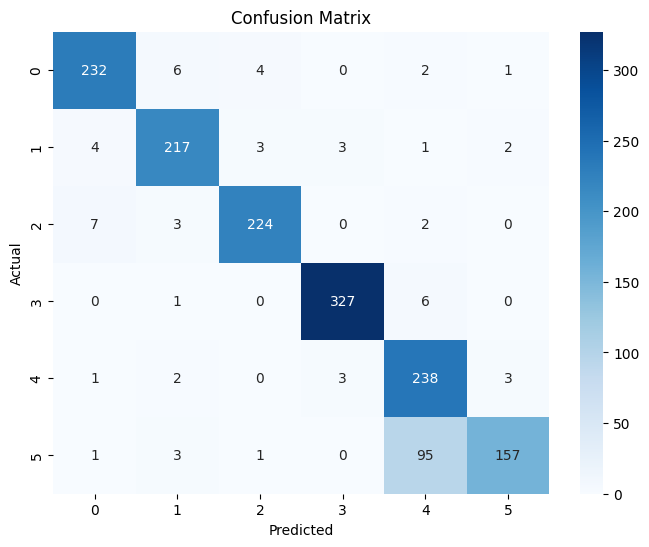

In [62]:

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming y_actu and y_pred are already defined

# Create the confusion matrix
cm = confusion_matrix(y_actu, y_pred)

# Plot the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y_actu), yticklabels=np.unique(y_actu))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


In [66]:
torch.save(model, '/content/drive/MyDrive/Colab Notebooks/CAP400C/final_model.pt')

In [67]:

model=torch.load('/content/drive/MyDrive/Colab Notebooks/CAP400C/final_model.pt')